# COMP9444

# Introduction, Motivation and Problem Statement

### Introduction:

Image style transfer technology, a fascinating area within computer vision, involves blending the artistic style of one image with the content of another. This process allows for the creation of visually stunning images that combine different aesthetic elements with the original structure of the content image. The technology's utility spans across various fields, including art, design, media production, and even the preservation of cultural heritage.


### Motivation and Problem Statement:

Despite its potential, the current state of image style transfer technology faces significant challenges. Traditional methods, primarily based on convolutional neural networks (CNNs), struggle with several issues:
- Ineffective capture and maintenance of global image information.
- Tendency to be fully connected, leading to a rapid increase in the number of parameters. This not only makes the models cumbersome to train but also hampers their ability to scale efficiently.
- The limitations in technology lead to biased content representations and subpar style transfer quality, which do not meet the high standards required in professional and creative settings.

Significantly improve the accuracy of content preservation and the quality of style application by using generative AI (GenAI) and generative adversarial networks (GAN) to obtain complex models that more effectively capture the global dependencies of images. Or we can use some methods to improve the speed of it.

# Data Sources or RL Tasks

We selected the style images from the WikiArt website based on two main criteria. Firstly, we sorted by count on the website and chose styles that had a larger number of images available. Secondly, since our training dataset primarily focuses on images with human faces, we opted for styles that included many portraits. These criteria helped us ensure that we have a diverse and representative set of styles for our project. Ultimately, we selected four styles: Biedermeier, Contemporary Realism, Impressionism and Ink and wash painting. Then, we wrote a script, using web scraping method to download the style datasets we need.

## Get data by using a web crawler.

In [15]:
# %load wikiart_spider.py
#!/usr/bin/env python


# beautifulsoup4 == 4.12.3
# requests == 2.28.2
# urllib3 == 1.26.0
from bs4 import BeautifulSoup
import os
import re
import urllib.request,urllib.error
#import sqlite3
import urllib.parse
from collections import *
#import gzip
#import xlwt
import json
import requests
import math
import time



#os.environ["HTTPS_PROXY"] = "http://127.0.0.1:XXXX" 
def askurl(url):
    head = {
    "User-Agent": "Mozilla / 5.0(Windows NT 10.0;WOW64) AppleWebKit / 537.36(KHTML, likeGecko) Chrome / 78.0.3904.108 Safari / 537.36"

    }
    request = urllib.request.Request(url,headers=head)
    html = ''

    try:
        response = urllib.request.urlopen(request)
        html = response.read().decode('utf-8')
        # print(html)
    except urllib.error.URLError as e:
        if hasattr(e,'code'):
            print(e.code)
        if hasattr(e,'reason'):
            print(e.reason)

    return html



def get_json(style,page=1):
    style_json_url='https://www.wikiart.org/en/paintings-by-style/'+str(style)+'?select=featured&json=2&layout=new&page='+str(page)+'&resultType=masonry'
    headers = {
    "User-Agent": "Mozilla / 5.0(Windows NT 10.0;WOW64) AppleWebKit / 537.36(KHTML, likeGecko) Chrome / 78.0.3904.108 Safari / 537.36",
    'Cookie':'ASP.NET_SessionId=mokcnzei4msmw4zbzaw2vab4; __RequestVerificationToken=HtVDYj66AW1IR28jvVd4R0U3RU-Z-esIICx0IgFvP_PHuIROaMNEO2kEpNFs4GHP6FEJyViPH2iDg6spqRZKKqe2ImRgQVOZxap766yvM4FNV2kiV0CkQo-wVaw3DCnLEh-5CA2; CssVersion=1; __attentive_id=e52347ca1df24449a5bec8ae0c58a629; __attentive_cco=1720589935838; _attn_=eyJ1Ijoie1wiY29cIjoxNzIwNTg5OTM2MjU4LFwidW9cIjoxNzIwNTg5OTM2MjU4LFwibWFcIjoyMTkwMCxcImluXCI6ZmFsc2UsXCJ2YWxcIjpcImU1MjM0N2NhMWRmMjQ0NDlhNWJlYzhhZTBjNThhNjI5XCJ9In0=; __attentive_dv=1; _ga=GA1.2.295049405.1720589938; _gid=GA1.2.1608519468.1720589938; __kla_id=eyJjaWQiOiJOR1F3TTJNek4yTXROV0UwWkMwMFpXTXpMVGs1T1dRdE9EQmlZamRpTnpWaE5qRTMiLCIkcmVmZXJyZXIiOnsidHMiOjE3MjA1ODk5MjEsInZhbHVlIjoiIiwiZmlyc3RfcGFnZSI6Imh0dHBzOi8vd3d3Lndpa2lhcnQub3JnL2VuL3BhaW50aW5ncy1ieS1zdHlsZS9pbmstYW5kLXdhc2gtcGFpbnRpbmc/c2VsZWN0PWZlYXR1cmVkIyEjZmlsdGVyTmFtZTpmZWF0dXJlZCx2aWV3VHlwZTptYXNvbnJ5In0sIiRsYXN0X3JlZmVycmVyIjp7InRzIjoxNzIwNTkxNzYwLCJ2YWx1ZSI6IiIsImZpcnN0X3BhZ2UiOiJodHRwczovL3d3dy53aWtpYXJ0Lm9yZy9lbi9wYWludGluZ3MtYnktc3R5bGUvaW5rLWFuZC13YXNoLXBhaW50aW5nP3NlbGVjdD1mZWF0dXJlZCMhI2ZpbHRlck5hbWU6ZmVhdHVyZWQsdmlld1R5cGU6bWFzb25yeSJ9fQ==; __attentive_pv=17; __attentive_ss_referrer=ORGANIC; _ga_0PDYZFNXRN=GS1.2.1720589938.1.1.1720591780.0.0.0; NoCache=176'

    }
    #print(style_json_url)
    response = requests.get(style_json_url, headers=headers)
    res_data = json.loads(response.text)
    return res_data

def get_fig(style,fig_url,title):
    #print(style, title+'.jpg')
    if os.path.exists(os.path.join(style, title+'.jpg')):
        
        #print(f"fig already exists.")
        pass
    else:
        headers = {
        "User-Agent": "Mozilla / 5.0(Windows NT 10.0;WOW64) AppleWebKit / 537.36(KHTML, likeGecko) Chrome / 78.0.3904.108 Safari / 537.36",
        }
        response = requests.get(fig_url, headers=headers)#timeout=5 
        with open(style+"/"+title+'.jpg', "wb") as file:
            file.write(response.content)
        
def remove_illegal_characters(filename):
    # Remove abnormal characters in the file name to prevent saving failure
    illegal_chars = r'[\\/:*?"<>|]'
    new_filename = re.sub(illegal_chars, '', filename)
    return new_filename




# Get all style_list
findstyle = re.compile(r'a href="/en/paintings-by-style/(.*?)" target="_self">')
html = askurl('https://www.wikiart.org/en/paintings-by-style')
soup = BeautifulSoup(html,"html.parser")
dottedItem_list = soup.find_all('li',class_="dottedItem")
style_list = []
for item in dottedItem_list:
    #print(type(item))
    style = re.findall(findstyle,str(item))[0]
    if '?' in style:
        style = style[:style.find("?")]
    style_list.append(style)


# Customized style list
style_list_customized =  ['impressionism','realism','romanticism','expressionism'] 

for style in style_list_customized:
    
    #print(style)
    print("####Creating style directory####")
    try:
        if not os.path.exists(str(style)):
            os.makedirs(str(style))
            print(f"style '{str(style)}' created successfully")
        else:
            print(f"style '{str(style)}' already exists")
    except OSError as e:
        print(f"Error: {e.strerror}")
    
    
    res_data = get_json(style,1)
    max_pages = math.ceil(res_data['AllPaintingsCount']/res_data['PageSize'])
    
    if res_data['Paintings'] != None:
        fig_url_list = [] # Get the fig_url of all pages in a style
        fig_title_list = []# Get the fig_name of all pages in a style
        for p in range(1,max_pages+1):
            res_data = get_json(style,p) # Get the current page json
            for i in range(0,len(res_data['Paintings'])):
                fig_url_list.append(res_data['Paintings'][i]['image'])# Get fig_url of current json, add to the list
                fig_title_list.append(remove_illegal_characters(res_data['Paintings'][i]['title']))# Get fig_name of current json, add to the list
                if res_data['Paintings'][i]['images'] != None: 
                    
                    print("existence subset")
                    
                    pattern = r"(https?://[^\s/$.?#].[^\s]*.jpg|https?://[^\s/$.?#].[^\s]*.JPG|https?://[^\s/$.?#].[^\s]*.png|https?://[^\s/$.?#].[^\s]*.PNG)"
                    sub_fig_url = re.findall(pattern, str(res_data['Paintings'][i]['images']))
                    fig_url_list.extend(sub_fig_url)
                    
                    sub_fig_name = [remove_illegal_characters(res_data['Paintings'][i]['title'])+str(kk+1) for kk in range(len(sub_fig_url))] 
                    fig_title_list.extend(sub_fig_name)
                    #print(sub_fig_url)
                    #print(sub_fig_name)
                    
        
        assert len(fig_url_list) == len(fig_title_list),'total number of links != total number of titles' 
        zipped_list = list(zip(fig_url_list, fig_title_list))
        for zipped in zipped_list:
            get_fig(style,zipped[0],zipped[1])
            #time.sleep(0.1) 

        print("####Style Completed####\n")
    #time.sleep(1) 
    
print("***********************************************")
print("**************All Style Completed**************")
print("***********************************************")




###'https://www.wikiart.org/en/paintings-by-style/'+str(style)+'?select=featured&json=2&layout=new&page='+str(page)+'&resultType=masonry'
###The JSON data format of this interface is###
'''
{
  "ArtistsHtml": null,
  "CanLoadMoreArtists": false,
  "Paintings": [
    {
      "id": "57728aaaedc2cb388011bb38",
      "title": "The Eight Noble Officials",
      "year": "735",
      "width": 3856,
      "height": 1000,
      "artistName": "Chen Hong",
      "image": "https://uploads0.wikiart.org/images/chen-hong/the-eight-noble-officials-735.jpg",
      "map": "01234567*",
      "paintingUrl": "/en/chen-hong/the-eight-noble-officials-735",
      "artistUrl": "/en/chen-hong",
      "albums": null,
      "flags": 2,
      "images": null
    },
    {
      "id": "57728aaaedc2cb388011bb4a",
      "title": "Detail",
      "year": "VIII cent.",
      "width": 550,
      "height": 880,
      "artistName": "Chen Hong",
      "image": "https://uploads4.wikiart.org/images/chen-hong/detail.jpg",
      "map": "01234*67*",
      "paintingUrl": "/en/chen-hong/detail",
      "artistUrl": "/en/chen-hong",
      "albums": null,
      "flags": 2,
      "images": null
    },
    
    ...............................
    ...............................
    ...............................

    ,
    {
      "id": "57728561edc2cb388000f418",
      "title": "Water Album - The Yellow River Breaches its Course",
      "year": "XII-XIII cent.",
      "width": 1280,
      "height": 839,
      "artistName": "Ma Yuan",
      "image": "https://uploads8.wikiart.org/images/ma-yuan/water-album-the-yellow-river-breaches-its-course.jpg",
      "map": "01234*67*",
      "paintingUrl": "/en/ma-yuan/water-album-the-yellow-river-breaches-its-course",
      "artistUrl": "/en/ma-yuan",
      "albums": null,
      "flags": 2,
      "images": null
    }
  ],
  "Artists": null,
  "AllArtistsCount": 0,
  "PaintingsHtml": null,
  "PaintingsHtmlBeta": null,
  "AllPaintingsCount": 821,
  "PageSize": 60,
  "TimeLog": null
}

'''


**Due to the large size of the initial dataset, we have decided to focus primarily on style transfer for portrait images.**

## Filtering Portrait Images

The first phase of filtering was conducted using the Haar feature cascade classifier, a machine-learning based object detection method that integrates the adaboost algorithm with Haar features for quick and precise detection. This step significantly reduced the dataset from 82,784 images to 18,181 images.

### Haar Feature cascade classifier

In [17]:
# %load getData.py
import os
import shutil
import cv2

def detect_faces(image_path):
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30), flags=cv2.CASCADE_SCALE_IMAGE)
    
    return len(faces) > 0

def copy_person_images(source_folder, destination_folder):
    os.makedirs(destination_folder, exist_ok=True)
    
    for filename in os.listdir(source_folder):
        file_path = os.path.join(source_folder, filename)
        
        if os.path.isfile(file_path) and filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            if detect_faces(file_path):
                shutil.copy(file_path, os.path.join(destination_folder, filename))
                print(f"Copy: {filename}")

source_folder = 'dataset/train_image'
destination_folder = 'dataset/train_image_1'

copy_person_images(source_folder, destination_folder)

### Yolov3

For the second phase of filtering, YOLOv3 was employed, known for its real-time object detection capabilities, which further refined the dataset to 12,764 images.

In [18]:
# %load getData1.py
# import cv2
# import numpy as np
# import os
# import shutil

# def load_yolo_model():
#     net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
#     layer_names = net.getLayerNames()
#     output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
#     return net, output_layers

# def detect_human(image_path, net, output_layers):
#     img = cv2.imread(image_path)
#     height, width = img.shape[:2]
#     blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
#     net.setInput(blob)
#     outs = net.forward(output_layers)

#     for out in outs:
#         for detection in out:
#             scores = detection[5:]
#             class_id = np.argmax(scores)
#             confidence = scores[class_id]
#             if class_id == 0 and confidence > 0.5:  # 0 is the class ID for 'person' in COCO dataset
#                 return True
#     return False

# def filter_and_move_images_with_humans(source_folder, destination_folder):
#     net, output_layers = load_yolo_model()
#     if not os.path.exists(destination_folder):
#         os.makedirs(destination_folder)
    
#     for filename in os.listdir(source_folder):
#         if filename.endswith((".jpg", ".jpeg", ".png")):
#             image_path = os.path.join(source_folder, filename)
#             if detect_human(image_path, net, output_layers):
#                 shutil.move(image_path, os.path.join(destination_folder, filename))
#                 print(f"Moved {filename} to {destination_folder}")

# source_folder = 'dataset/train_image'
# destination_folder = 'dataset/train_image_1'

# filter_and_move_images_with_humans(source_folder, destination_folder)


import cv2
import numpy as np
import os
import shutil

def load_yolo_model():
    net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
    layer_names = net.getLayerNames()
    unconnected_out_layers = net.getUnconnectedOutLayers()
    
    print("Unconnected Out Layers:", unconnected_out_layers)  # Debug information
    output_layers = [layer_names[i - 1] for i in unconnected_out_layers]
    return net, output_layers

def detect_human(image_path, net, output_layers):
    img = cv2.imread(image_path)
    height, width = img.shape[:2]
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if class_id == 0 and confidence > 0.5:  # 0 is the class ID for 'person' in COCO dataset
                return True
    return False

def filter_and_move_images_with_humans(source_folder, destination_folder):
    net, output_layers = load_yolo_model()
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)
    
    for filename in os.listdir(source_folder):
        if filename.endswith((".jpg", ".jpeg", ".png")):
            image_path = os.path.join(source_folder, filename)
            if detect_human(image_path, net, output_layers):
                shutil.move(image_path, os.path.join(destination_folder, filename))
                print(f"Moved {filename} to {destination_folder}")

source_folder = 'dataset/train_image'
destination_folder = 'dataset/train_image_1'
filter_and_move_images_with_humans(source_folder, destination_folder)


# Exploratory Analysis of Data or RL Tasks

To verify the proportion of face images within our dataset, we utilized MobileNetV2, ensuring precise identification and classification of facial features. MobileNetV2 was chosen as the face recognition model mainly because of its excellent performance in terms of efficiency, accuracy and adaptability. Its deeply separable convolution and inverse residual block design enable it to provide high-quality detection results in resource-limited environments.

## MobileNetV2

In [ ]:
# %load valData.py
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input, decode_predictions

model = MobileNetV2(weights='imagenet')

def is_portrait(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    
    predictions = model.predict(img_array)
    decoded_predictions = decode_predictions(predictions, top=3)[0]
    
    for _, label, confidence in decoded_predictions:
        if label in ['person', 'face']:
            return True
    return False

def calculate_portrait_ratio(dataset_path):
    total_images = 0
    portrait_images = 0
    
    for img_file in os.listdir(dataset_path):
        img_path = os.path.join(dataset_path, img_file)
        if img_path.lower().endswith(('.png', '.jpg', '.jpeg')):
            total_images += 1
            if is_portrait(img_path):
                portrait_images += 1
                
    if total_images == 0:
        return 0.0
    return portrait_images / total_images


dataset_path = 'dataset/train_image_1'
ratio = calculate_portrait_ratio(dataset_path)
print(f"Accuracy: {ratio * 100:.2f}%")


import os
import time
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input, decode_predictions

# Load the pre-trained MobileNetV2 model
model = MobileNetV2(weights='imagenet')

def is_portrait(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    
    predictions = model.predict(img_array)
    decoded_predictions = decode_predictions(predictions, top=3)[0]
    
    for _, label, confidence in decoded_predictions:
        if label in ['person', 'face']:
            return True
    return False

def calculate_portrait_ratio(dataset_path):
    total_images = 0
    portrait_images = 0
    start_time = time.time()
    
    # Test the first 100 images and calculate the average processing time
    test_limit = 100
    for i, img_file in enumerate(os.listdir(dataset_path)):
        img_path = os.path.join(dataset_path, img_file)
        if img_path.lower().endswith(('.png', '.jpg', '.jpeg')):
            if total_images < test_limit:
                is_portrait(img_path)
                total_images += 1
            else:
                break
    
    end_time = time.time()
    avg_time_per_image = (end_time - start_time) / total_images
    
    # Estimate the time required to process all images
    num_images = len([img for img in os.listdir(dataset_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))])
    estimated_total_time = num_images * avg_time_per_image
    
    # Output results
    print(f"Average per time: {avg_time_per_image:.4f} sec")
    print(f"Pic num: {num_images} : {estimated_total_time / 60:.2f} minute")
    
    # Start processing all images
    total_images = 0
    portrait_images = 0
    for img_file in os.listdir(dataset_path):
        img_path = os.path.join(dataset_path, img_file)
        if img_path.lower().endswith(('.png', '.jpg', '.jpeg')):
            total_images += 1
            if is_portrait(img_path):
                portrait_images += 1
                
    if total_images == 0:
        return 0.0
    return portrait_images / total_images

# Example dataset path
dataset_path = 'dataset/train_image_1'
ratio = calculate_portrait_ratio(dataset_path)
print(f"Acc Ratio: {ratio * 100:.2f}%")


After two rounds of data filtering, we achieved an impressive accuracy ratio of 88.03% (11,235 out of 12,764), which is essential for ensuring that subsequent analyses and models built on this data will provide meaningful and reliable insights. In order to ensure the robustness of our dataset and to avoid the pitfalls of overfitting, we have deliberately chosen not to delete the noise present in the data.

# Models and/or Methods

## The baseline model traning
python train.py --style_dir ./datasets/Images/ --content_dir ./datasets/train2014 --save_dir models/ --batch_size 4

Cause the training time is about 12+ hours, we only provide the results here.

### The test of the baseline

In [4]:
%run test.py  --content_dir input/content/ --style_dir input/style/    --output out

2
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>


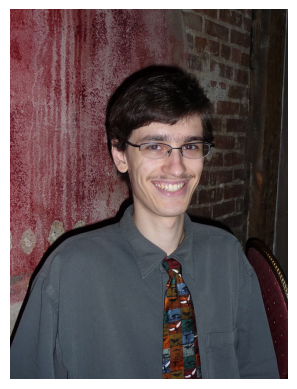

In [12]:
import cv2
import matplotlib.pyplot as plt

image_path = 'input/content/1.jpg' 
image = cv2.imread(image_path)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image_rgb)
plt.axis('off') 
plt.show()


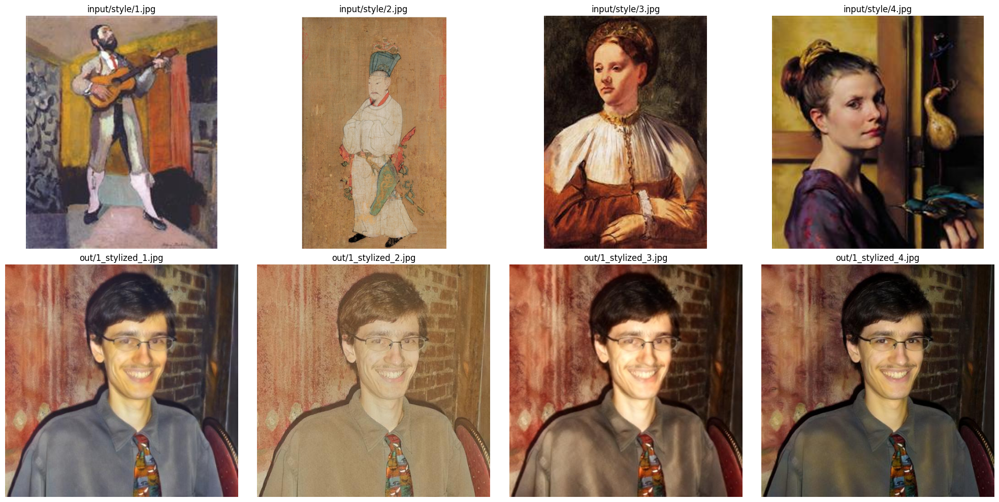

In [15]:
import cv2
import matplotlib.pyplot as plt


image_paths = [
    'input/style/1.jpg', 'input/style/2.jpg', 'input/style/3.jpg', 'input/style/4.jpg',
    'out/1_stylized_1.jpg', 'out/1_stylized_2.jpg', 'out/1_stylized_3.jpg', 'out/1_stylized_4.jpg'
]  

images = [cv2.imread(path) for path in image_paths]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, img, path in zip(axes.flatten(), images, image_paths):
    if img is not None:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        ax.axis('off')
        ax.set_title(path)

plt.tight_layout()
plt.show()


## Train our model with GAN

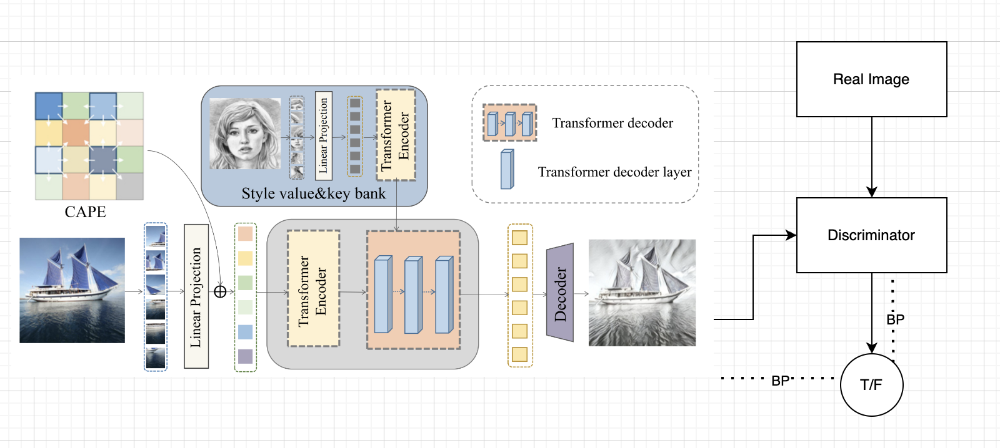

In [18]:
from IPython.display import display, Image

path = "model.png"
display(Image(filename=path))

Our model is a Generative Adversarial Networks(GAN)

Our generator is based on the StyTr2 model, which will provide some fake data. And our discriminator is trying to distinguish the fake data from all data including the correct ones. The discriminator will give each picture a label which is true of false. And based on the result, it will give feedback to the generator and discriminator by backpropagation. During the game between the generator and discriminator, both become more and more powerful and that’s what we are willing to see.  

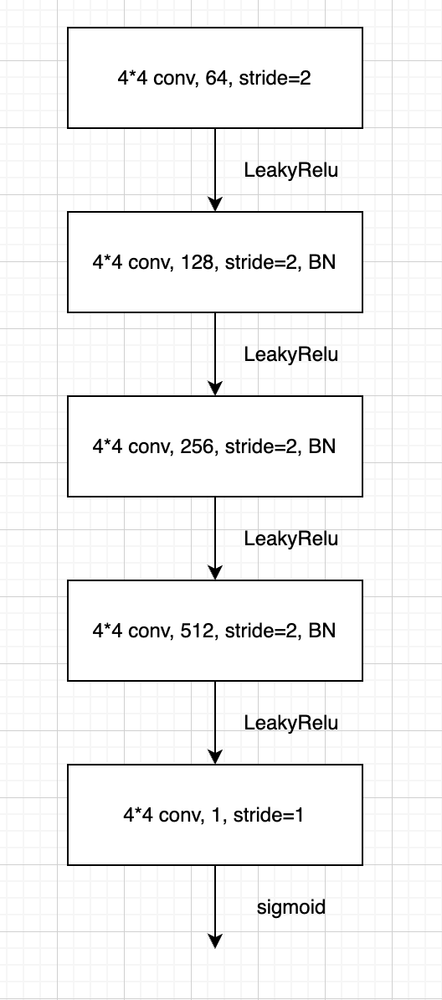

In [19]:
path = "dis_model.png"
display(Image(filename=path))

And in this picture, it’s the structure of our discriminator, which include several layers with LeakyRelu as their activate function, and the last layer with sigmoid.

In [20]:
# %load train2.py
import argparse
import os
import torch
import torch.nn as nn
import torch.utils.data as data
from PIL import Image
from PIL import ImageFile
from tensorboardX import SummaryWriter
from torchvision import transforms
from tqdm import tqdm
from pathlib import Path
import models.transformer as transformer
import models.StyTR  as StyTR 
from sampler import InfiniteSamplerWrapper
from torchvision.utils import save_image

def train_transform():
    transform_list = [
        transforms.Resize(size=(512, 512)),
        transforms.RandomCrop(256),
        transforms.ToTensor()
    ]
    return transforms.Compose(transform_list)

class FlatFolderDataset(data.Dataset):
    def __init__(self, root, transform):
        super(FlatFolderDataset, self).__init__()
        self.root = root
        print(self.root)
        self.path = os.listdir(self.root)
        if os.path.isdir(os.path.join(self.root, self.path[0])):
            self.paths = []
            for file_name in os.listdir(self.root):
                for file_name1 in os.listdir(os.path.join(self.root, file_name)):
                    self.paths.append(self.root + "/" + file_name + "/" + file_name1)
        else:
            self.paths = list(Path(self.root).glob('*'))
        self.transform = transform

    def __getitem__(self, index):
        path = self.paths[index]
        img = Image.open(str(path)).convert('RGB')
        img = self.transform(img)
        return img

    def __len__(self):
        return len(self.paths)

    def name(self):
        return 'FlatFolderDataset'

def adjust_learning_rate(optimizer, iteration_count):
    """Imitating the original implementation"""
    lr = 2e-4 / (1.0 + args.lr_decay * (iteration_count - 1e4))
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

def warmup_learning_rate(optimizer, iteration_count):
    """Imitating the original implementation"""
    lr = args.lr * 0.1 * (1.0 + 3e-4 * iteration_count)
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

parser = argparse.ArgumentParser()
# Basic options
parser.add_argument('--content_dir', default='./datasets/train2014', type=str,   
                    help='Directory path to a batch of content images')
parser.add_argument('--style_dir', default='./datasets/Images', type=str,  # wikiart dataset crawled from https://www.wikiart.org/
                    help='Directory path to a batch of style images')
parser.add_argument('--vgg', type=str, default='./experiments/vgg_normalised.pth')  # run the train.py, please download the pretrained vgg checkpoint

# training options
parser.add_argument('--save_dir', default='./experiments',
                    help='Directory to save the model')
parser.add_argument('--log_dir', default='./logs',
                    help='Directory to save the log')
parser.add_argument('--lr', type=float, default=5e-4)
parser.add_argument('--lr_decay', type=float, default=1e-5)
# parser.add_argument('--max_iter', type=int, default=160000)
parser.add_argument('--max_iter', type=int, default=160000)
parser.add_argument('--batch_size', type=int, default=8)
parser.add_argument('--style_weight', type=float, default=10.0)
parser.add_argument('--content_weight', type=float, default=7.0)
parser.add_argument('--gan_weight', type=float, default=1.0)
parser.add_argument('--n_threads', type=int, default=16)
parser.add_argument('--save_model_interval', type=int, default=10000)
parser.add_argument('--position_embedding', default='sine', type=str, choices=('sine', 'learned'),
                    help="Type of positional embedding to use on top of the image features")
parser.add_argument('--hidden_dim', default=512, type=int,
                    help="Size of the embeddings (dimension of the transformer)")
args = parser.parse_args()

USE_CUDA = torch.cuda.is_available()
print(USE_CUDA)
print(torch.cuda.device_count())

device = torch.device("cuda" if USE_CUDA else "cpu")

if not os.path.exists(args.save_dir):
    os.makedirs(args.save_dir)

if not os.path.exists(args.log_dir):
    os.mkdir(args.log_dir)
writer = SummaryWriter(log_dir=args.log_dir)

vgg = StyTR.vgg
vgg.load_state_dict(torch.load(args.vgg))
vgg = nn.Sequential(*list(vgg.children())[:44])

decoder = StyTR.decoder
embedding = StyTR.PatchEmbed()
Trans = transformer.Transformer()
with torch.no_grad():
    network = StyTR.StyTrans(vgg, decoder, embedding, Trans, args)
network.train()

network.to(device)
network = nn.DataParallel(network, device_ids=[0, 1])
content_tf = train_transform()
style_tf = train_transform()

content_dataset = FlatFolderDataset(args.content_dir, content_tf)
style_dataset = FlatFolderDataset(args.style_dir, style_tf)

content_iter = iter(data.DataLoader(
    content_dataset, batch_size=args.batch_size,
    sampler=InfiniteSamplerWrapper(content_dataset),
    num_workers=args.n_threads))
style_iter = iter(data.DataLoader(
    style_dataset, batch_size=args.batch_size,
    sampler=InfiniteSamplerWrapper(style_dataset),
    num_workers=args.n_threads))

optimizer = torch.optim.Adam([
    {'params': network.module.transformer.parameters()},
    {'params': network.module.decode.parameters()},
    {'params': network.module.embedding.parameters()},
], lr=args.lr)

if not os.path.exists(args.save_dir + "/test"):
    os.makedirs(args.save_dir + "/test")

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid()
        )

    def forward(self, img):
        return self.model(img)

discriminator = Discriminator().to(device)
discriminator = nn.DataParallel(discriminator, device_ids=[0, 1])

optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=args.lr)

adversarial_loss = nn.BCELoss()

for i in tqdm(range(args.max_iter)):
    if i < 1e4:
        warmup_learning_rate(optimizer, iteration_count=i)
        warmup_learning_rate(optimizer_D, iteration_count=i)
    else:
        adjust_learning_rate(optimizer, iteration_count=i)
        adjust_learning_rate(optimizer_D, iteration_count=i)

    content_images = next(content_iter).to(device)
    style_images = next(style_iter).to(device)
    
    # Generator FP
    out, loss_c, loss_s, l_identity1, l_identity2 = network(content_images, style_images)
    
    # discriminator FP
    pred_fake = discriminator(out)
    
    # adversarial labels
    valid = torch.ones(pred_fake.size(), requires_grad=False).to(device)
    fake = torch.zeros(pred_fake.size(), requires_grad=False).to(device)
    
    optimizer.zero_grad()
    
    # GAN loss
    g_loss = adversarial_loss(pred_fake, valid)
    
    # Total loss
    loss_c = args.content_weight * loss_c
    loss_s = args.style_weight * loss_s
    loss = loss_c + loss_s + (l_identity1 * 70) + (l_identity2 * 1) + args.gan_weight * g_loss
    
    print(loss.sum().cpu().detach().numpy(), "-content:", loss_c.sum().cpu().detach().numpy(), "-style:", loss_s.sum().cpu().detach().numpy(),
          "-l1:", l_identity1.sum().cpu().detach().numpy(), "-l2:", l_identity2.sum().cpu().detach().numpy(), "-g_loss:", g_loss.sum().cpu().detach().numpy())
    
    loss.sum().backward()
    optimizer.step()
    
    # Train Discriminator
    optimizer_D.zero_grad()
    
    pred_real = discriminator(style_images)
    d_real_loss = adversarial_loss(pred_real, valid)
    
    pred_fake = discriminator(out.detach())
    d_fake_loss = adversarial_loss(pred_fake, fake)
    
    d_loss = (d_real_loss + d_fake_loss) / 2
    
    d_loss.backward()
    optimizer_D.step()
    
    writer.add_scalar('loss_content', loss_c.sum().item(), i + 1)
    writer.add_scalar('loss_style', loss_s.sum().item(), i + 1)
    writer.add_scalar('loss_identity1', l_identity1.sum().item(), i + 1)
    writer.add_scalar('loss_identity2', l_identity2.sum().item(), i + 1)
    writer.add_scalar('total_loss', loss.sum().item(), i + 1)
    writer.add_scalar('g_loss', g_loss.sum().item(), i + 1)
    writer.add_scalar('d_loss', d_loss.sum().item(), i + 1)

    if i % 100 == 0:
        output_name = '{:s}/test/{:s}{:s}'.format(
            args.save_dir, str(i), ".jpg"
        )
        out = torch.cat((content_images, out), 0)
        out = torch.cat((style_images, out), 0)
        save_image(out, output_name)

    if (i + 1) % args.save_model_interval == 0 or (i + 1) == args.max_iter:
        state_dict = network.module.transformer.state_dict()
        for key in state_dict.keys():
            state_dict[key] = state_dict[key].to(torch.device('cpu'))
        torch.save(state_dict,
                   '{:s}/transformer_iter_{:d}.pth'.format(args.save_dir,
                                                           i + 1))

        state_dict = network.module.decode.state_dict()
        for key in state_dict.keys():
            state_dict[key] = state_dict[key].to(torch.device('cpu'))
        torch.save(state_dict,
                   '{:s}/decoder_iter_{:d}.pth'.format(args.save_dir,
                                                           i + 1))
        state_dict = network.module.embedding.state_dict()
        for key in state_dict.keys():
            state_dict[key] = state_dict[key].to(torch.device('cpu'))
        torch.save(state_dict,
                   '{:s}/embedding_iter_{:d}.pth'.format(args.save_dir,
                                                           i + 1))

writer.close()


In [ ]:
%run train2.py --style_dir ./datasets/Images/ --content_dir ./datasets/train2014 --save_dir models/ --batch_size 4

True
2
./datasets/train2014
./datasets/Images/


  0%|          | 0/160000 [00:00<?, ?it/s]/comp9444/StyTR-2/comp9444_2/lib/python3.10/site-packages/torch/nn/parallel/_functions.py:68: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn('Was asked to gather along dimension 0, but all '


378.88788 -content: 55.003784 -style: 191.1022 -l1: 0.8993659 -l2: 68.21727 -g_loss: 0.80450934


  0%|          | 2/160000 [00:02<45:19:27,  1.02s/it]

403.60318 -content: 54.417816 -style: 237.06128 -l1: 0.27614385 -l2: 91.34864 -g_loss: 0.722699


  0%|          | 3/160000 [00:02<29:54:07,  1.49it/s]

265.19534 -content: 54.18643 -style: 129.02312 -l1: 0.34237027 -l2: 56.59703 -g_loss: 0.71142626


  0%|          | 4/160000 [00:02<22:38:27,  1.96it/s]

339.9906 -content: 53.79004 -style: 190.19629 -l1: 0.29054636 -l2: 74.14224 -g_loss: 0.7619068


  0%|          | 5/160000 [00:03<18:50:24,  2.36it/s]

357.12262 -content: 53.93182 -style: 180.27975 -l1: 0.38068175 -l2: 94.69442 -g_loss: 0.7844571


  0%|          | 6/160000 [00:03<16:28:53,  2.70it/s]

382.8501 -content: 53.977684 -style: 213.1505 -l1: 0.37196228 -l2: 88.1268 -g_loss: 0.7788699


  0%|          | 7/160000 [00:03<14:57:22,  2.97it/s]

316.0302 -content: 53.26114 -style: 146.36688 -l1: 0.3863107 -l2: 87.80497 -g_loss: 0.7777452


  0%|          | 8/160000 [00:03<14:01:32,  3.17it/s]

364.78513 -content: 53.547104 -style: 205.05058 -l1: 0.35480773 -l2: 79.537735 -g_loss: 0.9065784


  0%|          | 9/160000 [00:04<13:28:09,  3.30it/s]

337.12402 -content: 53.921486 -style: 165.33963 -l1: 0.5163821 -l2: 79.752914 -g_loss: 0.9816217


  0%|          | 10/160000 [00:04<13:01:09,  3.41it/s]

343.53516 -content: 53.532913 -style: 179.54732 -l1: 0.35829076 -l2: 83.34381 -g_loss: 1.0153681


  0%|          | 11/160000 [00:04<13:13:21,  3.36it/s]

355.19824 -content: 53.404564 -style: 177.0415 -l1: 0.3719973 -l2: 96.82024 -g_loss: 0.94606787


  0%|          | 12/160000 [00:05<12:48:42,  3.47it/s]

259.41702 -content: 53.786224 -style: 117.11151 -l1: 0.24497643 -l2: 69.71405 -g_loss: 0.8284393


  0%|          | 13/160000 [00:05<12:42:04,  3.50it/s]

268.94495 -content: 53.65268 -style: 132.59215 -l1: 0.19925767 -l2: 66.83066 -g_loss: 0.9607037


  0%|          | 14/160000 [00:05<12:30:31,  3.55it/s]

263.32294 -content: 53.659462 -style: 114.888306 -l1: 0.3185115 -l2: 70.31617 -g_loss: 1.0815856


  0%|          | 15/160000 [00:05<12:20:24,  3.60it/s]

269.94318 -content: 54.232162 -style: 123.48883 -l1: 0.26771036 -l2: 71.18177 -g_loss: 1.1503484


  0%|          | 16/160000 [00:06<12:17:25,  3.62it/s]

336.78577 -content: 53.861397 -style: 187.15063 -l1: 0.2481944 -l2: 76.06873 -g_loss: 1.1657006


  0%|          | 17/160000 [00:06<12:31:09,  3.55it/s]

273.66205 -content: 53.656975 -style: 117.32682 -l1: 0.28267467 -l2: 80.95124 -g_loss: 0.96988654


  0%|          | 18/160000 [00:06<12:28:29,  3.56it/s]

274.77744 -content: 53.929718 -style: 125.40952 -l1: 0.2337755 -l2: 77.18317 -g_loss: 0.94537073


  0%|          | 19/160000 [00:07<12:25:36,  3.58it/s]

199.02805 -content: 54.1026 -style: 74.2619 -l1: 0.28233144 -l2: 48.44276 -g_loss: 1.2288014


  0%|          | 20/160000 [00:07<12:21:37,  3.60it/s]

288.42047 -content: 53.846825 -style: 140.45688 -l1: 0.25603256 -l2: 73.00134 -g_loss: 1.596565


  0%|          | 21/160000 [00:07<12:26:11,  3.57it/s]

345.46478 -content: 53.799927 -style: 182.28766 -l1: 0.30976337 -l2: 84.67168 -g_loss: 1.5110347


  0%|          | 22/160000 [00:07<12:24:28,  3.58it/s]

378.9674 -content: 54.035545 -style: 178.01859 -l1: 0.5575366 -l2: 104.92587 -g_loss: 1.4799067


  0%|          | 23/160000 [00:08<12:11:19,  3.65it/s]

345.294 -content: 53.3982 -style: 188.89555 -l1: 0.28440028 -l2: 80.270325 -g_loss: 1.4109441


  0%|          | 24/160000 [00:08<12:18:19,  3.61it/s]

451.03156 -content: 53.467083 -style: 275.6602 -l1: 0.43753713 -l2: 88.9176 -g_loss: 1.1795549


  0%|          | 25/160000 [00:08<12:26:51,  3.57it/s]

366.88702 -content: 53.350044 -style: 183.31612 -l1: 0.5363843 -l2: 90.29774 -g_loss: 1.1881102


  0%|          | 26/160000 [00:08<12:27:12,  3.57it/s]

294.42224 -content: 53.751503 -style: 136.45204 -l1: 0.34797877 -l2: 77.968506 -g_loss: 0.9458327


  0%|          | 27/160000 [00:09<12:25:30,  3.58it/s]

259.23346 -content: 53.601906 -style: 116.29418 -l1: 0.2682827 -l2: 67.96638 -g_loss: 1.2956051


  0%|          | 28/160000 [00:09<12:21:40,  3.59it/s]

277.05847 -content: 53.854164 -style: 123.197784 -l1: 0.26613313 -l2: 78.787445 -g_loss: 1.2948921


  0%|          | 29/160000 [00:09<12:18:00,  3.61it/s]

360.02875 -content: 53.48925 -style: 183.85316 -l1: 0.36760658 -l2: 94.36348 -g_loss: 1.29519


  0%|          | 30/160000 [00:10<12:23:47,  3.58it/s]

266.2948 -content: 53.638546 -style: 101.372284 -l1: 0.35326162 -l2: 84.20804 -g_loss: 1.1738131


  0%|          | 31/160000 [00:10<12:25:37,  3.58it/s]

279.93103 -content: 53.164925 -style: 132.37181 -l1: 0.21330597 -l2: 76.72148 -g_loss: 1.3706949


  0%|          | 32/160000 [00:10<12:19:04,  3.61it/s]

249.79439 -content: 53.11331 -style: 115.346466 -l1: 0.2409362 -l2: 62.072052 -g_loss: 1.1985196


  0%|          | 33/160000 [00:10<12:19:45,  3.60it/s]

307.70493 -content: 53.64209 -style: 143.56036 -l1: 0.2095198 -l2: 92.81503 -g_loss: 1.5105338


  0%|          | 34/160000 [00:11<12:29:12,  3.56it/s]

350.6614 -content: 53.358566 -style: 188.39659 -l1: 0.3146935 -l2: 84.42844 -g_loss: 1.2246177


  0%|          | 35/160000 [00:11<12:31:29,  3.55it/s]

248.77963 -content: 53.42357 -style: 99.60625 -l1: 0.23670673 -l2: 76.16687 -g_loss: 1.5067428


  0%|          | 36/160000 [00:11<12:27:46,  3.57it/s]

353.5199 -content: 52.84845 -style: 199.80844 -l1: 0.24071538 -l2: 80.16251 -g_loss: 1.9252074


  0%|          | 37/160000 [00:12<12:22:34,  3.59it/s]

266.66855 -content: 52.274918 -style: 124.9497 -l1: 0.19312853 -l2: 71.95745 -g_loss: 1.9837459


  0%|          | 38/160000 [00:12<12:36:43,  3.52it/s]

208.57312 -content: 52.803238 -style: 78.55867 -l1: 0.21983603 -l2: 57.894264 -g_loss: 1.9642158


  0%|          | 39/160000 [00:12<14:06:32,  3.15it/s]

337.78632 -content: 52.41017 -style: 201.94485 -l1: 0.19356517 -l2: 66.97606 -g_loss: 1.4528373


  0%|          | 40/160000 [00:13<13:39:01,  3.26it/s]

295.79657 -content: 52.04238 -style: 132.7893 -l1: 0.21130957 -l2: 93.12011 -g_loss: 1.5265495


  0%|          | 41/160000 [00:13<13:16:43,  3.35it/s]

273.19403 -content: 52.626568 -style: 117.71863 -l1: 0.22699597 -l2: 86.04997 -g_loss: 0.45457911


  0%|          | 42/160000 [00:13<13:03:17,  3.40it/s]

339.86627 -content: 52.01092 -style: 181.74744 -l1: 0.19083017 -l2: 91.28967 -g_loss: 0.7300681


  0%|          | 43/160000 [00:13<12:47:59,  3.47it/s]

386.46176 -content: 52.633423 -style: 228.90363 -l1: 0.19940695 -l2: 87.386246 -g_loss: 1.7899952


  0%|          | 44/160000 [00:14<12:45:26,  3.48it/s]

263.8733 -content: 51.53884 -style: 113.56572 -l1: 0.20336324 -l2: 81.86151 -g_loss: 1.3358928


  0%|          | 45/160000 [00:14<12:37:34,  3.52it/s]

217.71365 -content: 51.184715 -style: 81.16551 -l1: 0.1005965 -l2: 76.12268 -g_loss: 1.0994875


  0%|          | 46/160000 [00:14<12:34:59,  3.53it/s]

233.07812 -content: 50.5775 -style: 90.98885 -l1: 0.10613869 -l2: 82.68592 -g_loss: 0.6980738


  0%|          | 47/160000 [00:14<12:27:50,  3.56it/s]

256.51102 -content: 50.2434 -style: 118.990265 -l1: 0.14908251 -l2: 75.38382 -g_loss: 0.72887814


  0%|          | 48/160000 [00:15<12:25:03,  3.58it/s]

253.1915 -content: 49.514996 -style: 121.02054 -l1: 0.1190968 -l2: 73.292786 -g_loss: 0.51319873


  0%|          | 49/160000 [00:15<12:29:23,  3.56it/s]

274.38513 -content: 49.076244 -style: 148.59781 -l1: 0.09172408 -l2: 68.63752 -g_loss: 0.8264274


  0%|          | 50/160000 [00:15<12:24:06,  3.58it/s]

266.0319 -content: 49.498062 -style: 125.4379 -l1: 0.12382206 -l2: 80.04533 -g_loss: 1.1915303


  0%|          | 51/160000 [00:16<12:27:17,  3.57it/s]

268.88916 -content: 48.61601 -style: 139.12088 -l1: 0.13907005 -l2: 68.99632 -g_loss: 1.2105316


  0%|          | 52/160000 [00:16<12:24:04,  3.58it/s]

285.3963 -content: 48.849583 -style: 151.40756 -l1: 0.1468746 -l2: 71.4092 -g_loss: 1.7243655


  0%|          | 53/160000 [00:16<12:25:01,  3.58it/s]

203.26857 -content: 48.251713 -style: 89.02548 -l1: 0.12054235 -l2: 54.32626 -g_loss: 1.6135677


  0%|          | 54/160000 [00:16<12:25:38,  3.58it/s]

266.2662 -content: 49.234913 -style: 120.8932 -l1: 0.1353035 -l2: 83.36131 -g_loss: 1.6527653


  0%|          | 55/160000 [00:17<12:23:29,  3.59it/s]

272.72467 -content: 48.30117 -style: 126.26343 -l1: 0.14888987 -l2: 84.5018 -g_loss: 1.6180001


  0%|          | 56/160000 [00:17<12:15:48,  3.62it/s]

277.99298 -content: 48.155586 -style: 137.37596 -l1: 0.16637132 -l2: 77.89915 -g_loss: 1.4581549


  0%|          | 57/160000 [00:17<12:15:08,  3.63it/s]

212.41515 -content: 49.35372 -style: 91.356155 -l1: 0.112214714 -l2: 61.309963 -g_loss: 1.270138


  0%|          | 58/160000 [00:18<12:16:18,  3.62it/s]

228.80804 -content: 48.581547 -style: 90.409546 -l1: 0.1047456 -l2: 80.65483 -g_loss: 0.9149596


  0%|          | 59/160000 [00:18<12:15:24,  3.62it/s]

234.92049 -content: 46.6352 -style: 108.93794 -l1: 0.103672005 -l2: 70.91678 -g_loss: 0.5867588


  0%|          | 60/160000 [00:18<12:14:50,  3.63it/s]

260.29382 -content: 47.455345 -style: 113.67372 -l1: 0.14753944 -l2: 87.44753 -g_loss: 0.6947347


  0%|          | 61/160000 [00:18<12:21:02,  3.60it/s]

246.962 -content: 48.83441 -style: 126.017815 -l1: 0.14646548 -l2: 60.67943 -g_loss: 0.5888838


  0%|          | 62/160000 [00:19<12:19:04,  3.61it/s]

196.87836 -content: 47.75104 -style: 72.68429 -l1: 0.1729761 -l2: 62.662025 -g_loss: 0.8363379


  0%|          | 63/160000 [00:19<12:18:30,  3.61it/s]

194.18567 -content: 47.414955 -style: 71.84584 -l1: 0.10961779 -l2: 64.6709 -g_loss: 1.2903614


  0%|          | 64/160000 [00:19<12:21:17,  3.60it/s]

248.77834 -content: 47.1548 -style: 122.62278 -l1: 0.09924608 -l2: 69.23895 -g_loss: 1.407287


  0%|          | 65/160000 [00:19<12:23:28,  3.59it/s]

198.27104 -content: 46.79657 -style: 81.097046 -l1: 0.1365538 -l2: 57.785797 -g_loss: 1.5164355


  0%|          | 66/160000 [00:20<12:18:40,  3.61it/s]

334.1195 -content: 47.815643 -style: 185.11264 -l1: 0.16432503 -l2: 86.229805 -g_loss: 1.7293329


  0%|          | 67/160000 [00:20<12:19:31,  3.60it/s]

189.13705 -content: 46.329475 -style: 73.84204 -l1: 0.08600186 -l2: 59.758884 -g_loss: 1.5932585


  0%|          | 68/160000 [00:20<12:16:43,  3.62it/s]

192.89627 -content: 47.297935 -style: 79.8734 -l1: 0.092146546 -l2: 56.583157 -g_loss: 1.3457642


  0%|          | 69/160000 [00:21<12:19:21,  3.61it/s]

239.55264 -content: 45.78409 -style: 87.46036 -l1: 0.14306605 -l2: 93.76875 -g_loss: 1.2624098


  0%|          | 70/160000 [00:21<12:18:46,  3.61it/s]

188.52626 -content: 47.38561 -style: 57.015068 -l1: 0.11496514 -l2: 73.50893 -g_loss: 1.2845447


  0%|          | 71/160000 [00:21<12:16:56,  3.62it/s]

213.25589 -content: 46.94366 -style: 92.181335 -l1: 0.09831322 -l2: 64.752594 -g_loss: 1.2481841


  0%|          | 72/160000 [00:21<12:14:09,  3.63it/s]

277.74036 -content: 47.037018 -style: 124.18659 -l1: 0.10456661 -l2: 96.65732 -g_loss: 1.2698841


  0%|          | 73/160000 [00:22<12:26:20,  3.57it/s]

229.2268 -content: 45.596447 -style: 103.81169 -l1: 0.096918404 -l2: 70.295204 -g_loss: 1.3695921


  0%|          | 74/160000 [00:22<12:26:18,  3.57it/s]

265.53937 -content: 46.93596 -style: 124.86595 -l1: 0.1108543 -l2: 83.3436 -g_loss: 1.317032


  0%|          | 75/160000 [00:22<12:26:50,  3.57it/s]

201.07538 -content: 45.404892 -style: 84.70924 -l1: 0.07967858 -l2: 63.503204 -g_loss: 0.9402657


  0%|          | 76/160000 [00:23<12:25:33,  3.58it/s]

238.40836 -content: 47.942535 -style: 102.051926 -l1: 0.10501584 -l2: 78.666466 -g_loss: 1.1981575


  0%|          | 77/160000 [00:23<12:25:51,  3.57it/s]

225.29611 -content: 46.388268 -style: 102.364044 -l1: 0.08180171 -l2: 68.17989 -g_loss: 1.318903


  0%|          | 78/160000 [00:23<12:20:02,  3.60it/s]

201.72525 -content: 46.022404 -style: 91.46928 -l1: 0.0771596 -l2: 56.30312 -g_loss: 1.2646472


  0%|          | 79/160000 [00:23<12:15:51,  3.62it/s]

246.73013 -content: 46.470436 -style: 107.54372 -l1: 0.14090179 -l2: 79.75568 -g_loss: 1.5485882


  0%|          | 80/160000 [00:24<12:19:30,  3.60it/s]

233.81924 -content: 45.636894 -style: 100.346344 -l1: 0.12812626 -l2: 75.84441 -g_loss: 1.5113829


  0%|          | 81/160000 [00:24<12:20:34,  3.60it/s]

248.7584 -content: 45.292336 -style: 89.61363 -l1: 0.15172404 -l2: 100.58151 -g_loss: 1.3251182


  0%|          | 82/160000 [00:24<12:17:16,  3.62it/s]

199.49512 -content: 45.80091 -style: 82.150085 -l1: 0.084742546 -l2: 62.63511 -g_loss: 1.4885166


  0%|          | 83/160000 [00:24<12:21:23,  3.60it/s]

234.55574 -content: 44.66727 -style: 103.10419 -l1: 0.15865938 -l2: 72.67943 -g_loss: 1.4993483


  0%|          | 84/160000 [00:25<12:18:44,  3.61it/s]

219.45508 -content: 47.65429 -style: 78.6631 -l1: 0.19382676 -l2: 76.5432 -g_loss: 1.5133072


  0%|          | 85/160000 [00:25<12:17:15,  3.62it/s]

203.58606 -content: 45.412315 -style: 68.36897 -l1: 0.1370945 -l2: 77.14227 -g_loss: 1.5329366


  0%|          | 86/160000 [00:25<12:22:31,  3.59it/s]

272.6526 -content: 43.430897 -style: 151.61397 -l1: 0.104542114 -l2: 67.39644 -g_loss: 1.4466634


  0%|          | 87/160000 [00:26<12:21:26,  3.59it/s]

258.6953 -content: 45.50029 -style: 110.120834 -l1: 0.12094799 -l2: 90.92732 -g_loss: 1.8402365


  0%|          | 88/160000 [00:26<12:17:14,  3.62it/s]

227.49846 -content: 46.36197 -style: 94.00917 -l1: 0.11075741 -l2: 75.84575 -g_loss: 1.7642837
247.92921 -content: 45.29001 -style: 113.80334 -l1: 0.139163 -l2: 76.23026 -g_loss: 1.4321012


  0%|          | 90/160000 [00:26<12:38:16,  3.51it/s]

343.65784 -content: 44.75824 -style: 209.52414 -l1: 0.11090362 -l2: 78.92323 -g_loss: 1.3444891


  0%|          | 91/160000 [00:27<12:32:43,  3.54it/s]

238.24432 -content: 45.652752 -style: 99.473434 -l1: 0.11297785 -l2: 83.09172 -g_loss: 1.0589851


  0%|          | 92/160000 [00:27<12:35:10,  3.53it/s]

209.8368 -content: 45.60595 -style: 89.01297 -l1: 0.1222868 -l2: 64.301285 -g_loss: 1.1782719


  0%|          | 93/160000 [00:27<12:34:46,  3.53it/s]

248.6019 -content: 45.870804 -style: 109.78255 -l1: 0.11451726 -l2: 83.03331 -g_loss: 0.9495258


  0%|          | 94/160000 [00:28<12:31:06,  3.55it/s]

261.18164 -content: 46.13602 -style: 120.857635 -l1: 0.10452521 -l2: 85.100235 -g_loss: 0.88548034


  0%|          | 95/160000 [00:28<12:34:08,  3.53it/s]

200.45744 -content: 44.72863 -style: 77.766785 -l1: 0.08781455 -l2: 70.395905 -g_loss: 0.7095435


  0%|          | 96/160000 [00:28<12:29:18,  3.56it/s]

193.4678 -content: 41.958817 -style: 84.326645 -l1: 0.09062591 -l2: 57.957527 -g_loss: 1.4405046


  0%|          | 97/160000 [00:28<12:27:43,  3.56it/s]

224.8651 -content: 43.22557 -style: 103.09349 -l1: 0.10473547 -l2: 67.43667 -g_loss: 1.8889443


  0%|          | 98/160000 [00:29<12:39:36,  3.51it/s]

247.31534 -content: 43.365265 -style: 109.23397 -l1: 0.13099581 -l2: 81.067825 -g_loss: 2.2392814


  0%|          | 99/160000 [00:29<12:33:01,  3.54it/s]

284.73425 -content: 42.369377 -style: 158.84224 -l1: 0.11153941 -l2: 72.06625 -g_loss: 1.8243228


  0%|          | 100/160000 [00:29<12:35:34,  3.53it/s]

218.94862 -content: 44.705635 -style: 102.60719 -l1: 0.10411546 -l2: 61.75283 -g_loss: 1.2974354
218.34903 -content: 43.806026 -style: 88.412506 -l1: 0.13685471 -l2: 74.398735 -g_loss: 1.0759666


  0%|          | 102/160000 [00:30<12:38:19,  3.51it/s]

180.60577 -content: 45.081825 -style: 63.49224 -l1: 0.11039303 -l2: 62.801968 -g_loss: 0.75110495


  0%|          | 103/160000 [00:30<12:24:29,  3.58it/s]

213.00914 -content: 46.25402 -style: 96.27942 -l1: 0.07404947 -l2: 63.646736 -g_loss: 0.8227572


  0%|          | 104/160000 [00:30<12:32:05,  3.54it/s]

218.31975 -content: 46.35814 -style: 103.53885 -l1: 0.123620495 -l2: 58.551575 -g_loss: 0.6088746


  0%|          | 105/160000 [00:31<12:31:39,  3.55it/s]

235.51802 -content: 46.562454 -style: 92.21455 -l1: 0.11879491 -l2: 86.53444 -g_loss: 0.9454656


  0%|          | 106/160000 [00:31<12:31:01,  3.55it/s]

306.54544 -content: 45.432575 -style: 177.05023 -l1: 0.124950655 -l2: 72.61821 -g_loss: 1.3489319


  0%|          | 107/160000 [00:31<12:26:26,  3.57it/s]

183.71169 -content: 44.34787 -style: 56.727528 -l1: 0.093782246 -l2: 72.27399 -g_loss: 1.8987701


  0%|          | 108/160000 [00:32<12:31:13,  3.55it/s]

197.068 -content: 43.62629 -style: 77.0533 -l1: 0.090570346 -l2: 65.740685 -g_loss: 2.1538942


  0%|          | 109/160000 [00:32<12:27:22,  3.57it/s]

203.03262 -content: 42.7573 -style: 92.21548 -l1: 0.0834246 -l2: 58.534203 -g_loss: 1.8429606


  0%|          | 110/160000 [00:32<12:25:38,  3.57it/s]

236.58893 -content: 44.576256 -style: 115.76926 -l1: 0.11276488 -l2: 64.04222 -g_loss: 2.153826


  0%|          | 111/160000 [00:32<12:24:17,  3.58it/s]

167.94263 -content: 40.66326 -style: 68.05731 -l1: 0.094822645 -l2: 48.98468 -g_loss: 1.799886


  0%|          | 112/160000 [00:33<12:24:09,  3.58it/s]

273.49252 -content: 43.10435 -style: 142.6524 -l1: 0.08376902 -l2: 78.77733 -g_loss: 1.5472991


  0%|          | 113/160000 [00:33<12:17:42,  3.61it/s]

220.17563 -content: 41.274017 -style: 106.22751 -l1: 0.07431804 -l2: 65.04402 -g_loss: 1.2139063


  0%|          | 114/160000 [00:33<12:17:40,  3.61it/s]

254.41092 -content: 44.01393 -style: 114.50373 -l1: 0.09730634 -l2: 87.64671 -g_loss: 0.71754825


  0%|          | 115/160000 [00:33<12:16:40,  3.62it/s]

206.70093 -content: 42.355 -style: 76.08736 -l1: 0.09503373 -l2: 79.839195 -g_loss: 0.88350415


  0%|          | 116/160000 [00:34<12:19:22,  3.60it/s]

221.61389 -content: 43.560097 -style: 94.23666 -l1: 0.14136484 -l2: 72.96916 -g_loss: 0.47622564


  0%|          | 117/160000 [00:34<12:16:28,  3.62it/s]

210.37622 -content: 43.876392 -style: 78.407585 -l1: 0.13512543 -l2: 77.45705 -g_loss: 0.58820736


  0%|          | 118/160000 [00:34<12:16:47,  3.62it/s]

205.94225 -content: 43.70576 -style: 78.59726 -l1: 0.1248018 -l2: 73.03026 -g_loss: 0.9364131


  0%|          | 119/160000 [00:35<12:17:16,  3.61it/s]

202.52615 -content: 42.663864 -style: 75.515686 -l1: 0.16786209 -l2: 70.767914 -g_loss: 0.91417646


  0%|          | 120/160000 [00:35<12:16:26,  3.62it/s]

240.70764 -content: 43.426125 -style: 115.99977 -l1: 0.08188194 -l2: 72.59352 -g_loss: 1.4782513


  0%|          | 121/160000 [00:35<12:20:58,  3.60it/s]

206.26036 -content: 44.143562 -style: 90.48476 -l1: 0.08069718 -l2: 63.630272 -g_loss: 1.176481


  0%|          | 122/160000 [00:35<12:20:31,  3.60it/s]

357.3343 -content: 42.837334 -style: 232.4145 -l1: 0.108717695 -l2: 72.616974 -g_loss: 0.92762965


  0%|          | 123/160000 [00:36<12:15:44,  3.62it/s]

193.9227 -content: 41.749756 -style: 69.884995 -l1: 0.10606855 -l2: 71.386116 -g_loss: 1.738519


  0%|          | 124/160000 [00:36<12:16:49,  3.62it/s]

239.1094 -content: 41.46403 -style: 123.30908 -l1: 0.07975608 -l2: 64.755165 -g_loss: 1.9990957


  0%|          | 125/160000 [00:36<12:15:57,  3.62it/s]

244.63675 -content: 41.232025 -style: 125.45012 -l1: 0.06959395 -l2: 69.43886 -g_loss: 1.8220913


  0%|          | 126/160000 [00:37<12:15:56,  3.62it/s]

233.22383 -content: 43.9138 -style: 127.559105 -l1: 0.083309054 -l2: 51.96443 -g_loss: 1.9774303


  0%|          | 127/160000 [00:37<12:17:32,  3.61it/s]

166.99529 -content: 43.301926 -style: 56.614857 -l1: 0.06246582 -l2: 59.392757 -g_loss: 1.6565729


  0%|          | 128/160000 [00:37<12:16:52,  3.62it/s]

188.4548 -content: 41.52515 -style: 87.796486 -l1: 0.057344124 -l2: 51.55271 -g_loss: 1.7831796


  0%|          | 129/160000 [00:37<12:14:06,  3.63it/s]

185.96893 -content: 43.216713 -style: 74.73512 -l1: 0.0744693 -l2: 60.28683 -g_loss: 1.2587069


  0%|          | 130/160000 [00:38<12:11:37,  3.64it/s]

213.0976 -content: 43.7108 -style: 87.64029 -l1: 0.073132336 -l2: 74.76273 -g_loss: 0.9322541


  0%|          | 131/160000 [00:38<12:08:34,  3.66it/s]

222.40771 -content: 44.20131 -style: 92.44793 -l1: 0.08753435 -l2: 76.7665 -g_loss: 1.4322848


  0%|          | 132/160000 [00:38<12:13:17,  3.63it/s]

175.98483 -content: 41.532692 -style: 70.198326 -l1: 0.06638411 -l2: 58.577442 -g_loss: 0.5147439


  0%|          | 133/160000 [00:39<13:26:16,  3.30it/s]

290.55637 -content: 45.772552 -style: 160.30777 -l1: 0.105148576 -l2: 76.23244 -g_loss: 0.44160575


  0%|          | 134/160000 [00:39<13:10:38,  3.37it/s]

155.48837 -content: 42.06231 -style: 52.554344 -l1: 0.07185347 -l2: 54.416367 -g_loss: 0.7128058


  0%|          | 135/160000 [00:39<12:54:08,  3.44it/s]

190.9303 -content: 41.207275 -style: 91.686554 -l1: 0.07910271 -l2: 49.254265 -g_loss: 1.6224947


  0%|          | 136/160000 [00:39<12:58:03,  3.42it/s]

202.59045 -content: 40.72428 -style: 92.75218 -l1: 0.05984126 -l2: 62.658596 -g_loss: 1.1332628


  0%|          | 137/160000 [00:40<12:54:28,  3.44it/s]

198.51035 -content: 41.6259 -style: 83.97499 -l1: 0.06777361 -l2: 65.0435 -g_loss: 1.5608952


  0%|          | 138/160000 [00:40<12:54:12,  3.44it/s]

171.70538 -content: 43.167362 -style: 58.216965 -l1: 0.060095165 -l2: 62.28342 -g_loss: 1.9154856


  0%|          | 139/160000 [00:40<12:41:09,  3.50it/s]

180.48096 -content: 40.23574 -style: 72.899734 -l1: 0.066452384 -l2: 58.464104 -g_loss: 2.114862


  0%|          | 140/160000 [00:41<12:36:34,  3.52it/s]

253.43234 -content: 41.148468 -style: 134.78857 -l1: 0.07387695 -l2: 69.131226 -g_loss: 1.5963391


  0%|          | 141/160000 [00:41<12:33:40,  3.54it/s]

171.35233 -content: 42.177807 -style: 63.057823 -l1: 0.0751421 -l2: 58.789062 -g_loss: 1.0338393


  0%|          | 142/160000 [00:41<12:24:27,  3.58it/s]

230.48795 -content: 43.237503 -style: 114.61807 -l1: 0.06514653 -l2: 65.1682 -g_loss: 1.4519552


  0%|          | 143/160000 [00:41<12:21:22,  3.59it/s]

309.9096 -content: 41.214355 -style: 177.37448 -l1: 0.07622311 -l2: 82.81116 -g_loss: 1.5869932


  0%|          | 144/160000 [00:42<12:28:18,  3.56it/s]

167.304 -content: 40.23992 -style: 57.896095 -l1: 0.06823991 -l2: 62.524246 -g_loss: 0.9334697


  0%|          | 145/160000 [00:42<12:24:05,  3.58it/s]

170.80548 -content: 43.523865 -style: 61.713154 -l1: 0.072357304 -l2: 58.835506 -g_loss: 0.8339766


  0%|          | 146/160000 [00:42<12:19:08,  3.60it/s]

174.70334 -content: 41.85919 -style: 70.96083 -l1: 0.08732424 -l2: 54.94699 -g_loss: 0.41181207


  0%|          | 147/160000 [00:42<12:24:54,  3.58it/s]

140.04059 -content: 41.4664 -style: 36.69429 -l1: 0.076332614 -l2: 54.079025 -g_loss: 1.228795


  0%|          | 148/160000 [00:43<12:25:33,  3.57it/s]

200.16309 -content: 40.990593 -style: 95.41733 -l1: 0.07953718 -l2: 56.446617 -g_loss: 0.87047005


  0%|          | 149/160000 [00:43<12:24:41,  3.58it/s]

186.0407 -content: 41.536392 -style: 82.76737 -l1: 0.060803287 -l2: 56.0863 -g_loss: 0.69719946


  0%|          | 150/160000 [00:43<12:23:47,  3.58it/s]

221.98544 -content: 42.952682 -style: 98.84321 -l1: 0.08483058 -l2: 72.515015 -g_loss: 0.86819315


  0%|          | 151/160000 [00:44<12:27:40,  3.56it/s]

143.3108 -content: 39.983315 -style: 47.254513 -l1: 0.05970378 -l2: 49.113052 -g_loss: 1.3903278


  0%|          | 152/160000 [00:44<12:33:58,  3.53it/s]

196.66972 -content: 40.146893 -style: 83.2908 -l1: 0.059929907 -l2: 66.256226 -g_loss: 1.3903581


  0%|          | 153/160000 [00:44<12:31:59,  3.54it/s]

218.30737 -content: 42.19639 -style: 91.0854 -l1: 0.079484425 -l2: 76.131836 -g_loss: 1.664917


  0%|          | 154/160000 [00:44<12:24:37,  3.58it/s]

215.37671 -content: 39.676517 -style: 101.92305 -l1: 0.0646941 -l2: 66.97519 -g_loss: 1.1366816


  0%|          | 155/160000 [00:45<12:21:25,  3.59it/s]

215.86249 -content: 40.2033 -style: 99.71369 -l1: 0.061958265 -l2: 69.80815 -g_loss: 0.90012103


  0%|          | 156/160000 [00:45<12:21:01,  3.60it/s]

221.72263 -content: 42.90895 -style: 100.03882 -l1: 0.0580368 -l2: 72.50406 -g_loss: 1.1041045


  0%|          | 157/160000 [00:45<12:25:42,  3.57it/s]

161.80309 -content: 40.73268 -style: 61.899044 -l1: 0.06205888 -l2: 53.477043 -g_loss: 0.6750929


  0%|          | 158/160000 [00:46<12:24:20,  3.58it/s]

196.68663 -content: 40.808483 -style: 84.27134 -l1: 0.060973562 -l2: 63.432713 -g_loss: 1.9529712


  0%|          | 159/160000 [00:46<12:15:47,  3.62it/s]

196.83652 -content: 41.868416 -style: 88.33359 -l1: 0.066798486 -l2: 57.714058 -g_loss: 2.1222842


  0%|          | 160/160000 [00:46<12:16:16,  3.62it/s]

168.18701 -content: 41.06325 -style: 66.77101 -l1: 0.074148044 -l2: 51.80168 -g_loss: 1.6803484


  0%|          | 161/160000 [00:46<12:17:59,  3.61it/s]

204.49147 -content: 40.271515 -style: 93.11865 -l1: 0.05959781 -l2: 63.44534 -g_loss: 1.7420595


  0%|          | 162/160000 [00:47<12:15:44,  3.62it/s]

212.49985 -content: 40.050537 -style: 94.25623 -l1: 0.05511689 -l2: 71.88526 -g_loss: 1.2248098


  0%|          | 163/160000 [00:47<12:19:25,  3.60it/s]

223.44412 -content: 39.877506 -style: 100.53065 -l1: 0.06718221 -l2: 75.94743 -g_loss: 1.1928859


  0%|          | 164/160000 [00:47<12:21:23,  3.59it/s]

173.32144 -content: 38.52559 -style: 74.44983 -l1: 0.06192273 -l2: 53.94773 -g_loss: 1.031852


  0%|          | 165/160000 [00:47<12:37:36,  3.52it/s]

200.96127 -content: 37.916504 -style: 77.136475 -l1: 0.06093173 -l2: 79.31438 -g_loss: 1.1643423


  0%|          | 166/160000 [00:48<12:36:09,  3.52it/s]

198.84882 -content: 42.314873 -style: 69.50482 -l1: 0.08219225 -l2: 79.79358 -g_loss: 0.7410363


  0%|          | 167/160000 [00:48<12:35:50,  3.52it/s]

207.07294 -content: 39.849297 -style: 93.75116 -l1: 0.07590935 -l2: 66.00502 -g_loss: 1.0769069


  0%|          | 168/160000 [00:48<12:31:15,  3.55it/s]

195.494 -content: 41.527477 -style: 85.96335 -l1: 0.0749263 -l2: 60.395668 -g_loss: 1.1813351


  0%|          | 169/160000 [00:49<12:32:06,  3.54it/s]

220.17401 -content: 40.37639 -style: 102.69374 -l1: 0.06626904 -l2: 70.8824 -g_loss: 0.7913226


  0%|          | 170/160000 [00:49<12:36:48,  3.52it/s]

175.14954 -content: 41.722847 -style: 77.749405 -l1: 0.09256283 -l2: 47.314842 -g_loss: 0.9415184


  0%|          | 171/160000 [00:49<12:37:41,  3.52it/s]

188.24123 -content: 38.84259 -style: 66.434 -l1: 0.10248023 -l2: 74.65774 -g_loss: 0.5666397


  0%|          | 172/160000 [00:49<12:31:56,  3.54it/s]

176.44049 -content: 40.121315 -style: 61.42375 -l1: 0.068067715 -l2: 68.21503 -g_loss: 0.9578331


  0%|          | 173/160000 [00:50<12:37:02,  3.52it/s]

170.99992 -content: 41.04704 -style: 73.59419 -l1: 0.054134175 -l2: 49.864418 -g_loss: 1.3524418


  0%|          | 174/160000 [00:50<12:48:43,  3.47it/s]

220.7341 -content: 38.817886 -style: 121.34531 -l1: 0.109675884 -l2: 49.453545 -g_loss: 1.7200253


  0%|          | 175/160000 [00:50<12:38:55,  3.51it/s]

249.87706 -content: 40.251183 -style: 139.82037 -l1: 0.08022156 -l2: 59.07891 -g_loss: 2.5555427


  0%|          | 176/160000 [00:51<12:25:25,  3.57it/s]

195.18254 -content: 39.57921 -style: 80.86255 -l1: 0.06377504 -l2: 65.73032 -g_loss: 2.2731009


  0%|          | 177/160000 [00:51<12:23:32,  3.58it/s]

218.1203 -content: 39.969078 -style: 98.96277 -l1: 0.07480569 -l2: 70.46083 -g_loss: 1.7456083


  0%|          | 178/160000 [00:51<12:17:08,  3.61it/s]

151.06602 -content: 37.411827 -style: 52.528255 -l1: 0.062424947 -l2: 53.923412 -g_loss: 1.4163923


  0%|          | 179/160000 [00:51<12:09:11,  3.65it/s]

176.64134 -content: 38.72059 -style: 68.022 -l1: 0.06644769 -l2: 62.166443 -g_loss: 1.540479


  0%|          | 180/160000 [00:52<11:59:48,  3.70it/s]

144.83583 -content: 38.06718 -style: 49.523243 -l1: 0.043938324 -l2: 50.959824 -g_loss: 1.604951


  0%|          | 181/160000 [00:52<11:57:32,  3.71it/s]

162.16986 -content: 39.76055 -style: 67.219795 -l1: 0.049686145 -l2: 49.14158 -g_loss: 1.2849485


  0%|          | 182/160000 [00:52<12:17:15,  3.61it/s]

189.19374 -content: 39.13441 -style: 90.09508 -l1: 0.057497136 -l2: 52.85091 -g_loss: 1.544275


  0%|          | 183/160000 [00:53<12:25:55,  3.57it/s]

177.21878 -content: 38.78219 -style: 70.25695 -l1: 0.059095602 -l2: 62.372322 -g_loss: 0.83531666


  0%|          | 184/160000 [00:53<12:23:31,  3.58it/s]

162.33359 -content: 38.481056 -style: 55.52379 -l1: 0.06304864 -l2: 61.896347 -g_loss: 1.0094991


  0%|          | 185/160000 [00:53<12:19:45,  3.60it/s]

200.96289 -content: 37.791245 -style: 86.64938 -l1: 0.060905717 -l2: 70.17085 -g_loss: 1.0439976


  0%|          | 186/160000 [00:53<12:16:13,  3.62it/s]

241.48181 -content: 37.21685 -style: 132.25653 -l1: 0.06659521 -l2: 65.455536 -g_loss: 0.9456087


  0%|          | 187/160000 [00:54<12:18:05,  3.61it/s]

182.68814 -content: 40.526115 -style: 66.57236 -l1: 0.068319485 -l2: 69.77743 -g_loss: 0.5149361


  0%|          | 188/160000 [00:54<12:18:38,  3.61it/s]

190.10709 -content: 38.334084 -style: 73.776024 -l1: 0.05230566 -l2: 72.01242 -g_loss: 1.1615752


  0%|          | 189/160000 [00:54<12:14:58,  3.62it/s]

284.41302 -content: 38.37085 -style: 156.94983 -l1: 0.068791345 -l2: 81.57008 -g_loss: 1.3534305


  0%|          | 190/160000 [00:54<12:10:54,  3.64it/s]

211.16473 -content: 38.26291 -style: 91.07721 -l1: 0.06946264 -l2: 74.093 -g_loss: 1.4346138


  0%|          | 191/160000 [00:55<12:19:57,  3.60it/s]

199.8978 -content: 39.000076 -style: 86.472435 -l1: 0.06999917 -l2: 66.80735 -g_loss: 1.3590038


  0%|          | 192/160000 [00:55<12:22:54,  3.59it/s]

199.26294 -content: 39.147934 -style: 80.97011 -l1: 0.08926915 -l2: 70.84526 -g_loss: 1.0253961


  0%|          | 193/160000 [00:55<12:23:18,  3.58it/s]

194.2791 -content: 36.65538 -style: 83.405106 -l1: 0.05433668 -l2: 67.40153 -g_loss: 1.5067623


  0%|          | 194/160000 [00:56<12:22:39,  3.59it/s]

214.55449 -content: 39.16591 -style: 96.900116 -l1: 0.07220726 -l2: 69.42139 -g_loss: 2.0062835


  0%|          | 195/160000 [00:56<12:25:11,  3.57it/s]

166.89848 -content: 38.64657 -style: 68.45597 -l1: 0.053171508 -l2: 51.498222 -g_loss: 2.2878604


  0%|          | 196/160000 [00:56<12:25:18,  3.57it/s]

193.52338 -content: 37.740143 -style: 87.426956 -l1: 0.06910589 -l2: 58.77044 -g_loss: 2.3742151


  0%|          | 197/160000 [00:56<12:21:47,  3.59it/s]

129.16292 -content: 38.72641 -style: 39.537792 -l1: 0.03777063 -l2: 44.638252 -g_loss: 1.8082566


  0%|          | 198/160000 [00:57<12:24:55,  3.58it/s]

234.78325 -content: 37.936638 -style: 128.69849 -l1: 0.07001603 -l2: 60.68746 -g_loss: 1.2797693


  0%|          | 199/160000 [00:57<12:28:55,  3.56it/s]

159.21599 -content: 39.746582 -style: 53.563683 -l1: 0.089877024 -l2: 57.71559 -g_loss: 0.9493732


  0%|          | 200/160000 [00:57<12:28:32,  3.56it/s]

218.5886 -content: 39.3026 -style: 106.48062 -l1: 0.07602991 -l2: 65.34978 -g_loss: 1.0667554
256.4853 -content: 38.254177 -style: 141.87402 -l1: 0.06430749 -l2: 70.550224 -g_loss: 0.6526725


  0%|          | 202/160000 [00:58<12:50:45,  3.46it/s]

242.67065 -content: 39.604347 -style: 114.19043 -l1: 0.07634168 -l2: 81.9491 -g_loss: 0.7914335


  0%|          | 203/160000 [00:58<12:35:27,  3.53it/s]

184.59842 -content: 38.423153 -style: 78.29139 -l1: 0.053891703 -l2: 61.614117 -g_loss: 1.2486659


  0%|          | 204/160000 [00:58<12:41:28,  3.50it/s]

197.6701 -content: 36.659973 -style: 85.92022 -l1: 0.06209548 -l2: 67.44713 -g_loss: 1.648045


  0%|          | 205/160000 [00:59<12:43:34,  3.49it/s]

202.23294 -content: 37.975204 -style: 91.38097 -l1: 0.06763053 -l2: 64.03439 -g_loss: 2.0541248


  0%|          | 206/160000 [00:59<12:46:36,  3.47it/s]

148.59732 -content: 38.734848 -style: 42.31641 -l1: 0.08179232 -l2: 58.994076 -g_loss: 1.4132649


  0%|          | 207/160000 [00:59<12:58:38,  3.42it/s]

184.33894 -content: 37.009613 -style: 80.420494 -l1: 0.073876314 -l2: 57.401947 -g_loss: 2.1677716


  0%|          | 208/160000 [01:00<12:59:47,  3.42it/s]

184.70697 -content: 38.983963 -style: 70.14467 -l1: 0.077660725 -l2: 66.71884 -g_loss: 1.7116352


  0%|          | 209/160000 [01:00<13:13:42,  3.36it/s]

198.13934 -content: 38.05482 -style: 95.89599 -l1: 0.049056653 -l2: 57.085968 -g_loss: 1.834301


  0%|          | 210/160000 [01:00<13:21:33,  3.32it/s]

181.02573 -content: 37.388115 -style: 80.76047 -l1: 0.047412984 -l2: 57.489902 -g_loss: 1.0341723


  0%|          | 211/160000 [01:01<13:14:44,  3.35it/s]

180.50278 -content: 38.64687 -style: 81.525536 -l1: 0.054575346 -l2: 52.6767 -g_loss: 1.9167004


  0%|          | 212/160000 [01:01<13:25:18,  3.31it/s]

203.78651 -content: 39.37348 -style: 107.38489 -l1: 0.046843123 -l2: 51.673393 -g_loss: 1.0378673


  0%|          | 213/160000 [01:01<13:25:48,  3.30it/s]

177.62814 -content: 37.51374 -style: 62.62793 -l1: 0.07859287 -l2: 68.9003 -g_loss: 1.5423324


  0%|          | 214/160000 [01:01<13:24:36,  3.31it/s]

170.53845 -content: 36.634636 -style: 66.70466 -l1: 0.08582856 -l2: 59.02816 -g_loss: 1.0814941


  0%|          | 215/160000 [01:02<13:25:32,  3.31it/s]

172.08238 -content: 38.860405 -style: 77.27325 -l1: 0.049424224 -l2: 49.277145 -g_loss: 1.6059506


  0%|          | 216/160000 [01:02<13:22:51,  3.32it/s]

231.3063 -content: 36.853592 -style: 116.40438 -l1: 0.060065232 -l2: 70.28107 -g_loss: 1.7813526


  0%|          | 217/160000 [01:02<13:22:25,  3.32it/s]

216.50679 -content: 37.35896 -style: 83.554016 -l1: 0.072435535 -l2: 87.68222 -g_loss: 1.420554


  0%|          | 218/160000 [01:03<13:27:13,  3.30it/s]

208.94348 -content: 36.116383 -style: 105.76135 -l1: 0.07209427 -l2: 59.473907 -g_loss: 1.2726243


  0%|          | 219/160000 [01:03<13:18:55,  3.33it/s]

177.80057 -content: 37.32881 -style: 78.4715 -l1: 0.05180528 -l2: 55.587044 -g_loss: 1.3934221


  0%|          | 220/160000 [01:03<13:19:14,  3.33it/s]

210.90439 -content: 38.6149 -style: 96.65901 -l1: 0.061338045 -l2: 69.056564 -g_loss: 1.1401287


  0%|          | 221/160000 [01:04<13:20:23,  3.33it/s]

222.15648 -content: 37.725372 -style: 100.2139 -l1: 0.0842338 -l2: 76.565414 -g_loss: 0.8777195


  0%|          | 222/160000 [01:04<13:25:16,  3.31it/s]

215.293 -content: 36.38799 -style: 114.63971 -l1: 0.06563851 -l2: 56.476204 -g_loss: 1.5972021


  0%|          | 223/160000 [01:04<13:19:52,  3.33it/s]

207.35152 -content: 39.04552 -style: 83.47099 -l1: 0.08291413 -l2: 75.999146 -g_loss: 1.515935


  0%|          | 224/160000 [01:04<13:31:22,  3.28it/s]

243.25526 -content: 37.89936 -style: 124.08211 -l1: 0.06921805 -l2: 73.225235 -g_loss: 1.6016579


  0%|          | 225/160000 [01:05<13:31:02,  3.28it/s]

177.61801 -content: 37.516308 -style: 70.540855 -l1: 0.06359177 -l2: 61.5015 -g_loss: 1.8039663


  0%|          | 226/160000 [01:05<13:32:36,  3.28it/s]

279.29456 -content: 39.892643 -style: 156.0664 -l1: 0.069619305 -l2: 75.342125 -g_loss: 1.5599972


  0%|          | 227/160000 [01:06<16:14:42,  2.73it/s]

148.80994 -content: 38.204548 -style: 54.421547 -l1: 0.054909393 -l2: 49.10781 -g_loss: 1.6161842


  0%|          | 228/160000 [01:06<15:26:53,  2.87it/s]

176.54938 -content: 36.99389 -style: 68.89237 -l1: 0.0700669 -l2: 62.42785 -g_loss: 1.6652877


  0%|          | 229/160000 [01:06<14:48:25,  3.00it/s]

188.41757 -content: 37.763927 -style: 84.46826 -l1: 0.05750607 -l2: 59.4568 -g_loss: 1.3515784


  0%|          | 230/160000 [01:06<14:24:02,  3.08it/s]

138.4101 -content: 37.122482 -style: 48.383453 -l1: 0.0493853 -l2: 46.143257 -g_loss: 1.6519645


  0%|          | 231/160000 [01:07<14:07:49,  3.14it/s]

171.40598 -content: 35.945457 -style: 71.80612 -l1: 0.058040623 -l2: 57.42234 -g_loss: 1.0846062


  0%|          | 232/160000 [01:07<14:05:30,  3.15it/s]

160.50883 -content: 38.19309 -style: 57.820827 -l1: 0.08956674 -l2: 56.6876 -g_loss: 0.76881963


  0%|          | 233/160000 [01:07<13:48:31,  3.21it/s]

166.36308 -content: 35.943924 -style: 69.901726 -l1: 0.051241897 -l2: 52.53659 -g_loss: 2.1969569


  0%|          | 234/160000 [01:08<13:48:23,  3.21it/s]

168.60513 -content: 38.290123 -style: 71.635506 -l1: 0.04204646 -l2: 53.392345 -g_loss: 1.1719605


  0%|          | 235/160000 [01:08<13:43:13,  3.23it/s]

179.69888 -content: 37.4971 -style: 73.9129 -l1: 0.05078336 -l2: 62.592216 -g_loss: 1.0709138


  0%|          | 236/160000 [01:08<13:43:01,  3.24it/s]

238.76215 -content: 40.29477 -style: 136.13507 -l1: 0.066941656 -l2: 55.234432 -g_loss: 1.2059861


  0%|          | 237/160000 [01:09<13:41:51,  3.24it/s]

140.78275 -content: 35.98443 -style: 52.11976 -l1: 0.04457455 -l2: 45.626133 -g_loss: 1.9661057


  0%|          | 238/160000 [01:09<13:40:50,  3.24it/s]

170.18008 -content: 39.04991 -style: 68.466576 -l1: 0.044474076 -l2: 54.95945 -g_loss: 2.2954895


  0%|          | 239/160000 [01:09<13:42:02,  3.24it/s]

226.1048 -content: 36.870705 -style: 111.85715 -l1: 0.062464014 -l2: 69.02989 -g_loss: 1.9872878


  0%|          | 240/160000 [01:10<13:38:36,  3.25it/s]

138.97633 -content: 36.66518 -style: 46.25264 -l1: 0.05177771 -l2: 48.263355 -g_loss: 2.0853581


  0%|          | 241/160000 [01:10<13:31:11,  3.28it/s]

183.52074 -content: 40.34611 -style: 87.154625 -l1: 0.054862 -l2: 48.322655 -g_loss: 1.9285051


  0%|          | 242/160000 [01:10<13:30:26,  3.29it/s]

211.0052 -content: 37.383816 -style: 97.64936 -l1: 0.061013155 -l2: 67.928734 -g_loss: 1.8861879


  0%|          | 243/160000 [01:10<13:24:02,  3.31it/s]

133.48956 -content: 37.526493 -style: 45.92488 -l1: 0.036341697 -l2: 43.610016 -g_loss: 1.9421338


  0%|          | 244/160000 [01:11<13:19:28,  3.33it/s]

236.22034 -content: 36.682163 -style: 130.97603 -l1: 0.04557368 -l2: 62.31186 -g_loss: 1.5300654


  0%|          | 245/160000 [01:11<13:15:06,  3.35it/s]

165.89581 -content: 33.87141 -style: 77.58478 -l1: 0.03995757 -l2: 49.753716 -g_loss: 0.944441


  0%|          | 246/160000 [01:11<13:13:29,  3.36it/s]

212.91718 -content: 35.12269 -style: 116.60167 -l1: 0.04166701 -l2: 55.862507 -g_loss: 1.2068119


  0%|          | 247/160000 [01:12<13:15:03,  3.35it/s]

214.10251 -content: 34.82898 -style: 104.681915 -l1: 0.07594144 -l2: 67.1375 -g_loss: 1.0691062


  0%|          | 248/160000 [01:12<13:15:43,  3.35it/s]

178.58676 -content: 35.803375 -style: 71.56685 -l1: 0.06119779 -l2: 64.927376 -g_loss: 1.0026686


  0%|          | 249/160000 [01:12<13:23:36,  3.31it/s]

189.61028 -content: 38.814537 -style: 77.45897 -l1: 0.04628975 -l2: 66.30563 -g_loss: 1.8954263


  0%|          | 250/160000 [01:13<13:19:22,  3.33it/s]

188.79079 -content: 34.82698 -style: 97.40325 -l1: 0.0892345 -l2: 47.459595 -g_loss: 1.4272724


  0%|          | 251/160000 [01:13<13:22:04,  3.32it/s]

188.91614 -content: 35.865654 -style: 75.00679 -l1: 0.09063281 -l2: 68.16001 -g_loss: 1.7696848


  0%|          | 252/160000 [01:13<13:22:10,  3.32it/s]

128.95782 -content: 36.06924 -style: 41.110893 -l1: 0.040374517 -l2: 44.545166 -g_loss: 2.2031574


  0%|          | 253/160000 [01:13<13:18:55,  3.33it/s]

206.62216 -content: 36.63561 -style: 104.67171 -l1: 0.059828427 -l2: 56.1548 -g_loss: 2.4860308


  0%|          | 254/160000 [01:14<13:31:58,  3.28it/s]

211.70557 -content: 37.371864 -style: 104.4794 -l1: 0.092792444 -l2: 59.773804 -g_loss: 1.7925014


  0%|          | 255/160000 [01:14<13:31:02,  3.28it/s]

164.61237 -content: 35.427475 -style: 56.35157 -l1: 0.1352277 -l2: 59.38208 -g_loss: 1.9926459


  0%|          | 256/160000 [01:14<13:23:22,  3.31it/s]

190.65994 -content: 34.03758 -style: 95.69788 -l1: 0.052530043 -l2: 54.78007 -g_loss: 1.2336482


  0%|          | 257/160000 [01:15<13:25:29,  3.31it/s]

162.45346 -content: 36.501247 -style: 60.698082 -l1: 0.052211765 -l2: 58.070423 -g_loss: 1.7644314


  0%|          | 258/160000 [01:15<13:31:43,  3.28it/s]

183.88737 -content: 37.12678 -style: 80.18071 -l1: 0.07657486 -l2: 57.922714 -g_loss: 1.6484628


  0%|          | 259/160000 [01:15<13:36:51,  3.26it/s]

144.94513 -content: 35.629173 -style: 53.583443 -l1: 0.06981313 -l2: 48.31169 -g_loss: 1.2669412


  0%|          | 260/160000 [01:16<13:30:47,  3.28it/s]

197.99977 -content: 37.515 -style: 101.68469 -l1: 0.045781404 -l2: 54.67003 -g_loss: 0.46267754


  0%|          | 261/160000 [01:16<13:30:20,  3.29it/s]

150.46428 -content: 32.95558 -style: 62.10901 -l1: 0.059594728 -l2: 50.132107 -g_loss: 0.54797083


  0%|          | 262/160000 [01:16<13:30:41,  3.28it/s]

173.08792 -content: 35.100483 -style: 70.68014 -l1: 0.08996722 -l2: 58.787 -g_loss: 1.1112987


  0%|          | 263/160000 [01:16<13:27:33,  3.30it/s]

149.58319 -content: 34.760803 -style: 55.581383 -l1: 0.08273093 -l2: 51.85392 -g_loss: 0.7979576


  0%|          | 264/160000 [01:17<13:36:44,  3.26it/s]

180.71014 -content: 34.66375 -style: 80.22235 -l1: 0.052611865 -l2: 59.894234 -g_loss: 1.1234792


  0%|          | 265/160000 [01:17<13:36:04,  3.26it/s]

183.9195 -content: 38.611897 -style: 91.02997 -l1: 0.059553847 -l2: 45.529884 -g_loss: 2.2894888


  0%|          | 266/160000 [01:17<13:31:42,  3.28it/s]

154.19627 -content: 34.792404 -style: 57.06636 -l1: 0.04601858 -l2: 55.066986 -g_loss: 2.0246162


  0%|          | 267/160000 [01:18<13:31:25,  3.28it/s]

176.80365 -content: 34.769516 -style: 70.65251 -l1: 0.04899989 -l2: 62.915787 -g_loss: 2.5179143


  0%|          | 268/160000 [01:18<13:18:55,  3.33it/s]

163.31587 -content: 35.79752 -style: 68.21466 -l1: 0.035578035 -l2: 50.798164 -g_loss: 3.0075405


  0%|          | 269/160000 [01:18<13:14:06,  3.35it/s]

162.70383 -content: 35.02759 -style: 59.31732 -l1: 0.044494737 -l2: 62.389336 -g_loss: 1.4274758


  0%|          | 270/160000 [01:19<13:17:35,  3.34it/s]

175.68536 -content: 33.806526 -style: 64.94972 -l1: 0.056307115 -l2: 69.22481 -g_loss: 1.8814042


  0%|          | 271/160000 [01:19<13:31:34,  3.28it/s]

154.21945 -content: 38.793865 -style: 63.161545 -l1: 0.07931724 -l2: 44.63273 -g_loss: 1.0395554


  0%|          | 272/160000 [01:19<15:34:54,  2.85it/s]

164.14537 -content: 36.741314 -style: 76.23129 -l1: 0.046184078 -l2: 44.38153 -g_loss: 1.7791768


  0%|          | 273/160000 [01:20<15:07:42,  2.93it/s]

159.99957 -content: 35.048576 -style: 69.6404 -l1: 0.036815435 -l2: 48.99399 -g_loss: 1.869768


  0%|          | 274/160000 [01:20<14:28:48,  3.06it/s]

202.85626 -content: 35.199066 -style: 104.109406 -l1: 0.050183762 -l2: 56.06179 -g_loss: 1.9865642


  0%|          | 275/160000 [01:20<14:14:05,  3.12it/s]

151.89484 -content: 35.96884 -style: 66.81241 -l1: 0.03061483 -l2: 44.48854 -g_loss: 1.2410083


  0%|          | 276/160000 [01:21<14:03:15,  3.16it/s]

139.89879 -content: 34.592796 -style: 49.769165 -l1: 0.06131612 -l2: 49.67441 -g_loss: 0.7851387


  0%|          | 277/160000 [01:21<13:55:56,  3.18it/s]

152.35855 -content: 37.992172 -style: 63.36772 -l1: 0.052245688 -l2: 45.519684 -g_loss: 0.9108802


  0%|          | 278/160000 [01:21<15:18:28,  2.90it/s]

187.70508 -content: 35.586792 -style: 86.392876 -l1: 0.054435633 -l2: 61.058525 -g_loss: 0.42820162


  0%|          | 279/160000 [01:22<14:53:20,  2.98it/s]

230.46313 -content: 33.332726 -style: 124.22243 -l1: 0.057398878 -l2: 66.36162 -g_loss: 1.264218


  0%|          | 280/160000 [01:22<14:30:56,  3.06it/s]

176.44397 -content: 32.785583 -style: 90.71176 -l1: 0.04780627 -l2: 47.313198 -g_loss: 1.1434932


  0%|          | 281/160000 [01:22<14:14:13,  3.12it/s]

185.52907 -content: 36.924267 -style: 74.76831 -l1: 0.055771288 -l2: 66.22777 -g_loss: 1.8523706


  0%|          | 282/160000 [01:23<14:02:52,  3.16it/s]

181.79224 -content: 35.153503 -style: 73.84339 -l1: 0.049803678 -l2: 66.593956 -g_loss: 1.3575561


  0%|          | 283/160000 [01:23<13:59:20,  3.17it/s]

165.08632 -content: 35.549614 -style: 63.851593 -l1: 0.049690925 -l2: 60.427814 -g_loss: 0.88946795


  0%|          | 284/160000 [01:23<13:53:40,  3.19it/s]

154.11719 -content: 34.651234 -style: 48.90245 -l1: 0.052090447 -l2: 63.646946 -g_loss: 1.6351167


  0%|          | 285/160000 [01:23<13:48:32,  3.21it/s]

237.5141 -content: 33.23861 -style: 126.39143 -l1: 0.058670253 -l2: 72.25699 -g_loss: 0.7600741


  0%|          | 286/160000 [01:24<13:36:29,  3.26it/s]

170.28445 -content: 36.759346 -style: 68.24487 -l1: 0.048143715 -l2: 59.839806 -g_loss: 1.0351802


  0%|          | 287/160000 [01:24<13:33:57,  3.27it/s]

228.92696 -content: 33.89766 -style: 124.07993 -l1: 0.05246733 -l2: 64.55089 -g_loss: 1.3628852


  0%|          | 288/160000 [01:24<13:30:08,  3.29it/s]

163.8603 -content: 36.41747 -style: 77.960365 -l1: 0.036052413 -l2: 43.74019 -g_loss: 1.6093062


  0%|          | 289/160000 [01:25<13:32:24,  3.28it/s]

120.92308 -content: 33.4852 -style: 38.93541 -l1: 0.03484375 -l2: 43.298714 -g_loss: 1.3823498


  0%|          | 290/160000 [01:25<13:29:48,  3.29it/s]

138.70001 -content: 33.885826 -style: 55.772182 -l1: 0.03145997 -l2: 44.4727 -g_loss: 1.1835586


  0%|          | 291/160000 [01:25<13:36:54,  3.26it/s]

148.1173 -content: 32.599613 -style: 48.9351 -l1: 0.047614254 -l2: 62.115078 -g_loss: 0.56725544


  0%|          | 292/160000 [01:26<13:33:06,  3.27it/s]

168.46152 -content: 32.499092 -style: 86.20775 -l1: 0.034074984 -l2: 45.371647 -g_loss: 0.9988945


  0%|          | 293/160000 [01:26<13:33:48,  3.27it/s]

171.57338 -content: 35.898994 -style: 72.763565 -l1: 0.041689515 -l2: 57.424736 -g_loss: 1.2839054


  0%|          | 294/160000 [01:26<13:28:53,  3.29it/s]

146.11694 -content: 34.942924 -style: 55.38203 -l1: 0.03858175 -l2: 49.388298 -g_loss: 1.8514798


  0%|          | 295/160000 [01:27<13:26:23,  3.30it/s]

142.1352 -content: 35.185516 -style: 50.165077 -l1: 0.042302325 -l2: 49.57016 -g_loss: 2.1266418


  0%|          | 296/160000 [01:27<13:25:31,  3.30it/s]

190.54172 -content: 33.291718 -style: 89.063416 -l1: 0.043713134 -l2: 62.12678 -g_loss: 1.4999362


  0%|          | 297/160000 [01:27<13:28:13,  3.29it/s]

208.06244 -content: 34.33998 -style: 108.54042 -l1: 0.03962615 -l2: 60.250965 -g_loss: 1.078626


  0%|          | 298/160000 [01:27<13:20:39,  3.32it/s]

209.8127 -content: 35.132317 -style: 115.781044 -l1: 0.0381393 -l2: 54.722523 -g_loss: 0.75353324


  0%|          | 299/160000 [01:28<13:30:22,  3.28it/s]

190.888 -content: 35.686893 -style: 97.808235 -l1: 0.040026553 -l2: 52.764965 -g_loss: 0.9130282


  0%|          | 300/160000 [01:28<13:39:09,  3.25it/s]

149.32014 -content: 32.534683 -style: 63.426285 -l1: 0.043154307 -l2: 46.885914 -g_loss: 1.7262256
222.23837 -content: 33.633976 -style: 115.638306 -l1: 0.06643567 -l2: 65.474106 -g_loss: 1.4207476


  0%|          | 302/160000 [01:29<13:45:57,  3.22it/s]

183.54181 -content: 37.54851 -style: 82.79205 -l1: 0.08037821 -l2: 54.55188 -g_loss: 1.5114412


  0%|          | 303/160000 [01:29<13:40:03,  3.25it/s]

140.1711 -content: 31.496758 -style: 62.84852 -l1: 0.029596405 -l2: 38.924313 -g_loss: 2.4148777


  0%|          | 304/160000 [01:29<13:31:50,  3.28it/s]

196.68321 -content: 34.648796 -style: 88.328094 -l1: 0.04514447 -l2: 65.989426 -g_loss: 2.2783854


  0%|          | 305/160000 [01:30<13:23:04,  3.31it/s]

164.50745 -content: 33.839172 -style: 74.24549 -l1: 0.04733964 -l2: 49.07525 -g_loss: 2.0168805


  0%|          | 306/160000 [01:30<13:18:55,  3.33it/s]

163.97125 -content: 34.95842 -style: 77.00058 -l1: 0.041152135 -l2: 44.89122 -g_loss: 2.1201928


  0%|          | 307/160000 [01:30<13:25:58,  3.30it/s]

154.86531 -content: 36.31062 -style: 60.47952 -l1: 0.041463614 -l2: 52.075092 -g_loss: 1.5488131


  0%|          | 308/160000 [01:31<13:26:48,  3.30it/s]

206.46333 -content: 34.049385 -style: 105.879425 -l1: 0.06458877 -l2: 58.969986 -g_loss: 1.5216573


  0%|          | 309/160000 [01:31<13:28:27,  3.29it/s]

218.18077 -content: 36.796616 -style: 108.52176 -l1: 0.07729212 -l2: 65.10297 -g_loss: 1.1744882


  0%|          | 310/160000 [01:31<13:30:02,  3.29it/s]

149.60416 -content: 34.235664 -style: 63.815002 -l1: 0.046915885 -l2: 47.822628 -g_loss: 0.22337717


  0%|          | 311/160000 [01:31<13:21:44,  3.32it/s]

216.38957 -content: 36.335304 -style: 117.803764 -l1: 0.057905696 -l2: 57.92431 -g_loss: 0.13640165


  0%|          | 312/160000 [01:32<13:18:11,  3.33it/s]

208.6735 -content: 34.938118 -style: 105.12136 -l1: 0.0663267 -l2: 62.305588 -g_loss: 0.832778


  0%|          | 313/160000 [01:32<13:17:28,  3.34it/s]

172.12096 -content: 32.336006 -style: 74.64666 -l1: 0.09799869 -l2: 56.998867 -g_loss: 0.6397638


  0%|          | 314/160000 [01:32<13:17:27,  3.34it/s]

206.50476 -content: 33.333714 -style: 102.84824 -l1: 0.11243001 -l2: 60.308933 -g_loss: 1.0718831


  0%|          | 315/160000 [01:33<13:20:06,  3.33it/s]

175.06952 -content: 32.44026 -style: 78.62286 -l1: 0.06547122 -l2: 54.822205 -g_loss: 2.3006077


  0%|          | 316/160000 [01:33<13:22:33,  3.32it/s]

244.75656 -content: 34.668392 -style: 140.09561 -l1: 0.049329985 -l2: 62.824745 -g_loss: 1.8573562


  0%|          | 317/160000 [01:33<13:17:05,  3.34it/s]

130.48802 -content: 34.97225 -style: 42.73398 -l1: 0.03207861 -l2: 44.411465 -g_loss: 3.0624137


  0%|          | 318/160000 [01:33<13:10:30,  3.37it/s]

122.47189 -content: 36.101395 -style: 38.955475 -l1: 0.033415567 -l2: 39.16224 -g_loss: 2.9568448


  0%|          | 319/160000 [01:34<13:19:06,  3.33it/s]

171.8857 -content: 36.293777 -style: 75.58356 -l1: 0.053908747 -l2: 50.551403 -g_loss: 2.841672


  0%|          | 320/160000 [01:34<13:28:58,  3.29it/s]

178.12512 -content: 34.07486 -style: 87.64292 -l1: 0.057301156 -l2: 47.800278 -g_loss: 2.2979913


  0%|          | 321/160000 [01:35<15:25:15,  2.88it/s]

160.27837 -content: 34.825573 -style: 70.66931 -l1: 0.06952283 -l2: 47.66855 -g_loss: 1.1241677


  0%|          | 322/160000 [01:35<14:51:48,  2.98it/s]

234.36331 -content: 32.876507 -style: 130.3877 -l1: 0.0544333 -l2: 65.99949 -g_loss: 0.644641


  0%|          | 323/160000 [01:35<14:28:15,  3.07it/s]

148.94308 -content: 33.397385 -style: 63.187298 -l1: 0.041547053 -l2: 47.57784 -g_loss: 0.9361365


  0%|          | 324/160000 [01:35<14:03:28,  3.16it/s]

119.10898 -content: 36.33287 -style: 42.10627 -l1: 0.033415087 -l2: 36.257996 -g_loss: 1.0363932


  0%|          | 325/160000 [01:36<13:56:18,  3.18it/s]

192.57402 -content: 32.154602 -style: 108.75158 -l1: 0.037148274 -l2: 47.52169 -g_loss: 0.7728783


  0%|          | 326/160000 [01:36<13:47:16,  3.22it/s]

134.84077 -content: 32.553856 -style: 54.76847 -l1: 0.038786512 -l2: 43.882164 -g_loss: 0.46061364


  0%|          | 327/160000 [01:36<13:37:57,  3.25it/s]

172.16954 -content: 33.112686 -style: 79.215454 -l1: 0.043643475 -l2: 54.836937 -g_loss: 0.97471285


  0%|          | 328/160000 [01:37<13:38:21,  3.25it/s]

158.92096 -content: 31.564915 -style: 71.48018 -l1: 0.05065001 -l2: 50.784298 -g_loss: 0.77302635


  0%|          | 329/160000 [01:37<13:42:07,  3.24it/s]

149.2667 -content: 32.770294 -style: 60.63749 -l1: 0.066227496 -l2: 49.34824 -g_loss: 0.9373725


  0%|          | 330/160000 [01:37<13:45:07,  3.23it/s]

179.64801 -content: 33.44389 -style: 83.11238 -l1: 0.05710955 -l2: 57.53702 -g_loss: 0.7785232


  0%|          | 331/160000 [01:38<13:42:50,  3.23it/s]

150.8156 -content: 36.286285 -style: 62.634823 -l1: 0.042926665 -l2: 45.291405 -g_loss: 1.799108


  0%|          | 332/160000 [01:38<13:42:38,  3.23it/s]

190.99081 -content: 33.498062 -style: 97.77365 -l1: 0.06975156 -l2: 51.504517 -g_loss: 1.665985


  0%|          | 333/160000 [01:38<13:41:17,  3.24it/s]

170.37724 -content: 34.119682 -style: 77.7881 -l1: 0.055747356 -l2: 51.084732 -g_loss: 1.7412137


  0%|          | 334/160000 [01:39<13:47:18,  3.22it/s]

158.58423 -content: 32.36517 -style: 65.31969 -l1: 0.041500438 -l2: 54.58819 -g_loss: 1.7030903


  0%|          | 335/160000 [01:39<13:40:13,  3.24it/s]

154.74083 -content: 33.480305 -style: 59.09449 -l1: 0.047782574 -l2: 54.642136 -g_loss: 2.089563


  0%|          | 336/160000 [01:39<13:35:20,  3.26it/s]

211.75381 -content: 33.363617 -style: 106.86002 -l1: 0.06505945 -l2: 62.527256 -g_loss: 2.224374


  0%|          | 337/160000 [01:39<13:38:50,  3.25it/s]

322.19885 -content: 34.239277 -style: 196.90314 -l1: 0.106746145 -l2: 81.03188 -g_loss: 1.276176


  0%|          | 338/160000 [01:40<13:44:25,  3.23it/s]

149.7468 -content: 31.396408 -style: 68.069374 -l1: 0.07045546 -l2: 44.164375 -g_loss: 0.59238565


  0%|          | 339/160000 [01:40<13:43:56,  3.23it/s]

208.93948 -content: 31.847322 -style: 106.67883 -l1: 0.053315617 -l2: 63.76649 -g_loss: 1.4573648


  0%|          | 340/160000 [01:40<13:36:29,  3.26it/s]

180.75137 -content: 36.168957 -style: 84.75264 -l1: 0.045512393 -l2: 54.490364 -g_loss: 1.0767758


  0%|          | 341/160000 [01:41<13:34:37,  3.27it/s]

147.18614 -content: 33.835175 -style: 61.534996 -l1: 0.04719378 -l2: 45.614674 -g_loss: 1.4488704


  0%|          | 342/160000 [01:41<13:31:39,  3.28it/s]

225.48625 -content: 33.859226 -style: 116.18022 -l1: 0.08481437 -l2: 67.08969 -g_loss: 1.2100531


  0%|          | 343/160000 [01:41<13:29:08,  3.29it/s]

122.50126 -content: 31.173494 -style: 37.460854 -l1: 0.059463978 -l2: 48.07974 -g_loss: 0.81234914


  0%|          | 344/160000 [01:42<13:22:18,  3.32it/s]

165.1367 -content: 33.07789 -style: 69.27478 -l1: 0.053886913 -l2: 57.365227 -g_loss: 0.8233612


  0%|          | 345/160000 [01:42<13:14:43,  3.35it/s]

134.13408 -content: 37.36002 -style: 47.6472 -l1: 0.036079377 -l2: 45.31231 -g_loss: 0.64448947


  0%|          | 346/160000 [01:42<13:06:31,  3.38it/s]

143.34589 -content: 33.041203 -style: 53.05678 -l1: 0.047614247 -l2: 50.518986 -g_loss: 1.6979685


  0%|          | 347/160000 [01:42<13:08:03,  3.38it/s]

141.44528 -content: 31.588415 -style: 51.22129 -l1: 0.04943341 -l2: 52.37053 -g_loss: 1.402348


  0%|          | 348/160000 [01:43<13:12:30,  3.36it/s]

152.98293 -content: 32.409195 -style: 72.25331 -l1: 0.0529452 -l2: 43.70108 -g_loss: 0.4565855


  0%|          | 349/160000 [01:43<13:09:24,  3.37it/s]

147.46286 -content: 32.843246 -style: 50.16107 -l1: 0.053023305 -l2: 60.074127 -g_loss: 0.33638734


  0%|          | 350/160000 [01:43<13:27:12,  3.30it/s]

162.32066 -content: 33.108467 -style: 66.19756 -l1: 0.04072338 -l2: 58.716682 -g_loss: 0.7236578


  0%|          | 351/160000 [01:44<13:20:24,  3.32it/s]

141.52052 -content: 32.857067 -style: 49.568047 -l1: 0.04580524 -l2: 54.747986 -g_loss: 0.5705272


  0%|          | 352/160000 [01:44<13:25:57,  3.30it/s]

200.75432 -content: 31.417355 -style: 121.105774 -l1: 0.047822732 -l2: 43.168236 -g_loss: 0.85767776


  0%|          | 353/160000 [01:44<13:21:21,  3.32it/s]

144.53271 -content: 31.424473 -style: 66.35967 -l1: 0.03357911 -l2: 41.55757 -g_loss: 1.4202309


  0%|          | 354/160000 [01:45<13:20:23,  3.32it/s]

158.0262 -content: 32.198265 -style: 72.04079 -l1: 0.041000172 -l2: 48.56253 -g_loss: 1.1773032


  0%|          | 355/160000 [01:45<13:23:26,  3.31it/s]

179.96274 -content: 34.125816 -style: 101.836174 -l1: 0.04224497 -l2: 38.835663 -g_loss: 1.103968


  0%|          | 356/160000 [01:45<13:20:59,  3.32it/s]

175.68286 -content: 33.622116 -style: 84.81616 -l1: 0.048063166 -l2: 51.167397 -g_loss: 1.3563875


  0%|          | 357/160000 [01:45<13:20:36,  3.32it/s]

171.31818 -content: 31.153442 -style: 83.86549 -l1: 0.052101806 -l2: 48.820736 -g_loss: 1.9156798


  0%|          | 358/160000 [01:46<13:14:06,  3.35it/s]

141.17343 -content: 32.580757 -style: 52.67638 -l1: 0.042732283 -l2: 48.710316 -g_loss: 2.1073575


  0%|          | 359/160000 [01:46<13:21:04,  3.32it/s]

140.64969 -content: 32.19332 -style: 50.01111 -l1: 0.03986226 -l2: 51.079018 -g_loss: 2.287944


  0%|          | 360/160000 [01:46<13:20:29,  3.32it/s]

139.81789 -content: 32.69451 -style: 48.728027 -l1: 0.0382353 -l2: 53.350353 -g_loss: 1.1842608


  0%|          | 361/160000 [01:47<13:23:45,  3.31it/s]

126.86071 -content: 32.014297 -style: 50.90046 -l1: 0.030802313 -l2: 38.401012 -g_loss: 1.6943883


  0%|          | 362/160000 [01:47<13:11:12,  3.36it/s]

192.9771 -content: 32.538074 -style: 101.67939 -l1: 0.034625594 -l2: 53.47506 -g_loss: 1.4303904


  0%|          | 363/160000 [01:47<13:07:01,  3.38it/s]

125.12573 -content: 32.61734 -style: 44.868877 -l1: 0.028667934 -l2: 43.62672 -g_loss: 1.0030191


  0%|          | 364/160000 [01:48<12:55:44,  3.43it/s]

145.81744 -content: 31.64 -style: 53.922142 -l1: 0.036154628 -l2: 56.162327 -g_loss: 0.78108424


  0%|          | 365/160000 [01:48<12:54:00,  3.44it/s]

219.68503 -content: 32.44623 -style: 121.22192 -l1: 0.050896004 -l2: 60.592438 -g_loss: 0.93085784


  0%|          | 366/160000 [01:48<12:49:44,  3.46it/s]

213.49646 -content: 34.533943 -style: 132.40128 -l1: 0.03232882 -l2: 42.98072 -g_loss: 0.658756


  0%|          | 367/160000 [01:48<12:53:11,  3.44it/s]

163.37634 -content: 33.148945 -style: 76.87885 -l1: 0.030772006 -l2: 49.713104 -g_loss: 0.74069655


  0%|          | 368/160000 [01:49<12:56:36,  3.43it/s]

126.64301 -content: 32.772297 -style: 54.596527 -l1: 0.029500287 -l2: 36.446148 -g_loss: 0.38151035


  0%|          | 369/160000 [01:49<12:54:53,  3.43it/s]

159.65375 -content: 31.470713 -style: 65.05832 -l1: 0.04370559 -l2: 58.778297 -g_loss: 0.64351743


  0%|          | 370/160000 [01:49<13:00:04,  3.41it/s]

187.74971 -content: 33.23873 -style: 95.94826 -l1: 0.043085452 -l2: 52.603962 -g_loss: 1.4713912


  0%|          | 371/160000 [01:50<12:57:09,  3.42it/s]

158.38416 -content: 32.436695 -style: 70.45912 -l1: 0.04164541 -l2: 49.730076 -g_loss: 1.4215397


  0%|          | 372/160000 [01:50<13:00:56,  3.41it/s]

127.8687 -content: 31.832096 -style: 47.666492 -l1: 0.040998675 -l2: 42.0397 -g_loss: 1.730251


  0%|          | 373/160000 [01:50<13:06:29,  3.38it/s]

142.24316 -content: 33.313023 -style: 46.521286 -l1: 0.045917895 -l2: 56.94245 -g_loss: 1.1260785


  0%|          | 374/160000 [01:51<13:15:24,  3.34it/s]

172.59615 -content: 33.053436 -style: 79.13371 -l1: 0.048462406 -l2: 54.421265 -g_loss: 1.2976837


  0%|          | 375/160000 [01:51<13:18:04,  3.33it/s]

165.7354 -content: 33.41839 -style: 63.82592 -l1: 0.044158086 -l2: 62.537292 -g_loss: 1.4313678


  0%|          | 376/160000 [01:51<13:15:32,  3.34it/s]

187.92792 -content: 31.987919 -style: 93.74035 -l1: 0.058864307 -l2: 56.70131 -g_loss: 0.6889234


  0%|          | 377/160000 [01:51<13:14:10,  3.35it/s]

153.76994 -content: 34.367355 -style: 70.81209 -l1: 0.040760178 -l2: 43.88228 -g_loss: 0.92750406


  0%|          | 378/160000 [01:52<13:11:15,  3.36it/s]

166.89252 -content: 32.05452 -style: 78.375336 -l1: 0.041739322 -l2: 51.53072 -g_loss: 1.0050933


  0%|          | 379/160000 [01:52<13:10:27,  3.37it/s]

162.84705 -content: 31.764317 -style: 55.392868 -l1: 0.052177146 -l2: 69.54217 -g_loss: 1.2476441


  0%|          | 380/160000 [01:52<13:20:29,  3.32it/s]

149.85663 -content: 32.65625 -style: 61.9029 -l1: 0.043886606 -l2: 49.872135 -g_loss: 1.1766452


  0%|          | 381/160000 [01:53<13:09:23,  3.37it/s]

171.13261 -content: 30.831722 -style: 87.89725 -l1: 0.05076343 -l2: 46.77373 -g_loss: 1.0382358


  0%|          | 382/160000 [01:53<13:17:42,  3.33it/s]

175.43784 -content: 32.020157 -style: 84.117874 -l1: 0.03870266 -l2: 52.87649 -g_loss: 1.8570598


  0%|          | 383/160000 [01:53<13:15:34,  3.34it/s]

141.62064 -content: 32.214825 -style: 60.61862 -l1: 0.034562957 -l2: 42.43229 -g_loss: 1.9677521


  0%|          | 384/160000 [01:53<13:14:08,  3.35it/s]

197.44896 -content: 32.86525 -style: 111.01915 -l1: 0.04283172 -l2: 47.70283 -g_loss: 1.4317588


  0%|          | 385/160000 [01:54<13:17:10,  3.34it/s]

145.38312 -content: 31.849163 -style: 62.78196 -l1: 0.0654131 -l2: 43.982216 -g_loss: 1.0954255


  0%|          | 386/160000 [01:54<13:22:12,  3.32it/s]

168.8186 -content: 32.63076 -style: 85.36847 -l1: 0.053418554 -l2: 44.67518 -g_loss: 1.2024426


  0%|          | 387/160000 [01:54<13:21:42,  3.32it/s]

130.77853 -content: 30.646692 -style: 56.88585 -l1: 0.028039815 -l2: 39.90206 -g_loss: 0.6905751


  0%|          | 388/160000 [01:55<13:18:12,  3.33it/s]

139.71964 -content: 30.632814 -style: 61.30641 -l1: 0.03285791 -l2: 43.949867 -g_loss: 0.7652524


  0%|          | 389/160000 [01:55<13:19:32,  3.33it/s]

188.41037 -content: 31.350248 -style: 93.01114 -l1: 0.050620563 -l2: 59.36267 -g_loss: 0.57143533


  0%|          | 390/160000 [01:55<13:15:48,  3.34it/s]

138.04965 -content: 31.478748 -style: 53.90641 -l1: 0.031137478 -l2: 49.17694 -g_loss: 0.6539703


  0%|          | 391/160000 [01:56<12:59:04,  3.41it/s]

160.41084 -content: 31.078384 -style: 77.309235 -l1: 0.034321032 -l2: 48.5745 -g_loss: 0.52312756


  0%|          | 392/160000 [01:56<12:54:09,  3.44it/s]

178.90332 -content: 33.675507 -style: 90.486 -l1: 0.03563466 -l2: 49.904778 -g_loss: 1.1713005


  0%|          | 393/160000 [01:56<13:02:08,  3.40it/s]

200.96835 -content: 32.703884 -style: 116.07766 -l1: 0.041126974 -l2: 46.778522 -g_loss: 1.2647048


  0%|          | 394/160000 [01:56<13:06:51,  3.38it/s]

230.37943 -content: 31.534328 -style: 118.96228 -l1: 0.101671904 -l2: 69.22714 -g_loss: 1.7693222


  0%|          | 395/160000 [01:57<13:10:23,  3.37it/s]

151.49979 -content: 34.706383 -style: 70.56183 -l1: 0.035778183 -l2: 38.850918 -g_loss: 2.43809


  0%|          | 396/160000 [01:57<13:15:58,  3.34it/s]

148.59787 -content: 33.497787 -style: 66.63965 -l1: 0.04070958 -l2: 42.684437 -g_loss: 1.4631625


  0%|          | 397/160000 [01:57<13:14:58,  3.35it/s]

171.96867 -content: 33.819412 -style: 72.59308 -l1: 0.07591647 -l2: 57.41678 -g_loss: 1.4126303


  0%|          | 398/160000 [01:58<13:12:39,  3.36it/s]

140.57553 -content: 30.16181 -style: 57.809303 -l1: 0.119117826 -l2: 42.46051 -g_loss: 0.90282553


  0%|          | 399/160000 [01:58<13:13:10,  3.35it/s]

160.71252 -content: 29.818718 -style: 84.44492 -l1: 0.04684473 -l2: 41.95715 -g_loss: 0.6062994


  0%|          | 400/160000 [01:58<13:13:16,  3.35it/s]

189.22119 -content: 29.766954 -style: 87.99179 -l1: 0.04051195 -l2: 66.37442 -g_loss: 1.1260989
210.78378 -content: 31.14078 -style: 120.453156 -l1: 0.06988559 -l2: 52.134865 -g_loss: 1.0814925


  0%|          | 402/160000 [01:59<13:33:42,  3.27it/s]

192.44983 -content: 32.280834 -style: 100.736145 -l1: 0.045365643 -l2: 53.588745 -g_loss: 1.3342482


  0%|          | 403/160000 [01:59<13:28:13,  3.29it/s]

154.52315 -content: 29.227669 -style: 72.63189 -l1: 0.041098945 -l2: 47.566563 -g_loss: 1.110052


  0%|          | 404/160000 [01:59<13:17:15,  3.34it/s]

180.4284 -content: 31.790005 -style: 78.54089 -l1: 0.047287874 -l2: 64.0707 -g_loss: 1.3583286


  0%|          | 405/160000 [02:00<13:10:42,  3.36it/s]

168.96414 -content: 32.487732 -style: 75.88374 -l1: 0.045255847 -l2: 55.17698 -g_loss: 1.1238933


  0%|          | 406/160000 [02:00<13:09:49,  3.37it/s]

166.73996 -content: 34.074043 -style: 72.27341 -l1: 0.0474981 -l2: 55.104897 -g_loss: 0.98136985


  0%|          | 407/160000 [02:00<13:09:25,  3.37it/s]

180.48639 -content: 30.55431 -style: 89.79571 -l1: 0.040466987 -l2: 54.001316 -g_loss: 1.6511843


  0%|          | 408/160000 [02:01<13:11:55,  3.36it/s]

119.34692 -content: 31.836561 -style: 41.08659 -l1: 0.032481402 -l2: 40.672882 -g_loss: 1.7385913


  0%|          | 409/160000 [02:01<13:20:11,  3.32it/s]

176.75655 -content: 32.0617 -style: 79.3551 -l1: 0.04657866 -l2: 59.347054 -g_loss: 1.3660948


  0%|          | 410/160000 [02:01<13:16:17,  3.34it/s]

143.63452 -content: 33.08312 -style: 54.005215 -l1: 0.037313636 -l2: 49.710197 -g_loss: 2.1120238


  0%|          | 411/160000 [02:02<13:18:07,  3.33it/s]

166.34831 -content: 32.546738 -style: 66.094025 -l1: 0.05212289 -l2: 62.003513 -g_loss: 1.0277156


  0%|          | 412/160000 [02:02<13:09:50,  3.37it/s]

105.37754 -content: 33.477272 -style: 29.489853 -l1: 0.044264346 -l2: 36.95239 -g_loss: 1.1797584


  0%|          | 413/160000 [02:02<13:16:19,  3.34it/s]

163.14455 -content: 31.74405 -style: 74.11017 -l1: 0.038522467 -l2: 53.13472 -g_loss: 0.7295255


  0%|          | 414/160000 [02:03<14:55:13,  2.97it/s]

190.91881 -content: 29.994827 -style: 98.997375 -l1: 0.041182727 -l2: 57.277527 -g_loss: 0.88314116


  0%|          | 415/160000 [02:03<14:22:33,  3.08it/s]

157.64668 -content: 29.271597 -style: 73.69443 -l1: 0.03088435 -l2: 51.239662 -g_loss: 0.6395386


  0%|          | 416/160000 [02:03<14:12:32,  3.12it/s]

132.25581 -content: 31.782574 -style: 53.20543 -l1: 0.03621292 -l2: 41.582497 -g_loss: 1.575206


  0%|          | 417/160000 [02:03<13:54:59,  3.19it/s]

280.1573 -content: 35.73973 -style: 185.18098 -l1: 0.04769697 -l2: 53.927055 -g_loss: 0.9853612


  0%|          | 418/160000 [02:04<13:39:32,  3.25it/s]

206.38425 -content: 33.544563 -style: 105.557335 -l1: 0.049199514 -l2: 60.127625 -g_loss: 1.8553841


  0%|          | 419/160000 [02:04<13:34:37,  3.26it/s]

163.61029 -content: 29.289528 -style: 77.613434 -l1: 0.038335636 -l2: 50.70338 -g_loss: 1.6602278


  0%|          | 420/160000 [02:04<13:32:17,  3.27it/s]

128.52672 -content: 33.655704 -style: 49.3276 -l1: 0.029392438 -l2: 36.99943 -g_loss: 3.243258


  0%|          | 421/160000 [02:05<13:28:25,  3.29it/s]

138.81396 -content: 35.820904 -style: 41.74093 -l1: 0.03856735 -l2: 55.61023 -g_loss: 1.4710969


  0%|          | 422/160000 [02:05<13:28:45,  3.29it/s]

168.8937 -content: 30.504185 -style: 87.915436 -l1: 0.039600555 -l2: 45.739983 -g_loss: 0.9810301


  0%|          | 423/160000 [02:05<13:28:54,  3.29it/s]

223.61716 -content: 29.858967 -style: 137.4173 -l1: 0.036527157 -l2: 51.866932 -g_loss: 0.9585352


  0%|          | 424/160000 [02:06<13:25:47,  3.30it/s]

123.46901 -content: 30.733088 -style: 37.568363 -l1: 0.037064116 -l2: 50.949455 -g_loss: 0.81180567


  0%|          | 425/160000 [02:06<13:22:45,  3.31it/s]

141.87912 -content: 30.8493 -style: 56.084053 -l1: 0.04901414 -l2: 50.17893 -g_loss: 0.66791975


  0%|          | 426/160000 [02:06<13:24:13,  3.31it/s]

114.74729 -content: 30.297527 -style: 41.66011 -l1: 0.035396542 -l2: 38.583138 -g_loss: 0.86437947


  0%|          | 427/160000 [02:07<13:24:05,  3.31it/s]

126.96831 -content: 30.343842 -style: 60.155937 -l1: 0.019924007 -l2: 32.723698 -g_loss: 1.1750737


  0%|          | 428/160000 [02:07<13:21:06,  3.32it/s]

153.06816 -content: 29.710178 -style: 77.52225 -l1: 0.027048478 -l2: 42.214207 -g_loss: 0.8640668


  0%|          | 429/160000 [02:07<13:27:02,  3.30it/s]

145.57146 -content: 30.430481 -style: 69.15149 -l1: 0.031634048 -l2: 42.593014 -g_loss: 0.591042


  0%|          | 430/160000 [02:07<13:28:45,  3.29it/s]

139.88867 -content: 31.274729 -style: 60.3434 -l1: 0.028126081 -l2: 43.047073 -g_loss: 1.6273214


  0%|          | 431/160000 [02:08<13:22:02,  3.32it/s]

155.3227 -content: 27.598293 -style: 78.944855 -l1: 0.024978487 -l2: 44.817482 -g_loss: 1.1067877


  0%|          | 432/160000 [02:08<13:23:41,  3.31it/s]

147.77783 -content: 30.988045 -style: 59.05516 -l1: 0.03733377 -l2: 52.568264 -g_loss: 1.2765032


  0%|          | 433/160000 [02:08<13:16:17,  3.34it/s]

169.83397 -content: 30.12792 -style: 83.56065 -l1: 0.041399967 -l2: 51.72726 -g_loss: 0.7600726


  0%|          | 434/160000 [02:09<13:15:49,  3.34it/s]

126.55398 -content: 31.184635 -style: 54.70791 -l1: 0.0290953 -l2: 36.24437 -g_loss: 1.1901921


  0%|          | 435/160000 [02:09<13:17:48,  3.33it/s]

119.02588 -content: 29.023266 -style: 40.170525 -l1: 0.028330825 -l2: 45.220375 -g_loss: 1.3142796


  0%|          | 436/160000 [02:09<13:17:18,  3.34it/s]

142.37706 -content: 30.961649 -style: 60.853134 -l1: 0.030279031 -l2: 45.893936 -g_loss: 1.274405


  0%|          | 437/160000 [02:10<13:15:57,  3.34it/s]

139.62613 -content: 31.568924 -style: 58.11276 -l1: 0.032492362 -l2: 45.30681 -g_loss: 1.1815925


  0%|          | 438/160000 [02:10<13:14:08,  3.35it/s]

126.09203 -content: 31.339573 -style: 54.820526 -l1: 0.027791604 -l2: 34.832497 -g_loss: 1.5770141


  0%|          | 439/160000 [02:10<13:15:52,  3.34it/s]

155.02075 -content: 30.835705 -style: 71.207275 -l1: 0.030384194 -l2: 48.436848 -g_loss: 1.2070159


  0%|          | 440/160000 [02:10<13:16:29,  3.34it/s]

169.2752 -content: 30.159672 -style: 89.847534 -l1: 0.031786762 -l2: 45.776134 -g_loss: 0.6333969


  0%|          | 441/160000 [02:11<13:11:29,  3.36it/s]

184.73657 -content: 28.854229 -style: 94.20884 -l1: 0.037999198 -l2: 56.864635 -g_loss: 1.0744566


  0%|          | 442/160000 [02:11<13:16:58,  3.34it/s]

208.15976 -content: 31.040667 -style: 125.25349 -l1: 0.034292635 -l2: 48.28508 -g_loss: 0.5900233


  0%|          | 443/160000 [02:11<13:18:14,  3.33it/s]

179.92181 -content: 31.021 -style: 87.45112 -l1: 0.04484182 -l2: 56.600746 -g_loss: 0.8550164


  0%|          | 444/160000 [02:12<13:18:05,  3.33it/s]

149.26671 -content: 31.209412 -style: 71.148056 -l1: 0.03746526 -l2: 43.338135 -g_loss: 0.4742745


  0%|          | 445/160000 [02:12<13:11:10,  3.36it/s]

150.01129 -content: 27.637993 -style: 71.85285 -l1: 0.050715867 -l2: 44.677765 -g_loss: 1.1462901


  0%|          | 446/160000 [02:12<13:02:55,  3.40it/s]

145.19034 -content: 28.294554 -style: 65.0325 -l1: 0.038751982 -l2: 47.00949 -g_loss: 1.070575


  0%|          | 447/160000 [02:13<13:16:34,  3.34it/s]

185.9488 -content: 30.6475 -style: 101.97502 -l1: 0.033943415 -l2: 48.09864 -g_loss: 1.4257945


  0%|          | 448/160000 [02:13<13:17:02,  3.34it/s]

139.80017 -content: 29.518246 -style: 51.672462 -l1: 0.045079634 -l2: 51.074203 -g_loss: 2.1898415


  0%|          | 449/160000 [02:13<13:12:34,  3.36it/s]

135.0274 -content: 29.077824 -style: 61.090992 -l1: 0.037010908 -l2: 37.911026 -g_loss: 2.178398


  0%|          | 450/160000 [02:13<13:09:04,  3.37it/s]

128.6918 -content: 29.929665 -style: 54.243782 -l1: 0.025062466 -l2: 38.58553 -g_loss: 2.0892286


  0%|          | 451/160000 [02:14<13:00:48,  3.41it/s]

147.06625 -content: 32.200336 -style: 57.9198 -l1: 0.03506767 -l2: 49.81481 -g_loss: 2.3382826


  0%|          | 452/160000 [02:14<12:53:16,  3.44it/s]

189.0011 -content: 30.579273 -style: 104.6282 -l1: 0.035421513 -l2: 49.45568 -g_loss: 0.92922074


  0%|          | 453/160000 [02:14<12:51:17,  3.45it/s]

147.32411 -content: 28.942425 -style: 79.58286 -l1: 0.035351284 -l2: 35.326782 -g_loss: 0.49872753


  0%|          | 454/160000 [02:15<13:01:46,  3.40it/s]

136.73969 -content: 30.645184 -style: 51.320892 -l1: 0.04054427 -l2: 49.554962 -g_loss: 1.1902773


  0%|          | 455/160000 [02:15<13:14:20,  3.35it/s]

152.01398 -content: 30.399624 -style: 63.364616 -l1: 0.046277482 -l2: 53.776897 -g_loss: 0.61670786


  0%|          | 456/160000 [02:15<13:18:32,  3.33it/s]

164.27863 -content: 29.922506 -style: 83.15568 -l1: 0.05515452 -l2: 45.87745 -g_loss: 0.731095


  0%|          | 457/160000 [02:15<13:18:25,  3.33it/s]

122.58601 -content: 29.216618 -style: 48.633842 -l1: 0.0830351 -l2: 35.404957 -g_loss: 1.7590679


  0%|          | 458/160000 [02:16<13:16:46,  3.34it/s]

180.25897 -content: 33.092113 -style: 83.06598 -l1: 0.08824704 -l2: 54.544594 -g_loss: 1.6895077


  0%|          | 459/160000 [02:16<13:20:30,  3.32it/s]

156.73158 -content: 32.725227 -style: 61.736465 -l1: 0.06392442 -l2: 56.060013 -g_loss: 0.867587


  0%|          | 460/160000 [02:16<13:17:29,  3.33it/s]

114.239075 -content: 31.437199 -style: 47.43965 -l1: 0.037010886 -l2: 31.021063 -g_loss: 0.8752011


  0%|          | 461/160000 [02:17<13:18:09,  3.33it/s]

156.89163 -content: 29.993187 -style: 80.47357 -l1: 0.078588024 -l2: 38.587727 -g_loss: 1.1679864


  0%|          | 462/160000 [02:17<13:21:59,  3.32it/s]

206.19383 -content: 29.651136 -style: 109.89358 -l1: 0.12302808 -l2: 56.745834 -g_loss: 0.6456579


  0%|          | 463/160000 [02:17<13:19:27,  3.33it/s]

141.55592 -content: 29.633335 -style: 58.236572 -l1: 0.108603366 -l2: 43.491196 -g_loss: 1.2962917


  0%|          | 464/160000 [02:18<13:14:32,  3.35it/s]

125.23512 -content: 28.910645 -style: 52.14963 -l1: 0.050452277 -l2: 37.76997 -g_loss: 1.4366086


  0%|          | 465/160000 [02:18<13:15:00,  3.34it/s]

135.47162 -content: 29.954777 -style: 54.984283 -l1: 0.03554971 -l2: 46.348892 -g_loss: 0.8475898


  0%|          | 466/160000 [02:18<13:10:24,  3.36it/s]

276.19073 -content: 33.21675 -style: 179.07909 -l1: 0.09438425 -l2: 55.107983 -g_loss: 1.0900052


  0%|          | 467/160000 [02:18<13:10:18,  3.36it/s]

150.60889 -content: 31.851624 -style: 76.77323 -l1: 0.05273645 -l2: 33.273537 -g_loss: 2.5094655


  0%|          | 468/160000 [02:19<13:07:07,  3.38it/s]

153.74358 -content: 30.659872 -style: 64.299995 -l1: 0.043614335 -l2: 52.874928 -g_loss: 1.4278852


  0%|          | 469/160000 [02:19<13:04:46,  3.39it/s]

155.12015 -content: 30.359406 -style: 72.30588 -l1: 0.03862658 -l2: 46.66947 -g_loss: 1.54077


  0%|          | 470/160000 [02:19<12:43:25,  3.48it/s]

170.18924 -content: 29.681553 -style: 91.33134 -l1: 0.04323406 -l2: 45.11283 -g_loss: 0.5185672


  0%|          | 471/160000 [02:20<12:32:25,  3.53it/s]

210.975 -content: 31.804445 -style: 108.09062 -l1: 0.056823533 -l2: 65.73195 -g_loss: 0.6851698


  0%|          | 472/160000 [02:20<12:27:13,  3.56it/s]

148.00998 -content: 32.209965 -style: 60.79525 -l1: 0.064985245 -l2: 48.367115 -g_loss: 1.0443527


  0%|          | 473/160000 [02:20<12:21:22,  3.59it/s]

133.75699 -content: 32.339455 -style: 51.88843 -l1: 0.049658354 -l2: 43.287094 -g_loss: 1.3829604


  0%|          | 474/160000 [02:20<12:25:28,  3.57it/s]

179.7619 -content: 30.551094 -style: 99.335075 -l1: 0.053140152 -l2: 44.36177 -g_loss: 0.8970805


  0%|          | 475/160000 [02:21<12:27:55,  3.55it/s]

140.83777 -content: 31.209835 -style: 54.071537 -l1: 0.047375776 -l2: 48.002506 -g_loss: 2.1187928


  0%|          | 476/160000 [02:21<12:29:16,  3.55it/s]

226.03946 -content: 31.391483 -style: 130.01556 -l1: 0.05199285 -l2: 57.4987 -g_loss: 1.7471116


  0%|          | 477/160000 [02:21<12:30:57,  3.54it/s]

146.41296 -content: 31.777012 -style: 61.34505 -l1: 0.03220778 -l2: 46.89807 -g_loss: 2.0691473


  0%|          | 478/160000 [02:22<12:39:40,  3.50it/s]

113.264786 -content: 30.843586 -style: 38.38518 -l1: 0.029177517 -l2: 38.807457 -g_loss: 1.5930723


  0%|          | 479/160000 [02:22<12:40:45,  3.49it/s]

132.14056 -content: 32.901817 -style: 51.254196 -l1: 0.03370305 -l2: 41.674786 -g_loss: 1.9752696


  0%|          | 480/160000 [02:22<12:42:23,  3.49it/s]

143.39459 -content: 30.311497 -style: 60.400223 -l1: 0.037874572 -l2: 47.43239 -g_loss: 1.2996317


  0%|          | 481/160000 [02:22<12:46:41,  3.47it/s]

153.46352 -content: 29.415962 -style: 67.38911 -l1: 0.048202842 -l2: 52.721382 -g_loss: 0.2814338


  0%|          | 482/160000 [02:23<12:51:43,  3.45it/s]

146.9968 -content: 29.279259 -style: 64.52342 -l1: 0.0459849 -l2: 48.525436 -g_loss: 0.72486573


  0%|          | 483/160000 [02:23<13:06:16,  3.38it/s]

138.50882 -content: 31.292568 -style: 54.90184 -l1: 0.045213923 -l2: 48.62535 -g_loss: 0.26204652


  0%|          | 484/160000 [02:23<13:07:52,  3.37it/s]

145.4307 -content: 31.520199 -style: 63.377094 -l1: 0.04376717 -l2: 45.626377 -g_loss: 0.92166156


  0%|          | 485/160000 [02:24<13:04:47,  3.39it/s]

150.62677 -content: 30.868814 -style: 61.543137 -l1: 0.043975648 -l2: 52.895294 -g_loss: 1.1206098


  0%|          | 486/160000 [02:24<13:02:30,  3.40it/s]

147.98631 -content: 28.586552 -style: 62.560406 -l1: 0.031893425 -l2: 51.927246 -g_loss: 1.3397814


  0%|          | 487/160000 [02:24<13:02:50,  3.40it/s]

145.36877 -content: 31.768827 -style: 63.126 -l1: 0.03914429 -l2: 44.402542 -g_loss: 1.6656476


  0%|          | 488/160000 [02:25<13:09:39,  3.37it/s]

137.11168 -content: 30.005787 -style: 55.701096 -l1: 0.043088567 -l2: 45.933758 -g_loss: 1.227417


  0%|          | 489/160000 [02:25<13:07:08,  3.38it/s]

152.29214 -content: 31.933115 -style: 63.900265 -l1: 0.049444985 -l2: 51.05819 -g_loss: 0.9697139


  0%|          | 490/160000 [02:25<13:17:27,  3.33it/s]

127.11955 -content: 28.598408 -style: 54.699905 -l1: 0.028221412 -l2: 37.631264 -g_loss: 2.107234


  0%|          | 491/160000 [02:25<13:11:46,  3.36it/s]

145.79083 -content: 30.112429 -style: 65.082245 -l1: 0.03592244 -l2: 45.799644 -g_loss: 1.140978


  0%|          | 492/160000 [02:26<13:11:04,  3.36it/s]

151.5075 -content: 30.844444 -style: 72.28957 -l1: 0.030455846 -l2: 42.290443 -g_loss: 1.9755721


  0%|          | 493/160000 [02:26<13:09:44,  3.37it/s]

124.52759 -content: 28.476772 -style: 57.734005 -l1: 0.019826427 -l2: 33.81749 -g_loss: 1.5557306


  0%|          | 494/160000 [02:26<13:20:41,  3.32it/s]

171.00609 -content: 29.04639 -style: 105.210846 -l1: 0.027893739 -l2: 34.217865 -g_loss: 0.2892144


  0%|          | 495/160000 [02:27<13:20:03,  3.32it/s]

121.28279 -content: 28.81107 -style: 55.166546 -l1: 0.043318827 -l2: 32.43383 -g_loss: 0.91951394


  0%|          | 496/160000 [02:27<13:22:26,  3.31it/s]

169.83759 -content: 27.073051 -style: 85.40783 -l1: 0.035302702 -l2: 53.940697 -g_loss: 0.47241533


  0%|          | 497/160000 [02:27<13:18:47,  3.33it/s]

157.1673 -content: 29.62653 -style: 68.14734 -l1: 0.043206148 -l2: 55.617023 -g_loss: 0.375981


  0%|          | 498/160000 [02:28<13:13:01,  3.35it/s]

128.15323 -content: 27.718391 -style: 57.417248 -l1: 0.030272065 -l2: 39.029785 -g_loss: 0.93437696


  0%|          | 499/160000 [02:28<13:20:06,  3.32it/s]

117.73849 -content: 29.611948 -style: 41.28949 -l1: 0.044450253 -l2: 42.18536 -g_loss: 0.77008563


  0%|          | 500/160000 [02:28<13:19:50,  3.32it/s]

175.59048 -content: 31.53007 -style: 94.10972 -l1: 0.03426697 -l2: 45.274483 -g_loss: 1.1387631
139.11462 -content: 27.783152 -style: 62.780663 -l1: 0.038889218 -l2: 43.434505 -g_loss: 1.1970267


  0%|          | 502/160000 [02:29<13:36:16,  3.26it/s]

157.45172 -content: 29.629082 -style: 67.783676 -l1: 0.046253193 -l2: 54.78782 -g_loss: 1.0067064


  0%|          | 503/160000 [02:29<13:22:34,  3.31it/s]

163.58118 -content: 32.51691 -style: 66.7997 -l1: 0.05117683 -l2: 57.09342 -g_loss: 1.7943903


  0%|          | 504/160000 [02:29<13:23:17,  3.31it/s]

177.4524 -content: 31.931742 -style: 83.46955 -l1: 0.07920514 -l2: 53.95997 -g_loss: 1.2733805


  0%|          | 505/160000 [02:30<13:16:31,  3.34it/s]

160.32834 -content: 29.30347 -style: 69.61115 -l1: 0.079480365 -l2: 52.973396 -g_loss: 1.4383537


  0%|          | 506/160000 [02:30<13:14:29,  3.35it/s]

116.96568 -content: 29.593784 -style: 43.904167 -l1: 0.03948761 -l2: 38.291855 -g_loss: 1.2058733


  0%|          | 507/160000 [02:30<13:13:04,  3.35it/s]

169.09172 -content: 33.55659 -style: 78.89323 -l1: 0.03969853 -l2: 51.37818 -g_loss: 1.2424105


  0%|          | 508/160000 [02:31<15:03:52,  2.94it/s]

150.92737 -content: 30.654093 -style: 74.13194 -l1: 0.029791644 -l2: 41.74238 -g_loss: 1.1567726


  0%|          | 509/160000 [02:31<14:28:10,  3.06it/s]

149.71075 -content: 27.90216 -style: 77.97934 -l1: 0.03190942 -l2: 39.7676 -g_loss: 0.91399676


  0%|          | 510/160000 [02:31<14:02:34,  3.15it/s]

144.83066 -content: 27.064419 -style: 69.646484 -l1: 0.053981394 -l2: 42.403564 -g_loss: 0.96874714


  0%|          | 511/160000 [02:32<13:34:03,  3.27it/s]

136.71046 -content: 27.649982 -style: 61.537666 -l1: 0.06256437 -l2: 39.33465 -g_loss: 1.9043287


  0%|          | 512/160000 [02:32<13:12:06,  3.36it/s]

132.85834 -content: 31.30432 -style: 65.83319 -l1: 0.036353774 -l2: 29.82045 -g_loss: 1.677802


  0%|          | 513/160000 [02:32<13:05:07,  3.39it/s]

144.97525 -content: 29.027107 -style: 77.9462 -l1: 0.019987114 -l2: 34.273415 -g_loss: 1.1647079


  0%|          | 514/160000 [02:32<13:03:09,  3.39it/s]

190.40018 -content: 28.726234 -style: 115.47179 -l1: 0.044343047 -l2: 42.491177 -g_loss: 0.30348656


  0%|          | 515/160000 [02:33<13:04:44,  3.39it/s]

125.791664 -content: 29.695293 -style: 47.469044 -l1: 0.07307836 -l2: 41.78787 -g_loss: 0.86198527


  0%|          | 516/160000 [02:33<13:09:13,  3.37it/s]

156.66852 -content: 29.5462 -style: 76.66126 -l1: 0.08867118 -l2: 42.38794 -g_loss: 0.9330688


  0%|          | 517/160000 [02:33<13:04:09,  3.39it/s]

145.39656 -content: 27.879173 -style: 65.811966 -l1: 0.05304436 -l2: 44.910263 -g_loss: 1.5410268


  0%|          | 518/160000 [02:34<12:56:10,  3.42it/s]

188.23755 -content: 29.103388 -style: 102.211754 -l1: 0.04094117 -l2: 50.961647 -g_loss: 1.5474377


  0%|          | 519/160000 [02:34<12:50:55,  3.45it/s]

144.95944 -content: 28.37593 -style: 69.96954 -l1: 0.037935816 -l2: 39.36796 -g_loss: 2.295248


  0%|          | 520/160000 [02:34<12:46:57,  3.47it/s]

135.959 -content: 26.020359 -style: 70.53171 -l1: 0.026708033 -l2: 34.94725 -g_loss: 1.2950635


  0%|          | 521/160000 [02:34<12:43:16,  3.48it/s]

143.35852 -content: 27.954002 -style: 67.94429 -l1: 0.043632865 -l2: 41.913467 -g_loss: 1.2462324


  0%|          | 522/160000 [02:35<12:50:25,  3.45it/s]

164.27017 -content: 27.443485 -style: 88.41105 -l1: 0.040479906 -l2: 44.316166 -g_loss: 0.6329401


  0%|          | 523/160000 [02:35<12:50:08,  3.45it/s]

130.64673 -content: 30.94488 -style: 52.823105 -l1: 0.039205547 -l2: 42.683968 -g_loss: 0.72519463


  0%|          | 524/160000 [02:35<12:45:28,  3.47it/s]

169.66675 -content: 27.186499 -style: 91.16647 -l1: 0.040499896 -l2: 47.15986 -g_loss: 0.6594591


  0%|          | 525/160000 [02:36<12:41:56,  3.49it/s]

144.49788 -content: 28.18497 -style: 68.13343 -l1: 0.03233003 -l2: 43.8643 -g_loss: 1.0260358


  0%|          | 526/160000 [02:36<12:54:09,  3.43it/s]

158.98135 -content: 30.788628 -style: 75.58626 -l1: 0.033507574 -l2: 48.580055 -g_loss: 0.84044677


  0%|          | 527/160000 [02:36<12:52:38,  3.44it/s]

126.58829 -content: 27.545574 -style: 52.240402 -l1: 0.042606417 -l2: 39.80359 -g_loss: 2.008135


  0%|          | 528/160000 [02:36<12:49:14,  3.46it/s]

163.14572 -content: 26.555845 -style: 86.55408 -l1: 0.03956335 -l2: 42.780968 -g_loss: 2.2426932


  0%|          | 529/160000 [02:37<12:43:45,  3.48it/s]

194.55692 -content: 26.080961 -style: 116.52406 -l1: 0.03652575 -l2: 46.66703 -g_loss: 1.3640258


  0%|          | 530/160000 [02:37<12:46:47,  3.47it/s]

122.548706 -content: 27.555662 -style: 49.450085 -l1: 0.034913257 -l2: 40.24118 -g_loss: 1.4289267


  0%|          | 531/160000 [02:37<12:54:44,  3.43it/s]

172.7991 -content: 31.655256 -style: 91.59935 -l1: 0.03099287 -l2: 44.139595 -g_loss: 1.6176975


  0%|          | 532/160000 [02:38<12:51:18,  3.45it/s]

132.02557 -content: 28.279293 -style: 56.472874 -l1: 0.024830688 -l2: 42.534184 -g_loss: 1.5005453


  0%|          | 533/160000 [02:38<12:47:10,  3.46it/s]

216.7595 -content: 27.97411 -style: 135.95886 -l1: 0.044967115 -l2: 47.072765 -g_loss: 1.3030328


  0%|          | 534/160000 [02:38<12:54:39,  3.43it/s]

166.10327 -content: 27.41717 -style: 82.74364 -l1: 0.036654133 -l2: 51.896927 -g_loss: 0.7398744


  0%|          | 535/160000 [02:38<12:53:16,  3.44it/s]

142.2973 -content: 29.367834 -style: 55.85038 -l1: 0.0433681 -l2: 52.670578 -g_loss: 0.6863743


  0%|          | 536/160000 [02:39<12:56:38,  3.42it/s]

150.16713 -content: 28.62973 -style: 70.80293 -l1: 0.040390797 -l2: 45.857742 -g_loss: 1.0246848


  0%|          | 537/160000 [02:39<13:08:02,  3.37it/s]

122.09531 -content: 29.071312 -style: 55.547882 -l1: 0.027917352 -l2: 33.898037 -g_loss: 0.8119274


  0%|          | 538/160000 [02:39<13:06:51,  3.38it/s]

159.94519 -content: 29.021084 -style: 76.79011 -l1: 0.03785421 -l2: 49.74086 -g_loss: 0.87166923


  0%|          | 539/160000 [02:40<13:13:15,  3.35it/s]

124.370895 -content: 29.463436 -style: 52.843166 -l1: 0.04575134 -l2: 36.187225 -g_loss: 1.33724


  0%|          | 540/160000 [02:40<13:08:50,  3.37it/s]

141.03911 -content: 29.47349 -style: 64.86915 -l1: 0.029298188 -l2: 43.178246 -g_loss: 0.7336747


  0%|          | 541/160000 [02:40<13:14:33,  3.34it/s]

128.9162 -content: 29.90569 -style: 47.248962 -l1: 0.036727287 -l2: 45.76371 -g_loss: 1.713471


  0%|          | 542/160000 [02:41<13:11:37,  3.36it/s]

155.52603 -content: 29.343601 -style: 70.70852 -l1: 0.031727474 -l2: 50.34694 -g_loss: 1.4530259


  0%|          | 543/160000 [02:41<13:00:31,  3.40it/s]

153.04648 -content: 27.619663 -style: 79.25546 -l1: 0.054020375 -l2: 40.628235 -g_loss: 0.8808555


  0%|          | 544/160000 [02:41<12:53:45,  3.43it/s]

103.56114 -content: 27.331116 -style: 37.383827 -l1: 0.046750005 -l2: 32.37711 -g_loss: 1.5982919


  0%|          | 545/160000 [02:41<12:51:41,  3.44it/s]

179.86205 -content: 29.881271 -style: 86.31424 -l1: 0.042604066 -l2: 59.44174 -g_loss: 0.6212513


  0%|          | 546/160000 [02:42<12:52:04,  3.44it/s]

127.003944 -content: 27.144447 -style: 56.673866 -l1: 0.032307077 -l2: 38.60941 -g_loss: 1.157364


  0%|          | 547/160000 [02:42<12:52:39,  3.44it/s]

180.37247 -content: 27.197212 -style: 105.969025 -l1: 0.048090048 -l2: 41.738274 -g_loss: 1.0508283


  0%|          | 548/160000 [02:42<12:53:38,  3.44it/s]

173.77953 -content: 27.545807 -style: 92.25441 -l1: 0.03938993 -l2: 48.597015 -g_loss: 1.3124975


  0%|          | 549/160000 [02:43<12:50:44,  3.45it/s]

136.9136 -content: 28.884459 -style: 62.96533 -l1: 0.02666393 -l2: 40.527767 -g_loss: 1.3347837


  0%|          | 550/160000 [02:43<12:48:25,  3.46it/s]

184.39798 -content: 28.852089 -style: 107.374054 -l1: 0.042384394 -l2: 43.04504 -g_loss: 1.0799472


  0%|          | 551/160000 [02:43<12:43:21,  3.48it/s]

150.98035 -content: 28.654335 -style: 67.80162 -l1: 0.050808623 -l2: 47.282185 -g_loss: 1.8428049


  0%|          | 552/160000 [02:43<12:36:59,  3.51it/s]

161.28688 -content: 29.169933 -style: 82.09478 -l1: 0.0473964 -l2: 44.623436 -g_loss: 1.040493


  0%|          | 553/160000 [02:44<12:37:19,  3.51it/s]

162.48839 -content: 28.923706 -style: 81.794304 -l1: 0.035167303 -l2: 46.56755 -g_loss: 1.3705603


  0%|          | 554/160000 [02:44<12:39:00,  3.50it/s]

128.63376 -content: 27.976616 -style: 46.672905 -l1: 0.034161814 -l2: 46.820915 -g_loss: 2.3859925


  0%|          | 555/160000 [02:44<12:46:21,  3.47it/s]

113.32701 -content: 29.5214 -style: 39.004723 -l1: 0.030919103 -l2: 38.66459 -g_loss: 1.9859797


  0%|          | 556/160000 [02:45<12:49:28,  3.45it/s]

148.38815 -content: 29.101122 -style: 67.34621 -l1: 0.047684506 -l2: 45.727432 -g_loss: 1.437742


  0%|          | 557/160000 [02:45<12:53:36,  3.44it/s]

150.16408 -content: 30.20139 -style: 68.86617 -l1: 0.0323477 -l2: 46.874916 -g_loss: 0.9786323


  0%|          | 558/160000 [02:45<12:53:16,  3.44it/s]

132.94038 -content: 28.332355 -style: 53.32212 -l1: 0.03088454 -l2: 48.062355 -g_loss: 0.53081566


  0%|          | 559/160000 [02:45<12:57:25,  3.42it/s]

150.8855 -content: 26.340702 -style: 81.04001 -l1: 0.035258625 -l2: 39.479424 -g_loss: 0.7786366


  0%|          | 560/160000 [02:46<12:55:09,  3.43it/s]

137.2546 -content: 28.189579 -style: 58.557106 -l1: 0.047318984 -l2: 46.64466 -g_loss: 0.27545798


  0%|          | 561/160000 [02:46<12:53:16,  3.44it/s]

133.24608 -content: 26.484726 -style: 61.25908 -l1: 0.035994038 -l2: 41.81384 -g_loss: 0.584424


  0%|          | 562/160000 [02:46<12:45:05,  3.47it/s]

130.03317 -content: 27.623722 -style: 50.833015 -l1: 0.030782353 -l2: 47.502396 -g_loss: 0.95963717


  0%|          | 563/160000 [02:47<12:39:48,  3.50it/s]

135.2532 -content: 30.624222 -style: 58.199287 -l1: 0.038048275 -l2: 40.56652 -g_loss: 1.5998994


  0%|          | 564/160000 [02:47<12:35:01,  3.52it/s]

165.64969 -content: 29.859653 -style: 79.818146 -l1: 0.044750873 -l2: 48.58352 -g_loss: 2.127904


  0%|          | 565/160000 [02:47<12:40:30,  3.49it/s]

135.60309 -content: 29.20803 -style: 60.43535 -l1: 0.030970844 -l2: 38.597816 -g_loss: 2.596968


  0%|          | 566/160000 [02:48<12:44:00,  3.48it/s]

133.17174 -content: 29.11272 -style: 50.07054 -l1: 0.036882542 -l2: 46.370396 -g_loss: 2.518149


  0%|          | 567/160000 [02:48<12:53:00,  3.44it/s]

164.82675 -content: 31.727043 -style: 78.04235 -l1: 0.05271053 -l2: 48.156998 -g_loss: 1.6053116


  0%|          | 568/160000 [02:48<12:54:56,  3.43it/s]

121.623184 -content: 27.582146 -style: 49.41408 -l1: 0.02449779 -l2: 39.304153 -g_loss: 1.8039807


  0%|          | 569/160000 [02:48<12:55:25,  3.43it/s]

161.90195 -content: 27.219381 -style: 77.883224 -l1: 0.06701763 -l2: 50.448196 -g_loss: 0.8299555


  0%|          | 570/160000 [02:49<13:01:31,  3.40it/s]

119.85088 -content: 27.791126 -style: 50.174824 -l1: 0.0366787 -l2: 36.67711 -g_loss: 1.3201584


  0%|          | 571/160000 [02:49<13:08:01,  3.37it/s]

178.6284 -content: 29.590504 -style: 103.542816 -l1: 0.042332564 -l2: 40.69448 -g_loss: 0.918661


  0%|          | 572/160000 [02:49<13:01:38,  3.40it/s]

121.312515 -content: 26.994583 -style: 54.58152 -l1: 0.023887407 -l2: 35.756447 -g_loss: 1.1539258


  0%|          | 573/160000 [02:50<13:01:12,  3.40it/s]

159.09357 -content: 26.832172 -style: 82.933716 -l1: 0.03402094 -l2: 45.86708 -g_loss: 0.5395617


  0%|          | 574/160000 [02:50<13:01:47,  3.40it/s]

167.94673 -content: 29.577972 -style: 93.05547 -l1: 0.028903395 -l2: 41.913902 -g_loss: 0.6880746


  0%|          | 575/160000 [02:50<13:06:29,  3.38it/s]

119.22344 -content: 25.579472 -style: 52.54938 -l1: 0.030435134 -l2: 36.589417 -g_loss: 1.187352


  0%|          | 576/160000 [02:50<13:03:05,  3.39it/s]

224.73993 -content: 26.171371 -style: 123.08876 -l1: 0.05922887 -l2: 69.97395 -g_loss: 0.6799148


  0%|          | 577/160000 [02:51<13:02:13,  3.40it/s]

165.12244 -content: 26.95449 -style: 92.46733 -l1: 0.0280285 -l2: 41.08593 -g_loss: 1.3263438


  0%|          | 578/160000 [02:51<13:07:01,  3.38it/s]

159.68828 -content: 28.945166 -style: 72.0533 -l1: 0.03828364 -l2: 51.731087 -g_loss: 2.1394324


  0%|          | 579/160000 [02:51<13:01:10,  3.40it/s]

135.34904 -content: 27.175323 -style: 70.92547 -l1: 0.022171464 -l2: 31.89357 -g_loss: 1.9013461


  0%|          | 580/160000 [02:52<12:57:34,  3.42it/s]

118.74205 -content: 29.387089 -style: 49.83058 -l1: 0.032227732 -l2: 32.976738 -g_loss: 2.1458538


  0%|          | 581/160000 [02:52<13:06:22,  3.38it/s]

112.436295 -content: 27.908546 -style: 40.271797 -l1: 0.02690588 -l2: 38.48873 -g_loss: 1.941905


  0%|          | 582/160000 [02:52<13:05:01,  3.38it/s]

170.62088 -content: 28.806131 -style: 86.2418 -l1: 0.040083997 -l2: 51.193085 -g_loss: 0.7869838


  0%|          | 583/160000 [02:53<13:07:55,  3.37it/s]

140.10223 -content: 27.529009 -style: 63.313713 -l1: 0.035261378 -l2: 44.798035 -g_loss: 0.9965908


  0%|          | 584/160000 [02:53<13:13:40,  3.35it/s]

130.23941 -content: 26.989672 -style: 59.132706 -l1: 0.02829592 -l2: 39.77229 -g_loss: 1.1820132


  0%|          | 585/160000 [02:53<13:21:29,  3.31it/s]

120.91861 -content: 28.156681 -style: 51.57334 -l1: 0.026044406 -l2: 37.071808 -g_loss: 1.1468335


  0%|          | 586/160000 [02:53<13:12:59,  3.35it/s]

135.37976 -content: 26.264082 -style: 68.396164 -l1: 0.02456731 -l2: 37.78858 -g_loss: 0.60560685


  0%|          | 587/160000 [02:54<13:14:07,  3.35it/s]

143.48776 -content: 28.30191 -style: 65.658035 -l1: 0.034353137 -l2: 45.417656 -g_loss: 0.85271883


  0%|          | 588/160000 [02:54<13:20:54,  3.32it/s]

156.43478 -content: 31.447037 -style: 67.21492 -l1: 0.04614627 -l2: 52.899292 -g_loss: 0.8216544


  0%|          | 589/160000 [02:54<13:24:11,  3.30it/s]

115.11647 -content: 29.17126 -style: 48.32016 -l1: 0.024429863 -l2: 33.141838 -g_loss: 1.3865598


  0%|          | 590/160000 [02:55<13:21:15,  3.32it/s]

134.22707 -content: 26.819382 -style: 69.661995 -l1: 0.026736312 -l2: 33.068027 -g_loss: 1.4030622


  0%|          | 591/160000 [02:55<13:21:02,  3.32it/s]

105.280914 -content: 26.12399 -style: 39.162277 -l1: 0.028143834 -l2: 32.695686 -g_loss: 2.664446


  0%|          | 592/160000 [02:55<13:15:17,  3.34it/s]

152.32005 -content: 26.290447 -style: 79.09459 -l1: 0.036085505 -l2: 40.374115 -g_loss: 2.0174532
117.9486 -content: 28.908665 -style: 50.65713 -l1: 0.025344169 -l2: 35.320625 -g_loss: 0.64404273


  0%|          | 594/160000 [02:56<13:22:59,  3.31it/s]

119.56438 -content: 26.294903 -style: 51.717323 -l1: 0.031692617 -l2: 35.84043 -g_loss: 1.7466187


  0%|          | 595/160000 [02:56<13:18:21,  3.33it/s]

117.06943 -content: 29.034893 -style: 50.058304 -l1: 0.04336144 -l2: 33.864697 -g_loss: 0.53811693


  0%|          | 596/160000 [02:56<13:06:29,  3.38it/s]

134.13121 -content: 29.739836 -style: 54.7336 -l1: 0.036024865 -l2: 44.629517 -g_loss: 1.2532545


  0%|          | 597/160000 [02:57<13:10:20,  3.36it/s]

184.75253 -content: 28.8768 -style: 103.60503 -l1: 0.032530725 -l2: 48.481117 -g_loss: 0.7562207


  0%|          | 598/160000 [02:57<13:10:53,  3.36it/s]

160.13315 -content: 27.318554 -style: 85.78888 -l1: 0.030848105 -l2: 42.906948 -g_loss: 0.9797037


  0%|          | 599/160000 [02:57<13:09:16,  3.37it/s]

169.246 -content: 29.532051 -style: 88.19859 -l1: 0.029461134 -l2: 45.608353 -g_loss: 1.9223664


  0%|          | 600/160000 [02:58<13:05:44,  3.38it/s]

159.01288 -content: 31.729465 -style: 86.95293 -l1: 0.032791585 -l2: 35.74945 -g_loss: 1.1428092
120.65053 -content: 30.539066 -style: 36.797195 -l1: 0.07176306 -l2: 45.424397 -g_loss: 1.4332279


  0%|          | 602/160000 [02:58<14:53:44,  2.97it/s]

130.23328 -content: 26.622768 -style: 55.910664 -l1: 0.07182948 -l2: 39.91034 -g_loss: 1.38072


  0%|          | 603/160000 [02:59<14:29:21,  3.06it/s]

154.07599 -content: 28.377737 -style: 82.51598 -l1: 0.05124428 -l2: 36.12394 -g_loss: 1.7356108


  0%|          | 604/160000 [02:59<13:57:34,  3.17it/s]

139.06044 -content: 26.758293 -style: 71.37452 -l1: 0.02196968 -l2: 37.75169 -g_loss: 0.819029


  0%|          | 605/160000 [02:59<13:37:50,  3.25it/s]

128.52452 -content: 27.136776 -style: 53.68974 -l1: 0.042836808 -l2: 42.419853 -g_loss: 1.139784


  0%|          | 606/160000 [03:00<13:28:18,  3.29it/s]

138.31323 -content: 29.181961 -style: 62.014057 -l1: 0.11119737 -l2: 37.66479 -g_loss: 0.83429694


  0%|          | 607/160000 [03:00<13:21:50,  3.31it/s]

140.92618 -content: 28.987017 -style: 64.97833 -l1: 0.07039404 -l2: 40.61952 -g_loss: 0.7068656


  0%|          | 608/160000 [03:00<13:19:03,  3.32it/s]

110.17911 -content: 29.179073 -style: 44.162685 -l1: 0.03585353 -l2: 32.018627 -g_loss: 1.1544918


  0%|          | 609/160000 [03:00<13:19:58,  3.32it/s]

130.59128 -content: 26.573006 -style: 66.64099 -l1: 0.02861138 -l2: 33.143173 -g_loss: 1.1156614


  0%|          | 610/160000 [03:01<13:06:29,  3.38it/s]

135.41876 -content: 28.555561 -style: 64.96406 -l1: 0.055075042 -l2: 36.755577 -g_loss: 0.64415675


  0%|          | 611/160000 [03:01<13:08:00,  3.37it/s]

158.60283 -content: 24.688522 -style: 85.714424 -l1: 0.053887617 -l2: 42.081062 -g_loss: 1.173338


  0%|          | 612/160000 [03:01<13:10:24,  3.36it/s]

112.62413 -content: 23.725565 -style: 49.935112 -l1: 0.025221737 -l2: 34.622047 -g_loss: 1.2879418


  0%|          | 613/160000 [03:02<13:10:27,  3.36it/s]

124.6343 -content: 25.368511 -style: 57.246284 -l1: 0.029993132 -l2: 35.754776 -g_loss: 2.0826035


  0%|          | 614/160000 [03:02<13:08:30,  3.37it/s]

129.60495 -content: 25.562857 -style: 61.06258 -l1: 0.028760564 -l2: 37.364132 -g_loss: 1.8010782


  0%|          | 615/160000 [03:02<13:15:22,  3.34it/s]

113.58883 -content: 28.651964 -style: 42.69197 -l1: 0.046024643 -l2: 35.10447 -g_loss: 1.959352


  0%|          | 616/160000 [03:03<13:12:28,  3.35it/s]

135.76505 -content: 25.485046 -style: 61.129482 -l1: 0.045140788 -l2: 43.073204 -g_loss: 1.4587293


  0%|          | 617/160000 [03:03<13:10:43,  3.36it/s]

117.93819 -content: 26.383034 -style: 49.06244 -l1: 0.025118705 -l2: 38.372726 -g_loss: 1.1808376


  0%|          | 618/160000 [03:03<13:02:06,  3.40it/s]

153.46191 -content: 28.499195 -style: 79.51663 -l1: 0.028427934 -l2: 41.61429 -g_loss: 0.9209246


  0%|          | 619/160000 [03:03<12:54:35,  3.43it/s]

139.93439 -content: 26.027163 -style: 68.60458 -l1: 0.030495236 -l2: 41.22028 -g_loss: 0.97384924


  0%|          | 620/160000 [03:04<12:46:36,  3.47it/s]

128.04343 -content: 28.415478 -style: 46.20893 -l1: 0.031671714 -l2: 48.96559 -g_loss: 1.1182071


  0%|          | 621/160000 [03:04<12:47:45,  3.46it/s]

123.823006 -content: 26.45545 -style: 53.26917 -l1: 0.027406374 -l2: 40.609703 -g_loss: 0.7851157


  0%|          | 622/160000 [03:04<12:42:57,  3.48it/s]

127.23024 -content: 27.903109 -style: 57.645264 -l1: 0.027677357 -l2: 38.230186 -g_loss: 0.757132


  0%|          | 623/160000 [03:05<12:43:17,  3.48it/s]

134.00139 -content: 25.708275 -style: 53.619156 -l1: 0.03447787 -l2: 50.235428 -g_loss: 1.0125344


  0%|          | 624/160000 [03:05<12:49:08,  3.45it/s]

142.54976 -content: 26.093042 -style: 66.91924 -l1: 0.028410008 -l2: 45.405212 -g_loss: 1.071775


  0%|          | 625/160000 [03:05<12:49:57,  3.45it/s]

137.54004 -content: 26.828983 -style: 54.898567 -l1: 0.032780018 -l2: 50.506336 -g_loss: 1.5057803


  0%|          | 626/160000 [03:05<12:57:32,  3.42it/s]

131.43756 -content: 27.118301 -style: 53.072037 -l1: 0.033025477 -l2: 45.231453 -g_loss: 1.8519984


  0%|          | 627/160000 [03:06<13:01:16,  3.40it/s]

102.74899 -content: 28.581608 -style: 30.7918 -l1: 0.023722809 -l2: 37.664787 -g_loss: 2.0251024


  0%|          | 628/160000 [03:06<13:00:17,  3.40it/s]

135.2728 -content: 29.103584 -style: 70.65071 -l1: 0.021385366 -l2: 30.90409 -g_loss: 1.5587239


  0%|          | 629/160000 [03:06<13:03:59,  3.39it/s]

129.3749 -content: 26.459694 -style: 63.922894 -l1: 0.027424486 -l2: 35.091606 -g_loss: 0.9904909


  0%|          | 630/160000 [03:07<13:08:48,  3.37it/s]

108.181984 -content: 31.216896 -style: 43.19414 -l1: 0.02892285 -l2: 28.038818 -g_loss: 1.8537649


  0%|          | 631/160000 [03:07<13:05:46,  3.38it/s]

108.95937 -content: 25.39315 -style: 40.184593 -l1: 0.03035913 -l2: 39.641342 -g_loss: 0.8075754


  0%|          | 632/160000 [03:07<13:03:52,  3.39it/s]

125.167816 -content: 28.09876 -style: 54.326164 -l1: 0.03052175 -l2: 38.619164 -g_loss: 0.993602


  0%|          | 633/160000 [03:07<13:09:08,  3.37it/s]

113.059006 -content: 26.796257 -style: 54.54659 -l1: 0.02327457 -l2: 28.829659 -g_loss: 0.6286423


  0%|          | 634/160000 [03:08<13:04:29,  3.39it/s]

106.39053 -content: 25.412971 -style: 48.142853 -l1: 0.02192735 -l2: 27.980135 -g_loss: 1.659829


  0%|          | 635/160000 [03:08<13:08:25,  3.37it/s]

129.4661 -content: 25.808216 -style: 65.12772 -l1: 0.02537201 -l2: 34.706154 -g_loss: 1.0239773


  0%|          | 636/160000 [03:08<13:10:33,  3.36it/s]

148.19472 -content: 26.292953 -style: 77.257195 -l1: 0.02716633 -l2: 41.59305 -g_loss: 0.57493675


  0%|          | 637/160000 [03:09<13:03:54,  3.39it/s]

121.33499 -content: 25.96608 -style: 54.449158 -l1: 0.030394055 -l2: 35.055237 -g_loss: 1.868467


  0%|          | 638/160000 [03:09<13:10:07,  3.36it/s]

100.955 -content: 27.223576 -style: 35.269592 -l1: 0.032245398 -l2: 30.93118 -g_loss: 2.6367393


  0%|          | 639/160000 [03:09<13:11:28,  3.36it/s]

116.55746 -content: 25.753368 -style: 51.307457 -l1: 0.021480998 -l2: 34.104904 -g_loss: 1.9440322


  0%|          | 640/160000 [03:10<13:10:46,  3.36it/s]

117.52254 -content: 27.578896 -style: 48.552837 -l1: 0.029071338 -l2: 37.451286 -g_loss: 0.9522605


  0%|          | 641/160000 [03:10<13:05:36,  3.38it/s]

121.551544 -content: 26.525553 -style: 56.9628 -l1: 0.02486537 -l2: 34.23546 -g_loss: 1.0435828


  0%|          | 642/160000 [03:10<13:08:06,  3.37it/s]

178.0509 -content: 27.86388 -style: 109.40887 -l1: 0.06039397 -l2: 35.39408 -g_loss: 0.5782439


  0%|          | 643/160000 [03:10<13:05:01,  3.38it/s]

133.21501 -content: 26.998787 -style: 65.62315 -l1: 0.035451625 -l2: 36.97274 -g_loss: 0.56935817


  0%|          | 644/160000 [03:11<13:07:12,  3.37it/s]

120.16759 -content: 26.17588 -style: 48.84957 -l1: 0.02944189 -l2: 41.024292 -g_loss: 1.0284582


  0%|          | 645/160000 [03:11<13:03:26,  3.39it/s]

141.7683 -content: 23.940022 -style: 71.793396 -l1: 0.038028512 -l2: 41.12106 -g_loss: 1.1259116


  0%|          | 646/160000 [03:11<13:06:10,  3.38it/s]

133.46996 -content: 25.833328 -style: 59.479862 -l1: 0.043373935 -l2: 41.81923 -g_loss: 1.6506754


  0%|          | 647/160000 [03:12<12:53:24,  3.43it/s]

152.73538 -content: 27.015263 -style: 85.39856 -l1: 0.02883975 -l2: 34.94905 -g_loss: 1.6768581


  0%|          | 648/160000 [03:12<13:03:25,  3.39it/s]

106.48726 -content: 26.071735 -style: 47.58126 -l1: 0.023217542 -l2: 27.800808 -g_loss: 1.7041113


  0%|          | 649/160000 [03:12<13:03:51,  3.39it/s]

143.22028 -content: 28.23584 -style: 61.493484 -l1: 0.07276055 -l2: 45.92595 -g_loss: 1.2358787


  0%|          | 650/160000 [03:13<12:59:22,  3.41it/s]

103.37913 -content: 29.04358 -style: 33.847 -l1: 0.03660461 -l2: 35.196724 -g_loss: 1.3647481


  0%|          | 651/160000 [03:13<13:03:43,  3.39it/s]

153.49042 -content: 28.297215 -style: 76.032036 -l1: 0.036402836 -l2: 43.114243 -g_loss: 1.7493612


  0%|          | 652/160000 [03:13<13:03:46,  3.39it/s]

139.6399 -content: 26.358604 -style: 64.341225 -l1: 0.06219598 -l2: 41.5778 -g_loss: 1.504273


  0%|          | 653/160000 [03:13<13:07:19,  3.37it/s]

136.82507 -content: 26.925198 -style: 62.287544 -l1: 0.0731708 -l2: 40.134605 -g_loss: 1.1778883


  0%|          | 654/160000 [03:14<13:20:18,  3.32it/s]

147.07712 -content: 23.61253 -style: 84.90394 -l1: 0.036569953 -l2: 34.410908 -g_loss: 0.7949243


  0%|          | 655/160000 [03:14<13:09:35,  3.36it/s]

120.91627 -content: 26.398209 -style: 56.21559 -l1: 0.027981145 -l2: 34.860664 -g_loss: 0.74156034


  0%|          | 656/160000 [03:14<13:05:13,  3.38it/s]

156.74356 -content: 24.691517 -style: 80.48136 -l1: 0.053173296 -l2: 46.901344 -g_loss: 0.47361115


  0%|          | 657/160000 [03:15<12:58:19,  3.41it/s]

151.57663 -content: 27.714924 -style: 77.25291 -l1: 0.046726655 -l2: 41.120323 -g_loss: 1.1088026


  0%|          | 658/160000 [03:15<12:58:36,  3.41it/s]

156.01987 -content: 27.947224 -style: 72.3849 -l1: 0.036400985 -l2: 49.10341 -g_loss: 2.0181286


  0%|          | 659/160000 [03:15<13:01:29,  3.40it/s]

134.79427 -content: 24.883205 -style: 67.51962 -l1: 0.026238436 -l2: 35.714302 -g_loss: 2.4202166


  0%|          | 660/160000 [03:15<12:58:37,  3.41it/s]

131.63332 -content: 25.445963 -style: 54.95251 -l1: 0.028748078 -l2: 45.186615 -g_loss: 2.0179307


  0%|          | 661/160000 [03:16<12:58:34,  3.41it/s]

142.85524 -content: 27.223621 -style: 68.052826 -l1: 0.026404718 -l2: 42.482536 -g_loss: 1.6239637


  0%|          | 662/160000 [03:16<13:09:31,  3.36it/s]

162.15152 -content: 25.979631 -style: 89.70746 -l1: 0.031710543 -l2: 41.989334 -g_loss: 1.1276807


  0%|          | 663/160000 [03:16<13:08:22,  3.37it/s]

147.61653 -content: 25.338991 -style: 81.06351 -l1: 0.03798885 -l2: 36.40664 -g_loss: 1.0740902


  0%|          | 664/160000 [03:17<13:08:33,  3.37it/s]

139.60992 -content: 25.879904 -style: 67.65478 -l1: 0.04210885 -l2: 41.27487 -g_loss: 0.92637086


  0%|          | 665/160000 [03:17<13:04:21,  3.39it/s]

154.10963 -content: 26.90651 -style: 86.34619 -l1: 0.041234802 -l2: 36.40161 -g_loss: 0.7844454


  0%|          | 666/160000 [03:17<12:59:27,  3.41it/s]

123.29375 -content: 25.409946 -style: 50.77974 -l1: 0.036431752 -l2: 43.23066 -g_loss: 0.6615936


  0%|          | 667/160000 [03:18<13:01:04,  3.40it/s]

134.94534 -content: 27.810177 -style: 61.112686 -l1: 0.03444712 -l2: 39.799923 -g_loss: 1.9056351


  0%|          | 668/160000 [03:18<13:00:10,  3.40it/s]

165.34595 -content: 27.469429 -style: 87.31419 -l1: 0.033435673 -l2: 44.212334 -g_loss: 2.0047438


  0%|          | 669/160000 [03:18<13:08:33,  3.37it/s]

122.79631 -content: 26.76601 -style: 54.080452 -l1: 0.03271588 -l2: 36.798088 -g_loss: 1.4308207


  0%|          | 670/160000 [03:18<13:08:42,  3.37it/s]

137.54112 -content: 26.383396 -style: 76.40162 -l1: 0.023191368 -l2: 31.72976 -g_loss: 0.7014772


  0%|          | 671/160000 [03:19<13:07:19,  3.37it/s]

105.47048 -content: 26.562271 -style: 43.771072 -l1: 0.022524167 -l2: 30.89315 -g_loss: 1.3336504


  0%|          | 672/160000 [03:19<13:00:00,  3.40it/s]

121.33273 -content: 26.854607 -style: 49.108894 -l1: 0.03318561 -l2: 40.357754 -g_loss: 1.3442471


  0%|          | 673/160000 [03:19<12:57:11,  3.42it/s]

100.91167 -content: 25.538445 -style: 39.995594 -l1: 0.02761604 -l2: 31.070606 -g_loss: 1.1869454


  0%|          | 674/160000 [03:20<12:47:20,  3.46it/s]

124.691025 -content: 25.131424 -style: 56.428547 -l1: 0.02796396 -l2: 39.55612 -g_loss: 0.80873233


  0%|          | 675/160000 [03:20<12:50:15,  3.45it/s]

139.9922 -content: 28.300617 -style: 66.233215 -l1: 0.02869485 -l2: 40.974358 -g_loss: 1.2376871


  0%|          | 676/160000 [03:20<12:55:32,  3.42it/s]

126.44995 -content: 26.842417 -style: 62.217712 -l1: 0.020997476 -l2: 32.65045 -g_loss: 1.6347786


  0%|          | 677/160000 [03:20<12:55:02,  3.43it/s]

119.54767 -content: 25.904045 -style: 54.149036 -l1: 0.022305882 -l2: 33.080734 -g_loss: 2.426217


  0%|          | 678/160000 [03:21<12:47:41,  3.46it/s]

112.8575 -content: 24.701618 -style: 53.04677 -l1: 0.023020132 -l2: 30.160961 -g_loss: 1.66837


  0%|          | 679/160000 [03:21<12:44:39,  3.47it/s]

152.6594 -content: 25.182133 -style: 77.365616 -l1: 0.031695634 -l2: 45.762794 -g_loss: 1.0650803


  0%|          | 680/160000 [03:21<12:43:31,  3.48it/s]

166.70946 -content: 25.460344 -style: 90.07426 -l1: 0.031127298 -l2: 46.66201 -g_loss: 1.1669672


  0%|          | 681/160000 [03:22<12:40:59,  3.49it/s]

120.92298 -content: 25.364376 -style: 51.960945 -l1: 0.0331158 -l2: 38.356293 -g_loss: 1.4616314


  0%|          | 682/160000 [03:22<12:34:30,  3.52it/s]

155.8718 -content: 26.585949 -style: 81.727875 -l1: 0.03430818 -l2: 42.4384 -g_loss: 1.3589981


  0%|          | 683/160000 [03:22<12:43:38,  3.48it/s]

138.00551 -content: 27.0959 -style: 61.59086 -l1: 0.03278689 -l2: 45.395634 -g_loss: 0.81401706


  0%|          | 684/160000 [03:22<12:50:32,  3.45it/s]

127.6968 -content: 24.321617 -style: 56.658096 -l1: 0.029957023 -l2: 41.81747 -g_loss: 1.4013119


  0%|          | 685/160000 [03:23<12:56:05,  3.42it/s]

128.0391 -content: 25.595612 -style: 59.104843 -l1: 0.021639403 -l2: 39.919933 -g_loss: 0.95198107


  0%|          | 686/160000 [03:23<12:56:29,  3.42it/s]

126.50847 -content: 27.245304 -style: 60.003902 -l1: 0.027865581 -l2: 34.94923 -g_loss: 1.1797184


  0%|          | 687/160000 [03:23<13:05:01,  3.38it/s]

125.3238 -content: 27.077717 -style: 53.453712 -l1: 0.026246414 -l2: 39.283596 -g_loss: 1.8357624


  0%|          | 688/160000 [03:24<13:01:57,  3.40it/s]

131.42953 -content: 26.092361 -style: 67.96709 -l1: 0.029098662 -l2: 31.661924 -g_loss: 1.8356233


  0%|          | 689/160000 [03:24<12:58:23,  3.41it/s]

117.18249 -content: 26.540997 -style: 52.756012 -l1: 0.02787266 -l2: 33.353634 -g_loss: 1.2903769


  0%|          | 690/160000 [03:24<13:03:03,  3.39it/s]

134.57167 -content: 25.518051 -style: 64.55124 -l1: 0.024615746 -l2: 38.626785 -g_loss: 2.0762455


  0%|          | 691/160000 [03:25<12:57:27,  3.42it/s]

104.03859 -content: 26.368973 -style: 46.458626 -l1: 0.019086681 -l2: 27.623785 -g_loss: 1.1255689


  0%|          | 692/160000 [03:25<12:58:45,  3.41it/s]

142.49637 -content: 26.419 -style: 69.5565 -l1: 0.027156975 -l2: 43.168343 -g_loss: 0.72576517


  0%|          | 693/160000 [03:25<12:56:49,  3.42it/s]

163.29422 -content: 26.149908 -style: 77.81424 -l1: 0.03679049 -l2: 54.46019 -g_loss: 1.1472739


  0%|          | 694/160000 [03:25<12:57:27,  3.42it/s]

131.11375 -content: 26.301651 -style: 61.04059 -l1: 0.02510012 -l2: 39.085297 -g_loss: 1.4646081


  0%|          | 695/160000 [03:26<14:58:14,  2.96it/s]

158.81601 -content: 27.264082 -style: 84.325584 -l1: 0.029359963 -l2: 41.669952 -g_loss: 1.7506022


  0%|          | 696/160000 [03:26<14:21:03,  3.08it/s]

96.44441 -content: 26.880144 -style: 38.08371 -l1: 0.023349332 -l2: 27.082438 -g_loss: 1.3818355


  0%|          | 697/160000 [03:26<13:49:37,  3.20it/s]

154.87003 -content: 25.501177 -style: 80.84456 -l1: 0.030140484 -l2: 45.18495 -g_loss: 0.61475724


  0%|          | 698/160000 [03:27<13:33:15,  3.26it/s]

146.8005 -content: 26.575605 -style: 80.28058 -l1: 0.024726937 -l2: 36.11615 -g_loss: 1.0486453


  0%|          | 699/160000 [03:27<13:18:48,  3.32it/s]

143.8644 -content: 26.88366 -style: 77.21321 -l1: 0.03060042 -l2: 35.58168 -g_loss: 1.021913


  0%|          | 700/160000 [03:27<13:14:00,  3.34it/s]

134.44681 -content: 24.403412 -style: 65.101234 -l1: 0.03870242 -l2: 39.1427 -g_loss: 1.545146
139.85487 -content: 25.404621 -style: 79.93325 -l1: 0.027407952 -l2: 31.392437 -g_loss: 0.6030066


  0%|          | 702/160000 [03:28<13:20:12,  3.32it/s]

134.81984 -content: 22.927212 -style: 64.09071 -l1: 0.030404147 -l2: 43.46795 -g_loss: 1.1028327


  0%|          | 703/160000 [03:28<13:08:04,  3.37it/s]

137.77164 -content: 23.704441 -style: 74.43216 -l1: 0.025970155 -l2: 34.11682 -g_loss: 1.8501495


  0%|          | 704/160000 [03:28<13:03:52,  3.39it/s]

109.25338 -content: 25.928919 -style: 43.956833 -l1: 0.0354494 -l2: 31.524319 -g_loss: 2.6809237


  0%|          | 705/160000 [03:29<13:08:05,  3.37it/s]

114.17155 -content: 26.50404 -style: 45.544968 -l1: 0.05433181 -l2: 34.355442 -g_loss: 1.981935


  0%|          | 706/160000 [03:29<13:10:45,  3.36it/s]

131.97403 -content: 27.5411 -style: 64.395325 -l1: 0.026244594 -l2: 34.36968 -g_loss: 1.9154067


  0%|          | 707/160000 [03:29<13:10:30,  3.36it/s]

149.23727 -content: 24.831755 -style: 80.28406 -l1: 0.048091825 -l2: 39.024323 -g_loss: 0.8653545


  0%|          | 708/160000 [03:30<13:05:30,  3.38it/s]

160.3708 -content: 24.086765 -style: 83.66438 -l1: 0.06395601 -l2: 46.46689 -g_loss: 0.83791846


  0%|          | 709/160000 [03:30<12:59:01,  3.41it/s]

122.106674 -content: 25.991257 -style: 49.494015 -l1: 0.061568163 -l2: 40.671738 -g_loss: 0.81994766


  0%|          | 710/160000 [03:30<12:57:21,  3.42it/s]

160.83922 -content: 26.32013 -style: 87.611206 -l1: 0.032963127 -l2: 43.176254 -g_loss: 0.7121031


  0%|          | 711/160000 [03:31<12:53:05,  3.43it/s]

169.14265 -content: 27.353561 -style: 88.49752 -l1: 0.033172496 -l2: 49.12278 -g_loss: 0.9233593


  0%|          | 712/160000 [03:31<12:53:03,  3.43it/s]

237.29858 -content: 26.285814 -style: 154.5131 -l1: 0.040636692 -l2: 51.14998 -g_loss: 1.2525548


  0%|          | 713/160000 [03:31<13:07:35,  3.37it/s]

108.94954 -content: 24.607134 -style: 39.2402 -l1: 0.032337435 -l2: 38.837685 -g_loss: 2.0004494


  0%|          | 714/160000 [03:31<13:05:21,  3.38it/s]

134.1984 -content: 24.347317 -style: 67.327576 -l1: 0.027165815 -l2: 35.653877 -g_loss: 2.4840057


  0%|          | 715/160000 [03:32<13:10:50,  3.36it/s]

135.76297 -content: 24.7589 -style: 61.591286 -l1: 0.028140845 -l2: 43.47384 -g_loss: 1.9845405


  0%|          | 716/160000 [03:32<13:05:22,  3.38it/s]

129.85431 -content: 26.760307 -style: 65.161156 -l1: 0.020842858 -l2: 32.769264 -g_loss: 1.8522942


  0%|          | 717/160000 [03:32<13:04:52,  3.38it/s]

122.30588 -content: 26.432526 -style: 58.048138 -l1: 0.03027195 -l2: 34.152298 -g_loss: 0.77693933


  0%|          | 718/160000 [03:33<13:06:24,  3.38it/s]

130.36276 -content: 26.761778 -style: 56.294662 -l1: 0.03670307 -l2: 41.802296 -g_loss: 1.4674107


  0%|          | 719/160000 [03:33<13:00:09,  3.40it/s]

119.378586 -content: 25.796783 -style: 55.124004 -l1: 0.03242854 -l2: 33.49276 -g_loss: 1.3475165


  0%|          | 720/160000 [03:33<12:49:07,  3.45it/s]

93.70247 -content: 24.995094 -style: 41.65412 -l1: 0.013970828 -l2: 21.76371 -g_loss: 2.1557946


  0%|          | 721/160000 [03:33<12:46:40,  3.46it/s]

115.755356 -content: 25.08965 -style: 55.460175 -l1: 0.027411636 -l2: 31.466068 -g_loss: 0.91032475


  0%|          | 722/160000 [03:34<12:50:03,  3.45it/s]

114.09471 -content: 28.018978 -style: 46.81651 -l1: 0.0298649 -l2: 33.854393 -g_loss: 1.6571455


  0%|          | 723/160000 [03:34<12:51:28,  3.44it/s]

118.45123 -content: 25.827446 -style: 46.94031 -l1: 0.02969794 -l2: 41.165016 -g_loss: 1.2198013


  0%|          | 724/160000 [03:34<12:56:51,  3.42it/s]

175.78862 -content: 25.89029 -style: 104.3725 -l1: 0.028252302 -l2: 43.149094 -g_loss: 0.19953796


  0%|          | 725/160000 [03:35<13:05:06,  3.38it/s]

130.64987 -content: 23.44426 -style: 66.94724 -l1: 0.02691549 -l2: 37.215176 -g_loss: 0.5795508


  0%|          | 726/160000 [03:35<13:01:24,  3.40it/s]

145.60538 -content: 24.92347 -style: 76.78432 -l1: 0.02384174 -l2: 40.43077 -g_loss: 0.89894855


  0%|          | 727/160000 [03:35<12:58:54,  3.41it/s]

135.4347 -content: 26.35749 -style: 67.25606 -l1: 0.027058661 -l2: 36.576584 -g_loss: 1.6752274


  0%|          | 728/160000 [03:36<13:02:36,  3.39it/s]

123.51909 -content: 27.99556 -style: 59.919594 -l1: 0.020774744 -l2: 31.06562 -g_loss: 1.5420434


  0%|          | 729/160000 [03:36<12:58:10,  3.41it/s]

124.72946 -content: 25.069094 -style: 49.34476 -l1: 0.026312578 -l2: 43.916122 -g_loss: 2.2788024


  0%|          | 730/160000 [03:36<13:00:56,  3.40it/s]

104.671074 -content: 24.789637 -style: 36.57576 -l1: 0.030794904 -l2: 35.85984 -g_loss: 2.6450977


  0%|          | 731/160000 [03:36<12:56:50,  3.42it/s]

101.62674 -content: 22.925655 -style: 44.400494 -l1: 0.03910625 -l2: 29.448223 -g_loss: 1.0574675


  0%|          | 732/160000 [03:37<12:59:22,  3.41it/s]

127.056175 -content: 22.480635 -style: 62.019077 -l1: 0.030452376 -l2: 38.603554 -g_loss: 0.9106247


  0%|          | 733/160000 [03:37<12:55:54,  3.42it/s]

118.95792 -content: 25.062649 -style: 50.8454 -l1: 0.03321885 -l2: 38.057068 -g_loss: 1.3337398


  0%|          | 734/160000 [03:37<12:56:35,  3.42it/s]

178.27628 -content: 23.750668 -style: 103.13646 -l1: 0.03325832 -l2: 48.03398 -g_loss: 0.51354027


  0%|          | 735/160000 [03:38<12:55:07,  3.42it/s]

101.771194 -content: 24.183033 -style: 41.54516 -l1: 0.019623157 -l2: 33.43489 -g_loss: 0.61724657


  0%|          | 736/160000 [03:38<12:50:17,  3.45it/s]

130.05986 -content: 23.74153 -style: 64.02809 -l1: 0.024678867 -l2: 38.489464 -g_loss: 1.0366262


  0%|          | 737/160000 [03:38<12:51:44,  3.44it/s]

126.59331 -content: 23.743366 -style: 64.437164 -l1: 0.019613722 -l2: 33.502254 -g_loss: 1.7687764


  0%|          | 738/160000 [03:38<12:56:25,  3.42it/s]

119.447845 -content: 25.096827 -style: 53.638306 -l1: 0.022610277 -l2: 35.40605 -g_loss: 1.8619678


  0%|          | 739/160000 [03:39<12:57:03,  3.42it/s]

119.07936 -content: 25.262592 -style: 53.46208 -l1: 0.023289943 -l2: 33.54442 -g_loss: 2.5899873


  0%|          | 740/160000 [03:39<12:54:13,  3.43it/s]

126.13774 -content: 23.302021 -style: 62.464195 -l1: 0.021066815 -l2: 34.929623 -g_loss: 1.9836134


  0%|          | 741/160000 [03:39<12:56:01,  3.42it/s]

181.2389 -content: 29.194649 -style: 114.122406 -l1: 0.030669622 -l2: 32.214638 -g_loss: 1.7801745


  0%|          | 742/160000 [03:40<12:51:15,  3.44it/s]

146.92694 -content: 25.80264 -style: 73.589615 -l1: 0.035911947 -l2: 42.893208 -g_loss: 1.0638175


  0%|          | 743/160000 [03:40<12:51:35,  3.44it/s]

156.15947 -content: 24.085157 -style: 91.40467 -l1: 0.029771652 -l2: 37.378193 -g_loss: 0.60371464


  0%|          | 744/160000 [03:40<12:48:43,  3.45it/s]

147.77007 -content: 26.26007 -style: 76.11437 -l1: 0.034690805 -l2: 42.031593 -g_loss: 0.46783078


  0%|          | 745/160000 [03:40<12:43:37,  3.48it/s]

146.5262 -content: 22.964085 -style: 69.0614 -l1: 0.036987923 -l2: 50.001087 -g_loss: 0.9552282


  0%|          | 746/160000 [03:41<12:45:37,  3.47it/s]

110.56548 -content: 23.652725 -style: 57.938885 -l1: 0.016962813 -l2: 25.647573 -g_loss: 1.0694556


  0%|          | 747/160000 [03:41<12:47:33,  3.46it/s]

145.20709 -content: 27.669434 -style: 70.3704 -l1: 0.038739845 -l2: 40.56447 -g_loss: 1.9454981


  0%|          | 748/160000 [03:41<12:48:30,  3.45it/s]

130.27855 -content: 24.691658 -style: 64.8569 -l1: 0.03288353 -l2: 35.498135 -g_loss: 1.4650013


  0%|          | 749/160000 [03:42<12:48:34,  3.45it/s]

138.41858 -content: 24.633379 -style: 79.822784 -l1: 0.02019782 -l2: 29.295933 -g_loss: 1.6263217


  0%|          | 750/160000 [03:42<12:49:23,  3.45it/s]

106.85061 -content: 24.208204 -style: 52.540535 -l1: 0.02100365 -l2: 23.410282 -g_loss: 2.6106658


  0%|          | 751/160000 [03:42<12:51:28,  3.44it/s]

120.741974 -content: 22.56171 -style: 58.897446 -l1: 0.031631358 -l2: 34.227 -g_loss: 1.4208121


  0%|          | 752/160000 [03:43<12:55:52,  3.42it/s]

138.39291 -content: 23.287777 -style: 63.96508 -l1: 0.0435678 -l2: 47.073895 -g_loss: 0.50821286


  0%|          | 753/160000 [03:43<13:00:34,  3.40it/s]

139.6683 -content: 23.949677 -style: 69.25758 -l1: 0.02870429 -l2: 43.626137 -g_loss: 0.4128018


  0%|          | 754/160000 [03:43<12:50:25,  3.45it/s]

126.466095 -content: 23.521633 -style: 64.21437 -l1: 0.03057284 -l2: 33.63692 -g_loss: 1.4765328


  0%|          | 755/160000 [03:43<12:56:29,  3.42it/s]

127.96643 -content: 23.38295 -style: 65.84027 -l1: 0.041237064 -l2: 32.90146 -g_loss: 1.477575


  0%|          | 756/160000 [03:44<12:55:13,  3.42it/s]

142.46425 -content: 24.870605 -style: 78.8517 -l1: 0.030079331 -l2: 34.80345 -g_loss: 0.91646737


  0%|          | 757/160000 [03:44<12:55:29,  3.42it/s]

114.58385 -content: 23.68326 -style: 46.099113 -l1: 0.026824115 -l2: 40.257023 -g_loss: 1.3333801


  0%|          | 758/160000 [03:44<12:44:35,  3.47it/s]

118.68988 -content: 24.735046 -style: 50.093384 -l1: 0.025388721 -l2: 38.585117 -g_loss: 1.7495645


  0%|          | 759/160000 [03:45<12:39:28,  3.49it/s]

141.31458 -content: 26.83157 -style: 68.409805 -l1: 0.030570194 -l2: 41.1723 -g_loss: 1.3804989


  0%|          | 760/160000 [03:45<12:38:25,  3.50it/s]

115.91019 -content: 22.837776 -style: 49.86029 -l1: 0.025348864 -l2: 37.152 -g_loss: 2.1428518


  0%|          | 761/160000 [03:45<12:35:57,  3.51it/s]

132.8242 -content: 24.046669 -style: 70.606995 -l1: 0.023911694 -l2: 34.500046 -g_loss: 0.9983405


  0%|          | 762/160000 [03:45<12:34:33,  3.52it/s]

136.04292 -content: 22.994122 -style: 68.58839 -l1: 0.026903544 -l2: 38.44213 -g_loss: 2.0675151


  0%|          | 763/160000 [03:46<12:46:18,  3.46it/s]

76.871 -content: 25.963127 -style: 24.53399 -l1: 0.016080003 -l2: 22.92156 -g_loss: 1.1633627


  0%|          | 764/160000 [03:46<12:56:23,  3.42it/s]

122.87804 -content: 23.32605 -style: 54.75085 -l1: 0.029647768 -l2: 41.142864 -g_loss: 0.7914606


  0%|          | 765/160000 [03:46<13:08:05,  3.37it/s]

111.899086 -content: 25.876717 -style: 41.61092 -l1: 0.026808033 -l2: 40.068825 -g_loss: 1.2330325


  0%|          | 766/160000 [03:47<13:02:04,  3.39it/s]

105.52423 -content: 21.630924 -style: 51.591877 -l1: 0.020552723 -l2: 29.62842 -g_loss: 0.61716384


  0%|          | 767/160000 [03:47<12:58:58,  3.41it/s]

121.324814 -content: 23.493027 -style: 48.013405 -l1: 0.031075358 -l2: 45.027878 -g_loss: 1.3076118


  0%|          | 768/160000 [03:47<12:54:20,  3.43it/s]

138.8415 -content: 22.709665 -style: 82.52122 -l1: 0.017547034 -l2: 28.762527 -g_loss: 1.8099039


  0%|          | 769/160000 [03:47<12:52:34,  3.44it/s]

118.25925 -content: 28.537392 -style: 51.18171 -l1: 0.023826167 -l2: 33.068146 -g_loss: 1.9020805


  0%|          | 770/160000 [03:48<12:51:17,  3.44it/s]

113.86931 -content: 21.644203 -style: 50.49658 -l1: 0.029585471 -l2: 37.526836 -g_loss: 1.0653527


  0%|          | 771/160000 [03:48<12:56:13,  3.42it/s]

118.35865 -content: 22.435188 -style: 55.247906 -l1: 0.02883536 -l2: 34.652267 -g_loss: 2.0024052


  0%|          | 772/160000 [03:48<13:14:06,  3.34it/s]

116.5579 -content: 23.837551 -style: 54.069473 -l1: 0.021760363 -l2: 33.835533 -g_loss: 1.646056


  0%|          | 773/160000 [03:49<13:08:15,  3.37it/s]

126.81775 -content: 23.151642 -style: 57.905136 -l1: 0.028079221 -l2: 41.157345 -g_loss: 1.3190408


  0%|          | 774/160000 [03:49<13:28:26,  3.28it/s]

105.92511 -content: 24.758741 -style: 44.274097 -l1: 0.025759023 -l2: 31.919422 -g_loss: 1.5848581


  0%|          | 775/160000 [03:49<13:26:21,  3.29it/s]

136.39624 -content: 23.703648 -style: 65.784164 -l1: 0.033917762 -l2: 42.265068 -g_loss: 1.134559


  0%|          | 776/160000 [03:50<13:19:41,  3.32it/s]

100.44868 -content: 23.27707 -style: 41.340797 -l1: 0.029414106 -l2: 32.248047 -g_loss: 0.76188654


  0%|          | 777/160000 [03:50<13:32:22,  3.27it/s]

153.31386 -content: 25.226902 -style: 88.62621 -l1: 0.030690363 -l2: 34.189587 -g_loss: 1.5614136


  0%|          | 778/160000 [03:50<13:21:30,  3.31it/s]

162.95615 -content: 27.543797 -style: 89.27806 -l1: 0.031138005 -l2: 42.2031 -g_loss: 0.8757627


  0%|          | 779/160000 [03:50<13:17:30,  3.33it/s]

102.81642 -content: 26.682487 -style: 42.812023 -l1: 0.018167559 -l2: 28.542812 -g_loss: 1.7536894


  0%|          | 780/160000 [03:51<13:02:27,  3.39it/s]

120.10458 -content: 23.322346 -style: 57.719704 -l1: 0.034481928 -l2: 34.193077 -g_loss: 1.2278578


  0%|          | 781/160000 [03:51<12:57:02,  3.42it/s]

114.245285 -content: 24.518738 -style: 52.280647 -l1: 0.03969241 -l2: 32.10762 -g_loss: 1.2799067


  0%|          | 782/160000 [03:51<12:40:04,  3.49it/s]

123.71213 -content: 23.684235 -style: 58.734215 -l1: 0.029515974 -l2: 36.471832 -g_loss: 1.3778603


  0%|          | 783/160000 [03:52<12:32:43,  3.53it/s]

156.80136 -content: 26.188755 -style: 98.7313 -l1: 0.02298213 -l2: 28.647736 -g_loss: 0.8124186


  0%|          | 784/160000 [03:52<12:23:06,  3.57it/s]

150.58139 -content: 25.371038 -style: 78.64807 -l1: 0.02688018 -l2: 42.55533 -g_loss: 1.062667


  0%|          | 785/160000 [03:52<12:24:11,  3.57it/s]

122.42326 -content: 23.429451 -style: 61.47629 -l1: 0.021953832 -l2: 31.927677 -g_loss: 2.0265338


  0%|          | 786/160000 [03:52<12:34:07,  3.52it/s]

148.16696 -content: 25.096771 -style: 82.42545 -l1: 0.031536255 -l2: 37.504185 -g_loss: 0.46650842


  0%|          | 787/160000 [03:53<12:41:25,  3.48it/s]

116.55449 -content: 21.810352 -style: 59.3608 -l1: 0.020330243 -l2: 30.701323 -g_loss: 1.6294465


  0%|          | 788/160000 [03:53<12:46:50,  3.46it/s]

110.27031 -content: 24.823542 -style: 52.479595 -l1: 0.026230054 -l2: 29.269533 -g_loss: 0.9307623


  0%|          | 789/160000 [03:53<14:07:47,  3.13it/s]

99.44457 -content: 22.173634 -style: 48.187256 -l1: 0.021909993 -l2: 23.74592 -g_loss: 1.9020303


  0%|          | 790/160000 [03:54<13:35:54,  3.25it/s]

114.69475 -content: 26.030369 -style: 47.508095 -l1: 0.030813439 -l2: 34.99445 -g_loss: 2.0024457


  0%|          | 791/160000 [03:54<13:19:25,  3.32it/s]

99.52876 -content: 24.855854 -style: 35.559444 -l1: 0.022325963 -l2: 33.63547 -g_loss: 1.9575864


  0%|          | 792/160000 [03:54<12:59:21,  3.40it/s]

125.20131 -content: 25.555597 -style: 58.951466 -l1: 0.023587957 -l2: 34.416748 -g_loss: 2.3131728


  0%|          | 793/160000 [03:55<12:56:05,  3.42it/s]

113.238846 -content: 25.902653 -style: 41.956726 -l1: 0.03000066 -l2: 40.45492 -g_loss: 1.4122472


  0%|          | 794/160000 [03:55<12:55:29,  3.42it/s]

114.4247 -content: 23.873898 -style: 55.07831 -l1: 0.02928092 -l2: 31.328636 -g_loss: 1.0470961


  0%|          | 795/160000 [03:55<12:46:38,  3.46it/s]

102.69566 -content: 21.754286 -style: 51.369038 -l1: 0.024580205 -l2: 26.85989 -g_loss: 0.49591705


  0%|          | 796/160000 [03:55<12:42:45,  3.48it/s]

107.418945 -content: 25.671402 -style: 49.45259 -l1: 0.02529406 -l2: 29.065125 -g_loss: 0.72962344


  0%|          | 797/160000 [03:56<12:42:21,  3.48it/s]

184.08044 -content: 26.855114 -style: 102.63015 -l1: 0.035915244 -l2: 50.959274 -g_loss: 0.5609167


  0%|          | 798/160000 [03:56<12:42:19,  3.48it/s]

122.86168 -content: 24.336952 -style: 61.191574 -l1: 0.028598249 -l2: 32.660378 -g_loss: 1.3354506


  0%|          | 799/160000 [03:56<12:49:32,  3.45it/s]

131.1238 -content: 22.616161 -style: 64.094574 -l1: 0.036802094 -l2: 36.89556 -g_loss: 2.4706752


  0%|          | 800/160000 [03:57<12:54:01,  3.43it/s]

125.749176 -content: 22.711205 -style: 66.16836 -l1: 0.030209227 -l2: 29.660284 -g_loss: 2.5473437
145.62665 -content: 22.759186 -style: 84.71286 -l1: 0.020924268 -l2: 32.1758 -g_loss: 2.2570555


  1%|          | 802/160000 [03:57<13:33:21,  3.26it/s]

96.22751 -content: 22.44543 -style: 37.9223 -l1: 0.029957559 -l2: 30.903074 -g_loss: 1.4298389


  1%|          | 803/160000 [03:58<13:23:48,  3.30it/s]

111.46669 -content: 23.055176 -style: 43.671932 -l1: 0.041653335 -l2: 39.624214 -g_loss: 1.099815


  1%|          | 804/160000 [03:58<13:08:53,  3.36it/s]

95.572624 -content: 20.943548 -style: 47.29545 -l1: 0.023237184 -l2: 23.886627 -g_loss: 0.91019917


  1%|          | 805/160000 [03:58<13:06:09,  3.37it/s]

122.02956 -content: 25.093956 -style: 56.350525 -l1: 0.022971591 -l2: 35.40576 -g_loss: 1.7856522


  1%|          | 806/160000 [03:58<13:05:47,  3.38it/s]

99.402534 -content: 23.823898 -style: 37.911697 -l1: 0.022745866 -l2: 34.06288 -g_loss: 1.0059259


  1%|          | 807/160000 [03:59<13:08:24,  3.37it/s]

108.190834 -content: 22.837057 -style: 46.813393 -l1: 0.022574868 -l2: 34.320435 -g_loss: 1.3198565


  1%|          | 808/160000 [03:59<13:02:39,  3.39it/s]

123.823524 -content: 22.520828 -style: 65.010956 -l1: 0.023295738 -l2: 31.726414 -g_loss: 1.4673074


  1%|          | 809/160000 [03:59<13:02:07,  3.39it/s]

117.689896 -content: 22.51363 -style: 60.934673 -l1: 0.022667 -l2: 31.628563 -g_loss: 0.5131683


  1%|          | 810/160000 [04:00<13:00:53,  3.40it/s]

207.83044 -content: 26.725986 -style: 142.35454 -l1: 0.024099838 -l2: 35.676983 -g_loss: 0.69297105


  1%|          | 811/160000 [04:00<12:51:22,  3.44it/s]

150.88397 -content: 24.767357 -style: 80.04201 -l1: 0.032069184 -l2: 41.943672 -g_loss: 0.94304615


  1%|          | 812/160000 [04:00<12:45:25,  3.47it/s]

145.72064 -content: 24.318886 -style: 68.30766 -l1: 0.04999897 -l2: 46.502205 -g_loss: 1.5459812


  1%|          | 813/160000 [04:00<12:44:55,  3.47it/s]

169.22186 -content: 24.685013 -style: 98.550995 -l1: 0.029096968 -l2: 39.152813 -g_loss: 2.398136


  1%|          | 814/160000 [04:01<12:49:58,  3.45it/s]

114.15471 -content: 26.25542 -style: 48.581665 -l1: 0.023537962 -l2: 32.78247 -g_loss: 2.4437478


  1%|          | 815/160000 [04:01<12:50:43,  3.44it/s]

112.03914 -content: 28.659119 -style: 45.347847 -l1: 0.027061895 -l2: 29.546001 -g_loss: 3.2959208


  1%|          | 816/160000 [04:01<12:51:56,  3.44it/s]

96.73583 -content: 27.125721 -style: 36.98194 -l1: 0.021701556 -l2: 26.476494 -g_loss: 2.3162854


  1%|          | 817/160000 [04:02<13:03:05,  3.39it/s]

170.62177 -content: 23.576237 -style: 101.1136 -l1: 0.03574618 -l2: 40.63795 -g_loss: 1.3958772


  1%|          | 818/160000 [04:02<12:59:50,  3.40it/s]

102.08559 -content: 25.148384 -style: 39.427307 -l1: 0.033650786 -l2: 32.458168 -g_loss: 1.3480878


  1%|          | 819/160000 [04:02<12:55:40,  3.42it/s]

126.92369 -content: 24.057205 -style: 62.246307 -l1: 0.052189298 -l2: 36.46495 -g_loss: 0.25098655


  1%|          | 820/160000 [04:03<13:00:31,  3.40it/s]

138.50056 -content: 26.256369 -style: 68.87038 -l1: 0.039999515 -l2: 40.102352 -g_loss: 0.23574549


  1%|          | 821/160000 [04:03<13:05:46,  3.38it/s]

144.7938 -content: 24.708092 -style: 72.09526 -l1: 0.03151461 -l2: 44.68599 -g_loss: 0.54921603


  1%|          | 822/160000 [04:03<13:07:14,  3.37it/s]

130.74728 -content: 21.986458 -style: 73.362274 -l1: 0.022550091 -l2: 31.038422 -g_loss: 1.3908052


  1%|          | 823/160000 [04:03<13:09:16,  3.36it/s]

144.4484 -content: 24.35392 -style: 74.02501 -l1: 0.03033272 -l2: 40.880756 -g_loss: 1.5327078


  1%|          | 824/160000 [04:04<13:07:37,  3.37it/s]

141.49698 -content: 26.315126 -style: 72.844215 -l1: 0.03168094 -l2: 36.940422 -g_loss: 1.5897647


  1%|          | 825/160000 [04:04<13:03:23,  3.39it/s]

107.49153 -content: 22.990953 -style: 46.88806 -l1: 0.027900146 -l2: 32.742332 -g_loss: 1.4585855


  1%|          | 826/160000 [04:04<13:04:09,  3.38it/s]

114.61916 -content: 23.741907 -style: 48.889435 -l1: 0.029806055 -l2: 36.886444 -g_loss: 1.5074766


  1%|          | 827/160000 [04:05<13:00:21,  3.40it/s]

138.97806 -content: 23.378979 -style: 72.99741 -l1: 0.024876518 -l2: 36.87986 -g_loss: 1.9902304


  1%|          | 828/160000 [04:05<12:57:19,  3.41it/s]

237.88809 -content: 24.218044 -style: 153.9341 -l1: 0.033763867 -l2: 54.77565 -g_loss: 1.2984096


  1%|          | 829/160000 [04:05<12:58:18,  3.41it/s]

142.00131 -content: 25.777296 -style: 78.18506 -l1: 0.027667854 -l2: 33.55641 -g_loss: 1.2728934


  1%|          | 830/160000 [04:05<13:02:26,  3.39it/s]

151.37341 -content: 22.860146 -style: 85.44568 -l1: 0.033890314 -l2: 37.756485 -g_loss: 1.4693884


  1%|          | 831/160000 [04:06<12:59:12,  3.40it/s]

206.28918 -content: 23.658499 -style: 131.67633 -l1: 0.037896037 -l2: 46.11062 -g_loss: 1.095502


  1%|          | 832/160000 [04:06<13:06:39,  3.37it/s]

150.23842 -content: 24.974691 -style: 79.83417 -l1: 0.030852947 -l2: 41.069508 -g_loss: 1.1001719


  1%|          | 833/160000 [04:06<13:10:44,  3.35it/s]

141.60388 -content: 26.977882 -style: 62.61217 -l1: 0.032111265 -l2: 47.708824 -g_loss: 1.0286012


  1%|          | 834/160000 [04:07<13:08:49,  3.36it/s]

109.57291 -content: 24.119255 -style: 45.76809 -l1: 0.03747232 -l2: 33.057873 -g_loss: 2.0023105


  1%|          | 835/160000 [04:07<13:01:46,  3.39it/s]

106.92349 -content: 22.963205 -style: 45.501514 -l1: 0.03357424 -l2: 32.669777 -g_loss: 1.7193983


  1%|          | 836/160000 [04:07<12:56:38,  3.42it/s]

118.57943 -content: 27.323973 -style: 49.477444 -l1: 0.025518578 -l2: 35.56479 -g_loss: 2.2134624


  1%|          | 837/160000 [04:08<13:07:41,  3.37it/s]

148.76886 -content: 27.717733 -style: 87.1351 -l1: 0.02249796 -l2: 31.102531 -g_loss: 0.61932534


  1%|          | 838/160000 [04:08<13:05:27,  3.38it/s]

104.01967 -content: 24.652191 -style: 45.416725 -l1: 0.021188973 -l2: 31.540966 -g_loss: 0.4632812


  1%|          | 839/160000 [04:08<13:15:05,  3.34it/s]

138.36679 -content: 24.589638 -style: 72.83245 -l1: 0.033340648 -l2: 35.89633 -g_loss: 1.3572618


  1%|          | 840/160000 [04:08<13:09:27,  3.36it/s]

111.44911 -content: 23.480164 -style: 51.552643 -l1: 0.02619864 -l2: 31.20544 -g_loss: 1.6884828


  1%|          | 841/160000 [04:09<13:04:58,  3.38it/s]

129.00659 -content: 23.435413 -style: 66.08532 -l1: 0.029300932 -l2: 34.974464 -g_loss: 1.2301667


  1%|          | 842/160000 [04:09<13:00:11,  3.40it/s]

104.81165 -content: 25.015005 -style: 35.765373 -l1: 0.02925177 -l2: 36.579475 -g_loss: 2.7020843


  1%|          | 843/160000 [04:09<12:59:34,  3.40it/s]

156.56197 -content: 23.52831 -style: 94.86318 -l1: 0.031495646 -l2: 31.442192 -g_loss: 2.2617922


  1%|          | 844/160000 [04:10<12:58:15,  3.41it/s]

141.73248 -content: 24.259983 -style: 83.044075 -l1: 0.018933224 -l2: 30.388557 -g_loss: 1.3572758


  1%|          | 845/160000 [04:10<12:59:02,  3.40it/s]

97.84035 -content: 21.417416 -style: 41.777847 -l1: 0.022335418 -l2: 30.169456 -g_loss: 1.456075


  1%|          | 846/160000 [04:10<12:58:28,  3.41it/s]

123.9229 -content: 23.142538 -style: 70.64717 -l1: 0.022154931 -l2: 27.830563 -g_loss: 0.37589282


  1%|          | 847/160000 [04:10<13:08:48,  3.36it/s]

132.23909 -content: 25.03249 -style: 62.461906 -l1: 0.029000679 -l2: 41.721905 -g_loss: 0.49636868


  1%|          | 848/160000 [04:11<13:04:03,  3.38it/s]

180.13159 -content: 23.516918 -style: 111.66934 -l1: 0.023072384 -l2: 40.498184 -g_loss: 1.4160429


  1%|          | 849/160000 [04:11<13:00:59,  3.40it/s]

142.91455 -content: 23.49861 -style: 86.25896 -l1: 0.019291745 -l2: 25.792997 -g_loss: 3.006787


  1%|          | 850/160000 [04:11<13:06:35,  3.37it/s]

151.60394 -content: 22.241692 -style: 90.16533 -l1: 0.025983285 -l2: 31.802858 -g_loss: 2.787618


  1%|          | 851/160000 [04:12<13:00:17,  3.40it/s]

107.13106 -content: 25.58952 -style: 49.294327 -l1: 0.02074577 -l2: 25.738064 -g_loss: 2.5284767


  1%|          | 852/160000 [04:12<13:00:22,  3.40it/s]

109.62827 -content: 24.823092 -style: 50.040916 -l1: 0.022093285 -l2: 29.747831 -g_loss: 1.734951


  1%|          | 853/160000 [04:12<12:58:56,  3.41it/s]

111.48834 -content: 22.15939 -style: 53.609615 -l1: 0.030798998 -l2: 29.980305 -g_loss: 1.7915525


  1%|          | 854/160000 [04:13<13:00:25,  3.40it/s]

88.85388 -content: 23.105314 -style: 34.904907 -l1: 0.028483596 -l2: 25.95386 -g_loss: 1.4479744


  1%|          | 855/160000 [04:13<13:02:56,  3.39it/s]

120.04822 -content: 25.576 -style: 55.233364 -l1: 0.03702528 -l2: 36.33743 -g_loss: 0.15482816


  1%|          | 856/160000 [04:13<13:03:15,  3.39it/s]

124.88099 -content: 28.847448 -style: 55.371277 -l1: 0.03308516 -l2: 37.038395 -g_loss: 0.6539553


  1%|          | 857/160000 [04:13<13:01:05,  3.40it/s]

154.90689 -content: 22.315914 -style: 81.55076 -l1: 0.04177075 -l2: 46.764038 -g_loss: 0.67610586


  1%|          | 858/160000 [04:14<13:06:21,  3.37it/s]

108.948166 -content: 22.774452 -style: 45.342453 -l1: 0.03251322 -l2: 36.133354 -g_loss: 1.21099


  1%|          | 859/160000 [04:14<13:00:44,  3.40it/s]

111.506905 -content: 23.55249 -style: 50.705498 -l1: 0.023141138 -l2: 32.39279 -g_loss: 1.6181229


  1%|          | 860/160000 [04:14<13:01:33,  3.39it/s]

117.7083 -content: 25.290905 -style: 48.78039 -l1: 0.024595272 -l2: 37.152195 -g_loss: 2.38157


  1%|          | 861/160000 [04:15<12:50:42,  3.44it/s]

137.18011 -content: 23.026524 -style: 73.122116 -l1: 0.030066848 -l2: 35.93673 -g_loss: 1.4950334


  1%|          | 862/160000 [04:15<12:57:31,  3.41it/s]

136.987 -content: 26.201794 -style: 64.841194 -l1: 0.040750332 -l2: 39.49527 -g_loss: 1.7981142


  1%|          | 863/160000 [04:15<12:56:09,  3.42it/s]

108.579765 -content: 24.022373 -style: 41.45942 -l1: 0.027624581 -l2: 37.70736 -g_loss: 1.7284479


  1%|          | 864/160000 [04:15<12:56:46,  3.41it/s]

133.05888 -content: 24.395126 -style: 63.033485 -l1: 0.024755092 -l2: 39.962288 -g_loss: 1.9675626


  1%|          | 865/160000 [04:16<12:47:02,  3.46it/s]

121.30664 -content: 22.080927 -style: 66.50926 -l1: 0.01904954 -l2: 28.040768 -g_loss: 1.6711047


  1%|          | 866/160000 [04:16<12:42:30,  3.48it/s]

174.75537 -content: 23.771965 -style: 112.228134 -l1: 0.023604523 -l2: 34.81938 -g_loss: 1.1417944


  1%|          | 867/160000 [04:16<12:38:28,  3.50it/s]

134.94678 -content: 24.001574 -style: 63.41711 -l1: 0.032560937 -l2: 43.52659 -g_loss: 0.8611224


  1%|          | 868/160000 [04:17<12:43:30,  3.47it/s]

101.576935 -content: 21.194103 -style: 50.354836 -l1: 0.015214332 -l2: 27.056572 -g_loss: 0.95320916


  1%|          | 869/160000 [04:17<12:37:07,  3.50it/s]

83.66173 -content: 21.574394 -style: 31.507744 -l1: 0.01795433 -l2: 27.783827 -g_loss: 0.76947814


  1%|          | 870/160000 [04:17<12:38:52,  3.49it/s]

93.860466 -content: 22.095337 -style: 42.285015 -l1: 0.028043497 -l2: 24.806553 -g_loss: 1.3552606


  1%|          | 871/160000 [04:17<12:42:24,  3.48it/s]

109.27472 -content: 20.42084 -style: 52.463013 -l1: 0.02358361 -l2: 31.63189 -g_loss: 1.5540631


  1%|          | 872/160000 [04:18<12:39:42,  3.49it/s]

133.37395 -content: 22.850975 -style: 67.20459 -l1: 0.024770908 -l2: 37.726086 -g_loss: 1.9291686


  1%|          | 873/160000 [04:18<12:47:35,  3.46it/s]

103.17962 -content: 25.256943 -style: 41.873627 -l1: 0.022060461 -l2: 31.219063 -g_loss: 1.6428756


  1%|          | 874/160000 [04:18<12:50:51,  3.44it/s]

115.923256 -content: 23.182274 -style: 61.80191 -l1: 0.02122771 -l2: 25.786358 -g_loss: 1.8333862


  1%|          | 875/160000 [04:19<13:03:27,  3.39it/s]

153.94443 -content: 22.623356 -style: 86.66011 -l1: 0.030661982 -l2: 39.617847 -g_loss: 1.4483898


  1%|          | 876/160000 [04:19<12:59:33,  3.40it/s]

122.47712 -content: 19.767502 -style: 72.14099 -l1: 0.017176501 -l2: 25.76498 -g_loss: 1.8006444


  1%|          | 877/160000 [04:19<13:26:34,  3.29it/s]

125.319916 -content: 22.90955 -style: 50.60959 -l1: 0.035686873 -l2: 46.041435 -g_loss: 1.6306317


  1%|          | 878/160000 [04:20<13:21:12,  3.31it/s]

119.833336 -content: 22.33701 -style: 57.815823 -l1: 0.03378465 -l2: 34.97131 -g_loss: 1.1721357


  1%|          | 879/160000 [04:20<13:09:31,  3.36it/s]

115.79033 -content: 25.587353 -style: 55.47252 -l1: 0.018978812 -l2: 30.411186 -g_loss: 1.4953768


  1%|          | 880/160000 [04:20<13:08:33,  3.36it/s]

144.09962 -content: 23.634212 -style: 82.82057 -l1: 0.030485544 -l2: 32.899857 -g_loss: 1.3054936


  1%|          | 881/160000 [04:20<13:04:04,  3.38it/s]

125.961136 -content: 24.21009 -style: 64.55434 -l1: 0.026745753 -l2: 33.227936 -g_loss: 1.0482869


  1%|          | 882/160000 [04:21<13:16:00,  3.33it/s]

98.72688 -content: 21.254272 -style: 47.78572 -l1: 0.013112852 -l2: 26.356678 -g_loss: 1.2061535


  1%|          | 883/160000 [04:21<15:01:24,  2.94it/s]

133.08917 -content: 24.3378 -style: 69.7332 -l1: 0.037340347 -l2: 35.83483 -g_loss: 0.2847583


  1%|          | 884/160000 [04:21<14:20:22,  3.08it/s]

116.35385 -content: 25.640356 -style: 51.26509 -l1: 0.02608532 -l2: 35.24955 -g_loss: 1.1864427


  1%|          | 885/160000 [04:22<13:59:26,  3.16it/s]

124.305984 -content: 23.42551 -style: 63.472843 -l1: 0.021303529 -l2: 33.84082 -g_loss: 1.0377833


  1%|          | 886/160000 [04:22<13:36:07,  3.25it/s]

110.42253 -content: 23.182945 -style: 53.583687 -l1: 0.01932943 -l2: 30.177216 -g_loss: 1.0628092


  1%|          | 887/160000 [04:22<13:27:45,  3.28it/s]

125.06301 -content: 21.71842 -style: 59.431435 -l1: 0.030054048 -l2: 36.573593 -g_loss: 2.6178906


  1%|          | 888/160000 [04:23<13:18:30,  3.32it/s]

125.69739 -content: 22.73171 -style: 68.86871 -l1: 0.021049986 -l2: 28.136475 -g_loss: 2.243491


  1%|          | 889/160000 [04:23<13:13:29,  3.34it/s]

108.03603 -content: 21.230022 -style: 55.551514 -l1: 0.019896582 -l2: 25.680319 -g_loss: 2.0907068


  1%|          | 890/160000 [04:23<13:16:44,  3.33it/s]

107.691574 -content: 23.44252 -style: 47.292667 -l1: 0.021670692 -l2: 30.789469 -g_loss: 2.3249848


  1%|          | 891/160000 [04:24<13:16:15,  3.33it/s]

125.107 -content: 24.507048 -style: 54.199852 -l1: 0.030204877 -l2: 42.42253 -g_loss: 0.9316157


  1%|          | 892/160000 [04:24<13:10:45,  3.35it/s]

124.72488 -content: 21.442133 -style: 60.88107 -l1: 0.025852019 -l2: 38.557346 -g_loss: 1.0173454


  1%|          | 893/160000 [04:24<13:05:59,  3.37it/s]

119.92562 -content: 23.473354 -style: 60.352573 -l1: 0.025980145 -l2: 33.10224 -g_loss: 0.5894187


  1%|          | 894/160000 [04:24<13:11:39,  3.35it/s]

123.836716 -content: 27.199844 -style: 62.671192 -l1: 0.021294843 -l2: 31.54869 -g_loss: 0.4631765


  1%|          | 895/160000 [04:25<13:04:22,  3.38it/s]

109.565414 -content: 22.077686 -style: 50.54737 -l1: 0.022364065 -l2: 32.83054 -g_loss: 1.2721697


  1%|          | 896/160000 [04:25<13:01:39,  3.39it/s]

130.2882 -content: 22.403475 -style: 66.61294 -l1: 0.028712353 -l2: 35.502968 -g_loss: 1.8794744


  1%|          | 897/160000 [04:25<12:57:11,  3.41it/s]

114.74483 -content: 22.294794 -style: 54.535744 -l1: 0.022122834 -l2: 33.48575 -g_loss: 1.4399734


  1%|          | 898/160000 [04:26<12:53:09,  3.43it/s]

121.42056 -content: 23.75316 -style: 57.479424 -l1: 0.02536945 -l2: 35.860035 -g_loss: 1.2760373


  1%|          | 899/160000 [04:26<12:50:52,  3.44it/s]

135.43384 -content: 25.98883 -style: 73.71495 -l1: 0.020388424 -l2: 32.044956 -g_loss: 1.1289579


  1%|          | 900/160000 [04:26<12:54:31,  3.42it/s]

119.320694 -content: 24.226791 -style: 45.048035 -l1: 0.02974556 -l2: 43.77321 -g_loss: 2.0952287
114.11207 -content: 22.873283 -style: 57.865135 -l1: 0.019247957 -l2: 29.571499 -g_loss: 1.2273939


  1%|          | 902/160000 [04:27<13:19:06,  3.32it/s]

112.4709 -content: 22.856136 -style: 52.82942 -l1: 0.02249033 -l2: 32.00769 -g_loss: 1.6016699


  1%|          | 903/160000 [04:27<13:02:44,  3.39it/s]

108.632416 -content: 22.948431 -style: 53.996433 -l1: 0.017437957 -l2: 26.915848 -g_loss: 1.77552


  1%|          | 904/160000 [04:27<12:50:40,  3.44it/s]

128.93365 -content: 22.99602 -style: 73.547356 -l1: 0.023496374 -l2: 29.165878 -g_loss: 0.7898314


  1%|          | 905/160000 [04:28<12:42:02,  3.48it/s]

78.59517 -content: 24.410774 -style: 30.42582 -l1: 0.011777433 -l2: 21.690746 -g_loss: 0.6217055


  1%|          | 906/160000 [04:28<12:35:33,  3.51it/s]

163.01743 -content: 26.410242 -style: 91.813736 -l1: 0.029997297 -l2: 42.33245 -g_loss: 0.18059666


  1%|          | 907/160000 [04:28<12:46:06,  3.46it/s]

145.72984 -content: 22.830568 -style: 91.16814 -l1: 0.022831257 -l2: 27.076996 -g_loss: 1.5279772


  1%|          | 908/160000 [04:29<12:52:29,  3.43it/s]

119.89177 -content: 21.920338 -style: 61.966774 -l1: 0.03014361 -l2: 30.970446 -g_loss: 1.4620842


  1%|          | 909/160000 [04:29<12:53:52,  3.43it/s]

148.53406 -content: 24.74751 -style: 84.87301 -l1: 0.022314837 -l2: 33.50576 -g_loss: 1.9228705


  1%|          | 910/160000 [04:29<12:54:36,  3.42it/s]

121.4677 -content: 21.809137 -style: 61.4695 -l1: 0.020890087 -l2: 32.99401 -g_loss: 1.866373


  1%|          | 911/160000 [04:29<12:56:35,  3.41it/s]

104.989456 -content: 20.916584 -style: 51.241966 -l1: 0.016716775 -l2: 26.778006 -g_loss: 2.4413655


  1%|          | 912/160000 [04:30<12:59:59,  3.40it/s]

100.14821 -content: 23.150005 -style: 44.334972 -l1: 0.017413266 -l2: 27.319885 -g_loss: 2.0622106


  1%|          | 913/160000 [04:30<12:59:00,  3.40it/s]

132.2467 -content: 21.149035 -style: 73.71262 -l1: 0.023991302 -l2: 31.749264 -g_loss: 1.978195


  1%|          | 914/160000 [04:30<13:00:11,  3.40it/s]

125.7116 -content: 23.85625 -style: 70.44914 -l1: 0.020336224 -l2: 27.314037 -g_loss: 1.3343167


  1%|          | 915/160000 [04:31<12:58:33,  3.41it/s]

119.886246 -content: 24.134886 -style: 66.543175 -l1: 0.016005427 -l2: 26.25739 -g_loss: 0.9152099


  1%|          | 916/160000 [04:31<12:47:26,  3.45it/s]

112.73473 -content: 22.498299 -style: 54.99463 -l1: 0.018801019 -l2: 32.27761 -g_loss: 0.8240623


  1%|          | 917/160000 [04:31<12:38:23,  3.50it/s]

155.44183 -content: 24.458578 -style: 94.89459 -l1: 0.019801978 -l2: 33.237953 -g_loss: 0.732288


  1%|          | 918/160000 [04:31<12:36:23,  3.51it/s]

128.86073 -content: 26.33183 -style: 67.0166 -l1: 0.02023672 -l2: 32.95972 -g_loss: 0.56800294


  1%|          | 919/160000 [04:32<12:41:28,  3.48it/s]

111.3581 -content: 22.963818 -style: 55.77205 -l1: 0.023538945 -l2: 28.820011 -g_loss: 1.0772465


  1%|          | 920/160000 [04:32<12:46:02,  3.46it/s]

162.32076 -content: 21.514448 -style: 102.991684 -l1: 0.02178143 -l2: 35.075233 -g_loss: 0.6073428


  1%|          | 921/160000 [04:32<12:52:54,  3.43it/s]

131.49995 -content: 22.889935 -style: 77.96968 -l1: 0.019179974 -l2: 26.301102 -g_loss: 1.4983251


  1%|          | 922/160000 [04:33<12:54:18,  3.42it/s]

125.120766 -content: 23.010242 -style: 56.595375 -l1: 0.026005832 -l2: 39.548836 -g_loss: 2.0729542


  1%|          | 923/160000 [04:33<12:55:56,  3.42it/s]

119.80155 -content: 22.957233 -style: 62.41301 -l1: 0.023674658 -l2: 27.968147 -g_loss: 2.4029696


  1%|          | 924/160000 [04:33<12:53:20,  3.43it/s]

110.71894 -content: 20.055626 -style: 53.201817 -l1: 0.02521588 -l2: 32.70681 -g_loss: 1.4947902


  1%|          | 925/160000 [04:33<12:51:47,  3.44it/s]

98.655685 -content: 26.117245 -style: 41.302647 -l1: 0.020646455 -l2: 27.310627 -g_loss: 1.239958


  1%|          | 926/160000 [04:34<13:00:06,  3.40it/s]

92.29265 -content: 25.695465 -style: 34.504665 -l1: 0.01980336 -l2: 26.850405 -g_loss: 1.927936


  1%|          | 927/160000 [04:34<13:05:22,  3.38it/s]

124.787415 -content: 23.903393 -style: 65.91634 -l1: 0.024339627 -l2: 31.894497 -g_loss: 0.68470466


  1%|          | 928/160000 [04:34<13:02:31,  3.39it/s]

112.15532 -content: 24.503403 -style: 54.959 -l1: 0.024982065 -l2: 29.485912 -g_loss: 0.7291306


  1%|          | 929/160000 [04:35<12:57:49,  3.41it/s]

130.02231 -content: 22.853903 -style: 63.921455 -l1: 0.023221254 -l2: 40.698303 -g_loss: 0.46158764


  1%|          | 930/160000 [04:35<12:57:02,  3.41it/s]

103.438 -content: 26.52966 -style: 42.492104 -l1: 0.03009738 -l2: 30.256721 -g_loss: 1.0263473


  1%|          | 931/160000 [04:35<13:00:13,  3.40it/s]

114.47202 -content: 22.568138 -style: 54.4295 -l1: 0.04011067 -l2: 32.027065 -g_loss: 1.319785


  1%|          | 932/160000 [04:36<12:57:58,  3.41it/s]

131.22073 -content: 21.635822 -style: 71.600586 -l1: 0.018349152 -l2: 32.114525 -g_loss: 2.292679


  1%|          | 933/160000 [04:36<12:53:55,  3.43it/s]

116.05005 -content: 24.344975 -style: 50.312946 -l1: 0.022600785 -l2: 35.894062 -g_loss: 1.9579992


  1%|          | 934/160000 [04:36<12:55:37,  3.42it/s]

117.82837 -content: 22.732048 -style: 64.27059 -l1: 0.015968256 -l2: 24.835133 -g_loss: 2.4364078


  1%|          | 935/160000 [04:36<12:59:17,  3.40it/s]

126.99756 -content: 22.33356 -style: 69.13377 -l1: 0.023688942 -l2: 31.047825 -g_loss: 1.41209


  1%|          | 936/160000 [04:37<13:00:41,  3.40it/s]

130.52171 -content: 22.71128 -style: 68.21316 -l1: 0.024214743 -l2: 35.55345 -g_loss: 1.174396


  1%|          | 937/160000 [04:37<13:02:00,  3.39it/s]

112.94957 -content: 22.682775 -style: 55.101368 -l1: 0.021234531 -l2: 31.247005 -g_loss: 1.2159996


  1%|          | 938/160000 [04:37<12:58:05,  3.41it/s]

167.92145 -content: 25.192688 -style: 105.31857 -l1: 0.021417005 -l2: 34.07009 -g_loss: 0.9204452


  1%|          | 939/160000 [04:38<12:56:51,  3.41it/s]

90.62907 -content: 24.59484 -style: 31.8935 -l1: 0.02278293 -l2: 29.771713 -g_loss: 1.3871042


  1%|          | 940/160000 [04:38<12:57:29,  3.41it/s]

108.82926 -content: 22.771208 -style: 48.971954 -l1: 0.019117272 -l2: 31.53981 -g_loss: 2.1040437


  1%|          | 941/160000 [04:38<12:52:09,  3.43it/s]

234.47096 -content: 23.800009 -style: 167.00928 -l1: 0.027822696 -l2: 39.794125 -g_loss: 0.9599792


  1%|          | 942/160000 [04:38<12:51:43,  3.44it/s]

149.05757 -content: 24.161522 -style: 90.21475 -l1: 0.021756884 -l2: 31.229643 -g_loss: 0.96433234


  1%|          | 943/160000 [04:39<12:50:59,  3.44it/s]

91.18213 -content: 24.563988 -style: 37.649193 -l1: 0.017175555 -l2: 26.504751 -g_loss: 0.630955


  1%|          | 944/160000 [04:39<12:51:46,  3.43it/s]

125.53772 -content: 22.53051 -style: 62.21214 -l1: 0.026073834 -l2: 37.40883 -g_loss: 0.78053874


  1%|          | 945/160000 [04:39<12:49:22,  3.45it/s]

156.15778 -content: 23.071726 -style: 79.295074 -l1: 0.039789326 -l2: 48.370346 -g_loss: 1.3176893


  1%|          | 946/160000 [04:40<12:53:18,  3.43it/s]

130.90631 -content: 28.008377 -style: 63.171646 -l1: 0.023793671 -l2: 34.17936 -g_loss: 1.9406815


  1%|          | 947/160000 [04:40<12:51:49,  3.43it/s]

131.90524 -content: 23.35316 -style: 72.313446 -l1: 0.020276476 -l2: 32.461777 -g_loss: 1.1787474


  1%|          | 948/160000 [04:40<12:56:40,  3.41it/s]

119.56248 -content: 24.578218 -style: 53.88502 -l1: 0.025990032 -l2: 35.0391 -g_loss: 2.120414


  1%|          | 949/160000 [04:41<12:54:56,  3.42it/s]

98.11795 -content: 25.12926 -style: 44.865295 -l1: 0.015868992 -l2: 20.371634 -g_loss: 3.3204634


  1%|          | 950/160000 [04:41<12:55:29,  3.42it/s]

118.881615 -content: 22.736893 -style: 65.181366 -l1: 0.021380622 -l2: 27.380009 -g_loss: 1.0433556


  1%|          | 951/160000 [04:41<12:49:20,  3.45it/s]

117.52698 -content: 23.812603 -style: 47.359108 -l1: 0.030145802 -l2: 39.68577 -g_loss: 2.279649


  1%|          | 952/160000 [04:41<12:49:37,  3.44it/s]

113.668396 -content: 24.370716 -style: 45.85095 -l1: 0.030077131 -l2: 37.028008 -g_loss: 2.1566653


  1%|          | 953/160000 [04:42<12:49:34,  3.44it/s]

144.05217 -content: 23.158028 -style: 83.9698 -l1: 0.022946484 -l2: 33.663185 -g_loss: 0.8274569


  1%|          | 954/160000 [04:42<12:47:21,  3.45it/s]

179.59085 -content: 24.849548 -style: 111.698944 -l1: 0.026044736 -l2: 40.10434 -g_loss: 0.55744094


  1%|          | 955/160000 [04:42<12:47:45,  3.45it/s]

116.85776 -content: 21.301153 -style: 58.457092 -l1: 0.027975254 -l2: 32.782383 -g_loss: 1.1794307


  1%|          | 956/160000 [04:43<12:57:25,  3.41it/s]

114.6577 -content: 25.593166 -style: 50.88942 -l1: 0.031690896 -l2: 34.570854 -g_loss: 0.69294536


  1%|          | 957/160000 [04:43<12:56:33,  3.41it/s]

102.288635 -content: 25.119797 -style: 49.12535 -l1: 0.01746765 -l2: 24.33284 -g_loss: 1.243959


  1%|          | 958/160000 [04:43<12:51:42,  3.43it/s]

128.8851 -content: 23.69176 -style: 73.00049 -l1: 0.023171732 -l2: 27.378975 -g_loss: 1.5959325


  1%|          | 959/160000 [04:43<12:48:40,  3.45it/s]

113.88625 -content: 24.286297 -style: 59.56761 -l1: 0.02044231 -l2: 24.628426 -g_loss: 1.9864796


  1%|          | 960/160000 [04:44<12:46:28,  3.46it/s]

114.17857 -content: 20.6584 -style: 56.8413 -l1: 0.023952259 -l2: 31.49039 -g_loss: 1.7559129


  1%|          | 961/160000 [04:44<12:44:53,  3.47it/s]

116.87056 -content: 21.349487 -style: 60.843643 -l1: 0.01681692 -l2: 29.450342 -g_loss: 2.0249534


  1%|          | 962/160000 [04:44<12:58:17,  3.41it/s]

124.81113 -content: 22.724129 -style: 68.36978 -l1: 0.018536065 -l2: 28.321814 -g_loss: 2.0489414


  1%|          | 963/160000 [04:45<13:08:56,  3.36it/s]

108.21995 -content: 22.566397 -style: 47.2801 -l1: 0.01987962 -l2: 33.466984 -g_loss: 1.7574459


  1%|          | 964/160000 [04:45<13:11:34,  3.35it/s]

94.9427 -content: 22.548954 -style: 37.0354 -l1: 0.023746116 -l2: 32.900383 -g_loss: 0.39786434


  1%|          | 965/160000 [04:45<13:12:12,  3.35it/s]

80.2563 -content: 24.509892 -style: 25.340828 -l1: 0.024245724 -l2: 26.033699 -g_loss: 1.3373415


  1%|          | 966/160000 [04:46<13:16:54,  3.33it/s]

115.23273 -content: 22.764046 -style: 58.427605 -l1: 0.021703456 -l2: 30.533806 -g_loss: 0.9940091


  1%|          | 967/160000 [04:46<13:08:15,  3.36it/s]

116.658615 -content: 24.30014 -style: 54.18425 -l1: 0.024069864 -l2: 34.73048 -g_loss: 0.87942797


  1%|          | 968/160000 [04:46<13:09:52,  3.36it/s]

142.20457 -content: 26.056694 -style: 89.452194 -l1: 0.017252792 -l2: 24.832256 -g_loss: 0.32786307


  1%|          | 969/160000 [04:46<13:15:28,  3.33it/s]

114.623955 -content: 22.071445 -style: 57.16141 -l1: 0.023109134 -l2: 32.20793 -g_loss: 0.7827611


  1%|          | 970/160000 [04:47<13:14:38,  3.34it/s]

114.0788 -content: 22.886446 -style: 53.108917 -l1: 0.024017397 -l2: 34.60962 -g_loss: 0.8962992


  1%|          | 971/160000 [04:47<13:09:23,  3.36it/s]

131.22845 -content: 26.847458 -style: 65.37292 -l1: 0.02433861 -l2: 36.04783 -g_loss: 0.62827235


  1%|          | 972/160000 [04:47<13:01:54,  3.39it/s]

123.64475 -content: 23.675991 -style: 60.622326 -l1: 0.030612754 -l2: 34.49511 -g_loss: 1.3542176


  1%|          | 973/160000 [04:48<12:58:16,  3.41it/s]

122.86368 -content: 21.404984 -style: 60.0243 -l1: 0.034666054 -l2: 33.47977 -g_loss: 2.7640052


  1%|          | 974/160000 [04:48<13:03:32,  3.38it/s]

130.82462 -content: 20.66008 -style: 68.922714 -l1: 0.029884173 -l2: 33.694775 -g_loss: 2.7275817


  1%|          | 975/160000 [04:48<12:56:29,  3.41it/s]

101.98391 -content: 22.232887 -style: 39.789566 -l1: 0.028262671 -l2: 34.45359 -g_loss: 1.7647381


  1%|          | 976/160000 [04:49<16:04:47,  2.75it/s]

84.77654 -content: 23.704807 -style: 32.877388 -l1: 0.019651312 -l2: 23.720968 -g_loss: 1.5488931


  1%|          | 977/160000 [04:49<15:19:36,  2.88it/s]

99.58822 -content: 20.153267 -style: 49.031143 -l1: 0.0284016 -l2: 26.936266 -g_loss: 0.7397168


  1%|          | 978/160000 [04:49<14:31:28,  3.04it/s]

93.41736 -content: 23.020678 -style: 41.150597 -l1: 0.025431525 -l2: 25.139463 -g_loss: 1.163209


  1%|          | 979/160000 [04:50<13:57:04,  3.17it/s]

133.1984 -content: 23.361004 -style: 66.15459 -l1: 0.03100086 -l2: 39.9308 -g_loss: 0.7909677


  1%|          | 980/160000 [04:50<13:46:17,  3.21it/s]

158.57549 -content: 25.415724 -style: 88.582436 -l1: 0.04450649 -l2: 39.115776 -g_loss: 1.1730484


  1%|          | 981/160000 [04:50<13:31:30,  3.27it/s]

135.48067 -content: 19.644047 -style: 75.41736 -l1: 0.025955502 -l2: 36.498657 -g_loss: 1.0518682


  1%|          | 982/160000 [04:50<13:19:42,  3.31it/s]

98.242584 -content: 21.84046 -style: 44.559334 -l1: 0.017577939 -l2: 28.496925 -g_loss: 1.0577037


  1%|          | 983/160000 [04:51<13:10:22,  3.35it/s]

129.65327 -content: 19.47733 -style: 73.059845 -l1: 0.024664996 -l2: 33.86176 -g_loss: 0.76389253


  1%|          | 984/160000 [04:51<13:05:17,  3.37it/s]

124.34098 -content: 20.484926 -style: 64.37821 -l1: 0.030799353 -l2: 34.624413 -g_loss: 1.3487406


  1%|          | 985/160000 [04:51<13:01:06,  3.39it/s]

105.51561 -content: 22.504536 -style: 45.110004 -l1: 0.023543335 -l2: 34.13497 -g_loss: 1.0590378


  1%|          | 986/160000 [04:52<12:54:45,  3.42it/s]

108.711975 -content: 19.465576 -style: 54.449173 -l1: 0.020139195 -l2: 30.603209 -g_loss: 1.3921403


  1%|          | 987/160000 [04:52<12:49:24,  3.44it/s]

73.48782 -content: 22.071234 -style: 24.182083 -l1: 0.015171217 -l2: 22.252247 -g_loss: 1.9601356


  1%|          | 988/160000 [04:52<12:41:00,  3.48it/s]

140.31058 -content: 22.241404 -style: 84.26523 -l1: 0.016870774 -l2: 30.446684 -g_loss: 1.0881565


  1%|          | 989/160000 [04:52<12:36:29,  3.50it/s]

102.05455 -content: 23.424616 -style: 43.944695 -l1: 0.019934334 -l2: 30.386248 -g_loss: 1.4517949


  1%|          | 990/160000 [04:53<12:35:02,  3.51it/s]

134.29233 -content: 23.240108 -style: 73.689766 -l1: 0.023486245 -l2: 33.903343 -g_loss: 0.90753174


  1%|          | 991/160000 [04:53<12:38:18,  3.49it/s]

120.94569 -content: 21.068077 -style: 62.73683 -l1: 0.025059575 -l2: 32.61651 -g_loss: 1.3850498


  1%|          | 992/160000 [04:53<12:42:21,  3.48it/s]

99.03423 -content: 22.61589 -style: 45.986553 -l1: 0.021915209 -l2: 27.102318 -g_loss: 0.8977042


  1%|          | 993/160000 [04:54<12:44:14,  3.47it/s]

116.34439 -content: 22.412493 -style: 53.431824 -l1: 0.023658793 -l2: 37.009304 -g_loss: 0.9173286


  1%|          | 994/160000 [04:54<12:49:55,  3.44it/s]

146.6676 -content: 21.049156 -style: 88.59949 -l1: 0.024621103 -l2: 32.893364 -g_loss: 1.2010688


  1%|          | 995/160000 [04:54<12:50:45,  3.44it/s]

119.56769 -content: 21.076355 -style: 67.64213 -l1: 0.0229656 -l2: 24.888462 -g_loss: 2.1765711


  1%|          | 996/160000 [04:54<12:46:25,  3.46it/s]

119.99416 -content: 23.033747 -style: 64.6065 -l1: 0.02190788 -l2: 28.361143 -g_loss: 1.229615


  1%|          | 997/160000 [04:55<12:46:01,  3.46it/s]

110.85309 -content: 22.84877 -style: 49.13681 -l1: 0.022711176 -l2: 35.531635 -g_loss: 0.87304616


  1%|          | 998/160000 [04:55<12:46:11,  3.46it/s]

123.1141 -content: 24.260899 -style: 66.208275 -l1: 0.016514357 -l2: 29.680923 -g_loss: 0.90399855


  1%|          | 999/160000 [04:55<12:41:01,  3.48it/s]

115.55815 -content: 22.439093 -style: 51.39177 -l1: 0.03244532 -l2: 36.488518 -g_loss: 1.4838039


  1%|          | 1000/160000 [04:56<12:39:03,  3.49it/s]

131.14453 -content: 19.917381 -style: 79.671814 -l1: 0.02399654 -l2: 27.854195 -g_loss: 1.0106922
120.89805 -content: 21.719929 -style: 60.31743 -l1: 0.029142234 -l2: 34.86504 -g_loss: 0.9778455


  1%|          | 1002/160000 [04:56<13:02:32,  3.39it/s]

74.77553 -content: 20.60714 -style: 29.19095 -l1: 0.010585391 -l2: 20.615175 -g_loss: 1.8106413


  1%|          | 1003/160000 [04:57<12:58:12,  3.41it/s]

100.42766 -content: 23.268738 -style: 47.73175 -l1: 0.016140388 -l2: 25.442053 -g_loss: 1.4276481


  1%|          | 1004/160000 [04:57<12:56:41,  3.41it/s]

93.88759 -content: 23.643291 -style: 36.480553 -l1: 0.018346505 -l2: 30.364769 -g_loss: 1.0573606


  1%|          | 1005/160000 [04:57<12:51:03,  3.44it/s]

94.81765 -content: 26.896233 -style: 43.85784 -l1: 0.017069548 -l2: 21.50455 -g_loss: 0.6820794


  1%|          | 1006/160000 [04:57<12:48:06,  3.45it/s]

97.28278 -content: 22.493908 -style: 42.839355 -l1: 0.016951526 -l2: 29.073254 -g_loss: 0.84483093


  1%|          | 1007/160000 [04:58<12:43:58,  3.47it/s]

105.78822 -content: 22.453339 -style: 48.712265 -l1: 0.02249242 -l2: 31.021015 -g_loss: 1.0135672


  1%|          | 1008/160000 [04:58<12:39:04,  3.49it/s]

114.80916 -content: 20.603634 -style: 62.13459 -l1: 0.019109229 -l2: 28.29413 -g_loss: 1.2195731


  1%|          | 1009/160000 [04:58<13:04:10,  3.38it/s]

100.2034 -content: 21.289284 -style: 49.83546 -l1: 0.02108381 -l2: 26.412651 -g_loss: 0.59506965


  1%|          | 1010/160000 [04:59<12:56:39,  3.41it/s]

80.17247 -content: 23.590012 -style: 30.421455 -l1: 0.0177009 -l2: 21.77037 -g_loss: 1.5757884


  1%|          | 1011/160000 [04:59<12:52:57,  3.43it/s]

92.36501 -content: 21.42224 -style: 42.905083 -l1: 0.017685542 -l2: 22.544699 -g_loss: 2.1275005


  1%|          | 1012/160000 [04:59<12:49:47,  3.44it/s]

154.66266 -content: 21.960396 -style: 84.457405 -l1: 0.02857844 -l2: 41.81938 -g_loss: 2.2124956


  1%|          | 1013/160000 [04:59<12:50:35,  3.44it/s]

101.172714 -content: 21.619602 -style: 43.641594 -l1: 0.019633949 -l2: 30.626259 -g_loss: 1.9554359


  1%|          | 1014/160000 [05:00<12:47:24,  3.45it/s]

88.88716 -content: 21.636265 -style: 39.409756 -l1: 0.012428953 -l2: 22.59359 -g_loss: 2.1887572


  1%|          | 1015/160000 [05:00<12:45:36,  3.46it/s]

120.80011 -content: 19.638283 -style: 68.46561 -l1: 0.019000538 -l2: 28.353336 -g_loss: 1.5064242


  1%|          | 1016/160000 [05:00<12:43:02,  3.47it/s]

103.105896 -content: 22.386425 -style: 50.10946 -l1: 0.021205936 -l2: 27.375313 -g_loss: 0.8751454


  1%|          | 1017/160000 [05:01<12:45:17,  3.46it/s]

113.26943 -content: 21.791433 -style: 53.664177 -l1: 0.025368117 -l2: 35.557625 -g_loss: 0.24021113


  1%|          | 1018/160000 [05:01<12:40:26,  3.48it/s]

82.55167 -content: 23.389881 -style: 29.132484 -l1: 0.017635595 -l2: 26.879436 -g_loss: 0.95768315


  1%|          | 1019/160000 [05:01<12:36:10,  3.50it/s]

99.589584 -content: 20.559967 -style: 50.435635 -l1: 0.016029567 -l2: 25.63351 -g_loss: 0.9192026


  1%|          | 1020/160000 [05:01<12:38:37,  3.49it/s]

93.33656 -content: 20.726576 -style: 43.88044 -l1: 0.014532839 -l2: 24.718937 -g_loss: 1.4966581


  1%|          | 1021/160000 [05:02<12:35:31,  3.51it/s]

97.633385 -content: 21.214554 -style: 49.53176 -l1: 0.016467117 -l2: 22.92839 -g_loss: 1.4029924


  1%|          | 1022/160000 [05:02<12:32:11,  3.52it/s]

151.2286 -content: 23.085033 -style: 99.48723 -l1: 0.016399356 -l2: 26.3889 -g_loss: 0.5597392


  1%|          | 1023/160000 [05:02<12:32:58,  3.52it/s]

174.08456 -content: 26.931747 -style: 111.7272 -l1: 0.02241197 -l2: 29.41217 -g_loss: 2.2223032


  1%|          | 1024/160000 [05:03<12:36:53,  3.50it/s]

140.72906 -content: 21.288818 -style: 83.68487 -l1: 0.018695738 -l2: 29.56985 -g_loss: 2.4384115


  1%|          | 1025/160000 [05:03<12:37:04,  3.50it/s]

103.14892 -content: 22.640476 -style: 51.60209 -l1: 0.01441272 -l2: 23.938696 -g_loss: 1.9793849


  1%|          | 1026/160000 [05:03<12:34:04,  3.51it/s]

116.77722 -content: 20.240234 -style: 63.047886 -l1: 0.025210006 -l2: 30.850986 -g_loss: 0.43670318


  1%|          | 1027/160000 [05:03<12:38:31,  3.49it/s]

135.40506 -content: 23.040314 -style: 80.483955 -l1: 0.025867518 -l2: 26.87819 -g_loss: 1.5959431


  1%|          | 1028/160000 [05:04<12:38:06,  3.49it/s]

83.003334 -content: 21.393715 -style: 39.159477 -l1: 0.015181869 -l2: 19.801914 -g_loss: 0.7927488


  1%|          | 1029/160000 [05:04<12:47:47,  3.45it/s]

93.36244 -content: 21.498861 -style: 42.72717 -l1: 0.015842706 -l2: 25.141472 -g_loss: 1.442973


  1%|          | 1030/160000 [05:04<12:50:22,  3.44it/s]

103.98075 -content: 23.760126 -style: 52.381554 -l1: 0.020645905 -l2: 23.59137 -g_loss: 1.4012457


  1%|          | 1031/160000 [05:05<12:46:56,  3.45it/s]

120.88974 -content: 19.530556 -style: 69.62038 -l1: 0.022627454 -l2: 27.904402 -g_loss: 1.1252474


  1%|          | 1032/160000 [05:05<12:51:49,  3.43it/s]

110.49539 -content: 23.022533 -style: 53.67904 -l1: 0.023949672 -l2: 30.699375 -g_loss: 0.70898265


  1%|          | 1033/160000 [05:05<12:50:04,  3.44it/s]

89.19757 -content: 23.372438 -style: 33.67724 -l1: 0.02103284 -l2: 27.811096 -g_loss: 1.4322499


  1%|          | 1034/160000 [05:05<12:45:12,  3.46it/s]

126.22243 -content: 21.001274 -style: 66.80896 -l1: 0.023092594 -l2: 33.32744 -g_loss: 1.7341423


  1%|          | 1035/160000 [05:06<12:44:12,  3.47it/s]

98.90271 -content: 21.260632 -style: 38.346798 -l1: 0.022267725 -l2: 34.20874 -g_loss: 1.7638985


  1%|          | 1036/160000 [05:06<12:40:54,  3.48it/s]

126.73698 -content: 22.6316 -style: 73.782425 -l1: 0.019485876 -l2: 26.637806 -g_loss: 1.160567


  1%|          | 1037/160000 [05:06<12:40:31,  3.48it/s]

127.898506 -content: 21.449043 -style: 74.46474 -l1: 0.01779981 -l2: 28.34873 -g_loss: 1.1950088


  1%|          | 1038/160000 [05:07<12:37:42,  3.50it/s]

118.12326 -content: 22.94365 -style: 63.059654 -l1: 0.01861969 -l2: 27.684765 -g_loss: 1.5659082


  1%|          | 1039/160000 [05:07<12:30:43,  3.53it/s]

94.96463 -content: 22.738756 -style: 39.682438 -l1: 0.018553138 -l2: 27.236439 -g_loss: 2.00414


  1%|          | 1040/160000 [05:07<12:34:32,  3.51it/s]

127.76178 -content: 19.75236 -style: 73.05442 -l1: 0.016326856 -l2: 28.89333 -g_loss: 2.4593942


  1%|          | 1041/160000 [05:07<12:38:55,  3.49it/s]

110.254105 -content: 26.224583 -style: 55.02743 -l1: 0.018151183 -l2: 25.239372 -g_loss: 1.2460654


  1%|          | 1042/160000 [05:08<12:36:30,  3.50it/s]

81.62601 -content: 18.026142 -style: 35.186783 -l1: 0.0151233105 -l2: 23.945004 -g_loss: 1.704721


  1%|          | 1043/160000 [05:08<12:33:17,  3.52it/s]

105.42729 -content: 23.95917 -style: 53.947617 -l1: 0.015159018 -l2: 23.466108 -g_loss: 1.496637


  1%|          | 1044/160000 [05:08<12:33:47,  3.51it/s]

115.76041 -content: 21.17107 -style: 65.2854 -l1: 0.01572862 -l2: 26.993385 -g_loss: 0.60476553


  1%|          | 1045/160000 [05:09<12:58:32,  3.40it/s]

123.00171 -content: 20.217468 -style: 66.05803 -l1: 0.020837693 -l2: 32.586174 -g_loss: 1.3406968


  1%|          | 1046/160000 [05:09<12:55:38,  3.42it/s]

109.50644 -content: 21.642242 -style: 51.186745 -l1: 0.022062276 -l2: 33.56758 -g_loss: 0.78275704


  1%|          | 1047/160000 [05:09<12:49:27,  3.44it/s]

104.67723 -content: 21.07839 -style: 48.714363 -l1: 0.019818114 -l2: 31.065922 -g_loss: 1.2156423


  1%|          | 1048/160000 [05:10<12:41:49,  3.48it/s]

99.32459 -content: 23.68945 -style: 46.902832 -l1: 0.014689265 -l2: 24.359858 -g_loss: 1.6721058


  1%|          | 1049/160000 [05:10<12:34:35,  3.51it/s]

133.6882 -content: 22.13844 -style: 68.55458 -l1: 0.029447239 -l2: 39.617546 -g_loss: 0.6581569


  1%|          | 1050/160000 [05:10<12:28:47,  3.54it/s]

115.84302 -content: 20.99839 -style: 62.073616 -l1: 0.018278614 -l2: 28.399158 -g_loss: 1.5461787


  1%|          | 1051/160000 [05:10<12:28:51,  3.54it/s]

99.48184 -content: 22.02265 -style: 45.375103 -l1: 0.017676482 -l2: 27.970642 -g_loss: 1.4380447


  1%|          | 1052/160000 [05:11<12:29:49,  3.53it/s]

98.19534 -content: 22.052162 -style: 48.332596 -l1: 0.0148466695 -l2: 23.846321 -g_loss: 1.4624972


  1%|          | 1053/160000 [05:11<12:32:26,  3.52it/s]

106.67926 -content: 19.71055 -style: 55.071762 -l1: 0.018587524 -l2: 27.391563 -g_loss: 1.602127


  1%|          | 1054/160000 [05:11<12:30:56,  3.53it/s]

111.88493 -content: 21.75356 -style: 52.527695 -l1: 0.021304127 -l2: 33.730873 -g_loss: 1.1907567


  1%|          | 1055/160000 [05:11<12:31:16,  3.53it/s]

112.352745 -content: 24.606869 -style: 63.670856 -l1: 0.0122873355 -l2: 20.099384 -g_loss: 1.5577581


  1%|          | 1056/160000 [05:12<12:34:02,  3.51it/s]

116.97262 -content: 23.114122 -style: 58.324585 -l1: 0.02212416 -l2: 30.991287 -g_loss: 1.4969697


  1%|          | 1057/160000 [05:12<12:36:00,  3.50it/s]

112.26584 -content: 22.332077 -style: 56.7516 -l1: 0.024699632 -l2: 30.444881 -g_loss: 0.50415367


  1%|          | 1058/160000 [05:12<12:33:48,  3.51it/s]

125.73736 -content: 19.955952 -style: 68.45207 -l1: 0.022707473 -l2: 33.64525 -g_loss: 1.0472783


  1%|          | 1059/160000 [05:13<12:32:18,  3.52it/s]

134.73991 -content: 19.629692 -style: 72.58732 -l1: 0.028436283 -l2: 38.67084 -g_loss: 0.93076116


  1%|          | 1060/160000 [05:13<12:35:59,  3.50it/s]

94.15962 -content: 23.141281 -style: 38.978996 -l1: 0.027975256 -l2: 26.058107 -g_loss: 2.0114846


  1%|          | 1061/160000 [05:13<12:34:57,  3.51it/s]

81.64245 -content: 20.94176 -style: 31.355795 -l1: 0.020175008 -l2: 24.163723 -g_loss: 1.8844608


  1%|          | 1062/160000 [05:13<12:32:41,  3.52it/s]

86.51347 -content: 22.864326 -style: 32.582806 -l1: 0.018829491 -l2: 26.084606 -g_loss: 1.8318359


  1%|          | 1063/160000 [05:14<12:39:26,  3.49it/s]

146.25314 -content: 26.306877 -style: 80.526146 -l1: 0.028950026 -l2: 35.065533 -g_loss: 1.164036


  1%|          | 1064/160000 [05:14<12:34:28,  3.51it/s]

132.95026 -content: 24.900791 -style: 74.83268 -l1: 0.022542909 -l2: 29.710415 -g_loss: 0.96418864


  1%|          | 1065/160000 [05:14<12:20:40,  3.58it/s]

84.76102 -content: 21.428276 -style: 34.891853 -l1: 0.015219498 -l2: 24.51431 -g_loss: 1.4306022


  1%|          | 1066/160000 [05:15<12:19:03,  3.58it/s]

109.43877 -content: 19.525097 -style: 52.511154 -l1: 0.022057192 -l2: 33.30731 -g_loss: 1.2756014


  1%|          | 1067/160000 [05:15<12:22:51,  3.57it/s]

88.40807 -content: 22.105408 -style: 32.619423 -l1: 0.040887162 -l2: 27.760786 -g_loss: 1.5301781


  1%|          | 1068/160000 [05:15<12:27:26,  3.54it/s]

87.65813 -content: 21.77213 -style: 38.563705 -l1: 0.016363699 -l2: 23.353428 -g_loss: 1.411706


  1%|          | 1069/160000 [05:15<12:24:35,  3.56it/s]

103.77696 -content: 22.759819 -style: 51.672016 -l1: 0.019002419 -l2: 25.888817 -g_loss: 1.0630686


  1%|          | 1070/160000 [05:16<14:06:46,  3.13it/s]

87.00011 -content: 20.00089 -style: 38.38308 -l1: 0.025269356 -l2: 24.977745 -g_loss: 0.93477124


  1%|          | 1071/160000 [05:16<13:33:17,  3.26it/s]

91.7638 -content: 23.411236 -style: 37.549282 -l1: 0.02353307 -l2: 27.42075 -g_loss: 0.8676086


  1%|          | 1072/160000 [05:16<13:17:11,  3.32it/s]

95.981895 -content: 21.222702 -style: 38.72434 -l1: 0.02630253 -l2: 33.17867 -g_loss: 0.5075026


  1%|          | 1073/160000 [05:17<13:01:02,  3.39it/s]

105.20116 -content: 19.635906 -style: 55.2264 -l1: 0.019249674 -l2: 26.126541 -g_loss: 1.4324199


  1%|          | 1074/160000 [05:17<13:04:18,  3.38it/s]

130.87059 -content: 19.871449 -style: 82.843185 -l1: 0.020037295 -l2: 24.226254 -g_loss: 1.2635432


  1%|          | 1075/160000 [05:17<12:56:46,  3.41it/s]

133.72511 -content: 21.977194 -style: 75.0533 -l1: 0.029566564 -l2: 30.723846 -g_loss: 1.9505605


  1%|          | 1076/160000 [05:18<13:08:25,  3.36it/s]

150.18198 -content: 21.128443 -style: 94.7368 -l1: 0.02409321 -l2: 29.799759 -g_loss: 1.4152298


  1%|          | 1077/160000 [05:18<13:12:50,  3.34it/s]

111.33618 -content: 24.47528 -style: 56.909546 -l1: 0.02172039 -l2: 25.920868 -g_loss: 1.2550308


  1%|          | 1078/160000 [05:18<13:09:59,  3.35it/s]

119.38762 -content: 24.043995 -style: 63.688446 -l1: 0.024403892 -l2: 27.71389 -g_loss: 1.1165037


  1%|          | 1079/160000 [05:18<12:48:44,  3.45it/s]

126.82593 -content: 18.42458 -style: 79.38822 -l1: 0.032283302 -l2: 24.680294 -g_loss: 1.0364969


  1%|          | 1080/160000 [05:19<12:39:09,  3.49it/s]

102.94736 -content: 18.83701 -style: 54.82693 -l1: 0.021724265 -l2: 25.21577 -g_loss: 1.2734772


  1%|          | 1081/160000 [05:19<12:33:29,  3.52it/s]

112.37276 -content: 21.138142 -style: 62.43619 -l1: 0.01797552 -l2: 24.617697 -g_loss: 1.4612216


  1%|          | 1082/160000 [05:19<12:30:45,  3.53it/s]

119.17084 -content: 20.567427 -style: 67.303215 -l1: 0.02482166 -l2: 27.732687 -g_loss: 0.9150015


  1%|          | 1083/160000 [05:20<12:31:29,  3.52it/s]

94.17395 -content: 19.537683 -style: 49.308636 -l1: 0.02013743 -l2: 22.656208 -g_loss: 0.6309007


  1%|          | 1084/160000 [05:20<12:30:45,  3.53it/s]

99.24908 -content: 18.64825 -style: 50.950836 -l1: 0.026502484 -l2: 26.44767 -g_loss: 0.67357093


  1%|          | 1085/160000 [05:20<12:34:35,  3.51it/s]

131.08937 -content: 21.994965 -style: 71.923676 -l1: 0.030367982 -l2: 33.688988 -g_loss: 0.67798346


  1%|          | 1086/160000 [05:20<12:32:03,  3.52it/s]

136.59357 -content: 22.60707 -style: 70.55495 -l1: 0.026657771 -l2: 39.106003 -g_loss: 1.2297465


  1%|          | 1087/160000 [05:21<12:22:28,  3.57it/s]

91.750465 -content: 21.169437 -style: 36.2521 -l1: 0.020835126 -l2: 30.487396 -g_loss: 1.1915351


  1%|          | 1088/160000 [05:21<12:19:45,  3.58it/s]

117.72412 -content: 23.217054 -style: 62.387222 -l1: 0.021917969 -l2: 27.913017 -g_loss: 1.3362839


  1%|          | 1089/160000 [05:21<12:15:49,  3.60it/s]

103.53656 -content: 20.18464 -style: 50.811142 -l1: 0.022075819 -l2: 24.852245 -g_loss: 3.0716083


  1%|          | 1090/160000 [05:22<12:14:35,  3.61it/s]

89.02142 -content: 24.426868 -style: 39.259705 -l1: 0.018080384 -l2: 19.748877 -g_loss: 2.1601717


  1%|          | 1091/160000 [05:22<12:12:23,  3.62it/s]

120.27003 -content: 20.818316 -style: 63.77881 -l1: 0.0233517 -l2: 32.624893 -g_loss: 0.7066966


  1%|          | 1092/160000 [05:22<12:12:05,  3.62it/s]

103.14401 -content: 19.87252 -style: 47.04135 -l1: 0.019590821 -l2: 31.714882 -g_loss: 1.5719526


  1%|          | 1093/160000 [05:22<12:19:05,  3.58it/s]

104.89157 -content: 19.84665 -style: 57.261642 -l1: 0.01771828 -l2: 25.046816 -g_loss: 0.7480956


  1%|          | 1094/160000 [05:23<12:26:00,  3.55it/s]

99.87358 -content: 20.932518 -style: 53.071648 -l1: 0.017307464 -l2: 23.158108 -g_loss: 0.7498905


  1%|          | 1095/160000 [05:23<12:28:06,  3.54it/s]

116.35376 -content: 20.824799 -style: 62.40985 -l1: 0.019205155 -l2: 30.628866 -g_loss: 0.5729408


  1%|          | 1096/160000 [05:23<12:32:33,  3.52it/s]

117.51872 -content: 21.56969 -style: 63.534363 -l1: 0.017367845 -l2: 30.047304 -g_loss: 0.5758084


  1%|          | 1097/160000 [05:24<12:27:47,  3.54it/s]

90.668655 -content: 20.002855 -style: 44.37636 -l1: 0.016586527 -l2: 22.786568 -g_loss: 1.1709044


  1%|          | 1098/160000 [05:24<12:29:12,  3.53it/s]

134.12512 -content: 22.49936 -style: 79.33388 -l1: 0.021040611 -l2: 28.704714 -g_loss: 1.0571632


  1%|          | 1099/160000 [05:24<12:32:56,  3.52it/s]

100.45245 -content: 21.497433 -style: 46.32997 -l1: 0.017379286 -l2: 25.87991 -g_loss: 2.764295


  1%|          | 1100/160000 [05:24<12:33:16,  3.52it/s]

91.80703 -content: 21.879696 -style: 41.366165 -l1: 0.014097326 -l2: 23.273449 -g_loss: 2.1504536
144.30719 -content: 20.468056 -style: 88.76279 -l1: 0.020552956 -l2: 29.12058 -g_loss: 2.258538


  1%|          | 1102/160000 [05:25<12:51:41,  3.43it/s]

92.38342 -content: 22.312767 -style: 37.826523 -l1: 0.02147154 -l2: 26.137575 -g_loss: 2.3017778


  1%|          | 1103/160000 [05:25<12:27:26,  3.54it/s]

126.390045 -content: 22.366816 -style: 63.071033 -l1: 0.027076576 -l2: 37.717747 -g_loss: 0.6695409


  1%|          | 1104/160000 [05:25<12:12:16,  3.62it/s]

102.29118 -content: 21.674507 -style: 50.013195 -l1: 0.016427092 -l2: 27.006977 -g_loss: 1.223306


  1%|          | 1105/160000 [05:26<12:01:14,  3.67it/s]

139.82405 -content: 21.120628 -style: 87.02446 -l1: 0.02092784 -l2: 29.468983 -g_loss: 0.37251523


  1%|          | 1106/160000 [05:26<11:57:32,  3.69it/s]

127.63376 -content: 23.862106 -style: 61.63275 -l1: 0.03061831 -l2: 38.64443 -g_loss: 0.6755944


  1%|          | 1107/160000 [05:26<11:57:59,  3.69it/s]

78.92015 -content: 20.24147 -style: 31.77446 -l1: 0.015084051 -l2: 24.35876 -g_loss: 0.74478555


  1%|          | 1108/160000 [05:27<11:57:54,  3.69it/s]

109.8861 -content: 23.40028 -style: 51.08867 -l1: 0.019393729 -l2: 31.889368 -g_loss: 1.0751107


  1%|          | 1109/160000 [05:27<11:59:13,  3.68it/s]

125.05931 -content: 20.774248 -style: 70.478516 -l1: 0.020376798 -l2: 28.91739 -g_loss: 1.7313895


  1%|          | 1110/160000 [05:27<11:56:43,  3.69it/s]

103.66132 -content: 21.900776 -style: 37.35972 -l1: 0.02803487 -l2: 39.124084 -g_loss: 1.6571511


  1%|          | 1111/160000 [05:27<11:56:44,  3.69it/s]

116.509315 -content: 19.501175 -style: 69.13662 -l1: 0.012561022 -l2: 21.362446 -g_loss: 2.814902


  1%|          | 1112/160000 [05:28<12:03:14,  3.66it/s]

123.02962 -content: 20.461628 -style: 66.93191 -l1: 0.02068859 -l2: 30.968344 -g_loss: 1.6097678


  1%|          | 1113/160000 [05:28<12:09:24,  3.63it/s]

107.33478 -content: 18.32745 -style: 61.16935 -l1: 0.016395992 -l2: 23.687588 -g_loss: 1.5013341


  1%|          | 1114/160000 [05:28<12:03:29,  3.66it/s]

97.6773 -content: 20.417795 -style: 49.99317 -l1: 0.019019833 -l2: 23.63913 -g_loss: 1.1479073


  1%|          | 1115/160000 [05:28<12:05:29,  3.65it/s]

131.86888 -content: 21.22221 -style: 74.82975 -l1: 0.023277145 -l2: 32.38988 -g_loss: 0.89881873


  1%|          | 1116/160000 [05:29<12:11:03,  3.62it/s]

122.589325 -content: 21.854748 -style: 64.99738 -l1: 0.023165781 -l2: 32.272415 -g_loss: 0.9215824


  1%|          | 1117/160000 [05:29<12:15:40,  3.60it/s]

115.55843 -content: 18.425646 -style: 61.259262 -l1: 0.018048551 -l2: 30.86523 -g_loss: 1.872451


  1%|          | 1118/160000 [05:29<12:12:05,  3.62it/s]

118.49564 -content: 21.789814 -style: 65.546524 -l1: 0.021300573 -l2: 28.08566 -g_loss: 0.7913055


  1%|          | 1119/160000 [05:30<12:12:13,  3.62it/s]

89.90809 -content: 22.686844 -style: 34.668835 -l1: 0.022574287 -l2: 26.799198 -g_loss: 2.0865042


  1%|          | 1120/160000 [05:30<12:09:45,  3.63it/s]

96.906265 -content: 20.233925 -style: 49.68659 -l1: 0.014417004 -l2: 21.129707 -g_loss: 2.4234238


  1%|          | 1121/160000 [05:30<12:17:06,  3.59it/s]

108.34967 -content: 22.82201 -style: 49.502266 -l1: 0.02430635 -l2: 31.320456 -g_loss: 1.5017475


  1%|          | 1122/160000 [05:30<12:23:56,  3.56it/s]

100.872925 -content: 22.869473 -style: 53.17682 -l1: 0.015371313 -l2: 21.347446 -g_loss: 1.2015942


  1%|          | 1123/160000 [05:31<12:32:40,  3.52it/s]

106.57157 -content: 21.633066 -style: 56.23596 -l1: 0.017578453 -l2: 25.853577 -g_loss: 0.8092441


  1%|          | 1124/160000 [05:31<12:42:41,  3.47it/s]

103.31183 -content: 21.792683 -style: 55.21772 -l1: 0.020972406 -l2: 23.41438 -g_loss: 0.70948863


  1%|          | 1125/160000 [05:31<12:38:15,  3.49it/s]

118.615 -content: 22.536205 -style: 60.68055 -l1: 0.026044842 -l2: 32.074547 -g_loss: 0.7502768


  1%|          | 1126/160000 [05:32<12:36:45,  3.50it/s]

92.89093 -content: 26.52996 -style: 45.873543 -l1: 0.015349198 -l2: 18.16935 -g_loss: 0.6218138


  1%|          | 1127/160000 [05:32<12:37:31,  3.50it/s]

133.80518 -content: 23.164951 -style: 75.11905 -l1: 0.023523722 -l2: 31.316378 -g_loss: 1.2790645


  1%|          | 1128/160000 [05:32<12:41:58,  3.48it/s]

81.46499 -content: 18.590612 -style: 39.06028 -l1: 0.014945922 -l2: 21.062632 -g_loss: 0.85262555


  1%|          | 1129/160000 [05:32<12:44:56,  3.46it/s]

107.515854 -content: 20.428865 -style: 59.46809 -l1: 0.016004695 -l2: 23.917477 -g_loss: 1.2905432


  1%|          | 1130/160000 [05:33<12:37:11,  3.50it/s]

94.43356 -content: 22.995842 -style: 45.744843 -l1: 0.0150743695 -l2: 22.069279 -g_loss: 1.2841973


  1%|          | 1131/160000 [05:33<12:26:23,  3.55it/s]

97.482475 -content: 20.197685 -style: 49.886818 -l1: 0.017252875 -l2: 23.676811 -g_loss: 1.256729


  1%|          | 1132/160000 [05:33<12:25:46,  3.55it/s]

128.30872 -content: 21.01991 -style: 78.28919 -l1: 0.017877966 -l2: 25.347767 -g_loss: 1.2001941


  1%|          | 1133/160000 [05:34<12:33:32,  3.51it/s]

106.54705 -content: 22.301033 -style: 52.971535 -l1: 0.019838046 -l2: 27.143948 -g_loss: 1.3709356


  1%|          | 1134/160000 [05:34<12:25:10,  3.55it/s]

104.66012 -content: 22.69621 -style: 51.89036 -l1: 0.019840766 -l2: 25.93046 -g_loss: 1.377118


  1%|          | 1135/160000 [05:34<12:16:55,  3.59it/s]

85.50311 -content: 21.680029 -style: 37.596745 -l1: 0.01701848 -l2: 23.12576 -g_loss: 0.9546423


  1%|          | 1136/160000 [05:34<12:20:04,  3.58it/s]

94.69765 -content: 22.650806 -style: 38.05903 -l1: 0.0250609 -l2: 30.193619 -g_loss: 1.0199668


  1%|          | 1137/160000 [05:35<12:18:01,  3.59it/s]

126.66883 -content: 21.825184 -style: 70.01227 -l1: 0.024733093 -l2: 30.780525 -g_loss: 1.1597654


  1%|          | 1138/160000 [05:35<12:09:11,  3.63it/s]

106.14555 -content: 22.57602 -style: 53.984776 -l1: 0.021081198 -l2: 25.994698 -g_loss: 1.0571903


  1%|          | 1139/160000 [05:35<12:14:41,  3.60it/s]

93.17019 -content: 22.136862 -style: 42.059464 -l1: 0.021649245 -l2: 24.072973 -g_loss: 1.6927227


  1%|          | 1140/160000 [05:36<12:11:36,  3.62it/s]

94.43197 -content: 19.471828 -style: 45.633972 -l1: 0.016757235 -l2: 25.515774 -g_loss: 1.3186946


  1%|          | 1141/160000 [05:36<12:08:40,  3.63it/s]

134.3057 -content: 24.677046 -style: 68.88147 -l1: 0.03158595 -l2: 36.948853 -g_loss: 0.7936546


  1%|          | 1142/160000 [05:36<12:07:03,  3.64it/s]

92.33449 -content: 22.067125 -style: 36.19161 -l1: 0.018482074 -l2: 29.91999 -g_loss: 1.4310089


  1%|          | 1143/160000 [05:36<12:13:42,  3.61it/s]

151.959 -content: 20.378845 -style: 98.709076 -l1: 0.022475895 -l2: 29.239079 -g_loss: 1.0293455


  1%|          | 1144/160000 [05:37<12:33:03,  3.52it/s]

108.11243 -content: 21.311234 -style: 59.90328 -l1: 0.020201243 -l2: 23.473633 -g_loss: 1.0050986


  1%|          | 1145/160000 [05:37<12:33:16,  3.51it/s]

114.91902 -content: 21.450665 -style: 63.239452 -l1: 0.03062121 -l2: 26.444115 -g_loss: 0.8206526


  1%|          | 1146/160000 [05:37<12:35:31,  3.50it/s]

109.2793 -content: 20.894314 -style: 55.247826 -l1: 0.023654275 -l2: 30.132805 -g_loss: 0.67427695


  1%|          | 1147/160000 [05:38<12:34:55,  3.51it/s]

101.32352 -content: 18.660835 -style: 50.299603 -l1: 0.023320053 -l2: 29.110458 -g_loss: 0.81010956


  1%|          | 1148/160000 [05:38<12:30:13,  3.53it/s]

109.50517 -content: 22.65503 -style: 55.22223 -l1: 0.027728824 -l2: 26.10353 -g_loss: 1.7916791


  1%|          | 1149/160000 [05:38<12:21:15,  3.57it/s]

97.11911 -content: 20.586243 -style: 49.807373 -l1: 0.020492304 -l2: 21.119377 -g_loss: 2.0858295


  1%|          | 1150/160000 [05:38<12:14:34,  3.60it/s]

91.00095 -content: 21.319838 -style: 44.811085 -l1: 0.013358045 -l2: 18.986057 -g_loss: 2.4744558


  1%|          | 1151/160000 [05:39<12:17:03,  3.59it/s]

102.22421 -content: 20.936155 -style: 52.54042 -l1: 0.022430968 -l2: 24.322437 -g_loss: 1.427513


  1%|          | 1152/160000 [05:39<12:28:41,  3.54it/s]

135.93689 -content: 20.590343 -style: 78.011406 -l1: 0.03448354 -l2: 33.32238 -g_loss: 0.79945636


  1%|          | 1153/160000 [05:39<12:22:08,  3.57it/s]

120.289795 -content: 18.897184 -style: 62.676697 -l1: 0.032039322 -l2: 34.85513 -g_loss: 0.8090164


  1%|          | 1154/160000 [05:39<12:22:46,  3.56it/s]

116.22185 -content: 19.6738 -style: 62.77788 -l1: 0.020264383 -l2: 30.467655 -g_loss: 0.9420066


  1%|          | 1155/160000 [05:40<12:23:57,  3.56it/s]

85.29222 -content: 20.437796 -style: 38.551067 -l1: 0.025219634 -l2: 23.040928 -g_loss: 0.7485286


  1%|          | 1156/160000 [05:40<12:24:41,  3.56it/s]

147.101 -content: 21.250156 -style: 89.33069 -l1: 0.052404124 -l2: 30.9938 -g_loss: 0.9290342


  1%|          | 1157/160000 [05:40<12:27:08,  3.54it/s]

100.33678 -content: 21.229582 -style: 51.9651 -l1: 0.02576451 -l2: 23.02121 -g_loss: 1.1586834


  1%|          | 1158/160000 [05:41<12:25:16,  3.55it/s]

134.2351 -content: 21.85791 -style: 80.279236 -l1: 0.016176507 -l2: 25.94778 -g_loss: 2.5089211


  1%|          | 1159/160000 [05:41<12:28:44,  3.54it/s]

108.12044 -content: 18.554024 -style: 60.387737 -l1: 0.019761441 -l2: 23.545864 -g_loss: 2.124755


  1%|          | 1160/160000 [05:41<12:28:31,  3.54it/s]

102.82837 -content: 23.036543 -style: 46.8728 -l1: 0.032826576 -l2: 28.547781 -g_loss: 1.0366948


  1%|          | 1161/160000 [05:41<12:28:51,  3.54it/s]

141.58078 -content: 20.638668 -style: 85.41136 -l1: 0.032395888 -l2: 32.13739 -g_loss: 0.5628252


  1%|          | 1162/160000 [05:42<12:21:27,  3.57it/s]

119.24727 -content: 18.57728 -style: 68.95634 -l1: 0.022647757 -l2: 27.793247 -g_loss: 1.1675338


  1%|          | 1163/160000 [05:42<12:16:36,  3.59it/s]

90.18042 -content: 20.03974 -style: 45.012665 -l1: 0.021461228 -l2: 22.07119 -g_loss: 0.7772706


  1%|          | 1164/160000 [05:42<13:51:48,  3.18it/s]

103.20753 -content: 22.250683 -style: 47.02078 -l1: 0.022946019 -l2: 30.334885 -g_loss: 0.9974804


  1%|          | 1165/160000 [05:43<13:29:29,  3.27it/s]

165.21707 -content: 21.649597 -style: 112.40731 -l1: 0.022563728 -l2: 27.470297 -g_loss: 1.0552031


  1%|          | 1166/160000 [05:43<13:10:55,  3.35it/s]

102.88856 -content: 22.05326 -style: 56.491486 -l1: 0.018678911 -l2: 21.350279 -g_loss: 0.8430077


  1%|          | 1167/160000 [05:43<12:52:35,  3.43it/s]

108.71067 -content: 20.453827 -style: 57.395172 -l1: 0.03308341 -l2: 24.529995 -g_loss: 2.0079184


  1%|          | 1168/160000 [05:44<12:40:01,  3.48it/s]

112.272934 -content: 19.462097 -style: 56.412773 -l1: 0.029250538 -l2: 29.735933 -g_loss: 2.307295


  1%|          | 1169/160000 [05:44<12:38:05,  3.49it/s]

143.89833 -content: 20.19374 -style: 89.90155 -l1: 0.024474852 -l2: 29.454403 -g_loss: 1.3176943


  1%|          | 1170/160000 [05:44<12:32:51,  3.52it/s]

97.182724 -content: 21.693003 -style: 49.434853 -l1: 0.017093 -l2: 21.702112 -g_loss: 1.5781249


  1%|          | 1171/160000 [05:44<12:30:52,  3.53it/s]

132.87277 -content: 19.288815 -style: 82.345795 -l1: 0.026390709 -l2: 26.775578 -g_loss: 1.3076172


  1%|          | 1172/160000 [05:45<12:34:40,  3.51it/s]

172.7938 -content: 21.647953 -style: 116.08677 -l1: 0.026064413 -l2: 32.12986 -g_loss: 0.5523531


  1%|          | 1173/160000 [05:45<12:35:55,  3.50it/s]

98.7787 -content: 23.65622 -style: 47.633305 -l1: 0.01754053 -l2: 24.276558 -g_loss: 0.99239045


  1%|          | 1174/160000 [05:45<12:27:56,  3.54it/s]

110.7346 -content: 19.946632 -style: 60.081696 -l1: 0.022530776 -l2: 26.555328 -g_loss: 1.28689


  1%|          | 1175/160000 [05:45<12:30:41,  3.53it/s]

104.72564 -content: 21.10353 -style: 56.388893 -l1: 0.022687573 -l2: 23.257355 -g_loss: 1.1938676


  1%|          | 1176/160000 [05:46<12:34:20,  3.51it/s]

151.69936 -content: 21.415726 -style: 96.934616 -l1: 0.025686195 -l2: 28.762775 -g_loss: 1.3941039


  1%|          | 1177/160000 [05:46<12:34:39,  3.51it/s]

101.122765 -content: 21.22199 -style: 47.003204 -l1: 0.019756649 -l2: 28.666763 -g_loss: 1.423924


  1%|          | 1178/160000 [05:46<12:27:00,  3.54it/s]

117.19134 -content: 20.193481 -style: 64.473404 -l1: 0.02273731 -l2: 28.291317 -g_loss: 1.3207585


  1%|          | 1179/160000 [05:47<12:20:28,  3.57it/s]

128.65959 -content: 23.783798 -style: 72.51648 -l1: 0.026404826 -l2: 29.103134 -g_loss: 0.70392144


  1%|          | 1180/160000 [05:47<12:27:10,  3.54it/s]

129.44292 -content: 22.459637 -style: 69.74486 -l1: 0.02540665 -l2: 32.22715 -g_loss: 1.6164035


  1%|          | 1181/160000 [05:47<12:37:38,  3.49it/s]

113.35742 -content: 23.156487 -style: 50.457237 -l1: 0.029303178 -l2: 34.58149 -g_loss: 1.555498


  1%|          | 1182/160000 [05:47<12:33:53,  3.51it/s]

118.2664 -content: 20.978268 -style: 58.972675 -l1: 0.0291144 -l2: 33.84297 -g_loss: 1.2172389


  1%|          | 1183/160000 [05:48<12:23:38,  3.56it/s]

89.33606 -content: 20.365068 -style: 38.66672 -l1: 0.01815454 -l2: 24.59657 -g_loss: 2.2184432


  1%|          | 1184/160000 [05:48<12:27:37,  3.54it/s]

196.85716 -content: 21.83255 -style: 141.40036 -l1: 0.024008319 -l2: 27.906025 -g_loss: 2.0188212


  1%|          | 1185/160000 [05:48<12:39:06,  3.49it/s]

134.6603 -content: 22.514778 -style: 80.87465 -l1: 0.023549134 -l2: 27.169167 -g_loss: 1.226629


  1%|          | 1186/160000 [05:49<12:36:14,  3.50it/s]

117.3657 -content: 23.277943 -style: 62.25702 -l1: 0.042259 -l2: 26.815994 -g_loss: 1.0283042


  1%|          | 1187/160000 [05:49<12:28:22,  3.54it/s]

106.98477 -content: 18.366135 -style: 59.144012 -l1: 0.024734993 -l2: 24.525162 -g_loss: 1.6090088


  1%|          | 1188/160000 [05:49<12:22:20,  3.57it/s]

99.19176 -content: 19.767513 -style: 52.21419 -l1: 0.019308459 -l2: 23.701279 -g_loss: 1.0785888


  1%|          | 1189/160000 [05:49<12:20:30,  3.57it/s]

91.19782 -content: 20.57909 -style: 42.978363 -l1: 0.020976242 -l2: 23.186203 -g_loss: 1.4929174


  1%|          | 1190/160000 [05:50<12:27:27,  3.54it/s]

93.291504 -content: 20.504599 -style: 42.383945 -l1: 0.028083887 -l2: 25.85417 -g_loss: 1.2914611


  1%|          | 1191/160000 [05:50<12:31:44,  3.52it/s]

103.143616 -content: 22.108948 -style: 50.589607 -l1: 0.029091533 -l2: 26.026579 -g_loss: 1.1910362


  1%|          | 1192/160000 [05:50<12:31:21,  3.52it/s]

106.07655 -content: 21.293919 -style: 58.369164 -l1: 0.020497032 -l2: 23.342924 -g_loss: 0.8178765


  1%|          | 1193/160000 [05:51<12:41:47,  3.47it/s]

93.10875 -content: 19.923264 -style: 41.82554 -l1: 0.022352882 -l2: 27.922184 -g_loss: 0.9365308


  1%|          | 1194/160000 [05:51<12:50:57,  3.43it/s]

114.6628 -content: 19.34501 -style: 59.399673 -l1: 0.032823436 -l2: 32.574913 -g_loss: 0.52278066


  1%|          | 1195/160000 [05:51<12:42:46,  3.47it/s]

154.88132 -content: 20.57463 -style: 95.75733 -l1: 0.0275662 -l2: 32.833992 -g_loss: 1.8928667


  1%|          | 1196/160000 [05:51<12:30:41,  3.53it/s]

81.869385 -content: 20.562689 -style: 31.250454 -l1: 0.017375177 -l2: 25.290398 -g_loss: 1.7747926


  1%|          | 1197/160000 [05:52<12:29:34,  3.53it/s]

95.18454 -content: 21.263481 -style: 43.36076 -l1: 0.019770361 -l2: 24.866945 -g_loss: 2.1547127


  1%|          | 1198/160000 [05:52<12:27:21,  3.54it/s]

109.691666 -content: 20.43352 -style: 59.454903 -l1: 0.031896986 -l2: 22.830366 -g_loss: 2.3700454


  1%|          | 1199/160000 [05:52<12:27:40,  3.54it/s]

95.13915 -content: 20.84753 -style: 40.46013 -l1: 0.028952044 -l2: 27.439703 -g_loss: 2.1825714


  1%|          | 1200/160000 [05:53<12:24:57,  3.55it/s]

97.760574 -content: 21.79414 -style: 46.579002 -l1: 0.01739324 -l2: 24.947062 -g_loss: 1.6114239
76.56317 -content: 25.023546 -style: 27.52982 -l1: 0.024752766 -l2: 20.309326 -g_loss: 0.98389375


  1%|          | 1202/160000 [05:53<12:46:17,  3.45it/s]

107.12525 -content: 22.90478 -style: 47.937237 -l1: 0.044422217 -l2: 31.457611 -g_loss: 0.85803586


  1%|          | 1203/160000 [05:53<12:39:22,  3.49it/s]

106.47072 -content: 21.475193 -style: 57.00836 -l1: 0.022642313 -l2: 26.079376 -g_loss: 0.16141571


  1%|          | 1204/160000 [05:54<12:35:00,  3.51it/s]

105.846054 -content: 21.399755 -style: 59.75833 -l1: 0.014607571 -l2: 22.926748 -g_loss: 0.36934102


  1%|          | 1205/160000 [05:54<12:39:26,  3.48it/s]

126.06912 -content: 21.688793 -style: 66.18844 -l1: 0.029272826 -l2: 34.470604 -g_loss: 0.8360925


  1%|          | 1206/160000 [05:54<12:27:05,  3.54it/s]

137.31165 -content: 22.519335 -style: 72.57122 -l1: 0.034654524 -l2: 37.64352 -g_loss: 1.0758817


  1%|          | 1207/160000 [05:55<12:18:51,  3.58it/s]

104.636894 -content: 20.664192 -style: 53.263165 -l1: 0.0163305 -l2: 24.501375 -g_loss: 2.532512


  1%|          | 1208/160000 [05:55<12:17:37,  3.59it/s]

88.568085 -content: 18.854097 -style: 42.31447 -l1: 0.011706173 -l2: 20.47096 -g_loss: 3.0545633


  1%|          | 1209/160000 [05:55<12:11:24,  3.62it/s]

109.807175 -content: 18.509035 -style: 61.30764 -l1: 0.016816791 -l2: 25.6516 -g_loss: 1.5808632


  1%|          | 1210/160000 [05:55<12:11:08,  3.62it/s]

123.24624 -content: 19.936134 -style: 72.04135 -l1: 0.021045014 -l2: 25.74738 -g_loss: 2.024118


  1%|          | 1211/160000 [05:56<12:27:19,  3.54it/s]

115.00482 -content: 23.084892 -style: 52.759594 -l1: 0.025359936 -l2: 34.945026 -g_loss: 1.2200532


  1%|          | 1212/160000 [05:56<12:28:48,  3.53it/s]

125.43297 -content: 19.658298 -style: 71.3775 -l1: 0.017914116 -l2: 30.850677 -g_loss: 1.1462504


  1%|          | 1213/160000 [05:56<12:30:40,  3.53it/s]

96.61297 -content: 20.360355 -style: 42.458145 -l1: 0.021749293 -l2: 29.554972 -g_loss: 1.3585197


  1%|          | 1214/160000 [05:57<12:43:26,  3.47it/s]

99.37793 -content: 21.930035 -style: 42.98298 -l1: 0.019729353 -l2: 31.2282 -g_loss: 0.9278299


  1%|          | 1215/160000 [05:57<12:42:25,  3.47it/s]

113.71677 -content: 18.752907 -style: 59.363815 -l1: 0.02354556 -l2: 32.595764 -g_loss: 0.67804307


  1%|          | 1216/160000 [05:57<12:46:35,  3.45it/s]

89.53822 -content: 21.894947 -style: 45.499897 -l1: 0.013857392 -l2: 19.806087 -g_loss: 0.68363833


  1%|          | 1217/160000 [05:57<12:49:09,  3.44it/s]

83.70636 -content: 18.950523 -style: 42.8879 -l1: 0.01103809 -l2: 18.171915 -g_loss: 1.461678


  1%|          | 1218/160000 [05:58<12:46:48,  3.45it/s]

111.0986 -content: 20.18459 -style: 63.76313 -l1: 0.013197987 -l2: 24.080338 -g_loss: 1.0733385


  1%|          | 1219/160000 [05:58<12:44:58,  3.46it/s]

103.761 -content: 20.08228 -style: 56.27814 -l1: 0.014997541 -l2: 24.094692 -g_loss: 1.1280338


  1%|          | 1220/160000 [05:58<12:46:12,  3.45it/s]

99.03355 -content: 18.576977 -style: 50.78242 -l1: 0.013811293 -l2: 24.683489 -g_loss: 2.0119376


  1%|          | 1221/160000 [05:59<12:45:00,  3.46it/s]

104.359344 -content: 18.150198 -style: 57.389908 -l1: 0.017653 -l2: 24.388807 -g_loss: 1.597358


  1%|          | 1222/160000 [05:59<12:53:39,  3.42it/s]

94.899 -content: 20.701061 -style: 41.554905 -l1: 0.018429518 -l2: 28.428051 -g_loss: 1.4624597


  1%|          | 1223/160000 [05:59<12:48:48,  3.44it/s]

97.416245 -content: 18.029776 -style: 54.43277 -l1: 0.018706288 -l2: 21.670998 -g_loss: 0.9866342


  1%|          | 1224/160000 [05:59<12:49:44,  3.44it/s]

116.25879 -content: 19.16366 -style: 68.78029 -l1: 0.021252535 -l2: 25.272068 -g_loss: 0.777546


  1%|          | 1225/160000 [06:00<12:53:45,  3.42it/s]

93.855316 -content: 18.227346 -style: 48.33928 -l1: 0.01829908 -l2: 22.532242 -g_loss: 1.7377583


  1%|          | 1226/160000 [06:00<12:48:38,  3.44it/s]

99.14082 -content: 18.17366 -style: 54.809563 -l1: 0.015769795 -l2: 23.216852 -g_loss: 0.9184304


  1%|          | 1227/160000 [06:00<12:39:07,  3.49it/s]

115.63194 -content: 21.929478 -style: 67.07502 -l1: 0.018738998 -l2: 22.528461 -g_loss: 1.393623


  1%|          | 1228/160000 [06:01<12:48:28,  3.44it/s]

115.554726 -content: 19.865288 -style: 64.040726 -l1: 0.03544084 -l2: 26.358696 -g_loss: 1.4045764


  1%|          | 1229/160000 [06:01<12:53:01,  3.42it/s]

86.03835 -content: 22.279947 -style: 38.78321 -l1: 0.017503992 -l2: 21.455654 -g_loss: 1.1471344


  1%|          | 1230/160000 [06:01<12:41:26,  3.48it/s]

87.37807 -content: 20.726768 -style: 43.212868 -l1: 0.018458076 -l2: 18.376568 -g_loss: 1.8848939


  1%|          | 1231/160000 [06:02<12:43:03,  3.47it/s]

89.047455 -content: 18.737354 -style: 44.295464 -l1: 0.020319972 -l2: 22.415356 -g_loss: 1.0884432


  1%|          | 1232/160000 [06:02<12:49:45,  3.44it/s]

138.0923 -content: 20.11712 -style: 84.32261 -l1: 0.032907628 -l2: 29.785776 -g_loss: 0.7816303


  1%|          | 1233/160000 [06:02<12:51:41,  3.43it/s]

75.27561 -content: 20.053038 -style: 31.016289 -l1: 0.019477997 -l2: 20.285835 -g_loss: 1.2784961


  1%|          | 1234/160000 [06:02<12:46:13,  3.45it/s]

155.41211 -content: 23.44128 -style: 106.03379 -l1: 0.016052723 -l2: 22.32964 -g_loss: 1.2418548


  1%|          | 1235/160000 [06:03<12:39:24,  3.48it/s]

102.78358 -content: 17.742382 -style: 59.613293 -l1: 0.015887838 -l2: 21.331408 -g_loss: 1.4921718


  1%|          | 1236/160000 [06:03<12:37:41,  3.49it/s]

112.26003 -content: 19.7786 -style: 52.00907 -l1: 0.024576738 -l2: 37.521793 -g_loss: 0.61509645


  1%|          | 1237/160000 [06:03<12:32:33,  3.52it/s]

90.82722 -content: 20.869062 -style: 45.32756 -l1: 0.017015088 -l2: 21.260582 -g_loss: 1.0894765


  1%|          | 1238/160000 [06:03<12:26:18,  3.55it/s]

103.51937 -content: 19.700901 -style: 51.54552 -l1: 0.017452855 -l2: 28.308746 -g_loss: 1.3712547


  1%|          | 1239/160000 [06:04<12:36:15,  3.50it/s]

98.34193 -content: 18.83079 -style: 49.72686 -l1: 0.020667851 -l2: 27.011936 -g_loss: 0.6627958


  1%|          | 1240/160000 [06:04<12:38:51,  3.49it/s]

93.14034 -content: 22.12267 -style: 45.3721 -l1: 0.020700209 -l2: 20.24736 -g_loss: 1.9745992


  1%|          | 1241/160000 [06:04<12:35:48,  3.50it/s]

118.767975 -content: 20.226725 -style: 67.18074 -l1: 0.017755222 -l2: 27.206059 -g_loss: 1.4557885


  1%|          | 1242/160000 [06:05<12:33:07,  3.51it/s]

113.48569 -content: 21.215714 -style: 56.402443 -l1: 0.027911041 -l2: 31.271719 -g_loss: 1.3210132


  1%|          | 1243/160000 [06:05<12:43:33,  3.47it/s]

135.85674 -content: 22.858707 -style: 75.069176 -l1: 0.030607563 -l2: 33.214767 -g_loss: 1.2857791


  1%|          | 1244/160000 [06:05<12:53:04,  3.42it/s]

118.79693 -content: 23.196167 -style: 66.39245 -l1: 0.018587034 -l2: 24.993917 -g_loss: 1.4566494


  1%|          | 1245/160000 [06:06<12:44:59,  3.46it/s]

112.91559 -content: 19.47773 -style: 59.84372 -l1: 0.021235658 -l2: 29.474567 -g_loss: 1.3165345


  1%|          | 1246/160000 [06:06<12:48:16,  3.44it/s]

94.02288 -content: 18.487106 -style: 46.26004 -l1: 0.016879853 -l2: 24.943256 -g_loss: 1.5754423


  1%|          | 1247/160000 [06:06<12:34:54,  3.50it/s]

91.12463 -content: 18.021187 -style: 43.97336 -l1: 0.021117674 -l2: 25.9845 -g_loss: 0.8336765


  1%|          | 1248/160000 [06:06<12:25:57,  3.55it/s]

142.13086 -content: 21.298748 -style: 87.091675 -l1: 0.020821156 -l2: 30.146822 -g_loss: 1.0680618


  1%|          | 1249/160000 [06:07<12:34:31,  3.51it/s]

93.90174 -content: 19.2998 -style: 45.94187 -l1: 0.018342506 -l2: 25.312084 -g_loss: 1.0320045


  1%|          | 1250/160000 [06:07<12:30:07,  3.53it/s]

100.58607 -content: 20.221348 -style: 51.574417 -l1: 0.020863215 -l2: 25.726877 -g_loss: 0.8014989


  1%|          | 1251/160000 [06:07<12:26:05,  3.55it/s]

121.83091 -content: 24.096216 -style: 65.608635 -l1: 0.024642894 -l2: 28.287907 -g_loss: 1.0565717


  1%|          | 1252/160000 [06:08<12:27:57,  3.54it/s]

133.01529 -content: 22.849825 -style: 73.90383 -l1: 0.026793145 -l2: 31.64037 -g_loss: 1.372868


  1%|          | 1253/160000 [06:08<12:28:26,  3.54it/s]

128.8333 -content: 19.488018 -style: 72.85315 -l1: 0.03453561 -l2: 29.927715 -g_loss: 2.0734618


  1%|          | 1254/160000 [06:08<12:23:40,  3.56it/s]

87.372086 -content: 18.975796 -style: 37.376854 -l1: 0.021545729 -l2: 24.46196 -g_loss: 2.524634


  1%|          | 1255/160000 [06:08<12:28:44,  3.53it/s]

89.8575 -content: 19.264467 -style: 41.98732 -l1: 0.017633077 -l2: 23.714655 -g_loss: 1.8283739


  1%|          | 1256/160000 [06:09<12:26:08,  3.55it/s]

112.0988 -content: 22.352123 -style: 55.611588 -l1: 0.027030367 -l2: 30.212029 -g_loss: 1.0154712


  1%|          | 1257/160000 [06:09<14:21:02,  3.07it/s]

87.22596 -content: 22.408081 -style: 37.231255 -l1: 0.020795846 -l2: 24.257362 -g_loss: 0.9367761


  1%|          | 1258/160000 [06:09<13:55:54,  3.17it/s]

114.74916 -content: 19.991528 -style: 64.36464 -l1: 0.027008422 -l2: 26.24466 -g_loss: 1.128868


  1%|          | 1259/160000 [06:10<13:26:54,  3.28it/s]

127.31561 -content: 20.45652 -style: 77.45483 -l1: 0.022476768 -l2: 26.55384 -g_loss: 0.6385235


  1%|          | 1260/160000 [06:10<13:00:06,  3.39it/s]

91.40494 -content: 18.84999 -style: 46.53238 -l1: 0.014578967 -l2: 21.223389 -g_loss: 1.8893228


  1%|          | 1261/160000 [06:10<12:45:06,  3.46it/s]

84.528435 -content: 20.01596 -style: 45.174168 -l1: 0.009734998 -l2: 16.173971 -g_loss: 1.2414386


  1%|          | 1262/160000 [06:10<12:37:43,  3.49it/s]

101.25716 -content: 18.513641 -style: 52.99163 -l1: 0.017147407 -l2: 25.142048 -g_loss: 1.7047589


  1%|          | 1263/160000 [06:11<12:28:00,  3.54it/s]

93.67278 -content: 20.472004 -style: 44.783142 -l1: 0.019251775 -l2: 24.788294 -g_loss: 1.1408622


  1%|          | 1264/160000 [06:11<12:16:16,  3.59it/s]

84.92374 -content: 19.833143 -style: 34.81865 -l1: 0.022149475 -l2: 26.58648 -g_loss: 1.0675031


  1%|          | 1265/160000 [06:11<12:11:12,  3.62it/s]

93.009224 -content: 17.541225 -style: 52.239788 -l1: 0.012673476 -l2: 20.67855 -g_loss: 0.8312551


  1%|          | 1266/160000 [06:12<12:07:55,  3.63it/s]

113.73895 -content: 21.692343 -style: 64.62419 -l1: 0.015145311 -l2: 22.609955 -g_loss: 1.8761442


  1%|          | 1267/160000 [06:12<12:01:43,  3.67it/s]

109.05601 -content: 19.844105 -style: 58.63231 -l1: 0.018753342 -l2: 25.324902 -g_loss: 1.9709766


  1%|          | 1268/160000 [06:12<12:04:17,  3.65it/s]

123.91027 -content: 18.069717 -style: 71.391266 -l1: 0.01962097 -l2: 30.12952 -g_loss: 1.4731541


  1%|          | 1269/160000 [06:12<12:07:04,  3.64it/s]

135.57208 -content: 18.43547 -style: 81.81424 -l1: 0.021185901 -l2: 30.892994 -g_loss: 1.473185


  1%|          | 1270/160000 [06:13<12:06:16,  3.64it/s]

98.0373 -content: 20.629005 -style: 53.06193 -l1: 0.017242163 -l2: 19.914583 -g_loss: 1.6124141


  1%|          | 1271/160000 [06:13<12:00:02,  3.67it/s]

110.07835 -content: 19.822182 -style: 64.25269 -l1: 0.014468687 -l2: 21.381012 -g_loss: 1.8048218


  1%|          | 1272/160000 [06:13<11:55:37,  3.70it/s]

114.69855 -content: 21.005787 -style: 63.82457 -l1: 0.0142276 -l2: 25.961218 -g_loss: 1.455522


  1%|          | 1273/160000 [06:13<11:55:13,  3.70it/s]

89.28582 -content: 21.902233 -style: 37.71244 -l1: 0.017255004 -l2: 26.393612 -g_loss: 1.0348444


  1%|          | 1274/160000 [06:14<12:02:52,  3.66it/s]

61.077026 -content: 19.44928 -style: 24.202835 -l1: 0.010199262 -l2: 13.932568 -g_loss: 1.3891977


  1%|          | 1275/160000 [06:14<12:09:32,  3.63it/s]

83.68001 -content: 19.692543 -style: 45.34797 -l1: 0.015915718 -l2: 16.383926 -g_loss: 0.5707346


  1%|          | 1276/160000 [06:14<12:17:58,  3.58it/s]

91.8515 -content: 21.45538 -style: 46.4914 -l1: 0.016578674 -l2: 20.931599 -g_loss: 0.9063056


  1%|          | 1277/160000 [06:15<12:23:12,  3.56it/s]

88.92255 -content: 20.600693 -style: 41.92945 -l1: 0.02619686 -l2: 22.998035 -g_loss: 0.7802909


  1%|          | 1278/160000 [06:15<12:19:39,  3.58it/s]

82.9084 -content: 17.855816 -style: 39.493523 -l1: 0.014362791 -l2: 19.534286 -g_loss: 2.509689


  1%|          | 1279/160000 [06:15<12:20:02,  3.57it/s]

125.720436 -content: 22.254654 -style: 70.6905 -l1: 0.018319491 -l2: 28.33116 -g_loss: 1.58088


  1%|          | 1280/160000 [06:15<12:11:39,  3.62it/s]

107.6572 -content: 19.462887 -style: 61.12327 -l1: 0.015950093 -l2: 23.190487 -g_loss: 1.3820275


  1%|          | 1281/160000 [06:16<12:06:13,  3.64it/s]

87.60179 -content: 22.461727 -style: 40.815857 -l1: 0.014367219 -l2: 20.136995 -g_loss: 1.5907522


  1%|          | 1282/160000 [06:16<12:07:57,  3.63it/s]

83.244644 -content: 20.038624 -style: 31.675371 -l1: 0.020224247 -l2: 26.929958 -g_loss: 1.5924994


  1%|          | 1283/160000 [06:16<12:04:13,  3.65it/s]

100.83685 -content: 17.949284 -style: 59.19364 -l1: 0.015657756 -l2: 19.111723 -g_loss: 1.7430791


  1%|          | 1284/160000 [06:16<11:58:19,  3.68it/s]

106.05489 -content: 19.210236 -style: 60.8818 -l1: 0.022051409 -l2: 22.379604 -g_loss: 1.0198296


  1%|          | 1285/160000 [06:17<11:54:15,  3.70it/s]

93.82625 -content: 20.564453 -style: 43.097496 -l1: 0.022373864 -l2: 26.78666 -g_loss: 0.9057361


  1%|          | 1286/160000 [06:17<11:52:43,  3.71it/s]

109.84499 -content: 19.634035 -style: 61.01301 -l1: 0.01959686 -l2: 25.595362 -g_loss: 1.1154034


  1%|          | 1287/160000 [06:17<11:57:35,  3.69it/s]

86.893906 -content: 17.419025 -style: 42.77443 -l1: 0.017794997 -l2: 23.802586 -g_loss: 0.82610524


  1%|          | 1288/160000 [06:18<12:00:09,  3.67it/s]

120.93567 -content: 20.773514 -style: 76.31334 -l1: 0.014341313 -l2: 20.537195 -g_loss: 1.1538651


  1%|          | 1289/160000 [06:18<12:01:40,  3.67it/s]

98.560974 -content: 18.2554 -style: 50.28284 -l1: 0.018655473 -l2: 27.106121 -g_loss: 0.80536777


  1%|          | 1290/160000 [06:18<12:04:44,  3.65it/s]

114.8389 -content: 19.66573 -style: 63.12227 -l1: 0.020353734 -l2: 27.625137 -g_loss: 1.5004967


  1%|          | 1291/160000 [06:18<11:58:44,  3.68it/s]

100.566895 -content: 17.840765 -style: 56.34995 -l1: 0.01731232 -l2: 21.481222 -g_loss: 1.8415545


  1%|          | 1292/160000 [06:19<11:59:22,  3.68it/s]

87.72078 -content: 18.192648 -style: 43.011528 -l1: 0.019307442 -l2: 21.324306 -g_loss: 1.9203929


  1%|          | 1293/160000 [06:19<12:05:04,  3.65it/s]

89.39211 -content: 19.639277 -style: 37.928673 -l1: 0.020353526 -l2: 26.307201 -g_loss: 2.0461073


  1%|          | 1294/160000 [06:19<12:11:49,  3.61it/s]

84.71617 -content: 19.083961 -style: 41.5431 -l1: 0.013094215 -l2: 18.847824 -g_loss: 2.1623454


  1%|          | 1295/160000 [06:20<12:15:43,  3.60it/s]

109.035385 -content: 19.509785 -style: 61.070633 -l1: 0.018222678 -l2: 23.309425 -g_loss: 1.934973


  1%|          | 1296/160000 [06:20<12:16:34,  3.59it/s]

80.45773 -content: 21.141558 -style: 34.703575 -l1: 0.020558 -l2: 21.648712 -g_loss: 0.7624129


  1%|          | 1297/160000 [06:20<12:15:14,  3.60it/s]

111.15871 -content: 19.1329 -style: 63.284485 -l1: 0.017680397 -l2: 23.073898 -g_loss: 2.214899


  1%|          | 1298/160000 [06:20<12:13:49,  3.60it/s]

119.78269 -content: 21.136251 -style: 76.0022 -l1: 0.015936676 -l2: 19.871582 -g_loss: 0.82855046


  1%|          | 1299/160000 [06:21<12:16:37,  3.59it/s]

101.86717 -content: 18.982414 -style: 56.558506 -l1: 0.013953592 -l2: 22.590643 -g_loss: 1.379428


  1%|          | 1300/160000 [06:21<12:16:25,  3.59it/s]

100.349335 -content: 21.716537 -style: 45.85766 -l1: 0.024287526 -l2: 29.461014 -g_loss: 0.80700046
93.28017 -content: 17.68042 -style: 51.035423 -l1: 0.018542595 -l2: 21.687275 -g_loss: 0.7895341


  1%|          | 1302/160000 [06:21<12:43:14,  3.47it/s]

100.85994 -content: 20.161755 -style: 51.51761 -l1: 0.02135894 -l2: 23.154737 -g_loss: 2.2653553


  1%|          | 1303/160000 [06:22<12:32:51,  3.51it/s]

95.82366 -content: 19.422646 -style: 47.78681 -l1: 0.020640822 -l2: 24.23101 -g_loss: 1.4691697


  1%|          | 1304/160000 [06:22<12:30:21,  3.52it/s]

103.08591 -content: 19.915073 -style: 50.9402 -l1: 0.020383228 -l2: 26.279602 -g_loss: 2.2621017


  1%|          | 1305/160000 [06:22<12:25:52,  3.55it/s]

118.56645 -content: 18.795479 -style: 65.635155 -l1: 0.022353075 -l2: 29.26283 -g_loss: 1.6541365


  1%|          | 1306/160000 [06:23<12:24:15,  3.55it/s]

111.346146 -content: 17.650017 -style: 63.643913 -l1: 0.01986691 -l2: 25.991583 -g_loss: 1.3349768


  1%|          | 1307/160000 [06:23<12:26:27,  3.54it/s]

97.67062 -content: 18.82103 -style: 48.260357 -l1: 0.018993773 -l2: 26.79115 -g_loss: 1.2342588


  1%|          | 1308/160000 [06:23<12:24:23,  3.55it/s]

167.90302 -content: 20.753365 -style: 109.45923 -l1: 0.026643 -l2: 34.510372 -g_loss: 0.65751547


  1%|          | 1309/160000 [06:23<12:22:49,  3.56it/s]

121.077896 -content: 20.857256 -style: 67.179184 -l1: 0.023983512 -l2: 29.346684 -g_loss: 1.0079647


  1%|          | 1310/160000 [06:24<12:26:02,  3.55it/s]

99.953674 -content: 21.077312 -style: 56.650993 -l1: 0.018208053 -l2: 18.28421 -g_loss: 1.3332964


  1%|          | 1311/160000 [06:24<12:27:19,  3.54it/s]

96.741165 -content: 22.105156 -style: 46.094315 -l1: 0.018370349 -l2: 22.914509 -g_loss: 2.1706264


  1%|          | 1312/160000 [06:24<12:33:20,  3.51it/s]

97.07274 -content: 19.630077 -style: 43.009727 -l1: 0.023697393 -l2: 29.860706 -g_loss: 1.4567082


  1%|          | 1313/160000 [06:25<12:32:18,  3.52it/s]

126.62298 -content: 20.125841 -style: 78.81341 -l1: 0.01360714 -l2: 24.140545 -g_loss: 1.2953434


  1%|          | 1314/160000 [06:25<12:31:02,  3.52it/s]

119.0287 -content: 18.276138 -style: 68.2844 -l1: 0.021353588 -l2: 28.839813 -g_loss: 1.0667946


  1%|          | 1315/160000 [06:25<12:24:11,  3.55it/s]

97.730896 -content: 20.104816 -style: 50.65239 -l1: 0.020425143 -l2: 24.180214 -g_loss: 0.68185973


  1%|          | 1316/160000 [06:25<12:15:11,  3.60it/s]

130.94159 -content: 20.664124 -style: 81.96191 -l1: 0.02290934 -l2: 22.785587 -g_loss: 1.9631635


  1%|          | 1317/160000 [06:26<12:24:00,  3.55it/s]

97.39244 -content: 19.673576 -style: 47.829643 -l1: 0.019996747 -l2: 24.929075 -g_loss: 1.7801895


  1%|          | 1318/160000 [06:26<12:21:54,  3.56it/s]

94.03279 -content: 17.2224 -style: 44.22416 -l1: 0.021352325 -l2: 25.997147 -g_loss: 2.547212


  1%|          | 1319/160000 [06:26<12:19:07,  3.58it/s]

89.69154 -content: 17.722023 -style: 44.354515 -l1: 0.018043503 -l2: 23.423332 -g_loss: 1.4643134


  1%|          | 1320/160000 [06:27<12:21:51,  3.56it/s]

108.14126 -content: 19.641914 -style: 58.709686 -l1: 0.018509233 -l2: 25.976728 -g_loss: 1.2586415


  1%|          | 1321/160000 [06:27<12:22:59,  3.56it/s]

82.13097 -content: 20.440338 -style: 40.4743 -l1: 0.013214387 -l2: 17.44616 -g_loss: 1.4225818


  1%|          | 1322/160000 [06:27<12:23:26,  3.56it/s]

127.60887 -content: 19.143944 -style: 79.791794 -l1: 0.021510582 -l2: 25.543903 -g_loss: 0.81174755


  1%|          | 1323/160000 [06:27<12:21:02,  3.57it/s]

113.55005 -content: 19.781284 -style: 55.435654 -l1: 0.03402149 -l2: 35.05354 -g_loss: 0.44903073


  1%|          | 1324/160000 [06:28<12:16:55,  3.59it/s]

98.10906 -content: 22.34196 -style: 48.428135 -l1: 0.019050289 -l2: 23.197746 -g_loss: 1.403846


  1%|          | 1325/160000 [06:28<12:17:36,  3.59it/s]

117.378746 -content: 18.900307 -style: 69.00708 -l1: 0.018994804 -l2: 23.144886 -g_loss: 2.4984217


  1%|          | 1326/160000 [06:28<12:12:08,  3.61it/s]

108.399994 -content: 17.358982 -style: 60.69173 -l1: 0.018418005 -l2: 24.988903 -g_loss: 2.0355568


  1%|          | 1327/160000 [06:29<12:21:54,  3.56it/s]

147.96814 -content: 21.164215 -style: 92.176506 -l1: 0.025485523 -l2: 28.2505 -g_loss: 2.2964664


  1%|          | 1328/160000 [06:29<12:20:22,  3.57it/s]

94.23848 -content: 20.95589 -style: 44.69088 -l1: 0.021168876 -l2: 22.21011 -g_loss: 2.4498892


  1%|          | 1329/160000 [06:29<12:25:11,  3.55it/s]

106.74317 -content: 21.746853 -style: 50.975037 -l1: 0.027026355 -l2: 29.199137 -g_loss: 1.4651496


  1%|          | 1330/160000 [06:29<12:26:40,  3.54it/s]

95.821014 -content: 18.588398 -style: 50.20243 -l1: 0.017726038 -l2: 21.90084 -g_loss: 1.9442619


  1%|          | 1331/160000 [06:30<12:24:34,  3.55it/s]

115.66704 -content: 21.331572 -style: 56.296402 -l1: 0.03346038 -l2: 34.58455 -g_loss: 0.5561428


  1%|          | 1332/160000 [06:30<12:29:17,  3.53it/s]

85.31655 -content: 18.866009 -style: 43.890354 -l1: 0.020152025 -l2: 20.04087 -g_loss: 0.55433655


  1%|          | 1333/160000 [06:30<12:33:38,  3.51it/s]

90.864456 -content: 19.341618 -style: 46.964344 -l1: 0.018353332 -l2: 22.015238 -g_loss: 0.62926155


  1%|          | 1334/160000 [06:30<12:31:08,  3.52it/s]

94.35031 -content: 20.615515 -style: 43.23574 -l1: 0.01952371 -l2: 26.840115 -g_loss: 1.1461372


  1%|          | 1335/160000 [06:31<12:22:55,  3.56it/s]

105.95708 -content: 18.682383 -style: 58.24378 -l1: 0.022271305 -l2: 24.117271 -g_loss: 1.6773295


  1%|          | 1336/160000 [06:31<12:13:32,  3.60it/s]

137.1485 -content: 20.825626 -style: 86.41933 -l1: 0.016904669 -l2: 23.661901 -g_loss: 2.5291507


  1%|          | 1337/160000 [06:31<12:05:46,  3.64it/s]

126.5918 -content: 19.51751 -style: 74.40184 -l1: 0.019825304 -l2: 28.619276 -g_loss: 1.3326977


  1%|          | 1338/160000 [06:32<12:00:36,  3.67it/s]

88.8716 -content: 19.539227 -style: 43.604023 -l1: 0.015230322 -l2: 18.924488 -g_loss: 2.8688695


  1%|          | 1339/160000 [06:32<12:02:12,  3.66it/s]

101.51716 -content: 21.302172 -style: 55.837532 -l1: 0.019444618 -l2: 19.534374 -g_loss: 1.7409786


  1%|          | 1340/160000 [06:32<12:05:36,  3.64it/s]

125.64746 -content: 18.23495 -style: 75.03083 -l1: 0.023616057 -l2: 27.59192 -g_loss: 1.5683134


  1%|          | 1341/160000 [06:32<12:11:14,  3.62it/s]

163.19849 -content: 23.061802 -style: 104.299225 -l1: 0.027237428 -l2: 33.636864 -g_loss: 0.14699073


  1%|          | 1342/160000 [06:33<12:07:52,  3.63it/s]

106.89705 -content: 22.820839 -style: 56.66546 -l1: 0.02279411 -l2: 24.067486 -g_loss: 0.8738405


  1%|          | 1343/160000 [06:33<12:05:52,  3.64it/s]

125.04704 -content: 19.010326 -style: 72.02431 -l1: 0.020601224 -l2: 28.331347 -g_loss: 2.1194913


  1%|          | 1344/160000 [06:33<12:04:33,  3.65it/s]

86.52338 -content: 18.85984 -style: 42.40731 -l1: 0.017124318 -l2: 19.16238 -g_loss: 2.4475713


  1%|          | 1345/160000 [06:34<12:07:50,  3.63it/s]

99.402214 -content: 17.379297 -style: 49.78103 -l1: 0.023219759 -l2: 27.327244 -g_loss: 1.6446257


  1%|          | 1346/160000 [06:34<12:07:05,  3.64it/s]

94.460785 -content: 17.267502 -style: 43.220253 -l1: 0.024081027 -l2: 28.53854 -g_loss: 1.874412


  1%|          | 1347/160000 [06:34<12:06:54,  3.64it/s]

93.45203 -content: 18.181839 -style: 46.336266 -l1: 0.020954654 -l2: 24.189514 -g_loss: 1.6387928


  1%|          | 1348/160000 [06:34<12:03:30,  3.65it/s]

104.62032 -content: 18.167542 -style: 58.212017 -l1: 0.015866276 -l2: 26.291796 -g_loss: 0.41916823


  1%|          | 1349/160000 [06:35<12:06:37,  3.64it/s]

113.06843 -content: 19.655083 -style: 63.82538 -l1: 0.019943224 -l2: 26.728642 -g_loss: 0.73165244


  1%|          | 1350/160000 [06:35<12:03:53,  3.65it/s]

140.54575 -content: 20.273346 -style: 80.7811 -l1: 0.027767314 -l2: 36.288185 -g_loss: 0.6297064


  1%|          | 1351/160000 [06:35<13:40:53,  3.22it/s]

108.77634 -content: 18.588589 -style: 65.85004 -l1: 0.017041393 -l2: 21.748236 -g_loss: 0.6982868


  1%|          | 1352/160000 [06:36<13:08:54,  3.35it/s]

95.97157 -content: 19.635252 -style: 42.58691 -l1: 0.021256283 -l2: 27.336235 -g_loss: 2.4626155


  1%|          | 1353/160000 [06:36<12:50:48,  3.43it/s]

145.05655 -content: 20.030005 -style: 91.784325 -l1: 0.03421869 -l2: 27.12051 -g_loss: 1.8632008


  1%|          | 1354/160000 [06:36<12:35:00,  3.50it/s]

93.93805 -content: 18.505844 -style: 48.00509 -l1: 0.019977227 -l2: 22.231155 -g_loss: 1.8987767


  1%|          | 1355/160000 [06:36<12:26:21,  3.54it/s]

125.522995 -content: 21.832628 -style: 70.84474 -l1: 0.020730693 -l2: 27.592937 -g_loss: 1.9007697


  1%|          | 1356/160000 [06:37<12:16:08,  3.59it/s]

98.52585 -content: 19.590866 -style: 52.072327 -l1: 0.02091721 -l2: 23.53188 -g_loss: 0.933287


  1%|          | 1357/160000 [06:37<12:08:29,  3.63it/s]

98.77083 -content: 19.760025 -style: 53.74414 -l1: 0.017509896 -l2: 21.862953 -g_loss: 1.0890075


  1%|          | 1358/160000 [06:37<12:04:57,  3.65it/s]

96.081604 -content: 20.290287 -style: 42.152687 -l1: 0.020572495 -l2: 28.77664 -g_loss: 1.7109557


  1%|          | 1359/160000 [06:37<12:07:02,  3.64it/s]

167.66791 -content: 21.238293 -style: 108.40857 -l1: 0.0219356 -l2: 33.379925 -g_loss: 1.5528135


  1%|          | 1360/160000 [06:38<12:10:58,  3.62it/s]

124.389404 -content: 21.592932 -style: 67.69159 -l1: 0.028704118 -l2: 31.844254 -g_loss: 0.62567186


  1%|          | 1361/160000 [06:38<12:06:38,  3.64it/s]

87.9953 -content: 19.177029 -style: 41.29527 -l1: 0.022212926 -l2: 23.735662 -g_loss: 1.1162198


  1%|          | 1362/160000 [06:38<12:07:08,  3.64it/s]

95.87912 -content: 17.034052 -style: 51.704422 -l1: 0.015306032 -l2: 23.20716 -g_loss: 1.4310313


  1%|          | 1363/160000 [06:39<12:05:38,  3.64it/s]

84.80275 -content: 19.84022 -style: 41.885933 -l1: 0.016943736 -l2: 18.95007 -g_loss: 1.4702362


  1%|          | 1364/160000 [06:39<12:01:58,  3.66it/s]

141.63434 -content: 24.828526 -style: 89.84566 -l1: 0.032980934 -l2: 23.356838 -g_loss: 0.6473211


  1%|          | 1365/160000 [06:39<12:04:49,  3.65it/s]

117.63211 -content: 22.96286 -style: 57.44202 -l1: 0.02922758 -l2: 31.285345 -g_loss: 1.9479804


  1%|          | 1366/160000 [06:39<12:11:42,  3.61it/s]

110.781075 -content: 20.094461 -style: 56.439613 -l1: 0.020934783 -l2: 28.98526 -g_loss: 1.8981498


  1%|          | 1367/160000 [06:40<12:15:43,  3.59it/s]

94.86573 -content: 18.680645 -style: 50.639748 -l1: 0.021429094 -l2: 21.46907 -g_loss: 1.2881143


  1%|          | 1368/160000 [06:40<12:19:57,  3.57it/s]

88.63464 -content: 21.10395 -style: 39.67377 -l1: 0.02345868 -l2: 24.01671 -g_loss: 1.0990533


  1%|          | 1369/160000 [06:40<12:21:06,  3.57it/s]

109.1373 -content: 20.779861 -style: 60.991028 -l1: 0.02672711 -l2: 22.947098 -g_loss: 1.2742028


  1%|          | 1370/160000 [06:41<12:29:05,  3.53it/s]

81.57478 -content: 17.241219 -style: 43.143173 -l1: 0.012739625 -l2: 18.065966 -g_loss: 1.1163259


  1%|          | 1371/160000 [06:41<12:29:26,  3.53it/s]

107.51279 -content: 19.808157 -style: 60.51674 -l1: 0.014720777 -l2: 22.261703 -g_loss: 1.9478658


  1%|          | 1372/160000 [06:41<12:27:39,  3.54it/s]

83.597885 -content: 17.863968 -style: 41.988426 -l1: 0.016322915 -l2: 20.05708 -g_loss: 1.2729019


  1%|          | 1373/160000 [06:41<12:37:59,  3.49it/s]

122.441444 -content: 19.351963 -style: 73.78712 -l1: 0.027195761 -l2: 25.781202 -g_loss: 0.8087288


  1%|          | 1374/160000 [06:42<12:26:55,  3.54it/s]

80.215515 -content: 17.121677 -style: 38.88412 -l1: 0.019775942 -l2: 21.288477 -g_loss: 0.76846087


  1%|          | 1375/160000 [06:42<12:19:08,  3.58it/s]

102.67533 -content: 17.62461 -style: 56.964973 -l1: 0.016474316 -l2: 25.123766 -g_loss: 0.9043935


  1%|          | 1376/160000 [06:42<12:19:33,  3.57it/s]

101.1606 -content: 16.415865 -style: 58.61148 -l1: 0.013829146 -l2: 22.129353 -g_loss: 1.5179299


  1%|          | 1377/160000 [06:42<12:21:44,  3.56it/s]

122.81939 -content: 19.899284 -style: 67.84885 -l1: 0.021253992 -l2: 30.11137 -g_loss: 1.7360584


  1%|          | 1378/160000 [06:43<12:26:10,  3.54it/s]

80.428535 -content: 17.958218 -style: 36.511772 -l1: 0.013998758 -l2: 19.956564 -g_loss: 2.5110323


  1%|          | 1379/160000 [06:43<12:30:28,  3.52it/s]

91.41163 -content: 16.924854 -style: 43.035866 -l1: 0.01999587 -l2: 27.04549 -g_loss: 1.5028541


  1%|          | 1380/160000 [06:43<12:31:38,  3.52it/s]

111.80767 -content: 17.53384 -style: 70.15411 -l1: 0.015821766 -l2: 20.68858 -g_loss: 1.1618065


  1%|          | 1381/160000 [06:44<12:30:45,  3.52it/s]

166.36446 -content: 21.472267 -style: 111.1369 -l1: 0.024212357 -l2: 29.834042 -g_loss: 1.1131929


  1%|          | 1382/160000 [06:44<12:28:44,  3.53it/s]

102.14606 -content: 18.955833 -style: 57.649063 -l1: 0.01672915 -l2: 22.157894 -g_loss: 1.1061099


  1%|          | 1383/160000 [06:44<12:32:24,  3.51it/s]

100.63884 -content: 20.840492 -style: 45.86515 -l1: 0.02743787 -l2: 31.089516 -g_loss: 0.4615181


  1%|          | 1384/160000 [06:44<12:34:35,  3.50it/s]

109.48041 -content: 20.470201 -style: 59.25892 -l1: 0.019957872 -l2: 26.170649 -g_loss: 1.0917923


  1%|          | 1385/160000 [06:45<12:32:50,  3.51it/s]

101.41837 -content: 20.269508 -style: 51.63241 -l1: 0.019362327 -l2: 25.1907 -g_loss: 1.4851946


  1%|          | 1386/160000 [06:45<12:41:50,  3.47it/s]

102.994965 -content: 18.992699 -style: 56.38188 -l1: 0.015958115 -l2: 20.127058 -g_loss: 3.1881287


  1%|          | 1387/160000 [06:45<12:39:13,  3.48it/s]

101.83147 -content: 18.31011 -style: 49.38587 -l1: 0.020967007 -l2: 26.869743 -g_loss: 2.8990242


  1%|          | 1388/160000 [06:46<12:46:09,  3.45it/s]

124.173294 -content: 17.922117 -style: 74.10057 -l1: 0.019806722 -l2: 28.29755 -g_loss: 1.2332964


  1%|          | 1389/160000 [06:46<12:44:53,  3.46it/s]

106.96175 -content: 20.563484 -style: 60.412598 -l1: 0.016126718 -l2: 21.800129 -g_loss: 1.5283333


  1%|          | 1390/160000 [06:46<12:34:12,  3.51it/s]

107.97128 -content: 21.867655 -style: 60.815475 -l1: 0.020539096 -l2: 20.667309 -g_loss: 1.5915534


  1%|          | 1391/160000 [06:46<12:20:38,  3.57it/s]

90.92079 -content: 18.539925 -style: 48.448074 -l1: 0.021558963 -l2: 20.528833 -g_loss: 0.9474165


  1%|          | 1392/160000 [06:47<12:12:06,  3.61it/s]

103.85075 -content: 19.449396 -style: 50.042877 -l1: 0.022218613 -l2: 29.546932 -g_loss: 1.6281222


  1%|          | 1393/160000 [06:47<12:08:27,  3.63it/s]

107.62097 -content: 17.878788 -style: 59.65171 -l1: 0.01764962 -l2: 26.517609 -g_loss: 1.1686964


  1%|          | 1394/160000 [06:47<12:08:43,  3.63it/s]

129.48679 -content: 18.26015 -style: 84.50677 -l1: 0.01611392 -l2: 23.931473 -g_loss: 0.83021647


  1%|          | 1395/160000 [06:48<12:05:27,  3.64it/s]

96.47885 -content: 20.51715 -style: 46.483505 -l1: 0.017439693 -l2: 26.744326 -g_loss: 0.75654763


  1%|          | 1396/160000 [06:48<12:06:26,  3.64it/s]

119.29886 -content: 17.203453 -style: 70.84715 -l1: 0.016623672 -l2: 27.438005 -g_loss: 1.3232976


  1%|          | 1397/160000 [06:48<12:09:49,  3.62it/s]

108.52251 -content: 17.589054 -style: 62.331024 -l1: 0.01826161 -l2: 25.550745 -g_loss: 0.8866908


  1%|          | 1398/160000 [06:48<12:19:01,  3.58it/s]

95.56306 -content: 19.780474 -style: 50.020878 -l1: 0.014537044 -l2: 19.472744 -g_loss: 2.6356843


  1%|          | 1399/160000 [06:49<12:25:21,  3.55it/s]

75.174446 -content: 20.164959 -style: 29.554508 -l1: 0.012052942 -l2: 19.582333 -g_loss: 2.5144708


  1%|          | 1400/160000 [06:49<12:23:42,  3.55it/s]

113.87921 -content: 21.42068 -style: 59.762398 -l1: 0.01775678 -l2: 26.84008 -g_loss: 2.3065407
97.71895 -content: 17.85721 -style: 52.79917 -l1: 0.016422255 -l2: 23.232742 -g_loss: 1.3401363


  1%|          | 1402/160000 [06:50<12:51:24,  3.43it/s]

115.775856 -content: 19.15944 -style: 66.04913 -l1: 0.020997755 -l2: 27.499432 -g_loss: 0.7989979


  1%|          | 1403/160000 [06:50<12:43:11,  3.46it/s]

83.89574 -content: 18.88586 -style: 40.599266 -l1: 0.014154537 -l2: 20.57317 -g_loss: 1.4233122


  1%|          | 1404/160000 [06:50<12:34:29,  3.50it/s]

76.26834 -content: 21.14129 -style: 30.330044 -l1: 0.013933652 -l2: 22.68795 -g_loss: 0.5668526


  1%|          | 1405/160000 [06:50<12:32:50,  3.51it/s]

75.68209 -content: 20.322586 -style: 38.32619 -l1: 0.010041232 -l2: 15.106937 -g_loss: 0.61174524


  1%|          | 1406/160000 [06:51<12:40:28,  3.48it/s]

97.562836 -content: 18.390755 -style: 55.709415 -l1: 0.014293905 -l2: 20.124596 -g_loss: 1.1687468


  1%|          | 1407/160000 [06:51<12:37:29,  3.49it/s]

160.0437 -content: 18.4539 -style: 109.19748 -l1: 0.01699787 -l2: 27.421867 -g_loss: 1.8902994


  1%|          | 1408/160000 [06:51<12:39:03,  3.48it/s]

108.83268 -content: 18.776474 -style: 57.04471 -l1: 0.020130582 -l2: 26.93124 -g_loss: 2.3355584


  1%|          | 1409/160000 [06:52<12:36:34,  3.49it/s]

134.41942 -content: 18.169271 -style: 78.43467 -l1: 0.030356739 -l2: 32.39704 -g_loss: 1.6467321


  1%|          | 1410/160000 [06:52<12:39:12,  3.48it/s]

127.54466 -content: 18.587221 -style: 77.76555 -l1: 0.017897565 -l2: 26.2134 -g_loss: 1.8628342


  1%|          | 1411/160000 [06:52<12:34:36,  3.50it/s]

104.1868 -content: 18.04101 -style: 55.3693 -l1: 0.018421724 -l2: 24.735504 -g_loss: 2.3757324


  1%|          | 1412/160000 [06:52<12:30:19,  3.52it/s]

110.79831 -content: 21.045307 -style: 61.97297 -l1: 0.021498801 -l2: 24.032082 -g_loss: 1.1215153


  1%|          | 1413/160000 [06:53<12:28:02,  3.53it/s]

88.9675 -content: 19.23673 -style: 47.652092 -l1: 0.013523112 -l2: 18.44325 -g_loss: 1.3444059


  1%|          | 1414/160000 [06:53<12:34:50,  3.50it/s]

90.86753 -content: 17.943897 -style: 43.354797 -l1: 0.01854241 -l2: 25.988298 -g_loss: 1.1412834


  1%|          | 1415/160000 [06:53<12:35:56,  3.50it/s]

82.13629 -content: 22.260477 -style: 37.292446 -l1: 0.014809334 -l2: 20.335945 -g_loss: 0.60538924


  1%|          | 1416/160000 [06:54<12:34:49,  3.50it/s]

100.62936 -content: 19.348646 -style: 52.850983 -l1: 0.0188829 -l2: 25.350702 -g_loss: 0.87861335


  1%|          | 1417/160000 [06:54<12:29:47,  3.53it/s]

107.96656 -content: 18.079842 -style: 59.547134 -l1: 0.019241937 -l2: 26.84208 -g_loss: 1.0752861


  1%|          | 1418/160000 [06:54<12:30:45,  3.52it/s]

99.63747 -content: 19.730856 -style: 52.486588 -l1: 0.014979219 -l2: 23.652956 -g_loss: 1.3592564


  1%|          | 1419/160000 [06:54<12:28:25,  3.53it/s]

82.82834 -content: 18.374533 -style: 38.275276 -l1: 0.014225565 -l2: 19.67486 -g_loss: 2.7539358


  1%|          | 1420/160000 [06:55<12:32:53,  3.51it/s]

101.75273 -content: 22.244888 -style: 45.276436 -l1: 0.022661783 -l2: 28.146435 -g_loss: 2.2493246


  1%|          | 1421/160000 [06:55<12:41:25,  3.47it/s]

110.16809 -content: 18.156397 -style: 64.16433 -l1: 0.016498618 -l2: 22.132803 -g_loss: 2.279834


  1%|          | 1422/160000 [06:55<12:32:08,  3.51it/s]

121.08677 -content: 17.972052 -style: 76.77275 -l1: 0.016308827 -l2: 22.821405 -g_loss: 1.1894774


  1%|          | 1423/160000 [06:56<12:32:57,  3.51it/s]

100.84085 -content: 19.745003 -style: 49.931778 -l1: 0.017659627 -l2: 28.052204 -g_loss: 0.93784165


  1%|          | 1424/160000 [06:56<12:30:37,  3.52it/s]

113.84592 -content: 19.05083 -style: 60.324066 -l1: 0.023519412 -l2: 30.917728 -g_loss: 0.95346475


  1%|          | 1425/160000 [06:56<12:25:40,  3.54it/s]

85.3383 -content: 22.192822 -style: 46.33358 -l1: 0.014606828 -l2: 14.274041 -g_loss: 0.7576918


  1%|          | 1426/160000 [06:56<12:26:12,  3.54it/s]

87.11882 -content: 20.205978 -style: 37.603638 -l1: 0.01608023 -l2: 23.91333 -g_loss: 2.1351316


  1%|          | 1427/160000 [06:57<12:24:44,  3.55it/s]

81.33984 -content: 19.760687 -style: 32.60364 -l1: 0.018222902 -l2: 23.148191 -g_loss: 2.275864


  1%|          | 1428/160000 [06:57<12:28:57,  3.53it/s]

115.20551 -content: 17.7956 -style: 71.87346 -l1: 0.016941363 -l2: 21.450626 -g_loss: 1.4499656


  1%|          | 1429/160000 [06:57<12:39:41,  3.48it/s]

108.7116 -content: 17.800373 -style: 59.994987 -l1: 0.016895201 -l2: 26.900528 -g_loss: 1.4165287


  1%|          | 1430/160000 [06:58<12:32:08,  3.51it/s]

103.12179 -content: 18.870811 -style: 59.5447 -l1: 0.017055348 -l2: 21.780487 -g_loss: 0.8659597


  1%|          | 1431/160000 [06:58<12:29:00,  3.53it/s]

109.38405 -content: 20.712946 -style: 57.75006 -l1: 0.024742082 -l2: 25.82275 -g_loss: 1.6831701


  1%|          | 1432/160000 [06:58<12:26:07,  3.54it/s]

116.13826 -content: 17.680935 -style: 65.251785 -l1: 0.02564504 -l2: 28.84667 -g_loss: 1.28186


  1%|          | 1433/160000 [06:58<12:24:54,  3.55it/s]

113.899994 -content: 18.549517 -style: 72.587906 -l1: 0.014166336 -l2: 19.162512 -g_loss: 1.3042061


  1%|          | 1434/160000 [06:59<12:24:34,  3.55it/s]

113.206085 -content: 18.38546 -style: 61.688858 -l1: 0.029897813 -l2: 27.1291 -g_loss: 1.9549149


  1%|          | 1435/160000 [06:59<12:23:58,  3.55it/s]

120.18105 -content: 18.591618 -style: 64.30458 -l1: 0.03802651 -l2: 30.671337 -g_loss: 1.9758294


  1%|          | 1436/160000 [06:59<12:23:37,  3.55it/s]

103.6293 -content: 19.394993 -style: 60.850685 -l1: 0.012146282 -l2: 19.806715 -g_loss: 1.3633367


  1%|          | 1437/160000 [07:00<12:19:11,  3.58it/s]

90.60242 -content: 14.667025 -style: 49.286064 -l1: 0.016918354 -l2: 21.970776 -g_loss: 1.7471366


  1%|          | 1438/160000 [07:00<12:39:00,  3.48it/s]

134.29892 -content: 19.954659 -style: 88.42076 -l1: 0.018477255 -l2: 22.226347 -g_loss: 1.2018741


  1%|          | 1439/160000 [07:00<12:25:38,  3.54it/s]

108.6991 -content: 19.402328 -style: 58.83351 -l1: 0.02777381 -l2: 26.958424 -g_loss: 0.78033376


  1%|          | 1440/160000 [07:00<12:31:59,  3.51it/s]

93.39751 -content: 15.482822 -style: 54.596363 -l1: 0.014473701 -l2: 20.436005 -g_loss: 0.9345778


  1%|          | 1441/160000 [07:01<12:25:05,  3.55it/s]

104.3506 -content: 18.259975 -style: 57.945576 -l1: 0.019758321 -l2: 24.035378 -g_loss: 1.363291


  1%|          | 1442/160000 [07:01<12:16:28,  3.59it/s]

114.252884 -content: 16.082615 -style: 72.718735 -l1: 0.016424593 -l2: 20.216972 -g_loss: 2.0424144


  1%|          | 1443/160000 [07:01<12:11:50,  3.61it/s]

112.67993 -content: 16.66515 -style: 63.74298 -l1: 0.01859859 -l2: 25.754597 -g_loss: 2.6076505


  1%|          | 1444/160000 [07:01<12:15:55,  3.59it/s]

103.79636 -content: 22.431616 -style: 52.047028 -l1: 0.01612801 -l2: 24.254711 -g_loss: 1.9670206


  1%|          | 1445/160000 [07:02<14:08:13,  3.12it/s]

90.09215 -content: 18.319813 -style: 49.987885 -l1: 0.011766087 -l2: 17.05117 -g_loss: 1.9548272


  1%|          | 1446/160000 [07:02<13:39:42,  3.22it/s]

95.44657 -content: 18.31681 -style: 52.88611 -l1: 0.013381539 -l2: 18.824585 -g_loss: 2.2411823


  1%|          | 1447/160000 [07:02<13:20:16,  3.30it/s]

93.4467 -content: 16.746834 -style: 50.714943 -l1: 0.014051889 -l2: 21.947311 -g_loss: 1.5269942


  1%|          | 1448/160000 [07:03<13:06:42,  3.36it/s]

75.98505 -content: 17.469776 -style: 33.08835 -l1: 0.014776763 -l2: 22.911839 -g_loss: 0.7403521


  1%|          | 1449/160000 [07:03<12:59:28,  3.39it/s]

87.140236 -content: 19.467388 -style: 43.72992 -l1: 0.015116695 -l2: 22.310623 -g_loss: 0.28706998


  1%|          | 1450/160000 [07:03<12:55:33,  3.41it/s]

75.38535 -content: 18.477196 -style: 32.00817 -l1: 0.013964163 -l2: 21.383762 -g_loss: 1.2693619


  1%|          | 1451/160000 [07:04<12:51:49,  3.42it/s]

94.583275 -content: 18.482399 -style: 51.651344 -l1: 0.014863932 -l2: 21.585457 -g_loss: 0.9117977


  1%|          | 1452/160000 [07:04<12:46:16,  3.45it/s]

82.1288 -content: 17.053215 -style: 41.618637 -l1: 0.011164967 -l2: 19.374844 -g_loss: 1.6502805


  1%|          | 1453/160000 [07:04<12:43:17,  3.46it/s]

106.81427 -content: 21.690624 -style: 54.05439 -l1: 0.01896248 -l2: 27.581451 -g_loss: 1.0802172


  1%|          | 1454/160000 [07:04<12:46:34,  3.45it/s]

106.83132 -content: 17.351322 -style: 59.485046 -l1: 0.014915917 -l2: 25.662128 -g_loss: 1.6443543


  1%|          | 1455/160000 [07:05<12:55:01,  3.41it/s]

99.99769 -content: 19.093805 -style: 55.887814 -l1: 0.0130197955 -l2: 19.169193 -g_loss: 2.4677467


  1%|          | 1456/160000 [07:05<12:51:06,  3.43it/s]

108.71058 -content: 18.042788 -style: 61.02369 -l1: 0.019979525 -l2: 25.943295 -g_loss: 1.1511245


  1%|          | 1457/160000 [07:05<12:45:13,  3.45it/s]

99.54966 -content: 23.496767 -style: 48.19321 -l1: 0.016725667 -l2: 23.07834 -g_loss: 1.8052719


  1%|          | 1458/160000 [07:06<12:39:31,  3.48it/s]

87.90352 -content: 19.250937 -style: 36.892162 -l1: 0.02324273 -l2: 22.633102 -g_loss: 3.7501657


  1%|          | 1459/160000 [07:06<12:44:44,  3.46it/s]

104.75337 -content: 18.393757 -style: 58.051285 -l1: 0.016790157 -l2: 23.89524 -g_loss: 1.6188838


  1%|          | 1460/160000 [07:06<12:43:06,  3.46it/s]

96.297516 -content: 17.816475 -style: 50.33659 -l1: 0.022628248 -l2: 25.026161 -g_loss: 0.7671579


  1%|          | 1461/160000 [07:07<12:43:40,  3.46it/s]

78.89296 -content: 22.30061 -style: 32.50452 -l1: 0.01849687 -l2: 20.82754 -g_loss: 0.9827572


  1%|          | 1462/160000 [07:07<12:39:52,  3.48it/s]

107.544525 -content: 20.571869 -style: 58.73075 -l1: 0.020248372 -l2: 26.145483 -g_loss: 0.3395155


  1%|          | 1463/160000 [07:07<12:29:41,  3.52it/s]

121.43556 -content: 16.93746 -style: 80.913895 -l1: 0.0135255195 -l2: 21.708057 -g_loss: 0.46468306


  1%|          | 1464/160000 [07:07<12:22:49,  3.56it/s]

108.860596 -content: 21.200184 -style: 62.870495 -l1: 0.01729725 -l2: 21.375141 -g_loss: 1.1019827


  1%|          | 1465/160000 [07:08<12:16:59,  3.59it/s]

122.00374 -content: 19.397673 -style: 79.1643 -l1: 0.013457127 -l2: 17.761549 -g_loss: 2.3691106


  1%|          | 1466/160000 [07:08<12:13:52,  3.60it/s]

98.430244 -content: 18.817047 -style: 52.432648 -l1: 0.014067458 -l2: 23.122025 -g_loss: 1.5369014


  1%|          | 1467/160000 [07:08<12:18:27,  3.58it/s]

105.88983 -content: 18.174965 -style: 57.8386 -l1: 0.016747674 -l2: 24.580338 -g_loss: 2.0617998


  1%|          | 1468/160000 [07:08<12:25:39,  3.54it/s]

82.88256 -content: 18.139786 -style: 40.700798 -l1: 0.011545076 -l2: 17.808393 -g_loss: 2.7127163


  1%|          | 1469/160000 [07:09<12:28:43,  3.53it/s]

80.83289 -content: 18.58146 -style: 39.659138 -l1: 0.013765205 -l2: 19.55438 -g_loss: 1.037174


  1%|          | 1470/160000 [07:09<12:29:02,  3.53it/s]

80.43721 -content: 17.950321 -style: 42.245014 -l1: 0.013514611 -l2: 17.34348 -g_loss: 0.976188


  1%|          | 1471/160000 [07:09<12:36:54,  3.49it/s]

112.252815 -content: 17.009212 -style: 64.83119 -l1: 0.029084193 -l2: 27.212105 -g_loss: 0.58220583


  1%|          | 1472/160000 [07:10<12:39:41,  3.48it/s]

108.952805 -content: 17.056274 -style: 70.68681 -l1: 0.016252412 -l2: 18.048538 -g_loss: 1.0117562


  1%|          | 1473/160000 [07:10<12:40:52,  3.47it/s]

142.33975 -content: 19.43426 -style: 93.516754 -l1: 0.017564787 -l2: 26.208168 -g_loss: 0.97551733


  1%|          | 1474/160000 [07:10<12:40:54,  3.47it/s]

102.80986 -content: 17.978298 -style: 58.772366 -l1: 0.017140366 -l2: 22.656199 -g_loss: 1.1015867


  1%|          | 1475/160000 [07:11<12:48:59,  3.44it/s]

93.483246 -content: 20.48367 -style: 48.02311 -l1: 0.022825915 -l2: 20.10956 -g_loss: 1.6345468


  1%|          | 1476/160000 [07:11<12:44:57,  3.45it/s]

104.402794 -content: 20.745247 -style: 50.912586 -l1: 0.030407216 -l2: 27.66431 -g_loss: 1.4760755


  1%|          | 1477/160000 [07:11<12:49:55,  3.43it/s]

95.35579 -content: 16.371887 -style: 46.71701 -l1: 0.021008603 -l2: 25.60704 -g_loss: 2.5946214


  1%|          | 1478/160000 [07:11<12:46:32,  3.45it/s]

122.27813 -content: 18.080437 -style: 71.14345 -l1: 0.019211803 -l2: 27.448341 -g_loss: 2.130536


  1%|          | 1479/160000 [07:12<12:47:58,  3.44it/s]

109.1576 -content: 18.762333 -style: 55.548847 -l1: 0.02558995 -l2: 30.74091 -g_loss: 1.1571037


  1%|          | 1480/160000 [07:12<12:56:01,  3.40it/s]

90.148026 -content: 16.992935 -style: 44.136948 -l1: 0.017312987 -l2: 24.706444 -g_loss: 1.549895


  1%|          | 1481/160000 [07:12<12:51:34,  3.42it/s]

83.30371 -content: 17.230213 -style: 42.195095 -l1: 0.01964856 -l2: 21.369734 -g_loss: 0.5666337


  1%|          | 1482/160000 [07:13<12:44:11,  3.46it/s]

84.912926 -content: 21.924583 -style: 41.628357 -l1: 0.012575401 -l2: 18.422424 -g_loss: 1.0286459


  1%|          | 1483/160000 [07:13<12:51:09,  3.43it/s]

159.34265 -content: 23.859623 -style: 109.207664 -l1: 0.019357128 -l2: 21.796429 -g_loss: 1.5619674


  1%|          | 1484/160000 [07:13<12:44:13,  3.46it/s]

92.836555 -content: 17.291683 -style: 45.171906 -l1: 0.021389175 -l2: 26.070873 -g_loss: 1.4024262


  1%|          | 1485/160000 [07:13<12:41:26,  3.47it/s]

107.30562 -content: 18.784641 -style: 59.812782 -l1: 0.016949419 -l2: 24.19154 -g_loss: 1.6651012


  1%|          | 1486/160000 [07:14<12:38:37,  3.48it/s]

70.72699 -content: 18.109255 -style: 28.398333 -l1: 0.013363655 -l2: 19.963013 -g_loss: 1.6604676


  1%|          | 1487/160000 [07:14<12:36:48,  3.49it/s]

79.45314 -content: 18.493443 -style: 39.610245 -l1: 0.013611992 -l2: 16.45491 -g_loss: 1.9708536


  1%|          | 1488/160000 [07:14<12:39:46,  3.48it/s]

81.17848 -content: 17.483185 -style: 38.54222 -l1: 0.015480978 -l2: 20.610733 -g_loss: 1.7293354


  1%|          | 1489/160000 [07:15<12:47:58,  3.44it/s]

99.60885 -content: 14.42527 -style: 58.18266 -l1: 0.016921189 -l2: 23.101608 -g_loss: 1.3574125


  1%|          | 1490/160000 [07:15<12:55:06,  3.41it/s]

82.12484 -content: 18.945312 -style: 39.631416 -l1: 0.0145651065 -l2: 19.902784 -g_loss: 1.3128843


  1%|          | 1491/160000 [07:15<12:56:23,  3.40it/s]

88.94942 -content: 18.790754 -style: 44.940247 -l1: 0.013571976 -l2: 22.44883 -g_loss: 0.90977323


  1%|          | 1492/160000 [07:15<13:00:10,  3.39it/s]

102.44089 -content: 17.406748 -style: 58.97387 -l1: 0.015179537 -l2: 22.931627 -g_loss: 1.0330422


  1%|          | 1493/160000 [07:16<13:05:03,  3.37it/s]

122.733215 -content: 17.448414 -style: 80.54509 -l1: 0.0150419725 -l2: 21.2127 -g_loss: 1.2370353


  1%|          | 1494/160000 [07:16<12:50:53,  3.43it/s]

106.36931 -content: 18.19981 -style: 65.24304 -l1: 0.013938939 -l2: 19.265627 -g_loss: 1.3425541


  1%|          | 1495/160000 [07:16<12:41:02,  3.47it/s]

92.4371 -content: 19.11945 -style: 48.712246 -l1: 0.016625414 -l2: 20.61195 -g_loss: 1.4148399


  1%|          | 1496/160000 [07:17<12:29:11,  3.53it/s]

89.53439 -content: 18.404205 -style: 41.381344 -l1: 0.017188381 -l2: 24.03317 -g_loss: 2.2562459


  1%|          | 1497/160000 [07:17<12:19:21,  3.57it/s]

93.00398 -content: 16.742601 -style: 53.08944 -l1: 0.012212008 -l2: 19.708298 -g_loss: 1.3044032


  1%|          | 1498/160000 [07:17<12:16:48,  3.59it/s]

154.25491 -content: 17.705235 -style: 107.896225 -l1: 0.018421702 -l2: 25.837803 -g_loss: 0.7630613


  1%|          | 1499/160000 [07:17<12:14:09,  3.60it/s]

92.6348 -content: 19.295776 -style: 50.022415 -l1: 0.01275266 -l2: 19.399933 -g_loss: 1.5119935


  1%|          | 1500/160000 [07:18<12:23:03,  3.56it/s]

101.50933 -content: 20.766787 -style: 55.62616 -l1: 0.017360352 -l2: 21.352783 -g_loss: 1.2741884
96.07981 -content: 19.728836 -style: 53.879074 -l1: 0.018840797 -l2: 17.627789 -g_loss: 1.7626305


  1%|          | 1502/160000 [07:18<12:58:25,  3.39it/s]

111.18214 -content: 18.471909 -style: 66.14483 -l1: 0.019593026 -l2: 20.552929 -g_loss: 2.320478


  1%|          | 1503/160000 [07:19<12:48:23,  3.44it/s]

101.801834 -content: 15.629747 -style: 58.414703 -l1: 0.015056524 -l2: 22.51891 -g_loss: 2.0922635


  1%|          | 1504/160000 [07:19<12:47:33,  3.44it/s]

89.459854 -content: 19.863087 -style: 43.563484 -l1: 0.01583784 -l2: 21.58991 -g_loss: 1.6673594


  1%|          | 1505/160000 [07:19<12:47:23,  3.44it/s]

90.41382 -content: 17.636784 -style: 47.31275 -l1: 0.025897833 -l2: 21.747501 -g_loss: 0.95196605


  1%|          | 1506/160000 [07:19<12:39:21,  3.48it/s]

104.87752 -content: 18.843483 -style: 59.28403 -l1: 0.022228982 -l2: 24.009798 -g_loss: 0.59208524


  1%|          | 1507/160000 [07:20<12:35:32,  3.50it/s]

87.45328 -content: 20.927177 -style: 39.918015 -l1: 0.016101584 -l2: 23.105907 -g_loss: 1.1875358


  1%|          | 1508/160000 [07:20<12:39:09,  3.48it/s]

59.8217 -content: 18.332537 -style: 22.450481 -l1: 0.011610185 -l2: 15.823804 -g_loss: 1.2010849


  1%|          | 1509/160000 [07:20<12:43:26,  3.46it/s]

109.05652 -content: 18.509228 -style: 58.684517 -l1: 0.02359819 -l2: 27.39346 -g_loss: 1.40872


  1%|          | 1510/160000 [07:21<12:39:02,  3.48it/s]

86.67813 -content: 17.267426 -style: 46.892113 -l1: 0.017721731 -l2: 16.72515 -g_loss: 2.2764637


  1%|          | 1511/160000 [07:21<12:46:16,  3.45it/s]

89.52817 -content: 18.287619 -style: 42.826927 -l1: 0.016664412 -l2: 23.170877 -g_loss: 2.0381176


  1%|          | 1512/160000 [07:21<12:53:59,  3.41it/s]

94.4902 -content: 15.2442465 -style: 54.074165 -l1: 0.014566069 -l2: 19.323381 -g_loss: 2.4143865


  1%|          | 1513/160000 [07:22<12:51:37,  3.42it/s]

101.687 -content: 15.793024 -style: 60.7325 -l1: 0.014124362 -l2: 22.283642 -g_loss: 0.94456583


  1%|          | 1514/160000 [07:22<12:48:55,  3.44it/s]

114.73433 -content: 15.672161 -style: 68.52554 -l1: 0.019500908 -l2: 25.617788 -g_loss: 1.7768842


  1%|          | 1515/160000 [07:22<12:44:21,  3.46it/s]

94.82236 -content: 18.088528 -style: 47.301258 -l1: 0.02488944 -l2: 26.349014 -g_loss: 0.67064923


  1%|          | 1516/160000 [07:22<12:45:14,  3.45it/s]

93.20891 -content: 18.142452 -style: 48.75898 -l1: 0.020472903 -l2: 23.525333 -g_loss: 0.67451507


  1%|          | 1517/160000 [07:23<13:01:37,  3.38it/s]

91.3611 -content: 16.766893 -style: 48.942863 -l1: 0.015949879 -l2: 22.417759 -g_loss: 1.0585456


  1%|          | 1518/160000 [07:23<13:00:34,  3.38it/s]

143.91772 -content: 19.190327 -style: 92.62572 -l1: 0.018751744 -l2: 25.377836 -g_loss: 2.705616


  1%|          | 1519/160000 [07:23<13:04:42,  3.37it/s]

99.023865 -content: 17.7415 -style: 51.36766 -l1: 0.018983606 -l2: 22.728188 -g_loss: 2.9288328


  1%|          | 1520/160000 [07:24<12:58:59,  3.39it/s]

101.59018 -content: 18.639324 -style: 52.162273 -l1: 0.021448363 -l2: 25.873936 -g_loss: 1.7066299


  1%|          | 1521/160000 [07:24<12:48:09,  3.44it/s]

97.67409 -content: 17.729544 -style: 53.17012 -l1: 0.018390328 -l2: 20.923107 -g_loss: 2.281995


  1%|          | 1522/160000 [07:24<12:47:36,  3.44it/s]

92.86598 -content: 17.62835 -style: 49.32166 -l1: 0.0162837 -l2: 22.868649 -g_loss: 0.9537344


  1%|          | 1523/160000 [07:24<12:41:35,  3.47it/s]

101.67688 -content: 23.710163 -style: 49.56495 -l1: 0.019464884 -l2: 25.67086 -g_loss: 0.6841838


  1%|          | 1524/160000 [07:25<12:44:41,  3.45it/s]

76.24821 -content: 16.286415 -style: 39.69081 -l1: 0.012912788 -l2: 16.642387 -g_loss: 1.3623512


  1%|          | 1525/160000 [07:25<12:40:57,  3.47it/s]

91.10335 -content: 16.206615 -style: 44.397266 -l1: 0.016429158 -l2: 24.682682 -g_loss: 2.3333752


  1%|          | 1526/160000 [07:25<12:47:50,  3.44it/s]

90.939 -content: 16.71893 -style: 47.770866 -l1: 0.014431453 -l2: 21.176601 -g_loss: 2.131201


  1%|          | 1527/160000 [07:26<12:42:22,  3.46it/s]

125.45748 -content: 17.4145 -style: 75.140945 -l1: 0.021298202 -l2: 28.472841 -g_loss: 1.4691617


  1%|          | 1528/160000 [07:26<12:42:29,  3.46it/s]

125.787994 -content: 17.866512 -style: 78.08052 -l1: 0.019857366 -l2: 24.36346 -g_loss: 2.043737


  1%|          | 1529/160000 [07:26<12:40:50,  3.47it/s]

77.355 -content: 20.301159 -style: 37.148293 -l1: 0.017040994 -l2: 15.956261 -g_loss: 1.3782065


  1%|          | 1530/160000 [07:26<12:48:55,  3.43it/s]

110.882416 -content: 20.192205 -style: 61.122982 -l1: 0.019919306 -l2: 25.29916 -g_loss: 1.4368607


  1%|          | 1531/160000 [07:27<12:47:40,  3.44it/s]

88.07052 -content: 17.287323 -style: 47.320717 -l1: 0.013640591 -l2: 20.021448 -g_loss: 1.2430937


  1%|          | 1532/160000 [07:27<12:53:09,  3.42it/s]

101.50676 -content: 17.6146 -style: 57.4865 -l1: 0.015646618 -l2: 22.180368 -g_loss: 1.5650094


  1%|          | 1533/160000 [07:27<12:41:00,  3.47it/s]

122.18949 -content: 19.365803 -style: 72.39982 -l1: 0.02043242 -l2: 26.940174 -g_loss: 1.0267156


  1%|          | 1534/160000 [07:28<12:42:30,  3.46it/s]

81.51844 -content: 17.023607 -style: 41.340202 -l1: 0.014447685 -l2: 17.786419 -g_loss: 2.178437


  1%|          | 1535/160000 [07:28<12:40:26,  3.47it/s]

86.566605 -content: 20.275444 -style: 39.8572 -l1: 0.015063073 -l2: 22.854149 -g_loss: 1.2626985


  1%|          | 1536/160000 [07:28<12:42:37,  3.46it/s]

80.325195 -content: 16.501293 -style: 39.873566 -l1: 0.016222158 -l2: 19.768414 -g_loss: 1.523184


  1%|          | 1537/160000 [07:28<12:41:44,  3.47it/s]

96.1531 -content: 17.334518 -style: 53.278603 -l1: 0.017420331 -l2: 21.483578 -g_loss: 1.418486


  1%|          | 1538/160000 [07:29<14:16:27,  3.08it/s]

84.81211 -content: 18.588043 -style: 45.361412 -l1: 0.012882024 -l2: 18.085684 -g_loss: 0.93761665


  1%|          | 1539/160000 [07:29<14:02:01,  3.14it/s]

79.97412 -content: 17.984695 -style: 36.34751 -l1: 0.016074788 -l2: 19.780699 -g_loss: 2.3679929


  1%|          | 1540/160000 [07:29<13:39:08,  3.22it/s]

92.24931 -content: 16.658667 -style: 49.907295 -l1: 0.0147811975 -l2: 21.843721 -g_loss: 1.4024723


  1%|          | 1541/160000 [07:30<13:16:43,  3.31it/s]

91.6736 -content: 19.386942 -style: 43.058716 -l1: 0.023481205 -l2: 24.529713 -g_loss: 1.5272737


  1%|          | 1542/160000 [07:30<13:03:38,  3.37it/s]

97.789474 -content: 18.86208 -style: 55.92243 -l1: 0.015166665 -l2: 21.187588 -g_loss: 0.37785468


  1%|          | 1543/160000 [07:30<12:58:53,  3.39it/s]

97.63079 -content: 16.109482 -style: 55.433033 -l1: 0.012798637 -l2: 22.660917 -g_loss: 1.2657268


  1%|          | 1544/160000 [07:31<13:01:59,  3.38it/s]

91.99134 -content: 19.765928 -style: 43.714523 -l1: 0.01546636 -l2: 23.824375 -g_loss: 1.801933


  1%|          | 1545/160000 [07:31<13:03:52,  3.37it/s]

89.7168 -content: 18.324528 -style: 46.54889 -l1: 0.01457892 -l2: 18.909908 -g_loss: 2.456478


  1%|          | 1546/160000 [07:31<12:50:49,  3.43it/s]

133.34303 -content: 18.39647 -style: 84.77009 -l1: 0.016675606 -l2: 24.37361 -g_loss: 2.3177903


  1%|          | 1547/160000 [07:31<12:42:13,  3.46it/s]

110.1313 -content: 16.710968 -style: 64.18458 -l1: 0.01710468 -l2: 24.136688 -g_loss: 1.9508725


  1%|          | 1548/160000 [07:32<12:42:01,  3.47it/s]

102.50437 -content: 17.962389 -style: 52.062286 -l1: 0.02089835 -l2: 28.410027 -g_loss: 1.3033895


  1%|          | 1549/160000 [07:32<12:42:36,  3.46it/s]

91.66791 -content: 19.592064 -style: 45.0523 -l1: 0.017773196 -l2: 24.132519 -g_loss: 0.8234542


  1%|          | 1550/160000 [07:32<12:39:19,  3.48it/s]

130.32492 -content: 19.047714 -style: 82.8979 -l1: 0.02247617 -l2: 25.615368 -g_loss: 0.59530324


  1%|          | 1551/160000 [07:33<12:32:00,  3.51it/s]

80.7077 -content: 16.238914 -style: 39.710022 -l1: 0.016492322 -l2: 19.891659 -g_loss: 1.8563229


  1%|          | 1552/160000 [07:33<12:30:33,  3.52it/s]

150.72394 -content: 15.900711 -style: 97.76976 -l1: 0.024344783 -l2: 29.968002 -g_loss: 2.6906624


  1%|          | 1553/160000 [07:33<12:40:37,  3.47it/s]

120.21973 -content: 16.944954 -style: 74.863815 -l1: 0.013513118 -l2: 22.94566 -g_loss: 2.2596953


  1%|          | 1554/160000 [07:33<12:32:58,  3.51it/s]

99.42173 -content: 20.931847 -style: 55.568928 -l1: 0.018879673 -l2: 20.029678 -g_loss: 0.78485245


  1%|          | 1555/160000 [07:34<12:35:01,  3.50it/s]

117.14388 -content: 19.984486 -style: 67.34241 -l1: 0.035728507 -l2: 25.213852 -g_loss: 1.0510724


  1%|          | 1556/160000 [07:34<12:44:28,  3.45it/s]

95.9848 -content: 16.890013 -style: 48.79819 -l1: 0.023458285 -l2: 25.540997 -g_loss: 1.5567577


  1%|          | 1557/160000 [07:34<12:47:15,  3.44it/s]

119.97736 -content: 20.698391 -style: 70.74333 -l1: 0.022307325 -l2: 24.983646 -g_loss: 0.9952381


  1%|          | 1558/160000 [07:35<12:42:50,  3.46it/s]

110.17107 -content: 17.764221 -style: 61.05894 -l1: 0.028793706 -l2: 25.085411 -g_loss: 2.1234686


  1%|          | 1559/160000 [07:35<12:42:26,  3.46it/s]

120.59839 -content: 20.642586 -style: 74.97557 -l1: 0.0199453 -l2: 19.884514 -g_loss: 1.8497741


  1%|          | 1560/160000 [07:35<12:39:07,  3.48it/s]

86.70744 -content: 19.683056 -style: 42.102913 -l1: 0.0147487 -l2: 17.698362 -g_loss: 3.0953531


  1%|          | 1561/160000 [07:36<12:34:34,  3.50it/s]

105.11198 -content: 15.491496 -style: 66.788826 -l1: 0.015167247 -l2: 18.791164 -g_loss: 1.4893923


  1%|          | 1562/160000 [07:36<12:43:01,  3.46it/s]

73.97887 -content: 15.773278 -style: 38.053658 -l1: 0.024091618 -l2: 15.738772 -g_loss: 1.3633734


  1%|          | 1563/160000 [07:36<12:52:45,  3.42it/s]

74.880066 -content: 18.425306 -style: 31.987919 -l1: 0.021556146 -l2: 20.769403 -g_loss: 1.0942553


  1%|          | 1564/160000 [07:36<12:49:31,  3.43it/s]

114.73764 -content: 18.472435 -style: 70.40683 -l1: 0.022031551 -l2: 23.369215 -g_loss: 0.47348005


  1%|          | 1565/160000 [07:37<12:47:16,  3.44it/s]

94.099556 -content: 20.339802 -style: 51.460625 -l1: 0.017801471 -l2: 20.210354 -g_loss: 0.4213389


  1%|          | 1566/160000 [07:37<12:42:38,  3.46it/s]

97.774734 -content: 19.828825 -style: 49.197296 -l1: 0.02514828 -l2: 24.899246 -g_loss: 1.0444949


  1%|          | 1567/160000 [07:37<12:42:41,  3.46it/s]

96.97027 -content: 19.10191 -style: 48.873547 -l1: 0.019344628 -l2: 22.609571 -g_loss: 2.5155585


  1%|          | 1568/160000 [07:38<12:44:27,  3.45it/s]

113.42551 -content: 19.893036 -style: 68.02093 -l1: 0.023420533 -l2: 18.086863 -g_loss: 2.8926227


  1%|          | 1569/160000 [07:38<12:49:12,  3.43it/s]

113.16635 -content: 19.133345 -style: 63.64621 -l1: 0.022716489 -l2: 23.255066 -g_loss: 2.7707872


  1%|          | 1570/160000 [07:38<12:46:21,  3.45it/s]

91.12594 -content: 19.64702 -style: 46.180733 -l1: 0.014670011 -l2: 20.560478 -g_loss: 1.855402


  1%|          | 1571/160000 [07:38<12:34:55,  3.50it/s]

94.75351 -content: 15.282635 -style: 53.1185 -l1: 0.02363642 -l2: 22.337101 -g_loss: 1.1803577


  1%|          | 1572/160000 [07:39<12:32:01,  3.51it/s]

105.92758 -content: 18.713837 -style: 52.58056 -l1: 0.039590083 -l2: 31.48156 -g_loss: 0.19015819


  1%|          | 1573/160000 [07:39<12:42:02,  3.46it/s]

70.26102 -content: 18.316458 -style: 34.32454 -l1: 0.011991773 -l2: 15.764467 -g_loss: 0.50806445


  1%|          | 1574/160000 [07:39<12:31:25,  3.51it/s]

82.80209 -content: 20.174564 -style: 42.01307 -l1: 0.011665447 -l2: 16.499226 -g_loss: 1.6493256


  1%|          | 1575/160000 [07:40<12:25:13,  3.54it/s]

119.5327 -content: 16.725002 -style: 65.15002 -l1: 0.021377742 -l2: 33.924572 -g_loss: 1.1183307


  1%|          | 1576/160000 [07:40<12:19:17,  3.57it/s]

101.435745 -content: 17.673923 -style: 58.518787 -l1: 0.015022103 -l2: 20.426819 -g_loss: 1.882333


  1%|          | 1577/160000 [07:40<12:19:01,  3.57it/s]

85.76985 -content: 20.840282 -style: 38.27146 -l1: 0.017084852 -l2: 21.23658 -g_loss: 2.112795


  1%|          | 1578/160000 [07:40<12:16:21,  3.59it/s]

96.637665 -content: 21.071583 -style: 46.63076 -l1: 0.018645965 -l2: 23.581987 -g_loss: 2.0240583


  1%|          | 1579/160000 [07:41<12:23:23,  3.55it/s]

88.849335 -content: 18.078712 -style: 46.454704 -l1: 0.016739253 -l2: 17.577425 -g_loss: 2.7833703


  1%|          | 1580/160000 [07:41<12:23:04,  3.55it/s]

131.34004 -content: 19.648905 -style: 86.48179 -l1: 0.015282532 -l2: 19.133286 -g_loss: 2.5031407


  1%|          | 1581/160000 [07:41<12:29:35,  3.52it/s]

74.12954 -content: 18.425255 -style: 34.37258 -l1: 0.011945 -l2: 17.029411 -g_loss: 1.7330716


  1%|          | 1582/160000 [07:42<12:30:16,  3.52it/s]

102.79813 -content: 20.012001 -style: 59.224033 -l1: 0.014418513 -l2: 20.506773 -g_loss: 1.0230099


  1%|          | 1583/160000 [07:42<12:49:15,  3.43it/s]

97.68479 -content: 19.04948 -style: 52.292294 -l1: 0.015186995 -l2: 21.65853 -g_loss: 1.8106976


  1%|          | 1584/160000 [07:42<12:48:39,  3.43it/s]

85.71385 -content: 17.719963 -style: 40.3928 -l1: 0.016547693 -l2: 24.532207 -g_loss: 0.9552737


  1%|          | 1585/160000 [07:42<12:44:05,  3.46it/s]

117.9707 -content: 19.952312 -style: 73.2627 -l1: 0.018687367 -l2: 21.988329 -g_loss: 0.7296235


  1%|          | 1586/160000 [07:43<12:44:30,  3.45it/s]

105.214645 -content: 16.386627 -style: 66.94394 -l1: 0.01258171 -l2: 18.533352 -g_loss: 1.2349994


  1%|          | 1587/160000 [07:43<12:47:00,  3.44it/s]

121.176575 -content: 16.951702 -style: 76.72856 -l1: 0.015841598 -l2: 24.789665 -g_loss: 0.7988697


  1%|          | 1588/160000 [07:43<12:50:40,  3.43it/s]

102.56702 -content: 19.215391 -style: 58.24417 -l1: 0.014971249 -l2: 21.07121 -g_loss: 1.494124


  1%|          | 1589/160000 [07:44<12:53:36,  3.41it/s]

99.83924 -content: 18.990318 -style: 50.960308 -l1: 0.020135066 -l2: 22.676157 -g_loss: 2.9015


  1%|          | 1590/160000 [07:44<12:54:16,  3.41it/s]

129.20395 -content: 21.572285 -style: 78.7289 -l1: 0.01902748 -l2: 22.128222 -g_loss: 2.7213113


  1%|          | 1591/160000 [07:44<12:55:13,  3.41it/s]

90.30747 -content: 20.316278 -style: 44.05566 -l1: 0.01854981 -l2: 21.20966 -g_loss: 1.7136952


  1%|          | 1592/160000 [07:44<12:48:00,  3.44it/s]

124.06087 -content: 23.778927 -style: 77.879234 -l1: 0.013103277 -l2: 17.677868 -g_loss: 1.903805


  1%|          | 1593/160000 [07:45<12:38:45,  3.48it/s]

136.10416 -content: 22.904703 -style: 88.919655 -l1: 0.02078166 -l2: 19.749922 -g_loss: 1.5375822


  1%|          | 1594/160000 [07:45<12:37:59,  3.48it/s]

96.456696 -content: 15.972604 -style: 51.23854 -l1: 0.0206605 -l2: 25.522476 -g_loss: 1.1384213


  1%|          | 1595/160000 [07:45<12:39:28,  3.48it/s]

89.98926 -content: 19.907978 -style: 48.057972 -l1: 0.018790504 -l2: 19.022865 -g_loss: 0.8425517


  1%|          | 1596/160000 [07:46<12:34:43,  3.50it/s]

104.48723 -content: 18.228073 -style: 59.69587 -l1: 0.017088376 -l2: 24.086506 -g_loss: 0.6402974


  1%|          | 1597/160000 [07:46<12:22:04,  3.56it/s]

102.23016 -content: 21.063164 -style: 51.546326 -l1: 0.01875306 -l2: 26.021683 -g_loss: 1.143138


  1%|          | 1598/160000 [07:46<12:16:25,  3.58it/s]

89.22383 -content: 21.788284 -style: 41.640728 -l1: 0.014678587 -l2: 21.553997 -g_loss: 1.6066533


  1%|          | 1599/160000 [07:46<12:11:37,  3.61it/s]

84.70521 -content: 19.399826 -style: 40.599358 -l1: 0.014302481 -l2: 19.862335 -g_loss: 1.9212556


  1%|          | 1600/160000 [07:47<12:05:46,  3.64it/s]

109.4185 -content: 16.333042 -style: 64.10859 -l1: 0.013488718 -l2: 24.496851 -g_loss: 1.7679075
95.59842 -content: 16.70893 -style: 50.89665 -l1: 0.015581731 -l2: 23.49633 -g_loss: 1.7028934


  1%|          | 1602/160000 [07:47<12:37:32,  3.48it/s]

98.259964 -content: 20.844105 -style: 48.76189 -l1: 0.017834522 -l2: 24.173447 -g_loss: 1.6160517


  1%|          | 1603/160000 [07:48<12:27:41,  3.53it/s]

81.74114 -content: 18.14882 -style: 37.908073 -l1: 0.022963176 -l2: 20.197945 -g_loss: 1.9394407


  1%|          | 1604/160000 [07:48<12:18:47,  3.57it/s]

109.1035 -content: 18.096146 -style: 63.799225 -l1: 0.020337373 -l2: 23.724232 -g_loss: 1.0301356


  1%|          | 1605/160000 [07:48<12:24:34,  3.55it/s]

102.42345 -content: 20.044865 -style: 57.87423 -l1: 0.018774075 -l2: 21.793354 -g_loss: 0.69840825


  1%|          | 1606/160000 [07:48<12:35:04,  3.50it/s]

89.321236 -content: 16.51721 -style: 45.044853 -l1: 0.018590298 -l2: 23.991936 -g_loss: 1.2329586


  1%|          | 1607/160000 [07:49<12:37:13,  3.49it/s]

100.96422 -content: 18.956308 -style: 50.74377 -l1: 0.025095295 -l2: 27.550121 -g_loss: 0.978674


  1%|          | 1608/160000 [07:49<12:36:44,  3.49it/s]

91.00235 -content: 19.674147 -style: 39.052994 -l1: 0.018723989 -l2: 27.85016 -g_loss: 1.5571874


  1%|          | 1609/160000 [07:49<12:33:14,  3.50it/s]

90.96472 -content: 18.89917 -style: 47.30545 -l1: 0.017907474 -l2: 19.896824 -g_loss: 1.8048737


  1%|          | 1610/160000 [07:50<12:33:10,  3.50it/s]

99.23349 -content: 19.847458 -style: 57.264374 -l1: 0.020649835 -l2: 16.781244 -g_loss: 1.9474635


  1%|          | 1611/160000 [07:50<12:31:06,  3.51it/s]

86.39496 -content: 19.942802 -style: 44.669373 -l1: 0.015758835 -l2: 17.078959 -g_loss: 1.800349


  1%|          | 1612/160000 [07:50<12:30:56,  3.52it/s]

108.63039 -content: 16.339346 -style: 62.576683 -l1: 0.021286098 -l2: 24.813845 -g_loss: 1.7052374


  1%|          | 1613/160000 [07:50<12:34:11,  3.50it/s]

156.1206 -content: 18.650269 -style: 106.72452 -l1: 0.02172908 -l2: 27.379189 -g_loss: 0.9227893


  1%|          | 1614/160000 [07:51<12:33:26,  3.50it/s]

94.583435 -content: 18.683733 -style: 48.52631 -l1: 0.036243998 -l2: 23.220665 -g_loss: 0.80781925


  1%|          | 1615/160000 [07:51<12:33:17,  3.50it/s]

120.12714 -content: 22.275854 -style: 72.84456 -l1: 0.022051364 -l2: 22.074467 -g_loss: 0.69433117


  1%|          | 1616/160000 [07:51<12:30:36,  3.52it/s]

110.73366 -content: 20.81925 -style: 67.56379 -l1: 0.0143219065 -l2: 19.70869 -g_loss: 0.81969655


  1%|          | 1617/160000 [07:52<12:39:17,  3.48it/s]

103.13384 -content: 20.74717 -style: 56.20459 -l1: 0.026333196 -l2: 19.786259 -g_loss: 2.2762523


  1%|          | 1618/160000 [07:52<12:39:09,  3.48it/s]

101.704605 -content: 17.860403 -style: 51.417328 -l1: 0.036513433 -l2: 21.737402 -g_loss: 4.0667644


  1%|          | 1619/160000 [07:52<12:34:13,  3.50it/s]

97.723434 -content: 19.362066 -style: 46.25769 -l1: 0.021874644 -l2: 24.482967 -g_loss: 3.0447438


  1%|          | 1620/160000 [07:52<12:23:10,  3.55it/s]

118.7034 -content: 18.313995 -style: 70.97329 -l1: 0.027404644 -l2: 23.495518 -g_loss: 2.0011356


  1%|          | 1621/160000 [07:53<12:25:41,  3.54it/s]

101.5318 -content: 19.38168 -style: 58.86622 -l1: 0.021516139 -l2: 18.717379 -g_loss: 1.5301918


  1%|          | 1622/160000 [07:53<12:22:41,  3.55it/s]

115.22455 -content: 17.238068 -style: 68.81704 -l1: 0.020750076 -l2: 25.429142 -g_loss: 1.1438974


  1%|          | 1623/160000 [07:53<12:24:19,  3.55it/s]

71.65741 -content: 17.747559 -style: 34.88469 -l1: 0.013363588 -l2: 15.657298 -g_loss: 1.2162076


  1%|          | 1624/160000 [07:54<12:26:44,  3.53it/s]

85.21054 -content: 18.307575 -style: 42.367516 -l1: 0.017401997 -l2: 21.824303 -g_loss: 0.7465032


  1%|          | 1625/160000 [07:54<12:45:55,  3.45it/s]

109.122635 -content: 18.9486 -style: 67.93866 -l1: 0.017270643 -l2: 19.210434 -g_loss: 0.90799767


  1%|          | 1626/160000 [07:54<12:36:21,  3.49it/s]

87.75833 -content: 16.650719 -style: 46.413544 -l1: 0.015574483 -l2: 20.29068 -g_loss: 1.6565888


  1%|          | 1627/160000 [07:54<12:37:08,  3.49it/s]

107.01782 -content: 18.873375 -style: 66.6081 -l1: 0.018678568 -l2: 15.80671 -g_loss: 2.2110667


  1%|          | 1628/160000 [07:55<12:44:34,  3.45it/s]

77.81908 -content: 17.606346 -style: 37.923912 -l1: 0.011913364 -l2: 17.071518 -g_loss: 2.1916811


  1%|          | 1629/160000 [07:55<12:50:01,  3.43it/s]

122.09786 -content: 17.056564 -style: 76.34136 -l1: 0.017346062 -l2: 24.51971 -g_loss: 1.4830014


  1%|          | 1630/160000 [07:55<12:51:49,  3.42it/s]

77.34657 -content: 20.699568 -style: 29.731197 -l1: 0.015827851 -l2: 22.275959 -g_loss: 1.7659526


  1%|          | 1631/160000 [07:56<12:45:24,  3.45it/s]

146.43999 -content: 17.234825 -style: 100.522095 -l1: 0.016169358 -l2: 24.372198 -g_loss: 1.5895076


  1%|          | 1632/160000 [07:56<14:16:47,  3.08it/s]

171.99579 -content: 18.14663 -style: 118.683975 -l1: 0.024058187 -l2: 31.886791 -g_loss: 0.79715437


  1%|          | 1633/160000 [07:56<13:52:33,  3.17it/s]

157.0535 -content: 19.297487 -style: 108.12038 -l1: 0.022871077 -l2: 26.756477 -g_loss: 0.6390889


  1%|          | 1634/160000 [07:57<13:27:59,  3.27it/s]

107.50027 -content: 17.305809 -style: 63.67839 -l1: 0.020254735 -l2: 22.821283 -g_loss: 1.1384755


  1%|          | 1635/160000 [07:57<13:12:38,  3.33it/s]

102.214096 -content: 17.2727 -style: 60.5591 -l1: 0.018488996 -l2: 20.247639 -g_loss: 1.4202108


  1%|          | 1636/160000 [07:57<13:01:45,  3.38it/s]

114.243034 -content: 18.635166 -style: 66.20209 -l1: 0.022435851 -l2: 23.752869 -g_loss: 2.0411973


  1%|          | 1637/160000 [07:57<12:49:31,  3.43it/s]

96.47937 -content: 19.73127 -style: 52.850136 -l1: 0.02304462 -l2: 18.27047 -g_loss: 2.0071833


  1%|          | 1638/160000 [07:58<12:44:50,  3.45it/s]

121.15231 -content: 20.38333 -style: 71.09629 -l1: 0.02815291 -l2: 24.953941 -g_loss: 1.3740234


  1%|          | 1639/160000 [07:58<12:42:12,  3.46it/s]

98.06072 -content: 18.460987 -style: 45.970863 -l1: 0.025305308 -l2: 28.746592 -g_loss: 1.555456


  1%|          | 1640/160000 [07:58<12:40:02,  3.47it/s]

96.33482 -content: 20.884888 -style: 48.788086 -l1: 0.025393542 -l2: 23.041836 -g_loss: 0.9212298


  1%|          | 1641/160000 [07:59<12:39:12,  3.48it/s]

89.51047 -content: 16.336771 -style: 43.335102 -l1: 0.022630984 -l2: 25.69652 -g_loss: 1.2789509


  1%|          | 1642/160000 [07:59<12:34:47,  3.50it/s]

108.54639 -content: 21.530119 -style: 55.976643 -l1: 0.022508737 -l2: 25.257362 -g_loss: 2.1033256


  1%|          | 1643/160000 [07:59<12:32:05,  3.51it/s]

118.269 -content: 19.24936 -style: 65.48512 -l1: 0.024442125 -l2: 29.715588 -g_loss: 1.0539888


  1%|          | 1644/160000 [07:59<12:30:27,  3.52it/s]

94.75838 -content: 19.843157 -style: 46.617836 -l1: 0.020454343 -l2: 22.036358 -g_loss: 2.414613


  1%|          | 1645/160000 [08:00<12:35:57,  3.49it/s]

107.76327 -content: 19.61666 -style: 62.006004 -l1: 0.016466033 -l2: 19.739252 -g_loss: 2.6243658


  1%|          | 1646/160000 [08:00<12:35:07,  3.50it/s]

118.272766 -content: 17.961288 -style: 64.90555 -l1: 0.024895318 -l2: 31.043848 -g_loss: 1.3097024


  1%|          | 1647/160000 [08:00<12:29:53,  3.52it/s]

107.03682 -content: 18.914923 -style: 51.962036 -l1: 0.027951038 -l2: 32.021164 -g_loss: 1.091065


  1%|          | 1648/160000 [08:01<12:28:36,  3.53it/s]

84.91412 -content: 18.960775 -style: 37.267838 -l1: 0.020775378 -l2: 24.80914 -g_loss: 1.2110472


  1%|          | 1649/160000 [08:01<12:28:17,  3.53it/s]

104.560844 -content: 17.82135 -style: 56.956795 -l1: 0.019212821 -l2: 26.33762 -g_loss: 1.0500952


  1%|          | 1650/160000 [08:01<12:26:08,  3.54it/s]

113.27487 -content: 16.454964 -style: 72.82984 -l1: 0.016504616 -l2: 20.776424 -g_loss: 1.0291609


  1%|          | 1651/160000 [08:01<12:26:02,  3.54it/s]

84.827415 -content: 18.126064 -style: 42.92 -l1: 0.016024087 -l2: 20.305435 -g_loss: 1.1771178


  1%|          | 1652/160000 [08:02<12:25:41,  3.54it/s]

96.37192 -content: 21.044039 -style: 44.65556 -l1: 0.020912321 -l2: 24.191168 -g_loss: 2.508645


  1%|          | 1653/160000 [08:02<12:20:49,  3.56it/s]

99.60097 -content: 15.736952 -style: 58.517723 -l1: 0.015565095 -l2: 18.741987 -g_loss: 2.7573752


  1%|          | 1654/160000 [08:02<12:18:14,  3.57it/s]

115.39346 -content: 16.449106 -style: 71.18996 -l1: 0.024014805 -l2: 22.310368 -g_loss: 1.8814987


  1%|          | 1655/160000 [08:02<12:18:14,  3.57it/s]

112.8589 -content: 15.591656 -style: 68.98418 -l1: 0.015053879 -l2: 23.79095 -g_loss: 1.7191695


  1%|          | 1656/160000 [08:03<12:18:38,  3.57it/s]

83.55104 -content: 17.488605 -style: 38.92667 -l1: 0.01908109 -l2: 23.306335 -g_loss: 1.2468742


  1%|          | 1657/160000 [08:03<12:19:20,  3.57it/s]

131.70854 -content: 19.161373 -style: 85.845245 -l1: 0.02357528 -l2: 23.617855 -g_loss: 0.7168943


  1%|          | 1658/160000 [08:03<12:26:31,  3.54it/s]

112.001205 -content: 20.93211 -style: 69.87074 -l1: 0.013807366 -l2: 18.647758 -g_loss: 0.7920377


  1%|          | 1659/160000 [08:04<12:27:54,  3.53it/s]

74.09398 -content: 17.525818 -style: 29.289116 -l1: 0.016506769 -l2: 21.554214 -g_loss: 2.2846801


  1%|          | 1660/160000 [08:04<12:26:38,  3.53it/s]

97.9189 -content: 16.914173 -style: 49.100914 -l1: 0.019375566 -l2: 26.69902 -g_loss: 1.9242468


  1%|          | 1661/160000 [08:04<12:16:18,  3.58it/s]

120.879036 -content: 21.487354 -style: 68.621506 -l1: 0.021341497 -l2: 26.319923 -g_loss: 1.4781735


  1%|          | 1662/160000 [08:04<12:12:25,  3.60it/s]

100.19359 -content: 16.854744 -style: 57.22138 -l1: 0.016075071 -l2: 21.726189 -g_loss: 1.6330137


  1%|          | 1663/160000 [08:05<12:15:32,  3.59it/s]

94.12344 -content: 18.951601 -style: 53.730183 -l1: 0.014113483 -l2: 17.39917 -g_loss: 1.5272722


  1%|          | 1664/160000 [08:05<12:24:21,  3.55it/s]

92.18265 -content: 18.37351 -style: 49.028732 -l1: 0.023629136 -l2: 18.625683 -g_loss: 2.2503383


  1%|          | 1665/160000 [08:05<12:25:18,  3.54it/s]

105.16297 -content: 20.261265 -style: 55.570038 -l1: 0.022241855 -l2: 25.364025 -g_loss: 1.2053552


  1%|          | 1666/160000 [08:06<12:18:12,  3.57it/s]

80.40148 -content: 21.084602 -style: 36.415062 -l1: 0.013554495 -l2: 18.227016 -g_loss: 1.8629935


  1%|          | 1667/160000 [08:06<12:24:34,  3.54it/s]

79.24288 -content: 17.199911 -style: 40.902603 -l1: 0.013883612 -l2: 17.535324 -g_loss: 1.3165967


  1%|          | 1668/160000 [08:06<12:28:59,  3.52it/s]

110.22724 -content: 19.455566 -style: 69.025024 -l1: 0.01621398 -l2: 19.15227 -g_loss: 0.7296967


  1%|          | 1669/160000 [08:06<12:24:46,  3.54it/s]

110.596146 -content: 21.591099 -style: 66.09358 -l1: 0.018748235 -l2: 20.0234 -g_loss: 0.7878416


  1%|          | 1670/160000 [08:07<12:19:12,  3.57it/s]

88.72453 -content: 17.395706 -style: 50.721138 -l1: 0.018210921 -l2: 16.82613 -g_loss: 1.2533959


  1%|          | 1671/160000 [08:07<12:15:35,  3.59it/s]

121.27447 -content: 19.982214 -style: 70.891975 -l1: 0.02586485 -l2: 22.362144 -g_loss: 3.1137981


  1%|          | 1672/160000 [08:07<12:18:54,  3.57it/s]

114.63284 -content: 19.042967 -style: 68.76289 -l1: 0.016711585 -l2: 21.268517 -g_loss: 2.1943226


  1%|          | 1673/160000 [08:08<12:20:29,  3.56it/s]

87.4811 -content: 17.744057 -style: 43.67296 -l1: 0.017580628 -l2: 19.742687 -g_loss: 2.5453794


  1%|          | 1674/160000 [08:08<12:22:34,  3.55it/s]

106.1895 -content: 18.217327 -style: 55.864822 -l1: 0.022686193 -l2: 26.666586 -g_loss: 1.9263636


  1%|          | 1675/160000 [08:08<12:28:02,  3.53it/s]

137.53558 -content: 16.917828 -style: 93.37595 -l1: 0.020431615 -l2: 22.498047 -g_loss: 1.6567705


  1%|          | 1676/160000 [08:08<12:30:58,  3.51it/s]

107.94247 -content: 19.46947 -style: 62.198063 -l1: 0.018224232 -l2: 23.956867 -g_loss: 0.5211879


  1%|          | 1677/160000 [08:09<12:26:44,  3.53it/s]

90.8555 -content: 18.877728 -style: 47.477287 -l1: 0.014938594 -l2: 21.204086 -g_loss: 1.1253426


  1%|          | 1678/160000 [08:09<12:40:16,  3.47it/s]

86.45044 -content: 18.870049 -style: 44.548588 -l1: 0.014251526 -l2: 19.548702 -g_loss: 1.2427466


  1%|          | 1679/160000 [08:09<12:44:26,  3.45it/s]

95.1395 -content: 20.52729 -style: 53.40856 -l1: 0.01377867 -l2: 18.255314 -g_loss: 0.9919134


  1%|          | 1680/160000 [08:10<12:34:31,  3.50it/s]

92.3309 -content: 19.811657 -style: 44.44522 -l1: 0.019812139 -l2: 24.24558 -g_loss: 1.2207978


  1%|          | 1681/160000 [08:10<12:28:29,  3.53it/s]

113.00943 -content: 17.586826 -style: 67.24626 -l1: 0.01679166 -l2: 22.886303 -g_loss: 2.0573125


  1%|          | 1682/160000 [08:10<12:36:15,  3.49it/s]

102.60031 -content: 14.740453 -style: 55.417744 -l1: 0.018053936 -l2: 25.17569 -g_loss: 3.0013244


  1%|          | 1683/160000 [08:10<12:32:48,  3.51it/s]

109.11699 -content: 18.697931 -style: 65.521286 -l1: 0.014044948 -l2: 20.059208 -g_loss: 1.9277109


  1%|          | 1684/160000 [08:11<12:27:27,  3.53it/s]

92.13843 -content: 18.878696 -style: 43.44516 -l1: 0.020377219 -l2: 22.860445 -g_loss: 2.763858


  1%|          | 1685/160000 [08:11<12:34:18,  3.50it/s]

94.040276 -content: 14.251726 -style: 54.023113 -l1: 0.012552089 -l2: 21.365744 -g_loss: 1.7605197


  1%|          | 1686/160000 [08:11<12:35:52,  3.49it/s]

84.74158 -content: 20.010075 -style: 45.800087 -l1: 0.012385759 -l2: 16.885042 -g_loss: 0.58968365


  1%|          | 1687/160000 [08:12<12:29:19,  3.52it/s]

101.61392 -content: 20.821526 -style: 60.317856 -l1: 0.013410821 -l2: 18.606863 -g_loss: 0.46446058


  1%|          | 1688/160000 [08:12<12:25:00,  3.54it/s]

88.2498 -content: 17.332497 -style: 44.466408 -l1: 0.02693801 -l2: 22.967371 -g_loss: 0.79893506


  1%|          | 1689/160000 [08:12<12:28:14,  3.53it/s]

91.68954 -content: 19.11534 -style: 43.23111 -l1: 0.02490819 -l2: 24.863594 -g_loss: 1.3679615


  1%|          | 1690/160000 [08:12<12:31:49,  3.51it/s]

88.48439 -content: 16.175144 -style: 48.5596 -l1: 0.012405976 -l2: 17.718002 -g_loss: 2.5816126


  1%|          | 1691/160000 [08:13<12:29:33,  3.52it/s]

103.5779 -content: 21.124197 -style: 54.33926 -l1: 0.019776251 -l2: 20.714272 -g_loss: 3.0079172


  1%|          | 1692/160000 [08:13<12:35:01,  3.49it/s]

117.16486 -content: 21.026344 -style: 66.32584 -l1: 0.026589558 -l2: 21.323517 -g_loss: 3.3139439


  1%|          | 1693/160000 [08:13<12:37:44,  3.48it/s]

107.931015 -content: 16.525282 -style: 63.052948 -l1: 0.016342808 -l2: 21.407959 -g_loss: 2.9004116


  1%|          | 1694/160000 [08:14<12:39:43,  3.47it/s]

91.405945 -content: 18.719936 -style: 52.111225 -l1: 0.011599937 -l2: 17.405891 -g_loss: 1.1784422


  1%|          | 1695/160000 [08:14<12:39:39,  3.47it/s]

83.97605 -content: 19.422499 -style: 43.595207 -l1: 0.015572248 -l2: 18.556742 -g_loss: 0.65577346


  1%|          | 1696/160000 [08:14<12:29:50,  3.52it/s]

117.126236 -content: 20.272749 -style: 62.72343 -l1: 0.026243044 -l2: 31.241253 -g_loss: 0.5258977


  1%|          | 1697/160000 [08:14<12:21:42,  3.56it/s]

106.69285 -content: 20.13542 -style: 56.995327 -l1: 0.02110824 -l2: 26.838135 -g_loss: 0.62319124


  1%|          | 1698/160000 [08:15<12:23:51,  3.55it/s]

123.71652 -content: 19.615406 -style: 74.59005 -l1: 0.019284286 -l2: 25.278976 -g_loss: 1.4410901


  1%|          | 1699/160000 [08:15<12:26:31,  3.53it/s]

135.89711 -content: 20.207973 -style: 81.7894 -l1: 0.02142373 -l2: 27.176542 -g_loss: 2.6117742


  1%|          | 1700/160000 [08:15<12:27:51,  3.53it/s]

93.54813 -content: 18.819874 -style: 51.481575 -l1: 0.012770256 -l2: 18.26037 -g_loss: 2.0461934
94.246994 -content: 17.144094 -style: 49.498676 -l1: 0.015376801 -l2: 21.274277 -g_loss: 2.6267884


  1%|          | 1702/160000 [08:16<12:49:37,  3.43it/s]

106.25334 -content: 17.08705 -style: 55.31523 -l1: 0.020320782 -l2: 29.330627 -g_loss: 1.5489881


  1%|          | 1703/160000 [08:16<12:42:42,  3.46it/s]

69.08272 -content: 20.223606 -style: 28.63536 -l1: 0.014214247 -l2: 16.663279 -g_loss: 1.2827367


  1%|          | 1704/160000 [08:16<12:38:11,  3.48it/s]

101.39981 -content: 18.695997 -style: 60.895542 -l1: 0.015633548 -l2: 19.015686 -g_loss: 0.8491219


  1%|          | 1705/160000 [08:17<12:44:25,  3.45it/s]

80.35527 -content: 15.650118 -style: 44.507023 -l1: 0.014570657 -l2: 17.845324 -g_loss: 0.66642725


  1%|          | 1706/160000 [08:17<12:40:04,  3.47it/s]

83.80446 -content: 17.192387 -style: 43.982796 -l1: 0.014357987 -l2: 20.447905 -g_loss: 0.58815354


  1%|          | 1707/160000 [08:17<12:41:02,  3.47it/s]

82.12297 -content: 18.63978 -style: 40.487793 -l1: 0.01586065 -l2: 19.005478 -g_loss: 1.4398333


  1%|          | 1708/160000 [08:18<12:34:59,  3.49it/s]

86.2094 -content: 19.426418 -style: 38.79348 -l1: 0.01690923 -l2: 21.820763 -g_loss: 2.4925475


  1%|          | 1709/160000 [08:18<12:38:46,  3.48it/s]

89.53123 -content: 17.22158 -style: 43.36209 -l1: 0.016666558 -l2: 23.128515 -g_loss: 2.3261929


  1%|          | 1710/160000 [08:18<12:34:29,  3.50it/s]

126.525955 -content: 22.162132 -style: 77.418045 -l1: 0.015043924 -l2: 23.443636 -g_loss: 1.2245319


  1%|          | 1711/160000 [08:18<12:38:12,  3.48it/s]

91.757416 -content: 16.708973 -style: 46.700798 -l1: 0.026296662 -l2: 23.13424 -g_loss: 1.6863192


  1%|          | 1712/160000 [08:19<12:47:31,  3.44it/s]

114.08451 -content: 18.875504 -style: 67.88594 -l1: 0.014426818 -l2: 23.231045 -g_loss: 1.5410683


  1%|          | 1713/160000 [08:19<12:57:42,  3.39it/s]

119.44127 -content: 17.640282 -style: 79.01659 -l1: 0.013650302 -l2: 19.118225 -g_loss: 1.3553246


  1%|          | 1714/160000 [08:19<12:39:58,  3.47it/s]

114.64082 -content: 21.576681 -style: 64.25067 -l1: 0.019565757 -l2: 25.017258 -g_loss: 1.2133104


  1%|          | 1715/160000 [08:20<12:30:37,  3.51it/s]

103.897446 -content: 20.46854 -style: 50.376244 -l1: 0.020941572 -l2: 29.197292 -g_loss: 1.1947281


  1%|          | 1716/160000 [08:20<12:23:20,  3.55it/s]

117.08532 -content: 17.01865 -style: 68.3542 -l1: 0.022268135 -l2: 28.172636 -g_loss: 0.9905329


  1%|          | 1717/160000 [08:20<12:25:31,  3.54it/s]

109.19524 -content: 18.419468 -style: 62.549065 -l1: 0.021681525 -l2: 25.201134 -g_loss: 0.7539315


  1%|          | 1718/160000 [08:20<12:28:31,  3.52it/s]

74.47441 -content: 19.441322 -style: 30.834766 -l1: 0.018736914 -l2: 19.895811 -g_loss: 1.4954641


  1%|          | 1719/160000 [08:21<12:30:14,  3.52it/s]

76.67795 -content: 17.138382 -style: 37.042107 -l1: 0.013782946 -l2: 17.35965 -g_loss: 2.086502


  1%|          | 1720/160000 [08:21<12:35:56,  3.49it/s]

82.512726 -content: 17.499363 -style: 37.494915 -l1: 0.015425919 -l2: 20.8716 -g_loss: 2.7835195


  1%|          | 1721/160000 [08:21<12:38:02,  3.48it/s]

102.34182 -content: 22.708471 -style: 52.10437 -l1: 0.016426742 -l2: 22.464218 -g_loss: 1.9574437


  1%|          | 1722/160000 [08:22<12:42:55,  3.46it/s]

103.417496 -content: 20.145943 -style: 55.916985 -l1: 0.01693299 -l2: 22.162418 -g_loss: 2.0034196


  1%|          | 1723/160000 [08:22<12:53:33,  3.41it/s]

112.58237 -content: 16.182346 -style: 64.61523 -l1: 0.022069195 -l2: 26.754969 -g_loss: 1.7424873


  1%|          | 1724/160000 [08:22<12:55:52,  3.40it/s]

132.25955 -content: 15.421427 -style: 89.098045 -l1: 0.018994141 -l2: 24.978565 -g_loss: 0.71596247


  1%|          | 1725/160000 [08:23<13:07:52,  3.35it/s]

83.89865 -content: 18.226322 -style: 39.646286 -l1: 0.01851732 -l2: 20.37113 -g_loss: 2.1793478


  1%|          | 1726/160000 [08:23<14:42:04,  2.99it/s]

93.361046 -content: 18.509462 -style: 47.177414 -l1: 0.022025824 -l2: 23.013222 -g_loss: 1.5595692


  1%|          | 1727/160000 [08:23<14:07:33,  3.11it/s]

110.778625 -content: 15.054754 -style: 63.987255 -l1: 0.02693825 -l2: 28.225458 -g_loss: 0.8127408


  1%|          | 1728/160000 [08:24<13:39:46,  3.22it/s]

98.07397 -content: 16.55246 -style: 61.87456 -l1: 0.014781977 -l2: 17.226896 -g_loss: 0.6926559


  1%|          | 1729/160000 [08:24<13:21:45,  3.29it/s]

94.45065 -content: 18.41333 -style: 48.5894 -l1: 0.017408967 -l2: 23.724483 -g_loss: 1.2524053


  1%|          | 1730/160000 [08:24<13:06:48,  3.35it/s]

111.76668 -content: 17.64979 -style: 63.323586 -l1: 0.03689879 -l2: 24.87381 -g_loss: 1.668288


  1%|          | 1731/160000 [08:24<13:00:36,  3.38it/s]

102.461464 -content: 19.168367 -style: 59.329086 -l1: 0.026029792 -l2: 18.22225 -g_loss: 1.9598385


  1%|          | 1732/160000 [08:25<12:53:12,  3.41it/s]

90.52294 -content: 21.12312 -style: 49.790222 -l1: 0.013468613 -l2: 14.652968 -g_loss: 2.006915


  1%|          | 1733/160000 [08:25<12:48:41,  3.43it/s]

103.69607 -content: 20.23034 -style: 58.713356 -l1: 0.014645748 -l2: 20.218212 -g_loss: 1.7544818


  1%|          | 1734/160000 [08:25<12:51:31,  3.42it/s]

89.036316 -content: 20.854347 -style: 41.707954 -l1: 0.018644609 -l2: 21.243446 -g_loss: 1.9627264


  1%|          | 1735/160000 [08:26<12:44:34,  3.45it/s]

115.75107 -content: 20.146963 -style: 68.98528 -l1: 0.022929862 -l2: 24.3955 -g_loss: 0.30911744


  1%|          | 1736/160000 [08:26<12:44:36,  3.45it/s]

83.120865 -content: 16.15458 -style: 45.164024 -l1: 0.013781695 -l2: 19.405178 -g_loss: 0.71618235


  1%|          | 1737/160000 [08:26<12:39:58,  3.47it/s]

103.465576 -content: 21.355793 -style: 56.30238 -l1: 0.02113551 -l2: 23.44148 -g_loss: 0.4432189


  1%|          | 1738/160000 [08:26<12:34:32,  3.50it/s]

135.83759 -content: 23.620497 -style: 84.03674 -l1: 0.021431454 -l2: 24.007196 -g_loss: 1.3364706


  1%|          | 1739/160000 [08:27<12:38:19,  3.48it/s]

80.13734 -content: 21.280111 -style: 33.26702 -l1: 0.01768521 -l2: 20.007471 -g_loss: 2.1723857


  1%|          | 1740/160000 [08:27<12:35:30,  3.49it/s]

133.48291 -content: 20.982079 -style: 81.07776 -l1: 0.021153957 -l2: 25.54849 -g_loss: 2.196903


  1%|          | 1741/160000 [08:27<12:32:12,  3.51it/s]

83.80329 -content: 20.951866 -style: 38.285416 -l1: 0.0203183 -l2: 19.599876 -g_loss: 1.771928


  1%|          | 1742/160000 [08:28<12:33:59,  3.50it/s]

83.616196 -content: 22.418915 -style: 41.403297 -l1: 0.017203629 -l2: 15.439472 -g_loss: 1.5751294


  1%|          | 1743/160000 [08:28<12:34:44,  3.49it/s]

96.88484 -content: 18.402235 -style: 51.285942 -l1: 0.018531904 -l2: 23.566793 -g_loss: 1.1663233


  1%|          | 1744/160000 [08:28<12:32:01,  3.51it/s]

98.12669 -content: 17.644524 -style: 50.976303 -l1: 0.022638116 -l2: 26.26596 -g_loss: 0.82762265


  1%|          | 1745/160000 [08:28<12:32:21,  3.51it/s]

109.60635 -content: 14.717459 -style: 68.68706 -l1: 0.016493192 -l2: 22.849861 -g_loss: 1.0987246


  1%|          | 1746/160000 [08:29<12:38:26,  3.48it/s]

102.08479 -content: 17.412533 -style: 61.233948 -l1: 0.015515206 -l2: 20.344152 -g_loss: 1.0040507


  1%|          | 1747/160000 [08:29<12:38:20,  3.48it/s]

76.25873 -content: 17.500713 -style: 35.84967 -l1: 0.011493452 -l2: 18.31466 -g_loss: 1.894575


  1%|          | 1748/160000 [08:29<12:24:00,  3.55it/s]

108.79227 -content: 15.674408 -style: 63.930885 -l1: 0.01632354 -l2: 24.79044 -g_loss: 1.6269418


  1%|          | 1749/160000 [08:29<12:15:57,  3.58it/s]

90.50703 -content: 18.390701 -style: 49.712082 -l1: 0.011499148 -l2: 19.210247 -g_loss: 1.194526


  1%|          | 1750/160000 [08:30<12:19:09,  3.57it/s]

90.0492 -content: 17.564137 -style: 53.16237 -l1: 0.013153173 -l2: 16.197634 -g_loss: 1.1021701


  1%|          | 1751/160000 [08:30<12:15:42,  3.58it/s]

89.23228 -content: 15.994639 -style: 48.42795 -l1: 0.01794831 -l2: 21.30496 -g_loss: 1.1241707


  1%|          | 1752/160000 [08:30<12:14:04,  3.59it/s]

96.68606 -content: 17.775507 -style: 56.446888 -l1: 0.013800241 -l2: 19.63134 -g_loss: 0.9331536


  1%|          | 1753/160000 [08:31<12:15:29,  3.59it/s]

101.396286 -content: 20.657486 -style: 55.411934 -l1: 0.015927844 -l2: 21.878712 -g_loss: 1.1665987


  1%|          | 1754/160000 [08:31<12:20:03,  3.56it/s]

75.68988 -content: 16.766174 -style: 35.95228 -l1: 0.015145805 -l2: 17.492027 -g_loss: 2.2095983


  1%|          | 1755/160000 [08:31<12:24:52,  3.54it/s]

113.82065 -content: 17.011513 -style: 71.41677 -l1: 0.015901085 -l2: 21.542778 -g_loss: 1.3682564


  1%|          | 1756/160000 [08:31<12:21:51,  3.56it/s]

113.75174 -content: 20.50747 -style: 63.038338 -l1: 0.015997004 -l2: 26.277826 -g_loss: 1.4041585


  1%|          | 1757/160000 [08:32<12:13:55,  3.59it/s]

89.93229 -content: 18.619717 -style: 50.925083 -l1: 0.015217362 -l2: 16.86451 -g_loss: 1.2288816


  1%|          | 1758/160000 [08:32<12:07:41,  3.62it/s]

94.69595 -content: 17.739094 -style: 52.64491 -l1: 0.015389149 -l2: 19.632538 -g_loss: 1.8010843


  1%|          | 1759/160000 [08:32<12:08:41,  3.62it/s]

75.88905 -content: 17.820087 -style: 35.86315 -l1: 0.012116217 -l2: 18.703197 -g_loss: 1.3272399


  1%|          | 1760/160000 [08:33<12:11:52,  3.60it/s]

142.9119 -content: 23.64682 -style: 92.17162 -l1: 0.016779168 -l2: 23.254711 -g_loss: 1.3320963


  1%|          | 1761/160000 [08:33<12:18:52,  3.57it/s]

92.33412 -content: 16.173916 -style: 49.364143 -l1: 0.020072874 -l2: 22.150581 -g_loss: 1.6201894


  1%|          | 1762/160000 [08:33<12:22:03,  3.55it/s]

97.30075 -content: 17.950565 -style: 54.78296 -l1: 0.014075437 -l2: 20.435732 -g_loss: 1.5731043


  1%|          | 1763/160000 [08:33<12:22:06,  3.55it/s]

146.1719 -content: 17.408794 -style: 99.16096 -l1: 0.017791923 -l2: 26.802567 -g_loss: 0.77708316


  1%|          | 1764/160000 [08:34<12:22:04,  3.55it/s]

84.62746 -content: 16.413403 -style: 50.199715 -l1: 0.019321585 -l2: 14.777304 -g_loss: 0.9422635


  1%|          | 1765/160000 [08:34<12:19:37,  3.57it/s]

99.064926 -content: 19.69511 -style: 54.231285 -l1: 0.020715527 -l2: 21.177519 -g_loss: 1.255464


  1%|          | 1766/160000 [08:34<12:18:35,  3.57it/s]

86.77254 -content: 17.527449 -style: 44.62094 -l1: 0.017641846 -l2: 19.185116 -g_loss: 2.102049


  1%|          | 1767/160000 [08:35<12:15:24,  3.59it/s]

80.48622 -content: 18.870518 -style: 42.957542 -l1: 0.0125528425 -l2: 15.559439 -g_loss: 1.1100135


  1%|          | 1768/160000 [08:35<12:19:04,  3.57it/s]

95.31685 -content: 15.19437 -style: 53.65336 -l1: 0.03002283 -l2: 20.807272 -g_loss: 1.7801297


  1%|          | 1769/160000 [08:35<12:17:18,  3.58it/s]

114.91254 -content: 13.546621 -style: 69.3427 -l1: 0.02632286 -l2: 26.205278 -g_loss: 1.9876691


  1%|          | 1770/160000 [08:35<12:20:40,  3.56it/s]

117.23631 -content: 18.40699 -style: 73.03648 -l1: 0.022887772 -l2: 20.36486 -g_loss: 1.9129183


  1%|          | 1771/160000 [08:36<12:15:41,  3.58it/s]

82.4314 -content: 15.930286 -style: 44.105766 -l1: 0.017547032 -l2: 18.942272 -g_loss: 1.1123891


  1%|          | 1772/160000 [08:36<12:18:58,  3.57it/s]

104.37192 -content: 16.877628 -style: 62.13373 -l1: 0.020141184 -l2: 19.641853 -g_loss: 2.1544082


  1%|          | 1773/160000 [08:36<12:29:40,  3.52it/s]

97.369965 -content: 18.15616 -style: 55.36133 -l1: 0.018787615 -l2: 20.275433 -g_loss: 1.1309596


  1%|          | 1774/160000 [08:37<12:28:20,  3.52it/s]

120.96315 -content: 18.8898 -style: 77.265564 -l1: 0.020505596 -l2: 22.23597 -g_loss: 0.568217


  1%|          | 1775/160000 [08:37<12:30:09,  3.52it/s]

84.96417 -content: 15.339352 -style: 44.614838 -l1: 0.018433947 -l2: 19.848705 -g_loss: 1.9354508


  1%|          | 1776/160000 [08:37<12:30:12,  3.52it/s]

93.800575 -content: 20.002487 -style: 44.859108 -l1: 0.021714788 -l2: 20.41457 -g_loss: 3.5021868


  1%|          | 1777/160000 [08:37<12:21:00,  3.56it/s]

98.28433 -content: 20.471336 -style: 51.427658 -l1: 0.029886961 -l2: 20.712158 -g_loss: 1.7905462


  1%|          | 1778/160000 [08:38<12:13:34,  3.59it/s]

94.20651 -content: 17.631418 -style: 54.20328 -l1: 0.02324759 -l2: 19.523006 -g_loss: 0.6107386


  1%|          | 1779/160000 [08:38<12:05:51,  3.63it/s]

68.556915 -content: 18.80962 -style: 30.556017 -l1: 0.01384872 -l2: 15.55115 -g_loss: 1.3353614


  1%|          | 1780/160000 [08:38<12:12:38,  3.60it/s]

103.54026 -content: 19.956917 -style: 59.038715 -l1: 0.025944933 -l2: 21.759094 -g_loss: 0.4846935


  1%|          | 1781/160000 [08:38<12:10:42,  3.61it/s]

112.489586 -content: 20.744238 -style: 60.621082 -l1: 0.043576583 -l2: 25.399626 -g_loss: 1.3371385


  1%|          | 1782/160000 [08:39<12:12:20,  3.60it/s]

110.04561 -content: 16.574774 -style: 59.12379 -l1: 0.053732544 -l2: 26.443407 -g_loss: 2.0711832


  1%|          | 1783/160000 [08:39<12:08:07,  3.62it/s]

114.0131 -content: 19.645908 -style: 64.65781 -l1: 0.035266448 -l2: 21.799343 -g_loss: 2.7206974


  1%|          | 1784/160000 [08:39<12:15:49,  3.58it/s]

85.56807 -content: 18.48074 -style: 38.588913 -l1: 0.021707855 -l2: 21.947498 -g_loss: 2.5156872


  1%|          | 1785/160000 [08:40<12:09:31,  3.61it/s]

87.48966 -content: 18.279507 -style: 41.522057 -l1: 0.043121938 -l2: 21.539349 -g_loss: 1.5651098


  1%|          | 1786/160000 [08:40<12:06:39,  3.63it/s]

140.66011 -content: 16.104942 -style: 92.81994 -l1: 0.043375943 -l2: 26.780884 -g_loss: 0.95901674


  1%|          | 1787/160000 [08:40<12:03:50,  3.64it/s]

121.384224 -content: 17.489227 -style: 76.79378 -l1: 0.020534739 -l2: 24.210758 -g_loss: 0.72651386


  1%|          | 1788/160000 [08:40<12:04:27,  3.64it/s]

140.95514 -content: 16.59935 -style: 88.79004 -l1: 0.030958686 -l2: 32.172935 -g_loss: 0.6128492


  1%|          | 1789/160000 [08:41<12:11:59,  3.60it/s]

85.63159 -content: 16.39708 -style: 45.63183 -l1: 0.016788393 -l2: 19.180883 -g_loss: 1.6233068


  1%|          | 1790/160000 [08:41<12:21:06,  3.56it/s]

95.374054 -content: 17.93166 -style: 43.051674 -l1: 0.027636569 -l2: 28.506115 -g_loss: 1.97502


  1%|          | 1791/160000 [08:41<12:15:43,  3.58it/s]

104.864685 -content: 17.473637 -style: 59.486053 -l1: 0.028988259 -l2: 21.826466 -g_loss: 2.024674


  1%|          | 1792/160000 [08:42<12:17:45,  3.57it/s]

95.07757 -content: 18.383953 -style: 49.665405 -l1: 0.02205348 -l2: 22.519308 -g_loss: 1.4825779


  1%|          | 1793/160000 [08:42<12:16:19,  3.58it/s]

99.41943 -content: 23.84789 -style: 49.88794 -l1: 0.021819906 -l2: 22.844429 -g_loss: 0.65589184


  1%|          | 1794/160000 [08:42<12:18:10,  3.57it/s]

81.47422 -content: 21.195183 -style: 36.958176 -l1: 0.014796086 -l2: 18.455936 -g_loss: 1.9146019


  1%|          | 1795/160000 [08:42<12:20:29,  3.56it/s]

90.87062 -content: 20.686337 -style: 47.542774 -l1: 0.02090089 -l2: 19.93764 -g_loss: 0.62040204


  1%|          | 1796/160000 [08:43<12:20:15,  3.56it/s]

65.134445 -content: 21.199614 -style: 25.444168 -l1: 0.019386549 -l2: 15.623854 -g_loss: 0.7548766


  1%|          | 1797/160000 [08:43<12:24:13,  3.54it/s]

110.81582 -content: 20.563656 -style: 59.598274 -l1: 0.016137823 -l2: 23.198202 -g_loss: 3.1630156


  1%|          | 1798/160000 [08:43<12:34:27,  3.49it/s]

104.92729 -content: 19.247566 -style: 56.935455 -l1: 0.024429461 -l2: 23.149834 -g_loss: 1.9421833


  1%|          | 1799/160000 [08:44<12:40:19,  3.47it/s]

107.94364 -content: 19.203142 -style: 61.7262 -l1: 0.016731258 -l2: 21.62186 -g_loss: 2.1106246


  1%|          | 1800/160000 [08:44<12:46:27,  3.44it/s]

104.70782 -content: 18.835478 -style: 57.222076 -l1: 0.020913264 -l2: 24.516657 -g_loss: 1.3348403
135.0411 -content: 16.471363 -style: 90.32362 -l1: 0.01948927 -l2: 24.934715 -g_loss: 0.9735826


  1%|          | 1802/160000 [08:44<12:55:15,  3.40it/s]

101.58955 -content: 16.92386 -style: 61.305286 -l1: 0.015958317 -l2: 21.218407 -g_loss: 0.5124567


  1%|          | 1803/160000 [08:45<12:48:36,  3.43it/s]

95.36201 -content: 17.212843 -style: 51.101654 -l1: 0.024109446 -l2: 22.505508 -g_loss: 1.4271688


  1%|          | 1804/160000 [08:45<12:43:28,  3.45it/s]

82.08388 -content: 15.348135 -style: 39.795376 -l1: 0.02262519 -l2: 21.060268 -g_loss: 2.148167


  1%|          | 1805/160000 [08:45<12:40:44,  3.47it/s]

107.31553 -content: 18.357634 -style: 55.950985 -l1: 0.020751331 -l2: 27.693521 -g_loss: 1.9303972


  1%|          | 1806/160000 [08:46<12:43:24,  3.45it/s]

79.87822 -content: 19.332771 -style: 40.037758 -l1: 0.014521029 -l2: 16.119839 -g_loss: 1.685691


  1%|          | 1807/160000 [08:46<12:45:12,  3.45it/s]

81.502655 -content: 17.899885 -style: 37.315155 -l1: 0.020601673 -l2: 22.608538 -g_loss: 1.1184794


  1%|          | 1808/160000 [08:46<12:41:50,  3.46it/s]

101.204956 -content: 17.6165 -style: 62.571136 -l1: 0.014390971 -l2: 18.973797 -g_loss: 0.518071


  1%|          | 1809/160000 [08:46<12:37:22,  3.48it/s]

135.22534 -content: 16.649368 -style: 92.97067 -l1: 0.016366381 -l2: 23.110067 -g_loss: 0.6747966


  1%|          | 1810/160000 [08:47<12:39:18,  3.47it/s]

98.500336 -content: 16.533627 -style: 56.00154 -l1: 0.022094723 -l2: 22.006598 -g_loss: 1.2059702


  1%|          | 1811/160000 [08:47<12:37:19,  3.48it/s]

92.28508 -content: 17.542868 -style: 52.595467 -l1: 0.0155267855 -l2: 17.099564 -g_loss: 1.9801573


  1%|          | 1812/160000 [08:47<12:37:08,  3.48it/s]

153.25974 -content: 17.111467 -style: 105.70268 -l1: 0.022053644 -l2: 25.693142 -g_loss: 1.6043501


  1%|          | 1813/160000 [08:48<12:32:14,  3.50it/s]

116.511475 -content: 20.929605 -style: 70.8483 -l1: 0.023360375 -l2: 19.097614 -g_loss: 2.000368


  1%|          | 1814/160000 [08:48<12:30:32,  3.51it/s]

139.8701 -content: 20.601908 -style: 91.99164 -l1: 0.030789785 -l2: 21.627365 -g_loss: 1.746958


  1%|          | 1815/160000 [08:48<12:32:56,  3.50it/s]

93.936005 -content: 18.227615 -style: 50.76145 -l1: 0.018685188 -l2: 20.213268 -g_loss: 1.7128555


  1%|          | 1816/160000 [08:48<12:32:52,  3.50it/s]

99.07949 -content: 17.85502 -style: 55.94079 -l1: 0.01726396 -l2: 22.035215 -g_loss: 1.0199939


  1%|          | 1817/160000 [08:49<12:32:34,  3.50it/s]

104.20728 -content: 16.524986 -style: 64.699005 -l1: 0.019179216 -l2: 20.225037 -g_loss: 0.70785517


  1%|          | 1818/160000 [08:49<12:45:12,  3.45it/s]

73.521645 -content: 19.868366 -style: 33.498676 -l1: 0.019838238 -l2: 17.124126 -g_loss: 0.8208992


  1%|          | 1819/160000 [08:49<14:18:59,  3.07it/s]

117.897156 -content: 19.692665 -style: 72.95581 -l1: 0.018689819 -l2: 22.656984 -g_loss: 0.64170665


  1%|          | 1820/160000 [08:50<13:54:18,  3.16it/s]

75.51943 -content: 19.483055 -style: 36.06047 -l1: 0.012000188 -l2: 16.852428 -g_loss: 1.1417328


  1%|          | 1821/160000 [08:50<13:33:44,  3.24it/s]

103.77126 -content: 16.843945 -style: 58.40346 -l1: 0.017052459 -l2: 23.574211 -g_loss: 1.8779886


  1%|          | 1822/160000 [08:50<13:27:18,  3.27it/s]

84.664 -content: 17.341486 -style: 41.971825 -l1: 0.01689513 -l2: 20.767742 -g_loss: 1.700145


  1%|          | 1823/160000 [08:51<13:19:00,  3.30it/s]

142.01381 -content: 17.498726 -style: 99.75249 -l1: 0.015313159 -l2: 20.786083 -g_loss: 1.4522909


  1%|          | 1824/160000 [08:51<13:09:16,  3.34it/s]

93.9986 -content: 19.783323 -style: 50.480595 -l1: 0.013804771 -l2: 18.361748 -g_loss: 2.203301


  1%|          | 1825/160000 [08:51<13:01:32,  3.37it/s]

103.10964 -content: 20.884684 -style: 52.741356 -l1: 0.015806738 -l2: 23.851444 -g_loss: 2.2628455


  1%|          | 1826/160000 [08:51<13:00:58,  3.38it/s]

80.4445 -content: 18.628155 -style: 40.512527 -l1: 0.017650208 -l2: 16.798763 -g_loss: 1.6347711


  1%|          | 1827/160000 [08:52<12:50:10,  3.42it/s]

86.61596 -content: 17.84698 -style: 49.25959 -l1: 0.01294891 -l2: 17.138088 -g_loss: 0.7324404


  1%|          | 1828/160000 [08:52<12:42:29,  3.46it/s]

99.63838 -content: 18.209114 -style: 63.05229 -l1: 0.011311023 -l2: 16.395628 -g_loss: 0.59478563


  1%|          | 1829/160000 [08:52<12:36:40,  3.48it/s]

88.83048 -content: 18.118721 -style: 49.359894 -l1: 0.0123388525 -l2: 18.66621 -g_loss: 0.91096973


  1%|          | 1830/160000 [08:53<12:37:34,  3.48it/s]

80.91148 -content: 15.700603 -style: 40.139706 -l1: 0.014886634 -l2: 20.988014 -g_loss: 1.5205468


  1%|          | 1831/160000 [08:53<12:45:03,  3.45it/s]

76.69778 -content: 17.249813 -style: 34.649994 -l1: 0.014772894 -l2: 20.295029 -g_loss: 1.7344162


  1%|          | 1832/160000 [08:53<12:44:13,  3.45it/s]

110.54244 -content: 17.61268 -style: 68.750046 -l1: 0.015133945 -l2: 20.953829 -g_loss: 1.0832561


  1%|          | 1833/160000 [08:53<12:36:35,  3.48it/s]

91.65921 -content: 18.486755 -style: 52.371696 -l1: 0.010188486 -l2: 17.356133 -g_loss: 1.365716


  1%|          | 1834/160000 [08:54<12:40:44,  3.47it/s]

83.290665 -content: 15.236631 -style: 42.09462 -l1: 0.014725297 -l2: 22.083937 -g_loss: 1.4223561


  1%|          | 1835/160000 [08:54<12:42:03,  3.46it/s]

101.32577 -content: 17.210962 -style: 52.115265 -l1: 0.020461373 -l2: 27.064306 -g_loss: 1.75147


  1%|          | 1836/160000 [08:54<12:35:00,  3.49it/s]

120.59031 -content: 19.402262 -style: 68.727425 -l1: 0.027277056 -l2: 28.3269 -g_loss: 1.1121662


  1%|          | 1837/160000 [08:55<12:36:58,  3.48it/s]

132.13956 -content: 18.456493 -style: 87.43344 -l1: 0.016069649 -l2: 20.25973 -g_loss: 2.4325082


  1%|          | 1838/160000 [08:55<12:36:06,  3.49it/s]

119.10182 -content: 19.396723 -style: 70.41624 -l1: 0.014944689 -l2: 23.78201 -g_loss: 2.2303607


  1%|          | 1839/160000 [08:55<12:38:58,  3.47it/s]

89.255585 -content: 16.781391 -style: 47.770584 -l1: 0.016759858 -l2: 19.374296 -g_loss: 2.0780604


  1%|          | 1840/160000 [08:55<12:42:58,  3.45it/s]

106.442 -content: 19.305162 -style: 60.246113 -l1: 0.017157856 -l2: 20.052206 -g_loss: 2.818732


  1%|          | 1841/160000 [08:56<12:50:36,  3.42it/s]

89.86254 -content: 20.947048 -style: 47.918976 -l1: 0.013690455 -l2: 16.16124 -g_loss: 1.938472


  1%|          | 1842/160000 [08:56<12:42:51,  3.46it/s]

87.599304 -content: 14.252481 -style: 49.820374 -l1: 0.013468526 -l2: 20.662462 -g_loss: 0.9605946


  1%|          | 1843/160000 [08:56<12:46:47,  3.44it/s]

90.82159 -content: 17.348164 -style: 53.519936 -l1: 0.013038605 -l2: 18.120731 -g_loss: 0.4600245


  1%|          | 1844/160000 [08:57<12:50:05,  3.42it/s]

96.593185 -content: 16.7975 -style: 58.488842 -l1: 0.017320577 -l2: 18.476238 -g_loss: 0.80908096


  1%|          | 1845/160000 [08:57<12:48:48,  3.43it/s]

138.27716 -content: 18.124355 -style: 90.10065 -l1: 0.019020297 -l2: 26.723425 -g_loss: 0.99865645


  1%|          | 1846/160000 [08:57<12:35:32,  3.49it/s]

78.9709 -content: 18.69236 -style: 39.50257 -l1: 0.015659284 -l2: 16.526096 -g_loss: 1.5768611


  1%|          | 1847/160000 [08:58<12:32:58,  3.50it/s]

112.68381 -content: 17.087648 -style: 64.94811 -l1: 0.020839583 -l2: 25.081852 -g_loss: 2.0537121


  1%|          | 1848/160000 [08:58<12:31:57,  3.51it/s]

94.98151 -content: 16.58045 -style: 54.839436 -l1: 0.01454371 -l2: 20.047752 -g_loss: 1.2479055


  1%|          | 1849/160000 [08:58<12:39:21,  3.47it/s]

87.49777 -content: 17.860786 -style: 47.529495 -l1: 0.012304464 -l2: 17.31152 -g_loss: 1.9673258


  1%|          | 1850/160000 [08:58<12:38:41,  3.47it/s]

82.440475 -content: 18.496807 -style: 41.090004 -l1: 0.025816882 -l2: 18.315481 -g_loss: 1.3655007


  1%|          | 1851/160000 [08:59<12:41:10,  3.46it/s]

81.32974 -content: 17.873196 -style: 42.96106 -l1: 0.012650174 -l2: 16.65609 -g_loss: 1.4769444


  1%|          | 1852/160000 [08:59<12:40:57,  3.46it/s]

83.94684 -content: 16.447678 -style: 46.89827 -l1: 0.018083755 -l2: 18.602016 -g_loss: 0.36650896


  1%|          | 1853/160000 [08:59<12:39:25,  3.47it/s]

108.358185 -content: 17.5228 -style: 66.03648 -l1: 0.021954734 -l2: 22.008188 -g_loss: 0.62694275


  1%|          | 1854/160000 [09:00<12:39:49,  3.47it/s]

86.41963 -content: 18.659348 -style: 40.92149 -l1: 0.02432276 -l2: 21.321518 -g_loss: 1.9073454


  1%|          | 1855/160000 [09:00<12:34:55,  3.49it/s]

119.23217 -content: 19.64406 -style: 70.87635 -l1: 0.015864342 -l2: 21.463024 -g_loss: 3.0691147


  1%|          | 1856/160000 [09:00<12:30:35,  3.51it/s]

130.994 -content: 17.513474 -style: 87.44128 -l1: 0.015666317 -l2: 21.50348 -g_loss: 1.7195677


  1%|          | 1857/160000 [09:00<12:28:37,  3.52it/s]

80.60356 -content: 20.090649 -style: 38.65987 -l1: 0.01213924 -l2: 17.814608 -g_loss: 1.59434


  1%|          | 1858/160000 [09:01<12:32:59,  3.50it/s]

80.09248 -content: 18.578089 -style: 37.918602 -l1: 0.015905734 -l2: 19.641628 -g_loss: 1.4203831


  1%|          | 1859/160000 [09:01<12:44:47,  3.45it/s]

112.69908 -content: 18.852325 -style: 64.304825 -l1: 0.017707497 -l2: 25.486103 -g_loss: 1.4081544


  1%|          | 1860/160000 [09:01<12:43:55,  3.45it/s]

90.25995 -content: 17.935692 -style: 48.761623 -l1: 0.016183276 -l2: 21.036097 -g_loss: 0.69685435


  1%|          | 1861/160000 [09:02<12:52:45,  3.41it/s]

127.59163 -content: 16.666538 -style: 85.231964 -l1: 0.017864104 -l2: 23.610722 -g_loss: 0.41596028


  1%|          | 1862/160000 [09:02<12:39:33,  3.47it/s]

79.21913 -content: 15.032252 -style: 41.834732 -l1: 0.012917934 -l2: 18.371382 -g_loss: 1.5382553


  1%|          | 1863/160000 [09:02<12:30:21,  3.51it/s]

86.91473 -content: 17.985172 -style: 40.66621 -l1: 0.016531674 -l2: 24.407814 -g_loss: 1.3491564


  1%|          | 1864/160000 [09:02<12:23:41,  3.54it/s]

86.75585 -content: 21.853102 -style: 44.710705 -l1: 0.010604378 -l2: 13.469501 -g_loss: 2.9901202


  1%|          | 1865/160000 [09:03<12:29:46,  3.52it/s]

99.14566 -content: 18.432236 -style: 57.741085 -l1: 0.010014599 -l2: 17.959873 -g_loss: 2.1557183


  1%|          | 1866/160000 [09:03<12:37:44,  3.48it/s]

105.60961 -content: 20.381294 -style: 66.07969 -l1: 0.00847261 -l2: 14.8746395 -g_loss: 1.8404512


  1%|          | 1867/160000 [09:03<12:36:39,  3.48it/s]

81.26036 -content: 18.471184 -style: 40.75307 -l1: 0.014665082 -l2: 18.426609 -g_loss: 1.2914714


  1%|          | 1868/160000 [09:04<12:40:27,  3.47it/s]

109.68665 -content: 18.804932 -style: 64.50203 -l1: 0.01994685 -l2: 23.505608 -g_loss: 0.7389011


  1%|          | 1869/160000 [09:04<12:46:03,  3.44it/s]

130.14752 -content: 18.245405 -style: 81.969376 -l1: 0.020511217 -l2: 27.900467 -g_loss: 0.29825112


  1%|          | 1870/160000 [09:04<12:53:26,  3.41it/s]

109.460175 -content: 15.729317 -style: 66.40011 -l1: 0.016441977 -l2: 23.582676 -g_loss: 1.2985667


  1%|          | 1871/160000 [09:04<12:45:31,  3.44it/s]

85.023506 -content: 16.128136 -style: 44.016838 -l1: 0.015578727 -l2: 19.658575 -g_loss: 2.0647223


  1%|          | 1872/160000 [09:05<12:44:11,  3.45it/s]

76.039246 -content: 18.937103 -style: 33.248566 -l1: 0.014697237 -l2: 19.137514 -g_loss: 1.8436321


  1%|          | 1873/160000 [09:05<12:38:21,  3.48it/s]

84.35652 -content: 19.410912 -style: 41.509884 -l1: 0.017788853 -l2: 18.230877 -g_loss: 1.9798118


  1%|          | 1874/160000 [09:05<12:37:35,  3.48it/s]

81.42525 -content: 15.454451 -style: 44.180862 -l1: 0.012903336 -l2: 17.278198 -g_loss: 1.8042538


  1%|          | 1875/160000 [09:06<12:37:33,  3.48it/s]

105.38776 -content: 18.22116 -style: 64.08005 -l1: 0.019394316 -l2: 18.438393 -g_loss: 1.6452795


  1%|          | 1876/160000 [09:06<12:37:15,  3.48it/s]

87.61444 -content: 19.624866 -style: 39.638172 -l1: 0.022291139 -l2: 24.970795 -g_loss: 0.9101161


  1%|          | 1877/160000 [09:06<12:40:04,  3.47it/s]

102.7814 -content: 19.342102 -style: 57.613274 -l1: 0.019446637 -l2: 23.493881 -g_loss: 0.48543987


  1%|          | 1878/160000 [09:06<12:41:19,  3.46it/s]

98.646286 -content: 18.761055 -style: 56.307274 -l1: 0.020159144 -l2: 20.314373 -g_loss: 0.926223


  1%|          | 1879/160000 [09:07<12:46:42,  3.44it/s]

84.375534 -content: 17.431755 -style: 45.915985 -l1: 0.026886307 -l2: 16.771889 -g_loss: 1.1869301


  1%|          | 1880/160000 [09:07<12:47:55,  3.43it/s]

92.43468 -content: 18.710098 -style: 55.562008 -l1: 0.015503396 -l2: 15.600843 -g_loss: 0.7382444


  1%|          | 1881/160000 [09:07<12:44:51,  3.45it/s]

87.47856 -content: 16.131788 -style: 48.237633 -l1: 0.0240005 -l2: 17.4028 -g_loss: 2.0131533


  1%|          | 1882/160000 [09:08<12:42:33,  3.46it/s]

84.816925 -content: 15.24372 -style: 46.311943 -l1: 0.00987006 -l2: 15.102077 -g_loss: 3.7341404


  1%|          | 1883/160000 [09:08<12:49:52,  3.42it/s]

97.44141 -content: 16.373154 -style: 54.76426 -l1: 0.018289315 -l2: 20.499718 -g_loss: 2.2620072


  1%|          | 1884/160000 [09:08<12:41:24,  3.46it/s]

86.685104 -content: 16.957954 -style: 43.822235 -l1: 0.021079956 -l2: 19.98788 -g_loss: 2.22072


  1%|          | 1885/160000 [09:08<12:40:58,  3.46it/s]

110.756516 -content: 17.443521 -style: 59.712803 -l1: 0.027861752 -l2: 29.648844 -g_loss: 1.0005157


  1%|          | 1886/160000 [09:09<12:36:23,  3.48it/s]

77.416626 -content: 17.444921 -style: 36.47944 -l1: 0.018982058 -l2: 20.429985 -g_loss: 0.8667666


  1%|          | 1887/160000 [09:09<12:33:11,  3.50it/s]

75.112274 -content: 18.11221 -style: 32.74897 -l1: 0.01818261 -l2: 21.465431 -g_loss: 0.7564387


  1%|          | 1888/160000 [09:09<12:35:59,  3.49it/s]

101.1877 -content: 17.65556 -style: 59.73983 -l1: 0.016014133 -l2: 21.476828 -g_loss: 0.59724444


  1%|          | 1889/160000 [09:10<12:36:35,  3.48it/s]

95.250084 -content: 14.984663 -style: 54.464645 -l1: 0.018046897 -l2: 22.319872 -g_loss: 1.1088107


  1%|          | 1890/160000 [09:10<12:39:53,  3.47it/s]

98.54437 -content: 17.426073 -style: 54.856354 -l1: 0.018277392 -l2: 21.259434 -g_loss: 1.8615456


  1%|          | 1891/160000 [09:10<12:38:45,  3.47it/s]

97.69737 -content: 17.404129 -style: 53.00441 -l1: 0.015514677 -l2: 21.144896 -g_loss: 2.5289586


  1%|          | 1892/160000 [09:10<12:33:57,  3.50it/s]

97.359146 -content: 17.513668 -style: 52.31862 -l1: 0.015366485 -l2: 21.158144 -g_loss: 2.6465297


  1%|          | 1893/160000 [09:11<12:29:55,  3.51it/s]

89.60034 -content: 16.277905 -style: 48.09858 -l1: 0.015585532 -l2: 21.470654 -g_loss: 1.3311094


  1%|          | 1894/160000 [09:11<12:40:17,  3.47it/s]

79.84422 -content: 15.905251 -style: 40.367813 -l1: 0.015974035 -l2: 20.323132 -g_loss: 1.064923


  1%|          | 1895/160000 [09:11<12:39:46,  3.47it/s]

72.60869 -content: 18.378387 -style: 33.0415 -l1: 0.019353487 -l2: 17.42052 -g_loss: 1.206768


  1%|          | 1896/160000 [09:12<12:37:33,  3.48it/s]

108.274055 -content: 18.109417 -style: 67.21293 -l1: 0.01880041 -l2: 19.909227 -g_loss: 0.86322564


  1%|          | 1897/160000 [09:12<12:41:32,  3.46it/s]

108.91527 -content: 16.983412 -style: 65.882614 -l1: 0.015503061 -l2: 23.155273 -g_loss: 0.9043776


  1%|          | 1898/160000 [09:12<12:39:37,  3.47it/s]

96.99011 -content: 16.99186 -style: 59.03508 -l1: 0.013718519 -l2: 17.060791 -g_loss: 1.4710397


  1%|          | 1899/160000 [09:12<12:31:04,  3.51it/s]

75.03653 -content: 16.113594 -style: 40.488625 -l1: 0.010303669 -l2: 15.277239 -g_loss: 1.2179073


  1%|          | 1900/160000 [09:13<12:30:17,  3.51it/s]

115.16707 -content: 15.55763 -style: 75.237564 -l1: 0.0147226965 -l2: 20.499355 -g_loss: 1.4209616
97.27699 -content: 16.793736 -style: 55.355045 -l1: 0.016112037 -l2: 20.288898 -g_loss: 1.8557355


  1%|          | 1902/160000 [09:13<12:50:19,  3.42it/s]

80.75592 -content: 17.139153 -style: 38.81843 -l1: 0.012566122 -l2: 19.0696 -g_loss: 2.424557


  1%|          | 1903/160000 [09:14<12:48:49,  3.43it/s]

87.88411 -content: 16.011826 -style: 42.59874 -l1: 0.017217632 -l2: 24.32337 -g_loss: 1.8724722


  1%|          | 1904/160000 [09:14<12:44:34,  3.45it/s]

105.96892 -content: 15.875805 -style: 65.59423 -l1: 0.015727825 -l2: 19.029392 -g_loss: 2.184272


  1%|          | 1905/160000 [09:14<12:35:50,  3.49it/s]

111.904785 -content: 20.408188 -style: 64.70851 -l1: 0.019964445 -l2: 23.849892 -g_loss: 0.7703406


  1%|          | 1906/160000 [09:15<12:26:20,  3.53it/s]

114.02289 -content: 19.176601 -style: 69.74109 -l1: 0.01695645 -l2: 21.892464 -g_loss: 1.0128902


  1%|          | 1907/160000 [09:15<12:29:01,  3.52it/s]

104.246445 -content: 18.355347 -style: 56.00757 -l1: 0.021016143 -l2: 27.474072 -g_loss: 0.46916074


  1%|          | 1908/160000 [09:15<12:36:32,  3.48it/s]

93.47291 -content: 19.459606 -style: 47.880363 -l1: 0.022400226 -l2: 20.731428 -g_loss: 1.9167495


  1%|          | 1909/160000 [09:15<12:39:56,  3.47it/s]

124.60921 -content: 18.360962 -style: 71.42317 -l1: 0.023671217 -l2: 31.034754 -g_loss: 1.0666652


  1%|          | 1910/160000 [09:16<12:45:35,  3.44it/s]

143.93083 -content: 23.371244 -style: 94.28406 -l1: 0.018514872 -l2: 22.716118 -g_loss: 1.131682


  1%|          | 1911/160000 [09:16<12:41:05,  3.46it/s]

95.989655 -content: 16.915947 -style: 52.02356 -l1: 0.02098073 -l2: 20.190723 -g_loss: 2.6953871


  1%|          | 1912/160000 [09:16<12:42:51,  3.45it/s]

92.818115 -content: 16.747646 -style: 52.152367 -l1: 0.018862128 -l2: 19.623142 -g_loss: 1.4873061


  1%|          | 1913/160000 [09:17<14:05:07,  3.12it/s]

73.25383 -content: 18.53585 -style: 35.849957 -l1: 0.013236819 -l2: 15.821905 -g_loss: 1.0597693


  1%|          | 1914/160000 [09:17<13:37:32,  3.22it/s]

130.5921 -content: 16.735268 -style: 85.47984 -l1: 0.016241636 -l2: 23.571682 -g_loss: 1.8342036


  1%|          | 1915/160000 [09:17<13:24:21,  3.28it/s]

93.16793 -content: 17.393568 -style: 50.883774 -l1: 0.017736826 -l2: 17.384369 -g_loss: 3.1323195


  1%|          | 1916/160000 [09:18<13:09:48,  3.34it/s]

86.63115 -content: 20.202267 -style: 35.853912 -l1: 0.038069423 -l2: 24.060686 -g_loss: 1.9247088


  1%|          | 1917/160000 [09:18<12:57:30,  3.39it/s]

108.149185 -content: 22.243284 -style: 60.926872 -l1: 0.03569901 -l2: 20.81528 -g_loss: 0.83241045


  1%|          | 1918/160000 [09:18<12:51:59,  3.41it/s]

84.414474 -content: 23.718594 -style: 35.300034 -l1: 0.017189141 -l2: 23.185066 -g_loss: 0.503771


  1%|          | 1919/160000 [09:18<12:47:30,  3.43it/s]

89.52999 -content: 18.03286 -style: 46.60433 -l1: 0.02663169 -l2: 21.553085 -g_loss: 0.73775226


  1%|          | 1920/160000 [09:19<12:42:28,  3.46it/s]

104.69889 -content: 20.168549 -style: 57.293724 -l1: 0.025882922 -l2: 23.14019 -g_loss: 1.1423144


  1%|          | 1921/160000 [09:19<12:43:38,  3.45it/s]

103.928375 -content: 18.402805 -style: 61.077045 -l1: 0.020117821 -l2: 20.694664 -g_loss: 1.1728077


  1%|          | 1922/160000 [09:19<12:41:40,  3.46it/s]

97.58269 -content: 16.89061 -style: 56.15859 -l1: 0.01779831 -l2: 19.65015 -g_loss: 1.8187288


  1%|          | 1923/160000 [09:20<12:41:23,  3.46it/s]

116.80477 -content: 20.94278 -style: 73.32552 -l1: 0.020606266 -l2: 18.28315 -g_loss: 1.4054404


  1%|          | 1924/160000 [09:20<12:30:24,  3.51it/s]

91.70894 -content: 18.846523 -style: 43.15926 -l1: 0.025160547 -l2: 23.933117 -g_loss: 2.0043988


  1%|          | 1925/160000 [09:20<12:21:59,  3.55it/s]

138.99356 -content: 19.987104 -style: 83.39294 -l1: 0.032623157 -l2: 30.110264 -g_loss: 1.6098138


  1%|          | 1926/160000 [09:20<12:21:31,  3.55it/s]

88.09183 -content: 18.684088 -style: 41.99095 -l1: 0.015395755 -l2: 24.932652 -g_loss: 0.703217


  1%|          | 1927/160000 [09:21<12:27:14,  3.53it/s]

82.78108 -content: 19.402512 -style: 34.14854 -l1: 0.024442736 -l2: 24.684902 -g_loss: 1.4170691


  1%|          | 1928/160000 [09:21<12:29:38,  3.51it/s]

86.175964 -content: 18.20474 -style: 45.228203 -l1: 0.021845847 -l2: 18.764713 -g_loss: 1.2245492


  1%|          | 1929/160000 [09:21<12:34:14,  3.49it/s]

105.42195 -content: 19.141838 -style: 58.16657 -l1: 0.017990798 -l2: 24.239912 -g_loss: 1.3071381


  1%|          | 1930/160000 [09:22<12:38:04,  3.48it/s]

110.3597 -content: 16.604073 -style: 65.48332 -l1: 0.018780677 -l2: 22.822886 -g_loss: 2.0673857


  1%|          | 1931/160000 [09:22<12:31:22,  3.51it/s]

101.1272 -content: 16.648415 -style: 60.25902 -l1: 0.018313227 -l2: 20.424799 -g_loss: 1.2565197


  1%|          | 1932/160000 [09:22<12:22:55,  3.55it/s]

83.133286 -content: 17.058504 -style: 44.897614 -l1: 0.029381603 -l2: 15.414314 -g_loss: 1.85307


  1%|          | 1933/160000 [09:22<12:20:21,  3.56it/s]

117.62989 -content: 23.894148 -style: 69.4318 -l1: 0.017310191 -l2: 18.781553 -g_loss: 2.155333


  1%|          | 1934/160000 [09:23<12:17:25,  3.57it/s]

159.76064 -content: 21.165253 -style: 111.44501 -l1: 0.020649489 -l2: 23.813385 -g_loss: 0.9457596


  1%|          | 1935/160000 [09:23<12:45:22,  3.44it/s]

87.092636 -content: 16.935837 -style: 45.852066 -l1: 0.022731759 -l2: 19.386059 -g_loss: 1.6637237


  1%|          | 1936/160000 [09:23<12:34:35,  3.49it/s]

86.35502 -content: 16.000736 -style: 45.821354 -l1: 0.024178885 -l2: 19.540482 -g_loss: 1.6499618


  1%|          | 1937/160000 [09:23<12:22:20,  3.55it/s]

105.91489 -content: 16.809229 -style: 65.3613 -l1: 0.019394424 -l2: 19.59044 -g_loss: 1.3981527


  1%|          | 1938/160000 [09:24<12:28:18,  3.52it/s]

94.45102 -content: 17.624073 -style: 43.834206 -l1: 0.026589777 -l2: 26.877575 -g_loss: 2.126942


  1%|          | 1939/160000 [09:24<12:19:15,  3.56it/s]

106.53753 -content: 18.842155 -style: 58.630333 -l1: 0.02197124 -l2: 24.8465 -g_loss: 1.3402791


  1%|          | 1940/160000 [09:24<12:09:34,  3.61it/s]

112.04181 -content: 19.395742 -style: 70.09125 -l1: 0.018959451 -l2: 19.120697 -g_loss: 1.0534811


  1%|          | 1941/160000 [09:25<12:09:25,  3.61it/s]

105.647804 -content: 18.719345 -style: 62.71724 -l1: 0.017835632 -l2: 20.933788 -g_loss: 1.0144658


  1%|          | 1942/160000 [09:25<12:08:55,  3.61it/s]

90.68677 -content: 18.303398 -style: 50.594437 -l1: 0.014788626 -l2: 16.58716 -g_loss: 2.0832841


  1%|          | 1943/160000 [09:25<12:07:45,  3.62it/s]

80.11193 -content: 15.302051 -style: 39.261105 -l1: 0.017123727 -l2: 19.963955 -g_loss: 2.1930754


  1%|          | 1944/160000 [09:25<12:03:10,  3.64it/s]

96.687904 -content: 16.677355 -style: 54.674973 -l1: 0.018875357 -l2: 20.623371 -g_loss: 1.6954696


  1%|          | 1945/160000 [09:26<12:03:49,  3.64it/s]

97.53602 -content: 15.424366 -style: 55.63416 -l1: 0.02071102 -l2: 23.184544 -g_loss: 0.9215893


  1%|          | 1946/160000 [09:26<11:58:22,  3.67it/s]

105.33351 -content: 18.213205 -style: 59.323727 -l1: 0.019340236 -l2: 24.155338 -g_loss: 1.143708


  1%|          | 1947/160000 [09:26<11:58:37,  3.67it/s]

80.18937 -content: 19.311378 -style: 40.2283 -l1: 0.012996307 -l2: 17.231228 -g_loss: 1.2543604


  1%|          | 1948/160000 [09:26<11:55:26,  3.68it/s]

84.84419 -content: 17.055817 -style: 43.19603 -l1: 0.017465938 -l2: 20.603235 -g_loss: 1.3832515


  1%|          | 1949/160000 [09:27<11:58:31,  3.67it/s]

85.47562 -content: 15.135048 -style: 47.10079 -l1: 0.013768135 -l2: 19.19769 -g_loss: 1.53916


  1%|          | 1950/160000 [09:27<12:00:44,  3.65it/s]

88.88751 -content: 17.655148 -style: 46.03811 -l1: 0.016124727 -l2: 22.629576 -g_loss: 0.717974


  1%|          | 1951/160000 [09:27<11:58:16,  3.67it/s]

58.010406 -content: 18.872093 -style: 21.888344 -l1: 0.012563122 -l2: 12.106909 -g_loss: 2.1318212


  1%|          | 1952/160000 [09:28<12:01:08,  3.65it/s]

86.75234 -content: 15.687951 -style: 46.42091 -l1: 0.022133403 -l2: 20.682112 -g_loss: 1.206014


  1%|          | 1953/160000 [09:28<12:00:01,  3.66it/s]

104.511795 -content: 18.69941 -style: 63.414368 -l1: 0.014152911 -l2: 18.248377 -g_loss: 1.5794691


  1%|          | 1954/160000 [09:28<11:59:13,  3.66it/s]

82.97439 -content: 19.914398 -style: 41.345856 -l1: 0.014213735 -l2: 19.372835 -g_loss: 0.673172


  1%|          | 1955/160000 [09:28<12:11:59,  3.60it/s]

75.85599 -content: 17.37468 -style: 36.35278 -l1: 0.0124647785 -l2: 17.71489 -g_loss: 1.7705524


  1%|          | 1956/160000 [09:29<12:25:25,  3.53it/s]

85.07515 -content: 19.560349 -style: 41.315414 -l1: 0.014519596 -l2: 20.907475 -g_loss: 1.1377708


  1%|          | 1957/160000 [09:29<12:28:52,  3.52it/s]

124.621826 -content: 19.748081 -style: 71.86852 -l1: 0.020722637 -l2: 29.781225 -g_loss: 0.88670236


  1%|          | 1958/160000 [09:29<12:38:21,  3.47it/s]

81.94925 -content: 17.643152 -style: 43.55683 -l1: 0.00926934 -l2: 14.437447 -g_loss: 2.831481


  1%|          | 1959/160000 [09:30<12:34:25,  3.49it/s]

88.154236 -content: 17.245552 -style: 49.661453 -l1: 0.011025476 -l2: 16.400415 -g_loss: 2.0375125


  1%|          | 1960/160000 [09:30<12:34:03,  3.49it/s]

106.819534 -content: 16.484608 -style: 67.04611 -l1: 0.016163368 -l2: 19.867315 -g_loss: 1.1450275


  1%|          | 1961/160000 [09:30<12:27:53,  3.52it/s]

88.08803 -content: 16.772385 -style: 46.57542 -l1: 0.01772846 -l2: 20.187424 -g_loss: 1.6559044


  1%|          | 1962/160000 [09:30<12:28:09,  3.52it/s]

69.58205 -content: 15.112254 -style: 29.67699 -l1: 0.019324489 -l2: 20.284666 -g_loss: 1.5777136


  1%|          | 1963/160000 [09:31<12:25:41,  3.53it/s]

135.53506 -content: 16.02095 -style: 85.93843 -l1: 0.03493121 -l2: 28.282507 -g_loss: 1.4239899


  1%|          | 1964/160000 [09:31<12:30:01,  3.51it/s]

74.36386 -content: 14.336957 -style: 40.351257 -l1: 0.016307026 -l2: 15.372871 -g_loss: 1.5806432


  1%|          | 1965/160000 [09:31<12:29:29,  3.51it/s]

84.04651 -content: 17.57302 -style: 41.24138 -l1: 0.01716637 -l2: 19.75785 -g_loss: 2.1363056


  1%|          | 1966/160000 [09:32<12:25:38,  3.53it/s]

101.04352 -content: 15.216703 -style: 60.850166 -l1: 0.022415446 -l2: 21.524601 -g_loss: 0.94148326


  1%|          | 1967/160000 [09:32<12:30:11,  3.51it/s]

96.85722 -content: 16.072525 -style: 53.327972 -l1: 0.021820888 -l2: 22.47063 -g_loss: 1.7293202


  1%|          | 1968/160000 [09:32<12:35:42,  3.49it/s]

75.13344 -content: 17.726748 -style: 37.604164 -l1: 0.016433572 -l2: 17.694912 -g_loss: 0.47863445


  1%|          | 1969/160000 [09:32<12:32:40,  3.50it/s]

83.15498 -content: 15.057769 -style: 47.41043 -l1: 0.017389707 -l2: 16.917023 -g_loss: 1.276239


  1%|          | 1970/160000 [09:33<12:42:59,  3.45it/s]

74.402534 -content: 15.680052 -style: 37.30465 -l1: 0.018781912 -l2: 16.906446 -g_loss: 1.5983294


  1%|          | 1971/160000 [09:33<12:42:14,  3.46it/s]

90.07209 -content: 20.101442 -style: 37.608414 -l1: 0.023191728 -l2: 28.484194 -g_loss: 1.1273123


  1%|          | 1972/160000 [09:33<12:32:55,  3.50it/s]

85.145134 -content: 18.826193 -style: 39.849705 -l1: 0.017794222 -l2: 20.897232 -g_loss: 2.1632037


  1%|          | 1973/160000 [09:34<12:32:39,  3.50it/s]

78.51376 -content: 18.253807 -style: 33.595573 -l1: 0.019493552 -l2: 19.684015 -g_loss: 2.8079126


  1%|          | 1974/160000 [09:34<12:30:13,  3.51it/s]

75.57132 -content: 18.321594 -style: 37.1871 -l1: 0.014171978 -l2: 16.02885 -g_loss: 1.520869


  1%|          | 1975/160000 [09:34<12:31:19,  3.51it/s]

82.95026 -content: 17.146389 -style: 45.66382 -l1: 0.014205605 -l2: 18.02883 -g_loss: 0.55841875


  1%|          | 1976/160000 [09:34<12:36:53,  3.48it/s]

89.09584 -content: 21.382935 -style: 47.980667 -l1: 0.016842041 -l2: 18.257769 -g_loss: 0.1477654


  1%|          | 1977/160000 [09:35<12:41:55,  3.46it/s]

97.25671 -content: 16.44313 -style: 56.11077 -l1: 0.016981248 -l2: 19.583738 -g_loss: 1.9651927


  1%|          | 1978/160000 [09:35<12:37:03,  3.48it/s]

113.32472 -content: 17.021606 -style: 67.64332 -l1: 0.02518563 -l2: 24.496511 -g_loss: 1.2001531


  1%|          | 1979/160000 [09:35<12:29:03,  3.52it/s]

146.80319 -content: 16.392979 -style: 105.79374 -l1: 0.015852705 -l2: 19.144867 -g_loss: 2.180958


  1%|          | 1980/160000 [09:36<12:29:44,  3.51it/s]

68.64087 -content: 13.497702 -style: 35.685066 -l1: 0.011133257 -l2: 14.767149 -g_loss: 1.9558113


  1%|          | 1981/160000 [09:36<12:28:01,  3.52it/s]

99.63371 -content: 19.475346 -style: 53.657722 -l1: 0.022685926 -l2: 19.674967 -g_loss: 2.6188333


  1%|          | 1982/160000 [09:36<12:16:18,  3.58it/s]

93.04158 -content: 14.63617 -style: 56.208347 -l1: 0.012987539 -l2: 18.556637 -g_loss: 1.3656507


  1%|          | 1983/160000 [09:36<12:21:35,  3.55it/s]

87.77415 -content: 18.716244 -style: 45.72425 -l1: 0.014533093 -l2: 20.495512 -g_loss: 0.9104113


  1%|          | 1984/160000 [09:37<12:27:50,  3.52it/s]

82.47652 -content: 15.317965 -style: 45.2558 -l1: 0.016014943 -l2: 18.513672 -g_loss: 1.1340175


  1%|          | 1985/160000 [09:37<12:24:30,  3.54it/s]

89.380646 -content: 15.478417 -style: 48.75875 -l1: 0.018386059 -l2: 20.284782 -g_loss: 1.7858363


  1%|          | 1986/160000 [09:37<12:21:34,  3.55it/s]

94.12901 -content: 17.674908 -style: 53.29021 -l1: 0.014363237 -l2: 19.376389 -g_loss: 1.3910426


  1%|          | 1987/160000 [09:38<12:30:01,  3.51it/s]

95.732315 -content: 16.198973 -style: 57.630486 -l1: 0.016064873 -l2: 18.36058 -g_loss: 1.2088649


  1%|          | 1988/160000 [09:38<12:26:04,  3.53it/s]

121.95587 -content: 16.44736 -style: 74.02127 -l1: 0.021302208 -l2: 26.290094 -g_loss: 1.852996


  1%|          | 1989/160000 [09:38<12:24:02,  3.54it/s]

104.32274 -content: 17.42122 -style: 64.49629 -l1: 0.014936799 -l2: 18.12858 -g_loss: 1.6155367


  1%|          | 1990/160000 [09:38<12:20:36,  3.56it/s]

96.252106 -content: 21.634289 -style: 56.573467 -l1: 0.012079342 -l2: 14.186089 -g_loss: 1.5063547


  1%|          | 1991/160000 [09:39<12:21:56,  3.55it/s]

68.71982 -content: 17.931896 -style: 34.852364 -l1: 0.012807177 -l2: 13.524367 -g_loss: 0.75734264


  1%|          | 1992/160000 [09:39<12:22:42,  3.55it/s]

73.20308 -content: 15.097492 -style: 41.178772 -l1: 0.01419431 -l2: 12.560185 -g_loss: 1.6865153


  1%|          | 1993/160000 [09:39<12:20:19,  3.56it/s]

75.52809 -content: 19.764626 -style: 38.33954 -l1: 0.01025989 -l2: 14.643805 -g_loss: 1.030964


  1%|          | 1994/160000 [09:40<12:18:16,  3.57it/s]

119.05243 -content: 17.700325 -style: 73.85508 -l1: 0.018628808 -l2: 22.089733 -g_loss: 2.0516386


  1%|          | 1995/160000 [09:40<12:18:14,  3.57it/s]

89.31526 -content: 17.405073 -style: 50.819805 -l1: 0.012066932 -l2: 17.160374 -g_loss: 1.5426607


  1%|          | 1996/160000 [09:40<12:13:27,  3.59it/s]

112.84186 -content: 17.160835 -style: 68.15291 -l1: 0.017292943 -l2: 23.396305 -g_loss: 1.460651


  1%|          | 1997/160000 [09:40<12:20:06,  3.56it/s]

72.26213 -content: 16.64088 -style: 38.791935 -l1: 0.010507487 -l2: 13.285721 -g_loss: 1.404035


  1%|          | 1998/160000 [09:41<12:22:52,  3.54it/s]

80.4697 -content: 17.164822 -style: 42.784912 -l1: 0.015545258 -l2: 17.497906 -g_loss: 0.96694773


  1%|          | 1999/160000 [09:41<12:26:17,  3.53it/s]

90.26832 -content: 15.462059 -style: 54.94353 -l1: 0.012311276 -l2: 16.376547 -g_loss: 1.3121945


  1%|▏         | 2000/160000 [09:41<12:26:10,  3.53it/s]

86.37543 -content: 15.240311 -style: 48.496826 -l1: 0.014196845 -l2: 20.088146 -g_loss: 0.7781811
81.21701 -content: 18.002958 -style: 45.557198 -l1: 0.0151787875 -l2: 14.416312 -g_loss: 1.089011


  1%|▏         | 2002/160000 [09:42<12:44:21,  3.45it/s]

136.75276 -content: 17.448154 -style: 97.41457 -l1: 0.012548678 -l2: 18.654041 -g_loss: 1.1787972


  1%|▏         | 2003/160000 [09:42<12:36:42,  3.48it/s]

71.672386 -content: 16.696238 -style: 32.840275 -l1: 0.010212861 -l2: 15.957298 -g_loss: 2.731838


  1%|▏         | 2004/160000 [09:42<12:38:39,  3.47it/s]

86.70899 -content: 17.686096 -style: 47.469162 -l1: 0.013580525 -l2: 16.491045 -g_loss: 2.0560284


  1%|▏         | 2005/160000 [09:43<12:39:20,  3.47it/s]

88.36119 -content: 15.810074 -style: 49.63669 -l1: 0.013037087 -l2: 18.234106 -g_loss: 1.8838599


  1%|▏         | 2006/160000 [09:43<12:35:47,  3.48it/s]

92.002 -content: 17.111084 -style: 50.8122 -l1: 0.015462184 -l2: 19.842474 -g_loss: 1.5769475


  1%|▏         | 2007/160000 [09:43<14:15:39,  3.08it/s]

77.386505 -content: 17.334705 -style: 34.80153 -l1: 0.016304696 -l2: 22.580498 -g_loss: 0.76422673


  1%|▏         | 2008/160000 [09:44<13:39:01,  3.22it/s]

92.24699 -content: 17.303879 -style: 50.66646 -l1: 0.017913185 -l2: 21.660557 -g_loss: 0.6810829


  1%|▏         | 2009/160000 [09:44<13:16:54,  3.30it/s]

103.807076 -content: 16.032574 -style: 62.22161 -l1: 0.019352997 -l2: 22.353878 -g_loss: 0.92215127


  1%|▏         | 2010/160000 [09:44<12:56:57,  3.39it/s]

99.38034 -content: 16.392574 -style: 53.61911 -l1: 0.0211724 -l2: 25.725748 -g_loss: 1.0804214


  1%|▏         | 2011/160000 [09:45<12:45:03,  3.44it/s]

90.702835 -content: 15.567073 -style: 54.921753 -l1: 0.011660205 -l2: 16.3695 -g_loss: 1.5141454


  1%|▏         | 2012/160000 [09:45<12:40:21,  3.46it/s]

127.214035 -content: 16.167889 -style: 80.28462 -l1: 0.020148523 -l2: 25.320436 -g_loss: 2.0153472


  1%|▏         | 2013/160000 [09:45<12:36:33,  3.48it/s]

99.16796 -content: 16.661488 -style: 58.635284 -l1: 0.012646691 -l2: 16.182854 -g_loss: 3.401534


  1%|▏         | 2014/160000 [09:45<12:34:39,  3.49it/s]

100.92277 -content: 15.982026 -style: 58.948765 -l1: 0.018108247 -l2: 21.188812 -g_loss: 1.767792


  1%|▏         | 2015/160000 [09:46<12:30:47,  3.51it/s]

84.70893 -content: 16.160963 -style: 47.317112 -l1: 0.013548516 -l2: 16.728558 -g_loss: 1.7769521


  1%|▏         | 2016/160000 [09:46<12:28:27,  3.52it/s]

87.40514 -content: 15.018038 -style: 50.854794 -l1: 0.01229527 -l2: 16.602976 -g_loss: 2.034335


  1%|▏         | 2017/160000 [09:46<12:23:58,  3.54it/s]

94.10321 -content: 14.946789 -style: 54.124397 -l1: 0.017101249 -l2: 22.648565 -g_loss: 0.5931848


  1%|▏         | 2018/160000 [09:46<12:20:02,  3.56it/s]

88.522125 -content: 16.992992 -style: 48.34812 -l1: 0.016576294 -l2: 20.503342 -g_loss: 0.7586675


  1%|▏         | 2019/160000 [09:47<12:24:51,  3.53it/s]

77.72184 -content: 17.035196 -style: 37.635902 -l1: 0.016786335 -l2: 19.9312 -g_loss: 0.9722465


  1%|▏         | 2020/160000 [09:47<12:22:04,  3.55it/s]

80.472176 -content: 18.729212 -style: 41.979942 -l1: 0.014359986 -l2: 16.336525 -g_loss: 1.2106471


  1%|▏         | 2021/160000 [09:47<12:19:58,  3.56it/s]

98.200615 -content: 20.055302 -style: 49.328655 -l1: 0.01769227 -l2: 24.228489 -g_loss: 1.6748548


  1%|▏         | 2022/160000 [09:48<12:14:51,  3.58it/s]

86.68652 -content: 14.906338 -style: 47.995186 -l1: 0.012666028 -l2: 19.952791 -g_loss: 1.4727887


  1%|▏         | 2023/160000 [09:48<12:20:19,  3.56it/s]

63.080956 -content: 17.33506 -style: 23.362377 -l1: 0.009014773 -l2: 15.127845 -g_loss: 3.312318


  1%|▏         | 2024/160000 [09:48<12:24:12,  3.54it/s]

101.7366 -content: 17.483265 -style: 59.627186 -l1: 0.01569768 -l2: 19.907385 -g_loss: 1.8099684


  1%|▏         | 2025/160000 [09:48<12:22:13,  3.55it/s]

82.80398 -content: 19.301945 -style: 44.526844 -l1: 0.0118630305 -l2: 15.724918 -g_loss: 1.20993


  1%|▏         | 2026/160000 [09:49<12:25:36,  3.53it/s]

96.10247 -content: 18.396975 -style: 53.72105 -l1: 0.015531849 -l2: 19.408554 -g_loss: 1.7443331


  1%|▏         | 2027/160000 [09:49<12:28:28,  3.52it/s]

91.07538 -content: 19.054007 -style: 44.92923 -l1: 0.019040603 -l2: 24.346992 -g_loss: 0.70615375


  1%|▏         | 2028/160000 [09:49<12:30:30,  3.51it/s]

96.71615 -content: 17.20599 -style: 53.480133 -l1: 0.01803783 -l2: 23.497145 -g_loss: 0.6351154


  1%|▏         | 2029/160000 [09:50<12:31:32,  3.50it/s]

96.47646 -content: 21.39774 -style: 50.023895 -l1: 0.014029057 -l2: 16.835047 -g_loss: 3.618872


  1%|▏         | 2030/160000 [09:50<12:28:31,  3.52it/s]

100.59238 -content: 16.860088 -style: 60.234596 -l1: 0.01374821 -l2: 18.91997 -g_loss: 1.8076744


  1%|▏         | 2031/160000 [09:50<12:26:47,  3.53it/s]

94.11564 -content: 19.340553 -style: 55.044353 -l1: 0.010316094 -l2: 16.333328 -g_loss: 1.3376389


  1%|▏         | 2032/160000 [09:50<12:29:01,  3.52it/s]

87.26742 -content: 16.495268 -style: 47.645775 -l1: 0.014101375 -l2: 19.285381 -g_loss: 1.4269483


  1%|▏         | 2033/160000 [09:51<12:29:12,  3.51it/s]

92.334366 -content: 18.681507 -style: 49.538498 -l1: 0.018674381 -l2: 19.78056 -g_loss: 1.5132955


  1%|▏         | 2034/160000 [09:51<12:23:18,  3.54it/s]

77.48684 -content: 14.700087 -style: 34.43419 -l1: 0.016769538 -l2: 23.716633 -g_loss: 1.7310344


  1%|▏         | 2035/160000 [09:51<12:20:05,  3.56it/s]

101.43771 -content: 18.886574 -style: 59.932587 -l1: 0.013858022 -l2: 19.090359 -g_loss: 1.2790627


  1%|▏         | 2036/160000 [09:52<12:25:44,  3.53it/s]

88.01286 -content: 17.018291 -style: 48.712406 -l1: 0.016257454 -l2: 17.753101 -g_loss: 1.6955209


  1%|▏         | 2037/160000 [09:52<12:22:14,  3.55it/s]

114.22671 -content: 17.982841 -style: 73.81371 -l1: 0.017037032 -l2: 18.35524 -g_loss: 1.4411639


  1%|▏         | 2038/160000 [09:52<12:28:21,  3.52it/s]

88.04239 -content: 17.816563 -style: 46.55023 -l1: 0.01595099 -l2: 18.817408 -g_loss: 1.8708116


  1%|▏         | 2039/160000 [09:52<12:28:22,  3.52it/s]

72.88076 -content: 19.387796 -style: 30.720932 -l1: 0.018507127 -l2: 18.475193 -g_loss: 1.500673


  1%|▏         | 2040/160000 [09:53<12:27:22,  3.52it/s]

71.555504 -content: 15.772131 -style: 37.219727 -l1: 0.011062684 -l2: 16.351246 -g_loss: 0.71901023


  1%|▏         | 2041/160000 [09:53<12:41:18,  3.46it/s]

92.62732 -content: 14.782401 -style: 55.023888 -l1: 0.013476988 -l2: 19.29316 -g_loss: 1.2922392


  1%|▏         | 2042/160000 [09:53<12:49:32,  3.42it/s]

78.40475 -content: 15.460904 -style: 45.01586 -l1: 0.011387156 -l2: 14.989111 -g_loss: 1.070885


  1%|▏         | 2043/160000 [09:54<12:46:40,  3.43it/s]

82.46641 -content: 18.714796 -style: 34.785145 -l1: 0.020409975 -l2: 24.324953 -g_loss: 1.606407


  1%|▏         | 2044/160000 [09:54<12:36:17,  3.48it/s]

110.06586 -content: 17.048746 -style: 66.64424 -l1: 0.016292011 -l2: 21.376017 -g_loss: 1.9282061


  1%|▏         | 2045/160000 [09:54<12:25:00,  3.53it/s]

95.22792 -content: 18.977802 -style: 56.92727 -l1: 0.013020327 -l2: 15.46127 -g_loss: 1.4750769


  1%|▏         | 2046/160000 [09:54<12:22:40,  3.54it/s]

121.06648 -content: 18.678566 -style: 68.27755 -l1: 0.03253946 -l2: 28.693472 -g_loss: 1.569564


  1%|▏         | 2047/160000 [09:55<12:10:16,  3.60it/s]

88.1438 -content: 18.313475 -style: 49.119007 -l1: 0.013041807 -l2: 15.274653 -g_loss: 2.2618659


  1%|▏         | 2048/160000 [09:55<12:04:23,  3.63it/s]

104.370476 -content: 18.290306 -style: 61.97611 -l1: 0.023188699 -l2: 21.567253 -g_loss: 0.45680147


  1%|▏         | 2049/160000 [09:55<12:03:22,  3.64it/s]

97.27779 -content: 16.497545 -style: 60.53734 -l1: 0.014626726 -l2: 16.962135 -g_loss: 1.1284496


  1%|▏         | 2050/160000 [09:56<12:00:14,  3.66it/s]

124.364 -content: 17.47417 -style: 83.78798 -l1: 0.016312238 -l2: 19.64926 -g_loss: 1.1553681


  1%|▏         | 2051/160000 [09:56<11:55:18,  3.68it/s]

77.198074 -content: 19.030426 -style: 34.519115 -l1: 0.0225081 -l2: 17.715923 -g_loss: 2.1785238


  1%|▏         | 2052/160000 [09:56<11:55:58,  3.68it/s]

98.298775 -content: 19.789118 -style: 56.22062 -l1: 0.016685773 -l2: 18.954174 -g_loss: 1.0834316


  1%|▏         | 2053/160000 [09:56<12:01:39,  3.65it/s]

95.110504 -content: 20.422815 -style: 48.461742 -l1: 0.020947969 -l2: 22.297995 -g_loss: 1.2307969


  1%|▏         | 2054/160000 [09:57<12:10:07,  3.61it/s]

112.110954 -content: 22.432587 -style: 58.102116 -l1: 0.026082907 -l2: 27.128357 -g_loss: 1.3110447


  1%|▏         | 2055/160000 [09:57<12:15:24,  3.58it/s]

110.40736 -content: 17.360918 -style: 60.686623 -l1: 0.022109294 -l2: 27.030895 -g_loss: 1.8906345


  1%|▏         | 2056/160000 [09:57<12:17:01,  3.57it/s]

118.050575 -content: 21.877851 -style: 73.35594 -l1: 0.017344994 -l2: 20.382767 -g_loss: 0.60993505


  1%|▏         | 2057/160000 [09:57<12:20:28,  3.55it/s]

87.588684 -content: 20.268503 -style: 43.790863 -l1: 0.015745534 -l2: 19.85969 -g_loss: 1.2837223


  1%|▏         | 2058/160000 [09:58<12:25:31,  3.53it/s]

131.02379 -content: 24.31023 -style: 80.10257 -l1: 0.020643817 -l2: 22.201477 -g_loss: 1.4822218


  1%|▏         | 2059/160000 [09:58<12:25:59,  3.53it/s]

104.59102 -content: 19.561146 -style: 63.951202 -l1: 0.018121563 -l2: 16.649809 -g_loss: 1.5801766


  1%|▏         | 2060/160000 [09:58<12:27:50,  3.52it/s]

153.00395 -content: 20.392782 -style: 103.48792 -l1: 0.019216297 -l2: 25.195906 -g_loss: 1.2910981


  1%|▏         | 2061/160000 [09:59<12:29:32,  3.51it/s]

94.87372 -content: 17.793411 -style: 51.20238 -l1: 0.022104397 -l2: 20.425022 -g_loss: 1.9527963


  1%|▏         | 2062/160000 [09:59<12:28:52,  3.52it/s]

72.19187 -content: 18.124023 -style: 32.435204 -l1: 0.01724601 -l2: 17.029148 -g_loss: 1.6981353


  1%|▏         | 2063/160000 [09:59<12:30:17,  3.51it/s]

87.37692 -content: 18.099525 -style: 42.437447 -l1: 0.017148266 -l2: 21.675602 -g_loss: 1.9819822


  1%|▏         | 2064/160000 [09:59<12:28:52,  3.51it/s]

113.88812 -content: 16.489462 -style: 75.16511 -l1: 0.013464909 -l2: 19.252552 -g_loss: 1.0192302


  1%|▏         | 2065/160000 [10:00<12:27:26,  3.52it/s]

102.41766 -content: 14.717235 -style: 63.023064 -l1: 0.015241884 -l2: 22.087515 -g_loss: 0.7614537


  1%|▏         | 2066/160000 [10:00<12:29:29,  3.51it/s]

76.34091 -content: 16.282734 -style: 41.10412 -l1: 0.0146045685 -l2: 15.523487 -g_loss: 1.2041253


  1%|▏         | 2067/160000 [10:00<12:14:31,  3.58it/s]

92.2576 -content: 16.508488 -style: 49.67312 -l1: 0.020425277 -l2: 21.872028 -g_loss: 1.3870964


  1%|▏         | 2068/160000 [10:01<11:59:45,  3.66it/s]

103.71957 -content: 18.38131 -style: 64.7572 -l1: 0.012695488 -l2: 18.53894 -g_loss: 0.57671887


  1%|▏         | 2069/160000 [10:01<11:54:20,  3.68it/s]

129.30237 -content: 18.887524 -style: 84.239365 -l1: 0.018989537 -l2: 23.012568 -g_loss: 0.91681814


  1%|▏         | 2070/160000 [10:01<11:53:00,  3.69it/s]

101.33655 -content: 17.710625 -style: 61.598343 -l1: 0.021653943 -l2: 16.590683 -g_loss: 1.9605649


  1%|▏         | 2071/160000 [10:01<11:52:31,  3.69it/s]

107.42305 -content: 17.745384 -style: 64.71506 -l1: 0.01552294 -l2: 18.015198 -g_loss: 2.930399


  1%|▏         | 2072/160000 [10:02<11:53:09,  3.69it/s]

114.54705 -content: 17.378567 -style: 66.482376 -l1: 0.022553487 -l2: 26.407204 -g_loss: 1.3500814


  1%|▏         | 2073/160000 [10:02<11:51:42,  3.70it/s]

82.29659 -content: 16.839493 -style: 39.882294 -l1: 0.018624097 -l2: 19.499302 -g_loss: 2.3859086


  1%|▏         | 2074/160000 [10:02<11:57:20,  3.67it/s]

79.48659 -content: 19.3914 -style: 37.48887 -l1: 0.014126306 -l2: 18.468792 -g_loss: 1.5743436


  1%|▏         | 2075/160000 [10:02<12:02:14,  3.64it/s]

76.563385 -content: 17.952423 -style: 35.601345 -l1: 0.013134083 -l2: 19.48947 -g_loss: 1.3003787


  1%|▏         | 2076/160000 [10:03<12:07:44,  3.62it/s]

90.32257 -content: 17.100147 -style: 45.69596 -l1: 0.019339368 -l2: 25.565582 -g_loss: 0.3035623


  1%|▏         | 2077/160000 [10:03<11:57:56,  3.67it/s]

72.856674 -content: 16.521002 -style: 38.867744 -l1: 0.011036508 -l2: 15.875368 -g_loss: 0.41000074


  1%|▏         | 2078/160000 [10:03<11:54:58,  3.68it/s]

79.427124 -content: 17.644527 -style: 39.0998 -l1: 0.012291372 -l2: 19.683008 -g_loss: 1.0696954


  1%|▏         | 2079/160000 [10:04<11:54:23,  3.68it/s]

82.203896 -content: 22.828262 -style: 39.928646 -l1: 0.011140158 -l2: 17.329914 -g_loss: 0.6686284


  1%|▏         | 2080/160000 [10:04<11:55:38,  3.68it/s]

112.30119 -content: 21.728163 -style: 66.21309 -l1: 0.015319193 -l2: 21.10637 -g_loss: 1.0906157


  1%|▏         | 2081/160000 [10:04<11:56:21,  3.67it/s]

73.42554 -content: 16.447323 -style: 34.49276 -l1: 0.013883288 -l2: 16.300919 -g_loss: 2.6063504


  1%|▏         | 2082/160000 [10:04<11:57:13,  3.67it/s]

89.69879 -content: 18.518347 -style: 49.505524 -l1: 0.020227753 -l2: 15.244875 -g_loss: 2.5070493


  1%|▏         | 2083/160000 [10:05<11:58:36,  3.66it/s]

94.63974 -content: 14.502323 -style: 57.46487 -l1: 0.013483912 -l2: 17.194185 -g_loss: 2.267245


  1%|▏         | 2084/160000 [10:05<12:05:45,  3.63it/s]

82.903366 -content: 16.838947 -style: 42.04494 -l1: 0.021150067 -l2: 20.056862 -g_loss: 1.2410531


  1%|▏         | 2085/160000 [10:05<12:10:58,  3.60it/s]

74.26012 -content: 18.474445 -style: 34.359886 -l1: 0.016737565 -l2: 19.13571 -g_loss: 0.55922407


  1%|▏         | 2086/160000 [10:05<12:09:16,  3.61it/s]

148.56854 -content: 20.59244 -style: 103.35426 -l1: 0.01946647 -l2: 21.805138 -g_loss: 0.7270275


  1%|▏         | 2087/160000 [10:06<12:06:50,  3.62it/s]

93.65608 -content: 18.920687 -style: 49.115242 -l1: 0.014395956 -l2: 22.208158 -g_loss: 1.2021387


  1%|▏         | 2088/160000 [10:06<12:09:20,  3.61it/s]

97.83386 -content: 20.076694 -style: 56.89512 -l1: 0.015897663 -l2: 18.87051 -g_loss: 0.4393501


  1%|▏         | 2089/160000 [10:06<12:09:56,  3.61it/s]

102.69072 -content: 18.294258 -style: 58.418037 -l1: 0.017806817 -l2: 21.671515 -g_loss: 1.5302149


  1%|▏         | 2090/160000 [10:07<12:19:01,  3.56it/s]

82.80132 -content: 17.880438 -style: 42.147453 -l1: 0.01117559 -l2: 16.878952 -g_loss: 2.5560963


  1%|▏         | 2091/160000 [10:07<12:20:47,  3.55it/s]

109.78914 -content: 16.174488 -style: 64.961815 -l1: 0.015253931 -l2: 22.628757 -g_loss: 2.4781535


  1%|▏         | 2092/160000 [10:07<12:24:19,  3.54it/s]

99.0838 -content: 18.15176 -style: 57.025658 -l1: 0.016872298 -l2: 18.49295 -g_loss: 2.116187


  1%|▏         | 2093/160000 [10:07<12:13:49,  3.59it/s]

111.36746 -content: 16.704687 -style: 64.8123 -l1: 0.019962978 -l2: 25.549683 -g_loss: 1.4516925


  1%|▏         | 2094/160000 [10:08<12:15:24,  3.58it/s]

101.53493 -content: 17.306683 -style: 64.112885 -l1: 0.014002088 -l2: 17.580227 -g_loss: 0.77749145


  1%|▏         | 2095/160000 [10:08<12:16:24,  3.57it/s]

78.85831 -content: 18.258598 -style: 34.53463 -l1: 0.019439945 -l2: 21.145443 -g_loss: 1.7794193


  1%|▏         | 2096/160000 [10:08<12:23:29,  3.54it/s]

82.48355 -content: 18.683464 -style: 45.65144 -l1: 0.014388191 -l2: 15.332731 -g_loss: 0.9043693


  1%|▏         | 2097/160000 [10:09<12:32:12,  3.50it/s]

89.017654 -content: 18.188482 -style: 50.25386 -l1: 0.018313667 -l2: 18.507324 -g_loss: 0.39301464


  1%|▏         | 2098/160000 [10:09<12:27:22,  3.52it/s]

85.169586 -content: 17.44366 -style: 47.610847 -l1: 0.011814529 -l2: 16.698843 -g_loss: 1.2946081


  1%|▏         | 2099/160000 [10:09<12:21:40,  3.55it/s]

76.13939 -content: 15.915553 -style: 37.353607 -l1: 0.016315363 -l2: 17.736603 -g_loss: 1.9957769


  1%|▏         | 2100/160000 [10:10<13:57:02,  3.14it/s]

100.8094 -content: 18.242296 -style: 56.52993 -l1: 0.015849777 -l2: 21.853891 -g_loss: 1.5369003
76.992455 -content: 15.859776 -style: 41.345886 -l1: 0.010094523 -l2: 15.831825 -g_loss: 1.6241759


  1%|▏         | 2102/160000 [10:10<13:39:58,  3.21it/s]

99.63237 -content: 19.937906 -style: 52.78373 -l1: 0.017749328 -l2: 22.454819 -g_loss: 1.6067299


  1%|▏         | 2103/160000 [10:10<13:21:37,  3.28it/s]

82.018906 -content: 17.8195 -style: 45.83979 -l1: 0.0121504115 -l2: 14.845048 -g_loss: 1.3320175


  1%|▏         | 2104/160000 [10:11<13:05:19,  3.35it/s]

70.14087 -content: 15.407517 -style: 33.12068 -l1: 0.011317619 -l2: 16.850256 -g_loss: 1.985088


  1%|▏         | 2105/160000 [10:11<12:56:02,  3.39it/s]

79.59916 -content: 15.336559 -style: 41.658203 -l1: 0.014659243 -l2: 17.701004 -g_loss: 1.9386214


  1%|▏         | 2106/160000 [10:11<12:47:31,  3.43it/s]

69.4659 -content: 14.911032 -style: 37.66561 -l1: 0.010223541 -l2: 13.274254 -g_loss: 1.4496745


  1%|▏         | 2107/160000 [10:12<12:33:33,  3.49it/s]

82.620674 -content: 17.498251 -style: 46.451035 -l1: 0.012447877 -l2: 16.257803 -g_loss: 0.7711171


  1%|▏         | 2108/160000 [10:12<12:26:10,  3.53it/s]

112.10664 -content: 16.39588 -style: 69.45568 -l1: 0.01668192 -l2: 22.652386 -g_loss: 1.2174805


  1%|▏         | 2109/160000 [10:12<12:18:28,  3.56it/s]

89.58519 -content: 18.85606 -style: 50.217613 -l1: 0.013795555 -l2: 18.238934 -g_loss: 0.6534475


  1%|▏         | 2110/160000 [10:12<12:15:49,  3.58it/s]

75.3723 -content: 16.349596 -style: 38.09133 -l1: 0.014895539 -l2: 17.776491 -g_loss: 1.0560937


  1%|▏         | 2111/160000 [10:13<12:14:53,  3.58it/s]

77.22358 -content: 16.617146 -style: 37.55847 -l1: 0.01599244 -l2: 20.457222 -g_loss: 0.7356326


  1%|▏         | 2112/160000 [10:13<12:10:08,  3.60it/s]

107.057434 -content: 16.558361 -style: 67.71477 -l1: 0.013228826 -l2: 18.890165 -g_loss: 1.4840621


  1%|▏         | 2113/160000 [10:13<12:04:43,  3.63it/s]

81.03265 -content: 19.293793 -style: 42.49529 -l1: 0.012947472 -l2: 13.830463 -g_loss: 2.2533953


  1%|▏         | 2114/160000 [10:14<12:04:44,  3.63it/s]

86.83086 -content: 17.233402 -style: 48.089264 -l1: 0.02020351 -l2: 17.34578 -g_loss: 1.3740826


  1%|▏         | 2115/160000 [10:14<12:03:51,  3.64it/s]

91.21108 -content: 20.681892 -style: 47.074474 -l1: 0.023451451 -l2: 19.13651 -g_loss: 1.3383032


  1%|▏         | 2116/160000 [10:14<12:01:52,  3.65it/s]

72.63287 -content: 16.015247 -style: 35.61846 -l1: 0.012175069 -l2: 17.136005 -g_loss: 1.505454


  1%|▏         | 2117/160000 [10:14<12:01:50,  3.65it/s]

89.48523 -content: 16.801933 -style: 51.766167 -l1: 0.016014036 -l2: 18.63794 -g_loss: 0.57910275


  1%|▏         | 2118/160000 [10:15<12:07:16,  3.62it/s]

80.823364 -content: 17.883614 -style: 42.412697 -l1: 0.012134852 -l2: 17.692135 -g_loss: 0.9927415


  1%|▏         | 2119/160000 [10:15<12:16:02,  3.58it/s]

105.20279 -content: 17.65018 -style: 62.823074 -l1: 0.016321959 -l2: 21.32082 -g_loss: 1.1330856


  1%|▏         | 2120/160000 [10:15<12:21:58,  3.55it/s]

86.00285 -content: 16.648067 -style: 46.3572 -l1: 0.015210418 -l2: 20.972088 -g_loss: 0.48038587


  1%|▏         | 2121/160000 [10:15<12:23:39,  3.54it/s]

79.59277 -content: 15.72033 -style: 41.248947 -l1: 0.015681779 -l2: 19.163807 -g_loss: 1.1809833


  1%|▏         | 2122/160000 [10:16<12:23:13,  3.54it/s]

104.410706 -content: 17.220865 -style: 62.115116 -l1: 0.01797852 -l2: 20.764866 -g_loss: 1.5256789


  1%|▏         | 2123/160000 [10:16<12:22:11,  3.55it/s]

103.570724 -content: 15.726061 -style: 66.32153 -l1: 0.011874501 -l2: 17.07003 -g_loss: 1.8109449


  1%|▏         | 2124/160000 [10:16<12:34:46,  3.49it/s]

107.08461 -content: 15.86123 -style: 69.0535 -l1: 0.012978241 -l2: 17.05098 -g_loss: 2.1052105


  1%|▏         | 2125/160000 [10:17<12:36:03,  3.48it/s]

108.98103 -content: 17.357445 -style: 72.01579 -l1: 0.013964586 -l2: 16.277641 -g_loss: 1.1763141


  1%|▏         | 2126/160000 [10:17<12:33:52,  3.49it/s]

78.447845 -content: 17.875582 -style: 41.075703 -l1: 0.01111945 -l2: 15.9131565 -g_loss: 1.4025241


  1%|▏         | 2127/160000 [10:17<12:41:41,  3.45it/s]

80.16078 -content: 14.909827 -style: 44.993095 -l1: 0.0128474925 -l2: 18.060095 -g_loss: 0.64922076


  1%|▏         | 2128/160000 [10:17<12:41:23,  3.46it/s]

104.24455 -content: 19.49335 -style: 64.2051 -l1: 0.012847984 -l2: 16.30114 -g_loss: 1.6728003


  1%|▏         | 2129/160000 [10:18<12:40:42,  3.46it/s]

86.06679 -content: 15.489863 -style: 46.34082 -l1: 0.015999172 -l2: 20.390816 -g_loss: 1.3626719


  1%|▏         | 2130/160000 [10:18<12:36:31,  3.48it/s]

92.48549 -content: 16.668049 -style: 53.231285 -l1: 0.015632607 -l2: 18.778202 -g_loss: 1.3568319


  1%|▏         | 2131/160000 [10:18<12:32:26,  3.50it/s]

105.43471 -content: 18.567757 -style: 65.668045 -l1: 0.011731071 -l2: 16.29034 -g_loss: 2.043697


  1%|▏         | 2132/160000 [10:19<12:33:01,  3.49it/s]

109.92308 -content: 18.467903 -style: 62.107147 -l1: 0.01737753 -l2: 25.807026 -g_loss: 1.162289


  1%|▏         | 2133/160000 [10:19<12:32:06,  3.50it/s]

90.852264 -content: 17.474072 -style: 53.565945 -l1: 0.013148629 -l2: 16.338554 -g_loss: 1.2766458


  1%|▏         | 2134/160000 [10:19<12:28:19,  3.52it/s]

100.194954 -content: 15.603838 -style: 60.731125 -l1: 0.014272685 -l2: 19.38742 -g_loss: 1.7367413


  1%|▏         | 2135/160000 [10:19<12:30:22,  3.51it/s]

80.71445 -content: 16.714773 -style: 38.3276 -l1: 0.014017972 -l2: 21.623621 -g_loss: 1.5335984


  1%|▏         | 2136/160000 [10:20<12:29:03,  3.51it/s]

81.39173 -content: 20.397762 -style: 42.63218 -l1: 0.011917686 -l2: 14.859802 -g_loss: 1.3338752


  1%|▏         | 2137/160000 [10:20<12:28:03,  3.52it/s]

66.24877 -content: 14.980339 -style: 32.877735 -l1: 0.009384541 -l2: 13.331747 -g_loss: 2.2010155


  1%|▏         | 2138/160000 [10:20<12:27:56,  3.52it/s]

82.50781 -content: 19.140877 -style: 48.852245 -l1: 0.009359341 -l2: 13.162069 -g_loss: 0.3487319


  1%|▏         | 2139/160000 [10:21<12:27:14,  3.52it/s]

101.80208 -content: 22.125278 -style: 54.65484 -l1: 0.01893263 -l2: 21.023281 -g_loss: 1.3366988


  1%|▏         | 2140/160000 [10:21<12:28:06,  3.52it/s]

105.57611 -content: 18.384495 -style: 60.08773 -l1: 0.02538029 -l2: 20.925259 -g_loss: 2.2010005


  1%|▏         | 2141/160000 [10:21<12:39:30,  3.46it/s]

75.1926 -content: 17.196632 -style: 28.116615 -l1: 0.019396493 -l2: 23.227142 -g_loss: 2.6472251


  1%|▏         | 2142/160000 [10:21<12:35:44,  3.48it/s]

115.16812 -content: 22.030622 -style: 69.6333 -l1: 0.013097512 -l2: 18.440147 -g_loss: 2.073613


  1%|▏         | 2143/160000 [10:22<12:43:42,  3.44it/s]

93.10185 -content: 17.47586 -style: 55.53778 -l1: 0.012232542 -l2: 15.409467 -g_loss: 1.9112351


  1%|▏         | 2144/160000 [10:22<12:41:51,  3.45it/s]

71.43935 -content: 18.357311 -style: 37.110203 -l1: 0.0096945 -l2: 13.096861 -g_loss: 1.0981807


  1%|▏         | 2145/160000 [10:22<12:39:13,  3.47it/s]

88.73065 -content: 19.196255 -style: 52.710205 -l1: 0.016959412 -l2: 14.992757 -g_loss: 0.3221347


  1%|▏         | 2146/160000 [10:23<12:35:37,  3.48it/s]

121.50092 -content: 15.621872 -style: 85.69824 -l1: 0.016296856 -l2: 18.1839 -g_loss: 0.42806104


  1%|▏         | 2147/160000 [10:23<12:35:50,  3.48it/s]

82.24404 -content: 18.863644 -style: 44.556084 -l1: 0.013069924 -l2: 16.420488 -g_loss: 0.7444643


  1%|▏         | 2148/160000 [10:23<12:32:50,  3.49it/s]

125.401245 -content: 19.946678 -style: 83.3078 -l1: 0.021444503 -l2: 19.346209 -g_loss: 0.64971703


  1%|▏         | 2149/160000 [10:24<12:39:13,  3.47it/s]

103.38185 -content: 15.218269 -style: 59.528595 -l1: 0.025791246 -l2: 24.590868 -g_loss: 1.1193695


  1%|▏         | 2150/160000 [10:24<12:51:56,  3.41it/s]

92.04989 -content: 13.909542 -style: 56.366707 -l1: 0.018193236 -l2: 14.135231 -g_loss: 3.1824417


  1%|▏         | 2151/160000 [10:24<12:48:18,  3.42it/s]

94.09941 -content: 17.870052 -style: 49.772396 -l1: 0.01979116 -l2: 19.600204 -g_loss: 2.7356863


  1%|▏         | 2152/160000 [10:24<12:36:41,  3.48it/s]

98.63217 -content: 16.47578 -style: 56.185295 -l1: 0.015285127 -l2: 19.02188 -g_loss: 2.9396305


  1%|▏         | 2153/160000 [10:25<12:34:46,  3.49it/s]

85.12702 -content: 17.224804 -style: 44.00896 -l1: 0.024378225 -l2: 16.91278 -g_loss: 2.6370008


  1%|▏         | 2154/160000 [10:25<12:36:25,  3.48it/s]

102.2431 -content: 17.65298 -style: 56.04671 -l1: 0.029618222 -l2: 25.532888 -g_loss: 0.46862817


  1%|▏         | 2155/160000 [10:25<12:33:49,  3.49it/s]

89.64333 -content: 17.855087 -style: 51.63009 -l1: 0.019168878 -l2: 17.499271 -g_loss: 0.6585357


  1%|▏         | 2156/160000 [10:26<12:28:30,  3.51it/s]

97.873184 -content: 15.686445 -style: 62.278908 -l1: 0.015107304 -l2: 18.053698 -g_loss: 0.39830694


  1%|▏         | 2157/160000 [10:26<12:26:27,  3.52it/s]

102.83914 -content: 18.512695 -style: 63.687286 -l1: 0.021165919 -l2: 18.122442 -g_loss: 0.5175497


  1%|▏         | 2158/160000 [10:26<12:25:21,  3.53it/s]

95.3241 -content: 18.03938 -style: 54.58864 -l1: 0.019728608 -l2: 20.28099 -g_loss: 0.51704305


  1%|▏         | 2159/160000 [10:26<12:24:47,  3.53it/s]

77.75784 -content: 17.000164 -style: 37.754036 -l1: 0.01347102 -l2: 18.810123 -g_loss: 1.625274


  1%|▏         | 2160/160000 [10:27<12:28:20,  3.52it/s]

113.94495 -content: 19.906406 -style: 65.67122 -l1: 0.018363852 -l2: 21.979263 -g_loss: 2.5512977


  1%|▏         | 2161/160000 [10:27<12:30:22,  3.51it/s]

74.816574 -content: 15.376965 -style: 36.376244 -l1: 0.013446075 -l2: 17.098688 -g_loss: 2.5117269


  1%|▏         | 2162/160000 [10:27<12:29:39,  3.51it/s]

75.22034 -content: 15.12361 -style: 37.450188 -l1: 0.022092897 -l2: 16.528694 -g_loss: 2.2856731


  1%|▏         | 2163/160000 [10:28<12:29:52,  3.51it/s]

96.98009 -content: 16.14095 -style: 57.88383 -l1: 0.018988619 -l2: 17.966446 -g_loss: 1.8298308


  1%|▏         | 2164/160000 [10:28<12:31:12,  3.50it/s]

97.94733 -content: 18.801373 -style: 53.740265 -l1: 0.016786322 -l2: 21.467648 -g_loss: 1.3815019


  1%|▏         | 2165/160000 [10:28<12:39:06,  3.47it/s]

117.39598 -content: 19.485374 -style: 76.222206 -l1: 0.015975859 -l2: 18.971264 -g_loss: 0.7994105


  1%|▏         | 2166/160000 [10:28<12:38:34,  3.47it/s]

82.925735 -content: 14.850577 -style: 43.464836 -l1: 0.014330931 -l2: 21.634193 -g_loss: 0.9864819


  1%|▏         | 2167/160000 [10:29<12:40:53,  3.46it/s]

108.6102 -content: 15.572982 -style: 72.636475 -l1: 0.016326439 -l2: 18.351852 -g_loss: 0.453019


  1%|▏         | 2168/160000 [10:29<12:37:14,  3.47it/s]

103.45581 -content: 16.604956 -style: 62.228832 -l1: 0.018333543 -l2: 22.60809 -g_loss: 0.3652958


  1%|▏         | 2169/160000 [10:29<12:42:05,  3.45it/s]

95.42506 -content: 15.227943 -style: 57.43769 -l1: 0.012165148 -l2: 20.041367 -g_loss: 0.9332521


  1%|▏         | 2170/160000 [10:30<12:37:26,  3.47it/s]

97.32327 -content: 16.252989 -style: 51.8074 -l1: 0.018734183 -l2: 25.081158 -g_loss: 1.4351635


  1%|▏         | 2171/160000 [10:30<12:34:42,  3.49it/s]

100.19383 -content: 21.644318 -style: 55.210003 -l1: 0.012629857 -l2: 19.060051 -g_loss: 1.6976887


  1%|▏         | 2172/160000 [10:30<12:33:33,  3.49it/s]

109.50896 -content: 18.592161 -style: 60.10592 -l1: 0.022024982 -l2: 26.502007 -g_loss: 1.383561


  1%|▏         | 2173/160000 [10:30<12:33:00,  3.49it/s]

80.0002 -content: 20.48519 -style: 35.8465 -l1: 0.015484937 -l2: 17.879541 -g_loss: 2.3525128


  1%|▏         | 2174/160000 [10:31<12:33:56,  3.49it/s]

88.31789 -content: 17.164286 -style: 45.70736 -l1: 0.015440825 -l2: 19.212196 -g_loss: 2.5765922


  1%|▏         | 2175/160000 [10:31<12:32:00,  3.50it/s]

81.16777 -content: 19.28159 -style: 36.59522 -l1: 0.018690428 -l2: 18.704102 -g_loss: 2.6392624


  1%|▏         | 2176/160000 [10:31<12:25:40,  3.53it/s]

103.333206 -content: 19.484825 -style: 61.30843 -l1: 0.020218138 -l2: 19.502703 -g_loss: 0.8109908


  1%|▏         | 2177/160000 [10:32<12:20:43,  3.55it/s]

93.652084 -content: 17.054398 -style: 55.448387 -l1: 0.014117954 -l2: 18.247437 -g_loss: 0.956801


  1%|▏         | 2178/160000 [10:32<12:30:00,  3.51it/s]

72.51485 -content: 16.6664 -style: 32.31398 -l1: 0.019963864 -l2: 20.18918 -g_loss: 0.97390693


  1%|▏         | 2179/160000 [10:32<12:26:53,  3.52it/s]

74.64342 -content: 17.76646 -style: 36.779793 -l1: 0.01610598 -l2: 17.359379 -g_loss: 0.8051843


  1%|▏         | 2180/160000 [10:32<12:21:05,  3.55it/s]

111.36148 -content: 16.118498 -style: 76.64079 -l1: 0.012601027 -l2: 16.948074 -g_loss: 0.38602388


  1%|▏         | 2181/160000 [10:33<12:24:30,  3.53it/s]

96.3848 -content: 15.468567 -style: 60.091133 -l1: 0.014247125 -l2: 18.30729 -g_loss: 0.7602595


  1%|▏         | 2182/160000 [10:33<12:17:20,  3.57it/s]

94.474945 -content: 16.900394 -style: 53.640476 -l1: 0.019496586 -l2: 20.025898 -g_loss: 1.2717043


  1%|▏         | 2183/160000 [10:33<12:29:34,  3.51it/s]

99.97472 -content: 16.500698 -style: 55.91062 -l1: 0.0203586 -l2: 22.619665 -g_loss: 1.7593148


  1%|▏         | 2184/160000 [10:34<12:31:43,  3.50it/s]

65.43346 -content: 19.026928 -style: 27.460087 -l1: 0.013378924 -l2: 14.594446 -g_loss: 1.7077373


  1%|▏         | 2185/160000 [10:34<12:29:16,  3.51it/s]

96.89303 -content: 21.124428 -style: 50.688026 -l1: 0.016838936 -l2: 20.640787 -g_loss: 1.6305311


  1%|▏         | 2186/160000 [10:34<12:28:51,  3.51it/s]

83.27149 -content: 16.01333 -style: 47.16631 -l1: 0.011645623 -l2: 16.132967 -g_loss: 1.5718457


  1%|▏         | 2187/160000 [10:34<12:37:01,  3.47it/s]

95.16871 -content: 19.288212 -style: 54.488956 -l1: 0.011194604 -l2: 16.629482 -g_loss: 1.9892164


  1%|▏         | 2188/160000 [10:35<12:30:31,  3.50it/s]

95.979996 -content: 17.43879 -style: 51.34395 -l1: 0.017916467 -l2: 21.144356 -g_loss: 2.3993745


  1%|▏         | 2189/160000 [10:35<12:27:10,  3.52it/s]

97.309006 -content: 15.465368 -style: 62.492718 -l1: 0.013072607 -l2: 16.759624 -g_loss: 0.83810776


  1%|▏         | 2190/160000 [10:35<12:25:25,  3.53it/s]

61.60224 -content: 17.679457 -style: 29.575949 -l1: 0.015250202 -l2: 11.569332 -g_loss: 0.8549955


  1%|▏         | 2191/160000 [10:36<12:32:49,  3.49it/s]

105.29596 -content: 18.58945 -style: 63.150887 -l1: 0.021092711 -l2: 20.514853 -g_loss: 0.78214186


  1%|▏         | 2192/160000 [10:36<12:40:53,  3.46it/s]

76.3405 -content: 23.17665 -style: 36.95285 -l1: 0.041100997 -l2: 11.962606 -g_loss: 0.68566555


  1%|▏         | 2193/160000 [10:36<12:32:41,  3.49it/s]

87.876 -content: 15.448512 -style: 49.452045 -l1: 0.01740909 -l2: 19.58958 -g_loss: 1.0836097


  1%|▏         | 2194/160000 [10:36<14:04:31,  3.11it/s]

85.80435 -content: 16.145313 -style: 51.334232 -l1: 0.015548579 -l2: 15.778025 -g_loss: 0.72919095


  1%|▏         | 2195/160000 [10:37<13:30:38,  3.24it/s]

90.65865 -content: 15.638105 -style: 48.774914 -l1: 0.036467947 -l2: 21.740744 -g_loss: 0.97606564


  1%|▏         | 2196/160000 [10:37<13:07:50,  3.34it/s]

95.83302 -content: 17.096483 -style: 50.90468 -l1: 0.027979277 -l2: 23.545094 -g_loss: 1.164113


  1%|▏         | 2197/160000 [10:37<12:45:34,  3.44it/s]

88.91 -content: 17.034592 -style: 48.708344 -l1: 0.019869022 -l2: 18.536839 -g_loss: 1.6196984


  1%|▏         | 2198/160000 [10:38<12:30:41,  3.50it/s]

99.18275 -content: 18.45335 -style: 54.700462 -l1: 0.02703164 -l2: 20.07495 -g_loss: 2.0308843


  1%|▏         | 2199/160000 [10:38<12:21:30,  3.55it/s]

64.89465 -content: 17.539207 -style: 28.839907 -l1: 0.017896622 -l2: 14.833683 -g_loss: 1.2145414


  1%|▏         | 2200/160000 [10:38<12:22:49,  3.54it/s]

71.79631 -content: 15.197762 -style: 34.58996 -l1: 0.016967487 -l2: 18.40839 -g_loss: 1.206239
90.57141 -content: 19.112572 -style: 53.596397 -l1: 0.012713115 -l2: 14.407808 -g_loss: 1.2823579


  1%|▏         | 2202/160000 [10:39<12:38:48,  3.47it/s]

64.90623 -content: 18.744484 -style: 25.697178 -l1: 0.01787818 -l2: 17.590948 -g_loss: 0.81107455


  1%|▏         | 2203/160000 [10:39<12:29:49,  3.51it/s]

112.63988 -content: 16.814209 -style: 69.89339 -l1: 0.023152512 -l2: 23.617508 -g_loss: 0.34705335


  1%|▏         | 2204/160000 [10:39<12:30:14,  3.51it/s]

94.88159 -content: 17.372246 -style: 59.859764 -l1: 0.01323357 -l2: 15.313686 -g_loss: 0.7047782


  1%|▏         | 2205/160000 [10:40<12:28:09,  3.52it/s]

108.41721 -content: 16.31158 -style: 69.43159 -l1: 0.018344367 -l2: 19.332245 -g_loss: 1.0288444


  1%|▏         | 2206/160000 [10:40<12:26:50,  3.52it/s]

74.47361 -content: 17.222553 -style: 35.556232 -l1: 0.01387211 -l2: 16.738602 -g_loss: 1.992589


  1%|▏         | 2207/160000 [10:40<12:33:41,  3.49it/s]

104.672775 -content: 15.525921 -style: 63.63125 -l1: 0.017202854 -l2: 20.61605 -g_loss: 1.8476765


  1%|▏         | 2208/160000 [10:40<12:19:41,  3.56it/s]

85.55362 -content: 17.722843 -style: 50.38652 -l1: 0.012723332 -l2: 13.111055 -g_loss: 1.7212846


  1%|▏         | 2209/160000 [10:41<12:17:42,  3.56it/s]

88.55089 -content: 14.538664 -style: 51.802715 -l1: 0.012567991 -l2: 16.207478 -g_loss: 2.5611334


  1%|▏         | 2210/160000 [10:41<12:19:30,  3.56it/s]

108.520515 -content: 20.693115 -style: 66.06204 -l1: 0.01558477 -l2: 18.162155 -g_loss: 1.256132


  1%|▏         | 2211/160000 [10:41<12:20:42,  3.55it/s]

74.584625 -content: 13.760521 -style: 42.14057 -l1: 0.011829367 -l2: 15.149736 -g_loss: 1.3528705


  1%|▏         | 2212/160000 [10:42<12:25:43,  3.53it/s]

85.17375 -content: 21.455688 -style: 45.167625 -l1: 0.012903091 -l2: 15.414648 -g_loss: 1.1162856


  1%|▏         | 2213/160000 [10:42<12:34:12,  3.49it/s]

91.267586 -content: 14.35619 -style: 54.229057 -l1: 0.015332166 -l2: 20.565931 -g_loss: 0.5215799


  1%|▏         | 2214/160000 [10:42<12:37:45,  3.47it/s]

84.263725 -content: 15.729475 -style: 43.633575 -l1: 0.020239072 -l2: 21.561855 -g_loss: 0.9610389


  1%|▏         | 2215/160000 [10:42<12:34:19,  3.49it/s]

90.99542 -content: 16.302814 -style: 53.880592 -l1: 0.011041462 -l2: 16.467182 -g_loss: 1.7859645


  1%|▏         | 2216/160000 [10:43<12:35:15,  3.48it/s]

105.56441 -content: 15.657714 -style: 66.60779 -l1: 0.019080546 -l2: 20.445637 -g_loss: 0.7588082


  1%|▏         | 2217/160000 [10:43<12:31:48,  3.50it/s]

67.3266 -content: 14.4551735 -style: 32.728622 -l1: 0.012472009 -l2: 16.885426 -g_loss: 1.1921685


  1%|▏         | 2218/160000 [10:43<12:29:45,  3.51it/s]

128.35133 -content: 16.189903 -style: 82.0978 -l1: 0.020144848 -l2: 25.946953 -g_loss: 1.3532693


  1%|▏         | 2219/160000 [10:44<12:30:14,  3.51it/s]

93.07808 -content: 19.03463 -style: 50.564034 -l1: 0.014332093 -l2: 18.360088 -g_loss: 2.0580428


  1%|▏         | 2220/160000 [10:44<12:31:32,  3.50it/s]

114.371414 -content: 15.968602 -style: 76.48108 -l1: 0.01188892 -l2: 17.008352 -g_loss: 2.0405772


  1%|▏         | 2221/160000 [10:44<12:33:13,  3.49it/s]

109.346756 -content: 19.280828 -style: 65.75403 -l1: 0.017229807 -l2: 18.706596 -g_loss: 2.1996107


  1%|▏         | 2222/160000 [10:44<12:28:09,  3.51it/s]

85.28795 -content: 15.67456 -style: 50.846962 -l1: 0.013846647 -l2: 16.05188 -g_loss: 0.8726403


  1%|▏         | 2223/160000 [10:45<12:28:57,  3.51it/s]

109.80273 -content: 16.058174 -style: 70.07863 -l1: 0.016528089 -l2: 20.595413 -g_loss: 0.9567733


  1%|▏         | 2224/160000 [10:45<12:30:12,  3.51it/s]

76.012436 -content: 16.72276 -style: 41.235275 -l1: 0.0111119915 -l2: 15.533226 -g_loss: 0.8716655


  1%|▏         | 2225/160000 [10:45<12:36:18,  3.48it/s]

72.58334 -content: 14.996576 -style: 39.782 -l1: 0.011258461 -l2: 15.379782 -g_loss: 0.8184449


  1%|▏         | 2226/160000 [10:46<12:40:57,  3.46it/s]

91.96008 -content: 19.257591 -style: 50.07208 -l1: 0.020967355 -l2: 18.612926 -g_loss: 1.2748889


  1%|▏         | 2227/160000 [10:46<12:36:07,  3.48it/s]

104.455154 -content: 17.780106 -style: 56.45027 -l1: 0.022087213 -l2: 26.052322 -g_loss: 1.3131759


  1%|▏         | 2228/160000 [10:46<12:32:08,  3.50it/s]

112.82175 -content: 17.495249 -style: 72.89521 -l1: 0.015186742 -l2: 19.007885 -g_loss: 1.1801611


  1%|▏         | 2229/160000 [10:46<12:29:52,  3.51it/s]

89.16203 -content: 18.495579 -style: 52.697403 -l1: 0.011525519 -l2: 15.139574 -g_loss: 1.0113448


  1%|▏         | 2230/160000 [10:47<12:33:20,  3.49it/s]

106.2854 -content: 18.036324 -style: 57.729126 -l1: 0.014658887 -l2: 24.75989 -g_loss: 2.3669698


  1%|▏         | 2231/160000 [10:47<12:34:16,  3.49it/s]

91.43747 -content: 17.628979 -style: 50.66603 -l1: 0.012206183 -l2: 17.122196 -g_loss: 2.5829191


  1%|▏         | 2232/160000 [10:47<12:33:21,  3.49it/s]

107.796875 -content: 20.214714 -style: 67.21413 -l1: 0.010950968 -l2: 15.9415455 -g_loss: 1.8299582


  1%|▏         | 2233/160000 [10:48<12:35:06,  3.48it/s]

81.275795 -content: 21.64582 -style: 41.18115 -l1: 0.013671337 -l2: 15.134844 -g_loss: 1.1784923


  1%|▏         | 2234/160000 [10:48<12:34:34,  3.48it/s]

91.28131 -content: 16.621857 -style: 55.641804 -l1: 0.012436481 -l2: 17.488983 -g_loss: 0.32905716


  1%|▏         | 2235/160000 [10:48<12:31:21,  3.50it/s]

77.940025 -content: 22.232204 -style: 37.711437 -l1: 0.015646923 -l2: 15.654087 -g_loss: 0.6235028


  1%|▏         | 2236/160000 [10:48<12:26:02,  3.52it/s]

74.09711 -content: 18.847855 -style: 34.430645 -l1: 0.02009825 -l2: 18.332561 -g_loss: 0.53958476


  1%|▏         | 2237/160000 [10:49<12:35:01,  3.48it/s]

87.311485 -content: 13.072845 -style: 50.405308 -l1: 0.01891619 -l2: 20.865896 -g_loss: 0.8216524


  1%|▏         | 2238/160000 [10:49<12:32:07,  3.50it/s]

84.0735 -content: 18.379993 -style: 45.77372 -l1: 0.014163632 -l2: 16.665676 -g_loss: 1.131327


  1%|▏         | 2239/160000 [10:49<12:31:34,  3.50it/s]

77.84347 -content: 15.670668 -style: 44.87477 -l1: 0.014550927 -l2: 13.359396 -g_loss: 1.4600325


  1%|▏         | 2240/160000 [10:50<12:29:09,  3.51it/s]

92.93033 -content: 17.85464 -style: 51.99234 -l1: 0.014547032 -l2: 18.037868 -g_loss: 2.0135956


  1%|▏         | 2241/160000 [10:50<12:24:42,  3.53it/s]

87.28306 -content: 15.660889 -style: 48.282646 -l1: 0.017964985 -l2: 16.8774 -g_loss: 2.6022856


  1%|▏         | 2242/160000 [10:50<12:33:28,  3.49it/s]

80.7161 -content: 16.101131 -style: 42.581005 -l1: 0.010814831 -l2: 17.334036 -g_loss: 1.9714473


  1%|▏         | 2243/160000 [10:50<12:39:53,  3.46it/s]

119.48321 -content: 14.080232 -style: 79.39567 -l1: 0.015239294 -l2: 21.440144 -g_loss: 1.7502079


  1%|▏         | 2244/160000 [10:51<12:44:18,  3.44it/s]

76.2648 -content: 14.302494 -style: 41.767143 -l1: 0.012178747 -l2: 17.021297 -g_loss: 1.1606764


  1%|▏         | 2245/160000 [10:51<12:40:10,  3.46it/s]

111.19796 -content: 19.064749 -style: 66.892525 -l1: 0.016269904 -l2: 21.613083 -g_loss: 1.2443528


  1%|▏         | 2246/160000 [10:51<12:36:35,  3.48it/s]

74.911 -content: 15.866321 -style: 40.178535 -l1: 0.014983397 -l2: 16.758253 -g_loss: 0.5295305


  1%|▏         | 2247/160000 [10:52<12:33:56,  3.49it/s]

121.53459 -content: 18.542858 -style: 77.54806 -l1: 0.016254624 -l2: 22.574095 -g_loss: 0.86587906


  1%|▏         | 2248/160000 [10:52<12:41:43,  3.45it/s]

120.904625 -content: 18.153639 -style: 81.74475 -l1: 0.012768475 -l2: 17.860664 -g_loss: 1.1258931


  1%|▏         | 2249/160000 [10:52<12:39:18,  3.46it/s]

74.79915 -content: 17.807957 -style: 39.265594 -l1: 0.009937945 -l2: 14.244273 -g_loss: 1.3928355


  1%|▏         | 2250/160000 [10:52<12:40:51,  3.46it/s]

96.0512 -content: 16.698145 -style: 56.816994 -l1: 0.012088299 -l2: 16.738039 -g_loss: 2.4759183


  1%|▏         | 2251/160000 [10:53<12:41:37,  3.45it/s]

81.01813 -content: 17.225216 -style: 40.809685 -l1: 0.014559869 -l2: 17.95771 -g_loss: 2.0031662


  1%|▏         | 2252/160000 [10:53<12:36:08,  3.48it/s]

124.62056 -content: 21.094105 -style: 79.718544 -l1: 0.016941352 -l2: 19.66666 -g_loss: 1.4776763


  1%|▏         | 2253/160000 [10:53<12:37:01,  3.47it/s]

92.36003 -content: 18.663239 -style: 49.688858 -l1: 0.017150834 -l2: 20.909632 -g_loss: 0.94887006


  1%|▏         | 2254/160000 [10:54<12:43:01,  3.45it/s]

81.13519 -content: 16.940498 -style: 44.71908 -l1: 0.013451438 -l2: 16.054289 -g_loss: 1.2398592


  1%|▏         | 2255/160000 [10:54<12:37:56,  3.47it/s]

84.35863 -content: 18.461239 -style: 42.2234 -l1: 0.015765075 -l2: 21.991755 -g_loss: 0.28934082


  1%|▏         | 2256/160000 [10:54<12:39:14,  3.46it/s]

82.51722 -content: 19.588165 -style: 42.236214 -l1: 0.0146446545 -l2: 18.957453 -g_loss: 0.35512918


  1%|▏         | 2257/160000 [10:54<12:43:46,  3.44it/s]

118.909775 -content: 19.606188 -style: 74.19903 -l1: 0.017731765 -l2: 20.867466 -g_loss: 1.4979343


  1%|▏         | 2258/160000 [10:55<12:43:51,  3.44it/s]

115.46145 -content: 17.630556 -style: 72.27013 -l1: 0.015914336 -l2: 21.358053 -g_loss: 1.5443491


  1%|▏         | 2259/160000 [10:55<12:45:53,  3.43it/s]

109.17291 -content: 18.773155 -style: 66.411316 -l1: 0.012082949 -l2: 18.403412 -g_loss: 2.36961


  1%|▏         | 2260/160000 [10:55<12:55:41,  3.39it/s]

98.91838 -content: 16.235004 -style: 57.62346 -l1: 0.010818384 -l2: 17.31131 -g_loss: 3.4956636


  1%|▏         | 2261/160000 [10:56<12:56:42,  3.38it/s]

89.06496 -content: 15.503366 -style: 46.017555 -l1: 0.015290948 -l2: 21.80156 -g_loss: 2.3360555


  1%|▏         | 2262/160000 [10:56<12:56:46,  3.38it/s]

80.28636 -content: 14.00046 -style: 46.17768 -l1: 0.011612295 -l2: 16.425898 -g_loss: 1.4347317


  1%|▏         | 2263/160000 [10:56<12:39:13,  3.46it/s]

96.42636 -content: 14.220949 -style: 58.51506 -l1: 0.01909842 -l2: 20.91822 -g_loss: 0.7176191


  1%|▏         | 2264/160000 [10:57<12:25:03,  3.53it/s]

75.82656 -content: 17.238258 -style: 39.36517 -l1: 0.009563172 -l2: 16.391014 -g_loss: 1.081349


  1%|▏         | 2265/160000 [10:57<12:27:22,  3.52it/s]

78.62043 -content: 15.954906 -style: 43.879913 -l1: 0.01310001 -l2: 17.031464 -g_loss: 0.41857296


  1%|▏         | 2266/160000 [10:57<12:25:49,  3.52it/s]

91.78318 -content: 17.475521 -style: 49.357002 -l1: 0.01718551 -l2: 22.249472 -g_loss: 0.749102


  1%|▏         | 2267/160000 [10:57<12:28:14,  3.51it/s]

82.502914 -content: 15.870346 -style: 45.854416 -l1: 0.014604943 -l2: 17.8366 -g_loss: 0.95960087


  1%|▏         | 2268/160000 [10:58<12:36:42,  3.47it/s]

71.42925 -content: 15.029398 -style: 34.288086 -l1: 0.013915799 -l2: 18.064346 -g_loss: 1.5366555


  1%|▏         | 2269/160000 [10:58<12:33:31,  3.49it/s]

106.25425 -content: 20.095871 -style: 60.303566 -l1: 0.025721338 -l2: 22.309216 -g_loss: 0.87255186


  1%|▏         | 2270/160000 [10:58<12:40:19,  3.46it/s]

99.73597 -content: 16.577656 -style: 54.37226 -l1: 0.021123663 -l2: 23.755823 -g_loss: 1.7757869


  1%|▏         | 2271/160000 [10:59<12:39:32,  3.46it/s]

77.43081 -content: 16.942024 -style: 41.30741 -l1: 0.011013719 -l2: 15.99903 -g_loss: 1.205694


  1%|▏         | 2272/160000 [10:59<12:39:39,  3.46it/s]

72.62894 -content: 17.376919 -style: 34.601715 -l1: 0.016064007 -l2: 17.43615 -g_loss: 1.0448325


  1%|▏         | 2273/160000 [10:59<12:35:59,  3.48it/s]

60.663963 -content: 14.308203 -style: 28.774982 -l1: 0.010627082 -l2: 14.401557 -g_loss: 1.2176639


  1%|▏         | 2274/160000 [10:59<12:38:04,  3.47it/s]

97.07704 -content: 14.57828 -style: 61.206284 -l1: 0.012113439 -l2: 18.572474 -g_loss: 0.9360369


  1%|▏         | 2275/160000 [11:00<12:31:35,  3.50it/s]

138.94136 -content: 15.648344 -style: 97.35987 -l1: 0.016830545 -l2: 22.34816 -g_loss: 1.2034271


  1%|▏         | 2276/160000 [11:00<12:40:12,  3.46it/s]

104.65074 -content: 16.328093 -style: 65.197495 -l1: 0.014291408 -l2: 20.127098 -g_loss: 0.9988268


  1%|▏         | 2277/160000 [11:00<12:43:54,  3.44it/s]

98.55763 -content: 17.538925 -style: 57.874733 -l1: 0.01646851 -l2: 19.360718 -g_loss: 1.3152355


  1%|▏         | 2278/160000 [11:01<12:45:48,  3.43it/s]

70.8827 -content: 16.19078 -style: 33.827038 -l1: 0.015887734 -l2: 18.070072 -g_loss: 0.8413326


  1%|▏         | 2279/160000 [11:01<12:44:50,  3.44it/s]

127.03226 -content: 15.665049 -style: 88.80238 -l1: 0.016233217 -l2: 18.77631 -g_loss: 1.3260937


  1%|▏         | 2280/160000 [11:01<12:41:35,  3.45it/s]

92.79599 -content: 17.813583 -style: 51.558044 -l1: 0.0138030425 -l2: 18.973083 -g_loss: 1.7425324


  1%|▏         | 2281/160000 [11:01<12:41:44,  3.45it/s]

85.15279 -content: 15.324783 -style: 51.330338 -l1: 0.011323996 -l2: 15.530172 -g_loss: 1.0874051


  1%|▏         | 2282/160000 [11:02<12:44:08,  3.44it/s]

81.6492 -content: 16.79902 -style: 43.622353 -l1: 0.013123255 -l2: 16.182728 -g_loss: 2.0632331


  1%|▏         | 2283/160000 [11:02<12:49:05,  3.42it/s]

82.99319 -content: 15.484039 -style: 46.352226 -l1: 0.015848275 -l2: 17.465382 -g_loss: 1.2910807


  1%|▏         | 2284/160000 [11:02<12:41:55,  3.45it/s]

85.18568 -content: 14.306498 -style: 47.482822 -l1: 0.014501297 -l2: 19.985376 -g_loss: 1.1979444


  1%|▏         | 2285/160000 [11:03<12:37:32,  3.47it/s]

80.664314 -content: 16.202522 -style: 43.57845 -l1: 0.018866982 -l2: 18.828842 -g_loss: 0.366905


  1%|▏         | 2286/160000 [11:03<12:34:29,  3.48it/s]

79.83407 -content: 17.891647 -style: 44.489788 -l1: 0.011404101 -l2: 15.091764 -g_loss: 0.7812887


  1%|▏         | 2287/160000 [11:03<12:37:18,  3.47it/s]

118.59195 -content: 17.597116 -style: 73.169914 -l1: 0.015222743 -l2: 23.08091 -g_loss: 1.839214


  1%|▏         | 2288/160000 [11:04<14:11:58,  3.09it/s]

85.800575 -content: 16.079514 -style: 47.95862 -l1: 0.012739282 -l2: 17.112959 -g_loss: 1.8788662


  1%|▏         | 2289/160000 [11:04<13:45:04,  3.19it/s]

87.96123 -content: 14.48684 -style: 49.482418 -l1: 0.012501495 -l2: 18.805187 -g_loss: 2.1558332


  1%|▏         | 2290/160000 [11:04<13:27:34,  3.25it/s]

64.45836 -content: 17.869596 -style: 30.804852 -l1: 0.00836263 -l2: 13.61075 -g_loss: 0.7938859


  1%|▏         | 2291/160000 [11:04<13:14:48,  3.31it/s]

93.99303 -content: 18.622303 -style: 49.969112 -l1: 0.017872559 -l2: 21.09418 -g_loss: 1.528181


  1%|▏         | 2292/160000 [11:05<13:13:49,  3.31it/s]

82.80826 -content: 17.677044 -style: 40.31826 -l1: 0.01903439 -l2: 20.716587 -g_loss: 1.3819807


  1%|▏         | 2293/160000 [11:05<12:59:40,  3.37it/s]

104.4353 -content: 17.64928 -style: 58.119972 -l1: 0.024946831 -l2: 24.911572 -g_loss: 1.0040998


  1%|▏         | 2294/160000 [11:05<12:43:41,  3.44it/s]

84.88341 -content: 18.406185 -style: 43.11013 -l1: 0.013648857 -l2: 18.493057 -g_loss: 1.959308


  1%|▏         | 2295/160000 [11:06<12:49:07,  3.42it/s]

107.947205 -content: 17.211496 -style: 68.88225 -l1: 0.013508832 -l2: 19.344559 -g_loss: 0.7816395


  1%|▏         | 2296/160000 [11:06<12:47:02,  3.43it/s]

73.09137 -content: 16.111078 -style: 35.168983 -l1: 0.018664945 -l2: 17.448536 -g_loss: 1.5281155


  1%|▏         | 2297/160000 [11:06<12:45:32,  3.43it/s]

91.15309 -content: 19.256632 -style: 53.911045 -l1: 0.011244034 -l2: 15.057078 -g_loss: 1.0706272


  1%|▏         | 2298/160000 [11:06<12:46:26,  3.43it/s]

76.090675 -content: 20.82856 -style: 36.529404 -l1: 0.0132000875 -l2: 14.925699 -g_loss: 1.4415029


  1%|▏         | 2299/160000 [11:07<12:44:32,  3.44it/s]

96.2409 -content: 20.377048 -style: 51.45112 -l1: 0.027485667 -l2: 20.257412 -g_loss: 1.11566


  1%|▏         | 2300/160000 [11:07<12:44:11,  3.44it/s]

76.608826 -content: 15.955977 -style: 41.644875 -l1: 0.016475793 -l2: 16.109625 -g_loss: 0.8725195
66.819595 -content: 13.6188965 -style: 34.95971 -l1: 0.010268713 -l2: 14.415932 -g_loss: 1.5531219


  1%|▏         | 2302/160000 [11:08<13:00:08,  3.37it/s]

84.72067 -content: 17.758705 -style: 43.410202 -l1: 0.016308244 -l2: 18.954594 -g_loss: 1.7278024


  1%|▏         | 2303/160000 [11:08<12:52:17,  3.40it/s]

69.92586 -content: 17.44744 -style: 33.775978 -l1: 0.01302232 -l2: 15.234321 -g_loss: 1.2782782


  1%|▏         | 2304/160000 [11:08<12:48:32,  3.42it/s]

100.586525 -content: 19.857288 -style: 65.32874 -l1: 0.013234211 -l2: 13.569749 -g_loss: 0.45216948


  1%|▏         | 2305/160000 [11:09<12:42:14,  3.45it/s]

76.302475 -content: 15.0189495 -style: 43.857136 -l1: 0.0112663675 -l2: 14.936132 -g_loss: 0.85080266


  1%|▏         | 2306/160000 [11:09<12:40:17,  3.46it/s]

92.03657 -content: 17.070684 -style: 54.934555 -l1: 0.013639703 -l2: 15.83854 -g_loss: 1.6190034


  1%|▏         | 2307/160000 [11:09<12:43:37,  3.44it/s]

85.39082 -content: 15.296181 -style: 51.038773 -l1: 0.013392792 -l2: 15.274842 -g_loss: 1.4217649


  1%|▏         | 2308/160000 [11:09<12:48:14,  3.42it/s]

73.90647 -content: 14.5206785 -style: 40.42128 -l1: 0.011909399 -l2: 14.523998 -g_loss: 1.8034296


  1%|▏         | 2309/160000 [11:10<12:42:29,  3.45it/s]

84.601135 -content: 20.554728 -style: 41.449493 -l1: 0.016760346 -l2: 17.175016 -g_loss: 2.124335


  1%|▏         | 2310/160000 [11:10<12:44:46,  3.44it/s]

70.35443 -content: 17.541391 -style: 35.696907 -l1: 0.0103879385 -l2: 13.050654 -g_loss: 1.6691617


  1%|▏         | 2311/160000 [11:10<12:45:58,  3.43it/s]

94.86866 -content: 18.71019 -style: 56.076828 -l1: 0.013133683 -l2: 16.907654 -g_loss: 1.1273111


  1%|▏         | 2312/160000 [11:11<12:45:47,  3.43it/s]

87.92871 -content: 17.096003 -style: 54.69613 -l1: 0.009997059 -l2: 14.5929165 -g_loss: 0.42193723


  1%|▏         | 2313/160000 [11:11<12:40:36,  3.46it/s]

95.3818 -content: 19.734278 -style: 53.927467 -l1: 0.014173734 -l2: 18.48486 -g_loss: 1.1215149


  1%|▏         | 2314/160000 [11:11<12:38:26,  3.47it/s]

80.854675 -content: 17.180367 -style: 44.426537 -l1: 0.012148536 -l2: 15.150518 -g_loss: 1.6234277


  1%|▏         | 2315/160000 [11:11<12:38:56,  3.46it/s]

99.767334 -content: 19.767532 -style: 56.60623 -l1: 0.013156448 -l2: 19.59325 -g_loss: 1.4396797


  1%|▏         | 2316/160000 [11:12<12:39:01,  3.46it/s]

76.11743 -content: 19.610435 -style: 38.874413 -l1: 0.012293793 -l2: 14.837921 -g_loss: 0.9670494


  1%|▏         | 2317/160000 [11:12<12:37:12,  3.47it/s]

87.32095 -content: 17.738176 -style: 45.375343 -l1: 0.01949267 -l2: 19.1184 -g_loss: 1.862274


  1%|▏         | 2318/160000 [11:12<12:36:24,  3.47it/s]

87.88045 -content: 16.828068 -style: 47.03907 -l1: 0.01603304 -l2: 19.81394 -g_loss: 1.5385283


  1%|▏         | 2319/160000 [11:13<12:25:50,  3.52it/s]

86.03148 -content: 20.613728 -style: 45.34778 -l1: 0.012748709 -l2: 16.563347 -g_loss: 1.3071042


  1%|▏         | 2320/160000 [11:13<12:26:45,  3.52it/s]

90.730644 -content: 18.842672 -style: 55.347992 -l1: 0.009612232 -l2: 13.93364 -g_loss: 0.96673876


  1%|▏         | 2321/160000 [11:13<12:32:58,  3.49it/s]

69.10399 -content: 17.433104 -style: 36.24108 -l1: 0.008772713 -l2: 12.2741375 -g_loss: 1.270788


  1%|▏         | 2322/160000 [11:13<12:36:56,  3.47it/s]

71.57965 -content: 17.094444 -style: 37.147285 -l1: 0.013710048 -l2: 13.862677 -g_loss: 1.2577673


  1%|▏         | 2323/160000 [11:14<12:41:38,  3.45it/s]

85.92534 -content: 12.704079 -style: 52.790848 -l1: 0.014596512 -l2: 17.149864 -g_loss: 1.1293927


  1%|▏         | 2324/160000 [11:14<12:43:40,  3.44it/s]

84.92365 -content: 14.696017 -style: 46.85812 -l1: 0.012559094 -l2: 19.758703 -g_loss: 1.3658357


  1%|▏         | 2325/160000 [11:14<12:42:30,  3.45it/s]

92.0695 -content: 13.523989 -style: 56.266212 -l1: 0.021136522 -l2: 18.895256 -g_loss: 0.95224315


  1%|▏         | 2326/160000 [11:15<12:40:41,  3.45it/s]

89.313965 -content: 20.29838 -style: 50.313843 -l1: 0.02059276 -l2: 14.5764675 -g_loss: 1.3418869


  1%|▏         | 2327/160000 [11:15<12:42:35,  3.45it/s]

122.833984 -content: 20.165154 -style: 82.662506 -l1: 0.011545687 -l2: 17.487984 -g_loss: 0.8550713


  1%|▏         | 2328/160000 [11:15<12:37:51,  3.47it/s]

133.51108 -content: 16.73732 -style: 91.17207 -l1: 0.022074418 -l2: 20.546656 -g_loss: 1.7549157


  1%|▏         | 2329/160000 [11:15<12:37:45,  3.47it/s]

87.622185 -content: 15.296543 -style: 46.694008 -l1: 0.025291773 -l2: 18.595943 -g_loss: 2.6326327


  1%|▏         | 2330/160000 [11:16<12:37:41,  3.47it/s]

76.28386 -content: 17.270947 -style: 38.557716 -l1: 0.01777369 -l2: 16.67028 -g_loss: 1.2703804


  1%|▏         | 2331/160000 [11:16<12:44:13,  3.44it/s]

130.67828 -content: 16.969471 -style: 90.75126 -l1: 0.022470685 -l2: 16.673138 -g_loss: 2.3557394


  1%|▏         | 2332/160000 [11:16<12:37:49,  3.47it/s]

102.439514 -content: 20.463303 -style: 53.874226 -l1: 0.027982607 -l2: 24.563383 -g_loss: 0.7899077


  1%|▏         | 2333/160000 [11:17<12:38:12,  3.47it/s]

84.706604 -content: 21.413216 -style: 46.26252 -l1: 0.011617783 -l2: 14.4513645 -g_loss: 0.88312817


  1%|▏         | 2334/160000 [11:17<12:23:32,  3.53it/s]

65.20231 -content: 18.145878 -style: 27.562542 -l1: 0.014800892 -l2: 14.721623 -g_loss: 1.8681003


  1%|▏         | 2335/160000 [11:17<12:20:50,  3.55it/s]

70.97398 -content: 17.392078 -style: 34.438187 -l1: 0.014985324 -l2: 14.328094 -g_loss: 1.8833231


  1%|▏         | 2336/160000 [11:17<12:17:17,  3.56it/s]

93.6187 -content: 19.236748 -style: 53.393463 -l1: 0.015806414 -l2: 16.90232 -g_loss: 1.4898598


  1%|▏         | 2337/160000 [11:18<12:12:25,  3.59it/s]

82.277664 -content: 14.65917 -style: 44.53128 -l1: 0.017319884 -l2: 20.263535 -g_loss: 0.8056453


  1%|▏         | 2338/160000 [11:18<12:10:13,  3.60it/s]

81.17174 -content: 13.972029 -style: 47.26109 -l1: 0.012035396 -l2: 17.22987 -g_loss: 0.9331376


  1%|▏         | 2339/160000 [11:18<12:05:05,  3.62it/s]

77.2498 -content: 15.333534 -style: 45.10174 -l1: 0.016259223 -l2: 13.764025 -g_loss: 0.95618075


  1%|▏         | 2340/160000 [11:19<12:03:39,  3.63it/s]

89.93918 -content: 21.98796 -style: 51.534393 -l1: 0.014625818 -l2: 12.562574 -g_loss: 1.4152223


  1%|▏         | 2341/160000 [11:19<12:03:13,  3.63it/s]

100.30495 -content: 16.5618 -style: 61.62616 -l1: 0.012460223 -l2: 17.231876 -g_loss: 2.006448


  1%|▏         | 2342/160000 [11:19<12:08:32,  3.61it/s]

115.83283 -content: 16.535984 -style: 73.73711 -l1: 0.020812139 -l2: 20.02046 -g_loss: 2.041215


  1%|▏         | 2343/160000 [11:19<12:12:14,  3.59it/s]

90.20829 -content: 16.313093 -style: 50.36615 -l1: 0.01940038 -l2: 17.796429 -g_loss: 2.187297


  1%|▏         | 2344/160000 [11:20<12:09:50,  3.60it/s]

99.4309 -content: 18.650108 -style: 56.482964 -l1: 0.015127971 -l2: 20.938435 -g_loss: 1.1502156


  1%|▏         | 2345/160000 [11:20<12:07:23,  3.61it/s]

117.45589 -content: 23.161434 -style: 70.26722 -l1: 0.015776277 -l2: 20.331036 -g_loss: 1.2959288


  1%|▏         | 2346/160000 [11:20<12:05:51,  3.62it/s]

84.20174 -content: 16.671333 -style: 44.152306 -l1: 0.012847809 -l2: 19.230564 -g_loss: 1.6240939


  1%|▏         | 2347/160000 [11:20<12:14:44,  3.58it/s]

104.38946 -content: 16.851305 -style: 64.55642 -l1: 0.018525332 -l2: 19.850374 -g_loss: 0.9172945


  1%|▏         | 2348/160000 [11:21<12:12:03,  3.59it/s]

86.09305 -content: 20.363316 -style: 42.71439 -l1: 0.02062327 -l2: 19.599949 -g_loss: 0.98588175


  1%|▏         | 2349/160000 [11:21<12:11:11,  3.59it/s]

93.60724 -content: 14.496798 -style: 55.98297 -l1: 0.01254149 -l2: 20.055897 -g_loss: 1.0968318


  1%|▏         | 2350/160000 [11:21<12:05:15,  3.62it/s]

120.447266 -content: 18.745369 -style: 73.78767 -l1: 0.021374624 -l2: 23.960476 -g_loss: 1.2287711


  1%|▏         | 2351/160000 [11:22<12:04:27,  3.63it/s]

88.83846 -content: 15.091633 -style: 47.00705 -l1: 0.022181876 -l2: 22.959812 -g_loss: 1.1136165


  1%|▏         | 2352/160000 [11:22<12:01:36,  3.64it/s]

109.83779 -content: 16.787102 -style: 67.36604 -l1: 0.021957453 -l2: 20.569908 -g_loss: 1.7888559


  1%|▏         | 2353/160000 [11:22<11:59:29,  3.65it/s]

91.91524 -content: 15.504498 -style: 55.160847 -l1: 0.011964331 -l2: 16.754204 -g_loss: 1.8290955


  1%|▏         | 2354/160000 [11:22<12:01:35,  3.64it/s]

92.67862 -content: 17.366756 -style: 50.730534 -l1: 0.018464051 -l2: 19.446264 -g_loss: 1.9212902


  1%|▏         | 2355/160000 [11:23<12:03:52,  3.63it/s]

77.39045 -content: 17.441568 -style: 42.415962 -l1: 0.012480199 -l2: 14.278961 -g_loss: 1.1901739


  1%|▏         | 2356/160000 [11:23<12:08:46,  3.61it/s]

83.909134 -content: 17.44532 -style: 47.432766 -l1: 0.013400868 -l2: 16.74586 -g_loss: 0.6735652


  1%|▏         | 2357/160000 [11:23<12:07:03,  3.61it/s]

67.02135 -content: 15.76745 -style: 30.218792 -l1: 0.015355827 -l2: 17.80133 -g_loss: 1.0794333


  1%|▏         | 2358/160000 [11:24<12:02:00,  3.64it/s]

104.504776 -content: 17.622105 -style: 67.416534 -l1: 0.012025913 -l2: 17.518448 -g_loss: 0.55294204


  1%|▏         | 2359/160000 [11:24<12:07:37,  3.61it/s]

75.90028 -content: 13.298645 -style: 46.350563 -l1: 0.009439403 -l2: 13.3451395 -g_loss: 1.122584


  1%|▏         | 2360/160000 [11:24<12:12:26,  3.59it/s]

116.381836 -content: 20.552017 -style: 75.40885 -l1: 0.012607027 -l2: 15.786558 -g_loss: 1.8759589


  1%|▏         | 2361/160000 [11:24<12:20:22,  3.55it/s]

108.21875 -content: 20.288586 -style: 67.13406 -l1: 0.009855575 -l2: 16.100204 -g_loss: 2.003004


  1%|▏         | 2362/160000 [11:25<12:27:43,  3.51it/s]

87.48132 -content: 15.982393 -style: 50.332558 -l1: 0.014427923 -l2: 17.076523 -g_loss: 1.5399492


  1%|▏         | 2363/160000 [11:25<12:24:01,  3.53it/s]

89.56093 -content: 16.82352 -style: 51.31447 -l1: 0.0151772825 -l2: 17.299894 -g_loss: 1.5303168


  1%|▏         | 2364/160000 [11:25<12:25:02,  3.53it/s]

102.34945 -content: 18.781992 -style: 61.145382 -l1: 0.016657531 -l2: 19.539886 -g_loss: 0.85808134


  1%|▏         | 2365/160000 [11:26<12:23:08,  3.54it/s]

109.8725 -content: 16.524494 -style: 70.7229 -l1: 0.017804896 -l2: 19.648111 -g_loss: 0.8653254


  1%|▏         | 2366/160000 [11:26<12:43:25,  3.44it/s]

60.55521 -content: 18.107674 -style: 24.932758 -l1: 0.011132181 -l2: 14.15394 -g_loss: 1.2907928


  1%|▏         | 2367/160000 [11:26<12:33:38,  3.49it/s]

85.51233 -content: 17.617668 -style: 45.14949 -l1: 0.012992462 -l2: 17.140478 -g_loss: 2.3476102


  1%|▏         | 2368/160000 [11:26<12:36:03,  3.47it/s]

87.7324 -content: 20.61061 -style: 49.866203 -l1: 0.010775918 -l2: 13.881734 -g_loss: 1.3097699


  1%|▏         | 2369/160000 [11:27<12:37:06,  3.47it/s]

77.07001 -content: 16.531467 -style: 36.474735 -l1: 0.016441874 -l2: 21.043476 -g_loss: 0.9346961


  1%|▏         | 2370/160000 [11:27<12:39:05,  3.46it/s]

90.291565 -content: 18.17601 -style: 53.408424 -l1: 0.011239742 -l2: 15.787383 -g_loss: 1.066482


  1%|▏         | 2371/160000 [11:27<12:40:12,  3.46it/s]

100.62041 -content: 22.323769 -style: 63.810493 -l1: 0.008207307 -l2: 12.701861 -g_loss: 0.60488814


  1%|▏         | 2372/160000 [11:28<12:43:17,  3.44it/s]

98.576614 -content: 16.966084 -style: 61.834824 -l1: 0.013862157 -l2: 17.369291 -g_loss: 0.71803385


  1%|▏         | 2373/160000 [11:28<12:38:27,  3.46it/s]

106.972855 -content: 20.851997 -style: 62.68531 -l1: 0.01697621 -l2: 19.142384 -g_loss: 1.5524113


  1%|▏         | 2374/160000 [11:28<12:40:08,  3.46it/s]

76.97273 -content: 20.370316 -style: 36.50067 -l1: 0.010581179 -l2: 13.891529 -g_loss: 2.73477


  1%|▏         | 2375/160000 [11:28<12:39:37,  3.46it/s]

94.09041 -content: 17.335812 -style: 53.77002 -l1: 0.012555625 -l2: 18.036743 -g_loss: 2.034468


  1%|▏         | 2376/160000 [11:29<12:38:07,  3.47it/s]

80.734985 -content: 16.63324 -style: 40.89013 -l1: 0.020743344 -l2: 19.852562 -g_loss: 0.9535055


  1%|▏         | 2377/160000 [11:29<12:35:55,  3.48it/s]

101.7433 -content: 19.967134 -style: 58.14129 -l1: 0.016793828 -l2: 17.844604 -g_loss: 2.3073545


  1%|▏         | 2378/160000 [11:29<12:35:51,  3.48it/s]

110.52754 -content: 17.170841 -style: 70.16562 -l1: 0.014124899 -l2: 20.078457 -g_loss: 1.0619442


  1%|▏         | 2379/160000 [11:30<12:35:45,  3.48it/s]

81.02518 -content: 14.09465 -style: 49.647667 -l1: 0.011327888 -l2: 15.39918 -g_loss: 0.54536366


  1%|▏         | 2380/160000 [11:30<12:39:18,  3.46it/s]

111.332466 -content: 16.942055 -style: 60.358288 -l1: 0.025932575 -l2: 29.320515 -g_loss: 1.4481673


  1%|▏         | 2381/160000 [11:30<14:16:13,  3.07it/s]

67.966965 -content: 19.163124 -style: 30.6559 -l1: 0.013071837 -l2: 12.567865 -g_loss: 2.3325245


  1%|▏         | 2382/160000 [11:31<14:04:22,  3.11it/s]

130.63043 -content: 22.347607 -style: 79.4739 -l1: 0.016999643 -l2: 23.508028 -g_loss: 2.0554585


  1%|▏         | 2383/160000 [11:31<13:46:42,  3.18it/s]

71.78052 -content: 18.15 -style: 34.44021 -l1: 0.012197271 -l2: 15.964863 -g_loss: 1.1858207


  1%|▏         | 2384/160000 [11:31<13:40:38,  3.20it/s]

126.762405 -content: 17.437614 -style: 84.295685 -l1: 0.019804567 -l2: 22.444927 -g_loss: 0.59892863


  1%|▏         | 2385/160000 [11:31<13:24:27,  3.27it/s]

102.35879 -content: 15.85744 -style: 65.21719 -l1: 0.020016175 -l2: 18.502562 -g_loss: 0.6902306


  1%|▏         | 2386/160000 [11:32<13:08:45,  3.33it/s]

75.81961 -content: 16.500126 -style: 38.15082 -l1: 0.020684162 -l2: 15.632433 -g_loss: 2.0441716


  1%|▏         | 2387/160000 [11:32<13:06:34,  3.34it/s]

86.03889 -content: 17.084673 -style: 41.808853 -l1: 0.017875679 -l2: 21.716417 -g_loss: 2.0888214


  1%|▏         | 2388/160000 [11:32<12:48:23,  3.42it/s]

86.18005 -content: 16.472597 -style: 47.69895 -l1: 0.0156405 -l2: 18.56128 -g_loss: 1.1761932


  1%|▏         | 2389/160000 [11:33<12:28:47,  3.51it/s]

71.59998 -content: 16.090046 -style: 35.442764 -l1: 0.017348379 -l2: 16.06588 -g_loss: 1.3934543


  1%|▏         | 2390/160000 [11:33<12:14:29,  3.58it/s]

90.39426 -content: 17.515095 -style: 52.97096 -l1: 0.022369925 -l2: 17.025902 -g_loss: 0.65819937


  1%|▏         | 2391/160000 [11:33<12:07:29,  3.61it/s]

84.41792 -content: 16.801802 -style: 43.305138 -l1: 0.027046314 -l2: 20.896217 -g_loss: 0.7607652


  1%|▏         | 2392/160000 [11:33<12:07:16,  3.61it/s]

85.58644 -content: 18.361643 -style: 44.353634 -l1: 0.01893177 -l2: 19.065891 -g_loss: 1.2400298


  1%|▏         | 2393/160000 [11:34<12:12:29,  3.59it/s]

66.61688 -content: 15.021576 -style: 32.48 -l1: 0.012520082 -l2: 13.791069 -g_loss: 2.223916


  1%|▏         | 2394/160000 [11:34<12:07:16,  3.61it/s]

69.904335 -content: 18.786938 -style: 35.158062 -l1: 0.018588353 -l2: 11.345976 -g_loss: 1.6560851


  1%|▏         | 2395/160000 [11:34<11:58:47,  3.65it/s]

75.17859 -content: 17.684303 -style: 32.14029 -l1: 0.031503856 -l2: 18.091343 -g_loss: 2.528693


  1%|▏         | 2396/160000 [11:35<11:58:05,  3.66it/s]

117.16576 -content: 20.527699 -style: 71.76665 -l1: 0.025606807 -l2: 20.385624 -g_loss: 1.3466525


  1%|▏         | 2397/160000 [11:35<12:00:27,  3.65it/s]

96.972435 -content: 14.864613 -style: 61.560658 -l1: 0.016237793 -l2: 17.958828 -g_loss: 0.7258471


  1%|▏         | 2398/160000 [11:35<11:53:35,  3.68it/s]

90.28385 -content: 20.518547 -style: 49.64953 -l1: 0.02993063 -l2: 16.730028 -g_loss: 0.6453023


  1%|▏         | 2399/160000 [11:35<11:43:06,  3.74it/s]

101.90222 -content: 18.580643 -style: 56.86326 -l1: 0.025884591 -l2: 22.994741 -g_loss: 0.8258274


  2%|▏         | 2400/160000 [11:36<11:54:12,  3.68it/s]

135.19748 -content: 19.297659 -style: 89.16915 -l1: 0.022181284 -l2: 24.172268 -g_loss: 0.5028588
75.66742 -content: 16.135569 -style: 36.708614 -l1: 0.012073055 -l2: 17.117826 -g_loss: 2.4301472


  2%|▏         | 2402/160000 [11:36<12:19:32,  3.55it/s]

120.51581 -content: 18.30072 -style: 70.67786 -l1: 0.02862623 -l2: 25.92525 -g_loss: 1.8040746


  2%|▏         | 2403/160000 [11:36<12:11:16,  3.59it/s]

65.225555 -content: 15.159906 -style: 29.683403 -l1: 0.01615421 -l2: 14.082124 -g_loss: 2.5846646


  2%|▏         | 2404/160000 [11:37<12:05:31,  3.62it/s]

69.37165 -content: 17.80019 -style: 34.424015 -l1: 0.010993587 -l2: 13.397331 -g_loss: 1.4902804


  2%|▏         | 2405/160000 [11:37<12:04:16,  3.63it/s]

83.46234 -content: 18.918777 -style: 42.972908 -l1: 0.016022632 -l2: 18.292385 -g_loss: 1.0783446


  2%|▏         | 2406/160000 [11:37<12:02:37,  3.63it/s]

82.145836 -content: 17.165031 -style: 40.333298 -l1: 0.019259978 -l2: 21.976011 -g_loss: 0.6616488


  2%|▏         | 2407/160000 [11:38<12:12:51,  3.58it/s]

107.76866 -content: 16.900887 -style: 64.94565 -l1: 0.02418348 -l2: 23.33292 -g_loss: 0.4481845


  2%|▏         | 2408/160000 [11:38<12:13:10,  3.58it/s]

101.78355 -content: 15.294053 -style: 67.46646 -l1: 0.014846211 -l2: 15.636009 -g_loss: 1.1738923


  2%|▏         | 2409/160000 [11:38<12:10:38,  3.59it/s]

77.43941 -content: 14.372976 -style: 44.27215 -l1: 0.011547329 -l2: 15.04047 -g_loss: 1.472749


  2%|▏         | 2410/160000 [11:38<12:19:41,  3.55it/s]

95.68092 -content: 19.569958 -style: 44.91735 -l1: 0.040140305 -l2: 23.33584 -g_loss: 2.5239758


  2%|▏         | 2411/160000 [11:39<12:25:27,  3.52it/s]

78.32709 -content: 15.2022 -style: 40.892254 -l1: 0.014970873 -l2: 16.669317 -g_loss: 2.2576787


  2%|▏         | 2412/160000 [11:39<12:21:06,  3.54it/s]

108.12333 -content: 16.175228 -style: 67.69362 -l1: 0.015556535 -l2: 19.899769 -g_loss: 1.6328826


  2%|▏         | 2413/160000 [11:39<12:22:27,  3.54it/s]

86.88062 -content: 15.289164 -style: 44.182777 -l1: 0.02880922 -l2: 23.33511 -g_loss: 1.0284662


  2%|▏         | 2414/160000 [11:40<12:19:31,  3.55it/s]

92.92915 -content: 16.423851 -style: 50.568336 -l1: 0.023803381 -l2: 22.806114 -g_loss: 0.7323077


  2%|▏         | 2415/160000 [11:40<12:27:07,  3.52it/s]

88.008606 -content: 16.660711 -style: 54.130386 -l1: 0.012049215 -l2: 16.016327 -g_loss: 0.17886731


  2%|▏         | 2416/160000 [11:40<12:34:44,  3.48it/s]

62.77741 -content: 14.271129 -style: 34.359375 -l1: 0.008461211 -l2: 12.24368 -g_loss: 0.65547


  2%|▏         | 2417/160000 [11:40<12:36:26,  3.47it/s]

95.25669 -content: 16.37859 -style: 54.290363 -l1: 0.021015257 -l2: 20.011969 -g_loss: 1.5523528


  2%|▏         | 2418/160000 [11:41<12:36:55,  3.47it/s]

87.76588 -content: 14.126449 -style: 50.76753 -l1: 0.017979806 -l2: 18.542597 -g_loss: 1.5353583


  2%|▏         | 2419/160000 [11:41<12:34:47,  3.48it/s]

85.974754 -content: 16.461016 -style: 48.536804 -l1: 0.015071249 -l2: 16.572504 -g_loss: 1.6747208


  2%|▏         | 2420/160000 [11:41<12:42:03,  3.45it/s]

102.90432 -content: 15.994775 -style: 64.40387 -l1: 0.014459043 -l2: 17.492582 -g_loss: 2.0004783


  2%|▏         | 2421/160000 [11:42<12:37:11,  3.47it/s]

84.10549 -content: 17.227524 -style: 46.414627 -l1: 0.0117704 -l2: 15.595812 -g_loss: 2.0218012


  2%|▏         | 2422/160000 [11:42<12:30:20,  3.50it/s]

66.390274 -content: 17.043028 -style: 32.147896 -l1: 0.012270266 -l2: 13.698273 -g_loss: 1.32108


  2%|▏         | 2423/160000 [11:42<12:27:06,  3.52it/s]

69.98782 -content: 15.853 -style: 36.816162 -l1: 0.011722841 -l2: 14.4660425 -g_loss: 1.0160108


  2%|▏         | 2424/160000 [11:42<12:27:35,  3.51it/s]

91.0612 -content: 15.581289 -style: 55.514782 -l1: 0.013254484 -l2: 17.765732 -g_loss: 0.6357918


  2%|▏         | 2425/160000 [11:43<12:41:40,  3.45it/s]

85.45363 -content: 14.563107 -style: 54.690376 -l1: 0.010524858 -l2: 13.463534 -g_loss: 0.9999339


  2%|▏         | 2426/160000 [11:43<12:36:28,  3.47it/s]

117.60486 -content: 20.451263 -style: 76.675766 -l1: 0.014829796 -l2: 18.478258 -g_loss: 0.4807398


  2%|▏         | 2427/160000 [11:43<12:37:40,  3.47it/s]

78.51128 -content: 16.444504 -style: 45.650555 -l1: 0.009775702 -l2: 12.951357 -g_loss: 1.390281


  2%|▏         | 2428/160000 [11:44<12:43:04,  3.44it/s]

68.605606 -content: 14.518415 -style: 33.699303 -l1: 0.013736919 -l2: 16.749302 -g_loss: 1.3384982


  2%|▏         | 2429/160000 [11:44<12:40:09,  3.45it/s]

89.16156 -content: 17.416935 -style: 50.65306 -l1: 0.014001254 -l2: 17.465797 -g_loss: 1.3228405


  2%|▏         | 2430/160000 [11:44<12:41:15,  3.45it/s]

76.190094 -content: 20.293337 -style: 41.330215 -l1: 0.008444328 -l2: 11.268896 -g_loss: 1.3532704


  2%|▏         | 2431/160000 [11:44<12:41:36,  3.45it/s]

89.61109 -content: 17.741722 -style: 49.992905 -l1: 0.015574201 -l2: 17.620274 -g_loss: 1.582999


  2%|▏         | 2432/160000 [11:45<12:41:18,  3.45it/s]

79.4512 -content: 18.47894 -style: 38.850754 -l1: 0.018277433 -l2: 17.959059 -g_loss: 1.4415159


  2%|▏         | 2433/160000 [11:45<12:47:27,  3.42it/s]

72.347145 -content: 15.148903 -style: 36.794262 -l1: 0.011989331 -l2: 17.351698 -g_loss: 1.106513


  2%|▏         | 2434/160000 [11:45<12:50:38,  3.41it/s]

83.33804 -content: 17.958904 -style: 46.964867 -l1: 0.012062959 -l2: 15.827539 -g_loss: 0.871162


  2%|▏         | 2435/160000 [11:46<12:45:09,  3.43it/s]

98.38941 -content: 19.054054 -style: 60.049995 -l1: 0.015631368 -l2: 17.292858 -g_loss: 0.44915465


  2%|▏         | 2436/160000 [11:46<12:41:07,  3.45it/s]

88.66351 -content: 18.9415 -style: 45.114067 -l1: 0.019473221 -l2: 21.555729 -g_loss: 0.84454566


  2%|▏         | 2437/160000 [11:46<12:37:07,  3.47it/s]

79.63219 -content: 18.357712 -style: 39.430805 -l1: 0.013375084 -l2: 18.159248 -g_loss: 1.3740791


  2%|▏         | 2438/160000 [11:46<12:37:37,  3.47it/s]

108.28314 -content: 17.250694 -style: 64.0901 -l1: 0.012900225 -l2: 19.938038 -g_loss: 3.050641


  2%|▏         | 2439/160000 [11:47<12:39:24,  3.46it/s]

75.9177 -content: 14.573827 -style: 39.894127 -l1: 0.010734076 -l2: 15.673907 -g_loss: 2.5122247


  2%|▏         | 2440/160000 [11:47<12:42:27,  3.44it/s]

87.904236 -content: 14.162486 -style: 54.942238 -l1: 0.00925454 -l2: 14.091706 -g_loss: 2.0299907


  2%|▏         | 2441/160000 [11:47<12:39:12,  3.46it/s]

89.78379 -content: 14.524448 -style: 54.324055 -l1: 0.011155825 -l2: 18.225294 -g_loss: 0.9645417


  2%|▏         | 2442/160000 [11:48<12:43:59,  3.44it/s]

100.94231 -content: 17.645607 -style: 62.397423 -l1: 0.012779426 -l2: 16.720171 -g_loss: 1.6422721


  2%|▏         | 2443/160000 [11:48<12:50:27,  3.41it/s]

138.07275 -content: 16.262669 -style: 100.74499 -l1: 0.014629801 -l2: 18.336071 -g_loss: 0.8524717


  2%|▏         | 2444/160000 [11:48<12:44:35,  3.43it/s]

70.61607 -content: 16.278141 -style: 36.705112 -l1: 0.01398783 -l2: 15.622985 -g_loss: 0.5153451


  2%|▏         | 2445/160000 [11:49<12:40:23,  3.45it/s]

66.76895 -content: 15.547266 -style: 35.367302 -l1: 0.0085141575 -l2: 14.559377 -g_loss: 0.34950596


  2%|▏         | 2446/160000 [11:49<12:35:07,  3.48it/s]

59.5403 -content: 16.183517 -style: 28.885979 -l1: 0.010388121 -l2: 11.562649 -g_loss: 1.0904925


  2%|▏         | 2447/160000 [11:49<12:42:02,  3.45it/s]

86.05194 -content: 13.9771595 -style: 48.829147 -l1: 0.0147872735 -l2: 17.023594 -g_loss: 2.5934677


  2%|▏         | 2448/160000 [11:49<12:55:05,  3.39it/s]

77.67794 -content: 17.561806 -style: 40.206905 -l1: 0.011866699 -l2: 14.249239 -g_loss: 2.4146628


  2%|▏         | 2449/160000 [11:50<12:48:15,  3.42it/s]

103.61606 -content: 14.329587 -style: 67.900894 -l1: 0.011067742 -l2: 16.896082 -g_loss: 1.8573759


  2%|▏         | 2450/160000 [11:50<12:53:16,  3.40it/s]

93.89891 -content: 12.770237 -style: 62.600258 -l1: 0.014141281 -l2: 13.840099 -g_loss: 1.8492129


  2%|▏         | 2451/160000 [11:50<12:47:17,  3.42it/s]

79.0188 -content: 14.827015 -style: 45.959694 -l1: 0.014100787 -l2: 14.258973 -g_loss: 1.4930252


  2%|▏         | 2452/160000 [11:51<12:44:14,  3.44it/s]

74.39723 -content: 14.697679 -style: 42.287773 -l1: 0.010541496 -l2: 14.226322 -g_loss: 1.223779


  2%|▏         | 2453/160000 [11:51<12:40:53,  3.45it/s]

73.916405 -content: 16.40651 -style: 37.815956 -l1: 0.012974534 -l2: 17.132156 -g_loss: 0.82678384


  2%|▏         | 2454/160000 [11:51<12:39:48,  3.46it/s]

78.529785 -content: 16.6246 -style: 41.695072 -l1: 0.012805827 -l2: 18.27239 -g_loss: 0.5206578


  2%|▏         | 2455/160000 [11:51<12:39:32,  3.46it/s]

106.15034 -content: 17.446774 -style: 68.21739 -l1: 0.013387626 -l2: 17.545595 -g_loss: 1.0017236


  2%|▏         | 2456/160000 [11:52<12:40:49,  3.45it/s]

85.63399 -content: 15.824797 -style: 46.927017 -l1: 0.012475561 -l2: 19.228594 -g_loss: 1.3901494


  2%|▏         | 2457/160000 [11:52<12:43:20,  3.44it/s]

93.158905 -content: 16.009321 -style: 57.116165 -l1: 0.014469787 -l2: 17.111034 -g_loss: 0.95474803


  2%|▏         | 2458/160000 [11:52<12:44:02,  3.44it/s]

85.95949 -content: 18.53975 -style: 48.07473 -l1: 0.01208956 -l2: 15.058207 -g_loss: 1.720268


  2%|▏         | 2459/160000 [11:53<12:42:06,  3.45it/s]

84.90424 -content: 15.989183 -style: 51.62555 -l1: 0.010027036 -l2: 12.521124 -g_loss: 2.033249


  2%|▏         | 2460/160000 [11:53<12:39:16,  3.46it/s]

70.674 -content: 17.0551 -style: 36.845467 -l1: 0.008969272 -l2: 11.073966 -g_loss: 2.5358124


  2%|▏         | 2461/160000 [11:53<12:37:12,  3.47it/s]

92.89925 -content: 17.372429 -style: 54.15679 -l1: 0.01904881 -l2: 17.334373 -g_loss: 1.3511202


  2%|▏         | 2462/160000 [11:53<12:36:59,  3.47it/s]

77.71328 -content: 14.729935 -style: 43.135853 -l1: 0.012276066 -l2: 16.781963 -g_loss: 1.1031009


  2%|▏         | 2463/160000 [11:54<12:36:57,  3.47it/s]

74.915886 -content: 15.697897 -style: 39.705284 -l1: 0.012628548 -l2: 16.197416 -g_loss: 1.215645


  2%|▏         | 2464/160000 [11:54<12:31:21,  3.49it/s]

82.61646 -content: 16.057758 -style: 49.51211 -l1: 0.011953016 -l2: 14.533735 -g_loss: 0.83807427


  2%|▏         | 2465/160000 [11:54<12:39:49,  3.46it/s]

78.750534 -content: 15.432017 -style: 47.81618 -l1: 0.009844901 -l2: 13.653677 -g_loss: 0.5797571


  2%|▏         | 2466/160000 [11:55<12:39:49,  3.46it/s]

84.606514 -content: 15.94454 -style: 49.36389 -l1: 0.0113207325 -l2: 15.66608 -g_loss: 1.4197732


  2%|▏         | 2467/160000 [11:55<12:49:37,  3.41it/s]

108.17238 -content: 15.255878 -style: 69.76237 -l1: 0.01196962 -l2: 19.430456 -g_loss: 1.4429009


  2%|▏         | 2468/160000 [11:55<12:57:05,  3.38it/s]

108.4359 -content: 15.156729 -style: 72.762085 -l1: 0.010373691 -l2: 16.115173 -g_loss: 1.8378744


  2%|▏         | 2469/160000 [11:56<12:51:08,  3.40it/s]

90.41892 -content: 16.26776 -style: 53.47993 -l1: 0.017460804 -l2: 16.382332 -g_loss: 1.533323


  2%|▏         | 2470/160000 [11:56<12:49:22,  3.41it/s]

102.481926 -content: 17.726723 -style: 64.038376 -l1: 0.014860809 -l2: 16.278141 -g_loss: 1.6992131


  2%|▏         | 2471/160000 [11:56<12:37:09,  3.47it/s]

73.02691 -content: 17.468845 -style: 35.58188 -l1: 0.012070674 -l2: 15.203667 -g_loss: 1.9637848


  2%|▏         | 2472/160000 [11:56<12:38:26,  3.46it/s]

81.904076 -content: 15.773067 -style: 44.64089 -l1: 0.015027182 -l2: 18.5378 -g_loss: 0.9502074


  2%|▏         | 2473/160000 [11:57<12:40:09,  3.45it/s]

85.697914 -content: 18.507925 -style: 44.29352 -l1: 0.022681862 -l2: 19.91868 -g_loss: 0.69502455


  2%|▏         | 2474/160000 [11:57<12:36:33,  3.47it/s]

105.79981 -content: 16.964779 -style: 70.4825 -l1: 0.014332041 -l2: 15.591305 -g_loss: 0.87899584


  2%|▏         | 2475/160000 [11:57<14:10:35,  3.09it/s]

115.256325 -content: 16.969364 -style: 79.772644 -l1: 0.012743303 -l2: 15.983843 -g_loss: 0.8192198


  2%|▏         | 2476/160000 [11:58<13:52:34,  3.15it/s]

118.15538 -content: 17.389832 -style: 75.637955 -l1: 0.015133355 -l2: 20.50147 -g_loss: 1.7833928


  2%|▏         | 2477/160000 [11:58<13:28:07,  3.25it/s]

105.76876 -content: 20.60652 -style: 61.84762 -l1: 0.0207552 -l2: 16.73864 -g_loss: 2.5615623


  2%|▏         | 2478/160000 [11:58<13:16:23,  3.30it/s]

72.89075 -content: 16.750134 -style: 35.1655 -l1: 0.014423255 -l2: 17.294998 -g_loss: 1.3352472


  2%|▏         | 2479/160000 [11:59<13:07:01,  3.34it/s]

92.00811 -content: 17.335049 -style: 53.98976 -l1: 0.011641155 -l2: 16.663471 -g_loss: 1.6024772


  2%|▏         | 2480/160000 [11:59<13:04:28,  3.35it/s]

92.07057 -content: 18.569906 -style: 48.04598 -l1: 0.016290622 -l2: 22.539661 -g_loss: 0.8873421


  2%|▏         | 2481/160000 [11:59<13:02:56,  3.35it/s]

83.21507 -content: 18.167107 -style: 45.12667 -l1: 0.0136805605 -l2: 16.087866 -g_loss: 1.4378966


  2%|▏         | 2482/160000 [11:59<12:49:51,  3.41it/s]

86.36006 -content: 16.183271 -style: 47.141937 -l1: 0.012585469 -l2: 17.087944 -g_loss: 2.5329654


  2%|▏         | 2483/160000 [12:00<12:44:17,  3.43it/s]

78.83397 -content: 18.459286 -style: 40.89402 -l1: 0.011317395 -l2: 15.690234 -g_loss: 1.4991072


  2%|▏         | 2484/160000 [12:00<12:41:15,  3.45it/s]

87.2913 -content: 17.086082 -style: 49.00057 -l1: 0.010832351 -l2: 15.6464405 -g_loss: 2.399971


  2%|▏         | 2485/160000 [12:00<12:37:16,  3.47it/s]

93.06669 -content: 14.434435 -style: 50.46015 -l1: 0.020010516 -l2: 22.356827 -g_loss: 2.2072706


  2%|▏         | 2486/160000 [12:01<12:35:17,  3.48it/s]

72.984764 -content: 17.123951 -style: 33.23964 -l1: 0.013920955 -l2: 20.06239 -g_loss: 0.79215455


  2%|▏         | 2487/160000 [12:01<12:35:40,  3.47it/s]

85.34262 -content: 17.168596 -style: 46.005466 -l1: 0.016594918 -l2: 19.68501 -g_loss: 0.66095376


  2%|▏         | 2488/160000 [12:01<12:39:35,  3.46it/s]

87.23767 -content: 16.908142 -style: 48.241627 -l1: 0.014545983 -l2: 19.489426 -g_loss: 0.79012865


  2%|▏         | 2489/160000 [12:01<12:32:30,  3.49it/s]

130.46295 -content: 18.75871 -style: 93.184006 -l1: 0.014131725 -l2: 16.012417 -g_loss: 0.75929254


  2%|▏         | 2490/160000 [12:02<12:31:42,  3.49it/s]

81.49655 -content: 15.501454 -style: 44.132656 -l1: 0.017604634 -l2: 19.633457 -g_loss: 0.49832895


  2%|▏         | 2491/160000 [12:02<12:28:56,  3.51it/s]

87.477104 -content: 17.740553 -style: 49.31879 -l1: 0.012372667 -l2: 16.206247 -g_loss: 1.672716


  2%|▏         | 2492/160000 [12:02<12:24:25,  3.53it/s]

95.222305 -content: 16.188961 -style: 52.35976 -l1: 0.014236698 -l2: 19.23597 -g_loss: 3.2205222


  2%|▏         | 2493/160000 [12:03<12:28:23,  3.51it/s]

77.01539 -content: 19.529922 -style: 39.319942 -l1: 0.011852638 -l2: 13.382498 -g_loss: 1.9766698


  2%|▏         | 2494/160000 [12:03<12:34:35,  3.48it/s]

85.2681 -content: 16.965132 -style: 43.080936 -l1: 0.021943813 -l2: 20.228865 -g_loss: 1.7285483


  2%|▏         | 2495/160000 [12:03<12:44:48,  3.43it/s]

88.50351 -content: 16.1829 -style: 53.77952 -l1: 0.011398921 -l2: 15.3142185 -g_loss: 1.2144789


  2%|▏         | 2496/160000 [12:03<12:40:47,  3.45it/s]

80.347694 -content: 16.78185 -style: 43.273697 -l1: 0.0111626815 -l2: 16.817633 -g_loss: 1.3465627


  2%|▏         | 2497/160000 [12:04<12:47:58,  3.42it/s]

77.32083 -content: 14.63216 -style: 38.970394 -l1: 0.012515958 -l2: 19.407167 -g_loss: 1.7174953


  2%|▏         | 2498/160000 [12:04<12:46:44,  3.42it/s]

81.2453 -content: 16.631008 -style: 50.77981 -l1: 0.010983644 -l2: 12.011673 -g_loss: 0.5269788


  2%|▏         | 2499/160000 [12:04<12:41:56,  3.45it/s]

85.064674 -content: 15.341702 -style: 52.829803 -l1: 0.011124139 -l2: 14.557827 -g_loss: 0.7783275


  2%|▏         | 2500/160000 [12:05<12:37:20,  3.47it/s]

81.26071 -content: 16.422024 -style: 47.46156 -l1: 0.010212072 -l2: 15.075258 -g_loss: 0.7935112
110.5364 -content: 20.069511 -style: 68.58858 -l1: 0.017971655 -l2: 19.165958 -g_loss: 0.72716486


  2%|▏         | 2502/160000 [12:05<12:56:54,  3.38it/s]

106.95861 -content: 16.844727 -style: 65.33703 -l1: 0.0161687 -l2: 20.858604 -g_loss: 1.3932228


  2%|▏         | 2503/160000 [12:05<12:58:31,  3.37it/s]

77.8129 -content: 19.0988 -style: 32.26116 -l1: 0.018403307 -l2: 18.518991 -g_loss: 3.322855


  2%|▏         | 2504/160000 [12:06<12:48:22,  3.42it/s]

100.045876 -content: 19.453201 -style: 55.225056 -l1: 0.020715214 -l2: 19.2373 -g_loss: 2.3401256


  2%|▏         | 2505/160000 [12:06<12:48:34,  3.42it/s]

102.87161 -content: 20.498243 -style: 62.839157 -l1: 0.01906567 -l2: 15.776234 -g_loss: 1.2116916


  2%|▏         | 2506/160000 [12:06<12:38:05,  3.46it/s]

74.72983 -content: 19.717468 -style: 33.449356 -l1: 0.01448179 -l2: 18.387194 -g_loss: 1.0810442


  2%|▏         | 2507/160000 [12:07<12:29:01,  3.50it/s]

78.183304 -content: 19.210331 -style: 35.358574 -l1: 0.0244339 -l2: 19.022575 -g_loss: 1.4407269


  2%|▏         | 2508/160000 [12:07<12:24:00,  3.53it/s]

96.06591 -content: 19.132166 -style: 52.063442 -l1: 0.0240999 -l2: 20.882889 -g_loss: 1.1502093


  2%|▏         | 2509/160000 [12:07<12:24:08,  3.53it/s]

62.98949 -content: 15.900032 -style: 30.111828 -l1: 0.013099083 -l2: 13.174456 -g_loss: 1.44312


  2%|▏         | 2510/160000 [12:07<12:32:27,  3.49it/s]

93.89004 -content: 13.039516 -style: 56.884987 -l1: 0.021903515 -l2: 19.961826 -g_loss: 1.2352343


  2%|▏         | 2511/160000 [12:08<12:33:55,  3.48it/s]

80.28032 -content: 14.665246 -style: 46.284412 -l1: 0.01655451 -l2: 17.219425 -g_loss: 0.4762078


  2%|▏         | 2512/160000 [12:08<12:37:58,  3.46it/s]

66.127075 -content: 17.344336 -style: 31.490454 -l1: 0.015326405 -l2: 14.759043 -g_loss: 0.7301969


  2%|▏         | 2513/160000 [12:08<12:29:38,  3.50it/s]

82.25841 -content: 14.471606 -style: 44.22415 -l1: 0.02020668 -l2: 19.267601 -g_loss: 1.4402896


  2%|▏         | 2514/160000 [12:09<12:36:25,  3.47it/s]

75.96635 -content: 19.038649 -style: 31.271488 -l1: 0.022722071 -l2: 20.273762 -g_loss: 1.8959484


  2%|▏         | 2515/160000 [12:09<12:35:57,  3.47it/s]

94.548454 -content: 17.508701 -style: 51.871357 -l1: 0.021026425 -l2: 20.550014 -g_loss: 1.5732635


  2%|▏         | 2516/160000 [12:09<12:42:17,  3.44it/s]

108.273926 -content: 16.946815 -style: 64.84101 -l1: 0.017149717 -l2: 20.859266 -g_loss: 2.213174


  2%|▏         | 2517/160000 [12:10<12:38:18,  3.46it/s]

103.99455 -content: 15.037781 -style: 68.87069 -l1: 0.014473841 -l2: 17.388096 -g_loss: 0.84240735


  2%|▏         | 2518/160000 [12:10<12:36:10,  3.47it/s]

106.511536 -content: 15.42223 -style: 63.781403 -l1: 0.023340005 -l2: 23.002563 -g_loss: 1.3357702


  2%|▏         | 2519/160000 [12:10<12:42:56,  3.44it/s]

78.14021 -content: 14.0209875 -style: 47.434757 -l1: 0.012704859 -l2: 13.235165 -g_loss: 1.2799798


  2%|▏         | 2520/160000 [12:10<12:38:59,  3.46it/s]

86.61682 -content: 14.658384 -style: 51.523067 -l1: 0.014202351 -l2: 16.564686 -g_loss: 1.4382572


  2%|▏         | 2521/160000 [12:11<12:34:40,  3.48it/s]

66.6515 -content: 16.5787 -style: 34.356544 -l1: 0.010732988 -l2: 13.802163 -g_loss: 0.5813919


  2%|▏         | 2522/160000 [12:11<12:34:29,  3.48it/s]

122.04793 -content: 19.794945 -style: 75.39514 -l1: 0.020953571 -l2: 22.299139 -g_loss: 1.5459723


  2%|▏         | 2523/160000 [12:11<12:35:26,  3.47it/s]

117.165535 -content: 16.997704 -style: 79.08026 -l1: 0.015927248 -l2: 18.44682 -g_loss: 0.76292473


  2%|▏         | 2524/160000 [12:12<12:34:16,  3.48it/s]

98.29352 -content: 15.532584 -style: 63.023003 -l1: 0.013397917 -l2: 15.885605 -g_loss: 1.4572353


  2%|▏         | 2525/160000 [12:12<12:31:38,  3.49it/s]

94.195435 -content: 15.865168 -style: 52.465878 -l1: 0.017856052 -l2: 21.42514 -g_loss: 1.5946609


  2%|▏         | 2526/160000 [12:12<12:31:45,  3.49it/s]

91.0219 -content: 21.168411 -style: 46.82632 -l1: 0.015653474 -l2: 20.162151 -g_loss: 0.8846329


  2%|▏         | 2527/160000 [12:12<12:35:49,  3.47it/s]

77.322395 -content: 16.545553 -style: 37.683853 -l1: 0.018860318 -l2: 17.221178 -g_loss: 2.2757938


  2%|▏         | 2528/160000 [12:13<12:38:58,  3.46it/s]

90.18393 -content: 16.251406 -style: 51.31982 -l1: 0.017785372 -l2: 17.973976 -g_loss: 1.696877


  2%|▏         | 2529/160000 [12:13<12:38:07,  3.46it/s]

91.13927 -content: 18.922016 -style: 52.962738 -l1: 0.018661048 -l2: 15.018868 -g_loss: 1.4646845


  2%|▏         | 2530/160000 [12:13<12:35:18,  3.47it/s]

100.073204 -content: 20.77919 -style: 54.82263 -l1: 0.022239957 -l2: 19.757996 -g_loss: 1.5782961


  2%|▏         | 2531/160000 [12:14<12:33:12,  3.48it/s]

86.37247 -content: 17.308317 -style: 47.272217 -l1: 0.021245597 -l2: 18.687588 -g_loss: 0.8085757


  2%|▏         | 2532/160000 [12:14<12:30:34,  3.50it/s]

95.15114 -content: 23.559826 -style: 55.16246 -l1: 0.013370551 -l2: 14.505316 -g_loss: 0.49379563


  2%|▏         | 2533/160000 [12:14<12:29:23,  3.50it/s]

81.66237 -content: 16.435617 -style: 45.363144 -l1: 0.015666796 -l2: 17.391312 -g_loss: 0.68780905


  2%|▏         | 2534/160000 [12:14<12:28:43,  3.51it/s]

105.26291 -content: 16.078901 -style: 63.91044 -l1: 0.023406537 -l2: 22.027798 -g_loss: 0.80365354


  2%|▏         | 2535/160000 [12:15<12:42:12,  3.44it/s]

102.28344 -content: 22.250107 -style: 60.461235 -l1: 0.023302801 -l2: 14.7900715 -g_loss: 1.5754173


  2%|▏         | 2536/160000 [12:15<12:35:14,  3.47it/s]

152.56259 -content: 17.1339 -style: 107.846985 -l1: 0.021424055 -l2: 21.66346 -g_loss: 2.209283


  2%|▏         | 2537/160000 [12:15<12:37:23,  3.47it/s]

77.13031 -content: 16.016613 -style: 40.909103 -l1: 0.0097027365 -l2: 13.897676 -g_loss: 2.8138661


  2%|▏         | 2538/160000 [12:16<12:51:53,  3.40it/s]

99.43652 -content: 15.8811245 -style: 58.268692 -l1: 0.012615941 -l2: 18.111237 -g_loss: 3.1461737


  2%|▏         | 2539/160000 [12:16<12:52:18,  3.40it/s]

93.28319 -content: 17.010307 -style: 54.19742 -l1: 0.02057803 -l2: 17.693695 -g_loss: 1.470648


  2%|▏         | 2540/160000 [12:16<12:48:15,  3.42it/s]

124.37793 -content: 18.123756 -style: 82.57802 -l1: 0.0262309 -l2: 19.65932 -g_loss: 1.0903345


  2%|▏         | 2541/160000 [12:16<12:46:34,  3.42it/s]

69.50219 -content: 18.218288 -style: 31.727901 -l1: 0.0194889 -l2: 15.267088 -g_loss: 1.4623452


  2%|▏         | 2542/160000 [12:17<12:45:05,  3.43it/s]

88.5053 -content: 13.379255 -style: 57.115856 -l1: 0.010235699 -l2: 16.129025 -g_loss: 0.58233804


  2%|▏         | 2543/160000 [12:17<12:51:12,  3.40it/s]

114.61963 -content: 16.078516 -style: 73.858315 -l1: 0.018927367 -l2: 22.177296 -g_loss: 0.5902927


  2%|▏         | 2544/160000 [12:17<12:46:02,  3.43it/s]

96.97185 -content: 18.024967 -style: 53.98191 -l1: 0.0223685 -l2: 21.808298 -g_loss: 0.7954354


  2%|▏         | 2545/160000 [12:18<12:34:08,  3.48it/s]

81.05171 -content: 16.33273 -style: 43.468338 -l1: 0.015389656 -l2: 18.967194 -g_loss: 0.60308737


  2%|▏         | 2546/160000 [12:18<12:24:53,  3.52it/s]

79.656685 -content: 17.033257 -style: 41.97831 -l1: 0.013175735 -l2: 17.030758 -g_loss: 1.3460326


  2%|▏         | 2547/160000 [12:18<12:17:29,  3.56it/s]

77.9252 -content: 18.728119 -style: 41.25408 -l1: 0.01603577 -l2: 14.332642 -g_loss: 1.243927


  2%|▏         | 2548/160000 [12:18<12:09:55,  3.60it/s]

85.70879 -content: 17.62799 -style: 47.729088 -l1: 0.018410424 -l2: 14.805901 -g_loss: 2.128542


  2%|▏         | 2549/160000 [12:19<12:10:08,  3.59it/s]

98.392494 -content: 17.830135 -style: 49.74424 -l1: 0.017637692 -l2: 24.551584 -g_loss: 2.5159504


  2%|▏         | 2550/160000 [12:19<12:08:17,  3.60it/s]

92.08693 -content: 18.48196 -style: 48.710205 -l1: 0.016632637 -l2: 18.906612 -g_loss: 2.411932


  2%|▏         | 2551/160000 [12:19<12:13:50,  3.58it/s]

125.10394 -content: 15.11985 -style: 86.102264 -l1: 0.020269614 -l2: 18.373398 -g_loss: 2.04478


  2%|▏         | 2552/160000 [12:20<12:20:46,  3.54it/s]

93.254 -content: 19.28987 -style: 55.73899 -l1: 0.012096997 -l2: 14.307283 -g_loss: 1.535534


  2%|▏         | 2553/160000 [12:20<12:37:35,  3.46it/s]

79.677475 -content: 16.264648 -style: 45.573452 -l1: 0.015080348 -l2: 15.147669 -g_loss: 0.818041


  2%|▏         | 2554/160000 [12:20<12:47:18,  3.42it/s]

91.82138 -content: 16.100521 -style: 53.803837 -l1: 0.028930541 -l2: 18.749084 -g_loss: 0.57140493


  2%|▏         | 2555/160000 [12:20<12:40:21,  3.45it/s]

92.82457 -content: 18.027046 -style: 47.339554 -l1: 0.026945973 -l2: 24.838581 -g_loss: 0.3665855


  2%|▏         | 2556/160000 [12:21<12:45:20,  3.43it/s]

75.56807 -content: 17.67231 -style: 37.880226 -l1: 0.014793066 -l2: 18.012081 -g_loss: 0.48396632


  2%|▏         | 2557/160000 [12:21<12:51:27,  3.40it/s]

87.41307 -content: 16.202452 -style: 47.910904 -l1: 0.021755023 -l2: 18.352026 -g_loss: 1.7124182


  2%|▏         | 2558/160000 [12:21<12:47:40,  3.42it/s]

101.6826 -content: 19.403116 -style: 60.142635 -l1: 0.029594105 -l2: 16.027916 -g_loss: 2.0186768


  2%|▏         | 2559/160000 [12:22<12:35:31,  3.47it/s]

75.6275 -content: 17.846764 -style: 36.21794 -l1: 0.01895003 -l2: 14.997825 -g_loss: 2.6192372


  2%|▏         | 2560/160000 [12:22<12:33:42,  3.48it/s]

86.925 -content: 17.430264 -style: 43.632843 -l1: 0.018071337 -l2: 20.120758 -g_loss: 2.23807


  2%|▏         | 2561/160000 [12:22<12:40:15,  3.45it/s]

92.314255 -content: 17.225178 -style: 54.572746 -l1: 0.018397158 -l2: 16.084656 -g_loss: 1.5719373


  2%|▏         | 2562/160000 [12:22<12:48:27,  3.41it/s]

94.75157 -content: 17.87701 -style: 56.920395 -l1: 0.025319126 -l2: 16.131477 -g_loss: 1.0251743


  2%|▏         | 2563/160000 [12:23<12:46:28,  3.42it/s]

93.21445 -content: 18.200186 -style: 54.27588 -l1: 0.021117441 -l2: 17.832506 -g_loss: 0.71382433


  2%|▏         | 2564/160000 [12:23<12:45:39,  3.43it/s]

99.23323 -content: 20.068737 -style: 55.310238 -l1: 0.01807991 -l2: 21.100098 -g_loss: 0.74428135


  2%|▏         | 2565/160000 [12:23<12:53:02,  3.39it/s]

172.37697 -content: 22.604397 -style: 129.35501 -l1: 0.016314993 -l2: 17.907936 -g_loss: 0.6837879


  2%|▏         | 2566/160000 [12:24<12:47:54,  3.42it/s]

115.68712 -content: 18.846891 -style: 76.201355 -l1: 0.021328116 -l2: 15.216122 -g_loss: 1.9648875


  2%|▏         | 2567/160000 [12:24<12:46:00,  3.43it/s]

96.48088 -content: 16.441868 -style: 61.530643 -l1: 0.016033802 -l2: 15.149731 -g_loss: 1.1181378


  2%|▏         | 2568/160000 [12:24<12:50:37,  3.40it/s]

166.48883 -content: 16.63535 -style: 120.962845 -l1: 0.023401959 -l2: 24.658031 -g_loss: 1.2972313


  2%|▏         | 2569/160000 [12:25<14:25:32,  3.03it/s]

110.20123 -content: 18.954996 -style: 59.672306 -l1: 0.031365544 -l2: 27.158062 -g_loss: 1.1101418


  2%|▏         | 2570/160000 [12:25<13:54:14,  3.15it/s]

120.870834 -content: 20.108456 -style: 71.548836 -l1: 0.026534425 -l2: 25.652267 -g_loss: 0.85193694


  2%|▏         | 2571/160000 [12:25<13:28:37,  3.24it/s]

167.61176 -content: 18.232552 -style: 108.10369 -l1: 0.03335198 -l2: 37.30901 -g_loss: 0.815936


  2%|▏         | 2572/160000 [12:26<13:18:35,  3.29it/s]

111.773605 -content: 20.713953 -style: 59.575874 -l1: 0.039272383 -l2: 26.890837 -g_loss: 0.9219378


  2%|▏         | 2573/160000 [12:26<13:11:52,  3.31it/s]

105.01196 -content: 22.15898 -style: 48.858093 -l1: 0.03815408 -l2: 28.181206 -g_loss: 1.571449


  2%|▏         | 2574/160000 [12:26<12:56:42,  3.38it/s]

90.395996 -content: 21.862972 -style: 44.12275 -l1: 0.02545653 -l2: 19.377262 -g_loss: 1.625532


  2%|▏         | 2575/160000 [12:26<12:54:07,  3.39it/s]

84.78378 -content: 22.967587 -style: 33.94144 -l1: 0.021345982 -l2: 23.942276 -g_loss: 1.219132


  2%|▏         | 2576/160000 [12:27<12:53:07,  3.39it/s]

102.890305 -content: 20.900627 -style: 49.347733 -l1: 0.041519128 -l2: 26.52715 -g_loss: 1.6042293


  2%|▏         | 2577/160000 [12:27<12:49:53,  3.41it/s]

93.89144 -content: 19.862396 -style: 43.28119 -l1: 0.04042226 -l2: 25.619892 -g_loss: 1.1492035


  2%|▏         | 2578/160000 [12:27<12:44:36,  3.43it/s]

86.78723 -content: 19.051407 -style: 45.61928 -l1: 0.020610329 -l2: 19.495327 -g_loss: 0.5892486


  2%|▏         | 2579/160000 [12:28<12:43:22,  3.44it/s]

122.000824 -content: 20.835262 -style: 76.63127 -l1: 0.032624394 -l2: 20.604761 -g_loss: 0.8229102


  2%|▏         | 2580/160000 [12:28<12:48:18,  3.41it/s]

119.43579 -content: 22.935987 -style: 71.65865 -l1: 0.028185198 -l2: 20.654188 -g_loss: 1.1070045


  2%|▏         | 2581/160000 [12:28<12:53:48,  3.39it/s]

94.31983 -content: 17.543537 -style: 51.27793 -l1: 0.019587712 -l2: 21.373644 -g_loss: 1.3767911


  2%|▏         | 2582/160000 [12:28<12:42:15,  3.44it/s]

186.23619 -content: 20.467117 -style: 136.42278 -l1: 0.021671996 -l2: 25.618034 -g_loss: 1.1056097


  2%|▏         | 2583/160000 [12:29<12:42:32,  3.44it/s]

90.24753 -content: 17.222109 -style: 47.968193 -l1: 0.017240342 -l2: 20.164726 -g_loss: 1.8428414


  2%|▏         | 2584/160000 [12:29<12:38:41,  3.46it/s]

76.907 -content: 16.402868 -style: 39.177628 -l1: 0.013106115 -l2: 16.34352 -g_loss: 2.032778


  2%|▏         | 2585/160000 [12:29<12:39:57,  3.45it/s]

80.24983 -content: 18.320557 -style: 34.87362 -l1: 0.015264967 -l2: 21.686695 -g_loss: 2.1502068


  2%|▏         | 2586/160000 [12:30<12:32:07,  3.49it/s]

90.46774 -content: 17.512321 -style: 54.503677 -l1: 0.013899628 -l2: 15.421291 -g_loss: 1.0287412


  2%|▏         | 2587/160000 [12:30<12:31:00,  3.49it/s]

146.74193 -content: 14.563469 -style: 101.620026 -l1: 0.02067758 -l2: 26.568192 -g_loss: 1.2714065


  2%|▏         | 2588/160000 [12:30<12:30:36,  3.50it/s]

107.92847 -content: 18.630836 -style: 69.80064 -l1: 0.014688597 -l2: 16.337326 -g_loss: 1.065735


  2%|▏         | 2589/160000 [12:30<12:35:10,  3.47it/s]

135.7204 -content: 16.867584 -style: 88.62056 -l1: 0.03711377 -l2: 26.11318 -g_loss: 0.7605497


  2%|▏         | 2590/160000 [12:31<12:29:19,  3.50it/s]

86.461395 -content: 15.194332 -style: 49.297848 -l1: 0.020076623 -l2: 18.575165 -g_loss: 0.99434125


  2%|▏         | 2591/160000 [12:31<12:27:34,  3.51it/s]

119.157 -content: 16.305897 -style: 71.019104 -l1: 0.056555193 -l2: 25.04264 -g_loss: 1.4152473


  2%|▏         | 2592/160000 [12:31<12:26:18,  3.52it/s]

137.90144 -content: 19.648441 -style: 87.15688 -l1: 0.052910734 -l2: 23.840227 -g_loss: 1.7760668


  2%|▏         | 2593/160000 [12:32<12:28:40,  3.50it/s]

139.89912 -content: 17.118523 -style: 94.37733 -l1: 0.019557975 -l2: 23.711252 -g_loss: 1.6614825


  2%|▏         | 2594/160000 [12:32<12:24:26,  3.52it/s]

89.16824 -content: 19.561863 -style: 45.45842 -l1: 0.056427855 -l2: 16.933798 -g_loss: 1.6321068


  2%|▏         | 2595/160000 [12:32<12:24:26,  3.52it/s]

96.625656 -content: 21.84809 -style: 40.90084 -l1: 0.096725404 -l2: 22.465258 -g_loss: 2.320345


  2%|▏         | 2596/160000 [12:32<12:26:48,  3.51it/s]

106.76869 -content: 17.896397 -style: 57.97863 -l1: 0.05709743 -l2: 24.375643 -g_loss: 1.2605994


  2%|▏         | 2597/160000 [12:33<12:31:05,  3.49it/s]

83.02396 -content: 17.031921 -style: 44.64154 -l1: 0.01673253 -l2: 18.76904 -g_loss: 0.7050858


  2%|▏         | 2598/160000 [12:33<12:26:42,  3.51it/s]

103.024185 -content: 16.212551 -style: 61.77941 -l1: 0.03309265 -l2: 21.231638 -g_loss: 0.7420551


  2%|▏         | 2599/160000 [12:33<12:28:14,  3.51it/s]

82.47986 -content: 16.054127 -style: 38.318085 -l1: 0.062366307 -l2: 20.450432 -g_loss: 1.6457874


  2%|▏         | 2600/160000 [12:34<12:20:06,  3.54it/s]

119.066376 -content: 17.947124 -style: 79.36686 -l1: 0.018111356 -l2: 19.139889 -g_loss: 0.6723552
89.79349 -content: 17.794529 -style: 49.491497 -l1: 0.028903114 -l2: 19.391459 -g_loss: 0.54639405


  2%|▏         | 2602/160000 [12:34<12:30:04,  3.50it/s]

98.72891 -content: 17.571972 -style: 57.739132 -l1: 0.036477633 -l2: 18.06505 -g_loss: 1.3996625


  2%|▏         | 2603/160000 [12:34<12:34:19,  3.48it/s]

83.9633 -content: 15.760843 -style: 45.447 -l1: 0.015151596 -l2: 16.095142 -g_loss: 2.7998488


  2%|▏         | 2604/160000 [12:35<12:26:53,  3.51it/s]

104.88842 -content: 13.806048 -style: 62.139816 -l1: 0.01991019 -l2: 24.145826 -g_loss: 1.7015072


  2%|▏         | 2605/160000 [12:35<12:20:25,  3.54it/s]

80.67851 -content: 16.501028 -style: 41.07727 -l1: 0.021164088 -l2: 16.575975 -g_loss: 2.5213754


  2%|▏         | 2606/160000 [12:35<12:09:47,  3.59it/s]

106.91725 -content: 16.854403 -style: 69.89795 -l1: 0.02137805 -l2: 15.476485 -g_loss: 1.5959777


  2%|▏         | 2607/160000 [12:36<12:14:36,  3.57it/s]

71.74333 -content: 15.819441 -style: 38.320328 -l1: 0.015712015 -l2: 14.442755 -g_loss: 1.0304824


  2%|▏         | 2608/160000 [12:36<12:11:52,  3.58it/s]

79.71364 -content: 16.819527 -style: 42.687237 -l1: 0.016600074 -l2: 17.607986 -g_loss: 0.71843785


  2%|▏         | 2609/160000 [12:36<12:07:50,  3.60it/s]

78.122345 -content: 19.078144 -style: 39.3693 -l1: 0.013585351 -l2: 16.591808 -g_loss: 1.0660603


  2%|▏         | 2610/160000 [12:36<12:02:57,  3.63it/s]

66.81392 -content: 14.067704 -style: 36.318863 -l1: 0.0136202 -l2: 14.482552 -g_loss: 0.4956916


  2%|▏         | 2611/160000 [12:37<12:22:05,  3.53it/s]

103.064285 -content: 15.369654 -style: 64.08689 -l1: 0.015589204 -l2: 20.00861 -g_loss: 1.2539437


  2%|▏         | 2612/160000 [12:37<12:25:06,  3.52it/s]

115.28967 -content: 13.624899 -style: 80.87436 -l1: 0.013617696 -l2: 17.637917 -g_loss: 1.099637


  2%|▏         | 2613/160000 [12:37<12:24:46,  3.52it/s]

86.44074 -content: 16.456444 -style: 49.881004 -l1: 0.012615098 -l2: 15.656338 -g_loss: 1.7819463


  2%|▏         | 2614/160000 [12:38<12:19:41,  3.55it/s]

81.68862 -content: 17.477034 -style: 44.106224 -l1: 0.013814282 -l2: 16.038061 -g_loss: 1.5501518


  2%|▏         | 2615/160000 [12:38<12:23:56,  3.53it/s]

89.180695 -content: 17.301098 -style: 52.56608 -l1: 0.016494753 -l2: 15.334539 -g_loss: 1.4121697


  2%|▏         | 2616/160000 [12:38<12:26:25,  3.51it/s]

87.6109 -content: 18.894331 -style: 47.37793 -l1: 0.016855784 -l2: 17.503761 -g_loss: 1.3274863


  2%|▏         | 2617/160000 [12:38<12:26:45,  3.51it/s]

96.418884 -content: 19.386223 -style: 59.381615 -l1: 0.013176344 -l2: 13.787481 -g_loss: 1.4706109


  2%|▏         | 2618/160000 [12:39<12:24:53,  3.52it/s]

88.65766 -content: 18.491571 -style: 49.366364 -l1: 0.01632426 -l2: 15.302077 -g_loss: 2.1774762


  2%|▏         | 2619/160000 [12:39<12:24:59,  3.52it/s]

94.35826 -content: 19.343613 -style: 53.683 -l1: 0.015291124 -l2: 17.394384 -g_loss: 1.4334419


  2%|▏         | 2620/160000 [12:39<12:23:11,  3.53it/s]

90.615135 -content: 16.822155 -style: 54.627014 -l1: 0.014407078 -l2: 16.17775 -g_loss: 0.98986167


  2%|▏         | 2621/160000 [12:39<12:17:39,  3.56it/s]

74.59296 -content: 15.688019 -style: 40.346924 -l1: 0.014779001 -l2: 16.139366 -g_loss: 0.69205976


  2%|▏         | 2622/160000 [12:40<12:21:23,  3.54it/s]

98.70843 -content: 15.459257 -style: 57.59085 -l1: 0.020871902 -l2: 22.212936 -g_loss: 0.9921711


  2%|▏         | 2623/160000 [12:40<12:17:54,  3.55it/s]

66.94268 -content: 19.785412 -style: 27.153656 -l1: 0.012201277 -l2: 15.403151 -g_loss: 1.8731883


  2%|▏         | 2624/160000 [12:40<12:19:29,  3.55it/s]

91.41836 -content: 18.258068 -style: 48.875473 -l1: 0.016724408 -l2: 19.62719 -g_loss: 1.7434597


  2%|▏         | 2625/160000 [12:41<12:23:33,  3.53it/s]

107.01561 -content: 18.292698 -style: 63.1802 -l1: 0.019052625 -l2: 20.680277 -g_loss: 1.764373


  2%|▏         | 2626/160000 [12:41<12:26:03,  3.52it/s]

86.21846 -content: 20.208838 -style: 47.810497 -l1: 0.01868201 -l2: 15.330575 -g_loss: 0.7804062


  2%|▏         | 2627/160000 [12:41<12:27:57,  3.51it/s]

86.013214 -content: 15.676064 -style: 48.31057 -l1: 0.015787726 -l2: 17.784908 -g_loss: 1.5682659


  2%|▏         | 2628/160000 [12:41<12:21:17,  3.54it/s]

88.09068 -content: 17.116476 -style: 51.769485 -l1: 0.013558432 -l2: 15.400953 -g_loss: 1.4273391


  2%|▏         | 2629/160000 [12:42<12:30:56,  3.49it/s]

106.25888 -content: 16.222803 -style: 66.37828 -l1: 0.01792262 -l2: 20.228262 -g_loss: 1.0874778


  2%|▏         | 2630/160000 [12:42<12:32:01,  3.49it/s]

81.220924 -content: 15.94422 -style: 41.351364 -l1: 0.016449979 -l2: 19.177809 -g_loss: 1.7980168


  2%|▏         | 2631/160000 [12:42<12:29:35,  3.50it/s]

83.45414 -content: 19.06958 -style: 41.52382 -l1: 0.012583936 -l2: 18.558926 -g_loss: 1.7104722


  2%|▏         | 2632/160000 [12:43<12:24:22,  3.52it/s]

82.06854 -content: 15.50036 -style: 43.014076 -l1: 0.013389683 -l2: 19.172699 -g_loss: 1.7220647


  2%|▏         | 2633/160000 [12:43<12:23:40,  3.53it/s]

86.002625 -content: 15.739487 -style: 47.587482 -l1: 0.016662369 -l2: 18.042328 -g_loss: 1.7334822


  2%|▏         | 2634/160000 [12:43<12:21:03,  3.54it/s]

94.29684 -content: 15.627264 -style: 53.838234 -l1: 0.020095259 -l2: 21.397953 -g_loss: 1.0133604


  2%|▏         | 2635/160000 [12:43<12:24:02,  3.53it/s]

85.47096 -content: 17.625751 -style: 51.361446 -l1: 0.010517985 -l2: 14.498931 -g_loss: 0.62428856


  2%|▏         | 2636/160000 [12:44<12:25:57,  3.52it/s]

68.49563 -content: 17.148344 -style: 36.66689 -l1: 0.009187341 -l2: 12.960754 -g_loss: 0.53826374


  2%|▏         | 2637/160000 [12:44<12:28:27,  3.50it/s]

121.931694 -content: 15.288705 -style: 77.15117 -l1: 0.023535803 -l2: 25.58221 -g_loss: 1.13105


  2%|▏         | 2638/160000 [12:44<12:28:19,  3.50it/s]

123.92331 -content: 17.106424 -style: 81.08371 -l1: 0.017914101 -l2: 19.94133 -g_loss: 2.268928


  2%|▏         | 2639/160000 [12:45<12:26:10,  3.51it/s]

67.41185 -content: 16.936237 -style: 30.91484 -l1: 0.010164807 -l2: 12.808643 -g_loss: 3.0202959


  2%|▏         | 2640/160000 [12:45<12:26:34,  3.51it/s]

82.88783 -content: 14.678078 -style: 51.4748 -l1: 0.009374678 -l2: 12.8235855 -g_loss: 1.6275693


  2%|▏         | 2641/160000 [12:45<12:22:14,  3.53it/s]

130.79584 -content: 19.278362 -style: 87.169975 -l1: 0.020365495 -l2: 21.059618 -g_loss: 0.9311472


  2%|▏         | 2642/160000 [12:45<12:16:59,  3.56it/s]

96.26591 -content: 21.157766 -style: 55.468407 -l1: 0.012965433 -l2: 16.056221 -g_loss: 1.3379685


  2%|▏         | 2643/160000 [12:46<12:24:18,  3.52it/s]

80.668106 -content: 18.43496 -style: 44.415264 -l1: 0.01062184 -l2: 15.514631 -g_loss: 0.7798597


  2%|▏         | 2644/160000 [12:46<12:24:07,  3.52it/s]

107.348785 -content: 17.432022 -style: 66.45151 -l1: 0.01273115 -l2: 20.003363 -g_loss: 1.2853558


  2%|▏         | 2645/160000 [12:46<12:26:17,  3.51it/s]

129.23795 -content: 15.257004 -style: 89.39517 -l1: 0.016368613 -l2: 20.950481 -g_loss: 1.2447416


  2%|▏         | 2646/160000 [12:47<12:22:13,  3.53it/s]

81.986465 -content: 15.287895 -style: 43.183907 -l1: 0.015112691 -l2: 19.263367 -g_loss: 1.5967032


  2%|▏         | 2647/160000 [12:47<12:14:56,  3.57it/s]

87.344696 -content: 16.03114 -style: 51.102097 -l1: 0.01112384 -l2: 16.203857 -g_loss: 1.6144662


  2%|▏         | 2648/160000 [12:47<12:29:27,  3.50it/s]

69.59738 -content: 17.035318 -style: 33.727592 -l1: 0.011132127 -l2: 15.636035 -g_loss: 1.2095954


  2%|▏         | 2649/160000 [12:47<12:28:21,  3.50it/s]

96.90128 -content: 16.090378 -style: 55.66081 -l1: 0.020075157 -l2: 22.001556 -g_loss: 0.87163883


  2%|▏         | 2650/160000 [12:48<12:26:00,  3.52it/s]

73.122116 -content: 16.657917 -style: 35.739822 -l1: 0.011452166 -l2: 18.169094 -g_loss: 0.8768144


  2%|▏         | 2651/160000 [12:48<12:23:07,  3.53it/s]

73.67149 -content: 16.987408 -style: 38.95173 -l1: 0.01005179 -l2: 14.083513 -g_loss: 1.4726119


  2%|▏         | 2652/160000 [12:48<12:24:23,  3.52it/s]

84.4313 -content: 16.256042 -style: 52.179367 -l1: 0.009595398 -l2: 13.092812 -g_loss: 1.1156999


  2%|▏         | 2653/160000 [12:49<12:21:54,  3.53it/s]

76.83374 -content: 13.913596 -style: 44.681404 -l1: 0.011830626 -l2: 14.694005 -g_loss: 1.3582915


  2%|▏         | 2654/160000 [12:49<12:22:23,  3.53it/s]

81.35075 -content: 18.437511 -style: 43.016125 -l1: 0.012775211 -l2: 15.9401245 -g_loss: 1.5313611


  2%|▏         | 2655/160000 [12:49<12:45:25,  3.43it/s]

88.26908 -content: 16.109715 -style: 53.213634 -l1: 0.010983522 -l2: 16.624226 -g_loss: 0.7763298


  2%|▏         | 2656/160000 [12:49<12:45:45,  3.42it/s]

67.60002 -content: 16.289122 -style: 31.69151 -l1: 0.011183854 -l2: 16.857056 -g_loss: 0.989731


  2%|▏         | 2657/160000 [12:50<12:40:37,  3.45it/s]

107.22823 -content: 14.521558 -style: 71.05786 -l1: 0.013313951 -l2: 18.495636 -g_loss: 1.1106031


  2%|▏         | 2658/160000 [12:50<12:39:53,  3.45it/s]

78.92671 -content: 18.036674 -style: 41.566986 -l1: 0.012766935 -l2: 17.010803 -g_loss: 0.70928276


  2%|▏         | 2659/160000 [12:50<12:39:15,  3.45it/s]

85.068085 -content: 20.519577 -style: 42.347332 -l1: 0.013015899 -l2: 18.384155 -g_loss: 1.4529532


  2%|▏         | 2660/160000 [12:51<12:33:36,  3.48it/s]

80.928215 -content: 19.185005 -style: 43.046673 -l1: 0.011065271 -l2: 14.04212 -g_loss: 1.9399264


  2%|▏         | 2661/160000 [12:51<12:32:56,  3.48it/s]

103.929306 -content: 17.36106 -style: 68.12329 -l1: 0.013783862 -l2: 15.476434 -g_loss: 1.0018251


  2%|▏         | 2662/160000 [12:51<14:26:15,  3.03it/s]

112.367065 -content: 19.899483 -style: 73.150536 -l1: 0.010654344 -l2: 14.908665 -g_loss: 1.8312873


  2%|▏         | 2663/160000 [12:52<13:51:44,  3.15it/s]

96.1287 -content: 17.772768 -style: 60.054283 -l1: 0.019298527 -l2: 15.325146 -g_loss: 0.81280065


  2%|▏         | 2664/160000 [12:52<13:25:03,  3.26it/s]

87.99747 -content: 18.076418 -style: 47.264236 -l1: 0.01737693 -l2: 19.465176 -g_loss: 0.98762375


  2%|▏         | 2665/160000 [12:52<13:13:58,  3.30it/s]

79.36802 -content: 16.59436 -style: 37.736584 -l1: 0.017627055 -l2: 20.21302 -g_loss: 1.7950833


  2%|▏         | 2666/160000 [12:52<12:57:59,  3.37it/s]

93.45073 -content: 18.161926 -style: 54.32597 -l1: 0.018524224 -l2: 18.021774 -g_loss: 0.82218194


  2%|▏         | 2667/160000 [12:53<12:45:51,  3.42it/s]

87.1012 -content: 16.91576 -style: 51.811142 -l1: 0.011683663 -l2: 14.92391 -g_loss: 1.3162615


  2%|▏         | 2668/160000 [12:53<12:35:50,  3.47it/s]

73.20125 -content: 19.70192 -style: 33.477608 -l1: 0.015078467 -l2: 17.287094 -g_loss: 0.8395707


  2%|▏         | 2669/160000 [12:53<12:28:45,  3.50it/s]

121.54939 -content: 19.247206 -style: 75.74692 -l1: 0.020390248 -l2: 22.889017 -g_loss: 1.1194661


  2%|▏         | 2670/160000 [12:54<12:20:39,  3.54it/s]

87.03116 -content: 16.654179 -style: 48.119083 -l1: 0.0161816 -l2: 16.661417 -g_loss: 2.2318854


  2%|▏         | 2671/160000 [12:54<12:13:20,  3.58it/s]

86.311356 -content: 20.42453 -style: 47.16371 -l1: 0.015482431 -l2: 13.533339 -g_loss: 2.053003


  2%|▏         | 2672/160000 [12:54<12:14:06,  3.57it/s]

86.97055 -content: 17.71858 -style: 49.027283 -l1: 0.015963381 -l2: 17.443005 -g_loss: 0.8321244


  2%|▏         | 2673/160000 [12:54<12:09:50,  3.59it/s]

104.213715 -content: 14.358395 -style: 67.9079 -l1: 0.014676201 -l2: 19.304745 -g_loss: 0.80767524


  2%|▏         | 2674/160000 [12:55<12:05:19,  3.62it/s]

79.08464 -content: 16.08638 -style: 47.80648 -l1: 0.010573243 -l2: 11.99781 -g_loss: 1.2269202


  2%|▏         | 2675/160000 [12:55<12:06:11,  3.61it/s]

87.23329 -content: 14.957626 -style: 51.845993 -l1: 0.013560352 -l2: 17.681269 -g_loss: 0.89959484


  2%|▏         | 2676/160000 [12:55<12:06:45,  3.61it/s]

86.36968 -content: 16.169498 -style: 44.262794 -l1: 0.015051746 -l2: 21.22263 -g_loss: 1.8305688


  2%|▏         | 2677/160000 [12:56<12:05:31,  3.61it/s]

98.2974 -content: 20.050083 -style: 49.573288 -l1: 0.021276115 -l2: 24.314884 -g_loss: 1.4349093


  2%|▏         | 2678/160000 [12:56<12:07:26,  3.60it/s]

90.24496 -content: 15.718225 -style: 53.060436 -l1: 0.014314035 -l2: 17.327396 -g_loss: 1.5684576


  2%|▏         | 2679/160000 [12:56<12:04:03,  3.62it/s]

84.04534 -content: 16.881096 -style: 42.672726 -l1: 0.015223544 -l2: 20.142923 -g_loss: 1.6414716


  2%|▏         | 2680/160000 [12:56<12:13:35,  3.57it/s]

66.65222 -content: 19.319592 -style: 24.106236 -l1: 0.015890468 -l2: 18.66931 -g_loss: 1.7223788


  2%|▏         | 2681/160000 [12:57<12:17:42,  3.55it/s]

86.665764 -content: 15.435999 -style: 47.17265 -l1: 0.017475847 -l2: 20.5885 -g_loss: 1.1226555


  2%|▏         | 2682/160000 [12:57<12:19:51,  3.54it/s]

87.52327 -content: 20.03197 -style: 53.021404 -l1: 0.011528589 -l2: 13.0018835 -g_loss: 0.33050683


  2%|▏         | 2683/160000 [12:57<12:20:42,  3.54it/s]

83.20397 -content: 16.051271 -style: 43.22977 -l1: 0.017128415 -l2: 19.368935 -g_loss: 1.6775004


  2%|▏         | 2684/160000 [12:58<12:21:20,  3.54it/s]

80.25908 -content: 15.629657 -style: 46.546333 -l1: 0.010937024 -l2: 15.619286 -g_loss: 0.8491074


  2%|▏         | 2685/160000 [12:58<12:28:01,  3.51it/s]

114.44818 -content: 16.546268 -style: 69.507454 -l1: 0.02170353 -l2: 24.253845 -g_loss: 1.3106897


  2%|▏         | 2686/160000 [12:58<12:32:00,  3.49it/s]

76.971375 -content: 19.286129 -style: 34.678974 -l1: 0.012322217 -l2: 16.767908 -g_loss: 2.6879053


  2%|▏         | 2687/160000 [12:58<12:37:06,  3.46it/s]

77.70036 -content: 16.589357 -style: 41.18887 -l1: 0.009776751 -l2: 14.708391 -g_loss: 2.2646866


  2%|▏         | 2688/160000 [12:59<12:30:21,  3.49it/s]

69.84786 -content: 16.343565 -style: 34.363754 -l1: 0.0106760105 -l2: 14.630407 -g_loss: 1.8814105


  2%|▏         | 2689/160000 [12:59<12:32:15,  3.49it/s]

77.62377 -content: 14.929201 -style: 44.52324 -l1: 0.009311326 -l2: 15.47107 -g_loss: 1.0242323


  2%|▏         | 2690/160000 [12:59<12:35:46,  3.47it/s]

114.503815 -content: 17.969263 -style: 76.22225 -l1: 0.0127813285 -l2: 18.528088 -g_loss: 0.4447538


  2%|▏         | 2691/160000 [13:00<12:31:24,  3.49it/s]

64.412094 -content: 15.119247 -style: 35.214344 -l1: 0.008467242 -l2: 12.382035 -g_loss: 0.5518787


  2%|▏         | 2692/160000 [13:00<12:33:31,  3.48it/s]

92.56655 -content: 20.67072 -style: 52.33344 -l1: 0.012517025 -l2: 16.133629 -g_loss: 1.2762855


  2%|▏         | 2693/160000 [13:00<12:36:56,  3.46it/s]

103.90656 -content: 18.145828 -style: 62.893196 -l1: 0.013179332 -l2: 17.006943 -g_loss: 2.46902


  2%|▏         | 2694/160000 [13:00<12:36:11,  3.47it/s]

73.69817 -content: 15.723711 -style: 37.70188 -l1: 0.01117086 -l2: 16.138973 -g_loss: 1.6758239


  2%|▏         | 2695/160000 [13:01<12:35:56,  3.47it/s]

99.92646 -content: 16.833717 -style: 59.571877 -l1: 0.015601182 -l2: 18.930798 -g_loss: 1.7489935


  2%|▏         | 2696/160000 [13:01<12:32:10,  3.49it/s]

106.79164 -content: 17.738401 -style: 66.6403 -l1: 0.012305167 -l2: 16.966963 -g_loss: 2.2923088


  2%|▏         | 2697/160000 [13:01<12:28:06,  3.50it/s]

86.09233 -content: 19.860481 -style: 44.279846 -l1: 0.016498119 -l2: 18.293545 -g_loss: 1.2517936


  2%|▏         | 2698/160000 [13:02<12:28:16,  3.50it/s]

92.588104 -content: 16.28033 -style: 56.659172 -l1: 0.015400908 -l2: 17.01875 -g_loss: 0.7758926


  2%|▏         | 2699/160000 [13:02<12:24:12,  3.52it/s]

75.63379 -content: 13.121406 -style: 41.984783 -l1: 0.013527302 -l2: 17.56528 -g_loss: 1.0077022


  2%|▏         | 2700/160000 [13:02<12:28:16,  3.50it/s]

77.89499 -content: 16.28851 -style: 45.4859 -l1: 0.017069364 -l2: 14.075419 -g_loss: 0.4251533
66.463524 -content: 14.282672 -style: 32.209698 -l1: 0.026964813 -l2: 14.352119 -g_loss: 1.86575


  2%|▏         | 2702/160000 [13:03<12:59:44,  3.36it/s]

90.64943 -content: 15.993246 -style: 54.811615 -l1: 0.020691503 -l2: 15.791319 -g_loss: 1.3024163


  2%|▏         | 2703/160000 [13:03<12:50:38,  3.40it/s]

59.009476 -content: 14.662436 -style: 22.782303 -l1: 0.013197353 -l2: 16.185844 -g_loss: 2.227541


  2%|▏         | 2704/160000 [13:03<12:45:35,  3.42it/s]

75.484024 -content: 17.88789 -style: 37.364136 -l1: 0.015496189 -l2: 17.154947 -g_loss: 0.9961622


  2%|▏         | 2705/160000 [13:04<12:40:04,  3.45it/s]

86.11807 -content: 16.538706 -style: 51.147614 -l1: 0.03240309 -l2: 13.892842 -g_loss: 1.1353477


  2%|▏         | 2706/160000 [13:04<12:38:25,  3.46it/s]

105.852264 -content: 17.656921 -style: 66.86296 -l1: 0.017525394 -l2: 18.947935 -g_loss: 0.5788398


  2%|▏         | 2707/160000 [13:04<12:35:46,  3.47it/s]

93.897484 -content: 18.05658 -style: 55.45498 -l1: 0.015330731 -l2: 16.018318 -g_loss: 1.6472266


  2%|▏         | 2708/160000 [13:04<12:38:29,  3.46it/s]

96.73999 -content: 17.12178 -style: 59.634438 -l1: 0.017999645 -l2: 17.14945 -g_loss: 0.7871697


  2%|▏         | 2709/160000 [13:05<12:38:06,  3.46it/s]

116.831985 -content: 20.355995 -style: 73.88054 -l1: 0.02288087 -l2: 17.43062 -g_loss: 1.7815801


  2%|▏         | 2710/160000 [13:05<12:36:59,  3.46it/s]

78.777145 -content: 18.93853 -style: 36.079483 -l1: 0.025576293 -l2: 17.263268 -g_loss: 2.3527594


  2%|▏         | 2711/160000 [13:05<12:27:48,  3.51it/s]

120.358444 -content: 19.888361 -style: 78.373825 -l1: 0.015877528 -l2: 17.965023 -g_loss: 1.5099024


  2%|▏         | 2712/160000 [13:06<12:10:22,  3.59it/s]

69.76422 -content: 15.989042 -style: 33.049805 -l1: 0.01814964 -l2: 16.439245 -g_loss: 1.5078272


  2%|▏         | 2713/160000 [13:06<12:00:26,  3.64it/s]

62.733116 -content: 18.096626 -style: 28.91905 -l1: 0.022821283 -l2: 13.765804 -g_loss: 0.17707238


  2%|▏         | 2714/160000 [13:06<11:54:54,  3.67it/s]

66.708405 -content: 18.132725 -style: 33.78786 -l1: 0.023318913 -l2: 12.496018 -g_loss: 0.32973993


  2%|▏         | 2715/160000 [13:06<11:54:02,  3.67it/s]

111.17642 -content: 18.567844 -style: 64.01892 -l1: 0.030289602 -l2: 22.315191 -g_loss: 2.0770986


  2%|▏         | 2716/160000 [13:07<11:55:01,  3.67it/s]

109.4608 -content: 18.80143 -style: 69.20484 -l1: 0.014425773 -l2: 14.726626 -g_loss: 2.8590462


  2%|▏         | 2717/160000 [13:07<11:56:28,  3.66it/s]

90.66046 -content: 15.584919 -style: 54.329506 -l1: 0.0110568665 -l2: 14.722611 -g_loss: 2.62472


  2%|▏         | 2718/160000 [13:07<11:54:28,  3.67it/s]

106.93358 -content: 18.908615 -style: 65.33263 -l1: 0.023227863 -l2: 17.801212 -g_loss: 1.6325872


  2%|▏         | 2719/160000 [13:07<11:53:27,  3.67it/s]

97.28056 -content: 19.469536 -style: 58.56765 -l1: 0.03162804 -l2: 13.905746 -g_loss: 1.5618339


  2%|▏         | 2720/160000 [13:08<11:54:46,  3.67it/s]

95.88652 -content: 17.099144 -style: 56.648674 -l1: 0.026673064 -l2: 19.342129 -g_loss: 0.46472594


  2%|▏         | 2721/160000 [13:08<11:57:13,  3.65it/s]

88.047325 -content: 15.145103 -style: 53.006092 -l1: 0.02532019 -l2: 16.589907 -g_loss: 0.7669078


  2%|▏         | 2722/160000 [13:08<11:56:14,  3.66it/s]

79.28635 -content: 17.202507 -style: 41.608788 -l1: 0.01447445 -l2: 17.971712 -g_loss: 0.7450645


  2%|▏         | 2723/160000 [13:09<11:54:12,  3.67it/s]

77.84 -content: 18.393879 -style: 40.004154 -l1: 0.017479522 -l2: 16.020931 -g_loss: 1.0987302


  2%|▏         | 2724/160000 [13:09<11:57:24,  3.65it/s]

68.160515 -content: 16.116318 -style: 30.71721 -l1: 0.022653256 -l2: 15.818134 -g_loss: 1.9615605


  2%|▏         | 2725/160000 [13:09<12:14:35,  3.57it/s]

78.37135 -content: 14.64036 -style: 45.81703 -l1: 0.022741582 -l2: 11.704766 -g_loss: 2.3086414


  2%|▏         | 2726/160000 [13:09<12:12:09,  3.58it/s]

73.190475 -content: 15.713804 -style: 37.25195 -l1: 0.023458403 -l2: 15.544173 -g_loss: 1.5192317


  2%|▏         | 2727/160000 [13:10<12:17:23,  3.55it/s]

107.6313 -content: 16.896643 -style: 71.50069 -l1: 0.011633372 -l2: 15.4554 -g_loss: 1.4821206


  2%|▏         | 2728/160000 [13:10<12:29:24,  3.50it/s]

81.2867 -content: 15.078581 -style: 44.934204 -l1: 0.0161696 -l2: 17.596603 -g_loss: 1.2727208


  2%|▏         | 2729/160000 [13:10<12:31:32,  3.49it/s]

85.96032 -content: 16.589684 -style: 48.937225 -l1: 0.013590226 -l2: 17.24178 -g_loss: 1.1201572


  2%|▏         | 2730/160000 [13:11<12:36:49,  3.46it/s]

96.257034 -content: 16.041153 -style: 56.574028 -l1: 0.016883487 -l2: 20.155483 -g_loss: 1.152258


  2%|▏         | 2731/160000 [13:11<12:35:51,  3.47it/s]

75.57922 -content: 18.410076 -style: 36.350918 -l1: 0.014945845 -l2: 17.457176 -g_loss: 1.1574208


  2%|▏         | 2732/160000 [13:11<12:41:11,  3.44it/s]

87.035706 -content: 16.036465 -style: 50.98844 -l1: 0.013655863 -l2: 16.130936 -g_loss: 1.4619776


  2%|▏         | 2733/160000 [13:11<12:46:17,  3.42it/s]

68.79222 -content: 16.702581 -style: 32.01229 -l1: 0.013624957 -l2: 14.878365 -g_loss: 2.1226172


  2%|▏         | 2734/160000 [13:12<12:52:48,  3.39it/s]

122.83913 -content: 17.10709 -style: 79.25313 -l1: 0.015822874 -l2: 22.640797 -g_loss: 1.3652599


  2%|▏         | 2735/160000 [13:12<12:56:52,  3.37it/s]

96.39316 -content: 22.50753 -style: 53.284523 -l1: 0.01583672 -l2: 16.037045 -g_loss: 1.7277421


  2%|▏         | 2736/160000 [13:12<12:53:06,  3.39it/s]

71.39919 -content: 15.619525 -style: 33.44533 -l1: 0.015749924 -l2: 18.33418 -g_loss: 1.4488312


  2%|▏         | 2737/160000 [13:13<12:53:38,  3.39it/s]

77.63298 -content: 17.253826 -style: 43.039017 -l1: 0.012472572 -l2: 14.339309 -g_loss: 1.0638726


  2%|▏         | 2738/160000 [13:13<12:51:37,  3.40it/s]

70.51529 -content: 15.574562 -style: 37.12042 -l1: 0.013334921 -l2: 15.639061 -g_loss: 0.6239002


  2%|▏         | 2739/160000 [13:13<12:50:04,  3.40it/s]

89.514175 -content: 14.607716 -style: 56.021935 -l1: 0.01243457 -l2: 16.341747 -g_loss: 0.8361747


  2%|▏         | 2740/160000 [13:13<12:37:15,  3.46it/s]

83.88949 -content: 14.076244 -style: 50.725925 -l1: 0.014717584 -l2: 16.606838 -g_loss: 0.7251259


  2%|▏         | 2741/160000 [13:14<12:37:27,  3.46it/s]

77.548325 -content: 15.104297 -style: 43.288 -l1: 0.012852834 -l2: 13.59606 -g_loss: 2.3301346


  2%|▏         | 2742/160000 [13:14<12:26:24,  3.51it/s]

116.51642 -content: 15.234833 -style: 72.041275 -l1: 0.019263694 -l2: 23.459568 -g_loss: 2.2161431


  2%|▏         | 2743/160000 [13:14<12:21:31,  3.53it/s]

80.29688 -content: 17.84735 -style: 42.43991 -l1: 0.013466898 -l2: 15.621236 -g_loss: 1.7228497


  2%|▏         | 2744/160000 [13:15<12:14:24,  3.57it/s]

73.16173 -content: 17.106876 -style: 37.57914 -l1: 0.0167112 -l2: 13.656117 -g_loss: 1.8249061


  2%|▏         | 2745/160000 [13:15<12:11:15,  3.58it/s]

75.68542 -content: 17.33913 -style: 37.340538 -l1: 0.012956722 -l2: 17.10134 -g_loss: 1.4987167


  2%|▏         | 2746/160000 [13:15<12:12:01,  3.58it/s]

117.957855 -content: 18.10242 -style: 78.484276 -l1: 0.01445863 -l2: 19.488508 -g_loss: 0.4352757


  2%|▏         | 2747/160000 [13:15<12:07:01,  3.60it/s]

86.83649 -content: 15.181292 -style: 48.911575 -l1: 0.017048614 -l2: 19.546932 -g_loss: 1.0016434


  2%|▏         | 2748/160000 [13:16<12:09:53,  3.59it/s]

83.90155 -content: 17.101456 -style: 48.178932 -l1: 0.013669301 -l2: 16.381962 -g_loss: 0.6411748


  2%|▏         | 2749/160000 [13:16<12:18:04,  3.55it/s]

85.07172 -content: 17.292585 -style: 51.52717 -l1: 0.011426948 -l2: 13.837258 -g_loss: 0.8074108


  2%|▏         | 2750/160000 [13:16<12:26:52,  3.51it/s]

97.320786 -content: 17.293869 -style: 59.14997 -l1: 0.013896995 -l2: 17.023052 -g_loss: 1.4405516


  2%|▏         | 2751/160000 [13:17<12:23:18,  3.53it/s]

74.33246 -content: 15.02742 -style: 35.627243 -l1: 0.014141842 -l2: 18.080029 -g_loss: 2.3039207


  2%|▏         | 2752/160000 [13:17<12:35:53,  3.47it/s]

79.98606 -content: 16.994623 -style: 44.695194 -l1: 0.012131629 -l2: 14.1911335 -g_loss: 1.6279503


  2%|▏         | 2753/160000 [13:17<12:40:39,  3.45it/s]

102.71701 -content: 15.681187 -style: 64.63933 -l1: 0.014071276 -l2: 18.647701 -g_loss: 1.3819022


  2%|▏         | 2754/160000 [13:17<12:32:33,  3.48it/s]

79.59886 -content: 17.925564 -style: 38.939514 -l1: 0.014632402 -l2: 18.771025 -g_loss: 1.4692494


  2%|▏         | 2755/160000 [13:18<12:31:09,  3.49it/s]

98.75972 -content: 16.529495 -style: 54.932472 -l1: 0.019540893 -l2: 23.30982 -g_loss: 1.3100322


  2%|▏         | 2756/160000 [13:18<14:21:40,  3.04it/s]

85.6584 -content: 20.723251 -style: 48.789505 -l1: 0.009783794 -l2: 13.359632 -g_loss: 1.0505725


  2%|▏         | 2757/160000 [13:18<13:47:28,  3.17it/s]

117.92198 -content: 17.124441 -style: 81.06674 -l1: 0.013836196 -l2: 17.51743 -g_loss: 0.6224173


  2%|▏         | 2758/160000 [13:19<13:19:49,  3.28it/s]

106.754105 -content: 14.94256 -style: 63.223984 -l1: 0.021286866 -l2: 24.78236 -g_loss: 1.1575648


  2%|▏         | 2759/160000 [13:19<13:04:18,  3.34it/s]

87.68332 -content: 16.046875 -style: 48.803825 -l1: 0.02024253 -l2: 17.208637 -g_loss: 2.103502


  2%|▏         | 2760/160000 [13:19<12:57:03,  3.37it/s]

85.733246 -content: 15.058999 -style: 47.937744 -l1: 0.019042362 -l2: 18.49993 -g_loss: 1.451804


  2%|▏         | 2761/160000 [13:20<12:54:13,  3.38it/s]

75.9357 -content: 17.904255 -style: 38.805386 -l1: 0.032361023 -l2: 14.414307 -g_loss: 1.2732401


  2%|▏         | 2762/160000 [13:20<12:50:16,  3.40it/s]

101.930786 -content: 19.567507 -style: 60.6931 -l1: 0.022036422 -l2: 17.8304 -g_loss: 1.1486112


  2%|▏         | 2763/160000 [13:20<12:53:33,  3.39it/s]

72.316444 -content: 15.424176 -style: 37.908157 -l1: 0.013668711 -l2: 15.348617 -g_loss: 1.3393416


  2%|▏         | 2764/160000 [13:20<12:47:24,  3.41it/s]

73.84581 -content: 15.048981 -style: 38.517128 -l1: 0.021225024 -l2: 16.099998 -g_loss: 1.3469771


  2%|▏         | 2765/160000 [13:21<12:46:53,  3.42it/s]

90.02525 -content: 18.707386 -style: 50.25882 -l1: 0.027113363 -l2: 17.93519 -g_loss: 0.61296254


  2%|▏         | 2766/160000 [13:21<12:41:47,  3.44it/s]

76.50261 -content: 18.06491 -style: 37.50645 -l1: 0.02226935 -l2: 16.577019 -g_loss: 1.3976866


  2%|▏         | 2767/160000 [13:21<12:37:42,  3.46it/s]

97.23474 -content: 19.053204 -style: 58.138485 -l1: 0.0126359705 -l2: 16.738226 -g_loss: 1.210155


  2%|▏         | 2768/160000 [13:22<12:34:36,  3.47it/s]

87.94029 -content: 15.448357 -style: 47.434826 -l1: 0.016667582 -l2: 20.916546 -g_loss: 1.4869164


  2%|▏         | 2769/160000 [13:22<12:36:36,  3.46it/s]

78.56832 -content: 18.048584 -style: 41.928104 -l1: 0.016756244 -l2: 15.24778 -g_loss: 1.0854617


  2%|▏         | 2770/160000 [13:22<12:38:54,  3.45it/s]

75.10653 -content: 16.487413 -style: 39.55657 -l1: 0.016323015 -l2: 14.665096 -g_loss: 1.6274197


  2%|▏         | 2771/160000 [13:23<12:41:34,  3.44it/s]

86.41763 -content: 15.480291 -style: 49.84304 -l1: 0.01593167 -l2: 16.615673 -g_loss: 1.6817071


  2%|▏         | 2772/160000 [13:23<12:42:13,  3.44it/s]

76.80203 -content: 16.884336 -style: 38.6492 -l1: 0.013254916 -l2: 18.327919 -g_loss: 1.0063654


  2%|▏         | 2773/160000 [13:23<12:37:54,  3.46it/s]

81.06935 -content: 19.353447 -style: 37.660706 -l1: 0.018490743 -l2: 18.421352 -g_loss: 2.1697474


  2%|▏         | 2774/160000 [13:23<12:39:05,  3.45it/s]

94.81128 -content: 17.93407 -style: 56.880074 -l1: 0.019722968 -l2: 17.50815 -g_loss: 0.5541917


  2%|▏         | 2775/160000 [13:24<12:41:03,  3.44it/s]

90.75551 -content: 17.63556 -style: 56.26941 -l1: 0.020218678 -l2: 14.297579 -g_loss: 0.56882364


  2%|▏         | 2776/160000 [13:24<12:36:31,  3.46it/s]

94.49183 -content: 15.142401 -style: 54.631638 -l1: 0.028138185 -l2: 20.583319 -g_loss: 1.0824022


  2%|▏         | 2777/160000 [13:24<12:41:28,  3.44it/s]

71.42264 -content: 19.565548 -style: 33.357746 -l1: 0.024552105 -l2: 14.267231 -g_loss: 1.2567343


  2%|▏         | 2778/160000 [13:25<12:41:57,  3.44it/s]

93.893845 -content: 16.89119 -style: 50.776596 -l1: 0.017367736 -l2: 20.896038 -g_loss: 2.057135


  2%|▏         | 2779/160000 [13:25<12:38:42,  3.45it/s]

96.56226 -content: 14.042225 -style: 59.298935 -l1: 0.012823524 -l2: 19.15077 -g_loss: 1.5863429


  2%|▏         | 2780/160000 [13:25<12:36:28,  3.46it/s]

69.4791 -content: 14.717935 -style: 35.74798 -l1: 0.017986614 -l2: 15.300276 -g_loss: 1.2269279


  2%|▏         | 2781/160000 [13:25<12:35:15,  3.47it/s]

104.79545 -content: 17.307241 -style: 67.90737 -l1: 0.017932978 -l2: 14.087011 -g_loss: 2.1192572


  2%|▏         | 2782/160000 [13:26<12:36:32,  3.46it/s]

85.79054 -content: 17.42646 -style: 47.504864 -l1: 0.015832016 -l2: 17.704857 -g_loss: 1.0230604


  2%|▏         | 2783/160000 [13:26<12:37:45,  3.46it/s]

87.94332 -content: 18.491692 -style: 49.744694 -l1: 0.012514235 -l2: 17.071466 -g_loss: 0.8797393


  2%|▏         | 2784/160000 [13:26<12:41:49,  3.44it/s]

74.54267 -content: 15.824289 -style: 45.025734 -l1: 0.008975775 -l2: 10.842974 -g_loss: 1.1106824


  2%|▏         | 2785/160000 [13:27<12:41:15,  3.44it/s]

124.384995 -content: 18.397482 -style: 84.41406 -l1: 0.013966044 -l2: 17.186106 -g_loss: 1.70486


  2%|▏         | 2786/160000 [13:27<12:40:47,  3.44it/s]

97.58933 -content: 15.142816 -style: 60.589382 -l1: 0.019302271 -l2: 17.896854 -g_loss: 1.3045632


  2%|▏         | 2787/160000 [13:27<12:39:39,  3.45it/s]

79.44041 -content: 14.960573 -style: 43.534084 -l1: 0.014810887 -l2: 13.895063 -g_loss: 3.0069623


  2%|▏         | 2788/160000 [13:27<12:36:59,  3.46it/s]

84.142715 -content: 20.146955 -style: 44.368355 -l1: 0.0128286695 -l2: 16.775816 -g_loss: 0.97678983


  2%|▏         | 2789/160000 [13:28<12:37:41,  3.46it/s]

86.31615 -content: 20.609406 -style: 50.8468 -l1: 0.011943843 -l2: 12.380674 -g_loss: 0.82159966


  2%|▏         | 2790/160000 [13:28<12:31:39,  3.49it/s]

84.486664 -content: 17.167274 -style: 44.180984 -l1: 0.02021699 -l2: 18.835625 -g_loss: 1.4437933


  2%|▏         | 2791/160000 [13:28<12:37:56,  3.46it/s]

91.183525 -content: 15.763828 -style: 51.165657 -l1: 0.018700782 -l2: 19.070532 -g_loss: 1.9372292


  2%|▏         | 2792/160000 [13:29<12:36:07,  3.47it/s]

91.920456 -content: 19.226658 -style: 55.779663 -l1: 0.010034665 -l2: 13.169273 -g_loss: 1.5212121


  2%|▏         | 2793/160000 [13:29<12:27:40,  3.50it/s]

92.407364 -content: 18.464203 -style: 55.221455 -l1: 0.012011584 -l2: 17.30529 -g_loss: 0.2877999


  2%|▏         | 2794/160000 [13:29<12:30:10,  3.49it/s]

71.67793 -content: 16.21761 -style: 39.49167 -l1: 0.0135533055 -l2: 12.74324 -g_loss: 1.1383429


  2%|▏         | 2795/160000 [13:29<12:31:28,  3.49it/s]

85.651535 -content: 16.754025 -style: 49.98147 -l1: 0.014682323 -l2: 16.670433 -g_loss: 0.60892105


  2%|▏         | 2796/160000 [13:30<12:34:33,  3.47it/s]

63.87079 -content: 15.011344 -style: 29.393335 -l1: 0.011188306 -l2: 13.926716 -g_loss: 2.3781066


  2%|▏         | 2797/160000 [13:30<12:38:02,  3.46it/s]

84.69958 -content: 18.171944 -style: 43.443348 -l1: 0.0128030125 -l2: 17.903515 -g_loss: 2.1422787


  2%|▏         | 2798/160000 [13:30<12:41:33,  3.44it/s]

76.86653 -content: 19.88123 -style: 39.354195 -l1: 0.0119518135 -l2: 15.266205 -g_loss: 0.7641335


  2%|▏         | 2799/160000 [13:31<12:37:13,  3.46it/s]

79.26572 -content: 19.127823 -style: 41.308662 -l1: 0.013125578 -l2: 15.749948 -g_loss: 1.0802503


  2%|▏         | 2800/160000 [13:31<12:28:48,  3.50it/s]

74.55064 -content: 15.453733 -style: 40.87671 -l1: 0.009898663 -l2: 14.478092 -g_loss: 1.524595
77.74449 -content: 18.107399 -style: 39.915745 -l1: 0.010980081 -l2: 15.157022 -g_loss: 1.8978562


  2%|▏         | 2802/160000 [13:31<12:38:03,  3.46it/s]

91.89864 -content: 14.711169 -style: 57.868267 -l1: 0.011087977 -l2: 15.87552 -g_loss: 1.3337616


  2%|▏         | 2803/160000 [13:32<12:30:13,  3.49it/s]

85.135864 -content: 13.852994 -style: 53.181152 -l1: 0.010151673 -l2: 15.921404 -g_loss: 0.7348463


  2%|▏         | 2804/160000 [13:32<12:37:00,  3.46it/s]

75.66493 -content: 14.575815 -style: 42.834534 -l1: 0.011182034 -l2: 15.540138 -g_loss: 0.9658505


  2%|▏         | 2805/160000 [13:32<12:34:18,  3.47it/s]

80.260864 -content: 17.739027 -style: 41.969345 -l1: 0.016297147 -l2: 18.410982 -g_loss: 0.5003542


  2%|▏         | 2806/160000 [13:33<12:33:45,  3.48it/s]

75.36817 -content: 18.489443 -style: 41.17223 -l1: 0.0090780435 -l2: 12.913309 -g_loss: 1.0788647


  2%|▏         | 2807/160000 [13:33<12:37:37,  3.46it/s]

98.82804 -content: 15.796368 -style: 57.76717 -l1: 0.017054603 -l2: 20.162647 -g_loss: 1.9540162


  2%|▏         | 2808/160000 [13:33<12:32:15,  3.48it/s]

71.23193 -content: 18.11784 -style: 30.761005 -l1: 0.012399398 -l2: 17.933807 -g_loss: 1.7756586


  2%|▏         | 2809/160000 [13:33<12:26:16,  3.51it/s]

91.38054 -content: 16.814445 -style: 53.948868 -l1: 0.009819591 -l2: 16.354002 -g_loss: 1.787926


  2%|▏         | 2810/160000 [13:34<12:25:38,  3.51it/s]

69.71298 -content: 16.560726 -style: 34.39884 -l1: 0.00910033 -l2: 14.487386 -g_loss: 1.814505


  2%|▏         | 2811/160000 [13:34<12:24:36,  3.52it/s]

88.18996 -content: 17.289978 -style: 54.89217 -l1: 0.012405222 -l2: 13.2762375 -g_loss: 0.9316008


  2%|▏         | 2812/160000 [13:34<12:27:27,  3.50it/s]

116.43356 -content: 14.377415 -style: 85.9259 -l1: 0.010342754 -l2: 13.991652 -g_loss: 0.7072973


  2%|▏         | 2813/160000 [13:35<12:33:06,  3.48it/s]

106.97063 -content: 15.09162 -style: 69.42232 -l1: 0.017334448 -l2: 19.85466 -g_loss: 0.6943063


  2%|▏         | 2814/160000 [13:35<12:33:24,  3.48it/s]

76.108795 -content: 13.048117 -style: 44.488182 -l1: 0.013389402 -l2: 15.434702 -g_loss: 1.1002706


  2%|▏         | 2815/160000 [13:35<12:27:10,  3.51it/s]

86.56514 -content: 20.319122 -style: 47.25814 -l1: 0.0181873 -l2: 14.670105 -g_loss: 1.522328


  2%|▏         | 2816/160000 [13:35<12:28:39,  3.50it/s]

95.97587 -content: 19.41873 -style: 46.98769 -l1: 0.04679083 -l2: 20.253754 -g_loss: 3.020169


  2%|▏         | 2817/160000 [13:36<12:32:28,  3.48it/s]

108.027695 -content: 19.900276 -style: 64.26207 -l1: 0.035722464 -l2: 18.284723 -g_loss: 1.5400239


  2%|▏         | 2818/160000 [13:36<12:32:13,  3.48it/s]

95.96004 -content: 19.847963 -style: 50.77745 -l1: 0.021619597 -l2: 22.161394 -g_loss: 0.82992995


  2%|▏         | 2819/160000 [13:36<12:37:32,  3.46it/s]

114.36862 -content: 21.140457 -style: 68.48408 -l1: 0.02656326 -l2: 21.983486 -g_loss: 0.45058998


  2%|▏         | 2820/160000 [13:37<12:31:40,  3.49it/s]

119.81979 -content: 19.941696 -style: 77.91842 -l1: 0.023195282 -l2: 18.413155 -g_loss: 0.9614272


  2%|▏         | 2821/160000 [13:37<12:30:34,  3.49it/s]

95.363464 -content: 17.945246 -style: 59.434372 -l1: 0.016964588 -l2: 13.858734 -g_loss: 1.4687976


  2%|▏         | 2822/160000 [13:37<12:26:34,  3.51it/s]

111.21907 -content: 14.31291 -style: 74.265236 -l1: 0.022037622 -l2: 18.453484 -g_loss: 1.3224034


  2%|▏         | 2823/160000 [13:37<12:27:17,  3.51it/s]

78.21835 -content: 17.669086 -style: 37.650593 -l1: 0.02765837 -l2: 17.675028 -g_loss: 1.6437787


  2%|▏         | 2824/160000 [13:38<12:32:31,  3.48it/s]

90.1375 -content: 15.695214 -style: 53.28465 -l1: 0.026285144 -l2: 16.4858 -g_loss: 1.4159354


  2%|▏         | 2825/160000 [13:38<12:34:13,  3.47it/s]

76.30183 -content: 16.425032 -style: 42.550667 -l1: 0.024009455 -l2: 13.401174 -g_loss: 1.1221462


  2%|▏         | 2826/160000 [13:38<12:30:53,  3.49it/s]

79.42462 -content: 16.980091 -style: 43.398098 -l1: 0.011604113 -l2: 15.664865 -g_loss: 1.2846409


  2%|▏         | 2827/160000 [13:39<12:33:33,  3.48it/s]

98.14479 -content: 15.785211 -style: 63.395306 -l1: 0.016172448 -l2: 16.173244 -g_loss: 0.8294772


  2%|▏         | 2828/160000 [13:39<12:30:46,  3.49it/s]

76.29566 -content: 18.451223 -style: 32.39521 -l1: 0.023459869 -l2: 22.129688 -g_loss: 0.83867306


  2%|▏         | 2829/160000 [13:39<12:34:58,  3.47it/s]

65.892044 -content: 17.206314 -style: 30.993605 -l1: 0.014221661 -l2: 13.119486 -g_loss: 1.7885629


  2%|▏         | 2830/160000 [13:40<12:37:08,  3.46it/s]

88.94961 -content: 17.982925 -style: 51.340168 -l1: 0.014674876 -l2: 16.027782 -g_loss: 1.2857445


  2%|▏         | 2831/160000 [13:40<12:44:43,  3.43it/s]

100.28292 -content: 16.213333 -style: 53.84046 -l1: 0.023187835 -l2: 25.523748 -g_loss: 1.5411149


  2%|▏         | 2832/160000 [13:40<12:44:13,  3.43it/s]

109.39542 -content: 14.988291 -style: 69.648224 -l1: 0.021927286 -l2: 19.59005 -g_loss: 1.8169758


  2%|▏         | 2833/160000 [13:40<12:39:32,  3.45it/s]

84.430435 -content: 15.9681 -style: 48.415512 -l1: 0.025780622 -l2: 14.987289 -g_loss: 1.6274434


  2%|▏         | 2834/160000 [13:41<12:37:17,  3.46it/s]

82.66222 -content: 14.383549 -style: 45.595688 -l1: 0.031070862 -l2: 17.920725 -g_loss: 1.2936497


  2%|▏         | 2835/160000 [13:41<12:38:05,  3.46it/s]

75.61912 -content: 18.569805 -style: 41.107986 -l1: 0.013010563 -l2: 13.836418 -g_loss: 0.59708375


  2%|▏         | 2836/160000 [13:41<12:27:51,  3.50it/s]

81.98725 -content: 16.274782 -style: 45.851982 -l1: 0.01914008 -l2: 16.927277 -g_loss: 0.79670453


  2%|▏         | 2837/160000 [13:42<12:31:19,  3.49it/s]

94.38887 -content: 13.6354885 -style: 56.51039 -l1: 0.022051714 -l2: 19.551773 -g_loss: 1.5737988


  2%|▏         | 2838/160000 [13:42<12:28:32,  3.50it/s]

78.95572 -content: 17.56223 -style: 41.2643 -l1: 0.011616006 -l2: 14.227341 -g_loss: 2.544367


  2%|▏         | 2839/160000 [13:42<12:31:07,  3.49it/s]

121.73457 -content: 17.654247 -style: 78.05209 -l1: 0.017861515 -l2: 20.498001 -g_loss: 2.1399586


  2%|▏         | 2840/160000 [13:42<12:24:53,  3.52it/s]

90.45242 -content: 17.118252 -style: 51.083572 -l1: 0.01331711 -l2: 17.407034 -g_loss: 1.9556847


  2%|▏         | 2841/160000 [13:43<12:23:53,  3.52it/s]

88.2125 -content: 14.773668 -style: 49.322212 -l1: 0.016981788 -l2: 19.232792 -g_loss: 1.8475527


  2%|▏         | 2842/160000 [13:43<12:26:24,  3.51it/s]

86.29489 -content: 22.662512 -style: 42.881126 -l1: 0.027241848 -l2: 17.416014 -g_loss: 0.7141537


  2%|▏         | 2843/160000 [13:43<12:26:48,  3.51it/s]

92.39346 -content: 16.822697 -style: 49.440308 -l1: 0.02090246 -l2: 23.55288 -g_loss: 0.55720407


  2%|▏         | 2844/160000 [13:44<12:30:20,  3.49it/s]

73.9835 -content: 17.889095 -style: 37.017227 -l1: 0.01795318 -l2: 17.179226 -g_loss: 0.3206133


  2%|▏         | 2845/160000 [13:44<12:33:06,  3.48it/s]

78.723694 -content: 18.33017 -style: 39.822876 -l1: 0.018162526 -l2: 16.319756 -g_loss: 1.4897572


  2%|▏         | 2846/160000 [13:44<12:37:17,  3.46it/s]

80.71796 -content: 13.243568 -style: 48.236298 -l1: 0.013547459 -l2: 14.903912 -g_loss: 1.6929296


  2%|▏         | 2847/160000 [13:44<12:35:26,  3.47it/s]

123.341965 -content: 17.597153 -style: 71.46673 -l1: 0.022519955 -l2: 26.58249 -g_loss: 3.0596025


  2%|▏         | 2848/160000 [13:45<12:32:06,  3.48it/s]

83.21793 -content: 14.400634 -style: 47.673363 -l1: 0.01391435 -l2: 15.103553 -g_loss: 2.533189


  2%|▏         | 2849/160000 [13:45<12:45:07,  3.42it/s]

89.60612 -content: 15.318509 -style: 51.158318 -l1: 0.018994682 -l2: 17.93687 -g_loss: 1.9314002


  2%|▏         | 2850/160000 [13:45<14:15:17,  3.06it/s]

91.69196 -content: 16.085327 -style: 52.68598 -l1: 0.016442189 -l2: 18.989668 -g_loss: 1.3900136


  2%|▏         | 2851/160000 [13:46<13:40:40,  3.19it/s]

89.56503 -content: 18.667824 -style: 49.50361 -l1: 0.019694151 -l2: 17.287258 -g_loss: 1.3638788


  2%|▏         | 2852/160000 [13:46<13:16:04,  3.29it/s]

82.332565 -content: 16.190636 -style: 47.93038 -l1: 0.015928138 -l2: 15.046302 -g_loss: 1.0251385


  2%|▏         | 2853/160000 [13:46<13:02:08,  3.35it/s]

90.34678 -content: 17.147053 -style: 52.624367 -l1: 0.014581114 -l2: 16.727274 -g_loss: 1.413704


  2%|▏         | 2854/160000 [13:47<12:55:17,  3.38it/s]

98.61716 -content: 17.22726 -style: 54.815384 -l1: 0.029624386 -l2: 23.151978 -g_loss: 0.67441666


  2%|▏         | 2855/160000 [13:47<12:49:03,  3.41it/s]

73.280594 -content: 11.668481 -style: 40.37135 -l1: 0.021540381 -l2: 17.75967 -g_loss: 0.98663116


  2%|▏         | 2856/160000 [13:47<12:47:55,  3.41it/s]

80.58972 -content: 18.708319 -style: 42.75065 -l1: 0.012417814 -l2: 14.916105 -g_loss: 1.6727041


  2%|▏         | 2857/160000 [13:47<12:40:41,  3.44it/s]

67.103775 -content: 13.086508 -style: 35.121704 -l1: 0.012014322 -l2: 13.734113 -g_loss: 2.1602259


  2%|▏         | 2858/160000 [13:48<12:38:30,  3.45it/s]

93.24727 -content: 16.169357 -style: 59.505066 -l1: 0.0135874525 -l2: 13.682829 -g_loss: 1.469448


  2%|▏         | 2859/160000 [13:48<12:41:38,  3.44it/s]

83.44845 -content: 17.462114 -style: 46.65827 -l1: 0.015201647 -l2: 16.712925 -g_loss: 0.7755144


  2%|▏         | 2860/160000 [13:48<12:38:51,  3.45it/s]

97.065025 -content: 19.386177 -style: 57.77893 -l1: 0.017946932 -l2: 15.519814 -g_loss: 1.5619138


  2%|▏         | 2861/160000 [13:49<12:40:19,  3.44it/s]

117.71014 -content: 16.376593 -style: 76.9256 -l1: 0.016975487 -l2: 20.417236 -g_loss: 1.4012152


  2%|▏         | 2862/160000 [13:49<12:39:45,  3.45it/s]

68.698135 -content: 15.813716 -style: 38.80409 -l1: 0.009072609 -l2: 11.739 -g_loss: 0.8531227


  2%|▏         | 2863/160000 [13:49<12:38:00,  3.46it/s]

97.28883 -content: 17.68613 -style: 58.239975 -l1: 0.016326148 -l2: 18.54071 -g_loss: 0.8395926


  2%|▏         | 2864/160000 [13:49<12:39:04,  3.45it/s]

67.87462 -content: 19.174662 -style: 34.067852 -l1: 0.009821933 -l2: 10.8051815 -g_loss: 1.5696943


  2%|▏         | 2865/160000 [13:50<12:37:50,  3.46it/s]

104.078766 -content: 17.779116 -style: 64.43251 -l1: 0.013602344 -l2: 17.033203 -g_loss: 1.9408911


  2%|▏         | 2866/160000 [13:50<12:36:04,  3.46it/s]

70.62647 -content: 17.696003 -style: 34.207317 -l1: 0.012144247 -l2: 14.949154 -g_loss: 1.4619476


  2%|▏         | 2867/160000 [13:50<12:36:43,  3.46it/s]

82.62485 -content: 18.45191 -style: 40.929657 -l1: 0.017761312 -l2: 17.852207 -g_loss: 2.0738955


  2%|▏         | 2868/160000 [13:51<12:29:36,  3.49it/s]

96.85648 -content: 15.68152 -style: 58.267334 -l1: 0.015839303 -l2: 18.89542 -g_loss: 1.4517293


  2%|▏         | 2869/160000 [13:51<12:29:04,  3.50it/s]

97.642555 -content: 20.72895 -style: 62.37928 -l1: 0.018795641 -l2: 12.6200075 -g_loss: 0.29930964


  2%|▏         | 2870/160000 [13:51<12:23:19,  3.52it/s]

121.17091 -content: 19.383419 -style: 84.41432 -l1: 0.012226043 -l2: 15.394977 -g_loss: 0.5611887


  2%|▏         | 2871/160000 [13:51<12:15:02,  3.56it/s]

86.13812 -content: 16.289795 -style: 49.557884 -l1: 0.017115915 -l2: 16.757324 -g_loss: 1.1675045


  2%|▏         | 2872/160000 [13:52<12:18:09,  3.55it/s]

71.39476 -content: 15.858269 -style: 37.398014 -l1: 0.011949634 -l2: 15.388256 -g_loss: 0.9568736


  2%|▏         | 2873/160000 [13:52<12:20:32,  3.54it/s]

82.38423 -content: 16.59537 -style: 46.43506 -l1: 0.012885801 -l2: 14.888433 -g_loss: 1.7816801


  2%|▏         | 2874/160000 [13:52<12:22:12,  3.53it/s]

72.55235 -content: 16.120882 -style: 36.359734 -l1: 0.01269212 -l2: 14.420617 -g_loss: 2.3813355


  2%|▏         | 2875/160000 [13:53<12:27:07,  3.51it/s]

84.53064 -content: 16.812725 -style: 44.334915 -l1: 0.015392356 -l2: 17.515026 -g_loss: 2.395255


  2%|▏         | 2876/160000 [13:53<12:32:06,  3.48it/s]

74.5958 -content: 18.088148 -style: 38.614426 -l1: 0.01011483 -l2: 13.331092 -g_loss: 1.9270495


  2%|▏         | 2877/160000 [13:53<12:29:29,  3.49it/s]

94.312454 -content: 16.67752 -style: 53.710564 -l1: 0.016261466 -l2: 19.425568 -g_loss: 1.6802536


  2%|▏         | 2878/160000 [13:53<12:28:13,  3.50it/s]

85.983475 -content: 20.435665 -style: 42.85923 -l1: 0.015179811 -l2: 18.034527 -g_loss: 1.7957354


  2%|▏         | 2879/160000 [13:54<12:28:24,  3.50it/s]

67.18307 -content: 15.459781 -style: 34.723755 -l1: 0.009851996 -l2: 15.515478 -g_loss: 0.39720696


  2%|▏         | 2880/160000 [13:54<12:26:17,  3.51it/s]

81.59685 -content: 15.586006 -style: 50.14824 -l1: 0.01161794 -l2: 14.373407 -g_loss: 0.33796847


  2%|▏         | 2881/160000 [13:54<12:31:24,  3.48it/s]

100.55058 -content: 16.291613 -style: 65.69319 -l1: 0.011783885 -l2: 16.554035 -g_loss: 0.5934362


  2%|▏         | 2882/160000 [13:55<12:43:52,  3.43it/s]

76.071686 -content: 17.762436 -style: 38.218082 -l1: 0.01238494 -l2: 16.645763 -g_loss: 1.2892321


  2%|▏         | 2883/160000 [13:55<12:40:03,  3.45it/s]

94.638214 -content: 21.178976 -style: 57.51847 -l1: 0.011629801 -l2: 11.820541 -g_loss: 1.6530706


  2%|▏         | 2884/160000 [13:55<12:39:49,  3.45it/s]

68.846146 -content: 15.028212 -style: 35.64181 -l1: 0.011059644 -l2: 13.92857 -g_loss: 1.7366908


  2%|▏         | 2885/160000 [13:55<12:38:43,  3.45it/s]

99.657684 -content: 16.969969 -style: 64.01982 -l1: 0.011697057 -l2: 14.751787 -g_loss: 1.5486561


  2%|▏         | 2886/160000 [13:56<12:38:53,  3.45it/s]

79.53342 -content: 17.670574 -style: 41.808846 -l1: 0.013352614 -l2: 15.9684105 -g_loss: 1.5754553


  2%|▏         | 2887/160000 [13:56<12:38:09,  3.45it/s]

62.0774 -content: 16.34672 -style: 27.126905 -l1: 0.012746418 -l2: 15.839769 -g_loss: 0.93587923


  2%|▏         | 2888/160000 [13:56<12:43:15,  3.43it/s]

88.269035 -content: 18.612226 -style: 48.71476 -l1: 0.015603788 -l2: 18.528212 -g_loss: 0.6607845


  2%|▏         | 2889/160000 [13:57<12:46:20,  3.42it/s]

118.95778 -content: 19.450827 -style: 82.3866 -l1: 0.011376426 -l2: 14.538004 -g_loss: 0.8929994


  2%|▏         | 2890/160000 [13:57<12:37:09,  3.46it/s]

110.04139 -content: 15.970195 -style: 72.807816 -l1: 0.01597574 -l2: 17.75737 -g_loss: 1.193849


  2%|▏         | 2891/160000 [13:57<12:31:17,  3.49it/s]

93.41726 -content: 18.019142 -style: 50.76133 -l1: 0.019281968 -l2: 20.544899 -g_loss: 1.3710747


  2%|▏         | 2892/160000 [13:57<12:30:11,  3.49it/s]

92.73285 -content: 23.00885 -style: 51.78618 -l1: 0.01189007 -l2: 15.077935 -g_loss: 1.0137901


  2%|▏         | 2893/160000 [13:58<12:24:16,  3.52it/s]

76.63838 -content: 18.154438 -style: 39.04939 -l1: 0.012504812 -l2: 15.708454 -g_loss: 1.4253812


  2%|▏         | 2894/160000 [13:58<12:27:32,  3.50it/s]

73.74478 -content: 16.15556 -style: 39.097527 -l1: 0.009783851 -l2: 14.845496 -g_loss: 1.4806677


  2%|▏         | 2895/160000 [13:58<12:38:01,  3.45it/s]

99.96182 -content: 16.053934 -style: 65.74106 -l1: 0.013674161 -l2: 14.742397 -g_loss: 1.2336242


  2%|▏         | 2896/160000 [13:59<12:42:48,  3.43it/s]

101.22876 -content: 15.856644 -style: 64.10057 -l1: 0.013834975 -l2: 18.031876 -g_loss: 1.1356082


  2%|▏         | 2897/160000 [13:59<12:40:10,  3.44it/s]

94.95892 -content: 17.349665 -style: 61.35338 -l1: 0.00920922 -l2: 14.027554 -g_loss: 0.7918385


  2%|▏         | 2898/160000 [13:59<12:37:14,  3.46it/s]

87.867714 -content: 13.853273 -style: 56.89128 -l1: 0.010495012 -l2: 15.036642 -g_loss: 0.6759351


  2%|▏         | 2899/160000 [13:59<12:33:52,  3.47it/s]

78.45018 -content: 18.820246 -style: 41.194084 -l1: 0.014822336 -l2: 16.316029 -g_loss: 0.541131


  2%|▏         | 2900/160000 [14:00<12:29:04,  3.50it/s]

81.25796 -content: 15.22863 -style: 44.858757 -l1: 0.01656676 -l2: 17.75869 -g_loss: 1.1261011
80.31259 -content: 16.606384 -style: 44.655266 -l1: 0.014338093 -l2: 16.340584 -g_loss: 0.8533486


  2%|▏         | 2902/160000 [14:00<12:54:35,  3.38it/s]

64.752396 -content: 14.888613 -style: 30.935387 -l1: 0.011196792 -l2: 14.623119 -g_loss: 1.760752


  2%|▏         | 2903/160000 [14:01<12:43:32,  3.43it/s]

72.08807 -content: 19.938019 -style: 34.186047 -l1: 0.010656276 -l2: 14.050842 -g_loss: 1.583614


  2%|▏         | 2904/160000 [14:01<12:38:16,  3.45it/s]

93.47438 -content: 16.65688 -style: 58.862503 -l1: 0.011820225 -l2: 12.70112 -g_loss: 2.2132313


  2%|▏         | 2905/160000 [14:01<12:35:03,  3.47it/s]

103.59976 -content: 20.354118 -style: 59.157715 -l1: 0.014377786 -l2: 20.077621 -g_loss: 1.5019296


  2%|▏         | 2906/160000 [14:02<12:31:31,  3.48it/s]

79.675064 -content: 16.657616 -style: 46.024364 -l1: 0.010282583 -l2: 14.674528 -g_loss: 0.79939044


  2%|▏         | 2907/160000 [14:02<12:25:58,  3.51it/s]

84.34024 -content: 17.745232 -style: 47.00293 -l1: 0.013254767 -l2: 17.240978 -g_loss: 0.71163464


  2%|▏         | 2908/160000 [14:02<12:26:52,  3.51it/s]

120.0773 -content: 17.191547 -style: 80.911865 -l1: 0.018519044 -l2: 19.030144 -g_loss: 0.82370555


  2%|▏         | 2909/160000 [14:02<12:19:25,  3.54it/s]

83.19899 -content: 15.105267 -style: 50.304092 -l1: 0.014431501 -l2: 14.563848 -g_loss: 1.1077883


  2%|▏         | 2910/160000 [14:03<12:21:06,  3.53it/s]

91.68541 -content: 14.826572 -style: 53.842533 -l1: 0.01708018 -l2: 19.94961 -g_loss: 0.9355425


  2%|▏         | 2911/160000 [14:03<12:18:36,  3.54it/s]

105.98033 -content: 17.121346 -style: 67.063255 -l1: 0.011591144 -l2: 17.633062 -g_loss: 1.6756475


  2%|▏         | 2912/160000 [14:03<12:25:37,  3.51it/s]

80.365234 -content: 17.888031 -style: 42.781876 -l1: 0.010260275 -l2: 14.976276 -g_loss: 2.0004196


  2%|▏         | 2913/160000 [14:03<12:23:23,  3.52it/s]

81.44175 -content: 16.61074 -style: 42.214664 -l1: 0.014006464 -l2: 18.988703 -g_loss: 1.3235916


  2%|▏         | 2914/160000 [14:04<12:18:56,  3.54it/s]

87.54293 -content: 18.078796 -style: 51.261765 -l1: 0.0114839 -l2: 14.166821 -g_loss: 1.6158386


  2%|▏         | 2915/160000 [14:04<12:22:30,  3.53it/s]

78.87657 -content: 17.38411 -style: 42.827522 -l1: 0.013501644 -l2: 15.358517 -g_loss: 1.1806524


  2%|▏         | 2916/160000 [14:04<12:24:24,  3.52it/s]

110.19304 -content: 20.756636 -style: 65.01578 -l1: 0.018744797 -l2: 21.779955 -g_loss: 0.66426677


  2%|▏         | 2917/160000 [14:05<12:21:17,  3.53it/s]

81.49472 -content: 18.62481 -style: 43.479774 -l1: 0.014835061 -l2: 17.678059 -g_loss: 0.336814


  2%|▏         | 2918/160000 [14:05<12:23:21,  3.52it/s]

93.157875 -content: 21.034817 -style: 51.201157 -l1: 0.017005138 -l2: 17.804733 -g_loss: 0.9634041


  2%|▏         | 2919/160000 [14:05<12:19:05,  3.54it/s]

95.910645 -content: 20.760979 -style: 52.056023 -l1: 0.016196327 -l2: 18.713907 -g_loss: 1.6229985


  2%|▏         | 2920/160000 [14:05<12:24:40,  3.52it/s]

89.85695 -content: 16.739983 -style: 50.14078 -l1: 0.016057473 -l2: 17.922916 -g_loss: 1.9646227


  2%|▏         | 2921/160000 [14:06<12:20:59,  3.53it/s]

93.061295 -content: 19.819801 -style: 48.835785 -l1: 0.015758667 -l2: 19.068472 -g_loss: 2.1170647


  2%|▏         | 2922/160000 [14:06<12:22:45,  3.52it/s]

94.616936 -content: 17.75663 -style: 57.540733 -l1: 0.009700655 -l2: 14.320422 -g_loss: 2.160054


  2%|▏         | 2923/160000 [14:06<12:26:26,  3.51it/s]

76.13267 -content: 15.012308 -style: 38.369644 -l1: 0.013801611 -l2: 17.53286 -g_loss: 2.1258748


  2%|▏         | 2924/160000 [14:07<12:26:03,  3.51it/s]

88.38845 -content: 19.440235 -style: 48.97987 -l1: 0.013108214 -l2: 16.707771 -g_loss: 1.1714998


  2%|▏         | 2925/160000 [14:07<12:19:24,  3.54it/s]

84.59209 -content: 18.012104 -style: 46.87169 -l1: 0.012018325 -l2: 16.544853 -g_loss: 1.1610745


  2%|▏         | 2926/160000 [14:07<12:18:56,  3.54it/s]

83.60007 -content: 14.838681 -style: 50.959732 -l1: 0.01660446 -l2: 15.25644 -g_loss: 0.69145066


  2%|▏         | 2927/160000 [14:07<12:14:24,  3.56it/s]

112.25868 -content: 19.03382 -style: 71.26272 -l1: 0.016122459 -l2: 19.325819 -g_loss: 0.75387514


  2%|▏         | 2928/160000 [14:08<12:14:26,  3.56it/s]

95.9525 -content: 17.92818 -style: 58.292316 -l1: 0.01657918 -l2: 17.62241 -g_loss: 0.4745271


  2%|▏         | 2929/160000 [14:08<12:15:59,  3.56it/s]

66.04313 -content: 19.041378 -style: 32.62805 -l1: 0.010674706 -l2: 12.235582 -g_loss: 0.6954412


  2%|▏         | 2930/160000 [14:08<12:14:43,  3.56it/s]

108.83047 -content: 14.859142 -style: 70.240585 -l1: 0.015341584 -l2: 19.18335 -g_loss: 1.7367433


  2%|▏         | 2931/160000 [14:09<12:16:40,  3.55it/s]

139.57971 -content: 16.50084 -style: 96.842064 -l1: 0.02430557 -l2: 20.768848 -g_loss: 1.8832814


  2%|▏         | 2932/160000 [14:09<12:19:03,  3.54it/s]

88.25269 -content: 18.311388 -style: 50.368225 -l1: 0.018636413 -l2: 15.572533 -g_loss: 1.3479986


  2%|▏         | 2933/160000 [14:09<12:22:06,  3.53it/s]

105.61479 -content: 19.139242 -style: 64.18476 -l1: 0.015768455 -l2: 19.23899 -g_loss: 0.9740072


  2%|▏         | 2934/160000 [14:09<12:17:08,  3.55it/s]

81.20758 -content: 18.022453 -style: 45.05271 -l1: 0.013008622 -l2: 12.852038 -g_loss: 2.1848893


  2%|▏         | 2935/160000 [14:10<12:21:41,  3.53it/s]

72.90535 -content: 18.014278 -style: 38.59178 -l1: 0.023563866 -l2: 12.089901 -g_loss: 1.2799562


  2%|▏         | 2936/160000 [14:10<12:18:32,  3.54it/s]

113.692825 -content: 15.587996 -style: 74.11948 -l1: 0.021351516 -l2: 18.99128 -g_loss: 1.7497354


  2%|▏         | 2937/160000 [14:10<12:20:57,  3.53it/s]

92.965485 -content: 18.803331 -style: 50.60746 -l1: 0.019618008 -l2: 21.207968 -g_loss: 0.48673236


  2%|▏         | 2938/160000 [14:11<12:24:40,  3.52it/s]

78.59831 -content: 21.789074 -style: 43.574223 -l1: 0.019263789 -l2: 10.5819 -g_loss: 0.65232384


  2%|▏         | 2939/160000 [14:11<12:23:11,  3.52it/s]

112.22395 -content: 23.132326 -style: 68.14166 -l1: 0.022442888 -l2: 17.524956 -g_loss: 0.9270049


  2%|▏         | 2940/160000 [14:11<12:19:18,  3.54it/s]

103.0388 -content: 18.959751 -style: 64.15909 -l1: 0.027610987 -l2: 16.163296 -g_loss: 0.9119436


  2%|▏         | 2941/160000 [14:11<12:21:18,  3.53it/s]

119.10258 -content: 21.450607 -style: 75.08341 -l1: 0.016647315 -l2: 18.540531 -g_loss: 1.4313579


  2%|▏         | 2942/160000 [14:12<12:14:24,  3.56it/s]

99.87732 -content: 19.07415 -style: 56.05684 -l1: 0.014643691 -l2: 20.584782 -g_loss: 1.5682485


  2%|▏         | 2943/160000 [14:12<14:01:09,  3.11it/s]

91.053635 -content: 16.593945 -style: 52.87104 -l1: 0.012508336 -l2: 16.308416 -g_loss: 2.2023246


  2%|▏         | 2944/160000 [14:12<13:32:37,  3.22it/s]

86.52049 -content: 18.273626 -style: 46.006638 -l1: 0.016171442 -l2: 17.87025 -g_loss: 1.6189841


  2%|▏         | 2945/160000 [14:13<13:03:10,  3.34it/s]

99.56311 -content: 14.510108 -style: 62.38505 -l1: 0.010784378 -l2: 16.878061 -g_loss: 2.5174897


  2%|▏         | 2946/160000 [14:13<12:43:06,  3.43it/s]

87.06131 -content: 16.772484 -style: 46.900677 -l1: 0.01389987 -l2: 19.611725 -g_loss: 1.4017127


  2%|▏         | 2947/160000 [14:13<12:26:35,  3.51it/s]

85.59092 -content: 20.184658 -style: 44.521194 -l1: 0.011604542 -l2: 16.826702 -g_loss: 1.623023


  2%|▏         | 2948/160000 [14:13<12:17:47,  3.55it/s]

63.724236 -content: 17.639706 -style: 31.76213 -l1: 0.009539237 -l2: 12.158752 -g_loss: 0.7479529


  2%|▏         | 2949/160000 [14:14<12:09:04,  3.59it/s]

67.90402 -content: 14.420754 -style: 35.671124 -l1: 0.017248528 -l2: 15.686708 -g_loss: 0.45901793


  2%|▏         | 2950/160000 [14:14<12:02:04,  3.62it/s]

71.51889 -content: 15.751826 -style: 38.351814 -l1: 0.015172668 -l2: 15.772791 -g_loss: 0.29018953


  2%|▏         | 2951/160000 [14:14<12:06:45,  3.60it/s]

81.86413 -content: 18.438107 -style: 37.498764 -l1: 0.022354404 -l2: 23.214905 -g_loss: 0.5737718


  2%|▏         | 2952/160000 [14:15<12:05:38,  3.61it/s]

75.07483 -content: 14.21789 -style: 44.722008 -l1: 0.010570807 -l2: 12.904478 -g_loss: 1.2452489


  2%|▏         | 2953/160000 [14:15<12:01:18,  3.63it/s]

77.89238 -content: 16.068611 -style: 36.985954 -l1: 0.01908449 -l2: 17.74778 -g_loss: 2.8770604


  2%|▏         | 2954/160000 [14:15<12:03:12,  3.62it/s]

85.34355 -content: 18.12241 -style: 45.31904 -l1: 0.011471314 -l2: 15.256776 -g_loss: 2.9211705


  2%|▏         | 2955/160000 [14:15<12:00:59,  3.63it/s]

81.47486 -content: 17.213453 -style: 39.488457 -l1: 0.018634364 -l2: 18.68871 -g_loss: 2.3899138


  2%|▏         | 2956/160000 [14:16<12:03:09,  3.62it/s]

89.53373 -content: 21.95633 -style: 48.1756 -l1: 0.015934616 -l2: 14.54049 -g_loss: 1.8729454


  2%|▏         | 2957/160000 [14:16<12:07:12,  3.60it/s]

101.05113 -content: 20.050995 -style: 58.02113 -l1: 0.017309364 -l2: 19.420202 -g_loss: 1.1735775


  2%|▏         | 2958/160000 [14:16<12:14:55,  3.56it/s]

70.07003 -content: 14.314034 -style: 39.869377 -l1: 0.012638939 -l2: 12.505344 -g_loss: 1.2482705


  2%|▏         | 2959/160000 [14:17<12:16:40,  3.55it/s]

82.170296 -content: 16.246685 -style: 46.75393 -l1: 0.012097882 -l2: 16.405819 -g_loss: 0.9585083


  2%|▏         | 2960/160000 [14:17<12:17:20,  3.55it/s]

71.40607 -content: 15.409847 -style: 39.76252 -l1: 0.013367634 -l2: 14.259696 -g_loss: 0.51913804


  2%|▏         | 2961/160000 [14:17<12:17:03,  3.55it/s]

86.410385 -content: 18.377277 -style: 51.196976 -l1: 0.012441229 -l2: 14.780277 -g_loss: 0.5924859


  2%|▏         | 2962/160000 [14:17<12:23:04,  3.52it/s]

80.43705 -content: 14.070713 -style: 48.479633 -l1: 0.012541488 -l2: 15.472761 -g_loss: 0.7680209


  2%|▏         | 2963/160000 [14:18<12:29:13,  3.49it/s]

87.12926 -content: 17.073015 -style: 50.695564 -l1: 0.012889268 -l2: 15.916599 -g_loss: 1.270915


  2%|▏         | 2964/160000 [14:18<12:34:33,  3.47it/s]

106.15437 -content: 14.936261 -style: 62.856155 -l1: 0.018329117 -l2: 23.400648 -g_loss: 1.8391359


  2%|▏         | 2965/160000 [14:18<12:35:10,  3.47it/s]

82.82887 -content: 16.002897 -style: 44.729782 -l1: 0.020974407 -l2: 16.581154 -g_loss: 2.0234158


  2%|▏         | 2966/160000 [14:19<12:36:39,  3.46it/s]

69.36053 -content: 17.835674 -style: 34.74018 -l1: 0.01079507 -l2: 11.937943 -g_loss: 2.0455365


  2%|▏         | 2967/160000 [14:19<12:35:13,  3.47it/s]

56.56614 -content: 13.961605 -style: 25.939379 -l1: 0.008911868 -l2: 12.238074 -g_loss: 1.901624


  2%|▏         | 2968/160000 [14:19<12:35:31,  3.46it/s]

71.410706 -content: 16.839699 -style: 38.359337 -l1: 0.010249584 -l2: 13.277357 -g_loss: 1.1084219


  2%|▏         | 2969/160000 [14:19<12:31:45,  3.48it/s]

88.24137 -content: 18.87362 -style: 49.351265 -l1: 0.0144073 -l2: 17.766335 -g_loss: 0.6208233


  2%|▏         | 2970/160000 [14:20<12:28:12,  3.50it/s]

69.491646 -content: 15.265926 -style: 38.73357 -l1: 0.013555941 -l2: 13.259748 -g_loss: 0.64174324


  2%|▏         | 2971/160000 [14:20<12:24:51,  3.51it/s]

77.80701 -content: 13.586195 -style: 46.90245 -l1: 0.012916068 -l2: 13.68183 -g_loss: 1.3662045


  2%|▏         | 2972/160000 [14:20<12:21:42,  3.53it/s]

58.091194 -content: 15.92266 -style: 28.138565 -l1: 0.009798075 -l2: 11.398596 -g_loss: 0.97275424


  2%|▏         | 2973/160000 [14:21<12:23:07,  3.52it/s]

76.84717 -content: 17.278822 -style: 43.586914 -l1: 0.010150144 -l2: 13.109963 -g_loss: 1.0804789


  2%|▏         | 2974/160000 [14:21<12:21:56,  3.53it/s]

69.84297 -content: 15.870963 -style: 36.120087 -l1: 0.010669036 -l2: 14.340068 -g_loss: 1.3825151


  2%|▏         | 2975/160000 [14:21<12:24:12,  3.52it/s]

104.460655 -content: 14.143589 -style: 72.351166 -l1: 0.01033543 -l2: 13.24799 -g_loss: 1.9972162


  2%|▏         | 2976/160000 [14:21<12:25:28,  3.51it/s]

82.82243 -content: 15.477766 -style: 48.624332 -l1: 0.010340393 -l2: 14.747451 -g_loss: 1.6245253


  2%|▏         | 2977/160000 [14:22<12:25:49,  3.51it/s]

79.612274 -content: 18.098078 -style: 42.47994 -l1: 0.0129682105 -l2: 15.409439 -g_loss: 1.3585204


  2%|▏         | 2978/160000 [14:22<12:27:42,  3.50it/s]

77.83308 -content: 24.903889 -style: 36.619728 -l1: 0.011029465 -l2: 13.496893 -g_loss: 1.0202504


  2%|▏         | 2979/160000 [14:22<12:27:05,  3.50it/s]

77.42578 -content: 22.292362 -style: 35.64867 -l1: 0.013029591 -l2: 16.340298 -g_loss: 1.1161934


  2%|▏         | 2980/160000 [14:23<12:25:41,  3.51it/s]

142.96037 -content: 16.700775 -style: 102.1205 -l1: 0.018707471 -l2: 20.783283 -g_loss: 1.0231483


  2%|▏         | 2981/160000 [14:23<12:29:22,  3.49it/s]

82.64935 -content: 17.142382 -style: 43.65577 -l1: 0.015020707 -l2: 17.939402 -g_loss: 1.4301746


  2%|▏         | 2982/160000 [14:23<12:28:14,  3.50it/s]

137.70987 -content: 16.708504 -style: 97.167885 -l1: 0.014734992 -l2: 20.111534 -g_loss: 1.3452442


  2%|▏         | 2983/160000 [14:23<12:28:30,  3.50it/s]

79.396355 -content: 14.322968 -style: 47.579468 -l1: 0.011707695 -l2: 14.763824 -g_loss: 0.95527667


  2%|▏         | 2984/160000 [14:24<12:28:53,  3.49it/s]

78.793365 -content: 16.9441 -style: 40.966312 -l1: 0.015941773 -l2: 16.17024 -g_loss: 1.7983948


  2%|▏         | 2985/160000 [14:24<12:28:13,  3.50it/s]

74.42349 -content: 16.54065 -style: 39.85878 -l1: 0.0121725 -l2: 13.228062 -g_loss: 1.9719639


  2%|▏         | 2986/160000 [14:24<12:24:42,  3.51it/s]

75.01043 -content: 17.639107 -style: 37.355385 -l1: 0.01413293 -l2: 17.153614 -g_loss: 0.93651134


  2%|▏         | 2987/160000 [14:25<12:25:37,  3.51it/s]

99.21428 -content: 17.844929 -style: 59.162415 -l1: 0.016488759 -l2: 19.02188 -g_loss: 1.0154196


  2%|▏         | 2988/160000 [14:25<12:22:51,  3.52it/s]

76.44328 -content: 14.876799 -style: 44.1934 -l1: 0.0123851895 -l2: 13.555792 -g_loss: 1.4751631


  2%|▏         | 2989/160000 [14:25<12:22:27,  3.52it/s]

81.501495 -content: 18.85997 -style: 41.31459 -l1: 0.014586316 -l2: 18.340385 -g_loss: 0.9827525


  2%|▏         | 2990/160000 [14:25<12:24:52,  3.51it/s]

82.34152 -content: 18.027252 -style: 46.27037 -l1: 0.010852065 -l2: 14.137207 -g_loss: 1.5735246


  2%|▏         | 2991/160000 [14:26<12:22:21,  3.52it/s]

91.66675 -content: 12.677151 -style: 55.57564 -l1: 0.013095187 -l2: 18.63029 -g_loss: 1.933501


  2%|▏         | 2992/160000 [14:26<12:23:45,  3.52it/s]

65.78412 -content: 16.900457 -style: 34.093464 -l1: 0.008890763 -l2: 11.224852 -g_loss: 1.4714968


  2%|▏         | 2993/160000 [14:26<12:21:28,  3.53it/s]

72.80998 -content: 16.217016 -style: 37.23169 -l1: 0.012410266 -l2: 15.687462 -g_loss: 1.4025469


  2%|▏         | 2994/160000 [14:27<12:20:33,  3.53it/s]

107.74225 -content: 16.217787 -style: 69.58053 -l1: 0.01754596 -l2: 18.35394 -g_loss: 1.1808825


  2%|▏         | 2995/160000 [14:27<12:24:17,  3.52it/s]

64.26962 -content: 12.876573 -style: 34.061626 -l1: 0.011203118 -l2: 12.692473 -g_loss: 1.9273653


  2%|▏         | 2996/160000 [14:27<12:23:11,  3.52it/s]

96.02949 -content: 17.505247 -style: 60.60492 -l1: 0.011229714 -l2: 13.831646 -g_loss: 1.6507999


  2%|▏         | 2997/160000 [14:27<12:23:37,  3.52it/s]

83.16789 -content: 14.750141 -style: 48.298683 -l1: 0.011838665 -l2: 15.7579975 -g_loss: 1.7661827


  2%|▏         | 2998/160000 [14:28<12:26:04,  3.51it/s]

119.6495 -content: 16.31253 -style: 73.642715 -l1: 0.021199089 -l2: 25.5293 -g_loss: 1.3405071


  2%|▏         | 2999/160000 [14:28<12:24:29,  3.51it/s]

91.429016 -content: 15.093094 -style: 56.47377 -l1: 0.013602223 -l2: 18.440414 -g_loss: 0.23479615


  2%|▏         | 3000/160000 [14:28<12:22:53,  3.52it/s]

78.72066 -content: 17.750355 -style: 39.615063 -l1: 0.013354421 -l2: 17.523788 -g_loss: 1.4483213
98.96587 -content: 17.315752 -style: 57.996704 -l1: 0.018665545 -l2: 20.00129 -g_loss: 1.1727699


  2%|▏         | 3002/160000 [14:29<12:49:22,  3.40it/s]

88.37758 -content: 18.038963 -style: 46.8526 -l1: 0.0154531 -l2: 18.519344 -g_loss: 1.9424769


  2%|▏         | 3003/160000 [14:29<12:43:38,  3.43it/s]

87.95654 -content: 18.766436 -style: 44.260498 -l1: 0.014527505 -l2: 18.594688 -g_loss: 2.659001


  2%|▏         | 3004/160000 [14:29<12:45:25,  3.42it/s]

99.53067 -content: 15.275637 -style: 61.9605 -l1: 0.013642874 -l2: 17.590858 -g_loss: 1.8743364


  2%|▏         | 3005/160000 [14:30<12:39:31,  3.45it/s]

75.671585 -content: 16.671137 -style: 39.965042 -l1: 0.012719896 -l2: 15.214324 -g_loss: 1.4653443


  2%|▏         | 3006/160000 [14:30<12:47:50,  3.41it/s]

105.17182 -content: 18.333662 -style: 60.967125 -l1: 0.017667452 -l2: 22.45697 -g_loss: 1.0886712


  2%|▏         | 3007/160000 [14:30<12:45:00,  3.42it/s]

85.81155 -content: 16.91695 -style: 52.743027 -l1: 0.010299179 -l2: 13.861687 -g_loss: 0.7844731


  2%|▏         | 3008/160000 [14:31<12:38:14,  3.45it/s]

84.85266 -content: 17.775007 -style: 51.266144 -l1: 0.014125076 -l2: 13.006176 -g_loss: 0.9082898


  2%|▏         | 3009/160000 [14:31<12:31:29,  3.48it/s]

72.26984 -content: 15.278633 -style: 39.641266 -l1: 0.012347024 -l2: 13.075012 -g_loss: 1.7053165


  2%|▏         | 3010/160000 [14:31<12:32:31,  3.48it/s]

110.9173 -content: 19.90679 -style: 71.245056 -l1: 0.016479217 -l2: 16.207235 -g_loss: 1.202334


  2%|▏         | 3011/160000 [14:31<12:33:43,  3.47it/s]

67.32774 -content: 16.642338 -style: 33.74385 -l1: 0.008952001 -l2: 12.41477 -g_loss: 1.9500732


  2%|▏         | 3012/160000 [14:32<12:34:53,  3.47it/s]

80.27341 -content: 16.805828 -style: 45.666733 -l1: 0.014371899 -l2: 13.742401 -g_loss: 1.5262027


  2%|▏         | 3013/160000 [14:32<12:32:25,  3.48it/s]

99.651054 -content: 17.72163 -style: 59.679195 -l1: 0.014694781 -l2: 17.962685 -g_loss: 1.6294566


  2%|▏         | 3014/160000 [14:32<12:32:59,  3.47it/s]

69.65992 -content: 14.659618 -style: 35.90692 -l1: 0.012411985 -l2: 14.334528 -g_loss: 1.945005


  2%|▏         | 3015/160000 [14:33<12:35:30,  3.46it/s]

74.53932 -content: 19.741299 -style: 37.58609 -l1: 0.011501878 -l2: 14.555866 -g_loss: 0.92546785


  2%|▏         | 3016/160000 [14:33<12:37:33,  3.45it/s]

83.42937 -content: 18.153687 -style: 48.040333 -l1: 0.014582768 -l2: 13.542149 -g_loss: 1.3361998


  2%|▏         | 3017/160000 [14:33<12:33:17,  3.47it/s]

84.55853 -content: 18.933424 -style: 50.49965 -l1: 0.010543842 -l2: 11.418835 -g_loss: 1.4842814


  2%|▏         | 3018/160000 [14:33<12:29:16,  3.49it/s]

91.26171 -content: 15.779143 -style: 57.904415 -l1: 0.0124091925 -l2: 14.766563 -g_loss: 0.97147274


  2%|▏         | 3019/160000 [14:34<12:20:02,  3.54it/s]

100.366295 -content: 17.840763 -style: 59.777946 -l1: 0.012379186 -l2: 17.586567 -g_loss: 2.1472414


  2%|▏         | 3020/160000 [14:34<12:10:35,  3.58it/s]

122.05449 -content: 17.283726 -style: 84.29617 -l1: 0.012314499 -l2: 18.188093 -g_loss: 0.7122375


  2%|▏         | 3021/160000 [14:34<12:09:10,  3.59it/s]

67.06736 -content: 16.13351 -style: 34.804657 -l1: 0.009716804 -l2: 12.589543 -g_loss: 1.4297361


  2%|▏         | 3022/160000 [14:35<12:12:07,  3.57it/s]

104.63504 -content: 17.616495 -style: 67.267685 -l1: 0.011773244 -l2: 15.728962 -g_loss: 1.5988839


  2%|▏         | 3023/160000 [14:35<12:23:01,  3.52it/s]

84.26006 -content: 15.141737 -style: 46.97313 -l1: 0.015528291 -l2: 18.919796 -g_loss: 1.0692085


  2%|▏         | 3024/160000 [14:35<12:28:58,  3.49it/s]

81.03769 -content: 18.851345 -style: 43.610344 -l1: 0.012477992 -l2: 15.85239 -g_loss: 0.9250771


  2%|▏         | 3025/160000 [14:35<12:31:24,  3.48it/s]

100.61627 -content: 17.245775 -style: 63.471535 -l1: 0.014764531 -l2: 13.940666 -g_loss: 2.4623916


  2%|▏         | 3026/160000 [14:36<12:33:30,  3.47it/s]

83.800804 -content: 15.057873 -style: 46.576065 -l1: 0.011488685 -l2: 16.116459 -g_loss: 2.6230989


  2%|▏         | 3027/160000 [14:36<12:33:22,  3.47it/s]

68.51793 -content: 14.825239 -style: 37.402348 -l1: 0.010789264 -l2: 11.174631 -g_loss: 2.1802285


  2%|▏         | 3028/160000 [14:36<12:32:37,  3.48it/s]

95.949295 -content: 19.079033 -style: 61.569267 -l1: 0.0129922815 -l2: 12.812704 -g_loss: 0.7894192


  2%|▏         | 3029/160000 [14:37<12:36:33,  3.46it/s]

82.154686 -content: 15.4597645 -style: 48.287857 -l1: 0.012674199 -l2: 16.009748 -g_loss: 0.755063


  2%|▏         | 3030/160000 [14:37<12:33:46,  3.47it/s]

71.21895 -content: 14.532448 -style: 41.241276 -l1: 0.010165758 -l2: 13.890884 -g_loss: 0.4213683


  2%|▏         | 3031/160000 [14:37<12:24:28,  3.51it/s]

80.97148 -content: 18.013268 -style: 42.458687 -l1: 0.014120299 -l2: 17.664516 -g_loss: 0.923294


  2%|▏         | 3032/160000 [14:37<12:08:43,  3.59it/s]

69.63466 -content: 15.814922 -style: 39.751644 -l1: 0.012896623 -l2: 11.56135 -g_loss: 0.80199015


  2%|▏         | 3033/160000 [14:38<11:58:49,  3.64it/s]

69.12074 -content: 16.732409 -style: 34.479446 -l1: 0.011453765 -l2: 11.949143 -g_loss: 2.5789905


  2%|▏         | 3034/160000 [14:38<11:56:37,  3.65it/s]

83.29374 -content: 20.600203 -style: 43.139835 -l1: 0.012130256 -l2: 15.504282 -g_loss: 1.6001508


  2%|▏         | 3035/160000 [14:38<11:54:23,  3.66it/s]

82.329605 -content: 18.786911 -style: 43.28238 -l1: 0.019323274 -l2: 14.394463 -g_loss: 2.256606


  2%|▏         | 3036/160000 [14:38<11:53:37,  3.67it/s]

67.763855 -content: 18.44709 -style: 30.601746 -l1: 0.023285717 -l2: 14.967095 -g_loss: 1.0589596


  2%|▏         | 3037/160000 [14:39<13:37:57,  3.20it/s]

87.6137 -content: 18.162128 -style: 51.11501 -l1: 0.014679915 -l2: 14.965559 -g_loss: 1.1717025


  2%|▏         | 3038/160000 [14:39<13:14:40,  3.29it/s]

95.02893 -content: 14.598982 -style: 60.19182 -l1: 0.015933357 -l2: 17.395708 -g_loss: 0.86354184


  2%|▏         | 3039/160000 [14:39<13:00:13,  3.35it/s]

80.776505 -content: 12.795706 -style: 49.781254 -l1: 0.015959077 -l2: 14.065572 -g_loss: 1.5084169


  2%|▏         | 3040/160000 [14:40<12:51:19,  3.39it/s]

92.333466 -content: 14.264697 -style: 57.70465 -l1: 0.015206419 -l2: 16.673532 -g_loss: 1.3130715


  2%|▏         | 3041/160000 [14:40<12:37:17,  3.45it/s]

83.30614 -content: 16.420403 -style: 50.073696 -l1: 0.010164737 -l2: 14.394068 -g_loss: 0.85322136


  2%|▏         | 3042/160000 [14:40<12:47:20,  3.41it/s]

83.15473 -content: 17.442364 -style: 48.064026 -l1: 0.010514049 -l2: 14.880072 -g_loss: 1.0161438


  2%|▏         | 3043/160000 [14:41<12:35:24,  3.46it/s]

82.460495 -content: 19.03226 -style: 40.918663 -l1: 0.016176848 -l2: 15.795567 -g_loss: 2.7908123


  2%|▏         | 3044/160000 [14:41<12:37:35,  3.45it/s]

82.70206 -content: 17.995764 -style: 43.924004 -l1: 0.020282283 -l2: 16.76067 -g_loss: 1.3009344


  2%|▏         | 3045/160000 [14:41<12:34:40,  3.47it/s]

80.04913 -content: 20.883678 -style: 38.377327 -l1: 0.017737541 -l2: 14.7604685 -g_loss: 2.393017


  2%|▏         | 3046/160000 [14:41<12:38:30,  3.45it/s]

85.04988 -content: 17.976896 -style: 44.106373 -l1: 0.013127567 -l2: 15.856226 -g_loss: 3.0957303


  2%|▏         | 3047/160000 [14:42<12:37:47,  3.45it/s]

90.33491 -content: 16.264149 -style: 57.342857 -l1: 0.011882599 -l2: 13.08161 -g_loss: 1.4072582


  2%|▏         | 3048/160000 [14:42<12:36:44,  3.46it/s]

96.80971 -content: 13.818634 -style: 61.4055 -l1: 0.01810506 -l2: 19.08962 -g_loss: 0.61429924


  2%|▏         | 3049/160000 [14:42<12:32:28,  3.48it/s]

131.62686 -content: 26.925323 -style: 86.18821 -l1: 0.016025065 -l2: 16.383366 -g_loss: 0.50410444


  2%|▏         | 3050/160000 [14:43<12:41:51,  3.43it/s]

108.059525 -content: 13.064537 -style: 79.738785 -l1: 0.009221215 -l2: 13.951274 -g_loss: 0.32972157


  2%|▏         | 3051/160000 [14:43<12:48:02,  3.41it/s]

70.23194 -content: 13.65557 -style: 36.87723 -l1: 0.0125028705 -l2: 16.174454 -g_loss: 1.3247424


  2%|▏         | 3052/160000 [14:43<12:48:00,  3.41it/s]

116.870224 -content: 20.177315 -style: 70.51798 -l1: 0.022271005 -l2: 21.334251 -g_loss: 1.6408494


  2%|▏         | 3053/160000 [14:44<12:51:39,  3.39it/s]

85.1308 -content: 17.729782 -style: 45.622696 -l1: 0.012960988 -l2: 15.30364 -g_loss: 2.7837036


  2%|▏         | 3054/160000 [14:44<12:47:41,  3.41it/s]

72.14052 -content: 19.905293 -style: 31.322752 -l1: 0.016508471 -l2: 14.312993 -g_loss: 2.7219427


  2%|▏         | 3055/160000 [14:44<12:46:13,  3.41it/s]

94.835785 -content: 15.967308 -style: 55.184204 -l1: 0.016710978 -l2: 18.182411 -g_loss: 2.1660473


  2%|▏         | 3056/160000 [14:44<12:48:18,  3.40it/s]

75.07126 -content: 16.161274 -style: 40.043556 -l1: 0.013862278 -l2: 15.805083 -g_loss: 1.0454953


  2%|▏         | 3057/160000 [14:45<12:42:20,  3.43it/s]

82.51172 -content: 14.724249 -style: 49.090576 -l1: 0.020003617 -l2: 15.817771 -g_loss: 0.7394314


  2%|▏         | 3058/160000 [14:45<12:40:48,  3.44it/s]

75.43059 -content: 17.07822 -style: 39.973297 -l1: 0.011915339 -l2: 16.562357 -g_loss: 0.4913211


  2%|▏         | 3059/160000 [14:45<12:45:56,  3.42it/s]

69.18377 -content: 17.197655 -style: 35.081963 -l1: 0.014849283 -l2: 15.26015 -g_loss: 0.30227792


  2%|▏         | 3060/160000 [14:46<12:38:54,  3.45it/s]

72.82541 -content: 17.458595 -style: 38.676872 -l1: 0.018702036 -l2: 14.094158 -g_loss: 0.6433201


  2%|▏         | 3061/160000 [14:46<12:46:54,  3.41it/s]

145.75824 -content: 16.208475 -style: 105.14983 -l1: 0.018043648 -l2: 19.170364 -g_loss: 1.9832522


  2%|▏         | 3062/160000 [14:46<12:54:29,  3.38it/s]

88.77846 -content: 21.736954 -style: 45.35064 -l1: 0.014008857 -l2: 16.141357 -g_loss: 2.2844474


  2%|▏         | 3063/160000 [14:46<12:55:55,  3.37it/s]

72.754776 -content: 17.726967 -style: 32.610947 -l1: 0.014492147 -l2: 15.106707 -g_loss: 3.1478524


  2%|▏         | 3064/160000 [14:47<12:53:07,  3.38it/s]

101.23261 -content: 18.214766 -style: 58.659763 -l1: 0.020379495 -l2: 18.269302 -g_loss: 2.3311095


  2%|▏         | 3065/160000 [14:47<12:52:13,  3.39it/s]

78.706406 -content: 16.194181 -style: 43.657684 -l1: 0.019449882 -l2: 15.343355 -g_loss: 1.074843


  2%|▏         | 3066/160000 [14:47<12:54:38,  3.38it/s]

98.33571 -content: 14.7747345 -style: 62.37343 -l1: 0.018210873 -l2: 18.196108 -g_loss: 0.8583365


  2%|▏         | 3067/160000 [14:48<12:53:22,  3.38it/s]

82.30994 -content: 16.945515 -style: 44.38965 -l1: 0.01779629 -l2: 18.029839 -g_loss: 0.8495985


  2%|▏         | 3068/160000 [14:48<12:55:17,  3.37it/s]

78.19131 -content: 18.523872 -style: 39.443764 -l1: 0.018324958 -l2: 17.97997 -g_loss: 0.48047718


  2%|▏         | 3069/160000 [14:48<12:57:27,  3.36it/s]

99.80652 -content: 17.90792 -style: 56.7464 -l1: 0.020727336 -l2: 22.420696 -g_loss: 0.6402932


  2%|▏         | 3070/160000 [14:49<12:56:18,  3.37it/s]

83.17111 -content: 14.255889 -style: 46.590103 -l1: 0.01628713 -l2: 18.753832 -g_loss: 1.2155899


  2%|▏         | 3071/160000 [14:49<12:47:22,  3.41it/s]

77.81676 -content: 13.904817 -style: 39.531544 -l1: 0.01580834 -l2: 19.818577 -g_loss: 1.7276189


  2%|▏         | 3072/160000 [14:49<12:51:15,  3.39it/s]

88.4646 -content: 15.522493 -style: 51.184517 -l1: 0.014124937 -l2: 18.143276 -g_loss: 1.3127817


  2%|▏         | 3073/160000 [14:49<12:46:59,  3.41it/s]

75.09185 -content: 14.7050705 -style: 41.70815 -l1: 0.014563838 -l2: 14.426329 -g_loss: 1.616417


  2%|▏         | 3074/160000 [14:50<12:45:00,  3.42it/s]

80.747574 -content: 18.568624 -style: 39.998695 -l1: 0.016565036 -l2: 17.290943 -g_loss: 1.8648787


  2%|▏         | 3075/160000 [14:50<12:40:40,  3.44it/s]

83.451965 -content: 16.897173 -style: 45.62455 -l1: 0.015043108 -l2: 16.176205 -g_loss: 1.8505085


  2%|▏         | 3076/160000 [14:50<12:33:41,  3.47it/s]

103.36575 -content: 17.220024 -style: 65.3125 -l1: 0.014891161 -l2: 18.603506 -g_loss: 0.5936695


  2%|▏         | 3077/160000 [14:51<12:34:17,  3.47it/s]

80.77081 -content: 13.432588 -style: 49.4845 -l1: 0.010588904 -l2: 15.434661 -g_loss: 0.8389187


  2%|▏         | 3078/160000 [14:51<12:41:24,  3.43it/s]

88.67366 -content: 17.904877 -style: 49.09295 -l1: 0.017267538 -l2: 18.699371 -g_loss: 0.8838683


  2%|▏         | 3079/160000 [14:51<12:37:10,  3.45it/s]

77.63605 -content: 20.282917 -style: 37.4314 -l1: 0.012973797 -l2: 16.078571 -g_loss: 1.4674957


  2%|▏         | 3080/160000 [14:51<12:30:26,  3.49it/s]

77.427185 -content: 18.900715 -style: 44.573376 -l1: 0.010203898 -l2: 12.29766 -g_loss: 0.47057545


  2%|▏         | 3081/160000 [14:52<12:26:15,  3.50it/s]

77.72366 -content: 15.555493 -style: 41.816578 -l1: 0.015670842 -l2: 17.632126 -g_loss: 0.81125593


  2%|▏         | 3082/160000 [14:52<12:17:10,  3.55it/s]

94.34479 -content: 16.162708 -style: 58.223198 -l1: 0.012285145 -l2: 13.848253 -g_loss: 2.625331


  2%|▏         | 3083/160000 [14:52<12:22:06,  3.52it/s]

70.04736 -content: 17.787067 -style: 32.992046 -l1: 0.011075559 -l2: 13.611031 -g_loss: 2.4409692


  2%|▏         | 3084/160000 [14:53<12:11:40,  3.57it/s]

77.223145 -content: 16.269146 -style: 42.494717 -l1: 0.009615493 -l2: 13.052621 -g_loss: 2.366787


  2%|▏         | 3085/160000 [14:53<12:11:52,  3.57it/s]

113.82631 -content: 18.398548 -style: 68.348755 -l1: 0.016210064 -l2: 21.97908 -g_loss: 1.9826095


  2%|▏         | 3086/160000 [14:53<12:20:35,  3.53it/s]

72.06758 -content: 18.857353 -style: 40.368767 -l1: 0.009325683 -l2: 9.750236 -g_loss: 1.2192149


  2%|▏         | 3087/160000 [14:53<12:16:39,  3.55it/s]

92.42672 -content: 15.249033 -style: 60.27006 -l1: 0.0117232585 -l2: 14.565016 -g_loss: 0.7609919


  2%|▏         | 3088/160000 [14:54<12:22:38,  3.52it/s]

69.37082 -content: 17.659492 -style: 34.474045 -l1: 0.010194216 -l2: 14.699066 -g_loss: 0.9123118


  2%|▏         | 3089/160000 [14:54<12:13:37,  3.56it/s]

78.4615 -content: 17.356834 -style: 46.55462 -l1: 0.013973712 -l2: 12.285412 -g_loss: 0.6432379


  2%|▏         | 3090/160000 [14:54<12:10:25,  3.58it/s]

79.20926 -content: 14.227518 -style: 47.69896 -l1: 0.009968804 -l2: 14.6500845 -g_loss: 0.9674411


  2%|▏         | 3091/160000 [14:55<12:23:06,  3.52it/s]

98.20914 -content: 19.108938 -style: 65.56807 -l1: 0.011841591 -l2: 11.039899 -g_loss: 0.83165574


  2%|▏         | 3092/160000 [14:55<12:16:26,  3.55it/s]

70.631744 -content: 16.167406 -style: 36.921944 -l1: 0.010094527 -l2: 14.054252 -g_loss: 1.3907633


  2%|▏         | 3093/160000 [14:55<12:23:00,  3.52it/s]

61.863113 -content: 15.150539 -style: 30.737038 -l1: 0.008142955 -l2: 10.551524 -g_loss: 2.4270031


  2%|▏         | 3094/160000 [14:55<12:17:32,  3.55it/s]

102.7164 -content: 15.063395 -style: 64.59726 -l1: 0.014262308 -l2: 20.274342 -g_loss: 0.8915196


  2%|▏         | 3095/160000 [14:56<12:15:16,  3.56it/s]

92.23498 -content: 17.108274 -style: 56.807594 -l1: 0.0116107 -l2: 15.35985 -g_loss: 1.0732542


  2%|▏         | 3096/160000 [14:56<12:13:33,  3.56it/s]

88.72658 -content: 16.659815 -style: 53.431942 -l1: 0.009889353 -l2: 12.897135 -g_loss: 2.5227168


  2%|▏         | 3097/160000 [14:56<12:07:56,  3.59it/s]

72.20338 -content: 15.02572 -style: 41.075924 -l1: 0.008338021 -l2: 11.820495 -g_loss: 1.8487906


  2%|▏         | 3098/160000 [14:56<12:18:03,  3.54it/s]

77.313576 -content: 17.964771 -style: 40.340454 -l1: 0.011320764 -l2: 15.07041 -g_loss: 1.5727464


  2%|▏         | 3099/160000 [14:57<12:16:25,  3.55it/s]

88.952866 -content: 14.863986 -style: 53.55798 -l1: 0.015618611 -l2: 17.814926 -g_loss: 0.8113351


  2%|▏         | 3100/160000 [14:57<12:20:32,  3.53it/s]

89.58568 -content: 16.229198 -style: 57.59208 -l1: 0.010263154 -l2: 13.471735 -g_loss: 0.78712344
78.75512 -content: 15.454937 -style: 43.6385 -l1: 0.012455406 -l2: 16.715422 -g_loss: 1.0371914


  2%|▏         | 3102/160000 [14:58<12:59:03,  3.36it/s]

111.12724 -content: 16.365671 -style: 72.54518 -l1: 0.015529652 -l2: 18.348347 -g_loss: 1.3904836


  2%|▏         | 3103/160000 [14:58<12:57:47,  3.36it/s]

75.59059 -content: 13.470722 -style: 44.306183 -l1: 0.010880399 -l2: 14.795183 -g_loss: 1.1284356


  2%|▏         | 3104/160000 [14:58<12:47:40,  3.41it/s]

80.130005 -content: 15.015167 -style: 45.303253 -l1: 0.012556285 -l2: 15.028137 -g_loss: 1.9522539


  2%|▏         | 3105/160000 [14:59<12:45:58,  3.41it/s]

126.25276 -content: 21.203802 -style: 86.247536 -l1: 0.012430814 -l2: 16.31945 -g_loss: 0.8059085


  2%|▏         | 3106/160000 [14:59<12:45:13,  3.42it/s]

99.69629 -content: 19.454292 -style: 60.980904 -l1: 0.010120731 -l2: 13.949652 -g_loss: 2.3014941


  2%|▏         | 3107/160000 [14:59<12:40:44,  3.44it/s]

82.820816 -content: 15.414139 -style: 47.585056 -l1: 0.01094319 -l2: 14.510369 -g_loss: 2.2726138


  2%|▏         | 3108/160000 [14:59<12:41:32,  3.43it/s]

87.43602 -content: 15.496468 -style: 54.085445 -l1: 0.010803515 -l2: 13.9823475 -g_loss: 1.5577599


  2%|▏         | 3109/160000 [15:00<12:35:47,  3.46it/s]

75.40202 -content: 13.213179 -style: 47.470295 -l1: 0.012348676 -l2: 10.2378845 -g_loss: 1.8081285


  2%|▏         | 3110/160000 [15:00<12:37:48,  3.45it/s]

66.06792 -content: 14.999174 -style: 33.568825 -l1: 0.0120680705 -l2: 14.486837 -g_loss: 1.0841588


  2%|▏         | 3111/160000 [15:00<12:36:33,  3.46it/s]

74.05403 -content: 21.3918 -style: 41.851364 -l1: 0.007730118 -l2: 9.560726 -g_loss: 0.35451403


  2%|▏         | 3112/160000 [15:01<12:26:50,  3.50it/s]

100.294525 -content: 20.538155 -style: 61.440422 -l1: 0.013304591 -l2: 16.667076 -g_loss: 0.35877472


  2%|▏         | 3113/160000 [15:01<12:28:14,  3.49it/s]

90.48561 -content: 17.661837 -style: 53.314907 -l1: 0.012965994 -l2: 17.184908 -g_loss: 0.70816994


  2%|▏         | 3114/160000 [15:01<12:26:45,  3.50it/s]

102.75028 -content: 14.822002 -style: 63.96714 -l1: 0.015343463 -l2: 18.317406 -g_loss: 2.2848454


  2%|▏         | 3115/160000 [15:01<12:36:25,  3.46it/s]

65.73958 -content: 16.87787 -style: 31.662006 -l1: 0.010292359 -l2: 13.161638 -g_loss: 1.658798


  2%|▏         | 3116/160000 [15:02<12:41:41,  3.43it/s]

102.83118 -content: 17.991928 -style: 63.614536 -l1: 0.013941532 -l2: 17.323923 -g_loss: 1.462435


  2%|▏         | 3117/160000 [15:02<12:39:01,  3.44it/s]

90.54014 -content: 16.11397 -style: 52.76826 -l1: 0.012883832 -l2: 19.132713 -g_loss: 0.81166613


  2%|▏         | 3118/160000 [15:02<12:36:12,  3.46it/s]

109.74421 -content: 20.24578 -style: 63.851795 -l1: 0.018990945 -l2: 20.349537 -g_loss: 1.9838647


  2%|▏         | 3119/160000 [15:03<12:46:47,  3.41it/s]

99.61586 -content: 19.8522 -style: 60.100388 -l1: 0.02461072 -l2: 13.148785 -g_loss: 2.3958719


  2%|▏         | 3120/160000 [15:03<12:42:21,  3.43it/s]

70.43121 -content: 16.272947 -style: 34.071556 -l1: 0.019512843 -l2: 15.646432 -g_loss: 1.5371901


  2%|▏         | 3121/160000 [15:03<12:48:26,  3.40it/s]

90.18163 -content: 20.806103 -style: 44.91706 -l1: 0.018068533 -l2: 21.467186 -g_loss: 0.8632428


  2%|▏         | 3122/160000 [15:03<12:40:01,  3.44it/s]

76.47495 -content: 17.539707 -style: 42.774395 -l1: 0.014105599 -l2: 13.763264 -g_loss: 0.70509714


  2%|▏         | 3123/160000 [15:04<12:39:09,  3.44it/s]

84.10123 -content: 15.029088 -style: 48.172386 -l1: 0.019100036 -l2: 18.423101 -g_loss: 0.569827


  2%|▏         | 3124/160000 [15:04<12:46:19,  3.41it/s]

77.43365 -content: 17.349533 -style: 43.470566 -l1: 0.015539377 -l2: 13.199306 -g_loss: 1.1632433


  2%|▏         | 3125/160000 [15:04<12:50:01,  3.40it/s]

88.2404 -content: 15.642578 -style: 53.46283 -l1: 0.0140924705 -l2: 15.551139 -g_loss: 1.2986913


  2%|▏         | 3126/160000 [15:05<12:52:24,  3.38it/s]

85.41146 -content: 13.058088 -style: 50.65484 -l1: 0.015295335 -l2: 17.332169 -g_loss: 1.6478423


  2%|▏         | 3127/160000 [15:05<12:54:52,  3.37it/s]

120.82611 -content: 18.802 -style: 79.3918 -l1: 0.021604724 -l2: 18.310051 -g_loss: 1.4049674


  2%|▏         | 3128/160000 [15:05<12:49:15,  3.40it/s]

81.47327 -content: 18.189754 -style: 42.89854 -l1: 0.018628042 -l2: 15.155602 -g_loss: 1.9627018


  2%|▏         | 3129/160000 [15:06<12:40:06,  3.44it/s]

89.33008 -content: 17.533085 -style: 51.88156 -l1: 0.01435111 -l2: 15.977424 -g_loss: 1.4667124


  2%|▏         | 3130/160000 [15:06<12:34:44,  3.46it/s]

83.3831 -content: 16.613874 -style: 49.3807 -l1: 0.011715307 -l2: 13.664013 -g_loss: 1.4522239


  2%|▏         | 3131/160000 [15:06<13:49:54,  3.15it/s]

85.70278 -content: 14.597679 -style: 55.38158 -l1: 0.010715483 -l2: 13.455519 -g_loss: 0.75896245


  2%|▏         | 3132/160000 [15:06<13:15:25,  3.29it/s]

92.93269 -content: 15.142506 -style: 60.469765 -l1: 0.009686342 -l2: 13.47737 -g_loss: 1.5825034


  2%|▏         | 3133/160000 [15:07<12:59:33,  3.35it/s]

86.24379 -content: 15.72699 -style: 52.14588 -l1: 0.011200506 -l2: 15.828291 -g_loss: 0.8792923


  2%|▏         | 3134/160000 [15:07<12:58:12,  3.36it/s]

80.31817 -content: 17.771399 -style: 43.49797 -l1: 0.013288982 -l2: 15.97375 -g_loss: 1.0724092


  2%|▏         | 3135/160000 [15:07<12:56:07,  3.37it/s]

88.84711 -content: 17.148832 -style: 52.003197 -l1: 0.025903359 -l2: 15.875992 -g_loss: 1.0029212


  2%|▏         | 3136/160000 [15:08<12:52:16,  3.39it/s]

68.31797 -content: 17.386744 -style: 32.856976 -l1: 0.012394285 -l2: 15.883668 -g_loss: 0.6614911


  2%|▏         | 3137/160000 [15:08<12:44:38,  3.42it/s]

80.84979 -content: 15.006671 -style: 45.14078 -l1: 0.01512405 -l2: 16.244179 -g_loss: 1.6997411


  2%|▏         | 3138/160000 [15:08<12:44:21,  3.42it/s]

79.75809 -content: 18.577099 -style: 42.532284 -l1: 0.017299091 -l2: 14.539276 -g_loss: 1.4492462


  2%|▏         | 3139/160000 [15:09<12:43:18,  3.42it/s]

86.63252 -content: 19.101707 -style: 45.911877 -l1: 0.023264367 -l2: 16.993866 -g_loss: 1.4982835


  2%|▏         | 3140/160000 [15:09<12:43:19,  3.42it/s]

72.561905 -content: 16.651623 -style: 38.92662 -l1: 0.009769693 -l2: 13.447095 -g_loss: 1.4263463


  2%|▏         | 3141/160000 [15:09<12:45:33,  3.41it/s]

73.71066 -content: 16.14714 -style: 38.522167 -l1: 0.015813505 -l2: 15.719206 -g_loss: 1.1076049


  2%|▏         | 3142/160000 [15:09<12:45:39,  3.41it/s]

70.61713 -content: 15.772159 -style: 38.809013 -l1: 0.018485803 -l2: 13.324491 -g_loss: 0.7087261


  2%|▏         | 3143/160000 [15:10<12:51:52,  3.39it/s]

76.47293 -content: 15.43609 -style: 46.790703 -l1: 0.011243208 -l2: 11.343876 -g_loss: 1.0576168


  2%|▏         | 3144/160000 [15:10<12:45:14,  3.42it/s]

83.154785 -content: 17.971033 -style: 44.097347 -l1: 0.013896888 -l2: 17.150417 -g_loss: 1.4816023


  2%|▏         | 3145/160000 [15:10<12:41:20,  3.43it/s]

99.41462 -content: 17.111694 -style: 64.356895 -l1: 0.0121298535 -l2: 14.694468 -g_loss: 1.201241


  2%|▏         | 3146/160000 [15:11<12:36:47,  3.45it/s]

73.87031 -content: 13.94486 -style: 43.895084 -l1: 0.011480787 -l2: 14.0893135 -g_loss: 0.56869537


  2%|▏         | 3147/160000 [15:11<12:30:43,  3.48it/s]

75.918915 -content: 15.831466 -style: 43.4779 -l1: 0.01491178 -l2: 13.248335 -g_loss: 1.1586906


  2%|▏         | 3148/160000 [15:11<12:28:29,  3.49it/s]

92.63365 -content: 17.603722 -style: 54.674843 -l1: 0.014541274 -l2: 17.188448 -g_loss: 1.0743753


  2%|▏         | 3149/160000 [15:11<12:23:02,  3.52it/s]

76.11284 -content: 14.630894 -style: 35.463303 -l1: 0.017365197 -l2: 20.413082 -g_loss: 2.1950011


  2%|▏         | 3150/160000 [15:12<12:33:10,  3.47it/s]

63.164444 -content: 17.225925 -style: 28.083961 -l1: 0.012063375 -l2: 14.032773 -g_loss: 1.4886742


  2%|▏         | 3151/160000 [15:12<12:32:10,  3.48it/s]

92.491104 -content: 15.858307 -style: 59.92904 -l1: 0.012539955 -l2: 12.0053625 -g_loss: 1.9103


  2%|▏         | 3152/160000 [15:12<12:28:14,  3.49it/s]

99.82055 -content: 18.478783 -style: 60.03588 -l1: 0.01840833 -l2: 17.09132 -g_loss: 1.4629908


  2%|▏         | 3153/160000 [15:13<12:25:39,  3.51it/s]

74.90254 -content: 16.128597 -style: 41.613556 -l1: 0.011731918 -l2: 15.287088 -g_loss: 0.526031


  2%|▏         | 3154/160000 [15:13<12:22:47,  3.52it/s]

108.04498 -content: 20.78991 -style: 69.11238 -l1: 0.013039647 -l2: 16.744606 -g_loss: 0.24265538


  2%|▏         | 3155/160000 [15:13<12:25:25,  3.51it/s]

63.223824 -content: 14.949923 -style: 28.848936 -l1: 0.015108334 -l2: 16.930593 -g_loss: 0.71839345


  2%|▏         | 3156/160000 [15:13<12:19:50,  3.53it/s]

121.636 -content: 19.660976 -style: 76.036705 -l1: 0.019978788 -l2: 21.637445 -g_loss: 1.4511789


  2%|▏         | 3157/160000 [15:14<12:15:40,  3.55it/s]

86.25631 -content: 16.182795 -style: 46.729633 -l1: 0.016578149 -l2: 17.725132 -g_loss: 2.2291393


  2%|▏         | 3158/160000 [15:14<12:06:20,  3.60it/s]

97.053024 -content: 18.415976 -style: 59.54142 -l1: 0.018406404 -l2: 13.894718 -g_loss: 1.9562343


  2%|▏         | 3159/160000 [15:14<12:05:51,  3.60it/s]

76.96828 -content: 14.787664 -style: 45.44745 -l1: 0.013851008 -l2: 13.623503 -g_loss: 1.0700444


  2%|▏         | 3160/160000 [15:15<12:10:43,  3.58it/s]

68.89363 -content: 17.885921 -style: 32.75009 -l1: 0.013952136 -l2: 13.5353775 -g_loss: 1.8727956


  2%|▏         | 3161/160000 [15:15<12:08:03,  3.59it/s]

73.99042 -content: 17.35675 -style: 38.563683 -l1: 0.01130464 -l2: 15.118672 -g_loss: 1.079996


  2%|▏         | 3162/160000 [15:15<12:08:36,  3.59it/s]

77.2054 -content: 14.720619 -style: 44.222404 -l1: 0.016481083 -l2: 15.262369 -g_loss: 0.92316353


  2%|▏         | 3163/160000 [15:15<12:25:14,  3.51it/s]

94.97847 -content: 18.379004 -style: 58.895897 -l1: 0.0202498 -l2: 14.395477 -g_loss: 0.9453053


  2%|▏         | 3164/160000 [15:16<12:29:33,  3.49it/s]

68.10851 -content: 16.38622 -style: 37.04766 -l1: 0.010681345 -l2: 11.446337 -g_loss: 1.2403015


  2%|▏         | 3165/160000 [15:16<12:30:15,  3.48it/s]

89.38939 -content: 17.35164 -style: 55.775284 -l1: 0.015146084 -l2: 13.770437 -g_loss: 0.7158965


  2%|▏         | 3166/160000 [15:16<12:36:05,  3.46it/s]

110.56882 -content: 21.65435 -style: 71.8737 -l1: 0.014007196 -l2: 14.194326 -g_loss: 0.93296343


  2%|▏         | 3167/160000 [15:17<12:30:13,  3.48it/s]

89.52815 -content: 20.850473 -style: 52.01329 -l1: 0.019649819 -l2: 13.338657 -g_loss: 0.9751209


  2%|▏         | 3168/160000 [15:17<12:29:29,  3.49it/s]

94.757385 -content: 19.250134 -style: 54.9749 -l1: 0.020466771 -l2: 16.305454 -g_loss: 1.3971108


  2%|▏         | 3169/160000 [15:17<12:30:27,  3.48it/s]

79.657196 -content: 18.686905 -style: 41.288002 -l1: 0.01512849 -l2: 16.185694 -g_loss: 1.2188005


  2%|▏         | 3170/160000 [15:17<12:33:03,  3.47it/s]

102.26288 -content: 14.022922 -style: 66.86633 -l1: 0.018422268 -l2: 17.613375 -g_loss: 1.2353462


  2%|▏         | 3171/160000 [15:18<12:33:30,  3.47it/s]

85.40675 -content: 14.859357 -style: 49.10711 -l1: 0.021021757 -l2: 16.906546 -g_loss: 1.5311106


  2%|▏         | 3172/160000 [15:18<12:35:28,  3.46it/s]

131.19232 -content: 20.943968 -style: 90.9436 -l1: 0.015132541 -l2: 16.193443 -g_loss: 1.0260117


  2%|▏         | 3173/160000 [15:18<12:31:21,  3.48it/s]

75.31511 -content: 18.468142 -style: 35.52358 -l1: 0.016993377 -l2: 17.710583 -g_loss: 1.2116362


  2%|▏         | 3174/160000 [15:19<12:30:55,  3.48it/s]

77.542206 -content: 15.634874 -style: 45.746693 -l1: 0.018850848 -l2: 12.109645 -g_loss: 1.3657185


  2%|▏         | 3175/160000 [15:19<12:36:14,  3.46it/s]

77.711105 -content: 16.373337 -style: 42.24633 -l1: 0.017593594 -l2: 14.70915 -g_loss: 1.575366


  2%|▏         | 3176/160000 [15:19<12:33:49,  3.47it/s]

97.95342 -content: 15.784402 -style: 60.768776 -l1: 0.01659647 -l2: 18.753391 -g_loss: 0.7425473


  2%|▏         | 3177/160000 [15:19<12:30:48,  3.48it/s]

110.88808 -content: 16.80788 -style: 70.87894 -l1: 0.015647732 -l2: 21.350086 -g_loss: 0.37791142


  2%|▏         | 3178/160000 [15:20<12:31:41,  3.48it/s]

80.897705 -content: 20.975204 -style: 43.270298 -l1: 0.015245488 -l2: 12.319725 -g_loss: 1.6326445


  2%|▏         | 3179/160000 [15:20<12:34:54,  3.46it/s]

68.288895 -content: 16.1361 -style: 31.121996 -l1: 0.01596319 -l2: 16.172215 -g_loss: 1.8705809


  2%|▏         | 3180/160000 [15:20<12:36:34,  3.45it/s]

99.16986 -content: 15.277285 -style: 66.64429 -l1: 0.011448845 -l2: 13.047396 -g_loss: 1.6997364


  2%|▏         | 3181/160000 [15:21<12:36:03,  3.46it/s]

90.26515 -content: 13.544883 -style: 57.484978 -l1: 0.013467722 -l2: 15.047176 -g_loss: 1.6226865


  2%|▏         | 3182/160000 [15:21<12:40:02,  3.44it/s]

77.68654 -content: 15.0488405 -style: 41.84793 -l1: 0.020143257 -l2: 16.32949 -g_loss: 1.525127


  2%|▏         | 3183/160000 [15:21<12:46:51,  3.41it/s]

79.630005 -content: 12.612158 -style: 52.25942 -l1: 0.011932337 -l2: 12.343979 -g_loss: 0.7895925


  2%|▏         | 3184/160000 [15:21<12:39:37,  3.44it/s]

87.630714 -content: 20.233578 -style: 46.777565 -l1: 0.018649885 -l2: 17.98655 -g_loss: 0.66376376


  2%|▏         | 3185/160000 [15:22<12:47:14,  3.41it/s]

78.84956 -content: 14.485149 -style: 50.549583 -l1: 0.009257557 -l2: 11.459041 -g_loss: 0.85388345


  2%|▏         | 3186/160000 [15:22<12:42:01,  3.43it/s]

82.19591 -content: 16.053467 -style: 46.836426 -l1: 0.016102916 -l2: 14.377428 -g_loss: 1.9006876


  2%|▏         | 3187/160000 [15:22<12:48:21,  3.40it/s]

67.00795 -content: 15.902609 -style: 35.133774 -l1: 0.009694289 -l2: 12.277141 -g_loss: 1.5079165


  2%|▏         | 3188/160000 [15:23<12:41:23,  3.43it/s]

95.40878 -content: 16.621048 -style: 57.37755 -l1: 0.011844842 -l2: 17.395943 -g_loss: 1.5925504


  2%|▏         | 3189/160000 [15:23<12:43:04,  3.42it/s]

79.85536 -content: 14.869397 -style: 49.208866 -l1: 0.012960991 -l2: 12.073595 -g_loss: 1.3981159


  2%|▏         | 3190/160000 [15:23<12:40:23,  3.44it/s]

75.846985 -content: 16.71159 -style: 39.960766 -l1: 0.011542642 -l2: 15.812723 -g_loss: 1.2769635


  2%|▏         | 3191/160000 [15:23<12:43:44,  3.42it/s]

69.77553 -content: 20.122402 -style: 31.804478 -l1: 0.013156043 -l2: 13.948578 -g_loss: 1.4895748


  2%|▏         | 3192/160000 [15:24<12:40:14,  3.44it/s]

78.7299 -content: 15.9246435 -style: 46.162476 -l1: 0.012096712 -l2: 13.654297 -g_loss: 1.0708559


  2%|▏         | 3193/160000 [15:24<12:42:19,  3.43it/s]

81.8855 -content: 17.377796 -style: 49.313843 -l1: 0.014182152 -l2: 13.323023 -g_loss: 0.43904176


  2%|▏         | 3194/160000 [15:24<12:47:38,  3.40it/s]

88.798706 -content: 16.003044 -style: 52.13397 -l1: 0.014215937 -l2: 18.727253 -g_loss: 0.46966028


  2%|▏         | 3195/160000 [15:25<12:41:28,  3.43it/s]

71.900955 -content: 17.087425 -style: 36.473804 -l1: 0.010127457 -l2: 12.060345 -g_loss: 2.785229


  2%|▏         | 3196/160000 [15:25<12:43:58,  3.42it/s]

111.21956 -content: 15.900348 -style: 72.89179 -l1: 0.019798782 -l2: 18.778141 -g_loss: 1.1316794


  2%|▏         | 3197/160000 [15:25<12:46:33,  3.41it/s]

84.9893 -content: 19.444674 -style: 43.518967 -l1: 0.016559422 -l2: 17.604124 -g_loss: 1.6311913


  2%|▏         | 3198/160000 [15:26<12:44:45,  3.42it/s]

115.70755 -content: 16.066372 -style: 79.070206 -l1: 0.0151801 -l2: 15.147356 -g_loss: 2.1805015


  2%|▏         | 3199/160000 [15:26<12:43:28,  3.42it/s]

82.00184 -content: 19.275246 -style: 39.03688 -l1: 0.01822804 -l2: 18.454403 -g_loss: 1.9796706


  2%|▏         | 3200/160000 [15:26<12:37:58,  3.45it/s]

95.88924 -content: 13.308855 -style: 61.910583 -l1: 0.012265581 -l2: 16.192322 -g_loss: 1.8094432
109.142 -content: 21.271912 -style: 61.443268 -l1: 0.017111966 -l2: 21.613583 -g_loss: 1.8076999


  2%|▏         | 3202/160000 [15:27<13:00:53,  3.35it/s]

79.69284 -content: 15.483007 -style: 45.346725 -l1: 0.016051315 -l2: 16.10185 -g_loss: 0.8188318


  2%|▏         | 3203/160000 [15:27<13:00:54,  3.35it/s]

79.63156 -content: 16.58737 -style: 43.037918 -l1: 0.015879357 -l2: 18.267502 -g_loss: 0.31360614


  2%|▏         | 3204/160000 [15:27<12:49:02,  3.40it/s]

82.86665 -content: 18.011984 -style: 46.791504 -l1: 0.011176394 -l2: 15.607428 -g_loss: 0.8366963


  2%|▏         | 3205/160000 [15:28<12:40:03,  3.44it/s]

83.64398 -content: 15.460529 -style: 53.20691 -l1: 0.008673005 -l2: 12.605454 -g_loss: 0.8819861


  2%|▏         | 3206/160000 [15:28<12:40:35,  3.44it/s]

88.140396 -content: 17.604876 -style: 55.13031 -l1: 0.0096844975 -l2: 11.253596 -g_loss: 1.7368511


  2%|▏         | 3207/160000 [15:28<12:35:34,  3.46it/s]

99.79524 -content: 17.539404 -style: 58.13516 -l1: 0.018973779 -l2: 19.820774 -g_loss: 1.4858716


  2%|▏         | 3208/160000 [15:28<12:37:24,  3.45it/s]

83.84125 -content: 18.066284 -style: 43.71217 -l1: 0.011979235 -l2: 16.186909 -g_loss: 2.5186677


  2%|▏         | 3209/160000 [15:29<12:33:12,  3.47it/s]

108.67446 -content: 17.917252 -style: 71.03256 -l1: 0.013594548 -l2: 14.711923 -g_loss: 2.030555


  2%|▏         | 3210/160000 [15:29<12:32:04,  3.47it/s]

78.535706 -content: 18.201841 -style: 39.694504 -l1: 0.01751817 -l2: 17.833565 -g_loss: 0.78975946


  2%|▏         | 3211/160000 [15:29<12:35:19,  3.46it/s]

85.933365 -content: 18.588852 -style: 46.308098 -l1: 0.016432554 -l2: 18.050041 -g_loss: 0.91804624


  2%|▏         | 3212/160000 [15:30<12:39:12,  3.44it/s]

82.19408 -content: 20.400747 -style: 44.86238 -l1: 0.013398433 -l2: 13.80322 -g_loss: 1.0949192


  2%|▏         | 3213/160000 [15:30<12:39:19,  3.44it/s]

72.91906 -content: 17.04296 -style: 38.562294 -l1: 0.011320169 -l2: 15.308735 -g_loss: 0.6063269


  2%|▏         | 3214/160000 [15:30<12:34:27,  3.46it/s]

102.082855 -content: 16.652838 -style: 60.159378 -l1: 0.016879663 -l2: 20.273376 -g_loss: 1.9078401


  2%|▏         | 3215/160000 [15:30<12:32:44,  3.47it/s]

77.88956 -content: 17.16916 -style: 42.630722 -l1: 0.014332406 -l2: 13.331119 -g_loss: 1.8776428


  2%|▏         | 3216/160000 [15:31<12:27:32,  3.50it/s]

70.55434 -content: 19.183716 -style: 32.11507 -l1: 0.013076756 -l2: 15.203335 -g_loss: 1.5684243


  2%|▏         | 3217/160000 [15:31<12:29:16,  3.49it/s]

102.999306 -content: 21.187317 -style: 60.547592 -l1: 0.01905303 -l2: 17.13751 -g_loss: 1.3965853


  2%|▏         | 3218/160000 [15:31<12:28:26,  3.49it/s]

153.21576 -content: 24.502157 -style: 104.66072 -l1: 0.021597132 -l2: 20.940056 -g_loss: 0.80051196


  2%|▏         | 3219/160000 [15:32<12:27:09,  3.50it/s]

88.82628 -content: 19.01633 -style: 49.58798 -l1: 0.013813805 -l2: 17.700314 -g_loss: 0.7773479


  2%|▏         | 3220/160000 [15:32<12:25:48,  3.50it/s]

115.03195 -content: 19.809677 -style: 70.957504 -l1: 0.016148012 -l2: 20.693733 -g_loss: 1.220338


  2%|▏         | 3221/160000 [15:32<12:22:46,  3.52it/s]

93.572754 -content: 19.097128 -style: 54.627 -l1: 0.01683793 -l2: 16.697277 -g_loss: 0.98635215


  2%|▏         | 3222/160000 [15:32<12:22:24,  3.52it/s]

77.35841 -content: 18.634434 -style: 34.09601 -l1: 0.021144316 -l2: 18.589798 -g_loss: 2.2790353


  2%|▏         | 3223/160000 [15:33<12:19:08,  3.54it/s]

93.74997 -content: 17.49575 -style: 54.47539 -l1: 0.0136277545 -l2: 17.174347 -g_loss: 1.8252664


  2%|▏         | 3224/160000 [15:33<13:52:36,  3.14it/s]

71.64874 -content: 16.175367 -style: 36.170044 -l1: 0.010853024 -l2: 15.210499 -g_loss: 1.6665597


  2%|▏         | 3225/160000 [15:33<13:24:57,  3.25it/s]

70.554276 -content: 16.401356 -style: 40.16873 -l1: 0.0086850505 -l2: 12.310364 -g_loss: 0.53293777


  2%|▏         | 3226/160000 [15:34<13:01:57,  3.34it/s]

128.80542 -content: 16.384132 -style: 90.05725 -l1: 0.018255632 -l2: 18.926952 -g_loss: 1.0795925


  2%|▏         | 3227/160000 [15:34<12:47:22,  3.40it/s]

83.852615 -content: 15.030009 -style: 48.69709 -l1: 0.020398792 -l2: 16.394135 -g_loss: 1.1517352


  2%|▏         | 3228/160000 [15:34<12:36:13,  3.46it/s]

89.068985 -content: 18.658684 -style: 53.098328 -l1: 0.012960459 -l2: 13.8920965 -g_loss: 1.2563255


  2%|▏         | 3229/160000 [15:35<12:32:42,  3.47it/s]

119.219604 -content: 17.643173 -style: 76.418625 -l1: 0.014263514 -l2: 19.921093 -g_loss: 2.1191308


  2%|▏         | 3230/160000 [15:35<12:27:01,  3.50it/s]

73.35559 -content: 17.0595 -style: 40.04359 -l1: 0.014189299 -l2: 13.308489 -g_loss: 0.975383


  2%|▏         | 3231/160000 [15:35<12:26:24,  3.50it/s]

81.29042 -content: 18.928461 -style: 45.52221 -l1: 0.01250205 -l2: 13.725416 -g_loss: 1.1195931


  2%|▏         | 3232/160000 [15:35<12:25:28,  3.50it/s]

84.4713 -content: 17.135254 -style: 45.087013 -l1: 0.012616395 -l2: 18.291786 -g_loss: 1.5370522


  2%|▏         | 3233/160000 [15:36<12:23:25,  3.51it/s]

66.8212 -content: 17.018242 -style: 29.248219 -l1: 0.0167571 -l2: 16.752626 -g_loss: 1.3145565


  2%|▏         | 3234/160000 [15:36<12:20:17,  3.53it/s]

73.27205 -content: 16.566597 -style: 36.54133 -l1: 0.014034672 -l2: 15.130138 -g_loss: 2.025778


  2%|▏         | 3235/160000 [15:36<12:18:20,  3.54it/s]

84.78888 -content: 18.620323 -style: 48.513264 -l1: 0.011807777 -l2: 13.4904785 -g_loss: 1.6691369


  2%|▏         | 3236/160000 [15:37<12:17:31,  3.54it/s]

71.86047 -content: 18.771084 -style: 38.040466 -l1: 0.009029895 -l2: 12.527536 -g_loss: 0.9446458


  2%|▏         | 3237/160000 [15:37<12:12:38,  3.57it/s]

104.295044 -content: 19.106422 -style: 63.113808 -l1: 0.015523203 -l2: 19.95042 -g_loss: 0.5188876


  2%|▏         | 3238/160000 [15:37<12:10:20,  3.58it/s]

99.372055 -content: 18.155245 -style: 59.090973 -l1: 0.016319212 -l2: 19.177773 -g_loss: 0.9028599


  2%|▏         | 3239/160000 [15:37<12:17:34,  3.54it/s]

94.97988 -content: 15.800592 -style: 58.15486 -l1: 0.012320094 -l2: 15.731569 -g_loss: 2.2152238


  2%|▏         | 3240/160000 [15:38<12:19:49,  3.53it/s]

68.83038 -content: 17.280058 -style: 36.437286 -l1: 0.010300781 -l2: 11.957119 -g_loss: 1.2174329


  2%|▏         | 3241/160000 [15:38<12:23:39,  3.51it/s]

75.43288 -content: 15.568678 -style: 40.869453 -l1: 0.01262138 -l2: 14.076591 -g_loss: 2.0173295


  2%|▏         | 3242/160000 [15:38<12:26:37,  3.50it/s]

59.367397 -content: 13.5463295 -style: 26.481228 -l1: 0.012179688 -l2: 16.531086 -g_loss: 0.9780871


  2%|▏         | 3243/160000 [15:39<12:22:11,  3.52it/s]

73.62236 -content: 17.906977 -style: 37.305714 -l1: 0.011740168 -l2: 14.878677 -g_loss: 1.354593


  2%|▏         | 3244/160000 [15:39<12:24:29,  3.51it/s]

99.42119 -content: 16.860308 -style: 65.17034 -l1: 0.012250919 -l2: 15.368525 -g_loss: 0.58222175


  2%|▏         | 3245/160000 [15:39<12:27:18,  3.50it/s]

103.660545 -content: 14.18685 -style: 68.46489 -l1: 0.015605362 -l2: 15.764525 -g_loss: 2.0759544


  2%|▏         | 3246/160000 [15:39<12:20:14,  3.53it/s]

88.08656 -content: 17.948114 -style: 50.727448 -l1: 0.012985378 -l2: 15.449667 -g_loss: 1.5261803


  2%|▏         | 3247/160000 [15:40<12:15:19,  3.55it/s]

69.982895 -content: 15.544112 -style: 31.876535 -l1: 0.016422156 -l2: 16.047758 -g_loss: 2.6824675


  2%|▏         | 3248/160000 [15:40<12:16:51,  3.55it/s]

78.97066 -content: 18.969168 -style: 35.517895 -l1: 0.017766923 -l2: 20.614857 -g_loss: 1.3125254


  2%|▏         | 3249/160000 [15:40<12:22:19,  3.52it/s]

107.62431 -content: 13.18244 -style: 75.6626 -l1: 0.013082148 -l2: 16.016943 -g_loss: 0.923294


  2%|▏         | 3250/160000 [15:41<12:18:17,  3.54it/s]

83.85812 -content: 16.082657 -style: 46.583855 -l1: 0.017517038 -l2: 18.304415 -g_loss: 0.8305018


  2%|▏         | 3251/160000 [15:41<12:19:57,  3.53it/s]

83.35095 -content: 23.90815 -style: 33.802868 -l1: 0.019107176 -l2: 22.240898 -g_loss: 1.0307657


  2%|▏         | 3252/160000 [15:41<12:21:02,  3.53it/s]

80.70602 -content: 18.695015 -style: 42.709377 -l1: 0.009703068 -l2: 14.776619 -g_loss: 1.9228939


  2%|▏         | 3253/160000 [15:41<12:18:11,  3.54it/s]

97.3715 -content: 18.961899 -style: 58.502357 -l1: 0.015005097 -l2: 16.626297 -g_loss: 1.1152949


  2%|▏         | 3254/160000 [15:42<12:13:47,  3.56it/s]

68.337975 -content: 16.665855 -style: 36.341366 -l1: 0.011398003 -l2: 12.954689 -g_loss: 0.7891025


  2%|▏         | 3255/160000 [15:42<12:17:34,  3.54it/s]

66.06983 -content: 16.798553 -style: 31.559628 -l1: 0.012105285 -l2: 14.6923065 -g_loss: 1.0859869


  2%|▏         | 3256/160000 [15:42<12:17:10,  3.54it/s]

98.648056 -content: 20.464989 -style: 58.577248 -l1: 0.012243487 -l2: 13.937981 -g_loss: 2.405394


  2%|▏         | 3257/160000 [15:42<12:20:19,  3.53it/s]

80.980865 -content: 16.447828 -style: 46.642075 -l1: 0.009841035 -l2: 13.074003 -g_loss: 2.06404


  2%|▏         | 3258/160000 [15:43<12:14:38,  3.56it/s]

80.26547 -content: 16.594496 -style: 50.483818 -l1: 0.0071435897 -l2: 10.627333 -g_loss: 1.0298828


  2%|▏         | 3259/160000 [15:43<12:12:42,  3.57it/s]

84.7742 -content: 16.242474 -style: 47.626797 -l1: 0.013738902 -l2: 17.987947 -g_loss: 0.97762555


  2%|▏         | 3260/160000 [15:43<12:14:59,  3.55it/s]

80.57525 -content: 16.482025 -style: 45.48906 -l1: 0.014146235 -l2: 16.754421 -g_loss: 0.42975643


  2%|▏         | 3261/160000 [15:44<12:11:52,  3.57it/s]

81.38981 -content: 16.653336 -style: 45.16406 -l1: 0.017587211 -l2: 15.885927 -g_loss: 1.227691


  2%|▏         | 3262/160000 [15:44<12:08:08,  3.59it/s]

71.64105 -content: 15.805222 -style: 37.572704 -l1: 0.010681409 -l2: 15.966975 -g_loss: 0.7742287


  2%|▏         | 3263/160000 [15:44<12:08:31,  3.59it/s]

84.69948 -content: 17.772785 -style: 50.67717 -l1: 0.009576358 -l2: 13.342007 -g_loss: 1.1185858


  2%|▏         | 3264/160000 [15:44<12:15:39,  3.55it/s]

98.863525 -content: 15.49789 -style: 58.6569 -l1: 0.026938265 -l2: 18.64146 -g_loss: 2.0907986


  2%|▏         | 3265/160000 [15:45<12:18:48,  3.54it/s]

97.074165 -content: 16.199451 -style: 62.170975 -l1: 0.017905835 -l2: 15.499941 -g_loss: 0.9751922


  2%|▏         | 3266/160000 [15:45<12:21:30,  3.52it/s]

59.23076 -content: 15.7402 -style: 27.149908 -l1: 0.010095047 -l2: 12.251384 -g_loss: 1.691308


  2%|▏         | 3267/160000 [15:45<12:21:36,  3.52it/s]

71.157616 -content: 23.052734 -style: 28.757545 -l1: 0.024063982 -l2: 14.251915 -g_loss: 1.7054725


  2%|▏         | 3268/160000 [15:46<12:21:53,  3.52it/s]

75.35582 -content: 13.09475 -style: 43.653465 -l1: 0.02481237 -l2: 14.742957 -g_loss: 1.0638863


  2%|▏         | 3269/160000 [15:46<12:18:37,  3.54it/s]

79.595184 -content: 16.332523 -style: 45.91053 -l1: 0.016828738 -l2: 15.584825 -g_loss: 0.29464844


  2%|▏         | 3270/160000 [15:46<12:26:26,  3.50it/s]

85.44034 -content: 15.880343 -style: 50.750504 -l1: 0.012518086 -l2: 15.394861 -g_loss: 1.2691836


  2%|▏         | 3271/160000 [15:46<12:25:39,  3.50it/s]

93.8539 -content: 14.775074 -style: 57.868225 -l1: 0.018803027 -l2: 16.975407 -g_loss: 1.4594904


  2%|▏         | 3272/160000 [15:47<12:22:58,  3.52it/s]

100.16314 -content: 14.154378 -style: 67.84184 -l1: 0.017336432 -l2: 13.765357 -g_loss: 1.5940064


  2%|▏         | 3273/160000 [15:47<12:32:04,  3.47it/s]

75.43651 -content: 16.292742 -style: 39.01781 -l1: 0.017028444 -l2: 15.226154 -g_loss: 1.8539068


  2%|▏         | 3274/160000 [15:47<12:29:10,  3.49it/s]

88.005005 -content: 17.109467 -style: 50.75756 -l1: 0.01641221 -l2: 17.400555 -g_loss: 0.7942812


  2%|▏         | 3275/160000 [15:48<12:23:34,  3.51it/s]

103.80246 -content: 13.310231 -style: 69.322784 -l1: 0.01591084 -l2: 17.34421 -g_loss: 1.3557384


  2%|▏         | 3276/160000 [15:48<12:18:37,  3.54it/s]

80.26953 -content: 14.453009 -style: 46.212364 -l1: 0.017414387 -l2: 17.551159 -g_loss: 0.41699463


  2%|▏         | 3277/160000 [15:48<12:20:08,  3.53it/s]

88.69127 -content: 15.095621 -style: 53.07666 -l1: 0.014661877 -l2: 17.46291 -g_loss: 1.0148727


  2%|▏         | 3278/160000 [15:48<12:23:27,  3.51it/s]

55.533062 -content: 18.446045 -style: 24.239689 -l1: 0.008572858 -l2: 10.971148 -g_loss: 0.63804144


  2%|▏         | 3279/160000 [15:49<12:24:16,  3.51it/s]

79.62958 -content: 13.809397 -style: 43.38639 -l1: 0.015415998 -l2: 16.804626 -g_loss: 2.2750216


  2%|▏         | 3280/160000 [15:49<12:19:23,  3.53it/s]

101.71045 -content: 14.149715 -style: 63.0864 -l1: 0.016145946 -l2: 18.96055 -g_loss: 2.1917892


  2%|▏         | 3281/160000 [15:49<12:19:30,  3.53it/s]

100.19044 -content: 17.577572 -style: 59.690376 -l1: 0.014254815 -l2: 17.707617 -g_loss: 2.1085184


  2%|▏         | 3282/160000 [15:50<12:16:05,  3.55it/s]

124.51697 -content: 18.522964 -style: 76.819046 -l1: 0.022820286 -l2: 23.951809 -g_loss: 1.8128633


  2%|▏         | 3283/160000 [15:50<12:19:58,  3.53it/s]

111.83789 -content: 16.489746 -style: 71.768265 -l1: 0.022194289 -l2: 20.759583 -g_loss: 0.6333517


  2%|▏         | 3284/160000 [15:50<12:19:46,  3.53it/s]

85.1713 -content: 19.458076 -style: 45.525356 -l1: 0.01835766 -l2: 16.964657 -g_loss: 0.96908915


  2%|▏         | 3285/160000 [15:50<12:18:08,  3.54it/s]

71.30217 -content: 21.382725 -style: 30.902893 -l1: 0.016098142 -l2: 16.421566 -g_loss: 0.7340591


  2%|▏         | 3286/160000 [15:51<12:12:44,  3.56it/s]

75.57538 -content: 18.087069 -style: 39.62687 -l1: 0.01533215 -l2: 14.05422 -g_loss: 1.3669845


  2%|▏         | 3287/160000 [15:51<12:18:02,  3.54it/s]

157.55212 -content: 17.790066 -style: 113.297935 -l1: 0.020328429 -l2: 21.528664 -g_loss: 1.7562382


  2%|▏         | 3288/160000 [15:51<12:19:38,  3.53it/s]

106.287575 -content: 18.391212 -style: 65.67643 -l1: 0.0154235065 -l2: 18.393167 -g_loss: 1.3735592


  2%|▏         | 3289/160000 [15:52<12:19:25,  3.53it/s]

114.11231 -content: 17.946396 -style: 71.0294 -l1: 0.01848644 -l2: 21.49244 -g_loss: 1.1750113


  2%|▏         | 3290/160000 [15:52<12:18:21,  3.54it/s]

82.00804 -content: 17.400082 -style: 47.053905 -l1: 0.013165259 -l2: 13.558504 -g_loss: 1.5369924


  2%|▏         | 3291/160000 [15:52<12:19:04,  3.53it/s]

87.56351 -content: 17.223026 -style: 49.698273 -l1: 0.020027563 -l2: 17.73654 -g_loss: 0.75186765


  2%|▏         | 3292/160000 [15:52<12:21:29,  3.52it/s]

56.663147 -content: 16.574709 -style: 24.649933 -l1: 0.015563569 -l2: 10.849102 -g_loss: 1.7499754


  2%|▏         | 3293/160000 [15:53<12:24:03,  3.51it/s]

98.47147 -content: 19.770512 -style: 61.8256 -l1: 0.013111937 -l2: 12.664938 -g_loss: 1.6462934


  2%|▏         | 3294/160000 [15:53<12:22:52,  3.52it/s]

85.448074 -content: 14.996353 -style: 53.90143 -l1: 0.012257925 -l2: 14.270963 -g_loss: 0.710639


  2%|▏         | 3295/160000 [15:53<12:22:56,  3.52it/s]

83.99991 -content: 17.905087 -style: 44.344284 -l1: 0.018585946 -l2: 17.567703 -g_loss: 1.4409084


  2%|▏         | 3296/160000 [15:54<12:26:31,  3.50it/s]

75.68151 -content: 14.887078 -style: 42.10366 -l1: 0.012170639 -l2: 15.085925 -g_loss: 1.3764508


  2%|▏         | 3297/160000 [15:54<12:26:44,  3.50it/s]

105.93727 -content: 16.466179 -style: 66.86329 -l1: 0.015856877 -l2: 17.406033 -g_loss: 2.0458949


  2%|▏         | 3298/160000 [15:54<12:24:39,  3.51it/s]

87.27532 -content: 17.114704 -style: 51.52143 -l1: 0.012188954 -l2: 14.75379 -g_loss: 1.516088


  2%|▏         | 3299/160000 [15:54<12:22:50,  3.52it/s]

75.33529 -content: 14.915409 -style: 38.72774 -l1: 0.019000415 -l2: 17.667513 -g_loss: 1.3473005


  2%|▏         | 3300/160000 [15:55<12:24:59,  3.51it/s]

78.637314 -content: 16.158028 -style: 44.375057 -l1: 0.017953133 -l2: 14.470013 -g_loss: 1.1887492
73.564285 -content: 18.774544 -style: 39.167904 -l1: 0.017712938 -l2: 13.105757 -g_loss: 0.63808954


  2%|▏         | 3302/160000 [15:55<12:41:52,  3.43it/s]

88.755936 -content: 14.315863 -style: 54.59652 -l1: 0.016621025 -l2: 17.535755 -g_loss: 0.572168


  2%|▏         | 3303/160000 [15:56<12:36:46,  3.45it/s]

103.92137 -content: 19.325375 -style: 59.857796 -l1: 0.019337945 -l2: 21.063007 -g_loss: 1.1607679


  2%|▏         | 3304/160000 [15:56<12:31:34,  3.47it/s]

91.74674 -content: 15.585647 -style: 55.344185 -l1: 0.020070115 -l2: 15.020136 -g_loss: 2.195935


  2%|▏         | 3305/160000 [15:56<12:25:59,  3.50it/s]

63.804333 -content: 15.006304 -style: 28.665613 -l1: 0.01701413 -l2: 13.073912 -g_loss: 2.933758


  2%|▏         | 3306/160000 [15:56<12:20:37,  3.53it/s]

66.99699 -content: 18.225677 -style: 30.075653 -l1: 0.012188954 -l2: 10.467412 -g_loss: 3.6875088


  2%|▏         | 3307/160000 [15:57<12:18:55,  3.53it/s]

88.76219 -content: 18.375252 -style: 50.233784 -l1: 0.0129921995 -l2: 15.651056 -g_loss: 1.7963259


  2%|▏         | 3308/160000 [15:57<12:16:06,  3.55it/s]

89.90766 -content: 16.418694 -style: 52.520313 -l1: 0.018330429 -l2: 18.222046 -g_loss: 0.7317415


  2%|▏         | 3309/160000 [15:57<12:17:22,  3.54it/s]

111.33771 -content: 16.121677 -style: 72.56551 -l1: 0.023506736 -l2: 18.823595 -g_loss: 1.0907208


  2%|▏         | 3310/160000 [15:58<12:23:22,  3.51it/s]

86.735374 -content: 18.700628 -style: 48.68626 -l1: 0.026851121 -l2: 15.903433 -g_loss: 0.7827385


  2%|▏         | 3311/160000 [15:58<12:23:58,  3.51it/s]

84.42675 -content: 17.949837 -style: 46.648575 -l1: 0.015371865 -l2: 16.623844 -g_loss: 1.0642308


  2%|▏         | 3312/160000 [15:58<12:23:07,  3.51it/s]

91.202965 -content: 16.868828 -style: 55.19754 -l1: 0.014054245 -l2: 16.01902 -g_loss: 1.066892


  2%|▏         | 3313/160000 [15:58<12:30:11,  3.48it/s]

91.79465 -content: 15.7936735 -style: 57.473846 -l1: 0.021126378 -l2: 12.91691 -g_loss: 2.0656862


  2%|▏         | 3314/160000 [15:59<12:25:05,  3.50it/s]

97.147705 -content: 17.357134 -style: 55.333324 -l1: 0.020292863 -l2: 18.898922 -g_loss: 2.0689092


  2%|▏         | 3315/160000 [15:59<12:23:48,  3.51it/s]

79.65432 -content: 15.780376 -style: 44.905025 -l1: 0.012803659 -l2: 15.943801 -g_loss: 1.0644306


  2%|▏         | 3316/160000 [15:59<12:24:43,  3.51it/s]

80.24403 -content: 14.506662 -style: 48.271614 -l1: 0.014299552 -l2: 13.780435 -g_loss: 1.3421767


  2%|▏         | 3317/160000 [16:00<12:22:15,  3.52it/s]

76.60901 -content: 14.396213 -style: 43.406826 -l1: 0.020603066 -l2: 14.261707 -g_loss: 1.5510236


  2%|▏         | 3318/160000 [16:00<13:52:01,  3.14it/s]

101.92376 -content: 18.185719 -style: 68.89693 -l1: 0.01649468 -l2: 12.208198 -g_loss: 0.7391419


  2%|▏         | 3319/160000 [16:00<13:27:29,  3.23it/s]

79.21503 -content: 16.947624 -style: 47.03109 -l1: 0.012254098 -l2: 13.4984665 -g_loss: 0.4400309


  2%|▏         | 3320/160000 [16:01<13:08:00,  3.31it/s]

74.899025 -content: 16.939009 -style: 40.168755 -l1: 0.015324631 -l2: 13.375577 -g_loss: 1.6714792


  2%|▏         | 3321/160000 [16:01<12:54:13,  3.37it/s]

81.59628 -content: 19.785385 -style: 42.93798 -l1: 0.026989711 -l2: 12.554456 -g_loss: 2.2145913


  2%|▏         | 3322/160000 [16:01<12:57:17,  3.36it/s]

120.28318 -content: 17.310875 -style: 83.0014 -l1: 0.023618905 -l2: 15.871828 -g_loss: 1.2228775


  2%|▏         | 3323/160000 [16:01<13:05:43,  3.32it/s]

72.46205 -content: 15.135522 -style: 41.56704 -l1: 0.0089720525 -l2: 11.418777 -g_loss: 1.8563354


  2%|▏         | 3324/160000 [16:02<13:04:18,  3.33it/s]

101.79358 -content: 19.79452 -style: 61.946392 -l1: 0.018028663 -l2: 14.924221 -g_loss: 1.9332184


  2%|▏         | 3325/160000 [16:02<13:07:59,  3.31it/s]

93.22636 -content: 21.270184 -style: 52.190723 -l1: 0.030659156 -l2: 14.305761 -g_loss: 1.6567744


  2%|▏         | 3326/160000 [16:02<12:57:27,  3.36it/s]

85.791504 -content: 19.028183 -style: 48.495033 -l1: 0.018101588 -l2: 15.732935 -g_loss: 0.6341218


  2%|▏         | 3327/160000 [16:03<12:49:47,  3.39it/s]

129.8957 -content: 23.088732 -style: 85.95734 -l1: 0.016999096 -l2: 17.945206 -g_loss: 0.857246


  2%|▏         | 3328/160000 [16:03<12:39:52,  3.44it/s]

75.26668 -content: 16.334776 -style: 39.08733 -l1: 0.012182124 -l2: 15.150423 -g_loss: 1.9206991


  2%|▏         | 3329/160000 [16:03<12:40:21,  3.43it/s]

62.796562 -content: 14.207426 -style: 34.63446 -l1: 0.00901591 -l2: 10.085199 -g_loss: 1.6191806


  2%|▏         | 3330/160000 [16:03<12:36:37,  3.45it/s]

86.30986 -content: 19.859343 -style: 49.050972 -l1: 0.011164835 -l2: 14.9043455 -g_loss: 0.85683215


  2%|▏         | 3331/160000 [16:04<12:33:13,  3.47it/s]

82.87588 -content: 19.704844 -style: 49.840668 -l1: 0.008699403 -l2: 11.910566 -g_loss: 0.4054218


  2%|▏         | 3332/160000 [16:04<12:37:45,  3.45it/s]

67.09117 -content: 15.542347 -style: 33.68104 -l1: 0.013604837 -l2: 14.781921 -g_loss: 1.0667601


  2%|▏         | 3333/160000 [16:04<12:33:48,  3.46it/s]

91.15194 -content: 15.939889 -style: 54.98667 -l1: 0.016505957 -l2: 17.192 -g_loss: 0.938981


  2%|▏         | 3334/160000 [16:05<12:44:09,  3.42it/s]

87.31541 -content: 19.978947 -style: 47.560593 -l1: 0.011130616 -l2: 14.3621025 -g_loss: 2.3173087


  2%|▏         | 3335/160000 [16:05<12:33:13,  3.47it/s]

84.534424 -content: 15.518385 -style: 51.633957 -l1: 0.010986444 -l2: 12.407604 -g_loss: 2.1027093


  2%|▏         | 3336/160000 [16:05<12:30:57,  3.48it/s]

78.92615 -content: 13.961596 -style: 41.133835 -l1: 0.017638747 -l2: 16.673073 -g_loss: 2.961465


  2%|▏         | 3337/160000 [16:05<12:22:24,  3.52it/s]

75.23793 -content: 17.558386 -style: 38.08745 -l1: 0.013124976 -l2: 16.565165 -g_loss: 1.0540932


  2%|▏         | 3338/160000 [16:06<12:22:00,  3.52it/s]

69.53237 -content: 16.024223 -style: 38.698242 -l1: 0.0102256 -l2: 12.756821 -g_loss: 0.6686434


  2%|▏         | 3339/160000 [16:06<12:23:19,  3.51it/s]

65.1211 -content: 17.083483 -style: 33.20331 -l1: 0.0109549295 -l2: 12.674767 -g_loss: 0.69634867


  2%|▏         | 3340/160000 [16:06<12:23:53,  3.51it/s]

117.04454 -content: 15.617186 -style: 85.56915 -l1: 0.011431694 -l2: 13.976393 -g_loss: 0.5407951


  2%|▏         | 3341/160000 [16:07<12:19:19,  3.53it/s]

88.81407 -content: 16.824902 -style: 56.192436 -l1: 0.012130658 -l2: 13.491526 -g_loss: 0.72803277


  2%|▏         | 3342/160000 [16:07<12:20:11,  3.53it/s]

99.38611 -content: 13.710086 -style: 66.19849 -l1: 0.010787024 -l2: 14.684244 -g_loss: 2.019098


  2%|▏         | 3343/160000 [16:07<12:21:43,  3.52it/s]

76.870705 -content: 14.726014 -style: 41.878227 -l1: 0.011495793 -l2: 15.17242 -g_loss: 2.1446679


  2%|▏         | 3344/160000 [16:07<12:21:48,  3.52it/s]

80.611 -content: 19.50951 -style: 40.975048 -l1: 0.011062213 -l2: 15.333198 -g_loss: 2.009447


  2%|▏         | 3345/160000 [16:08<12:20:09,  3.53it/s]

65.59086 -content: 17.797762 -style: 32.48381 -l1: 0.009766554 -l2: 11.390652 -g_loss: 1.6174878


  2%|▏         | 3346/160000 [16:08<12:25:28,  3.50it/s]

71.06322 -content: 18.426922 -style: 36.572536 -l1: 0.010806589 -l2: 13.847669 -g_loss: 0.729818


  2%|▏         | 3347/160000 [16:08<12:28:37,  3.49it/s]

77.06003 -content: 17.978233 -style: 43.613106 -l1: 0.0095627 -l2: 12.079838 -g_loss: 1.3597292


  2%|▏         | 3348/160000 [16:09<12:25:17,  3.50it/s]

77.970085 -content: 16.688232 -style: 45.682095 -l1: 0.011243025 -l2: 13.342154 -g_loss: 0.7352991


  2%|▏         | 3349/160000 [16:09<12:09:01,  3.58it/s]

67.350395 -content: 15.883207 -style: 37.096306 -l1: 0.008553936 -l2: 11.781604 -g_loss: 0.99524975


  2%|▏         | 3350/160000 [16:09<12:05:37,  3.60it/s]

63.642464 -content: 15.988452 -style: 34.516747 -l1: 0.009330255 -l2: 10.612973 -g_loss: 0.93558526


  2%|▏         | 3351/160000 [16:09<12:01:17,  3.62it/s]

75.93523 -content: 14.6995735 -style: 42.409203 -l1: 0.01192502 -l2: 14.284341 -g_loss: 1.8536782


  2%|▏         | 3352/160000 [16:10<12:02:01,  3.62it/s]

91.595985 -content: 14.917036 -style: 58.424026 -l1: 0.013837544 -l2: 15.011774 -g_loss: 1.1372585


  2%|▏         | 3353/160000 [16:10<12:02:49,  3.61it/s]

77.816605 -content: 17.88636 -style: 43.767334 -l1: 0.010770813 -l2: 14.185574 -g_loss: 0.61169


  2%|▏         | 3354/160000 [16:10<12:00:20,  3.62it/s]

77.09047 -content: 18.099068 -style: 37.977875 -l1: 0.017936809 -l2: 17.072718 -g_loss: 1.3426178


  2%|▏         | 3355/160000 [16:11<11:58:51,  3.63it/s]

99.634995 -content: 18.094345 -style: 65.252205 -l1: 0.015024516 -l2: 12.811651 -g_loss: 1.2125416


  2%|▏         | 3356/160000 [16:11<11:56:43,  3.64it/s]

79.7742 -content: 14.970825 -style: 44.078842 -l1: 0.01706545 -l2: 15.633228 -g_loss: 1.9483554


  2%|▏         | 3357/160000 [16:11<11:55:24,  3.65it/s]

90.92458 -content: 16.337217 -style: 52.74119 -l1: 0.013310865 -l2: 17.695366 -g_loss: 1.609523


  2%|▏         | 3358/160000 [16:11<11:56:20,  3.64it/s]

83.832085 -content: 19.935421 -style: 44.811893 -l1: 0.016655944 -l2: 14.736977 -g_loss: 1.5909381


  2%|▏         | 3359/160000 [16:12<11:56:55,  3.64it/s]

85.34688 -content: 15.7798395 -style: 49.54565 -l1: 0.022579838 -l2: 16.175697 -g_loss: 1.1325476


  2%|▏         | 3360/160000 [16:12<12:02:22,  3.61it/s]

95.46227 -content: 19.765827 -style: 59.52666 -l1: 0.009273034 -l2: 13.256733 -g_loss: 1.1319698


  2%|▏         | 3361/160000 [16:12<12:03:32,  3.61it/s]

73.636734 -content: 16.637732 -style: 36.041615 -l1: 0.014164146 -l2: 17.345564 -g_loss: 1.310168


  2%|▏         | 3362/160000 [16:12<12:09:42,  3.58it/s]

68.76518 -content: 16.884838 -style: 34.71443 -l1: 0.017780866 -l2: 14.340897 -g_loss: 0.7901756


  2%|▏         | 3363/160000 [16:13<12:14:41,  3.55it/s]

77.61531 -content: 16.402538 -style: 43.91581 -l1: 0.01846005 -l2: 13.426895 -g_loss: 1.288934


  2%|▏         | 3364/160000 [16:13<12:19:39,  3.53it/s]

83.31705 -content: 15.71533 -style: 50.720192 -l1: 0.011858813 -l2: 11.344413 -g_loss: 2.3534982


  2%|▏         | 3365/160000 [16:13<12:26:00,  3.50it/s]

74.041275 -content: 16.18586 -style: 39.108734 -l1: 0.012311457 -l2: 16.450054 -g_loss: 0.71741426


  2%|▏         | 3366/160000 [16:14<12:23:28,  3.51it/s]

88.115524 -content: 15.086779 -style: 54.961052 -l1: 0.022841562 -l2: 15.138941 -g_loss: 0.6649219


  2%|▏         | 3367/160000 [16:14<12:19:14,  3.53it/s]

68.23519 -content: 14.154028 -style: 33.550457 -l1: 0.02172442 -l2: 16.95034 -g_loss: 1.0298294


  2%|▏         | 3368/160000 [16:14<12:13:25,  3.56it/s]

84.40857 -content: 18.460453 -style: 49.145687 -l1: 0.011063959 -l2: 13.333979 -g_loss: 1.3469857


  2%|▏         | 3369/160000 [16:14<12:14:45,  3.55it/s]

91.0255 -content: 17.405758 -style: 53.381744 -l1: 0.015905326 -l2: 16.40055 -g_loss: 1.3620363


  2%|▏         | 3370/160000 [16:15<12:20:06,  3.53it/s]

66.00537 -content: 14.278964 -style: 33.025555 -l1: 0.022001302 -l2: 13.096209 -g_loss: 2.0322747


  2%|▏         | 3371/160000 [16:15<12:18:51,  3.53it/s]

78.03752 -content: 17.112999 -style: 42.00725 -l1: 0.016753063 -l2: 15.0829735 -g_loss: 1.3307945


  2%|▏         | 3372/160000 [16:15<12:30:44,  3.48it/s]

101.00349 -content: 18.17947 -style: 64.52213 -l1: 0.014774233 -l2: 15.625554 -g_loss: 0.8210695


  2%|▏         | 3373/160000 [16:16<12:36:49,  3.45it/s]

72.66107 -content: 16.406422 -style: 37.84371 -l1: 0.019362438 -l2: 14.690195 -g_loss: 1.1826863


  2%|▏         | 3374/160000 [16:16<12:42:02,  3.43it/s]

60.40547 -content: 13.681576 -style: 31.028505 -l1: 0.018069174 -l2: 11.865421 -g_loss: 1.2825661


  2%|▏         | 3375/160000 [16:16<12:38:31,  3.44it/s]

88.35878 -content: 17.023539 -style: 55.12365 -l1: 0.0125587415 -l2: 12.406221 -g_loss: 1.4631313


  2%|▏         | 3376/160000 [16:16<12:33:59,  3.46it/s]

90.693146 -content: 16.082172 -style: 56.813454 -l1: 0.013277316 -l2: 15.301182 -g_loss: 0.7834592


  2%|▏         | 3377/160000 [16:17<12:37:36,  3.45it/s]

85.141266 -content: 16.190487 -style: 49.10431 -l1: 0.012229028 -l2: 16.702324 -g_loss: 1.1440547


  2%|▏         | 3378/160000 [16:17<12:39:05,  3.44it/s]

73.30049 -content: 16.13115 -style: 39.690033 -l1: 0.018053252 -l2: 13.51469 -g_loss: 1.3504446


  2%|▏         | 3379/160000 [16:17<12:33:00,  3.47it/s]

96.43893 -content: 16.631907 -style: 61.06687 -l1: 0.0135129485 -l2: 15.810518 -g_loss: 0.99186355


  2%|▏         | 3380/160000 [16:18<12:37:24,  3.45it/s]

80.54498 -content: 18.277557 -style: 47.24148 -l1: 0.007894599 -l2: 12.367753 -g_loss: 1.052782


  2%|▏         | 3381/160000 [16:18<12:36:01,  3.45it/s]

69.34479 -content: 16.793444 -style: 33.165752 -l1: 0.010589975 -l2: 14.651725 -g_loss: 1.9962827


  2%|▏         | 3382/160000 [16:18<12:32:03,  3.47it/s]

85.32382 -content: 15.290118 -style: 49.0717 -l1: 0.013361553 -l2: 17.912079 -g_loss: 1.0573037


  2%|▏         | 3383/160000 [16:18<12:35:06,  3.46it/s]

71.61797 -content: 17.102211 -style: 39.16886 -l1: 0.014340866 -l2: 11.6033125 -g_loss: 1.3698641


  2%|▏         | 3384/160000 [16:19<12:43:25,  3.42it/s]

84.682236 -content: 15.64407 -style: 53.57962 -l1: 0.014089897 -l2: 12.387411 -g_loss: 1.0424234


  2%|▏         | 3385/160000 [16:19<12:42:51,  3.42it/s]

87.7728 -content: 17.044962 -style: 50.79211 -l1: 0.0146472715 -l2: 16.139786 -g_loss: 1.3853141


  2%|▏         | 3386/160000 [16:19<12:37:17,  3.45it/s]

70.946945 -content: 16.394678 -style: 39.868393 -l1: 0.0099868765 -l2: 12.730186 -g_loss: 0.62729913


  2%|▏         | 3387/160000 [16:20<12:31:13,  3.47it/s]

79.14523 -content: 19.283112 -style: 46.33541 -l1: 0.014447105 -l2: 10.84627 -g_loss: 0.83457273


  2%|▏         | 3388/160000 [16:20<12:26:58,  3.49it/s]

103.91228 -content: 16.139116 -style: 71.26673 -l1: 0.011286184 -l2: 14.063642 -g_loss: 0.8263797


  2%|▏         | 3389/160000 [16:20<12:37:16,  3.45it/s]

88.40502 -content: 19.438152 -style: 52.724213 -l1: 0.012707618 -l2: 12.96852 -g_loss: 1.1923066


  2%|▏         | 3390/160000 [16:21<12:32:41,  3.47it/s]

105.96396 -content: 16.236168 -style: 71.88771 -l1: 0.012000479 -l2: 14.602512 -g_loss: 1.1987635


  2%|▏         | 3391/160000 [16:21<12:33:39,  3.46it/s]

80.850174 -content: 15.177357 -style: 44.48093 -l1: 0.013319579 -l2: 17.125704 -g_loss: 1.5669043


  2%|▏         | 3392/160000 [16:21<12:36:53,  3.45it/s]

87.06067 -content: 16.71874 -style: 45.979324 -l1: 0.016024444 -l2: 18.870502 -g_loss: 2.1851945


  2%|▏         | 3393/160000 [16:21<12:43:57,  3.42it/s]

85.696915 -content: 18.908102 -style: 49.05377 -l1: 0.011102183 -l2: 13.30691 -g_loss: 1.8254904


  2%|▏         | 3394/160000 [16:22<12:52:31,  3.38it/s]

74.35193 -content: 17.529314 -style: 35.795074 -l1: 0.015429052 -l2: 17.175953 -g_loss: 1.3857752


  2%|▏         | 3395/160000 [16:22<12:49:31,  3.39it/s]

82.16282 -content: 20.60086 -style: 43.487385 -l1: 0.017018203 -l2: 14.966853 -g_loss: 0.95822406


  2%|▏         | 3396/160000 [16:22<12:32:42,  3.47it/s]

62.1946 -content: 13.865862 -style: 32.28385 -l1: 0.023838429 -l2: 12.408577 -g_loss: 0.9838087


  2%|▏         | 3397/160000 [16:23<12:24:12,  3.51it/s]

93.747406 -content: 18.364826 -style: 52.861965 -l1: 0.023824688 -l2: 19.595213 -g_loss: 0.6288351


  2%|▏         | 3398/160000 [16:23<12:14:53,  3.55it/s]

119.655205 -content: 17.999313 -style: 81.45851 -l1: 0.015985165 -l2: 17.7817 -g_loss: 0.6483616


  2%|▏         | 3399/160000 [16:23<12:16:36,  3.54it/s]

78.18704 -content: 16.009827 -style: 41.35763 -l1: 0.0150909 -l2: 14.606539 -g_loss: 2.5783422


  2%|▏         | 3400/160000 [16:23<12:05:07,  3.60it/s]

71.102066 -content: 13.145518 -style: 37.3376 -l1: 0.025735546 -l2: 13.96793 -g_loss: 2.4247644
112.95435 -content: 16.033165 -style: 77.54036 -l1: 0.017425697 -l2: 13.518204 -g_loss: 2.3214087


  2%|▏         | 3402/160000 [16:24<12:31:34,  3.47it/s]

100.73459 -content: 14.185496 -style: 65.26575 -l1: 0.015824795 -l2: 17.525925 -g_loss: 1.3248411


  2%|▏         | 3403/160000 [16:24<12:26:41,  3.50it/s]

127.532104 -content: 22.433912 -style: 84.369125 -l1: 0.019166544 -l2: 16.534441 -g_loss: 1.4264799


  2%|▏         | 3404/160000 [16:25<12:16:24,  3.54it/s]

128.96979 -content: 18.92868 -style: 86.65281 -l1: 0.026813217 -l2: 19.121496 -g_loss: 1.1949409


  2%|▏         | 3405/160000 [16:25<12:24:42,  3.50it/s]

84.86052 -content: 18.367674 -style: 48.12973 -l1: 0.016515484 -l2: 15.999649 -g_loss: 0.60369307


  2%|▏         | 3406/160000 [16:25<12:28:50,  3.49it/s]

104.408585 -content: 17.45112 -style: 54.737278 -l1: 0.02872563 -l2: 28.93602 -g_loss: 0.63668627


  2%|▏         | 3407/160000 [16:25<12:31:20,  3.47it/s]

111.89785 -content: 19.343323 -style: 62.097588 -l1: 0.022793572 -l2: 25.31483 -g_loss: 1.7732799


  2%|▏         | 3408/160000 [16:26<12:29:58,  3.48it/s]

86.13432 -content: 19.91562 -style: 46.647167 -l1: 0.02281957 -l2: 15.448184 -g_loss: 1.2629924


  2%|▏         | 3409/160000 [16:26<12:37:15,  3.45it/s]

115.981995 -content: 18.21595 -style: 70.094185 -l1: 0.036521703 -l2: 20.926231 -g_loss: 2.0945544


  2%|▏         | 3410/160000 [16:26<12:37:11,  3.45it/s]

100.0672 -content: 16.329767 -style: 55.550808 -l1: 0.02635213 -l2: 21.710127 -g_loss: 2.3159208


  2%|▏         | 3411/160000 [16:27<12:33:29,  3.46it/s]

93.3087 -content: 17.628975 -style: 49.280407 -l1: 0.022291768 -l2: 21.52879 -g_loss: 1.6550541


  2%|▏         | 3412/160000 [16:27<14:07:11,  3.08it/s]

83.78257 -content: 19.80221 -style: 38.369564 -l1: 0.031077854 -l2: 21.75177 -g_loss: 0.8417886


  2%|▏         | 3413/160000 [16:27<13:38:57,  3.19it/s]

107.97443 -content: 17.33658 -style: 63.504295 -l1: 0.037007347 -l2: 23.32794 -g_loss: 0.6075462


  2%|▏         | 3414/160000 [16:28<13:20:15,  3.26it/s]

101.46205 -content: 16.618439 -style: 65.27103 -l1: 0.014811967 -l2: 15.729344 -g_loss: 1.4032073


  2%|▏         | 3415/160000 [16:28<13:03:34,  3.33it/s]

92.079216 -content: 16.251644 -style: 52.40758 -l1: 0.02336341 -l2: 18.323956 -g_loss: 1.7303001


  2%|▏         | 3416/160000 [16:28<12:56:59,  3.36it/s]

100.83153 -content: 16.982967 -style: 64.48351 -l1: 0.024570407 -l2: 14.935199 -g_loss: 1.3549588


  2%|▏         | 3417/160000 [16:28<12:45:38,  3.41it/s]

84.40077 -content: 16.300987 -style: 48.01811 -l1: 0.021653844 -l2: 15.991991 -g_loss: 1.286958


  2%|▏         | 3418/160000 [16:29<12:37:14,  3.45it/s]

113.36066 -content: 20.0014 -style: 70.622925 -l1: 0.017257787 -l2: 19.993732 -g_loss: 0.76728183


  2%|▏         | 3419/160000 [16:29<12:28:45,  3.49it/s]

81.31961 -content: 20.708078 -style: 41.003807 -l1: 0.021605652 -l2: 15.571459 -g_loss: 1.2619314


  2%|▏         | 3420/160000 [16:29<12:16:19,  3.54it/s]

78.80243 -content: 15.619953 -style: 44.509876 -l1: 0.026204363 -l2: 12.713587 -g_loss: 2.0623496


  2%|▏         | 3421/160000 [16:30<12:11:12,  3.57it/s]

96.79996 -content: 16.254284 -style: 54.490257 -l1: 0.025368156 -l2: 21.837593 -g_loss: 1.2210289


  2%|▏         | 3422/160000 [16:30<12:20:34,  3.52it/s]

82.84738 -content: 16.986572 -style: 50.604862 -l1: 0.014252024 -l2: 12.661661 -g_loss: 0.7983227


  2%|▏         | 3423/160000 [16:30<12:34:40,  3.46it/s]

129.81697 -content: 19.057873 -style: 86.434525 -l1: 0.019984707 -l2: 19.78437 -g_loss: 1.5706398


  2%|▏         | 3424/160000 [16:30<12:40:21,  3.43it/s]

147.1135 -content: 18.242687 -style: 110.28207 -l1: 0.019834679 -l2: 14.363835 -g_loss: 1.4182447


  2%|▏         | 3425/160000 [16:31<12:30:48,  3.48it/s]

78.05342 -content: 16.565239 -style: 44.681667 -l1: 0.012206238 -l2: 13.600763 -g_loss: 1.1756597


  2%|▏         | 3426/160000 [16:31<12:38:37,  3.44it/s]

136.97934 -content: 17.725327 -style: 93.14848 -l1: 0.01738505 -l2: 20.1711 -g_loss: 2.3587377


  2%|▏         | 3427/160000 [16:31<12:40:39,  3.43it/s]

87.88435 -content: 21.548485 -style: 43.916817 -l1: 0.017277181 -l2: 18.486488 -g_loss: 1.3615807


  2%|▏         | 3428/160000 [16:32<12:39:25,  3.44it/s]

94.064026 -content: 17.502365 -style: 53.23929 -l1: 0.017747825 -l2: 20.073746 -g_loss: 1.0031356


  2%|▏         | 3429/160000 [16:32<12:42:04,  3.42it/s]

98.03322 -content: 20.081997 -style: 57.67276 -l1: 0.012278365 -l2: 17.201422 -g_loss: 1.1087772


  2%|▏         | 3430/160000 [16:32<12:38:19,  3.44it/s]

92.76085 -content: 17.295937 -style: 49.333275 -l1: 0.019905364 -l2: 22.924564 -g_loss: 0.90684396


  2%|▏         | 3431/160000 [16:32<12:34:46,  3.46it/s]

92.565636 -content: 17.164576 -style: 46.024178 -l1: 0.035598315 -l2: 24.662521 -g_loss: 1.1112348


  2%|▏         | 3432/160000 [16:33<12:46:19,  3.41it/s]

78.34769 -content: 18.933113 -style: 38.033947 -l1: 0.019548863 -l2: 15.104616 -g_loss: 2.4537914


  2%|▏         | 3433/160000 [16:33<12:45:19,  3.41it/s]

87.40538 -content: 16.46751 -style: 48.462322 -l1: 0.018462913 -l2: 17.299616 -g_loss: 1.9417633


  2%|▏         | 3434/160000 [16:33<12:41:31,  3.43it/s]

69.63887 -content: 13.355398 -style: 37.4002 -l1: 0.01230894 -l2: 15.581753 -g_loss: 1.2199491


  2%|▏         | 3435/160000 [16:34<12:35:28,  3.45it/s]

95.03571 -content: 16.003767 -style: 59.944733 -l1: 0.018299598 -l2: 15.2005005 -g_loss: 1.3028709


  2%|▏         | 3436/160000 [16:34<12:34:24,  3.46it/s]

107.14255 -content: 16.017157 -style: 68.74483 -l1: 0.029129203 -l2: 17.305565 -g_loss: 1.5179777


  2%|▏         | 3437/160000 [16:34<12:32:11,  3.47it/s]

73.95848 -content: 16.524605 -style: 33.5262 -l1: 0.014895026 -l2: 19.954277 -g_loss: 1.455372


  2%|▏         | 3438/160000 [16:34<12:28:12,  3.49it/s]

79.34631 -content: 17.054941 -style: 43.04549 -l1: 0.02110185 -l2: 13.835964 -g_loss: 1.9663917


  2%|▏         | 3439/160000 [16:35<12:30:41,  3.48it/s]

90.38599 -content: 17.056873 -style: 51.679115 -l1: 0.03749514 -l2: 17.702734 -g_loss: 0.66130054


  2%|▏         | 3440/160000 [16:35<12:32:32,  3.47it/s]

73.65906 -content: 17.710114 -style: 34.415565 -l1: 0.013675383 -l2: 17.860764 -g_loss: 1.35767


  2%|▏         | 3441/160000 [16:35<12:31:54,  3.47it/s]

77.04126 -content: 14.405402 -style: 45.070507 -l1: 0.017766424 -l2: 13.94562 -g_loss: 1.1880428


  2%|▏         | 3442/160000 [16:36<12:34:41,  3.46it/s]

102.56679 -content: 19.135548 -style: 61.63447 -l1: 0.023266017 -l2: 18.782797 -g_loss: 0.692675


  2%|▏         | 3443/160000 [16:36<12:38:14,  3.44it/s]

86.66097 -content: 14.525801 -style: 53.97207 -l1: 0.017234625 -l2: 14.86223 -g_loss: 1.0472243


  2%|▏         | 3444/160000 [16:36<12:42:22,  3.42it/s]

93.73564 -content: 15.486803 -style: 57.31048 -l1: 0.011217804 -l2: 16.40373 -g_loss: 1.8746887


  2%|▏         | 3445/160000 [16:36<12:33:41,  3.46it/s]

72.42816 -content: 15.367426 -style: 33.615532 -l1: 0.016707841 -l2: 16.213095 -g_loss: 3.0312757


  2%|▏         | 3446/160000 [16:37<12:26:06,  3.50it/s]

64.932434 -content: 14.669037 -style: 32.34176 -l1: 0.0133298 -l2: 13.760635 -g_loss: 1.6139568


  2%|▏         | 3447/160000 [16:37<12:30:00,  3.48it/s]

92.47157 -content: 15.797281 -style: 51.89833 -l1: 0.01991152 -l2: 20.438416 -g_loss: 1.4718722


  2%|▏         | 3448/160000 [16:37<12:28:43,  3.48it/s]

74.70915 -content: 18.881361 -style: 37.328865 -l1: 0.02147207 -l2: 15.505542 -g_loss: 0.74516654


  2%|▏         | 3449/160000 [16:38<12:38:48,  3.44it/s]

77.31068 -content: 16.37204 -style: 44.71604 -l1: 0.018591043 -l2: 13.627344 -g_loss: 0.6469378


  2%|▏         | 3450/160000 [16:38<12:45:04,  3.41it/s]

81.12727 -content: 17.242977 -style: 43.569847 -l1: 0.019415611 -l2: 18.33397 -g_loss: 0.31069377


  2%|▏         | 3451/160000 [16:38<12:38:03,  3.44it/s]

83.21595 -content: 15.314021 -style: 51.436066 -l1: 0.01501248 -l2: 14.999189 -g_loss: 0.20790061


  2%|▏         | 3452/160000 [16:39<12:42:56,  3.42it/s]

104.833725 -content: 17.204292 -style: 65.013145 -l1: 0.014417706 -l2: 16.127712 -g_loss: 2.7396662


  2%|▏         | 3453/160000 [16:39<12:38:53,  3.44it/s]

83.22025 -content: 17.990133 -style: 39.70962 -l1: 0.014204317 -l2: 16.936636 -g_loss: 3.794781


  2%|▏         | 3454/160000 [16:39<12:40:24,  3.43it/s]

115.373245 -content: 16.505768 -style: 73.93959 -l1: 0.019767385 -l2: 18.72323 -g_loss: 2.4104717


  2%|▏         | 3455/160000 [16:39<12:36:29,  3.45it/s]

74.818954 -content: 18.257252 -style: 35.47549 -l1: 0.015532531 -l2: 14.996797 -g_loss: 2.5010698


  2%|▏         | 3456/160000 [16:40<12:30:46,  3.48it/s]

65.11712 -content: 18.241058 -style: 27.629417 -l1: 0.016207127 -l2: 15.691218 -g_loss: 1.2104641


  2%|▏         | 3457/160000 [16:40<12:22:41,  3.51it/s]

89.06616 -content: 16.694645 -style: 53.73007 -l1: 0.016990442 -l2: 15.731726 -g_loss: 0.86019665


  2%|▏         | 3458/160000 [16:40<12:16:29,  3.54it/s]

105.4043 -content: 16.619549 -style: 69.74128 -l1: 0.015339896 -l2: 16.664413 -g_loss: 0.6526309


  2%|▏         | 3459/160000 [16:41<12:19:49,  3.53it/s]

95.63495 -content: 16.015327 -style: 57.315224 -l1: 0.019755121 -l2: 20.412458 -g_loss: 0.25454342


  2%|▏         | 3460/160000 [16:41<12:12:11,  3.56it/s]

70.49725 -content: 16.282743 -style: 37.823814 -l1: 0.011986023 -l2: 14.216749 -g_loss: 0.6674663


  2%|▏         | 3461/160000 [16:41<12:19:31,  3.53it/s]

60.75215 -content: 16.214092 -style: 28.01905 -l1: 0.0100606615 -l2: 11.590513 -g_loss: 2.1121237


  2%|▏         | 3462/160000 [16:41<12:25:24,  3.50it/s]

132.14246 -content: 18.573765 -style: 89.9625 -l1: 0.0142955035 -l2: 17.759525 -g_loss: 2.4229982


  2%|▏         | 3463/160000 [16:42<12:27:31,  3.49it/s]

66.746315 -content: 13.540766 -style: 31.693666 -l1: 0.017897226 -l2: 16.636772 -g_loss: 1.8111527


  2%|▏         | 3464/160000 [16:42<12:27:12,  3.49it/s]

77.67772 -content: 12.73453 -style: 45.069344 -l1: 0.018132806 -l2: 15.311763 -g_loss: 1.6463943


  2%|▏         | 3465/160000 [16:42<12:29:28,  3.48it/s]

108.28078 -content: 17.763067 -style: 69.02069 -l1: 0.013522819 -l2: 18.077158 -g_loss: 1.2366343


  2%|▏         | 3466/160000 [16:43<12:24:53,  3.50it/s]

88.86609 -content: 19.47701 -style: 50.71105 -l1: 0.012940366 -l2: 17.37833 -g_loss: 0.19693816


  2%|▏         | 3467/160000 [16:43<12:21:46,  3.52it/s]

77.49759 -content: 17.242176 -style: 42.788353 -l1: 0.0121495025 -l2: 15.576906 -g_loss: 0.51984733


  2%|▏         | 3468/160000 [16:43<12:34:27,  3.46it/s]

102.35547 -content: 17.556383 -style: 65.55121 -l1: 0.015002729 -l2: 17.537827 -g_loss: 0.32993087


  2%|▏         | 3469/160000 [16:43<12:33:16,  3.46it/s]

73.40405 -content: 15.376696 -style: 42.059822 -l1: 0.012267508 -l2: 13.522982 -g_loss: 0.7929144


  2%|▏         | 3470/160000 [16:44<12:44:38,  3.41it/s]

105.113846 -content: 16.835665 -style: 65.219574 -l1: 0.018739877 -l2: 18.535868 -g_loss: 1.6054775


  2%|▏         | 3471/160000 [16:44<12:38:02,  3.44it/s]

106.41345 -content: 22.980251 -style: 56.698273 -l1: 0.017748421 -l2: 21.977772 -g_loss: 1.7573863


  2%|▏         | 3472/160000 [16:44<12:50:18,  3.39it/s]

77.04222 -content: 16.62064 -style: 39.50528 -l1: 0.014330506 -l2: 14.35507 -g_loss: 2.7790506


  2%|▏         | 3473/160000 [16:45<12:32:18,  3.47it/s]

103.84847 -content: 16.86159 -style: 63.53752 -l1: 0.015097637 -l2: 17.393688 -g_loss: 2.4994218


  2%|▏         | 3474/160000 [16:45<12:22:52,  3.51it/s]

91.23491 -content: 18.68377 -style: 49.434753 -l1: 0.017868012 -l2: 18.59755 -g_loss: 1.6340412


  2%|▏         | 3475/160000 [16:45<12:21:02,  3.52it/s]

100.84131 -content: 19.100042 -style: 65.17639 -l1: 0.01174913 -l2: 14.208508 -g_loss: 0.7669666


  2%|▏         | 3476/160000 [16:45<12:19:15,  3.53it/s]

82.90054 -content: 20.272474 -style: 47.668877 -l1: 0.010932819 -l2: 12.525137 -g_loss: 0.8343775


  2%|▏         | 3477/160000 [16:46<12:19:35,  3.53it/s]

93.13512 -content: 17.994709 -style: 53.96974 -l1: 0.02532838 -l2: 18.2115 -g_loss: 0.5930861


  2%|▏         | 3478/160000 [16:46<12:22:44,  3.51it/s]

78.853096 -content: 18.132217 -style: 38.769882 -l1: 0.022191713 -l2: 19.303843 -g_loss: 0.5468687


  2%|▏         | 3479/160000 [16:46<12:15:51,  3.55it/s]

69.39409 -content: 19.19149 -style: 34.263657 -l1: 0.014223677 -l2: 13.39979 -g_loss: 0.7717473


  2%|▏         | 3480/160000 [16:47<12:08:03,  3.58it/s]

75.293434 -content: 14.569415 -style: 44.326347 -l1: 0.012429721 -l2: 13.720384 -g_loss: 0.9036011


  2%|▏         | 3481/160000 [16:47<12:07:21,  3.59it/s]

75.628845 -content: 16.085812 -style: 39.836746 -l1: 0.022651976 -l2: 14.18312 -g_loss: 1.9687619


  2%|▏         | 3482/160000 [16:47<12:07:37,  3.59it/s]

83.6509 -content: 16.182636 -style: 43.94731 -l1: 0.02031612 -l2: 17.712128 -g_loss: 2.1933494


  2%|▏         | 3483/160000 [16:47<12:02:55,  3.61it/s]

80.63729 -content: 16.914537 -style: 43.132515 -l1: 0.014449876 -l2: 16.177296 -g_loss: 1.7007263


  2%|▏         | 3484/160000 [16:48<12:03:53,  3.60it/s]

85.44472 -content: 17.12928 -style: 48.152603 -l1: 0.013898828 -l2: 14.832873 -g_loss: 2.1785195


  2%|▏         | 3485/160000 [16:48<12:06:17,  3.59it/s]

71.82152 -content: 18.211668 -style: 37.36386 -l1: 0.010444149 -l2: 11.674349 -g_loss: 1.9202744


  2%|▏         | 3486/160000 [16:48<12:00:47,  3.62it/s]

75.34803 -content: 15.119215 -style: 40.554733 -l1: 0.017946456 -l2: 15.817932 -g_loss: 1.2999485


  2%|▏         | 3487/160000 [16:48<12:02:04,  3.61it/s]

91.0688 -content: 18.638735 -style: 47.998734 -l1: 0.033410855 -l2: 19.673098 -g_loss: 1.2097409


  2%|▏         | 3488/160000 [16:49<11:57:36,  3.64it/s]

93.35149 -content: 14.713327 -style: 59.520176 -l1: 0.01312552 -l2: 16.040302 -g_loss: 1.0794498


  2%|▏         | 3489/160000 [16:49<11:59:49,  3.62it/s]

75.6205 -content: 17.235083 -style: 41.08817 -l1: 0.010408198 -l2: 14.33934 -g_loss: 1.1146647


  2%|▏         | 3490/160000 [16:49<12:00:33,  3.62it/s]

90.805664 -content: 15.549946 -style: 56.179733 -l1: 0.0153405545 -l2: 15.449007 -g_loss: 1.2765733


  2%|▏         | 3491/160000 [16:50<12:03:30,  3.61it/s]

62.53309 -content: 15.126482 -style: 30.20473 -l1: 0.012156536 -l2: 15.160337 -g_loss: 0.5952903


  2%|▏         | 3492/160000 [16:50<12:03:44,  3.60it/s]

91.12868 -content: 14.613241 -style: 54.14372 -l1: 0.017555585 -l2: 19.772837 -g_loss: 0.68499494


  2%|▏         | 3493/160000 [16:50<12:06:45,  3.59it/s]

75.34616 -content: 17.025394 -style: 41.590622 -l1: 0.011266816 -l2: 12.119407 -g_loss: 1.9110285


  2%|▏         | 3494/160000 [16:50<12:05:47,  3.59it/s]

78.5853 -content: 15.000357 -style: 43.702393 -l1: 0.013131803 -l2: 14.249998 -g_loss: 2.3566601


  2%|▏         | 3495/160000 [16:51<12:00:52,  3.62it/s]

82.75844 -content: 16.446928 -style: 47.662785 -l1: 0.012479834 -l2: 14.281031 -g_loss: 1.747053


  2%|▏         | 3496/160000 [16:51<12:12:22,  3.56it/s]

101.477646 -content: 18.00145 -style: 66.25679 -l1: 0.015082447 -l2: 12.540431 -g_loss: 1.8116052


  2%|▏         | 3497/160000 [16:51<12:08:34,  3.58it/s]

123.74549 -content: 15.606175 -style: 88.546814 -l1: 0.02272493 -l2: 16.141123 -g_loss: 0.9303149


  2%|▏         | 3498/160000 [16:52<12:05:21,  3.60it/s]

113.80517 -content: 19.315636 -style: 69.48735 -l1: 0.019898575 -l2: 21.60669 -g_loss: 1.001294


  2%|▏         | 3499/160000 [16:52<12:02:44,  3.61it/s]

66.92687 -content: 16.546118 -style: 29.020351 -l1: 0.016451243 -l2: 15.432293 -g_loss: 2.3882616


  2%|▏         | 3500/160000 [16:52<12:03:54,  3.60it/s]

72.7365 -content: 17.023054 -style: 36.03 -l1: 0.017430943 -l2: 16.254421 -g_loss: 1.1044316
79.72543 -content: 16.817526 -style: 46.441025 -l1: 0.011768875 -l2: 14.200735 -g_loss: 0.7211627


  2%|▏         | 3502/160000 [16:53<12:41:35,  3.42it/s]

74.28504 -content: 19.545591 -style: 36.310894 -l1: 0.011795776 -l2: 15.323444 -g_loss: 1.1397015


  2%|▏         | 3503/160000 [16:53<12:28:19,  3.49it/s]

76.217224 -content: 16.692596 -style: 41.58297 -l1: 0.011748804 -l2: 15.279086 -g_loss: 0.9200741


  2%|▏         | 3504/160000 [16:53<12:22:14,  3.51it/s]

91.157646 -content: 15.662427 -style: 52.73667 -l1: 0.015977275 -l2: 19.765635 -g_loss: 0.9372504


  2%|▏         | 3505/160000 [16:54<14:06:27,  3.08it/s]

87.36486 -content: 17.174078 -style: 54.172455 -l1: 0.011039276 -l2: 13.432023 -g_loss: 0.90677804


  2%|▏         | 3506/160000 [16:54<13:26:00,  3.24it/s]

82.824615 -content: 16.692486 -style: 48.740784 -l1: 0.009235203 -l2: 13.266101 -g_loss: 1.7393904


  2%|▏         | 3507/160000 [16:54<12:53:58,  3.37it/s]

109.58931 -content: 17.08703 -style: 72.96713 -l1: 0.013577193 -l2: 14.603594 -g_loss: 1.9905795


  2%|▏         | 3508/160000 [16:54<12:43:55,  3.41it/s]

101.84954 -content: 13.667849 -style: 63.954433 -l1: 0.015612981 -l2: 20.370384 -g_loss: 1.3819844


  2%|▏         | 3509/160000 [16:55<12:43:32,  3.42it/s]

86.68746 -content: 14.249492 -style: 53.544586 -l1: 0.01469297 -l2: 15.851515 -g_loss: 1.006681


  2%|▏         | 3510/160000 [16:55<12:35:05,  3.45it/s]

82.73476 -content: 15.85857 -style: 46.994488 -l1: 0.017912932 -l2: 13.647527 -g_loss: 2.4901361


  2%|▏         | 3511/160000 [16:55<12:37:41,  3.44it/s]

83.35121 -content: 15.623167 -style: 51.4384 -l1: 0.009482398 -l2: 12.246256 -g_loss: 1.6898148


  2%|▏         | 3512/160000 [16:56<12:34:52,  3.46it/s]

116.933014 -content: 19.044024 -style: 75.40452 -l1: 0.021515626 -l2: 18.936508 -g_loss: 1.0209365


  2%|▏         | 3513/160000 [16:56<12:40:12,  3.43it/s]

93.11755 -content: 19.73153 -style: 38.6419 -l1: 0.030847898 -l2: 30.845135 -g_loss: 0.86981744


  2%|▏         | 3514/160000 [16:56<12:35:50,  3.45it/s]

86.38045 -content: 15.947973 -style: 52.393127 -l1: 0.010317584 -l2: 14.7921915 -g_loss: 1.262464


  2%|▏         | 3515/160000 [16:56<12:30:33,  3.47it/s]

61.721054 -content: 14.83848 -style: 31.052887 -l1: 0.010767824 -l2: 13.357058 -g_loss: 0.8594393


  2%|▏         | 3516/160000 [16:57<12:29:45,  3.48it/s]

98.40726 -content: 21.68777 -style: 52.324135 -l1: 0.016677748 -l2: 22.375177 -g_loss: 0.42636684


  2%|▏         | 3517/160000 [16:57<12:26:34,  3.49it/s]

92.771255 -content: 19.277504 -style: 47.903473 -l1: 0.022200502 -l2: 20.249058 -g_loss: 1.8935921


  2%|▏         | 3518/160000 [16:57<12:15:53,  3.54it/s]

124.11888 -content: 17.727585 -style: 81.808464 -l1: 0.017928874 -l2: 19.601425 -g_loss: 1.8631914


  2%|▏         | 3519/160000 [16:58<12:20:06,  3.52it/s]

87.895836 -content: 16.284422 -style: 48.026146 -l1: 0.021183547 -l2: 19.489256 -g_loss: 1.3065833


  2%|▏         | 3520/160000 [16:58<12:21:17,  3.52it/s]

70.23698 -content: 15.713457 -style: 34.5523 -l1: 0.013480395 -l2: 14.710123 -g_loss: 2.1587362


  2%|▏         | 3521/160000 [16:58<12:21:27,  3.52it/s]

78.45062 -content: 16.435528 -style: 43.642136 -l1: 0.012565138 -l2: 13.669783 -g_loss: 1.9118112


  2%|▏         | 3522/160000 [16:58<12:29:49,  3.48it/s]

74.05514 -content: 18.362375 -style: 37.132225 -l1: 0.011601226 -l2: 15.795402 -g_loss: 0.97652394


  2%|▏         | 3523/160000 [16:59<12:32:00,  3.47it/s]

85.35243 -content: 19.106747 -style: 40.5785 -l1: 0.022871042 -l2: 22.237362 -g_loss: 0.9144271


  2%|▏         | 3524/160000 [16:59<12:34:37,  3.46it/s]

72.938194 -content: 16.444298 -style: 39.50684 -l1: 0.011782946 -l2: 13.969011 -g_loss: 1.0966187


  2%|▏         | 3525/160000 [16:59<12:30:34,  3.47it/s]

67.272064 -content: 14.898776 -style: 30.904446 -l1: 0.012054471 -l2: 18.49285 -g_loss: 1.066089


  2%|▏         | 3526/160000 [17:00<12:31:26,  3.47it/s]

120.83887 -content: 19.643959 -style: 77.66852 -l1: 0.021469466 -l2: 20.887182 -g_loss: 0.568167


  2%|▏         | 3527/160000 [17:00<12:25:01,  3.50it/s]

90.93793 -content: 18.557526 -style: 51.58017 -l1: 0.022163346 -l2: 17.003622 -g_loss: 1.1225909


  2%|▏         | 3528/160000 [17:00<12:20:22,  3.52it/s]

85.19433 -content: 19.047913 -style: 46.221485 -l1: 0.032756243 -l2: 14.066608 -g_loss: 1.7826928


  2%|▏         | 3529/160000 [17:00<12:14:30,  3.55it/s]

94.537155 -content: 17.334929 -style: 60.23109 -l1: 0.013751853 -l2: 13.323055 -g_loss: 1.3427227


  2%|▏         | 3530/160000 [17:01<12:13:02,  3.56it/s]

101.31962 -content: 12.918827 -style: 66.338844 -l1: 0.016881455 -l2: 16.597488 -g_loss: 2.1413808


  2%|▏         | 3531/160000 [17:01<12:05:57,  3.59it/s]

140.0643 -content: 15.681973 -style: 92.00486 -l1: 0.03078908 -l2: 27.12138 -g_loss: 1.5504287


  2%|▏         | 3532/160000 [17:01<12:07:19,  3.59it/s]

108.40108 -content: 15.64502 -style: 62.121815 -l1: 0.03879436 -l2: 24.316082 -g_loss: 1.8012786


  2%|▏         | 3533/160000 [17:02<12:14:14,  3.55it/s]

72.09284 -content: 17.326744 -style: 38.42865 -l1: 0.023661438 -l2: 12.901958 -g_loss: 0.88959354


  2%|▏         | 3534/160000 [17:02<12:18:40,  3.53it/s]

99.66612 -content: 15.237168 -style: 61.912796 -l1: 0.023786254 -l2: 17.728052 -g_loss: 1.5615339


  2%|▏         | 3535/160000 [17:02<12:42:25,  3.42it/s]

82.7854 -content: 18.069157 -style: 38.894566 -l1: 0.039627887 -l2: 20.572077 -g_loss: 1.2378278


  2%|▏         | 3536/160000 [17:03<12:46:45,  3.40it/s]

80.65246 -content: 17.99687 -style: 43.236115 -l1: 0.029847212 -l2: 15.408163 -g_loss: 0.9610015


  2%|▏         | 3537/160000 [17:03<12:41:34,  3.42it/s]

91.89366 -content: 14.779905 -style: 53.89942 -l1: 0.02618188 -l2: 19.581585 -g_loss: 0.90000874


  2%|▏         | 3538/160000 [17:03<12:31:50,  3.47it/s]

95.13269 -content: 17.928703 -style: 51.30269 -l1: 0.022193052 -l2: 22.246964 -g_loss: 1.0504056


  2%|▏         | 3539/160000 [17:03<12:31:15,  3.47it/s]

92.99361 -content: 15.762272 -style: 54.689552 -l1: 0.027460717 -l2: 17.713566 -g_loss: 1.4529836


  2%|▏         | 3540/160000 [17:04<12:25:07,  3.50it/s]

76.72165 -content: 17.005178 -style: 39.26233 -l1: 0.046859093 -l2: 15.233802 -g_loss: 0.9701021


  2%|▏         | 3541/160000 [17:04<12:25:11,  3.50it/s]

80.8324 -content: 15.841804 -style: 43.44307 -l1: 0.027723253 -l2: 17.117298 -g_loss: 1.2448015


  2%|▏         | 3542/160000 [17:04<12:22:28,  3.51it/s]

97.49838 -content: 20.177614 -style: 57.451897 -l1: 0.018472603 -l2: 15.624568 -g_loss: 1.4756105


  2%|▏         | 3543/160000 [17:04<12:23:15,  3.51it/s]

84.2213 -content: 15.67967 -style: 46.727913 -l1: 0.019233458 -l2: 15.882581 -g_loss: 2.2923985


  2%|▏         | 3544/160000 [17:05<12:27:19,  3.49it/s]

118.613144 -content: 15.548416 -style: 81.41826 -l1: 0.035062283 -l2: 16.2463 -g_loss: 1.4729036


  2%|▏         | 3545/160000 [17:05<12:27:35,  3.49it/s]

99.3459 -content: 14.915068 -style: 59.169 -l1: 0.026494961 -l2: 18.837883 -g_loss: 2.2846537


  2%|▏         | 3546/160000 [17:05<12:34:33,  3.46it/s]

101.5837 -content: 14.13897 -style: 67.99072 -l1: 0.01086401 -l2: 15.554755 -g_loss: 1.5693865


  2%|▏         | 3547/160000 [17:06<12:32:33,  3.46it/s]

70.47434 -content: 18.502476 -style: 35.088425 -l1: 0.015274736 -l2: 14.989651 -g_loss: 0.41228196


  2%|▏         | 3548/160000 [17:06<12:30:41,  3.47it/s]

66.29109 -content: 15.29381 -style: 34.119537 -l1: 0.027742952 -l2: 13.634287 -g_loss: 0.65072256


  2%|▏         | 3549/160000 [17:06<12:27:41,  3.49it/s]

56.649147 -content: 13.762615 -style: 27.016441 -l1: 0.019697951 -l2: 9.726223 -g_loss: 2.3825061


  2%|▏         | 3550/160000 [17:07<12:27:58,  3.49it/s]

89.89566 -content: 20.241913 -style: 52.481903 -l1: 0.015207974 -l2: 13.950346 -g_loss: 1.0784734


  2%|▏         | 3551/160000 [17:07<12:36:01,  3.45it/s]

103.5915 -content: 18.147762 -style: 63.835575 -l1: 0.020294191 -l2: 18.430782 -g_loss: 0.87839675


  2%|▏         | 3552/160000 [17:07<12:33:52,  3.46it/s]

85.81297 -content: 15.586773 -style: 49.356544 -l1: 0.013272699 -l2: 16.738237 -g_loss: 1.601163


  2%|▏         | 3553/160000 [17:07<12:26:42,  3.49it/s]

81.48303 -content: 17.670671 -style: 45.376095 -l1: 0.01421327 -l2: 14.111776 -g_loss: 1.6647805


  2%|▏         | 3554/160000 [17:08<12:16:06,  3.54it/s]

100.745155 -content: 14.587804 -style: 67.09201 -l1: 0.014534993 -l2: 13.63166 -g_loss: 2.2081194


  2%|▏         | 3555/160000 [17:08<12:05:17,  3.59it/s]

77.47767 -content: 15.86399 -style: 43.257145 -l1: 0.016446408 -l2: 13.972974 -g_loss: 1.6161554


  2%|▏         | 3556/160000 [17:08<12:03:55,  3.60it/s]

87.2697 -content: 21.383287 -style: 45.501976 -l1: 0.016572729 -l2: 16.868423 -g_loss: 1.177963


  2%|▏         | 3557/160000 [17:08<12:03:43,  3.60it/s]

80.771835 -content: 21.352716 -style: 39.11501 -l1: 0.016191691 -l2: 17.602804 -g_loss: 0.78394306


  2%|▏         | 3558/160000 [17:09<12:08:10,  3.58it/s]

108.684586 -content: 18.449606 -style: 70.56857 -l1: 0.024611704 -l2: 17.390818 -g_loss: 0.27638417


  2%|▏         | 3559/160000 [17:09<12:01:50,  3.61it/s]

84.55802 -content: 18.097988 -style: 47.97214 -l1: 0.020888152 -l2: 14.825949 -g_loss: 1.0998895


  2%|▏         | 3560/160000 [17:09<11:57:12,  3.64it/s]

95.140144 -content: 14.370482 -style: 55.396164 -l1: 0.018246654 -l2: 19.020826 -g_loss: 2.5377047


  2%|▏         | 3561/160000 [17:10<12:10:29,  3.57it/s]

84.19678 -content: 21.55677 -style: 42.557533 -l1: 0.015812261 -l2: 16.342428 -g_loss: 1.3165921


  2%|▏         | 3562/160000 [17:10<12:05:39,  3.59it/s]

112.24533 -content: 17.011013 -style: 70.89623 -l1: 0.016345192 -l2: 19.627716 -g_loss: 1.7831045


  2%|▏         | 3563/160000 [17:10<12:03:00,  3.61it/s]

80.2224 -content: 16.72164 -style: 42.25594 -l1: 0.01937823 -l2: 15.92338 -g_loss: 1.9824822


  2%|▏         | 3564/160000 [17:10<12:01:51,  3.61it/s]

81.82533 -content: 17.543064 -style: 46.19084 -l1: 0.019397657 -l2: 12.575391 -g_loss: 2.0791023


  2%|▏         | 3565/160000 [17:11<11:59:45,  3.62it/s]

106.967316 -content: 17.82566 -style: 70.707306 -l1: 0.011059704 -l2: 12.5734215 -g_loss: 2.5433698


  2%|▏         | 3566/160000 [17:11<11:57:02,  3.64it/s]

97.42752 -content: 19.299526 -style: 64.39973 -l1: 0.011746943 -l2: 11.642449 -g_loss: 0.6317685


  2%|▏         | 3567/160000 [17:11<11:57:25,  3.63it/s]

82.85673 -content: 14.980907 -style: 49.830685 -l1: 0.01937467 -l2: 14.918264 -g_loss: 0.8853233


  2%|▏         | 3568/160000 [17:12<11:57:14,  3.64it/s]

92.770584 -content: 17.451641 -style: 56.828377 -l1: 0.01612003 -l2: 15.549477 -g_loss: 0.90634716


  2%|▏         | 3569/160000 [17:12<12:06:50,  3.59it/s]

96.86405 -content: 15.101973 -style: 61.7401 -l1: 0.018763268 -l2: 16.680527 -g_loss: 1.01401


  2%|▏         | 3570/160000 [17:12<12:10:49,  3.57it/s]

109.99504 -content: 19.491066 -style: 63.196266 -l1: 0.036305804 -l2: 20.4488 -g_loss: 2.1587522


  2%|▏         | 3571/160000 [17:12<12:05:38,  3.59it/s]

83.018875 -content: 19.935917 -style: 38.483147 -l1: 0.023225717 -l2: 19.085276 -g_loss: 1.944365


  2%|▏         | 3572/160000 [17:13<12:06:48,  3.59it/s]

103.13473 -content: 19.14486 -style: 60.632614 -l1: 0.016256984 -l2: 19.90182 -g_loss: 1.1587231


  2%|▏         | 3573/160000 [17:13<12:01:21,  3.61it/s]

78.896416 -content: 21.11156 -style: 35.473396 -l1: 0.01766194 -l2: 19.265877 -g_loss: 0.90462136


  2%|▏         | 3574/160000 [17:13<12:00:51,  3.62it/s]

90.72499 -content: 16.259195 -style: 53.743515 -l1: 0.016815707 -l2: 16.853716 -g_loss: 1.3457313


  2%|▏         | 3575/160000 [17:13<12:08:53,  3.58it/s]

81.77351 -content: 16.842606 -style: 45.540962 -l1: 0.012107819 -l2: 15.261333 -g_loss: 1.6405323


  2%|▏         | 3576/160000 [17:14<12:10:01,  3.57it/s]

73.3744 -content: 20.612883 -style: 32.59294 -l1: 0.012590868 -l2: 14.828798 -g_loss: 2.2292087


  2%|▏         | 3577/160000 [17:14<12:08:55,  3.58it/s]

75.27565 -content: 13.874077 -style: 42.078594 -l1: 0.014786295 -l2: 15.895031 -g_loss: 1.1964533


  2%|▏         | 3578/160000 [17:14<12:01:48,  3.61it/s]

118.72171 -content: 14.499809 -style: 84.38313 -l1: 0.016020294 -l2: 17.588192 -g_loss: 0.5645755


  2%|▏         | 3579/160000 [17:15<11:59:19,  3.62it/s]

93.70978 -content: 15.4157715 -style: 65.20546 -l1: 0.009253354 -l2: 11.430504 -g_loss: 0.5051531


  2%|▏         | 3580/160000 [17:15<11:56:34,  3.64it/s]

89.85628 -content: 14.878626 -style: 58.989902 -l1: 0.012158712 -l2: 13.305001 -g_loss: 0.915819


  2%|▏         | 3581/160000 [17:15<12:02:18,  3.61it/s]

79.92334 -content: 19.916132 -style: 36.494392 -l1: 0.021784931 -l2: 17.962492 -g_loss: 2.012692


  2%|▏         | 3582/160000 [17:15<12:00:47,  3.62it/s]

113.75226 -content: 19.135538 -style: 71.26274 -l1: 0.015114902 -l2: 18.249138 -g_loss: 2.0233996


  2%|▏         | 3583/160000 [17:16<11:53:37,  3.65it/s]

65.807655 -content: 15.415881 -style: 26.74282 -l1: 0.014017009 -l2: 17.764887 -g_loss: 2.4514375


  2%|▏         | 3584/160000 [17:16<11:52:20,  3.66it/s]

60.824387 -content: 14.714176 -style: 28.12054 -l1: 0.0120362425 -l2: 13.785551 -g_loss: 1.680789


  2%|▏         | 3585/160000 [17:16<11:52:52,  3.66it/s]

104.704636 -content: 16.100676 -style: 70.25064 -l1: 0.01611622 -l2: 16.46587 -g_loss: 0.37965664


  2%|▏         | 3586/160000 [17:16<11:55:22,  3.64it/s]

76.840546 -content: 16.259487 -style: 41.78285 -l1: 0.012770582 -l2: 16.177776 -g_loss: 0.8632486


  2%|▏         | 3587/160000 [17:17<11:58:15,  3.63it/s]

85.90895 -content: 17.829529 -style: 49.635624 -l1: 0.014047431 -l2: 15.898452 -g_loss: 0.7810146


  2%|▏         | 3588/160000 [17:17<11:58:05,  3.63it/s]

76.64221 -content: 15.82585 -style: 42.854237 -l1: 0.010345232 -l2: 14.514989 -g_loss: 1.3614852


  2%|▏         | 3589/160000 [17:17<11:55:52,  3.64it/s]

86.4628 -content: 14.194802 -style: 49.707554 -l1: 0.018908923 -l2: 18.765781 -g_loss: 1.2355195


  2%|▏         | 3590/160000 [17:18<11:57:51,  3.63it/s]

65.25156 -content: 17.284128 -style: 32.205986 -l1: 0.009869719 -l2: 12.184393 -g_loss: 1.443084


  2%|▏         | 3591/160000 [17:18<12:15:15,  3.55it/s]

83.583115 -content: 17.729551 -style: 49.066345 -l1: 0.012690218 -l2: 12.798836 -g_loss: 1.550039


  2%|▏         | 3592/160000 [17:18<12:21:25,  3.52it/s]

79.94174 -content: 17.429312 -style: 43.09715 -l1: 0.019126957 -l2: 15.107974 -g_loss: 1.4842098


  2%|▏         | 3593/160000 [17:18<12:29:49,  3.48it/s]

91.57037 -content: 18.132153 -style: 54.040916 -l1: 0.016775338 -l2: 15.384918 -g_loss: 1.419055


  2%|▏         | 3594/160000 [17:19<12:28:44,  3.48it/s]

58.7183 -content: 16.717783 -style: 26.256529 -l1: 0.015494751 -l2: 13.3603945 -g_loss: 0.64947855


  2%|▏         | 3595/160000 [17:19<12:25:11,  3.50it/s]

79.73488 -content: 16.928955 -style: 45.085037 -l1: 0.009755219 -l2: 14.135696 -g_loss: 1.4511656


  2%|▏         | 3596/160000 [17:19<12:24:15,  3.50it/s]

78.37312 -content: 18.356636 -style: 43.8817 -l1: 0.012359893 -l2: 12.862445 -g_loss: 1.2035718


  2%|▏         | 3597/160000 [17:20<12:22:27,  3.51it/s]

95.35511 -content: 16.975098 -style: 57.61065 -l1: 0.015158481 -l2: 17.525055 -g_loss: 1.091607


  2%|▏         | 3598/160000 [17:20<12:18:36,  3.53it/s]

71.60036 -content: 15.892002 -style: 36.40889 -l1: 0.012699729 -l2: 15.393616 -g_loss: 1.5084335


  2%|▏         | 3599/160000 [17:20<13:55:45,  3.12it/s]

67.51486 -content: 18.66204 -style: 31.080072 -l1: 0.011008117 -l2: 14.381924 -g_loss: 1.3101301


  2%|▏         | 3600/160000 [17:21<13:22:15,  3.25it/s]

61.82261 -content: 16.331007 -style: 31.995993 -l1: 0.006645113 -l2: 8.453356 -g_loss: 2.288548
97.92098 -content: 15.635611 -style: 62.97325 -l1: 0.012800492 -l2: 16.397955 -g_loss: 1.0090623


  2%|▏         | 3602/160000 [17:21<13:09:11,  3.30it/s]

70.55285 -content: 13.945672 -style: 42.74547 -l1: 0.009007705 -l2: 10.732745 -g_loss: 1.2492125


  2%|▏         | 3603/160000 [17:21<12:52:25,  3.37it/s]

80.34621 -content: 19.124195 -style: 46.713936 -l1: 0.011290637 -l2: 12.888061 -g_loss: 0.41483867


  2%|▏         | 3604/160000 [17:22<12:43:35,  3.41it/s]

77.1922 -content: 16.10877 -style: 40.97159 -l1: 0.016054988 -l2: 17.34053 -g_loss: 0.8237303


  2%|▏         | 3605/160000 [17:22<12:36:12,  3.45it/s]

99.15196 -content: 15.91134 -style: 64.15047 -l1: 0.012872325 -l2: 16.715767 -g_loss: 0.73666304


  2%|▏         | 3606/160000 [17:22<12:27:31,  3.49it/s]

82.45786 -content: 17.03852 -style: 48.586933 -l1: 0.011294646 -l2: 12.903119 -g_loss: 1.5693328


  2%|▏         | 3607/160000 [17:23<12:23:21,  3.51it/s]

75.44809 -content: 17.149426 -style: 37.641594 -l1: 0.012714114 -l2: 14.075979 -g_loss: 2.8455503


  2%|▏         | 3608/160000 [17:23<12:20:18,  3.52it/s]

103.072235 -content: 14.141228 -style: 67.85567 -l1: 0.0127484575 -l2: 15.364243 -g_loss: 2.4093556


  2%|▏         | 3609/160000 [17:23<12:22:36,  3.51it/s]

80.528305 -content: 15.045843 -style: 47.65441 -l1: 0.012150043 -l2: 13.750286 -g_loss: 1.6136334


  2%|▏         | 3610/160000 [17:23<12:22:11,  3.51it/s]

84.108154 -content: 17.735565 -style: 48.740547 -l1: 0.011404086 -l2: 12.371497 -g_loss: 2.2311273


  2%|▏         | 3611/160000 [17:24<12:19:47,  3.52it/s]

112.5776 -content: 17.132477 -style: 77.51148 -l1: 0.014708664 -l2: 16.209146 -g_loss: 0.34744096


  2%|▏         | 3612/160000 [17:24<12:16:50,  3.54it/s]

93.06705 -content: 15.691782 -style: 54.435497 -l1: 0.016583037 -l2: 20.062248 -g_loss: 0.85835207


  2%|▏         | 3613/160000 [17:24<12:16:57,  3.54it/s]

79.23183 -content: 18.17284 -style: 45.951885 -l1: 0.013851412 -l2: 12.620912 -g_loss: 0.7582948


  2%|▏         | 3614/160000 [17:25<12:15:26,  3.54it/s]

83.55661 -content: 20.305387 -style: 45.921112 -l1: 0.015887748 -l2: 14.188547 -g_loss: 1.0147103


  2%|▏         | 3615/160000 [17:25<12:21:28,  3.52it/s]

72.22313 -content: 19.801804 -style: 29.89081 -l1: 0.016490558 -l2: 17.577951 -g_loss: 1.8991127


  2%|▏         | 3616/160000 [17:25<12:17:29,  3.53it/s]

72.7553 -content: 15.638213 -style: 33.543762 -l1: 0.015113765 -l2: 18.06491 -g_loss: 2.2252254


  2%|▏         | 3617/160000 [17:25<12:24:07,  3.50it/s]

79.359726 -content: 19.352463 -style: 38.376175 -l1: 0.02477072 -l2: 16.498064 -g_loss: 1.6995348


  2%|▏         | 3618/160000 [17:26<12:18:02,  3.53it/s]

90.10028 -content: 19.062244 -style: 48.71132 -l1: 0.020893056 -l2: 18.378574 -g_loss: 1.2428168


  2%|▏         | 3619/160000 [17:26<12:16:03,  3.54it/s]

92.35055 -content: 17.894644 -style: 46.260757 -l1: 0.017914671 -l2: 23.150011 -g_loss: 1.8955528


  2%|▏         | 3620/160000 [17:26<12:18:52,  3.53it/s]

74.08115 -content: 16.947989 -style: 39.68451 -l1: 0.012422154 -l2: 15.0850315 -g_loss: 0.74703556


  2%|▏         | 3621/160000 [17:27<12:22:20,  3.51it/s]

89.10414 -content: 20.615494 -style: 51.885063 -l1: 0.016054515 -l2: 13.668289 -g_loss: 0.9057349


  2%|▏         | 3622/160000 [17:27<12:17:49,  3.53it/s]

95.112686 -content: 17.698425 -style: 55.898567 -l1: 0.025342908 -l2: 18.599617 -g_loss: 0.57103825


  2%|▏         | 3623/160000 [17:27<12:10:51,  3.57it/s]

86.76932 -content: 14.430533 -style: 55.3132 -l1: 0.017287912 -l2: 13.150902 -g_loss: 1.3322635


  2%|▏         | 3624/160000 [17:27<12:13:15,  3.55it/s]

81.53726 -content: 15.702079 -style: 44.42222 -l1: 0.016854528 -l2: 16.357891 -g_loss: 1.9376291


  2%|▏         | 3625/160000 [17:28<12:13:16,  3.55it/s]

79.45526 -content: 17.1889 -style: 43.71128 -l1: 0.011927135 -l2: 14.930798 -g_loss: 1.3946868


  2%|▏         | 3626/160000 [17:28<12:16:05,  3.54it/s]

89.088425 -content: 18.161398 -style: 46.970497 -l1: 0.022282176 -l2: 17.88214 -g_loss: 2.2573156


  2%|▏         | 3627/160000 [17:28<12:16:35,  3.54it/s]

65.547714 -content: 13.875921 -style: 33.198708 -l1: 0.016463218 -l2: 13.927155 -g_loss: 1.696751


  2%|▏         | 3628/160000 [17:29<12:16:21,  3.54it/s]

72.40619 -content: 15.123622 -style: 39.124733 -l1: 0.013183019 -l2: 15.296286 -g_loss: 0.96936965


  2%|▏         | 3629/160000 [17:29<12:21:49,  3.51it/s]

75.49576 -content: 20.016914 -style: 41.598778 -l1: 0.007877423 -l2: 11.227663 -g_loss: 1.0504909


  2%|▏         | 3630/160000 [17:29<12:26:07,  3.49it/s]

97.54213 -content: 14.721422 -style: 59.770004 -l1: 0.024492407 -l2: 19.742609 -g_loss: 0.79681486


  2%|▏         | 3631/160000 [17:29<12:30:15,  3.47it/s]

67.908875 -content: 17.689356 -style: 34.068176 -l1: 0.014440706 -l2: 13.84749 -g_loss: 0.64650476


  2%|▏         | 3632/160000 [17:30<12:22:56,  3.51it/s]

78.05281 -content: 16.41462 -style: 41.380486 -l1: 0.015590895 -l2: 16.49224 -g_loss: 1.3370497


  2%|▏         | 3633/160000 [17:30<12:14:36,  3.55it/s]

84.97828 -content: 18.079489 -style: 48.964916 -l1: 0.010183891 -l2: 14.054794 -g_loss: 1.5831043


  2%|▏         | 3634/160000 [17:30<12:05:30,  3.59it/s]

89.38277 -content: 16.116158 -style: 49.957386 -l1: 0.013333507 -l2: 19.608395 -g_loss: 1.3837435


  2%|▏         | 3635/160000 [17:31<12:03:01,  3.60it/s]

84.60191 -content: 17.50188 -style: 50.11931 -l1: 0.012952918 -l2: 13.603899 -g_loss: 1.2350605


  2%|▏         | 3636/160000 [17:31<12:07:36,  3.58it/s]

111.70265 -content: 17.553753 -style: 73.76511 -l1: 0.013490088 -l2: 17.070742 -g_loss: 1.1843705


  2%|▏         | 3637/160000 [17:31<12:12:42,  3.56it/s]

72.9005 -content: 17.109522 -style: 41.677837 -l1: 0.01038972 -l2: 11.018208 -g_loss: 1.1838281


  2%|▏         | 3638/160000 [17:31<12:16:06,  3.54it/s]

67.72254 -content: 15.423898 -style: 37.639923 -l1: 0.008921348 -l2: 11.618231 -g_loss: 1.207998


  2%|▏         | 3639/160000 [17:32<12:12:31,  3.56it/s]

77.74963 -content: 15.424114 -style: 43.311993 -l1: 0.013773563 -l2: 15.948889 -g_loss: 1.0502439


  2%|▏         | 3640/160000 [17:32<12:14:00,  3.55it/s]

98.98613 -content: 16.019043 -style: 61.601273 -l1: 0.014297124 -l2: 18.852585 -g_loss: 0.75621307


  2%|▏         | 3641/160000 [17:32<12:22:11,  3.51it/s]

90.0586 -content: 17.47457 -style: 51.369682 -l1: 0.01474856 -l2: 18.500675 -g_loss: 0.84063876


  2%|▏         | 3642/160000 [17:32<12:21:05,  3.52it/s]

98.8342 -content: 22.144398 -style: 50.91654 -l1: 0.018392518 -l2: 21.057718 -g_loss: 1.7140337


  2%|▏         | 3643/160000 [17:33<12:18:31,  3.53it/s]

99.824814 -content: 18.164995 -style: 62.58706 -l1: 0.011122761 -l2: 14.5584345 -g_loss: 1.8678697


  2%|▏         | 3644/160000 [17:33<12:20:59,  3.52it/s]

72.20579 -content: 16.131287 -style: 39.680946 -l1: 0.013765112 -l2: 14.070049 -g_loss: 0.679972


  2%|▏         | 3645/160000 [17:33<12:19:46,  3.52it/s]

72.26475 -content: 18.445204 -style: 33.195328 -l1: 0.013359939 -l2: 15.157768 -g_loss: 2.2656262


  2%|▏         | 3646/160000 [17:34<12:20:29,  3.52it/s]

68.29141 -content: 17.874199 -style: 33.467953 -l1: 0.01083642 -l2: 12.730253 -g_loss: 1.7302294


  2%|▏         | 3647/160000 [17:34<12:24:31,  3.50it/s]

103.9189 -content: 15.700178 -style: 65.69368 -l1: 0.016064275 -l2: 18.285595 -g_loss: 1.557476


  2%|▏         | 3648/160000 [17:34<12:24:19,  3.50it/s]

90.49481 -content: 15.707442 -style: 55.757404 -l1: 0.0125265755 -l2: 15.831484 -g_loss: 1.1608086


  2%|▏         | 3649/160000 [17:34<12:26:26,  3.49it/s]

78.90863 -content: 16.34525 -style: 45.580284 -l1: 0.0108399205 -l2: 15.437907 -g_loss: 0.39319873


  2%|▏         | 3650/160000 [17:35<12:21:25,  3.51it/s]

91.00925 -content: 19.198069 -style: 52.83452 -l1: 0.014116636 -l2: 16.330877 -g_loss: 0.8288134


  2%|▏         | 3651/160000 [17:35<12:24:53,  3.50it/s]

68.736404 -content: 18.789284 -style: 33.260937 -l1: 0.010584887 -l2: 15.160001 -g_loss: 0.39262202


  2%|▏         | 3652/160000 [17:35<12:22:58,  3.51it/s]

104.75398 -content: 17.73497 -style: 63.07881 -l1: 0.015067549 -l2: 19.242844 -g_loss: 1.8213165


  2%|▏         | 3653/160000 [17:36<12:22:08,  3.51it/s]

62.545097 -content: 15.783279 -style: 29.33799 -l1: 0.0134245865 -l2: 13.11396 -g_loss: 1.6850712


  2%|▏         | 3654/160000 [17:36<12:18:41,  3.53it/s]

93.4623 -content: 14.854958 -style: 59.803596 -l1: 0.01299982 -l2: 15.301616 -g_loss: 1.2960743


  2%|▏         | 3655/160000 [17:36<12:24:39,  3.50it/s]

83.58986 -content: 16.969273 -style: 44.988354 -l1: 0.01214424 -l2: 14.869722 -g_loss: 2.9562023


  2%|▏         | 3656/160000 [17:36<12:24:44,  3.50it/s]

77.81696 -content: 14.675582 -style: 43.32444 -l1: 0.0104092285 -l2: 14.287119 -g_loss: 2.4005907


  2%|▏         | 3657/160000 [17:37<12:25:09,  3.50it/s]

71.16614 -content: 15.362801 -style: 43.363564 -l1: 0.0076192706 -l2: 10.365421 -g_loss: 0.7705025


  2%|▏         | 3658/160000 [17:37<12:25:03,  3.50it/s]

60.265152 -content: 13.492958 -style: 31.04387 -l1: 0.010806814 -l2: 12.575049 -g_loss: 1.1983979


  2%|▏         | 3659/160000 [17:37<12:25:49,  3.49it/s]

87.735245 -content: 16.52486 -style: 54.530087 -l1: 0.011999117 -l2: 14.117775 -g_loss: 0.8612929


  2%|▏         | 3660/160000 [17:38<12:28:09,  3.48it/s]

81.828354 -content: 15.442755 -style: 49.112144 -l1: 0.010724556 -l2: 15.690792 -g_loss: 0.41596842


  2%|▏         | 3661/160000 [17:38<12:25:25,  3.50it/s]

69.263985 -content: 13.7479725 -style: 38.299896 -l1: 0.011953115 -l2: 14.921513 -g_loss: 0.72894466


  2%|▏         | 3662/160000 [17:38<12:32:52,  3.46it/s]

95.73918 -content: 18.936966 -style: 58.101242 -l1: 0.014490875 -l2: 15.489478 -g_loss: 1.0985668


  2%|▏         | 3663/160000 [17:38<12:25:12,  3.50it/s]

74.823456 -content: 15.207005 -style: 39.487953 -l1: 0.011122508 -l2: 15.776352 -g_loss: 1.7867869


  2%|▏         | 3664/160000 [17:39<12:15:54,  3.54it/s]

101.19314 -content: 14.849037 -style: 63.18166 -l1: 0.018462632 -l2: 17.21244 -g_loss: 2.328809


  2%|▏         | 3665/160000 [17:39<12:21:41,  3.51it/s]

122.17159 -content: 15.818072 -style: 89.90317 -l1: 0.009990413 -l2: 11.5212145 -g_loss: 2.1149075


  2%|▏         | 3666/160000 [17:39<12:25:22,  3.50it/s]

95.760574 -content: 17.455275 -style: 52.40171 -l1: 0.016139349 -l2: 20.41362 -g_loss: 2.1801097


  2%|▏         | 3667/160000 [17:40<12:27:23,  3.49it/s]

95.77019 -content: 22.980738 -style: 55.222046 -l1: 0.010556569 -l2: 12.756723 -g_loss: 2.0358608


  2%|▏         | 3668/160000 [17:40<12:29:55,  3.47it/s]

80.17276 -content: 18.497562 -style: 46.47383 -l1: 0.009752843 -l2: 13.3511505 -g_loss: 0.5837611


  2%|▏         | 3669/160000 [17:40<12:39:09,  3.43it/s]

84.33351 -content: 15.203114 -style: 53.061127 -l1: 0.0126462085 -l2: 12.929673 -g_loss: 1.1271812


  2%|▏         | 3670/160000 [17:41<12:34:01,  3.46it/s]

61.117676 -content: 17.520187 -style: 28.285076 -l1: 0.012178942 -l2: 11.925387 -g_loss: 1.2672493


  2%|▏         | 3671/160000 [17:41<12:37:57,  3.44it/s]

85.28804 -content: 12.828918 -style: 53.982147 -l1: 0.017378584 -l2: 15.668552 -g_loss: 0.7959611


  2%|▏         | 3672/160000 [17:41<12:45:18,  3.40it/s]

93.327515 -content: 19.015808 -style: 52.794975 -l1: 0.02142872 -l2: 18.482996 -g_loss: 0.7668594


  2%|▏         | 3673/160000 [17:41<12:51:22,  3.38it/s]

95.88066 -content: 14.590372 -style: 62.929382 -l1: 0.012232345 -l2: 14.385401 -g_loss: 1.5596215


  2%|▏         | 3674/160000 [17:42<13:01:01,  3.34it/s]

109.1555 -content: 16.498283 -style: 73.29729 -l1: 0.011903522 -l2: 15.296565 -g_loss: 1.6150604


  2%|▏         | 3675/160000 [17:42<12:56:02,  3.36it/s]

65.61491 -content: 18.880257 -style: 30.42563 -l1: 0.012356662 -l2: 12.53138 -g_loss: 1.4563359


  2%|▏         | 3676/160000 [17:42<12:39:28,  3.43it/s]

95.073875 -content: 19.60669 -style: 57.280334 -l1: 0.024655713 -l2: 13.968269 -g_loss: 1.2463422


  2%|▏         | 3677/160000 [17:43<12:24:25,  3.50it/s]

84.13309 -content: 15.151083 -style: 47.199734 -l1: 0.014905244 -l2: 17.114622 -g_loss: 1.8121411


  2%|▏         | 3678/160000 [17:43<12:18:35,  3.53it/s]

71.187386 -content: 16.786499 -style: 33.125343 -l1: 0.013855265 -l2: 15.908335 -g_loss: 2.1986713


  2%|▏         | 3679/160000 [17:43<12:09:54,  3.57it/s]

87.15205 -content: 18.292624 -style: 48.136276 -l1: 0.016826292 -l2: 17.231384 -g_loss: 1.1569611


  2%|▏         | 3680/160000 [17:43<12:04:10,  3.60it/s]

69.22716 -content: 17.449509 -style: 34.46743 -l1: 0.013951779 -l2: 14.224653 -g_loss: 1.0544704


  2%|▏         | 3681/160000 [17:44<12:00:05,  3.62it/s]

98.39401 -content: 20.242388 -style: 60.57437 -l1: 0.014797233 -l2: 14.030583 -g_loss: 1.2554331


  2%|▏         | 3682/160000 [17:44<11:57:04,  3.63it/s]

59.73848 -content: 13.933377 -style: 31.051682 -l1: 0.007702591 -l2: 11.641423 -g_loss: 1.2864089


  2%|▏         | 3683/160000 [17:44<11:55:59,  3.64it/s]

68.62823 -content: 13.816924 -style: 38.365376 -l1: 0.016940655 -l2: 12.173813 -g_loss: 1.543136


  2%|▏         | 3684/160000 [17:44<11:57:20,  3.63it/s]

73.41109 -content: 14.563958 -style: 39.86199 -l1: 0.02071844 -l2: 16.059677 -g_loss: 0.7375841


  2%|▏         | 3685/160000 [17:45<11:53:07,  3.65it/s]

73.98053 -content: 16.682983 -style: 41.138382 -l1: 0.017467732 -l2: 13.304573 -g_loss: 0.81592447


  2%|▏         | 3686/160000 [17:45<11:47:40,  3.68it/s]

80.904686 -content: 17.384132 -style: 46.744785 -l1: 0.0112419985 -l2: 14.006271 -g_loss: 0.99127525


  2%|▏         | 3687/160000 [17:45<11:51:58,  3.66it/s]

119.16377 -content: 15.747009 -style: 82.38876 -l1: 0.02161578 -l2: 18.017473 -g_loss: 0.74871135


  2%|▏         | 3688/160000 [17:46<11:49:37,  3.67it/s]

97.50482 -content: 15.922137 -style: 61.804394 -l1: 0.028496757 -l2: 14.072865 -g_loss: 1.8553232


  2%|▏         | 3689/160000 [17:46<11:52:15,  3.66it/s]

68.00426 -content: 14.48985 -style: 34.781654 -l1: 0.020297537 -l2: 13.104734 -g_loss: 2.103595


  2%|▏         | 3690/160000 [17:46<12:08:46,  3.57it/s]

78.508286 -content: 19.706526 -style: 45.387436 -l1: 0.006957301 -l2: 9.5355625 -g_loss: 1.6958745


  2%|▏         | 3691/160000 [17:46<12:16:29,  3.54it/s]

68.20607 -content: 15.135067 -style: 37.948154 -l1: 0.015813395 -l2: 11.076841 -g_loss: 1.4695307


  2%|▏         | 3692/160000 [17:47<12:20:11,  3.52it/s]

72.357216 -content: 15.260047 -style: 39.762146 -l1: 0.030166868 -l2: 12.439768 -g_loss: 1.3917878


  2%|▏         | 3693/160000 [17:47<13:52:22,  3.13it/s]

86.20404 -content: 17.084665 -style: 51.47618 -l1: 0.0150409145 -l2: 14.606873 -g_loss: 0.99172866


  2%|▏         | 3694/160000 [17:47<13:26:54,  3.23it/s]

71.773605 -content: 13.671978 -style: 41.5205 -l1: 0.013993926 -l2: 13.673477 -g_loss: 0.9640355


  2%|▏         | 3695/160000 [17:48<13:12:07,  3.29it/s]

84.05611 -content: 16.353716 -style: 44.34783 -l1: 0.020138588 -l2: 21.04589 -g_loss: 0.44948158


  2%|▏         | 3696/160000 [17:48<12:58:52,  3.34it/s]

62.14559 -content: 13.667039 -style: 28.748291 -l1: 0.021069491 -l2: 13.984261 -g_loss: 2.13557


  2%|▏         | 3697/160000 [17:48<12:49:22,  3.39it/s]

76.801994 -content: 18.753553 -style: 41.84127 -l1: 0.011655922 -l2: 12.941191 -g_loss: 1.2250329


  2%|▏         | 3698/160000 [17:49<12:46:16,  3.40it/s]

84.192085 -content: 16.56221 -style: 48.347187 -l1: 0.011189155 -l2: 15.171562 -g_loss: 1.6639386


  2%|▏         | 3699/160000 [17:49<12:37:27,  3.44it/s]

70.486534 -content: 18.16703 -style: 33.977528 -l1: 0.0135189025 -l2: 14.84054 -g_loss: 1.2775562


  2%|▏         | 3700/160000 [17:49<12:34:19,  3.45it/s]

68.11365 -content: 17.11679 -style: 32.857708 -l1: 0.013872365 -l2: 13.251431 -g_loss: 1.9583284
81.98183 -content: 18.369614 -style: 41.56813 -l1: 0.02105265 -l2: 15.276306 -g_loss: 2.6470437


  2%|▏         | 3702/160000 [17:50<12:42:53,  3.41it/s]

86.5865 -content: 18.58563 -style: 50.66902 -l1: 0.016844757 -l2: 15.030425 -g_loss: 0.5611465


  2%|▏         | 3703/160000 [17:50<12:36:17,  3.44it/s]

85.64539 -content: 12.850103 -style: 55.23249 -l1: 0.011189352 -l2: 14.232779 -g_loss: 1.2733824


  2%|▏         | 3704/160000 [17:50<12:40:26,  3.43it/s]

89.36271 -content: 14.721882 -style: 56.003693 -l1: 0.010672874 -l2: 16.180714 -g_loss: 0.8546591


  2%|▏         | 3705/160000 [17:51<12:29:09,  3.48it/s]

83.30823 -content: 15.220331 -style: 50.270615 -l1: 0.0125169335 -l2: 15.636024 -g_loss: 0.6525352


  2%|▏         | 3706/160000 [17:51<12:25:48,  3.49it/s]

92.6239 -content: 16.89849 -style: 57.068966 -l1: 0.022588681 -l2: 15.956633 -g_loss: 0.5592976


  2%|▏         | 3707/160000 [17:51<12:25:59,  3.49it/s]

125.970276 -content: 17.160023 -style: 83.20676 -l1: 0.01976011 -l2: 20.677288 -g_loss: 1.7714988


  2%|▏         | 3708/160000 [17:51<12:24:24,  3.50it/s]

101.056366 -content: 18.842834 -style: 60.52738 -l1: 0.013276958 -l2: 16.47269 -g_loss: 2.1420343


  2%|▏         | 3709/160000 [17:52<12:29:16,  3.48it/s]

110.80441 -content: 21.545288 -style: 57.430107 -l1: 0.024163917 -l2: 25.885502 -g_loss: 2.1260185


  2%|▏         | 3710/160000 [17:52<12:27:45,  3.48it/s]

81.90166 -content: 18.669275 -style: 37.93415 -l1: 0.016677842 -l2: 19.145527 -g_loss: 2.4926286


  2%|▏         | 3711/160000 [17:52<12:22:30,  3.51it/s]

93.904236 -content: 16.505144 -style: 49.03044 -l1: 0.019854866 -l2: 22.286335 -g_loss: 2.3462417


  2%|▏         | 3712/160000 [17:53<12:19:21,  3.52it/s]

99.34033 -content: 18.78639 -style: 51.945133 -l1: 0.019146208 -l2: 24.238167 -g_loss: 1.5152037


  2%|▏         | 3713/160000 [17:53<12:22:13,  3.51it/s]

99.59398 -content: 18.061089 -style: 57.771446 -l1: 0.016643668 -l2: 21.663923 -g_loss: 0.46623293


  2%|▏         | 3714/160000 [17:53<12:25:42,  3.49it/s]

80.69948 -content: 19.261911 -style: 44.309216 -l1: 0.012762345 -l2: 15.2309065 -g_loss: 0.5020354


  2%|▏         | 3715/160000 [17:53<12:28:35,  3.48it/s]

81.2146 -content: 18.819761 -style: 42.389973 -l1: 0.018085752 -l2: 18.368893 -g_loss: 0.18498471


  2%|▏         | 3716/160000 [17:54<12:17:36,  3.53it/s]

98.446945 -content: 21.194569 -style: 53.211563 -l1: 0.019332506 -l2: 19.79208 -g_loss: 1.4477296


  2%|▏         | 3717/160000 [17:54<12:16:35,  3.54it/s]

75.26093 -content: 14.403658 -style: 41.066338 -l1: 0.01549698 -l2: 15.741659 -g_loss: 1.4822454


  2%|▏         | 3718/160000 [17:54<12:11:02,  3.56it/s]

94.45087 -content: 16.711794 -style: 58.835342 -l1: 0.012005265 -l2: 15.699756 -g_loss: 1.1818057


  2%|▏         | 3719/160000 [17:55<12:10:59,  3.56it/s]

77.29352 -content: 16.701134 -style: 40.445534 -l1: 0.011733275 -l2: 16.340069 -g_loss: 1.492723


  2%|▏         | 3720/160000 [17:55<12:20:26,  3.52it/s]

85.081856 -content: 13.258448 -style: 53.861282 -l1: 0.011430763 -l2: 15.052457 -g_loss: 1.0547577


  2%|▏         | 3721/160000 [17:55<12:26:51,  3.49it/s]

76.09827 -content: 18.028055 -style: 36.753994 -l1: 0.011605384 -l2: 14.581301 -g_loss: 2.9612665


  2%|▏         | 3722/160000 [17:55<12:29:13,  3.48it/s]

90.11688 -content: 18.976643 -style: 51.29819 -l1: 0.01447496 -l2: 15.025688 -g_loss: 1.9015547


  2%|▏         | 3723/160000 [17:56<12:31:20,  3.47it/s]

84.95894 -content: 15.675516 -style: 48.724617 -l1: 0.015396271 -l2: 16.53228 -g_loss: 1.474394


  2%|▏         | 3724/160000 [17:56<12:37:15,  3.44it/s]

87.59346 -content: 17.981926 -style: 44.783066 -l1: 0.021293502 -l2: 21.265709 -g_loss: 1.0361097


  2%|▏         | 3725/160000 [17:56<12:42:56,  3.41it/s]

84.64977 -content: 18.861448 -style: 45.26494 -l1: 0.015822873 -l2: 17.513527 -g_loss: 0.9511311


  2%|▏         | 3726/160000 [17:57<12:42:48,  3.41it/s]

105.59253 -content: 19.164232 -style: 68.38843 -l1: 0.015023301 -l2: 15.707662 -g_loss: 0.6402839


  2%|▏         | 3727/160000 [17:57<12:40:33,  3.42it/s]

79.72165 -content: 15.722723 -style: 46.755154 -l1: 0.012882745 -l2: 14.9539585 -g_loss: 0.69401073


  2%|▏         | 3728/160000 [17:57<12:38:52,  3.43it/s]

85.41852 -content: 17.720028 -style: 42.73587 -l1: 0.017446682 -l2: 20.5862 -g_loss: 1.5775746


  2%|▏         | 3729/160000 [17:57<12:39:11,  3.43it/s]

75.7383 -content: 13.119377 -style: 42.83239 -l1: 0.012649226 -l2: 15.518585 -g_loss: 1.6912452


  2%|▏         | 3730/160000 [17:58<12:44:33,  3.41it/s]

87.41164 -content: 12.426563 -style: 54.32087 -l1: 0.024765406 -l2: 14.617577 -g_loss: 2.1565232


  2%|▏         | 3731/160000 [17:58<12:39:51,  3.43it/s]

139.99583 -content: 20.962564 -style: 87.551895 -l1: 0.025951091 -l2: 26.38356 -g_loss: 1.6406232


  2%|▏         | 3732/160000 [17:58<12:52:27,  3.37it/s]

86.21088 -content: 17.423283 -style: 47.56855 -l1: 0.01707745 -l2: 16.098532 -g_loss: 1.9625472


  2%|▏         | 3733/160000 [17:59<12:55:26,  3.36it/s]

78.555305 -content: 15.589955 -style: 44.52096 -l1: 0.015523782 -l2: 14.476789 -g_loss: 1.4404672


  2%|▏         | 3734/160000 [17:59<12:44:18,  3.41it/s]

82.792244 -content: 16.585854 -style: 45.90546 -l1: 0.016326144 -l2: 17.345858 -g_loss: 0.90612125


  2%|▏         | 3735/160000 [17:59<12:41:13,  3.42it/s]

94.28419 -content: 14.567269 -style: 61.674904 -l1: 0.010944905 -l2: 15.227436 -g_loss: 1.0242189


  2%|▏         | 3736/160000 [18:00<12:34:37,  3.45it/s]

82.641266 -content: 14.032652 -style: 50.163506 -l1: 0.013122188 -l2: 13.442184 -g_loss: 2.0421853


  2%|▏         | 3737/160000 [18:00<12:27:06,  3.49it/s]

77.50824 -content: 16.605015 -style: 43.248062 -l1: 0.016817674 -l2: 14.307631 -g_loss: 1.0851473


  2%|▏         | 3738/160000 [18:00<12:17:28,  3.53it/s]

78.42586 -content: 14.104431 -style: 45.543327 -l1: 0.016597189 -l2: 15.953385 -g_loss: 0.83145344


  2%|▏         | 3739/160000 [18:00<12:24:29,  3.50it/s]

92.362564 -content: 14.509024 -style: 60.48721 -l1: 0.012355051 -l2: 14.384835 -g_loss: 1.0583218


  2%|▏         | 3740/160000 [18:01<12:25:38,  3.49it/s]

78.9574 -content: 13.719433 -style: 45.83011 -l1: 0.019924637 -l2: 17.020359 -g_loss: 0.49638653


  2%|▏         | 3741/160000 [18:01<12:21:31,  3.51it/s]

121.54585 -content: 15.735178 -style: 83.411385 -l1: 0.022274006 -l2: 18.173275 -g_loss: 1.3334199


  2%|▏         | 3742/160000 [18:01<12:22:54,  3.51it/s]

79.74839 -content: 14.659294 -style: 44.67267 -l1: 0.014659003 -l2: 14.139119 -g_loss: 2.625587


  2%|▏         | 3743/160000 [18:02<12:32:28,  3.46it/s]

127.38401 -content: 23.964115 -style: 82.557785 -l1: 0.02044305 -l2: 15.513696 -g_loss: 1.9587023


  2%|▏         | 3744/160000 [18:02<12:39:15,  3.43it/s]

110.72093 -content: 18.750616 -style: 69.26193 -l1: 0.017231248 -l2: 17.641817 -g_loss: 1.9301932


  2%|▏         | 3745/160000 [18:02<12:38:53,  3.43it/s]

94.81518 -content: 18.600908 -style: 54.562187 -l1: 0.019514453 -l2: 16.93748 -g_loss: 1.6742918


  2%|▏         | 3746/160000 [18:02<12:32:34,  3.46it/s]

111.78541 -content: 18.647232 -style: 71.93061 -l1: 0.014199558 -l2: 16.901447 -g_loss: 1.6560756


  2%|▏         | 3747/160000 [18:03<12:38:14,  3.43it/s]

73.356125 -content: 16.185535 -style: 39.6602 -l1: 0.012784097 -l2: 14.064614 -g_loss: 1.2754444


  2%|▏         | 3748/160000 [18:03<12:32:19,  3.46it/s]

83.16345 -content: 17.498737 -style: 47.466103 -l1: 0.015113693 -l2: 16.173893 -g_loss: 0.4833813


  2%|▏         | 3749/160000 [18:03<12:31:24,  3.47it/s]

66.954926 -content: 14.002014 -style: 37.165947 -l1: 0.011776819 -l2: 13.631384 -g_loss: 0.6656022


  2%|▏         | 3750/160000 [18:04<12:36:51,  3.44it/s]

72.03573 -content: 17.346842 -style: 32.44372 -l1: 0.013769198 -l2: 18.410583 -g_loss: 1.4353677


  2%|▏         | 3751/160000 [18:04<12:35:26,  3.45it/s]

100.35201 -content: 17.960562 -style: 56.804848 -l1: 0.040701985 -l2: 20.198883 -g_loss: 1.2692914


  2%|▏         | 3752/160000 [18:04<12:34:23,  3.45it/s]

72.040405 -content: 13.979937 -style: 37.145824 -l1: 0.013940448 -l2: 18.07874 -g_loss: 0.93003875


  2%|▏         | 3753/160000 [18:04<12:31:47,  3.46it/s]

98.963684 -content: 17.31902 -style: 60.1351 -l1: 0.01655273 -l2: 16.457989 -g_loss: 1.9464368


  2%|▏         | 3754/160000 [18:05<12:30:21,  3.47it/s]

83.782234 -content: 17.804733 -style: 42.661636 -l1: 0.024174158 -l2: 18.569374 -g_loss: 1.5271494


  2%|▏         | 3755/160000 [18:05<12:32:14,  3.46it/s]

73.41864 -content: 16.518436 -style: 36.177437 -l1: 0.024824888 -l2: 15.773983 -g_loss: 1.6055195


  2%|▏         | 3756/160000 [18:05<12:39:28,  3.43it/s]

83.064705 -content: 18.713757 -style: 48.642452 -l1: 0.008406006 -l2: 11.824719 -g_loss: 1.6476778


  2%|▏         | 3757/160000 [18:06<12:41:04,  3.42it/s]

77.53335 -content: 18.550285 -style: 39.857235 -l1: 0.016555794 -l2: 15.5391865 -g_loss: 1.2138681


  2%|▏         | 3758/160000 [18:06<12:42:42,  3.41it/s]

78.1701 -content: 17.514908 -style: 45.22769 -l1: 0.014902043 -l2: 12.290426 -g_loss: 1.0469624


  2%|▏         | 3759/160000 [18:06<12:39:48,  3.43it/s]

89.47597 -content: 16.95103 -style: 55.199966 -l1: 0.020401496 -l2: 14.057989 -g_loss: 0.9194372


  2%|▏         | 3760/160000 [18:06<12:43:23,  3.41it/s]

104.81673 -content: 18.74753 -style: 70.03075 -l1: 0.010435729 -l2: 13.198814 -g_loss: 1.0545682


  2%|▏         | 3761/160000 [18:07<12:46:38,  3.40it/s]

80.00606 -content: 14.406952 -style: 50.542164 -l1: 0.009906089 -l2: 11.711846 -g_loss: 1.325835


  2%|▏         | 3762/160000 [18:07<12:48:58,  3.39it/s]

91.65108 -content: 17.47063 -style: 51.89946 -l1: 0.02228641 -l2: 18.687712 -g_loss: 1.0166115


  2%|▏         | 3763/160000 [18:07<12:36:48,  3.44it/s]

77.71496 -content: 16.190208 -style: 40.65517 -l1: 0.012757175 -l2: 15.530358 -g_loss: 2.2231114


  2%|▏         | 3764/160000 [18:08<12:34:44,  3.45it/s]

69.72406 -content: 14.84903 -style: 36.471638 -l1: 0.0143244965 -l2: 14.843587 -g_loss: 1.2785468


  2%|▏         | 3765/160000 [18:08<12:40:27,  3.42it/s]

78.542725 -content: 14.242276 -style: 48.212753 -l1: 0.008452975 -l2: 11.0785265 -g_loss: 2.2087295


  2%|▏         | 3766/160000 [18:08<12:34:34,  3.45it/s]

88.33516 -content: 17.444847 -style: 52.750538 -l1: 0.0142560955 -l2: 15.576551 -g_loss: 0.78264534


  2%|▏         | 3767/160000 [18:09<12:36:13,  3.44it/s]

93.16149 -content: 18.610657 -style: 56.83175 -l1: 0.01122337 -l2: 13.803301 -g_loss: 1.565075


  2%|▏         | 3768/160000 [18:09<12:41:06,  3.42it/s]

75.45398 -content: 15.654429 -style: 41.575966 -l1: 0.012768595 -l2: 15.103139 -g_loss: 1.1133176


  2%|▏         | 3769/160000 [18:09<12:38:09,  3.43it/s]

83.68489 -content: 13.751717 -style: 50.94379 -l1: 0.0110346135 -l2: 12.401371 -g_loss: 2.907794


  2%|▏         | 3770/160000 [18:09<12:37:32,  3.44it/s]

75.21194 -content: 15.992212 -style: 42.46144 -l1: 0.011660762 -l2: 13.676734 -g_loss: 1.1326468


  2%|▏         | 3771/160000 [18:10<12:45:14,  3.40it/s]

91.0486 -content: 13.898784 -style: 56.74687 -l1: 0.013562785 -l2: 16.583622 -g_loss: 1.4349629


  2%|▏         | 3772/160000 [18:10<12:51:27,  3.38it/s]

121.519684 -content: 14.437979 -style: 81.7728 -l1: 0.01703902 -l2: 22.494343 -g_loss: 0.810918


  2%|▏         | 3773/160000 [18:10<12:47:08,  3.39it/s]

103.39763 -content: 16.957829 -style: 70.933975 -l1: 0.011445127 -l2: 13.843269 -g_loss: 0.4306994


  2%|▏         | 3774/160000 [18:11<12:39:49,  3.43it/s]

90.03032 -content: 19.178905 -style: 53.23065 -l1: 0.015419571 -l2: 13.3493185 -g_loss: 1.5960346


  2%|▏         | 3775/160000 [18:11<12:44:52,  3.40it/s]

134.18787 -content: 20.351715 -style: 85.89383 -l1: 0.021343213 -l2: 24.144714 -g_loss: 1.1517934


  2%|▏         | 3776/160000 [18:11<12:40:32,  3.42it/s]

98.666046 -content: 16.49768 -style: 63.736412 -l1: 0.0132422475 -l2: 13.504642 -g_loss: 2.0001762


  2%|▏         | 3777/160000 [18:11<12:39:55,  3.43it/s]

100.1622 -content: 17.72995 -style: 63.168358 -l1: 0.0145588005 -l2: 14.859129 -g_loss: 1.6928202


  2%|▏         | 3778/160000 [18:12<12:34:37,  3.45it/s]

113.37236 -content: 16.238297 -style: 76.37305 -l1: 0.0147744715 -l2: 17.06991 -g_loss: 1.3284433


  2%|▏         | 3779/160000 [18:12<12:36:19,  3.44it/s]

66.3017 -content: 17.223785 -style: 30.301853 -l1: 0.013161004 -l2: 12.751534 -g_loss: 2.551628


  2%|▏         | 3780/160000 [18:12<12:29:35,  3.47it/s]

98.07133 -content: 18.8246 -style: 55.27419 -l1: 0.02160278 -l2: 20.14844 -g_loss: 1.1559539


  2%|▏         | 3781/160000 [18:13<12:26:31,  3.49it/s]

88.23119 -content: 16.247211 -style: 53.256615 -l1: 0.011914911 -l2: 14.092373 -g_loss: 1.9004743


  2%|▏         | 3782/160000 [18:13<12:31:57,  3.46it/s]

99.272125 -content: 17.045212 -style: 61.83021 -l1: 0.019045092 -l2: 15.673229 -g_loss: 1.6951581


  2%|▏         | 3783/160000 [18:13<12:26:45,  3.49it/s]

67.97852 -content: 16.013878 -style: 34.081093 -l1: 0.015656972 -l2: 13.928814 -g_loss: 1.4293765


  2%|▏         | 3784/160000 [18:13<12:31:35,  3.46it/s]

101.968666 -content: 14.620529 -style: 64.65762 -l1: 0.013095549 -l2: 18.604307 -g_loss: 1.5847585


  2%|▏         | 3785/160000 [18:14<12:24:45,  3.50it/s]

81.074646 -content: 18.555998 -style: 44.487022 -l1: 0.010896882 -l2: 13.129705 -g_loss: 2.0695674


  2%|▏         | 3786/160000 [18:14<14:15:15,  3.04it/s]

85.471855 -content: 15.806008 -style: 52.453766 -l1: 0.012601061 -l2: 15.2684 -g_loss: 0.53080475


  2%|▏         | 3787/160000 [18:14<13:48:31,  3.14it/s]

81.23297 -content: 16.440968 -style: 47.882507 -l1: 0.010784633 -l2: 13.050808 -g_loss: 1.5518816


  2%|▏         | 3788/160000 [18:15<13:24:12,  3.24it/s]

84.2276 -content: 15.714606 -style: 48.775085 -l1: 0.011424341 -l2: 16.356543 -g_loss: 1.2908295


  2%|▏         | 3789/160000 [18:15<13:04:34,  3.32it/s]

109.17903 -content: 16.630821 -style: 72.62793 -l1: 0.01221816 -l2: 16.06701 -g_loss: 1.498995


  2%|▏         | 3790/160000 [18:15<12:57:16,  3.35it/s]

112.88641 -content: 22.256332 -style: 72.28154 -l1: 0.022793947 -l2: 14.275966 -g_loss: 1.2385014


  2%|▏         | 3791/160000 [18:16<12:51:14,  3.38it/s]

65.09424 -content: 12.409201 -style: 39.284203 -l1: 0.008092286 -l2: 11.108021 -g_loss: 0.8631772


  2%|▏         | 3792/160000 [18:16<12:40:48,  3.42it/s]

81.48071 -content: 19.604752 -style: 43.94479 -l1: 0.0117240045 -l2: 14.166212 -g_loss: 1.4721411


  2%|▏         | 3793/160000 [18:16<12:35:50,  3.44it/s]

81.26224 -content: 14.692829 -style: 48.265602 -l1: 0.014456449 -l2: 16.40043 -g_loss: 0.44571358


  2%|▏         | 3794/160000 [18:16<12:31:57,  3.46it/s]

78.11782 -content: 15.211439 -style: 44.356247 -l1: 0.016135309 -l2: 15.342392 -g_loss: 1.0391364


  2%|▏         | 3795/160000 [18:17<12:26:56,  3.49it/s]

93.54639 -content: 13.969696 -style: 63.04116 -l1: 0.009245172 -l2: 13.684135 -g_loss: 1.102121


  2%|▏         | 3796/160000 [18:17<12:29:15,  3.47it/s]

72.87448 -content: 17.97506 -style: 37.328445 -l1: 0.010881968 -l2: 13.126066 -g_loss: 1.8415871


  2%|▏         | 3797/160000 [18:17<12:27:32,  3.48it/s]

71.50593 -content: 18.382023 -style: 32.95017 -l1: 0.011792367 -l2: 14.618387 -g_loss: 2.3649414


  2%|▏         | 3798/160000 [18:18<12:24:10,  3.50it/s]

62.908607 -content: 14.472233 -style: 29.480099 -l1: 0.009541065 -l2: 13.224701 -g_loss: 2.5318491


  2%|▏         | 3799/160000 [18:18<12:17:09,  3.53it/s]

63.45549 -content: 15.673008 -style: 31.675737 -l1: 0.009733906 -l2: 13.977048 -g_loss: 0.7241621


  2%|▏         | 3800/160000 [18:18<12:18:23,  3.53it/s]

73.92543 -content: 18.756842 -style: 41.96121 -l1: 0.010566035 -l2: 11.871271 -g_loss: 0.29824427
82.53265 -content: 18.616854 -style: 50.665176 -l1: 0.009148078 -l2: 11.345598 -g_loss: 0.6323305


  2%|▏         | 3802/160000 [18:19<12:31:17,  3.47it/s]

63.77682 -content: 15.283284 -style: 28.027697 -l1: 0.0132700745 -l2: 16.132252 -g_loss: 1.702342


  2%|▏         | 3803/160000 [18:19<12:21:28,  3.51it/s]

72.49665 -content: 16.046642 -style: 37.075817 -l1: 0.011563915 -l2: 15.155933 -g_loss: 1.704393


  2%|▏         | 3804/160000 [18:19<12:13:07,  3.55it/s]

95.35391 -content: 18.211077 -style: 60.634636 -l1: 0.013462297 -l2: 13.827045 -g_loss: 0.8693958


  2%|▏         | 3805/160000 [18:20<12:22:42,  3.51it/s]

78.51389 -content: 15.974344 -style: 44.20397 -l1: 0.022314966 -l2: 14.19708 -g_loss: 1.2882231


  2%|▏         | 3806/160000 [18:20<12:16:02,  3.54it/s]

113.17377 -content: 16.668554 -style: 79.26221 -l1: 0.012646217 -l2: 15.101119 -g_loss: 0.62832636


  2%|▏         | 3807/160000 [18:20<12:09:13,  3.57it/s]

69.92413 -content: 12.281839 -style: 40.605865 -l1: 0.01220046 -l2: 13.869642 -g_loss: 1.1563745


  2%|▏         | 3808/160000 [18:20<12:11:32,  3.56it/s]

75.20744 -content: 15.220913 -style: 43.57585 -l1: 0.020628791 -l2: 11.149973 -g_loss: 1.9083478


  2%|▏         | 3809/160000 [18:21<12:03:38,  3.60it/s]

99.89725 -content: 16.32198 -style: 64.61713 -l1: 0.019910648 -l2: 14.841214 -g_loss: 1.3615878


  2%|▏         | 3810/160000 [18:21<12:14:24,  3.54it/s]

64.763626 -content: 16.021584 -style: 29.908907 -l1: 0.012429381 -l2: 15.917457 -g_loss: 1.0228124


  2%|▏         | 3811/160000 [18:21<12:11:39,  3.56it/s]

66.15224 -content: 16.99941 -style: 30.037273 -l1: 0.01579958 -l2: 15.404482 -g_loss: 1.3025496


  2%|▏         | 3812/160000 [18:22<12:12:06,  3.56it/s]

97.2625 -content: 16.772099 -style: 61.85035 -l1: 0.015052989 -l2: 15.723893 -g_loss: 0.9312264


  2%|▏         | 3813/160000 [18:22<12:21:54,  3.51it/s]

69.52478 -content: 14.870005 -style: 40.19491 -l1: 0.009337146 -l2: 11.008081 -g_loss: 1.3990948


  2%|▏         | 3814/160000 [18:22<12:14:58,  3.54it/s]

80.32887 -content: 15.422768 -style: 48.83995 -l1: 0.010290142 -l2: 13.494096 -g_loss: 0.9258766


  2%|▏         | 3815/160000 [18:22<12:17:38,  3.53it/s]

78.28942 -content: 13.834858 -style: 47.606743 -l1: 0.012631281 -l2: 13.448471 -g_loss: 1.2575802


  2%|▏         | 3816/160000 [18:23<12:13:07,  3.55it/s]

89.007576 -content: 17.05289 -style: 57.11979 -l1: 0.012630783 -l2: 11.905548 -g_loss: 1.0225986


  2%|▏         | 3817/160000 [18:23<12:24:24,  3.50it/s]

87.60367 -content: 18.26424 -style: 52.092953 -l1: 0.011619313 -l2: 14.86302 -g_loss: 0.7850533


  2%|▏         | 3818/160000 [18:23<12:26:48,  3.49it/s]

72.59184 -content: 15.881115 -style: 35.612892 -l1: 0.015089534 -l2: 16.47805 -g_loss: 1.7817557


  2%|▏         | 3819/160000 [18:24<12:35:05,  3.45it/s]

72.60758 -content: 15.858891 -style: 37.651752 -l1: 0.017283764 -l2: 13.503346 -g_loss: 2.1918623


  2%|▏         | 3820/160000 [18:24<12:31:54,  3.46it/s]

77.78787 -content: 16.48852 -style: 42.300457 -l1: 0.012233051 -l2: 15.434698 -g_loss: 1.3539389


  2%|▏         | 3821/160000 [18:24<12:27:20,  3.48it/s]

66.36255 -content: 14.134217 -style: 38.24935 -l1: 0.008317401 -l2: 10.541708 -g_loss: 1.4275275


  2%|▏         | 3822/160000 [18:24<12:34:18,  3.45it/s]

78.60179 -content: 16.429005 -style: 43.14055 -l1: 0.015517672 -l2: 15.338238 -g_loss: 1.3038782


  2%|▏         | 3823/160000 [18:25<12:34:20,  3.45it/s]

83.368675 -content: 17.444653 -style: 48.275345 -l1: 0.015491878 -l2: 15.518494 -g_loss: 0.5228785


  2%|▏         | 3824/160000 [18:25<12:32:37,  3.46it/s]

59.358734 -content: 14.687035 -style: 31.368032 -l1: 0.00822927 -l2: 10.330099 -g_loss: 1.1987598


  2%|▏         | 3825/160000 [18:25<12:33:26,  3.45it/s]

98.48265 -content: 15.961714 -style: 65.426506 -l1: 0.012886993 -l2: 14.487601 -g_loss: 0.8523677


  2%|▏         | 3826/160000 [18:26<12:29:58,  3.47it/s]

78.172745 -content: 20.197231 -style: 39.53618 -l1: 0.015428893 -l2: 15.959644 -g_loss: 0.6998304


  2%|▏         | 3827/160000 [18:26<12:38:29,  3.43it/s]

70.64518 -content: 16.159391 -style: 36.71727 -l1: 0.011516649 -l2: 13.254902 -g_loss: 1.853724


  2%|▏         | 3828/160000 [18:26<12:30:28,  3.47it/s]

72.233536 -content: 16.526756 -style: 36.970688 -l1: 0.013969048 -l2: 13.993981 -g_loss: 1.8821366


  2%|▏         | 3829/160000 [18:26<12:30:16,  3.47it/s]

69.64569 -content: 17.693724 -style: 34.816833 -l1: 0.011881993 -l2: 11.971142 -g_loss: 2.1661263


  2%|▏         | 3830/160000 [18:27<12:36:42,  3.44it/s]

93.50906 -content: 16.824291 -style: 59.310112 -l1: 0.013245488 -l2: 13.333234 -g_loss: 1.5571212


  2%|▏         | 3831/160000 [18:27<12:35:55,  3.44it/s]

78.6829 -content: 18.014515 -style: 45.411736 -l1: 0.012456227 -l2: 12.924053 -g_loss: 0.7303312


  2%|▏         | 3832/160000 [18:27<12:38:46,  3.43it/s]

97.09386 -content: 15.478508 -style: 61.321907 -l1: 0.014001142 -l2: 17.875042 -g_loss: 0.71915674


  2%|▏         | 3833/160000 [18:28<12:38:43,  3.43it/s]

87.52168 -content: 15.502493 -style: 53.97232 -l1: 0.0118200015 -l2: 16.062876 -g_loss: 0.5782976


  2%|▏         | 3834/160000 [18:28<12:40:22,  3.42it/s]

108.721054 -content: 15.797156 -style: 71.24216 -l1: 0.013384182 -l2: 17.90845 -g_loss: 1.4181952


  2%|▏         | 3835/160000 [18:28<12:31:35,  3.46it/s]

75.98286 -content: 19.218765 -style: 42.74681 -l1: 0.0076548485 -l2: 10.371187 -g_loss: 1.5551285


  2%|▏         | 3836/160000 [18:28<12:27:23,  3.48it/s]

95.94533 -content: 21.150406 -style: 55.113564 -l1: 0.011559036 -l2: 14.740507 -g_loss: 2.0658605


  2%|▏         | 3837/160000 [18:29<12:26:24,  3.49it/s]

65.65585 -content: 15.635834 -style: 33.57354 -l1: 0.008140508 -l2: 11.984781 -g_loss: 1.9459333


  2%|▏         | 3838/160000 [18:29<12:24:06,  3.50it/s]

80.595345 -content: 17.841759 -style: 42.402657 -l1: 0.0124737155 -l2: 16.394712 -g_loss: 1.5415281


  2%|▏         | 3839/160000 [18:29<12:29:03,  3.47it/s]

85.238655 -content: 23.377808 -style: 43.390926 -l1: 0.014126624 -l2: 16.004597 -g_loss: 0.73823225


  2%|▏         | 3840/160000 [18:30<12:30:31,  3.47it/s]

89.24826 -content: 19.8145 -style: 49.242035 -l1: 0.015333689 -l2: 16.942764 -g_loss: 1.087798


  2%|▏         | 3841/160000 [18:30<12:34:09,  3.45it/s]

66.95698 -content: 15.787082 -style: 35.5565 -l1: 0.009714678 -l2: 12.569746 -g_loss: 1.1818113


  2%|▏         | 3842/160000 [18:30<12:40:34,  3.42it/s]

71.10818 -content: 19.351131 -style: 37.82023 -l1: 0.010703053 -l2: 11.383048 -g_loss: 0.9022793


  2%|▏         | 3843/160000 [18:31<12:44:23,  3.40it/s]

94.60155 -content: 16.750801 -style: 57.252144 -l1: 0.013212269 -l2: 15.585278 -g_loss: 2.0442317


  2%|▏         | 3844/160000 [18:31<12:41:25,  3.42it/s]

81.00817 -content: 15.747029 -style: 46.91581 -l1: 0.0111646205 -l2: 15.156719 -g_loss: 1.2035428


  2%|▏         | 3845/160000 [18:31<12:42:38,  3.41it/s]

87.78983 -content: 17.004333 -style: 51.844063 -l1: 0.010791839 -l2: 15.414655 -g_loss: 1.3856772


  2%|▏         | 3846/160000 [18:31<12:38:40,  3.43it/s]

79.41164 -content: 15.20661 -style: 49.001003 -l1: 0.009444968 -l2: 11.492729 -g_loss: 1.5250753


  2%|▏         | 3847/160000 [18:32<12:43:45,  3.41it/s]

75.533676 -content: 15.560499 -style: 40.924416 -l1: 0.010086227 -l2: 13.742178 -g_loss: 2.300276


  2%|▏         | 3848/160000 [18:32<12:41:41,  3.42it/s]

79.95631 -content: 16.314075 -style: 47.774937 -l1: 0.011239249 -l2: 13.022709 -g_loss: 1.0289187


  2%|▏         | 3849/160000 [18:32<12:32:09,  3.46it/s]

130.20615 -content: 18.179726 -style: 92.072624 -l1: 0.013111263 -l2: 17.55577 -g_loss: 0.7401238


  2%|▏         | 3850/160000 [18:33<12:30:28,  3.47it/s]

91.858536 -content: 15.4387045 -style: 57.21591 -l1: 0.012660398 -l2: 16.279087 -g_loss: 1.0193007


  2%|▏         | 3851/160000 [18:33<12:42:12,  3.41it/s]

86.2455 -content: 19.114048 -style: 51.47036 -l1: 0.0130183 -l2: 13.523933 -g_loss: 0.61293954


  2%|▏         | 3852/160000 [18:33<12:40:02,  3.42it/s]

83.71167 -content: 15.570866 -style: 49.550888 -l1: 0.010768771 -l2: 14.279708 -g_loss: 1.7781997


  2%|▏         | 3853/160000 [18:33<12:37:34,  3.44it/s]

79.30257 -content: 18.59803 -style: 42.0735 -l1: 0.009900462 -l2: 13.726812 -g_loss: 2.1055946


  2%|▏         | 3854/160000 [18:34<12:43:26,  3.41it/s]

71.47481 -content: 15.059219 -style: 42.947914 -l1: 0.0077197673 -l2: 10.184717 -g_loss: 1.3712833


  2%|▏         | 3855/160000 [18:34<12:41:41,  3.42it/s]

62.876915 -content: 15.407259 -style: 33.859253 -l1: 0.007907806 -l2: 10.649973 -g_loss: 1.2034419


  2%|▏         | 3856/160000 [18:34<12:47:18,  3.39it/s]

97.07994 -content: 17.74385 -style: 53.281292 -l1: 0.019261664 -l2: 22.740294 -g_loss: 0.98309636


  2%|▏         | 3857/160000 [18:35<12:56:20,  3.35it/s]

103.31106 -content: 15.962704 -style: 71.84235 -l1: 0.012707254 -l2: 13.358599 -g_loss: 0.62895095


  2%|▏         | 3858/160000 [18:35<12:52:57,  3.37it/s]

62.050316 -content: 15.733694 -style: 31.489555 -l1: 0.010188732 -l2: 11.475639 -g_loss: 1.3191062


  2%|▏         | 3859/160000 [18:35<12:56:40,  3.35it/s]

106.03395 -content: 15.445337 -style: 68.92643 -l1: 0.016578967 -l2: 17.691978 -g_loss: 1.404843


  2%|▏         | 3860/160000 [18:36<12:46:57,  3.39it/s]

87.80202 -content: 16.195898 -style: 50.939926 -l1: 0.0167315 -l2: 16.418736 -g_loss: 1.5381284


  2%|▏         | 3861/160000 [18:36<12:29:41,  3.47it/s]

67.20951 -content: 12.483807 -style: 35.392887 -l1: 0.011779919 -l2: 13.540442 -g_loss: 2.4838912


  2%|▏         | 3862/160000 [18:36<12:25:06,  3.49it/s]

89.25419 -content: 18.195599 -style: 51.83641 -l1: 0.013500366 -l2: 14.598469 -g_loss: 1.8393416


  2%|▏         | 3863/160000 [18:36<12:24:20,  3.50it/s]

73.29632 -content: 16.233463 -style: 43.720024 -l1: 0.008745862 -l2: 9.9563465 -g_loss: 1.387137


  2%|▏         | 3864/160000 [18:37<12:28:57,  3.47it/s]

73.801704 -content: 16.044552 -style: 43.241997 -l1: 0.01102114 -l2: 11.919297 -g_loss: 0.91219044


  2%|▏         | 3865/160000 [18:37<12:34:22,  3.45it/s]

96.69438 -content: 16.924702 -style: 63.853878 -l1: 0.009995854 -l2: 13.139672 -g_loss: 1.0382147


  2%|▏         | 3866/160000 [18:37<12:34:22,  3.45it/s]

68.02208 -content: 14.773856 -style: 37.29386 -l1: 0.018856855 -l2: 13.901672 -g_loss: 0.36635447


  2%|▏         | 3867/160000 [18:38<12:33:15,  3.45it/s]

93.09004 -content: 17.962742 -style: 57.094574 -l1: 0.015441214 -l2: 15.827448 -g_loss: 0.56220424


  2%|▏         | 3868/160000 [18:38<12:28:00,  3.48it/s]

102.35768 -content: 20.56838 -style: 58.94135 -l1: 0.022387289 -l2: 17.034279 -g_loss: 2.1232803


  2%|▏         | 3869/160000 [18:38<12:28:23,  3.48it/s]

77.94448 -content: 12.782278 -style: 39.91019 -l1: 0.019206852 -l2: 17.455482 -g_loss: 3.2260258


  2%|▏         | 3870/160000 [18:38<12:25:18,  3.49it/s]

90.39016 -content: 16.690577 -style: 52.37008 -l1: 0.0129545275 -l2: 15.249615 -g_loss: 2.586538


  2%|▏         | 3871/160000 [18:39<12:24:47,  3.49it/s]

78.73529 -content: 13.760205 -style: 46.41986 -l1: 0.015110617 -l2: 12.092339 -g_loss: 2.7025735


  2%|▏         | 3872/160000 [18:39<12:34:22,  3.45it/s]

95.4594 -content: 14.142149 -style: 61.35425 -l1: 0.018177137 -l2: 18.045586 -g_loss: 0.3225078


  2%|▏         | 3873/160000 [18:39<12:42:56,  3.41it/s]

84.79353 -content: 15.121382 -style: 49.68854 -l1: 0.014180271 -l2: 17.926449 -g_loss: 0.5322692


  2%|▏         | 3874/160000 [18:40<12:41:05,  3.42it/s]

78.82788 -content: 16.335781 -style: 44.86049 -l1: 0.014471544 -l2: 15.46445 -g_loss: 0.57707673


  2%|▏         | 3875/160000 [18:40<12:37:59,  3.43it/s]

74.54832 -content: 18.431309 -style: 34.80554 -l1: 0.018313466 -l2: 17.881237 -g_loss: 1.0741478


  2%|▏         | 3876/160000 [18:40<12:36:22,  3.44it/s]

80.96806 -content: 15.305197 -style: 49.34942 -l1: 0.009947743 -l2: 12.233347 -g_loss: 1.6918811


  2%|▏         | 3877/160000 [18:40<12:43:26,  3.41it/s]

86.36113 -content: 18.615015 -style: 45.297184 -l1: 0.014936238 -l2: 18.094921 -g_loss: 1.654238


  2%|▏         | 3878/160000 [18:41<12:41:36,  3.42it/s]

73.34896 -content: 16.987228 -style: 35.013176 -l1: 0.014087698 -l2: 15.029776 -g_loss: 2.6663198


  2%|▏         | 3879/160000 [18:41<12:38:54,  3.43it/s]

97.87215 -content: 18.304373 -style: 61.00554 -l1: 0.010603441 -l2: 13.289537 -g_loss: 2.265225


  2%|▏         | 3880/160000 [18:41<13:54:05,  3.12it/s]

59.06839 -content: 14.531313 -style: 30.357756 -l1: 0.00830438 -l2: 10.142217 -g_loss: 1.7278974


  2%|▏         | 3881/160000 [18:42<13:34:55,  3.19it/s]

66.14436 -content: 13.97439 -style: 34.871193 -l1: 0.01238858 -l2: 14.135941 -g_loss: 1.1478187


  2%|▏         | 3882/160000 [18:42<13:14:26,  3.28it/s]

76.368004 -content: 16.526329 -style: 44.05926 -l1: 0.012974734 -l2: 13.680134 -g_loss: 0.5970227


  2%|▏         | 3883/160000 [18:42<12:57:17,  3.35it/s]

80.83664 -content: 18.14631 -style: 47.5457 -l1: 0.008989161 -l2: 12.736975 -g_loss: 0.88920623


  2%|▏         | 3884/160000 [18:43<12:47:28,  3.39it/s]

74.817154 -content: 12.30974 -style: 48.562675 -l1: 0.00916572 -l2: 11.083939 -g_loss: 1.1095982


  2%|▏         | 3885/160000 [18:43<12:39:41,  3.42it/s]

88.42737 -content: 12.287414 -style: 57.209282 -l1: 0.012241885 -l2: 15.619655 -g_loss: 1.2270437


  2%|▏         | 3886/160000 [18:43<12:32:00,  3.46it/s]

74.666245 -content: 16.88689 -style: 41.37372 -l1: 0.012925928 -l2: 13.770105 -g_loss: 0.86536115


  2%|▏         | 3887/160000 [18:43<12:22:37,  3.50it/s]

84.61623 -content: 14.454641 -style: 50.58606 -l1: 0.016512137 -l2: 15.988871 -g_loss: 1.2154061


  2%|▏         | 3888/160000 [18:44<12:12:36,  3.55it/s]

83.35739 -content: 19.518234 -style: 46.740448 -l1: 0.014089382 -l2: 12.777935 -g_loss: 1.6672597


  2%|▏         | 3889/160000 [18:44<12:11:14,  3.56it/s]

78.35451 -content: 17.523203 -style: 43.73273 -l1: 0.0117280055 -l2: 12.775313 -g_loss: 1.7511525


  2%|▏         | 3890/160000 [18:44<12:08:21,  3.57it/s]

99.60856 -content: 14.833609 -style: 64.378784 -l1: 0.0128216 -l2: 15.260483 -g_loss: 2.1190848


  2%|▏         | 3891/160000 [18:45<12:03:37,  3.60it/s]

123.26721 -content: 17.361958 -style: 87.528244 -l1: 0.012181239 -l2: 14.152464 -g_loss: 1.685933


  2%|▏         | 3892/160000 [18:45<12:02:00,  3.60it/s]

98.381546 -content: 17.50355 -style: 61.873314 -l1: 0.01558703 -l2: 16.451824 -g_loss: 0.7308858


  2%|▏         | 3893/160000 [18:45<12:10:24,  3.56it/s]

79.838936 -content: 16.984686 -style: 45.239212 -l1: 0.014619835 -l2: 13.757845 -g_loss: 1.4169031


  2%|▏         | 3894/160000 [18:45<12:16:53,  3.53it/s]

96.03836 -content: 19.860132 -style: 54.059425 -l1: 0.017272338 -l2: 16.78172 -g_loss: 2.0640104


  2%|▏         | 3895/160000 [18:46<12:26:21,  3.49it/s]

80.94546 -content: 17.229773 -style: 47.060017 -l1: 0.009298072 -l2: 12.00798 -g_loss: 1.9984103


  2%|▏         | 3896/160000 [18:46<12:23:54,  3.50it/s]

69.56555 -content: 14.031139 -style: 38.013992 -l1: 0.011047432 -l2: 14.744086 -g_loss: 1.0015075


  2%|▏         | 3897/160000 [18:46<12:24:41,  3.49it/s]

85.43059 -content: 14.509967 -style: 52.205856 -l1: 0.012605707 -l2: 16.07329 -g_loss: 0.8795366


  2%|▏         | 3898/160000 [18:47<12:19:41,  3.52it/s]

72.42367 -content: 17.965282 -style: 36.797665 -l1: 0.014393303 -l2: 15.064158 -g_loss: 0.7945156


  2%|▏         | 3899/160000 [18:47<12:20:08,  3.52it/s]

76.05449 -content: 14.69006 -style: 45.720764 -l1: 0.009057917 -l2: 12.743475 -g_loss: 1.1330681


  2%|▏         | 3900/160000 [18:47<12:18:27,  3.52it/s]

80.03172 -content: 17.565605 -style: 42.890324 -l1: 0.012350719 -l2: 15.852657 -g_loss: 1.4292926
67.175705 -content: 15.878246 -style: 33.90217 -l1: 0.0123911835 -l2: 15.123312 -g_loss: 0.70229715


  2%|▏         | 3902/160000 [18:48<12:35:54,  3.44it/s]

103.7972 -content: 16.270285 -style: 64.201126 -l1: 0.016197342 -l2: 18.690176 -g_loss: 1.7509025


  2%|▏         | 3903/160000 [18:48<12:39:13,  3.43it/s]

64.192024 -content: 14.001892 -style: 33.36109 -l1: 0.00876667 -l2: 11.334259 -g_loss: 2.440558


  2%|▏         | 3904/160000 [18:48<12:30:48,  3.47it/s]

89.38803 -content: 15.837469 -style: 57.895615 -l1: 0.010530811 -l2: 12.802136 -g_loss: 1.0578277


  2%|▏         | 3905/160000 [18:49<12:29:27,  3.47it/s]

62.86321 -content: 13.331558 -style: 34.76333 -l1: 0.0069030765 -l2: 10.234437 -g_loss: 2.0253356


  2%|▏         | 3906/160000 [18:49<12:32:44,  3.46it/s]

85.27546 -content: 15.818962 -style: 50.021202 -l1: 0.011768134 -l2: 16.251263 -g_loss: 1.1801283


  2%|▏         | 3907/160000 [18:49<12:21:52,  3.51it/s]

68.68592 -content: 15.8984165 -style: 35.509945 -l1: 0.015008362 -l2: 14.625908 -g_loss: 0.80053484


  2%|▏         | 3908/160000 [18:49<12:20:23,  3.51it/s]

106.6859 -content: 19.558199 -style: 62.94893 -l1: 0.01760569 -l2: 21.420837 -g_loss: 0.7627679


  2%|▏         | 3909/160000 [18:50<12:23:09,  3.50it/s]

72.678116 -content: 14.361351 -style: 37.418358 -l1: 0.018962609 -l2: 18.107681 -g_loss: 0.73167247


  2%|▏         | 3910/160000 [18:50<12:17:13,  3.53it/s]

82.025505 -content: 16.898895 -style: 47.589 -l1: 0.01893536 -l2: 14.375773 -g_loss: 0.9181802


  2%|▏         | 3911/160000 [18:50<12:15:57,  3.53it/s]

64.40859 -content: 14.651192 -style: 34.6212 -l1: 0.009719385 -l2: 11.378998 -g_loss: 1.538422


  2%|▏         | 3912/160000 [18:51<12:17:46,  3.53it/s]

91.03317 -content: 20.269527 -style: 52.65763 -l1: 0.013000688 -l2: 14.563973 -g_loss: 1.3159956


  2%|▏         | 3913/160000 [18:51<12:16:44,  3.53it/s]

76.17103 -content: 16.313393 -style: 39.385513 -l1: 0.010251272 -l2: 14.266478 -g_loss: 2.7440295


  2%|▏         | 3914/160000 [18:51<12:18:09,  3.52it/s]

68.79076 -content: 13.5844345 -style: 37.71051 -l1: 0.009989439 -l2: 13.08569 -g_loss: 1.8554322


  2%|▏         | 3915/160000 [18:51<12:20:22,  3.51it/s]

91.61564 -content: 16.680408 -style: 56.469376 -l1: 0.012813745 -l2: 14.796513 -g_loss: 1.3861891


  2%|▏         | 3916/160000 [18:52<12:21:38,  3.51it/s]

75.324234 -content: 15.409331 -style: 44.318607 -l1: 0.017215775 -l2: 13.312635 -g_loss: 0.5392817


  2%|▏         | 3917/160000 [18:52<12:24:58,  3.49it/s]

74.79756 -content: 15.524686 -style: 42.34945 -l1: 0.012728402 -l2: 14.207119 -g_loss: 0.9126596


  2%|▏         | 3918/160000 [18:52<12:20:48,  3.51it/s]

80.1494 -content: 14.463185 -style: 52.684216 -l1: 0.008336168 -l2: 11.494398 -g_loss: 0.46203545


  2%|▏         | 3919/160000 [18:53<12:23:32,  3.50it/s]

79.004814 -content: 16.474838 -style: 49.464554 -l1: 0.008251792 -l2: 10.1401415 -g_loss: 1.1738285


  2%|▏         | 3920/160000 [18:53<12:22:31,  3.50it/s]

76.05337 -content: 17.852453 -style: 40.808662 -l1: 0.011711158 -l2: 13.391258 -g_loss: 1.5906087


  2%|▏         | 3921/160000 [18:53<12:21:59,  3.51it/s]

109.82471 -content: 19.641937 -style: 63.77108 -l1: 0.020490386 -l2: 20.767616 -g_loss: 2.1048746


  2%|▏         | 3922/160000 [18:53<12:18:14,  3.52it/s]

89.445465 -content: 17.613968 -style: 51.3526 -l1: 0.012643425 -l2: 15.017872 -g_loss: 2.2879934


  2%|▏         | 3923/160000 [18:54<12:18:03,  3.52it/s]

107.44109 -content: 16.290205 -style: 70.22472 -l1: 0.015224932 -l2: 15.726352 -g_loss: 2.067043


  2%|▏         | 3924/160000 [18:54<12:16:58,  3.53it/s]

93.050415 -content: 22.158976 -style: 57.779415 -l1: 0.010885689 -l2: 10.488537 -g_loss: 0.9307449


  2%|▏         | 3925/160000 [18:54<12:17:04,  3.53it/s]

67.422874 -content: 15.220021 -style: 35.68676 -l1: 0.011083012 -l2: 12.62476 -g_loss: 1.5577606


  2%|▏         | 3926/160000 [18:55<12:18:19,  3.52it/s]

63.299446 -content: 13.825308 -style: 35.40214 -l1: 0.01032762 -l2: 12.19277 -g_loss: 0.5781438


  2%|▏         | 3927/160000 [18:55<12:22:20,  3.50it/s]

83.73261 -content: 15.158585 -style: 51.49052 -l1: 0.012258578 -l2: 14.766068 -g_loss: 0.72967005


  2%|▏         | 3928/160000 [18:55<12:21:46,  3.51it/s]

86.063484 -content: 19.057152 -style: 54.19669 -l1: 0.008954047 -l2: 11.060049 -g_loss: 0.56140643


  2%|▏         | 3929/160000 [18:55<12:20:16,  3.51it/s]

91.34757 -content: 14.5351 -style: 56.0395 -l1: 0.013276797 -l2: 16.661098 -g_loss: 1.5912474


  2%|▏         | 3930/160000 [18:56<12:21:55,  3.51it/s]

74.932816 -content: 14.210662 -style: 44.68945 -l1: 0.021578122 -l2: 12.518218 -g_loss: 1.0020086


  2%|▏         | 3931/160000 [18:56<12:17:43,  3.53it/s]

83.86229 -content: 16.653212 -style: 47.881714 -l1: 0.012304147 -l2: 14.329615 -g_loss: 2.0682337


  2%|▏         | 3932/160000 [18:56<12:16:56,  3.53it/s]

73.19821 -content: 18.539238 -style: 38.717983 -l1: 0.0114265075 -l2: 11.597317 -g_loss: 1.7719119


  2%|▏         | 3933/160000 [18:56<12:11:45,  3.55it/s]

81.883 -content: 17.204838 -style: 45.94917 -l1: 0.016634872 -l2: 14.214945 -g_loss: 1.6748058


  2%|▏         | 3934/160000 [18:57<12:11:01,  3.56it/s]

74.10309 -content: 16.047426 -style: 41.559307 -l1: 0.012199535 -l2: 13.369276 -g_loss: 1.1365563


  2%|▏         | 3935/160000 [18:57<12:14:31,  3.54it/s]

73.03081 -content: 22.894772 -style: 34.679523 -l1: 0.0115740765 -l2: 12.95743 -g_loss: 0.8444483


  2%|▏         | 3936/160000 [18:57<12:20:52,  3.51it/s]

86.625946 -content: 16.541477 -style: 54.13501 -l1: 0.012081465 -l2: 12.807484 -g_loss: 1.1481366


  2%|▏         | 3937/160000 [18:58<12:17:56,  3.52it/s]

70.37686 -content: 16.507217 -style: 34.171326 -l1: 0.013939924 -l2: 14.656184 -g_loss: 2.033172


  2%|▏         | 3938/160000 [18:58<12:23:37,  3.50it/s]

102.09503 -content: 14.44628 -style: 62.433743 -l1: 0.016609801 -l2: 22.690525 -g_loss: 0.680898


  2%|▏         | 3939/160000 [18:58<12:24:06,  3.50it/s]

61.882137 -content: 12.826481 -style: 35.158684 -l1: 0.025548395 -l2: 10.170294 -g_loss: 0.9691464


  2%|▏         | 3940/160000 [18:58<12:15:57,  3.53it/s]

83.190186 -content: 18.340624 -style: 51.339775 -l1: 0.013627933 -l2: 11.804925 -g_loss: 0.3754488


  2%|▏         | 3941/160000 [18:59<12:19:37,  3.52it/s]

89.95579 -content: 16.340996 -style: 53.03022 -l1: 0.0152793825 -l2: 17.43922 -g_loss: 1.0378941


  2%|▏         | 3942/160000 [18:59<12:25:40,  3.49it/s]

100.48164 -content: 15.796826 -style: 62.388645 -l1: 0.015125173 -l2: 16.87913 -g_loss: 2.1791382


  2%|▏         | 3943/160000 [18:59<12:24:33,  3.49it/s]

68.54341 -content: 16.863544 -style: 31.480543 -l1: 0.01046491 -l2: 14.442652 -g_loss: 2.5120666


  2%|▏         | 3944/160000 [19:00<12:22:54,  3.50it/s]

80.78961 -content: 19.49937 -style: 39.033825 -l1: 0.016937237 -l2: 17.076805 -g_loss: 1.997006


  2%|▏         | 3945/160000 [19:00<12:19:55,  3.52it/s]

76.80231 -content: 17.486948 -style: 43.531338 -l1: 0.010077933 -l2: 12.295634 -g_loss: 1.391463


  2%|▏         | 3946/160000 [19:00<12:20:21,  3.51it/s]

94.68441 -content: 21.080753 -style: 57.702415 -l1: 0.0107595045 -l2: 13.618911 -g_loss: 0.7645838


  2%|▏         | 3947/160000 [19:00<12:23:18,  3.50it/s]

78.357666 -content: 19.567513 -style: 41.169624 -l1: 0.013409313 -l2: 15.271528 -g_loss: 0.70517576


  2%|▏         | 3948/160000 [19:01<12:20:15,  3.51it/s]

68.76059 -content: 21.53128 -style: 29.1824 -l1: 0.013356944 -l2: 16.231066 -g_loss: 0.44043082


  2%|▏         | 3949/160000 [19:01<12:16:34,  3.53it/s]

68.79671 -content: 14.569894 -style: 35.62471 -l1: 0.015736965 -l2: 15.176449 -g_loss: 1.1620277


  2%|▏         | 3950/160000 [19:01<12:26:08,  3.49it/s]

103.0656 -content: 20.500076 -style: 62.70785 -l1: 0.014633196 -l2: 17.234043 -g_loss: 0.7996551


  2%|▏         | 3951/160000 [19:02<12:20:32,  3.51it/s]

80.441 -content: 17.474026 -style: 43.013153 -l1: 0.012711624 -l2: 16.00772 -g_loss: 1.5281463


  2%|▏         | 3952/160000 [19:02<12:20:45,  3.51it/s]

87.322235 -content: 14.635405 -style: 46.625614 -l1: 0.01727294 -l2: 21.632523 -g_loss: 1.609791


  2%|▏         | 3953/160000 [19:02<12:21:20,  3.51it/s]

71.341995 -content: 18.809235 -style: 34.93605 -l1: 0.012904893 -l2: 13.5730505 -g_loss: 1.5601597


  2%|▏         | 3954/160000 [19:02<12:28:55,  3.47it/s]

83.12983 -content: 13.5560055 -style: 45.89303 -l1: 0.016456587 -l2: 19.283907 -g_loss: 1.6224636


  2%|▏         | 3955/160000 [19:03<12:18:16,  3.52it/s]

74.348 -content: 16.508427 -style: 40.908108 -l1: 0.014391694 -l2: 14.237717 -g_loss: 0.84316593


  2%|▏         | 3956/160000 [19:03<12:09:32,  3.56it/s]

72.75209 -content: 17.435547 -style: 34.760406 -l1: 0.012315261 -l2: 15.621196 -g_loss: 2.0364366


  2%|▏         | 3957/160000 [19:03<12:09:30,  3.57it/s]

81.888626 -content: 14.548988 -style: 46.962894 -l1: 0.012666013 -l2: 16.756699 -g_loss: 1.3667097


  2%|▏         | 3958/160000 [19:04<12:13:16,  3.55it/s]

74.25134 -content: 20.162788 -style: 37.860256 -l1: 0.012048975 -l2: 13.601558 -g_loss: 0.89165676


  2%|▏         | 3959/160000 [19:04<12:14:54,  3.54it/s]

93.16952 -content: 14.8004055 -style: 55.227226 -l1: 0.015639538 -l2: 19.8929 -g_loss: 1.0771099


  2%|▏         | 3960/160000 [19:04<12:18:37,  3.52it/s]

77.24778 -content: 17.30049 -style: 42.869858 -l1: 0.012528129 -l2: 14.90448 -g_loss: 0.647991


  2%|▏         | 3961/160000 [19:04<12:19:59,  3.51it/s]

99.58911 -content: 15.519222 -style: 66.182144 -l1: 0.011058355 -l2: 14.55689 -g_loss: 1.2783866


  2%|▏         | 3962/160000 [19:05<12:17:39,  3.53it/s]

76.206604 -content: 15.819084 -style: 43.919373 -l1: 0.009114882 -l2: 13.902054 -g_loss: 0.9640315


  2%|▏         | 3963/160000 [19:05<12:16:03,  3.53it/s]

81.622894 -content: 15.412911 -style: 47.856277 -l1: 0.008765642 -l2: 10.317159 -g_loss: 3.7114797


  2%|▏         | 3964/160000 [19:05<12:20:24,  3.51it/s]

78.249054 -content: 17.38127 -style: 38.969036 -l1: 0.012998192 -l2: 16.0559 -g_loss: 2.4664855


  2%|▏         | 3965/160000 [19:06<12:23:49,  3.50it/s]

92.93947 -content: 16.634209 -style: 59.734314 -l1: 0.010706217 -l2: 12.894346 -g_loss: 1.4635794


  2%|▏         | 3966/160000 [19:06<12:26:33,  3.48it/s]

62.326042 -content: 17.333178 -style: 27.943779 -l1: 0.010723446 -l2: 13.699238 -g_loss: 1.2996048


  2%|▏         | 3967/160000 [19:06<12:31:41,  3.46it/s]

66.80682 -content: 17.2636 -style: 33.608295 -l1: 0.01049218 -l2: 12.838297 -g_loss: 1.1810879


  2%|▏         | 3968/160000 [19:06<12:23:04,  3.50it/s]

113.79854 -content: 15.856361 -style: 73.01691 -l1: 0.016948774 -l2: 20.338856 -g_loss: 1.7000003


  2%|▏         | 3969/160000 [19:07<12:17:27,  3.53it/s]

101.27258 -content: 13.591051 -style: 68.38259 -l1: 0.011538498 -l2: 15.850963 -g_loss: 1.3201468


  2%|▏         | 3970/160000 [19:07<12:12:23,  3.55it/s]

104.48619 -content: 13.204861 -style: 73.1078 -l1: 0.014007863 -l2: 15.561535 -g_loss: 0.8157226


  2%|▏         | 3971/160000 [19:07<12:17:06,  3.53it/s]

108.1487 -content: 13.863852 -style: 74.33315 -l1: 0.019969793 -l2: 17.339373 -g_loss: 0.60721433


  2%|▏         | 3972/160000 [19:08<12:19:56,  3.51it/s]

77.874054 -content: 14.412354 -style: 42.07162 -l1: 0.015233887 -l2: 18.083706 -g_loss: 1.1199987


  2%|▏         | 3973/160000 [19:08<12:19:14,  3.52it/s]

107.07762 -content: 17.176027 -style: 70.566376 -l1: 0.018536821 -l2: 14.860968 -g_loss: 1.5883361


  2%|▏         | 3974/160000 [19:08<13:29:24,  3.21it/s]

91.43493 -content: 18.215305 -style: 56.812798 -l1: 0.022692634 -l2: 11.941529 -g_loss: 1.4384063


  2%|▏         | 3975/160000 [19:09<13:06:31,  3.31it/s]

97.95474 -content: 16.26182 -style: 55.620872 -l1: 0.0382342 -l2: 17.878729 -g_loss: 2.7584627


  2%|▏         | 3976/160000 [19:09<12:56:29,  3.35it/s]

71.0 -content: 14.534376 -style: 35.11287 -l1: 0.018245172 -l2: 16.182549 -g_loss: 1.9465209


  2%|▏         | 3977/160000 [19:09<12:40:19,  3.42it/s]

84.2213 -content: 20.186306 -style: 47.312675 -l1: 0.013267059 -l2: 13.036999 -g_loss: 1.3783144


  2%|▏         | 3978/160000 [19:09<12:26:28,  3.48it/s]

95.78801 -content: 19.391262 -style: 55.162132 -l1: 0.02726815 -l2: 18.61353 -g_loss: 0.35616067


  2%|▏         | 3979/160000 [19:10<12:22:10,  3.50it/s]

80.01386 -content: 17.469044 -style: 43.54738 -l1: 0.02850742 -l2: 14.676583 -g_loss: 1.1626672


  2%|▏         | 3980/160000 [19:10<12:19:51,  3.51it/s]

62.656326 -content: 16.964598 -style: 30.386263 -l1: 0.012399693 -l2: 13.46518 -g_loss: 0.48615077


  2%|▏         | 3981/160000 [19:10<12:20:37,  3.51it/s]

64.22409 -content: 14.445284 -style: 27.521278 -l1: 0.020831864 -l2: 18.413067 -g_loss: 1.1931152


  2%|▏         | 3982/160000 [19:11<12:18:46,  3.52it/s]

76.4066 -content: 15.456198 -style: 41.68991 -l1: 0.023736682 -l2: 15.090286 -g_loss: 1.2543174


  2%|▏         | 3983/160000 [19:11<12:22:26,  3.50it/s]

92.91649 -content: 14.378077 -style: 61.77945 -l1: 0.009393383 -l2: 11.390845 -g_loss: 2.3552923


  2%|▏         | 3984/160000 [19:11<12:20:34,  3.51it/s]

68.482925 -content: 16.940147 -style: 35.944992 -l1: 0.011498514 -l2: 12.497044 -g_loss: 1.1479249


  2%|▏         | 3985/160000 [19:11<12:21:47,  3.51it/s]

87.120255 -content: 15.773753 -style: 49.898323 -l1: 0.022958789 -l2: 17.967525 -g_loss: 0.93676794


  2%|▏         | 3986/160000 [19:12<12:18:39,  3.52it/s]

83.46739 -content: 15.900451 -style: 50.95021 -l1: 0.016652172 -l2: 12.362539 -g_loss: 1.5442694


  2%|▏         | 3987/160000 [19:12<12:23:29,  3.50it/s]

78.12686 -content: 15.419533 -style: 40.31347 -l1: 0.018765487 -l2: 17.653233 -g_loss: 1.7135248


  2%|▏         | 3988/160000 [19:12<12:22:07,  3.50it/s]

83.292145 -content: 11.776744 -style: 53.58278 -l1: 0.012790349 -l2: 12.911509 -g_loss: 2.0628972


  2%|▏         | 3989/160000 [19:13<12:25:38,  3.49it/s]

75.52917 -content: 16.215477 -style: 42.02616 -l1: 0.012420924 -l2: 13.366768 -g_loss: 1.5256499


  2%|▏         | 3990/160000 [19:13<12:21:52,  3.50it/s]

98.77724 -content: 19.805973 -style: 61.60074 -l1: 0.014961491 -l2: 14.700977 -g_loss: 0.81112194


  2%|▏         | 3991/160000 [19:13<12:20:44,  3.51it/s]

81.1019 -content: 15.79027 -style: 45.246536 -l1: 0.01539176 -l2: 16.67333 -g_loss: 1.1571728


  2%|▏         | 3992/160000 [19:13<12:15:04,  3.54it/s]

73.00069 -content: 17.913893 -style: 36.414284 -l1: 0.009695472 -l2: 13.778827 -g_loss: 2.1074994


  2%|▏         | 3993/160000 [19:14<12:17:29,  3.53it/s]

72.37454 -content: 16.573671 -style: 36.943256 -l1: 0.012694684 -l2: 14.082532 -g_loss: 1.9432299


  2%|▏         | 3994/160000 [19:14<12:13:28,  3.54it/s]

80.20766 -content: 18.663767 -style: 43.97676 -l1: 0.011916997 -l2: 13.10328 -g_loss: 1.8148267


  2%|▏         | 3995/160000 [19:14<12:10:19,  3.56it/s]

64.79253 -content: 15.987295 -style: 30.68897 -l1: 0.011900447 -l2: 15.064898 -g_loss: 1.1091645


  2%|▏         | 3996/160000 [19:14<12:02:24,  3.60it/s]

55.961163 -content: 13.038243 -style: 24.403877 -l1: 0.016003132 -l2: 14.668232 -g_loss: 1.3652943


  2%|▏         | 3997/160000 [19:15<11:56:34,  3.63it/s]

72.42619 -content: 12.731605 -style: 42.58809 -l1: 0.011692946 -l2: 14.678484 -g_loss: 0.8047561


  2%|▏         | 3998/160000 [19:15<11:57:22,  3.62it/s]

75.58889 -content: 14.288077 -style: 48.229874 -l1: 0.009276016 -l2: 11.227314 -g_loss: 0.59715164


  2%|▏         | 3999/160000 [19:15<11:58:58,  3.62it/s]

81.439445 -content: 16.121063 -style: 46.61877 -l1: 0.0126694245 -l2: 12.814983 -g_loss: 2.4988825


  2%|▎         | 4000/160000 [19:16<12:02:33,  3.60it/s]

85.383575 -content: 14.525908 -style: 53.292114 -l1: 0.012642593 -l2: 15.052252 -g_loss: 0.8141588
66.15259 -content: 16.09969 -style: 35.562523 -l1: 0.0108834645 -l2: 11.713036 -g_loss: 1.0077491


  3%|▎         | 4002/160000 [19:16<12:24:42,  3.49it/s]

83.73399 -content: 16.11178 -style: 45.915085 -l1: 0.015407972 -l2: 16.522896 -g_loss: 2.0528376


  3%|▎         | 4003/160000 [19:16<12:14:08,  3.54it/s]

105.29921 -content: 18.904064 -style: 65.941864 -l1: 0.016163666 -l2: 14.548677 -g_loss: 2.3865747


  3%|▎         | 4004/160000 [19:17<12:07:00,  3.58it/s]

86.43418 -content: 19.159521 -style: 48.316376 -l1: 0.016198002 -l2: 15.3107395 -g_loss: 1.2568434


  3%|▎         | 4005/160000 [19:17<12:09:28,  3.56it/s]

72.46021 -content: 16.752985 -style: 36.993057 -l1: 0.015804961 -l2: 15.069384 -g_loss: 1.269218


  3%|▎         | 4006/160000 [19:17<12:12:43,  3.55it/s]

58.047592 -content: 16.15589 -style: 27.421713 -l1: 0.010482388 -l2: 12.444974 -g_loss: 0.64562404


  3%|▎         | 4007/160000 [19:18<12:14:41,  3.54it/s]

86.28614 -content: 19.946444 -style: 49.14317 -l1: 0.01449416 -l2: 14.128683 -g_loss: 1.026625


  3%|▎         | 4008/160000 [19:18<12:08:41,  3.57it/s]

65.688736 -content: 18.32343 -style: 32.80506 -l1: 0.011315413 -l2: 12.173077 -g_loss: 0.7975455


  3%|▎         | 4009/160000 [19:18<11:59:36,  3.61it/s]

68.05266 -content: 17.102882 -style: 36.017437 -l1: 0.015866645 -l2: 12.085535 -g_loss: 0.8680693


  3%|▎         | 4010/160000 [19:18<11:57:12,  3.62it/s]

88.058395 -content: 15.818009 -style: 54.039326 -l1: 0.012976532 -l2: 13.6947365 -g_loss: 1.798981


  3%|▎         | 4011/160000 [19:19<11:58:23,  3.62it/s]

99.393005 -content: 15.091877 -style: 67.275345 -l1: 0.011767507 -l2: 13.286618 -g_loss: 1.4577252


  3%|▎         | 4012/160000 [19:19<12:01:28,  3.60it/s]

70.96802 -content: 16.659195 -style: 35.804188 -l1: 0.0119526535 -l2: 13.828703 -g_loss: 1.9196243


  3%|▎         | 4013/160000 [19:19<12:13:03,  3.55it/s]

75.206 -content: 15.384556 -style: 41.895058 -l1: 0.009608826 -l2: 12.081032 -g_loss: 2.5863712


  3%|▎         | 4014/160000 [19:20<12:15:40,  3.53it/s]

104.905235 -content: 15.633127 -style: 68.08806 -l1: 0.015564583 -l2: 15.960043 -g_loss: 2.0672436


  3%|▎         | 4015/160000 [19:20<12:26:07,  3.48it/s]

78.50455 -content: 14.248415 -style: 51.334824 -l1: 0.0077774413 -l2: 9.351445 -g_loss: 1.51272


  3%|▎         | 4016/160000 [19:20<12:27:06,  3.48it/s]

64.56462 -content: 15.865856 -style: 37.15593 -l1: 0.010825036 -l2: 9.492584 -g_loss: 0.64624834


  3%|▎         | 4017/160000 [19:20<12:24:33,  3.49it/s]

110.516464 -content: 19.355312 -style: 71.23199 -l1: 0.016246244 -l2: 17.65333 -g_loss: 0.5692992


  3%|▎         | 4018/160000 [19:21<12:28:33,  3.47it/s]

88.44768 -content: 17.061775 -style: 54.499344 -l1: 0.0131773 -l2: 12.62636 -g_loss: 1.668894


  3%|▎         | 4019/160000 [19:21<12:41:41,  3.41it/s]

80.88162 -content: 18.550236 -style: 43.647987 -l1: 0.013146984 -l2: 14.800751 -g_loss: 1.481178


  3%|▎         | 4020/160000 [19:21<12:36:29,  3.44it/s]

74.692795 -content: 16.47533 -style: 41.94193 -l1: 0.007769813 -l2: 11.671183 -g_loss: 2.030234


  3%|▎         | 4021/160000 [19:22<12:34:25,  3.45it/s]

81.213196 -content: 17.443972 -style: 41.844826 -l1: 0.012607183 -l2: 15.981434 -g_loss: 2.5302353


  3%|▎         | 4022/160000 [19:22<12:34:02,  3.45it/s]

63.10244 -content: 15.804693 -style: 30.547861 -l1: 0.013145009 -l2: 14.03348 -g_loss: 0.8981267


  3%|▎         | 4023/160000 [19:22<12:36:25,  3.44it/s]

68.29388 -content: 14.717741 -style: 39.797173 -l1: 0.008603115 -l2: 11.438087 -g_loss: 0.8693286


  3%|▎         | 4024/160000 [19:22<12:34:36,  3.44it/s]

98.186646 -content: 17.06539 -style: 57.72483 -l1: 0.015477477 -l2: 19.833635 -g_loss: 1.2396864


  3%|▎         | 4025/160000 [19:23<12:33:47,  3.45it/s]

76.89684 -content: 16.53508 -style: 41.85605 -l1: 0.010949515 -l2: 14.462301 -g_loss: 1.6384746


  3%|▎         | 4026/160000 [19:23<12:29:58,  3.47it/s]

83.03295 -content: 13.963289 -style: 48.245537 -l1: 0.014797047 -l2: 16.445555 -g_loss: 1.6713877


  3%|▎         | 4027/160000 [19:23<12:30:39,  3.46it/s]

137.10658 -content: 19.28884 -style: 99.70221 -l1: 0.013226271 -l2: 15.852516 -g_loss: 0.66859037


  3%|▎         | 4028/160000 [19:24<12:36:01,  3.44it/s]

102.42899 -content: 16.256395 -style: 59.682854 -l1: 0.018754976 -l2: 22.126133 -g_loss: 1.5253842


  3%|▎         | 4029/160000 [19:24<12:36:10,  3.44it/s]

106.578186 -content: 19.023165 -style: 71.222046 -l1: 0.012467268 -l2: 14.051862 -g_loss: 0.7042042


  3%|▎         | 4030/160000 [19:24<12:32:19,  3.46it/s]

72.549934 -content: 17.92999 -style: 40.01933 -l1: 0.008772724 -l2: 11.306478 -g_loss: 1.3400223


  3%|▎         | 4031/160000 [19:24<12:31:50,  3.46it/s]

110.99466 -content: 18.963211 -style: 73.21875 -l1: 0.011922103 -l2: 16.132732 -g_loss: 0.9227072


  3%|▎         | 4032/160000 [19:25<12:30:30,  3.46it/s]

83.84764 -content: 16.620186 -style: 48.7759 -l1: 0.015980266 -l2: 13.857241 -g_loss: 1.7378502


  3%|▎         | 4033/160000 [19:25<12:29:13,  3.47it/s]

118.53135 -content: 16.422073 -style: 77.08201 -l1: 0.018091347 -l2: 19.687395 -g_loss: 2.0367374


  3%|▎         | 4034/160000 [19:25<12:29:24,  3.47it/s]

103.88538 -content: 17.12748 -style: 69.11002 -l1: 0.014982045 -l2: 14.373657 -g_loss: 1.1127397


  3%|▎         | 4035/160000 [19:26<12:31:34,  3.46it/s]

72.32782 -content: 16.806158 -style: 36.050777 -l1: 0.02012542 -l2: 16.138412 -g_loss: 0.96184474


  3%|▎         | 4036/160000 [19:26<12:27:55,  3.48it/s]

82.04502 -content: 20.728497 -style: 41.778255 -l1: 0.019007487 -l2: 15.766102 -g_loss: 1.2208221


  3%|▎         | 4037/160000 [19:26<12:36:45,  3.43it/s]

95.69278 -content: 18.219984 -style: 54.417873 -l1: 0.019623926 -l2: 20.195477 -g_loss: 0.7428863


  3%|▎         | 4038/160000 [19:26<12:36:54,  3.43it/s]

95.5917 -content: 15.999734 -style: 61.07976 -l1: 0.014235536 -l2: 13.948404 -g_loss: 1.7836556


  3%|▎         | 4039/160000 [19:27<12:32:15,  3.46it/s]

94.07343 -content: 15.030371 -style: 55.95354 -l1: 0.022302458 -l2: 19.328167 -g_loss: 1.1000898


  3%|▎         | 4040/160000 [19:27<12:31:57,  3.46it/s]

105.94269 -content: 17.030788 -style: 66.72034 -l1: 0.013174667 -l2: 19.127678 -g_loss: 1.0708311


  3%|▎         | 4041/160000 [19:27<12:33:11,  3.45it/s]

86.995285 -content: 14.6313 -style: 51.88382 -l1: 0.012313316 -l2: 17.210932 -g_loss: 1.2036543


  3%|▎         | 4042/160000 [19:28<12:29:24,  3.47it/s]

83.04671 -content: 16.093834 -style: 48.11837 -l1: 0.020570148 -l2: 15.226704 -g_loss: 1.0839448


  3%|▎         | 4043/160000 [19:28<12:33:37,  3.45it/s]

74.78639 -content: 17.302254 -style: 41.13455 -l1: 0.014801914 -l2: 12.435495 -g_loss: 1.4389849


  3%|▎         | 4044/160000 [19:28<12:32:39,  3.45it/s]

88.00615 -content: 19.737446 -style: 44.567966 -l1: 0.016869754 -l2: 16.944473 -g_loss: 2.787692


  3%|▎         | 4045/160000 [19:29<12:33:35,  3.45it/s]

98.37763 -content: 16.475355 -style: 58.453186 -l1: 0.030266762 -l2: 18.720951 -g_loss: 1.3047328


  3%|▎         | 4046/160000 [19:29<12:39:41,  3.42it/s]

84.67305 -content: 16.42915 -style: 46.4186 -l1: 0.02617344 -l2: 17.576525 -g_loss: 1.2083201


  3%|▎         | 4047/160000 [19:29<12:31:33,  3.46it/s]

87.55733 -content: 18.684849 -style: 47.254112 -l1: 0.020808298 -l2: 18.317123 -g_loss: 0.92233324


  3%|▎         | 4048/160000 [19:29<12:34:45,  3.44it/s]

118.11134 -content: 16.935995 -style: 80.20843 -l1: 0.023571208 -l2: 17.942177 -g_loss: 0.6873789


  3%|▎         | 4049/160000 [19:30<12:31:37,  3.46it/s]

101.038605 -content: 15.030177 -style: 66.77408 -l1: 0.015457937 -l2: 16.132078 -g_loss: 1.0101038


  3%|▎         | 4050/160000 [19:30<12:36:00,  3.44it/s]

70.40889 -content: 14.660935 -style: 37.26056 -l1: 0.013864422 -l2: 13.497277 -g_loss: 2.0098078


  3%|▎         | 4051/160000 [19:30<12:34:02,  3.45it/s]

74.83189 -content: 15.1904335 -style: 41.686928 -l1: 0.012524256 -l2: 12.967332 -g_loss: 2.0552495


  3%|▎         | 4052/160000 [19:31<12:31:51,  3.46it/s]

92.93038 -content: 11.754964 -style: 62.090714 -l1: 0.011956399 -l2: 14.762859 -g_loss: 1.742448


  3%|▎         | 4053/160000 [19:31<12:22:33,  3.50it/s]

94.61789 -content: 13.216136 -style: 61.944016 -l1: 0.016351372 -l2: 15.420567 -g_loss: 1.44629


  3%|▎         | 4054/160000 [19:31<12:17:10,  3.53it/s]

81.38776 -content: 18.193905 -style: 43.78096 -l1: 0.012625642 -l2: 15.287704 -g_loss: 1.6206987


  3%|▎         | 4055/160000 [19:31<12:15:55,  3.53it/s]

71.619026 -content: 15.291392 -style: 39.06127 -l1: 0.014905043 -l2: 14.488077 -g_loss: 0.86746436


  3%|▎         | 4056/160000 [19:32<12:23:46,  3.49it/s]

83.382645 -content: 18.56322 -style: 46.05548 -l1: 0.019727737 -l2: 15.368564 -g_loss: 1.0072246


  3%|▎         | 4057/160000 [19:32<12:28:25,  3.47it/s]

80.03984 -content: 14.273874 -style: 47.530746 -l1: 0.014562826 -l2: 15.783485 -g_loss: 0.7161679


  3%|▎         | 4058/160000 [19:32<12:32:57,  3.45it/s]

88.169304 -content: 14.509897 -style: 53.0935 -l1: 0.0128193535 -l2: 14.718686 -g_loss: 2.474932


  3%|▎         | 4059/160000 [19:33<12:28:39,  3.47it/s]

105.790474 -content: 17.6453 -style: 67.11102 -l1: 0.0137140695 -l2: 16.726944 -g_loss: 1.6736137


  3%|▎         | 4060/160000 [19:33<12:26:40,  3.48it/s]

73.94481 -content: 19.606647 -style: 37.270298 -l1: 0.01224005 -l2: 13.328299 -g_loss: 1.441379


  3%|▎         | 4061/160000 [19:33<12:28:15,  3.47it/s]

89.72992 -content: 15.779095 -style: 54.26346 -l1: 0.016706087 -l2: 14.357518 -g_loss: 2.08021


  3%|▎         | 4062/160000 [19:33<12:36:39,  3.43it/s]

131.61252 -content: 14.756691 -style: 92.02416 -l1: 0.020970268 -l2: 21.13936 -g_loss: 1.1121932


  3%|▎         | 4063/160000 [19:34<12:35:46,  3.44it/s]

124.08776 -content: 14.621454 -style: 89.69911 -l1: 0.013972576 -l2: 15.890297 -g_loss: 1.44941


  3%|▎         | 4064/160000 [19:34<12:34:22,  3.45it/s]

77.19284 -content: 16.610283 -style: 43.056404 -l1: 0.012622453 -l2: 13.370356 -g_loss: 1.6361122


  3%|▎         | 4065/160000 [19:34<12:35:40,  3.44it/s]

88.81116 -content: 15.085076 -style: 54.578995 -l1: 0.014677219 -l2: 15.154236 -g_loss: 1.4827226


  3%|▎         | 4066/160000 [19:35<12:38:32,  3.43it/s]

68.707275 -content: 15.183798 -style: 34.103027 -l1: 0.013765132 -l2: 16.01891 -g_loss: 1.218991


  3%|▎         | 4067/160000 [19:35<14:10:58,  3.05it/s]

99.87343 -content: 17.414501 -style: 60.90185 -l1: 0.018546484 -l2: 15.973413 -g_loss: 2.1427054


  3%|▎         | 4068/160000 [19:35<13:39:43,  3.17it/s]

95.79605 -content: 18.566996 -style: 56.82731 -l1: 0.015292957 -l2: 17.1334 -g_loss: 1.0989208


  3%|▎         | 4069/160000 [19:36<13:21:44,  3.24it/s]

95.71768 -content: 18.265137 -style: 59.117195 -l1: 0.0116929 -l2: 15.536785 -g_loss: 0.9900267


  3%|▎         | 4070/160000 [19:36<13:06:11,  3.31it/s]

98.114136 -content: 19.497524 -style: 58.29871 -l1: 0.017502826 -l2: 18.609798 -g_loss: 0.24145418


  3%|▎         | 4071/160000 [19:36<12:56:54,  3.35it/s]

88.01372 -content: 16.570187 -style: 54.907497 -l1: 0.013162894 -l2: 13.897863 -g_loss: 0.8583833


  3%|▎         | 4072/160000 [19:36<12:55:45,  3.35it/s]

103.1618 -content: 22.661545 -style: 58.87396 -l1: 0.01242555 -l2: 17.856094 -g_loss: 1.4502021


  3%|▎         | 4073/160000 [19:37<12:46:52,  3.39it/s]

124.957726 -content: 20.528328 -style: 79.26888 -l1: 0.019273117 -l2: 18.986988 -g_loss: 2.4122005


  3%|▎         | 4074/160000 [19:37<12:44:04,  3.40it/s]

110.4299 -content: 17.294243 -style: 69.19659 -l1: 0.029003201 -l2: 14.787146 -g_loss: 3.5608554


  3%|▎         | 4075/160000 [19:37<12:42:52,  3.41it/s]

94.334625 -content: 11.566376 -style: 59.483604 -l1: 0.020066183 -l2: 14.759192 -g_loss: 3.5604098


  3%|▎         | 4076/160000 [19:38<12:41:51,  3.41it/s]

73.10321 -content: 17.70993 -style: 39.571198 -l1: 0.014400473 -l2: 12.46188 -g_loss: 1.1760871


  3%|▎         | 4077/160000 [19:38<12:33:45,  3.45it/s]

73.586464 -content: 14.915395 -style: 40.709625 -l1: 0.013400919 -l2: 14.084257 -g_loss: 1.4695629


  3%|▎         | 4078/160000 [19:38<12:31:31,  3.46it/s]

68.36287 -content: 18.319592 -style: 35.296158 -l1: 0.016287966 -l2: 11.727575 -g_loss: 0.9396904


  3%|▎         | 4079/160000 [19:38<12:28:49,  3.47it/s]

68.46943 -content: 15.542816 -style: 39.427322 -l1: 0.019073509 -l2: 11.04896 -g_loss: 0.55759484


  3%|▎         | 4080/160000 [19:39<12:20:06,  3.51it/s]

69.0342 -content: 15.431925 -style: 39.70742 -l1: 0.015460825 -l2: 12.394114 -g_loss: 0.20923953


  3%|▎         | 4081/160000 [19:39<12:12:14,  3.55it/s]

89.55653 -content: 19.908592 -style: 51.0674 -l1: 0.014066945 -l2: 16.054274 -g_loss: 0.7707912


  3%|▎         | 4082/160000 [19:39<12:22:57,  3.50it/s]

109.596725 -content: 20.900175 -style: 69.5015 -l1: 0.013353268 -l2: 15.597864 -g_loss: 1.3312256


  3%|▎         | 4083/160000 [19:40<12:29:53,  3.47it/s]

79.19997 -content: 16.75866 -style: 45.627167 -l1: 0.009798463 -l2: 12.284967 -g_loss: 1.9216421


  3%|▎         | 4084/160000 [19:40<12:39:26,  3.42it/s]

78.727554 -content: 19.09333 -style: 37.711124 -l1: 0.012712941 -l2: 14.639694 -g_loss: 3.1967514


  3%|▎         | 4085/160000 [19:40<12:41:47,  3.41it/s]

86.38758 -content: 18.733528 -style: 47.528492 -l1: 0.014029343 -l2: 15.253582 -g_loss: 1.9449633


  3%|▎         | 4086/160000 [19:40<12:32:43,  3.45it/s]

56.343124 -content: 14.67763 -style: 23.11868 -l1: 0.011007713 -l2: 13.28758 -g_loss: 2.2443488


  3%|▎         | 4087/160000 [19:41<12:27:05,  3.48it/s]

87.90099 -content: 18.30857 -style: 49.471226 -l1: 0.013762277 -l2: 15.4061985 -g_loss: 1.8758204


  3%|▎         | 4088/160000 [19:41<12:28:13,  3.47it/s]

85.8398 -content: 15.811262 -style: 52.579292 -l1: 0.009846261 -l2: 13.97159 -g_loss: 1.3942089


  3%|▎         | 4089/160000 [19:41<12:26:44,  3.48it/s]

62.489067 -content: 18.42685 -style: 29.85682 -l1: 0.0138051445 -l2: 13.079698 -g_loss: 0.07967135


  3%|▎         | 4090/160000 [19:42<12:31:18,  3.46it/s]

67.24562 -content: 13.966614 -style: 39.16649 -l1: 0.013269749 -l2: 11.203571 -g_loss: 0.9900314


  3%|▎         | 4091/160000 [19:42<12:31:17,  3.46it/s]

90.06764 -content: 15.653076 -style: 54.19889 -l1: 0.02117676 -l2: 16.278862 -g_loss: 1.2272196


  3%|▎         | 4092/160000 [19:42<12:31:10,  3.46it/s]

71.77688 -content: 19.783037 -style: 38.79017 -l1: 0.010168991 -l2: 10.870991 -g_loss: 0.8104239


  3%|▎         | 4093/160000 [19:43<12:36:18,  3.44it/s]

78.63751 -content: 16.961634 -style: 45.03157 -l1: 0.014768416 -l2: 12.361369 -g_loss: 1.6245784


  3%|▎         | 4094/160000 [19:43<12:31:03,  3.46it/s]

82.75592 -content: 13.221899 -style: 49.523144 -l1: 0.020139884 -l2: 13.8392935 -g_loss: 2.3808942


  3%|▎         | 4095/160000 [19:43<12:32:30,  3.45it/s]

79.0712 -content: 13.846281 -style: 46.310997 -l1: 0.014563369 -l2: 13.825983 -g_loss: 2.0342495


  3%|▎         | 4096/160000 [19:43<12:29:08,  3.47it/s]

107.812874 -content: 16.386583 -style: 64.48582 -l1: 0.018364156 -l2: 21.2243 -g_loss: 2.215343


  3%|▎         | 4097/160000 [19:44<12:26:31,  3.48it/s]

66.93373 -content: 16.188244 -style: 34.226265 -l1: 0.023045722 -l2: 13.32516 -g_loss: 0.79043204


  3%|▎         | 4098/160000 [19:44<12:34:16,  3.44it/s]

103.997375 -content: 19.562222 -style: 54.451508 -l1: 0.023354694 -l2: 26.615274 -g_loss: 0.86676764


  3%|▎         | 4099/160000 [19:44<12:29:21,  3.47it/s]

90.87911 -content: 19.431908 -style: 53.11775 -l1: 0.011890201 -l2: 15.322395 -g_loss: 1.0873746


  3%|▎         | 4100/160000 [19:45<12:35:48,  3.44it/s]

109.33069 -content: 19.433016 -style: 73.93838 -l1: 0.015607969 -l2: 13.98707 -g_loss: 0.43983617
69.28554 -content: 15.583909 -style: 37.01252 -l1: 0.0141614545 -l2: 13.076155 -g_loss: 1.3108246


  3%|▎         | 4102/160000 [19:45<12:46:56,  3.39it/s]

74.899345 -content: 13.699709 -style: 42.514015 -l1: 0.02041249 -l2: 15.080003 -g_loss: 1.0883701


  3%|▎         | 4103/160000 [19:45<12:36:23,  3.44it/s]

78.394516 -content: 12.966856 -style: 46.259186 -l1: 0.012697715 -l2: 12.94836 -g_loss: 2.6656337


  3%|▎         | 4104/160000 [19:46<12:29:48,  3.47it/s]

90.97922 -content: 17.211288 -style: 51.499893 -l1: 0.018332405 -l2: 16.773811 -g_loss: 2.105475


  3%|▎         | 4105/160000 [19:46<12:24:50,  3.49it/s]

68.17399 -content: 13.6533 -style: 38.727356 -l1: 0.008745604 -l2: 11.68447 -g_loss: 1.7483355


  3%|▎         | 4106/160000 [19:46<12:26:37,  3.48it/s]

67.38069 -content: 15.3343315 -style: 37.61123 -l1: 0.011961807 -l2: 10.866419 -g_loss: 1.365691


  3%|▎         | 4107/160000 [19:47<12:26:14,  3.48it/s]

90.76044 -content: 14.125757 -style: 56.462765 -l1: 0.018150037 -l2: 15.758218 -g_loss: 1.5715942


  3%|▎         | 4108/160000 [19:47<12:30:25,  3.46it/s]

79.28286 -content: 18.677673 -style: 42.77473 -l1: 0.013917005 -l2: 15.136474 -g_loss: 0.85989857


  3%|▎         | 4109/160000 [19:47<12:31:02,  3.46it/s]

72.458466 -content: 15.698643 -style: 42.782967 -l1: 0.015348269 -l2: 11.760774 -g_loss: 0.5708493


  3%|▎         | 4110/160000 [19:47<12:35:43,  3.44it/s]

82.74133 -content: 19.399395 -style: 47.989952 -l1: 0.016751856 -l2: 13.267614 -g_loss: 0.45586947


  3%|▎         | 4111/160000 [19:48<12:30:37,  3.46it/s]

65.99161 -content: 16.770187 -style: 29.206535 -l1: 0.013229152 -l2: 15.962675 -g_loss: 1.5630894


  3%|▎         | 4112/160000 [19:48<12:35:31,  3.44it/s]

89.1375 -content: 16.492098 -style: 54.16546 -l1: 0.011162407 -l2: 13.239182 -g_loss: 2.2296927


  3%|▎         | 4113/160000 [19:48<12:29:18,  3.47it/s]

112.37166 -content: 14.73834 -style: 78.50719 -l1: 0.01310937 -l2: 15.581003 -g_loss: 1.3137372


  3%|▎         | 4114/160000 [19:49<12:29:33,  3.47it/s]

110.25885 -content: 15.224178 -style: 76.72279 -l1: 0.01224458 -l2: 13.733889 -g_loss: 1.8604347


  3%|▎         | 4115/160000 [19:49<12:25:41,  3.48it/s]

67.24547 -content: 17.923143 -style: 31.380714 -l1: 0.013752583 -l2: 14.332081 -g_loss: 1.3234248


  3%|▎         | 4116/160000 [19:49<12:23:20,  3.50it/s]

77.20324 -content: 11.5517435 -style: 45.33982 -l1: 0.020116182 -l2: 14.900955 -g_loss: 2.001292


  3%|▎         | 4117/160000 [19:49<12:21:58,  3.50it/s]

76.97781 -content: 13.582323 -style: 44.57846 -l1: 0.014217439 -l2: 14.282209 -g_loss: 1.7697977


  3%|▎         | 4118/160000 [19:50<12:15:33,  3.53it/s]

87.67831 -content: 17.026093 -style: 52.32783 -l1: 0.011242271 -l2: 15.853026 -g_loss: 0.84219605


  3%|▎         | 4119/160000 [19:50<12:11:10,  3.55it/s]

99.178406 -content: 17.117645 -style: 61.377247 -l1: 0.024019547 -l2: 15.1804495 -g_loss: 1.9108437


  3%|▎         | 4120/160000 [19:50<12:16:07,  3.53it/s]

66.39523 -content: 12.290638 -style: 38.470303 -l1: 0.013122458 -l2: 12.391251 -g_loss: 1.1622322


  3%|▎         | 4121/160000 [19:51<12:32:52,  3.45it/s]

80.49443 -content: 16.109207 -style: 46.568558 -l1: 0.013293961 -l2: 15.706245 -g_loss: 0.5899199


  3%|▎         | 4122/160000 [19:51<12:29:55,  3.46it/s]

74.86037 -content: 17.572065 -style: 40.726402 -l1: 0.010410881 -l2: 15.412928 -g_loss: 0.21010746


  3%|▎         | 4123/160000 [19:51<12:26:49,  3.48it/s]

89.51602 -content: 17.066013 -style: 56.2046 -l1: 0.012906641 -l2: 14.026303 -g_loss: 0.6578211


  3%|▎         | 4124/160000 [19:51<12:22:23,  3.50it/s]

78.71098 -content: 15.97002 -style: 45.305504 -l1: 0.011735287 -l2: 12.663221 -g_loss: 1.9753848


  3%|▎         | 4125/160000 [19:52<12:25:24,  3.49it/s]

98.18804 -content: 18.508919 -style: 58.326595 -l1: 0.012259609 -l2: 15.176173 -g_loss: 2.6590924


  3%|▎         | 4126/160000 [19:52<12:23:37,  3.49it/s]

92.303986 -content: 15.527035 -style: 53.60996 -l1: 0.015723888 -l2: 18.043674 -g_loss: 2.011324


  3%|▎         | 4127/160000 [19:52<12:19:36,  3.51it/s]

78.396 -content: 13.000291 -style: 45.542675 -l1: 0.012030591 -l2: 15.121357 -g_loss: 1.9447699


  3%|▎         | 4128/160000 [19:53<12:23:00,  3.50it/s]

68.66197 -content: 15.095632 -style: 37.06348 -l1: 0.014496302 -l2: 13.518919 -g_loss: 0.98459846


  3%|▎         | 4129/160000 [19:53<12:23:00,  3.50it/s]

90.33511 -content: 18.037733 -style: 54.79847 -l1: 0.012042139 -l2: 15.29005 -g_loss: 0.682955


  3%|▎         | 4130/160000 [19:53<12:21:57,  3.50it/s]

77.568085 -content: 17.336422 -style: 46.135605 -l1: 0.010337422 -l2: 11.780569 -g_loss: 0.7959372


  3%|▎         | 4131/160000 [19:53<12:15:51,  3.53it/s]

94.04223 -content: 22.514275 -style: 52.694145 -l1: 0.018045422 -l2: 15.641237 -g_loss: 0.9646966


  3%|▎         | 4132/160000 [19:54<12:17:50,  3.52it/s]

103.54573 -content: 19.57872 -style: 59.32869 -l1: 0.022607608 -l2: 21.73491 -g_loss: 0.66043776


  3%|▎         | 4133/160000 [19:54<12:19:58,  3.51it/s]

79.131966 -content: 17.313824 -style: 46.423183 -l1: 0.011552363 -l2: 12.290272 -g_loss: 1.1480088


  3%|▎         | 4134/160000 [19:54<12:16:53,  3.53it/s]

73.552536 -content: 17.292435 -style: 40.81215 -l1: 0.011431579 -l2: 10.9363785 -g_loss: 1.8556837


  3%|▎         | 4135/160000 [19:55<12:23:26,  3.49it/s]

84.362465 -content: 15.857727 -style: 42.734005 -l1: 0.021400008 -l2: 19.109331 -g_loss: 2.5817006


  3%|▎         | 4136/160000 [19:55<12:19:08,  3.51it/s]

87.772995 -content: 16.792946 -style: 53.546204 -l1: 0.013963172 -l2: 14.120882 -g_loss: 1.1677694


  3%|▎         | 4137/160000 [19:55<12:15:17,  3.53it/s]

84.68204 -content: 16.752478 -style: 48.414467 -l1: 0.013570186 -l2: 14.965337 -g_loss: 1.7999218


  3%|▎         | 4138/160000 [19:55<12:27:46,  3.47it/s]

81.267075 -content: 15.660486 -style: 50.408806 -l1: 0.01026159 -l2: 12.464394 -g_loss: 1.0075432


  3%|▎         | 4139/160000 [19:56<12:18:39,  3.52it/s]

91.94061 -content: 14.548672 -style: 58.615936 -l1: 0.012862157 -l2: 15.258558 -g_loss: 1.3085495


  3%|▎         | 4140/160000 [19:56<12:19:56,  3.51it/s]

69.97732 -content: 18.001228 -style: 35.225056 -l1: 0.013733931 -l2: 14.2433195 -g_loss: 0.7731686


  3%|▎         | 4141/160000 [19:56<12:15:52,  3.53it/s]

87.28984 -content: 22.476147 -style: 50.207184 -l1: 0.010153505 -l2: 12.522088 -g_loss: 0.6868411


  3%|▎         | 4142/160000 [19:57<12:18:51,  3.52it/s]

83.67763 -content: 19.951359 -style: 45.60354 -l1: 0.013101631 -l2: 14.4713745 -g_loss: 1.3671223


  3%|▎         | 4143/160000 [19:57<12:18:14,  3.52it/s]

69.48273 -content: 18.823856 -style: 33.74056 -l1: 0.011300457 -l2: 11.977804 -g_loss: 2.074738


  3%|▎         | 4144/160000 [19:57<12:20:06,  3.51it/s]

89.45123 -content: 17.52428 -style: 50.648785 -l1: 0.012221213 -l2: 16.52425 -g_loss: 1.9492205


  3%|▎         | 4145/160000 [19:57<12:20:33,  3.51it/s]

71.604095 -content: 15.636461 -style: 33.99709 -l1: 0.0130987335 -l2: 18.016804 -g_loss: 1.5184171


  3%|▎         | 4146/160000 [19:58<12:22:10,  3.50it/s]

92.355095 -content: 17.057411 -style: 54.298897 -l1: 0.012516696 -l2: 17.278885 -g_loss: 1.4218667


  3%|▎         | 4147/160000 [19:58<12:23:22,  3.49it/s]

88.65347 -content: 16.66242 -style: 53.54086 -l1: 0.013965808 -l2: 14.931034 -g_loss: 1.2707757


  3%|▎         | 4148/160000 [19:58<12:21:55,  3.50it/s]

71.26664 -content: 14.011872 -style: 40.28473 -l1: 0.014365496 -l2: 14.117616 -g_loss: 0.9234185


  3%|▎         | 4149/160000 [19:59<12:18:36,  3.52it/s]

89.810074 -content: 15.869654 -style: 55.812927 -l1: 0.013389429 -l2: 16.301266 -g_loss: 0.44448256


  3%|▎         | 4150/160000 [19:59<12:14:16,  3.54it/s]

82.83419 -content: 16.618406 -style: 48.100616 -l1: 0.011107125 -l2: 14.46139 -g_loss: 1.438136


  3%|▎         | 4151/160000 [19:59<12:18:37,  3.52it/s]

61.738697 -content: 16.564783 -style: 29.515223 -l1: 0.0121482005 -l2: 13.107693 -g_loss: 0.85031056


  3%|▎         | 4152/160000 [19:59<12:15:14,  3.53it/s]

80.43666 -content: 16.917704 -style: 50.18037 -l1: 0.009526705 -l2: 9.87226 -g_loss: 1.3997253


  3%|▎         | 4153/160000 [20:00<12:23:03,  3.50it/s]

84.00758 -content: 15.061481 -style: 48.776558 -l1: 0.013461331 -l2: 15.25403 -g_loss: 1.9866073


  3%|▎         | 4154/160000 [20:00<12:21:44,  3.50it/s]

90.298584 -content: 19.508957 -style: 50.570747 -l1: 0.0135904625 -l2: 18.013817 -g_loss: 0.6268695


  3%|▎         | 4155/160000 [20:00<12:23:24,  3.49it/s]

80.38399 -content: 17.315493 -style: 44.92047 -l1: 0.013957243 -l2: 16.498777 -g_loss: 0.33611837


  3%|▎         | 4156/160000 [20:01<12:19:04,  3.51it/s]

91.18225 -content: 18.923687 -style: 53.183907 -l1: 0.014069519 -l2: 14.500687 -g_loss: 1.7945542


  3%|▎         | 4157/160000 [20:01<12:18:51,  3.52it/s]

93.30763 -content: 18.813097 -style: 53.20956 -l1: 0.015012808 -l2: 16.761948 -g_loss: 1.736066


  3%|▎         | 4158/160000 [20:01<12:26:27,  3.48it/s]

66.60243 -content: 14.462107 -style: 35.363564 -l1: 0.010360185 -l2: 12.821163 -g_loss: 1.6151927


  3%|▎         | 4159/160000 [20:01<12:25:33,  3.48it/s]

78.656906 -content: 15.073509 -style: 46.735123 -l1: 0.013137132 -l2: 11.6928835 -g_loss: 2.1178966


  3%|▎         | 4160/160000 [20:02<12:25:58,  3.48it/s]

84.475746 -content: 17.201607 -style: 50.344498 -l1: 0.011213185 -l2: 13.101782 -g_loss: 1.5214647


  3%|▎         | 4161/160000 [20:02<14:02:35,  3.08it/s]

83.64453 -content: 19.905241 -style: 44.95375 -l1: 0.013318446 -l2: 14.884844 -g_loss: 1.4842018


  3%|▎         | 4162/160000 [20:02<13:39:37,  3.17it/s]

76.74655 -content: 13.289194 -style: 46.063126 -l1: 0.0098350635 -l2: 14.662487 -g_loss: 1.0216495


  3%|▎         | 4163/160000 [20:03<13:28:51,  3.21it/s]

64.59489 -content: 17.241386 -style: 32.51483 -l1: 0.009804295 -l2: 12.774773 -g_loss: 0.6887992


  3%|▎         | 4164/160000 [20:03<13:11:24,  3.28it/s]

63.036156 -content: 16.520218 -style: 31.648825 -l1: 0.011305719 -l2: 13.247487 -g_loss: 0.41411543


  3%|▎         | 4165/160000 [20:03<12:56:46,  3.34it/s]

69.74336 -content: 18.160418 -style: 36.046593 -l1: 0.009713097 -l2: 10.776705 -g_loss: 2.0398629


  3%|▎         | 4166/160000 [20:04<12:43:27,  3.40it/s]

101.76749 -content: 15.111487 -style: 68.570755 -l1: 0.011754803 -l2: 15.03808 -g_loss: 1.112158


  3%|▎         | 4167/160000 [20:04<12:35:47,  3.44it/s]

90.07735 -content: 13.913483 -style: 56.22191 -l1: 0.013552429 -l2: 13.942029 -g_loss: 2.5256267


  3%|▎         | 4168/160000 [20:04<12:36:12,  3.43it/s]

90.97313 -content: 13.185972 -style: 59.058113 -l1: 0.018743012 -l2: 15.2958975 -g_loss: 1.0605679


  3%|▎         | 4169/160000 [20:04<12:24:26,  3.49it/s]

68.07104 -content: 14.619101 -style: 39.68541 -l1: 0.010638205 -l2: 10.070543 -g_loss: 1.4756559


  3%|▎         | 4170/160000 [20:05<12:18:12,  3.52it/s]

77.11234 -content: 16.26937 -style: 46.503757 -l1: 0.011266779 -l2: 11.875484 -g_loss: 0.837529


  3%|▎         | 4171/160000 [20:05<12:26:07,  3.48it/s]

81.729774 -content: 13.2334175 -style: 52.234676 -l1: 0.014418971 -l2: 14.311415 -g_loss: 0.47046912


  3%|▎         | 4172/160000 [20:05<12:34:37,  3.44it/s]

77.4998 -content: 20.45794 -style: 40.24677 -l1: 0.014196718 -l2: 13.009825 -g_loss: 1.3957536


  3%|▎         | 4173/160000 [20:06<12:35:23,  3.44it/s]

74.67778 -content: 17.611347 -style: 31.600714 -l1: 0.017339509 -l2: 19.129547 -g_loss: 2.5612063


  3%|▎         | 4174/160000 [20:06<12:27:13,  3.48it/s]

68.58583 -content: 15.905003 -style: 36.817425 -l1: 0.0074424385 -l2: 11.233609 -g_loss: 2.0544112


  3%|▎         | 4175/160000 [20:06<12:23:29,  3.49it/s]

92.864334 -content: 20.263355 -style: 51.955612 -l1: 0.013877489 -l2: 15.7776165 -g_loss: 1.9481629


  3%|▎         | 4176/160000 [20:06<12:22:21,  3.50it/s]

73.00159 -content: 16.187012 -style: 40.34625 -l1: 0.011762931 -l2: 13.86173 -g_loss: 0.8915945


  3%|▎         | 4177/160000 [20:07<12:23:27,  3.49it/s]

87.262695 -content: 18.537249 -style: 50.517513 -l1: 0.014854239 -l2: 15.711191 -g_loss: 0.7284702


  3%|▎         | 4178/160000 [20:07<12:23:32,  3.49it/s]

92.06795 -content: 16.848621 -style: 56.902046 -l1: 0.013645805 -l2: 15.019303 -g_loss: 1.1713847


  3%|▎         | 4179/160000 [20:07<12:25:31,  3.48it/s]

94.37123 -content: 15.838696 -style: 62.04725 -l1: 0.01344127 -l2: 13.727572 -g_loss: 0.90841234


  3%|▎         | 4180/160000 [20:08<12:22:22,  3.50it/s]

64.27074 -content: 13.197705 -style: 34.859356 -l1: 0.010526957 -l2: 12.19328 -g_loss: 1.6417558


  3%|▎         | 4181/160000 [20:08<12:30:51,  3.46it/s]

71.677345 -content: 17.15524 -style: 36.77685 -l1: 0.012411553 -l2: 14.205954 -g_loss: 1.3352457


  3%|▎         | 4182/160000 [20:08<12:23:27,  3.49it/s]

113.993774 -content: 18.341797 -style: 71.333145 -l1: 0.018005166 -l2: 21.28656 -g_loss: 0.88596034


  3%|▎         | 4183/160000 [20:08<12:26:29,  3.48it/s]

65.37269 -content: 18.283333 -style: 28.15127 -l1: 0.011333222 -l2: 15.124286 -g_loss: 1.5102388


  3%|▎         | 4184/160000 [20:09<12:28:12,  3.47it/s]

122.420944 -content: 19.75853 -style: 81.478775 -l1: 0.014702724 -l2: 16.37569 -g_loss: 1.8893782


  3%|▎         | 4185/160000 [20:09<12:27:18,  3.48it/s]

73.26846 -content: 15.720576 -style: 37.33342 -l1: 0.015604328 -l2: 15.407826 -g_loss: 1.8571702


  3%|▎         | 4186/160000 [20:09<12:29:07,  3.47it/s]

69.51291 -content: 16.639711 -style: 36.158432 -l1: 0.008555576 -l2: 13.517794 -g_loss: 1.2990396


  3%|▎         | 4187/160000 [20:10<12:32:38,  3.45it/s]

68.85977 -content: 18.268261 -style: 31.190247 -l1: 0.015218211 -l2: 17.293919 -g_loss: 0.5210358


  3%|▎         | 4188/160000 [20:10<12:29:45,  3.46it/s]

78.28929 -content: 18.376307 -style: 39.15574 -l1: 0.026096713 -l2: 15.968546 -g_loss: 1.4809661


  3%|▎         | 4189/160000 [20:10<12:28:10,  3.47it/s]

87.964424 -content: 21.762466 -style: 47.975548 -l1: 0.017116167 -l2: 16.07279 -g_loss: 0.4777446


  3%|▎         | 4190/160000 [20:10<12:25:34,  3.48it/s]

101.388954 -content: 15.016342 -style: 63.73685 -l1: 0.014619779 -l2: 17.978405 -g_loss: 1.8169856


  3%|▎         | 4191/160000 [20:11<12:19:16,  3.51it/s]

71.66895 -content: 13.1897 -style: 44.013546 -l1: 0.009133709 -l2: 12.290909 -g_loss: 0.767718


  3%|▎         | 4192/160000 [20:11<12:21:36,  3.50it/s]

71.58057 -content: 15.114053 -style: 35.53305 -l1: 0.020713622 -l2: 15.06217 -g_loss: 2.2106688


  3%|▎         | 4193/160000 [20:11<12:16:43,  3.52it/s]

135.20798 -content: 18.915016 -style: 91.83118 -l1: 0.018448178 -l2: 21.015335 -g_loss: 1.0775391


  3%|▎         | 4194/160000 [20:12<12:17:54,  3.52it/s]

84.802536 -content: 19.700344 -style: 45.775 -l1: 0.013182854 -l2: 14.349582 -g_loss: 2.0274007


  3%|▎         | 4195/160000 [20:12<12:26:00,  3.48it/s]

88.30447 -content: 18.031792 -style: 50.828075 -l1: 0.009967085 -l2: 14.890108 -g_loss: 1.9283941


  3%|▎         | 4196/160000 [20:12<12:19:49,  3.51it/s]

66.79359 -content: 14.879719 -style: 32.170563 -l1: 0.011315131 -l2: 14.486785 -g_loss: 2.2322302


  3%|▎         | 4197/160000 [20:12<12:19:31,  3.51it/s]

73.53115 -content: 15.733498 -style: 43.766113 -l1: 0.009938609 -l2: 11.5244465 -g_loss: 0.9056951


  3%|▎         | 4198/160000 [20:13<12:21:22,  3.50it/s]

107.497185 -content: 17.542078 -style: 69.32854 -l1: 0.020133339 -l2: 18.04677 -g_loss: 0.585231


  3%|▎         | 4199/160000 [20:13<12:25:51,  3.48it/s]

105.713776 -content: 15.579645 -style: 74.76045 -l1: 0.01177698 -l2: 14.097244 -g_loss: 0.22602569


  3%|▎         | 4200/160000 [20:13<12:26:59,  3.48it/s]

90.56983 -content: 16.008785 -style: 58.961296 -l1: 0.011211883 -l2: 13.287436 -g_loss: 0.76374114
80.40183 -content: 16.218826 -style: 44.079422 -l1: 0.019376408 -l2: 15.750249 -g_loss: 1.4984927


  3%|▎         | 4202/160000 [20:14<12:33:12,  3.45it/s]

127.41185 -content: 14.646648 -style: 89.21169 -l1: 0.014539318 -l2: 17.757614 -g_loss: 2.38907


  3%|▎         | 4203/160000 [20:14<12:30:48,  3.46it/s]

75.25643 -content: 16.621647 -style: 41.06494 -l1: 0.0105938325 -l2: 11.84474 -g_loss: 2.4917665


  3%|▎         | 4204/160000 [20:14<12:29:03,  3.47it/s]

85.35092 -content: 18.948956 -style: 42.338737 -l1: 0.014764545 -l2: 18.320482 -g_loss: 2.3546126


  3%|▎         | 4205/160000 [20:15<12:22:50,  3.50it/s]

59.987244 -content: 17.85521 -style: 25.859028 -l1: 0.016676627 -l2: 11.897961 -g_loss: 1.6038404


  3%|▎         | 4206/160000 [20:15<12:29:20,  3.47it/s]

86.93901 -content: 14.482849 -style: 52.85408 -l1: 0.01293812 -l2: 15.968626 -g_loss: 1.3638972


  3%|▎         | 4207/160000 [20:15<12:25:53,  3.48it/s]

91.58341 -content: 17.0097 -style: 57.395737 -l1: 0.013716435 -l2: 14.816463 -g_loss: 0.70068055


  3%|▎         | 4208/160000 [20:16<12:20:28,  3.51it/s]

80.20482 -content: 17.698986 -style: 44.548683 -l1: 0.013878247 -l2: 15.707105 -g_loss: 0.6392842


  3%|▎         | 4209/160000 [20:16<12:14:01,  3.54it/s]

81.833046 -content: 18.224901 -style: 45.842182 -l1: 0.015282106 -l2: 15.7412615 -g_loss: 0.47747636


  3%|▎         | 4210/160000 [20:16<12:14:06,  3.54it/s]

67.408356 -content: 16.76892 -style: 33.48472 -l1: 0.011638206 -l2: 13.589542 -g_loss: 1.3752513


  3%|▎         | 4211/160000 [20:16<12:17:26,  3.52it/s]

87.08617 -content: 18.094273 -style: 48.592613 -l1: 0.0164003 -l2: 15.657561 -g_loss: 1.7968533


  3%|▎         | 4212/160000 [20:17<12:22:03,  3.50it/s]

120.85495 -content: 17.745434 -style: 83.369415 -l1: 0.014691338 -l2: 15.773933 -g_loss: 1.4688892


  3%|▎         | 4213/160000 [20:17<12:21:31,  3.50it/s]

85.8869 -content: 17.210442 -style: 47.450703 -l1: 0.0145427035 -l2: 17.55489 -g_loss: 1.3264405


  3%|▎         | 4214/160000 [20:17<12:18:53,  3.51it/s]

96.45069 -content: 14.004978 -style: 64.08805 -l1: 0.015323834 -l2: 14.136668 -g_loss: 1.5741625


  3%|▎         | 4215/160000 [20:18<12:35:10,  3.44it/s]

113.3393 -content: 15.78261 -style: 76.49878 -l1: 0.01726537 -l2: 15.829675 -g_loss: 2.0098298


  3%|▎         | 4216/160000 [20:18<12:37:21,  3.43it/s]

85.16789 -content: 14.7424 -style: 50.096886 -l1: 0.018693522 -l2: 16.487957 -g_loss: 1.2660532


  3%|▎         | 4217/160000 [20:18<12:44:40,  3.40it/s]

77.04895 -content: 16.139639 -style: 46.3061 -l1: 0.014195524 -l2: 12.787836 -g_loss: 0.41084605


  3%|▎         | 4218/160000 [20:19<12:37:18,  3.43it/s]

91.70339 -content: 14.965958 -style: 57.26242 -l1: 0.016786326 -l2: 16.62491 -g_loss: 0.8375319


  3%|▎         | 4219/160000 [20:19<12:36:13,  3.43it/s]

79.743744 -content: 14.294462 -style: 49.142483 -l1: 0.010320249 -l2: 13.009803 -g_loss: 1.2872881


  3%|▎         | 4220/160000 [20:19<12:30:50,  3.46it/s]

101.68106 -content: 12.015978 -style: 70.308075 -l1: 0.020449854 -l2: 14.230709 -g_loss: 1.8474054


  3%|▎         | 4221/160000 [20:19<12:25:51,  3.48it/s]

87.508736 -content: 15.218061 -style: 49.75668 -l1: 0.027477384 -l2: 17.44988 -g_loss: 1.5803485


  3%|▎         | 4222/160000 [20:20<12:25:09,  3.48it/s]

122.8519 -content: 15.312256 -style: 83.040436 -l1: 0.028865432 -l2: 17.891037 -g_loss: 2.2937956


  3%|▎         | 4223/160000 [20:20<12:25:02,  3.48it/s]

73.76348 -content: 12.021683 -style: 44.631226 -l1: 0.009857457 -l2: 13.074906 -g_loss: 1.6728209


  3%|▎         | 4224/160000 [20:20<12:19:35,  3.51it/s]

82.50238 -content: 22.765999 -style: 42.870453 -l1: 0.021822121 -l2: 12.441181 -g_loss: 1.448598


  3%|▎         | 4225/160000 [20:21<12:17:29,  3.52it/s]

100.553215 -content: 15.5716505 -style: 58.917694 -l1: 0.027728198 -l2: 20.967447 -g_loss: 1.5777237


  3%|▎         | 4226/160000 [20:21<12:17:50,  3.52it/s]

82.3073 -content: 16.151926 -style: 48.429718 -l1: 0.013403431 -l2: 15.141078 -g_loss: 0.82316434


  3%|▎         | 4227/160000 [20:21<12:14:19,  3.54it/s]

86.14671 -content: 17.174309 -style: 48.316902 -l1: 0.013418023 -l2: 18.685095 -g_loss: 0.5155708


  3%|▎         | 4228/160000 [20:21<12:17:31,  3.52it/s]

84.671844 -content: 13.6575165 -style: 50.490532 -l1: 0.02717135 -l2: 17.963022 -g_loss: 0.3293883


  3%|▎         | 4229/160000 [20:22<12:13:23,  3.54it/s]

98.96042 -content: 20.120274 -style: 54.42411 -l1: 0.022199698 -l2: 20.270613 -g_loss: 1.2957227


  3%|▎         | 4230/160000 [20:22<12:14:01,  3.54it/s]

89.70795 -content: 17.279877 -style: 51.29066 -l1: 0.012501703 -l2: 15.5926285 -g_loss: 2.3348312


  3%|▎         | 4231/160000 [20:22<12:28:14,  3.47it/s]

82.03559 -content: 16.2804 -style: 45.482162 -l1: 0.01517871 -l2: 14.06843 -g_loss: 2.571044


  3%|▎         | 4232/160000 [20:23<12:27:58,  3.47it/s]

87.552666 -content: 16.5897 -style: 45.75196 -l1: 0.019409679 -l2: 19.277214 -g_loss: 2.2875571


  3%|▎         | 4233/160000 [20:23<12:24:25,  3.49it/s]

59.361305 -content: 18.180195 -style: 27.116117 -l1: 0.010229536 -l2: 10.03073 -g_loss: 1.6590989


  3%|▎         | 4234/160000 [20:23<12:17:24,  3.52it/s]

105.21382 -content: 14.759183 -style: 73.91908 -l1: 0.010313652 -l2: 14.470556 -g_loss: 0.6715268


  3%|▎         | 4235/160000 [20:23<12:19:53,  3.51it/s]

72.39922 -content: 18.127308 -style: 32.1932 -l1: 0.021955326 -l2: 19.661388 -g_loss: 0.44022867


  3%|▎         | 4236/160000 [20:24<12:12:52,  3.54it/s]

75.92467 -content: 15.959148 -style: 42.760994 -l1: 0.014158787 -l2: 14.605779 -g_loss: 0.80381125


  3%|▎         | 4237/160000 [20:24<12:18:02,  3.52it/s]

92.207565 -content: 16.572094 -style: 59.47117 -l1: 0.008474555 -l2: 13.035511 -g_loss: 1.2677895


  3%|▎         | 4238/160000 [20:24<12:15:22,  3.53it/s]

69.112976 -content: 17.17855 -style: 37.728798 -l1: 0.008379958 -l2: 12.279433 -g_loss: 0.66980016


  3%|▎         | 4239/160000 [20:24<12:12:14,  3.55it/s]

87.5224 -content: 24.409565 -style: 41.19306 -l1: 0.015516024 -l2: 18.998192 -g_loss: 0.9177285


  3%|▎         | 4240/160000 [20:25<12:31:09,  3.46it/s]

81.84918 -content: 15.401467 -style: 46.674274 -l1: 0.012670154 -l2: 15.323561 -g_loss: 1.7814847


  3%|▎         | 4241/160000 [20:25<12:24:23,  3.49it/s]

60.07557 -content: 15.169427 -style: 28.515205 -l1: 0.006970172 -l2: 9.831298 -g_loss: 3.0358617


  3%|▎         | 4242/160000 [20:25<12:23:30,  3.49it/s]

83.75733 -content: 16.96133 -style: 45.221016 -l1: 0.014259268 -l2: 16.99944 -g_loss: 1.7886949


  3%|▎         | 4243/160000 [20:26<12:23:02,  3.49it/s]

79.339035 -content: 17.329842 -style: 45.49131 -l1: 0.009439227 -l2: 13.457206 -g_loss: 1.199964


  3%|▎         | 4244/160000 [20:26<12:27:07,  3.47it/s]

95.13902 -content: 16.176208 -style: 57.458862 -l1: 0.014028818 -l2: 19.356491 -g_loss: 0.58272034


  3%|▎         | 4245/160000 [20:26<12:18:44,  3.51it/s]

75.01714 -content: 15.116185 -style: 45.39921 -l1: 0.010130195 -l2: 12.675571 -g_loss: 0.5585308


  3%|▎         | 4246/160000 [20:27<12:20:13,  3.51it/s]

74.15824 -content: 18.128807 -style: 39.82994 -l1: 0.010893579 -l2: 14.049309 -g_loss: 0.6938182


  3%|▎         | 4247/160000 [20:27<12:19:58,  3.51it/s]

71.27288 -content: 16.37802 -style: 34.273224 -l1: 0.017979436 -l2: 16.738132 -g_loss: 1.3124743


  3%|▎         | 4248/160000 [20:27<12:19:52,  3.51it/s]

110.22798 -content: 14.133126 -style: 74.92932 -l1: 0.014963301 -l2: 17.768023 -g_loss: 1.1750417


  3%|▎         | 4249/160000 [20:27<12:20:31,  3.51it/s]

74.42199 -content: 16.718222 -style: 42.928894 -l1: 0.012894601 -l2: 11.254574 -g_loss: 1.308837


  3%|▎         | 4250/160000 [20:28<12:18:51,  3.51it/s]

76.2287 -content: 17.303246 -style: 40.989944 -l1: 0.010664068 -l2: 13.496346 -g_loss: 1.8463365


  3%|▎         | 4251/160000 [20:28<12:18:41,  3.51it/s]

84.7729 -content: 13.166309 -style: 50.92028 -l1: 0.014932328 -l2: 16.260933 -g_loss: 1.6900593


  3%|▎         | 4252/160000 [20:28<12:23:31,  3.49it/s]

84.78428 -content: 14.64021 -style: 53.15161 -l1: 0.012025753 -l2: 13.731779 -g_loss: 1.209437


  3%|▎         | 4253/160000 [20:29<12:21:37,  3.50it/s]

87.33879 -content: 13.077896 -style: 58.119545 -l1: 0.010688264 -l2: 12.97117 -g_loss: 1.2110019


  3%|▎         | 4254/160000 [20:29<12:24:06,  3.49it/s]

101.88925 -content: 19.162994 -style: 66.092834 -l1: 0.015799556 -l2: 14.347941 -g_loss: 0.58975446


  3%|▎         | 4255/160000 [20:29<14:07:08,  3.06it/s]

65.51193 -content: 14.828966 -style: 35.464813 -l1: 0.008885103 -l2: 12.251633 -g_loss: 1.1722802


  3%|▎         | 4256/160000 [20:30<13:39:19,  3.17it/s]

76.11145 -content: 14.37018 -style: 44.898754 -l1: 0.011803722 -l2: 15.307411 -g_loss: 0.35441905


  3%|▎         | 4257/160000 [20:30<13:13:42,  3.27it/s]

102.02399 -content: 23.851608 -style: 57.508476 -l1: 0.015616411 -l2: 18.210407 -g_loss: 0.6801719


  3%|▎         | 4258/160000 [20:30<13:00:45,  3.32it/s]

55.591026 -content: 15.558744 -style: 26.287764 -l1: 0.008525271 -l2: 9.357985 -g_loss: 1.8948823


  3%|▎         | 4259/160000 [20:30<12:51:12,  3.37it/s]

99.48488 -content: 15.284805 -style: 63.6452 -l1: 0.014764131 -l2: 14.660032 -g_loss: 2.4306746


  3%|▎         | 4260/160000 [20:31<12:37:17,  3.43it/s]

90.78392 -content: 14.238522 -style: 50.84519 -l1: 0.016786072 -l2: 18.95121 -g_loss: 2.7869864


  3%|▎         | 4261/160000 [20:31<12:36:38,  3.43it/s]

84.65501 -content: 16.959476 -style: 49.605354 -l1: 0.012043595 -l2: 14.366141 -g_loss: 1.4404894


  3%|▎         | 4262/160000 [20:31<12:33:41,  3.44it/s]

84.8153 -content: 16.63492 -style: 50.8869 -l1: 0.015872393 -l2: 13.114004 -g_loss: 1.5342053


  3%|▎         | 4263/160000 [20:32<12:31:00,  3.46it/s]

108.43414 -content: 17.38618 -style: 69.48271 -l1: 0.02272866 -l2: 14.891021 -g_loss: 2.5416162


  3%|▎         | 4264/160000 [20:32<12:30:51,  3.46it/s]

63.248207 -content: 14.776302 -style: 32.979393 -l1: 0.011514615 -l2: 10.833446 -g_loss: 1.9265231


  3%|▎         | 4265/160000 [20:32<12:33:54,  3.44it/s]

77.97368 -content: 15.218129 -style: 44.20284 -l1: 0.015692767 -l2: 15.477646 -g_loss: 0.9882886


  3%|▎         | 4266/160000 [20:32<12:31:13,  3.46it/s]

83.95314 -content: 15.377652 -style: 48.56119 -l1: 0.017109409 -l2: 17.678823 -g_loss: 0.5689062


  3%|▎         | 4267/160000 [20:33<12:26:44,  3.48it/s]

96.48529 -content: 17.824356 -style: 59.159462 -l1: 0.018473592 -l2: 16.216955 -g_loss: 0.9956824


  3%|▎         | 4268/160000 [20:33<12:20:46,  3.50it/s]

85.303696 -content: 15.705084 -style: 52.08765 -l1: 0.011809099 -l2: 15.393373 -g_loss: 0.645479


  3%|▎         | 4269/160000 [20:33<12:17:22,  3.52it/s]

85.41699 -content: 17.358246 -style: 53.323914 -l1: 0.01522925 -l2: 12.078186 -g_loss: 0.7952991


  3%|▎         | 4270/160000 [20:34<12:17:20,  3.52it/s]

71.92842 -content: 11.443401 -style: 41.7891 -l1: 0.013453085 -l2: 13.647817 -g_loss: 2.0531976


  3%|▎         | 4271/160000 [20:34<12:20:25,  3.51it/s]

76.83406 -content: 14.6342325 -style: 43.68685 -l1: 0.014974976 -l2: 14.6025715 -g_loss: 1.4310791


  3%|▎         | 4272/160000 [20:34<12:23:07,  3.49it/s]

94.585724 -content: 15.230953 -style: 60.894653 -l1: 0.0139749 -l2: 13.720674 -g_loss: 1.880598


  3%|▎         | 4273/160000 [20:34<12:24:46,  3.48it/s]

89.839355 -content: 15.197391 -style: 55.179897 -l1: 0.017448565 -l2: 16.326183 -g_loss: 0.9572408


  3%|▎         | 4274/160000 [20:35<12:24:25,  3.49it/s]

72.22575 -content: 18.270554 -style: 38.89572 -l1: 0.011186791 -l2: 10.556244 -g_loss: 1.8600798


  3%|▎         | 4275/160000 [20:35<12:23:01,  3.49it/s]

71.73192 -content: 15.907867 -style: 35.93445 -l1: 0.01673004 -l2: 15.718172 -g_loss: 1.5001622


  3%|▎         | 4276/160000 [20:35<12:25:32,  3.48it/s]

77.02289 -content: 14.370431 -style: 43.0085 -l1: 0.012686636 -l2: 14.746171 -g_loss: 2.0048587


  3%|▎         | 4277/160000 [20:36<12:33:20,  3.45it/s]

71.45202 -content: 15.498962 -style: 40.82854 -l1: 0.008730736 -l2: 12.172297 -g_loss: 1.1705313


  3%|▎         | 4278/160000 [20:36<12:27:18,  3.47it/s]

88.20325 -content: 15.268481 -style: 47.746758 -l1: 0.014658436 -l2: 21.521414 -g_loss: 1.3202503


  3%|▎         | 4279/160000 [20:36<12:21:46,  3.50it/s]

77.55409 -content: 15.59951 -style: 45.244274 -l1: 0.015060898 -l2: 14.085565 -g_loss: 0.78523916


  3%|▎         | 4280/160000 [20:36<12:16:46,  3.52it/s]

107.25268 -content: 19.777802 -style: 63.458084 -l1: 0.017489959 -l2: 21.596909 -g_loss: 0.5977936


  3%|▎         | 4281/160000 [20:37<12:24:21,  3.49it/s]

70.0431 -content: 16.612425 -style: 35.67984 -l1: 0.011965558 -l2: 14.657423 -g_loss: 1.1279103


  3%|▎         | 4282/160000 [20:37<12:28:22,  3.47it/s]

107.24667 -content: 15.470289 -style: 66.08225 -l1: 0.028309392 -l2: 20.25718 -g_loss: 1.7276503


  3%|▎         | 4283/160000 [20:37<12:24:52,  3.48it/s]

96.60769 -content: 16.436779 -style: 63.857246 -l1: 0.009987384 -l2: 12.273615 -g_loss: 1.6704687


  3%|▎         | 4284/160000 [20:38<12:17:11,  3.52it/s]

68.85524 -content: 16.539589 -style: 34.112312 -l1: 0.015441498 -l2: 13.404221 -g_loss: 1.859106


  3%|▎         | 4285/160000 [20:38<12:15:45,  3.53it/s]

84.71184 -content: 17.935417 -style: 47.82544 -l1: 0.015032277 -l2: 13.235381 -g_loss: 2.3316703


  3%|▎         | 4286/160000 [20:38<12:17:36,  3.52it/s]

65.73851 -content: 17.124939 -style: 33.315636 -l1: 0.014879523 -l2: 13.228605 -g_loss: 0.5138788


  3%|▎         | 4287/160000 [20:38<12:17:09,  3.52it/s]

72.23519 -content: 13.862455 -style: 37.453804 -l1: 0.01936256 -l2: 17.417494 -g_loss: 1.0730325


  3%|▎         | 4288/160000 [20:39<12:19:41,  3.51it/s]

82.42758 -content: 16.676182 -style: 47.286636 -l1: 0.012955224 -l2: 13.8960495 -g_loss: 1.8309242


  3%|▎         | 4289/160000 [20:39<12:24:48,  3.48it/s]

83.14609 -content: 14.145779 -style: 49.32168 -l1: 0.015871787 -l2: 16.441322 -g_loss: 1.0631405


  3%|▎         | 4290/160000 [20:39<12:24:10,  3.49it/s]

82.14983 -content: 17.049566 -style: 45.6765 -l1: 0.011934152 -l2: 16.559292 -g_loss: 1.014545


  3%|▎         | 4291/160000 [20:40<12:32:08,  3.45it/s]

76.245865 -content: 12.598595 -style: 39.9531 -l1: 0.016736336 -l2: 20.484474 -g_loss: 1.0190785


  3%|▎         | 4292/160000 [20:40<12:38:58,  3.42it/s]

91.460724 -content: 19.023407 -style: 56.136166 -l1: 0.013756005 -l2: 13.758324 -g_loss: 0.78995186


  3%|▎         | 4293/160000 [20:40<12:42:16,  3.40it/s]

101.94888 -content: 15.791232 -style: 62.13569 -l1: 0.018658508 -l2: 20.043705 -g_loss: 1.3360837


  3%|▎         | 4294/160000 [20:40<12:36:44,  3.43it/s]

66.47688 -content: 15.751191 -style: 34.339474 -l1: 0.014740034 -l2: 12.258394 -g_loss: 1.5480111


  3%|▎         | 4295/160000 [20:41<12:44:24,  3.39it/s]

70.265015 -content: 18.332294 -style: 34.4376 -l1: 0.013939545 -l2: 13.803633 -g_loss: 1.3578571


  3%|▎         | 4296/160000 [20:41<12:38:16,  3.42it/s]

90.16107 -content: 17.235153 -style: 53.83572 -l1: 0.013259544 -l2: 14.082869 -g_loss: 2.0395827


  3%|▎         | 4297/160000 [20:41<12:34:03,  3.44it/s]

83.919 -content: 15.401974 -style: 50.069595 -l1: 0.015444305 -l2: 14.148197 -g_loss: 1.6090674


  3%|▎         | 4298/160000 [20:42<12:31:37,  3.45it/s]

78.11439 -content: 18.378357 -style: 42.040485 -l1: 0.012378405 -l2: 13.870833 -g_loss: 1.4791105


  3%|▎         | 4299/160000 [20:42<12:36:54,  3.43it/s]

63.256195 -content: 15.350857 -style: 33.586533 -l1: 0.014334327 -l2: 11.871244 -g_loss: 0.722081


  3%|▎         | 4300/160000 [20:42<12:33:34,  3.44it/s]

88.78465 -content: 16.951462 -style: 56.536987 -l1: 0.01386885 -l2: 12.967046 -g_loss: 0.67916936
85.964134 -content: 20.49165 -style: 54.426987 -l1: 0.0095404 -l2: 9.374501 -g_loss: 0.5015851


  3%|▎         | 4302/160000 [20:43<12:50:32,  3.37it/s]

85.46362 -content: 18.454987 -style: 49.322487 -l1: 0.016556347 -l2: 14.321265 -g_loss: 1.1029721


  3%|▎         | 4303/160000 [20:43<12:42:55,  3.40it/s]

80.15779 -content: 16.391441 -style: 41.744278 -l1: 0.020343443 -l2: 16.918728 -g_loss: 1.8396516


  3%|▎         | 4304/160000 [20:43<12:38:46,  3.42it/s]

71.23178 -content: 15.642018 -style: 37.437855 -l1: 0.015612128 -l2: 11.948635 -g_loss: 2.5552099


  3%|▎         | 4305/160000 [20:44<12:34:45,  3.44it/s]

63.441696 -content: 15.497253 -style: 29.649559 -l1: 0.011359953 -l2: 13.333603 -g_loss: 2.0830421


  3%|▎         | 4306/160000 [20:44<12:31:26,  3.45it/s]

83.098755 -content: 18.30511 -style: 46.38323 -l1: 0.012094361 -l2: 13.5028515 -g_loss: 2.0304847


  3%|▎         | 4307/160000 [20:44<12:26:01,  3.48it/s]

74.64386 -content: 19.832623 -style: 38.971256 -l1: 0.012990862 -l2: 11.580646 -g_loss: 1.6749873


  3%|▎         | 4308/160000 [20:44<12:14:16,  3.53it/s]

96.47914 -content: 14.9097185 -style: 58.5733 -l1: 0.01720145 -l2: 19.94828 -g_loss: 0.9218768


  3%|▎         | 4309/160000 [20:45<12:11:57,  3.55it/s]

85.70344 -content: 17.454243 -style: 51.56372 -l1: 0.012205858 -l2: 14.514786 -g_loss: 0.6581401


  3%|▎         | 4310/160000 [20:45<12:21:34,  3.50it/s]

81.6389 -content: 18.253746 -style: 47.761833 -l1: 0.011758091 -l2: 14.112307 -g_loss: 0.34397042


  3%|▎         | 4311/160000 [20:45<12:20:57,  3.50it/s]

70.16403 -content: 13.490528 -style: 40.39304 -l1: 0.01023535 -l2: 13.760363 -g_loss: 0.90181303


  3%|▎         | 4312/160000 [20:46<12:12:50,  3.54it/s]

103.25412 -content: 17.843536 -style: 68.22161 -l1: 0.018859472 -l2: 11.953621 -g_loss: 1.9575961


  3%|▎         | 4313/160000 [20:46<12:14:55,  3.53it/s]

68.828224 -content: 13.928072 -style: 33.920486 -l1: 0.012707117 -l2: 14.998761 -g_loss: 2.5457034


  3%|▎         | 4314/160000 [20:46<12:21:17,  3.50it/s]

85.34393 -content: 16.639425 -style: 51.42347 -l1: 0.009293293 -l2: 12.595176 -g_loss: 2.0176659


  3%|▎         | 4315/160000 [20:46<12:19:29,  3.51it/s]

84.44579 -content: 13.709754 -style: 51.594025 -l1: 0.0152703915 -l2: 14.081647 -g_loss: 1.9957218


  3%|▎         | 4316/160000 [20:47<12:21:44,  3.50it/s]

80.368126 -content: 15.092582 -style: 46.75903 -l1: 0.015939163 -l2: 14.987421 -g_loss: 1.2066753


  3%|▎         | 4317/160000 [20:47<12:19:36,  3.51it/s]

86.49297 -content: 14.090908 -style: 55.386505 -l1: 0.008982583 -l2: 12.771536 -g_loss: 1.80762


  3%|▎         | 4318/160000 [20:47<12:02:33,  3.59it/s]

70.57545 -content: 17.53186 -style: 36.39527 -l1: 0.011111677 -l2: 14.469145 -g_loss: 0.7006762


  3%|▎         | 4319/160000 [20:48<11:49:12,  3.66it/s]

83.42672 -content: 20.651432 -style: 45.1984 -l1: 0.014500321 -l2: 14.891667 -g_loss: 0.8350997


  3%|▎         | 4320/160000 [20:48<11:44:02,  3.69it/s]

76.67993 -content: 17.181503 -style: 43.465527 -l1: 0.011426545 -l2: 13.908058 -g_loss: 0.66249174


  3%|▎         | 4321/160000 [20:48<11:49:19,  3.66it/s]

85.748764 -content: 18.254444 -style: 53.48558 -l1: 0.009272719 -l2: 10.487911 -g_loss: 1.4358672


  3%|▎         | 4322/160000 [20:48<11:55:14,  3.63it/s]

85.72331 -content: 22.977499 -style: 47.149025 -l1: 0.013744606 -l2: 12.955404 -g_loss: 0.83963066


  3%|▎         | 4323/160000 [20:49<12:04:36,  3.58it/s]

88.60516 -content: 16.427258 -style: 55.502647 -l1: 0.010266185 -l2: 12.226307 -g_loss: 1.8651636


  3%|▎         | 4324/160000 [20:49<12:00:50,  3.60it/s]

89.225174 -content: 16.17107 -style: 55.9712 -l1: 0.010155016 -l2: 14.104747 -g_loss: 1.1336516


  3%|▎         | 4325/160000 [20:49<11:55:14,  3.63it/s]

95.958984 -content: 15.020916 -style: 64.48623 -l1: 0.013668084 -l2: 13.595487 -g_loss: 0.9497924


  3%|▎         | 4326/160000 [20:50<11:59:02,  3.61it/s]

82.322624 -content: 21.220312 -style: 40.306976 -l1: 0.013459421 -l2: 16.424732 -g_loss: 1.7142235


  3%|▎         | 4327/160000 [20:50<11:56:35,  3.62it/s]

85.48271 -content: 21.95644 -style: 46.719193 -l1: 0.01768813 -l2: 13.683311 -g_loss: 0.9428005


  3%|▎         | 4328/160000 [20:50<12:06:18,  3.57it/s]

80.13204 -content: 13.228415 -style: 47.548676 -l1: 0.011249887 -l2: 14.493802 -g_loss: 2.0368268


  3%|▎         | 4329/160000 [20:50<11:51:44,  3.65it/s]

99.106346 -content: 21.906958 -style: 60.77806 -l1: 0.013757558 -l2: 13.374336 -g_loss: 1.0419813


  3%|▎         | 4330/160000 [20:51<11:46:52,  3.67it/s]

91.52971 -content: 20.117643 -style: 56.294163 -l1: 0.013617113 -l2: 11.172973 -g_loss: 1.49587


  3%|▎         | 4331/160000 [20:51<11:48:24,  3.66it/s]

84.45691 -content: 16.1848 -style: 46.82994 -l1: 0.019832406 -l2: 18.072983 -g_loss: 0.9904578


  3%|▎         | 4332/160000 [20:51<11:51:43,  3.65it/s]

87.91579 -content: 16.482174 -style: 50.0466 -l1: 0.015019363 -l2: 17.556116 -g_loss: 1.3897697


  3%|▎         | 4333/160000 [20:51<11:53:23,  3.64it/s]

112.3942 -content: 23.099352 -style: 61.79369 -l1: 0.02146766 -l2: 24.557728 -g_loss: 0.72035336


  3%|▎         | 4334/160000 [20:52<11:51:34,  3.65it/s]

101.132645 -content: 18.920612 -style: 61.144615 -l1: 0.015230572 -l2: 15.085066 -g_loss: 2.4581044


  3%|▎         | 4335/160000 [20:52<11:56:58,  3.62it/s]

69.72788 -content: 17.371563 -style: 33.32457 -l1: 0.014876686 -l2: 15.343806 -g_loss: 1.3232894


  3%|▎         | 4336/160000 [20:52<12:04:36,  3.58it/s]

58.476074 -content: 15.526318 -style: 25.36156 -l1: 0.011127323 -l2: 12.354019 -g_loss: 2.2276325


  3%|▎         | 4337/160000 [20:53<12:03:58,  3.58it/s]

71.71146 -content: 15.153286 -style: 39.27353 -l1: 0.015008427 -l2: 13.909072 -g_loss: 1.1624925


  3%|▎         | 4338/160000 [20:53<12:09:39,  3.56it/s]

61.576706 -content: 16.713123 -style: 29.204424 -l1: 0.010015748 -l2: 13.689253 -g_loss: 0.6344023


  3%|▎         | 4339/160000 [20:53<12:12:30,  3.54it/s]

72.69701 -content: 15.340162 -style: 39.66818 -l1: 0.014388666 -l2: 14.628684 -g_loss: 1.026386


  3%|▎         | 4340/160000 [20:53<12:19:26,  3.51it/s]

77.086716 -content: 16.806568 -style: 37.78878 -l1: 0.020456444 -l2: 18.70002 -g_loss: 1.1796943


  3%|▎         | 4341/160000 [20:54<12:23:06,  3.49it/s]

103.225395 -content: 20.427998 -style: 63.82931 -l1: 0.013019459 -l2: 17.144787 -g_loss: 0.45596802


  3%|▎         | 4342/160000 [20:54<12:22:12,  3.50it/s]

91.24794 -content: 15.907002 -style: 56.767944 -l1: 0.010549208 -l2: 13.963493 -g_loss: 1.9355328


  3%|▎         | 4343/160000 [20:54<12:17:12,  3.52it/s]

94.140396 -content: 13.96162 -style: 59.503174 -l1: 0.013996473 -l2: 16.62408 -g_loss: 1.5358855


  3%|▎         | 4344/160000 [20:55<12:09:54,  3.55it/s]

83.05298 -content: 15.592048 -style: 52.105534 -l1: 0.010964948 -l2: 11.365993 -g_loss: 1.6109258


  3%|▎         | 4345/160000 [20:55<12:11:40,  3.55it/s]

90.84351 -content: 17.657066 -style: 51.949795 -l1: 0.016334295 -l2: 17.667091 -g_loss: 1.2130805


  3%|▎         | 4346/160000 [20:55<12:09:13,  3.56it/s]

66.82291 -content: 17.33219 -style: 32.087563 -l1: 0.018564641 -l2: 13.667913 -g_loss: 1.2178566


  3%|▎         | 4347/160000 [20:55<12:05:56,  3.57it/s]

80.04062 -content: 17.63527 -style: 41.492195 -l1: 0.020864384 -l2: 17.675348 -g_loss: 0.8886494


  3%|▎         | 4348/160000 [20:56<13:58:20,  3.09it/s]

65.380264 -content: 18.991512 -style: 30.580654 -l1: 0.010845738 -l2: 13.020393 -g_loss: 1.0142527


  3%|▎         | 4349/160000 [20:56<13:29:40,  3.20it/s]

70.05504 -content: 20.798588 -style: 31.845528 -l1: 0.016140306 -l2: 15.548348 -g_loss: 0.36637557


  3%|▎         | 4350/160000 [20:56<13:15:41,  3.26it/s]

77.88583 -content: 18.206535 -style: 43.05085 -l1: 0.012774178 -l2: 13.906376 -g_loss: 0.9139428


  3%|▎         | 4351/160000 [20:57<12:59:04,  3.33it/s]

65.98857 -content: 18.326468 -style: 29.744507 -l1: 0.014736705 -l2: 11.8102255 -g_loss: 2.5379019


  3%|▎         | 4352/160000 [20:57<12:48:32,  3.38it/s]

83.55022 -content: 19.721844 -style: 41.795807 -l1: 0.014346432 -l2: 16.281609 -g_loss: 2.3733504


  3%|▎         | 4353/160000 [20:57<12:38:24,  3.42it/s]

78.08523 -content: 14.333245 -style: 42.15799 -l1: 0.020461783 -l2: 13.922603 -g_loss: 3.1195343


  3%|▎         | 4354/160000 [20:58<12:42:10,  3.40it/s]

91.68816 -content: 17.678822 -style: 49.71426 -l1: 0.021983592 -l2: 18.48417 -g_loss: 2.1360333


  3%|▎         | 4355/160000 [20:58<12:52:36,  3.36it/s]

87.28503 -content: 17.414469 -style: 51.99742 -l1: 0.017199982 -l2: 14.410339 -g_loss: 1.1293988


  3%|▎         | 4356/160000 [20:58<12:53:48,  3.35it/s]

71.686615 -content: 20.622217 -style: 35.27131 -l1: 0.011621033 -l2: 13.380899 -g_loss: 0.7993588


  3%|▎         | 4357/160000 [20:58<12:44:14,  3.39it/s]

72.92491 -content: 15.925588 -style: 40.337917 -l1: 0.011413539 -l2: 13.751768 -g_loss: 1.0553435


  3%|▎         | 4358/160000 [20:59<12:45:53,  3.39it/s]

71.12937 -content: 16.403276 -style: 37.279343 -l1: 0.012177999 -l2: 14.547696 -g_loss: 1.0233004


  3%|▎         | 4359/160000 [20:59<12:41:23,  3.41it/s]

81.530716 -content: 18.816105 -style: 48.028946 -l1: 0.009425649 -l2: 13.316912 -g_loss: 0.35447532


  3%|▎         | 4360/160000 [20:59<12:34:35,  3.44it/s]

88.01312 -content: 14.553101 -style: 52.680664 -l1: 0.01343398 -l2: 18.61324 -g_loss: 0.61286926


  3%|▎         | 4361/160000 [21:00<12:38:09,  3.42it/s]

80.48734 -content: 16.762215 -style: 46.406982 -l1: 0.013369082 -l2: 14.069288 -g_loss: 1.1565078


  3%|▎         | 4362/160000 [21:00<12:33:58,  3.44it/s]

93.34204 -content: 14.336199 -style: 57.350307 -l1: 0.021959182 -l2: 16.329926 -g_loss: 1.894238


  3%|▎         | 4363/160000 [21:00<12:27:19,  3.47it/s]

144.47485 -content: 17.182594 -style: 103.072525 -l1: 0.022401774 -l2: 19.659351 -g_loss: 1.4961278


  3%|▎         | 4364/160000 [21:00<12:25:45,  3.48it/s]

103.041245 -content: 17.060753 -style: 64.624664 -l1: 0.012135948 -l2: 14.555678 -g_loss: 2.9753199


  3%|▎         | 4365/160000 [21:01<12:35:52,  3.43it/s]

81.0383 -content: 16.565388 -style: 44.47717 -l1: 0.014400821 -l2: 13.9676485 -g_loss: 2.510019


  3%|▎         | 4366/160000 [21:01<12:38:57,  3.42it/s]

92.65592 -content: 16.796055 -style: 57.906384 -l1: 0.017707102 -l2: 12.783324 -g_loss: 1.965331


  3%|▎         | 4367/160000 [21:01<12:36:32,  3.43it/s]

73.74404 -content: 16.294289 -style: 35.762516 -l1: 0.026425784 -l2: 15.9814625 -g_loss: 1.9279872


  3%|▎         | 4368/160000 [21:02<12:37:05,  3.43it/s]

71.55162 -content: 17.229897 -style: 35.513607 -l1: 0.012880754 -l2: 15.026906 -g_loss: 1.4397765


  3%|▎         | 4369/160000 [21:02<12:31:48,  3.45it/s]

74.96846 -content: 16.625671 -style: 40.665203 -l1: 0.017105639 -l2: 16.019604 -g_loss: 0.23029186


  3%|▎         | 4370/160000 [21:02<12:31:32,  3.45it/s]

78.484726 -content: 22.527521 -style: 42.941246 -l1: 0.0099268295 -l2: 11.800161 -g_loss: 0.26046324


  3%|▎         | 4371/160000 [21:02<12:32:30,  3.45it/s]

95.47885 -content: 18.350372 -style: 58.4632 -l1: 0.019437201 -l2: 16.168985 -g_loss: 0.56784356


  3%|▎         | 4372/160000 [21:03<12:34:43,  3.44it/s]

85.81918 -content: 17.882847 -style: 47.69619 -l1: 0.016444813 -l2: 15.777948 -g_loss: 1.6555291


  3%|▎         | 4373/160000 [21:03<12:36:52,  3.43it/s]

83.830734 -content: 18.441761 -style: 44.52986 -l1: 0.0208 -l2: 14.36298 -g_loss: 2.520067


  3%|▎         | 4374/160000 [21:03<12:34:20,  3.44it/s]

56.77266 -content: 15.928203 -style: 27.175552 -l1: 0.0062079504 -l2: 8.939732 -g_loss: 2.147306


  3%|▎         | 4375/160000 [21:04<12:30:47,  3.45it/s]

86.089485 -content: 12.053201 -style: 57.17777 -l1: 0.0108887255 -l2: 12.733877 -g_loss: 1.6812141


  3%|▎         | 4376/160000 [21:04<12:29:13,  3.46it/s]

77.23505 -content: 13.564213 -style: 39.313747 -l1: 0.012931568 -l2: 17.944118 -g_loss: 2.7538786


  3%|▎         | 4377/160000 [21:04<12:29:07,  3.46it/s]

112.88135 -content: 18.305067 -style: 76.39693 -l1: 0.013373917 -l2: 14.7607975 -g_loss: 1.2411863


  3%|▎         | 4378/160000 [21:05<12:26:29,  3.47it/s]

90.05922 -content: 17.986755 -style: 55.246063 -l1: 0.013234969 -l2: 15.005748 -g_loss: 0.44710705


  3%|▎         | 4379/160000 [21:05<12:31:28,  3.45it/s]

95.59833 -content: 17.990292 -style: 58.08869 -l1: 0.014686057 -l2: 15.954695 -g_loss: 1.2683151


  3%|▎         | 4380/160000 [21:05<12:30:19,  3.46it/s]

81.5627 -content: 16.662136 -style: 46.96776 -l1: 0.016456055 -l2: 15.017519 -g_loss: 0.8816809


  3%|▎         | 4381/160000 [21:05<12:32:57,  3.44it/s]

60.78399 -content: 12.583399 -style: 32.912136 -l1: 0.009583527 -l2: 11.110433 -g_loss: 1.7535852


  3%|▎         | 4382/160000 [21:06<12:33:30,  3.44it/s]

97.224594 -content: 15.237724 -style: 59.738873 -l1: 0.01680411 -l2: 18.06343 -g_loss: 1.5041391


  3%|▎         | 4383/160000 [21:06<12:34:08,  3.44it/s]

99.48 -content: 17.050667 -style: 61.313313 -l1: 0.016340218 -l2: 17.125229 -g_loss: 1.4234898


  3%|▎         | 4384/160000 [21:06<12:29:42,  3.46it/s]

83.980804 -content: 12.90414 -style: 53.111477 -l1: 0.010747813 -l2: 13.926598 -g_loss: 1.6431214


  3%|▎         | 4385/160000 [21:07<12:24:48,  3.48it/s]

68.186264 -content: 13.510608 -style: 37.022278 -l1: 0.0110524325 -l2: 13.808923 -g_loss: 1.5353887


  3%|▎         | 4386/160000 [21:07<12:24:47,  3.48it/s]

75.75979 -content: 17.635342 -style: 41.195587 -l1: 0.0138022285 -l2: 13.963871 -g_loss: 0.9994181


  3%|▎         | 4387/160000 [21:07<12:26:31,  3.47it/s]

87.382034 -content: 17.493164 -style: 51.72846 -l1: 0.016324535 -l2: 16.198391 -g_loss: 0.40965164


  3%|▎         | 4388/160000 [21:07<12:26:36,  3.47it/s]

82.83264 -content: 18.584116 -style: 46.53314 -l1: 0.013640251 -l2: 15.357932 -g_loss: 0.70132154


  3%|▎         | 4389/160000 [21:08<12:26:17,  3.48it/s]

88.331276 -content: 18.391378 -style: 53.53772 -l1: 0.011031233 -l2: 11.663864 -g_loss: 1.9830683


  3%|▎         | 4390/160000 [21:08<12:36:31,  3.43it/s]

77.68489 -content: 17.86116 -style: 44.364693 -l1: 0.0096072685 -l2: 11.944953 -g_loss: 1.4207929


  3%|▎         | 4391/160000 [21:08<12:30:43,  3.45it/s]

93.467865 -content: 18.085903 -style: 55.594433 -l1: 0.015675293 -l2: 15.461639 -g_loss: 1.6143091


  3%|▎         | 4392/160000 [21:09<12:35:00,  3.43it/s]

88.13135 -content: 15.514937 -style: 52.943832 -l1: 0.01459147 -l2: 15.023419 -g_loss: 1.8138807


  3%|▎         | 4393/160000 [21:09<12:37:50,  3.42it/s]

62.01806 -content: 13.468809 -style: 32.74231 -l1: 0.009484701 -l2: 12.376537 -g_loss: 1.3832359


  3%|▎         | 4394/160000 [21:09<12:31:59,  3.45it/s]

91.30922 -content: 19.848534 -style: 49.406166 -l1: 0.015451335 -l2: 17.918781 -g_loss: 1.5270729


  3%|▎         | 4395/160000 [21:09<12:24:01,  3.49it/s]

119.67876 -content: 19.333403 -style: 79.56903 -l1: 0.014968647 -l2: 17.56746 -g_loss: 1.080531


  3%|▎         | 4396/160000 [21:10<12:21:08,  3.50it/s]

83.2054 -content: 15.651085 -style: 51.213863 -l1: 0.012063921 -l2: 13.8836355 -g_loss: 0.80616605


  3%|▎         | 4397/160000 [21:10<12:47:27,  3.38it/s]

93.93161 -content: 16.576305 -style: 60.30404 -l1: 0.014144394 -l2: 14.092239 -g_loss: 0.9844646


  3%|▎         | 4398/160000 [21:10<12:37:24,  3.42it/s]

69.02882 -content: 15.999365 -style: 37.780838 -l1: 0.012228995 -l2: 13.044191 -g_loss: 0.6741982


  3%|▎         | 4399/160000 [21:11<12:31:15,  3.45it/s]

85.44389 -content: 13.824156 -style: 54.15367 -l1: 0.010043834 -l2: 12.661054 -g_loss: 2.0509713


  3%|▎         | 4400/160000 [21:11<12:24:22,  3.48it/s]

76.76401 -content: 14.557299 -style: 40.446003 -l1: 0.015238613 -l2: 16.945608 -g_loss: 1.8741968
55.898743 -content: 16.300167 -style: 21.455719 -l1: 0.012153445 -l2: 14.456832 -g_loss: 1.4176427


  3%|▎         | 4402/160000 [21:11<12:39:14,  3.42it/s]

63.208427 -content: 17.42336 -style: 28.606539 -l1: 0.009102712 -l2: 11.84124 -g_loss: 2.350049


  3%|▎         | 4403/160000 [21:12<12:41:48,  3.40it/s]

68.72647 -content: 14.508102 -style: 38.307632 -l1: 0.010002532 -l2: 13.250338 -g_loss: 0.98011196


  3%|▎         | 4404/160000 [21:12<12:37:17,  3.42it/s]

75.63661 -content: 16.139885 -style: 41.59575 -l1: 0.012848843 -l2: 15.236306 -g_loss: 0.8826273


  3%|▎         | 4405/160000 [21:12<12:38:18,  3.42it/s]

76.81091 -content: 14.862978 -style: 45.832016 -l1: 0.011017969 -l2: 13.294888 -g_loss: 1.0248866


  3%|▎         | 4406/160000 [21:13<12:28:24,  3.47it/s]

89.48761 -content: 18.143703 -style: 58.778484 -l1: 0.008907877 -l2: 10.732716 -g_loss: 0.6045753


  3%|▎         | 4407/160000 [21:13<12:26:32,  3.47it/s]

76.46971 -content: 19.492365 -style: 41.57394 -l1: 0.012932017 -l2: 12.798513 -g_loss: 0.8498241


  3%|▎         | 4408/160000 [21:13<12:35:18,  3.43it/s]

82.37636 -content: 16.609465 -style: 51.10264 -l1: 0.009845006 -l2: 11.163333 -g_loss: 1.4058894


  3%|▎         | 4409/160000 [21:14<12:29:44,  3.46it/s]

148.85214 -content: 26.845829 -style: 96.40686 -l1: 0.019165881 -l2: 21.380825 -g_loss: 1.4385118


  3%|▎         | 4410/160000 [21:14<12:31:00,  3.45it/s]

99.638695 -content: 14.056887 -style: 64.876595 -l1: 0.019672528 -l2: 14.573118 -g_loss: 2.3775046


  3%|▎         | 4411/160000 [21:14<12:34:00,  3.44it/s]

94.98978 -content: 20.575142 -style: 55.014572 -l1: 0.013425423 -l2: 15.028574 -g_loss: 1.7158501


  3%|▎         | 4412/160000 [21:14<12:34:11,  3.44it/s]

73.69589 -content: 15.6884365 -style: 38.757782 -l1: 0.015428301 -l2: 15.315602 -g_loss: 1.4270458


  3%|▎         | 4413/160000 [21:15<12:29:50,  3.46it/s]

74.84782 -content: 16.932673 -style: 39.66859 -l1: 0.01271851 -l2: 14.691437 -g_loss: 1.3324096


  3%|▎         | 4414/160000 [21:15<12:31:35,  3.45it/s]

88.21144 -content: 13.987194 -style: 57.287617 -l1: 0.013703865 -l2: 15.094718 -g_loss: 0.4413226


  3%|▎         | 4415/160000 [21:15<12:26:06,  3.48it/s]

85.916626 -content: 17.827398 -style: 54.26161 -l1: 0.011355914 -l2: 12.629658 -g_loss: 0.20152397


  3%|▎         | 4416/160000 [21:16<12:28:39,  3.46it/s]

93.26783 -content: 16.869728 -style: 59.01779 -l1: 0.0121910535 -l2: 14.574915 -g_loss: 0.97601163


  3%|▎         | 4417/160000 [21:16<12:34:08,  3.44it/s]

81.825775 -content: 16.53881 -style: 40.192127 -l1: 0.019161776 -l2: 21.228935 -g_loss: 1.2622899


  3%|▎         | 4418/160000 [21:16<12:34:33,  3.44it/s]

70.548195 -content: 16.926382 -style: 37.92309 -l1: 0.012911439 -l2: 10.673407 -g_loss: 2.0607576


  3%|▎         | 4419/160000 [21:16<12:47:22,  3.38it/s]

66.01762 -content: 16.280834 -style: 32.277874 -l1: 0.012175087 -l2: 11.515686 -g_loss: 2.5454824


  3%|▎         | 4420/160000 [21:17<12:40:28,  3.41it/s]

85.247154 -content: 11.446053 -style: 49.45852 -l1: 0.021434821 -l2: 18.98105 -g_loss: 1.9305505


  3%|▎         | 4421/160000 [21:17<12:37:54,  3.42it/s]

86.49608 -content: 14.331667 -style: 55.036907 -l1: 0.010745234 -l2: 13.691647 -g_loss: 1.3418449


  3%|▎         | 4422/160000 [21:17<12:33:25,  3.44it/s]

105.237495 -content: 12.792835 -style: 72.032715 -l1: 0.015467594 -l2: 17.067696 -g_loss: 1.1307552


  3%|▎         | 4423/160000 [21:18<12:33:33,  3.44it/s]

87.71199 -content: 16.342854 -style: 55.478493 -l1: 0.015296923 -l2: 13.328325 -g_loss: 0.74576956


  3%|▎         | 4424/160000 [21:18<12:36:49,  3.43it/s]

80.45871 -content: 15.692201 -style: 50.53196 -l1: 0.010273563 -l2: 12.058952 -g_loss: 0.72822213


  3%|▎         | 4425/160000 [21:18<12:34:53,  3.43it/s]

91.61906 -content: 17.180426 -style: 56.07556 -l1: 0.011743154 -l2: 16.459343 -g_loss: 0.5408527


  3%|▎         | 4426/160000 [21:18<12:32:06,  3.45it/s]

81.28495 -content: 21.883121 -style: 40.71198 -l1: 0.013390521 -l2: 15.18507 -g_loss: 1.2837205


  3%|▎         | 4427/160000 [21:19<12:30:27,  3.46it/s]

65.463165 -content: 18.630758 -style: 29.647278 -l1: 0.011310123 -l2: 14.672925 -g_loss: 0.860249


  3%|▎         | 4428/160000 [21:19<12:30:01,  3.46it/s]

79.23217 -content: 20.280474 -style: 40.153748 -l1: 0.012302964 -l2: 16.431538 -g_loss: 0.7526007


  3%|▎         | 4429/160000 [21:19<12:30:35,  3.45it/s]

97.06233 -content: 19.442276 -style: 55.025665 -l1: 0.012719293 -l2: 18.00691 -g_loss: 1.8485682


  3%|▎         | 4430/160000 [21:20<12:33:58,  3.44it/s]

77.95706 -content: 17.217297 -style: 40.056847 -l1: 0.013644325 -l2: 15.58448 -g_loss: 2.0716689


  3%|▎         | 4431/160000 [21:20<12:20:49,  3.50it/s]

93.98575 -content: 23.680746 -style: 50.872635 -l1: 0.013491932 -l2: 13.033697 -g_loss: 2.727119


  3%|▎         | 4432/160000 [21:20<12:23:13,  3.49it/s]

92.98592 -content: 17.553892 -style: 55.98701 -l1: 0.019072272 -l2: 15.4448395 -g_loss: 1.3325626


  3%|▎         | 4433/160000 [21:20<12:17:07,  3.52it/s]

72.65787 -content: 10.452334 -style: 41.243988 -l1: 0.01782245 -l2: 17.871967 -g_loss: 0.921001


  3%|▎         | 4434/160000 [21:21<12:12:51,  3.54it/s]

82.95737 -content: 18.216022 -style: 48.252308 -l1: 0.014953958 -l2: 14.550843 -g_loss: 0.44570607


  3%|▎         | 4435/160000 [21:21<12:19:24,  3.51it/s]

82.301285 -content: 13.482306 -style: 55.192368 -l1: 0.009449663 -l2: 10.983138 -g_loss: 0.9909959


  3%|▎         | 4436/160000 [21:21<12:20:24,  3.50it/s]

57.846687 -content: 14.0662155 -style: 28.853264 -l1: 0.009226449 -l2: 11.663414 -g_loss: 1.3089722


  3%|▎         | 4437/160000 [21:22<12:21:02,  3.50it/s]

119.05696 -content: 15.556925 -style: 81.84296 -l1: 0.015749246 -l2: 18.097385 -g_loss: 1.2286226


  3%|▎         | 4438/160000 [21:22<12:23:04,  3.49it/s]

96.53783 -content: 14.876997 -style: 61.43229 -l1: 0.017208654 -l2: 16.902683 -g_loss: 1.0606269


  3%|▎         | 4439/160000 [21:22<12:26:56,  3.47it/s]

100.727776 -content: 13.354921 -style: 68.23233 -l1: 0.022041049 -l2: 15.994499 -g_loss: 0.8015769


  3%|▎         | 4440/160000 [21:22<12:21:40,  3.50it/s]

82.86837 -content: 13.058155 -style: 51.197044 -l1: 0.012506797 -l2: 14.777867 -g_loss: 1.4799163


  3%|▎         | 4441/160000 [21:23<12:22:08,  3.49it/s]

87.83058 -content: 15.299498 -style: 52.149277 -l1: 0.015730742 -l2: 13.030979 -g_loss: 3.1248376


  3%|▎         | 4442/160000 [21:23<13:52:21,  3.11it/s]

72.67255 -content: 15.811183 -style: 35.82257 -l1: 0.020758752 -l2: 13.803288 -g_loss: 2.8911986


  3%|▎         | 4443/160000 [21:23<13:23:38,  3.23it/s]

95.31563 -content: 13.72134 -style: 58.335186 -l1: 0.012859264 -l2: 15.186162 -g_loss: 3.586392


  3%|▎         | 4444/160000 [21:24<12:59:24,  3.33it/s]

73.85713 -content: 14.547096 -style: 40.71328 -l1: 0.020702017 -l2: 14.2629795 -g_loss: 1.4423177


  3%|▎         | 4445/160000 [21:24<12:48:51,  3.37it/s]

83.80261 -content: 17.950544 -style: 48.075676 -l1: 0.023119774 -l2: 13.300934 -g_loss: 1.4285362


  3%|▎         | 4446/160000 [21:24<12:37:31,  3.42it/s]

76.16802 -content: 17.216599 -style: 43.422256 -l1: 0.013644271 -l2: 14.0113325 -g_loss: 0.2813689


  3%|▎         | 4447/160000 [21:25<12:32:14,  3.45it/s]

62.420734 -content: 13.403931 -style: 35.918495 -l1: 0.010355633 -l2: 11.58275 -g_loss: 0.39533195


  3%|▎         | 4448/160000 [21:25<12:40:13,  3.41it/s]

58.39955 -content: 13.895423 -style: 32.497852 -l1: 0.013821365 -l2: 10.571477 -g_loss: 0.23365143


  3%|▎         | 4449/160000 [21:25<12:33:44,  3.44it/s]

79.47191 -content: 14.082623 -style: 47.206352 -l1: 0.022458863 -l2: 13.96995 -g_loss: 1.3204303


  3%|▎         | 4450/160000 [21:25<12:32:48,  3.44it/s]

86.8664 -content: 17.275951 -style: 52.520607 -l1: 0.021400206 -l2: 13.896557 -g_loss: 0.8376344


  3%|▎         | 4451/160000 [21:26<12:31:38,  3.45it/s]

103.17129 -content: 19.428905 -style: 63.64851 -l1: 0.012386578 -l2: 12.580389 -g_loss: 3.3232112


  3%|▎         | 4452/160000 [21:26<12:28:26,  3.46it/s]

77.91893 -content: 15.046991 -style: 37.660995 -l1: 0.03115767 -l2: 14.835372 -g_loss: 4.0972676


  3%|▎         | 4453/160000 [21:26<12:25:31,  3.48it/s]

71.91047 -content: 17.669167 -style: 36.563927 -l1: 0.01324955 -l2: 11.384473 -g_loss: 2.6827166


  3%|▎         | 4454/160000 [21:27<12:22:32,  3.49it/s]

79.20848 -content: 16.939224 -style: 38.253635 -l1: 0.015459864 -l2: 17.660088 -g_loss: 2.6366675


  3%|▎         | 4455/160000 [21:27<12:21:49,  3.49it/s]

77.90592 -content: 17.8467 -style: 40.57346 -l1: 0.025280984 -l2: 14.3537 -g_loss: 1.6811957


  3%|▎         | 4456/160000 [21:27<12:20:05,  3.50it/s]

61.972946 -content: 18.357101 -style: 28.074787 -l1: 0.022110105 -l2: 11.798677 -g_loss: 1.097337


  3%|▎         | 4457/160000 [21:27<12:30:16,  3.46it/s]

88.04056 -content: 14.968221 -style: 56.022556 -l1: 0.01967738 -l2: 15.150052 -g_loss: 0.2611562


  3%|▎         | 4458/160000 [21:28<12:28:24,  3.46it/s]

87.895744 -content: 18.95824 -style: 50.36573 -l1: 0.025109835 -l2: 15.680201 -g_loss: 0.5669435


  3%|▎         | 4459/160000 [21:28<12:22:32,  3.49it/s]

93.39052 -content: 14.023444 -style: 63.405094 -l1: 0.020291405 -l2: 12.733861 -g_loss: 0.90385973


  3%|▎         | 4460/160000 [21:28<12:11:43,  3.54it/s]

82.611084 -content: 12.083979 -style: 51.3656 -l1: 0.021093298 -l2: 15.428909 -g_loss: 1.1280345


  3%|▎         | 4461/160000 [21:29<12:05:57,  3.57it/s]

76.17637 -content: 14.896399 -style: 45.16117 -l1: 0.014768996 -l2: 12.832977 -g_loss: 1.1259961


  3%|▎         | 4462/160000 [21:29<12:07:22,  3.56it/s]

80.242195 -content: 16.391369 -style: 44.91308 -l1: 0.026067425 -l2: 14.938706 -g_loss: 1.0871618


  3%|▎         | 4463/160000 [21:29<12:09:04,  3.56it/s]

108.71955 -content: 20.67482 -style: 65.41384 -l1: 0.021405779 -l2: 18.517296 -g_loss: 1.3075951


  3%|▎         | 4464/160000 [21:29<12:07:03,  3.57it/s]

81.89726 -content: 16.908104 -style: 47.30498 -l1: 0.013228074 -l2: 12.78028 -g_loss: 1.9889635


  3%|▎         | 4465/160000 [21:30<12:00:30,  3.60it/s]

78.03597 -content: 16.42766 -style: 44.739388 -l1: 0.024216736 -l2: 12.619938 -g_loss: 1.2769077


  3%|▎         | 4466/160000 [21:30<12:07:45,  3.56it/s]

80.405594 -content: 12.534707 -style: 51.397125 -l1: 0.023072783 -l2: 12.170701 -g_loss: 1.3439777


  3%|▎         | 4467/160000 [21:30<12:03:06,  3.58it/s]

111.23964 -content: 18.060566 -style: 71.35092 -l1: 0.02028894 -l2: 18.022533 -g_loss: 1.1926982


  3%|▎         | 4468/160000 [21:31<12:03:04,  3.58it/s]

84.64143 -content: 15.584835 -style: 48.370667 -l1: 0.022717467 -l2: 16.428766 -g_loss: 1.3334723


  3%|▎         | 4469/160000 [21:31<12:02:17,  3.59it/s]

85.25216 -content: 17.21207 -style: 42.558395 -l1: 0.0288025 -l2: 21.729702 -g_loss: 0.86790925


  3%|▎         | 4470/160000 [21:31<12:08:30,  3.56it/s]

113.227776 -content: 18.483896 -style: 74.15497 -l1: 0.017144222 -l2: 16.465012 -g_loss: 1.4619032


  3%|▎         | 4471/160000 [21:31<12:15:51,  3.52it/s]

77.951004 -content: 19.642189 -style: 38.244072 -l1: 0.0129299415 -l2: 16.40239 -g_loss: 1.3786262


  3%|▎         | 4472/160000 [21:32<12:15:45,  3.52it/s]

79.89016 -content: 18.363579 -style: 45.28682 -l1: 0.012186924 -l2: 12.742905 -g_loss: 1.3218848


  3%|▎         | 4473/160000 [21:32<12:12:16,  3.54it/s]

61.98117 -content: 20.955118 -style: 25.333843 -l1: 0.010292075 -l2: 13.250694 -g_loss: 0.8605329


  3%|▎         | 4474/160000 [21:32<12:13:55,  3.53it/s]

69.757904 -content: 17.195366 -style: 37.425594 -l1: 0.009133295 -l2: 12.82376 -g_loss: 0.8369259


  3%|▎         | 4475/160000 [21:33<12:15:39,  3.52it/s]

73.95755 -content: 18.523994 -style: 38.627373 -l1: 0.012314839 -l2: 13.427017 -g_loss: 1.2585638


  3%|▎         | 4476/160000 [21:33<12:21:24,  3.50it/s]

75.31393 -content: 13.756371 -style: 41.300472 -l1: 0.023758043 -l2: 15.0877495 -g_loss: 1.7531348


  3%|▎         | 4477/160000 [21:33<12:20:50,  3.50it/s]

65.322845 -content: 16.260643 -style: 31.880503 -l1: 0.012938687 -l2: 13.871456 -g_loss: 1.2022691


  3%|▎         | 4478/160000 [21:33<12:26:15,  3.47it/s]

85.730316 -content: 18.262852 -style: 48.998154 -l1: 0.012510622 -l2: 15.942197 -g_loss: 0.8256854


  3%|▎         | 4479/160000 [21:34<12:32:57,  3.44it/s]

147.37598 -content: 16.605541 -style: 105.156876 -l1: 0.021311391 -l2: 21.90157 -g_loss: 1.1100962


  3%|▎         | 4480/160000 [21:34<12:52:06,  3.36it/s]

82.90755 -content: 22.398117 -style: 43.76342 -l1: 0.010183339 -l2: 13.688764 -g_loss: 1.1722046


  3%|▎         | 4481/160000 [21:34<12:47:22,  3.38it/s]

106.88951 -content: 18.213987 -style: 65.79888 -l1: 0.01779395 -l2: 18.68809 -g_loss: 1.4714891


  3%|▎         | 4482/160000 [21:35<12:41:20,  3.40it/s]

74.60524 -content: 16.868015 -style: 39.81974 -l1: 0.011555426 -l2: 13.954102 -g_loss: 1.5772511


  3%|▎         | 4483/160000 [21:35<12:39:19,  3.41it/s]

113.4098 -content: 17.800797 -style: 71.54245 -l1: 0.01883376 -l2: 19.848679 -g_loss: 1.449755


  3%|▎         | 4484/160000 [21:35<12:37:41,  3.42it/s]

90.37348 -content: 19.840374 -style: 53.40191 -l1: 0.015304644 -l2: 13.957997 -g_loss: 1.050936


  3%|▎         | 4485/160000 [21:35<12:33:10,  3.44it/s]

91.55327 -content: 22.217438 -style: 48.0302 -l1: 0.019676056 -l2: 16.811768 -g_loss: 1.558268


  3%|▎         | 4486/160000 [21:36<12:38:43,  3.42it/s]

77.08943 -content: 16.185204 -style: 40.93985 -l1: 0.016064016 -l2: 17.223051 -g_loss: 0.80842364


  3%|▎         | 4487/160000 [21:36<12:41:07,  3.41it/s]

106.89772 -content: 17.694859 -style: 68.900764 -l1: 0.0128651 -l2: 16.987843 -g_loss: 1.2068503


  3%|▎         | 4488/160000 [21:36<12:38:25,  3.42it/s]

117.903465 -content: 24.153383 -style: 70.08209 -l1: 0.017149715 -l2: 19.93935 -g_loss: 1.26408


  3%|▎         | 4489/160000 [21:37<12:40:09,  3.41it/s]

81.58045 -content: 17.287106 -style: 45.901077 -l1: 0.017417278 -l2: 14.580156 -g_loss: 1.2964569


  3%|▎         | 4490/160000 [21:37<12:28:56,  3.46it/s]

77.87944 -content: 14.740717 -style: 44.1557 -l1: 0.013370834 -l2: 13.898369 -g_loss: 2.0743473


  3%|▎         | 4491/160000 [21:37<12:23:56,  3.48it/s]

75.09076 -content: 16.556866 -style: 37.688465 -l1: 0.013949719 -l2: 16.342327 -g_loss: 1.7633078


  3%|▎         | 4492/160000 [21:37<12:23:20,  3.49it/s]

74.58528 -content: 16.017529 -style: 37.922615 -l1: 0.011218546 -l2: 14.714382 -g_loss: 2.572733


  3%|▎         | 4493/160000 [21:38<12:35:13,  3.43it/s]

89.48511 -content: 16.49335 -style: 52.866653 -l1: 0.016847841 -l2: 16.305573 -g_loss: 1.3200891


  3%|▎         | 4494/160000 [21:38<12:33:30,  3.44it/s]

88.097404 -content: 14.376612 -style: 56.103043 -l1: 0.01847433 -l2: 14.931451 -g_loss: 0.69654995


  3%|▎         | 4495/160000 [21:38<12:33:42,  3.44it/s]

79.03183 -content: 15.5305195 -style: 45.175976 -l1: 0.014964437 -l2: 16.587286 -g_loss: 0.34526816


  3%|▎         | 4496/160000 [21:39<12:41:37,  3.40it/s]

69.44538 -content: 17.428041 -style: 37.624268 -l1: 0.011616718 -l2: 12.141149 -g_loss: 0.71937406


  3%|▎         | 4497/160000 [21:39<12:42:18,  3.40it/s]

99.8942 -content: 18.820972 -style: 61.52617 -l1: 0.013755594 -l2: 16.453726 -g_loss: 1.0652182


  3%|▎         | 4498/160000 [21:39<12:42:10,  3.40it/s]

78.04787 -content: 15.308557 -style: 43.535084 -l1: 0.011380296 -l2: 14.5336 -g_loss: 1.9370035


  3%|▎         | 4499/160000 [21:40<12:42:46,  3.40it/s]

84.04344 -content: 16.86699 -style: 49.354485 -l1: 0.011060433 -l2: 14.541571 -g_loss: 1.2530847


  3%|▎         | 4500/160000 [21:40<12:38:52,  3.42it/s]

85.94479 -content: 20.837444 -style: 45.166862 -l1: 0.013855003 -l2: 15.150313 -g_loss: 1.9101607
70.09802 -content: 16.171144 -style: 37.46805 -l1: 0.012238411 -l2: 12.204258 -g_loss: 1.6989427


  3%|▎         | 4502/160000 [21:40<12:46:31,  3.38it/s]

69.77423 -content: 14.530104 -style: 39.95881 -l1: 0.011149786 -l2: 11.102863 -g_loss: 1.700985


  3%|▎         | 4503/160000 [21:41<12:33:41,  3.44it/s]

84.2465 -content: 15.556839 -style: 51.153492 -l1: 0.014183214 -l2: 15.190845 -g_loss: 0.6762486


  3%|▎         | 4504/160000 [21:41<12:28:30,  3.46it/s]

77.1893 -content: 15.1271 -style: 46.71695 -l1: 0.012024863 -l2: 13.465555 -g_loss: 0.5189763


  3%|▎         | 4505/160000 [21:41<12:25:11,  3.48it/s]

68.71579 -content: 16.637295 -style: 33.090946 -l1: 0.010474385 -l2: 14.324725 -g_loss: 1.9648066


  3%|▎         | 4506/160000 [21:42<12:18:23,  3.51it/s]

91.80926 -content: 14.983924 -style: 57.626675 -l1: 0.010024603 -l2: 15.433565 -g_loss: 1.5316868


  3%|▎         | 4507/160000 [21:42<12:13:58,  3.53it/s]

62.68127 -content: 17.694794 -style: 30.083832 -l1: 0.01305789 -l2: 12.3450575 -g_loss: 0.82176703


  3%|▎         | 4508/160000 [21:42<12:08:17,  3.56it/s]

97.2725 -content: 18.434986 -style: 59.144775 -l1: 0.012970407 -l2: 15.6190605 -g_loss: 1.5828756


  3%|▎         | 4509/160000 [21:42<12:06:24,  3.57it/s]

58.193783 -content: 13.544754 -style: 30.150864 -l1: 0.008374873 -l2: 11.901903 -g_loss: 1.0050095


  3%|▎         | 4510/160000 [21:43<12:07:09,  3.56it/s]

78.08943 -content: 17.157917 -style: 42.597733 -l1: 0.012111103 -l2: 15.8234825 -g_loss: 0.83126193


  3%|▎         | 4511/160000 [21:43<12:09:59,  3.55it/s]

89.05279 -content: 20.502813 -style: 51.67713 -l1: 0.012502993 -l2: 14.47974 -g_loss: 0.75894725


  3%|▎         | 4512/160000 [21:43<12:16:41,  3.52it/s]

82.59349 -content: 20.787804 -style: 41.448883 -l1: 0.012868589 -l2: 15.695787 -g_loss: 1.8801086


  3%|▎         | 4513/160000 [21:44<12:16:06,  3.52it/s]

78.63153 -content: 13.941177 -style: 45.325775 -l1: 0.014061242 -l2: 15.026542 -g_loss: 1.6768771


  3%|▎         | 4514/160000 [21:44<12:14:54,  3.53it/s]

90.02274 -content: 14.905233 -style: 51.199707 -l1: 0.015923668 -l2: 20.504292 -g_loss: 1.1494256


  3%|▎         | 4515/160000 [21:44<12:16:22,  3.52it/s]

72.408035 -content: 15.629646 -style: 37.660656 -l1: 0.011779487 -l2: 14.919088 -g_loss: 1.6870425


  3%|▎         | 4516/160000 [21:44<12:15:06,  3.53it/s]

68.66457 -content: 13.446642 -style: 41.551163 -l1: 0.009122359 -l2: 10.308325 -g_loss: 1.3599386


  3%|▎         | 4517/160000 [21:45<12:12:04,  3.54it/s]

90.38159 -content: 14.694645 -style: 59.589893 -l1: 0.0081793545 -l2: 11.418819 -g_loss: 2.0528412


  3%|▎         | 4518/160000 [21:45<12:13:04,  3.53it/s]

73.292885 -content: 20.093513 -style: 41.00452 -l1: 0.007751259 -l2: 10.4808855 -g_loss: 0.5856883


  3%|▎         | 4519/160000 [21:45<12:17:19,  3.51it/s]

62.575478 -content: 17.262617 -style: 29.451584 -l1: 0.013531851 -l2: 14.00467 -g_loss: 0.45468673


  3%|▎         | 4520/160000 [21:46<12:14:23,  3.53it/s]

74.51594 -content: 18.268301 -style: 40.207966 -l1: 0.014471236 -l2: 14.402988 -g_loss: 0.31184655


  3%|▎         | 4521/160000 [21:46<12:13:36,  3.53it/s]

68.65469 -content: 17.620335 -style: 34.534084 -l1: 0.008902114 -l2: 12.235596 -g_loss: 1.8207667


  3%|▎         | 4522/160000 [21:46<12:20:25,  3.50it/s]

89.27149 -content: 19.096413 -style: 53.417244 -l1: 0.010118567 -l2: 11.574968 -g_loss: 2.2372818


  3%|▎         | 4523/160000 [21:46<12:18:46,  3.51it/s]

78.790634 -content: 15.994417 -style: 39.11094 -l1: 0.019304864 -l2: 15.380545 -g_loss: 3.4766948


  3%|▎         | 4524/160000 [21:47<12:20:58,  3.50it/s]

76.20117 -content: 22.417309 -style: 36.801567 -l1: 0.015651487 -l2: 12.656524 -g_loss: 1.615082


  3%|▎         | 4525/160000 [21:47<12:18:18,  3.51it/s]

69.46289 -content: 15.696985 -style: 36.995453 -l1: 0.0127532 -l2: 12.346354 -g_loss: 1.7656904


  3%|▎         | 4526/160000 [21:47<12:13:37,  3.53it/s]

70.345535 -content: 16.360249 -style: 37.344696 -l1: 0.020199176 -l2: 13.541614 -g_loss: 0.84251857


  3%|▎         | 4527/160000 [21:48<12:09:06,  3.55it/s]

90.55794 -content: 14.429146 -style: 58.238377 -l1: 0.013685284 -l2: 14.746018 -g_loss: 1.0932131


  3%|▎         | 4528/160000 [21:48<12:01:17,  3.59it/s]

69.958954 -content: 22.371893 -style: 36.521477 -l1: 0.012344105 -l2: 9.461256 -g_loss: 0.37012103


  3%|▎         | 4529/160000 [21:48<11:56:57,  3.61it/s]

79.240265 -content: 18.797009 -style: 47.828106 -l1: 0.007064781 -l2: 10.378538 -g_loss: 0.8710374


  3%|▎         | 4530/160000 [21:48<11:56:19,  3.62it/s]

61.78015 -content: 14.159599 -style: 28.956537 -l1: 0.012000508 -l2: 15.63883 -g_loss: 1.0925735


  3%|▎         | 4531/160000 [21:49<11:54:41,  3.63it/s]

69.303474 -content: 18.590117 -style: 33.782097 -l1: 0.0122271 -l2: 12.949973 -g_loss: 1.5626932


  3%|▎         | 4532/160000 [21:49<12:05:42,  3.57it/s]

110.35815 -content: 20.39016 -style: 70.77957 -l1: 0.01370525 -l2: 13.643132 -g_loss: 2.2929597


  3%|▎         | 4533/160000 [21:49<12:28:48,  3.46it/s]

95.29268 -content: 19.49382 -style: 54.43141 -l1: 0.01288737 -l2: 15.938137 -g_loss: 2.2635963


  3%|▎         | 4534/160000 [21:49<12:29:15,  3.46it/s]

69.22917 -content: 16.398483 -style: 34.79692 -l1: 0.01240642 -l2: 14.092674 -g_loss: 1.5363228


  3%|▎         | 4535/160000 [21:50<12:22:51,  3.49it/s]

72.12877 -content: 13.748947 -style: 44.772682 -l1: 0.009658324 -l2: 9.719157 -g_loss: 1.6059524


  3%|▎         | 4536/160000 [21:50<13:47:57,  3.13it/s]

63.68141 -content: 17.5102 -style: 32.00271 -l1: 0.008424649 -l2: 12.282862 -g_loss: 0.647959


  3%|▎         | 4537/160000 [21:50<13:29:35,  3.20it/s]

72.0034 -content: 13.006087 -style: 44.93663 -l1: 0.0089093 -l2: 11.585649 -g_loss: 0.9256888


  3%|▎         | 4538/160000 [21:51<13:05:06,  3.30it/s]

83.64394 -content: 16.04123 -style: 54.054543 -l1: 0.01276361 -l2: 11.310047 -g_loss: 0.6723381


  3%|▎         | 4539/160000 [21:51<12:47:23,  3.38it/s]

76.97604 -content: 13.847046 -style: 44.706738 -l1: 0.012594161 -l2: 14.715807 -g_loss: 1.4124299


  3%|▎         | 4540/160000 [21:51<12:42:48,  3.40it/s]

64.360794 -content: 14.602518 -style: 35.587982 -l1: 0.008759527 -l2: 10.539787 -g_loss: 1.5086706


  3%|▎         | 4541/160000 [21:52<12:29:18,  3.46it/s]

78.10153 -content: 15.140984 -style: 46.148193 -l1: 0.009965116 -l2: 12.257357 -g_loss: 1.9287186


  3%|▎         | 4542/160000 [21:52<12:20:53,  3.50it/s]

81.22547 -content: 15.203813 -style: 46.17604 -l1: 0.012772295 -l2: 15.270747 -g_loss: 1.8404046


  3%|▎         | 4543/160000 [21:52<12:15:15,  3.52it/s]

85.32206 -content: 16.241468 -style: 50.250237 -l1: 0.012416994 -l2: 15.921941 -g_loss: 1.0196099


  3%|▎         | 4544/160000 [21:52<12:07:14,  3.56it/s]

85.70027 -content: 15.3827305 -style: 51.847057 -l1: 0.013228425 -l2: 14.752169 -g_loss: 1.3961631


  3%|▎         | 4545/160000 [21:53<11:59:42,  3.60it/s]

67.0567 -content: 12.955036 -style: 37.975662 -l1: 0.0114257075 -l2: 12.65321 -g_loss: 1.3365002


  3%|▎         | 4546/160000 [21:53<11:53:48,  3.63it/s]

76.23421 -content: 17.711308 -style: 44.79019 -l1: 0.0076042353 -l2: 10.995061 -g_loss: 1.1026776


  3%|▎         | 4547/160000 [21:53<11:50:30,  3.65it/s]

92.35519 -content: 15.167796 -style: 55.744736 -l1: 0.013998434 -l2: 18.155634 -g_loss: 1.1535654


  3%|▎         | 4548/160000 [21:54<11:48:52,  3.65it/s]

61.017635 -content: 16.732328 -style: 28.017902 -l1: 0.011007901 -l2: 12.68819 -g_loss: 1.4043294


  3%|▎         | 4549/160000 [21:54<11:45:07,  3.67it/s]

65.273026 -content: 13.56815 -style: 37.500797 -l1: 0.009935065 -l2: 11.259696 -g_loss: 1.1244633


  3%|▎         | 4550/160000 [21:54<11:53:46,  3.63it/s]

118.304794 -content: 15.182138 -style: 81.68936 -l1: 0.01636747 -l2: 18.871712 -g_loss: 0.70792854


  3%|▎         | 4551/160000 [21:54<12:00:34,  3.60it/s]

126.34996 -content: 17.003902 -style: 84.69711 -l1: 0.016105913 -l2: 20.883738 -g_loss: 1.3188956


  3%|▎         | 4552/160000 [21:55<12:09:51,  3.55it/s]

75.26614 -content: 17.793257 -style: 44.479584 -l1: 0.012816431 -l2: 10.415552 -g_loss: 0.8403027


  3%|▎         | 4553/160000 [21:55<12:12:30,  3.54it/s]

109.231705 -content: 15.99609 -style: 73.54466 -l1: 0.018233227 -l2: 15.718071 -g_loss: 1.3482765


  3%|▎         | 4554/160000 [21:55<12:05:50,  3.57it/s]

76.40067 -content: 18.434483 -style: 38.47828 -l1: 0.020734785 -l2: 13.572838 -g_loss: 2.231821


  3%|▎         | 4555/160000 [21:55<12:00:27,  3.60it/s]

96.34129 -content: 17.72187 -style: 54.562904 -l1: 0.016626816 -l2: 19.577858 -g_loss: 1.6573906


  3%|▎         | 4556/160000 [21:56<11:55:52,  3.62it/s]

78.31563 -content: 15.433508 -style: 41.09556 -l1: 0.015946344 -l2: 16.994629 -g_loss: 1.8378433


  3%|▎         | 4557/160000 [21:56<11:57:52,  3.61it/s]

94.15785 -content: 17.22926 -style: 58.46875 -l1: 0.014958585 -l2: 12.468067 -g_loss: 2.4723356


  3%|▎         | 4558/160000 [21:56<11:51:57,  3.64it/s]

85.38237 -content: 17.391361 -style: 53.27443 -l1: 0.010583204 -l2: 11.19117 -g_loss: 1.3922933


  3%|▎         | 4559/160000 [21:57<11:58:09,  3.61it/s]

77.85755 -content: 15.924488 -style: 46.822693 -l1: 0.00986333 -l2: 13.578716 -g_loss: 0.42060924


  3%|▎         | 4560/160000 [21:57<12:01:58,  3.59it/s]

63.07953 -content: 17.527943 -style: 30.944653 -l1: 0.010682818 -l2: 10.692854 -g_loss: 1.5831406


  3%|▎         | 4561/160000 [21:57<12:04:02,  3.58it/s]

85.56939 -content: 15.435423 -style: 55.47463 -l1: 0.012471119 -l2: 11.767648 -g_loss: 1.0093566


  3%|▎         | 4562/160000 [21:57<12:08:40,  3.56it/s]

109.455215 -content: 16.029171 -style: 75.697075 -l1: 0.009907214 -l2: 13.994712 -g_loss: 1.5203794


  3%|▎         | 4563/160000 [21:58<12:02:36,  3.59it/s]

84.3133 -content: 18.842937 -style: 46.393906 -l1: 0.014160031 -l2: 14.660213 -g_loss: 1.7125219


  3%|▎         | 4564/160000 [21:58<12:03:09,  3.58it/s]

74.50931 -content: 18.525959 -style: 38.404293 -l1: 0.0102190925 -l2: 12.753452 -g_loss: 2.0551348


  3%|▎         | 4565/160000 [21:58<11:57:00,  3.61it/s]

82.92292 -content: 17.386019 -style: 46.765106 -l1: 0.014714239 -l2: 14.919373 -g_loss: 1.4112165


  3%|▎         | 4566/160000 [21:59<11:56:07,  3.62it/s]

65.60721 -content: 20.61102 -style: 32.06874 -l1: 0.0084534455 -l2: 9.449236 -g_loss: 1.4432368


  3%|▎         | 4567/160000 [21:59<11:59:06,  3.60it/s]

106.729004 -content: 18.105064 -style: 65.161385 -l1: 0.019323133 -l2: 19.951145 -g_loss: 1.0793952


  3%|▎         | 4568/160000 [21:59<11:55:48,  3.62it/s]

73.62689 -content: 12.703575 -style: 40.489517 -l1: 0.014899816 -l2: 15.759829 -g_loss: 1.8154963


  3%|▎         | 4569/160000 [21:59<11:48:39,  3.66it/s]

87.191154 -content: 16.044777 -style: 54.716736 -l1: 0.009415014 -l2: 13.73284 -g_loss: 1.0188738


  3%|▎         | 4570/160000 [22:00<11:49:51,  3.65it/s]

91.038956 -content: 16.6777 -style: 52.956036 -l1: 0.014723342 -l2: 16.587872 -g_loss: 1.8933604


  3%|▎         | 4571/160000 [22:00<11:58:32,  3.61it/s]

67.286705 -content: 17.50441 -style: 33.905727 -l1: 0.010406459 -l2: 11.727172 -g_loss: 1.7104734


  3%|▎         | 4572/160000 [22:00<12:05:03,  3.57it/s]

126.815475 -content: 17.029007 -style: 92.83918 -l1: 0.010795516 -l2: 13.696753 -g_loss: 1.2474297


  3%|▎         | 4573/160000 [22:00<12:08:59,  3.55it/s]

111.62811 -content: 14.813263 -style: 79.96706 -l1: 0.011308117 -l2: 13.758612 -g_loss: 1.1488111


  3%|▎         | 4574/160000 [22:01<12:01:38,  3.59it/s]

55.673153 -content: 13.021805 -style: 27.771185 -l1: 0.0098635405 -l2: 10.193167 -g_loss: 1.9982737


  3%|▎         | 4575/160000 [22:01<11:58:52,  3.60it/s]

79.09194 -content: 14.993832 -style: 46.856976 -l1: 0.013506525 -l2: 14.008042 -g_loss: 1.1438184


  3%|▎         | 4576/160000 [22:01<11:50:01,  3.65it/s]

75.83907 -content: 16.179232 -style: 44.02842 -l1: 0.015412101 -l2: 12.118534 -g_loss: 1.217022


  3%|▎         | 4577/160000 [22:02<11:50:15,  3.65it/s]

82.07938 -content: 14.677809 -style: 50.521248 -l1: 0.0137622915 -l2: 15.080772 -g_loss: 0.41809246


  3%|▎         | 4578/160000 [22:02<11:49:43,  3.65it/s]

76.26038 -content: 16.869791 -style: 42.8666 -l1: 0.0087979045 -l2: 12.467098 -g_loss: 1.7205185


  3%|▎         | 4579/160000 [22:02<11:54:45,  3.62it/s]

62.109116 -content: 16.029924 -style: 31.286144 -l1: 0.008326033 -l2: 10.108542 -g_loss: 2.0508409


  3%|▎         | 4580/160000 [22:02<11:51:52,  3.64it/s]

72.96945 -content: 14.773823 -style: 42.216522 -l1: 0.012296932 -l2: 12.2308235 -g_loss: 1.4437493


  3%|▎         | 4581/160000 [22:03<11:51:09,  3.64it/s]

99.24831 -content: 20.860792 -style: 59.00106 -l1: 0.014197311 -l2: 16.077026 -g_loss: 1.1578059


  3%|▎         | 4582/160000 [22:03<11:51:28,  3.64it/s]

74.72181 -content: 17.917442 -style: 44.563454 -l1: 0.0071054325 -l2: 9.838537 -g_loss: 0.9525002


  3%|▎         | 4583/160000 [22:03<11:50:16,  3.65it/s]

101.134705 -content: 18.391888 -style: 65.78825 -l1: 0.012399243 -l2: 13.806353 -g_loss: 1.1401325


  3%|▎         | 4584/160000 [22:03<11:49:47,  3.65it/s]

76.19707 -content: 17.373852 -style: 45.256145 -l1: 0.010836222 -l2: 11.70862 -g_loss: 0.54995835


  3%|▎         | 4585/160000 [22:04<11:49:38,  3.65it/s]

77.58972 -content: 22.095951 -style: 42.628826 -l1: 0.013656985 -l2: 10.150064 -g_loss: 0.8794449


  3%|▎         | 4586/160000 [22:04<11:49:05,  3.65it/s]

68.88646 -content: 17.51046 -style: 40.342278 -l1: 0.0071493397 -l2: 8.764888 -g_loss: 0.8841923


  3%|▎         | 4587/160000 [22:04<11:51:34,  3.64it/s]

66.79388 -content: 14.141355 -style: 38.366302 -l1: 0.007989504 -l2: 8.824354 -g_loss: 2.4512994


  3%|▎         | 4588/160000 [22:05<12:03:59,  3.58it/s]

83.38608 -content: 20.397972 -style: 44.45026 -l1: 0.011805676 -l2: 13.111667 -g_loss: 2.299891


  3%|▎         | 4589/160000 [22:05<12:05:46,  3.57it/s]

73.40321 -content: 19.10182 -style: 31.981552 -l1: 0.020980172 -l2: 17.209896 -g_loss: 1.8206675


  3%|▎         | 4590/160000 [22:05<12:07:50,  3.56it/s]

107.12009 -content: 16.665703 -style: 72.29162 -l1: 0.009465583 -l2: 13.862614 -g_loss: 1.8187796


  3%|▎         | 4591/160000 [22:05<12:07:02,  3.56it/s]

78.971504 -content: 15.292989 -style: 47.233444 -l1: 0.011057571 -l2: 14.073859 -g_loss: 0.79859066


  3%|▎         | 4592/160000 [22:06<12:11:16,  3.54it/s]

75.16653 -content: 14.816448 -style: 43.208256 -l1: 0.012505152 -l2: 15.369852 -g_loss: 0.44830567


  3%|▎         | 4593/160000 [22:06<12:11:48,  3.54it/s]

85.98056 -content: 16.233534 -style: 51.975826 -l1: 0.014238407 -l2: 16.178844 -g_loss: 0.29783437


  3%|▎         | 4594/160000 [22:06<12:02:16,  3.59it/s]

69.456566 -content: 14.604411 -style: 41.25864 -l1: 0.010285078 -l2: 11.844087 -g_loss: 0.5147374


  3%|▎         | 4595/160000 [22:07<11:58:55,  3.60it/s]

74.15738 -content: 14.739433 -style: 40.65347 -l1: 0.013219202 -l2: 13.894875 -g_loss: 1.9721311


  3%|▎         | 4596/160000 [22:07<11:54:08,  3.63it/s]

89.83735 -content: 14.502389 -style: 53.29276 -l1: 0.011857663 -l2: 15.846198 -g_loss: 2.682984


  3%|▎         | 4597/160000 [22:07<12:01:17,  3.59it/s]

80.540344 -content: 17.31443 -style: 43.3393 -l1: 0.015122569 -l2: 14.544844 -g_loss: 2.141597


  3%|▎         | 4598/160000 [22:07<12:09:34,  3.55it/s]

65.80569 -content: 19.438541 -style: 29.092205 -l1: 0.011267498 -l2: 12.424522 -g_loss: 2.0308466


  3%|▎         | 4599/160000 [22:08<12:11:43,  3.54it/s]

88.36421 -content: 14.876873 -style: 57.078148 -l1: 0.010428613 -l2: 13.1278 -g_loss: 1.2756951


  3%|▎         | 4600/160000 [22:08<12:02:51,  3.58it/s]

74.514656 -content: 14.711215 -style: 42.41887 -l1: 0.030481651 -l2: 13.885798 -g_loss: 0.6825297
98.78496 -content: 17.658531 -style: 64.21402 -l1: 0.029448237 -l2: 14.702574 -g_loss: 0.074235864


  3%|▎         | 4602/160000 [22:09<12:35:12,  3.43it/s]

90.90555 -content: 18.305447 -style: 48.882473 -l1: 0.016759373 -l2: 20.82993 -g_loss: 0.85727406


  3%|▎         | 4603/160000 [22:09<12:35:33,  3.43it/s]

99.00375 -content: 22.765594 -style: 58.608643 -l1: 0.014696774 -l2: 14.638381 -g_loss: 0.9811815


  3%|▎         | 4604/160000 [22:09<12:29:24,  3.46it/s]

103.34117 -content: 15.163141 -style: 67.03508 -l1: 0.02045514 -l2: 15.177285 -g_loss: 2.2669034


  3%|▎         | 4605/160000 [22:09<12:24:34,  3.48it/s]

78.842514 -content: 13.912424 -style: 43.07715 -l1: 0.017579827 -l2: 14.9336815 -g_loss: 2.8443322


  3%|▎         | 4606/160000 [22:10<12:24:53,  3.48it/s]

75.209145 -content: 13.498195 -style: 39.602253 -l1: 0.014274383 -l2: 16.267853 -g_loss: 2.4208193


  3%|▎         | 4607/160000 [22:10<12:25:58,  3.47it/s]

96.81717 -content: 17.878624 -style: 59.81196 -l1: 0.017084688 -l2: 14.06501 -g_loss: 1.9328216


  3%|▎         | 4608/160000 [22:10<12:19:27,  3.50it/s]

65.832016 -content: 16.831917 -style: 33.15448 -l1: 0.013010737 -l2: 12.528402 -g_loss: 1.203231


  3%|▎         | 4609/160000 [22:11<12:16:35,  3.52it/s]

73.607666 -content: 14.268541 -style: 45.27941 -l1: 0.010033989 -l2: 12.325406 -g_loss: 0.51596296


  3%|▎         | 4610/160000 [22:11<12:13:52,  3.53it/s]

95.30088 -content: 23.6143 -style: 54.831043 -l1: 0.013433863 -l2: 14.366848 -g_loss: 0.7741618


  3%|▎         | 4611/160000 [22:11<12:36:24,  3.42it/s]

91.97528 -content: 16.890324 -style: 56.243927 -l1: 0.025761649 -l2: 16.655308 -g_loss: 0.19120178


  3%|▎         | 4612/160000 [22:11<12:34:34,  3.43it/s]

67.89305 -content: 15.180525 -style: 36.767586 -l1: 0.01389098 -l2: 12.781584 -g_loss: 1.0954943


  3%|▎         | 4613/160000 [22:12<12:35:04,  3.43it/s]

72.21448 -content: 20.375141 -style: 36.708527 -l1: 0.010423282 -l2: 11.849903 -g_loss: 1.2756387


  3%|▎         | 4614/160000 [22:12<12:28:41,  3.46it/s]

94.06959 -content: 17.333881 -style: 58.755936 -l1: 0.01645304 -l2: 13.934881 -g_loss: 1.4465878


  3%|▎         | 4615/160000 [22:12<12:28:41,  3.46it/s]

80.5242 -content: 21.273758 -style: 41.79938 -l1: 0.03178406 -l2: 10.342115 -g_loss: 2.4420328


  3%|▎         | 4616/160000 [22:13<12:30:13,  3.45it/s]

90.336655 -content: 20.91278 -style: 42.250618 -l1: 0.025305502 -l2: 22.611515 -g_loss: 1.3951788


  3%|▎         | 4617/160000 [22:13<12:19:04,  3.50it/s]

90.08188 -content: 17.625881 -style: 48.915836 -l1: 0.017510977 -l2: 18.126663 -g_loss: 2.0938623


  3%|▎         | 4618/160000 [22:13<12:19:58,  3.50it/s]

87.173416 -content: 15.837673 -style: 50.31028 -l1: 0.016398605 -l2: 17.471144 -g_loss: 1.2032106


  3%|▎         | 4619/160000 [22:13<12:20:59,  3.49it/s]

77.92029 -content: 18.840725 -style: 42.69285 -l1: 0.022618135 -l2: 12.952583 -g_loss: 0.92542917


  3%|▎         | 4620/160000 [22:14<12:25:42,  3.47it/s]

100.19948 -content: 15.529834 -style: 60.775585 -l1: 0.027319565 -l2: 20.273178 -g_loss: 0.854257


  3%|▎         | 4621/160000 [22:14<12:27:32,  3.46it/s]

78.8715 -content: 20.544754 -style: 43.570774 -l1: 0.012705564 -l2: 12.20611 -g_loss: 0.8302345


  3%|▎         | 4622/160000 [22:14<12:24:31,  3.48it/s]

74.16456 -content: 14.191882 -style: 43.450417 -l1: 0.018437589 -l2: 12.903949 -g_loss: 1.1638426


  3%|▎         | 4623/160000 [22:15<12:17:19,  3.51it/s]

75.80693 -content: 16.428114 -style: 43.70739 -l1: 0.016378615 -l2: 12.442947 -g_loss: 1.0409871


  3%|▎         | 4624/160000 [22:15<12:19:29,  3.50it/s]

75.617676 -content: 19.798092 -style: 40.83782 -l1: 0.011865951 -l2: 10.365414 -g_loss: 1.8928671


  3%|▎         | 4625/160000 [22:15<12:20:29,  3.50it/s]

77.80458 -content: 20.113043 -style: 41.035553 -l1: 0.011429529 -l2: 10.932135 -g_loss: 2.4618883


  3%|▎         | 4626/160000 [22:15<12:18:57,  3.50it/s]

85.25639 -content: 15.301776 -style: 50.35587 -l1: 0.017006114 -l2: 15.497219 -g_loss: 1.4555457


  3%|▎         | 4627/160000 [22:16<12:21:55,  3.49it/s]

68.18181 -content: 17.918304 -style: 32.21059 -l1: 0.013828169 -l2: 12.252218 -g_loss: 2.4163642


  3%|▎         | 4628/160000 [22:16<12:24:51,  3.48it/s]

88.95415 -content: 20.5805 -style: 49.559036 -l1: 0.012330319 -l2: 15.605129 -g_loss: 1.1731786


  3%|▎         | 4629/160000 [22:16<14:04:56,  3.06it/s]

104.19416 -content: 17.742722 -style: 71.78692 -l1: 0.011781607 -l2: 12.651261 -g_loss: 0.5942746


  3%|▎         | 4630/160000 [22:17<13:28:35,  3.20it/s]

77.03458 -content: 16.48542 -style: 43.343502 -l1: 0.019421909 -l2: 14.044601 -g_loss: 0.9007608


  3%|▎         | 4631/160000 [22:17<13:02:33,  3.31it/s]

125.00691 -content: 15.466948 -style: 88.98635 -l1: 0.02229354 -l2: 17.111492 -g_loss: 0.9407829


  3%|▎         | 4632/160000 [22:17<12:39:42,  3.41it/s]

78.00383 -content: 14.578755 -style: 45.580307 -l1: 0.012237823 -l2: 14.374436 -g_loss: 1.3068395


  3%|▎         | 4633/160000 [22:18<12:25:38,  3.47it/s]

77.07088 -content: 17.867714 -style: 40.426384 -l1: 0.023943279 -l2: 15.280633 -g_loss: 0.9100584


  3%|▎         | 4634/160000 [22:18<12:12:44,  3.53it/s]

77.55969 -content: 18.453432 -style: 39.741867 -l1: 0.019935079 -l2: 15.73419 -g_loss: 1.1173756


  3%|▎         | 4635/160000 [22:18<12:06:58,  3.56it/s]

87.15628 -content: 14.292759 -style: 53.74195 -l1: 0.0115590785 -l2: 14.008495 -g_loss: 2.151971


  3%|▎         | 4636/160000 [22:18<12:02:42,  3.58it/s]

80.118004 -content: 16.94701 -style: 49.90304 -l1: 0.00892086 -l2: 10.722706 -g_loss: 0.9603906


  3%|▎         | 4637/160000 [22:19<12:02:52,  3.58it/s]

87.288055 -content: 20.994701 -style: 48.407574 -l1: 0.018410033 -l2: 12.850176 -g_loss: 1.8734548


  3%|▎         | 4638/160000 [22:19<12:10:42,  3.54it/s]

88.75981 -content: 20.322014 -style: 49.387066 -l1: 0.014485301 -l2: 15.934824 -g_loss: 1.050965


  3%|▎         | 4639/160000 [22:19<12:20:47,  3.50it/s]

100.248405 -content: 17.477242 -style: 66.584984 -l1: 0.008964496 -l2: 12.506676 -g_loss: 1.5259957


  3%|▎         | 4640/160000 [22:20<12:16:57,  3.51it/s]

77.54932 -content: 15.098565 -style: 42.475494 -l1: 0.013083134 -l2: 15.040785 -g_loss: 2.009328


  3%|▎         | 4641/160000 [22:20<12:18:10,  3.51it/s]

90.10865 -content: 20.150723 -style: 50.410072 -l1: 0.015976544 -l2: 16.027855 -g_loss: 1.2008204


  3%|▎         | 4642/160000 [22:20<12:31:50,  3.44it/s]

74.143 -content: 16.296934 -style: 42.12961 -l1: 0.009944258 -l2: 13.138761 -g_loss: 0.9407979


  3%|▎         | 4643/160000 [22:20<12:20:50,  3.50it/s]

64.762886 -content: 14.301658 -style: 33.59086 -l1: 0.011781033 -l2: 13.275187 -g_loss: 1.3852557


  3%|▎         | 4644/160000 [22:21<12:22:04,  3.49it/s]

83.81154 -content: 14.345547 -style: 52.708015 -l1: 0.01395251 -l2: 13.680946 -g_loss: 1.0501789


  3%|▎         | 4645/160000 [22:21<12:27:54,  3.46it/s]

77.83862 -content: 15.174646 -style: 42.820602 -l1: 0.01590141 -l2: 14.35823 -g_loss: 2.1860225


  3%|▎         | 4646/160000 [22:21<12:10:50,  3.54it/s]

65.17758 -content: 15.343466 -style: 31.354376 -l1: 0.012556055 -l2: 13.869053 -g_loss: 1.8658823


  3%|▎         | 4647/160000 [22:22<11:59:41,  3.60it/s]

85.92362 -content: 17.77472 -style: 47.417908 -l1: 0.016528182 -l2: 15.262599 -g_loss: 2.1557138


  3%|▎         | 4648/160000 [22:22<11:53:37,  3.63it/s]

76.035355 -content: 13.4761505 -style: 44.696083 -l1: 0.013916898 -l2: 14.105538 -g_loss: 1.3917027


  3%|▎         | 4649/160000 [22:22<11:52:27,  3.63it/s]

81.44745 -content: 14.808672 -style: 47.031975 -l1: 0.013487015 -l2: 14.200195 -g_loss: 2.2312567


  3%|▎         | 4650/160000 [22:22<11:54:34,  3.62it/s]

98.42906 -content: 16.697634 -style: 62.30932 -l1: 0.0116218645 -l2: 14.940914 -g_loss: 1.8338324


  3%|▎         | 4651/160000 [22:23<11:56:09,  3.62it/s]

89.8896 -content: 14.887291 -style: 52.678738 -l1: 0.016031258 -l2: 17.004303 -g_loss: 2.098537


  3%|▎         | 4652/160000 [22:23<11:51:01,  3.64it/s]

83.205826 -content: 14.54884 -style: 52.204643 -l1: 0.011788817 -l2: 14.467009 -g_loss: 0.580055


  3%|▎         | 4653/160000 [22:23<11:56:20,  3.61it/s]

87.27963 -content: 17.95515 -style: 52.221382 -l1: 0.012232352 -l2: 14.274879 -g_loss: 0.9859778


  3%|▎         | 4654/160000 [22:23<11:53:15,  3.63it/s]

80.7307 -content: 15.873357 -style: 49.704964 -l1: 0.010265949 -l2: 12.235279 -g_loss: 1.0992445


  3%|▎         | 4655/160000 [22:24<12:00:29,  3.59it/s]

80.16353 -content: 14.71403 -style: 43.202026 -l1: 0.015195761 -l2: 17.62399 -g_loss: 1.7798921


  3%|▎         | 4656/160000 [22:24<11:45:23,  3.67it/s]

90.31804 -content: 17.088017 -style: 45.938316 -l1: 0.021068748 -l2: 21.932676 -g_loss: 1.9421067


  3%|▎         | 4657/160000 [22:24<11:36:16,  3.72it/s]

85.175415 -content: 17.599182 -style: 44.93466 -l1: 0.013142519 -l2: 18.170261 -g_loss: 1.775668


  3%|▎         | 4658/160000 [22:25<11:33:54,  3.73it/s]

83.06517 -content: 18.362965 -style: 43.119194 -l1: 0.01595263 -l2: 16.964455 -g_loss: 1.7509401


  3%|▎         | 4659/160000 [22:25<11:38:48,  3.70it/s]

79.54239 -content: 16.659653 -style: 41.7343 -l1: 0.0152953975 -l2: 16.382225 -g_loss: 1.8477713


  3%|▎         | 4660/160000 [22:25<12:00:30,  3.59it/s]

72.949265 -content: 18.26607 -style: 40.001892 -l1: 0.012339299 -l2: 12.448105 -g_loss: 0.68471974


  3%|▎         | 4661/160000 [22:25<12:09:47,  3.55it/s]

88.21226 -content: 17.90601 -style: 54.695282 -l1: 0.015257402 -l2: 12.853027 -g_loss: 0.8449604


  3%|▎         | 4662/160000 [22:26<12:14:46,  3.52it/s]

80.649 -content: 14.2748 -style: 45.321877 -l1: 0.014568647 -l2: 18.880028 -g_loss: 0.576247


  3%|▎         | 4663/160000 [22:26<12:21:28,  3.49it/s]

66.80723 -content: 14.469468 -style: 37.193787 -l1: 0.009256754 -l2: 10.838374 -g_loss: 1.8288097


  3%|▎         | 4664/160000 [22:26<12:34:10,  3.43it/s]

78.25226 -content: 15.520843 -style: 50.852207 -l1: 0.010350559 -l2: 10.185528 -g_loss: 0.48456958


  3%|▎         | 4665/160000 [22:27<12:32:57,  3.44it/s]

65.10746 -content: 14.352202 -style: 34.521317 -l1: 0.017443921 -l2: 12.295278 -g_loss: 1.3587924


  3%|▎         | 4666/160000 [22:27<12:25:45,  3.47it/s]

95.72003 -content: 14.33599 -style: 58.517982 -l1: 0.022125937 -l2: 17.867195 -g_loss: 1.7250268


  3%|▎         | 4667/160000 [22:27<12:24:08,  3.48it/s]

83.77162 -content: 15.274257 -style: 55.61847 -l1: 0.009621992 -l2: 10.235972 -g_loss: 0.9846937


  3%|▎         | 4668/160000 [22:27<12:19:54,  3.50it/s]

89.79281 -content: 20.282967 -style: 47.86242 -l1: 0.023452275 -l2: 16.508251 -g_loss: 1.7487519


  3%|▎         | 4669/160000 [22:28<12:10:18,  3.54it/s]

97.06195 -content: 16.637608 -style: 58.499672 -l1: 0.01975879 -l2: 17.129496 -g_loss: 1.7060319


  3%|▎         | 4670/160000 [22:28<12:04:35,  3.57it/s]

68.06431 -content: 19.34773 -style: 31.440903 -l1: 0.0127121275 -l2: 13.563477 -g_loss: 1.4111762


  3%|▎         | 4671/160000 [22:28<12:03:44,  3.58it/s]

93.83426 -content: 17.766657 -style: 54.101135 -l1: 0.013550382 -l2: 15.412717 -g_loss: 2.8026116


  3%|▎         | 4672/160000 [22:28<12:01:11,  3.59it/s]

104.08096 -content: 16.379963 -style: 67.77938 -l1: 0.014572395 -l2: 17.670744 -g_loss: 0.6154054


  3%|▎         | 4673/160000 [22:29<11:59:15,  3.60it/s]

72.68199 -content: 17.301844 -style: 38.022633 -l1: 0.01291155 -l2: 14.45825 -g_loss: 0.99772656


  3%|▎         | 4674/160000 [22:29<11:59:28,  3.60it/s]

97.2854 -content: 17.555128 -style: 54.32596 -l1: 0.019907594 -l2: 21.466717 -g_loss: 1.2720332


  3%|▎         | 4675/160000 [22:29<12:09:07,  3.55it/s]

77.33238 -content: 11.496007 -style: 52.236835 -l1: 0.007322304 -l2: 10.210971 -g_loss: 1.438006


  3%|▎         | 4676/160000 [22:30<12:13:35,  3.53it/s]

79.30846 -content: 16.396067 -style: 46.900566 -l1: 0.012956396 -l2: 12.965697 -g_loss: 1.069586


  3%|▎         | 4677/160000 [22:30<12:13:07,  3.53it/s]

113.04782 -content: 19.02359 -style: 74.19461 -l1: 0.020549716 -l2: 15.809236 -g_loss: 1.2909502


  3%|▎         | 4678/160000 [22:30<12:07:49,  3.56it/s]

145.21051 -content: 19.249434 -style: 94.65074 -l1: 0.020433847 -l2: 25.036137 -g_loss: 2.4219203


  3%|▎         | 4679/160000 [22:30<12:12:51,  3.53it/s]

98.45459 -content: 16.286951 -style: 58.99434 -l1: 0.01648019 -l2: 19.1866 -g_loss: 1.4165423


  3%|▎         | 4680/160000 [22:31<12:06:22,  3.56it/s]

94.89905 -content: 21.86982 -style: 53.62121 -l1: 0.017574918 -l2: 15.20434 -g_loss: 1.4867228


  3%|▎         | 4681/160000 [22:31<12:15:04,  3.52it/s]

91.84549 -content: 17.71955 -style: 52.981262 -l1: 0.018737067 -l2: 15.701127 -g_loss: 2.0659754


  3%|▎         | 4682/160000 [22:31<12:27:39,  3.46it/s]

92.34311 -content: 16.431854 -style: 54.66461 -l1: 0.023896758 -l2: 15.373997 -g_loss: 2.0999365


  3%|▎         | 4683/160000 [22:32<12:27:01,  3.47it/s]

83.78311 -content: 15.911075 -style: 50.55358 -l1: 0.013275854 -l2: 14.525623 -g_loss: 0.9317618


  3%|▎         | 4684/160000 [22:32<12:27:42,  3.46it/s]

86.44177 -content: 15.983253 -style: 48.152725 -l1: 0.020624459 -l2: 19.307121 -g_loss: 0.77748144


  3%|▎         | 4685/160000 [22:32<12:33:59,  3.43it/s]

75.110146 -content: 17.774414 -style: 40.746532 -l1: 0.016182672 -l2: 13.273867 -g_loss: 1.0912758


  3%|▎         | 4686/160000 [22:33<12:37:11,  3.42it/s]

77.54806 -content: 20.066587 -style: 40.65385 -l1: 0.017228778 -l2: 12.915569 -g_loss: 1.3530182


  3%|▎         | 4687/160000 [22:33<12:39:27,  3.41it/s]

112.32567 -content: 23.313099 -style: 71.617485 -l1: 0.0149598345 -l2: 15.41475 -g_loss: 0.46657595


  3%|▎         | 4688/160000 [22:33<12:41:02,  3.40it/s]

75.47165 -content: 17.36535 -style: 35.82833 -l1: 0.020692592 -l2: 18.566185 -g_loss: 1.1316518


  3%|▎         | 4689/160000 [22:33<12:38:07,  3.41it/s]

96.44734 -content: 19.795437 -style: 54.150116 -l1: 0.02408779 -l2: 16.692923 -g_loss: 2.06136


  3%|▎         | 4690/160000 [22:34<12:34:41,  3.43it/s]

68.832924 -content: 18.639568 -style: 30.195465 -l1: 0.011822533 -l2: 13.681487 -g_loss: 2.7444115


  3%|▎         | 4691/160000 [22:34<12:31:14,  3.45it/s]

95.19731 -content: 17.609444 -style: 55.139236 -l1: 0.014587241 -l2: 17.647612 -g_loss: 1.8899568


  3%|▎         | 4692/160000 [22:34<12:22:59,  3.48it/s]

79.319534 -content: 16.67671 -style: 42.604103 -l1: 0.030566089 -l2: 14.566784 -g_loss: 1.666158


  3%|▎         | 4693/160000 [22:35<12:29:01,  3.46it/s]

100.74245 -content: 21.991865 -style: 53.953228 -l1: 0.022086546 -l2: 19.651327 -g_loss: 1.7999885


  3%|▎         | 4694/160000 [22:35<12:34:46,  3.43it/s]

67.55867 -content: 18.406353 -style: 32.602455 -l1: 0.011293758 -l2: 14.043052 -g_loss: 0.85812396


  3%|▎         | 4695/160000 [22:35<12:40:03,  3.41it/s]

93.83165 -content: 16.500584 -style: 59.35875 -l1: 0.02418359 -l2: 15.515818 -g_loss: 0.3818257


  3%|▎         | 4696/160000 [22:35<12:42:43,  3.39it/s]

78.85887 -content: 16.842379 -style: 41.877827 -l1: 0.03243105 -l2: 15.8703985 -g_loss: 0.9990459


  3%|▎         | 4697/160000 [22:36<12:45:58,  3.38it/s]

89.584145 -content: 19.110872 -style: 45.662174 -l1: 0.030586697 -l2: 19.957363 -g_loss: 1.3563358


  3%|▎         | 4698/160000 [22:36<12:46:48,  3.38it/s]

68.82274 -content: 12.280817 -style: 41.40031 -l1: 0.010356764 -l2: 12.155497 -g_loss: 1.1305737


  3%|▎         | 4699/160000 [22:36<12:43:40,  3.39it/s]

87.04863 -content: 19.863361 -style: 49.885853 -l1: 0.021153113 -l2: 12.876744 -g_loss: 1.470975


  3%|▎         | 4700/160000 [22:37<12:36:07,  3.42it/s]

97.32655 -content: 19.000324 -style: 58.40411 -l1: 0.025755716 -l2: 15.587743 -g_loss: 1.2657369
97.18347 -content: 16.22519 -style: 57.721916 -l1: 0.019091014 -l2: 18.347137 -g_loss: 1.7764313


  3%|▎         | 4702/160000 [22:37<12:51:10,  3.36it/s]

70.21789 -content: 18.171234 -style: 32.54106 -l1: 0.01657567 -l2: 15.218832 -g_loss: 1.5632331


  3%|▎         | 4703/160000 [22:38<12:44:29,  3.39it/s]

65.80009 -content: 14.090243 -style: 37.433014 -l1: 0.01126887 -l2: 11.0495205 -g_loss: 1.2192444


  3%|▎         | 4704/160000 [22:38<12:37:59,  3.41it/s]

74.570694 -content: 16.936726 -style: 38.547943 -l1: 0.021952776 -l2: 13.787783 -g_loss: 1.8807715


  3%|▎         | 4705/160000 [22:38<12:34:07,  3.43it/s]

86.681046 -content: 15.460878 -style: 52.977997 -l1: 0.013987579 -l2: 13.089825 -g_loss: 2.0866048


  3%|▎         | 4706/160000 [22:38<12:36:22,  3.42it/s]

83.96242 -content: 18.101303 -style: 50.16561 -l1: 0.016415719 -l2: 14.146887 -g_loss: 0.1997557


  3%|▎         | 4707/160000 [22:39<12:33:58,  3.43it/s]

76.28601 -content: 17.445772 -style: 45.064568 -l1: 0.011364411 -l2: 12.381679 -g_loss: 0.29923925


  3%|▎         | 4708/160000 [22:39<12:35:35,  3.43it/s]

81.07699 -content: 17.268888 -style: 43.21891 -l1: 0.01677445 -l2: 16.33178 -g_loss: 1.5415975


  3%|▎         | 4709/160000 [22:39<12:29:56,  3.45it/s]

73.54578 -content: 15.205662 -style: 39.381607 -l1: 0.0138220675 -l2: 14.390897 -g_loss: 1.8000354


  3%|▎         | 4710/160000 [22:40<12:33:49,  3.43it/s]

68.98116 -content: 18.408358 -style: 31.968102 -l1: 0.013063768 -l2: 14.750793 -g_loss: 1.4697236


  3%|▎         | 4711/160000 [22:40<12:30:28,  3.45it/s]

73.991615 -content: 17.09145 -style: 36.576447 -l1: 0.013309799 -l2: 16.625885 -g_loss: 1.3830774


  3%|▎         | 4712/160000 [22:40<12:38:36,  3.41it/s]

65.148575 -content: 16.599419 -style: 29.392689 -l1: 0.016144762 -l2: 13.283379 -g_loss: 2.3714771


  3%|▎         | 4713/160000 [22:40<12:38:44,  3.41it/s]

68.042496 -content: 19.574055 -style: 31.67353 -l1: 0.014306941 -l2: 13.3872 -g_loss: 1.2031119


  3%|▎         | 4714/160000 [22:41<12:35:24,  3.43it/s]

83.0256 -content: 13.838989 -style: 51.45428 -l1: 0.013676544 -l2: 14.306852 -g_loss: 1.2340593


  3%|▎         | 4715/160000 [22:41<12:30:25,  3.45it/s]

91.20887 -content: 20.206991 -style: 52.527023 -l1: 0.013679542 -l2: 14.965425 -g_loss: 1.2759305


  3%|▎         | 4716/160000 [22:41<12:28:50,  3.46it/s]

80.40553 -content: 18.582352 -style: 44.23424 -l1: 0.015585113 -l2: 15.435345 -g_loss: 0.5313211


  3%|▎         | 4717/160000 [22:42<12:24:54,  3.47it/s]

87.7625 -content: 17.159094 -style: 51.345142 -l1: 0.018374063 -l2: 15.869406 -g_loss: 1.0513343


  3%|▎         | 4718/160000 [22:42<12:23:19,  3.48it/s]

65.3449 -content: 19.687752 -style: 30.894262 -l1: 0.011779394 -l2: 13.166716 -g_loss: 0.38580832


  3%|▎         | 4719/160000 [22:42<12:20:25,  3.50it/s]

77.60652 -content: 19.103468 -style: 38.993046 -l1: 0.011948714 -l2: 13.463488 -g_loss: 2.6050577


  3%|▎         | 4720/160000 [22:42<12:16:53,  3.51it/s]

80.66406 -content: 14.855853 -style: 43.207253 -l1: 0.013496989 -l2: 16.595741 -g_loss: 2.5302155


  3%|▎         | 4721/160000 [22:43<12:25:01,  3.47it/s]

84.48184 -content: 16.648903 -style: 49.52242 -l1: 0.0138807725 -l2: 12.47191 -g_loss: 2.433476


  3%|▎         | 4722/160000 [22:43<12:30:30,  3.45it/s]

91.62727 -content: 21.52263 -style: 55.22641 -l1: 0.011140948 -l2: 10.827102 -g_loss: 1.6356324


  3%|▎         | 4723/160000 [22:43<14:10:18,  3.04it/s]

81.32019 -content: 16.207119 -style: 50.53409 -l1: 0.008403198 -l2: 11.512111 -g_loss: 1.2393272


  3%|▎         | 4724/160000 [22:44<13:44:26,  3.14it/s]

74.10652 -content: 18.255909 -style: 38.824097 -l1: 0.009881336 -l2: 13.292565 -g_loss: 1.521127


  3%|▎         | 4725/160000 [22:44<13:28:25,  3.20it/s]

63.820423 -content: 16.62746 -style: 34.779633 -l1: 0.009082926 -l2: 9.788852 -g_loss: 0.9943395


  3%|▎         | 4726/160000 [22:44<13:09:09,  3.28it/s]

53.293415 -content: 14.791775 -style: 25.416481 -l1: 0.011799496 -l2: 10.610775 -g_loss: 0.82421124


  3%|▎         | 4727/160000 [22:45<12:57:27,  3.33it/s]

64.92984 -content: 16.443388 -style: 36.07421 -l1: 0.008675717 -l2: 10.233519 -g_loss: 0.7857115


  3%|▎         | 4728/160000 [22:45<12:54:46,  3.34it/s]

100.09525 -content: 13.612696 -style: 67.19647 -l1: 0.014172919 -l2: 15.867433 -g_loss: 1.2132701


  3%|▎         | 4729/160000 [22:45<12:45:16,  3.38it/s]

75.3056 -content: 17.476175 -style: 37.901627 -l1: 0.014811108 -l2: 13.405091 -g_loss: 2.742964


  3%|▎         | 4730/160000 [22:45<12:42:19,  3.39it/s]

76.565216 -content: 18.702587 -style: 41.172386 -l1: 0.009780517 -l2: 12.496008 -g_loss: 1.7548031


  3%|▎         | 4731/160000 [22:46<12:35:16,  3.43it/s]

79.14291 -content: 13.332239 -style: 48.05233 -l1: 0.009883565 -l2: 13.862696 -g_loss: 1.6018935


  3%|▎         | 4732/160000 [22:46<12:38:37,  3.41it/s]

77.185974 -content: 19.357986 -style: 40.16501 -l1: 0.011813573 -l2: 14.863219 -g_loss: 0.9864067


  3%|▎         | 4733/160000 [22:46<12:33:28,  3.43it/s]

78.69424 -content: 14.448446 -style: 44.407963 -l1: 0.0170041 -l2: 16.707214 -g_loss: 0.9701654


  3%|▎         | 4734/160000 [22:47<12:30:47,  3.45it/s]

96.3053 -content: 14.989508 -style: 63.37634 -l1: 0.012112446 -l2: 15.231881 -g_loss: 0.92984587


  3%|▎         | 4735/160000 [22:47<12:27:29,  3.46it/s]

102.04381 -content: 13.96781 -style: 68.69304 -l1: 0.0098563 -l2: 14.528515 -g_loss: 2.0822473


  3%|▎         | 4736/160000 [22:47<12:32:15,  3.44it/s]

77.260605 -content: 14.844973 -style: 43.52028 -l1: 0.013478519 -l2: 14.390778 -g_loss: 1.7805382


  3%|▎         | 4737/160000 [22:48<12:32:37,  3.44it/s]

83.42189 -content: 18.922588 -style: 48.06391 -l1: 0.015492806 -l2: 12.894887 -g_loss: 1.2280067


  3%|▎         | 4738/160000 [22:48<12:36:58,  3.42it/s]

95.817505 -content: 14.322548 -style: 65.357254 -l1: 0.010107804 -l2: 11.933286 -g_loss: 1.7484366


  3%|▎         | 4739/160000 [22:48<12:32:42,  3.44it/s]

81.34428 -content: 12.97814 -style: 50.2722 -l1: 0.013881488 -l2: 14.250041 -g_loss: 1.4360951


  3%|▎         | 4740/160000 [22:48<12:29:34,  3.45it/s]

57.96878 -content: 16.81321 -style: 27.532568 -l1: 0.009920068 -l2: 10.060769 -g_loss: 1.4339136


  3%|▎         | 4741/160000 [22:49<12:30:21,  3.45it/s]

73.49843 -content: 21.801144 -style: 34.204216 -l1: 0.014716618 -l2: 14.917814 -g_loss: 0.77254707


  3%|▎         | 4742/160000 [22:49<12:19:18,  3.50it/s]

84.21025 -content: 18.418344 -style: 49.01244 -l1: 0.010987271 -l2: 15.061066 -g_loss: 0.474647


  3%|▎         | 4743/160000 [22:49<12:19:32,  3.50it/s]

79.08164 -content: 16.616161 -style: 42.52735 -l1: 0.0120591335 -l2: 14.845279 -g_loss: 2.1243544


  3%|▎         | 4744/160000 [22:50<12:13:42,  3.53it/s]

88.833084 -content: 16.594872 -style: 50.644165 -l1: 0.01422921 -l2: 16.196281 -g_loss: 2.200861


  3%|▎         | 4745/160000 [22:50<12:12:12,  3.53it/s]

61.843323 -content: 15.253673 -style: 27.927542 -l1: 0.009574178 -l2: 10.010647 -g_loss: 3.9906325


  3%|▎         | 4746/160000 [22:50<12:12:35,  3.53it/s]

77.023476 -content: 19.639309 -style: 39.257957 -l1: 0.009840649 -l2: 10.6908045 -g_loss: 3.3732812


  3%|▎         | 4747/160000 [22:50<12:16:24,  3.51it/s]

114.95244 -content: 14.899414 -style: 80.44863 -l1: 0.018665422 -l2: 16.82169 -g_loss: 0.73806274


  3%|▎         | 4748/160000 [22:51<12:21:23,  3.49it/s]

75.11379 -content: 14.433561 -style: 46.954407 -l1: 0.011687685 -l2: 11.815649 -g_loss: 0.5460222


  3%|▎         | 4749/160000 [22:51<12:25:33,  3.47it/s]

69.80783 -content: 20.473118 -style: 35.291008 -l1: 0.010851418 -l2: 12.394399 -g_loss: 0.444852


  3%|▎         | 4750/160000 [22:51<12:25:12,  3.47it/s]

69.471634 -content: 14.9313345 -style: 41.64157 -l1: 0.014817125 -l2: 10.458185 -g_loss: 0.70167315


  3%|▎         | 4751/160000 [22:52<12:26:24,  3.47it/s]

77.4289 -content: 14.739181 -style: 44.927757 -l1: 0.013681545 -l2: 15.984254 -g_loss: 0.40999925


  3%|▎         | 4752/160000 [22:52<12:33:00,  3.44it/s]

65.27701 -content: 19.808784 -style: 30.516827 -l1: 0.00899465 -l2: 11.730175 -g_loss: 1.2958012


  3%|▎         | 4753/160000 [22:52<12:31:53,  3.44it/s]

83.326 -content: 15.461044 -style: 47.063282 -l1: 0.012286498 -l2: 15.784612 -g_loss: 2.0785031


  3%|▎         | 4754/160000 [22:52<12:37:19,  3.42it/s]

106.63838 -content: 16.547556 -style: 68.28807 -l1: 0.016701464 -l2: 15.721038 -g_loss: 2.4563098


  3%|▎         | 4755/160000 [22:53<12:31:16,  3.44it/s]

72.98904 -content: 15.238641 -style: 37.02722 -l1: 0.012003362 -l2: 15.292978 -g_loss: 2.2949781


  3%|▎         | 4756/160000 [22:53<12:37:19,  3.42it/s]

74.19575 -content: 17.075378 -style: 38.73253 -l1: 0.013729898 -l2: 15.5415945 -g_loss: 0.94257694


  3%|▎         | 4757/160000 [22:53<12:33:39,  3.43it/s]

78.18179 -content: 16.177376 -style: 46.637627 -l1: 0.008922415 -l2: 11.497335 -g_loss: 1.6224442


  3%|▎         | 4758/160000 [22:54<12:39:10,  3.41it/s]

88.11307 -content: 13.224138 -style: 50.348938 -l1: 0.020342223 -l2: 19.693848 -g_loss: 1.7110935


  3%|▎         | 4759/160000 [22:54<12:48:36,  3.37it/s]

57.319847 -content: 14.797429 -style: 29.491592 -l1: 0.011475461 -l2: 10.352902 -g_loss: 0.9373213


  3%|▎         | 4760/160000 [22:54<12:40:08,  3.40it/s]

99.50011 -content: 17.224358 -style: 62.74486 -l1: 0.013079554 -l2: 15.878628 -g_loss: 1.3683481


  3%|▎         | 4761/160000 [22:54<12:42:29,  3.39it/s]

83.7547 -content: 15.630445 -style: 53.37773 -l1: 0.013323281 -l2: 11.751072 -g_loss: 1.0314132


  3%|▎         | 4762/160000 [22:55<12:39:35,  3.41it/s]

71.68567 -content: 17.992764 -style: 40.274246 -l1: 0.009614771 -l2: 11.489559 -g_loss: 0.6280281


  3%|▎         | 4763/160000 [22:55<12:46:30,  3.38it/s]

77.14382 -content: 15.446657 -style: 44.661957 -l1: 0.009662019 -l2: 14.395766 -g_loss: 0.9815514


  3%|▎         | 4764/160000 [22:55<12:36:58,  3.42it/s]

73.475685 -content: 18.294027 -style: 42.38488 -l1: 0.008718891 -l2: 10.328909 -g_loss: 0.92877126


  3%|▎         | 4765/160000 [22:56<12:32:35,  3.44it/s]

81.45618 -content: 15.504168 -style: 44.983913 -l1: 0.017472006 -l2: 17.272789 -g_loss: 1.2361337


  3%|▎         | 4766/160000 [22:56<12:26:37,  3.47it/s]

66.313774 -content: 12.461737 -style: 39.863724 -l1: 0.0098632425 -l2: 10.151215 -g_loss: 1.5733368


  3%|▎         | 4767/160000 [22:56<12:28:13,  3.46it/s]

79.652664 -content: 16.380869 -style: 45.939663 -l1: 0.016273206 -l2: 12.113511 -g_loss: 2.039744


  3%|▎         | 4768/160000 [22:56<12:24:51,  3.47it/s]

72.810974 -content: 18.514124 -style: 38.20291 -l1: 0.01604532 -l2: 11.914191 -g_loss: 1.5282893


  3%|▎         | 4769/160000 [22:57<12:23:22,  3.48it/s]

62.65069 -content: 15.008967 -style: 32.02741 -l1: 0.010954114 -l2: 11.30595 -g_loss: 1.7707883


  3%|▎         | 4770/160000 [22:57<12:23:31,  3.48it/s]

88.07366 -content: 16.912586 -style: 55.567856 -l1: 0.013731552 -l2: 13.087345 -g_loss: 0.7723315


  3%|▎         | 4771/160000 [22:57<12:24:01,  3.48it/s]

77.111664 -content: 13.767256 -style: 46.456818 -l1: 0.022085689 -l2: 13.443758 -g_loss: 0.9489165


  3%|▎         | 4772/160000 [22:58<12:24:35,  3.47it/s]

68.58847 -content: 17.951267 -style: 37.977356 -l1: 0.011867231 -l2: 10.409218 -g_loss: 0.7099617


  3%|▎         | 4773/160000 [22:58<12:32:42,  3.44it/s]

75.41777 -content: 16.307775 -style: 45.172234 -l1: 0.009568631 -l2: 11.902397 -g_loss: 0.6827813


  3%|▎         | 4774/160000 [22:58<12:29:25,  3.45it/s]

69.342094 -content: 18.556528 -style: 37.811607 -l1: 0.012983598 -l2: 9.861818 -g_loss: 1.1016457


  3%|▎         | 4775/160000 [22:59<12:29:54,  3.45it/s]

70.22005 -content: 15.151891 -style: 41.258766 -l1: 0.014072078 -l2: 11.22245 -g_loss: 0.8009501


  3%|▎         | 4776/160000 [22:59<12:35:57,  3.42it/s]

110.4972 -content: 17.33221 -style: 71.86505 -l1: 0.019334868 -l2: 15.3875885 -g_loss: 2.2794523


  3%|▎         | 4777/160000 [22:59<12:31:34,  3.44it/s]

107.28076 -content: 16.734459 -style: 69.19524 -l1: 0.016237292 -l2: 16.92699 -g_loss: 1.6437336


  3%|▎         | 4778/160000 [22:59<12:35:28,  3.42it/s]

82.7369 -content: 18.999481 -style: 41.8836 -l1: 0.0288665 -l2: 15.910678 -g_loss: 1.9612464


  3%|▎         | 4779/160000 [23:00<12:33:21,  3.43it/s]

96.75253 -content: 17.915916 -style: 57.875317 -l1: 0.03358311 -l2: 13.076221 -g_loss: 2.7671275


  3%|▎         | 4780/160000 [23:00<12:28:47,  3.45it/s]

74.09347 -content: 16.715286 -style: 37.946854 -l1: 0.015886778 -l2: 13.814448 -g_loss: 2.2524016


  3%|▎         | 4781/160000 [23:00<12:37:51,  3.41it/s]

79.63461 -content: 18.692688 -style: 43.838463 -l1: 0.017928716 -l2: 14.551174 -g_loss: 0.648641


  3%|▎         | 4782/160000 [23:01<12:38:49,  3.41it/s]

83.75836 -content: 24.00901 -style: 43.93519 -l1: 0.026988946 -l2: 12.178949 -g_loss: 0.8729937


  3%|▎         | 4783/160000 [23:01<12:42:22,  3.39it/s]

72.68475 -content: 15.543608 -style: 36.760635 -l1: 0.03050609 -l2: 17.420517 -g_loss: 0.41227916


  3%|▎         | 4784/160000 [23:01<12:32:29,  3.44it/s]

91.5332 -content: 18.711271 -style: 57.117325 -l1: 0.021992803 -l2: 12.874304 -g_loss: 0.64540327


  3%|▎         | 4785/160000 [23:01<12:30:07,  3.45it/s]

60.838226 -content: 15.933821 -style: 30.703316 -l1: 0.009055916 -l2: 10.792505 -g_loss: 1.3873343


  3%|▎         | 4786/160000 [23:02<12:31:07,  3.44it/s]

78.61464 -content: 15.8713455 -style: 44.829464 -l1: 0.016059842 -l2: 13.850012 -g_loss: 1.4698133


  3%|▎         | 4787/160000 [23:02<12:29:53,  3.45it/s]

92.22287 -content: 15.993826 -style: 56.070747 -l1: 0.019456796 -l2: 14.099928 -g_loss: 2.348193


  3%|▎         | 4788/160000 [23:02<12:30:46,  3.45it/s]

63.32128 -content: 12.841716 -style: 28.891026 -l1: 0.016961554 -l2: 16.205566 -g_loss: 2.0978317


  3%|▎         | 4789/160000 [23:03<12:26:21,  3.47it/s]

95.58559 -content: 13.354462 -style: 64.776276 -l1: 0.010327629 -l2: 13.107025 -g_loss: 1.8124453


  3%|▎         | 4790/160000 [23:03<12:32:39,  3.44it/s]

66.08455 -content: 14.808908 -style: 36.643093 -l1: 0.0072828815 -l2: 10.857536 -g_loss: 1.6326056


  3%|▎         | 4791/160000 [23:03<12:29:04,  3.45it/s]

64.09052 -content: 17.553036 -style: 32.18985 -l1: 0.0149735 -l2: 11.520157 -g_loss: 0.8896674


  3%|▎         | 4792/160000 [23:03<12:24:43,  3.47it/s]

73.73311 -content: 18.150475 -style: 41.93622 -l1: 0.016669773 -l2: 11.553765 -g_loss: 0.46288475


  3%|▎         | 4793/160000 [23:04<12:29:49,  3.45it/s]

58.113617 -content: 17.184313 -style: 27.110985 -l1: 0.013624674 -l2: 11.333348 -g_loss: 0.76562285


  3%|▎         | 4794/160000 [23:04<12:22:40,  3.48it/s]

80.65439 -content: 18.842813 -style: 45.91382 -l1: 0.015533496 -l2: 14.482477 -g_loss: 0.16396707


  3%|▎         | 4795/160000 [23:04<12:18:03,  3.50it/s]

117.68303 -content: 20.718987 -style: 77.6437 -l1: 0.016169982 -l2: 17.052305 -g_loss: 0.5680664


  3%|▎         | 4796/160000 [23:05<12:28:54,  3.45it/s]

90.255905 -content: 13.783009 -style: 52.258022 -l1: 0.015852608 -l2: 16.937157 -g_loss: 3.0840158


  3%|▎         | 4797/160000 [23:05<12:24:43,  3.47it/s]

76.52597 -content: 14.578045 -style: 42.62941 -l1: 0.010277681 -l2: 10.789583 -g_loss: 3.904747


  3%|▎         | 4798/160000 [23:05<12:55:32,  3.34it/s]

83.10495 -content: 17.737904 -style: 48.308426 -l1: 0.0106389 -l2: 11.531027 -g_loss: 2.3914375


  3%|▎         | 4799/160000 [23:06<12:45:35,  3.38it/s]

63.471222 -content: 15.539276 -style: 33.06958 -l1: 0.008667616 -l2: 10.661514 -g_loss: 1.7970585


  3%|▎         | 4800/160000 [23:06<12:42:15,  3.39it/s]

76.7648 -content: 15.058965 -style: 42.824898 -l1: 0.01836235 -l2: 14.95973 -g_loss: 1.3179238
75.830475 -content: 12.39328 -style: 50.273262 -l1: 0.013932966 -l2: 11.551653 -g_loss: 0.31848958


  3%|▎         | 4802/160000 [23:06<12:51:10,  3.35it/s]

69.67256 -content: 17.782263 -style: 40.16919 -l1: 0.011888752 -l2: 9.095476 -g_loss: 0.8967122


  3%|▎         | 4803/160000 [23:07<12:43:52,  3.39it/s]

85.57388 -content: 14.460682 -style: 56.141396 -l1: 0.0113077555 -l2: 13.553366 -g_loss: 0.3134482


  3%|▎         | 4804/160000 [23:07<12:38:17,  3.41it/s]

73.923386 -content: 14.22942 -style: 43.629166 -l1: 0.022071332 -l2: 12.569847 -g_loss: 0.9749776


  3%|▎         | 4805/160000 [23:07<12:35:23,  3.42it/s]

85.53648 -content: 12.016839 -style: 57.21476 -l1: 0.013940279 -l2: 13.544986 -g_loss: 0.89203846


  3%|▎         | 4806/160000 [23:08<12:33:56,  3.43it/s]

89.860794 -content: 12.161317 -style: 58.993523 -l1: 0.015822146 -l2: 16.27155 -g_loss: 0.66342396


  3%|▎         | 4807/160000 [23:08<12:27:31,  3.46it/s]

63.413097 -content: 16.201777 -style: 28.636063 -l1: 0.023211181 -l2: 13.773295 -g_loss: 1.5885906


  3%|▎         | 4808/160000 [23:08<12:26:16,  3.47it/s]

83.45509 -content: 13.310099 -style: 51.679703 -l1: 0.017285552 -l2: 12.189697 -g_loss: 2.532804


  3%|▎         | 4809/160000 [23:08<12:29:40,  3.45it/s]

79.23376 -content: 10.838158 -style: 44.602745 -l1: 0.01551203 -l2: 15.927095 -g_loss: 3.389959


  3%|▎         | 4810/160000 [23:09<12:36:56,  3.42it/s]

76.73247 -content: 14.052683 -style: 47.022808 -l1: 0.01044971 -l2: 11.02018 -g_loss: 1.952658


  3%|▎         | 4811/160000 [23:09<12:32:17,  3.44it/s]

97.055275 -content: 16.206596 -style: 61.68473 -l1: 0.017842494 -l2: 14.618 -g_loss: 1.6484872


  3%|▎         | 4812/160000 [23:09<12:32:45,  3.44it/s]

103.66472 -content: 19.469202 -style: 68.89566 -l1: 0.01778426 -l2: 12.2210045 -g_loss: 0.91698134


  3%|▎         | 4813/160000 [23:10<12:33:01,  3.43it/s]

79.72235 -content: 13.563379 -style: 53.417965 -l1: 0.009850193 -l2: 10.321894 -g_loss: 0.86480117


  3%|▎         | 4814/160000 [23:10<12:26:05,  3.47it/s]

62.48265 -content: 13.069269 -style: 33.056152 -l1: 0.015054496 -l2: 14.131579 -g_loss: 0.5859173


  3%|▎         | 4815/160000 [23:10<12:26:10,  3.47it/s]

105.09384 -content: 17.256271 -style: 72.6683 -l1: 0.015957706 -l2: 12.550389 -g_loss: 0.7509215


  3%|▎         | 4816/160000 [23:10<12:27:40,  3.46it/s]

109.69911 -content: 21.718838 -style: 68.384735 -l1: 0.013483419 -l2: 17.21531 -g_loss: 0.7181913


  3%|▎         | 4817/160000 [23:11<13:58:38,  3.08it/s]

79.92625 -content: 21.036001 -style: 43.619854 -l1: 0.010752362 -l2: 10.943056 -g_loss: 1.7873331


  3%|▎         | 4818/160000 [23:11<13:30:34,  3.19it/s]

93.94074 -content: 16.781107 -style: 52.257767 -l1: 0.021734718 -l2: 20.091053 -g_loss: 1.644695


  3%|▎         | 4819/160000 [23:11<13:12:28,  3.26it/s]

86.95048 -content: 14.291353 -style: 51.069256 -l1: 0.018279966 -l2: 16.993513 -g_loss: 1.6583791


  3%|▎         | 4820/160000 [23:12<12:58:33,  3.32it/s]

92.83441 -content: 14.495172 -style: 61.242054 -l1: 0.014614791 -l2: 12.634227 -g_loss: 1.7199609


  3%|▎         | 4821/160000 [23:12<12:49:20,  3.36it/s]

73.951706 -content: 18.485966 -style: 38.04216 -l1: 0.013499498 -l2: 12.621965 -g_loss: 1.9283271


  3%|▎         | 4822/160000 [23:12<12:46:53,  3.37it/s]

82.346176 -content: 19.602535 -style: 46.272842 -l1: 0.01576218 -l2: 12.919546 -g_loss: 1.2239486


  3%|▎         | 4823/160000 [23:13<12:41:36,  3.40it/s]

85.901474 -content: 21.345413 -style: 43.019707 -l1: 0.019258443 -l2: 17.453287 -g_loss: 1.3674899


  3%|▎         | 4824/160000 [23:13<12:37:36,  3.41it/s]

77.25856 -content: 16.811829 -style: 42.437077 -l1: 0.013763979 -l2: 15.203755 -g_loss: 0.9212102


  3%|▎         | 4825/160000 [23:13<12:34:57,  3.43it/s]

89.220795 -content: 18.034546 -style: 49.442093 -l1: 0.014605848 -l2: 19.510527 -g_loss: 0.60561013


  3%|▎         | 4826/160000 [23:13<12:35:12,  3.42it/s]

87.64079 -content: 19.709265 -style: 50.62629 -l1: 0.011348447 -l2: 13.627773 -g_loss: 1.441538


  3%|▎         | 4827/160000 [23:14<12:32:59,  3.43it/s]

91.716835 -content: 20.795673 -style: 50.65645 -l1: 0.014270753 -l2: 17.311665 -g_loss: 0.9770494


  3%|▎         | 4828/160000 [23:14<12:41:40,  3.40it/s]

81.39198 -content: 13.868101 -style: 47.250412 -l1: 0.016067117 -l2: 14.572027 -g_loss: 2.2883716


  3%|▎         | 4829/160000 [23:14<12:40:40,  3.40it/s]

108.08178 -content: 22.022774 -style: 60.921753 -l1: 0.021174302 -l2: 20.046593 -g_loss: 1.8042307


  3%|▎         | 4830/160000 [23:15<12:43:37,  3.39it/s]

98.55306 -content: 22.49387 -style: 57.921623 -l1: 0.01614702 -l2: 14.923951 -g_loss: 1.041666


  3%|▎         | 4831/160000 [23:15<12:39:54,  3.40it/s]

83.742226 -content: 19.124102 -style: 44.84906 -l1: 0.01362113 -l2: 14.283884 -g_loss: 2.2658517


  3%|▎         | 4832/160000 [23:15<12:36:06,  3.42it/s]

118.5449 -content: 25.269707 -style: 71.522675 -l1: 0.01913688 -l2: 16.86588 -g_loss: 1.7735293


  3%|▎         | 4833/160000 [23:16<12:34:15,  3.43it/s]

78.875244 -content: 15.721291 -style: 42.482086 -l1: 0.015235582 -l2: 16.127834 -g_loss: 1.7387724


  3%|▎         | 4834/160000 [23:16<12:30:16,  3.45it/s]

92.896034 -content: 18.026255 -style: 53.317722 -l1: 0.017562708 -l2: 16.991364 -g_loss: 1.6656479


  3%|▎         | 4835/160000 [23:16<12:30:10,  3.45it/s]

94.6286 -content: 14.015481 -style: 59.42367 -l1: 0.016028848 -l2: 17.47476 -g_loss: 1.2963322


  3%|▎         | 4836/160000 [23:16<12:25:26,  3.47it/s]

76.138245 -content: 18.767525 -style: 41.3982 -l1: 0.013048896 -l2: 12.9143505 -g_loss: 1.0723718


  3%|▎         | 4837/160000 [23:17<12:24:17,  3.47it/s]

80.01691 -content: 17.667961 -style: 43.72683 -l1: 0.014757926 -l2: 15.168589 -g_loss: 1.2102339


  3%|▎         | 4838/160000 [23:17<12:37:04,  3.42it/s]

83.96776 -content: 16.850863 -style: 45.77788 -l1: 0.015606398 -l2: 18.12475 -g_loss: 1.0609078


  3%|▎         | 4839/160000 [23:17<12:40:05,  3.40it/s]

76.29494 -content: 14.872108 -style: 41.946915 -l1: 0.018273614 -l2: 14.17786 -g_loss: 2.0094504


  3%|▎         | 4840/160000 [23:18<12:33:35,  3.43it/s]

121.82651 -content: 18.612383 -style: 88.30083 -l1: 0.0129927695 -l2: 12.549756 -g_loss: 0.7270247


  3%|▎         | 4841/160000 [23:18<12:40:41,  3.40it/s]

100.55829 -content: 15.664888 -style: 64.177216 -l1: 0.020196391 -l2: 15.817683 -g_loss: 1.7423764


  3%|▎         | 4842/160000 [23:18<12:47:56,  3.37it/s]

67.76999 -content: 15.229083 -style: 32.1775 -l1: 0.016044665 -l2: 13.349211 -g_loss: 2.9455335


  3%|▎         | 4843/160000 [23:18<12:43:55,  3.39it/s]

82.96594 -content: 16.282564 -style: 40.768135 -l1: 0.01856111 -l2: 19.841206 -g_loss: 2.3873816


  3%|▎         | 4844/160000 [23:19<12:45:32,  3.38it/s]

88.95881 -content: 21.976257 -style: 38.8167 -l1: 0.018283922 -l2: 21.807976 -g_loss: 2.5389996


  3%|▎         | 4845/160000 [23:19<12:48:13,  3.37it/s]

91.15615 -content: 20.817963 -style: 45.221115 -l1: 0.02352307 -l2: 18.582859 -g_loss: 2.4438012


  3%|▎         | 4846/160000 [23:19<12:42:24,  3.39it/s]

72.754654 -content: 16.394783 -style: 38.107986 -l1: 0.012142119 -l2: 15.332956 -g_loss: 1.0344943


  3%|▎         | 4847/160000 [23:20<12:38:59,  3.41it/s]

92.57256 -content: 15.4832735 -style: 57.09505 -l1: 0.012642298 -l2: 16.61545 -g_loss: 1.2469143


  3%|▎         | 4848/160000 [23:20<12:32:43,  3.44it/s]

86.00601 -content: 15.119746 -style: 52.40728 -l1: 0.016568901 -l2: 17.067545 -g_loss: 0.1258091


  3%|▎         | 4849/160000 [23:20<12:20:07,  3.49it/s]

79.31724 -content: 15.936895 -style: 48.174133 -l1: 0.013224863 -l2: 14.09359 -g_loss: 0.093435414


  3%|▎         | 4850/160000 [23:20<12:10:08,  3.54it/s]

69.61469 -content: 16.314184 -style: 39.907158 -l1: 0.012309948 -l2: 10.175129 -g_loss: 1.1782631


  3%|▎         | 4851/160000 [23:21<12:17:12,  3.51it/s]

80.70314 -content: 15.871717 -style: 45.691624 -l1: 0.015497332 -l2: 15.321594 -g_loss: 1.3666964


  3%|▎         | 4852/160000 [23:21<12:15:06,  3.52it/s]

71.359375 -content: 14.073574 -style: 36.388374 -l1: 0.013446655 -l2: 13.7945595 -g_loss: 3.0808043


  3%|▎         | 4853/160000 [23:21<12:10:22,  3.54it/s]

67.74451 -content: 14.478973 -style: 33.56786 -l1: 0.013055837 -l2: 13.122568 -g_loss: 2.8306012


  3%|▎         | 4854/160000 [23:22<12:05:27,  3.56it/s]

73.30032 -content: 14.2888565 -style: 43.283672 -l1: 0.009688035 -l2: 10.845706 -g_loss: 2.1019635


  3%|▎         | 4855/160000 [23:22<12:00:11,  3.59it/s]

87.71854 -content: 16.039757 -style: 52.82036 -l1: 0.014061298 -l2: 14.967721 -g_loss: 1.4532007


  3%|▎         | 4856/160000 [23:22<11:59:23,  3.59it/s]

77.67409 -content: 17.722967 -style: 43.066708 -l1: 0.013681633 -l2: 14.071091 -g_loss: 0.9278048


  3%|▎         | 4857/160000 [23:22<11:58:44,  3.60it/s]

91.41039 -content: 17.438644 -style: 54.95887 -l1: 0.016944734 -l2: 16.702564 -g_loss: 0.5620919


  3%|▎         | 4858/160000 [23:23<11:54:58,  3.62it/s]

78.3657 -content: 20.06417 -style: 42.39765 -l1: 0.014376303 -l2: 13.30028 -g_loss: 0.7986278


  3%|▎         | 4859/160000 [23:23<11:55:44,  3.61it/s]

74.01609 -content: 14.7445345 -style: 42.44289 -l1: 0.014920843 -l2: 14.857956 -g_loss: 0.46312326


  3%|▎         | 4860/160000 [23:23<11:53:51,  3.62it/s]

83.627884 -content: 18.380024 -style: 48.5675 -l1: 0.016249752 -l2: 14.34458 -g_loss: 0.59914595


  3%|▎         | 4861/160000 [23:24<11:50:24,  3.64it/s]

89.07894 -content: 15.779928 -style: 53.054146 -l1: 0.014031846 -l2: 17.229912 -g_loss: 1.0163604


  3%|▎         | 4862/160000 [23:24<11:49:38,  3.64it/s]

86.020645 -content: 14.413025 -style: 50.465343 -l1: 0.014467407 -l2: 13.160658 -g_loss: 3.4844477


  3%|▎         | 4863/160000 [23:24<11:45:22,  3.67it/s]

96.9557 -content: 14.8339 -style: 64.60131 -l1: 0.008116138 -l2: 10.475657 -g_loss: 3.2383528


  3%|▎         | 4864/160000 [23:24<11:44:57,  3.67it/s]

103.12651 -content: 16.448828 -style: 67.53398 -l1: 0.016311366 -l2: 12.243609 -g_loss: 2.8791504


  3%|▎         | 4865/160000 [23:25<11:49:07,  3.65it/s]

73.45954 -content: 18.701103 -style: 36.022102 -l1: 0.02057577 -l2: 13.329754 -g_loss: 1.9831401


  3%|▎         | 4866/160000 [23:25<11:51:07,  3.64it/s]

79.85654 -content: 16.181278 -style: 44.88793 -l1: 0.020020556 -l2: 14.2049675 -g_loss: 1.5904622


  3%|▎         | 4867/160000 [23:25<11:47:05,  3.66it/s]

75.63124 -content: 13.792373 -style: 48.859383 -l1: 0.010089893 -l2: 11.196621 -g_loss: 0.5382852


  3%|▎         | 4868/160000 [23:25<11:46:59,  3.66it/s]

73.304855 -content: 15.874308 -style: 40.292435 -l1: 0.01629806 -l2: 14.498884 -g_loss: 0.7491811


  3%|▎         | 4869/160000 [23:26<11:41:17,  3.69it/s]

90.420616 -content: 18.660109 -style: 53.602913 -l1: 0.013708479 -l2: 15.331171 -g_loss: 0.93341273


  3%|▎         | 4870/160000 [23:26<11:37:27,  3.71it/s]

88.14407 -content: 13.824957 -style: 56.286545 -l1: 0.019874427 -l2: 15.254229 -g_loss: 0.69356877


  3%|▎         | 4871/160000 [23:26<11:32:59,  3.73it/s]

80.56894 -content: 18.25557 -style: 47.619926 -l1: 0.015017405 -l2: 12.156654 -g_loss: 0.7427863


  3%|▎         | 4872/160000 [23:27<11:34:09,  3.72it/s]

103.22522 -content: 16.604069 -style: 65.0612 -l1: 0.015377026 -l2: 16.07353 -g_loss: 2.2050116


  3%|▎         | 4873/160000 [23:27<11:36:53,  3.71it/s]

81.298004 -content: 16.749199 -style: 46.93519 -l1: 0.010095328 -l2: 11.779031 -g_loss: 2.5639563


  3%|▎         | 4874/160000 [23:27<11:41:01,  3.69it/s]

65.29755 -content: 14.813518 -style: 32.67386 -l1: 0.012656451 -l2: 14.863285 -g_loss: 1.0304649


  3%|▎         | 4875/160000 [23:27<11:46:22,  3.66it/s]

75.0973 -content: 17.392868 -style: 41.77643 -l1: 0.013689459 -l2: 12.830115 -g_loss: 1.0698116


  3%|▎         | 4876/160000 [23:28<11:52:08,  3.63it/s]

72.434296 -content: 14.533801 -style: 40.37377 -l1: 0.014043308 -l2: 14.315195 -g_loss: 1.114251


  3%|▎         | 4877/160000 [23:28<11:52:30,  3.63it/s]

71.36121 -content: 15.441437 -style: 39.73612 -l1: 0.01286056 -l2: 12.028715 -g_loss: 1.627352


  3%|▎         | 4878/160000 [23:28<11:51:40,  3.63it/s]

103.01691 -content: 22.784071 -style: 62.87156 -l1: 0.015436144 -l2: 15.596419 -g_loss: 0.34216377


  3%|▎         | 4879/160000 [23:28<11:52:26,  3.63it/s]

75.73482 -content: 19.256994 -style: 40.335472 -l1: 0.013741009 -l2: 12.91605 -g_loss: 1.1322137


  3%|▎         | 4880/160000 [23:29<11:49:34,  3.64it/s]

80.35699 -content: 15.876543 -style: 43.32064 -l1: 0.025052533 -l2: 17.81113 -g_loss: 0.7974979


  3%|▎         | 4881/160000 [23:29<11:53:36,  3.62it/s]

74.0486 -content: 21.71549 -style: 36.163147 -l1: 0.013042534 -l2: 12.623582 -g_loss: 1.3166971


  3%|▎         | 4882/160000 [23:29<11:56:31,  3.61it/s]

78.42947 -content: 17.125668 -style: 40.649666 -l1: 0.011795664 -l2: 15.006521 -g_loss: 2.410958


  3%|▎         | 4883/160000 [23:30<11:57:51,  3.60it/s]

69.69403 -content: 17.836382 -style: 30.386223 -l1: 0.025628235 -l2: 15.672571 -g_loss: 2.0024397


  3%|▎         | 4884/160000 [23:30<11:55:35,  3.61it/s]

108.61482 -content: 20.140377 -style: 69.79269 -l1: 0.019133506 -l2: 13.862694 -g_loss: 1.7398617


  3%|▎         | 4885/160000 [23:30<11:55:38,  3.61it/s]

65.12129 -content: 14.070106 -style: 34.77871 -l1: 0.012606703 -l2: 11.446466 -g_loss: 1.9717726


  3%|▎         | 4886/160000 [23:30<11:57:10,  3.60it/s]

72.14955 -content: 15.851847 -style: 39.85044 -l1: 0.008498309 -l2: 11.478795 -g_loss: 2.1867936


  3%|▎         | 4887/160000 [23:31<11:56:52,  3.61it/s]

80.05111 -content: 20.007784 -style: 41.585945 -l1: 0.035251804 -l2: 12.536472 -g_loss: 1.7266431


  3%|▎         | 4888/160000 [23:31<12:04:12,  3.57it/s]

97.16669 -content: 16.870085 -style: 59.64543 -l1: 0.026987743 -l2: 18.121181 -g_loss: 0.32042253


  3%|▎         | 4889/160000 [23:31<11:59:25,  3.59it/s]

84.63045 -content: 15.249573 -style: 53.66103 -l1: 0.010911674 -l2: 12.547519 -g_loss: 1.2042544


  3%|▎         | 4890/160000 [23:31<11:57:30,  3.60it/s]

87.30474 -content: 14.718931 -style: 55.066696 -l1: 0.019574514 -l2: 14.821102 -g_loss: 0.66389877


  3%|▎         | 4891/160000 [23:32<12:05:23,  3.56it/s]

74.34299 -content: 13.856708 -style: 41.997448 -l1: 0.015612502 -l2: 14.116774 -g_loss: 1.6395922


  3%|▎         | 4892/160000 [23:32<12:08:40,  3.55it/s]

74.00789 -content: 14.499287 -style: 43.357937 -l1: 0.013812722 -l2: 11.699829 -g_loss: 1.7419755


  3%|▎         | 4893/160000 [23:32<12:11:25,  3.53it/s]

80.815506 -content: 12.458118 -style: 49.069443 -l1: 0.01630906 -l2: 15.302181 -g_loss: 1.4220643


  3%|▎         | 4894/160000 [23:33<12:12:39,  3.53it/s]

87.26612 -content: 17.40252 -style: 47.36447 -l1: 0.018464323 -l2: 16.431997 -g_loss: 2.3873172


  3%|▎         | 4895/160000 [23:33<12:12:20,  3.53it/s]

111.737274 -content: 23.039276 -style: 67.819496 -l1: 0.015477683 -l2: 16.731323 -g_loss: 1.5318725


  3%|▎         | 4896/160000 [23:33<12:15:45,  3.51it/s]

81.13313 -content: 15.982931 -style: 49.495335 -l1: 0.012213419 -l2: 13.697491 -g_loss: 0.55121726


  3%|▎         | 4897/160000 [23:33<12:15:44,  3.51it/s]

73.08454 -content: 18.204048 -style: 37.7239 -l1: 0.013190586 -l2: 14.24572 -g_loss: 0.99376583


  3%|▎         | 4898/160000 [23:34<12:15:01,  3.52it/s]

89.84097 -content: 20.234621 -style: 50.030975 -l1: 0.012109812 -l2: 15.928215 -g_loss: 1.3997337


  3%|▎         | 4899/160000 [23:34<12:18:11,  3.50it/s]

72.67577 -content: 17.558134 -style: 37.016182 -l1: 0.013572706 -l2: 12.848189 -g_loss: 2.1515882


  3%|▎         | 4900/160000 [23:34<12:12:58,  3.53it/s]

90.75558 -content: 17.065968 -style: 55.39538 -l1: 0.015546003 -l2: 11.659306 -g_loss: 2.773349
83.3855 -content: 14.273126 -style: 52.046417 -l1: 0.0124424 -l2: 14.38588 -g_loss: 0.9045564


  3%|▎         | 4902/160000 [23:35<12:28:12,  3.45it/s]

64.804306 -content: 17.07351 -style: 30.42859 -l1: 0.012968183 -l2: 13.712817 -g_loss: 1.3408107


  3%|▎         | 4903/160000 [23:35<12:19:23,  3.50it/s]

80.95484 -content: 17.406204 -style: 46.811584 -l1: 0.011595348 -l2: 14.155575 -g_loss: 0.884902


  3%|▎         | 4904/160000 [23:35<12:15:45,  3.51it/s]

113.99694 -content: 15.317333 -style: 75.951065 -l1: 0.014040278 -l2: 17.99628 -g_loss: 1.8747222


  3%|▎         | 4905/160000 [23:36<12:17:20,  3.51it/s]

74.32765 -content: 19.694168 -style: 36.544495 -l1: 0.014050918 -l2: 15.081453 -g_loss: 1.0119821


  3%|▎         | 4906/160000 [23:36<12:19:23,  3.50it/s]

59.86013 -content: 18.06657 -style: 27.586159 -l1: 0.010503909 -l2: 10.591606 -g_loss: 1.4402609


  3%|▎         | 4907/160000 [23:36<12:16:26,  3.51it/s]

103.09311 -content: 16.613907 -style: 61.210342 -l1: 0.017478319 -l2: 20.799957 -g_loss: 1.6227096


  3%|▎         | 4908/160000 [23:37<12:15:27,  3.51it/s]

103.69904 -content: 16.69355 -style: 67.954544 -l1: 0.013180086 -l2: 16.225903 -g_loss: 0.95122063


  3%|▎         | 4909/160000 [23:37<12:14:41,  3.52it/s]

70.61766 -content: 17.15579 -style: 34.392517 -l1: 0.0151896505 -l2: 15.652975 -g_loss: 1.1765525


  3%|▎         | 4910/160000 [23:37<13:45:28,  3.13it/s]

63.26028 -content: 13.878315 -style: 36.999622 -l1: 0.010597059 -l2: 10.085266 -g_loss: 0.7776408


  3%|▎         | 4911/160000 [23:38<13:10:53,  3.27it/s]

83.95313 -content: 14.899622 -style: 51.667652 -l1: 0.012363463 -l2: 14.02323 -g_loss: 1.2485931


  3%|▎         | 4912/160000 [23:38<12:46:13,  3.37it/s]

85.07631 -content: 11.773655 -style: 58.595177 -l1: 0.00844981 -l2: 11.639454 -g_loss: 1.2382652


  3%|▎         | 4913/160000 [23:38<12:30:15,  3.45it/s]

87.68645 -content: 14.245833 -style: 56.407955 -l1: 0.011457123 -l2: 14.562756 -g_loss: 0.83395404


  3%|▎         | 4914/160000 [23:38<12:23:27,  3.48it/s]

87.93998 -content: 19.511292 -style: 50.246674 -l1: 0.011418496 -l2: 12.968572 -g_loss: 2.207073


  3%|▎         | 4915/160000 [23:39<12:19:57,  3.49it/s]

57.804504 -content: 13.434714 -style: 28.173336 -l1: 0.010932781 -l2: 12.585289 -g_loss: 1.4229354


  3%|▎         | 4916/160000 [23:39<12:14:45,  3.52it/s]

64.18437 -content: 17.238396 -style: 34.14073 -l1: 0.009938516 -l2: 10.294907 -g_loss: 0.90731716


  3%|▎         | 4917/160000 [23:39<12:12:49,  3.53it/s]

69.09277 -content: 18.546625 -style: 36.34857 -l1: 0.012328263 -l2: 12.345041 -g_loss: 0.4947777


  3%|▎         | 4918/160000 [23:40<12:11:42,  3.53it/s]

79.64635 -content: 15.6335125 -style: 47.57984 -l1: 0.010422144 -l2: 13.385166 -g_loss: 1.1591369


  3%|▎         | 4919/160000 [23:40<12:01:02,  3.58it/s]

98.155 -content: 18.005493 -style: 62.14287 -l1: 0.015542642 -l2: 15.323723 -g_loss: 0.79746073


  3%|▎         | 4920/160000 [23:40<12:04:46,  3.57it/s]

72.75531 -content: 16.960655 -style: 38.823997 -l1: 0.010316537 -l2: 13.23596 -g_loss: 1.5062735


  3%|▎         | 4921/160000 [23:40<12:14:43,  3.52it/s]

74.51729 -content: 14.982793 -style: 39.83985 -l1: 0.012054223 -l2: 12.945628 -g_loss: 2.95261


  3%|▎         | 4922/160000 [23:41<12:06:03,  3.56it/s]

84.75787 -content: 15.545126 -style: 48.12659 -l1: 0.0165268 -l2: 14.524061 -g_loss: 2.7026098


  3%|▎         | 4923/160000 [23:41<12:00:47,  3.59it/s]

82.21161 -content: 15.318323 -style: 47.070965 -l1: 0.01596863 -l2: 15.770492 -g_loss: 1.4670124


  3%|▎         | 4924/160000 [23:41<11:55:33,  3.61it/s]

78.734375 -content: 16.826086 -style: 42.69464 -l1: 0.013648629 -l2: 15.855944 -g_loss: 1.2011493


  3%|▎         | 4925/160000 [23:41<11:48:50,  3.65it/s]

61.095634 -content: 15.995408 -style: 27.809887 -l1: 0.015404333 -l2: 13.922769 -g_loss: 1.1446316


  3%|▎         | 4926/160000 [23:42<11:53:12,  3.62it/s]

60.189804 -content: 17.485287 -style: 22.547112 -l1: 0.014776829 -l2: 17.280678 -g_loss: 0.9211755


  3%|▎         | 4927/160000 [23:42<11:49:58,  3.64it/s]

96.23198 -content: 14.160569 -style: 68.6463 -l1: 0.007838137 -l2: 11.774949 -g_loss: 0.5507447


  3%|▎         | 4928/160000 [23:42<11:48:36,  3.65it/s]

78.86517 -content: 16.334127 -style: 46.384003 -l1: 0.012567892 -l2: 14.182814 -g_loss: 0.5422396


  3%|▎         | 4929/160000 [23:43<11:55:12,  3.61it/s]

60.70533 -content: 15.578043 -style: 33.07632 -l1: 0.011016351 -l2: 9.831962 -g_loss: 0.72392976


  3%|▎         | 4930/160000 [23:43<11:51:54,  3.63it/s]

90.77269 -content: 20.166483 -style: 53.190228 -l1: 0.012018457 -l2: 13.850886 -g_loss: 1.3619026


  3%|▎         | 4931/160000 [23:43<11:55:07,  3.61it/s]

72.31458 -content: 17.368471 -style: 38.403034 -l1: 0.01841309 -l2: 11.630434 -g_loss: 1.8118647


  3%|▎         | 4932/160000 [23:43<12:02:49,  3.58it/s]

105.22512 -content: 18.320147 -style: 61.80239 -l1: 0.03261722 -l2: 17.973894 -g_loss: 2.4227428


  3%|▎         | 4933/160000 [23:44<12:04:46,  3.57it/s]

78.76904 -content: 15.287477 -style: 42.053593 -l1: 0.027165301 -l2: 14.689583 -g_loss: 2.418409


  3%|▎         | 4934/160000 [23:44<12:08:55,  3.55it/s]

64.43131 -content: 15.291092 -style: 30.354834 -l1: 0.016686678 -l2: 14.353697 -g_loss: 1.6318117


  3%|▎         | 4935/160000 [23:44<12:12:02,  3.53it/s]

63.65886 -content: 13.548768 -style: 35.485355 -l1: 0.012292048 -l2: 11.8473425 -g_loss: 0.9584769


  3%|▎         | 4936/160000 [23:45<12:14:46,  3.52it/s]

86.427475 -content: 15.558983 -style: 57.820694 -l1: 0.016698647 -l2: 11.259785 -g_loss: 0.3095566


  3%|▎         | 4937/160000 [23:45<12:18:41,  3.50it/s]

85.40639 -content: 14.231541 -style: 55.067093 -l1: 0.029483462 -l2: 12.257761 -g_loss: 0.8930753


  3%|▎         | 4938/160000 [23:45<12:08:30,  3.55it/s]

67.21791 -content: 12.993328 -style: 38.03055 -l1: 0.019736692 -l2: 12.767735 -g_loss: 1.0223662


  3%|▎         | 4939/160000 [23:45<11:58:13,  3.60it/s]

108.92229 -content: 13.696926 -style: 74.832306 -l1: 0.012343274 -l2: 18.257704 -g_loss: 0.6356612


  3%|▎         | 4940/160000 [23:46<12:08:16,  3.55it/s]

82.098366 -content: 14.143666 -style: 51.653263 -l1: 0.02507773 -l2: 12.637893 -g_loss: 0.95405316


  3%|▎         | 4941/160000 [23:46<12:11:14,  3.53it/s]

67.098305 -content: 15.263414 -style: 34.735382 -l1: 0.02118615 -l2: 13.808993 -g_loss: 0.9037436


  3%|▎         | 4942/160000 [23:46<12:08:39,  3.55it/s]

76.392456 -content: 10.975107 -style: 49.01981 -l1: 0.011536678 -l2: 10.65861 -g_loss: 2.4656796


  3%|▎         | 4943/160000 [23:47<12:16:09,  3.51it/s]

74.20236 -content: 15.670924 -style: 41.935326 -l1: 0.007836635 -l2: 10.861427 -g_loss: 2.593058


  3%|▎         | 4944/160000 [23:47<12:20:24,  3.49it/s]

95.50087 -content: 12.97193 -style: 60.607037 -l1: 0.017740697 -l2: 16.159668 -g_loss: 2.2601953


  3%|▎         | 4945/160000 [23:47<12:19:12,  3.50it/s]

97.9646 -content: 19.5705 -style: 55.353172 -l1: 0.01813378 -l2: 16.40107 -g_loss: 2.6852508


  3%|▎         | 4946/160000 [23:47<12:18:53,  3.50it/s]

85.90258 -content: 15.839426 -style: 53.272728 -l1: 0.013169531 -l2: 13.25323 -g_loss: 1.3076614


  3%|▎         | 4947/160000 [23:48<12:18:39,  3.50it/s]

97.61076 -content: 14.619458 -style: 66.052864 -l1: 0.012465111 -l2: 13.460562 -g_loss: 1.3026563


  3%|▎         | 4948/160000 [23:48<12:30:39,  3.44it/s]

62.306137 -content: 16.740269 -style: 33.392353 -l1: 0.010882814 -l2: 10.213194 -g_loss: 0.5992623


  3%|▎         | 4949/160000 [23:48<12:29:58,  3.45it/s]

83.95488 -content: 14.483124 -style: 51.54989 -l1: 0.012651945 -l2: 15.672575 -g_loss: 0.6818262


  3%|▎         | 4950/160000 [23:49<12:24:10,  3.47it/s]

66.62796 -content: 14.832483 -style: 35.35205 -l1: 0.010001041 -l2: 12.182638 -g_loss: 1.7803582


  3%|▎         | 4951/160000 [23:49<12:19:10,  3.50it/s]

67.31971 -content: 16.940718 -style: 35.188168 -l1: 0.008403324 -l2: 12.194366 -g_loss: 1.2041142


  3%|▎         | 4952/160000 [23:49<12:08:52,  3.55it/s]

91.86449 -content: 16.00578 -style: 58.11905 -l1: 0.013257448 -l2: 14.36353 -g_loss: 1.2240534


  3%|▎         | 4953/160000 [23:49<11:56:23,  3.61it/s]

82.3999 -content: 17.367329 -style: 48.10915 -l1: 0.011740339 -l2: 13.346445 -g_loss: 1.3775787


  3%|▎         | 4954/160000 [23:50<11:49:50,  3.64it/s]

76.50212 -content: 17.312504 -style: 45.69316 -l1: 0.013721561 -l2: 11.723378 -g_loss: 0.40628165


  3%|▎         | 4955/160000 [23:50<12:04:27,  3.57it/s]

75.58027 -content: 17.840391 -style: 42.960987 -l1: 0.009877998 -l2: 12.110979 -g_loss: 0.98822504


  3%|▎         | 4956/160000 [23:50<12:14:01,  3.52it/s]

84.38179 -content: 13.144487 -style: 51.89113 -l1: 0.011739448 -l2: 14.147047 -g_loss: 2.188684


  3%|▎         | 4957/160000 [23:51<12:18:17,  3.50it/s]

92.97478 -content: 14.993301 -style: 60.822277 -l1: 0.010721782 -l2: 12.671588 -g_loss: 1.8685415


  3%|▎         | 4958/160000 [23:51<12:15:36,  3.51it/s]

64.170586 -content: 15.044247 -style: 32.38414 -l1: 0.011950916 -l2: 12.849863 -g_loss: 1.5278856


  3%|▎         | 4959/160000 [23:51<12:24:19,  3.47it/s]

77.9236 -content: 14.557358 -style: 45.944782 -l1: 0.010699315 -l2: 12.757188 -g_loss: 1.9576601


  3%|▎         | 4960/160000 [23:51<12:31:25,  3.44it/s]

56.232643 -content: 14.875759 -style: 27.190937 -l1: 0.009806964 -l2: 11.374506 -g_loss: 1.0524788


  3%|▎         | 4961/160000 [23:52<12:28:12,  3.45it/s]

69.7496 -content: 13.207408 -style: 39.549156 -l1: 0.01299917 -l2: 14.258384 -g_loss: 0.9123577


  3%|▎         | 4962/160000 [23:52<12:24:06,  3.47it/s]

63.23152 -content: 13.158356 -style: 33.18875 -l1: 0.009954488 -l2: 13.030685 -g_loss: 1.5784582


  3%|▎         | 4963/160000 [23:52<12:22:52,  3.48it/s]

61.60176 -content: 16.641436 -style: 32.773533 -l1: 0.008541147 -l2: 10.163781 -g_loss: 0.7125647


  3%|▎         | 4964/160000 [23:53<12:02:53,  3.57it/s]

75.41754 -content: 15.33267 -style: 46.01236 -l1: 0.0111425165 -l2: 12.484273 -g_loss: 0.4041333


  3%|▎         | 4965/160000 [23:53<11:52:07,  3.63it/s]

92.52515 -content: 13.5461645 -style: 62.744316 -l1: 0.010438651 -l2: 12.14114 -g_loss: 1.6814063


  3%|▎         | 4966/160000 [23:53<11:51:04,  3.63it/s]

77.79727 -content: 14.879668 -style: 45.226246 -l1: 0.010066805 -l2: 13.632475 -g_loss: 1.6771053


  3%|▎         | 4967/160000 [23:53<11:48:40,  3.65it/s]

85.72104 -content: 18.881626 -style: 50.14904 -l1: 0.010775669 -l2: 14.028509 -g_loss: 0.9537814


  3%|▎         | 4968/160000 [23:54<11:49:59,  3.64it/s]

78.57117 -content: 18.44107 -style: 43.824795 -l1: 0.010678913 -l2: 13.124538 -g_loss: 1.2166202


  3%|▎         | 4969/160000 [23:54<11:47:10,  3.65it/s]

80.978485 -content: 15.810999 -style: 45.797626 -l1: 0.015183514 -l2: 16.298624 -g_loss: 1.0041964


  3%|▎         | 4970/160000 [23:54<11:51:25,  3.63it/s]

89.71529 -content: 25.064026 -style: 49.31827 -l1: 0.010861601 -l2: 13.053974 -g_loss: 0.7593499


  3%|▎         | 4971/160000 [23:54<11:56:33,  3.61it/s]

70.910446 -content: 15.056269 -style: 34.267124 -l1: 0.01483947 -l2: 17.416397 -g_loss: 1.5659477


  3%|▎         | 4972/160000 [23:55<12:01:57,  3.58it/s]

71.34065 -content: 18.289999 -style: 36.577904 -l1: 0.009050059 -l2: 11.681247 -g_loss: 2.0790012


  3%|▎         | 4973/160000 [23:55<12:00:26,  3.59it/s]

77.041275 -content: 17.658558 -style: 45.188576 -l1: 0.010340626 -l2: 11.292226 -g_loss: 1.0890334


  3%|▎         | 4974/160000 [23:55<12:01:25,  3.58it/s]

73.99925 -content: 15.381071 -style: 42.223854 -l1: 0.010265835 -l2: 14.062751 -g_loss: 0.8064837


  3%|▎         | 4975/160000 [23:56<12:24:48,  3.47it/s]

76.57024 -content: 17.423204 -style: 42.8285 -l1: 0.012440435 -l2: 12.934344 -g_loss: 1.2566739


  3%|▎         | 4976/160000 [23:56<12:22:53,  3.48it/s]

55.680756 -content: 15.263119 -style: 26.44802 -l1: 0.0139364805 -l2: 11.021542 -g_loss: 0.9862598


  3%|▎         | 4977/160000 [23:56<12:33:12,  3.43it/s]

74.3643 -content: 15.213457 -style: 45.55358 -l1: 0.009059476 -l2: 11.464146 -g_loss: 0.749481


  3%|▎         | 4978/160000 [23:56<12:28:57,  3.45it/s]

88.968414 -content: 19.564608 -style: 51.606438 -l1: 0.01379477 -l2: 15.391865 -g_loss: 0.71993375


  3%|▎         | 4979/160000 [23:57<12:22:54,  3.48it/s]

86.63507 -content: 19.989916 -style: 50.798767 -l1: 0.015034015 -l2: 12.425215 -g_loss: 1.1843952


  3%|▎         | 4980/160000 [23:57<12:30:44,  3.44it/s]

83.44805 -content: 15.659224 -style: 52.58146 -l1: 0.022168856 -l2: 11.20561 -g_loss: 1.2249705


  3%|▎         | 4981/160000 [23:57<12:27:34,  3.46it/s]

73.681114 -content: 14.220919 -style: 40.81412 -l1: 0.015376141 -l2: 14.168411 -g_loss: 1.7006667


  3%|▎         | 4982/160000 [23:58<12:24:02,  3.47it/s]

92.65927 -content: 24.721008 -style: 50.6538 -l1: 0.015201528 -l2: 14.878976 -g_loss: 0.6706918


  3%|▎         | 4983/160000 [23:58<12:26:26,  3.46it/s]

83.01611 -content: 21.5797 -style: 43.25836 -l1: 0.014076255 -l2: 14.643961 -g_loss: 1.2743775


  3%|▎         | 4984/160000 [23:58<12:28:50,  3.45it/s]

99.19597 -content: 20.999228 -style: 55.648598 -l1: 0.014737092 -l2: 15.785135 -g_loss: 2.8657045


  3%|▎         | 4985/160000 [23:58<12:26:23,  3.46it/s]

78.12696 -content: 17.007097 -style: 44.001408 -l1: 0.01741785 -l2: 12.601128 -g_loss: 1.649041


  3%|▎         | 4986/160000 [23:59<12:23:40,  3.47it/s]

133.46439 -content: 13.188038 -style: 101.106926 -l1: 0.010083476 -l2: 13.499468 -g_loss: 2.4820526


  3%|▎         | 4987/160000 [23:59<12:15:05,  3.51it/s]

92.22477 -content: 21.429634 -style: 55.80632 -l1: 0.0120898 -l2: 13.176409 -g_loss: 0.48306105


  3%|▎         | 4988/160000 [23:59<12:10:18,  3.54it/s]

105.66626 -content: 16.167347 -style: 68.72374 -l1: 0.018923767 -l2: 16.719883 -g_loss: 1.365315


  3%|▎         | 4989/160000 [24:00<12:07:26,  3.55it/s]

88.47453 -content: 21.206198 -style: 47.695732 -l1: 0.024979543 -l2: 16.506842 -g_loss: 0.65859646


  3%|▎         | 4990/160000 [24:00<12:03:23,  3.57it/s]

83.29523 -content: 17.285313 -style: 49.525192 -l1: 0.0133015765 -l2: 13.43761 -g_loss: 1.0579977


  3%|▎         | 4991/160000 [24:00<12:05:35,  3.56it/s]

82.49879 -content: 23.834005 -style: 44.288063 -l1: 0.016546827 -l2: 11.606842 -g_loss: 0.8058


  3%|▎         | 4992/160000 [24:00<12:15:03,  3.51it/s]

66.19702 -content: 16.989254 -style: 28.139116 -l1: 0.014724699 -l2: 16.027283 -g_loss: 2.005321


  3%|▎         | 4993/160000 [24:01<12:20:16,  3.49it/s]

83.04166 -content: 18.07995 -style: 47.50808 -l1: 0.014862408 -l2: 13.253551 -g_loss: 1.5798528


  3%|▎         | 4994/160000 [24:01<12:20:00,  3.49it/s]

86.88136 -content: 20.512985 -style: 46.301147 -l1: 0.018254783 -l2: 15.99474 -g_loss: 1.3973262


  3%|▎         | 4995/160000 [24:01<12:26:27,  3.46it/s]

94.08394 -content: 19.33049 -style: 52.057606 -l1: 0.018218532 -l2: 20.021753 -g_loss: 0.69939166


  3%|▎         | 4996/160000 [24:02<12:29:30,  3.45it/s]

117.199905 -content: 21.330257 -style: 73.46788 -l1: 0.019398818 -l2: 18.806084 -g_loss: 1.1188807


  3%|▎         | 4997/160000 [24:02<12:26:22,  3.46it/s]

93.2924 -content: 13.398947 -style: 59.4378 -l1: 0.011805439 -l2: 15.477162 -g_loss: 2.0760517


  3%|▎         | 4998/160000 [24:02<12:27:11,  3.46it/s]

87.313675 -content: 15.378674 -style: 49.976303 -l1: 0.017294183 -l2: 15.745001 -g_loss: 2.501554


  3%|▎         | 4999/160000 [24:02<12:25:28,  3.47it/s]

92.49243 -content: 19.060843 -style: 48.913994 -l1: 0.017544106 -l2: 20.536743 -g_loss: 1.3763818


  3%|▎         | 5000/160000 [24:03<12:18:14,  3.50it/s]

69.656006 -content: 14.3904295 -style: 36.403404 -l1: 0.015655806 -l2: 15.541171 -g_loss: 1.1125474
66.37987 -content: 14.31052 -style: 36.058178 -l1: 0.013958415 -l2: 12.868753 -g_loss: 1.0826654


  3%|▎         | 5002/160000 [24:03<12:34:49,  3.42it/s]

80.46457 -content: 15.237179 -style: 46.79155 -l1: 0.011560233 -l2: 14.861426 -g_loss: 1.3825995


  3%|▎         | 5003/160000 [24:04<12:19:57,  3.49it/s]

113.24138 -content: 15.326443 -style: 75.19409 -l1: 0.01661483 -l2: 17.103811 -g_loss: 2.2269976


  3%|▎         | 5004/160000 [24:04<13:49:28,  3.11it/s]

110.158195 -content: 13.995539 -style: 71.43088 -l1: 0.023373444 -l2: 17.954918 -g_loss: 2.5703628


  3%|▎         | 5005/160000 [24:04<13:17:57,  3.24it/s]

114.41658 -content: 13.3722925 -style: 75.61954 -l1: 0.021817073 -l2: 21.448078 -g_loss: 1.2247416


  3%|▎         | 5006/160000 [24:05<12:48:51,  3.36it/s]

91.55724 -content: 17.58335 -style: 53.30612 -l1: 0.036100212 -l2: 15.559771 -g_loss: 1.2904937


  3%|▎         | 5007/160000 [24:05<12:31:50,  3.44it/s]

77.57435 -content: 14.690468 -style: 43.536686 -l1: 0.02467911 -l2: 16.578312 -g_loss: 0.52067333


  3%|▎         | 5008/160000 [24:05<12:19:45,  3.49it/s]

91.15959 -content: 20.481323 -style: 50.573257 -l1: 0.013907553 -l2: 17.157562 -g_loss: 0.9869558


  3%|▎         | 5009/160000 [24:05<12:16:54,  3.51it/s]

88.9113 -content: 17.565517 -style: 49.86315 -l1: 0.023311932 -l2: 15.971673 -g_loss: 1.9395629


  3%|▎         | 5010/160000 [24:06<12:06:06,  3.56it/s]

60.245308 -content: 16.373373 -style: 26.037292 -l1: 0.0112594515 -l2: 12.318692 -g_loss: 2.363895


  3%|▎         | 5011/160000 [24:06<12:00:21,  3.59it/s]

67.34241 -content: 18.745247 -style: 31.157598 -l1: 0.012925928 -l2: 14.601709 -g_loss: 0.96651846


  3%|▎         | 5012/160000 [24:06<11:57:54,  3.60it/s]

88.4071 -content: 13.573769 -style: 54.42218 -l1: 0.025585465 -l2: 15.953653 -g_loss: 1.3332554


  3%|▎         | 5013/160000 [24:07<12:04:23,  3.57it/s]

70.74105 -content: 16.177483 -style: 39.290413 -l1: 0.011111882 -l2: 12.390971 -g_loss: 1.0521779


  3%|▎         | 5014/160000 [24:07<12:08:03,  3.55it/s]

83.16132 -content: 14.75523 -style: 52.246895 -l1: 0.013226882 -l2: 12.961132 -g_loss: 1.1360918


  3%|▎         | 5015/160000 [24:07<12:08:14,  3.55it/s]

76.57156 -content: 16.733284 -style: 41.315353 -l1: 0.017135777 -l2: 14.567157 -g_loss: 1.3781372


  3%|▎         | 5016/160000 [24:07<12:08:58,  3.54it/s]

79.32341 -content: 16.423296 -style: 48.859165 -l1: 0.013548845 -l2: 10.923281 -g_loss: 1.084621


  3%|▎         | 5017/160000 [24:08<12:21:18,  3.48it/s]

69.497635 -content: 14.250757 -style: 36.235912 -l1: 0.018665757 -l2: 15.878822 -g_loss: 0.9127707


  3%|▎         | 5018/160000 [24:08<12:33:01,  3.43it/s]

71.6371 -content: 14.006599 -style: 38.57714 -l1: 0.013319007 -l2: 14.164508 -g_loss: 1.9782634


  3%|▎         | 5019/160000 [24:08<12:29:55,  3.44it/s]

98.28298 -content: 14.029222 -style: 64.05046 -l1: 0.018076375 -l2: 14.639685 -g_loss: 2.149136


  3%|▎         | 5020/160000 [24:09<12:26:52,  3.46it/s]

66.93057 -content: 14.151646 -style: 36.91201 -l1: 0.013462083 -l2: 9.756725 -g_loss: 2.5839193


  3%|▎         | 5021/160000 [24:09<12:28:14,  3.45it/s]

61.3442 -content: 13.105892 -style: 34.01481 -l1: 0.008720622 -l2: 8.820185 -g_loss: 2.3964336


  3%|▎         | 5022/160000 [24:09<12:23:59,  3.47it/s]

73.70305 -content: 15.847986 -style: 42.802097 -l1: 0.018964127 -l2: 11.500544 -g_loss: 1.1124665


  3%|▎         | 5023/160000 [24:09<12:28:20,  3.45it/s]

76.04434 -content: 14.2102785 -style: 48.06698 -l1: 0.013455203 -l2: 11.380217 -g_loss: 0.7225016


  3%|▎         | 5024/160000 [24:10<12:26:19,  3.46it/s]

69.385 -content: 16.714546 -style: 39.058666 -l1: 0.010544455 -l2: 12.24131 -g_loss: 0.3161837


  3%|▎         | 5025/160000 [24:10<12:27:11,  3.46it/s]

69.08661 -content: 17.65046 -style: 35.547417 -l1: 0.013252642 -l2: 13.163319 -g_loss: 0.8988658


  3%|▎         | 5026/160000 [24:10<12:26:40,  3.46it/s]

67.389015 -content: 15.4561205 -style: 35.14836 -l1: 0.015810069 -l2: 13.831963 -g_loss: 0.92293096


  3%|▎         | 5027/160000 [24:11<12:26:17,  3.46it/s]

80.79103 -content: 15.164445 -style: 41.625435 -l1: 0.01589268 -l2: 18.373844 -g_loss: 2.2574127


  3%|▎         | 5028/160000 [24:11<12:28:07,  3.45it/s]

78.54592 -content: 13.50364 -style: 50.476543 -l1: 0.009357119 -l2: 10.396143 -g_loss: 1.7572982


  3%|▎         | 5029/160000 [24:11<12:22:08,  3.48it/s]

110.27609 -content: 13.611034 -style: 77.69827 -l1: 0.016544394 -l2: 15.822096 -g_loss: 0.99329334


  3%|▎         | 5030/160000 [24:11<12:17:56,  3.50it/s]

92.69211 -content: 13.744231 -style: 59.267975 -l1: 0.011969919 -l2: 16.005089 -g_loss: 1.4184608


  3%|▎         | 5031/160000 [24:12<12:10:42,  3.53it/s]

58.871994 -content: 16.797184 -style: 28.278679 -l1: 0.00860572 -l2: 10.166517 -g_loss: 1.5136046


  3%|▎         | 5032/160000 [24:12<12:14:27,  3.52it/s]

68.010315 -content: 18.140402 -style: 31.33804 -l1: 0.015109593 -l2: 16.066063 -g_loss: 0.7040715


  3%|▎         | 5033/160000 [24:12<12:18:59,  3.50it/s]

84.127655 -content: 19.964962 -style: 42.39551 -l1: 0.016082693 -l2: 15.626952 -g_loss: 2.507216


  3%|▎         | 5034/160000 [24:13<12:27:10,  3.46it/s]

63.588715 -content: 16.617474 -style: 30.519745 -l1: 0.011316216 -l2: 13.842778 -g_loss: 0.90829134


  3%|▎         | 5035/160000 [24:13<12:23:37,  3.47it/s]

74.87936 -content: 13.378279 -style: 42.824875 -l1: 0.015088872 -l2: 14.022261 -g_loss: 1.798861


  3%|▎         | 5036/160000 [24:13<12:21:32,  3.48it/s]

97.50339 -content: 17.153656 -style: 63.584705 -l1: 0.01867219 -l2: 13.540211 -g_loss: 0.95888174


  3%|▎         | 5037/160000 [24:13<12:22:15,  3.48it/s]

71.56617 -content: 14.7938385 -style: 43.68825 -l1: 0.009491735 -l2: 10.881951 -g_loss: 0.768853


  3%|▎         | 5038/160000 [24:14<12:17:51,  3.50it/s]

80.609726 -content: 13.728041 -style: 51.803513 -l1: 0.014366724 -l2: 12.220839 -g_loss: 0.92583317


  3%|▎         | 5039/160000 [24:14<12:28:47,  3.45it/s]

96.664764 -content: 21.272827 -style: 58.66519 -l1: 0.014040941 -l2: 13.511379 -g_loss: 1.1162478


  3%|▎         | 5040/160000 [24:14<12:30:26,  3.44it/s]

72.58634 -content: 19.678915 -style: 36.31925 -l1: 0.0109983515 -l2: 11.89081 -g_loss: 1.9637406


  3%|▎         | 5041/160000 [24:15<12:28:57,  3.45it/s]

68.84404 -content: 15.92119 -style: 34.072853 -l1: 0.012628414 -l2: 11.935516 -g_loss: 3.0152466


  3%|▎         | 5042/160000 [24:15<12:33:19,  3.43it/s]

101.38603 -content: 14.594921 -style: 63.784058 -l1: 0.024430335 -l2: 16.24791 -g_loss: 2.52451


  3%|▎         | 5043/160000 [24:15<12:28:44,  3.45it/s]

80.34169 -content: 17.492722 -style: 43.707764 -l1: 0.014874328 -l2: 14.20442 -g_loss: 1.9477886


  3%|▎         | 5044/160000 [24:15<12:26:15,  3.46it/s]

88.84944 -content: 15.664799 -style: 54.90651 -l1: 0.014934884 -l2: 14.208023 -g_loss: 1.5123366


  3%|▎         | 5045/160000 [24:16<12:28:30,  3.45it/s]

85.69652 -content: 16.253393 -style: 52.045994 -l1: 0.014137588 -l2: 13.119919 -g_loss: 1.643791


  3%|▎         | 5046/160000 [24:16<12:22:30,  3.48it/s]

101.859245 -content: 16.578396 -style: 67.656876 -l1: 0.012788269 -l2: 14.764987 -g_loss: 0.9819053


  3%|▎         | 5047/160000 [24:16<12:27:40,  3.45it/s]

81.690765 -content: 19.367054 -style: 44.125122 -l1: 0.017150756 -l2: 14.306119 -g_loss: 1.3459581


  3%|▎         | 5048/160000 [24:17<12:28:05,  3.45it/s]

79.78408 -content: 14.411528 -style: 47.580475 -l1: 0.0132070985 -l2: 13.617155 -g_loss: 1.6252117


  3%|▎         | 5049/160000 [24:17<12:25:46,  3.46it/s]

86.65855 -content: 16.896965 -style: 54.25049 -l1: 0.014385198 -l2: 12.810671 -g_loss: 0.84673065


  3%|▎         | 5050/160000 [24:17<12:24:58,  3.47it/s]

68.82376 -content: 13.598845 -style: 38.028484 -l1: 0.01557198 -l2: 14.439173 -g_loss: 0.83360785


  3%|▎         | 5051/160000 [24:18<12:28:00,  3.45it/s]

85.42001 -content: 16.12456 -style: 51.5958 -l1: 0.016770244 -l2: 15.3629055 -g_loss: 0.5814134


  3%|▎         | 5052/160000 [24:18<12:22:40,  3.48it/s]

95.906296 -content: 21.175396 -style: 57.034843 -l1: 0.017156322 -l2: 12.692869 -g_loss: 1.9011227


  3%|▎         | 5053/160000 [24:18<12:15:50,  3.51it/s]

123.221886 -content: 21.853695 -style: 74.25139 -l1: 0.021809187 -l2: 21.920013 -g_loss: 1.8350732


  3%|▎         | 5054/160000 [24:18<12:13:58,  3.52it/s]

73.420296 -content: 18.455814 -style: 38.647186 -l1: 0.013238784 -l2: 11.252996 -g_loss: 2.0687933


  3%|▎         | 5055/160000 [24:19<12:13:43,  3.52it/s]

71.63837 -content: 16.710035 -style: 32.37599 -l1: 0.017624082 -l2: 15.52525 -g_loss: 2.896699


  3%|▎         | 5056/160000 [24:19<12:16:29,  3.51it/s]

84.981415 -content: 16.483665 -style: 49.702354 -l1: 0.0213884 -l2: 14.440636 -g_loss: 1.428786


  3%|▎         | 5057/160000 [24:19<12:16:20,  3.51it/s]

87.20694 -content: 18.523386 -style: 53.78261 -l1: 0.017093439 -l2: 11.838749 -g_loss: 0.9328261


  3%|▎         | 5058/160000 [24:20<12:20:06,  3.49it/s]

75.01621 -content: 14.914867 -style: 40.936337 -l1: 0.013559316 -l2: 15.707811 -g_loss: 1.2540237


  3%|▎         | 5059/160000 [24:20<12:18:51,  3.50it/s]

77.09884 -content: 17.67008 -style: 44.47549 -l1: 0.011808986 -l2: 11.604816 -g_loss: 1.260915


  3%|▎         | 5060/160000 [24:20<12:13:30,  3.52it/s]

81.29953 -content: 12.993965 -style: 48.127357 -l1: 0.0141894985 -l2: 16.590302 -g_loss: 1.2973163


  3%|▎         | 5061/160000 [24:20<12:14:53,  3.51it/s]

76.6808 -content: 17.282684 -style: 42.379116 -l1: 0.017837873 -l2: 13.717558 -g_loss: 1.0263972


  3%|▎         | 5062/160000 [24:21<12:14:09,  3.52it/s]

109.91168 -content: 17.551271 -style: 74.45596 -l1: 0.015128242 -l2: 15.114748 -g_loss: 0.8653612


  3%|▎         | 5063/160000 [24:21<12:09:14,  3.54it/s]

66.351814 -content: 16.509363 -style: 32.939407 -l1: 0.014655553 -l2: 12.873365 -g_loss: 1.501895


  3%|▎         | 5064/160000 [24:21<12:02:14,  3.58it/s]

85.45103 -content: 19.23524 -style: 49.29053 -l1: 0.015246211 -l2: 12.847463 -g_loss: 1.5052787


  3%|▎         | 5065/160000 [24:21<12:01:48,  3.58it/s]

87.116714 -content: 17.572166 -style: 49.460487 -l1: 0.020642295 -l2: 15.257198 -g_loss: 1.6909488


  3%|▎         | 5066/160000 [24:22<12:00:55,  3.58it/s]

70.103424 -content: 17.714495 -style: 37.08304 -l1: 0.011791455 -l2: 11.907347 -g_loss: 1.2865733


  3%|▎         | 5067/160000 [24:22<11:53:38,  3.62it/s]

84.12973 -content: 16.449299 -style: 48.255405 -l1: 0.017477961 -l2: 16.079365 -g_loss: 1.0611035


  3%|▎         | 5068/160000 [24:22<12:01:10,  3.58it/s]

109.32749 -content: 17.492317 -style: 65.520905 -l1: 0.023578249 -l2: 23.630482 -g_loss: 0.5166493


  3%|▎         | 5069/160000 [24:23<12:01:32,  3.58it/s]

71.12335 -content: 16.211945 -style: 37.952904 -l1: 0.019199045 -l2: 10.1491585 -g_loss: 2.7327044


  3%|▎         | 5070/160000 [24:23<12:12:29,  3.53it/s]

88.19006 -content: 16.782846 -style: 49.785843 -l1: 0.021850169 -l2: 18.255222 -g_loss: 0.91832095


  3%|▎         | 5071/160000 [24:23<12:09:27,  3.54it/s]

68.279236 -content: 14.523796 -style: 37.57199 -l1: 0.012808028 -l2: 13.205679 -g_loss: 1.0406059


  3%|▎         | 5072/160000 [24:23<12:11:46,  3.53it/s]

93.74553 -content: 20.596092 -style: 53.551537 -l1: 0.02379334 -l2: 15.320347 -g_loss: 1.3060073


  3%|▎         | 5073/160000 [24:24<12:11:57,  3.53it/s]

82.97131 -content: 15.175027 -style: 47.4599 -l1: 0.027070735 -l2: 14.8336 -g_loss: 1.8039172


  3%|▎         | 5074/160000 [24:24<12:18:44,  3.50it/s]

93.7707 -content: 18.052208 -style: 55.39283 -l1: 0.0176763 -l2: 16.355728 -g_loss: 1.3662951


  3%|▎         | 5075/160000 [24:24<12:17:34,  3.50it/s]

97.89163 -content: 15.834472 -style: 62.02008 -l1: 0.015679754 -l2: 13.799893 -g_loss: 2.5697958


  3%|▎         | 5076/160000 [24:25<12:21:38,  3.48it/s]

92.00159 -content: 15.0382 -style: 52.511715 -l1: 0.027071899 -l2: 19.349417 -g_loss: 1.6036086


  3%|▎         | 5077/160000 [24:25<12:24:56,  3.47it/s]

61.164566 -content: 18.622005 -style: 28.181973 -l1: 0.00810458 -l2: 11.200238 -g_loss: 1.2965156


  3%|▎         | 5078/160000 [24:25<12:37:22,  3.41it/s]

93.51958 -content: 14.121163 -style: 59.597416 -l1: 0.0114379525 -l2: 16.758549 -g_loss: 1.1208953


  3%|▎         | 5079/160000 [24:25<12:32:29,  3.43it/s]

79.91986 -content: 15.125416 -style: 44.484257 -l1: 0.022660853 -l2: 16.898758 -g_loss: 0.91258866


  3%|▎         | 5080/160000 [24:26<12:27:36,  3.45it/s]

76.07413 -content: 17.54965 -style: 43.723675 -l1: 0.014729017 -l2: 12.322989 -g_loss: 0.723389


  3%|▎         | 5081/160000 [24:26<12:20:01,  3.49it/s]

75.44679 -content: 15.833792 -style: 44.0374 -l1: 0.009848816 -l2: 13.654802 -g_loss: 0.61569285


  3%|▎         | 5082/160000 [24:26<12:23:33,  3.47it/s]

79.99732 -content: 16.57989 -style: 44.68609 -l1: 0.016482737 -l2: 14.276403 -g_loss: 1.6505761


  3%|▎         | 5083/160000 [24:27<12:16:44,  3.50it/s]

81.22757 -content: 14.284662 -style: 49.839684 -l1: 0.015369272 -l2: 14.3216 -g_loss: 0.85288686


  3%|▎         | 5084/160000 [24:27<12:15:33,  3.51it/s]

75.49405 -content: 18.025368 -style: 39.88495 -l1: 0.010752978 -l2: 11.363558 -g_loss: 2.7337298


  3%|▎         | 5085/160000 [24:27<12:16:06,  3.51it/s]

61.767406 -content: 14.770242 -style: 27.644924 -l1: 0.00970659 -l2: 13.019718 -g_loss: 2.8265307


  3%|▎         | 5086/160000 [24:27<12:11:14,  3.53it/s]

72.27416 -content: 14.754234 -style: 38.1809 -l1: 0.015118951 -l2: 15.540373 -g_loss: 1.3701642


  3%|▎         | 5087/160000 [24:28<12:11:32,  3.53it/s]

72.56783 -content: 17.049967 -style: 39.869114 -l1: 0.009255828 -l2: 12.405085 -g_loss: 1.297883


  3%|▎         | 5088/160000 [24:28<12:10:27,  3.53it/s]

73.83645 -content: 16.30579 -style: 40.359585 -l1: 0.010494124 -l2: 13.580588 -g_loss: 1.427949


  3%|▎         | 5089/160000 [24:28<12:14:01,  3.52it/s]

99.83162 -content: 19.552485 -style: 63.88416 -l1: 0.011867344 -l2: 14.269363 -g_loss: 0.6474495


  3%|▎         | 5090/160000 [24:29<12:15:11,  3.51it/s]

61.82165 -content: 16.957544 -style: 32.00013 -l1: 0.009985002 -l2: 10.442783 -g_loss: 0.8611212


  3%|▎         | 5091/160000 [24:29<12:15:51,  3.51it/s]

90.10751 -content: 18.199253 -style: 52.127373 -l1: 0.015452953 -l2: 17.67632 -g_loss: 0.5114309


  3%|▎         | 5092/160000 [24:29<12:09:24,  3.54it/s]

55.26852 -content: 13.676449 -style: 27.276907 -l1: 0.008174624 -l2: 10.537871 -g_loss: 1.6025355


  3%|▎         | 5093/160000 [24:29<12:09:56,  3.54it/s]

79.99518 -content: 11.257345 -style: 49.7325 -l1: 0.0112962555 -l2: 12.0061455 -g_loss: 3.1042254


  3%|▎         | 5094/160000 [24:30<12:15:27,  3.51it/s]

70.8927 -content: 14.886055 -style: 38.8055 -l1: 0.017458573 -l2: 12.650054 -g_loss: 1.6644977


  3%|▎         | 5095/160000 [24:30<12:05:28,  3.56it/s]

82.168015 -content: 16.971558 -style: 50.340393 -l1: 0.012557901 -l2: 11.219025 -g_loss: 1.3789973


  3%|▎         | 5096/160000 [24:30<12:09:45,  3.54it/s]

95.57143 -content: 14.901898 -style: 61.555145 -l1: 0.0133080855 -l2: 16.60366 -g_loss: 0.78957355


  3%|▎         | 5097/160000 [24:31<12:13:50,  3.52it/s]

76.018105 -content: 16.60612 -style: 42.85791 -l1: 0.011625582 -l2: 12.216838 -g_loss: 1.7617213


  3%|▎         | 5098/160000 [24:31<13:49:16,  3.11it/s]

77.120705 -content: 15.416384 -style: 46.585083 -l1: 0.012110847 -l2: 13.399212 -g_loss: 0.43613222


  3%|▎         | 5099/160000 [24:31<13:24:10,  3.21it/s]

74.7724 -content: 17.249266 -style: 39.781765 -l1: 0.011348993 -l2: 15.656684 -g_loss: 0.64512753


  3%|▎         | 5100/160000 [24:32<13:05:16,  3.29it/s]

58.842278 -content: 19.294907 -style: 26.486195 -l1: 0.010917124 -l2: 10.91127 -g_loss: 0.6928527
86.57577 -content: 16.430622 -style: 51.459236 -l1: 0.015206022 -l2: 14.659796 -g_loss: 1.4808465


  3%|▎         | 5102/160000 [24:32<12:50:55,  3.35it/s]

75.3827 -content: 17.039574 -style: 38.675835 -l1: 0.0126939 -l2: 14.214234 -g_loss: 2.2822409


  3%|▎         | 5103/160000 [24:32<12:32:04,  3.43it/s]

98.33913 -content: 22.269371 -style: 54.82284 -l1: 0.018199204 -l2: 15.560075 -g_loss: 2.2064474


  3%|▎         | 5104/160000 [24:33<12:19:37,  3.49it/s]

74.46602 -content: 18.999718 -style: 40.893677 -l1: 0.008506417 -l2: 10.665766 -g_loss: 1.6557063


  3%|▎         | 5105/160000 [24:33<12:15:36,  3.51it/s]

81.14213 -content: 13.697311 -style: 48.197628 -l1: 0.014260867 -l2: 13.298113 -g_loss: 2.4754052


  3%|▎         | 5106/160000 [24:33<12:16:23,  3.51it/s]

75.00643 -content: 14.447651 -style: 43.565453 -l1: 0.014333807 -l2: 12.267084 -g_loss: 1.8614386


  3%|▎         | 5107/160000 [24:34<12:18:14,  3.50it/s]

72.36048 -content: 15.290073 -style: 42.852676 -l1: 0.010745147 -l2: 11.771137 -g_loss: 0.84721595


  3%|▎         | 5108/160000 [24:34<12:16:51,  3.50it/s]

70.8347 -content: 11.682911 -style: 48.264626 -l1: 0.010576336 -l2: 8.826801 -g_loss: 0.660007


  3%|▎         | 5109/160000 [24:34<12:18:42,  3.49it/s]

72.57483 -content: 15.0371065 -style: 43.416634 -l1: 0.010614933 -l2: 11.755599 -g_loss: 0.8112217


  3%|▎         | 5110/160000 [24:34<12:19:45,  3.49it/s]

101.771416 -content: 16.863977 -style: 70.59633 -l1: 0.01175664 -l2: 10.748032 -g_loss: 1.3700609


  3%|▎         | 5111/160000 [24:35<12:19:27,  3.49it/s]

77.909874 -content: 18.824062 -style: 38.089005 -l1: 0.017580912 -l2: 17.556099 -g_loss: 1.1050215


  3%|▎         | 5112/160000 [24:35<12:17:15,  3.50it/s]

84.45731 -content: 18.696991 -style: 52.42142 -l1: 0.009519498 -l2: 10.340062 -g_loss: 1.1662359


  3%|▎         | 5113/160000 [24:35<12:12:49,  3.52it/s]

80.49432 -content: 17.927418 -style: 46.34956 -l1: 0.014871519 -l2: 12.171379 -g_loss: 1.5024841


  3%|▎         | 5114/160000 [24:36<12:12:03,  3.53it/s]

69.61066 -content: 16.532911 -style: 33.1705 -l1: 0.012601875 -l2: 14.686046 -g_loss: 2.1695287


  3%|▎         | 5115/160000 [24:36<12:12:29,  3.52it/s]

93.85739 -content: 19.221174 -style: 57.120155 -l1: 0.011700692 -l2: 13.28645 -g_loss: 1.7052749


  3%|▎         | 5116/160000 [24:36<12:14:26,  3.51it/s]

95.85124 -content: 16.00653 -style: 60.192085 -l1: 0.011666333 -l2: 14.707735 -g_loss: 2.0641246


  3%|▎         | 5117/160000 [24:36<12:14:18,  3.52it/s]

94.32677 -content: 15.295605 -style: 61.39354 -l1: 0.013088831 -l2: 14.903368 -g_loss: 0.9090166


  3%|▎         | 5118/160000 [24:37<12:13:15,  3.52it/s]

75.87349 -content: 15.352815 -style: 44.294643 -l1: 0.010749877 -l2: 12.8924465 -g_loss: 1.2905484


  3%|▎         | 5119/160000 [24:37<12:19:21,  3.49it/s]

115.28485 -content: 18.68683 -style: 76.4762 -l1: 0.013706721 -l2: 17.343815 -g_loss: 0.90926296


  3%|▎         | 5120/160000 [24:37<12:15:47,  3.51it/s]

100.95703 -content: 18.625116 -style: 60.31562 -l1: 0.016002804 -l2: 19.1684 -g_loss: 0.863851


  3%|▎         | 5121/160000 [24:38<12:15:51,  3.51it/s]

83.46577 -content: 17.659939 -style: 45.12788 -l1: 0.019999053 -l2: 17.881952 -g_loss: 0.6980311


  3%|▎         | 5122/160000 [24:38<12:14:02,  3.52it/s]

77.988556 -content: 21.297886 -style: 37.44601 -l1: 0.022835162 -l2: 14.391441 -g_loss: 1.6273773


  3%|▎         | 5123/160000 [24:38<12:17:40,  3.50it/s]

57.40428 -content: 14.117446 -style: 29.336754 -l1: 0.010361636 -l2: 9.31307 -g_loss: 1.9558487


  3%|▎         | 5124/160000 [24:38<12:07:34,  3.55it/s]

86.37282 -content: 15.67707 -style: 55.62898 -l1: 0.015399509 -l2: 10.747052 -g_loss: 1.6208777


  3%|▎         | 5125/160000 [24:39<12:05:18,  3.56it/s]

81.39815 -content: 14.295425 -style: 46.404312 -l1: 0.019598164 -l2: 17.160221 -g_loss: 1.0831584


  3%|▎         | 5126/160000 [24:39<12:05:54,  3.56it/s]

88.48732 -content: 16.430271 -style: 56.31177 -l1: 0.013106174 -l2: 12.923513 -g_loss: 0.9521666


  3%|▎         | 5127/160000 [24:39<12:11:48,  3.53it/s]

110.29816 -content: 16.572792 -style: 73.8173 -l1: 0.015767612 -l2: 15.276985 -g_loss: 1.7636694


  3%|▎         | 5128/160000 [24:40<12:10:27,  3.53it/s]

68.4398 -content: 15.577467 -style: 33.29496 -l1: 0.019692605 -l2: 14.775549 -g_loss: 1.7066672


  3%|▎         | 5129/160000 [24:40<12:05:49,  3.56it/s]

84.399414 -content: 16.617104 -style: 48.655663 -l1: 0.02091522 -l2: 15.242466 -g_loss: 1.2100601


  3%|▎         | 5130/160000 [24:40<11:59:09,  3.59it/s]

73.75756 -content: 18.486526 -style: 37.841785 -l1: 0.0129839 -l2: 13.929928 -g_loss: 1.2952219


  3%|▎         | 5131/160000 [24:40<12:08:53,  3.54it/s]

115.2744 -content: 19.677315 -style: 74.55559 -l1: 0.021816313 -l2: 15.738535 -g_loss: 1.8879111


  3%|▎         | 5132/160000 [24:41<12:13:15,  3.52it/s]

100.44351 -content: 17.80759 -style: 62.48285 -l1: 0.01293144 -l2: 17.544088 -g_loss: 0.8518889


  3%|▎         | 5133/160000 [24:41<12:17:22,  3.50it/s]

91.6969 -content: 20.599586 -style: 52.507946 -l1: 0.017054562 -l2: 15.584284 -g_loss: 0.90563154


  3%|▎         | 5134/160000 [24:41<12:07:32,  3.55it/s]

80.02623 -content: 21.613775 -style: 41.242203 -l1: 0.014191465 -l2: 13.754728 -g_loss: 1.2110639


  3%|▎         | 5135/160000 [24:41<11:56:35,  3.60it/s]

68.69703 -content: 18.708935 -style: 29.086372 -l1: 0.014023205 -l2: 15.759954 -g_loss: 2.080071


  3%|▎         | 5136/160000 [24:42<11:51:34,  3.63it/s]

85.244675 -content: 13.779447 -style: 53.27652 -l1: 0.012504591 -l2: 13.911236 -g_loss: 1.7010753


  3%|▎         | 5137/160000 [24:42<11:49:49,  3.64it/s]

59.88909 -content: 15.783167 -style: 29.442116 -l1: 0.008128034 -l2: 9.953113 -g_loss: 2.070868


  3%|▎         | 5138/160000 [24:42<11:48:04,  3.65it/s]

64.23515 -content: 15.462318 -style: 33.16588 -l1: 0.0116684865 -l2: 13.808052 -g_loss: 0.49105492


  3%|▎         | 5139/160000 [24:43<11:48:17,  3.64it/s]

118.3447 -content: 19.05495 -style: 78.7424 -l1: 0.017359152 -l2: 17.817396 -g_loss: 0.7574091


  3%|▎         | 5140/160000 [24:43<11:43:55,  3.67it/s]

66.711815 -content: 12.628102 -style: 40.293266 -l1: 0.009303009 -l2: 10.778877 -g_loss: 1.18018


  3%|▎         | 5141/160000 [24:43<11:46:04,  3.66it/s]

78.49587 -content: 11.676893 -style: 50.16037 -l1: 0.014971102 -l2: 13.557114 -g_loss: 1.0267596


  3%|▎         | 5142/160000 [24:43<11:48:44,  3.64it/s]

81.72635 -content: 20.329594 -style: 37.101585 -l1: 0.024431545 -l2: 19.904999 -g_loss: 1.339984


  3%|▎         | 5143/160000 [24:44<11:56:49,  3.60it/s]

91.368675 -content: 18.926155 -style: 50.103462 -l1: 0.019155042 -l2: 17.312355 -g_loss: 1.8429264


  3%|▎         | 5144/160000 [24:44<11:58:24,  3.59it/s]

66.50409 -content: 20.94187 -style: 30.878735 -l1: 0.012838573 -l2: 10.295326 -g_loss: 1.7447289


  3%|▎         | 5145/160000 [24:44<12:06:06,  3.55it/s]

78.67828 -content: 15.425681 -style: 46.684 -l1: 0.015211813 -l2: 11.380407 -g_loss: 2.0616825


  3%|▎         | 5146/160000 [24:45<12:09:20,  3.54it/s]

72.58483 -content: 17.183386 -style: 35.31111 -l1: 0.021427363 -l2: 16.341215 -g_loss: 1.1246024


  3%|▎         | 5147/160000 [24:45<12:06:53,  3.55it/s]

78.10071 -content: 14.471422 -style: 43.052097 -l1: 0.01979055 -l2: 16.730707 -g_loss: 1.2305717


  3%|▎         | 5148/160000 [24:45<12:08:00,  3.55it/s]

67.41814 -content: 14.36095 -style: 36.498955 -l1: 0.01625356 -l2: 14.474735 -g_loss: 0.47287494


  3%|▎         | 5149/160000 [24:45<12:13:43,  3.52it/s]

98.21114 -content: 16.022762 -style: 64.42247 -l1: 0.013027149 -l2: 14.915764 -g_loss: 0.9691227


  3%|▎         | 5150/160000 [24:46<12:25:06,  3.46it/s]

85.9003 -content: 18.895683 -style: 51.138268 -l1: 0.013170866 -l2: 13.685313 -g_loss: 0.62953866


  3%|▎         | 5151/160000 [24:46<12:25:21,  3.46it/s]

99.07358 -content: 17.45945 -style: 63.00878 -l1: 0.015775034 -l2: 15.53148 -g_loss: 0.9848133


  3%|▎         | 5152/160000 [24:46<12:22:50,  3.47it/s]

93.20124 -content: 18.65136 -style: 50.87322 -l1: 0.020087706 -l2: 20.60073 -g_loss: 0.8348945


  3%|▎         | 5153/160000 [24:47<12:19:42,  3.49it/s]

81.316864 -content: 15.2245035 -style: 47.07006 -l1: 0.017462272 -l2: 14.9350815 -g_loss: 1.4324328


  3%|▎         | 5154/160000 [24:47<12:19:00,  3.49it/s]

71.84235 -content: 18.75932 -style: 33.48947 -l1: 0.0152033195 -l2: 12.331884 -g_loss: 3.098724


  3%|▎         | 5155/160000 [24:47<12:15:24,  3.51it/s]

101.74208 -content: 18.275925 -style: 60.84498 -l1: 0.014741965 -l2: 18.258158 -g_loss: 1.6655425


  3%|▎         | 5156/160000 [24:47<12:13:03,  3.52it/s]

94.76128 -content: 19.724083 -style: 55.631084 -l1: 0.009917289 -l2: 15.244687 -g_loss: 1.733609


  3%|▎         | 5157/160000 [24:48<12:03:11,  3.57it/s]

84.98462 -content: 16.045023 -style: 46.705654 -l1: 0.016663738 -l2: 17.860844 -g_loss: 1.6033163


  3%|▎         | 5158/160000 [24:48<12:03:47,  3.57it/s]

79.40292 -content: 15.431282 -style: 45.008835 -l1: 0.01544836 -l2: 16.909172 -g_loss: 0.48612183


  3%|▎         | 5159/160000 [24:48<12:09:34,  3.54it/s]

98.99373 -content: 16.04943 -style: 65.087494 -l1: 0.017687019 -l2: 15.183895 -g_loss: 0.71741146


  3%|▎         | 5160/160000 [24:49<12:14:32,  3.51it/s]

95.21869 -content: 18.451027 -style: 61.95915 -l1: 0.012228239 -l2: 13.272505 -g_loss: 0.34002027


  3%|▎         | 5161/160000 [24:49<12:12:24,  3.52it/s]

69.29509 -content: 14.937443 -style: 39.589314 -l1: 0.01385965 -l2: 12.091122 -g_loss: 0.85351783


  3%|▎         | 5162/160000 [24:49<12:21:18,  3.48it/s]

89.263855 -content: 13.723648 -style: 55.775978 -l1: 0.0146024795 -l2: 15.078545 -g_loss: 1.8317558


  3%|▎         | 5163/160000 [24:49<12:19:49,  3.49it/s]

96.2796 -content: 15.535851 -style: 64.20121 -l1: 0.014329555 -l2: 12.912379 -g_loss: 1.3135439


  3%|▎         | 5164/160000 [24:50<12:23:05,  3.47it/s]

90.12076 -content: 14.869902 -style: 52.514305 -l1: 0.014468197 -l2: 15.574699 -g_loss: 3.0745394


  3%|▎         | 5165/160000 [24:50<12:19:01,  3.49it/s]

79.026505 -content: 15.637057 -style: 43.324684 -l1: 0.018279755 -l2: 12.652729 -g_loss: 3.0662215


  3%|▎         | 5166/160000 [24:50<12:17:18,  3.50it/s]

101.01593 -content: 21.122974 -style: 57.65264 -l1: 0.027851671 -l2: 16.41893 -g_loss: 1.9358839


  3%|▎         | 5167/160000 [24:51<12:16:03,  3.51it/s]

89.69923 -content: 20.053791 -style: 51.213966 -l1: 0.016724907 -l2: 15.579411 -g_loss: 0.84065706


  3%|▎         | 5168/160000 [24:51<12:13:15,  3.52it/s]

56.57489 -content: 15.65252 -style: 24.334534 -l1: 0.01066656 -l2: 13.986641 -g_loss: 0.92726743


  3%|▎         | 5169/160000 [24:51<12:14:56,  3.51it/s]

59.39128 -content: 17.232689 -style: 25.082897 -l1: 0.011751366 -l2: 13.446536 -g_loss: 1.4032825


  3%|▎         | 5170/160000 [24:51<12:16:02,  3.51it/s]

78.41173 -content: 23.684605 -style: 38.04329 -l1: 0.015747817 -l2: 14.821693 -g_loss: 0.37989658


  3%|▎         | 5171/160000 [24:52<12:14:29,  3.51it/s]

99.240204 -content: 21.108849 -style: 59.610115 -l1: 0.025030099 -l2: 15.562321 -g_loss: 0.6034067


  3%|▎         | 5172/160000 [24:52<12:16:38,  3.50it/s]

95.11488 -content: 18.535574 -style: 57.56 -l1: 0.014785265 -l2: 16.064907 -g_loss: 0.9597171


  3%|▎         | 5173/160000 [24:52<12:15:28,  3.51it/s]

77.10195 -content: 16.404255 -style: 40.792107 -l1: 0.015126849 -l2: 15.289942 -g_loss: 1.7783866


  3%|▎         | 5174/160000 [24:53<12:17:40,  3.50it/s]

94.331436 -content: 12.18486 -style: 59.373253 -l1: 0.016480736 -l2: 19.023016 -g_loss: 1.2983334


  3%|▎         | 5175/160000 [24:53<12:23:35,  3.47it/s]

80.54065 -content: 13.875156 -style: 47.499237 -l1: 0.013419064 -l2: 14.991065 -g_loss: 1.6179315


  3%|▎         | 5176/160000 [24:53<12:23:01,  3.47it/s]

87.72477 -content: 15.404726 -style: 52.566597 -l1: 0.02452029 -l2: 14.355573 -g_loss: 1.8407232


  3%|▎         | 5177/160000 [24:53<12:23:24,  3.47it/s]

66.487045 -content: 16.371117 -style: 33.241695 -l1: 0.01598857 -l2: 11.699453 -g_loss: 2.0277898


  3%|▎         | 5178/160000 [24:54<12:22:21,  3.48it/s]

73.788246 -content: 17.163307 -style: 39.050507 -l1: 0.014303898 -l2: 14.238493 -g_loss: 1.1673368


  3%|▎         | 5179/160000 [24:54<12:21:15,  3.48it/s]

90.178345 -content: 17.992992 -style: 52.963856 -l1: 0.016076706 -l2: 14.983871 -g_loss: 1.5561247


  3%|▎         | 5180/160000 [24:54<12:17:24,  3.50it/s]

69.38455 -content: 16.410074 -style: 35.415924 -l1: 0.016396157 -l2: 14.405488 -g_loss: 1.0026653


  3%|▎         | 5181/160000 [24:55<12:16:31,  3.50it/s]

67.0212 -content: 14.726837 -style: 39.663727 -l1: 0.008236199 -l2: 10.462441 -g_loss: 0.7958302


  3%|▎         | 5182/160000 [24:55<12:11:09,  3.53it/s]

73.90257 -content: 16.243597 -style: 38.638947 -l1: 0.010297842 -l2: 14.794467 -g_loss: 1.752353


  3%|▎         | 5183/160000 [24:55<12:12:34,  3.52it/s]

90.349686 -content: 17.194654 -style: 55.000114 -l1: 0.013411831 -l2: 14.919775 -g_loss: 1.1481568


  3%|▎         | 5184/160000 [24:55<12:18:20,  3.49it/s]

79.692505 -content: 18.764132 -style: 44.467037 -l1: 0.008768747 -l2: 13.744932 -g_loss: 1.0512975


  3%|▎         | 5185/160000 [24:56<12:13:59,  3.52it/s]

75.79411 -content: 22.655785 -style: 38.16793 -l1: 0.010642886 -l2: 11.352145 -g_loss: 1.4366271


  3%|▎         | 5186/160000 [24:56<12:16:35,  3.50it/s]

76.76236 -content: 14.079266 -style: 45.640285 -l1: 0.011170721 -l2: 14.0892315 -g_loss: 1.085813


  3%|▎         | 5187/160000 [24:56<12:13:20,  3.52it/s]

79.53377 -content: 13.0403185 -style: 49.249153 -l1: 0.0115627255 -l2: 13.044447 -g_loss: 1.6952276


  3%|▎         | 5188/160000 [24:57<12:15:33,  3.51it/s]

99.18051 -content: 13.0051 -style: 63.09142 -l1: 0.015014857 -l2: 19.549461 -g_loss: 1.2417498


  3%|▎         | 5189/160000 [24:57<12:13:25,  3.52it/s]

90.1776 -content: 17.136904 -style: 55.31273 -l1: 0.013184419 -l2: 13.602361 -g_loss: 1.601345


  3%|▎         | 5190/160000 [24:57<12:19:08,  3.49it/s]

77.88222 -content: 15.431781 -style: 46.48919 -l1: 0.012399441 -l2: 10.680052 -g_loss: 2.2066157


  3%|▎         | 5191/160000 [24:58<13:56:12,  3.09it/s]

99.88579 -content: 17.69935 -style: 65.769135 -l1: 0.011993317 -l2: 13.492935 -g_loss: 1.0424182


  3%|▎         | 5192/160000 [24:58<13:23:55,  3.21it/s]

91.080444 -content: 14.830661 -style: 58.598225 -l1: 0.011943759 -l2: 14.736969 -g_loss: 1.0392659


  3%|▎         | 5193/160000 [24:58<13:00:46,  3.30it/s]

71.36859 -content: 14.770929 -style: 43.303703 -l1: 0.011432514 -l2: 10.778357 -g_loss: 0.85766405


  3%|▎         | 5194/160000 [24:58<12:45:25,  3.37it/s]

64.362335 -content: 18.504463 -style: 31.11158 -l1: 0.012271134 -l2: 12.219713 -g_loss: 0.8337986


  3%|▎         | 5195/160000 [24:59<12:33:23,  3.42it/s]

95.43563 -content: 14.602318 -style: 62.88951 -l1: 0.013642723 -l2: 15.062395 -g_loss: 0.9632073


  3%|▎         | 5196/160000 [24:59<12:26:35,  3.46it/s]

59.020603 -content: 15.144791 -style: 29.374868 -l1: 0.01251066 -l2: 11.244135 -g_loss: 1.1905303


  3%|▎         | 5197/160000 [24:59<12:23:54,  3.47it/s]

74.53842 -content: 16.877169 -style: 35.163258 -l1: 0.014055379 -l2: 16.795013 -g_loss: 2.3595545


  3%|▎         | 5198/160000 [25:00<12:22:23,  3.48it/s]

73.06277 -content: 13.813232 -style: 40.245502 -l1: 0.01084576 -l2: 14.118272 -g_loss: 2.0632768


  3%|▎         | 5199/160000 [25:00<12:24:31,  3.47it/s]

82.1539 -content: 19.889595 -style: 47.66517 -l1: 0.011806974 -l2: 10.789923 -g_loss: 1.4913622


  3%|▎         | 5200/160000 [25:00<12:20:55,  3.48it/s]

71.167694 -content: 16.608131 -style: 37.401974 -l1: 0.012696112 -l2: 15.114696 -g_loss: 0.57707936
87.50226 -content: 19.510252 -style: 48.292465 -l1: 0.013945965 -l2: 17.024752 -g_loss: 0.84928626


  3%|▎         | 5202/160000 [25:01<12:31:39,  3.43it/s]

79.379196 -content: 18.841965 -style: 44.505455 -l1: 0.016925333 -l2: 13.168585 -g_loss: 0.83920896


  3%|▎         | 5203/160000 [25:01<12:26:22,  3.46it/s]

91.489075 -content: 14.91358 -style: 56.750107 -l1: 0.014269736 -l2: 15.986415 -g_loss: 1.4200475


  3%|▎         | 5204/160000 [25:01<12:18:17,  3.49it/s]

73.56564 -content: 15.863662 -style: 38.411057 -l1: 0.011311836 -l2: 14.442566 -g_loss: 2.0282679


  3%|▎         | 5205/160000 [25:02<12:09:09,  3.54it/s]

76.59805 -content: 17.06911 -style: 42.55005 -l1: 0.009780562 -l2: 12.882927 -g_loss: 1.7056646


  3%|▎         | 5206/160000 [25:02<12:03:59,  3.56it/s]

64.1496 -content: 14.354238 -style: 34.3461 -l1: 0.008816654 -l2: 11.599461 -g_loss: 1.6163193


  3%|▎         | 5207/160000 [25:02<11:56:38,  3.60it/s]

73.31527 -content: 14.669448 -style: 41.176796 -l1: 0.011098323 -l2: 13.786726 -g_loss: 1.4527075


  3%|▎         | 5208/160000 [25:02<11:52:48,  3.62it/s]

75.48926 -content: 16.664764 -style: 43.034073 -l1: 0.011373118 -l2: 13.438749 -g_loss: 0.7777739


  3%|▎         | 5209/160000 [25:03<11:52:31,  3.62it/s]

61.886208 -content: 13.3889675 -style: 36.183346 -l1: 0.010185493 -l2: 10.907786 -g_loss: 0.3465612


  3%|▎         | 5210/160000 [25:03<11:54:52,  3.61it/s]

70.10106 -content: 15.507988 -style: 38.20625 -l1: 0.016834432 -l2: 14.049406 -g_loss: 0.57950026


  3%|▎         | 5211/160000 [25:03<11:53:56,  3.61it/s]

80.85289 -content: 20.537775 -style: 46.547073 -l1: 0.010183513 -l2: 11.689595 -g_loss: 0.68280005


  3%|▎         | 5212/160000 [25:03<11:53:00,  3.62it/s]

74.80341 -content: 17.324001 -style: 37.113247 -l1: 0.014856103 -l2: 16.210684 -g_loss: 1.5577779


  3%|▎         | 5213/160000 [25:04<11:48:50,  3.64it/s]

72.55673 -content: 13.722255 -style: 32.042404 -l1: 0.015195307 -l2: 17.534485 -g_loss: 4.0969567


  3%|▎         | 5214/160000 [25:04<11:49:07,  3.64it/s]

66.57588 -content: 13.340921 -style: 35.13309 -l1: 0.008995753 -l2: 11.005619 -g_loss: 3.2332735


  3%|▎         | 5215/160000 [25:04<11:51:45,  3.62it/s]

90.28425 -content: 15.150125 -style: 54.7845 -l1: 0.010228309 -l2: 14.754543 -g_loss: 2.4395485


  3%|▎         | 5216/160000 [25:05<12:02:19,  3.57it/s]

81.488785 -content: 18.18721 -style: 47.54307 -l1: 0.013422464 -l2: 11.744759 -g_loss: 1.5370812


  3%|▎         | 5217/160000 [25:05<11:55:55,  3.60it/s]

82.5149 -content: 14.305431 -style: 49.973503 -l1: 0.017260928 -l2: 16.253494 -g_loss: 0.3870996


  3%|▎         | 5218/160000 [25:05<11:51:03,  3.63it/s]

69.38968 -content: 18.640327 -style: 37.214565 -l1: 0.010822112 -l2: 12.313278 -g_loss: 0.2319841


  3%|▎         | 5219/160000 [25:05<11:53:09,  3.62it/s]

85.27684 -content: 15.716757 -style: 55.306305 -l1: 0.010544429 -l2: 12.802715 -g_loss: 0.35647506


  3%|▎         | 5220/160000 [25:06<11:47:43,  3.65it/s]

68.74163 -content: 17.43066 -style: 32.952568 -l1: 0.013257159 -l2: 16.22813 -g_loss: 0.6011365


  3%|▎         | 5221/160000 [25:06<11:47:09,  3.65it/s]

76.327515 -content: 17.554487 -style: 42.138725 -l1: 0.010830334 -l2: 12.769669 -g_loss: 1.5532538


  3%|▎         | 5222/160000 [25:06<11:49:46,  3.63it/s]

69.80997 -content: 15.993205 -style: 33.138184 -l1: 0.015534977 -l2: 15.501412 -g_loss: 2.0448575


  3%|▎         | 5223/160000 [25:06<11:55:05,  3.61it/s]

88.65907 -content: 21.9158 -style: 43.20512 -l1: 0.01976389 -l2: 17.52287 -g_loss: 2.3159082


  3%|▎         | 5224/160000 [25:07<11:59:49,  3.58it/s]

65.847534 -content: 19.407433 -style: 29.172676 -l1: 0.009063789 -l2: 11.57804 -g_loss: 2.5274608


  3%|▎         | 5225/160000 [25:07<12:02:11,  3.57it/s]

95.78298 -content: 25.145424 -style: 56.358913 -l1: 0.012921959 -l2: 11.062893 -g_loss: 1.1556048


  3%|▎         | 5226/160000 [25:07<12:05:44,  3.55it/s]

78.31134 -content: 20.951307 -style: 42.602478 -l1: 0.012446005 -l2: 10.954768 -g_loss: 1.4657823


  3%|▎         | 5227/160000 [25:08<12:14:33,  3.51it/s]

90.05232 -content: 15.039982 -style: 61.514305 -l1: 0.009953471 -l2: 10.402666 -g_loss: 1.1993124


  3%|▎         | 5228/160000 [25:08<12:16:46,  3.50it/s]

58.9911 -content: 16.681496 -style: 30.732086 -l1: 0.008808932 -l2: 9.140413 -g_loss: 0.9102401


  3%|▎         | 5229/160000 [25:08<12:06:21,  3.55it/s]

82.09536 -content: 15.67185 -style: 48.046158 -l1: 0.017434014 -l2: 15.058756 -g_loss: 1.049112


  3%|▎         | 5230/160000 [25:08<12:05:43,  3.55it/s]

68.85722 -content: 17.821331 -style: 38.78846 -l1: 0.009457022 -l2: 10.662564 -g_loss: 0.4614405


  3%|▎         | 5231/160000 [25:09<12:07:47,  3.54it/s]

65.55089 -content: 16.463749 -style: 35.02683 -l1: 0.011531499 -l2: 11.888859 -g_loss: 0.68212545


  3%|▎         | 5232/160000 [25:09<12:09:21,  3.54it/s]

85.3054 -content: 16.956371 -style: 52.752342 -l1: 0.011563804 -l2: 12.334961 -g_loss: 1.2261269


  3%|▎         | 5233/160000 [25:09<12:14:55,  3.51it/s]

74.78262 -content: 11.674951 -style: 44.38349 -l1: 0.009720831 -l2: 12.751537 -g_loss: 2.646097


  3%|▎         | 5234/160000 [25:10<12:17:27,  3.50it/s]

66.603165 -content: 12.719179 -style: 37.323647 -l1: 0.008907208 -l2: 10.95858 -g_loss: 2.4891267


  3%|▎         | 5235/160000 [25:10<12:15:36,  3.51it/s]

104.58865 -content: 19.382149 -style: 64.04964 -l1: 0.011230716 -l2: 16.357769 -g_loss: 2.0064766


  3%|▎         | 5236/160000 [25:10<12:17:24,  3.50it/s]

88.48221 -content: 14.348927 -style: 55.4058 -l1: 0.012640262 -l2: 13.5853195 -g_loss: 2.1286716


  3%|▎         | 5237/160000 [25:10<12:15:14,  3.51it/s]

58.416733 -content: 13.074808 -style: 30.53884 -l1: 0.012755481 -l2: 11.396579 -g_loss: 1.2568128


  3%|▎         | 5238/160000 [25:11<12:06:44,  3.55it/s]

84.61052 -content: 16.104729 -style: 53.47264 -l1: 0.009244746 -l2: 13.210364 -g_loss: 0.58782434


  3%|▎         | 5239/160000 [25:11<12:06:30,  3.55it/s]

79.80458 -content: 18.736162 -style: 47.467484 -l1: 0.009602535 -l2: 12.287359 -g_loss: 0.32069796


  3%|▎         | 5240/160000 [25:11<12:00:05,  3.58it/s]

81.155624 -content: 16.395512 -style: 52.925087 -l1: 0.009448395 -l2: 10.501487 -g_loss: 0.3360748


  3%|▎         | 5241/160000 [25:12<11:57:20,  3.60it/s]

79.92662 -content: 15.519775 -style: 48.491676 -l1: 0.015324562 -l2: 13.526606 -g_loss: 0.657919


  3%|▎         | 5242/160000 [25:12<12:03:14,  3.57it/s]

60.554947 -content: 16.138893 -style: 28.433203 -l1: 0.010004999 -l2: 12.555059 -g_loss: 1.3637197


  3%|▎         | 5243/160000 [25:12<12:01:29,  3.57it/s]

71.63276 -content: 18.481339 -style: 34.893566 -l1: 0.011768912 -l2: 14.197086 -g_loss: 1.6184744


  3%|▎         | 5244/160000 [25:12<12:05:15,  3.56it/s]

132.26166 -content: 22.17189 -style: 86.01397 -l1: 0.018393239 -l2: 19.50393 -g_loss: 1.6421709


  3%|▎         | 5245/160000 [25:13<12:02:55,  3.57it/s]

96.17258 -content: 18.04137 -style: 58.457867 -l1: 0.013105215 -l2: 14.713235 -g_loss: 2.0213685


  3%|▎         | 5246/160000 [25:13<11:57:56,  3.59it/s]

69.62602 -content: 15.43342 -style: 33.458496 -l1: 0.013113348 -l2: 15.107394 -g_loss: 2.3543878


  3%|▎         | 5247/160000 [25:13<12:02:28,  3.57it/s]

88.76967 -content: 16.924744 -style: 51.590958 -l1: 0.013942582 -l2: 15.549313 -g_loss: 1.864338


  3%|▎         | 5248/160000 [25:14<11:59:51,  3.58it/s]

99.27093 -content: 20.603115 -style: 59.820732 -l1: 0.01566412 -l2: 15.319763 -g_loss: 1.2154138


  3%|▎         | 5249/160000 [25:14<11:59:22,  3.59it/s]

90.37905 -content: 16.902107 -style: 53.880165 -l1: 0.019115336 -l2: 15.376159 -g_loss: 1.4412774


  3%|▎         | 5250/160000 [25:14<11:59:15,  3.59it/s]

128.75447 -content: 14.387692 -style: 90.95871 -l1: 0.020214327 -l2: 19.684177 -g_loss: 1.1544474


  3%|▎         | 5251/160000 [25:14<11:53:43,  3.61it/s]

113.23886 -content: 21.09524 -style: 71.72188 -l1: 0.019876517 -l2: 18.143875 -g_loss: 0.44325635


  3%|▎         | 5252/160000 [25:15<11:51:06,  3.63it/s]

83.93617 -content: 15.830067 -style: 48.271095 -l1: 0.015590517 -l2: 17.765676 -g_loss: 0.48900408


  3%|▎         | 5253/160000 [25:15<11:50:13,  3.63it/s]

89.785065 -content: 18.931932 -style: 55.669926 -l1: 0.010432047 -l2: 12.005083 -g_loss: 1.2239388


  3%|▎         | 5254/160000 [25:15<11:53:53,  3.61it/s]

71.15449 -content: 14.256647 -style: 37.790466 -l1: 0.014105618 -l2: 15.714712 -g_loss: 1.2026336


  3%|▎         | 5255/160000 [25:15<12:00:30,  3.58it/s]

81.366554 -content: 13.729075 -style: 51.085114 -l1: 0.016800515 -l2: 13.353256 -g_loss: 1.0115339


  3%|▎         | 5256/160000 [25:16<11:54:26,  3.61it/s]

74.13309 -content: 15.113926 -style: 37.939114 -l1: 0.02611363 -l2: 15.636648 -g_loss: 1.8077213


  3%|▎         | 5257/160000 [25:16<11:48:15,  3.64it/s]

86.56012 -content: 13.656428 -style: 52.95436 -l1: 0.01455367 -l2: 14.630733 -g_loss: 2.1499205


  3%|▎         | 5258/160000 [25:16<11:51:04,  3.63it/s]

99.45468 -content: 15.843287 -style: 61.643436 -l1: 0.013363505 -l2: 17.706488 -g_loss: 1.6630108


  3%|▎         | 5259/160000 [25:17<12:00:29,  3.58it/s]

96.33206 -content: 16.25153 -style: 58.252823 -l1: 0.015290452 -l2: 16.313814 -g_loss: 2.2217827


  3%|▎         | 5260/160000 [25:17<11:57:52,  3.59it/s]

73.04076 -content: 16.102255 -style: 37.593235 -l1: 0.015359515 -l2: 14.042272 -g_loss: 2.1139162


  3%|▎         | 5261/160000 [25:17<11:52:33,  3.62it/s]

71.986595 -content: 16.906288 -style: 35.883915 -l1: 0.022439409 -l2: 15.467024 -g_loss: 1.079303


  3%|▎         | 5262/160000 [25:17<12:02:56,  3.57it/s]

69.69025 -content: 15.975106 -style: 34.378395 -l1: 0.014174385 -l2: 14.983503 -g_loss: 1.6805174


  3%|▎         | 5263/160000 [25:18<12:06:32,  3.55it/s]

88.5168 -content: 17.903023 -style: 55.026253 -l1: 0.013131167 -l2: 13.721948 -g_loss: 0.47319978


  3%|▎         | 5264/160000 [25:18<12:10:03,  3.53it/s]

80.44559 -content: 20.082108 -style: 45.857758 -l1: 0.013576647 -l2: 12.186942 -g_loss: 0.6842063


  3%|▎         | 5265/160000 [25:18<12:17:07,  3.50it/s]

69.77358 -content: 14.313013 -style: 39.464325 -l1: 0.018907115 -l2: 12.045078 -g_loss: 1.3138314


  3%|▎         | 5266/160000 [25:19<12:21:09,  3.48it/s]

73.2867 -content: 13.384535 -style: 41.05846 -l1: 0.012073279 -l2: 14.090842 -g_loss: 1.9538692


  3%|▎         | 5267/160000 [25:19<12:20:26,  3.48it/s]

80.25784 -content: 14.248522 -style: 48.09577 -l1: 0.011573237 -l2: 14.585463 -g_loss: 1.2589803


  3%|▎         | 5268/160000 [25:19<12:23:10,  3.47it/s]

91.93779 -content: 11.049425 -style: 58.46962 -l1: 0.013285308 -l2: 17.303411 -g_loss: 2.092681


  3%|▎         | 5269/160000 [25:19<12:21:51,  3.48it/s]

69.507706 -content: 14.338098 -style: 40.749275 -l1: 0.008349285 -l2: 9.750052 -g_loss: 2.0429156


  3%|▎         | 5270/160000 [25:20<12:24:07,  3.47it/s]

75.61496 -content: 18.562088 -style: 37.349297 -l1: 0.010818352 -l2: 13.685734 -g_loss: 2.6302807


  3%|▎         | 5271/160000 [25:20<12:14:37,  3.51it/s]

56.79886 -content: 15.674578 -style: 27.022495 -l1: 0.008463702 -l2: 10.610683 -g_loss: 1.4493217


  3%|▎         | 5272/160000 [25:20<12:09:52,  3.53it/s]

76.594864 -content: 16.59985 -style: 44.849304 -l1: 0.011507185 -l2: 12.646468 -g_loss: 0.8468715


  3%|▎         | 5273/160000 [25:21<12:05:23,  3.56it/s]

72.1613 -content: 17.313221 -style: 39.462807 -l1: 0.014441473 -l2: 12.913285 -g_loss: 0.73054665


  3%|▎         | 5274/160000 [25:21<12:01:30,  3.57it/s]

79.357346 -content: 14.685421 -style: 48.119793 -l1: 0.010001503 -l2: 13.498543 -g_loss: 1.176738


  3%|▎         | 5275/160000 [25:21<12:02:05,  3.57it/s]

99.683754 -content: 18.321373 -style: 62.26935 -l1: 0.014809112 -l2: 15.976741 -g_loss: 1.0398247


  3%|▎         | 5276/160000 [25:21<12:04:58,  3.56it/s]

79.70879 -content: 12.349955 -style: 50.69564 -l1: 0.021655934 -l2: 13.26046 -g_loss: 0.9434097


  3%|▎         | 5277/160000 [25:22<12:09:20,  3.54it/s]

87.211365 -content: 22.25322 -style: 48.1961 -l1: 0.021309868 -l2: 11.244161 -g_loss: 2.0130947


  3%|▎         | 5278/160000 [25:22<12:11:43,  3.52it/s]

81.13851 -content: 16.428623 -style: 42.619957 -l1: 0.015431548 -l2: 14.996892 -g_loss: 3.0064158


  3%|▎         | 5279/160000 [25:22<12:16:26,  3.50it/s]

102.3609 -content: 14.790291 -style: 66.068756 -l1: 0.023243615 -l2: 14.376105 -g_loss: 2.749347


  3%|▎         | 5280/160000 [25:23<12:12:45,  3.52it/s]

78.73764 -content: 14.996748 -style: 40.59359 -l1: 0.035435535 -l2: 17.049551 -g_loss: 1.8086338


  3%|▎         | 5281/160000 [25:23<12:14:43,  3.51it/s]

113.991425 -content: 16.644728 -style: 76.52821 -l1: 0.022707071 -l2: 17.025341 -g_loss: 1.1018255


  3%|▎         | 5282/160000 [25:23<12:17:57,  3.49it/s]

63.52539 -content: 17.203491 -style: 32.167393 -l1: 0.017544758 -l2: 11.723184 -g_loss: 0.60159296


  3%|▎         | 5283/160000 [25:23<12:30:24,  3.44it/s]

88.36525 -content: 14.916026 -style: 52.15427 -l1: 0.03907618 -l2: 17.783964 -g_loss: 0.3878284


  3%|▎         | 5284/160000 [25:24<12:19:26,  3.49it/s]

109.7384 -content: 17.45819 -style: 73.804794 -l1: 0.028994773 -l2: 13.023814 -g_loss: 1.7109859


  3%|▎         | 5285/160000 [25:24<13:13:56,  3.25it/s]

89.868195 -content: 16.33759 -style: 51.544296 -l1: 0.019642223 -l2: 16.958632 -g_loss: 1.826364


  3%|▎         | 5286/160000 [25:24<12:49:17,  3.35it/s]

56.34171 -content: 15.10599 -style: 28.35649 -l1: 0.012532223 -l2: 9.431335 -g_loss: 1.2853199


  3%|▎         | 5287/160000 [25:25<12:33:01,  3.42it/s]

111.1806 -content: 18.916271 -style: 69.13906 -l1: 0.01458412 -l2: 18.576305 -g_loss: 1.7640406


  3%|▎         | 5288/160000 [25:25<12:20:39,  3.48it/s]

67.768654 -content: 16.63286 -style: 35.154194 -l1: 0.019359343 -l2: 12.509541 -g_loss: 1.0584532


  3%|▎         | 5289/160000 [25:25<12:18:32,  3.49it/s]

96.46532 -content: 17.7989 -style: 52.987953 -l1: 0.027110575 -l2: 20.379501 -g_loss: 1.7006096


  3%|▎         | 5290/160000 [25:25<12:14:21,  3.51it/s]

114.210884 -content: 16.051014 -style: 73.06755 -l1: 0.017379895 -l2: 21.15925 -g_loss: 1.3582363


  3%|▎         | 5291/160000 [25:26<12:20:18,  3.48it/s]

84.69452 -content: 14.919137 -style: 50.55552 -l1: 0.015903318 -l2: 15.923594 -g_loss: 1.0915159


  3%|▎         | 5292/160000 [25:26<12:12:49,  3.52it/s]

85.458435 -content: 17.476149 -style: 53.367935 -l1: 0.016405595 -l2: 11.207224 -g_loss: 1.1293714


  3%|▎         | 5293/160000 [25:26<12:11:09,  3.53it/s]

94.86052 -content: 13.8470745 -style: 62.512665 -l1: 0.017738212 -l2: 15.026037 -g_loss: 1.1165354


  3%|▎         | 5294/160000 [25:27<12:12:22,  3.52it/s]

108.50332 -content: 16.32585 -style: 69.390305 -l1: 0.021083126 -l2: 20.052488 -g_loss: 0.62942946


  3%|▎         | 5295/160000 [25:27<12:01:53,  3.57it/s]

104.38913 -content: 18.099949 -style: 63.89193 -l1: 0.018243734 -l2: 19.321426 -g_loss: 0.8993821


  3%|▎         | 5296/160000 [25:27<11:58:42,  3.59it/s]

87.81028 -content: 13.861718 -style: 53.715527 -l1: 0.016641855 -l2: 17.425503 -g_loss: 0.82130116


  3%|▎         | 5297/160000 [25:27<11:59:43,  3.58it/s]

69.36861 -content: 16.809774 -style: 37.42822 -l1: 0.010929045 -l2: 11.230108 -g_loss: 1.5677335


  3%|▎         | 5298/160000 [25:28<12:05:34,  3.55it/s]

87.41756 -content: 15.8943 -style: 52.231728 -l1: 0.012629949 -l2: 13.862621 -g_loss: 2.2724054


  3%|▎         | 5299/160000 [25:28<12:18:27,  3.49it/s]

83.6583 -content: 14.796857 -style: 48.011055 -l1: 0.018015433 -l2: 14.941225 -g_loss: 2.3240428


  3%|▎         | 5300/160000 [25:28<12:19:27,  3.49it/s]

83.49271 -content: 19.623775 -style: 48.32123 -l1: 0.012033006 -l2: 11.385012 -g_loss: 1.6601924
101.40227 -content: 14.868265 -style: 67.844955 -l1: 0.012136782 -l2: 13.72185 -g_loss: 2.058812


  3%|▎         | 5302/160000 [25:29<12:46:30,  3.36it/s]

82.75412 -content: 14.039859 -style: 50.878002 -l1: 0.012705285 -l2: 15.267989 -g_loss: 0.83945084


  3%|▎         | 5303/160000 [25:29<12:37:16,  3.40it/s]

82.62216 -content: 13.622053 -style: 53.716995 -l1: 0.011261197 -l2: 13.484342 -g_loss: 0.5052446


  3%|▎         | 5304/160000 [25:29<12:29:44,  3.44it/s]

66.8736 -content: 15.290158 -style: 38.307964 -l1: 0.010315809 -l2: 10.827103 -g_loss: 0.863134


  3%|▎         | 5305/160000 [25:30<12:27:49,  3.45it/s]

94.278946 -content: 16.08839 -style: 58.57046 -l1: 0.0206465 -l2: 16.43066 -g_loss: 0.8720896


  3%|▎         | 5306/160000 [25:30<12:23:51,  3.47it/s]

121.877335 -content: 16.36864 -style: 85.72936 -l1: 0.015919928 -l2: 17.134323 -g_loss: 0.76530266


  3%|▎         | 5307/160000 [25:30<12:20:23,  3.48it/s]

76.636536 -content: 16.410686 -style: 40.95704 -l1: 0.01313545 -l2: 14.707533 -g_loss: 1.8209001


  3%|▎         | 5308/160000 [25:31<12:34:06,  3.42it/s]

72.95598 -content: 17.118721 -style: 40.66028 -l1: 0.010376498 -l2: 11.074961 -g_loss: 1.6878276


  3%|▎         | 5309/160000 [25:31<12:25:36,  3.46it/s]

73.72673 -content: 18.815533 -style: 32.41589 -l1: 0.02949679 -l2: 13.044962 -g_loss: 3.6927888


  3%|▎         | 5310/160000 [25:31<12:26:55,  3.45it/s]

75.61182 -content: 14.17384 -style: 39.268093 -l1: 0.01641209 -l2: 16.57089 -g_loss: 2.2250717


  3%|▎         | 5311/160000 [25:32<12:26:55,  3.45it/s]

79.333206 -content: 19.892561 -style: 44.64381 -l1: 0.01112397 -l2: 12.741809 -g_loss: 0.6381734


  3%|▎         | 5312/160000 [25:32<12:28:47,  3.44it/s]

117.66078 -content: 18.122429 -style: 76.24503 -l1: 0.020817008 -l2: 21.476154 -g_loss: 0.17998926


  3%|▎         | 5313/160000 [25:32<12:22:57,  3.47it/s]

80.07135 -content: 15.929056 -style: 48.802963 -l1: 0.015151753 -l2: 13.62956 -g_loss: 0.32457423


  3%|▎         | 5314/160000 [25:32<12:20:01,  3.48it/s]

77.35712 -content: 16.827635 -style: 44.917435 -l1: 0.01418011 -l2: 12.757988 -g_loss: 0.93072563


  3%|▎         | 5315/160000 [25:33<12:27:34,  3.45it/s]

66.91513 -content: 12.327345 -style: 34.50409 -l1: 0.018941533 -l2: 14.653925 -g_loss: 2.0519288


  3%|▎         | 5316/160000 [25:33<12:23:46,  3.47it/s]

69.34696 -content: 13.748667 -style: 36.25082 -l1: 0.02165757 -l2: 12.66517 -g_loss: 2.5831363


  3%|▎         | 5317/160000 [25:33<12:14:47,  3.51it/s]

62.407383 -content: 15.400426 -style: 28.511627 -l1: 0.012370943 -l2: 13.615923 -g_loss: 2.0067208


  3%|▎         | 5318/160000 [25:34<12:20:55,  3.48it/s]

97.43715 -content: 18.134098 -style: 53.394676 -l1: 0.024803039 -l2: 19.61287 -g_loss: 2.2796478


  3%|▎         | 5319/160000 [25:34<12:19:51,  3.48it/s]

79.910095 -content: 18.942223 -style: 42.714386 -l1: 0.026735913 -l2: 14.392748 -g_loss: 0.9946141


  3%|▎         | 5320/160000 [25:34<12:10:23,  3.53it/s]

86.69377 -content: 18.903343 -style: 45.119003 -l1: 0.027794419 -l2: 19.041468 -g_loss: 0.8421703


  3%|▎         | 5321/160000 [25:34<12:04:32,  3.56it/s]

73.376144 -content: 15.075899 -style: 39.36947 -l1: 0.015422339 -l2: 16.162874 -g_loss: 0.84417146


  3%|▎         | 5322/160000 [25:35<11:59:58,  3.58it/s]

105.51258 -content: 16.992609 -style: 67.998825 -l1: 0.015959699 -l2: 17.37003 -g_loss: 1.016968


  3%|▎         | 5323/160000 [25:35<12:07:19,  3.54it/s]

79.34726 -content: 13.4610615 -style: 46.876553 -l1: 0.025014682 -l2: 15.099064 -g_loss: 1.079782


  3%|▎         | 5324/160000 [25:35<12:01:33,  3.57it/s]

98.89659 -content: 15.228222 -style: 66.44365 -l1: 0.0135508645 -l2: 14.796431 -g_loss: 0.73986167


  3%|▎         | 5325/160000 [25:35<12:04:19,  3.56it/s]

64.317856 -content: 14.949202 -style: 34.375732 -l1: 0.0113238245 -l2: 12.4543915 -g_loss: 0.87292796


  3%|▎         | 5326/160000 [25:36<12:07:30,  3.54it/s]

104.55607 -content: 20.702747 -style: 62.45031 -l1: 0.017951317 -l2: 16.780472 -g_loss: 1.6829708


  3%|▎         | 5327/160000 [25:36<11:58:09,  3.59it/s]

90.434654 -content: 17.712914 -style: 50.49961 -l1: 0.021125678 -l2: 16.827244 -g_loss: 1.9580427


  3%|▎         | 5328/160000 [25:36<11:58:43,  3.59it/s]

76.42336 -content: 18.92998 -style: 37.529594 -l1: 0.017449634 -l2: 15.019826 -g_loss: 1.8612432


  3%|▎         | 5329/160000 [25:37<12:03:09,  3.56it/s]

75.63312 -content: 14.666387 -style: 43.96397 -l1: 0.013849167 -l2: 12.358099 -g_loss: 1.8376082


  3%|▎         | 5330/160000 [25:37<12:06:29,  3.55it/s]

96.27463 -content: 15.388487 -style: 59.309105 -l1: 0.029292624 -l2: 15.1318865 -g_loss: 2.197333


  3%|▎         | 5331/160000 [25:37<12:00:51,  3.58it/s]

98.72336 -content: 17.01931 -style: 63.67367 -l1: 0.018610088 -l2: 13.051404 -g_loss: 1.8381319


  3%|▎         | 5332/160000 [25:37<12:03:20,  3.56it/s]

81.96251 -content: 14.985249 -style: 50.74717 -l1: 0.011500459 -l2: 13.608816 -g_loss: 0.9081226


  3%|▎         | 5333/160000 [25:38<12:02:03,  3.57it/s]

98.157684 -content: 13.299482 -style: 68.203735 -l1: 0.015410437 -l2: 14.718138 -g_loss: 0.4287992


  3%|▎         | 5334/160000 [25:38<12:01:24,  3.57it/s]

63.61045 -content: 16.512232 -style: 34.81942 -l1: 0.011234414 -l2: 11.11861 -g_loss: 0.18688992


  3%|▎         | 5335/160000 [25:38<12:14:01,  3.51it/s]

87.79301 -content: 16.967999 -style: 53.276398 -l1: 0.015360859 -l2: 13.7541065 -g_loss: 1.3596243


  3%|▎         | 5336/160000 [25:39<12:18:07,  3.49it/s]

78.41258 -content: 20.549572 -style: 43.575294 -l1: 0.0155307725 -l2: 11.772079 -g_loss: 0.7142379


  3%|▎         | 5337/160000 [25:39<12:21:47,  3.47it/s]

72.29169 -content: 16.221622 -style: 38.500534 -l1: 0.014955145 -l2: 12.967904 -g_loss: 1.7773855


  3%|▎         | 5338/160000 [25:39<12:22:09,  3.47it/s]

81.37204 -content: 13.502864 -style: 48.709934 -l1: 0.012163086 -l2: 14.370885 -g_loss: 1.9684705


  3%|▎         | 5339/160000 [25:39<12:22:11,  3.47it/s]

132.90054 -content: 16.075962 -style: 92.55243 -l1: 0.015401914 -l2: 17.073732 -g_loss: 3.0601447


  3%|▎         | 5340/160000 [25:40<12:19:47,  3.48it/s]

94.962616 -content: 15.3761215 -style: 59.444515 -l1: 0.014719169 -l2: 13.865871 -g_loss: 2.6228843


  3%|▎         | 5341/160000 [25:40<12:21:11,  3.48it/s]

78.64844 -content: 17.422262 -style: 41.816185 -l1: 0.014401427 -l2: 15.250595 -g_loss: 1.5756457


  3%|▎         | 5342/160000 [25:40<12:20:34,  3.48it/s]

100.3864 -content: 13.946103 -style: 70.24474 -l1: 0.014351565 -l2: 13.256572 -g_loss: 0.96718884


  3%|▎         | 5343/160000 [25:41<12:26:58,  3.45it/s]

93.59365 -content: 19.293282 -style: 57.777325 -l1: 0.016118227 -l2: 14.673536 -g_loss: 0.3606137


  3%|▎         | 5344/160000 [25:41<12:30:28,  3.43it/s]

87.38252 -content: 20.413807 -style: 47.31379 -l1: 0.017931897 -l2: 15.194943 -g_loss: 1.6023759


  3%|▎         | 5345/160000 [25:41<12:30:40,  3.43it/s]

60.118065 -content: 17.173994 -style: 28.601492 -l1: 0.0140394475 -l2: 11.7920065 -g_loss: 0.7839047


  3%|▎         | 5346/160000 [25:41<12:36:11,  3.41it/s]

69.92755 -content: 18.821884 -style: 35.711555 -l1: 0.014081672 -l2: 13.297048 -g_loss: 0.5556728


  3%|▎         | 5347/160000 [25:42<12:35:13,  3.41it/s]

83.603775 -content: 17.175644 -style: 48.921764 -l1: 0.016682722 -l2: 14.823481 -g_loss: 0.75755095


  3%|▎         | 5348/160000 [25:42<12:40:25,  3.39it/s]

119.58168 -content: 21.200932 -style: 77.457436 -l1: 0.016475456 -l2: 18.348309 -g_loss: 0.7108575


  3%|▎         | 5349/160000 [25:42<12:41:34,  3.38it/s]

87.980446 -content: 18.236286 -style: 52.37075 -l1: 0.011086238 -l2: 12.445649 -g_loss: 2.0758598


  3%|▎         | 5350/160000 [25:43<12:30:44,  3.43it/s]

73.7538 -content: 17.513885 -style: 36.521057 -l1: 0.013845123 -l2: 13.847559 -g_loss: 2.451068


  3%|▎         | 5351/160000 [25:43<12:17:58,  3.49it/s]

91.66646 -content: 15.742868 -style: 54.91252 -l1: 0.013931023 -l2: 15.799155 -g_loss: 2.1183693


  3%|▎         | 5352/160000 [25:43<12:11:08,  3.53it/s]

74.88971 -content: 14.974827 -style: 38.718513 -l1: 0.018247284 -l2: 13.9370775 -g_loss: 2.9909894


  3%|▎         | 5353/160000 [25:43<12:08:02,  3.54it/s]

87.74691 -content: 15.411304 -style: 57.12702 -l1: 0.013311725 -l2: 10.807697 -g_loss: 1.7345332


  3%|▎         | 5354/160000 [25:44<12:03:23,  3.56it/s]

114.04823 -content: 16.562231 -style: 74.431465 -l1: 0.01696977 -l2: 19.46873 -g_loss: 1.1989578


  3%|▎         | 5355/160000 [25:44<12:05:13,  3.55it/s]

79.7421 -content: 16.806698 -style: 42.120453 -l1: 0.014378371 -l2: 15.482903 -g_loss: 2.162782


  3%|▎         | 5356/160000 [25:44<12:14:00,  3.51it/s]

82.72893 -content: 15.090021 -style: 48.415127 -l1: 0.015799569 -l2: 17.485634 -g_loss: 0.3160878


  3%|▎         | 5357/160000 [25:45<12:14:04,  3.51it/s]

93.85744 -content: 15.9613285 -style: 62.35505 -l1: 0.009576922 -l2: 11.913694 -g_loss: 1.47849


  3%|▎         | 5358/160000 [25:45<12:12:18,  3.52it/s]

78.593 -content: 18.453638 -style: 43.650414 -l1: 0.013885668 -l2: 14.065039 -g_loss: 0.72595805


  3%|▎         | 5359/160000 [25:45<12:08:10,  3.54it/s]

95.93254 -content: 22.110165 -style: 50.98537 -l1: 0.019907665 -l2: 19.282307 -g_loss: 1.0805842


  3%|▎         | 5360/160000 [25:45<12:04:23,  3.56it/s]

74.62953 -content: 17.061909 -style: 36.30342 -l1: 0.012160068 -l2: 15.080498 -g_loss: 2.6662514


  3%|▎         | 5361/160000 [25:46<12:11:15,  3.52it/s]

72.8901 -content: 14.912447 -style: 38.97007 -l1: 0.011698569 -l2: 14.879341 -g_loss: 1.6546719


  3%|▎         | 5362/160000 [25:46<12:12:07,  3.52it/s]

95.15749 -content: 17.98484 -style: 52.140545 -l1: 0.021876905 -l2: 19.819204 -g_loss: 1.8407595


  3%|▎         | 5363/160000 [25:46<12:16:33,  3.50it/s]

94.238174 -content: 14.532024 -style: 60.030926 -l1: 0.013838039 -l2: 14.570237 -g_loss: 2.0681634


  3%|▎         | 5364/160000 [25:47<12:20:02,  3.48it/s]

105.05696 -content: 17.196157 -style: 71.12346 -l1: 0.013718024 -l2: 14.041868 -g_loss: 0.86760575


  3%|▎         | 5365/160000 [25:47<12:26:05,  3.45it/s]

109.712296 -content: 19.643959 -style: 74.93764 -l1: 0.010972574 -l2: 12.157411 -g_loss: 1.1026107


  3%|▎         | 5366/160000 [25:47<12:17:49,  3.49it/s]

74.5643 -content: 16.380407 -style: 41.459534 -l1: 0.017108437 -l2: 13.941859 -g_loss: 0.79245377


  3%|▎         | 5367/160000 [25:47<12:18:31,  3.49it/s]

89.90167 -content: 13.976364 -style: 58.195023 -l1: 0.014496071 -l2: 15.049002 -g_loss: 0.83327913


  3%|▎         | 5368/160000 [25:48<12:07:49,  3.54it/s]

89.42708 -content: 17.196548 -style: 57.13153 -l1: 0.008983324 -l2: 11.046636 -g_loss: 1.7117702


  3%|▎         | 5369/160000 [25:48<12:08:31,  3.54it/s]

88.52188 -content: 18.726894 -style: 51.332 -l1: 0.015674733 -l2: 13.731292 -g_loss: 1.8172288


  3%|▎         | 5370/160000 [25:48<12:10:24,  3.53it/s]

76.66406 -content: 17.633266 -style: 40.00904 -l1: 0.019122321 -l2: 14.467323 -g_loss: 1.6079364


  3%|▎         | 5371/160000 [25:49<12:14:42,  3.51it/s]

66.77649 -content: 19.592773 -style: 28.090565 -l1: 0.012671413 -l2: 14.157149 -g_loss: 2.024499


  3%|▎         | 5372/160000 [25:49<12:19:49,  3.48it/s]

83.322784 -content: 19.92934 -style: 43.487816 -l1: 0.01648499 -l2: 15.740042 -g_loss: 1.5058192


  3%|▎         | 5373/160000 [25:49<12:24:58,  3.46it/s]

82.42271 -content: 18.538193 -style: 45.15696 -l1: 0.016648404 -l2: 15.035907 -g_loss: 1.2631303


  3%|▎         | 5374/160000 [25:49<12:25:21,  3.46it/s]

82.56238 -content: 17.212889 -style: 45.621204 -l1: 0.015708938 -l2: 16.233404 -g_loss: 1.197627


  3%|▎         | 5375/160000 [25:50<12:29:44,  3.44it/s]

75.359634 -content: 16.391516 -style: 44.48606 -l1: 0.01072827 -l2: 12.368248 -g_loss: 0.68141574


  3%|▎         | 5376/160000 [25:50<12:29:58,  3.44it/s]

56.66273 -content: 14.984652 -style: 27.675232 -l1: 0.008970506 -l2: 11.297834 -g_loss: 1.0385386


  3%|▎         | 5377/160000 [25:50<12:36:52,  3.40it/s]

64.053764 -content: 11.445193 -style: 35.086494 -l1: 0.010057166 -l2: 14.316528 -g_loss: 1.2507747


  3%|▎         | 5378/160000 [25:51<12:34:11,  3.42it/s]

59.87368 -content: 16.007317 -style: 31.12158 -l1: 0.0071675065 -l2: 10.266228 -g_loss: 0.98841226


  3%|▎         | 5379/160000 [25:51<14:06:19,  3.04it/s]

59.861706 -content: 18.924492 -style: 26.014269 -l1: 0.008761266 -l2: 11.806799 -g_loss: 1.2514294


  3%|▎         | 5380/160000 [25:51<13:38:18,  3.15it/s]

76.362595 -content: 18.464169 -style: 35.500122 -l1: 0.01675471 -l2: 18.779057 -g_loss: 1.2232096


  3%|▎         | 5381/160000 [25:52<13:15:01,  3.24it/s]

90.803535 -content: 15.342378 -style: 55.52116 -l1: 0.01662688 -l2: 15.760626 -g_loss: 1.507745


  3%|▎         | 5382/160000 [25:52<13:00:21,  3.30it/s]

80.75069 -content: 15.475417 -style: 50.259377 -l1: 0.010004478 -l2: 12.06117 -g_loss: 1.1272027


  3%|▎         | 5383/160000 [25:52<12:50:13,  3.35it/s]

77.58009 -content: 17.72663 -style: 44.9825 -l1: 0.012346616 -l2: 13.196276 -g_loss: 0.40521598


  3%|▎         | 5384/160000 [25:53<12:30:55,  3.43it/s]

92.47659 -content: 20.323929 -style: 53.506332 -l1: 0.01333187 -l2: 14.226952 -g_loss: 1.7430717


  3%|▎         | 5385/160000 [25:53<12:25:06,  3.46it/s]

74.10593 -content: 15.390963 -style: 39.629448 -l1: 0.013285477 -l2: 13.764459 -g_loss: 2.1955373


  3%|▎         | 5386/160000 [25:53<12:19:53,  3.48it/s]

68.94853 -content: 14.182144 -style: 37.38066 -l1: 0.009338954 -l2: 11.3411045 -g_loss: 2.6954482


  3%|▎         | 5387/160000 [25:53<12:24:59,  3.46it/s]

83.381546 -content: 19.742088 -style: 48.961876 -l1: 0.00994713 -l2: 10.848694 -g_loss: 1.5662949


  3%|▎         | 5388/160000 [25:54<12:26:51,  3.45it/s]

73.40426 -content: 15.393148 -style: 41.20295 -l1: 0.0125317685 -l2: 13.179802 -g_loss: 1.375564


  3%|▎         | 5389/160000 [25:54<12:34:56,  3.41it/s]

80.5156 -content: 19.77475 -style: 43.29069 -l1: 0.013713449 -l2: 15.17849 -g_loss: 0.655864


  3%|▎         | 5390/160000 [25:54<12:35:15,  3.41it/s]

87.29 -content: 21.005846 -style: 50.661358 -l1: 0.012782248 -l2: 13.478825 -g_loss: 0.62460864


  3%|▎         | 5391/160000 [25:55<12:39:30,  3.39it/s]

78.33069 -content: 20.26114 -style: 37.232407 -l1: 0.014781842 -l2: 16.72714 -g_loss: 1.5376401


  3%|▎         | 5392/160000 [25:55<12:32:17,  3.43it/s]

108.308235 -content: 13.958986 -style: 78.85472 -l1: 0.010848288 -l2: 13.588053 -g_loss: 0.5735515


  3%|▎         | 5393/160000 [25:55<12:33:11,  3.42it/s]

64.83235 -content: 16.604397 -style: 30.815762 -l1: 0.01245007 -l2: 13.786018 -g_loss: 1.3773358


  3%|▎         | 5394/160000 [25:55<12:28:21,  3.44it/s]

94.40505 -content: 16.124851 -style: 58.895504 -l1: 0.014662658 -l2: 15.819985 -g_loss: 1.2691594


  3%|▎         | 5395/160000 [25:56<12:25:17,  3.46it/s]

83.57997 -content: 16.80935 -style: 53.1364 -l1: 0.008765363 -l2: 10.720557 -g_loss: 1.1500436


  3%|▎         | 5396/160000 [25:56<12:26:03,  3.45it/s]

79.48541 -content: 12.416618 -style: 51.609795 -l1: 0.009522077 -l2: 10.587713 -g_loss: 2.102373


  3%|▎         | 5397/160000 [25:56<12:25:35,  3.46it/s]

81.93329 -content: 16.845858 -style: 46.10829 -l1: 0.016758468 -l2: 15.492419 -g_loss: 1.1568098


  3%|▎         | 5398/160000 [25:57<12:23:39,  3.46it/s]

76.66537 -content: 13.914504 -style: 41.592514 -l1: 0.013625164 -l2: 15.80743 -g_loss: 2.1985738


  3%|▎         | 5399/160000 [25:57<12:26:00,  3.45it/s]

107.917336 -content: 17.685228 -style: 67.392654 -l1: 0.012868622 -l2: 15.558628 -g_loss: 3.1900053


  3%|▎         | 5400/160000 [25:57<12:26:36,  3.45it/s]

64.55747 -content: 14.150209 -style: 34.73989 -l1: 0.013052365 -l2: 10.553165 -g_loss: 2.100273
85.350174 -content: 18.774921 -style: 52.09188 -l1: 0.010209674 -l2: 11.612716 -g_loss: 1.0779921


  3%|▎         | 5402/160000 [25:58<12:46:34,  3.36it/s]

60.525097 -content: 17.40015 -style: 30.015068 -l1: 0.0107312435 -l2: 12.033789 -g_loss: 0.16245335


  3%|▎         | 5403/160000 [25:58<12:43:16,  3.38it/s]

64.14749 -content: 15.520945 -style: 31.853718 -l1: 0.011646411 -l2: 15.427394 -g_loss: 0.26509452


  3%|▎         | 5404/160000 [25:58<12:35:21,  3.41it/s]

89.22252 -content: 16.021816 -style: 58.886093 -l1: 0.017038237 -l2: 12.780647 -g_loss: 0.1706424


  3%|▎         | 5405/160000 [25:59<12:29:49,  3.44it/s]

82.34387 -content: 15.292365 -style: 50.817825 -l1: 0.0140472315 -l2: 13.160395 -g_loss: 1.0449911


  3%|▎         | 5406/160000 [25:59<12:27:07,  3.45it/s]

69.70701 -content: 16.928322 -style: 33.103474 -l1: 0.016908295 -l2: 14.187658 -g_loss: 2.1519837


  3%|▎         | 5407/160000 [25:59<12:28:22,  3.44it/s]

70.95765 -content: 14.008823 -style: 35.119576 -l1: 0.022925379 -l2: 12.828863 -g_loss: 3.697808


  3%|▎         | 5408/160000 [26:00<12:30:41,  3.43it/s]

86.602585 -content: 19.477262 -style: 47.69034 -l1: 0.019900564 -l2: 12.276048 -g_loss: 2.882949


  3%|▎         | 5409/160000 [26:00<12:33:57,  3.42it/s]

70.54351 -content: 12.032784 -style: 34.218807 -l1: 0.014540069 -l2: 16.629562 -g_loss: 3.3222768


  3%|▎         | 5410/160000 [26:00<12:28:19,  3.44it/s]

94.06593 -content: 19.256481 -style: 60.071632 -l1: 0.014082541 -l2: 10.473345 -g_loss: 1.6393496


  3%|▎         | 5411/160000 [26:00<12:23:05,  3.47it/s]

75.80867 -content: 16.954803 -style: 38.462906 -l1: 0.022129413 -l2: 17.449245 -g_loss: 0.6963304


  3%|▎         | 5412/160000 [26:01<12:24:30,  3.46it/s]

76.20059 -content: 20.306633 -style: 40.236984 -l1: 0.01896261 -l2: 14.0017185 -g_loss: 0.16393484


  3%|▎         | 5413/160000 [26:01<12:20:46,  3.48it/s]

74.872894 -content: 16.107208 -style: 43.209557 -l1: 0.013848197 -l2: 14.051911 -g_loss: 0.26742318


  3%|▎         | 5414/160000 [26:01<12:17:21,  3.49it/s]

72.53789 -content: 12.524008 -style: 45.45852 -l1: 0.0136070065 -l2: 12.764202 -g_loss: 0.41933617


  3%|▎         | 5415/160000 [26:02<12:16:47,  3.50it/s]

78.0908 -content: 17.823418 -style: 42.352802 -l1: 0.01932213 -l2: 15.702405 -g_loss: 0.42981076


  3%|▎         | 5416/160000 [26:02<12:26:32,  3.45it/s]

71.229515 -content: 17.429573 -style: 35.11307 -l1: 0.014284666 -l2: 15.098809 -g_loss: 1.2940673


  3%|▎         | 5417/160000 [26:02<12:25:20,  3.46it/s]

72.2232 -content: 17.054737 -style: 37.57054 -l1: 0.017346717 -l2: 14.235444 -g_loss: 1.0741053


  3%|▎         | 5418/160000 [26:02<12:23:27,  3.47it/s]

67.8329 -content: 14.422005 -style: 36.02893 -l1: 0.014742053 -l2: 11.587641 -g_loss: 2.3811886


  3%|▎         | 5419/160000 [26:03<12:25:34,  3.46it/s]

70.007904 -content: 15.365412 -style: 37.220917 -l1: 0.0135120265 -l2: 12.323755 -g_loss: 2.075987


  3%|▎         | 5420/160000 [26:03<12:21:03,  3.48it/s]

79.11832 -content: 15.737401 -style: 40.372055 -l1: 0.015944012 -l2: 16.309837 -g_loss: 2.7914732


  3%|▎         | 5421/160000 [26:03<12:20:07,  3.48it/s]

78.221405 -content: 17.112942 -style: 43.805595 -l1: 0.011180706 -l2: 11.621821 -g_loss: 2.4491968


  3%|▎         | 5422/160000 [26:04<12:18:43,  3.49it/s]

68.22856 -content: 16.438652 -style: 34.259163 -l1: 0.015667338 -l2: 13.621645 -g_loss: 1.4061962


  3%|▎         | 5423/160000 [26:04<12:21:12,  3.48it/s]

84.35451 -content: 15.302837 -style: 52.706093 -l1: 0.014413662 -l2: 13.919514 -g_loss: 0.7085526


  3%|▎         | 5424/160000 [26:04<12:25:15,  3.46it/s]

75.34157 -content: 14.203281 -style: 47.78448 -l1: 0.008358193 -l2: 10.626545 -g_loss: 1.0710955


  3%|▎         | 5425/160000 [26:04<12:24:52,  3.46it/s]

71.8661 -content: 16.19288 -style: 41.275272 -l1: 0.010249332 -l2: 12.44163 -g_loss: 0.61942893


  3%|▎         | 5426/160000 [26:05<12:26:39,  3.45it/s]

80.32239 -content: 14.928911 -style: 49.7 -l1: 0.01382076 -l2: 13.084592 -g_loss: 0.82071126


  3%|▎         | 5427/160000 [26:05<12:22:35,  3.47it/s]

68.58075 -content: 14.149616 -style: 40.0883 -l1: 0.010230679 -l2: 12.103356 -g_loss: 0.7616626


  3%|▎         | 5428/160000 [26:05<12:18:37,  3.49it/s]

72.845795 -content: 16.876316 -style: 40.457962 -l1: 0.017874107 -l2: 12.513861 -g_loss: 0.8732324


  3%|▎         | 5429/160000 [26:06<12:21:57,  3.47it/s]

88.9129 -content: 18.573048 -style: 51.363037 -l1: 0.018456653 -l2: 15.622591 -g_loss: 1.0311337


  3%|▎         | 5430/160000 [26:06<12:23:41,  3.46it/s]

81.67053 -content: 15.187176 -style: 50.03427 -l1: 0.010543443 -l2: 14.5309725 -g_loss: 0.5900355


  3%|▎         | 5431/160000 [26:06<12:21:06,  3.48it/s]

65.986404 -content: 18.53913 -style: 31.622627 -l1: 0.015095041 -l2: 11.88204 -g_loss: 1.4429785


  3%|▎         | 5432/160000 [26:06<12:19:23,  3.48it/s]

80.93978 -content: 20.82161 -style: 44.711792 -l1: 0.01447344 -l2: 10.661875 -g_loss: 1.8656815


  3%|▎         | 5433/160000 [26:07<12:19:41,  3.48it/s]

68.9424 -content: 14.55652 -style: 34.594444 -l1: 0.011900369 -l2: 14.276595 -g_loss: 2.3409078


  3%|▎         | 5434/160000 [26:07<12:19:17,  3.48it/s]

85.44905 -content: 14.903271 -style: 51.692574 -l1: 0.014132775 -l2: 13.711641 -g_loss: 2.076138


  3%|▎         | 5435/160000 [26:07<12:23:01,  3.47it/s]

75.19337 -content: 16.453697 -style: 42.744576 -l1: 0.010126891 -l2: 11.984376 -g_loss: 1.6509154


  3%|▎         | 5436/160000 [26:08<12:36:34,  3.40it/s]

67.48969 -content: 15.961623 -style: 38.00072 -l1: 0.009295213 -l2: 10.356531 -g_loss: 1.2600769


  3%|▎         | 5437/160000 [26:08<12:41:09,  3.38it/s]

70.24314 -content: 15.892129 -style: 37.768585 -l1: 0.012777103 -l2: 13.462389 -g_loss: 1.1128225


  3%|▎         | 5438/160000 [26:08<12:39:57,  3.39it/s]

54.13264 -content: 17.505537 -style: 22.00219 -l1: 0.009234937 -l2: 11.644506 -g_loss: 1.1669817


  3%|▎         | 5439/160000 [26:08<12:29:29,  3.44it/s]

68.119064 -content: 14.94294 -style: 39.359627 -l1: 0.0076949615 -l2: 11.766729 -g_loss: 0.7555598


  3%|▎         | 5440/160000 [26:09<12:29:04,  3.44it/s]

74.39189 -content: 13.848837 -style: 44.589035 -l1: 0.011206251 -l2: 13.273272 -g_loss: 0.9481597


  3%|▎         | 5441/160000 [26:09<12:24:51,  3.46it/s]

62.76251 -content: 18.049778 -style: 30.156025 -l1: 0.011339527 -l2: 11.642994 -g_loss: 1.0599703


  3%|▎         | 5442/160000 [26:09<12:19:58,  3.48it/s]

73.35214 -content: 11.652325 -style: 46.43669 -l1: 0.011042681 -l2: 12.935867 -g_loss: 0.7771392


  3%|▎         | 5443/160000 [26:10<12:23:32,  3.46it/s]

79.01231 -content: 14.333758 -style: 45.64184 -l1: 0.017329251 -l2: 15.931329 -g_loss: 0.9461659


  3%|▎         | 5444/160000 [26:10<12:24:04,  3.46it/s]

66.65414 -content: 15.758438 -style: 36.334816 -l1: 0.0127019305 -l2: 11.738823 -g_loss: 0.96646225


  3%|▎         | 5445/160000 [26:10<12:28:47,  3.44it/s]

101.58653 -content: 16.30957 -style: 64.801674 -l1: 0.017881755 -l2: 16.93264 -g_loss: 1.1454625


  3%|▎         | 5446/160000 [26:10<12:33:31,  3.42it/s]

83.80101 -content: 18.488401 -style: 40.92195 -l1: 0.022374935 -l2: 20.699305 -g_loss: 1.062555


  3%|▎         | 5447/160000 [26:11<12:27:05,  3.45it/s]

75.129776 -content: 17.585232 -style: 38.77172 -l1: 0.011341499 -l2: 13.814236 -g_loss: 2.0823388


  3%|▎         | 5448/160000 [26:11<12:22:25,  3.47it/s]

69.55736 -content: 17.054104 -style: 33.084976 -l1: 0.0143499505 -l2: 13.963381 -g_loss: 2.225206


  3%|▎         | 5449/160000 [26:11<12:28:28,  3.44it/s]

70.83361 -content: 19.606619 -style: 33.205067 -l1: 0.016092882 -l2: 11.802828 -g_loss: 2.5462976


  3%|▎         | 5450/160000 [26:12<12:32:05,  3.42it/s]

75.84017 -content: 18.065893 -style: 39.723557 -l1: 0.012144405 -l2: 14.142644 -g_loss: 1.5289847


  3%|▎         | 5451/160000 [26:12<12:27:10,  3.45it/s]

72.824646 -content: 16.625454 -style: 40.19986 -l1: 0.011630261 -l2: 12.295942 -g_loss: 1.4446388


  3%|▎         | 5452/160000 [26:12<12:26:08,  3.45it/s]

88.8358 -content: 16.73006 -style: 54.816124 -l1: 0.019436747 -l2: 14.239418 -g_loss: 0.84480965


  3%|▎         | 5453/160000 [26:13<12:26:07,  3.45it/s]

103.211044 -content: 20.544174 -style: 63.31917 -l1: 0.014734827 -l2: 16.803135 -g_loss: 0.7565625


  3%|▎         | 5454/160000 [26:13<12:22:39,  3.47it/s]

85.78923 -content: 16.26281 -style: 50.62295 -l1: 0.014996061 -l2: 16.397911 -g_loss: 0.72791505


  3%|▎         | 5455/160000 [26:13<12:25:38,  3.45it/s]

71.35899 -content: 17.47623 -style: 37.1342 -l1: 0.016214903 -l2: 14.105884 -g_loss: 0.753823


  3%|▎         | 5456/160000 [26:13<12:27:38,  3.45it/s]

66.24971 -content: 15.401371 -style: 36.063126 -l1: 0.016043581 -l2: 9.522142 -g_loss: 2.0700095


  3%|▎         | 5457/160000 [26:14<12:27:05,  3.45it/s]

92.7061 -content: 17.06258 -style: 53.817802 -l1: 0.02391055 -l2: 16.604092 -g_loss: 1.7739446


  3%|▎         | 5458/160000 [26:14<12:23:44,  3.46it/s]

75.40023 -content: 13.732757 -style: 42.67794 -l1: 0.016784962 -l2: 15.2143545 -g_loss: 1.3001165


  3%|▎         | 5459/160000 [26:14<12:18:14,  3.49it/s]

64.83438 -content: 19.898579 -style: 27.352823 -l1: 0.016110659 -l2: 12.812643 -g_loss: 1.8212931


  3%|▎         | 5460/160000 [26:15<12:18:04,  3.49it/s]

74.50865 -content: 13.328533 -style: 44.71293 -l1: 0.015363136 -l2: 12.455024 -g_loss: 1.4683714


  3%|▎         | 5461/160000 [26:15<12:23:12,  3.47it/s]

72.59035 -content: 15.476578 -style: 43.64943 -l1: 0.012152708 -l2: 10.266133 -g_loss: 1.1737587


  3%|▎         | 5462/160000 [26:15<12:23:19,  3.47it/s]

73.22132 -content: 15.895031 -style: 41.576576 -l1: 0.013011251 -l2: 12.757715 -g_loss: 1.0406058


  3%|▎         | 5463/160000 [26:15<12:31:59,  3.43it/s]

77.587845 -content: 15.384188 -style: 44.75988 -l1: 0.013804937 -l2: 13.8168545 -g_loss: 1.3302886


  3%|▎         | 5464/160000 [26:16<12:35:19,  3.41it/s]

70.334885 -content: 19.592499 -style: 34.163605 -l1: 0.016115956 -l2: 12.694549 -g_loss: 1.3780595


  3%|▎         | 5465/160000 [26:16<12:30:44,  3.43it/s]

71.44682 -content: 14.982068 -style: 41.990845 -l1: 0.013315014 -l2: 11.97142 -g_loss: 0.7852165


  3%|▎         | 5466/160000 [26:16<12:35:18,  3.41it/s]

58.602093 -content: 18.596615 -style: 28.923618 -l1: 0.007969533 -l2: 9.339242 -g_loss: 0.592375


  3%|▎         | 5467/160000 [26:17<12:33:43,  3.42it/s]

71.12967 -content: 17.323189 -style: 36.267464 -l1: 0.016574413 -l2: 13.940235 -g_loss: 1.2192856


  3%|▎         | 5468/160000 [26:17<12:43:39,  3.37it/s]

98.180176 -content: 21.714502 -style: 60.490044 -l1: 0.013108717 -l2: 12.844395 -g_loss: 1.1068151


  3%|▎         | 5469/160000 [26:17<12:58:29,  3.31it/s]

89.311 -content: 13.952135 -style: 60.39579 -l1: 0.012273711 -l2: 10.072669 -g_loss: 2.015623


  3%|▎         | 5470/160000 [26:18<12:52:13,  3.34it/s]

62.589745 -content: 15.920543 -style: 29.95588 -l1: 0.012011535 -l2: 12.006481 -g_loss: 1.9330177


  3%|▎         | 5471/160000 [26:18<12:37:04,  3.40it/s]

80.74954 -content: 16.287342 -style: 44.16304 -l1: 0.015822545 -l2: 14.749235 -g_loss: 2.221177


  3%|▎         | 5472/160000 [26:18<13:57:44,  3.07it/s]

81.82355 -content: 15.482963 -style: 47.329292 -l1: 0.011202281 -l2: 13.716799 -g_loss: 2.2551634


  3%|▎         | 5473/160000 [26:18<13:31:23,  3.17it/s]

75.171234 -content: 16.465578 -style: 46.625122 -l1: 0.009913687 -l2: 10.304163 -g_loss: 0.5412067


  3%|▎         | 5474/160000 [26:19<13:12:22,  3.25it/s]

92.335014 -content: 20.816433 -style: 56.321674 -l1: 0.01051951 -l2: 12.223942 -g_loss: 1.1182972


  3%|▎         | 5475/160000 [26:19<13:09:19,  3.26it/s]

95.38324 -content: 18.88813 -style: 58.50411 -l1: 0.015511449 -l2: 15.749321 -g_loss: 0.5779378


  3%|▎         | 5476/160000 [26:19<13:07:33,  3.27it/s]

63.29065 -content: 15.67015 -style: 35.157326 -l1: 0.008550668 -l2: 9.745085 -g_loss: 1.0597699


  3%|▎         | 5477/160000 [26:20<12:52:30,  3.33it/s]

76.29968 -content: 14.870552 -style: 44.000095 -l1: 0.010304034 -l2: 14.337669 -g_loss: 1.1850389


  3%|▎         | 5478/160000 [26:20<12:38:54,  3.39it/s]

82.80147 -content: 21.957474 -style: 39.329216 -l1: 0.014156884 -l2: 17.588621 -g_loss: 1.4675862


  3%|▎         | 5479/160000 [26:20<12:28:21,  3.44it/s]

71.20311 -content: 14.550991 -style: 35.86073 -l1: 0.013421334 -l2: 15.847238 -g_loss: 2.0023289


  3%|▎         | 5480/160000 [26:21<12:24:10,  3.46it/s]

68.76217 -content: 15.870809 -style: 36.841152 -l1: 0.011365847 -l2: 12.316446 -g_loss: 1.4690763


  3%|▎         | 5481/160000 [26:21<12:19:20,  3.48it/s]

90.74017 -content: 16.85355 -style: 55.386333 -l1: 0.01485726 -l2: 14.640503 -g_loss: 1.4098895


  3%|▎         | 5482/160000 [26:21<12:20:01,  3.48it/s]

86.6479 -content: 19.91603 -style: 49.50566 -l1: 0.014445136 -l2: 14.823775 -g_loss: 0.69564223


  3%|▎         | 5483/160000 [26:21<12:19:53,  3.48it/s]

86.174286 -content: 17.983788 -style: 45.848305 -l1: 0.0196846 -l2: 18.766438 -g_loss: 1.0989134


  3%|▎         | 5484/160000 [26:22<12:22:34,  3.47it/s]

57.306786 -content: 14.470453 -style: 30.056618 -l1: 0.010924367 -l2: 9.941759 -g_loss: 1.0366242


  3%|▎         | 5485/160000 [26:22<12:17:42,  3.49it/s]

75.14294 -content: 20.225399 -style: 38.316544 -l1: 0.013181324 -l2: 13.044164 -g_loss: 1.3170657


  3%|▎         | 5486/160000 [26:22<12:17:06,  3.49it/s]

93.50544 -content: 10.867781 -style: 61.950203 -l1: 0.015340632 -l2: 17.59429 -g_loss: 1.0096631


  3%|▎         | 5487/160000 [26:23<12:17:22,  3.49it/s]

71.87397 -content: 20.66158 -style: 36.366646 -l1: 0.012271779 -l2: 11.000442 -g_loss: 1.4931395


  3%|▎         | 5488/160000 [26:23<12:14:14,  3.51it/s]

77.25038 -content: 15.303696 -style: 43.412407 -l1: 0.017013242 -l2: 14.363935 -g_loss: 1.4897071


  3%|▎         | 5489/160000 [26:23<12:13:50,  3.51it/s]

77.46002 -content: 16.42809 -style: 43.15485 -l1: 0.011546807 -l2: 12.880718 -g_loss: 2.0940423


  3%|▎         | 5490/160000 [26:23<12:11:43,  3.52it/s]

70.383484 -content: 14.086938 -style: 40.681816 -l1: 0.011093553 -l2: 12.975962 -g_loss: 0.9311071


  3%|▎         | 5491/160000 [26:24<12:08:12,  3.54it/s]

147.90358 -content: 20.24077 -style: 111.71095 -l1: 0.014712562 -l2: 12.980298 -g_loss: 0.97083336


  3%|▎         | 5492/160000 [26:24<12:04:32,  3.55it/s]

88.66046 -content: 17.986073 -style: 50.88894 -l1: 0.016139382 -l2: 17.357128 -g_loss: 0.64928263


  3%|▎         | 5493/160000 [26:24<12:12:34,  3.52it/s]

68.13543 -content: 14.441337 -style: 33.00462 -l1: 0.017107392 -l2: 17.125948 -g_loss: 1.183006


  3%|▎         | 5494/160000 [26:24<12:14:13,  3.51it/s]

76.05478 -content: 20.207693 -style: 39.15631 -l1: 0.011717027 -l2: 15.124271 -g_loss: 0.37315458


  3%|▎         | 5495/160000 [26:25<12:10:20,  3.53it/s]

81.46786 -content: 19.012167 -style: 44.416252 -l1: 0.01088338 -l2: 14.348573 -g_loss: 1.4645146


  3%|▎         | 5496/160000 [26:25<12:12:59,  3.51it/s]

88.70216 -content: 18.213825 -style: 50.222878 -l1: 0.014583106 -l2: 15.008957 -g_loss: 2.1178393


  3%|▎         | 5497/160000 [26:25<12:15:35,  3.50it/s]

58.07597 -content: 14.666506 -style: 27.06288 -l1: 0.012126493 -l2: 10.536526 -g_loss: 2.480602


  3%|▎         | 5498/160000 [26:26<12:15:17,  3.50it/s]

93.51418 -content: 17.247665 -style: 56.944942 -l1: 0.01593613 -l2: 14.818306 -g_loss: 1.6938722


  3%|▎         | 5499/160000 [26:26<12:11:55,  3.52it/s]

89.9879 -content: 16.175526 -style: 54.62856 -l1: 0.013199832 -l2: 14.693939 -g_loss: 1.7829438


  3%|▎         | 5500/160000 [26:26<12:17:53,  3.49it/s]

88.91289 -content: 16.809654 -style: 58.626427 -l1: 0.0086768055 -l2: 9.998188 -g_loss: 1.4356246
71.61633 -content: 12.159305 -style: 40.283737 -l1: 0.015948733 -l2: 15.903585 -g_loss: 1.0766459


  3%|▎         | 5502/160000 [26:27<12:31:00,  3.43it/s]

75.3801 -content: 12.396275 -style: 48.830074 -l1: 0.01121281 -l2: 12.369551 -g_loss: 0.49965236


  3%|▎         | 5503/160000 [26:27<12:24:27,  3.46it/s]

63.39759 -content: 16.75843 -style: 32.171413 -l1: 0.00976332 -l2: 12.389612 -g_loss: 0.6973495


  3%|▎         | 5504/160000 [26:27<12:18:06,  3.49it/s]

53.03871 -content: 11.65848 -style: 28.316021 -l1: 0.0072795628 -l2: 8.651711 -g_loss: 1.951464


  3%|▎         | 5505/160000 [26:28<12:14:15,  3.51it/s]

94.54284 -content: 17.952675 -style: 59.88585 -l1: 0.01185381 -l2: 14.283713 -g_loss: 0.7954161


  3%|▎         | 5506/160000 [26:28<12:23:22,  3.46it/s]

97.68639 -content: 20.91695 -style: 59.648323 -l1: 0.013518241 -l2: 13.951754 -g_loss: 1.1115469


  3%|▎         | 5507/160000 [26:28<12:25:19,  3.45it/s]

63.725647 -content: 17.261284 -style: 29.965162 -l1: 0.013932362 -l2: 12.371798 -g_loss: 1.5760683


  3%|▎         | 5508/160000 [26:29<12:21:13,  3.47it/s]

80.422386 -content: 18.131756 -style: 46.147606 -l1: 0.010049689 -l2: 11.935136 -g_loss: 1.7522056


  3%|▎         | 5509/160000 [26:29<12:15:49,  3.50it/s]

116.83423 -content: 15.344602 -style: 78.93323 -l1: 0.013474314 -l2: 16.062267 -g_loss: 2.775462


  3%|▎         | 5510/160000 [26:29<12:15:34,  3.50it/s]

70.67461 -content: 11.584818 -style: 43.46592 -l1: 0.010191038 -l2: 11.258429 -g_loss: 1.8260347


  3%|▎         | 5511/160000 [26:29<12:10:38,  3.52it/s]

114.460785 -content: 16.68201 -style: 78.75114 -l1: 0.013721317 -l2: 15.521343 -g_loss: 1.2729021


  3%|▎         | 5512/160000 [26:30<12:05:51,  3.55it/s]

79.39954 -content: 19.006176 -style: 45.450466 -l1: 0.01835062 -l2: 12.477001 -g_loss: 0.59067905


  3%|▎         | 5513/160000 [26:30<12:11:35,  3.52it/s]

78.71538 -content: 22.832218 -style: 39.851738 -l1: 0.012939577 -l2: 13.3842745 -g_loss: 0.8706882


  3%|▎         | 5514/160000 [26:30<12:15:12,  3.50it/s]

78.38533 -content: 19.14906 -style: 43.167923 -l1: 0.012303004 -l2: 13.5174885 -g_loss: 0.84482425


  3%|▎         | 5515/160000 [26:31<12:14:50,  3.50it/s]

72.07132 -content: 14.787825 -style: 39.025787 -l1: 0.012445036 -l2: 14.16577 -g_loss: 1.6103961


  3%|▎         | 5516/160000 [26:31<12:12:14,  3.52it/s]

101.41065 -content: 19.855608 -style: 57.93917 -l1: 0.024833016 -l2: 19.541332 -g_loss: 1.1681125


  3%|▎         | 5517/160000 [26:31<12:16:37,  3.50it/s]

88.3837 -content: 19.358871 -style: 50.051353 -l1: 0.019511417 -l2: 12.851122 -g_loss: 2.378274


  3%|▎         | 5518/160000 [26:31<12:14:07,  3.51it/s]

73.780136 -content: 16.936707 -style: 41.415634 -l1: 0.010539379 -l2: 12.211306 -g_loss: 1.2393649


  3%|▎         | 5519/160000 [26:32<12:19:57,  3.48it/s]

62.762695 -content: 16.182373 -style: 31.74534 -l1: 0.010363799 -l2: 11.701683 -g_loss: 1.2039173


  3%|▎         | 5520/160000 [26:32<12:15:50,  3.50it/s]

73.778244 -content: 15.387328 -style: 37.562416 -l1: 0.023503616 -l2: 13.936498 -g_loss: 2.623376


  3%|▎         | 5521/160000 [26:32<12:14:47,  3.50it/s]

77.85874 -content: 18.28275 -style: 39.39833 -l1: 0.021923019 -l2: 15.752562 -g_loss: 1.4452451


  3%|▎         | 5522/160000 [26:33<12:10:28,  3.52it/s]

68.50127 -content: 19.230999 -style: 32.44628 -l1: 0.01367362 -l2: 14.701681 -g_loss: 0.5825756


  3%|▎         | 5523/160000 [26:33<12:07:57,  3.54it/s]

82.45146 -content: 18.712563 -style: 45.95649 -l1: 0.033285037 -l2: 13.476166 -g_loss: 0.98814297


  3%|▎         | 5524/160000 [26:33<11:57:39,  3.59it/s]

90.77182 -content: 21.314949 -style: 49.324493 -l1: 0.04129953 -l2: 15.206629 -g_loss: 1.0173903


  3%|▎         | 5525/160000 [26:33<12:01:48,  3.57it/s]

89.53 -content: 14.302383 -style: 56.487392 -l1: 0.013186356 -l2: 14.060529 -g_loss: 1.8783228


  3%|▎         | 5526/160000 [26:34<12:02:16,  3.56it/s]

72.639656 -content: 17.942408 -style: 35.790417 -l1: 0.013677083 -l2: 13.348419 -g_loss: 2.3005097


  3%|▎         | 5527/160000 [26:34<12:03:11,  3.56it/s]

78.61868 -content: 17.038204 -style: 41.1597 -l1: 0.03752491 -l2: 15.185392 -g_loss: 1.304323


  3%|▎         | 5528/160000 [26:34<12:05:36,  3.55it/s]

93.24788 -content: 21.230206 -style: 52.96972 -l1: 0.020042725 -l2: 16.398573 -g_loss: 0.62319577


  3%|▎         | 5529/160000 [26:34<12:10:46,  3.52it/s]

107.1809 -content: 20.26609 -style: 69.11169 -l1: 0.01205275 -l2: 16.079473 -g_loss: 0.43997934


  3%|▎         | 5530/160000 [26:35<12:11:57,  3.52it/s]

70.2325 -content: 16.9295 -style: 33.768295 -l1: 0.023599867 -l2: 16.286644 -g_loss: 0.79803014


  3%|▎         | 5531/160000 [26:35<12:11:53,  3.52it/s]

98.47182 -content: 18.916645 -style: 57.068153 -l1: 0.03290322 -l2: 17.880968 -g_loss: 1.1514121


  3%|▎         | 5532/160000 [26:35<12:11:34,  3.52it/s]

96.88667 -content: 18.645176 -style: 56.49872 -l1: 0.018509658 -l2: 17.130806 -g_loss: 1.6581446


  3%|▎         | 5533/160000 [26:36<12:11:42,  3.52it/s]

84.12865 -content: 13.945625 -style: 49.683945 -l1: 0.017681777 -l2: 16.48494 -g_loss: 1.388205


  3%|▎         | 5534/160000 [26:36<12:12:07,  3.52it/s]

90.91616 -content: 14.20156 -style: 53.818657 -l1: 0.037071656 -l2: 17.613747 -g_loss: 1.343588


  3%|▎         | 5535/160000 [26:36<12:14:04,  3.51it/s]

94.32652 -content: 13.680936 -style: 63.46227 -l1: 0.029373363 -l2: 11.618436 -g_loss: 1.7543728


  3%|▎         | 5536/160000 [26:36<12:13:04,  3.51it/s]

92.93976 -content: 16.839584 -style: 50.880943 -l1: 0.021185713 -l2: 21.570143 -g_loss: 1.083046


  3%|▎         | 5537/160000 [26:37<12:15:21,  3.50it/s]

78.04854 -content: 18.2054 -style: 39.813217 -l1: 0.014327072 -l2: 15.805571 -g_loss: 1.6107247


  3%|▎         | 5538/160000 [26:37<12:17:42,  3.49it/s]

94.392624 -content: 14.856046 -style: 63.047836 -l1: 0.01251808 -l2: 13.546303 -g_loss: 1.0330848


  3%|▎         | 5539/160000 [26:37<12:15:49,  3.50it/s]

83.376175 -content: 15.926607 -style: 49.732117 -l1: 0.015230576 -l2: 15.526695 -g_loss: 0.5623086


  3%|▎         | 5540/160000 [26:38<12:19:47,  3.48it/s]

88.75418 -content: 14.512483 -style: 58.728935 -l1: 0.018029336 -l2: 13.312107 -g_loss: 0.4693013


  3%|▎         | 5541/160000 [26:38<12:21:41,  3.47it/s]

97.01793 -content: 15.406851 -style: 62.64093 -l1: 0.013666105 -l2: 16.475971 -g_loss: 0.76877266


  3%|▎         | 5542/160000 [26:38<12:23:42,  3.46it/s]

54.85374 -content: 14.509781 -style: 24.512413 -l1: 0.013453648 -l2: 11.073952 -g_loss: 1.9079207


  3%|▎         | 5543/160000 [26:38<12:26:27,  3.45it/s]

130.40466 -content: 19.80232 -style: 87.368225 -l1: 0.022792112 -l2: 19.38818 -g_loss: 1.1252418


  3%|▎         | 5544/160000 [26:39<12:23:34,  3.46it/s]

87.642784 -content: 17.489578 -style: 52.28041 -l1: 0.016435023 -l2: 12.248543 -g_loss: 2.2368984


  3%|▎         | 5545/160000 [26:39<12:23:53,  3.46it/s]

73.94982 -content: 16.894173 -style: 36.47096 -l1: 0.013714282 -l2: 14.56681 -g_loss: 2.5289376


  3%|▎         | 5546/160000 [26:39<12:27:01,  3.45it/s]

92.13596 -content: 14.959389 -style: 58.44374 -l1: 0.012191676 -l2: 14.245159 -g_loss: 1.8171264


  3%|▎         | 5547/160000 [26:40<12:19:12,  3.48it/s]

89.08038 -content: 17.47642 -style: 53.343666 -l1: 0.009018194 -l2: 14.4090185 -g_loss: 1.6100036


  3%|▎         | 5548/160000 [26:40<12:15:02,  3.50it/s]

80.19177 -content: 21.14469 -style: 35.12881 -l1: 0.02248484 -l2: 21.130203 -g_loss: 0.6070683


  3%|▎         | 5549/160000 [26:40<12:13:21,  3.51it/s]

105.42282 -content: 23.873219 -style: 58.128246 -l1: 0.026532631 -l2: 20.884111 -g_loss: 0.33998048


  3%|▎         | 5550/160000 [26:40<12:13:43,  3.51it/s]

68.43535 -content: 19.02583 -style: 32.398262 -l1: 0.0154370405 -l2: 15.264068 -g_loss: 0.33329564


  3%|▎         | 5551/160000 [26:41<12:12:11,  3.52it/s]

73.55839 -content: 13.670601 -style: 39.713764 -l1: 0.016349792 -l2: 16.471975 -g_loss: 1.2787812


  3%|▎         | 5552/160000 [26:41<12:13:01,  3.51it/s]

84.00024 -content: 17.00642 -style: 45.085575 -l1: 0.01800299 -l2: 15.523296 -g_loss: 2.562366


  3%|▎         | 5553/160000 [26:41<12:11:52,  3.52it/s]

72.799545 -content: 16.088297 -style: 38.98169 -l1: 0.013590894 -l2: 13.373981 -g_loss: 1.7021064


  3%|▎         | 5554/160000 [26:42<12:13:10,  3.51it/s]

82.69366 -content: 16.528524 -style: 47.323433 -l1: 0.0132921375 -l2: 13.6140175 -g_loss: 2.1486168


  3%|▎         | 5555/160000 [26:42<12:17:22,  3.49it/s]

79.124695 -content: 14.931153 -style: 48.057808 -l1: 0.016079538 -l2: 12.121359 -g_loss: 1.444405


  3%|▎         | 5556/160000 [26:42<12:16:30,  3.49it/s]

91.116776 -content: 14.353985 -style: 55.058464 -l1: 0.022741914 -l2: 15.697684 -g_loss: 2.2073553


  3%|▎         | 5557/160000 [26:42<12:12:34,  3.51it/s]

90.89348 -content: 14.134534 -style: 57.263084 -l1: 0.014857687 -l2: 16.250093 -g_loss: 1.1028668


  3%|▎         | 5558/160000 [26:43<12:12:31,  3.51it/s]

88.85342 -content: 18.100124 -style: 52.908157 -l1: 0.019255318 -l2: 14.541303 -g_loss: 0.9779822


  3%|▎         | 5559/160000 [26:43<12:06:03,  3.55it/s]

79.885056 -content: 14.17088 -style: 50.446255 -l1: 0.013863842 -l2: 12.480076 -g_loss: 0.9086896


  3%|▎         | 5560/160000 [26:43<12:02:56,  3.56it/s]

85.98749 -content: 16.111769 -style: 52.85923 -l1: 0.015366184 -l2: 14.219926 -g_loss: 0.86046517


  3%|▎         | 5561/160000 [26:44<12:05:04,  3.55it/s]

74.01169 -content: 18.094208 -style: 37.337364 -l1: 0.017769165 -l2: 15.098558 -g_loss: 1.1188576


  3%|▎         | 5562/160000 [26:44<12:03:23,  3.56it/s]

72.134964 -content: 16.017838 -style: 38.963818 -l1: 0.012437162 -l2: 13.138271 -g_loss: 1.5722171


  3%|▎         | 5563/160000 [26:44<12:01:54,  3.57it/s]

81.14259 -content: 13.602509 -style: 46.758316 -l1: 0.016785963 -l2: 16.209347 -g_loss: 1.6987054


  3%|▎         | 5564/160000 [26:44<12:06:14,  3.54it/s]

93.45364 -content: 19.874205 -style: 52.09482 -l1: 0.017335132 -l2: 17.788946 -g_loss: 1.2411069


  3%|▎         | 5565/160000 [26:45<12:06:57,  3.54it/s]

87.53755 -content: 14.852472 -style: 52.6836 -l1: 0.015491565 -l2: 16.434553 -g_loss: 1.2412618


  3%|▎         | 5566/160000 [26:45<13:44:00,  3.12it/s]

87.61151 -content: 16.6171 -style: 51.65194 -l1: 0.0143123735 -l2: 16.211601 -g_loss: 1.0645081


  3%|▎         | 5567/160000 [26:45<13:18:45,  3.22it/s]

88.37271 -content: 19.866741 -style: 53.384254 -l1: 0.01341985 -l2: 12.816977 -g_loss: 0.6826754


  3%|▎         | 5568/160000 [26:46<12:57:52,  3.31it/s]

74.03163 -content: 17.328945 -style: 42.626854 -l1: 0.009749065 -l2: 12.376913 -g_loss: 0.508242


  3%|▎         | 5569/160000 [26:46<12:41:04,  3.38it/s]

71.67085 -content: 13.641633 -style: 42.008488 -l1: 0.008843059 -l2: 12.1836 -g_loss: 1.6090571


  3%|▎         | 5570/160000 [26:46<12:31:06,  3.43it/s]

78.72132 -content: 16.353138 -style: 42.75694 -l1: 0.011617871 -l2: 15.118418 -g_loss: 1.8397886


  3%|▎         | 5571/160000 [26:47<12:28:30,  3.44it/s]

95.755356 -content: 16.700264 -style: 61.512238 -l1: 0.012010824 -l2: 13.417046 -g_loss: 1.6425244


  3%|▎         | 5572/160000 [26:47<12:25:56,  3.45it/s]

91.44963 -content: 13.808128 -style: 61.26232 -l1: 0.012082404 -l2: 13.147118 -g_loss: 1.1931483


  3%|▎         | 5573/160000 [26:47<12:24:16,  3.46it/s]

77.79974 -content: 15.101504 -style: 46.925697 -l1: 0.0082647 -l2: 11.921803 -g_loss: 1.636103


  3%|▎         | 5574/160000 [26:47<12:21:52,  3.47it/s]

116.07108 -content: 22.596653 -style: 77.737076 -l1: 0.009271275 -l2: 12.476694 -g_loss: 1.305834


  3%|▎         | 5575/160000 [26:48<12:23:24,  3.46it/s]

79.892845 -content: 18.640545 -style: 42.72126 -l1: 0.013914265 -l2: 15.28937 -g_loss: 1.1338333


  3%|▎         | 5576/160000 [26:48<12:21:13,  3.47it/s]

75.53689 -content: 16.736359 -style: 42.722652 -l1: 0.01724263 -l2: 12.10014 -g_loss: 1.3853767


  3%|▎         | 5577/160000 [26:48<12:21:20,  3.47it/s]

64.41418 -content: 15.865562 -style: 26.4544 -l1: 0.018629706 -l2: 17.192385 -g_loss: 1.7988755


  3%|▎         | 5578/160000 [26:49<12:32:14,  3.42it/s]

84.986595 -content: 24.292097 -style: 44.920143 -l1: 0.012306438 -l2: 12.634753 -g_loss: 1.139078


  3%|▎         | 5579/160000 [26:49<12:44:12,  3.37it/s]

82.152336 -content: 16.294693 -style: 45.230667 -l1: 0.013137346 -l2: 16.244316 -g_loss: 1.7315222


  3%|▎         | 5580/160000 [26:49<12:31:34,  3.42it/s]

85.17662 -content: 16.498146 -style: 48.14599 -l1: 0.015213957 -l2: 16.646246 -g_loss: 1.4106337


  3%|▎         | 5581/160000 [26:49<12:20:31,  3.48it/s]

69.81686 -content: 13.730788 -style: 41.971878 -l1: 0.012660423 -l2: 10.495545 -g_loss: 1.3662081


  3%|▎         | 5582/160000 [26:50<12:16:58,  3.49it/s]

81.22551 -content: 17.763813 -style: 46.15359 -l1: 0.012289942 -l2: 13.780931 -g_loss: 1.3334404


  3%|▎         | 5583/160000 [26:50<12:17:23,  3.49it/s]

78.11857 -content: 16.921862 -style: 46.52775 -l1: 0.010278008 -l2: 10.053105 -g_loss: 1.9481945


  3%|▎         | 5584/160000 [26:50<12:15:14,  3.50it/s]

82.34958 -content: 16.034246 -style: 51.206318 -l1: 0.013331907 -l2: 12.631784 -g_loss: 0.77199644


  3%|▎         | 5585/160000 [26:51<12:19:08,  3.48it/s]

66.27582 -content: 15.765398 -style: 35.799217 -l1: 0.011633081 -l2: 12.499035 -g_loss: 0.6989291


  3%|▎         | 5586/160000 [26:51<12:19:36,  3.48it/s]

79.72182 -content: 15.874615 -style: 46.38971 -l1: 0.012652832 -l2: 13.100399 -g_loss: 1.7356963


  3%|▎         | 5587/160000 [26:51<12:40:18,  3.38it/s]

77.3553 -content: 17.63544 -style: 41.172318 -l1: 0.0115135 -l2: 14.036922 -g_loss: 1.8523369


  3%|▎         | 5588/160000 [26:52<12:52:38,  3.33it/s]

77.97837 -content: 15.158882 -style: 47.050964 -l1: 0.016455637 -l2: 12.966748 -g_loss: 0.8249405


  3%|▎         | 5589/160000 [26:52<12:45:15,  3.36it/s]

80.49277 -content: 14.922338 -style: 47.921486 -l1: 0.0139726065 -l2: 15.37607 -g_loss: 0.6473938


  3%|▎         | 5590/160000 [26:52<12:40:19,  3.38it/s]

68.49776 -content: 12.481886 -style: 39.14876 -l1: 0.009786155 -l2: 12.498888 -g_loss: 1.8415961


  3%|▎         | 5591/160000 [26:52<12:30:05,  3.43it/s]

77.79607 -content: 16.592228 -style: 41.003532 -l1: 0.014629695 -l2: 16.919674 -g_loss: 1.1282759


  3%|▎         | 5592/160000 [26:53<12:28:24,  3.44it/s]

69.508705 -content: 17.757927 -style: 32.068024 -l1: 0.014958173 -l2: 15.757493 -g_loss: 1.4390934


  3%|▎         | 5593/160000 [26:53<12:19:46,  3.48it/s]

74.06094 -content: 17.577717 -style: 36.492905 -l1: 0.016139386 -l2: 17.311459 -g_loss: 0.7745517


  3%|▎         | 5594/160000 [26:53<12:18:24,  3.49it/s]

71.441246 -content: 17.143261 -style: 37.177475 -l1: 0.010215857 -l2: 13.499784 -g_loss: 1.4528099


  3%|▎         | 5595/160000 [26:54<12:30:46,  3.43it/s]

72.4099 -content: 15.742941 -style: 39.896942 -l1: 0.010818678 -l2: 12.573565 -g_loss: 1.7195736


  3%|▎         | 5596/160000 [26:54<12:39:00,  3.39it/s]

83.03691 -content: 14.8442955 -style: 52.279343 -l1: 0.009278156 -l2: 11.502225 -g_loss: 1.8807871


  3%|▎         | 5597/160000 [26:54<12:26:28,  3.45it/s]

65.64336 -content: 13.837873 -style: 38.928284 -l1: 0.007797181 -l2: 10.9503765 -g_loss: 0.69051206


  3%|▎         | 5598/160000 [26:54<12:13:52,  3.51it/s]

74.28873 -content: 13.198699 -style: 42.58028 -l1: 0.0137359295 -l2: 15.784725 -g_loss: 0.88175523


  3%|▎         | 5599/160000 [26:55<12:08:38,  3.53it/s]

76.18469 -content: 16.224554 -style: 42.14144 -l1: 0.01574987 -l2: 14.566416 -g_loss: 1.0748929


  4%|▎         | 5600/160000 [26:55<12:18:39,  3.48it/s]

68.45517 -content: 17.342339 -style: 36.094425 -l1: 0.012194872 -l2: 11.748884 -g_loss: 1.2079437
69.56207 -content: 14.279491 -style: 41.198143 -l1: 0.010779308 -l2: 10.090445 -g_loss: 1.6197257


  4%|▎         | 5602/160000 [26:56<12:39:10,  3.39it/s]

89.71071 -content: 16.8539 -style: 56.727436 -l1: 0.01153636 -l2: 11.373383 -g_loss: 1.9742193


  4%|▎         | 5603/160000 [26:56<12:37:04,  3.40it/s]

94.29432 -content: 17.009317 -style: 59.334404 -l1: 0.015615564 -l2: 15.115429 -g_loss: 0.8710413


  4%|▎         | 5604/160000 [26:56<12:13:34,  3.51it/s]

71.80456 -content: 16.49509 -style: 37.964622 -l1: 0.0155997835 -l2: 12.881823 -g_loss: 1.6855153


  4%|▎         | 5605/160000 [26:56<12:02:53,  3.56it/s]

100.55072 -content: 21.249855 -style: 62.087574 -l1: 0.017220898 -l2: 14.275438 -g_loss: 0.8661986


  4%|▎         | 5606/160000 [26:57<11:54:38,  3.60it/s]

72.76926 -content: 14.434849 -style: 37.36293 -l1: 0.01841984 -l2: 16.908985 -g_loss: 1.3865534


  4%|▎         | 5607/160000 [26:57<11:48:54,  3.63it/s]

75.20728 -content: 16.567509 -style: 46.201088 -l1: 0.010347447 -l2: 8.8814 -g_loss: 1.4164811


  4%|▎         | 5608/160000 [26:57<11:44:20,  3.65it/s]

72.54258 -content: 13.239096 -style: 44.45749 -l1: 0.008738864 -l2: 11.476908 -g_loss: 1.3786839


  4%|▎         | 5609/160000 [26:58<11:44:16,  3.65it/s]

89.620285 -content: 16.735075 -style: 57.9217 -l1: 0.012581726 -l2: 11.821426 -g_loss: 1.1306828


  4%|▎         | 5610/160000 [26:58<11:42:53,  3.66it/s]

65.58245 -content: 15.240123 -style: 35.086 -l1: 0.015320347 -l2: 12.582338 -g_loss: 0.80078584


  4%|▎         | 5611/160000 [26:58<11:45:24,  3.65it/s]

59.757942 -content: 16.268204 -style: 30.700722 -l1: 0.0069837742 -l2: 10.981502 -g_loss: 0.65932393


  4%|▎         | 5612/160000 [26:58<11:43:43,  3.66it/s]

124.22488 -content: 20.979654 -style: 87.60427 -l1: 0.012659254 -l2: 12.959055 -g_loss: 0.8978738


  4%|▎         | 5613/160000 [26:59<11:43:56,  3.66it/s]

84.41107 -content: 20.714426 -style: 44.521034 -l1: 0.01282029 -l2: 15.019104 -g_loss: 1.6295468


  4%|▎         | 5614/160000 [26:59<11:35:34,  3.70it/s]

100.74821 -content: 24.423897 -style: 51.391624 -l1: 0.01763442 -l2: 19.71804 -g_loss: 1.9901147


  4%|▎         | 5615/160000 [26:59<11:39:21,  3.68it/s]

70.44368 -content: 18.78356 -style: 30.89497 -l1: 0.013437001 -l2: 14.633314 -g_loss: 2.5956223


  4%|▎         | 5616/160000 [26:59<11:36:30,  3.69it/s]

77.39487 -content: 14.435399 -style: 45.150497 -l1: 0.012379687 -l2: 12.733378 -g_loss: 2.1045074


  4%|▎         | 5617/160000 [27:00<11:44:38,  3.65it/s]

77.50683 -content: 17.066938 -style: 45.100212 -l1: 0.012937158 -l2: 12.568119 -g_loss: 0.9329778


  4%|▎         | 5618/160000 [27:00<11:49:59,  3.62it/s]

74.35715 -content: 19.413113 -style: 38.829994 -l1: 0.01496926 -l2: 13.457136 -g_loss: 0.8045288


  4%|▎         | 5619/160000 [27:00<11:56:07,  3.59it/s]

95.55101 -content: 15.140415 -style: 60.045074 -l1: 0.018262647 -l2: 17.922249 -g_loss: 0.58244187


  4%|▎         | 5620/160000 [27:01<11:57:51,  3.58it/s]

90.02606 -content: 13.3839245 -style: 55.66523 -l1: 0.02281139 -l2: 17.254946 -g_loss: 1.0625796


  4%|▎         | 5621/160000 [27:01<11:59:33,  3.58it/s]

74.86364 -content: 18.928501 -style: 35.22269 -l1: 0.017149352 -l2: 14.918062 -g_loss: 2.2969675


  4%|▎         | 5622/160000 [27:01<12:13:10,  3.51it/s]

66.62671 -content: 17.513094 -style: 36.21131 -l1: 0.0152536165 -l2: 9.141283 -g_loss: 1.3466358


  4%|▎         | 5623/160000 [27:01<12:05:30,  3.55it/s]

85.10013 -content: 15.412881 -style: 47.782845 -l1: 0.016928103 -l2: 16.048048 -g_loss: 2.335692


  4%|▎         | 5624/160000 [27:02<11:58:57,  3.58it/s]

73.51775 -content: 15.7270565 -style: 39.398434 -l1: 0.018673014 -l2: 13.903812 -g_loss: 1.5906713


  4%|▎         | 5625/160000 [27:02<12:01:59,  3.56it/s]

90.58755 -content: 16.877682 -style: 54.350136 -l1: 0.01866467 -l2: 17.026852 -g_loss: 0.5131756


  4%|▎         | 5626/160000 [27:02<12:16:42,  3.49it/s]

81.11803 -content: 19.417816 -style: 47.4025 -l1: 0.012096133 -l2: 12.41935 -g_loss: 0.51581436


  4%|▎         | 5627/160000 [27:03<12:21:24,  3.47it/s]

97.48993 -content: 16.697952 -style: 63.84756 -l1: 0.012748696 -l2: 14.440235 -g_loss: 0.80588484


  4%|▎         | 5628/160000 [27:03<12:31:28,  3.42it/s]

91.67708 -content: 19.449371 -style: 55.33729 -l1: 0.014352212 -l2: 12.478531 -g_loss: 1.7036139


  4%|▎         | 5629/160000 [27:03<12:26:14,  3.45it/s]

82.85449 -content: 20.516094 -style: 42.91782 -l1: 0.0142702125 -l2: 15.079844 -g_loss: 1.6709113


  4%|▎         | 5630/160000 [27:03<12:20:57,  3.47it/s]

60.2019 -content: 16.85919 -style: 26.229404 -l1: 0.0115429 -l2: 10.289717 -g_loss: 3.0077913


  4%|▎         | 5631/160000 [27:04<12:27:18,  3.44it/s]

111.03664 -content: 13.83782 -style: 74.93387 -l1: 0.01966076 -l2: 17.88476 -g_loss: 1.5019687


  4%|▎         | 5632/160000 [27:04<12:23:20,  3.46it/s]

74.47261 -content: 17.960896 -style: 41.559055 -l1: 0.016739096 -l2: 12.724985 -g_loss: 0.5279669


  4%|▎         | 5633/160000 [27:04<12:24:39,  3.45it/s]

70.44345 -content: 20.252644 -style: 29.955116 -l1: 0.016957622 -l2: 16.087734 -g_loss: 1.4804628


  4%|▎         | 5634/160000 [27:05<12:21:03,  3.47it/s]

108.91542 -content: 19.992481 -style: 68.74411 -l1: 0.019422248 -l2: 16.949543 -g_loss: 0.9348598


  4%|▎         | 5635/160000 [27:05<12:12:57,  3.51it/s]

78.37988 -content: 17.332619 -style: 45.511513 -l1: 0.012030129 -l2: 11.8161335 -g_loss: 1.4387561


  4%|▎         | 5636/160000 [27:05<12:20:44,  3.47it/s]

73.07574 -content: 17.870808 -style: 30.857676 -l1: 0.018696487 -l2: 19.70335 -g_loss: 1.6675755


  4%|▎         | 5637/160000 [27:05<12:11:18,  3.52it/s]

85.40616 -content: 16.141983 -style: 48.524193 -l1: 0.017038647 -l2: 16.126942 -g_loss: 1.7101661


  4%|▎         | 5638/160000 [27:06<12:06:26,  3.54it/s]

67.61505 -content: 16.769894 -style: 37.365826 -l1: 0.016795779 -l2: 10.289286 -g_loss: 1.0071704


  4%|▎         | 5639/160000 [27:06<12:00:10,  3.57it/s]

77.34489 -content: 14.441017 -style: 48.62358 -l1: 0.009787392 -l2: 11.861519 -g_loss: 0.86682886


  4%|▎         | 5640/160000 [27:06<11:59:34,  3.58it/s]

72.73596 -content: 19.800901 -style: 37.337883 -l1: 0.011033067 -l2: 11.2827015 -g_loss: 1.7710848


  4%|▎         | 5641/160000 [27:07<12:05:17,  3.55it/s]

74.992 -content: 16.149994 -style: 44.67556 -l1: 0.009314489 -l2: 10.141159 -g_loss: 1.686636


  4%|▎         | 5642/160000 [27:07<11:58:03,  3.58it/s]

91.60949 -content: 14.88784 -style: 56.138767 -l1: 0.016691748 -l2: 16.947647 -g_loss: 1.2334054


  4%|▎         | 5643/160000 [27:07<11:57:48,  3.58it/s]

75.22507 -content: 17.403126 -style: 44.018814 -l1: 0.011021944 -l2: 11.265161 -g_loss: 0.8832183


  4%|▎         | 5644/160000 [27:07<11:51:22,  3.62it/s]

97.04091 -content: 14.274475 -style: 67.567154 -l1: 0.009783176 -l2: 12.2442665 -g_loss: 1.1350975


  4%|▎         | 5645/160000 [27:08<11:58:19,  3.58it/s]

94.56204 -content: 18.068096 -style: 59.78201 -l1: 0.0147885345 -l2: 13.06209 -g_loss: 1.3073225


  4%|▎         | 5646/160000 [27:08<11:55:28,  3.60it/s]

94.10989 -content: 17.374899 -style: 52.585777 -l1: 0.017436458 -l2: 18.319962 -g_loss: 2.3043463


  4%|▎         | 5647/160000 [27:08<11:55:04,  3.60it/s]

83.74765 -content: 19.392864 -style: 46.507748 -l1: 0.011679201 -l2: 13.336749 -g_loss: 1.8463691


  4%|▎         | 5648/160000 [27:08<11:52:43,  3.61it/s]

70.61447 -content: 16.354115 -style: 38.785294 -l1: 0.007881838 -l2: 10.58777 -g_loss: 2.1677833


  4%|▎         | 5649/160000 [27:09<11:51:32,  3.62it/s]

69.169914 -content: 20.493189 -style: 34.461052 -l1: 0.010732506 -l2: 11.244565 -g_loss: 1.1099153


  4%|▎         | 5650/160000 [27:09<12:00:16,  3.57it/s]

84.77548 -content: 15.844444 -style: 51.48517 -l1: 0.011298219 -l2: 14.500963 -g_loss: 1.0770165


  4%|▎         | 5651/160000 [27:09<11:59:08,  3.58it/s]

80.70773 -content: 18.407528 -style: 46.056248 -l1: 0.010269396 -l2: 12.984836 -g_loss: 1.2701312


  4%|▎         | 5652/160000 [27:10<11:53:57,  3.60it/s]

67.04626 -content: 16.670433 -style: 34.86397 -l1: 0.010805121 -l2: 12.457704 -g_loss: 1.1488925


  4%|▎         | 5653/160000 [27:10<11:54:19,  3.60it/s]

60.29106 -content: 14.778736 -style: 29.90969 -l1: 0.011020094 -l2: 10.639473 -g_loss: 2.0958774


  4%|▎         | 5654/160000 [27:10<12:00:23,  3.57it/s]

69.59651 -content: 12.60533 -style: 39.64366 -l1: 0.010808282 -l2: 13.184877 -g_loss: 1.7030315


  4%|▎         | 5655/160000 [27:10<12:12:41,  3.51it/s]

94.11811 -content: 20.735678 -style: 57.157795 -l1: 0.015281454 -l2: 13.7376795 -g_loss: 0.70862395


  4%|▎         | 5656/160000 [27:11<12:23:16,  3.46it/s]

75.470276 -content: 17.486338 -style: 38.840164 -l1: 0.019711822 -l2: 15.663298 -g_loss: 1.050324


  4%|▎         | 5657/160000 [27:11<12:23:54,  3.46it/s]

72.673035 -content: 16.586805 -style: 35.558617 -l1: 0.011892445 -l2: 14.715284 -g_loss: 2.489927


  4%|▎         | 5658/160000 [27:11<12:21:31,  3.47it/s]

93.836105 -content: 19.259415 -style: 57.416664 -l1: 0.01311654 -l2: 12.901352 -g_loss: 1.670261


  4%|▎         | 5659/160000 [27:12<12:27:51,  3.44it/s]

64.19075 -content: 14.85117 -style: 31.72716 -l1: 0.019261077 -l2: 12.207684 -g_loss: 2.028233


  4%|▎         | 5660/160000 [27:12<14:07:14,  3.04it/s]

101.7521 -content: 20.958832 -style: 58.233665 -l1: 0.0155797545 -l2: 17.830948 -g_loss: 1.8190353


  4%|▎         | 5661/160000 [27:12<13:37:58,  3.14it/s]

69.24351 -content: 15.576053 -style: 40.408348 -l1: 0.013021281 -l2: 10.554403 -g_loss: 0.89660805


  4%|▎         | 5662/160000 [27:13<13:18:58,  3.22it/s]

90.544426 -content: 14.354849 -style: 54.110954 -l1: 0.028281832 -l2: 17.010754 -g_loss: 1.5440699


  4%|▎         | 5663/160000 [27:13<12:56:00,  3.31it/s]

69.177444 -content: 17.676407 -style: 32.490242 -l1: 0.013979848 -l2: 14.447126 -g_loss: 1.7925415


  4%|▎         | 5664/160000 [27:13<12:46:27,  3.36it/s]

82.71953 -content: 22.634739 -style: 42.10044 -l1: 0.01743732 -l2: 15.780482 -g_loss: 0.491625


  4%|▎         | 5665/160000 [27:13<12:35:26,  3.40it/s]

85.9788 -content: 16.44407 -style: 44.9327 -l1: 0.022157006 -l2: 21.761768 -g_loss: 0.6446358


  4%|▎         | 5666/160000 [27:14<12:24:50,  3.45it/s]

82.17436 -content: 17.949772 -style: 45.066013 -l1: 0.014631977 -l2: 15.721613 -g_loss: 1.2063631


  4%|▎         | 5667/160000 [27:14<12:18:57,  3.48it/s]

64.647446 -content: 14.479948 -style: 32.42964 -l1: 0.012541216 -l2: 12.793671 -g_loss: 2.03315


  4%|▎         | 5668/160000 [27:14<12:15:20,  3.50it/s]

98.27698 -content: 14.983236 -style: 60.0067 -l1: 0.020153683 -l2: 15.938945 -g_loss: 2.968674


  4%|▎         | 5669/160000 [27:15<12:16:20,  3.49it/s]

106.62565 -content: 15.25371 -style: 67.98683 -l1: 0.01842692 -l2: 17.84125 -g_loss: 2.1269863


  4%|▎         | 5670/160000 [27:15<12:14:36,  3.50it/s]

79.04289 -content: 15.606058 -style: 45.679317 -l1: 0.012912049 -l2: 14.587624 -g_loss: 1.1330287


  4%|▎         | 5671/160000 [27:15<12:17:06,  3.49it/s]

85.91843 -content: 11.867971 -style: 54.675224 -l1: 0.013634983 -l2: 15.678757 -g_loss: 1.3710107


  4%|▎         | 5672/160000 [27:15<12:31:57,  3.42it/s]

80.282394 -content: 14.911406 -style: 47.23859 -l1: 0.01864138 -l2: 13.563276 -g_loss: 1.6321162


  4%|▎         | 5673/160000 [27:16<12:28:01,  3.44it/s]

68.80664 -content: 16.154287 -style: 36.692513 -l1: 0.01587092 -l2: 14.070866 -g_loss: 0.38900197


  4%|▎         | 5674/160000 [27:16<12:24:07,  3.46it/s]

78.896866 -content: 15.857253 -style: 44.57067 -l1: 0.011960791 -l2: 13.2658615 -g_loss: 2.1829164


  4%|▎         | 5675/160000 [27:16<12:21:07,  3.47it/s]

112.63154 -content: 15.3586235 -style: 77.88588 -l1: 0.013802025 -l2: 16.223782 -g_loss: 1.0985577


  4%|▎         | 5676/160000 [27:17<12:16:00,  3.49it/s]

87.15242 -content: 18.005661 -style: 53.211044 -l1: 0.010678668 -l2: 11.902351 -g_loss: 1.6429296


  4%|▎         | 5677/160000 [27:17<12:16:55,  3.49it/s]

63.77289 -content: 20.17656 -style: 28.956047 -l1: 0.011164952 -l2: 11.636839 -g_loss: 1.1109481


  4%|▎         | 5678/160000 [27:17<12:13:07,  3.51it/s]

72.26855 -content: 17.628946 -style: 36.52721 -l1: 0.014806604 -l2: 15.048046 -g_loss: 1.0139434


  4%|▎         | 5679/160000 [27:17<12:13:24,  3.51it/s]

73.86967 -content: 16.350948 -style: 38.81483 -l1: 0.013496894 -l2: 14.472578 -g_loss: 1.6432643


  4%|▎         | 5680/160000 [27:18<12:15:57,  3.49it/s]

78.44588 -content: 16.271757 -style: 48.747475 -l1: 0.0098178275 -l2: 11.608225 -g_loss: 0.5655871


  4%|▎         | 5681/160000 [27:18<12:32:30,  3.42it/s]

84.65365 -content: 16.429321 -style: 46.99028 -l1: 0.013645995 -l2: 15.860247 -g_loss: 2.209291


  4%|▎         | 5682/160000 [27:18<12:26:13,  3.45it/s]

94.50473 -content: 17.084845 -style: 59.63749 -l1: 0.013130435 -l2: 13.1942835 -g_loss: 1.8344901


  4%|▎         | 5683/160000 [27:19<12:17:28,  3.49it/s]

87.75595 -content: 11.821726 -style: 57.597137 -l1: 0.010743626 -l2: 15.570541 -g_loss: 1.0072445


  4%|▎         | 5684/160000 [27:19<12:17:35,  3.49it/s]

91.952415 -content: 18.64647 -style: 54.423866 -l1: 0.0146709345 -l2: 14.670351 -g_loss: 1.5923847


  4%|▎         | 5685/160000 [27:19<12:16:53,  3.49it/s]

64.94134 -content: 18.205824 -style: 31.428396 -l1: 0.009458747 -l2: 10.961573 -g_loss: 1.8417168


  4%|▎         | 5686/160000 [27:19<12:12:39,  3.51it/s]

75.05568 -content: 20.521446 -style: 39.73168 -l1: 0.010207102 -l2: 12.53057 -g_loss: 0.7787432


  4%|▎         | 5687/160000 [27:20<12:12:22,  3.51it/s]

72.04332 -content: 18.66288 -style: 37.810326 -l1: 0.011402114 -l2: 12.816257 -g_loss: 0.977856


  4%|▎         | 5688/160000 [27:20<12:15:31,  3.50it/s]

94.91466 -content: 19.155945 -style: 58.654823 -l1: 0.013076426 -l2: 13.004593 -g_loss: 1.5919725


  4%|▎         | 5689/160000 [27:20<12:12:50,  3.51it/s]

78.84187 -content: 17.093342 -style: 40.781616 -l1: 0.014274139 -l2: 17.458544 -g_loss: 1.2545942


  4%|▎         | 5690/160000 [27:21<12:12:09,  3.51it/s]

94.97464 -content: 16.296448 -style: 57.4421 -l1: 0.015068695 -l2: 16.465952 -g_loss: 1.8576655


  4%|▎         | 5691/160000 [27:21<12:16:19,  3.49it/s]

75.719574 -content: 16.21962 -style: 41.196712 -l1: 0.009972979 -l2: 12.997446 -g_loss: 2.3038461


  4%|▎         | 5692/160000 [27:21<12:13:44,  3.51it/s]

114.72931 -content: 18.567911 -style: 73.10666 -l1: 0.014760042 -l2: 17.019918 -g_loss: 2.5008066


  4%|▎         | 5693/160000 [27:21<12:10:33,  3.52it/s]

112.34108 -content: 20.950985 -style: 75.09009 -l1: 0.012677355 -l2: 14.344906 -g_loss: 0.5338473


  4%|▎         | 5694/160000 [27:22<12:15:18,  3.50it/s]

78.90695 -content: 16.262001 -style: 42.535133 -l1: 0.015997877 -l2: 15.995018 -g_loss: 1.497474


  4%|▎         | 5695/160000 [27:22<12:14:32,  3.50it/s]

90.85983 -content: 14.847292 -style: 56.594254 -l1: 0.019098613 -l2: 16.83382 -g_loss: 0.6237832


  4%|▎         | 5696/160000 [27:22<12:13:51,  3.50it/s]

79.96629 -content: 17.90596 -style: 45.058475 -l1: 0.018881857 -l2: 13.734547 -g_loss: 0.9727906


  4%|▎         | 5697/160000 [27:23<12:07:23,  3.54it/s]

94.503 -content: 14.634515 -style: 59.461594 -l1: 0.025245901 -l2: 16.156002 -g_loss: 1.2418349


  4%|▎         | 5698/160000 [27:23<12:05:14,  3.55it/s]

55.425484 -content: 12.346075 -style: 24.71534 -l1: 0.014177715 -l2: 11.311445 -g_loss: 3.0300922


  4%|▎         | 5699/160000 [27:23<12:04:14,  3.55it/s]

76.078476 -content: 13.525512 -style: 47.192863 -l1: 0.010183995 -l2: 10.589508 -g_loss: 2.0288563


  4%|▎         | 5700/160000 [27:23<12:01:43,  3.56it/s]

78.03804 -content: 16.714565 -style: 46.377487 -l1: 0.018582124 -l2: 11.432762 -g_loss: 1.1062407
84.653824 -content: 17.591286 -style: 50.78247 -l1: 0.013547716 -l2: 13.324165 -g_loss: 1.0037813


  4%|▎         | 5702/160000 [27:24<12:21:03,  3.47it/s]

82.184814 -content: 16.48449 -style: 51.641464 -l1: 0.010381096 -l2: 11.308233 -g_loss: 1.011975


  4%|▎         | 5703/160000 [27:24<12:23:45,  3.46it/s]

90.14859 -content: 14.607719 -style: 52.53151 -l1: 0.018725846 -l2: 18.029284 -g_loss: 1.8346316


  4%|▎         | 5704/160000 [27:25<12:13:47,  3.50it/s]

82.23268 -content: 14.553928 -style: 49.963326 -l1: 0.015505172 -l2: 13.22778 -g_loss: 1.7011459


  4%|▎         | 5705/160000 [27:25<12:08:45,  3.53it/s]

101.13234 -content: 16.195164 -style: 62.60568 -l1: 0.013573439 -l2: 17.495794 -g_loss: 1.9427776


  4%|▎         | 5706/160000 [27:25<12:05:35,  3.54it/s]

78.85307 -content: 17.23657 -style: 41.760536 -l1: 0.014737625 -l2: 15.481274 -g_loss: 1.6715305


  4%|▎         | 5707/160000 [27:25<12:06:22,  3.54it/s]

76.51751 -content: 16.510693 -style: 40.00277 -l1: 0.01915591 -l2: 15.297386 -g_loss: 1.6828725


  4%|▎         | 5708/160000 [27:26<12:06:51,  3.54it/s]

84.48387 -content: 21.202248 -style: 44.525322 -l1: 0.013678962 -l2: 16.760834 -g_loss: 0.51897055


  4%|▎         | 5709/160000 [27:26<12:09:54,  3.52it/s]

92.13899 -content: 18.021921 -style: 59.945396 -l1: 0.009936722 -l2: 12.288664 -g_loss: 0.5937157


  4%|▎         | 5710/160000 [27:26<12:12:27,  3.51it/s]

82.6092 -content: 16.77702 -style: 45.283737 -l1: 0.013875252 -l2: 15.92735 -g_loss: 1.8249122


  4%|▎         | 5711/160000 [27:27<12:09:46,  3.52it/s]

78.38589 -content: 18.264242 -style: 42.075157 -l1: 0.013394412 -l2: 14.1579685 -g_loss: 1.4754544


  4%|▎         | 5712/160000 [27:27<12:14:39,  3.50it/s]

69.64465 -content: 18.812088 -style: 30.378569 -l1: 0.012657093 -l2: 15.12069 -g_loss: 2.2236562


  4%|▎         | 5713/160000 [27:27<12:14:51,  3.50it/s]

115.86012 -content: 26.619516 -style: 72.531906 -l1: 0.012669913 -l2: 14.434012 -g_loss: 0.6938903


  4%|▎         | 5714/160000 [27:27<12:15:32,  3.50it/s]

77.77049 -content: 18.144915 -style: 41.477554 -l1: 0.014290324 -l2: 13.71349 -g_loss: 1.7171049


  4%|▎         | 5715/160000 [27:28<12:19:25,  3.48it/s]

68.361336 -content: 12.239262 -style: 41.193485 -l1: 0.01221074 -l2: 11.871299 -g_loss: 1.1012695


  4%|▎         | 5716/160000 [27:28<12:14:22,  3.50it/s]

75.90079 -content: 16.207329 -style: 45.95481 -l1: 0.009193983 -l2: 11.552381 -g_loss: 0.7713414


  4%|▎         | 5717/160000 [27:28<12:08:33,  3.53it/s]

66.99086 -content: 16.503582 -style: 30.271282 -l1: 0.012795644 -l2: 15.79348 -g_loss: 1.7634087


  4%|▎         | 5718/160000 [27:29<12:11:58,  3.51it/s]

72.46694 -content: 17.059723 -style: 37.148544 -l1: 0.016414179 -l2: 14.774157 -g_loss: 1.167763


  4%|▎         | 5719/160000 [27:29<12:11:41,  3.51it/s]

76.71904 -content: 17.17022 -style: 43.905632 -l1: 0.0147015415 -l2: 11.202694 -g_loss: 1.7056944


  4%|▎         | 5720/160000 [27:29<12:08:44,  3.53it/s]

100.35538 -content: 17.131569 -style: 64.252365 -l1: 0.011407056 -l2: 14.266983 -g_loss: 1.9529824


  4%|▎         | 5721/160000 [27:29<12:07:55,  3.53it/s]

85.748535 -content: 14.291824 -style: 54.05233 -l1: 0.011435389 -l2: 14.399456 -g_loss: 1.1022277


  4%|▎         | 5722/160000 [27:30<12:06:43,  3.54it/s]

81.831764 -content: 15.645293 -style: 44.42124 -l1: 0.013741121 -l2: 18.452698 -g_loss: 1.1753248


  4%|▎         | 5723/160000 [27:30<12:07:00,  3.54it/s]

74.494965 -content: 15.952963 -style: 40.507572 -l1: 0.011494681 -l2: 15.107222 -g_loss: 1.0612917


  4%|▎         | 5724/160000 [27:30<12:10:55,  3.52it/s]

94.82011 -content: 17.581089 -style: 56.272465 -l1: 0.018258546 -l2: 17.540771 -g_loss: 1.0738436


  4%|▎         | 5725/160000 [27:31<12:10:16,  3.52it/s]

66.4115 -content: 16.544224 -style: 34.409912 -l1: 0.009956239 -l2: 11.913499 -g_loss: 1.4234641


  4%|▎         | 5726/160000 [27:31<12:12:40,  3.51it/s]

79.48334 -content: 19.907757 -style: 41.892952 -l1: 0.009807615 -l2: 13.282337 -g_loss: 1.856876


  4%|▎         | 5727/160000 [27:31<12:10:54,  3.52it/s]

76.401184 -content: 14.73338 -style: 43.222427 -l1: 0.01548626 -l2: 13.356486 -g_loss: 2.0024285


  4%|▎         | 5728/160000 [27:31<12:05:43,  3.54it/s]

97.76077 -content: 15.6706705 -style: 57.6186 -l1: 0.01852923 -l2: 21.088417 -g_loss: 1.0430177


  4%|▎         | 5729/160000 [27:32<12:12:25,  3.51it/s]

83.96968 -content: 17.032803 -style: 47.548508 -l1: 0.013759968 -l2: 16.782179 -g_loss: 0.82149816


  4%|▎         | 5730/160000 [27:32<12:10:50,  3.52it/s]

88.798584 -content: 19.058874 -style: 49.236237 -l1: 0.017018845 -l2: 16.725805 -g_loss: 1.293173


  4%|▎         | 5731/160000 [27:32<12:04:02,  3.55it/s]

56.200905 -content: 15.873519 -style: 27.856651 -l1: 0.008142838 -l2: 9.746526 -g_loss: 1.0771044


  4%|▎         | 5732/160000 [27:33<11:59:14,  3.57it/s]

63.183395 -content: 18.295887 -style: 30.857313 -l1: 0.012852918 -l2: 11.551718 -g_loss: 0.7893883


  4%|▎         | 5733/160000 [27:33<12:07:21,  3.53it/s]

90.80548 -content: 19.723015 -style: 55.82192 -l1: 0.013225079 -l2: 11.64007 -g_loss: 1.3473569


  4%|▎         | 5734/160000 [27:33<12:05:02,  3.55it/s]

70.209785 -content: 18.501005 -style: 34.144478 -l1: 0.021025995 -l2: 13.737619 -g_loss: 1.1774342


  4%|▎         | 5735/160000 [27:33<12:06:36,  3.54it/s]

89.74775 -content: 18.643913 -style: 53.333633 -l1: 0.012617292 -l2: 13.17281 -g_loss: 1.8570935


  4%|▎         | 5736/160000 [27:34<12:05:40,  3.54it/s]

114.51691 -content: 15.956745 -style: 79.15993 -l1: 0.0109389275 -l2: 12.699588 -g_loss: 2.9674602


  4%|▎         | 5737/160000 [27:34<12:09:18,  3.53it/s]

84.835495 -content: 24.433147 -style: 42.32702 -l1: 0.013545031 -l2: 16.147913 -g_loss: 0.48963553


  4%|▎         | 5738/160000 [27:34<12:07:45,  3.53it/s]

74.180374 -content: 16.080486 -style: 38.55698 -l1: 0.014927033 -l2: 16.678768 -g_loss: 0.9096211


  4%|▎         | 5739/160000 [27:35<12:06:35,  3.54it/s]

89.9476 -content: 22.50015 -style: 51.006294 -l1: 0.0096538365 -l2: 11.831669 -g_loss: 1.9668564


  4%|▎         | 5740/160000 [27:35<12:06:32,  3.54it/s]

85.53265 -content: 21.258408 -style: 43.387753 -l1: 0.01279001 -l2: 14.9907465 -g_loss: 2.5002246


  4%|▎         | 5741/160000 [27:35<12:09:14,  3.53it/s]

135.10202 -content: 15.766368 -style: 101.01812 -l1: 0.009518983 -l2: 12.997445 -g_loss: 2.326881


  4%|▎         | 5742/160000 [27:35<12:05:48,  3.54it/s]

83.29977 -content: 17.9251 -style: 48.49472 -l1: 0.012738443 -l2: 14.695917 -g_loss: 0.6461674


  4%|▎         | 5743/160000 [27:36<12:06:13,  3.54it/s]

84.171074 -content: 19.512571 -style: 45.821365 -l1: 0.017962184 -l2: 14.91678 -g_loss: 1.331501


  4%|▎         | 5744/160000 [27:36<12:03:42,  3.55it/s]

104.43936 -content: 18.0466 -style: 64.36107 -l1: 0.019674554 -l2: 16.822426 -g_loss: 1.9160204


  4%|▎         | 5745/160000 [27:36<12:05:44,  3.54it/s]

80.77363 -content: 18.546282 -style: 48.233345 -l1: 0.00917705 -l2: 11.736799 -g_loss: 0.80740815


  4%|▎         | 5746/160000 [27:37<12:07:12,  3.54it/s]

74.58034 -content: 19.700846 -style: 39.784416 -l1: 0.013449346 -l2: 12.435733 -g_loss: 0.8589437


  4%|▎         | 5747/160000 [27:37<12:05:20,  3.54it/s]

88.2817 -content: 17.896967 -style: 52.11346 -l1: 0.016633006 -l2: 14.818771 -g_loss: 1.1440963


  4%|▎         | 5748/160000 [27:37<11:55:45,  3.59it/s]

86.47238 -content: 18.843298 -style: 47.517223 -l1: 0.013050031 -l2: 14.127111 -g_loss: 2.5356221


  4%|▎         | 5749/160000 [27:37<12:02:55,  3.56it/s]

93.73053 -content: 22.261715 -style: 47.83364 -l1: 0.01837454 -l2: 18.762005 -g_loss: 1.7934762


  4%|▎         | 5750/160000 [27:38<12:01:33,  3.56it/s]

102.29048 -content: 16.964205 -style: 65.640396 -l1: 0.012679288 -l2: 16.84187 -g_loss: 0.9782278


  4%|▎         | 5751/160000 [27:38<11:52:52,  3.61it/s]

173.06366 -content: 19.169573 -style: 132.01816 -l1: 0.01605359 -l2: 17.438427 -g_loss: 1.6568716


  4%|▎         | 5752/160000 [27:38<11:52:03,  3.61it/s]

91.98511 -content: 17.94374 -style: 53.677513 -l1: 0.016432848 -l2: 16.063372 -g_loss: 1.5750949


  4%|▎         | 5753/160000 [27:39<13:25:42,  3.19it/s]

89.70178 -content: 18.679478 -style: 57.05503 -l1: 0.010789786 -l2: 11.544308 -g_loss: 0.833844


  4%|▎         | 5754/160000 [27:39<12:53:39,  3.32it/s]

108.17887 -content: 18.622837 -style: 66.45209 -l1: 0.015041909 -l2: 16.631983 -g_loss: 2.7095163


  4%|▎         | 5755/160000 [27:39<12:35:12,  3.40it/s]

92.552574 -content: 15.21402 -style: 54.871635 -l1: 0.015460124 -l2: 17.936176 -g_loss: 1.7242649


  4%|▎         | 5756/160000 [27:39<12:20:21,  3.47it/s]

75.91784 -content: 17.369164 -style: 43.087414 -l1: 0.013035564 -l2: 13.287674 -g_loss: 0.63055164


  4%|▎         | 5757/160000 [27:40<12:06:56,  3.54it/s]

88.519394 -content: 19.164108 -style: 51.5178 -l1: 0.015221892 -l2: 15.813315 -g_loss: 0.4793202


  4%|▎         | 5758/160000 [27:40<11:57:53,  3.58it/s]

82.59682 -content: 18.791147 -style: 47.919754 -l1: 0.015372071 -l2: 14.047954 -g_loss: 0.38096222


  4%|▎         | 5759/160000 [27:40<12:01:06,  3.56it/s]

78.11467 -content: 19.063942 -style: 36.926487 -l1: 0.020349462 -l2: 16.664608 -g_loss: 2.0175872


  4%|▎         | 5760/160000 [27:41<11:56:14,  3.59it/s]

85.65599 -content: 13.80463 -style: 50.167473 -l1: 0.013487258 -l2: 16.44669 -g_loss: 2.1465466


  4%|▎         | 5761/160000 [27:41<11:57:55,  3.58it/s]

91.70657 -content: 16.95278 -style: 56.785458 -l1: 0.0150162475 -l2: 13.936081 -g_loss: 1.4905604


  4%|▎         | 5762/160000 [27:41<11:54:14,  3.60it/s]

76.16272 -content: 16.2942 -style: 40.833885 -l1: 0.02494982 -l2: 14.878559 -g_loss: 1.2047967


  4%|▎         | 5763/160000 [27:41<11:50:34,  3.62it/s]

86.594376 -content: 11.432585 -style: 55.71469 -l1: 0.030205263 -l2: 14.829319 -g_loss: 1.2517092


  4%|▎         | 5764/160000 [27:42<11:47:14,  3.63it/s]

82.558014 -content: 15.83184 -style: 47.78618 -l1: 0.013605969 -l2: 16.21492 -g_loss: 0.8863304


  4%|▎         | 5765/160000 [27:42<11:43:16,  3.66it/s]

95.441376 -content: 16.551418 -style: 59.61372 -l1: 0.02524716 -l2: 15.603032 -g_loss: 0.9529519


  4%|▎         | 5766/160000 [27:42<11:40:26,  3.67it/s]

81.14731 -content: 15.110174 -style: 40.74925 -l1: 0.025994828 -l2: 19.354746 -g_loss: 2.0567555


  4%|▎         | 5767/160000 [27:42<11:42:09,  3.66it/s]

82.93489 -content: 18.48757 -style: 48.60033 -l1: 0.011618184 -l2: 13.687935 -g_loss: 0.6728887


  4%|▎         | 5768/160000 [27:43<11:45:31,  3.64it/s]

73.486275 -content: 17.605812 -style: 37.713417 -l1: 0.021996029 -l2: 13.860243 -g_loss: 1.3835416


  4%|▎         | 5769/160000 [27:43<11:49:39,  3.62it/s]

77.66767 -content: 18.523579 -style: 42.24224 -l1: 0.029454853 -l2: 11.689557 -g_loss: 1.5752275


  4%|▎         | 5770/160000 [27:43<11:45:24,  3.64it/s]

77.196724 -content: 16.927658 -style: 39.80567 -l1: 0.020443343 -l2: 14.13904 -g_loss: 2.4466608


  4%|▎         | 5771/160000 [27:44<11:42:06,  3.66it/s]

79.725555 -content: 17.054201 -style: 44.805008 -l1: 0.012379351 -l2: 13.15727 -g_loss: 1.9212618


  4%|▎         | 5772/160000 [27:44<11:42:12,  3.66it/s]

105.3002 -content: 19.219727 -style: 62.09751 -l1: 0.021494765 -l2: 19.138428 -g_loss: 1.66995


  4%|▎         | 5773/160000 [27:44<11:42:16,  3.66it/s]

90.58511 -content: 19.504816 -style: 51.547546 -l1: 0.02966002 -l2: 16.095758 -g_loss: 0.6803955


  4%|▎         | 5774/160000 [27:44<11:38:44,  3.68it/s]

96.61464 -content: 18.288273 -style: 62.422188 -l1: 0.015760507 -l2: 13.461714 -g_loss: 0.66961247


  4%|▎         | 5775/160000 [27:45<11:39:30,  3.67it/s]

78.54595 -content: 15.367786 -style: 49.730225 -l1: 0.013709365 -l2: 12.112661 -g_loss: 0.187812


  4%|▎         | 5776/160000 [27:45<11:41:20,  3.66it/s]

96.99676 -content: 16.965351 -style: 63.355995 -l1: 0.018610409 -l2: 13.191835 -g_loss: 1.0904229


  4%|▎         | 5777/160000 [27:45<11:44:09,  3.65it/s]

79.98199 -content: 17.590496 -style: 44.278805 -l1: 0.021280777 -l2: 12.967621 -g_loss: 1.8277057


  4%|▎         | 5778/160000 [27:45<11:45:31,  3.64it/s]

77.695206 -content: 17.770473 -style: 40.651344 -l1: 0.017037412 -l2: 13.613967 -g_loss: 2.2333996


  4%|▎         | 5779/160000 [27:46<11:44:32,  3.65it/s]

76.352036 -content: 17.737053 -style: 36.7773 -l1: 0.012651382 -l2: 14.47035 -g_loss: 3.2408664


  4%|▎         | 5780/160000 [27:46<11:45:48,  3.64it/s]

83.7699 -content: 17.402248 -style: 45.956894 -l1: 0.01896143 -l2: 14.244661 -g_loss: 2.4193974


  4%|▎         | 5781/160000 [27:46<11:52:49,  3.61it/s]

88.00435 -content: 15.772989 -style: 54.60401 -l1: 0.017478203 -l2: 12.666756 -g_loss: 1.8685625


  4%|▎         | 5782/160000 [27:47<11:59:09,  3.57it/s]

88.025444 -content: 14.019541 -style: 57.165737 -l1: 0.021462813 -l2: 14.8749695 -g_loss: 0.23139845


  4%|▎         | 5783/160000 [27:47<12:00:28,  3.57it/s]

76.69375 -content: 17.00042 -style: 43.17951 -l1: 0.013667148 -l2: 15.212641 -g_loss: 0.17224239


  4%|▎         | 5784/160000 [27:47<12:04:57,  3.55it/s]

68.78333 -content: 16.936958 -style: 34.387848 -l1: 0.025261078 -l2: 14.503289 -g_loss: 0.593481


  4%|▎         | 5785/160000 [27:47<12:08:27,  3.53it/s]

85.325455 -content: 15.085835 -style: 50.19087 -l1: 0.02303809 -l2: 15.895495 -g_loss: 1.2702968


  4%|▎         | 5786/160000 [27:48<12:09:25,  3.52it/s]

83.57032 -content: 16.502472 -style: 51.306915 -l1: 0.021923672 -l2: 12.248174 -g_loss: 0.9890536


  4%|▎         | 5787/160000 [27:48<12:12:37,  3.51it/s]

70.15416 -content: 15.014666 -style: 33.71678 -l1: 0.015467793 -l2: 14.595988 -g_loss: 2.8719854


  4%|▎         | 5788/160000 [27:48<12:15:01,  3.50it/s]

88.20988 -content: 19.270332 -style: 48.355103 -l1: 0.025481427 -l2: 13.404627 -g_loss: 2.6980588


  4%|▎         | 5789/160000 [27:49<12:15:19,  3.50it/s]

79.993034 -content: 19.790073 -style: 42.412315 -l1: 0.0232064 -l2: 12.768495 -g_loss: 1.6988542


  4%|▎         | 5790/160000 [27:49<12:12:48,  3.51it/s]

106.87274 -content: 20.939602 -style: 66.096985 -l1: 0.04071612 -l2: 15.574908 -g_loss: 0.70555854


  4%|▎         | 5791/160000 [27:49<12:11:36,  3.51it/s]

65.75181 -content: 12.347009 -style: 37.940384 -l1: 0.02192694 -l2: 13.483487 -g_loss: 0.2230211


  4%|▎         | 5792/160000 [27:49<12:11:29,  3.51it/s]

71.218605 -content: 17.799847 -style: 39.022926 -l1: 0.012808707 -l2: 13.010078 -g_loss: 0.24457331


  4%|▎         | 5793/160000 [27:50<12:08:57,  3.53it/s]

83.8563 -content: 15.75412 -style: 50.954063 -l1: 0.012959178 -l2: 13.6532 -g_loss: 1.293889


  4%|▎         | 5794/160000 [27:50<12:14:54,  3.50it/s]

86.29261 -content: 21.256384 -style: 46.64879 -l1: 0.016635401 -l2: 15.180208 -g_loss: 1.0213757


  4%|▎         | 5795/160000 [27:50<12:14:58,  3.50it/s]

82.71458 -content: 16.443794 -style: 47.530113 -l1: 0.01502576 -l2: 14.541504 -g_loss: 1.5736799


  4%|▎         | 5796/160000 [27:51<12:15:50,  3.49it/s]

65.9616 -content: 16.9021 -style: 31.62246 -l1: 0.012152405 -l2: 12.003726 -g_loss: 2.2913253


  4%|▎         | 5797/160000 [27:51<12:13:35,  3.50it/s]

82.7339 -content: 15.445351 -style: 48.837883 -l1: 0.014221229 -l2: 12.739387 -g_loss: 2.3578985


  4%|▎         | 5798/160000 [27:51<12:11:08,  3.52it/s]

91.88574 -content: 15.22662 -style: 60.375755 -l1: 0.011826776 -l2: 12.584018 -g_loss: 1.4357407


  4%|▎         | 5799/160000 [27:51<12:13:23,  3.50it/s]

88.08815 -content: 12.348824 -style: 57.690372 -l1: 0.013520766 -l2: 14.089391 -g_loss: 1.5065585


  4%|▎         | 5800/160000 [27:52<12:10:38,  3.52it/s]

78.21657 -content: 15.583689 -style: 45.16378 -l1: 0.014321585 -l2: 15.247023 -g_loss: 0.6097835
62.591896 -content: 15.569569 -style: 30.26083 -l1: 0.015483943 -l2: 14.014124 -g_loss: 0.831749


  4%|▎         | 5802/160000 [27:52<12:29:23,  3.43it/s]

65.76665 -content: 16.262014 -style: 33.93036 -l1: 0.014392011 -l2: 12.600044 -g_loss: 0.9833939


  4%|▎         | 5803/160000 [27:53<12:20:48,  3.47it/s]

82.88753 -content: 15.949112 -style: 47.50531 -l1: 0.015829245 -l2: 16.051249 -g_loss: 1.1369046


  4%|▎         | 5804/160000 [27:53<12:33:35,  3.41it/s]

122.06099 -content: 20.514494 -style: 86.374985 -l1: 0.013590634 -l2: 11.215649 -g_loss: 1.5022565


  4%|▎         | 5805/160000 [27:53<12:29:16,  3.43it/s]

76.51587 -content: 14.757785 -style: 42.55797 -l1: 0.012513014 -l2: 14.9111595 -g_loss: 1.7065246


  4%|▎         | 5806/160000 [27:53<12:24:17,  3.45it/s]

111.2188 -content: 18.120008 -style: 75.171745 -l1: 0.0130290575 -l2: 14.125366 -g_loss: 1.4448223


  4%|▎         | 5807/160000 [27:54<12:25:03,  3.45it/s]

91.270676 -content: 17.571283 -style: 55.79898 -l1: 0.01710446 -l2: 14.218044 -g_loss: 1.2425234


  4%|▎         | 5808/160000 [27:54<12:25:33,  3.45it/s]

91.651245 -content: 15.282121 -style: 59.785904 -l1: 0.01894697 -l2: 11.949862 -g_loss: 1.6535363


  4%|▎         | 5809/160000 [27:54<12:20:49,  3.47it/s]

77.63852 -content: 12.727053 -style: 40.954453 -l1: 0.013610602 -l2: 18.64442 -g_loss: 2.1799293


  4%|▎         | 5810/160000 [27:55<12:14:00,  3.50it/s]

99.250755 -content: 16.491173 -style: 68.88741 -l1: 0.011961652 -l2: 10.603651 -g_loss: 1.2156037


  4%|▎         | 5811/160000 [27:55<12:12:37,  3.51it/s]

62.44259 -content: 15.459788 -style: 31.70079 -l1: 0.012157321 -l2: 11.142132 -g_loss: 1.6444348


  4%|▎         | 5812/160000 [27:55<12:11:07,  3.51it/s]

62.45828 -content: 13.266464 -style: 34.43405 -l1: 0.011675016 -l2: 12.760229 -g_loss: 0.5901413


  4%|▎         | 5813/160000 [27:55<12:11:57,  3.51it/s]

88.90491 -content: 13.371795 -style: 57.66237 -l1: 0.01415604 -l2: 15.590608 -g_loss: 0.6446046


  4%|▎         | 5814/160000 [27:56<12:10:20,  3.52it/s]

80.04169 -content: 15.721294 -style: 49.057198 -l1: 0.019347755 -l2: 12.988529 -g_loss: 0.4601585


  4%|▎         | 5815/160000 [27:56<12:11:27,  3.51it/s]

96.67381 -content: 16.99895 -style: 57.696 -l1: 0.023758868 -l2: 16.057957 -g_loss: 2.1288903


  4%|▎         | 5816/160000 [27:56<12:10:49,  3.52it/s]

87.00217 -content: 19.410305 -style: 49.065742 -l1: 0.020048812 -l2: 12.866184 -g_loss: 2.1282609


  4%|▎         | 5817/160000 [27:57<12:13:17,  3.50it/s]

78.76477 -content: 22.075544 -style: 34.72132 -l1: 0.016654596 -l2: 16.529263 -g_loss: 2.1364143


  4%|▎         | 5818/160000 [27:57<12:12:40,  3.51it/s]

77.5253 -content: 17.359005 -style: 41.804207 -l1: 0.014521052 -l2: 14.429109 -g_loss: 1.4582518


  4%|▎         | 5819/160000 [27:57<12:14:54,  3.50it/s]

116.751274 -content: 19.244764 -style: 73.0618 -l1: 0.023171596 -l2: 19.511929 -g_loss: 1.6553873


  4%|▎         | 5820/160000 [27:57<12:11:00,  3.52it/s]

78.94333 -content: 18.161911 -style: 39.65931 -l1: 0.013680132 -l2: 17.049519 -g_loss: 1.5574917


  4%|▎         | 5821/160000 [27:58<12:06:06,  3.54it/s]

81.117836 -content: 15.560752 -style: 48.036987 -l1: 0.012457767 -l2: 14.85046 -g_loss: 0.89879614


  4%|▎         | 5822/160000 [27:58<12:08:59,  3.52it/s]

75.41745 -content: 16.32656 -style: 40.596806 -l1: 0.020746812 -l2: 14.975837 -g_loss: 1.0329845


  4%|▎         | 5823/160000 [27:58<12:09:23,  3.52it/s]

75.95527 -content: 18.890049 -style: 38.929726 -l1: 0.015048296 -l2: 14.474628 -g_loss: 1.303741


  4%|▎         | 5824/160000 [27:59<12:08:58,  3.52it/s]

85.561264 -content: 17.51199 -style: 49.46029 -l1: 0.015231628 -l2: 15.790898 -g_loss: 0.86593467


  4%|▎         | 5825/160000 [27:59<12:05:56,  3.54it/s]

75.112495 -content: 14.203304 -style: 41.648453 -l1: 0.017003227 -l2: 15.747255 -g_loss: 1.1616288


  4%|▎         | 5826/160000 [27:59<12:06:56,  3.53it/s]

98.509186 -content: 20.615162 -style: 55.7539 -l1: 0.01928413 -l2: 17.867662 -g_loss: 1.4612871


  4%|▎         | 5827/160000 [27:59<12:09:13,  3.52it/s]

70.80946 -content: 15.825851 -style: 39.013367 -l1: 0.011950493 -l2: 11.690917 -g_loss: 1.7213969


  4%|▎         | 5828/160000 [28:00<12:14:34,  3.50it/s]

72.32094 -content: 15.811383 -style: 39.730812 -l1: 0.011566497 -l2: 13.322708 -g_loss: 1.3231914


  4%|▎         | 5829/160000 [28:00<12:19:02,  3.48it/s]

108.7596 -content: 18.897377 -style: 74.32715 -l1: 0.011061341 -l2: 11.417925 -g_loss: 1.6714246


  4%|▎         | 5830/160000 [28:00<12:14:23,  3.50it/s]

69.21052 -content: 17.26635 -style: 35.830044 -l1: 0.00991529 -l2: 12.054679 -g_loss: 1.6826851


  4%|▎         | 5831/160000 [28:01<12:10:37,  3.52it/s]

63.057693 -content: 18.983938 -style: 27.16671 -l1: 0.011638578 -l2: 12.585081 -g_loss: 1.7536311


  4%|▎         | 5832/160000 [28:01<12:09:44,  3.52it/s]

104.53508 -content: 17.713478 -style: 59.52482 -l1: 0.022327315 -l2: 24.074442 -g_loss: 0.8297171


  4%|▎         | 5833/160000 [28:01<12:12:26,  3.51it/s]

90.542915 -content: 18.025497 -style: 56.7507 -l1: 0.01131556 -l2: 14.078829 -g_loss: 0.44790453


  4%|▎         | 5834/160000 [28:01<12:22:44,  3.46it/s]

76.431404 -content: 15.388868 -style: 43.468586 -l1: 0.00924084 -l2: 14.308659 -g_loss: 1.309217


  4%|▎         | 5835/160000 [28:02<12:19:34,  3.47it/s]

74.6891 -content: 14.039782 -style: 44.020287 -l1: 0.009622674 -l2: 12.108256 -g_loss: 1.9235955


  4%|▎         | 5836/160000 [28:02<12:17:55,  3.48it/s]

65.63878 -content: 14.767554 -style: 34.858116 -l1: 0.0073325913 -l2: 10.073885 -g_loss: 2.712972


  4%|▎         | 5837/160000 [28:02<12:13:55,  3.50it/s]

89.02062 -content: 17.81514 -style: 54.756447 -l1: 0.010037905 -l2: 13.716721 -g_loss: 1.0148311


  4%|▎         | 5838/160000 [28:03<12:11:11,  3.51it/s]

76.48379 -content: 21.542728 -style: 40.71055 -l1: 0.011548731 -l2: 12.144527 -g_loss: 0.6387859


  4%|▎         | 5839/160000 [28:03<12:12:53,  3.51it/s]

86.35379 -content: 17.132568 -style: 52.277702 -l1: 0.012586277 -l2: 14.08906 -g_loss: 0.9867097


  4%|▎         | 5840/160000 [28:03<12:09:20,  3.52it/s]

62.897808 -content: 14.020426 -style: 33.23839 -l1: 0.011167197 -l2: 13.964399 -g_loss: 0.44644436


  4%|▎         | 5841/160000 [28:03<12:10:49,  3.52it/s]

85.15061 -content: 17.446178 -style: 53.528015 -l1: 0.010527015 -l2: 11.944784 -g_loss: 0.7473711


  4%|▎         | 5842/160000 [28:04<12:13:35,  3.50it/s]

64.05297 -content: 13.367251 -style: 33.523155 -l1: 0.01199761 -l2: 11.300782 -g_loss: 2.5109758


  4%|▎         | 5843/160000 [28:04<12:12:16,  3.51it/s]

82.73253 -content: 15.928679 -style: 45.118454 -l1: 0.01608723 -l2: 15.712475 -g_loss: 2.4234102


  4%|▎         | 5844/160000 [28:04<13:54:46,  3.08it/s]

78.87398 -content: 15.282816 -style: 47.073555 -l1: 0.009385145 -l2: 12.2264 -g_loss: 1.8171271


  4%|▎         | 5845/160000 [28:05<13:29:37,  3.17it/s]

74.45011 -content: 17.781574 -style: 39.090725 -l1: 0.0118634645 -l2: 14.670267 -g_loss: 1.0385504


  4%|▎         | 5846/160000 [28:05<13:04:41,  3.27it/s]

94.85942 -content: 16.031105 -style: 59.902985 -l1: 0.014280034 -l2: 16.400005 -g_loss: 0.76286054


  4%|▎         | 5847/160000 [28:05<12:47:09,  3.35it/s]

101.991615 -content: 17.374868 -style: 64.21757 -l1: 0.015407726 -l2: 17.107315 -g_loss: 1.1066582


  4%|▎         | 5848/160000 [28:06<12:37:18,  3.39it/s]

97.69034 -content: 18.789318 -style: 61.478336 -l1: 0.011252657 -l2: 15.476209 -g_loss: 0.579397


  4%|▎         | 5849/160000 [28:06<12:27:40,  3.44it/s]

98.34578 -content: 15.875998 -style: 65.534546 -l1: 0.013574714 -l2: 14.903129 -g_loss: 0.5409368


  4%|▎         | 5850/160000 [28:06<12:22:58,  3.46it/s]

79.818695 -content: 18.450043 -style: 40.588524 -l1: 0.026715621 -l2: 17.883577 -g_loss: 0.513231


  4%|▎         | 5851/160000 [28:06<12:19:33,  3.47it/s]

97.55554 -content: 19.970324 -style: 57.27337 -l1: 0.014747389 -l2: 15.505987 -g_loss: 1.88677


  4%|▎         | 5852/160000 [28:07<12:18:34,  3.48it/s]

57.915253 -content: 15.773251 -style: 25.224546 -l1: 0.01054153 -l2: 10.811142 -g_loss: 2.6842034


  4%|▎         | 5853/160000 [28:07<12:17:39,  3.48it/s]

131.05403 -content: 18.206722 -style: 85.98343 -l1: 0.029386152 -l2: 21.459377 -g_loss: 1.6737365


  4%|▎         | 5854/160000 [28:07<12:17:32,  3.48it/s]

78.562096 -content: 14.539318 -style: 43.262486 -l1: 0.016947977 -l2: 15.196503 -g_loss: 2.188715


  4%|▎         | 5855/160000 [28:08<12:11:46,  3.51it/s]

64.12121 -content: 17.646852 -style: 31.217411 -l1: 0.011918782 -l2: 11.457621 -g_loss: 1.4825048


  4%|▎         | 5856/160000 [28:08<12:28:41,  3.43it/s]

81.85199 -content: 15.18688 -style: 48.264145 -l1: 0.02275429 -l2: 15.152994 -g_loss: 0.827589


  4%|▎         | 5857/160000 [28:08<12:22:09,  3.46it/s]

67.61534 -content: 16.007631 -style: 34.110435 -l1: 0.023163222 -l2: 14.773201 -g_loss: 0.55132586


  4%|▎         | 5858/160000 [28:08<12:18:36,  3.48it/s]

90.57233 -content: 19.733023 -style: 50.925465 -l1: 0.01613681 -l2: 15.884502 -g_loss: 1.449877


  4%|▎         | 5859/160000 [28:09<12:23:36,  3.45it/s]

77.77628 -content: 17.979961 -style: 44.633064 -l1: 0.013096182 -l2: 13.199356 -g_loss: 0.5235837


  4%|▎         | 5860/160000 [28:09<12:24:28,  3.45it/s]

89.91037 -content: 18.131493 -style: 51.984467 -l1: 0.020800874 -l2: 13.334461 -g_loss: 2.5019433


  4%|▎         | 5861/160000 [28:09<12:16:33,  3.49it/s]

92.49092 -content: 20.839317 -style: 53.86914 -l1: 0.023447137 -l2: 13.150085 -g_loss: 1.4955367


  4%|▎         | 5862/160000 [28:10<12:16:05,  3.49it/s]

82.88846 -content: 16.063503 -style: 47.487637 -l1: 0.01477446 -l2: 14.489409 -g_loss: 1.9068476


  4%|▎         | 5863/160000 [28:10<12:19:06,  3.48it/s]

68.72896 -content: 18.045155 -style: 36.298355 -l1: 0.014701818 -l2: 10.470034 -g_loss: 1.4431416


  4%|▎         | 5864/160000 [28:10<12:17:04,  3.49it/s]

82.79844 -content: 17.256859 -style: 46.16623 -l1: 0.023015713 -l2: 14.560104 -g_loss: 1.6020745


  4%|▎         | 5865/160000 [28:10<12:20:09,  3.47it/s]

95.24745 -content: 19.34645 -style: 56.79122 -l1: 0.015635565 -l2: 16.308119 -g_loss: 0.8535828


  4%|▎         | 5866/160000 [28:11<12:17:45,  3.48it/s]

90.28926 -content: 15.843542 -style: 57.14793 -l1: 0.0132491235 -l2: 14.894052 -g_loss: 0.738148


  4%|▎         | 5867/160000 [28:11<12:15:14,  3.49it/s]

86.19329 -content: 18.17576 -style: 46.694332 -l1: 0.020487648 -l2: 18.183325 -g_loss: 0.8528719


  4%|▎         | 5868/160000 [28:11<12:12:57,  3.50it/s]

84.05833 -content: 19.742931 -style: 47.26386 -l1: 0.017895438 -l2: 13.245123 -g_loss: 1.2768656


  4%|▎         | 5869/160000 [28:12<12:13:43,  3.50it/s]

78.94892 -content: 16.843693 -style: 40.604515 -l1: 0.019465905 -l2: 15.711876 -g_loss: 2.2131174


  4%|▎         | 5870/160000 [28:12<12:13:41,  3.50it/s]

79.9431 -content: 13.216967 -style: 49.116447 -l1: 0.0125370845 -l2: 13.709638 -g_loss: 1.5112281


  4%|▎         | 5871/160000 [28:12<12:18:26,  3.48it/s]

84.55458 -content: 16.663677 -style: 48.153267 -l1: 0.022287708 -l2: 14.593468 -g_loss: 1.7920173


  4%|▎         | 5872/160000 [28:12<12:16:35,  3.49it/s]

87.40053 -content: 16.015871 -style: 52.46508 -l1: 0.022029325 -l2: 13.957399 -g_loss: 1.7100602


  4%|▎         | 5873/160000 [28:13<12:14:50,  3.50it/s]

82.79939 -content: 17.008692 -style: 50.269962 -l1: 0.012981285 -l2: 14.010412 -g_loss: 0.3008208


  4%|▎         | 5874/160000 [28:13<12:13:05,  3.50it/s]

64.72063 -content: 14.973973 -style: 31.867567 -l1: 0.012777874 -l2: 15.233903 -g_loss: 0.87536496


  4%|▎         | 5875/160000 [28:13<12:14:04,  3.50it/s]

81.47211 -content: 14.734349 -style: 52.31345 -l1: 0.021910261 -l2: 10.320631 -g_loss: 1.2849818


  4%|▎         | 5876/160000 [28:14<12:10:53,  3.51it/s]

52.356255 -content: 14.395124 -style: 24.783298 -l1: 0.014089065 -l2: 9.723606 -g_loss: 1.2339947


  4%|▎         | 5877/160000 [28:14<12:19:34,  3.47it/s]

76.62047 -content: 15.802311 -style: 42.912888 -l1: 0.0130422115 -l2: 14.325417 -g_loss: 1.3334498


  4%|▎         | 5878/160000 [28:14<12:15:11,  3.49it/s]

85.5354 -content: 18.983109 -style: 45.833336 -l1: 0.031353027 -l2: 16.223042 -g_loss: 1.1506025


  4%|▎         | 5879/160000 [28:14<12:16:01,  3.49it/s]

108.55134 -content: 18.354319 -style: 70.63757 -l1: 0.027738739 -l2: 15.913639 -g_loss: 0.8520489


  4%|▎         | 5880/160000 [28:15<12:14:23,  3.50it/s]

61.697792 -content: 18.399256 -style: 25.132298 -l1: 0.01312224 -l2: 13.62846 -g_loss: 1.8096086


  4%|▎         | 5881/160000 [28:15<12:10:35,  3.52it/s]

64.820045 -content: 16.931883 -style: 34.20263 -l1: 0.018799905 -l2: 9.346565 -g_loss: 1.5114912


  4%|▎         | 5882/160000 [28:15<12:10:31,  3.52it/s]

103.5617 -content: 16.316685 -style: 58.86665 -l1: 0.041939985 -l2: 22.970108 -g_loss: 1.2362299


  4%|▎         | 5883/160000 [28:16<12:09:35,  3.52it/s]

74.592545 -content: 21.036709 -style: 38.550617 -l1: 0.017787859 -l2: 10.935713 -g_loss: 1.412178


  4%|▎         | 5884/160000 [28:16<12:16:25,  3.49it/s]

83.24568 -content: 16.817131 -style: 50.121845 -l1: 0.014756127 -l2: 12.402216 -g_loss: 1.4357798


  4%|▎         | 5885/160000 [28:16<12:11:45,  3.51it/s]

70.543465 -content: 14.832632 -style: 36.558167 -l1: 0.027676646 -l2: 13.095537 -g_loss: 2.0598848


  4%|▎         | 5886/160000 [28:16<12:12:37,  3.51it/s]

82.02595 -content: 15.275171 -style: 50.44486 -l1: 0.027949741 -l2: 11.96219 -g_loss: 1.1936227


  4%|▎         | 5887/160000 [28:17<12:09:17,  3.52it/s]

87.987686 -content: 11.586239 -style: 60.85614 -l1: 0.013440843 -l2: 13.477523 -g_loss: 0.56346446


  4%|▎         | 5888/160000 [28:17<12:10:07,  3.52it/s]

101.5398 -content: 19.377296 -style: 65.37296 -l1: 0.01218729 -l2: 13.831882 -g_loss: 1.052275


  4%|▎         | 5889/160000 [28:17<12:13:26,  3.50it/s]

84.43953 -content: 16.51251 -style: 51.317337 -l1: 0.01507584 -l2: 13.769285 -g_loss: 0.8925435


  4%|▎         | 5890/160000 [28:18<12:18:06,  3.48it/s]

79.616 -content: 20.548315 -style: 46.432724 -l1: 0.01473664 -l2: 10.1322365 -g_loss: 0.7355804


  4%|▎         | 5891/160000 [28:18<12:16:06,  3.49it/s]

71.15055 -content: 15.076867 -style: 39.276466 -l1: 0.012120826 -l2: 10.279901 -g_loss: 2.8344307


  4%|▎         | 5892/160000 [28:18<12:14:31,  3.50it/s]

73.22515 -content: 17.722649 -style: 36.90228 -l1: 0.012150841 -l2: 14.910391 -g_loss: 1.4196384


  4%|▎         | 5893/160000 [28:18<12:14:14,  3.50it/s]

64.13878 -content: 18.160019 -style: 29.745758 -l1: 0.010769964 -l2: 13.135878 -g_loss: 1.171613


  4%|▎         | 5894/160000 [28:19<12:10:43,  3.51it/s]

70.051544 -content: 18.160141 -style: 36.902073 -l1: 0.014967123 -l2: 12.265371 -g_loss: 0.8381286


  4%|▎         | 5895/160000 [28:19<12:09:19,  3.52it/s]

72.987625 -content: 19.1808 -style: 41.64174 -l1: 0.012889782 -l2: 9.696276 -g_loss: 0.78325945


  4%|▎         | 5896/160000 [28:19<12:22:17,  3.46it/s]

98.090294 -content: 16.99694 -style: 64.800964 -l1: 0.010249915 -l2: 13.14857 -g_loss: 1.2131622


  4%|▎         | 5897/160000 [28:20<12:21:43,  3.46it/s]

88.72929 -content: 19.790205 -style: 48.591007 -l1: 0.016308427 -l2: 16.933191 -g_loss: 1.1366451


  4%|▎         | 5898/160000 [28:20<12:17:06,  3.48it/s]

65.58232 -content: 13.955376 -style: 35.924866 -l1: 0.017871447 -l2: 9.3591175 -g_loss: 2.545983


  4%|▎         | 5899/160000 [28:20<12:14:00,  3.50it/s]

67.99187 -content: 13.426029 -style: 37.42827 -l1: 0.012802006 -l2: 14.596527 -g_loss: 0.82245016


  4%|▎         | 5900/160000 [28:20<12:13:06,  3.50it/s]

61.76187 -content: 17.40105 -style: 30.649176 -l1: 0.010409235 -l2: 10.606763 -g_loss: 1.1881173
96.95474 -content: 14.338282 -style: 65.226 -l1: 0.024591051 -l2: 13.855444 -g_loss: 0.9068246


  4%|▎         | 5902/160000 [28:21<12:42:35,  3.37it/s]

84.610176 -content: 16.876842 -style: 51.9819 -l1: 0.019052245 -l2: 12.834465 -g_loss: 0.7916572


  4%|▎         | 5903/160000 [28:21<12:29:02,  3.43it/s]

95.5294 -content: 20.027428 -style: 57.352566 -l1: 0.015929516 -l2: 12.823561 -g_loss: 2.1053903


  4%|▎         | 5904/160000 [28:22<12:16:15,  3.49it/s]

68.69049 -content: 18.084597 -style: 32.215538 -l1: 0.018808847 -l2: 13.67219 -g_loss: 1.7007736


  4%|▎         | 5905/160000 [28:22<12:19:34,  3.47it/s]

81.26373 -content: 14.705451 -style: 47.41587 -l1: 0.01513504 -l2: 16.375359 -g_loss: 0.8537966


  4%|▎         | 5906/160000 [28:22<12:19:00,  3.48it/s]

94.408966 -content: 17.592491 -style: 50.641026 -l1: 0.019181676 -l2: 21.80604 -g_loss: 1.5133461


  4%|▎         | 5907/160000 [28:22<12:18:05,  3.48it/s]

75.45853 -content: 16.655687 -style: 35.054848 -l1: 0.04646966 -l2: 17.004772 -g_loss: 1.7451733


  4%|▎         | 5908/160000 [28:23<12:14:38,  3.50it/s]

95.038734 -content: 13.092043 -style: 59.273758 -l1: 0.05310061 -l2: 14.664841 -g_loss: 2.1455247


  4%|▎         | 5909/160000 [28:23<12:17:59,  3.48it/s]

65.44276 -content: 13.135742 -style: 36.52208 -l1: 0.009224096 -l2: 12.326817 -g_loss: 1.406214


  4%|▎         | 5910/160000 [28:23<12:15:35,  3.49it/s]

75.80757 -content: 14.95954 -style: 42.880127 -l1: 0.03442803 -l2: 12.859288 -g_loss: 1.3493279


  4%|▎         | 5911/160000 [28:24<12:15:55,  3.49it/s]

96.96558 -content: 14.118185 -style: 65.111984 -l1: 0.023738343 -l2: 13.677603 -g_loss: 1.1980621


  4%|▎         | 5912/160000 [28:24<12:14:17,  3.50it/s]

92.839264 -content: 14.855328 -style: 59.140366 -l1: 0.016668448 -l2: 16.863247 -g_loss: 0.40676582


  4%|▎         | 5913/160000 [28:24<12:13:10,  3.50it/s]

94.45175 -content: 19.782207 -style: 56.652767 -l1: 0.018803068 -l2: 15.5705385 -g_loss: 0.5650145


  4%|▎         | 5914/160000 [28:24<12:10:56,  3.51it/s]

84.10449 -content: 14.240698 -style: 53.43039 -l1: 0.012700099 -l2: 13.4930935 -g_loss: 1.0256525


  4%|▎         | 5915/160000 [28:25<12:12:21,  3.51it/s]

62.739372 -content: 16.79604 -style: 28.34314 -l1: 0.016895218 -l2: 13.002907 -g_loss: 1.7073119


  4%|▎         | 5916/160000 [28:25<12:12:20,  3.51it/s]

78.39342 -content: 16.872509 -style: 41.009125 -l1: 0.014771004 -l2: 14.989623 -g_loss: 2.2440941


  4%|▎         | 5917/160000 [28:25<12:13:17,  3.50it/s]

94.24831 -content: 14.831421 -style: 59.329712 -l1: 0.015469539 -l2: 12.94639 -g_loss: 3.0289624


  4%|▎         | 5918/160000 [28:26<12:14:13,  3.50it/s]

97.774994 -content: 17.555513 -style: 53.432682 -l1: 0.021297526 -l2: 19.128988 -g_loss: 3.083487


  4%|▎         | 5919/160000 [28:26<12:13:56,  3.50it/s]

115.94594 -content: 17.413063 -style: 74.10071 -l1: 0.01824227 -l2: 19.400934 -g_loss: 1.8771368


  4%|▎         | 5920/160000 [28:26<12:13:09,  3.50it/s]

76.60358 -content: 17.210953 -style: 42.73964 -l1: 0.018860588 -l2: 14.15919 -g_loss: 0.58677834


  4%|▎         | 5921/160000 [28:26<12:14:43,  3.50it/s]

93.39758 -content: 16.820086 -style: 55.764503 -l1: 0.018583048 -l2: 17.618069 -g_loss: 0.9470558


  4%|▎         | 5922/160000 [28:27<12:14:37,  3.50it/s]

84.227036 -content: 13.997677 -style: 55.85563 -l1: 0.010872601 -l2: 12.385066 -g_loss: 0.613791


  4%|▎         | 5923/160000 [28:27<12:06:19,  3.54it/s]

65.2933 -content: 17.30316 -style: 34.051445 -l1: 0.009165364 -l2: 11.616667 -g_loss: 0.84022593


  4%|▎         | 5924/160000 [28:27<12:05:37,  3.54it/s]

76.2336 -content: 16.093803 -style: 43.941803 -l1: 0.013936201 -l2: 14.091711 -g_loss: 0.56536746


  4%|▎         | 5925/160000 [28:28<11:59:26,  3.57it/s]

85.44624 -content: 18.046398 -style: 38.93469 -l1: 0.0245844 -l2: 23.398798 -g_loss: 1.6727214


  4%|▎         | 5926/160000 [28:28<11:58:33,  3.57it/s]

86.1956 -content: 17.323477 -style: 52.57949 -l1: 0.011061834 -l2: 12.325981 -g_loss: 1.5961618


  4%|▎         | 5927/160000 [28:28<11:54:00,  3.60it/s]

92.08234 -content: 17.192825 -style: 52.6868 -l1: 0.019438112 -l2: 17.812586 -g_loss: 1.514728


  4%|▎         | 5928/160000 [28:28<12:14:47,  3.49it/s]

82.80936 -content: 15.001816 -style: 46.744137 -l1: 0.012339007 -l2: 14.571554 -g_loss: 2.8140616


  4%|▎         | 5929/160000 [28:29<12:12:42,  3.50it/s]

85.29205 -content: 22.818106 -style: 41.139885 -l1: 0.018799813 -l2: 14.452172 -g_loss: 2.7829554


  4%|▎         | 5930/160000 [28:29<11:55:16,  3.59it/s]

85.45604 -content: 14.833548 -style: 49.231277 -l1: 0.01905824 -l2: 16.373375 -g_loss: 1.8418771


  4%|▎         | 5931/160000 [28:29<11:42:13,  3.66it/s]

114.52161 -content: 14.732759 -style: 75.32568 -l1: 0.018563159 -l2: 20.731625 -g_loss: 1.2160606


  4%|▎         | 5932/160000 [28:30<11:35:03,  3.69it/s]

89.30593 -content: 18.255196 -style: 54.800785 -l1: 0.013490388 -l2: 12.729595 -g_loss: 1.2880148


  4%|▎         | 5933/160000 [28:30<11:34:38,  3.70it/s]

97.16629 -content: 15.45747 -style: 63.411633 -l1: 0.020066762 -l2: 16.702135 -g_loss: 0.09519053


  4%|▎         | 5934/160000 [28:30<11:43:52,  3.65it/s]

64.03018 -content: 17.30379 -style: 34.096527 -l1: 0.011044649 -l2: 10.179629 -g_loss: 0.8385579


  4%|▎         | 5935/160000 [28:30<11:47:57,  3.63it/s]

71.68956 -content: 17.343363 -style: 38.0362 -l1: 0.010307415 -l2: 12.871386 -g_loss: 1.3585442


  4%|▎         | 5936/160000 [28:31<12:00:41,  3.56it/s]

78.340034 -content: 18.071115 -style: 40.162483 -l1: 0.01133643 -l2: 15.815287 -g_loss: 1.7488031


  4%|▎         | 5937/160000 [28:31<12:02:51,  3.55it/s]

89.3495 -content: 16.883556 -style: 52.773827 -l1: 0.01585066 -l2: 15.090845 -g_loss: 1.7458619


  4%|▎         | 5938/160000 [28:31<13:29:59,  3.17it/s]

108.2112 -content: 16.793434 -style: 70.73678 -l1: 0.022926964 -l2: 16.55814 -g_loss: 1.2589784


  4%|▎         | 5939/160000 [28:32<12:50:35,  3.33it/s]

100.95586 -content: 18.480877 -style: 57.951225 -l1: 0.025535725 -l2: 19.829437 -g_loss: 1.4534067


  4%|▎         | 5940/160000 [28:32<12:30:49,  3.42it/s]

78.700806 -content: 15.139691 -style: 43.281685 -l1: 0.032490138 -l2: 14.041464 -g_loss: 1.9818256


  4%|▎         | 5941/160000 [28:32<12:18:11,  3.48it/s]

96.22177 -content: 20.489159 -style: 52.59446 -l1: 0.030249184 -l2: 18.32863 -g_loss: 1.346042


  4%|▎         | 5942/160000 [28:32<12:17:16,  3.48it/s]

89.07078 -content: 15.002326 -style: 52.12664 -l1: 0.017011639 -l2: 17.475817 -g_loss: 1.6375903


  4%|▎         | 5943/160000 [28:33<12:14:36,  3.50it/s]

96.17512 -content: 18.772831 -style: 54.154022 -l1: 0.025977455 -l2: 20.139389 -g_loss: 0.64523107


  4%|▎         | 5944/160000 [28:33<12:11:51,  3.51it/s]

82.26562 -content: 17.644276 -style: 48.459877 -l1: 0.016332103 -l2: 12.582968 -g_loss: 1.2176263


  4%|▎         | 5945/160000 [28:33<12:17:04,  3.48it/s]

93.10782 -content: 14.432123 -style: 57.5403 -l1: 0.019926809 -l2: 17.453396 -g_loss: 1.1435671


  4%|▎         | 5946/160000 [28:34<12:20:29,  3.47it/s]

89.86757 -content: 17.44207 -style: 54.148106 -l1: 0.016983982 -l2: 15.09287 -g_loss: 0.99782705


  4%|▎         | 5947/160000 [28:34<12:20:56,  3.47it/s]

74.13084 -content: 13.6755705 -style: 42.081318 -l1: 0.014309376 -l2: 14.412309 -g_loss: 1.4799919


  4%|▎         | 5948/160000 [28:34<12:20:00,  3.47it/s]

84.21458 -content: 14.830842 -style: 45.22297 -l1: 0.025155112 -l2: 18.128313 -g_loss: 2.135797


  4%|▎         | 5949/160000 [28:34<12:20:41,  3.47it/s]

82.76767 -content: 15.735731 -style: 46.5834 -l1: 0.017623207 -l2: 15.075306 -g_loss: 2.0698068


  4%|▎         | 5950/160000 [28:35<12:22:03,  3.46it/s]

93.99896 -content: 18.435034 -style: 55.751553 -l1: 0.017131492 -l2: 16.994968 -g_loss: 0.8090994


  4%|▎         | 5951/160000 [28:35<12:26:22,  3.44it/s]

69.93053 -content: 16.412312 -style: 35.80221 -l1: 0.019413058 -l2: 14.0932865 -g_loss: 1.1319019


  4%|▎         | 5952/160000 [28:35<12:27:53,  3.43it/s]

90.13771 -content: 13.229874 -style: 58.592255 -l1: 0.021978814 -l2: 14.626694 -g_loss: 1.0751823


  4%|▎         | 5953/160000 [28:36<12:24:08,  3.45it/s]

114.800545 -content: 15.9704075 -style: 79.88145 -l1: 0.022166576 -l2: 15.781966 -g_loss: 0.8075293


  4%|▎         | 5954/160000 [28:36<12:30:35,  3.42it/s]

93.224976 -content: 12.640419 -style: 65.005196 -l1: 0.010997357 -l2: 12.472849 -g_loss: 1.1683481


  4%|▎         | 5955/160000 [28:36<12:36:38,  3.39it/s]

125.25766 -content: 20.230913 -style: 85.64621 -l1: 0.011345048 -l2: 14.628941 -g_loss: 1.9787221


  4%|▎         | 5956/160000 [28:36<12:25:09,  3.45it/s]

70.42323 -content: 16.109127 -style: 33.375954 -l1: 0.018513286 -l2: 16.685839 -g_loss: 1.4781926


  4%|▎         | 5957/160000 [28:37<12:17:36,  3.48it/s]

102.81534 -content: 16.98716 -style: 63.91494 -l1: 0.017547034 -l2: 18.308388 -g_loss: 1.1882832


  4%|▎         | 5958/160000 [28:37<12:18:12,  3.48it/s]

73.89732 -content: 14.354452 -style: 47.366943 -l1: 0.00913755 -l2: 9.436768 -g_loss: 1.049761


  4%|▎         | 5959/160000 [28:37<12:17:33,  3.48it/s]

58.171425 -content: 18.106607 -style: 25.333874 -l1: 0.018276477 -l2: 12.187044 -g_loss: 0.63227177


  4%|▎         | 5960/160000 [28:38<12:20:31,  3.47it/s]

99.32364 -content: 16.555563 -style: 62.840496 -l1: 0.014904225 -l2: 17.47463 -g_loss: 0.70482486


  4%|▎         | 5961/160000 [28:38<12:19:31,  3.47it/s]

81.8463 -content: 20.268402 -style: 43.652863 -l1: 0.016090304 -l2: 14.665489 -g_loss: 1.0666105


  4%|▎         | 5962/160000 [28:38<12:19:58,  3.47it/s]

80.90318 -content: 16.734707 -style: 46.579315 -l1: 0.013694229 -l2: 13.060665 -g_loss: 1.7849555


  4%|▎         | 5963/160000 [28:38<12:17:31,  3.48it/s]

91.37695 -content: 14.832881 -style: 53.617588 -l1: 0.023576219 -l2: 15.399336 -g_loss: 2.938408


  4%|▎         | 5964/160000 [28:39<12:19:39,  3.47it/s]

80.3158 -content: 15.196945 -style: 45.956276 -l1: 0.018723436 -l2: 14.337856 -g_loss: 1.7570404


  4%|▎         | 5965/160000 [28:39<12:22:14,  3.46it/s]

78.69499 -content: 18.26669 -style: 41.02382 -l1: 0.01712982 -l2: 16.471424 -g_loss: 0.86698633


  4%|▎         | 5966/160000 [28:39<12:19:53,  3.47it/s]

80.26433 -content: 16.64077 -style: 47.183002 -l1: 0.012327487 -l2: 11.633835 -g_loss: 1.9718975


  4%|▎         | 5967/160000 [28:40<12:16:05,  3.49it/s]

70.25133 -content: 20.669857 -style: 34.14487 -l1: 0.015517462 -l2: 12.30383 -g_loss: 1.0232736


  4%|▎         | 5968/160000 [28:40<12:21:21,  3.46it/s]

98.45456 -content: 16.888447 -style: 63.285038 -l1: 0.017422255 -l2: 15.248558 -g_loss: 0.9064759


  4%|▎         | 5969/160000 [28:40<12:20:49,  3.47it/s]

66.274345 -content: 17.637665 -style: 32.75995 -l1: 0.017790295 -l2: 13.517902 -g_loss: 0.5567563


  4%|▎         | 5970/160000 [28:41<12:19:49,  3.47it/s]

125.549805 -content: 15.434813 -style: 90.56258 -l1: 0.015356028 -l2: 17.220913 -g_loss: 0.6282869


  4%|▎         | 5971/160000 [28:41<12:22:50,  3.46it/s]

67.8271 -content: 17.12941 -style: 33.193645 -l1: 0.013598036 -l2: 13.769185 -g_loss: 1.3914995


  4%|▎         | 5972/160000 [28:41<12:21:31,  3.46it/s]

102.9863 -content: 17.383781 -style: 62.11363 -l1: 0.01400175 -l2: 17.913721 -g_loss: 2.297523


  4%|▎         | 5973/160000 [28:41<12:26:09,  3.44it/s]

68.76808 -content: 17.51617 -style: 32.96281 -l1: 0.010293217 -l2: 13.434166 -g_loss: 2.0672088


  4%|▎         | 5974/160000 [28:42<12:23:19,  3.45it/s]

97.941414 -content: 14.61342 -style: 60.14219 -l1: 0.014574854 -l2: 18.734127 -g_loss: 1.7157228


  4%|▎         | 5975/160000 [28:42<12:18:46,  3.47it/s]

81.565414 -content: 13.246543 -style: 48.485256 -l1: 0.016453626 -l2: 15.51714 -g_loss: 1.5823588


  4%|▎         | 5976/160000 [28:42<12:18:23,  3.48it/s]

64.18333 -content: 15.307098 -style: 33.697563 -l1: 0.013097027 -l2: 11.64337 -g_loss: 1.309252


  4%|▎         | 5977/160000 [28:43<12:09:42,  3.52it/s]

63.807526 -content: 16.547638 -style: 33.2881 -l1: 0.012044866 -l2: 11.9423065 -g_loss: 0.5931674


  4%|▎         | 5978/160000 [28:43<12:08:12,  3.53it/s]

84.50959 -content: 18.243633 -style: 52.284264 -l1: 0.0126936585 -l2: 12.242662 -g_loss: 0.42523474


  4%|▎         | 5979/160000 [28:43<12:07:18,  3.53it/s]

83.062546 -content: 12.450184 -style: 53.11477 -l1: 0.010441327 -l2: 14.450966 -g_loss: 1.1578667


  4%|▎         | 5980/160000 [28:43<12:14:31,  3.49it/s]

61.382336 -content: 17.86566 -style: 26.83312 -l1: 0.009411935 -l2: 10.888968 -g_loss: 2.5678756


  4%|▎         | 5981/160000 [28:44<12:15:06,  3.49it/s]

107.53961 -content: 20.757557 -style: 65.51195 -l1: 0.01727006 -l2: 16.751797 -g_loss: 1.6547055


  4%|▎         | 5982/160000 [28:44<12:18:14,  3.48it/s]

62.695007 -content: 17.342266 -style: 28.081707 -l1: 0.013096198 -l2: 12.690039 -g_loss: 1.8321309


  4%|▎         | 5983/160000 [28:44<12:31:44,  3.41it/s]

76.21423 -content: 15.961433 -style: 42.158897 -l1: 0.012885386 -l2: 15.005086 -g_loss: 1.0934205


  4%|▎         | 5984/160000 [28:45<12:25:10,  3.44it/s]

88.011116 -content: 13.80625 -style: 56.83329 -l1: 0.013874184 -l2: 15.277599 -g_loss: 0.56139094


  4%|▎         | 5985/160000 [28:45<12:27:40,  3.43it/s]

64.91992 -content: 15.277398 -style: 33.938797 -l1: 0.009901563 -l2: 12.872816 -g_loss: 1.068899


  4%|▎         | 5986/160000 [28:45<12:33:53,  3.40it/s]

69.98601 -content: 15.034451 -style: 39.140163 -l1: 0.010953952 -l2: 13.254528 -g_loss: 0.89504457


  4%|▎         | 5987/160000 [28:45<12:30:35,  3.42it/s]

91.554436 -content: 18.788624 -style: 55.97873 -l1: 0.011066556 -l2: 13.547169 -g_loss: 1.2326279


  4%|▎         | 5988/160000 [28:46<12:26:21,  3.44it/s]

112.37277 -content: 18.926622 -style: 69.70122 -l1: 0.020495398 -l2: 19.395725 -g_loss: 1.4572613


  4%|▎         | 5989/160000 [28:46<12:21:48,  3.46it/s]

60.02761 -content: 14.380587 -style: 32.38314 -l1: 0.010628058 -l2: 8.703777 -g_loss: 1.9080719


  4%|▎         | 5990/160000 [28:46<12:21:49,  3.46it/s]

75.644356 -content: 12.358822 -style: 43.17283 -l1: 0.013527146 -l2: 15.05806 -g_loss: 2.0538754


  4%|▎         | 5991/160000 [28:47<12:19:39,  3.47it/s]

65.86176 -content: 14.614875 -style: 38.309395 -l1: 0.007586644 -l2: 8.974789 -g_loss: 1.7158198


  4%|▎         | 5992/160000 [28:47<12:20:48,  3.46it/s]

94.697334 -content: 17.668812 -style: 61.663094 -l1: 0.013741482 -l2: 11.252953 -g_loss: 1.5752882


  4%|▎         | 5993/160000 [28:47<12:20:51,  3.46it/s]

128.36737 -content: 22.560518 -style: 86.330086 -l1: 0.025931045 -l2: 15.577827 -g_loss: 1.0418831


  4%|▎         | 5994/160000 [28:47<12:17:20,  3.48it/s]

90.74246 -content: 16.688019 -style: 51.605965 -l1: 0.024515461 -l2: 19.271412 -g_loss: 0.73049086


  4%|▎         | 5995/160000 [28:48<12:17:23,  3.48it/s]

91.46883 -content: 20.051195 -style: 54.69824 -l1: 0.012800441 -l2: 15.0250635 -g_loss: 0.39914808


  4%|▎         | 5996/160000 [28:48<12:14:43,  3.49it/s]

89.041115 -content: 15.679738 -style: 53.40709 -l1: 0.01914035 -l2: 15.093 -g_loss: 1.7607327


  4%|▎         | 5997/160000 [28:48<12:18:36,  3.48it/s]

88.274414 -content: 14.608264 -style: 54.34921 -l1: 0.036832817 -l2: 14.304729 -g_loss: 1.2169564


  4%|▎         | 5998/160000 [28:49<12:18:01,  3.48it/s]

76.53879 -content: 16.720385 -style: 42.70025 -l1: 0.017733213 -l2: 13.527365 -g_loss: 1.1747335


  4%|▎         | 5999/160000 [28:49<12:23:55,  3.45it/s]

76.47426 -content: 11.151583 -style: 45.429832 -l1: 0.016027283 -l2: 12.950857 -g_loss: 2.9100342


  4%|▍         | 6000/160000 [28:49<12:18:05,  3.48it/s]

72.036194 -content: 16.447838 -style: 37.395546 -l1: 0.032707892 -l2: 13.077979 -g_loss: 1.4126393
70.88296 -content: 16.46479 -style: 35.07869 -l1: 0.04182541 -l2: 12.308542 -g_loss: 2.0515795


  4%|▍         | 6002/160000 [28:50<12:28:43,  3.43it/s]

72.830376 -content: 15.520664 -style: 41.928787 -l1: 0.011530392 -l2: 11.920116 -g_loss: 1.3268393


  4%|▍         | 6003/160000 [28:50<12:27:37,  3.43it/s]

75.981384 -content: 18.768415 -style: 40.448013 -l1: 0.016156659 -l2: 14.078143 -g_loss: 0.7779197


  4%|▍         | 6004/160000 [28:50<12:17:23,  3.48it/s]

66.437935 -content: 20.463203 -style: 30.454632 -l1: 0.022600275 -l2: 12.532924 -g_loss: 0.7025809


  4%|▍         | 6005/160000 [28:51<12:11:43,  3.51it/s]

72.71037 -content: 18.39963 -style: 34.579086 -l1: 0.01957761 -l2: 15.523697 -g_loss: 1.4187646


  4%|▍         | 6006/160000 [28:51<12:08:15,  3.52it/s]

72.64909 -content: 18.796722 -style: 40.86931 -l1: 0.011385657 -l2: 10.456274 -g_loss: 0.864895


  4%|▍         | 6007/160000 [28:51<12:18:16,  3.48it/s]

105.24682 -content: 16.990723 -style: 67.05791 -l1: 0.015735243 -l2: 15.928286 -g_loss: 2.0842164


  4%|▍         | 6008/160000 [28:51<12:23:14,  3.45it/s]

102.8266 -content: 17.355984 -style: 58.36065 -l1: 0.016399622 -l2: 20.42418 -g_loss: 2.7689059


  4%|▍         | 6009/160000 [28:52<12:19:00,  3.47it/s]

105.39913 -content: 18.955496 -style: 66.83786 -l1: 0.014794837 -l2: 13.815945 -g_loss: 2.3770926


  4%|▍         | 6010/160000 [28:52<12:24:55,  3.45it/s]

66.50772 -content: 15.105053 -style: 35.35897 -l1: 0.011250713 -l2: 13.177028 -g_loss: 1.0395579


  4%|▍         | 6011/160000 [28:52<12:15:34,  3.49it/s]

72.55762 -content: 17.51912 -style: 36.48879 -l1: 0.017892623 -l2: 15.303876 -g_loss: 0.9966745


  4%|▍         | 6012/160000 [28:53<12:19:33,  3.47it/s]

95.111565 -content: 16.822208 -style: 59.85559 -l1: 0.013592575 -l2: 16.355694 -g_loss: 0.56329376


  4%|▍         | 6013/160000 [28:53<12:12:19,  3.50it/s]

71.84611 -content: 19.937698 -style: 38.122276 -l1: 0.008363415 -l2: 10.735583 -g_loss: 1.2325554


  4%|▍         | 6014/160000 [28:53<12:12:45,  3.50it/s]

120.43006 -content: 16.138674 -style: 87.17848 -l1: 0.012256561 -l2: 14.604333 -g_loss: 0.8253118


  4%|▍         | 6015/160000 [28:53<12:15:29,  3.49it/s]

87.48155 -content: 18.068958 -style: 47.069904 -l1: 0.019519877 -l2: 19.052876 -g_loss: 0.9617103


  4%|▍         | 6016/160000 [28:54<12:27:02,  3.44it/s]

111.33617 -content: 21.571644 -style: 71.964584 -l1: 0.013344863 -l2: 14.070641 -g_loss: 1.3975753


  4%|▍         | 6017/160000 [28:54<12:29:50,  3.42it/s]

69.65636 -content: 22.496365 -style: 28.859257 -l1: 0.014354639 -l2: 13.693642 -g_loss: 1.8011312


  4%|▍         | 6018/160000 [28:54<12:31:15,  3.42it/s]

89.986305 -content: 16.61817 -style: 53.124195 -l1: 0.014801862 -l2: 14.875555 -g_loss: 2.1661315


  4%|▍         | 6019/160000 [28:55<12:26:18,  3.44it/s]

92.99663 -content: 19.873358 -style: 54.09216 -l1: 0.013016174 -l2: 14.971856 -g_loss: 1.5740634


  4%|▍         | 6020/160000 [28:55<12:22:45,  3.46it/s]

78.50247 -content: 17.50661 -style: 44.150375 -l1: 0.009674824 -l2: 13.356123 -g_loss: 1.406064


  4%|▍         | 6021/160000 [28:55<12:28:27,  3.43it/s]

84.59851 -content: 18.58545 -style: 45.588554 -l1: 0.011496376 -l2: 15.131631 -g_loss: 2.2440608


  4%|▍         | 6022/160000 [28:56<12:19:27,  3.47it/s]

65.65072 -content: 16.370386 -style: 33.17563 -l1: 0.009513694 -l2: 12.593811 -g_loss: 1.4224672


  4%|▍         | 6023/160000 [28:56<12:16:59,  3.48it/s]

68.74927 -content: 18.089087 -style: 33.26006 -l1: 0.011755504 -l2: 14.424454 -g_loss: 1.0763924


  4%|▍         | 6024/160000 [28:56<12:11:26,  3.51it/s]

86.97415 -content: 15.631947 -style: 53.935028 -l1: 0.011746321 -l2: 15.462875 -g_loss: 0.5610322


  4%|▍         | 6025/160000 [28:56<12:08:58,  3.52it/s]

75.5661 -content: 20.426136 -style: 35.079018 -l1: 0.015857076 -l2: 16.80214 -g_loss: 1.0744033


  4%|▍         | 6026/160000 [28:57<12:08:45,  3.52it/s]

71.12924 -content: 20.413021 -style: 37.598923 -l1: 0.012936414 -l2: 10.918958 -g_loss: 0.6463941


  4%|▍         | 6027/160000 [28:57<12:08:37,  3.52it/s]

70.11148 -content: 18.57901 -style: 32.824875 -l1: 0.015393848 -l2: 13.434032 -g_loss: 2.0979967


  4%|▍         | 6028/160000 [28:57<12:01:56,  3.55it/s]

75.0277 -content: 16.858044 -style: 41.032593 -l1: 0.011113269 -l2: 12.306568 -g_loss: 2.0262835


  4%|▍         | 6029/160000 [28:58<12:08:42,  3.52it/s]

94.67772 -content: 18.493729 -style: 48.28022 -l1: 0.015254127 -l2: 20.873707 -g_loss: 2.9811394


  4%|▍         | 6030/160000 [28:58<12:14:10,  3.50it/s]

75.30477 -content: 16.41285 -style: 40.042393 -l1: 0.012677306 -l2: 14.608785 -g_loss: 1.6766661


  4%|▍         | 6031/160000 [28:58<12:21:22,  3.46it/s]

75.73519 -content: 19.695854 -style: 39.81343 -l1: 0.012180485 -l2: 12.714383 -g_loss: 1.3294461


  4%|▍         | 6032/160000 [28:59<13:49:48,  3.09it/s]

55.411133 -content: 13.206865 -style: 29.135159 -l1: 0.0090268105 -l2: 9.060925 -g_loss: 1.6881523


  4%|▍         | 6033/160000 [28:59<13:15:31,  3.23it/s]

82.0444 -content: 13.728983 -style: 51.93112 -l1: 0.015338711 -l2: 14.829754 -g_loss: 0.2404173


  4%|▍         | 6034/160000 [28:59<13:01:25,  3.28it/s]

77.09628 -content: 18.0402 -style: 41.996365 -l1: 0.010268926 -l2: 14.414585 -g_loss: 0.9631494


  4%|▍         | 6035/160000 [28:59<12:43:34,  3.36it/s]

116.91989 -content: 24.660118 -style: 73.06714 -l1: 0.019972213 -l2: 17.159016 -g_loss: 0.317776


  4%|▍         | 6036/160000 [29:00<12:44:24,  3.36it/s]

81.92275 -content: 18.49543 -style: 48.630936 -l1: 0.012354784 -l2: 12.222712 -g_loss: 0.85442466


  4%|▍         | 6037/160000 [29:00<12:38:09,  3.38it/s]

92.63353 -content: 19.910864 -style: 56.65195 -l1: 0.012364199 -l2: 12.641272 -g_loss: 1.281976


  4%|▍         | 6038/160000 [29:00<12:34:36,  3.40it/s]

92.782364 -content: 21.401825 -style: 48.30731 -l1: 0.013285315 -l2: 17.142254 -g_loss: 2.5005014


  4%|▍         | 6039/160000 [29:01<12:23:35,  3.45it/s]

102.57408 -content: 15.879671 -style: 67.558975 -l1: 0.014436537 -l2: 14.151723 -g_loss: 1.9865755


  4%|▍         | 6040/160000 [29:01<12:16:34,  3.48it/s]

75.73689 -content: 17.58629 -style: 35.98217 -l1: 0.016255405 -l2: 16.186398 -g_loss: 2.4220784


  4%|▍         | 6041/160000 [29:01<12:23:38,  3.45it/s]

95.88043 -content: 20.348175 -style: 50.226284 -l1: 0.019652681 -l2: 18.813929 -g_loss: 2.5581782


  4%|▍         | 6042/160000 [29:01<12:16:17,  3.48it/s]

108.4828 -content: 21.8958 -style: 62.600346 -l1: 0.0264437 -l2: 19.246489 -g_loss: 1.4445558


  4%|▍         | 6043/160000 [29:02<12:26:19,  3.44it/s]

99.84349 -content: 19.245218 -style: 61.652435 -l1: 0.0166105 -l2: 15.655821 -g_loss: 1.0636399


  4%|▍         | 6044/160000 [29:02<12:22:18,  3.46it/s]

77.95213 -content: 14.20607 -style: 43.428143 -l1: 0.019297436 -l2: 17.923073 -g_loss: 0.52201265


  4%|▍         | 6045/160000 [29:02<12:22:07,  3.46it/s]

103.22555 -content: 18.598846 -style: 66.391335 -l1: 0.031270728 -l2: 15.140174 -g_loss: 0.4531223


  4%|▍         | 6046/160000 [29:03<12:30:42,  3.42it/s]

116.93295 -content: 17.322136 -style: 76.70561 -l1: 0.024158286 -l2: 19.040937 -g_loss: 1.086596


  4%|▍         | 6047/160000 [29:03<12:29:05,  3.43it/s]

92.32306 -content: 16.837982 -style: 55.457565 -l1: 0.021728016 -l2: 15.112583 -g_loss: 1.6969805


  4%|▍         | 6048/160000 [29:03<12:27:59,  3.43it/s]

77.23192 -content: 16.868149 -style: 42.110664 -l1: 0.022940803 -l2: 13.422821 -g_loss: 1.612213


  4%|▍         | 6049/160000 [29:03<12:26:51,  3.44it/s]

88.34029 -content: 14.074753 -style: 51.062828 -l1: 0.037579037 -l2: 14.890915 -g_loss: 2.8406303


  4%|▍         | 6050/160000 [29:04<12:27:42,  3.43it/s]

93.277176 -content: 13.910143 -style: 56.997368 -l1: 0.025885932 -l2: 14.86467 -g_loss: 2.8464878


  4%|▍         | 6051/160000 [29:04<12:19:00,  3.47it/s]

112.92984 -content: 13.403223 -style: 75.57324 -l1: 0.022994896 -l2: 19.079048 -g_loss: 1.6323441


  4%|▍         | 6052/160000 [29:04<12:16:03,  3.49it/s]

92.05143 -content: 16.318497 -style: 51.065376 -l1: 0.020163778 -l2: 20.64623 -g_loss: 1.3049312


  4%|▍         | 6053/160000 [29:05<12:16:34,  3.48it/s]

90.71228 -content: 13.043787 -style: 57.733353 -l1: 0.029653287 -l2: 16.588318 -g_loss: 0.6355424


  4%|▍         | 6054/160000 [29:05<12:18:33,  3.47it/s]

73.84781 -content: 15.531131 -style: 41.91671 -l1: 0.016908893 -l2: 13.504785 -g_loss: 0.8557797


  4%|▍         | 6055/160000 [29:05<12:19:12,  3.47it/s]

86.816895 -content: 13.352977 -style: 54.285664 -l1: 0.020844242 -l2: 16.746162 -g_loss: 0.48649922


  4%|▍         | 6056/160000 [29:05<12:12:39,  3.50it/s]

77.087875 -content: 14.183432 -style: 45.87982 -l1: 0.015575476 -l2: 14.358013 -g_loss: 0.78816676


  4%|▍         | 6057/160000 [29:06<12:10:08,  3.51it/s]

71.15803 -content: 16.408916 -style: 35.81269 -l1: 0.016668737 -l2: 13.273684 -g_loss: 2.247963


  4%|▍         | 6058/160000 [29:06<11:57:43,  3.57it/s]

96.104485 -content: 15.450592 -style: 60.284378 -l1: 0.014891082 -l2: 17.968159 -g_loss: 0.6794892


  4%|▍         | 6059/160000 [29:06<11:56:13,  3.58it/s]

69.85301 -content: 13.701693 -style: 37.85195 -l1: 0.011802541 -l2: 14.330593 -g_loss: 1.5712981


  4%|▍         | 6060/160000 [29:07<11:58:24,  3.57it/s]

81.56848 -content: 15.654684 -style: 47.85933 -l1: 0.019289196 -l2: 13.032393 -g_loss: 1.8359154


  4%|▍         | 6061/160000 [29:07<11:56:55,  3.58it/s]

70.52256 -content: 16.281761 -style: 36.85357 -l1: 0.015106828 -l2: 13.517971 -g_loss: 1.4058903


  4%|▍         | 6062/160000 [29:07<11:53:54,  3.59it/s]

65.97157 -content: 15.394958 -style: 30.561897 -l1: 0.014491561 -l2: 14.423316 -g_loss: 2.2884943


  4%|▍         | 6063/160000 [29:07<11:54:34,  3.59it/s]

69.50925 -content: 15.911306 -style: 35.576057 -l1: 0.021692254 -l2: 13.357045 -g_loss: 1.5731937


  4%|▍         | 6064/160000 [29:08<12:00:08,  3.56it/s]

67.50706 -content: 17.418499 -style: 34.289337 -l1: 0.031712204 -l2: 10.481662 -g_loss: 1.548853


  4%|▍         | 6065/160000 [29:08<11:57:04,  3.58it/s]

78.44069 -content: 16.03241 -style: 45.457695 -l1: 0.023851084 -l2: 14.305645 -g_loss: 0.4876821


  4%|▍         | 6066/160000 [29:08<11:52:48,  3.60it/s]

70.45645 -content: 15.331792 -style: 40.443832 -l1: 0.014283797 -l2: 12.003391 -g_loss: 0.83878523


  4%|▍         | 6067/160000 [29:08<11:55:32,  3.59it/s]

84.78443 -content: 18.622057 -style: 47.845642 -l1: 0.017228492 -l2: 15.089784 -g_loss: 1.0104759


  4%|▍         | 6068/160000 [29:09<11:59:45,  3.56it/s]

89.320145 -content: 16.092533 -style: 52.98985 -l1: 0.022914492 -l2: 15.704281 -g_loss: 1.4647306


  4%|▍         | 6069/160000 [29:09<12:04:51,  3.54it/s]

87.50137 -content: 13.600412 -style: 55.23552 -l1: 0.023939539 -l2: 14.423338 -g_loss: 1.2831726


  4%|▍         | 6070/160000 [29:09<12:02:47,  3.55it/s]

82.68259 -content: 19.144493 -style: 46.70469 -l1: 0.012433294 -l2: 14.563408 -g_loss: 0.69983333


  4%|▍         | 6071/160000 [29:10<12:04:52,  3.54it/s]

81.91351 -content: 16.799023 -style: 47.677475 -l1: 0.012322279 -l2: 12.571737 -g_loss: 2.0013592


  4%|▍         | 6072/160000 [29:10<12:07:02,  3.53it/s]

102.62723 -content: 21.841202 -style: 64.70554 -l1: 0.013945723 -l2: 10.613501 -g_loss: 2.2453911


  4%|▍         | 6073/160000 [29:10<12:17:41,  3.48it/s]

73.05061 -content: 14.962797 -style: 40.735905 -l1: 0.012106715 -l2: 13.472843 -g_loss: 1.5157989


  4%|▍         | 6074/160000 [29:10<12:17:52,  3.48it/s]

89.91736 -content: 16.922405 -style: 51.30267 -l1: 0.014649735 -l2: 15.628259 -g_loss: 2.5192702


  4%|▍         | 6075/160000 [29:11<12:17:56,  3.48it/s]

60.195488 -content: 13.0159855 -style: 28.380758 -l1: 0.011483909 -l2: 13.542 -g_loss: 2.2264357


  4%|▍         | 6076/160000 [29:11<12:10:09,  3.51it/s]

74.869095 -content: 15.718573 -style: 42.64943 -l1: 0.010790022 -l2: 13.771643 -g_loss: 0.9870723


  4%|▍         | 6077/160000 [29:11<12:02:18,  3.55it/s]

86.4778 -content: 15.156997 -style: 50.458702 -l1: 0.017072111 -l2: 17.650822 -g_loss: 1.0081123


  4%|▍         | 6078/160000 [29:12<11:54:09,  3.59it/s]

86.64164 -content: 17.291355 -style: 54.114216 -l1: 0.010262765 -l2: 12.765112 -g_loss: 0.87628245


  4%|▍         | 6079/160000 [29:12<11:49:00,  3.62it/s]

79.18295 -content: 17.857353 -style: 45.15659 -l1: 0.012310635 -l2: 13.423632 -g_loss: 0.94181335


  4%|▍         | 6080/160000 [29:12<11:44:15,  3.64it/s]

69.07703 -content: 17.721552 -style: 38.02184 -l1: 0.01013208 -l2: 11.874995 -g_loss: 0.37470278


  4%|▍         | 6081/160000 [29:12<11:41:18,  3.66it/s]

108.40838 -content: 13.667734 -style: 75.19018 -l1: 0.013157014 -l2: 15.856943 -g_loss: 1.38627


  4%|▍         | 6082/160000 [29:13<11:47:57,  3.62it/s]

68.96294 -content: 14.177437 -style: 39.386345 -l1: 0.014089114 -l2: 10.624998 -g_loss: 1.8939584


  4%|▍         | 6083/160000 [29:13<11:45:57,  3.63it/s]

91.89889 -content: 13.503221 -style: 59.11031 -l1: 0.011497097 -l2: 10.069956 -g_loss: 4.205305


  4%|▍         | 6084/160000 [29:13<11:48:13,  3.62it/s]

62.6792 -content: 12.564583 -style: 35.736946 -l1: 0.009258215 -l2: 9.732679 -g_loss: 1.9984572


  4%|▍         | 6085/160000 [29:14<11:50:23,  3.61it/s]

90.66701 -content: 13.819099 -style: 56.60266 -l1: 0.015254297 -l2: 14.1002865 -g_loss: 2.5385833


  4%|▍         | 6086/160000 [29:14<11:45:40,  3.64it/s]

99.862854 -content: 16.420185 -style: 60.144436 -l1: 0.020463359 -l2: 17.723349 -g_loss: 2.071223


  4%|▍         | 6087/160000 [29:14<11:42:12,  3.65it/s]

75.92531 -content: 15.988819 -style: 44.027855 -l1: 0.017801428 -l2: 12.741479 -g_loss: 0.96052986


  4%|▍         | 6088/160000 [29:14<11:41:21,  3.66it/s]

65.88582 -content: 20.84125 -style: 31.974794 -l1: 0.009251408 -l2: 10.492865 -g_loss: 0.9646522


  4%|▍         | 6089/160000 [29:15<11:44:09,  3.64it/s]

80.24837 -content: 19.828403 -style: 45.75109 -l1: 0.011628548 -l2: 13.158395 -g_loss: 0.34823808


  4%|▍         | 6090/160000 [29:15<11:36:10,  3.68it/s]

66.44716 -content: 15.627424 -style: 36.08129 -l1: 0.012235658 -l2: 12.74972 -g_loss: 0.56611496


  4%|▍         | 6091/160000 [29:15<11:34:41,  3.69it/s]

76.67465 -content: 15.77566 -style: 40.865303 -l1: 0.012760378 -l2: 17.10168 -g_loss: 1.0193919


  4%|▍         | 6092/160000 [29:15<11:33:46,  3.70it/s]

78.22756 -content: 19.365086 -style: 41.750633 -l1: 0.011822696 -l2: 11.7644825 -g_loss: 2.2598863


  4%|▍         | 6093/160000 [29:16<11:37:22,  3.68it/s]

76.34796 -content: 14.89385 -style: 40.040127 -l1: 0.010897163 -l2: 13.933009 -g_loss: 3.359089


  4%|▍         | 6094/160000 [29:16<11:41:52,  3.65it/s]

84.51954 -content: 18.772661 -style: 47.32585 -l1: 0.014072758 -l2: 11.230007 -g_loss: 3.1029632


  4%|▍         | 6095/160000 [29:16<11:42:51,  3.65it/s]

61.669064 -content: 14.531034 -style: 26.704838 -l1: 0.024122685 -l2: 10.52986 -g_loss: 4.107372


  4%|▍         | 6096/160000 [29:17<11:44:41,  3.64it/s]

99.83042 -content: 16.06245 -style: 64.378555 -l1: 0.0155155435 -l2: 15.371908 -g_loss: 1.4657122


  4%|▍         | 6097/160000 [29:17<11:47:20,  3.63it/s]

101.508224 -content: 16.16983 -style: 64.26724 -l1: 0.01925986 -l2: 17.455162 -g_loss: 1.1338981


  4%|▍         | 6098/160000 [29:17<11:46:23,  3.63it/s]

101.98187 -content: 15.021242 -style: 67.721535 -l1: 0.022561215 -l2: 15.447327 -g_loss: 1.1062438


  4%|▍         | 6099/160000 [29:17<11:43:23,  3.65it/s]

95.93254 -content: 19.682901 -style: 58.199654 -l1: 0.021723282 -l2: 15.552388 -g_loss: 0.48848855


  4%|▍         | 6100/160000 [29:18<11:42:32,  3.65it/s]

68.884735 -content: 15.346242 -style: 42.141766 -l1: 0.012204679 -l2: 8.902973 -g_loss: 0.8197142
70.30861 -content: 17.2303 -style: 36.573997 -l1: 0.010850777 -l2: 12.700745 -g_loss: 1.5220052


  4%|▍         | 6102/160000 [29:18<12:12:39,  3.50it/s]

89.90733 -content: 18.167524 -style: 50.451374 -l1: 0.025514442 -l2: 16.237988 -g_loss: 1.6322225


  4%|▍         | 6103/160000 [29:19<12:12:59,  3.50it/s]

81.20227 -content: 14.196313 -style: 48.908745 -l1: 0.036627512 -l2: 14.759643 -g_loss: 0.3868203


  4%|▍         | 6104/160000 [29:19<12:16:53,  3.48it/s]

66.12326 -content: 15.575477 -style: 32.486763 -l1: 0.013139432 -l2: 11.284196 -g_loss: 2.92853


  4%|▍         | 6105/160000 [29:19<12:14:35,  3.49it/s]

80.720726 -content: 16.3614 -style: 50.488575 -l1: 0.015562819 -l2: 10.211598 -g_loss: 1.2848791


  4%|▍         | 6106/160000 [29:19<12:13:58,  3.49it/s]

101.26396 -content: 14.457224 -style: 67.18167 -l1: 0.019205265 -l2: 13.185593 -g_loss: 2.5475492


  4%|▍         | 6107/160000 [29:20<12:12:37,  3.50it/s]

76.10518 -content: 14.378868 -style: 42.951096 -l1: 0.030695517 -l2: 12.486866 -g_loss: 2.0698326


  4%|▍         | 6108/160000 [29:20<12:12:40,  3.50it/s]

84.55745 -content: 19.669739 -style: 47.32836 -l1: 0.018071657 -l2: 15.160836 -g_loss: 0.5667479


  4%|▍         | 6109/160000 [29:20<12:07:49,  3.52it/s]

85.98003 -content: 17.36736 -style: 50.969883 -l1: 0.014205994 -l2: 15.307783 -g_loss: 0.67029285


  4%|▍         | 6110/160000 [29:21<12:09:22,  3.52it/s]

75.15465 -content: 18.641026 -style: 39.300697 -l1: 0.017329855 -l2: 13.755262 -g_loss: 1.1222861


  4%|▍         | 6111/160000 [29:21<12:07:26,  3.53it/s]

95.096016 -content: 18.019794 -style: 59.360516 -l1: 0.01576834 -l2: 13.115553 -g_loss: 1.7481829


  4%|▍         | 6112/160000 [29:21<12:12:06,  3.50it/s]

82.75346 -content: 20.40062 -style: 43.32572 -l1: 0.013460341 -l2: 14.673366 -g_loss: 1.705768


  4%|▍         | 6113/160000 [29:21<12:15:09,  3.49it/s]

66.359886 -content: 20.37305 -style: 33.198864 -l1: 0.007353912 -l2: 10.484471 -g_loss: 0.8943637


  4%|▍         | 6114/160000 [29:22<12:07:53,  3.52it/s]

88.14133 -content: 18.494862 -style: 51.58354 -l1: 0.019409977 -l2: 14.034392 -g_loss: 1.3349161


  4%|▍         | 6115/160000 [29:22<12:04:10,  3.54it/s]

62.696968 -content: 16.704199 -style: 29.82742 -l1: 0.0135105355 -l2: 12.0936775 -g_loss: 1.5629652


  4%|▍         | 6116/160000 [29:22<11:58:08,  3.57it/s]

83.67024 -content: 16.193363 -style: 51.60935 -l1: 0.011373704 -l2: 12.75622 -g_loss: 1.1575787


  4%|▍         | 6117/160000 [29:22<11:56:29,  3.58it/s]

80.53771 -content: 15.080395 -style: 46.78378 -l1: 0.01696764 -l2: 15.488934 -g_loss: 0.9984355


  4%|▍         | 6118/160000 [29:23<11:58:18,  3.57it/s]

116.28111 -content: 15.928635 -style: 83.092445 -l1: 0.015558471 -l2: 13.668915 -g_loss: 1.2510118


  4%|▍         | 6119/160000 [29:23<12:06:23,  3.53it/s]

69.78897 -content: 16.316328 -style: 37.6698 -l1: 0.017742913 -l2: 12.645937 -g_loss: 0.9574509


  4%|▍         | 6120/160000 [29:23<12:25:56,  3.44it/s]

108.27136 -content: 25.292969 -style: 69.92379 -l1: 0.012362633 -l2: 11.153774 -g_loss: 0.51772434


  4%|▍         | 6121/160000 [29:24<12:15:21,  3.49it/s]

88.72245 -content: 19.126469 -style: 53.239525 -l1: 0.011669487 -l2: 13.772379 -g_loss: 0.88360906


  4%|▍         | 6122/160000 [29:24<12:19:32,  3.47it/s]

68.2844 -content: 14.683088 -style: 36.399586 -l1: 0.012716459 -l2: 12.173338 -g_loss: 2.0691168


  4%|▍         | 6123/160000 [29:24<12:13:02,  3.50it/s]

69.2788 -content: 18.189041 -style: 31.703505 -l1: 0.015394798 -l2: 13.356359 -g_loss: 2.476131


  4%|▍         | 6124/160000 [29:24<12:13:21,  3.50it/s]

69.00333 -content: 19.246191 -style: 33.762417 -l1: 0.01433385 -l2: 11.719517 -g_loss: 1.6359154


  4%|▍         | 6125/160000 [29:25<12:14:26,  3.49it/s]

60.925255 -content: 22.153023 -style: 23.281431 -l1: 0.010427149 -l2: 11.450023 -g_loss: 1.6554385


  4%|▍         | 6126/160000 [29:25<13:50:17,  3.09it/s]

78.51362 -content: 22.774803 -style: 37.60131 -l1: 0.014841139 -l2: 15.031964 -g_loss: 1.0333294


  4%|▍         | 6127/160000 [29:25<13:17:14,  3.22it/s]

85.45073 -content: 20.930618 -style: 45.249046 -l1: 0.018159522 -l2: 16.969978 -g_loss: 0.5149586


  4%|▍         | 6128/160000 [29:26<12:59:32,  3.29it/s]

77.682884 -content: 18.697407 -style: 43.12597 -l1: 0.015738688 -l2: 13.495415 -g_loss: 0.63119185


  4%|▍         | 6129/160000 [29:26<12:39:27,  3.38it/s]

93.27559 -content: 16.154377 -style: 58.38499 -l1: 0.013769589 -l2: 15.894207 -g_loss: 0.9390723


  4%|▍         | 6130/160000 [29:26<12:26:45,  3.43it/s]

96.57593 -content: 16.335558 -style: 59.15549 -l1: 0.0145189045 -l2: 16.542746 -g_loss: 1.7629037


  4%|▍         | 6131/160000 [29:27<12:09:46,  3.51it/s]

75.444954 -content: 15.180041 -style: 44.711445 -l1: 0.010795018 -l2: 12.469646 -g_loss: 1.1640859


  4%|▍         | 6132/160000 [29:27<12:13:51,  3.49it/s]

130.7065 -content: 21.910688 -style: 90.10013 -l1: 0.015343166 -l2: 14.223486 -g_loss: 1.6990899


  4%|▍         | 6133/160000 [29:27<12:14:06,  3.49it/s]

82.69635 -content: 19.336826 -style: 45.042095 -l1: 0.00942741 -l2: 14.59843 -g_loss: 1.5295357


  4%|▍         | 6134/160000 [29:27<12:10:24,  3.51it/s]

66.590546 -content: 17.550947 -style: 32.956917 -l1: 0.010632821 -l2: 11.767843 -g_loss: 1.7852726


  4%|▍         | 6135/160000 [29:28<12:13:07,  3.50it/s]

95.42178 -content: 18.371326 -style: 56.647804 -l1: 0.0145529965 -l2: 16.001097 -g_loss: 1.6914269


  4%|▍         | 6136/160000 [29:28<12:12:20,  3.50it/s]

81.491554 -content: 19.714624 -style: 45.54208 -l1: 0.011105927 -l2: 14.438185 -g_loss: 0.5096232


  4%|▍         | 6137/160000 [29:28<12:12:49,  3.50it/s]

65.56517 -content: 17.161276 -style: 32.37555 -l1: 0.011458725 -l2: 14.112768 -g_loss: 0.5567334


  4%|▍         | 6138/160000 [29:29<12:08:38,  3.52it/s]

85.09686 -content: 15.169846 -style: 54.083313 -l1: 0.013404015 -l2: 14.07289 -g_loss: 0.41626555


  4%|▍         | 6139/160000 [29:29<12:09:01,  3.52it/s]

77.446655 -content: 20.48582 -style: 41.519836 -l1: 0.014061167 -l2: 11.782727 -g_loss: 1.3369951


  4%|▍         | 6140/160000 [29:29<12:06:05,  3.53it/s]

85.755066 -content: 14.450047 -style: 51.05734 -l1: 0.015312397 -l2: 16.42931 -g_loss: 1.3732547


  4%|▍         | 6141/160000 [29:29<12:06:58,  3.53it/s]

89.74506 -content: 20.182636 -style: 51.192654 -l1: 0.015310172 -l2: 12.801398 -g_loss: 2.2483335


  4%|▍         | 6142/160000 [29:30<12:05:23,  3.54it/s]

75.41078 -content: 16.042301 -style: 38.96374 -l1: 0.02063092 -l2: 14.568037 -g_loss: 2.1962674


  4%|▍         | 6143/160000 [29:30<12:11:13,  3.51it/s]

101.67784 -content: 17.896338 -style: 64.311325 -l1: 0.021027584 -l2: 13.783018 -g_loss: 2.1076138


  4%|▍         | 6144/160000 [29:30<12:08:45,  3.52it/s]

96.50954 -content: 15.924898 -style: 58.085995 -l1: 0.02066764 -l2: 19.165953 -g_loss: 0.9429765


  4%|▍         | 6145/160000 [29:31<12:06:12,  3.53it/s]

94.670944 -content: 16.02232 -style: 55.137295 -l1: 0.024941076 -l2: 20.259916 -g_loss: 0.75276875


  4%|▍         | 6146/160000 [29:31<12:04:03,  3.54it/s]

85.22446 -content: 15.215059 -style: 49.79535 -l1: 0.033629157 -l2: 16.263176 -g_loss: 0.79841715


  4%|▍         | 6147/160000 [29:31<12:05:34,  3.53it/s]

74.299545 -content: 15.929913 -style: 38.650475 -l1: 0.026139341 -l2: 14.448944 -g_loss: 1.720233


  4%|▍         | 6148/160000 [29:31<12:06:20,  3.53it/s]

94.29945 -content: 16.898685 -style: 57.999466 -l1: 0.012686914 -l2: 15.455866 -g_loss: 1.5286766


  4%|▍         | 6149/160000 [29:32<12:04:57,  3.54it/s]

97.215546 -content: 19.50879 -style: 57.265915 -l1: 0.016842179 -l2: 15.928011 -g_loss: 1.6669388


  4%|▍         | 6150/160000 [29:32<11:56:20,  3.58it/s]

86.67675 -content: 20.43723 -style: 46.04693 -l1: 0.029871948 -l2: 14.183891 -g_loss: 1.9588324


  4%|▍         | 6151/160000 [29:32<11:50:56,  3.61it/s]

81.346664 -content: 22.432127 -style: 37.481247 -l1: 0.03898686 -l2: 15.470846 -g_loss: 1.6166826


  4%|▍         | 6152/160000 [29:33<11:55:08,  3.59it/s]

75.75039 -content: 23.181992 -style: 33.157673 -l1: 0.017310902 -l2: 14.970201 -g_loss: 1.6143781


  4%|▍         | 6153/160000 [29:33<11:47:55,  3.62it/s]

71.30913 -content: 18.060875 -style: 37.2324 -l1: 0.017958973 -l2: 12.701315 -g_loss: 1.0287066


  4%|▍         | 6154/160000 [29:33<11:51:28,  3.60it/s]

80.530136 -content: 17.406527 -style: 48.139187 -l1: 0.017841797 -l2: 11.404827 -g_loss: 1.165332


  4%|▍         | 6155/160000 [29:33<11:49:51,  3.61it/s]

144.81783 -content: 15.435166 -style: 106.53331 -l1: 0.020460267 -l2: 19.048613 -g_loss: 1.1842576


  4%|▍         | 6156/160000 [29:34<11:47:03,  3.63it/s]

90.850266 -content: 14.775686 -style: 56.28089 -l1: 0.014227988 -l2: 15.449727 -g_loss: 1.673999


  4%|▍         | 6157/160000 [29:34<11:46:45,  3.63it/s]

97.0323 -content: 20.415146 -style: 52.993553 -l1: 0.019438656 -l2: 18.307533 -g_loss: 1.9776835


  4%|▍         | 6158/160000 [29:34<11:42:17,  3.65it/s]

102.11389 -content: 14.871804 -style: 66.7076 -l1: 0.01859843 -l2: 17.937954 -g_loss: 0.64731866


  4%|▍         | 6159/160000 [29:34<11:38:46,  3.67it/s]

110.48503 -content: 17.6777 -style: 69.71728 -l1: 0.016652148 -l2: 18.582434 -g_loss: 1.6709876


  4%|▍         | 6160/160000 [29:35<11:37:32,  3.68it/s]

86.74368 -content: 16.693525 -style: 49.01087 -l1: 0.021444842 -l2: 16.795698 -g_loss: 1.3712254


  4%|▍         | 6161/160000 [29:35<11:47:29,  3.62it/s]

108.600845 -content: 15.315047 -style: 69.24031 -l1: 0.016903004 -l2: 20.171154 -g_loss: 1.3455584


  4%|▍         | 6162/160000 [29:35<11:51:52,  3.60it/s]

95.164604 -content: 16.438538 -style: 53.66922 -l1: 0.016517997 -l2: 20.446232 -g_loss: 1.7271801


  4%|▍         | 6163/160000 [29:36<11:58:23,  3.57it/s]

81.69367 -content: 18.427937 -style: 42.246708 -l1: 0.015663933 -l2: 17.142971 -g_loss: 1.3897915


  4%|▍         | 6164/160000 [29:36<11:57:14,  3.57it/s]

78.202194 -content: 17.311295 -style: 44.51814 -l1: 0.012440488 -l2: 12.702948 -g_loss: 1.3994849


  4%|▍         | 6165/160000 [29:36<11:58:16,  3.57it/s]

67.137505 -content: 18.509802 -style: 30.172928 -l1: 0.013702643 -l2: 13.944281 -g_loss: 1.7756565


  4%|▍         | 6166/160000 [29:36<11:58:12,  3.57it/s]

89.10892 -content: 13.14139 -style: 52.497185 -l1: 0.016799433 -l2: 19.247814 -g_loss: 1.5232856


  4%|▍         | 6167/160000 [29:37<11:59:02,  3.57it/s]

81.033875 -content: 18.76716 -style: 46.853233 -l1: 0.013050246 -l2: 13.480225 -g_loss: 0.5098681


  4%|▍         | 6168/160000 [29:37<11:58:12,  3.57it/s]

73.88856 -content: 14.937201 -style: 40.209137 -l1: 0.016527914 -l2: 17.088943 -g_loss: 0.24816132


  4%|▍         | 6169/160000 [29:37<12:04:10,  3.54it/s]

79.16724 -content: 17.533316 -style: 41.655502 -l1: 0.015696835 -l2: 16.140823 -g_loss: 1.3694084


  4%|▍         | 6170/160000 [29:38<12:08:14,  3.52it/s]

69.81539 -content: 14.990862 -style: 39.57231 -l1: 0.010910573 -l2: 12.782667 -g_loss: 0.85290784


  4%|▍         | 6171/160000 [29:38<12:11:34,  3.50it/s]

68.44576 -content: 15.517082 -style: 36.271194 -l1: 0.008989362 -l2: 10.300582 -g_loss: 2.863822


  4%|▍         | 6172/160000 [29:38<12:10:51,  3.51it/s]

83.341545 -content: 11.769965 -style: 53.40339 -l1: 0.013754376 -l2: 13.26957 -g_loss: 1.967907


  4%|▍         | 6173/160000 [29:38<12:10:06,  3.51it/s]

94.40564 -content: 14.369637 -style: 62.421993 -l1: 0.011372471 -l2: 11.607256 -g_loss: 2.6053405


  4%|▍         | 6174/160000 [29:39<12:06:15,  3.53it/s]

106.88022 -content: 15.508619 -style: 69.681 -l1: 0.016065907 -l2: 18.078856 -g_loss: 1.2435653


  4%|▍         | 6175/160000 [29:39<12:09:05,  3.52it/s]

81.66617 -content: 15.744825 -style: 49.58789 -l1: 0.009891391 -l2: 12.243 -g_loss: 1.6990266


  4%|▍         | 6176/160000 [29:39<12:07:05,  3.53it/s]

93.33198 -content: 17.422218 -style: 61.735657 -l1: 0.011192741 -l2: 11.529331 -g_loss: 0.93063986


  4%|▍         | 6177/160000 [29:40<12:07:18,  3.52it/s]

84.77985 -content: 12.396136 -style: 55.014614 -l1: 0.011606962 -l2: 14.810523 -g_loss: 0.87304664


  4%|▍         | 6178/160000 [29:40<12:06:21,  3.53it/s]

88.117195 -content: 17.16919 -style: 56.362907 -l1: 0.011652477 -l2: 12.359001 -g_loss: 0.70521265


  4%|▍         | 6179/160000 [29:40<12:04:06,  3.54it/s]

66.34572 -content: 16.52248 -style: 28.766153 -l1: 0.01747426 -l2: 18.009724 -g_loss: 0.91207916


  4%|▍         | 6180/160000 [29:40<12:02:44,  3.55it/s]

66.27553 -content: 17.112791 -style: 31.319118 -l1: 0.010339335 -l2: 12.717121 -g_loss: 2.2013724


  4%|▍         | 6181/160000 [29:41<12:01:33,  3.55it/s]

77.91228 -content: 18.883188 -style: 42.813454 -l1: 0.01159185 -l2: 13.571861 -g_loss: 0.91616714


  4%|▍         | 6182/160000 [29:41<11:58:43,  3.57it/s]

67.653625 -content: 16.203781 -style: 31.012783 -l1: 0.013777901 -l2: 14.062844 -g_loss: 2.7048817


  4%|▍         | 6183/160000 [29:41<12:06:32,  3.53it/s]

69.90987 -content: 14.663469 -style: 38.3099 -l1: 0.011350097 -l2: 13.094557 -g_loss: 1.5237194


  4%|▍         | 6184/160000 [29:41<12:07:48,  3.52it/s]

100.043625 -content: 13.045583 -style: 67.53591 -l1: 0.014738978 -l2: 15.738672 -g_loss: 1.3458675


  4%|▍         | 6185/160000 [29:42<12:11:06,  3.51it/s]

84.01222 -content: 18.052795 -style: 48.914825 -l1: 0.013134249 -l2: 15.132352 -g_loss: 0.49642435


  4%|▍         | 6186/160000 [29:42<12:10:00,  3.51it/s]

101.96415 -content: 13.644045 -style: 68.48808 -l1: 0.015224457 -l2: 16.599049 -g_loss: 1.08363


  4%|▍         | 6187/160000 [29:42<12:11:39,  3.50it/s]

68.95178 -content: 19.627007 -style: 36.546406 -l1: 0.009234102 -l2: 9.807257 -g_loss: 1.162364


  4%|▍         | 6188/160000 [29:43<12:08:05,  3.52it/s]

94.88208 -content: 22.126652 -style: 53.730385 -l1: 0.011236375 -l2: 14.327017 -g_loss: 1.9557427


  4%|▍         | 6189/160000 [29:43<12:05:37,  3.53it/s]

76.57397 -content: 14.902285 -style: 42.837425 -l1: 0.013154055 -l2: 12.071863 -g_loss: 2.9208066


  4%|▍         | 6190/160000 [29:43<12:12:53,  3.50it/s]

70.8947 -content: 14.773825 -style: 42.49154 -l1: 0.007252864 -l2: 10.234934 -g_loss: 1.4433537


  4%|▍         | 6191/160000 [29:43<12:11:53,  3.50it/s]

62.376457 -content: 17.398418 -style: 28.341602 -l1: 0.011618173 -l2: 13.007582 -g_loss: 1.407791


  4%|▍         | 6192/160000 [29:44<12:07:48,  3.52it/s]

63.32212 -content: 16.309464 -style: 32.844288 -l1: 0.008314544 -l2: 10.67322 -g_loss: 1.4565665


  4%|▍         | 6193/160000 [29:44<12:08:52,  3.52it/s]

81.81801 -content: 15.161714 -style: 49.805893 -l1: 0.010963638 -l2: 13.913818 -g_loss: 1.0845652


  4%|▍         | 6194/160000 [29:44<12:08:09,  3.52it/s]

65.91458 -content: 15.025481 -style: 37.574486 -l1: 0.009401472 -l2: 11.7768955 -g_loss: 0.43981177


  4%|▍         | 6195/160000 [29:45<12:15:06,  3.49it/s]

70.627426 -content: 17.750317 -style: 40.164318 -l1: 0.011672679 -l2: 10.125545 -g_loss: 0.88507897


  4%|▍         | 6196/160000 [29:45<12:14:40,  3.49it/s]

76.0645 -content: 15.818495 -style: 47.665348 -l1: 0.008654961 -l2: 10.245473 -g_loss: 0.864667


  4%|▍         | 6197/160000 [29:45<12:13:09,  3.50it/s]

83.33612 -content: 18.670097 -style: 47.85029 -l1: 0.013022724 -l2: 12.459276 -g_loss: 1.7224374


  4%|▍         | 6198/160000 [29:45<12:10:15,  3.51it/s]

82.38504 -content: 16.974903 -style: 48.6366 -l1: 0.012995061 -l2: 12.944164 -g_loss: 1.4598591


  4%|▍         | 6199/160000 [29:46<12:08:16,  3.52it/s]

86.9104 -content: 16.022495 -style: 53.218338 -l1: 0.015509386 -l2: 15.072888 -g_loss: 0.75551337


  4%|▍         | 6200/160000 [29:46<12:08:12,  3.52it/s]

63.347088 -content: 15.641108 -style: 32.80432 -l1: 0.011219067 -l2: 11.105863 -g_loss: 1.5052326
73.12289 -content: 16.55024 -style: 34.535164 -l1: 0.013246994 -l2: 16.191269 -g_loss: 2.459462


  4%|▍         | 6202/160000 [29:47<12:25:36,  3.44it/s]

71.829185 -content: 17.387775 -style: 37.977142 -l1: 0.012401811 -l2: 12.320327 -g_loss: 1.6379062


  4%|▍         | 6203/160000 [29:47<12:18:37,  3.47it/s]

54.000824 -content: 15.938806 -style: 22.830334 -l1: 0.010971878 -l2: 11.762217 -g_loss: 1.3507187


  4%|▍         | 6204/160000 [29:47<12:12:13,  3.50it/s]

60.35949 -content: 13.971117 -style: 33.38367 -l1: 0.008629232 -l2: 9.56443 -g_loss: 1.4181125


  4%|▍         | 6205/160000 [29:48<12:08:33,  3.52it/s]

104.63762 -content: 19.50528 -style: 65.45558 -l1: 0.022249272 -l2: 17.585516 -g_loss: 0.26689506


  4%|▍         | 6206/160000 [29:48<12:08:23,  3.52it/s]

96.19351 -content: 15.859489 -style: 63.913692 -l1: 0.014275402 -l2: 14.186039 -g_loss: 0.61750335


  4%|▍         | 6207/160000 [29:48<12:09:05,  3.52it/s]

70.00291 -content: 17.667284 -style: 37.198692 -l1: 0.012054969 -l2: 13.594006 -g_loss: 0.34953788


  4%|▍         | 6208/160000 [29:48<12:06:48,  3.53it/s]

72.51717 -content: 16.968664 -style: 37.30542 -l1: 0.015238553 -l2: 14.3553505 -g_loss: 1.410521


  4%|▍         | 6209/160000 [29:49<12:05:15,  3.53it/s]

90.541595 -content: 20.576168 -style: 47.970074 -l1: 0.021227779 -l2: 15.68833 -g_loss: 2.4105396


  4%|▍         | 6210/160000 [29:49<12:01:34,  3.55it/s]

63.305748 -content: 15.103783 -style: 28.62114 -l1: 0.015498153 -l2: 13.338115 -g_loss: 2.578922


  4%|▍         | 6211/160000 [29:49<12:09:27,  3.51it/s]

83.844925 -content: 20.608862 -style: 46.176388 -l1: 0.0082172435 -l2: 10.759327 -g_loss: 2.8625693


  4%|▍         | 6212/160000 [29:49<12:10:42,  3.51it/s]

77.450714 -content: 16.045897 -style: 45.425102 -l1: 0.0076542348 -l2: 10.709777 -g_loss: 2.367068


  4%|▍         | 6213/160000 [29:50<12:07:59,  3.52it/s]

104.13898 -content: 20.918945 -style: 68.852936 -l1: 0.009412134 -l2: 10.990812 -g_loss: 1.3587188


  4%|▍         | 6214/160000 [29:50<12:07:02,  3.53it/s]

63.157654 -content: 16.124992 -style: 31.402996 -l1: 0.014775569 -l2: 13.478517 -g_loss: 0.5584301


  4%|▍         | 6215/160000 [29:50<12:05:10,  3.53it/s]

66.29445 -content: 17.625088 -style: 35.671677 -l1: 0.011901677 -l2: 9.903194 -g_loss: 1.1306862


  4%|▍         | 6216/160000 [29:51<12:06:07,  3.53it/s]

71.11053 -content: 16.970985 -style: 38.597244 -l1: 0.017720796 -l2: 13.633296 -g_loss: 0.33427307


  4%|▍         | 6217/160000 [29:51<12:04:12,  3.54it/s]

89.04586 -content: 17.218262 -style: 55.016438 -l1: 0.011806423 -l2: 14.856706 -g_loss: 0.56399935


  4%|▍         | 6218/160000 [29:51<12:02:15,  3.55it/s]

74.98219 -content: 15.373297 -style: 42.42483 -l1: 0.01372348 -l2: 12.752459 -g_loss: 1.73548


  4%|▍         | 6219/160000 [29:52<13:39:46,  3.13it/s]

70.53177 -content: 17.45908 -style: 39.11891 -l1: 0.010300479 -l2: 10.312288 -g_loss: 1.4602255


  4%|▍         | 6220/160000 [29:52<13:10:54,  3.24it/s]

107.806816 -content: 22.417782 -style: 68.023605 -l1: 0.016422339 -l2: 13.425042 -g_loss: 1.3954091


  4%|▍         | 6221/160000 [29:52<12:55:20,  3.31it/s]

144.16956 -content: 20.715656 -style: 103.71564 -l1: 0.014657995 -l2: 15.7956085 -g_loss: 1.4582943


  4%|▍         | 6222/160000 [29:52<12:44:47,  3.35it/s]

134.37553 -content: 20.841381 -style: 92.38655 -l1: 0.017930102 -l2: 17.3686 -g_loss: 1.2619454


  4%|▍         | 6223/160000 [29:53<12:35:01,  3.39it/s]

66.49875 -content: 16.788395 -style: 34.052547 -l1: 0.016735196 -l2: 10.581535 -g_loss: 1.9524033


  4%|▍         | 6224/160000 [29:53<12:14:14,  3.49it/s]

96.158875 -content: 18.694363 -style: 58.34555 -l1: 0.011888279 -l2: 13.348471 -g_loss: 2.4691558


  4%|▍         | 6225/160000 [29:53<12:17:40,  3.47it/s]

83.82098 -content: 20.354637 -style: 45.536007 -l1: 0.014392295 -l2: 12.378124 -g_loss: 2.272375


  4%|▍         | 6226/160000 [29:54<12:17:15,  3.48it/s]

97.27663 -content: 17.674175 -style: 61.73789 -l1: 0.024060642 -l2: 13.735395 -g_loss: 1.2224648


  4%|▍         | 6227/160000 [29:54<12:17:06,  3.48it/s]

85.9083 -content: 17.365255 -style: 47.092285 -l1: 0.025322564 -l2: 18.442007 -g_loss: 0.61808705


  4%|▍         | 6228/160000 [29:54<12:17:20,  3.48it/s]

91.022446 -content: 16.471994 -style: 56.279083 -l1: 0.014136072 -l2: 14.931198 -g_loss: 1.1753248


  4%|▍         | 6229/160000 [29:54<12:13:56,  3.49it/s]

109.031815 -content: 19.384056 -style: 73.275024 -l1: 0.011589972 -l2: 13.582308 -g_loss: 0.9895579


  4%|▍         | 6230/160000 [29:55<12:14:40,  3.49it/s]

82.9553 -content: 19.740217 -style: 43.061333 -l1: 0.02365243 -l2: 17.17537 -g_loss: 0.6613552


  4%|▍         | 6231/160000 [29:55<12:17:12,  3.48it/s]

64.18197 -content: 16.163244 -style: 31.219296 -l1: 0.013973882 -l2: 11.622417 -g_loss: 2.099417


  4%|▍         | 6232/160000 [29:55<12:14:49,  3.49it/s]

82.443085 -content: 18.07803 -style: 41.68949 -l1: 0.023564477 -l2: 17.653454 -g_loss: 1.6862992


  4%|▍         | 6233/160000 [29:56<12:12:18,  3.50it/s]

106.1356 -content: 15.636713 -style: 68.25578 -l1: 0.028318781 -l2: 15.492994 -g_loss: 2.3838978


  4%|▍         | 6234/160000 [29:56<12:10:47,  3.51it/s]

88.65204 -content: 14.819001 -style: 53.59391 -l1: 0.024777617 -l2: 14.891098 -g_loss: 1.8067956


  4%|▍         | 6235/160000 [29:56<12:19:00,  3.47it/s]

68.1703 -content: 14.39221 -style: 36.57869 -l1: 0.019419868 -l2: 12.866646 -g_loss: 1.4866805


  4%|▍         | 6236/160000 [29:56<12:12:08,  3.50it/s]

86.40852 -content: 15.219154 -style: 48.96266 -l1: 0.021796688 -l2: 18.095425 -g_loss: 1.302762


  4%|▍         | 6237/160000 [29:57<12:08:11,  3.52it/s]

94.21904 -content: 18.033009 -style: 60.09197 -l1: 0.020426553 -l2: 14.07396 -g_loss: 0.29512143


  4%|▍         | 6238/160000 [29:57<12:05:29,  3.53it/s]

81.87544 -content: 13.078137 -style: 51.034065 -l1: 0.022490032 -l2: 13.343594 -g_loss: 1.4226713


  4%|▍         | 6239/160000 [29:57<12:04:47,  3.54it/s]

75.02249 -content: 15.51431 -style: 40.55359 -l1: 0.017377712 -l2: 14.480249 -g_loss: 1.6289514


  4%|▍         | 6240/160000 [29:58<12:06:24,  3.53it/s]

96.69469 -content: 17.486254 -style: 57.112038 -l1: 0.01706916 -l2: 16.933596 -g_loss: 1.9839772


  4%|▍         | 6241/160000 [29:58<12:09:00,  3.52it/s]

91.81009 -content: 23.024693 -style: 52.325237 -l1: 0.018143766 -l2: 13.693707 -g_loss: 0.7481934


  4%|▍         | 6242/160000 [29:58<12:06:55,  3.53it/s]

61.361675 -content: 16.906662 -style: 26.100344 -l1: 0.012900265 -l2: 11.890747 -g_loss: 2.780453


  4%|▍         | 6243/160000 [29:58<12:07:29,  3.52it/s]

88.1305 -content: 15.569943 -style: 52.21048 -l1: 0.015324653 -l2: 14.241909 -g_loss: 2.5177217


  4%|▍         | 6244/160000 [29:59<12:08:49,  3.52it/s]

109.925934 -content: 20.598915 -style: 66.138596 -l1: 0.017669959 -l2: 19.99808 -g_loss: 0.9767253


  4%|▍         | 6245/160000 [29:59<12:06:59,  3.52it/s]

72.625275 -content: 18.356213 -style: 38.73281 -l1: 0.01648356 -l2: 11.575266 -g_loss: 1.4035668


  4%|▍         | 6246/160000 [29:59<12:06:35,  3.53it/s]

57.952484 -content: 20.190952 -style: 24.53188 -l1: 0.019805238 -l2: 10.690739 -g_loss: 0.5762734


  4%|▍         | 6247/160000 [30:00<12:08:11,  3.52it/s]

89.849106 -content: 14.358311 -style: 57.298965 -l1: 0.028077552 -l2: 14.685259 -g_loss: 0.77057076


  4%|▍         | 6248/160000 [30:00<12:14:27,  3.49it/s]

82.07129 -content: 18.597178 -style: 47.574448 -l1: 0.011327131 -l2: 11.6574 -g_loss: 1.7246823


  4%|▍         | 6249/160000 [30:00<12:09:16,  3.51it/s]

65.006165 -content: 14.654756 -style: 34.579247 -l1: 0.012307672 -l2: 12.5698395 -g_loss: 1.1703924


  4%|▍         | 6250/160000 [30:00<12:08:29,  3.52it/s]

71.91655 -content: 13.25544 -style: 42.736107 -l1: 0.011090642 -l2: 12.267214 -g_loss: 1.440725


  4%|▍         | 6251/160000 [30:01<12:04:43,  3.54it/s]

92.02759 -content: 13.965024 -style: 59.47956 -l1: 0.0123226335 -l2: 15.59899 -g_loss: 1.0607116


  4%|▍         | 6252/160000 [30:01<11:52:23,  3.60it/s]

61.217514 -content: 17.453 -style: 23.0485 -l1: 0.015736368 -l2: 16.865358 -g_loss: 1.3745553


  4%|▍         | 6253/160000 [30:01<11:42:21,  3.65it/s]

68.60669 -content: 18.821304 -style: 35.349754 -l1: 0.011420678 -l2: 10.776672 -g_loss: 1.4297566


  4%|▍         | 6254/160000 [30:02<11:38:51,  3.67it/s]

80.163345 -content: 15.586508 -style: 49.573746 -l1: 0.008183738 -l2: 12.133955 -g_loss: 1.1481392


  4%|▍         | 6255/160000 [30:02<11:36:55,  3.68it/s]

91.58012 -content: 23.926765 -style: 50.44361 -l1: 0.010417215 -l2: 11.965971 -g_loss: 2.257282


  4%|▍         | 6256/160000 [30:02<11:33:44,  3.69it/s]

111.802345 -content: 16.985134 -style: 70.967735 -l1: 0.015534449 -l2: 15.179539 -g_loss: 3.791262


  4%|▍         | 6257/160000 [30:02<11:34:03,  3.69it/s]

141.31532 -content: 25.892683 -style: 96.090614 -l1: 0.014066607 -l2: 14.583444 -g_loss: 1.8819615


  4%|▍         | 6258/160000 [30:03<11:37:25,  3.67it/s]

70.02457 -content: 16.976871 -style: 37.698765 -l1: 0.012283986 -l2: 13.428177 -g_loss: 0.5304407


  4%|▍         | 6259/160000 [30:03<11:41:32,  3.65it/s]

99.249405 -content: 17.55657 -style: 61.85659 -l1: 0.014404626 -l2: 16.64077 -g_loss: 1.0935748


  4%|▍         | 6260/160000 [30:03<11:45:34,  3.63it/s]

82.12803 -content: 18.120533 -style: 43.513283 -l1: 0.013847647 -l2: 16.991129 -g_loss: 1.2668743


  4%|▍         | 6261/160000 [30:03<11:42:52,  3.65it/s]

74.14076 -content: 16.66083 -style: 40.172905 -l1: 0.013464963 -l2: 15.032898 -g_loss: 0.6657918


  4%|▍         | 6262/160000 [30:04<11:41:44,  3.65it/s]

87.999756 -content: 16.977663 -style: 52.98626 -l1: 0.01650987 -l2: 15.62416 -g_loss: 0.62798816


  4%|▍         | 6263/160000 [30:04<11:46:18,  3.63it/s]

78.74165 -content: 18.043678 -style: 44.323235 -l1: 0.01872752 -l2: 13.627539 -g_loss: 0.7181387


  4%|▍         | 6264/160000 [30:04<11:38:33,  3.67it/s]

83.53767 -content: 15.215046 -style: 53.325356 -l1: 0.011314803 -l2: 13.278904 -g_loss: 0.46316358


  4%|▍         | 6265/160000 [30:05<11:39:33,  3.66it/s]

100.110886 -content: 15.8007345 -style: 64.434044 -l1: 0.016161842 -l2: 15.468269 -g_loss: 1.638255


  4%|▍         | 6266/160000 [30:05<11:45:25,  3.63it/s]

83.93924 -content: 18.600964 -style: 44.928852 -l1: 0.013288669 -l2: 12.973307 -g_loss: 3.2529526


  4%|▍         | 6267/160000 [30:05<11:45:58,  3.63it/s]

78.27515 -content: 16.642525 -style: 42.45186 -l1: 0.012938768 -l2: 11.515574 -g_loss: 3.379737


  4%|▍         | 6268/160000 [30:05<11:50:34,  3.61it/s]

81.27884 -content: 17.822441 -style: 39.311665 -l1: 0.0184827 -l2: 16.148315 -g_loss: 3.351316


  4%|▍         | 6269/160000 [30:06<11:51:06,  3.60it/s]

79.157364 -content: 18.444784 -style: 40.094437 -l1: 0.0152268605 -l2: 14.313906 -g_loss: 2.6191783


  4%|▍         | 6270/160000 [30:06<11:50:25,  3.61it/s]

69.85359 -content: 12.142128 -style: 42.184402 -l1: 0.013647005 -l2: 11.100714 -g_loss: 1.7355272


  4%|▍         | 6271/160000 [30:06<11:55:25,  3.58it/s]

78.84099 -content: 14.375427 -style: 49.880615 -l1: 0.017211538 -l2: 12.82482 -g_loss: 0.27766153


  4%|▍         | 6272/160000 [30:06<12:03:09,  3.54it/s]

72.05621 -content: 16.800833 -style: 38.930344 -l1: 0.014723911 -l2: 14.853353 -g_loss: 0.22050858


  4%|▍         | 6273/160000 [30:07<12:00:21,  3.56it/s]

68.26407 -content: 16.100582 -style: 36.587067 -l1: 0.012671374 -l2: 14.264304 -g_loss: 0.21255878


  4%|▍         | 6274/160000 [30:07<11:53:23,  3.59it/s]

70.13081 -content: 18.311596 -style: 34.78296 -l1: 0.018847577 -l2: 15.114202 -g_loss: 0.30136135


  4%|▍         | 6275/160000 [30:07<11:51:43,  3.60it/s]

72.701416 -content: 15.008078 -style: 43.211273 -l1: 0.013538895 -l2: 10.926039 -g_loss: 1.3041481


  4%|▍         | 6276/160000 [30:08<11:58:30,  3.57it/s]

75.24485 -content: 12.142446 -style: 44.04032 -l1: 0.013707579 -l2: 13.720541 -g_loss: 2.191004


  4%|▍         | 6277/160000 [30:08<11:58:20,  3.57it/s]

65.948166 -content: 12.776241 -style: 36.983047 -l1: 0.008331651 -l2: 10.3612 -g_loss: 2.6222308


  4%|▍         | 6278/160000 [30:08<11:56:09,  3.58it/s]

58.02514 -content: 14.359846 -style: 25.481361 -l1: 0.014501513 -l2: 12.754967 -g_loss: 2.20693


  4%|▍         | 6279/160000 [30:08<12:02:09,  3.55it/s]

92.90463 -content: 18.146612 -style: 52.99721 -l1: 0.024888564 -l2: 18.484766 -g_loss: 0.766923


  4%|▍         | 6280/160000 [30:09<12:04:12,  3.54it/s]

65.38199 -content: 14.818932 -style: 34.503357 -l1: 0.012899575 -l2: 12.903939 -g_loss: 1.1263945


  4%|▍         | 6281/160000 [30:09<12:04:12,  3.54it/s]

58.26563 -content: 12.927379 -style: 31.03069 -l1: 0.008306295 -l2: 9.202131 -g_loss: 2.261994


  4%|▍         | 6282/160000 [30:09<11:59:28,  3.56it/s]

121.558815 -content: 16.997734 -style: 90.56595 -l1: 0.011885644 -l2: 11.899722 -g_loss: 0.6317055


  4%|▍         | 6283/160000 [30:10<12:02:29,  3.55it/s]

91.309685 -content: 18.645267 -style: 51.59458 -l1: 0.022017565 -l2: 16.941217 -g_loss: 1.2936952


  4%|▍         | 6284/160000 [30:10<12:04:09,  3.54it/s]

85.155685 -content: 19.207977 -style: 45.67172 -l1: 0.018081997 -l2: 17.722446 -g_loss: 0.6439007


  4%|▍         | 6285/160000 [30:10<11:58:14,  3.57it/s]

77.67481 -content: 16.071667 -style: 47.50378 -l1: 0.009901501 -l2: 11.395922 -g_loss: 1.0051696


  4%|▍         | 6286/160000 [30:10<11:56:22,  3.58it/s]

80.1591 -content: 17.168919 -style: 42.54221 -l1: 0.020297337 -l2: 16.636784 -g_loss: 1.1951884


  4%|▍         | 6287/160000 [30:11<11:57:18,  3.57it/s]

65.38183 -content: 18.401428 -style: 29.906239 -l1: 0.012164159 -l2: 14.160114 -g_loss: 1.0312811


  4%|▍         | 6288/160000 [30:11<11:52:16,  3.60it/s]

92.54761 -content: 24.110796 -style: 48.180115 -l1: 0.012441663 -l2: 15.961479 -g_loss: 1.7121514


  4%|▍         | 6289/160000 [30:11<11:57:20,  3.57it/s]

77.36907 -content: 15.660587 -style: 45.39086 -l1: 0.010640904 -l2: 12.987145 -g_loss: 1.2928079


  4%|▍         | 6290/160000 [30:12<12:09:09,  3.51it/s]

82.11686 -content: 17.1973 -style: 50.233055 -l1: 0.008960196 -l2: 11.654451 -g_loss: 1.2024175


  4%|▍         | 6291/160000 [30:12<12:05:35,  3.53it/s]

93.63786 -content: 19.796757 -style: 61.608208 -l1: 0.0096724015 -l2: 10.395648 -g_loss: 0.5800889


  4%|▍         | 6292/160000 [30:12<12:02:32,  3.55it/s]

77.7123 -content: 14.939905 -style: 44.914974 -l1: 0.011099735 -l2: 13.387266 -g_loss: 1.8465881


  4%|▍         | 6293/160000 [30:12<11:54:04,  3.59it/s]

89.19406 -content: 17.336319 -style: 49.995903 -l1: 0.01601307 -l2: 17.567532 -g_loss: 1.5866956


  4%|▍         | 6294/160000 [30:13<11:50:22,  3.61it/s]

66.47415 -content: 20.13184 -style: 31.942799 -l1: 0.011959643 -l2: 10.973539 -g_loss: 1.2943981


  4%|▍         | 6295/160000 [30:13<11:54:59,  3.58it/s]

99.764114 -content: 16.739218 -style: 64.843414 -l1: 0.013332447 -l2: 15.303948 -g_loss: 0.97212815


  4%|▍         | 6296/160000 [30:13<11:51:58,  3.60it/s]

79.42082 -content: 15.391432 -style: 46.91241 -l1: 0.01117132 -l2: 13.63414 -g_loss: 1.3504266


  4%|▍         | 6297/160000 [30:13<11:46:41,  3.62it/s]

110.55052 -content: 17.686237 -style: 74.69887 -l1: 0.012199351 -l2: 14.119022 -g_loss: 1.5962232


  4%|▍         | 6298/160000 [30:14<11:59:22,  3.56it/s]

78.48888 -content: 14.035885 -style: 44.946667 -l1: 0.01369847 -l2: 15.256254 -g_loss: 1.6455905


  4%|▍         | 6299/160000 [30:14<11:56:16,  3.58it/s]

75.744835 -content: 17.36456 -style: 42.645683 -l1: 0.011161443 -l2: 12.593017 -g_loss: 1.1801385


  4%|▍         | 6300/160000 [30:14<11:50:48,  3.60it/s]

94.79467 -content: 19.61602 -style: 58.883324 -l1: 0.010240309 -l2: 12.427557 -g_loss: 1.5754765
76.926254 -content: 16.049608 -style: 45.686996 -l1: 0.010397385 -l2: 12.709066 -g_loss: 0.8763861


  4%|▍         | 6302/160000 [30:15<12:15:38,  3.48it/s]

103.16376 -content: 15.117936 -style: 67.67607 -l1: 0.013941718 -l2: 16.590261 -g_loss: 1.4017817


  4%|▍         | 6303/160000 [30:15<12:13:40,  3.49it/s]

90.56596 -content: 15.333067 -style: 56.777447 -l1: 0.017625403 -l2: 14.900049 -g_loss: 1.1608125


  4%|▍         | 6304/160000 [30:15<12:09:24,  3.51it/s]

83.02695 -content: 15.316977 -style: 46.77484 -l1: 0.018656585 -l2: 18.021914 -g_loss: 0.80362624


  4%|▍         | 6305/160000 [30:16<12:09:31,  3.51it/s]

90.54472 -content: 20.984879 -style: 49.276405 -l1: 0.016458906 -l2: 17.763485 -g_loss: 0.6839166


  4%|▍         | 6306/160000 [30:16<12:10:03,  3.51it/s]

83.762695 -content: 20.78484 -style: 41.434795 -l1: 0.016067326 -l2: 17.158829 -g_loss: 1.6297579


  4%|▍         | 6307/160000 [30:16<12:09:45,  3.51it/s]

71.0251 -content: 17.776413 -style: 36.072517 -l1: 0.01194125 -l2: 12.807385 -g_loss: 1.7664481


  4%|▍         | 6308/160000 [30:17<12:07:55,  3.52it/s]

127.96673 -content: 18.172852 -style: 86.58007 -l1: 0.023461662 -l2: 19.244904 -g_loss: 1.1632915


  4%|▍         | 6309/160000 [30:17<12:13:39,  3.49it/s]

85.86789 -content: 20.57571 -style: 46.16124 -l1: 0.014822836 -l2: 16.061026 -g_loss: 1.0161604


  4%|▍         | 6310/160000 [30:17<12:17:41,  3.47it/s]

77.239174 -content: 17.30003 -style: 42.487316 -l1: 0.012378108 -l2: 13.48612 -g_loss: 1.5496202


  4%|▍         | 6311/160000 [30:17<12:14:36,  3.49it/s]

73.416626 -content: 17.514137 -style: 40.25161 -l1: 0.0127138905 -l2: 12.295964 -g_loss: 1.2324709


  4%|▍         | 6312/160000 [30:18<12:13:35,  3.49it/s]

92.84625 -content: 16.7409 -style: 53.715202 -l1: 0.021099204 -l2: 18.324043 -g_loss: 1.2945831


  4%|▍         | 6313/160000 [30:18<13:51:51,  3.08it/s]

90.65498 -content: 16.46641 -style: 52.673367 -l1: 0.020506546 -l2: 18.746918 -g_loss: 0.6664143


  4%|▍         | 6314/160000 [30:18<13:24:12,  3.19it/s]

83.060524 -content: 16.550686 -style: 51.3759 -l1: 0.015126514 -l2: 12.415739 -g_loss: 0.82966983


  4%|▍         | 6315/160000 [30:19<13:10:18,  3.24it/s]

109.25394 -content: 12.114889 -style: 79.19522 -l1: 0.013097759 -l2: 12.691143 -g_loss: 2.167924


  4%|▍         | 6316/160000 [30:19<12:50:17,  3.33it/s]

98.37698 -content: 12.1999035 -style: 59.744286 -l1: 0.0178268 -l2: 22.0071 -g_loss: 1.5889142


  4%|▍         | 6317/160000 [30:19<12:45:08,  3.35it/s]

85.89728 -content: 18.355011 -style: 47.83853 -l1: 0.022899803 -l2: 17.100836 -g_loss: 0.49995747


  4%|▍         | 6318/160000 [30:20<12:39:11,  3.37it/s]

76.9271 -content: 16.749685 -style: 39.34752 -l1: 0.022527825 -l2: 16.83592 -g_loss: 1.2085171


  4%|▍         | 6319/160000 [30:20<12:36:20,  3.39it/s]

85.8605 -content: 15.518564 -style: 50.09639 -l1: 0.014914043 -l2: 15.696495 -g_loss: 1.752531


  4%|▍         | 6320/160000 [30:20<12:29:51,  3.42it/s]

86.02182 -content: 19.470116 -style: 48.184616 -l1: 0.015098661 -l2: 15.130131 -g_loss: 1.0900248


  4%|▍         | 6321/160000 [30:20<12:25:07,  3.44it/s]

87.30334 -content: 19.557209 -style: 43.803997 -l1: 0.020375848 -l2: 19.095749 -g_loss: 1.7100356


  4%|▍         | 6322/160000 [30:21<12:19:18,  3.46it/s]

65.78476 -content: 13.306654 -style: 34.385727 -l1: 0.013930485 -l2: 11.505989 -g_loss: 2.805628


  4%|▍         | 6323/160000 [30:21<12:26:59,  3.43it/s]

80.49989 -content: 20.747166 -style: 41.01068 -l1: 0.013717182 -l2: 13.6046505 -g_loss: 2.0886004


  4%|▍         | 6324/160000 [30:21<12:17:45,  3.47it/s]

119.81567 -content: 22.563726 -style: 76.7107 -l1: 0.023326539 -l2: 17.566462 -g_loss: 0.6709579


  4%|▍         | 6325/160000 [30:22<12:06:20,  3.53it/s]

73.79326 -content: 20.519787 -style: 37.317375 -l1: 0.013888752 -l2: 12.9510145 -g_loss: 1.016434


  4%|▍         | 6326/160000 [30:22<12:08:48,  3.51it/s]

69.36704 -content: 17.6361 -style: 34.430588 -l1: 0.016566228 -l2: 13.380014 -g_loss: 1.3803483


  4%|▍         | 6327/160000 [30:22<12:13:39,  3.49it/s]

68.89026 -content: 19.169287 -style: 35.615738 -l1: 0.009609223 -l2: 10.954704 -g_loss: 1.2389429


  4%|▍         | 6328/160000 [30:22<12:09:50,  3.51it/s]

67.239746 -content: 15.06002 -style: 37.078117 -l1: 0.009796383 -l2: 12.84123 -g_loss: 0.7873172


  4%|▍         | 6329/160000 [30:23<12:15:26,  3.48it/s]

81.94417 -content: 15.181776 -style: 50.350487 -l1: 0.014324224 -l2: 13.889948 -g_loss: 0.7596313


  4%|▍         | 6330/160000 [30:23<12:12:44,  3.50it/s]

66.17069 -content: 15.728864 -style: 35.785995 -l1: 0.011071961 -l2: 12.383291 -g_loss: 0.7487526


  4%|▍         | 6331/160000 [30:23<12:13:38,  3.49it/s]

67.98024 -content: 13.517235 -style: 38.074062 -l1: 0.011587787 -l2: 12.812889 -g_loss: 1.3824546


  4%|▍         | 6332/160000 [30:24<12:12:40,  3.50it/s]

67.19459 -content: 11.453676 -style: 40.151558 -l1: 0.008542522 -l2: 11.835741 -g_loss: 1.577816


  4%|▍         | 6333/160000 [30:24<12:17:12,  3.47it/s]

74.0674 -content: 13.734875 -style: 40.81314 -l1: 0.011146141 -l2: 14.032389 -g_loss: 2.3533766


  4%|▍         | 6334/160000 [30:24<12:06:58,  3.52it/s]

61.208282 -content: 13.006542 -style: 34.957798 -l1: 0.012033191 -l2: 8.788656 -g_loss: 1.8064803


  4%|▍         | 6335/160000 [30:24<11:55:53,  3.58it/s]

75.23381 -content: 15.037048 -style: 43.82554 -l1: 0.013036663 -l2: 12.747545 -g_loss: 1.3555591


  4%|▍         | 6336/160000 [30:25<11:53:04,  3.59it/s]

75.480515 -content: 19.156816 -style: 40.57067 -l1: 0.010693461 -l2: 13.256855 -g_loss: 0.87381804


  4%|▍         | 6337/160000 [30:25<11:52:29,  3.59it/s]

62.033035 -content: 17.231386 -style: 27.923372 -l1: 0.010428384 -l2: 13.911531 -g_loss: 1.1183794


  4%|▍         | 6338/160000 [30:25<11:48:30,  3.61it/s]

63.16697 -content: 18.710135 -style: 28.296455 -l1: 0.011562998 -l2: 13.761742 -g_loss: 0.79461294


  4%|▍         | 6339/160000 [30:26<11:50:49,  3.60it/s]

86.98018 -content: 17.315163 -style: 48.33412 -l1: 0.023609845 -l2: 18.50369 -g_loss: 0.58725435


  4%|▍         | 6340/160000 [30:26<11:49:19,  3.61it/s]

77.60408 -content: 18.785345 -style: 41.840973 -l1: 0.013236155 -l2: 13.630713 -g_loss: 1.2102573


  4%|▍         | 6341/160000 [30:26<11:51:07,  3.60it/s]

96.64528 -content: 20.932457 -style: 59.546368 -l1: 0.0127747 -l2: 13.405505 -g_loss: 0.9333617


  4%|▍         | 6342/160000 [30:26<11:49:52,  3.61it/s]

74.775566 -content: 15.834103 -style: 37.48373 -l1: 0.01544009 -l2: 15.156521 -g_loss: 2.610204


  4%|▍         | 6343/160000 [30:27<11:47:04,  3.62it/s]

81.14221 -content: 18.19653 -style: 42.94291 -l1: 0.013061229 -l2: 14.625018 -g_loss: 2.2317367


  4%|▍         | 6344/160000 [30:27<11:47:17,  3.62it/s]

85.39135 -content: 16.709793 -style: 46.264706 -l1: 0.014884361 -l2: 14.901196 -g_loss: 3.2368731


  4%|▍         | 6345/160000 [30:27<11:51:02,  3.60it/s]

66.2207 -content: 15.426764 -style: 34.400955 -l1: 0.009712027 -l2: 12.498831 -g_loss: 1.6071559


  4%|▍         | 6346/160000 [30:28<11:53:05,  3.59it/s]

96.23214 -content: 21.04067 -style: 60.501408 -l1: 0.011864334 -l2: 12.682001 -g_loss: 0.5887786


  4%|▍         | 6347/160000 [30:28<11:53:24,  3.59it/s]

64.20651 -content: 15.096388 -style: 35.09572 -l1: 0.014637371 -l2: 10.391008 -g_loss: 1.2993896


  4%|▍         | 6348/160000 [30:28<11:54:45,  3.58it/s]

77.5479 -content: 13.889107 -style: 46.839287 -l1: 0.013308592 -l2: 13.139306 -g_loss: 1.3742969


  4%|▍         | 6349/160000 [30:28<11:49:11,  3.61it/s]

83.49813 -content: 17.069912 -style: 48.60459 -l1: 0.0132912425 -l2: 15.362104 -g_loss: 0.7655676


  4%|▍         | 6350/160000 [30:29<11:52:36,  3.59it/s]

67.65389 -content: 19.370106 -style: 35.32432 -l1: 0.0088968165 -l2: 11.092316 -g_loss: 0.6221839


  4%|▍         | 6351/160000 [30:29<11:56:31,  3.57it/s]

88.48653 -content: 16.930029 -style: 49.316063 -l1: 0.018267926 -l2: 17.884846 -g_loss: 1.5384185


  4%|▍         | 6352/160000 [30:29<11:53:55,  3.59it/s]

77.673874 -content: 17.573181 -style: 45.06776 -l1: 0.016539454 -l2: 9.874037 -g_loss: 2.0005689


  4%|▍         | 6353/160000 [30:29<11:53:11,  3.59it/s]

82.90643 -content: 17.161049 -style: 48.811035 -l1: 0.011937585 -l2: 12.512059 -g_loss: 1.793331


  4%|▍         | 6354/160000 [30:30<11:52:26,  3.59it/s]

87.330185 -content: 15.80317 -style: 53.000854 -l1: 0.012044353 -l2: 13.511791 -g_loss: 2.0856268


  4%|▍         | 6355/160000 [30:30<11:53:40,  3.59it/s]

87.530045 -content: 15.655243 -style: 56.466717 -l1: 0.013501595 -l2: 11.683056 -g_loss: 1.3899578


  4%|▍         | 6356/160000 [30:30<11:54:08,  3.59it/s]

72.746666 -content: 17.130657 -style: 38.31087 -l1: 0.013957465 -l2: 12.748991 -g_loss: 1.7895615


  4%|▍         | 6357/160000 [30:31<12:02:14,  3.55it/s]

71.17244 -content: 15.484282 -style: 37.480743 -l1: 0.014814565 -l2: 13.281651 -g_loss: 1.9443756


  4%|▍         | 6358/160000 [30:31<12:09:14,  3.51it/s]

70.089935 -content: 13.590876 -style: 39.844707 -l1: 0.010398969 -l2: 13.239508 -g_loss: 1.3434553


  4%|▍         | 6359/160000 [30:31<12:13:42,  3.49it/s]

77.24744 -content: 19.569595 -style: 45.365498 -l1: 0.011163449 -l2: 10.108587 -g_loss: 0.71116006


  4%|▍         | 6360/160000 [30:31<12:11:02,  3.50it/s]

72.31322 -content: 15.1435585 -style: 42.631866 -l1: 0.013107238 -l2: 11.875153 -g_loss: 0.87256527


  4%|▍         | 6361/160000 [30:32<12:10:23,  3.51it/s]

98.376434 -content: 18.54852 -style: 62.66848 -l1: 0.015488123 -l2: 14.002988 -g_loss: 1.0361385


  4%|▍         | 6362/160000 [30:32<12:11:40,  3.50it/s]

81.87959 -content: 14.558655 -style: 47.371616 -l1: 0.0150753 -l2: 15.878679 -g_loss: 1.5076894


  4%|▍         | 6363/160000 [30:32<12:12:28,  3.50it/s]

63.96649 -content: 15.362641 -style: 33.651337 -l1: 0.014444267 -l2: 11.1623955 -g_loss: 1.3895085


  4%|▍         | 6364/160000 [30:33<12:12:18,  3.50it/s]

80.517426 -content: 18.268562 -style: 45.855003 -l1: 0.009760599 -l2: 13.224442 -g_loss: 1.2430886


  4%|▍         | 6365/160000 [30:33<12:10:32,  3.51it/s]

98.871414 -content: 17.193499 -style: 63.690174 -l1: 0.010657813 -l2: 13.443213 -g_loss: 1.8992436


  4%|▍         | 6366/160000 [30:33<12:09:54,  3.51it/s]

110.96748 -content: 21.243025 -style: 68.65695 -l1: 0.016510561 -l2: 15.839224 -g_loss: 2.0362737


  4%|▍         | 6367/160000 [30:33<12:18:32,  3.47it/s]

63.64163 -content: 14.345879 -style: 34.341995 -l1: 0.007823935 -l2: 11.298519 -g_loss: 1.5537796


  4%|▍         | 6368/160000 [30:34<12:14:41,  3.49it/s]

62.0215 -content: 13.697237 -style: 35.007683 -l1: 0.007865841 -l2: 11.11284 -g_loss: 0.82656574


  4%|▍         | 6369/160000 [30:34<12:31:26,  3.41it/s]

94.149734 -content: 14.02721 -style: 60.90648 -l1: 0.016620973 -l2: 15.831052 -g_loss: 1.1107627


  4%|▍         | 6370/160000 [30:34<12:29:45,  3.42it/s]

71.42146 -content: 17.923052 -style: 39.239075 -l1: 0.017743537 -l2: 11.359919 -g_loss: 0.82868135


  4%|▍         | 6371/160000 [30:35<12:31:55,  3.41it/s]

82.28134 -content: 14.989758 -style: 55.0439 -l1: 0.010221524 -l2: 9.929493 -g_loss: 0.8013474


  4%|▍         | 6372/160000 [30:35<12:24:35,  3.44it/s]

69.2247 -content: 14.560906 -style: 37.33493 -l1: 0.019095067 -l2: 13.7866955 -g_loss: 1.1027592


  4%|▍         | 6373/160000 [30:35<12:17:05,  3.47it/s]

73.63745 -content: 12.861193 -style: 41.08912 -l1: 0.024616357 -l2: 14.298209 -g_loss: 1.8328924


  4%|▍         | 6374/160000 [30:35<12:14:22,  3.49it/s]

77.002335 -content: 16.712646 -style: 43.033386 -l1: 0.018414296 -l2: 13.944604 -g_loss: 1.011347


  4%|▍         | 6375/160000 [30:36<12:17:49,  3.47it/s]

106.317474 -content: 18.928791 -style: 69.45578 -l1: 0.01388616 -l2: 15.125944 -g_loss: 0.91746277


  4%|▍         | 6376/160000 [30:36<12:23:32,  3.44it/s]

108.84845 -content: 17.344713 -style: 69.18933 -l1: 0.023734704 -l2: 19.223972 -g_loss: 0.7145043


  4%|▍         | 6377/160000 [30:36<12:21:23,  3.45it/s]

93.748276 -content: 20.720695 -style: 54.344406 -l1: 0.019998083 -l2: 14.652886 -g_loss: 1.3152119


  4%|▍         | 6378/160000 [30:37<12:20:35,  3.46it/s]

104.1463 -content: 21.05274 -style: 62.48666 -l1: 0.018072559 -l2: 15.866921 -g_loss: 1.7374524


  4%|▍         | 6379/160000 [30:37<12:16:54,  3.47it/s]

97.805695 -content: 19.275465 -style: 56.29422 -l1: 0.012361513 -l2: 16.552578 -g_loss: 2.409061


  4%|▍         | 6380/160000 [30:37<12:10:48,  3.50it/s]

94.41936 -content: 18.633944 -style: 56.93594 -l1: 0.013749392 -l2: 15.214214 -g_loss: 1.336401


  4%|▍         | 6381/160000 [30:38<12:05:48,  3.53it/s]

71.95513 -content: 17.890003 -style: 35.714188 -l1: 0.01711401 -l2: 12.882547 -g_loss: 2.1352067


  4%|▍         | 6382/160000 [30:38<11:59:03,  3.56it/s]

94.87804 -content: 18.759838 -style: 53.43117 -l1: 0.019532606 -l2: 17.682026 -g_loss: 1.8188607


  4%|▍         | 6383/160000 [30:38<11:54:00,  3.59it/s]

94.78203 -content: 21.780111 -style: 52.979897 -l1: 0.01907908 -l2: 17.533203 -g_loss: 0.5766405


  4%|▍         | 6384/160000 [30:38<11:54:19,  3.58it/s]

93.721535 -content: 13.557924 -style: 56.655785 -l1: 0.02420605 -l2: 19.650412 -g_loss: 1.081492


  4%|▍         | 6385/160000 [30:39<11:51:12,  3.60it/s]

68.99238 -content: 16.997534 -style: 37.507393 -l1: 0.013267875 -l2: 11.88709 -g_loss: 0.8358047


  4%|▍         | 6386/160000 [30:39<11:49:34,  3.61it/s]

68.21066 -content: 18.821714 -style: 33.6147 -l1: 0.012148628 -l2: 12.1642475 -g_loss: 1.3797994


  4%|▍         | 6387/160000 [30:39<11:55:35,  3.58it/s]

103.47888 -content: 15.296977 -style: 70.60292 -l1: 0.01270874 -l2: 15.085905 -g_loss: 0.8017313


  4%|▍         | 6388/160000 [30:39<12:01:45,  3.55it/s]

76.99677 -content: 14.01743 -style: 46.25972 -l1: 0.0129484255 -l2: 12.457254 -g_loss: 1.6779884


  4%|▍         | 6389/160000 [30:40<12:04:08,  3.54it/s]

87.61824 -content: 17.671257 -style: 52.621464 -l1: 0.015077421 -l2: 14.812233 -g_loss: 0.72893417


  4%|▍         | 6390/160000 [30:40<12:10:53,  3.50it/s]

85.15322 -content: 18.073505 -style: 50.835106 -l1: 0.011784156 -l2: 12.060057 -g_loss: 1.6798292


  4%|▍         | 6391/160000 [30:40<12:08:29,  3.51it/s]

80.036995 -content: 19.16645 -style: 45.4775 -l1: 0.010572421 -l2: 10.922035 -g_loss: 1.8654726


  4%|▍         | 6392/160000 [30:41<12:07:56,  3.52it/s]

100.91478 -content: 20.522636 -style: 64.0609 -l1: 0.0103776315 -l2: 12.786339 -g_loss: 1.4092383


  4%|▍         | 6393/160000 [30:41<12:10:49,  3.50it/s]

81.204834 -content: 17.065868 -style: 46.31076 -l1: 0.014090643 -l2: 14.285938 -g_loss: 1.2779619


  4%|▍         | 6394/160000 [30:41<12:10:35,  3.50it/s]

108.44031 -content: 15.340328 -style: 70.8495 -l1: 0.015019162 -l2: 17.202969 -g_loss: 1.9980803


  4%|▍         | 6395/160000 [30:41<12:10:17,  3.51it/s]

80.40793 -content: 16.694212 -style: 50.16908 -l1: 0.012412885 -l2: 9.883535 -g_loss: 1.3961028


  4%|▍         | 6396/160000 [30:42<12:12:20,  3.50it/s]

107.448364 -content: 18.173012 -style: 63.90322 -l1: 0.020188322 -l2: 20.468346 -g_loss: 1.7453052


  4%|▍         | 6397/160000 [30:42<12:14:41,  3.48it/s]

64.82166 -content: 14.582512 -style: 32.478523 -l1: 0.010273142 -l2: 14.347911 -g_loss: 1.3467975


  4%|▍         | 6398/160000 [30:42<12:13:03,  3.49it/s]

60.67774 -content: 16.596125 -style: 31.11749 -l1: 0.009347286 -l2: 10.4130125 -g_loss: 0.94839936


  4%|▍         | 6399/160000 [30:43<12:15:39,  3.48it/s]

65.297356 -content: 21.496086 -style: 29.167824 -l1: 0.009730928 -l2: 11.917869 -g_loss: 1.0172068


  4%|▍         | 6400/160000 [30:43<12:15:29,  3.48it/s]

162.75424 -content: 22.271715 -style: 121.586914 -l1: 0.014522074 -l2: 17.217737 -g_loss: 0.33066127
68.762054 -content: 14.562946 -style: 37.638638 -l1: 0.009680031 -l2: 11.9191065 -g_loss: 1.98188


  4%|▍         | 6402/160000 [30:43<12:27:23,  3.43it/s]

74.86789 -content: 14.450062 -style: 41.40211 -l1: 0.011435201 -l2: 11.003352 -g_loss: 3.6059506


  4%|▍         | 6403/160000 [30:44<12:21:14,  3.45it/s]

87.190765 -content: 20.749428 -style: 45.75115 -l1: 0.015962142 -l2: 17.297398 -g_loss: 1.1377195


  4%|▍         | 6404/160000 [30:44<12:18:44,  3.47it/s]

68.57646 -content: 14.246887 -style: 41.158005 -l1: 0.007548671 -l2: 9.665226 -g_loss: 1.4889661


  4%|▍         | 6405/160000 [30:44<12:20:48,  3.46it/s]

89.39109 -content: 11.479776 -style: 58.989937 -l1: 0.013862284 -l2: 14.805363 -g_loss: 1.5728282


  4%|▍         | 6406/160000 [30:45<12:10:09,  3.51it/s]

82.470314 -content: 15.118307 -style: 50.132484 -l1: 0.013277563 -l2: 13.642763 -g_loss: 1.3236659


  4%|▍         | 6407/160000 [30:45<13:29:48,  3.16it/s]

75.07973 -content: 16.029419 -style: 43.53987 -l1: 0.011514824 -l2: 11.887343 -g_loss: 1.4085271


  4%|▍         | 6408/160000 [30:45<12:59:58,  3.28it/s]

69.31 -content: 14.118874 -style: 41.045677 -l1: 0.01370389 -l2: 11.969059 -g_loss: 0.6085568


  4%|▍         | 6409/160000 [30:46<12:44:16,  3.35it/s]

73.14415 -content: 16.401283 -style: 41.944447 -l1: 0.017554209 -l2: 11.738528 -g_loss: 0.9155447


  4%|▍         | 6410/160000 [30:46<12:24:15,  3.44it/s]

76.3663 -content: 16.650484 -style: 45.14686 -l1: 0.018086273 -l2: 12.091614 -g_loss: 0.605652


  4%|▍         | 6411/160000 [30:46<12:12:54,  3.49it/s]

68.38957 -content: 15.987835 -style: 32.93257 -l1: 0.015031439 -l2: 14.0756645 -g_loss: 2.1706526


  4%|▍         | 6412/160000 [30:46<12:06:47,  3.52it/s]

90.69719 -content: 18.504105 -style: 53.21158 -l1: 0.018814558 -l2: 13.424491 -g_loss: 2.1199934


  4%|▍         | 6413/160000 [30:47<12:00:47,  3.55it/s]

71.63865 -content: 19.64944 -style: 33.987747 -l1: 0.015948975 -l2: 11.250826 -g_loss: 2.817105


  4%|▍         | 6414/160000 [30:47<11:54:03,  3.58it/s]

78.34546 -content: 17.497545 -style: 42.329414 -l1: 0.014163373 -l2: 15.010094 -g_loss: 1.2584846


  4%|▍         | 6415/160000 [30:47<11:45:52,  3.63it/s]

97.56647 -content: 20.438227 -style: 59.27405 -l1: 0.012074437 -l2: 14.251941 -g_loss: 1.3785217


  4%|▍         | 6416/160000 [30:48<11:42:23,  3.64it/s]

64.43877 -content: 20.975788 -style: 31.642796 -l1: 0.008933182 -l2: 9.454172 -g_loss: 0.87034285


  4%|▍         | 6417/160000 [30:48<11:38:28,  3.66it/s]

97.231384 -content: 21.39272 -style: 59.4061 -l1: 0.015338708 -l2: 14.557806 -g_loss: 0.40052345


  4%|▍         | 6418/160000 [30:48<11:35:45,  3.68it/s]

68.86219 -content: 19.36996 -style: 33.53862 -l1: 0.010219647 -l2: 13.16342 -g_loss: 1.0374085


  4%|▍         | 6419/160000 [30:48<11:38:57,  3.66it/s]

79.23216 -content: 18.902014 -style: 42.51628 -l1: 0.011099948 -l2: 14.587252 -g_loss: 1.2248127


  4%|▍         | 6420/160000 [30:49<11:38:32,  3.66it/s]

90.70141 -content: 18.632507 -style: 55.851868 -l1: 0.0076104365 -l2: 12.0541115 -g_loss: 1.8150992


  4%|▍         | 6421/160000 [30:49<11:40:14,  3.66it/s]

91.91994 -content: 15.766616 -style: 60.475887 -l1: 0.008560136 -l2: 12.074402 -g_loss: 1.5019069


  4%|▍         | 6422/160000 [30:49<11:43:44,  3.64it/s]

80.41527 -content: 18.258427 -style: 46.4284 -l1: 0.010809932 -l2: 12.386135 -g_loss: 1.2928071


  4%|▍         | 6423/160000 [30:49<11:45:21,  3.63it/s]

61.883907 -content: 18.513119 -style: 26.640074 -l1: 0.008568445 -l2: 12.702023 -g_loss: 1.7144501


  4%|▍         | 6424/160000 [30:50<11:42:10,  3.65it/s]

72.78 -content: 22.053774 -style: 33.450733 -l1: 0.011965451 -l2: 14.21005 -g_loss: 1.1139314


  4%|▍         | 6425/160000 [30:50<11:43:38,  3.64it/s]

101.83821 -content: 21.13509 -style: 56.59113 -l1: 0.025574801 -l2: 19.651176 -g_loss: 1.3352883


  4%|▍         | 6426/160000 [30:50<11:44:43,  3.63it/s]

65.23039 -content: 15.953112 -style: 34.19944 -l1: 0.009549762 -l2: 11.744394 -g_loss: 1.3324823


  4%|▍         | 6427/160000 [30:51<11:45:14,  3.63it/s]

93.23424 -content: 19.723335 -style: 57.09304 -l1: 0.011038532 -l2: 13.077919 -g_loss: 1.2836235


  4%|▍         | 6428/160000 [30:51<11:43:48,  3.64it/s]

77.950195 -content: 18.106464 -style: 40.681377 -l1: 0.011956863 -l2: 16.387657 -g_loss: 0.96885735


  4%|▍         | 6429/160000 [30:51<11:38:01,  3.67it/s]

71.44138 -content: 15.456423 -style: 37.51748 -l1: 0.014628077 -l2: 15.106713 -g_loss: 1.1684035


  4%|▍         | 6430/160000 [30:51<11:38:24,  3.66it/s]

69.908516 -content: 13.692202 -style: 37.053017 -l1: 0.013523947 -l2: 15.921516 -g_loss: 1.1475518


  4%|▍         | 6431/160000 [30:52<11:40:11,  3.66it/s]

72.91168 -content: 14.05373 -style: 40.928936 -l1: 0.015787564 -l2: 15.336764 -g_loss: 0.7435625


  4%|▍         | 6432/160000 [30:52<11:45:25,  3.63it/s]

79.20338 -content: 20.269337 -style: 43.198875 -l1: 0.019221928 -l2: 11.144198 -g_loss: 1.6227175


  4%|▍         | 6433/160000 [30:52<11:45:59,  3.63it/s]

67.88765 -content: 14.906727 -style: 35.655594 -l1: 0.02243459 -l2: 12.448377 -g_loss: 1.6532651


  4%|▍         | 6434/160000 [30:52<11:45:37,  3.63it/s]

78.235 -content: 14.226215 -style: 45.212067 -l1: 0.013704484 -l2: 13.7389345 -g_loss: 2.0492342


  4%|▍         | 6435/160000 [30:53<11:56:08,  3.57it/s]

69.20502 -content: 15.70597 -style: 38.304016 -l1: 0.0126047805 -l2: 10.522941 -g_loss: 1.8948803


  4%|▍         | 6436/160000 [30:53<12:01:42,  3.55it/s]

83.07243 -content: 12.77869 -style: 52.661774 -l1: 0.028062345 -l2: 13.471718 -g_loss: 1.0979427


  4%|▍         | 6437/160000 [30:53<12:05:40,  3.53it/s]

79.64114 -content: 17.581375 -style: 43.81028 -l1: 0.036126498 -l2: 13.3944645 -g_loss: 1.1630803


  4%|▍         | 6438/160000 [30:54<12:03:47,  3.54it/s]

81.39804 -content: 14.830942 -style: 53.598022 -l1: 0.016769346 -l2: 10.494621 -g_loss: 0.6503003


  4%|▍         | 6439/160000 [30:54<12:01:36,  3.55it/s]

80.2833 -content: 12.357779 -style: 50.912895 -l1: 0.014505656 -l2: 14.286088 -g_loss: 0.855571


  4%|▍         | 6440/160000 [30:54<12:04:38,  3.53it/s]

90.59677 -content: 12.538678 -style: 57.099373 -l1: 0.032630347 -l2: 15.638546 -g_loss: 1.5180281


  4%|▍         | 6441/160000 [30:54<12:07:35,  3.52it/s]

84.91762 -content: 15.713539 -style: 49.321426 -l1: 0.028301489 -l2: 14.18026 -g_loss: 1.8606423


  4%|▍         | 6442/160000 [30:55<12:14:05,  3.49it/s]

66.66468 -content: 13.071018 -style: 34.118256 -l1: 0.017992292 -l2: 14.25044 -g_loss: 1.982752


  4%|▍         | 6443/160000 [30:55<12:02:30,  3.54it/s]

118.125595 -content: 18.930975 -style: 85.80098 -l1: 0.011975808 -l2: 9.235259 -g_loss: 1.6600393


  4%|▍         | 6444/160000 [30:55<11:56:19,  3.57it/s]

88.90142 -content: 17.57873 -style: 52.757126 -l1: 0.019728182 -l2: 14.446821 -g_loss: 1.368884


  4%|▍         | 6445/160000 [30:56<11:52:34,  3.59it/s]

86.1127 -content: 20.43329 -style: 41.550774 -l1: 0.020547953 -l2: 20.290627 -g_loss: 1.1998256


  4%|▍         | 6446/160000 [30:56<11:48:31,  3.61it/s]

67.69241 -content: 17.94884 -style: 31.570572 -l1: 0.020824336 -l2: 14.38269 -g_loss: 1.1663005


  4%|▍         | 6447/160000 [30:56<11:54:16,  3.58it/s]

83.83234 -content: 18.082008 -style: 46.21774 -l1: 0.037817944 -l2: 15.446124 -g_loss: 0.7196046


  4%|▍         | 6448/160000 [30:56<11:52:27,  3.59it/s]

98.55374 -content: 16.275858 -style: 62.39759 -l1: 0.03635745 -l2: 14.516762 -g_loss: 1.4092609


  4%|▍         | 6449/160000 [30:57<11:50:10,  3.60it/s]

78.95824 -content: 18.518816 -style: 40.956436 -l1: 0.02092304 -l2: 16.016006 -g_loss: 1.0011822


  4%|▍         | 6450/160000 [30:57<11:57:34,  3.57it/s]

83.14723 -content: 20.498459 -style: 43.024593 -l1: 0.024511369 -l2: 14.515362 -g_loss: 1.6965146


  4%|▍         | 6451/160000 [30:57<11:58:03,  3.56it/s]

77.85822 -content: 17.137974 -style: 34.526962 -l1: 0.04954257 -l2: 17.035124 -g_loss: 2.8450928


  4%|▍         | 6452/160000 [30:58<12:04:26,  3.53it/s]

79.6256 -content: 20.788536 -style: 39.481377 -l1: 0.020287476 -l2: 15.549759 -g_loss: 1.1929015


  4%|▍         | 6453/160000 [30:58<12:09:09,  3.51it/s]

71.60486 -content: 13.936887 -style: 36.34635 -l1: 0.018691175 -l2: 15.872716 -g_loss: 2.0702631


  4%|▍         | 6454/160000 [30:58<12:08:43,  3.51it/s]

79.75655 -content: 15.233742 -style: 44.348743 -l1: 0.031895686 -l2: 14.259455 -g_loss: 1.8409578


  4%|▍         | 6455/160000 [30:58<12:09:40,  3.51it/s]

84.778404 -content: 17.963194 -style: 47.083748 -l1: 0.030253517 -l2: 16.017342 -g_loss: 0.79818887


  4%|▍         | 6456/160000 [30:59<12:09:55,  3.51it/s]

93.9259 -content: 22.10246 -style: 53.808037 -l1: 0.02014569 -l2: 13.421005 -g_loss: 1.5921006


  4%|▍         | 6457/160000 [30:59<12:07:55,  3.52it/s]

96.43956 -content: 17.752533 -style: 60.612617 -l1: 0.025771257 -l2: 13.446131 -g_loss: 1.4121447


  4%|▍         | 6458/160000 [30:59<12:08:40,  3.51it/s]

78.138565 -content: 15.303708 -style: 42.786995 -l1: 0.05336239 -l2: 14.156673 -g_loss: 1.0779095


  4%|▍         | 6459/160000 [31:00<12:05:45,  3.53it/s]

80.05341 -content: 15.168983 -style: 43.6884 -l1: 0.04245549 -l2: 16.343616 -g_loss: 0.94026625


  4%|▍         | 6460/160000 [31:00<12:06:05,  3.52it/s]

84.09762 -content: 16.42548 -style: 50.731224 -l1: 0.020369738 -l2: 13.361759 -g_loss: 1.0766377


  4%|▍         | 6461/160000 [31:00<12:11:03,  3.50it/s]

78.418015 -content: 14.20594 -style: 44.53479 -l1: 0.02576041 -l2: 14.079121 -g_loss: 1.8974679


  4%|▍         | 6462/160000 [31:00<12:14:46,  3.48it/s]

64.32412 -content: 15.15721 -style: 30.821205 -l1: 0.021881245 -l2: 11.869827 -g_loss: 2.4720936


  4%|▍         | 6463/160000 [31:01<12:14:19,  3.48it/s]

73.72975 -content: 14.180941 -style: 39.830383 -l1: 0.020192403 -l2: 13.900518 -g_loss: 2.2022228


  4%|▍         | 6464/160000 [31:01<12:17:50,  3.47it/s]

90.81639 -content: 15.174702 -style: 50.953506 -l1: 0.021708375 -l2: 20.333958 -g_loss: 1.4173183


  4%|▍         | 6465/160000 [31:01<12:18:36,  3.46it/s]

98.04935 -content: 12.570814 -style: 65.28329 -l1: 0.015141495 -l2: 17.336235 -g_loss: 0.8995538


  4%|▍         | 6466/160000 [31:02<12:28:23,  3.42it/s]

72.76437 -content: 18.614803 -style: 37.75354 -l1: 0.016036412 -l2: 14.706516 -g_loss: 0.2834853


  4%|▍         | 6467/160000 [31:02<12:21:55,  3.45it/s]

77.005714 -content: 18.553755 -style: 42.229836 -l1: 0.010485685 -l2: 13.324099 -g_loss: 1.0820148


  4%|▍         | 6468/160000 [31:02<12:17:01,  3.47it/s]

86.8481 -content: 15.525728 -style: 53.20652 -l1: 0.01383424 -l2: 13.589099 -g_loss: 1.7791796


  4%|▍         | 6469/160000 [31:02<12:17:03,  3.47it/s]

95.84361 -content: 15.964584 -style: 56.36029 -l1: 0.018556692 -l2: 17.04774 -g_loss: 2.5860124


  4%|▍         | 6470/160000 [31:03<12:11:03,  3.50it/s]

92.14685 -content: 16.166773 -style: 55.11965 -l1: 0.017719943 -l2: 15.535194 -g_loss: 2.0424201


  4%|▍         | 6471/160000 [31:03<12:09:47,  3.51it/s]

97.53021 -content: 14.294042 -style: 63.346024 -l1: 0.016516529 -l2: 17.300068 -g_loss: 0.7169622


  4%|▍         | 6472/160000 [31:03<12:15:56,  3.48it/s]

64.734146 -content: 15.361788 -style: 33.646523 -l1: 0.01152231 -l2: 13.403074 -g_loss: 0.7580971


  4%|▍         | 6473/160000 [31:04<12:22:09,  3.45it/s]

86.588455 -content: 17.546467 -style: 53.108337 -l1: 0.012933452 -l2: 12.581385 -g_loss: 1.2234665


  4%|▍         | 6474/160000 [31:04<12:18:48,  3.46it/s]

54.421455 -content: 17.972145 -style: 24.727512 -l1: 0.011349117 -l2: 10.031926 -g_loss: 0.44771627


  4%|▍         | 6475/160000 [31:04<12:18:12,  3.47it/s]

66.7175 -content: 14.523321 -style: 35.03768 -l1: 0.014245406 -l2: 12.048322 -g_loss: 2.0554962


  4%|▍         | 6476/160000 [31:04<12:29:09,  3.42it/s]

86.56693 -content: 14.004137 -style: 55.04291 -l1: 0.012979486 -l2: 12.410434 -g_loss: 2.1004457


  4%|▍         | 6477/160000 [31:05<12:28:45,  3.42it/s]

81.16553 -content: 19.013939 -style: 45.01972 -l1: 0.015728908 -l2: 13.363647 -g_loss: 1.3335971


  4%|▍         | 6478/160000 [31:05<12:24:17,  3.44it/s]

97.85202 -content: 14.10816 -style: 66.13395 -l1: 0.017824266 -l2: 15.306183 -g_loss: 0.52801913


  4%|▍         | 6479/160000 [31:05<12:22:33,  3.45it/s]

88.27623 -content: 14.221472 -style: 56.90069 -l1: 0.013518143 -l2: 13.278377 -g_loss: 1.4647154


  4%|▍         | 6480/160000 [31:06<12:17:37,  3.47it/s]

96.520706 -content: 14.486509 -style: 60.453087 -l1: 0.021468872 -l2: 17.098324 -g_loss: 1.4899834


  4%|▍         | 6481/160000 [31:06<12:17:41,  3.47it/s]

82.84813 -content: 16.943804 -style: 48.056686 -l1: 0.012953478 -l2: 12.984318 -g_loss: 1.9782885


  4%|▍         | 6482/160000 [31:06<12:12:22,  3.49it/s]

65.513176 -content: 17.99923 -style: 33.54902 -l1: 0.013439951 -l2: 10.9470005 -g_loss: 1.0385678


  4%|▍         | 6483/160000 [31:06<12:08:07,  3.51it/s]

88.3328 -content: 15.506117 -style: 56.71926 -l1: 0.018750682 -l2: 11.719987 -g_loss: 1.5374435


  4%|▍         | 6484/160000 [31:07<12:20:22,  3.46it/s]

56.43992 -content: 13.409414 -style: 27.830866 -l1: 0.015194293 -l2: 11.7464905 -g_loss: 1.1947751


  4%|▍         | 6485/160000 [31:07<12:15:30,  3.48it/s]

51.73375 -content: 17.392069 -style: 22.07851 -l1: 0.014642602 -l2: 9.432996 -g_loss: 0.90259326


  4%|▍         | 6486/160000 [31:07<12:15:16,  3.48it/s]

68.77678 -content: 17.405796 -style: 37.00023 -l1: 0.013224363 -l2: 12.073859 -g_loss: 0.6855976


  4%|▍         | 6487/160000 [31:08<12:15:04,  3.48it/s]

82.01958 -content: 17.168884 -style: 48.91512 -l1: 0.013842251 -l2: 12.916243 -g_loss: 1.0251871


  4%|▍         | 6488/160000 [31:08<12:15:09,  3.48it/s]

57.50324 -content: 14.770046 -style: 24.378893 -l1: 0.015090358 -l2: 13.280962 -g_loss: 2.008506


  4%|▍         | 6489/160000 [31:08<12:10:22,  3.50it/s]

74.43529 -content: 15.163723 -style: 41.64943 -l1: 0.012156918 -l2: 13.6333885 -g_loss: 1.5688813


  4%|▍         | 6490/160000 [31:08<12:09:37,  3.51it/s]

86.95589 -content: 17.83189 -style: 51.44761 -l1: 0.015890637 -l2: 13.72496 -g_loss: 1.4195381


  4%|▍         | 6491/160000 [31:09<12:12:26,  3.49it/s]

64.17045 -content: 17.862518 -style: 28.96374 -l1: 0.012236941 -l2: 13.564635 -g_loss: 1.4614844


  4%|▍         | 6492/160000 [31:09<12:07:55,  3.51it/s]

67.93965 -content: 15.661448 -style: 34.25435 -l1: 0.013142862 -l2: 14.504182 -g_loss: 1.2998366


  4%|▍         | 6493/160000 [31:09<12:03:34,  3.54it/s]

127.41141 -content: 18.278463 -style: 90.14688 -l1: 0.015475077 -l2: 14.874697 -g_loss: 1.5140496


  4%|▍         | 6494/160000 [31:10<12:04:13,  3.53it/s]

83.94333 -content: 13.105398 -style: 50.93772 -l1: 0.014469372 -l2: 16.365576 -g_loss: 1.2608883


  4%|▍         | 6495/160000 [31:10<12:04:47,  3.53it/s]

67.80978 -content: 17.505703 -style: 35.720894 -l1: 0.013371495 -l2: 11.954683 -g_loss: 0.8462455


  4%|▍         | 6496/160000 [31:10<11:55:52,  3.57it/s]

94.18798 -content: 16.679773 -style: 62.18699 -l1: 0.011582446 -l2: 12.608349 -g_loss: 0.95104605


  4%|▍         | 6497/160000 [31:10<11:59:28,  3.56it/s]

80.53372 -content: 18.670757 -style: 44.11628 -l1: 0.016565548 -l2: 13.0434475 -g_loss: 1.7718273


  4%|▍         | 6498/160000 [31:11<12:03:59,  3.53it/s]

92.53265 -content: 20.238186 -style: 59.58587 -l1: 0.010020651 -l2: 10.012363 -g_loss: 0.997394


  4%|▍         | 6499/160000 [31:11<12:03:05,  3.54it/s]

71.91362 -content: 16.388142 -style: 40.542755 -l1: 0.011367729 -l2: 11.783623 -g_loss: 1.20168


  4%|▍         | 6500/160000 [31:11<13:28:16,  3.17it/s]

95.21672 -content: 19.797081 -style: 59.02198 -l1: 0.012516862 -l2: 13.576995 -g_loss: 0.972243
61.879654 -content: 16.387995 -style: 30.331339 -l1: 0.008104246 -l2: 9.418916 -g_loss: 2.5870535


  4%|▍         | 6502/160000 [31:12<12:52:04,  3.31it/s]

78.81554 -content: 15.264381 -style: 43.35825 -l1: 0.01790389 -l2: 14.328127 -g_loss: 2.3057544


  4%|▍         | 6503/160000 [31:12<12:26:14,  3.43it/s]

93.66186 -content: 18.860065 -style: 51.782394 -l1: 0.01380621 -l2: 15.645133 -g_loss: 3.2039196


  4%|▍         | 6504/160000 [31:12<12:08:23,  3.51it/s]

74.071594 -content: 18.45393 -style: 39.35869 -l1: 0.011584036 -l2: 12.258224 -g_loss: 1.5949364


  4%|▍         | 6505/160000 [31:13<12:00:13,  3.55it/s]

82.6584 -content: 15.622782 -style: 53.23098 -l1: 0.011818318 -l2: 12.098135 -g_loss: 0.4396096


  4%|▍         | 6506/160000 [31:13<11:52:31,  3.59it/s]

76.97252 -content: 14.685932 -style: 48.039356 -l1: 0.013365032 -l2: 12.036532 -g_loss: 0.63756883


  4%|▍         | 6507/160000 [31:13<11:46:10,  3.62it/s]

76.89674 -content: 15.889548 -style: 43.045677 -l1: 0.016117308 -l2: 16.422346 -g_loss: 0.20548335


  4%|▍         | 6508/160000 [31:14<11:51:10,  3.60it/s]

87.04615 -content: 15.738547 -style: 56.137405 -l1: 0.014539171 -l2: 13.118111 -g_loss: 0.5171726


  4%|▍         | 6509/160000 [31:14<11:46:04,  3.62it/s]

73.57869 -content: 20.068798 -style: 34.635696 -l1: 0.01768852 -l2: 14.132174 -g_loss: 1.7519118


  4%|▍         | 6510/160000 [31:14<11:52:20,  3.59it/s]

74.87432 -content: 14.316764 -style: 40.45877 -l1: 0.012400962 -l2: 12.769156 -g_loss: 3.2307808


  4%|▍         | 6511/160000 [31:14<11:49:52,  3.60it/s]

97.06157 -content: 22.665836 -style: 55.135838 -l1: 0.013025938 -l2: 13.74675 -g_loss: 2.3006663


  4%|▍         | 6512/160000 [31:15<11:44:51,  3.63it/s]

90.56996 -content: 16.82446 -style: 53.60182 -l1: 0.013922588 -l2: 13.352015 -g_loss: 2.9085429


  4%|▍         | 6513/160000 [31:15<11:44:41,  3.63it/s]

59.464962 -content: 14.982946 -style: 30.005089 -l1: 0.010052618 -l2: 10.819659 -g_loss: 1.4767923


  4%|▍         | 6514/160000 [31:15<11:40:44,  3.65it/s]

67.992874 -content: 14.383858 -style: 42.452057 -l1: 0.007482092 -l2: 8.810303 -g_loss: 0.9114575


  4%|▍         | 6515/160000 [31:16<11:40:28,  3.65it/s]

74.66406 -content: 16.581654 -style: 43.547974 -l1: 0.012810105 -l2: 12.889893 -g_loss: 0.3739181


  4%|▍         | 6516/160000 [31:16<12:34:24,  3.39it/s]

71.40558 -content: 14.307768 -style: 42.654793 -l1: 0.009644093 -l2: 12.648806 -g_loss: 0.5595633


  4%|▍         | 6517/160000 [31:16<12:35:51,  3.38it/s]

69.012085 -content: 19.18612 -style: 36.886612 -l1: 0.008210108 -l2: 9.919822 -g_loss: 1.2224109


  4%|▍         | 6518/160000 [31:16<12:29:09,  3.41it/s]

87.01903 -content: 15.035551 -style: 56.62667 -l1: 0.012195667 -l2: 13.511201 -g_loss: 0.49595237


  4%|▍         | 6519/160000 [31:17<12:25:23,  3.43it/s]

75.12738 -content: 15.002093 -style: 45.47763 -l1: 0.009847213 -l2: 10.566309 -g_loss: 1.6960225


  4%|▍         | 6520/160000 [31:17<12:18:30,  3.46it/s]

121.26607 -content: 21.61699 -style: 79.571075 -l1: 0.014445459 -l2: 15.782916 -g_loss: 1.6419499


  4%|▍         | 6521/160000 [31:17<12:19:58,  3.46it/s]

108.38126 -content: 13.023069 -style: 77.52039 -l1: 0.012186868 -l2: 13.962409 -g_loss: 1.5111526


  4%|▍         | 6522/160000 [31:18<12:37:50,  3.38it/s]

78.233185 -content: 17.863668 -style: 40.567535 -l1: 0.012723984 -l2: 14.585683 -g_loss: 2.1628118


  4%|▍         | 6523/160000 [31:18<13:31:08,  3.15it/s]

75.007065 -content: 19.838165 -style: 40.20038 -l1: 0.020719912 -l2: 10.978107 -g_loss: 1.2700129


  4%|▍         | 6524/160000 [31:18<13:08:11,  3.25it/s]

93.09583 -content: 13.834052 -style: 63.155724 -l1: 0.01512561 -l2: 12.753162 -g_loss: 1.1470546


  4%|▍         | 6525/160000 [31:19<12:50:37,  3.32it/s]

78.94926 -content: 15.695723 -style: 46.661655 -l1: 0.011222747 -l2: 14.646839 -g_loss: 0.57972383


  4%|▍         | 6526/160000 [31:19<12:36:15,  3.38it/s]

91.408554 -content: 16.749 -style: 59.09861 -l1: 0.011515063 -l2: 13.626077 -g_loss: 0.56440926


  4%|▍         | 6527/160000 [31:19<12:28:46,  3.42it/s]

70.594215 -content: 16.887938 -style: 37.910297 -l1: 0.011847239 -l2: 12.922356 -g_loss: 1.0221603


  4%|▍         | 6528/160000 [31:19<12:19:20,  3.46it/s]

68.71691 -content: 16.53182 -style: 34.241814 -l1: 0.010355505 -l2: 13.679248 -g_loss: 1.769571


  4%|▍         | 6529/160000 [31:20<12:21:46,  3.45it/s]

79.195984 -content: 16.59269 -style: 45.957623 -l1: 0.011327342 -l2: 13.33897 -g_loss: 1.256892


  4%|▍         | 6530/160000 [31:20<12:18:12,  3.46it/s]

79.87219 -content: 17.849133 -style: 45.510418 -l1: 0.018192582 -l2: 11.362335 -g_loss: 1.9384121


  4%|▍         | 6531/160000 [31:20<12:23:55,  3.44it/s]

89.952415 -content: 16.911251 -style: 56.80166 -l1: 0.012001461 -l2: 13.191922 -g_loss: 1.1037426


  4%|▍         | 6532/160000 [31:21<12:18:55,  3.46it/s]

83.03184 -content: 20.842478 -style: 46.19491 -l1: 0.015625473 -l2: 12.587177 -g_loss: 1.156745


  4%|▍         | 6533/160000 [31:21<12:15:08,  3.48it/s]

73.23242 -content: 13.93491 -style: 43.61293 -l1: 0.010006482 -l2: 11.72148 -g_loss: 1.6313238


  4%|▍         | 6534/160000 [31:21<12:10:18,  3.50it/s]

59.026455 -content: 14.969865 -style: 30.882961 -l1: 0.013603923 -l2: 10.308037 -g_loss: 0.9566598


  4%|▍         | 6535/160000 [31:21<12:12:18,  3.49it/s]

118.97371 -content: 15.405642 -style: 87.56789 -l1: 0.011340737 -l2: 12.924 -g_loss: 1.1411633


  4%|▍         | 6536/160000 [31:22<12:12:20,  3.49it/s]

87.57688 -content: 16.232761 -style: 57.04606 -l1: 0.010472282 -l2: 11.8281765 -g_loss: 0.8684112


  4%|▍         | 6537/160000 [31:22<12:10:16,  3.50it/s]

90.34813 -content: 21.821278 -style: 50.82514 -l1: 0.014961747 -l2: 14.910055 -g_loss: 0.87216574


  4%|▍         | 6538/160000 [31:22<12:09:27,  3.51it/s]

76.731865 -content: 19.992632 -style: 40.75974 -l1: 0.011704829 -l2: 13.618279 -g_loss: 0.7709376


  4%|▍         | 6539/160000 [31:23<12:12:01,  3.49it/s]

64.64468 -content: 20.234085 -style: 26.334726 -l1: 0.010910794 -l2: 13.481359 -g_loss: 1.9153754


  4%|▍         | 6540/160000 [31:23<12:08:22,  3.51it/s]

103.6902 -content: 24.105251 -style: 55.0054 -l1: 0.017571148 -l2: 19.786476 -g_loss: 1.7815425


  4%|▍         | 6541/160000 [31:23<12:09:58,  3.50it/s]

66.258934 -content: 15.307457 -style: 32.64239 -l1: 0.009039383 -l2: 12.977798 -g_loss: 2.349266


  4%|▍         | 6542/160000 [31:23<12:09:20,  3.51it/s]

67.651955 -content: 20.254917 -style: 30.560091 -l1: 0.010443092 -l2: 13.237999 -g_loss: 1.4339658


  4%|▍         | 6543/160000 [31:24<12:06:26,  3.52it/s]

64.898254 -content: 18.458473 -style: 29.409172 -l1: 0.015323249 -l2: 13.073294 -g_loss: 1.4423462


  4%|▍         | 6544/160000 [31:24<12:12:33,  3.49it/s]

79.1102 -content: 19.297092 -style: 43.725155 -l1: 0.010798839 -l2: 12.911787 -g_loss: 1.2101223


  4%|▍         | 6545/160000 [31:24<12:09:40,  3.51it/s]

68.499084 -content: 14.440193 -style: 40.380898 -l1: 0.011117539 -l2: 11.559082 -g_loss: 0.670344


  4%|▍         | 6546/160000 [31:25<12:04:33,  3.53it/s]

77.872894 -content: 16.679953 -style: 45.863335 -l1: 0.016277352 -l2: 12.612684 -g_loss: 0.7887528


  4%|▍         | 6547/160000 [31:25<11:59:02,  3.56it/s]

73.94025 -content: 18.274763 -style: 40.595825 -l1: 0.010957233 -l2: 12.27361 -g_loss: 1.0145203


  4%|▍         | 6548/160000 [31:25<12:01:30,  3.54it/s]

90.912384 -content: 21.850061 -style: 50.5278 -l1: 0.018905167 -l2: 15.6411915 -g_loss: 0.78498316


  4%|▍         | 6549/160000 [31:25<11:59:50,  3.55it/s]

101.06365 -content: 12.6361265 -style: 68.422714 -l1: 0.019911697 -l2: 16.905087 -g_loss: 0.85295475


  4%|▍         | 6550/160000 [31:26<12:00:48,  3.55it/s]

81.98837 -content: 16.140278 -style: 48.846687 -l1: 0.011313776 -l2: 12.386883 -g_loss: 1.9112818


  4%|▍         | 6551/160000 [31:26<12:01:46,  3.54it/s]

96.476295 -content: 17.967573 -style: 60.499573 -l1: 0.012976887 -l2: 12.730346 -g_loss: 2.185213


  4%|▍         | 6552/160000 [31:26<12:02:06,  3.54it/s]

73.2918 -content: 18.867207 -style: 32.861683 -l1: 0.017173875 -l2: 14.5470295 -g_loss: 2.9068553


  4%|▍         | 6553/160000 [31:27<12:07:47,  3.51it/s]

69.65791 -content: 16.704996 -style: 35.337185 -l1: 0.015374231 -l2: 13.407819 -g_loss: 1.5658617


  4%|▍         | 6554/160000 [31:27<12:13:48,  3.49it/s]

88.48645 -content: 15.805609 -style: 57.388588 -l1: 0.011103338 -l2: 13.0837555 -g_loss: 0.71563333


  4%|▍         | 6555/160000 [31:27<12:14:49,  3.48it/s]

60.990665 -content: 11.665359 -style: 33.58173 -l1: 0.01282561 -l2: 12.07105 -g_loss: 1.3873681


  4%|▍         | 6556/160000 [31:27<12:10:20,  3.50it/s]

94.40479 -content: 16.293606 -style: 62.187218 -l1: 0.018352773 -l2: 13.471279 -g_loss: 0.5840007


  4%|▍         | 6557/160000 [31:28<12:07:10,  3.52it/s]

96.565155 -content: 12.8944235 -style: 69.52636 -l1: 0.00918296 -l2: 12.592991 -g_loss: 0.4542863


  4%|▍         | 6558/160000 [31:28<12:06:53,  3.52it/s]

74.15651 -content: 16.05714 -style: 42.02945 -l1: 0.016011769 -l2: 14.197211 -g_loss: 0.3759384


  4%|▍         | 6559/160000 [31:28<11:58:25,  3.56it/s]

80.422745 -content: 17.654299 -style: 47.024162 -l1: 0.013407318 -l2: 13.856992 -g_loss: 0.47439358


  4%|▍         | 6560/160000 [31:29<11:53:31,  3.58it/s]

77.64524 -content: 17.16821 -style: 44.21592 -l1: 0.009715015 -l2: 11.077857 -g_loss: 2.251603


  4%|▍         | 6561/160000 [31:29<11:47:22,  3.62it/s]

82.69279 -content: 15.937318 -style: 44.882397 -l1: 0.013921331 -l2: 15.487669 -g_loss: 2.7054553


  4%|▍         | 6562/160000 [31:29<11:48:56,  3.61it/s]

89.45514 -content: 17.208527 -style: 49.656063 -l1: 0.013719903 -l2: 15.131664 -g_loss: 3.2492473


  4%|▍         | 6563/160000 [31:29<11:51:42,  3.59it/s]

77.40937 -content: 14.310181 -style: 39.977543 -l1: 0.015366237 -l2: 15.960657 -g_loss: 3.0426755


  4%|▍         | 6564/160000 [31:30<11:53:06,  3.59it/s]

93.884186 -content: 15.458897 -style: 55.497826 -l1: 0.016200777 -l2: 15.343575 -g_loss: 3.2249186


  4%|▍         | 6565/160000 [31:30<11:59:29,  3.55it/s]

92.351166 -content: 19.051552 -style: 56.17842 -l1: 0.012719018 -l2: 13.650423 -g_loss: 1.2902184


  4%|▍         | 6566/160000 [31:30<11:58:36,  3.56it/s]

79.062775 -content: 15.363413 -style: 45.873917 -l1: 0.013240915 -l2: 14.914192 -g_loss: 0.9921961


  4%|▍         | 6567/160000 [31:30<12:00:52,  3.55it/s]

67.288345 -content: 15.038507 -style: 36.769913 -l1: 0.017438982 -l2: 13.162659 -g_loss: 0.5482714


  4%|▍         | 6568/160000 [31:31<12:05:20,  3.53it/s]

91.14741 -content: 25.712751 -style: 51.39677 -l1: 0.011083143 -l2: 12.52401 -g_loss: 0.36902994


  4%|▍         | 6569/160000 [31:31<12:09:08,  3.51it/s]

64.1968 -content: 13.878924 -style: 36.998722 -l1: 0.009252802 -l2: 11.471161 -g_loss: 0.60014725


  4%|▍         | 6570/160000 [31:31<12:07:13,  3.52it/s]

87.03575 -content: 17.115574 -style: 48.066746 -l1: 0.01439409 -l2: 17.563238 -g_loss: 1.6412989


  4%|▍         | 6571/160000 [31:32<12:08:52,  3.51it/s]

110.61757 -content: 17.820988 -style: 75.22862 -l1: 0.014907708 -l2: 15.178657 -g_loss: 0.67288035


  4%|▍         | 6572/160000 [31:32<12:12:18,  3.49it/s]

61.886826 -content: 13.506707 -style: 30.267244 -l1: 0.0113617545 -l2: 12.0404415 -g_loss: 2.6385562


  4%|▍         | 6573/160000 [31:32<12:10:38,  3.50it/s]

118.84567 -content: 17.392824 -style: 82.89414 -l1: 0.015286044 -l2: 15.245451 -g_loss: 1.121613


  4%|▍         | 6574/160000 [31:32<12:09:27,  3.51it/s]

81.82454 -content: 21.149147 -style: 42.321968 -l1: 0.015644163 -l2: 14.617526 -g_loss: 1.3203987


  4%|▍         | 6575/160000 [31:33<12:10:12,  3.50it/s]

81.22784 -content: 17.912388 -style: 39.34076 -l1: 0.026246693 -l2: 18.1928 -g_loss: 1.9723092


  4%|▍         | 6576/160000 [31:33<12:08:12,  3.51it/s]

97.31891 -content: 19.521557 -style: 55.713135 -l1: 0.017679268 -l2: 17.151648 -g_loss: 1.8475165


  4%|▍         | 6577/160000 [31:33<12:18:28,  3.46it/s]

80.27893 -content: 14.228802 -style: 50.637264 -l1: 0.01694254 -l2: 12.271614 -g_loss: 0.97763443


  4%|▍         | 6578/160000 [31:34<12:14:38,  3.48it/s]

64.77104 -content: 14.623669 -style: 30.550785 -l1: 0.024193078 -l2: 14.809172 -g_loss: 1.5469497


  4%|▍         | 6579/160000 [31:34<12:04:26,  3.53it/s]

75.21419 -content: 16.677923 -style: 41.26965 -l1: 0.023504063 -l2: 14.377705 -g_loss: 0.6218119


  4%|▍         | 6580/160000 [31:34<11:47:27,  3.61it/s]

82.33378 -content: 18.202549 -style: 46.346107 -l1: 0.0130696185 -l2: 15.266827 -g_loss: 0.8017088


  4%|▍         | 6581/160000 [31:34<11:42:07,  3.64it/s]

86.17089 -content: 19.224358 -style: 49.965446 -l1: 0.013439408 -l2: 13.97669 -g_loss: 1.0318197


  4%|▍         | 6582/160000 [31:35<11:39:13,  3.66it/s]

68.45312 -content: 17.104145 -style: 37.900543 -l1: 0.008189156 -l2: 10.6652975 -g_loss: 1.1049454


  4%|▍         | 6583/160000 [31:35<11:42:41,  3.64it/s]

90.55198 -content: 19.864635 -style: 51.84696 -l1: 0.0118497275 -l2: 14.97972 -g_loss: 1.5155905


  4%|▍         | 6584/160000 [31:35<11:39:07,  3.66it/s]

69.48538 -content: 19.212772 -style: 32.615738 -l1: 0.012949595 -l2: 13.75518 -g_loss: 1.4976072


  4%|▍         | 6585/160000 [31:36<11:34:29,  3.68it/s]

96.1328 -content: 15.447018 -style: 61.8378 -l1: 0.012300165 -l2: 13.554132 -g_loss: 2.2164166


  4%|▍         | 6586/160000 [31:36<11:36:33,  3.67it/s]

59.61575 -content: 17.119516 -style: 29.67527 -l1: 0.008146973 -l2: 10.324261 -g_loss: 0.96320647


  4%|▍         | 6587/160000 [31:36<11:33:56,  3.68it/s]

75.93036 -content: 16.268368 -style: 43.03692 -l1: 0.013527535 -l2: 12.718311 -g_loss: 1.4799175


  4%|▍         | 6588/160000 [31:36<11:41:52,  3.64it/s]

62.21516 -content: 14.860068 -style: 30.780895 -l1: 0.0148226265 -l2: 13.00767 -g_loss: 1.2644701


  4%|▍         | 6589/160000 [31:37<11:39:34,  3.65it/s]

98.70406 -content: 19.842627 -style: 58.09544 -l1: 0.015601864 -l2: 18.105207 -g_loss: 0.7843296


  4%|▍         | 6590/160000 [31:37<11:35:39,  3.68it/s]

77.72119 -content: 16.103197 -style: 45.204582 -l1: 0.012261826 -l2: 13.614695 -g_loss: 0.9701903


  4%|▍         | 6591/160000 [31:37<11:35:06,  3.68it/s]

71.12016 -content: 17.861652 -style: 36.17617 -l1: 0.014364343 -l2: 13.682388 -g_loss: 1.1972243


  4%|▍         | 6592/160000 [31:37<11:37:45,  3.66it/s]

71.8598 -content: 18.419647 -style: 35.684227 -l1: 0.011877773 -l2: 13.388374 -g_loss: 1.7680552


  4%|▍         | 6593/160000 [31:38<11:43:59,  3.63it/s]

66.08393 -content: 16.340149 -style: 35.703476 -l1: 0.009228744 -l2: 10.431991 -g_loss: 1.4811503


  4%|▍         | 6594/160000 [31:38<13:29:09,  3.16it/s]

106.666855 -content: 17.749825 -style: 70.248856 -l1: 0.014596913 -l2: 15.560348 -g_loss: 1.0430218


  4%|▍         | 6595/160000 [31:38<13:06:28,  3.25it/s]

73.42887 -content: 18.614338 -style: 36.393898 -l1: 0.016583927 -l2: 14.941687 -g_loss: 1.1590366


  4%|▍         | 6596/160000 [31:39<12:49:21,  3.32it/s]

91.84709 -content: 19.055103 -style: 55.169495 -l1: 0.015453588 -l2: 13.730371 -g_loss: 1.4051801


  4%|▍         | 6597/160000 [31:39<12:38:51,  3.37it/s]

69.23555 -content: 15.50085 -style: 37.651596 -l1: 0.013062422 -l2: 12.627353 -g_loss: 1.27069


  4%|▍         | 6598/160000 [31:39<12:40:54,  3.36it/s]

74.369225 -content: 14.913308 -style: 43.863617 -l1: 0.011881323 -l2: 12.57827 -g_loss: 1.0911664


  4%|▍         | 6599/160000 [31:40<12:31:51,  3.40it/s]

73.869 -content: 17.305347 -style: 41.972084 -l1: 0.012764959 -l2: 12.386217 -g_loss: 0.6559081


  4%|▍         | 6600/160000 [31:40<12:21:16,  3.45it/s]

70.70601 -content: 11.934959 -style: 41.57626 -l1: 0.017248683 -l2: 13.616783 -g_loss: 1.1852999
83.474945 -content: 20.584248 -style: 48.240345 -l1: 0.011831401 -l2: 12.292982 -g_loss: 0.76458687


  4%|▍         | 6602/160000 [31:40<12:36:25,  3.38it/s]

74.38637 -content: 12.538973 -style: 43.25641 -l1: 0.01388157 -l2: 14.096785 -g_loss: 1.7612482


  4%|▍         | 6603/160000 [31:41<12:27:42,  3.42it/s]

93.01225 -content: 26.836815 -style: 49.315792 -l1: 0.019613635 -l2: 12.3142605 -g_loss: 1.5862157


  4%|▍         | 6604/160000 [31:41<12:21:43,  3.45it/s]

106.19867 -content: 16.73986 -style: 67.6494 -l1: 0.015526332 -l2: 16.548204 -g_loss: 2.087176


  4%|▍         | 6605/160000 [31:41<12:20:50,  3.45it/s]

84.0862 -content: 14.953795 -style: 52.825058 -l1: 0.011590822 -l2: 12.19174 -g_loss: 1.6521262


  4%|▍         | 6606/160000 [31:42<12:18:40,  3.46it/s]

81.00187 -content: 13.376135 -style: 50.348442 -l1: 0.013298685 -l2: 13.532461 -g_loss: 1.4069588


  4%|▍         | 6607/160000 [31:42<12:17:30,  3.47it/s]

89.913765 -content: 24.36166 -style: 47.704475 -l1: 0.012949977 -l2: 11.897939 -g_loss: 2.5216002


  4%|▍         | 6608/160000 [31:42<12:10:49,  3.50it/s]

78.56702 -content: 13.244082 -style: 45.13765 -l1: 0.011831794 -l2: 13.154139 -g_loss: 3.101465


  4%|▍         | 6609/160000 [31:42<12:10:16,  3.50it/s]

107.33838 -content: 18.854828 -style: 64.53604 -l1: 0.015312638 -l2: 19.04412 -g_loss: 1.9157484


  4%|▍         | 6610/160000 [31:43<12:08:57,  3.51it/s]

66.63662 -content: 18.626764 -style: 31.3035 -l1: 0.01617425 -l2: 14.305268 -g_loss: 0.6344433


  4%|▍         | 6611/160000 [31:43<12:23:02,  3.44it/s]

66.832726 -content: 15.606496 -style: 37.022297 -l1: 0.014531248 -l2: 12.462883 -g_loss: 0.36193064


  4%|▍         | 6612/160000 [31:43<12:16:24,  3.47it/s]

82.21096 -content: 15.816468 -style: 49.707596 -l1: 0.019283399 -l2: 13.453246 -g_loss: 0.94190645


  4%|▍         | 6613/160000 [31:44<12:23:11,  3.44it/s]

91.54585 -content: 19.962944 -style: 52.551254 -l1: 0.01590876 -l2: 16.312725 -g_loss: 0.80265635


  4%|▍         | 6614/160000 [31:44<12:22:54,  3.44it/s]

87.87048 -content: 14.014496 -style: 55.692543 -l1: 0.013215104 -l2: 14.601774 -g_loss: 1.318307


  4%|▍         | 6615/160000 [31:44<12:26:47,  3.42it/s]

104.68881 -content: 15.835033 -style: 63.193874 -l1: 0.01875684 -l2: 20.538837 -g_loss: 1.9040403


  4%|▍         | 6616/160000 [31:44<12:24:05,  3.44it/s]

82.78583 -content: 17.647972 -style: 46.988262 -l1: 0.013662483 -l2: 14.221536 -g_loss: 1.4858422


  4%|▍         | 6617/160000 [31:45<12:26:07,  3.43it/s]

70.715454 -content: 14.394539 -style: 39.53344 -l1: 0.011380338 -l2: 11.690256 -g_loss: 2.1502943


  4%|▍         | 6618/160000 [31:45<12:23:59,  3.44it/s]

72.99626 -content: 18.02544 -style: 38.642334 -l1: 0.009252995 -l2: 11.159014 -g_loss: 2.2608838


  4%|▍         | 6619/160000 [31:45<12:24:08,  3.44it/s]

62.180305 -content: 15.372551 -style: 31.194275 -l1: 0.011134809 -l2: 10.984196 -g_loss: 1.9249215


  4%|▍         | 6620/160000 [31:46<12:27:12,  3.42it/s]

63.984966 -content: 19.221474 -style: 31.014786 -l1: 0.0145945465 -l2: 11.037758 -g_loss: 0.84466463


  4%|▍         | 6621/160000 [31:46<12:22:16,  3.44it/s]

78.594574 -content: 16.32834 -style: 47.734863 -l1: 0.011397383 -l2: 12.362187 -g_loss: 0.68568563


  4%|▍         | 6622/160000 [31:46<12:27:25,  3.42it/s]

83.78456 -content: 14.681141 -style: 54.28151 -l1: 0.016946983 -l2: 12.812088 -g_loss: 0.4117691


  4%|▍         | 6623/160000 [31:47<12:39:14,  3.37it/s]

74.92827 -content: 15.662516 -style: 40.540512 -l1: 0.023172617 -l2: 16.086628 -g_loss: 0.50826436


  4%|▍         | 6624/160000 [31:47<12:36:46,  3.38it/s]

88.716644 -content: 17.619701 -style: 55.683 -l1: 0.014267093 -l2: 13.5166855 -g_loss: 0.44927916


  4%|▍         | 6625/160000 [31:47<12:30:38,  3.41it/s]

79.301575 -content: 17.468575 -style: 43.88819 -l1: 0.01316724 -l2: 13.274676 -g_loss: 1.8742102


  4%|▍         | 6626/160000 [31:47<12:36:01,  3.38it/s]

68.49805 -content: 15.62253 -style: 33.10777 -l1: 0.014432155 -l2: 11.49528 -g_loss: 3.6311064


  4%|▍         | 6627/160000 [31:48<12:34:10,  3.39it/s]

113.57759 -content: 13.416193 -style: 79.555145 -l1: 0.024153415 -l2: 12.141139 -g_loss: 3.387184


  4%|▍         | 6628/160000 [31:48<12:27:30,  3.42it/s]

84.09271 -content: 17.464905 -style: 47.343147 -l1: 0.018598804 -l2: 15.280287 -g_loss: 1.3512317


  4%|▍         | 6629/160000 [31:48<12:32:32,  3.40it/s]

89.58055 -content: 29.002872 -style: 44.776123 -l1: 0.01453362 -l2: 11.665204 -g_loss: 1.5595028


  4%|▍         | 6630/160000 [31:49<12:27:59,  3.42it/s]

115.545364 -content: 20.071852 -style: 71.56654 -l1: 0.033426777 -l2: 18.508478 -g_loss: 1.5293074


  4%|▍         | 6631/160000 [31:49<12:33:04,  3.39it/s]

83.27998 -content: 18.46491 -style: 44.71698 -l1: 0.02880487 -l2: 16.139893 -g_loss: 0.97092813


  4%|▍         | 6632/160000 [31:49<12:35:46,  3.38it/s]

84.18092 -content: 20.410378 -style: 42.484394 -l1: 0.01691974 -l2: 18.561672 -g_loss: 0.7700506


  4%|▍         | 6633/160000 [31:49<12:38:06,  3.37it/s]

67.473816 -content: 18.471216 -style: 33.632072 -l1: 0.0121090915 -l2: 13.036167 -g_loss: 0.743362


  4%|▍         | 6634/160000 [31:50<12:27:46,  3.42it/s]

77.582664 -content: 16.728128 -style: 42.774124 -l1: 0.020256564 -l2: 14.502472 -g_loss: 1.0799919


  4%|▍         | 6635/160000 [31:50<12:31:34,  3.40it/s]

88.143616 -content: 16.546698 -style: 53.43467 -l1: 0.014372601 -l2: 15.339166 -g_loss: 0.90849954


  4%|▍         | 6636/160000 [31:50<12:35:21,  3.38it/s]

83.61981 -content: 18.254753 -style: 48.093674 -l1: 0.013745638 -l2: 14.87756 -g_loss: 0.7158178


  4%|▍         | 6637/160000 [31:51<12:36:16,  3.38it/s]

85.58245 -content: 16.245848 -style: 50.712116 -l1: 0.0144789815 -l2: 15.435979 -g_loss: 1.0874915


  4%|▍         | 6638/160000 [31:51<12:39:38,  3.36it/s]

56.80541 -content: 12.706719 -style: 26.207283 -l1: 0.013391569 -l2: 12.257989 -g_loss: 2.348003


  4%|▍         | 6639/160000 [31:51<12:35:22,  3.38it/s]

80.51599 -content: 15.416647 -style: 49.990204 -l1: 0.012250833 -l2: 10.624992 -g_loss: 1.813294


  4%|▍         | 6640/160000 [31:52<12:27:12,  3.42it/s]

62.319393 -content: 11.315011 -style: 34.13133 -l1: 0.011650233 -l2: 12.999976 -g_loss: 1.5287817


  4%|▍         | 6641/160000 [31:52<12:29:47,  3.41it/s]

94.62674 -content: 17.177444 -style: 59.029594 -l1: 0.014498848 -l2: 15.80843 -g_loss: 0.798176


  4%|▍         | 6642/160000 [31:52<12:30:19,  3.41it/s]

73.43255 -content: 12.1151705 -style: 47.43611 -l1: 0.019449208 -l2: 10.264369 -g_loss: 1.1277256


  4%|▍         | 6643/160000 [31:52<12:30:24,  3.41it/s]

74.86691 -content: 12.79253 -style: 43.79344 -l1: 0.0116903195 -l2: 14.582695 -g_loss: 1.4399624


  4%|▍         | 6644/160000 [31:53<12:28:23,  3.42it/s]

71.17889 -content: 16.916145 -style: 34.84946 -l1: 0.015866542 -l2: 15.239687 -g_loss: 1.5314664


  4%|▍         | 6645/160000 [31:53<12:20:30,  3.45it/s]

96.74399 -content: 17.035515 -style: 62.62628 -l1: 0.010597926 -l2: 12.408411 -g_loss: 1.9659652


  4%|▍         | 6646/160000 [31:53<12:15:06,  3.48it/s]

78.92369 -content: 12.273337 -style: 45.370895 -l1: 0.013494218 -l2: 16.693796 -g_loss: 1.8205321


  4%|▍         | 6647/160000 [31:54<12:23:58,  3.44it/s]

82.06868 -content: 15.62553 -style: 46.8309 -l1: 0.017766122 -l2: 16.479336 -g_loss: 0.94464165


  4%|▍         | 6648/160000 [31:54<12:22:45,  3.44it/s]

75.10221 -content: 13.565644 -style: 44.815987 -l1: 0.013599121 -l2: 14.478357 -g_loss: 0.6451397


  4%|▍         | 6649/160000 [31:54<12:18:45,  3.46it/s]

75.79251 -content: 18.265133 -style: 41.005318 -l1: 0.01259247 -l2: 13.943892 -g_loss: 0.8483476


  4%|▍         | 6650/160000 [31:54<12:18:27,  3.46it/s]

64.75837 -content: 16.68802 -style: 29.889725 -l1: 0.010659893 -l2: 14.786745 -g_loss: 1.3238426


  4%|▍         | 6651/160000 [31:55<12:21:48,  3.45it/s]

96.80256 -content: 17.656006 -style: 60.302254 -l1: 0.019131627 -l2: 13.165636 -g_loss: 2.1697245


  4%|▍         | 6652/160000 [31:55<12:22:09,  3.44it/s]

64.64221 -content: 16.918655 -style: 30.61564 -l1: 0.011526834 -l2: 13.189503 -g_loss: 1.5557688


  4%|▍         | 6653/160000 [31:55<12:24:03,  3.43it/s]

95.33115 -content: 17.409353 -style: 58.803917 -l1: 0.012543401 -l2: 14.5650625 -g_loss: 1.837387


  4%|▍         | 6654/160000 [31:56<12:21:44,  3.45it/s]

86.59998 -content: 14.325953 -style: 57.068512 -l1: 0.01303795 -l2: 12.16289 -g_loss: 1.0649855


  4%|▍         | 6655/160000 [31:56<12:14:24,  3.48it/s]

84.45677 -content: 17.082151 -style: 47.53922 -l1: 0.016544677 -l2: 15.05741 -g_loss: 1.8099315


  4%|▍         | 6656/160000 [31:56<12:11:04,  3.50it/s]

78.50403 -content: 21.092594 -style: 40.536736 -l1: 0.014008161 -l2: 14.853348 -g_loss: 0.5203868


  4%|▍         | 6657/160000 [31:56<12:14:12,  3.48it/s]

72.243195 -content: 14.651724 -style: 37.009033 -l1: 0.01549435 -l2: 17.37976 -g_loss: 1.0590348


  4%|▍         | 6658/160000 [31:57<12:13:09,  3.49it/s]

85.54673 -content: 17.619455 -style: 51.188526 -l1: 0.017003786 -l2: 14.034983 -g_loss: 0.7567504


  4%|▍         | 6659/160000 [31:57<12:13:58,  3.48it/s]

105.92572 -content: 16.74568 -style: 72.04768 -l1: 0.02120788 -l2: 14.062855 -g_loss: 0.792471


  4%|▍         | 6660/160000 [31:57<12:22:58,  3.44it/s]

71.73065 -content: 15.024031 -style: 38.78633 -l1: 0.01302418 -l2: 13.026865 -g_loss: 1.9908707


  4%|▍         | 6661/160000 [31:58<12:17:07,  3.47it/s]

100.36745 -content: 13.365143 -style: 65.98706 -l1: 0.014496237 -l2: 15.377036 -g_loss: 2.3117344


  4%|▍         | 6662/160000 [31:58<12:16:59,  3.47it/s]

91.09415 -content: 17.163471 -style: 50.61351 -l1: 0.0182087 -l2: 16.863335 -g_loss: 2.58961


  4%|▍         | 6663/160000 [31:58<12:14:32,  3.48it/s]

73.0526 -content: 12.831537 -style: 38.10707 -l1: 0.016572692 -l2: 16.67176 -g_loss: 2.1410723


  4%|▍         | 6664/160000 [31:58<12:11:26,  3.49it/s]

116.392204 -content: 16.769947 -style: 77.34726 -l1: 0.017177593 -l2: 19.080603 -g_loss: 0.9959804


  4%|▍         | 6665/160000 [31:59<12:07:04,  3.51it/s]

89.13077 -content: 15.78747 -style: 58.202698 -l1: 0.013172068 -l2: 13.114926 -g_loss: 0.5518143


  4%|▍         | 6666/160000 [31:59<12:08:11,  3.51it/s]

120.39095 -content: 23.872166 -style: 76.386765 -l1: 0.023987653 -l2: 17.621983 -g_loss: 0.41544962


  4%|▍         | 6667/160000 [31:59<12:13:20,  3.48it/s]

83.02536 -content: 19.147348 -style: 47.64812 -l1: 0.03705738 -l2: 12.59201 -g_loss: 0.5219292


  4%|▍         | 6668/160000 [32:00<12:20:31,  3.45it/s]

77.02162 -content: 16.972588 -style: 39.12403 -l1: 0.0147014335 -l2: 16.33786 -g_loss: 1.7790229


  4%|▍         | 6669/160000 [32:00<12:16:37,  3.47it/s]

102.580414 -content: 18.080711 -style: 57.574757 -l1: 0.025663363 -l2: 20.052383 -g_loss: 2.5380654


  4%|▍         | 6670/160000 [32:00<12:15:03,  3.48it/s]

89.665344 -content: 16.433233 -style: 46.859245 -l1: 0.036996208 -l2: 17.498936 -g_loss: 3.1420963


  4%|▍         | 6671/160000 [32:00<12:10:10,  3.50it/s]

83.34979 -content: 15.648833 -style: 47.12812 -l1: 0.019457888 -l2: 13.664036 -g_loss: 2.7733786


  4%|▍         | 6672/160000 [32:01<12:07:11,  3.51it/s]

83.322464 -content: 18.788857 -style: 47.1799 -l1: 0.016479863 -l2: 14.385923 -g_loss: 0.90710217


  4%|▍         | 6673/160000 [32:01<12:10:40,  3.50it/s]

79.02522 -content: 16.878315 -style: 43.504974 -l1: 0.02876645 -l2: 14.236743 -g_loss: 1.1957717


  4%|▍         | 6674/160000 [32:01<12:14:45,  3.48it/s]

83.16991 -content: 17.813547 -style: 45.984753 -l1: 0.03631962 -l2: 15.950462 -g_loss: 0.4393847


  4%|▍         | 6675/160000 [32:02<12:23:37,  3.44it/s]

83.59169 -content: 19.558546 -style: 44.146217 -l1: 0.015731372 -l2: 18.371326 -g_loss: 0.20719834


  4%|▍         | 6676/160000 [32:02<12:24:24,  3.43it/s]

82.89944 -content: 17.69608 -style: 48.09984 -l1: 0.022638097 -l2: 13.859724 -g_loss: 0.8295686


  4%|▍         | 6677/160000 [32:02<12:22:40,  3.44it/s]

76.48915 -content: 16.401867 -style: 43.75802 -l1: 0.01775935 -l2: 12.279303 -g_loss: 1.4034041


  4%|▍         | 6678/160000 [32:03<12:12:36,  3.49it/s]

68.130104 -content: 15.193802 -style: 34.31052 -l1: 0.028842442 -l2: 13.360227 -g_loss: 1.6232954


  4%|▍         | 6679/160000 [32:03<12:07:13,  3.51it/s]

92.53417 -content: 19.970398 -style: 53.510567 -l1: 0.01760234 -l2: 13.163008 -g_loss: 2.3290188


  4%|▍         | 6680/160000 [32:03<12:02:18,  3.54it/s]

88.753204 -content: 17.644733 -style: 49.981495 -l1: 0.015038418 -l2: 16.049099 -g_loss: 2.0125961


  4%|▍         | 6681/160000 [32:03<11:55:03,  3.57it/s]

78.56826 -content: 17.872343 -style: 39.867958 -l1: 0.03576786 -l2: 14.94278 -g_loss: 1.6907151


  4%|▍         | 6682/160000 [32:04<11:51:56,  3.59it/s]

88.02848 -content: 13.761522 -style: 56.41748 -l1: 0.019476965 -l2: 12.716233 -g_loss: 1.884926


  4%|▍         | 6683/160000 [32:04<11:47:16,  3.61it/s]

118.476395 -content: 16.219046 -style: 80.815186 -l1: 0.014699366 -l2: 17.645653 -g_loss: 1.3837719


  4%|▍         | 6684/160000 [32:04<11:48:28,  3.61it/s]

73.815544 -content: 14.817486 -style: 42.075027 -l1: 0.012837837 -l2: 14.356606 -g_loss: 0.8338875


  4%|▍         | 6685/160000 [32:04<11:55:48,  3.57it/s]

87.6901 -content: 17.957603 -style: 55.2938 -l1: 0.014376558 -l2: 12.169767 -g_loss: 0.63128716


  4%|▍         | 6686/160000 [32:05<11:59:15,  3.55it/s]

74.25402 -content: 14.974052 -style: 41.997543 -l1: 0.015867788 -l2: 13.484495 -g_loss: 1.343589


  4%|▍         | 6687/160000 [32:05<12:03:20,  3.53it/s]

72.86548 -content: 16.59896 -style: 37.47274 -l1: 0.017462853 -l2: 16.170153 -g_loss: 0.7006136


  4%|▍         | 6688/160000 [32:05<13:41:32,  3.11it/s]

75.06819 -content: 13.504219 -style: 43.77555 -l1: 0.016493384 -l2: 14.238153 -g_loss: 1.197865


  4%|▍         | 6689/160000 [32:06<13:17:11,  3.21it/s]

81.2303 -content: 16.769846 -style: 42.525314 -l1: 0.022078011 -l2: 18.006943 -g_loss: 1.1913666


  4%|▍         | 6690/160000 [32:06<12:51:54,  3.31it/s]

88.91025 -content: 17.3312 -style: 52.085228 -l1: 0.016125664 -l2: 16.259796 -g_loss: 1.0526118


  4%|▍         | 6691/160000 [32:06<12:32:58,  3.39it/s]

68.86516 -content: 14.833729 -style: 34.29093 -l1: 0.017157027 -l2: 13.604279 -g_loss: 2.4676108


  4%|▍         | 6692/160000 [32:07<12:29:14,  3.41it/s]

63.328823 -content: 13.418093 -style: 34.46133 -l1: 0.013934832 -l2: 11.661688 -g_loss: 1.4061364


  4%|▍         | 6693/160000 [32:07<12:23:09,  3.44it/s]

54.310295 -content: 14.246096 -style: 23.352722 -l1: 0.010195994 -l2: 11.6688175 -g_loss: 2.1644716


  4%|▍         | 6694/160000 [32:07<12:17:33,  3.46it/s]

68.72926 -content: 16.689465 -style: 31.786907 -l1: 0.015605945 -l2: 17.621447 -g_loss: 0.7695148


  4%|▍         | 6695/160000 [32:07<12:14:42,  3.48it/s]

80.71431 -content: 20.903008 -style: 46.881866 -l1: 0.009135973 -l2: 11.783548 -g_loss: 0.2531818


  4%|▍         | 6696/160000 [32:08<12:12:30,  3.49it/s]

72.334076 -content: 13.329733 -style: 46.973225 -l1: 0.0070894943 -l2: 10.167055 -g_loss: 0.6839007


  4%|▍         | 6697/160000 [32:08<12:09:19,  3.50it/s]

56.722687 -content: 16.100708 -style: 26.714783 -l1: 0.010453158 -l2: 10.743406 -g_loss: 1.2160321


  4%|▍         | 6698/160000 [32:08<12:08:53,  3.51it/s]

88.29185 -content: 12.680748 -style: 57.728752 -l1: 0.011945445 -l2: 14.298309 -g_loss: 1.3739265


  4%|▍         | 6699/160000 [32:09<12:16:47,  3.47it/s]

63.454903 -content: 14.735619 -style: 32.99087 -l1: 0.009835437 -l2: 12.559291 -g_loss: 1.2403203


  4%|▍         | 6700/160000 [32:09<12:10:22,  3.50it/s]

96.3298 -content: 19.578564 -style: 58.165775 -l1: 0.012082746 -l2: 13.748392 -g_loss: 1.9956391
78.51436 -content: 19.366571 -style: 41.211018 -l1: 0.012626648 -l2: 14.139301 -g_loss: 1.4568036


  4%|▍         | 6702/160000 [32:09<12:24:03,  3.43it/s]

76.18184 -content: 14.112843 -style: 41.835533 -l1: 0.014271603 -l2: 16.439045 -g_loss: 1.3977046


  4%|▍         | 6703/160000 [32:10<12:17:17,  3.47it/s]

68.456024 -content: 15.526651 -style: 34.39711 -l1: 0.013076821 -l2: 15.512488 -g_loss: 1.0521972


  4%|▍         | 6704/160000 [32:10<12:16:42,  3.47it/s]

85.19612 -content: 18.418533 -style: 47.216698 -l1: 0.014154283 -l2: 15.511171 -g_loss: 1.5294605


  4%|▍         | 6705/160000 [32:10<12:10:37,  3.50it/s]

75.249504 -content: 20.63808 -style: 39.37151 -l1: 0.0084868735 -l2: 11.495634 -g_loss: 1.5750996


  4%|▍         | 6706/160000 [32:11<12:01:16,  3.54it/s]

92.10452 -content: 12.1867 -style: 59.35491 -l1: 0.01903949 -l2: 17.440619 -g_loss: 0.89476174


  4%|▍         | 6707/160000 [32:11<12:03:24,  3.53it/s]

90.24693 -content: 18.547888 -style: 57.110138 -l1: 0.012435099 -l2: 11.5893545 -g_loss: 1.0645491


  4%|▍         | 6708/160000 [32:11<12:00:38,  3.55it/s]

72.37479 -content: 13.69005 -style: 42.14456 -l1: 0.009928456 -l2: 12.08815 -g_loss: 1.8785189


  4%|▍         | 6709/160000 [32:11<12:01:40,  3.54it/s]

68.18553 -content: 14.934241 -style: 35.504356 -l1: 0.011346968 -l2: 14.0140705 -g_loss: 1.4692839


  4%|▍         | 6710/160000 [32:12<12:11:08,  3.49it/s]

104.172745 -content: 13.521507 -style: 65.396935 -l1: 0.02431129 -l2: 21.336666 -g_loss: 1.1079237


  4%|▍         | 6711/160000 [32:12<12:19:44,  3.45it/s]

124.88788 -content: 17.323124 -style: 92.81264 -l1: 0.0134549 -l2: 12.25589 -g_loss: 0.77719676


  4%|▍         | 6712/160000 [32:12<12:10:58,  3.50it/s]

78.855896 -content: 18.26546 -style: 45.225464 -l1: 0.009797664 -l2: 10.05723 -g_loss: 2.3109531


  4%|▍         | 6713/160000 [32:13<12:14:11,  3.48it/s]

78.579666 -content: 16.655384 -style: 46.02054 -l1: 0.017089874 -l2: 11.022779 -g_loss: 1.8423368


  4%|▍         | 6714/160000 [32:13<12:13:32,  3.48it/s]

87.53615 -content: 16.398823 -style: 46.66066 -l1: 0.033806846 -l2: 17.485004 -g_loss: 2.3125885


  4%|▍         | 6715/160000 [32:13<12:11:35,  3.49it/s]

76.427246 -content: 16.7947 -style: 42.18481 -l1: 0.013789214 -l2: 13.1823845 -g_loss: 1.6500515


  4%|▍         | 6716/160000 [32:13<12:06:46,  3.52it/s]

75.99956 -content: 16.837925 -style: 38.765568 -l1: 0.013919946 -l2: 18.34321 -g_loss: 0.5392279


  4%|▍         | 6717/160000 [32:14<11:56:57,  3.56it/s]

87.62311 -content: 14.940935 -style: 53.966667 -l1: 0.01698922 -l2: 16.069838 -g_loss: 0.72820944


  4%|▍         | 6718/160000 [32:14<11:50:22,  3.60it/s]

101.23764 -content: 17.863972 -style: 61.508713 -l1: 0.019358072 -l2: 18.250355 -g_loss: 1.1297696


  4%|▍         | 6719/160000 [32:14<11:48:41,  3.60it/s]

90.659515 -content: 15.48053 -style: 58.064316 -l1: 0.016563376 -l2: 12.292341 -g_loss: 1.8314426


  4%|▍         | 6720/160000 [32:15<11:46:08,  3.62it/s]

69.28613 -content: 14.936104 -style: 38.60025 -l1: 0.010669479 -l2: 11.362154 -g_loss: 1.8203816


  4%|▍         | 6721/160000 [32:15<11:44:07,  3.63it/s]

93.92123 -content: 16.4958 -style: 57.679016 -l1: 0.013433317 -l2: 14.621506 -g_loss: 2.092288


  4%|▍         | 6722/160000 [32:15<11:57:57,  3.56it/s]

92.84752 -content: 14.723274 -style: 59.65894 -l1: 0.012252359 -l2: 14.689369 -g_loss: 1.4591384


  4%|▍         | 6723/160000 [32:15<11:55:07,  3.57it/s]

104.857925 -content: 22.06526 -style: 67.17627 -l1: 0.013598273 -l2: 13.288056 -g_loss: 0.6882361


  4%|▍         | 6724/160000 [32:16<11:57:35,  3.56it/s]

93.07799 -content: 20.315413 -style: 49.144306 -l1: 0.02061145 -l2: 20.09692 -g_loss: 1.0392771


  4%|▍         | 6725/160000 [32:16<11:56:33,  3.57it/s]

82.99487 -content: 16.443739 -style: 50.630753 -l1: 0.012030279 -l2: 13.083537 -g_loss: 0.99736494


  4%|▍         | 6726/160000 [32:16<11:50:42,  3.59it/s]

108.757965 -content: 13.602902 -style: 75.71019 -l1: 0.015360413 -l2: 15.734164 -g_loss: 1.3177391


  4%|▍         | 6727/160000 [32:17<11:56:50,  3.56it/s]

72.89414 -content: 15.098183 -style: 42.88832 -l1: 0.010629066 -l2: 11.313648 -g_loss: 1.4249765


  4%|▍         | 6728/160000 [32:17<12:05:55,  3.52it/s]

95.40028 -content: 18.556816 -style: 57.64818 -l1: 0.016989794 -l2: 16.720676 -g_loss: 0.6426642


  4%|▍         | 6729/160000 [32:17<12:07:35,  3.51it/s]

88.34328 -content: 20.62828 -style: 53.940285 -l1: 0.009473306 -l2: 11.071745 -g_loss: 1.0199162


  4%|▍         | 6730/160000 [32:17<12:08:50,  3.50it/s]

92.86165 -content: 17.283482 -style: 55.40815 -l1: 0.018367566 -l2: 15.3203335 -g_loss: 1.7819774


  4%|▍         | 6731/160000 [32:18<12:05:40,  3.52it/s]

91.687515 -content: 18.230003 -style: 47.342648 -l1: 0.025764946 -l2: 19.653912 -g_loss: 2.3287055


  4%|▍         | 6732/160000 [32:18<12:10:28,  3.50it/s]

89.99402 -content: 19.863071 -style: 51.981853 -l1: 0.024101472 -l2: 13.723115 -g_loss: 1.3694366


  4%|▍         | 6733/160000 [32:18<12:14:51,  3.48it/s]

75.37907 -content: 20.099987 -style: 36.407806 -l1: 0.01684607 -l2: 14.192766 -g_loss: 1.7496425


  4%|▍         | 6734/160000 [32:19<12:13:15,  3.48it/s]

120.322586 -content: 23.392578 -style: 70.74493 -l1: 0.019472878 -l2: 19.787025 -g_loss: 2.5174766


  4%|▍         | 6735/160000 [32:19<12:18:32,  3.46it/s]

71.30327 -content: 18.147089 -style: 34.108185 -l1: 0.025196787 -l2: 14.276326 -g_loss: 1.5039456


  4%|▍         | 6736/160000 [32:19<12:17:59,  3.46it/s]

107.53637 -content: 13.497862 -style: 74.42251 -l1: 0.027481291 -l2: 16.153687 -g_loss: 0.7693133


  4%|▍         | 6737/160000 [32:19<12:20:31,  3.45it/s]

85.69901 -content: 14.620895 -style: 53.49141 -l1: 0.013561572 -l2: 14.908926 -g_loss: 0.86423326


  4%|▍         | 6738/160000 [32:20<12:28:59,  3.41it/s]

82.13925 -content: 15.120304 -style: 51.608315 -l1: 0.019130364 -l2: 13.162304 -g_loss: 0.45460582


  4%|▍         | 6739/160000 [32:20<12:28:50,  3.41it/s]

88.9368 -content: 15.051637 -style: 53.815292 -l1: 0.027523287 -l2: 15.18889 -g_loss: 1.4771776


  4%|▍         | 6740/160000 [32:20<12:30:21,  3.40it/s]

79.961334 -content: 17.72124 -style: 46.246056 -l1: 0.02743979 -l2: 10.877557 -g_loss: 1.5978502


  4%|▍         | 6741/160000 [32:21<12:23:20,  3.44it/s]

67.68445 -content: 15.924674 -style: 36.75647 -l1: 0.010913858 -l2: 12.116427 -g_loss: 1.0614557


  4%|▍         | 6742/160000 [32:21<12:16:37,  3.47it/s]

89.35623 -content: 17.972258 -style: 48.1429 -l1: 0.031570498 -l2: 18.493805 -g_loss: 1.2686636


  4%|▍         | 6743/160000 [32:21<12:14:04,  3.48it/s]

84.76869 -content: 17.728197 -style: 39.111614 -l1: 0.04395568 -l2: 16.584541 -g_loss: 4.133722


  4%|▍         | 6744/160000 [32:21<12:10:32,  3.50it/s]

86.233444 -content: 20.526451 -style: 45.010914 -l1: 0.02027385 -l2: 15.23073 -g_loss: 2.0230875


  4%|▍         | 6745/160000 [32:22<12:02:31,  3.54it/s]

85.84903 -content: 20.276379 -style: 41.855007 -l1: 0.015187066 -l2: 16.870878 -g_loss: 2.8918343


  4%|▍         | 6746/160000 [32:22<11:54:30,  3.57it/s]

75.86686 -content: 16.67948 -style: 37.045815 -l1: 0.028133402 -l2: 17.956127 -g_loss: 1.108053


  4%|▍         | 6747/160000 [32:22<11:56:34,  3.56it/s]

87.16864 -content: 19.51594 -style: 50.93578 -l1: 0.018160459 -l2: 14.583134 -g_loss: 0.4312778


  4%|▍         | 6748/160000 [32:23<11:52:29,  3.58it/s]

62.09856 -content: 19.174263 -style: 29.781773 -l1: 0.015116285 -l2: 9.868612 -g_loss: 1.1078879


  4%|▍         | 6749/160000 [32:23<11:55:17,  3.57it/s]

90.34241 -content: 16.58425 -style: 50.87244 -l1: 0.025477037 -l2: 20.655148 -g_loss: 0.2235926


  4%|▍         | 6750/160000 [32:23<12:00:06,  3.55it/s]

94.75322 -content: 14.378916 -style: 65.12282 -l1: 0.013026712 -l2: 10.935705 -g_loss: 1.7019541


  4%|▍         | 6751/160000 [32:23<11:58:52,  3.55it/s]

78.91449 -content: 15.898942 -style: 45.721603 -l1: 0.01420299 -l2: 14.275885 -g_loss: 1.0119239


  4%|▍         | 6752/160000 [32:24<12:01:50,  3.54it/s]

89.60943 -content: 16.398174 -style: 52.424065 -l1: 0.017903835 -l2: 14.234399 -g_loss: 2.6497626


  4%|▍         | 6753/160000 [32:24<12:03:36,  3.53it/s]

100.21604 -content: 14.598205 -style: 60.457684 -l1: 0.019458618 -l2: 16.267797 -g_loss: 3.765126


  4%|▍         | 6754/160000 [32:24<12:05:18,  3.52it/s]

82.61339 -content: 12.71269 -style: 47.620285 -l1: 0.013346928 -l2: 15.6789 -g_loss: 2.8336089


  4%|▍         | 6755/160000 [32:25<12:21:50,  3.44it/s]

100.29443 -content: 15.970504 -style: 60.24594 -l1: 0.020496573 -l2: 16.973574 -g_loss: 2.834826


  4%|▍         | 6756/160000 [32:25<12:24:42,  3.43it/s]

87.30977 -content: 15.884161 -style: 52.92943 -l1: 0.016209628 -l2: 14.6134815 -g_loss: 1.3740126


  4%|▍         | 6757/160000 [32:25<12:17:08,  3.46it/s]

92.52348 -content: 18.986614 -style: 51.214363 -l1: 0.04312565 -l2: 18.262966 -g_loss: 0.5203747


  4%|▍         | 6758/160000 [32:25<12:17:13,  3.46it/s]

79.960846 -content: 17.42361 -style: 46.942673 -l1: 0.020735208 -l2: 11.996247 -g_loss: 1.0734205


  4%|▍         | 6759/160000 [32:26<12:18:57,  3.46it/s]

68.29853 -content: 18.968113 -style: 34.366425 -l1: 0.015614875 -l2: 12.912705 -g_loss: 0.4791222


  4%|▍         | 6760/160000 [32:26<12:20:54,  3.45it/s]

98.37053 -content: 19.040579 -style: 58.091755 -l1: 0.02096925 -l2: 18.516584 -g_loss: 0.626881


  4%|▍         | 6761/160000 [32:26<12:13:39,  3.48it/s]

76.02314 -content: 16.116606 -style: 41.230473 -l1: 0.014821368 -l2: 15.367211 -g_loss: 1.1356784


  4%|▍         | 6762/160000 [32:27<12:10:51,  3.49it/s]

90.04028 -content: 19.354843 -style: 54.392258 -l1: 0.012106182 -l2: 12.282581 -g_loss: 1.581584


  4%|▍         | 6763/160000 [32:27<12:07:58,  3.51it/s]

87.6849 -content: 15.586926 -style: 53.22078 -l1: 0.017122112 -l2: 14.083182 -g_loss: 1.7977319


  4%|▍         | 6764/160000 [32:27<12:01:01,  3.54it/s]

114.09718 -content: 18.837315 -style: 67.9115 -l1: 0.025908675 -l2: 19.415112 -g_loss: 3.0598269


  4%|▍         | 6765/160000 [32:27<12:08:48,  3.50it/s]

74.5598 -content: 16.017683 -style: 39.114784 -l1: 0.01656276 -l2: 11.99646 -g_loss: 3.1357372


  4%|▍         | 6766/160000 [32:28<12:09:38,  3.50it/s]

82.47891 -content: 17.664005 -style: 43.181625 -l1: 0.019303173 -l2: 15.247435 -g_loss: 2.5173142


  4%|▍         | 6767/160000 [32:28<12:15:16,  3.47it/s]

106.94769 -content: 15.075178 -style: 73.5565 -l1: 0.018984642 -l2: 13.510803 -g_loss: 1.7381433


  4%|▍         | 6768/160000 [32:28<12:18:16,  3.46it/s]

90.88246 -content: 16.150383 -style: 54.204002 -l1: 0.022721082 -l2: 17.91731 -g_loss: 0.51014835


  4%|▍         | 6769/160000 [32:29<12:23:48,  3.43it/s]

85.48341 -content: 16.58051 -style: 53.13681 -l1: 0.017516118 -l2: 13.807447 -g_loss: 0.36626005


  4%|▍         | 6770/160000 [32:29<12:24:03,  3.43it/s]

108.29783 -content: 17.546133 -style: 69.76217 -l1: 0.02339146 -l2: 18.454237 -g_loss: 0.4489441


  4%|▍         | 6771/160000 [32:29<12:17:34,  3.46it/s]

78.079346 -content: 15.294043 -style: 42.862698 -l1: 0.024067424 -l2: 15.222141 -g_loss: 1.5078738


  4%|▍         | 6772/160000 [32:29<12:16:16,  3.47it/s]

81.77652 -content: 17.013905 -style: 43.63155 -l1: 0.027716057 -l2: 15.777244 -g_loss: 1.7068491


  4%|▍         | 6773/160000 [32:30<12:11:17,  3.49it/s]

89.73338 -content: 19.98183 -style: 50.84549 -l1: 0.017846785 -l2: 14.373543 -g_loss: 1.6416236


  4%|▍         | 6774/160000 [32:30<12:09:09,  3.50it/s]

66.20027 -content: 16.982037 -style: 33.12255 -l1: 0.012856547 -l2: 10.118292 -g_loss: 2.5387194


  4%|▍         | 6775/160000 [32:30<12:07:52,  3.51it/s]

82.456 -content: 23.643253 -style: 38.08469 -l1: 0.022749458 -l2: 17.537098 -g_loss: 0.79924744


  4%|▍         | 6776/160000 [32:31<11:59:54,  3.55it/s]

66.04314 -content: 20.547031 -style: 28.763561 -l1: 0.01969831 -l2: 12.720794 -g_loss: 1.3164339


  4%|▍         | 6777/160000 [32:31<11:54:06,  3.58it/s]

78.18876 -content: 17.644238 -style: 39.842957 -l1: 0.018341217 -l2: 18.13889 -g_loss: 0.63939834


  4%|▍         | 6778/160000 [32:31<11:54:45,  3.57it/s]

72.52888 -content: 15.028868 -style: 40.7617 -l1: 0.012432848 -l2: 13.599059 -g_loss: 1.1344762


  4%|▍         | 6779/160000 [32:31<11:56:42,  3.56it/s]

60.72259 -content: 13.700335 -style: 32.9262 -l1: 0.01253947 -l2: 10.570232 -g_loss: 1.3240304


  4%|▍         | 6780/160000 [32:32<11:53:13,  3.58it/s]

79.60654 -content: 15.391829 -style: 48.546913 -l1: 0.013218325 -l2: 12.9122715 -g_loss: 0.91512126


  4%|▍         | 6781/160000 [32:32<13:29:55,  3.15it/s]

78.23364 -content: 16.730692 -style: 42.626957 -l1: 0.014632475 -l2: 15.643544 -g_loss: 1.1040877


  4%|▍         | 6782/160000 [32:32<12:58:19,  3.28it/s]

89.60385 -content: 17.54139 -style: 50.380234 -l1: 0.018644841 -l2: 17.617783 -g_loss: 1.3796546


  4%|▍         | 6783/160000 [32:33<12:43:38,  3.34it/s]

66.38458 -content: 11.343203 -style: 39.046707 -l1: 0.010371916 -l2: 11.85786 -g_loss: 1.7053916


  4%|▍         | 6784/160000 [32:33<12:31:44,  3.40it/s]

89.0777 -content: 19.512993 -style: 49.267582 -l1: 0.020844176 -l2: 16.183153 -g_loss: 1.327433


  4%|▍         | 6785/160000 [32:33<12:27:39,  3.42it/s]

77.83656 -content: 18.719349 -style: 47.93299 -l1: 0.007575796 -l2: 8.565409 -g_loss: 1.0442556


  4%|▍         | 6786/160000 [32:33<12:20:52,  3.45it/s]

111.91388 -content: 16.797108 -style: 76.73071 -l1: 0.011641324 -l2: 14.82136 -g_loss: 1.374908


  4%|▍         | 6787/160000 [32:34<12:09:09,  3.50it/s]

90.78789 -content: 20.672474 -style: 54.926617 -l1: 0.011470499 -l2: 11.794506 -g_loss: 1.2956791


  4%|▍         | 6788/160000 [32:34<12:04:26,  3.52it/s]

88.972534 -content: 14.847002 -style: 55.886635 -l1: 0.021633197 -l2: 14.595083 -g_loss: 1.0647422


  4%|▍         | 6789/160000 [32:34<12:02:40,  3.53it/s]

83.99946 -content: 16.353468 -style: 47.183773 -l1: 0.016835615 -l2: 16.451828 -g_loss: 1.4159467


  4%|▍         | 6790/160000 [32:35<12:05:54,  3.52it/s]

67.80284 -content: 14.145046 -style: 35.062855 -l1: 0.017975803 -l2: 14.045888 -g_loss: 1.6453731


  4%|▍         | 6791/160000 [32:35<11:57:52,  3.56it/s]

81.837135 -content: 20.80436 -style: 45.60703 -l1: 0.01112391 -l2: 11.709134 -g_loss: 1.4689687


  4%|▍         | 6792/160000 [32:35<12:08:12,  3.51it/s]

84.440155 -content: 14.057858 -style: 51.3943 -l1: 0.013103263 -l2: 13.628612 -g_loss: 2.2210815


  4%|▍         | 6793/160000 [32:35<12:11:04,  3.49it/s]

77.733826 -content: 14.729616 -style: 47.74343 -l1: 0.014830535 -l2: 12.479848 -g_loss: 0.87139857


  4%|▍         | 6794/160000 [32:36<12:07:43,  3.51it/s]

93.78941 -content: 16.380184 -style: 58.259422 -l1: 0.021274041 -l2: 15.0039015 -g_loss: 1.3283617


  4%|▍         | 6795/160000 [32:36<12:05:22,  3.52it/s]

65.84194 -content: 12.901953 -style: 37.19217 -l1: 0.022582311 -l2: 11.459022 -g_loss: 1.3540208


  4%|▍         | 6796/160000 [32:36<12:09:41,  3.50it/s]

71.50992 -content: 14.47149 -style: 41.155727 -l1: 0.014013391 -l2: 11.604474 -g_loss: 1.6486466


  4%|▍         | 6797/160000 [32:37<12:12:17,  3.49it/s]

66.235306 -content: 16.581642 -style: 32.96887 -l1: 0.01578281 -l2: 13.928898 -g_loss: 0.8255471


  4%|▍         | 6798/160000 [32:37<12:09:11,  3.50it/s]

77.9485 -content: 19.390324 -style: 42.224533 -l1: 0.01679568 -l2: 13.851154 -g_loss: 0.65339714


  4%|▍         | 6799/160000 [32:37<12:14:53,  3.47it/s]

99.55033 -content: 18.029491 -style: 58.886776 -l1: 0.023359966 -l2: 19.856125 -g_loss: 0.5713702


  4%|▍         | 6800/160000 [32:37<12:13:31,  3.48it/s]

55.910225 -content: 14.218031 -style: 28.435062 -l1: 0.009615809 -l2: 10.789118 -g_loss: 0.89745307
79.72014 -content: 17.421896 -style: 44.912148 -l1: 0.013751964 -l2: 11.968474 -g_loss: 2.2274911


  4%|▍         | 6802/160000 [32:38<12:37:40,  3.37it/s]

102.27425 -content: 18.925089 -style: 62.912994 -l1: 0.016617801 -l2: 15.630186 -g_loss: 1.8213644


  4%|▍         | 6803/160000 [32:38<12:30:32,  3.40it/s]

83.699554 -content: 18.205933 -style: 50.690224 -l1: 0.009689782 -l2: 11.544495 -g_loss: 1.2903115


  4%|▍         | 6804/160000 [32:39<12:21:31,  3.44it/s]

83.62425 -content: 15.790941 -style: 53.040825 -l1: 0.0106666 -l2: 11.814621 -g_loss: 1.1156027


  4%|▍         | 6805/160000 [32:39<12:12:53,  3.48it/s]

92.712234 -content: 14.077623 -style: 60.048737 -l1: 0.012522553 -l2: 14.309027 -g_loss: 1.7001334


  4%|▍         | 6806/160000 [32:39<12:02:23,  3.53it/s]

81.66974 -content: 20.065584 -style: 44.69433 -l1: 0.016450346 -l2: 13.377209 -g_loss: 1.1905439


  4%|▍         | 6807/160000 [32:40<12:07:57,  3.51it/s]

63.466858 -content: 16.332047 -style: 30.14112 -l1: 0.012975243 -l2: 13.146057 -g_loss: 1.469683


  4%|▍         | 6808/160000 [32:40<11:58:50,  3.55it/s]

83.186874 -content: 27.807564 -style: 41.13217 -l1: 0.013064006 -l2: 10.9980955 -g_loss: 1.1672804


  4%|▍         | 6809/160000 [32:40<12:00:21,  3.54it/s]

87.51862 -content: 20.074688 -style: 52.254814 -l1: 0.012215303 -l2: 12.702739 -g_loss: 0.81565344


  4%|▍         | 6810/160000 [32:40<12:04:39,  3.52it/s]

115.0858 -content: 21.420105 -style: 79.08801 -l1: 0.01304896 -l2: 10.930368 -g_loss: 1.3669461


  4%|▍         | 6811/160000 [32:41<12:05:25,  3.52it/s]

81.11435 -content: 15.6711035 -style: 44.45828 -l1: 0.023805626 -l2: 14.986986 -g_loss: 2.165793


  4%|▍         | 6812/160000 [32:41<12:07:53,  3.51it/s]

71.150536 -content: 18.113295 -style: 37.9726 -l1: 0.010354503 -l2: 10.723555 -g_loss: 1.8081341


  4%|▍         | 6813/160000 [32:41<12:04:05,  3.53it/s]

83.356415 -content: 13.85681 -style: 51.384583 -l1: 0.012776556 -l2: 13.877245 -g_loss: 1.6717073


  4%|▍         | 6814/160000 [32:41<12:09:15,  3.50it/s]

79.76429 -content: 12.825766 -style: 47.343254 -l1: 0.015665438 -l2: 16.540224 -g_loss: 0.97923255


  4%|▍         | 6815/160000 [32:42<12:06:53,  3.51it/s]

69.94099 -content: 14.926443 -style: 38.12449 -l1: 0.009415151 -l2: 11.800953 -g_loss: 2.2150185


  4%|▍         | 6816/160000 [32:42<12:08:25,  3.50it/s]

83.45909 -content: 16.888634 -style: 48.84269 -l1: 0.0124152275 -l2: 15.55117 -g_loss: 0.65376544


  4%|▍         | 6817/160000 [32:42<12:08:28,  3.50it/s]

74.04577 -content: 17.228237 -style: 43.05789 -l1: 0.009299848 -l2: 12.104349 -g_loss: 0.5021496


  4%|▍         | 6818/160000 [32:43<12:11:28,  3.49it/s]

62.123093 -content: 15.871677 -style: 31.786076 -l1: 0.008090991 -l2: 11.771038 -g_loss: 1.0639651


  4%|▍         | 6819/160000 [32:43<12:09:48,  3.50it/s]

73.589874 -content: 15.947088 -style: 35.16279 -l1: 0.016569294 -l2: 17.398039 -g_loss: 1.9610524


  4%|▍         | 6820/160000 [32:43<12:07:33,  3.51it/s]

114.84712 -content: 22.744228 -style: 74.18402 -l1: 0.014888298 -l2: 13.131652 -g_loss: 1.8725175


  4%|▍         | 6821/160000 [32:43<11:58:44,  3.55it/s]

95.73253 -content: 19.293686 -style: 55.33519 -l1: 0.013215596 -l2: 17.644516 -g_loss: 1.2670201


  4%|▍         | 6822/160000 [32:44<11:58:58,  3.55it/s]

75.55917 -content: 17.765205 -style: 40.66694 -l1: 0.010536954 -l2: 13.621407 -g_loss: 1.3840202


  4%|▍         | 6823/160000 [32:44<11:48:26,  3.60it/s]

64.23656 -content: 18.823738 -style: 29.481964 -l1: 0.013385564 -l2: 11.631693 -g_loss: 1.681087


  4%|▍         | 6824/160000 [32:44<11:50:28,  3.59it/s]

60.41314 -content: 17.704494 -style: 28.458485 -l1: 0.012584689 -l2: 11.140614 -g_loss: 1.1143101


  4%|▍         | 6825/160000 [32:45<11:56:28,  3.56it/s]

107.66109 -content: 14.8075695 -style: 78.16924 -l1: 0.009810153 -l2: 11.963594 -g_loss: 1.0169839


  4%|▍         | 6826/160000 [32:45<12:01:49,  3.54it/s]

101.2446 -content: 21.274418 -style: 56.554207 -l1: 0.02221001 -l2: 18.728695 -g_loss: 1.5662853


  4%|▍         | 6827/160000 [32:45<12:11:37,  3.49it/s]

91.39627 -content: 13.8987465 -style: 56.099518 -l1: 0.024521146 -l2: 18.70168 -g_loss: 0.489921


  4%|▍         | 6828/160000 [32:45<12:13:04,  3.48it/s]

84.74669 -content: 20.70589 -style: 48.93366 -l1: 0.016444843 -l2: 13.417045 -g_loss: 0.26947883


  4%|▍         | 6829/160000 [32:46<12:11:36,  3.49it/s]

93.09964 -content: 21.15804 -style: 53.31017 -l1: 0.014943563 -l2: 16.446815 -g_loss: 0.5692811


  4%|▍         | 6830/160000 [32:46<12:09:33,  3.50it/s]

83.06853 -content: 20.210178 -style: 42.602646 -l1: 0.014142302 -l2: 15.310471 -g_loss: 1.9776334


  4%|▍         | 6831/160000 [32:46<12:12:02,  3.49it/s]

74.9922 -content: 21.110603 -style: 34.81909 -l1: 0.019645587 -l2: 11.912293 -g_loss: 2.8875105


  4%|▍         | 6832/160000 [32:47<12:08:33,  3.50it/s]

92.70003 -content: 22.372473 -style: 49.123226 -l1: 0.015335247 -l2: 13.234417 -g_loss: 3.4482248


  4%|▍         | 6833/160000 [32:47<12:04:40,  3.52it/s]

79.052216 -content: 20.789135 -style: 42.3825 -l1: 0.01117605 -l2: 11.696976 -g_loss: 1.7006403


  4%|▍         | 6834/160000 [32:47<11:56:13,  3.56it/s]

86.494446 -content: 17.910393 -style: 50.80919 -l1: 0.014785698 -l2: 13.143017 -g_loss: 1.7984247


  4%|▍         | 6835/160000 [32:47<11:50:56,  3.59it/s]

94.08375 -content: 20.876486 -style: 53.576546 -l1: 0.015111392 -l2: 16.132048 -g_loss: 1.2204362


  4%|▍         | 6836/160000 [32:48<11:49:29,  3.60it/s]

65.36823 -content: 15.865398 -style: 36.427055 -l1: 0.010023231 -l2: 10.80204 -g_loss: 0.7860541


  4%|▍         | 6837/160000 [32:48<11:54:17,  3.57it/s]

86.52367 -content: 16.817205 -style: 54.776115 -l1: 0.015540654 -l2: 13.148414 -g_loss: 0.3470456


  4%|▍         | 6838/160000 [32:48<12:01:33,  3.54it/s]

52.893784 -content: 10.368098 -style: 27.690947 -l1: 0.018325873 -l2: 10.965472 -g_loss: 1.2932273


  4%|▍         | 6839/160000 [32:49<12:06:57,  3.51it/s]

121.51048 -content: 17.81445 -style: 83.168465 -l1: 0.02011627 -l2: 18.339561 -g_loss: 0.38993326


  4%|▍         | 6840/160000 [32:49<12:05:55,  3.52it/s]

76.598785 -content: 15.92651 -style: 42.63279 -l1: 0.018638216 -l2: 14.91479 -g_loss: 0.9100082


  4%|▍         | 6841/160000 [32:49<12:18:04,  3.46it/s]

87.2061 -content: 18.278248 -style: 51.723125 -l1: 0.019948581 -l2: 13.570248 -g_loss: 1.1190363


  4%|▍         | 6842/160000 [32:49<12:14:31,  3.48it/s]

79.54686 -content: 14.129215 -style: 46.192245 -l1: 0.012864262 -l2: 15.055027 -g_loss: 1.6349372


  4%|▍         | 6843/160000 [32:50<12:12:07,  3.49it/s]

91.594666 -content: 19.863049 -style: 48.894733 -l1: 0.020125944 -l2: 16.360294 -g_loss: 2.5338862


  4%|▍         | 6844/160000 [32:50<12:12:23,  3.49it/s]

73.51201 -content: 18.530266 -style: 36.339775 -l1: 0.01549295 -l2: 12.651513 -g_loss: 2.452972


  4%|▍         | 6845/160000 [32:50<12:09:22,  3.50it/s]

77.6196 -content: 18.402111 -style: 35.945274 -l1: 0.019168189 -l2: 19.021763 -g_loss: 1.4543437


  4%|▍         | 6846/160000 [32:51<12:02:45,  3.53it/s]

94.43072 -content: 17.812334 -style: 54.609474 -l1: 0.02009075 -l2: 18.367641 -g_loss: 1.1174562


  4%|▍         | 6847/160000 [32:51<12:03:56,  3.53it/s]

89.16606 -content: 14.345333 -style: 53.17723 -l1: 0.016225561 -l2: 17.83347 -g_loss: 1.3371174


  4%|▍         | 6848/160000 [32:51<12:05:47,  3.52it/s]

88.42149 -content: 16.602045 -style: 56.0128 -l1: 0.012354998 -l2: 13.708067 -g_loss: 0.61686885


  4%|▍         | 6849/160000 [32:51<12:06:39,  3.51it/s]

108.43548 -content: 11.8920765 -style: 77.26283 -l1: 0.014963296 -l2: 17.155933 -g_loss: 0.5386018


  4%|▍         | 6850/160000 [32:52<12:07:24,  3.51it/s]

95.5259 -content: 18.963242 -style: 58.146427 -l1: 0.023443982 -l2: 14.924059 -g_loss: 0.92554957


  4%|▍         | 6851/160000 [32:52<12:05:37,  3.52it/s]

56.145218 -content: 14.32617 -style: 26.006832 -l1: 0.018355861 -l2: 11.742489 -g_loss: 1.3924112


  4%|▍         | 6852/160000 [32:52<12:15:57,  3.47it/s]

111.52821 -content: 17.520897 -style: 72.36948 -l1: 0.019198589 -l2: 17.948221 -g_loss: 1.172856


  4%|▍         | 6853/160000 [32:53<12:16:33,  3.47it/s]

110.60857 -content: 19.826735 -style: 68.09337 -l1: 0.016336035 -l2: 16.28143 -g_loss: 2.631756


  4%|▍         | 6854/160000 [32:53<12:14:47,  3.47it/s]

99.60215 -content: 18.20268 -style: 54.633957 -l1: 0.032620862 -l2: 19.960556 -g_loss: 2.2607462


  4%|▍         | 6855/160000 [32:53<12:18:14,  3.46it/s]

75.89541 -content: 18.857918 -style: 40.498 -l1: 0.022660058 -l2: 12.558707 -g_loss: 1.1972884


  4%|▍         | 6856/160000 [32:53<12:11:48,  3.49it/s]

79.045685 -content: 16.764984 -style: 44.78322 -l1: 0.015096562 -l2: 12.559267 -g_loss: 1.9407263


  4%|▍         | 6857/160000 [32:54<12:13:18,  3.48it/s]

96.09517 -content: 19.345951 -style: 57.559227 -l1: 0.01558214 -l2: 16.5385 -g_loss: 0.78036904


  4%|▍         | 6858/160000 [32:54<12:18:48,  3.45it/s]

81.587006 -content: 15.742735 -style: 49.508858 -l1: 0.012916121 -l2: 13.806217 -g_loss: 0.81253576


  4%|▍         | 6859/160000 [32:54<12:13:06,  3.48it/s]

59.503784 -content: 16.62294 -style: 28.344814 -l1: 0.010044534 -l2: 11.356174 -g_loss: 1.2383689


  4%|▍         | 6860/160000 [32:55<12:15:30,  3.47it/s]

98.46206 -content: 15.606225 -style: 60.315594 -l1: 0.016439684 -l2: 19.178486 -g_loss: 1.105489


  4%|▍         | 6861/160000 [32:55<12:14:39,  3.47it/s]

70.68237 -content: 13.532546 -style: 40.64844 -l1: 0.012059016 -l2: 12.413902 -g_loss: 1.6216735


  4%|▍         | 6862/160000 [32:55<12:17:46,  3.46it/s]

74.06021 -content: 16.14073 -style: 39.938385 -l1: 0.01436941 -l2: 14.928255 -g_loss: 1.0234917


  4%|▍         | 6863/160000 [32:55<12:14:56,  3.47it/s]

69.88454 -content: 18.081388 -style: 37.23455 -l1: 0.014144452 -l2: 11.698229 -g_loss: 0.94013304


  4%|▍         | 6864/160000 [32:56<12:15:06,  3.47it/s]

63.642883 -content: 17.617233 -style: 31.241581 -l1: 0.01246828 -l2: 12.444509 -g_loss: 0.73339075


  4%|▍         | 6865/160000 [32:56<12:15:06,  3.47it/s]

121.72212 -content: 16.066717 -style: 82.05537 -l1: 0.023101965 -l2: 19.462908 -g_loss: 1.2600011


  4%|▍         | 6866/160000 [32:56<12:08:47,  3.50it/s]

77.67592 -content: 14.640364 -style: 44.159462 -l1: 0.012487778 -l2: 14.41003 -g_loss: 1.795965


  4%|▍         | 6867/160000 [32:57<12:07:51,  3.51it/s]

75.2771 -content: 16.447598 -style: 42.525032 -l1: 0.012253566 -l2: 11.779143 -g_loss: 1.8337868


  4%|▍         | 6868/160000 [32:57<12:07:36,  3.51it/s]

94.561226 -content: 14.764317 -style: 64.07181 -l1: 0.012168549 -l2: 11.604844 -g_loss: 1.6342314


  4%|▍         | 6869/160000 [32:57<12:09:35,  3.50it/s]

81.93286 -content: 15.241213 -style: 44.52854 -l1: 0.017750349 -l2: 16.858765 -g_loss: 2.0309074


  4%|▍         | 6870/160000 [32:57<12:07:57,  3.51it/s]

107.58563 -content: 19.435978 -style: 68.096146 -l1: 0.01485904 -l2: 17.340107 -g_loss: 0.8366369


  4%|▍         | 6871/160000 [32:58<12:06:50,  3.51it/s]

76.01248 -content: 18.339008 -style: 41.165527 -l1: 0.011237215 -l2: 13.5969715 -g_loss: 1.0621865


  4%|▍         | 6872/160000 [32:58<12:08:34,  3.50it/s]

97.36968 -content: 17.633774 -style: 60.45189 -l1: 0.01628196 -l2: 16.702564 -g_loss: 0.7208561


  4%|▍         | 6873/160000 [32:58<12:04:13,  3.52it/s]

76.804504 -content: 21.333794 -style: 37.37873 -l1: 0.014835838 -l2: 15.267254 -g_loss: 0.8931037


  4%|▍         | 6874/160000 [32:59<12:05:20,  3.52it/s]

57.854042 -content: 16.485897 -style: 28.667877 -l1: 0.011213567 -l2: 11.183315 -g_loss: 0.36599845


  4%|▍         | 6875/160000 [32:59<13:50:11,  3.07it/s]

73.28651 -content: 16.182209 -style: 36.355408 -l1: 0.014471927 -l2: 16.612581 -g_loss: 1.5616368


  4%|▍         | 6876/160000 [32:59<13:23:36,  3.18it/s]

88.45603 -content: 18.057825 -style: 50.102657 -l1: 0.015484029 -l2: 14.7598505 -g_loss: 2.2259088


  4%|▍         | 6877/160000 [33:00<13:16:22,  3.20it/s]

85.11944 -content: 16.428577 -style: 50.041405 -l1: 0.01166589 -l2: 12.913263 -g_loss: 2.4597938


  4%|▍         | 6878/160000 [33:00<12:55:36,  3.29it/s]

103.288895 -content: 17.783508 -style: 62.039597 -l1: 0.0188601 -l2: 17.815975 -g_loss: 2.164806


  4%|▍         | 6879/160000 [33:00<12:41:50,  3.35it/s]

75.93271 -content: 16.60364 -style: 44.50141 -l1: 0.008990253 -l2: 10.26605 -g_loss: 1.9661465


  4%|▍         | 6880/160000 [33:00<12:35:32,  3.38it/s]

78.340195 -content: 20.719574 -style: 40.890797 -l1: 0.012139262 -l2: 12.957288 -g_loss: 1.4613967


  4%|▍         | 6881/160000 [33:01<12:27:51,  3.41it/s]

74.837875 -content: 18.603752 -style: 41.56877 -l1: 0.009394575 -l2: 11.09254 -g_loss: 1.4575964


  4%|▍         | 6882/160000 [33:01<12:22:04,  3.44it/s]

86.712006 -content: 18.597534 -style: 51.99917 -l1: 0.012197231 -l2: 13.22563 -g_loss: 1.0179311


  4%|▍         | 6883/160000 [33:01<12:21:43,  3.44it/s]

67.01233 -content: 13.727908 -style: 39.373257 -l1: 0.010709969 -l2: 11.843952 -g_loss: 0.65875626


  4%|▍         | 6884/160000 [33:02<12:16:53,  3.46it/s]

75.37462 -content: 16.462334 -style: 41.72765 -l1: 0.013257278 -l2: 13.3965225 -g_loss: 1.430051


  4%|▍         | 6885/160000 [33:02<12:17:56,  3.46it/s]

82.49226 -content: 14.31225 -style: 47.782642 -l1: 0.013406379 -l2: 16.904896 -g_loss: 1.2770113


  4%|▍         | 6886/160000 [33:02<12:11:08,  3.49it/s]

71.292725 -content: 15.539584 -style: 41.430664 -l1: 0.011059394 -l2: 11.068649 -g_loss: 1.2398318


  4%|▍         | 6887/160000 [33:02<12:08:02,  3.51it/s]

59.651676 -content: 14.375547 -style: 31.228487 -l1: 0.009212555 -l2: 9.760485 -g_loss: 1.8211393


  4%|▍         | 6888/160000 [33:03<12:05:02,  3.52it/s]

75.938034 -content: 16.277323 -style: 46.048737 -l1: 0.010781974 -l2: 10.879408 -g_loss: 0.988916


  4%|▍         | 6889/160000 [33:03<12:03:13,  3.53it/s]

96.19408 -content: 18.830467 -style: 57.856598 -l1: 0.01464005 -l2: 16.195782 -g_loss: 1.1432103


  4%|▍         | 6890/160000 [33:03<11:54:07,  3.57it/s]

94.647224 -content: 15.437079 -style: 55.517365 -l1: 0.017481934 -l2: 20.154995 -g_loss: 1.1570262


  4%|▍         | 6891/160000 [33:04<11:50:37,  3.59it/s]

71.843414 -content: 14.86017 -style: 41.539627 -l1: 0.009717705 -l2: 12.8 -g_loss: 0.98168963


  4%|▍         | 6892/160000 [33:04<11:55:12,  3.57it/s]

103.77202 -content: 19.147861 -style: 62.880623 -l1: 0.015842013 -l2: 16.652836 -g_loss: 1.9908826


  4%|▍         | 6893/160000 [33:04<11:58:22,  3.55it/s]

73.244705 -content: 13.197887 -style: 40.98182 -l1: 0.013281275 -l2: 15.814564 -g_loss: 1.1603733


  4%|▍         | 6894/160000 [33:04<11:56:10,  3.56it/s]

80.50301 -content: 16.730217 -style: 47.699963 -l1: 0.010578837 -l2: 12.073531 -g_loss: 1.6293945


  4%|▍         | 6895/160000 [33:05<11:55:57,  3.56it/s]

63.84597 -content: 20.160252 -style: 29.50736 -l1: 0.0131167285 -l2: 10.569332 -g_loss: 1.3454268


  4%|▍         | 6896/160000 [33:05<11:54:24,  3.57it/s]

73.870255 -content: 14.589094 -style: 42.54238 -l1: 0.015342662 -l2: 13.855787 -g_loss: 0.9045021


  4%|▍         | 6897/160000 [33:05<11:56:34,  3.56it/s]

74.45453 -content: 18.197098 -style: 42.08244 -l1: 0.016500156 -l2: 12.2190485 -g_loss: 0.40046436


  4%|▍         | 6898/160000 [33:06<11:56:46,  3.56it/s]

94.8033 -content: 16.396751 -style: 61.694443 -l1: 0.010673643 -l2: 12.353579 -g_loss: 1.8056879


  4%|▍         | 6899/160000 [33:06<11:59:20,  3.55it/s]

91.95243 -content: 13.434129 -style: 61.903038 -l1: 0.011329622 -l2: 12.699583 -g_loss: 1.5613056


  4%|▍         | 6900/160000 [33:06<11:55:36,  3.57it/s]

72.8868 -content: 14.648615 -style: 44.145966 -l1: 0.013194259 -l2: 10.345461 -g_loss: 1.4115828
81.96502 -content: 16.701344 -style: 48.389977 -l1: 0.010410931 -l2: 12.434311 -g_loss: 1.8553127


  4%|▍         | 6902/160000 [33:07<11:52:21,  3.58it/s]

77.80524 -content: 12.228006 -style: 48.374214 -l1: 0.017953696 -l2: 12.831818 -g_loss: 1.5572218


  4%|▍         | 6903/160000 [33:07<11:42:32,  3.63it/s]

69.70179 -content: 15.093185 -style: 37.605495 -l1: 0.014469369 -l2: 13.66554 -g_loss: 1.1623566


  4%|▍         | 6904/160000 [33:07<11:32:52,  3.68it/s]

73.551865 -content: 10.91191 -style: 42.777763 -l1: 0.013180787 -l2: 14.125807 -g_loss: 2.4068625


  4%|▍         | 6905/160000 [33:07<11:40:20,  3.64it/s]

81.92367 -content: 13.552507 -style: 52.794758 -l1: 0.009289991 -l2: 11.70512 -g_loss: 1.6104895


  4%|▍         | 6906/160000 [33:08<11:48:53,  3.60it/s]

71.24268 -content: 17.304003 -style: 36.199356 -l1: 0.015720444 -l2: 14.876239 -g_loss: 0.881326


  4%|▍         | 6907/160000 [33:08<11:57:24,  3.56it/s]

76.83432 -content: 15.263775 -style: 47.047417 -l1: 0.01467653 -l2: 11.993158 -g_loss: 0.7513016


  4%|▍         | 6908/160000 [33:08<12:00:48,  3.54it/s]

82.07832 -content: 14.602363 -style: 52.841194 -l1: 0.010178082 -l2: 11.853849 -g_loss: 1.0342264


  4%|▍         | 6909/160000 [33:09<11:58:19,  3.55it/s]

106.34365 -content: 18.263783 -style: 71.36384 -l1: 0.012050493 -l2: 14.614768 -g_loss: 0.62886286


  4%|▍         | 6910/160000 [33:09<11:54:22,  3.57it/s]

73.58853 -content: 14.189356 -style: 41.694313 -l1: 0.013632341 -l2: 13.001358 -g_loss: 1.8746207


  4%|▍         | 6911/160000 [33:09<11:46:25,  3.61it/s]

79.22125 -content: 15.24479 -style: 39.673325 -l1: 0.018565182 -l2: 17.715519 -g_loss: 2.6440277


  4%|▍         | 6912/160000 [33:09<11:47:52,  3.60it/s]

58.458546 -content: 16.980755 -style: 26.487755 -l1: 0.011074714 -l2: 9.62087 -g_loss: 2.2969677


  4%|▍         | 6913/160000 [33:10<11:50:17,  3.59it/s]

73.38139 -content: 21.81483 -style: 33.453247 -l1: 0.017504213 -l2: 14.010074 -g_loss: 1.4389714


  4%|▍         | 6914/160000 [33:10<11:55:57,  3.56it/s]

71.29164 -content: 14.819181 -style: 38.026745 -l1: 0.01609045 -l2: 14.608356 -g_loss: 1.3555123


  4%|▍         | 6915/160000 [33:10<11:56:11,  3.56it/s]

85.226234 -content: 18.717398 -style: 47.53154 -l1: 0.016220758 -l2: 15.357991 -g_loss: 1.2419293


  4%|▍         | 6916/160000 [33:11<11:57:13,  3.56it/s]

75.5545 -content: 15.384355 -style: 43.462364 -l1: 0.010863574 -l2: 12.944316 -g_loss: 1.5015053


  4%|▍         | 6917/160000 [33:11<11:49:09,  3.60it/s]

83.14214 -content: 19.483723 -style: 42.31378 -l1: 0.021593604 -l2: 16.699947 -g_loss: 1.5665703


  4%|▍         | 6918/160000 [33:11<11:48:22,  3.60it/s]

85.9919 -content: 17.406702 -style: 52.63883 -l1: 0.013279522 -l2: 12.522743 -g_loss: 1.2470267


  4%|▍         | 6919/160000 [33:11<11:55:31,  3.57it/s]

63.55399 -content: 13.530683 -style: 34.21629 -l1: 0.010397397 -l2: 12.823431 -g_loss: 1.1278857


  4%|▍         | 6920/160000 [33:12<12:06:08,  3.51it/s]

69.04156 -content: 16.864147 -style: 34.01005 -l1: 0.012853977 -l2: 14.661005 -g_loss: 1.3032885


  4%|▍         | 6921/160000 [33:12<12:06:03,  3.51it/s]

73.63775 -content: 14.225371 -style: 43.80645 -l1: 0.012253141 -l2: 12.210211 -g_loss: 1.2689967


  4%|▍         | 6922/160000 [33:12<12:06:24,  3.51it/s]

128.55057 -content: 19.36035 -style: 82.73163 -l1: 0.027505744 -l2: 21.398273 -g_loss: 1.5674536


  4%|▍         | 6923/160000 [33:13<12:08:11,  3.50it/s]

82.37825 -content: 14.506314 -style: 48.73992 -l1: 0.014903209 -l2: 15.246323 -g_loss: 1.421235


  4%|▍         | 6924/160000 [33:13<12:14:13,  3.47it/s]

87.700455 -content: 15.465845 -style: 50.522217 -l1: 0.017455887 -l2: 15.417713 -g_loss: 2.5363798


  4%|▍         | 6925/160000 [33:13<12:10:42,  3.49it/s]

70.26683 -content: 14.751115 -style: 37.932735 -l1: 0.01952849 -l2: 13.254482 -g_loss: 1.4807469


  4%|▍         | 6926/160000 [33:13<12:10:58,  3.49it/s]

70.809875 -content: 18.221931 -style: 35.780273 -l1: 0.013801396 -l2: 12.851586 -g_loss: 1.494995


  4%|▍         | 6927/160000 [33:14<12:18:31,  3.45it/s]

55.580635 -content: 14.455528 -style: 28.281305 -l1: 0.011527587 -l2: 9.047192 -g_loss: 1.4948398


  4%|▍         | 6928/160000 [33:14<12:18:52,  3.45it/s]

71.451324 -content: 16.223791 -style: 42.409973 -l1: 0.009420713 -l2: 10.41062 -g_loss: 0.8737452


  4%|▍         | 6929/160000 [33:14<12:14:40,  3.47it/s]

105.65984 -content: 23.135464 -style: 65.06273 -l1: 0.014096232 -l2: 14.332395 -g_loss: 1.0712588


  4%|▍         | 6930/160000 [33:15<12:17:58,  3.46it/s]

82.361465 -content: 15.790906 -style: 50.789967 -l1: 0.014039178 -l2: 11.864344 -g_loss: 1.4667543


  4%|▍         | 6931/160000 [33:15<12:16:30,  3.46it/s]

79.588486 -content: 16.116388 -style: 47.100777 -l1: 0.022156257 -l2: 12.565447 -g_loss: 1.1274667


  4%|▍         | 6932/160000 [33:15<12:16:37,  3.46it/s]

122.32197 -content: 23.194391 -style: 79.14574 -l1: 0.02694659 -l2: 17.088253 -g_loss: 0.5036612


  4%|▍         | 6933/160000 [33:15<12:13:22,  3.48it/s]

92.801865 -content: 14.865243 -style: 58.410103 -l1: 0.01083412 -l2: 14.336041 -g_loss: 2.2160428


  4%|▍         | 6934/160000 [33:16<12:07:23,  3.51it/s]

65.503296 -content: 13.731018 -style: 33.45655 -l1: 0.014734996 -l2: 11.226924 -g_loss: 3.028679


  4%|▍         | 6935/160000 [33:16<12:01:06,  3.54it/s]

89.50386 -content: 18.616245 -style: 43.488525 -l1: 0.023963254 -l2: 20.86337 -g_loss: 2.4291444


  4%|▍         | 6936/160000 [33:16<12:04:53,  3.52it/s]

104.97797 -content: 21.074474 -style: 67.16478 -l1: 0.01527749 -l2: 11.894152 -g_loss: 1.8875669


  4%|▍         | 6937/160000 [33:17<12:00:49,  3.54it/s]

70.3407 -content: 19.517944 -style: 34.336845 -l1: 0.012428586 -l2: 13.47573 -g_loss: 1.0700883


  4%|▍         | 6938/160000 [33:17<11:54:58,  3.57it/s]

67.98108 -content: 21.336857 -style: 31.559769 -l1: 0.0193598 -l2: 11.91148 -g_loss: 0.9088945


  4%|▍         | 6939/160000 [33:17<11:51:22,  3.59it/s]

74.99278 -content: 17.453812 -style: 39.328636 -l1: 0.014819443 -l2: 15.101777 -g_loss: 1.0355996


  4%|▍         | 6940/160000 [33:17<11:56:40,  3.56it/s]

66.119835 -content: 16.104446 -style: 33.39946 -l1: 0.013536613 -l2: 13.739859 -g_loss: 0.964252


  4%|▍         | 6941/160000 [33:18<12:01:40,  3.53it/s]

57.509975 -content: 14.685831 -style: 30.02251 -l1: 0.010856455 -l2: 10.444363 -g_loss: 0.7986594


  4%|▍         | 6942/160000 [33:18<11:57:38,  3.55it/s]

81.53432 -content: 17.247437 -style: 51.041893 -l1: 0.010797872 -l2: 10.09275 -g_loss: 1.1981919


  4%|▍         | 6943/160000 [33:18<12:06:03,  3.51it/s]

97.268875 -content: 20.860874 -style: 52.16165 -l1: 0.018235698 -l2: 16.169666 -g_loss: 3.400095


  4%|▍         | 6944/160000 [33:19<11:59:25,  3.55it/s]

76.09274 -content: 13.917648 -style: 46.458397 -l1: 0.011086108 -l2: 11.761112 -g_loss: 1.5897775


  4%|▍         | 6945/160000 [33:19<11:56:49,  3.56it/s]

70.78731 -content: 17.692886 -style: 39.527565 -l1: 0.014578418 -l2: 10.560625 -g_loss: 0.99286956


  4%|▍         | 6946/160000 [33:19<11:52:11,  3.58it/s]

75.97649 -content: 18.497057 -style: 40.773323 -l1: 0.015130746 -l2: 12.776805 -g_loss: 1.4350724


  4%|▍         | 6947/160000 [33:19<11:57:32,  3.56it/s]

89.27209 -content: 19.929386 -style: 51.149017 -l1: 0.017290229 -l2: 14.505716 -g_loss: 1.2388278


  4%|▍         | 6948/160000 [33:20<12:09:43,  3.50it/s]

115.931175 -content: 20.689165 -style: 72.44012 -l1: 0.017684855 -l2: 17.953882 -g_loss: 1.8050383


  4%|▍         | 6949/160000 [33:20<12:18:17,  3.46it/s]

85.321014 -content: 20.8363 -style: 42.643772 -l1: 0.01514704 -l2: 17.47493 -g_loss: 1.652858


  4%|▍         | 6950/160000 [33:20<12:12:34,  3.48it/s]

117.15013 -content: 18.141918 -style: 80.58215 -l1: 0.016546492 -l2: 14.4524555 -g_loss: 1.407672


  4%|▍         | 6951/160000 [33:21<12:21:10,  3.44it/s]

72.81058 -content: 20.171116 -style: 36.74752 -l1: 0.011487208 -l2: 10.600808 -g_loss: 2.2435153


  4%|▍         | 6952/160000 [33:21<12:17:02,  3.46it/s]

76.064285 -content: 17.003815 -style: 39.096912 -l1: 0.015818961 -l2: 15.655054 -g_loss: 1.6005884


  4%|▍         | 6953/160000 [33:21<12:14:28,  3.47it/s]

83.97138 -content: 18.952274 -style: 44.06156 -l1: 0.0150989955 -l2: 17.564331 -g_loss: 1.1681452


  4%|▍         | 6954/160000 [33:21<12:11:01,  3.49it/s]

61.154533 -content: 16.394241 -style: 30.34035 -l1: 0.011160996 -l2: 11.620203 -g_loss: 1.0092359


  4%|▍         | 6955/160000 [33:22<12:15:32,  3.47it/s]

67.45359 -content: 17.106083 -style: 33.04525 -l1: 0.011761716 -l2: 10.957248 -g_loss: 2.7608445


  4%|▍         | 6956/160000 [33:22<12:15:50,  3.47it/s]

107.7657 -content: 14.792911 -style: 75.71402 -l1: 0.015230904 -l2: 14.237116 -g_loss: 0.9777439


  4%|▍         | 6957/160000 [33:22<12:25:35,  3.42it/s]

105.74657 -content: 21.53403 -style: 66.39019 -l1: 0.012860882 -l2: 13.565761 -g_loss: 1.6781602


  4%|▍         | 6958/160000 [33:23<12:38:25,  3.36it/s]

82.215164 -content: 19.03064 -style: 50.217377 -l1: 0.007865736 -l2: 10.490044 -g_loss: 0.96325123


  4%|▍         | 6959/160000 [33:23<12:32:23,  3.39it/s]

86.56022 -content: 15.468262 -style: 52.043198 -l1: 0.011124216 -l2: 13.615281 -g_loss: 2.3273923


  4%|▍         | 6960/160000 [33:23<12:31:20,  3.39it/s]

93.74014 -content: 19.352142 -style: 56.595253 -l1: 0.012036281 -l2: 14.106676 -g_loss: 1.4217638


  4%|▍         | 6961/160000 [33:23<12:27:52,  3.41it/s]

104.28926 -content: 15.145545 -style: 68.76604 -l1: 0.0149738435 -l2: 17.159592 -g_loss: 1.0849638


  4%|▍         | 6962/160000 [33:24<12:24:10,  3.43it/s]

101.93503 -content: 20.35254 -style: 64.74175 -l1: 0.012705952 -l2: 13.980745 -g_loss: 0.9852844


  4%|▍         | 6963/160000 [33:24<12:34:05,  3.38it/s]

67.40456 -content: 16.649975 -style: 32.67357 -l1: 0.017545776 -l2: 13.111689 -g_loss: 1.8705589


  4%|▍         | 6964/160000 [33:24<12:36:00,  3.37it/s]

79.93151 -content: 17.425858 -style: 43.50258 -l1: 0.017796492 -l2: 14.526582 -g_loss: 1.6153666


  4%|▍         | 6965/160000 [33:25<12:30:07,  3.40it/s]

71.61051 -content: 19.309685 -style: 34.35514 -l1: 0.009228423 -l2: 10.396719 -g_loss: 3.451488


  4%|▍         | 6966/160000 [33:25<12:25:44,  3.42it/s]

91.51494 -content: 16.795654 -style: 54.38605 -l1: 0.0167756 -l2: 15.791038 -g_loss: 1.6839488


  4%|▍         | 6967/160000 [33:25<12:21:15,  3.44it/s]

96.93577 -content: 19.85445 -style: 56.04766 -l1: 0.016156616 -l2: 17.99936 -g_loss: 0.95166737


  4%|▍         | 6968/160000 [33:26<12:20:20,  3.45it/s]

71.610435 -content: 18.04422 -style: 38.25301 -l1: 0.01807528 -l2: 13.187874 -g_loss: 0.43003115


  4%|▍         | 6969/160000 [33:26<13:53:13,  3.06it/s]

62.54391 -content: 15.283394 -style: 27.344112 -l1: 0.01720416 -l2: 16.401764 -g_loss: 1.1551735


  4%|▍         | 6970/160000 [33:26<13:23:18,  3.17it/s]

67.02037 -content: 16.904495 -style: 36.26642 -l1: 0.010105844 -l2: 12.366131 -g_loss: 0.3879577


  4%|▍         | 6971/160000 [33:27<13:13:11,  3.22it/s]

94.72667 -content: 27.664566 -style: 50.997566 -l1: 0.012133047 -l2: 12.523407 -g_loss: 1.3459084


  4%|▍         | 6972/160000 [33:27<12:57:21,  3.28it/s]

83.1894 -content: 15.25188 -style: 50.62672 -l1: 0.00870381 -l2: 11.604437 -g_loss: 2.548548


  4%|▍         | 6973/160000 [33:27<12:42:40,  3.34it/s]

65.72809 -content: 16.273155 -style: 29.633717 -l1: 0.012492049 -l2: 12.849319 -g_loss: 3.0487282


  4%|▍         | 6974/160000 [33:27<12:44:38,  3.34it/s]

80.766624 -content: 15.17366 -style: 46.60286 -l1: 0.011272166 -l2: 12.27218 -g_loss: 2.9644356


  4%|▍         | 6975/160000 [33:28<12:35:58,  3.37it/s]

84.42639 -content: 15.918644 -style: 52.951157 -l1: 0.010242872 -l2: 12.19556 -g_loss: 1.322011


  4%|▍         | 6976/160000 [33:28<12:36:15,  3.37it/s]

63.425648 -content: 17.338017 -style: 33.072704 -l1: 0.009303391 -l2: 11.385497 -g_loss: 0.48909765


  4%|▍         | 6977/160000 [33:28<12:35:18,  3.38it/s]

80.03346 -content: 19.11515 -style: 43.95176 -l1: 0.020431068 -l2: 15.132114 -g_loss: 0.20213354


  4%|▍         | 6978/160000 [33:29<12:27:07,  3.41it/s]

88.70664 -content: 20.977634 -style: 50.3301 -l1: 0.021327026 -l2: 15.03957 -g_loss: 0.4332234


  4%|▍         | 6979/160000 [33:29<12:23:35,  3.43it/s]

87.987946 -content: 20.744267 -style: 52.579876 -l1: 0.013009111 -l2: 12.375164 -g_loss: 0.6889946


  4%|▍         | 6980/160000 [33:29<12:20:48,  3.44it/s]

74.618256 -content: 15.061044 -style: 44.229073 -l1: 0.009372934 -l2: 12.335972 -g_loss: 1.168029


  4%|▍         | 6981/160000 [33:29<12:16:37,  3.46it/s]

92.850845 -content: 20.469769 -style: 52.328636 -l1: 0.011554336 -l2: 13.788621 -g_loss: 2.7275069


  4%|▍         | 6982/160000 [33:30<12:18:40,  3.45it/s]

72.25491 -content: 16.8015 -style: 33.210346 -l1: 0.015617803 -l2: 15.427261 -g_loss: 2.8612819


  4%|▍         | 6983/160000 [33:30<12:20:01,  3.45it/s]

103.81865 -content: 14.793855 -style: 69.58641 -l1: 0.009649067 -l2: 11.696733 -g_loss: 3.533106


  4%|▍         | 6984/160000 [33:30<12:21:08,  3.44it/s]

100.78264 -content: 14.442711 -style: 68.5881 -l1: 0.011753601 -l2: 14.842955 -g_loss: 1.0430628


  4%|▍         | 6985/160000 [33:31<12:18:13,  3.45it/s]

101.268074 -content: 21.41219 -style: 64.6834 -l1: 0.0106559675 -l2: 10.740031 -g_loss: 1.8432661


  4%|▍         | 6986/160000 [33:31<12:11:09,  3.49it/s]

73.34305 -content: 17.244814 -style: 42.444847 -l1: 0.009362628 -l2: 10.688946 -g_loss: 1.1545283


  4%|▍         | 6987/160000 [33:31<12:08:32,  3.50it/s]

81.76314 -content: 21.691753 -style: 43.602837 -l1: 0.012335841 -l2: 14.418309 -g_loss: 0.5933638


  4%|▍         | 6988/160000 [33:31<12:16:06,  3.46it/s]

77.553314 -content: 18.630611 -style: 40.00377 -l1: 0.012833539 -l2: 15.910067 -g_loss: 1.055259


  4%|▍         | 6989/160000 [33:32<12:16:11,  3.46it/s]

74.55112 -content: 18.0752 -style: 39.31681 -l1: 0.010844929 -l2: 14.0947 -g_loss: 1.152635


  4%|▍         | 6990/160000 [33:32<12:13:19,  3.48it/s]

83.93992 -content: 20.709776 -style: 44.91445 -l1: 0.009487532 -l2: 14.741973 -g_loss: 1.4547974


  4%|▍         | 6991/160000 [33:32<12:10:44,  3.49it/s]

63.348885 -content: 20.131481 -style: 25.799389 -l1: 0.013684587 -l2: 14.009008 -g_loss: 1.2255415


  4%|▍         | 6992/160000 [33:33<12:19:34,  3.45it/s]

63.384773 -content: 14.548293 -style: 34.073654 -l1: 0.018322598 -l2: 9.789704 -g_loss: 1.8452694


  4%|▍         | 6993/160000 [33:33<12:22:43,  3.43it/s]

77.4536 -content: 13.918155 -style: 47.83027 -l1: 0.010125907 -l2: 11.660107 -g_loss: 1.6681305


  4%|▍         | 6994/160000 [33:33<12:22:42,  3.43it/s]

93.91225 -content: 14.640984 -style: 63.27632 -l1: 0.021511773 -l2: 12.245261 -g_loss: 1.1219265


  4%|▍         | 6995/160000 [33:33<12:20:05,  3.45it/s]

90.0585 -content: 18.670542 -style: 56.604095 -l1: 0.014807477 -l2: 11.650754 -g_loss: 1.0482936


  4%|▍         | 6996/160000 [33:34<12:19:54,  3.45it/s]

58.60643 -content: 15.273084 -style: 27.518635 -l1: 0.008816146 -l2: 11.919276 -g_loss: 1.639151


  4%|▍         | 6997/160000 [33:34<12:14:02,  3.47it/s]

60.594826 -content: 15.79001 -style: 32.45602 -l1: 0.0082365265 -l2: 9.730866 -g_loss: 1.0206884


  4%|▍         | 6998/160000 [33:34<12:17:38,  3.46it/s]

85.86809 -content: 11.982624 -style: 59.01649 -l1: 0.010662861 -l2: 13.032722 -g_loss: 0.544929


  4%|▍         | 6999/160000 [33:35<12:17:31,  3.46it/s]

84.407196 -content: 12.424793 -style: 53.00665 -l1: 0.01217979 -l2: 15.735273 -g_loss: 1.1939477


  4%|▍         | 7000/160000 [33:35<12:16:47,  3.46it/s]

81.152466 -content: 12.897816 -style: 51.262825 -l1: 0.012781734 -l2: 14.214324 -g_loss: 0.94139224
64.61951 -content: 11.668489 -style: 40.332054 -l1: 0.010836847 -l2: 9.565094 -g_loss: 1.1476458


  4%|▍         | 7002/160000 [33:36<12:51:23,  3.31it/s]

76.1971 -content: 18.489319 -style: 39.22454 -l1: 0.016744709 -l2: 14.450078 -g_loss: 1.4305199


  4%|▍         | 7003/160000 [33:36<12:37:25,  3.37it/s]

96.40743 -content: 19.658417 -style: 51.349297 -l1: 0.01722397 -l2: 19.285625 -g_loss: 2.4542089


  4%|▍         | 7004/160000 [33:36<12:31:45,  3.39it/s]

102.2399 -content: 17.996181 -style: 66.24185 -l1: 0.0134368045 -l2: 14.888989 -g_loss: 1.086149


  4%|▍         | 7005/160000 [33:36<12:24:44,  3.42it/s]

106.26138 -content: 17.084423 -style: 67.393196 -l1: 0.020680292 -l2: 15.845536 -g_loss: 2.2453008


  4%|▍         | 7006/160000 [33:37<12:28:57,  3.40it/s]

76.136536 -content: 18.4962 -style: 37.170868 -l1: 0.0141061265 -l2: 16.558367 -g_loss: 1.4618357


  4%|▍         | 7007/160000 [33:37<12:23:50,  3.43it/s]

93.2284 -content: 17.297062 -style: 61.702286 -l1: 0.011547938 -l2: 12.622764 -g_loss: 0.39896733


  4%|▍         | 7008/160000 [33:37<12:15:39,  3.47it/s]

82.747284 -content: 19.090256 -style: 40.38453 -l1: 0.017226644 -l2: 19.185078 -g_loss: 1.440779


  4%|▍         | 7009/160000 [33:38<12:14:19,  3.47it/s]

82.89411 -content: 15.150938 -style: 48.97284 -l1: 0.0118220085 -l2: 15.471049 -g_loss: 1.2358716


  4%|▍         | 7010/160000 [33:38<12:11:57,  3.48it/s]

85.66659 -content: 17.847702 -style: 52.932224 -l1: 0.010984517 -l2: 12.24585 -g_loss: 0.9359474


  4%|▍         | 7011/160000 [33:38<12:15:02,  3.47it/s]

122.95572 -content: 16.704762 -style: 83.91191 -l1: 0.020505933 -l2: 18.493801 -g_loss: 1.2049172


  4%|▍         | 7012/160000 [33:38<12:14:21,  3.47it/s]

79.30163 -content: 20.407442 -style: 39.392593 -l1: 0.014316334 -l2: 13.661372 -g_loss: 2.4190369


  4%|▍         | 7013/160000 [33:39<12:17:22,  3.46it/s]

86.497894 -content: 14.86072 -style: 53.963203 -l1: 0.01139647 -l2: 13.404445 -g_loss: 1.7358868


  4%|▍         | 7014/160000 [33:39<12:15:03,  3.47it/s]

90.62332 -content: 15.30387 -style: 57.636078 -l1: 0.012260385 -l2: 13.763539 -g_loss: 1.5308034


  4%|▍         | 7015/160000 [33:39<12:26:03,  3.42it/s]

84.94362 -content: 14.961089 -style: 52.915382 -l1: 0.023491591 -l2: 13.716804 -g_loss: 0.8529679


  4%|▍         | 7016/160000 [33:40<12:20:41,  3.44it/s]

78.136955 -content: 15.340782 -style: 42.846817 -l1: 0.01671822 -l2: 15.242096 -g_loss: 1.7684947


  4%|▍         | 7017/160000 [33:40<12:34:49,  3.38it/s]

78.46323 -content: 15.638746 -style: 46.12964 -l1: 0.011786662 -l2: 13.690525 -g_loss: 1.0896251


  4%|▍         | 7018/160000 [33:40<12:32:45,  3.39it/s]

95.72941 -content: 16.957731 -style: 55.689163 -l1: 0.018511422 -l2: 20.833965 -g_loss: 0.47637445


  4%|▍         | 7019/160000 [33:41<12:26:29,  3.42it/s]

75.30116 -content: 18.016508 -style: 39.303925 -l1: 0.01738542 -l2: 14.045792 -g_loss: 1.3589771


  4%|▍         | 7020/160000 [33:41<12:37:29,  3.37it/s]

75.88162 -content: 18.544245 -style: 44.38031 -l1: 0.014103791 -l2: 10.146808 -g_loss: 0.91149884


  4%|▍         | 7021/160000 [33:41<12:46:53,  3.32it/s]

92.71201 -content: 14.876559 -style: 58.086414 -l1: 0.012589076 -l2: 15.196106 -g_loss: 1.835849


  4%|▍         | 7022/160000 [33:41<12:40:49,  3.35it/s]

74.60274 -content: 18.765324 -style: 37.733994 -l1: 0.014756459 -l2: 12.1983185 -g_loss: 2.4360733


  4%|▍         | 7023/160000 [33:42<12:31:43,  3.39it/s]

80.41738 -content: 18.344946 -style: 42.98094 -l1: 0.019200943 -l2: 14.687784 -g_loss: 1.5298191


  4%|▍         | 7024/160000 [33:42<12:25:17,  3.42it/s]

110.68138 -content: 17.324677 -style: 76.149536 -l1: 0.01387375 -l2: 12.248022 -g_loss: 1.9939909


  4%|▍         | 7025/160000 [33:42<12:21:05,  3.44it/s]

107.395935 -content: 16.758152 -style: 70.71505 -l1: 0.016803384 -l2: 16.841866 -g_loss: 0.95231533


  4%|▍         | 7026/160000 [33:43<12:15:20,  3.47it/s]

85.86133 -content: 14.050744 -style: 51.173485 -l1: 0.030403972 -l2: 17.175476 -g_loss: 0.66667205


  4%|▍         | 7027/160000 [33:43<12:14:24,  3.47it/s]

81.13211 -content: 19.81347 -style: 47.48751 -l1: 0.012168742 -l2: 11.765764 -g_loss: 0.60677606


  4%|▍         | 7028/160000 [33:43<12:09:11,  3.50it/s]

81.37331 -content: 16.462587 -style: 45.017967 -l1: 0.020868404 -l2: 14.123796 -g_loss: 2.1540825


  4%|▍         | 7029/160000 [33:43<12:07:30,  3.50it/s]

95.197586 -content: 13.400666 -style: 60.08954 -l1: 0.016077626 -l2: 17.077562 -g_loss: 1.7521937


  4%|▍         | 7030/160000 [33:44<12:03:46,  3.52it/s]

93.61568 -content: 13.24556 -style: 54.60883 -l1: 0.024928652 -l2: 18.609512 -g_loss: 2.7033896


  4%|▍         | 7031/160000 [33:44<12:07:22,  3.51it/s]

97.10285 -content: 11.9260645 -style: 66.08825 -l1: 0.011525316 -l2: 14.204306 -g_loss: 2.0387313


  4%|▍         | 7032/160000 [33:44<12:09:32,  3.49it/s]

76.069954 -content: 16.278227 -style: 44.11719 -l1: 0.012493482 -l2: 12.894172 -g_loss: 0.9529101


  4%|▍         | 7033/160000 [33:45<12:11:05,  3.49it/s]

92.42198 -content: 13.880501 -style: 56.08085 -l1: 0.018862544 -l2: 18.10751 -g_loss: 1.5163745


  4%|▍         | 7034/160000 [33:45<12:11:09,  3.49it/s]

88.10918 -content: 13.977859 -style: 56.26503 -l1: 0.013482419 -l2: 13.559582 -g_loss: 1.6814687


  4%|▍         | 7035/160000 [33:45<12:12:25,  3.48it/s]

85.64751 -content: 17.299803 -style: 54.489594 -l1: 0.010616867 -l2: 11.191189 -g_loss: 0.96187073


  4%|▍         | 7036/160000 [33:45<12:07:11,  3.51it/s]

73.45527 -content: 15.879797 -style: 41.373062 -l1: 0.023210637 -l2: 12.142874 -g_loss: 1.2173973


  4%|▍         | 7037/160000 [33:46<12:03:37,  3.52it/s]

93.31589 -content: 18.991642 -style: 55.705265 -l1: 0.016573932 -l2: 15.078504 -g_loss: 1.1901485


  4%|▍         | 7038/160000 [33:46<12:07:16,  3.51it/s]

83.63628 -content: 16.711876 -style: 44.397926 -l1: 0.017279066 -l2: 19.028511 -g_loss: 1.1442144


  4%|▍         | 7039/160000 [33:46<12:07:15,  3.51it/s]

73.818115 -content: 18.099777 -style: 35.96523 -l1: 0.021503575 -l2: 14.497775 -g_loss: 1.875043


  4%|▍         | 7040/160000 [33:47<12:10:58,  3.49it/s]

85.073814 -content: 14.802847 -style: 51.50908 -l1: 0.016334172 -l2: 13.423082 -g_loss: 2.097707


  4%|▍         | 7041/160000 [33:47<12:17:02,  3.46it/s]

92.77757 -content: 19.32622 -style: 55.271847 -l1: 0.012496252 -l2: 13.711239 -g_loss: 1.7967652


  4%|▍         | 7042/160000 [33:47<12:16:46,  3.46it/s]

99.74614 -content: 20.044514 -style: 61.882027 -l1: 0.016409297 -l2: 14.432553 -g_loss: 1.1191982


  4%|▍         | 7043/160000 [33:47<12:14:49,  3.47it/s]

99.15831 -content: 19.611115 -style: 57.570732 -l1: 0.020851433 -l2: 19.086758 -g_loss: 0.7150556


  4%|▍         | 7044/160000 [33:48<12:09:44,  3.49it/s]

76.49158 -content: 16.611864 -style: 42.205643 -l1: 0.016469795 -l2: 14.86055 -g_loss: 0.8303194


  4%|▍         | 7045/160000 [33:48<12:05:11,  3.52it/s]

68.78209 -content: 19.51199 -style: 32.00479 -l1: 0.012822834 -l2: 13.215056 -g_loss: 1.576329


  4%|▍         | 7046/160000 [33:48<12:04:42,  3.52it/s]

75.38486 -content: 18.82446 -style: 40.49851 -l1: 0.0110723665 -l2: 12.609985 -g_loss: 1.3384186


  4%|▍         | 7047/160000 [33:49<12:00:05,  3.54it/s]

76.6438 -content: 20.319431 -style: 41.592125 -l1: 0.013083589 -l2: 13.176933 -g_loss: 0.31973067


  4%|▍         | 7048/160000 [33:49<12:08:07,  3.50it/s]

82.13368 -content: 18.10862 -style: 47.45936 -l1: 0.01463547 -l2: 12.871532 -g_loss: 1.3348447


  4%|▍         | 7049/160000 [33:49<12:08:12,  3.50it/s]

64.97891 -content: 14.34033 -style: 33.70215 -l1: 0.014711838 -l2: 13.86467 -g_loss: 1.0209638


  4%|▍         | 7050/160000 [33:49<12:00:29,  3.54it/s]

76.880066 -content: 17.771427 -style: 41.71102 -l1: 0.013370918 -l2: 13.64727 -g_loss: 1.40719


  4%|▍         | 7051/160000 [33:50<11:56:04,  3.56it/s]

82.8579 -content: 15.145876 -style: 49.239174 -l1: 0.013492892 -l2: 12.908134 -g_loss: 2.3101099


  4%|▍         | 7052/160000 [33:50<11:59:10,  3.54it/s]

70.93377 -content: 15.935443 -style: 39.729908 -l1: 0.012792631 -l2: 11.529823 -g_loss: 1.421555


  4%|▍         | 7053/160000 [33:50<12:07:06,  3.51it/s]

85.82044 -content: 19.045013 -style: 45.964256 -l1: 0.017410364 -l2: 16.988844 -g_loss: 1.3018054


  4%|▍         | 7054/160000 [33:51<12:06:38,  3.51it/s]

81.70269 -content: 17.340677 -style: 45.498207 -l1: 0.016291037 -l2: 15.019649 -g_loss: 1.3518902


  4%|▍         | 7055/160000 [33:51<12:06:19,  3.51it/s]

69.52673 -content: 14.659391 -style: 35.784683 -l1: 0.01322636 -l2: 15.592787 -g_loss: 1.2820145


  4%|▍         | 7056/160000 [33:51<12:02:02,  3.53it/s]

64.21917 -content: 19.937786 -style: 30.783978 -l1: 0.015566781 -l2: 10.497576 -g_loss: 0.95507544


  4%|▍         | 7057/160000 [33:51<12:00:00,  3.54it/s]

77.758606 -content: 18.788343 -style: 42.54414 -l1: 0.012854611 -l2: 14.325296 -g_loss: 0.600501


  4%|▍         | 7058/160000 [33:52<11:55:46,  3.56it/s]

88.30438 -content: 18.929874 -style: 50.470245 -l1: 0.013154784 -l2: 14.290436 -g_loss: 1.8464934


  4%|▍         | 7059/160000 [33:52<11:54:36,  3.57it/s]

74.41727 -content: 15.059786 -style: 40.272034 -l1: 0.014553957 -l2: 13.733779 -g_loss: 2.1664472


  4%|▍         | 7060/160000 [33:52<11:57:57,  3.55it/s]

90.97249 -content: 16.808062 -style: 54.552643 -l1: 0.020606913 -l2: 16.25832 -g_loss: 0.95549154


  4%|▍         | 7061/160000 [33:53<11:57:17,  3.55it/s]

64.82572 -content: 17.213207 -style: 31.365599 -l1: 0.013576946 -l2: 12.713575 -g_loss: 1.2914773


  4%|▍         | 7062/160000 [33:53<13:24:55,  3.17it/s]

82.34592 -content: 17.691578 -style: 45.058525 -l1: 0.015790641 -l2: 15.236673 -g_loss: 1.6268979


  4%|▍         | 7063/160000 [33:53<12:56:29,  3.28it/s]

69.54358 -content: 22.542814 -style: 27.757246 -l1: 0.012843737 -l2: 14.782862 -g_loss: 1.7807982


  4%|▍         | 7064/160000 [33:53<12:39:16,  3.36it/s]

95.414314 -content: 15.834888 -style: 57.668446 -l1: 0.018762784 -l2: 17.915901 -g_loss: 1.3408427


  4%|▍         | 7065/160000 [33:54<12:27:11,  3.41it/s]

124.248795 -content: 15.591082 -style: 88.67096 -l1: 0.015578251 -l2: 15.720095 -g_loss: 1.5880904


  4%|▍         | 7066/160000 [33:54<12:20:46,  3.44it/s]

78.0712 -content: 18.809841 -style: 40.75101 -l1: 0.025065644 -l2: 15.454594 -g_loss: 0.6505759


  4%|▍         | 7067/160000 [33:54<12:15:01,  3.47it/s]

92.22536 -content: 17.38991 -style: 55.43818 -l1: 0.026564172 -l2: 15.538399 -g_loss: 0.99968743


  4%|▍         | 7068/160000 [33:55<12:13:51,  3.47it/s]

112.531265 -content: 15.018592 -style: 76.39172 -l1: 0.017535051 -l2: 14.190409 -g_loss: 2.8515422


  4%|▍         | 7069/160000 [33:55<12:10:59,  3.49it/s]

88.04237 -content: 16.880226 -style: 54.980896 -l1: 0.011234751 -l2: 11.365942 -g_loss: 2.014444


  4%|▍         | 7070/160000 [33:55<12:08:04,  3.50it/s]

86.70205 -content: 16.748276 -style: 48.760193 -l1: 0.032189615 -l2: 16.331804 -g_loss: 1.3042535


  4%|▍         | 7071/160000 [33:55<12:10:41,  3.49it/s]

86.40277 -content: 14.789803 -style: 50.81765 -l1: 0.026941344 -l2: 16.330023 -g_loss: 1.2896996


  4%|▍         | 7072/160000 [33:56<12:13:34,  3.47it/s]

89.639206 -content: 16.675606 -style: 55.28286 -l1: 0.013222769 -l2: 13.867869 -g_loss: 1.4436413


  4%|▍         | 7073/160000 [33:56<12:09:37,  3.49it/s]

107.9453 -content: 19.717796 -style: 67.78646 -l1: 0.0196335 -l2: 16.825249 -g_loss: 1.1207206


  4%|▍         | 7074/160000 [33:56<12:09:07,  3.50it/s]

69.15857 -content: 16.595627 -style: 30.11238 -l1: 0.01730103 -l2: 19.385178 -g_loss: 0.9271591


  4%|▍         | 7075/160000 [33:57<12:05:13,  3.51it/s]

68.13534 -content: 17.997355 -style: 33.901997 -l1: 0.013419842 -l2: 13.230703 -g_loss: 1.0329459


  4%|▍         | 7076/160000 [33:57<12:05:49,  3.51it/s]

84.02321 -content: 19.26614 -style: 47.029564 -l1: 0.014532548 -l2: 15.252505 -g_loss: 0.72886384


  4%|▍         | 7077/160000 [33:57<12:05:04,  3.52it/s]

106.22829 -content: 20.641891 -style: 60.62777 -l1: 0.01740937 -l2: 19.663618 -g_loss: 2.0381773


  4%|▍         | 7078/160000 [33:57<11:57:41,  3.55it/s]

92.729836 -content: 17.150629 -style: 54.013756 -l1: 0.014276909 -l2: 16.12772 -g_loss: 2.219172


  4%|▍         | 7079/160000 [33:58<11:56:28,  3.56it/s]

102.44864 -content: 18.454481 -style: 63.4277 -l1: 0.013038823 -l2: 13.758478 -g_loss: 2.9476323


  4%|▍         | 7080/160000 [33:58<12:01:54,  3.53it/s]

86.24671 -content: 19.24105 -style: 46.260788 -l1: 0.014669498 -l2: 15.69357 -g_loss: 2.0122182


  4%|▍         | 7081/160000 [33:58<12:03:47,  3.52it/s]

70.29895 -content: 16.780796 -style: 41.308907 -l1: 0.013979934 -l2: 10.292355 -g_loss: 0.4691496


  4%|▍         | 7082/160000 [33:59<12:05:14,  3.51it/s]

93.53047 -content: 17.500315 -style: 54.924442 -l1: 0.017541632 -l2: 17.521305 -g_loss: 1.1782472


  4%|▍         | 7083/160000 [33:59<12:03:48,  3.52it/s]

85.17558 -content: 18.173246 -style: 50.29499 -l1: 0.022540815 -l2: 13.140148 -g_loss: 0.9946719


  4%|▍         | 7084/160000 [33:59<12:01:46,  3.53it/s]

67.038506 -content: 19.32257 -style: 30.077433 -l1: 0.017705102 -l2: 13.436033 -g_loss: 1.4815546


  4%|▍         | 7085/160000 [33:59<12:05:35,  3.51it/s]

81.30417 -content: 15.813613 -style: 47.639336 -l1: 0.015994817 -l2: 14.596535 -g_loss: 1.067527


  4%|▍         | 7086/160000 [34:00<12:05:26,  3.51it/s]

94.72124 -content: 21.169495 -style: 52.74913 -l1: 0.019880842 -l2: 16.36718 -g_loss: 1.5218903


  4%|▍         | 7087/160000 [34:00<12:01:03,  3.53it/s]

100.66521 -content: 16.792103 -style: 58.474865 -l1: 0.033244893 -l2: 18.663696 -g_loss: 2.2036955


  4%|▍         | 7088/160000 [34:00<11:59:45,  3.54it/s]

100.48188 -content: 17.205584 -style: 61.16877 -l1: 0.029849716 -l2: 17.790813 -g_loss: 1.1136173


  4%|▍         | 7089/160000 [34:01<12:02:31,  3.53it/s]

97.541405 -content: 20.193233 -style: 56.092716 -l1: 0.016280476 -l2: 17.973204 -g_loss: 1.0713098


  4%|▍         | 7090/160000 [34:01<12:01:43,  3.53it/s]

91.459885 -content: 16.867239 -style: 55.60746 -l1: 0.018068556 -l2: 15.32617 -g_loss: 1.1971079


  4%|▍         | 7091/160000 [34:01<12:03:35,  3.52it/s]

81.25838 -content: 16.900848 -style: 41.975098 -l1: 0.0243226 -l2: 18.672104 -g_loss: 1.0038705


  4%|▍         | 7092/160000 [34:01<12:02:20,  3.53it/s]

103.7474 -content: 20.495485 -style: 60.44893 -l1: 0.029119853 -l2: 17.202307 -g_loss: 1.7811431


  4%|▍         | 7093/160000 [34:02<12:01:05,  3.53it/s]

78.96319 -content: 17.579288 -style: 42.26999 -l1: 0.019043926 -l2: 14.948708 -g_loss: 1.416064


  4%|▍         | 7094/160000 [34:02<11:58:58,  3.54it/s]

69.64345 -content: 17.71579 -style: 34.26215 -l1: 0.014222428 -l2: 13.778163 -g_loss: 1.4458842


  4%|▍         | 7095/160000 [34:02<11:53:13,  3.57it/s]

75.620384 -content: 12.586956 -style: 43.47304 -l1: 0.013539646 -l2: 15.460874 -g_loss: 1.5758684


  4%|▍         | 7096/160000 [34:03<11:55:01,  3.56it/s]

65.71313 -content: 16.569786 -style: 35.64236 -l1: 0.01258642 -l2: 10.640148 -g_loss: 0.9898906


  4%|▍         | 7097/160000 [34:03<11:55:32,  3.56it/s]

64.3051 -content: 13.550426 -style: 35.466824 -l1: 0.021173393 -l2: 9.599201 -g_loss: 2.1032567


  4%|▍         | 7098/160000 [34:03<12:11:25,  3.48it/s]

79.045074 -content: 20.384151 -style: 41.986935 -l1: 0.014227951 -l2: 13.767443 -g_loss: 0.95529413


  4%|▍         | 7099/160000 [34:03<12:03:33,  3.52it/s]

101.703064 -content: 15.5842705 -style: 65.117325 -l1: 0.015938738 -l2: 17.256329 -g_loss: 1.314714


  4%|▍         | 7100/160000 [34:04<11:59:44,  3.54it/s]

82.76044 -content: 17.929562 -style: 48.583813 -l1: 0.023645397 -l2: 14.158476 -g_loss: 0.21670438
65.58396 -content: 16.649523 -style: 30.215536 -l1: 0.015746238 -l2: 15.086044 -g_loss: 1.2653136


  4%|▍         | 7102/160000 [34:04<12:18:35,  3.45it/s]

130.67093 -content: 22.643435 -style: 87.60698 -l1: 0.012536104 -l2: 16.293089 -g_loss: 1.6249448


  4%|▍         | 7103/160000 [34:05<12:19:21,  3.45it/s]

78.96411 -content: 16.664692 -style: 39.619904 -l1: 0.025154173 -l2: 15.541329 -g_loss: 2.6886976


  4%|▍         | 7104/160000 [34:05<12:12:28,  3.48it/s]

99.501945 -content: 17.394487 -style: 63.2125 -l1: 0.026083894 -l2: 14.736879 -g_loss: 1.1661011


  4%|▍         | 7105/160000 [34:05<12:12:06,  3.48it/s]

81.55914 -content: 18.531017 -style: 45.799316 -l1: 0.015593394 -l2: 12.039772 -g_loss: 2.0487497


  4%|▍         | 7106/160000 [34:05<12:07:51,  3.50it/s]

68.41675 -content: 15.639008 -style: 32.74065 -l1: 0.016198892 -l2: 16.251562 -g_loss: 1.3258046


  4%|▍         | 7107/160000 [34:06<12:07:50,  3.50it/s]

85.47775 -content: 15.220138 -style: 52.00894 -l1: 0.025838334 -l2: 13.304526 -g_loss: 1.5677284


  4%|▍         | 7108/160000 [34:06<12:03:17,  3.52it/s]

74.23233 -content: 16.618038 -style: 37.107395 -l1: 0.037013356 -l2: 14.215885 -g_loss: 1.8500415


  4%|▍         | 7109/160000 [34:06<12:03:10,  3.52it/s]

68.43357 -content: 17.251284 -style: 32.218414 -l1: 0.01639538 -l2: 15.266799 -g_loss: 1.2747008


  4%|▍         | 7110/160000 [34:07<12:01:19,  3.53it/s]

82.159935 -content: 18.400005 -style: 45.159637 -l1: 0.017122783 -l2: 15.959366 -g_loss: 0.721167


  4%|▍         | 7111/160000 [34:07<12:01:09,  3.53it/s]

72.82155 -content: 17.557814 -style: 37.051525 -l1: 0.015376682 -l2: 16.115198 -g_loss: 0.51032245


  4%|▍         | 7112/160000 [34:07<11:58:51,  3.54it/s]

73.26614 -content: 18.757341 -style: 38.292515 -l1: 0.011510405 -l2: 13.599134 -g_loss: 0.90571207


  4%|▍         | 7113/160000 [34:07<12:04:18,  3.52it/s]

75.07227 -content: 20.091478 -style: 38.497932 -l1: 0.010250514 -l2: 11.278561 -g_loss: 2.243383


  4%|▍         | 7114/160000 [34:08<12:02:15,  3.53it/s]

83.82996 -content: 17.565968 -style: 47.364853 -l1: 0.009869348 -l2: 13.082403 -g_loss: 2.5629413


  4%|▍         | 7115/160000 [34:08<11:58:18,  3.55it/s]

77.60443 -content: 15.1883545 -style: 41.644806 -l1: 0.012351023 -l2: 15.505176 -g_loss: 2.2007623


  4%|▍         | 7116/160000 [34:08<11:56:38,  3.56it/s]

74.21031 -content: 16.16742 -style: 41.892345 -l1: 0.011161363 -l2: 12.190947 -g_loss: 1.5891534


  4%|▍         | 7117/160000 [34:09<11:58:59,  3.54it/s]

65.481995 -content: 15.480898 -style: 30.869492 -l1: 0.013420958 -l2: 14.887408 -g_loss: 1.6523623


  4%|▍         | 7118/160000 [34:09<11:58:50,  3.54it/s]

76.82427 -content: 14.596251 -style: 45.520233 -l1: 0.012258999 -l2: 13.868635 -g_loss: 0.9905087


  4%|▍         | 7119/160000 [34:09<12:01:12,  3.53it/s]

70.99501 -content: 15.6159 -style: 40.610283 -l1: 0.011418394 -l2: 12.116796 -g_loss: 0.92637265


  4%|▍         | 7120/160000 [34:09<12:04:19,  3.52it/s]

103.968346 -content: 17.670975 -style: 70.83313 -l1: 0.0092184255 -l2: 12.240637 -g_loss: 1.2891597


  4%|▍         | 7121/160000 [34:10<12:06:51,  3.51it/s]

86.97308 -content: 13.028191 -style: 55.883785 -l1: 0.011213871 -l2: 15.120176 -g_loss: 1.0779744


  4%|▍         | 7122/160000 [34:10<12:05:35,  3.51it/s]

56.15291 -content: 15.256016 -style: 24.839102 -l1: 0.011587506 -l2: 13.528416 -g_loss: 0.8591247


  4%|▍         | 7123/160000 [34:10<12:01:28,  3.53it/s]

87.16101 -content: 16.682121 -style: 47.320183 -l1: 0.011958212 -l2: 16.08083 -g_loss: 3.120399


  4%|▍         | 7124/160000 [34:11<12:00:58,  3.53it/s]

70.441666 -content: 17.44185 -style: 35.689087 -l1: 0.015781611 -l2: 12.455364 -g_loss: 1.8753259


  4%|▍         | 7125/160000 [34:11<12:00:37,  3.54it/s]

101.4577 -content: 18.91828 -style: 62.34146 -l1: 0.015565511 -l2: 16.134773 -g_loss: 1.4868007


  4%|▍         | 7126/160000 [34:11<12:01:52,  3.53it/s]

80.288765 -content: 18.170288 -style: 45.205093 -l1: 0.013355101 -l2: 13.178404 -g_loss: 1.4000627


  4%|▍         | 7127/160000 [34:11<11:58:06,  3.55it/s]

84.49545 -content: 19.04787 -style: 46.325935 -l1: 0.012926278 -l2: 14.675909 -g_loss: 1.7704495


  4%|▍         | 7128/160000 [34:12<11:56:05,  3.56it/s]

75.52913 -content: 14.344227 -style: 46.022415 -l1: 0.01071533 -l2: 12.29622 -g_loss: 1.0580976


  4%|▍         | 7129/160000 [34:12<11:55:32,  3.56it/s]

64.50743 -content: 15.236628 -style: 32.602314 -l1: 0.012541075 -l2: 13.638142 -g_loss: 1.0762358


  4%|▍         | 7130/160000 [34:12<12:01:54,  3.53it/s]

95.43753 -content: 13.009092 -style: 62.816425 -l1: 0.012428878 -l2: 16.629025 -g_loss: 1.0564897


  4%|▍         | 7131/160000 [34:12<12:12:03,  3.48it/s]

63.412457 -content: 15.207593 -style: 33.852104 -l1: 0.012755039 -l2: 11.508891 -g_loss: 0.97550875


  4%|▍         | 7132/160000 [34:13<12:09:52,  3.49it/s]

66.34886 -content: 13.761032 -style: 36.897247 -l1: 0.011535246 -l2: 12.139716 -g_loss: 1.3717021


  4%|▍         | 7133/160000 [34:13<12:07:56,  3.50it/s]

66.49004 -content: 15.7654 -style: 34.69361 -l1: 0.009405086 -l2: 11.755165 -g_loss: 1.8087525


  4%|▍         | 7134/160000 [34:13<12:04:26,  3.52it/s]

86.797325 -content: 13.071087 -style: 57.86252 -l1: 0.008721756 -l2: 11.876148 -g_loss: 1.6885234


  4%|▍         | 7135/160000 [34:14<12:04:54,  3.51it/s]

59.826546 -content: 17.175995 -style: 28.459753 -l1: 0.015786007 -l2: 11.060297 -g_loss: 1.0127405


  4%|▍         | 7136/160000 [34:14<12:03:20,  3.52it/s]

81.05779 -content: 18.0475 -style: 43.527016 -l1: 0.014872728 -l2: 15.888669 -g_loss: 1.2767544


  4%|▍         | 7137/160000 [34:14<12:01:51,  3.53it/s]

94.68875 -content: 17.777897 -style: 62.39431 -l1: 0.013929762 -l2: 11.818667 -g_loss: 0.86139435


  4%|▍         | 7138/160000 [34:14<12:02:40,  3.53it/s]

139.61188 -content: 19.020441 -style: 99.72034 -l1: 0.01678672 -l2: 16.245983 -g_loss: 1.7250302


  4%|▍         | 7139/160000 [34:15<12:04:33,  3.52it/s]

69.17503 -content: 16.471956 -style: 36.758217 -l1: 0.01691303 -l2: 12.270506 -g_loss: 1.2452242


  4%|▍         | 7140/160000 [34:15<12:10:26,  3.49it/s]

79.61477 -content: 20.271559 -style: 41.08745 -l1: 0.010905044 -l2: 13.703759 -g_loss: 1.894325


  4%|▍         | 7141/160000 [34:15<12:08:29,  3.50it/s]

73.72949 -content: 18.35237 -style: 37.82614 -l1: 0.010929727 -l2: 13.527222 -g_loss: 1.6293409


  4%|▍         | 7142/160000 [34:16<12:09:55,  3.49it/s]

75.78273 -content: 18.58554 -style: 38.96972 -l1: 0.011467937 -l2: 13.894556 -g_loss: 1.7650793


  4%|▍         | 7143/160000 [34:16<12:10:24,  3.49it/s]

79.9597 -content: 17.873055 -style: 47.25808 -l1: 0.010088587 -l2: 12.035639 -g_loss: 1.0433638


  4%|▍         | 7144/160000 [34:16<12:06:34,  3.51it/s]

104.47171 -content: 20.941212 -style: 64.2608 -l1: 0.017503463 -l2: 14.894111 -g_loss: 1.5751696


  4%|▍         | 7145/160000 [34:17<12:22:52,  3.43it/s]

64.01655 -content: 11.7449255 -style: 33.753967 -l1: 0.01646851 -l2: 14.999903 -g_loss: 1.1824787


  4%|▍         | 7146/160000 [34:17<12:17:31,  3.45it/s]

81.38684 -content: 19.985218 -style: 44.687622 -l1: 0.015379305 -l2: 14.4211445 -g_loss: 0.6081541


  4%|▍         | 7147/160000 [34:17<12:15:40,  3.46it/s]

64.466995 -content: 13.979488 -style: 34.093628 -l1: 0.0122416485 -l2: 13.603079 -g_loss: 0.9669421


  4%|▍         | 7148/160000 [34:17<12:17:59,  3.45it/s]

115.62893 -content: 21.490696 -style: 76.63762 -l1: 0.018306162 -l2: 13.775748 -g_loss: 1.2217183


  4%|▍         | 7149/160000 [34:18<12:13:44,  3.47it/s]

74.031105 -content: 16.792822 -style: 38.811356 -l1: 0.012302358 -l2: 14.409212 -g_loss: 1.5782748


  4%|▍         | 7150/160000 [34:18<12:13:08,  3.47it/s]

95.85539 -content: 24.378628 -style: 55.84562 -l1: 0.011319564 -l2: 10.506781 -g_loss: 2.1659987


  4%|▍         | 7151/160000 [34:18<12:13:15,  3.47it/s]

83.26698 -content: 20.30794 -style: 42.914413 -l1: 0.018144531 -l2: 15.218191 -g_loss: 1.7781636


  4%|▍         | 7152/160000 [34:19<12:12:45,  3.48it/s]

92.45004 -content: 18.027794 -style: 54.472183 -l1: 0.013072221 -l2: 13.70941 -g_loss: 2.6628006


  4%|▍         | 7153/160000 [34:19<12:06:49,  3.50it/s]

94.332886 -content: 20.291668 -style: 55.091316 -l1: 0.011099722 -l2: 13.954027 -g_loss: 2.1094491


  4%|▍         | 7154/160000 [34:19<12:08:25,  3.50it/s]

82.02101 -content: 17.853867 -style: 42.590935 -l1: 0.015566513 -l2: 17.235117 -g_loss: 1.6257201


  4%|▍         | 7155/160000 [34:19<12:05:38,  3.51it/s]

94.405754 -content: 15.949003 -style: 63.142075 -l1: 0.011855686 -l2: 13.008539 -g_loss: 0.7381236


  4%|▍         | 7156/160000 [34:20<13:32:49,  3.13it/s]

89.23944 -content: 16.282711 -style: 55.78989 -l1: 0.012313884 -l2: 14.529196 -g_loss: 0.8878367


  4%|▍         | 7157/160000 [34:20<13:08:37,  3.23it/s]

101.357635 -content: 15.829553 -style: 61.766144 -l1: 0.017596394 -l2: 19.271084 -g_loss: 1.6295545


  4%|▍         | 7158/160000 [34:20<12:48:35,  3.31it/s]

93.42122 -content: 18.05817 -style: 53.479332 -l1: 0.013721465 -l2: 17.490177 -g_loss: 1.7165211


  4%|▍         | 7159/160000 [34:21<12:38:48,  3.36it/s]

63.762222 -content: 16.184237 -style: 29.108818 -l1: 0.017119737 -l2: 11.097347 -g_loss: 3.0867198


  4%|▍         | 7160/160000 [34:21<12:31:09,  3.39it/s]

70.2637 -content: 16.184769 -style: 35.878002 -l1: 0.018469047 -l2: 13.323868 -g_loss: 1.7921159


  4%|▍         | 7161/160000 [34:21<12:23:23,  3.43it/s]

122.55289 -content: 20.102299 -style: 83.14988 -l1: 0.019216944 -l2: 15.849593 -g_loss: 1.0529643


  4%|▍         | 7162/160000 [34:21<12:18:51,  3.45it/s]

63.58985 -content: 17.529327 -style: 32.72327 -l1: 0.013817273 -l2: 11.270256 -g_loss: 0.54989237


  4%|▍         | 7163/160000 [34:22<12:12:20,  3.48it/s]

80.61836 -content: 16.799938 -style: 43.972214 -l1: 0.020636475 -l2: 15.707354 -g_loss: 1.3471475


  4%|▍         | 7164/160000 [34:22<12:18:00,  3.45it/s]

99.77141 -content: 19.702566 -style: 59.327564 -l1: 0.020650227 -l2: 15.358976 -g_loss: 1.968397


  4%|▍         | 7165/160000 [34:22<12:10:12,  3.49it/s]

101.82973 -content: 20.528408 -style: 55.35489 -l1: 0.023735868 -l2: 21.549198 -g_loss: 1.3678606


  4%|▍         | 7166/160000 [34:23<12:07:20,  3.50it/s]

84.762634 -content: 20.940186 -style: 38.52684 -l1: 0.022056174 -l2: 21.06551 -g_loss: 1.3430811


  4%|▍         | 7167/160000 [34:23<12:04:34,  3.52it/s]

67.13669 -content: 16.682995 -style: 29.085638 -l1: 0.023636999 -l2: 17.325636 -g_loss: 1.193918


  4%|▍         | 7168/160000 [34:23<12:07:41,  3.50it/s]

77.90778 -content: 15.938437 -style: 43.84076 -l1: 0.0127390325 -l2: 13.27442 -g_loss: 1.981218


  4%|▍         | 7169/160000 [34:23<11:59:40,  3.54it/s]

82.50327 -content: 16.518963 -style: 49.819557 -l1: 0.013223582 -l2: 11.805813 -g_loss: 1.7166438


  4%|▍         | 7170/160000 [34:24<11:51:54,  3.58it/s]

89.44839 -content: 16.627468 -style: 49.919037 -l1: 0.021773307 -l2: 18.344292 -g_loss: 1.5167309


  4%|▍         | 7171/160000 [34:24<11:51:44,  3.58it/s]

99.97263 -content: 15.926924 -style: 61.960472 -l1: 0.019745527 -l2: 19.200272 -g_loss: 0.7513876


  4%|▍         | 7172/160000 [34:24<11:44:08,  3.62it/s]

79.73839 -content: 15.961433 -style: 49.74341 -l1: 0.008090455 -l2: 10.370314 -g_loss: 1.5484486


  4%|▍         | 7173/160000 [34:25<11:45:46,  3.61it/s]

90.744736 -content: 20.484577 -style: 52.418213 -l1: 0.017603047 -l2: 14.585896 -g_loss: 1.0119166


  4%|▍         | 7174/160000 [34:25<11:42:26,  3.63it/s]

67.12077 -content: 17.92669 -style: 31.504059 -l1: 0.013791209 -l2: 13.194773 -g_loss: 1.7649323


  4%|▍         | 7175/160000 [34:25<11:45:45,  3.61it/s]

93.08412 -content: 17.381905 -style: 48.82482 -l1: 0.019257724 -l2: 21.904352 -g_loss: 1.8124989


  4%|▍         | 7176/160000 [34:25<11:43:09,  3.62it/s]

74.13193 -content: 16.090168 -style: 39.022038 -l1: 0.013805455 -l2: 14.346495 -g_loss: 1.8534257


  4%|▍         | 7177/160000 [34:26<11:44:34,  3.62it/s]

69.08732 -content: 17.336094 -style: 32.07325 -l1: 0.0130148 -l2: 14.600904 -g_loss: 2.0830169


  4%|▍         | 7178/160000 [34:26<11:44:47,  3.61it/s]

104.67333 -content: 20.100216 -style: 65.32204 -l1: 0.02932283 -l2: 16.429434 -g_loss: 0.38452172


  4%|▍         | 7179/160000 [34:26<11:45:57,  3.61it/s]

80.73215 -content: 18.46146 -style: 44.317924 -l1: 0.013273718 -l2: 14.440328 -g_loss: 1.2916371


  4%|▍         | 7180/160000 [34:27<11:43:25,  3.62it/s]

96.93412 -content: 17.560822 -style: 61.638454 -l1: 0.012322646 -l2: 14.996164 -g_loss: 0.9380447


  4%|▍         | 7181/160000 [34:27<11:56:52,  3.55it/s]

116.36594 -content: 18.836994 -style: 71.6192 -l1: 0.024428893 -l2: 20.47786 -g_loss: 1.8609293


  4%|▍         | 7182/160000 [34:27<12:00:40,  3.53it/s]

76.20178 -content: 13.049534 -style: 41.95484 -l1: 0.014395275 -l2: 15.398198 -g_loss: 2.3957655


  4%|▍         | 7183/160000 [34:27<12:12:17,  3.48it/s]

56.063946 -content: 16.040625 -style: 25.465614 -l1: 0.014227895 -l2: 11.221257 -g_loss: 1.1702474


  4%|▍         | 7184/160000 [34:28<12:05:45,  3.51it/s]

77.616425 -content: 14.890354 -style: 46.965927 -l1: 0.014113897 -l2: 13.347434 -g_loss: 0.7123637


  4%|▍         | 7185/160000 [34:28<12:05:20,  3.51it/s]

83.80532 -content: 14.639465 -style: 47.55297 -l1: 0.01988806 -l2: 16.140236 -g_loss: 2.0402415


  4%|▍         | 7186/160000 [34:28<12:01:27,  3.53it/s]

102.42233 -content: 19.64475 -style: 60.37759 -l1: 0.016472869 -l2: 18.791412 -g_loss: 1.2277389


  4%|▍         | 7187/160000 [34:29<12:03:07,  3.52it/s]

77.744446 -content: 18.711966 -style: 42.63411 -l1: 0.01305734 -l2: 12.121323 -g_loss: 1.6815153


  4%|▍         | 7188/160000 [34:29<12:06:39,  3.50it/s]

97.13397 -content: 16.037693 -style: 59.305138 -l1: 0.014226409 -l2: 15.981274 -g_loss: 2.4070108


  4%|▍         | 7189/160000 [34:29<12:05:47,  3.51it/s]

64.903625 -content: 13.495029 -style: 33.542084 -l1: 0.011204662 -l2: 11.64604 -g_loss: 2.7180703


  4%|▍         | 7190/160000 [34:29<12:01:34,  3.53it/s]

72.663864 -content: 13.382818 -style: 42.624992 -l1: 0.009449052 -l2: 13.1328745 -g_loss: 1.4308734


  4%|▍         | 7191/160000 [34:30<12:03:27,  3.52it/s]

88.50119 -content: 16.550232 -style: 58.946537 -l1: 0.007604216 -l2: 11.323936 -g_loss: 0.5740923


  4%|▍         | 7192/160000 [34:30<12:03:38,  3.52it/s]

95.689255 -content: 16.712656 -style: 65.61034 -l1: 0.010417618 -l2: 11.81789 -g_loss: 0.40956774


  4%|▍         | 7193/160000 [34:30<11:57:58,  3.55it/s]

64.8591 -content: 15.360485 -style: 35.603638 -l1: 0.010702898 -l2: 11.183016 -g_loss: 0.9813823


  4%|▍         | 7194/160000 [34:30<11:58:47,  3.54it/s]

62.76179 -content: 15.838606 -style: 31.98256 -l1: 0.010451876 -l2: 12.635202 -g_loss: 0.786897


  4%|▍         | 7195/160000 [34:31<12:01:42,  3.53it/s]

74.16943 -content: 15.919853 -style: 42.367416 -l1: 0.01081557 -l2: 12.010891 -g_loss: 1.5570937


  4%|▍         | 7196/160000 [34:31<12:02:56,  3.52it/s]

76.96256 -content: 16.310516 -style: 42.6618 -l1: 0.00948903 -l2: 12.195757 -g_loss: 2.5651278


  4%|▍         | 7197/160000 [34:31<11:52:12,  3.58it/s]

85.77182 -content: 18.161488 -style: 51.178635 -l1: 0.009564221 -l2: 12.9456215 -g_loss: 1.4082912


  4%|▍         | 7198/160000 [34:32<11:46:27,  3.60it/s]

56.911583 -content: 11.536974 -style: 32.792324 -l1: 0.008517776 -l2: 8.921937 -g_loss: 1.5320504


  4%|▍         | 7199/160000 [34:32<11:45:33,  3.61it/s]

76.049484 -content: 22.185493 -style: 42.24245 -l1: 0.0101342 -l2: 9.662902 -g_loss: 0.6246229


  4%|▍         | 7200/160000 [34:32<11:45:26,  3.61it/s]

89.37927 -content: 18.088171 -style: 54.15561 -l1: 0.013217653 -l2: 14.227812 -g_loss: 0.9912219
76.57424 -content: 12.88332 -style: 49.529495 -l1: 0.008930055 -l2: 10.961899 -g_loss: 1.2872118


  5%|▍         | 7202/160000 [34:33<12:02:33,  3.52it/s]

68.432236 -content: 13.376167 -style: 38.88041 -l1: 0.012680765 -l2: 13.512011 -g_loss: 0.8879989


  5%|▍         | 7203/160000 [34:33<12:02:37,  3.52it/s]

98.55853 -content: 17.931717 -style: 58.70481 -l1: 0.015252684 -l2: 17.076382 -g_loss: 1.888965


  5%|▍         | 7204/160000 [34:33<11:59:25,  3.54it/s]

83.53361 -content: 19.673843 -style: 45.69497 -l1: 0.012801744 -l2: 14.194491 -g_loss: 1.537089


  5%|▍         | 7205/160000 [34:34<11:57:58,  3.55it/s]

71.77399 -content: 18.383263 -style: 39.646957 -l1: 0.011974821 -l2: 10.093394 -g_loss: 1.4060686


  5%|▍         | 7206/160000 [34:34<11:58:37,  3.54it/s]

67.39908 -content: 14.367502 -style: 34.33278 -l1: 0.015262598 -l2: 14.0493355 -g_loss: 1.7905391


  5%|▍         | 7207/160000 [34:34<12:05:13,  3.51it/s]

89.577866 -content: 16.030722 -style: 58.24862 -l1: 0.011222631 -l2: 12.641539 -g_loss: 0.9357047


  5%|▍         | 7208/160000 [34:34<12:02:17,  3.53it/s]

77.11776 -content: 15.281894 -style: 44.344788 -l1: 0.0140545545 -l2: 14.550163 -g_loss: 0.97854894


  5%|▍         | 7209/160000 [34:35<12:06:51,  3.50it/s]

65.92941 -content: 21.442595 -style: 32.07017 -l1: 0.009212976 -l2: 9.6917095 -g_loss: 1.0400167


  5%|▍         | 7210/160000 [34:35<12:10:45,  3.48it/s]

66.54228 -content: 13.908266 -style: 37.77291 -l1: 0.009761168 -l2: 11.653246 -g_loss: 1.2622912


  5%|▍         | 7211/160000 [34:35<12:09:22,  3.49it/s]

115.89034 -content: 16.392187 -style: 83.50583 -l1: 0.010003795 -l2: 12.062164 -g_loss: 1.614947


  5%|▍         | 7212/160000 [34:36<12:11:57,  3.48it/s]

78.115364 -content: 13.772427 -style: 49.22081 -l1: 0.010621315 -l2: 10.444618 -g_loss: 1.9670122


  5%|▍         | 7213/160000 [34:36<12:08:25,  3.50it/s]

70.954285 -content: 12.590769 -style: 41.063766 -l1: 0.014228951 -l2: 13.589775 -g_loss: 1.3569746


  5%|▍         | 7214/160000 [34:36<12:03:47,  3.52it/s]

74.173386 -content: 17.489841 -style: 40.368378 -l1: 0.009564732 -l2: 10.1374655 -g_loss: 2.7540863


  5%|▍         | 7215/160000 [34:36<12:05:32,  3.51it/s]

100.26926 -content: 19.749329 -style: 62.784683 -l1: 0.013749071 -l2: 15.22414 -g_loss: 0.77433425


  5%|▍         | 7216/160000 [34:37<12:03:37,  3.52it/s]

81.567764 -content: 19.848305 -style: 42.463715 -l1: 0.018787012 -l2: 16.262215 -g_loss: 0.8392237


  5%|▍         | 7217/160000 [34:37<12:06:56,  3.50it/s]

91.8542 -content: 15.430841 -style: 58.13018 -l1: 0.013167929 -l2: 14.355749 -g_loss: 1.5078341


  5%|▍         | 7218/160000 [34:37<12:05:14,  3.51it/s]

73.66801 -content: 19.047089 -style: 40.32552 -l1: 0.0115535 -l2: 10.629457 -g_loss: 1.4285961


  5%|▍         | 7219/160000 [34:38<12:05:55,  3.51it/s]

86.93574 -content: 17.886784 -style: 46.85878 -l1: 0.015579591 -l2: 17.234436 -g_loss: 1.9325845


  5%|▍         | 7220/160000 [34:38<12:00:53,  3.53it/s]

70.23213 -content: 18.521164 -style: 33.892174 -l1: 0.014741986 -l2: 14.193319 -g_loss: 1.2967699


  5%|▍         | 7221/160000 [34:38<12:01:12,  3.53it/s]

72.62282 -content: 19.853552 -style: 39.68055 -l1: 0.010040896 -l2: 10.085796 -g_loss: 1.1500317


  5%|▍         | 7222/160000 [34:38<11:58:07,  3.55it/s]

72.61521 -content: 15.415136 -style: 41.358917 -l1: 0.010401199 -l2: 13.538515 -g_loss: 0.7872802


  5%|▍         | 7223/160000 [34:39<11:54:55,  3.56it/s]

89.64731 -content: 15.063909 -style: 56.890816 -l1: 0.013864686 -l2: 14.820686 -g_loss: 0.9506855


  5%|▍         | 7224/160000 [34:39<11:56:29,  3.55it/s]

83.96985 -content: 12.334198 -style: 58.075367 -l1: 0.011413423 -l2: 11.428118 -g_loss: 0.6666147


  5%|▍         | 7225/160000 [34:39<11:54:22,  3.56it/s]

97.78576 -content: 17.515562 -style: 61.642033 -l1: 0.015386077 -l2: 15.980232 -g_loss: 0.7854524


  5%|▍         | 7226/160000 [34:40<11:49:04,  3.59it/s]

90.226 -content: 16.476105 -style: 54.68161 -l1: 0.015511835 -l2: 12.384258 -g_loss: 2.7990966


  5%|▍         | 7227/160000 [34:40<11:35:16,  3.66it/s]

87.00709 -content: 13.888109 -style: 50.69883 -l1: 0.016498327 -l2: 12.680313 -g_loss: 4.292476


  5%|▍         | 7228/160000 [34:40<11:24:44,  3.72it/s]

76.93071 -content: 12.273341 -style: 41.08581 -l1: 0.014240576 -l2: 14.908262 -g_loss: 3.8332267


  5%|▍         | 7229/160000 [34:40<11:19:25,  3.75it/s]

64.22175 -content: 17.438782 -style: 30.83479 -l1: 0.015802566 -l2: 11.181967 -g_loss: 1.8300178


  5%|▍         | 7230/160000 [34:41<11:17:26,  3.76it/s]

75.60336 -content: 18.202204 -style: 40.375717 -l1: 0.022911686 -l2: 13.110434 -g_loss: 1.1555927


  5%|▍         | 7231/160000 [34:41<11:19:59,  3.74it/s]

81.624054 -content: 17.65685 -style: 50.543083 -l1: 0.008537935 -l2: 10.582537 -g_loss: 1.1219665


  5%|▍         | 7232/160000 [34:41<11:26:11,  3.71it/s]

77.78699 -content: 20.380249 -style: 42.58818 -l1: 0.018484488 -l2: 12.793854 -g_loss: 0.36539397


  5%|▍         | 7233/160000 [34:41<11:28:19,  3.70it/s]

75.71379 -content: 19.702564 -style: 39.92209 -l1: 0.028987844 -l2: 13.023656 -g_loss: 0.5181672


  5%|▍         | 7234/160000 [34:42<11:28:20,  3.70it/s]

87.199905 -content: 18.083385 -style: 52.268433 -l1: 0.03225176 -l2: 12.463263 -g_loss: 1.0636029


  5%|▍         | 7235/160000 [34:42<11:29:35,  3.69it/s]

121.58888 -content: 15.560806 -style: 73.59155 -l1: 0.02573855 -l2: 28.055061 -g_loss: 1.2898834


  5%|▍         | 7236/160000 [34:42<11:29:23,  3.69it/s]

94.81622 -content: 16.690935 -style: 57.635414 -l1: 0.025549231 -l2: 14.332844 -g_loss: 2.1842961


  5%|▍         | 7237/160000 [34:42<11:30:28,  3.69it/s]

69.51368 -content: 14.864019 -style: 34.719543 -l1: 0.011054915 -l2: 12.950291 -g_loss: 3.1029906


  5%|▍         | 7238/160000 [34:43<11:31:10,  3.68it/s]

69.21531 -content: 15.831793 -style: 37.35752 -l1: 0.013206875 -l2: 12.861786 -g_loss: 1.1198599


  5%|▍         | 7239/160000 [34:43<11:38:45,  3.64it/s]

85.91724 -content: 17.046278 -style: 45.931114 -l1: 0.03258611 -l2: 18.04551 -g_loss: 1.3066531


  5%|▍         | 7240/160000 [34:43<11:39:04,  3.64it/s]

119.280914 -content: 20.181278 -style: 84.271996 -l1: 0.026094299 -l2: 9.275284 -g_loss: 1.8628796


  5%|▍         | 7241/160000 [34:44<11:53:16,  3.57it/s]

64.612526 -content: 14.8460865 -style: 35.622803 -l1: 0.013135156 -l2: 11.711418 -g_loss: 0.75637925


  5%|▍         | 7242/160000 [34:44<11:48:22,  3.59it/s]

113.63988 -content: 13.432142 -style: 82.83868 -l1: 0.033108383 -l2: 13.25638 -g_loss: 0.8975479


  5%|▍         | 7243/160000 [34:44<11:50:45,  3.58it/s]

90.09291 -content: 22.457144 -style: 46.871033 -l1: 0.06051553 -l2: 15.026915 -g_loss: 0.7508606


  5%|▍         | 7244/160000 [34:44<11:56:16,  3.55it/s]

86.92319 -content: 17.38792 -style: 49.694748 -l1: 0.021289263 -l2: 16.862843 -g_loss: 0.74371254


  5%|▍         | 7245/160000 [34:45<12:05:51,  3.51it/s]

86.083496 -content: 16.898392 -style: 50.838352 -l1: 0.01727211 -l2: 13.412539 -g_loss: 1.8625834


  5%|▍         | 7246/160000 [34:45<12:06:27,  3.50it/s]

73.632935 -content: 19.739096 -style: 38.162632 -l1: 0.017074827 -l2: 9.841959 -g_loss: 2.3470078


  5%|▍         | 7247/160000 [34:45<12:12:26,  3.48it/s]

77.17557 -content: 13.74389 -style: 39.312447 -l1: 0.035433087 -l2: 16.957224 -g_loss: 2.3408434


  5%|▍         | 7248/160000 [34:46<12:15:47,  3.46it/s]

84.35926 -content: 22.069942 -style: 45.96138 -l1: 0.017134644 -l2: 12.647283 -g_loss: 1.2406174


  5%|▍         | 7249/160000 [34:46<12:20:54,  3.44it/s]

77.97313 -content: 16.594044 -style: 45.971077 -l1: 0.021679115 -l2: 10.804117 -g_loss: 1.5431743


  5%|▍         | 7250/160000 [34:46<13:51:32,  3.06it/s]

83.970695 -content: 18.46568 -style: 47.33828 -l1: 0.0304568 -l2: 13.011445 -g_loss: 1.5116563


  5%|▍         | 7251/160000 [34:47<13:31:53,  3.14it/s]

85.88734 -content: 18.978428 -style: 48.88807 -l1: 0.02020853 -l2: 14.440441 -g_loss: 1.0829053


  5%|▍         | 7252/160000 [34:47<13:03:46,  3.25it/s]

83.8012 -content: 18.878422 -style: 47.041573 -l1: 0.019700075 -l2: 14.718156 -g_loss: 0.89202595


  5%|▍         | 7253/160000 [34:47<12:56:44,  3.28it/s]

128.60373 -content: 19.388203 -style: 88.50679 -l1: 0.023580704 -l2: 16.98444 -g_loss: 1.0368254


  5%|▍         | 7254/160000 [34:47<12:40:51,  3.35it/s]

68.67544 -content: 17.57156 -style: 35.416412 -l1: 0.014536243 -l2: 11.099017 -g_loss: 1.7854564


  5%|▍         | 7255/160000 [34:48<12:27:13,  3.41it/s]

86.36076 -content: 16.18395 -style: 54.010513 -l1: 0.009732259 -l2: 12.093145 -g_loss: 1.6959492


  5%|▍         | 7256/160000 [34:48<12:20:53,  3.44it/s]

81.470276 -content: 16.167545 -style: 47.90201 -l1: 0.010823325 -l2: 12.888002 -g_loss: 1.8775395


  5%|▍         | 7257/160000 [34:48<12:14:57,  3.46it/s]

101.37933 -content: 15.617354 -style: 66.55304 -l1: 0.011959769 -l2: 14.056173 -g_loss: 2.157795


  5%|▍         | 7258/160000 [34:49<12:13:15,  3.47it/s]

71.58818 -content: 16.788645 -style: 40.664696 -l1: 0.012112858 -l2: 12.318907 -g_loss: 0.48401377


  5%|▍         | 7259/160000 [34:49<12:15:00,  3.46it/s]

61.263725 -content: 14.628557 -style: 32.270145 -l1: 0.011361841 -l2: 11.522526 -g_loss: 1.0235827


  5%|▍         | 7260/160000 [34:49<12:18:01,  3.45it/s]

74.32528 -content: 13.855267 -style: 44.952866 -l1: 0.013646911 -l2: 12.805647 -g_loss: 0.87810993


  5%|▍         | 7261/160000 [34:49<12:15:28,  3.46it/s]

91.81369 -content: 16.603909 -style: 57.481388 -l1: 0.012281231 -l2: 14.013748 -g_loss: 1.4274787


  5%|▍         | 7262/160000 [34:50<12:22:01,  3.43it/s]

99.4762 -content: 21.139246 -style: 57.46235 -l1: 0.020037465 -l2: 18.743513 -g_loss: 0.36423388


  5%|▍         | 7263/160000 [34:50<12:25:09,  3.42it/s]

78.431526 -content: 18.943102 -style: 43.50207 -l1: 0.0110749155 -l2: 13.226815 -g_loss: 0.9921443


  5%|▍         | 7264/160000 [34:50<12:21:15,  3.43it/s]

61.887802 -content: 17.691074 -style: 26.513344 -l1: 0.01201665 -l2: 13.114081 -g_loss: 1.8640668


  5%|▍         | 7265/160000 [34:51<12:25:05,  3.42it/s]

93.05917 -content: 26.490883 -style: 47.9225 -l1: 0.012241067 -l2: 13.814786 -g_loss: 1.9870697


  5%|▍         | 7266/160000 [34:51<12:19:32,  3.44it/s]

93.240555 -content: 20.616732 -style: 53.534092 -l1: 0.012719568 -l2: 12.84894 -g_loss: 2.6752074


  5%|▍         | 7267/160000 [34:51<12:16:21,  3.46it/s]

97.525406 -content: 16.59312 -style: 60.17063 -l1: 0.014523609 -l2: 14.282339 -g_loss: 2.7313302


  5%|▍         | 7268/160000 [34:52<12:12:56,  3.47it/s]

65.345505 -content: 13.554463 -style: 34.16603 -l1: 0.013381446 -l2: 11.479406 -g_loss: 2.6044536


  5%|▍         | 7269/160000 [34:52<12:16:24,  3.46it/s]

94.38913 -content: 15.770313 -style: 60.797836 -l1: 0.01149406 -l2: 14.59661 -g_loss: 1.2098914


  5%|▍         | 7270/160000 [34:52<12:13:28,  3.47it/s]

78.81033 -content: 16.730566 -style: 44.63179 -l1: 0.012764603 -l2: 15.361755 -g_loss: 0.5963535


  5%|▍         | 7271/160000 [34:52<12:01:03,  3.53it/s]

81.43515 -content: 11.844963 -style: 54.192375 -l1: 0.016677663 -l2: 13.338532 -g_loss: 0.44592178


  5%|▍         | 7272/160000 [34:53<11:56:58,  3.55it/s]

98.940125 -content: 15.174957 -style: 65.33833 -l1: 0.020822417 -l2: 15.615609 -g_loss: 0.67682886


  5%|▍         | 7273/160000 [34:53<11:59:27,  3.54it/s]

76.04835 -content: 12.7321415 -style: 45.59021 -l1: 0.01426338 -l2: 14.262733 -g_loss: 1.2324159


  5%|▍         | 7274/160000 [34:53<11:55:24,  3.56it/s]

82.848854 -content: 19.012602 -style: 45.849884 -l1: 0.012669852 -l2: 14.103258 -g_loss: 1.4981118


  5%|▍         | 7275/160000 [34:54<11:57:22,  3.55it/s]

104.551865 -content: 18.168262 -style: 63.202446 -l1: 0.018711906 -l2: 18.712826 -g_loss: 1.5792514


  5%|▍         | 7276/160000 [34:54<11:56:14,  3.55it/s]

88.121315 -content: 21.315075 -style: 43.426003 -l1: 0.016465198 -l2: 18.304384 -g_loss: 1.9616436


  5%|▍         | 7277/160000 [34:54<12:06:54,  3.50it/s]

86.52614 -content: 24.627525 -style: 39.797234 -l1: 0.020422323 -l2: 16.456532 -g_loss: 2.1076462


  5%|▍         | 7278/160000 [34:54<12:14:14,  3.47it/s]

66.48222 -content: 18.039375 -style: 30.986143 -l1: 0.017790835 -l2: 13.08671 -g_loss: 1.5623201


  5%|▍         | 7279/160000 [34:55<12:10:50,  3.48it/s]

74.75177 -content: 17.837275 -style: 40.063072 -l1: 0.02056145 -l2: 11.659352 -g_loss: 1.8763831


  5%|▍         | 7280/160000 [34:55<12:13:58,  3.47it/s]

101.54581 -content: 14.3005905 -style: 59.69433 -l1: 0.023866596 -l2: 21.841673 -g_loss: 2.019276


  5%|▍         | 7281/160000 [34:55<12:19:32,  3.44it/s]

118.408264 -content: 14.223345 -style: 86.25348 -l1: 0.0124376975 -l2: 13.741455 -g_loss: 1.6596708


  5%|▍         | 7282/160000 [34:56<12:18:20,  3.45it/s]

64.973404 -content: 16.838545 -style: 33.30403 -l1: 0.020709293 -l2: 12.634575 -g_loss: 0.3732968


  5%|▍         | 7283/160000 [34:56<12:10:58,  3.48it/s]

71.17228 -content: 13.631229 -style: 41.486984 -l1: 0.023402859 -l2: 13.391344 -g_loss: 0.5122626


  5%|▍         | 7284/160000 [34:56<12:10:44,  3.48it/s]

85.20409 -content: 16.86956 -style: 51.12625 -l1: 0.012104012 -l2: 14.299032 -g_loss: 1.0309793


  5%|▍         | 7285/160000 [34:56<12:00:43,  3.53it/s]

96.39442 -content: 22.860184 -style: 51.100185 -l1: 0.022594947 -l2: 16.631348 -g_loss: 2.110524


  5%|▍         | 7286/160000 [34:57<12:02:29,  3.52it/s]

80.12695 -content: 17.10601 -style: 42.832844 -l1: 0.015969027 -l2: 16.15366 -g_loss: 1.4583052


  5%|▍         | 7287/160000 [34:57<12:04:34,  3.51it/s]

103.35274 -content: 21.515953 -style: 57.155914 -l1: 0.016015265 -l2: 18.238895 -g_loss: 2.6604543


  5%|▍         | 7288/160000 [34:57<12:04:26,  3.51it/s]

96.39895 -content: 20.873415 -style: 56.830536 -l1: 0.013566002 -l2: 14.345713 -g_loss: 1.6998342


  5%|▍         | 7289/160000 [34:58<12:06:58,  3.50it/s]

77.48709 -content: 17.1968 -style: 42.970085 -l1: 0.01167712 -l2: 13.303204 -g_loss: 1.5997999


  5%|▍         | 7290/160000 [34:58<12:09:40,  3.49it/s]

95.76759 -content: 15.070852 -style: 55.31276 -l1: 0.022439606 -l2: 21.920753 -g_loss: 0.94622946


  5%|▍         | 7291/160000 [34:58<12:06:36,  3.50it/s]

66.97544 -content: 12.222931 -style: 37.503548 -l1: 0.014755521 -l2: 12.770323 -g_loss: 1.7228779


  5%|▍         | 7292/160000 [34:58<12:09:36,  3.49it/s]

117.24589 -content: 17.66221 -style: 74.17662 -l1: 0.025016658 -l2: 19.4776 -g_loss: 2.0891407


  5%|▍         | 7293/160000 [34:59<12:09:30,  3.49it/s]

121.24928 -content: 19.220646 -style: 76.86887 -l1: 0.018874284 -l2: 21.076519 -g_loss: 1.3810241


  5%|▍         | 7294/160000 [34:59<12:20:36,  3.44it/s]

70.639496 -content: 15.647098 -style: 37.00176 -l1: 0.019268177 -l2: 11.872804 -g_loss: 2.3845334


  5%|▍         | 7295/160000 [34:59<12:23:50,  3.42it/s]

70.75317 -content: 16.508411 -style: 33.13253 -l1: 0.025174037 -l2: 12.608117 -g_loss: 3.3709624


  5%|▍         | 7296/160000 [35:00<12:20:45,  3.44it/s]

69.212234 -content: 14.547808 -style: 32.042355 -l1: 0.01991684 -l2: 15.466949 -g_loss: 2.8804724


  5%|▍         | 7297/160000 [35:00<12:13:11,  3.47it/s]

82.952255 -content: 15.380308 -style: 48.98659 -l1: 0.016168129 -l2: 15.810756 -g_loss: 0.82141834


  5%|▍         | 7298/160000 [35:00<12:13:25,  3.47it/s]

79.68776 -content: 21.550184 -style: 38.3117 -l1: 0.021362977 -l2: 16.737522 -g_loss: 0.7964745


  5%|▍         | 7299/160000 [35:00<12:15:09,  3.46it/s]

77.99733 -content: 14.095644 -style: 45.58091 -l1: 0.027446013 -l2: 15.691702 -g_loss: 0.35392386


  5%|▍         | 7300/160000 [35:01<12:11:15,  3.48it/s]

71.51587 -content: 17.447468 -style: 39.846256 -l1: 0.019518312 -l2: 12.042293 -g_loss: 0.40678442
76.993515 -content: 13.093493 -style: 42.293797 -l1: 0.019448053 -l2: 17.976254 -g_loss: 1.1343068


  5%|▍         | 7302/160000 [35:01<12:42:40,  3.34it/s]

96.154396 -content: 16.593334 -style: 55.157944 -l1: 0.024378724 -l2: 18.065142 -g_loss: 2.315733


  5%|▍         | 7303/160000 [35:02<12:31:27,  3.39it/s]

97.61763 -content: 16.582588 -style: 61.32395 -l1: 0.016640466 -l2: 15.03404 -g_loss: 1.7561091


  5%|▍         | 7304/160000 [35:02<12:22:36,  3.43it/s]

81.54213 -content: 17.255013 -style: 44.584896 -l1: 0.015327375 -l2: 12.990118 -g_loss: 2.8195913


  5%|▍         | 7305/160000 [35:02<12:24:05,  3.42it/s]

61.383873 -content: 13.197792 -style: 29.740545 -l1: 0.012050645 -l2: 11.578954 -g_loss: 3.0115166


  5%|▍         | 7306/160000 [35:02<12:16:56,  3.45it/s]

72.247505 -content: 14.946716 -style: 37.762787 -l1: 0.018730251 -l2: 15.414123 -g_loss: 1.4063809


  5%|▍         | 7307/160000 [35:03<12:14:34,  3.46it/s]

66.94848 -content: 16.158316 -style: 37.619236 -l1: 0.0122163445 -l2: 11.5368805 -g_loss: 0.38944954


  5%|▍         | 7308/160000 [35:03<12:11:03,  3.48it/s]

78.70054 -content: 19.343996 -style: 42.23362 -l1: 0.020910852 -l2: 15.0719 -g_loss: 0.2936297


  5%|▍         | 7309/160000 [35:03<12:11:14,  3.48it/s]

88.9347 -content: 19.49303 -style: 51.76706 -l1: 0.033382013 -l2: 14.782679 -g_loss: 0.27759597


  5%|▍         | 7310/160000 [35:04<12:03:35,  3.52it/s]

122.32335 -content: 17.464798 -style: 83.58104 -l1: 0.016943254 -l2: 18.201714 -g_loss: 0.9448861


  5%|▍         | 7311/160000 [35:04<12:03:37,  3.52it/s]

85.59376 -content: 18.486267 -style: 48.564217 -l1: 0.013921355 -l2: 15.180103 -g_loss: 1.1943411


  5%|▍         | 7312/160000 [35:04<12:05:26,  3.51it/s]

75.022415 -content: 17.2919 -style: 34.617683 -l1: 0.020987036 -l2: 17.861269 -g_loss: 1.891237


  5%|▍         | 7313/160000 [35:04<12:04:05,  3.51it/s]

92.038925 -content: 20.660471 -style: 48.432724 -l1: 0.023219056 -l2: 17.7384 -g_loss: 1.7909942


  5%|▍         | 7314/160000 [35:05<12:05:48,  3.51it/s]

76.446686 -content: 21.16578 -style: 34.76246 -l1: 0.01934446 -l2: 13.746736 -g_loss: 2.7088034


  5%|▍         | 7315/160000 [35:05<12:03:36,  3.52it/s]

57.143448 -content: 12.970971 -style: 26.101816 -l1: 0.012022342 -l2: 11.969063 -g_loss: 2.6300187


  5%|▍         | 7316/160000 [35:05<12:02:48,  3.52it/s]

75.762184 -content: 18.141773 -style: 42.887123 -l1: 0.009984443 -l2: 12.295253 -g_loss: 0.8695656


  5%|▍         | 7317/160000 [35:06<12:03:10,  3.52it/s]

64.036575 -content: 14.206874 -style: 33.891598 -l1: 0.0144199645 -l2: 12.717519 -g_loss: 1.1055949


  5%|▍         | 7318/160000 [35:06<12:02:59,  3.52it/s]

112.00555 -content: 18.249378 -style: 71.62497 -l1: 0.023023961 -l2: 19.700508 -g_loss: 0.4095106


  5%|▍         | 7319/160000 [35:06<12:04:20,  3.51it/s]

115.463356 -content: 17.501173 -style: 81.43801 -l1: 0.011899798 -l2: 13.137341 -g_loss: 1.2769237


  5%|▍         | 7320/160000 [35:06<12:03:57,  3.51it/s]

83.71019 -content: 16.136517 -style: 48.640327 -l1: 0.012739924 -l2: 17.097698 -g_loss: 0.47192484


  5%|▍         | 7321/160000 [35:07<12:02:21,  3.52it/s]

85.76936 -content: 16.020317 -style: 55.260155 -l1: 0.0135235805 -l2: 11.846492 -g_loss: 0.84787446


  5%|▍         | 7322/160000 [35:07<12:06:27,  3.50it/s]

73.16269 -content: 13.799503 -style: 41.00032 -l1: 0.015139124 -l2: 13.695261 -g_loss: 1.8039277


  5%|▍         | 7323/160000 [35:07<12:04:16,  3.51it/s]

98.55647 -content: 14.73871 -style: 62.244873 -l1: 0.015897091 -l2: 16.40864 -g_loss: 2.0257273


  5%|▍         | 7324/160000 [35:08<11:55:02,  3.56it/s]

107.254364 -content: 18.391651 -style: 69.37978 -l1: 0.01725307 -l2: 13.221025 -g_loss: 2.5270932


  5%|▍         | 7325/160000 [35:08<11:53:18,  3.57it/s]

90.74826 -content: 14.2858925 -style: 49.94551 -l1: 0.023707531 -l2: 18.254543 -g_loss: 3.3013957


  5%|▍         | 7326/160000 [35:08<11:46:30,  3.60it/s]

73.556366 -content: 21.613329 -style: 36.029663 -l1: 0.013553436 -l2: 11.33003 -g_loss: 1.8173016


  5%|▍         | 7327/160000 [35:08<11:44:57,  3.61it/s]

79.73869 -content: 21.902235 -style: 41.727074 -l1: 0.015109873 -l2: 13.619943 -g_loss: 0.7158785


  5%|▍         | 7328/160000 [35:09<11:43:01,  3.62it/s]

128.13303 -content: 18.589972 -style: 84.59032 -l1: 0.023554496 -l2: 21.28072 -g_loss: 1.0116065


  5%|▍         | 7329/160000 [35:09<12:03:39,  3.52it/s]

116.38252 -content: 18.995995 -style: 75.25193 -l1: 0.02698858 -l2: 16.927505 -g_loss: 1.658947


  5%|▍         | 7330/160000 [35:09<12:08:16,  3.49it/s]

69.27771 -content: 15.318509 -style: 37.974094 -l1: 0.011357652 -l2: 12.935445 -g_loss: 1.1273106


  5%|▍         | 7331/160000 [35:10<12:10:02,  3.49it/s]

67.095314 -content: 18.101532 -style: 35.768387 -l1: 0.014561753 -l2: 10.85825 -g_loss: 0.67391074


  5%|▍         | 7332/160000 [35:10<12:08:19,  3.49it/s]

79.50139 -content: 19.493668 -style: 41.55225 -l1: 0.018289955 -l2: 15.42132 -g_loss: 0.8769212


  5%|▍         | 7333/160000 [35:10<12:04:46,  3.51it/s]

74.742386 -content: 13.756399 -style: 41.34533 -l1: 0.022542786 -l2: 15.534418 -g_loss: 1.264121


  5%|▍         | 7334/160000 [35:10<12:07:38,  3.50it/s]

74.63344 -content: 13.265825 -style: 45.318176 -l1: 0.011359345 -l2: 10.588158 -g_loss: 2.3330598


  5%|▍         | 7335/160000 [35:11<12:05:14,  3.51it/s]

62.194168 -content: 11.9398155 -style: 33.7529 -l1: 0.015747191 -l2: 11.350768 -g_loss: 2.0241916


  5%|▍         | 7336/160000 [35:11<12:03:10,  3.52it/s]

92.116806 -content: 15.441749 -style: 53.914577 -l1: 0.021517757 -l2: 14.654191 -g_loss: 3.3000228


  5%|▍         | 7337/160000 [35:11<12:06:16,  3.50it/s]

76.46911 -content: 14.223574 -style: 45.317467 -l1: 0.014652004 -l2: 12.597306 -g_loss: 1.6525594


  5%|▍         | 7338/160000 [35:12<12:14:47,  3.46it/s]

76.38803 -content: 16.574451 -style: 45.045067 -l1: 0.009449574 -l2: 10.80111 -g_loss: 1.652961


  5%|▍         | 7339/160000 [35:12<12:16:31,  3.45it/s]

57.190918 -content: 14.988892 -style: 28.591064 -l1: 0.015369454 -l2: 10.264772 -g_loss: 1.1351633


  5%|▍         | 7340/160000 [35:12<12:14:55,  3.46it/s]

93.11214 -content: 18.661627 -style: 56.602615 -l1: 0.017844617 -l2: 13.399565 -g_loss: 1.5996029


  5%|▍         | 7341/160000 [35:12<12:11:18,  3.48it/s]

77.00093 -content: 14.080714 -style: 43.318745 -l1: 0.01419213 -l2: 14.862507 -g_loss: 1.8727605


  5%|▍         | 7342/160000 [35:13<12:17:55,  3.45it/s]

75.57489 -content: 16.930359 -style: 43.471924 -l1: 0.015789744 -l2: 12.391037 -g_loss: 0.8381439


  5%|▍         | 7343/160000 [35:13<13:55:31,  3.05it/s]

84.92153 -content: 19.72144 -style: 46.70501 -l1: 0.019207135 -l2: 15.535421 -g_loss: 0.80758214


  5%|▍         | 7344/160000 [35:13<13:22:51,  3.17it/s]

80.130264 -content: 21.427181 -style: 44.161858 -l1: 0.019083468 -l2: 12.498936 -g_loss: 0.35322416


  5%|▍         | 7345/160000 [35:14<13:01:37,  3.26it/s]

86.32093 -content: 17.51669 -style: 47.616318 -l1: 0.01506977 -l2: 17.2858 -g_loss: 1.42362


  5%|▍         | 7346/160000 [35:14<12:48:45,  3.31it/s]

76.22574 -content: 19.14206 -style: 38.503044 -l1: 0.014272685 -l2: 13.63018 -g_loss: 1.9756835


  5%|▍         | 7347/160000 [35:14<12:39:08,  3.35it/s]

57.74736 -content: 15.718028 -style: 28.198471 -l1: 0.00851097 -l2: 10.235731 -g_loss: 1.499679


  5%|▍         | 7348/160000 [35:15<12:28:45,  3.40it/s]

61.99489 -content: 13.402984 -style: 31.678427 -l1: 0.01097836 -l2: 12.175917 -g_loss: 1.9845387


  5%|▍         | 7349/160000 [35:15<12:22:26,  3.43it/s]

70.82979 -content: 20.057068 -style: 33.57927 -l1: 0.012486247 -l2: 13.0534525 -g_loss: 1.6329808


  5%|▍         | 7350/160000 [35:15<12:25:36,  3.41it/s]

77.451256 -content: 15.383616 -style: 44.455338 -l1: 0.010518588 -l2: 13.132278 -g_loss: 1.8718609


  5%|▍         | 7351/160000 [35:15<12:17:33,  3.45it/s]

71.79518 -content: 13.6462345 -style: 41.513603 -l1: 0.011431494 -l2: 13.711891 -g_loss: 1.0616237


  5%|▍         | 7352/160000 [35:16<12:20:36,  3.44it/s]

64.033966 -content: 15.83963 -style: 35.069176 -l1: 0.01272337 -l2: 10.811996 -g_loss: 0.71126086


  5%|▍         | 7353/160000 [35:16<12:17:20,  3.45it/s]

73.54524 -content: 15.148668 -style: 42.759487 -l1: 0.011353339 -l2: 12.813791 -g_loss: 1.0142822


  5%|▍         | 7354/160000 [35:16<12:12:24,  3.47it/s]

94.12375 -content: 12.920534 -style: 61.069904 -l1: 0.013799377 -l2: 16.244997 -g_loss: 1.4611751


  5%|▍         | 7355/160000 [35:17<12:09:40,  3.49it/s]

102.7296 -content: 14.041857 -style: 74.19437 -l1: 0.010151338 -l2: 12.261295 -g_loss: 0.7607485


  5%|▍         | 7356/160000 [35:17<12:11:44,  3.48it/s]

103.22055 -content: 14.845431 -style: 67.461624 -l1: 0.0143875815 -l2: 17.680964 -g_loss: 1.112698


  5%|▍         | 7357/160000 [35:17<12:10:29,  3.48it/s]

74.603424 -content: 12.78965 -style: 40.652794 -l1: 0.014509128 -l2: 16.312296 -g_loss: 1.9165266


  5%|▍         | 7358/160000 [35:17<12:08:42,  3.49it/s]

68.19817 -content: 17.63602 -style: 34.567333 -l1: 0.008881507 -l2: 10.741257 -g_loss: 2.3159277


  5%|▍         | 7359/160000 [35:18<12:06:23,  3.50it/s]

103.044495 -content: 21.299463 -style: 59.756516 -l1: 0.015524042 -l2: 16.412268 -g_loss: 2.2447789


  5%|▍         | 7360/160000 [35:18<11:58:47,  3.54it/s]

66.0627 -content: 15.739144 -style: 33.89917 -l1: 0.007876788 -l2: 12.884092 -g_loss: 1.4944592


  5%|▍         | 7361/160000 [35:18<11:58:43,  3.54it/s]

68.05102 -content: 17.012936 -style: 35.981266 -l1: 0.011712784 -l2: 11.670978 -g_loss: 1.282972


  5%|▍         | 7362/160000 [35:19<11:55:54,  3.55it/s]

93.21041 -content: 16.674995 -style: 59.755783 -l1: 0.010462604 -l2: 14.073276 -g_loss: 0.98698926


  5%|▍         | 7363/160000 [35:19<12:02:12,  3.52it/s]

78.8824 -content: 16.198835 -style: 48.502743 -l1: 0.007842224 -l2: 11.125595 -g_loss: 1.2531339


  5%|▍         | 7364/160000 [35:19<12:01:07,  3.53it/s]

75.5629 -content: 16.402685 -style: 44.557343 -l1: 0.00884124 -l2: 10.673729 -g_loss: 1.6551249


  5%|▍         | 7365/160000 [35:19<11:51:58,  3.57it/s]

78.426155 -content: 13.719205 -style: 49.20436 -l1: 0.013536733 -l2: 12.372391 -g_loss: 1.0913159


  5%|▍         | 7366/160000 [35:20<11:48:12,  3.59it/s]

83.48876 -content: 18.223251 -style: 48.9103 -l1: 0.013385829 -l2: 13.126541 -g_loss: 1.1458308


  5%|▍         | 7367/160000 [35:20<11:46:14,  3.60it/s]

78.46231 -content: 15.53652 -style: 46.38919 -l1: 0.008601851 -l2: 11.812864 -g_loss: 2.0608027


  5%|▍         | 7368/160000 [35:20<11:42:09,  3.62it/s]

80.84204 -content: 13.900763 -style: 50.76034 -l1: 0.009174845 -l2: 11.775232 -g_loss: 1.8817289


  5%|▍         | 7369/160000 [35:21<11:42:32,  3.62it/s]

98.39488 -content: 18.032858 -style: 62.735058 -l1: 0.010351795 -l2: 12.479254 -g_loss: 2.211549


  5%|▍         | 7370/160000 [35:21<11:40:30,  3.63it/s]

67.62846 -content: 14.709427 -style: 35.948456 -l1: 0.012254654 -l2: 13.1738205 -g_loss: 1.4694659


  5%|▍         | 7371/160000 [35:21<11:43:06,  3.62it/s]

90.989655 -content: 17.412502 -style: 58.11052 -l1: 0.011359453 -l2: 12.6741905 -g_loss: 0.9986383


  5%|▍         | 7372/160000 [35:21<11:43:01,  3.62it/s]

91.76964 -content: 20.598621 -style: 48.817947 -l1: 0.016891712 -l2: 18.535402 -g_loss: 1.3176243


  5%|▍         | 7373/160000 [35:22<11:49:46,  3.58it/s]

67.28364 -content: 16.913025 -style: 33.1945 -l1: 0.011843896 -l2: 12.223845 -g_loss: 2.0615985


  5%|▍         | 7374/160000 [35:22<11:58:30,  3.54it/s]

72.03287 -content: 17.355507 -style: 35.941776 -l1: 0.012219195 -l2: 13.788412 -g_loss: 2.0459156


  5%|▍         | 7375/160000 [35:22<12:03:12,  3.52it/s]

112.657196 -content: 20.849007 -style: 72.28581 -l1: 0.017963544 -l2: 15.402203 -g_loss: 1.4313632


  5%|▍         | 7376/160000 [35:22<12:02:53,  3.52it/s]

86.55731 -content: 20.703869 -style: 47.992302 -l1: 0.020662554 -l2: 12.649721 -g_loss: 1.88252


  5%|▍         | 7377/160000 [35:23<12:03:36,  3.52it/s]

85.75816 -content: 18.26818 -style: 51.382027 -l1: 0.020759154 -l2: 12.371151 -g_loss: 1.14183


  5%|▍         | 7378/160000 [35:23<12:05:54,  3.50it/s]

71.843094 -content: 20.997559 -style: 34.521515 -l1: 0.01518679 -l2: 14.004122 -g_loss: 0.6284093


  5%|▍         | 7379/160000 [35:23<12:04:17,  3.51it/s]

71.74446 -content: 17.388565 -style: 37.99337 -l1: 0.01509962 -l2: 13.622742 -g_loss: 0.84140396


  5%|▍         | 7380/160000 [35:24<12:08:12,  3.49it/s]

79.63106 -content: 15.627559 -style: 39.521915 -l1: 0.020018522 -l2: 18.094667 -g_loss: 2.4928076


  5%|▍         | 7381/160000 [35:24<12:07:57,  3.49it/s]

67.512314 -content: 12.77686 -style: 37.600487 -l1: 0.017685119 -l2: 11.669394 -g_loss: 2.1138072


  5%|▍         | 7382/160000 [35:24<12:04:44,  3.51it/s]

69.753586 -content: 12.534605 -style: 41.44907 -l1: 0.011571485 -l2: 11.637722 -g_loss: 1.6610892


  5%|▍         | 7383/160000 [35:24<11:59:47,  3.53it/s]

87.933365 -content: 18.982906 -style: 50.73549 -l1: 0.014072955 -l2: 15.57066 -g_loss: 0.8296028


  5%|▍         | 7384/160000 [35:25<12:00:19,  3.53it/s]

99.20026 -content: 15.486277 -style: 65.23552 -l1: 0.017515898 -l2: 16.0023 -g_loss: 0.6250177


  5%|▍         | 7385/160000 [35:25<11:54:22,  3.56it/s]

69.05127 -content: 17.721191 -style: 35.079254 -l1: 0.022227813 -l2: 11.586032 -g_loss: 1.5544202


  5%|▍         | 7386/160000 [35:25<11:54:36,  3.56it/s]

117.98462 -content: 14.175388 -style: 87.29097 -l1: 0.011586102 -l2: 12.718824 -g_loss: 1.4942013


  5%|▍         | 7387/160000 [35:26<11:57:36,  3.54it/s]

96.13854 -content: 18.679571 -style: 60.255352 -l1: 0.017736016 -l2: 14.022423 -g_loss: 0.96983635


  5%|▍         | 7388/160000 [35:26<11:50:04,  3.58it/s]

80.0189 -content: 15.70396 -style: 45.84052 -l1: 0.035113826 -l2: 13.430589 -g_loss: 1.2929305


  5%|▍         | 7389/160000 [35:26<11:40:29,  3.63it/s]

71.50423 -content: 15.441747 -style: 39.421352 -l1: 0.015188846 -l2: 14.200948 -g_loss: 0.68847656


  5%|▍         | 7390/160000 [35:26<11:37:33,  3.65it/s]

63.99192 -content: 16.806236 -style: 29.617546 -l1: 0.012767054 -l2: 14.162352 -g_loss: 1.2560452


  5%|▍         | 7391/160000 [35:27<11:33:55,  3.67it/s]

77.54224 -content: 15.071573 -style: 41.22696 -l1: 0.018217571 -l2: 14.815747 -g_loss: 2.5763636


  5%|▍         | 7392/160000 [35:27<11:47:04,  3.60it/s]

82.49202 -content: 17.04095 -style: 44.581886 -l1: 0.021781508 -l2: 15.084684 -g_loss: 2.1298983


  5%|▍         | 7393/160000 [35:27<12:02:48,  3.52it/s]

77.58783 -content: 16.133486 -style: 46.896545 -l1: 0.011161197 -l2: 11.074353 -g_loss: 1.3510786


  5%|▍         | 7394/160000 [35:28<12:02:51,  3.52it/s]

72.74893 -content: 14.443596 -style: 41.244995 -l1: 0.015400101 -l2: 14.653884 -g_loss: 0.6642218


  5%|▍         | 7395/160000 [35:28<11:58:58,  3.54it/s]

88.56259 -content: 21.652729 -style: 48.66651 -l1: 0.025111392 -l2: 14.476411 -g_loss: 1.0045702


  5%|▍         | 7396/160000 [35:28<12:09:28,  3.49it/s]

76.058945 -content: 18.899181 -style: 43.29354 -l1: 0.0124018835 -l2: 12.448343 -g_loss: 0.27487692


  5%|▍         | 7397/160000 [35:28<12:20:25,  3.43it/s]

67.11882 -content: 15.880927 -style: 34.46611 -l1: 0.010146814 -l2: 12.876461 -g_loss: 1.5925261


  5%|▍         | 7398/160000 [35:29<12:19:23,  3.44it/s]

92.41199 -content: 20.269848 -style: 55.40425 -l1: 0.00885704 -l2: 10.185108 -g_loss: 2.9663978


  5%|▍         | 7399/160000 [35:29<12:29:01,  3.40it/s]

82.00467 -content: 18.384691 -style: 44.534203 -l1: 0.015072275 -l2: 13.892603 -g_loss: 2.0690556


  5%|▍         | 7400/160000 [35:29<12:18:53,  3.44it/s]

70.48954 -content: 15.468455 -style: 35.129055 -l1: 0.01927994 -l2: 13.823843 -g_loss: 2.3592966
78.83061 -content: 17.606781 -style: 42.654808 -l1: 0.014122283 -l2: 12.270166 -g_loss: 2.65515


  5%|▍         | 7402/160000 [35:30<12:30:33,  3.39it/s]

66.66389 -content: 15.019617 -style: 35.267185 -l1: 0.013124397 -l2: 12.383617 -g_loss: 1.5373791


  5%|▍         | 7403/160000 [35:30<12:20:10,  3.44it/s]

69.03256 -content: 13.300119 -style: 41.97261 -l1: 0.013178637 -l2: 11.407228 -g_loss: 0.71504915


  5%|▍         | 7404/160000 [35:30<12:16:12,  3.45it/s]

73.256294 -content: 18.879482 -style: 37.986023 -l1: 0.014761858 -l2: 13.809069 -g_loss: 0.77419484


  5%|▍         | 7405/160000 [35:31<12:14:15,  3.46it/s]

62.16874 -content: 15.514557 -style: 31.419209 -l1: 0.011450573 -l2: 12.609804 -g_loss: 0.9118129


  5%|▍         | 7406/160000 [35:31<12:08:20,  3.49it/s]

66.06406 -content: 16.898811 -style: 37.344604 -l1: 0.01037433 -l2: 10.251354 -g_loss: 0.42154044


  5%|▍         | 7407/160000 [35:31<12:11:30,  3.48it/s]

74.3647 -content: 11.640207 -style: 48.20659 -l1: 0.010649156 -l2: 11.698204 -g_loss: 1.0371294


  5%|▍         | 7408/160000 [35:32<11:55:08,  3.56it/s]

67.44321 -content: 13.635374 -style: 36.35004 -l1: 0.013298525 -l2: 13.276263 -g_loss: 1.6253167


  5%|▍         | 7409/160000 [35:32<11:51:39,  3.57it/s]

94.12334 -content: 15.089857 -style: 62.038986 -l1: 0.009638382 -l2: 10.431555 -g_loss: 2.9441261


  5%|▍         | 7410/160000 [35:32<11:50:09,  3.58it/s]

84.88979 -content: 16.16571 -style: 51.207268 -l1: 0.010504928 -l2: 12.570625 -g_loss: 2.1054237


  5%|▍         | 7411/160000 [35:32<11:49:59,  3.58it/s]

96.037186 -content: 18.333317 -style: 59.75258 -l1: 0.014604075 -l2: 13.894297 -g_loss: 1.5173546


  5%|▍         | 7412/160000 [35:33<11:50:43,  3.58it/s]

85.4377 -content: 13.273196 -style: 52.622738 -l1: 0.012905288 -l2: 13.394082 -g_loss: 2.6221578


  5%|▍         | 7413/160000 [35:33<11:52:41,  3.57it/s]

89.0728 -content: 18.045143 -style: 53.24812 -l1: 0.0154268835 -l2: 13.542162 -g_loss: 1.578748


  5%|▍         | 7414/160000 [35:33<12:04:56,  3.51it/s]

69.029205 -content: 20.509624 -style: 34.43583 -l1: 0.016073795 -l2: 12.001462 -g_loss: 0.4785611


  5%|▍         | 7415/160000 [35:34<12:05:09,  3.51it/s]

88.25101 -content: 19.25217 -style: 50.12459 -l1: 0.0149824675 -l2: 15.849753 -g_loss: 0.9878627


  5%|▍         | 7416/160000 [35:34<12:03:42,  3.51it/s]

113.40921 -content: 24.621006 -style: 65.58388 -l1: 0.020697448 -l2: 19.01561 -g_loss: 1.3699464


  5%|▍         | 7417/160000 [35:34<12:03:20,  3.52it/s]

100.78491 -content: 19.812346 -style: 63.05049 -l1: 0.017092107 -l2: 12.781309 -g_loss: 1.9721595


  5%|▍         | 7418/160000 [35:34<11:56:55,  3.55it/s]

63.932785 -content: 17.04824 -style: 27.237854 -l1: 0.03267913 -l2: 11.456135 -g_loss: 2.951508


  5%|▍         | 7419/160000 [35:35<11:50:02,  3.58it/s]

83.18298 -content: 17.726383 -style: 47.45053 -l1: 0.019852806 -l2: 13.586363 -g_loss: 1.5150031


  5%|▍         | 7420/160000 [35:35<11:44:10,  3.61it/s]

86.819244 -content: 19.39682 -style: 47.691963 -l1: 0.019674152 -l2: 16.115185 -g_loss: 1.1190397


  5%|▍         | 7421/160000 [35:35<11:40:41,  3.63it/s]

98.21159 -content: 22.453495 -style: 60.753292 -l1: 0.013715694 -l2: 12.81497 -g_loss: 0.61486965


  5%|▍         | 7422/160000 [35:36<11:39:39,  3.63it/s]

70.26687 -content: 15.866326 -style: 39.00547 -l1: 0.022921825 -l2: 13.354795 -g_loss: 0.21787262


  5%|▍         | 7423/160000 [35:36<11:46:13,  3.60it/s]

71.63771 -content: 15.353106 -style: 41.860565 -l1: 0.018968116 -l2: 9.611755 -g_loss: 1.7422569


  5%|▍         | 7424/160000 [35:36<11:52:05,  3.57it/s]

65.96025 -content: 14.296818 -style: 35.859993 -l1: 0.017370626 -l2: 11.972147 -g_loss: 1.3076742


  5%|▍         | 7425/160000 [35:36<11:44:49,  3.61it/s]

61.370735 -content: 14.124604 -style: 32.41257 -l1: 0.011474457 -l2: 10.003405 -g_loss: 2.0134723


  5%|▍         | 7426/160000 [35:37<11:43:11,  3.62it/s]

83.201706 -content: 14.806981 -style: 48.03294 -l1: 0.017283272 -l2: 16.01017 -g_loss: 1.5708915


  5%|▍         | 7427/160000 [35:37<11:41:01,  3.63it/s]

93.142334 -content: 17.785894 -style: 55.846207 -l1: 0.016456775 -l2: 12.874718 -g_loss: 2.7417707


  5%|▍         | 7428/160000 [35:37<11:41:13,  3.63it/s]

88.77048 -content: 15.210109 -style: 57.386894 -l1: 0.01152131 -l2: 11.384312 -g_loss: 1.9913367


  5%|▍         | 7429/160000 [35:37<11:42:46,  3.62it/s]

86.45313 -content: 19.026863 -style: 52.636093 -l1: 0.015034262 -l2: 12.422744 -g_loss: 0.6575164


  5%|▍         | 7430/160000 [35:38<11:45:07,  3.61it/s]

61.926838 -content: 14.304216 -style: 32.583252 -l1: 0.021127282 -l2: 10.998471 -g_loss: 1.2809935


  5%|▍         | 7431/160000 [35:38<11:51:07,  3.58it/s]

85.01474 -content: 17.793842 -style: 51.755653 -l1: 0.013664804 -l2: 12.060314 -g_loss: 1.2241975


  5%|▍         | 7432/160000 [35:38<11:54:33,  3.56it/s]

79.621994 -content: 17.557335 -style: 42.452667 -l1: 0.015041705 -l2: 15.970215 -g_loss: 1.2944309


  5%|▍         | 7433/160000 [35:39<11:58:12,  3.54it/s]

103.24737 -content: 20.088314 -style: 63.752842 -l1: 0.014335169 -l2: 14.593025 -g_loss: 1.9048622


  5%|▍         | 7434/160000 [35:39<12:07:45,  3.49it/s]

84.55972 -content: 16.009312 -style: 52.789665 -l1: 0.015993007 -l2: 12.744219 -g_loss: 0.9485081


  5%|▍         | 7435/160000 [35:39<12:22:24,  3.42it/s]

82.98886 -content: 17.979502 -style: 48.262383 -l1: 0.017288504 -l2: 12.013205 -g_loss: 1.7617856


  5%|▍         | 7436/160000 [35:39<12:19:46,  3.44it/s]

108.18132 -content: 18.081661 -style: 63.38678 -l1: 0.022159085 -l2: 21.827667 -g_loss: 1.6670341


  5%|▍         | 7437/160000 [35:40<13:56:04,  3.04it/s]

87.06437 -content: 16.91587 -style: 51.610657 -l1: 0.022626162 -l2: 15.275304 -g_loss: 0.839357


  5%|▍         | 7438/160000 [35:40<13:22:55,  3.17it/s]

116.36297 -content: 15.268034 -style: 80.275955 -l1: 0.023053959 -l2: 16.941977 -g_loss: 1.1316113


  5%|▍         | 7439/160000 [35:40<12:55:53,  3.28it/s]

70.35397 -content: 14.258356 -style: 36.81974 -l1: 0.018617313 -l2: 15.8020935 -g_loss: 1.0852847


  5%|▍         | 7440/160000 [35:41<12:41:29,  3.34it/s]

80.321465 -content: 22.752113 -style: 40.509315 -l1: 0.0130536705 -l2: 13.723739 -g_loss: 1.2112705


  5%|▍         | 7441/160000 [35:41<12:35:59,  3.36it/s]

84.32921 -content: 19.468494 -style: 41.304676 -l1: 0.021429487 -l2: 20.686317 -g_loss: 0.68482816


  5%|▍         | 7442/160000 [35:41<12:17:58,  3.45it/s]

88.958786 -content: 20.979712 -style: 42.74785 -l1: 0.034629602 -l2: 19.198606 -g_loss: 1.8042749


  5%|▍         | 7443/160000 [35:42<12:09:21,  3.49it/s]

72.420944 -content: 13.473559 -style: 41.61167 -l1: 0.007985344 -l2: 10.651851 -g_loss: 3.0624454


  5%|▍         | 7444/160000 [35:42<12:17:44,  3.45it/s]

76.49723 -content: 21.197075 -style: 36.53346 -l1: 0.010487502 -l2: 12.748707 -g_loss: 2.6419349


  5%|▍         | 7445/160000 [35:42<12:14:35,  3.46it/s]

89.902885 -content: 16.30399 -style: 49.21339 -l1: 0.015836585 -l2: 18.450993 -g_loss: 2.412976


  5%|▍         | 7446/160000 [35:42<12:12:58,  3.47it/s]

63.904396 -content: 15.533221 -style: 35.015854 -l1: 0.010923383 -l2: 9.114908 -g_loss: 1.7378865


  5%|▍         | 7447/160000 [35:43<12:05:05,  3.51it/s]

72.23344 -content: 14.792161 -style: 42.15544 -l1: 0.0149884485 -l2: 11.350025 -g_loss: 1.4433084


  5%|▍         | 7448/160000 [35:43<12:01:47,  3.52it/s]

59.961327 -content: 14.3313265 -style: 32.442215 -l1: 0.010896494 -l2: 11.146562 -g_loss: 0.6392354


  5%|▍         | 7449/160000 [35:43<12:01:37,  3.52it/s]

66.90857 -content: 18.69796 -style: 34.86465 -l1: 0.01235788 -l2: 10.577075 -g_loss: 0.9519139


  5%|▍         | 7450/160000 [35:44<12:02:20,  3.52it/s]

68.29735 -content: 16.081066 -style: 39.80608 -l1: 0.011220415 -l2: 10.133886 -g_loss: 0.7454437


  5%|▍         | 7451/160000 [35:44<12:04:14,  3.51it/s]

81.51485 -content: 15.964382 -style: 46.76853 -l1: 0.023261199 -l2: 14.3866005 -g_loss: 1.383524


  5%|▍         | 7452/160000 [35:44<12:04:14,  3.51it/s]

72.73985 -content: 14.555366 -style: 42.729584 -l1: 0.0125370305 -l2: 12.5237465 -g_loss: 1.0267847


  5%|▍         | 7453/160000 [35:44<12:05:28,  3.50it/s]

68.86453 -content: 14.9036045 -style: 37.398365 -l1: 0.013132156 -l2: 13.176973 -g_loss: 1.2331693


  5%|▍         | 7454/160000 [35:45<11:59:32,  3.53it/s]

70.27895 -content: 15.8065 -style: 33.778255 -l1: 0.03345283 -l2: 15.468656 -g_loss: 1.4419229


  5%|▍         | 7455/160000 [35:45<12:00:55,  3.53it/s]

63.560173 -content: 15.03484 -style: 30.80118 -l1: 0.022160452 -l2: 11.285284 -g_loss: 2.4438183


  5%|▍         | 7456/160000 [35:45<12:11:49,  3.47it/s]

76.48807 -content: 17.802273 -style: 38.50895 -l1: 0.014423322 -l2: 14.250067 -g_loss: 2.4585757


  5%|▍         | 7457/160000 [35:46<12:12:41,  3.47it/s]

53.564377 -content: 15.850151 -style: 21.9433 -l1: 0.01677072 -l2: 11.819834 -g_loss: 1.3885683


  5%|▍         | 7458/160000 [35:46<12:08:54,  3.49it/s]

90.159225 -content: 16.280378 -style: 56.532814 -l1: 0.022411011 -l2: 15.42227 -g_loss: 0.17749895


  5%|▍         | 7459/160000 [35:46<12:11:42,  3.47it/s]

92.09741 -content: 20.345419 -style: 55.501415 -l1: 0.016997252 -l2: 11.256426 -g_loss: 1.9021728


  5%|▍         | 7460/160000 [35:46<12:09:40,  3.48it/s]

85.41719 -content: 21.685373 -style: 49.160294 -l1: 0.011855697 -l2: 13.005254 -g_loss: 0.36818877


  5%|▍         | 7461/160000 [35:47<12:09:27,  3.49it/s]

61.138264 -content: 16.806835 -style: 32.967712 -l1: 0.010458145 -l2: 8.402913 -g_loss: 1.1143665


  5%|▍         | 7462/160000 [35:47<12:18:21,  3.44it/s]

75.650406 -content: 21.982426 -style: 40.952293 -l1: 0.020559821 -l2: 8.214417 -g_loss: 1.5310427


  5%|▍         | 7463/160000 [35:47<12:10:51,  3.48it/s]

84.310745 -content: 13.303612 -style: 52.975163 -l1: 0.025345456 -l2: 12.731528 -g_loss: 1.7631278


  5%|▍         | 7464/160000 [35:48<12:22:21,  3.42it/s]

87.35446 -content: 15.760225 -style: 56.084988 -l1: 0.008376748 -l2: 10.693493 -g_loss: 2.1146946


  5%|▍         | 7465/160000 [35:48<12:17:30,  3.45it/s]

95.11676 -content: 13.204569 -style: 64.92976 -l1: 0.012540638 -l2: 13.725763 -g_loss: 1.1894078


  5%|▍         | 7466/160000 [35:48<12:12:58,  3.47it/s]

71.16708 -content: 16.497314 -style: 36.993233 -l1: 0.01562101 -l2: 13.17932 -g_loss: 1.7018727


  5%|▍         | 7467/160000 [35:49<12:24:55,  3.41it/s]

72.53716 -content: 16.873188 -style: 40.242466 -l1: 0.012618722 -l2: 13.149403 -g_loss: 0.69439673


  5%|▍         | 7468/160000 [35:49<12:28:36,  3.40it/s]

75.04472 -content: 19.17647 -style: 43.855156 -l1: 0.012773331 -l2: 10.125996 -g_loss: 0.49648505


  5%|▍         | 7469/160000 [35:49<12:24:14,  3.42it/s]

106.971275 -content: 15.819134 -style: 72.36935 -l1: 0.01361862 -l2: 15.711161 -g_loss: 1.0591666


  5%|▍         | 7470/160000 [35:49<12:36:41,  3.36it/s]

79.951965 -content: 20.60345 -style: 46.94221 -l1: 0.012403995 -l2: 10.40409 -g_loss: 0.56696767


  5%|▍         | 7471/160000 [35:50<12:19:51,  3.44it/s]

64.212494 -content: 14.182365 -style: 36.01139 -l1: 0.011186349 -l2: 11.802078 -g_loss: 0.7168074


  5%|▍         | 7472/160000 [35:50<12:16:24,  3.45it/s]

68.493225 -content: 15.895767 -style: 38.742878 -l1: 0.008627245 -l2: 11.428154 -g_loss: 0.9112571


  5%|▍         | 7473/160000 [35:50<12:14:59,  3.46it/s]

73.88431 -content: 19.39534 -style: 39.495342 -l1: 0.009680172 -l2: 12.041719 -g_loss: 1.1371502


  5%|▍         | 7474/160000 [35:51<12:06:47,  3.50it/s]

83.74162 -content: 17.20457 -style: 47.870235 -l1: 0.015721668 -l2: 13.268967 -g_loss: 2.1486657


  5%|▍         | 7475/160000 [35:51<11:59:38,  3.53it/s]

77.04931 -content: 14.730534 -style: 45.02012 -l1: 0.010572037 -l2: 13.008327 -g_loss: 1.7751443


  5%|▍         | 7476/160000 [35:51<11:58:31,  3.54it/s]

86.65548 -content: 16.113998 -style: 51.596558 -l1: 0.012627109 -l2: 13.012072 -g_loss: 2.5244756


  5%|▍         | 7477/160000 [35:51<12:08:32,  3.49it/s]

79.354614 -content: 18.289314 -style: 44.975353 -l1: 0.011372648 -l2: 11.896107 -g_loss: 1.6988766


  5%|▍         | 7478/160000 [35:52<12:12:33,  3.47it/s]

68.76225 -content: 14.393059 -style: 38.682884 -l1: 0.010229918 -l2: 11.578175 -g_loss: 1.6960169


  5%|▍         | 7479/160000 [35:52<12:03:17,  3.51it/s]

77.86946 -content: 16.625813 -style: 47.172157 -l1: 0.010625921 -l2: 12.262403 -g_loss: 0.53263485


  5%|▍         | 7480/160000 [35:52<11:50:19,  3.58it/s]

66.91541 -content: 12.310219 -style: 40.205505 -l1: 0.012389891 -l2: 12.275578 -g_loss: 0.62840676


  5%|▍         | 7481/160000 [35:52<11:40:36,  3.63it/s]

58.80938 -content: 17.755585 -style: 29.939606 -l1: 0.009437436 -l2: 8.897554 -g_loss: 0.77800846


  5%|▍         | 7482/160000 [35:53<11:51:58,  3.57it/s]

64.17572 -content: 15.583357 -style: 36.447456 -l1: 0.007368263 -l2: 9.999962 -g_loss: 0.81458294


  5%|▍         | 7483/160000 [35:53<11:43:52,  3.61it/s]

87.09267 -content: 17.654541 -style: 54.204308 -l1: 0.014327952 -l2: 12.025267 -g_loss: 1.1027957


  5%|▍         | 7484/160000 [35:53<11:40:42,  3.63it/s]

111.96901 -content: 16.336216 -style: 77.849724 -l1: 0.010654774 -l2: 12.958849 -g_loss: 2.039193


  5%|▍         | 7485/160000 [35:54<11:48:59,  3.59it/s]

70.7333 -content: 16.28623 -style: 41.206 -l1: 0.009159184 -l2: 9.679434 -g_loss: 1.4602474


  5%|▍         | 7486/160000 [35:54<11:40:32,  3.63it/s]

89.35477 -content: 17.136047 -style: 55.62294 -l1: 0.009644786 -l2: 11.870478 -g_loss: 2.025087


  5%|▍         | 7487/160000 [35:54<11:39:00,  3.64it/s]

72.74046 -content: 14.437706 -style: 41.458572 -l1: 0.011237838 -l2: 13.935169 -g_loss: 1.0611825


  5%|▍         | 7488/160000 [35:54<11:34:44,  3.66it/s]

84.070816 -content: 16.51492 -style: 50.70977 -l1: 0.009913699 -l2: 12.329476 -g_loss: 1.9113479


  5%|▍         | 7489/160000 [35:55<11:34:21,  3.66it/s]

74.496826 -content: 13.699128 -style: 42.428226 -l1: 0.012599885 -l2: 15.043696 -g_loss: 1.2218907


  5%|▍         | 7490/160000 [35:55<11:35:36,  3.65it/s]

86.68207 -content: 18.589256 -style: 53.351524 -l1: 0.010151805 -l2: 12.587147 -g_loss: 0.72176


  5%|▍         | 7491/160000 [35:55<11:36:36,  3.65it/s]

69.30759 -content: 17.554718 -style: 37.46647 -l1: 0.011212332 -l2: 12.008485 -g_loss: 0.7465208


  5%|▍         | 7492/160000 [35:56<11:36:06,  3.65it/s]

91.58014 -content: 18.290455 -style: 56.35446 -l1: 0.009425792 -l2: 12.274485 -g_loss: 2.0004675


  5%|▍         | 7493/160000 [35:56<11:34:14,  3.66it/s]

61.26319 -content: 15.872879 -style: 31.701603 -l1: 0.009019798 -l2: 10.3222685 -g_loss: 1.3675284


  5%|▍         | 7494/160000 [35:56<11:36:04,  3.65it/s]

94.85556 -content: 16.297695 -style: 62.743225 -l1: 0.011695741 -l2: 13.84344 -g_loss: 0.5762499


  5%|▍         | 7495/160000 [35:56<11:49:11,  3.58it/s]

55.384537 -content: 16.309448 -style: 27.328522 -l1: 0.0067327283 -l2: 7.003411 -g_loss: 2.1359344


  5%|▍         | 7496/160000 [35:57<11:47:06,  3.59it/s]

84.329636 -content: 16.46587 -style: 52.999313 -l1: 0.011561921 -l2: 12.140625 -g_loss: 0.9572478


  5%|▍         | 7497/160000 [35:57<11:49:07,  3.58it/s]

78.01938 -content: 17.784864 -style: 46.638977 -l1: 0.00841773 -l2: 9.806206 -g_loss: 1.6000457


  5%|▍         | 7498/160000 [35:57<11:55:56,  3.55it/s]

60.93109 -content: 17.637209 -style: 27.148712 -l1: 0.01458077 -l2: 12.0470915 -g_loss: 1.5387118


  5%|▍         | 7499/160000 [35:57<11:56:57,  3.55it/s]

70.035065 -content: 18.936914 -style: 32.04746 -l1: 0.012240129 -l2: 14.223975 -g_loss: 1.9849523


  5%|▍         | 7500/160000 [35:58<11:50:49,  3.58it/s]

61.079155 -content: 16.467793 -style: 29.420536 -l1: 0.009366072 -l2: 9.91577 -g_loss: 2.3097153
62.36574 -content: 16.61604 -style: 30.673868 -l1: 0.010986305 -l2: 11.143593 -g_loss: 1.5816004


  5%|▍         | 7502/160000 [35:58<12:12:42,  3.47it/s]

70.867065 -content: 16.930681 -style: 40.51512 -l1: 0.01059635 -l2: 10.694355 -g_loss: 0.99258125


  5%|▍         | 7503/160000 [35:59<12:11:13,  3.48it/s]

75.36053 -content: 15.736261 -style: 42.839737 -l1: 0.009481261 -l2: 15.036245 -g_loss: 0.5422953


  5%|▍         | 7504/160000 [35:59<12:13:04,  3.47it/s]

105.18923 -content: 19.51014 -style: 65.91818 -l1: 0.013244204 -l2: 17.309809 -g_loss: 0.7620039


  5%|▍         | 7505/160000 [35:59<12:08:01,  3.49it/s]

72.74156 -content: 16.529953 -style: 43.995804 -l1: 0.008558496 -l2: 10.596219 -g_loss: 0.51024175


  5%|▍         | 7506/160000 [36:00<12:06:16,  3.50it/s]

76.942474 -content: 21.503662 -style: 35.894844 -l1: 0.015358546 -l2: 15.538895 -g_loss: 1.4649857


  5%|▍         | 7507/160000 [36:00<12:06:45,  3.50it/s]

76.11308 -content: 17.189867 -style: 43.484413 -l1: 0.010171052 -l2: 11.25701 -g_loss: 1.7349095


  5%|▍         | 7508/160000 [36:00<12:12:07,  3.47it/s]

65.631516 -content: 16.970453 -style: 31.080101 -l1: 0.008895349 -l2: 11.301149 -g_loss: 2.8285673


  5%|▍         | 7509/160000 [36:00<12:07:59,  3.49it/s]

83.26834 -content: 16.548218 -style: 51.00314 -l1: 0.007146702 -l2: 9.793772 -g_loss: 2.7114701


  5%|▍         | 7510/160000 [36:01<12:03:39,  3.51it/s]

78.38063 -content: 14.905154 -style: 48.856705 -l1: 0.0083532315 -l2: 10.297359 -g_loss: 1.868345


  5%|▍         | 7511/160000 [36:01<12:06:30,  3.50it/s]

73.67145 -content: 18.65496 -style: 39.73384 -l1: 0.012488114 -l2: 12.181331 -g_loss: 1.1135727


  5%|▍         | 7512/160000 [36:01<12:02:38,  3.52it/s]

71.53584 -content: 18.204088 -style: 40.77544 -l1: 0.012978445 -l2: 10.179246 -g_loss: 0.7342892


  5%|▍         | 7513/160000 [36:02<12:02:15,  3.52it/s]

83.83284 -content: 16.824139 -style: 54.659557 -l1: 0.009983826 -l2: 11.02319 -g_loss: 0.31354547


  5%|▍         | 7514/160000 [36:02<12:04:13,  3.51it/s]

61.851936 -content: 15.129207 -style: 35.33128 -l1: 0.010572191 -l2: 9.758666 -g_loss: 0.44636664


  5%|▍         | 7515/160000 [36:02<11:58:53,  3.54it/s]

93.630714 -content: 16.313889 -style: 63.910973 -l1: 0.0106249 -l2: 11.357183 -g_loss: 0.6524643


  5%|▍         | 7516/160000 [36:02<11:55:55,  3.55it/s]

65.84206 -content: 19.137741 -style: 30.060907 -l1: 0.009111937 -l2: 11.944264 -g_loss: 2.0306535


  5%|▍         | 7517/160000 [36:03<12:01:11,  3.52it/s]

89.0236 -content: 21.278522 -style: 50.269512 -l1: 0.015459477 -l2: 14.998203 -g_loss: 0.69759566


  5%|▍         | 7518/160000 [36:03<12:00:31,  3.53it/s]

72.9626 -content: 21.686544 -style: 33.735428 -l1: 0.017518643 -l2: 11.083275 -g_loss: 2.6155272


  5%|▍         | 7519/160000 [36:03<11:57:05,  3.54it/s]

76.78635 -content: 18.060408 -style: 39.326706 -l1: 0.008710398 -l2: 11.209021 -g_loss: 3.7902398


  5%|▍         | 7520/160000 [36:03<11:55:42,  3.55it/s]

100.28749 -content: 17.176744 -style: 64.69493 -l1: 0.009888541 -l2: 12.222007 -g_loss: 2.7508006


  5%|▍         | 7521/160000 [36:04<11:54:38,  3.56it/s]

67.45094 -content: 16.68078 -style: 40.708847 -l1: 0.008467391 -l2: 8.576447 -g_loss: 0.44607517


  5%|▍         | 7522/160000 [36:04<11:53:43,  3.56it/s]

56.69927 -content: 14.810076 -style: 28.296597 -l1: 0.010253258 -l2: 11.145906 -g_loss: 0.8644814


  5%|▍         | 7523/160000 [36:04<11:54:53,  3.55it/s]

82.33777 -content: 16.98116 -style: 51.36313 -l1: 0.009513475 -l2: 11.960781 -g_loss: 0.683382


  5%|▍         | 7524/160000 [36:05<11:59:52,  3.53it/s]

88.08661 -content: 16.329235 -style: 51.725655 -l1: 0.0159111 -l2: 15.210668 -g_loss: 1.8536358


  5%|▍         | 7525/160000 [36:05<12:17:00,  3.45it/s]

75.54498 -content: 15.506518 -style: 45.653656 -l1: 0.013674879 -l2: 12.870771 -g_loss: 0.27840057


  5%|▍         | 7526/160000 [36:05<12:04:06,  3.51it/s]

79.129196 -content: 18.906122 -style: 44.636295 -l1: 0.014892817 -l2: 11.734425 -g_loss: 1.4049257


  5%|▍         | 7527/160000 [36:05<12:03:37,  3.51it/s]

71.259766 -content: 15.254957 -style: 39.114998 -l1: 0.009558177 -l2: 12.56349 -g_loss: 1.828621


  5%|▍         | 7528/160000 [36:06<12:04:50,  3.51it/s]

78.31862 -content: 21.176758 -style: 35.666336 -l1: 0.014581805 -l2: 15.50078 -g_loss: 2.4770117


  5%|▍         | 7529/160000 [36:06<12:00:23,  3.53it/s]

73.41466 -content: 16.995218 -style: 38.851143 -l1: 0.010833716 -l2: 12.391185 -g_loss: 2.209377


  5%|▍         | 7530/160000 [36:06<12:04:41,  3.51it/s]

62.55845 -content: 18.452032 -style: 28.093021 -l1: 0.0090091 -l2: 11.609463 -g_loss: 1.8866469


  5%|▍         | 7531/160000 [36:07<13:10:49,  3.21it/s]

88.00363 -content: 18.461584 -style: 52.847755 -l1: 0.009797305 -l2: 12.205644 -g_loss: 1.9014212


  5%|▍         | 7532/160000 [36:07<12:34:05,  3.37it/s]

68.693596 -content: 17.643585 -style: 36.748985 -l1: 0.010777158 -l2: 11.69281 -g_loss: 0.9269074


  5%|▍         | 7533/160000 [36:07<12:08:07,  3.49it/s]

76.39586 -content: 18.074722 -style: 44.19082 -l1: 0.0136747 -l2: 12.414116 -g_loss: 0.37948677


  5%|▍         | 7534/160000 [36:07<11:53:38,  3.56it/s]

102.17415 -content: 23.719437 -style: 64.212814 -l1: 0.011621066 -l2: 12.1944065 -g_loss: 0.61701137


  5%|▍         | 7535/160000 [36:08<12:02:25,  3.52it/s]

86.530365 -content: 16.521946 -style: 55.42001 -l1: 0.0120821 -l2: 12.544592 -g_loss: 0.59903896


  5%|▍         | 7536/160000 [36:08<12:00:23,  3.53it/s]

94.7583 -content: 13.718134 -style: 64.529144 -l1: 0.011671012 -l2: 13.460698 -g_loss: 1.1166725


  5%|▍         | 7537/160000 [36:08<11:58:54,  3.53it/s]

74.36363 -content: 14.949279 -style: 44.070457 -l1: 0.010330464 -l2: 10.975688 -g_loss: 1.8225387


  5%|▍         | 7538/160000 [36:09<11:58:43,  3.54it/s]

84.57709 -content: 19.492533 -style: 46.68917 -l1: 0.0124037545 -l2: 14.290796 -g_loss: 1.618165


  5%|▍         | 7539/160000 [36:09<12:09:01,  3.49it/s]

112.28099 -content: 19.221687 -style: 75.58748 -l1: 0.016984887 -l2: 13.541385 -g_loss: 1.3707435


  5%|▍         | 7540/160000 [36:09<12:19:53,  3.43it/s]

82.64344 -content: 18.78526 -style: 45.785965 -l1: 0.011070136 -l2: 13.120974 -g_loss: 2.0881636


  5%|▍         | 7541/160000 [36:10<12:08:32,  3.49it/s]

64.89867 -content: 13.1690035 -style: 33.020817 -l1: 0.0100195585 -l2: 12.032474 -g_loss: 2.9875014


  5%|▍         | 7542/160000 [36:10<12:00:47,  3.53it/s]

62.097076 -content: 13.978543 -style: 33.102867 -l1: 0.009675849 -l2: 9.862516 -g_loss: 2.2379193


  5%|▍         | 7543/160000 [36:10<11:55:46,  3.55it/s]

83.9474 -content: 19.657978 -style: 43.39263 -l1: 0.021692464 -l2: 17.445728 -g_loss: 0.96629256


  5%|▍         | 7544/160000 [36:10<11:42:40,  3.62it/s]

78.472374 -content: 17.95957 -style: 44.9711 -l1: 0.014108524 -l2: 13.577805 -g_loss: 0.48815116


  5%|▍         | 7545/160000 [36:11<11:39:54,  3.63it/s]

78.49187 -content: 16.971502 -style: 45.63176 -l1: 0.0112277 -l2: 13.977593 -g_loss: 0.5625351


  5%|▍         | 7546/160000 [36:11<11:37:18,  3.64it/s]

91.85013 -content: 17.622768 -style: 60.56704 -l1: 0.008871 -l2: 11.7927685 -g_loss: 0.6232961


  5%|▍         | 7547/160000 [36:11<11:41:49,  3.62it/s]

68.37082 -content: 18.218378 -style: 39.629997 -l1: 0.009290844 -l2: 9.175698 -g_loss: 0.34819064


  5%|▍         | 7548/160000 [36:11<11:43:57,  3.61it/s]

66.09984 -content: 16.733727 -style: 36.072952 -l1: 0.00783943 -l2: 10.457481 -g_loss: 1.143459


  5%|▍         | 7549/160000 [36:12<11:36:34,  3.65it/s]

97.723274 -content: 19.208248 -style: 56.159798 -l1: 0.015864324 -l2: 17.913116 -g_loss: 1.6658047


  5%|▍         | 7550/160000 [36:12<11:26:46,  3.70it/s]

87.09439 -content: 20.419106 -style: 48.436302 -l1: 0.017675657 -l2: 14.99253 -g_loss: 1.0045787


  5%|▍         | 7551/160000 [36:12<11:23:53,  3.72it/s]

88.86403 -content: 21.393456 -style: 48.203598 -l1: 0.017671885 -l2: 13.278975 -g_loss: 2.3754876


  5%|▍         | 7552/160000 [36:12<11:23:32,  3.72it/s]

71.005615 -content: 16.37833 -style: 36.936882 -l1: 0.011932978 -l2: 12.325306 -g_loss: 2.2648919


  5%|▍         | 7553/160000 [36:13<11:24:16,  3.71it/s]

74.91174 -content: 18.339535 -style: 37.58222 -l1: 0.012146516 -l2: 12.409523 -g_loss: 2.865107


  5%|▍         | 7554/160000 [36:13<11:27:10,  3.70it/s]

87.73915 -content: 18.263218 -style: 53.955032 -l1: 0.014346855 -l2: 12.656162 -g_loss: 0.9302291


  5%|▍         | 7555/160000 [36:13<11:24:44,  3.71it/s]

89.516556 -content: 15.082328 -style: 55.37333 -l1: 0.014475911 -l2: 14.922993 -g_loss: 1.5622936


  5%|▍         | 7556/160000 [36:14<11:26:21,  3.70it/s]

103.246155 -content: 16.216648 -style: 69.43045 -l1: 0.016333707 -l2: 13.928934 -g_loss: 1.2633811


  5%|▍         | 7557/160000 [36:14<11:32:23,  3.67it/s]

76.93481 -content: 18.716265 -style: 41.606747 -l1: 0.018614126 -l2: 13.744453 -g_loss: 0.7821764


  5%|▍         | 7558/160000 [36:14<11:32:53,  3.67it/s]

75.06597 -content: 16.524246 -style: 41.698177 -l1: 0.013120387 -l2: 13.910302 -g_loss: 1.0074096


  5%|▍         | 7559/160000 [36:14<11:38:08,  3.64it/s]

87.124115 -content: 13.710901 -style: 53.665016 -l1: 0.0195013 -l2: 17.221138 -g_loss: 0.5809824


  5%|▍         | 7560/160000 [36:15<11:34:44,  3.66it/s]

97.10489 -content: 16.889853 -style: 62.608593 -l1: 0.017226536 -l2: 14.102119 -g_loss: 1.1492331


  5%|▍         | 7561/160000 [36:15<11:40:08,  3.63it/s]

67.44692 -content: 15.246502 -style: 37.110085 -l1: 0.011958315 -l2: 12.237134 -g_loss: 1.0080591


  5%|▍         | 7562/160000 [36:15<11:48:38,  3.59it/s]

75.75779 -content: 19.240982 -style: 42.13784 -l1: 0.010481913 -l2: 11.52476 -g_loss: 1.0602326


  5%|▍         | 7563/160000 [36:16<11:52:27,  3.57it/s]

107.97227 -content: 19.092976 -style: 70.61272 -l1: 0.01027085 -l2: 11.361358 -g_loss: 3.0931304


  5%|▍         | 7564/160000 [36:16<11:56:17,  3.55it/s]

92.53694 -content: 15.110092 -style: 59.612137 -l1: 0.010538611 -l2: 12.588396 -g_loss: 2.2443063


  5%|▍         | 7565/160000 [36:16<12:05:30,  3.50it/s]

62.952652 -content: 13.489622 -style: 30.724234 -l1: 0.008772141 -l2: 11.009986 -g_loss: 3.5573812


  5%|▍         | 7566/160000 [36:16<12:03:30,  3.51it/s]

88.99428 -content: 14.5852165 -style: 56.474724 -l1: 0.011303546 -l2: 14.108608 -g_loss: 1.5172409


  5%|▍         | 7567/160000 [36:17<12:02:40,  3.52it/s]

75.300964 -content: 22.796852 -style: 37.99393 -l1: 0.011202012 -l2: 10.552378 -g_loss: 1.586832


  5%|▍         | 7568/160000 [36:17<12:01:05,  3.52it/s]

76.35925 -content: 23.351387 -style: 37.246246 -l1: 0.011085571 -l2: 12.166115 -g_loss: 1.4097561


  5%|▍         | 7569/160000 [36:17<11:50:35,  3.58it/s]

62.011597 -content: 19.396416 -style: 29.438204 -l1: 0.010478947 -l2: 10.875532 -g_loss: 0.7839578


  5%|▍         | 7570/160000 [36:17<11:44:13,  3.61it/s]

75.87266 -content: 19.995968 -style: 42.391518 -l1: 0.012202246 -l2: 12.036304 -g_loss: 0.29735553


  5%|▍         | 7571/160000 [36:18<11:58:21,  3.54it/s]

56.99987 -content: 17.484825 -style: 29.178661 -l1: 0.011359518 -l2: 8.356184 -g_loss: 0.59251696


  5%|▍         | 7572/160000 [36:18<12:01:36,  3.52it/s]

66.36604 -content: 16.567348 -style: 36.528496 -l1: 0.016862784 -l2: 10.950408 -g_loss: 0.56970143


  5%|▍         | 7573/160000 [36:18<12:02:08,  3.52it/s]

77.88307 -content: 19.30652 -style: 43.155178 -l1: 0.010922967 -l2: 12.134787 -g_loss: 1.2609888


  5%|▍         | 7574/160000 [36:19<12:00:27,  3.53it/s]

102.02985 -content: 16.586956 -style: 65.51307 -l1: 0.016868744 -l2: 15.242566 -g_loss: 1.753225


  5%|▍         | 7575/160000 [36:19<12:07:06,  3.49it/s]

97.53461 -content: 15.81304 -style: 63.1237 -l1: 0.018751841 -l2: 11.960275 -g_loss: 2.6624846


  5%|▍         | 7576/160000 [36:19<12:10:49,  3.48it/s]

76.249985 -content: 19.54588 -style: 41.771873 -l1: 0.019459156 -l2: 9.383295 -g_loss: 2.0933976


  5%|▍         | 7577/160000 [36:20<12:10:30,  3.48it/s]

80.11925 -content: 15.610519 -style: 43.215836 -l1: 0.019698357 -l2: 15.216627 -g_loss: 2.3486848


  5%|▍         | 7578/160000 [36:20<12:14:16,  3.46it/s]

69.12043 -content: 15.624173 -style: 34.845554 -l1: 0.025060836 -l2: 13.792469 -g_loss: 1.5519872


  5%|▍         | 7579/160000 [36:20<12:10:24,  3.48it/s]

83.410065 -content: 11.674196 -style: 59.87185 -l1: 0.014181023 -l2: 8.952433 -g_loss: 0.95945704


  5%|▍         | 7580/160000 [36:20<12:09:45,  3.48it/s]

90.50839 -content: 15.701317 -style: 58.966145 -l1: 0.015240862 -l2: 12.7296295 -g_loss: 1.0222204


  5%|▍         | 7581/160000 [36:21<12:05:36,  3.50it/s]

73.74667 -content: 15.8715515 -style: 41.71354 -l1: 0.01847437 -l2: 12.9153805 -g_loss: 0.9764993


  5%|▍         | 7582/160000 [36:21<12:04:42,  3.51it/s]

73.898026 -content: 15.175743 -style: 41.109962 -l1: 0.015637599 -l2: 14.488053 -g_loss: 1.0148207


  5%|▍         | 7583/160000 [36:21<12:09:55,  3.48it/s]

73.88066 -content: 14.206324 -style: 41.08442 -l1: 0.017001953 -l2: 14.117303 -g_loss: 1.6412389


  5%|▍         | 7584/160000 [36:22<12:07:19,  3.49it/s]

72.23821 -content: 16.862688 -style: 38.29728 -l1: 0.014926193 -l2: 14.536972 -g_loss: 0.7482191


  5%|▍         | 7585/160000 [36:22<12:05:49,  3.50it/s]

85.59059 -content: 18.48322 -style: 49.294415 -l1: 0.012989186 -l2: 13.613543 -g_loss: 1.6450853


  5%|▍         | 7586/160000 [36:22<12:04:11,  3.51it/s]

95.02238 -content: 20.600025 -style: 58.814358 -l1: 0.013980213 -l2: 12.958146 -g_loss: 0.8356159


  5%|▍         | 7587/160000 [36:22<12:11:17,  3.47it/s]

61.605576 -content: 15.555098 -style: 31.108307 -l1: 0.0189865 -l2: 10.893873 -g_loss: 1.3596218


  5%|▍         | 7588/160000 [36:23<12:21:27,  3.43it/s]

73.27042 -content: 16.513466 -style: 40.310158 -l1: 0.012475457 -l2: 12.647505 -g_loss: 1.4630029


  5%|▍         | 7589/160000 [36:23<12:19:24,  3.44it/s]

80.3138 -content: 13.968321 -style: 48.865334 -l1: 0.012582855 -l2: 12.677465 -g_loss: 1.9609419


  5%|▍         | 7590/160000 [36:23<12:05:27,  3.50it/s]

75.86431 -content: 15.908653 -style: 43.6604 -l1: 0.015258975 -l2: 13.655032 -g_loss: 0.786049


  5%|▍         | 7591/160000 [36:24<11:56:52,  3.54it/s]

106.44937 -content: 14.281431 -style: 78.56514 -l1: 0.011906692 -l2: 12.232494 -g_loss: 0.26841807


  5%|▍         | 7592/160000 [36:24<11:51:46,  3.57it/s]

110.50128 -content: 13.9797 -style: 81.71903 -l1: 0.00983491 -l2: 10.936004 -g_loss: 1.5890523


  5%|▍         | 7593/160000 [36:24<11:58:24,  3.54it/s]

89.168274 -content: 18.434727 -style: 49.275085 -l1: 0.014593422 -l2: 14.792239 -g_loss: 2.8223422


  5%|▍         | 7594/160000 [36:24<11:55:51,  3.55it/s]

109.09038 -content: 17.958788 -style: 73.65325 -l1: 0.01355864 -l2: 13.074608 -g_loss: 1.727313


  5%|▍         | 7595/160000 [36:25<11:50:49,  3.57it/s]

70.325 -content: 17.149994 -style: 34.031555 -l1: 0.017386336 -l2: 13.919404 -g_loss: 2.0034983


  5%|▍         | 7596/160000 [36:25<11:48:30,  3.59it/s]

86.83458 -content: 17.776512 -style: 52.324352 -l1: 0.012348104 -l2: 14.522284 -g_loss: 0.6735296


  5%|▍         | 7597/160000 [36:25<11:43:44,  3.61it/s]

79.809326 -content: 18.651327 -style: 43.473812 -l1: 0.014856943 -l2: 15.801354 -g_loss: 0.42141977


  5%|▍         | 7598/160000 [36:25<11:49:58,  3.58it/s]

98.26464 -content: 18.748386 -style: 64.14227 -l1: 0.009844284 -l2: 12.234483 -g_loss: 1.2251991


  5%|▍         | 7599/160000 [36:26<11:43:42,  3.61it/s]

77.43619 -content: 18.820667 -style: 41.18476 -l1: 0.012858114 -l2: 14.778751 -g_loss: 0.87597317


  5%|▍         | 7600/160000 [36:26<11:50:13,  3.58it/s]

77.22181 -content: 16.590744 -style: 44.95337 -l1: 0.01069533 -l2: 11.933134 -g_loss: 1.4979407
89.75186 -content: 18.010822 -style: 52.156967 -l1: 0.0136507265 -l2: 15.044497 -g_loss: 1.7920142


  5%|▍         | 7602/160000 [36:27<12:03:33,  3.51it/s]

101.908676 -content: 15.632167 -style: 67.17024 -l1: 0.012681483 -l2: 14.692007 -g_loss: 1.76328


  5%|▍         | 7603/160000 [36:27<11:53:40,  3.56it/s]

75.384384 -content: 14.945978 -style: 44.720253 -l1: 0.009814055 -l2: 12.031492 -g_loss: 1.4998376


  5%|▍         | 7604/160000 [36:27<11:43:56,  3.61it/s]

115.25946 -content: 17.809483 -style: 79.65718 -l1: 0.015436789 -l2: 14.3355 -g_loss: 1.1883576


  5%|▍         | 7605/160000 [36:27<11:48:57,  3.58it/s]

77.41313 -content: 22.046318 -style: 39.319748 -l1: 0.014457848 -l2: 12.984759 -g_loss: 1.0251321


  5%|▍         | 7606/160000 [36:28<11:59:42,  3.53it/s]

76.38797 -content: 17.942303 -style: 42.51741 -l1: 0.014484022 -l2: 13.246117 -g_loss: 0.834128


  5%|▍         | 7607/160000 [36:28<12:03:53,  3.51it/s]

62.061485 -content: 16.686922 -style: 28.203033 -l1: 0.01923421 -l2: 12.097837 -g_loss: 1.8636489


  5%|▍         | 7608/160000 [36:28<12:02:59,  3.51it/s]

98.32025 -content: 22.901045 -style: 57.419247 -l1: 0.018500889 -l2: 14.311031 -g_loss: 1.1969324


  5%|▍         | 7609/160000 [36:29<11:53:26,  3.56it/s]

64.8517 -content: 14.081062 -style: 34.46584 -l1: 0.0114143025 -l2: 12.674306 -g_loss: 1.4157475


  5%|▍         | 7610/160000 [36:29<11:46:29,  3.60it/s]

98.9437 -content: 22.462162 -style: 58.94431 -l1: 0.019402094 -l2: 12.936624 -g_loss: 1.6212313


  5%|▍         | 7611/160000 [36:29<11:59:39,  3.53it/s]

78.85967 -content: 18.849823 -style: 42.891678 -l1: 0.02036848 -l2: 14.450106 -g_loss: 0.62113434


  5%|▍         | 7612/160000 [36:29<12:01:12,  3.52it/s]

107.62547 -content: 20.391497 -style: 66.09294 -l1: 0.025338914 -l2: 16.308548 -g_loss: 1.5293782


  5%|▍         | 7613/160000 [36:30<12:07:52,  3.49it/s]

104.38431 -content: 15.834985 -style: 70.80009 -l1: 0.010491065 -l2: 14.102449 -g_loss: 1.4562086


  5%|▍         | 7614/160000 [36:30<12:11:01,  3.47it/s]

73.854385 -content: 14.805789 -style: 43.05509 -l1: 0.013190206 -l2: 12.479395 -g_loss: 1.2953994


  5%|▍         | 7615/160000 [36:30<12:11:15,  3.47it/s]

73.79054 -content: 16.808735 -style: 40.916878 -l1: 0.015193986 -l2: 13.48328 -g_loss: 0.75903726


  5%|▍         | 7616/160000 [36:31<12:09:29,  3.48it/s]

72.13314 -content: 17.379803 -style: 37.646393 -l1: 0.013188133 -l2: 14.17646 -g_loss: 1.0036598


  5%|▍         | 7617/160000 [36:31<12:14:58,  3.46it/s]

79.58417 -content: 19.046976 -style: 38.54018 -l1: 0.015084492 -l2: 15.167782 -g_loss: 2.8866591


  5%|▍         | 7618/160000 [36:31<12:18:24,  3.44it/s]

78.44187 -content: 18.952805 -style: 38.71089 -l1: 0.01684935 -l2: 14.345331 -g_loss: 2.626695


  5%|▍         | 7619/160000 [36:31<12:24:09,  3.41it/s]

78.0199 -content: 15.532972 -style: 42.346973 -l1: 0.0137569895 -l2: 15.129395 -g_loss: 2.0237846


  5%|▍         | 7620/160000 [36:32<12:13:43,  3.46it/s]

80.38539 -content: 14.425588 -style: 48.869095 -l1: 0.014019994 -l2: 13.897156 -g_loss: 1.1060799


  5%|▍         | 7621/160000 [36:32<12:07:08,  3.49it/s]

93.41756 -content: 22.008923 -style: 58.654903 -l1: 0.015937667 -l2: 9.5027895 -g_loss: 1.0676545


  5%|▍         | 7622/160000 [36:32<12:05:06,  3.50it/s]

109.396965 -content: 15.57688 -style: 76.32225 -l1: 0.01472727 -l2: 15.720577 -g_loss: 0.37317672


  5%|▍         | 7623/160000 [36:33<12:02:48,  3.51it/s]

86.1237 -content: 16.282394 -style: 49.284748 -l1: 0.015947301 -l2: 17.814278 -g_loss: 0.81298774


  5%|▍         | 7624/160000 [36:33<13:45:13,  3.08it/s]

67.32878 -content: 21.075775 -style: 27.532665 -l1: 0.015518639 -l2: 14.896023 -g_loss: 1.3690059


  5%|▍         | 7625/160000 [36:33<13:18:42,  3.18it/s]

68.30333 -content: 17.180677 -style: 36.12616 -l1: 0.01164921 -l2: 10.44519 -g_loss: 1.8679286


  5%|▍         | 7626/160000 [36:34<13:00:27,  3.25it/s]

92.46768 -content: 20.503706 -style: 50.924522 -l1: 0.012915871 -l2: 16.640667 -g_loss: 1.7473385


  5%|▍         | 7627/160000 [36:34<12:45:30,  3.32it/s]

84.488174 -content: 23.232922 -style: 43.81245 -l1: 0.011085487 -l2: 14.312857 -g_loss: 1.1769795


  5%|▍         | 7628/160000 [36:34<12:33:50,  3.37it/s]

88.73027 -content: 20.063366 -style: 50.387497 -l1: 0.010951891 -l2: 13.705273 -g_loss: 1.9037457


  5%|▍         | 7629/160000 [36:34<12:17:37,  3.44it/s]

76.07585 -content: 15.749329 -style: 40.631653 -l1: 0.014118943 -l2: 15.635073 -g_loss: 1.5357367


  5%|▍         | 7630/160000 [36:35<12:12:46,  3.47it/s]

61.912914 -content: 20.156021 -style: 26.078714 -l1: 0.012014678 -l2: 12.388876 -g_loss: 1.2241377


  5%|▍         | 7631/160000 [36:35<12:09:41,  3.48it/s]

66.93787 -content: 15.325625 -style: 32.45932 -l1: 0.012352759 -l2: 15.714689 -g_loss: 1.2867717


  5%|▍         | 7632/160000 [36:35<12:01:01,  3.52it/s]

76.943825 -content: 20.55155 -style: 38.553833 -l1: 0.012086086 -l2: 14.577958 -g_loss: 1.2072281


  5%|▍         | 7633/160000 [36:36<12:01:54,  3.52it/s]

107.20152 -content: 20.292656 -style: 66.232834 -l1: 0.013781822 -l2: 16.175802 -g_loss: 1.7677542


  5%|▍         | 7634/160000 [36:36<11:58:57,  3.53it/s]

69.3031 -content: 16.955616 -style: 35.280693 -l1: 0.010945726 -l2: 12.369686 -g_loss: 1.9654527


  5%|▍         | 7635/160000 [36:36<11:58:47,  3.53it/s]

70.80016 -content: 16.775957 -style: 37.41259 -l1: 0.0112876175 -l2: 13.312672 -g_loss: 1.2544042


  5%|▍         | 7636/160000 [36:36<11:54:29,  3.55it/s]

121.32655 -content: 23.21538 -style: 73.05446 -l1: 0.018035745 -l2: 20.967552 -g_loss: 1.413327


  5%|▍         | 7637/160000 [36:37<11:48:29,  3.58it/s]

68.28199 -content: 19.225204 -style: 36.632584 -l1: 0.0070462204 -l2: 9.303438 -g_loss: 1.3137623


  5%|▍         | 7638/160000 [36:37<11:53:27,  3.56it/s]

113.92743 -content: 22.14523 -style: 66.88899 -l1: 0.021644883 -l2: 21.291203 -g_loss: 1.0434316


  5%|▍         | 7639/160000 [36:37<11:55:24,  3.55it/s]

76.446976 -content: 20.171156 -style: 37.629566 -l1: 0.014411898 -l2: 14.715968 -g_loss: 1.4607238


  5%|▍         | 7640/160000 [36:38<11:54:39,  3.55it/s]

72.69478 -content: 20.97162 -style: 33.532814 -l1: 0.01967152 -l2: 15.063909 -g_loss: 0.874715


  5%|▍         | 7641/160000 [36:38<11:55:18,  3.55it/s]

71.755066 -content: 15.440469 -style: 37.24132 -l1: 0.03203494 -l2: 12.452595 -g_loss: 2.18912


  5%|▍         | 7642/160000 [36:38<11:55:00,  3.55it/s]

78.01901 -content: 17.27932 -style: 44.591057 -l1: 0.014043666 -l2: 13.686726 -g_loss: 0.7394247


  5%|▍         | 7643/160000 [36:38<11:50:53,  3.57it/s]

86.39172 -content: 16.058578 -style: 51.21188 -l1: 0.018349715 -l2: 15.779095 -g_loss: 1.0288471


  5%|▍         | 7644/160000 [36:39<11:55:44,  3.55it/s]

82.60681 -content: 15.172522 -style: 45.413624 -l1: 0.031187389 -l2: 17.545061 -g_loss: 1.1462458


  5%|▍         | 7645/160000 [36:39<11:55:53,  3.55it/s]

69.41654 -content: 17.19854 -style: 32.52316 -l1: 0.020556148 -l2: 14.084748 -g_loss: 2.0855818


  5%|▍         | 7646/160000 [36:39<12:00:06,  3.53it/s]

75.25182 -content: 15.306616 -style: 44.97725 -l1: 0.011967594 -l2: 11.582042 -g_loss: 1.2740921


  5%|▍         | 7647/160000 [36:40<12:06:22,  3.50it/s]

74.70177 -content: 15.8413315 -style: 39.259884 -l1: 0.01883709 -l2: 15.235117 -g_loss: 1.5234181


  5%|▍         | 7648/160000 [36:40<11:58:41,  3.53it/s]

64.02262 -content: 13.36861 -style: 32.875534 -l1: 0.0151812155 -l2: 10.843584 -g_loss: 2.936104


  5%|▍         | 7649/160000 [36:40<12:07:24,  3.49it/s]

81.87678 -content: 18.404552 -style: 43.03061 -l1: 0.024612108 -l2: 16.013811 -g_loss: 1.3524773


  5%|▍         | 7650/160000 [36:40<12:05:39,  3.50it/s]

62.71099 -content: 19.90237 -style: 27.136368 -l1: 0.011546891 -l2: 13.051527 -g_loss: 0.90621805


  5%|▍         | 7651/160000 [36:41<12:04:25,  3.51it/s]

72.97095 -content: 19.09657 -style: 38.37843 -l1: 0.012516951 -l2: 11.756615 -g_loss: 1.4315715


  5%|▍         | 7652/160000 [36:41<12:02:10,  3.52it/s]

94.66776 -content: 20.19666 -style: 56.06198 -l1: 0.015856607 -l2: 14.608857 -g_loss: 1.3451549


  5%|▍         | 7653/160000 [36:41<12:03:48,  3.51it/s]

72.59932 -content: 17.808683 -style: 38.472435 -l1: 0.01834742 -l2: 12.25082 -g_loss: 1.3915281


  5%|▍         | 7654/160000 [36:42<12:08:44,  3.48it/s]

64.313255 -content: 17.133255 -style: 32.266693 -l1: 0.011906324 -l2: 13.29756 -g_loss: 0.39115492


  5%|▍         | 7655/160000 [36:42<12:14:55,  3.45it/s]

55.37542 -content: 18.397062 -style: 23.667639 -l1: 0.012117642 -l2: 10.129595 -g_loss: 1.1664457


  5%|▍         | 7656/160000 [36:42<12:11:46,  3.47it/s]

72.31149 -content: 16.519451 -style: 37.434258 -l1: 0.014010146 -l2: 14.726496 -g_loss: 1.3252871


  5%|▍         | 7657/160000 [36:42<12:05:23,  3.50it/s]

83.63341 -content: 16.312235 -style: 51.43055 -l1: 0.008567514 -l2: 11.605461 -g_loss: 1.8427165


  5%|▍         | 7658/160000 [36:43<12:03:53,  3.51it/s]

70.87085 -content: 19.260847 -style: 33.03351 -l1: 0.013919265 -l2: 14.617934 -g_loss: 1.4921068


  5%|▍         | 7659/160000 [36:43<12:08:04,  3.49it/s]

71.09861 -content: 14.615519 -style: 37.1758 -l1: 0.015840245 -l2: 13.489397 -g_loss: 2.3545406


  5%|▍         | 7660/160000 [36:43<12:08:15,  3.49it/s]

60.95861 -content: 17.094357 -style: 30.293945 -l1: 0.008307729 -l2: 10.231379 -g_loss: 1.3786929


  5%|▍         | 7661/160000 [36:44<12:01:48,  3.52it/s]

62.55232 -content: 13.696823 -style: 34.798172 -l1: 0.009168465 -l2: 11.980518 -g_loss: 0.71750623


  5%|▍         | 7662/160000 [36:44<12:07:48,  3.49it/s]

89.31288 -content: 17.461529 -style: 53.076496 -l1: 0.014731068 -l2: 14.813114 -g_loss: 1.4652833


  5%|▍         | 7663/160000 [36:44<12:01:31,  3.52it/s]

89.07441 -content: 18.948328 -style: 56.901623 -l1: 0.010942927 -l2: 11.586793 -g_loss: 0.4358274


  5%|▍         | 7664/160000 [36:44<12:06:58,  3.49it/s]

65.28195 -content: 13.315859 -style: 37.18179 -l1: 0.011075367 -l2: 12.577599 -g_loss: 0.71571577


  5%|▍         | 7665/160000 [36:45<12:04:15,  3.51it/s]

75.13576 -content: 17.33548 -style: 41.427048 -l1: 0.011893423 -l2: 12.870973 -g_loss: 1.3348624


  5%|▍         | 7666/160000 [36:45<12:09:16,  3.48it/s]

67.07737 -content: 12.86862 -style: 36.054184 -l1: 0.011100025 -l2: 14.257033 -g_loss: 1.5602648


  5%|▍         | 7667/160000 [36:45<12:07:43,  3.49it/s]

105.98573 -content: 17.44693 -style: 67.13564 -l1: 0.020251527 -l2: 17.291466 -g_loss: 1.3470423


  5%|▍         | 7668/160000 [36:46<12:11:33,  3.47it/s]

100.04763 -content: 17.201492 -style: 60.360046 -l1: 0.014359843 -l2: 16.819614 -g_loss: 2.3306448


  5%|▍         | 7669/160000 [36:46<12:10:43,  3.47it/s]

84.43514 -content: 17.49686 -style: 47.279675 -l1: 0.011251036 -l2: 12.821005 -g_loss: 3.0250115


  5%|▍         | 7670/160000 [36:46<12:08:34,  3.48it/s]

88.5643 -content: 15.572912 -style: 53.621284 -l1: 0.014994676 -l2: 15.365657 -g_loss: 1.4774086


  5%|▍         | 7671/160000 [36:46<12:10:11,  3.48it/s]

87.215836 -content: 15.9535675 -style: 54.44268 -l1: 0.016549537 -l2: 13.506691 -g_loss: 1.077215


  5%|▍         | 7672/160000 [36:47<11:58:37,  3.53it/s]

74.53757 -content: 19.931265 -style: 40.60929 -l1: 0.020064028 -l2: 8.25146 -g_loss: 2.1705368


  5%|▍         | 7673/160000 [36:47<11:56:10,  3.54it/s]

69.32762 -content: 20.092793 -style: 32.045555 -l1: 0.010700576 -l2: 12.78317 -g_loss: 1.828534


  5%|▍         | 7674/160000 [36:47<12:00:52,  3.52it/s]

75.97465 -content: 22.475088 -style: 37.14962 -l1: 0.010254566 -l2: 12.182224 -g_loss: 1.7249471


  5%|▍         | 7675/160000 [36:48<11:59:44,  3.53it/s]

55.427437 -content: 14.885306 -style: 27.293495 -l1: 0.012429299 -l2: 11.2588215 -g_loss: 0.5598811


  5%|▍         | 7676/160000 [36:48<12:07:51,  3.49it/s]

66.18 -content: 18.16103 -style: 36.07805 -l1: 0.012312811 -l2: 9.442379 -g_loss: 0.8183222


  5%|▍         | 7677/160000 [36:48<12:06:00,  3.50it/s]

61.18032 -content: 13.94409 -style: 31.826252 -l1: 0.010607182 -l2: 11.051591 -g_loss: 1.8079426


  5%|▍         | 7678/160000 [36:48<12:00:40,  3.52it/s]

82.71535 -content: 20.878819 -style: 39.978886 -l1: 0.015903212 -l2: 15.895657 -g_loss: 2.424379


  5%|▍         | 7679/160000 [36:49<12:03:46,  3.51it/s]

92.651 -content: 11.98239 -style: 61.639477 -l1: 0.018622464 -l2: 15.115215 -g_loss: 1.3051764


  5%|▍         | 7680/160000 [36:49<12:00:44,  3.52it/s]

65.54346 -content: 16.619379 -style: 35.069572 -l1: 0.00962078 -l2: 10.059793 -g_loss: 1.5606257


  5%|▍         | 7681/160000 [36:49<12:01:24,  3.52it/s]

66.30585 -content: 14.979441 -style: 35.651073 -l1: 0.009524392 -l2: 12.219838 -g_loss: 1.3943924


  5%|▍         | 7682/160000 [36:50<12:01:01,  3.52it/s]

72.59882 -content: 19.003035 -style: 37.991135 -l1: 0.01520339 -l2: 13.357978 -g_loss: 0.5912207


  5%|▍         | 7683/160000 [36:50<12:06:23,  3.49it/s]

90.64409 -content: 17.813795 -style: 57.675575 -l1: 0.015079612 -l2: 11.973366 -g_loss: 1.0628933


  5%|▍         | 7684/160000 [36:50<12:14:04,  3.46it/s]

76.50087 -content: 17.34858 -style: 41.99694 -l1: 0.015716258 -l2: 14.039457 -g_loss: 1.007876


  5%|▍         | 7685/160000 [36:50<12:21:31,  3.42it/s]

81.163536 -content: 16.375154 -style: 49.11608 -l1: 0.010848648 -l2: 11.968256 -g_loss: 1.4723213


  5%|▍         | 7686/160000 [36:51<12:24:51,  3.41it/s]

57.483 -content: 11.960159 -style: 31.442932 -l1: 0.008970009 -l2: 9.30227 -g_loss: 2.0748692


  5%|▍         | 7687/160000 [36:51<12:25:40,  3.40it/s]

72.81036 -content: 11.826198 -style: 44.488132 -l1: 0.012977725 -l2: 11.590803 -g_loss: 1.9983922


  5%|▍         | 7688/160000 [36:51<12:23:06,  3.42it/s]

64.632576 -content: 14.894155 -style: 33.721558 -l1: 0.009532795 -l2: 12.317131 -g_loss: 1.516221


  5%|▍         | 7689/160000 [36:52<12:32:19,  3.37it/s]

72.053085 -content: 17.453764 -style: 40.332554 -l1: 0.011204167 -l2: 11.856718 -g_loss: 0.81287974


  5%|▍         | 7690/160000 [36:52<12:23:08,  3.42it/s]

89.053535 -content: 14.084297 -style: 58.590027 -l1: 0.014658308 -l2: 13.116526 -g_loss: 1.1183015


  5%|▍         | 7691/160000 [36:52<12:24:58,  3.41it/s]

121.73123 -content: 19.575068 -style: 77.55469 -l1: 0.017469678 -l2: 20.846588 -g_loss: 1.2660035


  5%|▍         | 7692/160000 [36:52<12:19:24,  3.43it/s]

91.95604 -content: 14.96432 -style: 59.50235 -l1: 0.009968484 -l2: 13.285112 -g_loss: 1.7532285


  5%|▍         | 7693/160000 [36:53<12:14:55,  3.45it/s]

106.474625 -content: 17.385757 -style: 68.22376 -l1: 0.014911998 -l2: 17.094671 -g_loss: 1.3632926


  5%|▍         | 7694/160000 [36:53<12:16:04,  3.45it/s]

79.08364 -content: 16.5996 -style: 44.857124 -l1: 0.011850951 -l2: 13.287677 -g_loss: 1.7548376


  5%|▍         | 7695/160000 [36:53<12:16:26,  3.45it/s]

62.50817 -content: 15.9974 -style: 27.865593 -l1: 0.011957157 -l2: 11.909517 -g_loss: 2.949328


  5%|▍         | 7696/160000 [36:54<12:14:59,  3.45it/s]

69.5522 -content: 15.85236 -style: 37.299778 -l1: 0.010523092 -l2: 12.24045 -g_loss: 1.7114987


  5%|▍         | 7697/160000 [36:54<12:15:02,  3.45it/s]

67.66947 -content: 14.768816 -style: 37.73006 -l1: 0.010464711 -l2: 13.064923 -g_loss: 0.6865714


  5%|▍         | 7698/160000 [36:54<12:03:51,  3.51it/s]

86.5812 -content: 22.032986 -style: 38.75651 -l1: 0.022583092 -l2: 23.095448 -g_loss: 0.5577205


  5%|▍         | 7699/160000 [36:54<11:56:49,  3.54it/s]

77.61195 -content: 17.38424 -style: 41.42869 -l1: 0.013093783 -l2: 15.011218 -g_loss: 1.4356179


  5%|▍         | 7700/160000 [36:55<11:54:15,  3.55it/s]

114.33674 -content: 19.444328 -style: 77.03603 -l1: 0.012549516 -l2: 13.8879595 -g_loss: 1.5449755
95.623215 -content: 15.8063965 -style: 64.25298 -l1: 0.016216958 -l2: 12.258706 -g_loss: 1.0849708


  5%|▍         | 7702/160000 [36:55<12:18:23,  3.44it/s]

81.2648 -content: 20.350136 -style: 43.047905 -l1: 0.013424631 -l2: 12.988831 -g_loss: 1.9691025


  5%|▍         | 7703/160000 [36:56<12:06:51,  3.49it/s]

81.40404 -content: 18.602005 -style: 44.38793 -l1: 0.016175326 -l2: 14.50341 -g_loss: 1.3892105


  5%|▍         | 7704/160000 [36:56<12:12:34,  3.46it/s]

88.50064 -content: 22.554169 -style: 47.66496 -l1: 0.028953962 -l2: 12.703585 -g_loss: 1.7755727


  5%|▍         | 7705/160000 [36:56<12:12:45,  3.46it/s]

102.35344 -content: 18.711506 -style: 63.74147 -l1: 0.028994828 -l2: 14.350199 -g_loss: 1.760313


  5%|▍         | 7706/160000 [36:57<12:17:01,  3.44it/s]

90.474625 -content: 16.12483 -style: 53.046284 -l1: 0.023905694 -l2: 17.315845 -g_loss: 1.1571296


  5%|▍         | 7707/160000 [36:57<12:11:20,  3.47it/s]

91.130806 -content: 17.080242 -style: 53.767853 -l1: 0.019440817 -l2: 16.982141 -g_loss: 0.96985704


  5%|▍         | 7708/160000 [36:57<12:10:12,  3.48it/s]

69.992775 -content: 17.591343 -style: 36.954826 -l1: 0.014123366 -l2: 11.623582 -g_loss: 1.4171953


  5%|▍         | 7709/160000 [36:57<12:07:44,  3.49it/s]

76.3752 -content: 16.71325 -style: 40.80155 -l1: 0.024830032 -l2: 13.982306 -g_loss: 1.5699958


  5%|▍         | 7710/160000 [36:58<12:02:18,  3.51it/s]

70.71411 -content: 16.043356 -style: 37.4857 -l1: 0.017868217 -l2: 14.859066 -g_loss: 0.5376039


  5%|▍         | 7711/160000 [36:58<12:02:25,  3.51it/s]

70.16889 -content: 16.342297 -style: 32.882874 -l1: 0.018709997 -l2: 16.02174 -g_loss: 1.8061392


  5%|▍         | 7712/160000 [36:58<12:10:44,  3.47it/s]

73.74222 -content: 15.306907 -style: 42.050484 -l1: 0.018478844 -l2: 12.011311 -g_loss: 1.5399954


  5%|▍         | 7713/160000 [36:58<12:04:10,  3.50it/s]

87.35597 -content: 19.756668 -style: 46.82641 -l1: 0.018568039 -l2: 15.776169 -g_loss: 1.8484808


  5%|▍         | 7714/160000 [36:59<11:59:32,  3.53it/s]

62.424717 -content: 13.330797 -style: 32.17738 -l1: 0.016751207 -l2: 11.4101715 -g_loss: 2.1668923


  5%|▍         | 7715/160000 [36:59<11:52:32,  3.56it/s]

76.343185 -content: 18.012066 -style: 41.31189 -l1: 0.034358107 -l2: 12.522961 -g_loss: 1.0456024


  5%|▍         | 7716/160000 [36:59<11:50:10,  3.57it/s]

81.15136 -content: 19.106054 -style: 46.384987 -l1: 0.023635846 -l2: 12.648308 -g_loss: 0.6787488


  5%|▍         | 7717/160000 [37:00<11:55:05,  3.55it/s]

68.308655 -content: 14.56893 -style: 38.369938 -l1: 0.0086165 -l2: 12.053603 -g_loss: 1.3565166


  5%|▍         | 7718/160000 [37:00<13:25:08,  3.15it/s]

71.04962 -content: 18.955032 -style: 38.909286 -l1: 0.02577821 -l2: 10.520949 -g_loss: 0.42993453


  5%|▍         | 7719/160000 [37:00<12:48:55,  3.30it/s]

84.82843 -content: 14.671131 -style: 55.158 -l1: 0.019433806 -l2: 12.57471 -g_loss: 0.53211105


  5%|▍         | 7720/160000 [37:01<12:32:31,  3.37it/s]

89.99164 -content: 18.640198 -style: 52.983566 -l1: 0.019563258 -l2: 13.946677 -g_loss: 1.5258844


  5%|▍         | 7721/160000 [37:01<12:22:44,  3.42it/s]

81.71956 -content: 22.146065 -style: 36.594585 -l1: 0.01443471 -l2: 16.089241 -g_loss: 2.9396205


  5%|▍         | 7722/160000 [37:01<12:07:41,  3.49it/s]

74.85201 -content: 18.080044 -style: 32.622875 -l1: 0.01476469 -l2: 16.416965 -g_loss: 3.3493018


  5%|▍         | 7723/160000 [37:01<12:01:08,  3.52it/s]

90.365555 -content: 15.92589 -style: 55.075214 -l1: 0.012333222 -l2: 14.209254 -g_loss: 2.1459343


  5%|▍         | 7724/160000 [37:02<11:50:40,  3.57it/s]

87.30168 -content: 22.794838 -style: 50.148182 -l1: 0.015011756 -l2: 11.5445795 -g_loss: 0.881631


  5%|▍         | 7725/160000 [37:02<11:46:51,  3.59it/s]

82.53051 -content: 16.91863 -style: 48.564613 -l1: 0.014210455 -l2: 15.309807 -g_loss: 0.37136543


  5%|▍         | 7726/160000 [37:02<11:52:25,  3.56it/s]

97.700645 -content: 17.123161 -style: 64.06325 -l1: 0.01297844 -l2: 14.334079 -g_loss: 0.635833


  5%|▍         | 7727/160000 [37:03<11:44:01,  3.60it/s]

63.32287 -content: 16.786674 -style: 32.549084 -l1: 0.012763849 -l2: 11.790325 -g_loss: 0.6516582


  5%|▍         | 7728/160000 [37:03<11:47:00,  3.59it/s]

101.867004 -content: 19.14968 -style: 66.627144 -l1: 0.010182688 -l2: 14.482033 -g_loss: 0.44767943


  5%|▍         | 7729/160000 [37:03<11:39:33,  3.63it/s]

70.0788 -content: 19.087315 -style: 35.60745 -l1: 0.01184995 -l2: 11.736306 -g_loss: 1.4091138


  5%|▍         | 7730/160000 [37:03<11:41:35,  3.62it/s]

87.9682 -content: 11.328704 -style: 55.49455 -l1: 0.014731225 -l2: 14.732494 -g_loss: 2.690637


  5%|▍         | 7731/160000 [37:04<11:53:38,  3.56it/s]

74.202354 -content: 14.9825115 -style: 39.764423 -l1: 0.01459666 -l2: 13.978062 -g_loss: 2.2277987


  5%|▍         | 7732/160000 [37:04<11:48:37,  3.58it/s]

84.200485 -content: 14.238518 -style: 50.712696 -l1: 0.010493063 -l2: 12.072482 -g_loss: 3.2211373


  5%|▍         | 7733/160000 [37:04<11:46:13,  3.59it/s]

74.49706 -content: 15.751688 -style: 41.946903 -l1: 0.014074121 -l2: 12.96323 -g_loss: 1.4250242


  5%|▍         | 7734/160000 [37:04<11:46:44,  3.59it/s]

66.0038 -content: 13.845476 -style: 34.8708 -l1: 0.021939734 -l2: 14.078377 -g_loss: 0.83668095


  5%|▍         | 7735/160000 [37:05<11:48:25,  3.58it/s]

71.7216 -content: 14.864003 -style: 37.68562 -l1: 0.019670561 -l2: 17.201775 -g_loss: 0.29663622


  5%|▍         | 7736/160000 [37:05<11:47:30,  3.59it/s]

75.07941 -content: 16.040878 -style: 43.75924 -l1: 0.01661677 -l2: 12.631757 -g_loss: 0.7421805


  5%|▍         | 7737/160000 [37:05<11:51:56,  3.56it/s]

101.713486 -content: 17.10218 -style: 65.11521 -l1: 0.015612792 -l2: 16.637852 -g_loss: 0.88267004


  5%|▍         | 7738/160000 [37:06<11:46:11,  3.59it/s]

105.61902 -content: 16.820728 -style: 72.664825 -l1: 0.013166716 -l2: 12.18988 -g_loss: 1.5109584


  5%|▍         | 7739/160000 [37:06<11:43:08,  3.61it/s]

76.464355 -content: 17.405537 -style: 40.042446 -l1: 0.014305022 -l2: 14.4353695 -g_loss: 1.7898254


  5%|▍         | 7740/160000 [37:06<11:41:18,  3.62it/s]

103.26548 -content: 18.512823 -style: 63.995544 -l1: 0.019451715 -l2: 16.134384 -g_loss: 1.6305524


  5%|▍         | 7741/160000 [37:06<11:38:26,  3.63it/s]

71.39571 -content: 15.65746 -style: 37.25058 -l1: 0.017179843 -l2: 12.73325 -g_loss: 2.275918


  5%|▍         | 7742/160000 [37:07<11:40:49,  3.62it/s]

63.01368 -content: 18.199364 -style: 29.264757 -l1: 0.010115096 -l2: 12.544575 -g_loss: 1.1484627


  5%|▍         | 7743/160000 [37:07<11:35:49,  3.65it/s]

85.50198 -content: 20.825802 -style: 49.52991 -l1: 0.01132336 -l2: 11.785728 -g_loss: 1.2839545


  5%|▍         | 7744/160000 [37:07<11:33:15,  3.66it/s]

63.770363 -content: 17.34841 -style: 32.806686 -l1: 0.010553412 -l2: 9.560938 -g_loss: 1.6577952


  5%|▍         | 7745/160000 [37:07<11:35:01,  3.65it/s]

107.11134 -content: 22.441349 -style: 65.55288 -l1: 0.019182473 -l2: 14.361877 -g_loss: 1.7062343


  5%|▍         | 7746/160000 [37:08<11:33:17,  3.66it/s]

59.209663 -content: 15.806699 -style: 29.953793 -l1: 0.014235346 -l2: 11.019239 -g_loss: 0.7167301


  5%|▍         | 7747/160000 [37:08<11:41:00,  3.62it/s]

82.51076 -content: 15.225082 -style: 49.472855 -l1: 0.016867915 -l2: 15.3645315 -g_loss: 0.63376766


  5%|▍         | 7748/160000 [37:08<11:41:50,  3.62it/s]

105.20203 -content: 17.864445 -style: 69.25499 -l1: 0.015477339 -l2: 11.844602 -g_loss: 2.5772848


  5%|▍         | 7749/160000 [37:09<11:51:03,  3.57it/s]

93.54861 -content: 18.035145 -style: 54.755604 -l1: 0.021975473 -l2: 13.970981 -g_loss: 2.6242976


  5%|▍         | 7750/160000 [37:09<11:55:21,  3.55it/s]

103.758575 -content: 17.082867 -style: 66.46966 -l1: 0.02157361 -l2: 12.861652 -g_loss: 2.9171267


  5%|▍         | 7751/160000 [37:09<11:49:39,  3.58it/s]

82.896484 -content: 21.424616 -style: 39.405632 -l1: 0.017635029 -l2: 16.025852 -g_loss: 2.402964


  5%|▍         | 7752/160000 [37:09<11:46:17,  3.59it/s]

99.6369 -content: 19.106304 -style: 54.387653 -l1: 0.024846626 -l2: 19.969784 -g_loss: 2.2169487


  5%|▍         | 7753/160000 [37:10<11:39:51,  3.63it/s]

76.50097 -content: 17.842537 -style: 41.818214 -l1: 0.016974097 -l2: 14.547037 -g_loss: 0.55249685


  5%|▍         | 7754/160000 [37:10<11:30:26,  3.68it/s]

83.46744 -content: 18.444622 -style: 46.52119 -l1: 0.01503834 -l2: 13.644817 -g_loss: 1.9020617


  5%|▍         | 7755/160000 [37:10<11:30:45,  3.67it/s]

74.15146 -content: 23.057125 -style: 35.901974 -l1: 0.014439702 -l2: 13.295789 -g_loss: 0.44289702


  5%|▍         | 7756/160000 [37:11<11:30:49,  3.67it/s]

82.124084 -content: 18.513176 -style: 42.86172 -l1: 0.018325564 -l2: 16.733528 -g_loss: 1.3664322


  5%|▍         | 7757/160000 [37:11<11:31:25,  3.67it/s]

69.516525 -content: 18.404575 -style: 34.100887 -l1: 0.014053587 -l2: 13.300542 -g_loss: 1.3633813


  5%|▍         | 7758/160000 [37:11<11:33:39,  3.66it/s]

89.4503 -content: 17.120235 -style: 50.734463 -l1: 0.016011652 -l2: 17.595085 -g_loss: 1.4398491


  5%|▍         | 7759/160000 [37:11<11:33:07,  3.66it/s]

72.65344 -content: 14.422253 -style: 39.010292 -l1: 0.013123844 -l2: 14.328442 -g_loss: 1.9868915


  5%|▍         | 7760/160000 [37:12<11:31:53,  3.67it/s]

79.24894 -content: 16.423555 -style: 45.78115 -l1: 0.010637982 -l2: 13.663776 -g_loss: 1.3179001


  5%|▍         | 7761/160000 [37:12<11:30:46,  3.67it/s]

71.5827 -content: 15.295134 -style: 41.329353 -l1: 0.010956757 -l2: 11.150424 -g_loss: 1.5204078


  5%|▍         | 7762/160000 [37:12<11:32:46,  3.66it/s]

94.92439 -content: 22.732347 -style: 52.80313 -l1: 0.018483602 -l2: 16.75251 -g_loss: 0.6712751


  5%|▍         | 7763/160000 [37:12<11:34:18,  3.65it/s]

76.31908 -content: 13.231821 -style: 45.778072 -l1: 0.01436731 -l2: 13.150112 -g_loss: 1.5766801


  5%|▍         | 7764/160000 [37:13<11:37:46,  3.64it/s]

66.74032 -content: 16.263514 -style: 38.805824 -l1: 0.008496502 -l2: 9.275138 -g_loss: 0.9005413


  5%|▍         | 7765/160000 [37:13<11:32:20,  3.66it/s]

89.3755 -content: 15.6481905 -style: 55.457397 -l1: 0.010978426 -l2: 11.740266 -g_loss: 2.8805823


  5%|▍         | 7766/160000 [37:13<11:28:39,  3.68it/s]

68.84787 -content: 17.552086 -style: 33.291542 -l1: 0.01217624 -l2: 13.60777 -g_loss: 1.7720693


  5%|▍         | 7767/160000 [37:14<11:28:39,  3.68it/s]

69.29074 -content: 14.399462 -style: 38.53505 -l1: 0.018041482 -l2: 12.736296 -g_loss: 1.1785177


  5%|▍         | 7768/160000 [37:14<11:29:44,  3.68it/s]

81.065605 -content: 21.504307 -style: 46.14791 -l1: 0.014930365 -l2: 10.887869 -g_loss: 0.7401952


  5%|▍         | 7769/160000 [37:14<11:28:01,  3.69it/s]

59.96752 -content: 15.837321 -style: 29.891518 -l1: 0.012379127 -l2: 11.442 -g_loss: 0.9650702


  5%|▍         | 7770/160000 [37:14<11:39:43,  3.63it/s]

68.66099 -content: 16.984781 -style: 38.43097 -l1: 0.009838391 -l2: 10.294496 -g_loss: 1.1310291


  5%|▍         | 7771/160000 [37:15<11:47:33,  3.59it/s]

70.004875 -content: 17.916882 -style: 36.23549 -l1: 0.016893603 -l2: 12.126305 -g_loss: 1.2718256


  5%|▍         | 7772/160000 [37:15<11:49:28,  3.58it/s]

82.76689 -content: 12.767778 -style: 53.071503 -l1: 0.024889052 -l2: 11.975576 -g_loss: 1.6048952


  5%|▍         | 7773/160000 [37:15<11:50:10,  3.57it/s]

88.324326 -content: 17.9979 -style: 53.162037 -l1: 0.01161886 -l2: 11.823245 -g_loss: 2.2639072


  5%|▍         | 7774/160000 [37:15<11:49:19,  3.58it/s]

73.05792 -content: 12.421141 -style: 42.518784 -l1: 0.015468558 -l2: 13.744526 -g_loss: 1.645337


  5%|▍         | 7775/160000 [37:16<11:55:25,  3.55it/s]

109.65263 -content: 16.25413 -style: 76.51997 -l1: 0.019589119 -l2: 14.531973 -g_loss: 0.48766193


  5%|▍         | 7776/160000 [37:16<11:55:00,  3.55it/s]

88.82535 -content: 19.493156 -style: 54.34388 -l1: 0.021220738 -l2: 12.5732 -g_loss: 0.46482885


  5%|▍         | 7777/160000 [37:16<11:49:46,  3.57it/s]

66.189705 -content: 15.440699 -style: 33.490692 -l1: 0.014556032 -l2: 13.957722 -g_loss: 1.1408374


  5%|▍         | 7778/160000 [37:17<11:55:56,  3.54it/s]

74.511 -content: 18.030783 -style: 38.502808 -l1: 0.020878226 -l2: 12.829872 -g_loss: 1.8430322


  5%|▍         | 7779/160000 [37:17<11:53:13,  3.56it/s]

79.13028 -content: 18.198595 -style: 43.808826 -l1: 0.0144907925 -l2: 11.826401 -g_loss: 2.1410475


  5%|▍         | 7780/160000 [37:17<11:51:55,  3.56it/s]

75.670456 -content: 16.644707 -style: 40.37122 -l1: 0.010771243 -l2: 12.330375 -g_loss: 2.785083


  5%|▍         | 7781/160000 [37:17<11:46:24,  3.59it/s]

57.52523 -content: 12.21872 -style: 28.524916 -l1: 0.013532694 -l2: 13.141315 -g_loss: 1.3464955


  5%|▍         | 7782/160000 [37:18<11:40:56,  3.62it/s]

76.45275 -content: 14.895506 -style: 47.051933 -l1: 0.013396757 -l2: 12.875085 -g_loss: 0.34622958


  5%|▍         | 7783/160000 [37:18<11:36:35,  3.64it/s]

102.92149 -content: 22.564905 -style: 64.90648 -l1: 0.024497155 -l2: 12.856904 -g_loss: 0.43920004


  5%|▍         | 7784/160000 [37:18<11:35:28,  3.65it/s]

75.10015 -content: 11.504862 -style: 47.617966 -l1: 0.012117224 -l2: 11.539911 -g_loss: 1.7946029


  5%|▍         | 7785/160000 [37:19<11:32:17,  3.66it/s]

80.31247 -content: 15.74869 -style: 47.03575 -l1: 0.010529878 -l2: 12.290773 -g_loss: 2.2500815


  5%|▍         | 7786/160000 [37:19<11:38:16,  3.63it/s]

66.36847 -content: 14.613399 -style: 35.48025 -l1: 0.014135331 -l2: 9.967237 -g_loss: 2.659056


  5%|▍         | 7787/160000 [37:19<11:49:04,  3.58it/s]

90.27909 -content: 13.186506 -style: 59.342323 -l1: 0.014217228 -l2: 14.391619 -g_loss: 1.1817182


  5%|▍         | 7788/160000 [37:19<11:49:44,  3.57it/s]

83.25493 -content: 19.997849 -style: 46.384666 -l1: 0.01679017 -l2: 13.900543 -g_loss: 0.8982823


  5%|▍         | 7789/160000 [37:20<11:58:36,  3.53it/s]

84.12542 -content: 17.609612 -style: 48.99696 -l1: 0.019140946 -l2: 13.592916 -g_loss: 1.2930343


  5%|▍         | 7790/160000 [37:20<11:59:24,  3.53it/s]

75.76744 -content: 19.16301 -style: 40.513752 -l1: 0.020737499 -l2: 12.608971 -g_loss: 1.0150414


  5%|▍         | 7791/160000 [37:20<12:04:25,  3.50it/s]

82.276794 -content: 17.902496 -style: 48.997345 -l1: 0.013687453 -l2: 12.327745 -g_loss: 1.0455444


  5%|▍         | 7792/160000 [37:21<11:58:43,  3.53it/s]

59.663445 -content: 19.056751 -style: 29.61416 -l1: 0.010068491 -l2: 8.669191 -g_loss: 0.8092774


  5%|▍         | 7793/160000 [37:21<11:56:52,  3.54it/s]

74.82709 -content: 14.604226 -style: 41.23489 -l1: 0.032646537 -l2: 13.436649 -g_loss: 1.6330339


  5%|▍         | 7794/160000 [37:21<11:55:41,  3.54it/s]

97.4013 -content: 20.029263 -style: 54.509384 -l1: 0.03707853 -l2: 17.59346 -g_loss: 1.3368473


  5%|▍         | 7795/160000 [37:21<11:51:50,  3.56it/s]

83.26251 -content: 19.328579 -style: 44.076763 -l1: 0.020307861 -l2: 14.598805 -g_loss: 1.9184065


  5%|▍         | 7796/160000 [37:22<11:51:32,  3.57it/s]

86.95378 -content: 15.785589 -style: 51.51139 -l1: 0.011656061 -l2: 13.382389 -g_loss: 2.7292447


  5%|▍         | 7797/160000 [37:22<11:53:29,  3.56it/s]

55.14051 -content: 14.847462 -style: 28.010443 -l1: 0.010506753 -l2: 9.918788 -g_loss: 0.81417197


  5%|▍         | 7798/160000 [37:22<11:56:38,  3.54it/s]

81.39227 -content: 18.502014 -style: 46.181694 -l1: 0.025483381 -l2: 13.56109 -g_loss: 0.68182003


  5%|▍         | 7799/160000 [37:22<12:03:02,  3.51it/s]

68.28551 -content: 15.819789 -style: 37.720966 -l1: 0.012578605 -l2: 11.946306 -g_loss: 0.958974


  5%|▍         | 7800/160000 [37:23<12:01:51,  3.51it/s]

79.84183 -content: 19.16185 -style: 42.45916 -l1: 0.0141850915 -l2: 14.319706 -g_loss: 1.4540786
100.62593 -content: 20.82754 -style: 62.676476 -l1: 0.018735718 -l2: 13.59834 -g_loss: 1.1060379


  5%|▍         | 7802/160000 [37:23<12:21:26,  3.42it/s]

66.212265 -content: 14.231094 -style: 39.45327 -l1: 0.015291585 -l2: 8.833422 -g_loss: 1.3120315


  5%|▍         | 7803/160000 [37:24<12:06:44,  3.49it/s]

90.424644 -content: 20.39415 -style: 48.991615 -l1: 0.017304044 -l2: 17.522923 -g_loss: 1.152337


  5%|▍         | 7804/160000 [37:24<12:05:22,  3.50it/s]

94.49298 -content: 18.70824 -style: 52.11422 -l1: 0.016886182 -l2: 19.162338 -g_loss: 1.6630754


  5%|▍         | 7805/160000 [37:24<11:51:09,  3.57it/s]

92.78661 -content: 19.74024 -style: 52.852154 -l1: 0.016093263 -l2: 16.278381 -g_loss: 1.394656


  5%|▍         | 7806/160000 [37:24<11:42:50,  3.61it/s]

80.075905 -content: 21.423006 -style: 41.942158 -l1: 0.015583927 -l2: 13.080181 -g_loss: 1.2698447


  5%|▍         | 7807/160000 [37:25<11:34:14,  3.65it/s]

93.52219 -content: 21.239712 -style: 55.601887 -l1: 0.016850835 -l2: 11.847047 -g_loss: 1.8269908


  5%|▍         | 7808/160000 [37:25<11:34:03,  3.65it/s]

76.46646 -content: 20.202227 -style: 40.939342 -l1: 0.013695789 -l2: 10.783873 -g_loss: 1.7911615


  5%|▍         | 7809/160000 [37:25<11:33:55,  3.66it/s]

76.28 -content: 16.012629 -style: 38.245834 -l1: 0.019854274 -l2: 17.281172 -g_loss: 1.6752803


  5%|▍         | 7810/160000 [37:26<11:34:22,  3.65it/s]

66.17439 -content: 16.442713 -style: 31.233528 -l1: 0.020816639 -l2: 14.684908 -g_loss: 1.1780424


  5%|▍         | 7811/160000 [37:26<11:34:51,  3.65it/s]

58.75995 -content: 14.436216 -style: 30.697493 -l1: 0.019620398 -l2: 10.493934 -g_loss: 0.8794389


  5%|▍         | 7812/160000 [37:26<12:59:59,  3.25it/s]

99.864456 -content: 16.291424 -style: 65.539696 -l1: 0.026175668 -l2: 13.577455 -g_loss: 1.3117913


  5%|▍         | 7813/160000 [37:27<12:40:37,  3.33it/s]

105.460815 -content: 17.201075 -style: 68.67424 -l1: 0.014359503 -l2: 16.449558 -g_loss: 1.0653927


  5%|▍         | 7814/160000 [37:27<12:22:19,  3.42it/s]

84.83388 -content: 17.894323 -style: 45.4409 -l1: 0.031954244 -l2: 17.199316 -g_loss: 1.0312737


  5%|▍         | 7815/160000 [37:27<12:10:38,  3.47it/s]

79.69055 -content: 17.9039 -style: 42.949905 -l1: 0.019095924 -l2: 13.405103 -g_loss: 2.0474615


  5%|▍         | 7816/160000 [37:27<11:58:05,  3.53it/s]

60.883198 -content: 15.870179 -style: 27.286444 -l1: 0.012122653 -l2: 12.702244 -g_loss: 2.087872


  5%|▍         | 7817/160000 [37:28<11:54:31,  3.55it/s]

84.97422 -content: 15.900009 -style: 48.357887 -l1: 0.0135407485 -l2: 16.257013 -g_loss: 1.7557281


  5%|▍         | 7818/160000 [37:28<11:47:01,  3.59it/s]

72.26904 -content: 15.6796665 -style: 39.744118 -l1: 0.01419081 -l2: 13.425351 -g_loss: 1.2132729


  5%|▍         | 7819/160000 [37:28<11:45:05,  3.60it/s]

116.10564 -content: 18.943935 -style: 78.30913 -l1: 0.012056608 -l2: 15.302327 -g_loss: 1.3531401


  5%|▍         | 7820/160000 [37:28<11:37:48,  3.63it/s]

66.69943 -content: 15.010299 -style: 36.736652 -l1: 0.012112016 -l2: 12.881093 -g_loss: 0.61177623


  5%|▍         | 7821/160000 [37:29<11:35:28,  3.65it/s]

81.81621 -content: 15.806776 -style: 50.930016 -l1: 0.013122207 -l2: 13.014616 -g_loss: 0.5731187


  5%|▍         | 7822/160000 [37:29<11:35:00,  3.65it/s]

105.32637 -content: 19.301462 -style: 65.265976 -l1: 0.017113268 -l2: 16.9011 -g_loss: 1.329949


  5%|▍         | 7823/160000 [37:29<11:37:52,  3.63it/s]

96.510185 -content: 14.580048 -style: 61.139023 -l1: 0.013599095 -l2: 14.74247 -g_loss: 2.5483546


  5%|▍         | 7824/160000 [37:30<11:38:39,  3.63it/s]

85.59267 -content: 16.79721 -style: 48.2191 -l1: 0.011350648 -l2: 12.76197 -g_loss: 3.5099187


  5%|▍         | 7825/160000 [37:30<11:42:00,  3.61it/s]

95.79744 -content: 22.357296 -style: 54.214516 -l1: 0.013048316 -l2: 12.744798 -g_loss: 2.7837262


  5%|▍         | 7826/160000 [37:30<11:44:33,  3.60it/s]

76.08362 -content: 16.033335 -style: 41.912857 -l1: 0.011761233 -l2: 13.683596 -g_loss: 1.8152729


  5%|▍         | 7827/160000 [37:30<11:46:53,  3.59it/s]

67.5996 -content: 18.7781 -style: 33.596245 -l1: 0.013349685 -l2: 13.86048 -g_loss: 0.21514852


  5%|▍         | 7828/160000 [37:31<11:44:38,  3.60it/s]

71.60877 -content: 20.616203 -style: 35.264256 -l1: 0.013214444 -l2: 14.309485 -g_loss: 0.24690996


  5%|▍         | 7829/160000 [37:31<11:41:12,  3.62it/s]

87.10258 -content: 22.910648 -style: 50.96199 -l1: 0.0105748605 -l2: 10.946264 -g_loss: 0.7717157


  5%|▍         | 7830/160000 [37:31<11:38:44,  3.63it/s]

91.3127 -content: 26.601034 -style: 49.267006 -l1: 0.00952141 -l2: 12.729218 -g_loss: 1.024467


  5%|▍         | 7831/160000 [37:31<11:34:22,  3.65it/s]

92.87344 -content: 21.723362 -style: 53.811615 -l1: 0.010094548 -l2: 12.587461 -g_loss: 2.022193


  5%|▍         | 7832/160000 [37:32<11:39:51,  3.62it/s]

120.15212 -content: 16.188488 -style: 82.39789 -l1: 0.010786971 -l2: 15.224119 -g_loss: 2.7932684


  5%|▍         | 7833/160000 [37:32<11:44:38,  3.60it/s]

82.74652 -content: 16.007536 -style: 40.36122 -l1: 0.019535393 -l2: 19.673891 -g_loss: 2.6681993


  5%|▍         | 7834/160000 [37:32<11:50:57,  3.57it/s]

75.28917 -content: 15.509462 -style: 40.71829 -l1: 0.010122982 -l2: 12.867483 -g_loss: 2.742659


  5%|▍         | 7835/160000 [37:33<11:54:51,  3.55it/s]

87.88429 -content: 19.799969 -style: 52.082977 -l1: 0.014221577 -l2: 13.87657 -g_loss: 0.56463087


  5%|▍         | 7836/160000 [37:33<12:01:01,  3.52it/s]

83.290436 -content: 23.71511 -style: 42.634384 -l1: 0.016152637 -l2: 14.55842 -g_loss: 0.62591976


  5%|▍         | 7837/160000 [37:33<11:55:42,  3.54it/s]

64.559074 -content: 18.127132 -style: 35.41332 -l1: 0.009034321 -l2: 9.601248 -g_loss: 0.39248726


  5%|▍         | 7838/160000 [37:33<11:59:17,  3.53it/s]

79.04689 -content: 16.84047 -style: 48.52691 -l1: 0.01076051 -l2: 10.692762 -g_loss: 1.116755


  5%|▍         | 7839/160000 [37:34<11:55:53,  3.54it/s]

65.027695 -content: 15.291312 -style: 32.283108 -l1: 0.014203408 -l2: 14.712479 -g_loss: 0.8732794


  5%|▍         | 7840/160000 [37:34<11:54:50,  3.55it/s]

103.127365 -content: 19.474491 -style: 61.980392 -l1: 0.015436195 -l2: 17.889088 -g_loss: 1.351428


  5%|▍         | 7841/160000 [37:34<11:54:27,  3.55it/s]

86.4535 -content: 16.912916 -style: 51.046383 -l1: 0.01048707 -l2: 12.655612 -g_loss: 2.5522504


  5%|▍         | 7842/160000 [37:35<11:55:26,  3.54it/s]

104.989204 -content: 17.885279 -style: 69.09807 -l1: 0.008839344 -l2: 13.311502 -g_loss: 2.0377953


  5%|▍         | 7843/160000 [37:35<11:58:29,  3.53it/s]

85.05742 -content: 15.83282 -style: 51.163452 -l1: 0.010693377 -l2: 13.593051 -g_loss: 1.8597811


  5%|▍         | 7844/160000 [37:35<11:56:25,  3.54it/s]

69.157776 -content: 16.505854 -style: 38.974434 -l1: 0.008850816 -l2: 9.703033 -g_loss: 1.6774502


  5%|▍         | 7845/160000 [37:35<11:57:27,  3.53it/s]

100.0853 -content: 16.14825 -style: 68.87573 -l1: 0.010118153 -l2: 11.428119 -g_loss: 1.4624603


  5%|▍         | 7846/160000 [37:36<11:58:44,  3.53it/s]

81.24713 -content: 16.832434 -style: 51.04403 -l1: 0.008831577 -l2: 11.7012825 -g_loss: 0.5255909


  5%|▍         | 7847/160000 [37:36<11:57:54,  3.53it/s]

95.35573 -content: 16.17259 -style: 59.031338 -l1: 0.014525906 -l2: 16.597801 -g_loss: 1.2685916


  5%|▍         | 7848/160000 [37:36<11:56:58,  3.54it/s]

83.172195 -content: 17.12758 -style: 50.445908 -l1: 0.012265424 -l2: 13.834752 -g_loss: 0.4526807


  5%|▍         | 7849/160000 [37:37<11:51:15,  3.57it/s]

84.42535 -content: 17.325054 -style: 51.508415 -l1: 0.017799465 -l2: 12.176065 -g_loss: 1.0849214


  5%|▍         | 7850/160000 [37:37<11:49:20,  3.57it/s]

79.023705 -content: 15.905895 -style: 46.525143 -l1: 0.01751607 -l2: 11.383735 -g_loss: 1.9914069


  5%|▍         | 7851/160000 [37:37<11:44:58,  3.60it/s]

68.433 -content: 16.810099 -style: 33.54577 -l1: 0.012940768 -l2: 13.580524 -g_loss: 1.7953758


  5%|▍         | 7852/160000 [37:37<11:52:04,  3.56it/s]

77.60804 -content: 15.02041 -style: 44.550194 -l1: 0.013920636 -l2: 13.178904 -g_loss: 1.9420446


  5%|▍         | 7853/160000 [37:38<11:57:05,  3.54it/s]

77.142 -content: 16.558083 -style: 44.12288 -l1: 0.0115817 -l2: 11.182299 -g_loss: 2.234012


  5%|▍         | 7854/160000 [37:38<11:58:05,  3.53it/s]

64.1712 -content: 17.839405 -style: 28.729313 -l1: 0.013560535 -l2: 12.910711 -g_loss: 1.8712693


  5%|▍         | 7855/160000 [37:38<12:00:48,  3.52it/s]

74.08464 -content: 15.61349 -style: 42.692734 -l1: 0.011480911 -l2: 13.896405 -g_loss: 0.5391754


  5%|▍         | 7856/160000 [37:39<12:01:17,  3.52it/s]

75.00909 -content: 16.585773 -style: 41.52691 -l1: 0.013370424 -l2: 13.992685 -g_loss: 0.98389375


  5%|▍         | 7857/160000 [37:39<11:53:42,  3.55it/s]

70.13781 -content: 14.186098 -style: 37.8609 -l1: 0.015297694 -l2: 14.505518 -g_loss: 1.2572275


  5%|▍         | 7858/160000 [37:39<11:53:37,  3.55it/s]

69.18137 -content: 17.716286 -style: 31.863436 -l1: 0.013933903 -l2: 15.380095 -g_loss: 1.6230935


  5%|▍         | 7859/160000 [37:39<11:52:03,  3.56it/s]

82.02641 -content: 15.189405 -style: 47.08752 -l1: 0.015788523 -l2: 14.904162 -g_loss: 1.8700645


  5%|▍         | 7860/160000 [37:40<11:45:26,  3.59it/s]

59.778854 -content: 14.091238 -style: 29.678455 -l1: 0.015116572 -l2: 10.683809 -g_loss: 2.1335948


  5%|▍         | 7861/160000 [37:40<11:41:24,  3.62it/s]

86.80966 -content: 13.954205 -style: 57.26634 -l1: 0.011391095 -l2: 11.76573 -g_loss: 1.5130067


  5%|▍         | 7862/160000 [37:40<11:40:46,  3.62it/s]

79.435036 -content: 13.967552 -style: 49.679832 -l1: 0.011988504 -l2: 11.747309 -g_loss: 1.6005726


  5%|▍         | 7863/160000 [37:40<11:45:23,  3.59it/s]

91.10575 -content: 14.05139 -style: 62.019478 -l1: 0.012388992 -l2: 11.568815 -g_loss: 1.2994194


  5%|▍         | 7864/160000 [37:41<11:49:13,  3.58it/s]

88.33049 -content: 12.992892 -style: 56.082756 -l1: 0.0127440365 -l2: 16.286236 -g_loss: 1.0382614


  5%|▍         | 7865/160000 [37:41<11:47:32,  3.58it/s]

79.15723 -content: 19.575748 -style: 36.911705 -l1: 0.014719494 -l2: 18.763138 -g_loss: 1.4381385


  5%|▍         | 7866/160000 [37:41<11:46:53,  3.59it/s]

89.65959 -content: 17.762733 -style: 41.951942 -l1: 0.021842752 -l2: 26.194347 -g_loss: 1.1107894


  5%|▍         | 7867/160000 [37:42<11:56:40,  3.54it/s]

109.44058 -content: 20.560207 -style: 62.353546 -l1: 0.019528026 -l2: 23.34419 -g_loss: 0.90783584


  5%|▍         | 7868/160000 [37:42<11:58:20,  3.53it/s]

91.7988 -content: 15.190672 -style: 53.199776 -l1: 0.01598527 -l2: 19.827358 -g_loss: 1.231013


  5%|▍         | 7869/160000 [37:42<11:58:52,  3.53it/s]

86.79148 -content: 18.865767 -style: 43.855927 -l1: 0.015009673 -l2: 18.247757 -g_loss: 2.385676


  5%|▍         | 7870/160000 [37:42<11:54:31,  3.55it/s]

86.721176 -content: 16.234787 -style: 50.02088 -l1: 0.012414316 -l2: 14.3885765 -g_loss: 2.603962


  5%|▍         | 7871/160000 [37:43<11:59:30,  3.52it/s]

73.301895 -content: 15.826559 -style: 35.424118 -l1: 0.018523905 -l2: 18.026144 -g_loss: 1.3641998


  5%|▍         | 7872/160000 [37:43<11:57:02,  3.54it/s]

104.19031 -content: 16.14548 -style: 68.23581 -l1: 0.019539047 -l2: 17.647427 -g_loss: 0.3969287


  5%|▍         | 7873/160000 [37:43<11:55:55,  3.54it/s]

96.95303 -content: 21.851494 -style: 57.509064 -l1: 0.015593363 -l2: 15.186031 -g_loss: 0.6574511


  5%|▍         | 7874/160000 [37:44<11:56:56,  3.54it/s]

97.100845 -content: 21.891262 -style: 56.411022 -l1: 0.020621015 -l2: 15.601896 -g_loss: 0.8765997


  5%|▍         | 7875/160000 [37:44<11:52:19,  3.56it/s]

76.61025 -content: 18.004818 -style: 41.848183 -l1: 0.011844313 -l2: 12.450696 -g_loss: 1.7387259


  5%|▍         | 7876/160000 [37:44<11:53:59,  3.55it/s]

73.79877 -content: 15.686621 -style: 39.110718 -l1: 0.026815835 -l2: 13.698926 -g_loss: 1.7126951


  5%|▍         | 7877/160000 [37:44<11:55:49,  3.54it/s]

75.93292 -content: 15.161635 -style: 42.550213 -l1: 0.0244704 -l2: 13.2007475 -g_loss: 1.653702


  5%|▍         | 7878/160000 [37:45<11:42:33,  3.61it/s]

90.71513 -content: 21.884487 -style: 51.68049 -l1: 0.012770584 -l2: 13.283791 -g_loss: 1.4862117


  5%|▍         | 7879/160000 [37:45<11:36:31,  3.64it/s]

118.700905 -content: 17.55226 -style: 77.54433 -l1: 0.026094025 -l2: 16.739649 -g_loss: 2.5190442


  5%|▍         | 7880/160000 [37:45<11:32:18,  3.66it/s]

92.35624 -content: 17.539038 -style: 50.035057 -l1: 0.029986694 -l2: 18.311699 -g_loss: 2.185687


  5%|▍         | 7881/160000 [37:46<11:35:56,  3.64it/s]

66.68663 -content: 16.828976 -style: 31.390434 -l1: 0.017092805 -l2: 13.373325 -g_loss: 1.9486978


  5%|▍         | 7882/160000 [37:46<11:37:12,  3.64it/s]

68.87851 -content: 16.166134 -style: 37.253128 -l1: 0.012181951 -l2: 11.137895 -g_loss: 1.73431


  5%|▍         | 7883/160000 [37:46<11:41:04,  3.62it/s]

84.733734 -content: 17.218988 -style: 49.465424 -l1: 0.022206256 -l2: 15.911858 -g_loss: 0.29151452


  5%|▍         | 7884/160000 [37:46<11:35:44,  3.64it/s]

65.598625 -content: 15.277686 -style: 34.001686 -l1: 0.014921098 -l2: 13.192417 -g_loss: 1.0411808


  5%|▍         | 7885/160000 [37:47<11:33:16,  3.66it/s]

72.02794 -content: 17.730396 -style: 34.061012 -l1: 0.016058525 -l2: 16.270458 -g_loss: 1.4209895


  5%|▍         | 7886/160000 [37:47<11:32:17,  3.66it/s]

79.363785 -content: 18.110533 -style: 45.03299 -l1: 0.017256042 -l2: 13.426696 -g_loss: 0.7928196


  5%|▍         | 7887/160000 [37:47<11:42:49,  3.61it/s]

82.066025 -content: 17.73809 -style: 44.315247 -l1: 0.019087777 -l2: 15.338024 -g_loss: 1.6692541


  5%|▍         | 7888/160000 [37:47<11:36:12,  3.64it/s]

85.782486 -content: 19.65361 -style: 49.43213 -l1: 0.013204286 -l2: 13.119793 -g_loss: 1.326323


  5%|▍         | 7889/160000 [37:48<11:29:43,  3.68it/s]

76.00795 -content: 18.63627 -style: 39.79348 -l1: 0.012971718 -l2: 12.785183 -g_loss: 1.9424963


  5%|▍         | 7890/160000 [37:48<11:33:26,  3.66it/s]

78.349014 -content: 15.9517 -style: 38.576637 -l1: 0.022841467 -l2: 19.71646 -g_loss: 1.2526602


  5%|▍         | 7891/160000 [37:48<11:31:15,  3.67it/s]

70.91433 -content: 18.392197 -style: 32.72236 -l1: 0.015766628 -l2: 16.263369 -g_loss: 1.2163707


  5%|▍         | 7892/160000 [37:49<11:26:53,  3.69it/s]

108.23465 -content: 16.623556 -style: 69.7589 -l1: 0.01805884 -l2: 17.752022 -g_loss: 1.4180301


  5%|▍         | 7893/160000 [37:49<11:32:38,  3.66it/s]

90.00389 -content: 19.773668 -style: 51.342655 -l1: 0.0209945 -l2: 14.948383 -g_loss: 1.2347847


  5%|▍         | 7894/160000 [37:49<11:38:59,  3.63it/s]

76.78737 -content: 15.851956 -style: 43.03145 -l1: 0.021727145 -l2: 12.829621 -g_loss: 1.7767172


  5%|▍         | 7895/160000 [37:49<11:37:19,  3.64it/s]

106.421936 -content: 23.038784 -style: 64.32923 -l1: 0.020380512 -l2: 16.115765 -g_loss: 0.7557631


  5%|▍         | 7896/160000 [37:50<11:39:50,  3.62it/s]

85.298706 -content: 17.702919 -style: 47.075302 -l1: 0.015461329 -l2: 16.914295 -g_loss: 1.2619429


  5%|▍         | 7897/160000 [37:50<11:39:04,  3.63it/s]

74.19937 -content: 16.648481 -style: 39.093353 -l1: 0.013572479 -l2: 13.598576 -g_loss: 1.9544425


  5%|▍         | 7898/160000 [37:50<11:41:53,  3.61it/s]

66.136215 -content: 18.102346 -style: 29.688944 -l1: 0.02099133 -l2: 12.387013 -g_loss: 2.2442572


  5%|▍         | 7899/160000 [37:50<11:40:38,  3.62it/s]

92.68002 -content: 18.121372 -style: 47.556187 -l1: 0.03369628 -l2: 20.702509 -g_loss: 1.9706085


  5%|▍         | 7900/160000 [37:51<11:37:43,  3.63it/s]

66.67171 -content: 17.507843 -style: 29.49609 -l1: 0.021542039 -l2: 13.913646 -g_loss: 2.1230958
92.349884 -content: 17.459343 -style: 52.85764 -l1: 0.01425014 -l2: 16.036083 -g_loss: 2.499657


  5%|▍         | 7902/160000 [37:51<12:13:11,  3.46it/s]

104.42543 -content: 18.000027 -style: 65.6209 -l1: 0.021210955 -l2: 18.492731 -g_loss: 0.41350013


  5%|▍         | 7903/160000 [37:52<12:14:02,  3.45it/s]

60.292908 -content: 15.343615 -style: 31.150131 -l1: 0.019588292 -l2: 11.463568 -g_loss: 0.4822085


  5%|▍         | 7904/160000 [37:52<12:08:13,  3.48it/s]

73.33017 -content: 17.668299 -style: 41.090607 -l1: 0.016905878 -l2: 12.837814 -g_loss: 0.27501565


  5%|▍         | 7905/160000 [37:52<13:40:28,  3.09it/s]

81.17236 -content: 13.771732 -style: 50.683212 -l1: 0.010523085 -l2: 13.156874 -g_loss: 1.4119625


  5%|▍         | 7906/160000 [37:53<13:19:55,  3.17it/s]

65.54492 -content: 14.706421 -style: 35.201782 -l1: 0.010358294 -l2: 10.533777 -g_loss: 2.188929


  5%|▍         | 7907/160000 [37:53<13:03:15,  3.24it/s]

88.74293 -content: 12.611619 -style: 55.603256 -l1: 0.023167554 -l2: 15.180401 -g_loss: 1.8629606


  5%|▍         | 7908/160000 [37:53<12:48:40,  3.30it/s]

78.624985 -content: 10.452429 -style: 47.456142 -l1: 0.014654009 -l2: 12.722422 -g_loss: 3.4841027


  5%|▍         | 7909/160000 [37:54<12:41:48,  3.33it/s]

76.454094 -content: 17.983778 -style: 37.814514 -l1: 0.013425077 -l2: 16.318203 -g_loss: 1.6989199


  5%|▍         | 7910/160000 [37:54<12:32:47,  3.37it/s]

88.34102 -content: 15.933037 -style: 51.41134 -l1: 0.014875942 -l2: 18.088543 -g_loss: 0.93339133


  5%|▍         | 7911/160000 [37:54<12:27:47,  3.39it/s]

73.854904 -content: 17.57753 -style: 40.45687 -l1: 0.011920961 -l2: 13.190287 -g_loss: 0.89787847


  5%|▍         | 7912/160000 [37:54<12:25:11,  3.40it/s]

66.56793 -content: 16.337763 -style: 36.941082 -l1: 0.016189933 -l2: 10.11539 -g_loss: 1.0202024


  5%|▍         | 7913/160000 [37:55<12:23:20,  3.41it/s]

86.96013 -content: 15.6683235 -style: 51.49032 -l1: 0.018651213 -l2: 16.803356 -g_loss: 0.8462747


  5%|▍         | 7914/160000 [37:55<12:18:35,  3.43it/s]

68.6837 -content: 14.5460415 -style: 36.352203 -l1: 0.015139132 -l2: 14.54346 -g_loss: 1.091125


  5%|▍         | 7915/160000 [37:55<12:15:51,  3.44it/s]

72.68865 -content: 17.180737 -style: 38.67165 -l1: 0.011646127 -l2: 13.23437 -g_loss: 1.393333


  5%|▍         | 7916/160000 [37:56<12:14:23,  3.45it/s]

74.298096 -content: 16.88375 -style: 41.627945 -l1: 0.011143085 -l2: 11.622556 -g_loss: 1.6919127


  5%|▍         | 7917/160000 [37:56<12:23:10,  3.41it/s]

89.414 -content: 21.381989 -style: 49.552555 -l1: 0.018905101 -l2: 14.841623 -g_loss: 1.1572405


  5%|▍         | 7918/160000 [37:56<12:17:45,  3.44it/s]

67.708 -content: 14.266773 -style: 37.922493 -l1: 0.01408867 -l2: 12.349377 -g_loss: 1.0915751


  5%|▍         | 7919/160000 [37:56<12:12:06,  3.46it/s]

62.965622 -content: 15.279087 -style: 34.35946 -l1: 0.0115466025 -l2: 9.670824 -g_loss: 1.4239962


  5%|▍         | 7920/160000 [37:57<12:15:51,  3.44it/s]

100.10033 -content: 17.041742 -style: 61.665154 -l1: 0.013634918 -l2: 15.894787 -g_loss: 2.2721033


  5%|▍         | 7921/160000 [37:57<12:18:28,  3.43it/s]

68.47839 -content: 14.599313 -style: 34.753304 -l1: 0.013281183 -l2: 14.460342 -g_loss: 1.8678781


  5%|▍         | 7922/160000 [37:57<12:07:38,  3.48it/s]

94.493675 -content: 17.950851 -style: 56.00229 -l1: 0.017697379 -l2: 16.641521 -g_loss: 1.3300991


  5%|▍         | 7923/160000 [37:58<11:55:05,  3.54it/s]

71.505264 -content: 17.72748 -style: 38.76677 -l1: 0.01544285 -l2: 12.693401 -g_loss: 0.61830807


  5%|▍         | 7924/160000 [37:58<11:51:15,  3.56it/s]

79.71725 -content: 21.123272 -style: 40.51484 -l1: 0.0145539455 -l2: 14.797805 -g_loss: 1.131276


  5%|▍         | 7925/160000 [37:58<11:47:54,  3.58it/s]

86.4332 -content: 18.446354 -style: 50.371048 -l1: 0.022317782 -l2: 14.790972 -g_loss: 0.63128895


  5%|▍         | 7926/160000 [37:58<12:00:45,  3.52it/s]

67.83122 -content: 15.301186 -style: 37.36356 -l1: 0.021999378 -l2: 12.133113 -g_loss: 0.7467039


  5%|▍         | 7927/160000 [37:59<12:08:37,  3.48it/s]

74.308685 -content: 18.737688 -style: 37.955307 -l1: 0.015258184 -l2: 10.5196705 -g_loss: 3.0139716


  5%|▍         | 7928/160000 [37:59<12:02:48,  3.51it/s]

80.75836 -content: 16.688301 -style: 46.363853 -l1: 0.015424706 -l2: 13.510143 -g_loss: 1.5581679


  5%|▍         | 7929/160000 [37:59<11:57:18,  3.53it/s]

67.36014 -content: 13.956718 -style: 34.663097 -l1: 0.010017327 -l2: 13.981183 -g_loss: 2.0289607


  5%|▍         | 7930/160000 [38:00<11:52:52,  3.56it/s]

105.8049 -content: 18.243038 -style: 67.50767 -l1: 0.012074831 -l2: 16.042006 -g_loss: 1.5834795


  5%|▍         | 7931/160000 [38:00<12:02:18,  3.51it/s]

81.29985 -content: 20.658306 -style: 42.811325 -l1: 0.0125776585 -l2: 13.930536 -g_loss: 1.5096252


  5%|▍         | 7932/160000 [38:00<12:00:05,  3.52it/s]

96.76825 -content: 20.28632 -style: 55.50806 -l1: 0.018046312 -l2: 17.676247 -g_loss: 1.0171874


  5%|▍         | 7933/160000 [38:00<11:56:26,  3.54it/s]

120.311905 -content: 20.118776 -style: 74.92051 -l1: 0.023354955 -l2: 20.757072 -g_loss: 1.4403509


  5%|▍         | 7934/160000 [38:01<12:00:39,  3.52it/s]

80.51193 -content: 18.250952 -style: 42.66203 -l1: 0.012858411 -l2: 15.684868 -g_loss: 1.507


  5%|▍         | 7935/160000 [38:01<12:04:21,  3.50it/s]

79.59767 -content: 19.609016 -style: 37.572937 -l1: 0.017976465 -l2: 19.603586 -g_loss: 0.7768874


  5%|▍         | 7936/160000 [38:01<12:12:01,  3.46it/s]

93.404785 -content: 16.901085 -style: 55.032013 -l1: 0.016279655 -l2: 16.886526 -g_loss: 1.7227938


  5%|▍         | 7937/160000 [38:02<12:14:16,  3.45it/s]

73.31073 -content: 13.876482 -style: 42.892357 -l1: 0.014936211 -l2: 13.188976 -g_loss: 1.1536924


  5%|▍         | 7938/160000 [38:02<12:15:36,  3.45it/s]

73.05995 -content: 13.1997795 -style: 39.31334 -l1: 0.02172453 -l2: 13.823458 -g_loss: 2.6013288


  5%|▍         | 7939/160000 [38:02<12:12:33,  3.46it/s]

106.66511 -content: 14.407432 -style: 67.34035 -l1: 0.022146389 -l2: 19.17956 -g_loss: 2.0937624


  5%|▍         | 7940/160000 [38:02<12:11:26,  3.46it/s]

75.01881 -content: 11.303589 -style: 42.914177 -l1: 0.013359883 -l2: 14.399145 -g_loss: 2.7333505


  5%|▍         | 7941/160000 [38:03<12:07:00,  3.49it/s]

106.66212 -content: 15.635456 -style: 69.81352 -l1: 0.016189711 -l2: 17.545864 -g_loss: 1.2669947


  5%|▍         | 7942/160000 [38:03<11:58:33,  3.53it/s]

91.71797 -content: 18.724537 -style: 60.04515 -l1: 0.011195794 -l2: 11.030368 -g_loss: 0.56710255


  5%|▍         | 7943/160000 [38:03<11:49:14,  3.57it/s]

68.478645 -content: 15.701194 -style: 34.986454 -l1: 0.018623283 -l2: 15.71869 -g_loss: 0.3843368


  5%|▍         | 7944/160000 [38:04<11:53:53,  3.55it/s]

87.740105 -content: 20.310215 -style: 49.660316 -l1: 0.018491194 -l2: 14.590963 -g_loss: 0.94211376


  5%|▍         | 7945/160000 [38:04<11:51:15,  3.56it/s]

89.92504 -content: 19.312885 -style: 50.372597 -l1: 0.017958995 -l2: 16.358711 -g_loss: 1.3118587


  5%|▍         | 7946/160000 [38:04<11:58:08,  3.53it/s]

107.64127 -content: 16.637745 -style: 64.44084 -l1: 0.02536394 -l2: 19.911652 -g_loss: 2.4377782


  5%|▍         | 7947/160000 [38:04<11:56:10,  3.54it/s]

107.98782 -content: 18.65387 -style: 68.270325 -l1: 0.021144489 -l2: 16.048986 -g_loss: 1.7672651


  5%|▍         | 7948/160000 [38:05<11:50:52,  3.56it/s]

92.25006 -content: 16.966324 -style: 50.02156 -l1: 0.019282274 -l2: 19.370277 -g_loss: 2.2710717


  5%|▍         | 7949/160000 [38:05<11:54:25,  3.55it/s]

84.93767 -content: 17.716917 -style: 49.201767 -l1: 0.011358982 -l2: 12.817188 -g_loss: 2.2033334


  5%|▍         | 7950/160000 [38:05<11:59:03,  3.52it/s]

85.712135 -content: 19.316399 -style: 46.854397 -l1: 0.017977156 -l2: 15.770237 -g_loss: 1.2563511


  5%|▍         | 7951/160000 [38:05<11:59:21,  3.52it/s]

93.67302 -content: 15.874857 -style: 53.603645 -l1: 0.024722183 -l2: 18.752203 -g_loss: 1.8558823


  5%|▍         | 7952/160000 [38:06<12:00:57,  3.51it/s]

96.526245 -content: 18.678509 -style: 55.072273 -l1: 0.0156466 -l2: 16.4685 -g_loss: 2.6058517


  5%|▍         | 7953/160000 [38:06<11:51:56,  3.56it/s]

78.34972 -content: 15.762976 -style: 43.859234 -l1: 0.013787138 -l2: 16.6255 -g_loss: 0.56845385


  5%|▍         | 7954/160000 [38:06<11:48:11,  3.58it/s]

81.926834 -content: 18.18246 -style: 44.43729 -l1: 0.016854336 -l2: 16.701754 -g_loss: 0.7127612


  5%|▍         | 7955/160000 [38:07<11:48:42,  3.58it/s]

72.98196 -content: 17.943268 -style: 38.391956 -l1: 0.01323286 -l2: 14.6445 -g_loss: 0.5379638


  5%|▍         | 7956/160000 [38:07<11:57:54,  3.53it/s]

74.98823 -content: 16.361174 -style: 41.82547 -l1: 0.013161089 -l2: 13.867191 -g_loss: 1.0065563


  5%|▍         | 7957/160000 [38:07<12:08:04,  3.48it/s]

89.51511 -content: 15.385981 -style: 54.96298 -l1: 0.01811726 -l2: 15.571495 -g_loss: 1.1632202


  5%|▍         | 7958/160000 [38:07<12:03:44,  3.50it/s]

74.37254 -content: 18.660496 -style: 37.6357 -l1: 0.012522099 -l2: 12.693535 -g_loss: 2.253133


  5%|▍         | 7959/160000 [38:08<12:12:46,  3.46it/s]

100.19197 -content: 14.300084 -style: 61.88456 -l1: 0.019649945 -l2: 17.254925 -g_loss: 2.6884506


  5%|▍         | 7960/160000 [38:08<12:02:24,  3.51it/s]

78.69316 -content: 12.3679695 -style: 47.0278 -l1: 0.01302073 -l2: 13.408353 -g_loss: 2.4887931


  5%|▍         | 7961/160000 [38:08<11:55:34,  3.54it/s]

85.596436 -content: 18.246378 -style: 50.00078 -l1: 0.014357161 -l2: 14.469431 -g_loss: 0.93742275


  5%|▍         | 7962/160000 [38:09<11:53:48,  3.55it/s]

63.807365 -content: 16.97616 -style: 34.258663 -l1: 0.009581053 -l2: 10.176739 -g_loss: 0.8625651


  5%|▍         | 7963/160000 [38:09<11:47:48,  3.58it/s]

97.936035 -content: 15.911604 -style: 60.372627 -l1: 0.015868874 -l2: 16.637913 -g_loss: 1.9515343


  5%|▍         | 7964/160000 [38:09<11:55:44,  3.54it/s]

98.885605 -content: 19.165714 -style: 57.452175 -l1: 0.018635757 -l2: 16.98962 -g_loss: 1.986797


  5%|▍         | 7965/160000 [38:09<11:59:50,  3.52it/s]

95.606064 -content: 18.982128 -style: 54.965694 -l1: 0.02233613 -l2: 18.448479 -g_loss: 0.82312185


  5%|▍         | 7966/160000 [38:10<12:09:43,  3.47it/s]

86.11078 -content: 13.401013 -style: 57.71779 -l1: 0.011081625 -l2: 12.8127365 -g_loss: 0.7017598


  5%|▍         | 7967/160000 [38:10<12:10:18,  3.47it/s]

105.76897 -content: 16.062069 -style: 74.05414 -l1: 0.011948269 -l2: 13.136169 -g_loss: 0.8401061


  5%|▍         | 7968/160000 [38:10<12:04:03,  3.50it/s]

73.24767 -content: 11.874505 -style: 45.466766 -l1: 0.01538836 -l2: 13.681786 -g_loss: 0.5737136


  5%|▍         | 7969/160000 [38:11<12:04:27,  3.50it/s]

96.65756 -content: 15.938709 -style: 62.85636 -l1: 0.01709104 -l2: 15.580914 -g_loss: 0.5426037


  5%|▍         | 7970/160000 [38:11<12:03:33,  3.50it/s]

92.12486 -content: 18.963057 -style: 52.348236 -l1: 0.019848552 -l2: 15.162311 -g_loss: 2.130931


  5%|▍         | 7971/160000 [38:11<12:01:46,  3.51it/s]

80.874115 -content: 19.970692 -style: 40.397594 -l1: 0.01576778 -l2: 14.510508 -g_loss: 2.44579


  5%|▍         | 7972/160000 [38:11<12:02:22,  3.51it/s]

72.372925 -content: 17.334343 -style: 38.32329 -l1: 0.015334894 -l2: 13.155579 -g_loss: 1.243135


  5%|▍         | 7973/160000 [38:12<12:01:31,  3.51it/s]

69.883415 -content: 15.595474 -style: 33.3511 -l1: 0.013783849 -l2: 14.98179 -g_loss: 2.4950898


  5%|▍         | 7974/160000 [38:12<12:05:46,  3.49it/s]

82.416016 -content: 17.15854 -style: 46.464825 -l1: 0.015267894 -l2: 12.992455 -g_loss: 2.365723


  5%|▍         | 7975/160000 [38:12<12:06:04,  3.49it/s]

59.19731 -content: 16.572006 -style: 27.498503 -l1: 0.011389924 -l2: 11.067094 -g_loss: 1.6312046


  5%|▍         | 7976/160000 [38:13<12:05:34,  3.49it/s]

81.20458 -content: 17.757782 -style: 47.586296 -l1: 0.014653667 -l2: 13.677635 -g_loss: 0.57855755


  5%|▍         | 7977/160000 [38:13<12:10:33,  3.47it/s]

66.3929 -content: 17.490044 -style: 33.626907 -l1: 0.0155124925 -l2: 13.357449 -g_loss: 0.41631037


  5%|▍         | 7978/160000 [38:13<12:11:02,  3.47it/s]

57.504448 -content: 18.041718 -style: 25.624931 -l1: 0.012670592 -l2: 11.188409 -g_loss: 0.8812248


  5%|▍         | 7979/160000 [38:13<12:12:15,  3.46it/s]

72.5499 -content: 12.859737 -style: 46.402546 -l1: 0.010099251 -l2: 10.765531 -g_loss: 0.90756786


  5%|▍         | 7980/160000 [38:14<12:07:47,  3.48it/s]

81.32308 -content: 15.562791 -style: 46.37198 -l1: 0.016238391 -l2: 16.775017 -g_loss: 0.73830277


  5%|▍         | 7981/160000 [38:14<12:02:47,  3.51it/s]

118.5792 -content: 13.369672 -style: 85.49397 -l1: 0.013397612 -l2: 15.591757 -g_loss: 1.5929817


  5%|▍         | 7982/160000 [38:14<12:12:03,  3.46it/s]

73.94511 -content: 11.862991 -style: 43.230434 -l1: 0.0084542865 -l2: 10.810833 -g_loss: 3.724523


  5%|▍         | 7983/160000 [38:15<12:10:54,  3.47it/s]

78.863144 -content: 16.450344 -style: 44.038475 -l1: 0.012933951 -l2: 12.944107 -g_loss: 2.2624176


  5%|▍         | 7984/160000 [38:15<12:09:00,  3.48it/s]

75.387344 -content: 15.523193 -style: 42.597897 -l1: 0.009624751 -l2: 11.509558 -g_loss: 2.5414796


  5%|▍         | 7985/160000 [38:15<12:04:56,  3.49it/s]

86.46923 -content: 19.652752 -style: 52.46381 -l1: 0.012739728 -l2: 12.638325 -g_loss: 0.4112823


  5%|▍         | 7986/160000 [38:15<11:55:29,  3.54it/s]

70.79263 -content: 19.124996 -style: 35.701035 -l1: 0.014346445 -l2: 12.617959 -g_loss: 1.1721987


  5%|▍         | 7987/160000 [38:16<11:50:37,  3.57it/s]

82.011444 -content: 15.812455 -style: 54.09895 -l1: 0.011564938 -l2: 10.3939705 -g_loss: 0.4482606


  5%|▍         | 7988/160000 [38:16<11:57:20,  3.53it/s]

77.4405 -content: 18.981934 -style: 45.8805 -l1: 0.018835392 -l2: 10.456228 -g_loss: 0.4016778


  5%|▍         | 7989/160000 [38:16<11:58:05,  3.53it/s]

78.66184 -content: 16.072306 -style: 46.82197 -l1: 0.012740249 -l2: 13.74071 -g_loss: 0.56752115


  5%|▍         | 7990/160000 [38:17<12:01:46,  3.51it/s]

74.10266 -content: 19.123966 -style: 39.547386 -l1: 0.014610993 -l2: 11.94371 -g_loss: 1.2324156


  5%|▍         | 7991/160000 [38:17<12:08:43,  3.48it/s]

77.51835 -content: 13.796463 -style: 46.438385 -l1: 0.012836606 -l2: 11.803425 -g_loss: 2.2907577


  5%|▍         | 7992/160000 [38:17<12:07:08,  3.48it/s]

68.89796 -content: 17.64463 -style: 37.658943 -l1: 0.0061127716 -l2: 8.478037 -g_loss: 2.3442276


  5%|▍         | 7993/160000 [38:17<12:15:27,  3.44it/s]

87.402985 -content: 13.345276 -style: 54.74906 -l1: 0.0096710045 -l2: 12.920252 -g_loss: 2.8557148


  5%|▍         | 7994/160000 [38:18<12:17:14,  3.44it/s]

68.92973 -content: 14.063379 -style: 37.131775 -l1: 0.012317863 -l2: 11.803215 -g_loss: 2.5345585


  5%|▍         | 7995/160000 [38:18<12:15:29,  3.44it/s]

94.5624 -content: 14.241415 -style: 65.08249 -l1: 0.012373997 -l2: 12.45862 -g_loss: 0.95684654


  5%|▍         | 7996/160000 [38:18<12:12:22,  3.46it/s]

73.60664 -content: 15.3890085 -style: 42.284706 -l1: 0.013769236 -l2: 14.409664 -g_loss: 0.27971226


  5%|▍         | 7997/160000 [38:19<12:12:28,  3.46it/s]

101.37664 -content: 21.364035 -style: 62.555733 -l1: 0.01355013 -l2: 15.214215 -g_loss: 0.64707106


  5%|▍         | 7998/160000 [38:19<12:09:14,  3.47it/s]

70.91499 -content: 16.371843 -style: 37.753456 -l1: 0.011359069 -l2: 14.690718 -g_loss: 0.6519209


  5%|▍         | 7999/160000 [38:19<13:52:51,  3.04it/s]

70.47352 -content: 16.907846 -style: 38.333553 -l1: 0.01498799 -l2: 11.921747 -g_loss: 1.1306077


  5%|▌         | 8000/160000 [38:20<13:20:00,  3.17it/s]

83.40347 -content: 18.086754 -style: 47.688736 -l1: 0.014639841 -l2: 13.908776 -g_loss: 1.3472092
79.72527 -content: 15.88807 -style: 45.45495 -l1: 0.011774329 -l2: 12.335146 -g_loss: 2.611455


  5%|▌         | 8002/160000 [38:20<13:04:20,  3.23it/s]

66.11154 -content: 16.229633 -style: 33.812088 -l1: 0.011274068 -l2: 12.307157 -g_loss: 1.4867381


  5%|▌         | 8003/160000 [38:21<12:51:06,  3.29it/s]

68.08946 -content: 15.520258 -style: 34.607468 -l1: 0.011234083 -l2: 12.4425335 -g_loss: 2.3664093


  5%|▌         | 8004/160000 [38:21<12:42:32,  3.32it/s]

70.814896 -content: 15.727522 -style: 37.07275 -l1: 0.011040857 -l2: 14.059216 -g_loss: 1.5912725


  5%|▌         | 8005/160000 [38:21<12:37:55,  3.34it/s]

61.398735 -content: 14.733994 -style: 29.791689 -l1: 0.016016636 -l2: 11.1369095 -g_loss: 2.307493


  5%|▌         | 8006/160000 [38:21<12:27:54,  3.39it/s]

55.143215 -content: 13.84724 -style: 29.517584 -l1: 0.0063699977 -l2: 9.357154 -g_loss: 0.98766893


  5%|▌         | 8007/160000 [38:22<12:18:33,  3.43it/s]

82.18106 -content: 18.206066 -style: 49.883408 -l1: 0.015607724 -l2: 12.207382 -g_loss: 0.3958287


  5%|▌         | 8008/160000 [38:22<12:15:44,  3.44it/s]

83.82077 -content: 15.853738 -style: 51.49089 -l1: 0.014597043 -l2: 14.289555 -g_loss: 0.58239806


  5%|▌         | 8009/160000 [38:22<12:20:36,  3.42it/s]

102.68678 -content: 17.862133 -style: 70.68582 -l1: 0.0074940477 -l2: 11.484157 -g_loss: 1.0650458


  5%|▌         | 8010/160000 [38:23<12:25:16,  3.40it/s]

92.02339 -content: 19.164043 -style: 55.59779 -l1: 0.011929387 -l2: 12.479088 -g_loss: 1.9737058


  5%|▌         | 8011/160000 [38:23<12:19:42,  3.42it/s]

71.82181 -content: 16.140482 -style: 38.06272 -l1: 0.011939265 -l2: 12.606616 -g_loss: 2.0881152


  5%|▌         | 8012/160000 [38:23<12:05:54,  3.49it/s]

137.76984 -content: 19.50595 -style: 96.283356 -l1: 0.015645826 -l2: 16.213636 -g_loss: 2.335847


  5%|▌         | 8013/160000 [38:23<11:57:38,  3.53it/s]

84.81762 -content: 20.204174 -style: 45.493156 -l1: 0.013229999 -l2: 14.913074 -g_loss: 1.6405561


  5%|▌         | 8014/160000 [38:24<11:51:57,  3.56it/s]

70.785065 -content: 18.08098 -style: 36.79715 -l1: 0.010483772 -l2: 10.404114 -g_loss: 2.3844788


  5%|▌         | 8015/160000 [38:24<12:04:13,  3.50it/s]

77.59445 -content: 19.417364 -style: 42.398945 -l1: 0.011802532 -l2: 11.23135 -g_loss: 1.8603109


  5%|▌         | 8016/160000 [38:24<12:07:48,  3.48it/s]

76.00582 -content: 15.445532 -style: 44.62049 -l1: 0.011007024 -l2: 13.961542 -g_loss: 0.6038802


  5%|▌         | 8017/160000 [38:25<12:08:54,  3.48it/s]

74.64595 -content: 16.63853 -style: 38.804688 -l1: 0.017501652 -l2: 17.350649 -g_loss: 0.3134824


  5%|▌         | 8018/160000 [38:25<12:09:56,  3.47it/s]

66.06132 -content: 19.239128 -style: 33.721973 -l1: 0.013227222 -l2: 11.64705 -g_loss: 0.2636302


  5%|▌         | 8019/160000 [38:25<12:01:06,  3.51it/s]

90.38634 -content: 17.341988 -style: 56.14134 -l1: 0.010170296 -l2: 13.812039 -g_loss: 1.1895239


  5%|▌         | 8020/160000 [38:25<11:54:52,  3.54it/s]

78.16821 -content: 14.71602 -style: 45.96903 -l1: 0.013839832 -l2: 13.0262985 -g_loss: 1.7440374


  5%|▌         | 8021/160000 [38:26<11:54:02,  3.55it/s]

115.063286 -content: 13.724079 -style: 81.98401 -l1: 0.01248011 -l2: 14.276488 -g_loss: 2.1025531


  5%|▌         | 8022/160000 [38:26<11:52:36,  3.55it/s]

76.16186 -content: 20.511986 -style: 37.263252 -l1: 0.01663526 -l2: 14.872644 -g_loss: 1.1747534


  5%|▌         | 8023/160000 [38:26<11:56:59,  3.53it/s]

90.0218 -content: 18.428993 -style: 47.933533 -l1: 0.019953081 -l2: 16.66492 -g_loss: 2.7988155


  5%|▌         | 8024/160000 [38:27<12:01:56,  3.51it/s]

70.58139 -content: 20.2588 -style: 34.210907 -l1: 0.015544035 -l2: 13.165934 -g_loss: 0.9288346


  5%|▌         | 8025/160000 [38:27<12:06:35,  3.49it/s]

91.901695 -content: 20.132252 -style: 54.320816 -l1: 0.015363246 -l2: 14.549013 -g_loss: 0.9120939


  5%|▌         | 8026/160000 [38:27<12:07:02,  3.48it/s]

77.404976 -content: 16.693493 -style: 43.460236 -l1: 0.014678721 -l2: 13.81966 -g_loss: 1.2020375


  5%|▌         | 8027/160000 [38:27<12:05:00,  3.49it/s]

73.20818 -content: 16.79052 -style: 37.963676 -l1: 0.015117886 -l2: 16.195393 -g_loss: 0.60016906


  5%|▌         | 8028/160000 [38:28<12:03:42,  3.50it/s]

86.35925 -content: 22.005424 -style: 46.693207 -l1: 0.016307058 -l2: 14.614603 -g_loss: 0.95226204


  5%|▌         | 8029/160000 [38:28<11:57:49,  3.53it/s]

96.008255 -content: 25.896463 -style: 55.42211 -l1: 0.015796237 -l2: 12.156092 -g_loss: 0.71392405


  5%|▌         | 8030/160000 [38:28<12:13:48,  3.45it/s]

87.46356 -content: 21.750317 -style: 51.4336 -l1: 0.011771359 -l2: 10.703601 -g_loss: 1.3760225


  5%|▌         | 8031/160000 [38:29<12:18:18,  3.43it/s]

84.13018 -content: 16.936079 -style: 45.24107 -l1: 0.020620404 -l2: 18.038122 -g_loss: 1.2357391


  5%|▌         | 8032/160000 [38:29<12:15:30,  3.44it/s]

89.547104 -content: 18.263443 -style: 53.344353 -l1: 0.019737102 -l2: 13.084089 -g_loss: 1.7368121


  5%|▌         | 8033/160000 [38:29<12:16:57,  3.44it/s]

93.479385 -content: 19.363157 -style: 56.323624 -l1: 0.014609172 -l2: 13.000151 -g_loss: 1.8849119


  5%|▌         | 8034/160000 [38:29<12:11:59,  3.46it/s]

87.114784 -content: 13.750396 -style: 54.89904 -l1: 0.020938594 -l2: 13.949983 -g_loss: 1.5248319


  5%|▌         | 8035/160000 [38:30<12:25:06,  3.40it/s]

83.122955 -content: 20.01255 -style: 47.744865 -l1: 0.019500792 -l2: 12.286703 -g_loss: 0.8568874


  5%|▌         | 8036/160000 [38:30<12:21:36,  3.42it/s]

81.71582 -content: 16.482754 -style: 46.76586 -l1: 0.015659498 -l2: 16.319584 -g_loss: 0.5257257


  5%|▌         | 8037/160000 [38:30<12:15:18,  3.44it/s]

71.11478 -content: 14.918766 -style: 37.187233 -l1: 0.01572951 -l2: 15.062155 -g_loss: 1.4227751


  5%|▌         | 8038/160000 [38:31<12:08:21,  3.48it/s]

60.61049 -content: 12.710113 -style: 29.155533 -l1: 0.016795209 -l2: 13.835602 -g_loss: 1.8667897


  5%|▌         | 8039/160000 [38:31<12:11:12,  3.46it/s]

63.802708 -content: 12.443987 -style: 35.584007 -l1: 0.014711158 -l2: 13.079958 -g_loss: 0.83248794


  5%|▌         | 8040/160000 [38:31<12:16:31,  3.44it/s]

80.82393 -content: 19.377464 -style: 43.035713 -l1: 0.013505241 -l2: 15.584491 -g_loss: 0.94044566


  5%|▌         | 8041/160000 [38:31<12:14:33,  3.45it/s]

101.55404 -content: 21.75462 -style: 59.539352 -l1: 0.018422628 -l2: 17.864727 -g_loss: 0.55287766


  5%|▌         | 8042/160000 [38:32<12:10:50,  3.47it/s]

89.7702 -content: 16.562902 -style: 52.53811 -l1: 0.01327629 -l2: 18.18862 -g_loss: 0.7756161


  5%|▌         | 8043/160000 [38:32<12:09:15,  3.47it/s]

63.256706 -content: 18.423826 -style: 30.318974 -l1: 0.013197008 -l2: 10.44335 -g_loss: 1.5733831


  5%|▌         | 8044/160000 [38:32<12:06:51,  3.48it/s]

62.088478 -content: 15.095371 -style: 29.194431 -l1: 0.019438379 -l2: 13.274356 -g_loss: 1.5818169


  5%|▌         | 8045/160000 [38:33<12:07:11,  3.48it/s]

99.732925 -content: 18.211496 -style: 61.721275 -l1: 0.014531606 -l2: 16.687496 -g_loss: 1.0477219


  5%|▌         | 8046/160000 [38:33<12:06:30,  3.49it/s]

93.27429 -content: 20.728176 -style: 55.525623 -l1: 0.0118402 -l2: 13.169615 -g_loss: 1.5110376


  5%|▌         | 8047/160000 [38:33<12:05:49,  3.49it/s]

78.32621 -content: 17.321537 -style: 42.654533 -l1: 0.012783058 -l2: 15.140364 -g_loss: 1.1574795


  5%|▌         | 8048/160000 [38:33<12:00:56,  3.51it/s]

72.378006 -content: 18.316628 -style: 36.392555 -l1: 0.014138724 -l2: 12.139093 -g_loss: 2.270007


  5%|▌         | 8049/160000 [38:34<11:56:35,  3.53it/s]

106.68622 -content: 15.729095 -style: 62.04396 -l1: 0.024714502 -l2: 24.480341 -g_loss: 1.3513987


  5%|▌         | 8050/160000 [38:34<11:50:34,  3.56it/s]

72.67067 -content: 18.431332 -style: 37.79715 -l1: 0.012288318 -l2: 13.670364 -g_loss: 0.95582205


  5%|▌         | 8051/160000 [38:34<11:47:38,  3.58it/s]

83.63016 -content: 15.560841 -style: 54.542816 -l1: 0.01215633 -l2: 11.75129 -g_loss: 0.46213287


  5%|▌         | 8052/160000 [38:35<11:45:17,  3.59it/s]

100.31391 -content: 18.374151 -style: 63.8896 -l1: 0.014480203 -l2: 14.999429 -g_loss: 1.0185578


  5%|▌         | 8053/160000 [38:35<11:38:12,  3.63it/s]

98.04231 -content: 20.98508 -style: 58.015244 -l1: 0.015534516 -l2: 16.434765 -g_loss: 0.75990236


  5%|▌         | 8054/160000 [38:35<11:37:57,  3.63it/s]

92.93404 -content: 18.132257 -style: 54.051838 -l1: 0.020190027 -l2: 16.373806 -g_loss: 1.4814137


  5%|▌         | 8055/160000 [38:35<11:40:15,  3.62it/s]

99.396805 -content: 18.820805 -style: 54.410583 -l1: 0.022854256 -l2: 19.625307 -g_loss: 2.4701593


  5%|▌         | 8056/160000 [38:36<11:44:26,  3.59it/s]

98.66572 -content: 21.978477 -style: 54.51439 -l1: 0.014338305 -l2: 14.920259 -g_loss: 3.1244555


  5%|▌         | 8057/160000 [38:36<11:49:17,  3.57it/s]

70.07849 -content: 17.978312 -style: 38.470406 -l1: 0.010197338 -l2: 10.421781 -g_loss: 1.2470901


  5%|▌         | 8058/160000 [38:36<11:46:11,  3.59it/s]

87.26222 -content: 18.729393 -style: 48.089546 -l1: 0.014843675 -l2: 16.171383 -g_loss: 1.6164252


  5%|▌         | 8059/160000 [38:37<11:46:27,  3.58it/s]

46.38355 -content: 14.487719 -style: 20.20856 -l1: 0.009331718 -l2: 9.034075 -g_loss: 0.99998754


  5%|▌         | 8060/160000 [38:37<11:41:42,  3.61it/s]

69.94813 -content: 14.723541 -style: 36.42296 -l1: 0.014729986 -l2: 16.428873 -g_loss: 0.67083025


  5%|▌         | 8061/160000 [38:37<11:39:29,  3.62it/s]

127.022644 -content: 19.2339 -style: 90.27939 -l1: 0.017324835 -l2: 14.645316 -g_loss: 0.82564867


  5%|▌         | 8062/160000 [38:37<11:45:09,  3.59it/s]

66.15475 -content: 14.549378 -style: 36.262024 -l1: 0.01203444 -l2: 12.839294 -g_loss: 0.83082014


  5%|▌         | 8063/160000 [38:38<11:41:28,  3.61it/s]

73.54732 -content: 13.408741 -style: 46.543037 -l1: 0.013733102 -l2: 11.426002 -g_loss: 0.6041107


  5%|▌         | 8064/160000 [38:38<11:36:32,  3.64it/s]

89.5578 -content: 16.860016 -style: 55.293945 -l1: 0.013536862 -l2: 11.228292 -g_loss: 2.613986


  5%|▌         | 8065/160000 [38:38<11:34:27,  3.65it/s]

68.89867 -content: 14.964023 -style: 37.290382 -l1: 0.010462643 -l2: 12.146124 -g_loss: 1.8828783


  5%|▌         | 8066/160000 [38:38<11:32:42,  3.66it/s]

81.39798 -content: 14.767671 -style: 50.218502 -l1: 0.012021484 -l2: 12.07732 -g_loss: 1.7464957


  5%|▌         | 8067/160000 [38:39<11:32:41,  3.66it/s]

97.455025 -content: 19.708632 -style: 59.743263 -l1: 0.013216261 -l2: 14.472139 -g_loss: 1.3029261


  5%|▌         | 8068/160000 [38:39<11:27:05,  3.69it/s]

88.52646 -content: 17.822426 -style: 53.63241 -l1: 0.015215122 -l2: 14.08626 -g_loss: 0.9601565


  5%|▌         | 8069/160000 [38:39<11:23:50,  3.70it/s]

68.63985 -content: 16.967728 -style: 37.01766 -l1: 0.013473297 -l2: 11.492132 -g_loss: 1.1095952


  5%|▌         | 8070/160000 [38:40<11:22:45,  3.71it/s]

90.1297 -content: 16.341705 -style: 53.85792 -l1: 0.01411712 -l2: 17.010355 -g_loss: 0.9657594


  5%|▌         | 8071/160000 [38:40<11:21:13,  3.72it/s]

64.1739 -content: 12.027239 -style: 35.77204 -l1: 0.009503385 -l2: 12.725424 -g_loss: 1.4919777


  5%|▌         | 8072/160000 [38:40<11:23:26,  3.70it/s]

89.05284 -content: 21.48182 -style: 48.813812 -l1: 0.0123547185 -l2: 13.840647 -g_loss: 2.025863


  5%|▌         | 8073/160000 [38:40<11:28:38,  3.68it/s]

75.99196 -content: 15.813585 -style: 39.045326 -l1: 0.01480028 -l2: 16.666302 -g_loss: 1.7153631


  5%|▌         | 8074/160000 [38:41<11:28:36,  3.68it/s]

106.67617 -content: 20.301092 -style: 67.456406 -l1: 0.016187105 -l2: 14.719019 -g_loss: 1.5332786


  5%|▌         | 8075/160000 [38:41<11:30:26,  3.67it/s]

97.38817 -content: 17.366493 -style: 60.557743 -l1: 0.014082324 -l2: 16.65778 -g_loss: 0.9101978


  5%|▌         | 8076/160000 [38:41<11:28:18,  3.68it/s]

89.429504 -content: 18.206974 -style: 52.46994 -l1: 0.013228556 -l2: 14.542071 -g_loss: 1.6422625


  5%|▌         | 8077/160000 [38:41<11:29:28,  3.67it/s]

108.805534 -content: 16.022377 -style: 72.52052 -l1: 0.01568769 -l2: 14.517721 -g_loss: 2.3233867


  5%|▌         | 8078/160000 [38:42<11:29:46,  3.67it/s]

97.440674 -content: 16.80786 -style: 61.077995 -l1: 0.018586613 -l2: 15.090858 -g_loss: 1.581448


  5%|▌         | 8079/160000 [38:42<11:35:17,  3.64it/s]

81.51337 -content: 24.439161 -style: 43.308846 -l1: 0.013154332 -l2: 11.932848 -g_loss: 0.45585778


  5%|▌         | 8080/160000 [38:42<11:38:19,  3.63it/s]

78.0402 -content: 17.870213 -style: 44.07978 -l1: 0.015282139 -l2: 13.3727045 -g_loss: 0.8238748


  5%|▌         | 8081/160000 [38:43<11:47:39,  3.58it/s]

68.91399 -content: 15.047295 -style: 39.96764 -l1: 0.012308214 -l2: 10.508309 -g_loss: 1.2645849


  5%|▌         | 8082/160000 [38:43<11:48:45,  3.57it/s]

83.512955 -content: 15.733388 -style: 48.505928 -l1: 0.014560631 -l2: 16.292988 -g_loss: 0.98070025


  5%|▌         | 8083/160000 [38:43<11:48:33,  3.57it/s]

74.13197 -content: 16.95132 -style: 40.485348 -l1: 0.018353496 -l2: 13.335255 -g_loss: 1.0376503


  5%|▌         | 8084/160000 [38:43<11:48:51,  3.57it/s]

70.29008 -content: 16.948551 -style: 36.521576 -l1: 0.020878293 -l2: 11.111139 -g_loss: 2.123665


  5%|▌         | 8085/160000 [38:44<11:53:34,  3.55it/s]

75.489975 -content: 17.439878 -style: 36.109818 -l1: 0.024797488 -l2: 16.032066 -g_loss: 2.086192


  5%|▌         | 8086/160000 [38:44<12:00:23,  3.51it/s]

80.831665 -content: 20.286121 -style: 43.636192 -l1: 0.01071034 -l2: 13.316472 -g_loss: 1.4215775


  5%|▌         | 8087/160000 [38:44<11:58:16,  3.52it/s]

75.249374 -content: 18.135786 -style: 41.280384 -l1: 0.013971749 -l2: 13.764943 -g_loss: 0.54512143


  5%|▌         | 8088/160000 [38:45<11:51:59,  3.56it/s]

89.10591 -content: 16.145554 -style: 60.084316 -l1: 0.011359463 -l2: 11.827764 -g_loss: 0.12655823


  5%|▌         | 8089/160000 [38:45<11:44:20,  3.59it/s]

72.64003 -content: 16.194748 -style: 40.187233 -l1: 0.01246433 -l2: 14.364553 -g_loss: 0.51049894


  5%|▌         | 8090/160000 [38:45<11:50:12,  3.56it/s]

73.43869 -content: 18.66249 -style: 39.32958 -l1: 0.013818905 -l2: 12.475365 -g_loss: 1.0019658


  5%|▌         | 8091/160000 [38:45<11:49:52,  3.57it/s]

79.957054 -content: 15.940066 -style: 46.83214 -l1: 0.015527068 -l2: 12.243127 -g_loss: 1.9274088


  5%|▌         | 8092/160000 [38:46<11:56:06,  3.54it/s]

85.28128 -content: 18.778769 -style: 50.472298 -l1: 0.01476635 -l2: 10.612206 -g_loss: 2.1921804


  5%|▌         | 8093/160000 [38:46<13:28:10,  3.13it/s]

113.18779 -content: 14.916559 -style: 79.4482 -l1: 0.013111623 -l2: 12.681524 -g_loss: 2.6118522


  5%|▌         | 8094/160000 [38:46<13:03:21,  3.23it/s]

70.59464 -content: 15.891948 -style: 40.25624 -l1: 0.015490526 -l2: 9.760442 -g_loss: 1.8008391


  5%|▌         | 8095/160000 [38:47<12:54:27,  3.27it/s]

59.27333 -content: 13.884041 -style: 30.751228 -l1: 0.015298737 -l2: 9.741658 -g_loss: 1.9127471


  5%|▌         | 8096/160000 [38:47<12:41:07,  3.33it/s]

85.56647 -content: 19.07526 -style: 50.315697 -l1: 0.016564101 -l2: 12.601446 -g_loss: 1.2072874


  5%|▌         | 8097/160000 [38:47<12:33:39,  3.36it/s]

91.37796 -content: 17.709507 -style: 61.406567 -l1: 0.009264365 -l2: 10.177422 -g_loss: 0.7179788


  5%|▌         | 8098/160000 [38:48<12:29:05,  3.38it/s]

113.39467 -content: 18.52081 -style: 73.96967 -l1: 0.01450858 -l2: 17.948147 -g_loss: 0.9702219


  5%|▌         | 8099/160000 [38:48<12:25:50,  3.39it/s]

85.29252 -content: 21.315683 -style: 43.837006 -l1: 0.015973773 -l2: 17.59808 -g_loss: 0.711791


  5%|▌         | 8100/160000 [38:48<12:18:16,  3.43it/s]

87.24986 -content: 18.94933 -style: 51.292877 -l1: 0.015427375 -l2: 13.488255 -g_loss: 1.2197428
77.10989 -content: 17.519276 -style: 41.710503 -l1: 0.019004624 -l2: 11.882119 -g_loss: 2.3338356


  5%|▌         | 8102/160000 [38:49<12:33:12,  3.36it/s]

65.15181 -content: 15.363915 -style: 31.549994 -l1: 0.013201541 -l2: 12.813864 -g_loss: 2.249964


  5%|▌         | 8103/160000 [38:49<12:25:22,  3.40it/s]

66.03667 -content: 14.640134 -style: 36.584023 -l1: 0.009120417 -l2: 11.121407 -g_loss: 1.5263377


  5%|▌         | 8104/160000 [38:49<12:21:35,  3.41it/s]

72.29183 -content: 16.951284 -style: 38.390877 -l1: 0.01933096 -l2: 11.745406 -g_loss: 1.9255503


  5%|▌         | 8105/160000 [38:50<12:18:54,  3.43it/s]

96.341415 -content: 22.915483 -style: 53.277283 -l1: 0.02891472 -l2: 15.2355175 -g_loss: 1.4445531


  5%|▌         | 8106/160000 [38:50<12:12:03,  3.46it/s]

79.68231 -content: 16.037775 -style: 44.783554 -l1: 0.024754621 -l2: 14.235851 -g_loss: 1.4461513


  5%|▌         | 8107/160000 [38:50<12:03:49,  3.50it/s]

73.03084 -content: 18.435568 -style: 37.99221 -l1: 0.011040166 -l2: 12.555653 -g_loss: 1.6372995


  5%|▌         | 8108/160000 [38:50<12:02:08,  3.51it/s]

61.70381 -content: 15.775841 -style: 29.864973 -l1: 0.027138587 -l2: 11.231391 -g_loss: 1.4659528


  5%|▌         | 8109/160000 [38:51<12:05:23,  3.49it/s]

73.49402 -content: 17.120232 -style: 37.166603 -l1: 0.039523453 -l2: 13.227228 -g_loss: 1.6066581


  5%|▌         | 8110/160000 [38:51<12:06:12,  3.49it/s]

80.68351 -content: 18.478756 -style: 42.586113 -l1: 0.031157698 -l2: 15.210485 -g_loss: 1.1135604


  5%|▌         | 8111/160000 [38:51<12:03:27,  3.50it/s]

87.76138 -content: 18.10233 -style: 49.757256 -l1: 0.015334995 -l2: 15.828081 -g_loss: 1.5001321


  5%|▌         | 8112/160000 [38:52<11:50:28,  3.56it/s]

64.54359 -content: 16.659592 -style: 31.627457 -l1: 0.018625643 -l2: 13.567713 -g_loss: 0.692515


  5%|▌         | 8113/160000 [38:52<11:48:38,  3.57it/s]

77.36714 -content: 22.201939 -style: 39.020355 -l1: 0.019311674 -l2: 12.9919815 -g_loss: 0.90052307


  5%|▌         | 8114/160000 [38:52<11:54:30,  3.54it/s]

95.52171 -content: 17.746847 -style: 57.602703 -l1: 0.016741306 -l2: 16.000748 -g_loss: 1.4997631


  5%|▌         | 8115/160000 [38:52<12:00:22,  3.51it/s]

66.30689 -content: 15.221811 -style: 34.080986 -l1: 0.009723158 -l2: 12.102282 -g_loss: 2.1105957


  5%|▌         | 8116/160000 [38:53<12:00:57,  3.51it/s]

90.41376 -content: 18.117928 -style: 50.278397 -l1: 0.019722259 -l2: 17.507212 -g_loss: 1.5648348


  5%|▌         | 8117/160000 [38:53<12:05:47,  3.49it/s]

93.02554 -content: 13.600158 -style: 63.61518 -l1: 0.015384715 -l2: 12.986332 -g_loss: 0.87346905


  5%|▌         | 8118/160000 [38:53<12:06:54,  3.48it/s]

84.145004 -content: 13.700718 -style: 53.517372 -l1: 0.0123987235 -l2: 14.002836 -g_loss: 1.0280845


  5%|▌         | 8119/160000 [38:54<12:02:52,  3.50it/s]

83.80748 -content: 13.353598 -style: 51.050365 -l1: 0.015920792 -l2: 15.527753 -g_loss: 1.3806517


  5%|▌         | 8120/160000 [38:54<12:00:55,  3.51it/s]

96.69944 -content: 17.868507 -style: 60.147537 -l1: 0.012017336 -l2: 14.352058 -g_loss: 1.7450614


  5%|▌         | 8121/160000 [38:54<12:02:34,  3.50it/s]

77.81276 -content: 20.250874 -style: 43.638187 -l1: 0.012236053 -l2: 10.78101 -g_loss: 1.143083


  5%|▌         | 8122/160000 [38:54<12:02:23,  3.50it/s]

116.20807 -content: 22.613478 -style: 72.59846 -l1: 0.019062242 -l2: 16.282124 -g_loss: 1.6898278


  5%|▌         | 8123/160000 [38:55<11:57:20,  3.53it/s]

83.63128 -content: 13.190658 -style: 53.39875 -l1: 0.015046306 -l2: 10.958767 -g_loss: 2.5149295


  5%|▌         | 8124/160000 [38:55<11:51:27,  3.56it/s]

71.314316 -content: 14.668385 -style: 40.73134 -l1: 0.020124275 -l2: 11.583522 -g_loss: 1.4611846


  5%|▌         | 8125/160000 [38:55<11:51:09,  3.56it/s]

61.74899 -content: 11.6230545 -style: 33.691452 -l1: 0.01141534 -l2: 12.139708 -g_loss: 1.7478496


  5%|▌         | 8126/160000 [38:56<11:50:35,  3.56it/s]

77.267 -content: 19.958664 -style: 43.088882 -l1: 0.01266888 -l2: 11.020351 -g_loss: 1.1561397


  5%|▌         | 8127/160000 [38:56<11:49:30,  3.57it/s]

88.849335 -content: 14.755357 -style: 60.510807 -l1: 0.024580996 -l2: 10.831242 -g_loss: 0.51563257


  5%|▌         | 8128/160000 [38:56<11:55:03,  3.54it/s]

87.38775 -content: 16.82061 -style: 48.68219 -l1: 0.017666273 -l2: 17.126205 -g_loss: 1.7610525


  5%|▌         | 8129/160000 [38:56<11:54:41,  3.54it/s]

78.35763 -content: 16.138557 -style: 48.845997 -l1: 0.010679922 -l2: 10.163828 -g_loss: 1.2308248


  5%|▌         | 8130/160000 [38:57<11:53:04,  3.55it/s]

71.038086 -content: 17.044025 -style: 39.02346 -l1: 0.017738122 -l2: 11.061936 -g_loss: 1.3334949


  5%|▌         | 8131/160000 [38:57<11:43:41,  3.60it/s]

71.92633 -content: 19.852215 -style: 36.027927 -l1: 0.013402106 -l2: 12.654219 -g_loss: 1.2269101


  5%|▌         | 8132/160000 [38:57<11:36:27,  3.63it/s]

65.61804 -content: 16.761538 -style: 34.713394 -l1: 0.011035993 -l2: 10.421793 -g_loss: 1.4744009


  5%|▌         | 8133/160000 [38:57<11:34:09,  3.65it/s]

73.43776 -content: 18.964622 -style: 38.89409 -l1: 0.010965349 -l2: 11.508221 -g_loss: 1.6516256


  5%|▌         | 8134/160000 [38:58<11:33:27,  3.65it/s]

95.06038 -content: 22.523087 -style: 55.937317 -l1: 0.017743003 -l2: 12.763647 -g_loss: 1.2971605


  5%|▌         | 8135/160000 [38:58<11:34:38,  3.64it/s]

57.801067 -content: 17.658546 -style: 25.668503 -l1: 0.010977607 -l2: 10.10069 -g_loss: 1.8024474


  5%|▌         | 8136/160000 [38:58<11:33:51,  3.65it/s]

70.215515 -content: 14.824009 -style: 39.41317 -l1: 0.0141753545 -l2: 10.849951 -g_loss: 2.0680583


  5%|▌         | 8137/160000 [38:59<11:31:53,  3.66it/s]

83.30821 -content: 18.59122 -style: 47.67773 -l1: 0.014082581 -l2: 13.373644 -g_loss: 1.3399192


  5%|▌         | 8138/160000 [38:59<11:30:10,  3.67it/s]

92.53709 -content: 19.646994 -style: 55.32778 -l1: 0.016549883 -l2: 14.524455 -g_loss: 0.9396801


  5%|▌         | 8139/160000 [38:59<11:29:38,  3.67it/s]

79.39997 -content: 18.922361 -style: 45.938995 -l1: 0.01781851 -l2: 10.913069 -g_loss: 1.1891245


  5%|▌         | 8140/160000 [38:59<11:41:07,  3.61it/s]

62.848495 -content: 16.829971 -style: 33.611183 -l1: 0.00811387 -l2: 9.658652 -g_loss: 1.0903589


  5%|▌         | 8141/160000 [39:00<11:44:35,  3.59it/s]

76.800224 -content: 18.805765 -style: 41.757164 -l1: 0.012960115 -l2: 13.8101845 -g_loss: 0.7599505


  5%|▌         | 8142/160000 [39:00<11:42:19,  3.60it/s]

72.45271 -content: 16.286196 -style: 40.462532 -l1: 0.020604305 -l2: 12.10207 -g_loss: 1.079807


  5%|▌         | 8143/160000 [39:00<11:41:30,  3.61it/s]

61.94668 -content: 17.453342 -style: 28.82746 -l1: 0.014339443 -l2: 10.951529 -g_loss: 1.8552916


  5%|▌         | 8144/160000 [39:00<11:36:57,  3.63it/s]

72.3549 -content: 13.786687 -style: 44.87812 -l1: 0.009865647 -l2: 11.056134 -g_loss: 0.9716804


  5%|▌         | 8145/160000 [39:01<11:43:03,  3.60it/s]

112.64667 -content: 15.145702 -style: 78.193695 -l1: 0.013732339 -l2: 15.624212 -g_loss: 1.3608944


  5%|▌         | 8146/160000 [39:01<11:47:31,  3.58it/s]

66.74594 -content: 14.758508 -style: 35.48121 -l1: 0.009656992 -l2: 11.587606 -g_loss: 2.1213117


  5%|▌         | 8147/160000 [39:01<11:55:43,  3.54it/s]

92.93052 -content: 17.717476 -style: 56.600292 -l1: 0.018109154 -l2: 15.107876 -g_loss: 1.1186168


  5%|▌         | 8148/160000 [39:02<11:59:40,  3.52it/s]

56.681465 -content: 19.013832 -style: 25.475487 -l1: 0.009429055 -l2: 10.699556 -g_loss: 0.41627938


  5%|▌         | 8149/160000 [39:02<11:57:37,  3.53it/s]

58.690453 -content: 17.192348 -style: 28.433102 -l1: 0.008966837 -l2: 9.999534 -g_loss: 1.218895


  5%|▌         | 8150/160000 [39:02<11:50:32,  3.56it/s]

71.2166 -content: 16.823708 -style: 34.235542 -l1: 0.013465494 -l2: 15.501636 -g_loss: 1.856567


  5%|▌         | 8151/160000 [39:02<11:57:31,  3.53it/s]

71.34825 -content: 20.35152 -style: 35.584732 -l1: 0.012980619 -l2: 12.579439 -g_loss: 0.9619556


  5%|▌         | 8152/160000 [39:03<12:00:56,  3.51it/s]

75.9877 -content: 17.54556 -style: 44.1774 -l1: 0.010972654 -l2: 11.313942 -g_loss: 1.0913529


  5%|▌         | 8153/160000 [39:03<12:09:07,  3.47it/s]

80.67438 -content: 19.029003 -style: 41.776634 -l1: 0.014968015 -l2: 15.430607 -g_loss: 1.6951879


  5%|▌         | 8154/160000 [39:03<12:07:44,  3.48it/s]

88.19138 -content: 18.883736 -style: 45.277374 -l1: 0.015362329 -l2: 17.118177 -g_loss: 2.918365


  5%|▌         | 8155/160000 [39:04<12:09:20,  3.47it/s]

75.4583 -content: 16.897644 -style: 42.251015 -l1: 0.011550967 -l2: 12.736743 -g_loss: 1.3821657


  5%|▌         | 8156/160000 [39:04<12:03:16,  3.50it/s]

89.306984 -content: 15.063638 -style: 56.499348 -l1: 0.010698663 -l2: 12.803645 -g_loss: 2.0957215


  5%|▌         | 8157/160000 [39:04<12:00:55,  3.51it/s]

79.27445 -content: 18.26817 -style: 45.110752 -l1: 0.025118893 -l2: 10.943874 -g_loss: 1.5966667


  5%|▌         | 8158/160000 [39:04<12:05:43,  3.49it/s]

76.187485 -content: 16.201498 -style: 46.876892 -l1: 0.011682257 -l2: 9.495663 -g_loss: 1.3978386


  5%|▌         | 8159/160000 [39:05<12:00:48,  3.51it/s]

94.21098 -content: 16.383692 -style: 59.23165 -l1: 0.018843563 -l2: 13.935375 -g_loss: 1.6706083


  5%|▌         | 8160/160000 [39:05<12:01:20,  3.51it/s]

95.90769 -content: 18.493608 -style: 60.53619 -l1: 0.014110175 -l2: 14.552464 -g_loss: 0.6688578


  5%|▌         | 8161/160000 [39:05<12:06:02,  3.49it/s]

86.24867 -content: 16.455835 -style: 55.714222 -l1: 0.012386354 -l2: 12.104188 -g_loss: 0.5536906


  5%|▌         | 8162/160000 [39:06<11:54:43,  3.54it/s]

88.80043 -content: 16.38159 -style: 55.441452 -l1: 0.013581535 -l2: 13.734683 -g_loss: 1.1459993


  5%|▌         | 8163/160000 [39:06<12:08:07,  3.48it/s]

70.63414 -content: 19.372356 -style: 34.171455 -l1: 0.015108344 -l2: 12.430643 -g_loss: 1.8010534


  5%|▌         | 8164/160000 [39:06<12:04:11,  3.49it/s]

79.17871 -content: 14.660824 -style: 45.434677 -l1: 0.019262446 -l2: 13.729017 -g_loss: 2.0029101


  5%|▌         | 8165/160000 [39:06<12:00:24,  3.51it/s]

77.650116 -content: 16.975842 -style: 44.3745 -l1: 0.013689816 -l2: 13.468689 -g_loss: 0.9363961


  5%|▌         | 8166/160000 [39:07<11:58:13,  3.52it/s]

92.52297 -content: 18.311249 -style: 57.90026 -l1: 0.012048209 -l2: 12.357176 -g_loss: 1.5554546


  5%|▌         | 8167/160000 [39:07<11:57:06,  3.53it/s]

73.166275 -content: 20.535942 -style: 38.064316 -l1: 0.01005578 -l2: 11.239588 -g_loss: 1.3112614


  5%|▌         | 8168/160000 [39:07<11:54:50,  3.54it/s]

97.01584 -content: 22.334087 -style: 55.27379 -l1: 0.017286174 -l2: 15.230926 -g_loss: 1.4835032


  5%|▌         | 8169/160000 [39:08<11:53:53,  3.54it/s]

79.840866 -content: 15.462631 -style: 46.874977 -l1: 0.013865271 -l2: 14.735663 -g_loss: 0.8985143


  5%|▌         | 8170/160000 [39:08<11:51:43,  3.56it/s]

87.221085 -content: 19.39606 -style: 44.39198 -l1: 0.016971676 -l2: 19.4473 -g_loss: 1.3988632


  5%|▌         | 8171/160000 [39:08<11:53:31,  3.55it/s]

71.17934 -content: 18.494694 -style: 38.99113 -l1: 0.010376034 -l2: 10.812368 -g_loss: 1.077409


  5%|▌         | 8172/160000 [39:08<11:55:53,  3.53it/s]

94.351456 -content: 19.008633 -style: 57.923843 -l1: 0.010766599 -l2: 12.8093815 -g_loss: 1.9279726


  5%|▌         | 8173/160000 [39:09<11:58:20,  3.52it/s]

88.35151 -content: 21.464817 -style: 47.398434 -l1: 0.015618624 -l2: 15.824232 -g_loss: 1.2853568


  5%|▌         | 8174/160000 [39:09<11:56:14,  3.53it/s]

90.594406 -content: 17.790714 -style: 49.881847 -l1: 0.01706209 -l2: 16.882145 -g_loss: 2.4226744


  5%|▌         | 8175/160000 [39:09<11:53:03,  3.55it/s]

78.19202 -content: 17.85702 -style: 43.54388 -l1: 0.009718585 -l2: 12.295987 -g_loss: 1.907418


  5%|▌         | 8176/160000 [39:10<11:56:34,  3.53it/s]

77.85756 -content: 19.799278 -style: 38.859 -l1: 0.013628513 -l2: 15.468468 -g_loss: 1.3884083


  5%|▌         | 8177/160000 [39:10<12:04:15,  3.49it/s]

93.14334 -content: 20.926153 -style: 57.320755 -l1: 0.010921406 -l2: 12.7313795 -g_loss: 0.7002802


  5%|▌         | 8178/160000 [39:10<12:09:53,  3.47it/s]

80.41107 -content: 16.735428 -style: 48.406013 -l1: 0.011250578 -l2: 12.163626 -g_loss: 1.1592313


  5%|▌         | 8179/160000 [39:10<11:54:21,  3.54it/s]

55.067963 -content: 14.146215 -style: 26.615849 -l1: 0.01040038 -l2: 11.543936 -g_loss: 1.0169696


  5%|▌         | 8180/160000 [39:11<11:51:54,  3.55it/s]

65.87718 -content: 17.75688 -style: 33.017067 -l1: 0.0107157575 -l2: 10.435198 -g_loss: 1.9589647


  5%|▌         | 8181/160000 [39:11<11:46:38,  3.58it/s]

72.11251 -content: 17.63166 -style: 32.73678 -l1: 0.019295685 -l2: 15.010292 -g_loss: 2.691545


  5%|▌         | 8182/160000 [39:11<11:45:15,  3.59it/s]

73.28622 -content: 18.1088 -style: 36.409927 -l1: 0.011955276 -l2: 13.3075905 -g_loss: 2.311513


  5%|▌         | 8183/160000 [39:12<11:50:40,  3.56it/s]

81.35284 -content: 14.823564 -style: 48.931625 -l1: 0.014077281 -l2: 14.787167 -g_loss: 0.912535


  5%|▌         | 8184/160000 [39:12<11:51:01,  3.56it/s]

80.56229 -content: 20.27922 -style: 41.96971 -l1: 0.013053842 -l2: 14.392028 -g_loss: 1.5037751


  5%|▌         | 8185/160000 [39:12<11:52:47,  3.55it/s]

83.775986 -content: 18.056362 -style: 49.4309 -l1: 0.012822183 -l2: 12.850941 -g_loss: 1.2701142


  5%|▌         | 8186/160000 [39:13<13:36:17,  3.10it/s]

90.35012 -content: 19.160824 -style: 51.471176 -l1: 0.015600939 -l2: 15.193638 -g_loss: 1.7162107


  5%|▌         | 8187/160000 [39:13<13:10:26,  3.20it/s]

88.05121 -content: 18.977837 -style: 47.85622 -l1: 0.015610807 -l2: 16.149435 -g_loss: 1.9874839


  5%|▌         | 8188/160000 [39:13<12:47:24,  3.30it/s]

60.296867 -content: 15.1327095 -style: 27.217907 -l1: 0.017447837 -l2: 10.50367 -g_loss: 3.1106174


  5%|▌         | 8189/160000 [39:13<12:33:33,  3.36it/s]

84.03967 -content: 18.136612 -style: 53.35401 -l1: 0.011861618 -l2: 10.654381 -g_loss: 0.53217673


  5%|▌         | 8190/160000 [39:14<12:23:26,  3.40it/s]

88.39949 -content: 15.665578 -style: 54.721226 -l1: 0.017936155 -l2: 15.594783 -g_loss: 0.58118516


  5%|▌         | 8191/160000 [39:14<12:14:01,  3.45it/s]

67.58656 -content: 14.498637 -style: 38.391037 -l1: 0.017053327 -l2: 12.478527 -g_loss: 0.51231396


  5%|▌         | 8192/160000 [39:14<12:06:33,  3.48it/s]

74.710365 -content: 17.673632 -style: 42.750187 -l1: 0.015386802 -l2: 11.647182 -g_loss: 0.781143


  5%|▌         | 8193/160000 [39:15<12:04:51,  3.49it/s]

104.33975 -content: 21.787792 -style: 60.105324 -l1: 0.021200137 -l2: 17.01927 -g_loss: 1.9716786


  5%|▌         | 8194/160000 [39:15<12:03:58,  3.49it/s]

76.60052 -content: 11.285042 -style: 41.508293 -l1: 0.019836063 -l2: 16.335869 -g_loss: 3.0413952


  5%|▌         | 8195/160000 [39:15<12:02:33,  3.50it/s]

73.78499 -content: 14.082476 -style: 38.174793 -l1: 0.014351565 -l2: 15.326553 -g_loss: 2.5982769


  5%|▌         | 8196/160000 [39:15<12:06:28,  3.48it/s]

73.17785 -content: 20.272404 -style: 34.55907 -l1: 0.016381783 -l2: 14.402692 -g_loss: 1.3984776


  5%|▌         | 8197/160000 [39:16<12:06:20,  3.48it/s]

80.63173 -content: 16.012262 -style: 48.298218 -l1: 0.011495606 -l2: 12.450152 -g_loss: 1.5331999


  5%|▌         | 8198/160000 [39:16<12:07:51,  3.48it/s]

95.01253 -content: 18.921408 -style: 56.71299 -l1: 0.014180545 -l2: 17.631084 -g_loss: 0.37720105


  5%|▌         | 8199/160000 [39:16<12:06:35,  3.48it/s]

116.9267 -content: 15.421253 -style: 82.818474 -l1: 0.011867221 -l2: 16.7155 -g_loss: 0.57038


  5%|▌         | 8200/160000 [39:17<12:01:17,  3.51it/s]

76.671875 -content: 12.403316 -style: 48.787926 -l1: 0.011389775 -l2: 12.761366 -g_loss: 0.9609894
61.178074 -content: 15.002857 -style: 27.991268 -l1: 0.012507271 -l2: 13.037987 -g_loss: 2.1352258


  5%|▌         | 8202/160000 [39:17<12:08:03,  3.47it/s]

94.09955 -content: 18.770454 -style: 53.86945 -l1: 0.011802692 -l2: 14.617514 -g_loss: 3.0079675


  5%|▌         | 8203/160000 [39:17<11:53:26,  3.55it/s]

74.64008 -content: 17.292292 -style: 42.671684 -l1: 0.010338172 -l2: 12.076729 -g_loss: 0.9378514


  5%|▌         | 8204/160000 [39:18<11:42:22,  3.60it/s]

81.49238 -content: 17.447279 -style: 45.52176 -l1: 0.013743263 -l2: 14.312716 -g_loss: 1.6242929


  5%|▌         | 8205/160000 [39:18<11:33:16,  3.65it/s]

71.863686 -content: 16.44369 -style: 39.990658 -l1: 0.009344147 -l2: 12.190507 -g_loss: 1.2923707


  5%|▌         | 8206/160000 [39:18<11:28:58,  3.67it/s]

73.69166 -content: 15.071873 -style: 43.601463 -l1: 0.008126643 -l2: 10.277584 -g_loss: 2.0859382


  5%|▌         | 8207/160000 [39:18<11:28:17,  3.68it/s]

65.64007 -content: 17.960321 -style: 35.469402 -l1: 0.008210791 -l2: 9.33419 -g_loss: 1.1507015


  5%|▌         | 8208/160000 [39:19<11:29:54,  3.67it/s]

60.70709 -content: 13.470394 -style: 31.721115 -l1: 0.014755571 -l2: 11.66413 -g_loss: 1.4092782


  5%|▌         | 8209/160000 [39:19<11:33:02,  3.65it/s]

64.5046 -content: 17.78414 -style: 32.74372 -l1: 0.014619958 -l2: 12.438633 -g_loss: 0.25735295


  5%|▌         | 8210/160000 [39:19<11:34:16,  3.64it/s]

65.46644 -content: 16.477167 -style: 32.724327 -l1: 0.0117366165 -l2: 14.0036335 -g_loss: 0.71987313


  5%|▌         | 8211/160000 [39:20<11:34:54,  3.64it/s]

78.68369 -content: 18.691872 -style: 43.467606 -l1: 0.011203948 -l2: 11.84688 -g_loss: 1.9465307


  5%|▌         | 8212/160000 [39:20<11:35:35,  3.64it/s]

84.65109 -content: 19.966856 -style: 46.252106 -l1: 0.015577138 -l2: 12.462247 -g_loss: 2.439738


  5%|▌         | 8213/160000 [39:20<11:42:03,  3.60it/s]

72.52437 -content: 16.292603 -style: 39.542152 -l1: 0.009109138 -l2: 11.540707 -g_loss: 2.2556298


  5%|▌         | 8214/160000 [39:20<11:49:27,  3.57it/s]

84.21721 -content: 21.30245 -style: 44.667465 -l1: 0.0134302825 -l2: 15.080563 -g_loss: 1.1133059


  5%|▌         | 8215/160000 [39:21<11:51:42,  3.55it/s]

62.16304 -content: 15.077839 -style: 35.350445 -l1: 0.0076958155 -l2: 9.289678 -g_loss: 0.9531873


  5%|▌         | 8216/160000 [39:21<12:03:29,  3.50it/s]

61.735916 -content: 14.218011 -style: 33.29828 -l1: 0.009017568 -l2: 10.032422 -g_loss: 1.7779866


  5%|▌         | 8217/160000 [39:21<11:59:05,  3.52it/s]

75.86153 -content: 14.477523 -style: 46.73252 -l1: 0.0094823055 -l2: 11.878252 -g_loss: 1.0547323


  5%|▌         | 8218/160000 [39:22<11:55:11,  3.54it/s]

100.557724 -content: 18.899506 -style: 65.07231 -l1: 0.0142031945 -l2: 14.212479 -g_loss: 0.6896013


  5%|▌         | 8219/160000 [39:22<11:57:26,  3.53it/s]

78.64538 -content: 15.320606 -style: 48.850956 -l1: 0.012525583 -l2: 12.118965 -g_loss: 0.73902816


  5%|▌         | 8220/160000 [39:22<11:55:07,  3.54it/s]

74.95603 -content: 12.911886 -style: 46.8321 -l1: 0.0108219655 -l2: 11.16845 -g_loss: 1.6430296


  5%|▌         | 8221/160000 [39:22<11:50:34,  3.56it/s]

98.54259 -content: 15.912693 -style: 66.052826 -l1: 0.012299491 -l2: 12.407108 -g_loss: 1.6545002


  5%|▌         | 8222/160000 [39:23<11:50:59,  3.56it/s]

104.52876 -content: 20.3434 -style: 61.973602 -l1: 0.017955236 -l2: 18.637035 -g_loss: 1.1589295


  5%|▌         | 8223/160000 [39:23<11:57:18,  3.53it/s]

83.80651 -content: 18.428072 -style: 51.657154 -l1: 0.017143544 -l2: 11.355045 -g_loss: 0.583094


  5%|▌         | 8224/160000 [39:23<11:56:19,  3.53it/s]

81.547676 -content: 16.681385 -style: 44.390358 -l1: 0.012767764 -l2: 14.5015745 -g_loss: 2.5403082


  5%|▌         | 8225/160000 [39:24<12:08:46,  3.47it/s]

63.352966 -content: 17.04592 -style: 28.742825 -l1: 0.010790512 -l2: 13.513824 -g_loss: 1.64753


  5%|▌         | 8226/160000 [39:24<12:04:32,  3.49it/s]

88.552 -content: 26.212376 -style: 47.74109 -l1: 0.015434876 -l2: 12.159526 -g_loss: 0.67928255


  5%|▌         | 8227/160000 [39:24<12:03:51,  3.49it/s]

97.98418 -content: 22.120134 -style: 58.298264 -l1: 0.017843962 -l2: 13.903567 -g_loss: 1.2065663


  5%|▌         | 8228/160000 [39:24<12:05:31,  3.49it/s]

86.42886 -content: 23.432293 -style: 43.01159 -l1: 0.022750795 -l2: 16.217009 -g_loss: 1.0877076


  5%|▌         | 8229/160000 [39:25<12:05:28,  3.49it/s]

88.352394 -content: 23.78797 -style: 45.99553 -l1: 0.020604286 -l2: 15.099404 -g_loss: 1.0135953


  5%|▌         | 8230/160000 [39:25<12:00:26,  3.51it/s]

79.466705 -content: 17.333923 -style: 45.50245 -l1: 0.01125401 -l2: 11.738562 -g_loss: 2.0519927


  5%|▌         | 8231/160000 [39:25<11:57:49,  3.52it/s]

75.85945 -content: 21.68832 -style: 34.46408 -l1: 0.018823665 -l2: 15.249804 -g_loss: 1.5697943


  5%|▌         | 8232/160000 [39:26<11:51:28,  3.56it/s]

63.212616 -content: 16.32167 -style: 26.755041 -l1: 0.012228075 -l2: 16.16471 -g_loss: 1.5576179


  5%|▌         | 8233/160000 [39:26<11:45:27,  3.59it/s]

64.36289 -content: 12.208996 -style: 36.41306 -l1: 0.009557627 -l2: 10.970417 -g_loss: 2.0506923


  5%|▌         | 8234/160000 [39:26<11:38:21,  3.62it/s]

83.19847 -content: 13.878685 -style: 51.42002 -l1: 0.011302112 -l2: 15.027171 -g_loss: 1.0407274


  5%|▌         | 8235/160000 [39:26<11:36:58,  3.63it/s]

98.30974 -content: 14.957721 -style: 65.43912 -l1: 0.015101285 -l2: 16.2082 -g_loss: 0.3238053


  5%|▌         | 8236/160000 [39:27<11:35:58,  3.63it/s]

103.67786 -content: 16.688591 -style: 71.72165 -l1: 0.018899973 -l2: 13.123217 -g_loss: 0.41070405


  5%|▌         | 8237/160000 [39:27<11:39:35,  3.62it/s]

73.02006 -content: 19.506865 -style: 36.26688 -l1: 0.017805893 -l2: 14.201743 -g_loss: 0.89908016


  5%|▌         | 8238/160000 [39:27<11:38:02,  3.62it/s]

54.727272 -content: 17.368017 -style: 24.87202 -l1: 0.014185036 -l2: 9.3911 -g_loss: 1.0515894


  5%|▌         | 8239/160000 [39:27<11:37:11,  3.63it/s]

102.251175 -content: 19.651533 -style: 56.179405 -l1: 0.05604134 -l2: 17.593212 -g_loss: 2.4520645


  5%|▌         | 8240/160000 [39:28<11:43:03,  3.60it/s]

74.605064 -content: 18.271294 -style: 36.885506 -l1: 0.024609512 -l2: 13.454039 -g_loss: 2.1357803


  5%|▌         | 8241/160000 [39:28<11:48:47,  3.57it/s]

108.618164 -content: 17.142662 -style: 68.08297 -l1: 0.021515202 -l2: 18.300758 -g_loss: 1.7928529


  5%|▌         | 8242/160000 [39:28<11:44:37,  3.59it/s]

92.086105 -content: 16.196299 -style: 54.10711 -l1: 0.024809685 -l2: 16.905071 -g_loss: 1.5704774


  5%|▌         | 8243/160000 [39:29<11:47:50,  3.57it/s]

89.57814 -content: 18.451027 -style: 46.712074 -l1: 0.021510653 -l2: 19.362217 -g_loss: 1.7735398


  5%|▌         | 8244/160000 [39:29<11:51:54,  3.55it/s]

93.82881 -content: 23.784998 -style: 51.254906 -l1: 0.013041438 -l2: 16.793152 -g_loss: 0.5414294


  5%|▌         | 8245/160000 [39:29<11:47:39,  3.57it/s]

88.81453 -content: 21.450596 -style: 49.919167 -l1: 0.016239662 -l2: 14.910737 -g_loss: 0.6986279


  5%|▌         | 8246/160000 [39:29<11:43:59,  3.59it/s]

86.96526 -content: 18.561907 -style: 55.61656 -l1: 0.013293052 -l2: 10.892304 -g_loss: 0.48198813


  5%|▌         | 8247/160000 [39:30<11:43:51,  3.59it/s]

74.60694 -content: 14.399402 -style: 46.231285 -l1: 0.009217676 -l2: 11.255919 -g_loss: 1.0375535


  5%|▌         | 8248/160000 [39:30<11:42:01,  3.60it/s]

86.493774 -content: 17.34582 -style: 51.669304 -l1: 0.021427903 -l2: 11.535492 -g_loss: 2.2215984


  5%|▌         | 8249/160000 [39:30<11:42:07,  3.60it/s]

80.421005 -content: 16.709206 -style: 45.173164 -l1: 0.01281087 -l2: 13.693162 -g_loss: 1.9743551


  5%|▌         | 8250/160000 [39:31<11:40:42,  3.61it/s]

91.77432 -content: 14.89581 -style: 55.960724 -l1: 0.0117940465 -l2: 14.695766 -g_loss: 2.69822


  5%|▌         | 8251/160000 [39:31<11:44:20,  3.59it/s]

64.93526 -content: 14.083609 -style: 33.16912 -l1: 0.008025184 -l2: 10.76712 -g_loss: 3.1768208


  5%|▌         | 8252/160000 [39:31<11:42:39,  3.60it/s]

62.623604 -content: 16.431992 -style: 31.63491 -l1: 0.009109747 -l2: 11.133942 -g_loss: 1.3925374


  5%|▌         | 8253/160000 [39:31<11:44:20,  3.59it/s]

56.63804 -content: 15.115841 -style: 28.143036 -l1: 0.009240048 -l2: 10.356356 -g_loss: 1.188003


  5%|▌         | 8254/160000 [39:32<11:41:56,  3.60it/s]

65.60345 -content: 17.327047 -style: 35.859875 -l1: 0.007816855 -l2: 10.97949 -g_loss: 0.44492579


  5%|▌         | 8255/160000 [39:32<11:35:12,  3.64it/s]

69.12558 -content: 16.377396 -style: 37.004784 -l1: 0.009675572 -l2: 11.876678 -g_loss: 1.5947136


  5%|▌         | 8256/160000 [39:32<11:39:46,  3.61it/s]

66.98856 -content: 14.868237 -style: 37.8012 -l1: 0.011841745 -l2: 12.27014 -g_loss: 0.6100309


  5%|▌         | 8257/160000 [39:32<11:43:59,  3.59it/s]

78.215004 -content: 16.965494 -style: 46.32295 -l1: 0.014888702 -l2: 12.483354 -g_loss: 0.7005023


  5%|▌         | 8258/160000 [39:33<11:39:12,  3.62it/s]

76.487335 -content: 17.314665 -style: 43.178547 -l1: 0.01458057 -l2: 13.554745 -g_loss: 0.70936793


  5%|▌         | 8259/160000 [39:33<11:48:51,  3.57it/s]

69.12361 -content: 14.123716 -style: 41.25835 -l1: 0.007922927 -l2: 11.098 -g_loss: 1.04447


  5%|▌         | 8260/160000 [39:33<11:53:49,  3.54it/s]

67.32106 -content: 16.539202 -style: 29.383823 -l1: 0.019892246 -l2: 15.603163 -g_loss: 2.2012088


  5%|▌         | 8261/160000 [39:34<11:57:26,  3.53it/s]

74.706375 -content: 16.734531 -style: 39.15454 -l1: 0.017129716 -l2: 13.100812 -g_loss: 2.2587056


  5%|▌         | 8262/160000 [39:34<11:57:09,  3.53it/s]

74.017105 -content: 14.668524 -style: 42.09056 -l1: 0.012145849 -l2: 12.002898 -g_loss: 2.202458


  5%|▌         | 8263/160000 [39:34<11:55:54,  3.53it/s]

91.01051 -content: 15.600184 -style: 56.927757 -l1: 0.017500438 -l2: 13.263735 -g_loss: 1.996903


  5%|▌         | 8264/160000 [39:34<12:01:42,  3.50it/s]

78.06056 -content: 17.640446 -style: 43.57036 -l1: 0.047402866 -l2: 12.701952 -g_loss: 0.4148044


  5%|▌         | 8265/160000 [39:35<12:03:59,  3.49it/s]

89.40646 -content: 15.598503 -style: 59.739044 -l1: 0.013993831 -l2: 12.205881 -g_loss: 0.44173428


  5%|▌         | 8266/160000 [39:35<12:13:45,  3.45it/s]

74.92295 -content: 16.083973 -style: 42.078876 -l1: 0.0204527 -l2: 14.31297 -g_loss: 0.5077191


  5%|▌         | 8267/160000 [39:35<12:10:17,  3.46it/s]

72.94324 -content: 13.369956 -style: 44.65276 -l1: 0.02350876 -l2: 10.868821 -g_loss: 1.2030419


  5%|▌         | 8268/160000 [39:36<12:10:32,  3.46it/s]

81.93934 -content: 14.199981 -style: 48.11138 -l1: 0.024991618 -l2: 13.9455805 -g_loss: 1.9664899


  5%|▌         | 8269/160000 [39:36<12:09:40,  3.47it/s]

71.45121 -content: 14.412115 -style: 39.868355 -l1: 0.014946816 -l2: 12.195901 -g_loss: 1.9642847


  5%|▌         | 8270/160000 [39:36<12:09:04,  3.47it/s]

72.77753 -content: 11.2052765 -style: 44.755264 -l1: 0.015504101 -l2: 10.468093 -g_loss: 2.6318023


  5%|▌         | 8271/160000 [39:36<12:10:54,  3.46it/s]

58.899837 -content: 14.387657 -style: 29.28593 -l1: 0.0138849635 -l2: 10.333093 -g_loss: 1.9606038


  5%|▌         | 8272/160000 [39:37<12:10:03,  3.46it/s]

67.527054 -content: 13.43121 -style: 38.200928 -l1: 0.012955928 -l2: 10.468874 -g_loss: 2.2595642


  5%|▌         | 8273/160000 [39:37<12:16:10,  3.44it/s]

83.95433 -content: 16.70296 -style: 50.05741 -l1: 0.020627309 -l2: 12.555342 -g_loss: 1.5973514


  5%|▌         | 8274/160000 [39:37<12:09:22,  3.47it/s]

71.60693 -content: 14.518164 -style: 39.290848 -l1: 0.023423381 -l2: 15.065833 -g_loss: 0.546227


  5%|▌         | 8275/160000 [39:38<12:06:44,  3.48it/s]

78.20484 -content: 14.551153 -style: 49.166405 -l1: 0.010845561 -l2: 12.337599 -g_loss: 0.6952491


  5%|▌         | 8276/160000 [39:38<12:08:44,  3.47it/s]

77.25332 -content: 15.569577 -style: 44.860092 -l1: 0.014215268 -l2: 14.094253 -g_loss: 0.86716044


  5%|▌         | 8277/160000 [39:38<12:09:34,  3.47it/s]

106.95769 -content: 21.432154 -style: 68.6051 -l1: 0.016967442 -l2: 12.866642 -g_loss: 1.4330341


  5%|▌         | 8278/160000 [39:39<12:10:01,  3.46it/s]

74.4722 -content: 17.881664 -style: 41.764084 -l1: 0.015875965 -l2: 10.879303 -g_loss: 1.4179192


  5%|▌         | 8279/160000 [39:39<12:17:11,  3.43it/s]

58.314083 -content: 18.09183 -style: 26.219784 -l1: 0.010080044 -l2: 10.213769 -g_loss: 1.5415492


  5%|▌         | 8280/160000 [39:39<13:51:45,  3.04it/s]

83.02154 -content: 17.924294 -style: 50.053837 -l1: 0.0114071965 -l2: 11.640112 -g_loss: 1.3023931


  5%|▌         | 8281/160000 [39:40<13:22:01,  3.15it/s]

89.41493 -content: 13.094044 -style: 59.243256 -l1: 0.014979153 -l2: 13.262981 -g_loss: 1.3830541


  5%|▌         | 8282/160000 [39:40<12:50:20,  3.28it/s]

86.686356 -content: 17.28461 -style: 46.30997 -l1: 0.030022215 -l2: 19.12005 -g_loss: 0.935085


  5%|▌         | 8283/160000 [39:40<12:29:18,  3.37it/s]

68.1553 -content: 19.856155 -style: 27.799936 -l1: 0.020150034 -l2: 16.708887 -g_loss: 1.1899081


  5%|▌         | 8284/160000 [39:40<12:08:47,  3.47it/s]

88.99997 -content: 17.09796 -style: 52.6041 -l1: 0.012435354 -l2: 15.613119 -g_loss: 1.4071572


  5%|▌         | 8285/160000 [39:41<11:59:20,  3.52it/s]

90.83275 -content: 15.5852165 -style: 51.61599 -l1: 0.03056435 -l2: 18.763044 -g_loss: 1.3644955


  5%|▌         | 8286/160000 [39:41<11:51:42,  3.55it/s]

112.07353 -content: 19.713955 -style: 72.1402 -l1: 0.030408837 -l2: 15.383596 -g_loss: 1.353583


  5%|▌         | 8287/160000 [39:41<11:56:15,  3.53it/s]

63.09645 -content: 20.224442 -style: 26.634804 -l1: 0.027202934 -l2: 11.940941 -g_loss: 1.1960306


  5%|▌         | 8288/160000 [39:41<11:52:57,  3.55it/s]

92.409225 -content: 17.516304 -style: 55.72521 -l1: 0.017880104 -l2: 16.256008 -g_loss: 0.8300462


  5%|▌         | 8289/160000 [39:42<11:55:47,  3.53it/s]

81.29291 -content: 17.130524 -style: 46.731377 -l1: 0.012710471 -l2: 13.635451 -g_loss: 1.4529109


  5%|▌         | 8290/160000 [39:42<12:05:41,  3.48it/s]

84.71181 -content: 18.399086 -style: 49.348587 -l1: 0.020346342 -l2: 12.215419 -g_loss: 1.6622318


  5%|▌         | 8291/160000 [39:42<11:58:12,  3.52it/s]

78.078415 -content: 15.893772 -style: 42.53958 -l1: 0.023887696 -l2: 13.931707 -g_loss: 2.0206058


  5%|▌         | 8292/160000 [39:43<12:07:50,  3.47it/s]

80.327545 -content: 15.633502 -style: 49.743416 -l1: 0.027992383 -l2: 10.404669 -g_loss: 1.2932434


  5%|▌         | 8293/160000 [39:43<12:05:34,  3.48it/s]

66.89528 -content: 19.290817 -style: 32.914974 -l1: 0.015099675 -l2: 12.988552 -g_loss: 0.3219745


  5%|▌         | 8294/160000 [39:43<12:05:19,  3.49it/s]

83.212036 -content: 18.072052 -style: 47.184006 -l1: 0.032224175 -l2: 13.967026 -g_loss: 0.8666313


  5%|▌         | 8295/160000 [39:43<12:04:18,  3.49it/s]

82.976074 -content: 16.978004 -style: 41.890892 -l1: 0.039798833 -l2: 16.972813 -g_loss: 2.1742203


  5%|▌         | 8296/160000 [39:44<12:02:04,  3.50it/s]

85.077896 -content: 15.57634 -style: 52.43908 -l1: 0.020499595 -l2: 13.175266 -g_loss: 1.2261251


  5%|▌         | 8297/160000 [39:44<12:02:28,  3.50it/s]

81.96573 -content: 21.239037 -style: 37.97016 -l1: 0.019497469 -l2: 17.724646 -g_loss: 1.8335294


  5%|▌         | 8298/160000 [39:44<12:08:25,  3.47it/s]

114.51727 -content: 18.365177 -style: 69.90525 -l1: 0.036817096 -l2: 17.602303 -g_loss: 3.0336726


  5%|▌         | 8299/160000 [39:45<12:05:18,  3.49it/s]

82.99984 -content: 15.77365 -style: 38.3506 -l1: 0.03450919 -l2: 22.508877 -g_loss: 1.9755365


  5%|▌         | 8300/160000 [39:45<12:08:19,  3.47it/s]

74.92038 -content: 17.931675 -style: 40.362904 -l1: 0.014585079 -l2: 13.9938545 -g_loss: 0.80549765
86.910416 -content: 16.117165 -style: 52.089005 -l1: 0.01720948 -l2: 13.794461 -g_loss: 1.8525628


  5%|▌         | 8302/160000 [39:46<12:38:04,  3.34it/s]

84.38187 -content: 15.567305 -style: 45.42659 -l1: 0.054131657 -l2: 17.763046 -g_loss: 0.917856


  5%|▌         | 8303/160000 [39:46<12:23:18,  3.40it/s]

89.02797 -content: 17.04662 -style: 56.575043 -l1: 0.009869084 -l2: 12.940092 -g_loss: 0.8876912


  5%|▌         | 8304/160000 [39:46<12:23:39,  3.40it/s]

79.71387 -content: 19.160427 -style: 44.20646 -l1: 0.018714897 -l2: 13.165505 -g_loss: 0.9357149


  5%|▌         | 8305/160000 [39:46<12:20:58,  3.41it/s]

101.32483 -content: 16.808142 -style: 68.047714 -l1: 0.01563404 -l2: 11.214957 -g_loss: 2.0798144


  5%|▌         | 8306/160000 [39:47<12:10:00,  3.46it/s]

95.275345 -content: 17.61121 -style: 62.44187 -l1: 0.017747775 -l2: 12.162749 -g_loss: 0.9085795


  5%|▌         | 8307/160000 [39:47<12:09:22,  3.47it/s]

93.60434 -content: 16.017126 -style: 57.23777 -l1: 0.016897295 -l2: 14.4507475 -g_loss: 2.3579433


  5%|▌         | 8308/160000 [39:47<12:13:45,  3.45it/s]

72.36771 -content: 17.81341 -style: 37.82828 -l1: 0.013092898 -l2: 13.148216 -g_loss: 1.3306485


  5%|▌         | 8309/160000 [39:48<12:11:26,  3.46it/s]

78.09504 -content: 19.770044 -style: 42.152275 -l1: 0.015423968 -l2: 12.246593 -g_loss: 1.4232252


  5%|▌         | 8310/160000 [39:48<12:09:21,  3.47it/s]

72.63503 -content: 21.656487 -style: 32.220642 -l1: 0.020778496 -l2: 13.69316 -g_loss: 1.8051221


  5%|▌         | 8311/160000 [39:48<12:11:56,  3.45it/s]

77.287445 -content: 19.749647 -style: 41.66155 -l1: 0.014779545 -l2: 11.955082 -g_loss: 1.4433


  5%|▌         | 8312/160000 [39:48<12:13:24,  3.45it/s]

71.70169 -content: 20.40548 -style: 35.007736 -l1: 0.014222471 -l2: 11.376331 -g_loss: 1.958288


  5%|▌         | 8313/160000 [39:49<12:02:43,  3.50it/s]

92.99088 -content: 20.344158 -style: 55.400066 -l1: 0.01179577 -l2: 13.916418 -g_loss: 1.2522713


  5%|▌         | 8314/160000 [39:49<12:09:37,  3.46it/s]

93.64975 -content: 16.490133 -style: 55.576492 -l1: 0.017787572 -l2: 18.995476 -g_loss: 0.6712594


  5%|▌         | 8315/160000 [39:49<12:00:17,  3.51it/s]

81.46785 -content: 15.541006 -style: 49.90544 -l1: 0.019877084 -l2: 13.414671 -g_loss: 0.6076675


  5%|▌         | 8316/160000 [39:50<11:53:32,  3.54it/s]

116.11983 -content: 13.93391 -style: 88.47328 -l1: 0.014707454 -l2: 11.800266 -g_loss: 0.44142044


  5%|▌         | 8317/160000 [39:50<11:46:38,  3.58it/s]

99.26785 -content: 17.904459 -style: 66.88701 -l1: 0.009985715 -l2: 11.911154 -g_loss: 0.93311614


  5%|▌         | 8318/160000 [39:50<12:01:15,  3.51it/s]

92.64427 -content: 15.493367 -style: 55.960815 -l1: 0.021006847 -l2: 13.313104 -g_loss: 3.2032542


  5%|▌         | 8319/160000 [39:50<12:04:19,  3.49it/s]

80.95846 -content: 20.003223 -style: 39.098515 -l1: 0.02496773 -l2: 15.773095 -g_loss: 2.167938


  5%|▌         | 8320/160000 [39:51<11:57:04,  3.53it/s]

117.33777 -content: 22.857624 -style: 73.789185 -l1: 0.017423438 -l2: 16.236877 -g_loss: 1.6172208


  5%|▌         | 8321/160000 [39:51<11:51:23,  3.55it/s]

107.59287 -content: 18.849003 -style: 62.3709 -l1: 0.018571284 -l2: 21.589294 -g_loss: 1.7418423


  5%|▌         | 8322/160000 [39:51<11:57:00,  3.53it/s]

83.55146 -content: 18.24363 -style: 47.18769 -l1: 0.012768953 -l2: 13.298622 -g_loss: 1.9638467


  5%|▌         | 8323/160000 [39:52<12:09:42,  3.46it/s]

86.32044 -content: 14.031233 -style: 51.34379 -l1: 0.014144437 -l2: 18.622108 -g_loss: 0.66660017


  5%|▌         | 8324/160000 [39:52<11:58:03,  3.52it/s]

87.37059 -content: 15.316826 -style: 54.996643 -l1: 0.012534935 -l2: 13.961945 -g_loss: 1.1088655


  5%|▌         | 8325/160000 [39:52<12:01:28,  3.50it/s]

91.578995 -content: 22.059631 -style: 51.14988 -l1: 0.013854096 -l2: 14.952914 -g_loss: 1.22339


  5%|▌         | 8326/160000 [39:52<11:58:16,  3.52it/s]

97.037415 -content: 25.173336 -style: 53.3112 -l1: 0.024619274 -l2: 14.72517 -g_loss: 1.0521798


  5%|▌         | 8327/160000 [39:53<12:00:07,  3.51it/s]

92.60865 -content: 19.131363 -style: 53.895287 -l1: 0.014770335 -l2: 15.99366 -g_loss: 1.2772107


  5%|▌         | 8328/160000 [39:53<11:59:18,  3.51it/s]

80.53456 -content: 21.16888 -style: 42.931774 -l1: 0.014073591 -l2: 13.729162 -g_loss: 0.85979325


  5%|▌         | 8329/160000 [39:53<11:56:07,  3.53it/s]

77.79245 -content: 20.865345 -style: 36.59739 -l1: 0.019929908 -l2: 17.30993 -g_loss: 0.81234324


  5%|▌         | 8330/160000 [39:54<11:56:32,  3.53it/s]

67.80702 -content: 14.717043 -style: 35.92833 -l1: 0.015849264 -l2: 13.799336 -g_loss: 1.1264327


  5%|▌         | 8331/160000 [39:54<11:59:09,  3.51it/s]

67.623924 -content: 12.297498 -style: 40.185944 -l1: 0.008671578 -l2: 10.057398 -g_loss: 2.238038


  5%|▌         | 8332/160000 [39:54<11:58:54,  3.52it/s]

97.68447 -content: 19.042397 -style: 58.732742 -l1: 0.010761682 -l2: 11.158125 -g_loss: 3.9989452


  5%|▌         | 8333/160000 [39:54<12:08:47,  3.47it/s]

81.1883 -content: 16.266918 -style: 46.933228 -l1: 0.015963571 -l2: 13.556375 -g_loss: 1.657167


  5%|▌         | 8334/160000 [39:55<12:10:08,  3.46it/s]

91.65115 -content: 16.020369 -style: 57.149612 -l1: 0.015911086 -l2: 14.791982 -g_loss: 1.2877032


  5%|▌         | 8335/160000 [39:55<12:05:47,  3.48it/s]

74.71832 -content: 21.23444 -style: 38.88073 -l1: 0.010199787 -l2: 11.3696785 -g_loss: 1.2597412


  5%|▌         | 8336/160000 [39:55<12:05:03,  3.49it/s]

77.77665 -content: 16.996372 -style: 46.79693 -l1: 0.011202672 -l2: 12.532071 -g_loss: 0.3335459


  5%|▌         | 8337/160000 [39:56<11:50:56,  3.56it/s]

89.0543 -content: 21.187668 -style: 55.874992 -l1: 0.009018868 -l2: 10.772827 -g_loss: 0.29374582


  5%|▌         | 8338/160000 [39:56<11:44:04,  3.59it/s]

79.631836 -content: 19.861805 -style: 43.017136 -l1: 0.020654142 -l2: 13.692258 -g_loss: 0.80742335


  5%|▌         | 8339/160000 [39:56<11:39:12,  3.62it/s]

75.9415 -content: 19.178654 -style: 40.478203 -l1: 0.013525091 -l2: 12.876414 -g_loss: 1.2307367


  5%|▌         | 8340/160000 [39:56<11:34:39,  3.64it/s]

73.59131 -content: 17.698751 -style: 39.384277 -l1: 0.010339402 -l2: 12.05194 -g_loss: 1.8662937


  5%|▌         | 8341/160000 [39:57<11:35:29,  3.63it/s]

58.036766 -content: 16.851694 -style: 22.278421 -l1: 0.018325143 -l2: 13.338612 -g_loss: 2.142639


  5%|▌         | 8342/160000 [39:57<11:40:19,  3.61it/s]

70.22422 -content: 16.825119 -style: 35.78694 -l1: 0.033922818 -l2: 11.845261 -g_loss: 1.6961486


  5%|▌         | 8343/160000 [39:57<11:46:56,  3.58it/s]

68.665504 -content: 16.053967 -style: 34.313942 -l1: 0.014420129 -l2: 11.997393 -g_loss: 2.645396


  5%|▌         | 8344/160000 [39:57<11:49:30,  3.56it/s]

73.25112 -content: 17.281227 -style: 37.75685 -l1: 0.01512005 -l2: 13.793698 -g_loss: 1.6804701


  5%|▌         | 8345/160000 [39:58<11:52:54,  3.55it/s]

75.93764 -content: 15.563845 -style: 47.78488 -l1: 0.010687152 -l2: 10.273202 -g_loss: 0.7838047


  5%|▌         | 8346/160000 [39:58<11:53:23,  3.54it/s]

62.3503 -content: 13.887281 -style: 34.24726 -l1: 0.0104654655 -l2: 11.258373 -g_loss: 1.1124005


  5%|▌         | 8347/160000 [39:58<11:56:13,  3.53it/s]

85.29312 -content: 19.399887 -style: 42.9731 -l1: 0.024740838 -l2: 18.872053 -g_loss: 1.1581107


  5%|▌         | 8348/160000 [39:59<11:56:46,  3.53it/s]

102.45059 -content: 17.211998 -style: 62.37121 -l1: 0.017579872 -l2: 19.831264 -g_loss: 0.9027659


  5%|▌         | 8349/160000 [39:59<11:58:38,  3.52it/s]

84.73857 -content: 18.892105 -style: 47.907425 -l1: 0.018311057 -l2: 15.209595 -g_loss: 0.723834


  5%|▌         | 8350/160000 [39:59<11:58:22,  3.52it/s]

78.46521 -content: 21.266548 -style: 34.113693 -l1: 0.044889227 -l2: 18.125828 -g_loss: 0.9084453


  5%|▌         | 8351/160000 [39:59<11:57:26,  3.52it/s]

104.89427 -content: 20.057047 -style: 65.97409 -l1: 0.0145095745 -l2: 15.877791 -g_loss: 0.98483515


  5%|▌         | 8352/160000 [40:00<12:04:39,  3.49it/s]

87.416626 -content: 16.855528 -style: 49.255356 -l1: 0.021998748 -l2: 15.64632 -g_loss: 2.059754


  5%|▌         | 8353/160000 [40:00<12:16:10,  3.43it/s]

120.05528 -content: 18.15386 -style: 70.039734 -l1: 0.03542392 -l2: 23.098995 -g_loss: 3.1415048


  5%|▌         | 8354/160000 [40:00<12:08:38,  3.47it/s]

128.50676 -content: 20.35552 -style: 84.163055 -l1: 0.020072956 -l2: 16.894003 -g_loss: 2.8445325


  5%|▌         | 8355/160000 [40:01<12:13:24,  3.45it/s]

73.82086 -content: 17.568378 -style: 36.181633 -l1: 0.016362686 -l2: 15.047538 -g_loss: 1.9389613


  5%|▌         | 8356/160000 [40:01<12:08:39,  3.47it/s]

68.64502 -content: 20.818527 -style: 30.912857 -l1: 0.017700672 -l2: 13.139704 -g_loss: 1.267444


  5%|▌         | 8357/160000 [40:01<12:11:29,  3.46it/s]

101.404236 -content: 21.947811 -style: 48.00914 -l1: 0.049205497 -l2: 26.729435 -g_loss: 0.6367298


  5%|▌         | 8358/160000 [40:01<12:02:12,  3.50it/s]

88.7852 -content: 18.026508 -style: 47.75505 -l1: 0.02911713 -l2: 19.730099 -g_loss: 0.6176767


  5%|▌         | 8359/160000 [40:02<12:02:02,  3.50it/s]

88.635544 -content: 14.329626 -style: 52.662235 -l1: 0.022613527 -l2: 17.96706 -g_loss: 1.0468353


  5%|▌         | 8360/160000 [40:02<12:00:22,  3.51it/s]

77.381035 -content: 19.07544 -style: 38.75991 -l1: 0.03411233 -l2: 16.449074 -g_loss: 0.35437307


  5%|▌         | 8361/160000 [40:02<12:00:05,  3.51it/s]

84.68323 -content: 14.747179 -style: 50.550594 -l1: 0.019116871 -l2: 14.44482 -g_loss: 1.8012291


  5%|▌         | 8362/160000 [40:03<12:04:38,  3.49it/s]

80.13034 -content: 18.778248 -style: 38.817165 -l1: 0.015408568 -l2: 17.984278 -g_loss: 1.7360244


  5%|▌         | 8363/160000 [40:03<12:01:23,  3.50it/s]

77.50395 -content: 15.648449 -style: 40.922188 -l1: 0.015634555 -l2: 15.043867 -g_loss: 2.3975134


  5%|▌         | 8364/160000 [40:03<12:01:12,  3.50it/s]

76.938286 -content: 17.576134 -style: 39.354027 -l1: 0.019881543 -l2: 14.3653 -g_loss: 2.1255603


  5%|▌         | 8365/160000 [40:03<12:01:02,  3.51it/s]

72.63411 -content: 15.4856415 -style: 39.871193 -l1: 0.0124802375 -l2: 13.685539 -g_loss: 1.3590574


  5%|▌         | 8366/160000 [40:04<11:59:29,  3.51it/s]

88.47722 -content: 18.5075 -style: 51.187412 -l1: 0.013290543 -l2: 15.126124 -g_loss: 1.3629228


  5%|▌         | 8367/160000 [40:04<12:00:01,  3.51it/s]

100.38525 -content: 21.400267 -style: 59.786034 -l1: 0.01741001 -l2: 15.793001 -g_loss: 1.0936185


  5%|▌         | 8368/160000 [40:04<11:57:38,  3.52it/s]

81.93418 -content: 18.295628 -style: 43.75627 -l1: 0.020397939 -l2: 17.04487 -g_loss: 0.70477563


  5%|▌         | 8369/160000 [40:05<12:05:09,  3.48it/s]

78.879364 -content: 15.046474 -style: 44.337173 -l1: 0.012849715 -l2: 16.540606 -g_loss: 1.0278165


  5%|▌         | 8370/160000 [40:05<12:04:17,  3.49it/s]

68.03911 -content: 15.566978 -style: 33.76629 -l1: 0.0167843 -l2: 14.666121 -g_loss: 1.4324094


  5%|▌         | 8371/160000 [40:05<12:05:42,  3.48it/s]

80.167786 -content: 12.844845 -style: 48.502853 -l1: 0.014589909 -l2: 12.4239025 -g_loss: 2.687441


  5%|▌         | 8372/160000 [40:05<12:00:00,  3.51it/s]

87.07114 -content: 17.725311 -style: 50.24916 -l1: 0.015026412 -l2: 16.237764 -g_loss: 0.90352184


  5%|▌         | 8373/160000 [40:06<11:54:53,  3.53it/s]

98.9895 -content: 16.956066 -style: 59.84231 -l1: 0.019305497 -l2: 17.029358 -g_loss: 1.9051899


  5%|▌         | 8374/160000 [40:06<13:05:58,  3.22it/s]

80.76685 -content: 15.602512 -style: 46.89158 -l1: 0.015680686 -l2: 13.680119 -g_loss: 1.747494


  5%|▌         | 8375/160000 [40:06<12:46:48,  3.30it/s]

86.956276 -content: 12.950581 -style: 57.182404 -l1: 0.011263254 -l2: 11.660837 -g_loss: 2.1870131


  5%|▌         | 8376/160000 [40:07<12:32:27,  3.36it/s]

106.9713 -content: 22.137 -style: 67.73001 -l1: 0.016109806 -l2: 13.182984 -g_loss: 1.3968139


  5%|▌         | 8377/160000 [40:07<12:17:32,  3.43it/s]

85.122284 -content: 13.84752 -style: 52.27173 -l1: 0.020977914 -l2: 16.129463 -g_loss: 0.7025617


  5%|▌         | 8378/160000 [40:07<12:08:48,  3.47it/s]

98.06026 -content: 20.286041 -style: 59.68192 -l1: 0.016407693 -l2: 14.520284 -g_loss: 1.211739


  5%|▌         | 8379/160000 [40:08<12:08:59,  3.47it/s]

87.561554 -content: 15.334966 -style: 52.991478 -l1: 0.013697052 -l2: 16.341885 -g_loss: 0.9672155


  5%|▌         | 8380/160000 [40:08<12:03:45,  3.49it/s]

76.26494 -content: 17.663637 -style: 41.404526 -l1: 0.014797527 -l2: 13.482113 -g_loss: 1.3394164


  5%|▌         | 8381/160000 [40:08<12:02:21,  3.50it/s]

90.16544 -content: 18.61665 -style: 52.651 -l1: 0.015839543 -l2: 12.894243 -g_loss: 2.4473925


  5%|▌         | 8382/160000 [40:08<11:59:39,  3.51it/s]

93.62502 -content: 12.136564 -style: 56.59984 -l1: 0.019157829 -l2: 18.013136 -g_loss: 2.7672207


  5%|▌         | 8383/160000 [40:09<12:01:03,  3.50it/s]

89.30421 -content: 18.007019 -style: 48.291325 -l1: 0.026399141 -l2: 18.166895 -g_loss: 1.4955131


  5%|▌         | 8384/160000 [40:09<12:04:16,  3.49it/s]

88.066986 -content: 19.15897 -style: 52.430744 -l1: 0.014059751 -l2: 12.488802 -g_loss: 1.5021406


  5%|▌         | 8385/160000 [40:09<12:04:36,  3.49it/s]

84.28208 -content: 11.320442 -style: 53.067078 -l1: 0.016303124 -l2: 17.52372 -g_loss: 0.614813


  5%|▌         | 8386/160000 [40:10<12:05:22,  3.48it/s]

78.0538 -content: 18.562052 -style: 46.170803 -l1: 0.011725337 -l2: 11.208862 -g_loss: 0.645655


  5%|▌         | 8387/160000 [40:10<11:56:53,  3.52it/s]

74.02234 -content: 18.269617 -style: 38.15333 -l1: 0.01419987 -l2: 15.273544 -g_loss: 0.66593


  5%|▌         | 8388/160000 [40:10<11:51:49,  3.55it/s]

87.91404 -content: 22.943 -style: 44.896873 -l1: 0.014279431 -l2: 15.298122 -g_loss: 1.8882415


  5%|▌         | 8389/160000 [40:10<11:55:13,  3.53it/s]

61.629326 -content: 20.385864 -style: 25.76198 -l1: 0.011836057 -l2: 11.945885 -g_loss: 1.353537


  5%|▌         | 8390/160000 [40:11<11:52:14,  3.55it/s]

78.01572 -content: 10.703226 -style: 42.45933 -l1: 0.018723018 -l2: 17.369328 -g_loss: 3.08661


  5%|▌         | 8391/160000 [40:11<11:52:53,  3.54it/s]

80.87461 -content: 16.981691 -style: 41.278114 -l1: 0.017805371 -l2: 17.024567 -g_loss: 2.1719332


  5%|▌         | 8392/160000 [40:11<11:53:56,  3.54it/s]

103.936516 -content: 18.4573 -style: 70.35467 -l1: 0.010129401 -l2: 12.922791 -g_loss: 0.7463495


  5%|▌         | 8393/160000 [40:12<11:54:05,  3.54it/s]

64.05208 -content: 18.204441 -style: 29.687344 -l1: 0.011730748 -l2: 13.515245 -g_loss: 0.91194975


  5%|▌         | 8394/160000 [40:12<11:52:22,  3.55it/s]

66.98709 -content: 16.560297 -style: 33.25348 -l1: 0.02627155 -l2: 12.253061 -g_loss: 1.540622


  5%|▌         | 8395/160000 [40:12<11:51:42,  3.55it/s]

61.50445 -content: 17.451065 -style: 29.295437 -l1: 0.018069468 -l2: 10.406517 -g_loss: 1.5432855


  5%|▌         | 8396/160000 [40:12<11:49:45,  3.56it/s]

79.642105 -content: 16.367924 -style: 46.13687 -l1: 0.018393807 -l2: 12.779355 -g_loss: 1.5351945


  5%|▌         | 8397/160000 [40:13<11:44:29,  3.59it/s]

73.81218 -content: 16.70677 -style: 39.37538 -l1: 0.0156093445 -l2: 13.208566 -g_loss: 1.7144046


  5%|▌         | 8398/160000 [40:13<11:48:27,  3.57it/s]

67.60836 -content: 20.550531 -style: 33.69738 -l1: 0.011692612 -l2: 10.961068 -g_loss: 0.79044753


  5%|▌         | 8399/160000 [40:13<11:45:22,  3.58it/s]

98.46173 -content: 19.437103 -style: 57.253963 -l1: 0.015697401 -l2: 17.704266 -g_loss: 1.4837874


  5%|▌         | 8400/160000 [40:13<11:42:32,  3.60it/s]

86.91057 -content: 17.781456 -style: 51.90267 -l1: 0.015281172 -l2: 13.1511 -g_loss: 1.5028332
74.184265 -content: 13.817909 -style: 42.002335 -l1: 0.009374875 -l2: 12.540125 -g_loss: 2.5838292


  5%|▌         | 8402/160000 [40:14<12:01:51,  3.50it/s]

62.09833 -content: 14.085678 -style: 34.29486 -l1: 0.0076067867 -l2: 9.505878 -g_loss: 1.8397202


  5%|▌         | 8403/160000 [40:14<11:59:08,  3.51it/s]

74.815765 -content: 16.73121 -style: 43.7007 -l1: 0.007348058 -l2: 9.511158 -g_loss: 2.1791668


  5%|▌         | 8404/160000 [40:15<12:02:23,  3.50it/s]

82.19189 -content: 19.068045 -style: 46.096985 -l1: 0.010704334 -l2: 12.376732 -g_loss: 1.9504117


  5%|▌         | 8405/160000 [40:15<11:58:35,  3.52it/s]

81.072876 -content: 17.580975 -style: 48.741695 -l1: 0.013840774 -l2: 12.733441 -g_loss: 0.5239553


  5%|▌         | 8406/160000 [40:15<11:58:12,  3.52it/s]

90.49053 -content: 18.343319 -style: 57.272606 -l1: 0.010271173 -l2: 12.4693575 -g_loss: 0.8431372


  5%|▌         | 8407/160000 [40:15<11:56:17,  3.53it/s]

56.11316 -content: 15.385629 -style: 28.860224 -l1: 0.007793816 -l2: 9.525059 -g_loss: 0.898342


  5%|▌         | 8408/160000 [40:16<11:58:05,  3.52it/s]

64.82953 -content: 17.949566 -style: 36.123596 -l1: 0.0077655893 -l2: 9.42951 -g_loss: 0.39162856


  5%|▌         | 8409/160000 [40:16<11:59:59,  3.51it/s]

97.02527 -content: 15.56267 -style: 64.366646 -l1: 0.0105376 -l2: 12.5971985 -g_loss: 1.8805615


  5%|▌         | 8410/160000 [40:16<12:02:08,  3.50it/s]

105.283005 -content: 18.107534 -style: 62.314327 -l1: 0.013602423 -l2: 16.268261 -g_loss: 3.82036


  5%|▌         | 8411/160000 [40:17<11:58:31,  3.52it/s]

104.43927 -content: 13.773122 -style: 67.664116 -l1: 0.015617985 -l2: 14.965174 -g_loss: 3.4717994


  5%|▌         | 8412/160000 [40:17<11:58:27,  3.52it/s]

74.9389 -content: 12.354015 -style: 46.304028 -l1: 0.00968981 -l2: 12.268476 -g_loss: 1.66705


  5%|▌         | 8413/160000 [40:17<11:59:49,  3.51it/s]

83.650986 -content: 16.79231 -style: 51.07563 -l1: 0.0077800993 -l2: 11.7976055 -g_loss: 1.7204143


  5%|▌         | 8414/160000 [40:17<11:58:42,  3.52it/s]

71.00693 -content: 14.373655 -style: 40.34971 -l1: 0.011042882 -l2: 13.189823 -g_loss: 1.1603751


  5%|▌         | 8415/160000 [40:18<11:49:36,  3.56it/s]

69.551445 -content: 16.907965 -style: 35.249577 -l1: 0.01244792 -l2: 14.322052 -g_loss: 1.1002495


  5%|▌         | 8416/160000 [40:18<11:48:16,  3.57it/s]

77.560715 -content: 16.328024 -style: 45.945705 -l1: 0.013757977 -l2: 13.450033 -g_loss: 0.43694702


  5%|▌         | 8417/160000 [40:18<11:49:24,  3.56it/s]

88.721115 -content: 18.559893 -style: 55.10605 -l1: 0.013380574 -l2: 13.272543 -g_loss: 0.4229974


  5%|▌         | 8418/160000 [40:19<11:43:13,  3.59it/s]

102.55734 -content: 21.614632 -style: 59.19912 -l1: 0.023676865 -l2: 18.815887 -g_loss: 0.63516146


  5%|▌         | 8419/160000 [40:19<11:41:17,  3.60it/s]

65.21678 -content: 20.138992 -style: 28.47103 -l1: 0.012861088 -l2: 12.642244 -g_loss: 1.5321199


  5%|▌         | 8420/160000 [40:19<11:46:43,  3.57it/s]

115.561195 -content: 23.903584 -style: 63.73175 -l1: 0.01847627 -l2: 21.636408 -g_loss: 2.4980543


  5%|▌         | 8421/160000 [40:19<11:45:23,  3.58it/s]

61.886555 -content: 18.64714 -style: 30.121548 -l1: 0.007827887 -l2: 9.709787 -g_loss: 1.4300644


  5%|▌         | 8422/160000 [40:20<11:39:28,  3.61it/s]

75.6579 -content: 16.975113 -style: 40.63253 -l1: 0.00977269 -l2: 12.326439 -g_loss: 2.5198615


  5%|▌         | 8423/160000 [40:20<11:34:52,  3.64it/s]

81.41052 -content: 20.626411 -style: 42.492462 -l1: 0.017958164 -l2: 14.093752 -g_loss: 1.4704124


  5%|▌         | 8424/160000 [40:20<11:39:50,  3.61it/s]

76.15546 -content: 18.492424 -style: 43.02137 -l1: 0.016838625 -l2: 12.290884 -g_loss: 0.58603626


  5%|▌         | 8425/160000 [40:21<11:47:16,  3.57it/s]

72.18982 -content: 16.711613 -style: 37.989388 -l1: 0.013142385 -l2: 14.997177 -g_loss: 0.78583795


  5%|▌         | 8426/160000 [40:21<11:50:19,  3.56it/s]

90.90949 -content: 21.634968 -style: 51.652233 -l1: 0.024673898 -l2: 13.018599 -g_loss: 1.4382609


  5%|▌         | 8427/160000 [40:21<11:51:12,  3.55it/s]

85.21264 -content: 17.864603 -style: 48.763958 -l1: 0.027612489 -l2: 14.22944 -g_loss: 1.2108827


  5%|▌         | 8428/160000 [40:21<11:49:49,  3.56it/s]

92.90935 -content: 16.01817 -style: 54.313232 -l1: 0.025752462 -l2: 18.474041 -g_loss: 1.1506183


  5%|▌         | 8429/160000 [40:22<11:49:42,  3.56it/s]

103.000885 -content: 17.601332 -style: 70.607086 -l1: 0.011128114 -l2: 12.206478 -g_loss: 0.90351176


  5%|▌         | 8430/160000 [40:22<11:55:13,  3.53it/s]

98.76454 -content: 19.164942 -style: 63.835983 -l1: 0.011668997 -l2: 12.708319 -g_loss: 1.1192349


  5%|▌         | 8431/160000 [40:22<11:55:49,  3.53it/s]

76.12921 -content: 20.558 -style: 33.33454 -l1: 0.015839547 -l2: 14.836151 -g_loss: 3.1458788


  5%|▌         | 8432/160000 [40:23<11:58:57,  3.51it/s]

80.555504 -content: 18.324268 -style: 44.05357 -l1: 0.016149614 -l2: 13.1219845 -g_loss: 1.9626046


  5%|▌         | 8433/160000 [40:23<11:58:46,  3.51it/s]

84.314835 -content: 15.949724 -style: 48.691525 -l1: 0.013952244 -l2: 13.786518 -g_loss: 2.4552028


  5%|▌         | 8434/160000 [40:23<12:01:06,  3.50it/s]

99.1534 -content: 16.191843 -style: 63.267612 -l1: 0.013722096 -l2: 15.827089 -g_loss: 1.4531523


  5%|▌         | 8435/160000 [40:23<11:57:36,  3.52it/s]

82.845795 -content: 20.352242 -style: 45.094734 -l1: 0.020525217 -l2: 14.1578045 -g_loss: 0.90212816


  5%|▌         | 8436/160000 [40:24<11:56:01,  3.53it/s]

93.3607 -content: 17.232553 -style: 59.625664 -l1: 0.020252433 -l2: 13.543545 -g_loss: 0.7706355


  5%|▌         | 8437/160000 [40:24<11:56:28,  3.53it/s]

63.628273 -content: 15.605512 -style: 35.156322 -l1: 0.011814321 -l2: 10.933731 -g_loss: 0.55285156


  5%|▌         | 8438/160000 [40:24<11:55:46,  3.53it/s]

72.57381 -content: 15.079187 -style: 39.96515 -l1: 0.011836289 -l2: 15.080281 -g_loss: 0.8103264


  5%|▌         | 8439/160000 [40:25<12:10:19,  3.46it/s]

75.7137 -content: 15.825127 -style: 44.363815 -l1: 0.013032593 -l2: 12.476855 -g_loss: 1.0678083


  5%|▌         | 8440/160000 [40:25<12:04:49,  3.48it/s]

84.47443 -content: 18.051216 -style: 48.46033 -l1: 0.014857927 -l2: 14.884878 -g_loss: 1.0189755


  5%|▌         | 8441/160000 [40:25<11:55:05,  3.53it/s]

68.533676 -content: 13.88 -style: 39.24214 -l1: 0.007813685 -l2: 9.804497 -g_loss: 2.530041


  5%|▌         | 8442/160000 [40:25<11:44:46,  3.58it/s]

85.181854 -content: 15.295975 -style: 45.60591 -l1: 0.013921389 -l2: 18.965305 -g_loss: 2.170083


  5%|▌         | 8443/160000 [40:26<11:40:49,  3.60it/s]

69.55235 -content: 15.614519 -style: 34.484367 -l1: 0.016050054 -l2: 13.126678 -g_loss: 2.6016424


  5%|▌         | 8444/160000 [40:26<11:40:43,  3.60it/s]

69.89703 -content: 14.086394 -style: 38.707138 -l1: 0.009024066 -l2: 12.520968 -g_loss: 1.9754235


  5%|▌         | 8445/160000 [40:26<11:45:39,  3.58it/s]

77.720085 -content: 18.320639 -style: 43.375065 -l1: 0.014191661 -l2: 13.0272045 -g_loss: 1.0018823


  5%|▌         | 8446/160000 [40:26<11:49:48,  3.56it/s]

75.784454 -content: 19.514503 -style: 44.749718 -l1: 0.010746514 -l2: 9.456873 -g_loss: 0.6555473


  5%|▌         | 8447/160000 [40:27<11:53:42,  3.54it/s]

73.56993 -content: 16.38391 -style: 38.17516 -l1: 0.01526139 -l2: 15.895062 -g_loss: 1.0237496


  5%|▌         | 8448/160000 [40:27<11:55:10,  3.53it/s]

79.570496 -content: 17.236614 -style: 47.964684 -l1: 0.009561868 -l2: 11.311774 -g_loss: 1.1940415


  5%|▌         | 8449/160000 [40:27<11:53:50,  3.54it/s]

65.65567 -content: 17.421543 -style: 33.32767 -l1: 0.012760621 -l2: 12.9638195 -g_loss: 0.52469593


  5%|▌         | 8450/160000 [40:28<11:55:02,  3.53it/s]

77.77338 -content: 12.247511 -style: 49.291153 -l1: 0.011847299 -l2: 12.078785 -g_loss: 1.6633124


  5%|▌         | 8451/160000 [40:28<11:56:24,  3.53it/s]

85.082756 -content: 15.632549 -style: 50.81312 -l1: 0.013620583 -l2: 14.955074 -g_loss: 1.3642863


  5%|▌         | 8452/160000 [40:28<11:59:42,  3.51it/s]

67.640915 -content: 16.622305 -style: 34.52162 -l1: 0.01133222 -l2: 12.579044 -g_loss: 1.562344


  5%|▌         | 8453/160000 [40:28<11:56:51,  3.52it/s]

92.030655 -content: 21.98639 -style: 50.101967 -l1: 0.018064445 -l2: 15.9959345 -g_loss: 1.3409255


  5%|▌         | 8454/160000 [40:29<11:46:07,  3.58it/s]

102.03407 -content: 21.310204 -style: 61.6425 -l1: 0.011507861 -l2: 15.310006 -g_loss: 1.4829063


  5%|▌         | 8455/160000 [40:29<11:41:58,  3.60it/s]

73.64467 -content: 17.971046 -style: 35.72239 -l1: 0.013885603 -l2: 13.762182 -g_loss: 2.6085274


  5%|▌         | 8456/160000 [40:29<11:35:29,  3.63it/s]

79.898964 -content: 20.22202 -style: 44.40783 -l1: 0.0104690725 -l2: 10.996605 -g_loss: 1.7698382


  5%|▌         | 8457/160000 [40:30<11:46:20,  3.58it/s]

102.61192 -content: 23.375572 -style: 63.226765 -l1: 0.009203888 -l2: 10.765193 -g_loss: 2.3000593


  5%|▌         | 8458/160000 [40:30<11:50:47,  3.55it/s]

80.45229 -content: 19.596607 -style: 47.12188 -l1: 0.014740618 -l2: 11.147359 -g_loss: 0.77729905


  5%|▌         | 8459/160000 [40:30<11:45:37,  3.58it/s]

96.48981 -content: 16.814579 -style: 63.13426 -l1: 0.020365793 -l2: 13.435637 -g_loss: 0.8398611


  5%|▌         | 8460/160000 [40:30<11:42:34,  3.59it/s]

89.46225 -content: 21.251842 -style: 53.510956 -l1: 0.0148851 -l2: 12.253746 -g_loss: 0.70187837


  5%|▌         | 8461/160000 [40:31<11:43:58,  3.59it/s]

83.584335 -content: 17.049524 -style: 52.18656 -l1: 0.009078965 -l2: 11.265945 -g_loss: 1.2233884


  5%|▌         | 8462/160000 [40:31<11:47:52,  3.57it/s]

75.30359 -content: 19.036531 -style: 40.81813 -l1: 0.01000931 -l2: 12.424438 -g_loss: 1.1619195


  5%|▌         | 8463/160000 [40:31<11:44:38,  3.58it/s]

92.391785 -content: 23.517462 -style: 50.80793 -l1: 0.018360715 -l2: 14.38057 -g_loss: 1.2002853


  5%|▌         | 8464/160000 [40:32<11:42:23,  3.60it/s]

100.10814 -content: 23.437618 -style: 63.098457 -l1: 0.008395067 -l2: 10.233917 -g_loss: 1.3752453


  5%|▌         | 8465/160000 [40:32<11:40:14,  3.61it/s]

83.412445 -content: 18.668425 -style: 46.56758 -l1: 0.01462837 -l2: 12.233269 -g_loss: 2.459594


  5%|▌         | 8466/160000 [40:32<11:34:12,  3.64it/s]

96.572716 -content: 17.43266 -style: 56.700977 -l1: 0.020694252 -l2: 17.324537 -g_loss: 1.8329717


  5%|▌         | 8467/160000 [40:32<13:06:56,  3.21it/s]

93.19919 -content: 18.495638 -style: 52.35401 -l1: 0.02357275 -l2: 16.32114 -g_loss: 2.189152


  5%|▌         | 8468/160000 [40:33<12:41:12,  3.32it/s]

85.12694 -content: 14.304711 -style: 50.2258 -l1: 0.016179478 -l2: 17.901224 -g_loss: 0.78132206


  5%|▌         | 8469/160000 [40:33<12:17:49,  3.42it/s]

56.648743 -content: 16.03159 -style: 25.712309 -l1: 0.021194236 -l2: 11.609099 -g_loss: 0.9060753


  5%|▌         | 8470/160000 [40:33<12:04:33,  3.49it/s]

68.29442 -content: 14.523914 -style: 32.44637 -l1: 0.032223113 -l2: 15.643255 -g_loss: 1.7126338


  5%|▌         | 8471/160000 [40:34<11:55:38,  3.53it/s]

70.95114 -content: 15.680967 -style: 39.823757 -l1: 0.014389747 -l2: 11.349838 -g_loss: 1.5446454


  5%|▌         | 8472/160000 [40:34<11:50:27,  3.55it/s]

87.06906 -content: 14.803766 -style: 53.563717 -l1: 0.022275865 -l2: 16.402206 -g_loss: 0.3700285


  5%|▌         | 8473/160000 [40:34<11:50:31,  3.55it/s]

77.69927 -content: 18.427105 -style: 43.392143 -l1: 0.036206454 -l2: 11.497801 -g_loss: 0.92388445


  5%|▌         | 8474/160000 [40:34<11:39:08,  3.61it/s]

76.08801 -content: 20.312782 -style: 33.876087 -l1: 0.021018423 -l2: 17.636284 -g_loss: 1.3957866


  5%|▌         | 8475/160000 [40:35<11:33:04,  3.64it/s]

60.0382 -content: 14.380845 -style: 31.27582 -l1: 0.0136623625 -l2: 10.87401 -g_loss: 1.27558


  5%|▌         | 8476/160000 [40:35<11:30:39,  3.66it/s]

69.34891 -content: 13.383917 -style: 39.236374 -l1: 0.017868945 -l2: 12.290597 -g_loss: 1.5935977


  5%|▌         | 8477/160000 [40:35<11:28:17,  3.67it/s]

92.29668 -content: 16.356075 -style: 53.02636 -l1: 0.02099555 -l2: 15.88341 -g_loss: 2.7805746


  5%|▌         | 8478/160000 [40:35<11:27:37,  3.67it/s]

75.06462 -content: 15.667293 -style: 42.432255 -l1: 0.02452758 -l2: 12.55913 -g_loss: 1.3445064


  5%|▌         | 8479/160000 [40:36<11:25:10,  3.69it/s]

62.78652 -content: 14.354244 -style: 32.99318 -l1: 0.013477471 -l2: 12.673024 -g_loss: 0.91132206


  5%|▌         | 8480/160000 [40:36<11:28:20,  3.67it/s]

81.84857 -content: 20.824543 -style: 41.85846 -l1: 0.01788355 -l2: 15.391764 -g_loss: 1.2609802


  5%|▌         | 8481/160000 [40:36<11:26:12,  3.68it/s]

85.26091 -content: 16.262598 -style: 50.982445 -l1: 0.031185739 -l2: 13.538347 -g_loss: 1.1472614


  5%|▌         | 8482/160000 [40:37<11:26:40,  3.68it/s]

73.96579 -content: 15.247933 -style: 46.874474 -l1: 0.008847373 -l2: 9.209205 -g_loss: 1.0074315


  5%|▌         | 8483/160000 [40:37<11:29:29,  3.66it/s]

75.70235 -content: 17.87151 -style: 41.635 -l1: 0.011149729 -l2: 13.572351 -g_loss: 0.9215019


  5%|▌         | 8484/160000 [40:37<11:31:49,  3.65it/s]

83.59611 -content: 18.597672 -style: 47.983913 -l1: 0.01624124 -l2: 14.759353 -g_loss: 0.5591376


  5%|▌         | 8485/160000 [40:37<11:41:53,  3.60it/s]

66.79885 -content: 13.7442 -style: 37.72958 -l1: 0.010842825 -l2: 12.71522 -g_loss: 0.92542464


  5%|▌         | 8486/160000 [40:38<11:44:31,  3.58it/s]

89.07024 -content: 19.515242 -style: 54.92903 -l1: 0.0071221413 -l2: 10.12982 -g_loss: 1.998799


  5%|▌         | 8487/160000 [40:38<11:53:14,  3.54it/s]

92.33416 -content: 22.682545 -style: 53.671196 -l1: 0.008911444 -l2: 10.419439 -g_loss: 2.4685898


  5%|▌         | 8488/160000 [40:38<11:50:03,  3.56it/s]

60.801292 -content: 17.128773 -style: 25.21751 -l1: 0.0147681385 -l2: 11.06698 -g_loss: 3.177129


  5%|▌         | 8489/160000 [40:39<11:52:46,  3.54it/s]

65.82501 -content: 13.577427 -style: 35.0082 -l1: 0.012881547 -l2: 12.418213 -g_loss: 1.9597312


  5%|▌         | 8490/160000 [40:39<11:50:17,  3.56it/s]

72.54468 -content: 14.576935 -style: 36.646515 -l1: 0.014351826 -l2: 18.155128 -g_loss: 1.0807334


  5%|▌         | 8491/160000 [40:39<11:45:53,  3.58it/s]

89.865616 -content: 18.70653 -style: 55.47209 -l1: 0.012309767 -l2: 14.41495 -g_loss: 0.20518501


  5%|▌         | 8492/160000 [40:39<11:47:47,  3.57it/s]

74.576294 -content: 17.98845 -style: 41.955727 -l1: 0.015864823 -l2: 12.347465 -g_loss: 0.58705944


  5%|▌         | 8493/160000 [40:40<11:42:22,  3.60it/s]

105.607346 -content: 20.2577 -style: 68.17146 -l1: 0.016389651 -l2: 14.531574 -g_loss: 0.74966246


  5%|▌         | 8494/160000 [40:40<11:37:04,  3.62it/s]

82.88446 -content: 14.464859 -style: 53.960506 -l1: 0.011270203 -l2: 11.851932 -g_loss: 0.909123


  5%|▌         | 8495/160000 [40:40<11:39:23,  3.61it/s]

77.69942 -content: 14.613875 -style: 44.69383 -l1: 0.010693783 -l2: 13.717584 -g_loss: 1.9627854


  5%|▌         | 8496/160000 [40:40<11:41:23,  3.60it/s]

76.22641 -content: 17.214924 -style: 46.388134 -l1: 0.007844486 -l2: 8.414164 -g_loss: 1.8300338


  5%|▌         | 8497/160000 [40:41<11:44:51,  3.58it/s]

70.261444 -content: 13.944983 -style: 39.711685 -l1: 0.010009543 -l2: 10.994423 -g_loss: 2.4548435


  5%|▌         | 8498/160000 [40:41<11:50:22,  3.55it/s]

60.038723 -content: 16.06334 -style: 28.043213 -l1: 0.011523084 -l2: 11.590931 -g_loss: 1.7673105


  5%|▌         | 8499/160000 [40:41<11:50:11,  3.56it/s]

63.35842 -content: 15.899837 -style: 35.762222 -l1: 0.00882259 -l2: 9.740846 -g_loss: 0.66896826


  5%|▌         | 8500/160000 [40:42<11:50:01,  3.56it/s]

67.14812 -content: 13.356466 -style: 38.906307 -l1: 0.010444768 -l2: 11.562141 -g_loss: 1.2960314
69.18684 -content: 16.58458 -style: 38.36185 -l1: 0.011113643 -l2: 12.011731 -g_loss: 0.7253596


  5%|▌         | 8502/160000 [40:42<12:22:50,  3.40it/s]

113.505165 -content: 15.909623 -style: 79.60423 -l1: 0.013293263 -l2: 15.358936 -g_loss: 0.8509199


  5%|▌         | 8503/160000 [40:43<12:24:48,  3.39it/s]

92.012146 -content: 14.42706 -style: 54.60382 -l1: 0.017142165 -l2: 19.147617 -g_loss: 1.3168504


  5%|▌         | 8504/160000 [40:43<12:22:09,  3.40it/s]

74.10333 -content: 18.460457 -style: 42.358513 -l1: 0.011442647 -l2: 10.974968 -g_loss: 0.7542057


  5%|▌         | 8505/160000 [40:43<12:11:05,  3.45it/s]

84.578064 -content: 18.555801 -style: 51.170002 -l1: 0.014688868 -l2: 10.3268385 -g_loss: 1.7486053


  5%|▌         | 8506/160000 [40:43<12:05:01,  3.48it/s]

84.474396 -content: 16.438442 -style: 50.14328 -l1: 0.01407281 -l2: 13.346453 -g_loss: 1.7805636


  5%|▌         | 8507/160000 [40:44<12:03:11,  3.49it/s]

76.660805 -content: 17.32082 -style: 43.245697 -l1: 0.013058054 -l2: 11.916298 -g_loss: 1.6319646


  5%|▌         | 8508/160000 [40:44<11:56:24,  3.52it/s]

70.79695 -content: 16.305735 -style: 38.18319 -l1: 0.015104145 -l2: 12.142084 -g_loss: 1.5543233


  5%|▌         | 8509/160000 [40:44<11:54:07,  3.54it/s]

80.12501 -content: 17.779793 -style: 41.48542 -l1: 0.015141736 -l2: 15.675795 -g_loss: 2.0620368


  5%|▌         | 8510/160000 [40:44<11:59:47,  3.51it/s]

89.52029 -content: 15.960864 -style: 54.12918 -l1: 0.014196627 -l2: 14.939303 -g_loss: 1.7485905


  5%|▌         | 8511/160000 [40:45<11:59:31,  3.51it/s]

86.45508 -content: 19.152779 -style: 51.991177 -l1: 0.014262555 -l2: 12.243221 -g_loss: 1.0347598


  5%|▌         | 8512/160000 [40:45<11:59:41,  3.51it/s]

65.91968 -content: 18.470564 -style: 32.164288 -l1: 0.017786464 -l2: 11.469229 -g_loss: 1.2852752


  5%|▌         | 8513/160000 [40:45<12:00:06,  3.51it/s]

105.52092 -content: 17.126791 -style: 68.58246 -l1: 0.015600793 -l2: 16.881697 -g_loss: 0.91895616


  5%|▌         | 8514/160000 [40:46<11:55:35,  3.53it/s]

90.63243 -content: 14.108462 -style: 61.615036 -l1: 0.010848587 -l2: 11.112608 -g_loss: 1.518463


  5%|▌         | 8515/160000 [40:46<11:42:36,  3.59it/s]

70.34667 -content: 17.87213 -style: 31.015999 -l1: 0.013966231 -l2: 14.723183 -g_loss: 2.8788621


  5%|▌         | 8516/160000 [40:46<11:42:50,  3.59it/s]

73.07361 -content: 14.785628 -style: 43.63536 -l1: 0.011761704 -l2: 10.870983 -g_loss: 1.4791615


  5%|▌         | 8517/160000 [40:46<11:44:26,  3.58it/s]

66.248505 -content: 13.402708 -style: 38.62411 -l1: 0.010551091 -l2: 10.87059 -g_loss: 1.3062595


  5%|▌         | 8518/160000 [40:47<11:46:32,  3.57it/s]

76.71773 -content: 14.392508 -style: 46.079163 -l1: 0.011887774 -l2: 12.89131 -g_loss: 1.2613018


  5%|▌         | 8519/160000 [40:47<11:46:16,  3.57it/s]

62.672234 -content: 12.023254 -style: 36.827263 -l1: 0.010329033 -l2: 10.45392 -g_loss: 1.3223823


  5%|▌         | 8520/160000 [40:47<11:58:25,  3.51it/s]

77.8407 -content: 15.66017 -style: 45.37989 -l1: 0.026933746 -l2: 13.072323 -g_loss: 0.92147523


  5%|▌         | 8521/160000 [40:48<12:05:35,  3.48it/s]

82.55993 -content: 16.846306 -style: 48.490868 -l1: 0.01756392 -l2: 13.069205 -g_loss: 1.4620364


  5%|▌         | 8522/160000 [40:48<12:01:55,  3.50it/s]

88.551895 -content: 17.751019 -style: 55.596687 -l1: 0.0112860445 -l2: 12.952687 -g_loss: 0.73074096


  5%|▌         | 8523/160000 [40:48<12:08:27,  3.47it/s]

84.219696 -content: 19.839293 -style: 50.402508 -l1: 0.011438871 -l2: 11.538551 -g_loss: 0.8193101


  5%|▌         | 8524/160000 [40:48<12:14:39,  3.44it/s]

97.69728 -content: 17.545893 -style: 57.93335 -l1: 0.01753894 -l2: 16.901016 -g_loss: 2.0446455


  5%|▌         | 8525/160000 [40:49<12:05:56,  3.48it/s]

88.3267 -content: 18.654293 -style: 50.502846 -l1: 0.01333638 -l2: 14.1013565 -g_loss: 2.067331


  5%|▌         | 8526/160000 [40:49<12:10:16,  3.46it/s]

93.78114 -content: 18.161276 -style: 56.815907 -l1: 0.012188586 -l2: 13.994948 -g_loss: 1.9779037


  5%|▌         | 8527/160000 [40:49<12:05:29,  3.48it/s]

90.27393 -content: 19.508049 -style: 52.607876 -l1: 0.01245454 -l2: 11.746534 -g_loss: 2.7698286


  5%|▌         | 8528/160000 [40:50<11:45:37,  3.58it/s]

72.58978 -content: 21.945274 -style: 34.503727 -l1: 0.014107874 -l2: 11.10976 -g_loss: 2.0217369


  5%|▌         | 8529/160000 [40:50<11:32:12,  3.65it/s]

74.03097 -content: 15.195093 -style: 42.028736 -l1: 0.010441715 -l2: 14.116816 -g_loss: 0.9797023


  5%|▌         | 8530/160000 [40:50<11:27:43,  3.67it/s]

73.23269 -content: 16.72876 -style: 39.838097 -l1: 0.011514122 -l2: 13.919665 -g_loss: 0.97009045


  5%|▌         | 8531/160000 [40:50<11:22:47,  3.70it/s]

69.51979 -content: 11.730382 -style: 42.28897 -l1: 0.012366334 -l2: 13.393809 -g_loss: 0.62049234


  5%|▌         | 8532/160000 [40:51<11:21:01,  3.71it/s]

71.781784 -content: 16.536106 -style: 41.099815 -l1: 0.011424767 -l2: 11.6566105 -g_loss: 0.8447607


  5%|▌         | 8533/160000 [40:51<11:21:57,  3.70it/s]

87.636 -content: 16.45325 -style: 51.956947 -l1: 0.014811808 -l2: 15.757532 -g_loss: 1.2157214


  5%|▌         | 8534/160000 [40:51<11:24:21,  3.69it/s]

98.24664 -content: 15.940342 -style: 64.31676 -l1: 0.012365431 -l2: 14.3139 -g_loss: 1.4050362


  5%|▌         | 8535/160000 [40:51<11:23:42,  3.69it/s]

96.891235 -content: 17.934496 -style: 61.172356 -l1: 0.018168818 -l2: 13.467269 -g_loss: 1.5226502


  5%|▌         | 8536/160000 [40:52<11:27:37,  3.67it/s]

59.905216 -content: 16.23987 -style: 27.899193 -l1: 0.011471767 -l2: 11.049416 -g_loss: 1.9568576


  5%|▌         | 8537/160000 [40:52<11:33:48,  3.64it/s]

81.44783 -content: 22.011925 -style: 40.968674 -l1: 0.013042289 -l2: 13.62222 -g_loss: 1.9660226


  5%|▌         | 8538/160000 [40:52<11:35:15,  3.63it/s]

98.934326 -content: 19.785362 -style: 60.548363 -l1: 0.014247895 -l2: 15.625827 -g_loss: 0.9887127


  5%|▌         | 8539/160000 [40:53<11:33:24,  3.64it/s]

75.16664 -content: 19.760695 -style: 38.87802 -l1: 0.015721684 -l2: 12.791805 -g_loss: 1.3178035


  5%|▌         | 8540/160000 [40:53<11:29:52,  3.66it/s]

85.66925 -content: 16.606157 -style: 49.194542 -l1: 0.019080468 -l2: 14.58979 -g_loss: 1.9715656


  5%|▌         | 8541/160000 [40:53<11:28:04,  3.67it/s]

86.02345 -content: 17.805222 -style: 49.129364 -l1: 0.0128820315 -l2: 14.63881 -g_loss: 1.7741615


  5%|▌         | 8542/160000 [40:53<11:33:22,  3.64it/s]

90.198204 -content: 22.363375 -style: 52.602192 -l1: 0.01376134 -l2: 13.488943 -g_loss: 0.39019874


  5%|▌         | 8543/160000 [40:54<11:36:11,  3.63it/s]

72.38437 -content: 16.163588 -style: 36.810524 -l1: 0.020226084 -l2: 14.41699 -g_loss: 1.7887194


  5%|▌         | 8544/160000 [40:54<11:37:44,  3.62it/s]

103.589966 -content: 20.385075 -style: 64.21561 -l1: 0.019185636 -l2: 14.309858 -g_loss: 1.6682147


  5%|▌         | 8545/160000 [40:54<11:35:02,  3.63it/s]

75.28333 -content: 15.075914 -style: 42.710495 -l1: 0.009950459 -l2: 12.369051 -g_loss: 2.2156699


  5%|▌         | 8546/160000 [40:55<11:47:11,  3.57it/s]

94.42607 -content: 22.545755 -style: 54.995987 -l1: 0.014172165 -l2: 12.968555 -g_loss: 1.4618591


  5%|▌         | 8547/160000 [40:55<11:49:00,  3.56it/s]

90.982544 -content: 26.897478 -style: 48.222244 -l1: 0.017705444 -l2: 12.687359 -g_loss: 0.9680438


  5%|▌         | 8548/160000 [40:55<11:49:48,  3.56it/s]

103.21979 -content: 16.550688 -style: 67.480545 -l1: 0.014992899 -l2: 16.09417 -g_loss: 1.0224379


  5%|▌         | 8549/160000 [40:55<12:03:45,  3.49it/s]

68.752716 -content: 15.314374 -style: 37.395935 -l1: 0.0152301425 -l2: 10.715715 -g_loss: 2.1302893


  5%|▌         | 8550/160000 [40:56<12:03:21,  3.49it/s]

101.67838 -content: 14.070097 -style: 62.02343 -l1: 0.02791388 -l2: 18.858868 -g_loss: 2.3860095


  5%|▌         | 8551/160000 [40:56<12:07:31,  3.47it/s]

74.29386 -content: 16.239492 -style: 43.41893 -l1: 0.007988207 -l2: 11.060816 -g_loss: 1.5077238


  5%|▌         | 8552/160000 [40:56<12:03:50,  3.49it/s]

82.3958 -content: 18.223303 -style: 49.8049 -l1: 0.018265381 -l2: 11.305076 -g_loss: 0.8919698


  5%|▌         | 8553/160000 [40:57<12:02:13,  3.49it/s]

82.84654 -content: 20.876791 -style: 45.15402 -l1: 0.022028755 -l2: 14.535714 -g_loss: 0.36900502


  5%|▌         | 8554/160000 [40:57<12:05:59,  3.48it/s]

80.93843 -content: 20.027592 -style: 41.76516 -l1: 0.023755712 -l2: 14.726229 -g_loss: 1.3782816


  5%|▌         | 8555/160000 [40:57<12:12:54,  3.44it/s]

80.948044 -content: 21.886826 -style: 46.754406 -l1: 0.014846057 -l2: 8.605658 -g_loss: 1.3309668


  5%|▌         | 8556/160000 [40:57<12:09:31,  3.46it/s]

72.24614 -content: 16.783587 -style: 39.892014 -l1: 0.013355832 -l2: 12.346267 -g_loss: 1.1446837


  5%|▌         | 8557/160000 [40:58<12:06:42,  3.47it/s]

74.46602 -content: 14.085043 -style: 44.788208 -l1: 0.012664594 -l2: 13.08607 -g_loss: 0.81009036


  5%|▌         | 8558/160000 [40:58<12:06:30,  3.47it/s]

87.26957 -content: 16.233541 -style: 54.36168 -l1: 0.011477031 -l2: 12.8737755 -g_loss: 1.4985874


  5%|▌         | 8559/160000 [40:58<12:06:49,  3.47it/s]

75.88124 -content: 18.260845 -style: 41.993526 -l1: 0.011409024 -l2: 12.081415 -g_loss: 1.3734123


  5%|▌         | 8560/160000 [40:59<12:05:20,  3.48it/s]

79.00435 -content: 16.9677 -style: 45.920807 -l1: 0.01009581 -l2: 11.147089 -g_loss: 2.1310244


  5%|▌         | 8561/160000 [40:59<13:24:59,  3.14it/s]

69.54504 -content: 20.847984 -style: 33.16803 -l1: 0.014119462 -l2: 10.237182 -g_loss: 2.1517382


  5%|▌         | 8562/160000 [40:59<13:04:58,  3.22it/s]

67.47729 -content: 15.426031 -style: 36.975502 -l1: 0.0127711445 -l2: 11.265409 -g_loss: 1.4581786


  5%|▌         | 8563/160000 [41:00<12:56:52,  3.25it/s]

96.34146 -content: 18.01746 -style: 61.67659 -l1: 0.020999305 -l2: 13.971589 -g_loss: 0.60293746


  5%|▌         | 8564/160000 [41:00<12:48:10,  3.29it/s]

90.90948 -content: 16.235483 -style: 56.454617 -l1: 0.013374338 -l2: 15.929392 -g_loss: 0.67689186


  5%|▌         | 8565/160000 [41:00<12:43:44,  3.30it/s]

78.541046 -content: 18.700962 -style: 46.690495 -l1: 0.01012603 -l2: 10.658164 -g_loss: 0.8913


  5%|▌         | 8566/160000 [41:00<12:39:03,  3.33it/s]

80.61311 -content: 17.136738 -style: 48.909237 -l1: 0.010914974 -l2: 10.818865 -g_loss: 1.492113


  5%|▌         | 8567/160000 [41:01<12:33:16,  3.35it/s]

82.60708 -content: 13.9472065 -style: 49.063286 -l1: 0.010216547 -l2: 13.819579 -g_loss: 2.5309253


  5%|▌         | 8568/160000 [41:01<12:22:09,  3.40it/s]

81.199265 -content: 13.285332 -style: 48.894096 -l1: 0.021795033 -l2: 14.436709 -g_loss: 1.5287366


  5%|▌         | 8569/160000 [41:01<12:14:53,  3.43it/s]

78.65788 -content: 18.591473 -style: 41.511986 -l1: 0.013388913 -l2: 14.746267 -g_loss: 1.435472


  5%|▌         | 8570/160000 [41:02<12:11:47,  3.45it/s]

86.35448 -content: 16.676748 -style: 52.05034 -l1: 0.013755441 -l2: 12.29987 -g_loss: 2.182324


  5%|▌         | 8571/160000 [41:02<12:19:17,  3.41it/s]

61.06287 -content: 12.680252 -style: 31.718649 -l1: 0.01199781 -l2: 12.066163 -g_loss: 1.8789794


  5%|▌         | 8572/160000 [41:02<12:18:59,  3.42it/s]

86.507965 -content: 19.441662 -style: 47.216503 -l1: 0.016093481 -l2: 17.613655 -g_loss: 0.55479884


  5%|▌         | 8573/160000 [41:02<12:14:32,  3.44it/s]

76.028336 -content: 21.673073 -style: 38.642075 -l1: 0.01213073 -l2: 13.64407 -g_loss: 0.6099842


  5%|▌         | 8574/160000 [41:03<12:12:41,  3.44it/s]

71.33876 -content: 18.464783 -style: 34.089046 -l1: 0.020694546 -l2: 15.771155 -g_loss: 0.7825796


  5%|▌         | 8575/160000 [41:03<12:12:57,  3.44it/s]

89.92869 -content: 19.44254 -style: 54.535812 -l1: 0.009350019 -l2: 11.754958 -g_loss: 1.7704403


  5%|▌         | 8576/160000 [41:03<12:13:50,  3.44it/s]

72.64986 -content: 13.844328 -style: 41.170998 -l1: 0.01863176 -l2: 12.516931 -g_loss: 1.9066902


  5%|▌         | 8577/160000 [41:04<12:18:25,  3.42it/s]

69.26968 -content: 12.997255 -style: 38.551136 -l1: 0.018742584 -l2: 12.300455 -g_loss: 2.0544229


  5%|▌         | 8578/160000 [41:04<12:13:00,  3.44it/s]

78.267 -content: 16.871674 -style: 45.336273 -l1: 0.010199042 -l2: 11.633768 -g_loss: 1.855676


  5%|▌         | 8579/160000 [41:04<12:14:10,  3.44it/s]

57.83487 -content: 14.5113945 -style: 30.295507 -l1: 0.009461163 -l2: 10.189569 -g_loss: 1.0880584


  5%|▌         | 8580/160000 [41:04<12:14:51,  3.43it/s]

69.46112 -content: 18.02082 -style: 36.35368 -l1: 0.01088878 -l2: 10.971094 -g_loss: 1.6766571


  5%|▌         | 8581/160000 [41:05<11:59:01,  3.51it/s]

88.21124 -content: 13.399868 -style: 61.118725 -l1: 0.010422675 -l2: 11.023348 -g_loss: 0.9698576


  5%|▌         | 8582/160000 [41:05<11:55:11,  3.53it/s]

76.686806 -content: 18.455038 -style: 44.716232 -l1: 0.011612287 -l2: 12.018267 -g_loss: 0.342204


  5%|▌         | 8583/160000 [41:05<11:57:56,  3.52it/s]

81.848915 -content: 17.808695 -style: 49.005924 -l1: 0.009968354 -l2: 13.460281 -g_loss: 0.43811497


  5%|▌         | 8584/160000 [41:06<11:59:56,  3.51it/s]

63.264023 -content: 16.62032 -style: 34.51956 -l1: 0.009606313 -l2: 8.451603 -g_loss: 1.5000479


  5%|▌         | 8585/160000 [41:06<12:06:17,  3.47it/s]

63.16201 -content: 15.565432 -style: 31.272861 -l1: 0.009814492 -l2: 9.184238 -g_loss: 3.2262318


  5%|▌         | 8586/160000 [41:06<12:08:56,  3.46it/s]

73.60048 -content: 14.610062 -style: 42.59389 -l1: 0.008650376 -l2: 10.9600315 -g_loss: 2.4154844


  5%|▌         | 8587/160000 [41:06<12:09:08,  3.46it/s]

70.7959 -content: 16.414597 -style: 38.284206 -l1: 0.00905465 -l2: 11.541214 -g_loss: 1.9610279


  5%|▌         | 8588/160000 [41:07<12:08:56,  3.46it/s]

68.356926 -content: 13.744801 -style: 37.525574 -l1: 0.013875566 -l2: 12.980469 -g_loss: 1.5673954


  5%|▌         | 8589/160000 [41:07<12:04:58,  3.48it/s]

86.06161 -content: 19.318138 -style: 49.522663 -l1: 0.012049185 -l2: 13.933802 -g_loss: 1.2217814


  5%|▌         | 8590/160000 [41:07<12:03:07,  3.49it/s]

87.4068 -content: 12.592737 -style: 55.577927 -l1: 0.011431848 -l2: 14.848421 -g_loss: 1.7937436


  5%|▌         | 8591/160000 [41:08<12:06:18,  3.47it/s]

85.26001 -content: 20.781536 -style: 48.041893 -l1: 0.012700818 -l2: 14.249771 -g_loss: 0.64887094


  5%|▌         | 8592/160000 [41:08<12:07:20,  3.47it/s]

73.23888 -content: 20.674671 -style: 36.832703 -l1: 0.011934304 -l2: 13.523445 -g_loss: 0.6863256


  5%|▌         | 8593/160000 [41:08<12:07:17,  3.47it/s]

57.035423 -content: 16.982578 -style: 26.801842 -l1: 0.010718043 -l2: 11.185519 -g_loss: 0.65761197


  5%|▌         | 8594/160000 [41:08<12:05:20,  3.48it/s]

73.4929 -content: 16.288507 -style: 40.803665 -l1: 0.010562402 -l2: 12.6758795 -g_loss: 1.4927382


  5%|▌         | 8595/160000 [41:09<12:03:19,  3.49it/s]

65.31822 -content: 17.020243 -style: 32.80447 -l1: 0.009756109 -l2: 10.3534155 -g_loss: 2.2285855


  5%|▌         | 8596/160000 [41:09<11:57:55,  3.51it/s]

67.49294 -content: 19.818233 -style: 30.092682 -l1: 0.0132085895 -l2: 9.797922 -g_loss: 3.429752


  5%|▌         | 8597/160000 [41:09<11:57:58,  3.51it/s]

161.00154 -content: 24.646662 -style: 115.81937 -l1: 0.018130925 -l2: 14.799282 -g_loss: 2.2335374


  5%|▌         | 8598/160000 [41:10<12:05:21,  3.48it/s]

80.1197 -content: 17.585974 -style: 46.652172 -l1: 0.012835635 -l2: 12.671711 -g_loss: 1.1556721


  5%|▌         | 8599/160000 [41:10<12:13:52,  3.44it/s]

84.490326 -content: 16.937708 -style: 49.83192 -l1: 0.012840532 -l2: 14.550575 -g_loss: 1.1356403


  5%|▌         | 8600/160000 [41:10<12:17:00,  3.42it/s]

82.63021 -content: 19.598343 -style: 49.09578 -l1: 0.013067414 -l2: 11.99626 -g_loss: 0.5125547
83.325645 -content: 21.558056 -style: 41.893665 -l1: 0.019455682 -l2: 16.91989 -g_loss: 0.79607034


  5%|▌         | 8602/160000 [41:11<12:33:50,  3.35it/s]

117.809204 -content: 18.99218 -style: 77.99273 -l1: 0.010612169 -l2: 17.952284 -g_loss: 1.0645795


  5%|▌         | 8603/160000 [41:11<12:19:45,  3.41it/s]

85.55861 -content: 19.638607 -style: 48.559383 -l1: 0.011016587 -l2: 13.718138 -g_loss: 1.4356604


  5%|▌         | 8604/160000 [41:11<12:10:23,  3.45it/s]

98.39402 -content: 20.713987 -style: 53.661446 -l1: 0.017091967 -l2: 18.341276 -g_loss: 2.2404387


  5%|▌         | 8605/160000 [41:12<12:07:28,  3.47it/s]

85.25832 -content: 18.391655 -style: 47.624405 -l1: 0.011575692 -l2: 14.092331 -g_loss: 2.1698194


  5%|▌         | 8606/160000 [41:12<12:03:09,  3.49it/s]

67.20996 -content: 16.943867 -style: 30.493193 -l1: 0.015576815 -l2: 14.162882 -g_loss: 2.259819


  5%|▌         | 8607/160000 [41:12<12:03:39,  3.49it/s]

72.94893 -content: 19.675701 -style: 34.870995 -l1: 0.012914546 -l2: 13.445302 -g_loss: 2.0264578


  5%|▌         | 8608/160000 [41:13<12:02:39,  3.49it/s]

61.404785 -content: 18.631226 -style: 26.97566 -l1: 0.0095595345 -l2: 10.9643545 -g_loss: 2.082187


  5%|▌         | 8609/160000 [41:13<12:02:41,  3.49it/s]

81.954384 -content: 18.651367 -style: 44.640396 -l1: 0.012673489 -l2: 16.158495 -g_loss: 0.80849046


  5%|▌         | 8610/160000 [41:13<12:04:00,  3.48it/s]

63.376217 -content: 13.029249 -style: 36.4198 -l1: 0.012666883 -l2: 12.507886 -g_loss: 0.26629993


  5%|▌         | 8611/160000 [41:13<12:13:19,  3.44it/s]

109.553764 -content: 21.518412 -style: 68.19844 -l1: 0.018172877 -l2: 17.703644 -g_loss: 0.4305856


  5%|▌         | 8612/160000 [41:14<12:13:45,  3.44it/s]

100.377884 -content: 21.55703 -style: 58.931805 -l1: 0.018470231 -l2: 16.687271 -g_loss: 0.954433


  5%|▌         | 8613/160000 [41:14<12:11:47,  3.45it/s]

82.421906 -content: 14.148693 -style: 51.54062 -l1: 0.011391611 -l2: 13.163366 -g_loss: 1.3859047


  5%|▌         | 8614/160000 [41:14<12:05:46,  3.48it/s]

87.882 -content: 20.329918 -style: 48.716244 -l1: 0.013399875 -l2: 14.85413 -g_loss: 1.5218607


  5%|▌         | 8615/160000 [41:15<12:04:58,  3.48it/s]

86.04448 -content: 17.211384 -style: 47.289024 -l1: 0.011578079 -l2: 14.678663 -g_loss: 3.027472


  5%|▌         | 8616/160000 [41:15<12:07:50,  3.47it/s]

81.47781 -content: 23.222273 -style: 39.08696 -l1: 0.01030359 -l2: 13.22563 -g_loss: 2.6108503


  5%|▌         | 8617/160000 [41:15<12:03:59,  3.48it/s]

84.75353 -content: 18.910786 -style: 47.63848 -l1: 0.013111671 -l2: 12.999236 -g_loss: 2.1436093


  5%|▌         | 8618/160000 [41:15<12:04:11,  3.48it/s]

80.511826 -content: 14.868265 -style: 52.41622 -l1: 0.011372691 -l2: 9.812773 -g_loss: 1.3092394


  5%|▌         | 8619/160000 [41:16<12:00:48,  3.50it/s]

84.31934 -content: 18.222082 -style: 47.636955 -l1: 0.016000386 -l2: 16.358627 -g_loss: 0.49082404


  5%|▌         | 8620/160000 [41:16<12:02:27,  3.49it/s]

83.25438 -content: 22.204899 -style: 46.57737 -l1: 0.012553841 -l2: 11.919329 -g_loss: 0.83700764


  5%|▌         | 8621/160000 [41:16<12:01:39,  3.50it/s]

80.06251 -content: 15.000023 -style: 50.655975 -l1: 0.010539061 -l2: 12.122475 -g_loss: 0.7731457


  5%|▌         | 8622/160000 [41:17<11:59:12,  3.51it/s]

67.68916 -content: 17.551773 -style: 38.161533 -l1: 0.01608151 -l2: 9.632618 -g_loss: 0.60876846


  5%|▌         | 8623/160000 [41:17<12:00:29,  3.50it/s]

58.75038 -content: 10.566095 -style: 31.627369 -l1: 0.012772273 -l2: 12.750362 -g_loss: 1.4562473


  5%|▌         | 8624/160000 [41:17<12:00:55,  3.50it/s]

79.264336 -content: 12.286919 -style: 47.365925 -l1: 0.01305756 -l2: 14.946175 -g_loss: 1.8756436


  5%|▌         | 8625/160000 [41:17<12:01:20,  3.50it/s]

99.641556 -content: 12.017492 -style: 60.47593 -l1: 0.019448873 -l2: 20.19703 -g_loss: 2.7948406


  5%|▌         | 8626/160000 [41:18<12:09:42,  3.46it/s]

86.62619 -content: 13.966806 -style: 54.14563 -l1: 0.009954756 -l2: 12.808289 -g_loss: 2.5043192


  5%|▌         | 8627/160000 [41:18<12:06:30,  3.47it/s]

84.185715 -content: 19.071465 -style: 50.609524 -l1: 0.010998702 -l2: 11.608997 -g_loss: 1.0629128


  5%|▌         | 8628/160000 [41:18<11:53:19,  3.54it/s]

92.40281 -content: 19.664843 -style: 54.391003 -l1: 0.013853804 -l2: 14.682856 -g_loss: 1.3471715


  5%|▌         | 8629/160000 [41:19<11:57:52,  3.51it/s]

96.55106 -content: 16.985533 -style: 61.048374 -l1: 0.01587567 -l2: 15.58539 -g_loss: 0.91023254


  5%|▌         | 8630/160000 [41:19<12:06:31,  3.47it/s]

88.49117 -content: 16.88696 -style: 58.436646 -l1: 0.015220122 -l2: 11.467271 -g_loss: 0.3174415


  5%|▌         | 8631/160000 [41:19<11:58:19,  3.51it/s]

64.65178 -content: 16.044285 -style: 34.386887 -l1: 0.017919183 -l2: 10.676876 -g_loss: 1.1446944


  5%|▌         | 8632/160000 [41:19<11:49:36,  3.56it/s]

90.38147 -content: 20.471615 -style: 46.536774 -l1: 0.019783305 -l2: 19.01347 -g_loss: 1.4873871


  5%|▌         | 8633/160000 [41:20<11:47:15,  3.57it/s]

71.914856 -content: 18.047075 -style: 37.48222 -l1: 0.022095855 -l2: 12.777166 -g_loss: 1.0308434


  5%|▌         | 8634/160000 [41:20<11:48:07,  3.56it/s]

88.85347 -content: 18.003357 -style: 49.8471 -l1: 0.015935702 -l2: 16.956379 -g_loss: 1.465568


  5%|▌         | 8635/160000 [41:20<11:54:25,  3.53it/s]

80.07506 -content: 21.197147 -style: 41.977196 -l1: 0.014321683 -l2: 12.326616 -g_loss: 1.7857896


  5%|▌         | 8636/160000 [41:21<11:53:43,  3.53it/s]

79.82851 -content: 19.32058 -style: 42.75625 -l1: 0.018301636 -l2: 13.952665 -g_loss: 1.2589529


  5%|▌         | 8637/160000 [41:21<11:55:07,  3.53it/s]

89.622345 -content: 15.236513 -style: 53.110382 -l1: 0.020544946 -l2: 16.156271 -g_loss: 1.8405133


  5%|▌         | 8638/160000 [41:21<11:51:13,  3.55it/s]

66.879166 -content: 16.622368 -style: 32.683548 -l1: 0.0128188925 -l2: 13.604555 -g_loss: 1.5356846


  5%|▌         | 8639/160000 [41:21<11:48:40,  3.56it/s]

99.3278 -content: 17.311184 -style: 49.565296 -l1: 0.03201717 -l2: 26.087894 -g_loss: 2.0611117


  5%|▌         | 8640/160000 [41:22<11:41:49,  3.59it/s]

74.8116 -content: 20.544682 -style: 39.25213 -l1: 0.01245502 -l2: 11.805279 -g_loss: 1.1688274


  5%|▌         | 8641/160000 [41:22<11:37:41,  3.62it/s]

74.21951 -content: 13.627085 -style: 45.81656 -l1: 0.012507704 -l2: 11.737495 -g_loss: 1.0814182


  5%|▌         | 8642/160000 [41:22<11:39:36,  3.61it/s]

70.10615 -content: 15.509239 -style: 38.784897 -l1: 0.01403166 -l2: 11.189552 -g_loss: 1.8201231


  5%|▌         | 8643/160000 [41:22<11:38:01,  3.61it/s]

84.49413 -content: 20.008583 -style: 46.17742 -l1: 0.017067827 -l2: 15.855191 -g_loss: 0.62909365


  5%|▌         | 8644/160000 [41:23<11:36:46,  3.62it/s]

74.130905 -content: 14.594126 -style: 43.795013 -l1: 0.010071298 -l2: 12.558599 -g_loss: 1.2390869


  5%|▌         | 8645/160000 [41:23<11:43:53,  3.58it/s]

76.344406 -content: 15.650703 -style: 44.15326 -l1: 0.009749315 -l2: 12.300562 -g_loss: 1.7787151


  5%|▌         | 8646/160000 [41:23<12:00:31,  3.50it/s]

60.22449 -content: 16.4039 -style: 29.67516 -l1: 0.009634862 -l2: 10.685049 -g_loss: 1.3929709


  5%|▌         | 8647/160000 [41:24<12:00:13,  3.50it/s]

76.90944 -content: 13.297594 -style: 46.19859 -l1: 0.009599125 -l2: 14.495106 -g_loss: 1.1231071


  5%|▌         | 8648/160000 [41:24<12:09:52,  3.46it/s]

59.91863 -content: 16.881 -style: 29.161154 -l1: 0.01334557 -l2: 10.3717575 -g_loss: 1.285264


  5%|▌         | 8649/160000 [41:24<12:14:04,  3.44it/s]

63.688667 -content: 16.105488 -style: 30.586927 -l1: 0.012257356 -l2: 12.690494 -g_loss: 1.7238727


  5%|▌         | 8650/160000 [41:25<12:00:26,  3.50it/s]

57.61457 -content: 15.793764 -style: 24.112736 -l1: 0.012059405 -l2: 14.699106 -g_loss: 1.0824018


  5%|▌         | 8651/160000 [41:25<11:52:02,  3.54it/s]

67.00203 -content: 16.216763 -style: 35.82856 -l1: 0.010077728 -l2: 10.106302 -g_loss: 2.072484


  5%|▌         | 8652/160000 [41:25<11:43:20,  3.59it/s]

62.960594 -content: 17.172203 -style: 28.791077 -l1: 0.02318253 -l2: 12.981138 -g_loss: 1.1967


  5%|▌         | 8653/160000 [41:25<11:38:48,  3.61it/s]

68.475494 -content: 19.4692 -style: 32.752186 -l1: 0.014837593 -l2: 12.962759 -g_loss: 1.1263579


  5%|▌         | 8654/160000 [41:26<11:38:29,  3.61it/s]

69.20918 -content: 15.98777 -style: 37.37995 -l1: 0.011752965 -l2: 13.301039 -g_loss: 0.8588554


  5%|▌         | 8655/160000 [41:26<13:09:49,  3.19it/s]

72.8737 -content: 16.747301 -style: 40.644695 -l1: 0.011936206 -l2: 13.431878 -g_loss: 0.6071466


  5%|▌         | 8656/160000 [41:26<12:50:24,  3.27it/s]

82.23144 -content: 19.47993 -style: 43.551533 -l1: 0.010471497 -l2: 13.455339 -g_loss: 2.5058146


  5%|▌         | 8657/160000 [41:27<12:33:49,  3.35it/s]

102.76915 -content: 15.319501 -style: 66.21129 -l1: 0.012149018 -l2: 15.211105 -g_loss: 2.588411


  5%|▌         | 8658/160000 [41:27<12:28:24,  3.37it/s]

68.215065 -content: 16.537003 -style: 37.02913 -l1: 0.006828714 -l2: 10.103832 -g_loss: 2.0335453


  5%|▌         | 8659/160000 [41:27<12:15:39,  3.43it/s]

74.90534 -content: 19.017756 -style: 40.830467 -l1: 0.011699479 -l2: 11.567583 -g_loss: 1.3352869


  5%|▌         | 8660/160000 [41:27<11:57:59,  3.51it/s]

79.076744 -content: 18.030151 -style: 42.597744 -l1: 0.012647316 -l2: 15.595648 -g_loss: 0.98394215


  5%|▌         | 8661/160000 [41:28<11:46:15,  3.57it/s]

62.40997 -content: 19.051014 -style: 31.036823 -l1: 0.010319242 -l2: 9.915675 -g_loss: 0.84205365


  5%|▌         | 8662/160000 [41:28<11:35:58,  3.62it/s]

93.51404 -content: 17.15178 -style: 51.446815 -l1: 0.02100809 -l2: 21.55133 -g_loss: 0.94677246


  5%|▌         | 8663/160000 [41:28<11:34:44,  3.63it/s]

89.0768 -content: 21.999336 -style: 50.098015 -l1: 0.012368151 -l2: 14.98707 -g_loss: 0.5633025


  5%|▌         | 8664/160000 [41:29<11:42:37,  3.59it/s]

87.76744 -content: 21.864872 -style: 48.249645 -l1: 0.015062919 -l2: 14.571705 -g_loss: 1.0134083


  5%|▌         | 8665/160000 [41:29<11:44:29,  3.58it/s]

96.08911 -content: 15.280165 -style: 64.20456 -l1: 0.010442682 -l2: 13.088347 -g_loss: 1.3925229


  5%|▌         | 8666/160000 [41:29<11:46:38,  3.57it/s]

85.81416 -content: 18.64714 -style: 49.060806 -l1: 0.012317128 -l2: 13.479166 -g_loss: 1.8824283


  5%|▌         | 8667/160000 [41:29<11:51:43,  3.54it/s]

78.50758 -content: 15.389389 -style: 46.954723 -l1: 0.012514539 -l2: 11.290411 -g_loss: 1.9985193


  5%|▌         | 8668/160000 [41:30<11:51:45,  3.54it/s]

87.96297 -content: 17.044949 -style: 53.1652 -l1: 0.011790514 -l2: 13.394385 -g_loss: 1.7665483


  5%|▌         | 8669/160000 [41:30<11:47:57,  3.56it/s]

84.474625 -content: 18.321602 -style: 48.27033 -l1: 0.012022006 -l2: 14.083578 -g_loss: 1.4787916


  5%|▌         | 8670/160000 [41:30<11:53:32,  3.53it/s]

87.97044 -content: 20.600195 -style: 48.218914 -l1: 0.013487379 -l2: 16.348297 -g_loss: 0.929458


  5%|▌         | 8671/160000 [41:30<11:56:51,  3.52it/s]

53.609688 -content: 16.59365 -style: 24.13403 -l1: 0.011143062 -l2: 11.072232 -g_loss: 0.51487964


  5%|▌         | 8672/160000 [41:31<11:56:30,  3.52it/s]

69.60024 -content: 18.891926 -style: 36.368584 -l1: 0.016352057 -l2: 12.951374 -g_loss: 0.1218568


  5%|▌         | 8673/160000 [41:31<11:56:02,  3.52it/s]

103.703156 -content: 20.91432 -style: 65.76527 -l1: 0.027352056 -l2: 14.405021 -g_loss: 0.35195124


  5%|▌         | 8674/160000 [41:31<11:53:58,  3.53it/s]

79.210205 -content: 22.505455 -style: 38.49327 -l1: 0.018833404 -l2: 14.967448 -g_loss: 0.9628431


  5%|▌         | 8675/160000 [41:32<11:54:51,  3.53it/s]

84.05357 -content: 14.927373 -style: 53.49189 -l1: 0.009610248 -l2: 12.369395 -g_loss: 1.2961005


  5%|▌         | 8676/160000 [41:32<11:49:48,  3.55it/s]

74.07524 -content: 15.558043 -style: 37.264297 -l1: 0.036172673 -l2: 13.99342 -g_loss: 2.3636963


  5%|▌         | 8677/160000 [41:32<11:44:45,  3.58it/s]

86.61168 -content: 19.689693 -style: 47.02071 -l1: 0.020778395 -l2: 13.670637 -g_loss: 2.388078


  5%|▌         | 8678/160000 [41:32<11:43:26,  3.59it/s]

112.52406 -content: 15.038593 -style: 81.66957 -l1: 0.009990793 -l2: 10.971591 -g_loss: 2.0724761


  5%|▌         | 8679/160000 [41:33<11:40:24,  3.60it/s]

82.60332 -content: 15.510164 -style: 50.16786 -l1: 0.010048753 -l2: 11.600225 -g_loss: 2.3108265


  5%|▌         | 8680/160000 [41:33<11:34:39,  3.63it/s]

70.32081 -content: 17.996265 -style: 38.3348 -l1: 0.0115442015 -l2: 10.812088 -g_loss: 1.1847801


  5%|▌         | 8681/160000 [41:33<11:33:39,  3.64it/s]

73.43437 -content: 14.81719 -style: 41.725464 -l1: 0.014531517 -l2: 13.576544 -g_loss: 1.1489837


  5%|▌         | 8682/160000 [41:34<11:33:26,  3.64it/s]

63.9029 -content: 14.945964 -style: 31.16692 -l1: 0.011340374 -l2: 14.028514 -g_loss: 1.4838411


  5%|▌         | 8683/160000 [41:34<11:35:24,  3.63it/s]

79.07427 -content: 16.441057 -style: 46.078476 -l1: 0.012694894 -l2: 14.770412 -g_loss: 0.4478401


  5%|▌         | 8684/160000 [41:34<11:35:14,  3.63it/s]

77.872116 -content: 14.28154 -style: 48.89667 -l1: 0.0137591 -l2: 11.247944 -g_loss: 1.2414142


  5%|▌         | 8685/160000 [41:34<11:32:52,  3.64it/s]

89.000046 -content: 17.726213 -style: 48.666466 -l1: 0.021294687 -l2: 18.981087 -g_loss: 1.0678244


  5%|▌         | 8686/160000 [41:35<11:31:28,  3.65it/s]

83.39343 -content: 19.550037 -style: 47.514736 -l1: 0.015869306 -l2: 13.525435 -g_loss: 0.8461886


  5%|▌         | 8687/160000 [41:35<11:37:57,  3.61it/s]

91.44529 -content: 19.754932 -style: 51.14824 -l1: 0.015717257 -l2: 16.530481 -g_loss: 1.4557168


  5%|▌         | 8688/160000 [41:35<11:39:13,  3.61it/s]

71.197426 -content: 16.481094 -style: 41.92858 -l1: 0.010886415 -l2: 11.07377 -g_loss: 0.47596535


  5%|▌         | 8689/160000 [41:35<11:44:48,  3.58it/s]

74.077095 -content: 12.489603 -style: 44.08558 -l1: 0.011142179 -l2: 12.717773 -g_loss: 2.0020936


  5%|▌         | 8690/160000 [41:36<11:50:04,  3.55it/s]

112.14479 -content: 14.154711 -style: 75.64122 -l1: 0.011137308 -l2: 15.073767 -g_loss: 3.2477393


  5%|▌         | 8691/160000 [41:36<11:51:02,  3.55it/s]

101.59287 -content: 13.345394 -style: 70.319626 -l1: 0.010491352 -l2: 11.978228 -g_loss: 2.607616


  5%|▌         | 8692/160000 [41:36<11:50:26,  3.55it/s]

68.66455 -content: 14.9641 -style: 38.627846 -l1: 0.008911025 -l2: 11.066744 -g_loss: 1.6910449


  5%|▌         | 8693/160000 [41:37<11:54:24,  3.53it/s]

91.57154 -content: 13.8122 -style: 60.535233 -l1: 0.01216527 -l2: 14.354042 -g_loss: 1.0092454


  5%|▌         | 8694/160000 [41:37<11:55:20,  3.53it/s]

93.09467 -content: 18.2485 -style: 58.545166 -l1: 0.017783051 -l2: 12.8359585 -g_loss: 1.1101167


  5%|▌         | 8695/160000 [41:37<11:56:36,  3.52it/s]

82.6702 -content: 14.280085 -style: 51.6458 -l1: 0.018942932 -l2: 14.192192 -g_loss: 0.6130562


  5%|▌         | 8696/160000 [41:37<12:00:12,  3.50it/s]

118.859215 -content: 20.998814 -style: 73.50215 -l1: 0.018579775 -l2: 21.626808 -g_loss: 0.71543115


  5%|▌         | 8697/160000 [41:38<11:55:26,  3.52it/s]

77.446396 -content: 17.89318 -style: 42.140316 -l1: 0.016482122 -l2: 14.907718 -g_loss: 0.67571497


  5%|▌         | 8698/160000 [41:38<11:59:17,  3.51it/s]

84.44032 -content: 18.295631 -style: 45.253757 -l1: 0.01467079 -l2: 13.938406 -g_loss: 2.9627876


  5%|▌         | 8699/160000 [41:38<11:52:21,  3.54it/s]

99.75842 -content: 16.511726 -style: 62.779198 -l1: 0.014436294 -l2: 16.381336 -g_loss: 1.5378104


  5%|▌         | 8700/160000 [41:39<11:49:25,  3.55it/s]

145.97372 -content: 23.943363 -style: 95.73114 -l1: 0.02059613 -l2: 21.24766 -g_loss: 1.8049169
78.40785 -content: 18.03871 -style: 41.744133 -l1: 0.014167976 -l2: 15.323874 -g_loss: 1.154691


  5%|▌         | 8702/160000 [41:39<12:07:35,  3.47it/s]

89.73256 -content: 17.0393 -style: 50.227127 -l1: 0.017189045 -l2: 19.410728 -g_loss: 0.9260858


  5%|▌         | 8703/160000 [41:40<12:07:09,  3.47it/s]

62.11697 -content: 21.01754 -style: 22.705479 -l1: 0.010046619 -l2: 14.397436 -g_loss: 1.6466242


  5%|▌         | 8704/160000 [41:40<12:03:49,  3.48it/s]

89.17749 -content: 20.253914 -style: 49.478233 -l1: 0.015007898 -l2: 13.999439 -g_loss: 2.1976745


  5%|▌         | 8705/160000 [41:40<12:00:31,  3.50it/s]

82.02981 -content: 19.319574 -style: 43.213425 -l1: 0.0125966 -l2: 15.930485 -g_loss: 1.3422794


  5%|▌         | 8706/160000 [41:40<11:54:36,  3.53it/s]

60.539757 -content: 17.741066 -style: 21.73248 -l1: 0.015063321 -l2: 18.449348 -g_loss: 0.781217


  5%|▌         | 8707/160000 [41:41<11:52:23,  3.54it/s]

90.48732 -content: 20.084616 -style: 50.44324 -l1: 0.019308146 -l2: 17.218689 -g_loss: 0.69460404


  5%|▌         | 8708/160000 [41:41<11:48:47,  3.56it/s]

75.150116 -content: 14.238121 -style: 44.71196 -l1: 0.015426624 -l2: 13.665157 -g_loss: 0.727507


  5%|▌         | 8709/160000 [41:41<11:53:00,  3.54it/s]

71.78832 -content: 17.063084 -style: 38.92044 -l1: 0.012964347 -l2: 12.5101595 -g_loss: 1.1935655


  5%|▌         | 8710/160000 [41:41<11:51:57,  3.54it/s]

92.9844 -content: 14.216539 -style: 62.525173 -l1: 0.011328826 -l2: 14.105837 -g_loss: 0.67191863


  5%|▌         | 8711/160000 [41:42<11:57:42,  3.51it/s]

64.47162 -content: 13.04459 -style: 36.515278 -l1: 0.011741543 -l2: 10.879215 -g_loss: 1.6053134


  5%|▌         | 8712/160000 [41:42<11:53:51,  3.53it/s]

74.95422 -content: 15.8762455 -style: 38.65062 -l1: 0.013918187 -l2: 14.81339 -g_loss: 2.3198452


  5%|▌         | 8713/160000 [41:42<11:53:10,  3.54it/s]

70.73386 -content: 13.044999 -style: 37.81948 -l1: 0.011577753 -l2: 12.682987 -g_loss: 3.187974


  5%|▌         | 8714/160000 [41:43<11:51:26,  3.54it/s]

75.68713 -content: 21.409075 -style: 33.63692 -l1: 0.014107129 -l2: 14.555243 -g_loss: 2.5491998


  5%|▌         | 8715/160000 [41:43<11:50:59,  3.55it/s]

87.1494 -content: 22.172161 -style: 48.092564 -l1: 0.013871227 -l2: 13.427746 -g_loss: 1.242968


  5%|▌         | 8716/160000 [41:43<11:50:23,  3.55it/s]

74.182236 -content: 18.669876 -style: 39.29272 -l1: 0.013070703 -l2: 13.828333 -g_loss: 0.7381795


  5%|▌         | 8717/160000 [41:43<11:48:32,  3.56it/s]

84.1748 -content: 15.37458 -style: 50.833168 -l1: 0.016954202 -l2: 15.028663 -g_loss: 0.8757971


  5%|▌         | 8718/160000 [41:44<11:50:14,  3.55it/s]

88.220436 -content: 18.802504 -style: 54.180428 -l1: 0.013713413 -l2: 13.506201 -g_loss: 0.3856868


  5%|▌         | 8719/160000 [41:44<11:51:45,  3.54it/s]

58.81403 -content: 12.536123 -style: 31.507915 -l1: 0.008377441 -l2: 10.348046 -g_loss: 1.9177606


  5%|▌         | 8720/160000 [41:44<11:54:35,  3.53it/s]

114.83929 -content: 21.120354 -style: 71.65599 -l1: 0.017206777 -l2: 19.054527 -g_loss: 0.90197116


  5%|▌         | 8721/160000 [41:45<11:55:08,  3.53it/s]

102.19796 -content: 15.0359745 -style: 69.46856 -l1: 0.014808449 -l2: 14.211678 -g_loss: 1.2225808


  5%|▌         | 8722/160000 [41:45<12:00:04,  3.50it/s]

96.26486 -content: 21.855408 -style: 53.073997 -l1: 0.018285085 -l2: 16.599869 -g_loss: 1.7278165


  5%|▌         | 8723/160000 [41:45<12:01:03,  3.50it/s]

100.70838 -content: 21.876225 -style: 59.56043 -l1: 0.01340002 -l2: 14.461506 -g_loss: 1.9361119


  5%|▌         | 8724/160000 [41:45<12:01:16,  3.50it/s]

100.007706 -content: 17.782084 -style: 63.061188 -l1: 0.015200019 -l2: 13.864332 -g_loss: 2.118049


  5%|▌         | 8725/160000 [41:46<11:58:07,  3.51it/s]

87.76747 -content: 17.28815 -style: 49.056854 -l1: 0.012202787 -l2: 16.345959 -g_loss: 2.1111565


  5%|▌         | 8726/160000 [41:46<11:59:11,  3.51it/s]

80.07431 -content: 20.748877 -style: 40.516388 -l1: 0.012845313 -l2: 16.148205 -g_loss: 0.8808334


  5%|▌         | 8727/160000 [41:46<11:59:30,  3.50it/s]

73.458786 -content: 15.859223 -style: 39.8378 -l1: 0.012911008 -l2: 15.537647 -g_loss: 0.6601718


  5%|▌         | 8728/160000 [41:47<11:58:34,  3.51it/s]

87.64944 -content: 23.413181 -style: 41.877747 -l1: 0.03022185 -l2: 19.976343 -g_loss: 0.13331889


  5%|▌         | 8729/160000 [41:47<11:57:40,  3.51it/s]

88.634735 -content: 19.804781 -style: 49.604027 -l1: 0.018437881 -l2: 14.885022 -g_loss: 1.5251267


  5%|▌         | 8730/160000 [41:47<11:53:31,  3.53it/s]

66.06077 -content: 17.732159 -style: 34.063164 -l1: 0.008525256 -l2: 9.991328 -g_loss: 1.838678


  5%|▌         | 8731/160000 [41:47<11:56:19,  3.52it/s]

74.72241 -content: 19.086903 -style: 36.34035 -l1: 0.015836338 -l2: 13.037843 -g_loss: 2.5743885


  5%|▌         | 8732/160000 [41:48<11:53:41,  3.53it/s]

98.85834 -content: 13.870466 -style: 65.05757 -l1: 0.021676961 -l2: 14.622465 -g_loss: 1.8952215


  5%|▌         | 8733/160000 [41:48<11:54:58,  3.53it/s]

92.429276 -content: 18.865688 -style: 53.11615 -l1: 0.021467552 -l2: 13.430166 -g_loss: 2.7572758


  5%|▌         | 8734/160000 [41:48<11:49:56,  3.55it/s]

77.320206 -content: 14.708435 -style: 43.81427 -l1: 0.013585411 -l2: 13.755785 -g_loss: 2.0453653


  5%|▌         | 8735/160000 [41:49<11:51:12,  3.54it/s]

86.88206 -content: 17.043545 -style: 53.590084 -l1: 0.011883958 -l2: 13.052427 -g_loss: 1.1820605


  5%|▌         | 8736/160000 [41:49<11:51:47,  3.54it/s]

66.29417 -content: 15.158037 -style: 36.11599 -l1: 0.014399018 -l2: 11.727136 -g_loss: 1.1425371


  5%|▌         | 8737/160000 [41:49<11:58:52,  3.51it/s]

104.365555 -content: 15.244632 -style: 74.20851 -l1: 0.014137403 -l2: 12.530406 -g_loss: 0.69619423


  5%|▌         | 8738/160000 [41:49<12:00:49,  3.50it/s]

71.530685 -content: 18.800495 -style: 39.327507 -l1: 0.012138528 -l2: 10.918978 -g_loss: 0.8170038


  5%|▌         | 8739/160000 [41:50<11:56:13,  3.52it/s]

84.28597 -content: 16.936401 -style: 52.89026 -l1: 0.013215418 -l2: 12.721976 -g_loss: 0.40612724


  5%|▌         | 8740/160000 [41:50<11:58:55,  3.51it/s]

83.40068 -content: 19.963924 -style: 47.2925 -l1: 0.01096932 -l2: 12.8718605 -g_loss: 1.2522753


  5%|▌         | 8741/160000 [41:50<11:50:36,  3.55it/s]

89.06594 -content: 16.158249 -style: 56.061047 -l1: 0.009168739 -l2: 10.741213 -g_loss: 2.7318115


  5%|▌         | 8742/160000 [41:51<11:50:49,  3.55it/s]

80.60571 -content: 14.302502 -style: 48.666145 -l1: 0.015738675 -l2: 12.694903 -g_loss: 1.9202288


  5%|▌         | 8743/160000 [41:51<11:47:20,  3.56it/s]

74.33065 -content: 14.573071 -style: 43.45436 -l1: 0.009039569 -l2: 10.566811 -g_loss: 2.5518196


  5%|▌         | 8744/160000 [41:51<11:48:52,  3.56it/s]

64.019455 -content: 13.4217205 -style: 33.70956 -l1: 0.011993605 -l2: 11.412221 -g_loss: 2.3181994


  5%|▌         | 8745/160000 [41:51<11:51:29,  3.54it/s]

65.92488 -content: 18.374924 -style: 30.951813 -l1: 0.010623835 -l2: 11.986242 -g_loss: 1.9341153


  5%|▌         | 8746/160000 [41:52<11:48:26,  3.56it/s]

106.78735 -content: 21.748241 -style: 68.96484 -l1: 0.015551382 -l2: 14.16666 -g_loss: 0.40950325


  5%|▌         | 8747/160000 [41:52<11:48:02,  3.56it/s]

73.60697 -content: 16.16813 -style: 42.4925 -l1: 0.013649443 -l2: 12.618132 -g_loss: 0.6863731


  5%|▌         | 8748/160000 [41:52<13:11:37,  3.18it/s]

78.12291 -content: 16.008007 -style: 48.227104 -l1: 0.014333757 -l2: 10.702629 -g_loss: 1.0909


  5%|▌         | 8749/160000 [41:53<12:47:50,  3.28it/s]

82.0991 -content: 15.276439 -style: 52.295525 -l1: 0.0075660786 -l2: 9.892203 -g_loss: 2.052651


  5%|▌         | 8750/160000 [41:53<12:32:51,  3.35it/s]

69.32811 -content: 15.522945 -style: 36.717255 -l1: 0.011213457 -l2: 11.650082 -g_loss: 2.326442


  5%|▌         | 8751/160000 [41:53<12:19:55,  3.41it/s]

70.119064 -content: 18.759724 -style: 30.980152 -l1: 0.028005209 -l2: 14.7493725 -g_loss: 1.8347253


  5%|▌         | 8752/160000 [41:53<12:10:12,  3.45it/s]

76.14424 -content: 21.097126 -style: 34.955624 -l1: 0.021275526 -l2: 14.375571 -g_loss: 2.1133196


  5%|▌         | 8753/160000 [41:54<12:06:42,  3.47it/s]

93.874886 -content: 22.665665 -style: 52.333954 -l1: 0.016091794 -l2: 16.07064 -g_loss: 0.83910125


  5%|▌         | 8754/160000 [41:54<12:02:59,  3.49it/s]

80.6559 -content: 21.038559 -style: 45.761215 -l1: 0.0122992005 -l2: 10.857121 -g_loss: 1.0690293


  5%|▌         | 8755/160000 [41:54<11:52:08,  3.54it/s]

76.002075 -content: 18.136196 -style: 38.491837 -l1: 0.016150054 -l2: 15.255227 -g_loss: 1.4941549


  5%|▌         | 8756/160000 [41:55<11:51:24,  3.54it/s]

71.98509 -content: 18.080051 -style: 37.10151 -l1: 0.020155143 -l2: 13.192017 -g_loss: 1.1003301


  5%|▌         | 8757/160000 [41:55<11:43:51,  3.58it/s]

105.17709 -content: 21.808552 -style: 66.41056 -l1: 0.011515418 -l2: 14.484142 -g_loss: 0.8338791


  5%|▌         | 8758/160000 [41:55<11:41:10,  3.59it/s]

101.69107 -content: 16.76567 -style: 67.004166 -l1: 0.0141299125 -l2: 15.143429 -g_loss: 0.89435196


  5%|▌         | 8759/160000 [41:55<11:39:22,  3.60it/s]

79.98443 -content: 16.817669 -style: 42.047623 -l1: 0.028760344 -l2: 15.445786 -g_loss: 1.830062


  5%|▌         | 8760/160000 [41:56<11:54:03,  3.53it/s]

111.31499 -content: 18.507845 -style: 72.99989 -l1: 0.023117762 -l2: 15.309318 -g_loss: 1.4398464


  5%|▌         | 8761/160000 [41:56<11:51:43,  3.54it/s]

106.5765 -content: 18.179907 -style: 71.07458 -l1: 0.016834646 -l2: 14.255993 -g_loss: 0.943799


  5%|▌         | 8762/160000 [41:56<11:41:03,  3.60it/s]

100.40646 -content: 18.723295 -style: 58.77631 -l1: 0.026568461 -l2: 16.254396 -g_loss: 2.3963354


  5%|▌         | 8763/160000 [41:57<11:34:59,  3.63it/s]

88.46738 -content: 18.196177 -style: 49.192368 -l1: 0.033249967 -l2: 16.591393 -g_loss: 1.0799726


  5%|▌         | 8764/160000 [41:57<11:34:35,  3.63it/s]

74.10883 -content: 18.347408 -style: 37.17463 -l1: 0.026290957 -l2: 14.889824 -g_loss: 0.9283031


  5%|▌         | 8765/160000 [41:57<11:39:25,  3.60it/s]

84.83876 -content: 19.252415 -style: 44.193398 -l1: 0.015922964 -l2: 17.886684 -g_loss: 1.1958249


  5%|▌         | 8766/160000 [41:57<11:52:45,  3.54it/s]

93.42548 -content: 14.262249 -style: 60.86741 -l1: 0.020105634 -l2: 12.696581 -g_loss: 2.0959253


  5%|▌         | 8767/160000 [41:58<11:56:40,  3.52it/s]

93.76605 -content: 15.739881 -style: 54.608147 -l1: 0.023419924 -l2: 19.138096 -g_loss: 1.3202691


  5%|▌         | 8768/160000 [41:58<11:57:35,  3.51it/s]

95.02101 -content: 18.10163 -style: 55.358356 -l1: 0.01607773 -l2: 17.47006 -g_loss: 1.4827614


  5%|▌         | 8769/160000 [41:58<11:59:18,  3.50it/s]

88.32083 -content: 16.236782 -style: 51.9429 -l1: 0.015597311 -l2: 16.269033 -g_loss: 1.3901471


  5%|▌         | 8770/160000 [41:59<11:52:04,  3.54it/s]

75.86966 -content: 15.040815 -style: 42.82045 -l1: 0.019489901 -l2: 13.564988 -g_loss: 1.5395602


  5%|▌         | 8771/160000 [41:59<11:52:18,  3.54it/s]

86.72768 -content: 11.668865 -style: 55.378063 -l1: 0.013122574 -l2: 16.725853 -g_loss: 1.0181547


  5%|▌         | 8772/160000 [41:59<11:54:31,  3.53it/s]

83.20645 -content: 15.139306 -style: 45.320923 -l1: 0.029703896 -l2: 16.424295 -g_loss: 2.1213257


  5%|▌         | 8773/160000 [41:59<11:51:16,  3.54it/s]

99.75868 -content: 20.604813 -style: 56.105362 -l1: 0.029037036 -l2: 18.874767 -g_loss: 1.070571


  5%|▌         | 8774/160000 [42:00<11:49:55,  3.55it/s]

72.862404 -content: 20.926762 -style: 28.5905 -l1: 0.021506425 -l2: 20.311905 -g_loss: 0.76389164


  5%|▌         | 8775/160000 [42:00<11:50:17,  3.55it/s]

72.20741 -content: 13.929916 -style: 35.97988 -l1: 0.047986206 -l2: 16.093727 -g_loss: 1.422424


  5%|▌         | 8776/160000 [42:00<11:49:23,  3.55it/s]

84.090546 -content: 19.03516 -style: 42.255196 -l1: 0.033163525 -l2: 17.45826 -g_loss: 1.5102391


  5%|▌         | 8777/160000 [42:01<11:53:39,  3.53it/s]

77.64568 -content: 15.975802 -style: 40.31048 -l1: 0.021634344 -l2: 17.880482 -g_loss: 0.98225754


  5%|▌         | 8778/160000 [42:01<11:52:41,  3.54it/s]

94.05728 -content: 17.712532 -style: 56.857445 -l1: 0.031619325 -l2: 15.278202 -g_loss: 0.9978775


  5%|▌         | 8779/160000 [42:01<11:53:09,  3.53it/s]

66.35561 -content: 14.848515 -style: 33.11807 -l1: 0.01680344 -l2: 13.438538 -g_loss: 1.887125


  5%|▌         | 8780/160000 [42:01<11:52:45,  3.54it/s]

70.04365 -content: 15.245208 -style: 36.495003 -l1: 0.013078518 -l2: 12.783229 -g_loss: 2.3023584


  5%|▌         | 8781/160000 [42:02<11:43:21,  3.58it/s]

95.895096 -content: 14.7727585 -style: 62.36319 -l1: 0.010237047 -l2: 14.880907 -g_loss: 1.580826


  5%|▌         | 8782/160000 [42:02<11:38:52,  3.61it/s]

106.90732 -content: 19.226444 -style: 65.772705 -l1: 0.01763719 -l2: 16.379087 -g_loss: 2.1472397


  5%|▌         | 8783/160000 [42:02<11:35:53,  3.62it/s]

79.05273 -content: 19.590536 -style: 36.990734 -l1: 0.019472072 -l2: 19.445972 -g_loss: 0.83121973


  5%|▌         | 8784/160000 [42:02<11:35:12,  3.63it/s]

75.49897 -content: 16.48787 -style: 37.90717 -l1: 0.017143162 -l2: 17.628305 -g_loss: 1.137802


  5%|▌         | 8785/160000 [42:03<11:31:31,  3.64it/s]

78.841385 -content: 19.269838 -style: 41.75023 -l1: 0.016822733 -l2: 13.133281 -g_loss: 1.7552263


  5%|▌         | 8786/160000 [42:03<11:32:53,  3.64it/s]

84.45154 -content: 13.237086 -style: 46.639904 -l1: 0.017407557 -l2: 19.23663 -g_loss: 2.0596974


  5%|▌         | 8787/160000 [42:03<11:34:46,  3.63it/s]

95.847885 -content: 15.548395 -style: 56.19879 -l1: 0.028636988 -l2: 18.294521 -g_loss: 1.9007947


  5%|▌         | 8788/160000 [42:04<11:36:05,  3.62it/s]

73.87724 -content: 15.009613 -style: 42.286133 -l1: 0.012864556 -l2: 13.8171215 -g_loss: 0.93192565


  5%|▌         | 8789/160000 [42:04<11:38:26,  3.61it/s]

107.52428 -content: 16.971008 -style: 67.83776 -l1: 0.020643275 -l2: 19.401264 -g_loss: 0.934609


  5%|▌         | 8790/160000 [42:04<11:33:19,  3.63it/s]

76.23115 -content: 15.453081 -style: 41.59146 -l1: 0.01678899 -l2: 14.990948 -g_loss: 1.5102147


  5%|▌         | 8791/160000 [42:04<11:28:53,  3.66it/s]

73.080246 -content: 14.560144 -style: 42.58661 -l1: 0.02245016 -l2: 10.518629 -g_loss: 1.9216778


  5%|▌         | 8792/160000 [42:05<11:31:22,  3.65it/s]

59.412933 -content: 14.15575 -style: 26.67005 -l1: 0.013624771 -l2: 13.470356 -g_loss: 2.0815198


  5%|▌         | 8793/160000 [42:05<11:37:09,  3.61it/s]

84.59631 -content: 18.555407 -style: 51.51152 -l1: 0.012812471 -l2: 11.513324 -g_loss: 1.0595963


  5%|▌         | 8794/160000 [42:05<11:38:24,  3.61it/s]

73.956215 -content: 18.462107 -style: 36.8226 -l1: 0.015896 -l2: 14.964143 -g_loss: 1.2973197


  5%|▌         | 8795/160000 [42:05<11:33:48,  3.63it/s]

67.51129 -content: 21.638502 -style: 29.34453 -l1: 0.019045075 -l2: 11.83734 -g_loss: 1.6788809


  5%|▌         | 8796/160000 [42:06<11:32:42,  3.64it/s]

75.11011 -content: 16.706238 -style: 42.419632 -l1: 0.019073961 -l2: 13.470449 -g_loss: 0.5893045


  5%|▌         | 8797/160000 [42:06<11:32:46,  3.64it/s]

66.953964 -content: 16.918633 -style: 33.824234 -l1: 0.020765178 -l2: 12.430767 -g_loss: 1.163386


  5%|▌         | 8798/160000 [42:06<11:32:48,  3.64it/s]

67.95174 -content: 13.835359 -style: 38.163837 -l1: 0.016077302 -l2: 12.537407 -g_loss: 1.1448649


  5%|▌         | 8799/160000 [42:07<11:32:30,  3.64it/s]

91.52446 -content: 17.144447 -style: 55.07892 -l1: 0.022113856 -l2: 15.612383 -g_loss: 1.0703754


  6%|▌         | 8800/160000 [42:07<11:31:05,  3.65it/s]

77.06714 -content: 13.9484215 -style: 41.69638 -l1: 0.017136957 -l2: 15.568105 -g_loss: 2.3273222
76.74176 -content: 19.303658 -style: 41.39079 -l1: 0.01520489 -l2: 12.382322 -g_loss: 1.300322


  6%|▌         | 8802/160000 [42:07<11:51:44,  3.54it/s]

103.71797 -content: 19.652847 -style: 61.345028 -l1: 0.020006616 -l2: 17.09494 -g_loss: 2.112347


  6%|▌         | 8803/160000 [42:08<11:46:47,  3.57it/s]

104.44774 -content: 15.896093 -style: 70.65472 -l1: 0.014359121 -l2: 13.366608 -g_loss: 1.7625939


  6%|▌         | 8804/160000 [42:08<11:55:10,  3.52it/s]

81.65306 -content: 14.760949 -style: 45.836006 -l1: 0.014696304 -l2: 16.413408 -g_loss: 1.806977


  6%|▌         | 8805/160000 [42:08<11:57:10,  3.51it/s]

97.36043 -content: 20.741146 -style: 58.472557 -l1: 0.019491807 -l2: 15.351175 -g_loss: 0.71556175


  6%|▌         | 8806/160000 [42:09<11:55:25,  3.52it/s]

85.54495 -content: 16.489311 -style: 51.20079 -l1: 0.024378622 -l2: 14.323835 -g_loss: 0.9122582


  6%|▌         | 8807/160000 [42:09<11:53:50,  3.53it/s]

73.60802 -content: 13.594678 -style: 42.335598 -l1: 0.012900026 -l2: 12.95523 -g_loss: 1.9097539


  6%|▌         | 8808/160000 [42:09<11:59:48,  3.50it/s]

76.74723 -content: 15.438824 -style: 42.83085 -l1: 0.025269154 -l2: 15.191141 -g_loss: 0.7587869


  6%|▌         | 8809/160000 [42:09<11:54:16,  3.53it/s]

88.16746 -content: 15.084803 -style: 52.30163 -l1: 0.025486793 -l2: 15.694621 -g_loss: 1.6511647


  6%|▌         | 8810/160000 [42:10<12:01:21,  3.49it/s]

82.382225 -content: 15.246531 -style: 47.736023 -l1: 0.011599511 -l2: 12.589352 -g_loss: 2.999178


  6%|▌         | 8811/160000 [42:10<12:06:40,  3.47it/s]

78.24594 -content: 18.088028 -style: 40.289055 -l1: 0.014742304 -l2: 13.309959 -g_loss: 2.7634678


  6%|▌         | 8812/160000 [42:10<12:01:32,  3.49it/s]

78.03703 -content: 18.320639 -style: 41.668457 -l1: 0.014985138 -l2: 13.024036 -g_loss: 1.9874684


  6%|▌         | 8813/160000 [42:11<11:54:17,  3.53it/s]

79.58276 -content: 19.181862 -style: 39.475563 -l1: 0.02317623 -l2: 16.668215 -g_loss: 1.3173916


  6%|▌         | 8814/160000 [42:11<11:56:29,  3.52it/s]

100.85573 -content: 20.261597 -style: 66.225395 -l1: 0.010026637 -l2: 12.832011 -g_loss: 0.41743046


  6%|▌         | 8815/160000 [42:11<11:56:32,  3.52it/s]

62.18048 -content: 13.880357 -style: 32.099457 -l1: 0.013726089 -l2: 13.013656 -g_loss: 1.1130925


  6%|▌         | 8816/160000 [42:11<11:55:18,  3.52it/s]

70.2125 -content: 15.611371 -style: 38.713478 -l1: 0.024041008 -l2: 12.833227 -g_loss: 0.6857775


  6%|▌         | 8817/160000 [42:12<12:02:48,  3.49it/s]

86.51541 -content: 19.140324 -style: 48.102814 -l1: 0.017098643 -l2: 15.857145 -g_loss: 1.1091114


  6%|▌         | 8818/160000 [42:12<12:02:35,  3.49it/s]

85.165 -content: 16.188368 -style: 49.827713 -l1: 0.014434117 -l2: 14.957229 -g_loss: 1.5906509


  6%|▌         | 8819/160000 [42:12<12:00:05,  3.50it/s]

97.85746 -content: 16.731308 -style: 60.648357 -l1: 0.016720556 -l2: 15.893873 -g_loss: 1.7067394


  6%|▌         | 8820/160000 [42:13<12:03:05,  3.48it/s]

79.6456 -content: 19.814144 -style: 40.75765 -l1: 0.01611941 -l2: 14.281079 -g_loss: 1.8321844


  6%|▌         | 8821/160000 [42:13<12:07:48,  3.46it/s]

75.831894 -content: 17.917929 -style: 36.95004 -l1: 0.013183752 -l2: 14.413536 -g_loss: 2.8137646


  6%|▌         | 8822/160000 [42:13<12:02:26,  3.49it/s]

79.24257 -content: 16.751205 -style: 44.63945 -l1: 0.00947351 -l2: 12.926262 -g_loss: 2.131253


  6%|▌         | 8823/160000 [42:13<11:53:46,  3.53it/s]

71.61246 -content: 16.865948 -style: 38.532654 -l1: 0.017312618 -l2: 13.739056 -g_loss: 0.63145936


  6%|▌         | 8824/160000 [42:14<11:54:41,  3.53it/s]

97.91312 -content: 16.161766 -style: 60.704258 -l1: 0.01849445 -l2: 18.072308 -g_loss: 0.8400893


  6%|▌         | 8825/160000 [42:14<12:02:31,  3.49it/s]

92.68347 -content: 15.466093 -style: 56.16121 -l1: 0.019605175 -l2: 19.00758 -g_loss: 0.3381108


  6%|▌         | 8826/160000 [42:14<11:53:48,  3.53it/s]

88.1172 -content: 16.479626 -style: 54.81503 -l1: 0.013640391 -l2: 14.789232 -g_loss: 0.53924584


  6%|▌         | 8827/160000 [42:15<11:55:43,  3.52it/s]

94.70007 -content: 17.947487 -style: 59.35707 -l1: 0.017239 -l2: 14.305021 -g_loss: 0.94188446


  6%|▌         | 8828/160000 [42:15<11:56:11,  3.52it/s]

69.04932 -content: 18.518953 -style: 31.257786 -l1: 0.014544575 -l2: 13.368803 -g_loss: 2.442831


  6%|▌         | 8829/160000 [42:15<12:02:12,  3.49it/s]

83.14977 -content: 17.436033 -style: 45.772095 -l1: 0.023041174 -l2: 14.215672 -g_loss: 2.0565438


  6%|▌         | 8830/160000 [42:15<12:02:36,  3.49it/s]

76.979935 -content: 19.029842 -style: 38.742973 -l1: 0.021598324 -l2: 12.867927 -g_loss: 2.4136567


  6%|▌         | 8831/160000 [42:16<12:02:31,  3.49it/s]

81.411896 -content: 13.783049 -style: 50.12033 -l1: 0.015880872 -l2: 12.577396 -g_loss: 1.9097294


  6%|▌         | 8832/160000 [42:16<11:59:15,  3.50it/s]

78.248344 -content: 17.933884 -style: 43.120785 -l1: 0.013059342 -l2: 13.776211 -g_loss: 1.2516559


  6%|▌         | 8833/160000 [42:16<11:57:19,  3.51it/s]

73.05241 -content: 19.430977 -style: 37.61117 -l1: 0.01830172 -l2: 13.366602 -g_loss: 0.68126506


  6%|▌         | 8834/160000 [42:17<11:59:43,  3.50it/s]

82.5072 -content: 17.406551 -style: 48.977848 -l1: 0.02249987 -l2: 13.429384 -g_loss: 0.5592157


  6%|▌         | 8835/160000 [42:17<12:06:27,  3.47it/s]

120.37955 -content: 20.726254 -style: 82.04663 -l1: 0.012533963 -l2: 15.78352 -g_loss: 0.47288623


  6%|▌         | 8836/160000 [42:17<12:08:30,  3.46it/s]

68.7074 -content: 14.153402 -style: 39.127262 -l1: 0.009291823 -l2: 11.222126 -g_loss: 1.7770879


  6%|▌         | 8837/160000 [42:17<12:10:49,  3.45it/s]

85.96392 -content: 19.09441 -style: 52.257553 -l1: 0.012114845 -l2: 10.178091 -g_loss: 1.7929137


  6%|▌         | 8838/160000 [42:18<12:07:53,  3.46it/s]

96.489624 -content: 19.534882 -style: 54.7703 -l1: 0.029674016 -l2: 16.937012 -g_loss: 1.5851253


  6%|▌         | 8839/160000 [42:18<12:05:33,  3.47it/s]

98.33366 -content: 22.623331 -style: 59.392868 -l1: 0.027087621 -l2: 12.334886 -g_loss: 1.0432161


  6%|▌         | 8840/160000 [42:18<12:04:18,  3.48it/s]

63.288734 -content: 14.75601 -style: 26.508028 -l1: 0.041720122 -l2: 13.312685 -g_loss: 2.8958025


  6%|▌         | 8841/160000 [42:19<12:03:01,  3.48it/s]

71.55859 -content: 14.894785 -style: 38.42846 -l1: 0.011917475 -l2: 14.288952 -g_loss: 1.5560888


  6%|▌         | 8842/160000 [42:19<13:31:36,  3.10it/s]

97.4927 -content: 17.182518 -style: 60.605152 -l1: 0.039573655 -l2: 15.866374 -g_loss: 0.5342484


  6%|▌         | 8843/160000 [42:19<13:04:59,  3.21it/s]

87.965546 -content: 23.641195 -style: 44.220932 -l1: 0.047900252 -l2: 15.982464 -g_loss: 0.383969


  6%|▌         | 8844/160000 [42:20<12:42:51,  3.30it/s]

78.837105 -content: 20.094456 -style: 40.928513 -l1: 0.024603598 -l2: 13.813402 -g_loss: 1.1392416


  6%|▌         | 8845/160000 [42:20<12:25:30,  3.38it/s]

75.62901 -content: 16.000736 -style: 32.780655 -l1: 0.022751808 -l2: 20.714567 -g_loss: 2.270216


  6%|▌         | 8846/160000 [42:20<12:16:59,  3.42it/s]

68.29827 -content: 15.209112 -style: 32.277626 -l1: 0.01908762 -l2: 14.321503 -g_loss: 2.5769486


  6%|▌         | 8847/160000 [42:20<12:18:28,  3.41it/s]

86.26929 -content: 15.360894 -style: 48.5198 -l1: 0.0402477 -l2: 14.591898 -g_loss: 2.4896822


  6%|▌         | 8848/160000 [42:21<12:07:29,  3.46it/s]

97.07126 -content: 20.627491 -style: 54.512623 -l1: 0.028909734 -l2: 17.240856 -g_loss: 1.3333066


  6%|▌         | 8849/160000 [42:21<11:48:38,  3.55it/s]

90.614105 -content: 14.263201 -style: 62.2779 -l1: 0.010879213 -l2: 10.842319 -g_loss: 1.2345693


  6%|▌         | 8850/160000 [42:21<11:34:52,  3.63it/s]

93.56952 -content: 19.227612 -style: 52.76876 -l1: 0.020385383 -l2: 15.244173 -g_loss: 2.4509978


  6%|▌         | 8851/160000 [42:22<11:34:48,  3.63it/s]

78.2011 -content: 16.273155 -style: 42.25859 -l1: 0.01821487 -l2: 15.990994 -g_loss: 1.2016598


  6%|▌         | 8852/160000 [42:22<11:34:19,  3.63it/s]

79.38668 -content: 15.084097 -style: 47.855362 -l1: 0.015098752 -l2: 14.260031 -g_loss: 0.5651382


  6%|▌         | 8853/160000 [42:22<11:27:41,  3.66it/s]

91.544846 -content: 18.805433 -style: 59.301426 -l1: 0.01009569 -l2: 10.984985 -g_loss: 0.87315106


  6%|▌         | 8854/160000 [42:22<11:23:58,  3.68it/s]

101.737915 -content: 19.80679 -style: 61.89264 -l1: 0.017555254 -l2: 16.470135 -g_loss: 1.1697413


  6%|▌         | 8855/160000 [42:23<11:21:03,  3.70it/s]

65.26674 -content: 17.001034 -style: 32.549564 -l1: 0.012477982 -l2: 11.029442 -g_loss: 1.9066191


  6%|▌         | 8856/160000 [42:23<11:21:43,  3.70it/s]

112.660095 -content: 23.8485 -style: 68.323 -l1: 0.020967292 -l2: 16.794136 -g_loss: 1.113372


  6%|▌         | 8857/160000 [42:23<11:31:05,  3.65it/s]

74.154335 -content: 15.291901 -style: 42.0178 -l1: 0.014314514 -l2: 11.27559 -g_loss: 2.2835174


  6%|▌         | 8858/160000 [42:23<11:42:32,  3.59it/s]

73.474655 -content: 14.040489 -style: 39.953617 -l1: 0.013314214 -l2: 15.228988 -g_loss: 1.6597818


  6%|▌         | 8859/160000 [42:24<11:39:19,  3.60it/s]

70.28246 -content: 23.146217 -style: 30.067675 -l1: 0.013156165 -l2: 13.5129175 -g_loss: 1.31736


  6%|▌         | 8860/160000 [42:24<11:34:53,  3.63it/s]

64.76242 -content: 16.508137 -style: 30.070288 -l1: 0.014498377 -l2: 14.066244 -g_loss: 1.551433


  6%|▌         | 8861/160000 [42:24<11:30:58,  3.65it/s]

77.525444 -content: 17.471792 -style: 45.11679 -l1: 0.016308948 -l2: 13.069036 -g_loss: 0.36310095


  6%|▌         | 8862/160000 [42:25<11:35:21,  3.62it/s]

72.24176 -content: 17.20451 -style: 40.317547 -l1: 0.0107799545 -l2: 12.61086 -g_loss: 0.6771231


  6%|▌         | 8863/160000 [42:25<11:36:35,  3.62it/s]

127.03908 -content: 17.156324 -style: 91.539246 -l1: 0.011616888 -l2: 13.13851 -g_loss: 2.1959102


  6%|▌         | 8864/160000 [42:25<11:46:57,  3.56it/s]

71.65171 -content: 15.782879 -style: 37.802338 -l1: 0.012342544 -l2: 13.0965805 -g_loss: 2.0529659


  6%|▌         | 8865/160000 [42:25<11:48:29,  3.56it/s]

98.16212 -content: 16.201237 -style: 61.288475 -l1: 0.022399608 -l2: 16.220509 -g_loss: 1.4419622


  6%|▌         | 8866/160000 [42:26<11:42:49,  3.58it/s]

68.089516 -content: 15.307683 -style: 34.16587 -l1: 0.01757621 -l2: 15.134942 -g_loss: 1.125343


  6%|▌         | 8867/160000 [42:26<11:39:27,  3.60it/s]

98.111755 -content: 20.968225 -style: 58.143208 -l1: 0.014196128 -l2: 15.381411 -g_loss: 1.3125921


  6%|▌         | 8868/160000 [42:26<11:34:30,  3.63it/s]

88.34701 -content: 18.872265 -style: 49.324387 -l1: 0.019711483 -l2: 16.441343 -g_loss: 1.1646061


  6%|▌         | 8869/160000 [42:26<11:35:54,  3.62it/s]

71.70949 -content: 16.457092 -style: 38.263245 -l1: 0.0180621 -l2: 13.063481 -g_loss: 1.3306669


  6%|▌         | 8870/160000 [42:27<11:39:25,  3.60it/s]

87.41106 -content: 20.000568 -style: 48.99585 -l1: 0.021448098 -l2: 14.243189 -g_loss: 1.3350419


  6%|▌         | 8871/160000 [42:27<11:34:45,  3.63it/s]

73.1862 -content: 16.655396 -style: 40.651863 -l1: 0.015235181 -l2: 12.512232 -g_loss: 1.1501267


  6%|▌         | 8872/160000 [42:27<11:33:06,  3.63it/s]

78.550735 -content: 16.725983 -style: 46.008366 -l1: 0.0101754265 -l2: 12.205241 -g_loss: 1.4494308


  6%|▌         | 8873/160000 [42:28<11:28:26,  3.66it/s]

107.05328 -content: 20.46901 -style: 69.13936 -l1: 0.01834004 -l2: 14.534557 -g_loss: 0.8132754


  6%|▌         | 8874/160000 [42:28<11:30:53,  3.65it/s]

56.089634 -content: 19.4608 -style: 24.789703 -l1: 0.011407703 -l2: 9.825949 -g_loss: 0.6073216


  6%|▌         | 8875/160000 [42:28<11:33:17,  3.63it/s]

91.940765 -content: 15.465621 -style: 57.088226 -l1: 0.01184928 -l2: 14.401225 -g_loss: 2.0781255


  6%|▌         | 8876/160000 [42:28<11:32:36,  3.64it/s]

78.27681 -content: 19.64244 -style: 42.342583 -l1: 0.009156728 -l2: 10.151251 -g_loss: 2.749783


  6%|▌         | 8877/160000 [42:29<11:33:39,  3.63it/s]

75.85295 -content: 19.978361 -style: 35.67756 -l1: 0.01403741 -l2: 15.432435 -g_loss: 1.8909891


  6%|▌         | 8878/160000 [42:29<11:32:04,  3.64it/s]

91.1615 -content: 21.230978 -style: 47.7098 -l1: 0.013593365 -l2: 17.431866 -g_loss: 1.9186608


  6%|▌         | 8879/160000 [42:29<11:32:13,  3.64it/s]

68.90808 -content: 17.619663 -style: 31.3177 -l1: 0.01059934 -l2: 13.498483 -g_loss: 2.8651404


  6%|▌         | 8880/160000 [42:30<11:38:29,  3.61it/s]

56.38833 -content: 15.490534 -style: 26.97109 -l1: 0.008288447 -l2: 11.245808 -g_loss: 1.050355


  6%|▌         | 8881/160000 [42:30<11:44:20,  3.58it/s]

89.61812 -content: 17.792042 -style: 54.21524 -l1: 0.015013093 -l2: 12.883534 -g_loss: 1.8381898


  6%|▌         | 8882/160000 [42:30<11:47:15,  3.56it/s]

78.23338 -content: 18.810984 -style: 39.57966 -l1: 0.015735582 -l2: 17.08508 -g_loss: 0.8280861


  6%|▌         | 8883/160000 [42:30<11:41:04,  3.59it/s]

80.340485 -content: 15.374943 -style: 46.74912 -l1: 0.011432535 -l2: 15.2756195 -g_loss: 1.0702631


  6%|▌         | 8884/160000 [42:31<11:40:06,  3.60it/s]

76.51031 -content: 18.836483 -style: 42.44796 -l1: 0.015037157 -l2: 12.563782 -g_loss: 0.8047422


  6%|▌         | 8885/160000 [42:31<11:44:34,  3.57it/s]

81.246315 -content: 16.165472 -style: 48.056313 -l1: 0.015401541 -l2: 15.275823 -g_loss: 0.33529967


  6%|▌         | 8886/160000 [42:31<11:50:51,  3.54it/s]

88.99158 -content: 18.976555 -style: 48.674374 -l1: 0.019211626 -l2: 18.247864 -g_loss: 0.87399024


  6%|▌         | 8887/160000 [42:31<11:53:36,  3.53it/s]

78.82187 -content: 15.554786 -style: 45.151955 -l1: 0.012966629 -l2: 12.069733 -g_loss: 2.5688667


  6%|▌         | 8888/160000 [42:32<11:53:41,  3.53it/s]

82.99088 -content: 18.399265 -style: 44.93445 -l1: 0.010480632 -l2: 12.971793 -g_loss: 2.9758654


  6%|▌         | 8889/160000 [42:32<11:58:33,  3.50it/s]

92.81182 -content: 14.538188 -style: 62.375782 -l1: 0.012841008 -l2: 9.755153 -g_loss: 2.6219137


  6%|▌         | 8890/160000 [42:32<12:01:49,  3.49it/s]

76.400925 -content: 16.846672 -style: 36.01836 -l1: 0.016366374 -l2: 16.48254 -g_loss: 2.9538534


  6%|▌         | 8891/160000 [42:33<12:03:59,  3.48it/s]

85.567276 -content: 22.984444 -style: 49.222435 -l1: 0.010792663 -l2: 10.413851 -g_loss: 1.095533


  6%|▌         | 8892/160000 [42:33<12:00:20,  3.50it/s]

94.13065 -content: 16.381145 -style: 63.050503 -l1: 0.009864792 -l2: 12.557074 -g_loss: 0.725696


  6%|▌         | 8893/160000 [42:33<11:58:31,  3.51it/s]

97.33714 -content: 16.610018 -style: 62.444847 -l1: 0.018375117 -l2: 15.353929 -g_loss: 0.8210486


  6%|▌         | 8894/160000 [42:33<12:04:10,  3.48it/s]

89.35362 -content: 21.517767 -style: 50.334335 -l1: 0.017403748 -l2: 15.573753 -g_loss: 0.35474974


  6%|▌         | 8895/160000 [42:34<12:09:13,  3.45it/s]

76.26099 -content: 15.73117 -style: 46.636528 -l1: 0.0073887957 -l2: 9.889479 -g_loss: 1.7433016


  6%|▌         | 8896/160000 [42:34<12:10:35,  3.45it/s]

83.38725 -content: 15.222475 -style: 48.384846 -l1: 0.013566588 -l2: 13.728295 -g_loss: 2.5509865


  6%|▌         | 8897/160000 [42:34<12:07:06,  3.46it/s]

92.48772 -content: 20.514603 -style: 54.027603 -l1: 0.010173084 -l2: 13.642149 -g_loss: 1.7956189


  6%|▌         | 8898/160000 [42:35<12:01:53,  3.49it/s]

99.19487 -content: 19.657902 -style: 60.59939 -l1: 0.01319452 -l2: 15.904219 -g_loss: 1.0548798


  6%|▌         | 8899/160000 [42:35<12:01:54,  3.49it/s]

95.948235 -content: 12.925365 -style: 61.840176 -l1: 0.014856115 -l2: 15.628626 -g_loss: 2.2570674


  6%|▌         | 8900/160000 [42:35<12:11:50,  3.44it/s]

82.527306 -content: 16.89211 -style: 50.808456 -l1: 0.012079368 -l2: 12.083744 -g_loss: 0.9487189
107.215485 -content: 20.01632 -style: 64.516426 -l1: 0.018561177 -l2: 19.161125 -g_loss: 1.1111687


  6%|▌         | 8902/160000 [42:36<12:26:12,  3.37it/s]

77.2578 -content: 17.095406 -style: 42.244576 -l1: 0.0246627 -l2: 13.921961 -g_loss: 1.1347353


  6%|▌         | 8903/160000 [42:36<12:12:09,  3.44it/s]

74.9837 -content: 15.073291 -style: 42.324272 -l1: 0.039055157 -l2: 13.856465 -g_loss: 0.49790683


  6%|▌         | 8904/160000 [42:36<12:16:54,  3.42it/s]

76.082794 -content: 20.208296 -style: 41.71693 -l1: 0.016936071 -l2: 9.992775 -g_loss: 1.4896321


  6%|▌         | 8905/160000 [42:37<12:09:24,  3.45it/s]

95.51741 -content: 19.59446 -style: 54.2884 -l1: 0.039380956 -l2: 16.616417 -g_loss: 1.1307367


  6%|▌         | 8906/160000 [42:37<12:13:33,  3.43it/s]

101.38059 -content: 19.856457 -style: 61.45683 -l1: 0.023197137 -l2: 15.913274 -g_loss: 1.2651128


  6%|▌         | 8907/160000 [42:37<12:11:09,  3.44it/s]

93.892654 -content: 19.005188 -style: 50.430077 -l1: 0.015415868 -l2: 18.893955 -g_loss: 2.2421649


  6%|▌         | 8908/160000 [42:38<12:15:14,  3.43it/s]

83.71985 -content: 16.634846 -style: 42.237175 -l1: 0.024310568 -l2: 19.104996 -g_loss: 2.020541


  6%|▌         | 8909/160000 [42:38<12:13:39,  3.43it/s]

80.01982 -content: 15.586587 -style: 40.662193 -l1: 0.03826499 -l2: 16.645878 -g_loss: 2.2233093


  6%|▌         | 8910/160000 [42:38<12:11:05,  3.44it/s]

85.092834 -content: 18.891888 -style: 46.098145 -l1: 0.01891111 -l2: 13.364537 -g_loss: 2.7072453


  6%|▌         | 8911/160000 [42:38<12:09:14,  3.45it/s]

85.50191 -content: 15.22143 -style: 47.469276 -l1: 0.0251493 -l2: 19.112299 -g_loss: 0.96922743


  6%|▌         | 8912/160000 [42:39<12:08:45,  3.46it/s]

117.03857 -content: 15.994675 -style: 74.364426 -l1: 0.040427297 -l2: 22.384066 -g_loss: 0.73274106


  6%|▌         | 8913/160000 [42:39<12:09:23,  3.45it/s]

75.44275 -content: 12.678507 -style: 46.141525 -l1: 0.02564971 -l2: 13.551767 -g_loss: 0.6377336


  6%|▌         | 8914/160000 [42:39<12:17:50,  3.41it/s]

89.58599 -content: 16.574368 -style: 58.125664 -l1: 0.013369642 -l2: 12.844949 -g_loss: 0.55256474


  6%|▌         | 8915/160000 [42:40<12:15:01,  3.43it/s]

119.94786 -content: 19.50142 -style: 76.31029 -l1: 0.025560722 -l2: 19.600548 -g_loss: 1.3731742


  6%|▌         | 8916/160000 [42:40<12:11:28,  3.44it/s]

123.23705 -content: 14.811518 -style: 83.61513 -l1: 0.028514089 -l2: 19.117702 -g_loss: 1.8483526


  6%|▌         | 8917/160000 [42:40<12:13:37,  3.43it/s]

73.639755 -content: 12.937017 -style: 40.345192 -l1: 0.015700474 -l2: 15.127175 -g_loss: 2.0656688


  6%|▌         | 8918/160000 [42:40<12:12:57,  3.44it/s]

96.72724 -content: 17.504368 -style: 57.453926 -l1: 0.020201342 -l2: 17.115007 -g_loss: 1.6199229


  6%|▌         | 8919/160000 [42:41<12:11:31,  3.44it/s]

100.44705 -content: 22.014242 -style: 58.214954 -l1: 0.025987811 -l2: 14.555349 -g_loss: 1.9216844


  6%|▌         | 8920/160000 [42:41<12:08:30,  3.46it/s]

82.45453 -content: 21.510208 -style: 40.190277 -l1: 0.022899553 -l2: 17.79107 -g_loss: 0.6800019


  6%|▌         | 8921/160000 [42:41<12:09:04,  3.45it/s]

84.59596 -content: 16.967377 -style: 47.9629 -l1: 0.019752452 -l2: 15.967233 -g_loss: 1.1578945


  6%|▌         | 8922/160000 [42:42<12:19:08,  3.41it/s]

75.42002 -content: 15.196481 -style: 37.43085 -l1: 0.015250374 -l2: 18.46578 -g_loss: 1.629691


  6%|▌         | 8923/160000 [42:42<12:11:02,  3.44it/s]

111.94855 -content: 23.084862 -style: 58.290035 -l1: 0.032783248 -l2: 22.631256 -g_loss: 2.8237891


  6%|▌         | 8924/160000 [42:42<12:03:57,  3.48it/s]

97.25667 -content: 19.785187 -style: 54.178207 -l1: 0.015520656 -l2: 18.731644 -g_loss: 1.7375895


  6%|▌         | 8925/160000 [42:43<12:05:44,  3.47it/s]

87.4292 -content: 16.094685 -style: 51.86507 -l1: 0.013958364 -l2: 17.052666 -g_loss: 0.71984935


  6%|▌         | 8926/160000 [42:43<12:14:48,  3.43it/s]

69.94165 -content: 16.348576 -style: 40.371727 -l1: 0.015114302 -l2: 11.201458 -g_loss: 0.48094314


  6%|▌         | 8927/160000 [42:43<12:12:44,  3.44it/s]

84.3746 -content: 16.806808 -style: 47.42997 -l1: 0.025012838 -l2: 16.90192 -g_loss: 0.7425056


  6%|▌         | 8928/160000 [42:43<12:18:39,  3.41it/s]

75.21271 -content: 13.662154 -style: 44.292053 -l1: 0.015179828 -l2: 14.562164 -g_loss: 0.81687236


  6%|▌         | 8929/160000 [42:44<12:11:26,  3.44it/s]

77.149 -content: 15.262573 -style: 44.704773 -l1: 0.01756233 -l2: 13.943674 -g_loss: 1.0043097


  6%|▌         | 8930/160000 [42:44<12:08:15,  3.46it/s]

92.63052 -content: 16.58693 -style: 50.819946 -l1: 0.020402603 -l2: 20.63472 -g_loss: 1.5803732


  6%|▌         | 8931/160000 [42:44<12:11:50,  3.44it/s]

71.07048 -content: 15.502338 -style: 38.460552 -l1: 0.010477042 -l2: 12.079636 -g_loss: 2.14728


  6%|▌         | 8932/160000 [42:45<12:14:48,  3.43it/s]

78.57527 -content: 15.2373295 -style: 43.543488 -l1: 0.01598966 -l2: 14.413155 -g_loss: 2.1310074


  6%|▌         | 8933/160000 [42:45<12:16:02,  3.42it/s]

74.4415 -content: 17.267649 -style: 38.24122 -l1: 0.013688642 -l2: 13.868843 -g_loss: 2.052787


  6%|▌         | 8934/160000 [42:45<12:13:14,  3.43it/s]

94.413765 -content: 17.457775 -style: 57.827644 -l1: 0.012636449 -l2: 13.555794 -g_loss: 2.3440037


  6%|▌         | 8935/160000 [42:45<12:06:37,  3.47it/s]

80.506805 -content: 15.750012 -style: 43.46026 -l1: 0.015040635 -l2: 17.749828 -g_loss: 1.2469299


  6%|▌         | 8936/160000 [42:46<13:43:14,  3.06it/s]

89.859314 -content: 19.621426 -style: 49.494873 -l1: 0.018379686 -l2: 19.031733 -g_loss: 0.21235548


  6%|▌         | 8937/160000 [42:46<13:12:46,  3.18it/s]

70.4014 -content: 15.513829 -style: 37.643906 -l1: 0.012270259 -l2: 14.64515 -g_loss: 0.8697974


  6%|▌         | 8938/160000 [42:46<12:49:05,  3.27it/s]

119.91753 -content: 17.693123 -style: 82.942 -l1: 0.018420573 -l2: 15.146367 -g_loss: 1.4233006


  6%|▌         | 8939/160000 [42:47<12:38:40,  3.32it/s]

73.990265 -content: 14.530712 -style: 44.218536 -l1: 0.012102747 -l2: 12.386408 -g_loss: 1.0037059


  6%|▌         | 8940/160000 [42:47<12:26:42,  3.37it/s]

81.54213 -content: 17.764221 -style: 49.03359 -l1: 0.011534445 -l2: 11.8267355 -g_loss: 1.0550867


  6%|▌         | 8941/160000 [42:47<12:15:06,  3.42it/s]

75.74252 -content: 15.0354805 -style: 42.84134 -l1: 0.017556004 -l2: 13.581081 -g_loss: 1.5278491


  6%|▌         | 8942/160000 [42:48<12:10:58,  3.44it/s]

88.98609 -content: 21.60213 -style: 48.548195 -l1: 0.0114532 -l2: 13.500586 -g_loss: 2.2667286


  6%|▌         | 8943/160000 [42:48<12:05:34,  3.47it/s]

72.13136 -content: 15.939574 -style: 35.944252 -l1: 0.020530287 -l2: 14.052097 -g_loss: 2.3791614


  6%|▌         | 8944/160000 [42:48<12:03:01,  3.48it/s]

86.72098 -content: 16.193161 -style: 53.087074 -l1: 0.017738001 -l2: 14.798073 -g_loss: 0.7005051


  6%|▌         | 8945/160000 [42:48<12:03:28,  3.48it/s]

69.48783 -content: 19.788658 -style: 31.440475 -l1: 0.0133429095 -l2: 16.087637 -g_loss: 0.61852854


  6%|▌         | 8946/160000 [42:49<12:01:25,  3.49it/s]

58.088623 -content: 14.429116 -style: 26.361004 -l1: 0.013465071 -l2: 10.966678 -g_loss: 2.694634


  6%|▌         | 8947/160000 [42:49<12:00:28,  3.49it/s]

84.19524 -content: 14.9492035 -style: 49.845192 -l1: 0.023449674 -l2: 14.279573 -g_loss: 1.7398938


  6%|▌         | 8948/160000 [42:49<12:06:52,  3.46it/s]

96.29874 -content: 15.539151 -style: 62.198914 -l1: 0.013217505 -l2: 14.513511 -g_loss: 1.5609695


  6%|▌         | 8949/160000 [42:50<12:01:44,  3.49it/s]

74.82505 -content: 14.922338 -style: 45.274513 -l1: 0.010652112 -l2: 12.612923 -g_loss: 0.63481504


  6%|▌         | 8950/160000 [42:50<12:04:03,  3.48it/s]

67.80603 -content: 15.88098 -style: 38.953484 -l1: 0.013418766 -l2: 10.671906 -g_loss: 0.6801729


  6%|▌         | 8951/160000 [42:50<12:07:55,  3.46it/s]

58.554256 -content: 15.428635 -style: 28.98512 -l1: 0.015822202 -l2: 11.438564 -g_loss: 0.7971909


  6%|▌         | 8952/160000 [42:50<12:10:08,  3.45it/s]

73.244934 -content: 16.387222 -style: 38.85239 -l1: 0.013368007 -l2: 13.55365 -g_loss: 1.7579538


  6%|▌         | 8953/160000 [42:51<12:09:17,  3.45it/s]

61.72053 -content: 13.769588 -style: 32.3619 -l1: 0.012389775 -l2: 11.036733 -g_loss: 1.8425132


  6%|▌         | 8954/160000 [42:51<12:09:25,  3.45it/s]

74.632126 -content: 16.824514 -style: 41.260536 -l1: 0.011033464 -l2: 10.924774 -g_loss: 2.4249816


  6%|▌         | 8955/160000 [42:51<12:09:09,  3.45it/s]

81.66629 -content: 15.13925 -style: 44.752365 -l1: 0.022256859 -l2: 14.201721 -g_loss: 3.0074863


  6%|▌         | 8956/160000 [42:52<12:10:17,  3.45it/s]

78.84172 -content: 15.62497 -style: 47.04065 -l1: 0.010965436 -l2: 11.741173 -g_loss: 1.8336725


  6%|▌         | 8957/160000 [42:52<12:03:05,  3.48it/s]

86.84345 -content: 14.756582 -style: 52.512505 -l1: 0.014209418 -l2: 15.677816 -g_loss: 1.4509432


  6%|▌         | 8958/160000 [42:52<12:01:00,  3.49it/s]

91.91851 -content: 16.032944 -style: 58.881638 -l1: 0.026947342 -l2: 11.820483 -g_loss: 1.6485661


  6%|▌         | 8959/160000 [42:52<12:03:06,  3.48it/s]

94.91063 -content: 13.47019 -style: 59.115284 -l1: 0.025502207 -l2: 18.712257 -g_loss: 0.9138662


  6%|▌         | 8960/160000 [42:53<12:02:24,  3.48it/s]

79.73267 -content: 18.35777 -style: 46.423874 -l1: 0.013051029 -l2: 11.649143 -g_loss: 1.1941556


  6%|▌         | 8961/160000 [42:53<12:02:55,  3.48it/s]

74.780136 -content: 20.20571 -style: 38.33281 -l1: 0.020405367 -l2: 11.184916 -g_loss: 1.8141648


  6%|▌         | 8962/160000 [42:53<12:01:24,  3.49it/s]

76.4314 -content: 16.043722 -style: 40.216976 -l1: 0.011751811 -l2: 14.7935505 -g_loss: 2.2772608


  6%|▌         | 8963/160000 [42:54<12:17:15,  3.41it/s]

79.95093 -content: 18.029247 -style: 47.93592 -l1: 0.009267803 -l2: 12.432318 -g_loss: 0.4523475


  6%|▌         | 8964/160000 [42:54<12:13:31,  3.43it/s]

63.788826 -content: 20.496986 -style: 30.771921 -l1: 0.0097250305 -l2: 9.551384 -g_loss: 1.1438922


  6%|▌         | 8965/160000 [42:54<12:14:29,  3.43it/s]

76.88015 -content: 16.45096 -style: 48.128174 -l1: 0.012080513 -l2: 8.086663 -g_loss: 1.6843599


  6%|▌         | 8966/160000 [42:54<12:13:36,  3.43it/s]

74.00685 -content: 15.308033 -style: 43.757347 -l1: 0.0133922575 -l2: 12.4242935 -g_loss: 0.7898642


  6%|▌         | 8967/160000 [42:55<12:10:13,  3.45it/s]

91.53429 -content: 15.461509 -style: 54.529755 -l1: 0.013441829 -l2: 16.796688 -g_loss: 1.9027035


  6%|▌         | 8968/160000 [42:55<12:12:12,  3.44it/s]

87.01013 -content: 20.469212 -style: 43.918655 -l1: 0.017550033 -l2: 18.351727 -g_loss: 1.5210196


  6%|▌         | 8969/160000 [42:55<12:04:57,  3.47it/s]

86.26277 -content: 18.311348 -style: 41.63564 -l1: 0.028204264 -l2: 20.353163 -g_loss: 1.9941587


  6%|▌         | 8970/160000 [42:56<12:08:03,  3.46it/s]

92.79164 -content: 18.89255 -style: 55.69146 -l1: 0.013440383 -l2: 14.301851 -g_loss: 1.4824735


  6%|▌         | 8971/160000 [42:56<12:10:41,  3.44it/s]

120.51351 -content: 16.308998 -style: 83.36081 -l1: 0.013635924 -l2: 16.889286 -g_loss: 1.4999504


  6%|▌         | 8972/160000 [42:56<12:09:48,  3.45it/s]

90.35195 -content: 19.427292 -style: 55.921043 -l1: 0.012486579 -l2: 11.930616 -g_loss: 1.0994674


  6%|▌         | 8973/160000 [42:56<12:06:20,  3.47it/s]

97.97021 -content: 16.005375 -style: 65.05421 -l1: 0.01235976 -l2: 12.5973 -g_loss: 1.7240723


  6%|▌         | 8974/160000 [42:57<12:03:53,  3.48it/s]

56.71407 -content: 15.54578 -style: 26.309343 -l1: 0.009485817 -l2: 11.714417 -g_loss: 1.2402616


  6%|▌         | 8975/160000 [42:57<12:09:25,  3.45it/s]

83.43669 -content: 19.093796 -style: 45.812103 -l1: 0.010993613 -l2: 15.029423 -g_loss: 1.3659093


  6%|▌         | 8976/160000 [42:57<12:13:15,  3.43it/s]

98.25258 -content: 19.83704 -style: 57.83362 -l1: 0.017615579 -l2: 17.576931 -g_loss: 0.88595146


  6%|▌         | 8977/160000 [42:58<12:07:11,  3.46it/s]

63.76051 -content: 17.508648 -style: 31.508226 -l1: 0.02110501 -l2: 11.747063 -g_loss: 0.7596098


  6%|▌         | 8978/160000 [42:58<12:10:05,  3.45it/s]

85.67462 -content: 18.076456 -style: 46.10826 -l1: 0.021664664 -l2: 16.824024 -g_loss: 1.5746751


  6%|▌         | 8979/160000 [42:58<12:12:49,  3.43it/s]

86.257355 -content: 18.989483 -style: 46.322506 -l1: 0.014882784 -l2: 18.007057 -g_loss: 0.94825935


  6%|▌         | 8980/160000 [42:59<12:10:12,  3.45it/s]

68.008446 -content: 19.827435 -style: 30.510235 -l1: 0.01224589 -l2: 13.72151 -g_loss: 1.5460254


  6%|▌         | 8981/160000 [42:59<12:08:17,  3.46it/s]

78.57275 -content: 12.8270855 -style: 48.555878 -l1: 0.011682509 -l2: 13.458232 -g_loss: 1.4568862


  6%|▌         | 8982/160000 [42:59<12:09:44,  3.45it/s]

95.38757 -content: 14.443981 -style: 63.65117 -l1: 0.013984893 -l2: 13.667076 -g_loss: 1.3232012


  6%|▌         | 8983/160000 [42:59<12:24:37,  3.38it/s]

71.366425 -content: 13.502079 -style: 41.957542 -l1: 0.011886892 -l2: 12.2415085 -g_loss: 1.4166023


  6%|▌         | 8984/160000 [43:00<12:29:13,  3.36it/s]

68.01982 -content: 13.161539 -style: 40.28949 -l1: 0.0121423025 -l2: 12.3394785 -g_loss: 0.6896793


  6%|▌         | 8985/160000 [43:00<12:19:01,  3.41it/s]

69.93429 -content: 14.167425 -style: 40.826927 -l1: 0.010090895 -l2: 10.379705 -g_loss: 1.9269315


  6%|▌         | 8986/160000 [43:00<12:27:13,  3.37it/s]

83.29314 -content: 14.865511 -style: 52.476013 -l1: 0.010457205 -l2: 12.481934 -g_loss: 1.3688376


  6%|▌         | 8987/160000 [43:01<12:19:16,  3.40it/s]

88.786545 -content: 19.04131 -style: 47.36122 -l1: 0.017733531 -l2: 20.175842 -g_loss: 0.48341343


  6%|▌         | 8988/160000 [43:01<12:24:30,  3.38it/s]

62.437607 -content: 16.468964 -style: 30.94447 -l1: 0.0104674585 -l2: 11.389055 -g_loss: 1.4511975


  6%|▌         | 8989/160000 [43:01<12:21:52,  3.39it/s]

89.33475 -content: 21.732748 -style: 51.750095 -l1: 0.009400613 -l2: 13.8454685 -g_loss: 0.67419875


  6%|▌         | 8990/160000 [43:01<12:14:50,  3.43it/s]

94.864456 -content: 19.149763 -style: 55.554237 -l1: 0.015508262 -l2: 16.656412 -g_loss: 1.209234


  6%|▌         | 8991/160000 [43:02<12:10:16,  3.45it/s]

72.36664 -content: 20.211575 -style: 36.63266 -l1: 0.011519961 -l2: 11.055711 -g_loss: 1.8301514


  6%|▌         | 8992/160000 [43:02<12:03:39,  3.48it/s]

69.76051 -content: 15.594679 -style: 35.01511 -l1: 0.013612663 -l2: 14.189692 -g_loss: 2.0040746


  6%|▌         | 8993/160000 [43:02<12:00:03,  3.50it/s]

74.867386 -content: 18.718863 -style: 40.79582 -l1: 0.008257078 -l2: 11.090783 -g_loss: 1.8419659


  6%|▌         | 8994/160000 [43:03<11:54:34,  3.52it/s]

89.51257 -content: 18.056122 -style: 58.110023 -l1: 0.013150646 -l2: 11.261894 -g_loss: 0.5819954


  6%|▌         | 8995/160000 [43:03<11:53:19,  3.53it/s]

76.46111 -content: 17.459167 -style: 48.76004 -l1: 0.010518403 -l2: 8.355317 -g_loss: 0.5751487


  6%|▌         | 8996/160000 [43:03<11:55:20,  3.52it/s]

68.05144 -content: 14.273113 -style: 40.468437 -l1: 0.011779451 -l2: 10.850231 -g_loss: 0.8175475


  6%|▌         | 8997/160000 [43:03<11:56:22,  3.51it/s]

74.18419 -content: 12.876278 -style: 45.746334 -l1: 0.009851564 -l2: 11.963207 -g_loss: 1.4543817


  6%|▌         | 8998/160000 [43:04<11:59:14,  3.50it/s]

76.55705 -content: 15.314636 -style: 44.407097 -l1: 0.010512957 -l2: 13.628122 -g_loss: 1.2356454


  6%|▌         | 8999/160000 [43:04<12:00:10,  3.49it/s]

70.56955 -content: 17.8452 -style: 37.387405 -l1: 0.011421062 -l2: 11.270831 -g_loss: 1.6333215


  6%|▌         | 9000/160000 [43:04<11:55:32,  3.52it/s]

83.79764 -content: 17.513367 -style: 50.92594 -l1: 0.010436738 -l2: 12.6029625 -g_loss: 1.012397
99.453064 -content: 19.089005 -style: 64.38869 -l1: 0.0141950995 -l2: 12.879316 -g_loss: 1.0511961


  6%|▌         | 9002/160000 [43:05<12:17:58,  3.41it/s]

83.73539 -content: 20.371769 -style: 47.87228 -l1: 0.01147642 -l2: 11.746965 -g_loss: 1.4705112


  6%|▌         | 9003/160000 [43:05<12:16:12,  3.42it/s]

101.29941 -content: 14.792641 -style: 69.947266 -l1: 0.014652163 -l2: 11.875521 -g_loss: 1.8291693


  6%|▌         | 9004/160000 [43:06<12:12:21,  3.44it/s]

93.0249 -content: 24.373478 -style: 54.511597 -l1: 0.022188403 -l2: 11.768226 -g_loss: 0.4092088


  6%|▌         | 9005/160000 [43:06<12:05:32,  3.47it/s]

60.839455 -content: 16.077301 -style: 28.0875 -l1: 0.0136065725 -l2: 13.981393 -g_loss: 0.8703998


  6%|▌         | 9006/160000 [43:06<12:04:52,  3.47it/s]

57.203285 -content: 17.238295 -style: 25.09748 -l1: 0.011571632 -l2: 10.894201 -g_loss: 1.581646


  6%|▌         | 9007/160000 [43:06<12:07:42,  3.46it/s]

73.89043 -content: 17.902134 -style: 41.101444 -l1: 0.01439764 -l2: 9.4586 -g_loss: 2.210208


  6%|▌         | 9008/160000 [43:07<12:05:35,  3.47it/s]

76.938835 -content: 15.864597 -style: 39.416092 -l1: 0.03129217 -l2: 14.669912 -g_loss: 2.3988898


  6%|▌         | 9009/160000 [43:07<12:04:20,  3.47it/s]

79.31661 -content: 15.707972 -style: 44.56491 -l1: 0.029337911 -l2: 14.342471 -g_loss: 1.3238044


  6%|▌         | 9010/160000 [43:07<11:55:36,  3.52it/s]

78.667984 -content: 15.912199 -style: 46.76511 -l1: 0.01368769 -l2: 12.501995 -g_loss: 1.2652713


  6%|▌         | 9011/160000 [43:07<11:56:11,  3.51it/s]

66.721825 -content: 18.797129 -style: 31.664349 -l1: 0.020671565 -l2: 12.786819 -g_loss: 1.0132583


  6%|▌         | 9012/160000 [43:08<11:54:58,  3.52it/s]

82.290436 -content: 15.254909 -style: 50.734154 -l1: 0.018543411 -l2: 13.978726 -g_loss: 0.51230186


  6%|▌         | 9013/160000 [43:08<11:51:48,  3.54it/s]

59.087563 -content: 15.227262 -style: 29.66167 -l1: 0.011055174 -l2: 11.457642 -g_loss: 0.98356235


  6%|▌         | 9014/160000 [43:08<11:58:09,  3.50it/s]

74.01157 -content: 19.86047 -style: 35.08882 -l1: 0.012195766 -l2: 15.183766 -g_loss: 1.5124079


  6%|▌         | 9015/160000 [43:09<12:00:46,  3.49it/s]

79.167465 -content: 17.327728 -style: 42.33136 -l1: 0.012666386 -l2: 12.323416 -g_loss: 3.1491613


  6%|▌         | 9016/160000 [43:09<12:06:02,  3.47it/s]

64.16818 -content: 15.176121 -style: 35.459152 -l1: 0.012993263 -l2: 8.822455 -g_loss: 1.9004622


  6%|▌         | 9017/160000 [43:09<12:00:53,  3.49it/s]

78.7227 -content: 14.777546 -style: 46.18209 -l1: 0.01909747 -l2: 14.713419 -g_loss: 0.8564099


  6%|▌         | 9018/160000 [43:09<11:57:29,  3.51it/s]

72.75417 -content: 15.097536 -style: 41.846104 -l1: 0.01768944 -l2: 13.133211 -g_loss: 0.7195326


  6%|▌         | 9019/160000 [43:10<11:59:15,  3.50it/s]

76.28093 -content: 17.56311 -style: 42.334946 -l1: 0.011716677 -l2: 13.361227 -g_loss: 1.1007378


  6%|▌         | 9020/160000 [43:10<11:55:09,  3.52it/s]

84.88211 -content: 17.37838 -style: 53.529427 -l1: 0.011101381 -l2: 9.8148155 -g_loss: 1.6911932


  6%|▌         | 9021/160000 [43:10<11:56:51,  3.51it/s]

71.36864 -content: 13.007309 -style: 41.563812 -l1: 0.015243095 -l2: 13.1833935 -g_loss: 1.2735542


  6%|▌         | 9022/160000 [43:11<11:55:39,  3.52it/s]

74.96683 -content: 17.25592 -style: 40.336372 -l1: 0.017928973 -l2: 12.134369 -g_loss: 1.9925737


  6%|▌         | 9023/160000 [43:11<11:53:25,  3.53it/s]

90.082535 -content: 25.838762 -style: 50.315933 -l1: 0.011647044 -l2: 9.888441 -g_loss: 1.6120522


  6%|▌         | 9024/160000 [43:11<11:49:08,  3.55it/s]

116.20376 -content: 19.365257 -style: 80.96208 -l1: 0.012678888 -l2: 13.064671 -g_loss: 0.962112


  6%|▌         | 9025/160000 [43:11<11:47:43,  3.56it/s]

62.031273 -content: 16.58073 -style: 29.936447 -l1: 0.008619382 -l2: 11.72284 -g_loss: 1.5939509


  6%|▌         | 9026/160000 [43:12<11:48:00,  3.55it/s]

65.275475 -content: 13.3822155 -style: 38.916756 -l1: 0.008978538 -l2: 9.696497 -g_loss: 1.3257554


  6%|▌         | 9027/160000 [43:12<12:02:44,  3.48it/s]

72.433044 -content: 17.588314 -style: 40.519367 -l1: 0.010939103 -l2: 12.03875 -g_loss: 0.7604396


  6%|▌         | 9028/160000 [43:12<11:59:24,  3.50it/s]

102.63883 -content: 21.294441 -style: 58.71527 -l1: 0.014172094 -l2: 16.178047 -g_loss: 2.7295158


  6%|▌         | 9029/160000 [43:13<13:32:08,  3.10it/s]

119.917404 -content: 20.794935 -style: 80.7486 -l1: 0.016383883 -l2: 12.996088 -g_loss: 2.1154559


  6%|▌         | 9030/160000 [43:13<12:58:24,  3.23it/s]

97.269875 -content: 18.76516 -style: 62.313606 -l1: 0.0097486405 -l2: 11.883374 -g_loss: 1.8126658


  6%|▌         | 9031/160000 [43:13<12:34:43,  3.33it/s]

92.754684 -content: 17.711327 -style: 58.262863 -l1: 0.01230837 -l2: 15.176176 -g_loss: 0.37136504


  6%|▌         | 9032/160000 [43:14<12:26:18,  3.37it/s]

80.40056 -content: 19.415415 -style: 43.653427 -l1: 0.020991653 -l2: 13.267437 -g_loss: 1.2974306


  6%|▌         | 9033/160000 [43:14<12:15:32,  3.42it/s]

116.95628 -content: 16.681154 -style: 82.789276 -l1: 0.013124827 -l2: 14.839752 -g_loss: 0.86368847


  6%|▌         | 9034/160000 [43:14<12:12:43,  3.43it/s]

73.778015 -content: 20.402567 -style: 32.724026 -l1: 0.016117137 -l2: 14.434889 -g_loss: 2.5441685


  6%|▌         | 9035/160000 [43:14<12:06:16,  3.46it/s]

84.9265 -content: 15.230894 -style: 52.743877 -l1: 0.014882453 -l2: 11.249176 -g_loss: 2.3303897


  6%|▌         | 9036/160000 [43:15<11:54:50,  3.52it/s]

76.38306 -content: 16.333944 -style: 41.94701 -l1: 0.0141165685 -l2: 13.787719 -g_loss: 1.6631098


  6%|▌         | 9037/160000 [43:15<11:52:58,  3.53it/s]

116.66903 -content: 19.816212 -style: 72.79936 -l1: 0.017635789 -l2: 18.379438 -g_loss: 2.2197587


  6%|▌         | 9038/160000 [43:15<11:53:37,  3.53it/s]

67.079666 -content: 17.599483 -style: 30.10496 -l1: 0.013507142 -l2: 13.927667 -g_loss: 2.25103


  6%|▌         | 9039/160000 [43:16<11:47:00,  3.56it/s]

66.26515 -content: 20.070763 -style: 33.402348 -l1: 0.012215911 -l2: 11.04576 -g_loss: 0.4455819


  6%|▌         | 9040/160000 [43:16<11:48:43,  3.55it/s]

70.08753 -content: 16.435339 -style: 38.517525 -l1: 0.010795902 -l2: 11.562798 -g_loss: 1.4080795


  6%|▌         | 9041/160000 [43:16<11:49:50,  3.54it/s]

77.17418 -content: 20.324015 -style: 39.70154 -l1: 0.011755571 -l2: 15.61873 -g_loss: 0.35350072


  6%|▌         | 9042/160000 [43:16<11:48:48,  3.55it/s]

70.38903 -content: 19.645678 -style: 37.919342 -l1: 0.01190367 -l2: 9.989595 -g_loss: 1.0005802


  6%|▌         | 9043/160000 [43:17<11:38:52,  3.60it/s]

83.07319 -content: 18.875385 -style: 49.432274 -l1: 0.022714958 -l2: 11.433197 -g_loss: 0.8711434


  6%|▌         | 9044/160000 [43:17<11:36:26,  3.61it/s]

89.95361 -content: 19.47263 -style: 50.863472 -l1: 0.01363189 -l2: 15.273106 -g_loss: 1.6950868


  6%|▌         | 9045/160000 [43:17<11:31:02,  3.64it/s]

82.10351 -content: 15.282148 -style: 48.339417 -l1: 0.012714264 -l2: 13.155072 -g_loss: 2.2184355


  6%|▌         | 9046/160000 [43:17<11:28:02,  3.66it/s]

72.12606 -content: 18.689075 -style: 35.816017 -l1: 0.015295883 -l2: 11.637291 -g_loss: 2.4564853


  6%|▌         | 9047/160000 [43:18<11:30:42,  3.64it/s]

76.56311 -content: 18.133642 -style: 39.959938 -l1: 0.02517664 -l2: 13.531415 -g_loss: 1.5878737


  6%|▌         | 9048/160000 [43:18<11:33:25,  3.63it/s]

83.38419 -content: 21.998314 -style: 44.726868 -l1: 0.018794646 -l2: 13.415098 -g_loss: 0.96414423


  6%|▌         | 9049/160000 [43:18<11:33:19,  3.63it/s]

105.82419 -content: 19.701897 -style: 67.9266 -l1: 0.016520236 -l2: 13.859887 -g_loss: 1.5896956


  6%|▌         | 9050/160000 [43:19<11:43:19,  3.58it/s]

72.29972 -content: 16.867657 -style: 38.912994 -l1: 0.027394349 -l2: 11.424286 -g_loss: 1.5885875


  6%|▌         | 9051/160000 [43:19<11:46:00,  3.56it/s]

66.71901 -content: 18.76278 -style: 31.604336 -l1: 0.017710883 -l2: 13.796773 -g_loss: 0.65768147


  6%|▌         | 9052/160000 [43:19<11:48:20,  3.55it/s]

86.20407 -content: 23.096659 -style: 46.579895 -l1: 0.017107375 -l2: 14.69365 -g_loss: 0.31817353


  6%|▌         | 9053/160000 [43:19<11:46:46,  3.56it/s]

101.56859 -content: 18.907593 -style: 63.602276 -l1: 0.01897598 -l2: 16.4805 -g_loss: 0.62494963


  6%|▌         | 9054/160000 [43:20<11:50:12,  3.54it/s]

80.03302 -content: 18.871826 -style: 44.20984 -l1: 0.024045616 -l2: 13.446633 -g_loss: 0.9107671


  6%|▌         | 9055/160000 [43:20<11:50:18,  3.54it/s]

70.36565 -content: 16.303894 -style: 39.433617 -l1: 0.014262251 -l2: 10.853743 -g_loss: 1.3880172


  6%|▌         | 9056/160000 [43:20<11:56:43,  3.51it/s]

85.72342 -content: 17.020231 -style: 48.089493 -l1: 0.016120119 -l2: 16.285166 -g_loss: 1.600059


  6%|▌         | 9057/160000 [43:21<11:54:20,  3.52it/s]

59.697563 -content: 17.171083 -style: 27.277155 -l1: 0.016279286 -l2: 10.01403 -g_loss: 2.0478733


  6%|▌         | 9058/160000 [43:21<11:55:42,  3.51it/s]

112.79167 -content: 18.023579 -style: 77.71035 -l1: 0.0150572695 -l2: 13.695668 -g_loss: 1.1540321


  6%|▌         | 9059/160000 [43:21<11:58:12,  3.50it/s]

92.75075 -content: 15.560822 -style: 55.994602 -l1: 0.017400969 -l2: 15.638788 -g_loss: 2.1692352


  6%|▌         | 9060/160000 [43:21<11:58:55,  3.50it/s]

83.26111 -content: 17.93528 -style: 48.76522 -l1: 0.017669303 -l2: 13.2439785 -g_loss: 1.0398883


  6%|▌         | 9061/160000 [43:22<11:57:42,  3.51it/s]

86.448135 -content: 16.101906 -style: 52.11841 -l1: 0.0199841 -l2: 14.552823 -g_loss: 1.1380569


  6%|▌         | 9062/160000 [43:22<11:57:46,  3.50it/s]

71.88623 -content: 18.118113 -style: 34.734116 -l1: 0.020369893 -l2: 14.746532 -g_loss: 1.4307905


  6%|▌         | 9063/160000 [43:22<11:53:36,  3.53it/s]

69.89578 -content: 16.061169 -style: 41.412674 -l1: 0.010256292 -l2: 9.75576 -g_loss: 0.97411597


  6%|▌         | 9064/160000 [43:23<11:58:18,  3.50it/s]

79.13281 -content: 20.44854 -style: 44.692764 -l1: 0.010417169 -l2: 11.416011 -g_loss: 0.9231437


  6%|▌         | 9065/160000 [43:23<11:54:17,  3.52it/s]

87.33316 -content: 20.22244 -style: 51.21777 -l1: 0.01141721 -l2: 11.959608 -g_loss: 1.5670671


  6%|▌         | 9066/160000 [43:23<11:56:21,  3.51it/s]

73.35165 -content: 18.130985 -style: 36.064384 -l1: 0.01902768 -l2: 15.224913 -g_loss: 1.2997139


  6%|▌         | 9067/160000 [43:23<11:52:48,  3.53it/s]

82.205 -content: 19.736343 -style: 40.443176 -l1: 0.01955496 -l2: 15.6024 -g_loss: 2.5271187


  6%|▌         | 9068/160000 [43:24<11:57:49,  3.50it/s]

129.57816 -content: 20.571972 -style: 84.25559 -l1: 0.013138987 -l2: 19.853415 -g_loss: 1.9887199


  6%|▌         | 9069/160000 [43:24<11:56:29,  3.51it/s]

82.43587 -content: 19.58871 -style: 40.08535 -l1: 0.01757124 -l2: 18.60955 -g_loss: 1.4611403


  6%|▌         | 9070/160000 [43:24<11:54:05,  3.52it/s]

74.20425 -content: 20.999836 -style: 37.92856 -l1: 0.012273636 -l2: 12.798273 -g_loss: 0.80921143


  6%|▌         | 9071/160000 [43:25<11:51:50,  3.53it/s]

73.37014 -content: 17.686865 -style: 38.287994 -l1: 0.015254327 -l2: 14.496176 -g_loss: 0.91564846


  6%|▌         | 9072/160000 [43:25<11:56:55,  3.51it/s]

82.249146 -content: 14.749494 -style: 50.730526 -l1: 0.010161483 -l2: 14.379194 -g_loss: 0.8393137


  6%|▌         | 9073/160000 [43:25<11:57:02,  3.51it/s]

91.5669 -content: 21.332956 -style: 56.499172 -l1: 0.009490823 -l2: 11.345451 -g_loss: 0.86248124


  6%|▌         | 9074/160000 [43:25<11:56:32,  3.51it/s]

73.82229 -content: 19.285618 -style: 39.609116 -l1: 0.010216061 -l2: 11.397682 -g_loss: 1.4073771


  6%|▌         | 9075/160000 [43:26<11:57:42,  3.50it/s]

76.18761 -content: 16.710665 -style: 44.258224 -l1: 0.012784913 -l2: 11.204973 -g_loss: 1.5593991


  6%|▌         | 9076/160000 [43:26<11:55:41,  3.51it/s]

88.26277 -content: 16.779741 -style: 54.541912 -l1: 0.015227323 -l2: 12.826976 -g_loss: 1.5241177


  6%|▌         | 9077/160000 [43:26<11:57:19,  3.51it/s]

60.51067 -content: 11.880762 -style: 31.79602 -l1: 0.014074148 -l2: 11.645618 -g_loss: 2.1015406


  6%|▌         | 9078/160000 [43:27<11:50:41,  3.54it/s]

60.86865 -content: 12.955399 -style: 31.992105 -l1: 0.00976766 -l2: 12.062576 -g_loss: 1.5874149


  6%|▌         | 9079/160000 [43:27<11:49:53,  3.54it/s]

69.23363 -content: 14.512161 -style: 41.048748 -l1: 0.012095182 -l2: 11.325331 -g_loss: 0.75036496


  6%|▌         | 9080/160000 [43:27<11:46:42,  3.56it/s]

79.84027 -content: 13.896591 -style: 52.479416 -l1: 0.009477821 -l2: 11.696923 -g_loss: 0.55194664


  6%|▌         | 9081/160000 [43:27<11:45:55,  3.56it/s]

72.820724 -content: 18.447422 -style: 36.626244 -l1: 0.017495463 -l2: 14.470761 -g_loss: 1.0258058


  6%|▌         | 9082/160000 [43:28<11:48:22,  3.55it/s]

79.0166 -content: 17.373226 -style: 43.095123 -l1: 0.016322223 -l2: 14.373398 -g_loss: 1.5161519


  6%|▌         | 9083/160000 [43:28<11:46:15,  3.56it/s]

91.44957 -content: 26.380798 -style: 41.189228 -l1: 0.017149862 -l2: 18.795633 -g_loss: 1.9417078


  6%|▌         | 9084/160000 [43:28<11:48:56,  3.55it/s]

73.62828 -content: 16.73478 -style: 34.318092 -l1: 0.01816133 -l2: 17.72998 -g_loss: 1.7870657


  6%|▌         | 9085/160000 [43:29<11:52:14,  3.53it/s]

89.402596 -content: 19.366709 -style: 49.79081 -l1: 0.021259239 -l2: 14.401948 -g_loss: 2.1774886


  6%|▌         | 9086/160000 [43:29<11:50:10,  3.54it/s]

80.032394 -content: 20.969646 -style: 42.391624 -l1: 0.020708289 -l2: 12.928125 -g_loss: 1.1467141


  6%|▌         | 9087/160000 [43:29<11:51:00,  3.54it/s]

96.5645 -content: 17.386147 -style: 61.42419 -l1: 0.014637431 -l2: 15.008822 -g_loss: 0.8603597


  6%|▌         | 9088/160000 [43:29<11:52:36,  3.53it/s]

92.143234 -content: 15.230585 -style: 60.0694 -l1: 0.011112173 -l2: 13.80697 -g_loss: 1.1292101


  6%|▌         | 9089/160000 [43:30<11:57:17,  3.51it/s]

61.12576 -content: 16.756115 -style: 31.75526 -l1: 0.009810632 -l2: 9.82317 -g_loss: 1.0522355


  6%|▌         | 9090/160000 [43:30<11:56:15,  3.51it/s]

133.62868 -content: 12.873093 -style: 95.65529 -l1: 0.017461525 -l2: 20.062347 -g_loss: 1.9078239


  6%|▌         | 9091/160000 [43:30<11:55:53,  3.51it/s]

81.65805 -content: 16.238419 -style: 49.02311 -l1: 0.0108143985 -l2: 13.268822 -g_loss: 1.1853477


  6%|▌         | 9092/160000 [43:31<11:51:31,  3.53it/s]

91.236435 -content: 21.552029 -style: 42.957977 -l1: 0.024143044 -l2: 22.184662 -g_loss: 1.4258772


  6%|▌         | 9093/160000 [43:31<11:48:17,  3.55it/s]

106.33896 -content: 25.648062 -style: 61.68114 -l1: 0.02264814 -l2: 16.030464 -g_loss: 0.6969631


  6%|▌         | 9094/160000 [43:31<11:50:58,  3.54it/s]

78.69323 -content: 18.363586 -style: 41.812202 -l1: 0.016787348 -l2: 14.442551 -g_loss: 1.4498878


  6%|▌         | 9095/160000 [43:31<11:52:05,  3.53it/s]

81.31212 -content: 17.455193 -style: 40.400272 -l1: 0.015761126 -l2: 17.731865 -g_loss: 2.310753


  6%|▌         | 9096/160000 [43:32<11:53:36,  3.52it/s]

95.216225 -content: 17.376339 -style: 55.36345 -l1: 0.01798505 -l2: 17.68003 -g_loss: 1.7687244


  6%|▌         | 9097/160000 [43:32<11:51:50,  3.53it/s]

95.75903 -content: 22.05426 -style: 45.527916 -l1: 0.023324594 -l2: 23.051277 -g_loss: 1.7464308


  6%|▌         | 9098/160000 [43:32<11:51:56,  3.53it/s]

96.98952 -content: 18.519062 -style: 56.468597 -l1: 0.021949843 -l2: 15.749111 -g_loss: 2.3581316


  6%|▌         | 9099/160000 [43:33<11:52:14,  3.53it/s]

96.76018 -content: 18.79622 -style: 54.0431 -l1: 0.022689626 -l2: 16.984516 -g_loss: 2.6740348


  6%|▌         | 9100/160000 [43:33<11:54:06,  3.52it/s]

111.67968 -content: 15.572226 -style: 72.05383 -l1: 0.026277699 -l2: 18.881603 -g_loss: 1.6662921
67.09235 -content: 14.732479 -style: 33.55642 -l1: 0.017491486 -l2: 13.740843 -g_loss: 1.9191017


  6%|▌         | 9102/160000 [43:33<12:11:47,  3.44it/s]

85.69883 -content: 18.012596 -style: 47.868095 -l1: 0.0333139 -l2: 15.336149 -g_loss: 1.0750076


  6%|▌         | 9103/160000 [43:34<12:09:42,  3.45it/s]

103.39567 -content: 18.813772 -style: 64.54591 -l1: 0.023654265 -l2: 16.171087 -g_loss: 1.1045456


  6%|▌         | 9104/160000 [43:34<12:04:00,  3.47it/s]

74.15352 -content: 15.0377865 -style: 40.955803 -l1: 0.018297771 -l2: 14.627689 -g_loss: 1.1256995


  6%|▌         | 9105/160000 [43:34<12:00:52,  3.49it/s]

101.151985 -content: 17.496727 -style: 63.90043 -l1: 0.027214037 -l2: 16.173717 -g_loss: 0.838066


  6%|▌         | 9106/160000 [43:35<11:51:40,  3.53it/s]

96.59509 -content: 13.102701 -style: 60.162537 -l1: 0.021069422 -l2: 17.495516 -g_loss: 2.1797402


  6%|▌         | 9107/160000 [43:35<11:42:27,  3.58it/s]

109.020645 -content: 14.80207 -style: 70.263336 -l1: 0.019472744 -l2: 18.942753 -g_loss: 1.824692


  6%|▌         | 9108/160000 [43:35<11:38:37,  3.60it/s]

85.9579 -content: 13.602134 -style: 49.661987 -l1: 0.018062636 -l2: 14.156424 -g_loss: 3.6364856


  6%|▌         | 9109/160000 [43:35<11:41:06,  3.59it/s]

114.13643 -content: 20.269249 -style: 64.5848 -l1: 0.04822231 -l2: 22.18929 -g_loss: 1.8587607


  6%|▌         | 9110/160000 [43:36<11:32:28,  3.63it/s]

88.586075 -content: 15.61679 -style: 48.172268 -l1: 0.051591866 -l2: 19.32247 -g_loss: 0.931561


  6%|▌         | 9111/160000 [43:36<11:28:11,  3.65it/s]

85.59238 -content: 20.028978 -style: 43.731915 -l1: 0.027633857 -l2: 17.835773 -g_loss: 1.0306691


  6%|▌         | 9112/160000 [43:36<11:27:54,  3.66it/s]

89.06387 -content: 20.360476 -style: 49.39655 -l1: 0.018362412 -l2: 16.463472 -g_loss: 0.77900255


  6%|▌         | 9113/160000 [43:36<11:29:44,  3.65it/s]

95.10046 -content: 17.829294 -style: 53.242264 -l1: 0.032412663 -l2: 18.639727 -g_loss: 1.5601423


  6%|▌         | 9114/160000 [43:37<11:25:29,  3.67it/s]

65.786835 -content: 18.462357 -style: 28.024597 -l1: 0.024002366 -l2: 15.789112 -g_loss: 0.9153009


  6%|▌         | 9115/160000 [43:37<11:24:23,  3.67it/s]

92.42821 -content: 17.896338 -style: 52.535072 -l1: 0.06268696 -l2: 14.852926 -g_loss: 1.377886


  6%|▌         | 9116/160000 [43:37<11:30:13,  3.64it/s]

77.726074 -content: 14.6981125 -style: 41.885605 -l1: 0.016384814 -l2: 14.597691 -g_loss: 2.6988623


  6%|▌         | 9117/160000 [43:38<11:41:52,  3.58it/s]

77.866425 -content: 15.157499 -style: 41.371727 -l1: 0.016440906 -l2: 16.563377 -g_loss: 1.8114772


  6%|▌         | 9118/160000 [43:38<11:52:19,  3.53it/s]

103.21825 -content: 19.25888 -style: 59.60524 -l1: 0.024638286 -l2: 20.069576 -g_loss: 1.2799357


  6%|▌         | 9119/160000 [43:38<11:53:24,  3.52it/s]

63.111526 -content: 16.85491 -style: 29.267069 -l1: 0.0241575 -l2: 13.456471 -g_loss: 0.9210271


  6%|▌         | 9120/160000 [43:38<12:01:38,  3.48it/s]

78.94011 -content: 19.341734 -style: 40.528496 -l1: 0.015889686 -l2: 15.896239 -g_loss: 1.030683


  6%|▌         | 9121/160000 [43:39<12:02:19,  3.48it/s]

76.72022 -content: 18.136326 -style: 42.269287 -l1: 0.015235474 -l2: 14.142773 -g_loss: 0.5526781


  6%|▌         | 9122/160000 [43:39<11:58:37,  3.50it/s]

73.44415 -content: 20.377403 -style: 35.50856 -l1: 0.017730422 -l2: 14.00743 -g_loss: 1.1548132


  6%|▌         | 9123/160000 [43:39<13:29:09,  3.11it/s]

68.15422 -content: 17.607103 -style: 35.15663 -l1: 0.009127282 -l2: 11.672693 -g_loss: 1.5394399


  6%|▌         | 9124/160000 [43:40<13:00:26,  3.22it/s]

108.71048 -content: 19.691114 -style: 67.48239 -l1: 0.01693479 -l2: 16.131979 -g_loss: 2.1097798


  6%|▌         | 9125/160000 [43:40<12:42:05,  3.30it/s]

80.035324 -content: 22.391586 -style: 37.8612 -l1: 0.017092742 -l2: 13.193067 -g_loss: 2.6964927


  6%|▌         | 9126/160000 [43:40<12:29:53,  3.35it/s]

76.31769 -content: 13.895059 -style: 36.414536 -l1: 0.014982141 -l2: 16.92271 -g_loss: 4.0183163


  6%|▌         | 9127/160000 [43:41<12:13:58,  3.43it/s]

67.605606 -content: 11.858435 -style: 38.42318 -l1: 0.017544467 -l2: 13.9835 -g_loss: 1.0561861


  6%|▌         | 9128/160000 [43:41<12:07:26,  3.46it/s]

90.82472 -content: 18.062187 -style: 54.55287 -l1: 0.012082396 -l2: 14.722719 -g_loss: 1.3205885


  6%|▌         | 9129/160000 [43:41<12:02:26,  3.48it/s]

64.72812 -content: 18.051603 -style: 33.486046 -l1: 0.01312808 -l2: 11.590815 -g_loss: 0.34034282


  6%|▌         | 9130/160000 [43:41<11:56:05,  3.51it/s]

75.418594 -content: 18.070284 -style: 41.508705 -l1: 0.010662847 -l2: 12.110529 -g_loss: 1.4913353


  6%|▌         | 9131/160000 [43:42<11:55:24,  3.51it/s]

95.30264 -content: 15.957714 -style: 55.357 -l1: 0.020909991 -l2: 20.257664 -g_loss: 1.1332839


  6%|▌         | 9132/160000 [43:42<11:49:02,  3.55it/s]

99.61977 -content: 14.852831 -style: 62.13275 -l1: 0.019602338 -l2: 18.381172 -g_loss: 1.4404203


  6%|▌         | 9133/160000 [43:42<11:39:45,  3.59it/s]

57.91381 -content: 15.084239 -style: 26.406605 -l1: 0.011406666 -l2: 10.96772 -g_loss: 2.3283913


  6%|▌         | 9134/160000 [43:42<11:36:59,  3.61it/s]

72.6634 -content: 17.179285 -style: 39.556076 -l1: 0.010826203 -l2: 13.2086115 -g_loss: 0.9807967


  6%|▌         | 9135/160000 [43:43<11:33:24,  3.63it/s]

67.00823 -content: 17.355198 -style: 31.723072 -l1: 0.011147969 -l2: 13.90427 -g_loss: 1.6226691


  6%|▌         | 9136/160000 [43:43<11:36:25,  3.61it/s]

87.627 -content: 17.16698 -style: 52.042164 -l1: 0.0135750435 -l2: 15.3198185 -g_loss: 1.0738963


  6%|▌         | 9137/160000 [43:43<11:41:46,  3.58it/s]

73.5226 -content: 17.667477 -style: 41.374275 -l1: 0.01159828 -l2: 10.758046 -g_loss: 1.455462


  6%|▌         | 9138/160000 [43:44<11:45:29,  3.56it/s]

66.58745 -content: 13.664814 -style: 35.87822 -l1: 0.010620159 -l2: 13.569239 -g_loss: 1.3658788


  6%|▌         | 9139/160000 [43:44<11:50:59,  3.54it/s]

75.94121 -content: 17.247026 -style: 43.14516 -l1: 0.012206885 -l2: 12.706423 -g_loss: 0.99406135


  6%|▌         | 9140/160000 [43:44<11:49:36,  3.54it/s]

102.07533 -content: 21.663986 -style: 63.278824 -l1: 0.019597013 -l2: 14.588255 -g_loss: 0.5862401


  6%|▌         | 9141/160000 [43:44<11:49:58,  3.54it/s]

83.50774 -content: 21.15144 -style: 45.777214 -l1: 0.021502014 -l2: 14.033844 -g_loss: 0.52005094


  6%|▌         | 9142/160000 [43:45<11:53:53,  3.52it/s]

63.935547 -content: 14.469142 -style: 33.258068 -l1: 0.010888441 -l2: 12.595352 -g_loss: 1.4253962


  6%|▌         | 9143/160000 [43:45<11:59:52,  3.49it/s]

78.05333 -content: 18.076693 -style: 41.117046 -l1: 0.015316447 -l2: 13.097206 -g_loss: 2.3451157


  6%|▌         | 9144/160000 [43:45<11:56:52,  3.51it/s]

72.87332 -content: 19.214067 -style: 35.92899 -l1: 0.016726969 -l2: 13.201176 -g_loss: 1.679102


  6%|▌         | 9145/160000 [43:46<11:58:49,  3.50it/s]

76.236435 -content: 16.997469 -style: 41.452454 -l1: 0.016356422 -l2: 14.365231 -g_loss: 1.1381675


  6%|▌         | 9146/160000 [43:46<11:56:48,  3.51it/s]

89.14312 -content: 21.326122 -style: 51.111107 -l1: 0.016350813 -l2: 13.663975 -g_loss: 0.9486774


  6%|▌         | 9147/160000 [43:46<11:57:27,  3.50it/s]

64.63785 -content: 15.844232 -style: 29.041142 -l1: 0.020098925 -l2: 15.779097 -g_loss: 1.283226


  6%|▌         | 9148/160000 [43:46<11:58:52,  3.50it/s]

97.328606 -content: 18.495651 -style: 58.79644 -l1: 0.014792284 -l2: 15.347109 -g_loss: 1.8269722


  6%|▌         | 9149/160000 [43:47<11:59:24,  3.49it/s]

63.867104 -content: 17.059029 -style: 30.995079 -l1: 0.009730978 -l2: 11.990461 -g_loss: 1.5706831


  6%|▌         | 9150/160000 [43:47<11:56:36,  3.51it/s]

104.80342 -content: 21.132362 -style: 65.629364 -l1: 0.015801009 -l2: 13.786867 -g_loss: 1.5743794


  6%|▌         | 9151/160000 [43:47<11:56:30,  3.51it/s]

67.09315 -content: 15.033207 -style: 38.98798 -l1: 0.010189851 -l2: 10.698469 -g_loss: 0.8301018


  6%|▌         | 9152/160000 [43:48<11:56:09,  3.51it/s]

80.95322 -content: 17.55194 -style: 43.800014 -l1: 0.014294661 -l2: 15.119789 -g_loss: 1.7404219


  6%|▌         | 9153/160000 [43:48<11:59:49,  3.49it/s]

67.74054 -content: 12.396779 -style: 39.369835 -l1: 0.01211478 -l2: 12.037111 -g_loss: 1.5443861


  6%|▌         | 9154/160000 [43:48<12:02:23,  3.48it/s]

101.3629 -content: 15.354189 -style: 71.71513 -l1: 0.011300255 -l2: 12.063196 -g_loss: 0.71968067


  6%|▌         | 9155/160000 [43:48<12:05:02,  3.47it/s]

61.54821 -content: 13.830711 -style: 30.422245 -l1: 0.011233151 -l2: 12.243342 -g_loss: 2.1327949


  6%|▌         | 9156/160000 [43:49<12:22:26,  3.39it/s]

64.40288 -content: 15.793745 -style: 28.582111 -l1: 0.0125619 -l2: 15.132458 -g_loss: 2.0076158


  6%|▌         | 9157/160000 [43:49<12:11:36,  3.44it/s]

97.75101 -content: 16.693048 -style: 64.21534 -l1: 0.01600588 -l2: 12.760159 -g_loss: 1.4810259


  6%|▌         | 9158/160000 [43:49<12:05:04,  3.47it/s]

98.13411 -content: 14.315268 -style: 67.55075 -l1: 0.010977479 -l2: 13.235501 -g_loss: 1.1320807


  6%|▌         | 9159/160000 [43:50<12:01:04,  3.49it/s]

85.8782 -content: 17.70142 -style: 48.575882 -l1: 0.020647228 -l2: 16.878868 -g_loss: 0.6383572


  6%|▌         | 9160/160000 [43:50<12:08:37,  3.45it/s]

85.50725 -content: 21.875114 -style: 44.44409 -l1: 0.024924899 -l2: 13.889195 -g_loss: 1.7770487


  6%|▌         | 9161/160000 [43:50<12:02:39,  3.48it/s]

84.16728 -content: 19.002018 -style: 50.96019 -l1: 0.016381335 -l2: 10.71509 -g_loss: 1.1716437


  6%|▌         | 9162/160000 [43:50<11:59:44,  3.49it/s]

79.85611 -content: 19.696192 -style: 40.262344 -l1: 0.020224508 -l2: 15.623869 -g_loss: 1.4289932


  6%|▌         | 9163/160000 [43:51<11:53:16,  3.52it/s]

73.08845 -content: 17.379045 -style: 36.361496 -l1: 0.017446863 -l2: 14.001664 -g_loss: 2.0624793


  6%|▌         | 9164/160000 [43:51<11:47:03,  3.56it/s]

89.13077 -content: 19.786522 -style: 48.283325 -l1: 0.015168871 -l2: 16.952148 -g_loss: 1.5234761


  6%|▌         | 9165/160000 [43:51<11:45:19,  3.56it/s]

108.73135 -content: 23.96835 -style: 68.22131 -l1: 0.014973048 -l2: 13.284236 -g_loss: 1.1046733


  6%|▌         | 9166/160000 [43:52<11:45:18,  3.56it/s]

87.60433 -content: 16.221798 -style: 55.326378 -l1: 0.018651728 -l2: 11.208121 -g_loss: 1.7712075


  6%|▌         | 9167/160000 [43:52<11:48:26,  3.55it/s]

94.41921 -content: 14.288292 -style: 64.5217 -l1: 0.0130606415 -l2: 13.215792 -g_loss: 0.7395896


  6%|▌         | 9168/160000 [43:52<11:51:24,  3.53it/s]

71.88809 -content: 17.348677 -style: 35.911125 -l1: 0.013603829 -l2: 13.535215 -g_loss: 2.070406


  6%|▌         | 9169/160000 [43:52<11:39:51,  3.59it/s]

100.27321 -content: 18.8028 -style: 65.22699 -l1: 0.014105326 -l2: 13.082671 -g_loss: 1.08669


  6%|▌         | 9170/160000 [43:53<11:30:18,  3.64it/s]

91.06156 -content: 14.88163 -style: 55.411594 -l1: 0.015181323 -l2: 15.17915 -g_loss: 2.2632496


  6%|▌         | 9171/160000 [43:53<11:28:34,  3.65it/s]

81.48218 -content: 16.113894 -style: 42.44344 -l1: 0.019043563 -l2: 17.334349 -g_loss: 2.1287236


  6%|▌         | 9172/160000 [43:53<11:28:43,  3.65it/s]

70.076126 -content: 16.118433 -style: 36.389652 -l1: 0.015517048 -l2: 13.204021 -g_loss: 1.6389128


  6%|▌         | 9173/160000 [43:54<11:37:57,  3.60it/s]

84.18999 -content: 21.068106 -style: 44.601585 -l1: 0.017881576 -l2: 13.530127 -g_loss: 1.8692294


  6%|▌         | 9174/160000 [43:54<11:40:53,  3.59it/s]

98.07515 -content: 21.42829 -style: 55.65761 -l1: 0.024821538 -l2: 17.660875 -g_loss: 0.79543173


  6%|▌         | 9175/160000 [43:54<11:46:01,  3.56it/s]

90.392525 -content: 16.523306 -style: 56.828632 -l1: 0.013318155 -l2: 12.263235 -g_loss: 1.9225404


  6%|▌         | 9176/160000 [43:54<11:47:39,  3.55it/s]

86.813324 -content: 13.9119 -style: 53.723766 -l1: 0.014300307 -l2: 14.124239 -g_loss: 2.0261943


  6%|▌         | 9177/160000 [43:55<12:01:22,  3.48it/s]

84.70012 -content: 17.609505 -style: 50.68284 -l1: 0.017854098 -l2: 13.464049 -g_loss: 0.8469696


  6%|▌         | 9178/160000 [43:55<11:41:39,  3.58it/s]

84.304794 -content: 18.332071 -style: 48.45576 -l1: 0.008123444 -l2: 11.94907 -g_loss: 2.4996274


  6%|▌         | 9179/160000 [43:55<11:26:32,  3.66it/s]

106.47738 -content: 18.283218 -style: 67.30413 -l1: 0.013237298 -l2: 15.140964 -g_loss: 2.4112282


  6%|▌         | 9180/160000 [43:55<11:31:48,  3.63it/s]

84.0694 -content: 13.660338 -style: 50.56594 -l1: 0.017446158 -l2: 15.295355 -g_loss: 1.6632619


  6%|▌         | 9181/160000 [43:56<11:31:47,  3.63it/s]

104.70488 -content: 17.535694 -style: 63.963097 -l1: 0.013696566 -l2: 17.804447 -g_loss: 2.2214398


  6%|▌         | 9182/160000 [43:56<11:40:58,  3.59it/s]

90.266464 -content: 16.341469 -style: 53.339394 -l1: 0.019457866 -l2: 15.370458 -g_loss: 1.9265491


  6%|▌         | 9183/160000 [43:56<11:44:36,  3.57it/s]

90.128685 -content: 17.589918 -style: 50.42218 -l1: 0.019670136 -l2: 18.363997 -g_loss: 1.1878412


  6%|▌         | 9184/160000 [43:57<11:44:05,  3.57it/s]

87.54856 -content: 17.65165 -style: 48.630444 -l1: 0.016501065 -l2: 18.800472 -g_loss: 0.65546566


  6%|▌         | 9185/160000 [43:57<11:47:06,  3.55it/s]

83.42627 -content: 18.383879 -style: 47.458317 -l1: 0.0133293 -l2: 15.903267 -g_loss: 0.37387985


  6%|▌         | 9186/160000 [43:57<11:37:00,  3.61it/s]

75.27451 -content: 18.970982 -style: 40.070587 -l1: 0.014672967 -l2: 14.10437 -g_loss: 0.5507309


  6%|▌         | 9187/160000 [43:57<11:39:18,  3.59it/s]

91.09085 -content: 17.2491 -style: 50.46923 -l1: 0.017173395 -l2: 16.398851 -g_loss: 2.8857672


  6%|▌         | 9188/160000 [43:58<11:37:12,  3.61it/s]

93.66965 -content: 18.929096 -style: 51.98957 -l1: 0.021166671 -l2: 16.602594 -g_loss: 2.3333611


  6%|▌         | 9189/160000 [43:58<11:36:43,  3.61it/s]

84.67185 -content: 16.993225 -style: 45.00432 -l1: 0.016948987 -l2: 16.598862 -g_loss: 2.4445128


  6%|▌         | 9190/160000 [43:58<11:40:48,  3.59it/s]

85.93613 -content: 14.396246 -style: 51.69495 -l1: 0.017098196 -l2: 15.519691 -g_loss: 1.5641832


  6%|▌         | 9191/160000 [43:59<11:45:04,  3.56it/s]

89.65402 -content: 18.362066 -style: 54.38735 -l1: 0.013241515 -l2: 13.72104 -g_loss: 1.1283315


  6%|▌         | 9192/160000 [43:59<11:53:38,  3.52it/s]

67.24597 -content: 16.556923 -style: 34.534683 -l1: 0.0149913095 -l2: 14.250647 -g_loss: 0.42716223


  6%|▌         | 9193/160000 [43:59<11:46:05,  3.56it/s]

93.32785 -content: 17.952572 -style: 56.76638 -l1: 0.017434558 -l2: 14.968036 -g_loss: 1.2102232


  6%|▌         | 9194/160000 [43:59<11:46:48,  3.56it/s]

70.93756 -content: 14.619321 -style: 37.317944 -l1: 0.015365459 -l2: 14.176061 -g_loss: 1.874325


  6%|▌         | 9195/160000 [44:00<11:43:46,  3.57it/s]

89.68506 -content: 19.95758 -style: 48.811386 -l1: 0.0133847045 -l2: 16.680075 -g_loss: 1.6495385


  6%|▌         | 9196/160000 [44:00<11:54:59,  3.52it/s]

90.97779 -content: 15.303986 -style: 52.67003 -l1: 0.013986234 -l2: 16.776863 -g_loss: 2.6239407


  6%|▌         | 9197/160000 [44:00<11:50:04,  3.54it/s]

77.56352 -content: 17.188221 -style: 43.55723 -l1: 0.012955708 -l2: 12.914264 -g_loss: 1.4984546


  6%|▌         | 9198/160000 [44:01<11:43:29,  3.57it/s]

106.00055 -content: 14.634638 -style: 72.69767 -l1: 0.0131790135 -l2: 14.951963 -g_loss: 1.3968712


  6%|▌         | 9199/160000 [44:01<11:50:18,  3.54it/s]

106.015076 -content: 17.412277 -style: 68.154465 -l1: 0.017382868 -l2: 16.275858 -g_loss: 1.4778419


  6%|▌         | 9200/160000 [44:01<11:54:12,  3.52it/s]

78.44887 -content: 15.158684 -style: 44.027943 -l1: 0.011967296 -l2: 14.42411 -g_loss: 2.000214
85.53801 -content: 13.020014 -style: 55.24061 -l1: 0.011672361 -l2: 12.823114 -g_loss: 1.8186021


  6%|▌         | 9202/160000 [44:02<12:19:17,  3.40it/s]

68.7856 -content: 13.66154 -style: 37.230053 -l1: 0.015364124 -l2: 13.881449 -g_loss: 1.4685329


  6%|▌         | 9203/160000 [44:02<12:10:41,  3.44it/s]

88.12857 -content: 17.184958 -style: 50.807526 -l1: 0.014330447 -l2: 16.161695 -g_loss: 1.48563


  6%|▌         | 9204/160000 [44:02<12:06:40,  3.46it/s]

79.845795 -content: 17.103985 -style: 43.939445 -l1: 0.014759028 -l2: 12.924231 -g_loss: 2.4224992


  6%|▌         | 9205/160000 [44:03<12:06:34,  3.46it/s]

62.070976 -content: 15.310144 -style: 29.637335 -l1: 0.01102039 -l2: 12.316809 -g_loss: 2.01763


  6%|▌         | 9206/160000 [44:03<12:02:22,  3.48it/s]

79.33595 -content: 17.300278 -style: 39.274033 -l1: 0.0193117 -l2: 18.085772 -g_loss: 1.6620289


  6%|▌         | 9207/160000 [44:03<12:09:31,  3.44it/s]

65.55783 -content: 13.413618 -style: 35.196766 -l1: 0.012508055 -l2: 13.89441 -g_loss: 1.088738


  6%|▌         | 9208/160000 [44:03<12:16:50,  3.41it/s]

73.16037 -content: 21.521261 -style: 33.276833 -l1: 0.026258396 -l2: 14.7829 -g_loss: 0.87064415


  6%|▌         | 9209/160000 [44:04<12:13:48,  3.42it/s]

85.614944 -content: 18.361504 -style: 44.578106 -l1: 0.016904367 -l2: 17.904476 -g_loss: 1.793773


  6%|▌         | 9210/160000 [44:04<12:11:19,  3.44it/s]

75.44817 -content: 16.409061 -style: 39.641987 -l1: 0.01721896 -l2: 13.820798 -g_loss: 2.185502


  6%|▌         | 9211/160000 [44:04<12:08:52,  3.45it/s]

77.56378 -content: 14.584095 -style: 45.67753 -l1: 0.01724814 -l2: 14.057083 -g_loss: 1.0188515


  6%|▌         | 9212/160000 [44:05<12:01:25,  3.48it/s]

89.647736 -content: 15.876008 -style: 55.2277 -l1: 0.029815534 -l2: 14.647739 -g_loss: 0.90460294


  6%|▌         | 9213/160000 [44:05<12:00:38,  3.49it/s]

85.521225 -content: 15.614431 -style: 51.176315 -l1: 0.016142447 -l2: 15.5158 -g_loss: 1.0423533


  6%|▌         | 9214/160000 [44:05<12:06:00,  3.46it/s]

99.05473 -content: 12.075689 -style: 71.09308 -l1: 0.0112577565 -l2: 10.630332 -g_loss: 2.2337918


  6%|▌         | 9215/160000 [44:05<12:04:28,  3.47it/s]

89.1641 -content: 14.316531 -style: 53.72356 -l1: 0.021643464 -l2: 12.762681 -g_loss: 3.4231448


  6%|▌         | 9216/160000 [44:06<12:00:35,  3.49it/s]

76.625244 -content: 16.461306 -style: 43.15452 -l1: 0.026296452 -l2: 13.741627 -g_loss: 0.7135196


  6%|▌         | 9217/160000 [44:06<13:38:00,  3.07it/s]

68.04277 -content: 17.836565 -style: 36.98677 -l1: 0.01021335 -l2: 10.257288 -g_loss: 1.1236039


  6%|▌         | 9218/160000 [44:06<13:08:18,  3.19it/s]

64.02121 -content: 14.45722 -style: 33.87123 -l1: 0.014569295 -l2: 9.757528 -g_loss: 2.4576883


  6%|▌         | 9219/160000 [44:07<12:45:11,  3.28it/s]

68.32799 -content: 14.611616 -style: 38.32853 -l1: 0.021881854 -l2: 10.993736 -g_loss: 1.4311869


  6%|▌         | 9220/160000 [44:07<12:29:12,  3.35it/s]

89.54787 -content: 18.633266 -style: 53.56325 -l1: 0.02397165 -l2: 13.324125 -g_loss: 1.1746069


  6%|▌         | 9221/160000 [44:07<12:18:36,  3.40it/s]

87.74067 -content: 16.07939 -style: 49.329292 -l1: 0.018561993 -l2: 18.043728 -g_loss: 1.4944619


  6%|▌         | 9222/160000 [44:08<12:10:32,  3.44it/s]

95.03014 -content: 14.811157 -style: 64.187386 -l1: 0.01898192 -l2: 12.490093 -g_loss: 1.1063858


  6%|▌         | 9223/160000 [44:08<12:10:01,  3.44it/s]

81.2592 -content: 17.01506 -style: 47.024155 -l1: 0.022480195 -l2: 13.42844 -g_loss: 1.1089636


  6%|▌         | 9224/160000 [44:08<12:07:47,  3.45it/s]

107.263245 -content: 20.387615 -style: 66.32689 -l1: 0.024841025 -l2: 16.11659 -g_loss: 1.3466434


  6%|▌         | 9225/160000 [44:08<12:07:57,  3.45it/s]

61.0187 -content: 14.934911 -style: 28.139435 -l1: 0.017508011 -l2: 12.014112 -g_loss: 2.3523393


  6%|▌         | 9226/160000 [44:09<12:03:05,  3.48it/s]

78.93351 -content: 16.903585 -style: 41.370567 -l1: 0.012934985 -l2: 13.592758 -g_loss: 3.080574


  6%|▌         | 9227/160000 [44:09<12:08:29,  3.45it/s]

83.84915 -content: 13.712187 -style: 49.700424 -l1: 0.01648622 -l2: 15.225641 -g_loss: 2.0284307


  6%|▌         | 9228/160000 [44:09<12:17:07,  3.41it/s]

63.228188 -content: 16.113317 -style: 32.485626 -l1: 0.019141972 -l2: 11.05264 -g_loss: 1.1183356


  6%|▌         | 9229/160000 [44:10<12:22:25,  3.38it/s]

96.866 -content: 17.404785 -style: 59.452553 -l1: 0.019029293 -l2: 17.4304 -g_loss: 0.623103


  6%|▌         | 9230/160000 [44:10<12:20:22,  3.39it/s]

80.440414 -content: 20.454258 -style: 42.440876 -l1: 0.015075553 -l2: 14.036138 -g_loss: 1.2269284


  6%|▌         | 9231/160000 [44:10<12:16:22,  3.41it/s]

86.742615 -content: 20.231552 -style: 45.777084 -l1: 0.020288266 -l2: 18.607643 -g_loss: 0.3530763


  6%|▌         | 9232/160000 [44:11<12:07:12,  3.46it/s]

103.20451 -content: 21.358408 -style: 61.888924 -l1: 0.020960229 -l2: 14.250865 -g_loss: 2.1195483


  6%|▌         | 9233/160000 [44:11<12:03:12,  3.47it/s]

68.38221 -content: 17.605545 -style: 34.47853 -l1: 0.011374714 -l2: 9.529074 -g_loss: 2.9864125


  6%|▌         | 9234/160000 [44:11<12:00:47,  3.49it/s]

72.740585 -content: 14.160161 -style: 44.513115 -l1: 0.009250082 -l2: 10.721201 -g_loss: 1.3493022


  6%|▌         | 9235/160000 [44:11<12:05:40,  3.46it/s]

85.08011 -content: 17.507362 -style: 50.15616 -l1: 0.015638167 -l2: 13.363757 -g_loss: 1.4790794


  6%|▌         | 9236/160000 [44:12<12:05:51,  3.46it/s]

73.86473 -content: 20.084923 -style: 37.77086 -l1: 0.018689258 -l2: 13.854527 -g_loss: 0.4230884


  6%|▌         | 9237/160000 [44:12<12:12:27,  3.43it/s]

83.14323 -content: 21.40903 -style: 41.078156 -l1: 0.027031958 -l2: 16.452778 -g_loss: 1.1555119


  6%|▌         | 9238/160000 [44:12<12:10:09,  3.44it/s]

73.7801 -content: 17.652983 -style: 42.44034 -l1: 0.01431931 -l2: 11.929806 -g_loss: 0.37731215


  6%|▌         | 9239/160000 [44:13<12:02:15,  3.48it/s]

94.19503 -content: 18.576954 -style: 57.772133 -l1: 0.011562917 -l2: 12.980156 -g_loss: 2.02819


  6%|▌         | 9240/160000 [44:13<12:03:46,  3.47it/s]

60.96177 -content: 17.3709 -style: 25.166637 -l1: 0.013181414 -l2: 12.952646 -g_loss: 2.2744427


  6%|▌         | 9241/160000 [44:13<12:09:48,  3.44it/s]

75.513016 -content: 17.361729 -style: 38.95844 -l1: 0.023414772 -l2: 16.346977 -g_loss: 0.60341805


  6%|▌         | 9242/160000 [44:13<12:05:26,  3.46it/s]

73.57277 -content: 16.360044 -style: 41.489876 -l1: 0.011682624 -l2: 11.440842 -g_loss: 1.7321153


  6%|▌         | 9243/160000 [44:14<12:07:55,  3.45it/s]

76.27807 -content: 19.428612 -style: 43.211117 -l1: 0.010447854 -l2: 11.25914 -g_loss: 0.8239264


  6%|▌         | 9244/160000 [44:14<12:08:24,  3.45it/s]

90.624435 -content: 20.475426 -style: 51.430237 -l1: 0.0121636735 -l2: 14.969374 -g_loss: 1.448976


  6%|▌         | 9245/160000 [44:14<12:01:47,  3.48it/s]

62.332176 -content: 15.447149 -style: 32.247154 -l1: 0.012708504 -l2: 11.153344 -g_loss: 1.2974684


  6%|▌         | 9246/160000 [44:15<12:04:34,  3.47it/s]

82.005646 -content: 19.108181 -style: 43.30984 -l1: 0.01796205 -l2: 15.7978115 -g_loss: 1.2662365


  6%|▌         | 9247/160000 [44:15<12:00:52,  3.49it/s]

107.73477 -content: 22.900776 -style: 66.24733 -l1: 0.013659945 -l2: 13.674283 -g_loss: 1.9780912


  6%|▌         | 9248/160000 [44:15<12:06:48,  3.46it/s]

74.018524 -content: 18.242672 -style: 40.62646 -l1: 0.01146378 -l2: 11.985607 -g_loss: 1.1806563


  6%|▌         | 9249/160000 [44:15<12:11:49,  3.43it/s]

72.98357 -content: 26.661953 -style: 32.1663 -l1: 0.012798992 -l2: 10.341059 -g_loss: 1.4591609


  6%|▌         | 9250/160000 [44:16<12:11:34,  3.43it/s]

68.089264 -content: 15.132612 -style: 39.974224 -l1: 0.012985605 -l2: 10.220223 -g_loss: 0.9266056


  6%|▌         | 9251/160000 [44:16<12:08:58,  3.45it/s]

72.352554 -content: 14.81377 -style: 41.85676 -l1: 0.011472435 -l2: 13.057826 -g_loss: 0.9105667


  6%|▌         | 9252/160000 [44:16<12:09:07,  3.45it/s]

89.141045 -content: 18.03409 -style: 56.81196 -l1: 0.013834259 -l2: 12.123576 -g_loss: 0.60151124


  6%|▌         | 9253/160000 [44:17<12:07:29,  3.45it/s]

97.412636 -content: 20.162798 -style: 55.48787 -l1: 0.022236124 -l2: 18.572565 -g_loss: 0.8164366


  6%|▌         | 9254/160000 [44:17<12:06:42,  3.46it/s]

57.309418 -content: 13.527767 -style: 27.25935 -l1: 0.012144031 -l2: 12.9252825 -g_loss: 1.3734684


  6%|▌         | 9255/160000 [44:17<12:06:41,  3.46it/s]

77.641495 -content: 16.326132 -style: 46.407486 -l1: 0.012741642 -l2: 10.357868 -g_loss: 1.829046


  6%|▌         | 9256/160000 [44:17<12:08:34,  3.45it/s]

83.50563 -content: 15.424863 -style: 50.36698 -l1: 0.015746605 -l2: 12.103882 -g_loss: 2.2538204


  6%|▌         | 9257/160000 [44:18<12:10:37,  3.44it/s]

97.72281 -content: 19.681908 -style: 57.38167 -l1: 0.016161678 -l2: 14.890768 -g_loss: 2.318574


  6%|▌         | 9258/160000 [44:18<12:06:34,  3.46it/s]

87.38814 -content: 19.488811 -style: 46.063393 -l1: 0.022048127 -l2: 18.164368 -g_loss: 1.0640953


  6%|▌         | 9259/160000 [44:18<12:14:33,  3.42it/s]

73.70347 -content: 15.748709 -style: 43.084084 -l1: 0.013696555 -l2: 10.73505 -g_loss: 1.5884304


  6%|▌         | 9260/160000 [44:19<12:11:55,  3.43it/s]

74.66296 -content: 18.894337 -style: 37.642555 -l1: 0.0134614315 -l2: 14.5266075 -g_loss: 1.3285807


  6%|▌         | 9261/160000 [44:19<12:11:15,  3.44it/s]

102.02937 -content: 18.428185 -style: 68.8525 -l1: 0.01730859 -l2: 11.403257 -g_loss: 1.066912


  6%|▌         | 9262/160000 [44:19<12:07:16,  3.45it/s]

73.695816 -content: 16.365211 -style: 37.799515 -l1: 0.016765941 -l2: 15.067537 -g_loss: 1.644969


  6%|▌         | 9263/160000 [44:20<12:15:02,  3.42it/s]

68.685715 -content: 16.449781 -style: 36.73282 -l1: 0.013419295 -l2: 12.124996 -g_loss: 1.2193834


  6%|▌         | 9264/160000 [44:20<12:11:55,  3.43it/s]

73.674286 -content: 16.000582 -style: 38.669365 -l1: 0.014940363 -l2: 14.935252 -g_loss: 1.511632


  6%|▌         | 9265/160000 [44:20<12:10:32,  3.44it/s]

64.75763 -content: 15.708899 -style: 33.63333 -l1: 0.020142123 -l2: 12.130165 -g_loss: 0.9376434


  6%|▌         | 9266/160000 [44:20<12:06:20,  3.46it/s]

82.80356 -content: 15.591276 -style: 48.663666 -l1: 0.013135339 -l2: 13.085825 -g_loss: 2.2716563


  6%|▌         | 9267/160000 [44:21<12:03:06,  3.47it/s]

76.55541 -content: 19.207396 -style: 40.1438 -l1: 0.012090091 -l2: 10.696835 -g_loss: 2.830541


  6%|▌         | 9268/160000 [44:21<12:02:37,  3.48it/s]

88.83536 -content: 15.962818 -style: 49.775208 -l1: 0.032371327 -l2: 16.452616 -g_loss: 2.1893623


  6%|▌         | 9269/160000 [44:21<11:59:57,  3.49it/s]

57.20769 -content: 17.107447 -style: 25.023924 -l1: 0.015929993 -l2: 13.366955 -g_loss: 0.29713267


  6%|▌         | 9270/160000 [44:22<12:07:33,  3.45it/s]

84.5061 -content: 18.152317 -style: 49.323425 -l1: 0.019049067 -l2: 14.15826 -g_loss: 0.7693348


  6%|▌         | 9271/160000 [44:22<12:11:30,  3.43it/s]

59.87265 -content: 20.45253 -style: 27.163326 -l1: 0.008550756 -l2: 8.4949465 -g_loss: 1.5816453


  6%|▌         | 9272/160000 [44:22<12:11:32,  3.43it/s]

56.995033 -content: 15.389407 -style: 25.854565 -l1: 0.015422311 -l2: 12.24606 -g_loss: 1.2127204


  6%|▌         | 9273/160000 [44:22<12:17:20,  3.41it/s]

64.28456 -content: 14.591852 -style: 35.122017 -l1: 0.012769397 -l2: 11.623396 -g_loss: 1.0267191


  6%|▌         | 9274/160000 [44:23<12:16:05,  3.41it/s]

147.49559 -content: 15.441095 -style: 115.25521 -l1: 0.012120492 -l2: 14.0750065 -g_loss: 0.93792313


  6%|▌         | 9275/160000 [44:23<12:23:46,  3.38it/s]

81.0261 -content: 21.039347 -style: 43.539307 -l1: 0.013740428 -l2: 12.3693695 -g_loss: 1.5581237


  6%|▌         | 9276/160000 [44:23<12:22:57,  3.38it/s]

89.70525 -content: 19.675951 -style: 50.71959 -l1: 0.023937006 -l2: 14.735074 -g_loss: 1.449529


  6%|▌         | 9277/160000 [44:24<12:18:20,  3.40it/s]

98.8009 -content: 19.443161 -style: 55.70375 -l1: 0.019879002 -l2: 18.970728 -g_loss: 1.6458694


  6%|▌         | 9278/160000 [44:24<12:15:26,  3.42it/s]

95.18509 -content: 17.325296 -style: 57.18919 -l1: 0.01721749 -l2: 14.623474 -g_loss: 2.4209561


  6%|▌         | 9279/160000 [44:24<12:05:54,  3.46it/s]

89.38243 -content: 19.031265 -style: 53.96495 -l1: 0.013607915 -l2: 13.286808 -g_loss: 1.0734246


  6%|▌         | 9280/160000 [44:24<12:05:21,  3.46it/s]

75.230316 -content: 18.539295 -style: 41.017563 -l1: 0.012444606 -l2: 11.749317 -g_loss: 1.5265088


  6%|▌         | 9281/160000 [44:25<12:04:08,  3.47it/s]

80.143936 -content: 22.07031 -style: 40.67591 -l1: 0.018687654 -l2: 15.653919 -g_loss: 0.21783249


  6%|▌         | 9282/160000 [44:25<12:02:34,  3.48it/s]

64.561584 -content: 18.6599 -style: 34.093605 -l1: 0.013333656 -l2: 10.600992 -g_loss: 0.13686424


  6%|▌         | 9283/160000 [44:25<12:04:29,  3.47it/s]

62.622887 -content: 16.34857 -style: 28.994074 -l1: 0.020115703 -l2: 13.637547 -g_loss: 1.1172966


  6%|▌         | 9284/160000 [44:26<12:02:47,  3.48it/s]

72.517166 -content: 17.793228 -style: 33.802727 -l1: 0.015819196 -l2: 12.095245 -g_loss: 3.8593085


  6%|▌         | 9285/160000 [44:26<12:02:30,  3.48it/s]

78.1776 -content: 15.818872 -style: 40.254524 -l1: 0.012580367 -l2: 13.3778105 -g_loss: 3.922883


  6%|▌         | 9286/160000 [44:26<12:09:36,  3.44it/s]

112.30126 -content: 24.27946 -style: 63.179764 -l1: 0.0149843525 -l2: 17.09378 -g_loss: 3.349676


  6%|▌         | 9287/160000 [44:26<12:07:23,  3.45it/s]

128.22072 -content: 24.259514 -style: 79.604805 -l1: 0.013927048 -l2: 16.557884 -g_loss: 3.4118125


  6%|▌         | 9288/160000 [44:27<12:04:15,  3.47it/s]

82.59354 -content: 17.13845 -style: 52.94079 -l1: 0.009206091 -l2: 10.754185 -g_loss: 0.5578468


  6%|▌         | 9289/160000 [44:27<12:07:35,  3.45it/s]

69.26689 -content: 18.865894 -style: 38.83898 -l1: 0.008671082 -l2: 10.300997 -g_loss: 0.32702336


  6%|▌         | 9290/160000 [44:27<12:03:04,  3.47it/s]

61.741974 -content: 14.300793 -style: 30.91461 -l1: 0.014707048 -l2: 13.562417 -g_loss: 0.9673298


  6%|▌         | 9291/160000 [44:28<11:58:29,  3.50it/s]

63.447678 -content: 15.70224 -style: 30.560902 -l1: 0.012464591 -l2: 14.186145 -g_loss: 1.0629361


  6%|▌         | 9292/160000 [44:28<11:56:50,  3.50it/s]

93.2028 -content: 16.58497 -style: 58.866306 -l1: 0.017170291 -l2: 14.696712 -g_loss: 0.9264465


  6%|▌         | 9293/160000 [44:28<11:58:02,  3.50it/s]

79.37865 -content: 16.855991 -style: 43.712265 -l1: 0.027657213 -l2: 14.1313305 -g_loss: 1.3715302


  6%|▌         | 9294/160000 [44:28<12:01:52,  3.48it/s]

115.89797 -content: 19.210766 -style: 77.77955 -l1: 0.01744728 -l2: 14.172308 -g_loss: 1.7570183


  6%|▌         | 9295/160000 [44:29<12:04:34,  3.47it/s]

65.25447 -content: 15.742752 -style: 35.564293 -l1: 0.010420003 -l2: 10.221486 -g_loss: 1.498269


  6%|▌         | 9296/160000 [44:29<12:01:06,  3.48it/s]

61.78383 -content: 16.389545 -style: 27.273716 -l1: 0.012553394 -l2: 11.843939 -g_loss: 2.6989453


  6%|▌         | 9297/160000 [44:29<11:59:14,  3.49it/s]

76.45761 -content: 22.08874 -style: 39.067284 -l1: 0.014605459 -l2: 11.778765 -g_loss: 1.2502195


  6%|▌         | 9298/160000 [44:30<11:58:47,  3.49it/s]

80.20565 -content: 19.465904 -style: 39.42566 -l1: 0.018392112 -l2: 17.651028 -g_loss: 1.187802


  6%|▌         | 9299/160000 [44:30<12:10:02,  3.44it/s]

76.37051 -content: 21.468824 -style: 38.744835 -l1: 0.011434814 -l2: 14.364847 -g_loss: 0.49578172


  6%|▌         | 9300/160000 [44:30<12:11:01,  3.44it/s]

88.2587 -content: 17.981411 -style: 53.56049 -l1: 0.015111005 -l2: 14.411827 -g_loss: 0.62360007
86.81659 -content: 17.445475 -style: 48.829403 -l1: 0.013993516 -l2: 16.482029 -g_loss: 1.5400665


  6%|▌         | 9302/160000 [44:31<12:31:02,  3.34it/s]

75.80683 -content: 20.664782 -style: 41.724564 -l1: 0.015321791 -l2: 11.179501 -g_loss: 0.5827276


  6%|▌         | 9303/160000 [44:31<12:22:30,  3.38it/s]

78.76958 -content: 16.506136 -style: 44.90786 -l1: 0.018227132 -l2: 14.325056 -g_loss: 0.87731564


  6%|▌         | 9304/160000 [44:31<12:20:02,  3.39it/s]

72.07811 -content: 19.283615 -style: 35.85076 -l1: 0.015448986 -l2: 13.083432 -g_loss: 1.389439


  6%|▌         | 9305/160000 [44:32<12:12:35,  3.43it/s]

91.5708 -content: 15.191702 -style: 56.514095 -l1: 0.026388943 -l2: 12.687015 -g_loss: 2.6653821


  6%|▌         | 9306/160000 [44:32<12:09:50,  3.44it/s]

79.556366 -content: 18.231295 -style: 43.340996 -l1: 0.013411511 -l2: 13.593534 -g_loss: 1.7258657


  6%|▌         | 9307/160000 [44:32<12:02:57,  3.47it/s]

88.106155 -content: 18.073618 -style: 48.596893 -l1: 0.016828405 -l2: 16.167522 -g_loss: 2.0450683


  6%|▌         | 9308/160000 [44:33<12:02:45,  3.47it/s]

82.813225 -content: 20.377857 -style: 44.46069 -l1: 0.022648057 -l2: 13.478082 -g_loss: 1.4556189


  6%|▌         | 9309/160000 [44:33<11:59:41,  3.49it/s]

77.75888 -content: 18.408253 -style: 45.083797 -l1: 0.01321249 -l2: 13.03315 -g_loss: 0.1544033


  6%|▌         | 9310/160000 [44:33<13:30:06,  3.10it/s]

71.49664 -content: 17.024765 -style: 40.618946 -l1: 0.008827777 -l2: 12.396264 -g_loss: 0.41936246


  6%|▌         | 9311/160000 [44:34<13:01:15,  3.21it/s]

80.482025 -content: 16.413185 -style: 43.123695 -l1: 0.017437594 -l2: 17.258423 -g_loss: 1.2330425


  6%|▌         | 9312/160000 [44:34<12:37:01,  3.32it/s]

91.90801 -content: 13.754116 -style: 56.283836 -l1: 0.018706296 -l2: 16.32502 -g_loss: 2.1177974


  6%|▌         | 9313/160000 [44:34<12:22:51,  3.38it/s]

64.655174 -content: 13.70202 -style: 32.293205 -l1: 0.01307411 -l2: 12.776398 -g_loss: 2.4841802


  6%|▌         | 9314/160000 [44:34<12:13:50,  3.42it/s]

69.09194 -content: 17.712425 -style: 35.64976 -l1: 0.009899601 -l2: 11.631204 -g_loss: 1.7027874


  6%|▌         | 9315/160000 [44:35<12:10:51,  3.44it/s]

74.59758 -content: 15.209173 -style: 42.10923 -l1: 0.008196082 -l2: 11.47459 -g_loss: 2.61543


  6%|▌         | 9316/160000 [44:35<12:17:37,  3.40it/s]

66.03824 -content: 15.765524 -style: 33.833015 -l1: 0.01230355 -l2: 12.0658655 -g_loss: 1.7562932


  6%|▌         | 9317/160000 [44:35<12:12:21,  3.43it/s]

77.99404 -content: 18.188839 -style: 46.112564 -l1: 0.008850084 -l2: 11.452801 -g_loss: 0.8101636


  6%|▌         | 9318/160000 [44:36<12:16:36,  3.41it/s]

59.43725 -content: 14.743431 -style: 33.229855 -l1: 0.006485693 -l2: 10.187531 -g_loss: 0.4112167


  6%|▌         | 9319/160000 [44:36<12:13:10,  3.43it/s]

66.50029 -content: 14.855619 -style: 35.2573 -l1: 0.009736974 -l2: 13.217635 -g_loss: 1.2440774


  6%|▌         | 9320/160000 [44:36<12:11:36,  3.43it/s]

68.917984 -content: 16.473133 -style: 35.830692 -l1: 0.013247162 -l2: 14.845748 -g_loss: 0.42055354


  6%|▌         | 9321/160000 [44:36<12:06:45,  3.46it/s]

109.71039 -content: 19.357384 -style: 72.15401 -l1: 0.018853715 -l2: 15.571602 -g_loss: 0.6538216


  6%|▌         | 9322/160000 [44:37<12:05:13,  3.46it/s]

124.86745 -content: 12.906875 -style: 92.34014 -l1: 0.015356058 -l2: 14.726902 -g_loss: 1.9092996


  6%|▌         | 9323/160000 [44:37<11:59:13,  3.49it/s]

62.489822 -content: 13.106052 -style: 30.330067 -l1: 0.012637902 -l2: 13.382988 -g_loss: 2.393032


  6%|▌         | 9324/160000 [44:37<12:01:06,  3.48it/s]

73.55832 -content: 12.411357 -style: 41.667755 -l1: 0.012047854 -l2: 13.7188015 -g_loss: 2.458528


  6%|▌         | 9325/160000 [44:38<11:59:55,  3.49it/s]

111.35622 -content: 20.796926 -style: 65.61186 -l1: 0.018682811 -l2: 19.2836 -g_loss: 2.1780179


  6%|▌         | 9326/160000 [44:38<12:02:57,  3.47it/s]

73.437225 -content: 17.115084 -style: 37.182735 -l1: 0.016041514 -l2: 15.671323 -g_loss: 1.1725878


  6%|▌         | 9327/160000 [44:38<12:01:30,  3.48it/s]

101.32904 -content: 16.697456 -style: 67.53483 -l1: 0.018181171 -l2: 13.654475 -g_loss: 1.084803


  6%|▌         | 9328/160000 [44:38<11:59:23,  3.49it/s]

71.55068 -content: 18.392305 -style: 37.609352 -l1: 0.01644619 -l2: 13.721072 -g_loss: 0.33836052


  6%|▌         | 9329/160000 [44:39<11:55:51,  3.51it/s]

70.5738 -content: 18.106918 -style: 36.37849 -l1: 0.012002608 -l2: 14.386574 -g_loss: 0.43081796


  6%|▌         | 9330/160000 [44:39<11:52:41,  3.52it/s]

104.07653 -content: 16.420935 -style: 59.991066 -l1: 0.023447532 -l2: 24.057621 -g_loss: 0.9827947


  6%|▌         | 9331/160000 [44:39<11:53:23,  3.52it/s]

67.428085 -content: 17.379095 -style: 34.617046 -l1: 0.008633368 -l2: 10.859075 -g_loss: 1.9842677


  6%|▌         | 9332/160000 [44:40<12:00:21,  3.49it/s]

80.036865 -content: 13.628361 -style: 42.42011 -l1: 0.019032363 -l2: 18.401287 -g_loss: 2.1274173


  6%|▌         | 9333/160000 [44:40<11:57:25,  3.50it/s]

97.31909 -content: 20.154089 -style: 52.796196 -l1: 0.020602254 -l2: 17.67731 -g_loss: 2.624673


  6%|▌         | 9334/160000 [44:40<11:53:01,  3.52it/s]

93.013306 -content: 17.763073 -style: 57.848766 -l1: 0.014710931 -l2: 13.673454 -g_loss: 1.3491253


  6%|▌         | 9335/160000 [44:40<11:55:07,  3.51it/s]

70.61121 -content: 16.596333 -style: 32.640476 -l1: 0.018280156 -l2: 16.326893 -g_loss: 1.883952


  6%|▌         | 9336/160000 [44:41<12:03:13,  3.47it/s]

78.931046 -content: 18.640732 -style: 45.219536 -l1: 0.007199894 -l2: 12.289306 -g_loss: 1.1387438


  6%|▌         | 9337/160000 [44:41<12:02:08,  3.48it/s]

69.626144 -content: 15.807297 -style: 38.76547 -l1: 0.010798885 -l2: 12.439211 -g_loss: 0.9291231


  6%|▌         | 9338/160000 [44:41<12:04:32,  3.47it/s]

92.01263 -content: 18.888636 -style: 52.496162 -l1: 0.016637461 -l2: 16.376705 -g_loss: 1.5432503


  6%|▌         | 9339/160000 [44:42<12:09:50,  3.44it/s]

108.12198 -content: 16.657082 -style: 73.83966 -l1: 0.014853059 -l2: 13.525057 -g_loss: 1.5302294


  6%|▌         | 9340/160000 [44:42<12:11:32,  3.43it/s]

82.42077 -content: 14.7314825 -style: 51.37114 -l1: 0.013771595 -l2: 13.84441 -g_loss: 0.75486034


  6%|▌         | 9341/160000 [44:42<12:10:49,  3.44it/s]

88.11259 -content: 13.193344 -style: 59.522728 -l1: 0.022751011 -l2: 12.70448 -g_loss: 0.5497316


  6%|▌         | 9342/160000 [44:42<12:11:22,  3.43it/s]

66.265625 -content: 18.675694 -style: 34.578766 -l1: 0.020682525 -l2: 10.3952675 -g_loss: 0.58406234


  6%|▌         | 9343/160000 [44:43<12:14:50,  3.42it/s]

85.59581 -content: 20.716145 -style: 43.390938 -l1: 0.023921713 -l2: 16.686237 -g_loss: 1.5639852


  6%|▌         | 9344/160000 [44:43<12:07:32,  3.45it/s]

87.61784 -content: 19.678291 -style: 41.39294 -l1: 0.027329734 -l2: 21.86111 -g_loss: 1.3862113


  6%|▌         | 9345/160000 [44:43<12:05:14,  3.46it/s]

95.04939 -content: 16.8573 -style: 47.46402 -l1: 0.020974306 -l2: 24.431711 -g_loss: 2.4140813


  6%|▌         | 9346/160000 [44:44<12:03:01,  3.47it/s]

103.94901 -content: 16.959131 -style: 61.306366 -l1: 0.0275788 -l2: 17.232056 -g_loss: 3.260472


  6%|▌         | 9347/160000 [44:44<12:08:28,  3.45it/s]

66.70546 -content: 15.364109 -style: 31.91003 -l1: 0.022234682 -l2: 14.9192915 -g_loss: 1.4778007


  6%|▌         | 9348/160000 [44:44<12:07:17,  3.45it/s]

77.99311 -content: 19.534056 -style: 41.841667 -l1: 0.013647543 -l2: 13.193755 -g_loss: 1.2341554


  6%|▌         | 9349/160000 [44:44<12:13:02,  3.43it/s]

63.50708 -content: 15.007246 -style: 34.77285 -l1: 0.009044565 -l2: 11.858864 -g_loss: 0.6174987


  6%|▌         | 9350/160000 [44:45<12:16:05,  3.41it/s]

70.95104 -content: 13.202583 -style: 40.506546 -l1: 0.013915613 -l2: 14.41917 -g_loss: 0.9243244


  6%|▌         | 9351/160000 [44:45<12:15:03,  3.42it/s]

118.49193 -content: 19.546825 -style: 72.696815 -l1: 0.038887665 -l2: 22.878632 -g_loss: 0.32376233


  6%|▌         | 9352/160000 [44:45<12:19:32,  3.40it/s]

88.76164 -content: 15.927637 -style: 52.84783 -l1: 0.020648573 -l2: 17.681072 -g_loss: 0.42984974


  6%|▌         | 9353/160000 [44:46<12:14:11,  3.42it/s]

79.24786 -content: 16.182901 -style: 47.44619 -l1: 0.017073998 -l2: 12.95569 -g_loss: 0.733949


  6%|▌         | 9354/160000 [44:46<12:10:48,  3.44it/s]

86.62573 -content: 18.956245 -style: 47.687737 -l1: 0.02346281 -l2: 14.387947 -g_loss: 1.9757055


  6%|▌         | 9355/160000 [44:46<12:07:51,  3.45it/s]

92.51196 -content: 19.193455 -style: 46.541 -l1: 0.025256647 -l2: 19.197119 -g_loss: 2.906211


  6%|▌         | 9356/160000 [44:47<12:00:24,  3.49it/s]

102.43607 -content: 15.329334 -style: 64.033676 -l1: 0.0180776 -l2: 14.758806 -g_loss: 3.524409


  6%|▌         | 9357/160000 [44:47<11:58:58,  3.49it/s]

82.36096 -content: 16.120222 -style: 43.08398 -l1: 0.022695763 -l2: 15.742813 -g_loss: 2.9126213


  6%|▌         | 9358/160000 [44:47<12:05:30,  3.46it/s]

98.08847 -content: 17.95663 -style: 62.076538 -l1: 0.010870787 -l2: 13.77471 -g_loss: 1.7598188


  6%|▌         | 9359/160000 [44:47<12:14:59,  3.42it/s]

79.137924 -content: 20.333313 -style: 40.32257 -l1: 0.016502332 -l2: 14.245075 -g_loss: 1.540898


  6%|▌         | 9360/160000 [44:48<12:16:00,  3.41it/s]

73.90903 -content: 18.83812 -style: 38.558075 -l1: 0.012221117 -l2: 13.807086 -g_loss: 0.9251348


  6%|▌         | 9361/160000 [44:48<12:13:33,  3.42it/s]

67.29937 -content: 17.098303 -style: 35.929752 -l1: 0.01044928 -l2: 11.70772 -g_loss: 0.91607326


  6%|▌         | 9362/160000 [44:48<12:07:38,  3.45it/s]

84.66467 -content: 15.004446 -style: 51.768887 -l1: 0.022744883 -l2: 15.599793 -g_loss: 0.34970033


  6%|▌         | 9363/160000 [44:49<12:07:03,  3.45it/s]

83.43341 -content: 15.163982 -style: 49.882652 -l1: 0.012809152 -l2: 15.324314 -g_loss: 1.0829079


  6%|▌         | 9364/160000 [44:49<12:01:18,  3.48it/s]

78.66912 -content: 17.672323 -style: 45.08664 -l1: 0.012131367 -l2: 13.754231 -g_loss: 0.65336657


  6%|▌         | 9365/160000 [44:49<12:00:53,  3.48it/s]

82.09021 -content: 15.706004 -style: 48.99533 -l1: 0.023143861 -l2: 13.250101 -g_loss: 1.2593534


  6%|▌         | 9366/160000 [44:49<11:57:52,  3.50it/s]

80.466736 -content: 13.451444 -style: 47.84675 -l1: 0.016097084 -l2: 15.312902 -g_loss: 1.3644211


  6%|▌         | 9367/160000 [44:50<11:57:50,  3.50it/s]

70.28011 -content: 15.2288265 -style: 38.198017 -l1: 0.007909444 -l2: 11.016647 -g_loss: 2.6414802


  6%|▌         | 9368/160000 [44:50<12:12:44,  3.43it/s]

102.83527 -content: 15.762942 -style: 68.43162 -l1: 0.010797966 -l2: 12.184888 -g_loss: 2.8499844


  6%|▌         | 9369/160000 [44:50<12:11:40,  3.43it/s]

102.24034 -content: 16.401642 -style: 65.477715 -l1: 0.016871257 -l2: 16.058659 -g_loss: 1.5606664


  6%|▌         | 9370/160000 [44:51<12:07:16,  3.45it/s]

64.51395 -content: 18.343737 -style: 29.819427 -l1: 0.012680372 -l2: 12.700876 -g_loss: 1.3811388


  6%|▌         | 9371/160000 [44:51<12:04:49,  3.46it/s]

83.03615 -content: 14.7743025 -style: 49.148735 -l1: 0.013822289 -l2: 15.260904 -g_loss: 1.442327


  6%|▌         | 9372/160000 [44:51<12:02:42,  3.47it/s]

86.936035 -content: 23.433754 -style: 45.67915 -l1: 0.0166034 -l2: 16.230368 -g_loss: 0.21526192


  6%|▌         | 9373/160000 [44:51<12:02:20,  3.48it/s]

76.85939 -content: 18.36449 -style: 41.76799 -l1: 0.01907675 -l2: 14.3093 -g_loss: 0.54111916


  6%|▌         | 9374/160000 [44:52<11:57:25,  3.50it/s]

70.07323 -content: 18.04283 -style: 37.499207 -l1: 0.009708637 -l2: 11.751482 -g_loss: 1.050053


  6%|▌         | 9375/160000 [44:52<12:10:09,  3.44it/s]

85.485176 -content: 20.090647 -style: 47.068256 -l1: 0.016536176 -l2: 14.667891 -g_loss: 1.2504268


  6%|▌         | 9376/160000 [44:52<12:07:17,  3.45it/s]

76.66126 -content: 15.140206 -style: 42.662224 -l1: 0.01987085 -l2: 14.421507 -g_loss: 1.5231866


  6%|▌         | 9377/160000 [44:53<12:04:38,  3.46it/s]

66.49399 -content: 15.277397 -style: 31.929792 -l1: 0.01605502 -l2: 13.401131 -g_loss: 2.3809097


  6%|▌         | 9378/160000 [44:53<12:02:07,  3.48it/s]

74.28441 -content: 16.106522 -style: 40.507973 -l1: 0.014667928 -l2: 12.760527 -g_loss: 1.9413139


  6%|▌         | 9379/160000 [44:53<12:01:12,  3.48it/s]

77.19083 -content: 20.18769 -style: 42.454662 -l1: 0.010190904 -l2: 12.501911 -g_loss: 0.66659635


  6%|▌         | 9380/160000 [44:53<12:03:33,  3.47it/s]

92.87906 -content: 12.550661 -style: 60.854324 -l1: 0.01626837 -l2: 14.588366 -g_loss: 1.8734572


  6%|▌         | 9381/160000 [44:54<12:01:59,  3.48it/s]

60.01483 -content: 13.730083 -style: 29.596382 -l1: 0.016343823 -l2: 11.632778 -g_loss: 1.9557593


  6%|▌         | 9382/160000 [44:54<11:59:43,  3.49it/s]

64.54713 -content: 15.665531 -style: 34.11097 -l1: 0.011185279 -l2: 11.580954 -g_loss: 1.2033508


  6%|▌         | 9383/160000 [44:54<11:56:04,  3.51it/s]

76.494316 -content: 16.177217 -style: 43.012386 -l1: 0.014119617 -l2: 13.546156 -g_loss: 1.3850899


  6%|▌         | 9384/160000 [44:55<11:59:32,  3.49it/s]

88.98062 -content: 20.083826 -style: 50.468777 -l1: 0.024182573 -l2: 14.073985 -g_loss: 1.3306292


  6%|▌         | 9385/160000 [44:55<12:05:04,  3.46it/s]

86.64208 -content: 17.11499 -style: 54.254158 -l1: 0.014638992 -l2: 12.440615 -g_loss: 0.90379775


  6%|▌         | 9386/160000 [44:55<12:03:22,  3.47it/s]

70.96865 -content: 18.148106 -style: 37.5094 -l1: 0.013586421 -l2: 12.932269 -g_loss: 0.7139156


  6%|▌         | 9387/160000 [44:55<12:00:59,  3.48it/s]

64.1856 -content: 13.057671 -style: 35.7302 -l1: 0.010004299 -l2: 11.334795 -g_loss: 1.6813171


  6%|▌         | 9388/160000 [44:56<11:59:09,  3.49it/s]

101.558 -content: 18.46489 -style: 63.88832 -l1: 0.016561627 -l2: 14.789841 -g_loss: 1.6278181


  6%|▌         | 9389/160000 [44:56<12:06:21,  3.46it/s]

66.84294 -content: 15.27774 -style: 33.734005 -l1: 0.021528002 -l2: 13.619889 -g_loss: 1.3521754


  6%|▌         | 9390/160000 [44:56<12:00:37,  3.48it/s]

105.43913 -content: 24.353413 -style: 61.62362 -l1: 0.019156236 -l2: 15.015007 -g_loss: 1.5530809


  6%|▌         | 9391/160000 [44:57<11:57:11,  3.50it/s]

79.479 -content: 16.622513 -style: 45.569275 -l1: 0.011638857 -l2: 12.723843 -g_loss: 1.8743236


  6%|▌         | 9392/160000 [44:57<11:58:20,  3.49it/s]

97.160706 -content: 21.416786 -style: 56.739357 -l1: 0.012551364 -l2: 13.21822 -g_loss: 2.4538724


  6%|▌         | 9393/160000 [44:57<11:58:57,  3.49it/s]

80.28449 -content: 16.882744 -style: 43.965233 -l1: 0.016572848 -l2: 13.413387 -g_loss: 2.4315162


  6%|▌         | 9394/160000 [44:57<11:56:37,  3.50it/s]

71.55901 -content: 16.271036 -style: 39.513668 -l1: 0.012728954 -l2: 10.808559 -g_loss: 2.0373626


  6%|▌         | 9395/160000 [44:58<11:52:28,  3.52it/s]

73.45491 -content: 15.170607 -style: 45.58439 -l1: 0.0112260105 -l2: 10.89143 -g_loss: 0.5113316


  6%|▌         | 9396/160000 [44:58<11:53:36,  3.52it/s]

81.771286 -content: 20.519142 -style: 43.422493 -l1: 0.01713688 -l2: 15.216122 -g_loss: 0.7069733


  6%|▌         | 9397/160000 [44:58<11:53:54,  3.52it/s]

66.63526 -content: 16.93473 -style: 34.1339 -l1: 0.01122258 -l2: 13.654168 -g_loss: 0.5634425


  6%|▌         | 9398/160000 [44:59<11:49:50,  3.54it/s]

74.86008 -content: 17.03447 -style: 41.28057 -l1: 0.012708979 -l2: 13.803734 -g_loss: 0.9258356


  6%|▌         | 9399/160000 [44:59<11:48:53,  3.54it/s]

59.13019 -content: 14.62178 -style: 31.31916 -l1: 0.007845653 -l2: 9.83977 -g_loss: 1.4001411


  6%|▌         | 9400/160000 [44:59<11:51:38,  3.53it/s]

66.91254 -content: 15.072303 -style: 29.915977 -l1: 0.015262645 -l2: 15.85348 -g_loss: 2.5011945
74.526184 -content: 14.842688 -style: 41.332535 -l1: 0.014342373 -l2: 13.821026 -g_loss: 1.7629861


  6%|▌         | 9402/160000 [45:00<12:02:48,  3.47it/s]

71.982086 -content: 16.629593 -style: 36.964516 -l1: 0.010001032 -l2: 11.07232 -g_loss: 3.3077948


  6%|▌         | 9403/160000 [45:00<12:02:13,  3.48it/s]

63.782127 -content: 14.994266 -style: 32.290737 -l1: 0.016532108 -l2: 11.812988 -g_loss: 1.7634445


  6%|▌         | 9404/160000 [45:00<13:32:51,  3.09it/s]

82.27912 -content: 14.551161 -style: 49.00071 -l1: 0.012831094 -l2: 13.732035 -g_loss: 2.048519


  6%|▌         | 9405/160000 [45:01<13:06:27,  3.19it/s]

100.631165 -content: 17.462954 -style: 63.369377 -l1: 0.016780445 -l2: 15.344416 -g_loss: 1.6398944


  6%|▌         | 9406/160000 [45:01<12:43:48,  3.29it/s]

80.71619 -content: 17.555065 -style: 47.7167 -l1: 0.014461432 -l2: 13.6574335 -g_loss: 0.38734314


  6%|▌         | 9407/160000 [45:01<12:27:54,  3.36it/s]

96.84828 -content: 18.81506 -style: 62.906715 -l1: 0.013963399 -l2: 13.853768 -g_loss: 0.14765027


  6%|▌         | 9408/160000 [45:02<12:13:58,  3.42it/s]

83.03445 -content: 18.15264 -style: 52.878517 -l1: 0.010271907 -l2: 9.543485 -g_loss: 0.8703897


  6%|▌         | 9409/160000 [45:02<12:14:11,  3.42it/s]

67.15338 -content: 14.416784 -style: 39.36422 -l1: 0.01732836 -l2: 9.9886675 -g_loss: 1.0853636


  6%|▌         | 9410/160000 [45:02<12:08:42,  3.44it/s]

99.12654 -content: 14.160383 -style: 62.465508 -l1: 0.025454005 -l2: 15.947374 -g_loss: 2.38575


  6%|▌         | 9411/160000 [45:02<12:03:23,  3.47it/s]

73.967575 -content: 13.996721 -style: 42.68527 -l1: 0.01269152 -l2: 11.867956 -g_loss: 2.2646134


  6%|▌         | 9412/160000 [45:03<11:58:27,  3.49it/s]

83.49193 -content: 16.634827 -style: 48.78142 -l1: 0.009961518 -l2: 11.520518 -g_loss: 2.9289286


  6%|▌         | 9413/160000 [45:03<11:52:36,  3.52it/s]

88.938156 -content: 16.615952 -style: 48.151978 -l1: 0.019156288 -l2: 18.894056 -g_loss: 1.9676117


  6%|▌         | 9414/160000 [45:03<11:49:54,  3.54it/s]

106.14572 -content: 17.885162 -style: 71.17332 -l1: 0.013146437 -l2: 12.805393 -g_loss: 1.6807984


  6%|▌         | 9415/160000 [45:04<11:43:55,  3.57it/s]

69.614624 -content: 18.529385 -style: 36.309196 -l1: 0.015271183 -l2: 11.443325 -g_loss: 1.1318688


  6%|▌         | 9416/160000 [45:04<11:41:35,  3.58it/s]

106.03883 -content: 21.03727 -style: 70.22357 -l1: 0.010295315 -l2: 12.622765 -g_loss: 0.71727616


  6%|▌         | 9417/160000 [45:04<11:42:30,  3.57it/s]

61.808853 -content: 19.42703 -style: 30.303364 -l1: 0.0078024995 -l2: 9.809451 -g_loss: 0.86141706


  6%|▌         | 9418/160000 [45:04<11:42:04,  3.57it/s]

96.88217 -content: 16.530043 -style: 60.032444 -l1: 0.018437635 -l2: 17.470177 -g_loss: 0.7794408


  6%|▌         | 9419/160000 [45:05<11:41:43,  3.58it/s]

95.535126 -content: 20.991003 -style: 55.99704 -l1: 0.030786077 -l2: 13.791641 -g_loss: 1.3002108


  6%|▌         | 9420/160000 [45:05<11:42:46,  3.57it/s]

79.37889 -content: 17.085213 -style: 43.831116 -l1: 0.012481021 -l2: 13.718536 -g_loss: 1.9351791


  6%|▌         | 9421/160000 [45:05<11:46:46,  3.55it/s]

84.37019 -content: 24.160563 -style: 40.673576 -l1: 0.016865171 -l2: 13.230831 -g_loss: 2.5623307


  6%|▌         | 9422/160000 [45:06<11:44:37,  3.56it/s]

65.44054 -content: 19.013557 -style: 30.595728 -l1: 0.015957559 -l2: 11.592665 -g_loss: 1.5607811


  6%|▌         | 9423/160000 [45:06<11:45:27,  3.56it/s]

62.530922 -content: 15.7246895 -style: 32.574585 -l1: 0.012653897 -l2: 11.493263 -g_loss: 0.92630565


  6%|▌         | 9424/160000 [45:06<11:54:21,  3.51it/s]

64.93947 -content: 14.801769 -style: 34.746685 -l1: 0.0146519095 -l2: 11.743494 -g_loss: 1.3109424


  6%|▌         | 9425/160000 [45:06<11:52:21,  3.52it/s]

109.20752 -content: 18.952812 -style: 71.97627 -l1: 0.02628285 -l2: 14.220659 -g_loss: 1.1089846


  6%|▌         | 9426/160000 [45:07<11:51:16,  3.53it/s]

59.249146 -content: 16.902008 -style: 29.018597 -l1: 0.017769977 -l2: 10.371459 -g_loss: 0.8565921


  6%|▌         | 9427/160000 [45:07<11:52:00,  3.52it/s]

85.32319 -content: 16.463198 -style: 50.586388 -l1: 0.013956163 -l2: 16.380688 -g_loss: 0.4579923


  6%|▌         | 9428/160000 [45:07<11:55:24,  3.51it/s]

92.88225 -content: 18.050112 -style: 53.725006 -l1: 0.02409626 -l2: 15.472467 -g_loss: 1.9739614


  6%|▌         | 9429/160000 [45:08<11:57:48,  3.50it/s]

67.30773 -content: 18.116375 -style: 30.483368 -l1: 0.022993129 -l2: 12.9766655 -g_loss: 2.0609016


  6%|▌         | 9430/160000 [45:08<12:00:38,  3.48it/s]

74.43619 -content: 15.442556 -style: 42.157158 -l1: 0.015621607 -l2: 13.166782 -g_loss: 1.288089


  6%|▌         | 9431/160000 [45:08<11:50:35,  3.53it/s]

86.990555 -content: 18.271881 -style: 55.47267 -l1: 0.010943796 -l2: 10.323685 -g_loss: 1.0781274


  6%|▌         | 9432/160000 [45:08<11:46:26,  3.55it/s]

83.22067 -content: 15.903488 -style: 49.60944 -l1: 0.014569345 -l2: 12.751703 -g_loss: 1.9680916


  6%|▌         | 9433/160000 [45:09<11:51:38,  3.53it/s]

70.02722 -content: 17.611023 -style: 34.545845 -l1: 0.02253754 -l2: 14.580467 -g_loss: 0.85613227


  6%|▌         | 9434/160000 [45:09<11:55:26,  3.51it/s]

58.494694 -content: 13.23118 -style: 31.212032 -l1: 0.014383874 -l2: 10.058716 -g_loss: 1.4929456


  6%|▌         | 9435/160000 [45:09<11:56:24,  3.50it/s]

74.702065 -content: 16.573723 -style: 44.914967 -l1: 0.0071035204 -l2: 9.807087 -g_loss: 1.4545192


  6%|▌         | 9436/160000 [45:10<11:55:32,  3.51it/s]

71.36003 -content: 17.333235 -style: 38.04162 -l1: 0.015648881 -l2: 12.249822 -g_loss: 1.3199638


  6%|▌         | 9437/160000 [45:10<11:53:09,  3.52it/s]

74.86741 -content: 13.392414 -style: 44.990486 -l1: 0.0152877625 -l2: 13.253452 -g_loss: 1.0804573


  6%|▌         | 9438/160000 [45:10<11:56:17,  3.50it/s]

94.6888 -content: 14.26619 -style: 58.504135 -l1: 0.025244568 -l2: 18.358313 -g_loss: 0.89652246


  6%|▌         | 9439/160000 [45:10<11:56:13,  3.50it/s]

87.77264 -content: 19.32247 -style: 53.18246 -l1: 0.014776514 -l2: 11.84197 -g_loss: 1.1956909


  6%|▌         | 9440/160000 [45:11<12:00:05,  3.48it/s]

59.941135 -content: 14.799055 -style: 32.023994 -l1: 0.009454772 -l2: 9.535202 -g_loss: 1.460525


  6%|▌         | 9441/160000 [45:11<12:06:23,  3.45it/s]

80.53749 -content: 17.147787 -style: 47.75303 -l1: 0.018556222 -l2: 11.8765135 -g_loss: 1.2306095


  6%|▌         | 9442/160000 [45:11<12:01:33,  3.48it/s]

86.25464 -content: 20.174839 -style: 47.77091 -l1: 0.019492023 -l2: 14.736892 -g_loss: 1.1037768


  6%|▌         | 9443/160000 [45:12<11:57:27,  3.50it/s]

100.64601 -content: 15.116396 -style: 64.92566 -l1: 0.014689885 -l2: 14.357418 -g_loss: 2.609128


  6%|▌         | 9444/160000 [45:12<11:55:20,  3.51it/s]

69.30699 -content: 14.012192 -style: 37.837227 -l1: 0.0122662755 -l2: 12.497828 -g_loss: 2.0505548


  6%|▌         | 9445/160000 [45:12<11:52:44,  3.52it/s]

97.042816 -content: 15.881424 -style: 61.4796 -l1: 0.013496213 -l2: 13.682147 -g_loss: 2.5274556


  6%|▌         | 9446/160000 [45:12<11:53:38,  3.52it/s]

85.24406 -content: 17.107338 -style: 55.331177 -l1: 0.014871007 -l2: 10.791912 -g_loss: 0.48633084


  6%|▌         | 9447/160000 [45:13<11:55:31,  3.51it/s]

59.21242 -content: 15.471491 -style: 27.6063 -l1: 0.012014472 -l2: 11.657917 -g_loss: 1.817848


  6%|▌         | 9448/160000 [45:13<12:01:04,  3.48it/s]

84.30879 -content: 13.355015 -style: 47.05211 -l1: 0.024831466 -l2: 18.344353 -g_loss: 1.9095528


  6%|▌         | 9449/160000 [45:13<11:54:10,  3.51it/s]

94.38071 -content: 15.54646 -style: 60.19858 -l1: 0.018631771 -l2: 14.951586 -g_loss: 1.1899316


  6%|▌         | 9450/160000 [45:14<11:54:34,  3.51it/s]

67.31918 -content: 15.512102 -style: 40.423996 -l1: 0.009523555 -l2: 9.169073 -g_loss: 0.7736834


  6%|▌         | 9451/160000 [45:14<11:52:03,  3.52it/s]

72.11475 -content: 15.7976465 -style: 41.852978 -l1: 0.010396156 -l2: 11.445168 -g_loss: 1.1456138


  6%|▌         | 9452/160000 [45:14<11:49:28,  3.54it/s]

60.75329 -content: 16.11082 -style: 28.953558 -l1: 0.010027804 -l2: 11.483673 -g_loss: 1.7516452


  6%|▌         | 9453/160000 [45:14<11:51:55,  3.52it/s]

72.9885 -content: 19.762407 -style: 38.120003 -l1: 0.010609746 -l2: 11.351178 -g_loss: 1.506117


  6%|▌         | 9454/160000 [45:15<11:50:49,  3.53it/s]

89.53543 -content: 18.306635 -style: 48.79415 -l1: 0.014607053 -l2: 17.644726 -g_loss: 1.8837111


  6%|▌         | 9455/160000 [45:15<11:54:43,  3.51it/s]

70.75952 -content: 15.40804 -style: 35.855103 -l1: 0.011476541 -l2: 14.408758 -g_loss: 2.1421268


  6%|▌         | 9456/160000 [45:15<11:58:09,  3.49it/s]

88.563446 -content: 15.494331 -style: 53.96509 -l1: 0.015181989 -l2: 15.664919 -g_loss: 1.1881844


  6%|▌         | 9457/160000 [45:15<11:55:09,  3.51it/s]

58.782185 -content: 15.405345 -style: 28.656189 -l1: 0.012651857 -l2: 12.000942 -g_loss: 0.91704005


  6%|▌         | 9458/160000 [45:16<11:54:49,  3.51it/s]

80.184525 -content: 15.330763 -style: 48.288033 -l1: 0.012396273 -l2: 13.002805 -g_loss: 1.3475872


  6%|▌         | 9459/160000 [45:16<11:49:02,  3.54it/s]

61.73439 -content: 18.573471 -style: 30.987892 -l1: 0.00797543 -l2: 8.823608 -g_loss: 1.3955696


  6%|▌         | 9460/160000 [45:16<11:45:32,  3.56it/s]

69.25496 -content: 18.318506 -style: 32.819946 -l1: 0.014221493 -l2: 15.45464 -g_loss: 0.8331823


  6%|▌         | 9461/160000 [45:17<11:45:18,  3.56it/s]

84.17409 -content: 15.834729 -style: 50.94931 -l1: 0.013019148 -l2: 13.767693 -g_loss: 1.3555055


  6%|▌         | 9462/160000 [45:17<11:44:09,  3.56it/s]

62.286865 -content: 15.95608 -style: 32.000973 -l1: 0.009904081 -l2: 10.796707 -g_loss: 1.4199103


  6%|▌         | 9463/160000 [45:17<11:51:37,  3.53it/s]

102.62102 -content: 17.775923 -style: 67.44055 -l1: 0.012926828 -l2: 15.009964 -g_loss: 0.7448484


  6%|▌         | 9464/160000 [45:17<12:00:43,  3.48it/s]

80.0741 -content: 17.175173 -style: 47.835175 -l1: 0.011555025 -l2: 12.142465 -g_loss: 1.0562161


  6%|▌         | 9465/160000 [45:18<11:43:42,  3.57it/s]

79.33121 -content: 16.50217 -style: 46.215443 -l1: 0.012853041 -l2: 12.162378 -g_loss: 1.775754


  6%|▌         | 9466/160000 [45:18<11:40:28,  3.58it/s]

83.78494 -content: 14.708038 -style: 52.401146 -l1: 0.008116876 -l2: 11.269026 -g_loss: 2.419276


  6%|▌         | 9467/160000 [45:18<11:37:54,  3.59it/s]

79.71105 -content: 16.865343 -style: 43.024193 -l1: 0.013787028 -l2: 15.378388 -g_loss: 1.7390168


  6%|▌         | 9468/160000 [45:19<11:33:21,  3.62it/s]

89.227036 -content: 17.473406 -style: 53.468266 -l1: 0.011182553 -l2: 14.338478 -g_loss: 1.5820587


  6%|▌         | 9469/160000 [45:19<11:34:03,  3.61it/s]

66.18835 -content: 17.416073 -style: 35.368824 -l1: 0.007542561 -l2: 10.058683 -g_loss: 1.4083921


  6%|▌         | 9470/160000 [45:19<11:30:50,  3.63it/s]

90.2557 -content: 16.473473 -style: 55.200993 -l1: 0.016783824 -l2: 15.3921795 -g_loss: 1.0070935


  6%|▌         | 9471/160000 [45:19<11:30:37,  3.63it/s]

100.86357 -content: 16.198412 -style: 70.34283 -l1: 0.01378452 -l2: 12.9754715 -g_loss: 0.19097242


  6%|▌         | 9472/160000 [45:20<11:32:51,  3.62it/s]

79.41914 -content: 18.58092 -style: 42.622242 -l1: 0.013495232 -l2: 14.441816 -g_loss: 1.414749


  6%|▌         | 9473/160000 [45:20<11:38:29,  3.59it/s]

84.68344 -content: 18.30088 -style: 49.77001 -l1: 0.015083375 -l2: 13.519913 -g_loss: 1.0184


  6%|▌         | 9474/160000 [45:20<11:32:35,  3.62it/s]

74.417656 -content: 17.89418 -style: 36.929596 -l1: 0.014932132 -l2: 15.184029 -g_loss: 1.6823019


  6%|▌         | 9475/160000 [45:21<11:31:28,  3.63it/s]

67.31073 -content: 17.307392 -style: 33.023323 -l1: 0.013811516 -l2: 13.337082 -g_loss: 1.3380631


  6%|▌         | 9476/160000 [45:21<11:40:43,  3.58it/s]

90.47259 -content: 20.15135 -style: 52.8522 -l1: 0.0120133385 -l2: 14.530003 -g_loss: 1.0490521


  6%|▌         | 9477/160000 [45:21<11:48:23,  3.54it/s]

69.108536 -content: 17.508583 -style: 35.303955 -l1: 0.015543827 -l2: 12.971544 -g_loss: 1.1181915


  6%|▌         | 9478/160000 [45:21<11:49:06,  3.54it/s]

88.88519 -content: 13.685959 -style: 56.771416 -l1: 0.012331684 -l2: 14.163072 -g_loss: 1.7007678


  6%|▌         | 9479/160000 [45:22<11:49:11,  3.54it/s]

70.74872 -content: 18.41203 -style: 39.649982 -l1: 0.009510367 -l2: 9.585955 -g_loss: 1.2175118


  6%|▌         | 9480/160000 [45:22<11:50:51,  3.53it/s]

68.5556 -content: 18.523756 -style: 35.657227 -l1: 0.011303551 -l2: 11.858897 -g_loss: 0.8622377


  6%|▌         | 9481/160000 [45:22<11:53:42,  3.51it/s]

83.61337 -content: 14.69096 -style: 53.006886 -l1: 0.012594693 -l2: 12.891823 -g_loss: 1.0710405


  6%|▌         | 9482/160000 [45:23<11:58:01,  3.49it/s]

61.73591 -content: 16.365242 -style: 28.121357 -l1: 0.014614901 -l2: 13.606504 -g_loss: 1.309881


  6%|▌         | 9483/160000 [45:23<12:01:04,  3.48it/s]

74.991005 -content: 14.271035 -style: 44.23341 -l1: 0.022042403 -l2: 13.372861 -g_loss: 0.785367


  6%|▌         | 9484/160000 [45:23<11:58:29,  3.49it/s]

79.765305 -content: 13.685076 -style: 51.993763 -l1: 0.00924126 -l2: 9.965254 -g_loss: 1.7371632


  6%|▌         | 9485/160000 [45:23<11:54:12,  3.51it/s]

86.922905 -content: 15.314124 -style: 54.708153 -l1: 0.0085942615 -l2: 10.810201 -g_loss: 2.744415


  6%|▌         | 9486/160000 [45:24<11:52:59,  3.52it/s]

81.12335 -content: 17.52096 -style: 46.660767 -l1: 0.021467594 -l2: 12.279871 -g_loss: 1.5795153


  6%|▌         | 9487/160000 [45:24<11:55:52,  3.50it/s]

68.86768 -content: 15.43007 -style: 32.208878 -l1: 0.038001403 -l2: 15.63125 -g_loss: 1.4686924


  6%|▌         | 9488/160000 [45:24<11:44:12,  3.56it/s]

60.594296 -content: 14.178343 -style: 31.098772 -l1: 0.015011443 -l2: 12.598755 -g_loss: 0.8338121


  6%|▌         | 9489/160000 [45:24<11:31:48,  3.63it/s]

75.94566 -content: 20.261791 -style: 40.061478 -l1: 0.014160372 -l2: 13.46106 -g_loss: 0.58505577


  6%|▌         | 9490/160000 [45:25<11:25:33,  3.66it/s]

86.17804 -content: 20.271687 -style: 50.543648 -l1: 0.02033752 -l2: 12.206328 -g_loss: 0.86637443


  6%|▌         | 9491/160000 [45:25<11:22:31,  3.68it/s]

84.11195 -content: 16.629845 -style: 51.318268 -l1: 0.015493987 -l2: 12.603678 -g_loss: 1.2377876


  6%|▌         | 9492/160000 [45:25<11:23:07,  3.67it/s]

82.425316 -content: 17.978027 -style: 48.548817 -l1: 0.011547578 -l2: 12.069458 -g_loss: 1.5103419


  6%|▌         | 9493/160000 [45:26<11:25:36,  3.66it/s]

86.608864 -content: 17.001938 -style: 54.981903 -l1: 0.008714737 -l2: 9.009573 -g_loss: 2.5027127


  6%|▌         | 9494/160000 [45:26<11:22:34,  3.67it/s]

62.994865 -content: 15.465141 -style: 33.157257 -l1: 0.011384666 -l2: 9.452511 -g_loss: 2.061514


  6%|▌         | 9495/160000 [45:26<11:21:09,  3.68it/s]

74.10076 -content: 15.012431 -style: 44.755764 -l1: 0.011093672 -l2: 9.63526 -g_loss: 1.9603727


  6%|▌         | 9496/160000 [45:26<11:22:37,  3.67it/s]

75.60249 -content: 15.004818 -style: 45.487263 -l1: 0.014104087 -l2: 12.189222 -g_loss: 0.9669502


  6%|▌         | 9497/160000 [45:27<11:29:15,  3.64it/s]

63.430607 -content: 13.14377 -style: 34.298347 -l1: 0.021504078 -l2: 12.625706 -g_loss: 0.9287493


  6%|▌         | 9498/160000 [45:27<12:38:52,  3.31it/s]

81.47708 -content: 16.95097 -style: 48.448593 -l1: 0.015225268 -l2: 12.934984 -g_loss: 1.0383837


  6%|▌         | 9499/160000 [45:27<12:18:25,  3.40it/s]

74.26928 -content: 17.915405 -style: 44.919098 -l1: 0.011425004 -l2: 9.349396 -g_loss: 0.64281356


  6%|▌         | 9500/160000 [45:28<12:09:29,  3.44it/s]

55.13015 -content: 14.278423 -style: 29.766008 -l1: 0.010062506 -l2: 8.920449 -g_loss: 0.7304463
88.51926 -content: 23.044239 -style: 50.609825 -l1: 0.015435969 -l2: 12.181782 -g_loss: 0.80144703


  6%|▌         | 9502/160000 [45:28<12:23:50,  3.37it/s]

101.44015 -content: 16.682669 -style: 64.818794 -l1: 0.01617922 -l2: 15.583676 -g_loss: 1.6112309


  6%|▌         | 9503/160000 [45:28<12:17:36,  3.40it/s]

76.57367 -content: 19.29966 -style: 41.732407 -l1: 0.013395244 -l2: 11.328226 -g_loss: 1.6378548


  6%|▌         | 9504/160000 [45:29<12:19:41,  3.39it/s]

75.69624 -content: 17.812572 -style: 41.892273 -l1: 0.012798685 -l2: 12.149952 -g_loss: 1.4727696


  6%|▌         | 9505/160000 [45:29<12:17:49,  3.40it/s]

70.583755 -content: 15.479892 -style: 41.041855 -l1: 0.008442364 -l2: 10.741647 -g_loss: 1.3646979


  6%|▌         | 9506/160000 [45:29<12:12:16,  3.43it/s]

71.07888 -content: 19.320515 -style: 38.17369 -l1: 0.009478416 -l2: 11.35236 -g_loss: 0.7844122


  6%|▌         | 9507/160000 [45:30<12:04:09,  3.46it/s]

79.33469 -content: 20.664495 -style: 42.954903 -l1: 0.010450708 -l2: 13.129282 -g_loss: 0.9272259


  6%|▌         | 9508/160000 [45:30<12:01:41,  3.48it/s]

53.225174 -content: 17.28186 -style: 24.429123 -l1: 0.008257717 -l2: 8.100809 -g_loss: 1.4176694


  6%|▌         | 9509/160000 [45:30<12:01:49,  3.47it/s]

74.42628 -content: 17.252884 -style: 40.63871 -l1: 0.014232991 -l2: 13.272886 -g_loss: 1.1327448


  6%|▌         | 9510/160000 [45:30<11:54:46,  3.51it/s]

76.62543 -content: 16.291607 -style: 41.760357 -l1: 0.023674317 -l2: 13.924465 -g_loss: 1.4958955


  6%|▌         | 9511/160000 [45:31<11:54:42,  3.51it/s]

71.88791 -content: 14.863165 -style: 43.971222 -l1: 0.009076714 -l2: 11.140266 -g_loss: 0.6389435


  6%|▌         | 9512/160000 [45:31<11:55:51,  3.50it/s]

60.4302 -content: 17.59896 -style: 28.089306 -l1: 0.012193519 -l2: 11.247128 -g_loss: 1.3206295


  6%|▌         | 9513/160000 [45:31<12:02:01,  3.47it/s]

87.69122 -content: 13.5172825 -style: 59.9284 -l1: 0.011882532 -l2: 10.63505 -g_loss: 1.3893534


  6%|▌         | 9514/160000 [45:32<11:59:46,  3.48it/s]

83.5435 -content: 14.985896 -style: 53.671898 -l1: 0.010035111 -l2: 9.149659 -g_loss: 2.5167959


  6%|▌         | 9515/160000 [45:32<12:03:08,  3.47it/s]

80.02942 -content: 13.172616 -style: 49.636284 -l1: 0.009800146 -l2: 11.549378 -g_loss: 2.4925647


  6%|▌         | 9516/160000 [45:32<12:00:09,  3.48it/s]

86.93718 -content: 19.284367 -style: 49.669537 -l1: 0.015514635 -l2: 14.547458 -g_loss: 1.1748973


  6%|▌         | 9517/160000 [45:33<12:02:51,  3.47it/s]

88.72717 -content: 16.117863 -style: 56.650955 -l1: 0.02037279 -l2: 13.967403 -g_loss: 0.28242967


  6%|▌         | 9518/160000 [45:33<12:03:50,  3.46it/s]

68.02891 -content: 16.323097 -style: 36.210392 -l1: 0.012738025 -l2: 13.085241 -g_loss: 0.75925684


  6%|▌         | 9519/160000 [45:33<12:01:14,  3.48it/s]

65.6696 -content: 17.21677 -style: 34.456764 -l1: 0.009115875 -l2: 10.583708 -g_loss: 1.387127


  6%|▌         | 9520/160000 [45:33<12:04:26,  3.46it/s]

66.10159 -content: 16.312866 -style: 36.96119 -l1: 0.017841157 -l2: 7.1021605 -g_loss: 2.2382479


  6%|▌         | 9521/160000 [45:34<12:01:15,  3.48it/s]

66.05644 -content: 16.16666 -style: 37.130524 -l1: 0.015538099 -l2: 8.858799 -g_loss: 1.4063939


  6%|▌         | 9522/160000 [45:34<12:01:15,  3.48it/s]

87.23897 -content: 18.794743 -style: 46.51892 -l1: 0.018990926 -l2: 16.202911 -g_loss: 2.1965134


  6%|▌         | 9523/160000 [45:34<11:58:45,  3.49it/s]

96.25621 -content: 17.433918 -style: 60.815765 -l1: 0.016609777 -l2: 13.461602 -g_loss: 1.691119


  6%|▌         | 9524/160000 [45:35<12:01:35,  3.48it/s]

68.53418 -content: 16.794985 -style: 34.776516 -l1: 0.015045349 -l2: 13.185453 -g_loss: 1.3620225


  6%|▌         | 9525/160000 [45:35<12:08:48,  3.44it/s]

74.56537 -content: 14.371496 -style: 46.382183 -l1: 0.011119297 -l2: 10.581764 -g_loss: 1.2257906


  6%|▌         | 9526/160000 [45:35<12:06:18,  3.45it/s]

82.71121 -content: 19.575603 -style: 48.565792 -l1: 0.01151949 -l2: 10.922674 -g_loss: 1.4203857


  6%|▌         | 9527/160000 [45:35<12:08:12,  3.44it/s]

80.573166 -content: 17.67236 -style: 45.852913 -l1: 0.01582939 -l2: 11.599032 -g_loss: 2.1704032


  6%|▌         | 9528/160000 [45:36<12:02:18,  3.47it/s]

84.058975 -content: 18.165096 -style: 50.13209 -l1: 0.013229802 -l2: 12.165288 -g_loss: 1.3352058


  6%|▌         | 9529/160000 [45:36<11:51:43,  3.52it/s]

64.11643 -content: 16.286146 -style: 33.179672 -l1: 0.010744766 -l2: 11.055494 -g_loss: 1.4214923


  6%|▌         | 9530/160000 [45:36<11:49:18,  3.54it/s]

83.21106 -content: 17.09575 -style: 47.86667 -l1: 0.01618619 -l2: 15.831889 -g_loss: 0.64185536


  6%|▌         | 9531/160000 [45:37<11:43:47,  3.56it/s]

92.64375 -content: 23.509575 -style: 53.545174 -l1: 0.017967138 -l2: 12.259861 -g_loss: 1.0357163


  6%|▌         | 9532/160000 [45:37<11:45:20,  3.56it/s]

124.6057 -content: 20.412516 -style: 76.33017 -l1: 0.022828588 -l2: 21.51309 -g_loss: 2.375957


  6%|▌         | 9533/160000 [45:37<11:46:26,  3.55it/s]

77.30741 -content: 23.62688 -style: 36.281216 -l1: 0.016964573 -l2: 12.342475 -g_loss: 1.9346594


  6%|▌         | 9534/160000 [45:37<11:52:24,  3.52it/s]

71.035934 -content: 17.339119 -style: 35.399612 -l1: 0.012301872 -l2: 12.3414955 -g_loss: 2.5472856


  6%|▌         | 9535/160000 [45:38<11:53:16,  3.52it/s]

65.85817 -content: 14.06315 -style: 31.461674 -l1: 0.013329511 -l2: 16.254156 -g_loss: 1.573059


  6%|▌         | 9536/160000 [45:38<11:57:16,  3.50it/s]

89.0074 -content: 15.91296 -style: 54.319534 -l1: 0.015038657 -l2: 15.203333 -g_loss: 1.2594295


  6%|▌         | 9537/160000 [45:38<12:01:55,  3.47it/s]

73.760086 -content: 17.063404 -style: 37.1909 -l1: 0.016112821 -l2: 15.438733 -g_loss: 1.469575


  6%|▌         | 9538/160000 [45:39<12:02:17,  3.47it/s]

67.90067 -content: 19.30334 -style: 31.820385 -l1: 0.014039081 -l2: 13.442481 -g_loss: 1.1758661


  6%|▌         | 9539/160000 [45:39<12:00:20,  3.48it/s]

63.522854 -content: 14.427437 -style: 34.4226 -l1: 0.010444776 -l2: 12.2118225 -g_loss: 0.8649303


  6%|▌         | 9540/160000 [45:39<12:04:40,  3.46it/s]

85.31296 -content: 15.877703 -style: 54.464943 -l1: 0.010313238 -l2: 11.699949 -g_loss: 1.2742152


  6%|▌         | 9541/160000 [45:39<12:00:10,  3.48it/s]

59.803246 -content: 16.17381 -style: 30.207134 -l1: 0.010296395 -l2: 10.730621 -g_loss: 0.98546654


  6%|▌         | 9542/160000 [45:40<12:03:24,  3.47it/s]

75.853516 -content: 16.882923 -style: 39.019688 -l1: 0.013787523 -l2: 14.081654 -g_loss: 2.452065


  6%|▌         | 9543/160000 [45:40<12:02:47,  3.47it/s]

134.92734 -content: 23.16075 -style: 91.355484 -l1: 0.014822096 -l2: 17.07569 -g_loss: 1.1489408


  6%|▌         | 9544/160000 [45:40<11:59:55,  3.48it/s]

116.44914 -content: 15.046929 -style: 77.818726 -l1: 0.017915528 -l2: 19.0058 -g_loss: 1.6618042


  6%|▌         | 9545/160000 [45:41<11:59:24,  3.49it/s]

59.643105 -content: 15.051216 -style: 30.218615 -l1: 0.008062957 -l2: 10.499897 -g_loss: 1.6544844


  6%|▌         | 9546/160000 [45:41<11:56:50,  3.50it/s]

93.54582 -content: 19.355518 -style: 56.872585 -l1: 0.012298763 -l2: 13.557049 -g_loss: 1.4498785


  6%|▌         | 9547/160000 [45:41<11:56:02,  3.50it/s]

73.49778 -content: 15.51977 -style: 43.7734 -l1: 0.010105236 -l2: 11.271735 -g_loss: 1.112753


  6%|▌         | 9548/160000 [45:41<12:00:54,  3.48it/s]

64.68486 -content: 14.285656 -style: 33.72685 -l1: 0.014586807 -l2: 12.168619 -g_loss: 1.7413309


  6%|▌         | 9549/160000 [45:42<11:54:18,  3.51it/s]

80.829575 -content: 21.704987 -style: 42.68813 -l1: 0.0151094785 -l2: 13.569958 -g_loss: 0.9044178


  6%|▌         | 9550/160000 [45:42<11:55:51,  3.50it/s]

99.95733 -content: 17.079159 -style: 68.32172 -l1: 0.0098753655 -l2: 12.618118 -g_loss: 0.62352794


  6%|▌         | 9551/160000 [45:42<11:55:26,  3.50it/s]

100.63021 -content: 21.643631 -style: 64.161194 -l1: 0.015709352 -l2: 12.668297 -g_loss: 0.5287175


  6%|▌         | 9552/160000 [45:43<11:56:11,  3.50it/s]

119.16864 -content: 18.126762 -style: 81.393654 -l1: 0.016450502 -l2: 12.53729 -g_loss: 2.9796956


  6%|▌         | 9553/160000 [45:43<11:59:54,  3.48it/s]

125.45779 -content: 16.996931 -style: 86.131195 -l1: 0.021498926 -l2: 14.100563 -g_loss: 3.3620815


  6%|▌         | 9554/160000 [45:43<12:07:22,  3.45it/s]

112.57049 -content: 20.223066 -style: 67.643974 -l1: 0.01940876 -l2: 14.556259 -g_loss: 4.394285


  6%|▌         | 9555/160000 [45:43<12:03:50,  3.46it/s]

79.43908 -content: 18.887152 -style: 39.88327 -l1: 0.014425201 -l2: 14.94892 -g_loss: 2.354985


  6%|▌         | 9556/160000 [45:44<12:02:59,  3.47it/s]

94.936935 -content: 20.00956 -style: 56.406487 -l1: 0.017332986 -l2: 16.074759 -g_loss: 0.6164137


  6%|▌         | 9557/160000 [45:44<12:11:41,  3.43it/s]

88.06227 -content: 16.97879 -style: 50.930553 -l1: 0.025416395 -l2: 17.277481 -g_loss: 0.54815036


  6%|▌         | 9558/160000 [45:44<12:15:57,  3.41it/s]

86.15093 -content: 22.23025 -style: 48.169464 -l1: 0.014065065 -l2: 13.662127 -g_loss: 0.55227065


  6%|▌         | 9559/160000 [45:45<12:11:35,  3.43it/s]

105.97562 -content: 18.325274 -style: 63.001625 -l1: 0.0183059 -l2: 19.600582 -g_loss: 1.8833629


  6%|▌         | 9560/160000 [45:45<12:17:06,  3.40it/s]

82.438065 -content: 18.03883 -style: 48.31124 -l1: 0.013673432 -l2: 11.517872 -g_loss: 1.8064883


  6%|▌         | 9561/160000 [45:45<12:10:34,  3.43it/s]

98.1894 -content: 16.616497 -style: 65.85661 -l1: 0.009734845 -l2: 10.411137 -g_loss: 2.3118572


  6%|▌         | 9562/160000 [45:45<12:11:08,  3.43it/s]

65.31697 -content: 15.854235 -style: 30.113197 -l1: 0.009667001 -l2: 12.525505 -g_loss: 3.0736742


  6%|▌         | 9563/160000 [45:46<12:12:21,  3.42it/s]

75.44524 -content: 17.179375 -style: 41.259956 -l1: 0.011551963 -l2: 13.572622 -g_loss: 1.3123201


  6%|▌         | 9564/160000 [45:46<12:12:21,  3.42it/s]

80.05502 -content: 16.473314 -style: 43.709633 -l1: 0.017270755 -l2: 16.147717 -g_loss: 1.2577058


  6%|▌         | 9565/160000 [45:46<12:12:28,  3.42it/s]

74.788574 -content: 20.863651 -style: 40.213753 -l1: 0.01199941 -l2: 11.629993 -g_loss: 0.62060446


  6%|▌         | 9566/160000 [45:47<12:11:07,  3.43it/s]

68.68323 -content: 16.801739 -style: 37.96951 -l1: 0.014700368 -l2: 11.9892845 -g_loss: 0.44683343


  6%|▌         | 9567/160000 [45:47<12:04:40,  3.46it/s]

78.69023 -content: 17.154144 -style: 41.78164 -l1: 0.02102827 -l2: 15.818641 -g_loss: 1.2319158


  6%|▌         | 9568/160000 [45:47<11:57:33,  3.49it/s]

83.7901 -content: 15.346309 -style: 48.91951 -l1: 0.016672011 -l2: 16.590559 -g_loss: 0.8833436


  6%|▌         | 9569/160000 [45:47<11:59:56,  3.48it/s]

82.93257 -content: 18.385918 -style: 43.61078 -l1: 0.01458217 -l2: 13.850237 -g_loss: 3.0324419


  6%|▌         | 9570/160000 [45:48<12:03:55,  3.46it/s]

65.38107 -content: 17.28802 -style: 32.55123 -l1: 0.010674239 -l2: 11.405876 -g_loss: 1.6943748


  6%|▌         | 9571/160000 [45:48<12:06:20,  3.45it/s]

67.158875 -content: 18.152344 -style: 34.667496 -l1: 0.008837862 -l2: 10.921304 -g_loss: 1.3995382


  6%|▌         | 9572/160000 [45:48<12:05:26,  3.46it/s]

83.978294 -content: 18.586716 -style: 48.404182 -l1: 0.01630968 -l2: 15.291748 -g_loss: 0.2769842


  6%|▌         | 9573/160000 [45:49<11:54:42,  3.51it/s]

66.79473 -content: 14.9727955 -style: 39.345345 -l1: 0.020770753 -l2: 9.818985 -g_loss: 0.60182506


  6%|▌         | 9574/160000 [45:49<12:04:26,  3.46it/s]

81.81331 -content: 14.429665 -style: 51.72331 -l1: 0.01032957 -l2: 11.5393095 -g_loss: 1.6989764


  6%|▌         | 9575/160000 [45:49<11:51:13,  3.53it/s]

71.072876 -content: 15.546373 -style: 38.15343 -l1: 0.013431353 -l2: 11.627129 -g_loss: 2.4028728


  6%|▌         | 9576/160000 [45:49<11:52:11,  3.52it/s]

85.65651 -content: 17.818 -style: 46.20411 -l1: 0.015345271 -l2: 15.0000925 -g_loss: 2.7800686


  6%|▌         | 9577/160000 [45:50<11:44:17,  3.56it/s]

84.043304 -content: 17.893318 -style: 48.161636 -l1: 0.016126351 -l2: 13.490042 -g_loss: 1.684733


  6%|▌         | 9578/160000 [45:50<11:42:01,  3.57it/s]

68.96133 -content: 16.215069 -style: 35.913765 -l1: 0.010048575 -l2: 12.10697 -g_loss: 2.0110629


  6%|▌         | 9579/160000 [45:50<11:48:04,  3.54it/s]

103.0069 -content: 17.398914 -style: 67.00871 -l1: 0.019209262 -l2: 14.974558 -g_loss: 1.140031


  6%|▌         | 9580/160000 [45:51<11:45:23,  3.55it/s]

81.25384 -content: 14.249693 -style: 47.981873 -l1: 0.01478925 -l2: 15.149498 -g_loss: 1.4187654


  6%|▌         | 9581/160000 [45:51<11:44:12,  3.56it/s]

64.46479 -content: 19.893713 -style: 30.669092 -l1: 0.01248339 -l2: 10.748838 -g_loss: 1.1396544


  6%|▌         | 9582/160000 [45:51<11:38:48,  3.59it/s]

101.24155 -content: 16.887913 -style: 68.132965 -l1: 0.013937455 -l2: 13.621536 -g_loss: 0.81175196


  6%|▌         | 9583/160000 [45:51<11:35:40,  3.60it/s]

81.2387 -content: 12.5889015 -style: 51.64772 -l1: 0.012184968 -l2: 13.889375 -g_loss: 1.1298792


  6%|▌         | 9584/160000 [45:52<11:33:37,  3.61it/s]

62.076073 -content: 21.551426 -style: 25.934612 -l1: 0.011696179 -l2: 9.757456 -g_loss: 2.0069246


  6%|▌         | 9585/160000 [45:52<11:36:41,  3.60it/s]

79.8556 -content: 14.906579 -style: 50.46128 -l1: 0.00933999 -l2: 12.094692 -g_loss: 0.8696199


  6%|▌         | 9586/160000 [45:52<11:34:06,  3.61it/s]

103.84274 -content: 19.69856 -style: 64.47044 -l1: 0.014064446 -l2: 15.241092 -g_loss: 1.7240652


  6%|▌         | 9587/160000 [45:53<11:43:36,  3.56it/s]

92.94464 -content: 19.934177 -style: 55.75927 -l1: 0.011868546 -l2: 12.958645 -g_loss: 1.7308718


  6%|▌         | 9588/160000 [45:53<11:40:30,  3.58it/s]

78.94491 -content: 18.144365 -style: 44.965282 -l1: 0.009067686 -l2: 11.113359 -g_loss: 2.043581


  6%|▌         | 9589/160000 [45:53<11:40:33,  3.58it/s]

81.58189 -content: 17.651634 -style: 44.690258 -l1: 0.011618948 -l2: 13.967577 -g_loss: 2.2295449


  6%|▌         | 9590/160000 [45:53<11:38:50,  3.59it/s]

93.25675 -content: 16.625645 -style: 61.329075 -l1: 0.010411444 -l2: 12.911156 -g_loss: 0.83103937


  6%|▌         | 9591/160000 [45:54<13:24:32,  3.12it/s]

106.57233 -content: 16.700214 -style: 78.06538 -l1: 0.008029391 -l2: 10.132615 -g_loss: 0.5560358


  6%|▌         | 9592/160000 [45:54<12:53:26,  3.24it/s]

131.69798 -content: 19.149649 -style: 92.853424 -l1: 0.014939514 -l2: 16.715324 -g_loss: 0.96690893


  6%|▌         | 9593/160000 [45:54<12:34:12,  3.32it/s]

75.33554 -content: 16.677916 -style: 40.18183 -l1: 0.016009955 -l2: 16.111103 -g_loss: 0.6219979


  6%|▌         | 9594/160000 [45:55<12:14:29,  3.41it/s]

75.060715 -content: 21.587112 -style: 33.006474 -l1: 0.024386914 -l2: 16.52359 -g_loss: 1.1182293


  6%|▌         | 9595/160000 [45:55<12:01:43,  3.47it/s]

98.96225 -content: 21.591871 -style: 53.48906 -l1: 0.021571066 -l2: 18.050877 -g_loss: 2.1602306


  6%|▌         | 9596/160000 [45:55<11:58:00,  3.49it/s]

107.38118 -content: 17.953331 -style: 62.921524 -l1: 0.020845309 -l2: 19.453732 -g_loss: 2.7967103


  6%|▌         | 9597/160000 [45:55<11:52:35,  3.52it/s]

75.30312 -content: 14.697316 -style: 42.186256 -l1: 0.013791153 -l2: 12.322977 -g_loss: 2.5655959


  6%|▌         | 9598/160000 [45:56<11:45:23,  3.55it/s]

60.91908 -content: 14.853373 -style: 29.790474 -l1: 0.016527008 -l2: 12.307041 -g_loss: 1.4056485


  6%|▌         | 9599/160000 [45:56<11:41:28,  3.57it/s]

78.967926 -content: 16.384932 -style: 46.890976 -l1: 0.015203757 -l2: 12.671037 -g_loss: 0.97835743


  6%|▌         | 9600/160000 [45:56<12:02:30,  3.47it/s]

104.28611 -content: 20.484156 -style: 61.064632 -l1: 0.01816278 -l2: 18.72787 -g_loss: 1.3690281
77.80771 -content: 18.774227 -style: 41.294823 -l1: 0.012325227 -l2: 15.39278 -g_loss: 0.741554


  6%|▌         | 9602/160000 [45:57<12:22:47,  3.37it/s]

88.059044 -content: 18.76518 -style: 53.085724 -l1: 0.013251038 -l2: 12.995259 -g_loss: 1.1426498


  6%|▌         | 9603/160000 [45:57<12:10:40,  3.43it/s]

74.18846 -content: 17.083729 -style: 39.418274 -l1: 0.013491995 -l2: 14.003589 -g_loss: 1.3692118


  6%|▌         | 9604/160000 [45:58<12:04:56,  3.46it/s]

83.12918 -content: 17.614296 -style: 46.58422 -l1: 0.014744283 -l2: 14.346234 -g_loss: 1.7761694


  6%|▌         | 9605/160000 [45:58<12:03:47,  3.46it/s]

96.93539 -content: 21.546318 -style: 52.52196 -l1: 0.018278629 -l2: 19.093994 -g_loss: 1.2468014


  6%|▌         | 9606/160000 [45:58<12:00:23,  3.48it/s]

78.1189 -content: 22.332924 -style: 39.308144 -l1: 0.011125416 -l2: 12.7764635 -g_loss: 1.4612949


  6%|▌         | 9607/160000 [45:58<12:03:01,  3.47it/s]

81.6617 -content: 20.747667 -style: 37.80465 -l1: 0.019838631 -l2: 18.560143 -g_loss: 1.5802634


  6%|▌         | 9608/160000 [45:59<12:00:02,  3.48it/s]

77.75058 -content: 19.510134 -style: 46.56418 -l1: 0.008904746 -l2: 10.26009 -g_loss: 0.39642254


  6%|▌         | 9609/160000 [45:59<12:08:42,  3.44it/s]

60.292015 -content: 15.480808 -style: 27.213116 -l1: 0.010952707 -l2: 12.818167 -g_loss: 2.0066192


  6%|▌         | 9610/160000 [45:59<12:04:05,  3.46it/s]

78.17497 -content: 15.374275 -style: 43.345924 -l1: 0.012420468 -l2: 13.247569 -g_loss: 2.668887


  6%|▌         | 9611/160000 [46:00<11:50:53,  3.53it/s]

79.4646 -content: 15.930994 -style: 50.178535 -l1: 0.010405691 -l2: 10.403469 -g_loss: 1.1115975


  6%|▌         | 9612/160000 [46:00<11:42:34,  3.57it/s]

94.64464 -content: 15.347735 -style: 60.079582 -l1: 0.013521305 -l2: 15.703291 -g_loss: 1.2837687


  6%|▌         | 9613/160000 [46:00<11:41:44,  3.57it/s]

77.47934 -content: 19.016441 -style: 40.565777 -l1: 0.012594501 -l2: 12.354268 -g_loss: 2.330617


  6%|▌         | 9614/160000 [46:00<11:37:43,  3.59it/s]

85.38966 -content: 16.932323 -style: 50.69803 -l1: 0.019786237 -l2: 14.832593 -g_loss: 0.7708407


  6%|▌         | 9615/160000 [46:01<11:32:39,  3.62it/s]

79.98181 -content: 19.286478 -style: 42.641445 -l1: 0.011476699 -l2: 14.127162 -g_loss: 1.5616773


  6%|▌         | 9616/160000 [46:01<11:31:04,  3.63it/s]

89.124054 -content: 20.593697 -style: 50.55681 -l1: 0.019314941 -l2: 15.661348 -g_loss: 0.48007536


  6%|▌         | 9617/160000 [46:01<11:37:38,  3.59it/s]

90.289154 -content: 14.386179 -style: 53.424683 -l1: 0.022519909 -l2: 15.7112055 -g_loss: 2.5953472


  6%|▌         | 9618/160000 [46:01<11:38:13,  3.59it/s]

87.83919 -content: 21.01315 -style: 45.16395 -l1: 0.018287506 -l2: 16.156412 -g_loss: 2.1127725


  6%|▌         | 9619/160000 [46:02<11:38:42,  3.59it/s]

108.09825 -content: 17.985096 -style: 73.24604 -l1: 0.009686064 -l2: 11.870509 -g_loss: 2.1592896


  6%|▌         | 9620/160000 [46:02<11:41:12,  3.57it/s]

64.62085 -content: 17.906067 -style: 29.02229 -l1: 0.014592073 -l2: 12.399083 -g_loss: 2.135981


  6%|▌         | 9621/160000 [46:02<11:43:58,  3.56it/s]

99.01132 -content: 20.00856 -style: 61.161243 -l1: 0.029605884 -l2: 13.061115 -g_loss: 1.3539944


  6%|▌         | 9622/160000 [46:03<11:45:21,  3.55it/s]

78.18826 -content: 18.200161 -style: 43.223206 -l1: 0.022533957 -l2: 14.161064 -g_loss: 0.5132248


  6%|▌         | 9623/160000 [46:03<11:41:40,  3.57it/s]

84.2713 -content: 18.13063 -style: 45.437943 -l1: 0.014552468 -l2: 18.027966 -g_loss: 0.8280434


  6%|▌         | 9624/160000 [46:03<11:44:50,  3.56it/s]

81.40168 -content: 17.170246 -style: 47.51381 -l1: 0.025921695 -l2: 10.940978 -g_loss: 1.9810647


  6%|▌         | 9625/160000 [46:03<11:48:02,  3.54it/s]

93.397804 -content: 19.00779 -style: 51.74928 -l1: 0.028843958 -l2: 14.277578 -g_loss: 3.1720397


  6%|▌         | 9626/160000 [46:04<11:42:52,  3.57it/s]

84.03289 -content: 20.662344 -style: 40.4029 -l1: 0.016467538 -l2: 18.469654 -g_loss: 1.672634


  6%|▌         | 9627/160000 [46:04<11:49:29,  3.53it/s]

74.80417 -content: 14.723829 -style: 42.961365 -l1: 0.022138223 -l2: 12.694685 -g_loss: 1.4373075


  6%|▌         | 9628/160000 [46:04<11:50:02,  3.53it/s]

61.59374 -content: 16.07499 -style: 32.330147 -l1: 0.010252551 -l2: 9.283213 -g_loss: 1.5938559


  6%|▌         | 9629/160000 [46:05<11:46:27,  3.55it/s]

60.27042 -content: 16.236816 -style: 30.268795 -l1: 0.009288989 -l2: 11.502756 -g_loss: 0.805911


  6%|▌         | 9630/160000 [46:05<11:45:12,  3.55it/s]

106.53076 -content: 21.553371 -style: 67.68747 -l1: 0.01805377 -l2: 14.721874 -g_loss: 0.65214485


  6%|▌         | 9631/160000 [46:05<11:43:14,  3.56it/s]

92.02606 -content: 17.100143 -style: 55.282303 -l1: 0.016230335 -l2: 16.24452 -g_loss: 1.1314842


  6%|▌         | 9632/160000 [46:05<11:42:05,  3.57it/s]

80.32371 -content: 20.903973 -style: 42.345352 -l1: 0.010665851 -l2: 12.430594 -g_loss: 1.9485891


  6%|▌         | 9633/160000 [46:06<11:45:12,  3.55it/s]

93.318634 -content: 19.888042 -style: 47.023438 -l1: 0.043701664 -l2: 16.937231 -g_loss: 3.205404


  6%|▌         | 9634/160000 [46:06<11:41:26,  3.57it/s]

72.70886 -content: 13.793354 -style: 39.619854 -l1: 0.012356928 -l2: 13.950611 -g_loss: 2.2400331


  6%|▌         | 9635/160000 [46:06<11:42:10,  3.57it/s]

78.20871 -content: 18.761581 -style: 42.78318 -l1: 0.01174251 -l2: 11.212666 -g_loss: 2.3146539


  6%|▌         | 9636/160000 [46:07<11:49:48,  3.53it/s]

95.166916 -content: 21.192905 -style: 51.420097 -l1: 0.022617962 -l2: 16.424107 -g_loss: 2.2732706


  6%|▌         | 9637/160000 [46:07<11:59:59,  3.48it/s]

75.10698 -content: 17.37712 -style: 39.223637 -l1: 0.026160039 -l2: 14.332798 -g_loss: 1.1711137


  6%|▌         | 9638/160000 [46:07<11:58:05,  3.49it/s]

91.55553 -content: 18.812027 -style: 53.495262 -l1: 0.01584829 -l2: 17.64525 -g_loss: 0.24680302


  6%|▌         | 9639/160000 [46:07<11:56:56,  3.50it/s]

71.83858 -content: 20.171345 -style: 38.104137 -l1: 0.010649997 -l2: 12.297407 -g_loss: 0.26009473


  6%|▌         | 9640/160000 [46:08<11:53:10,  3.51it/s]

77.56515 -content: 19.154621 -style: 38.563232 -l1: 0.017494995 -l2: 15.833404 -g_loss: 1.3946179


  6%|▌         | 9641/160000 [46:08<11:50:40,  3.53it/s]

90.22371 -content: 15.720629 -style: 54.079933 -l1: 0.017423913 -l2: 15.674374 -g_loss: 1.7645477


  6%|▌         | 9642/160000 [46:08<11:52:19,  3.52it/s]

59.0855 -content: 16.311571 -style: 24.528872 -l1: 0.013067397 -l2: 12.173529 -g_loss: 2.5784044


  6%|▌         | 9643/160000 [46:09<11:47:24,  3.54it/s]

89.924286 -content: 15.956816 -style: 58.18342 -l1: 0.007121996 -l2: 10.225332 -g_loss: 2.5300894


  6%|▌         | 9644/160000 [46:09<11:41:07,  3.57it/s]

72.09269 -content: 19.40759 -style: 35.001465 -l1: 0.01695012 -l2: 14.181469 -g_loss: 1.1578282


  6%|▌         | 9645/160000 [46:09<11:34:26,  3.61it/s]

79.19943 -content: 14.561777 -style: 46.355995 -l1: 0.013373051 -l2: 15.412448 -g_loss: 0.9665485


  6%|▌         | 9646/160000 [46:09<11:28:21,  3.64it/s]

88.873405 -content: 14.719828 -style: 60.11271 -l1: 0.009764171 -l2: 9.871093 -g_loss: 1.7431402


  6%|▌         | 9647/160000 [46:10<11:27:51,  3.64it/s]

70.87078 -content: 13.318218 -style: 43.69194 -l1: 0.007936774 -l2: 10.464691 -g_loss: 1.4201809


  6%|▌         | 9648/160000 [46:10<11:26:02,  3.65it/s]

70.40442 -content: 15.865232 -style: 36.631897 -l1: 0.015471652 -l2: 15.120302 -g_loss: 0.85198724


  6%|▌         | 9649/160000 [46:10<11:26:13,  3.65it/s]

66.931755 -content: 14.635771 -style: 34.719322 -l1: 0.019469563 -l2: 13.663788 -g_loss: 1.275002


  6%|▌         | 9650/160000 [46:10<11:23:48,  3.66it/s]

69.931755 -content: 17.695938 -style: 36.543846 -l1: 0.012447346 -l2: 12.726532 -g_loss: 1.0470595


  6%|▌         | 9651/160000 [46:11<11:26:07,  3.65it/s]

72.79352 -content: 18.76405 -style: 38.74429 -l1: 0.011287982 -l2: 13.277868 -g_loss: 0.608575


  6%|▌         | 9652/160000 [46:11<11:28:42,  3.64it/s]

68.67882 -content: 15.33293 -style: 35.968887 -l1: 0.012263088 -l2: 13.523285 -g_loss: 1.497653


  6%|▌         | 9653/160000 [46:11<11:30:12,  3.63it/s]

72.71728 -content: 14.865276 -style: 41.13353 -l1: 0.010817381 -l2: 11.945686 -g_loss: 2.0077872


  6%|▌         | 9654/160000 [46:12<11:26:12,  3.65it/s]

117.16626 -content: 21.925049 -style: 73.25679 -l1: 0.020285416 -l2: 16.283163 -g_loss: 2.1406405


  6%|▌         | 9655/160000 [46:12<11:18:05,  3.70it/s]

78.66086 -content: 18.444489 -style: 41.714966 -l1: 0.010054523 -l2: 13.839935 -g_loss: 1.9788235


  6%|▌         | 9656/160000 [46:12<11:22:13,  3.67it/s]

94.489334 -content: 18.074081 -style: 55.634045 -l1: 0.013749675 -l2: 12.337733 -g_loss: 3.7404993


  6%|▌         | 9657/160000 [46:12<11:18:15,  3.69it/s]

84.06764 -content: 17.352438 -style: 47.305267 -l1: 0.015581276 -l2: 13.457486 -g_loss: 2.4308822


  6%|▌         | 9658/160000 [46:13<11:20:12,  3.68it/s]

86.56224 -content: 18.536098 -style: 49.36662 -l1: 0.016034193 -l2: 16.375736 -g_loss: 0.58070034


  6%|▌         | 9659/160000 [46:13<11:15:56,  3.71it/s]

76.060616 -content: 17.447285 -style: 44.932957 -l1: 0.015929509 -l2: 11.849853 -g_loss: 0.35772786


  6%|▌         | 9660/160000 [46:13<11:16:41,  3.70it/s]

69.91611 -content: 14.625916 -style: 38.986397 -l1: 0.015703538 -l2: 13.228242 -g_loss: 0.98815113


  6%|▌         | 9661/160000 [46:13<11:23:19,  3.67it/s]

72.47279 -content: 21.430058 -style: 36.99495 -l1: 0.009589829 -l2: 10.48955 -g_loss: 1.4434786


  6%|▌         | 9662/160000 [46:14<11:24:53,  3.66it/s]

80.7449 -content: 17.587292 -style: 48.426117 -l1: 0.021313142 -l2: 9.667723 -g_loss: 1.7859284


  6%|▌         | 9663/160000 [46:14<11:23:57,  3.66it/s]

73.659065 -content: 14.772677 -style: 44.807503 -l1: 0.03067171 -l2: 10.369246 -g_loss: 0.7813077


  6%|▌         | 9664/160000 [46:14<11:26:24,  3.65it/s]

80.41635 -content: 15.522486 -style: 45.382965 -l1: 0.019455086 -l2: 14.469765 -g_loss: 1.8396372


  6%|▌         | 9665/160000 [46:15<11:22:45,  3.67it/s]

102.25528 -content: 14.171406 -style: 67.084946 -l1: 0.019103188 -l2: 16.204056 -g_loss: 1.7288256


  6%|▌         | 9666/160000 [46:15<11:22:38,  3.67it/s]

59.139114 -content: 18.223503 -style: 28.218298 -l1: 0.011705516 -l2: 8.340393 -g_loss: 1.7687671


  6%|▌         | 9667/160000 [46:15<11:22:50,  3.67it/s]

80.51834 -content: 17.195244 -style: 46.960434 -l1: 0.015520714 -l2: 12.095262 -g_loss: 1.5904723


  6%|▌         | 9668/160000 [46:15<11:22:14,  3.67it/s]

61.838303 -content: 15.896671 -style: 27.703968 -l1: 0.023401331 -l2: 12.564014 -g_loss: 2.01778


  6%|▌         | 9669/160000 [46:16<11:34:16,  3.61it/s]

67.31056 -content: 15.7867565 -style: 36.903454 -l1: 0.012151257 -l2: 12.726286 -g_loss: 0.5217384


  6%|▌         | 9670/160000 [46:16<11:38:36,  3.59it/s]

80.14894 -content: 18.01073 -style: 45.874573 -l1: 0.017101953 -l2: 13.972782 -g_loss: 0.5468613


  6%|▌         | 9671/160000 [46:16<11:36:52,  3.60it/s]

58.431435 -content: 17.031942 -style: 27.545967 -l1: 0.011816171 -l2: 12.139902 -g_loss: 0.44324622


  6%|▌         | 9672/160000 [46:16<11:40:10,  3.58it/s]

68.57094 -content: 20.510345 -style: 36.07119 -l1: 0.008775043 -l2: 9.614456 -g_loss: 0.88034546


  6%|▌         | 9673/160000 [46:17<11:42:04,  3.57it/s]

64.57376 -content: 19.575573 -style: 27.334911 -l1: 0.0129980035 -l2: 14.8925705 -g_loss: 0.93042076


  6%|▌         | 9674/160000 [46:17<11:45:18,  3.55it/s]

83.37293 -content: 15.103695 -style: 48.88526 -l1: 0.012849143 -l2: 14.51882 -g_loss: 1.9828565


  6%|▌         | 9675/160000 [46:17<11:38:18,  3.59it/s]

85.024635 -content: 20.100002 -style: 48.78058 -l1: 0.009449631 -l2: 10.148603 -g_loss: 2.6669898


  6%|▌         | 9676/160000 [46:18<11:33:35,  3.61it/s]

78.87494 -content: 15.868135 -style: 45.88012 -l1: 0.012379341 -l2: 9.036892 -g_loss: 3.6116214


  6%|▌         | 9677/160000 [46:18<11:36:57,  3.59it/s]

71.6651 -content: 15.015339 -style: 39.208714 -l1: 0.011475144 -l2: 11.519709 -g_loss: 2.55904


  6%|▌         | 9678/160000 [46:18<11:43:45,  3.56it/s]

62.246918 -content: 17.240103 -style: 29.377682 -l1: 0.010760486 -l2: 11.955921 -g_loss: 1.4599869


  6%|▌         | 9679/160000 [46:18<11:42:05,  3.57it/s]

88.35665 -content: 19.823826 -style: 48.98737 -l1: 0.020292457 -l2: 15.3510895 -g_loss: 1.3869448


  6%|▌         | 9680/160000 [46:19<11:39:53,  3.58it/s]

68.508484 -content: 17.403524 -style: 37.45142 -l1: 0.014375437 -l2: 11.819536 -g_loss: 0.41386196


  6%|▌         | 9681/160000 [46:19<11:38:27,  3.59it/s]

77.97854 -content: 21.421688 -style: 40.262924 -l1: 0.01378924 -l2: 14.222988 -g_loss: 0.55284613


  6%|▌         | 9682/160000 [46:19<11:45:48,  3.55it/s]

63.75244 -content: 17.119118 -style: 36.36152 -l1: 0.00795885 -l2: 8.213533 -g_loss: 0.7505753


  6%|▌         | 9683/160000 [46:20<11:46:04,  3.55it/s]

72.583115 -content: 16.976852 -style: 39.92669 -l1: 0.009243877 -l2: 10.258126 -g_loss: 2.3871882


  6%|▌         | 9684/160000 [46:20<11:45:53,  3.55it/s]

69.82419 -content: 14.349658 -style: 41.589344 -l1: 0.0086269425 -l2: 9.550936 -g_loss: 1.8651866


  6%|▌         | 9685/160000 [46:20<13:19:23,  3.13it/s]

92.77916 -content: 20.945 -style: 53.384743 -l1: 0.021332437 -l2: 13.523388 -g_loss: 1.7163773


  6%|▌         | 9686/160000 [46:20<12:50:16,  3.25it/s]

86.969444 -content: 16.970634 -style: 48.30493 -l1: 0.019090645 -l2: 15.235967 -g_loss: 2.5607848


  6%|▌         | 9687/160000 [46:21<12:31:37,  3.33it/s]

73.022766 -content: 17.353817 -style: 39.94963 -l1: 0.014171941 -l2: 10.841331 -g_loss: 1.9429752


  6%|▌         | 9688/160000 [46:21<12:18:08,  3.39it/s]

72.28133 -content: 16.226332 -style: 33.739697 -l1: 0.01952299 -l2: 15.077384 -g_loss: 2.9356546


  6%|▌         | 9689/160000 [46:21<12:11:18,  3.43it/s]

63.357033 -content: 14.051802 -style: 33.388954 -l1: 0.01128253 -l2: 12.588584 -g_loss: 1.2689596


  6%|▌         | 9690/160000 [46:22<11:58:54,  3.48it/s]

78.49509 -content: 20.526987 -style: 40.50664 -l1: 0.013245296 -l2: 15.295719 -g_loss: 0.6192868


  6%|▌         | 9691/160000 [46:22<11:55:14,  3.50it/s]

95.928085 -content: 17.335005 -style: 63.853317 -l1: 0.01006702 -l2: 12.614935 -g_loss: 0.7100673


  6%|▌         | 9692/160000 [46:22<11:42:55,  3.56it/s]

66.05376 -content: 16.803581 -style: 34.5769 -l1: 0.009864153 -l2: 12.430832 -g_loss: 0.77597505


  6%|▌         | 9693/160000 [46:22<11:39:58,  3.58it/s]

79.12287 -content: 13.5071125 -style: 50.935276 -l1: 0.009748915 -l2: 11.423061 -g_loss: 1.287499


  6%|▌         | 9694/160000 [46:23<11:33:35,  3.61it/s]

90.683075 -content: 23.14896 -style: 52.76874 -l1: 0.011056402 -l2: 10.903376 -g_loss: 1.5440238


  6%|▌         | 9695/160000 [46:23<11:29:30,  3.63it/s]

90.689804 -content: 21.775494 -style: 51.425552 -l1: 0.014005691 -l2: 12.273651 -g_loss: 2.1173563


  6%|▌         | 9696/160000 [46:23<11:24:17,  3.66it/s]

80.30609 -content: 22.210228 -style: 36.15983 -l1: 0.0173996 -l2: 15.330251 -g_loss: 2.693907


  6%|▌         | 9697/160000 [46:24<11:30:22,  3.63it/s]

80.191696 -content: 15.839387 -style: 47.04032 -l1: 0.010144478 -l2: 12.485006 -g_loss: 2.0584357


  6%|▌         | 9698/160000 [46:24<11:31:12,  3.62it/s]

90.227844 -content: 23.402817 -style: 53.1082 -l1: 0.010538334 -l2: 10.730711 -g_loss: 1.124219


  6%|▌         | 9699/160000 [46:24<11:28:15,  3.64it/s]

80.63382 -content: 17.359406 -style: 49.307594 -l1: 0.012615662 -l2: 11.400086 -g_loss: 0.841819


  6%|▌         | 9700/160000 [46:24<11:27:22,  3.64it/s]

99.92398 -content: 25.688282 -style: 55.28827 -l1: 0.012861706 -l2: 15.238059 -g_loss: 1.4045253
73.88141 -content: 18.774965 -style: 38.10782 -l1: 0.012603402 -l2: 13.067526 -g_loss: 1.5244308


  6%|▌         | 9702/160000 [46:25<11:46:42,  3.54it/s]

123.955444 -content: 18.886066 -style: 83.69677 -l1: 0.02270026 -l2: 17.339796 -g_loss: 1.2218987


  6%|▌         | 9703/160000 [46:25<11:38:50,  3.58it/s]

87.642044 -content: 18.5321 -style: 53.16095 -l1: 0.012614651 -l2: 13.139431 -g_loss: 0.9632677


  6%|▌         | 9704/160000 [46:26<11:34:23,  3.61it/s]

81.54274 -content: 14.244022 -style: 50.868065 -l1: 0.010230596 -l2: 12.949379 -g_loss: 1.38256


  6%|▌         | 9705/160000 [46:26<11:37:53,  3.59it/s]

88.901474 -content: 21.659435 -style: 47.67669 -l1: 0.017728925 -l2: 16.203833 -g_loss: 1.0602511


  6%|▌         | 9706/160000 [46:26<11:39:08,  3.58it/s]

77.98587 -content: 15.083139 -style: 45.854782 -l1: 0.01564387 -l2: 12.249866 -g_loss: 1.851504


  6%|▌         | 9707/160000 [46:26<11:44:01,  3.56it/s]

58.529285 -content: 15.661245 -style: 28.471712 -l1: 0.011741727 -l2: 9.868011 -g_loss: 1.8531977


  6%|▌         | 9708/160000 [46:27<11:45:57,  3.55it/s]

127.721664 -content: 19.034506 -style: 89.88815 -l1: 0.021481307 -l2: 16.373104 -g_loss: 0.46110427


  6%|▌         | 9709/160000 [46:27<11:48:35,  3.53it/s]

67.855896 -content: 14.964918 -style: 33.27506 -l1: 0.0133567965 -l2: 14.989593 -g_loss: 1.8456728


  6%|▌         | 9710/160000 [46:27<11:47:44,  3.54it/s]

77.46953 -content: 17.273363 -style: 44.044594 -l1: 0.01440325 -l2: 13.862106 -g_loss: 0.64061797


  6%|▌         | 9711/160000 [46:27<11:40:29,  3.58it/s]

73.170616 -content: 13.505211 -style: 42.925346 -l1: 0.0108977705 -l2: 13.904566 -g_loss: 1.0363255


  6%|▌         | 9712/160000 [46:28<11:42:43,  3.56it/s]

68.43112 -content: 16.9372 -style: 33.96432 -l1: 0.028040355 -l2: 13.994997 -g_loss: 0.78588825


  6%|▌         | 9713/160000 [46:28<11:45:00,  3.55it/s]

90.22629 -content: 17.38058 -style: 52.17525 -l1: 0.03403005 -l2: 16.849442 -g_loss: 0.7194552


  6%|▌         | 9714/160000 [46:28<11:49:21,  3.53it/s]

78.56535 -content: 15.444572 -style: 45.081516 -l1: 0.020108035 -l2: 12.815227 -g_loss: 1.9082382


  6%|▌         | 9715/160000 [46:29<11:49:29,  3.53it/s]

78.7461 -content: 12.715568 -style: 48.197514 -l1: 0.018712465 -l2: 11.927191 -g_loss: 2.2979774


  6%|▌         | 9716/160000 [46:29<11:46:56,  3.54it/s]

77.243034 -content: 14.55439 -style: 42.331215 -l1: 0.018330716 -l2: 15.711332 -g_loss: 1.6814722


  6%|▌         | 9717/160000 [46:29<11:48:27,  3.54it/s]

75.03023 -content: 15.215229 -style: 39.120193 -l1: 0.014126904 -l2: 14.85428 -g_loss: 2.4258227


  6%|▌         | 9718/160000 [46:29<11:42:39,  3.56it/s]

83.654655 -content: 16.165731 -style: 51.36976 -l1: 0.01514946 -l2: 12.836052 -g_loss: 1.111325


  6%|▌         | 9719/160000 [46:30<11:38:02,  3.59it/s]

121.92706 -content: 19.091871 -style: 80.20639 -l1: 0.03308171 -l2: 17.448692 -g_loss: 1.432196


  6%|▌         | 9720/160000 [46:30<11:35:27,  3.60it/s]

78.07553 -content: 20.1028 -style: 43.753933 -l1: 0.014010264 -l2: 12.170745 -g_loss: 0.53366953


  6%|▌         | 9721/160000 [46:30<11:32:25,  3.62it/s]

79.93222 -content: 17.226353 -style: 46.09842 -l1: 0.014578725 -l2: 14.758654 -g_loss: 0.41414174


  6%|▌         | 9722/160000 [46:31<11:26:34,  3.65it/s]

87.58127 -content: 18.714718 -style: 48.48507 -l1: 0.030771777 -l2: 17.02905 -g_loss: 0.5992002


  6%|▌         | 9723/160000 [46:31<11:18:41,  3.69it/s]

85.08458 -content: 18.717922 -style: 45.45568 -l1: 0.03331121 -l2: 16.544538 -g_loss: 1.0173221


  6%|▌         | 9724/160000 [46:31<11:23:18,  3.67it/s]

66.70453 -content: 16.74909 -style: 32.120575 -l1: 0.02242714 -l2: 13.647385 -g_loss: 1.3087888


  6%|▌         | 9725/160000 [46:31<11:23:37,  3.66it/s]

72.3845 -content: 19.285305 -style: 37.124214 -l1: 0.008549409 -l2: 12.142992 -g_loss: 1.6167654


  6%|▌         | 9726/160000 [46:32<11:18:45,  3.69it/s]

87.09846 -content: 16.924644 -style: 51.02539 -l1: 0.014462031 -l2: 14.349894 -g_loss: 1.8930928


  6%|▌         | 9727/160000 [46:32<11:20:06,  3.68it/s]

80.551575 -content: 20.700386 -style: 42.29583 -l1: 0.018310474 -l2: 12.23959 -g_loss: 2.0170214


  6%|▌         | 9728/160000 [46:32<11:19:17,  3.69it/s]

61.8601 -content: 12.893265 -style: 31.216522 -l1: 0.02637554 -l2: 12.294075 -g_loss: 1.8049752


  6%|▌         | 9729/160000 [46:32<11:17:12,  3.70it/s]

68.60547 -content: 15.203583 -style: 39.684967 -l1: 0.010514788 -l2: 10.202278 -g_loss: 1.3893043


  6%|▌         | 9730/160000 [46:33<11:31:26,  3.62it/s]

92.70622 -content: 17.715952 -style: 56.88104 -l1: 0.016459635 -l2: 15.699726 -g_loss: 0.6286621


  6%|▌         | 9731/160000 [46:33<11:36:11,  3.60it/s]

77.868484 -content: 13.268774 -style: 49.8905 -l1: 0.025398646 -l2: 11.938021 -g_loss: 0.49664262


  6%|▌         | 9732/160000 [46:33<11:39:59,  3.58it/s]

88.47148 -content: 13.819384 -style: 58.102375 -l1: 0.021183673 -l2: 13.025889 -g_loss: 1.0204858


  6%|▌         | 9733/160000 [46:34<11:37:48,  3.59it/s]

62.538765 -content: 10.111838 -style: 38.496353 -l1: 0.009816019 -l2: 11.312287 -g_loss: 0.96558154


  6%|▌         | 9734/160000 [46:34<11:46:03,  3.55it/s]

90.429016 -content: 14.369795 -style: 54.861618 -l1: 0.0138662 -l2: 16.19427 -g_loss: 2.0163493


  6%|▌         | 9735/160000 [46:34<11:53:39,  3.51it/s]

79.34476 -content: 16.450073 -style: 44.392975 -l1: 0.017667841 -l2: 13.736639 -g_loss: 1.7641593


  6%|▌         | 9736/160000 [46:34<11:51:59,  3.52it/s]

85.29384 -content: 20.219425 -style: 50.27298 -l1: 0.02275315 -l2: 10.912893 -g_loss: 1.1479089


  6%|▌         | 9737/160000 [46:35<11:45:58,  3.55it/s]

55.079147 -content: 17.268639 -style: 21.576862 -l1: 0.016424177 -l2: 10.226213 -g_loss: 2.4288704


  6%|▌         | 9738/160000 [46:35<11:36:00,  3.60it/s]

68.301605 -content: 20.944073 -style: 32.199253 -l1: 0.011254768 -l2: 11.054373 -g_loss: 1.6580386


  6%|▌         | 9739/160000 [46:35<11:46:28,  3.54it/s]

81.70736 -content: 22.588387 -style: 45.11942 -l1: 0.011482175 -l2: 10.148283 -g_loss: 1.5237585


  6%|▌         | 9740/160000 [46:36<11:40:25,  3.58it/s]

77.92804 -content: 17.142616 -style: 41.45451 -l1: 0.028698731 -l2: 15.615662 -g_loss: 0.8531736


  6%|▌         | 9741/160000 [46:36<11:39:47,  3.58it/s]

68.79241 -content: 17.547787 -style: 37.256905 -l1: 0.012168536 -l2: 10.422268 -g_loss: 1.356828


  6%|▌         | 9742/160000 [46:36<11:33:22,  3.61it/s]

81.69078 -content: 20.204784 -style: 47.15088 -l1: 0.010146271 -l2: 11.65611 -g_loss: 0.98438585


  6%|▌         | 9743/160000 [46:36<11:33:26,  3.61it/s]

72.70458 -content: 17.982433 -style: 38.31828 -l1: 0.012338484 -l2: 12.712671 -g_loss: 1.4137516


  6%|▌         | 9744/160000 [46:37<11:31:19,  3.62it/s]

75.10058 -content: 20.961033 -style: 38.959858 -l1: 0.023084864 -l2: 12.699162 -g_loss: 0.43229386


  6%|▌         | 9745/160000 [46:37<11:30:16,  3.63it/s]

63.87342 -content: 15.071487 -style: 33.1631 -l1: 0.013694634 -l2: 11.435038 -g_loss: 1.6225853


  6%|▌         | 9746/160000 [46:37<11:30:26,  3.63it/s]

91.82402 -content: 15.4496765 -style: 51.87799 -l1: 0.032501373 -l2: 19.019032 -g_loss: 1.6011136


  6%|▌         | 9747/160000 [46:37<11:28:00,  3.64it/s]

108.563736 -content: 20.018375 -style: 66.08777 -l1: 0.019859212 -l2: 16.784773 -g_loss: 2.1413352


  6%|▌         | 9748/160000 [46:38<11:26:59,  3.65it/s]

61.003136 -content: 15.219791 -style: 32.014362 -l1: 0.009962542 -l2: 8.41595 -g_loss: 2.3278267


  6%|▌         | 9749/160000 [46:38<11:25:42,  3.65it/s]

66.13318 -content: 11.485825 -style: 41.049717 -l1: 0.008287469 -l2: 10.7931795 -g_loss: 1.1121691


  6%|▌         | 9750/160000 [46:38<11:24:30,  3.66it/s]

97.763596 -content: 23.945415 -style: 52.357704 -l1: 0.020795964 -l2: 17.20832 -g_loss: 1.3982165


  6%|▌         | 9751/160000 [46:39<11:28:49,  3.64it/s]

101.61921 -content: 21.803867 -style: 57.45922 -l1: 0.020731853 -l2: 18.667072 -g_loss: 1.1189108


  6%|▌         | 9752/160000 [46:39<11:25:27,  3.65it/s]

96.020546 -content: 25.429255 -style: 41.425114 -l1: 0.03229219 -l2: 25.993732 -g_loss: 0.45599356


  6%|▌         | 9753/160000 [46:39<11:31:20,  3.62it/s]

82.543686 -content: 21.762533 -style: 42.899826 -l1: 0.011928374 -l2: 15.87933 -g_loss: 0.5835029


  6%|▌         | 9754/160000 [46:39<11:31:31,  3.62it/s]

57.314003 -content: 16.063229 -style: 27.835613 -l1: 0.011486773 -l2: 11.011535 -g_loss: 0.79977524


  6%|▌         | 9755/160000 [46:40<11:37:10,  3.59it/s]

71.69655 -content: 20.303097 -style: 34.1277 -l1: 0.010378661 -l2: 12.725805 -g_loss: 1.9067206


  6%|▌         | 9756/160000 [46:40<11:37:14,  3.59it/s]

83.687 -content: 16.908699 -style: 45.819313 -l1: 0.017515386 -l2: 16.356531 -g_loss: 1.6881877


  6%|▌         | 9757/160000 [46:40<11:43:43,  3.56it/s]

80.4701 -content: 15.970426 -style: 47.23494 -l1: 0.0138412425 -l2: 11.542601 -g_loss: 2.3766239


  6%|▌         | 9758/160000 [46:41<11:40:12,  3.58it/s]

99.06181 -content: 18.761463 -style: 59.005867 -l1: 0.017370857 -l2: 15.91325 -g_loss: 2.0826366


  6%|▌         | 9759/160000 [46:41<11:44:28,  3.55it/s]

78.13079 -content: 17.633717 -style: 41.442883 -l1: 0.017448967 -l2: 14.794977 -g_loss: 1.5188924


  6%|▌         | 9760/160000 [46:41<11:41:54,  3.57it/s]

91.337555 -content: 17.138975 -style: 52.24106 -l1: 0.01832841 -l2: 18.20298 -g_loss: 1.2357787


  6%|▌         | 9761/160000 [46:41<11:52:23,  3.51it/s]

60.44469 -content: 17.932621 -style: 23.207315 -l1: 0.01687738 -l2: 16.224121 -g_loss: 0.94960594


  6%|▌         | 9762/160000 [46:42<11:49:37,  3.53it/s]

107.87225 -content: 18.10015 -style: 69.02852 -l1: 0.032864526 -l2: 15.661059 -g_loss: 1.3910036


  6%|▌         | 9763/160000 [46:42<11:55:14,  3.50it/s]

105.37752 -content: 18.220295 -style: 64.96964 -l1: 0.022344897 -l2: 17.44065 -g_loss: 1.5913911


  6%|▌         | 9764/160000 [46:42<11:52:18,  3.52it/s]

71.97294 -content: 18.15182 -style: 31.180801 -l1: 0.01586803 -l2: 19.268543 -g_loss: 1.130509


  6%|▌         | 9765/160000 [46:43<11:53:21,  3.51it/s]

73.71355 -content: 18.54309 -style: 38.19843 -l1: 0.014812091 -l2: 13.623996 -g_loss: 1.1555892


  6%|▌         | 9766/160000 [46:43<11:55:05,  3.50it/s]

110.31424 -content: 18.69266 -style: 68.57813 -l1: 0.037604086 -l2: 18.91914 -g_loss: 0.7460109


  6%|▌         | 9767/160000 [46:43<11:51:59,  3.52it/s]

95.66629 -content: 11.684664 -style: 63.25042 -l1: 0.02416212 -l2: 16.834211 -g_loss: 1.1028212


  6%|▌         | 9768/160000 [46:43<11:50:57,  3.52it/s]

106.13908 -content: 22.157665 -style: 61.624973 -l1: 0.022839539 -l2: 16.580894 -g_loss: 2.0883915


  6%|▌         | 9769/160000 [46:44<11:52:40,  3.51it/s]

114.16644 -content: 16.475386 -style: 75.06609 -l1: 0.016382711 -l2: 16.437925 -g_loss: 2.5201228


  6%|▌         | 9770/160000 [46:44<11:48:16,  3.54it/s]

73.034836 -content: 17.519836 -style: 40.303406 -l1: 0.009177741 -l2: 11.7599125 -g_loss: 1.4046186


  6%|▌         | 9771/160000 [46:44<11:53:07,  3.51it/s]

102.60924 -content: 19.968567 -style: 62.800865 -l1: 0.021079004 -l2: 14.425548 -g_loss: 1.969366


  6%|▌         | 9772/160000 [46:44<11:51:11,  3.52it/s]

78.17174 -content: 17.33366 -style: 42.040306 -l1: 0.021416461 -l2: 14.558672 -g_loss: 1.3699712


  6%|▌         | 9773/160000 [46:45<11:52:37,  3.51it/s]

84.90196 -content: 18.763674 -style: 44.605286 -l1: 0.017124299 -l2: 18.840763 -g_loss: 0.7467664


  6%|▌         | 9774/160000 [46:45<11:46:34,  3.54it/s]

90.51995 -content: 18.604565 -style: 56.388184 -l1: 0.013841585 -l2: 12.976723 -g_loss: 0.79078615


  6%|▌         | 9775/160000 [46:45<11:44:05,  3.56it/s]

78.7456 -content: 18.622131 -style: 39.702 -l1: 0.015114309 -l2: 16.824776 -g_loss: 1.2693454


  6%|▌         | 9776/160000 [46:46<11:40:58,  3.57it/s]

90.54469 -content: 17.169853 -style: 56.225204 -l1: 0.0138940215 -l2: 12.9092045 -g_loss: 1.6339293


  6%|▌         | 9777/160000 [46:46<11:36:25,  3.60it/s]

81.37777 -content: 20.33149 -style: 43.96917 -l1: 0.012420072 -l2: 14.1190815 -g_loss: 1.0443166


  6%|▌         | 9778/160000 [46:46<11:41:37,  3.57it/s]

76.46228 -content: 20.349419 -style: 35.974483 -l1: 0.015086649 -l2: 13.92275 -g_loss: 2.57978


  6%|▌         | 9779/160000 [46:47<13:05:54,  3.19it/s]

71.814514 -content: 17.985058 -style: 38.58093 -l1: 0.010377003 -l2: 11.130264 -g_loss: 1.6959355


  6%|▌         | 9780/160000 [46:47<12:38:48,  3.30it/s]

71.854866 -content: 19.509315 -style: 36.179535 -l1: 0.010691141 -l2: 11.799948 -g_loss: 1.8088455


  6%|▌         | 9781/160000 [46:47<12:24:17,  3.36it/s]

77.43031 -content: 23.978558 -style: 39.552807 -l1: 0.010665947 -l2: 12.1446 -g_loss: 0.5038647


  6%|▌         | 9782/160000 [46:47<12:18:19,  3.39it/s]

96.44567 -content: 19.529818 -style: 60.092026 -l1: 0.013418554 -l2: 13.653303 -g_loss: 1.1156133


  6%|▌         | 9783/160000 [46:48<12:06:39,  3.45it/s]

65.75863 -content: 21.291986 -style: 28.347569 -l1: 0.010003994 -l2: 11.613312 -g_loss: 1.9027418


  6%|▌         | 9784/160000 [46:48<11:51:24,  3.52it/s]

55.818157 -content: 15.436611 -style: 29.543331 -l1: 0.0072252317 -l2: 7.523894 -g_loss: 1.404277


  6%|▌         | 9785/160000 [46:48<11:43:30,  3.56it/s]

101.98131 -content: 15.245999 -style: 59.897453 -l1: 0.022581195 -l2: 23.332003 -g_loss: 0.9625873


  6%|▌         | 9786/160000 [46:49<11:39:32,  3.58it/s]

81.65692 -content: 18.766243 -style: 46.34448 -l1: 0.010682199 -l2: 12.776003 -g_loss: 1.5112239


  6%|▌         | 9787/160000 [46:49<11:44:05,  3.56it/s]

61.077305 -content: 18.43561 -style: 29.811731 -l1: 0.010193568 -l2: 10.3807535 -g_loss: 0.86783


  6%|▌         | 9788/160000 [46:49<11:50:06,  3.53it/s]

80.244514 -content: 16.026093 -style: 45.82796 -l1: 0.016808596 -l2: 16.330154 -g_loss: 0.44185096


  6%|▌         | 9789/160000 [46:49<11:57:11,  3.49it/s]

73.05929 -content: 18.39735 -style: 38.9233 -l1: 0.013138706 -l2: 12.263703 -g_loss: 1.2776113


  6%|▌         | 9790/160000 [46:50<12:06:27,  3.45it/s]

71.544235 -content: 18.182339 -style: 39.342213 -l1: 0.0069823014 -l2: 10.47381 -g_loss: 1.5285558


  6%|▌         | 9791/160000 [46:50<11:56:44,  3.49it/s]

63.589813 -content: 19.245419 -style: 27.993855 -l1: 0.010270845 -l2: 11.777826 -g_loss: 1.9268746


  6%|▌         | 9792/160000 [46:50<11:48:27,  3.53it/s]

93.60728 -content: 19.5991 -style: 56.01115 -l1: 0.016019613 -l2: 14.152419 -g_loss: 1.3616182


  6%|▌         | 9793/160000 [46:51<11:47:49,  3.54it/s]

92.330826 -content: 20.903082 -style: 52.8727 -l1: 0.010286967 -l2: 12.789888 -g_loss: 2.5225325


  6%|▌         | 9794/160000 [46:51<11:41:05,  3.57it/s]

80.470566 -content: 15.152896 -style: 49.35415 -l1: 0.01557569 -l2: 11.58365 -g_loss: 1.6447823


  6%|▌         | 9795/160000 [46:51<11:32:48,  3.61it/s]

94.01029 -content: 22.608414 -style: 53.35951 -l1: 0.016753227 -l2: 16.10998 -g_loss: 0.37983158


  6%|▌         | 9796/160000 [46:51<11:26:00,  3.65it/s]

81.70827 -content: 19.154116 -style: 43.937916 -l1: 0.019042265 -l2: 14.689269 -g_loss: 1.2970011


  6%|▌         | 9797/160000 [46:52<11:27:48,  3.64it/s]

106.61893 -content: 19.623327 -style: 67.74365 -l1: 0.028112194 -l2: 15.352851 -g_loss: 0.9656195


  6%|▌         | 9798/160000 [46:52<11:26:59,  3.64it/s]

93.7177 -content: 18.411085 -style: 53.96163 -l1: 0.023104373 -l2: 17.318182 -g_loss: 1.2047466


  6%|▌         | 9799/160000 [46:52<11:27:27,  3.64it/s]

70.627815 -content: 18.564056 -style: 34.927483 -l1: 0.013139699 -l2: 13.077232 -g_loss: 1.5696326


  6%|▌         | 9800/160000 [46:52<11:28:09,  3.64it/s]

57.839165 -content: 15.28837 -style: 24.719662 -l1: 0.010752846 -l2: 12.105013 -g_loss: 2.4867082
63.127453 -content: 19.176477 -style: 27.52599 -l1: 0.014164882 -l2: 12.961184 -g_loss: 1.2361304


  6%|▌         | 9802/160000 [46:53<11:53:12,  3.51it/s]

64.6937 -content: 13.947023 -style: 37.12535 -l1: 0.008598336 -l2: 11.000086 -g_loss: 1.0096787


  6%|▌         | 9803/160000 [46:53<11:46:14,  3.54it/s]

80.01755 -content: 21.629597 -style: 41.33386 -l1: 0.0136831775 -l2: 15.505017 -g_loss: 0.29562804


  6%|▌         | 9804/160000 [46:54<11:53:00,  3.51it/s]

57.004715 -content: 15.23924 -style: 27.589931 -l1: 0.01320911 -l2: 11.036617 -g_loss: 1.1071429


  6%|▌         | 9805/160000 [46:54<11:51:11,  3.52it/s]

72.58123 -content: 14.232894 -style: 38.76967 -l1: 0.016241567 -l2: 15.267094 -g_loss: 1.5873349


  6%|▌         | 9806/160000 [46:54<11:50:54,  3.52it/s]

83.15386 -content: 16.090336 -style: 47.79654 -l1: 0.013183654 -l2: 15.325118 -g_loss: 1.5095052


  6%|▌         | 9807/160000 [46:54<11:48:34,  3.53it/s]

76.26624 -content: 16.300797 -style: 43.452576 -l1: 0.010664196 -l2: 11.783194 -g_loss: 1.9915918


  6%|▌         | 9808/160000 [46:55<11:52:52,  3.51it/s]

66.45438 -content: 16.638622 -style: 35.052986 -l1: 0.0073157246 -l2: 9.763375 -g_loss: 2.2436423


  6%|▌         | 9809/160000 [46:55<11:56:43,  3.49it/s]

66.27455 -content: 19.788921 -style: 33.651684 -l1: 0.008448324 -l2: 9.087837 -g_loss: 1.5773637


  6%|▌         | 9810/160000 [46:55<12:00:55,  3.47it/s]

65.2401 -content: 15.793934 -style: 34.82157 -l1: 0.008094415 -l2: 10.277851 -g_loss: 1.8900669


  6%|▌         | 9811/160000 [46:56<11:59:26,  3.48it/s]

75.47448 -content: 20.494465 -style: 38.258537 -l1: 0.011707148 -l2: 13.444553 -g_loss: 1.2287121


  6%|▌         | 9812/160000 [46:56<11:57:02,  3.49it/s]

64.05972 -content: 16.199402 -style: 36.18456 -l1: 0.009981185 -l2: 8.778278 -g_loss: 1.0994016


  6%|▌         | 9813/160000 [46:56<11:49:40,  3.53it/s]

75.5385 -content: 18.77475 -style: 41.11427 -l1: 0.016926207 -l2: 13.210455 -g_loss: 0.6270935


  6%|▌         | 9814/160000 [46:56<11:30:15,  3.63it/s]

72.95523 -content: 19.834946 -style: 37.498367 -l1: 0.009914558 -l2: 12.446644 -g_loss: 1.240625


  6%|▌         | 9815/160000 [46:57<11:18:53,  3.69it/s]

71.4591 -content: 13.268684 -style: 40.512405 -l1: 0.013688516 -l2: 13.280556 -g_loss: 1.7196258


  6%|▌         | 9816/160000 [46:57<11:12:35,  3.72it/s]

69.69652 -content: 15.115374 -style: 38.903168 -l1: 0.010576891 -l2: 11.9940815 -g_loss: 1.4717548


  6%|▌         | 9817/160000 [46:57<11:20:55,  3.68it/s]

81.506775 -content: 13.958189 -style: 51.155457 -l1: 0.011208336 -l2: 13.171356 -g_loss: 1.218595


  6%|▌         | 9818/160000 [46:58<11:28:29,  3.64it/s]

93.21234 -content: 20.590416 -style: 57.22316 -l1: 0.01028158 -l2: 11.963324 -g_loss: 1.3578628


  6%|▌         | 9819/160000 [46:58<11:27:33,  3.64it/s]

84.62927 -content: 17.609386 -style: 48.013508 -l1: 0.013633373 -l2: 15.179162 -g_loss: 1.436443


  6%|▌         | 9820/160000 [46:58<11:24:32,  3.66it/s]

97.88042 -content: 18.159992 -style: 61.635685 -l1: 0.012950877 -l2: 14.241934 -g_loss: 1.4681236


  6%|▌         | 9821/160000 [46:58<11:23:05,  3.66it/s]

89.33298 -content: 19.514053 -style: 51.18878 -l1: 0.011086369 -l2: 12.196751 -g_loss: 2.8286707


  6%|▌         | 9822/160000 [46:59<11:24:47,  3.66it/s]

66.21211 -content: 13.57407 -style: 33.24772 -l1: 0.01662843 -l2: 13.284117 -g_loss: 2.4711041


  6%|▌         | 9823/160000 [46:59<11:26:14,  3.65it/s]

68.80837 -content: 13.725167 -style: 40.20572 -l1: 0.015673287 -l2: 9.937517 -g_loss: 1.9214185


  6%|▌         | 9824/160000 [46:59<11:33:06,  3.61it/s]

56.773766 -content: 14.973549 -style: 24.802515 -l1: 0.011565626 -l2: 12.148826 -g_loss: 2.0196426


  6%|▌         | 9825/160000 [46:59<11:33:35,  3.61it/s]

99.22185 -content: 15.43138 -style: 66.82997 -l1: 0.01655073 -l2: 14.903381 -g_loss: 0.44928294


  6%|▌         | 9826/160000 [47:00<11:27:26,  3.64it/s]

77.00309 -content: 21.309422 -style: 42.571255 -l1: 0.015808605 -l2: 11.283405 -g_loss: 0.36620313


  6%|▌         | 9827/160000 [47:00<11:31:28,  3.62it/s]

81.62108 -content: 18.30507 -style: 45.309387 -l1: 0.011517044 -l2: 14.32369 -g_loss: 1.4383663


  6%|▌         | 9828/160000 [47:00<11:29:22,  3.63it/s]

88.41695 -content: 17.38609 -style: 48.51803 -l1: 0.014175096 -l2: 17.659843 -g_loss: 1.9303684


  6%|▌         | 9829/160000 [47:01<11:35:28,  3.60it/s]

109.1545 -content: 13.962158 -style: 75.89778 -l1: 0.012588892 -l2: 15.557678 -g_loss: 1.4278322


  6%|▌         | 9830/160000 [47:01<11:46:39,  3.54it/s]

67.59842 -content: 18.023903 -style: 34.0242 -l1: 0.012356049 -l2: 12.276713 -g_loss: 1.2043406


  6%|▌         | 9831/160000 [47:01<11:41:13,  3.57it/s]

89.35194 -content: 16.29001 -style: 57.249443 -l1: 0.014180036 -l2: 12.165548 -g_loss: 1.3271688


  6%|▌         | 9832/160000 [47:01<11:34:50,  3.60it/s]

79.696686 -content: 18.058552 -style: 40.927475 -l1: 0.015937299 -l2: 14.1746 -g_loss: 2.7102234


  6%|▌         | 9833/160000 [47:02<11:35:35,  3.60it/s]

112.4297 -content: 21.236036 -style: 73.84944 -l1: 0.038221687 -l2: 11.829771 -g_loss: 1.4194647


  6%|▌         | 9834/160000 [47:02<11:31:19,  3.62it/s]

80.261185 -content: 18.5792 -style: 41.801483 -l1: 0.015516787 -l2: 14.66862 -g_loss: 2.0628495


  6%|▌         | 9835/160000 [47:02<11:27:51,  3.64it/s]

79.08126 -content: 15.749571 -style: 44.38334 -l1: 0.018184565 -l2: 15.007036 -g_loss: 1.3341999


  6%|▌         | 9836/160000 [47:02<11:33:29,  3.61it/s]

78.5277 -content: 16.002089 -style: 45.01027 -l1: 0.021676537 -l2: 14.27706 -g_loss: 0.8604641


  6%|▌         | 9837/160000 [47:03<11:34:29,  3.60it/s]

84.88196 -content: 13.923145 -style: 51.104675 -l1: 0.024929639 -l2: 16.22851 -g_loss: 0.940273


  6%|▌         | 9838/160000 [47:03<11:31:51,  3.62it/s]

92.396255 -content: 16.731743 -style: 58.629993 -l1: 0.021966115 -l2: 14.508597 -g_loss: 0.49414313


  6%|▌         | 9839/160000 [47:03<11:32:48,  3.61it/s]

106.71045 -content: 16.238653 -style: 75.14895 -l1: 0.015509799 -l2: 12.251569 -g_loss: 0.99279726


  6%|▌         | 9840/160000 [47:04<11:38:04,  3.59it/s]

97.618774 -content: 12.53949 -style: 63.42654 -l1: 0.034585886 -l2: 17.165133 -g_loss: 1.0333009


  6%|▌         | 9841/160000 [47:04<11:47:30,  3.54it/s]

91.458115 -content: 20.100204 -style: 49.924534 -l1: 0.020948982 -l2: 16.603247 -g_loss: 1.6818508


  6%|▌         | 9842/160000 [47:04<11:57:19,  3.49it/s]

68.50836 -content: 15.355352 -style: 35.97133 -l1: 0.010377312 -l2: 12.282366 -g_loss: 2.0864525


  6%|▌         | 9843/160000 [47:04<11:59:18,  3.48it/s]

83.4052 -content: 18.653265 -style: 38.702732 -l1: 0.023516783 -l2: 18.34174 -g_loss: 3.0306418


  6%|▌         | 9844/160000 [47:05<11:55:49,  3.50it/s]

85.69364 -content: 21.654778 -style: 39.69813 -l1: 0.03472871 -l2: 16.623442 -g_loss: 2.6431441


  6%|▌         | 9845/160000 [47:05<12:02:44,  3.46it/s]

75.495544 -content: 17.790243 -style: 35.46266 -l1: 0.02185002 -l2: 18.382921 -g_loss: 1.1651064


  6%|▌         | 9846/160000 [47:05<11:59:54,  3.48it/s]

72.39472 -content: 17.297064 -style: 36.756683 -l1: 0.013876866 -l2: 13.201759 -g_loss: 2.0839207


  6%|▌         | 9847/160000 [47:06<12:03:23,  3.46it/s]

85.0989 -content: 21.278297 -style: 44.546257 -l1: 0.016422499 -l2: 14.281002 -g_loss: 1.9218873


  6%|▌         | 9848/160000 [47:06<12:03:34,  3.46it/s]

67.11999 -content: 14.27291 -style: 38.658405 -l1: 0.016594622 -l2: 11.258375 -g_loss: 0.8843371


  6%|▌         | 9849/160000 [47:06<12:12:45,  3.42it/s]

89.04225 -content: 22.379848 -style: 55.620556 -l1: 0.009362259 -l2: 10.212345 -g_loss: 0.08707083


  6%|▌         | 9850/160000 [47:07<12:05:28,  3.45it/s]

72.68893 -content: 14.330099 -style: 42.639397 -l1: 0.014044863 -l2: 14.028124 -g_loss: 0.35407862


  6%|▌         | 9851/160000 [47:07<11:52:19,  3.51it/s]

74.30716 -content: 15.256234 -style: 40.092117 -l1: 0.02161109 -l2: 16.235212 -g_loss: 0.60541034


  6%|▌         | 9852/160000 [47:07<11:44:28,  3.55it/s]

76.20135 -content: 15.877121 -style: 42.890785 -l1: 0.0135003915 -l2: 13.853638 -g_loss: 1.3173863


  6%|▌         | 9853/160000 [47:07<11:53:33,  3.51it/s]

92.945 -content: 18.293211 -style: 57.889786 -l1: 0.014398111 -l2: 13.890217 -g_loss: 0.93195915


  6%|▌         | 9854/160000 [47:08<11:45:49,  3.55it/s]

74.73947 -content: 15.630487 -style: 36.629402 -l1: 0.016144881 -l2: 13.247025 -g_loss: 4.0512094


  6%|▌         | 9855/160000 [47:08<11:45:16,  3.55it/s]

115.55324 -content: 15.642948 -style: 80.306564 -l1: 0.013040474 -l2: 12.994942 -g_loss: 2.8479712


  6%|▌         | 9856/160000 [47:08<11:41:00,  3.57it/s]

94.40616 -content: 22.013624 -style: 52.412292 -l1: 0.014240595 -l2: 15.583075 -g_loss: 1.7001613


  6%|▌         | 9857/160000 [47:08<11:36:40,  3.59it/s]

69.903305 -content: 16.989742 -style: 34.06823 -l1: 0.012758812 -l2: 14.09843 -g_loss: 1.92689


  6%|▌         | 9858/160000 [47:09<11:33:03,  3.61it/s]

82.323685 -content: 19.017672 -style: 44.66249 -l1: 0.01445966 -l2: 15.19418 -g_loss: 1.2185866


  6%|▌         | 9859/160000 [47:09<11:48:06,  3.53it/s]

84.83734 -content: 22.97577 -style: 47.215645 -l1: 0.013461056 -l2: 12.396668 -g_loss: 0.6534891


  6%|▌         | 9860/160000 [47:09<11:39:02,  3.58it/s]

87.814285 -content: 15.999345 -style: 52.685753 -l1: 0.015553351 -l2: 16.914066 -g_loss: 0.563194


  6%|▌         | 9861/160000 [47:10<11:35:25,  3.60it/s]

91.21264 -content: 20.93503 -style: 53.10627 -l1: 0.02499412 -l2: 14.732365 -g_loss: 0.34469193


  6%|▌         | 9862/160000 [47:10<11:41:52,  3.57it/s]

64.978065 -content: 13.378155 -style: 35.080673 -l1: 0.013564278 -l2: 13.096044 -g_loss: 1.2368461


  6%|▌         | 9863/160000 [47:10<11:40:29,  3.57it/s]

65.54973 -content: 15.099408 -style: 31.157373 -l1: 0.016960446 -l2: 14.371409 -g_loss: 1.8671528


  6%|▌         | 9864/160000 [47:10<11:43:15,  3.56it/s]

104.46779 -content: 13.452943 -style: 70.61923 -l1: 0.016125094 -l2: 14.411876 -g_loss: 2.4274936


  6%|▌         | 9865/160000 [47:11<11:53:28,  3.51it/s]

64.670654 -content: 15.790266 -style: 32.210857 -l1: 0.014266057 -l2: 12.3182125 -g_loss: 1.6763463


  6%|▌         | 9866/160000 [47:11<11:52:32,  3.51it/s]

83.70666 -content: 12.977817 -style: 50.522614 -l1: 0.019918444 -l2: 15.793768 -g_loss: 1.5090859


  6%|▌         | 9867/160000 [47:11<11:57:19,  3.49it/s]

80.7387 -content: 11.946412 -style: 50.439903 -l1: 0.014737216 -l2: 13.061624 -g_loss: 2.1295788


  6%|▌         | 9868/160000 [47:12<12:01:55,  3.47it/s]

70.72577 -content: 13.384382 -style: 42.915276 -l1: 0.012111324 -l2: 11.065943 -g_loss: 1.2561876


  6%|▌         | 9869/160000 [47:12<11:50:48,  3.52it/s]

65.56834 -content: 16.016716 -style: 32.359467 -l1: 0.024135124 -l2: 12.946489 -g_loss: 1.2781031


  6%|▌         | 9870/160000 [47:12<11:42:38,  3.56it/s]

84.079124 -content: 14.800178 -style: 53.01803 -l1: 0.0101805255 -l2: 12.759751 -g_loss: 1.3942635


  6%|▌         | 9871/160000 [47:12<11:45:49,  3.54it/s]

73.3271 -content: 12.029117 -style: 45.506474 -l1: 0.015490932 -l2: 13.054715 -g_loss: 0.82621413


  6%|▌         | 9872/160000 [47:13<13:30:26,  3.09it/s]

91.10284 -content: 17.421436 -style: 56.63638 -l1: 0.022533769 -l2: 13.619329 -g_loss: 0.92416507


  6%|▌         | 9873/160000 [47:13<13:10:05,  3.17it/s]

87.67708 -content: 19.612053 -style: 54.958214 -l1: 0.010811641 -l2: 10.911304 -g_loss: 0.71934825


  6%|▌         | 9874/160000 [47:13<12:52:53,  3.24it/s]

72.46254 -content: 18.546913 -style: 35.232365 -l1: 0.011637742 -l2: 14.769665 -g_loss: 1.5494788


  6%|▌         | 9875/160000 [47:14<12:44:38,  3.27it/s]

97.51109 -content: 17.502737 -style: 61.289974 -l1: 0.013687937 -l2: 13.670034 -g_loss: 2.0450935


  6%|▌         | 9876/160000 [47:14<12:26:49,  3.35it/s]

75.89442 -content: 17.3115 -style: 38.220917 -l1: 0.013940664 -l2: 14.797234 -g_loss: 2.29446


  6%|▌         | 9877/160000 [47:14<12:21:39,  3.37it/s]

85.5788 -content: 17.237076 -style: 48.101143 -l1: 0.028430149 -l2: 13.997293 -g_loss: 2.1265836


  6%|▌         | 9878/160000 [47:15<12:19:36,  3.38it/s]

85.13689 -content: 19.793829 -style: 43.448532 -l1: 0.019856738 -l2: 17.490963 -g_loss: 1.5067964


  6%|▌         | 9879/160000 [47:15<12:13:12,  3.41it/s]

64.65796 -content: 14.9032755 -style: 30.41728 -l1: 0.012630561 -l2: 13.991596 -g_loss: 2.2308326


  6%|▌         | 9880/160000 [47:15<12:01:25,  3.47it/s]

91.745346 -content: 20.434849 -style: 51.352253 -l1: 0.013334428 -l2: 16.928106 -g_loss: 1.0483638


  6%|▌         | 9881/160000 [47:15<12:01:24,  3.47it/s]

66.70971 -content: 17.070557 -style: 36.21645 -l1: 0.011908349 -l2: 11.51091 -g_loss: 0.5391043


  6%|▌         | 9882/160000 [47:16<11:51:23,  3.52it/s]

99.13609 -content: 19.686085 -style: 63.22455 -l1: 0.015773827 -l2: 14.449749 -g_loss: 0.33577833


  6%|▌         | 9883/160000 [47:16<11:47:43,  3.54it/s]

66.99705 -content: 18.343952 -style: 36.970123 -l1: 0.0068950793 -l2: 8.997889 -g_loss: 1.1012135


  6%|▌         | 9884/160000 [47:16<11:47:15,  3.54it/s]

91.44912 -content: 21.723412 -style: 51.298294 -l1: 0.013586641 -l2: 15.037441 -g_loss: 1.2194532


  6%|▌         | 9885/160000 [47:17<11:58:16,  3.48it/s]

68.41941 -content: 18.25026 -style: 34.424377 -l1: 0.012484405 -l2: 10.09396 -g_loss: 2.388452


  6%|▌         | 9886/160000 [47:17<11:55:29,  3.50it/s]

100.09181 -content: 19.380001 -style: 59.72881 -l1: 0.01587448 -l2: 15.59781 -g_loss: 2.1369886


  6%|▌         | 9887/160000 [47:17<12:01:41,  3.47it/s]

90.33807 -content: 17.431293 -style: 54.25698 -l1: 0.015537216 -l2: 14.755917 -g_loss: 1.4031411


  6%|▌         | 9888/160000 [47:17<12:00:44,  3.47it/s]

84.250565 -content: 16.570686 -style: 49.241776 -l1: 0.017326685 -l2: 13.604158 -g_loss: 1.8105404


  6%|▌         | 9889/160000 [47:18<12:02:47,  3.46it/s]

96.68481 -content: 15.591086 -style: 60.54598 -l1: 0.014535871 -l2: 14.79253 -g_loss: 2.3688524


  6%|▌         | 9890/160000 [47:18<11:54:32,  3.50it/s]

78.7957 -content: 22.219124 -style: 37.381607 -l1: 0.015362785 -l2: 14.918074 -g_loss: 1.6007496


  6%|▌         | 9891/160000 [47:18<11:51:40,  3.52it/s]

77.21808 -content: 17.846321 -style: 46.438095 -l1: 0.012536408 -l2: 9.944018 -g_loss: 1.0560482


  6%|▌         | 9892/160000 [47:19<11:58:58,  3.48it/s]

83.50452 -content: 21.94852 -style: 43.564957 -l1: 0.01516843 -l2: 12.9688425 -g_loss: 1.9802026


  6%|▌         | 9893/160000 [47:19<12:03:24,  3.46it/s]

88.145386 -content: 17.622759 -style: 52.965343 -l1: 0.016467782 -l2: 15.176983 -g_loss: 0.6137786


  6%|▌         | 9894/160000 [47:19<12:08:37,  3.43it/s]

71.930405 -content: 19.004433 -style: 36.949314 -l1: 0.016752075 -l2: 14.10224 -g_loss: 0.35088545


  6%|▌         | 9895/160000 [47:19<12:01:47,  3.47it/s]

88.65342 -content: 17.118835 -style: 53.45285 -l1: 0.01509285 -l2: 12.6444845 -g_loss: 2.1903727


  6%|▌         | 9896/160000 [47:20<12:01:30,  3.47it/s]

96.20607 -content: 14.441225 -style: 59.12303 -l1: 0.021081591 -l2: 16.417244 -g_loss: 2.3744264


  6%|▌         | 9897/160000 [47:20<11:58:04,  3.48it/s]

64.03592 -content: 16.978909 -style: 29.60677 -l1: 0.015648995 -l2: 10.29281 -g_loss: 3.0309975


  6%|▌         | 9898/160000 [47:20<11:59:52,  3.48it/s]

86.39241 -content: 18.895134 -style: 46.59108 -l1: 0.0155843105 -l2: 15.059674 -g_loss: 2.377813


  6%|▌         | 9899/160000 [47:21<12:02:58,  3.46it/s]

105.37227 -content: 19.992363 -style: 59.697136 -l1: 0.017028268 -l2: 18.286926 -g_loss: 3.1019356


  6%|▌         | 9900/160000 [47:21<12:05:19,  3.45it/s]

109.43488 -content: 16.38118 -style: 70.90521 -l1: 0.02154853 -l2: 17.72517 -g_loss: 1.4574578
67.99894 -content: 20.088089 -style: 34.471233 -l1: 0.0113294795 -l2: 10.747074 -g_loss: 0.9497423


  6%|▌         | 9902/160000 [47:22<12:17:40,  3.39it/s]

60.69643 -content: 19.975777 -style: 27.099297 -l1: 0.018244771 -l2: 11.928083 -g_loss: 0.20806846


  6%|▌         | 9903/160000 [47:22<12:06:21,  3.44it/s]

93.29867 -content: 22.00177 -style: 52.321777 -l1: 0.018752664 -l2: 16.444641 -g_loss: 0.60889614


  6%|▌         | 9904/160000 [47:22<11:59:17,  3.48it/s]

105.53169 -content: 22.788605 -style: 65.8983 -l1: 0.017887224 -l2: 14.483385 -g_loss: 0.5546431


  6%|▌         | 9905/160000 [47:22<11:59:55,  3.47it/s]

91.24948 -content: 22.376001 -style: 50.128693 -l1: 0.023791503 -l2: 14.326932 -g_loss: 1.3762262


  6%|▌         | 9906/160000 [47:23<12:05:33,  3.45it/s]

109.17752 -content: 19.453358 -style: 73.43163 -l1: 0.031238075 -l2: 11.281947 -g_loss: 1.41196


  6%|▌         | 9907/160000 [47:23<11:59:04,  3.48it/s]

78.971725 -content: 15.012166 -style: 41.714153 -l1: 0.032022674 -l2: 15.042281 -g_loss: 2.4807675


  6%|▌         | 9908/160000 [47:23<12:00:13,  3.47it/s]

83.79646 -content: 16.477789 -style: 47.887802 -l1: 0.017399974 -l2: 13.669532 -g_loss: 2.2716746


  6%|▌         | 9909/160000 [47:24<11:58:05,  3.48it/s]

64.223526 -content: 16.297222 -style: 28.331558 -l1: 0.024571123 -l2: 12.497661 -g_loss: 2.6885524


  6%|▌         | 9910/160000 [47:24<11:50:37,  3.52it/s]

68.7162 -content: 16.363663 -style: 33.826897 -l1: 0.0388432 -l2: 11.010288 -g_loss: 2.398168


  6%|▌         | 9911/160000 [47:24<11:41:27,  3.57it/s]

72.60694 -content: 16.381237 -style: 36.824883 -l1: 0.019718308 -l2: 14.223604 -g_loss: 1.8984666


  6%|▌         | 9912/160000 [47:24<11:36:34,  3.59it/s]

85.91251 -content: 15.588321 -style: 55.103397 -l1: 0.014819849 -l2: 12.89909 -g_loss: 0.6421574


  6%|▌         | 9913/160000 [47:25<11:31:15,  3.62it/s]

95.37979 -content: 18.572836 -style: 60.565453 -l1: 0.028091587 -l2: 13.303877 -g_loss: 0.4856069


  6%|▌         | 9914/160000 [47:25<11:27:11,  3.64it/s]

64.51851 -content: 12.656233 -style: 37.786964 -l1: 0.011749873 -l2: 11.289444 -g_loss: 0.9816922


  6%|▌         | 9915/160000 [47:25<11:23:01,  3.66it/s]

64.716965 -content: 15.855904 -style: 34.460125 -l1: 0.010076709 -l2: 11.822645 -g_loss: 0.93646514


  6%|▌         | 9916/160000 [47:25<11:22:40,  3.66it/s]

66.61177 -content: 19.581514 -style: 35.406464 -l1: 0.008416796 -l2: 9.253256 -g_loss: 0.89067984


  6%|▌         | 9917/160000 [47:26<11:22:40,  3.66it/s]

76.11488 -content: 17.946787 -style: 38.807068 -l1: 0.026468154 -l2: 13.8309555 -g_loss: 1.8386536


  6%|▌         | 9918/160000 [47:26<11:25:41,  3.65it/s]

74.769806 -content: 19.613285 -style: 41.910103 -l1: 0.02481244 -l2: 8.741619 -g_loss: 1.3839643


  6%|▌         | 9919/160000 [47:26<11:29:03,  3.63it/s]

71.23872 -content: 14.864613 -style: 40.459774 -l1: 0.010997526 -l2: 11.952516 -g_loss: 1.5959989


  6%|▌         | 9920/160000 [47:27<11:28:07,  3.64it/s]

70.377716 -content: 19.408682 -style: 35.861496 -l1: 0.01341169 -l2: 10.493896 -g_loss: 1.8374139


  6%|▌         | 9921/160000 [47:27<11:38:22,  3.58it/s]

72.182785 -content: 20.507387 -style: 34.570072 -l1: 0.01938795 -l2: 10.924285 -g_loss: 2.4119425


  6%|▌         | 9922/160000 [47:27<11:36:36,  3.59it/s]

75.59325 -content: 17.493032 -style: 44.25282 -l1: 0.007418136 -l2: 10.885952 -g_loss: 1.2210869


  6%|▌         | 9923/160000 [47:27<11:34:55,  3.60it/s]

76.51182 -content: 19.9931 -style: 43.332947 -l1: 0.011004917 -l2: 10.583784 -g_loss: 0.91582245


  6%|▌         | 9924/160000 [47:28<11:32:42,  3.61it/s]

71.588554 -content: 14.867046 -style: 43.18329 -l1: 0.012501085 -l2: 11.083358 -g_loss: 0.7898944


  6%|▌         | 9925/160000 [47:28<11:27:51,  3.64it/s]

58.74661 -content: 15.888297 -style: 24.80952 -l1: 0.016497377 -l2: 14.57207 -g_loss: 1.1609532


  6%|▌         | 9926/160000 [47:28<11:31:57,  3.61it/s]

75.06165 -content: 19.799665 -style: 42.872368 -l1: 0.015361434 -l2: 10.60093 -g_loss: 0.35669217


  6%|▌         | 9927/160000 [47:28<11:34:41,  3.60it/s]

84.98507 -content: 17.10831 -style: 53.750847 -l1: 0.00882754 -l2: 10.926418 -g_loss: 1.2907848


  6%|▌         | 9928/160000 [47:29<11:34:29,  3.60it/s]

66.617226 -content: 18.145416 -style: 34.730118 -l1: 0.012948877 -l2: 10.156805 -g_loss: 1.3392326


  6%|▌         | 9929/160000 [47:29<11:38:06,  3.58it/s]

63.50006 -content: 14.302702 -style: 37.46999 -l1: 0.00843534 -l2: 8.78858 -g_loss: 1.174158


  6%|▌         | 9930/160000 [47:29<11:45:37,  3.54it/s]

84.381714 -content: 19.596909 -style: 45.735252 -l1: 0.018886033 -l2: 13.528725 -g_loss: 2.0994


  6%|▌         | 9931/160000 [47:30<11:43:59,  3.55it/s]

62.117924 -content: 14.743374 -style: 31.388136 -l1: 0.01532284 -l2: 11.523159 -g_loss: 1.6953284


  6%|▌         | 9932/160000 [47:30<11:41:04,  3.57it/s]

88.6127 -content: 23.154984 -style: 48.972298 -l1: 0.013301452 -l2: 12.906973 -g_loss: 1.3236758


  6%|▌         | 9933/160000 [47:30<11:52:55,  3.51it/s]

76.66674 -content: 21.602299 -style: 39.05147 -l1: 0.017511949 -l2: 11.8096895 -g_loss: 1.4887207


  6%|▌         | 9934/160000 [47:30<11:51:19,  3.52it/s]

83.14245 -content: 19.055056 -style: 47.98769 -l1: 0.014349923 -l2: 12.479362 -g_loss: 1.3079267


  6%|▌         | 9935/160000 [47:31<11:50:01,  3.52it/s]

94.2731 -content: 17.465921 -style: 60.587986 -l1: 0.015773775 -l2: 13.174284 -g_loss: 0.970376


  6%|▌         | 9936/160000 [47:31<11:39:36,  3.57it/s]

71.080124 -content: 17.391323 -style: 39.51494 -l1: 0.015268465 -l2: 11.957727 -g_loss: 0.57366955


  6%|▌         | 9937/160000 [47:31<11:34:18,  3.60it/s]

81.358376 -content: 14.680357 -style: 43.63536 -l1: 0.019292839 -l2: 17.735432 -g_loss: 1.9783626


  6%|▌         | 9938/160000 [47:32<11:30:02,  3.62it/s]

81.30159 -content: 20.133263 -style: 48.554966 -l1: 0.01445544 -l2: 9.317942 -g_loss: 1.1417707


  6%|▌         | 9939/160000 [47:32<11:26:07,  3.65it/s]

74.040985 -content: 19.70239 -style: 40.90148 -l1: 0.008534891 -l2: 10.361676 -g_loss: 1.2389976


  6%|▌         | 9940/160000 [47:32<11:26:12,  3.64it/s]

62.78991 -content: 13.748042 -style: 36.82452 -l1: 0.008448586 -l2: 9.55938 -g_loss: 1.0332825


  6%|▌         | 9941/160000 [47:32<11:28:57,  3.63it/s]

69.061714 -content: 17.670212 -style: 37.116306 -l1: 0.011322277 -l2: 10.921191 -g_loss: 1.280722


  6%|▌         | 9942/160000 [47:33<11:35:55,  3.59it/s]

76.15639 -content: 15.771278 -style: 44.431046 -l1: 0.011270621 -l2: 12.006308 -g_loss: 1.5794057


  6%|▌         | 9943/160000 [47:33<11:34:25,  3.60it/s]

60.42995 -content: 16.834002 -style: 25.943382 -l1: 0.013582717 -l2: 15.271863 -g_loss: 0.71495914


  6%|▌         | 9944/160000 [47:33<11:38:51,  3.58it/s]

92.217094 -content: 18.652103 -style: 58.28502 -l1: 0.0093149 -l2: 11.805475 -g_loss: 1.4112267


  6%|▌         | 9945/160000 [47:34<11:45:29,  3.54it/s]

64.47206 -content: 18.097946 -style: 32.704586 -l1: 0.008801216 -l2: 11.950951 -g_loss: 0.551244


  6%|▌         | 9946/160000 [47:34<11:37:02,  3.59it/s]

62.653233 -content: 18.50251 -style: 29.499615 -l1: 0.0122672785 -l2: 12.550362 -g_loss: 0.6210188


  6%|▌         | 9947/160000 [47:34<11:39:00,  3.58it/s]

64.62976 -content: 19.768448 -style: 31.821146 -l1: 0.008734148 -l2: 9.968678 -g_loss: 1.2300473


  6%|▌         | 9948/160000 [47:34<11:44:32,  3.55it/s]

85.466194 -content: 16.879702 -style: 50.35161 -l1: 0.010687685 -l2: 12.921112 -g_loss: 2.2828162


  6%|▌         | 9949/160000 [47:35<11:47:25,  3.54it/s]

68.58093 -content: 18.235704 -style: 33.57372 -l1: 0.015198235 -l2: 11.501238 -g_loss: 2.1031969


  6%|▌         | 9950/160000 [47:35<11:42:15,  3.56it/s]

60.545845 -content: 18.064514 -style: 29.52439 -l1: 0.008952372 -l2: 10.497384 -g_loss: 0.9164467


  6%|▌         | 9951/160000 [47:35<11:38:52,  3.58it/s]

71.017746 -content: 15.908131 -style: 37.443604 -l1: 0.010853296 -l2: 13.769447 -g_loss: 1.5684215


  6%|▌         | 9952/160000 [47:35<11:50:17,  3.52it/s]

75.69688 -content: 14.120735 -style: 44.140945 -l1: 0.015971618 -l2: 13.83024 -g_loss: 1.2434725


  6%|▌         | 9953/160000 [47:36<11:53:47,  3.50it/s]

66.830444 -content: 15.055826 -style: 37.379726 -l1: 0.01106168 -l2: 11.646439 -g_loss: 0.98706776


  6%|▌         | 9954/160000 [47:36<11:58:05,  3.48it/s]

76.19095 -content: 19.44046 -style: 41.197884 -l1: 0.01794761 -l2: 13.537956 -g_loss: 0.37915513


  6%|▌         | 9955/160000 [47:36<11:58:19,  3.48it/s]

91.712845 -content: 17.191422 -style: 58.46059 -l1: 0.015739055 -l2: 12.686537 -g_loss: 1.1362783


  6%|▌         | 9956/160000 [47:37<12:07:51,  3.44it/s]

76.239456 -content: 18.607643 -style: 43.79754 -l1: 0.012639077 -l2: 9.937004 -g_loss: 1.5062678


  6%|▌         | 9957/160000 [47:37<12:05:58,  3.44it/s]

110.58377 -content: 16.094831 -style: 73.46565 -l1: 0.030412102 -l2: 13.670575 -g_loss: 2.6119306


  6%|▌         | 9958/160000 [47:37<12:01:29,  3.47it/s]

68.70189 -content: 18.517555 -style: 35.54745 -l1: 0.010086696 -l2: 9.796851 -g_loss: 2.0669825


  6%|▌         | 9959/160000 [47:38<12:01:10,  3.47it/s]

95.572876 -content: 21.798176 -style: 54.64111 -l1: 0.014462513 -l2: 12.824747 -g_loss: 2.6482313


  6%|▌         | 9960/160000 [47:38<12:01:02,  3.47it/s]

106.20834 -content: 19.241154 -style: 62.799484 -l1: 0.027324155 -l2: 17.294664 -g_loss: 2.4801753


  6%|▌         | 9961/160000 [47:38<12:03:32,  3.46it/s]

85.858986 -content: 17.020775 -style: 52.82374 -l1: 0.012257541 -l2: 12.525412 -g_loss: 1.3155141


  6%|▌         | 9962/160000 [47:38<11:56:25,  3.49it/s]

62.916348 -content: 17.38116 -style: 28.212658 -l1: 0.015080331 -l2: 14.875839 -g_loss: 0.6955327


  6%|▌         | 9963/160000 [47:39<11:56:02,  3.49it/s]

89.68678 -content: 25.202682 -style: 51.120354 -l1: 0.022846915 -l2: 11.224999 -g_loss: 0.26973426


  6%|▌         | 9964/160000 [47:39<11:54:06,  3.50it/s]

84.83341 -content: 16.659801 -style: 51.55936 -l1: 0.018166121 -l2: 14.48878 -g_loss: 0.42692214


  6%|▌         | 9965/160000 [47:39<11:53:08,  3.51it/s]

68.603165 -content: 17.611675 -style: 36.977848 -l1: 0.012372483 -l2: 9.615478 -g_loss: 1.7660494


  6%|▌         | 9966/160000 [47:40<13:21:31,  3.12it/s]

86.468475 -content: 14.699879 -style: 50.532837 -l1: 0.02733342 -l2: 14.820997 -g_loss: 2.250709


  6%|▌         | 9967/160000 [47:40<12:52:18,  3.24it/s]

88.57959 -content: 16.583576 -style: 48.355965 -l1: 0.020516662 -l2: 15.62479 -g_loss: 3.2895443


  6%|▌         | 9968/160000 [47:40<12:31:15,  3.33it/s]

98.725174 -content: 16.887508 -style: 65.32086 -l1: 0.010582935 -l2: 11.692544 -g_loss: 2.0417237


  6%|▌         | 9969/160000 [47:40<12:11:31,  3.42it/s]

112.57478 -content: 17.06453 -style: 74.53054 -l1: 0.01808055 -l2: 14.295673 -g_loss: 2.7092009


  6%|▌         | 9970/160000 [47:41<12:06:00,  3.44it/s]

80.900665 -content: 13.943001 -style: 47.66075 -l1: 0.022107314 -l2: 14.107242 -g_loss: 1.821078


  6%|▌         | 9971/160000 [47:41<12:01:07,  3.47it/s]

97.68411 -content: 16.582958 -style: 64.562584 -l1: 0.015927043 -l2: 11.896006 -g_loss: 1.7638406


  6%|▌         | 9972/160000 [47:41<12:03:08,  3.46it/s]

75.30654 -content: 12.882095 -style: 47.418465 -l1: 0.009756645 -l2: 11.65312 -g_loss: 1.3349478


  6%|▌         | 9973/160000 [47:42<12:04:07,  3.45it/s]

79.01909 -content: 19.31361 -style: 43.804398 -l1: 0.010015935 -l2: 14.286272 -g_loss: 0.45684806


  6%|▌         | 9974/160000 [47:42<12:00:00,  3.47it/s]

66.23602 -content: 18.784376 -style: 32.03199 -l1: 0.014288386 -l2: 12.9782295 -g_loss: 0.7206195


  6%|▌         | 9975/160000 [47:42<11:57:20,  3.49it/s]

79.11946 -content: 20.651241 -style: 44.996895 -l1: 0.009934144 -l2: 9.885065 -g_loss: 1.4454385


  6%|▌         | 9976/160000 [47:42<12:03:01,  3.46it/s]

73.37004 -content: 21.914053 -style: 32.800896 -l1: 0.013573447 -l2: 14.195025 -g_loss: 1.7549639


  6%|▌         | 9977/160000 [47:43<12:02:47,  3.46it/s]

75.9547 -content: 18.302696 -style: 37.01124 -l1: 0.014060953 -l2: 14.450562 -g_loss: 2.6029668


  6%|▌         | 9978/160000 [47:43<11:59:01,  3.48it/s]

78.79706 -content: 18.439417 -style: 43.827484 -l1: 0.014818258 -l2: 12.9834385 -g_loss: 1.2547212


  6%|▌         | 9979/160000 [47:43<12:07:50,  3.44it/s]

104.52876 -content: 17.90055 -style: 70.18921 -l1: 0.011655125 -l2: 12.770212 -g_loss: 1.4264666


  6%|▌         | 9980/160000 [47:44<12:01:24,  3.47it/s]

75.33454 -content: 16.46345 -style: 44.73069 -l1: 0.010509043 -l2: 12.540319 -g_loss: 0.4322228


  6%|▌         | 9981/160000 [47:44<11:56:23,  3.49it/s]

72.4163 -content: 18.08794 -style: 37.316727 -l1: 0.014453396 -l2: 14.381248 -g_loss: 0.8093233


  6%|▌         | 9982/160000 [47:44<11:55:28,  3.49it/s]

64.009735 -content: 14.580572 -style: 34.43804 -l1: 0.0094194915 -l2: 10.349289 -g_loss: 1.9912337


  6%|▌         | 9983/160000 [47:44<11:56:02,  3.49it/s]

64.581215 -content: 14.404543 -style: 34.988194 -l1: 0.009718597 -l2: 11.273405 -g_loss: 1.6173843


  6%|▌         | 9984/160000 [47:45<11:59:13,  3.48it/s]

88.882034 -content: 18.335377 -style: 51.15073 -l1: 0.011887215 -l2: 14.384271 -g_loss: 2.0897763


  6%|▌         | 9985/160000 [47:45<12:05:39,  3.45it/s]

68.917435 -content: 16.030499 -style: 37.219498 -l1: 0.0110426955 -l2: 12.833468 -g_loss: 1.0304899


  6%|▌         | 9986/160000 [47:45<12:08:27,  3.43it/s]

96.109955 -content: 20.696148 -style: 58.00464 -l1: 0.012753556 -l2: 14.272315 -g_loss: 1.1220537


  6%|▌         | 9987/160000 [47:46<12:14:57,  3.40it/s]

108.66342 -content: 20.35099 -style: 67.89661 -l1: 0.016416907 -l2: 17.850605 -g_loss: 0.7080181


  6%|▌         | 9988/160000 [47:46<12:21:03,  3.37it/s]

63.974857 -content: 15.563599 -style: 32.871326 -l1: 0.014562254 -l2: 12.200322 -g_loss: 1.1601276


  6%|▌         | 9989/160000 [47:46<12:15:37,  3.40it/s]

98.64435 -content: 17.934776 -style: 59.513103 -l1: 0.01849444 -l2: 16.961388 -g_loss: 1.4702352


  6%|▌         | 9990/160000 [47:47<12:16:16,  3.40it/s]

97.129364 -content: 16.077284 -style: 60.082214 -l1: 0.017371632 -l2: 15.385998 -g_loss: 2.183925


  6%|▌         | 9991/160000 [47:47<12:07:59,  3.43it/s]

61.19246 -content: 19.11626 -style: 23.828037 -l1: 0.01397543 -l2: 13.730158 -g_loss: 1.7698616


  6%|▌         | 9992/160000 [47:47<12:07:21,  3.44it/s]

89.37587 -content: 24.310349 -style: 46.292423 -l1: 0.013910843 -l2: 14.636703 -g_loss: 1.581318


  6%|▌         | 9993/160000 [47:47<12:04:17,  3.45it/s]

86.10994 -content: 24.536774 -style: 43.03047 -l1: 0.024433203 -l2: 15.253131 -g_loss: 0.7896185


  6%|▌         | 9994/160000 [47:48<12:02:25,  3.46it/s]

75.077965 -content: 15.48965 -style: 42.939484 -l1: 0.012317216 -l2: 13.79122 -g_loss: 0.997702


  6%|▌         | 9995/160000 [47:48<11:58:10,  3.48it/s]

63.996544 -content: 15.427365 -style: 31.800598 -l1: 0.012166796 -l2: 12.340848 -g_loss: 1.7880281


  6%|▌         | 9996/160000 [47:48<12:10:20,  3.42it/s]

112.4944 -content: 23.85506 -style: 68.07176 -l1: 0.022311408 -l2: 17.442165 -g_loss: 0.78181


  6%|▌         | 9997/160000 [47:49<12:06:41,  3.44it/s]

66.91117 -content: 15.75037 -style: 32.72183 -l1: 0.013762268 -l2: 14.028179 -g_loss: 1.7237165


  6%|▌         | 9998/160000 [47:49<12:08:30,  3.43it/s]

63.75712 -content: 15.83152 -style: 32.59846 -l1: 0.010831406 -l2: 10.207792 -g_loss: 2.1805708


  6%|▌         | 9999/160000 [47:49<12:07:38,  3.44it/s]

71.46617 -content: 18.267252 -style: 39.484337 -l1: 0.014666405 -l2: 9.908968 -g_loss: 1.3894829
70.9915 -content: 14.661346 -style: 41.817097 -l1: 0.02461971 -l2: 11.171286 -g_loss: 0.8091978


  6%|▋         | 10000/160000 [47:50<15:15:27,  2.73it/s]

80.622665 -content: 14.118523 -style: 46.872726 -l1: 0.017171279 -l2: 14.590539 -g_loss: 1.9194427


  6%|▋         | 10002/160000 [47:50<13:43:01,  3.04it/s]

75.84633 -content: 15.496077 -style: 41.606255 -l1: 0.023524664 -l2: 12.632075 -g_loss: 2.2325976


  6%|▋         | 10003/160000 [47:51<13:08:56,  3.17it/s]

77.57053 -content: 16.527369 -style: 44.60378 -l1: 0.010492961 -l2: 12.15231 -g_loss: 1.7762847


  6%|▋         | 10004/160000 [47:51<12:44:17,  3.27it/s]

71.28543 -content: 16.559963 -style: 36.246708 -l1: 0.018289713 -l2: 13.469113 -g_loss: 1.864682


  6%|▋         | 10005/160000 [47:51<12:29:59,  3.33it/s]

78.19995 -content: 14.58421 -style: 47.856617 -l1: 0.012142139 -l2: 12.584023 -g_loss: 1.162573


  6%|▋         | 10006/160000 [47:51<12:13:14,  3.41it/s]

64.840706 -content: 19.442589 -style: 30.017565 -l1: 0.012385048 -l2: 11.648598 -g_loss: 1.4325013


  6%|▋         | 10007/160000 [47:52<12:03:04,  3.46it/s]

120.03804 -content: 21.15675 -style: 82.1825 -l1: 0.01655766 -l2: 12.369825 -g_loss: 1.5849599


  6%|▋         | 10008/160000 [47:52<11:54:21,  3.50it/s]

90.549805 -content: 17.399443 -style: 53.39209 -l1: 0.020550657 -l2: 17.099833 -g_loss: 0.6099435


  6%|▋         | 10009/160000 [47:52<11:46:58,  3.54it/s]

95.83981 -content: 20.025839 -style: 59.138294 -l1: 0.011123523 -l2: 12.952482 -g_loss: 1.4722755


  6%|▋         | 10010/160000 [47:53<11:40:31,  3.57it/s]

88.63592 -content: 20.137676 -style: 52.93424 -l1: 0.011777763 -l2: 12.855547 -g_loss: 0.94201064


  6%|▋         | 10011/160000 [47:53<11:35:09,  3.60it/s]

73.84325 -content: 17.219185 -style: 37.092262 -l1: 0.011781342 -l2: 13.505551 -g_loss: 2.6007795


  6%|▋         | 10012/160000 [47:53<11:32:27,  3.61it/s]

107.47779 -content: 18.178183 -style: 73.654564 -l1: 0.011531229 -l2: 12.582092 -g_loss: 1.1278857


  6%|▋         | 10013/160000 [47:53<11:21:34,  3.67it/s]

81.330414 -content: 14.50228 -style: 45.934944 -l1: 0.015833775 -l2: 15.262547 -g_loss: 2.261138


  6%|▋         | 10014/160000 [47:54<11:25:25,  3.65it/s]

128.01991 -content: 14.7177925 -style: 93.935104 -l1: 0.017551253 -l2: 14.134943 -g_loss: 2.0017405


  6%|▋         | 10015/160000 [47:54<11:24:18,  3.65it/s]

65.393875 -content: 16.971619 -style: 32.078365 -l1: 0.011549577 -l2: 12.823661 -g_loss: 1.3558812


  6%|▋         | 10016/160000 [47:54<11:24:40,  3.65it/s]

133.94803 -content: 27.585169 -style: 78.02508 -l1: 0.021756638 -l2: 24.120949 -g_loss: 1.3469374


  6%|▋         | 10017/160000 [47:54<11:23:39,  3.66it/s]

63.26853 -content: 20.291355 -style: 27.213453 -l1: 0.01687833 -l2: 13.117679 -g_loss: 0.73227954


  6%|▋         | 10018/160000 [47:55<11:29:20,  3.63it/s]

84.40349 -content: 20.989925 -style: 46.08544 -l1: 0.019694928 -l2: 14.966858 -g_loss: 0.4913089


  6%|▋         | 10019/160000 [47:55<11:34:07,  3.60it/s]

98.49248 -content: 17.843155 -style: 64.23813 -l1: 0.0118792225 -l2: 14.512623 -g_loss: 0.5335108


  6%|▋         | 10020/160000 [47:55<11:37:59,  3.58it/s]

79.68942 -content: 16.839859 -style: 45.286144 -l1: 0.013203101 -l2: 12.232283 -g_loss: 2.2034564


  6%|▋         | 10021/160000 [47:56<11:37:55,  3.58it/s]

67.68213 -content: 17.268867 -style: 30.517035 -l1: 0.012673976 -l2: 12.11278 -g_loss: 3.4481375


  6%|▋         | 10022/160000 [47:56<11:47:13,  3.53it/s]

104.02303 -content: 16.658045 -style: 65.72856 -l1: 0.018762875 -l2: 14.897117 -g_loss: 2.7129552


  6%|▋         | 10023/160000 [47:56<11:48:12,  3.53it/s]

88.5381 -content: 15.47283 -style: 52.52656 -l1: 0.0178526 -l2: 14.6791935 -g_loss: 2.3049166


  6%|▋         | 10024/160000 [47:56<11:52:11,  3.51it/s]

83.691246 -content: 15.926748 -style: 50.06794 -l1: 0.015523648 -l2: 13.396209 -g_loss: 1.6068459


  6%|▋         | 10025/160000 [47:57<11:45:10,  3.54it/s]

75.10968 -content: 14.943283 -style: 46.200127 -l1: 0.0094326185 -l2: 12.361612 -g_loss: 0.4721871


  6%|▋         | 10026/160000 [47:57<11:44:03,  3.55it/s]

57.819004 -content: 14.091471 -style: 31.368942 -l1: 0.01212738 -l2: 10.297449 -g_loss: 0.6061135


  6%|▋         | 10027/160000 [47:57<11:36:00,  3.59it/s]

87.1615 -content: 11.68177 -style: 60.052643 -l1: 0.012034396 -l2: 12.1824 -g_loss: 1.2011364


  6%|▋         | 10028/160000 [47:58<11:32:39,  3.61it/s]

73.00273 -content: 13.062304 -style: 42.577797 -l1: 0.022667166 -l2: 12.182583 -g_loss: 1.7966735


  6%|▋         | 10029/160000 [47:58<11:38:45,  3.58it/s]

107.09544 -content: 11.094069 -style: 74.7373 -l1: 0.018998656 -l2: 13.289967 -g_loss: 3.3221009


  6%|▋         | 10030/160000 [47:58<11:42:47,  3.56it/s]

83.10837 -content: 14.90209 -style: 47.39704 -l1: 0.017678656 -l2: 16.11495 -g_loss: 1.7283936


  6%|▋         | 10031/160000 [47:58<11:42:31,  3.56it/s]

74.120575 -content: 17.597944 -style: 38.48006 -l1: 0.012158567 -l2: 15.040698 -g_loss: 1.075391


  6%|▋         | 10032/160000 [47:59<11:42:00,  3.56it/s]

78.613846 -content: 18.985844 -style: 39.48675 -l1: 0.024587108 -l2: 16.415161 -g_loss: 1.0024965


  6%|▋         | 10033/160000 [47:59<11:46:23,  3.54it/s]

93.62186 -content: 19.679892 -style: 47.021317 -l1: 0.027300142 -l2: 22.713278 -g_loss: 1.148182


  6%|▋         | 10034/160000 [47:59<11:44:49,  3.55it/s]

71.56818 -content: 15.736715 -style: 36.51979 -l1: 0.015849318 -l2: 15.89449 -g_loss: 1.1538602


  6%|▋         | 10035/160000 [48:00<11:45:20,  3.54it/s]

76.613106 -content: 16.529936 -style: 39.73485 -l1: 0.013452189 -l2: 16.734324 -g_loss: 1.3361684


  6%|▋         | 10036/160000 [48:00<11:43:48,  3.55it/s]

75.78406 -content: 16.55099 -style: 39.429043 -l1: 0.017460793 -l2: 17.055412 -g_loss: 0.76317424


  6%|▋         | 10037/160000 [48:00<11:54:01,  3.50it/s]

98.39018 -content: 18.042973 -style: 57.679966 -l1: 0.020450842 -l2: 19.42871 -g_loss: 0.90348834


  6%|▋         | 10038/160000 [48:00<11:49:22,  3.52it/s]

75.95233 -content: 18.037128 -style: 41.64686 -l1: 0.0103718 -l2: 13.020842 -g_loss: 1.2607421


  6%|▋         | 10039/160000 [48:01<11:48:22,  3.53it/s]

97.847305 -content: 19.860647 -style: 58.017365 -l1: 0.017768592 -l2: 15.703162 -g_loss: 1.51117


  6%|▋         | 10040/160000 [48:01<11:50:16,  3.52it/s]

79.08139 -content: 19.604 -style: 39.4476 -l1: 0.019840373 -l2: 13.065247 -g_loss: 2.7878573


  6%|▋         | 10041/160000 [48:01<11:53:01,  3.51it/s]

60.844448 -content: 12.195964 -style: 31.558865 -l1: 0.02009586 -l2: 10.381288 -g_loss: 2.6508102


  6%|▋         | 10042/160000 [48:01<11:48:43,  3.53it/s]

71.90671 -content: 14.357545 -style: 37.84703 -l1: 0.017230418 -l2: 14.109656 -g_loss: 2.1931686


  6%|▋         | 10043/160000 [48:02<11:41:36,  3.56it/s]

79.349594 -content: 18.216381 -style: 38.55223 -l1: 0.024520256 -l2: 18.549765 -g_loss: 1.1573999


  6%|▋         | 10044/160000 [48:02<11:35:03,  3.60it/s]

65.04756 -content: 20.113491 -style: 29.64494 -l1: 0.026094258 -l2: 12.111972 -g_loss: 0.6752791


  6%|▋         | 10045/160000 [48:02<11:37:45,  3.58it/s]

73.661766 -content: 16.518015 -style: 38.32406 -l1: 0.025658369 -l2: 12.275069 -g_loss: 2.3742683


  6%|▋         | 10046/160000 [48:03<11:35:28,  3.59it/s]

62.739567 -content: 15.778643 -style: 31.333057 -l1: 0.015336508 -l2: 12.102613 -g_loss: 1.2258494


  6%|▋         | 10047/160000 [48:03<11:36:13,  3.59it/s]

81.35461 -content: 13.198973 -style: 52.707985 -l1: 0.009932428 -l2: 12.688787 -g_loss: 1.0317973


  6%|▋         | 10048/160000 [48:03<11:37:00,  3.59it/s]

80.504684 -content: 15.887168 -style: 49.00449 -l1: 0.013102326 -l2: 13.702387 -g_loss: 0.4967399


  6%|▋         | 10049/160000 [48:03<11:46:36,  3.54it/s]

97.60068 -content: 16.702354 -style: 63.591858 -l1: 0.017468393 -l2: 13.2468815 -g_loss: 1.4184004


  6%|▋         | 10050/160000 [48:04<11:45:10,  3.54it/s]

73.1346 -content: 19.633114 -style: 39.522823 -l1: 0.008468225 -l2: 11.120635 -g_loss: 1.1326262


  6%|▋         | 10051/160000 [48:04<11:48:06,  3.53it/s]

66.09749 -content: 23.104954 -style: 28.683275 -l1: 0.010244094 -l2: 10.430058 -g_loss: 1.5810575


  6%|▋         | 10052/160000 [48:04<11:52:12,  3.51it/s]

75.26862 -content: 15.988762 -style: 42.11457 -l1: 0.017409477 -l2: 11.171788 -g_loss: 2.3874211


  6%|▋         | 10053/160000 [48:05<11:54:24,  3.50it/s]

90.55986 -content: 17.968174 -style: 54.382343 -l1: 0.022390213 -l2: 12.727779 -g_loss: 1.9571227


  6%|▋         | 10054/160000 [48:05<11:52:27,  3.51it/s]

97.14766 -content: 16.229322 -style: 59.87445 -l1: 0.022313524 -l2: 14.529392 -g_loss: 2.4762735


  6%|▋         | 10055/160000 [48:05<11:52:18,  3.51it/s]

79.04138 -content: 15.891411 -style: 42.8314 -l1: 0.016410485 -l2: 15.438029 -g_loss: 1.8659018


  6%|▋         | 10056/160000 [48:05<11:52:58,  3.51it/s]

73.6196 -content: 16.836063 -style: 45.07627 -l1: 0.019106794 -l2: 9.408022 -g_loss: 0.4808823


  6%|▋         | 10057/160000 [48:06<11:45:52,  3.54it/s]

70.90419 -content: 17.934738 -style: 35.73484 -l1: 0.018753445 -l2: 14.398132 -g_loss: 0.7618704


  6%|▋         | 10058/160000 [48:06<11:46:44,  3.54it/s]

63.510094 -content: 14.934259 -style: 34.36993 -l1: 0.01240403 -l2: 12.240969 -g_loss: 0.54832673


  6%|▋         | 10059/160000 [48:06<11:49:34,  3.52it/s]

93.90296 -content: 15.032557 -style: 61.298992 -l1: 0.01747304 -l2: 13.522179 -g_loss: 1.4130598


  6%|▋         | 10060/160000 [48:07<13:23:12,  3.11it/s]

88.930916 -content: 19.185682 -style: 52.26735 -l1: 0.029325675 -l2: 12.124983 -g_loss: 1.6500562


  6%|▋         | 10061/160000 [48:07<12:58:52,  3.21it/s]

112.830124 -content: 19.880466 -style: 69.66717 -l1: 0.014236975 -l2: 15.758429 -g_loss: 3.2637358


  6%|▋         | 10062/160000 [48:07<12:38:59,  3.29it/s]

78.44551 -content: 13.529052 -style: 48.291138 -l1: 0.010431539 -l2: 11.750874 -g_loss: 2.0721219


  6%|▋         | 10063/160000 [48:08<12:24:51,  3.35it/s]

77.16487 -content: 14.014898 -style: 45.92803 -l1: 0.0085772555 -l2: 13.018609 -g_loss: 1.8014627


  6%|▋         | 10064/160000 [48:08<12:12:31,  3.41it/s]

71.43624 -content: 16.28038 -style: 36.410027 -l1: 0.011517977 -l2: 16.159943 -g_loss: 0.8898182


  6%|▋         | 10065/160000 [48:08<12:02:38,  3.46it/s]

84.4025 -content: 16.465261 -style: 50.345608 -l1: 0.013106221 -l2: 14.265266 -g_loss: 1.2044632


  6%|▋         | 10066/160000 [48:08<12:01:34,  3.46it/s]

84.13652 -content: 23.138607 -style: 40.35972 -l1: 0.015079675 -l2: 16.736927 -g_loss: 1.4228402


  6%|▋         | 10067/160000 [48:09<11:59:22,  3.47it/s]

98.55691 -content: 22.464617 -style: 54.06566 -l1: 0.0161413 -l2: 18.75516 -g_loss: 1.0707909


  6%|▋         | 10068/160000 [48:09<11:55:51,  3.49it/s]

96.3235 -content: 17.359608 -style: 55.417862 -l1: 0.014677716 -l2: 19.442034 -g_loss: 1.5382823


  6%|▋         | 10069/160000 [48:09<11:52:33,  3.51it/s]

88.29819 -content: 16.83027 -style: 50.77632 -l1: 0.014521761 -l2: 16.450521 -g_loss: 1.612274


  6%|▋         | 10070/160000 [48:10<11:53:10,  3.50it/s]

81.418396 -content: 18.712269 -style: 45.553978 -l1: 0.013825193 -l2: 13.931282 -g_loss: 1.1265574


  6%|▋         | 10071/160000 [48:10<11:48:54,  3.52it/s]

80.028076 -content: 15.125116 -style: 45.31443 -l1: 0.01744198 -l2: 14.1542845 -g_loss: 2.1066506


  6%|▋         | 10072/160000 [48:10<11:45:20,  3.54it/s]

71.88808 -content: 12.283772 -style: 41.53695 -l1: 0.009648424 -l2: 12.718946 -g_loss: 2.336509


  6%|▋         | 10073/160000 [48:10<11:45:14,  3.54it/s]

74.05221 -content: 18.34293 -style: 35.869896 -l1: 0.018746296 -l2: 15.180728 -g_loss: 1.6732066


  6%|▋         | 10074/160000 [48:11<11:37:50,  3.58it/s]

82.05937 -content: 15.888451 -style: 45.692146 -l1: 0.017803475 -l2: 16.62004 -g_loss: 1.3062469


  6%|▋         | 10075/160000 [48:11<11:36:06,  3.59it/s]

146.24545 -content: 15.305423 -style: 104.36619 -l1: 0.025471589 -l2: 20.791357 -g_loss: 1.9997405


  6%|▋         | 10076/160000 [48:11<11:34:34,  3.60it/s]

104.03783 -content: 22.676054 -style: 60.821938 -l1: 0.022029433 -l2: 15.914378 -g_loss: 1.5416968


  6%|▋         | 10077/160000 [48:11<11:27:58,  3.63it/s]

89.53261 -content: 14.630573 -style: 53.16517 -l1: 0.021951547 -l2: 18.779806 -g_loss: 0.7102226


  6%|▋         | 10078/160000 [48:12<11:22:52,  3.66it/s]

77.924484 -content: 17.505009 -style: 46.102936 -l1: 0.008961525 -l2: 10.616309 -g_loss: 1.5364656


  6%|▋         | 10079/160000 [48:12<11:23:36,  3.66it/s]

91.8131 -content: 16.260239 -style: 59.483395 -l1: 0.011357945 -l2: 10.671099 -g_loss: 2.3016546


  6%|▋         | 10080/160000 [48:12<11:29:41,  3.62it/s]

60.08525 -content: 16.799877 -style: 29.766903 -l1: 0.01639026 -l2: 10.396402 -g_loss: 0.9873731


  6%|▋         | 10081/160000 [48:13<11:34:10,  3.60it/s]

81.658035 -content: 16.041176 -style: 50.054077 -l1: 0.020160316 -l2: 12.104404 -g_loss: 1.0235798


  6%|▋         | 10082/160000 [48:13<11:38:40,  3.58it/s]

71.10222 -content: 17.369 -style: 37.835308 -l1: 0.020544346 -l2: 13.384457 -g_loss: 0.53767526


  6%|▋         | 10083/160000 [48:13<11:44:59,  3.54it/s]

69.431984 -content: 15.03684 -style: 38.969986 -l1: 0.015970625 -l2: 11.8339205 -g_loss: 1.2366495


  6%|▋         | 10084/160000 [48:13<11:53:34,  3.50it/s]

71.86679 -content: 18.092922 -style: 35.940155 -l1: 0.013157319 -l2: 12.86318 -g_loss: 2.0247593


  6%|▋         | 10085/160000 [48:14<11:44:05,  3.55it/s]

71.72186 -content: 19.06094 -style: 34.628014 -l1: 0.027165089 -l2: 10.79637 -g_loss: 2.667496


  6%|▋         | 10086/160000 [48:14<11:43:18,  3.55it/s]

108.424866 -content: 18.22332 -style: 70.76007 -l1: 0.01704774 -l2: 15.825896 -g_loss: 1.2111212


  6%|▋         | 10087/160000 [48:14<11:46:37,  3.54it/s]

82.973434 -content: 20.747211 -style: 44.897327 -l1: 0.0105049815 -l2: 9.971083 -g_loss: 3.3112295


  6%|▋         | 10088/160000 [48:15<11:50:05,  3.52it/s]

81.392365 -content: 15.09617 -style: 48.380775 -l1: 0.009969385 -l2: 13.103302 -g_loss: 2.057129


  6%|▋         | 10089/160000 [48:15<11:46:25,  3.54it/s]

90.51343 -content: 17.641521 -style: 49.762024 -l1: 0.018617896 -l2: 18.48981 -g_loss: 1.6584065


  6%|▋         | 10090/160000 [48:15<11:41:55,  3.56it/s]

104.75115 -content: 18.802296 -style: 66.64454 -l1: 0.02197386 -l2: 15.719112 -g_loss: 1.0235188


  6%|▋         | 10091/160000 [48:15<11:43:13,  3.55it/s]

69.72661 -content: 17.495052 -style: 35.221638 -l1: 0.020518659 -l2: 12.333405 -g_loss: 1.6201018


  6%|▋         | 10092/160000 [48:16<11:54:54,  3.49it/s]

72.88548 -content: 23.405392 -style: 35.10625 -l1: 0.011480885 -l2: 11.878365 -g_loss: 0.8459088


  6%|▋         | 10093/160000 [48:16<11:53:30,  3.50it/s]

102.17795 -content: 21.137867 -style: 63.344746 -l1: 0.019096661 -l2: 15.504329 -g_loss: 0.42712092


  6%|▋         | 10094/160000 [48:16<11:50:02,  3.52it/s]

86.93982 -content: 19.874836 -style: 50.04937 -l1: 0.018196255 -l2: 14.358786 -g_loss: 0.6915473


  6%|▋         | 10095/160000 [48:17<11:49:27,  3.52it/s]

85.24065 -content: 20.361938 -style: 49.39289 -l1: 0.014370043 -l2: 12.6863785 -g_loss: 0.8967648


  6%|▋         | 10096/160000 [48:17<11:53:18,  3.50it/s]

70.96385 -content: 18.153728 -style: 36.270683 -l1: 0.01041334 -l2: 12.282061 -g_loss: 1.7642237


  6%|▋         | 10097/160000 [48:17<11:50:10,  3.52it/s]

89.72322 -content: 18.183535 -style: 50.54043 -l1: 0.014321258 -l2: 15.816255 -g_loss: 2.090259


  6%|▋         | 10098/160000 [48:17<11:48:22,  3.53it/s]

94.00165 -content: 23.657267 -style: 51.81176 -l1: 0.017454501 -l2: 12.336243 -g_loss: 2.487284


  6%|▋         | 10099/160000 [48:18<11:49:50,  3.52it/s]

82.88344 -content: 18.490343 -style: 42.71965 -l1: 0.015538595 -l2: 15.143392 -g_loss: 2.7211776


  6%|▋         | 10100/160000 [48:18<11:49:36,  3.52it/s]

90.66117 -content: 18.555355 -style: 51.34982 -l1: 0.016613219 -l2: 16.133354 -g_loss: 1.729859
84.30623 -content: 17.351095 -style: 50.921486 -l1: 0.01399757 -l2: 12.304483 -g_loss: 1.3746647


  6%|▋         | 10102/160000 [48:19<12:23:07,  3.36it/s]

82.653 -content: 20.271896 -style: 46.530624 -l1: 0.01187109 -l2: 14.250408 -g_loss: 0.3845465


  6%|▋         | 10103/160000 [48:19<12:15:39,  3.40it/s]

90.85692 -content: 20.551342 -style: 54.128407 -l1: 0.014456609 -l2: 13.166151 -g_loss: 0.9995325


  6%|▋         | 10104/160000 [48:19<12:09:53,  3.42it/s]

65.92031 -content: 16.276295 -style: 33.998722 -l1: 0.011745868 -l2: 12.724808 -g_loss: 1.049136


  6%|▋         | 10105/160000 [48:19<12:04:13,  3.45it/s]

94.187965 -content: 20.951576 -style: 57.986336 -l1: 0.008549301 -l2: 12.931252 -g_loss: 0.860171


  6%|▋         | 10106/160000 [48:20<12:03:49,  3.45it/s]

77.97487 -content: 21.72866 -style: 41.75692 -l1: 0.009758047 -l2: 10.7265415 -g_loss: 1.5398402


  6%|▋         | 10107/160000 [48:20<12:00:33,  3.47it/s]

86.375 -content: 14.440334 -style: 54.9394 -l1: 0.0144718215 -l2: 13.424337 -g_loss: 1.2789483


  6%|▋         | 10108/160000 [48:20<12:02:04,  3.46it/s]

90.055824 -content: 16.333958 -style: 50.397682 -l1: 0.02386295 -l2: 17.822403 -g_loss: 1.9156866


  6%|▋         | 10109/160000 [48:21<11:55:54,  3.49it/s]

86.600494 -content: 19.675163 -style: 43.932693 -l1: 0.0144001935 -l2: 16.608685 -g_loss: 2.6879654


  6%|▋         | 10110/160000 [48:21<11:46:56,  3.53it/s]

79.69395 -content: 18.438555 -style: 45.341755 -l1: 0.012171509 -l2: 11.198986 -g_loss: 1.9313196


  6%|▋         | 10111/160000 [48:21<11:52:31,  3.51it/s]

85.708435 -content: 19.186316 -style: 47.07096 -l1: 0.015116231 -l2: 15.179964 -g_loss: 1.6065295


  6%|▋         | 10112/160000 [48:21<11:55:52,  3.49it/s]

103.81979 -content: 19.441315 -style: 59.478584 -l1: 0.028559515 -l2: 16.59881 -g_loss: 3.150958


  6%|▋         | 10113/160000 [48:22<12:09:16,  3.43it/s]

81.7786 -content: 20.441708 -style: 47.204453 -l1: 0.011864802 -l2: 10.420467 -g_loss: 1.4407182


  6%|▋         | 10114/160000 [48:22<12:02:51,  3.46it/s]

71.44727 -content: 17.92879 -style: 38.40602 -l1: 0.013881904 -l2: 11.748526 -g_loss: 1.1961004


  6%|▋         | 10115/160000 [48:22<12:10:10,  3.42it/s]

79.67418 -content: 15.261459 -style: 45.603546 -l1: 0.017699707 -l2: 13.860707 -g_loss: 1.8547451


  6%|▋         | 10116/160000 [48:23<12:09:52,  3.42it/s]

93.1971 -content: 18.643486 -style: 61.24336 -l1: 0.011263938 -l2: 11.382702 -g_loss: 0.5695341


  6%|▋         | 10117/160000 [48:23<12:02:54,  3.46it/s]

78.07699 -content: 21.764389 -style: 41.3684 -l1: 0.011586344 -l2: 11.11213 -g_loss: 1.5105135


  6%|▋         | 10118/160000 [48:23<12:00:26,  3.47it/s]

86.10805 -content: 19.379015 -style: 47.975433 -l1: 0.020579599 -l2: 12.90345 -g_loss: 2.2047875


  6%|▋         | 10119/160000 [48:24<11:57:32,  3.48it/s]

69.27034 -content: 14.061443 -style: 40.899216 -l1: 0.010507332 -l2: 11.04556 -g_loss: 1.2643012


  6%|▋         | 10120/160000 [48:24<11:54:10,  3.50it/s]

79.82863 -content: 20.275723 -style: 40.648922 -l1: 0.013442637 -l2: 16.65343 -g_loss: 0.6547837


  6%|▋         | 10121/160000 [48:24<11:58:25,  3.48it/s]

68.54435 -content: 18.38684 -style: 36.103455 -l1: 0.014267888 -l2: 9.510111 -g_loss: 1.7725941


  6%|▋         | 10122/160000 [48:24<11:57:22,  3.48it/s]

71.14537 -content: 17.484798 -style: 36.876526 -l1: 0.019454323 -l2: 11.217382 -g_loss: 2.1024308


  6%|▋         | 10123/160000 [48:25<11:57:49,  3.48it/s]

67.849686 -content: 17.581985 -style: 32.260384 -l1: 0.012650004 -l2: 15.489303 -g_loss: 0.81625694


  6%|▋         | 10124/160000 [48:25<11:54:43,  3.49it/s]

100.76356 -content: 16.30937 -style: 66.239624 -l1: 0.013559217 -l2: 15.127132 -g_loss: 1.0691428


  6%|▋         | 10125/160000 [48:25<12:00:45,  3.47it/s]

87.02197 -content: 14.110943 -style: 51.908646 -l1: 0.028941624 -l2: 16.47245 -g_loss: 1.2520099


  6%|▋         | 10126/160000 [48:26<12:02:28,  3.46it/s]

71.50386 -content: 16.024271 -style: 36.59648 -l1: 0.007960257 -l2: 11.2307005 -g_loss: 3.5475967


  6%|▋         | 10127/160000 [48:26<12:01:33,  3.46it/s]

80.441055 -content: 16.475124 -style: 44.930138 -l1: 0.010951456 -l2: 13.586267 -g_loss: 2.3414612


  6%|▋         | 10128/160000 [48:26<12:02:34,  3.46it/s]

79.82652 -content: 18.56276 -style: 44.162773 -l1: 0.014505999 -l2: 12.3440695 -g_loss: 1.87075


  6%|▋         | 10129/160000 [48:26<12:02:00,  3.46it/s]

64.0979 -content: 16.709333 -style: 30.004837 -l1: 0.011996538 -l2: 15.432995 -g_loss: 0.55549


  6%|▋         | 10130/160000 [48:27<11:59:51,  3.47it/s]

71.823555 -content: 16.667154 -style: 34.96579 -l1: 0.015797572 -l2: 18.637714 -g_loss: 0.22353274


  6%|▋         | 10131/160000 [48:27<11:56:15,  3.49it/s]

67.737 -content: 13.7329855 -style: 39.839375 -l1: 0.013300201 -l2: 12.379787 -g_loss: 0.42691764


  6%|▋         | 10132/160000 [48:27<11:56:10,  3.49it/s]

82.35155 -content: 14.100087 -style: 49.727737 -l1: 0.010678699 -l2: 11.652377 -g_loss: 3.0619156


  6%|▋         | 10133/160000 [48:28<11:53:15,  3.50it/s]

64.41909 -content: 14.603145 -style: 33.25377 -l1: 0.007994154 -l2: 9.715212 -g_loss: 3.1436892


  6%|▋         | 10134/160000 [48:28<11:56:11,  3.49it/s]

64.806755 -content: 16.80102 -style: 34.09794 -l1: 0.00973081 -l2: 10.062357 -g_loss: 1.5821424


  6%|▋         | 10135/160000 [48:28<11:54:40,  3.49it/s]

90.86206 -content: 19.799805 -style: 52.848034 -l1: 0.010704621 -l2: 13.274023 -g_loss: 2.0954344


  6%|▋         | 10136/160000 [48:28<11:56:25,  3.49it/s]

57.534897 -content: 11.449944 -style: 31.167576 -l1: 0.012791287 -l2: 10.324322 -g_loss: 1.8488303


  6%|▋         | 10137/160000 [48:29<12:05:27,  3.44it/s]

81.81474 -content: 15.599359 -style: 50.992996 -l1: 0.008838866 -l2: 11.758188 -g_loss: 1.4227376


  6%|▋         | 10138/160000 [48:29<11:59:59,  3.47it/s]

69.71492 -content: 14.18375 -style: 41.68736 -l1: 0.011899279 -l2: 11.235567 -g_loss: 0.8876486


  6%|▋         | 10139/160000 [48:29<11:55:00,  3.49it/s]

80.452835 -content: 17.728579 -style: 48.991203 -l1: 0.01313005 -l2: 10.213199 -g_loss: 1.3003762


  6%|▋         | 10140/160000 [48:30<11:52:30,  3.51it/s]

66.97369 -content: 13.620026 -style: 36.4666 -l1: 0.0153512545 -l2: 11.763832 -g_loss: 2.0243208


  6%|▋         | 10141/160000 [48:30<11:54:28,  3.50it/s]

92.47215 -content: 16.20394 -style: 61.06874 -l1: 0.019311652 -l2: 11.606086 -g_loss: 1.1207888


  6%|▋         | 10142/160000 [48:30<12:04:32,  3.45it/s]

75.47268 -content: 18.06936 -style: 43.374535 -l1: 0.012653435 -l2: 12.132895 -g_loss: 0.5050724


  6%|▋         | 10143/160000 [48:30<12:09:52,  3.42it/s]

71.45584 -content: 19.73302 -style: 38.60023 -l1: 0.014498904 -l2: 11.28023 -g_loss: 0.41371933


  6%|▋         | 10144/160000 [48:31<12:15:00,  3.40it/s]

68.130005 -content: 19.444233 -style: 30.170914 -l1: 0.018231194 -l2: 12.729017 -g_loss: 2.2548268


  6%|▋         | 10145/160000 [48:31<12:15:46,  3.39it/s]

80.11902 -content: 16.965218 -style: 47.912186 -l1: 0.008948706 -l2: 9.63985 -g_loss: 2.487679


  6%|▋         | 10146/160000 [48:31<12:19:57,  3.38it/s]

75.987976 -content: 17.70726 -style: 36.687508 -l1: 0.018650595 -l2: 14.973097 -g_loss: 2.6572866


  6%|▋         | 10147/160000 [48:32<12:24:02,  3.36it/s]

69.68725 -content: 14.323618 -style: 36.6644 -l1: 0.021063004 -l2: 13.385617 -g_loss: 1.9196017


  6%|▋         | 10148/160000 [48:32<12:18:59,  3.38it/s]

92.411194 -content: 17.644121 -style: 54.952015 -l1: 0.04875302 -l2: 13.646756 -g_loss: 1.3777934


  6%|▋         | 10149/160000 [48:32<12:19:57,  3.38it/s]

67.01974 -content: 12.933342 -style: 37.87818 -l1: 0.011495485 -l2: 12.037167 -g_loss: 1.683182


  6%|▋         | 10150/160000 [48:33<12:16:53,  3.39it/s]

83.7151 -content: 16.104645 -style: 50.967262 -l1: 0.019349206 -l2: 12.935368 -g_loss: 1.1766937


  6%|▋         | 10151/160000 [48:33<12:05:58,  3.44it/s]

74.660126 -content: 18.41788 -style: 38.947414 -l1: 0.025959276 -l2: 13.270304 -g_loss: 1.103686


  6%|▋         | 10152/160000 [48:33<12:09:12,  3.42it/s]

86.56348 -content: 14.154771 -style: 53.09449 -l1: 0.028848927 -l2: 16.004974 -g_loss: 0.64490515


  6%|▋         | 10153/160000 [48:34<13:45:30,  3.03it/s]

72.78411 -content: 15.696552 -style: 42.200882 -l1: 0.011142941 -l2: 12.113785 -g_loss: 0.9964458


  6%|▋         | 10154/160000 [48:34<13:13:31,  3.15it/s]

67.12473 -content: 16.717216 -style: 37.20974 -l1: 0.012601192 -l2: 10.162289 -g_loss: 1.0767035


  6%|▋         | 10155/160000 [48:34<12:51:32,  3.24it/s]

66.53015 -content: 16.870068 -style: 33.4513 -l1: 0.019610222 -l2: 11.06916 -g_loss: 1.8834506


  6%|▋         | 10156/160000 [48:34<12:31:44,  3.32it/s]

81.695625 -content: 18.890785 -style: 47.481388 -l1: 0.014599947 -l2: 11.799925 -g_loss: 1.2507657


  6%|▋         | 10157/160000 [48:35<12:28:23,  3.34it/s]

70.188965 -content: 18.750237 -style: 35.578156 -l1: 0.012254201 -l2: 11.821855 -g_loss: 1.5904652


  6%|▋         | 10158/160000 [48:35<12:16:51,  3.39it/s]

85.54336 -content: 14.561169 -style: 52.982777 -l1: 0.01073936 -l2: 13.531857 -g_loss: 1.8579013


  6%|▋         | 10159/160000 [48:35<12:14:57,  3.40it/s]

80.56024 -content: 13.903273 -style: 46.278404 -l1: 0.015759582 -l2: 15.188967 -g_loss: 2.0432138


  6%|▋         | 10160/160000 [48:36<12:16:11,  3.39it/s]

110.93689 -content: 19.045517 -style: 72.97476 -l1: 0.015769176 -l2: 15.486443 -g_loss: 1.163168


  6%|▋         | 10161/160000 [48:36<12:19:47,  3.38it/s]

83.202675 -content: 19.657724 -style: 45.110435 -l1: 0.015930474 -l2: 12.244801 -g_loss: 2.5372908


  6%|▋         | 10162/160000 [48:36<12:13:07,  3.41it/s]

69.3557 -content: 18.319124 -style: 32.463753 -l1: 0.018934585 -l2: 15.505537 -g_loss: 0.87093395


  6%|▋         | 10163/160000 [48:36<12:14:24,  3.40it/s]

74.19769 -content: 19.872387 -style: 38.44561 -l1: 0.016668154 -l2: 14.031109 -g_loss: 0.34090993


  6%|▋         | 10164/160000 [48:37<12:23:31,  3.36it/s]

92.16606 -content: 23.879246 -style: 48.935486 -l1: 0.032003127 -l2: 15.608374 -g_loss: 0.7513699


  6%|▋         | 10165/160000 [48:37<12:24:12,  3.36it/s]

87.55815 -content: 23.784727 -style: 44.264587 -l1: 0.023816656 -l2: 14.725048 -g_loss: 1.5583085


  6%|▋         | 10166/160000 [48:37<12:28:39,  3.34it/s]

97.46313 -content: 18.943764 -style: 52.26635 -l1: 0.024179194 -l2: 18.77439 -g_loss: 2.8930404


  6%|▋         | 10167/160000 [48:38<12:18:05,  3.38it/s]

92.30716 -content: 18.231384 -style: 51.361908 -l1: 0.014596565 -l2: 17.189327 -g_loss: 2.2513871


  6%|▋         | 10168/160000 [48:38<12:12:36,  3.41it/s]

89.76466 -content: 20.359589 -style: 52.755173 -l1: 0.017130654 -l2: 12.606182 -g_loss: 1.4222907


  6%|▋         | 10169/160000 [48:38<12:06:52,  3.44it/s]

82.33505 -content: 19.70665 -style: 48.07586 -l1: 0.01412897 -l2: 12.519371 -g_loss: 0.52207214


  6%|▋         | 10170/160000 [48:38<12:04:44,  3.45it/s]

78.59705 -content: 18.797798 -style: 44.26327 -l1: 0.018227056 -l2: 12.278585 -g_loss: 0.9907544


  6%|▋         | 10171/160000 [48:39<12:03:17,  3.45it/s]

75.293365 -content: 18.695524 -style: 44.16063 -l1: 0.009279405 -l2: 9.577377 -g_loss: 1.1051394


  6%|▋         | 10172/160000 [48:39<11:59:06,  3.47it/s]

64.36334 -content: 14.52806 -style: 35.2942 -l1: 0.009758308 -l2: 11.205933 -g_loss: 1.3260357


  6%|▋         | 10173/160000 [48:39<12:12:15,  3.41it/s]

90.11487 -content: 18.613903 -style: 49.10875 -l1: 0.028903645 -l2: 18.376034 -g_loss: 0.9964598


  6%|▋         | 10174/160000 [48:40<12:19:23,  3.38it/s]

84.88163 -content: 19.68515 -style: 46.093967 -l1: 0.03753303 -l2: 13.229242 -g_loss: 1.6229775


  6%|▋         | 10175/160000 [48:40<12:18:01,  3.38it/s]

87.09279 -content: 15.31345 -style: 55.128536 -l1: 0.013586437 -l2: 13.234776 -g_loss: 1.2324878


  6%|▋         | 10176/160000 [48:40<12:22:50,  3.36it/s]

81.02104 -content: 13.988564 -style: 46.755962 -l1: 0.025575269 -l2: 16.07207 -g_loss: 1.2070903


  6%|▋         | 10177/160000 [48:41<12:24:16,  3.36it/s]

76.56564 -content: 16.702103 -style: 42.01339 -l1: 0.023387924 -l2: 12.831173 -g_loss: 1.6909115


  6%|▋         | 10178/160000 [48:41<12:18:05,  3.38it/s]

75.95547 -content: 16.267548 -style: 36.971504 -l1: 0.023850683 -l2: 16.664993 -g_loss: 2.1909368


  6%|▋         | 10179/160000 [48:41<12:12:46,  3.41it/s]

61.785194 -content: 16.016478 -style: 31.355675 -l1: 0.014448129 -l2: 9.18326 -g_loss: 2.1092033


  6%|▋         | 10180/160000 [48:41<12:07:11,  3.43it/s]

104.33314 -content: 22.35546 -style: 65.6975 -l1: 0.015293303 -l2: 12.655599 -g_loss: 1.277025


  6%|▋         | 10181/160000 [48:42<12:02:26,  3.46it/s]

72.668564 -content: 14.205167 -style: 41.521408 -l1: 0.017421244 -l2: 13.682631 -g_loss: 1.0199372


  6%|▋         | 10182/160000 [48:42<12:10:02,  3.42it/s]

82.1955 -content: 17.97918 -style: 48.93715 -l1: 0.011509688 -l2: 11.806244 -g_loss: 1.3336247


  6%|▋         | 10183/160000 [48:42<12:11:10,  3.41it/s]

57.190273 -content: 20.532536 -style: 23.85131 -l1: 0.009665135 -l2: 11.188078 -g_loss: 0.47089535


  6%|▋         | 10184/160000 [48:43<12:16:10,  3.39it/s]

87.0941 -content: 18.849434 -style: 51.013 -l1: 0.016571356 -l2: 13.642005 -g_loss: 1.2148308


  6%|▋         | 10185/160000 [48:43<12:10:14,  3.42it/s]

91.09731 -content: 16.912556 -style: 54.097084 -l1: 0.017115846 -l2: 16.211275 -g_loss: 1.3391458


  6%|▋         | 10186/160000 [48:43<12:12:36,  3.41it/s]

75.294266 -content: 16.477493 -style: 41.30996 -l1: 0.011955854 -l2: 11.598364 -g_loss: 2.53577


  6%|▋         | 10187/160000 [48:43<12:17:32,  3.39it/s]

72.87078 -content: 20.488102 -style: 35.779446 -l1: 0.013762295 -l2: 12.966111 -g_loss: 1.3368801


  6%|▋         | 10188/160000 [48:44<12:14:13,  3.40it/s]

100.35874 -content: 16.993465 -style: 65.2062 -l1: 0.016072473 -l2: 14.634562 -g_loss: 1.1997217


  6%|▋         | 10189/160000 [48:44<12:22:36,  3.36it/s]

96.4911 -content: 17.882524 -style: 57.667744 -l1: 0.015875617 -l2: 15.827097 -g_loss: 2.001222


  6%|▋         | 10190/160000 [48:44<12:24:17,  3.35it/s]

66.716606 -content: 17.106724 -style: 37.762413 -l1: 0.009378152 -l2: 8.145027 -g_loss: 1.5229839


  6%|▋         | 10191/160000 [48:45<12:23:22,  3.36it/s]

107.93291 -content: 20.235058 -style: 67.36064 -l1: 0.015637893 -l2: 17.341799 -g_loss: 0.9503745


  6%|▋         | 10192/160000 [48:45<12:17:37,  3.38it/s]

79.82926 -content: 18.84647 -style: 45.099483 -l1: 0.015431997 -l2: 14.103344 -g_loss: 0.34986064


  6%|▋         | 10193/160000 [48:45<12:00:05,  3.47it/s]

88.35147 -content: 16.138077 -style: 53.27517 -l1: 0.015371065 -l2: 16.38583 -g_loss: 0.7382102


  6%|▋         | 10194/160000 [48:46<11:49:48,  3.52it/s]

76.93935 -content: 20.005882 -style: 38.817863 -l1: 0.015914164 -l2: 15.152142 -g_loss: 0.9247341


  6%|▋         | 10195/160000 [48:46<11:48:55,  3.52it/s]

76.258255 -content: 12.216618 -style: 45.975838 -l1: 0.010385376 -l2: 12.685553 -g_loss: 2.3266363


  6%|▋         | 10196/160000 [48:46<11:47:57,  3.53it/s]

99.61418 -content: 17.659369 -style: 61.03325 -l1: 0.015171378 -l2: 15.82805 -g_loss: 2.015759


  6%|▋         | 10197/160000 [48:46<11:45:53,  3.54it/s]

90.50171 -content: 20.299324 -style: 50.902145 -l1: 0.016066516 -l2: 14.19794 -g_loss: 1.9888235


  6%|▋         | 10198/160000 [48:47<11:45:48,  3.54it/s]

63.689964 -content: 16.212475 -style: 35.14234 -l1: 0.010859612 -l2: 9.189392 -g_loss: 1.1927902


  6%|▋         | 10199/160000 [48:47<11:40:12,  3.57it/s]

88.03181 -content: 15.770296 -style: 49.25615 -l1: 0.024796922 -l2: 16.448658 -g_loss: 2.410459


  6%|▋         | 10200/160000 [48:47<11:52:52,  3.50it/s]

72.453995 -content: 22.688538 -style: 35.831097 -l1: 0.009639338 -l2: 10.839237 -g_loss: 1.2101837
87.93747 -content: 17.90424 -style: 48.107437 -l1: 0.016395444 -l2: 17.434036 -g_loss: 1.6720401


  6%|▋         | 10202/160000 [48:48<12:04:34,  3.45it/s]

80.80406 -content: 18.495422 -style: 45.103447 -l1: 0.011590416 -l2: 12.120222 -g_loss: 2.1368213


  6%|▋         | 10203/160000 [48:48<11:57:53,  3.48it/s]

76.40315 -content: 19.248283 -style: 43.04162 -l1: 0.008649927 -l2: 10.790439 -g_loss: 1.3586558


  6%|▋         | 10204/160000 [48:48<11:52:16,  3.51it/s]

83.94174 -content: 16.804615 -style: 49.06582 -l1: 0.014819948 -l2: 16.28653 -g_loss: 0.37369066


  6%|▋         | 10205/160000 [48:49<12:01:33,  3.46it/s]

97.3924 -content: 22.428215 -style: 60.800205 -l1: 0.017834468 -l2: 9.547186 -g_loss: 1.6841918


  6%|▋         | 10206/160000 [48:49<11:54:17,  3.50it/s]

81.38362 -content: 16.214447 -style: 47.817505 -l1: 0.021996733 -l2: 12.2811365 -g_loss: 1.7653784


  6%|▋         | 10207/160000 [48:49<11:55:03,  3.49it/s]

112.302086 -content: 17.026491 -style: 76.36024 -l1: 0.014215078 -l2: 14.533175 -g_loss: 1.6935624


  6%|▋         | 10208/160000 [48:50<11:59:22,  3.47it/s]

79.64143 -content: 17.166288 -style: 41.30584 -l1: 0.018520031 -l2: 15.219532 -g_loss: 2.3266883


  6%|▋         | 10209/160000 [48:50<12:02:42,  3.45it/s]

70.438324 -content: 14.779098 -style: 33.969795 -l1: 0.017555527 -l2: 16.672401 -g_loss: 1.8940719


  6%|▋         | 10210/160000 [48:50<11:58:14,  3.48it/s]

84.0788 -content: 19.665281 -style: 41.45749 -l1: 0.022878062 -l2: 18.839127 -g_loss: 1.2577198


  6%|▋         | 10211/160000 [48:50<12:03:36,  3.45it/s]

77.396904 -content: 18.622723 -style: 44.38353 -l1: 0.02095186 -l2: 11.321667 -g_loss: 0.80117744


  6%|▋         | 10212/160000 [48:51<12:00:57,  3.46it/s]

87.36006 -content: 24.027933 -style: 45.416206 -l1: 0.017163735 -l2: 14.812131 -g_loss: 0.9511655


  6%|▋         | 10213/160000 [48:51<12:03:11,  3.45it/s]

66.20274 -content: 18.166939 -style: 33.919136 -l1: 0.014295817 -l2: 9.799608 -g_loss: 1.6581761


  6%|▋         | 10214/160000 [48:51<11:59:34,  3.47it/s]

57.310944 -content: 15.35111 -style: 24.912548 -l1: 0.014573458 -l2: 13.7307415 -g_loss: 1.1482003


  6%|▋         | 10215/160000 [48:52<11:54:28,  3.49it/s]

88.74951 -content: 14.121901 -style: 57.762264 -l1: 0.0160977 -l2: 13.039652 -g_loss: 1.3494247


  6%|▋         | 10216/160000 [48:52<11:57:47,  3.48it/s]

67.86107 -content: 17.704762 -style: 37.57231 -l1: 0.0108749345 -l2: 9.953566 -g_loss: 0.93459237


  6%|▋         | 10217/160000 [48:52<11:57:35,  3.48it/s]

95.52107 -content: 13.813288 -style: 64.67229 -l1: 0.015493366 -l2: 13.936634 -g_loss: 1.00717


  6%|▋         | 10218/160000 [48:52<11:58:28,  3.47it/s]

68.08542 -content: 16.5148 -style: 33.817753 -l1: 0.009168878 -l2: 10.334978 -g_loss: 3.3880367


  6%|▋         | 10219/160000 [48:53<11:56:24,  3.48it/s]

75.71211 -content: 16.104698 -style: 39.96299 -l1: 0.012277439 -l2: 14.812454 -g_loss: 1.9862776


  6%|▋         | 10220/160000 [48:53<11:59:02,  3.47it/s]

64.49081 -content: 13.918129 -style: 32.730797 -l1: 0.01067845 -l2: 12.042677 -g_loss: 2.5258543


  6%|▋         | 10221/160000 [48:53<12:07:23,  3.43it/s]

65.68823 -content: 17.697739 -style: 32.03766 -l1: 0.012307552 -l2: 13.705012 -g_loss: 0.6931468


  6%|▋         | 10222/160000 [48:54<12:15:35,  3.39it/s]

69.46071 -content: 15.183339 -style: 39.432816 -l1: 0.010410432 -l2: 12.648221 -g_loss: 0.7338018


  6%|▋         | 10223/160000 [48:54<12:17:58,  3.38it/s]

76.24245 -content: 13.403679 -style: 49.3003 -l1: 0.011584787 -l2: 11.92799 -g_loss: 0.39977026


  6%|▋         | 10224/160000 [48:54<12:20:57,  3.37it/s]

77.69407 -content: 15.888098 -style: 49.536736 -l1: 0.010910139 -l2: 10.024942 -g_loss: 0.7402915


  6%|▋         | 10225/160000 [48:54<12:23:54,  3.36it/s]

76.03042 -content: 14.960181 -style: 44.67928 -l1: 0.021481376 -l2: 11.164323 -g_loss: 1.8614697


  6%|▋         | 10226/160000 [48:55<12:15:33,  3.39it/s]

81.1641 -content: 13.924601 -style: 51.68437 -l1: 0.0080986405 -l2: 11.326679 -g_loss: 1.8307737


  6%|▋         | 10227/160000 [48:55<12:22:42,  3.36it/s]

78.05043 -content: 16.99419 -style: 43.115944 -l1: 0.009718735 -l2: 12.103207 -g_loss: 2.578389


  6%|▋         | 10228/160000 [48:55<12:24:25,  3.35it/s]

75.02179 -content: 13.06366 -style: 45.041237 -l1: 0.009901262 -l2: 11.207472 -g_loss: 2.508165


  6%|▋         | 10229/160000 [48:56<12:29:22,  3.33it/s]

90.19507 -content: 14.943481 -style: 52.921303 -l1: 0.01245831 -l2: 15.838753 -g_loss: 2.8097253


  6%|▋         | 10230/160000 [48:56<12:17:46,  3.38it/s]

71.69101 -content: 21.922066 -style: 36.10487 -l1: 0.009601691 -l2: 11.90703 -g_loss: 0.5424601


  6%|▋         | 10231/160000 [48:56<12:08:56,  3.42it/s]

88.37517 -content: 19.987782 -style: 52.087883 -l1: 0.020652588 -l2: 13.668936 -g_loss: 0.5924424


  6%|▋         | 10232/160000 [48:57<12:03:32,  3.45it/s]

78.71701 -content: 17.953892 -style: 43.784027 -l1: 0.022350285 -l2: 13.626205 -g_loss: 0.8941861


  6%|▋         | 10233/160000 [48:57<11:56:23,  3.48it/s]

88.899826 -content: 18.292131 -style: 57.38451 -l1: 0.010613561 -l2: 10.474091 -g_loss: 1.0030707


  6%|▋         | 10234/160000 [48:57<11:50:55,  3.51it/s]

72.98854 -content: 21.503525 -style: 36.622414 -l1: 0.00982134 -l2: 10.557856 -g_loss: 1.8086284


  6%|▋         | 10235/160000 [48:57<11:49:19,  3.52it/s]

91.99698 -content: 19.057613 -style: 52.079582 -l1: 0.021335173 -l2: 16.324177 -g_loss: 1.521069


  6%|▋         | 10236/160000 [48:58<11:46:22,  3.53it/s]

95.184395 -content: 18.76551 -style: 52.925392 -l1: 0.018873313 -l2: 14.772066 -g_loss: 3.700144


  6%|▋         | 10237/160000 [48:58<11:47:09,  3.53it/s]

85.34764 -content: 17.646751 -style: 44.679996 -l1: 0.018535767 -l2: 15.314512 -g_loss: 3.2044375


  6%|▋         | 10238/160000 [48:58<11:47:25,  3.53it/s]

71.1991 -content: 16.846554 -style: 38.50843 -l1: 0.009337581 -l2: 11.954673 -g_loss: 1.6179035


  6%|▋         | 10239/160000 [48:59<11:57:19,  3.48it/s]

83.69913 -content: 16.607433 -style: 50.46808 -l1: 0.012670206 -l2: 14.082872 -g_loss: 0.82691133


  6%|▋         | 10240/160000 [48:59<12:05:36,  3.44it/s]

72.00393 -content: 17.427486 -style: 40.318665 -l1: 0.008988775 -l2: 11.540717 -g_loss: 1.0439242


  6%|▋         | 10241/160000 [48:59<12:10:40,  3.42it/s]

91.25117 -content: 18.21978 -style: 57.24701 -l1: 0.010473198 -l2: 12.235859 -g_loss: 1.4076943


  6%|▋         | 10242/160000 [48:59<12:13:08,  3.40it/s]

109.06787 -content: 21.566662 -style: 70.28612 -l1: 0.015173651 -l2: 14.050216 -g_loss: 1.051359


  6%|▋         | 10243/160000 [49:00<12:17:34,  3.38it/s]

78.99254 -content: 20.603968 -style: 42.088375 -l1: 0.027926425 -l2: 12.464337 -g_loss: 0.9405076


  6%|▋         | 10244/160000 [49:00<12:14:49,  3.40it/s]

94.87077 -content: 17.364649 -style: 63.214664 -l1: 0.011736877 -l2: 10.799369 -g_loss: 1.3352519


  6%|▋         | 10245/160000 [49:00<12:16:54,  3.39it/s]

72.028305 -content: 15.355896 -style: 37.772236 -l1: 0.020394515 -l2: 13.427954 -g_loss: 2.0223043


  6%|▋         | 10246/160000 [49:01<12:16:32,  3.39it/s]

86.41356 -content: 14.701873 -style: 53.26855 -l1: 0.01280448 -l2: 11.983036 -g_loss: 2.7818937


  6%|▋         | 10247/160000 [49:01<13:44:51,  3.03it/s]

80.081345 -content: 16.79626 -style: 45.702835 -l1: 0.013912441 -l2: 12.104114 -g_loss: 2.252136


  6%|▋         | 10248/160000 [49:01<13:18:35,  3.13it/s]

82.49597 -content: 15.653385 -style: 50.43467 -l1: 0.012937183 -l2: 13.027164 -g_loss: 1.2375726


  6%|▋         | 10249/160000 [49:02<12:58:54,  3.20it/s]

68.92575 -content: 15.438522 -style: 36.8415 -l1: 0.015027434 -l2: 12.368473 -g_loss: 1.612668


  6%|▋         | 10250/160000 [49:02<12:46:48,  3.25it/s]

68.40947 -content: 16.663742 -style: 36.345562 -l1: 0.013129856 -l2: 12.169928 -g_loss: 1.1555744


  6%|▋         | 10251/160000 [49:02<12:40:53,  3.28it/s]

78.44361 -content: 16.756985 -style: 47.60781 -l1: 0.0097801285 -l2: 11.402803 -g_loss: 0.9957012


  6%|▋         | 10252/160000 [49:02<12:40:57,  3.28it/s]

59.89714 -content: 12.735939 -style: 34.455383 -l1: 0.0111744525 -l2: 9.892102 -g_loss: 1.0157529


  6%|▋         | 10253/160000 [49:03<12:32:56,  3.31it/s]

63.692387 -content: 16.452753 -style: 35.957573 -l1: 0.008209246 -l2: 8.913546 -g_loss: 0.8969352


  6%|▋         | 10254/160000 [49:03<12:31:37,  3.32it/s]

58.754036 -content: 16.359734 -style: 28.99715 -l1: 0.008225848 -l2: 9.796555 -g_loss: 1.5123943


  6%|▋         | 10255/160000 [49:03<12:32:38,  3.32it/s]

60.63246 -content: 15.824623 -style: 31.784374 -l1: 0.0075057065 -l2: 10.566823 -g_loss: 0.9656216


  6%|▋         | 10256/160000 [49:04<12:31:23,  3.32it/s]

90.98747 -content: 20.17198 -style: 50.53224 -l1: 0.011511669 -l2: 16.49958 -g_loss: 1.4889213


  6%|▋         | 10257/160000 [49:04<12:31:17,  3.32it/s]

64.048065 -content: 14.195478 -style: 34.72037 -l1: 0.010332531 -l2: 12.0272665 -g_loss: 1.1908326


  6%|▋         | 10258/160000 [49:04<12:27:30,  3.34it/s]

76.991486 -content: 20.665688 -style: 38.12878 -l1: 0.013244133 -l2: 13.907748 -g_loss: 1.6810864


  6%|▋         | 10259/160000 [49:05<12:27:01,  3.34it/s]

82.59949 -content: 20.195381 -style: 45.435204 -l1: 0.008560666 -l2: 11.4823265 -g_loss: 2.4436643


  6%|▋         | 10260/160000 [49:05<12:14:02,  3.40it/s]

91.150314 -content: 14.778908 -style: 58.62029 -l1: 0.011221809 -l2: 13.216692 -g_loss: 1.8744502


  6%|▋         | 10261/160000 [49:05<12:09:31,  3.42it/s]

68.50837 -content: 13.184351 -style: 44.31067 -l1: 0.005670587 -l2: 8.348221 -g_loss: 1.1340928


  6%|▋         | 10262/160000 [49:05<12:05:31,  3.44it/s]

94.01262 -content: 15.255655 -style: 61.68414 -l1: 0.010470958 -l2: 14.733728 -g_loss: 0.80306566


  6%|▋         | 10263/160000 [49:06<12:02:59,  3.45it/s]

72.401596 -content: 19.656017 -style: 38.30724 -l1: 0.010484848 -l2: 11.1755295 -g_loss: 1.2644333


  6%|▋         | 10264/160000 [49:06<12:03:14,  3.45it/s]

100.767746 -content: 19.212547 -style: 58.32015 -l1: 0.018257901 -l2: 20.045261 -g_loss: 0.9558631


  6%|▋         | 10265/160000 [49:06<12:08:16,  3.43it/s]

57.202446 -content: 16.751566 -style: 24.19994 -l1: 0.00966473 -l2: 11.839304 -g_loss: 1.8675512


  6%|▋         | 10266/160000 [49:07<12:10:10,  3.42it/s]

82.40996 -content: 17.46788 -style: 36.52913 -l1: 0.021942403 -l2: 22.143772 -g_loss: 2.366603


  6%|▋         | 10267/160000 [49:07<12:06:45,  3.43it/s]

67.48619 -content: 19.577227 -style: 28.255756 -l1: 0.016170504 -l2: 15.989246 -g_loss: 1.266012


  6%|▋         | 10268/160000 [49:07<12:09:05,  3.42it/s]

104.77165 -content: 17.858906 -style: 63.710087 -l1: 0.020153416 -l2: 19.820305 -g_loss: 0.98581356


  6%|▋         | 10269/160000 [49:07<12:13:38,  3.40it/s]

65.239944 -content: 13.734844 -style: 36.218086 -l1: 0.0153228715 -l2: 12.677515 -g_loss: 0.76844597


  6%|▋         | 10270/160000 [49:08<12:15:20,  3.39it/s]

89.994354 -content: 19.00425 -style: 56.258514 -l1: 0.016325023 -l2: 11.818382 -g_loss: 0.8852298


  6%|▋         | 10271/160000 [49:08<12:15:27,  3.39it/s]

78.3083 -content: 16.821901 -style: 40.67819 -l1: 0.017662352 -l2: 14.963078 -g_loss: 2.3043818


  6%|▋         | 10272/160000 [49:08<12:11:44,  3.41it/s]

88.99287 -content: 15.404793 -style: 54.31822 -l1: 0.012117045 -l2: 14.74597 -g_loss: 1.8378496


  6%|▋         | 10273/160000 [49:09<12:10:19,  3.42it/s]

68.5996 -content: 16.210354 -style: 36.667423 -l1: 0.011215173 -l2: 11.904528 -g_loss: 1.516118


  6%|▋         | 10274/160000 [49:09<12:16:18,  3.39it/s]

68.21056 -content: 13.008874 -style: 39.894688 -l1: 0.00994831 -l2: 11.399395 -g_loss: 1.6056147


  6%|▋         | 10275/160000 [49:09<12:08:29,  3.43it/s]

92.95137 -content: 19.395771 -style: 57.51333 -l1: 0.016409952 -l2: 12.378529 -g_loss: 1.2575217


  6%|▋         | 10276/160000 [49:10<12:00:07,  3.47it/s]

91.172775 -content: 15.854145 -style: 55.48277 -l1: 0.01656413 -l2: 13.5750885 -g_loss: 2.5506392


  6%|▋         | 10277/160000 [49:10<12:08:54,  3.42it/s]

79.62904 -content: 15.59544 -style: 47.26512 -l1: 0.0132681085 -l2: 12.132315 -g_loss: 1.853698


  6%|▋         | 10278/160000 [49:10<12:12:26,  3.41it/s]

108.17886 -content: 17.155642 -style: 71.2404 -l1: 0.013762049 -l2: 16.444233 -g_loss: 1.1876134


  6%|▋         | 10279/160000 [49:10<12:16:12,  3.39it/s]

61.25435 -content: 16.894957 -style: 27.461468 -l1: 0.012409165 -l2: 13.994367 -g_loss: 1.0174587


  6%|▋         | 10280/160000 [49:11<12:16:04,  3.39it/s]

82.506325 -content: 19.144514 -style: 45.42987 -l1: 0.016674727 -l2: 14.256067 -g_loss: 1.2543222


  6%|▋         | 10281/160000 [49:11<12:21:17,  3.37it/s]

96.585175 -content: 23.012943 -style: 49.794876 -l1: 0.02790086 -l2: 17.722466 -g_loss: 2.0509155


  6%|▋         | 10282/160000 [49:11<12:24:54,  3.35it/s]

87.41861 -content: 25.051254 -style: 46.914837 -l1: 0.022047402 -l2: 11.746157 -g_loss: 1.0815196


  6%|▋         | 10283/160000 [49:12<12:21:40,  3.36it/s]

77.15261 -content: 20.646328 -style: 36.9032 -l1: 0.010800742 -l2: 12.8903885 -g_loss: 2.978321


  6%|▋         | 10284/160000 [49:12<12:17:50,  3.38it/s]

86.07733 -content: 20.044228 -style: 49.081314 -l1: 0.014181234 -l2: 11.241236 -g_loss: 2.358934


  6%|▋         | 10285/160000 [49:12<12:15:33,  3.39it/s]

98.14432 -content: 19.853754 -style: 62.57739 -l1: 0.016189363 -l2: 12.479652 -g_loss: 1.0501345


  6%|▋         | 10286/160000 [49:13<12:17:26,  3.38it/s]

64.8219 -content: 16.240139 -style: 34.40265 -l1: 0.011289548 -l2: 11.568127 -g_loss: 0.9103585


  6%|▋         | 10287/160000 [49:13<12:18:31,  3.38it/s]

74.863815 -content: 16.158623 -style: 44.09163 -l1: 0.01313374 -l2: 10.659537 -g_loss: 1.5173333


  6%|▋         | 10288/160000 [49:13<12:18:21,  3.38it/s]

97.8504 -content: 15.33281 -style: 64.2079 -l1: 0.023417713 -l2: 14.153476 -g_loss: 1.2584845


  6%|▋         | 10289/160000 [49:13<12:24:22,  3.35it/s]

84.30236 -content: 15.990707 -style: 49.167656 -l1: 0.027966656 -l2: 15.158323 -g_loss: 1.0140052


  6%|▋         | 10290/160000 [49:14<12:37:16,  3.29it/s]

76.17721 -content: 14.949265 -style: 41.234955 -l1: 0.019663587 -l2: 15.7876 -g_loss: 1.4144692


  6%|▋         | 10291/160000 [49:14<12:29:12,  3.33it/s]

103.156715 -content: 18.5083 -style: 62.045605 -l1: 0.020819165 -l2: 17.848064 -g_loss: 1.6487037


  6%|▋         | 10292/160000 [49:14<12:26:08,  3.34it/s]

121.1414 -content: 21.553116 -style: 79.91832 -l1: 0.01679184 -l2: 14.820536 -g_loss: 1.837


  6%|▋         | 10293/160000 [49:15<12:13:52,  3.40it/s]

94.85353 -content: 13.645266 -style: 60.29992 -l1: 0.021147888 -l2: 15.846857 -g_loss: 1.7905653


  6%|▋         | 10294/160000 [49:15<12:09:25,  3.42it/s]

69.15547 -content: 20.236696 -style: 31.903502 -l1: 0.014507799 -l2: 12.962931 -g_loss: 1.5183978


  6%|▋         | 10295/160000 [49:15<12:06:21,  3.44it/s]

69.56226 -content: 15.8973875 -style: 34.261276 -l1: 0.015736286 -l2: 13.671984 -g_loss: 2.3150353


  6%|▋         | 10296/160000 [49:15<12:01:51,  3.46it/s]

79.536446 -content: 16.97943 -style: 42.52723 -l1: 0.019399026 -l2: 16.888077 -g_loss: 0.8918883


  6%|▋         | 10297/160000 [49:16<12:02:21,  3.45it/s]

95.91229 -content: 18.055023 -style: 58.77221 -l1: 0.016491514 -l2: 17.140583 -g_loss: 0.39503208


  6%|▋         | 10298/160000 [49:16<11:57:58,  3.48it/s]

95.07028 -content: 20.443684 -style: 52.39549 -l1: 0.019067056 -l2: 20.419294 -g_loss: 0.23855804


  6%|▋         | 10299/160000 [49:16<12:02:49,  3.45it/s]

62.994553 -content: 15.306065 -style: 31.467857 -l1: 0.013066152 -l2: 14.118864 -g_loss: 0.5935679


  6%|▋         | 10300/160000 [49:17<12:06:42,  3.43it/s]

97.75606 -content: 22.211819 -style: 52.966064 -l1: 0.015188121 -l2: 16.53276 -g_loss: 2.4911191
106.9249 -content: 22.208733 -style: 57.9562 -l1: 0.019845577 -l2: 20.008389 -g_loss: 2.6811938


  6%|▋         | 10302/160000 [49:17<12:30:19,  3.33it/s]

101.471405 -content: 22.021917 -style: 58.48574 -l1: 0.02821187 -l2: 13.140392 -g_loss: 2.9242616


  6%|▋         | 10303/160000 [49:18<12:15:01,  3.39it/s]

67.44098 -content: 17.248066 -style: 27.528322 -l1: 0.023535479 -l2: 13.6321945 -g_loss: 3.692458


  6%|▋         | 10304/160000 [49:18<12:13:34,  3.40it/s]

82.923874 -content: 12.98664 -style: 49.577324 -l1: 0.012305471 -l2: 16.10468 -g_loss: 1.6969229


  6%|▋         | 10305/160000 [49:18<12:13:11,  3.40it/s]

102.43074 -content: 21.077269 -style: 60.827927 -l1: 0.015457142 -l2: 15.906201 -g_loss: 1.7686777


  6%|▋         | 10306/160000 [49:18<12:13:18,  3.40it/s]

79.21285 -content: 15.180422 -style: 47.148148 -l1: 0.020938689 -l2: 13.723545 -g_loss: 0.847515


  6%|▋         | 10307/160000 [49:19<12:15:40,  3.39it/s]

96.0671 -content: 16.56875 -style: 59.63063 -l1: 0.018258397 -l2: 16.32633 -g_loss: 1.131648


  6%|▋         | 10308/160000 [49:19<12:12:51,  3.40it/s]

78.88622 -content: 17.471643 -style: 42.76893 -l1: 0.022306165 -l2: 14.570681 -g_loss: 1.2567722


  6%|▋         | 10309/160000 [49:19<12:07:08,  3.43it/s]

88.91637 -content: 17.992306 -style: 56.471252 -l1: 0.016286163 -l2: 12.36635 -g_loss: 0.47321528


  6%|▋         | 10310/160000 [49:20<12:13:51,  3.40it/s]

84.39963 -content: 18.207102 -style: 51.19789 -l1: 0.017839331 -l2: 12.295977 -g_loss: 0.7249519


  6%|▋         | 10311/160000 [49:20<12:29:44,  3.33it/s]

66.17421 -content: 18.095852 -style: 29.685415 -l1: 0.01783825 -l2: 14.532509 -g_loss: 1.3058761


  6%|▋         | 10312/160000 [49:20<12:38:18,  3.29it/s]

103.195404 -content: 17.58773 -style: 61.578087 -l1: 0.0153209595 -l2: 15.859298 -g_loss: 3.5489087


  6%|▋         | 10313/160000 [49:21<12:48:25,  3.25it/s]

88.04057 -content: 18.589085 -style: 46.939384 -l1: 0.017129978 -l2: 15.162242 -g_loss: 3.0753777


  6%|▋         | 10314/160000 [49:21<12:46:37,  3.25it/s]

85.61209 -content: 15.006769 -style: 51.556442 -l1: 0.01563944 -l2: 13.635521 -g_loss: 2.1592996


  6%|▋         | 10315/160000 [49:21<12:36:44,  3.30it/s]

83.657646 -content: 18.116398 -style: 46.62156 -l1: 0.016353076 -l2: 14.2806225 -g_loss: 1.7471783


  6%|▋         | 10316/160000 [49:21<12:35:32,  3.30it/s]

69.482285 -content: 16.435526 -style: 31.655096 -l1: 0.021056686 -l2: 15.718685 -g_loss: 2.0995047


  6%|▋         | 10317/160000 [49:22<12:26:21,  3.34it/s]

67.20711 -content: 18.603964 -style: 30.197495 -l1: 0.020248875 -l2: 14.659611 -g_loss: 1.1643105


  6%|▋         | 10318/160000 [49:22<12:21:05,  3.37it/s]

66.55437 -content: 19.757196 -style: 30.973488 -l1: 0.02168607 -l2: 12.821664 -g_loss: 0.74200016


  6%|▋         | 10319/160000 [49:22<12:13:48,  3.40it/s]

68.74429 -content: 18.83007 -style: 34.00252 -l1: 0.012891285 -l2: 13.134919 -g_loss: 0.93719447


  6%|▋         | 10320/160000 [49:23<12:14:04,  3.40it/s]

77.17093 -content: 18.184513 -style: 43.13952 -l1: 0.01289223 -l2: 14.215572 -g_loss: 0.36443225


  6%|▋         | 10321/160000 [49:23<12:09:36,  3.42it/s]

94.19268 -content: 18.868298 -style: 54.509468 -l1: 0.02063499 -l2: 16.664167 -g_loss: 1.3531512


  6%|▋         | 10322/160000 [49:23<12:05:19,  3.44it/s]

82.98181 -content: 15.081917 -style: 46.38772 -l1: 0.022993088 -l2: 15.464859 -g_loss: 2.2189038


  6%|▋         | 10323/160000 [49:23<12:15:28,  3.39it/s]

82.200745 -content: 15.644691 -style: 50.68036 -l1: 0.025609115 -l2: 12.134138 -g_loss: 0.9744596


  6%|▋         | 10324/160000 [49:24<12:09:55,  3.42it/s]

88.98975 -content: 21.577105 -style: 42.924934 -l1: 0.013755081 -l2: 14.35308 -g_loss: 4.585892


  6%|▋         | 10325/160000 [49:24<12:08:52,  3.42it/s]

68.92566 -content: 16.010994 -style: 33.775356 -l1: 0.014927821 -l2: 12.406696 -g_loss: 2.8438327


  6%|▋         | 10326/160000 [49:24<12:11:44,  3.41it/s]

90.37549 -content: 16.691767 -style: 53.2636 -l1: 0.024829963 -l2: 13.782052 -g_loss: 2.4499848


  6%|▋         | 10327/160000 [49:25<12:10:16,  3.42it/s]

67.00381 -content: 19.585438 -style: 31.803799 -l1: 0.015954627 -l2: 13.187933 -g_loss: 0.654909


  6%|▋         | 10328/160000 [49:25<12:15:17,  3.39it/s]

72.60379 -content: 17.88099 -style: 36.750587 -l1: 0.016395167 -l2: 16.016575 -g_loss: 0.40398842


  6%|▋         | 10329/160000 [49:25<12:18:41,  3.38it/s]

71.87264 -content: 14.320359 -style: 38.915596 -l1: 0.013401559 -l2: 14.696483 -g_loss: 1.5010486


  6%|▋         | 10330/160000 [49:26<12:21:03,  3.37it/s]

63.457176 -content: 13.669756 -style: 36.848415 -l1: 0.016714737 -l2: 10.212422 -g_loss: 0.77827626


  6%|▋         | 10331/160000 [49:26<12:22:46,  3.36it/s]

69.5696 -content: 14.311592 -style: 40.046963 -l1: 0.015456431 -l2: 11.649988 -g_loss: 1.2395573


  6%|▋         | 10332/160000 [49:26<12:24:50,  3.35it/s]

85.37987 -content: 12.670313 -style: 57.762676 -l1: 0.01348762 -l2: 12.233765 -g_loss: 0.8844892


  6%|▋         | 10333/160000 [49:26<12:24:27,  3.35it/s]

87.419846 -content: 19.493832 -style: 42.213253 -l1: 0.015026745 -l2: 22.374123 -g_loss: 1.143384


  6%|▋         | 10334/160000 [49:27<12:27:56,  3.34it/s]

80.43407 -content: 17.06017 -style: 40.521896 -l1: 0.014094583 -l2: 18.980732 -g_loss: 1.4423206


  6%|▋         | 10335/160000 [49:27<12:30:40,  3.32it/s]

93.30754 -content: 16.324818 -style: 51.072453 -l1: 0.01542938 -l2: 20.94616 -g_loss: 1.9420282


  6%|▋         | 10336/160000 [49:27<12:41:20,  3.28it/s]

76.88814 -content: 19.16885 -style: 33.31687 -l1: 0.018175215 -l2: 19.766514 -g_loss: 1.6818205


  6%|▋         | 10337/160000 [49:28<12:37:48,  3.29it/s]

99.761765 -content: 19.787605 -style: 59.43772 -l1: 0.01488505 -l2: 15.658963 -g_loss: 1.9177579


  6%|▋         | 10338/160000 [49:28<12:41:15,  3.28it/s]

90.02649 -content: 18.619293 -style: 42.616844 -l1: 0.024579836 -l2: 23.99641 -g_loss: 1.5366765


  6%|▋         | 10339/160000 [49:28<12:35:45,  3.30it/s]

118.48459 -content: 19.074778 -style: 72.09645 -l1: 0.029124714 -l2: 22.166721 -g_loss: 1.5539547


  6%|▋         | 10340/160000 [49:29<12:35:55,  3.30it/s]

89.37555 -content: 18.814598 -style: 45.264107 -l1: 0.021124749 -l2: 21.329277 -g_loss: 1.2444205


  6%|▋         | 10341/160000 [49:29<14:24:40,  2.88it/s]

82.43871 -content: 16.581373 -style: 43.640053 -l1: 0.017288689 -l2: 18.515318 -g_loss: 1.2458793


  6%|▋         | 10342/160000 [49:29<13:56:55,  2.98it/s]

102.16942 -content: 18.354221 -style: 59.68666 -l1: 0.018226985 -l2: 19.355381 -g_loss: 1.7486312


  6%|▋         | 10343/160000 [49:30<13:21:48,  3.11it/s]

89.45271 -content: 17.644327 -style: 48.99612 -l1: 0.017449766 -l2: 16.343094 -g_loss: 2.623846


  6%|▋         | 10344/160000 [49:30<13:14:31,  3.14it/s]

88.94791 -content: 19.012644 -style: 48.611206 -l1: 0.014266482 -l2: 15.274372 -g_loss: 2.525517


  6%|▋         | 10345/160000 [49:30<13:09:07,  3.16it/s]

92.020164 -content: 17.188284 -style: 55.98532 -l1: 0.016428242 -l2: 16.539976 -g_loss: 0.5783021


  6%|▋         | 10346/160000 [49:31<12:51:12,  3.23it/s]

106.51172 -content: 15.724166 -style: 67.04001 -l1: 0.017153896 -l2: 17.26001 -g_loss: 2.643378


  6%|▋         | 10347/160000 [49:31<12:47:28,  3.25it/s]

74.314224 -content: 13.539879 -style: 41.211727 -l1: 0.012263617 -l2: 14.923735 -g_loss: 1.890212


  6%|▋         | 10348/160000 [49:31<12:38:43,  3.29it/s]

82.43092 -content: 16.951231 -style: 43.639145 -l1: 0.013770565 -l2: 16.132637 -g_loss: 2.3719916


  6%|▋         | 10349/160000 [49:31<12:37:24,  3.29it/s]

75.98209 -content: 19.14899 -style: 38.894566 -l1: 0.014818306 -l2: 12.964878 -g_loss: 1.9681873


  6%|▋         | 10350/160000 [49:32<12:33:43,  3.31it/s]

105.93288 -content: 14.124174 -style: 66.551 -l1: 0.021940507 -l2: 22.128473 -g_loss: 0.7966936


  6%|▋         | 10351/160000 [49:32<12:25:38,  3.34it/s]

75.30985 -content: 17.150639 -style: 39.467484 -l1: 0.014989585 -l2: 15.657103 -g_loss: 0.9926803


  6%|▋         | 10352/160000 [49:32<12:28:08,  3.33it/s]

74.33313 -content: 20.821121 -style: 39.379616 -l1: 0.013375122 -l2: 12.544981 -g_loss: 0.32557702


  6%|▋         | 10353/160000 [49:33<12:26:51,  3.34it/s]

75.25717 -content: 15.013273 -style: 45.62835 -l1: 0.01356069 -l2: 11.854176 -g_loss: 0.9060649


  6%|▋         | 10354/160000 [49:33<12:26:01,  3.34it/s]

92.65839 -content: 20.305687 -style: 58.029602 -l1: 0.012512753 -l2: 11.951426 -g_loss: 0.74789125


  6%|▋         | 10355/160000 [49:33<12:22:14,  3.36it/s]

80.75098 -content: 18.508427 -style: 42.777203 -l1: 0.016407896 -l2: 15.421673 -g_loss: 1.447558


  6%|▋         | 10356/160000 [49:34<12:24:46,  3.35it/s]

96.74417 -content: 21.053852 -style: 53.427246 -l1: 0.017897472 -l2: 15.067423 -g_loss: 2.9714131


  6%|▋         | 10357/160000 [49:34<12:19:54,  3.37it/s]

64.74675 -content: 20.857887 -style: 22.665936 -l1: 0.014170456 -l2: 15.189688 -g_loss: 2.5206528


  6%|▋         | 10358/160000 [49:34<12:13:48,  3.40it/s]

76.43912 -content: 19.334196 -style: 38.41169 -l1: 0.010414564 -l2: 11.155711 -g_loss: 3.40425


  6%|▋         | 10359/160000 [49:34<12:12:51,  3.40it/s]

89.4586 -content: 14.742813 -style: 53.960403 -l1: 0.014057117 -l2: 14.007624 -g_loss: 2.8818831


  6%|▋         | 10360/160000 [49:35<12:09:16,  3.42it/s]

73.052376 -content: 14.816259 -style: 38.172646 -l1: 0.019452835 -l2: 16.05455 -g_loss: 1.3236107


  6%|▋         | 10361/160000 [49:35<12:01:44,  3.46it/s]

77.61064 -content: 17.483154 -style: 43.37345 -l1: 0.015050398 -l2: 14.798279 -g_loss: 0.4511163


  6%|▋         | 10362/160000 [49:35<12:00:49,  3.46it/s]

88.20358 -content: 16.723396 -style: 50.57401 -l1: 0.015354184 -l2: 19.235527 -g_loss: 0.2979295


  6%|▋         | 10363/160000 [49:36<12:00:15,  3.46it/s]

82.42137 -content: 18.654125 -style: 48.64853 -l1: 0.018094432 -l2: 13.007916 -g_loss: 0.42209485


  6%|▋         | 10364/160000 [49:36<12:01:55,  3.45it/s]

91.335785 -content: 21.546265 -style: 52.74031 -l1: 0.017882392 -l2: 14.410747 -g_loss: 0.6933478


  6%|▋         | 10365/160000 [49:36<12:07:42,  3.43it/s]

87.230064 -content: 15.656664 -style: 52.53076 -l1: 0.021165032 -l2: 14.315054 -g_loss: 1.6230174


  6%|▋         | 10366/160000 [49:36<12:11:13,  3.41it/s]

78.7083 -content: 15.605242 -style: 43.64914 -l1: 0.01439468 -l2: 15.524469 -g_loss: 1.4609106


  6%|▋         | 10367/160000 [49:37<12:06:24,  3.43it/s]

88.10124 -content: 24.181366 -style: 46.28328 -l1: 0.01592714 -l2: 14.439801 -g_loss: 1.0409478


  6%|▋         | 10368/160000 [49:37<12:04:56,  3.44it/s]

84.38608 -content: 16.28343 -style: 44.782146 -l1: 0.021367492 -l2: 15.994875 -g_loss: 2.9149492


  6%|▋         | 10369/160000 [49:37<12:00:37,  3.46it/s]

102.214676 -content: 17.443281 -style: 62.753986 -l1: 0.015605846 -l2: 14.916075 -g_loss: 3.0044613


  6%|▋         | 10370/160000 [49:38<11:57:36,  3.48it/s]

81.97948 -content: 15.830816 -style: 42.381477 -l1: 0.020255353 -l2: 15.837582 -g_loss: 3.2558615


  6%|▋         | 10371/160000 [49:38<12:00:54,  3.46it/s]

72.021866 -content: 12.936117 -style: 41.050667 -l1: 0.013684772 -l2: 12.346083 -g_loss: 2.3655305


  6%|▋         | 10372/160000 [49:38<12:03:24,  3.45it/s]

74.671936 -content: 12.95685 -style: 46.502037 -l1: 0.013521349 -l2: 10.845431 -g_loss: 1.710559


  6%|▋         | 10373/160000 [49:38<11:57:38,  3.48it/s]

96.02844 -content: 16.478374 -style: 62.30942 -l1: 0.01359877 -l2: 13.846995 -g_loss: 1.2208656


  6%|▋         | 10374/160000 [49:39<11:50:52,  3.51it/s]

75.65369 -content: 15.867931 -style: 44.989357 -l1: 0.01752377 -l2: 13.163939 -g_loss: 0.20290081


  6%|▋         | 10375/160000 [49:39<11:53:24,  3.50it/s]

73.72316 -content: 15.699108 -style: 38.418606 -l1: 0.019468665 -l2: 17.02095 -g_loss: 0.61084497


  6%|▋         | 10376/160000 [49:39<12:01:23,  3.46it/s]

68.524704 -content: 16.637863 -style: 29.950888 -l1: 0.022430371 -l2: 18.87535 -g_loss: 0.745241


  6%|▋         | 10377/160000 [49:40<12:06:42,  3.43it/s]

76.78436 -content: 17.642681 -style: 36.642822 -l1: 0.018579466 -l2: 18.309525 -g_loss: 1.4443872


  6%|▋         | 10378/160000 [49:40<12:15:45,  3.39it/s]

75.8293 -content: 15.749381 -style: 36.788685 -l1: 0.017338308 -l2: 18.219454 -g_loss: 1.9290462


  6%|▋         | 10379/160000 [49:40<12:18:56,  3.37it/s]

103.318405 -content: 20.366386 -style: 65.72223 -l1: 0.017873188 -l2: 11.628269 -g_loss: 2.1751966


  6%|▋         | 10380/160000 [49:40<12:21:29,  3.36it/s]

71.4818 -content: 14.425144 -style: 38.57496 -l1: 0.015919678 -l2: 14.408335 -g_loss: 1.4794931


  6%|▋         | 10381/160000 [49:41<12:28:16,  3.33it/s]

76.1363 -content: 12.859211 -style: 43.04876 -l1: 0.019357048 -l2: 15.740746 -g_loss: 1.5662972


  6%|▋         | 10382/160000 [49:41<12:27:42,  3.34it/s]

78.02089 -content: 16.90486 -style: 42.811142 -l1: 0.013225171 -l2: 12.992785 -g_loss: 2.1931677


  6%|▋         | 10383/160000 [49:41<12:23:15,  3.36it/s]

64.45648 -content: 13.906465 -style: 32.85649 -l1: 0.01622721 -l2: 13.507805 -g_loss: 1.5249114


  6%|▋         | 10384/160000 [49:42<12:20:14,  3.37it/s]

70.835846 -content: 18.789722 -style: 33.41497 -l1: 0.016273376 -l2: 15.463906 -g_loss: 1.0140535


  6%|▋         | 10385/160000 [49:42<12:11:46,  3.41it/s]

95.43961 -content: 19.82837 -style: 58.631813 -l1: 0.019132603 -l2: 12.998634 -g_loss: 1.3207593


  6%|▋         | 10386/160000 [49:42<12:14:14,  3.40it/s]

91.95763 -content: 19.431015 -style: 49.37894 -l1: 0.022067362 -l2: 19.90627 -g_loss: 0.8483422


  6%|▋         | 10387/160000 [49:43<12:31:08,  3.32it/s]

79.32733 -content: 19.73093 -style: 42.65286 -l1: 0.01823793 -l2: 13.901722 -g_loss: 0.88258415


  6%|▋         | 10388/160000 [49:43<12:38:07,  3.29it/s]

79.25313 -content: 15.062663 -style: 47.271984 -l1: 0.012813724 -l2: 13.136364 -g_loss: 1.4425775


  6%|▋         | 10389/160000 [49:43<12:36:29,  3.30it/s]

73.91936 -content: 16.352037 -style: 40.34555 -l1: 0.010895488 -l2: 12.267941 -g_loss: 2.0955684


  6%|▋         | 10390/160000 [49:43<12:30:25,  3.32it/s]

104.56816 -content: 17.88262 -style: 59.808537 -l1: 0.023324944 -l2: 20.968906 -g_loss: 2.1376727


  6%|▋         | 10391/160000 [49:44<12:26:54,  3.34it/s]

92.0607 -content: 18.384853 -style: 53.011856 -l1: 0.015024563 -l2: 14.750101 -g_loss: 2.431085


  6%|▋         | 10392/160000 [49:44<12:20:09,  3.37it/s]

80.09613 -content: 14.559637 -style: 47.957493 -l1: 0.0114360545 -l2: 13.218961 -g_loss: 1.7797581


  6%|▋         | 10393/160000 [49:44<12:20:30,  3.37it/s]

71.205154 -content: 16.76752 -style: 40.58043 -l1: 0.012141599 -l2: 12.368119 -g_loss: 0.31958392


  6%|▋         | 10394/160000 [49:45<12:31:58,  3.32it/s]

88.9124 -content: 16.385933 -style: 52.712814 -l1: 0.015543551 -l2: 15.380669 -g_loss: 1.6724699


  6%|▋         | 10395/160000 [49:45<12:25:02,  3.35it/s]

63.506397 -content: 12.32733 -style: 36.051044 -l1: 0.010605298 -l2: 11.41974 -g_loss: 1.4829551


  6%|▋         | 10396/160000 [49:45<12:26:10,  3.34it/s]

79.74149 -content: 20.29209 -style: 43.739586 -l1: 0.013479525 -l2: 11.391479 -g_loss: 1.6873868


  6%|▋         | 10397/160000 [49:46<12:24:42,  3.35it/s]

73.2406 -content: 13.0103655 -style: 39.50697 -l1: 0.016384615 -l2: 16.015148 -g_loss: 1.780593


  6%|▋         | 10398/160000 [49:46<12:30:04,  3.32it/s]

87.693054 -content: 15.641163 -style: 51.75236 -l1: 0.015081452 -l2: 16.091896 -g_loss: 1.5759655


  6%|▋         | 10399/160000 [49:46<12:20:31,  3.37it/s]

74.11658 -content: 17.140553 -style: 41.85639 -l1: 0.017449828 -l2: 11.061054 -g_loss: 1.4185472


  6%|▋         | 10400/160000 [49:46<12:20:02,  3.37it/s]

70.50622 -content: 17.466553 -style: 37.423157 -l1: 0.012655972 -l2: 12.525436 -g_loss: 1.1025772
70.79583 -content: 18.501343 -style: 35.35946 -l1: 0.013293741 -l2: 13.615263 -g_loss: 1.1946008


  7%|▋         | 10402/160000 [49:47<12:54:18,  3.22it/s]

70.2007 -content: 14.794591 -style: 41.801308 -l1: 0.013973098 -l2: 10.700465 -g_loss: 0.96310985


  7%|▋         | 10403/160000 [49:47<12:45:49,  3.26it/s]

69.844925 -content: 17.974674 -style: 34.128162 -l1: 0.012086856 -l2: 12.441164 -g_loss: 2.227424


  7%|▋         | 10404/160000 [49:48<12:39:18,  3.28it/s]

84.20213 -content: 19.036959 -style: 47.694153 -l1: 0.01618369 -l2: 12.654016 -g_loss: 1.8420761


  7%|▋         | 10405/160000 [49:48<12:28:11,  3.33it/s]

87.86772 -content: 16.48472 -style: 54.839394 -l1: 0.010321762 -l2: 13.095243 -g_loss: 1.3629187


  7%|▋         | 10406/160000 [49:48<12:34:17,  3.31it/s]

94.407455 -content: 19.972433 -style: 50.339886 -l1: 0.018511549 -l2: 20.291283 -g_loss: 1.254022


  7%|▋         | 10407/160000 [49:49<12:35:04,  3.30it/s]

69.58288 -content: 18.037642 -style: 36.732033 -l1: 0.014603378 -l2: 10.7368 -g_loss: 1.5270848


  7%|▋         | 10408/160000 [49:49<12:38:07,  3.29it/s]

86.26312 -content: 23.951342 -style: 45.670837 -l1: 0.014115189 -l2: 13.492067 -g_loss: 1.0804051


  7%|▋         | 10409/160000 [49:49<12:39:50,  3.28it/s]

50.20246 -content: 17.29787 -style: 21.300564 -l1: 0.008997288 -l2: 9.978918 -g_loss: 0.49764988


  7%|▋         | 10410/160000 [49:50<12:39:15,  3.28it/s]

69.368095 -content: 16.905275 -style: 34.217552 -l1: 0.013104487 -l2: 15.5440855 -g_loss: 0.8919318


  7%|▋         | 10411/160000 [49:50<12:32:48,  3.31it/s]

73.38508 -content: 20.339872 -style: 36.25308 -l1: 0.01494441 -l2: 11.216559 -g_loss: 2.2647305


  7%|▋         | 10412/160000 [49:50<12:34:04,  3.31it/s]

74.732735 -content: 19.378988 -style: 39.17428 -l1: 0.009649838 -l2: 9.804639 -g_loss: 2.8496714


  7%|▋         | 10413/160000 [49:50<12:22:42,  3.36it/s]

92.411194 -content: 22.126347 -style: 54.178375 -l1: 0.012206139 -l2: 13.368434 -g_loss: 0.9418028


  7%|▋         | 10414/160000 [49:51<12:17:38,  3.38it/s]

108.50722 -content: 18.792358 -style: 70.18918 -l1: 0.017579874 -l2: 16.278364 -g_loss: 1.0083601


  7%|▋         | 10415/160000 [49:51<12:22:35,  3.36it/s]

89.19588 -content: 22.855265 -style: 50.570457 -l1: 0.011829986 -l2: 13.626385 -g_loss: 0.657832


  7%|▋         | 10416/160000 [49:51<12:19:13,  3.37it/s]

83.99747 -content: 17.760004 -style: 50.387787 -l1: 0.010354228 -l2: 13.46349 -g_loss: 0.8306946


  7%|▋         | 10417/160000 [49:52<12:30:30,  3.32it/s]

107.94 -content: 13.250872 -style: 77.93634 -l1: 0.014905478 -l2: 12.218661 -g_loss: 1.7453747


  7%|▋         | 10418/160000 [49:52<12:33:06,  3.31it/s]

79.14778 -content: 17.791761 -style: 45.105186 -l1: 0.011331879 -l2: 13.947692 -g_loss: 0.75495535


  7%|▋         | 10419/160000 [49:52<12:36:21,  3.30it/s]

55.84249 -content: 15.264421 -style: 26.854067 -l1: 0.009048254 -l2: 10.135103 -g_loss: 1.4777601


  7%|▋         | 10420/160000 [49:53<12:23:59,  3.35it/s]

83.95587 -content: 17.852821 -style: 47.91813 -l1: 0.011899005 -l2: 13.625067 -g_loss: 1.8634657


  7%|▋         | 10421/160000 [49:53<12:36:07,  3.30it/s]

83.21898 -content: 21.64753 -style: 40.436043 -l1: 0.019130751 -l2: 16.036112 -g_loss: 1.8800714


  7%|▋         | 10422/160000 [49:53<12:31:34,  3.32it/s]

80.64804 -content: 17.183167 -style: 43.62584 -l1: 0.011605311 -l2: 12.478571 -g_loss: 3.2740479


  7%|▋         | 10423/160000 [49:53<12:29:07,  3.33it/s]

88.331276 -content: 17.16373 -style: 49.150024 -l1: 0.011275936 -l2: 14.815227 -g_loss: 3.206489


  7%|▋         | 10424/160000 [49:54<12:21:42,  3.36it/s]

72.16133 -content: 13.004848 -style: 41.411964 -l1: 0.008726178 -l2: 11.898941 -g_loss: 2.6173742


  7%|▋         | 10425/160000 [49:54<12:32:55,  3.31it/s]

93.04639 -content: 16.429085 -style: 60.23857 -l1: 0.014347269 -l2: 12.827778 -g_loss: 1.2733223


  7%|▋         | 10426/160000 [49:54<12:34:16,  3.31it/s]

67.375946 -content: 18.51269 -style: 27.509644 -l1: 0.017643321 -l2: 17.339016 -g_loss: 1.3897827


  7%|▋         | 10427/160000 [49:55<12:28:53,  3.33it/s]

67.16821 -content: 12.037778 -style: 39.18834 -l1: 0.0121804355 -l2: 13.00449 -g_loss: 1.04249


  7%|▋         | 10428/160000 [49:55<12:25:52,  3.34it/s]

69.78955 -content: 14.433346 -style: 39.916138 -l1: 0.018193629 -l2: 13.711657 -g_loss: 0.2274272


  7%|▋         | 10429/160000 [49:55<12:26:12,  3.34it/s]

56.9216 -content: 12.439039 -style: 33.321594 -l1: 0.0108766835 -l2: 8.249871 -g_loss: 1.0748645


  7%|▋         | 10430/160000 [49:56<12:28:32,  3.33it/s]

61.569786 -content: 17.570503 -style: 30.413584 -l1: 0.011885743 -l2: 11.898652 -g_loss: 0.4275223


  7%|▋         | 10431/160000 [49:56<12:32:40,  3.31it/s]

86.324684 -content: 16.272316 -style: 50.24315 -l1: 0.010283574 -l2: 13.289008 -g_loss: 2.900181


  7%|▋         | 10432/160000 [49:56<12:35:12,  3.30it/s]

86.58104 -content: 17.408785 -style: 51.516506 -l1: 0.01297586 -l2: 11.643421 -g_loss: 2.5520062


  7%|▋         | 10433/160000 [49:56<12:36:33,  3.29it/s]

71.71137 -content: 14.367036 -style: 38.110878 -l1: 0.0113203665 -l2: 13.4640255 -g_loss: 2.4885037


  7%|▋         | 10434/160000 [49:57<14:21:21,  2.89it/s]

106.855865 -content: 15.586132 -style: 72.37547 -l1: 0.013558643 -l2: 13.126638 -g_loss: 2.409261


  7%|▋         | 10435/160000 [49:57<13:44:32,  3.02it/s]

84.35485 -content: 14.460027 -style: 53.527683 -l1: 0.011911169 -l2: 9.655237 -g_loss: 2.9390612


  7%|▋         | 10436/160000 [49:57<13:25:18,  3.10it/s]

82.16895 -content: 15.449434 -style: 53.397766 -l1: 0.01435379 -l2: 10.959599 -g_loss: 0.67869014


  7%|▋         | 10437/160000 [49:58<13:10:12,  3.15it/s]

96.41115 -content: 15.217175 -style: 63.63842 -l1: 0.013646324 -l2: 14.315973 -g_loss: 1.1421708


  7%|▋         | 10438/160000 [49:58<12:57:07,  3.21it/s]

80.62244 -content: 17.01284 -style: 45.15836 -l1: 0.018367808 -l2: 15.335577 -g_loss: 0.914958


  7%|▋         | 10439/160000 [49:58<12:51:32,  3.23it/s]

77.7724 -content: 18.68677 -style: 46.169815 -l1: 0.01758929 -l2: 10.45066 -g_loss: 0.6169552


  7%|▋         | 10440/160000 [49:59<12:51:09,  3.23it/s]

87.16818 -content: 17.165474 -style: 52.60956 -l1: 0.018074404 -l2: 13.968536 -g_loss: 1.0797


  7%|▋         | 10441/160000 [49:59<12:47:59,  3.25it/s]

59.193176 -content: 15.021195 -style: 27.577465 -l1: 0.013024939 -l2: 11.7989025 -g_loss: 1.9419351


  7%|▋         | 10442/160000 [49:59<12:44:16,  3.26it/s]

86.56305 -content: 20.147152 -style: 45.945496 -l1: 0.021417994 -l2: 16.089783 -g_loss: 1.4406829


  7%|▋         | 10443/160000 [50:00<12:36:23,  3.30it/s]

86.12229 -content: 20.34077 -style: 47.386974 -l1: 0.015806377 -l2: 13.34045 -g_loss: 1.9738246


  7%|▋         | 10444/160000 [50:00<12:41:36,  3.27it/s]

102.61827 -content: 16.058163 -style: 65.797 -l1: 0.012069063 -l2: 14.643522 -g_loss: 2.6373787


  7%|▋         | 10445/160000 [50:00<12:34:06,  3.31it/s]

78.71243 -content: 18.090607 -style: 43.704803 -l1: 0.01497114 -l2: 12.106932 -g_loss: 1.8810565


  7%|▋         | 10446/160000 [50:01<12:32:17,  3.31it/s]

93.11347 -content: 22.635422 -style: 52.862885 -l1: 0.015228829 -l2: 14.659637 -g_loss: 0.9447549


  7%|▋         | 10447/160000 [50:01<12:23:54,  3.35it/s]

77.04527 -content: 20.70694 -style: 40.354866 -l1: 0.011067443 -l2: 13.233826 -g_loss: 0.98745936


  7%|▋         | 10448/160000 [50:01<12:19:45,  3.37it/s]

89.24724 -content: 14.254518 -style: 57.994965 -l1: 0.014130687 -l2: 12.206047 -g_loss: 1.9012791


  7%|▋         | 10449/160000 [50:01<12:19:32,  3.37it/s]

84.943634 -content: 18.518326 -style: 51.157455 -l1: 0.018741885 -l2: 10.919388 -g_loss: 1.5182676


  7%|▋         | 10450/160000 [50:02<12:17:21,  3.38it/s]

68.40564 -content: 18.387005 -style: 29.630245 -l1: 0.020092797 -l2: 14.514922 -g_loss: 2.233489


  7%|▋         | 10451/160000 [50:02<12:15:47,  3.39it/s]

100.875916 -content: 15.330752 -style: 66.93486 -l1: 0.01341067 -l2: 15.499093 -g_loss: 1.0862275


  7%|▋         | 10452/160000 [50:02<12:21:03,  3.36it/s]

79.066864 -content: 17.477844 -style: 46.668068 -l1: 0.014948922 -l2: 12.480938 -g_loss: 0.69679576


  7%|▋         | 10453/160000 [50:03<12:31:48,  3.32it/s]

80.39024 -content: 14.959489 -style: 47.433517 -l1: 0.0181054 -l2: 13.371254 -g_loss: 1.6792989


  7%|▋         | 10454/160000 [50:03<12:32:48,  3.31it/s]

75.31966 -content: 16.72268 -style: 39.221718 -l1: 0.022680618 -l2: 15.838168 -g_loss: 0.9747235


  7%|▋         | 10455/160000 [50:03<12:32:51,  3.31it/s]

76.34833 -content: 16.845428 -style: 39.431473 -l1: 0.024280258 -l2: 16.60093 -g_loss: 0.8854396


  7%|▋         | 10456/160000 [50:04<12:30:51,  3.32it/s]

59.58776 -content: 14.111392 -style: 29.718487 -l1: 0.012536569 -l2: 12.197264 -g_loss: 1.3415301


  7%|▋         | 10457/160000 [50:04<12:36:45,  3.29it/s]

96.67615 -content: 18.149176 -style: 63.614914 -l1: 0.015196945 -l2: 11.731106 -g_loss: 1.0585823


  7%|▋         | 10458/160000 [50:04<12:33:36,  3.31it/s]

100.04978 -content: 14.565101 -style: 69.896935 -l1: 0.013231131 -l2: 12.422869 -g_loss: 1.1193503


  7%|▋         | 10459/160000 [50:04<12:33:52,  3.31it/s]

95.04307 -content: 13.372275 -style: 59.857582 -l1: 0.014621963 -l2: 17.13299 -g_loss: 1.8283441


  7%|▋         | 10460/160000 [50:05<12:32:11,  3.31it/s]

81.966644 -content: 12.826453 -style: 45.78588 -l1: 0.029110268 -l2: 14.755025 -g_loss: 3.2807827


  7%|▋         | 10461/160000 [50:05<12:27:13,  3.34it/s]

87.49561 -content: 20.792746 -style: 50.04765 -l1: 0.015673047 -l2: 12.648302 -g_loss: 1.454897


  7%|▋         | 10462/160000 [50:05<12:26:47,  3.34it/s]

90.067085 -content: 15.46899 -style: 58.771423 -l1: 0.014386749 -l2: 12.384253 -g_loss: 1.2176723


  7%|▋         | 10463/160000 [50:06<12:32:03,  3.31it/s]

71.779205 -content: 15.191096 -style: 37.56932 -l1: 0.021687977 -l2: 15.262954 -g_loss: 1.1188389


  7%|▋         | 10464/160000 [50:06<12:27:35,  3.33it/s]

99.05337 -content: 17.157663 -style: 62.60424 -l1: 0.027977632 -l2: 16.060753 -g_loss: 0.63614


  7%|▋         | 10465/160000 [50:06<12:32:49,  3.31it/s]

75.44768 -content: 14.212575 -style: 44.31347 -l1: 0.015463449 -l2: 12.841317 -g_loss: 1.4989403


  7%|▋         | 10466/160000 [50:07<12:26:20,  3.34it/s]

110.58261 -content: 16.02944 -style: 70.94623 -l1: 0.013226211 -l2: 17.55561 -g_loss: 2.5627491


  7%|▋         | 10467/160000 [50:07<12:27:50,  3.33it/s]

92.74376 -content: 19.196644 -style: 53.555256 -l1: 0.01952105 -l2: 14.912072 -g_loss: 1.8566599


  7%|▋         | 10468/160000 [50:07<12:31:04,  3.32it/s]

82.557175 -content: 16.774475 -style: 48.084896 -l1: 0.02475134 -l2: 13.052874 -g_loss: 1.4561673


  7%|▋         | 10469/160000 [50:07<12:34:36,  3.30it/s]

113.20412 -content: 20.435051 -style: 73.0965 -l1: 0.02347126 -l2: 15.510075 -g_loss: 1.2597551


  7%|▋         | 10470/160000 [50:08<12:33:43,  3.31it/s]

98.50249 -content: 16.283724 -style: 61.768875 -l1: 0.0145571465 -l2: 17.112823 -g_loss: 1.1590325


  7%|▋         | 10471/160000 [50:08<12:38:13,  3.29it/s]

68.96866 -content: 18.133274 -style: 30.617426 -l1: 0.015550291 -l2: 18.273472 -g_loss: 0.4279836


  7%|▋         | 10472/160000 [50:08<12:39:06,  3.28it/s]

86.807724 -content: 16.511396 -style: 51.599243 -l1: 0.014645338 -l2: 16.061836 -g_loss: 0.8050362


  7%|▋         | 10473/160000 [50:09<12:41:28,  3.27it/s]

79.089035 -content: 17.03918 -style: 43.766693 -l1: 0.03092713 -l2: 14.315159 -g_loss: 0.90155435


  7%|▋         | 10474/160000 [50:09<12:38:58,  3.28it/s]

74.59451 -content: 15.991423 -style: 39.137383 -l1: 0.018486239 -l2: 15.544894 -g_loss: 1.313389


  7%|▋         | 10475/160000 [50:09<12:33:39,  3.31it/s]

101.2236 -content: 16.839268 -style: 67.98385 -l1: 0.010716399 -l2: 12.479123 -g_loss: 1.585607


  7%|▋         | 10476/160000 [50:10<12:36:55,  3.29it/s]

74.9268 -content: 17.226124 -style: 37.05743 -l1: 0.02267913 -l2: 16.009792 -g_loss: 1.5229596


  7%|▋         | 10477/160000 [50:10<12:36:17,  3.30it/s]

63.716576 -content: 19.008224 -style: 28.804747 -l1: 0.021674028 -l2: 11.847527 -g_loss: 1.269447


  7%|▋         | 10478/160000 [50:10<12:35:20,  3.30it/s]

100.27046 -content: 18.937393 -style: 61.07634 -l1: 0.017326714 -l2: 14.051618 -g_loss: 2.4961216


  7%|▋         | 10479/160000 [50:10<12:30:49,  3.32it/s]

82.31875 -content: 20.949196 -style: 46.01049 -l1: 0.010146466 -l2: 11.684591 -g_loss: 1.4821091


  7%|▋         | 10480/160000 [50:11<12:33:06,  3.31it/s]

72.55932 -content: 19.580875 -style: 38.95261 -l1: 0.009168312 -l2: 11.525854 -g_loss: 0.92910045


  7%|▋         | 10481/160000 [50:11<12:31:00,  3.32it/s]

110.56797 -content: 21.523045 -style: 68.06084 -l1: 0.014876341 -l2: 16.63409 -g_loss: 1.6543255


  7%|▋         | 10482/160000 [50:11<12:25:26,  3.34it/s]

71.517914 -content: 20.272251 -style: 33.95755 -l1: 0.010673676 -l2: 13.565059 -g_loss: 1.4879484


  7%|▋         | 10483/160000 [50:12<12:31:20,  3.32it/s]

66.79791 -content: 14.3906555 -style: 34.58839 -l1: 0.017019866 -l2: 15.332651 -g_loss: 0.64741015


  7%|▋         | 10484/160000 [50:12<12:21:04,  3.36it/s]

70.84041 -content: 15.43161 -style: 41.17124 -l1: 0.010831876 -l2: 12.7486315 -g_loss: 0.3653461


  7%|▋         | 10485/160000 [50:12<12:16:01,  3.39it/s]

69.06223 -content: 22.112633 -style: 36.136707 -l1: 0.009212529 -l2: 9.827348 -g_loss: 0.17033231


  7%|▋         | 10486/160000 [50:13<12:21:20,  3.36it/s]

72.762566 -content: 20.877102 -style: 36.703644 -l1: 0.01019622 -l2: 11.981724 -g_loss: 1.2431785


  7%|▋         | 10487/160000 [50:13<12:25:46,  3.34it/s]

92.55698 -content: 17.40802 -style: 56.03511 -l1: 0.011179825 -l2: 13.344345 -g_loss: 2.4934542


  7%|▋         | 10488/160000 [50:13<12:26:38,  3.34it/s]

74.240005 -content: 19.630304 -style: 34.043884 -l1: 0.015004969 -l2: 14.616176 -g_loss: 2.4496436


  7%|▋         | 10489/160000 [50:13<12:27:16,  3.33it/s]

72.702515 -content: 14.009573 -style: 36.778664 -l1: 0.011448819 -l2: 12.29643 -g_loss: 4.408214


  7%|▋         | 10490/160000 [50:14<12:29:40,  3.32it/s]

78.61693 -content: 12.282602 -style: 44.476593 -l1: 0.013943993 -l2: 15.298157 -g_loss: 2.7917464


  7%|▋         | 10491/160000 [50:14<12:26:23,  3.34it/s]

60.341385 -content: 16.923317 -style: 31.539005 -l1: 0.009083016 -l2: 8.4172945 -g_loss: 1.4129786


  7%|▋         | 10492/160000 [50:14<12:30:37,  3.32it/s]

71.261665 -content: 16.729218 -style: 39.01223 -l1: 0.014017378 -l2: 12.363364 -g_loss: 1.0878174


  7%|▋         | 10493/160000 [50:15<12:29:42,  3.32it/s]

82.50882 -content: 20.39581 -style: 49.87173 -l1: 0.0110553 -l2: 11.206674 -g_loss: 0.13036975


  7%|▋         | 10494/160000 [50:15<12:27:35,  3.33it/s]

88.533905 -content: 16.578798 -style: 56.09545 -l1: 0.011087488 -l2: 14.362112 -g_loss: 0.36071178


  7%|▋         | 10495/160000 [50:15<12:24:03,  3.35it/s]

67.982544 -content: 14.306326 -style: 38.70989 -l1: 0.010134667 -l2: 13.255589 -g_loss: 0.5006563


  7%|▋         | 10496/160000 [50:16<12:23:24,  3.35it/s]

83.92903 -content: 15.279713 -style: 47.448196 -l1: 0.021018554 -l2: 17.925663 -g_loss: 0.9020812


  7%|▋         | 10497/160000 [50:16<12:23:39,  3.35it/s]

96.74449 -content: 17.605715 -style: 59.188766 -l1: 0.013042375 -l2: 17.13216 -g_loss: 0.95244604


  7%|▋         | 10498/160000 [50:16<12:27:02,  3.34it/s]

116.39904 -content: 17.08191 -style: 77.829 -l1: 0.012939636 -l2: 15.112935 -g_loss: 2.734709


  7%|▋         | 10499/160000 [50:16<12:19:11,  3.37it/s]

69.51572 -content: 14.903118 -style: 37.151417 -l1: 0.008171772 -l2: 10.739786 -g_loss: 3.0746825


  7%|▋         | 10500/160000 [50:17<12:24:24,  3.35it/s]

88.61005 -content: 17.882837 -style: 48.215607 -l1: 0.014232019 -l2: 14.473676 -g_loss: 3.5208437
76.13427 -content: 17.452288 -style: 42.889236 -l1: 0.010658413 -l2: 11.639819 -g_loss: 1.7034197


  7%|▋         | 10502/160000 [50:17<12:35:11,  3.30it/s]

54.160847 -content: 14.276135 -style: 27.289839 -l1: 0.009472273 -l2: 9.533419 -g_loss: 1.1991985


  7%|▋         | 10503/160000 [50:18<12:27:02,  3.34it/s]

63.69559 -content: 15.522053 -style: 33.53501 -l1: 0.009961195 -l2: 11.968424 -g_loss: 0.9864092


  7%|▋         | 10504/160000 [50:18<12:11:38,  3.41it/s]

75.447235 -content: 19.764057 -style: 43.33299 -l1: 0.009848932 -l2: 10.669181 -g_loss: 0.4957941


  7%|▋         | 10505/160000 [50:18<12:14:07,  3.39it/s]

86.05589 -content: 15.714118 -style: 53.04374 -l1: 0.01407583 -l2: 15.922848 -g_loss: 0.19493686


  7%|▋         | 10506/160000 [50:19<12:14:12,  3.39it/s]

97.48166 -content: 15.792182 -style: 64.97313 -l1: 0.016556785 -l2: 14.393265 -g_loss: 0.582055


  7%|▋         | 10507/160000 [50:19<12:08:12,  3.42it/s]

79.69343 -content: 14.465363 -style: 48.853676 -l1: 0.011931041 -l2: 14.400079 -g_loss: 0.56957275


  7%|▋         | 10508/160000 [50:19<12:08:10,  3.42it/s]

66.73338 -content: 16.793512 -style: 36.562134 -l1: 0.00837389 -l2: 9.538849 -g_loss: 1.6263586


  7%|▋         | 10509/160000 [50:19<11:55:45,  3.48it/s]

97.18817 -content: 18.685768 -style: 58.464577 -l1: 0.012622265 -l2: 14.591641 -g_loss: 2.281311


  7%|▋         | 10510/160000 [50:20<12:05:49,  3.43it/s]

68.944664 -content: 15.688 -style: 34.637028 -l1: 0.008782705 -l2: 10.910006 -g_loss: 3.5474205


  7%|▋         | 10511/160000 [50:20<12:00:45,  3.46it/s]

87.01801 -content: 16.125717 -style: 50.907112 -l1: 0.014486478 -l2: 13.988656 -g_loss: 2.4912395


  7%|▋         | 10512/160000 [50:20<12:00:12,  3.46it/s]

78.00606 -content: 16.522608 -style: 42.65304 -l1: 0.010948044 -l2: 13.434641 -g_loss: 2.3147016


  7%|▋         | 10513/160000 [50:21<11:54:28,  3.49it/s]

78.28043 -content: 17.568512 -style: 39.57423 -l1: 0.012780146 -l2: 15.891428 -g_loss: 2.1758282


  7%|▋         | 10514/160000 [50:21<11:56:27,  3.48it/s]

71.23532 -content: 15.776129 -style: 40.824368 -l1: 0.010546803 -l2: 11.931164 -g_loss: 0.98269296


  7%|▋         | 10515/160000 [50:21<11:55:54,  3.48it/s]

65.96644 -content: 20.84525 -style: 31.978596 -l1: 0.01213957 -l2: 10.682785 -g_loss: 0.80501795


  7%|▋         | 10516/160000 [50:21<12:01:14,  3.45it/s]

78.55141 -content: 13.87077 -style: 51.110374 -l1: 0.016073488 -l2: 10.599781 -g_loss: 0.922667


  7%|▋         | 10517/160000 [50:22<11:53:19,  3.49it/s]

61.21212 -content: 16.20869 -style: 28.342892 -l1: 0.016433876 -l2: 13.37903 -g_loss: 1.0655681


  7%|▋         | 10518/160000 [50:22<11:55:31,  3.48it/s]

76.92509 -content: 18.076141 -style: 44.41196 -l1: 0.009256676 -l2: 12.261325 -g_loss: 0.76384777


  7%|▋         | 10519/160000 [50:22<11:47:08,  3.52it/s]

67.26696 -content: 19.638807 -style: 34.821266 -l1: 0.022906668 -l2: 9.882707 -g_loss: 0.66035455


  7%|▋         | 10520/160000 [50:23<11:45:34,  3.53it/s]

79.688965 -content: 14.4321 -style: 48.34796 -l1: 0.020929784 -l2: 12.897274 -g_loss: 1.2732748


  7%|▋         | 10521/160000 [50:23<11:44:05,  3.54it/s]

89.71231 -content: 16.925125 -style: 53.20616 -l1: 0.013465394 -l2: 15.134774 -g_loss: 1.7518334


  7%|▋         | 10522/160000 [50:23<11:48:03,  3.52it/s]

57.72902 -content: 13.533783 -style: 33.89122 -l1: 0.00539344 -l2: 8.158929 -g_loss: 0.8837749


  7%|▋         | 10523/160000 [50:23<11:49:57,  3.51it/s]

73.22414 -content: 13.20747 -style: 41.005985 -l1: 0.023318965 -l2: 14.433723 -g_loss: 1.4723171


  7%|▋         | 10524/160000 [50:24<11:58:41,  3.47it/s]

91.41818 -content: 19.96364 -style: 51.85755 -l1: 0.018261593 -l2: 13.625456 -g_loss: 2.34661


  7%|▋         | 10525/160000 [50:24<11:52:34,  3.50it/s]

104.6034 -content: 17.746078 -style: 67.38814 -l1: 0.010897465 -l2: 13.924824 -g_loss: 2.3907702


  7%|▋         | 10526/160000 [50:24<11:53:16,  3.49it/s]

68.68765 -content: 14.367563 -style: 35.996277 -l1: 0.027370278 -l2: 13.444347 -g_loss: 1.4817708


  7%|▋         | 10527/160000 [50:25<11:59:51,  3.46it/s]

83.52457 -content: 13.591694 -style: 50.64713 -l1: 0.038500916 -l2: 12.501748 -g_loss: 2.0444663


  7%|▋         | 10528/160000 [50:25<13:36:11,  3.05it/s]

73.525185 -content: 18.178669 -style: 40.515175 -l1: 0.013240491 -l2: 11.457615 -g_loss: 1.2234477


  7%|▋         | 10529/160000 [50:25<13:20:54,  3.11it/s]

70.026276 -content: 22.139248 -style: 32.302315 -l1: 0.013010494 -l2: 13.378735 -g_loss: 0.6476209


  7%|▋         | 10530/160000 [50:26<13:06:41,  3.17it/s]

74.08554 -content: 18.465271 -style: 39.213203 -l1: 0.030903513 -l2: 12.729586 -g_loss: 0.7571192


  7%|▋         | 10531/160000 [50:26<12:50:43,  3.23it/s]

75.64995 -content: 14.978701 -style: 40.746613 -l1: 0.026140504 -l2: 14.907394 -g_loss: 1.5936997


  7%|▋         | 10532/160000 [50:26<12:39:38,  3.28it/s]

83.11956 -content: 20.330963 -style: 46.680115 -l1: 0.0126587 -l2: 13.091808 -g_loss: 1.0652798


  7%|▋         | 10533/160000 [50:26<12:33:06,  3.31it/s]

73.84092 -content: 17.110119 -style: 42.91688 -l1: 0.016404945 -l2: 11.133291 -g_loss: 0.76613945


  7%|▋         | 10534/160000 [50:27<12:31:32,  3.31it/s]

90.1897 -content: 17.409302 -style: 58.971024 -l1: 0.02036506 -l2: 9.887186 -g_loss: 1.248319


  7%|▋         | 10535/160000 [50:27<12:26:18,  3.34it/s]

56.900932 -content: 13.921105 -style: 27.258587 -l1: 0.03279394 -l2: 10.104439 -g_loss: 1.6606113


  7%|▋         | 10536/160000 [50:27<12:21:38,  3.36it/s]

76.26024 -content: 16.47952 -style: 40.047832 -l1: 0.01882228 -l2: 13.765761 -g_loss: 2.324782


  7%|▋         | 10537/160000 [50:28<12:22:53,  3.35it/s]

56.758583 -content: 14.502733 -style: 29.168541 -l1: 0.013633281 -l2: 9.906993 -g_loss: 1.1129947


  7%|▋         | 10538/160000 [50:28<12:14:54,  3.39it/s]

66.24664 -content: 14.375772 -style: 34.996216 -l1: 0.026511319 -l2: 12.029722 -g_loss: 1.4945695


  7%|▋         | 10539/160000 [50:28<12:17:28,  3.38it/s]

106.11308 -content: 21.094978 -style: 62.253548 -l1: 0.054121472 -l2: 17.281725 -g_loss: 0.8471631


  7%|▋         | 10540/160000 [50:29<12:13:26,  3.40it/s]

93.827515 -content: 24.857489 -style: 53.912724 -l1: 0.033638746 -l2: 11.890006 -g_loss: 0.40629035


  7%|▋         | 10541/160000 [50:29<12:14:56,  3.39it/s]

71.06918 -content: 18.812395 -style: 36.72829 -l1: 0.015095012 -l2: 12.220478 -g_loss: 1.1256822


  7%|▋         | 10542/160000 [50:29<12:15:30,  3.39it/s]

87.251114 -content: 16.070341 -style: 52.347298 -l1: 0.019333238 -l2: 13.421864 -g_loss: 2.0291429


  7%|▋         | 10543/160000 [50:29<12:36:50,  3.29it/s]

81.38327 -content: 19.32077 -style: 41.9876 -l1: 0.031998195 -l2: 14.30665 -g_loss: 1.7641878


  7%|▋         | 10544/160000 [50:30<12:37:05,  3.29it/s]

69.9133 -content: 16.704643 -style: 33.2231 -l1: 0.024251081 -l2: 16.204493 -g_loss: 1.0417453


  7%|▋         | 10545/160000 [50:30<12:25:01,  3.34it/s]

69.64979 -content: 14.2696905 -style: 41.37262 -l1: 0.010896498 -l2: 9.969353 -g_loss: 1.6376863


  7%|▋         | 10546/160000 [50:30<12:27:25,  3.33it/s]

105.313416 -content: 18.004074 -style: 73.23579 -l1: 0.013487106 -l2: 11.1134815 -g_loss: 1.0079882


  7%|▋         | 10547/160000 [50:31<12:30:50,  3.32it/s]

64.819725 -content: 14.605627 -style: 36.15552 -l1: 0.012290474 -l2: 11.64045 -g_loss: 0.7788952


  7%|▋         | 10548/160000 [50:31<12:20:16,  3.36it/s]

83.69394 -content: 21.876583 -style: 43.9168 -l1: 0.021001326 -l2: 13.876515 -g_loss: 1.2769728


  7%|▋         | 10549/160000 [50:31<12:21:00,  3.36it/s]

68.988785 -content: 15.302688 -style: 38.335175 -l1: 0.018829951 -l2: 11.606851 -g_loss: 1.2129912


  7%|▋         | 10550/160000 [50:32<12:22:55,  3.35it/s]

76.09764 -content: 15.462223 -style: 44.878094 -l1: 0.01252923 -l2: 12.086134 -g_loss: 1.3970667


  7%|▋         | 10551/160000 [50:32<12:12:00,  3.40it/s]

56.06204 -content: 13.852978 -style: 27.795946 -l1: 0.01800041 -l2: 9.726583 -g_loss: 1.7132537


  7%|▋         | 10552/160000 [50:32<12:10:18,  3.41it/s]

86.76305 -content: 16.48982 -style: 51.835136 -l1: 0.015931446 -l2: 13.160149 -g_loss: 2.0813682


  7%|▋         | 10553/160000 [50:32<11:58:26,  3.47it/s]

67.00871 -content: 16.440006 -style: 37.366188 -l1: 0.0137289055 -l2: 10.100997 -g_loss: 1.0702504


  7%|▋         | 10554/160000 [50:33<12:02:33,  3.45it/s]

52.95097 -content: 15.966185 -style: 23.51778 -l1: 0.01058476 -l2: 10.716756 -g_loss: 1.0046582


  7%|▋         | 10555/160000 [50:33<12:14:17,  3.39it/s]

79.52205 -content: 20.414047 -style: 44.989628 -l1: 0.015080776 -l2: 12.183738 -g_loss: 0.43948987


  7%|▋         | 10556/160000 [50:33<12:15:01,  3.39it/s]

67.11599 -content: 17.71725 -style: 32.38632 -l1: 0.024623595 -l2: 14.504961 -g_loss: 0.39190513


  7%|▋         | 10557/160000 [50:34<12:14:14,  3.39it/s]

69.14564 -content: 13.046924 -style: 39.68549 -l1: 0.014128058 -l2: 11.551594 -g_loss: 1.9363339


  7%|▋         | 10558/160000 [50:34<12:23:34,  3.35it/s]

69.360794 -content: 15.6177025 -style: 39.30807 -l1: 0.009518305 -l2: 10.652297 -g_loss: 1.5582207


  7%|▋         | 10559/160000 [50:34<12:27:25,  3.33it/s]

70.41261 -content: 17.005983 -style: 41.314835 -l1: 0.01166884 -l2: 9.805437 -g_loss: 0.73477215


  7%|▋         | 10560/160000 [50:34<12:36:33,  3.29it/s]

74.38982 -content: 19.66351 -style: 39.21318 -l1: 0.014059352 -l2: 11.153354 -g_loss: 1.68781


  7%|▋         | 10561/160000 [50:35<12:32:28,  3.31it/s]

77.96277 -content: 14.955994 -style: 47.450768 -l1: 0.01650279 -l2: 11.520885 -g_loss: 1.4399629


  7%|▋         | 10562/160000 [50:35<12:20:41,  3.36it/s]

84.7343 -content: 17.235516 -style: 50.272923 -l1: 0.018647008 -l2: 13.830572 -g_loss: 1.0450026


  7%|▋         | 10563/160000 [50:35<12:15:41,  3.39it/s]

71.64473 -content: 17.918575 -style: 37.989815 -l1: 0.014116988 -l2: 12.555047 -g_loss: 1.0965534


  7%|▋         | 10564/160000 [50:36<12:11:38,  3.40it/s]

68.95799 -content: 18.886967 -style: 34.55338 -l1: 0.016179366 -l2: 12.552258 -g_loss: 0.9164167


  7%|▋         | 10565/160000 [50:36<12:07:09,  3.43it/s]

59.81595 -content: 19.090187 -style: 27.666252 -l1: 0.013599203 -l2: 10.840834 -g_loss: 0.63336515


  7%|▋         | 10566/160000 [50:36<12:02:09,  3.45it/s]

64.169556 -content: 15.510458 -style: 31.454294 -l1: 0.013253619 -l2: 12.008568 -g_loss: 2.1342375


  7%|▋         | 10567/160000 [50:37<12:04:40,  3.44it/s]

89.701904 -content: 18.252787 -style: 54.836067 -l1: 0.009928435 -l2: 11.268996 -g_loss: 2.3245318


  7%|▋         | 10568/160000 [50:37<12:23:31,  3.35it/s]

69.18484 -content: 18.930567 -style: 34.689148 -l1: 0.014010528 -l2: 10.855216 -g_loss: 1.8645854


  7%|▋         | 10569/160000 [50:37<12:17:56,  3.37it/s]

72.58613 -content: 15.202854 -style: 45.90441 -l1: 0.02012649 -l2: 7.5550704 -g_loss: 1.2574693


  7%|▋         | 10570/160000 [50:37<12:16:00,  3.38it/s]

90.52907 -content: 20.602257 -style: 54.188347 -l1: 0.012245018 -l2: 12.615072 -g_loss: 1.1331177


  7%|▋         | 10571/160000 [50:38<12:15:52,  3.38it/s]

85.81207 -content: 19.538757 -style: 52.360966 -l1: 0.011780915 -l2: 10.967603 -g_loss: 1.060044


  7%|▋         | 10572/160000 [50:38<12:13:38,  3.39it/s]

55.953247 -content: 16.317928 -style: 23.96922 -l1: 0.012331612 -l2: 11.737803 -g_loss: 1.5325412


  7%|▋         | 10573/160000 [50:38<12:12:32,  3.40it/s]

68.615685 -content: 16.295639 -style: 35.921883 -l1: 0.012064134 -l2: 12.999133 -g_loss: 1.2772717


  7%|▋         | 10574/160000 [50:39<12:15:36,  3.39it/s]

79.54401 -content: 18.530186 -style: 46.41793 -l1: 0.011377074 -l2: 11.584562 -g_loss: 1.1074681


  7%|▋         | 10575/160000 [50:39<12:11:25,  3.40it/s]

73.77817 -content: 17.08051 -style: 42.877575 -l1: 0.012364137 -l2: 11.733406 -g_loss: 0.61059415


  7%|▋         | 10576/160000 [50:39<12:04:48,  3.44it/s]

72.37171 -content: 14.488819 -style: 40.620457 -l1: 0.009913542 -l2: 12.952104 -g_loss: 1.8081938


  7%|▋         | 10577/160000 [50:39<12:05:08,  3.43it/s]

78.42162 -content: 15.956575 -style: 44.1623 -l1: 0.013906146 -l2: 11.662107 -g_loss: 2.8336077


  7%|▋         | 10578/160000 [50:40<12:03:01,  3.44it/s]

85.74213 -content: 16.330559 -style: 50.62768 -l1: 0.014776604 -l2: 15.125137 -g_loss: 1.3121924


  7%|▋         | 10579/160000 [50:40<11:59:25,  3.46it/s]

72.4392 -content: 16.405027 -style: 39.731167 -l1: 0.011840069 -l2: 12.114403 -g_loss: 1.6799003


  7%|▋         | 10580/160000 [50:40<12:06:41,  3.43it/s]

66.27208 -content: 16.998682 -style: 33.677124 -l1: 0.011576508 -l2: 11.48318 -g_loss: 1.6513665


  7%|▋         | 10581/160000 [50:41<12:14:41,  3.39it/s]

90.999214 -content: 18.205717 -style: 57.01975 -l1: 0.010108221 -l2: 12.087305 -g_loss: 1.4894328


  7%|▋         | 10582/160000 [50:41<12:09:02,  3.42it/s]

63.02755 -content: 15.313659 -style: 28.572582 -l1: 0.0141204605 -l2: 15.02587 -g_loss: 1.5635015


  7%|▋         | 10583/160000 [50:41<12:00:11,  3.46it/s]

86.04913 -content: 14.169638 -style: 56.463425 -l1: 0.010075368 -l2: 12.793315 -g_loss: 0.9587385


  7%|▋         | 10584/160000 [50:42<12:04:46,  3.44it/s]

57.138958 -content: 16.689346 -style: 27.753963 -l1: 0.009003259 -l2: 9.29219 -g_loss: 1.3866148


  7%|▋         | 10585/160000 [50:42<12:17:24,  3.38it/s]

86.80926 -content: 17.29366 -style: 51.69768 -l1: 0.015001932 -l2: 14.513146 -g_loss: 1.1273189


  7%|▋         | 10586/160000 [50:42<12:15:23,  3.39it/s]

83.4921 -content: 17.942574 -style: 51.03403 -l1: 0.014620697 -l2: 12.793632 -g_loss: 0.34920883


  7%|▋         | 10587/160000 [50:42<12:21:52,  3.36it/s]

71.52434 -content: 17.286705 -style: 40.91657 -l1: 0.016745672 -l2: 9.628743 -g_loss: 1.2600626


  7%|▋         | 10588/160000 [50:43<12:24:55,  3.34it/s]

89.28578 -content: 18.051111 -style: 55.804794 -l1: 0.0091977045 -l2: 10.160929 -g_loss: 2.3125525


  7%|▋         | 10589/160000 [50:43<12:22:58,  3.35it/s]

65.52045 -content: 14.342897 -style: 34.88146 -l1: 0.010570776 -l2: 11.676056 -g_loss: 1.9400396


  7%|▋         | 10590/160000 [50:43<12:13:55,  3.39it/s]

66.2708 -content: 16.112625 -style: 33.56904 -l1: 0.012108745 -l2: 12.629396 -g_loss: 1.556061


  7%|▋         | 10591/160000 [50:44<12:34:37,  3.30it/s]

91.35771 -content: 14.870768 -style: 58.04373 -l1: 0.011977567 -l2: 12.922119 -g_loss: 2.341331


  7%|▋         | 10592/160000 [50:44<12:15:59,  3.38it/s]

77.08089 -content: 17.521643 -style: 43.2093 -l1: 0.013485061 -l2: 12.826977 -g_loss: 1.2895068


  7%|▋         | 10593/160000 [50:44<12:14:54,  3.39it/s]

61.111355 -content: 13.447618 -style: 33.282043 -l1: 0.011192904 -l2: 11.702751 -g_loss: 0.9477205


  7%|▋         | 10594/160000 [50:44<12:06:59,  3.43it/s]

73.4805 -content: 19.243721 -style: 40.098877 -l1: 0.009915488 -l2: 12.289043 -g_loss: 0.5773862


  7%|▋         | 10595/160000 [50:45<12:05:45,  3.43it/s]

116.36026 -content: 17.458454 -style: 79.375534 -l1: 0.014302475 -l2: 15.433489 -g_loss: 1.5458057


  7%|▋         | 10596/160000 [50:45<11:59:49,  3.46it/s]

96.06379 -content: 17.931086 -style: 60.416767 -l1: 0.01145546 -l2: 11.867192 -g_loss: 2.523435


  7%|▋         | 10597/160000 [50:45<12:01:41,  3.45it/s]

60.726578 -content: 12.158022 -style: 32.534737 -l1: 0.012614141 -l2: 11.656976 -g_loss: 1.7469262


  7%|▋         | 10598/160000 [50:46<12:05:49,  3.43it/s]

69.12657 -content: 13.670354 -style: 38.477345 -l1: 0.014023695 -l2: 12.844823 -g_loss: 1.5761915


  7%|▋         | 10599/160000 [50:46<12:10:56,  3.41it/s]

84.66308 -content: 15.528004 -style: 55.305763 -l1: 0.010189988 -l2: 10.941723 -g_loss: 1.0871431


  7%|▋         | 10600/160000 [50:46<12:11:28,  3.40it/s]

105.537796 -content: 17.68235 -style: 67.43464 -l1: 0.015542001 -l2: 16.993694 -g_loss: 1.1695861
103.9927 -content: 18.45829 -style: 70.01753 -l1: 0.010031723 -l2: 12.416974 -g_loss: 1.1988423


  7%|▋         | 10602/160000 [50:47<12:21:45,  3.36it/s]

65.605545 -content: 17.161415 -style: 33.629505 -l1: 0.016794827 -l2: 11.344434 -g_loss: 1.1472766


  7%|▋         | 10603/160000 [50:47<12:19:46,  3.37it/s]

75.86592 -content: 16.888996 -style: 44.770054 -l1: 0.013200963 -l2: 11.410074 -g_loss: 0.93636453


  7%|▋         | 10604/160000 [50:47<12:06:56,  3.43it/s]

109.87194 -content: 23.981472 -style: 67.62276 -l1: 0.01264813 -l2: 15.618279 -g_loss: 0.8820296


  7%|▋         | 10605/160000 [50:48<12:08:12,  3.42it/s]

82.45616 -content: 17.9833 -style: 45.95211 -l1: 0.01350684 -l2: 15.177257 -g_loss: 1.1990138


  7%|▋         | 10606/160000 [50:48<12:13:05,  3.40it/s]

73.49852 -content: 20.485882 -style: 35.139748 -l1: 0.011795949 -l2: 13.29475 -g_loss: 1.8762105


  7%|▋         | 10607/160000 [50:48<12:08:17,  3.42it/s]

112.81717 -content: 17.702267 -style: 72.70917 -l1: 0.01737088 -l2: 17.045914 -g_loss: 2.0719292


  7%|▋         | 10608/160000 [50:49<12:03:53,  3.44it/s]

113.71719 -content: 19.242146 -style: 73.99834 -l1: 0.015148715 -l2: 13.985485 -g_loss: 2.7154133


  7%|▋         | 10609/160000 [50:49<12:01:56,  3.45it/s]

82.56822 -content: 14.900556 -style: 49.191082 -l1: 0.012660194 -l2: 12.433023 -g_loss: 2.578676


  7%|▋         | 10610/160000 [50:49<12:07:31,  3.42it/s]

74.386566 -content: 19.313368 -style: 38.499622 -l1: 0.010131229 -l2: 13.044277 -g_loss: 1.410056


  7%|▋         | 10611/160000 [50:49<12:12:24,  3.40it/s]

67.56816 -content: 16.486479 -style: 36.024727 -l1: 0.010655732 -l2: 11.7755165 -g_loss: 1.2677693


  7%|▋         | 10612/160000 [50:50<12:16:31,  3.38it/s]

90.68408 -content: 16.275257 -style: 56.493782 -l1: 0.014696073 -l2: 16.161642 -g_loss: 0.36233684


  7%|▋         | 10613/160000 [50:50<12:09:51,  3.41it/s]

69.35501 -content: 12.7941885 -style: 43.49901 -l1: 0.008497519 -l2: 9.914435 -g_loss: 1.2762703


  7%|▋         | 10614/160000 [50:50<12:02:41,  3.45it/s]

94.673355 -content: 14.656297 -style: 62.380547 -l1: 0.01593661 -l2: 15.873547 -g_loss: 0.32369804


  7%|▋         | 10615/160000 [50:51<12:07:24,  3.42it/s]

70.5031 -content: 17.93171 -style: 34.384884 -l1: 0.012737112 -l2: 15.483425 -g_loss: 0.90574306


  7%|▋         | 10616/160000 [50:51<12:06:06,  3.43it/s]

63.46681 -content: 17.677574 -style: 31.592545 -l1: 0.010656932 -l2: 11.112442 -g_loss: 1.1691316


  7%|▋         | 10617/160000 [50:51<12:07:54,  3.42it/s]

65.94674 -content: 16.520445 -style: 31.379585 -l1: 0.012435742 -l2: 14.362675 -g_loss: 1.4067652


  7%|▋         | 10618/160000 [50:52<12:03:13,  3.44it/s]

70.41559 -content: 17.759071 -style: 30.427404 -l1: 0.011618093 -l2: 15.34789 -g_loss: 3.0339775


  7%|▋         | 10619/160000 [50:52<12:09:35,  3.41it/s]

73.44451 -content: 14.667956 -style: 37.159058 -l1: 0.011406564 -l2: 15.156287 -g_loss: 2.8313775


  7%|▋         | 10620/160000 [50:52<12:13:05,  3.40it/s]

90.66905 -content: 13.198602 -style: 56.8293 -l1: 0.014853811 -l2: 16.541128 -g_loss: 1.5301282


  7%|▋         | 10621/160000 [50:52<12:10:14,  3.41it/s]

64.93056 -content: 16.06309 -style: 33.3124 -l1: 0.011237403 -l2: 11.72002 -g_loss: 1.5242137


  7%|▋         | 10622/160000 [50:53<13:35:30,  3.05it/s]

94.62503 -content: 19.817049 -style: 59.003613 -l1: 0.011467621 -l2: 14.42565 -g_loss: 0.28799027


  7%|▋         | 10623/160000 [50:53<13:04:03,  3.18it/s]

70.5495 -content: 20.053104 -style: 36.381836 -l1: 0.009867692 -l2: 10.956591 -g_loss: 1.2336165


  7%|▋         | 10624/160000 [50:53<12:51:54,  3.23it/s]

113.101746 -content: 23.254421 -style: 74.21232 -l1: 0.010699069 -l2: 12.816671 -g_loss: 1.0346978


  7%|▋         | 10625/160000 [50:54<12:32:01,  3.31it/s]

93.10048 -content: 21.381054 -style: 50.63241 -l1: 0.017792238 -l2: 17.384129 -g_loss: 1.2287123


  7%|▋         | 10626/160000 [50:54<12:28:42,  3.33it/s]

120.26755 -content: 24.364574 -style: 60.17739 -l1: 0.026147649 -l2: 31.64406 -g_loss: 1.125598


  7%|▋         | 10627/160000 [50:54<12:22:28,  3.35it/s]

127.07617 -content: 25.705341 -style: 66.21605 -l1: 0.03158643 -l2: 28.682957 -g_loss: 2.1303859


  7%|▋         | 10628/160000 [50:55<12:11:54,  3.40it/s]

101.672745 -content: 19.549168 -style: 53.47976 -l1: 0.034541354 -l2: 20.923428 -g_loss: 2.651245


  7%|▋         | 10629/160000 [50:55<12:05:36,  3.43it/s]

102.64965 -content: 20.930729 -style: 55.734253 -l1: 0.037178807 -l2: 20.922323 -g_loss: 1.2299144


  7%|▋         | 10630/160000 [50:55<12:05:26,  3.43it/s]

90.272125 -content: 17.589048 -style: 45.55455 -l1: 0.019030355 -l2: 24.159441 -g_loss: 0.8184828


  7%|▋         | 10631/160000 [50:55<12:03:01,  3.44it/s]

74.92055 -content: 18.457315 -style: 35.044838 -l1: 0.018065024 -l2: 16.78354 -g_loss: 1.6851507


  7%|▋         | 10632/160000 [50:56<12:06:11,  3.43it/s]

86.96579 -content: 16.607283 -style: 47.55271 -l1: 0.0133312065 -l2: 18.145395 -g_loss: 1.8636082


  7%|▋         | 10633/160000 [50:56<11:54:06,  3.49it/s]

101.087746 -content: 15.800418 -style: 62.509026 -l1: 0.019003142 -l2: 16.496952 -g_loss: 2.475565


  7%|▋         | 10634/160000 [50:56<12:01:24,  3.45it/s]

68.53826 -content: 17.373913 -style: 33.987953 -l1: 0.016761715 -l2: 13.16308 -g_loss: 1.4199969


  7%|▋         | 10635/160000 [50:57<12:10:14,  3.41it/s]

112.06085 -content: 14.921638 -style: 70.04489 -l1: 0.024503682 -l2: 22.0401 -g_loss: 1.6694827


  7%|▋         | 10636/160000 [50:57<12:02:24,  3.45it/s]

73.397736 -content: 13.809908 -style: 38.2007 -l1: 0.018593377 -l2: 17.406742 -g_loss: 1.3394275


  7%|▋         | 10637/160000 [50:57<12:03:24,  3.44it/s]

94.89024 -content: 16.706436 -style: 56.73017 -l1: 0.018299494 -l2: 16.553125 -g_loss: 1.8097715


  7%|▋         | 10638/160000 [50:57<12:08:51,  3.42it/s]

101.6027 -content: 17.120596 -style: 65.24967 -l1: 0.017468326 -l2: 15.789019 -g_loss: 1.1103116


  7%|▋         | 10639/160000 [50:58<12:10:17,  3.41it/s]

77.270256 -content: 18.489697 -style: 39.745262 -l1: 0.02041745 -l2: 14.217412 -g_loss: 1.694331


  7%|▋         | 10640/160000 [50:58<12:12:21,  3.40it/s]

70.16002 -content: 13.943377 -style: 39.38754 -l1: 0.021496924 -l2: 11.872404 -g_loss: 1.7259543


  7%|▋         | 10641/160000 [50:58<12:14:34,  3.39it/s]

127.61374 -content: 16.964664 -style: 87.27725 -l1: 0.01566744 -l2: 19.112 -g_loss: 1.5815527


  7%|▋         | 10642/160000 [50:59<12:24:10,  3.35it/s]

76.83049 -content: 14.242754 -style: 41.92003 -l1: 0.023474392 -l2: 16.996128 -g_loss: 1.0141857


  7%|▋         | 10643/160000 [50:59<12:15:17,  3.39it/s]

95.84271 -content: 14.455496 -style: 58.5943 -l1: 0.015754528 -l2: 18.360806 -g_loss: 1.6646447


  7%|▋         | 10644/160000 [50:59<12:18:50,  3.37it/s]

70.87997 -content: 14.790548 -style: 35.759422 -l1: 0.018127479 -l2: 16.570211 -g_loss: 1.2454324


  7%|▋         | 10645/160000 [51:00<12:19:41,  3.37it/s]

114.37253 -content: 14.12319 -style: 75.142334 -l1: 0.02742029 -l2: 21.204184 -g_loss: 0.99169934


  7%|▋         | 10646/160000 [51:00<12:15:24,  3.38it/s]

90.89972 -content: 19.98367 -style: 49.90169 -l1: 0.020758022 -l2: 16.412594 -g_loss: 1.5743499


  7%|▋         | 10647/160000 [51:00<12:16:30,  3.38it/s]

82.377426 -content: 17.399723 -style: 45.43033 -l1: 0.01438726 -l2: 16.473015 -g_loss: 1.0336223


  7%|▋         | 10648/160000 [51:00<12:12:28,  3.40it/s]

107.774765 -content: 18.53518 -style: 68.126785 -l1: 0.02306154 -l2: 16.754475 -g_loss: 1.3720062


  7%|▋         | 10649/160000 [51:01<12:12:44,  3.40it/s]

67.97889 -content: 14.618405 -style: 35.54094 -l1: 0.017689053 -l2: 11.727045 -g_loss: 2.4271336


  7%|▋         | 10650/160000 [51:01<12:10:25,  3.41it/s]

80.15704 -content: 15.349527 -style: 47.156113 -l1: 0.018758535 -l2: 12.513498 -g_loss: 1.9124032


  7%|▋         | 10651/160000 [51:01<12:08:17,  3.42it/s]

106.96489 -content: 16.745712 -style: 65.99654 -l1: 0.028894328 -l2: 18.027327 -g_loss: 2.0863519


  7%|▋         | 10652/160000 [51:02<12:10:23,  3.41it/s]

98.50421 -content: 14.34896 -style: 59.24122 -l1: 0.019143328 -l2: 20.707104 -g_loss: 1.4334513


  7%|▋         | 10653/160000 [51:02<12:13:41,  3.39it/s]

80.33099 -content: 15.930092 -style: 43.55708 -l1: 0.021289421 -l2: 17.221478 -g_loss: 1.0660425


  7%|▋         | 10654/160000 [51:02<12:07:13,  3.42it/s]

119.38426 -content: 13.549761 -style: 84.60832 -l1: 0.016211094 -l2: 18.186016 -g_loss: 0.95268947


  7%|▋         | 10655/160000 [51:02<12:04:50,  3.43it/s]

139.81609 -content: 19.50521 -style: 97.46277 -l1: 0.026009273 -l2: 18.170969 -g_loss: 1.4282422


  7%|▋         | 10656/160000 [51:03<12:07:12,  3.42it/s]

96.40242 -content: 14.5249 -style: 60.101128 -l1: 0.011414556 -l2: 15.2663 -g_loss: 2.8555348


  7%|▋         | 10657/160000 [51:03<12:06:24,  3.43it/s]

90.46774 -content: 16.35366 -style: 53.146637 -l1: 0.014561532 -l2: 16.417015 -g_loss: 1.7655597


  7%|▋         | 10658/160000 [51:03<12:03:21,  3.44it/s]

85.42491 -content: 18.609837 -style: 47.218742 -l1: 0.014329042 -l2: 15.69112 -g_loss: 1.4510928


  7%|▋         | 10659/160000 [51:04<12:10:42,  3.41it/s]

98.95553 -content: 14.1489315 -style: 60.16735 -l1: 0.02775229 -l2: 21.181204 -g_loss: 0.75769234


  7%|▋         | 10660/160000 [51:04<12:10:27,  3.41it/s]

77.67964 -content: 19.869339 -style: 37.8367 -l1: 0.025691003 -l2: 15.0962715 -g_loss: 1.5394771


  7%|▋         | 10661/160000 [51:04<12:11:57,  3.40it/s]

94.55051 -content: 17.288895 -style: 55.495888 -l1: 0.016704883 -l2: 18.799017 -g_loss: 0.8986813


  7%|▋         | 10662/160000 [51:05<12:10:00,  3.41it/s]

89.055405 -content: 18.589634 -style: 49.372295 -l1: 0.017120782 -l2: 17.413269 -g_loss: 1.2408767


  7%|▋         | 10663/160000 [51:05<12:01:42,  3.45it/s]

91.38773 -content: 17.09137 -style: 47.69667 -l1: 0.019222872 -l2: 21.83419 -g_loss: 1.7099487


  7%|▋         | 10664/160000 [51:05<12:01:27,  3.45it/s]

74.12817 -content: 16.528194 -style: 39.494747 -l1: 0.014053428 -l2: 15.407162 -g_loss: 0.8571619


  7%|▋         | 10665/160000 [51:05<12:11:31,  3.40it/s]

63.477158 -content: 16.82783 -style: 28.346828 -l1: 0.014890177 -l2: 12.815026 -g_loss: 2.2225804


  7%|▋         | 10666/160000 [51:06<12:13:22,  3.39it/s]

64.33463 -content: 17.701479 -style: 29.966211 -l1: 0.012748398 -l2: 10.787442 -g_loss: 2.4935555


  7%|▋         | 10667/160000 [51:06<12:06:42,  3.42it/s]

73.95189 -content: 17.148891 -style: 41.83101 -l1: 0.01655395 -l2: 10.344515 -g_loss: 1.7343487


  7%|▋         | 10668/160000 [51:06<12:06:12,  3.43it/s]

82.72626 -content: 16.588337 -style: 46.048363 -l1: 0.01694405 -l2: 16.328686 -g_loss: 1.2873969


  7%|▋         | 10669/160000 [51:07<12:09:06,  3.41it/s]

67.55029 -content: 12.618603 -style: 36.727245 -l1: 0.010595745 -l2: 13.604706 -g_loss: 1.9290202


  7%|▋         | 10670/160000 [51:07<12:12:09,  3.40it/s]

73.59708 -content: 16.230377 -style: 40.88897 -l1: 0.014211542 -l2: 14.150564 -g_loss: 0.66618013


  7%|▋         | 10671/160000 [51:07<12:11:29,  3.40it/s]

80.34332 -content: 12.3838825 -style: 50.831 -l1: 0.011030136 -l2: 13.164733 -g_loss: 1.5957975


  7%|▋         | 10672/160000 [51:07<12:13:07,  3.39it/s]

72.616394 -content: 16.98825 -style: 38.64643 -l1: 0.009538608 -l2: 11.873418 -g_loss: 2.2202976


  7%|▋         | 10673/160000 [51:08<12:13:16,  3.39it/s]

70.92575 -content: 14.8207035 -style: 38.683533 -l1: 0.0090282075 -l2: 11.407984 -g_loss: 2.690775


  7%|▋         | 10674/160000 [51:08<12:13:45,  3.39it/s]

62.663895 -content: 13.871351 -style: 35.830765 -l1: 0.0075829695 -l2: 9.785297 -g_loss: 1.322836


  7%|▋         | 10675/160000 [51:08<12:17:40,  3.37it/s]

77.1474 -content: 11.811242 -style: 45.872063 -l1: 0.009914082 -l2: 14.114289 -g_loss: 2.327911


  7%|▋         | 10676/160000 [51:09<12:19:34,  3.37it/s]

70.72356 -content: 18.519493 -style: 38.037025 -l1: 0.011916453 -l2: 10.271097 -g_loss: 1.530895


  7%|▋         | 10677/160000 [51:09<12:23:09,  3.35it/s]

69.71836 -content: 17.758049 -style: 34.602406 -l1: 0.013489858 -l2: 14.705357 -g_loss: 0.85413086


  7%|▋         | 10678/160000 [51:09<12:24:09,  3.34it/s]

89.708374 -content: 16.156418 -style: 52.079155 -l1: 0.013435295 -l2: 18.08913 -g_loss: 1.2215992


  7%|▋         | 10679/160000 [51:10<12:21:21,  3.36it/s]

79.88011 -content: 19.131226 -style: 44.23709 -l1: 0.015139905 -l2: 14.746033 -g_loss: 0.3529856


  7%|▋         | 10680/160000 [51:10<12:13:55,  3.39it/s]

79.674484 -content: 17.365252 -style: 47.711864 -l1: 0.008418371 -l2: 11.999997 -g_loss: 1.0040432


  7%|▋         | 10681/160000 [51:10<12:18:15,  3.37it/s]

67.99145 -content: 17.21782 -style: 31.083054 -l1: 0.0146346055 -l2: 16.535372 -g_loss: 1.0653896


  7%|▋         | 10682/160000 [51:10<12:14:18,  3.39it/s]

125.68639 -content: 13.037455 -style: 88.21678 -l1: 0.019028397 -l2: 20.283323 -g_loss: 1.4084259


  7%|▋         | 10683/160000 [51:11<12:19:02,  3.37it/s]

83.97639 -content: 17.130325 -style: 47.277992 -l1: 0.014754453 -l2: 13.8815365 -g_loss: 2.3268592


  7%|▋         | 10684/160000 [51:11<12:17:01,  3.38it/s]

119.94452 -content: 17.637192 -style: 79.77211 -l1: 0.015064599 -l2: 18.884727 -g_loss: 1.2979839


  7%|▋         | 10685/160000 [51:11<12:08:36,  3.42it/s]

65.03001 -content: 18.422813 -style: 30.743687 -l1: 0.01063416 -l2: 10.249037 -g_loss: 2.435041


  7%|▋         | 10686/160000 [51:12<12:13:33,  3.39it/s]

72.44314 -content: 18.996233 -style: 33.08418 -l1: 0.017128866 -l2: 15.773917 -g_loss: 1.6948925


  7%|▋         | 10687/160000 [51:12<12:07:48,  3.42it/s]

68.87959 -content: 18.890202 -style: 31.854877 -l1: 0.011844451 -l2: 14.085179 -g_loss: 1.6101125


  7%|▋         | 10688/160000 [51:12<12:11:29,  3.40it/s]

74.51518 -content: 18.17548 -style: 37.323486 -l1: 0.012215567 -l2: 16.90089 -g_loss: 0.6301185


  7%|▋         | 10689/160000 [51:12<12:09:17,  3.41it/s]

71.170616 -content: 20.759857 -style: 35.562923 -l1: 0.008007275 -l2: 12.833576 -g_loss: 0.7268738


  7%|▋         | 10690/160000 [51:13<12:10:34,  3.41it/s]

88.997955 -content: 16.317257 -style: 55.55413 -l1: 0.011585706 -l2: 14.6010475 -g_loss: 0.85726064


  7%|▋         | 10691/160000 [51:13<12:12:52,  3.40it/s]

66.48468 -content: 15.004759 -style: 37.393944 -l1: 0.0120557025 -l2: 11.4439125 -g_loss: 0.89907944


  7%|▋         | 10692/160000 [51:13<12:09:11,  3.41it/s]

106.642204 -content: 17.407963 -style: 66.32489 -l1: 0.027394827 -l2: 18.794937 -g_loss: 1.0983914


  7%|▋         | 10693/160000 [51:14<12:02:50,  3.44it/s]

64.25198 -content: 14.79978 -style: 32.548176 -l1: 0.014364082 -l2: 12.066273 -g_loss: 1.916137


  7%|▋         | 10694/160000 [51:14<12:02:11,  3.45it/s]

88.122986 -content: 14.765546 -style: 56.328682 -l1: 0.009305311 -l2: 14.219003 -g_loss: 1.0791885


  7%|▋         | 10695/160000 [51:14<11:58:10,  3.46it/s]

83.29994 -content: 17.941982 -style: 47.953316 -l1: 0.012510692 -l2: 12.795462 -g_loss: 1.8667196


  7%|▋         | 10696/160000 [51:14<11:51:11,  3.50it/s]

68.186005 -content: 17.534637 -style: 32.823692 -l1: 0.014647515 -l2: 11.646778 -g_loss: 2.5777845


  7%|▋         | 10697/160000 [51:15<11:44:35,  3.53it/s]

79.947266 -content: 16.42535 -style: 44.371677 -l1: 0.012472733 -l2: 13.693659 -g_loss: 2.2917445


  7%|▋         | 10698/160000 [51:15<11:41:52,  3.55it/s]

71.5005 -content: 22.74691 -style: 34.64491 -l1: 0.012613816 -l2: 11.643688 -g_loss: 0.79101425


  7%|▋         | 10699/160000 [51:15<11:43:28,  3.54it/s]

76.84249 -content: 15.001259 -style: 45.977634 -l1: 0.015087908 -l2: 12.874304 -g_loss: 0.9665681


  7%|▋         | 10700/160000 [51:16<11:43:56,  3.53it/s]

72.945816 -content: 22.00185 -style: 34.005394 -l1: 0.015166593 -l2: 14.173727 -g_loss: 0.8515942
75.08679 -content: 20.34657 -style: 36.92688 -l1: 0.013455492 -l2: 14.722179 -g_loss: 1.0746386


  7%|▋         | 10702/160000 [51:16<11:53:30,  3.49it/s]

79.00949 -content: 13.580685 -style: 49.69921 -l1: 0.013358408 -l2: 13.7218685 -g_loss: 0.53632045


  7%|▋         | 10703/160000 [51:16<11:44:56,  3.53it/s]

86.29976 -content: 15.006254 -style: 53.919174 -l1: 0.016233511 -l2: 12.132597 -g_loss: 2.0526946


  7%|▋         | 10704/160000 [51:17<11:49:51,  3.51it/s]

73.53845 -content: 15.543706 -style: 41.97894 -l1: 0.009615978 -l2: 11.832375 -g_loss: 1.7551574


  7%|▋         | 10705/160000 [51:17<11:50:25,  3.50it/s]

77.33252 -content: 12.230675 -style: 46.317574 -l1: 0.009929899 -l2: 11.608116 -g_loss: 3.240532


  7%|▋         | 10706/160000 [51:17<11:49:54,  3.51it/s]

78.563934 -content: 18.020687 -style: 43.41502 -l1: 0.015609736 -l2: 12.5562935 -g_loss: 1.7396265


  7%|▋         | 10707/160000 [51:18<11:48:12,  3.51it/s]

106.702866 -content: 20.325005 -style: 61.71811 -l1: 0.021720484 -l2: 19.155916 -g_loss: 1.9917009


  7%|▋         | 10708/160000 [51:18<11:46:13,  3.52it/s]

79.357925 -content: 16.051205 -style: 45.325512 -l1: 0.015179464 -l2: 13.702343 -g_loss: 1.6081514


  7%|▋         | 10709/160000 [51:18<11:51:41,  3.50it/s]

107.03096 -content: 13.028569 -style: 72.32713 -l1: 0.017524013 -l2: 16.379711 -g_loss: 2.0344357


  7%|▋         | 10710/160000 [51:18<11:48:07,  3.51it/s]

64.27405 -content: 17.098877 -style: 30.381351 -l1: 0.010887975 -l2: 13.059865 -g_loss: 1.485897


  7%|▋         | 10711/160000 [51:19<11:40:58,  3.55it/s]

99.13696 -content: 22.898224 -style: 56.30929 -l1: 0.014267948 -l2: 13.99843 -g_loss: 2.4661298


  7%|▋         | 10712/160000 [51:19<11:36:18,  3.57it/s]

74.68729 -content: 15.339019 -style: 41.481937 -l1: 0.013201238 -l2: 12.476522 -g_loss: 2.2328598


  7%|▋         | 10713/160000 [51:19<11:38:15,  3.56it/s]

78.57814 -content: 13.152775 -style: 49.28349 -l1: 0.010783389 -l2: 14.360523 -g_loss: 0.51326144


  7%|▋         | 10714/160000 [51:20<11:50:10,  3.50it/s]

81.04917 -content: 15.252039 -style: 50.69121 -l1: 0.009724311 -l2: 12.103226 -g_loss: 1.1609955


  7%|▋         | 10715/160000 [51:20<13:39:14,  3.04it/s]

105.87801 -content: 18.830994 -style: 71.47183 -l1: 0.011292034 -l2: 13.963358 -g_loss: 0.41069582


  7%|▋         | 10716/160000 [51:20<13:04:05,  3.17it/s]

66.51502 -content: 16.98009 -style: 32.668438 -l1: 0.010065469 -l2: 14.337571 -g_loss: 0.9121699


  7%|▋         | 10717/160000 [51:21<12:50:34,  3.23it/s]

93.526405 -content: 19.692081 -style: 53.40245 -l1: 0.01608592 -l2: 17.698536 -g_loss: 0.8036581


  7%|▋         | 10718/160000 [51:21<12:34:41,  3.30it/s]

79.57968 -content: 17.494984 -style: 41.66722 -l1: 0.012358792 -l2: 13.707298 -g_loss: 2.922532


  7%|▋         | 10719/160000 [51:21<12:24:29,  3.34it/s]

82.30562 -content: 20.012802 -style: 46.20839 -l1: 0.010923501 -l2: 12.634947 -g_loss: 1.3424171


  7%|▋         | 10720/160000 [51:21<12:21:32,  3.36it/s]

73.094734 -content: 18.32409 -style: 37.86245 -l1: 0.010461536 -l2: 12.918476 -g_loss: 1.6287063


  7%|▋         | 10721/160000 [51:22<12:14:27,  3.39it/s]

75.70328 -content: 18.32949 -style: 33.984314 -l1: 0.014010541 -l2: 15.442173 -g_loss: 3.4832847


  7%|▋         | 10722/160000 [51:22<12:05:44,  3.43it/s]

68.551605 -content: 16.403688 -style: 31.362232 -l1: 0.013931068 -l2: 14.935879 -g_loss: 2.437313


  7%|▋         | 10723/160000 [51:22<12:08:14,  3.42it/s]

71.953476 -content: 18.01175 -style: 37.22202 -l1: 0.010924188 -l2: 13.74999 -g_loss: 1.1025133


  7%|▋         | 10724/160000 [51:23<12:12:18,  3.40it/s]

75.5571 -content: 16.998524 -style: 45.266716 -l1: 0.013376588 -l2: 11.270739 -g_loss: 0.5423768


  7%|▋         | 10725/160000 [51:23<12:00:24,  3.45it/s]

79.40261 -content: 14.186882 -style: 51.09913 -l1: 0.010030604 -l2: 12.342284 -g_loss: 0.5360881


  7%|▋         | 10726/160000 [51:23<11:59:25,  3.46it/s]

76.34322 -content: 14.820311 -style: 42.659565 -l1: 0.013211949 -l2: 16.64338 -g_loss: 0.64756685


  7%|▋         | 10727/160000 [51:24<11:59:10,  3.46it/s]

82.498535 -content: 23.817604 -style: 44.39515 -l1: 0.01263776 -l2: 12.442111 -g_loss: 0.47951412


  7%|▋         | 10728/160000 [51:24<11:58:07,  3.46it/s]

62.349667 -content: 12.909639 -style: 32.216866 -l1: 0.010717336 -l2: 12.786547 -g_loss: 1.8432


  7%|▋         | 10729/160000 [51:24<12:03:49,  3.44it/s]

80.56546 -content: 17.392094 -style: 45.273556 -l1: 0.014307869 -l2: 13.752861 -g_loss: 1.5726956


  7%|▋         | 10730/160000 [51:24<12:05:17,  3.43it/s]

96.42625 -content: 18.727192 -style: 60.498734 -l1: 0.011140068 -l2: 13.425281 -g_loss: 1.4976139


  7%|▋         | 10731/160000 [51:25<12:05:55,  3.43it/s]

66.963005 -content: 17.713737 -style: 34.720192 -l1: 0.010010242 -l2: 11.162538 -g_loss: 1.3329083


  7%|▋         | 10732/160000 [51:25<12:04:17,  3.43it/s]

79.46228 -content: 22.020836 -style: 42.268738 -l1: 0.023205291 -l2: 11.732653 -g_loss: 0.9078393


  7%|▋         | 10733/160000 [51:25<11:58:54,  3.46it/s]

84.587494 -content: 19.18533 -style: 42.641663 -l1: 0.015723888 -l2: 16.120176 -g_loss: 2.769828


  7%|▋         | 10734/160000 [51:26<11:59:13,  3.46it/s]

57.805317 -content: 13.829328 -style: 27.15871 -l1: 0.009668818 -l2: 11.381992 -g_loss: 2.3792331


  7%|▋         | 10735/160000 [51:26<11:51:18,  3.50it/s]

93.51638 -content: 22.802498 -style: 53.99582 -l1: 0.02227938 -l2: 12.544268 -g_loss: 1.3071158


  7%|▋         | 10736/160000 [51:26<11:45:56,  3.52it/s]

68.41258 -content: 16.792793 -style: 33.300137 -l1: 0.0106171165 -l2: 12.222208 -g_loss: 2.6771195


  7%|▋         | 10737/160000 [51:26<11:52:04,  3.49it/s]

71.66287 -content: 14.973751 -style: 37.916145 -l1: 0.013086213 -l2: 15.477489 -g_loss: 1.1897243


  7%|▋         | 10738/160000 [51:27<12:00:10,  3.45it/s]

66.71503 -content: 20.429836 -style: 32.89584 -l1: 0.013202405 -l2: 11.468156 -g_loss: 0.49851575


  7%|▋         | 10739/160000 [51:27<11:57:24,  3.47it/s]

64.17096 -content: 20.571869 -style: 28.790361 -l1: 0.020391943 -l2: 12.38316 -g_loss: 0.4990649


  7%|▋         | 10740/160000 [51:27<11:53:19,  3.49it/s]

57.355827 -content: 15.865539 -style: 29.970825 -l1: 0.0066036414 -l2: 9.639115 -g_loss: 0.70904726


  7%|▋         | 10741/160000 [51:28<11:44:51,  3.53it/s]

79.13812 -content: 19.437645 -style: 46.016563 -l1: 0.01707308 -l2: 10.902502 -g_loss: 0.7931466


  7%|▋         | 10742/160000 [51:28<11:54:24,  3.48it/s]

73.798515 -content: 13.819168 -style: 41.077797 -l1: 0.014976209 -l2: 14.065449 -g_loss: 1.8938819


  7%|▋         | 10743/160000 [51:28<11:55:30,  3.48it/s]

84.848404 -content: 16.371607 -style: 49.268196 -l1: 0.01207714 -l2: 14.089136 -g_loss: 2.137033


  7%|▋         | 10744/160000 [51:28<11:52:07,  3.49it/s]

88.98791 -content: 17.217016 -style: 54.517963 -l1: 0.014765373 -l2: 11.7721615 -g_loss: 2.2235937


  7%|▋         | 10745/160000 [51:29<11:57:08,  3.47it/s]

82.866776 -content: 18.808392 -style: 44.45468 -l1: 0.023233887 -l2: 13.387464 -g_loss: 2.294931


  7%|▋         | 10746/160000 [51:29<11:55:20,  3.48it/s]

83.62003 -content: 17.809334 -style: 49.85937 -l1: 0.015854087 -l2: 13.018057 -g_loss: 0.91174257


  7%|▋         | 10747/160000 [51:29<11:55:25,  3.48it/s]

99.07477 -content: 17.873775 -style: 64.698746 -l1: 0.012200251 -l2: 14.50698 -g_loss: 0.5706262


  7%|▋         | 10748/160000 [51:30<12:02:25,  3.44it/s]

92.143326 -content: 15.636263 -style: 58.72914 -l1: 0.017587734 -l2: 14.7668 -g_loss: 0.8899908


  7%|▋         | 10749/160000 [51:30<11:58:45,  3.46it/s]

61.038788 -content: 14.200474 -style: 33.401688 -l1: 0.008390398 -l2: 10.14259 -g_loss: 1.3533542


  7%|▋         | 10750/160000 [51:30<11:51:47,  3.49it/s]

64.91968 -content: 23.121946 -style: 29.971317 -l1: 0.009697279 -l2: 9.614689 -g_loss: 0.766456


  7%|▋         | 10751/160000 [51:30<11:51:57,  3.49it/s]

66.04613 -content: 16.339067 -style: 37.814224 -l1: 0.009846663 -l2: 9.412223 -g_loss: 0.89567304


  7%|▋         | 10752/160000 [51:31<11:43:23,  3.54it/s]

59.38878 -content: 14.705468 -style: 27.684021 -l1: 0.013946353 -l2: 12.808796 -g_loss: 1.6071236


  7%|▋         | 10753/160000 [51:31<11:47:12,  3.52it/s]

65.9057 -content: 14.058825 -style: 34.838837 -l1: 0.0136976205 -l2: 12.214712 -g_loss: 1.9172468


  7%|▋         | 10754/160000 [51:31<11:57:37,  3.47it/s]

92.2836 -content: 20.692635 -style: 53.11753 -l1: 0.013997939 -l2: 14.623556 -g_loss: 1.4350141


  7%|▋         | 10755/160000 [51:32<12:04:12,  3.43it/s]

81.934746 -content: 15.481762 -style: 48.095596 -l1: 0.019794993 -l2: 13.827104 -g_loss: 1.5723199


  7%|▋         | 10756/160000 [51:32<12:05:28,  3.43it/s]

89.90231 -content: 17.50076 -style: 55.914932 -l1: 0.012998124 -l2: 13.0685425 -g_loss: 1.2541064


  7%|▋         | 10757/160000 [51:32<12:10:04,  3.41it/s]

66.450195 -content: 15.291643 -style: 35.568573 -l1: 0.010845508 -l2: 12.296258 -g_loss: 1.2672695


  7%|▋         | 10758/160000 [51:32<12:11:31,  3.40it/s]

76.499306 -content: 17.012491 -style: 45.919968 -l1: 0.0119360555 -l2: 11.949106 -g_loss: 0.39110795


  7%|▋         | 10759/160000 [51:33<12:13:31,  3.39it/s]

79.913635 -content: 13.244369 -style: 51.627983 -l1: 0.009089515 -l2: 12.21876 -g_loss: 1.0931245


  7%|▋         | 10760/160000 [51:33<12:17:33,  3.37it/s]

105.377464 -content: 18.662651 -style: 65.561714 -l1: 0.020009138 -l2: 17.645 -g_loss: 1.0537283


  7%|▋         | 10761/160000 [51:33<12:17:20,  3.37it/s]

73.83983 -content: 9.492479 -style: 44.995953 -l1: 0.012669971 -l2: 14.982772 -g_loss: 1.740865


  7%|▋         | 10762/160000 [51:34<12:17:35,  3.37it/s]

77.70464 -content: 17.413788 -style: 45.606873 -l1: 0.008818047 -l2: 10.163138 -g_loss: 1.9517906


  7%|▋         | 10763/160000 [51:34<12:05:02,  3.43it/s]

79.968765 -content: 19.057877 -style: 45.577248 -l1: 0.009618533 -l2: 10.84357 -g_loss: 1.9083859


  7%|▋         | 10764/160000 [51:34<11:57:50,  3.46it/s]

105.26056 -content: 23.044853 -style: 62.520702 -l1: 0.012228634 -l2: 16.749952 -g_loss: 1.0445265


  7%|▋         | 10765/160000 [51:34<12:01:53,  3.45it/s]

78.80719 -content: 22.98434 -style: 42.787132 -l1: 0.009316422 -l2: 11.228172 -g_loss: 0.5776998


  7%|▋         | 10766/160000 [51:35<12:03:40,  3.44it/s]

96.44183 -content: 22.852407 -style: 55.35498 -l1: 0.014048369 -l2: 14.764942 -g_loss: 1.2430563


  7%|▋         | 10767/160000 [51:35<12:09:10,  3.41it/s]

79.85814 -content: 19.576647 -style: 46.295662 -l1: 0.009788605 -l2: 11.994187 -g_loss: 0.6532194


  7%|▋         | 10768/160000 [51:35<12:05:04,  3.43it/s]

72.28114 -content: 15.690683 -style: 40.18497 -l1: 0.013300518 -l2: 12.9687 -g_loss: 1.2528781


  7%|▋         | 10769/160000 [51:36<12:07:29,  3.42it/s]

66.63275 -content: 17.858435 -style: 32.127678 -l1: 0.011158115 -l2: 12.446781 -g_loss: 1.7093922


  7%|▋         | 10770/160000 [51:36<11:58:35,  3.46it/s]

62.511402 -content: 17.580242 -style: 28.638325 -l1: 0.012129655 -l2: 12.4336605 -g_loss: 1.5050504


  7%|▋         | 10771/160000 [51:36<11:58:30,  3.46it/s]

71.80815 -content: 14.878885 -style: 41.79551 -l1: 0.011963233 -l2: 12.35376 -g_loss: 0.97128206


  7%|▋         | 10772/160000 [51:37<11:45:21,  3.53it/s]

74.1424 -content: 15.237553 -style: 44.565857 -l1: 0.011048116 -l2: 11.264879 -g_loss: 1.1503723


  7%|▋         | 10773/160000 [51:37<11:41:27,  3.55it/s]

86.57618 -content: 13.079298 -style: 57.87549 -l1: 0.009491055 -l2: 11.206202 -g_loss: 1.8754089


  7%|▋         | 10774/160000 [51:37<11:40:30,  3.55it/s]

70.852036 -content: 19.61163 -style: 37.42223 -l1: 0.012303617 -l2: 10.4608345 -g_loss: 1.2480437


  7%|▋         | 10775/160000 [51:37<11:46:02,  3.52it/s]

80.1496 -content: 20.832367 -style: 40.444035 -l1: 0.010293674 -l2: 13.709201 -g_loss: 2.2217171


  7%|▋         | 10776/160000 [51:38<11:43:01,  3.54it/s]

74.58496 -content: 17.000595 -style: 42.67205 -l1: 0.007701182 -l2: 10.568935 -g_loss: 1.9021486


  7%|▋         | 10777/160000 [51:38<11:48:40,  3.51it/s]

76.78051 -content: 24.14302 -style: 38.900146 -l1: 0.011467056 -l2: 11.842836 -g_loss: 0.54590565


  7%|▋         | 10778/160000 [51:38<11:52:57,  3.49it/s]

104.29189 -content: 14.446116 -style: 72.13115 -l1: 0.016142825 -l2: 15.226274 -g_loss: 0.6791761


  7%|▋         | 10779/160000 [51:39<11:54:37,  3.48it/s]

111.01051 -content: 21.695713 -style: 69.83328 -l1: 0.017858747 -l2: 16.197262 -g_loss: 1.0170757


  7%|▋         | 10780/160000 [51:39<12:03:16,  3.44it/s]

99.77732 -content: 22.340893 -style: 58.65181 -l1: 0.016183158 -l2: 14.979379 -g_loss: 1.33621


  7%|▋         | 10781/160000 [51:39<12:00:51,  3.45it/s]

81.88689 -content: 23.539711 -style: 37.156475 -l1: 0.017876823 -l2: 16.516045 -g_loss: 1.7116408


  7%|▋         | 10782/160000 [51:39<12:01:49,  3.45it/s]

106.44479 -content: 15.695021 -style: 66.183044 -l1: 0.027877897 -l2: 17.676603 -g_loss: 2.4693325


  7%|▋         | 10783/160000 [51:40<12:09:21,  3.41it/s]

88.210556 -content: 18.725569 -style: 52.066288 -l1: 0.0326659 -l2: 12.375299 -g_loss: 1.378395


  7%|▋         | 10784/160000 [51:40<12:05:28,  3.43it/s]

80.6891 -content: 16.488108 -style: 46.101704 -l1: 0.01773974 -l2: 14.911982 -g_loss: 0.9727684


  7%|▋         | 10785/160000 [51:40<11:55:19,  3.48it/s]

110.94304 -content: 19.741837 -style: 72.22247 -l1: 0.013257826 -l2: 14.11371 -g_loss: 1.9684831


  7%|▋         | 10786/160000 [51:41<11:51:08,  3.50it/s]

82.3824 -content: 18.087051 -style: 46.80416 -l1: 0.02238911 -l2: 13.800673 -g_loss: 1.0616375


  7%|▋         | 10787/160000 [51:41<11:48:34,  3.51it/s]

83.42818 -content: 19.702164 -style: 38.662186 -l1: 0.038978767 -l2: 20.518206 -g_loss: 0.9085533


  7%|▋         | 10788/160000 [51:41<11:49:31,  3.50it/s]

66.97693 -content: 22.115278 -style: 28.438993 -l1: 0.027227998 -l2: 12.497358 -g_loss: 1.0096694


  7%|▋         | 10789/160000 [51:41<11:46:01,  3.52it/s]

70.79126 -content: 16.045364 -style: 33.89426 -l1: 0.015610131 -l2: 15.469168 -g_loss: 2.1448803


  7%|▋         | 10790/160000 [51:42<11:50:22,  3.50it/s]

88.58899 -content: 16.662174 -style: 53.126556 -l1: 0.018236436 -l2: 13.091927 -g_loss: 2.2158902


  7%|▋         | 10791/160000 [51:42<11:49:15,  3.51it/s]

68.72182 -content: 19.302607 -style: 32.925396 -l1: 0.010855669 -l2: 12.19944 -g_loss: 1.7672379


  7%|▋         | 10792/160000 [51:42<11:55:17,  3.48it/s]

96.38196 -content: 15.391414 -style: 61.714626 -l1: 0.015878642 -l2: 13.874739 -g_loss: 2.1448374


  7%|▋         | 10793/160000 [51:43<12:00:15,  3.45it/s]

88.60454 -content: 14.653644 -style: 54.32504 -l1: 0.016886376 -l2: 15.472521 -g_loss: 1.4856448


  7%|▋         | 10794/160000 [51:43<12:11:49,  3.40it/s]

101.10452 -content: 16.715076 -style: 61.52582 -l1: 0.023646168 -l2: 18.192223 -g_loss: 1.5080818


  7%|▋         | 10795/160000 [51:43<12:13:31,  3.39it/s]

87.32388 -content: 18.417305 -style: 54.570442 -l1: 0.010309223 -l2: 12.37225 -g_loss: 0.6211227


  7%|▋         | 10796/160000 [51:43<12:09:28,  3.41it/s]

109.04117 -content: 16.337963 -style: 73.36476 -l1: 0.013915249 -l2: 16.592329 -g_loss: 0.886024


  7%|▋         | 10797/160000 [51:44<12:13:14,  3.39it/s]

70.98132 -content: 18.426075 -style: 32.344345 -l1: 0.016859341 -l2: 16.748325 -g_loss: 1.1412135


  7%|▋         | 10798/160000 [51:44<12:10:11,  3.41it/s]

80.21735 -content: 20.234852 -style: 38.5315 -l1: 0.011255061 -l2: 17.594574 -g_loss: 1.5342801


  7%|▋         | 10799/160000 [51:44<12:13:10,  3.39it/s]

84.56182 -content: 20.218805 -style: 41.347717 -l1: 0.013709569 -l2: 18.615757 -g_loss: 1.7099339


  7%|▋         | 10800/160000 [51:45<12:13:07,  3.39it/s]

66.078964 -content: 15.472283 -style: 32.327496 -l1: 0.013596265 -l2: 14.065761 -g_loss: 1.6308414
70.57698 -content: 15.452808 -style: 39.35793 -l1: 0.009300675 -l2: 11.356796 -g_loss: 1.8792009


  7%|▋         | 10802/160000 [51:45<12:19:12,  3.36it/s]

93.26123 -content: 18.214687 -style: 59.476578 -l1: 0.012076277 -l2: 13.1188755 -g_loss: 0.80287504


  7%|▋         | 10803/160000 [51:46<12:15:58,  3.38it/s]

93.88636 -content: 16.670528 -style: 57.845444 -l1: 0.011445109 -l2: 14.018612 -g_loss: 2.2753105


  7%|▋         | 10804/160000 [51:46<12:14:31,  3.39it/s]

78.61992 -content: 17.863192 -style: 36.762066 -l1: 0.015268589 -l2: 18.857788 -g_loss: 2.0340357


  7%|▋         | 10805/160000 [51:46<12:05:38,  3.43it/s]

76.21089 -content: 17.545425 -style: 43.199615 -l1: 0.010621585 -l2: 13.3054085 -g_loss: 0.70846397


  7%|▋         | 10806/160000 [51:46<12:11:27,  3.40it/s]

58.739746 -content: 17.255547 -style: 28.62968 -l1: 0.008255588 -l2: 8.714443 -g_loss: 1.7810953


  7%|▋         | 10807/160000 [51:47<12:06:12,  3.42it/s]

73.088875 -content: 16.039541 -style: 40.024498 -l1: 0.012427267 -l2: 12.550806 -g_loss: 1.8020611


  7%|▋         | 10808/160000 [51:47<12:04:56,  3.43it/s]

88.47185 -content: 17.638042 -style: 56.044632 -l1: 0.010524984 -l2: 12.462727 -g_loss: 0.79484874


  7%|▋         | 10809/160000 [51:47<13:44:43,  3.01it/s]

71.95195 -content: 25.36945 -style: 32.380356 -l1: 0.010379374 -l2: 10.52766 -g_loss: 1.4739594


  7%|▋         | 10810/160000 [51:48<13:20:45,  3.11it/s]

78.81957 -content: 18.910717 -style: 41.60678 -l1: 0.012928454 -l2: 13.827208 -g_loss: 1.7849345


  7%|▋         | 10811/160000 [51:48<12:59:10,  3.19it/s]

71.09846 -content: 19.516747 -style: 36.00164 -l1: 0.011922505 -l2: 13.133735 -g_loss: 0.80587786


  7%|▋         | 10812/160000 [51:48<12:48:38,  3.23it/s]

77.78172 -content: 17.91342 -style: 42.248558 -l1: 0.011275023 -l2: 12.68519 -g_loss: 2.0726507


  7%|▋         | 10813/160000 [51:49<12:41:41,  3.26it/s]

81.0732 -content: 13.731697 -style: 51.7602 -l1: 0.009887578 -l2: 11.850637 -g_loss: 1.519264


  7%|▋         | 10814/160000 [51:49<12:36:46,  3.29it/s]

91.53008 -content: 17.02689 -style: 58.791336 -l1: 0.008925439 -l2: 12.189676 -g_loss: 1.448701


  7%|▋         | 10815/160000 [51:49<12:34:28,  3.30it/s]

90.795845 -content: 16.879374 -style: 54.954544 -l1: 0.02049138 -l2: 15.626644 -g_loss: 0.950442


  7%|▋         | 10816/160000 [51:49<12:35:02,  3.29it/s]

107.406944 -content: 23.811861 -style: 61.15798 -l1: 0.018849928 -l2: 16.347858 -g_loss: 2.3848739


  7%|▋         | 10817/160000 [51:50<12:30:40,  3.31it/s]

81.48648 -content: 18.302055 -style: 46.78203 -l1: 0.015268457 -l2: 12.673159 -g_loss: 1.330225


  7%|▋         | 10818/160000 [51:50<12:26:38,  3.33it/s]

74.02543 -content: 16.254463 -style: 42.843563 -l1: 0.018709153 -l2: 11.976778 -g_loss: 0.82049


  7%|▋         | 10819/160000 [51:50<12:26:00,  3.33it/s]

95.629555 -content: 18.344112 -style: 61.710686 -l1: 0.010673022 -l2: 13.715748 -g_loss: 0.5559464


  7%|▋         | 10820/160000 [51:51<12:20:56,  3.36it/s]

80.535934 -content: 19.786585 -style: 44.93435 -l1: 0.010205246 -l2: 9.96414 -g_loss: 2.5682445


  7%|▋         | 10821/160000 [51:51<12:16:11,  3.38it/s]

89.46226 -content: 15.099481 -style: 55.165512 -l1: 0.023125486 -l2: 13.590143 -g_loss: 1.9941683


  7%|▋         | 10822/160000 [51:51<12:08:53,  3.41it/s]

79.63054 -content: 15.813913 -style: 49.388367 -l1: 0.010756434 -l2: 11.698112 -g_loss: 0.98859656


  7%|▋         | 10823/160000 [51:52<11:59:24,  3.46it/s]

63.63665 -content: 16.42247 -style: 33.811886 -l1: 0.010686336 -l2: 8.677742 -g_loss: 1.988252


  7%|▋         | 10824/160000 [51:52<11:54:27,  3.48it/s]

72.53558 -content: 14.78191 -style: 39.18004 -l1: 0.0203875 -l2: 13.593258 -g_loss: 1.7766258


  7%|▋         | 10825/160000 [51:52<11:56:54,  3.47it/s]

87.05829 -content: 12.569278 -style: 57.037212 -l1: 0.01386442 -l2: 15.0323925 -g_loss: 0.72444373


  7%|▋         | 10826/160000 [51:52<11:54:51,  3.48it/s]

92.56758 -content: 14.560203 -style: 62.145905 -l1: 0.016833758 -l2: 12.300748 -g_loss: 1.1911806


  7%|▋         | 10827/160000 [51:53<11:50:15,  3.50it/s]

65.594475 -content: 17.286398 -style: 35.96552 -l1: 0.01483089 -l2: 9.755112 -g_loss: 0.7746405


  7%|▋         | 10828/160000 [51:53<11:47:29,  3.51it/s]

61.748703 -content: 14.096783 -style: 30.898117 -l1: 0.011650714 -l2: 13.348076 -g_loss: 1.2950903


  7%|▋         | 10829/160000 [51:53<11:47:44,  3.51it/s]

65.14398 -content: 16.12455 -style: 31.53867 -l1: 0.013659585 -l2: 12.247225 -g_loss: 2.1386821


  7%|▋         | 10830/160000 [51:54<11:52:18,  3.49it/s]

87.516495 -content: 16.306782 -style: 50.2456 -l1: 0.014445843 -l2: 17.573753 -g_loss: 1.1895738


  7%|▋         | 10831/160000 [51:54<11:53:10,  3.49it/s]

79.1255 -content: 14.859602 -style: 45.445854 -l1: 0.021287553 -l2: 12.370972 -g_loss: 2.4794757


  7%|▋         | 10832/160000 [51:54<11:50:54,  3.50it/s]

66.67389 -content: 14.35113 -style: 40.29389 -l1: 0.007993695 -l2: 9.219505 -g_loss: 1.1249006


  7%|▋         | 10833/160000 [51:54<11:52:06,  3.49it/s]

77.59806 -content: 17.699636 -style: 40.308758 -l1: 0.014630727 -l2: 16.878521 -g_loss: 0.8434973


  7%|▋         | 10834/160000 [51:55<11:54:39,  3.48it/s]

87.35705 -content: 18.037663 -style: 53.174847 -l1: 0.0150353955 -l2: 13.303898 -g_loss: 0.89408106


  7%|▋         | 10835/160000 [51:55<12:07:04,  3.42it/s]

87.03825 -content: 17.059805 -style: 50.724182 -l1: 0.018198332 -l2: 15.264723 -g_loss: 1.3578315


  7%|▋         | 10836/160000 [51:55<12:16:53,  3.37it/s]

93.40669 -content: 19.31548 -style: 54.599434 -l1: 0.013662852 -l2: 16.45033 -g_loss: 1.042528


  7%|▋         | 10837/160000 [51:56<12:26:18,  3.33it/s]

87.2452 -content: 20.195812 -style: 46.248035 -l1: 0.01466906 -l2: 13.968662 -g_loss: 2.9029293


  7%|▋         | 10838/160000 [51:56<12:34:10,  3.30it/s]

96.74836 -content: 20.941174 -style: 57.555603 -l1: 0.014727198 -l2: 13.489732 -g_loss: 1.8654735


  7%|▋         | 10839/160000 [51:56<12:30:16,  3.31it/s]

93.22804 -content: 15.962378 -style: 57.037125 -l1: 0.0135575365 -l2: 17.838018 -g_loss: 0.72074354


  7%|▋         | 10840/160000 [51:57<12:32:16,  3.30it/s]

71.27874 -content: 12.3156595 -style: 44.23934 -l1: 0.009311698 -l2: 11.729744 -g_loss: 1.171088


  7%|▋         | 10841/160000 [51:57<12:37:08,  3.28it/s]

64.20028 -content: 13.568766 -style: 36.667526 -l1: 0.009607201 -l2: 10.962044 -g_loss: 1.1647205


  7%|▋         | 10842/160000 [51:57<12:33:00,  3.30it/s]

90.12439 -content: 17.429623 -style: 49.948555 -l1: 0.017012237 -l2: 17.636234 -g_loss: 1.959557


  7%|▋         | 10843/160000 [51:57<12:24:43,  3.34it/s]

81.764336 -content: 15.743968 -style: 50.147438 -l1: 0.011999765 -l2: 11.52096 -g_loss: 1.7559919


  7%|▋         | 10844/160000 [51:58<12:16:29,  3.38it/s]

93.45825 -content: 20.880707 -style: 51.260735 -l1: 0.014060276 -l2: 15.661462 -g_loss: 2.3355622


  7%|▋         | 10845/160000 [51:58<12:10:37,  3.40it/s]

85.88576 -content: 19.463057 -style: 51.314335 -l1: 0.010361241 -l2: 12.096633 -g_loss: 1.1432235


  7%|▋         | 10846/160000 [51:58<12:04:03,  3.43it/s]

79.03032 -content: 20.07704 -style: 39.25534 -l1: 0.011653269 -l2: 15.111906 -g_loss: 1.8851542


  7%|▋         | 10847/160000 [51:59<12:14:18,  3.39it/s]

70.20019 -content: 18.459286 -style: 35.153057 -l1: 0.010022149 -l2: 14.927965 -g_loss: 0.4791641


  7%|▋         | 10848/160000 [51:59<12:16:03,  3.38it/s]

92.24352 -content: 17.306267 -style: 54.973576 -l1: 0.011603443 -l2: 13.845921 -g_loss: 2.6527612


  7%|▋         | 10849/160000 [51:59<12:16:43,  3.37it/s]

76.20057 -content: 19.442574 -style: 42.475754 -l1: 0.01067357 -l2: 11.216393 -g_loss: 1.1593474


  7%|▋         | 10850/160000 [51:59<12:08:30,  3.41it/s]

74.04107 -content: 13.621923 -style: 46.20539 -l1: 0.0076935617 -l2: 10.209307 -g_loss: 1.7329502


  7%|▋         | 10851/160000 [52:00<12:10:32,  3.40it/s]

77.6311 -content: 17.726227 -style: 45.787453 -l1: 0.011872141 -l2: 11.58751 -g_loss: 0.84942865


  7%|▋         | 10852/160000 [52:00<12:11:51,  3.40it/s]

106.078606 -content: 15.340567 -style: 65.90529 -l1: 0.020010402 -l2: 20.010609 -g_loss: 1.7107078


  7%|▋         | 10853/160000 [52:00<12:05:31,  3.43it/s]

60.38228 -content: 17.9348 -style: 27.940857 -l1: 0.012039914 -l2: 10.596014 -g_loss: 1.5339075


  7%|▋         | 10854/160000 [52:01<12:03:48,  3.43it/s]

88.64522 -content: 15.687685 -style: 55.931664 -l1: 0.014042114 -l2: 13.992028 -g_loss: 1.0254465


  7%|▋         | 10855/160000 [52:01<12:07:25,  3.42it/s]

89.71504 -content: 16.867619 -style: 49.006252 -l1: 0.015022843 -l2: 17.571194 -g_loss: 2.6091902


  7%|▋         | 10856/160000 [52:01<12:10:48,  3.40it/s]

101.87523 -content: 20.057858 -style: 64.93229 -l1: 0.019190814 -l2: 13.975191 -g_loss: 0.78326905


  7%|▋         | 10857/160000 [52:02<12:19:04,  3.36it/s]

86.33073 -content: 16.278807 -style: 52.108913 -l1: 0.022950813 -l2: 14.333359 -g_loss: 1.0015452


  7%|▋         | 10858/160000 [52:02<12:17:14,  3.37it/s]

85.498474 -content: 13.338123 -style: 55.714375 -l1: 0.008749255 -l2: 12.07769 -g_loss: 1.8779233


  7%|▋         | 10859/160000 [52:02<12:24:05,  3.34it/s]

57.08047 -content: 16.840319 -style: 29.734303 -l1: 0.015554223 -l2: 8.304384 -g_loss: 0.55633545


  7%|▋         | 10860/160000 [52:02<12:23:41,  3.34it/s]

71.21063 -content: 15.061056 -style: 35.886814 -l1: 0.022454377 -l2: 15.620708 -g_loss: 1.5351247


  7%|▋         | 10861/160000 [52:03<12:19:45,  3.36it/s]

62.067635 -content: 17.105854 -style: 30.799004 -l1: 0.014400398 -l2: 11.364406 -g_loss: 0.895171


  7%|▋         | 10862/160000 [52:03<12:12:36,  3.39it/s]

97.38948 -content: 20.271284 -style: 61.458267 -l1: 0.017322885 -l2: 13.392782 -g_loss: 0.5272694


  7%|▋         | 10863/160000 [52:03<12:10:35,  3.40it/s]

83.87808 -content: 16.918339 -style: 45.610268 -l1: 0.02810624 -l2: 15.840543 -g_loss: 1.7707485


  7%|▋         | 10864/160000 [52:04<12:04:25,  3.43it/s]

82.60266 -content: 15.489203 -style: 47.91793 -l1: 0.02492313 -l2: 14.145668 -g_loss: 1.6526212


  7%|▋         | 10865/160000 [52:04<12:00:35,  3.45it/s]

82.12219 -content: 19.764473 -style: 46.5757 -l1: 0.008897327 -l2: 11.797606 -g_loss: 1.6808043


  7%|▋         | 10866/160000 [52:04<11:53:49,  3.48it/s]

95.08704 -content: 14.43748 -style: 56.860886 -l1: 0.023449425 -l2: 15.541884 -g_loss: 3.3026657


  7%|▋         | 10867/160000 [52:04<12:09:59,  3.40it/s]

70.79323 -content: 18.518818 -style: 35.582794 -l1: 0.025095616 -l2: 12.120697 -g_loss: 1.4071141


  7%|▋         | 10868/160000 [52:05<12:19:30,  3.36it/s]

77.23776 -content: 11.677396 -style: 47.817276 -l1: 0.023869291 -l2: 12.654625 -g_loss: 1.7088107


  7%|▋         | 10869/160000 [52:05<12:21:37,  3.35it/s]

79.64883 -content: 15.034027 -style: 48.806442 -l1: 0.01079884 -l2: 11.658974 -g_loss: 1.69673


  7%|▋         | 10870/160000 [52:05<12:34:50,  3.29it/s]

81.740875 -content: 16.91064 -style: 47.541924 -l1: 0.01590178 -l2: 12.530666 -g_loss: 1.8222574


  7%|▋         | 10871/160000 [52:06<12:34:44,  3.29it/s]

77.52075 -content: 15.291948 -style: 44.964874 -l1: 0.027023774 -l2: 14.092693 -g_loss: 0.6397911


  7%|▋         | 10872/160000 [52:06<12:39:42,  3.27it/s]

76.58876 -content: 22.611727 -style: 32.001755 -l1: 0.051930152 -l2: 16.850441 -g_loss: 0.74486184


  7%|▋         | 10873/160000 [52:06<12:30:46,  3.31it/s]

99.54863 -content: 20.069368 -style: 62.991344 -l1: 0.014052292 -l2: 12.810305 -g_loss: 1.346978


  7%|▋         | 10874/160000 [52:07<12:26:25,  3.33it/s]

78.8188 -content: 20.386257 -style: 42.407303 -l1: 0.015159769 -l2: 13.257426 -g_loss: 0.853313


  7%|▋         | 10875/160000 [52:07<12:15:58,  3.38it/s]

82.67774 -content: 18.698822 -style: 44.75676 -l1: 0.012908907 -l2: 14.225373 -g_loss: 2.046582


  7%|▋         | 10876/160000 [52:07<12:14:11,  3.39it/s]

83.741425 -content: 21.872898 -style: 42.514477 -l1: 0.012039188 -l2: 12.224749 -g_loss: 3.1432817


  7%|▋         | 10877/160000 [52:07<12:16:38,  3.37it/s]

76.5599 -content: 19.015615 -style: 40.068256 -l1: 0.016968753 -l2: 13.240263 -g_loss: 1.5239763


  7%|▋         | 10878/160000 [52:08<12:20:39,  3.36it/s]

78.48508 -content: 19.510542 -style: 42.196056 -l1: 0.010367893 -l2: 12.214726 -g_loss: 1.9189992


  7%|▋         | 10879/160000 [52:08<12:17:24,  3.37it/s]

71.8984 -content: 16.013414 -style: 41.443993 -l1: 0.008995039 -l2: 10.1681 -g_loss: 1.821619


  7%|▋         | 10880/160000 [52:08<12:12:28,  3.39it/s]

68.39441 -content: 18.558311 -style: 35.788055 -l1: 0.010611585 -l2: 12.203679 -g_loss: 0.55077577


  7%|▋         | 10881/160000 [52:09<12:06:16,  3.42it/s]

65.61034 -content: 18.765362 -style: 32.765224 -l1: 0.01559993 -l2: 12.025837 -g_loss: 0.48095948


  7%|▋         | 10882/160000 [52:09<12:15:05,  3.38it/s]

68.691536 -content: 16.194088 -style: 37.43577 -l1: 0.011823405 -l2: 13.450377 -g_loss: 0.39182982


  7%|▋         | 10883/160000 [52:09<12:14:18,  3.38it/s]

77.38881 -content: 15.277515 -style: 45.11914 -l1: 0.011810739 -l2: 13.537428 -g_loss: 1.3139921


  7%|▋         | 10884/160000 [52:10<12:23:56,  3.34it/s]

64.54257 -content: 17.226416 -style: 30.013641 -l1: 0.013772175 -l2: 12.275529 -g_loss: 2.0314672


  7%|▋         | 10885/160000 [52:10<12:22:26,  3.35it/s]

89.18416 -content: 18.539368 -style: 48.04409 -l1: 0.021345735 -l2: 15.991572 -g_loss: 2.557459


  7%|▋         | 10886/160000 [52:10<12:17:00,  3.37it/s]

75.570145 -content: 17.944468 -style: 40.025154 -l1: 0.013806545 -l2: 11.571686 -g_loss: 2.5311906


  7%|▋         | 10887/160000 [52:10<12:13:24,  3.39it/s]

95.83199 -content: 23.202362 -style: 54.498535 -l1: 0.012110226 -l2: 13.685676 -g_loss: 1.7988502


  7%|▋         | 10888/160000 [52:11<12:12:39,  3.39it/s]

74.274216 -content: 20.69025 -style: 39.1967 -l1: 0.011145339 -l2: 10.424265 -g_loss: 1.5914112


  7%|▋         | 10889/160000 [52:11<12:19:24,  3.36it/s]

88.831924 -content: 26.206398 -style: 50.585922 -l1: 0.013395363 -l2: 10.354824 -g_loss: 0.3735489


  7%|▋         | 10890/160000 [52:11<12:28:20,  3.32it/s]

78.63004 -content: 16.047607 -style: 47.505344 -l1: 0.01647153 -l2: 12.55518 -g_loss: 0.6844538


  7%|▋         | 10891/160000 [52:12<12:32:36,  3.30it/s]

70.42142 -content: 20.600746 -style: 33.74862 -l1: 0.017010242 -l2: 12.528061 -g_loss: 1.1766375


  7%|▋         | 10892/160000 [52:12<12:25:15,  3.33it/s]

82.6583 -content: 22.132143 -style: 42.356655 -l1: 0.01452667 -l2: 14.770141 -g_loss: 1.1912512


  7%|▋         | 10893/160000 [52:12<12:27:58,  3.32it/s]

78.426094 -content: 13.118147 -style: 45.186825 -l1: 0.013727417 -l2: 14.730448 -g_loss: 2.214878


  7%|▋         | 10894/160000 [52:13<12:25:35,  3.33it/s]

67.587685 -content: 17.194187 -style: 33.335564 -l1: 0.012629148 -l2: 12.490021 -g_loss: 1.8419371


  7%|▋         | 10895/160000 [52:13<12:25:38,  3.33it/s]

73.324615 -content: 13.548414 -style: 45.333134 -l1: 0.014536316 -l2: 9.7327585 -g_loss: 1.8463829


  7%|▋         | 10896/160000 [52:13<12:21:10,  3.35it/s]

94.63719 -content: 18.445515 -style: 57.1027 -l1: 0.013308328 -l2: 14.875824 -g_loss: 1.6407868


  7%|▋         | 10897/160000 [52:13<12:17:02,  3.37it/s]

78.99388 -content: 18.107609 -style: 43.468925 -l1: 0.020233776 -l2: 13.571971 -g_loss: 1.2145087


  7%|▋         | 10898/160000 [52:14<12:21:52,  3.35it/s]

83.165794 -content: 19.969082 -style: 40.504562 -l1: 0.021298409 -l2: 18.99843 -g_loss: 1.101415


  7%|▋         | 10899/160000 [52:14<12:16:30,  3.37it/s]

58.654472 -content: 14.246809 -style: 27.980171 -l1: 0.012662174 -l2: 13.217386 -g_loss: 1.161875


  7%|▋         | 10900/160000 [52:14<12:20:00,  3.36it/s]

87.00285 -content: 15.215937 -style: 56.797157 -l1: 0.0076680803 -l2: 9.972433 -g_loss: 2.2402825
67.40857 -content: 14.530064 -style: 38.98106 -l1: 0.016988374 -l2: 10.0482235 -g_loss: 1.3300155


  7%|▋         | 10902/160000 [52:15<12:37:19,  3.28it/s]

71.278946 -content: 14.79813 -style: 39.99209 -l1: 0.021872196 -l2: 11.910566 -g_loss: 1.523555


  7%|▋         | 10903/160000 [52:15<14:02:57,  2.95it/s]

72.97842 -content: 16.073872 -style: 41.762833 -l1: 0.011859071 -l2: 11.735958 -g_loss: 1.2878115


  7%|▋         | 10904/160000 [52:16<13:39:09,  3.03it/s]

75.08707 -content: 16.328455 -style: 41.617634 -l1: 0.01202927 -l2: 14.0765 -g_loss: 1.1112171


  7%|▋         | 10905/160000 [52:16<13:13:23,  3.13it/s]

97.61037 -content: 16.792011 -style: 59.596123 -l1: 0.01928154 -l2: 14.704115 -g_loss: 2.584206


  7%|▋         | 10906/160000 [52:16<12:59:54,  3.19it/s]

84.25119 -content: 19.077402 -style: 45.49293 -l1: 0.019148657 -l2: 14.206263 -g_loss: 2.067091


  7%|▋         | 10907/160000 [52:17<12:51:33,  3.22it/s]

112.41283 -content: 18.41195 -style: 67.817184 -l1: 0.018186495 -l2: 22.40686 -g_loss: 1.2518864


  7%|▋         | 10908/160000 [52:17<12:43:14,  3.26it/s]

86.95049 -content: 17.968023 -style: 49.737106 -l1: 0.014163438 -l2: 15.138341 -g_loss: 1.5577929


  7%|▋         | 10909/160000 [52:17<12:23:34,  3.34it/s]

91.96335 -content: 18.461168 -style: 54.266945 -l1: 0.021932784 -l2: 15.293966 -g_loss: 1.2029872


  7%|▋         | 10910/160000 [52:17<12:17:07,  3.37it/s]

72.52676 -content: 20.342968 -style: 39.518776 -l1: 0.017976237 -l2: 9.884132 -g_loss: 0.7612731


  7%|▋         | 10911/160000 [52:18<12:07:29,  3.42it/s]

87.38263 -content: 17.9731 -style: 48.625526 -l1: 0.028038148 -l2: 15.266899 -g_loss: 1.7772125


  7%|▋         | 10912/160000 [52:18<12:08:50,  3.41it/s]

105.28929 -content: 19.25433 -style: 63.494102 -l1: 0.016202759 -l2: 17.189732 -g_loss: 2.1084685


  7%|▋         | 10913/160000 [52:18<12:12:10,  3.39it/s]

91.00907 -content: 14.21557 -style: 59.092102 -l1: 0.017130118 -l2: 12.253176 -g_loss: 2.1245565


  7%|▋         | 10914/160000 [52:19<12:11:36,  3.40it/s]

86.99488 -content: 21.789083 -style: 47.06191 -l1: 0.028225074 -l2: 12.896596 -g_loss: 1.6357675


  7%|▋         | 10915/160000 [52:19<12:07:38,  3.41it/s]

72.54075 -content: 16.570417 -style: 33.468296 -l1: 0.024440985 -l2: 16.831131 -g_loss: 1.9800198


  7%|▋         | 10916/160000 [52:19<12:04:29,  3.43it/s]

66.60472 -content: 14.843302 -style: 32.891518 -l1: 0.014037405 -l2: 14.713512 -g_loss: 1.5868891


  7%|▋         | 10917/160000 [52:20<12:11:26,  3.40it/s]

77.36728 -content: 14.852998 -style: 41.036255 -l1: 0.015682941 -l2: 17.16863 -g_loss: 1.605795


  7%|▋         | 10918/160000 [52:20<12:00:59,  3.45it/s]

85.56735 -content: 18.965752 -style: 46.642548 -l1: 0.021025497 -l2: 14.203315 -g_loss: 2.141978


  7%|▋         | 10919/160000 [52:20<11:55:42,  3.47it/s]

75.190475 -content: 21.012043 -style: 33.215515 -l1: 0.013030965 -l2: 16.686863 -g_loss: 1.6819433


  7%|▋         | 10920/160000 [52:20<11:58:46,  3.46it/s]

77.288635 -content: 18.338327 -style: 37.90323 -l1: 0.019342395 -l2: 16.520973 -g_loss: 1.5860666


  7%|▋         | 10921/160000 [52:21<11:53:24,  3.48it/s]

71.880775 -content: 17.1577 -style: 36.477615 -l1: 0.01556742 -l2: 14.972642 -g_loss: 1.0915482


  7%|▋         | 10922/160000 [52:21<11:57:47,  3.46it/s]

62.719467 -content: 17.941002 -style: 29.779945 -l1: 0.01331036 -l2: 11.247859 -g_loss: 1.4094666


  7%|▋         | 10923/160000 [52:21<12:04:53,  3.43it/s]

62.990623 -content: 13.179014 -style: 35.361633 -l1: 0.008995738 -l2: 10.37748 -g_loss: 1.7213962


  7%|▋         | 10924/160000 [52:22<12:11:35,  3.40it/s]

87.891525 -content: 17.577452 -style: 50.53347 -l1: 0.01358084 -l2: 15.282068 -g_loss: 1.7739377


  7%|▋         | 10925/160000 [52:22<12:13:55,  3.39it/s]

71.23004 -content: 17.079037 -style: 37.786236 -l1: 0.010630805 -l2: 12.753075 -g_loss: 1.4337691


  7%|▋         | 10926/160000 [52:22<12:21:58,  3.35it/s]

86.13855 -content: 19.16418 -style: 47.59635 -l1: 0.013922087 -l2: 16.494385 -g_loss: 0.9545427


  7%|▋         | 10927/160000 [52:22<12:23:48,  3.34it/s]

73.61803 -content: 16.848392 -style: 41.624245 -l1: 0.011312233 -l2: 10.899632 -g_loss: 1.7269517


  7%|▋         | 10928/160000 [52:23<12:21:00,  3.35it/s]

66.22012 -content: 14.975375 -style: 38.30721 -l1: 0.011015059 -l2: 10.551125 -g_loss: 0.8076784


  7%|▋         | 10929/160000 [52:23<12:19:51,  3.36it/s]

71.23598 -content: 16.411255 -style: 40.920082 -l1: 0.009516513 -l2: 11.838212 -g_loss: 0.7001407


  7%|▋         | 10930/160000 [52:23<12:22:19,  3.35it/s]

76.94489 -content: 12.376032 -style: 44.435356 -l1: 0.010246422 -l2: 14.669163 -g_loss: 2.373543


  7%|▋         | 10931/160000 [52:24<12:29:51,  3.31it/s]

85.61726 -content: 20.284878 -style: 46.30255 -l1: 0.011058457 -l2: 13.711726 -g_loss: 2.272007


  7%|▋         | 10932/160000 [52:24<12:25:21,  3.33it/s]

63.33963 -content: 17.093422 -style: 30.894642 -l1: 0.01288626 -l2: 13.062567 -g_loss: 0.6934811


  7%|▋         | 10933/160000 [52:24<12:29:20,  3.32it/s]

86.99402 -content: 14.641506 -style: 52.89465 -l1: 0.018005745 -l2: 17.565968 -g_loss: 0.3157457


  7%|▋         | 10934/160000 [52:25<12:31:44,  3.30it/s]

75.42056 -content: 13.8177395 -style: 45.81142 -l1: 0.011495236 -l2: 13.489606 -g_loss: 0.74856615


  7%|▋         | 10935/160000 [52:25<12:31:52,  3.30it/s]

76.83772 -content: 18.115757 -style: 41.407543 -l1: 0.012139255 -l2: 14.312598 -g_loss: 1.0760381


  7%|▋         | 10936/160000 [52:25<12:27:09,  3.33it/s]

62.30931 -content: 12.353508 -style: 29.67537 -l1: 0.012345202 -l2: 14.980082 -g_loss: 2.2180953


  7%|▋         | 10937/160000 [52:25<12:23:16,  3.34it/s]

74.53783 -content: 14.786289 -style: 44.150734 -l1: 0.009862722 -l2: 11.566618 -g_loss: 1.6718942


  7%|▋         | 10938/160000 [52:26<12:28:05,  3.32it/s]

76.48427 -content: 13.835657 -style: 47.550667 -l1: 0.011326897 -l2: 11.462198 -g_loss: 1.4214298


  7%|▋         | 10939/160000 [52:26<12:35:40,  3.29it/s]

65.05049 -content: 18.935963 -style: 32.07976 -l1: 0.009250496 -l2: 11.407864 -g_loss: 0.9896812


  7%|▋         | 10940/160000 [52:26<12:38:36,  3.27it/s]

92.21417 -content: 20.198046 -style: 53.710102 -l1: 0.015741518 -l2: 15.231396 -g_loss: 0.9863569


  7%|▋         | 10941/160000 [52:27<12:36:35,  3.28it/s]

86.12143 -content: 15.981036 -style: 51.23806 -l1: 0.016714612 -l2: 15.613745 -g_loss: 1.0592824


  7%|▋         | 10942/160000 [52:27<12:31:25,  3.31it/s]

78.14746 -content: 15.75442 -style: 49.28114 -l1: 0.01649741 -l2: 10.6089 -g_loss: 0.6740903


  7%|▋         | 10943/160000 [52:27<12:36:54,  3.28it/s]

77.70709 -content: 15.58528 -style: 46.11151 -l1: 0.010777481 -l2: 12.5782995 -g_loss: 1.338791


  7%|▋         | 10944/160000 [52:28<12:31:01,  3.31it/s]

66.07006 -content: 16.784075 -style: 32.936573 -l1: 0.008805444 -l2: 11.157742 -g_loss: 2.287644


  7%|▋         | 10945/160000 [52:28<12:35:32,  3.29it/s]

81.37187 -content: 16.590034 -style: 47.10433 -l1: 0.017500734 -l2: 13.602188 -g_loss: 1.4251323


  7%|▋         | 10946/160000 [52:28<12:34:09,  3.29it/s]

80.43864 -content: 12.986607 -style: 51.50283 -l1: 0.012067014 -l2: 12.737465 -g_loss: 1.1835194


  7%|▋         | 10947/160000 [52:28<12:28:01,  3.32it/s]

70.157104 -content: 14.850193 -style: 40.499508 -l1: 0.010388629 -l2: 10.821544 -g_loss: 1.6293278


  7%|▋         | 10948/160000 [52:29<12:29:41,  3.31it/s]

99.46703 -content: 13.252763 -style: 65.84576 -l1: 0.021787047 -l2: 14.864142 -g_loss: 1.9896408


  7%|▋         | 10949/160000 [52:29<12:22:02,  3.35it/s]

74.796875 -content: 15.615574 -style: 41.436737 -l1: 0.016788807 -l2: 10.552889 -g_loss: 3.0082333


  7%|▋         | 10950/160000 [52:29<12:21:49,  3.35it/s]

63.580856 -content: 16.119776 -style: 33.440475 -l1: 0.014549095 -l2: 10.278065 -g_loss: 1.3620529


  7%|▋         | 10951/160000 [52:30<12:25:50,  3.33it/s]

63.75134 -content: 15.230902 -style: 35.568985 -l1: 0.011579059 -l2: 10.293144 -g_loss: 0.92388654


  7%|▋         | 10952/160000 [52:30<12:20:19,  3.36it/s]

56.522232 -content: 14.876448 -style: 29.81667 -l1: 0.0076135215 -l2: 9.67355 -g_loss: 0.8113092


  7%|▋         | 10953/160000 [52:30<12:40:24,  3.27it/s]

123.09155 -content: 21.46165 -style: 73.635445 -l1: 0.0417326 -l2: 22.935234 -g_loss: 1.068972


  7%|▋         | 10954/160000 [52:31<12:33:09,  3.30it/s]

76.7129 -content: 18.444328 -style: 41.7127 -l1: 0.04042702 -l2: 12.3527 -g_loss: 0.6866374


  7%|▋         | 10955/160000 [52:31<12:25:34,  3.33it/s]

71.33745 -content: 18.55098 -style: 31.630846 -l1: 0.02753561 -l2: 14.889244 -g_loss: 2.1694438


  7%|▋         | 10956/160000 [52:31<12:23:03,  3.34it/s]

99.00656 -content: 24.761248 -style: 49.601093 -l1: 0.02105464 -l2: 18.709936 -g_loss: 2.2302315


  7%|▋         | 10957/160000 [52:31<12:14:59,  3.38it/s]

76.75331 -content: 16.99961 -style: 43.11054 -l1: 0.019059103 -l2: 12.812692 -g_loss: 1.2481662


  7%|▋         | 10958/160000 [52:32<12:17:36,  3.37it/s]

87.14026 -content: 16.310776 -style: 48.360634 -l1: 0.027651366 -l2: 15.62252 -g_loss: 2.4553685


  7%|▋         | 10959/160000 [52:32<12:18:52,  3.36it/s]

72.22748 -content: 14.626518 -style: 37.74917 -l1: 0.02445197 -l2: 13.436533 -g_loss: 2.351805


  7%|▋         | 10960/160000 [52:32<12:20:09,  3.36it/s]

96.27392 -content: 18.422668 -style: 58.372612 -l1: 0.015077884 -l2: 13.96365 -g_loss: 2.2297654


  7%|▋         | 10961/160000 [52:33<12:21:57,  3.35it/s]

61.25173 -content: 14.908075 -style: 30.560375 -l1: 0.01580055 -l2: 11.5907545 -g_loss: 1.543244


  7%|▋         | 10962/160000 [52:33<12:21:12,  3.35it/s]

76.92366 -content: 13.6784 -style: 47.799797 -l1: 0.026332054 -l2: 12.219205 -g_loss: 0.69150764


  7%|▋         | 10963/160000 [52:33<12:30:55,  3.31it/s]

73.504166 -content: 15.206642 -style: 36.569687 -l1: 0.051939435 -l2: 17.003077 -g_loss: 0.54449975


  7%|▋         | 10964/160000 [52:34<12:33:59,  3.29it/s]

97.01761 -content: 13.896801 -style: 64.77444 -l1: 0.024015844 -l2: 15.836179 -g_loss: 0.41453782


  7%|▋         | 10965/160000 [52:34<12:28:56,  3.32it/s]

82.104805 -content: 13.947781 -style: 53.678467 -l1: 0.009913705 -l2: 10.6248665 -g_loss: 1.5798662


  7%|▋         | 10966/160000 [52:34<12:32:25,  3.30it/s]

92.549416 -content: 19.19904 -style: 55.13582 -l1: 0.026833914 -l2: 12.27766 -g_loss: 2.0292628


  7%|▋         | 10967/160000 [52:34<12:33:21,  3.30it/s]

68.22954 -content: 14.910467 -style: 34.386166 -l1: 0.042107362 -l2: 13.154703 -g_loss: 1.4153433


  7%|▋         | 10968/160000 [52:35<12:33:14,  3.30it/s]

70.615265 -content: 16.62787 -style: 35.064884 -l1: 0.022799455 -l2: 13.200983 -g_loss: 2.062787


  7%|▋         | 10969/160000 [52:35<12:34:46,  3.29it/s]

64.53817 -content: 16.373268 -style: 28.122301 -l1: 0.016717475 -l2: 14.760703 -g_loss: 2.0558364


  7%|▋         | 10970/160000 [52:35<12:23:46,  3.34it/s]

90.09455 -content: 18.771978 -style: 48.59049 -l1: 0.02312525 -l2: 18.727266 -g_loss: 1.193022


  7%|▋         | 10971/160000 [52:36<12:22:07,  3.35it/s]

84.5166 -content: 21.588573 -style: 44.693375 -l1: 0.022507172 -l2: 14.749007 -g_loss: 0.95507234


  7%|▋         | 10972/160000 [52:36<12:17:17,  3.37it/s]

88.52907 -content: 15.510454 -style: 53.272354 -l1: 0.01920585 -l2: 14.923672 -g_loss: 1.7390883


  7%|▋         | 10973/160000 [52:36<12:12:35,  3.39it/s]

82.26483 -content: 15.366429 -style: 51.345917 -l1: 0.013284897 -l2: 11.659169 -g_loss: 1.4816842


  7%|▋         | 10974/160000 [52:37<12:12:23,  3.39it/s]

76.87406 -content: 15.943393 -style: 43.062874 -l1: 0.013426755 -l2: 13.876539 -g_loss: 1.5256934


  7%|▋         | 10975/160000 [52:37<12:24:18,  3.34it/s]

68.789406 -content: 13.634001 -style: 39.2986 -l1: 0.013511731 -l2: 12.113335 -g_loss: 1.3988236


  7%|▋         | 10976/160000 [52:37<12:21:18,  3.35it/s]

89.542114 -content: 16.706076 -style: 53.244324 -l1: 0.020000268 -l2: 14.452633 -g_loss: 1.8695296


  7%|▋         | 10977/160000 [52:37<12:18:03,  3.37it/s]

76.44676 -content: 15.897107 -style: 40.440586 -l1: 0.017655954 -l2: 15.68638 -g_loss: 1.5933867


  7%|▋         | 10978/160000 [52:38<12:20:10,  3.36it/s]

79.13118 -content: 14.133669 -style: 51.890312 -l1: 0.00994608 -l2: 10.618021 -g_loss: 0.89647645


  7%|▋         | 10979/160000 [52:38<12:22:01,  3.35it/s]

65.47305 -content: 16.543686 -style: 32.539513 -l1: 0.008267842 -l2: 10.795227 -g_loss: 2.5079372


  7%|▋         | 10980/160000 [52:38<12:25:21,  3.33it/s]

69.826584 -content: 16.90009 -style: 37.747086 -l1: 0.0120648835 -l2: 12.839505 -g_loss: 0.74767977


  7%|▋         | 10981/160000 [52:39<12:22:01,  3.35it/s]

73.26766 -content: 13.311559 -style: 42.69583 -l1: 0.0151820965 -l2: 12.965515 -g_loss: 1.6160022


  7%|▋         | 10982/160000 [52:39<12:20:48,  3.35it/s]

93.02988 -content: 19.26917 -style: 56.265408 -l1: 0.0132497065 -l2: 14.416027 -g_loss: 1.0758978


  7%|▋         | 10983/160000 [52:39<12:20:33,  3.35it/s]

82.86838 -content: 19.53595 -style: 45.24261 -l1: 0.013375298 -l2: 13.355265 -g_loss: 1.8991411


  7%|▋         | 10984/160000 [52:40<12:26:37,  3.33it/s]

69.01022 -content: 19.862461 -style: 35.004276 -l1: 0.030880332 -l2: 9.77005 -g_loss: 1.1059046


  7%|▋         | 10985/160000 [52:40<12:30:45,  3.31it/s]

88.42269 -content: 16.5733 -style: 52.348454 -l1: 0.021262586 -l2: 14.0522785 -g_loss: 1.9801396


  7%|▋         | 10986/160000 [52:40<12:26:44,  3.33it/s]

67.78066 -content: 11.707005 -style: 38.821884 -l1: 0.0109214075 -l2: 12.8959675 -g_loss: 1.795656


  7%|▋         | 10987/160000 [52:40<12:28:10,  3.32it/s]

77.59169 -content: 16.701082 -style: 46.938717 -l1: 0.012612199 -l2: 11.693 -g_loss: 0.6880201


  7%|▋         | 10988/160000 [52:41<12:22:28,  3.34it/s]

64.868935 -content: 17.083448 -style: 31.551052 -l1: 0.017433697 -l2: 12.960501 -g_loss: 1.0267873


  7%|▋         | 10989/160000 [52:41<12:23:44,  3.34it/s]

106.19349 -content: 22.359356 -style: 68.21784 -l1: 0.017318653 -l2: 11.784704 -g_loss: 1.3096446


  7%|▋         | 10990/160000 [52:41<12:18:25,  3.36it/s]

66.76399 -content: 21.497898 -style: 32.30432 -l1: 0.010293226 -l2: 10.886948 -g_loss: 0.67714983


  7%|▋         | 10991/160000 [52:42<12:26:24,  3.33it/s]

84.36325 -content: 21.807919 -style: 47.72689 -l1: 0.012267046 -l2: 12.68392 -g_loss: 0.64291507


  7%|▋         | 10992/160000 [52:42<12:28:29,  3.32it/s]

88.936104 -content: 20.13975 -style: 48.409885 -l1: 0.014254319 -l2: 15.347765 -g_loss: 2.0204508


  7%|▋         | 10993/160000 [52:42<12:25:10,  3.33it/s]

61.329002 -content: 14.585869 -style: 24.562763 -l1: 0.011798604 -l2: 15.691069 -g_loss: 2.8317006


  7%|▋         | 10994/160000 [52:43<12:26:46,  3.33it/s]

86.387405 -content: 16.246185 -style: 48.618202 -l1: 0.012796062 -l2: 14.818441 -g_loss: 2.9044247


  7%|▋         | 10995/160000 [52:43<12:31:39,  3.30it/s]

81.46353 -content: 17.584347 -style: 46.17755 -l1: 0.013082687 -l2: 12.844113 -g_loss: 1.9708652


  7%|▋         | 10996/160000 [52:43<14:16:02,  2.90it/s]

63.086235 -content: 15.769682 -style: 34.385647 -l1: 0.010008082 -l2: 10.486907 -g_loss: 0.8717153


  7%|▋         | 10997/160000 [52:44<13:44:59,  3.01it/s]

68.65857 -content: 16.234947 -style: 40.95858 -l1: 0.010594998 -l2: 8.880756 -g_loss: 0.9213206


  7%|▋         | 10998/160000 [52:44<13:22:32,  3.09it/s]

69.903854 -content: 16.926565 -style: 38.319084 -l1: 0.015539688 -l2: 12.861084 -g_loss: 0.35467097


  7%|▋         | 10999/160000 [52:44<13:01:07,  3.18it/s]

71.05214 -content: 14.246773 -style: 43.363457 -l1: 0.013101535 -l2: 10.751508 -g_loss: 0.8866503


  7%|▋         | 11000/160000 [52:45<12:46:44,  3.24it/s]

99.17354 -content: 15.832772 -style: 64.8681 -l1: 0.015528984 -l2: 14.830955 -g_loss: 1.2773346
74.15299 -content: 18.432198 -style: 37.753647 -l1: 0.0119657945 -l2: 13.213192 -g_loss: 1.9581738


  7%|▋         | 11002/160000 [52:45<12:52:20,  3.22it/s]

83.17932 -content: 18.103893 -style: 46.327694 -l1: 0.010420524 -l2: 12.288674 -g_loss: 2.8648105


  7%|▋         | 11003/160000 [52:45<12:37:03,  3.28it/s]

67.36625 -content: 15.846529 -style: 35.651222 -l1: 0.010671258 -l2: 9.175882 -g_loss: 2.9728127


  7%|▋         | 11004/160000 [52:46<12:41:08,  3.26it/s]

94.410934 -content: 17.70895 -style: 55.93081 -l1: 0.014755782 -l2: 14.30729 -g_loss: 2.7154908


  7%|▋         | 11005/160000 [52:46<12:30:28,  3.31it/s]

81.24736 -content: 15.178358 -style: 49.048252 -l1: 0.010806646 -l2: 11.481186 -g_loss: 2.3915496


  7%|▋         | 11006/160000 [52:46<12:35:10,  3.29it/s]

82.37382 -content: 20.663624 -style: 45.543087 -l1: 0.01473685 -l2: 13.292181 -g_loss: 0.9216733


  7%|▋         | 11007/160000 [52:47<12:33:38,  3.29it/s]

95.23497 -content: 19.53318 -style: 57.32467 -l1: 0.013668555 -l2: 15.479165 -g_loss: 0.9705825


  7%|▋         | 11008/160000 [52:47<12:26:09,  3.33it/s]

95.438126 -content: 18.366697 -style: 60.488644 -l1: 0.01861982 -l2: 13.934539 -g_loss: 0.67243093


  7%|▋         | 11009/160000 [52:47<12:27:17,  3.32it/s]

69.810585 -content: 18.495468 -style: 37.726288 -l1: 0.025369318 -l2: 9.945891 -g_loss: 0.9335402


  7%|▋         | 11010/160000 [52:48<12:29:14,  3.31it/s]

79.82407 -content: 18.703865 -style: 38.06549 -l1: 0.02119651 -l2: 20.53265 -g_loss: 0.51915675


  7%|▋         | 11011/160000 [52:48<12:33:36,  3.30it/s]

72.60915 -content: 16.651894 -style: 38.614586 -l1: 0.009502871 -l2: 13.072661 -g_loss: 1.8024045


  7%|▋         | 11012/160000 [52:48<12:26:45,  3.33it/s]

78.1921 -content: 19.279926 -style: 38.372215 -l1: 0.010838428 -l2: 16.14816 -g_loss: 1.8165554


  7%|▋         | 11013/160000 [52:48<12:25:24,  3.33it/s]

63.589405 -content: 13.343788 -style: 31.00888 -l1: 0.0120196855 -l2: 12.325548 -g_loss: 3.0349038


  7%|▋         | 11014/160000 [52:49<12:27:30,  3.32it/s]

61.593147 -content: 13.287256 -style: 29.24167 -l1: 0.011243893 -l2: 12.399471 -g_loss: 2.9388378


  7%|▋         | 11015/160000 [52:49<12:28:43,  3.32it/s]

87.54816 -content: 19.466223 -style: 48.166466 -l1: 0.013502394 -l2: 14.103937 -g_loss: 2.4331834


  7%|▋         | 11016/160000 [52:49<12:30:20,  3.31it/s]

97.24048 -content: 18.91454 -style: 60.756355 -l1: 0.013874563 -l2: 15.114351 -g_loss: 0.742007


  7%|▋         | 11017/160000 [52:50<12:29:20,  3.31it/s]

95.52469 -content: 13.513259 -style: 60.13581 -l1: 0.021568183 -l2: 17.364733 -g_loss: 1.5005565


  7%|▋         | 11018/160000 [52:50<12:26:09,  3.33it/s]

77.0599 -content: 12.128379 -style: 48.593117 -l1: 0.010234941 -l2: 13.756256 -g_loss: 0.9328525


  7%|▋         | 11019/160000 [52:50<12:24:57,  3.33it/s]

63.87745 -content: 17.226696 -style: 36.45986 -l1: 0.00849602 -l2: 8.224836 -g_loss: 0.6856663


  7%|▋         | 11020/160000 [52:51<12:23:14,  3.34it/s]

85.582634 -content: 16.851929 -style: 52.196697 -l1: 0.010376517 -l2: 14.4345255 -g_loss: 0.686561


  7%|▋         | 11021/160000 [52:51<12:16:33,  3.37it/s]

87.013016 -content: 14.166212 -style: 46.229023 -l1: 0.019030688 -l2: 21.474949 -g_loss: 1.905344


  7%|▋         | 11022/160000 [52:51<12:25:24,  3.33it/s]

78.71052 -content: 17.044935 -style: 43.592834 -l1: 0.0129322745 -l2: 12.087655 -g_loss: 2.5399175


  7%|▋         | 11023/160000 [52:51<12:22:27,  3.34it/s]

76.65787 -content: 19.536922 -style: 41.34941 -l1: 0.012870782 -l2: 12.753744 -g_loss: 1.0584157


  7%|▋         | 11024/160000 [52:52<12:17:50,  3.37it/s]

59.88766 -content: 15.772547 -style: 27.510979 -l1: 0.0106692 -l2: 11.488554 -g_loss: 2.184369


  7%|▋         | 11025/160000 [52:52<12:23:06,  3.34it/s]

116.47986 -content: 13.352935 -style: 81.41965 -l1: 0.01300743 -l2: 15.270648 -g_loss: 2.7630565


  7%|▋         | 11026/160000 [52:52<12:20:46,  3.35it/s]

103.70393 -content: 23.793274 -style: 59.49859 -l1: 0.01428752 -l2: 14.133741 -g_loss: 2.6391032


  7%|▋         | 11027/160000 [52:53<12:22:02,  3.35it/s]

93.05212 -content: 15.728292 -style: 58.445457 -l1: 0.01929821 -l2: 15.453022 -g_loss: 1.0372353


  7%|▋         | 11028/160000 [52:53<12:28:37,  3.32it/s]

78.69208 -content: 17.804008 -style: 44.196426 -l1: 0.014069209 -l2: 12.799216 -g_loss: 1.4537934


  7%|▋         | 11029/160000 [52:53<12:33:43,  3.29it/s]

82.481964 -content: 20.272823 -style: 46.281193 -l1: 0.013976632 -l2: 14.488056 -g_loss: 0.23076674


  7%|▋         | 11030/160000 [52:54<12:35:27,  3.29it/s]

79.311554 -content: 19.240637 -style: 39.93811 -l1: 0.018640563 -l2: 16.469013 -g_loss: 1.1794746


  7%|▋         | 11031/160000 [52:54<12:34:28,  3.29it/s]

84.06341 -content: 17.565516 -style: 43.814655 -l1: 0.021968015 -l2: 16.722878 -g_loss: 2.2112951


  7%|▋         | 11032/160000 [52:54<12:40:49,  3.26it/s]

82.07271 -content: 17.909908 -style: 46.871017 -l1: 0.013789515 -l2: 13.526741 -g_loss: 1.3998873


  7%|▋         | 11033/160000 [52:54<12:31:58,  3.30it/s]

94.61926 -content: 21.033413 -style: 58.403996 -l1: 0.011868595 -l2: 11.795655 -g_loss: 1.2776995


  7%|▋         | 11034/160000 [52:55<12:34:25,  3.29it/s]

100.89302 -content: 19.35596 -style: 64.69513 -l1: 0.01756952 -l2: 12.985249 -g_loss: 1.3134074


  7%|▋         | 11035/160000 [52:55<12:27:55,  3.32it/s]

73.30502 -content: 15.391439 -style: 37.11529 -l1: 0.020222677 -l2: 15.604595 -g_loss: 1.8890538


  7%|▋         | 11036/160000 [52:55<12:24:15,  3.34it/s]

111.74994 -content: 15.223772 -style: 77.79768 -l1: 0.016109353 -l2: 14.357476 -g_loss: 1.621677


  7%|▋         | 11037/160000 [52:56<12:33:15,  3.30it/s]

58.850185 -content: 14.1996975 -style: 30.22258 -l1: 0.010656728 -l2: 11.442604 -g_loss: 1.1196665


  7%|▋         | 11038/160000 [52:56<12:28:40,  3.32it/s]

85.83572 -content: 12.93166 -style: 54.347046 -l1: 0.014939406 -l2: 15.413882 -g_loss: 1.0486876


  7%|▋         | 11039/160000 [52:56<12:30:54,  3.31it/s]

61.20466 -content: 13.410995 -style: 33.867832 -l1: 0.012100982 -l2: 11.81613 -g_loss: 0.631316


  7%|▋         | 11040/160000 [52:57<12:28:43,  3.32it/s]

76.92668 -content: 19.564901 -style: 40.88124 -l1: 0.016081225 -l2: 13.544989 -g_loss: 0.9049347


  7%|▋         | 11041/160000 [52:57<12:19:14,  3.36it/s]

85.571495 -content: 17.063953 -style: 47.692665 -l1: 0.016849896 -l2: 16.297157 -g_loss: 1.6691144


  7%|▋         | 11042/160000 [52:57<12:25:13,  3.33it/s]

64.7279 -content: 14.51317 -style: 32.87508 -l1: 0.011348147 -l2: 12.236622 -g_loss: 2.154327


  7%|▋         | 11043/160000 [52:57<12:19:45,  3.36it/s]

89.46103 -content: 16.368008 -style: 52.887283 -l1: 0.014089955 -l2: 16.81791 -g_loss: 1.2007688


  7%|▋         | 11044/160000 [52:58<12:22:45,  3.34it/s]

89.616196 -content: 18.975273 -style: 55.32895 -l1: 0.014302134 -l2: 11.876513 -g_loss: 1.2171577


  7%|▋         | 11045/160000 [52:58<12:20:22,  3.35it/s]

83.888336 -content: 16.517178 -style: 51.865395 -l1: 0.015748953 -l2: 13.094387 -g_loss: 0.654473


  7%|▋         | 11046/160000 [52:58<12:24:02,  3.34it/s]

85.57453 -content: 15.062233 -style: 49.67353 -l1: 0.018892096 -l2: 16.941727 -g_loss: 1.2872974


  7%|▋         | 11047/160000 [52:59<12:25:07,  3.33it/s]

96.30907 -content: 18.485878 -style: 60.39461 -l1: 0.017637877 -l2: 14.060791 -g_loss: 1.066571


  7%|▋         | 11048/160000 [52:59<12:27:56,  3.32it/s]

69.90289 -content: 15.525444 -style: 37.116863 -l1: 0.013402378 -l2: 12.066556 -g_loss: 2.1279292


  7%|▋         | 11049/160000 [52:59<12:26:23,  3.33it/s]

113.76674 -content: 18.85033 -style: 77.975395 -l1: 0.016647836 -l2: 13.939594 -g_loss: 0.91803813


  7%|▋         | 11050/160000 [53:00<12:24:14,  3.34it/s]

84.69635 -content: 22.307453 -style: 41.30301 -l1: 0.022749513 -l2: 16.624435 -g_loss: 1.4344949


  7%|▋         | 11051/160000 [53:00<12:23:57,  3.34it/s]

73.11674 -content: 19.511795 -style: 35.087227 -l1: 0.016889324 -l2: 12.492599 -g_loss: 2.4214337


  7%|▋         | 11052/160000 [53:00<12:25:35,  3.33it/s]

84.28391 -content: 25.43583 -style: 36.632324 -l1: 0.016018182 -l2: 16.424948 -g_loss: 2.3347707


  7%|▋         | 11053/160000 [53:00<12:27:09,  3.32it/s]

72.38378 -content: 19.600826 -style: 36.084103 -l1: 0.012367448 -l2: 14.108723 -g_loss: 0.86220384


  7%|▋         | 11054/160000 [53:01<12:32:28,  3.30it/s]

90.682594 -content: 19.066162 -style: 55.952538 -l1: 0.013408463 -l2: 12.714582 -g_loss: 1.0053579


  7%|▋         | 11055/160000 [53:01<12:34:54,  3.29it/s]

74.27442 -content: 19.894142 -style: 38.034744 -l1: 0.016015228 -l2: 12.68133 -g_loss: 1.2715706


  7%|▋         | 11056/160000 [53:01<12:29:53,  3.31it/s]

75.88943 -content: 13.009753 -style: 43.98699 -l1: 0.010287964 -l2: 13.460606 -g_loss: 2.355959


  7%|▋         | 11057/160000 [53:02<12:30:06,  3.31it/s]

75.92532 -content: 19.66381 -style: 37.960773 -l1: 0.012986287 -l2: 14.590864 -g_loss: 1.4004188


  7%|▋         | 11058/160000 [53:02<12:35:53,  3.28it/s]

68.53904 -content: 18.370607 -style: 36.21953 -l1: 0.011605983 -l2: 10.640282 -g_loss: 1.2480986


  7%|▋         | 11059/160000 [53:02<12:41:13,  3.26it/s]

74.71388 -content: 20.241255 -style: 41.59742 -l1: 0.0107878465 -l2: 9.87381 -g_loss: 1.1231229


  7%|▋         | 11060/160000 [53:03<12:42:20,  3.26it/s]

63.27667 -content: 16.602627 -style: 33.29035 -l1: 0.010658793 -l2: 11.357019 -g_loss: 0.6402788


  7%|▋         | 11061/160000 [53:03<12:38:46,  3.27it/s]

78.361755 -content: 13.358311 -style: 47.287167 -l1: 0.012929585 -l2: 14.034119 -g_loss: 1.3885417


  7%|▋         | 11062/160000 [53:03<12:25:44,  3.33it/s]

64.27756 -content: 15.803641 -style: 30.952578 -l1: 0.010362044 -l2: 12.393061 -g_loss: 2.201467


  7%|▋         | 11063/160000 [53:04<12:28:40,  3.32it/s]

76.351166 -content: 16.17258 -style: 44.184525 -l1: 0.0131318355 -l2: 11.230271 -g_loss: 1.9222784


  7%|▋         | 11064/160000 [53:04<12:19:38,  3.36it/s]

79.24014 -content: 18.487934 -style: 44.26304 -l1: 0.012150508 -l2: 13.396254 -g_loss: 1.1211882


  7%|▋         | 11065/160000 [53:04<12:29:13,  3.31it/s]

79.5133 -content: 21.26561 -style: 42.834743 -l1: 0.012481079 -l2: 11.691748 -g_loss: 1.4237599


  7%|▋         | 11066/160000 [53:04<12:23:24,  3.34it/s]

78.289345 -content: 18.754353 -style: 42.248997 -l1: 0.021185912 -l2: 12.843233 -g_loss: 1.4798727


  7%|▋         | 11067/160000 [53:05<12:27:58,  3.32it/s]

94.04994 -content: 18.26341 -style: 55.831066 -l1: 0.01806328 -l2: 16.767962 -g_loss: 0.9615408


  7%|▋         | 11068/160000 [53:05<12:24:42,  3.33it/s]

71.11379 -content: 18.682983 -style: 37.79474 -l1: 0.010059655 -l2: 10.783155 -g_loss: 1.5743681


  7%|▋         | 11069/160000 [53:05<12:18:40,  3.36it/s]

69.12442 -content: 19.469357 -style: 32.918076 -l1: 0.015066944 -l2: 11.958714 -g_loss: 1.8617947


  7%|▋         | 11070/160000 [53:06<12:25:03,  3.33it/s]

67.82898 -content: 18.857937 -style: 32.58435 -l1: 0.013914341 -l2: 13.670476 -g_loss: 0.8711035


  7%|▋         | 11071/160000 [53:06<12:21:37,  3.35it/s]

86.143295 -content: 20.034626 -style: 48.662537 -l1: 0.012998683 -l2: 16.26798 -g_loss: 0.13412108


  7%|▋         | 11072/160000 [53:06<12:25:21,  3.33it/s]

68.19181 -content: 15.303768 -style: 36.356018 -l1: 0.0087258695 -l2: 12.403849 -g_loss: 1.7586807


  7%|▋         | 11073/160000 [53:07<12:20:31,  3.35it/s]

88.62666 -content: 16.278616 -style: 57.220127 -l1: 0.009502997 -l2: 10.3619375 -g_loss: 2.0503871


  7%|▋         | 11074/160000 [53:07<12:24:12,  3.34it/s]

96.12505 -content: 20.146255 -style: 56.28917 -l1: 0.011461901 -l2: 14.327299 -g_loss: 2.2799985


  7%|▋         | 11075/160000 [53:07<12:18:43,  3.36it/s]

82.35512 -content: 18.328283 -style: 44.710083 -l1: 0.01449547 -l2: 13.10692 -g_loss: 2.5975769


  7%|▋         | 11076/160000 [53:07<12:21:49,  3.35it/s]

82.640335 -content: 15.461017 -style: 51.03244 -l1: 0.012353241 -l2: 12.821668 -g_loss: 1.2302387


  7%|▋         | 11077/160000 [53:08<12:24:35,  3.33it/s]

98.79674 -content: 18.649166 -style: 64.23118 -l1: 0.011511462 -l2: 13.2023735 -g_loss: 0.9541101


  7%|▋         | 11078/160000 [53:08<12:27:54,  3.32it/s]

93.45337 -content: 19.924437 -style: 56.8015 -l1: 0.011972429 -l2: 14.242857 -g_loss: 0.82325464


  7%|▋         | 11079/160000 [53:08<12:22:50,  3.34it/s]

88.40329 -content: 17.00147 -style: 57.338837 -l1: 0.009566658 -l2: 12.799379 -g_loss: 0.29697058


  7%|▋         | 11080/160000 [53:09<12:31:40,  3.30it/s]

92.67398 -content: 20.98069 -style: 50.543907 -l1: 0.014275377 -l2: 16.011368 -g_loss: 2.069367


  7%|▋         | 11081/160000 [53:09<12:31:36,  3.30it/s]

71.86542 -content: 17.976023 -style: 33.448307 -l1: 0.012749981 -l2: 13.557949 -g_loss: 2.9953177


  7%|▋         | 11082/160000 [53:09<12:28:40,  3.32it/s]

81.95297 -content: 16.89668 -style: 41.75383 -l1: 0.016328579 -l2: 17.01666 -g_loss: 2.5713985


  7%|▋         | 11083/160000 [53:10<12:28:27,  3.32it/s]

82.51404 -content: 16.769314 -style: 45.00288 -l1: 0.014018735 -l2: 14.935026 -g_loss: 2.41275


  7%|▋         | 11084/160000 [53:10<12:30:30,  3.31it/s]

61.508774 -content: 17.285404 -style: 28.411423 -l1: 0.011346344 -l2: 12.737148 -g_loss: 1.140276


  7%|▋         | 11085/160000 [53:10<12:35:22,  3.29it/s]

73.53904 -content: 17.024315 -style: 42.077637 -l1: 0.009055877 -l2: 11.688787 -g_loss: 1.0571947


  7%|▋         | 11086/160000 [53:10<12:29:23,  3.31it/s]

78.76761 -content: 15.3866825 -style: 45.706375 -l1: 0.012431908 -l2: 16.074976 -g_loss: 0.36467376


  7%|▋         | 11087/160000 [53:11<12:33:26,  3.29it/s]

77.138824 -content: 19.892893 -style: 42.45665 -l1: 0.0107240975 -l2: 11.913485 -g_loss: 1.0625572


  7%|▋         | 11088/160000 [53:11<12:25:13,  3.33it/s]

56.942604 -content: 15.094252 -style: 27.437248 -l1: 0.009905877 -l2: 10.364859 -g_loss: 1.6764178


  7%|▋         | 11089/160000 [53:11<12:32:24,  3.30it/s]

77.84232 -content: 15.124571 -style: 45.64428 -l1: 0.013224435 -l2: 14.753313 -g_loss: 0.69722646


  7%|▋         | 11090/160000 [53:12<14:14:06,  2.91it/s]

103.38086 -content: 19.800844 -style: 65.881226 -l1: 0.01659462 -l2: 14.299637 -g_loss: 1.1187683


  7%|▋         | 11091/160000 [53:12<13:42:12,  3.02it/s]

85.47363 -content: 14.355662 -style: 55.392212 -l1: 0.011904653 -l2: 11.54533 -g_loss: 1.6735489


  7%|▋         | 11092/160000 [53:12<13:24:58,  3.08it/s]

84.278885 -content: 24.398357 -style: 44.25546 -l1: 0.009006308 -l2: 12.200031 -g_loss: 1.3972973


  7%|▋         | 11093/160000 [53:13<13:10:40,  3.14it/s]

83.0961 -content: 19.990997 -style: 47.55053 -l1: 0.010438278 -l2: 10.697337 -g_loss: 2.0632796


  7%|▋         | 11094/160000 [53:13<12:47:00,  3.24it/s]

60.957592 -content: 15.020685 -style: 31.135681 -l1: 0.007166533 -l2: 9.295971 -g_loss: 2.5018008


  7%|▋         | 11095/160000 [53:13<12:36:28,  3.28it/s]

86.37055 -content: 12.822511 -style: 53.847145 -l1: 0.013048092 -l2: 14.857031 -g_loss: 1.9652463


  7%|▋         | 11096/160000 [53:14<12:39:23,  3.27it/s]

90.075714 -content: 18.911037 -style: 58.521324 -l1: 0.009929135 -l2: 9.996302 -g_loss: 0.97600913


  7%|▋         | 11097/160000 [53:14<12:33:08,  3.30it/s]

77.47063 -content: 13.393127 -style: 43.516586 -l1: 0.016595239 -l2: 16.75359 -g_loss: 1.322826


  7%|▋         | 11098/160000 [53:14<12:35:55,  3.28it/s]

64.54071 -content: 16.055414 -style: 36.415874 -l1: 0.011117144 -l2: 9.523525 -g_loss: 0.8838474


  7%|▋         | 11099/160000 [53:14<12:36:23,  3.28it/s]

78.52023 -content: 19.239902 -style: 45.376263 -l1: 0.013167089 -l2: 12.632619 -g_loss: 0.17487276


  7%|▋         | 11100/160000 [53:15<12:33:51,  3.29it/s]

71.92508 -content: 21.615961 -style: 36.205013 -l1: 0.011443667 -l2: 12.064516 -g_loss: 0.6192624
72.74048 -content: 12.625085 -style: 45.191032 -l1: 0.011989199 -l2: 11.250712 -g_loss: 1.4172035


  7%|▋         | 11102/160000 [53:15<12:44:01,  3.25it/s]

76.58977 -content: 18.19777 -style: 41.029682 -l1: 0.016938306 -l2: 12.695142 -g_loss: 1.7407479


  7%|▋         | 11103/160000 [53:16<12:46:18,  3.24it/s]

102.81738 -content: 19.788017 -style: 62.212067 -l1: 0.018219806 -l2: 14.908973 -g_loss: 2.316468


  7%|▋         | 11104/160000 [53:16<12:37:27,  3.28it/s]

71.38054 -content: 14.530432 -style: 41.067772 -l1: 0.010337381 -l2: 9.077726 -g_loss: 2.9904926


  7%|▋         | 11105/160000 [53:16<12:34:49,  3.29it/s]

77.32458 -content: 16.08627 -style: 43.769604 -l1: 0.012097612 -l2: 12.904799 -g_loss: 1.8585376


  7%|▋         | 11106/160000 [53:17<12:26:58,  3.32it/s]

76.97249 -content: 21.860703 -style: 39.49343 -l1: 0.014061208 -l2: 11.170961 -g_loss: 1.7315569


  7%|▋         | 11107/160000 [53:17<12:29:01,  3.31it/s]

68.433174 -content: 17.24002 -style: 36.311302 -l1: 0.02653089 -l2: 11.118114 -g_loss: 0.95328665


  7%|▋         | 11108/160000 [53:17<12:25:22,  3.33it/s]

64.64311 -content: 15.996609 -style: 36.70657 -l1: 0.010786368 -l2: 9.79793 -g_loss: 0.69347876


  7%|▋         | 11109/160000 [53:18<12:17:55,  3.36it/s]

94.369095 -content: 19.585869 -style: 55.740597 -l1: 0.015255906 -l2: 17.200296 -g_loss: 0.3872099


  7%|▋         | 11110/160000 [53:18<12:28:17,  3.32it/s]

74.70265 -content: 20.438478 -style: 38.272137 -l1: 0.009386573 -l2: 13.104837 -g_loss: 1.1150695


  7%|▋         | 11111/160000 [53:18<12:33:46,  3.29it/s]

59.824154 -content: 20.298664 -style: 25.486567 -l1: 0.009211812 -l2: 9.419071 -g_loss: 1.987514


  7%|▋         | 11112/160000 [53:18<12:38:35,  3.27it/s]

68.15071 -content: 14.079035 -style: 35.22223 -l1: 0.012115097 -l2: 12.4236 -g_loss: 2.7888956


  7%|▋         | 11113/160000 [53:19<12:42:33,  3.25it/s]

71.41356 -content: 20.054611 -style: 37.204247 -l1: 0.00878365 -l2: 10.972427 -g_loss: 1.2837104


  7%|▋         | 11114/160000 [53:19<12:45:17,  3.24it/s]

77.28105 -content: 17.646046 -style: 41.809692 -l1: 0.01403365 -l2: 12.770941 -g_loss: 2.0360098


  7%|▋         | 11115/160000 [53:19<12:53:41,  3.21it/s]

72.52544 -content: 14.39999 -style: 43.70266 -l1: 0.01480745 -l2: 10.750735 -g_loss: 1.3177626


  7%|▋         | 11116/160000 [53:20<12:51:00,  3.22it/s]

55.9199 -content: 15.55522 -style: 26.229189 -l1: 0.012429064 -l2: 10.150659 -g_loss: 1.5574003


  7%|▋         | 11117/160000 [53:20<12:53:59,  3.21it/s]

102.27254 -content: 20.69566 -style: 66.27171 -l1: 0.009193955 -l2: 13.167273 -g_loss: 0.7471539


  7%|▋         | 11118/160000 [53:20<12:49:11,  3.23it/s]

97.28198 -content: 18.772892 -style: 64.66447 -l1: 0.0092898095 -l2: 11.371016 -g_loss: 0.9116575


  7%|▋         | 11119/160000 [53:21<12:59:13,  3.18it/s]

85.50758 -content: 20.213495 -style: 45.606766 -l1: 0.014521411 -l2: 15.307154 -g_loss: 1.6818306


  7%|▋         | 11120/160000 [53:21<12:52:00,  3.21it/s]

76.69547 -content: 20.379581 -style: 35.686703 -l1: 0.0247632 -l2: 14.514306 -g_loss: 2.190727


  7%|▋         | 11121/160000 [53:21<12:50:38,  3.22it/s]

63.13262 -content: 20.345524 -style: 27.028187 -l1: 0.007720461 -l2: 10.353032 -g_loss: 2.4327254


  7%|▋         | 11122/160000 [53:22<12:46:25,  3.24it/s]

77.39923 -content: 19.123924 -style: 45.510216 -l1: 0.008663851 -l2: 10.520679 -g_loss: 0.8189728


  7%|▋         | 11123/160000 [53:22<12:35:08,  3.29it/s]

71.169815 -content: 15.657356 -style: 42.68134 -l1: 0.012089672 -l2: 9.66782 -g_loss: 1.1585131


  7%|▋         | 11124/160000 [53:22<12:28:31,  3.31it/s]

76.826645 -content: 18.345903 -style: 43.786163 -l1: 0.012978053 -l2: 12.020322 -g_loss: 0.88289773


  7%|▋         | 11125/160000 [53:22<12:33:08,  3.29it/s]

108.363075 -content: 21.225765 -style: 66.62268 -l1: 0.016294945 -l2: 17.580559 -g_loss: 0.89671147


  7%|▋         | 11126/160000 [53:23<12:25:33,  3.33it/s]

68.09581 -content: 15.317101 -style: 39.56217 -l1: 0.008595357 -l2: 10.434404 -g_loss: 1.0902314


  7%|▋         | 11127/160000 [53:23<12:26:58,  3.32it/s]

84.93756 -content: 15.5266 -style: 49.058636 -l1: 0.0131305605 -l2: 16.283749 -g_loss: 1.5747166


  7%|▋         | 11128/160000 [53:23<12:23:22,  3.34it/s]

65.33513 -content: 18.42955 -style: 34.37548 -l1: 0.009570982 -l2: 9.901366 -g_loss: 0.9793806


  7%|▋         | 11129/160000 [53:24<12:21:59,  3.34it/s]

79.09746 -content: 18.178959 -style: 41.636368 -l1: 0.012496083 -l2: 14.92083 -g_loss: 1.7432897


  7%|▋         | 11130/160000 [53:24<12:20:28,  3.35it/s]

92.94441 -content: 20.438423 -style: 50.11783 -l1: 0.017285379 -l2: 18.80098 -g_loss: 1.188602


  7%|▋         | 11131/160000 [53:24<12:17:39,  3.36it/s]

65.506714 -content: 21.096783 -style: 28.915886 -l1: 0.010285819 -l2: 10.961887 -g_loss: 1.9060742


  7%|▋         | 11132/160000 [53:25<12:15:47,  3.37it/s]

59.47869 -content: 18.344994 -style: 28.010464 -l1: 0.013391308 -l2: 10.177082 -g_loss: 1.0043815


  7%|▋         | 11133/160000 [53:25<12:14:30,  3.38it/s]

83.197876 -content: 17.660177 -style: 48.96257 -l1: 0.011171043 -l2: 12.934166 -g_loss: 1.4294983


  7%|▋         | 11134/160000 [53:25<12:21:47,  3.34it/s]

93.12697 -content: 18.647583 -style: 58.58071 -l1: 0.010716315 -l2: 13.327105 -g_loss: 0.9107141


  7%|▋         | 11135/160000 [53:25<12:24:07,  3.33it/s]

69.954704 -content: 15.620633 -style: 32.757927 -l1: 0.015889416 -l2: 17.824234 -g_loss: 1.319826


  7%|▋         | 11136/160000 [53:26<12:25:47,  3.33it/s]

89.28343 -content: 12.919769 -style: 56.53936 -l1: 0.01561388 -l2: 15.130778 -g_loss: 1.8002743


  7%|▋         | 11137/160000 [53:26<12:38:20,  3.27it/s]

103.20795 -content: 21.62677 -style: 60.184677 -l1: 0.014764123 -l2: 16.008701 -g_loss: 2.1771538


  7%|▋         | 11138/160000 [53:26<12:40:16,  3.26it/s]

79.7007 -content: 20.72931 -style: 41.282795 -l1: 0.013546563 -l2: 14.040514 -g_loss: 1.3499118


  7%|▋         | 11139/160000 [53:27<12:26:45,  3.32it/s]

78.67914 -content: 16.097107 -style: 45.171104 -l1: 0.011432845 -l2: 13.628188 -g_loss: 1.4912193


  7%|▋         | 11140/160000 [53:27<12:34:34,  3.29it/s]

68.73781 -content: 18.30167 -style: 34.567276 -l1: 0.011154079 -l2: 12.073362 -g_loss: 1.5073571


  7%|▋         | 11141/160000 [53:27<12:45:59,  3.24it/s]

90.36006 -content: 23.951591 -style: 46.177944 -l1: 0.013944795 -l2: 15.473957 -g_loss: 1.8902156


  7%|▋         | 11142/160000 [53:28<12:48:46,  3.23it/s]

79.839775 -content: 20.786022 -style: 45.55104 -l1: 0.011812661 -l2: 11.188948 -g_loss: 0.74344


  7%|▋         | 11143/160000 [53:28<12:53:02,  3.21it/s]

90.474594 -content: 21.296589 -style: 49.83689 -l1: 0.0146229025 -l2: 15.764742 -g_loss: 1.2763811


  7%|▋         | 11144/160000 [53:28<12:55:54,  3.20it/s]

82.8486 -content: 20.762177 -style: 43.646896 -l1: 0.018535305 -l2: 14.637167 -g_loss: 1.2524469


  7%|▋         | 11145/160000 [53:29<13:00:16,  3.18it/s]

78.74902 -content: 15.697264 -style: 46.932793 -l1: 0.012014234 -l2: 12.307325 -g_loss: 1.4853228


  7%|▋         | 11146/160000 [53:29<12:45:47,  3.24it/s]

77.992805 -content: 17.546053 -style: 46.929527 -l1: 0.009479681 -l2: 10.80514 -g_loss: 1.0242538


  7%|▋         | 11147/160000 [53:29<12:41:29,  3.26it/s]

105.14604 -content: 18.648148 -style: 71.54901 -l1: 0.011144152 -l2: 9.601784 -g_loss: 2.283506


  7%|▋         | 11148/160000 [53:29<12:39:22,  3.27it/s]

84.68227 -content: 18.637943 -style: 47.12947 -l1: 0.010340588 -l2: 14.4924965 -g_loss: 1.8492587


  7%|▋         | 11149/160000 [53:30<12:33:13,  3.29it/s]

64.505264 -content: 16.954319 -style: 34.90939 -l1: 0.00905206 -l2: 10.026224 -g_loss: 0.99084187


  7%|▋         | 11150/160000 [53:30<12:34:48,  3.29it/s]

72.9463 -content: 20.051235 -style: 39.160446 -l1: 0.012512259 -l2: 11.793671 -g_loss: 0.5325433


  7%|▋         | 11151/160000 [53:30<12:37:24,  3.28it/s]

69.58278 -content: 19.278473 -style: 36.146072 -l1: 0.012281029 -l2: 11.125902 -g_loss: 1.086332


  7%|▋         | 11152/160000 [53:31<12:33:42,  3.29it/s]

68.16755 -content: 16.725296 -style: 38.939793 -l1: 0.009943423 -l2: 8.957561 -g_loss: 1.4244305


  7%|▋         | 11153/160000 [53:31<12:27:40,  3.32it/s]

121.569626 -content: 16.775719 -style: 86.5892 -l1: 0.011379868 -l2: 12.609752 -g_loss: 2.3991795


  7%|▋         | 11154/160000 [53:31<12:24:50,  3.33it/s]

86.6813 -content: 19.569206 -style: 51.44728 -l1: 0.014735943 -l2: 12.1338005 -g_loss: 1.2497501


  7%|▋         | 11155/160000 [53:32<12:29:39,  3.31it/s]

86.12606 -content: 20.794323 -style: 46.606796 -l1: 0.012689006 -l2: 12.963024 -g_loss: 2.436844


  7%|▋         | 11156/160000 [53:32<12:32:45,  3.30it/s]

105.47402 -content: 12.954489 -style: 78.00868 -l1: 0.0118493615 -l2: 11.857933 -g_loss: 0.9117284


  7%|▋         | 11157/160000 [53:32<12:49:43,  3.22it/s]

61.491043 -content: 15.098997 -style: 30.551222 -l1: 0.012823637 -l2: 12.728673 -g_loss: 1.1072508


  7%|▋         | 11158/160000 [53:33<12:44:17,  3.25it/s]

71.57024 -content: 13.846081 -style: 46.355797 -l1: 0.011525005 -l2: 9.039078 -g_loss: 0.7612659


  7%|▋         | 11159/160000 [53:33<12:43:50,  3.25it/s]

71.91268 -content: 15.09295 -style: 44.765034 -l1: 0.008557789 -l2: 7.1398816 -g_loss: 2.1578863


  7%|▋         | 11160/160000 [53:33<12:37:41,  3.27it/s]

107.2486 -content: 17.758297 -style: 70.91117 -l1: 0.01424013 -l2: 15.833401 -g_loss: 0.8744582


  7%|▋         | 11161/160000 [53:33<12:28:07,  3.32it/s]

98.88505 -content: 22.73064 -style: 59.68527 -l1: 0.013576331 -l2: 14.22853 -g_loss: 0.6451345


  7%|▋         | 11162/160000 [53:34<12:19:46,  3.35it/s]

88.62371 -content: 17.066563 -style: 55.749615 -l1: 0.011857428 -l2: 12.836503 -g_loss: 1.0705017


  7%|▋         | 11163/160000 [53:34<12:27:33,  3.32it/s]

82.64549 -content: 20.44575 -style: 43.46848 -l1: 0.013710991 -l2: 14.88141 -g_loss: 1.445043


  7%|▋         | 11164/160000 [53:34<12:22:12,  3.34it/s]

75.71954 -content: 17.611504 -style: 35.73168 -l1: 0.017299496 -l2: 15.283052 -g_loss: 2.9411688


  7%|▋         | 11165/160000 [53:35<12:21:50,  3.34it/s]

75.6376 -content: 15.756811 -style: 42.88292 -l1: 0.008263305 -l2: 10.003619 -g_loss: 3.2079132


  7%|▋         | 11166/160000 [53:35<12:28:40,  3.31it/s]

73.80763 -content: 19.636494 -style: 36.326233 -l1: 0.01129283 -l2: 13.7244 -g_loss: 1.6650044


  7%|▋         | 11167/160000 [53:35<12:28:30,  3.31it/s]

68.245186 -content: 12.796898 -style: 39.240616 -l1: 0.016743459 -l2: 12.2791605 -g_loss: 1.3782337


  7%|▋         | 11168/160000 [53:35<12:21:03,  3.35it/s]

73.33247 -content: 19.699081 -style: 40.506546 -l1: 0.010265282 -l2: 11.017351 -g_loss: 0.6954623


  7%|▋         | 11169/160000 [53:36<12:27:13,  3.32it/s]

84.734665 -content: 17.33187 -style: 49.126 -l1: 0.013790932 -l2: 16.826406 -g_loss: 0.24251622


  7%|▋         | 11170/160000 [53:36<12:33:59,  3.29it/s]

83.280106 -content: 16.623753 -style: 47.869263 -l1: 0.021035142 -l2: 16.513397 -g_loss: 0.40061757


  7%|▋         | 11171/160000 [53:36<12:29:57,  3.31it/s]

76.524536 -content: 17.165695 -style: 41.941044 -l1: 0.0089294 -l2: 11.240578 -g_loss: 2.776081


  7%|▋         | 11172/160000 [53:37<12:32:48,  3.29it/s]

98.79884 -content: 19.95203 -style: 55.08523 -l1: 0.015555961 -l2: 16.978113 -g_loss: 2.8472764


  7%|▋         | 11173/160000 [53:37<12:35:22,  3.28it/s]

69.76551 -content: 17.496122 -style: 33.849644 -l1: 0.013327065 -l2: 12.665279 -g_loss: 2.4107854


  7%|▋         | 11174/160000 [53:37<12:32:29,  3.30it/s]

80.27578 -content: 17.753063 -style: 42.399845 -l1: 0.012613711 -l2: 13.450525 -g_loss: 2.8946934


  7%|▋         | 11175/160000 [53:38<12:26:19,  3.32it/s]

71.97739 -content: 15.094669 -style: 42.043747 -l1: 0.008324945 -l2: 9.532253 -g_loss: 2.3619854


  7%|▋         | 11176/160000 [53:38<12:29:55,  3.31it/s]

77.54098 -content: 17.893242 -style: 41.220604 -l1: 0.009692028 -l2: 13.548438 -g_loss: 2.100123


  7%|▋         | 11177/160000 [53:38<12:26:32,  3.32it/s]

81.88043 -content: 16.391788 -style: 48.672966 -l1: 0.010553193 -l2: 14.468645 -g_loss: 0.80415446


  7%|▋         | 11178/160000 [53:39<12:28:31,  3.31it/s]

82.57762 -content: 20.909939 -style: 45.93209 -l1: 0.015598758 -l2: 12.553573 -g_loss: 1.0450537


  7%|▋         | 11179/160000 [53:39<12:27:21,  3.32it/s]

65.89962 -content: 16.735764 -style: 34.632973 -l1: 0.010526439 -l2: 12.768058 -g_loss: 0.5129883


  7%|▋         | 11180/160000 [53:39<12:36:13,  3.28it/s]

88.77434 -content: 14.533177 -style: 58.37471 -l1: 0.011435915 -l2: 13.517097 -g_loss: 0.7744188


  7%|▋         | 11181/160000 [53:39<12:28:54,  3.31it/s]

66.23166 -content: 14.144775 -style: 37.248947 -l1: 0.011047142 -l2: 12.195812 -g_loss: 0.9344144


  7%|▋         | 11182/160000 [53:40<12:34:40,  3.29it/s]

74.84975 -content: 11.668129 -style: 42.755157 -l1: 0.01042136 -l2: 13.552653 -g_loss: 3.0721545


  7%|▋         | 11183/160000 [53:40<12:32:45,  3.29it/s]

70.31596 -content: 16.28369 -style: 35.729538 -l1: 0.010252137 -l2: 12.399344 -g_loss: 2.592873


  7%|▋         | 11184/160000 [53:40<14:09:17,  2.92it/s]

68.37632 -content: 15.643488 -style: 32.203423 -l1: 0.011699852 -l2: 13.550154 -g_loss: 3.0801334


  7%|▋         | 11185/160000 [53:41<13:36:08,  3.04it/s]

67.96952 -content: 14.3694515 -style: 37.314465 -l1: 0.011019757 -l2: 10.588808 -g_loss: 2.4627075


  7%|▋         | 11186/160000 [53:41<13:22:54,  3.09it/s]

63.638596 -content: 14.640633 -style: 36.707783 -l1: 0.008953827 -l2: 9.155525 -g_loss: 1.2539431


  7%|▋         | 11187/160000 [53:41<13:10:05,  3.14it/s]

67.76269 -content: 14.064602 -style: 39.608864 -l1: 0.010357916 -l2: 12.580476 -g_loss: 0.39184725


  7%|▋         | 11188/160000 [53:42<13:04:51,  3.16it/s]

75.18853 -content: 18.509953 -style: 40.65945 -l1: 0.014062023 -l2: 13.664591 -g_loss: 0.68509614


  7%|▋         | 11189/160000 [53:42<12:55:49,  3.20it/s]

70.793304 -content: 14.904222 -style: 44.334297 -l1: 0.01744967 -l2: 9.252309 -g_loss: 0.5405001


  7%|▋         | 11190/160000 [53:42<12:55:44,  3.20it/s]

56.475395 -content: 18.856182 -style: 23.435846 -l1: 0.011672419 -l2: 12.189137 -g_loss: 0.58858126


  7%|▋         | 11191/160000 [53:43<12:54:11,  3.20it/s]

60.5328 -content: 15.044261 -style: 32.639675 -l1: 0.010431215 -l2: 9.080496 -g_loss: 1.5190932


  7%|▋         | 11192/160000 [53:43<12:46:41,  3.23it/s]

100.61595 -content: 18.524805 -style: 60.95675 -l1: 0.013029007 -l2: 12.626896 -g_loss: 3.797737


  7%|▋         | 11193/160000 [53:43<12:39:28,  3.27it/s]

81.75615 -content: 19.409834 -style: 46.01609 -l1: 0.0129703935 -l2: 9.702614 -g_loss: 2.8598402


  7%|▋         | 11194/160000 [53:44<12:31:10,  3.30it/s]

57.499443 -content: 16.264954 -style: 27.015783 -l1: 0.010699078 -l2: 10.642189 -g_loss: 1.413791


  7%|▋         | 11195/160000 [53:44<12:39:11,  3.27it/s]

88.7794 -content: 13.951971 -style: 58.83176 -l1: 0.009670381 -l2: 11.84952 -g_loss: 1.7346109


  7%|▋         | 11196/160000 [53:44<12:41:01,  3.26it/s]

84.30455 -content: 16.448706 -style: 49.935585 -l1: 0.013535768 -l2: 13.795318 -g_loss: 1.5887132


  7%|▋         | 11197/160000 [53:44<12:41:46,  3.26it/s]

67.05528 -content: 16.066324 -style: 37.21863 -l1: 0.012328566 -l2: 11.808989 -g_loss: 0.5491707


  7%|▋         | 11198/160000 [53:45<12:35:51,  3.28it/s]

65.79683 -content: 14.198523 -style: 39.261578 -l1: 0.008528168 -l2: 11.223688 -g_loss: 0.25803214


  7%|▋         | 11199/160000 [53:45<12:32:20,  3.30it/s]

93.789024 -content: 18.543575 -style: 57.372166 -l1: 0.014522922 -l2: 16.337023 -g_loss: 0.25983


  7%|▋         | 11200/160000 [53:45<12:25:30,  3.33it/s]

75.4547 -content: 19.532719 -style: 41.066383 -l1: 0.011557264 -l2: 12.164955 -g_loss: 0.94081557
82.34531 -content: 21.060265 -style: 47.0773 -l1: 0.009973548 -l2: 11.890278 -g_loss: 0.80965936


  7%|▋         | 11202/160000 [53:46<12:55:40,  3.20it/s]

74.47679 -content: 15.073821 -style: 40.804382 -l1: 0.009627479 -l2: 12.800312 -g_loss: 2.5621793


  7%|▋         | 11203/160000 [53:46<12:46:50,  3.23it/s]

64.01022 -content: 15.794402 -style: 30.47549 -l1: 0.010985815 -l2: 13.0944195 -g_loss: 1.9384509


  7%|▋         | 11204/160000 [53:47<12:33:34,  3.29it/s]

86.72096 -content: 16.881523 -style: 49.925797 -l1: 0.0106196795 -l2: 13.6511345 -g_loss: 2.7595623


  7%|▋         | 11205/160000 [53:47<12:30:04,  3.31it/s]

69.252884 -content: 18.393995 -style: 37.687973 -l1: 0.008828027 -l2: 10.401577 -g_loss: 1.0756856


  7%|▋         | 11206/160000 [53:47<12:40:03,  3.26it/s]

79.748886 -content: 20.55207 -style: 44.112453 -l1: 0.011988096 -l2: 11.829342 -g_loss: 1.2079238


  7%|▋         | 11207/160000 [53:48<12:41:38,  3.26it/s]

75.23625 -content: 18.803719 -style: 43.69822 -l1: 0.009251684 -l2: 9.06106 -g_loss: 1.512821


  7%|▋         | 11208/160000 [53:48<12:35:02,  3.28it/s]

66.384995 -content: 17.511086 -style: 35.680893 -l1: 0.010532152 -l2: 10.647131 -g_loss: 0.90431416


  7%|▋         | 11209/160000 [53:48<12:52:26,  3.21it/s]

75.39064 -content: 16.716888 -style: 44.45368 -l1: 0.008640181 -l2: 10.466731 -g_loss: 1.5742632


  7%|▋         | 11210/160000 [53:48<12:49:08,  3.22it/s]

61.819656 -content: 14.249024 -style: 31.882694 -l1: 0.010947607 -l2: 12.512157 -g_loss: 1.2047248


  7%|▋         | 11211/160000 [53:49<12:46:06,  3.24it/s]

125.382416 -content: 11.854197 -style: 96.31618 -l1: 0.011133751 -l2: 14.483555 -g_loss: 0.97456


  7%|▋         | 11212/160000 [53:49<12:45:08,  3.24it/s]

76.98794 -content: 14.325747 -style: 46.498844 -l1: 0.009385867 -l2: 12.365284 -g_loss: 1.5705268


  7%|▋         | 11213/160000 [53:49<12:38:09,  3.27it/s]

90.2767 -content: 16.539417 -style: 52.18046 -l1: 0.021396322 -l2: 17.538826 -g_loss: 1.2601298


  7%|▋         | 11214/160000 [53:50<12:30:03,  3.31it/s]

78.401474 -content: 14.682122 -style: 50.960106 -l1: 0.009446752 -l2: 10.729282 -g_loss: 0.684344


  7%|▋         | 11215/160000 [53:50<12:33:23,  3.29it/s]

97.39177 -content: 18.855541 -style: 60.784775 -l1: 0.012576786 -l2: 12.293253 -g_loss: 2.2889106


  7%|▋         | 11216/160000 [53:50<12:33:08,  3.29it/s]

75.43814 -content: 19.947025 -style: 37.961304 -l1: 0.01070762 -l2: 13.1518955 -g_loss: 1.8141892


  7%|▋         | 11217/160000 [53:51<12:26:14,  3.32it/s]

91.72377 -content: 21.910133 -style: 51.25798 -l1: 0.015302017 -l2: 12.037408 -g_loss: 2.7235537


  7%|▋         | 11218/160000 [53:51<12:34:11,  3.29it/s]

89.27324 -content: 15.927702 -style: 53.832214 -l1: 0.012836263 -l2: 14.827881 -g_loss: 1.8934522


  7%|▋         | 11219/160000 [53:51<12:42:28,  3.25it/s]

83.31578 -content: 17.326317 -style: 49.18666 -l1: 0.012174187 -l2: 12.870695 -g_loss: 1.53996


  7%|▋         | 11220/160000 [53:52<12:37:42,  3.27it/s]

76.64085 -content: 17.715258 -style: 44.57937 -l1: 0.014715401 -l2: 11.861193 -g_loss: 0.7274729


  7%|▋         | 11221/160000 [53:52<12:29:05,  3.31it/s]

83.64502 -content: 19.230095 -style: 47.46904 -l1: 0.014710153 -l2: 15.324202 -g_loss: 0.29599044


  7%|▋         | 11222/160000 [53:52<12:26:13,  3.32it/s]

110.450836 -content: 16.699541 -style: 73.45787 -l1: 0.015527704 -l2: 17.842133 -g_loss: 0.68217415


  7%|▋         | 11223/160000 [53:52<12:29:34,  3.31it/s]

49.625214 -content: 16.280361 -style: 19.039276 -l1: 0.01082759 -l2: 11.13028 -g_loss: 1.2086813


  7%|▋         | 11224/160000 [53:53<12:22:48,  3.34it/s]

105.67936 -content: 21.01158 -style: 64.06387 -l1: 0.017207628 -l2: 18.053808 -g_loss: 0.6727831


  7%|▋         | 11225/160000 [53:53<12:31:16,  3.30it/s]

108.173065 -content: 13.974897 -style: 72.91666 -l1: 0.012878975 -l2: 16.140068 -g_loss: 2.1199536


  7%|▋         | 11226/160000 [53:53<12:32:01,  3.30it/s]

64.18528 -content: 15.327926 -style: 28.893055 -l1: 0.01373393 -l2: 14.538017 -g_loss: 2.2324514


  7%|▋         | 11227/160000 [53:54<12:45:23,  3.24it/s]

88.46888 -content: 19.526249 -style: 52.96805 -l1: 0.018332105 -l2: 13.569149 -g_loss: 0.56109226


  7%|▋         | 11228/160000 [53:54<12:37:35,  3.27it/s]

114.6264 -content: 22.386213 -style: 72.23192 -l1: 0.018681131 -l2: 14.412514 -g_loss: 2.1440413


  7%|▋         | 11229/160000 [53:54<12:34:57,  3.28it/s]

86.34157 -content: 18.297623 -style: 49.15072 -l1: 0.016268589 -l2: 15.693443 -g_loss: 1.0304923


  7%|▋         | 11230/160000 [53:55<12:31:44,  3.30it/s]

81.73581 -content: 14.918079 -style: 49.23601 -l1: 0.013060933 -l2: 12.910134 -g_loss: 1.8786567


  7%|▋         | 11231/160000 [53:55<12:38:25,  3.27it/s]

105.73081 -content: 20.853977 -style: 66.02163 -l1: 0.017586019 -l2: 14.305314 -g_loss: 1.659436


  7%|▋         | 11232/160000 [53:55<12:39:20,  3.27it/s]

81.92363 -content: 18.076138 -style: 48.15564 -l1: 0.014066117 -l2: 12.932336 -g_loss: 0.8874436


  7%|▋         | 11233/160000 [53:55<12:29:53,  3.31it/s]

104.48929 -content: 19.703072 -style: 67.07119 -l1: 0.013434278 -l2: 14.365267 -g_loss: 1.2046775


  7%|▋         | 11234/160000 [53:56<12:34:03,  3.29it/s]

87.06681 -content: 20.096197 -style: 49.757416 -l1: 0.030309549 -l2: 13.121091 -g_loss: 0.9852163


  7%|▋         | 11235/160000 [53:56<12:29:11,  3.31it/s]

70.10076 -content: 19.06981 -style: 35.482265 -l1: 0.021855775 -l2: 12.113562 -g_loss: 0.95260966


  7%|▋         | 11236/160000 [53:56<12:36:15,  3.28it/s]

98.278534 -content: 17.823437 -style: 62.28162 -l1: 0.02316473 -l2: 15.40693 -g_loss: 0.5725069


  7%|▋         | 11237/160000 [53:57<12:35:33,  3.28it/s]

71.4453 -content: 14.916562 -style: 37.40977 -l1: 0.012254937 -l2: 13.488202 -g_loss: 2.386458


  7%|▋         | 11238/160000 [53:57<12:37:43,  3.27it/s]

75.627335 -content: 18.028057 -style: 41.5577 -l1: 0.019693628 -l2: 10.140305 -g_loss: 2.2613611


  7%|▋         | 11239/160000 [53:57<12:37:49,  3.27it/s]

84.74509 -content: 21.672869 -style: 40.150806 -l1: 0.033411253 -l2: 18.224945 -g_loss: 1.1788422


  7%|▋         | 11240/160000 [53:58<12:41:02,  3.26it/s]

92.08301 -content: 19.437073 -style: 50.109283 -l1: 0.021538362 -l2: 16.502995 -g_loss: 2.2629883


  7%|▋         | 11241/160000 [53:58<12:40:17,  3.26it/s]

64.328545 -content: 19.233372 -style: 28.073006 -l1: 0.012118688 -l2: 14.005124 -g_loss: 1.0843682


  7%|▋         | 11242/160000 [53:58<12:33:28,  3.29it/s]

75.41873 -content: 14.221973 -style: 43.839867 -l1: 0.011237254 -l2: 14.379501 -g_loss: 1.0953891


  7%|▋         | 11243/160000 [53:59<12:38:20,  3.27it/s]

70.25072 -content: 17.25576 -style: 38.927814 -l1: 0.01013856 -l2: 11.886544 -g_loss: 0.7354502


  7%|▋         | 11244/160000 [53:59<12:39:55,  3.26it/s]

85.653946 -content: 18.49078 -style: 49.3375 -l1: 0.015426682 -l2: 12.820845 -g_loss: 1.9624746


  7%|▋         | 11245/160000 [53:59<12:43:10,  3.25it/s]

91.88626 -content: 19.296463 -style: 53.924362 -l1: 0.020144593 -l2: 13.697341 -g_loss: 1.7789875


  7%|▋         | 11246/160000 [53:59<12:40:55,  3.26it/s]

85.26817 -content: 19.15283 -style: 48.291344 -l1: 0.015120993 -l2: 13.569077 -g_loss: 1.5982245


  7%|▋         | 11247/160000 [54:00<12:44:20,  3.24it/s]

82.48099 -content: 17.61807 -style: 53.20466 -l1: 0.012394543 -l2: 9.636163 -g_loss: 0.5772398


  7%|▋         | 11248/160000 [54:00<12:39:52,  3.26it/s]

62.636612 -content: 16.941683 -style: 32.11718 -l1: 0.011942336 -l2: 10.186003 -g_loss: 1.2778908


  7%|▋         | 11249/160000 [54:00<12:37:45,  3.27it/s]

86.62618 -content: 16.569805 -style: 53.38969 -l1: 0.011005616 -l2: 12.641462 -g_loss: 1.6274165


  7%|▋         | 11250/160000 [54:01<12:40:46,  3.26it/s]

82.569435 -content: 16.426218 -style: 49.273224 -l1: 0.01183195 -l2: 13.648018 -g_loss: 1.1968707


  7%|▋         | 11251/160000 [54:01<12:34:59,  3.28it/s]

62.419247 -content: 14.962764 -style: 32.215664 -l1: 0.010140343 -l2: 10.777353 -g_loss: 1.8768187


  7%|▋         | 11252/160000 [54:01<12:33:20,  3.29it/s]

91.80466 -content: 17.033478 -style: 55.531254 -l1: 0.018891582 -l2: 13.509358 -g_loss: 2.204079


  7%|▋         | 11253/160000 [54:02<12:29:27,  3.31it/s]

76.8403 -content: 18.168222 -style: 41.683266 -l1: 0.011956487 -l2: 12.58165 -g_loss: 1.785106


  7%|▋         | 11254/160000 [54:02<12:25:43,  3.32it/s]

69.575226 -content: 20.07689 -style: 33.951626 -l1: 0.011413807 -l2: 12.895618 -g_loss: 0.9260615


  7%|▋         | 11255/160000 [54:02<12:25:03,  3.33it/s]

86.12694 -content: 15.643729 -style: 50.64305 -l1: 0.017583705 -l2: 16.802319 -g_loss: 0.9034879


  7%|▋         | 11256/160000 [54:02<12:25:55,  3.32it/s]

69.36461 -content: 20.294144 -style: 33.815323 -l1: 0.014380619 -l2: 11.721244 -g_loss: 1.263629


  7%|▋         | 11257/160000 [54:03<12:28:05,  3.31it/s]

67.26016 -content: 17.82968 -style: 35.821907 -l1: 0.008139534 -l2: 10.569384 -g_loss: 1.2347136


  7%|▋         | 11258/160000 [54:03<12:27:27,  3.32it/s]

76.73126 -content: 15.69666 -style: 44.219208 -l1: 0.010788938 -l2: 14.0751095 -g_loss: 0.9925295


  7%|▋         | 11259/160000 [54:03<12:25:01,  3.33it/s]

75.7285 -content: 14.695284 -style: 44.12677 -l1: 0.00905926 -l2: 12.535389 -g_loss: 1.8684527


  7%|▋         | 11260/160000 [54:04<12:25:01,  3.33it/s]

78.46415 -content: 15.330986 -style: 50.274017 -l1: 0.0072503667 -l2: 10.687794 -g_loss: 0.8319129


  7%|▋         | 11261/160000 [54:04<12:31:12,  3.30it/s]

86.25244 -content: 14.070444 -style: 56.22508 -l1: 0.008968206 -l2: 11.859878 -g_loss: 1.7346387


  7%|▋         | 11262/160000 [54:04<12:36:17,  3.28it/s]

75.53932 -content: 17.494661 -style: 40.053383 -l1: 0.011546705 -l2: 12.772621 -g_loss: 2.2051923


  7%|▋         | 11263/160000 [54:05<12:28:54,  3.31it/s]

114.48652 -content: 21.761908 -style: 75.072815 -l1: 0.016045412 -l2: 14.3384495 -g_loss: 1.0950868


  7%|▋         | 11264/160000 [54:05<12:31:51,  3.30it/s]

78.31575 -content: 18.013548 -style: 47.05549 -l1: 0.0104893 -l2: 10.8535595 -g_loss: 0.8294521


  7%|▋         | 11265/160000 [54:05<12:36:53,  3.28it/s]

65.50261 -content: 18.147451 -style: 33.89918 -l1: 0.012854356 -l2: 10.981148 -g_loss: 0.7875113


  7%|▋         | 11266/160000 [54:05<12:35:49,  3.28it/s]

92.79773 -content: 16.62312 -style: 55.580345 -l1: 0.013983464 -l2: 17.218416 -g_loss: 1.1985049


  7%|▋         | 11267/160000 [54:06<12:27:44,  3.32it/s]

76.3369 -content: 16.954681 -style: 41.607765 -l1: 0.0112842275 -l2: 15.115171 -g_loss: 0.9346933


  7%|▋         | 11268/160000 [54:06<12:30:28,  3.30it/s]

72.56793 -content: 21.02998 -style: 34.155243 -l1: 0.014889796 -l2: 11.614847 -g_loss: 2.362788


  7%|▋         | 11269/160000 [54:06<12:31:24,  3.30it/s]

85.90956 -content: 17.867744 -style: 48.516743 -l1: 0.012448793 -l2: 12.257477 -g_loss: 3.1980948


  7%|▋         | 11270/160000 [54:07<12:33:21,  3.29it/s]

95.72259 -content: 22.42767 -style: 55.121365 -l1: 0.011429879 -l2: 14.344761 -g_loss: 1.5143495


  7%|▋         | 11271/160000 [54:07<12:40:01,  3.26it/s]

71.14192 -content: 20.829453 -style: 36.59668 -l1: 0.010548312 -l2: 11.860594 -g_loss: 0.55840707


  7%|▋         | 11272/160000 [54:07<12:46:47,  3.23it/s]

57.104126 -content: 17.610777 -style: 25.696606 -l1: 0.01502827 -l2: 10.6250305 -g_loss: 1.0598668


  7%|▋         | 11273/160000 [54:08<12:42:00,  3.25it/s]

72.696945 -content: 16.129154 -style: 41.786377 -l1: 0.010866674 -l2: 12.745972 -g_loss: 0.637386


  7%|▋         | 11274/160000 [54:08<12:44:40,  3.24it/s]

83.57144 -content: 16.87334 -style: 47.81024 -l1: 0.014896613 -l2: 16.710808 -g_loss: 0.56714755


  7%|▋         | 11275/160000 [54:08<12:42:30,  3.25it/s]

84.0469 -content: 18.165874 -style: 50.303516 -l1: 0.011369686 -l2: 12.466756 -g_loss: 1.1574364


  7%|▋         | 11276/160000 [54:09<12:35:53,  3.28it/s]

89.68966 -content: 16.285084 -style: 47.583176 -l1: 0.02007706 -l2: 20.711086 -g_loss: 1.8524586


  7%|▋         | 11277/160000 [54:09<14:17:57,  2.89it/s]

69.34625 -content: 12.10085 -style: 38.62654 -l1: 0.01071296 -l2: 13.711084 -g_loss: 2.0789387


  7%|▋         | 11278/160000 [54:09<13:39:07,  3.03it/s]

93.94628 -content: 15.982426 -style: 60.206013 -l1: 0.012428389 -l2: 11.942768 -g_loss: 2.4725475


  7%|▋         | 11279/160000 [54:10<13:22:01,  3.09it/s]

69.06882 -content: 16.566303 -style: 31.903646 -l1: 0.023314875 -l2: 14.025852 -g_loss: 2.4704864


  7%|▋         | 11280/160000 [54:10<13:12:08,  3.13it/s]

88.469864 -content: 14.252888 -style: 60.744934 -l1: 0.009842309 -l2: 10.826243 -g_loss: 0.9784154


  7%|▋         | 11281/160000 [54:10<12:57:38,  3.19it/s]

87.28638 -content: 18.046654 -style: 52.771465 -l1: 0.015398094 -l2: 14.669013 -g_loss: 0.36069223


  7%|▋         | 11282/160000 [54:11<12:48:21,  3.23it/s]

64.13512 -content: 18.775726 -style: 33.21334 -l1: 0.01066708 -l2: 10.42774 -g_loss: 0.48580554


  7%|▋         | 11283/160000 [54:11<12:38:49,  3.27it/s]

68.364975 -content: 15.383505 -style: 35.4989 -l1: 0.011620564 -l2: 14.809731 -g_loss: 0.9296978


  7%|▋         | 11284/160000 [54:11<12:39:30,  3.26it/s]

96.86386 -content: 21.232738 -style: 58.19532 -l1: 0.016969185 -l2: 14.400518 -g_loss: 0.92371976


  7%|▋         | 11285/160000 [54:11<12:41:59,  3.25it/s]

73.316475 -content: 22.368244 -style: 36.226997 -l1: 0.009800175 -l2: 11.236428 -g_loss: 1.3993946


  7%|▋         | 11286/160000 [54:12<12:42:57,  3.25it/s]

73.24465 -content: 16.063477 -style: 38.017746 -l1: 0.010575769 -l2: 12.45047 -g_loss: 2.9863296


  7%|▋         | 11287/160000 [54:12<12:42:41,  3.25it/s]

79.1662 -content: 16.113127 -style: 44.169304 -l1: 0.008388776 -l2: 9.646181 -g_loss: 4.3251867


  7%|▋         | 11288/160000 [54:12<12:32:22,  3.29it/s]

75.37053 -content: 19.174755 -style: 39.389442 -l1: 0.01030783 -l2: 13.66643 -g_loss: 1.2091744


  7%|▋         | 11289/160000 [54:13<12:37:02,  3.27it/s]

74.0803 -content: 15.23052 -style: 40.262844 -l1: 0.0119476365 -l2: 13.152502 -g_loss: 2.2990448


  7%|▋         | 11290/160000 [54:13<12:39:48,  3.26it/s]

83.06196 -content: 18.243086 -style: 48.755013 -l1: 0.010480974 -l2: 12.346069 -g_loss: 1.4920624


  7%|▋         | 11291/160000 [54:13<12:40:10,  3.26it/s]

72.92174 -content: 15.080978 -style: 41.14627 -l1: 0.012311345 -l2: 13.703357 -g_loss: 1.0646678


  7%|▋         | 11292/160000 [54:14<12:36:57,  3.27it/s]

81.27278 -content: 18.756794 -style: 47.34163 -l1: 0.019717088 -l2: 11.439763 -g_loss: 1.1772016


  7%|▋         | 11293/160000 [54:14<12:41:00,  3.26it/s]

59.33668 -content: 14.632456 -style: 32.305103 -l1: 0.01703421 -l2: 8.238 -g_loss: 1.4843645


  7%|▋         | 11294/160000 [54:14<12:42:03,  3.25it/s]

105.06425 -content: 15.659773 -style: 66.18053 -l1: 0.02226869 -l2: 19.178469 -g_loss: 1.2433361


  7%|▋         | 11295/160000 [54:14<12:46:28,  3.23it/s]

71.2474 -content: 14.158215 -style: 39.005493 -l1: 0.010475217 -l2: 13.31304 -g_loss: 2.018693


  7%|▋         | 11296/160000 [54:15<12:44:11,  3.24it/s]

75.40599 -content: 16.540436 -style: 45.91809 -l1: 0.008540609 -l2: 9.493013 -g_loss: 1.4283038


  7%|▋         | 11297/160000 [54:15<12:42:34,  3.25it/s]

71.680016 -content: 15.651885 -style: 41.535698 -l1: 0.016822662 -l2: 11.258282 -g_loss: 1.0282841


  7%|▋         | 11298/160000 [54:15<12:38:30,  3.27it/s]

74.37354 -content: 24.382933 -style: 34.081215 -l1: 0.013010725 -l2: 13.041996 -g_loss: 0.9783202


  7%|▋         | 11299/160000 [54:16<12:38:55,  3.27it/s]

96.45471 -content: 18.92898 -style: 60.635452 -l1: 0.011821336 -l2: 12.511465 -g_loss: 1.7756615


  7%|▋         | 11300/160000 [54:16<12:39:36,  3.26it/s]

81.515335 -content: 18.056774 -style: 45.44684 -l1: 0.02417266 -l2: 12.550993 -g_loss: 1.8843238
63.308815 -content: 16.657394 -style: 32.408737 -l1: 0.011883376 -l2: 9.375897 -g_loss: 2.0174758


  7%|▋         | 11302/160000 [54:17<12:40:15,  3.26it/s]

78.29851 -content: 17.92865 -style: 44.01809 -l1: 0.0129473675 -l2: 11.257662 -g_loss: 2.0939002


  7%|▋         | 11303/160000 [54:17<12:35:08,  3.28it/s]

68.7278 -content: 16.204231 -style: 36.117405 -l1: 0.015172666 -l2: 12.874949 -g_loss: 1.2345629


  7%|▋         | 11304/160000 [54:17<12:24:55,  3.33it/s]

71.140686 -content: 15.1613245 -style: 42.650986 -l1: 0.010949712 -l2: 11.565175 -g_loss: 0.49836442


  7%|▋         | 11305/160000 [54:18<12:28:25,  3.31it/s]

70.7786 -content: 18.508026 -style: 38.510616 -l1: 0.009176554 -l2: 10.87082 -g_loss: 1.1233906


  7%|▋         | 11306/160000 [54:18<12:28:20,  3.31it/s]

99.71695 -content: 17.842743 -style: 65.49122 -l1: 0.009122792 -l2: 12.532499 -g_loss: 1.6059439


  7%|▋         | 11307/160000 [54:18<12:24:56,  3.33it/s]

77.95311 -content: 16.103716 -style: 44.468487 -l1: 0.014525304 -l2: 14.009693 -g_loss: 1.1772201


  7%|▋         | 11308/160000 [54:18<12:35:43,  3.28it/s]

75.98811 -content: 16.264885 -style: 40.765724 -l1: 0.014609511 -l2: 13.096439 -g_loss: 2.4191985


  7%|▋         | 11309/160000 [54:19<12:35:12,  3.28it/s]

70.036446 -content: 18.427061 -style: 32.95189 -l1: 0.013998907 -l2: 13.452717 -g_loss: 2.1124253


  7%|▋         | 11310/160000 [54:19<12:38:46,  3.27it/s]

60.712162 -content: 16.173565 -style: 29.91623 -l1: 0.011370307 -l2: 9.948035 -g_loss: 1.9392054


  7%|▋         | 11311/160000 [54:19<12:42:27,  3.25it/s]

94.92083 -content: 18.321642 -style: 59.12404 -l1: 0.015059015 -l2: 12.941181 -g_loss: 1.7399191


  7%|▋         | 11312/160000 [54:20<12:36:10,  3.28it/s]

102.95177 -content: 19.860172 -style: 64.69951 -l1: 0.013560483 -l2: 14.388748 -g_loss: 1.5270516


  7%|▋         | 11313/160000 [54:20<12:28:54,  3.31it/s]

90.53885 -content: 17.84811 -style: 53.981003 -l1: 0.018567976 -l2: 15.818193 -g_loss: 0.79589194


  7%|▋         | 11314/160000 [54:20<12:35:26,  3.28it/s]

81.71779 -content: 15.501011 -style: 52.17536 -l1: 0.011303622 -l2: 10.142437 -g_loss: 1.5538628


  7%|▋         | 11315/160000 [54:21<12:34:27,  3.28it/s]

104.50021 -content: 20.687424 -style: 64.6628 -l1: 0.014869758 -l2: 13.737967 -g_loss: 2.185563


  7%|▋         | 11316/160000 [54:21<12:37:24,  3.27it/s]

66.83514 -content: 17.285877 -style: 33.549488 -l1: 0.0120071005 -l2: 13.738446 -g_loss: 0.7104138


  7%|▋         | 11317/160000 [54:21<12:37:31,  3.27it/s]

72.17798 -content: 18.05433 -style: 39.10119 -l1: 0.010119345 -l2: 11.749926 -g_loss: 1.2820917


  7%|▋         | 11318/160000 [54:22<12:37:39,  3.27it/s]

86.28823 -content: 16.262428 -style: 50.270756 -l1: 0.0137499245 -l2: 14.349037 -g_loss: 2.221757


  7%|▋         | 11319/160000 [54:22<12:28:58,  3.31it/s]

71.10499 -content: 16.491484 -style: 38.219776 -l1: 0.011154514 -l2: 11.085951 -g_loss: 2.263482


  7%|▋         | 11320/160000 [54:22<12:31:08,  3.30it/s]

74.27126 -content: 19.683933 -style: 34.78545 -l1: 0.017363027 -l2: 14.905239 -g_loss: 1.840613


  7%|▋         | 11321/160000 [54:22<12:35:34,  3.28it/s]

58.36619 -content: 15.152468 -style: 27.596972 -l1: 0.012455933 -l2: 12.122681 -g_loss: 1.3110762


  7%|▋         | 11322/160000 [54:23<12:38:11,  3.27it/s]

69.46618 -content: 17.77745 -style: 35.852955 -l1: 0.009601598 -l2: 12.336377 -g_loss: 1.4136419


  7%|▋         | 11323/160000 [54:23<12:36:36,  3.28it/s]

64.29121 -content: 19.09451 -style: 32.73903 -l1: 0.010218267 -l2: 11.117568 -g_loss: 0.31241098


  7%|▋         | 11324/160000 [54:23<12:30:27,  3.30it/s]

89.71608 -content: 17.593975 -style: 55.902412 -l1: 0.0136966705 -l2: 14.683128 -g_loss: 0.28890026


  7%|▋         | 11325/160000 [54:24<12:35:45,  3.28it/s]

58.304405 -content: 15.402459 -style: 33.112206 -l1: 0.0062479503 -l2: 7.9883604 -g_loss: 0.68201137


  7%|▋         | 11326/160000 [54:24<12:33:06,  3.29it/s]

78.57891 -content: 20.400114 -style: 45.119186 -l1: 0.008277016 -l2: 11.31102 -g_loss: 0.5845977


  7%|▋         | 11327/160000 [54:24<12:24:28,  3.33it/s]

65.62537 -content: 17.450356 -style: 32.33194 -l1: 0.01420355 -l2: 13.218089 -g_loss: 0.8153641


  7%|▋         | 11328/160000 [54:25<12:19:21,  3.35it/s]

78.70936 -content: 20.63938 -style: 42.813644 -l1: 0.010424366 -l2: 11.492479 -g_loss: 1.5170743


  7%|▋         | 11329/160000 [54:25<12:24:32,  3.33it/s]

98.98312 -content: 23.491901 -style: 55.804153 -l1: 0.0105442945 -l2: 12.276012 -g_loss: 3.3364792


  7%|▋         | 11330/160000 [54:25<12:20:18,  3.35it/s]

76.68149 -content: 18.73635 -style: 37.10594 -l1: 0.015160903 -l2: 14.573608 -g_loss: 2.602166


  7%|▋         | 11331/160000 [54:25<12:26:54,  3.32it/s]

71.19818 -content: 16.100227 -style: 38.287834 -l1: 0.0123113915 -l2: 10.744612 -g_loss: 2.6018548


  7%|▋         | 11332/160000 [54:26<12:33:32,  3.29it/s]

77.49792 -content: 17.83351 -style: 38.977623 -l1: 0.013203256 -l2: 14.713562 -g_loss: 2.524496


  7%|▋         | 11333/160000 [54:26<12:27:17,  3.32it/s]

58.980545 -content: 15.823479 -style: 27.959206 -l1: 0.0117971 -l2: 12.857258 -g_loss: 0.7574028


  7%|▋         | 11334/160000 [54:26<12:33:04,  3.29it/s]

84.00013 -content: 18.884449 -style: 49.18003 -l1: 0.014856634 -l2: 13.890486 -g_loss: 0.5026014


  7%|▋         | 11335/160000 [54:27<12:26:36,  3.32it/s]

59.96158 -content: 14.4624815 -style: 33.53437 -l1: 0.00955126 -l2: 10.816558 -g_loss: 0.23979038


  7%|▋         | 11336/160000 [54:27<12:33:13,  3.29it/s]

64.28306 -content: 17.102198 -style: 34.87821 -l1: 0.008912825 -l2: 10.715774 -g_loss: 0.4814892


  7%|▋         | 11337/160000 [54:27<12:29:07,  3.31it/s]

74.33421 -content: 17.536705 -style: 41.51549 -l1: 0.013798646 -l2: 13.076492 -g_loss: 0.61980915


  7%|▋         | 11338/160000 [54:28<12:16:51,  3.36it/s]

85.344574 -content: 15.746401 -style: 56.474724 -l1: 0.009148067 -l2: 9.610407 -g_loss: 1.4363376


  7%|▋         | 11339/160000 [54:28<12:15:20,  3.37it/s]

109.73793 -content: 19.381401 -style: 70.41368 -l1: 0.010868406 -l2: 12.169123 -g_loss: 3.5064676


  7%|▋         | 11340/160000 [54:28<12:13:38,  3.38it/s]

81.74661 -content: 17.729488 -style: 45.01454 -l1: 0.009975795 -l2: 11.380835 -g_loss: 3.461717


  7%|▋         | 11341/160000 [54:28<12:09:04,  3.40it/s]

65.08688 -content: 12.952911 -style: 36.41411 -l1: 0.006805869 -l2: 9.32058 -g_loss: 2.9614391


  7%|▋         | 11342/160000 [54:29<12:11:36,  3.39it/s]

93.46258 -content: 16.848818 -style: 59.655033 -l1: 0.008919216 -l2: 10.417736 -g_loss: 2.9583251


  7%|▋         | 11343/160000 [54:29<12:18:59,  3.35it/s]

80.0751 -content: 22.78451 -style: 44.41382 -l1: 0.012172487 -l2: 11.062683 -g_loss: 0.48101175


  7%|▋         | 11344/160000 [54:29<12:28:13,  3.31it/s]

65.991844 -content: 16.304203 -style: 35.544598 -l1: 0.010686966 -l2: 10.846628 -g_loss: 1.2741654


  7%|▋         | 11345/160000 [54:30<12:38:21,  3.27it/s]

76.11655 -content: 18.437807 -style: 44.81594 -l1: 0.010586609 -l2: 11.034254 -g_loss: 0.5437378


  7%|▋         | 11346/160000 [54:30<12:28:27,  3.31it/s]

57.55298 -content: 15.222929 -style: 33.66008 -l1: 0.007822508 -l2: 6.5335464 -g_loss: 0.7944235


  7%|▋         | 11347/160000 [54:30<12:17:26,  3.36it/s]

55.502823 -content: 15.817218 -style: 28.407455 -l1: 0.009843292 -l2: 9.880302 -g_loss: 0.35440907


  7%|▋         | 11348/160000 [54:31<12:16:20,  3.36it/s]

59.03099 -content: 15.526742 -style: 32.68555 -l1: 0.00692862 -l2: 8.322131 -g_loss: 1.0057833


  7%|▋         | 11349/160000 [54:31<12:07:56,  3.40it/s]

57.498245 -content: 19.246075 -style: 26.318733 -l1: 0.0060633635 -l2: 8.267075 -g_loss: 1.620963


  7%|▋         | 11350/160000 [54:31<12:08:27,  3.40it/s]

89.33884 -content: 15.079366 -style: 55.522396 -l1: 0.010544321 -l2: 13.28816 -g_loss: 2.3554087


  7%|▋         | 11351/160000 [54:31<12:12:55,  3.38it/s]

67.49776 -content: 14.034004 -style: 39.45967 -l1: 0.007251339 -l2: 9.867768 -g_loss: 1.8143611


  7%|▋         | 11352/160000 [54:32<12:13:07,  3.38it/s]

72.39508 -content: 15.320489 -style: 41.61911 -l1: 0.0107398 -l2: 11.03549 -g_loss: 1.8341042


  7%|▋         | 11353/160000 [54:32<12:19:51,  3.35it/s]

73.639084 -content: 14.13126 -style: 46.858162 -l1: 0.010812575 -l2: 8.834817 -g_loss: 1.5289819


  7%|▋         | 11354/160000 [54:32<12:15:45,  3.37it/s]

96.60383 -content: 16.826542 -style: 60.83499 -l1: 0.013695449 -l2: 14.82803 -g_loss: 1.5777895


  7%|▋         | 11355/160000 [54:33<12:18:27,  3.35it/s]

98.84902 -content: 18.830326 -style: 64.513 -l1: 0.010977656 -l2: 13.139409 -g_loss: 0.798924


  7%|▋         | 11356/160000 [54:33<12:16:29,  3.36it/s]

109.053116 -content: 16.649866 -style: 74.58895 -l1: 0.0132683655 -l2: 15.618972 -g_loss: 0.6332695


  7%|▋         | 11357/160000 [54:33<12:17:41,  3.36it/s]

83.03453 -content: 18.492165 -style: 45.017746 -l1: 0.014436285 -l2: 13.011124 -g_loss: 2.7514796


  7%|▋         | 11358/160000 [54:33<12:23:05,  3.33it/s]

60.706047 -content: 20.984617 -style: 22.12376 -l1: 0.015967183 -l2: 15.61041 -g_loss: 0.4347779


  7%|▋         | 11359/160000 [54:34<12:23:04,  3.33it/s]

97.57309 -content: 18.126387 -style: 59.392216 -l1: 0.01567093 -l2: 14.688855 -g_loss: 2.1343355


  7%|▋         | 11360/160000 [54:34<12:19:02,  3.35it/s]

65.568146 -content: 15.461609 -style: 32.27405 -l1: 0.017578473 -l2: 12.780945 -g_loss: 1.9105238


  7%|▋         | 11361/160000 [54:34<12:12:52,  3.38it/s]

74.734825 -content: 19.960693 -style: 38.77986 -l1: 0.019266577 -l2: 12.266689 -g_loss: 1.189462


  7%|▋         | 11362/160000 [54:35<12:04:05,  3.42it/s]

98.621635 -content: 21.518883 -style: 51.913242 -l1: 0.01915903 -l2: 22.12408 -g_loss: 0.86215246


  7%|▋         | 11363/160000 [54:35<12:01:09,  3.44it/s]

70.98529 -content: 16.429256 -style: 39.733788 -l1: 0.019112837 -l2: 12.191416 -g_loss: 0.64647084


  7%|▋         | 11364/160000 [54:35<11:59:39,  3.44it/s]

86.83847 -content: 17.69133 -style: 51.742218 -l1: 0.038205188 -l2: 11.702667 -g_loss: 1.5139476


  7%|▋         | 11365/160000 [54:36<12:10:22,  3.39it/s]

65.55205 -content: 14.570401 -style: 36.37314 -l1: 0.028341345 -l2: 10.002024 -g_loss: 1.3112961


  7%|▋         | 11366/160000 [54:36<12:14:00,  3.37it/s]

60.296494 -content: 16.217844 -style: 29.720654 -l1: 0.009302377 -l2: 9.443127 -g_loss: 2.1318533


  7%|▋         | 11367/160000 [54:36<12:14:31,  3.37it/s]

91.403496 -content: 17.502398 -style: 51.589153 -l1: 0.036813807 -l2: 16.789661 -g_loss: 1.4726595


  7%|▋         | 11368/160000 [54:36<12:20:30,  3.35it/s]

97.17548 -content: 15.581819 -style: 61.029335 -l1: 0.048594777 -l2: 14.9813595 -g_loss: 1.0906684


  7%|▋         | 11369/160000 [54:37<12:15:33,  3.37it/s]

73.21124 -content: 18.99564 -style: 34.353363 -l1: 0.028693372 -l2: 15.100716 -g_loss: 1.3764917


  7%|▋         | 11370/160000 [54:37<12:10:15,  3.39it/s]

79.5124 -content: 17.071583 -style: 42.46544 -l1: 0.015383099 -l2: 16.026806 -g_loss: 1.4358747


  7%|▋         | 11371/160000 [54:37<13:48:36,  2.99it/s]

75.03792 -content: 16.828018 -style: 41.588623 -l1: 0.025154384 -l2: 12.713455 -g_loss: 1.0735111


  7%|▋         | 11372/160000 [54:38<13:17:04,  3.11it/s]

77.79023 -content: 20.541279 -style: 34.009727 -l1: 0.0591098 -l2: 16.331968 -g_loss: 1.3847835


  7%|▋         | 11373/160000 [54:38<13:01:19,  3.17it/s]

81.72807 -content: 23.052027 -style: 41.279335 -l1: 0.027731288 -l2: 12.653942 -g_loss: 1.4007902


  7%|▋         | 11374/160000 [54:38<12:51:37,  3.21it/s]

91.94281 -content: 20.362732 -style: 55.188347 -l1: 0.014514698 -l2: 13.284708 -g_loss: 1.0454978


  7%|▋         | 11375/160000 [54:39<12:49:21,  3.22it/s]

69.024 -content: 17.050627 -style: 38.30707 -l1: 0.01414094 -l2: 10.405751 -g_loss: 1.1353416


  7%|▋         | 11376/160000 [54:39<12:48:20,  3.22it/s]

72.898346 -content: 15.547628 -style: 39.667843 -l1: 0.022590544 -l2: 13.475111 -g_loss: 1.3132116


  7%|▋         | 11377/160000 [54:39<12:49:06,  3.22it/s]

61.43515 -content: 14.23611 -style: 33.2068 -l1: 0.025199018 -l2: 10.776339 -g_loss: 0.72598577


  7%|▋         | 11378/160000 [54:40<12:43:32,  3.24it/s]

76.29205 -content: 17.580608 -style: 42.979946 -l1: 0.025009595 -l2: 11.955445 -g_loss: 1.0126916


  7%|▋         | 11379/160000 [54:40<12:43:38,  3.24it/s]

87.46129 -content: 17.187008 -style: 56.931812 -l1: 0.013596319 -l2: 10.242077 -g_loss: 1.0743221


  7%|▋         | 11380/160000 [54:40<12:36:14,  3.28it/s]

61.105286 -content: 14.006958 -style: 30.677467 -l1: 0.020983577 -l2: 11.635698 -g_loss: 1.6581547


  7%|▋         | 11381/160000 [54:41<12:40:18,  3.26it/s]

75.956856 -content: 14.430954 -style: 41.135635 -l1: 0.024853466 -l2: 15.8738365 -g_loss: 1.3883439


  7%|▋         | 11382/160000 [54:41<12:42:09,  3.25it/s]

79.506714 -content: 19.121758 -style: 43.053093 -l1: 0.029203298 -l2: 11.624525 -g_loss: 1.831551


  7%|▋         | 11383/160000 [54:41<12:47:05,  3.23it/s]

72.98645 -content: 20.945671 -style: 37.923172 -l1: 0.022845663 -l2: 10.099747 -g_loss: 1.2093322


  7%|▋         | 11384/160000 [54:41<12:49:37,  3.22it/s]

66.344086 -content: 18.640804 -style: 32.02115 -l1: 0.016737599 -l2: 12.691937 -g_loss: 0.9092811


  7%|▋         | 11385/160000 [54:42<12:49:13,  3.22it/s]

91.72162 -content: 18.686563 -style: 51.82933 -l1: 0.020381061 -l2: 16.65442 -g_loss: 1.5623157


  7%|▋         | 11386/160000 [54:42<12:37:30,  3.27it/s]

71.89074 -content: 17.39373 -style: 40.773205 -l1: 0.016337924 -l2: 10.943911 -g_loss: 0.81812084


  7%|▋         | 11387/160000 [54:42<12:41:53,  3.25it/s]

88.28166 -content: 16.022583 -style: 56.136635 -l1: 0.032251917 -l2: 11.263226 -g_loss: 1.3007894


  7%|▋         | 11388/160000 [54:43<12:46:16,  3.23it/s]

67.5766 -content: 16.157263 -style: 35.711765 -l1: 0.016484141 -l2: 11.792304 -g_loss: 1.3806891


  7%|▋         | 11389/160000 [54:43<12:56:49,  3.19it/s]

68.89917 -content: 11.896931 -style: 40.861923 -l1: 0.012867609 -l2: 11.989625 -g_loss: 1.6249772


  7%|▋         | 11390/160000 [54:43<13:03:57,  3.16it/s]

57.9823 -content: 18.075397 -style: 24.468521 -l1: 0.013145198 -l2: 12.337391 -g_loss: 1.0904142


  7%|▋         | 11391/160000 [54:44<12:49:53,  3.22it/s]

76.139206 -content: 16.511246 -style: 44.698074 -l1: 0.01457846 -l2: 11.229301 -g_loss: 1.3400462


  7%|▋         | 11392/160000 [54:44<12:39:43,  3.26it/s]

84.164536 -content: 20.653595 -style: 44.94712 -l1: 0.02159996 -l2: 13.864771 -g_loss: 1.5935293


  7%|▋         | 11393/160000 [54:44<12:37:44,  3.27it/s]

87.91463 -content: 18.544075 -style: 52.66509 -l1: 0.02175098 -l2: 12.924543 -g_loss: 1.1291746


  7%|▋         | 11394/160000 [54:45<12:29:35,  3.30it/s]

103.784096 -content: 18.211231 -style: 70.93262 -l1: 0.013691299 -l2: 12.718757 -g_loss: 0.4815467


  7%|▋         | 11395/160000 [54:45<12:26:52,  3.32it/s]

79.771774 -content: 20.711784 -style: 40.54751 -l1: 0.010549262 -l2: 11.920694 -g_loss: 2.9266675


  7%|▋         | 11396/160000 [54:45<12:27:59,  3.31it/s]

66.61748 -content: 16.550049 -style: 35.613205 -l1: 0.012040623 -l2: 10.900736 -g_loss: 1.3553249


  7%|▋         | 11397/160000 [54:45<12:21:07,  3.34it/s]

80.9644 -content: 16.79868 -style: 43.35952 -l1: 0.020591654 -l2: 14.51194 -g_loss: 2.426422


In [25]:
%run test.py  --content_dir input/content/ --style_dir input/style/    --output out

2
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>


## Train accelerated models using downsample and upsample

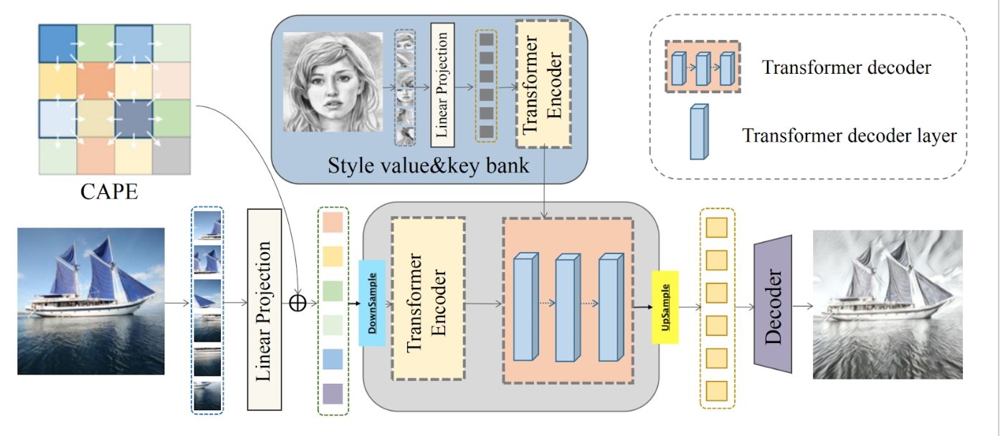

In [1]:
from IPython.display import display, Image

path = "model_2.png"
display(Image(filename=path))

Near the encoder, we added a downsample before the encoder entered, and used an upsample to restore the previous picture state before it was passed to the decoder.
By doing this, we can ensure that the processing speed is increased and at the same time most of the image features are preserved.

In [9]:
# %load StyTR.py
import torch
import torch.nn.functional as F
from torch import nn
import numpy as np
from util import box_ops
from util.misc import (NestedTensor, nested_tensor_from_tensor_list,
                       accuracy, get_world_size, interpolate,
                       is_dist_avail_and_initialized)
from function import normal, normal_style
from function import calc_mean_std
import scipy.stats as stats
from models.ViT_helper import DropPath, to_2tuple, trunc_normal_

class PatchEmbed(nn.Module):
    """ Image to Patch Embedding
    """
    def __init__(self, img_size=256, patch_size=8, in_chans=3, embed_dim=512):
        super().__init__()
        img_size = to_2tuple(img_size)
        patch_size = to_2tuple(patch_size)
        num_patches = (img_size[1] // patch_size[1]) * (img_size[0] // patch_size[0])
        self.img_size = img_size
        self.patch_size = patch_size
        self.num_patches = num_patches
        
        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        B, C, H, W = x.shape
        x = self.proj(x)
        return x


class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.reflection_pad1 = nn.ReflectionPad2d((1, 1, 1, 1))
        self.conv1 = nn.Conv2d(512, 256, (3, 3))
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2d(256, 256, (3, 3))
        self.conv3 = nn.Conv2d(256, 256, (3, 3))
        self.conv4 = nn.Conv2d(256, 128, (3, 3))
        self.conv5 = nn.Conv2d(128, 128, (3, 3))
        self.conv6 = nn.Conv2d(128, 64, (3, 3))
        self.conv7 = nn.Conv2d(64, 64, (3, 3))
        self.conv8 = nn.Conv2d(64, 3, (3, 3))

    def forward(self, x):
        x = self.reflection_pad1(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.reflection_pad1(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.reflection_pad1(x)
        x = self.conv3(x)
        x = self.relu(x)
        x = self.reflection_pad1(x)
        x = self.conv4(x)
        x = self.relu(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.reflection_pad1(x)
        x = self.conv5(x)
        x = self.relu(x)
        x = self.reflection_pad1(x)
        x = self.conv6(x)
        x = self.relu(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.reflection_pad1(x)
        x = self.conv7(x)
        x = self.relu(x)
        x = self.reflection_pad1(x)
        x = self.conv8(x)
        return x


decoder = Decoder()

vgg = nn.Sequential(
    nn.Conv2d(3, 3, (1, 1)),
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(3, 64, (3, 3)),
    nn.ReLU(),  # relu1-1
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(64, 64, (3, 3)),
    nn.ReLU(),  # relu1-2
    nn.MaxPool2d((2, 2), (2, 2), (0, 0), ceil_mode=True),
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(64, 128, (3, 3)),
    nn.ReLU(),  # relu2-1
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(128, 128, (3, 3)),
    nn.ReLU(),  # relu2-2
    nn.MaxPool2d((2, 2), (2, 2), (0, 0), ceil_mode=True),
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(128, 256, (3, 3)),
    nn.ReLU(),  # relu3-1
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(256, 256, (3, 3)),
    nn.ReLU(),  # relu3-2
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(256, 256, (3, 3)),
    nn.ReLU(),  # relu3-3
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(256, 256, (3, 3)),
    nn.ReLU(),  # relu3-4
    nn.MaxPool2d((2, 2), (2, 2), (0, 0), ceil_mode=True),
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(256, 512, (3, 3)),
    nn.ReLU(),  # relu4-1, this is the last layer used
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(512, 512, (3, 3)),
    nn.ReLU(),  # relu4-2
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(512, 512, (3, 3)),
    nn.ReLU(),  # relu4-3
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(512, 512, (3, 3)),
    nn.ReLU(),  # relu4-4
    nn.MaxPool2d((2, 2), (2, 2), (0, 0), ceil_mode=True),
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(512, 512, (3, 3)),
    nn.ReLU(),  # relu5-1
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(512, 512, (3, 3)),
    nn.ReLU(),  # relu5-2
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(512, 512, (3, 3)),
    nn.ReLU(),  # relu5-3
    nn.ReflectionPad2d((1, 1, 1, 1)),
    nn.Conv2d(512, 512, (3, 3)),
    nn.ReLU()  # relu5-4
)

class MLP(nn.Module):
    """ Very simple multi-layer perceptron (also called FFN)"""

    def __init__(self, input_dim, hidden_dim, output_dim, num_layers):
        super().__init__()
        self.num_layers = num_layers
        h = [hidden_dim] * (num_layers - 1)
        self.layers = nn.ModuleList(nn.Linear(n, k) for n, k in zip([input_dim] + h, h + [output_dim]))

    def forward(self, x):
        for i, layer in enumerate(self.layers):
            x = F.relu(layer(x)) if i < self.num_layers - 1 else layer(x)
        return x

class StyTrans(nn.Module):
    """ This is the style transform transformer module """
    
    def __init__(self, encoder, decoder, PatchEmbed, transformer, args):
        super().__init__()
        enc_layers = list(encoder.children())
        self.enc_1 = nn.Sequential(*enc_layers[:4])  # input -> relu1_1
        self.enc_2 = nn.Sequential(*enc_layers[4:11])  # relu1_1 -> relu2_1
        self.enc_3 = nn.Sequential(*enc_layers[11:18])  # relu2_1 -> relu3_1
        self.enc_4 = nn.Sequential(*enc_layers[18:31])  # relu3_1 -> relu4_1
        self.enc_5 = nn.Sequential(*enc_layers[31:44])  # relu4_1 -> relu5_1
        
        for name in ['enc_1', 'enc_2', 'enc_3', 'enc_4', 'enc_5']:
            for param in getattr(self, name).parameters():
                param.requires_grad = False

        self.mse_loss = nn.MSELoss()
        self.transformer = transformer
        hidden_dim = transformer.d_model       
        self.decode = decoder
        self.embedding = PatchEmbed

    def encode_with_intermediate(self, input):
        results = [input]
        for i in range(5):
            func = getattr(self, 'enc_{:d}'.format(i + 1))
            results.append(func(results[-1]))
        return results[1:]

    def calc_content_loss(self, input, target):
        assert (input.size() == target.size())
        assert (target.requires_grad is False)
        return self.mse_loss(input, target)

    def calc_style_loss(self, input, target):
        assert (input.size() == target.size())
        assert (target.requires_grad is False)
        input_mean, input_std = calc_mean_std(input)
        target_mean, target_std = calc_mean_std(target)
        return self.mse_loss(input_mean, target_mean) + \
               self.mse_loss(input_std, target_std)

    def forward(self, samples_c: NestedTensor, samples_s: NestedTensor):
        """ The forward expects a NestedTensor, which consists of:
               - samples.tensor: batched images, of shape [batch_size x 3 x H x W]
               - samples.mask: a binary mask of shape [batch_size x H x W], containing 1 on padded pixels
        """
        content_input = samples_c
        style_input = samples_s
        if isinstance(samples_c, (list, torch.Tensor)):
            samples_c = nested_tensor_from_tensor_list(samples_c)   # support different-sized images padding is used for mask [tensor, mask] 
        if isinstance(samples_s, (list, torch.Tensor)):
            samples_s = nested_tensor_from_tensor_list(samples_s) 
        
        # features used to calculate loss 
        content_feats = self.encode_with_intermediate(samples_c.tensors)
        style_feats = self.encode_with_intermediate(samples_s.tensors)

        # Linear projection
        style = self.embedding(samples_s.tensors)
        content = self.embedding(samples_c.tensors)
        
        # positional embedding is calculated in transformer.py
        pos_s = None
        pos_c = None

        mask = None
        hs = self.transformer(style, mask, content, pos_c, pos_s)   
        Ics = self.decode(hs)

        Ics_feats = self.encode_with_intermediate(Ics)
        loss_c = self.calc_content_loss(normal(Ics_feats[-1]), normal(content_feats[-1])) + self.calc_content_loss(normal(Ics_feats[-2]), normal(content_feats[-2]))
        # Style loss
        loss_s = self.calc_style_loss(Ics_feats[0], style_feats[0])
        for i in range(1, 5):
            loss_s += self.calc_style_loss(Ics_feats[i], style_feats[i])
        
        Icc = self.decode(self.transformer(content, mask, content, pos_c, pos_c))
        Iss = self.decode(self.transformer(style, mask, style, pos_s, pos_s))    

        # Identity losses lambda 1    
        loss_lambda1 = self.calc_content_loss(Icc, content_input) + self.calc_content_loss(Iss, style_input)
        
        # Identity losses lambda 2
        Icc_feats = self.encode_with_intermediate(Icc)
        Iss_feats = self.encode_with_intermediate(Iss)
        loss_lambda2 = self.calc_content_loss(Icc_feats[0], content_feats[0]) + self.calc_content_loss(Iss_feats[0], style_feats[0])
        for i in range(1, 5):
            loss_lambda2 += self.calc_content_loss(Icc_feats[i], content_feats[i]) + self.calc_content_loss(Iss_feats[i], style_feats[i])

        # Please select and comment out one of the following two sentences
        return Ics,  loss_c, loss_s, loss_lambda1, loss_lambda2   # train
        # return Ics    # test



In [3]:
%run train.py --style_dir ./datasets/Images/ --content_dir ./datasets/train2014 --save_dir models/ --batch_size 4

/comp9444/StyTR-2/comp9444_2/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


True
2
./datasets/train2014
./datasets/Images/


  0%|          | 0/10000 [00:00<?, ?it/s]/comp9444/StyTR-2/comp9444_2/lib/python3.10/site-packages/torch/nn/parallel/_functions.py:68: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn('Was asked to gather along dimension 0, but all '


560.49994 -content: 34.50188 -style: 370.87177 -l1: 0.93648624 -l2: 89.572266


  0%|          | 2/10000 [00:02<3:14:08,  1.17s/it]

475.142 -content: 31.711094 -style: 293.9582 -l1: 1.1407347 -l2: 69.62129


  0%|          | 3/10000 [00:02<2:04:01,  1.34it/s]

474.7821 -content: 30.038597 -style: 290.63272 -l1: 1.1421657 -l2: 74.15921


  0%|          | 4/10000 [00:03<1:31:15,  1.83it/s]

759.6903 -content: 29.122534 -style: 529.6644 -l1: 1.2190738 -l2: 115.568146


  0%|          | 5/10000 [00:03<1:13:17,  2.27it/s]

510.2231 -content: 28.703644 -style: 307.728 -l1: 1.2402978 -l2: 86.970634


  0%|          | 6/10000 [00:03<1:01:28,  2.71it/s]

552.81647 -content: 28.394667 -style: 345.1228 -l1: 1.2801819 -l2: 89.68622


  0%|          | 7/10000 [00:03<53:50,  3.09it/s]  

545.8202 -content: 28.27594 -style: 369.78345 -l1: 0.9467505 -l2: 81.48822


  0%|          | 8/10000 [00:04<49:20,  3.37it/s]

533.57153 -content: 28.330826 -style: 357.6251 -l1: 0.99914503 -l2: 77.67546


  0%|          | 9/10000 [00:04<46:13,  3.60it/s]

530.0045 -content: 28.24023 -style: 327.38354 -l1: 1.0471694 -l2: 101.078835


  0%|          | 10/10000 [00:04<44:48,  3.72it/s]

521.1323 -content: 28.259752 -style: 333.2613 -l1: 1.0545655 -l2: 85.791725


  0%|          | 11/10000 [00:04<43:33,  3.82it/s]

547.6999 -content: 28.198933 -style: 373.38345 -l1: 0.9329492 -l2: 80.81105


  0%|          | 12/10000 [00:05<42:39,  3.90it/s]

512.90106 -content: 28.25976 -style: 339.80713 -l1: 0.970204 -l2: 76.91989


  0%|          | 13/10000 [00:05<41:51,  3.98it/s]

461.2046 -content: 28.149479 -style: 263.5506 -l1: 1.3536835 -l2: 74.74666


  0%|          | 14/10000 [00:05<41:22,  4.02it/s]

479.37537 -content: 28.19458 -style: 308.47296 -l1: 0.88244295 -l2: 80.936806


  0%|          | 15/10000 [00:05<41:13,  4.04it/s]

431.40158 -content: 28.210188 -style: 292.06775 -l1: 0.6600849 -l2: 64.91767


  0%|          | 16/10000 [00:06<40:23,  4.12it/s]

459.33112 -content: 28.27282 -style: 275.5309 -l1: 1.2028484 -l2: 71.32797


  0%|          | 17/10000 [00:06<40:23,  4.12it/s]

418.85168 -content: 28.266403 -style: 244.84479 -l1: 0.81426156 -l2: 88.7422


  0%|          | 18/10000 [00:06<40:30,  4.11it/s]

474.04034 -content: 28.242489 -style: 303.31177 -l1: 0.7897598 -l2: 87.20293


  0%|          | 19/10000 [00:06<40:08,  4.14it/s]

768.30896 -content: 28.378345 -style: 585.064 -l1: 0.8080463 -l2: 98.30339


  0%|          | 20/10000 [00:07<39:49,  4.18it/s]

427.40057 -content: 28.383156 -style: 274.099 -l1: 0.7329083 -l2: 73.61484


  0%|          | 21/10000 [00:07<39:39,  4.19it/s]

454.54608 -content: 28.377935 -style: 286.04407 -l1: 0.88533866 -l2: 78.15035


  0%|          | 22/10000 [00:07<39:18,  4.23it/s]

551.9343 -content: 28.38115 -style: 374.02344 -l1: 1.0013936 -l2: 79.43219


  0%|          | 23/10000 [00:07<39:30,  4.21it/s]

630.0699 -content: 28.531563 -style: 431.20752 -l1: 1.1201074 -l2: 91.923294


  0%|          | 24/10000 [00:08<40:06,  4.15it/s]

591.33154 -content: 28.655348 -style: 420.61835 -l1: 0.9078561 -l2: 78.507965


  0%|          | 25/10000 [00:08<40:22,  4.12it/s]

506.07416 -content: 28.739338 -style: 296.40823 -l1: 1.3165009 -l2: 88.77151


  0%|          | 26/10000 [00:08<39:52,  4.17it/s]

563.7312 -content: 28.87544 -style: 378.17444 -l1: 1.049352 -l2: 83.22665


  0%|          | 27/10000 [00:08<40:11,  4.14it/s]

580.2212 -content: 29.10027 -style: 401.28168 -l1: 0.8206986 -l2: 92.39029


  0%|          | 28/10000 [00:08<40:25,  4.11it/s]

642.90027 -content: 29.084084 -style: 456.3717 -l1: 1.0937347 -l2: 80.883064


  0%|          | 29/10000 [00:09<40:04,  4.15it/s]

428.29517 -content: 29.377613 -style: 288.96277 -l1: 0.6015072 -l2: 67.84929


  0%|          | 30/10000 [00:09<40:21,  4.12it/s]

613.2947 -content: 29.721489 -style: 396.2526 -l1: 1.1896229 -l2: 104.04694


  0%|          | 31/10000 [00:09<39:38,  4.19it/s]

528.084 -content: 30.600822 -style: 326.43576 -l1: 1.1808445 -l2: 88.388275


  0%|          | 32/10000 [00:09<39:42,  4.18it/s]

459.12787 -content: 31.495071 -style: 299.48367 -l1: 0.7725283 -l2: 74.07217


  0%|          | 33/10000 [00:10<39:52,  4.17it/s]

524.01904 -content: 31.918541 -style: 346.341 -l1: 1.0448347 -l2: 72.62109


  0%|          | 34/10000 [00:10<39:50,  4.17it/s]

635.76074 -content: 31.799166 -style: 424.10052 -l1: 1.2698972 -l2: 90.96825


  0%|          | 35/10000 [00:10<40:12,  4.13it/s]

472.64783 -content: 32.739544 -style: 305.81506 -l1: 0.79253876 -l2: 78.6155


  0%|          | 36/10000 [00:10<40:06,  4.14it/s]

401.37762 -content: 33.9 -style: 253.946 -l1: 0.6912012 -l2: 65.14751


  0%|          | 37/10000 [00:11<40:08,  4.14it/s]

499.1737 -content: 34.670357 -style: 337.54706 -l1: 0.6375069 -l2: 82.3308


  0%|          | 38/10000 [00:11<40:54,  4.06it/s]

333.5411 -content: 35.74615 -style: 215.36491 -l1: 0.31872392 -l2: 60.11936


  0%|          | 39/10000 [00:11<40:39,  4.08it/s]

630.9021 -content: 36.98472 -style: 471.64362 -l1: 0.44979626 -l2: 90.788086


  0%|          | 40/10000 [00:11<44:38,  3.72it/s]

452.62427 -content: 37.390957 -style: 298.09344 -l1: 0.46666226 -l2: 84.473465


  0%|          | 41/10000 [00:12<43:37,  3.80it/s]

440.62573 -content: 38.507904 -style: 310.47745 -l1: 0.35658103 -l2: 66.67968


  0%|          | 42/10000 [00:12<42:48,  3.88it/s]

382.24026 -content: 38.85343 -style: 261.6786 -l1: 0.2828883 -l2: 61.906097


  0%|          | 43/10000 [00:12<41:59,  3.95it/s]

531.32404 -content: 37.819077 -style: 389.27618 -l1: 0.3523181 -l2: 79.5665


  0%|          | 44/10000 [00:12<40:52,  4.06it/s]

477.58408 -content: 38.849697 -style: 330.82202 -l1: 0.36558416 -l2: 82.32144


  0%|          | 45/10000 [00:13<40:54,  4.06it/s]

441.22913 -content: 39.600334 -style: 304.82016 -l1: 0.32885683 -l2: 73.788635


  0%|          | 46/10000 [00:13<40:58,  4.05it/s]

584.24646 -content: 39.331787 -style: 439.51096 -l1: 0.36205107 -l2: 80.06011


  0%|          | 47/10000 [00:13<41:36,  3.99it/s]

346.74533 -content: 40.893257 -style: 225.15103 -l1: 0.37794498 -l2: 54.244884


  0%|          | 48/10000 [00:13<41:57,  3.95it/s]

297.56903 -content: 43.738853 -style: 171.7095 -l1: 0.25830275 -l2: 64.039474


  0%|          | 49/10000 [00:14<41:47,  3.97it/s]

501.5609 -content: 44.690582 -style: 347.9607 -l1: 0.3385998 -l2: 85.20766


  0%|          | 50/10000 [00:14<41:33,  3.99it/s]

409.4198 -content: 43.466587 -style: 280.01263 -l1: 0.30011737 -l2: 64.932365


  1%|          | 51/10000 [00:14<42:07,  3.94it/s]

303.48993 -content: 44.62695 -style: 196.15701 -l1: 0.17289954 -l2: 50.60298


  1%|          | 52/10000 [00:14<41:58,  3.95it/s]

248.34747 -content: 45.638084 -style: 136.86526 -l1: 0.16603047 -l2: 54.221992


  1%|          | 53/10000 [00:15<41:46,  3.97it/s]

248.14206 -content: 46.69397 -style: 125.96859 -l1: 0.13725045 -l2: 65.87198


  1%|          | 54/10000 [00:15<41:12,  4.02it/s]

369.49945 -content: 46.135075 -style: 212.68967 -l1: 0.30228654 -l2: 89.51463


  1%|          | 55/10000 [00:15<40:37,  4.08it/s]

454.9845 -content: 46.31469 -style: 306.7218 -l1: 0.14010656 -l2: 92.14055


  1%|          | 56/10000 [00:15<40:11,  4.12it/s]

423.58475 -content: 46.816765 -style: 285.37048 -l1: 0.16490194 -l2: 79.85436


  1%|          | 57/10000 [00:16<39:50,  4.16it/s]

367.2049 -content: 47.442505 -style: 237.5988 -l1: 0.17601883 -l2: 69.84224


  1%|          | 58/10000 [00:16<39:25,  4.20it/s]

310.9646 -content: 47.46142 -style: 178.91579 -l1: 0.1476582 -l2: 74.25132


  1%|          | 59/10000 [00:16<39:38,  4.18it/s]

315.19635 -content: 46.544613 -style: 182.65036 -l1: 0.18721113 -l2: 72.89657


  1%|          | 60/10000 [00:16<40:00,  4.14it/s]

388.77753 -content: 47.601326 -style: 245.03821 -l1: 0.21285304 -l2: 81.23831


  1%|          | 61/10000 [00:17<40:20,  4.11it/s]

395.08063 -content: 47.36779 -style: 269.88373 -l1: 0.11304812 -l2: 69.91573


  1%|          | 62/10000 [00:17<40:46,  4.06it/s]

287.59406 -content: 45.70108 -style: 168.11887 -l1: 0.16578174 -l2: 62.16942


  1%|          | 63/10000 [00:17<40:44,  4.06it/s]

349.41217 -content: 48.762558 -style: 203.85895 -l1: 0.27091613 -l2: 77.82655


  1%|          | 64/10000 [00:17<40:39,  4.07it/s]

329.87128 -content: 47.277096 -style: 193.1159 -l1: 0.19292352 -l2: 75.9736


  1%|          | 65/10000 [00:18<40:12,  4.12it/s]

181.44467 -content: 47.276817 -style: 79.42099 -l1: 0.12033803 -l2: 46.323193


  1%|          | 66/10000 [00:18<39:59,  4.14it/s]

260.2182 -content: 47.022762 -style: 138.13574 -l1: 0.11119406 -l2: 67.27611


  1%|          | 67/10000 [00:18<39:33,  4.19it/s]

280.6225 -content: 48.00815 -style: 149.22461 -l1: 0.17893742 -l2: 70.86413


  1%|          | 68/10000 [00:18<39:16,  4.22it/s]

283.9548 -content: 45.34771 -style: 168.60068 -l1: 0.18713029 -l2: 56.90729


  1%|          | 69/10000 [00:19<39:22,  4.20it/s]

319.73853 -content: 46.030632 -style: 201.97241 -l1: 0.16264072 -l2: 60.350597


  1%|          | 70/10000 [00:19<39:27,  4.20it/s]

332.16205 -content: 43.273594 -style: 210.32056 -l1: 0.16791701 -l2: 66.8137


  1%|          | 71/10000 [00:19<39:37,  4.18it/s]

259.22888 -content: 43.87735 -style: 143.1559 -l1: 0.16717711 -l2: 60.493217


  1%|          | 72/10000 [00:19<39:54,  4.15it/s]

264.59686 -content: 46.382244 -style: 142.73718 -l1: 0.1522266 -l2: 64.82156


  1%|          | 73/10000 [00:20<40:03,  4.13it/s]

244.3995 -content: 46.934902 -style: 130.48033 -l1: 0.14433885 -l2: 56.880554


  1%|          | 74/10000 [00:20<40:32,  4.08it/s]

275.07208 -content: 47.49686 -style: 164.56142 -l1: 0.12549622 -l2: 54.229042


  1%|          | 75/10000 [00:20<40:28,  4.09it/s]

258.97522 -content: 46.769592 -style: 114.99445 -l1: 0.31712362 -l2: 75.0125


  1%|          | 76/10000 [00:20<39:54,  4.14it/s]

259.87677 -content: 46.71605 -style: 135.87257 -l1: 0.1217065 -l2: 68.76868


  1%|          | 77/10000 [00:21<40:06,  4.12it/s]

288.6842 -content: 47.937374 -style: 162.04361 -l1: 0.12830141 -l2: 69.72209


  1%|          | 78/10000 [00:21<40:06,  4.12it/s]

233.06836 -content: 45.64222 -style: 124.62729 -l1: 0.1503604 -l2: 52.273636


  1%|          | 79/10000 [00:21<39:57,  4.14it/s]

226.41223 -content: 47.54036 -style: 105.97717 -l1: 0.12964061 -l2: 63.819862


  1%|          | 80/10000 [00:21<39:41,  4.17it/s]

315.6889 -content: 47.47874 -style: 186.87608 -l1: 0.13798311 -l2: 71.67526


  1%|          | 81/10000 [00:21<39:21,  4.20it/s]

260.51358 -content: 46.788826 -style: 132.5437 -l1: 0.15575922 -l2: 70.27789


  1%|          | 82/10000 [00:22<39:10,  4.22it/s]

342.97308 -content: 47.889755 -style: 193.98425 -l1: 0.17482445 -l2: 88.861374


  1%|          | 83/10000 [00:22<39:23,  4.20it/s]

346.34067 -content: 47.59225 -style: 205.70824 -l1: 0.20054881 -l2: 79.00177


  1%|          | 84/10000 [00:22<39:23,  4.20it/s]

284.63025 -content: 46.28274 -style: 145.797 -l1: 0.17935143 -l2: 79.995926


  1%|          | 85/10000 [00:22<39:48,  4.15it/s]

505.96564 -content: 48.073624 -style: 334.67944 -l1: 0.16232978 -l2: 111.8495


  1%|          | 86/10000 [00:23<39:36,  4.17it/s]

274.42975 -content: 49.952286 -style: 124.19725 -l1: 0.17100471 -l2: 88.30992


  1%|          | 87/10000 [00:23<39:43,  4.16it/s]

361.23102 -content: 46.700462 -style: 219.73352 -l1: 0.19428506 -l2: 81.19709


  1%|          | 88/10000 [00:23<39:52,  4.14it/s]

250.69238 -content: 46.921547 -style: 115.215256 -l1: 0.15743333 -l2: 77.535255


  1%|          | 89/10000 [00:23<39:41,  4.16it/s]

292.51355 -content: 48.449997 -style: 159.40007 -l1: 0.17064427 -l2: 72.718376


  1%|          | 90/10000 [00:24<39:46,  4.15it/s]

335.7073 -content: 48.46747 -style: 185.08087 -l1: 0.17097233 -l2: 90.1909


  1%|          | 91/10000 [00:24<39:49,  4.15it/s]

340.55365 -content: 49.255524 -style: 204.58757 -l1: 0.15938932 -l2: 75.553314


  1%|          | 92/10000 [00:24<39:57,  4.13it/s]

334.1834 -content: 50.09166 -style: 195.41351 -l1: 0.12855676 -l2: 79.67928


  1%|          | 93/10000 [00:24<40:13,  4.10it/s]

248.80145 -content: 47.488384 -style: 94.67627 -l1: 0.21004736 -l2: 91.93349


  1%|          | 94/10000 [00:25<39:59,  4.13it/s]

311.964 -content: 47.003654 -style: 169.197 -l1: 0.18903396 -l2: 82.53094


  1%|          | 95/10000 [00:25<40:04,  4.12it/s]

223.0641 -content: 47.249588 -style: 112.442474 -l1: 0.13030373 -l2: 54.250786


  1%|          | 96/10000 [00:25<39:55,  4.13it/s]

314.9446 -content: 46.961548 -style: 188.62556 -l1: 0.11929556 -l2: 71.00682


  1%|          | 97/10000 [00:25<40:28,  4.08it/s]

288.3911 -content: 47.526115 -style: 164.28569 -l1: 0.11896087 -l2: 68.252045


  1%|          | 98/10000 [00:26<40:44,  4.05it/s]

219.44351 -content: 46.07628 -style: 113.027794 -l1: 0.074629985 -l2: 55.115353


  1%|          | 99/10000 [00:26<40:56,  4.03it/s]

257.4485 -content: 45.970783 -style: 135.33305 -l1: 0.15647848 -l2: 65.19116


  1%|          | 100/10000 [00:26<41:00,  4.02it/s]

313.54022 -content: 47.198513 -style: 191.0505 -l1: 0.12058486 -l2: 66.850266


  1%|          | 101/10000 [00:26<43:59,  3.75it/s]

370.26025 -content: 47.14581 -style: 221.2513 -l1: 0.15875822 -l2: 90.75006


  1%|          | 102/10000 [00:27<45:14,  3.65it/s]

297.93628 -content: 48.34226 -style: 157.37369 -l1: 0.13884698 -l2: 82.50106


  1%|          | 103/10000 [00:27<43:15,  3.81it/s]

309.8496 -content: 47.20455 -style: 172.7771 -l1: 0.16811079 -l2: 78.100174


  1%|          | 104/10000 [00:27<41:46,  3.95it/s]

286.7948 -content: 48.17582 -style: 145.56856 -l1: 0.13242775 -l2: 83.7805


  1%|          | 105/10000 [00:27<40:33,  4.07it/s]

244.30463 -content: 47.319496 -style: 121.182465 -l1: 0.11438844 -l2: 67.79548


  1%|          | 106/10000 [00:28<39:47,  4.14it/s]

308.77252 -content: 47.428276 -style: 144.86258 -l1: 0.14179583 -l2: 106.555954


  1%|          | 107/10000 [00:28<39:14,  4.20it/s]

329.37637 -content: 47.158092 -style: 204.40773 -l1: 0.11146754 -l2: 70.00783


  1%|          | 108/10000 [00:28<39:18,  4.19it/s]

229.04263 -content: 48.18524 -style: 106.998886 -l1: 0.11179659 -l2: 66.03276


  1%|          | 109/10000 [00:28<39:24,  4.18it/s]

232.04419 -content: 46.679947 -style: 87.6544 -l1: 0.16413976 -l2: 86.22005


  1%|          | 110/10000 [00:29<39:28,  4.18it/s]

257.89993 -content: 48.67347 -style: 132.64822 -l1: 0.1508061 -l2: 66.02183


  1%|          | 111/10000 [00:29<39:51,  4.13it/s]

303.2096 -content: 46.944603 -style: 167.62405 -l1: 0.15924118 -l2: 77.49408


  1%|          | 112/10000 [00:29<39:57,  4.12it/s]

309.43018 -content: 46.873306 -style: 174.88754 -l1: 0.12708703 -l2: 78.77323


  1%|          | 113/10000 [00:29<40:06,  4.11it/s]

318.74377 -content: 47.530617 -style: 151.91547 -l1: 0.14909917 -l2: 108.86072


  1%|          | 114/10000 [00:30<40:06,  4.11it/s]

287.0719 -content: 46.271103 -style: 139.91579 -l1: 0.16813391 -l2: 89.11565


  1%|          | 115/10000 [00:30<39:29,  4.17it/s]

301.02417 -content: 47.559734 -style: 170.11873 -l1: 0.15910777 -l2: 72.20819


  1%|          | 116/10000 [00:30<39:06,  4.21it/s]

227.09425 -content: 46.18971 -style: 120.06265 -l1: 0.13812779 -l2: 51.172947


  1%|          | 117/10000 [00:30<39:08,  4.21it/s]

283.24792 -content: 47.427826 -style: 156.12689 -l1: 0.097804874 -l2: 72.84687


  1%|          | 118/10000 [00:30<38:47,  4.25it/s]

191.8987 -content: 46.395287 -style: 80.404915 -l1: 0.09948656 -l2: 58.134438


  1%|          | 119/10000 [00:31<38:36,  4.26it/s]

213.3774 -content: 45.126007 -style: 97.21246 -l1: 0.1278921 -l2: 62.08648


  1%|          | 120/10000 [00:31<38:42,  4.25it/s]

277.17145 -content: 45.035915 -style: 136.35564 -l1: 0.17494775 -l2: 83.53356


  1%|          | 121/10000 [00:31<39:08,  4.21it/s]

337.4499 -content: 47.84425 -style: 176.9979 -l1: 0.16128883 -l2: 101.317535


  1%|          | 122/10000 [00:31<39:25,  4.18it/s]

232.27664 -content: 46.421387 -style: 99.9036 -l1: 0.1299952 -l2: 76.85199


  1%|          | 123/10000 [00:32<39:36,  4.16it/s]

253.48666 -content: 47.622253 -style: 104.94737 -l1: 0.14756589 -l2: 90.587425


  1%|          | 124/10000 [00:32<39:52,  4.13it/s]

229.57353 -content: 46.370117 -style: 113.31287 -l1: 0.11473499 -l2: 61.859097


  1%|▏         | 125/10000 [00:32<40:06,  4.10it/s]

246.17538 -content: 48.582626 -style: 101.394104 -l1: 0.10983825 -l2: 88.509964


  1%|▏         | 126/10000 [00:32<39:55,  4.12it/s]

282.518 -content: 48.049538 -style: 144.15067 -l1: 0.120957464 -l2: 81.85079


  1%|▏         | 127/10000 [00:33<40:01,  4.11it/s]

291.13614 -content: 43.58011 -style: 163.09827 -l1: 0.14892472 -l2: 74.03303


  1%|▏         | 128/10000 [00:33<39:21,  4.18it/s]

390.99576 -content: 47.54221 -style: 246.29445 -l1: 0.17650387 -l2: 84.80383


  1%|▏         | 129/10000 [00:33<39:00,  4.22it/s]

245.83922 -content: 47.573383 -style: 107.80974 -l1: 0.1197003 -l2: 82.07709


  1%|▏         | 130/10000 [00:33<38:42,  4.25it/s]

308.63562 -content: 46.19629 -style: 157.51343 -l1: 0.15149063 -l2: 94.32157


  1%|▏         | 131/10000 [00:34<38:48,  4.24it/s]

263.80753 -content: 46.746147 -style: 119.182434 -l1: 0.14259155 -l2: 87.89754


  1%|▏         | 132/10000 [00:34<38:39,  4.25it/s]

215.95341 -content: 46.414818 -style: 80.833984 -l1: 0.115539 -l2: 80.6169


  1%|▏         | 133/10000 [00:34<38:40,  4.25it/s]

290.44128 -content: 46.586655 -style: 157.53911 -l1: 0.12871093 -l2: 77.305756


  1%|▏         | 134/10000 [00:34<38:32,  4.27it/s]

309.06396 -content: 45.99627 -style: 177.39119 -l1: 0.113689795 -l2: 77.71821


  1%|▏         | 135/10000 [00:35<39:00,  4.22it/s]

190.7782 -content: 46.48579 -style: 75.82414 -l1: 0.09517738 -l2: 61.805855


  1%|▏         | 136/10000 [00:35<39:18,  4.18it/s]

406.27896 -content: 46.15248 -style: 265.3191 -l1: 0.10704625 -l2: 87.31416


  1%|▏         | 137/10000 [00:35<39:27,  4.17it/s]

228.97113 -content: 46.84254 -style: 111.589 -l1: 0.09697594 -l2: 63.751274


  1%|▏         | 138/10000 [00:35<39:55,  4.12it/s]

273.16202 -content: 43.77103 -style: 151.66928 -l1: 0.13726299 -l2: 68.1133


  1%|▏         | 139/10000 [00:35<39:48,  4.13it/s]

259.7118 -content: 44.43889 -style: 131.91623 -l1: 0.13743189 -l2: 73.736465


  1%|▏         | 140/10000 [00:36<39:30,  4.16it/s]

202.82072 -content: 42.868294 -style: 85.02323 -l1: 0.11218885 -l2: 67.07599


  1%|▏         | 141/10000 [00:36<39:06,  4.20it/s]

328.25165 -content: 46.92923 -style: 188.02298 -l1: 0.1303124 -l2: 84.17758


  1%|▏         | 142/10000 [00:36<38:54,  4.22it/s]

205.43156 -content: 45.205032 -style: 85.71005 -l1: 0.09309682 -l2: 67.9997


  1%|▏         | 143/10000 [00:36<38:59,  4.21it/s]

234.61581 -content: 46.362717 -style: 102.49863 -l1: 0.12546977 -l2: 76.971596


  1%|▏         | 144/10000 [00:37<38:52,  4.23it/s]

233.477 -content: 48.04138 -style: 109.98486 -l1: 0.14335158 -l2: 65.41615


  1%|▏         | 145/10000 [00:37<38:56,  4.22it/s]

241.12726 -content: 46.108643 -style: 120.43441 -l1: 0.10943231 -l2: 66.923935


  1%|▏         | 146/10000 [00:37<39:28,  4.16it/s]

368.62317 -content: 47.380413 -style: 223.95016 -l1: 0.13106255 -l2: 88.1182


  1%|▏         | 147/10000 [00:37<40:14,  4.08it/s]

222.3335 -content: 45.35125 -style: 81.06548 -l1: 0.12989315 -l2: 86.824234


  1%|▏         | 148/10000 [00:38<40:17,  4.08it/s]

182.82013 -content: 43.31227 -style: 77.09428 -l1: 0.11086823 -l2: 54.6528


  1%|▏         | 149/10000 [00:38<40:23,  4.07it/s]

221.8704 -content: 44.56948 -style: 109.43554 -l1: 0.09635126 -l2: 61.1208


  2%|▏         | 150/10000 [00:38<40:16,  4.08it/s]

224.29483 -content: 44.08219 -style: 107.688354 -l1: 0.09643285 -l2: 65.77398


  2%|▏         | 151/10000 [00:38<40:08,  4.09it/s]

284.4646 -content: 47.025986 -style: 150.95187 -l1: 0.10199915 -l2: 79.34681


  2%|▏         | 152/10000 [00:39<39:34,  4.15it/s]

214.4585 -content: 42.133278 -style: 113.68352 -l1: 0.101345 -l2: 51.54754


  2%|▏         | 153/10000 [00:39<39:15,  4.18it/s]

219.88971 -content: 48.504562 -style: 109.48779 -l1: 0.096252576 -l2: 55.159683


  2%|▏         | 154/10000 [00:39<39:03,  4.20it/s]

244.63364 -content: 45.040085 -style: 114.53542 -l1: 0.08994956 -l2: 78.76166


  2%|▏         | 155/10000 [00:39<38:53,  4.22it/s]

251.63838 -content: 44.663494 -style: 121.01527 -l1: 0.10211874 -l2: 78.81131


  2%|▏         | 156/10000 [00:40<38:55,  4.21it/s]

211.44151 -content: 46.192345 -style: 90.331345 -l1: 0.100173056 -l2: 67.90571


  2%|▏         | 157/10000 [00:40<38:37,  4.25it/s]

253.32356 -content: 43.524273 -style: 136.15323 -l1: 0.10971769 -l2: 65.96583


  2%|▏         | 158/10000 [00:40<39:13,  4.18it/s]

213.21388 -content: 45.21971 -style: 100.06599 -l1: 0.074594915 -l2: 62.706543


  2%|▏         | 159/10000 [00:40<39:57,  4.10it/s]

256.21777 -content: 45.777035 -style: 139.01537 -l1: 0.089916244 -l2: 65.13124


  2%|▏         | 160/10000 [00:41<40:07,  4.09it/s]

241.7528 -content: 45.00241 -style: 119.94809 -l1: 0.09845357 -l2: 69.91057


  2%|▏         | 161/10000 [00:41<40:29,  4.05it/s]

272.36365 -content: 45.99825 -style: 137.84851 -l1: 0.13701726 -l2: 78.92569


  2%|▏         | 162/10000 [00:41<40:24,  4.06it/s]

228.35371 -content: 46.247475 -style: 105.97498 -l1: 0.11129239 -l2: 68.3408


  2%|▏         | 163/10000 [00:41<40:19,  4.07it/s]

218.52635 -content: 44.52217 -style: 94.056465 -l1: 0.114127785 -l2: 71.95877


  2%|▏         | 164/10000 [00:42<40:29,  4.05it/s]

246.04538 -content: 43.475132 -style: 116.40117 -l1: 0.13099359 -l2: 76.999504


  2%|▏         | 165/10000 [00:42<40:22,  4.06it/s]

324.90106 -content: 45.932564 -style: 178.82423 -l1: 0.14447802 -l2: 90.0308


  2%|▏         | 166/10000 [00:42<39:42,  4.13it/s]

197.73972 -content: 44.11946 -style: 84.1279 -l1: 0.072495 -l2: 64.41771


  2%|▏         | 167/10000 [00:42<42:41,  3.84it/s]

261.53925 -content: 44.908142 -style: 128.57825 -l1: 0.13514847 -l2: 78.59246


  2%|▏         | 168/10000 [00:43<41:52,  3.91it/s]

282.8394 -content: 44.26702 -style: 156.63535 -l1: 0.10313028 -l2: 74.71792


  2%|▏         | 169/10000 [00:43<40:53,  4.01it/s]

221.85493 -content: 44.88191 -style: 98.187294 -l1: 0.12285945 -l2: 70.18557


  2%|▏         | 170/10000 [00:43<40:12,  4.07it/s]

256.6026 -content: 46.13524 -style: 119.01108 -l1: 0.10222682 -l2: 84.300415


  2%|▏         | 171/10000 [00:43<40:03,  4.09it/s]

245.104 -content: 45.736763 -style: 118.32594 -l1: 0.14352554 -l2: 70.99451


  2%|▏         | 172/10000 [00:44<40:12,  4.07it/s]

242.86655 -content: 46.373886 -style: 114.46655 -l1: 0.1930452 -l2: 68.51294


  2%|▏         | 173/10000 [00:44<40:17,  4.07it/s]

231.44928 -content: 44.638 -style: 112.48427 -l1: 0.11908807 -l2: 65.990845


  2%|▏         | 174/10000 [00:44<40:15,  4.07it/s]

248.68875 -content: 44.208427 -style: 119.23593 -l1: 0.12301955 -l2: 76.633026


  2%|▏         | 175/10000 [00:44<40:05,  4.08it/s]

285.43677 -content: 44.248383 -style: 158.86128 -l1: 0.12074689 -l2: 73.87483


  2%|▏         | 176/10000 [00:45<40:09,  4.08it/s]

200.36806 -content: 45.798637 -style: 80.85298 -l1: 0.14304844 -l2: 63.70305


  2%|▏         | 177/10000 [00:45<39:53,  4.10it/s]

244.37886 -content: 44.677258 -style: 111.50574 -l1: 0.120507754 -l2: 79.760315


  2%|▏         | 178/10000 [00:45<39:36,  4.13it/s]

189.9183 -content: 44.272095 -style: 77.389206 -l1: 0.08717789 -l2: 62.154552


  2%|▏         | 179/10000 [00:45<39:34,  4.14it/s]

183.20963 -content: 46.414886 -style: 72.35437 -l1: 0.06934102 -l2: 59.5865


  2%|▏         | 180/10000 [00:45<39:28,  4.15it/s]

237.3221 -content: 44.102196 -style: 101.868195 -l1: 0.15064609 -l2: 80.80648


  2%|▏         | 181/10000 [00:46<39:13,  4.17it/s]

193.91989 -content: 45.842896 -style: 79.60065 -l1: 0.07819777 -l2: 63.002502


  2%|▏         | 182/10000 [00:46<38:57,  4.20it/s]

209.91867 -content: 46.212845 -style: 89.837105 -l1: 0.07749458 -l2: 68.44411


  2%|▏         | 183/10000 [00:46<39:06,  4.18it/s]

174.9466 -content: 45.315422 -style: 62.66944 -l1: 0.086367354 -l2: 60.916023


  2%|▏         | 184/10000 [00:46<39:28,  4.14it/s]

223.68538 -content: 43.31797 -style: 95.75007 -l1: 0.08685067 -l2: 78.537796


  2%|▏         | 185/10000 [00:47<39:38,  4.13it/s]

237.15459 -content: 44.882088 -style: 128.19403 -l1: 0.064212576 -l2: 59.583595


  2%|▏         | 186/10000 [00:47<39:55,  4.10it/s]

334.22168 -content: 44.038994 -style: 199.34512 -l1: 0.11403318 -l2: 82.85527


  2%|▏         | 187/10000 [00:47<40:17,  4.06it/s]

245.33577 -content: 44.521996 -style: 122.05255 -l1: 0.12417718 -l2: 70.06882


  2%|▏         | 188/10000 [00:47<39:47,  4.11it/s]

196.6749 -content: 44.501366 -style: 72.125046 -l1: 0.11557886 -l2: 71.95796


  2%|▏         | 189/10000 [00:48<39:33,  4.13it/s]

193.28836 -content: 42.77495 -style: 68.40958 -l1: 0.087632716 -l2: 75.96955


  2%|▏         | 190/10000 [00:48<39:16,  4.16it/s]

218.16129 -content: 44.009193 -style: 94.79732 -l1: 0.13642654 -l2: 69.80492


  2%|▏         | 191/10000 [00:48<39:05,  4.18it/s]

288.1162 -content: 44.451626 -style: 152.71323 -l1: 0.16974956 -l2: 79.06888


  2%|▏         | 192/10000 [00:48<38:43,  4.22it/s]

191.66878 -content: 45.46306 -style: 77.001816 -l1: 0.0962748 -l2: 62.464676


  2%|▏         | 193/10000 [00:49<38:46,  4.22it/s]

233.089 -content: 45.597466 -style: 101.26755 -l1: 0.09990006 -l2: 79.23097


  2%|▏         | 194/10000 [00:49<40:06,  4.07it/s]

271.88947 -content: 43.521103 -style: 148.10757 -l1: 0.09809141 -l2: 73.394394


  2%|▏         | 195/10000 [00:49<39:55,  4.09it/s]

275.54117 -content: 45.272926 -style: 129.62003 -l1: 0.14131396 -l2: 90.75624


  2%|▏         | 196/10000 [00:49<40:11,  4.07it/s]

264.01526 -content: 44.23042 -style: 124.30493 -l1: 0.12272865 -l2: 86.8889


  2%|▏         | 197/10000 [00:50<40:44,  4.01it/s]

238.60388 -content: 44.040825 -style: 112.389435 -l1: 0.10307432 -l2: 74.95842


  2%|▏         | 198/10000 [00:50<40:38,  4.02it/s]

206.1352 -content: 46.03254 -style: 70.729485 -l1: 0.10475515 -l2: 82.04031


  2%|▏         | 199/10000 [00:50<40:38,  4.02it/s]

248.4997 -content: 44.35112 -style: 117.268585 -l1: 0.10726971 -l2: 79.37111


  2%|▏         | 200/10000 [00:50<40:57,  3.99it/s]

212.631 -content: 44.61999 -style: 95.49406 -l1: 0.10649509 -l2: 65.0623


  2%|▏         | 201/10000 [00:51<42:32,  3.84it/s]

270.97742 -content: 44.49643 -style: 127.4433 -l1: 0.14306775 -l2: 89.022934


  2%|▏         | 202/10000 [00:51<41:16,  3.96it/s]

209.65707 -content: 42.517967 -style: 89.179214 -l1: 0.0951027 -l2: 71.302704


  2%|▏         | 203/10000 [00:51<40:16,  4.05it/s]

197.08362 -content: 42.457565 -style: 87.83499 -l1: 0.07894147 -l2: 61.26516


  2%|▏         | 204/10000 [00:51<39:31,  4.13it/s]

208.05722 -content: 43.06295 -style: 107.74763 -l1: 0.07400299 -l2: 52.06643


  2%|▏         | 205/10000 [00:52<39:05,  4.18it/s]

202.74252 -content: 42.209263 -style: 85.78548 -l1: 0.10683145 -l2: 67.26958


  2%|▏         | 206/10000 [00:52<39:03,  4.18it/s]

191.004 -content: 44.65322 -style: 80.372086 -l1: 0.07782638 -l2: 60.53083


  2%|▏         | 207/10000 [00:52<39:21,  4.15it/s]

199.82191 -content: 44.28527 -style: 83.83332 -l1: 0.07131863 -l2: 66.71102


  2%|▏         | 208/10000 [00:52<39:40,  4.11it/s]

185.388 -content: 44.379307 -style: 72.543365 -l1: 0.08666153 -l2: 62.39902


  2%|▏         | 209/10000 [00:53<39:55,  4.09it/s]

257.82227 -content: 45.396805 -style: 138.02852 -l1: 0.096157 -l2: 67.66595


  2%|▏         | 210/10000 [00:53<40:02,  4.08it/s]

232.06439 -content: 42.21775 -style: 104.57042 -l1: 0.09646538 -l2: 78.52367


  2%|▏         | 211/10000 [00:53<39:56,  4.08it/s]

284.29495 -content: 42.537567 -style: 149.15439 -l1: 0.11344061 -l2: 84.66214


  2%|▏         | 212/10000 [00:53<40:01,  4.08it/s]

269.45517 -content: 44.927975 -style: 136.20178 -l1: 0.105904594 -l2: 80.912094


  2%|▏         | 213/10000 [00:54<40:04,  4.07it/s]

203.13098 -content: 45.027542 -style: 85.00386 -l1: 0.10614486 -l2: 65.66943


  2%|▏         | 214/10000 [00:54<39:44,  4.10it/s]

214.29477 -content: 43.479263 -style: 105.33728 -l1: 0.08159432 -l2: 59.76662


  2%|▏         | 215/10000 [00:54<39:18,  4.15it/s]

216.02615 -content: 43.32099 -style: 101.517944 -l1: 0.08546807 -l2: 65.20445


  2%|▏         | 216/10000 [00:54<38:58,  4.18it/s]

182.31784 -content: 43.701706 -style: 71.42447 -l1: 0.08418411 -l2: 61.298782


  2%|▏         | 217/10000 [00:54<38:41,  4.21it/s]

229.4315 -content: 43.389236 -style: 116.696304 -l1: 0.07921578 -l2: 63.80086


  2%|▏         | 218/10000 [00:55<38:21,  4.25it/s]

221.55469 -content: 42.07734 -style: 104.31838 -l1: 0.0950273 -l2: 68.50705


  2%|▏         | 219/10000 [00:55<38:20,  4.25it/s]

188.7014 -content: 40.984955 -style: 78.68253 -l1: 0.08332124 -l2: 63.20142


  2%|▏         | 220/10000 [00:55<38:50,  4.20it/s]

223.14299 -content: 42.033363 -style: 102.8188 -l1: 0.09825569 -l2: 71.41293


  2%|▏         | 221/10000 [00:55<39:05,  4.17it/s]

215.9837 -content: 41.228878 -style: 110.86113 -l1: 0.07123713 -l2: 58.90711


  2%|▏         | 222/10000 [00:56<38:59,  4.18it/s]

239.85571 -content: 45.036995 -style: 113.32212 -l1: 0.08843176 -l2: 75.30638


  2%|▏         | 223/10000 [00:56<38:45,  4.20it/s]

213.47867 -content: 41.36117 -style: 107.97702 -l1: 0.0739542 -l2: 58.963676


  2%|▏         | 224/10000 [00:56<38:33,  4.23it/s]

177.19623 -content: 43.21448 -style: 58.323757 -l1: 0.07751486 -l2: 70.23194


  2%|▏         | 225/10000 [00:56<39:01,  4.17it/s]

235.72351 -content: 44.5542 -style: 122.75042 -l1: 0.07062646 -l2: 63.475037


  2%|▏         | 226/10000 [00:57<39:09,  4.16it/s]

212.06906 -content: 41.944588 -style: 106.83795 -l1: 0.074452475 -l2: 58.074852


  2%|▏         | 227/10000 [00:57<38:59,  4.18it/s]

171.73901 -content: 43.01295 -style: 71.98908 -l1: 0.06045127 -l2: 52.50539


  2%|▏         | 228/10000 [00:57<38:50,  4.19it/s]

198.16406 -content: 42.711082 -style: 65.10279 -l1: 0.0798022 -l2: 84.76403


  2%|▏         | 229/10000 [00:57<38:36,  4.22it/s]

201.36792 -content: 42.60168 -style: 91.229065 -l1: 0.082123965 -l2: 61.78849


  2%|▏         | 230/10000 [00:58<38:37,  4.22it/s]

227.44159 -content: 39.490917 -style: 118.3926 -l1: 0.06610526 -l2: 64.9307


  2%|▏         | 231/10000 [00:58<38:49,  4.19it/s]

231.38457 -content: 42.21493 -style: 115.70031 -l1: 0.068093516 -l2: 68.702774


  2%|▏         | 232/10000 [00:58<41:56,  3.88it/s]

222.22421 -content: 42.750233 -style: 99.99106 -l1: 0.07138281 -l2: 74.486115


  2%|▏         | 233/10000 [00:58<41:54,  3.88it/s]

211.53304 -content: 42.633865 -style: 80.89907 -l1: 0.08935471 -l2: 81.74527


  2%|▏         | 234/10000 [00:59<41:16,  3.94it/s]

210.96289 -content: 42.28002 -style: 98.347885 -l1: 0.0651572 -l2: 65.77399


  2%|▏         | 235/10000 [00:59<40:52,  3.98it/s]

321.13525 -content: 42.124344 -style: 205.03137 -l1: 0.07285796 -l2: 68.87946


  2%|▏         | 236/10000 [00:59<40:31,  4.02it/s]

215.8375 -content: 42.756714 -style: 115.715164 -l1: 0.06180432 -l2: 53.039314


  2%|▏         | 237/10000 [00:59<40:14,  4.04it/s]

209.4077 -content: 43.432213 -style: 85.56085 -l1: 0.08963312 -l2: 74.14032


  2%|▏         | 238/10000 [01:00<39:52,  4.08it/s]

176.80853 -content: 42.981445 -style: 66.32411 -l1: 0.074701324 -l2: 62.273872


  2%|▏         | 239/10000 [01:00<39:55,  4.07it/s]

222.16069 -content: 43.54387 -style: 117.019455 -l1: 0.07061085 -l2: 56.65461


  2%|▏         | 240/10000 [01:00<39:24,  4.13it/s]

237.66772 -content: 42.064392 -style: 112.46415 -l1: 0.09071085 -l2: 76.78941


  2%|▏         | 241/10000 [01:00<38:59,  4.17it/s]

225.91885 -content: 42.953102 -style: 104.674255 -l1: 0.07288439 -l2: 73.18958


  2%|▏         | 242/10000 [01:01<39:20,  4.13it/s]

237.01448 -content: 41.732143 -style: 112.47862 -l1: 0.08759305 -l2: 76.672195


  2%|▏         | 243/10000 [01:01<39:06,  4.16it/s]

214.50217 -content: 42.562164 -style: 71.66362 -l1: 0.110743806 -l2: 92.524315


  2%|▏         | 244/10000 [01:01<39:48,  4.09it/s]

208.35007 -content: 42.380745 -style: 92.41545 -l1: 0.07245591 -l2: 68.481964


  2%|▏         | 245/10000 [01:01<40:06,  4.05it/s]

218.25937 -content: 42.491795 -style: 100.58989 -l1: 0.06374112 -l2: 70.715805


  2%|▏         | 246/10000 [01:02<39:59,  4.06it/s]

187.6557 -content: 42.587536 -style: 72.37233 -l1: 0.09072733 -l2: 66.344925


  2%|▏         | 247/10000 [01:02<40:13,  4.04it/s]

191.67203 -content: 42.031372 -style: 91.78346 -l1: 0.09276949 -l2: 51.363327


  2%|▏         | 248/10000 [01:02<40:07,  4.05it/s]

196.2033 -content: 42.599285 -style: 93.70913 -l1: 0.057036553 -l2: 55.902317


  2%|▏         | 249/10000 [01:02<40:16,  4.03it/s]

194.1442 -content: 41.654053 -style: 83.3635 -l1: 0.07384859 -l2: 63.957253


  2%|▎         | 250/10000 [01:03<40:25,  4.02it/s]

209.10587 -content: 42.94096 -style: 85.23758 -l1: 0.10470593 -l2: 73.597916


  3%|▎         | 251/10000 [01:03<39:52,  4.07it/s]

248.35931 -content: 41.58724 -style: 128.4531 -l1: 0.112659216 -l2: 70.43284


  3%|▎         | 252/10000 [01:03<39:23,  4.12it/s]

226.74759 -content: 42.656956 -style: 114.35367 -l1: 0.06837496 -l2: 64.95072


  3%|▎         | 253/10000 [01:03<39:01,  4.16it/s]

222.45882 -content: 44.50074 -style: 111.97558 -l1: 0.078703865 -l2: 60.473232


  3%|▎         | 254/10000 [01:03<38:52,  4.18it/s]

255.87997 -content: 43.144485 -style: 132.72482 -l1: 0.095080405 -l2: 73.35503


  3%|▎         | 255/10000 [01:04<38:37,  4.21it/s]

210.55942 -content: 44.98895 -style: 94.1263 -l1: 0.14598164 -l2: 61.225452


  3%|▎         | 256/10000 [01:04<38:31,  4.22it/s]

289.1275 -content: 41.86426 -style: 157.05301 -l1: 0.11881992 -l2: 81.89287


  3%|▎         | 257/10000 [01:04<38:59,  4.17it/s]

215.32286 -content: 40.73121 -style: 101.735435 -l1: 0.085003115 -l2: 66.906006


  3%|▎         | 258/10000 [01:04<39:23,  4.12it/s]

191.6326 -content: 40.98223 -style: 84.13457 -l1: 0.08169013 -l2: 60.7975


  3%|▎         | 259/10000 [01:05<40:01,  4.06it/s]

196.33997 -content: 42.139748 -style: 82.326614 -l1: 0.07606664 -l2: 66.54895


  3%|▎         | 260/10000 [01:05<39:39,  4.09it/s]

268.52155 -content: 41.90606 -style: 151.15291 -l1: 0.07511412 -l2: 70.204575


  3%|▎         | 261/10000 [01:05<40:20,  4.02it/s]

262.46024 -content: 40.34999 -style: 142.67468 -l1: 0.08380797 -l2: 73.569


  3%|▎         | 262/10000 [01:05<40:25,  4.02it/s]

159.86948 -content: 42.80499 -style: 59.278572 -l1: 0.069975704 -l2: 52.887615


  3%|▎         | 263/10000 [01:06<40:27,  4.01it/s]

223.73965 -content: 43.14304 -style: 104.99211 -l1: 0.10127522 -l2: 68.51523


  3%|▎         | 264/10000 [01:06<40:00,  4.06it/s]

319.48666 -content: 42.935654 -style: 177.23712 -l1: 0.11185776 -l2: 91.48384


  3%|▎         | 265/10000 [01:06<39:40,  4.09it/s]

181.67223 -content: 43.648254 -style: 54.47486 -l1: 0.09105811 -l2: 77.17505


  3%|▎         | 266/10000 [01:06<39:37,  4.09it/s]

212.70393 -content: 44.18537 -style: 78.50905 -l1: 0.09148754 -l2: 83.6054


  3%|▎         | 267/10000 [01:07<39:46,  4.08it/s]

151.79971 -content: 41.33016 -style: 45.40084 -l1: 0.07602854 -l2: 59.74671


  3%|▎         | 268/10000 [01:07<39:33,  4.10it/s]

232.2525 -content: 42.444336 -style: 122.46292 -l1: 0.07225174 -l2: 62.28764


  3%|▎         | 269/10000 [01:07<39:30,  4.11it/s]

163.39069 -content: 40.209663 -style: 63.121532 -l1: 0.07038556 -l2: 55.1325


  3%|▎         | 270/10000 [01:07<39:41,  4.09it/s]

293.92087 -content: 39.840397 -style: 166.54564 -l1: 0.09418531 -l2: 80.941864


  3%|▎         | 271/10000 [01:08<40:05,  4.04it/s]

217.51453 -content: 39.921707 -style: 111.98593 -l1: 0.08425405 -l2: 59.709106


  3%|▎         | 272/10000 [01:08<39:49,  4.07it/s]

217.87392 -content: 41.51314 -style: 97.509384 -l1: 0.07912855 -l2: 73.31239


  3%|▎         | 273/10000 [01:08<39:46,  4.08it/s]

193.4203 -content: 41.17923 -style: 73.8236 -l1: 0.09340814 -l2: 71.8789


  3%|▎         | 274/10000 [01:08<39:57,  4.06it/s]

200.09497 -content: 44.045547 -style: 78.629715 -l1: 0.06061735 -l2: 73.17649


  3%|▎         | 275/10000 [01:09<39:23,  4.11it/s]

206.46698 -content: 41.626595 -style: 95.574265 -l1: 0.069271944 -l2: 64.41708


  3%|▎         | 276/10000 [01:09<39:16,  4.13it/s]

148.08194 -content: 42.556564 -style: 53.389973 -l1: 0.051100247 -l2: 48.55838


  3%|▎         | 277/10000 [01:09<39:10,  4.14it/s]

154.48279 -content: 42.36438 -style: 49.575344 -l1: 0.08609359 -l2: 56.516506


  3%|▎         | 278/10000 [01:09<39:08,  4.14it/s]

214.30545 -content: 41.1876 -style: 93.05985 -l1: 0.08155154 -l2: 74.34938


  3%|▎         | 279/10000 [01:10<38:45,  4.18it/s]

149.19696 -content: 41.32627 -style: 58.62018 -l1: 0.053814683 -l2: 45.48349


  3%|▎         | 280/10000 [01:10<38:18,  4.23it/s]

291.06128 -content: 40.154102 -style: 176.72832 -l1: 0.07094172 -l2: 69.21296


  3%|▎         | 281/10000 [01:10<38:59,  4.15it/s]

208.51668 -content: 42.84163 -style: 95.18825 -l1: 0.086559445 -l2: 64.42764


  3%|▎         | 282/10000 [01:10<39:14,  4.13it/s]

209.93578 -content: 42.057945 -style: 80.43965 -l1: 0.07909306 -l2: 81.901665


  3%|▎         | 283/10000 [01:11<39:35,  4.09it/s]

222.07707 -content: 40.75346 -style: 91.48296 -l1: 0.091423765 -l2: 83.44099


  3%|▎         | 284/10000 [01:11<39:48,  4.07it/s]

243.51617 -content: 41.018322 -style: 127.7396 -l1: 0.08764208 -l2: 68.62331


  3%|▎         | 285/10000 [01:11<39:48,  4.07it/s]

168.40837 -content: 41.306114 -style: 62.424538 -l1: 0.05483645 -l2: 60.83916


  3%|▎         | 286/10000 [01:11<39:53,  4.06it/s]

197.19878 -content: 41.062977 -style: 79.534195 -l1: 0.0790809 -l2: 71.06595


  3%|▎         | 287/10000 [01:12<40:04,  4.04it/s]

233.93073 -content: 41.44174 -style: 113.497665 -l1: 0.06186629 -l2: 74.660675


  3%|▎         | 288/10000 [01:12<39:52,  4.06it/s]

201.3588 -content: 40.781265 -style: 93.00641 -l1: 0.0727388 -l2: 62.479397


  3%|▎         | 289/10000 [01:12<39:44,  4.07it/s]

229.32945 -content: 41.957115 -style: 127.89659 -l1: 0.05777005 -l2: 55.43183


  3%|▎         | 290/10000 [01:12<39:26,  4.10it/s]

168.49605 -content: 39.0863 -style: 66.75309 -l1: 0.0699165 -l2: 57.762505


  3%|▎         | 291/10000 [01:13<39:02,  4.14it/s]

160.21411 -content: 41.581978 -style: 59.912994 -l1: 0.0796759 -l2: 53.141815


  3%|▎         | 292/10000 [01:13<38:55,  4.16it/s]

226.55481 -content: 41.258858 -style: 103.318 -l1: 0.09234907 -l2: 75.51352


  3%|▎         | 293/10000 [01:13<39:27,  4.10it/s]

174.77844 -content: 38.8126 -style: 76.27255 -l1: 0.08412674 -l2: 53.804413


  3%|▎         | 294/10000 [01:13<39:30,  4.09it/s]

191.27686 -content: 39.374054 -style: 73.63155 -l1: 0.0857072 -l2: 72.27176


  3%|▎         | 295/10000 [01:13<39:28,  4.10it/s]

200.94205 -content: 41.824406 -style: 81.03584 -l1: 0.07116076 -l2: 73.10054


  3%|▎         | 296/10000 [01:14<39:28,  4.10it/s]

211.23245 -content: 39.87936 -style: 100.67526 -l1: 0.07453017 -l2: 65.46072


  3%|▎         | 297/10000 [01:14<42:54,  3.77it/s]

189.05666 -content: 41.225857 -style: 85.77587 -l1: 0.05315736 -l2: 58.333908


  3%|▎         | 298/10000 [01:14<42:20,  3.82it/s]

252.51247 -content: 42.98422 -style: 133.66486 -l1: 0.081450306 -l2: 70.161865


  3%|▎         | 299/10000 [01:15<41:39,  3.88it/s]

220.51595 -content: 40.927574 -style: 100.10646 -l1: 0.074652 -l2: 74.25628


  3%|▎         | 300/10000 [01:15<40:58,  3.94it/s]

201.09091 -content: 42.936554 -style: 90.69786 -l1: 0.075030334 -l2: 62.204388


  3%|▎         | 301/10000 [01:15<42:06,  3.84it/s]

214.01715 -content: 41.24185 -style: 106.445595 -l1: 0.06157253 -l2: 62.019623


  3%|▎         | 302/10000 [01:15<40:39,  3.98it/s]

211.31769 -content: 40.847084 -style: 109.64903 -l1: 0.060699172 -l2: 56.572624


  3%|▎         | 303/10000 [01:16<39:50,  4.06it/s]

224.90585 -content: 41.31551 -style: 113.87062 -l1: 0.06156049 -l2: 65.4105


  3%|▎         | 304/10000 [01:16<39:15,  4.12it/s]

232.84558 -content: 40.250008 -style: 119.22992 -l1: 0.05895538 -l2: 69.23877


  3%|▎         | 305/10000 [01:16<38:58,  4.15it/s]

284.20453 -content: 41.699287 -style: 165.903 -l1: 0.08384493 -l2: 70.733116


  3%|▎         | 306/10000 [01:16<39:15,  4.12it/s]

181.12798 -content: 42.106056 -style: 62.983856 -l1: 0.068204746 -l2: 71.263725


  3%|▎         | 307/10000 [01:17<39:21,  4.11it/s]

233.37381 -content: 39.322044 -style: 115.86296 -l1: 0.087130725 -l2: 72.089645


  3%|▎         | 308/10000 [01:17<39:37,  4.08it/s]

207.83318 -content: 40.792324 -style: 104.468185 -l1: 0.063656926 -l2: 58.116676


  3%|▎         | 309/10000 [01:17<39:38,  4.07it/s]

233.93378 -content: 42.990837 -style: 123.731674 -l1: 0.057737686 -l2: 63.16963


  3%|▎         | 310/10000 [01:17<39:40,  4.07it/s]

151.61317 -content: 40.004807 -style: 58.097687 -l1: 0.05853985 -l2: 49.412895


  3%|▎         | 311/10000 [01:17<39:49,  4.05it/s]

193.60437 -content: 40.292473 -style: 83.37276 -l1: 0.0734828 -l2: 64.795334


  3%|▎         | 312/10000 [01:18<39:18,  4.11it/s]

200.1125 -content: 41.050247 -style: 97.377174 -l1: 0.06812712 -l2: 56.916172


  3%|▎         | 313/10000 [01:18<38:50,  4.16it/s]

230.47913 -content: 43.267868 -style: 105.24156 -l1: 0.071365915 -l2: 76.974075


  3%|▎         | 314/10000 [01:18<38:34,  4.18it/s]

193.96217 -content: 41.07849 -style: 86.347176 -l1: 0.050335668 -l2: 63.013016


  3%|▎         | 315/10000 [01:18<38:13,  4.22it/s]

184.69138 -content: 41.033733 -style: 77.062584 -l1: 0.05178819 -l2: 62.96989


  3%|▎         | 316/10000 [01:19<37:56,  4.25it/s]

199.14478 -content: 40.196114 -style: 86.41052 -l1: 0.06609724 -l2: 67.91133


  3%|▎         | 317/10000 [01:19<37:49,  4.27it/s]

208.64978 -content: 40.474422 -style: 98.08331 -l1: 0.060509015 -l2: 65.8564


  3%|▎         | 318/10000 [01:19<38:17,  4.21it/s]

350.12222 -content: 39.994278 -style: 219.62856 -l1: 0.07266316 -l2: 85.412964


  3%|▎         | 319/10000 [01:19<38:33,  4.18it/s]

173.79736 -content: 41.201736 -style: 62.598026 -l1: 0.07569182 -l2: 64.69917


  3%|▎         | 320/10000 [01:20<38:43,  4.17it/s]

159.49785 -content: 42.248695 -style: 56.768585 -l1: 0.06210854 -l2: 56.132965


  3%|▎         | 321/10000 [01:20<38:56,  4.14it/s]

205.74353 -content: 41.348022 -style: 98.877754 -l1: 0.068643175 -l2: 60.712738


  3%|▎         | 322/10000 [01:20<39:04,  4.13it/s]

191.34723 -content: 41.66871 -style: 62.564934 -l1: 0.07024634 -l2: 82.19634


  3%|▎         | 323/10000 [01:20<39:03,  4.13it/s]

188.53436 -content: 42.334812 -style: 79.96597 -l1: 0.07549086 -l2: 60.949215


  3%|▎         | 324/10000 [01:21<38:38,  4.17it/s]

146.30759 -content: 42.740368 -style: 51.59462 -l1: 0.049014784 -l2: 48.54158


  3%|▎         | 325/10000 [01:21<38:20,  4.21it/s]

156.5412 -content: 41.12059 -style: 55.391094 -l1: 0.056107827 -l2: 56.10196


  3%|▎         | 326/10000 [01:21<38:15,  4.21it/s]

160.31871 -content: 40.98542 -style: 56.536285 -l1: 0.054159142 -l2: 59.00587


  3%|▎         | 327/10000 [01:21<38:05,  4.23it/s]

220.69086 -content: 40.46194 -style: 110.249405 -l1: 0.0634508 -l2: 65.53795


  3%|▎         | 328/10000 [01:22<38:12,  4.22it/s]

172.10448 -content: 42.49666 -style: 66.063866 -l1: 0.06774221 -l2: 58.802002


  3%|▎         | 329/10000 [01:22<38:05,  4.23it/s]

210.05984 -content: 41.888313 -style: 93.78612 -l1: 0.06911814 -l2: 69.54715


  3%|▎         | 330/10000 [01:22<38:01,  4.24it/s]

205.71877 -content: 40.28377 -style: 99.125946 -l1: 0.05731631 -l2: 62.296898


  3%|▎         | 331/10000 [01:22<38:00,  4.24it/s]

173.31332 -content: 42.0805 -style: 66.864 -l1: 0.05938062 -l2: 60.212173


  3%|▎         | 332/10000 [01:22<37:53,  4.25it/s]

235.34349 -content: 39.551605 -style: 112.49239 -l1: 0.07022789 -l2: 78.38354


  3%|▎         | 333/10000 [01:23<37:57,  4.24it/s]

162.08786 -content: 39.88579 -style: 72.55209 -l1: 0.039681364 -l2: 46.872284


  3%|▎         | 334/10000 [01:23<38:54,  4.14it/s]

174.17236 -content: 39.174225 -style: 65.40134 -l1: 0.07360418 -l2: 64.44451


  3%|▎         | 335/10000 [01:23<39:24,  4.09it/s]

173.20029 -content: 41.702316 -style: 63.13559 -l1: 0.07895075 -l2: 62.83582


  3%|▎         | 336/10000 [01:23<39:21,  4.09it/s]

190.21732 -content: 42.582504 -style: 72.06994 -l1: 0.061832942 -l2: 71.23659


  3%|▎         | 337/10000 [01:24<38:44,  4.16it/s]

186.43344 -content: 41.34192 -style: 80.44353 -l1: 0.05610194 -l2: 60.720863


  3%|▎         | 338/10000 [01:24<38:57,  4.13it/s]

170.50755 -content: 40.454746 -style: 66.80365 -l1: 0.054809496 -l2: 59.41249


  3%|▎         | 339/10000 [01:24<38:39,  4.17it/s]

169.1217 -content: 41.672096 -style: 69.61922 -l1: 0.059460007 -l2: 53.668194


  3%|▎         | 340/10000 [01:24<38:43,  4.16it/s]

177.34648 -content: 40.63997 -style: 77.72121 -l1: 0.05253726 -l2: 55.3077


  3%|▎         | 341/10000 [01:25<38:38,  4.17it/s]

156.66196 -content: 40.566406 -style: 52.454773 -l1: 0.05895747 -l2: 59.513752


  3%|▎         | 342/10000 [01:25<38:28,  4.18it/s]

217.48482 -content: 40.221767 -style: 115.60963 -l1: 0.053611346 -l2: 57.900623


  3%|▎         | 343/10000 [01:25<38:28,  4.18it/s]

206.97731 -content: 41.393673 -style: 81.91043 -l1: 0.074241064 -l2: 78.476326


  3%|▎         | 344/10000 [01:25<39:02,  4.12it/s]

174.69597 -content: 42.16015 -style: 59.28501 -l1: 0.06266387 -l2: 68.86435


  3%|▎         | 345/10000 [01:26<39:29,  4.08it/s]

168.16092 -content: 39.05052 -style: 70.79469 -l1: 0.052932702 -l2: 54.610405


  3%|▎         | 346/10000 [01:26<39:40,  4.06it/s]

204.01653 -content: 40.709713 -style: 71.50278 -l1: 0.080757275 -l2: 86.15103


  3%|▎         | 347/10000 [01:26<39:54,  4.03it/s]

249.4613 -content: 40.551178 -style: 121.544235 -l1: 0.073176205 -l2: 82.24356


  3%|▎         | 348/10000 [01:26<40:12,  4.00it/s]

256.1274 -content: 39.75463 -style: 138.89438 -l1: 0.067694746 -l2: 72.73975


  3%|▎         | 349/10000 [01:27<39:39,  4.06it/s]

227.78693 -content: 43.52066 -style: 109.01332 -l1: 0.07039402 -l2: 70.32536


  4%|▎         | 350/10000 [01:27<39:24,  4.08it/s]

187.98358 -content: 42.386093 -style: 67.91175 -l1: 0.073373854 -l2: 72.54957


  4%|▎         | 351/10000 [01:27<39:05,  4.11it/s]

205.44662 -content: 40.274914 -style: 97.822296 -l1: 0.061285146 -l2: 63.059456


  4%|▎         | 352/10000 [01:27<39:02,  4.12it/s]

127.00094 -content: 38.46766 -style: 46.924828 -l1: 0.032307144 -l2: 39.346954


  4%|▎         | 353/10000 [01:28<38:39,  4.16it/s]

204.01567 -content: 40.956253 -style: 103.667206 -l1: 0.050757 -l2: 55.83922


  4%|▎         | 354/10000 [01:28<38:38,  4.16it/s]

189.98108 -content: 40.1105 -style: 90.44093 -l1: 0.050602935 -l2: 55.887436


  4%|▎         | 355/10000 [01:28<38:51,  4.14it/s]

201.36781 -content: 40.020557 -style: 103.759186 -l1: 0.05103311 -l2: 54.015743


  4%|▎         | 356/10000 [01:28<38:49,  4.14it/s]

179.55911 -content: 41.936676 -style: 63.900585 -l1: 0.08361931 -l2: 67.8685


  4%|▎         | 357/10000 [01:29<39:00,  4.12it/s]

195.41983 -content: 40.938347 -style: 84.929146 -l1: 0.08358718 -l2: 63.701244


  4%|▎         | 358/10000 [01:29<38:55,  4.13it/s]

206.53543 -content: 40.936256 -style: 93.537476 -l1: 0.07454451 -l2: 66.843575


  4%|▎         | 359/10000 [01:29<39:15,  4.09it/s]

185.30426 -content: 41.14357 -style: 63.247063 -l1: 0.07382143 -l2: 75.746124


  4%|▎         | 360/10000 [01:29<39:00,  4.12it/s]

185.92526 -content: 39.647305 -style: 83.182274 -l1: 0.08844523 -l2: 56.904522


  4%|▎         | 361/10000 [01:30<38:35,  4.16it/s]

242.00706 -content: 39.83004 -style: 131.03798 -l1: 0.08180606 -l2: 65.41261


  4%|▎         | 362/10000 [01:30<41:44,  3.85it/s]

185.1713 -content: 40.39538 -style: 77.63866 -l1: 0.120273024 -l2: 58.71814


  4%|▎         | 363/10000 [01:30<40:48,  3.94it/s]

293.35724 -content: 39.992054 -style: 175.18115 -l1: 0.10430885 -l2: 70.882416


  4%|▎         | 364/10000 [01:30<39:58,  4.02it/s]

249.50685 -content: 37.915817 -style: 138.85556 -l1: 0.07411717 -l2: 67.54727


  4%|▎         | 365/10000 [01:31<39:41,  4.05it/s]

179.01611 -content: 41.584267 -style: 60.221756 -l1: 0.09247334 -l2: 70.73696


  4%|▎         | 366/10000 [01:31<39:11,  4.10it/s]

201.47958 -content: 39.286327 -style: 89.099106 -l1: 0.07321428 -l2: 67.96914


  4%|▎         | 367/10000 [01:31<38:56,  4.12it/s]

250.58405 -content: 39.764732 -style: 122.68013 -l1: 0.11438176 -l2: 80.132454


  4%|▎         | 368/10000 [01:31<39:18,  4.08it/s]

258.5324 -content: 37.99279 -style: 147.36694 -l1: 0.06456125 -l2: 68.65337


  4%|▎         | 369/10000 [01:32<39:10,  4.10it/s]

180.32777 -content: 39.786903 -style: 78.84616 -l1: 0.060599405 -l2: 57.45275


  4%|▎         | 370/10000 [01:32<39:03,  4.11it/s]

194.5492 -content: 38.827744 -style: 91.60553 -l1: 0.091033496 -l2: 57.743572


  4%|▎         | 371/10000 [01:32<39:14,  4.09it/s]

269.96906 -content: 40.189194 -style: 152.89365 -l1: 0.0904484 -l2: 70.55482


  4%|▎         | 372/10000 [01:32<39:12,  4.09it/s]

162.77292 -content: 40.021664 -style: 60.342068 -l1: 0.08088184 -l2: 56.74745


  4%|▎         | 373/10000 [01:32<39:29,  4.06it/s]

211.99641 -content: 40.742153 -style: 94.85199 -l1: 0.06822065 -l2: 71.62683


  4%|▎         | 374/10000 [01:33<39:04,  4.11it/s]

157.19672 -content: 40.360542 -style: 60.793125 -l1: 0.05706422 -l2: 52.048542


  4%|▍         | 375/10000 [01:33<38:49,  4.13it/s]

271.2805 -content: 41.943634 -style: 146.58643 -l1: 0.095840536 -l2: 76.04158


  4%|▍         | 376/10000 [01:33<38:31,  4.16it/s]

183.46646 -content: 40.797577 -style: 72.21515 -l1: 0.07109466 -l2: 65.47711


  4%|▍         | 377/10000 [01:33<38:28,  4.17it/s]

215.75995 -content: 39.41098 -style: 94.554886 -l1: 0.100582965 -l2: 74.75328


  4%|▍         | 378/10000 [01:34<38:35,  4.16it/s]

236.42694 -content: 40.071518 -style: 114.73547 -l1: 0.09529111 -l2: 74.949554


  4%|▍         | 379/10000 [01:34<38:25,  4.17it/s]

186.64865 -content: 39.637222 -style: 83.53433 -l1: 0.06022019 -l2: 59.261665


  4%|▍         | 380/10000 [01:34<38:45,  4.14it/s]

209.11995 -content: 38.425465 -style: 102.3932 -l1: 0.055101067 -l2: 64.444214


  4%|▍         | 381/10000 [01:34<38:51,  4.13it/s]

244.64355 -content: 39.360237 -style: 125.34569 -l1: 0.072453335 -l2: 74.86591


  4%|▍         | 382/10000 [01:35<39:02,  4.11it/s]

210.91486 -content: 40.423756 -style: 87.19656 -l1: 0.06828007 -l2: 78.514946


  4%|▍         | 383/10000 [01:35<39:17,  4.08it/s]

184.77863 -content: 40.27264 -style: 66.28974 -l1: 0.07539196 -l2: 72.9388


  4%|▍         | 384/10000 [01:35<39:30,  4.06it/s]

184.36461 -content: 40.24693 -style: 76.03248 -l1: 0.057235442 -l2: 64.07871


  4%|▍         | 385/10000 [01:35<39:27,  4.06it/s]

135.4837 -content: 39.31296 -style: 43.495148 -l1: 0.04966759 -l2: 49.198868


  4%|▍         | 386/10000 [01:36<38:58,  4.11it/s]

212.6036 -content: 37.920143 -style: 104.98886 -l1: 0.07944705 -l2: 64.13332


  4%|▍         | 387/10000 [01:36<38:59,  4.11it/s]

144.60251 -content: 39.036644 -style: 57.040257 -l1: 0.03821394 -l2: 45.85063


  4%|▍         | 388/10000 [01:36<39:05,  4.10it/s]

167.8034 -content: 40.554256 -style: 64.17035 -l1: 0.044354156 -l2: 59.974014


  4%|▍         | 389/10000 [01:36<39:05,  4.10it/s]

207.78964 -content: 39.525696 -style: 95.21336 -l1: 0.07643683 -l2: 67.7


  4%|▍         | 390/10000 [01:37<38:59,  4.11it/s]

173.66151 -content: 40.43045 -style: 68.538315 -l1: 0.07391032 -l2: 59.519028


  4%|▍         | 391/10000 [01:37<38:51,  4.12it/s]

177.58508 -content: 40.55275 -style: 61.13346 -l1: 0.07819678 -l2: 70.425095


  4%|▍         | 392/10000 [01:37<39:06,  4.09it/s]

264.77975 -content: 40.02426 -style: 148.62206 -l1: 0.08229104 -l2: 70.37307


  4%|▍         | 393/10000 [01:37<39:08,  4.09it/s]

130.31876 -content: 37.397205 -style: 39.894165 -l1: 0.05742039 -l2: 49.007942


  4%|▍         | 394/10000 [01:38<39:00,  4.10it/s]

192.75452 -content: 39.89228 -style: 73.21293 -l1: 0.090495504 -l2: 73.31462


  4%|▍         | 395/10000 [01:38<39:10,  4.09it/s]

190.01572 -content: 39.98614 -style: 79.33305 -l1: 0.06461189 -l2: 66.17368


  4%|▍         | 396/10000 [01:38<39:45,  4.03it/s]

200.91005 -content: 39.304054 -style: 95.31743 -l1: 0.05354289 -l2: 62.540558


  4%|▍         | 397/10000 [01:38<39:43,  4.03it/s]

243.57768 -content: 36.953827 -style: 141.79503 -l1: 0.04884875 -l2: 61.4094


  4%|▍         | 398/10000 [01:39<39:10,  4.08it/s]

172.95457 -content: 40.630165 -style: 63.956184 -l1: 0.052698247 -l2: 64.67935


  4%|▍         | 399/10000 [01:39<39:09,  4.09it/s]

244.69406 -content: 39.821297 -style: 121.8744 -l1: 0.06630011 -l2: 78.35736


  4%|▍         | 400/10000 [01:39<38:58,  4.11it/s]

178.19592 -content: 36.748154 -style: 74.06695 -l1: 0.07987882 -l2: 61.7893


  4%|▍         | 401/10000 [01:39<40:21,  3.96it/s]

186.26369 -content: 42.42885 -style: 73.66408 -l1: 0.06419894 -l2: 65.676834


  4%|▍         | 402/10000 [01:40<39:41,  4.03it/s]

202.13187 -content: 40.082123 -style: 85.614655 -l1: 0.082567826 -l2: 70.65535


  4%|▍         | 403/10000 [01:40<38:53,  4.11it/s]

232.48376 -content: 36.425682 -style: 126.529175 -l1: 0.063915804 -l2: 65.0548


  4%|▍         | 404/10000 [01:40<38:47,  4.12it/s]

158.26848 -content: 38.060005 -style: 60.062435 -l1: 0.066366166 -l2: 55.50041


  4%|▍         | 405/10000 [01:40<38:25,  4.16it/s]

157.12877 -content: 39.931007 -style: 44.53835 -l1: 0.0884591 -l2: 66.46728


  4%|▍         | 406/10000 [01:41<38:42,  4.13it/s]

188.30948 -content: 40.46803 -style: 81.21352 -l1: 0.09029582 -l2: 60.307228


  4%|▍         | 407/10000 [01:41<39:18,  4.07it/s]

176.00717 -content: 38.262936 -style: 67.089355 -l1: 0.056989163 -l2: 66.665634


  4%|▍         | 408/10000 [01:41<39:25,  4.06it/s]

183.28978 -content: 37.302544 -style: 84.06401 -l1: 0.06279582 -l2: 57.52751


  4%|▍         | 409/10000 [01:41<39:24,  4.06it/s]

194.61769 -content: 41.33074 -style: 66.32692 -l1: 0.102961995 -l2: 79.75269


  4%|▍         | 410/10000 [01:42<39:35,  4.04it/s]

185.51663 -content: 41.170288 -style: 70.78096 -l1: 0.06847982 -l2: 68.77179


  4%|▍         | 411/10000 [01:42<39:17,  4.07it/s]

156.72742 -content: 37.28009 -style: 65.6151 -l1: 0.034454286 -l2: 51.42045


  4%|▍         | 412/10000 [01:42<38:41,  4.13it/s]

168.52536 -content: 37.66317 -style: 68.889755 -l1: 0.062021084 -l2: 57.63097


  4%|▍         | 413/10000 [01:42<38:30,  4.15it/s]

179.72635 -content: 38.641907 -style: 73.828735 -l1: 0.07545543 -l2: 61.97384


  4%|▍         | 414/10000 [01:42<38:24,  4.16it/s]

188.95415 -content: 38.315105 -style: 88.777725 -l1: 0.07060404 -l2: 56.91903


  4%|▍         | 415/10000 [01:43<38:14,  4.18it/s]

150.06607 -content: 38.533813 -style: 58.398376 -l1: 0.043274343 -l2: 50.104683


  4%|▍         | 416/10000 [01:43<37:55,  4.21it/s]

171.32709 -content: 37.562225 -style: 55.476944 -l1: 0.10194571 -l2: 71.15173


  4%|▍         | 417/10000 [01:43<38:16,  4.17it/s]

245.14194 -content: 40.226677 -style: 130.7928 -l1: 0.07717165 -l2: 68.72045


  4%|▍         | 418/10000 [01:43<38:54,  4.10it/s]

170.24895 -content: 39.61655 -style: 59.329105 -l1: 0.068345875 -l2: 66.51907


  4%|▍         | 419/10000 [01:44<39:01,  4.09it/s]

219.34006 -content: 39.95783 -style: 83.570366 -l1: 0.091564 -l2: 89.40239


  4%|▍         | 420/10000 [01:44<39:15,  4.07it/s]

187.85098 -content: 38.628162 -style: 83.57687 -l1: 0.08306923 -l2: 59.831112


  4%|▍         | 421/10000 [01:44<39:35,  4.03it/s]

203.57802 -content: 37.428955 -style: 94.97903 -l1: 0.11743915 -l2: 62.949295


  4%|▍         | 422/10000 [01:44<39:46,  4.01it/s]

193.3762 -content: 39.82023 -style: 83.9361 -l1: 0.06479887 -l2: 65.083954


  4%|▍         | 423/10000 [01:45<39:24,  4.05it/s]

175.53961 -content: 39.90144 -style: 65.865875 -l1: 0.06493758 -l2: 65.22667


  4%|▍         | 424/10000 [01:45<39:02,  4.09it/s]

241.66177 -content: 39.612274 -style: 112.3104 -l1: 0.08385401 -l2: 83.86932


  4%|▍         | 425/10000 [01:45<38:40,  4.13it/s]

229.99988 -content: 39.092155 -style: 105.264206 -l1: 0.08588388 -l2: 79.63165


  4%|▍         | 426/10000 [01:45<38:21,  4.16it/s]

232.69582 -content: 40.76074 -style: 104.037445 -l1: 0.090565324 -l2: 81.55806


  4%|▍         | 427/10000 [01:46<41:29,  3.84it/s]

142.0866 -content: 40.20795 -style: 48.42579 -l1: 0.051248454 -l2: 49.865467


  4%|▍         | 428/10000 [01:46<40:34,  3.93it/s]

203.6773 -content: 39.649414 -style: 89.989456 -l1: 0.067354076 -l2: 69.32364


  4%|▍         | 429/10000 [01:46<40:15,  3.96it/s]

173.62308 -content: 39.730663 -style: 67.612976 -l1: 0.054572422 -l2: 62.45937


  4%|▍         | 430/10000 [01:46<40:03,  3.98it/s]

150.39313 -content: 39.498665 -style: 53.610226 -l1: 0.059819423 -l2: 53.096874


  4%|▍         | 431/10000 [01:47<40:00,  3.99it/s]

197.07068 -content: 40.33451 -style: 81.2711 -l1: 0.07224868 -l2: 70.40766


  4%|▍         | 432/10000 [01:47<39:56,  3.99it/s]

170.35538 -content: 39.950977 -style: 65.230286 -l1: 0.043477513 -l2: 62.13069


  4%|▍         | 433/10000 [01:47<39:35,  4.03it/s]

241.54333 -content: 40.19875 -style: 141.64334 -l1: 0.046919227 -l2: 56.41691


  4%|▍         | 434/10000 [01:47<39:44,  4.01it/s]

201.5658 -content: 40.686783 -style: 84.2894 -l1: 0.07112993 -l2: 71.610535


  4%|▍         | 435/10000 [01:48<39:34,  4.03it/s]

186.74142 -content: 38.68136 -style: 77.5663 -l1: 0.06690074 -l2: 65.810715


  4%|▍         | 436/10000 [01:48<39:01,  4.08it/s]

218.68054 -content: 36.363914 -style: 101.78136 -l1: 0.055554695 -l2: 76.64644


  4%|▍         | 437/10000 [01:48<38:46,  4.11it/s]

199.69113 -content: 39.767498 -style: 81.23372 -l1: 0.081277594 -l2: 73.00047


  4%|▍         | 438/10000 [01:48<38:29,  4.14it/s]

189.24805 -content: 38.22868 -style: 81.10807 -l1: 0.06677359 -l2: 65.23714


  4%|▍         | 439/10000 [01:49<38:04,  4.18it/s]

177.90262 -content: 39.050827 -style: 77.95394 -l1: 0.069052085 -l2: 56.064224


  4%|▍         | 440/10000 [01:49<38:05,  4.18it/s]

264.95398 -content: 36.44041 -style: 147.40811 -l1: 0.09332752 -l2: 74.57254


  4%|▍         | 441/10000 [01:49<38:23,  4.15it/s]

194.15924 -content: 37.804916 -style: 92.69963 -l1: 0.080733776 -l2: 58.003338


  4%|▍         | 442/10000 [01:49<39:03,  4.08it/s]

205.64117 -content: 41.947197 -style: 96.80233 -l1: 0.07185699 -l2: 61.861656


  4%|▍         | 443/10000 [01:50<39:12,  4.06it/s]

181.02481 -content: 39.69899 -style: 74.04352 -l1: 0.05724731 -l2: 63.274998


  4%|▍         | 444/10000 [01:50<39:28,  4.03it/s]

172.61572 -content: 37.399982 -style: 70.41545 -l1: 0.06556463 -l2: 60.210777


  4%|▍         | 445/10000 [01:50<39:23,  4.04it/s]

170.0324 -content: 40.224705 -style: 60.412727 -l1: 0.0931063 -l2: 62.877518


  4%|▍         | 446/10000 [01:50<39:08,  4.07it/s]

285.99957 -content: 39.973175 -style: 163.94647 -l1: 0.086848274 -l2: 76.00057


  4%|▍         | 447/10000 [01:51<38:42,  4.11it/s]

169.5653 -content: 37.873505 -style: 54.390274 -l1: 0.10044946 -l2: 70.270065


  4%|▍         | 448/10000 [01:51<38:23,  4.15it/s]

143.63255 -content: 37.148716 -style: 55.100426 -l1: 0.045428045 -l2: 48.203445


  4%|▍         | 449/10000 [01:51<38:20,  4.15it/s]

197.49146 -content: 41.145523 -style: 89.4772 -l1: 0.09749672 -l2: 60.04396


  4%|▍         | 450/10000 [01:51<37:59,  4.19it/s]

155.70267 -content: 39.192657 -style: 50.802826 -l1: 0.09960121 -l2: 58.735104


  5%|▍         | 451/10000 [01:52<37:47,  4.21it/s]

152.62521 -content: 41.619427 -style: 59.364296 -l1: 0.124582335 -l2: 42.920734


  5%|▍         | 452/10000 [01:52<38:00,  4.19it/s]

170.31335 -content: 35.992363 -style: 69.171295 -l1: 0.0639934 -l2: 60.670155


  5%|▍         | 453/10000 [01:52<37:52,  4.20it/s]

162.21732 -content: 42.28025 -style: 58.06269 -l1: 0.0563913 -l2: 57.92698


  5%|▍         | 454/10000 [01:52<38:29,  4.13it/s]

239.66512 -content: 40.685894 -style: 117.35835 -l1: 0.0673746 -l2: 76.90463


  5%|▍         | 455/10000 [01:53<38:56,  4.08it/s]

218.7221 -content: 39.271732 -style: 98.49337 -l1: 0.06736545 -l2: 76.24144


  5%|▍         | 456/10000 [01:53<39:07,  4.07it/s]

231.09436 -content: 38.85559 -style: 112.77858 -l1: 0.07821901 -l2: 73.98486


  5%|▍         | 457/10000 [01:53<39:04,  4.07it/s]

245.09352 -content: 38.588882 -style: 114.494446 -l1: 0.10372162 -l2: 84.74968


  5%|▍         | 458/10000 [01:53<39:00,  4.08it/s]

193.01016 -content: 39.8826 -style: 81.927704 -l1: 0.09377216 -l2: 64.63581


  5%|▍         | 459/10000 [01:54<38:58,  4.08it/s]

163.75812 -content: 39.738476 -style: 66.25447 -l1: 0.05643463 -l2: 53.814735


  5%|▍         | 460/10000 [01:54<38:26,  4.14it/s]

210.71454 -content: 39.0427 -style: 109.4198 -l1: 0.08134522 -l2: 56.55787


  5%|▍         | 461/10000 [01:54<38:18,  4.15it/s]

162.78061 -content: 38.230003 -style: 61.708675 -l1: 0.073165 -l2: 57.72038


  5%|▍         | 462/10000 [01:54<37:58,  4.19it/s]

154.18488 -content: 40.542152 -style: 48.91198 -l1: 0.056655303 -l2: 60.764877


  5%|▍         | 463/10000 [01:54<37:44,  4.21it/s]

217.25244 -content: 39.246777 -style: 104.01563 -l1: 0.061577953 -l2: 69.67957


  5%|▍         | 464/10000 [01:55<37:41,  4.22it/s]

176.98438 -content: 40.076714 -style: 75.22252 -l1: 0.047909416 -l2: 58.33149


  5%|▍         | 465/10000 [01:55<37:28,  4.24it/s]

166.09718 -content: 38.390373 -style: 63.19967 -l1: 0.050621036 -l2: 60.963676


  5%|▍         | 466/10000 [01:55<37:51,  4.20it/s]

157.72556 -content: 37.821873 -style: 58.21824 -l1: 0.051418692 -l2: 58.08613


  5%|▍         | 467/10000 [01:55<38:00,  4.18it/s]

146.42102 -content: 37.802795 -style: 51.21365 -l1: 0.05403947 -l2: 53.62181


  5%|▍         | 468/10000 [01:56<38:13,  4.16it/s]

214.78755 -content: 39.81944 -style: 101.44096 -l1: 0.068250455 -l2: 68.74961


  5%|▍         | 469/10000 [01:56<38:38,  4.11it/s]

139.71811 -content: 38.596294 -style: 39.28682 -l1: 0.06293909 -l2: 57.429268


  5%|▍         | 470/10000 [01:56<38:39,  4.11it/s]

216.05812 -content: 38.470932 -style: 105.100334 -l1: 0.07058963 -l2: 67.54558


  5%|▍         | 471/10000 [01:56<38:57,  4.08it/s]

202.38577 -content: 40.43207 -style: 77.59696 -l1: 0.076541096 -l2: 78.99887


  5%|▍         | 472/10000 [01:57<38:20,  4.14it/s]

176.65198 -content: 38.019253 -style: 70.02162 -l1: 0.07119566 -l2: 63.627415


  5%|▍         | 473/10000 [01:57<38:14,  4.15it/s]

201.08862 -content: 38.824986 -style: 101.343765 -l1: 0.05386617 -l2: 57.14923


  5%|▍         | 474/10000 [01:57<37:58,  4.18it/s]

170.41132 -content: 36.820488 -style: 75.33376 -l1: 0.06376356 -l2: 53.793613


  5%|▍         | 475/10000 [01:57<37:43,  4.21it/s]

195.38931 -content: 38.87337 -style: 94.78572 -l1: 0.049962804 -l2: 58.232822


  5%|▍         | 476/10000 [01:58<37:34,  4.22it/s]

162.78123 -content: 38.297836 -style: 61.235466 -l1: 0.055997472 -l2: 59.328114


  5%|▍         | 477/10000 [01:58<37:21,  4.25it/s]

156.82108 -content: 38.97419 -style: 63.848984 -l1: 0.051321156 -l2: 50.40542


  5%|▍         | 478/10000 [01:58<37:37,  4.22it/s]

170.40518 -content: 38.521736 -style: 69.65208 -l1: 0.059269127 -l2: 58.08252


  5%|▍         | 479/10000 [01:58<38:06,  4.16it/s]

225.84294 -content: 39.902603 -style: 111.8266 -l1: 0.061743826 -l2: 69.791664


  5%|▍         | 480/10000 [01:59<38:24,  4.13it/s]

168.34592 -content: 39.327362 -style: 66.23111 -l1: 0.05728976 -l2: 58.77716


  5%|▍         | 481/10000 [01:59<38:34,  4.11it/s]

216.2076 -content: 37.467712 -style: 116.32754 -l1: 0.073780715 -l2: 57.247696


  5%|▍         | 482/10000 [01:59<38:40,  4.10it/s]

162.80847 -content: 40.924995 -style: 58.663025 -l1: 0.05906368 -l2: 59.085983


  5%|▍         | 483/10000 [01:59<38:42,  4.10it/s]

185.28923 -content: 38.451874 -style: 66.781075 -l1: 0.07446777 -l2: 74.84354


  5%|▍         | 484/10000 [02:00<39:04,  4.06it/s]

166.6157 -content: 38.668602 -style: 69.41075 -l1: 0.047615424 -l2: 55.20327


  5%|▍         | 485/10000 [02:00<38:38,  4.10it/s]

191.7168 -content: 39.4 -style: 83.00688 -l1: 0.06559719 -l2: 64.718124


  5%|▍         | 486/10000 [02:00<38:08,  4.16it/s]

169.30554 -content: 40.448936 -style: 64.65215 -l1: 0.05637747 -l2: 60.258038


  5%|▍         | 487/10000 [02:00<37:54,  4.18it/s]

191.06921 -content: 37.737625 -style: 86.11507 -l1: 0.05068462 -l2: 63.668606


  5%|▍         | 488/10000 [02:00<37:43,  4.20it/s]

152.97208 -content: 38.54032 -style: 62.21621 -l1: 0.041823987 -l2: 49.287857


  5%|▍         | 489/10000 [02:01<37:51,  4.19it/s]

164.33493 -content: 36.760227 -style: 73.51343 -l1: 0.04455226 -l2: 50.942616


  5%|▍         | 490/10000 [02:01<37:53,  4.18it/s]

269.9937 -content: 37.69832 -style: 160.44174 -l1: 0.068038255 -l2: 67.09097


  5%|▍         | 491/10000 [02:01<38:25,  4.12it/s]

165.26535 -content: 36.745792 -style: 66.18808 -l1: 0.049900085 -l2: 58.838474


  5%|▍         | 492/10000 [02:02<41:44,  3.80it/s]

199.46693 -content: 36.947376 -style: 104.455154 -l1: 0.067641325 -l2: 53.329514


  5%|▍         | 493/10000 [02:02<40:48,  3.88it/s]

170.67743 -content: 37.690475 -style: 74.663605 -l1: 0.055916563 -l2: 54.40919


  5%|▍         | 494/10000 [02:02<40:05,  3.95it/s]

149.44461 -content: 37.3118 -style: 53.060867 -l1: 0.050675377 -l2: 55.524666


  5%|▍         | 495/10000 [02:02<39:53,  3.97it/s]

167.19504 -content: 38.798016 -style: 55.996582 -l1: 0.056245405 -l2: 68.463264


  5%|▍         | 496/10000 [02:02<39:35,  4.00it/s]

151.79927 -content: 38.61149 -style: 47.280586 -l1: 0.053241972 -l2: 62.18026


  5%|▍         | 497/10000 [02:03<38:49,  4.08it/s]

269.6246 -content: 36.988663 -style: 157.35016 -l1: 0.061249595 -l2: 70.99831


  5%|▍         | 498/10000 [02:03<38:20,  4.13it/s]

141.69402 -content: 36.684425 -style: 52.149467 -l1: 0.04205317 -l2: 49.916405


  5%|▍         | 499/10000 [02:03<37:59,  4.17it/s]

196.02263 -content: 39.93576 -style: 84.304825 -l1: 0.04921131 -l2: 68.33725


  5%|▌         | 500/10000 [02:03<37:45,  4.19it/s]

142.49434 -content: 37.515587 -style: 50.638313 -l1: 0.03995215 -l2: 51.543793


  5%|▌         | 501/10000 [02:04<39:10,  4.04it/s]

166.10582 -content: 39.370483 -style: 67.09517 -l1: 0.059633322 -l2: 55.465843


  5%|▌         | 502/10000 [02:04<38:21,  4.13it/s]

152.77954 -content: 37.518326 -style: 50.23059 -l1: 0.06777643 -l2: 60.286278


  5%|▌         | 503/10000 [02:04<38:19,  4.13it/s]

145.77681 -content: 41.14479 -style: 40.85265 -l1: 0.06677921 -l2: 59.104816


  5%|▌         | 504/10000 [02:04<38:26,  4.12it/s]

191.49377 -content: 41.22532 -style: 89.42551 -l1: 0.0650786 -l2: 56.287453


  5%|▌         | 505/10000 [02:05<38:23,  4.12it/s]

244.87036 -content: 40.75981 -style: 157.37335 -l1: 0.074971095 -l2: 41.489212


  5%|▌         | 506/10000 [02:05<38:29,  4.11it/s]

216.0105 -content: 38.78383 -style: 104.83328 -l1: 0.09599207 -l2: 65.673935


  5%|▌         | 507/10000 [02:05<38:34,  4.10it/s]

213.5509 -content: 39.24719 -style: 93.63612 -l1: 0.07470757 -l2: 75.438065


  5%|▌         | 508/10000 [02:05<38:33,  4.10it/s]

173.76517 -content: 37.10251 -style: 64.89191 -l1: 0.081800155 -l2: 66.04474


  5%|▌         | 509/10000 [02:06<38:11,  4.14it/s]

170.54938 -content: 38.764687 -style: 68.36002 -l1: 0.107266635 -l2: 55.915993


  5%|▌         | 510/10000 [02:06<37:42,  4.19it/s]

180.75229 -content: 38.355473 -style: 78.6337 -l1: 0.08577444 -l2: 57.758915


  5%|▌         | 511/10000 [02:06<37:20,  4.24it/s]

218.54065 -content: 38.237198 -style: 107.55181 -l1: 0.06764017 -l2: 68.01684


  5%|▌         | 512/10000 [02:06<37:10,  4.25it/s]

165.48215 -content: 37.82862 -style: 68.50251 -l1: 0.065896004 -l2: 54.538292


  5%|▌         | 513/10000 [02:07<37:00,  4.27it/s]

160.56192 -content: 38.705475 -style: 60.698486 -l1: 0.055391192 -l2: 57.28057


  5%|▌         | 514/10000 [02:07<36:50,  4.29it/s]

146.45473 -content: 38.03264 -style: 63.26828 -l1: 0.04701161 -l2: 41.863


  5%|▌         | 515/10000 [02:07<36:48,  4.30it/s]

231.72955 -content: 37.601475 -style: 118.49532 -l1: 0.05954198 -l2: 71.4648


  5%|▌         | 516/10000 [02:07<37:21,  4.23it/s]

194.76813 -content: 39.61045 -style: 82.97097 -l1: 0.063630626 -l2: 67.732574


  5%|▌         | 517/10000 [02:07<37:36,  4.20it/s]

294.11234 -content: 39.94889 -style: 159.34305 -l1: 0.08507924 -l2: 88.86485


  5%|▌         | 518/10000 [02:08<38:04,  4.15it/s]

177.59505 -content: 37.1807 -style: 78.368805 -l1: 0.10065276 -l2: 54.999863


  5%|▌         | 519/10000 [02:08<38:29,  4.11it/s]

175.48123 -content: 35.97335 -style: 69.903244 -l1: 0.061085947 -l2: 65.32861


  5%|▌         | 520/10000 [02:08<38:44,  4.08it/s]

213.69054 -content: 37.967983 -style: 105.319214 -l1: 0.053997748 -l2: 66.62349


  5%|▌         | 521/10000 [02:08<38:54,  4.06it/s]

224.0011 -content: 38.9339 -style: 120.35423 -l1: 0.055733427 -l2: 60.811623


  5%|▌         | 522/10000 [02:09<38:23,  4.11it/s]

148.12857 -content: 34.514515 -style: 61.085754 -l1: 0.05075414 -l2: 48.975506


  5%|▌         | 523/10000 [02:09<38:13,  4.13it/s]

201.59807 -content: 36.51908 -style: 109.76927 -l1: 0.037021633 -l2: 52.7182


  5%|▌         | 524/10000 [02:09<38:02,  4.15it/s]

193.5792 -content: 36.539566 -style: 91.05911 -l1: 0.048925903 -l2: 62.5557


  5%|▌         | 525/10000 [02:09<37:58,  4.16it/s]

206.43198 -content: 38.890675 -style: 102.46573 -l1: 0.05779714 -l2: 61.029774


  5%|▌         | 526/10000 [02:10<37:38,  4.19it/s]

157.99918 -content: 38.715874 -style: 58.444313 -l1: 0.0468425 -l2: 57.56001


  5%|▌         | 527/10000 [02:10<37:45,  4.18it/s]

182.42337 -content: 36.78936 -style: 83.795425 -l1: 0.048945047 -l2: 58.41244


  5%|▌         | 528/10000 [02:10<38:16,  4.13it/s]

162.20319 -content: 36.522774 -style: 77.78521 -l1: 0.039829403 -l2: 45.107143


  5%|▌         | 529/10000 [02:10<38:39,  4.08it/s]

143.514 -content: 36.957623 -style: 52.93148 -l1: 0.048265524 -l2: 50.246326


  5%|▌         | 530/10000 [02:11<38:51,  4.06it/s]

185.91803 -content: 37.15104 -style: 90.39768 -l1: 0.06747464 -l2: 53.64608


  5%|▌         | 531/10000 [02:11<39:14,  4.02it/s]

166.53899 -content: 37.299633 -style: 66.58147 -l1: 0.046275984 -l2: 59.41857


  5%|▌         | 532/10000 [02:11<39:10,  4.03it/s]

184.64555 -content: 37.76718 -style: 84.24742 -l1: 0.056557767 -l2: 58.6719


  5%|▌         | 533/10000 [02:11<39:01,  4.04it/s]

185.84515 -content: 38.973274 -style: 67.74547 -l1: 0.05548199 -l2: 75.242676


  5%|▌         | 534/10000 [02:12<38:47,  4.07it/s]

195.57117 -content: 40.356033 -style: 94.15091 -l1: 0.05400396 -l2: 57.283936


  5%|▌         | 535/10000 [02:12<39:20,  4.01it/s]

198.81793 -content: 38.048927 -style: 86.73971 -l1: 0.058820643 -l2: 69.91184


  5%|▌         | 536/10000 [02:12<38:52,  4.06it/s]

160.22063 -content: 38.16573 -style: 66.10237 -l1: 0.034726743 -l2: 53.521656


  5%|▌         | 537/10000 [02:12<38:42,  4.07it/s]

162.83653 -content: 38.595894 -style: 67.41153 -l1: 0.041315474 -l2: 53.937027


  5%|▌         | 538/10000 [02:13<37:55,  4.16it/s]

213.13998 -content: 38.65074 -style: 85.701416 -l1: 0.07084689 -l2: 83.82855


  5%|▌         | 539/10000 [02:13<37:48,  4.17it/s]

170.88147 -content: 38.997368 -style: 74.6465 -l1: 0.061447028 -l2: 52.936317


  5%|▌         | 540/10000 [02:13<38:29,  4.10it/s]

212.22247 -content: 37.889744 -style: 85.578156 -l1: 0.0674191 -l2: 84.03523


  5%|▌         | 541/10000 [02:13<38:53,  4.05it/s]

157.43117 -content: 37.372826 -style: 51.733902 -l1: 0.05220598 -l2: 64.67002


  5%|▌         | 542/10000 [02:14<38:39,  4.08it/s]

197.31378 -content: 36.797012 -style: 88.76633 -l1: 0.054196134 -l2: 67.95671


  5%|▌         | 543/10000 [02:14<38:39,  4.08it/s]

153.40543 -content: 35.945892 -style: 64.89556 -l1: 0.060235146 -l2: 48.347515


  5%|▌         | 544/10000 [02:14<38:36,  4.08it/s]

165.72174 -content: 36.860344 -style: 86.14385 -l1: 0.04900396 -l2: 39.28727


  5%|▌         | 545/10000 [02:14<38:48,  4.06it/s]

211.10196 -content: 36.934586 -style: 109.18489 -l1: 0.04766625 -l2: 61.645844


  5%|▌         | 546/10000 [02:15<38:37,  4.08it/s]

193.53426 -content: 38.87162 -style: 93.8582 -l1: 0.050924107 -l2: 57.239754


  5%|▌         | 547/10000 [02:15<38:18,  4.11it/s]

139.82132 -content: 39.54417 -style: 40.676743 -l1: 0.065200314 -l2: 55.036392


  5%|▌         | 548/10000 [02:15<38:04,  4.14it/s]

190.43532 -content: 36.81199 -style: 77.888504 -l1: 0.067465514 -l2: 71.01224


  5%|▌         | 549/10000 [02:15<37:51,  4.16it/s]

197.27211 -content: 38.86883 -style: 69.87552 -l1: 0.06782922 -l2: 83.779724


  6%|▌         | 550/10000 [02:16<37:51,  4.16it/s]

170.71469 -content: 38.882553 -style: 66.35408 -l1: 0.052832298 -l2: 61.77979


  6%|▌         | 551/10000 [02:16<37:35,  4.19it/s]

200.43243 -content: 38.330906 -style: 99.56212 -l1: 0.0648351 -l2: 58.000957


  6%|▌         | 552/10000 [02:16<37:49,  4.16it/s]

139.87256 -content: 38.216873 -style: 52.79599 -l1: 0.08030379 -l2: 43.23844


  6%|▌         | 553/10000 [02:16<38:10,  4.12it/s]

167.08969 -content: 40.47614 -style: 63.933178 -l1: 0.04763561 -l2: 59.34587


  6%|▌         | 554/10000 [02:17<38:36,  4.08it/s]

171.84006 -content: 38.88465 -style: 62.89125 -l1: 0.07587883 -l2: 64.75264


  6%|▌         | 555/10000 [02:17<38:38,  4.07it/s]

207.55519 -content: 40.768154 -style: 85.74549 -l1: 0.11039801 -l2: 73.31369


  6%|▌         | 556/10000 [02:17<38:36,  4.08it/s]

142.6035 -content: 36.77795 -style: 55.122635 -l1: 0.056957584 -l2: 46.71588


  6%|▌         | 557/10000 [02:17<41:42,  3.77it/s]

149.92108 -content: 34.787148 -style: 54.606255 -l1: 0.051259115 -l2: 56.939545


  6%|▌         | 558/10000 [02:18<40:41,  3.87it/s]

164.64552 -content: 36.913124 -style: 54.803185 -l1: 0.06899574 -l2: 68.0995


  6%|▌         | 559/10000 [02:18<39:31,  3.98it/s]

129.49036 -content: 35.52665 -style: 45.905556 -l1: 0.03848582 -l2: 45.364143


  6%|▌         | 560/10000 [02:18<38:39,  4.07it/s]

140.56985 -content: 39.23562 -style: 52.045425 -l1: 0.04645858 -l2: 46.03672


  6%|▌         | 561/10000 [02:18<38:13,  4.12it/s]

162.18707 -content: 39.34382 -style: 70.21268 -l1: 0.042549632 -l2: 49.65209


  6%|▌         | 562/10000 [02:19<37:37,  4.18it/s]

149.67024 -content: 38.577713 -style: 56.885975 -l1: 0.052903727 -l2: 50.503296


  6%|▌         | 563/10000 [02:19<37:21,  4.21it/s]

160.62044 -content: 36.30414 -style: 52.14832 -l1: 0.05505604 -l2: 68.31406


  6%|▌         | 564/10000 [02:19<37:41,  4.17it/s]

174.15025 -content: 37.775826 -style: 65.992775 -l1: 0.05468356 -l2: 66.5538


  6%|▌         | 565/10000 [02:19<37:58,  4.14it/s]

200.26202 -content: 36.824425 -style: 109.65312 -l1: 0.03691782 -l2: 51.200226


  6%|▌         | 566/10000 [02:19<38:20,  4.10it/s]

195.42686 -content: 37.013863 -style: 95.155914 -l1: 0.04559105 -l2: 60.06571


  6%|▌         | 567/10000 [02:20<38:27,  4.09it/s]

185.12344 -content: 35.949936 -style: 69.305466 -l1: 0.08406673 -l2: 73.98336


  6%|▌         | 568/10000 [02:20<38:34,  4.07it/s]

150.38739 -content: 38.382935 -style: 64.11879 -l1: 0.05736524 -l2: 43.87011


  6%|▌         | 569/10000 [02:20<38:39,  4.07it/s]

136.77582 -content: 36.7184 -style: 40.394905 -l1: 0.04431016 -l2: 56.56079


  6%|▌         | 570/10000 [02:20<38:46,  4.05it/s]

233.35452 -content: 38.224075 -style: 126.97765 -l1: 0.08478522 -l2: 62.217842


  6%|▌         | 571/10000 [02:21<38:27,  4.09it/s]

158.87347 -content: 36.38714 -style: 70.56009 -l1: 0.048431218 -l2: 48.53608


  6%|▌         | 572/10000 [02:21<38:15,  4.11it/s]

228.81885 -content: 37.262848 -style: 129.55289 -l1: 0.059524745 -l2: 57.83638


  6%|▌         | 573/10000 [02:21<37:53,  4.15it/s]

139.88652 -content: 36.102432 -style: 57.741764 -l1: 0.037473515 -l2: 43.419174


  6%|▌         | 574/10000 [02:21<37:24,  4.20it/s]

172.6136 -content: 38.71849 -style: 77.1058 -l1: 0.06338246 -l2: 52.352547


  6%|▌         | 575/10000 [02:22<37:18,  4.21it/s]

161.31349 -content: 35.18696 -style: 76.58885 -l1: 0.05651991 -l2: 45.581287


  6%|▌         | 576/10000 [02:22<37:12,  4.22it/s]

179.09961 -content: 38.108387 -style: 81.85665 -l1: 0.06079962 -l2: 54.878593


  6%|▌         | 577/10000 [02:22<37:54,  4.14it/s]

146.84146 -content: 37.977467 -style: 55.356354 -l1: 0.046704806 -l2: 50.238297


  6%|▌         | 578/10000 [02:22<38:00,  4.13it/s]

196.80516 -content: 38.6305 -style: 82.43528 -l1: 0.07029269 -l2: 70.81889


  6%|▌         | 579/10000 [02:23<38:06,  4.12it/s]

172.24246 -content: 37.91128 -style: 69.58857 -l1: 0.0474324 -l2: 61.42234


  6%|▌         | 580/10000 [02:23<38:07,  4.12it/s]

167.39417 -content: 38.006992 -style: 70.510445 -l1: 0.056827992 -l2: 54.898773


  6%|▌         | 581/10000 [02:23<38:22,  4.09it/s]

138.66776 -content: 36.123505 -style: 52.119755 -l1: 0.0375968 -l2: 47.792725


  6%|▌         | 582/10000 [02:23<38:27,  4.08it/s]

166.26459 -content: 36.314358 -style: 67.02536 -l1: 0.047776334 -l2: 59.580513


  6%|▌         | 583/10000 [02:24<37:51,  4.15it/s]

151.62022 -content: 37.077187 -style: 55.317513 -l1: 0.044160243 -l2: 56.134308


  6%|▌         | 584/10000 [02:24<37:23,  4.20it/s]

257.85754 -content: 37.126213 -style: 151.56763 -l1: 0.053886108 -l2: 65.39168


  6%|▌         | 585/10000 [02:24<37:02,  4.24it/s]

152.39418 -content: 38.719017 -style: 56.984802 -l1: 0.049275324 -l2: 53.241085


  6%|▌         | 586/10000 [02:24<36:50,  4.26it/s]

190.87556 -content: 38.26451 -style: 80.423454 -l1: 0.05989132 -l2: 67.99521


  6%|▌         | 587/10000 [02:25<36:48,  4.26it/s]

159.73239 -content: 35.472694 -style: 69.76954 -l1: 0.045735024 -l2: 51.28871


  6%|▌         | 588/10000 [02:25<36:36,  4.29it/s]

186.83038 -content: 37.024025 -style: 76.752815 -l1: 0.055979162 -l2: 69.135


  6%|▌         | 589/10000 [02:25<37:12,  4.22it/s]

134.71518 -content: 38.48704 -style: 49.719933 -l1: 0.043317545 -l2: 43.47599


  6%|▌         | 590/10000 [02:25<37:32,  4.18it/s]

225.09315 -content: 38.151188 -style: 119.76189 -l1: 0.07629116 -l2: 61.8397


  6%|▌         | 591/10000 [02:25<37:40,  4.16it/s]

158.46884 -content: 36.867043 -style: 64.85077 -l1: 0.05518923 -l2: 52.88779


  6%|▌         | 592/10000 [02:26<37:45,  4.15it/s]

192.1962 -content: 37.771553 -style: 80.21402 -l1: 0.06508063 -l2: 69.65498


  6%|▌         | 593/10000 [02:26<37:51,  4.14it/s]

248.25768 -content: 38.312088 -style: 137.87845 -l1: 0.056645285 -l2: 68.101974


  6%|▌         | 594/10000 [02:26<38:06,  4.11it/s]

206.9559 -content: 35.407585 -style: 102.759186 -l1: 0.081972 -l2: 63.051086


  6%|▌         | 595/10000 [02:26<38:13,  4.10it/s]

199.44495 -content: 37.845016 -style: 94.166306 -l1: 0.16102418 -l2: 56.16193


  6%|▌         | 596/10000 [02:27<38:00,  4.12it/s]

213.35245 -content: 36.76221 -style: 109.364426 -l1: 0.06490806 -l2: 62.682243


  6%|▌         | 597/10000 [02:27<37:55,  4.13it/s]

255.05421 -content: 37.677147 -style: 139.17888 -l1: 0.11895957 -l2: 69.87102


  6%|▌         | 598/10000 [02:27<37:42,  4.15it/s]

168.08087 -content: 36.925407 -style: 68.15874 -l1: 0.14127988 -l2: 53.107132


  6%|▌         | 599/10000 [02:27<37:22,  4.19it/s]

152.20796 -content: 39.55727 -style: 54.83484 -l1: 0.06480516 -l2: 53.279495


  6%|▌         | 600/10000 [02:28<37:04,  4.23it/s]

215.68326 -content: 38.720726 -style: 111.57761 -l1: 0.05595482 -l2: 61.468082


  6%|▌         | 601/10000 [02:28<38:36,  4.06it/s]

184.3996 -content: 36.23941 -style: 85.96148 -l1: 0.098506585 -l2: 55.303246


  6%|▌         | 602/10000 [02:28<38:26,  4.07it/s]

194.22232 -content: 36.59071 -style: 70.62444 -l1: 0.15751523 -l2: 75.98111


  6%|▌         | 603/10000 [02:28<38:23,  4.08it/s]

193.64159 -content: 37.079803 -style: 88.912605 -l1: 0.0963565 -l2: 60.904224


  6%|▌         | 604/10000 [02:29<38:17,  4.09it/s]

184.28465 -content: 37.85535 -style: 73.45446 -l1: 0.054683294 -l2: 69.14701


  6%|▌         | 605/10000 [02:29<38:16,  4.09it/s]

157.49606 -content: 40.027603 -style: 51.097374 -l1: 0.06430477 -l2: 61.869743


  6%|▌         | 606/10000 [02:29<38:15,  4.09it/s]

144.5498 -content: 38.672638 -style: 52.775642 -l1: 0.12683447 -l2: 44.22312


  6%|▌         | 607/10000 [02:29<38:14,  4.09it/s]

168.78273 -content: 37.16263 -style: 65.96625 -l1: 0.09730108 -l2: 58.842777


  6%|▌         | 608/10000 [02:30<37:58,  4.12it/s]

139.95184 -content: 35.26107 -style: 42.957184 -l1: 0.060085423 -l2: 57.52761


  6%|▌         | 609/10000 [02:30<37:39,  4.16it/s]

137.28494 -content: 33.89927 -style: 55.440365 -l1: 0.038992777 -l2: 45.215805


  6%|▌         | 610/10000 [02:30<37:13,  4.20it/s]

152.70894 -content: 35.474785 -style: 63.407883 -l1: 0.060627777 -l2: 49.58232


  6%|▌         | 611/10000 [02:30<36:56,  4.24it/s]

222.36217 -content: 37.196518 -style: 108.73934 -l1: 0.06176266 -l2: 72.10293


  6%|▌         | 612/10000 [02:31<36:59,  4.23it/s]

196.09647 -content: 39.14705 -style: 91.16234 -l1: 0.07410457 -l2: 60.599766


  6%|▌         | 613/10000 [02:31<36:39,  4.27it/s]

139.39096 -content: 35.324463 -style: 43.95124 -l1: 0.06569512 -l2: 55.516594


  6%|▌         | 614/10000 [02:31<36:42,  4.26it/s]

197.31996 -content: 38.467564 -style: 92.94081 -l1: 0.06277048 -l2: 61.517662


  6%|▌         | 615/10000 [02:31<37:05,  4.22it/s]

183.15985 -content: 37.100517 -style: 83.86673 -l1: 0.051524494 -l2: 58.58589


  6%|▌         | 616/10000 [02:32<37:26,  4.18it/s]

149.898 -content: 36.786366 -style: 59.84551 -l1: 0.047650266 -l2: 49.93061


  6%|▌         | 617/10000 [02:32<37:38,  4.15it/s]

164.56738 -content: 36.884903 -style: 61.536053 -l1: 0.08837667 -l2: 59.96006


  6%|▌         | 618/10000 [02:32<37:26,  4.18it/s]

159.36668 -content: 36.360573 -style: 66.60568 -l1: 0.056957044 -l2: 52.413445


  6%|▌         | 619/10000 [02:32<37:39,  4.15it/s]

171.85101 -content: 37.687412 -style: 75.2451 -l1: 0.05808225 -l2: 54.852737


  6%|▌         | 620/10000 [02:32<37:39,  4.15it/s]

138.70612 -content: 35.33312 -style: 48.325684 -l1: 0.050657786 -l2: 51.501274


  6%|▌         | 621/10000 [02:33<37:41,  4.15it/s]

169.32793 -content: 37.011475 -style: 58.716908 -l1: 0.07624959 -l2: 68.26207


  6%|▌         | 622/10000 [02:33<40:48,  3.83it/s]

167.8044 -content: 37.43055 -style: 56.318623 -l1: 0.07108015 -l2: 69.07961


  6%|▌         | 623/10000 [02:33<39:40,  3.94it/s]

187.27866 -content: 37.699326 -style: 62.741405 -l1: 0.08512313 -l2: 80.87931


  6%|▌         | 624/10000 [02:33<38:47,  4.03it/s]

180.82045 -content: 38.435036 -style: 69.10654 -l1: 0.06732087 -l2: 68.56642


  6%|▋         | 625/10000 [02:34<37:58,  4.12it/s]

148.8892 -content: 38.41176 -style: 64.12015 -l1: 0.042082697 -l2: 43.41151


  6%|▋         | 626/10000 [02:34<37:27,  4.17it/s]

124.5331 -content: 37.377926 -style: 41.424488 -l1: 0.034043517 -l2: 43.34764


  6%|▋         | 627/10000 [02:34<37:34,  4.16it/s]

162.96793 -content: 38.07319 -style: 54.895065 -l1: 0.051971547 -l2: 66.36166


  6%|▋         | 628/10000 [02:34<37:41,  4.14it/s]

226.63866 -content: 35.103622 -style: 112.709305 -l1: 0.07251378 -l2: 73.749756


  6%|▋         | 629/10000 [02:35<38:03,  4.10it/s]

167.96924 -content: 34.998154 -style: 82.675125 -l1: 0.03973358 -l2: 47.51461


  6%|▋         | 630/10000 [02:35<38:03,  4.10it/s]

135.54297 -content: 35.7117 -style: 48.316433 -l1: 0.037592106 -l2: 48.88337


  6%|▋         | 631/10000 [02:35<38:01,  4.11it/s]

187.77167 -content: 34.02227 -style: 97.561714 -l1: 0.0408448 -l2: 53.32854


  6%|▋         | 632/10000 [02:35<38:17,  4.08it/s]

143.86981 -content: 36.739807 -style: 47.18666 -l1: 0.05646686 -l2: 55.990658


  6%|▋         | 633/10000 [02:36<37:42,  4.14it/s]

207.7377 -content: 35.161354 -style: 96.971405 -l1: 0.07226281 -l2: 70.546555


  6%|▋         | 634/10000 [02:36<37:30,  4.16it/s]

238.2613 -content: 35.58072 -style: 121.86995 -l1: 0.06154735 -l2: 76.50233


  6%|▋         | 635/10000 [02:36<37:11,  4.20it/s]

164.03125 -content: 35.07003 -style: 76.60452 -l1: 0.049043357 -l2: 48.923645


  6%|▋         | 636/10000 [02:36<36:47,  4.24it/s]

129.92303 -content: 34.54119 -style: 45.825035 -l1: 0.047143124 -l2: 46.256786


  6%|▋         | 637/10000 [02:37<36:53,  4.23it/s]

165.01215 -content: 36.055565 -style: 63.07202 -l1: 0.053529125 -l2: 62.13753


  6%|▋         | 638/10000 [02:37<36:40,  4.25it/s]

184.61264 -content: 38.467476 -style: 97.02365 -l1: 0.036786877 -l2: 46.546425


  6%|▋         | 639/10000 [02:37<36:48,  4.24it/s]

160.85815 -content: 36.400787 -style: 47.127228 -l1: 0.051817622 -l2: 73.70291


  6%|▋         | 640/10000 [02:37<37:06,  4.20it/s]

163.5138 -content: 37.42389 -style: 52.433285 -l1: 0.06482282 -l2: 69.11902


  6%|▋         | 641/10000 [02:38<37:29,  4.16it/s]

194.81812 -content: 37.674347 -style: 91.99757 -l1: 0.055419926 -l2: 61.266804


  6%|▋         | 642/10000 [02:38<37:37,  4.15it/s]

217.48701 -content: 37.446728 -style: 103.49726 -l1: 0.060047466 -l2: 72.33971


  6%|▋         | 643/10000 [02:38<37:52,  4.12it/s]

135.0849 -content: 37.437668 -style: 43.676872 -l1: 0.043566503 -l2: 50.920704


  6%|▋         | 644/10000 [02:38<38:02,  4.10it/s]

178.28343 -content: 38.69815 -style: 66.69217 -l1: 0.06025285 -l2: 68.67541


  6%|▋         | 645/10000 [02:39<38:13,  4.08it/s]

182.99136 -content: 35.72583 -style: 76.924965 -l1: 0.06053741 -l2: 66.102974


  6%|▋         | 646/10000 [02:39<37:48,  4.12it/s]

261.46512 -content: 36.793472 -style: 143.69409 -l1: 0.06670995 -l2: 76.30786


  6%|▋         | 647/10000 [02:39<37:22,  4.17it/s]

221.02869 -content: 38.687828 -style: 105.063095 -l1: 0.069614075 -l2: 72.40477


  6%|▋         | 648/10000 [02:39<37:00,  4.21it/s]

167.72754 -content: 36.866272 -style: 69.26355 -l1: 0.06084821 -l2: 57.33833


  6%|▋         | 649/10000 [02:39<37:00,  4.21it/s]

182.52127 -content: 38.002518 -style: 76.986435 -l1: 0.07594266 -l2: 62.216324


  6%|▋         | 650/10000 [02:40<36:43,  4.24it/s]

208.97643 -content: 37.346855 -style: 94.28897 -l1: 0.06777282 -l2: 72.596504


  7%|▋         | 651/10000 [02:40<36:41,  4.25it/s]

194.84937 -content: 39.55373 -style: 88.088585 -l1: 0.0556955 -l2: 63.308372


  7%|▋         | 652/10000 [02:40<37:14,  4.18it/s]

258.63556 -content: 37.491875 -style: 141.88556 -l1: 0.06840826 -l2: 74.46954


  7%|▋         | 653/10000 [02:40<37:18,  4.18it/s]

153.90886 -content: 37.11305 -style: 60.39602 -l1: 0.06823921 -l2: 51.623047


  7%|▋         | 654/10000 [02:41<37:59,  4.10it/s]

198.73254 -content: 38.00113 -style: 94.89395 -l1: 0.06582081 -l2: 61.23


  7%|▋         | 655/10000 [02:41<37:57,  4.10it/s]

172.23209 -content: 37.42099 -style: 71.170654 -l1: 0.060156304 -l2: 59.429497


  7%|▋         | 656/10000 [02:41<37:45,  4.12it/s]

164.47324 -content: 34.5508 -style: 71.47252 -l1: 0.061216008 -l2: 54.164803


  7%|▋         | 657/10000 [02:41<37:23,  4.16it/s]

165.38422 -content: 36.852844 -style: 56.105934 -l1: 0.057483178 -l2: 68.40162


  7%|▋         | 658/10000 [02:42<37:02,  4.20it/s]

181.16505 -content: 37.287968 -style: 83.67905 -l1: 0.0535091 -l2: 56.452396


  7%|▋         | 659/10000 [02:42<36:46,  4.23it/s]

218.14255 -content: 37.725304 -style: 99.507645 -l1: 0.07337827 -l2: 75.77311


  7%|▋         | 660/10000 [02:42<37:03,  4.20it/s]

162.4763 -content: 36.52782 -style: 48.86521 -l1: 0.093722425 -l2: 70.522705


  7%|▋         | 661/10000 [02:42<36:55,  4.21it/s]

181.1828 -content: 34.386604 -style: 92.26961 -l1: 0.04292933 -l2: 51.52153


  7%|▋         | 662/10000 [02:43<36:57,  4.21it/s]

208.74194 -content: 37.91989 -style: 108.32497 -l1: 0.048667938 -l2: 59.09034


  7%|▋         | 663/10000 [02:43<36:46,  4.23it/s]

162.19661 -content: 38.374054 -style: 54.25738 -l1: 0.05813215 -l2: 65.49592


  7%|▋         | 664/10000 [02:43<37:12,  4.18it/s]

160.9184 -content: 36.137924 -style: 55.091187 -l1: 0.058005698 -l2: 65.62888


  7%|▋         | 665/10000 [02:43<37:52,  4.11it/s]

206.97453 -content: 34.10714 -style: 101.21776 -l1: 0.06158702 -l2: 67.33855


  7%|▋         | 666/10000 [02:44<38:07,  4.08it/s]

152.74562 -content: 36.605774 -style: 57.73993 -l1: 0.054087427 -l2: 54.613792


  7%|▋         | 667/10000 [02:44<38:22,  4.05it/s]

179.08557 -content: 36.608852 -style: 69.25793 -l1: 0.05890683 -l2: 69.09531


  7%|▋         | 668/10000 [02:44<38:19,  4.06it/s]

179.35196 -content: 36.13445 -style: 73.755035 -l1: 0.054192826 -l2: 65.668976


  7%|▋         | 669/10000 [02:44<38:33,  4.03it/s]

229.01268 -content: 36.32901 -style: 117.56518 -l1: 0.05633537 -l2: 71.17503


  7%|▋         | 670/10000 [02:45<38:31,  4.04it/s]

177.1292 -content: 33.766937 -style: 76.96405 -l1: 0.043908514 -l2: 63.324604


  7%|▋         | 671/10000 [02:45<38:05,  4.08it/s]

186.40427 -content: 36.008656 -style: 83.81703 -l1: 0.04892765 -l2: 63.153633


  7%|▋         | 672/10000 [02:45<37:29,  4.15it/s]

170.70671 -content: 34.177773 -style: 80.51261 -l1: 0.044497624 -l2: 52.901493


  7%|▋         | 673/10000 [02:45<37:31,  4.14it/s]

223.13585 -content: 37.127106 -style: 120.08995 -l1: 0.057325717 -l2: 61.90599


  7%|▋         | 674/10000 [02:46<37:10,  4.18it/s]

151.4964 -content: 36.15306 -style: 48.986023 -l1: 0.06938976 -l2: 61.50003


  7%|▋         | 675/10000 [02:46<36:52,  4.21it/s]

246.44879 -content: 38.54052 -style: 124.53586 -l1: 0.080043554 -l2: 77.76935


  7%|▋         | 676/10000 [02:46<36:41,  4.24it/s]

178.08218 -content: 37.931763 -style: 74.75914 -l1: 0.052799538 -l2: 61.695316


  7%|▋         | 677/10000 [02:46<36:57,  4.20it/s]

149.85251 -content: 33.756115 -style: 58.624325 -l1: 0.03700923 -l2: 54.881416


  7%|▋         | 678/10000 [02:46<37:10,  4.18it/s]

190.88643 -content: 36.89 -style: 78.88664 -l1: 0.05252235 -l2: 71.43321


  7%|▋         | 679/10000 [02:47<37:24,  4.15it/s]

192.2251 -content: 36.516434 -style: 88.11718 -l1: 0.053527363 -l2: 63.844566


  7%|▋         | 680/10000 [02:47<37:42,  4.12it/s]

149.4219 -content: 36.38491 -style: 56.293423 -l1: 0.044943906 -l2: 53.597504


  7%|▋         | 681/10000 [02:47<38:01,  4.08it/s]

163.97322 -content: 35.021828 -style: 78.907364 -l1: 0.03519916 -l2: 47.580093


  7%|▋         | 682/10000 [02:47<37:55,  4.10it/s]

160.74442 -content: 35.529373 -style: 67.40357 -l1: 0.03861081 -l2: 55.10871


  7%|▋         | 683/10000 [02:48<37:30,  4.14it/s]

174.46999 -content: 35.435116 -style: 75.76832 -l1: 0.056276944 -l2: 59.32717


  7%|▋         | 684/10000 [02:48<37:19,  4.16it/s]

139.81789 -content: 35.32216 -style: 51.123806 -l1: 0.04269154 -l2: 50.383503


  7%|▋         | 685/10000 [02:48<36:59,  4.20it/s]

150.85046 -content: 35.032967 -style: 54.566936 -l1: 0.053395048 -l2: 57.5129


  7%|▋         | 686/10000 [02:48<36:42,  4.23it/s]

162.4469 -content: 33.08521 -style: 86.26663 -l1: 0.03617326 -l2: 40.562912


  7%|▋         | 687/10000 [02:49<39:50,  3.90it/s]

214.81787 -content: 35.277428 -style: 102.44989 -l1: 0.07166076 -l2: 72.07429


  7%|▋         | 688/10000 [02:49<38:47,  4.00it/s]

205.68991 -content: 35.49465 -style: 98.85718 -l1: 0.05656454 -l2: 67.37856


  7%|▋         | 689/10000 [02:49<38:32,  4.03it/s]

168.66183 -content: 36.026016 -style: 57.13062 -l1: 0.14369418 -l2: 65.446594


  7%|▋         | 690/10000 [02:49<38:23,  4.04it/s]

138.36774 -content: 33.559586 -style: 49.42875 -l1: 0.049153734 -l2: 51.93865


  7%|▋         | 691/10000 [02:50<38:28,  4.03it/s]

158.60883 -content: 34.593056 -style: 68.4615 -l1: 0.055038825 -l2: 51.701557


  7%|▋         | 692/10000 [02:50<38:14,  4.06it/s]

147.50937 -content: 36.396664 -style: 54.05539 -l1: 0.063412994 -l2: 52.618404


  7%|▋         | 693/10000 [02:50<38:20,  4.05it/s]

165.76099 -content: 37.30928 -style: 81.137856 -l1: 0.06956442 -l2: 42.444336


  7%|▋         | 694/10000 [02:50<38:17,  4.05it/s]

192.34055 -content: 34.12564 -style: 100.49741 -l1: 0.08238152 -l2: 51.95077


  7%|▋         | 695/10000 [02:51<37:38,  4.12it/s]

132.5063 -content: 35.80368 -style: 50.673485 -l1: 0.03981469 -l2: 43.242104


  7%|▋         | 696/10000 [02:51<37:18,  4.16it/s]

148.48085 -content: 35.505577 -style: 52.467827 -l1: 0.059408914 -l2: 56.34883


  7%|▋         | 697/10000 [02:51<36:56,  4.20it/s]

140.75429 -content: 31.943687 -style: 63.26181 -l1: 0.06980403 -l2: 40.662506


  7%|▋         | 698/10000 [02:51<36:34,  4.24it/s]

227.3919 -content: 34.035572 -style: 135.21738 -l1: 0.06293736 -l2: 53.73335


  7%|▋         | 699/10000 [02:52<36:32,  4.24it/s]

172.93456 -content: 36.393726 -style: 75.29202 -l1: 0.053546336 -l2: 57.500557


  7%|▋         | 700/10000 [02:52<36:19,  4.27it/s]

165.95012 -content: 33.97609 -style: 70.05261 -l1: 0.05594348 -l2: 58.005367


  7%|▋         | 701/10000 [02:52<38:21,  4.04it/s]

158.12733 -content: 34.56185 -style: 62.508224 -l1: 0.06890625 -l2: 56.233818


  7%|▋         | 702/10000 [02:52<37:43,  4.11it/s]

188.90805 -content: 35.93604 -style: 87.30467 -l1: 0.064471915 -l2: 61.154305


  7%|▋         | 703/10000 [02:53<37:47,  4.10it/s]

151.37611 -content: 34.282578 -style: 57.58589 -l1: 0.0976243 -l2: 52.67395


  7%|▋         | 704/10000 [02:53<37:19,  4.15it/s]

140.45523 -content: 35.933327 -style: 43.11138 -l1: 0.052254505 -l2: 57.75271


  7%|▋         | 705/10000 [02:53<37:05,  4.18it/s]

145.93436 -content: 35.948174 -style: 61.489414 -l1: 0.03631635 -l2: 45.954613


  7%|▋         | 706/10000 [02:53<37:11,  4.16it/s]

211.35724 -content: 37.289215 -style: 107.06889 -l1: 0.051858652 -l2: 63.36903


  7%|▋         | 707/10000 [02:54<37:25,  4.14it/s]

162.4553 -content: 35.605396 -style: 93.91601 -l1: 0.035828035 -l2: 30.425943


  7%|▋         | 708/10000 [02:54<37:04,  4.18it/s]

242.0528 -content: 34.691772 -style: 151.34703 -l1: 0.05255145 -l2: 52.33538


  7%|▋         | 709/10000 [02:54<36:49,  4.21it/s]

159.00336 -content: 34.042625 -style: 68.61923 -l1: 0.061802454 -l2: 52.015327


  7%|▋         | 710/10000 [02:54<36:22,  4.26it/s]

177.19307 -content: 35.34396 -style: 71.93556 -l1: 0.06644478 -l2: 65.26242


  7%|▋         | 711/10000 [02:54<36:12,  4.27it/s]

154.34494 -content: 36.42862 -style: 60.492126 -l1: 0.04925975 -l2: 53.975998


  7%|▋         | 712/10000 [02:55<36:21,  4.26it/s]

195.57568 -content: 34.199886 -style: 96.70087 -l1: 0.05236681 -l2: 61.009247


  7%|▋         | 713/10000 [02:55<36:14,  4.27it/s]

152.76347 -content: 35.6738 -style: 59.415955 -l1: 0.0716774 -l2: 52.656303


  7%|▋         | 714/10000 [02:55<36:37,  4.23it/s]

164.94107 -content: 37.472908 -style: 53.57388 -l1: 0.07815879 -l2: 68.42318


  7%|▋         | 715/10000 [02:55<37:17,  4.15it/s]

181.83502 -content: 37.908985 -style: 78.66922 -l1: 0.07406019 -l2: 60.072613


  7%|▋         | 716/10000 [02:56<37:23,  4.14it/s]

173.84937 -content: 36.057995 -style: 72.86141 -l1: 0.05487885 -l2: 61.088425


  7%|▋         | 717/10000 [02:56<37:08,  4.17it/s]

157.20642 -content: 38.291862 -style: 67.65611 -l1: 0.0522997 -l2: 47.597466


  7%|▋         | 718/10000 [02:56<37:19,  4.14it/s]

170.17363 -content: 35.32076 -style: 72.51274 -l1: 0.079630375 -l2: 56.766


  7%|▋         | 719/10000 [02:56<37:45,  4.10it/s]

171.4643 -content: 36.378426 -style: 65.99172 -l1: 0.06577723 -l2: 64.489746


  7%|▋         | 720/10000 [02:57<37:28,  4.13it/s]

146.96216 -content: 33.644104 -style: 59.629986 -l1: 0.04235006 -l2: 50.72357


  7%|▋         | 721/10000 [02:57<37:04,  4.17it/s]

199.10124 -content: 35.897293 -style: 105.06906 -l1: 0.045636807 -l2: 54.94031


  7%|▋         | 722/10000 [02:57<36:53,  4.19it/s]

143.63531 -content: 33.327614 -style: 52.99912 -l1: 0.039094508 -l2: 54.571968


  7%|▋         | 723/10000 [02:57<36:44,  4.21it/s]

162.82089 -content: 34.241028 -style: 71.08063 -l1: 0.048122138 -l2: 54.130684


  7%|▋         | 724/10000 [02:58<36:30,  4.24it/s]

144.82349 -content: 33.439224 -style: 55.816578 -l1: 0.046290085 -l2: 52.327385


  7%|▋         | 725/10000 [02:58<36:22,  4.25it/s]

178.77115 -content: 35.051723 -style: 85.228134 -l1: 0.051358946 -l2: 54.896164


  7%|▋         | 726/10000 [02:58<36:44,  4.21it/s]

147.49997 -content: 34.995605 -style: 53.95435 -l1: 0.04683327 -l2: 55.271683


  7%|▋         | 727/10000 [02:58<37:03,  4.17it/s]

171.74693 -content: 33.535393 -style: 73.33516 -l1: 0.05754865 -l2: 60.847977


  7%|▋         | 728/10000 [02:59<36:42,  4.21it/s]

150.91983 -content: 36.52601 -style: 66.48837 -l1: 0.039156485 -l2: 45.16451


  7%|▋         | 729/10000 [02:59<36:34,  4.23it/s]

129.72156 -content: 36.25651 -style: 44.821274 -l1: 0.04471195 -l2: 45.51394


  7%|▋         | 730/10000 [02:59<37:14,  4.15it/s]

213.77507 -content: 36.087067 -style: 110.81859 -l1: 0.060105108 -l2: 62.662056


  7%|▋         | 731/10000 [02:59<37:22,  4.13it/s]

182.33875 -content: 35.738586 -style: 95.48221 -l1: 0.03643422 -l2: 48.56755


  7%|▋         | 732/10000 [02:59<37:38,  4.10it/s]

178.97858 -content: 35.236305 -style: 88.285774 -l1: 0.05459307 -l2: 51.634987


  7%|▋         | 733/10000 [03:00<37:23,  4.13it/s]

186.4606 -content: 39.323532 -style: 69.04326 -l1: 0.07698579 -l2: 72.70481


  7%|▋         | 734/10000 [03:00<37:26,  4.13it/s]

123.82866 -content: 35.49436 -style: 43.17814 -l1: 0.03976664 -l2: 42.372498


  7%|▋         | 735/10000 [03:00<37:28,  4.12it/s]

137.0031 -content: 35.9618 -style: 49.783962 -l1: 0.036783442 -l2: 48.682507


  7%|▋         | 736/10000 [03:00<37:05,  4.16it/s]

172.66293 -content: 35.00109 -style: 73.48193 -l1: 0.057726227 -l2: 60.139084


  7%|▋         | 737/10000 [03:01<37:53,  4.07it/s]

208.07385 -content: 35.324562 -style: 92.20777 -l1: 0.07812384 -l2: 75.072845


  7%|▋         | 738/10000 [03:01<37:15,  4.14it/s]

160.63708 -content: 34.378708 -style: 57.712963 -l1: 0.05730905 -l2: 64.53378


  7%|▋         | 739/10000 [03:01<37:42,  4.09it/s]

175.889 -content: 34.130547 -style: 84.42134 -l1: 0.04048829 -l2: 54.50295


  7%|▋         | 740/10000 [03:01<38:03,  4.06it/s]

188.38211 -content: 36.307655 -style: 97.32582 -l1: 0.04970357 -l2: 51.26938


  7%|▋         | 741/10000 [03:02<38:03,  4.05it/s]

143.19638 -content: 36.413246 -style: 44.44798 -l1: 0.081863225 -l2: 56.604736


  7%|▋         | 742/10000 [03:02<37:55,  4.07it/s]

143.21059 -content: 34.698082 -style: 47.399044 -l1: 0.05161359 -l2: 57.50051


  7%|▋         | 743/10000 [03:02<37:53,  4.07it/s]

161.74712 -content: 33.732086 -style: 67.42896 -l1: 0.04381207 -l2: 57.519226


  7%|▋         | 744/10000 [03:02<37:56,  4.07it/s]

148.6506 -content: 35.35787 -style: 54.11653 -l1: 0.06284782 -l2: 54.77687


  7%|▋         | 745/10000 [03:03<37:30,  4.11it/s]

174.99629 -content: 35.007133 -style: 101.346695 -l1: 0.052983105 -l2: 34.933643


  7%|▋         | 746/10000 [03:03<37:18,  4.13it/s]

136.59299 -content: 34.27874 -style: 48.985794 -l1: 0.042906404 -l2: 50.324997


  7%|▋         | 747/10000 [03:03<37:01,  4.16it/s]

167.76013 -content: 36.217995 -style: 68.62793 -l1: 0.046899088 -l2: 59.63127


  7%|▋         | 748/10000 [03:03<36:33,  4.22it/s]

211.04463 -content: 36.684757 -style: 106.98332 -l1: 0.10574043 -l2: 59.974716


  7%|▋         | 749/10000 [03:04<36:20,  4.24it/s]

142.33798 -content: 33.91159 -style: 48.85949 -l1: 0.05977051 -l2: 55.38296


  8%|▊         | 750/10000 [03:04<36:21,  4.24it/s]

130.35867 -content: 35.312325 -style: 51.808388 -l1: 0.03167496 -l2: 41.02072


  8%|▊         | 751/10000 [03:04<36:56,  4.17it/s]

202.24857 -content: 36.35067 -style: 90.11128 -l1: 0.0620514 -l2: 71.44301


  8%|▊         | 752/10000 [03:04<40:09,  3.84it/s]

142.19293 -content: 34.395565 -style: 58.644707 -l1: 0.07007641 -l2: 44.2473


  8%|▊         | 753/10000 [03:05<39:44,  3.88it/s]

204.14062 -content: 34.29146 -style: 102.10402 -l1: 0.10402415 -l2: 60.463455


  8%|▊         | 754/10000 [03:05<39:27,  3.91it/s]

151.90657 -content: 33.236343 -style: 69.985855 -l1: 0.05072378 -l2: 45.1337


  8%|▊         | 755/10000 [03:05<38:57,  3.96it/s]

159.597 -content: 33.94325 -style: 68.52319 -l1: 0.04021929 -l2: 54.315212


  8%|▊         | 756/10000 [03:05<38:35,  3.99it/s]

177.90076 -content: 36.214497 -style: 78.59871 -l1: 0.06602672 -l2: 58.465675


  8%|▊         | 757/10000 [03:06<37:40,  4.09it/s]

189.19398 -content: 36.269608 -style: 88.88681 -l1: 0.08100115 -l2: 58.367477


  8%|▊         | 758/10000 [03:06<36:59,  4.16it/s]

179.94305 -content: 33.351917 -style: 85.44658 -l1: 0.06243101 -l2: 56.774384


  8%|▊         | 759/10000 [03:06<36:45,  4.19it/s]

222.67627 -content: 36.027428 -style: 115.44705 -l1: 0.051892996 -l2: 67.569275


  8%|▊         | 760/10000 [03:06<36:26,  4.23it/s]

199.93192 -content: 34.766857 -style: 104.69943 -l1: 0.05693523 -l2: 56.480164


  8%|▊         | 761/10000 [03:07<36:22,  4.23it/s]

180.04633 -content: 34.176167 -style: 77.74655 -l1: 0.07716075 -l2: 62.722347


  8%|▊         | 762/10000 [03:07<36:09,  4.26it/s]

199.7605 -content: 36.975983 -style: 103.24586 -l1: 0.05838356 -l2: 55.45181


  8%|▊         | 763/10000 [03:07<36:10,  4.26it/s]

184.44629 -content: 35.99874 -style: 86.517746 -l1: 0.05183881 -l2: 58.301086


  8%|▊         | 764/10000 [03:07<35:51,  4.29it/s]

178.35406 -content: 35.773598 -style: 76.71011 -l1: 0.049001105 -l2: 62.440285


  8%|▊         | 765/10000 [03:07<35:45,  4.30it/s]

168.34964 -content: 35.79261 -style: 74.86194 -l1: 0.047926463 -l2: 54.340233


  8%|▊         | 766/10000 [03:08<35:56,  4.28it/s]

182.68738 -content: 34.322197 -style: 81.68823 -l1: 0.0572949 -l2: 62.66631


  8%|▊         | 767/10000 [03:08<35:48,  4.30it/s]

148.64656 -content: 33.841316 -style: 46.41418 -l1: 0.053801876 -l2: 64.62494


  8%|▊         | 768/10000 [03:08<35:45,  4.30it/s]

188.53943 -content: 35.238136 -style: 99.78145 -l1: 0.03912634 -l2: 50.780994


  8%|▊         | 769/10000 [03:08<35:46,  4.30it/s]

154.14783 -content: 34.06376 -style: 58.80477 -l1: 0.05255857 -l2: 57.60018


  8%|▊         | 770/10000 [03:09<35:36,  4.32it/s]

150.99033 -content: 32.786526 -style: 65.169754 -l1: 0.04602536 -l2: 49.812275


  8%|▊         | 771/10000 [03:09<35:32,  4.33it/s]

163.04681 -content: 33.972065 -style: 61.648598 -l1: 0.049279675 -l2: 63.976574


  8%|▊         | 772/10000 [03:09<35:31,  4.33it/s]

156.83148 -content: 34.778923 -style: 74.27446 -l1: 0.03538567 -l2: 45.301105


  8%|▊         | 773/10000 [03:09<35:31,  4.33it/s]

206.0 -content: 32.584908 -style: 114.217926 -l1: 0.049483147 -l2: 55.733337


  8%|▊         | 774/10000 [03:10<35:30,  4.33it/s]

152.13275 -content: 36.991158 -style: 61.385044 -l1: 0.04040476 -l2: 50.928226


  8%|▊         | 775/10000 [03:10<35:52,  4.29it/s]

156.86295 -content: 34.418625 -style: 61.847565 -l1: 0.052027486 -l2: 56.95485


  8%|▊         | 776/10000 [03:10<35:54,  4.28it/s]

153.21439 -content: 35.112778 -style: 54.733665 -l1: 0.06975168 -l2: 58.48533


  8%|▊         | 777/10000 [03:10<36:28,  4.21it/s]

130.53638 -content: 33.918846 -style: 56.31595 -l1: 0.044341348 -l2: 37.197685


  8%|▊         | 778/10000 [03:11<36:17,  4.24it/s]

168.70395 -content: 35.490074 -style: 73.4913 -l1: 0.042802475 -l2: 56.7264


  8%|▊         | 779/10000 [03:11<36:11,  4.25it/s]

191.77106 -content: 33.465565 -style: 115.72167 -l1: 0.038072728 -l2: 39.91872


  8%|▊         | 780/10000 [03:11<36:31,  4.21it/s]

135.48581 -content: 32.452995 -style: 57.11967 -l1: 0.04091631 -l2: 43.049004


  8%|▊         | 781/10000 [03:11<36:18,  4.23it/s]

155.16629 -content: 34.914665 -style: 66.238846 -l1: 0.04796216 -l2: 50.655422


  8%|▊         | 782/10000 [03:11<36:41,  4.19it/s]

131.06038 -content: 35.33409 -style: 41.699936 -l1: 0.0390928 -l2: 51.289856


  8%|▊         | 783/10000 [03:12<36:38,  4.19it/s]

156.61275 -content: 34.661514 -style: 71.86163 -l1: 0.037849586 -l2: 47.440136


  8%|▊         | 784/10000 [03:12<36:14,  4.24it/s]

217.79497 -content: 33.74817 -style: 115.562164 -l1: 0.04860557 -l2: 65.082245


  8%|▊         | 785/10000 [03:12<36:13,  4.24it/s]

177.62009 -content: 34.48877 -style: 91.019035 -l1: 0.03943887 -l2: 49.35157


  8%|▊         | 786/10000 [03:12<36:13,  4.24it/s]

152.06145 -content: 36.341137 -style: 53.67134 -l1: 0.044417895 -l2: 58.939716


  8%|▊         | 787/10000 [03:13<36:01,  4.26it/s]

151.6423 -content: 32.860497 -style: 74.34917 -l1: 0.032197915 -l2: 42.178787


  8%|▊         | 788/10000 [03:13<35:57,  4.27it/s]

161.32922 -content: 35.85408 -style: 72.57761 -l1: 0.042733915 -l2: 49.906174


  8%|▊         | 789/10000 [03:13<36:37,  4.19it/s]

159.66634 -content: 37.52905 -style: 59.05252 -l1: 0.05376385 -l2: 59.321297


  8%|▊         | 790/10000 [03:13<36:42,  4.18it/s]

167.29347 -content: 33.810516 -style: 70.76513 -l1: 0.060930666 -l2: 58.452682


  8%|▊         | 791/10000 [03:14<36:27,  4.21it/s]

161.4078 -content: 33.844757 -style: 80.77695 -l1: 0.040347144 -l2: 43.961807


  8%|▊         | 792/10000 [03:14<36:49,  4.17it/s]

149.86324 -content: 32.355927 -style: 63.605545 -l1: 0.047173142 -l2: 50.599648


  8%|▊         | 793/10000 [03:14<36:57,  4.15it/s]

134.86838 -content: 33.315414 -style: 59.997066 -l1: 0.035119653 -l2: 39.09751


  8%|▊         | 794/10000 [03:14<36:59,  4.15it/s]

185.85071 -content: 36.85652 -style: 81.15668 -l1: 0.05032137 -l2: 64.315


  8%|▊         | 795/10000 [03:15<37:08,  4.13it/s]

138.9501 -content: 33.021294 -style: 61.101246 -l1: 0.03437168 -l2: 42.42154


  8%|▊         | 796/10000 [03:15<36:56,  4.15it/s]

172.70923 -content: 33.99779 -style: 82.03909 -l1: 0.04911454 -l2: 53.234318


  8%|▊         | 797/10000 [03:15<36:35,  4.19it/s]

177.22067 -content: 32.568222 -style: 95.00534 -l1: 0.034961455 -l2: 47.19982


  8%|▊         | 798/10000 [03:15<36:18,  4.22it/s]

129.7877 -content: 32.654625 -style: 50.045036 -l1: 0.034973405 -l2: 44.639908


  8%|▊         | 799/10000 [03:16<36:19,  4.22it/s]

137.46642 -content: 34.10453 -style: 51.238922 -l1: 0.04393005 -l2: 49.04786


  8%|▊         | 800/10000 [03:16<36:15,  4.23it/s]

198.66777 -content: 33.218872 -style: 99.01012 -l1: 0.053100325 -l2: 62.721767


  8%|▊         | 801/10000 [03:16<38:05,  4.02it/s]

140.63116 -content: 36.296257 -style: 50.932762 -l1: 0.042894315 -l2: 50.399544


  8%|▊         | 802/10000 [03:16<37:48,  4.05it/s]

218.90625 -content: 29.711842 -style: 129.44798 -l1: 0.050131787 -l2: 56.237194


  8%|▊         | 803/10000 [03:17<37:49,  4.05it/s]

139.63538 -content: 33.36396 -style: 59.503334 -l1: 0.032417893 -l2: 44.49882


  8%|▊         | 804/10000 [03:17<37:34,  4.08it/s]

146.03714 -content: 33.39805 -style: 59.314003 -l1: 0.04248192 -l2: 50.351353


  8%|▊         | 805/10000 [03:17<37:24,  4.10it/s]

148.43213 -content: 33.947613 -style: 59.49608 -l1: 0.045701183 -l2: 51.789356


  8%|▊         | 806/10000 [03:17<37:19,  4.10it/s]

149.30971 -content: 35.630875 -style: 54.689026 -l1: 0.04841125 -l2: 55.601025


  8%|▊         | 807/10000 [03:17<36:49,  4.16it/s]

193.51642 -content: 34.833443 -style: 97.128525 -l1: 0.048003767 -l2: 58.19419


  8%|▊         | 808/10000 [03:18<36:38,  4.18it/s]

167.32843 -content: 33.29071 -style: 75.94807 -l1: 0.04741002 -l2: 54.770966


  8%|▊         | 809/10000 [03:18<36:21,  4.21it/s]

182.38577 -content: 34.83632 -style: 85.118774 -l1: 0.041245773 -l2: 59.543484


  8%|▊         | 810/10000 [03:18<36:24,  4.21it/s]

152.43921 -content: 34.744812 -style: 60.59952 -l1: 0.03954082 -l2: 54.32701


  8%|▊         | 811/10000 [03:18<35:57,  4.26it/s]

168.99963 -content: 34.39928 -style: 79.622986 -l1: 0.03867103 -l2: 52.270386


  8%|▊         | 812/10000 [03:19<35:42,  4.29it/s]

185.52663 -content: 35.66194 -style: 76.51291 -l1: 0.053953484 -l2: 69.57503


  8%|▊         | 813/10000 [03:19<35:31,  4.31it/s]

160.07626 -content: 34.98363 -style: 79.23768 -l1: 0.034911267 -l2: 43.41117


  8%|▊         | 814/10000 [03:19<36:03,  4.24it/s]

167.77652 -content: 33.498604 -style: 76.851105 -l1: 0.04058805 -l2: 54.585663


  8%|▊         | 815/10000 [03:19<36:20,  4.21it/s]

155.02376 -content: 33.790726 -style: 71.148056 -l1: 0.03663008 -l2: 47.520863


  8%|▊         | 816/10000 [03:20<36:37,  4.18it/s]

135.47316 -content: 31.222559 -style: 52.893692 -l1: 0.035074092 -l2: 48.901722


  8%|▊         | 817/10000 [03:20<39:48,  3.84it/s]

179.87119 -content: 33.269135 -style: 103.18459 -l1: 0.036843218 -l2: 40.83844


  8%|▊         | 818/10000 [03:20<39:13,  3.90it/s]

144.11324 -content: 34.158978 -style: 54.0774 -l1: 0.03844262 -l2: 53.185875


  8%|▊         | 819/10000 [03:20<38:51,  3.94it/s]

134.30795 -content: 33.712315 -style: 50.553917 -l1: 0.03783101 -l2: 47.393555


  8%|▊         | 820/10000 [03:21<37:56,  4.03it/s]

194.79266 -content: 34.900204 -style: 87.95237 -l1: 0.05286777 -l2: 68.23936


  8%|▊         | 821/10000 [03:21<37:06,  4.12it/s]

208.84888 -content: 33.169426 -style: 104.63604 -l1: 0.051511075 -l2: 67.437645


  8%|▊         | 822/10000 [03:21<36:36,  4.18it/s]

150.96529 -content: 31.7221 -style: 66.415504 -l1: 0.038706794 -l2: 50.118202


  8%|▊         | 823/10000 [03:21<36:21,  4.21it/s]

153.0936 -content: 34.452435 -style: 52.20834 -l1: 0.048018456 -l2: 63.071533


  8%|▊         | 824/10000 [03:22<36:00,  4.25it/s]

137.4744 -content: 35.17137 -style: 57.373463 -l1: 0.03659041 -l2: 42.368225


  8%|▊         | 825/10000 [03:22<36:05,  4.24it/s]

151.32599 -content: 35.09818 -style: 56.986145 -l1: 0.06536145 -l2: 54.66636


  8%|▊         | 826/10000 [03:22<36:17,  4.21it/s]

240.51944 -content: 35.61808 -style: 132.6391 -l1: 0.068311326 -l2: 67.48046


  8%|▊         | 827/10000 [03:22<36:22,  4.20it/s]

132.44759 -content: 34.221447 -style: 42.59095 -l1: 0.047064617 -l2: 52.34067


  8%|▊         | 828/10000 [03:23<36:30,  4.19it/s]

157.26358 -content: 33.88896 -style: 63.95914 -l1: 0.05890057 -l2: 55.292454


  8%|▊         | 829/10000 [03:23<36:40,  4.17it/s]

128.13016 -content: 34.093964 -style: 46.84922 -l1: 0.049599867 -l2: 43.71499


  8%|▊         | 830/10000 [03:23<36:51,  4.15it/s]

197.54103 -content: 36.6866 -style: 74.78079 -l1: 0.060915645 -l2: 81.80954


  8%|▊         | 831/10000 [03:23<36:19,  4.21it/s]

156.47981 -content: 35.19846 -style: 60.69673 -l1: 0.059825506 -l2: 56.39683


  8%|▊         | 832/10000 [03:23<36:30,  4.19it/s]

158.77708 -content: 33.792496 -style: 69.44836 -l1: 0.041350324 -l2: 52.6417


  8%|▊         | 833/10000 [03:24<36:11,  4.22it/s]

119.73509 -content: 33.41712 -style: 44.780113 -l1: 0.03562119 -l2: 39.044373


  8%|▊         | 834/10000 [03:24<35:58,  4.25it/s]

118.15081 -content: 31.68516 -style: 42.193913 -l1: 0.029238794 -l2: 42.22502


  8%|▊         | 835/10000 [03:24<36:06,  4.23it/s]

121.60938 -content: 31.67004 -style: 41.71856 -l1: 0.033061452 -l2: 45.906483


  8%|▊         | 836/10000 [03:24<36:07,  4.23it/s]

204.27237 -content: 32.94408 -style: 110.31646 -l1: 0.049152195 -l2: 57.57119


  8%|▊         | 837/10000 [03:25<35:52,  4.26it/s]

147.17686 -content: 32.12287 -style: 72.33429 -l1: 0.03840502 -l2: 40.031364


  8%|▊         | 838/10000 [03:25<35:40,  4.28it/s]

119.961 -content: 33.842842 -style: 41.144516 -l1: 0.03186138 -l2: 42.74334


  8%|▊         | 839/10000 [03:25<36:14,  4.21it/s]

156.4566 -content: 31.648554 -style: 77.59455 -l1: 0.033782754 -l2: 44.848705


  8%|▊         | 840/10000 [03:25<36:34,  4.17it/s]

127.29567 -content: 32.892975 -style: 49.355362 -l1: 0.032359414 -l2: 42.782173


  8%|▊         | 841/10000 [03:26<36:43,  4.16it/s]

176.06442 -content: 32.951 -style: 77.9951 -l1: 0.054206893 -l2: 61.323837


  8%|▊         | 842/10000 [03:26<36:47,  4.15it/s]

137.1617 -content: 30.567015 -style: 67.02024 -l1: 0.039283413 -l2: 36.824608


  8%|▊         | 843/10000 [03:26<36:54,  4.14it/s]

161.60385 -content: 31.76263 -style: 73.95753 -l1: 0.049178116 -l2: 52.44123


  8%|▊         | 844/10000 [03:26<36:47,  4.15it/s]

171.42575 -content: 33.728294 -style: 89.99185 -l1: 0.04218211 -l2: 44.75287


  8%|▊         | 845/10000 [03:27<36:39,  4.16it/s]

138.57578 -content: 30.324594 -style: 47.856407 -l1: 0.05588042 -l2: 56.483147


  8%|▊         | 846/10000 [03:27<36:19,  4.20it/s]

194.35933 -content: 31.559591 -style: 93.62215 -l1: 0.064170375 -l2: 64.68568


  8%|▊         | 847/10000 [03:27<36:03,  4.23it/s]

134.21085 -content: 35.022835 -style: 52.698814 -l1: 0.034819856 -l2: 44.05181


  8%|▊         | 848/10000 [03:27<36:33,  4.17it/s]

175.15437 -content: 34.065037 -style: 66.74425 -l1: 0.053294435 -l2: 70.61448


  8%|▊         | 849/10000 [03:28<36:15,  4.21it/s]

153.39429 -content: 33.46628 -style: 66.7668 -l1: 0.055569388 -l2: 49.271347


  8%|▊         | 850/10000 [03:28<35:55,  4.24it/s]

202.7904 -content: 32.951546 -style: 97.04165 -l1: 0.06570013 -l2: 68.1982


  9%|▊         | 851/10000 [03:28<35:55,  4.25it/s]

148.2771 -content: 31.402203 -style: 64.10716 -l1: 0.03685142 -l2: 50.18814


  9%|▊         | 852/10000 [03:28<36:22,  4.19it/s]

162.13606 -content: 35.00875 -style: 67.6051 -l1: 0.048556246 -l2: 56.12327


  9%|▊         | 853/10000 [03:28<36:44,  4.15it/s]

160.30704 -content: 34.3449 -style: 76.86292 -l1: 0.04269982 -l2: 46.11024


  9%|▊         | 854/10000 [03:29<36:51,  4.14it/s]

130.22968 -content: 34.36287 -style: 42.251194 -l1: 0.0417845 -l2: 50.69069


  9%|▊         | 855/10000 [03:29<36:58,  4.12it/s]

136.65762 -content: 34.480007 -style: 41.00963 -l1: 0.037808962 -l2: 58.521362


  9%|▊         | 856/10000 [03:29<37:09,  4.10it/s]

177.17404 -content: 31.690304 -style: 79.53697 -l1: 0.048998557 -l2: 62.516876


  9%|▊         | 857/10000 [03:29<36:48,  4.14it/s]

113.11066 -content: 33.958443 -style: 36.354122 -l1: 0.036480397 -l2: 40.244457


  9%|▊         | 858/10000 [03:30<36:27,  4.18it/s]

149.5257 -content: 31.258747 -style: 76.71176 -l1: 0.032368228 -l2: 39.289417


  9%|▊         | 859/10000 [03:30<36:38,  4.16it/s]

195.45152 -content: 35.64148 -style: 90.89938 -l1: 0.04899694 -l2: 65.48087


  9%|▊         | 860/10000 [03:30<36:25,  4.18it/s]

175.13968 -content: 31.609425 -style: 78.26108 -l1: 0.05874367 -l2: 61.157127


  9%|▊         | 861/10000 [03:30<35:57,  4.24it/s]

143.94963 -content: 33.524323 -style: 62.513313 -l1: 0.032953523 -l2: 45.605244


  9%|▊         | 862/10000 [03:31<35:55,  4.24it/s]

177.85928 -content: 34.579388 -style: 85.7193 -l1: 0.044958778 -l2: 54.413483


  9%|▊         | 863/10000 [03:31<35:55,  4.24it/s]

149.33624 -content: 32.716484 -style: 63.167816 -l1: 0.03876567 -l2: 50.738335


  9%|▊         | 864/10000 [03:31<35:56,  4.24it/s]

162.28265 -content: 32.39666 -style: 77.21152 -l1: 0.034214884 -l2: 50.27944


  9%|▊         | 865/10000 [03:31<36:06,  4.22it/s]

164.08142 -content: 33.029305 -style: 74.62868 -l1: 0.040588796 -l2: 53.582214


  9%|▊         | 866/10000 [03:32<36:28,  4.17it/s]

146.29779 -content: 32.22759 -style: 71.183784 -l1: 0.02599962 -l2: 41.066437


  9%|▊         | 867/10000 [03:32<36:56,  4.12it/s]

178.3312 -content: 35.50215 -style: 71.85239 -l1: 0.049177818 -l2: 67.53422


  9%|▊         | 868/10000 [03:32<36:56,  4.12it/s]

136.58237 -content: 33.715782 -style: 53.171593 -l1: 0.037711464 -l2: 47.05519


  9%|▊         | 869/10000 [03:32<36:57,  4.12it/s]

134.01126 -content: 31.644863 -style: 54.796833 -l1: 0.037574604 -l2: 44.939342


  9%|▊         | 870/10000 [03:33<36:57,  4.12it/s]

132.07973 -content: 30.141357 -style: 56.96347 -l1: 0.02654553 -l2: 43.116714


  9%|▊         | 871/10000 [03:33<36:54,  4.12it/s]

130.84283 -content: 32.42266 -style: 51.501293 -l1: 0.03656174 -l2: 44.359562


  9%|▊         | 872/10000 [03:33<36:23,  4.18it/s]

118.62392 -content: 31.994217 -style: 48.985287 -l1: 0.0312837 -l2: 35.454548


  9%|▊         | 873/10000 [03:33<36:30,  4.17it/s]

135.79231 -content: 33.298897 -style: 53.538887 -l1: 0.037419137 -l2: 46.335182


  9%|▊         | 874/10000 [03:34<36:20,  4.18it/s]

156.41228 -content: 32.424397 -style: 65.82938 -l1: 0.035901755 -l2: 55.645386


  9%|▉         | 875/10000 [03:34<36:22,  4.18it/s]

157.62723 -content: 32.62483 -style: 77.35869 -l1: 0.040706426 -l2: 44.794273


  9%|▉         | 876/10000 [03:34<36:10,  4.20it/s]

242.99016 -content: 33.506645 -style: 137.25308 -l1: 0.05160498 -l2: 68.61808


  9%|▉         | 877/10000 [03:34<36:37,  4.15it/s]

132.95555 -content: 30.063423 -style: 55.276184 -l1: 0.035434395 -l2: 45.13553


  9%|▉         | 878/10000 [03:34<36:42,  4.14it/s]

139.43295 -content: 33.79183 -style: 54.99714 -l1: 0.03274828 -l2: 48.3516


  9%|▉         | 879/10000 [03:35<36:58,  4.11it/s]

136.74466 -content: 32.66797 -style: 61.510616 -l1: 0.03260849 -l2: 40.283478


  9%|▉         | 880/10000 [03:35<36:24,  4.17it/s]

158.85141 -content: 31.402054 -style: 71.137314 -l1: 0.042496257 -l2: 53.337307


  9%|▉         | 881/10000 [03:35<36:12,  4.20it/s]

131.69653 -content: 32.64328 -style: 48.714386 -l1: 0.034755062 -l2: 47.906006


  9%|▉         | 882/10000 [03:36<39:28,  3.85it/s]

203.16902 -content: 31.499447 -style: 99.92839 -l1: 0.05274851 -l2: 68.04879


  9%|▉         | 883/10000 [03:36<38:27,  3.95it/s]

137.13083 -content: 33.103367 -style: 52.31521 -l1: 0.041470684 -l2: 48.809296


  9%|▉         | 884/10000 [03:36<38:20,  3.96it/s]

142.93108 -content: 34.26048 -style: 63.511 -l1: 0.032111526 -l2: 42.911785


  9%|▉         | 885/10000 [03:36<37:34,  4.04it/s]

226.99576 -content: 32.6331 -style: 116.22641 -l1: 0.06826468 -l2: 73.35773


  9%|▉         | 886/10000 [03:36<37:00,  4.10it/s]

125.48117 -content: 29.886086 -style: 53.979645 -l1: 0.030198518 -l2: 39.50155


  9%|▉         | 887/10000 [03:37<36:30,  4.16it/s]

143.36803 -content: 32.30111 -style: 46.750587 -l1: 0.047617655 -l2: 60.983086


  9%|▉         | 888/10000 [03:37<36:15,  4.19it/s]

173.5404 -content: 36.10297 -style: 77.66333 -l1: 0.040333427 -l2: 56.950768


  9%|▉         | 889/10000 [03:37<36:40,  4.14it/s]

166.1726 -content: 35.78413 -style: 73.973785 -l1: 0.033782214 -l2: 54.04994


  9%|▉         | 890/10000 [03:37<36:51,  4.12it/s]

138.8065 -content: 32.85315 -style: 61.154716 -l1: 0.03449285 -l2: 42.384132


  9%|▉         | 891/10000 [03:38<37:00,  4.10it/s]

129.91516 -content: 30.923138 -style: 49.1397 -l1: 0.039015517 -l2: 47.121243


  9%|▉         | 892/10000 [03:38<36:59,  4.10it/s]

158.81635 -content: 32.18318 -style: 74.80194 -l1: 0.03499926 -l2: 49.38127


  9%|▉         | 893/10000 [03:38<37:03,  4.10it/s]

126.71246 -content: 32.409824 -style: 49.927055 -l1: 0.030260433 -l2: 42.257355


  9%|▉         | 894/10000 [03:38<37:23,  4.06it/s]

133.16571 -content: 33.458427 -style: 40.6541 -l1: 0.0397727 -l2: 56.26909


  9%|▉         | 895/10000 [03:39<36:50,  4.12it/s]

169.0356 -content: 33.178802 -style: 65.31578 -l1: 0.060621135 -l2: 66.29753


  9%|▉         | 896/10000 [03:39<36:40,  4.14it/s]

134.7641 -content: 31.721035 -style: 50.03145 -l1: 0.038827576 -l2: 50.29368


  9%|▉         | 897/10000 [03:39<36:26,  4.16it/s]

148.90176 -content: 35.1659 -style: 59.670105 -l1: 0.0676032 -l2: 49.33354


  9%|▉         | 898/10000 [03:39<36:01,  4.21it/s]

152.51517 -content: 33.027866 -style: 75.69597 -l1: 0.04993297 -l2: 40.296024


  9%|▉         | 899/10000 [03:40<35:45,  4.24it/s]

144.02594 -content: 31.001446 -style: 66.302505 -l1: 0.03486985 -l2: 44.281097


  9%|▉         | 900/10000 [03:40<35:51,  4.23it/s]

121.814255 -content: 31.929684 -style: 45.232895 -l1: 0.031618953 -l2: 42.438347


  9%|▉         | 901/10000 [03:40<37:15,  4.07it/s]

177.60275 -content: 33.174225 -style: 82.45941 -l1: 0.07831546 -l2: 56.487026


  9%|▉         | 902/10000 [03:40<37:06,  4.09it/s]

140.62672 -content: 34.726517 -style: 58.884354 -l1: 0.06131787 -l2: 42.7236


  9%|▉         | 903/10000 [03:41<36:45,  4.12it/s]

159.0293 -content: 33.32749 -style: 70.556725 -l1: 0.07697953 -l2: 49.756508


  9%|▉         | 904/10000 [03:41<36:46,  4.12it/s]

146.44772 -content: 36.751553 -style: 58.404762 -l1: 0.033813886 -l2: 48.92443


  9%|▉         | 905/10000 [03:41<36:47,  4.12it/s]

162.05896 -content: 33.36759 -style: 73.67379 -l1: 0.06738074 -l2: 50.30092


  9%|▉         | 906/10000 [03:41<36:49,  4.12it/s]

152.41357 -content: 33.370377 -style: 47.848656 -l1: 0.08703 -l2: 65.10245


  9%|▉         | 907/10000 [03:42<36:24,  4.16it/s]

187.58035 -content: 33.66777 -style: 79.76301 -l1: 0.07217312 -l2: 69.09744


  9%|▉         | 908/10000 [03:42<36:14,  4.18it/s]

143.89893 -content: 34.496742 -style: 54.0451 -l1: 0.03669546 -l2: 52.788395


  9%|▉         | 909/10000 [03:42<36:14,  4.18it/s]

137.43782 -content: 33.42296 -style: 44.88622 -l1: 0.04293907 -l2: 56.122917


  9%|▉         | 910/10000 [03:42<35:59,  4.21it/s]

140.6189 -content: 30.238914 -style: 61.748096 -l1: 0.038665853 -l2: 45.925278


  9%|▉         | 911/10000 [03:42<35:55,  4.22it/s]

175.36902 -content: 33.480064 -style: 92.19185 -l1: 0.03339292 -l2: 47.359604


  9%|▉         | 912/10000 [03:43<35:48,  4.23it/s]

158.97389 -content: 32.219555 -style: 74.76869 -l1: 0.039026413 -l2: 49.2538


  9%|▉         | 913/10000 [03:43<35:34,  4.26it/s]

161.8576 -content: 31.5132 -style: 71.52713 -l1: 0.034781236 -l2: 56.38259


  9%|▉         | 914/10000 [03:43<35:55,  4.21it/s]

130.83798 -content: 29.855232 -style: 54.22645 -l1: 0.03166554 -l2: 44.539707


  9%|▉         | 915/10000 [03:43<36:08,  4.19it/s]

163.79033 -content: 32.424583 -style: 78.467224 -l1: 0.039003994 -l2: 50.168243


  9%|▉         | 916/10000 [03:44<36:33,  4.14it/s]

170.31448 -content: 29.99741 -style: 78.994415 -l1: 0.041009583 -l2: 58.451996


  9%|▉         | 917/10000 [03:44<37:04,  4.08it/s]

168.05173 -content: 33.34579 -style: 84.50882 -l1: 0.03359711 -l2: 47.845314


  9%|▉         | 918/10000 [03:44<37:23,  4.05it/s]

170.56589 -content: 31.21884 -style: 81.48053 -l1: 0.03479118 -l2: 55.43114


  9%|▉         | 919/10000 [03:44<37:07,  4.08it/s]

194.04488 -content: 33.003838 -style: 98.702354 -l1: 0.04126727 -l2: 59.449978


  9%|▉         | 920/10000 [03:45<36:53,  4.10it/s]

168.12369 -content: 32.635513 -style: 72.704315 -l1: 0.044168793 -l2: 59.69204


  9%|▉         | 921/10000 [03:45<36:43,  4.12it/s]

146.91483 -content: 31.767677 -style: 59.44827 -l1: 0.0391462 -l2: 52.95864


  9%|▉         | 922/10000 [03:45<36:18,  4.17it/s]

153.37985 -content: 32.542305 -style: 71.48045 -l1: 0.03667801 -l2: 46.789627


  9%|▉         | 923/10000 [03:45<35:54,  4.21it/s]

133.71538 -content: 34.026546 -style: 55.358192 -l1: 0.033887606 -l2: 41.958496


  9%|▉         | 924/10000 [03:46<35:48,  4.22it/s]

162.14711 -content: 33.488426 -style: 69.30156 -l1: 0.04720825 -l2: 56.05255


  9%|▉         | 925/10000 [03:46<35:41,  4.24it/s]

118.89617 -content: 32.5103 -style: 37.512253 -l1: 0.04936187 -l2: 45.41828


  9%|▉         | 926/10000 [03:46<36:02,  4.20it/s]

125.14902 -content: 31.93736 -style: 44.64152 -l1: 0.05850861 -l2: 44.474533


  9%|▉         | 927/10000 [03:46<36:30,  4.14it/s]

140.43314 -content: 31.058477 -style: 58.92383 -l1: 0.030495087 -l2: 48.316177


  9%|▉         | 928/10000 [03:47<36:44,  4.12it/s]

146.53284 -content: 31.687664 -style: 62.380226 -l1: 0.041839615 -l2: 49.536175


  9%|▉         | 929/10000 [03:47<37:04,  4.08it/s]

143.15767 -content: 34.155056 -style: 52.93847 -l1: 0.053316895 -l2: 52.33196


  9%|▉         | 930/10000 [03:47<37:09,  4.07it/s]

192.7292 -content: 35.268845 -style: 95.54407 -l1: 0.08027586 -l2: 56.296986


  9%|▉         | 931/10000 [03:47<37:02,  4.08it/s]

160.75266 -content: 32.039482 -style: 81.422585 -l1: 0.036141563 -l2: 44.760674


  9%|▉         | 932/10000 [03:48<37:05,  4.07it/s]

152.27167 -content: 30.51765 -style: 73.19663 -l1: 0.0382695 -l2: 45.87852


  9%|▉         | 933/10000 [03:48<36:31,  4.14it/s]

170.54623 -content: 34.513515 -style: 70.681305 -l1: 0.07629079 -l2: 60.01107


  9%|▉         | 934/10000 [03:48<35:58,  4.20it/s]

155.747 -content: 31.9911 -style: 54.471825 -l1: 0.06956039 -l2: 64.41484


  9%|▉         | 935/10000 [03:48<35:44,  4.23it/s]

138.13287 -content: 30.506172 -style: 56.613434 -l1: 0.03836952 -l2: 48.3274


  9%|▉         | 936/10000 [03:48<35:51,  4.21it/s]

151.38046 -content: 32.568275 -style: 73.24483 -l1: 0.037017815 -l2: 42.976128


  9%|▉         | 937/10000 [03:49<35:37,  4.24it/s]

208.0871 -content: 33.00993 -style: 119.665665 -l1: 0.05647953 -l2: 51.45793


  9%|▉         | 938/10000 [03:49<35:30,  4.25it/s]

148.31659 -content: 31.725695 -style: 61.851646 -l1: 0.054177135 -l2: 50.94684


  9%|▉         | 939/10000 [03:49<35:47,  4.22it/s]

132.5499 -content: 33.133354 -style: 52.54011 -l1: 0.034062777 -l2: 44.492027


  9%|▉         | 940/10000 [03:49<36:02,  4.19it/s]

184.12305 -content: 33.607002 -style: 80.02764 -l1: 0.049550705 -l2: 67.01985


  9%|▉         | 941/10000 [03:50<36:15,  4.16it/s]

159.29266 -content: 33.10647 -style: 69.90521 -l1: 0.046170153 -l2: 53.04907


  9%|▉         | 942/10000 [03:50<36:31,  4.13it/s]

126.82326 -content: 33.338417 -style: 53.267143 -l1: 0.031208234 -l2: 38.033123


  9%|▉         | 943/10000 [03:50<36:33,  4.13it/s]

153.59547 -content: 32.84791 -style: 60.045113 -l1: 0.04806707 -l2: 57.33775


  9%|▉         | 944/10000 [03:50<36:28,  4.14it/s]

140.87267 -content: 32.47764 -style: 48.976254 -l1: 0.04541073 -l2: 56.24002


  9%|▉         | 945/10000 [03:51<36:04,  4.18it/s]

126.77864 -content: 31.367748 -style: 53.566315 -l1: 0.03511686 -l2: 39.386406


  9%|▉         | 946/10000 [03:51<35:42,  4.23it/s]

141.51187 -content: 32.428917 -style: 63.070744 -l1: 0.039796032 -l2: 43.226498


  9%|▉         | 947/10000 [03:51<38:27,  3.92it/s]

138.67273 -content: 31.371946 -style: 57.988213 -l1: 0.03908056 -l2: 46.576942


  9%|▉         | 948/10000 [03:51<37:23,  4.03it/s]

122.16997 -content: 32.652645 -style: 37.662773 -l1: 0.041513704 -l2: 48.94858


  9%|▉         | 949/10000 [03:52<36:35,  4.12it/s]

170.6236 -content: 31.644726 -style: 87.94675 -l1: 0.03891121 -l2: 48.308334


 10%|▉         | 950/10000 [03:52<36:00,  4.19it/s]

144.29086 -content: 30.766518 -style: 59.86902 -l1: 0.035903152 -l2: 51.1421


 10%|▉         | 951/10000 [03:52<36:01,  4.19it/s]

142.02003 -content: 33.40933 -style: 63.049076 -l1: 0.033120424 -l2: 43.243206


 10%|▉         | 952/10000 [03:52<36:24,  4.14it/s]

170.90399 -content: 31.854414 -style: 80.704506 -l1: 0.041344307 -l2: 55.450974


 10%|▉         | 953/10000 [03:53<36:20,  4.15it/s]

152.0473 -content: 31.205965 -style: 63.877876 -l1: 0.041082583 -l2: 54.087685


 10%|▉         | 954/10000 [03:53<36:26,  4.14it/s]

135.56317 -content: 36.567738 -style: 54.31896 -l1: 0.032988995 -l2: 42.36724


 10%|▉         | 955/10000 [03:53<36:26,  4.14it/s]

193.78767 -content: 32.043564 -style: 85.49405 -l1: 0.051973075 -l2: 72.611946


 10%|▉         | 956/10000 [03:53<36:26,  4.14it/s]

137.72769 -content: 31.668858 -style: 60.517616 -l1: 0.032852337 -l2: 43.24156


 10%|▉         | 957/10000 [03:54<36:21,  4.14it/s]

134.73856 -content: 32.012604 -style: 48.885807 -l1: 0.04477576 -l2: 50.705833


 10%|▉         | 958/10000 [03:54<35:53,  4.20it/s]

90.69113 -content: 31.268442 -style: 29.352255 -l1: 0.026328674 -l2: 28.227432


 10%|▉         | 959/10000 [03:54<35:39,  4.23it/s]

185.578 -content: 31.383787 -style: 100.737854 -l1: 0.046632357 -l2: 50.192093


 10%|▉         | 960/10000 [03:54<35:29,  4.25it/s]

278.96002 -content: 32.181084 -style: 181.55392 -l1: 0.04596282 -l2: 62.007607


 10%|▉         | 961/10000 [03:54<35:14,  4.27it/s]

168.79137 -content: 29.805088 -style: 82.78432 -l1: 0.047865197 -l2: 52.851395


 10%|▉         | 962/10000 [03:55<35:09,  4.28it/s]

133.11177 -content: 32.556686 -style: 49.702293 -l1: 0.042299524 -l2: 47.891827


 10%|▉         | 963/10000 [03:55<35:07,  4.29it/s]

144.1026 -content: 32.89601 -style: 44.384216 -l1: 0.056563254 -l2: 62.862953


 10%|▉         | 964/10000 [03:55<35:39,  4.22it/s]

163.1805 -content: 33.321346 -style: 61.895054 -l1: 0.049610157 -l2: 64.49138


 10%|▉         | 965/10000 [03:55<36:10,  4.16it/s]

205.0982 -content: 33.84907 -style: 103.96791 -l1: 0.049220268 -l2: 63.835815


 10%|▉         | 966/10000 [03:56<36:17,  4.15it/s]

167.6501 -content: 35.580605 -style: 64.90342 -l1: 0.05371239 -l2: 63.40621


 10%|▉         | 967/10000 [03:56<36:19,  4.15it/s]

128.42339 -content: 30.552761 -style: 48.969597 -l1: 0.033727407 -l2: 46.540108


 10%|▉         | 968/10000 [03:56<36:24,  4.13it/s]

144.32416 -content: 34.757294 -style: 51.561478 -l1: 0.03824217 -l2: 55.328426


 10%|▉         | 969/10000 [03:56<36:26,  4.13it/s]

153.05516 -content: 30.527113 -style: 75.90641 -l1: 0.033031724 -l2: 44.309414


 10%|▉         | 970/10000 [03:57<36:16,  4.15it/s]

181.49747 -content: 32.61119 -style: 83.23717 -l1: 0.055160817 -l2: 61.787865


 10%|▉         | 971/10000 [03:57<36:24,  4.13it/s]

139.54988 -content: 31.999905 -style: 41.1407 -l1: 0.049697228 -l2: 62.930466


 10%|▉         | 972/10000 [03:57<35:59,  4.18it/s]

138.95392 -content: 31.544296 -style: 53.07917 -l1: 0.04689315 -l2: 51.047924


 10%|▉         | 973/10000 [03:57<35:50,  4.20it/s]

192.00928 -content: 29.320587 -style: 104.95562 -l1: 0.043884724 -l2: 54.661156


 10%|▉         | 974/10000 [03:58<35:50,  4.20it/s]

152.9978 -content: 34.467667 -style: 64.8197 -l1: 0.05831874 -l2: 49.62813


 10%|▉         | 975/10000 [03:58<35:32,  4.23it/s]

159.58253 -content: 30.51757 -style: 75.527916 -l1: 0.05620641 -l2: 49.602592


 10%|▉         | 976/10000 [03:58<36:16,  4.15it/s]

155.79189 -content: 32.36837 -style: 63.58939 -l1: 0.050344773 -l2: 56.30999


 10%|▉         | 977/10000 [03:58<36:22,  4.13it/s]

144.07611 -content: 32.26092 -style: 63.064705 -l1: 0.03150835 -l2: 46.544907


 10%|▉         | 978/10000 [03:59<36:37,  4.11it/s]

136.8693 -content: 29.082197 -style: 58.344368 -l1: 0.04500618 -l2: 46.292305


 10%|▉         | 979/10000 [03:59<36:26,  4.13it/s]

193.6511 -content: 35.386135 -style: 98.807556 -l1: 0.044569954 -l2: 56.337482


 10%|▉         | 980/10000 [03:59<36:27,  4.12it/s]

191.63602 -content: 32.537422 -style: 98.01853 -l1: 0.059759215 -l2: 56.896904


 10%|▉         | 981/10000 [03:59<36:34,  4.11it/s]

123.9573 -content: 32.26274 -style: 44.04522 -l1: 0.035757635 -l2: 45.1463


 10%|▉         | 982/10000 [04:00<36:24,  4.13it/s]

180.04706 -content: 32.553406 -style: 89.51277 -l1: 0.05406174 -l2: 54.196556


 10%|▉         | 983/10000 [04:00<35:58,  4.18it/s]

177.99847 -content: 31.381325 -style: 95.95227 -l1: 0.057378724 -l2: 46.64837


 10%|▉         | 984/10000 [04:00<35:38,  4.22it/s]

165.52562 -content: 31.002937 -style: 73.79187 -l1: 0.07203458 -l2: 55.688393


 10%|▉         | 985/10000 [04:00<35:32,  4.23it/s]

189.12259 -content: 35.46401 -style: 88.07991 -l1: 0.059721664 -l2: 61.398167


 10%|▉         | 986/10000 [04:01<36:00,  4.17it/s]

172.16725 -content: 37.200066 -style: 66.432495 -l1: 0.051758356 -l2: 64.911606


 10%|▉         | 987/10000 [04:01<35:51,  4.19it/s]

148.79413 -content: 33.15366 -style: 67.13159 -l1: 0.04196772 -l2: 45.57112


 10%|▉         | 988/10000 [04:01<35:40,  4.21it/s]

158.04681 -content: 29.686913 -style: 81.13266 -l1: 0.053063683 -l2: 43.51279


 10%|▉         | 989/10000 [04:01<35:51,  4.19it/s]

133.8594 -content: 34.652504 -style: 45.188583 -l1: 0.051648952 -l2: 50.402885


 10%|▉         | 990/10000 [04:01<36:18,  4.14it/s]

162.58055 -content: 33.048008 -style: 61.617134 -l1: 0.047750905 -l2: 64.572845


 10%|▉         | 991/10000 [04:02<36:31,  4.11it/s]

143.43073 -content: 31.159916 -style: 66.31292 -l1: 0.03866363 -l2: 43.25142


 10%|▉         | 992/10000 [04:02<36:26,  4.12it/s]

166.66473 -content: 32.678223 -style: 72.83288 -l1: 0.04482562 -l2: 58.01583


 10%|▉         | 993/10000 [04:02<36:31,  4.11it/s]

133.14154 -content: 32.723377 -style: 46.753105 -l1: 0.03812126 -l2: 50.996567


 10%|▉         | 994/10000 [04:02<36:34,  4.10it/s]

142.8525 -content: 32.226154 -style: 61.037994 -l1: 0.036889974 -l2: 47.00605


 10%|▉         | 995/10000 [04:03<36:14,  4.14it/s]

189.18011 -content: 29.473671 -style: 101.09711 -l1: 0.046879075 -l2: 55.327805


 10%|▉         | 996/10000 [04:03<35:48,  4.19it/s]

140.59818 -content: 33.846657 -style: 43.457504 -l1: 0.047792885 -l2: 59.948524


 10%|▉         | 997/10000 [04:03<35:32,  4.22it/s]

199.93625 -content: 34.90233 -style: 105.153946 -l1: 0.039983887 -l2: 57.08111


 10%|▉         | 998/10000 [04:03<35:19,  4.25it/s]

160.2999 -content: 32.85321 -style: 76.45376 -l1: 0.043975335 -l2: 47.914642


 10%|▉         | 999/10000 [04:04<35:04,  4.28it/s]

172.3046 -content: 33.11969 -style: 95.57587 -l1: 0.031431466 -l2: 41.408836


 10%|█         | 1000/10000 [04:04<35:00,  4.28it/s]

183.57446 -content: 34.2322 -style: 72.12393 -l1: 0.059906855 -l2: 73.02486


 10%|█         | 1001/10000 [04:04<37:15,  4.02it/s]

165.83063 -content: 34.915314 -style: 64.02609 -l1: 0.074838065 -l2: 61.650566


 10%|█         | 1002/10000 [04:04<37:16,  4.02it/s]

147.0597 -content: 31.939606 -style: 57.279182 -l1: 0.049364008 -l2: 54.38543


 10%|█         | 1003/10000 [04:05<36:55,  4.06it/s]

167.11876 -content: 31.085814 -style: 70.662735 -l1: 0.048908614 -l2: 61.94661


 10%|█         | 1004/10000 [04:05<36:42,  4.08it/s]

149.10622 -content: 34.448032 -style: 48.64648 -l1: 0.068620086 -l2: 61.208294


 10%|█         | 1005/10000 [04:05<36:51,  4.07it/s]

128.15973 -content: 32.55028 -style: 50.23859 -l1: 0.08208547 -l2: 39.624878


 10%|█         | 1006/10000 [04:05<36:47,  4.07it/s]

180.03801 -content: 31.973183 -style: 73.0508 -l1: 0.0684242 -l2: 70.22433


 10%|█         | 1007/10000 [04:06<36:21,  4.12it/s]

159.4706 -content: 31.308483 -style: 72.04822 -l1: 0.0391895 -l2: 53.37063


 10%|█         | 1008/10000 [04:06<35:51,  4.18it/s]

160.41112 -content: 30.244522 -style: 60.78701 -l1: 0.060202118 -l2: 65.165436


 10%|█         | 1009/10000 [04:06<35:28,  4.22it/s]

178.65039 -content: 31.662514 -style: 74.391235 -l1: 0.070558496 -l2: 67.65755


 10%|█         | 1010/10000 [04:06<35:10,  4.26it/s]

200.17538 -content: 35.118267 -style: 96.11834 -l1: 0.04482784 -l2: 65.80084


 10%|█         | 1011/10000 [04:07<34:59,  4.28it/s]

166.47894 -content: 33.58817 -style: 64.83777 -l1: 0.05593031 -l2: 64.13788


 10%|█         | 1012/10000 [04:07<37:52,  3.96it/s]

161.30965 -content: 33.595856 -style: 75.77566 -l1: 0.06056937 -l2: 47.69828


 10%|█         | 1013/10000 [04:07<37:19,  4.01it/s]

131.64862 -content: 32.290916 -style: 50.915993 -l1: 0.049656946 -l2: 44.965714


 10%|█         | 1014/10000 [04:07<36:58,  4.05it/s]

122.8674 -content: 34.33288 -style: 40.710785 -l1: 0.0371707 -l2: 45.221786


 10%|█         | 1015/10000 [04:08<36:50,  4.07it/s]

144.04095 -content: 32.808407 -style: 51.794006 -l1: 0.04726819 -l2: 56.12976


 10%|█         | 1016/10000 [04:08<36:46,  4.07it/s]

181.16072 -content: 32.324047 -style: 101.60778 -l1: 0.036977764 -l2: 44.64045


 10%|█         | 1017/10000 [04:08<36:42,  4.08it/s]

178.31436 -content: 31.543056 -style: 96.35524 -l1: 0.05535377 -l2: 46.541298


 10%|█         | 1018/10000 [04:08<36:42,  4.08it/s]

147.19891 -content: 34.20486 -style: 50.859165 -l1: 0.06566954 -l2: 57.538025


 10%|█         | 1019/10000 [04:09<36:43,  4.08it/s]

149.80234 -content: 31.153303 -style: 80.48795 -l1: 0.0473181 -l2: 34.848824


 10%|█         | 1020/10000 [04:09<36:13,  4.13it/s]

144.36221 -content: 29.628483 -style: 59.370728 -l1: 0.039169498 -l2: 52.621136


 10%|█         | 1021/10000 [04:09<35:54,  4.17it/s]

135.12393 -content: 33.65235 -style: 45.746437 -l1: 0.057461567 -l2: 51.70284


 10%|█         | 1022/10000 [04:09<35:36,  4.20it/s]

161.45905 -content: 34.55935 -style: 61.73836 -l1: 0.11231825 -l2: 57.29906


 10%|█         | 1023/10000 [04:09<35:23,  4.23it/s]

157.39722 -content: 32.6978 -style: 70.9474 -l1: 0.08381504 -l2: 47.884956


 10%|█         | 1024/10000 [04:10<35:14,  4.24it/s]

142.26202 -content: 30.023777 -style: 67.67018 -l1: 0.06880607 -l2: 39.75164


 10%|█         | 1025/10000 [04:10<35:07,  4.26it/s]

170.45941 -content: 30.716694 -style: 78.01423 -l1: 0.041886244 -l2: 58.79644


 10%|█         | 1026/10000 [04:10<35:48,  4.18it/s]

142.27457 -content: 33.046997 -style: 55.475212 -l1: 0.039142415 -l2: 51.012394


 10%|█         | 1027/10000 [04:10<36:09,  4.14it/s]

179.39705 -content: 31.327627 -style: 92.183365 -l1: 0.113173015 -l2: 47.96394


 10%|█         | 1028/10000 [04:11<36:30,  4.10it/s]

152.0947 -content: 32.220127 -style: 66.46645 -l1: 0.055496752 -l2: 49.523335


 10%|█         | 1029/10000 [04:11<36:32,  4.09it/s]

145.02164 -content: 31.36965 -style: 66.95524 -l1: 0.028751843 -l2: 44.684124


 10%|█         | 1030/10000 [04:11<36:50,  4.06it/s]

145.55452 -content: 33.34816 -style: 59.06866 -l1: 0.035556428 -l2: 50.648746


 10%|█         | 1031/10000 [04:11<37:08,  4.02it/s]

141.36261 -content: 32.549053 -style: 57.4355 -l1: 0.04185844 -l2: 48.44797


 10%|█         | 1032/10000 [04:12<36:52,  4.05it/s]

131.87636 -content: 33.09281 -style: 38.761684 -l1: 0.046532415 -l2: 56.764587


 10%|█         | 1033/10000 [04:12<36:40,  4.08it/s]

184.45529 -content: 36.64335 -style: 65.934235 -l1: 0.074603096 -l2: 76.65549


 10%|█         | 1034/10000 [04:12<36:13,  4.12it/s]

160.35176 -content: 32.2361 -style: 80.00978 -l1: 0.051858343 -l2: 44.475792


 10%|█         | 1035/10000 [04:12<35:50,  4.17it/s]

137.93503 -content: 31.461845 -style: 58.331444 -l1: 0.038584676 -l2: 45.44081


 10%|█         | 1036/10000 [04:13<36:00,  4.15it/s]

150.13333 -content: 34.483932 -style: 60.166916 -l1: 0.041232623 -l2: 52.596195


 10%|█         | 1037/10000 [04:13<35:44,  4.18it/s]

149.39908 -content: 30.744087 -style: 61.13275 -l1: 0.03589701 -l2: 55.00944


 10%|█         | 1038/10000 [04:13<36:21,  4.11it/s]

144.38916 -content: 31.799206 -style: 55.437218 -l1: 0.041969217 -l2: 54.21489


 10%|█         | 1039/10000 [04:13<36:31,  4.09it/s]

124.817825 -content: 32.43169 -style: 41.996857 -l1: 0.037736163 -l2: 47.74775


 10%|█         | 1040/10000 [04:14<36:32,  4.09it/s]

143.12967 -content: 32.039066 -style: 57.19236 -l1: 0.042422518 -l2: 50.928673


 10%|█         | 1041/10000 [04:14<36:30,  4.09it/s]

205.92311 -content: 31.318535 -style: 115.24704 -l1: 0.04553132 -l2: 56.170353


 10%|█         | 1042/10000 [04:14<36:26,  4.10it/s]

169.97726 -content: 30.77792 -style: 86.3154 -l1: 0.035138637 -l2: 50.424236


 10%|█         | 1043/10000 [04:14<36:22,  4.10it/s]

133.98021 -content: 32.760548 -style: 51.2474 -l1: 0.04080341 -l2: 47.11602


 10%|█         | 1044/10000 [04:15<36:35,  4.08it/s]

170.67912 -content: 32.07005 -style: 78.40335 -l1: 0.042003606 -l2: 57.265465


 10%|█         | 1045/10000 [04:15<36:02,  4.14it/s]

160.79549 -content: 32.18229 -style: 80.69962 -l1: 0.043387327 -l2: 44.876453


 10%|█         | 1046/10000 [04:15<35:35,  4.19it/s]

121.25162 -content: 32.241177 -style: 47.128662 -l1: 0.03697712 -l2: 39.293385


 10%|█         | 1047/10000 [04:15<35:14,  4.23it/s]

136.34302 -content: 32.98902 -style: 58.30081 -l1: 0.03596355 -l2: 42.53574


 10%|█         | 1048/10000 [04:15<35:22,  4.22it/s]

182.90918 -content: 31.201113 -style: 96.70359 -l1: 0.039739728 -l2: 52.222694


 10%|█         | 1049/10000 [04:16<35:08,  4.24it/s]

146.87646 -content: 33.848267 -style: 56.528557 -l1: 0.045110803 -l2: 53.34189


 10%|█         | 1050/10000 [04:16<34:55,  4.27it/s]

180.95886 -content: 32.792393 -style: 78.94845 -l1: 0.051738877 -l2: 65.59628


 11%|█         | 1051/10000 [04:16<34:58,  4.26it/s]

156.73637 -content: 30.631271 -style: 63.884235 -l1: 0.045138706 -l2: 59.061157


 11%|█         | 1052/10000 [04:16<35:02,  4.25it/s]

150.14432 -content: 30.958961 -style: 57.076584 -l1: 0.08904386 -l2: 55.875706


 11%|█         | 1053/10000 [04:17<35:35,  4.19it/s]

195.44757 -content: 29.66743 -style: 111.54149 -l1: 0.052256823 -l2: 50.580677


 11%|█         | 1054/10000 [04:17<35:50,  4.16it/s]

125.69045 -content: 29.386612 -style: 56.513474 -l1: 0.022067979 -l2: 38.245613


 11%|█         | 1055/10000 [04:17<35:49,  4.16it/s]

113.542496 -content: 31.254038 -style: 37.11226 -l1: 0.037536547 -l2: 42.548634


 11%|█         | 1056/10000 [04:17<36:13,  4.11it/s]

157.60608 -content: 28.56213 -style: 71.109055 -l1: 0.05273318 -l2: 54.243572


 11%|█         | 1057/10000 [04:18<35:41,  4.18it/s]

120.43945 -content: 33.666267 -style: 43.30095 -l1: 0.04236509 -l2: 40.50668


 11%|█         | 1058/10000 [04:18<35:24,  4.21it/s]

179.33162 -content: 32.05516 -style: 87.72925 -l1: 0.04631258 -l2: 56.305325


 11%|█         | 1059/10000 [04:18<35:12,  4.23it/s]

196.77576 -content: 33.170494 -style: 96.21457 -l1: 0.068788484 -l2: 62.5755


 11%|█         | 1060/10000 [04:18<35:16,  4.22it/s]

136.52602 -content: 32.46666 -style: 53.76499 -l1: 0.04759634 -l2: 46.962624


 11%|█         | 1061/10000 [04:19<35:08,  4.24it/s]

139.13634 -content: 29.939445 -style: 54.438248 -l1: 0.043507136 -l2: 51.71315


 11%|█         | 1062/10000 [04:19<34:52,  4.27it/s]

134.45529 -content: 31.336992 -style: 56.580345 -l1: 0.033725172 -l2: 44.177185


 11%|█         | 1063/10000 [04:19<35:00,  4.26it/s]

178.57213 -content: 33.371414 -style: 75.79694 -l1: 0.05655975 -l2: 65.44459


 11%|█         | 1064/10000 [04:19<35:21,  4.21it/s]

163.36949 -content: 32.365875 -style: 64.79181 -l1: 0.052255973 -l2: 62.553894


 11%|█         | 1065/10000 [04:20<35:31,  4.19it/s]

131.84763 -content: 33.174255 -style: 60.649666 -l1: 0.03101266 -l2: 35.85282


 11%|█         | 1066/10000 [04:20<35:55,  4.14it/s]

122.43285 -content: 30.42091 -style: 47.52288 -l1: 0.029933322 -l2: 42.39373


 11%|█         | 1067/10000 [04:20<35:39,  4.17it/s]

112.986565 -content: 29.967785 -style: 42.738094 -l1: 0.028000843 -l2: 38.320625


 11%|█         | 1068/10000 [04:20<36:12,  4.11it/s]

140.7 -content: 33.26637 -style: 50.434765 -l1: 0.04331421 -l2: 53.966877


 11%|█         | 1069/10000 [04:21<36:11,  4.11it/s]

172.99103 -content: 31.845144 -style: 84.804344 -l1: 0.042609833 -l2: 53.35884


 11%|█         | 1070/10000 [04:21<36:14,  4.11it/s]

116.66394 -content: 34.5773 -style: 34.966743 -l1: 0.032351714 -l2: 44.855286


 11%|█         | 1071/10000 [04:21<35:51,  4.15it/s]

134.54005 -content: 30.16705 -style: 52.80658 -l1: 0.03486687 -l2: 49.12574


 11%|█         | 1072/10000 [04:21<35:38,  4.17it/s]

140.08226 -content: 32.016266 -style: 50.991707 -l1: 0.044918656 -l2: 53.929985


 11%|█         | 1073/10000 [04:21<35:21,  4.21it/s]

134.28679 -content: 31.318615 -style: 52.45308 -l1: 0.057353187 -l2: 46.500378


 11%|█         | 1074/10000 [04:22<35:06,  4.24it/s]

177.26782 -content: 31.063286 -style: 84.96389 -l1: 0.03830076 -l2: 58.55959


 11%|█         | 1075/10000 [04:22<34:57,  4.26it/s]

156.76897 -content: 31.654387 -style: 72.51822 -l1: 0.036814157 -l2: 50.01937


 11%|█         | 1076/10000 [04:22<34:51,  4.27it/s]

131.41849 -content: 29.520502 -style: 61.74195 -l1: 0.0379813 -l2: 37.497345


 11%|█         | 1077/10000 [04:22<37:53,  3.92it/s]

151.38791 -content: 33.138226 -style: 72.74269 -l1: 0.033430383 -l2: 43.166855


 11%|█         | 1078/10000 [04:23<37:15,  3.99it/s]

134.54468 -content: 32.229305 -style: 57.577816 -l1: 0.030387478 -l2: 42.610435


 11%|█         | 1079/10000 [04:23<36:58,  4.02it/s]

165.89719 -content: 32.5217 -style: 78.17709 -l1: 0.038715355 -l2: 52.48832


 11%|█         | 1080/10000 [04:23<36:41,  4.05it/s]

136.85301 -content: 33.21462 -style: 56.124645 -l1: 0.04145263 -l2: 44.61206


 11%|█         | 1081/10000 [04:23<36:27,  4.08it/s]

146.52481 -content: 32.12999 -style: 67.192726 -l1: 0.03583458 -l2: 44.693687


 11%|█         | 1082/10000 [04:24<36:06,  4.12it/s]

103.59059 -content: 30.803164 -style: 33.235916 -l1: 0.028621653 -l2: 37.547993


 11%|█         | 1083/10000 [04:24<36:02,  4.12it/s]

196.95453 -content: 32.99385 -style: 92.208145 -l1: 0.051016737 -l2: 68.181366


 11%|█         | 1084/10000 [04:24<35:39,  4.17it/s]

134.651 -content: 31.40118 -style: 56.74478 -l1: 0.02831349 -l2: 44.52308


 11%|█         | 1085/10000 [04:24<35:38,  4.17it/s]

131.16367 -content: 30.41982 -style: 45.3842 -l1: 0.034696955 -l2: 52.93086


 11%|█         | 1086/10000 [04:25<35:20,  4.20it/s]

141.42548 -content: 30.779797 -style: 55.075443 -l1: 0.042791963 -l2: 52.57479


 11%|█         | 1087/10000 [04:25<35:15,  4.21it/s]

162.58647 -content: 29.85994 -style: 64.7951 -l1: 0.048347164 -l2: 64.547134


 11%|█         | 1088/10000 [04:25<34:59,  4.24it/s]

147.95854 -content: 28.560423 -style: 77.036194 -l1: 0.033861656 -l2: 39.99162


 11%|█         | 1089/10000 [04:25<35:31,  4.18it/s]

123.771286 -content: 31.619064 -style: 50.301918 -l1: 0.03688184 -l2: 39.268578


 11%|█         | 1090/10000 [04:26<35:43,  4.16it/s]

150.88412 -content: 31.640625 -style: 68.787964 -l1: 0.030422961 -l2: 48.325928


 11%|█         | 1091/10000 [04:26<35:51,  4.14it/s]

121.49826 -content: 31.04204 -style: 50.364143 -l1: 0.027376637 -l2: 38.175713


 11%|█         | 1092/10000 [04:26<35:54,  4.14it/s]

240.51276 -content: 33.069675 -style: 146.61267 -l1: 0.05838747 -l2: 56.743286


 11%|█         | 1093/10000 [04:26<36:13,  4.10it/s]

130.25562 -content: 32.56687 -style: 43.098892 -l1: 0.05605191 -l2: 50.666218


 11%|█         | 1094/10000 [04:27<36:08,  4.11it/s]

152.42322 -content: 30.979836 -style: 70.711174 -l1: 0.041306634 -l2: 47.84075


 11%|█         | 1095/10000 [04:27<35:36,  4.17it/s]

128.02963 -content: 31.112606 -style: 54.681473 -l1: 0.039632782 -l2: 39.46125


 11%|█         | 1096/10000 [04:27<35:13,  4.21it/s]

162.5982 -content: 30.586102 -style: 75.933975 -l1: 0.041809633 -l2: 53.15145


 11%|█         | 1097/10000 [04:27<35:02,  4.23it/s]

172.17917 -content: 33.315887 -style: 86.35106 -l1: 0.047047876 -l2: 49.218864


 11%|█         | 1098/10000 [04:27<34:52,  4.26it/s]

140.07022 -content: 32.979324 -style: 57.066185 -l1: 0.042585485 -l2: 47.04374


 11%|█         | 1099/10000 [04:28<34:43,  4.27it/s]

150.67195 -content: 31.910313 -style: 59.5048 -l1: 0.037370235 -l2: 56.640923


 11%|█         | 1100/10000 [04:28<34:44,  4.27it/s]

123.66929 -content: 31.809313 -style: 50.631157 -l1: 0.03263742 -l2: 38.94419


 11%|█         | 1101/10000 [04:28<36:11,  4.10it/s]

140.7395 -content: 33.2567 -style: 52.946236 -l1: 0.045814205 -l2: 51.32956


 11%|█         | 1102/10000 [04:28<36:12,  4.10it/s]

171.20383 -content: 31.718575 -style: 81.93077 -l1: 0.040372867 -l2: 54.72838


 11%|█         | 1103/10000 [04:29<36:08,  4.10it/s]

116.19837 -content: 32.139008 -style: 32.46779 -l1: 0.036518395 -l2: 49.035286


 11%|█         | 1104/10000 [04:29<36:20,  4.08it/s]

127.37132 -content: 33.523605 -style: 42.141277 -l1: 0.03709329 -l2: 49.10991


 11%|█         | 1105/10000 [04:29<36:18,  4.08it/s]

137.15884 -content: 31.865208 -style: 62.371464 -l1: 0.03359758 -l2: 40.570347


 11%|█         | 1106/10000 [04:29<36:26,  4.07it/s]

134.92058 -content: 31.491701 -style: 51.254932 -l1: 0.04697603 -l2: 48.885628


 11%|█         | 1107/10000 [04:30<35:53,  4.13it/s]

162.67984 -content: 30.22081 -style: 81.457596 -l1: 0.028216258 -l2: 49.0263


 11%|█         | 1108/10000 [04:30<35:28,  4.18it/s]

135.95692 -content: 32.27648 -style: 56.33522 -l1: 0.03425566 -l2: 44.947327


 11%|█         | 1109/10000 [04:30<35:25,  4.18it/s]

165.5888 -content: 33.069347 -style: 63.05505 -l1: 0.06577746 -l2: 64.85999


 11%|█         | 1110/10000 [04:30<35:03,  4.23it/s]

132.21622 -content: 29.077408 -style: 55.374413 -l1: 0.03265547 -l2: 45.478508


 11%|█         | 1111/10000 [04:31<34:49,  4.25it/s]

153.77646 -content: 31.96519 -style: 70.55067 -l1: 0.033082277 -l2: 48.944824


 11%|█         | 1112/10000 [04:31<34:45,  4.26it/s]

116.54065 -content: 28.012405 -style: 43.7082 -l1: 0.03224952 -l2: 42.562576


 11%|█         | 1113/10000 [04:31<35:01,  4.23it/s]

174.78702 -content: 31.379478 -style: 85.47236 -l1: 0.041455016 -l2: 55.033325


 11%|█         | 1114/10000 [04:31<35:18,  4.19it/s]

100.19268 -content: 30.671711 -style: 28.086716 -l1: 0.027842537 -l2: 39.485275


 11%|█         | 1115/10000 [04:32<35:34,  4.16it/s]

147.68588 -content: 33.53728 -style: 54.133255 -l1: 0.04691322 -l2: 56.731415


 11%|█         | 1116/10000 [04:32<35:44,  4.14it/s]

132.33746 -content: 34.09414 -style: 41.951347 -l1: 0.038343385 -l2: 53.607933


 11%|█         | 1117/10000 [04:32<35:46,  4.14it/s]

150.98148 -content: 35.313976 -style: 66.91186 -l1: 0.034243006 -l2: 46.35863


 11%|█         | 1118/10000 [04:32<36:04,  4.10it/s]

129.86615 -content: 34.34321 -style: 49.056602 -l1: 0.036777664 -l2: 43.891903


 11%|█         | 1119/10000 [04:33<35:41,  4.15it/s]

140.01163 -content: 31.143103 -style: 53.99948 -l1: 0.036827356 -l2: 52.29113


 11%|█         | 1120/10000 [04:33<35:20,  4.19it/s]

130.03415 -content: 30.38382 -style: 60.568405 -l1: 0.029441047 -l2: 37.021057


 11%|█         | 1121/10000 [04:33<35:14,  4.20it/s]

124.89752 -content: 31.385284 -style: 51.620716 -l1: 0.02524415 -l2: 40.124424


 11%|█         | 1122/10000 [04:33<34:55,  4.24it/s]

124.55806 -content: 28.38504 -style: 53.106934 -l1: 0.025922507 -l2: 41.251514


 11%|█         | 1123/10000 [04:33<34:53,  4.24it/s]

125.66033 -content: 33.246223 -style: 52.79001 -l1: 0.03029292 -l2: 37.503593


 11%|█         | 1124/10000 [04:34<35:04,  4.22it/s]

132.91003 -content: 32.06973 -style: 46.327915 -l1: 0.05250322 -l2: 50.837173


 11%|█▏        | 1125/10000 [04:34<34:55,  4.24it/s]

132.5098 -content: 28.584759 -style: 55.862213 -l1: 0.038838744 -l2: 45.344105


 11%|█▏        | 1126/10000 [04:34<35:10,  4.20it/s]

159.7009 -content: 31.049957 -style: 78.0331 -l1: 0.05160524 -l2: 47.005486


 11%|█▏        | 1127/10000 [04:34<35:27,  4.17it/s]

133.63849 -content: 31.359451 -style: 60.059193 -l1: 0.0307373 -l2: 40.06824


 11%|█▏        | 1128/10000 [04:35<35:43,  4.14it/s]

132.136 -content: 32.902733 -style: 59.988815 -l1: 0.03236251 -l2: 36.97908


 11%|█▏        | 1129/10000 [04:35<35:51,  4.12it/s]

199.9545 -content: 29.716335 -style: 114.460236 -l1: 0.03581131 -l2: 53.27114


 11%|█▏        | 1130/10000 [04:35<35:58,  4.11it/s]

142.71161 -content: 29.187912 -style: 61.424923 -l1: 0.047739904 -l2: 48.756985


 11%|█▏        | 1131/10000 [04:35<36:35,  4.04it/s]

145.14354 -content: 29.810528 -style: 55.584316 -l1: 0.07109525 -l2: 54.772026


 11%|█▏        | 1132/10000 [04:36<36:00,  4.10it/s]

101.912506 -content: 30.726536 -style: 40.09378 -l1: 0.0254507 -l2: 29.310638


 11%|█▏        | 1133/10000 [04:36<35:44,  4.13it/s]

166.69719 -content: 29.289488 -style: 81.07763 -l1: 0.060174715 -l2: 52.11785


 11%|█▏        | 1134/10000 [04:36<35:36,  4.15it/s]

121.696815 -content: 30.033535 -style: 45.47683 -l1: 0.04307948 -l2: 43.170883


 11%|█▏        | 1135/10000 [04:36<35:28,  4.17it/s]

152.32562 -content: 32.41429 -style: 69.20589 -l1: 0.03943657 -l2: 47.944874


 11%|█▏        | 1136/10000 [04:37<35:23,  4.17it/s]

160.58195 -content: 30.96968 -style: 70.970634 -l1: 0.045019228 -l2: 55.490288


 11%|█▏        | 1137/10000 [04:37<35:18,  4.18it/s]

134.54407 -content: 30.894993 -style: 57.33385 -l1: 0.030178767 -l2: 44.20271


 11%|█▏        | 1138/10000 [04:37<35:48,  4.12it/s]

131.88684 -content: 31.537804 -style: 58.68274 -l1: 0.029110946 -l2: 39.628532


 11%|█▏        | 1139/10000 [04:37<35:54,  4.11it/s]

132.57697 -content: 34.97271 -style: 46.00531 -l1: 0.04706906 -l2: 48.304108


 11%|█▏        | 1140/10000 [04:38<35:32,  4.15it/s]

182.5357 -content: 30.869787 -style: 97.19501 -l1: 0.03721969 -l2: 51.865532


 11%|█▏        | 1141/10000 [04:38<35:14,  4.19it/s]

136.70013 -content: 29.75211 -style: 54.491318 -l1: 0.03639908 -l2: 49.90877


 11%|█▏        | 1142/10000 [04:38<38:22,  3.85it/s]

135.58435 -content: 33.616642 -style: 44.96411 -l1: 0.042606026 -l2: 54.021164


 11%|█▏        | 1143/10000 [04:38<37:58,  3.89it/s]

155.23816 -content: 30.47786 -style: 67.57354 -l1: 0.043212857 -l2: 54.161858


 11%|█▏        | 1144/10000 [04:39<36:53,  4.00it/s]

151.5751 -content: 29.963715 -style: 77.0697 -l1: 0.027309284 -l2: 42.63005


 11%|█▏        | 1145/10000 [04:39<36:20,  4.06it/s]

117.01062 -content: 32.10749 -style: 41.518112 -l1: 0.02992585 -l2: 41.29022


 11%|█▏        | 1146/10000 [04:39<35:50,  4.12it/s]

164.04857 -content: 32.787025 -style: 72.45778 -l1: 0.0418925 -l2: 55.871296


 11%|█▏        | 1147/10000 [04:39<35:20,  4.18it/s]

174.55621 -content: 33.72042 -style: 90.72394 -l1: 0.031854704 -l2: 47.882027


 11%|█▏        | 1148/10000 [04:40<35:27,  4.16it/s]

109.68146 -content: 30.768726 -style: 41.506344 -l1: 0.021156378 -l2: 35.925438


 11%|█▏        | 1149/10000 [04:40<35:12,  4.19it/s]

121.327095 -content: 28.839226 -style: 50.141903 -l1: 0.034495972 -l2: 39.93125


 12%|█▏        | 1150/10000 [04:40<35:12,  4.19it/s]

115.36546 -content: 29.720821 -style: 46.1109 -l1: 0.022054765 -l2: 37.989902


 12%|█▏        | 1151/10000 [04:40<35:46,  4.12it/s]

125.960144 -content: 33.03116 -style: 50.542656 -l1: 0.02566931 -l2: 40.589478


 12%|█▏        | 1152/10000 [04:41<36:01,  4.09it/s]

130.88545 -content: 31.117361 -style: 61.82702 -l1: 0.021394435 -l2: 36.44346


 12%|█▏        | 1153/10000 [04:41<36:07,  4.08it/s]

141.36021 -content: 27.38836 -style: 68.21029 -l1: 0.025688518 -l2: 43.96336


 12%|█▏        | 1154/10000 [04:41<36:08,  4.08it/s]

159.46992 -content: 31.489315 -style: 76.456604 -l1: 0.03321165 -l2: 49.199192


 12%|█▏        | 1155/10000 [04:41<36:24,  4.05it/s]

132.27153 -content: 29.129442 -style: 52.348766 -l1: 0.03373564 -l2: 48.431824


 12%|█▏        | 1156/10000 [04:42<36:29,  4.04it/s]

153.98914 -content: 28.063107 -style: 74.42609 -l1: 0.03061805 -l2: 49.35669


 12%|█▏        | 1157/10000 [04:42<36:04,  4.09it/s]

137.79314 -content: 28.68448 -style: 69.0261 -l1: 0.029659126 -l2: 38.006424


 12%|█▏        | 1158/10000 [04:42<35:33,  4.14it/s]

119.55125 -content: 29.399376 -style: 49.157143 -l1: 0.02452447 -l2: 39.278015


 12%|█▏        | 1159/10000 [04:42<35:15,  4.18it/s]

147.77676 -content: 30.576443 -style: 61.923138 -l1: 0.03695907 -l2: 52.69005


 12%|█▏        | 1160/10000 [04:42<35:05,  4.20it/s]

103.11447 -content: 30.118584 -style: 37.34964 -l1: 0.025004307 -l2: 33.895943


 12%|█▏        | 1161/10000 [04:43<35:01,  4.21it/s]

147.40741 -content: 31.24253 -style: 71.82881 -l1: 0.027024256 -l2: 42.444374


 12%|█▏        | 1162/10000 [04:43<34:49,  4.23it/s]

130.66002 -content: 33.14879 -style: 42.062134 -l1: 0.050528288 -l2: 51.912113


 12%|█▏        | 1163/10000 [04:43<35:22,  4.16it/s]

116.923294 -content: 31.447762 -style: 40.171616 -l1: 0.028137594 -l2: 43.33429


 12%|█▏        | 1164/10000 [04:43<35:40,  4.13it/s]

150.36786 -content: 32.653736 -style: 56.366905 -l1: 0.04791774 -l2: 57.992973


 12%|█▏        | 1165/10000 [04:44<35:51,  4.11it/s]

160.24995 -content: 30.896564 -style: 74.247734 -l1: 0.043186054 -l2: 52.082626


 12%|█▏        | 1166/10000 [04:44<35:28,  4.15it/s]

161.9903 -content: 29.738884 -style: 81.32207 -l1: 0.03641778 -l2: 48.38011


 12%|█▏        | 1167/10000 [04:44<35:38,  4.13it/s]

152.46808 -content: 32.35659 -style: 65.27041 -l1: 0.039830588 -l2: 52.052956


 12%|█▏        | 1168/10000 [04:44<35:44,  4.12it/s]

137.54076 -content: 31.178326 -style: 46.065414 -l1: 0.056242295 -l2: 56.360046


 12%|█▏        | 1169/10000 [04:45<35:45,  4.12it/s]

125.463234 -content: 30.499527 -style: 43.909554 -l1: 0.04997825 -l2: 47.555676


 12%|█▏        | 1170/10000 [04:45<35:18,  4.17it/s]

129.76096 -content: 30.197247 -style: 53.806377 -l1: 0.027811965 -l2: 43.810493


 12%|█▏        | 1171/10000 [04:45<35:20,  4.16it/s]

120.7816 -content: 31.236181 -style: 51.327618 -l1: 0.027086623 -l2: 36.32174


 12%|█▏        | 1172/10000 [04:45<35:02,  4.20it/s]

142.28821 -content: 31.4447 -style: 65.9547 -l1: 0.04811648 -l2: 41.520668


 12%|█▏        | 1173/10000 [04:46<34:51,  4.22it/s]

158.04422 -content: 28.270206 -style: 82.47328 -l1: 0.048411474 -l2: 43.911926


 12%|█▏        | 1174/10000 [04:46<34:45,  4.23it/s]

140.67865 -content: 31.483639 -style: 63.436356 -l1: 0.03815231 -l2: 43.087997


 12%|█▏        | 1175/10000 [04:46<35:07,  4.19it/s]

148.71106 -content: 30.729443 -style: 58.864574 -l1: 0.051441263 -l2: 55.516144


 12%|█▏        | 1176/10000 [04:46<35:20,  4.16it/s]

150.67442 -content: 29.889805 -style: 66.61557 -l1: 0.04428613 -l2: 51.069023


 12%|█▏        | 1177/10000 [04:47<35:23,  4.15it/s]

138.25342 -content: 30.821274 -style: 46.129112 -l1: 0.050012805 -l2: 57.802124


 12%|█▏        | 1178/10000 [04:47<35:53,  4.10it/s]

193.70598 -content: 30.922764 -style: 113.42791 -l1: 0.040468752 -l2: 46.52249


 12%|█▏        | 1179/10000 [04:47<35:48,  4.10it/s]

148.552 -content: 33.164047 -style: 66.36932 -l1: 0.04615151 -l2: 45.78802


 12%|█▏        | 1180/10000 [04:47<35:55,  4.09it/s]

116.46216 -content: 28.825672 -style: 47.718426 -l1: 0.027275844 -l2: 38.008755


 12%|█▏        | 1181/10000 [04:48<36:11,  4.06it/s]

167.89252 -content: 29.033596 -style: 82.03689 -l1: 0.04366655 -l2: 53.765373


 12%|█▏        | 1182/10000 [04:48<35:50,  4.10it/s]

164.96411 -content: 31.751875 -style: 82.48839 -l1: 0.03083487 -l2: 48.565403


 12%|█▏        | 1183/10000 [04:48<35:20,  4.16it/s]

179.61018 -content: 31.462568 -style: 76.35074 -l1: 0.06830011 -l2: 67.01587


 12%|█▏        | 1184/10000 [04:48<35:01,  4.20it/s]

122.51196 -content: 27.305397 -style: 45.674866 -l1: 0.053862885 -l2: 45.76129


 12%|█▏        | 1185/10000 [04:48<35:01,  4.19it/s]

142.3743 -content: 30.868223 -style: 66.88417 -l1: 0.048585072 -l2: 41.220955


 12%|█▏        | 1186/10000 [04:49<34:51,  4.21it/s]

169.74509 -content: 31.665419 -style: 77.18651 -l1: 0.039282158 -l2: 58.14341


 12%|█▏        | 1187/10000 [04:49<34:52,  4.21it/s]

127.25509 -content: 29.43649 -style: 41.955917 -l1: 0.050532933 -l2: 52.32538


 12%|█▏        | 1188/10000 [04:49<35:23,  4.15it/s]

185.24045 -content: 32.112896 -style: 90.63014 -l1: 0.061540693 -l2: 58.189568


 12%|█▏        | 1189/10000 [04:49<35:32,  4.13it/s]

129.33307 -content: 29.08123 -style: 62.73661 -l1: 0.02789906 -l2: 35.562286


 12%|█▏        | 1190/10000 [04:50<35:36,  4.12it/s]

125.4523 -content: 28.658276 -style: 47.53761 -l1: 0.038312897 -l2: 46.574512


 12%|█▏        | 1191/10000 [04:50<35:35,  4.13it/s]

153.7933 -content: 29.984795 -style: 74.866005 -l1: 0.040297676 -l2: 46.12166


 12%|█▏        | 1192/10000 [04:50<35:39,  4.12it/s]

147.35664 -content: 30.792704 -style: 56.69041 -l1: 0.052753318 -l2: 56.180798


 12%|█▏        | 1193/10000 [04:50<35:41,  4.11it/s]

149.63397 -content: 33.541878 -style: 76.39664 -l1: 0.025581464 -l2: 37.90474


 12%|█▏        | 1194/10000 [04:51<35:21,  4.15it/s]

145.00752 -content: 31.575947 -style: 66.39953 -l1: 0.03198284 -l2: 44.793255


 12%|█▏        | 1195/10000 [04:51<35:16,  4.16it/s]

136.17155 -content: 29.019466 -style: 62.302734 -l1: 0.05594942 -l2: 40.9329


 12%|█▏        | 1196/10000 [04:51<35:09,  4.17it/s]

142.46548 -content: 28.578405 -style: 74.34518 -l1: 0.029157678 -l2: 37.500862


 12%|█▏        | 1197/10000 [04:51<35:12,  4.17it/s]

131.08598 -content: 32.384857 -style: 53.829166 -l1: 0.033295937 -l2: 42.541245


 12%|█▏        | 1198/10000 [04:52<34:57,  4.20it/s]

172.35007 -content: 31.563728 -style: 68.01551 -l1: 0.04897225 -l2: 69.34277


 12%|█▏        | 1199/10000 [04:52<35:01,  4.19it/s]

142.12088 -content: 29.7086 -style: 57.5103 -l1: 0.061095953 -l2: 50.625256


 12%|█▏        | 1200/10000 [04:52<35:32,  4.13it/s]

176.75119 -content: 29.152435 -style: 93.7243 -l1: 0.05675095 -l2: 49.9019


 12%|█▏        | 1201/10000 [04:52<36:41,  4.00it/s]

118.84845 -content: 32.2514 -style: 49.953407 -l1: 0.026959173 -l2: 34.7565


 12%|█▏        | 1202/10000 [04:53<36:19,  4.04it/s]

137.70409 -content: 28.864609 -style: 61.315502 -l1: 0.030607997 -l2: 45.381413


 12%|█▏        | 1203/10000 [04:53<35:59,  4.07it/s]

124.722885 -content: 30.28949 -style: 45.921608 -l1: 0.03200578 -l2: 46.271385


 12%|█▏        | 1204/10000 [04:53<35:56,  4.08it/s]

145.18701 -content: 29.497446 -style: 71.66866 -l1: 0.02670947 -l2: 42.151237


 12%|█▏        | 1205/10000 [04:53<35:45,  4.10it/s]

146.21127 -content: 28.480389 -style: 74.57839 -l1: 0.029546976 -l2: 41.08419


 12%|█▏        | 1206/10000 [04:54<35:37,  4.11it/s]

133.16055 -content: 29.916023 -style: 49.3079 -l1: 0.034991395 -l2: 51.487244


 12%|█▏        | 1207/10000 [04:54<38:15,  3.83it/s]

138.4672 -content: 31.273048 -style: 53.258816 -l1: 0.03386987 -l2: 51.564434


 12%|█▏        | 1208/10000 [04:54<37:10,  3.94it/s]

113.269775 -content: 29.649353 -style: 33.735107 -l1: 0.029993642 -l2: 47.78575


 12%|█▏        | 1209/10000 [04:54<36:33,  4.01it/s]

109.07936 -content: 29.25756 -style: 40.01732 -l1: 0.029667057 -l2: 37.7278


 12%|█▏        | 1210/10000 [04:55<35:45,  4.10it/s]

114.17187 -content: 30.191128 -style: 38.91709 -l1: 0.033539753 -l2: 42.715866


 12%|█▏        | 1211/10000 [04:55<35:11,  4.16it/s]

131.17065 -content: 31.321146 -style: 54.991135 -l1: 0.02710497 -l2: 42.961037


 12%|█▏        | 1212/10000 [04:55<34:46,  4.21it/s]

125.55563 -content: 29.668013 -style: 52.209785 -l1: 0.03383854 -l2: 41.309135


 12%|█▏        | 1213/10000 [04:55<35:11,  4.16it/s]

128.18593 -content: 30.941034 -style: 50.00454 -l1: 0.033725783 -l2: 44.879555


 12%|█▏        | 1214/10000 [04:56<35:23,  4.14it/s]

144.55986 -content: 28.977657 -style: 67.41155 -l1: 0.023664795 -l2: 46.514122


 12%|█▏        | 1215/10000 [04:56<35:39,  4.11it/s]

122.085785 -content: 31.437157 -style: 58.25029 -l1: 0.025519704 -l2: 30.611954


 12%|█▏        | 1216/10000 [04:56<35:53,  4.08it/s]

160.10396 -content: 30.78807 -style: 82.41546 -l1: 0.029867824 -l2: 44.809685


 12%|█▏        | 1217/10000 [04:56<35:51,  4.08it/s]

145.09921 -content: 32.52404 -style: 65.50875 -l1: 0.0351794 -l2: 44.603863


 12%|█▏        | 1218/10000 [04:57<35:37,  4.11it/s]

138.29971 -content: 31.483831 -style: 54.918373 -l1: 0.034746427 -l2: 49.46526


 12%|█▏        | 1219/10000 [04:57<35:20,  4.14it/s]

127.32222 -content: 31.29759 -style: 43.691345 -l1: 0.03534805 -l2: 49.858925


 12%|█▏        | 1220/10000 [04:57<35:02,  4.18it/s]

127.235825 -content: 32.28559 -style: 41.29999 -l1: 0.039775036 -l2: 50.865982


 12%|█▏        | 1221/10000 [04:57<34:54,  4.19it/s]

191.32977 -content: 31.446953 -style: 100.96616 -l1: 0.044028748 -l2: 55.834652


 12%|█▏        | 1222/10000 [04:57<34:51,  4.20it/s]

137.54688 -content: 31.039677 -style: 62.99915 -l1: 0.025829237 -l2: 41.700005


 12%|█▏        | 1223/10000 [04:58<34:52,  4.19it/s]

162.41478 -content: 31.79744 -style: 82.239105 -l1: 0.031535354 -l2: 46.170757


 12%|█▏        | 1224/10000 [04:58<34:37,  4.22it/s]

171.25201 -content: 32.901894 -style: 73.755875 -l1: 0.05171793 -l2: 60.974007


 12%|█▏        | 1225/10000 [04:58<35:13,  4.15it/s]

180.20636 -content: 29.244635 -style: 86.025894 -l1: 0.04835021 -l2: 61.55131


 12%|█▏        | 1226/10000 [04:58<35:23,  4.13it/s]

119.1829 -content: 31.477654 -style: 45.600643 -l1: 0.038707837 -l2: 39.395054


 12%|█▏        | 1227/10000 [04:59<35:59,  4.06it/s]

159.11652 -content: 28.986385 -style: 78.59439 -l1: 0.053306155 -l2: 47.804314


 12%|█▏        | 1228/10000 [04:59<36:06,  4.05it/s]

139.4508 -content: 27.75697 -style: 64.26688 -l1: 0.032900386 -l2: 45.12393


 12%|█▏        | 1229/10000 [04:59<36:04,  4.05it/s]

117.43533 -content: 28.626617 -style: 49.397297 -l1: 0.028286349 -l2: 37.431374


 12%|█▏        | 1230/10000 [04:59<36:06,  4.05it/s]

125.25429 -content: 29.842941 -style: 48.842197 -l1: 0.04285939 -l2: 43.569


 12%|█▏        | 1231/10000 [05:00<35:44,  4.09it/s]

113.38914 -content: 31.890015 -style: 37.61555 -l1: 0.03660415 -l2: 41.321285


 12%|█▏        | 1232/10000 [05:00<35:17,  4.14it/s]

155.73428 -content: 32.678986 -style: 60.60391 -l1: 0.039715044 -l2: 59.671333


 12%|█▏        | 1233/10000 [05:00<34:58,  4.18it/s]

117.1483 -content: 30.586908 -style: 50.461224 -l1: 0.034954414 -l2: 33.65336


 12%|█▏        | 1234/10000 [05:00<34:34,  4.23it/s]

151.42302 -content: 32.41235 -style: 54.643784 -l1: 0.06353 -l2: 59.919773


 12%|█▏        | 1235/10000 [05:01<34:19,  4.26it/s]

196.42136 -content: 28.081276 -style: 109.10362 -l1: 0.05980725 -l2: 55.04995


 12%|█▏        | 1236/10000 [05:01<34:28,  4.24it/s]

193.83319 -content: 32.338318 -style: 91.85106 -l1: 0.073684506 -l2: 64.485886


 12%|█▏        | 1237/10000 [05:01<34:49,  4.19it/s]

128.33589 -content: 28.934101 -style: 44.223213 -l1: 0.042213842 -l2: 52.223614


 12%|█▏        | 1238/10000 [05:01<34:41,  4.21it/s]

168.98036 -content: 31.976685 -style: 76.44615 -l1: 0.057212926 -l2: 56.55262


 12%|█▏        | 1239/10000 [05:02<35:07,  4.16it/s]

176.722 -content: 29.99358 -style: 91.52051 -l1: 0.0509627 -l2: 51.640514


 12%|█▏        | 1240/10000 [05:02<35:33,  4.11it/s]

232.00919 -content: 30.919083 -style: 137.21227 -l1: 0.04298837 -l2: 60.86866


 12%|█▏        | 1241/10000 [05:02<35:35,  4.10it/s]

144.1952 -content: 29.615742 -style: 70.25954 -l1: 0.038549095 -l2: 41.621487


 12%|█▏        | 1242/10000 [05:02<35:37,  4.10it/s]

161.38457 -content: 31.280115 -style: 87.57583 -l1: 0.036093034 -l2: 40.002106


 12%|█▏        | 1243/10000 [05:03<35:41,  4.09it/s]

156.62308 -content: 31.922447 -style: 72.654236 -l1: 0.034664605 -l2: 49.619865


 12%|█▏        | 1244/10000 [05:03<35:12,  4.15it/s]

129.69467 -content: 29.004124 -style: 64.58153 -l1: 0.024176035 -l2: 34.4167


 12%|█▏        | 1245/10000 [05:03<34:46,  4.20it/s]

150.82011 -content: 33.631405 -style: 75.14267 -l1: 0.041610744 -l2: 39.13328


 12%|█▏        | 1246/10000 [05:03<34:28,  4.23it/s]

144.46727 -content: 30.55042 -style: 61.571774 -l1: 0.03632552 -l2: 49.80229


 12%|█▏        | 1247/10000 [05:03<34:18,  4.25it/s]

154.00262 -content: 28.2767 -style: 73.09063 -l1: 0.035701063 -l2: 50.136223


 12%|█▏        | 1248/10000 [05:04<34:20,  4.25it/s]

142.5482 -content: 31.56512 -style: 62.860016 -l1: 0.03593968 -l2: 45.607292


 12%|█▏        | 1249/10000 [05:04<34:28,  4.23it/s]

127.640526 -content: 29.049866 -style: 50.10718 -l1: 0.046261437 -l2: 45.24518


 12%|█▎        | 1250/10000 [05:04<34:57,  4.17it/s]

123.04465 -content: 28.243378 -style: 57.011597 -l1: 0.026917044 -l2: 35.90548


 13%|█▎        | 1251/10000 [05:04<35:09,  4.15it/s]

166.86963 -content: 31.770771 -style: 75.65798 -l1: 0.0352623 -l2: 56.972504


 13%|█▎        | 1252/10000 [05:05<35:20,  4.13it/s]

131.5957 -content: 30.259644 -style: 49.07785 -l1: 0.035255276 -l2: 49.790337


 13%|█▎        | 1253/10000 [05:05<35:33,  4.10it/s]

166.87598 -content: 29.888317 -style: 70.23874 -l1: 0.04586514 -l2: 63.53836


 13%|█▎        | 1254/10000 [05:05<35:45,  4.08it/s]

133.13087 -content: 30.005 -style: 56.120743 -l1: 0.037331328 -l2: 44.391945


 13%|█▎        | 1255/10000 [05:05<35:43,  4.08it/s]

158.45148 -content: 30.676888 -style: 70.169556 -l1: 0.040207878 -l2: 54.79048


 13%|█▎        | 1256/10000 [05:06<35:19,  4.13it/s]

163.21332 -content: 29.120827 -style: 82.799065 -l1: 0.036849238 -l2: 48.713974


 13%|█▎        | 1257/10000 [05:06<34:56,  4.17it/s]

127.923325 -content: 30.077452 -style: 52.06285 -l1: 0.033773936 -l2: 43.418854


 13%|█▎        | 1258/10000 [05:06<34:57,  4.17it/s]

151.60678 -content: 33.25782 -style: 55.06783 -l1: 0.047587097 -l2: 59.950035


 13%|█▎        | 1259/10000 [05:06<34:49,  4.18it/s]

91.333405 -content: 28.517391 -style: 31.602255 -l1: 0.020465001 -l2: 29.781208


 13%|█▎        | 1260/10000 [05:07<34:25,  4.23it/s]

157.74817 -content: 31.556139 -style: 56.903145 -l1: 0.05408227 -l2: 65.503136


 13%|█▎        | 1261/10000 [05:07<34:21,  4.24it/s]

161.47708 -content: 27.816685 -style: 83.90268 -l1: 0.038891546 -l2: 47.035305


 13%|█▎        | 1262/10000 [05:07<34:40,  4.20it/s]

165.75926 -content: 29.339699 -style: 81.23584 -l1: 0.037818145 -l2: 52.536457


 13%|█▎        | 1263/10000 [05:07<35:12,  4.14it/s]

128.29361 -content: 29.594116 -style: 60.033783 -l1: 0.02447262 -l2: 36.95261


 13%|█▎        | 1264/10000 [05:08<35:35,  4.09it/s]

128.71722 -content: 32.322105 -style: 41.849846 -l1: 0.050449252 -l2: 51.01383


 13%|█▎        | 1265/10000 [05:08<35:33,  4.09it/s]

112.34611 -content: 29.254234 -style: 43.079933 -l1: 0.02595764 -l2: 38.194897


 13%|█▎        | 1266/10000 [05:08<35:37,  4.09it/s]

139.1943 -content: 27.99915 -style: 52.837074 -l1: 0.037834316 -l2: 55.70968


 13%|█▎        | 1267/10000 [05:08<35:33,  4.09it/s]

151.8333 -content: 29.931492 -style: 79.35828 -l1: 0.032383084 -l2: 40.27672


 13%|█▎        | 1268/10000 [05:09<35:18,  4.12it/s]

101.40816 -content: 30.446484 -style: 34.941204 -l1: 0.03947489 -l2: 33.257225


 13%|█▎        | 1269/10000 [05:09<35:13,  4.13it/s]

120.39385 -content: 27.787632 -style: 47.02258 -l1: 0.03065089 -l2: 43.43808


 13%|█▎        | 1270/10000 [05:09<34:50,  4.18it/s]

125.41576 -content: 29.18348 -style: 47.671684 -l1: 0.033194333 -l2: 46.236984


 13%|█▎        | 1271/10000 [05:09<34:28,  4.22it/s]

124.11774 -content: 28.806667 -style: 53.572926 -l1: 0.030213298 -l2: 39.62321


 13%|█▎        | 1272/10000 [05:10<37:19,  3.90it/s]

123.874725 -content: 31.29747 -style: 37.2507 -l1: 0.04163848 -l2: 52.411854


 13%|█▎        | 1273/10000 [05:10<36:42,  3.96it/s]

116.78299 -content: 28.541637 -style: 48.10225 -l1: 0.03147511 -l2: 37.935844


 13%|█▎        | 1274/10000 [05:10<36:21,  4.00it/s]

140.92815 -content: 29.29504 -style: 61.762238 -l1: 0.039489143 -l2: 47.10663


 13%|█▎        | 1275/10000 [05:10<36:26,  3.99it/s]

110.29394 -content: 29.963577 -style: 40.235283 -l1: 0.032687996 -l2: 37.806915


 13%|█▎        | 1276/10000 [05:11<36:08,  4.02it/s]

173.52124 -content: 28.868217 -style: 89.000015 -l1: 0.03623137 -l2: 53.116825


 13%|█▎        | 1277/10000 [05:11<36:09,  4.02it/s]

114.29513 -content: 29.872292 -style: 44.17418 -l1: 0.034538012 -l2: 37.830994


 13%|█▎        | 1278/10000 [05:11<36:21,  4.00it/s]

109.99315 -content: 28.96177 -style: 43.907387 -l1: 0.025292933 -l2: 35.353493


 13%|█▎        | 1279/10000 [05:11<36:38,  3.97it/s]

153.27823 -content: 32.560078 -style: 75.23703 -l1: 0.032222036 -l2: 43.225594


 13%|█▎        | 1280/10000 [05:12<36:22,  3.99it/s]

153.97833 -content: 29.946129 -style: 70.807335 -l1: 0.033529837 -l2: 50.877773


 13%|█▎        | 1281/10000 [05:12<35:59,  4.04it/s]

112.396484 -content: 29.667542 -style: 45.528576 -l1: 0.02652569 -l2: 35.34357


 13%|█▎        | 1282/10000 [05:12<35:49,  4.06it/s]

129.53543 -content: 30.32451 -style: 57.496502 -l1: 0.029130831 -l2: 39.675255


 13%|█▎        | 1283/10000 [05:12<35:29,  4.09it/s]

142.79694 -content: 31.11428 -style: 62.082382 -l1: 0.03664603 -l2: 47.03504


 13%|█▎        | 1284/10000 [05:13<35:13,  4.12it/s]

138.54459 -content: 29.831738 -style: 69.61852 -l1: 0.025904674 -l2: 37.281


 13%|█▎        | 1285/10000 [05:13<34:49,  4.17it/s]

134.2156 -content: 30.62787 -style: 48.484188 -l1: 0.05247061 -l2: 51.4306


 13%|█▎        | 1286/10000 [05:13<34:37,  4.20it/s]

146.12732 -content: 34.539955 -style: 56.39042 -l1: 0.041858457 -l2: 52.266853


 13%|█▎        | 1287/10000 [05:13<35:08,  4.13it/s]

153.5262 -content: 29.705128 -style: 72.23186 -l1: 0.0322382 -l2: 49.33254


 13%|█▎        | 1288/10000 [05:13<35:31,  4.09it/s]

127.19167 -content: 29.012293 -style: 51.177013 -l1: 0.029829653 -l2: 44.9143


 13%|█▎        | 1289/10000 [05:14<35:38,  4.07it/s]

173.92108 -content: 31.03546 -style: 83.24432 -l1: 0.04042098 -l2: 56.811832


 13%|█▎        | 1290/10000 [05:14<35:42,  4.06it/s]

112.15017 -content: 32.399773 -style: 42.620228 -l1: 0.025361039 -l2: 35.354897


 13%|█▎        | 1291/10000 [05:14<35:46,  4.06it/s]

124.202286 -content: 31.365524 -style: 54.756775 -l1: 0.024199836 -l2: 36.386005


 13%|█▎        | 1292/10000 [05:14<35:26,  4.09it/s]

116.73713 -content: 31.381233 -style: 35.50535 -l1: 0.036241867 -l2: 47.313614


 13%|█▎        | 1293/10000 [05:15<35:02,  4.14it/s]

153.97086 -content: 32.85927 -style: 60.472755 -l1: 0.040856533 -l2: 57.778873


 13%|█▎        | 1294/10000 [05:15<34:45,  4.17it/s]

146.47937 -content: 32.299618 -style: 62.928993 -l1: 0.034183215 -l2: 48.857925


 13%|█▎        | 1295/10000 [05:15<34:40,  4.18it/s]

131.38445 -content: 32.3644 -style: 45.181774 -l1: 0.046627108 -l2: 50.574383


 13%|█▎        | 1296/10000 [05:15<34:38,  4.19it/s]

143.2432 -content: 28.41335 -style: 65.626686 -l1: 0.039183296 -l2: 46.460327


 13%|█▎        | 1297/10000 [05:16<34:20,  4.22it/s]

119.54631 -content: 30.33776 -style: 45.5925 -l1: 0.026144708 -l2: 41.785927


 13%|█▎        | 1298/10000 [05:16<34:50,  4.16it/s]

144.88509 -content: 31.398342 -style: 67.015884 -l1: 0.031695332 -l2: 44.252193


 13%|█▎        | 1299/10000 [05:16<34:57,  4.15it/s]

122.71692 -content: 28.695772 -style: 55.127544 -l1: 0.028661566 -l2: 36.8873


 13%|█▎        | 1300/10000 [05:16<35:30,  4.08it/s]

154.91298 -content: 28.088127 -style: 76.82498 -l1: 0.03382744 -l2: 47.631947


 13%|█▎        | 1301/10000 [05:17<39:16,  3.69it/s]

142.82007 -content: 30.677124 -style: 58.26581 -l1: 0.039729394 -l2: 51.09608


 13%|█▎        | 1302/10000 [05:17<37:58,  3.82it/s]

111.70845 -content: 29.460917 -style: 38.428852 -l1: 0.033136636 -l2: 41.499115


 13%|█▎        | 1303/10000 [05:17<37:03,  3.91it/s]

184.6398 -content: 33.084473 -style: 76.20445 -l1: 0.05762564 -l2: 71.317085


 13%|█▎        | 1304/10000 [05:17<36:24,  3.98it/s]

105.26567 -content: 30.15118 -style: 44.881393 -l1: 0.024730325 -l2: 28.501984


 13%|█▎        | 1305/10000 [05:18<35:27,  4.09it/s]

128.80971 -content: 31.91755 -style: 61.00772 -l1: 0.028430833 -l2: 33.89427


 13%|█▎        | 1306/10000 [05:18<34:51,  4.16it/s]

158.72493 -content: 32.689915 -style: 74.25786 -l1: 0.039054196 -l2: 49.043358


 13%|█▎        | 1307/10000 [05:18<34:22,  4.22it/s]

113.302246 -content: 28.58737 -style: 41.742146 -l1: 0.030567596 -l2: 40.833004


 13%|█▎        | 1308/10000 [05:18<34:00,  4.26it/s]

146.4977 -content: 31.580193 -style: 58.87522 -l1: 0.048058186 -l2: 52.678207


 13%|█▎        | 1309/10000 [05:19<33:44,  4.29it/s]

130.33759 -content: 27.91992 -style: 60.042793 -l1: 0.029613435 -l2: 40.301918


 13%|█▎        | 1310/10000 [05:19<34:23,  4.21it/s]

122.16225 -content: 27.4573 -style: 56.19963 -l1: 0.026172692 -l2: 36.673225


 13%|█▎        | 1311/10000 [05:19<34:36,  4.18it/s]

102.72904 -content: 28.50839 -style: 40.922123 -l1: 0.025687575 -l2: 31.5004


 13%|█▎        | 1312/10000 [05:19<34:47,  4.16it/s]

147.75212 -content: 28.898327 -style: 68.36066 -l1: 0.054441195 -l2: 46.68225


 13%|█▎        | 1313/10000 [05:20<34:48,  4.16it/s]

158.69818 -content: 28.993109 -style: 83.60811 -l1: 0.04088211 -l2: 43.235218


 13%|█▎        | 1314/10000 [05:20<35:18,  4.10it/s]

159.51799 -content: 29.748512 -style: 79.803635 -l1: 0.035239447 -l2: 47.499077


 13%|█▎        | 1315/10000 [05:20<35:17,  4.10it/s]

132.77904 -content: 32.31919 -style: 53.778282 -l1: 0.040189803 -l2: 43.868275


 13%|█▎        | 1316/10000 [05:20<35:32,  4.07it/s]

126.37219 -content: 31.263514 -style: 50.968758 -l1: 0.035196118 -l2: 41.676193


 13%|█▎        | 1317/10000 [05:21<35:24,  4.09it/s]

140.68147 -content: 32.677696 -style: 57.101166 -l1: 0.03695708 -l2: 48.315617


 13%|█▎        | 1318/10000 [05:21<35:06,  4.12it/s]

121.55505 -content: 30.102081 -style: 44.002644 -l1: 0.038638804 -l2: 44.745613


 13%|█▎        | 1319/10000 [05:21<34:44,  4.16it/s]

144.94849 -content: 29.811127 -style: 58.219395 -l1: 0.058108434 -l2: 52.850388


 13%|█▎        | 1320/10000 [05:21<34:23,  4.21it/s]

161.88724 -content: 27.90337 -style: 76.74144 -l1: 0.044959627 -l2: 54.095264


 13%|█▎        | 1321/10000 [05:22<34:07,  4.24it/s]

123.359795 -content: 30.127121 -style: 51.421883 -l1: 0.027795352 -l2: 39.865116


 13%|█▎        | 1322/10000 [05:22<34:03,  4.25it/s]

132.25995 -content: 29.59378 -style: 51.137527 -l1: 0.03466032 -l2: 49.102425


 13%|█▎        | 1323/10000 [05:22<33:58,  4.26it/s]

137.23007 -content: 31.553772 -style: 59.202957 -l1: 0.03429708 -l2: 44.072548


 13%|█▎        | 1324/10000 [05:22<34:35,  4.18it/s]

160.87675 -content: 29.672535 -style: 86.69245 -l1: 0.027320802 -l2: 42.599308


 13%|█▎        | 1325/10000 [05:22<34:31,  4.19it/s]

131.7884 -content: 28.26432 -style: 52.28275 -l1: 0.034297395 -l2: 48.840515


 13%|█▎        | 1326/10000 [05:23<34:54,  4.14it/s]

156.13132 -content: 31.254467 -style: 66.75308 -l1: 0.03718525 -l2: 55.520798


 13%|█▎        | 1327/10000 [05:23<35:01,  4.13it/s]

145.79318 -content: 31.486618 -style: 70.09393 -l1: 0.0286312 -l2: 42.20844


 13%|█▎        | 1328/10000 [05:23<35:02,  4.12it/s]

128.7499 -content: 29.578217 -style: 58.449574 -l1: 0.030554432 -l2: 38.583286


 13%|█▎        | 1329/10000 [05:23<34:58,  4.13it/s]

170.05176 -content: 32.88527 -style: 70.55728 -l1: 0.04161662 -l2: 63.69604


 13%|█▎        | 1330/10000 [05:24<34:56,  4.14it/s]

149.36462 -content: 31.289034 -style: 62.57086 -l1: 0.03761495 -l2: 52.871685


 13%|█▎        | 1331/10000 [05:24<34:43,  4.16it/s]

196.45883 -content: 29.99657 -style: 106.425255 -l1: 0.039810993 -l2: 57.250244


 13%|█▎        | 1332/10000 [05:24<34:49,  4.15it/s]

137.81564 -content: 30.075756 -style: 58.905163 -l1: 0.03077404 -l2: 46.68055


 13%|█▎        | 1333/10000 [05:24<34:23,  4.20it/s]

174.72244 -content: 31.531876 -style: 95.83792 -l1: 0.033723146 -l2: 44.992027


 13%|█▎        | 1334/10000 [05:25<34:18,  4.21it/s]

166.32428 -content: 30.04131 -style: 77.325516 -l1: 0.038442627 -l2: 56.266464


 13%|█▎        | 1335/10000 [05:25<34:19,  4.21it/s]

124.10012 -content: 31.310534 -style: 53.445953 -l1: 0.032319114 -l2: 37.0813


 13%|█▎        | 1336/10000 [05:25<34:47,  4.15it/s]

185.1765 -content: 32.585167 -style: 89.11002 -l1: 0.044981517 -l2: 60.3326


 13%|█▎        | 1337/10000 [05:25<37:40,  3.83it/s]

145.61775 -content: 31.96279 -style: 64.76282 -l1: 0.039221216 -l2: 46.14666


 13%|█▎        | 1338/10000 [05:26<37:20,  3.87it/s]

144.04425 -content: 35.25934 -style: 43.979828 -l1: 0.06884867 -l2: 59.98568


 13%|█▎        | 1339/10000 [05:26<36:46,  3.92it/s]

155.386 -content: 32.32396 -style: 68.95755 -l1: 0.034652255 -l2: 51.678833


 13%|█▎        | 1340/10000 [05:26<36:34,  3.95it/s]

155.5263 -content: 29.756561 -style: 75.297516 -l1: 0.053830467 -l2: 46.7041


 13%|█▎        | 1341/10000 [05:26<36:06,  4.00it/s]

115.37779 -content: 31.095062 -style: 34.785187 -l1: 0.036565818 -l2: 46.937935


 13%|█▎        | 1342/10000 [05:27<35:18,  4.09it/s]

143.07782 -content: 33.442055 -style: 56.226982 -l1: 0.037734114 -l2: 50.76739


 13%|█▎        | 1343/10000 [05:27<35:09,  4.10it/s]

149.41835 -content: 32.104023 -style: 51.373795 -l1: 0.060073234 -l2: 61.735405


 13%|█▎        | 1344/10000 [05:27<34:52,  4.14it/s]

141.09308 -content: 30.675331 -style: 64.59282 -l1: 0.038586237 -l2: 43.123886


 13%|█▎        | 1345/10000 [05:27<34:35,  4.17it/s]

104.48709 -content: 28.715246 -style: 45.31185 -l1: 0.02895562 -l2: 28.433098


 13%|█▎        | 1346/10000 [05:28<34:32,  4.18it/s]

174.96677 -content: 30.69335 -style: 91.35574 -l1: 0.04096763 -l2: 50.049934


 13%|█▎        | 1347/10000 [05:28<34:21,  4.20it/s]

119.28815 -content: 29.328085 -style: 42.51379 -l1: 0.038500704 -l2: 44.751225


 13%|█▎        | 1348/10000 [05:28<34:07,  4.23it/s]

116.000854 -content: 29.78198 -style: 43.974277 -l1: 0.030541297 -l2: 40.106712


 13%|█▎        | 1349/10000 [05:28<34:26,  4.19it/s]

163.47484 -content: 30.847492 -style: 79.68587 -l1: 0.04246448 -l2: 49.96896


 14%|█▎        | 1350/10000 [05:29<34:54,  4.13it/s]

122.184555 -content: 31.731209 -style: 41.63157 -l1: 0.043912455 -l2: 45.74791


 14%|█▎        | 1351/10000 [05:29<35:05,  4.11it/s]

165.97481 -content: 30.003613 -style: 78.02377 -l1: 0.046108488 -l2: 54.71983


 14%|█▎        | 1352/10000 [05:29<35:04,  4.11it/s]

109.17352 -content: 29.983318 -style: 37.699005 -l1: 0.0373549 -l2: 38.87635


 14%|█▎        | 1353/10000 [05:29<35:12,  4.09it/s]

188.73553 -content: 28.976067 -style: 91.83836 -l1: 0.050806068 -l2: 64.36468


 14%|█▎        | 1354/10000 [05:30<35:05,  4.11it/s]

146.44315 -content: 30.38754 -style: 65.16554 -l1: 0.03681369 -l2: 48.313118


 14%|█▎        | 1355/10000 [05:30<34:37,  4.16it/s]

154.81302 -content: 28.876001 -style: 71.87493 -l1: 0.04642164 -l2: 50.812576


 14%|█▎        | 1356/10000 [05:30<34:38,  4.16it/s]

130.76007 -content: 29.010607 -style: 59.75972 -l1: 0.039556798 -l2: 39.220776


 14%|█▎        | 1357/10000 [05:30<34:38,  4.16it/s]

118.72773 -content: 28.559765 -style: 47.45163 -l1: 0.03488738 -l2: 40.274208


 14%|█▎        | 1358/10000 [05:30<34:21,  4.19it/s]

119.48051 -content: 28.618418 -style: 49.912903 -l1: 0.042774834 -l2: 37.954956


 14%|█▎        | 1359/10000 [05:31<34:15,  4.20it/s]

148.35413 -content: 29.674793 -style: 62.746147 -l1: 0.052979745 -l2: 52.22461


 14%|█▎        | 1360/10000 [05:31<34:11,  4.21it/s]

118.08516 -content: 29.71349 -style: 50.702805 -l1: 0.03040665 -l2: 35.540398


 14%|█▎        | 1361/10000 [05:31<34:21,  4.19it/s]

165.26418 -content: 29.001728 -style: 84.399284 -l1: 0.036086753 -l2: 49.337093


 14%|█▎        | 1362/10000 [05:31<34:35,  4.16it/s]

137.23453 -content: 32.043457 -style: 57.989395 -l1: 0.032241456 -l2: 44.944775


 14%|█▎        | 1363/10000 [05:32<34:39,  4.15it/s]

167.84624 -content: 29.981255 -style: 93.99715 -l1: 0.030592699 -l2: 41.72634


 14%|█▎        | 1364/10000 [05:32<34:56,  4.12it/s]

176.49078 -content: 31.810877 -style: 92.70167 -l1: 0.03804103 -l2: 49.315376


 14%|█▎        | 1365/10000 [05:32<35:02,  4.11it/s]

147.06918 -content: 29.313084 -style: 66.323715 -l1: 0.036207944 -l2: 48.897827


 14%|█▎        | 1366/10000 [05:32<35:03,  4.10it/s]

169.36816 -content: 30.103947 -style: 82.960396 -l1: 0.040624242 -l2: 53.460117


 14%|█▎        | 1367/10000 [05:33<34:32,  4.17it/s]

155.25037 -content: 29.620564 -style: 62.323845 -l1: 0.04181378 -l2: 60.37899


 14%|█▎        | 1368/10000 [05:33<34:21,  4.19it/s]

140.99205 -content: 31.353477 -style: 67.78153 -l1: 0.028513733 -l2: 39.86107


 14%|█▎        | 1369/10000 [05:33<34:32,  4.16it/s]

131.28325 -content: 27.727253 -style: 56.994507 -l1: 0.028287258 -l2: 44.581383


 14%|█▎        | 1370/10000 [05:33<34:18,  4.19it/s]

136.36551 -content: 30.59598 -style: 57.28183 -l1: 0.04225958 -l2: 45.529533


 14%|█▎        | 1371/10000 [05:34<34:03,  4.22it/s]

126.39666 -content: 30.187607 -style: 52.227104 -l1: 0.035552822 -l2: 41.493256


 14%|█▎        | 1372/10000 [05:34<33:51,  4.25it/s]

194.64642 -content: 31.466011 -style: 110.168106 -l1: 0.040821675 -l2: 50.154793


 14%|█▎        | 1373/10000 [05:34<33:47,  4.26it/s]

180.13571 -content: 30.026993 -style: 98.36577 -l1: 0.034092806 -l2: 49.356453


 14%|█▎        | 1374/10000 [05:34<34:15,  4.20it/s]

170.80948 -content: 26.925 -style: 81.84873 -l1: 0.042936854 -l2: 59.030163


 14%|█▍        | 1375/10000 [05:35<34:12,  4.20it/s]

138.08592 -content: 31.148312 -style: 59.34149 -l1: 0.032657817 -l2: 45.31007


 14%|█▍        | 1376/10000 [05:35<34:09,  4.21it/s]

119.80653 -content: 31.277315 -style: 48.9748 -l1: 0.032293245 -l2: 37.29389


 14%|█▍        | 1377/10000 [05:35<34:09,  4.21it/s]

168.63138 -content: 30.005943 -style: 80.38648 -l1: 0.048039902 -l2: 54.87616


 14%|█▍        | 1378/10000 [05:35<34:31,  4.16it/s]

139.9028 -content: 28.28099 -style: 64.93161 -l1: 0.032714196 -l2: 44.400208


 14%|█▍        | 1379/10000 [05:36<34:53,  4.12it/s]

135.85498 -content: 30.308075 -style: 46.868305 -l1: 0.039432757 -l2: 55.9183


 14%|█▍        | 1380/10000 [05:36<34:31,  4.16it/s]

169.0648 -content: 29.850336 -style: 83.145485 -l1: 0.04373698 -l2: 53.0074


 14%|█▍        | 1381/10000 [05:36<34:34,  4.16it/s]

128.43613 -content: 32.05499 -style: 55.25793 -l1: 0.03963055 -l2: 38.349068


 14%|█▍        | 1382/10000 [05:36<34:10,  4.20it/s]

142.26242 -content: 29.560396 -style: 64.19512 -l1: 0.051590778 -l2: 44.895554


 14%|█▍        | 1383/10000 [05:36<34:09,  4.20it/s]

174.45047 -content: 27.514305 -style: 95.8552 -l1: 0.037679963 -l2: 48.443367


 14%|█▍        | 1384/10000 [05:37<34:01,  4.22it/s]

134.676 -content: 29.162766 -style: 70.04924 -l1: 0.031567603 -l2: 33.254246


 14%|█▍        | 1385/10000 [05:37<33:58,  4.23it/s]

178.8327 -content: 30.928448 -style: 87.92952 -l1: 0.060685977 -l2: 55.72673


 14%|█▍        | 1386/10000 [05:37<33:59,  4.22it/s]

129.9304 -content: 29.4151 -style: 52.99855 -l1: 0.047091916 -l2: 44.22032


 14%|█▍        | 1387/10000 [05:37<34:21,  4.18it/s]

125.77663 -content: 31.137228 -style: 42.571564 -l1: 0.043313675 -l2: 49.035866


 14%|█▍        | 1388/10000 [05:38<34:25,  4.17it/s]

152.41467 -content: 32.0441 -style: 61.807804 -l1: 0.07669507 -l2: 53.194107


 14%|█▍        | 1389/10000 [05:38<34:43,  4.13it/s]

161.73834 -content: 31.5589 -style: 70.528854 -l1: 0.084228635 -l2: 53.75458


 14%|█▍        | 1390/10000 [05:38<34:42,  4.14it/s]

127.25998 -content: 32.512085 -style: 44.035927 -l1: 0.041954286 -l2: 47.775177


 14%|█▍        | 1391/10000 [05:38<35:02,  4.09it/s]

168.83096 -content: 29.71109 -style: 84.008766 -l1: 0.039123807 -l2: 52.37245


 14%|█▍        | 1392/10000 [05:39<34:40,  4.14it/s]

114.721466 -content: 31.025085 -style: 40.447067 -l1: 0.055661 -l2: 39.35305


 14%|█▍        | 1393/10000 [05:39<34:33,  4.15it/s]

135.07545 -content: 30.458881 -style: 60.16361 -l1: 0.054493967 -l2: 40.638382


 14%|█▍        | 1394/10000 [05:39<34:08,  4.20it/s]

160.26628 -content: 28.283102 -style: 78.54399 -l1: 0.03623342 -l2: 50.90286


 14%|█▍        | 1395/10000 [05:39<34:06,  4.21it/s]

94.295715 -content: 25.944092 -style: 35.874805 -l1: 0.036283046 -l2: 29.937004


 14%|█▍        | 1396/10000 [05:40<33:59,  4.22it/s]

151.0652 -content: 29.113277 -style: 64.320724 -l1: 0.05876264 -l2: 53.517807


 14%|█▍        | 1397/10000 [05:40<33:56,  4.22it/s]

163.48862 -content: 32.43443 -style: 81.12329 -l1: 0.04487598 -l2: 46.78957


 14%|█▍        | 1398/10000 [05:40<33:47,  4.24it/s]

141.92247 -content: 32.768345 -style: 63.432774 -l1: 0.039035127 -l2: 42.98889


 14%|█▍        | 1399/10000 [05:40<34:13,  4.19it/s]

88.81241 -content: 28.308308 -style: 29.452719 -l1: 0.02063226 -l2: 29.607124


 14%|█▍        | 1400/10000 [05:41<34:03,  4.21it/s]

135.97302 -content: 29.418278 -style: 55.746136 -l1: 0.031918243 -l2: 48.57432


 14%|█▍        | 1401/10000 [05:41<35:42,  4.01it/s]

111.74673 -content: 31.360085 -style: 36.307167 -l1: 0.042676196 -l2: 41.09214


 14%|█▍        | 1402/10000 [05:41<37:30,  3.82it/s]

121.131256 -content: 29.18921 -style: 57.484646 -l1: 0.030139703 -l2: 32.347622


 14%|█▍        | 1403/10000 [05:41<36:38,  3.91it/s]

144.05794 -content: 28.967958 -style: 70.418015 -l1: 0.03601411 -l2: 42.15097


 14%|█▍        | 1404/10000 [05:42<35:57,  3.98it/s]

145.62512 -content: 31.475603 -style: 60.315796 -l1: 0.04721149 -l2: 50.528908


 14%|█▍        | 1405/10000 [05:42<35:05,  4.08it/s]

122.17547 -content: 30.504292 -style: 48.452816 -l1: 0.034994982 -l2: 40.76871


 14%|█▍        | 1406/10000 [05:42<34:30,  4.15it/s]

131.6112 -content: 31.681223 -style: 53.810265 -l1: 0.043373995 -l2: 43.083546


 14%|█▍        | 1407/10000 [05:42<34:17,  4.18it/s]

125.50665 -content: 30.39494 -style: 44.800823 -l1: 0.040520214 -l2: 47.47448


 14%|█▍        | 1408/10000 [05:42<33:57,  4.22it/s]

130.7977 -content: 28.759298 -style: 50.548782 -l1: 0.035696287 -l2: 48.990875


 14%|█▍        | 1409/10000 [05:43<33:51,  4.23it/s]

170.15999 -content: 30.14468 -style: 96.34983 -l1: 0.03384359 -l2: 41.29642


 14%|█▍        | 1410/10000 [05:43<33:48,  4.24it/s]

113.416756 -content: 30.45148 -style: 42.340363 -l1: 0.031273693 -l2: 38.435753


 14%|█▍        | 1411/10000 [05:43<34:13,  4.18it/s]

139.17891 -content: 32.753998 -style: 51.260178 -l1: 0.038917974 -l2: 52.44047


 14%|█▍        | 1412/10000 [05:43<34:30,  4.15it/s]

164.24207 -content: 30.33863 -style: 83.88054 -l1: 0.03445168 -l2: 47.611282


 14%|█▍        | 1413/10000 [05:44<34:37,  4.13it/s]

133.23697 -content: 28.76361 -style: 68.085594 -l1: 0.027589556 -l2: 34.456493


 14%|█▍        | 1414/10000 [05:44<34:47,  4.11it/s]

142.30298 -content: 31.112087 -style: 61.880756 -l1: 0.05228696 -l2: 45.65004


 14%|█▍        | 1415/10000 [05:44<34:49,  4.11it/s]

171.59175 -content: 33.008476 -style: 90.08841 -l1: 0.037493736 -l2: 45.8703


 14%|█▍        | 1416/10000 [05:44<35:02,  4.08it/s]

146.39392 -content: 30.46745 -style: 65.37949 -l1: 0.03957823 -l2: 47.776497


 14%|█▍        | 1417/10000 [05:45<34:29,  4.15it/s]

129.8227 -content: 31.857346 -style: 54.63884 -l1: 0.029784456 -l2: 41.241592


 14%|█▍        | 1418/10000 [05:45<34:24,  4.16it/s]

122.07312 -content: 29.535316 -style: 50.085175 -l1: 0.03406526 -l2: 40.068066


 14%|█▍        | 1419/10000 [05:45<33:58,  4.21it/s]

108.11395 -content: 30.184015 -style: 42.01275 -l1: 0.02231317 -l2: 34.355267


 14%|█▍        | 1420/10000 [05:45<33:37,  4.25it/s]

149.07178 -content: 29.319252 -style: 79.88838 -l1: 0.024375733 -l2: 38.157837


 14%|█▍        | 1421/10000 [05:46<33:23,  4.28it/s]

134.58942 -content: 30.011189 -style: 64.12044 -l1: 0.028953739 -l2: 38.43103


 14%|█▍        | 1422/10000 [05:46<33:17,  4.29it/s]

150.15457 -content: 29.032488 -style: 67.13574 -l1: 0.036992025 -l2: 51.396896


 14%|█▍        | 1423/10000 [05:46<33:59,  4.21it/s]

139.47395 -content: 29.073193 -style: 53.44104 -l1: 0.038219783 -l2: 54.284336


 14%|█▍        | 1424/10000 [05:46<34:10,  4.18it/s]

128.30405 -content: 29.950373 -style: 53.884876 -l1: 0.028572025 -l2: 42.468758


 14%|█▍        | 1425/10000 [05:47<34:20,  4.16it/s]

168.20258 -content: 28.986176 -style: 85.682434 -l1: 0.032142915 -l2: 51.28395


 14%|█▍        | 1426/10000 [05:47<34:33,  4.14it/s]

135.02374 -content: 30.950684 -style: 52.06611 -l1: 0.03779731 -l2: 49.36113


 14%|█▍        | 1427/10000 [05:47<34:36,  4.13it/s]

140.89893 -content: 28.605806 -style: 65.830765 -l1: 0.03179672 -l2: 44.23659


 14%|█▍        | 1428/10000 [05:47<34:37,  4.13it/s]

156.63971 -content: 28.88042 -style: 79.804855 -l1: 0.028256113 -l2: 45.976498


 14%|█▍        | 1429/10000 [05:48<34:19,  4.16it/s]

121.27616 -content: 32.713364 -style: 44.023575 -l1: 0.030632094 -l2: 42.394974


 14%|█▍        | 1430/10000 [05:48<34:25,  4.15it/s]

163.55627 -content: 28.366539 -style: 76.60797 -l1: 0.04242076 -l2: 55.612305


 14%|█▍        | 1431/10000 [05:48<34:09,  4.18it/s]

113.66376 -content: 27.008377 -style: 52.674335 -l1: 0.029208258 -l2: 31.936468


 14%|█▍        | 1432/10000 [05:48<34:09,  4.18it/s]

138.40616 -content: 29.543024 -style: 67.13458 -l1: 0.029401695 -l2: 39.670433


 14%|█▍        | 1433/10000 [05:48<34:06,  4.19it/s]

132.57532 -content: 32.470676 -style: 52.613403 -l1: 0.03125384 -l2: 45.303482


 14%|█▍        | 1434/10000 [05:49<33:46,  4.23it/s]

131.52194 -content: 29.927902 -style: 62.01812 -l1: 0.03514085 -l2: 37.11607


 14%|█▍        | 1435/10000 [05:49<33:38,  4.24it/s]

138.78964 -content: 30.570766 -style: 64.49705 -l1: 0.058504976 -l2: 39.62647


 14%|█▍        | 1436/10000 [05:49<33:55,  4.21it/s]

162.10605 -content: 31.276217 -style: 78.42225 -l1: 0.07601331 -l2: 47.086647


 14%|█▍        | 1437/10000 [05:49<33:36,  4.25it/s]

159.41403 -content: 31.980133 -style: 76.38736 -l1: 0.03598179 -l2: 48.527824


 14%|█▍        | 1438/10000 [05:50<34:08,  4.18it/s]

153.22385 -content: 28.556608 -style: 72.25139 -l1: 0.0413808 -l2: 49.519207


 14%|█▍        | 1439/10000 [05:50<34:43,  4.11it/s]

177.12518 -content: 32.906246 -style: 68.81821 -l1: 0.1047554 -l2: 68.06786


 14%|█▍        | 1440/10000 [05:50<34:45,  4.10it/s]

141.77637 -content: 32.499023 -style: 56.97342 -l1: 0.052502688 -l2: 48.62874


 14%|█▍        | 1441/10000 [05:50<34:47,  4.10it/s]

104.19659 -content: 30.838333 -style: 33.760544 -l1: 0.035950854 -l2: 37.081154


 14%|█▍        | 1442/10000 [05:51<34:23,  4.15it/s]

159.09497 -content: 27.320992 -style: 85.79297 -l1: 0.07063769 -l2: 41.036373


 14%|█▍        | 1443/10000 [05:51<33:57,  4.20it/s]

208.98083 -content: 30.611362 -style: 111.76967 -l1: 0.10138619 -l2: 59.502773


 14%|█▍        | 1444/10000 [05:51<33:41,  4.23it/s]

127.601425 -content: 32.412888 -style: 47.54067 -l1: 0.054446395 -l2: 43.83662


 14%|█▍        | 1445/10000 [05:51<34:12,  4.17it/s]

146.22287 -content: 32.291954 -style: 67.77939 -l1: 0.038288333 -l2: 43.471336


 14%|█▍        | 1446/10000 [05:52<33:56,  4.20it/s]

179.77312 -content: 32.949905 -style: 82.74619 -l1: 0.0510407 -l2: 60.504173


 14%|█▍        | 1447/10000 [05:52<33:43,  4.23it/s]

159.03238 -content: 30.27612 -style: 71.97402 -l1: 0.07005472 -l2: 51.87842


 14%|█▍        | 1448/10000 [05:52<33:41,  4.23it/s]

143.2656 -content: 33.27568 -style: 57.934837 -l1: 0.07509285 -l2: 46.798573


 14%|█▍        | 1449/10000 [05:52<33:52,  4.21it/s]

127.79974 -content: 32.246902 -style: 42.50476 -l1: 0.04508778 -l2: 49.891933


 14%|█▍        | 1450/10000 [05:53<34:06,  4.18it/s]

138.73465 -content: 31.08979 -style: 50.702385 -l1: 0.04335092 -l2: 53.907913


 15%|█▍        | 1451/10000 [05:53<34:11,  4.17it/s]

175.2991 -content: 34.721085 -style: 91.79822 -l1: 0.054436855 -l2: 44.969215


 15%|█▍        | 1452/10000 [05:53<34:32,  4.12it/s]

136.34686 -content: 28.084606 -style: 67.385826 -l1: 0.05222391 -l2: 37.220764


 15%|█▍        | 1453/10000 [05:53<34:42,  4.11it/s]

182.3856 -content: 31.11773 -style: 94.26454 -l1: 0.058045555 -l2: 52.940147


 15%|█▍        | 1454/10000 [05:54<34:40,  4.11it/s]

137.15346 -content: 28.401457 -style: 45.56593 -l1: 0.045872096 -l2: 59.97502


 15%|█▍        | 1455/10000 [05:54<34:38,  4.11it/s]

155.77107 -content: 30.672468 -style: 66.18962 -l1: 0.05149463 -l2: 55.304363


 15%|█▍        | 1456/10000 [05:54<34:21,  4.14it/s]

179.20065 -content: 32.87395 -style: 79.48044 -l1: 0.05920948 -l2: 62.701603


 15%|█▍        | 1457/10000 [05:54<34:01,  4.18it/s]

152.46475 -content: 31.819239 -style: 66.400345 -l1: 0.043993607 -l2: 51.16561


 15%|█▍        | 1458/10000 [05:54<33:54,  4.20it/s]

111.71465 -content: 26.460077 -style: 44.801533 -l1: 0.031434752 -l2: 38.252613


 15%|█▍        | 1459/10000 [05:55<33:53,  4.20it/s]

101.91546 -content: 32.09507 -style: 35.37513 -l1: 0.031203285 -l2: 32.26103


 15%|█▍        | 1460/10000 [05:55<33:41,  4.23it/s]

128.95697 -content: 30.183863 -style: 48.009186 -l1: 0.05216196 -l2: 47.112583


 15%|█▍        | 1461/10000 [05:55<33:29,  4.25it/s]

137.72766 -content: 29.57619 -style: 65.043045 -l1: 0.047287256 -l2: 39.798306


 15%|█▍        | 1462/10000 [05:55<33:57,  4.19it/s]

114.90526 -content: 29.56253 -style: 50.756027 -l1: 0.02440865 -l2: 32.878098


 15%|█▍        | 1463/10000 [05:56<34:14,  4.15it/s]

122.85079 -content: 30.067764 -style: 60.61907 -l1: 0.023658201 -l2: 30.50789


 15%|█▍        | 1464/10000 [05:56<34:22,  4.14it/s]

122.23051 -content: 28.436062 -style: 49.64305 -l1: 0.028686475 -l2: 42.14335


 15%|█▍        | 1465/10000 [05:56<34:26,  4.13it/s]

118.335144 -content: 30.345264 -style: 37.27832 -l1: 0.050144125 -l2: 47.20146


 15%|█▍        | 1466/10000 [05:56<33:56,  4.19it/s]

122.76595 -content: 27.696423 -style: 54.343662 -l1: 0.046796903 -l2: 37.45008


 15%|█▍        | 1467/10000 [05:57<38:52,  3.66it/s]

148.67361 -content: 28.310745 -style: 67.31386 -l1: 0.03373895 -l2: 50.68728


 15%|█▍        | 1468/10000 [05:57<37:25,  3.80it/s]

132.24925 -content: 26.818861 -style: 63.691578 -l1: 0.027892642 -l2: 39.786324


 15%|█▍        | 1469/10000 [05:57<36:10,  3.93it/s]

108.853355 -content: 29.008022 -style: 39.65776 -l1: 0.033015233 -l2: 37.876507


 15%|█▍        | 1470/10000 [05:57<35:32,  4.00it/s]

106.41951 -content: 28.925583 -style: 37.440403 -l1: 0.036716588 -l2: 37.48336


 15%|█▍        | 1471/10000 [05:58<35:05,  4.05it/s]

179.33887 -content: 32.834312 -style: 85.35823 -l1: 0.04206564 -l2: 58.20173


 15%|█▍        | 1472/10000 [05:58<34:46,  4.09it/s]

152.90619 -content: 32.63407 -style: 80.029175 -l1: 0.027673319 -l2: 38.305805


 15%|█▍        | 1473/10000 [05:58<34:16,  4.15it/s]

123.68387 -content: 28.314026 -style: 56.983437 -l1: 0.023203555 -l2: 36.76217


 15%|█▍        | 1474/10000 [05:58<34:00,  4.18it/s]

131.63896 -content: 29.790218 -style: 57.647427 -l1: 0.031513594 -l2: 41.995365


 15%|█▍        | 1475/10000 [05:59<34:09,  4.16it/s]

99.880936 -content: 29.726343 -style: 31.679266 -l1: 0.02549095 -l2: 36.690952


 15%|█▍        | 1476/10000 [05:59<34:03,  4.17it/s]

162.6742 -content: 31.3478 -style: 81.10278 -l1: 0.03039273 -l2: 48.096123


 15%|█▍        | 1477/10000 [05:59<33:52,  4.19it/s]

120.22273 -content: 29.254873 -style: 53.41371 -l1: 0.028123505 -l2: 35.585495


 15%|█▍        | 1478/10000 [05:59<33:46,  4.21it/s]

143.85486 -content: 30.448803 -style: 57.677975 -l1: 0.036176793 -l2: 53.1957


 15%|█▍        | 1479/10000 [06:00<33:53,  4.19it/s]

118.27822 -content: 30.17791 -style: 44.058525 -l1: 0.03607232 -l2: 41.516724


 15%|█▍        | 1480/10000 [06:00<33:37,  4.22it/s]

100.448296 -content: 30.671001 -style: 34.03362 -l1: 0.02327296 -l2: 34.114567


 15%|█▍        | 1481/10000 [06:00<33:30,  4.24it/s]

133.46121 -content: 32.560898 -style: 52.448776 -l1: 0.037609033 -l2: 45.8189


 15%|█▍        | 1482/10000 [06:00<33:20,  4.26it/s]

130.66373 -content: 29.47926 -style: 54.932617 -l1: 0.03467428 -l2: 43.82466


 15%|█▍        | 1483/10000 [06:01<33:23,  4.25it/s]

165.85916 -content: 30.410221 -style: 74.51204 -l1: 0.03986378 -l2: 58.146435


 15%|█▍        | 1484/10000 [06:01<34:11,  4.15it/s]

151.19476 -content: 32.53408 -style: 73.66403 -l1: 0.030933235 -l2: 42.831314


 15%|█▍        | 1485/10000 [06:01<34:14,  4.14it/s]

112.79756 -content: 30.489359 -style: 36.051178 -l1: 0.027018774 -l2: 44.36571


 15%|█▍        | 1486/10000 [06:01<34:05,  4.16it/s]

106.78369 -content: 29.980883 -style: 38.9356 -l1: 0.025151923 -l2: 36.106575


 15%|█▍        | 1487/10000 [06:02<34:14,  4.14it/s]

155.39145 -content: 32.756065 -style: 71.40248 -l1: 0.038542002 -l2: 48.534958


 15%|█▍        | 1488/10000 [06:02<34:06,  4.16it/s]

121.17107 -content: 28.701221 -style: 46.539207 -l1: 0.032833643 -l2: 43.63229


 15%|█▍        | 1489/10000 [06:02<34:21,  4.13it/s]

143.78482 -content: 29.165937 -style: 59.96395 -l1: 0.03203504 -l2: 52.412476


 15%|█▍        | 1490/10000 [06:02<34:27,  4.12it/s]

124.238625 -content: 30.281467 -style: 42.49507 -l1: 0.03612888 -l2: 48.93306


 15%|█▍        | 1491/10000 [06:02<34:48,  4.07it/s]

145.95535 -content: 31.304317 -style: 59.737564 -l1: 0.03356563 -l2: 52.56388


 15%|█▍        | 1492/10000 [06:03<34:33,  4.10it/s]

127.49625 -content: 27.68623 -style: 52.91958 -l1: 0.029357392 -l2: 44.83542


 15%|█▍        | 1493/10000 [06:03<34:00,  4.17it/s]

97.21179 -content: 30.097788 -style: 36.650784 -l1: 0.019188669 -l2: 29.120018


 15%|█▍        | 1494/10000 [06:03<33:38,  4.21it/s]

114.9933 -content: 29.113777 -style: 46.57895 -l1: 0.028319586 -l2: 37.318207


 15%|█▍        | 1495/10000 [06:03<33:35,  4.22it/s]

152.8279 -content: 29.527142 -style: 64.304886 -l1: 0.042463966 -l2: 56.0234


 15%|█▍        | 1496/10000 [06:04<33:31,  4.23it/s]

123.9127 -content: 29.729824 -style: 49.76454 -l1: 0.030527763 -l2: 42.281384


 15%|█▍        | 1497/10000 [06:04<33:25,  4.24it/s]

114.377815 -content: 31.230473 -style: 44.64723 -l1: 0.024781749 -l2: 36.765396


 15%|█▍        | 1498/10000 [06:04<33:14,  4.26it/s]

194.12225 -content: 31.54095 -style: 100.938644 -l1: 0.053408846 -l2: 57.904037


 15%|█▍        | 1499/10000 [06:04<33:30,  4.23it/s]

140.75584 -content: 28.198565 -style: 50.419163 -l1: 0.039217345 -l2: 59.3929


 15%|█▌        | 1500/10000 [06:05<33:31,  4.23it/s]

152.75583 -content: 29.832588 -style: 77.40338 -l1: 0.026241593 -l2: 43.68294


 15%|█▌        | 1501/10000 [06:05<35:01,  4.04it/s]

145.46082 -content: 29.462315 -style: 79.9027 -l1: 0.027818691 -l2: 34.148476


 15%|█▌        | 1502/10000 [06:05<34:18,  4.13it/s]

157.22064 -content: 30.576399 -style: 76.27332 -l1: 0.029263537 -l2: 48.32247


 15%|█▌        | 1503/10000 [06:05<33:50,  4.19it/s]

141.84265 -content: 31.375622 -style: 57.143284 -l1: 0.037071094 -l2: 50.72878


 15%|█▌        | 1504/10000 [06:06<33:33,  4.22it/s]

124.32814 -content: 28.201416 -style: 56.311714 -l1: 0.02618675 -l2: 37.98194


 15%|█▌        | 1505/10000 [06:06<33:15,  4.26it/s]

162.34369 -content: 31.597061 -style: 67.9502 -l1: 0.042185962 -l2: 59.843422


 15%|█▌        | 1506/10000 [06:06<33:15,  4.26it/s]

99.952576 -content: 30.05763 -style: 36.12402 -l1: 0.024680477 -l2: 32.043297


 15%|█▌        | 1507/10000 [06:06<33:39,  4.21it/s]

147.14043 -content: 30.644527 -style: 75.18009 -l1: 0.032038946 -l2: 39.073082


 15%|█▌        | 1508/10000 [06:07<33:21,  4.24it/s]

138.3049 -content: 31.708841 -style: 61.644367 -l1: 0.030038767 -l2: 42.84899


 15%|█▌        | 1509/10000 [06:07<33:29,  4.23it/s]

118.25403 -content: 27.654171 -style: 52.184586 -l1: 0.02136141 -l2: 36.919968


 15%|█▌        | 1510/10000 [06:07<33:51,  4.18it/s]

159.53455 -content: 31.285229 -style: 73.14885 -l1: 0.044826545 -l2: 51.96261


 15%|█▌        | 1511/10000 [06:07<33:37,  4.21it/s]

119.89728 -content: 29.424532 -style: 40.32367 -l1: 0.037476353 -l2: 47.52574


 15%|█▌        | 1512/10000 [06:07<33:42,  4.20it/s]

114.87663 -content: 28.148262 -style: 50.70124 -l1: 0.03125795 -l2: 33.839066


 15%|█▌        | 1513/10000 [06:08<33:29,  4.22it/s]

159.19563 -content: 31.693586 -style: 68.58455 -l1: 0.052115355 -l2: 55.269417


 15%|█▌        | 1514/10000 [06:08<33:24,  4.23it/s]

122.821526 -content: 29.103786 -style: 44.87584 -l1: 0.043030296 -l2: 45.829777


 15%|█▌        | 1515/10000 [06:08<33:17,  4.25it/s]

148.77028 -content: 27.530617 -style: 61.066673 -l1: 0.037651613 -l2: 57.537376


 15%|█▌        | 1516/10000 [06:08<33:06,  4.27it/s]

143.44235 -content: 31.504692 -style: 61.8009 -l1: 0.031217854 -l2: 47.95151


 15%|█▌        | 1517/10000 [06:09<33:06,  4.27it/s]

170.11261 -content: 29.952543 -style: 85.33123 -l1: 0.042486012 -l2: 51.854805


 15%|█▌        | 1518/10000 [06:09<33:39,  4.20it/s]

139.45113 -content: 27.976963 -style: 66.38437 -l1: 0.028363004 -l2: 43.10438


 15%|█▌        | 1519/10000 [06:09<33:30,  4.22it/s]

140.47961 -content: 28.425291 -style: 59.95593 -l1: 0.034962587 -l2: 49.65101


 15%|█▌        | 1520/10000 [06:09<33:20,  4.24it/s]

145.436 -content: 30.656708 -style: 64.35735 -l1: 0.042297103 -l2: 47.46115


 15%|█▌        | 1521/10000 [06:10<33:17,  4.24it/s]

105.00212 -content: 29.893835 -style: 36.854538 -l1: 0.026054518 -l2: 36.42993


 15%|█▌        | 1522/10000 [06:10<33:22,  4.23it/s]

174.09 -content: 30.15567 -style: 73.95134 -l1: 0.058527905 -l2: 65.88603


 15%|█▌        | 1523/10000 [06:10<33:59,  4.16it/s]

105.66554 -content: 30.65002 -style: 33.824574 -l1: 0.033511654 -l2: 38.84513


 15%|█▌        | 1524/10000 [06:10<34:05,  4.14it/s]

133.61716 -content: 30.104826 -style: 52.225693 -l1: 0.033384822 -l2: 48.9497


 15%|█▌        | 1525/10000 [06:11<33:42,  4.19it/s]

124.898575 -content: 28.202686 -style: 53.89186 -l1: 0.036587197 -l2: 40.242935


 15%|█▌        | 1526/10000 [06:11<33:33,  4.21it/s]

129.87715 -content: 30.035833 -style: 51.568947 -l1: 0.03854142 -l2: 45.57448


 15%|█▌        | 1527/10000 [06:11<34:04,  4.14it/s]

157.50655 -content: 29.882778 -style: 79.062096 -l1: 0.03385234 -l2: 46.19202


 15%|█▌        | 1528/10000 [06:11<33:54,  4.16it/s]

160.32095 -content: 33.039494 -style: 67.85298 -l1: 0.046270363 -l2: 56.189552


 15%|█▌        | 1529/10000 [06:12<33:55,  4.16it/s]

127.75801 -content: 28.503565 -style: 53.992214 -l1: 0.036375478 -l2: 42.715946


 15%|█▌        | 1530/10000 [06:12<33:46,  4.18it/s]

131.7225 -content: 29.00666 -style: 62.552547 -l1: 0.024775319 -l2: 38.429028


 15%|█▌        | 1531/10000 [06:12<33:36,  4.20it/s]

147.52625 -content: 30.763988 -style: 68.02278 -l1: 0.030626548 -l2: 46.595608


 15%|█▌        | 1532/10000 [06:12<36:31,  3.86it/s]

158.71721 -content: 26.773909 -style: 84.61449 -l1: 0.027916659 -l2: 45.37464


 15%|█▌        | 1533/10000 [06:13<35:40,  3.96it/s]

111.537 -content: 29.10963 -style: 42.87131 -l1: 0.031084407 -l2: 37.380157


 15%|█▌        | 1534/10000 [06:13<34:55,  4.04it/s]

133.30182 -content: 29.945621 -style: 51.87319 -l1: 0.03441739 -l2: 49.073784


 15%|█▌        | 1535/10000 [06:13<34:13,  4.12it/s]

147.77524 -content: 30.112062 -style: 62.984318 -l1: 0.03663643 -l2: 52.11432


 15%|█▌        | 1536/10000 [06:13<33:51,  4.17it/s]

171.31947 -content: 29.433624 -style: 81.97832 -l1: 0.041863807 -l2: 56.977062


 15%|█▌        | 1537/10000 [06:13<33:53,  4.16it/s]

140.07455 -content: 30.914776 -style: 65.877075 -l1: 0.03300499 -l2: 40.972355


 15%|█▌        | 1538/10000 [06:14<33:55,  4.16it/s]

106.06012 -content: 32.80034 -style: 41.193047 -l1: 0.030241951 -l2: 29.9498


 15%|█▌        | 1539/10000 [06:14<33:40,  4.19it/s]

110.15746 -content: 27.719166 -style: 43.182327 -l1: 0.042748604 -l2: 36.263565


 15%|█▌        | 1540/10000 [06:14<33:25,  4.22it/s]

138.5907 -content: 32.61522 -style: 52.925896 -l1: 0.05915948 -l2: 48.90842


 15%|█▌        | 1541/10000 [06:14<33:09,  4.25it/s]

136.12195 -content: 29.24892 -style: 52.740334 -l1: 0.04339216 -l2: 51.09523


 15%|█▌        | 1542/10000 [06:15<33:22,  4.22it/s]

117.620056 -content: 27.734516 -style: 50.932602 -l1: 0.021404758 -l2: 37.454597


 15%|█▌        | 1543/10000 [06:15<33:47,  4.17it/s]

112.933716 -content: 30.108189 -style: 45.141808 -l1: 0.025513135 -l2: 35.897804


 15%|█▌        | 1544/10000 [06:15<33:51,  4.16it/s]

131.7629 -content: 29.958252 -style: 43.25255 -l1: 0.04717361 -l2: 55.24994


 15%|█▌        | 1545/10000 [06:15<33:34,  4.20it/s]

112.56758 -content: 31.353035 -style: 36.099316 -l1: 0.06491847 -l2: 40.570946


 15%|█▌        | 1546/10000 [06:16<33:39,  4.19it/s]

179.0377 -content: 30.273174 -style: 97.20839 -l1: 0.051814865 -l2: 47.929096


 15%|█▌        | 1547/10000 [06:16<33:39,  4.19it/s]

118.50585 -content: 28.437164 -style: 44.7403 -l1: 0.029628022 -l2: 43.254425


 15%|█▌        | 1548/10000 [06:16<33:37,  4.19it/s]

168.31256 -content: 31.41995 -style: 83.201416 -l1: 0.06028058 -l2: 49.47155


 15%|█▌        | 1549/10000 [06:16<33:43,  4.18it/s]

153.76382 -content: 30.849615 -style: 63.056976 -l1: 0.06282401 -l2: 55.459557


 16%|█▌        | 1550/10000 [06:17<33:18,  4.23it/s]

123.22334 -content: 34.53885 -style: 48.42126 -l1: 0.02893724 -l2: 38.23763


 16%|█▌        | 1551/10000 [06:17<33:14,  4.24it/s]

124.520004 -content: 31.429058 -style: 38.582157 -l1: 0.04066011 -l2: 51.662582


 16%|█▌        | 1552/10000 [06:17<33:22,  4.22it/s]

122.873886 -content: 27.828339 -style: 54.384033 -l1: 0.031408116 -l2: 38.462944


 16%|█▌        | 1553/10000 [06:17<33:11,  4.24it/s]

115.018776 -content: 30.09193 -style: 43.558975 -l1: 0.028271552 -l2: 39.388863


 16%|█▌        | 1554/10000 [06:18<33:05,  4.25it/s]

126.63812 -content: 27.433495 -style: 53.423965 -l1: 0.026984606 -l2: 43.891747


 16%|█▌        | 1555/10000 [06:18<33:25,  4.21it/s]

108.844635 -content: 28.48795 -style: 38.694016 -l1: 0.025945324 -l2: 39.84649


 16%|█▌        | 1556/10000 [06:18<33:31,  4.20it/s]

132.07013 -content: 29.396278 -style: 65.394325 -l1: 0.025520267 -l2: 35.493095


 16%|█▌        | 1557/10000 [06:18<33:21,  4.22it/s]

165.52963 -content: 33.363365 -style: 76.102875 -l1: 0.03986762 -l2: 53.27265


 16%|█▌        | 1558/10000 [06:18<33:10,  4.24it/s]

116.23066 -content: 28.098154 -style: 46.923214 -l1: 0.02543548 -l2: 39.42881


 16%|█▌        | 1559/10000 [06:19<33:14,  4.23it/s]

156.6666 -content: 29.981064 -style: 74.61212 -l1: 0.041692175 -l2: 49.154953


 16%|█▌        | 1560/10000 [06:19<33:40,  4.18it/s]

156.34227 -content: 32.277706 -style: 72.133804 -l1: 0.03388727 -l2: 49.55865


 16%|█▌        | 1561/10000 [06:19<33:51,  4.16it/s]

127.70556 -content: 30.063358 -style: 54.015583 -l1: 0.030111624 -l2: 41.5188


 16%|█▌        | 1562/10000 [06:19<33:55,  4.15it/s]

142.48811 -content: 28.703205 -style: 64.116135 -l1: 0.036652546 -l2: 47.103092


 16%|█▌        | 1563/10000 [06:20<34:17,  4.10it/s]

136.51901 -content: 27.990873 -style: 59.543026 -l1: 0.03088986 -l2: 46.822838


 16%|█▌        | 1564/10000 [06:20<34:23,  4.09it/s]

177.84245 -content: 29.012367 -style: 102.99216 -l1: 0.035586353 -l2: 43.346886


 16%|█▌        | 1565/10000 [06:20<34:06,  4.12it/s]

125.041275 -content: 30.189682 -style: 52.109062 -l1: 0.03329117 -l2: 40.41214


 16%|█▌        | 1566/10000 [06:20<34:13,  4.11it/s]

135.17091 -content: 28.399612 -style: 50.79447 -l1: 0.042016894 -l2: 53.035652


 16%|█▌        | 1567/10000 [06:21<33:46,  4.16it/s]

111.81988 -content: 30.697365 -style: 44.484894 -l1: 0.024951216 -l2: 34.891037


 16%|█▌        | 1568/10000 [06:21<33:42,  4.17it/s]

130.61092 -content: 30.592308 -style: 57.564247 -l1: 0.037983842 -l2: 39.79549


 16%|█▌        | 1569/10000 [06:21<33:32,  4.19it/s]

125.364716 -content: 27.885899 -style: 46.01673 -l1: 0.06978856 -l2: 46.57688


 16%|█▌        | 1570/10000 [06:21<33:20,  4.21it/s]

130.11176 -content: 26.350788 -style: 57.941216 -l1: 0.042340063 -l2: 42.85595


 16%|█▌        | 1571/10000 [06:22<33:14,  4.23it/s]

122.67856 -content: 30.160955 -style: 57.024105 -l1: 0.02786075 -l2: 33.543243


 16%|█▌        | 1572/10000 [06:22<33:07,  4.24it/s]

136.86041 -content: 30.067596 -style: 57.951546 -l1: 0.02924205 -l2: 46.794334


 16%|█▌        | 1573/10000 [06:22<33:01,  4.25it/s]

141.54501 -content: 31.309872 -style: 63.683643 -l1: 0.04171735 -l2: 43.63128


 16%|█▌        | 1574/10000 [06:22<33:08,  4.24it/s]

118.82361 -content: 27.693033 -style: 47.109955 -l1: 0.03321239 -l2: 41.695755


 16%|█▌        | 1575/10000 [06:23<32:57,  4.26it/s]

120.96595 -content: 30.891457 -style: 34.685184 -l1: 0.046093933 -l2: 52.162735


 16%|█▌        | 1576/10000 [06:23<33:07,  4.24it/s]

101.7177 -content: 29.127003 -style: 36.504356 -l1: 0.028457768 -l2: 34.0943


 16%|█▌        | 1577/10000 [06:23<33:13,  4.23it/s]

122.57112 -content: 32.49016 -style: 55.42942 -l1: 0.039452385 -l2: 31.88987


 16%|█▌        | 1578/10000 [06:23<33:26,  4.20it/s]

128.71542 -content: 30.116274 -style: 65.46947 -l1: 0.025605166 -l2: 31.337318


 16%|█▌        | 1579/10000 [06:23<33:24,  4.20it/s]

192.6973 -content: 26.707117 -style: 115.25379 -l1: 0.027853776 -l2: 48.78662


 16%|█▌        | 1580/10000 [06:24<33:13,  4.22it/s]

131.40366 -content: 29.572462 -style: 57.722527 -l1: 0.03472286 -l2: 41.67807


 16%|█▌        | 1581/10000 [06:24<32:56,  4.26it/s]

128.45639 -content: 28.515457 -style: 57.110134 -l1: 0.045836456 -l2: 39.622242


 16%|█▌        | 1582/10000 [06:24<32:49,  4.28it/s]

153.20586 -content: 29.134266 -style: 69.12164 -l1: 0.036680672 -l2: 52.38229


 16%|█▌        | 1583/10000 [06:24<32:56,  4.26it/s]

173.95377 -content: 30.78064 -style: 92.10208 -l1: 0.042844817 -l2: 48.07191


 16%|█▌        | 1584/10000 [06:25<32:54,  4.26it/s]

173.31342 -content: 32.73067 -style: 82.81979 -l1: 0.090559214 -l2: 51.423798


 16%|█▌        | 1585/10000 [06:25<32:54,  4.26it/s]

174.42123 -content: 29.912779 -style: 83.33235 -l1: 0.06342855 -l2: 56.736107


 16%|█▌        | 1586/10000 [06:25<32:50,  4.27it/s]

158.70853 -content: 30.45895 -style: 73.58734 -l1: 0.06388256 -l2: 50.190453


 16%|█▌        | 1587/10000 [06:25<32:47,  4.28it/s]

137.87192 -content: 28.517265 -style: 65.699135 -l1: 0.03262505 -l2: 41.37177


 16%|█▌        | 1588/10000 [06:26<32:38,  4.30it/s]

108.68586 -content: 29.263594 -style: 32.332005 -l1: 0.042274997 -l2: 44.13101


 16%|█▌        | 1589/10000 [06:26<32:30,  4.31it/s]

155.4653 -content: 30.27628 -style: 70.52341 -l1: 0.06567822 -l2: 50.06814


 16%|█▌        | 1590/10000 [06:26<32:33,  4.30it/s]

134.29951 -content: 32.37392 -style: 60.88842 -l1: 0.035981163 -l2: 38.51849


 16%|█▌        | 1591/10000 [06:26<33:05,  4.23it/s]

137.67203 -content: 29.21655 -style: 54.041977 -l1: 0.04544338 -l2: 51.232456


 16%|█▌        | 1592/10000 [06:27<33:18,  4.21it/s]

110.19605 -content: 28.523907 -style: 45.429283 -l1: 0.032709718 -l2: 33.953186


 16%|█▌        | 1593/10000 [06:27<33:20,  4.20it/s]

99.84178 -content: 31.68621 -style: 32.10434 -l1: 0.048019722 -l2: 32.68985


 16%|█▌        | 1594/10000 [06:27<33:03,  4.24it/s]

146.2005 -content: 30.271378 -style: 52.5459 -l1: 0.06906842 -l2: 58.548435


 16%|█▌        | 1595/10000 [06:27<33:17,  4.21it/s]

148.82198 -content: 29.288807 -style: 62.66556 -l1: 0.043180518 -l2: 53.84497


 16%|█▌        | 1596/10000 [06:27<33:16,  4.21it/s]

122.13769 -content: 30.66441 -style: 55.107277 -l1: 0.027232176 -l2: 34.459755


 16%|█▌        | 1597/10000 [06:28<35:58,  3.89it/s]

113.71188 -content: 28.428284 -style: 43.15884 -l1: 0.028426284 -l2: 40.134926


 16%|█▌        | 1598/10000 [06:28<35:06,  3.99it/s]

120.73743 -content: 28.941053 -style: 42.38349 -l1: 0.033801302 -l2: 47.046783


 16%|█▌        | 1599/10000 [06:28<35:04,  3.99it/s]

134.22433 -content: 29.347359 -style: 69.55081 -l1: 0.024347164 -l2: 33.62188


 16%|█▌        | 1600/10000 [06:29<34:51,  4.02it/s]

115.26867 -content: 26.671345 -style: 45.131912 -l1: 0.026937637 -l2: 41.579777


 16%|█▌        | 1601/10000 [06:29<36:32,  3.83it/s]

173.96083 -content: 29.027836 -style: 86.22749 -l1: 0.042640187 -l2: 55.720688


 16%|█▌        | 1602/10000 [06:29<35:45,  3.91it/s]

118.898346 -content: 27.765427 -style: 45.123375 -l1: 0.028168105 -l2: 44.03778


 16%|█▌        | 1603/10000 [06:29<35:16,  3.97it/s]

159.5339 -content: 28.055004 -style: 80.08351 -l1: 0.030516446 -l2: 49.25923


 16%|█▌        | 1604/10000 [06:30<34:55,  4.01it/s]

139.96933 -content: 31.256315 -style: 43.07469 -l1: 0.044005454 -l2: 62.557938


 16%|█▌        | 1605/10000 [06:30<34:07,  4.10it/s]

132.27936 -content: 26.127523 -style: 69.938324 -l1: 0.028706547 -l2: 34.20405


 16%|█▌        | 1606/10000 [06:30<33:38,  4.16it/s]

122.82036 -content: 29.09527 -style: 51.47548 -l1: 0.03703775 -l2: 39.656967


 16%|█▌        | 1607/10000 [06:30<33:13,  4.21it/s]

144.59914 -content: 28.029259 -style: 79.76961 -l1: 0.031971954 -l2: 34.56223


 16%|█▌        | 1608/10000 [06:30<32:55,  4.25it/s]

145.7702 -content: 29.212395 -style: 77.80364 -l1: 0.028647948 -l2: 36.748817


 16%|█▌        | 1609/10000 [06:31<32:55,  4.25it/s]

129.20813 -content: 28.03181 -style: 59.48538 -l1: 0.025715765 -l2: 39.890827


 16%|█▌        | 1610/10000 [06:31<32:53,  4.25it/s]

156.18393 -content: 28.596264 -style: 79.28029 -l1: 0.034619518 -l2: 45.88401


 16%|█▌        | 1611/10000 [06:31<33:04,  4.23it/s]

106.6584 -content: 27.889399 -style: 45.53459 -l1: 0.033725176 -l2: 30.873648


 16%|█▌        | 1612/10000 [06:31<32:51,  4.25it/s]

116.180984 -content: 28.379105 -style: 53.299362 -l1: 0.028964031 -l2: 32.47503


 16%|█▌        | 1613/10000 [06:32<32:45,  4.27it/s]

118.00281 -content: 31.478964 -style: 35.65409 -l1: 0.038980152 -l2: 48.141136


 16%|█▌        | 1614/10000 [06:32<32:51,  4.25it/s]

169.50296 -content: 30.083778 -style: 76.04831 -l1: 0.052004762 -l2: 59.730534


 16%|█▌        | 1615/10000 [06:32<32:58,  4.24it/s]

121.07062 -content: 27.962639 -style: 46.060944 -l1: 0.037790347 -l2: 44.401707


 16%|█▌        | 1616/10000 [06:32<33:43,  4.14it/s]

157.46255 -content: 30.234802 -style: 77.05826 -l1: 0.03602253 -l2: 47.64791


 16%|█▌        | 1617/10000 [06:33<33:37,  4.15it/s]

147.81842 -content: 29.097385 -style: 74.70578 -l1: 0.031005748 -l2: 41.844864


 16%|█▌        | 1618/10000 [06:33<33:18,  4.19it/s]

164.67694 -content: 30.842913 -style: 86.122116 -l1: 0.028053705 -l2: 45.748142


 16%|█▌        | 1619/10000 [06:33<33:14,  4.20it/s]

95.226166 -content: 28.814846 -style: 32.60167 -l1: 0.02402164 -l2: 32.128136


 16%|█▌        | 1620/10000 [06:33<33:02,  4.23it/s]

137.43723 -content: 27.963955 -style: 62.903202 -l1: 0.026863724 -l2: 44.68961


 16%|█▌        | 1621/10000 [06:34<33:02,  4.23it/s]

121.59262 -content: 27.99716 -style: 46.411194 -l1: 0.027879275 -l2: 45.232723


 16%|█▌        | 1622/10000 [06:34<32:49,  4.25it/s]

127.908485 -content: 32.157593 -style: 60.098354 -l1: 0.031954 -l2: 33.41576


 16%|█▌        | 1623/10000 [06:34<32:40,  4.27it/s]

147.56464 -content: 31.910507 -style: 57.830986 -l1: 0.04181674 -l2: 54.895973


 16%|█▌        | 1624/10000 [06:34<32:44,  4.26it/s]

123.025406 -content: 30.84404 -style: 40.203423 -l1: 0.0333011 -l2: 49.646866


 16%|█▋        | 1625/10000 [06:34<32:44,  4.26it/s]

114.41086 -content: 31.532139 -style: 35.760197 -l1: 0.030382372 -l2: 44.991756


 16%|█▋        | 1626/10000 [06:35<32:43,  4.26it/s]

107.88119 -content: 31.091425 -style: 39.360344 -l1: 0.023459345 -l2: 35.787262


 16%|█▋        | 1627/10000 [06:35<32:42,  4.27it/s]

155.88129 -content: 30.27703 -style: 78.64049 -l1: 0.025090713 -l2: 45.207413


 16%|█▋        | 1628/10000 [06:35<32:47,  4.25it/s]

125.83737 -content: 27.437647 -style: 55.978813 -l1: 0.023978962 -l2: 40.742386


 16%|█▋        | 1629/10000 [06:35<33:06,  4.21it/s]

146.34628 -content: 26.575422 -style: 69.16175 -l1: 0.033795908 -l2: 48.24341


 16%|█▋        | 1630/10000 [06:36<33:04,  4.22it/s]

186.00696 -content: 29.018988 -style: 92.72755 -l1: 0.043948375 -l2: 61.184036


 16%|█▋        | 1631/10000 [06:36<32:53,  4.24it/s]

134.95963 -content: 29.870949 -style: 54.98805 -l1: 0.025404757 -l2: 48.322296


 16%|█▋        | 1632/10000 [06:36<32:45,  4.26it/s]

123.39438 -content: 31.951214 -style: 45.970535 -l1: 0.031087615 -l2: 43.296494


 16%|█▋        | 1633/10000 [06:36<33:04,  4.22it/s]

142.07791 -content: 32.11648 -style: 53.410812 -l1: 0.04685701 -l2: 53.27064


 16%|█▋        | 1634/10000 [06:37<33:24,  4.17it/s]

114.51596 -content: 30.305471 -style: 55.17092 -l1: 0.02105535 -l2: 27.565695


 16%|█▋        | 1635/10000 [06:37<33:12,  4.20it/s]

155.97485 -content: 31.06504 -style: 57.00352 -l1: 0.045117136 -l2: 64.7481


 16%|█▋        | 1636/10000 [06:37<33:08,  4.21it/s]

118.53495 -content: 33.823883 -style: 41.167656 -l1: 0.03441274 -l2: 41.13452


 16%|█▋        | 1637/10000 [06:37<33:30,  4.16it/s]

129.53796 -content: 29.542126 -style: 55.916924 -l1: 0.03115872 -l2: 41.897797


 16%|█▋        | 1638/10000 [06:38<33:12,  4.20it/s]

109.6263 -content: 29.134785 -style: 41.219093 -l1: 0.024603447 -l2: 37.550175


 16%|█▋        | 1639/10000 [06:38<33:25,  4.17it/s]

142.26607 -content: 29.244762 -style: 70.077324 -l1: 0.031068705 -l2: 40.76917


 16%|█▋        | 1640/10000 [06:38<33:50,  4.12it/s]

121.046814 -content: 29.047985 -style: 44.05783 -l1: 0.039370783 -l2: 45.185043


 16%|█▋        | 1641/10000 [06:38<33:54,  4.11it/s]

144.09744 -content: 30.621454 -style: 56.390976 -l1: 0.042288817 -l2: 54.1248


 16%|█▋        | 1642/10000 [06:39<34:01,  4.09it/s]

119.39925 -content: 27.964424 -style: 44.013718 -l1: 0.030776221 -l2: 45.26677


 16%|█▋        | 1643/10000 [06:39<34:05,  4.09it/s]

136.41861 -content: 29.70903 -style: 55.845848 -l1: 0.032666054 -l2: 48.577103


 16%|█▋        | 1644/10000 [06:39<33:36,  4.14it/s]

116.50572 -content: 28.963871 -style: 28.950811 -l1: 0.034527026 -l2: 56.174152


 16%|█▋        | 1645/10000 [06:39<33:13,  4.19it/s]

111.28325 -content: 28.186712 -style: 51.346214 -l1: 0.023703529 -l2: 30.091068


 16%|█▋        | 1646/10000 [06:39<33:06,  4.20it/s]

134.83618 -content: 27.340672 -style: 76.6774 -l1: 0.01778531 -l2: 29.57314


 16%|█▋        | 1647/10000 [06:40<33:14,  4.19it/s]

110.910095 -content: 30.390358 -style: 41.585114 -l1: 0.02550218 -l2: 37.149475


 16%|█▋        | 1648/10000 [06:40<33:02,  4.21it/s]

107.452576 -content: 28.154675 -style: 42.969917 -l1: 0.023120258 -l2: 34.70957


 16%|█▋        | 1649/10000 [06:40<33:32,  4.15it/s]

130.72232 -content: 30.663275 -style: 53.332306 -l1: 0.03587731 -l2: 44.215332


 16%|█▋        | 1650/10000 [06:40<33:57,  4.10it/s]

94.27283 -content: 27.313074 -style: 29.14014 -l1: 0.024443751 -l2: 36.108555


 17%|█▋        | 1651/10000 [06:41<33:36,  4.14it/s]

172.85541 -content: 32.605675 -style: 86.75952 -l1: 0.034683056 -l2: 51.062412


 17%|█▋        | 1652/10000 [06:41<33:35,  4.14it/s]

143.7974 -content: 28.227573 -style: 67.30617 -l1: 0.02934388 -l2: 46.20958


 17%|█▋        | 1653/10000 [06:41<33:44,  4.12it/s]

147.35852 -content: 31.039822 -style: 62.639874 -l1: 0.032479554 -l2: 51.405254


 17%|█▋        | 1654/10000 [06:41<33:19,  4.18it/s]

137.45787 -content: 28.784237 -style: 54.670387 -l1: 0.031155813 -l2: 51.822342


 17%|█▋        | 1655/10000 [06:42<33:18,  4.18it/s]

128.19427 -content: 29.64581 -style: 44.41423 -l1: 0.029399894 -l2: 52.07623


 17%|█▋        | 1656/10000 [06:42<33:28,  4.16it/s]

180.92397 -content: 32.55406 -style: 89.625824 -l1: 0.0379235 -l2: 56.08943


 17%|█▋        | 1657/10000 [06:42<33:33,  4.14it/s]

131.93044 -content: 28.224216 -style: 63.08099 -l1: 0.025156379 -l2: 38.86428


 17%|█▋        | 1658/10000 [06:42<33:11,  4.19it/s]

122.32335 -content: 30.434032 -style: 40.11563 -l1: 0.03238644 -l2: 49.50663


 17%|█▋        | 1659/10000 [06:43<33:04,  4.20it/s]

138.63795 -content: 31.035332 -style: 62.100662 -l1: 0.031754844 -l2: 43.279118


 17%|█▋        | 1660/10000 [06:43<32:46,  4.24it/s]

146.44632 -content: 26.98446 -style: 65.7312 -l1: 0.03035793 -l2: 51.60561


 17%|█▋        | 1661/10000 [06:43<32:38,  4.26it/s]

109.95264 -content: 26.049274 -style: 43.826385 -l1: 0.030846298 -l2: 37.91774


 17%|█▋        | 1662/10000 [06:43<35:23,  3.93it/s]

142.84178 -content: 31.069736 -style: 65.95544 -l1: 0.037619196 -l2: 43.18326


 17%|█▋        | 1663/10000 [06:44<34:36,  4.01it/s]

154.36142 -content: 28.071362 -style: 81.3989 -l1: 0.022940803 -l2: 43.28529


 17%|█▋        | 1664/10000 [06:44<34:22,  4.04it/s]

192.69945 -content: 31.781073 -style: 96.641495 -l1: 0.042480618 -l2: 61.303223


 17%|█▋        | 1665/10000 [06:44<34:08,  4.07it/s]

101.61309 -content: 28.506376 -style: 35.89294 -l1: 0.028514188 -l2: 35.21778


 17%|█▋        | 1666/10000 [06:44<34:04,  4.08it/s]

107.97804 -content: 31.893917 -style: 29.20211 -l1: 0.0395721 -l2: 44.111965


 17%|█▋        | 1667/10000 [06:45<34:04,  4.08it/s]

150.89644 -content: 30.35852 -style: 62.034008 -l1: 0.042768147 -l2: 55.51014


 17%|█▋        | 1668/10000 [06:45<33:57,  4.09it/s]

125.70187 -content: 29.72927 -style: 55.174583 -l1: 0.038440496 -l2: 38.107178


 17%|█▋        | 1669/10000 [06:45<33:41,  4.12it/s]

118.21117 -content: 29.878433 -style: 38.43287 -l1: 0.037685294 -l2: 47.26188


 17%|█▋        | 1670/10000 [06:45<33:15,  4.17it/s]

110.39255 -content: 29.058617 -style: 42.427048 -l1: 0.039615914 -l2: 36.13377


 17%|█▋        | 1671/10000 [06:46<33:11,  4.18it/s]

146.5772 -content: 29.632174 -style: 67.30259 -l1: 0.035117492 -l2: 47.184204


 17%|█▋        | 1672/10000 [06:46<32:50,  4.23it/s]

149.77715 -content: 33.776047 -style: 77.494354 -l1: 0.031003771 -l2: 36.336487


 17%|█▋        | 1673/10000 [06:46<32:54,  4.22it/s]

115.49247 -content: 28.678005 -style: 45.828613 -l1: 0.033246968 -l2: 38.65857


 17%|█▋        | 1674/10000 [06:46<32:38,  4.25it/s]

139.44128 -content: 30.829758 -style: 72.13986 -l1: 0.02433932 -l2: 34.76792


 17%|█▋        | 1675/10000 [06:46<32:32,  4.26it/s]

144.86432 -content: 26.932089 -style: 66.67258 -l1: 0.04054509 -l2: 48.421494


 17%|█▋        | 1676/10000 [06:47<32:27,  4.27it/s]

122.65132 -content: 29.485157 -style: 47.859833 -l1: 0.041764565 -l2: 42.382805


 17%|█▋        | 1677/10000 [06:47<32:45,  4.23it/s]

123.67871 -content: 27.573532 -style: 51.100227 -l1: 0.03393872 -l2: 42.629242


 17%|█▋        | 1678/10000 [06:47<32:59,  4.20it/s]

112.01735 -content: 26.775429 -style: 54.88852 -l1: 0.020114288 -l2: 28.945408


 17%|█▋        | 1679/10000 [06:47<33:22,  4.16it/s]

159.4097 -content: 27.047062 -style: 81.42497 -l1: 0.03100815 -l2: 48.767097


 17%|█▋        | 1680/10000 [06:48<33:03,  4.19it/s]

122.40967 -content: 26.234478 -style: 53.6977 -l1: 0.037228845 -l2: 39.871468


 17%|█▋        | 1681/10000 [06:48<32:45,  4.23it/s]

141.37831 -content: 28.55352 -style: 62.94049 -l1: 0.042235866 -l2: 46.927784


 17%|█▋        | 1682/10000 [06:48<32:36,  4.25it/s]

111.38031 -content: 27.299702 -style: 44.309746 -l1: 0.031125994 -l2: 37.592045


 17%|█▋        | 1683/10000 [06:48<32:21,  4.28it/s]

117.90004 -content: 29.230738 -style: 45.909267 -l1: 0.02872128 -l2: 40.749546


 17%|█▋        | 1684/10000 [06:49<32:12,  4.30it/s]

140.19034 -content: 31.53479 -style: 53.26357 -l1: 0.05234099 -l2: 51.728104


 17%|█▋        | 1685/10000 [06:49<32:09,  4.31it/s]

113.73445 -content: 31.771866 -style: 42.874496 -l1: 0.031967074 -l2: 36.85039


 17%|█▋        | 1686/10000 [06:49<32:02,  4.33it/s]

136.52805 -content: 29.257637 -style: 59.307686 -l1: 0.028862158 -l2: 45.942368


 17%|█▋        | 1687/10000 [06:49<32:27,  4.27it/s]

119.89533 -content: 28.24952 -style: 46.31748 -l1: 0.030397015 -l2: 43.200542


 17%|█▋        | 1688/10000 [06:50<32:26,  4.27it/s]

118.54161 -content: 29.683683 -style: 37.68112 -l1: 0.039136857 -l2: 48.437233


 17%|█▋        | 1689/10000 [06:50<32:45,  4.23it/s]

148.7952 -content: 28.95045 -style: 69.99911 -l1: 0.030385302 -l2: 47.718674


 17%|█▋        | 1690/10000 [06:50<32:48,  4.22it/s]

160.64029 -content: 32.891373 -style: 64.6745 -l1: 0.053407174 -l2: 59.335915


 17%|█▋        | 1691/10000 [06:50<33:05,  4.19it/s]

118.14093 -content: 30.12642 -style: 45.893772 -l1: 0.02879224 -l2: 40.10528


 17%|█▋        | 1692/10000 [06:50<33:01,  4.19it/s]

129.04643 -content: 28.331856 -style: 52.90213 -l1: 0.03801938 -l2: 45.15109


 17%|█▋        | 1693/10000 [06:51<32:52,  4.21it/s]

125.0859 -content: 33.291527 -style: 46.362896 -l1: 0.040393688 -l2: 42.603924


 17%|█▋        | 1694/10000 [06:51<32:43,  4.23it/s]

135.30438 -content: 30.326704 -style: 56.141075 -l1: 0.03993826 -l2: 46.040913


 17%|█▋        | 1695/10000 [06:51<32:36,  4.24it/s]

144.31128 -content: 26.950497 -style: 67.97745 -l1: 0.031194923 -l2: 47.199684


 17%|█▋        | 1696/10000 [06:51<32:40,  4.24it/s]

138.29611 -content: 30.896646 -style: 75.052124 -l1: 0.031439785 -l2: 30.146563


 17%|█▋        | 1697/10000 [06:52<32:34,  4.25it/s]

163.40082 -content: 28.554329 -style: 90.43093 -l1: 0.044437047 -l2: 41.304977


 17%|█▋        | 1698/10000 [06:52<32:48,  4.22it/s]

137.2022 -content: 27.567455 -style: 69.61992 -l1: 0.0357468 -l2: 37.512547


 17%|█▋        | 1699/10000 [06:52<32:42,  4.23it/s]

138.63443 -content: 31.981863 -style: 58.254986 -l1: 0.032771055 -l2: 46.1036


 17%|█▋        | 1700/10000 [06:52<32:36,  4.24it/s]

154.04973 -content: 31.603119 -style: 62.86964 -l1: 0.04400441 -l2: 56.496662


 17%|█▋        | 1701/10000 [06:53<33:51,  4.08it/s]

136.91333 -content: 30.572868 -style: 52.408676 -l1: 0.039321978 -l2: 51.17925


 17%|█▋        | 1702/10000 [06:53<33:29,  4.13it/s]

130.81494 -content: 29.040417 -style: 69.71249 -l1: 0.024781393 -l2: 30.327343


 17%|█▋        | 1703/10000 [06:53<33:42,  4.10it/s]

143.89157 -content: 29.80788 -style: 74.044754 -l1: 0.026924815 -l2: 38.1542


 17%|█▋        | 1704/10000 [06:53<33:42,  4.10it/s]

127.77461 -content: 30.728539 -style: 49.766052 -l1: 0.047448788 -l2: 43.95861


 17%|█▋        | 1705/10000 [06:54<33:11,  4.16it/s]

101.714554 -content: 29.58619 -style: 40.939243 -l1: 0.01821969 -l2: 29.913736


 17%|█▋        | 1706/10000 [06:54<32:50,  4.21it/s]

98.91951 -content: 27.255117 -style: 30.5997 -l1: 0.02517023 -l2: 39.302773


 17%|█▋        | 1707/10000 [06:54<32:39,  4.23it/s]

149.82947 -content: 30.667055 -style: 66.984024 -l1: 0.035616405 -l2: 49.68525


 17%|█▋        | 1708/10000 [06:54<32:27,  4.26it/s]

115.09963 -content: 29.850746 -style: 45.759804 -l1: 0.022182308 -l2: 37.936317


 17%|█▋        | 1709/10000 [06:55<32:33,  4.24it/s]

150.44606 -content: 30.14405 -style: 69.51113 -l1: 0.034506515 -l2: 48.375427


 17%|█▋        | 1710/10000 [06:55<32:22,  4.27it/s]

140.66025 -content: 29.930912 -style: 58.027916 -l1: 0.02970976 -l2: 50.621727


 17%|█▋        | 1711/10000 [06:55<32:16,  4.28it/s]

118.846695 -content: 28.946627 -style: 41.229454 -l1: 0.038353395 -l2: 45.985878


 17%|█▋        | 1712/10000 [06:55<32:13,  4.29it/s]

149.22726 -content: 30.895468 -style: 67.38805 -l1: 0.038799446 -l2: 48.227783


 17%|█▋        | 1713/10000 [06:55<32:58,  4.19it/s]

139.00288 -content: 29.336956 -style: 69.27442 -l1: 0.027617235 -l2: 38.458305


 17%|█▋        | 1714/10000 [06:56<33:06,  4.17it/s]

110.427475 -content: 28.926449 -style: 38.793068 -l1: 0.028148968 -l2: 40.737534


 17%|█▋        | 1715/10000 [06:56<33:15,  4.15it/s]

140.46533 -content: 29.018953 -style: 56.73195 -l1: 0.042094078 -l2: 51.76783


 17%|█▋        | 1716/10000 [06:56<33:36,  4.11it/s]

130.73938 -content: 30.736534 -style: 49.955627 -l1: 0.04328195 -l2: 47.017487


 17%|█▋        | 1717/10000 [06:56<33:37,  4.11it/s]

106.880066 -content: 28.859814 -style: 40.629547 -l1: 0.023890333 -l2: 35.71839


 17%|█▋        | 1718/10000 [06:57<33:22,  4.14it/s]

187.71361 -content: 33.621685 -style: 93.6602 -l1: 0.040723056 -l2: 57.581112


 17%|█▋        | 1719/10000 [06:57<33:11,  4.16it/s]

121.339905 -content: 30.56691 -style: 47.27185 -l1: 0.035118658 -l2: 41.04284


 17%|█▋        | 1720/10000 [06:57<32:53,  4.20it/s]

150.84097 -content: 28.976671 -style: 72.67644 -l1: 0.056147628 -l2: 45.25753


 17%|█▋        | 1721/10000 [06:57<32:44,  4.21it/s]

111.52684 -content: 28.908424 -style: 39.327084 -l1: 0.030634541 -l2: 41.14691


 17%|█▋        | 1722/10000 [06:58<32:43,  4.22it/s]

162.05489 -content: 28.705013 -style: 86.7343 -l1: 0.038862564 -l2: 43.895195


 17%|█▋        | 1723/10000 [06:58<32:45,  4.21it/s]

113.856995 -content: 28.049454 -style: 42.332367 -l1: 0.031305775 -l2: 41.283768


 17%|█▋        | 1724/10000 [06:58<32:39,  4.22it/s]

140.69098 -content: 28.209017 -style: 61.213554 -l1: 0.045699812 -l2: 48.069427


 17%|█▋        | 1725/10000 [06:58<32:31,  4.24it/s]

216.06735 -content: 29.660168 -style: 115.75488 -l1: 0.049848594 -l2: 67.1629


 17%|█▋        | 1726/10000 [06:59<32:30,  4.24it/s]

137.38727 -content: 32.10032 -style: 53.392036 -l1: 0.0448735 -l2: 48.753754


 17%|█▋        | 1727/10000 [06:59<35:42,  3.86it/s]

128.32701 -content: 30.873703 -style: 50.73638 -l1: 0.054618694 -l2: 42.893616


 17%|█▋        | 1728/10000 [06:59<35:06,  3.93it/s]

128.70508 -content: 31.9745 -style: 51.217087 -l1: 0.034180775 -l2: 43.120823


 17%|█▋        | 1729/10000 [06:59<34:15,  4.02it/s]

123.737915 -content: 30.128426 -style: 38.6911 -l1: 0.03432701 -l2: 52.515503


 17%|█▋        | 1730/10000 [07:00<33:45,  4.08it/s]

123.96448 -content: 28.844074 -style: 52.698517 -l1: 0.04897157 -l2: 38.99388


 17%|█▋        | 1731/10000 [07:00<33:59,  4.05it/s]

120.784454 -content: 32.030136 -style: 48.322845 -l1: 0.052638322 -l2: 36.746796


 17%|█▋        | 1732/10000 [07:00<33:39,  4.10it/s]

132.3768 -content: 29.746622 -style: 69.367096 -l1: 0.025618894 -l2: 31.469757


 17%|█▋        | 1733/10000 [07:00<33:18,  4.14it/s]

133.4753 -content: 30.435286 -style: 61.380722 -l1: 0.028881015 -l2: 39.63761


 17%|█▋        | 1734/10000 [07:01<32:52,  4.19it/s]

132.34142 -content: 30.441093 -style: 59.7909 -l1: 0.048528396 -l2: 38.71243


 17%|█▋        | 1735/10000 [07:01<32:36,  4.22it/s]

127.21475 -content: 30.732191 -style: 53.962006 -l1: 0.043072052 -l2: 39.50551


 17%|█▋        | 1736/10000 [07:01<32:34,  4.23it/s]

122.62901 -content: 30.739065 -style: 55.59484 -l1: 0.025623137 -l2: 34.501488


 17%|█▋        | 1737/10000 [07:01<32:51,  4.19it/s]

122.72612 -content: 28.257881 -style: 49.8376 -l1: 0.050687246 -l2: 41.08253


 17%|█▋        | 1738/10000 [07:02<32:52,  4.19it/s]

121.80791 -content: 28.376797 -style: 48.719803 -l1: 0.050124727 -l2: 41.202576


 17%|█▋        | 1739/10000 [07:02<32:30,  4.24it/s]

148.82986 -content: 29.955046 -style: 68.62525 -l1: 0.0561705 -l2: 46.31762


 17%|█▋        | 1740/10000 [07:02<32:35,  4.22it/s]

123.32499 -content: 30.84087 -style: 49.775887 -l1: 0.033526324 -l2: 40.36139


 17%|█▋        | 1741/10000 [07:02<32:33,  4.23it/s]

148.80354 -content: 29.669136 -style: 59.10805 -l1: 0.05309023 -l2: 56.31005


 17%|█▋        | 1742/10000 [07:02<32:49,  4.19it/s]

125.11535 -content: 27.727528 -style: 53.95907 -l1: 0.038087767 -l2: 40.762604


 17%|█▋        | 1743/10000 [07:03<32:45,  4.20it/s]

134.10028 -content: 28.524761 -style: 52.720184 -l1: 0.040460654 -l2: 50.02309


 17%|█▋        | 1744/10000 [07:03<33:00,  4.17it/s]

140.3121 -content: 29.783562 -style: 55.810284 -l1: 0.03980513 -l2: 51.93191


 17%|█▋        | 1745/10000 [07:03<32:59,  4.17it/s]

118.863235 -content: 27.897022 -style: 50.034668 -l1: 0.03232519 -l2: 38.66878


 17%|█▋        | 1746/10000 [07:03<32:53,  4.18it/s]

119.326996 -content: 29.999203 -style: 40.795815 -l1: 0.036822516 -l2: 45.954395


 17%|█▋        | 1747/10000 [07:04<32:59,  4.17it/s]

131.75046 -content: 25.833054 -style: 62.85626 -l1: 0.030762991 -l2: 40.907745


 17%|█▋        | 1748/10000 [07:04<32:52,  4.18it/s]

108.34918 -content: 27.125175 -style: 39.431892 -l1: 0.035979923 -l2: 39.273514


 17%|█▋        | 1749/10000 [07:04<32:54,  4.18it/s]

190.646 -content: 30.07862 -style: 96.382225 -l1: 0.043380864 -l2: 61.148495


 18%|█▊        | 1750/10000 [07:04<33:06,  4.15it/s]

112.26906 -content: 28.534864 -style: 48.727695 -l1: 0.033960007 -l2: 32.6293


 18%|█▊        | 1751/10000 [07:05<33:19,  4.12it/s]

163.47336 -content: 28.036556 -style: 87.32959 -l1: 0.04010358 -l2: 45.299965


 18%|█▊        | 1752/10000 [07:05<33:48,  4.07it/s]

109.80598 -content: 32.355957 -style: 33.6077 -l1: 0.027335733 -l2: 41.928825


 18%|█▊        | 1753/10000 [07:05<34:10,  4.02it/s]

126.094765 -content: 30.790485 -style: 61.334763 -l1: 0.030972518 -l2: 31.80145


 18%|█▊        | 1754/10000 [07:05<34:17,  4.01it/s]

119.81514 -content: 27.92369 -style: 52.916306 -l1: 0.033903826 -l2: 36.601875


 18%|█▊        | 1755/10000 [07:06<33:34,  4.09it/s]

124.370926 -content: 28.582546 -style: 54.294464 -l1: 0.027339466 -l2: 39.580154


 18%|█▊        | 1756/10000 [07:06<33:04,  4.15it/s]

131.80853 -content: 29.771572 -style: 61.00956 -l1: 0.036422554 -l2: 38.477825


 18%|█▊        | 1757/10000 [07:06<32:54,  4.18it/s]

124.111015 -content: 29.736282 -style: 61.552834 -l1: 0.02091873 -l2: 31.35759


 18%|█▊        | 1758/10000 [07:06<32:30,  4.23it/s]

125.91 -content: 30.23413 -style: 51.122807 -l1: 0.041004896 -l2: 41.682724


 18%|█▊        | 1759/10000 [07:07<32:12,  4.27it/s]

145.84587 -content: 32.986404 -style: 74.30927 -l1: 0.028678844 -l2: 36.542664


 18%|█▊        | 1760/10000 [07:07<32:06,  4.28it/s]

161.019 -content: 31.12306 -style: 76.37645 -l1: 0.03978774 -l2: 50.734344


 18%|█▊        | 1761/10000 [07:07<32:15,  4.26it/s]

130.90408 -content: 28.113014 -style: 62.44714 -l1: 0.026555464 -l2: 38.485046


 18%|█▊        | 1762/10000 [07:07<32:35,  4.21it/s]

126.04208 -content: 33.5206 -style: 51.291695 -l1: 0.031136863 -l2: 39.05021


 18%|█▊        | 1763/10000 [07:08<32:33,  4.22it/s]

133.10602 -content: 31.009731 -style: 58.8276 -l1: 0.02628643 -l2: 41.42865


 18%|█▊        | 1764/10000 [07:08<32:19,  4.25it/s]

155.0774 -content: 29.933863 -style: 69.50035 -l1: 0.040982537 -l2: 52.7744


 18%|█▊        | 1765/10000 [07:08<32:38,  4.21it/s]

113.72988 -content: 27.255196 -style: 44.82622 -l1: 0.029042237 -l2: 39.61551


 18%|█▊        | 1766/10000 [07:08<32:56,  4.16it/s]

94.515144 -content: 28.73695 -style: 34.91298 -l1: 0.02243824 -l2: 29.294535


 18%|█▊        | 1767/10000 [07:08<32:48,  4.18it/s]

163.90657 -content: 29.264923 -style: 81.091385 -l1: 0.04912594 -l2: 50.111446


 18%|█▊        | 1768/10000 [07:09<32:38,  4.20it/s]

105.12522 -content: 31.46518 -style: 36.67208 -l1: 0.026023787 -l2: 35.166294


 18%|█▊        | 1769/10000 [07:09<32:25,  4.23it/s]

110.35408 -content: 29.226227 -style: 37.922676 -l1: 0.025950013 -l2: 41.388683


 18%|█▊        | 1770/10000 [07:09<32:12,  4.26it/s]

119.90219 -content: 30.97346 -style: 47.71898 -l1: 0.031148393 -l2: 39.02936


 18%|█▊        | 1771/10000 [07:09<32:05,  4.27it/s]

123.81333 -content: 27.072483 -style: 50.964466 -l1: 0.030247897 -l2: 43.659035


 18%|█▊        | 1772/10000 [07:10<32:06,  4.27it/s]

151.91629 -content: 31.485996 -style: 60.615257 -l1: 0.052995075 -l2: 56.10537


 18%|█▊        | 1773/10000 [07:10<32:30,  4.22it/s]

112.37157 -content: 27.840588 -style: 44.52183 -l1: 0.023198927 -l2: 38.38523


 18%|█▊        | 1774/10000 [07:10<32:30,  4.22it/s]

122.076996 -content: 32.191315 -style: 46.625412 -l1: 0.02889676 -l2: 41.2375


 18%|█▊        | 1775/10000 [07:10<32:28,  4.22it/s]

148.32663 -content: 32.003914 -style: 70.046585 -l1: 0.035674825 -l2: 43.778893


 18%|█▊        | 1776/10000 [07:11<32:25,  4.23it/s]

128.32773 -content: 30.362024 -style: 56.98523 -l1: 0.030240018 -l2: 38.86366


 18%|█▊        | 1777/10000 [07:11<32:24,  4.23it/s]

144.78363 -content: 29.415085 -style: 77.997955 -l1: 0.028879203 -l2: 35.34904


 18%|█▊        | 1778/10000 [07:11<32:42,  4.19it/s]

121.2167 -content: 30.151924 -style: 43.733948 -l1: 0.04612989 -l2: 44.10173


 18%|█▊        | 1779/10000 [07:11<33:00,  4.15it/s]

114.71619 -content: 26.958838 -style: 44.79931 -l1: 0.02910641 -l2: 40.920586


 18%|█▊        | 1780/10000 [07:12<32:45,  4.18it/s]

135.68922 -content: 27.753202 -style: 62.84124 -l1: 0.02839312 -l2: 43.10726


 18%|█▊        | 1781/10000 [07:12<32:52,  4.17it/s]

164.72333 -content: 27.99416 -style: 83.509056 -l1: 0.035915542 -l2: 50.706017


 18%|█▊        | 1782/10000 [07:12<32:36,  4.20it/s]

132.23897 -content: 29.009659 -style: 53.0306 -l1: 0.037603147 -l2: 47.566498


 18%|█▊        | 1783/10000 [07:12<32:34,  4.20it/s]

127.09368 -content: 29.464012 -style: 45.23817 -l1: 0.037854213 -l2: 49.741703


 18%|█▊        | 1784/10000 [07:13<32:52,  4.17it/s]

149.18417 -content: 30.264515 -style: 61.070553 -l1: 0.03777274 -l2: 55.20502


 18%|█▊        | 1785/10000 [07:13<33:01,  4.15it/s]

108.6633 -content: 29.795301 -style: 42.56778 -l1: 0.019309115 -l2: 34.948586


 18%|█▊        | 1786/10000 [07:13<32:49,  4.17it/s]

138.16486 -content: 28.35226 -style: 60.810158 -l1: 0.030411186 -l2: 46.87365


 18%|█▊        | 1787/10000 [07:13<32:46,  4.18it/s]

129.3536 -content: 28.911411 -style: 60.049297 -l1: 0.025074104 -l2: 38.637714


 18%|█▊        | 1788/10000 [07:13<32:33,  4.20it/s]

114.15311 -content: 28.41882 -style: 39.644653 -l1: 0.029216161 -l2: 44.044495


 18%|█▊        | 1789/10000 [07:14<32:27,  4.22it/s]

132.65427 -content: 30.309845 -style: 47.238197 -l1: 0.028919995 -l2: 53.081825


 18%|█▊        | 1790/10000 [07:14<32:41,  4.19it/s]

134.76312 -content: 30.561703 -style: 54.288998 -l1: 0.031060986 -l2: 47.73815


 18%|█▊        | 1791/10000 [07:14<32:42,  4.18it/s]

137.36993 -content: 28.757061 -style: 50.8824 -l1: 0.040646445 -l2: 54.885216


 18%|█▊        | 1792/10000 [07:14<35:44,  3.83it/s]

116.6539 -content: 31.386156 -style: 43.92772 -l1: 0.03174266 -l2: 39.118042


 18%|█▊        | 1793/10000 [07:15<34:51,  3.92it/s]

201.08984 -content: 27.429163 -style: 111.871475 -l1: 0.045269985 -l2: 58.620285


 18%|█▊        | 1794/10000 [07:15<34:09,  4.00it/s]

144.1289 -content: 31.157473 -style: 62.052315 -l1: 0.031233225 -l2: 48.732784


 18%|█▊        | 1795/10000 [07:15<33:36,  4.07it/s]

146.91742 -content: 29.896072 -style: 70.6895 -l1: 0.029072758 -l2: 44.296753


 18%|█▊        | 1796/10000 [07:15<33:07,  4.13it/s]

163.19884 -content: 29.418257 -style: 84.82982 -l1: 0.03313989 -l2: 46.630966


 18%|█▊        | 1797/10000 [07:16<32:42,  4.18it/s]

125.24963 -content: 28.786232 -style: 48.300102 -l1: 0.04055404 -l2: 45.324512


 18%|█▊        | 1798/10000 [07:16<32:30,  4.20it/s]

139.87524 -content: 29.410698 -style: 64.21411 -l1: 0.047926188 -l2: 42.895607


 18%|█▊        | 1799/10000 [07:16<32:21,  4.22it/s]

110.13012 -content: 31.116936 -style: 35.093987 -l1: 0.034442082 -l2: 41.50825


 18%|█▊        | 1800/10000 [07:16<32:29,  4.21it/s]

137.17609 -content: 33.87815 -style: 53.89618 -l1: 0.043661855 -l2: 46.345436


 18%|█▊        | 1801/10000 [07:17<33:59,  4.02it/s]

122.65488 -content: 27.599262 -style: 43.46803 -l1: 0.043976165 -l2: 48.509254


 18%|█▊        | 1802/10000 [07:17<33:18,  4.10it/s]

146.27391 -content: 30.801113 -style: 62.57506 -l1: 0.04516142 -l2: 49.73644


 18%|█▊        | 1803/10000 [07:17<33:10,  4.12it/s]

161.83755 -content: 30.428644 -style: 77.14549 -l1: 0.036250554 -l2: 51.72587


 18%|█▊        | 1804/10000 [07:17<32:37,  4.19it/s]

144.40547 -content: 30.095924 -style: 64.931854 -l1: 0.0383624 -l2: 46.692326


 18%|█▊        | 1805/10000 [07:18<32:18,  4.23it/s]

154.64052 -content: 30.534672 -style: 76.76548 -l1: 0.04106879 -l2: 44.465557


 18%|█▊        | 1806/10000 [07:18<32:07,  4.25it/s]

177.45097 -content: 33.768658 -style: 92.71654 -l1: 0.050239958 -l2: 47.44897


 18%|█▊        | 1807/10000 [07:18<32:10,  4.24it/s]

118.29297 -content: 29.604723 -style: 44.191154 -l1: 0.04404703 -l2: 41.413795


 18%|█▊        | 1808/10000 [07:18<32:09,  4.25it/s]

136.94687 -content: 28.720997 -style: 61.9233 -l1: 0.040827848 -l2: 43.444633


 18%|█▊        | 1809/10000 [07:19<32:00,  4.27it/s]

124.826096 -content: 28.872732 -style: 44.979534 -l1: 0.050642442 -l2: 47.428864


 18%|█▊        | 1810/10000 [07:19<31:50,  4.29it/s]

121.094124 -content: 28.988976 -style: 58.787174 -l1: 0.033154108 -l2: 30.997179


 18%|█▊        | 1811/10000 [07:19<31:51,  4.28it/s]

156.62462 -content: 32.552444 -style: 54.95392 -l1: 0.045114867 -l2: 65.96022


 18%|█▊        | 1812/10000 [07:19<32:06,  4.25it/s]

91.44884 -content: 25.01696 -style: 35.28721 -l1: 0.034985974 -l2: 28.695648


 18%|█▊        | 1813/10000 [07:19<32:09,  4.24it/s]

159.18625 -content: 29.225292 -style: 77.86416 -l1: 0.053749837 -l2: 48.334312


 18%|█▊        | 1814/10000 [07:20<31:59,  4.27it/s]

169.7788 -content: 30.41349 -style: 80.41916 -l1: 0.04320042 -l2: 55.922108


 18%|█▊        | 1815/10000 [07:20<32:16,  4.23it/s]

164.86842 -content: 26.665453 -style: 85.623665 -l1: 0.039440654 -l2: 49.818466


 18%|█▊        | 1816/10000 [07:20<32:30,  4.20it/s]

145.18036 -content: 30.35991 -style: 56.902264 -l1: 0.043883383 -l2: 54.84636


 18%|█▊        | 1817/10000 [07:20<32:40,  4.17it/s]

126.11213 -content: 29.931149 -style: 53.017338 -l1: 0.029372945 -l2: 41.10754


 18%|█▊        | 1818/10000 [07:21<32:15,  4.23it/s]

125.22834 -content: 29.43695 -style: 49.90351 -l1: 0.029372431 -l2: 43.83181


 18%|█▊        | 1819/10000 [07:21<32:04,  4.25it/s]

139.8718 -content: 29.282955 -style: 69.0506 -l1: 0.027207829 -l2: 39.633698


 18%|█▊        | 1820/10000 [07:21<32:06,  4.25it/s]

115.50534 -content: 27.685284 -style: 48.486023 -l1: 0.035031945 -l2: 36.881798


 18%|█▊        | 1821/10000 [07:21<31:49,  4.28it/s]

154.55182 -content: 29.633492 -style: 80.2018 -l1: 0.03697463 -l2: 42.128307


 18%|█▊        | 1822/10000 [07:22<31:53,  4.27it/s]

134.72122 -content: 28.456621 -style: 60.470478 -l1: 0.03958288 -l2: 43.023327


 18%|█▊        | 1823/10000 [07:22<32:10,  4.24it/s]

104.41258 -content: 27.526665 -style: 43.84111 -l1: 0.033545893 -l2: 30.696594


 18%|█▊        | 1824/10000 [07:22<32:12,  4.23it/s]

152.30637 -content: 28.647598 -style: 67.11677 -l1: 0.041837834 -l2: 53.61336


 18%|█▊        | 1825/10000 [07:22<32:35,  4.18it/s]

120.46552 -content: 30.432526 -style: 49.516212 -l1: 0.030488957 -l2: 38.382557


 18%|█▊        | 1826/10000 [07:23<32:51,  4.15it/s]

116.92587 -content: 29.708334 -style: 43.56479 -l1: 0.0329359 -l2: 41.347237


 18%|█▊        | 1827/10000 [07:23<32:57,  4.13it/s]

117.31933 -content: 26.487667 -style: 47.277195 -l1: 0.045332894 -l2: 40.381165


 18%|█▊        | 1828/10000 [07:23<32:54,  4.14it/s]

96.19914 -content: 28.432611 -style: 34.802933 -l1: 0.02303069 -l2: 31.35145


 18%|█▊        | 1829/10000 [07:23<32:56,  4.13it/s]

121.98112 -content: 27.855526 -style: 38.91593 -l1: 0.043430205 -l2: 52.169548


 18%|█▊        | 1830/10000 [07:24<33:02,  4.12it/s]

126.699005 -content: 29.02121 -style: 52.92701 -l1: 0.031895228 -l2: 42.518112


 18%|█▊        | 1831/10000 [07:24<32:41,  4.16it/s]

145.7775 -content: 29.790905 -style: 70.41678 -l1: 0.03510817 -l2: 43.112244


 18%|█▊        | 1832/10000 [07:24<32:32,  4.18it/s]

122.13507 -content: 31.10044 -style: 44.690327 -l1: 0.030252598 -l2: 44.226627


 18%|█▊        | 1833/10000 [07:24<32:41,  4.16it/s]

147.17291 -content: 30.847069 -style: 58.68447 -l1: 0.03618971 -l2: 55.108093


 18%|█▊        | 1834/10000 [07:24<32:26,  4.20it/s]

130.18216 -content: 30.213764 -style: 60.68575 -l1: 0.023869613 -l2: 37.61177


 18%|█▊        | 1835/10000 [07:25<32:08,  4.23it/s]

154.9859 -content: 27.11834 -style: 74.97182 -l1: 0.03509315 -l2: 50.439228


 18%|█▊        | 1836/10000 [07:25<32:01,  4.25it/s]

133.12402 -content: 28.470806 -style: 56.378548 -l1: 0.033537555 -l2: 45.92703


 18%|█▊        | 1837/10000 [07:25<32:04,  4.24it/s]

90.23106 -content: 28.028833 -style: 33.00802 -l1: 0.020873632 -l2: 27.733047


 18%|█▊        | 1838/10000 [07:25<32:26,  4.19it/s]

176.90965 -content: 29.230213 -style: 90.22415 -l1: 0.044219576 -l2: 54.359917


 18%|█▊        | 1839/10000 [07:26<32:22,  4.20it/s]

116.30955 -content: 27.498583 -style: 45.21674 -l1: 0.031335905 -l2: 41.40071


 18%|█▊        | 1840/10000 [07:26<32:09,  4.23it/s]

218.75612 -content: 33.550213 -style: 130.70085 -l1: 0.040212333 -l2: 51.69019


 18%|█▊        | 1841/10000 [07:26<32:24,  4.20it/s]

123.40718 -content: 28.1866 -style: 60.268555 -l1: 0.046193454 -l2: 31.718485


 18%|█▊        | 1842/10000 [07:26<32:28,  4.19it/s]

131.71729 -content: 29.792242 -style: 62.737938 -l1: 0.024792803 -l2: 37.451607


 18%|█▊        | 1843/10000 [07:27<32:17,  4.21it/s]

108.3105 -content: 29.619667 -style: 40.03226 -l1: 0.024422374 -l2: 36.949005


 18%|█▊        | 1844/10000 [07:27<32:45,  4.15it/s]

100.95386 -content: 28.797451 -style: 27.444618 -l1: 0.037270475 -l2: 42.10286


 18%|█▊        | 1845/10000 [07:27<32:25,  4.19it/s]

111.310005 -content: 29.22643 -style: 33.816513 -l1: 0.03421043 -l2: 45.87233


 18%|█▊        | 1846/10000 [07:27<32:10,  4.22it/s]

114.84291 -content: 29.586199 -style: 38.197342 -l1: 0.027367992 -l2: 45.143612


 18%|█▊        | 1847/10000 [07:28<32:06,  4.23it/s]

121.777145 -content: 27.499584 -style: 48.35389 -l1: 0.03967606 -l2: 43.146347


 18%|█▊        | 1848/10000 [07:28<32:09,  4.23it/s]

133.233 -content: 27.340044 -style: 55.765305 -l1: 0.036799006 -l2: 47.551716


 18%|█▊        | 1849/10000 [07:28<31:58,  4.25it/s]

134.28967 -content: 33.495026 -style: 56.649456 -l1: 0.05241379 -l2: 40.47622


 18%|█▊        | 1850/10000 [07:28<32:25,  4.19it/s]

143.93658 -content: 31.353397 -style: 61.68235 -l1: 0.051102765 -l2: 47.32364


 19%|█▊        | 1851/10000 [07:29<32:14,  4.21it/s]

115.940674 -content: 29.474915 -style: 37.787224 -l1: 0.032873455 -l2: 46.377403


 19%|█▊        | 1852/10000 [07:29<32:13,  4.21it/s]

90.869995 -content: 26.480938 -style: 35.30761 -l1: 0.027590513 -l2: 27.15012


 19%|█▊        | 1853/10000 [07:29<32:11,  4.22it/s]

137.13448 -content: 28.592464 -style: 63.150948 -l1: 0.04295653 -l2: 42.38411


 19%|█▊        | 1854/10000 [07:29<32:16,  4.21it/s]

145.63507 -content: 28.528534 -style: 71.970604 -l1: 0.035553813 -l2: 42.647175


 19%|█▊        | 1855/10000 [07:29<32:14,  4.21it/s]

122.45754 -content: 27.466572 -style: 56.591095 -l1: 0.042938694 -l2: 35.394165


 19%|█▊        | 1856/10000 [07:30<32:09,  4.22it/s]

117.97749 -content: 28.738274 -style: 56.93824 -l1: 0.024971463 -l2: 30.552977


 19%|█▊        | 1857/10000 [07:30<34:59,  3.88it/s]

141.03172 -content: 30.175007 -style: 47.35353 -l1: 0.044130854 -l2: 60.41403


 19%|█▊        | 1858/10000 [07:30<34:05,  3.98it/s]

123.03351 -content: 28.853268 -style: 46.314358 -l1: 0.03649988 -l2: 45.310886


 19%|█▊        | 1859/10000 [07:30<33:29,  4.05it/s]

124.05784 -content: 28.4202 -style: 54.471275 -l1: 0.026093815 -l2: 39.339794


 19%|█▊        | 1860/10000 [07:31<33:23,  4.06it/s]

134.4102 -content: 29.520592 -style: 64.860176 -l1: 0.03381344 -l2: 37.662495


 19%|█▊        | 1861/10000 [07:31<32:46,  4.14it/s]

160.16653 -content: 26.940695 -style: 84.851746 -l1: 0.029212674 -l2: 46.329216


 19%|█▊        | 1862/10000 [07:31<32:46,  4.14it/s]

110.57131 -content: 26.927975 -style: 42.77669 -l1: 0.024689438 -l2: 39.13839


 19%|█▊        | 1863/10000 [07:31<32:45,  4.14it/s]

151.40802 -content: 28.546654 -style: 68.03746 -l1: 0.036170453 -l2: 52.291954


 19%|█▊        | 1864/10000 [07:32<32:47,  4.14it/s]

126.265045 -content: 28.480494 -style: 50.21695 -l1: 0.031018926 -l2: 45.39628


 19%|█▊        | 1865/10000 [07:32<32:48,  4.13it/s]

110.59344 -content: 28.507837 -style: 36.86412 -l1: 0.030107558 -l2: 43.113953


 19%|█▊        | 1866/10000 [07:32<32:27,  4.18it/s]

121.98381 -content: 29.430546 -style: 47.540802 -l1: 0.036512062 -l2: 42.456627


 19%|█▊        | 1867/10000 [07:32<32:55,  4.12it/s]

150.49582 -content: 26.6123 -style: 82.680374 -l1: 0.03676723 -l2: 38.629433


 19%|█▊        | 1868/10000 [07:33<32:36,  4.16it/s]

163.62305 -content: 30.002129 -style: 80.05888 -l1: 0.038860224 -l2: 50.84181


 19%|█▊        | 1869/10000 [07:33<32:32,  4.16it/s]

136.91948 -content: 26.688974 -style: 66.81623 -l1: 0.028794024 -l2: 41.39869


 19%|█▊        | 1870/10000 [07:33<32:16,  4.20it/s]

117.67287 -content: 30.232851 -style: 40.621254 -l1: 0.04070898 -l2: 43.96914


 19%|█▊        | 1871/10000 [07:33<32:05,  4.22it/s]

118.00035 -content: 28.653843 -style: 39.36693 -l1: 0.031420708 -l2: 47.780125


 19%|█▊        | 1872/10000 [07:34<32:11,  4.21it/s]

120.58156 -content: 31.663027 -style: 46.475647 -l1: 0.026487036 -l2: 40.5888


 19%|█▊        | 1873/10000 [07:34<32:02,  4.23it/s]

140.66577 -content: 28.454014 -style: 63.14759 -l1: 0.040235303 -l2: 46.247696


 19%|█▊        | 1874/10000 [07:34<31:55,  4.24it/s]

120.81787 -content: 29.355976 -style: 46.879288 -l1: 0.035494372 -l2: 42.098007


 19%|█▉        | 1875/10000 [07:34<32:15,  4.20it/s]

117.46619 -content: 30.523544 -style: 47.04209 -l1: 0.024647448 -l2: 38.175232


 19%|█▉        | 1876/10000 [07:35<32:49,  4.12it/s]

147.96446 -content: 27.845818 -style: 70.06455 -l1: 0.032432266 -l2: 47.78383


 19%|█▉        | 1877/10000 [07:35<32:57,  4.11it/s]

151.24484 -content: 32.260498 -style: 59.414124 -l1: 0.047557246 -l2: 56.24122


 19%|█▉        | 1878/10000 [07:35<33:01,  4.10it/s]

144.03014 -content: 30.310654 -style: 66.63608 -l1: 0.03071312 -l2: 44.933487


 19%|█▉        | 1879/10000 [07:35<33:00,  4.10it/s]

134.60403 -content: 29.625748 -style: 66.30472 -l1: 0.020794276 -l2: 37.217964


 19%|█▉        | 1880/10000 [07:36<33:01,  4.10it/s]

120.09636 -content: 27.031094 -style: 52.900925 -l1: 0.025922777 -l2: 38.34974


 19%|█▉        | 1881/10000 [07:36<32:36,  4.15it/s]

117.961525 -content: 31.236773 -style: 38.927704 -l1: 0.03641315 -l2: 45.24812


 19%|█▉        | 1882/10000 [07:36<32:20,  4.18it/s]

141.54901 -content: 29.049305 -style: 61.826298 -l1: 0.03428579 -l2: 48.2734


 19%|█▉        | 1883/10000 [07:36<32:05,  4.22it/s]

109.88757 -content: 29.685669 -style: 41.121933 -l1: 0.029784124 -l2: 36.995087


 19%|█▉        | 1884/10000 [07:36<32:03,  4.22it/s]

114.44521 -content: 29.90309 -style: 48.585785 -l1: 0.027772442 -l2: 34.012264


 19%|█▉        | 1885/10000 [07:37<32:04,  4.22it/s]

85.95221 -content: 27.2539 -style: 31.370567 -l1: 0.017890614 -l2: 26.0754


 19%|█▉        | 1886/10000 [07:37<32:02,  4.22it/s]

106.080696 -content: 30.09807 -style: 30.129147 -l1: 0.030258771 -l2: 43.735367


 19%|█▉        | 1887/10000 [07:37<31:57,  4.23it/s]

132.93271 -content: 29.246355 -style: 61.23993 -l1: 0.027198773 -l2: 40.5425


 19%|█▉        | 1888/10000 [07:37<32:16,  4.19it/s]

102.90208 -content: 30.897959 -style: 30.539185 -l1: 0.026847873 -l2: 39.585583


 19%|█▉        | 1889/10000 [07:38<32:00,  4.22it/s]

188.31369 -content: 30.575489 -style: 102.658195 -l1: 0.03764113 -l2: 52.445137


 19%|█▉        | 1890/10000 [07:38<31:59,  4.23it/s]

164.84052 -content: 27.869598 -style: 87.42074 -l1: 0.029030167 -l2: 47.518066


 19%|█▉        | 1891/10000 [07:38<31:57,  4.23it/s]

119.408295 -content: 27.305923 -style: 47.19671 -l1: 0.0310577 -l2: 42.731636


 19%|█▉        | 1892/10000 [07:38<32:09,  4.20it/s]

122.32381 -content: 29.577993 -style: 46.82433 -l1: 0.03543309 -l2: 43.441162


 19%|█▉        | 1893/10000 [07:39<32:16,  4.19it/s]

124.093 -content: 29.924343 -style: 49.661392 -l1: 0.04283727 -l2: 41.50866


 19%|█▉        | 1894/10000 [07:39<32:15,  4.19it/s]

120.37557 -content: 26.933979 -style: 53.581863 -l1: 0.036971897 -l2: 37.271698


 19%|█▉        | 1895/10000 [07:39<32:08,  4.20it/s]

133.46729 -content: 26.377337 -style: 65.45181 -l1: 0.026229082 -l2: 39.8021


 19%|█▉        | 1896/10000 [07:39<32:08,  4.20it/s]

133.87936 -content: 29.626984 -style: 57.095917 -l1: 0.041678146 -l2: 44.23899


 19%|█▉        | 1897/10000 [07:40<31:51,  4.24it/s]

104.296165 -content: 29.408234 -style: 34.31802 -l1: 0.028954638 -l2: 38.543087


 19%|█▉        | 1898/10000 [07:40<31:40,  4.26it/s]

123.117134 -content: 29.298681 -style: 52.63379 -l1: 0.032035723 -l2: 38.94216


 19%|█▉        | 1899/10000 [07:40<31:33,  4.28it/s]

112.75035 -content: 27.164803 -style: 45.532707 -l1: 0.028916065 -l2: 38.028717


 19%|█▉        | 1900/10000 [07:40<32:01,  4.22it/s]

132.18933 -content: 30.638844 -style: 54.552185 -l1: 0.039290488 -l2: 44.24798


 19%|█▉        | 1901/10000 [07:41<33:34,  4.02it/s]

131.21329 -content: 28.304317 -style: 55.327118 -l1: 0.039952584 -l2: 44.785164


 19%|█▉        | 1902/10000 [07:41<32:48,  4.11it/s]

139.20628 -content: 31.23624 -style: 63.9312 -l1: 0.03916513 -l2: 41.297295


 19%|█▉        | 1903/10000 [07:41<32:32,  4.15it/s]

141.48843 -content: 31.045097 -style: 57.498367 -l1: 0.03626235 -l2: 50.406616


 19%|█▉        | 1904/10000 [07:41<32:35,  4.14it/s]

167.96475 -content: 30.849285 -style: 75.29541 -l1: 0.051429782 -l2: 58.219963


 19%|█▉        | 1905/10000 [07:41<32:35,  4.14it/s]

118.38578 -content: 26.491203 -style: 52.818687 -l1: 0.03322488 -l2: 36.75015


 19%|█▉        | 1906/10000 [07:42<32:09,  4.20it/s]

120.64119 -content: 31.794975 -style: 51.563362 -l1: 0.03080564 -l2: 35.126465


 19%|█▉        | 1907/10000 [07:42<32:03,  4.21it/s]

101.48012 -content: 29.79818 -style: 34.14728 -l1: 0.027412713 -l2: 35.61577


 19%|█▉        | 1908/10000 [07:42<31:48,  4.24it/s]

138.98827 -content: 26.945545 -style: 70.96121 -l1: 0.026478913 -l2: 39.22798


 19%|█▉        | 1909/10000 [07:42<31:37,  4.27it/s]

106.93035 -content: 28.123894 -style: 42.006653 -l1: 0.0301553 -l2: 34.688934


 19%|█▉        | 1910/10000 [07:43<31:34,  4.27it/s]

142.14285 -content: 29.63133 -style: 60.798306 -l1: 0.03365861 -l2: 49.35711


 19%|█▉        | 1911/10000 [07:43<31:49,  4.24it/s]

144.71347 -content: 29.713837 -style: 62.44674 -l1: 0.042617854 -l2: 49.569633


 19%|█▉        | 1912/10000 [07:43<31:41,  4.25it/s]

139.6326 -content: 28.156013 -style: 53.87497 -l1: 0.04250556 -l2: 54.62623


 19%|█▉        | 1913/10000 [07:43<32:10,  4.19it/s]

125.543365 -content: 30.26905 -style: 36.88976 -l1: 0.04387003 -l2: 55.313652


 19%|█▉        | 1914/10000 [07:44<32:19,  4.17it/s]

172.01819 -content: 29.503311 -style: 89.9708 -l1: 0.05735226 -l2: 48.52941


 19%|█▉        | 1915/10000 [07:44<32:10,  4.19it/s]

116.07295 -content: 26.151985 -style: 49.68586 -l1: 0.030657088 -l2: 38.089115


 19%|█▉        | 1916/10000 [07:44<32:20,  4.17it/s]

133.05882 -content: 28.87807 -style: 44.937523 -l1: 0.037477423 -l2: 56.61981


 19%|█▉        | 1917/10000 [07:44<32:03,  4.20it/s]

144.1813 -content: 30.66623 -style: 57.36849 -l1: 0.038444035 -l2: 53.455505


 19%|█▉        | 1918/10000 [07:45<31:50,  4.23it/s]

112.83965 -content: 28.974476 -style: 37.085625 -l1: 0.043569136 -l2: 43.729706


 19%|█▉        | 1919/10000 [07:45<32:08,  4.19it/s]

143.06906 -content: 29.388943 -style: 66.2736 -l1: 0.032600075 -l2: 45.124527


 19%|█▉        | 1920/10000 [07:45<32:06,  4.19it/s]

91.97279 -content: 26.635971 -style: 30.056782 -l1: 0.025379624 -l2: 33.503468


 19%|█▉        | 1921/10000 [07:45<32:25,  4.15it/s]

124.55662 -content: 27.87396 -style: 53.59967 -l1: 0.02880495 -l2: 41.066635


 19%|█▉        | 1922/10000 [07:46<34:37,  3.89it/s]

124.17793 -content: 26.297153 -style: 52.45954 -l1: 0.037420627 -l2: 42.801804


 19%|█▉        | 1923/10000 [07:46<34:05,  3.95it/s]

146.43427 -content: 27.041817 -style: 70.51904 -l1: 0.033031236 -l2: 46.561226


 19%|█▉        | 1924/10000 [07:46<33:22,  4.03it/s]

123.80437 -content: 26.967068 -style: 50.65266 -l1: 0.03155779 -l2: 43.975594


 19%|█▉        | 1925/10000 [07:46<32:46,  4.11it/s]

118.98221 -content: 27.534588 -style: 39.372314 -l1: 0.038000595 -l2: 49.415268


 19%|█▉        | 1926/10000 [07:47<32:35,  4.13it/s]

131.56033 -content: 30.742056 -style: 41.42182 -l1: 0.050092023 -l2: 55.890015


 19%|█▉        | 1927/10000 [07:47<32:25,  4.15it/s]

155.69904 -content: 29.638157 -style: 72.735 -l1: 0.038045842 -l2: 50.66266


 19%|█▉        | 1928/10000 [07:47<32:14,  4.17it/s]

140.55736 -content: 24.901787 -style: 69.225204 -l1: 0.037520457 -l2: 43.80392


 19%|█▉        | 1929/10000 [07:47<32:03,  4.20it/s]

148.38156 -content: 28.88343 -style: 73.39819 -l1: 0.029982986 -l2: 44.00113


 19%|█▉        | 1930/10000 [07:47<32:07,  4.19it/s]

111.51106 -content: 29.574783 -style: 41.01748 -l1: 0.025915666 -l2: 39.104706


 19%|█▉        | 1931/10000 [07:48<32:09,  4.18it/s]

156.5993 -content: 26.033834 -style: 81.22719 -l1: 0.03129255 -l2: 47.14781


 19%|█▉        | 1932/10000 [07:48<31:55,  4.21it/s]

131.56485 -content: 28.724586 -style: 52.036575 -l1: 0.03663919 -l2: 48.238945


 19%|█▉        | 1933/10000 [07:48<32:11,  4.18it/s]

113.53349 -content: 26.242863 -style: 47.511 -l1: 0.020147845 -l2: 38.369278


 19%|█▉        | 1934/10000 [07:48<32:00,  4.20it/s]

149.74417 -content: 28.918795 -style: 75.049126 -l1: 0.032287456 -l2: 43.516136


 19%|█▉        | 1935/10000 [07:49<31:55,  4.21it/s]

98.60085 -content: 28.756496 -style: 33.90923 -l1: 0.020100653 -l2: 34.528076


 19%|█▉        | 1936/10000 [07:49<31:45,  4.23it/s]

128.76726 -content: 25.150433 -style: 54.855522 -l1: 0.03124051 -l2: 46.574467


 19%|█▉        | 1937/10000 [07:49<32:10,  4.18it/s]

114.610214 -content: 26.629341 -style: 48.39164 -l1: 0.027554076 -l2: 37.660446


 19%|█▉        | 1938/10000 [07:49<32:03,  4.19it/s]

130.48166 -content: 27.756912 -style: 61.88614 -l1: 0.026212385 -l2: 39.00374


 19%|█▉        | 1939/10000 [07:50<32:27,  4.14it/s]

113.09452 -content: 26.884174 -style: 46.290737 -l1: 0.028147703 -l2: 37.949272


 19%|█▉        | 1940/10000 [07:50<32:34,  4.12it/s]

139.78122 -content: 27.561234 -style: 64.49071 -l1: 0.032406453 -l2: 45.460823


 19%|█▉        | 1941/10000 [07:50<32:48,  4.09it/s]

114.07709 -content: 29.242218 -style: 43.417633 -l1: 0.025112027 -l2: 39.659393


 19%|█▉        | 1942/10000 [07:50<32:24,  4.14it/s]

116.15679 -content: 28.086464 -style: 52.70173 -l1: 0.023366708 -l2: 33.732933


 19%|█▉        | 1943/10000 [07:51<32:07,  4.18it/s]

141.00171 -content: 27.935413 -style: 66.70704 -l1: 0.027778218 -l2: 44.41478


 19%|█▉        | 1944/10000 [07:51<31:56,  4.20it/s]

137.56516 -content: 28.304443 -style: 59.23362 -l1: 0.031990934 -l2: 47.787735


 19%|█▉        | 1945/10000 [07:51<31:49,  4.22it/s]

129.69934 -content: 26.641546 -style: 60.668915 -l1: 0.025047896 -l2: 40.635525


 19%|█▉        | 1946/10000 [07:51<31:30,  4.26it/s]

123.22263 -content: 31.595842 -style: 45.479584 -l1: 0.0328571 -l2: 43.847214


 19%|█▉        | 1947/10000 [07:52<31:20,  4.28it/s]

111.655655 -content: 27.157913 -style: 49.36724 -l1: 0.016951898 -l2: 33.943867


 19%|█▉        | 1948/10000 [07:52<31:24,  4.27it/s]

108.24565 -content: 28.502977 -style: 43.941498 -l1: 0.022223525 -l2: 34.245525


 19%|█▉        | 1949/10000 [07:52<31:12,  4.30it/s]

162.92276 -content: 30.454948 -style: 79.93405 -l1: 0.03446478 -l2: 50.121216


 20%|█▉        | 1950/10000 [07:52<31:34,  4.25it/s]

154.29932 -content: 29.143604 -style: 64.828026 -l1: 0.036178943 -l2: 57.795166


 20%|█▉        | 1951/10000 [07:52<32:00,  4.19it/s]

132.62569 -content: 26.84974 -style: 63.302002 -l1: 0.025034163 -l2: 40.72156


 20%|█▉        | 1952/10000 [07:53<32:23,  4.14it/s]

117.83421 -content: 28.707006 -style: 52.670906 -l1: 0.024648162 -l2: 34.730934


 20%|█▉        | 1953/10000 [07:53<32:48,  4.09it/s]

133.61249 -content: 29.140783 -style: 59.388824 -l1: 0.029578427 -l2: 43.01239


 20%|█▉        | 1954/10000 [07:53<32:26,  4.13it/s]

155.47098 -content: 27.504793 -style: 92.94661 -l1: 0.025342153 -l2: 33.24562


 20%|█▉        | 1955/10000 [07:53<32:11,  4.17it/s]

147.64044 -content: 27.805403 -style: 76.529434 -l1: 0.031149143 -l2: 41.125168


 20%|█▉        | 1956/10000 [07:54<32:03,  4.18it/s]

122.27063 -content: 26.550167 -style: 52.884773 -l1: 0.027259821 -l2: 40.927505


 20%|█▉        | 1957/10000 [07:54<32:04,  4.18it/s]

97.38817 -content: 28.484306 -style: 32.801712 -l1: 0.02511799 -l2: 34.34388


 20%|█▉        | 1958/10000 [07:54<32:03,  4.18it/s]

117.18439 -content: 26.549675 -style: 47.410843 -l1: 0.03642754 -l2: 40.673943


 20%|█▉        | 1959/10000 [07:54<32:19,  4.15it/s]

100.323746 -content: 27.699657 -style: 38.540886 -l1: 0.018113252 -l2: 32.81527


 20%|█▉        | 1960/10000 [07:55<32:14,  4.16it/s]

168.5627 -content: 30.099026 -style: 89.19301 -l1: 0.029956542 -l2: 47.173706


 20%|█▉        | 1961/10000 [07:55<32:21,  4.14it/s]

124.691956 -content: 30.829952 -style: 47.935883 -l1: 0.026065571 -l2: 44.10153


 20%|█▉        | 1962/10000 [07:55<32:10,  4.16it/s]

96.039406 -content: 28.588318 -style: 36.354874 -l1: 0.014188349 -l2: 30.10303


 20%|█▉        | 1963/10000 [07:55<32:00,  4.19it/s]

118.73338 -content: 26.403204 -style: 50.955254 -l1: 0.02636756 -l2: 39.529198


 20%|█▉        | 1964/10000 [07:56<31:44,  4.22it/s]

124.344635 -content: 26.634346 -style: 54.351997 -l1: 0.024562791 -l2: 41.638897


 20%|█▉        | 1965/10000 [07:56<31:47,  4.21it/s]

140.81825 -content: 27.937117 -style: 62.117054 -l1: 0.03442619 -l2: 48.35424


 20%|█▉        | 1966/10000 [07:56<31:37,  4.23it/s]

113.21184 -content: 29.531033 -style: 35.84675 -l1: 0.03849333 -l2: 45.13952


 20%|█▉        | 1967/10000 [07:56<32:03,  4.18it/s]

107.042015 -content: 30.357529 -style: 37.457493 -l1: 0.029610962 -l2: 37.15423


 20%|█▉        | 1968/10000 [07:57<32:04,  4.17it/s]

133.78876 -content: 27.721092 -style: 47.316826 -l1: 0.04321241 -l2: 55.72598


 20%|█▉        | 1969/10000 [07:57<31:53,  4.20it/s]

114.19786 -content: 30.835459 -style: 34.018524 -l1: 0.034596898 -l2: 46.922096


 20%|█▉        | 1970/10000 [07:57<31:45,  4.21it/s]

96.0298 -content: 27.676083 -style: 30.608047 -l1: 0.03042202 -l2: 35.616127


 20%|█▉        | 1971/10000 [07:57<31:33,  4.24it/s]

109.53664 -content: 26.89954 -style: 43.168377 -l1: 0.036298793 -l2: 36.927803


 20%|█▉        | 1972/10000 [07:57<31:22,  4.26it/s]

116.62463 -content: 27.167015 -style: 53.74676 -l1: 0.028636191 -l2: 33.70633


 20%|█▉        | 1973/10000 [07:58<31:18,  4.27it/s]

147.27386 -content: 29.112288 -style: 82.18039 -l1: 0.03079166 -l2: 33.825768


 20%|█▉        | 1974/10000 [07:58<31:22,  4.26it/s]

147.61578 -content: 28.023804 -style: 69.333824 -l1: 0.03240691 -l2: 47.98968


 20%|█▉        | 1975/10000 [07:58<31:17,  4.27it/s]

110.33089 -content: 27.320623 -style: 49.42414 -l1: 0.022073273 -l2: 32.041


 20%|█▉        | 1976/10000 [07:58<31:26,  4.25it/s]

90.266525 -content: 25.894054 -style: 30.833431 -l1: 0.030016787 -l2: 31.43787


 20%|█▉        | 1977/10000 [07:59<31:34,  4.23it/s]

110.35022 -content: 25.70794 -style: 47.805412 -l1: 0.03041337 -l2: 34.707924


 20%|█▉        | 1978/10000 [07:59<31:30,  4.24it/s]

122.41985 -content: 28.471134 -style: 54.262367 -l1: 0.030886177 -l2: 37.52432


 20%|█▉        | 1979/10000 [07:59<31:27,  4.25it/s]

120.29806 -content: 31.849766 -style: 41.657417 -l1: 0.031807292 -l2: 44.56436


 20%|█▉        | 1980/10000 [07:59<31:49,  4.20it/s]

125.22049 -content: 27.860758 -style: 45.686367 -l1: 0.03839937 -l2: 48.98541


 20%|█▉        | 1981/10000 [08:00<31:41,  4.22it/s]

106.793625 -content: 25.49728 -style: 42.76329 -l1: 0.021022014 -l2: 37.06151


 20%|█▉        | 1982/10000 [08:00<31:34,  4.23it/s]

118.55769 -content: 28.415277 -style: 55.6203 -l1: 0.024509236 -l2: 32.806473


 20%|█▉        | 1983/10000 [08:00<31:29,  4.24it/s]

154.29385 -content: 31.466526 -style: 79.219406 -l1: 0.034745954 -l2: 41.175713


 20%|█▉        | 1984/10000 [08:00<31:32,  4.24it/s]

143.27634 -content: 31.660944 -style: 78.131 -l1: 0.021680715 -l2: 31.966734


 20%|█▉        | 1985/10000 [08:01<31:24,  4.25it/s]

116.42363 -content: 25.087421 -style: 49.174316 -l1: 0.025676277 -l2: 40.36455


 20%|█▉        | 1986/10000 [08:01<31:27,  4.25it/s]

128.39044 -content: 29.530466 -style: 55.503258 -l1: 0.026868246 -l2: 41.475945


 20%|█▉        | 1987/10000 [08:01<34:09,  3.91it/s]

135.52672 -content: 28.427422 -style: 60.68411 -l1: 0.03552346 -l2: 43.928543


 20%|█▉        | 1988/10000 [08:01<33:15,  4.02it/s]

106.325165 -content: 29.184872 -style: 32.721527 -l1: 0.045392893 -l2: 41.24127


 20%|█▉        | 1989/10000 [08:02<33:09,  4.03it/s]

156.35712 -content: 30.026087 -style: 70.81238 -l1: 0.03608227 -l2: 52.99289


 20%|█▉        | 1990/10000 [08:02<33:14,  4.02it/s]

125.99208 -content: 26.698997 -style: 57.144928 -l1: 0.024301354 -l2: 40.44706


 20%|█▉        | 1991/10000 [08:02<32:56,  4.05it/s]

107.51038 -content: 28.236115 -style: 51.162033 -l1: 0.021132588 -l2: 26.632954


 20%|█▉        | 1992/10000 [08:02<33:00,  4.04it/s]

187.42484 -content: 31.142357 -style: 94.83454 -l1: 0.041171454 -l2: 58.56595


 20%|█▉        | 1993/10000 [08:03<32:56,  4.05it/s]

108.71483 -content: 27.052704 -style: 36.84939 -l1: 0.021869492 -l2: 43.281868


 20%|█▉        | 1994/10000 [08:03<32:40,  4.08it/s]

114.25828 -content: 28.26646 -style: 47.953358 -l1: 0.02349827 -l2: 36.39358


 20%|█▉        | 1995/10000 [08:03<32:29,  4.11it/s]

168.45102 -content: 29.996069 -style: 83.15632 -l1: 0.041286394 -l2: 52.40859


 20%|█▉        | 1996/10000 [08:03<32:25,  4.11it/s]

135.55383 -content: 28.685093 -style: 65.48956 -l1: 0.0291009 -l2: 39.342117


 20%|█▉        | 1997/10000 [08:04<32:06,  4.15it/s]

145.88371 -content: 30.359795 -style: 66.81067 -l1: 0.03595349 -l2: 46.196507


 20%|█▉        | 1998/10000 [08:04<31:58,  4.17it/s]

128.93692 -content: 31.144226 -style: 51.63935 -l1: 0.03882481 -l2: 43.4356


 20%|█▉        | 1999/10000 [08:04<31:44,  4.20it/s]

131.38672 -content: 31.17313 -style: 49.28216 -l1: 0.039197143 -l2: 48.187634


 20%|██        | 2000/10000 [08:04<31:36,  4.22it/s]

171.71819 -content: 25.421345 -style: 94.89343 -l1: 0.029899038 -l2: 49.310463


 20%|██        | 2001/10000 [08:05<33:50,  3.94it/s]

131.37741 -content: 33.310272 -style: 55.056835 -l1: 0.02922428 -l2: 40.964607


 20%|██        | 2002/10000 [08:05<32:52,  4.05it/s]

131.89171 -content: 28.798697 -style: 50.98282 -l1: 0.03454298 -l2: 49.692184


 20%|██        | 2003/10000 [08:05<32:38,  4.08it/s]

112.35664 -content: 28.840206 -style: 43.33587 -l1: 0.024094429 -l2: 38.493958


 20%|██        | 2004/10000 [08:05<32:27,  4.11it/s]

119.45351 -content: 29.696005 -style: 44.687138 -l1: 0.0268034 -l2: 43.194122


 20%|██        | 2005/10000 [08:05<32:23,  4.11it/s]

123.58972 -content: 26.97357 -style: 59.225094 -l1: 0.024722217 -l2: 35.6605


 20%|██        | 2006/10000 [08:06<31:57,  4.17it/s]

114.57398 -content: 27.979586 -style: 51.61089 -l1: 0.02295952 -l2: 33.376335


 20%|██        | 2007/10000 [08:06<31:42,  4.20it/s]

130.54245 -content: 28.277073 -style: 55.608074 -l1: 0.028567385 -l2: 44.657578


 20%|██        | 2008/10000 [08:06<31:32,  4.22it/s]

144.12018 -content: 31.157223 -style: 57.81331 -l1: 0.038173117 -l2: 52.47752


 20%|██        | 2009/10000 [08:06<31:47,  4.19it/s]

109.21305 -content: 28.192547 -style: 52.119972 -l1: 0.017779227 -l2: 27.65599


 20%|██        | 2010/10000 [08:07<31:33,  4.22it/s]

120.760254 -content: 29.772095 -style: 45.456573 -l1: 0.030519834 -l2: 43.39519


 20%|██        | 2011/10000 [08:07<31:26,  4.24it/s]

134.20575 -content: 27.416203 -style: 65.37624 -l1: 0.025803918 -l2: 39.60702


 20%|██        | 2012/10000 [08:07<31:22,  4.24it/s]

103.958466 -content: 27.580675 -style: 33.047466 -l1: 0.033226345 -l2: 41.00448


 20%|██        | 2013/10000 [08:07<31:12,  4.27it/s]

133.53415 -content: 27.781874 -style: 60.274147 -l1: 0.02742594 -l2: 43.55832


 20%|██        | 2014/10000 [08:08<31:11,  4.27it/s]

167.55399 -content: 31.090626 -style: 84.93818 -l1: 0.028782649 -l2: 49.5104


 20%|██        | 2015/10000 [08:08<31:38,  4.21it/s]

135.24646 -content: 29.341524 -style: 53.119144 -l1: 0.03705432 -l2: 50.191994


 20%|██        | 2016/10000 [08:08<31:37,  4.21it/s]

103.11519 -content: 29.79495 -style: 39.694466 -l1: 0.029008768 -l2: 31.59516


 20%|██        | 2017/10000 [08:08<32:13,  4.13it/s]

97.37515 -content: 29.341799 -style: 29.678047 -l1: 0.025326226 -l2: 36.582466


 20%|██        | 2018/10000 [08:09<32:24,  4.11it/s]

114.46223 -content: 26.650494 -style: 51.042145 -l1: 0.025708102 -l2: 34.970024


 20%|██        | 2019/10000 [08:09<31:57,  4.16it/s]

110.813644 -content: 28.240808 -style: 43.92929 -l1: 0.024069607 -l2: 36.95867


 20%|██        | 2020/10000 [08:09<31:41,  4.20it/s]

135.51028 -content: 30.14228 -style: 53.77619 -l1: 0.030858062 -l2: 49.43176


 20%|██        | 2021/10000 [08:09<31:26,  4.23it/s]

90.3837 -content: 28.593227 -style: 32.182213 -l1: 0.019666605 -l2: 28.23159


 20%|██        | 2022/10000 [08:09<31:12,  4.26it/s]

138.23701 -content: 30.433834 -style: 63.83899 -l1: 0.02500485 -l2: 42.213844


 20%|██        | 2023/10000 [08:10<31:03,  4.28it/s]

127.6615 -content: 27.943134 -style: 57.468803 -l1: 0.035947442 -l2: 39.733234


 20%|██        | 2024/10000 [08:10<30:57,  4.29it/s]

100.65355 -content: 27.613739 -style: 41.54 -l1: 0.031060416 -l2: 29.325583


 20%|██        | 2025/10000 [08:10<31:12,  4.26it/s]

135.4035 -content: 30.328964 -style: 58.25483 -l1: 0.03005062 -l2: 44.71617


 20%|██        | 2026/10000 [08:10<31:36,  4.21it/s]

119.64004 -content: 29.457176 -style: 45.40204 -l1: 0.028399669 -l2: 42.792847


 20%|██        | 2027/10000 [08:11<31:55,  4.16it/s]

153.68906 -content: 26.358196 -style: 84.841095 -l1: 0.029094573 -l2: 40.45314


 20%|██        | 2028/10000 [08:11<32:01,  4.15it/s]

104.63364 -content: 29.49795 -style: 36.372597 -l1: 0.029555982 -l2: 36.69417


 20%|██        | 2029/10000 [08:11<32:03,  4.14it/s]

116.34476 -content: 29.050758 -style: 50.36866 -l1: 0.023510734 -l2: 35.279587


 20%|██        | 2030/10000 [08:11<31:46,  4.18it/s]

114.882416 -content: 28.038052 -style: 44.978203 -l1: 0.026779458 -l2: 39.991592


 20%|██        | 2031/10000 [08:12<31:42,  4.19it/s]

140.85004 -content: 29.292532 -style: 65.13136 -l1: 0.02940484 -l2: 44.367813


 20%|██        | 2032/10000 [08:12<31:22,  4.23it/s]

142.46579 -content: 26.859047 -style: 73.92124 -l1: 0.027074758 -l2: 39.79026


 20%|██        | 2033/10000 [08:12<31:25,  4.22it/s]

99.51136 -content: 27.39 -style: 40.55092 -l1: 0.02168101 -l2: 30.052767


 20%|██        | 2034/10000 [08:12<31:25,  4.23it/s]

137.79773 -content: 29.763056 -style: 58.46798 -l1: 0.035039883 -l2: 47.113907


 20%|██        | 2035/10000 [08:13<31:11,  4.26it/s]

124.23988 -content: 27.773344 -style: 53.426647 -l1: 0.02230874 -l2: 41.47828


 20%|██        | 2036/10000 [08:13<31:14,  4.25it/s]

140.16908 -content: 31.471361 -style: 68.25982 -l1: 0.025453847 -l2: 38.656136


 20%|██        | 2037/10000 [08:13<31:07,  4.26it/s]

124.71828 -content: 26.806995 -style: 58.423107 -l1: 0.029959459 -l2: 37.391006


 20%|██        | 2038/10000 [08:13<31:11,  4.26it/s]

105.95993 -content: 30.746824 -style: 40.694714 -l1: 0.027626012 -l2: 32.58457


 20%|██        | 2039/10000 [08:14<31:20,  4.23it/s]

127.298965 -content: 29.159027 -style: 55.501537 -l1: 0.046886772 -l2: 39.356327


 20%|██        | 2040/10000 [08:14<31:33,  4.20it/s]

194.11546 -content: 29.607014 -style: 112.27803 -l1: 0.0368248 -l2: 49.652683


 20%|██        | 2041/10000 [08:14<32:01,  4.14it/s]

118.73682 -content: 26.123991 -style: 56.850533 -l1: 0.032968625 -l2: 33.454487


 20%|██        | 2042/10000 [08:14<31:50,  4.17it/s]

150.8183 -content: 29.57402 -style: 72.337105 -l1: 0.06378364 -l2: 44.44232


 20%|██        | 2043/10000 [08:14<31:52,  4.16it/s]

97.30985 -content: 25.825695 -style: 38.598503 -l1: 0.022202462 -l2: 31.331478


 20%|██        | 2044/10000 [08:15<31:39,  4.19it/s]

124.25439 -content: 28.963507 -style: 44.978195 -l1: 0.034484517 -l2: 47.898773


 20%|██        | 2045/10000 [08:15<31:30,  4.21it/s]

106.43594 -content: 25.669632 -style: 43.869667 -l1: 0.037312455 -l2: 34.284775


 20%|██        | 2046/10000 [08:15<31:40,  4.19it/s]

144.69669 -content: 28.516373 -style: 65.207306 -l1: 0.06127045 -l2: 46.684082


 20%|██        | 2047/10000 [08:15<31:31,  4.20it/s]

126.797195 -content: 29.799416 -style: 62.258827 -l1: 0.025426963 -l2: 32.959064


 20%|██        | 2048/10000 [08:16<31:32,  4.20it/s]

103.7971 -content: 26.120272 -style: 44.73446 -l1: 0.022114657 -l2: 31.394339


 20%|██        | 2049/10000 [08:16<31:26,  4.21it/s]

132.4542 -content: 30.21766 -style: 58.224983 -l1: 0.053195246 -l2: 40.28788


 20%|██        | 2050/10000 [08:16<31:51,  4.16it/s]

111.90234 -content: 26.727894 -style: 44.173836 -l1: 0.04654699 -l2: 37.742325


 21%|██        | 2051/10000 [08:16<31:56,  4.15it/s]

106.2764 -content: 30.174843 -style: 33.05716 -l1: 0.035875842 -l2: 40.53308


 21%|██        | 2052/10000 [08:17<35:04,  3.78it/s]

108.914314 -content: 28.709335 -style: 42.626637 -l1: 0.031573847 -l2: 35.368176


 21%|██        | 2053/10000 [08:17<34:37,  3.83it/s]

108.20969 -content: 29.74358 -style: 41.54426 -l1: 0.040075798 -l2: 34.116543


 21%|██        | 2054/10000 [08:17<33:58,  3.90it/s]

123.909225 -content: 30.65971 -style: 47.453262 -l1: 0.04094329 -l2: 42.930225


 21%|██        | 2055/10000 [08:17<33:16,  3.98it/s]

142.25847 -content: 25.996223 -style: 62.68716 -l1: 0.03606431 -l2: 51.050583


 21%|██        | 2056/10000 [08:18<32:43,  4.04it/s]

114.21019 -content: 28.216143 -style: 47.11924 -l1: 0.029771183 -l2: 36.79082


 21%|██        | 2057/10000 [08:18<32:24,  4.08it/s]

137.89409 -content: 28.64798 -style: 61.223873 -l1: 0.041122474 -l2: 45.143665


 21%|██        | 2058/10000 [08:18<32:09,  4.12it/s]

120.82177 -content: 27.486017 -style: 51.436905 -l1: 0.030033289 -l2: 39.79652


 21%|██        | 2059/10000 [08:18<31:45,  4.17it/s]

116.243805 -content: 25.632576 -style: 57.705437 -l1: 0.019260496 -l2: 31.557564


 21%|██        | 2060/10000 [08:19<31:31,  4.20it/s]

123.7003 -content: 28.792675 -style: 51.232212 -l1: 0.03684315 -l2: 41.096397


 21%|██        | 2061/10000 [08:19<31:15,  4.23it/s]

143.40477 -content: 31.476208 -style: 70.024765 -l1: 0.030960698 -l2: 39.73655


 21%|██        | 2062/10000 [08:19<31:00,  4.27it/s]

147.7009 -content: 28.353586 -style: 64.6987 -l1: 0.03276422 -l2: 52.355118


 21%|██        | 2063/10000 [08:19<31:24,  4.21it/s]

94.45488 -content: 29.1457 -style: 32.402557 -l1: 0.025474284 -l2: 31.123425


 21%|██        | 2064/10000 [08:20<31:49,  4.16it/s]

116.25409 -content: 30.512243 -style: 42.71589 -l1: 0.025470518 -l2: 41.24302


 21%|██        | 2065/10000 [08:20<32:11,  4.11it/s]

113.74931 -content: 27.14052 -style: 46.251373 -l1: 0.02269356 -l2: 38.768875


 21%|██        | 2066/10000 [08:20<32:34,  4.06it/s]

113.38698 -content: 29.918932 -style: 49.357986 -l1: 0.026299246 -l2: 32.26911


 21%|██        | 2067/10000 [08:20<32:23,  4.08it/s]

116.819016 -content: 29.674662 -style: 41.716965 -l1: 0.031604335 -l2: 43.21508


 21%|██        | 2068/10000 [08:21<32:21,  4.09it/s]

119.62392 -content: 28.882915 -style: 49.49227 -l1: 0.027560703 -l2: 39.31949


 21%|██        | 2069/10000 [08:21<31:47,  4.16it/s]

130.80879 -content: 27.397255 -style: 54.640934 -l1: 0.027438559 -l2: 46.84991


 21%|██        | 2070/10000 [08:21<31:31,  4.19it/s]

97.52272 -content: 24.910366 -style: 34.28405 -l1: 0.024443591 -l2: 36.61725


 21%|██        | 2071/10000 [08:21<31:24,  4.21it/s]

136.51654 -content: 26.39743 -style: 62.61284 -l1: 0.029121496 -l2: 45.46776


 21%|██        | 2072/10000 [08:22<31:20,  4.22it/s]

136.12018 -content: 28.921198 -style: 61.445526 -l1: 0.028778438 -l2: 43.73896


 21%|██        | 2073/10000 [08:22<31:10,  4.24it/s]

134.98538 -content: 26.254986 -style: 58.83147 -l1: 0.03436579 -l2: 47.49333


 21%|██        | 2074/10000 [08:22<30:56,  4.27it/s]

126.377594 -content: 28.957722 -style: 56.508537 -l1: 0.026736572 -l2: 39.039787


 21%|██        | 2075/10000 [08:22<31:22,  4.21it/s]

124.07487 -content: 28.650625 -style: 55.5787 -l1: 0.024476605 -l2: 38.132175


 21%|██        | 2076/10000 [08:22<31:47,  4.16it/s]

156.20955 -content: 29.84373 -style: 82.765945 -l1: 0.026742343 -l2: 41.727913


 21%|██        | 2077/10000 [08:23<31:58,  4.13it/s]

141.77486 -content: 32.72927 -style: 61.5796 -l1: 0.030562485 -l2: 45.326607


 21%|██        | 2078/10000 [08:23<32:31,  4.06it/s]

163.10141 -content: 32.935413 -style: 72.838165 -l1: 0.045462325 -l2: 54.145466


 21%|██        | 2079/10000 [08:23<32:35,  4.05it/s]

134.14789 -content: 29.519352 -style: 57.562263 -l1: 0.031445272 -l2: 44.865105


 21%|██        | 2080/10000 [08:23<32:33,  4.05it/s]

130.5553 -content: 28.23825 -style: 56.661457 -l1: 0.033836346 -l2: 43.287045


 21%|██        | 2081/10000 [08:24<32:17,  4.09it/s]

100.20302 -content: 27.46118 -style: 40.6502 -l1: 0.03155548 -l2: 29.882748


 21%|██        | 2082/10000 [08:24<32:02,  4.12it/s]

122.830765 -content: 28.484835 -style: 59.95147 -l1: 0.032744102 -l2: 32.102375


 21%|██        | 2083/10000 [08:24<31:40,  4.16it/s]

122.562874 -content: 28.956669 -style: 59.090523 -l1: 0.025491098 -l2: 32.731308


 21%|██        | 2084/10000 [08:24<31:25,  4.20it/s]

127.026886 -content: 28.505005 -style: 59.90221 -l1: 0.028584164 -l2: 36.61878


 21%|██        | 2085/10000 [08:25<31:12,  4.23it/s]

108.553085 -content: 29.44769 -style: 41.266075 -l1: 0.026166216 -l2: 36.007687


 21%|██        | 2086/10000 [08:25<31:09,  4.23it/s]

240.51324 -content: 31.085201 -style: 132.35947 -l1: 0.05146587 -l2: 73.465965


 21%|██        | 2087/10000 [08:25<31:06,  4.24it/s]

145.45874 -content: 28.396591 -style: 69.9107 -l1: 0.03250935 -l2: 44.875793


 21%|██        | 2088/10000 [08:25<31:27,  4.19it/s]

142.24118 -content: 29.633722 -style: 76.233765 -l1: 0.033288267 -l2: 34.043518


 21%|██        | 2089/10000 [08:26<31:50,  4.14it/s]

129.1408 -content: 26.213295 -style: 54.4998 -l1: 0.034922965 -l2: 45.983097


 21%|██        | 2090/10000 [08:26<32:13,  4.09it/s]

128.40163 -content: 27.996723 -style: 62.32401 -l1: 0.024000052 -l2: 36.400894


 21%|██        | 2091/10000 [08:26<32:30,  4.05it/s]

108.559265 -content: 27.704237 -style: 43.861885 -l1: 0.027494196 -l2: 35.06855


 21%|██        | 2092/10000 [08:26<32:34,  4.05it/s]

99.949356 -content: 26.63596 -style: 33.596664 -l1: 0.031794854 -l2: 37.491085


 21%|██        | 2093/10000 [08:27<32:13,  4.09it/s]

131.77298 -content: 28.222445 -style: 65.98725 -l1: 0.030680984 -l2: 35.415615


 21%|██        | 2094/10000 [08:27<32:13,  4.09it/s]

121.62354 -content: 28.072914 -style: 43.525925 -l1: 0.032833874 -l2: 47.726326


 21%|██        | 2095/10000 [08:27<31:55,  4.13it/s]

134.71942 -content: 30.116816 -style: 57.178 -l1: 0.040591538 -l2: 44.5832


 21%|██        | 2096/10000 [08:27<31:37,  4.16it/s]

129.12015 -content: 29.159908 -style: 57.013573 -l1: 0.050866857 -l2: 39.385994


 21%|██        | 2097/10000 [08:28<31:34,  4.17it/s]

95.35455 -content: 26.709036 -style: 36.249405 -l1: 0.026879441 -l2: 30.51455


 21%|██        | 2098/10000 [08:28<31:31,  4.18it/s]

165.19577 -content: 29.167978 -style: 77.98321 -l1: 0.038296152 -l2: 55.36386


 21%|██        | 2099/10000 [08:28<31:14,  4.21it/s]

121.87709 -content: 28.211838 -style: 45.15339 -l1: 0.04733838 -l2: 45.19817


 21%|██        | 2100/10000 [08:28<31:18,  4.21it/s]

109.56627 -content: 28.470486 -style: 36.17607 -l1: 0.049250074 -l2: 41.472214


 21%|██        | 2101/10000 [08:29<32:52,  4.01it/s]

146.5621 -content: 30.595554 -style: 69.61545 -l1: 0.03563022 -l2: 43.85698


 21%|██        | 2102/10000 [08:29<32:07,  4.10it/s]

106.173325 -content: 31.539253 -style: 31.066858 -l1: 0.030779198 -l2: 41.412674


 21%|██        | 2103/10000 [08:29<31:58,  4.12it/s]

127.952385 -content: 29.494022 -style: 47.28489 -l1: 0.06030202 -l2: 46.95233


 21%|██        | 2104/10000 [08:29<31:35,  4.16it/s]

153.24655 -content: 28.87346 -style: 71.66766 -l1: 0.048911758 -l2: 49.2816


 21%|██        | 2105/10000 [08:29<31:13,  4.21it/s]

129.1995 -content: 32.541164 -style: 46.391182 -l1: 0.035226934 -l2: 47.80126


 21%|██        | 2106/10000 [08:30<31:08,  4.23it/s]

151.07327 -content: 31.341679 -style: 82.68751 -l1: 0.027744245 -l2: 35.101994


 21%|██        | 2107/10000 [08:30<30:56,  4.25it/s]

112.67971 -content: 26.51366 -style: 47.652954 -l1: 0.025616188 -l2: 36.71997


 21%|██        | 2108/10000 [08:30<30:57,  4.25it/s]

115.27365 -content: 30.477283 -style: 41.960686 -l1: 0.028922707 -l2: 40.811092


 21%|██        | 2109/10000 [08:30<30:46,  4.27it/s]

126.156654 -content: 26.964003 -style: 59.15888 -l1: 0.023698542 -l2: 38.374878


 21%|██        | 2110/10000 [08:31<30:40,  4.29it/s]

104.356064 -content: 29.21001 -style: 29.855623 -l1: 0.02812224 -l2: 43.32187


 21%|██        | 2111/10000 [08:31<30:41,  4.28it/s]

128.7309 -content: 27.291933 -style: 64.81194 -l1: 0.021195125 -l2: 35.14335


 21%|██        | 2112/10000 [08:31<30:38,  4.29it/s]

139.2158 -content: 27.016638 -style: 61.613632 -l1: 0.037855104 -l2: 47.935677


 21%|██        | 2113/10000 [08:31<31:14,  4.21it/s]

103.56656 -content: 29.279009 -style: 31.074799 -l1: 0.031953298 -l2: 40.97602


 21%|██        | 2114/10000 [08:32<31:31,  4.17it/s]

141.09172 -content: 27.529144 -style: 63.029808 -l1: 0.031230722 -l2: 48.346622


 21%|██        | 2115/10000 [08:32<31:42,  4.14it/s]

156.04459 -content: 28.300035 -style: 69.85011 -l1: 0.041977555 -l2: 54.956017


 21%|██        | 2116/10000 [08:32<31:47,  4.13it/s]

117.02139 -content: 27.724653 -style: 51.841824 -l1: 0.023018004 -l2: 35.84366


 21%|██        | 2117/10000 [08:32<34:25,  3.82it/s]

113.36724 -content: 29.16671 -style: 41.63189 -l1: 0.029857676 -l2: 40.47861


 21%|██        | 2118/10000 [08:33<33:35,  3.91it/s]

120.75584 -content: 30.762133 -style: 47.131256 -l1: 0.030212332 -l2: 40.74759


 21%|██        | 2119/10000 [08:33<32:52,  4.00it/s]

109.05519 -content: 27.60136 -style: 41.740677 -l1: 0.021789353 -l2: 38.187904


 21%|██        | 2120/10000 [08:33<32:07,  4.09it/s]

116.18593 -content: 29.613674 -style: 48.430634 -l1: 0.032561876 -l2: 35.86229


 21%|██        | 2121/10000 [08:33<31:38,  4.15it/s]

137.01817 -content: 27.808504 -style: 65.06374 -l1: 0.043298945 -l2: 41.114994


 21%|██        | 2122/10000 [08:34<31:17,  4.19it/s]

131.30461 -content: 27.522636 -style: 59.04815 -l1: 0.035134632 -l2: 42.2744


 21%|██        | 2123/10000 [08:34<31:11,  4.21it/s]

139.66089 -content: 29.2882 -style: 69.61827 -l1: 0.051723987 -l2: 37.133747


 21%|██        | 2124/10000 [08:34<30:53,  4.25it/s]

148.46777 -content: 27.21783 -style: 74.639984 -l1: 0.054093312 -l2: 42.823433


 21%|██▏       | 2125/10000 [08:34<31:05,  4.22it/s]

141.60196 -content: 31.90846 -style: 74.90883 -l1: 0.030989815 -l2: 32.61538


 21%|██▏       | 2126/10000 [08:35<31:11,  4.21it/s]

115.930725 -content: 27.464933 -style: 41.58084 -l1: 0.06757139 -l2: 42.15496


 21%|██▏       | 2127/10000 [08:35<30:52,  4.25it/s]

135.8633 -content: 31.103672 -style: 53.254105 -l1: 0.058069944 -l2: 47.440628


 21%|██▏       | 2128/10000 [08:35<30:50,  4.25it/s]

112.38532 -content: 27.87453 -style: 41.94232 -l1: 0.028338779 -l2: 40.584755


 21%|██▏       | 2129/10000 [08:35<30:37,  4.28it/s]

115.20399 -content: 27.188007 -style: 48.7465 -l1: 0.03606695 -l2: 36.744797


 21%|██▏       | 2130/10000 [08:35<30:55,  4.24it/s]

118.08052 -content: 28.529648 -style: 50.07473 -l1: 0.031260468 -l2: 37.287918


 21%|██▏       | 2131/10000 [08:36<30:44,  4.27it/s]

152.12924 -content: 34.609413 -style: 79.36688 -l1: 0.049717583 -l2: 34.6727


 21%|██▏       | 2132/10000 [08:36<30:44,  4.27it/s]

124.04666 -content: 29.573246 -style: 54.369873 -l1: 0.027042992 -l2: 38.210533


 21%|██▏       | 2133/10000 [08:36<30:39,  4.28it/s]

138.02747 -content: 25.97889 -style: 63.618084 -l1: 0.04749913 -l2: 45.10555


 21%|██▏       | 2134/10000 [08:36<30:39,  4.28it/s]

144.64285 -content: 29.030521 -style: 59.282433 -l1: 0.03909848 -l2: 53.593


 21%|██▏       | 2135/10000 [08:37<30:42,  4.27it/s]

108.881134 -content: 26.88928 -style: 48.315193 -l1: 0.025504379 -l2: 31.891348


 21%|██▏       | 2136/10000 [08:37<30:47,  4.26it/s]

115.376495 -content: 28.913065 -style: 50.827194 -l1: 0.028765457 -l2: 33.622658


 21%|██▏       | 2137/10000 [08:37<30:51,  4.25it/s]

122.43168 -content: 26.297722 -style: 63.395584 -l1: 0.027012695 -l2: 30.84749


 21%|██▏       | 2138/10000 [08:37<30:44,  4.26it/s]

126.88328 -content: 27.739569 -style: 62.730408 -l1: 0.038548723 -l2: 33.714897


 21%|██▏       | 2139/10000 [08:38<30:44,  4.26it/s]

156.19974 -content: 29.618183 -style: 71.755585 -l1: 0.043159842 -l2: 51.804794


 21%|██▏       | 2140/10000 [08:38<30:42,  4.27it/s]

131.8655 -content: 27.595285 -style: 65.41773 -l1: 0.031011824 -l2: 36.68164


 21%|██▏       | 2141/10000 [08:38<30:36,  4.28it/s]

179.89111 -content: 29.586073 -style: 87.697784 -l1: 0.05010739 -l2: 59.09974


 21%|██▏       | 2142/10000 [08:38<31:03,  4.22it/s]

127.730835 -content: 29.423222 -style: 52.195705 -l1: 0.03885131 -l2: 43.39231


 21%|██▏       | 2143/10000 [08:39<31:15,  4.19it/s]

134.29996 -content: 29.993286 -style: 60.65195 -l1: 0.027491722 -l2: 41.73029


 21%|██▏       | 2144/10000 [08:39<31:23,  4.17it/s]

101.01849 -content: 29.549215 -style: 32.57098 -l1: 0.019436002 -l2: 37.537773


 21%|██▏       | 2145/10000 [08:39<31:20,  4.18it/s]

121.46951 -content: 33.872543 -style: 36.823494 -l1: 0.054238975 -l2: 46.976746


 21%|██▏       | 2146/10000 [08:39<31:02,  4.22it/s]

87.42346 -content: 28.726353 -style: 21.465673 -l1: 0.03773818 -l2: 34.589767


 21%|██▏       | 2147/10000 [08:39<30:52,  4.24it/s]

137.58212 -content: 31.240595 -style: 64.18196 -l1: 0.038035884 -l2: 39.497047


 21%|██▏       | 2148/10000 [08:40<30:49,  4.25it/s]

97.49141 -content: 26.764812 -style: 42.312004 -l1: 0.017017478 -l2: 27.223364


 21%|██▏       | 2149/10000 [08:40<30:53,  4.24it/s]

123.14338 -content: 29.648474 -style: 49.064873 -l1: 0.032117598 -l2: 42.1818


 22%|██▏       | 2150/10000 [08:40<31:12,  4.19it/s]

134.64343 -content: 29.83356 -style: 65.246925 -l1: 0.034335397 -l2: 37.159485


 22%|██▏       | 2151/10000 [08:40<30:50,  4.24it/s]

121.78448 -content: 26.662153 -style: 57.654037 -l1: 0.03083276 -l2: 35.309986


 22%|██▏       | 2152/10000 [08:41<31:14,  4.19it/s]

107.38586 -content: 27.308071 -style: 42.166267 -l1: 0.024259463 -l2: 36.213356


 22%|██▏       | 2153/10000 [08:41<31:32,  4.15it/s]

141.93993 -content: 32.084576 -style: 66.28288 -l1: 0.03597118 -l2: 41.05449


 22%|██▏       | 2154/10000 [08:41<31:12,  4.19it/s]

114.89682 -content: 27.438412 -style: 44.164906 -l1: 0.042081673 -l2: 40.347786


 22%|██▏       | 2155/10000 [08:41<31:03,  4.21it/s]

185.3771 -content: 27.473621 -style: 106.27171 -l1: 0.041368738 -l2: 48.735947


 22%|██▏       | 2156/10000 [08:42<30:53,  4.23it/s]

188.42287 -content: 32.68216 -style: 102.72362 -l1: 0.03842631 -l2: 50.327244


 22%|██▏       | 2157/10000 [08:42<31:18,  4.18it/s]

134.46548 -content: 28.967575 -style: 52.14199 -l1: 0.03536138 -l2: 50.880608


 22%|██▏       | 2158/10000 [08:42<31:04,  4.21it/s]

140.98695 -content: 30.146973 -style: 67.479294 -l1: 0.023524659 -l2: 41.713966


 22%|██▏       | 2159/10000 [08:42<31:09,  4.19it/s]

171.83777 -content: 29.529392 -style: 99.725845 -l1: 0.028775346 -l2: 40.56826


 22%|██▏       | 2160/10000 [08:43<31:01,  4.21it/s]

110.36951 -content: 29.624031 -style: 48.938522 -l1: 0.031253718 -l2: 29.619186


 22%|██▏       | 2161/10000 [08:43<30:50,  4.24it/s]

109.16308 -content: 28.175934 -style: 48.546646 -l1: 0.020706479 -l2: 30.99104


 22%|██▏       | 2162/10000 [08:43<30:49,  4.24it/s]

95.63229 -content: 27.07174 -style: 29.422829 -l1: 0.025204103 -l2: 37.37344


 22%|██▏       | 2163/10000 [08:43<30:50,  4.24it/s]

113.73265 -content: 27.429138 -style: 42.67435 -l1: 0.030807149 -l2: 41.472664


 22%|██▏       | 2164/10000 [08:44<31:04,  4.20it/s]

100.07309 -content: 29.207983 -style: 41.7163 -l1: 0.017607337 -l2: 27.916294


 22%|██▏       | 2165/10000 [08:44<31:12,  4.19it/s]

115.23476 -content: 30.286583 -style: 51.96965 -l1: 0.023672014 -l2: 31.321486


 22%|██▏       | 2166/10000 [08:44<30:59,  4.21it/s]

142.29802 -content: 30.265978 -style: 63.182632 -l1: 0.036739632 -l2: 46.27763


 22%|██▏       | 2167/10000 [08:44<30:45,  4.25it/s]

154.20909 -content: 28.983486 -style: 81.787254 -l1: 0.03381636 -l2: 41.071205


 22%|██▏       | 2168/10000 [08:44<30:57,  4.22it/s]

151.3138 -content: 27.420837 -style: 78.59269 -l1: 0.03462024 -l2: 42.876854


 22%|██▏       | 2169/10000 [08:45<30:55,  4.22it/s]

149.3655 -content: 32.886047 -style: 72.89318 -l1: 0.031217773 -l2: 41.401028


 22%|██▏       | 2170/10000 [08:45<30:51,  4.23it/s]

147.80104 -content: 30.128643 -style: 73.78088 -l1: 0.042817637 -l2: 40.894287


 22%|██▏       | 2171/10000 [08:45<30:56,  4.22it/s]

124.62528 -content: 27.938244 -style: 51.95366 -l1: 0.035287566 -l2: 42.263245


 22%|██▏       | 2172/10000 [08:45<30:47,  4.24it/s]

140.03748 -content: 27.879242 -style: 59.673756 -l1: 0.051460925 -l2: 48.882206


 22%|██▏       | 2173/10000 [08:46<30:45,  4.24it/s]

126.83778 -content: 26.318777 -style: 57.046276 -l1: 0.044314604 -l2: 40.37071


 22%|██▏       | 2174/10000 [08:46<30:40,  4.25it/s]

150.04553 -content: 25.15796 -style: 81.68821 -l1: 0.037457865 -l2: 40.577316


 22%|██▏       | 2175/10000 [08:46<30:49,  4.23it/s]

138.88629 -content: 28.769985 -style: 64.15186 -l1: 0.03303264 -l2: 43.65216


 22%|██▏       | 2176/10000 [08:46<30:53,  4.22it/s]

132.75041 -content: 28.08921 -style: 58.294006 -l1: 0.032630153 -l2: 44.08309


 22%|██▏       | 2177/10000 [08:47<30:50,  4.23it/s]

101.975716 -content: 26.314667 -style: 38.52192 -l1: 0.024846843 -l2: 35.39985


 22%|██▏       | 2178/10000 [08:47<31:32,  4.13it/s]

120.54273 -content: 27.558592 -style: 50.52016 -l1: 0.036910832 -l2: 39.880226


 22%|██▏       | 2179/10000 [08:47<31:09,  4.18it/s]

166.19266 -content: 28.161219 -style: 93.357834 -l1: 0.030823264 -l2: 42.51596


 22%|██▏       | 2180/10000 [08:47<31:02,  4.20it/s]

102.86931 -content: 28.959694 -style: 35.712822 -l1: 0.022537056 -l2: 36.6192


 22%|██▏       | 2181/10000 [08:48<31:05,  4.19it/s]

129.21536 -content: 30.563644 -style: 49.769135 -l1: 0.042046703 -l2: 45.939312


 22%|██▏       | 2182/10000 [08:48<33:31,  3.89it/s]

120.126884 -content: 27.887257 -style: 45.268894 -l1: 0.040167965 -l2: 44.158978


 22%|██▏       | 2183/10000 [08:48<32:37,  3.99it/s]

178.45653 -content: 30.201008 -style: 98.63426 -l1: 0.029974295 -l2: 47.52306


 22%|██▏       | 2184/10000 [08:48<32:07,  4.05it/s]

124.87293 -content: 27.252876 -style: 49.03109 -l1: 0.035864808 -l2: 46.078434


 22%|██▏       | 2185/10000 [08:49<31:51,  4.09it/s]

94.033356 -content: 25.753101 -style: 39.71529 -l1: 0.02644376 -l2: 26.713902


 22%|██▏       | 2186/10000 [08:49<31:24,  4.15it/s]

98.12586 -content: 29.11967 -style: 33.797874 -l1: 0.026951779 -l2: 33.321693


 22%|██▏       | 2187/10000 [08:49<31:13,  4.17it/s]

126.37257 -content: 29.631367 -style: 46.419434 -l1: 0.031864375 -l2: 48.091263


 22%|██▏       | 2188/10000 [08:49<31:22,  4.15it/s]

90.915695 -content: 29.82687 -style: 29.582039 -l1: 0.023110675 -l2: 29.88905


 22%|██▏       | 2189/10000 [08:50<31:36,  4.12it/s]

126.3874 -content: 25.957706 -style: 62.775726 -l1: 0.036902424 -l2: 35.0708


 22%|██▏       | 2190/10000 [08:50<31:23,  4.15it/s]

130.38501 -content: 28.854996 -style: 55.61842 -l1: 0.030662403 -l2: 43.76522


 22%|██▏       | 2191/10000 [08:50<31:29,  4.13it/s]

132.39166 -content: 29.200344 -style: 52.50258 -l1: 0.03797359 -l2: 48.030594


 22%|██▏       | 2192/10000 [08:50<31:29,  4.13it/s]

162.818 -content: 29.993275 -style: 84.31608 -l1: 0.044525497 -l2: 45.391853


 22%|██▏       | 2193/10000 [08:50<31:35,  4.12it/s]

123.32646 -content: 28.723698 -style: 47.39821 -l1: 0.03683476 -l2: 44.626133


 22%|██▏       | 2194/10000 [08:51<31:15,  4.16it/s]

108.342865 -content: 27.843012 -style: 37.56362 -l1: 0.04408928 -l2: 39.849987


 22%|██▏       | 2195/10000 [08:51<31:22,  4.15it/s]

115.59445 -content: 29.25914 -style: 40.93725 -l1: 0.06135428 -l2: 41.103264


 22%|██▏       | 2196/10000 [08:51<31:06,  4.18it/s]

147.49084 -content: 30.60674 -style: 60.129684 -l1: 0.04498792 -l2: 53.60527


 22%|██▏       | 2197/10000 [08:51<31:08,  4.18it/s]

95.26739 -content: 30.915577 -style: 31.163464 -l1: 0.023231084 -l2: 31.562172


 22%|██▏       | 2198/10000 [08:52<30:55,  4.20it/s]

127.02486 -content: 27.886501 -style: 49.705025 -l1: 0.03884602 -l2: 46.71411


 22%|██▏       | 2199/10000 [08:52<30:54,  4.21it/s]

180.94272 -content: 28.255928 -style: 95.84202 -l1: 0.048546143 -l2: 53.446533


 22%|██▏       | 2200/10000 [08:52<31:36,  4.11it/s]

131.06439 -content: 28.371548 -style: 56.6337 -l1: 0.031195926 -l2: 43.875435


 22%|██▏       | 2201/10000 [08:52<32:53,  3.95it/s]

123.08857 -content: 28.564789 -style: 51.192806 -l1: 0.027272897 -l2: 41.421867


 22%|██▏       | 2202/10000 [08:53<32:30,  4.00it/s]

119.26432 -content: 24.28095 -style: 54.852005 -l1: 0.022412997 -l2: 38.56246


 22%|██▏       | 2203/10000 [08:53<31:46,  4.09it/s]

111.871216 -content: 27.921228 -style: 43.67128 -l1: 0.027282264 -l2: 38.36895


 22%|██▏       | 2204/10000 [08:53<31:27,  4.13it/s]

135.45732 -content: 28.187849 -style: 62.43374 -l1: 0.032325394 -l2: 42.572956


 22%|██▏       | 2205/10000 [08:53<31:28,  4.13it/s]

111.19985 -content: 27.038704 -style: 50.625565 -l1: 0.025982097 -l2: 31.716835


 22%|██▏       | 2206/10000 [08:54<31:00,  4.19it/s]

128.96143 -content: 32.127007 -style: 44.43964 -l1: 0.033130042 -l2: 50.07567


 22%|██▏       | 2207/10000 [08:54<30:44,  4.22it/s]

219.32672 -content: 28.974422 -style: 135.82782 -l1: 0.03793599 -l2: 51.868973


 22%|██▏       | 2208/10000 [08:54<30:32,  4.25it/s]

119.84542 -content: 28.749557 -style: 43.342354 -l1: 0.032170042 -l2: 45.501602


 22%|██▏       | 2209/10000 [08:54<30:17,  4.29it/s]

116.59935 -content: 27.081322 -style: 48.064274 -l1: 0.025870759 -l2: 39.6428


 22%|██▏       | 2210/10000 [08:55<30:10,  4.30it/s]

114.4229 -content: 25.60423 -style: 47.7156 -l1: 0.022055442 -l2: 39.559196


 22%|██▏       | 2211/10000 [08:55<30:21,  4.28it/s]

199.8388 -content: 28.584705 -style: 112.26564 -l1: 0.040635377 -l2: 56.143982


 22%|██▏       | 2212/10000 [08:55<30:18,  4.28it/s]

141.23715 -content: 29.321566 -style: 59.3061 -l1: 0.03125298 -l2: 50.42177


 22%|██▏       | 2213/10000 [08:55<30:39,  4.23it/s]

132.46356 -content: 31.074705 -style: 56.496067 -l1: 0.027266085 -l2: 42.98417


 22%|██▏       | 2214/10000 [08:56<30:54,  4.20it/s]

140.79181 -content: 27.355947 -style: 69.0871 -l1: 0.034234747 -l2: 41.952324


 22%|██▏       | 2215/10000 [08:56<31:03,  4.18it/s]

126.6012 -content: 29.552956 -style: 53.632492 -l1: 0.034599703 -l2: 40.993767


 22%|██▏       | 2216/10000 [08:56<30:45,  4.22it/s]

137.52515 -content: 30.470154 -style: 65.19552 -l1: 0.05129458 -l2: 38.268852


 22%|██▏       | 2217/10000 [08:56<30:51,  4.20it/s]

110.10901 -content: 27.316551 -style: 45.379837 -l1: 0.037198707 -l2: 34.8087


 22%|██▏       | 2218/10000 [08:56<31:04,  4.17it/s]

140.48671 -content: 27.034863 -style: 72.66905 -l1: 0.028170276 -l2: 38.810875


 22%|██▏       | 2219/10000 [08:57<30:40,  4.23it/s]

117.55417 -content: 27.440147 -style: 51.4037 -l1: 0.032859776 -l2: 36.410133


 22%|██▏       | 2220/10000 [08:57<30:36,  4.24it/s]

134.19481 -content: 29.712593 -style: 60.664093 -l1: 0.06192428 -l2: 39.48343


 22%|██▏       | 2221/10000 [08:57<30:34,  4.24it/s]

147.36917 -content: 28.42359 -style: 49.816147 -l1: 0.044456646 -l2: 66.017456


 22%|██▏       | 2222/10000 [08:57<30:19,  4.27it/s]

131.03949 -content: 28.572037 -style: 53.07504 -l1: 0.028080149 -l2: 47.42681


 22%|██▏       | 2223/10000 [08:58<30:10,  4.29it/s]

154.85846 -content: 31.711514 -style: 66.15558 -l1: 0.043935336 -l2: 53.91588


 22%|██▏       | 2224/10000 [08:58<30:09,  4.30it/s]

117.887276 -content: 28.07251 -style: 43.054527 -l1: 0.033327352 -l2: 44.427326


 22%|██▏       | 2225/10000 [08:58<30:05,  4.31it/s]

156.69469 -content: 29.320232 -style: 70.71864 -l1: 0.04250978 -l2: 53.680126


 22%|██▏       | 2226/10000 [08:58<29:59,  4.32it/s]

110.10228 -content: 28.425676 -style: 47.721603 -l1: 0.027612124 -l2: 32.02215


 22%|██▏       | 2227/10000 [08:59<30:19,  4.27it/s]

124.11246 -content: 30.082478 -style: 54.25215 -l1: 0.024590518 -l2: 38.056488


 22%|██▏       | 2228/10000 [08:59<30:39,  4.22it/s]

128.70474 -content: 27.186577 -style: 56.061577 -l1: 0.029011492 -l2: 43.425793


 22%|██▏       | 2229/10000 [08:59<30:34,  4.24it/s]

124.82648 -content: 28.364723 -style: 53.42389 -l1: 0.028527647 -l2: 41.040924


 22%|██▏       | 2230/10000 [08:59<31:02,  4.17it/s]

127.35277 -content: 29.066313 -style: 53.21738 -l1: 0.033816174 -l2: 42.701942


 22%|██▏       | 2231/10000 [09:00<31:27,  4.12it/s]

120.74485 -content: 27.22918 -style: 51.976685 -l1: 0.029331602 -l2: 39.485767


 22%|██▏       | 2232/10000 [09:00<31:14,  4.15it/s]

133.68927 -content: 29.299118 -style: 57.38498 -l1: 0.04578802 -l2: 43.80002


 22%|██▏       | 2233/10000 [09:00<31:16,  4.14it/s]

109.73988 -content: 31.348982 -style: 49.478706 -l1: 0.02170286 -l2: 27.392988


 22%|██▏       | 2234/10000 [09:00<30:53,  4.19it/s]

123.041855 -content: 28.966255 -style: 58.114098 -l1: 0.023390152 -l2: 34.32419


 22%|██▏       | 2235/10000 [09:00<30:30,  4.24it/s]

123.167755 -content: 28.10667 -style: 52.33945 -l1: 0.028977247 -l2: 40.69323


 22%|██▏       | 2236/10000 [09:01<30:15,  4.28it/s]

108.10336 -content: 28.318398 -style: 43.966125 -l1: 0.02084801 -l2: 34.359474


 22%|██▏       | 2237/10000 [09:01<30:06,  4.30it/s]

152.95027 -content: 30.40654 -style: 81.32117 -l1: 0.02996226 -l2: 39.12521


 22%|██▏       | 2238/10000 [09:01<30:36,  4.23it/s]

143.6235 -content: 28.323814 -style: 67.44406 -l1: 0.03345061 -l2: 45.514095


 22%|██▏       | 2239/10000 [09:01<30:50,  4.19it/s]

132.88673 -content: 29.482851 -style: 57.880966 -l1: 0.029493587 -l2: 43.45837


 22%|██▏       | 2240/10000 [09:02<31:00,  4.17it/s]

114.83241 -content: 28.503614 -style: 50.825443 -l1: 0.020068858 -l2: 34.09854


 22%|██▏       | 2241/10000 [09:02<31:22,  4.12it/s]

124.443306 -content: 26.647242 -style: 65.83705 -l1: 0.017631548 -l2: 30.724812


 22%|██▏       | 2242/10000 [09:02<31:47,  4.07it/s]

101.7754 -content: 26.338116 -style: 38.68982 -l1: 0.021462107 -l2: 35.245117


 22%|██▏       | 2243/10000 [09:02<31:40,  4.08it/s]

124.81488 -content: 27.126797 -style: 47.264942 -l1: 0.03126107 -l2: 48.234863


 22%|██▏       | 2244/10000 [09:03<31:19,  4.13it/s]

163.69028 -content: 31.264214 -style: 74.06328 -l1: 0.04170502 -l2: 55.44344


 22%|██▏       | 2245/10000 [09:03<31:00,  4.17it/s]

133.9414 -content: 25.71919 -style: 73.29065 -l1: 0.019629717 -l2: 33.55749


 22%|██▏       | 2246/10000 [09:03<30:42,  4.21it/s]

113.54594 -content: 27.749321 -style: 45.548584 -l1: 0.024087254 -l2: 38.561935


 22%|██▏       | 2247/10000 [09:03<32:51,  3.93it/s]

98.26076 -content: 28.2386 -style: 38.59439 -l1: 0.018704113 -l2: 30.11848


 22%|██▏       | 2248/10000 [09:04<32:00,  4.04it/s]

121.80599 -content: 25.536171 -style: 59.77689 -l1: 0.020616578 -l2: 35.049774


 22%|██▏       | 2249/10000 [09:04<31:33,  4.09it/s]

139.33945 -content: 28.336552 -style: 69.54657 -l1: 0.025610548 -l2: 39.66358


 22%|██▎       | 2250/10000 [09:04<31:07,  4.15it/s]

85.19983 -content: 28.694042 -style: 24.196629 -l1: 0.02761167 -l2: 30.376339


 23%|██▎       | 2251/10000 [09:04<30:40,  4.21it/s]

127.630936 -content: 27.328156 -style: 60.486015 -l1: 0.027668424 -l2: 37.87997


 23%|██▎       | 2252/10000 [09:05<31:05,  4.15it/s]

130.66557 -content: 30.655334 -style: 52.320602 -l1: 0.030782782 -l2: 45.534836


 23%|██▎       | 2253/10000 [09:05<30:42,  4.21it/s]

100.15865 -content: 27.220602 -style: 38.128357 -l1: 0.02086613 -l2: 33.349068


 23%|██▎       | 2254/10000 [09:05<31:03,  4.16it/s]

108.86393 -content: 27.6765 -style: 42.50444 -l1: 0.024684798 -l2: 36.955055


 23%|██▎       | 2255/10000 [09:05<31:04,  4.15it/s]

167.13467 -content: 28.313763 -style: 101.3124 -l1: 0.025535535 -l2: 35.721024


 23%|██▎       | 2256/10000 [09:06<30:42,  4.20it/s]

126.85243 -content: 28.116848 -style: 55.312023 -l1: 0.025275987 -l2: 41.654236


 23%|██▎       | 2257/10000 [09:06<30:44,  4.20it/s]

170.06796 -content: 29.256847 -style: 92.60347 -l1: 0.040603623 -l2: 45.365402


 23%|██▎       | 2258/10000 [09:06<30:32,  4.23it/s]

143.02795 -content: 26.38066 -style: 72.4673 -l1: 0.032805674 -l2: 41.88359


 23%|██▎       | 2259/10000 [09:06<30:24,  4.24it/s]

108.925064 -content: 28.421745 -style: 42.22403 -l1: 0.021789502 -l2: 36.75403


 23%|██▎       | 2260/10000 [09:06<30:27,  4.23it/s]

115.7442 -content: 28.482838 -style: 48.640835 -l1: 0.030863455 -l2: 36.46009


 23%|██▎       | 2261/10000 [09:07<30:17,  4.26it/s]

122.23 -content: 26.899479 -style: 46.18139 -l1: 0.031855438 -l2: 46.91925


 23%|██▎       | 2262/10000 [09:07<30:08,  4.28it/s]

116.88841 -content: 27.888742 -style: 43.246464 -l1: 0.03711373 -l2: 43.155254


 23%|██▎       | 2263/10000 [09:07<30:05,  4.29it/s]

121.87247 -content: 29.657803 -style: 53.402096 -l1: 0.033820122 -l2: 36.44516


 23%|██▎       | 2264/10000 [09:07<30:12,  4.27it/s]

123.1602 -content: 26.469597 -style: 53.806625 -l1: 0.027618188 -l2: 40.950706


 23%|██▎       | 2265/10000 [09:08<30:18,  4.25it/s]

142.13641 -content: 27.04077 -style: 67.55467 -l1: 0.029415201 -l2: 45.48191


 23%|██▎       | 2266/10000 [09:08<30:08,  4.28it/s]

133.84262 -content: 31.147223 -style: 63.188293 -l1: 0.027196 -l2: 37.60339


 23%|██▎       | 2267/10000 [09:08<30:16,  4.26it/s]

145.21895 -content: 29.05081 -style: 68.458145 -l1: 0.031047454 -l2: 45.536674


 23%|██▎       | 2268/10000 [09:08<30:26,  4.23it/s]

112.399734 -content: 28.968075 -style: 36.568123 -l1: 0.028913755 -l2: 44.839573


 23%|██▎       | 2269/10000 [09:09<30:42,  4.20it/s]

123.12651 -content: 29.745367 -style: 50.360317 -l1: 0.033249937 -l2: 40.69333


 23%|██▎       | 2270/10000 [09:09<30:32,  4.22it/s]

120.756775 -content: 28.227146 -style: 47.86976 -l1: 0.029390283 -l2: 42.602547


 23%|██▎       | 2271/10000 [09:09<30:41,  4.20it/s]

113.57202 -content: 29.593824 -style: 41.15708 -l1: 0.026224293 -l2: 40.985416


 23%|██▎       | 2272/10000 [09:09<30:35,  4.21it/s]

143.4183 -content: 29.053211 -style: 67.560486 -l1: 0.030872367 -l2: 44.64353


 23%|██▎       | 2273/10000 [09:10<30:26,  4.23it/s]

137.0986 -content: 28.494331 -style: 74.01767 -l1: 0.037182245 -l2: 31.983839


 23%|██▎       | 2274/10000 [09:10<30:22,  4.24it/s]

138.43564 -content: 29.76861 -style: 59.520874 -l1: 0.03375249 -l2: 46.78349


 23%|██▎       | 2275/10000 [09:10<30:21,  4.24it/s]

114.09392 -content: 28.679539 -style: 42.327137 -l1: 0.02535429 -l2: 41.312443


 23%|██▎       | 2276/10000 [09:10<30:30,  4.22it/s]

141.5569 -content: 30.099936 -style: 62.340965 -l1: 0.039818764 -l2: 46.32869


 23%|██▎       | 2277/10000 [09:10<30:37,  4.20it/s]

183.1861 -content: 29.151913 -style: 97.782684 -l1: 0.039786052 -l2: 53.466484


 23%|██▎       | 2278/10000 [09:11<30:45,  4.18it/s]

97.361755 -content: 25.884903 -style: 38.857033 -l1: 0.033809993 -l2: 30.253119


 23%|██▎       | 2279/10000 [09:11<30:44,  4.19it/s]

123.148224 -content: 31.490711 -style: 48.351326 -l1: 0.041508492 -l2: 40.400597


 23%|██▎       | 2280/10000 [09:11<30:43,  4.19it/s]

112.70131 -content: 27.55502 -style: 47.660545 -l1: 0.028108967 -l2: 35.518116


 23%|██▎       | 2281/10000 [09:11<31:06,  4.14it/s]

125.009735 -content: 27.78387 -style: 58.387993 -l1: 0.03137918 -l2: 36.64133


 23%|██▎       | 2282/10000 [09:12<30:58,  4.15it/s]

145.56013 -content: 28.764397 -style: 67.02399 -l1: 0.04597511 -l2: 46.553497


 23%|██▎       | 2283/10000 [09:12<30:53,  4.16it/s]

130.35474 -content: 28.829937 -style: 52.350758 -l1: 0.032824904 -l2: 46.876297


 23%|██▎       | 2284/10000 [09:12<31:00,  4.15it/s]

96.70481 -content: 28.80344 -style: 36.185616 -l1: 0.019875867 -l2: 30.324444


 23%|██▎       | 2285/10000 [09:12<30:49,  4.17it/s]

120.71246 -content: 30.668568 -style: 54.12934 -l1: 0.02664359 -l2: 34.0495


 23%|██▎       | 2286/10000 [09:13<30:34,  4.20it/s]

117.82161 -content: 29.548077 -style: 47.432426 -l1: 0.037021607 -l2: 38.249596


 23%|██▎       | 2287/10000 [09:13<30:39,  4.19it/s]

123.1319 -content: 30.055344 -style: 50.109913 -l1: 0.026986701 -l2: 41.077576


 23%|██▎       | 2288/10000 [09:13<30:26,  4.22it/s]

102.94771 -content: 29.853506 -style: 36.9493 -l1: 0.02370386 -l2: 34.485626


 23%|██▎       | 2289/10000 [09:13<30:31,  4.21it/s]

133.23529 -content: 28.428833 -style: 61.99756 -l1: 0.0336243 -l2: 40.4552


 23%|██▎       | 2290/10000 [09:14<30:28,  4.22it/s]

117.18257 -content: 28.193354 -style: 51.605793 -l1: 0.025630692 -l2: 35.58927


 23%|██▎       | 2291/10000 [09:14<30:59,  4.15it/s]

102.57152 -content: 27.330193 -style: 36.138912 -l1: 0.025079025 -l2: 37.346878


 23%|██▎       | 2292/10000 [09:14<30:50,  4.17it/s]

119.90087 -content: 30.259947 -style: 41.65061 -l1: 0.03806856 -l2: 45.32551


 23%|██▎       | 2293/10000 [09:14<30:37,  4.20it/s]

111.2793 -content: 27.20771 -style: 38.677322 -l1: 0.03188914 -l2: 43.16203


 23%|██▎       | 2294/10000 [09:15<31:04,  4.13it/s]

100.192955 -content: 28.423323 -style: 37.99398 -l1: 0.02268599 -l2: 32.18763


 23%|██▎       | 2295/10000 [09:15<31:02,  4.14it/s]

135.80692 -content: 30.084377 -style: 57.331284 -l1: 0.034628905 -l2: 45.967216


 23%|██▎       | 2296/10000 [09:15<31:02,  4.14it/s]

103.22421 -content: 28.330849 -style: 41.726387 -l1: 0.029422574 -l2: 31.107397


 23%|██▎       | 2297/10000 [09:15<30:47,  4.17it/s]

116.93431 -content: 30.509005 -style: 54.958168 -l1: 0.022679362 -l2: 29.879583


 23%|██▎       | 2298/10000 [09:16<30:36,  4.19it/s]

108.20863 -content: 25.691484 -style: 44.94319 -l1: 0.025648259 -l2: 35.778572


 23%|██▎       | 2299/10000 [09:16<30:21,  4.23it/s]

155.05948 -content: 28.860273 -style: 70.89507 -l1: 0.039093025 -l2: 52.567616


 23%|██▎       | 2300/10000 [09:16<30:24,  4.22it/s]

127.40868 -content: 28.272728 -style: 49.353973 -l1: 0.032008298 -l2: 47.541405


 23%|██▎       | 2301/10000 [09:16<32:09,  3.99it/s]

138.26724 -content: 28.685778 -style: 66.62952 -l1: 0.030196242 -l2: 40.838207


 23%|██▎       | 2302/10000 [09:17<31:49,  4.03it/s]

193.69519 -content: 33.932472 -style: 110.00377 -l1: 0.048988678 -l2: 46.329735


 23%|██▎       | 2303/10000 [09:17<31:35,  4.06it/s]

115.05903 -content: 29.62513 -style: 40.29631 -l1: 0.021477189 -l2: 43.634186


 23%|██▎       | 2304/10000 [09:17<31:41,  4.05it/s]

125.372635 -content: 25.740541 -style: 53.02264 -l1: 0.029830482 -l2: 44.521324


 23%|██▎       | 2305/10000 [09:17<31:40,  4.05it/s]

112.21895 -content: 27.45586 -style: 45.893135 -l1: 0.023579877 -l2: 37.21936


 23%|██▎       | 2306/10000 [09:17<31:27,  4.08it/s]

162.44753 -content: 29.971546 -style: 64.08644 -l1: 0.05820277 -l2: 64.31534


 23%|██▎       | 2307/10000 [09:18<31:02,  4.13it/s]

141.16953 -content: 27.825516 -style: 54.334316 -l1: 0.045935635 -l2: 55.794197


 23%|██▎       | 2308/10000 [09:18<30:47,  4.16it/s]

169.26976 -content: 28.131487 -style: 93.29014 -l1: 0.030922724 -l2: 45.683556


 23%|██▎       | 2309/10000 [09:18<30:25,  4.21it/s]

155.58472 -content: 30.6992 -style: 56.480373 -l1: 0.052214853 -l2: 64.75011


 23%|██▎       | 2310/10000 [09:18<30:10,  4.25it/s]

110.5163 -content: 25.14906 -style: 52.87256 -l1: 0.019721583 -l2: 31.114164


 23%|██▎       | 2311/10000 [09:19<29:57,  4.28it/s]

113.79222 -content: 30.470268 -style: 33.960106 -l1: 0.0460904 -l2: 46.13552


 23%|██▎       | 2312/10000 [09:19<32:08,  3.99it/s]

124.74592 -content: 28.722511 -style: 54.237087 -l1: 0.029127976 -l2: 39.747368


 23%|██▎       | 2313/10000 [09:19<31:20,  4.09it/s]

93.3784 -content: 25.892857 -style: 41.002716 -l1: 0.01868558 -l2: 25.174839


 23%|██▎       | 2314/10000 [09:19<31:10,  4.11it/s]

95.846146 -content: 27.025402 -style: 36.246372 -l1: 0.024466556 -l2: 30.861713


 23%|██▎       | 2315/10000 [09:20<30:37,  4.18it/s]

129.90704 -content: 26.990507 -style: 60.102924 -l1: 0.030223887 -l2: 40.697945


 23%|██▎       | 2316/10000 [09:20<30:27,  4.20it/s]

135.78543 -content: 27.420681 -style: 65.305756 -l1: 0.029600393 -l2: 40.986965


 23%|██▎       | 2317/10000 [09:20<30:13,  4.24it/s]

90.057014 -content: 27.642326 -style: 29.439207 -l1: 0.02284373 -l2: 31.37642


 23%|██▎       | 2318/10000 [09:20<30:10,  4.24it/s]

111.93254 -content: 30.265512 -style: 42.848423 -l1: 0.021720173 -l2: 37.298187


 23%|██▎       | 2319/10000 [09:21<30:22,  4.21it/s]

135.55571 -content: 28.459759 -style: 57.3836 -l1: 0.03386671 -l2: 47.34169


 23%|██▎       | 2320/10000 [09:21<30:19,  4.22it/s]

135.90121 -content: 29.844189 -style: 60.552025 -l1: 0.029254684 -l2: 43.457176


 23%|██▎       | 2321/10000 [09:21<30:12,  4.24it/s]

117.2583 -content: 29.318027 -style: 43.310688 -l1: 0.02771096 -l2: 42.68982


 23%|██▎       | 2322/10000 [09:21<30:06,  4.25it/s]

137.6501 -content: 28.64568 -style: 58.11908 -l1: 0.028366819 -l2: 48.899666


 23%|██▎       | 2323/10000 [09:22<30:02,  4.26it/s]

113.839226 -content: 32.666626 -style: 41.806976 -l1: 0.024100374 -l2: 37.678604


 23%|██▎       | 2324/10000 [09:22<29:54,  4.28it/s]

144.6633 -content: 28.834616 -style: 67.47705 -l1: 0.03521455 -l2: 45.886627


 23%|██▎       | 2325/10000 [09:22<29:51,  4.28it/s]

106.89369 -content: 27.887165 -style: 41.31646 -l1: 0.031459495 -l2: 35.4879


 23%|██▎       | 2326/10000 [09:22<30:14,  4.23it/s]

145.36801 -content: 32.37397 -style: 71.671745 -l1: 0.04295426 -l2: 38.315483


 23%|██▎       | 2327/10000 [09:22<30:37,  4.18it/s]

90.2717 -content: 29.92266 -style: 39.176342 -l1: 0.017959045 -l2: 19.91557


 23%|██▎       | 2328/10000 [09:23<30:47,  4.15it/s]

110.11371 -content: 25.07249 -style: 47.896187 -l1: 0.020743908 -l2: 35.692955


 23%|██▎       | 2329/10000 [09:23<30:56,  4.13it/s]

130.45413 -content: 28.990707 -style: 49.243584 -l1: 0.035781085 -l2: 49.71517


 23%|██▎       | 2330/10000 [09:23<30:50,  4.15it/s]

114.96774 -content: 24.988327 -style: 53.317757 -l1: 0.030334687 -l2: 34.53823


 23%|██▎       | 2331/10000 [09:23<30:28,  4.19it/s]

201.85587 -content: 32.499756 -style: 114.10394 -l1: 0.04023645 -l2: 52.435608


 23%|██▎       | 2332/10000 [09:24<30:38,  4.17it/s]

110.12463 -content: 31.54985 -style: 37.82607 -l1: 0.034552325 -l2: 38.330048


 23%|██▎       | 2333/10000 [09:24<31:03,  4.11it/s]

129.04785 -content: 27.380295 -style: 53.703827 -l1: 0.07523017 -l2: 42.69762


 23%|██▎       | 2334/10000 [09:24<31:16,  4.09it/s]

110.82208 -content: 27.478317 -style: 45.12024 -l1: 0.05017104 -l2: 34.711555


 23%|██▎       | 2335/10000 [09:24<31:05,  4.11it/s]

106.83812 -content: 27.880093 -style: 40.982285 -l1: 0.03785479 -l2: 35.32591


 23%|██▎       | 2336/10000 [09:25<31:15,  4.09it/s]

120.236755 -content: 28.889412 -style: 51.57872 -l1: 0.03224822 -l2: 37.511242


 23%|██▎       | 2337/10000 [09:25<31:15,  4.09it/s]

169.82083 -content: 35.099075 -style: 89.43829 -l1: 0.074775964 -l2: 40.049133


 23%|██▎       | 2338/10000 [09:25<31:23,  4.07it/s]

144.71394 -content: 27.070652 -style: 70.76476 -l1: 0.06465178 -l2: 42.352905


 23%|██▎       | 2339/10000 [09:25<31:45,  4.02it/s]

126.248856 -content: 28.7942 -style: 54.78372 -l1: 0.038747244 -l2: 39.958633


 23%|██▎       | 2340/10000 [09:26<31:37,  4.04it/s]

121.7275 -content: 27.406149 -style: 57.305313 -l1: 0.02884326 -l2: 34.99701


 23%|██▎       | 2341/10000 [09:26<31:30,  4.05it/s]

120.98533 -content: 26.732225 -style: 43.993523 -l1: 0.041539066 -l2: 47.351837


 23%|██▎       | 2342/10000 [09:26<31:25,  4.06it/s]

159.38898 -content: 28.306168 -style: 78.2265 -l1: 0.048008014 -l2: 49.49575


 23%|██▎       | 2343/10000 [09:26<31:16,  4.08it/s]

129.54137 -content: 29.70819 -style: 48.66925 -l1: 0.047673285 -l2: 47.826797


 23%|██▎       | 2344/10000 [09:27<30:51,  4.14it/s]

125.37552 -content: 25.585213 -style: 64.8568 -l1: 0.022457968 -l2: 33.361446


 23%|██▎       | 2345/10000 [09:27<30:35,  4.17it/s]

138.53075 -content: 26.56924 -style: 61.992157 -l1: 0.038368937 -l2: 47.28353


 23%|██▎       | 2346/10000 [09:27<30:22,  4.20it/s]

113.511154 -content: 26.520878 -style: 54.78544 -l1: 0.020395411 -l2: 30.777157


 23%|██▎       | 2347/10000 [09:27<30:21,  4.20it/s]

134.6135 -content: 26.964188 -style: 68.73727 -l1: 0.03819845 -l2: 36.238148


 23%|██▎       | 2348/10000 [09:28<30:13,  4.22it/s]

116.52893 -content: 27.193146 -style: 39.534523 -l1: 0.03359413 -l2: 47.449677


 23%|██▎       | 2349/10000 [09:28<30:09,  4.23it/s]

149.38995 -content: 27.883392 -style: 66.34122 -l1: 0.03527412 -l2: 52.69615


 24%|██▎       | 2350/10000 [09:28<30:18,  4.21it/s]

169.05579 -content: 29.398087 -style: 80.74898 -l1: 0.04609883 -l2: 55.681786


 24%|██▎       | 2351/10000 [09:28<30:32,  4.17it/s]

101.076355 -content: 27.879528 -style: 36.399693 -l1: 0.045061596 -l2: 33.642822


 24%|██▎       | 2352/10000 [09:29<30:56,  4.12it/s]

140.09752 -content: 27.903229 -style: 81.579414 -l1: 0.032934405 -l2: 28.309464


 24%|██▎       | 2353/10000 [09:29<31:24,  4.06it/s]

150.89673 -content: 28.244205 -style: 66.51288 -l1: 0.04970439 -l2: 52.66033


 24%|██▎       | 2354/10000 [09:29<31:23,  4.06it/s]

131.35039 -content: 28.445084 -style: 54.109947 -l1: 0.06128025 -l2: 44.505733


 24%|██▎       | 2355/10000 [09:29<31:36,  4.03it/s]

120.21496 -content: 29.086338 -style: 49.391037 -l1: 0.03618799 -l2: 39.204426


 24%|██▎       | 2356/10000 [09:30<31:32,  4.04it/s]

143.31046 -content: 29.695232 -style: 66.05628 -l1: 0.031658553 -l2: 45.34285


 24%|██▎       | 2357/10000 [09:30<31:19,  4.07it/s]

121.1414 -content: 28.296955 -style: 54.09642 -l1: 0.035034202 -l2: 36.29564


 24%|██▎       | 2358/10000 [09:30<31:29,  4.04it/s]

128.64592 -content: 28.122536 -style: 56.539886 -l1: 0.04365561 -l2: 40.927612


 24%|██▎       | 2359/10000 [09:30<31:11,  4.08it/s]

115.03035 -content: 28.372974 -style: 44.896347 -l1: 0.030075468 -l2: 39.65574


 24%|██▎       | 2360/10000 [09:31<31:11,  4.08it/s]

147.8158 -content: 27.336218 -style: 68.80854 -l1: 0.033749405 -l2: 49.308563


 24%|██▎       | 2361/10000 [09:31<31:02,  4.10it/s]

138.27753 -content: 28.516151 -style: 71.18228 -l1: 0.043746375 -l2: 35.51685


 24%|██▎       | 2362/10000 [09:31<30:51,  4.13it/s]

121.17912 -content: 27.960283 -style: 46.8304 -l1: 0.030910427 -l2: 44.224716


 24%|██▎       | 2363/10000 [09:31<31:00,  4.10it/s]

116.65759 -content: 25.72565 -style: 50.38231 -l1: 0.025300741 -l2: 38.77858


 24%|██▎       | 2364/10000 [09:31<31:10,  4.08it/s]

110.813705 -content: 28.213375 -style: 42.769165 -l1: 0.04434346 -l2: 36.727127


 24%|██▎       | 2365/10000 [09:32<31:07,  4.09it/s]

117.71786 -content: 29.133791 -style: 45.85036 -l1: 0.058306996 -l2: 38.65222


 24%|██▎       | 2366/10000 [09:32<31:24,  4.05it/s]

119.845726 -content: 28.680735 -style: 44.694733 -l1: 0.047330126 -l2: 43.15715


 24%|██▎       | 2367/10000 [09:32<31:16,  4.07it/s]

101.47432 -content: 29.642677 -style: 30.655682 -l1: 0.026440296 -l2: 39.32514


 24%|██▎       | 2368/10000 [09:32<31:08,  4.08it/s]

122.794525 -content: 30.606836 -style: 54.427437 -l1: 0.03643559 -l2: 35.20976


 24%|██▎       | 2369/10000 [09:33<30:51,  4.12it/s]

115.067154 -content: 30.066143 -style: 37.858894 -l1: 0.033193037 -l2: 44.818604


 24%|██▎       | 2370/10000 [09:33<30:54,  4.12it/s]

110.87263 -content: 27.059244 -style: 43.547543 -l1: 0.031466097 -l2: 38.06321


 24%|██▎       | 2371/10000 [09:33<30:59,  4.10it/s]

143.13068 -content: 25.777664 -style: 74.033676 -l1: 0.03334082 -l2: 40.98548


 24%|██▎       | 2372/10000 [09:33<30:48,  4.13it/s]

119.21587 -content: 29.714935 -style: 44.404278 -l1: 0.045756903 -l2: 41.893677


 24%|██▎       | 2373/10000 [09:34<30:45,  4.13it/s]

107.52146 -content: 28.459797 -style: 53.59487 -l1: 0.021492768 -l2: 23.962301


 24%|██▎       | 2374/10000 [09:34<30:27,  4.17it/s]

167.28568 -content: 29.441536 -style: 80.47174 -l1: 0.044155017 -l2: 54.281563


 24%|██▍       | 2375/10000 [09:34<30:33,  4.16it/s]

214.88062 -content: 29.894836 -style: 97.03438 -l1: 0.08582559 -l2: 81.9436


 24%|██▍       | 2376/10000 [09:34<30:52,  4.12it/s]

119.98836 -content: 27.708923 -style: 51.011642 -l1: 0.025778938 -l2: 39.463272


 24%|██▍       | 2377/10000 [09:35<33:31,  3.79it/s]

108.19928 -content: 29.791576 -style: 41.145935 -l1: 0.029499426 -l2: 35.196808


 24%|██▍       | 2378/10000 [09:35<32:23,  3.92it/s]

154.24974 -content: 28.724314 -style: 74.06138 -l1: 0.06366813 -l2: 47.007286


 24%|██▍       | 2379/10000 [09:35<31:31,  4.03it/s]

116.789444 -content: 26.593197 -style: 48.167053 -l1: 0.03260757 -l2: 39.746666


 24%|██▍       | 2380/10000 [09:35<31:01,  4.09it/s]

104.87915 -content: 27.840645 -style: 45.0701 -l1: 0.023471508 -l2: 30.325405


 24%|██▍       | 2381/10000 [09:36<30:52,  4.11it/s]

130.03336 -content: 29.437042 -style: 51.65769 -l1: 0.033022143 -l2: 46.627087


 24%|██▍       | 2382/10000 [09:36<30:40,  4.14it/s]

137.15591 -content: 28.65728 -style: 65.20132 -l1: 0.034998473 -l2: 40.84742


 24%|██▍       | 2383/10000 [09:36<30:42,  4.13it/s]

146.32022 -content: 29.376268 -style: 77.96054 -l1: 0.024502244 -l2: 37.26826


 24%|██▍       | 2384/10000 [09:36<30:44,  4.13it/s]

159.23822 -content: 30.204153 -style: 86.64461 -l1: 0.036631435 -l2: 39.82524


 24%|██▍       | 2385/10000 [09:37<30:37,  4.14it/s]

131.06325 -content: 28.070122 -style: 56.540195 -l1: 0.044946738 -l2: 43.306664


 24%|██▍       | 2386/10000 [09:37<30:35,  4.15it/s]

128.24738 -content: 27.224203 -style: 62.825512 -l1: 0.02904683 -l2: 36.16439


 24%|██▍       | 2387/10000 [09:37<30:15,  4.19it/s]

99.50893 -content: 28.63235 -style: 35.498512 -l1: 0.03169931 -l2: 33.15911


 24%|██▍       | 2388/10000 [09:37<30:32,  4.15it/s]

154.42984 -content: 27.747885 -style: 81.72609 -l1: 0.044145033 -l2: 41.865707


 24%|██▍       | 2389/10000 [09:38<30:59,  4.09it/s]

117.781685 -content: 28.507504 -style: 42.844078 -l1: 0.029703444 -l2: 44.350864


 24%|██▍       | 2390/10000 [09:38<31:05,  4.08it/s]

115.042755 -content: 29.65202 -style: 48.736015 -l1: 0.03190492 -l2: 34.42137


 24%|██▍       | 2391/10000 [09:38<31:07,  4.07it/s]

125.891556 -content: 26.971199 -style: 51.39489 -l1: 0.045546412 -l2: 44.337227


 24%|██▍       | 2392/10000 [09:38<30:59,  4.09it/s]

107.16412 -content: 29.265568 -style: 44.278175 -l1: 0.047156848 -l2: 30.3194


 24%|██▍       | 2393/10000 [09:39<31:02,  4.08it/s]

101.57161 -content: 27.79616 -style: 35.694405 -l1: 0.06031163 -l2: 33.859238


 24%|██▍       | 2394/10000 [09:39<30:34,  4.15it/s]

141.73291 -content: 30.929485 -style: 66.38235 -l1: 0.039848443 -l2: 41.63169


 24%|██▍       | 2395/10000 [09:39<30:41,  4.13it/s]

111.22677 -content: 29.121227 -style: 48.147453 -l1: 0.027864989 -l2: 32.007538


 24%|██▍       | 2396/10000 [09:39<30:40,  4.13it/s]

140.03842 -content: 28.5093 -style: 64.819824 -l1: 0.07814063 -l2: 41.23946


 24%|██▍       | 2397/10000 [09:40<30:24,  4.17it/s]

113.094986 -content: 27.766428 -style: 48.44331 -l1: 0.05792495 -l2: 32.830505


 24%|██▍       | 2398/10000 [09:40<30:38,  4.14it/s]

119.94223 -content: 29.582943 -style: 53.004032 -l1: 0.02323182 -l2: 35.729023


 24%|██▍       | 2399/10000 [09:40<30:33,  4.14it/s]

109.80252 -content: 28.377705 -style: 51.674248 -l1: 0.019776667 -l2: 28.366201


 24%|██▍       | 2400/10000 [09:40<30:14,  4.19it/s]

173.62317 -content: 33.902634 -style: 83.12487 -l1: 0.081431895 -l2: 50.89543


 24%|██▍       | 2401/10000 [09:41<32:02,  3.95it/s]

124.9108 -content: 30.868134 -style: 50.24193 -l1: 0.053067494 -l2: 40.086006


 24%|██▍       | 2402/10000 [09:41<31:35,  4.01it/s]

124.89847 -content: 25.918486 -style: 56.24785 -l1: 0.048168335 -l2: 39.360348


 24%|██▍       | 2403/10000 [09:41<30:56,  4.09it/s]

104.261246 -content: 28.079597 -style: 37.862724 -l1: 0.0292934 -l2: 36.268387


 24%|██▍       | 2404/10000 [09:41<30:34,  4.14it/s]

131.79044 -content: 30.253063 -style: 52.343452 -l1: 0.039137375 -l2: 46.454292


 24%|██▍       | 2405/10000 [09:41<30:51,  4.10it/s]

107.14933 -content: 26.611214 -style: 39.06794 -l1: 0.03630688 -l2: 38.928696


 24%|██▍       | 2406/10000 [09:42<30:27,  4.16it/s]

123.53076 -content: 26.031029 -style: 55.217144 -l1: 0.03624434 -l2: 39.745487


 24%|██▍       | 2407/10000 [09:42<30:24,  4.16it/s]

125.30382 -content: 29.32527 -style: 52.990417 -l1: 0.025665035 -l2: 41.191574


 24%|██▍       | 2408/10000 [09:42<30:16,  4.18it/s]

128.90192 -content: 26.89054 -style: 56.58113 -l1: 0.026823401 -l2: 43.5526


 24%|██▍       | 2409/10000 [09:42<30:03,  4.21it/s]

137.551 -content: 30.249447 -style: 61.24622 -l1: 0.03687735 -l2: 43.473907


 24%|██▍       | 2410/10000 [09:43<29:45,  4.25it/s]

112.6962 -content: 27.50703 -style: 39.844734 -l1: 0.050228376 -l2: 41.828453


 24%|██▍       | 2411/10000 [09:43<29:36,  4.27it/s]

110.59325 -content: 30.558918 -style: 34.874588 -l1: 0.051171154 -l2: 41.577763


 24%|██▍       | 2412/10000 [09:43<29:23,  4.30it/s]

120.216156 -content: 31.568756 -style: 50.718796 -l1: 0.030075854 -l2: 35.823296


 24%|██▍       | 2413/10000 [09:43<30:04,  4.20it/s]

122.18885 -content: 28.104404 -style: 43.426918 -l1: 0.031683184 -l2: 48.439705


 24%|██▍       | 2414/10000 [09:44<29:52,  4.23it/s]

127.22902 -content: 27.002304 -style: 47.81163 -l1: 0.038360838 -l2: 49.72983


 24%|██▍       | 2415/10000 [09:44<30:08,  4.19it/s]

140.6903 -content: 29.8928 -style: 67.00995 -l1: 0.038511723 -l2: 41.09175


 24%|██▍       | 2416/10000 [09:44<30:07,  4.20it/s]

131.46097 -content: 30.517353 -style: 51.382412 -l1: 0.053114235 -l2: 45.8432


 24%|██▍       | 2417/10000 [09:44<30:00,  4.21it/s]

116.480804 -content: 27.320894 -style: 53.243103 -l1: 0.030899663 -l2: 33.75383


 24%|██▍       | 2418/10000 [09:45<30:27,  4.15it/s]

121.8654 -content: 28.524994 -style: 51.988266 -l1: 0.023782559 -l2: 39.68737


 24%|██▍       | 2419/10000 [09:45<30:16,  4.17it/s]

111.76629 -content: 27.863037 -style: 40.798065 -l1: 0.02871996 -l2: 41.09479


 24%|██▍       | 2420/10000 [09:45<30:12,  4.18it/s]

153.15347 -content: 30.510223 -style: 61.874992 -l1: 0.055531316 -l2: 56.881065


 24%|██▍       | 2421/10000 [09:45<29:54,  4.22it/s]

122.69101 -content: 28.603676 -style: 48.405853 -l1: 0.048188534 -l2: 42.308296


 24%|██▍       | 2422/10000 [09:46<29:47,  4.24it/s]

137.23868 -content: 29.924934 -style: 58.21674 -l1: 0.03718131 -l2: 46.4943


 24%|██▍       | 2423/10000 [09:46<29:42,  4.25it/s]

123.87122 -content: 27.447857 -style: 51.479477 -l1: 0.02655173 -l2: 43.08526


 24%|██▍       | 2424/10000 [09:46<29:37,  4.26it/s]

121.354965 -content: 27.87336 -style: 47.764664 -l1: 0.03482549 -l2: 43.27916


 24%|██▍       | 2425/10000 [09:46<29:28,  4.28it/s]

102.89209 -content: 28.675922 -style: 41.369926 -l1: 0.034249578 -l2: 30.44877


 24%|██▍       | 2426/10000 [09:46<29:52,  4.23it/s]

114.68083 -content: 29.422169 -style: 45.20639 -l1: 0.024600776 -l2: 38.330215


 24%|██▍       | 2427/10000 [09:47<30:17,  4.17it/s]

137.43556 -content: 26.143248 -style: 67.1476 -l1: 0.037778094 -l2: 41.500256


 24%|██▍       | 2428/10000 [09:47<30:26,  4.15it/s]

101.98567 -content: 24.76658 -style: 39.028564 -l1: 0.02873583 -l2: 36.179016


 24%|██▍       | 2429/10000 [09:47<30:52,  4.09it/s]

111.89984 -content: 27.234695 -style: 37.159527 -l1: 0.04221306 -l2: 44.550716


 24%|██▍       | 2430/10000 [09:47<31:02,  4.06it/s]

104.39971 -content: 27.151478 -style: 42.717163 -l1: 0.025288584 -l2: 32.760868


 24%|██▍       | 2431/10000 [09:48<30:37,  4.12it/s]

115.405876 -content: 25.52136 -style: 50.35833 -l1: 0.027134763 -l2: 37.62675


 24%|██▍       | 2432/10000 [09:48<30:33,  4.13it/s]

123.63591 -content: 28.956049 -style: 40.016914 -l1: 0.034133106 -l2: 52.27363


 24%|██▍       | 2433/10000 [09:48<30:19,  4.16it/s]

106.63779 -content: 28.179123 -style: 44.044838 -l1: 0.022697538 -l2: 32.825


 24%|██▍       | 2434/10000 [09:48<30:09,  4.18it/s]

104.306915 -content: 26.27806 -style: 50.76889 -l1: 0.014311366 -l2: 26.258171


 24%|██▍       | 2435/10000 [09:49<30:09,  4.18it/s]

107.33382 -content: 26.83699 -style: 29.592669 -l1: 0.029119046 -l2: 48.86582


 24%|██▍       | 2436/10000 [09:49<30:01,  4.20it/s]

139.17468 -content: 28.2937 -style: 58.291428 -l1: 0.039132617 -l2: 49.850277


 24%|██▍       | 2437/10000 [09:49<30:01,  4.20it/s]

105.29254 -content: 28.821554 -style: 42.489223 -l1: 0.023094092 -l2: 32.36518


 24%|██▍       | 2438/10000 [09:49<30:11,  4.17it/s]

104.02115 -content: 25.68825 -style: 36.01789 -l1: 0.034362525 -l2: 39.909626


 24%|██▍       | 2439/10000 [09:50<30:15,  4.16it/s]

117.272 -content: 25.014797 -style: 52.68257 -l1: 0.027109269 -l2: 37.676983


 24%|██▍       | 2440/10000 [09:50<30:43,  4.10it/s]

139.75626 -content: 25.918783 -style: 60.87935 -l1: 0.03432265 -l2: 50.555542


 24%|██▍       | 2441/10000 [09:50<30:50,  4.09it/s]

129.50113 -content: 29.212528 -style: 55.793083 -l1: 0.026781078 -l2: 42.620853


 24%|██▍       | 2442/10000 [09:50<33:10,  3.80it/s]

96.40511 -content: 26.649698 -style: 36.917377 -l1: 0.022180315 -l2: 31.285418


 24%|██▍       | 2443/10000 [09:51<32:31,  3.87it/s]

127.47592 -content: 26.94419 -style: 62.048843 -l1: 0.030380353 -l2: 36.35627


 24%|██▍       | 2444/10000 [09:51<31:29,  4.00it/s]

128.89594 -content: 25.90132 -style: 60.66741 -l1: 0.029634448 -l2: 40.252792


 24%|██▍       | 2445/10000 [09:51<31:23,  4.01it/s]

146.23953 -content: 28.784245 -style: 68.9854 -l1: 0.03262012 -l2: 46.18648


 24%|██▍       | 2446/10000 [09:51<30:53,  4.07it/s]

159.89612 -content: 27.59343 -style: 70.88162 -l1: 0.039042134 -l2: 58.688118


 24%|██▍       | 2447/10000 [09:52<30:35,  4.11it/s]

119.58202 -content: 29.817907 -style: 40.906883 -l1: 0.028241612 -l2: 46.880318


 24%|██▍       | 2448/10000 [09:52<30:28,  4.13it/s]

124.34426 -content: 29.64883 -style: 54.43304 -l1: 0.030693483 -l2: 38.113846


 24%|██▍       | 2449/10000 [09:52<30:08,  4.18it/s]

102.804 -content: 29.113464 -style: 34.40162 -l1: 0.028828181 -l2: 37.27095


 24%|██▍       | 2450/10000 [09:52<30:04,  4.18it/s]

108.60038 -content: 28.622524 -style: 38.535538 -l1: 0.040005274 -l2: 38.641953


 25%|██▍       | 2451/10000 [09:53<30:03,  4.19it/s]

153.18066 -content: 28.331102 -style: 66.74696 -l1: 0.055586975 -l2: 54.21152


 25%|██▍       | 2452/10000 [09:53<30:08,  4.17it/s]

132.58208 -content: 24.852268 -style: 66.882996 -l1: 0.026192073 -l2: 39.013374


 25%|██▍       | 2453/10000 [09:53<29:58,  4.20it/s]

147.25464 -content: 30.803925 -style: 75.68718 -l1: 0.030410584 -l2: 38.634785


 25%|██▍       | 2454/10000 [09:53<30:14,  4.16it/s]

115.77458 -content: 29.47417 -style: 40.49565 -l1: 0.04748594 -l2: 42.480743


 25%|██▍       | 2455/10000 [09:54<30:05,  4.18it/s]

109.88672 -content: 30.667202 -style: 37.66928 -l1: 0.037490763 -l2: 38.92588


 25%|██▍       | 2456/10000 [09:54<30:02,  4.19it/s]

173.58914 -content: 30.025208 -style: 80.41652 -l1: 0.05540083 -l2: 59.269363


 25%|██▍       | 2457/10000 [09:54<30:03,  4.18it/s]

123.91052 -content: 27.871124 -style: 50.378162 -l1: 0.052499644 -l2: 41.986263


 25%|██▍       | 2458/10000 [09:54<29:58,  4.19it/s]

177.68678 -content: 27.152063 -style: 107.680664 -l1: 0.072895534 -l2: 37.75137


 25%|██▍       | 2459/10000 [09:54<29:44,  4.22it/s]

124.19581 -content: 30.292906 -style: 53.827797 -l1: 0.05599849 -l2: 36.155212


 25%|██▍       | 2460/10000 [09:55<29:32,  4.25it/s]

121.624954 -content: 27.428074 -style: 57.302162 -l1: 0.041753493 -l2: 33.97197


 25%|██▍       | 2461/10000 [09:55<29:24,  4.27it/s]

112.74971 -content: 26.999722 -style: 48.90264 -l1: 0.040112793 -l2: 34.03946


 25%|██▍       | 2462/10000 [09:55<29:29,  4.26it/s]

134.83359 -content: 28.000599 -style: 58.985306 -l1: 0.0418261 -l2: 44.91985


 25%|██▍       | 2463/10000 [09:55<29:23,  4.27it/s]

110.90326 -content: 28.777142 -style: 47.7173 -l1: 0.028624136 -l2: 32.40513


 25%|██▍       | 2464/10000 [09:56<29:32,  4.25it/s]

162.14853 -content: 28.693102 -style: 85.75213 -l1: 0.03149245 -l2: 45.498814


 25%|██▍       | 2465/10000 [09:56<29:52,  4.20it/s]

171.58128 -content: 29.249897 -style: 102.34802 -l1: 0.029408017 -l2: 37.924805


 25%|██▍       | 2466/10000 [09:56<30:12,  4.16it/s]

109.16243 -content: 28.652603 -style: 52.749855 -l1: 0.02422636 -l2: 26.064129


 25%|██▍       | 2467/10000 [09:56<30:05,  4.17it/s]

120.54202 -content: 29.96009 -style: 60.168304 -l1: 0.022053596 -l2: 28.869873


 25%|██▍       | 2468/10000 [09:57<30:03,  4.18it/s]

106.40749 -content: 29.079388 -style: 37.851273 -l1: 0.03812178 -l2: 36.808308


 25%|██▍       | 2469/10000 [09:57<30:01,  4.18it/s]

152.03818 -content: 26.391464 -style: 73.87304 -l1: 0.0372076 -l2: 49.169144


 25%|██▍       | 2470/10000 [09:57<29:54,  4.20it/s]

131.26886 -content: 29.544632 -style: 57.934074 -l1: 0.02490636 -l2: 42.046707


 25%|██▍       | 2471/10000 [09:57<29:45,  4.22it/s]

157.26744 -content: 29.766838 -style: 81.83018 -l1: 0.036904372 -l2: 43.087112


 25%|██▍       | 2472/10000 [09:58<29:36,  4.24it/s]

138.72394 -content: 30.482801 -style: 57.414413 -l1: 0.046811298 -l2: 47.549934


 25%|██▍       | 2473/10000 [09:58<29:34,  4.24it/s]

119.61421 -content: 29.964584 -style: 47.30625 -l1: 0.029497538 -l2: 40.27855


 25%|██▍       | 2474/10000 [09:58<29:46,  4.21it/s]

117.897865 -content: 27.781202 -style: 46.714027 -l1: 0.029134486 -l2: 41.36322


 25%|██▍       | 2475/10000 [09:58<30:12,  4.15it/s]

144.44211 -content: 33.000015 -style: 69.838776 -l1: 0.03656719 -l2: 39.043625


 25%|██▍       | 2476/10000 [09:59<30:19,  4.13it/s]

111.62892 -content: 28.211893 -style: 44.889305 -l1: 0.03022484 -l2: 36.411995


 25%|██▍       | 2477/10000 [09:59<30:16,  4.14it/s]

119.096306 -content: 26.930016 -style: 51.705452 -l1: 0.024820272 -l2: 38.723423


 25%|██▍       | 2478/10000 [09:59<29:58,  4.18it/s]

151.12628 -content: 24.148994 -style: 79.436646 -l1: 0.02663563 -l2: 45.676132


 25%|██▍       | 2479/10000 [09:59<30:09,  4.16it/s]

125.61099 -content: 31.557674 -style: 54.56796 -l1: 0.026729546 -l2: 37.61429


 25%|██▍       | 2480/10000 [09:59<30:20,  4.13it/s]

167.2649 -content: 26.692295 -style: 91.25788 -l1: 0.037063822 -l2: 46.72026


 25%|██▍       | 2481/10000 [10:00<30:22,  4.13it/s]

94.21067 -content: 27.139772 -style: 33.68596 -l1: 0.029889258 -l2: 31.292694


 25%|██▍       | 2482/10000 [10:00<30:15,  4.14it/s]

125.0034 -content: 27.95261 -style: 50.605972 -l1: 0.035881706 -l2: 43.933105


 25%|██▍       | 2483/10000 [10:00<30:07,  4.16it/s]

132.6759 -content: 29.03222 -style: 59.10055 -l1: 0.054982256 -l2: 40.694374


 25%|██▍       | 2484/10000 [10:00<29:59,  4.18it/s]

113.35333 -content: 27.570112 -style: 55.245193 -l1: 0.021087281 -l2: 29.06192


 25%|██▍       | 2485/10000 [10:01<29:47,  4.20it/s]

125.50667 -content: 27.769266 -style: 52.576725 -l1: 0.030712329 -l2: 43.010807


 25%|██▍       | 2486/10000 [10:01<29:48,  4.20it/s]

112.47653 -content: 27.349783 -style: 46.684273 -l1: 0.034070686 -l2: 36.057526


 25%|██▍       | 2487/10000 [10:01<29:34,  4.23it/s]

134.21558 -content: 25.259632 -style: 60.89738 -l1: 0.02926416 -l2: 46.010082


 25%|██▍       | 2488/10000 [10:01<29:47,  4.20it/s]

107.56302 -content: 25.723015 -style: 46.08694 -l1: 0.028551288 -l2: 33.75447


 25%|██▍       | 2489/10000 [10:02<30:07,  4.15it/s]

142.57317 -content: 30.668987 -style: 60.016186 -l1: 0.04721096 -l2: 48.58322


 25%|██▍       | 2490/10000 [10:02<30:27,  4.11it/s]

151.99118 -content: 28.001781 -style: 73.15279 -l1: 0.039198577 -l2: 48.09271


 25%|██▍       | 2491/10000 [10:02<30:22,  4.12it/s]

134.3689 -content: 30.41888 -style: 52.948566 -l1: 0.039839633 -l2: 48.212677


 25%|██▍       | 2492/10000 [10:02<30:16,  4.13it/s]

121.20999 -content: 26.356422 -style: 54.493073 -l1: 0.038040373 -l2: 37.697666


 25%|██▍       | 2493/10000 [10:03<30:27,  4.11it/s]

140.00917 -content: 28.859924 -style: 68.49446 -l1: 0.03098467 -l2: 40.48585


 25%|██▍       | 2494/10000 [10:03<30:22,  4.12it/s]

118.30444 -content: 26.377125 -style: 51.930496 -l1: 0.02763037 -l2: 38.062695


 25%|██▍       | 2495/10000 [10:03<30:22,  4.12it/s]

141.6254 -content: 28.403637 -style: 65.865326 -l1: 0.03890838 -l2: 44.632854


 25%|██▍       | 2496/10000 [10:03<30:07,  4.15it/s]

109.04526 -content: 28.341242 -style: 43.013756 -l1: 0.029301431 -l2: 35.639153


 25%|██▍       | 2497/10000 [10:04<30:01,  4.16it/s]

100.6358 -content: 27.32391 -style: 35.55998 -l1: 0.028680347 -l2: 35.744293


 25%|██▍       | 2498/10000 [10:04<29:53,  4.18it/s]

155.27295 -content: 27.689655 -style: 67.77008 -l1: 0.037607696 -l2: 57.180668


 25%|██▍       | 2499/10000 [10:04<29:57,  4.17it/s]

140.76923 -content: 29.68237 -style: 73.56887 -l1: 0.026763845 -l2: 35.64452


 25%|██▌       | 2500/10000 [10:04<29:47,  4.20it/s]

111.99573 -content: 29.415096 -style: 30.621101 -l1: 0.0343259 -l2: 49.556717


 25%|██▌       | 2501/10000 [10:05<31:45,  3.94it/s]

93.222275 -content: 24.981876 -style: 34.909157 -l1: 0.023621637 -l2: 31.67773


 25%|██▌       | 2502/10000 [10:05<31:17,  3.99it/s]

125.17904 -content: 26.478413 -style: 60.2084 -l1: 0.023757005 -l2: 36.82924


 25%|██▌       | 2503/10000 [10:05<30:59,  4.03it/s]

123.41523 -content: 27.435974 -style: 56.50201 -l1: 0.02245992 -l2: 37.905056


 25%|██▌       | 2504/10000 [10:05<30:54,  4.04it/s]

105.467 -content: 31.215126 -style: 41.743324 -l1: 0.021046357 -l2: 31.035309


 25%|██▌       | 2505/10000 [10:06<30:41,  4.07it/s]

127.81873 -content: 28.291935 -style: 50.824398 -l1: 0.03319429 -l2: 46.378807


 25%|██▌       | 2506/10000 [10:06<30:18,  4.12it/s]

163.79623 -content: 28.602596 -style: 77.16487 -l1: 0.03436815 -l2: 55.622986


 25%|██▌       | 2507/10000 [10:06<32:02,  3.90it/s]

106.21829 -content: 26.656544 -style: 43.00786 -l1: 0.027444156 -l2: 34.6328


 25%|██▌       | 2508/10000 [10:06<31:09,  4.01it/s]

141.18953 -content: 27.802223 -style: 52.549828 -l1: 0.0515632 -l2: 57.228058


 25%|██▌       | 2509/10000 [10:07<30:26,  4.10it/s]

127.82644 -content: 27.408438 -style: 52.27749 -l1: 0.039323136 -l2: 45.387894


 25%|██▌       | 2510/10000 [10:07<29:56,  4.17it/s]

116.39288 -content: 26.392609 -style: 50.65309 -l1: 0.027105402 -l2: 37.449802


 25%|██▌       | 2511/10000 [10:07<29:33,  4.22it/s]

107.45369 -content: 26.877031 -style: 43.73978 -l1: 0.03171605 -l2: 34.616753


 25%|██▌       | 2512/10000 [10:07<29:47,  4.19it/s]

141.7154 -content: 28.71275 -style: 74.44792 -l1: 0.029705662 -l2: 36.475334


 25%|██▌       | 2513/10000 [10:07<29:55,  4.17it/s]

119.65343 -content: 25.709461 -style: 54.834927 -l1: 0.028874144 -l2: 37.087852


 25%|██▌       | 2514/10000 [10:08<30:02,  4.15it/s]

111.4671 -content: 28.903511 -style: 46.446133 -l1: 0.031818416 -l2: 33.890175


 25%|██▌       | 2515/10000 [10:08<30:09,  4.14it/s]

101.372116 -content: 27.697151 -style: 40.40737 -l1: 0.027702164 -l2: 31.32844


 25%|██▌       | 2516/10000 [10:08<30:20,  4.11it/s]

100.83665 -content: 27.75571 -style: 38.997864 -l1: 0.029086525 -l2: 32.04702


 25%|██▌       | 2517/10000 [10:08<30:38,  4.07it/s]

118.27794 -content: 28.017649 -style: 48.890045 -l1: 0.029561473 -l2: 39.30094


 25%|██▌       | 2518/10000 [10:09<30:06,  4.14it/s]

117.29842 -content: 25.785072 -style: 52.35993 -l1: 0.051781435 -l2: 35.528725


 25%|██▌       | 2519/10000 [10:09<29:54,  4.17it/s]

120.26169 -content: 27.984474 -style: 45.40731 -l1: 0.04294874 -l2: 43.863487


 25%|██▌       | 2520/10000 [10:09<29:57,  4.16it/s]

109.94095 -content: 27.990587 -style: 45.202194 -l1: 0.02657936 -l2: 34.887604


 25%|██▌       | 2521/10000 [10:09<29:46,  4.19it/s]

110.29112 -content: 29.938723 -style: 37.877823 -l1: 0.027961101 -l2: 40.517303


 25%|██▌       | 2522/10000 [10:10<29:28,  4.23it/s]

110.15323 -content: 28.854885 -style: 45.209656 -l1: 0.03315053 -l2: 33.768154


 25%|██▌       | 2523/10000 [10:10<29:18,  4.25it/s]

110.40415 -content: 27.92405 -style: 37.347157 -l1: 0.035165653 -l2: 42.671356


 25%|██▌       | 2524/10000 [10:10<29:18,  4.25it/s]

139.07515 -content: 29.966778 -style: 64.73356 -l1: 0.028108012 -l2: 42.40725


 25%|██▌       | 2525/10000 [10:10<29:40,  4.20it/s]

115.34862 -content: 29.52427 -style: 48.152687 -l1: 0.030560028 -l2: 35.53247


 25%|██▌       | 2526/10000 [10:11<29:43,  4.19it/s]

126.00703 -content: 29.667126 -style: 46.26821 -l1: 0.033807598 -l2: 47.705162


 25%|██▌       | 2527/10000 [10:11<30:06,  4.14it/s]

140.55461 -content: 26.782368 -style: 64.01755 -l1: 0.033055738 -l2: 47.44079


 25%|██▌       | 2528/10000 [10:11<30:02,  4.14it/s]

109.20001 -content: 30.020723 -style: 42.14631 -l1: 0.024231445 -l2: 35.336777


 25%|██▌       | 2529/10000 [10:11<30:16,  4.11it/s]

115.76983 -content: 29.081013 -style: 52.71589 -l1: 0.022219306 -l2: 32.417564


 25%|██▌       | 2530/10000 [10:12<29:52,  4.17it/s]

139.37268 -content: 27.801575 -style: 62.903618 -l1: 0.03033092 -l2: 46.54431


 25%|██▌       | 2531/10000 [10:12<29:39,  4.20it/s]

160.17102 -content: 27.114899 -style: 76.060715 -l1: 0.03411982 -l2: 54.60701


 25%|██▌       | 2532/10000 [10:12<29:38,  4.20it/s]

112.22797 -content: 25.788712 -style: 54.712826 -l1: 0.018653516 -l2: 30.420681


 25%|██▌       | 2533/10000 [10:12<29:33,  4.21it/s]

129.37973 -content: 26.202074 -style: 52.247803 -l1: 0.032232124 -l2: 48.673595


 25%|██▌       | 2534/10000 [10:12<29:32,  4.21it/s]

112.81924 -content: 28.607637 -style: 45.03571 -l1: 0.024985034 -l2: 37.426933


 25%|██▌       | 2535/10000 [10:13<29:21,  4.24it/s]

114.87987 -content: 28.884716 -style: 47.832977 -l1: 0.029137887 -l2: 36.12252


 25%|██▌       | 2536/10000 [10:13<29:18,  4.24it/s]

106.37027 -content: 27.170025 -style: 40.03747 -l1: 0.033063903 -l2: 36.848297


 25%|██▌       | 2537/10000 [10:13<29:41,  4.19it/s]

133.721 -content: 26.241629 -style: 66.409164 -l1: 0.023998607 -l2: 39.390297


 25%|██▌       | 2538/10000 [10:13<29:39,  4.19it/s]

111.48632 -content: 28.17587 -style: 42.004776 -l1: 0.026142327 -l2: 39.47571


 25%|██▌       | 2539/10000 [10:14<29:53,  4.16it/s]

126.25408 -content: 29.086529 -style: 50.86324 -l1: 0.03300316 -l2: 43.994095


 25%|██▌       | 2540/10000 [10:14<29:48,  4.17it/s]

109.86217 -content: 28.770014 -style: 42.399113 -l1: 0.030504722 -l2: 36.557713


 25%|██▌       | 2541/10000 [10:14<30:04,  4.13it/s]

125.55652 -content: 26.641375 -style: 66.9102 -l1: 0.022242758 -l2: 30.447956


 25%|██▌       | 2542/10000 [10:14<30:07,  4.13it/s]

109.413635 -content: 29.762737 -style: 39.138813 -l1: 0.035531756 -l2: 38.02486


 25%|██▌       | 2543/10000 [10:15<30:20,  4.10it/s]

129.52304 -content: 30.57437 -style: 52.033615 -l1: 0.039963674 -l2: 44.11759


 25%|██▌       | 2544/10000 [10:15<30:28,  4.08it/s]

136.81827 -content: 28.86684 -style: 61.814476 -l1: 0.0314634 -l2: 43.93451


 25%|██▌       | 2545/10000 [10:15<30:07,  4.12it/s]

120.476265 -content: 26.05959 -style: 49.458626 -l1: 0.030116284 -l2: 42.849915


 25%|██▌       | 2546/10000 [10:15<29:43,  4.18it/s]

94.27271 -content: 27.236385 -style: 32.86827 -l1: 0.023887116 -l2: 32.495964


 25%|██▌       | 2547/10000 [10:16<29:39,  4.19it/s]

134.98167 -content: 28.73972 -style: 54.033936 -l1: 0.04357908 -l2: 49.15749


 25%|██▌       | 2548/10000 [10:16<29:27,  4.21it/s]

105.39331 -content: 29.564903 -style: 43.81624 -l1: 0.021881286 -l2: 30.480478


 25%|██▌       | 2549/10000 [10:16<29:16,  4.24it/s]

130.97987 -content: 26.994484 -style: 65.984344 -l1: 0.026157547 -l2: 36.17002


 26%|██▌       | 2550/10000 [10:16<29:32,  4.20it/s]

145.1071 -content: 25.640993 -style: 72.23962 -l1: 0.039423138 -l2: 44.466873


 26%|██▌       | 2551/10000 [10:17<29:32,  4.20it/s]

107.86394 -content: 26.001244 -style: 38.73143 -l1: 0.028668284 -l2: 41.124485


 26%|██▌       | 2552/10000 [10:17<30:02,  4.13it/s]

144.92252 -content: 29.989515 -style: 62.224762 -l1: 0.03431503 -l2: 50.306187


 26%|██▌       | 2553/10000 [10:17<29:50,  4.16it/s]

116.281494 -content: 27.238562 -style: 51.389435 -l1: 0.024314081 -l2: 35.95151


 26%|██▌       | 2554/10000 [10:17<29:46,  4.17it/s]

111.7801 -content: 24.120138 -style: 48.54021 -l1: 0.022146532 -l2: 37.56949


 26%|██▌       | 2555/10000 [10:18<30:10,  4.11it/s]

146.09412 -content: 28.051914 -style: 78.09233 -l1: 0.031082682 -l2: 37.774094


 26%|██▌       | 2556/10000 [10:18<30:11,  4.11it/s]

145.48596 -content: 28.72505 -style: 64.25615 -l1: 0.037434682 -l2: 49.884327


 26%|██▌       | 2557/10000 [10:18<30:01,  4.13it/s]

125.783745 -content: 27.296085 -style: 48.16088 -l1: 0.033654645 -l2: 47.970955


 26%|██▌       | 2558/10000 [10:18<30:04,  4.12it/s]

129.36258 -content: 26.334747 -style: 64.92856 -l1: 0.021452744 -l2: 36.597572


 26%|██▌       | 2559/10000 [10:19<29:49,  4.16it/s]

116.04216 -content: 29.643919 -style: 46.779804 -l1: 0.028422616 -l2: 37.628853


 26%|██▌       | 2560/10000 [10:19<29:42,  4.17it/s]

127.35967 -content: 27.889187 -style: 66.073944 -l1: 0.023995884 -l2: 31.71683


 26%|██▌       | 2561/10000 [10:19<29:33,  4.19it/s]

120.42245 -content: 28.790867 -style: 52.699623 -l1: 0.030113213 -l2: 36.82403


 26%|██▌       | 2562/10000 [10:19<30:03,  4.12it/s]

148.78467 -content: 29.897068 -style: 72.62385 -l1: 0.02969668 -l2: 44.184994


 26%|██▌       | 2563/10000 [10:19<30:22,  4.08it/s]

122.70278 -content: 25.707834 -style: 57.066612 -l1: 0.028480161 -l2: 37.93473


 26%|██▌       | 2564/10000 [10:20<30:33,  4.06it/s]

105.948265 -content: 27.432575 -style: 35.086296 -l1: 0.037445743 -l2: 40.80819


 26%|██▌       | 2565/10000 [10:20<30:40,  4.04it/s]

103.69776 -content: 28.429562 -style: 37.651806 -l1: 0.046355058 -l2: 34.371544


 26%|██▌       | 2566/10000 [10:20<30:55,  4.01it/s]

140.02121 -content: 27.33208 -style: 74.05119 -l1: 0.03155525 -l2: 36.42906


 26%|██▌       | 2567/10000 [10:20<30:58,  4.00it/s]

115.79465 -content: 28.85062 -style: 39.801777 -l1: 0.04009054 -l2: 44.335915


 26%|██▌       | 2568/10000 [10:21<30:33,  4.05it/s]

93.85109 -content: 27.450766 -style: 40.563442 -l1: 0.03893449 -l2: 23.111465


 26%|██▌       | 2569/10000 [10:21<30:19,  4.08it/s]

95.23268 -content: 27.28494 -style: 35.563156 -l1: 0.022784375 -l2: 30.789673


 26%|██▌       | 2570/10000 [10:21<30:11,  4.10it/s]

110.038284 -content: 27.009342 -style: 39.32289 -l1: 0.03261128 -l2: 41.42326


 26%|██▌       | 2571/10000 [10:21<30:04,  4.12it/s]

102.393486 -content: 26.579777 -style: 38.122025 -l1: 0.024427779 -l2: 35.981747


 26%|██▌       | 2572/10000 [10:22<32:17,  3.83it/s]

101.815674 -content: 26.473103 -style: 38.229633 -l1: 0.02338551 -l2: 35.475952


 26%|██▌       | 2573/10000 [10:22<31:23,  3.94it/s]

112.028015 -content: 26.218727 -style: 44.418808 -l1: 0.027162224 -l2: 39.48913


 26%|██▌       | 2574/10000 [10:22<31:26,  3.94it/s]

104.19788 -content: 26.601906 -style: 41.643406 -l1: 0.028653795 -l2: 33.946808


 26%|██▌       | 2575/10000 [10:22<31:07,  3.98it/s]

135.40405 -content: 27.735273 -style: 56.08403 -l1: 0.034920137 -l2: 49.14035


 26%|██▌       | 2576/10000 [10:23<31:02,  3.99it/s]

107.14086 -content: 29.37337 -style: 42.772087 -l1: 0.025804237 -l2: 33.18911


 26%|██▌       | 2577/10000 [10:23<30:50,  4.01it/s]

126.633835 -content: 25.932602 -style: 58.14579 -l1: 0.02626612 -l2: 40.716812


 26%|██▌       | 2578/10000 [10:23<30:38,  4.04it/s]

111.61911 -content: 28.743341 -style: 45.034973 -l1: 0.024749173 -l2: 36.10835


 26%|██▌       | 2579/10000 [10:23<30:41,  4.03it/s]

142.44818 -content: 25.814993 -style: 74.74713 -l1: 0.024955174 -l2: 40.139206


 26%|██▌       | 2580/10000 [10:24<30:31,  4.05it/s]

99.59212 -content: 24.945889 -style: 42.993393 -l1: 0.020290896 -l2: 30.232468


 26%|██▌       | 2581/10000 [10:24<30:14,  4.09it/s]

95.523026 -content: 27.453182 -style: 30.962978 -l1: 0.028599706 -l2: 35.10488


 26%|██▌       | 2582/10000 [10:24<30:03,  4.11it/s]

107.846634 -content: 26.488468 -style: 47.52795 -l1: 0.019969106 -l2: 32.432377


 26%|██▌       | 2583/10000 [10:24<29:44,  4.16it/s]

118.6827 -content: 26.927574 -style: 53.071674 -l1: 0.026004761 -l2: 36.86312


 26%|██▌       | 2584/10000 [10:25<29:47,  4.15it/s]

109.835625 -content: 26.78496 -style: 41.096825 -l1: 0.030595254 -l2: 39.812172


 26%|██▌       | 2585/10000 [10:25<29:53,  4.13it/s]

137.68864 -content: 29.23473 -style: 54.267494 -l1: 0.039466113 -l2: 51.42379


 26%|██▌       | 2586/10000 [10:25<29:45,  4.15it/s]

110.31618 -content: 28.541996 -style: 41.423546 -l1: 0.029100087 -l2: 38.313637


 26%|██▌       | 2587/10000 [10:25<29:56,  4.13it/s]

111.1511 -content: 30.188366 -style: 45.622902 -l1: 0.024840772 -l2: 33.60098


 26%|██▌       | 2588/10000 [10:26<30:00,  4.12it/s]

119.55304 -content: 27.873768 -style: 49.110542 -l1: 0.03436816 -l2: 40.162952


 26%|██▌       | 2589/10000 [10:26<30:06,  4.10it/s]

126.316864 -content: 27.049225 -style: 61.55305 -l1: 0.028915709 -l2: 35.690487


 26%|██▌       | 2590/10000 [10:26<30:08,  4.10it/s]

101.799194 -content: 26.668991 -style: 31.589355 -l1: 0.02824496 -l2: 41.563705


 26%|██▌       | 2591/10000 [10:26<30:21,  4.07it/s]

101.05151 -content: 26.087547 -style: 37.963413 -l1: 0.017253134 -l2: 35.79284


 26%|██▌       | 2592/10000 [10:27<30:22,  4.06it/s]

112.442955 -content: 29.154785 -style: 45.433052 -l1: 0.018420018 -l2: 36.565716


 26%|██▌       | 2593/10000 [10:27<30:02,  4.11it/s]

114.30264 -content: 25.53323 -style: 40.55913 -l1: 0.035354353 -l2: 45.735477


 26%|██▌       | 2594/10000 [10:27<29:54,  4.13it/s]

112.60493 -content: 27.676508 -style: 40.57538 -l1: 0.026078155 -l2: 42.527573


 26%|██▌       | 2595/10000 [10:27<29:45,  4.15it/s]

124.68293 -content: 28.804417 -style: 41.552773 -l1: 0.03955117 -l2: 51.55716


 26%|██▌       | 2596/10000 [10:28<29:35,  4.17it/s]

149.5043 -content: 29.170197 -style: 76.96822 -l1: 0.03114755 -l2: 41.185555


 26%|██▌       | 2597/10000 [10:28<29:38,  4.16it/s]

107.61658 -content: 27.858948 -style: 41.88988 -l1: 0.024702687 -l2: 36.138565


 26%|██▌       | 2598/10000 [10:28<29:25,  4.19it/s]

123.128586 -content: 27.30027 -style: 48.477005 -l1: 0.033046257 -l2: 45.038063


 26%|██▌       | 2599/10000 [10:28<29:16,  4.21it/s]

116.60204 -content: 28.086983 -style: 52.99848 -l1: 0.02233819 -l2: 33.952904


 26%|██▌       | 2600/10000 [10:29<29:42,  4.15it/s]

148.66313 -content: 27.947432 -style: 69.27141 -l1: 0.028182717 -l2: 49.471504


 26%|██▌       | 2601/10000 [10:29<30:57,  3.98it/s]

147.53384 -content: 27.371708 -style: 75.44409 -l1: 0.030943517 -l2: 42.55201


 26%|██▌       | 2602/10000 [10:29<30:31,  4.04it/s]

115.014725 -content: 28.408459 -style: 50.486286 -l1: 0.030533988 -l2: 33.9826


 26%|██▌       | 2603/10000 [10:29<30:03,  4.10it/s]

101.78117 -content: 28.236519 -style: 40.051132 -l1: 0.025121704 -l2: 31.735004


 26%|██▌       | 2604/10000 [10:30<29:57,  4.11it/s]

116.06032 -content: 27.904243 -style: 39.813095 -l1: 0.030922145 -l2: 46.17843


 26%|██▌       | 2605/10000 [10:30<29:26,  4.19it/s]

128.42487 -content: 27.88577 -style: 54.833046 -l1: 0.030066514 -l2: 43.60138


 26%|██▌       | 2606/10000 [10:30<29:11,  4.22it/s]

136.84872 -content: 28.316124 -style: 66.76788 -l1: 0.033723786 -l2: 39.404045


 26%|██▌       | 2607/10000 [10:30<29:11,  4.22it/s]

110.39124 -content: 27.331635 -style: 52.69496 -l1: 0.020514932 -l2: 28.928608


 26%|██▌       | 2608/10000 [10:30<29:00,  4.25it/s]

107.97076 -content: 29.839455 -style: 45.185127 -l1: 0.02240659 -l2: 31.377707


 26%|██▌       | 2609/10000 [10:31<28:51,  4.27it/s]

99.76533 -content: 28.30674 -style: 36.586235 -l1: 0.028694484 -l2: 32.86374


 26%|██▌       | 2610/10000 [10:31<28:54,  4.26it/s]

139.97983 -content: 30.05347 -style: 64.57219 -l1: 0.035218555 -l2: 42.888863


 26%|██▌       | 2611/10000 [10:31<29:04,  4.24it/s]

105.627335 -content: 25.6429 -style: 46.774933 -l1: 0.019902196 -l2: 31.816347


 26%|██▌       | 2612/10000 [10:31<29:39,  4.15it/s]

131.81569 -content: 29.577728 -style: 41.5287 -l1: 0.04174044 -l2: 57.787422


 26%|██▌       | 2613/10000 [10:32<29:50,  4.13it/s]

124.79098 -content: 30.573168 -style: 41.441048 -l1: 0.041578628 -l2: 49.866264


 26%|██▌       | 2614/10000 [10:32<29:55,  4.11it/s]

179.08606 -content: 30.24147 -style: 93.26195 -l1: 0.037569072 -l2: 52.952805


 26%|██▌       | 2615/10000 [10:32<30:19,  4.06it/s]

85.70546 -content: 27.642103 -style: 28.397747 -l1: 0.020537531 -l2: 28.227976


 26%|██▌       | 2616/10000 [10:32<30:28,  4.04it/s]

114.75144 -content: 26.238781 -style: 46.878605 -l1: 0.029704431 -l2: 39.55474


 26%|██▌       | 2617/10000 [10:33<30:10,  4.08it/s]

123.756 -content: 29.682737 -style: 49.15178 -l1: 0.040854484 -l2: 42.06166


 26%|██▌       | 2618/10000 [10:33<29:39,  4.15it/s]

138.1996 -content: 27.89391 -style: 68.10005 -l1: 0.028632382 -l2: 40.201378


 26%|██▌       | 2619/10000 [10:33<29:26,  4.18it/s]

109.14973 -content: 31.361748 -style: 41.501564 -l1: 0.028460056 -l2: 34.294212


 26%|██▌       | 2620/10000 [10:33<29:19,  4.19it/s]

120.588066 -content: 30.22295 -style: 53.00561 -l1: 0.048326198 -l2: 33.976673


 26%|██▌       | 2621/10000 [10:34<29:06,  4.22it/s]

108.89912 -content: 29.09599 -style: 49.927963 -l1: 0.030468384 -l2: 27.74238


 26%|██▌       | 2622/10000 [10:34<29:01,  4.24it/s]

127.82468 -content: 29.019028 -style: 52.135445 -l1: 0.033588894 -l2: 44.318977


 26%|██▌       | 2623/10000 [10:34<29:30,  4.17it/s]

122.86847 -content: 27.597374 -style: 58.914787 -l1: 0.022850353 -l2: 34.756775


 26%|██▌       | 2624/10000 [10:34<29:43,  4.14it/s]

132.81332 -content: 29.529423 -style: 50.77359 -l1: 0.05304002 -l2: 48.797504


 26%|██▋       | 2625/10000 [10:35<29:48,  4.12it/s]

122.513504 -content: 27.793505 -style: 51.149254 -l1: 0.06748155 -l2: 38.84704


 26%|██▋       | 2626/10000 [10:35<29:55,  4.11it/s]

110.84006 -content: 30.529549 -style: 41.00786 -l1: 0.030672254 -l2: 37.155594


 26%|██▋       | 2627/10000 [10:35<29:59,  4.10it/s]

120.27194 -content: 28.127613 -style: 56.935776 -l1: 0.026650393 -l2: 33.343025


 26%|██▋       | 2628/10000 [10:35<29:53,  4.11it/s]

173.58948 -content: 25.536491 -style: 95.965836 -l1: 0.06076385 -l2: 47.833694


 26%|██▋       | 2629/10000 [10:36<30:21,  4.05it/s]

159.81946 -content: 29.965939 -style: 73.41423 -l1: 0.08691952 -l2: 50.354916


 26%|██▋       | 2630/10000 [10:36<30:01,  4.09it/s]

91.75738 -content: 27.304539 -style: 35.725502 -l1: 0.02438654 -l2: 27.020273


 26%|██▋       | 2631/10000 [10:36<29:41,  4.14it/s]

144.82123 -content: 26.165554 -style: 69.61151 -l1: 0.03660607 -l2: 46.481743


 26%|██▋       | 2632/10000 [10:36<29:36,  4.15it/s]

133.13696 -content: 26.635365 -style: 54.54016 -l1: 0.03656578 -l2: 49.40183


 26%|██▋       | 2633/10000 [10:37<29:19,  4.19it/s]

153.62267 -content: 28.802855 -style: 82.83316 -l1: 0.036084283 -l2: 39.460747


 26%|██▋       | 2634/10000 [10:37<29:06,  4.22it/s]

125.46144 -content: 26.570972 -style: 65.23729 -l1: 0.041539293 -l2: 30.745426


 26%|██▋       | 2635/10000 [10:37<29:05,  4.22it/s]

128.05568 -content: 29.35315 -style: 64.5426 -l1: 0.029799234 -l2: 32.07398


 26%|██▋       | 2636/10000 [10:37<29:33,  4.15it/s]

107.78623 -content: 28.601088 -style: 39.92008 -l1: 0.02982602 -l2: 37.177242


 26%|██▋       | 2637/10000 [10:38<32:00,  3.83it/s]

132.56006 -content: 28.701979 -style: 58.39743 -l1: 0.030986011 -l2: 43.291626


 26%|██▋       | 2638/10000 [10:38<31:15,  3.93it/s]

157.27061 -content: 27.529638 -style: 79.24075 -l1: 0.0358226 -l2: 47.99263


 26%|██▋       | 2639/10000 [10:38<31:01,  3.96it/s]

123.415825 -content: 26.423542 -style: 59.661797 -l1: 0.027986018 -l2: 35.371468


 26%|██▋       | 2640/10000 [10:38<30:33,  4.01it/s]

120.060425 -content: 29.093838 -style: 44.11367 -l1: 0.041346088 -l2: 43.95869


 26%|██▋       | 2641/10000 [10:39<30:22,  4.04it/s]

129.69559 -content: 25.43429 -style: 62.378117 -l1: 0.027688835 -l2: 39.94495


 26%|██▋       | 2642/10000 [10:39<30:00,  4.09it/s]

123.37198 -content: 29.018711 -style: 53.684418 -l1: 0.028768424 -l2: 38.655056


 26%|██▋       | 2643/10000 [10:39<29:54,  4.10it/s]

102.64029 -content: 28.2862 -style: 41.894398 -l1: 0.025841143 -l2: 30.650814


 26%|██▋       | 2644/10000 [10:39<29:44,  4.12it/s]

97.42437 -content: 27.623756 -style: 38.82157 -l1: 0.033864934 -l2: 28.608496


 26%|██▋       | 2645/10000 [10:39<29:28,  4.16it/s]

165.0832 -content: 27.734833 -style: 84.901245 -l1: 0.039748546 -l2: 49.66474


 26%|██▋       | 2646/10000 [10:40<29:20,  4.18it/s]

131.12128 -content: 28.217556 -style: 50.205734 -l1: 0.034133643 -l2: 50.30862


 26%|██▋       | 2647/10000 [10:40<29:03,  4.22it/s]

123.12233 -content: 28.54494 -style: 50.123383 -l1: 0.026718514 -l2: 42.583702


 26%|██▋       | 2648/10000 [10:40<28:58,  4.23it/s]

121.31926 -content: 27.669044 -style: 53.82625 -l1: 0.031032454 -l2: 37.651695


 26%|██▋       | 2649/10000 [10:40<29:35,  4.14it/s]

129.84236 -content: 30.174788 -style: 61.548172 -l1: 0.02667326 -l2: 36.25228


 26%|██▋       | 2650/10000 [10:41<29:40,  4.13it/s]

159.32315 -content: 30.702744 -style: 73.33176 -l1: 0.037897546 -l2: 52.635822


 27%|██▋       | 2651/10000 [10:41<29:34,  4.14it/s]

139.67093 -content: 28.373138 -style: 61.96434 -l1: 0.033615686 -l2: 46.980354


 27%|██▋       | 2652/10000 [10:41<29:33,  4.14it/s]

145.99228 -content: 29.820242 -style: 67.77364 -l1: 0.033340745 -l2: 46.064533


 27%|██▋       | 2653/10000 [10:41<29:55,  4.09it/s]

133.83293 -content: 30.438347 -style: 63.492966 -l1: 0.023651853 -l2: 38.24599


 27%|██▋       | 2654/10000 [10:42<29:55,  4.09it/s]

119.5632 -content: 27.037674 -style: 47.050125 -l1: 0.02556843 -l2: 43.68561


 27%|██▋       | 2655/10000 [10:42<29:39,  4.13it/s]

99.20267 -content: 25.515057 -style: 44.46527 -l1: 0.022937939 -l2: 27.616686


 27%|██▋       | 2656/10000 [10:42<29:34,  4.14it/s]

106.808304 -content: 30.145294 -style: 36.018257 -l1: 0.02692493 -l2: 38.76001


 27%|██▋       | 2657/10000 [10:42<29:32,  4.14it/s]

106.96067 -content: 23.642487 -style: 51.613464 -l1: 0.022992317 -l2: 30.095257


 27%|██▋       | 2658/10000 [10:43<29:24,  4.16it/s]

107.12193 -content: 28.894094 -style: 41.51011 -l1: 0.024017401 -l2: 35.036507


 27%|██▋       | 2659/10000 [10:43<29:16,  4.18it/s]

130.51945 -content: 28.468819 -style: 64.40877 -l1: 0.033422336 -l2: 35.3023


 27%|██▋       | 2660/10000 [10:43<28:58,  4.22it/s]

112.40947 -content: 25.453064 -style: 50.444656 -l1: 0.017052183 -l2: 35.3181


 27%|██▋       | 2661/10000 [10:43<29:01,  4.21it/s]

108.4317 -content: 27.409752 -style: 42.97895 -l1: 0.025161553 -l2: 36.28169


 27%|██▋       | 2662/10000 [10:44<29:12,  4.19it/s]

156.1408 -content: 28.635666 -style: 61.68254 -l1: 0.043915622 -l2: 62.748493


 27%|██▋       | 2663/10000 [10:44<29:17,  4.17it/s]

144.99913 -content: 28.491583 -style: 63.416412 -l1: 0.036991417 -l2: 50.50173


 27%|██▋       | 2664/10000 [10:44<29:25,  4.15it/s]

159.87311 -content: 29.318083 -style: 87.37937 -l1: 0.02430293 -l2: 41.47445


 27%|██▋       | 2665/10000 [10:44<29:25,  4.15it/s]

109.18619 -content: 29.973751 -style: 44.578094 -l1: 0.02109274 -l2: 33.157852


 27%|██▋       | 2666/10000 [10:45<29:29,  4.15it/s]

134.68484 -content: 27.545912 -style: 58.837452 -l1: 0.028322954 -l2: 46.31888


 27%|██▋       | 2667/10000 [10:45<29:21,  4.16it/s]

135.39653 -content: 26.47544 -style: 76.71432 -l1: 0.018462371 -l2: 30.914406


 27%|██▋       | 2668/10000 [10:45<29:05,  4.20it/s]

114.27136 -content: 25.986347 -style: 49.568977 -l1: 0.02697288 -l2: 36.82793


 27%|██▋       | 2669/10000 [10:45<28:56,  4.22it/s]

113.99915 -content: 25.943907 -style: 50.14695 -l1: 0.021519817 -l2: 36.401917


 27%|██▋       | 2670/10000 [10:45<28:43,  4.25it/s]

116.597885 -content: 29.701948 -style: 47.38797 -l1: 0.024913218 -l2: 37.764046


 27%|██▋       | 2671/10000 [10:46<28:44,  4.25it/s]

121.99369 -content: 27.175041 -style: 56.331966 -l1: 0.02846249 -l2: 36.49431


 27%|██▋       | 2672/10000 [10:46<28:53,  4.23it/s]

133.3448 -content: 27.997292 -style: 72.71501 -l1: 0.022789426 -l2: 31.037247


 27%|██▋       | 2673/10000 [10:46<29:13,  4.18it/s]

121.19328 -content: 29.473206 -style: 47.60006 -l1: 0.030124947 -l2: 42.01127


 27%|██▋       | 2674/10000 [10:46<29:32,  4.13it/s]

108.7316 -content: 29.692657 -style: 44.02031 -l1: 0.022193082 -l2: 33.465107


 27%|██▋       | 2675/10000 [10:47<29:45,  4.10it/s]

94.44437 -content: 25.74982 -style: 36.066456 -l1: 0.01981523 -l2: 31.241018


 27%|██▋       | 2676/10000 [10:47<30:07,  4.05it/s]

130.17163 -content: 30.940212 -style: 51.43692 -l1: 0.031657368 -l2: 45.57848


 27%|██▋       | 2677/10000 [10:47<29:42,  4.11it/s]

114.62717 -content: 29.239075 -style: 45.42092 -l1: 0.022805018 -l2: 38.37082


 27%|██▋       | 2678/10000 [10:47<29:45,  4.10it/s]

98.38849 -content: 25.932072 -style: 36.758385 -l1: 0.023990164 -l2: 34.01873


 27%|██▋       | 2679/10000 [10:48<29:47,  4.10it/s]

131.47449 -content: 27.541523 -style: 63.682106 -l1: 0.030753536 -l2: 38.098106


 27%|██▋       | 2680/10000 [10:48<29:20,  4.16it/s]

105.528824 -content: 27.345642 -style: 42.827374 -l1: 0.021193447 -l2: 33.87227


 27%|██▋       | 2681/10000 [10:48<29:14,  4.17it/s]

105.95201 -content: 27.259306 -style: 38.312363 -l1: 0.024467628 -l2: 38.66761


 27%|██▋       | 2682/10000 [10:48<29:04,  4.20it/s]

143.0094 -content: 28.45411 -style: 69.63466 -l1: 0.028897041 -l2: 42.89785


 27%|██▋       | 2683/10000 [10:49<28:59,  4.21it/s]

120.19465 -content: 28.898533 -style: 51.78929 -l1: 0.024527226 -l2: 37.78992


 27%|██▋       | 2684/10000 [10:49<28:57,  4.21it/s]

86.1637 -content: 26.640285 -style: 31.150677 -l1: 0.016450543 -l2: 27.221197


 27%|██▋       | 2685/10000 [10:49<28:52,  4.22it/s]

142.37698 -content: 28.559875 -style: 61.033737 -l1: 0.03257484 -l2: 50.503124


 27%|██▋       | 2686/10000 [10:49<29:21,  4.15it/s]

107.13462 -content: 28.216776 -style: 46.442055 -l1: 0.019261532 -l2: 31.127483


 27%|██▋       | 2687/10000 [10:50<29:32,  4.13it/s]

110.160126 -content: 25.86192 -style: 53.613388 -l1: 0.019101067 -l2: 29.34774


 27%|██▋       | 2688/10000 [10:50<29:42,  4.10it/s]

89.56813 -content: 27.89685 -style: 28.605774 -l1: 0.019891266 -l2: 31.673115


 27%|██▋       | 2689/10000 [10:50<29:40,  4.11it/s]

151.04857 -content: 27.553108 -style: 73.79477 -l1: 0.032800157 -l2: 47.40469


 27%|██▋       | 2690/10000 [10:50<29:42,  4.10it/s]

103.04613 -content: 27.48917 -style: 41.687286 -l1: 0.021463849 -l2: 32.367203


 27%|██▋       | 2691/10000 [10:51<29:50,  4.08it/s]

87.69214 -content: 29.04617 -style: 30.862808 -l1: 0.019791257 -l2: 26.39778


 27%|██▋       | 2692/10000 [10:51<29:35,  4.12it/s]

116.722244 -content: 28.200584 -style: 47.71261 -l1: 0.026047455 -l2: 38.98572


 27%|██▋       | 2693/10000 [10:51<29:34,  4.12it/s]

125.79852 -content: 31.309515 -style: 56.403503 -l1: 0.031018207 -l2: 35.914223


 27%|██▋       | 2694/10000 [10:51<29:11,  4.17it/s]

100.87994 -content: 26.159119 -style: 38.285217 -l1: 0.022139538 -l2: 34.885834


 27%|██▋       | 2695/10000 [10:51<28:55,  4.21it/s]

130.43387 -content: 25.630842 -style: 67.292244 -l1: 0.030925948 -l2: 35.345974


 27%|██▋       | 2696/10000 [10:52<28:44,  4.24it/s]

118.19485 -content: 26.755932 -style: 49.915947 -l1: 0.026877478 -l2: 39.64154


 27%|██▋       | 2697/10000 [10:52<28:54,  4.21it/s]

139.13658 -content: 25.325415 -style: 62.44475 -l1: 0.029996853 -l2: 49.26664


 27%|██▋       | 2698/10000 [10:52<29:07,  4.18it/s]

120.702 -content: 28.162338 -style: 55.00386 -l1: 0.02491602 -l2: 35.79168


 27%|██▋       | 2699/10000 [10:52<29:27,  4.13it/s]

97.72795 -content: 26.415333 -style: 33.163445 -l1: 0.02158967 -l2: 36.6379


 27%|██▋       | 2700/10000 [10:53<29:45,  4.09it/s]

161.54211 -content: 28.149857 -style: 76.77268 -l1: 0.0391694 -l2: 53.877716


 27%|██▋       | 2701/10000 [10:53<31:15,  3.89it/s]

85.54023 -content: 23.132755 -style: 31.93646 -l1: 0.014358385 -l2: 29.465927


 27%|██▋       | 2702/10000 [10:53<32:35,  3.73it/s]

108.363945 -content: 27.32323 -style: 46.61045 -l1: 0.020965666 -l2: 32.96266


 27%|██▋       | 2703/10000 [10:54<31:14,  3.89it/s]

131.31525 -content: 28.56113 -style: 57.66811 -l1: 0.026973536 -l2: 43.197857


 27%|██▋       | 2704/10000 [10:54<30:21,  4.00it/s]

111.034294 -content: 26.955513 -style: 45.41349 -l1: 0.022036765 -l2: 37.12272


 27%|██▋       | 2705/10000 [10:54<29:42,  4.09it/s]

115.058464 -content: 28.801502 -style: 53.810066 -l1: 0.022223216 -l2: 30.891268


 27%|██▋       | 2706/10000 [10:54<29:22,  4.14it/s]

132.96109 -content: 28.319407 -style: 59.147858 -l1: 0.026424907 -l2: 43.64409


 27%|██▋       | 2707/10000 [10:54<29:01,  4.19it/s]

128.48209 -content: 30.641708 -style: 45.7146 -l1: 0.03180533 -l2: 49.8994


 27%|██▋       | 2708/10000 [10:55<28:45,  4.23it/s]

117.064545 -content: 27.401089 -style: 50.155025 -l1: 0.025574505 -l2: 37.718212


 27%|██▋       | 2709/10000 [10:55<29:00,  4.19it/s]

125.81096 -content: 26.977364 -style: 58.89158 -l1: 0.0223182 -l2: 38.379738


 27%|██▋       | 2710/10000 [10:55<29:06,  4.17it/s]

94.21779 -content: 26.246555 -style: 30.138111 -l1: 0.027047308 -l2: 35.939808


 27%|██▋       | 2711/10000 [10:55<29:17,  4.15it/s]

122.831116 -content: 29.093464 -style: 53.82145 -l1: 0.024034664 -l2: 38.233784


 27%|██▋       | 2712/10000 [10:56<29:22,  4.14it/s]

132.67603 -content: 30.474766 -style: 64.69638 -l1: 0.023167796 -l2: 35.88312


 27%|██▋       | 2713/10000 [10:56<29:09,  4.17it/s]

106.07466 -content: 32.641155 -style: 42.33747 -l1: 0.024060007 -l2: 29.411837


 27%|██▋       | 2714/10000 [10:56<29:16,  4.15it/s]

119.89455 -content: 27.505646 -style: 44.684902 -l1: 0.03623745 -l2: 45.16738


 27%|██▋       | 2715/10000 [10:56<29:17,  4.15it/s]

115.85717 -content: 26.634224 -style: 54.03219 -l1: 0.024419216 -l2: 33.48142


 27%|██▋       | 2716/10000 [10:57<29:39,  4.09it/s]

130.13498 -content: 28.255701 -style: 57.793377 -l1: 0.033484172 -l2: 41.742016


 27%|██▋       | 2717/10000 [10:57<29:10,  4.16it/s]

122.96892 -content: 30.236872 -style: 51.114197 -l1: 0.0320431 -l2: 39.374832


 27%|██▋       | 2718/10000 [10:57<28:51,  4.20it/s]

136.64513 -content: 30.105232 -style: 61.464325 -l1: 0.033946443 -l2: 42.699314


 27%|██▋       | 2719/10000 [10:57<28:52,  4.20it/s]

121.678894 -content: 30.13382 -style: 52.027832 -l1: 0.021094786 -l2: 38.040604


 27%|██▋       | 2720/10000 [10:58<28:56,  4.19it/s]

105.71631 -content: 32.795204 -style: 36.51858 -l1: 0.026792929 -l2: 34.527023


 27%|██▋       | 2721/10000 [10:58<28:41,  4.23it/s]

127.27367 -content: 29.892567 -style: 51.025818 -l1: 0.03124654 -l2: 44.168022


 27%|██▋       | 2722/10000 [10:58<28:46,  4.22it/s]

95.88147 -content: 24.404041 -style: 37.663406 -l1: 0.02369754 -l2: 32.15519


 27%|██▋       | 2723/10000 [10:58<29:05,  4.17it/s]

78.11348 -content: 26.298702 -style: 25.165674 -l1: 0.018055115 -l2: 25.38525


 27%|██▋       | 2724/10000 [10:59<28:59,  4.18it/s]

124.18997 -content: 28.427643 -style: 47.746002 -l1: 0.029027477 -l2: 45.984406


 27%|██▋       | 2725/10000 [10:59<29:03,  4.17it/s]

114.10002 -content: 26.784414 -style: 44.99362 -l1: 0.024653543 -l2: 40.596237


 27%|██▋       | 2726/10000 [10:59<29:10,  4.15it/s]

117.07057 -content: 25.720474 -style: 53.110054 -l1: 0.026411721 -l2: 36.391228


 27%|██▋       | 2727/10000 [10:59<29:09,  4.16it/s]

121.62915 -content: 26.505459 -style: 56.978497 -l1: 0.02052694 -l2: 36.708305


 27%|██▋       | 2728/10000 [10:59<29:20,  4.13it/s]

96.700386 -content: 26.470798 -style: 35.482456 -l1: 0.019430537 -l2: 33.386993


 27%|██▋       | 2729/10000 [11:00<28:55,  4.19it/s]

93.56351 -content: 25.12716 -style: 40.835205 -l1: 0.015404193 -l2: 26.52285


 27%|██▋       | 2730/10000 [11:00<29:02,  4.17it/s]

132.82533 -content: 29.420444 -style: 61.922245 -l1: 0.02391847 -l2: 39.808357


 27%|██▋       | 2731/10000 [11:00<28:52,  4.20it/s]

115.5898 -content: 28.329668 -style: 43.33823 -l1: 0.023568042 -l2: 42.27214


 27%|██▋       | 2732/10000 [11:00<28:37,  4.23it/s]

106.10862 -content: 26.412527 -style: 41.89805 -l1: 0.020737166 -l2: 36.346443


 27%|██▋       | 2733/10000 [11:01<28:39,  4.23it/s]

181.05405 -content: 25.394794 -style: 97.63621 -l1: 0.03642328 -l2: 55.473423


 27%|██▋       | 2734/10000 [11:01<28:27,  4.25it/s]

110.367645 -content: 28.275894 -style: 40.111656 -l1: 0.025235834 -l2: 40.213585


 27%|██▋       | 2735/10000 [11:01<28:54,  4.19it/s]

106.44844 -content: 26.967585 -style: 42.249344 -l1: 0.021923158 -l2: 35.696884


 27%|██▋       | 2736/10000 [11:01<29:10,  4.15it/s]

136.10028 -content: 27.319336 -style: 68.81196 -l1: 0.028179534 -l2: 37.99642


 27%|██▋       | 2737/10000 [11:02<29:25,  4.11it/s]

101.12514 -content: 26.30273 -style: 44.024353 -l1: 0.017553419 -l2: 29.569323


 27%|██▋       | 2738/10000 [11:02<29:31,  4.10it/s]

125.46045 -content: 25.759342 -style: 62.99662 -l1: 0.026726317 -l2: 34.83364


 27%|██▋       | 2739/10000 [11:02<29:35,  4.09it/s]

99.48392 -content: 29.221586 -style: 27.070473 -l1: 0.027845224 -l2: 41.242695


 27%|██▋       | 2740/10000 [11:02<29:32,  4.10it/s]

120.18591 -content: 26.70446 -style: 56.29879 -l1: 0.02157038 -l2: 35.672737


 27%|██▋       | 2741/10000 [11:03<29:27,  4.11it/s]

116.272285 -content: 28.876507 -style: 53.84176 -l1: 0.025773946 -l2: 31.749844


 27%|██▋       | 2742/10000 [11:03<29:25,  4.11it/s]

131.19514 -content: 27.548775 -style: 59.374672 -l1: 0.048373144 -l2: 40.885574


 27%|██▋       | 2743/10000 [11:03<29:22,  4.12it/s]

133.8584 -content: 28.73072 -style: 61.183662 -l1: 0.033033334 -l2: 41.63167


 27%|██▋       | 2744/10000 [11:03<29:02,  4.16it/s]

112.599976 -content: 27.86936 -style: 44.335056 -l1: 0.022528995 -l2: 38.818527


 27%|██▋       | 2745/10000 [11:04<28:53,  4.19it/s]

120.81813 -content: 27.788464 -style: 58.048367 -l1: 0.021611048 -l2: 33.46853


 27%|██▋       | 2746/10000 [11:04<28:37,  4.22it/s]

106.96803 -content: 29.83793 -style: 42.56718 -l1: 0.02449973 -l2: 32.84793


 27%|██▋       | 2747/10000 [11:04<28:31,  4.24it/s]

138.87646 -content: 28.644138 -style: 65.166824 -l1: 0.028464874 -l2: 43.072956


 27%|██▋       | 2748/10000 [11:04<28:47,  4.20it/s]

176.51505 -content: 29.952114 -style: 95.386406 -l1: 0.03366461 -l2: 48.820004


 27%|██▋       | 2749/10000 [11:05<29:22,  4.11it/s]

105.1935 -content: 28.498337 -style: 36.139256 -l1: 0.026095161 -l2: 38.72924


 28%|██▊       | 2750/10000 [11:05<29:01,  4.16it/s]

103.48513 -content: 25.947124 -style: 37.94668 -l1: 0.0363471 -l2: 37.047028


 28%|██▊       | 2751/10000 [11:05<29:15,  4.13it/s]

123.21634 -content: 30.578928 -style: 53.224636 -l1: 0.024518497 -l2: 37.696472


 28%|██▊       | 2752/10000 [11:05<29:23,  4.11it/s]

137.2403 -content: 27.52739 -style: 70.13518 -l1: 0.02792853 -l2: 37.622726


 28%|██▊       | 2753/10000 [11:06<29:39,  4.07it/s]

157.43817 -content: 29.261944 -style: 80.402176 -l1: 0.03241152 -l2: 45.505226


 28%|██▊       | 2754/10000 [11:06<29:27,  4.10it/s]

131.47673 -content: 31.758747 -style: 50.509445 -l1: 0.032151263 -l2: 46.95796


 28%|██▊       | 2755/10000 [11:06<29:07,  4.15it/s]

105.895515 -content: 26.681084 -style: 43.95069 -l1: 0.01998619 -l2: 33.86471


 28%|██▊       | 2756/10000 [11:06<29:04,  4.15it/s]

101.81207 -content: 26.552616 -style: 44.94719 -l1: 0.019727305 -l2: 28.931358


 28%|██▊       | 2757/10000 [11:06<28:52,  4.18it/s]

124.04676 -content: 28.504765 -style: 54.08828 -l1: 0.026092947 -l2: 39.627205


 28%|██▊       | 2758/10000 [11:07<28:52,  4.18it/s]

107.30057 -content: 27.315136 -style: 45.393463 -l1: 0.02378329 -l2: 32.927135


 28%|██▊       | 2759/10000 [11:07<28:48,  4.19it/s]

113.69522 -content: 29.903774 -style: 50.057877 -l1: 0.020736735 -l2: 32.282005


 28%|██▊       | 2760/10000 [11:07<28:55,  4.17it/s]

125.659454 -content: 30.959679 -style: 50.317173 -l1: 0.030308848 -l2: 42.260983


 28%|██▊       | 2761/10000 [11:07<29:18,  4.12it/s]

136.0844 -content: 27.301231 -style: 56.930573 -l1: 0.035860255 -l2: 49.34237


 28%|██▊       | 2762/10000 [11:08<29:15,  4.12it/s]

122.24235 -content: 28.592793 -style: 54.025116 -l1: 0.025228795 -l2: 37.858414


 28%|██▊       | 2763/10000 [11:08<29:41,  4.06it/s]

106.999756 -content: 26.600906 -style: 43.807274 -l1: 0.024670318 -l2: 34.864655


 28%|██▊       | 2764/10000 [11:08<29:48,  4.05it/s]

98.260284 -content: 26.101543 -style: 42.087223 -l1: 0.020033639 -l2: 28.669163


 28%|██▊       | 2765/10000 [11:08<29:53,  4.03it/s]

127.347595 -content: 27.875118 -style: 65.26314 -l1: 0.025830185 -l2: 32.40123


 28%|██▊       | 2766/10000 [11:09<29:37,  4.07it/s]

123.39296 -content: 29.029652 -style: 50.801735 -l1: 0.03337309 -l2: 41.225456


 28%|██▊       | 2767/10000 [11:09<31:29,  3.83it/s]

120.77654 -content: 28.389563 -style: 53.934975 -l1: 0.027228069 -l2: 36.546043


 28%|██▊       | 2768/10000 [11:09<30:37,  3.94it/s]

116.50203 -content: 27.948025 -style: 49.24793 -l1: 0.027006749 -l2: 37.41561


 28%|██▊       | 2769/10000 [11:09<30:02,  4.01it/s]

105.92116 -content: 27.549358 -style: 48.34652 -l1: 0.02485136 -l2: 28.285686


 28%|██▊       | 2770/10000 [11:10<29:38,  4.06it/s]

101.28923 -content: 28.33109 -style: 44.833973 -l1: 0.023167372 -l2: 26.502449


 28%|██▊       | 2771/10000 [11:10<29:23,  4.10it/s]

111.07887 -content: 25.508698 -style: 44.55061 -l1: 0.029660061 -l2: 38.94336


 28%|██▊       | 2772/10000 [11:10<29:30,  4.08it/s]

92.43105 -content: 24.153349 -style: 33.34594 -l1: 0.04147703 -l2: 32.02837


 28%|██▊       | 2773/10000 [11:10<29:52,  4.03it/s]

114.80852 -content: 28.470512 -style: 50.437187 -l1: 0.026876712 -l2: 34.019447


 28%|██▊       | 2774/10000 [11:11<29:51,  4.03it/s]

109.98447 -content: 27.614592 -style: 44.788696 -l1: 0.021708364 -l2: 36.061592


 28%|██▊       | 2775/10000 [11:11<29:32,  4.08it/s]

99.16429 -content: 29.618904 -style: 30.977144 -l1: 0.027943822 -l2: 36.612183


 28%|██▊       | 2776/10000 [11:11<29:35,  4.07it/s]

104.19188 -content: 27.710386 -style: 45.475792 -l1: 0.026123686 -l2: 29.177044


 28%|██▊       | 2777/10000 [11:11<29:47,  4.04it/s]

104.13313 -content: 30.280273 -style: 44.201454 -l1: 0.021136126 -l2: 28.171873


 28%|██▊       | 2778/10000 [11:12<29:54,  4.02it/s]

95.93943 -content: 23.285439 -style: 34.919495 -l1: 0.025440862 -l2: 35.953636


 28%|██▊       | 2779/10000 [11:12<29:29,  4.08it/s]

121.93683 -content: 28.789661 -style: 54.374535 -l1: 0.031521812 -l2: 36.56611


 28%|██▊       | 2780/10000 [11:12<29:03,  4.14it/s]

111.747025 -content: 28.81065 -style: 41.33224 -l1: 0.03202154 -l2: 39.36262


 28%|██▊       | 2781/10000 [11:12<28:52,  4.17it/s]

136.03185 -content: 29.62671 -style: 58.802288 -l1: 0.028175104 -l2: 45.630592


 28%|██▊       | 2782/10000 [11:13<28:32,  4.22it/s]

154.43279 -content: 33.993042 -style: 78.72749 -l1: 0.031485856 -l2: 39.50823


 28%|██▊       | 2783/10000 [11:13<28:16,  4.25it/s]

114.78444 -content: 30.024204 -style: 43.62912 -l1: 0.026697576 -l2: 39.26229


 28%|██▊       | 2784/10000 [11:13<28:09,  4.27it/s]

111.083015 -content: 24.62386 -style: 47.997837 -l1: 0.023073278 -l2: 36.84619


 28%|██▊       | 2785/10000 [11:13<28:29,  4.22it/s]

107.852066 -content: 27.009178 -style: 42.02426 -l1: 0.022993878 -l2: 37.20906


 28%|██▊       | 2786/10000 [11:14<28:42,  4.19it/s]

113.39014 -content: 27.294216 -style: 55.654877 -l1: 0.020662222 -l2: 28.994688


 28%|██▊       | 2787/10000 [11:14<29:02,  4.14it/s]

125.35834 -content: 28.726997 -style: 62.613182 -l1: 0.019502813 -l2: 32.65296


 28%|██▊       | 2788/10000 [11:14<29:05,  4.13it/s]

119.98779 -content: 28.666264 -style: 48.41453 -l1: 0.025259988 -l2: 41.1388


 28%|██▊       | 2789/10000 [11:14<29:27,  4.08it/s]

119.91768 -content: 27.976322 -style: 53.224422 -l1: 0.02060644 -l2: 37.274483


 28%|██▊       | 2790/10000 [11:15<29:39,  4.05it/s]

104.94414 -content: 28.31767 -style: 44.95141 -l1: 0.023507841 -l2: 30.029503


 28%|██▊       | 2791/10000 [11:15<29:33,  4.07it/s]

132.76926 -content: 26.640095 -style: 63.91045 -l1: 0.029622272 -l2: 40.14514


 28%|██▊       | 2792/10000 [11:15<29:24,  4.08it/s]

127.46533 -content: 29.94885 -style: 48.591614 -l1: 0.037848853 -l2: 46.275444


 28%|██▊       | 2793/10000 [11:15<29:14,  4.11it/s]

137.48457 -content: 28.773949 -style: 68.86009 -l1: 0.029878661 -l2: 37.759026


 28%|██▊       | 2794/10000 [11:16<29:08,  4.12it/s]

106.83887 -content: 28.32314 -style: 38.11177 -l1: 0.027364353 -l2: 38.488453


 28%|██▊       | 2795/10000 [11:16<28:57,  4.15it/s]

108.92562 -content: 25.336071 -style: 43.567245 -l1: 0.02794225 -l2: 38.066338


 28%|██▊       | 2796/10000 [11:16<29:01,  4.14it/s]

82.9512 -content: 29.95707 -style: 23.549053 -l1: 0.018227372 -l2: 28.169167


 28%|██▊       | 2797/10000 [11:16<29:06,  4.12it/s]

110.265396 -content: 26.77575 -style: 45.78965 -l1: 0.025724063 -l2: 35.899303


 28%|██▊       | 2798/10000 [11:16<29:10,  4.11it/s]

140.22037 -content: 27.123013 -style: 62.916428 -l1: 0.027887318 -l2: 48.228806


 28%|██▊       | 2799/10000 [11:17<29:01,  4.13it/s]

112.18445 -content: 27.382723 -style: 46.675423 -l1: 0.024692507 -l2: 36.397827


 28%|██▊       | 2800/10000 [11:17<29:08,  4.12it/s]

110.697655 -content: 27.74821 -style: 40.162933 -l1: 0.03274116 -l2: 40.49462


 28%|██▊       | 2801/10000 [11:17<30:19,  3.96it/s]

108.87727 -content: 29.08724 -style: 45.257328 -l1: 0.022643778 -l2: 32.947643


 28%|██▊       | 2802/10000 [11:17<30:00,  4.00it/s]

105.44622 -content: 27.237326 -style: 40.099182 -l1: 0.025512036 -l2: 36.323868


 28%|██▊       | 2803/10000 [11:18<29:17,  4.10it/s]

117.803665 -content: 28.467201 -style: 40.799652 -l1: 0.034252144 -l2: 46.139153


 28%|██▊       | 2804/10000 [11:18<28:59,  4.14it/s]

108.75216 -content: 27.300499 -style: 44.847256 -l1: 0.026155058 -l2: 34.773544


 28%|██▊       | 2805/10000 [11:18<28:37,  4.19it/s]

112.81326 -content: 28.033659 -style: 46.571728 -l1: 0.027196467 -l2: 36.304123


 28%|██▊       | 2806/10000 [11:18<28:21,  4.23it/s]

140.74048 -content: 26.817476 -style: 73.35259 -l1: 0.031619743 -l2: 38.35704


 28%|██▊       | 2807/10000 [11:19<28:08,  4.26it/s]

158.42538 -content: 27.163559 -style: 79.43187 -l1: 0.043420963 -l2: 48.790497


 28%|██▊       | 2808/10000 [11:19<28:07,  4.26it/s]

131.31718 -content: 25.255787 -style: 67.11817 -l1: 0.024606254 -l2: 37.220795


 28%|██▊       | 2809/10000 [11:19<28:10,  4.25it/s]

136.9137 -content: 26.141254 -style: 71.17636 -l1: 0.024813313 -l2: 37.859165


 28%|██▊       | 2810/10000 [11:19<28:10,  4.25it/s]

114.98843 -content: 29.50418 -style: 41.491833 -l1: 0.037856963 -l2: 41.342426


 28%|██▊       | 2811/10000 [11:20<28:58,  4.13it/s]

116.743576 -content: 30.016552 -style: 50.49314 -l1: 0.028604997 -l2: 34.23153


 28%|██▊       | 2812/10000 [11:20<29:14,  4.10it/s]

99.33264 -content: 28.569962 -style: 38.866608 -l1: 0.019485824 -l2: 30.532068


 28%|██▊       | 2813/10000 [11:20<28:53,  4.15it/s]

159.87022 -content: 31.941864 -style: 78.61726 -l1: 0.03546824 -l2: 46.828316


 28%|██▊       | 2814/10000 [11:20<28:53,  4.15it/s]

122.92139 -content: 28.163761 -style: 51.481537 -l1: 0.03230159 -l2: 41.014977


 28%|██▊       | 2815/10000 [11:21<28:49,  4.15it/s]

118.54648 -content: 28.73751 -style: 54.349537 -l1: 0.020428184 -l2: 34.029465


 28%|██▊       | 2816/10000 [11:21<28:37,  4.18it/s]

154.50201 -content: 28.042141 -style: 77.22809 -l1: 0.038101364 -l2: 46.564686


 28%|██▊       | 2817/10000 [11:21<28:42,  4.17it/s]

100.81294 -content: 28.012863 -style: 37.463444 -l1: 0.029306043 -l2: 33.28521


 28%|██▊       | 2818/10000 [11:21<32:00,  3.74it/s]

130.15417 -content: 30.759195 -style: 55.833794 -l1: 0.03354191 -l2: 41.21325


 28%|██▊       | 2819/10000 [11:22<31:25,  3.81it/s]

100.09219 -content: 28.709126 -style: 37.560936 -l1: 0.022500452 -l2: 32.247112


 28%|██▊       | 2820/10000 [11:22<30:26,  3.93it/s]

146.40018 -content: 27.545658 -style: 80.93906 -l1: 0.027070574 -l2: 36.020523


 28%|██▊       | 2821/10000 [11:22<30:06,  3.97it/s]

98.45843 -content: 26.559237 -style: 32.41268 -l1: 0.029202025 -l2: 37.442368


 28%|██▊       | 2822/10000 [11:22<30:12,  3.96it/s]

142.28146 -content: 29.8621 -style: 66.16579 -l1: 0.03328669 -l2: 43.9235


 28%|██▊       | 2823/10000 [11:23<29:52,  4.00it/s]

169.67384 -content: 30.443382 -style: 98.79379 -l1: 0.021931991 -l2: 38.901432


 28%|██▊       | 2824/10000 [11:23<29:41,  4.03it/s]

111.4901 -content: 27.17226 -style: 52.018723 -l1: 0.019229617 -l2: 30.953043


 28%|██▊       | 2825/10000 [11:23<29:49,  4.01it/s]

115.42211 -content: 26.657581 -style: 53.533394 -l1: 0.026681777 -l2: 33.36342


 28%|██▊       | 2826/10000 [11:23<31:52,  3.75it/s]

125.40367 -content: 27.33112 -style: 58.19629 -l1: 0.028313514 -l2: 37.89431


 28%|██▊       | 2827/10000 [11:24<31:31,  3.79it/s]

117.135605 -content: 27.166946 -style: 46.77353 -l1: 0.04267771 -l2: 40.207687


 28%|██▊       | 2828/10000 [11:24<31:08,  3.84it/s]

100.00426 -content: 27.053127 -style: 40.624516 -l1: 0.022725502 -l2: 30.735823


 28%|██▊       | 2829/10000 [11:24<30:31,  3.91it/s]

200.93832 -content: 31.686945 -style: 122.19029 -l1: 0.051405042 -l2: 43.462738


 28%|██▊       | 2830/10000 [11:24<30:06,  3.97it/s]

120.86456 -content: 25.84327 -style: 57.93746 -l1: 0.030859064 -l2: 34.923695


 28%|██▊       | 2831/10000 [11:25<29:55,  3.99it/s]

117.43275 -content: 31.369827 -style: 37.751263 -l1: 0.033625085 -l2: 45.9579


 28%|██▊       | 2832/10000 [11:25<32:10,  3.71it/s]

113.505585 -content: 25.668894 -style: 46.800888 -l1: 0.02987178 -l2: 38.944782


 28%|██▊       | 2833/10000 [11:25<31:25,  3.80it/s]

116.36499 -content: 24.119976 -style: 53.906593 -l1: 0.020359017 -l2: 36.913292


 28%|██▊       | 2834/10000 [11:25<30:43,  3.89it/s]

98.79774 -content: 27.979925 -style: 35.509033 -l1: 0.022832984 -l2: 33.710464


 28%|██▊       | 2835/10000 [11:26<30:22,  3.93it/s]

120.43283 -content: 27.901745 -style: 55.519398 -l1: 0.023574993 -l2: 35.361435


 28%|██▊       | 2836/10000 [11:26<30:23,  3.93it/s]

93.070435 -content: 25.468002 -style: 36.26383 -l1: 0.019247461 -l2: 29.991283


 28%|██▊       | 2837/10000 [11:26<30:17,  3.94it/s]

74.65477 -content: 25.65625 -style: 24.68876 -l1: 0.014471986 -l2: 23.296719


 28%|██▊       | 2838/10000 [11:26<30:19,  3.94it/s]

131.21315 -content: 26.77722 -style: 57.99194 -l1: 0.028721869 -l2: 44.433456


 28%|██▊       | 2839/10000 [11:27<29:41,  4.02it/s]

124.19638 -content: 25.810543 -style: 57.569412 -l1: 0.02281451 -l2: 39.219406


 28%|██▊       | 2840/10000 [11:27<29:23,  4.06it/s]

140.26753 -content: 26.299896 -style: 64.156906 -l1: 0.035534233 -l2: 47.323334


 28%|██▊       | 2841/10000 [11:27<29:19,  4.07it/s]

151.86746 -content: 29.112976 -style: 72.616295 -l1: 0.03324936 -l2: 47.810726


 28%|██▊       | 2842/10000 [11:27<29:26,  4.05it/s]

157.1527 -content: 27.67712 -style: 79.66576 -l1: 0.030403798 -l2: 47.68155


 28%|██▊       | 2843/10000 [11:28<29:22,  4.06it/s]

99.53133 -content: 28.3489 -style: 38.770714 -l1: 0.01812495 -l2: 31.142962


 28%|██▊       | 2844/10000 [11:28<29:49,  4.00it/s]

132.90158 -content: 28.0699 -style: 64.29999 -l1: 0.020033576 -l2: 39.129356


 28%|██▊       | 2845/10000 [11:28<29:41,  4.02it/s]

136.6698 -content: 27.781422 -style: 59.66029 -l1: 0.032909304 -l2: 46.92443


 28%|██▊       | 2846/10000 [11:28<29:27,  4.05it/s]

112.320946 -content: 31.011765 -style: 44.716217 -l1: 0.027712792 -l2: 34.65307


 28%|██▊       | 2847/10000 [11:29<29:38,  4.02it/s]

131.18399 -content: 27.121845 -style: 63.160027 -l1: 0.027371809 -l2: 38.9861


 28%|██▊       | 2848/10000 [11:29<29:52,  3.99it/s]

113.48161 -content: 27.438148 -style: 39.37642 -l1: 0.031242749 -l2: 44.480057


 28%|██▊       | 2849/10000 [11:29<30:06,  3.96it/s]

113.55814 -content: 31.682993 -style: 46.629986 -l1: 0.025825813 -l2: 33.437363


 28%|██▊       | 2850/10000 [11:29<30:04,  3.96it/s]

130.73584 -content: 29.636164 -style: 61.426895 -l1: 0.030993938 -l2: 37.50322


 29%|██▊       | 2851/10000 [11:30<29:49,  3.99it/s]

94.262985 -content: 27.72063 -style: 38.799435 -l1: 0.03234426 -l2: 25.478819


 29%|██▊       | 2852/10000 [11:30<29:38,  4.02it/s]

124.762405 -content: 31.157951 -style: 62.043125 -l1: 0.0381523 -l2: 28.890661


 29%|██▊       | 2853/10000 [11:30<29:36,  4.02it/s]

126.31131 -content: 27.037804 -style: 51.477654 -l1: 0.03651413 -l2: 45.23987


 29%|██▊       | 2854/10000 [11:30<29:21,  4.06it/s]

116.86247 -content: 27.675903 -style: 48.7719 -l1: 0.028940912 -l2: 38.388805


 29%|██▊       | 2855/10000 [11:31<29:00,  4.10it/s]

102.01007 -content: 25.607462 -style: 43.85163 -l1: 0.02920029 -l2: 30.506954


 29%|██▊       | 2856/10000 [11:31<29:05,  4.09it/s]

120.65225 -content: 28.971405 -style: 47.13276 -l1: 0.036008403 -l2: 42.0275


 29%|██▊       | 2857/10000 [11:31<29:05,  4.09it/s]

131.0161 -content: 30.662872 -style: 58.00306 -l1: 0.034841355 -l2: 39.911274


 29%|██▊       | 2858/10000 [11:31<29:05,  4.09it/s]

112.02425 -content: 27.547684 -style: 41.68945 -l1: 0.030336138 -l2: 40.66358


 29%|██▊       | 2859/10000 [11:32<29:20,  4.06it/s]

164.76453 -content: 26.969309 -style: 84.79171 -l1: 0.049297728 -l2: 49.552666


 29%|██▊       | 2860/10000 [11:32<29:27,  4.04it/s]

92.83214 -content: 26.512894 -style: 37.48961 -l1: 0.0243059 -l2: 27.128227


 29%|██▊       | 2861/10000 [11:32<29:32,  4.03it/s]

99.15998 -content: 25.067165 -style: 37.696884 -l1: 0.025607001 -l2: 34.60344


 29%|██▊       | 2862/10000 [11:32<29:40,  4.01it/s]

112.06586 -content: 26.522594 -style: 39.89368 -l1: 0.034173463 -l2: 43.25744


 29%|██▊       | 2863/10000 [11:33<29:37,  4.02it/s]

106.84997 -content: 25.990833 -style: 44.356453 -l1: 0.029171899 -l2: 34.46065


 29%|██▊       | 2864/10000 [11:33<29:27,  4.04it/s]

113.71118 -content: 27.60714 -style: 52.80291 -l1: 0.019504301 -l2: 31.935835


 29%|██▊       | 2865/10000 [11:33<29:12,  4.07it/s]

102.16222 -content: 27.099195 -style: 37.519096 -l1: 0.022249691 -l2: 35.986443


 29%|██▊       | 2866/10000 [11:33<29:14,  4.07it/s]

104.18315 -content: 26.063496 -style: 44.336327 -l1: 0.024748981 -l2: 32.050896


 29%|██▊       | 2867/10000 [11:34<29:00,  4.10it/s]

105.785194 -content: 27.020979 -style: 35.781982 -l1: 0.02569566 -l2: 41.18354


 29%|██▊       | 2868/10000 [11:34<28:57,  4.11it/s]

128.94989 -content: 29.794037 -style: 43.734787 -l1: 0.03287047 -l2: 53.120125


 29%|██▊       | 2869/10000 [11:34<28:42,  4.14it/s]

149.06819 -content: 26.696957 -style: 71.519615 -l1: 0.031982545 -l2: 48.61284


 29%|██▊       | 2870/10000 [11:34<28:59,  4.10it/s]

110.54422 -content: 26.076471 -style: 47.69717 -l1: 0.02278854 -l2: 35.175385


 29%|██▊       | 2871/10000 [11:35<29:08,  4.08it/s]

94.47348 -content: 27.328386 -style: 28.708408 -l1: 0.022782482 -l2: 36.841915


 29%|██▊       | 2872/10000 [11:35<29:37,  4.01it/s]

98.457054 -content: 26.758953 -style: 34.61212 -l1: 0.022973362 -l2: 35.477844


 29%|██▊       | 2873/10000 [11:35<29:16,  4.06it/s]

115.76328 -content: 30.311094 -style: 46.810772 -l1: 0.023353562 -l2: 37.006664


 29%|██▊       | 2874/10000 [11:35<29:36,  4.01it/s]

154.11224 -content: 29.156115 -style: 77.88168 -l1: 0.031396326 -l2: 44.87671


 29%|██▉       | 2875/10000 [11:36<29:46,  3.99it/s]

124.482254 -content: 29.753574 -style: 49.803337 -l1: 0.028219337 -l2: 42.94999


 29%|██▉       | 2876/10000 [11:36<29:17,  4.05it/s]

156.31815 -content: 27.086678 -style: 83.208786 -l1: 0.027024545 -l2: 44.130978


 29%|██▉       | 2877/10000 [11:36<29:05,  4.08it/s]

127.45665 -content: 28.963688 -style: 58.146618 -l1: 0.02158081 -l2: 38.835697


 29%|██▉       | 2878/10000 [11:36<29:14,  4.06it/s]

86.12646 -content: 23.64948 -style: 33.448868 -l1: 0.017749961 -l2: 27.785612


 29%|██▉       | 2879/10000 [11:37<29:06,  4.08it/s]

138.69536 -content: 26.08384 -style: 63.61642 -l1: 0.03593102 -l2: 46.479923


 29%|██▉       | 2880/10000 [11:37<29:11,  4.07it/s]

114.0887 -content: 25.130875 -style: 59.79912 -l1: 0.015906919 -l2: 28.045216


 29%|██▉       | 2881/10000 [11:37<28:59,  4.09it/s]

129.59164 -content: 27.690025 -style: 71.36569 -l1: 0.028046753 -l2: 28.572662


 29%|██▉       | 2882/10000 [11:37<29:01,  4.09it/s]

121.386505 -content: 27.654232 -style: 52.165047 -l1: 0.03261334 -l2: 39.2843


 29%|██▉       | 2883/10000 [11:38<28:50,  4.11it/s]

109.39446 -content: 28.642405 -style: 35.189293 -l1: 0.028097268 -l2: 43.59596


 29%|██▉       | 2884/10000 [11:38<28:39,  4.14it/s]

108.0576 -content: 27.659391 -style: 38.62966 -l1: 0.04620222 -l2: 38.534397


 29%|██▉       | 2885/10000 [11:38<28:33,  4.15it/s]

108.15892 -content: 31.676266 -style: 40.24874 -l1: 0.026955605 -l2: 34.34702


 29%|██▉       | 2886/10000 [11:38<28:50,  4.11it/s]

99.03433 -content: 28.540924 -style: 35.252014 -l1: 0.018984573 -l2: 33.912476


 29%|██▉       | 2887/10000 [11:39<29:15,  4.05it/s]

109.50954 -content: 30.37485 -style: 52.763275 -l1: 0.016949626 -l2: 25.184929


 29%|██▉       | 2888/10000 [11:39<28:54,  4.10it/s]

107.599464 -content: 30.690855 -style: 35.517197 -l1: 0.043567434 -l2: 38.341694


 29%|██▉       | 2889/10000 [11:39<28:37,  4.14it/s]

104.1894 -content: 26.526157 -style: 41.778896 -l1: 0.024685513 -l2: 34.15636


 29%|██▉       | 2890/10000 [11:39<28:32,  4.15it/s]

113.19005 -content: 26.515701 -style: 53.929653 -l1: 0.018467989 -l2: 31.451933


 29%|██▉       | 2891/10000 [11:39<28:38,  4.14it/s]

148.23491 -content: 29.89716 -style: 69.31376 -l1: 0.0395092 -l2: 46.258347


 29%|██▉       | 2892/10000 [11:40<28:22,  4.18it/s]

130.25348 -content: 26.428734 -style: 60.312202 -l1: 0.03708689 -l2: 40.91645


 29%|██▉       | 2893/10000 [11:40<28:18,  4.18it/s]

121.85153 -content: 26.992746 -style: 54.014755 -l1: 0.027713783 -l2: 38.904068


 29%|██▉       | 2894/10000 [11:40<28:33,  4.15it/s]

105.98932 -content: 23.888096 -style: 45.429325 -l1: 0.026474886 -l2: 34.818653


 29%|██▉       | 2895/10000 [11:40<28:47,  4.11it/s]

122.553986 -content: 30.86465 -style: 50.88757 -l1: 0.029908337 -l2: 38.708183


 29%|██▉       | 2896/10000 [11:41<28:43,  4.12it/s]

91.86125 -content: 26.799992 -style: 29.974068 -l1: 0.025337301 -l2: 33.313583


 29%|██▉       | 2897/10000 [11:41<31:13,  3.79it/s]

115.90163 -content: 26.949936 -style: 45.27646 -l1: 0.027120745 -l2: 41.776783


 29%|██▉       | 2898/10000 [11:41<30:45,  3.85it/s]

102.98883 -content: 30.259304 -style: 37.15982 -l1: 0.021449415 -l2: 34.068245


 29%|██▉       | 2899/10000 [11:42<30:22,  3.90it/s]

102.46934 -content: 27.133095 -style: 35.977325 -l1: 0.022478612 -l2: 37.785416


 29%|██▉       | 2900/10000 [11:42<29:58,  3.95it/s]

141.24316 -content: 28.052856 -style: 72.62091 -l1: 0.025847059 -l2: 38.7601


 29%|██▉       | 2901/10000 [11:42<30:58,  3.82it/s]

139.04457 -content: 26.937702 -style: 64.28365 -l1: 0.031109957 -l2: 45.64552


 29%|██▉       | 2902/10000 [11:42<30:08,  3.93it/s]

172.01901 -content: 27.118975 -style: 90.271034 -l1: 0.036159284 -l2: 52.097862


 29%|██▉       | 2903/10000 [11:43<29:41,  3.98it/s]

118.77915 -content: 27.326061 -style: 49.007694 -l1: 0.03432267 -l2: 40.04281


 29%|██▉       | 2904/10000 [11:43<29:10,  4.05it/s]

144.23878 -content: 28.332516 -style: 66.88237 -l1: 0.040043853 -l2: 46.22083


 29%|██▉       | 2905/10000 [11:43<28:44,  4.12it/s]

107.17757 -content: 26.578688 -style: 44.387234 -l1: 0.019978594 -l2: 34.813145


 29%|██▉       | 2906/10000 [11:43<29:03,  4.07it/s]

110.65526 -content: 23.661903 -style: 50.028625 -l1: 0.04321965 -l2: 33.93935


 29%|██▉       | 2907/10000 [11:43<28:54,  4.09it/s]

105.09534 -content: 27.303844 -style: 45.979073 -l1: 0.03110998 -l2: 29.634716


 29%|██▉       | 2908/10000 [11:44<28:53,  4.09it/s]

100.352646 -content: 26.07684 -style: 40.602364 -l1: 0.02277029 -l2: 32.07952


 29%|██▉       | 2909/10000 [11:44<29:01,  4.07it/s]

98.796585 -content: 28.698242 -style: 28.687887 -l1: 0.032678716 -l2: 39.122944


 29%|██▉       | 2910/10000 [11:44<29:03,  4.07it/s]

110.074814 -content: 28.89496 -style: 47.11519 -l1: 0.028405286 -l2: 32.0763


 29%|██▉       | 2911/10000 [11:44<29:01,  4.07it/s]

135.39174 -content: 28.824003 -style: 58.982224 -l1: 0.03160141 -l2: 45.373417


 29%|██▉       | 2912/10000 [11:45<28:52,  4.09it/s]

126.650894 -content: 25.39677 -style: 55.134277 -l1: 0.02854384 -l2: 44.121777


 29%|██▉       | 2913/10000 [11:45<28:52,  4.09it/s]

101.00009 -content: 29.904512 -style: 33.63856 -l1: 0.026598617 -l2: 35.59511


 29%|██▉       | 2914/10000 [11:45<28:43,  4.11it/s]

124.43411 -content: 27.743599 -style: 49.60003 -l1: 0.031488474 -l2: 44.886295


 29%|██▉       | 2915/10000 [11:45<28:35,  4.13it/s]

158.2248 -content: 27.111454 -style: 78.69859 -l1: 0.031572804 -l2: 50.204643


 29%|██▉       | 2916/10000 [11:46<28:43,  4.11it/s]

100.10763 -content: 25.174408 -style: 42.54358 -l1: 0.019046236 -l2: 31.05641


 29%|██▉       | 2917/10000 [11:46<28:33,  4.13it/s]

94.675476 -content: 25.890827 -style: 35.237747 -l1: 0.03203737 -l2: 31.304283


 29%|██▉       | 2918/10000 [11:46<28:39,  4.12it/s]

126.79378 -content: 28.930164 -style: 53.102432 -l1: 0.025986074 -l2: 42.942154


 29%|██▉       | 2919/10000 [11:46<28:46,  4.10it/s]

109.67937 -content: 28.8554 -style: 37.286163 -l1: 0.028103005 -l2: 41.570595


 29%|██▉       | 2920/10000 [11:47<28:47,  4.10it/s]

129.84093 -content: 26.856655 -style: 57.823692 -l1: 0.028880712 -l2: 43.13892


 29%|██▉       | 2921/10000 [11:47<29:03,  4.06it/s]

135.26863 -content: 33.42842 -style: 50.681328 -l1: 0.03385606 -l2: 48.788948


 29%|██▉       | 2922/10000 [11:47<29:21,  4.02it/s]

115.15202 -content: 25.954268 -style: 47.841797 -l1: 0.025285905 -l2: 39.585945


 29%|██▉       | 2923/10000 [11:47<29:34,  3.99it/s]

165.82854 -content: 28.094645 -style: 90.10198 -l1: 0.03088439 -l2: 45.469986


 29%|██▉       | 2924/10000 [11:48<29:17,  4.03it/s]

116.425575 -content: 28.377083 -style: 51.07724 -l1: 0.022820108 -l2: 35.373844


 29%|██▉       | 2925/10000 [11:48<28:56,  4.07it/s]

99.11698 -content: 28.964048 -style: 41.825382 -l1: 0.015570255 -l2: 27.237633


 29%|██▉       | 2926/10000 [11:48<28:48,  4.09it/s]

132.28964 -content: 25.16501 -style: 66.52898 -l1: 0.021227852 -l2: 39.109703


 29%|██▉       | 2927/10000 [11:48<28:37,  4.12it/s]

97.44972 -content: 27.470062 -style: 40.49833 -l1: 0.030507497 -l2: 27.345806


 29%|██▉       | 2928/10000 [11:49<28:27,  4.14it/s]

126.628105 -content: 25.49541 -style: 62.705376 -l1: 0.022072207 -l2: 36.882263


 29%|██▉       | 2929/10000 [11:49<28:29,  4.14it/s]

151.44356 -content: 30.53112 -style: 77.684875 -l1: 0.028222814 -l2: 41.251957


 29%|██▉       | 2930/10000 [11:49<28:22,  4.15it/s]

149.37186 -content: 29.528996 -style: 72.981155 -l1: 0.030783728 -l2: 44.70685


 29%|██▉       | 2931/10000 [11:49<28:29,  4.13it/s]

132.38966 -content: 26.955648 -style: 69.53313 -l1: 0.025969401 -l2: 34.083027


 29%|██▉       | 2932/10000 [11:50<28:31,  4.13it/s]

109.09052 -content: 27.374474 -style: 41.038876 -l1: 0.033258863 -l2: 38.349056


 29%|██▉       | 2933/10000 [11:50<28:48,  4.09it/s]

106.271904 -content: 25.615936 -style: 46.08764 -l1: 0.026243595 -l2: 32.731274


 29%|██▉       | 2934/10000 [11:50<28:59,  4.06it/s]

108.96611 -content: 26.72168 -style: 40.136715 -l1: 0.02948929 -l2: 40.04347


 29%|██▉       | 2935/10000 [11:50<29:02,  4.05it/s]

110.45842 -content: 27.744991 -style: 49.862556 -l1: 0.020220872 -l2: 31.435413


 29%|██▉       | 2936/10000 [11:51<28:52,  4.08it/s]

113.530174 -content: 29.233795 -style: 41.866764 -l1: 0.02822432 -l2: 40.45391


 29%|██▉       | 2937/10000 [11:51<28:52,  4.08it/s]

156.55338 -content: 28.898386 -style: 73.93482 -l1: 0.041230034 -l2: 50.83406


 29%|██▉       | 2938/10000 [11:51<28:56,  4.07it/s]

89.75149 -content: 27.893875 -style: 34.675766 -l1: 0.014856328 -l2: 26.141901


 29%|██▉       | 2939/10000 [11:51<28:52,  4.08it/s]

95.73268 -content: 26.437849 -style: 42.81447 -l1: 0.017367069 -l2: 25.264671


 29%|██▉       | 2940/10000 [11:52<28:46,  4.09it/s]

111.96421 -content: 28.212473 -style: 39.226692 -l1: 0.029972574 -l2: 42.426956


 29%|██▉       | 2941/10000 [11:52<28:44,  4.09it/s]

111.50853 -content: 29.78666 -style: 43.09783 -l1: 0.025404617 -l2: 36.84572


 29%|██▉       | 2942/10000 [11:52<28:15,  4.16it/s]

127.829765 -content: 26.919497 -style: 46.860718 -l1: 0.03363455 -l2: 51.695137


 29%|██▉       | 2943/10000 [11:52<28:18,  4.16it/s]

114.75335 -content: 29.169754 -style: 41.551315 -l1: 0.0338998 -l2: 41.659294


 29%|██▉       | 2944/10000 [11:53<28:20,  4.15it/s]

124.822685 -content: 28.463554 -style: 53.58062 -l1: 0.028229658 -l2: 40.802437


 29%|██▉       | 2945/10000 [11:53<28:33,  4.12it/s]

123.90252 -content: 28.272697 -style: 49.2387 -l1: 0.032405943 -l2: 44.122704


 29%|██▉       | 2946/10000 [11:53<29:03,  4.05it/s]

113.080864 -content: 26.687143 -style: 49.242462 -l1: 0.024017092 -l2: 35.470062


 29%|██▉       | 2947/10000 [11:53<29:07,  4.04it/s]

146.97661 -content: 27.656464 -style: 73.319626 -l1: 0.031329185 -l2: 43.807472


 29%|██▉       | 2948/10000 [11:54<29:18,  4.01it/s]

150.52827 -content: 29.660679 -style: 65.87886 -l1: 0.03679304 -l2: 52.413223


 29%|██▉       | 2949/10000 [11:54<29:20,  4.01it/s]

84.89671 -content: 26.306217 -style: 27.478466 -l1: 0.018061366 -l2: 29.847736


 30%|██▉       | 2950/10000 [11:54<29:10,  4.03it/s]

108.45799 -content: 27.49657 -style: 46.662807 -l1: 0.026652388 -l2: 32.43294


 30%|██▉       | 2951/10000 [11:54<28:51,  4.07it/s]

139.62402 -content: 27.39157 -style: 79.381195 -l1: 0.019603021 -l2: 31.479046


 30%|██▉       | 2952/10000 [11:54<28:45,  4.09it/s]

111.492966 -content: 26.962423 -style: 48.901638 -l1: 0.020018086 -l2: 34.22764


 30%|██▉       | 2953/10000 [11:55<28:31,  4.12it/s]

106.31845 -content: 25.910479 -style: 47.04294 -l1: 0.027584683 -l2: 31.434105


 30%|██▉       | 2954/10000 [11:55<28:16,  4.15it/s]

117.59654 -content: 28.452389 -style: 45.87203 -l1: 0.03269296 -l2: 40.983612


 30%|██▉       | 2955/10000 [11:55<28:26,  4.13it/s]

122.46318 -content: 24.639294 -style: 61.572723 -l1: 0.022015283 -l2: 34.710106


 30%|██▉       | 2956/10000 [11:55<28:06,  4.18it/s]

95.733215 -content: 25.102688 -style: 37.15695 -l1: 0.0283181 -l2: 31.49131


 30%|██▉       | 2957/10000 [11:56<28:00,  4.19it/s]

163.5105 -content: 27.207767 -style: 80.3308 -l1: 0.057382263 -l2: 51.95517


 30%|██▉       | 2958/10000 [11:56<28:27,  4.12it/s]

108.36178 -content: 27.161562 -style: 46.20359 -l1: 0.025114954 -l2: 33.238575


 30%|██▉       | 2959/10000 [11:56<28:29,  4.12it/s]

124.37914 -content: 29.523617 -style: 52.33094 -l1: 0.025859283 -l2: 40.71443


 30%|██▉       | 2960/10000 [11:56<28:43,  4.08it/s]

145.39508 -content: 28.106834 -style: 71.79339 -l1: 0.03307888 -l2: 43.179348


 30%|██▉       | 2961/10000 [11:57<28:54,  4.06it/s]

146.09044 -content: 31.371935 -style: 57.077576 -l1: 0.045136765 -l2: 54.481358


 30%|██▉       | 2962/10000 [11:57<30:48,  3.81it/s]

95.38168 -content: 28.457893 -style: 30.3619 -l1: 0.022683099 -l2: 34.974075


 30%|██▉       | 2963/10000 [11:57<30:07,  3.89it/s]

144.59088 -content: 27.99209 -style: 65.881744 -l1: 0.03955725 -l2: 47.94805


 30%|██▉       | 2964/10000 [11:57<29:48,  3.93it/s]

108.504944 -content: 26.060814 -style: 47.811474 -l1: 0.021276418 -l2: 33.14331


 30%|██▉       | 2965/10000 [11:58<29:23,  3.99it/s]

75.790276 -content: 26.639887 -style: 25.930754 -l1: 0.016015816 -l2: 22.098526


 30%|██▉       | 2966/10000 [11:58<29:14,  4.01it/s]

141.61365 -content: 30.491135 -style: 59.806473 -l1: 0.032020807 -l2: 49.07459


 30%|██▉       | 2967/10000 [11:58<28:52,  4.06it/s]

113.40738 -content: 27.228708 -style: 38.176117 -l1: 0.030071493 -l2: 45.897552


 30%|██▉       | 2968/10000 [11:58<28:41,  4.09it/s]

110.12747 -content: 27.556988 -style: 53.162457 -l1: 0.02116803 -l2: 27.926262


 30%|██▉       | 2969/10000 [11:59<28:56,  4.05it/s]

102.533775 -content: 28.20517 -style: 38.378532 -l1: 0.020354945 -l2: 34.525223


 30%|██▉       | 2970/10000 [11:59<28:45,  4.07it/s]

125.12908 -content: 28.13171 -style: 59.205215 -l1: 0.021076204 -l2: 36.316826


 30%|██▉       | 2971/10000 [11:59<28:39,  4.09it/s]

128.08133 -content: 27.855644 -style: 57.589348 -l1: 0.028530851 -l2: 40.639175


 30%|██▉       | 2972/10000 [11:59<28:47,  4.07it/s]

107.022354 -content: 27.750715 -style: 47.76568 -l1: 0.02168665 -l2: 29.987894


 30%|██▉       | 2973/10000 [12:00<28:43,  4.08it/s]

136.61182 -content: 27.911491 -style: 56.29815 -l1: 0.043655206 -l2: 49.346306


 30%|██▉       | 2974/10000 [12:00<28:33,  4.10it/s]

135.26648 -content: 28.675882 -style: 53.04097 -l1: 0.03476341 -l2: 51.1162


 30%|██▉       | 2975/10000 [12:00<28:33,  4.10it/s]

128.63406 -content: 27.775753 -style: 55.39811 -l1: 0.03002483 -l2: 43.35846


 30%|██▉       | 2976/10000 [12:00<28:40,  4.08it/s]

85.05873 -content: 28.189913 -style: 29.095224 -l1: 0.02606662 -l2: 25.948936


 30%|██▉       | 2977/10000 [12:01<28:30,  4.11it/s]

127.07211 -content: 26.983364 -style: 57.286068 -l1: 0.042255998 -l2: 39.844757


 30%|██▉       | 2978/10000 [12:01<28:13,  4.15it/s]

101.477165 -content: 26.918468 -style: 38.3125 -l1: 0.023767259 -l2: 34.58249


 30%|██▉       | 2979/10000 [12:01<27:57,  4.18it/s]

106.446045 -content: 28.125248 -style: 41.26907 -l1: 0.026766393 -l2: 35.178078


 30%|██▉       | 2980/10000 [12:01<28:10,  4.15it/s]

110.76425 -content: 28.241158 -style: 47.88753 -l1: 0.027176747 -l2: 32.73319


 30%|██▉       | 2981/10000 [12:02<28:13,  4.14it/s]

116.7643 -content: 29.406641 -style: 51.33747 -l1: 0.02922441 -l2: 33.97448


 30%|██▉       | 2982/10000 [12:02<28:33,  4.10it/s]

127.424835 -content: 25.096516 -style: 54.13643 -l1: 0.040462542 -l2: 45.359512


 30%|██▉       | 2983/10000 [12:02<28:57,  4.04it/s]

133.01938 -content: 28.110914 -style: 69.824554 -l1: 0.019322079 -l2: 33.731365


 30%|██▉       | 2984/10000 [12:02<29:06,  4.02it/s]

162.80637 -content: 27.436153 -style: 94.7628 -l1: 0.029700711 -l2: 38.528366


 30%|██▉       | 2985/10000 [12:03<28:58,  4.03it/s]

146.7065 -content: 29.509865 -style: 75.85231 -l1: 0.033019245 -l2: 39.032974


 30%|██▉       | 2986/10000 [12:03<28:46,  4.06it/s]

143.5143 -content: 26.77158 -style: 75.182434 -l1: 0.024351677 -l2: 39.85566


 30%|██▉       | 2987/10000 [12:03<28:48,  4.06it/s]

120.19655 -content: 25.864368 -style: 56.21566 -l1: 0.026758991 -l2: 36.24339


 30%|██▉       | 2988/10000 [12:03<28:41,  4.07it/s]

123.25722 -content: 29.555368 -style: 43.346046 -l1: 0.039641846 -l2: 47.580864


 30%|██▉       | 2989/10000 [12:04<28:42,  4.07it/s]

115.02405 -content: 28.593178 -style: 44.008675 -l1: 0.029388256 -l2: 40.36502


 30%|██▉       | 2990/10000 [12:04<28:22,  4.12it/s]

105.62182 -content: 26.422234 -style: 48.108536 -l1: 0.022020608 -l2: 29.549606


 30%|██▉       | 2991/10000 [12:04<28:21,  4.12it/s]

110.49147 -content: 30.025084 -style: 42.8269 -l1: 0.030430876 -l2: 35.50933


 30%|██▉       | 2992/10000 [12:04<28:18,  4.13it/s]

140.87656 -content: 27.931452 -style: 54.26815 -l1: 0.040773235 -l2: 55.822815


 30%|██▉       | 2993/10000 [12:05<28:21,  4.12it/s]

117.134674 -content: 24.717354 -style: 54.52867 -l1: 0.027331734 -l2: 35.97543


 30%|██▉       | 2994/10000 [12:05<28:35,  4.08it/s]

109.39365 -content: 27.573368 -style: 38.69207 -l1: 0.04019506 -l2: 40.314552


 30%|██▉       | 2995/10000 [12:05<28:28,  4.10it/s]

103.30078 -content: 27.353897 -style: 39.832146 -l1: 0.021552794 -l2: 34.60605


 30%|██▉       | 2996/10000 [12:05<28:40,  4.07it/s]

114.37023 -content: 25.613083 -style: 52.84548 -l1: 0.020000631 -l2: 34.511627


 30%|██▉       | 2997/10000 [12:06<28:28,  4.10it/s]

83.56125 -content: 25.655537 -style: 34.66897 -l1: 0.019391943 -l2: 21.87931


 30%|██▉       | 2998/10000 [12:06<28:36,  4.08it/s]

186.5526 -content: 33.336292 -style: 104.956894 -l1: 0.037634864 -l2: 45.62497


 30%|██▉       | 2999/10000 [12:06<28:35,  4.08it/s]

96.93701 -content: 26.39729 -style: 30.065834 -l1: 0.026651546 -l2: 38.60828


 30%|███       | 3000/10000 [12:06<28:17,  4.12it/s]

111.323975 -content: 28.993639 -style: 40.148075 -l1: 0.030119793 -l2: 40.073875


 30%|███       | 3001/10000 [12:07<30:00,  3.89it/s]

132.50153 -content: 26.613266 -style: 64.94559 -l1: 0.030214787 -l2: 38.82763


 30%|███       | 3002/10000 [12:07<29:06,  4.01it/s]

150.6572 -content: 30.078459 -style: 65.67556 -l1: 0.038353153 -l2: 52.218452


 30%|███       | 3003/10000 [12:07<28:26,  4.10it/s]

121.90069 -content: 29.258598 -style: 52.20452 -l1: 0.03834081 -l2: 37.753716


 30%|███       | 3004/10000 [12:07<28:00,  4.16it/s]

114.45183 -content: 30.063354 -style: 37.58212 -l1: 0.027201958 -l2: 44.902218


 30%|███       | 3005/10000 [12:07<27:51,  4.18it/s]

110.40199 -content: 28.35691 -style: 45.68067 -l1: 0.039448846 -l2: 33.60299


 30%|███       | 3006/10000 [12:08<28:00,  4.16it/s]

112.88501 -content: 24.472351 -style: 50.62812 -l1: 0.033363115 -l2: 35.449123


 30%|███       | 3007/10000 [12:08<28:02,  4.16it/s]

121.09216 -content: 24.63744 -style: 61.587875 -l1: 0.025081886 -l2: 33.11111


 30%|███       | 3008/10000 [12:08<28:15,  4.12it/s]

92.247955 -content: 25.048653 -style: 28.06847 -l1: 0.020288818 -l2: 37.710613


 30%|███       | 3009/10000 [12:08<28:25,  4.10it/s]

125.56125 -content: 27.08068 -style: 50.34074 -l1: 0.041590657 -l2: 45.22848


 30%|███       | 3010/10000 [12:09<28:14,  4.13it/s]

114.43858 -content: 29.066727 -style: 49.134758 -l1: 0.02023783 -l2: 34.820442


 30%|███       | 3011/10000 [12:09<27:58,  4.16it/s]

97.3535 -content: 27.232513 -style: 33.389492 -l1: 0.025063109 -l2: 34.977074


 30%|███       | 3012/10000 [12:09<27:53,  4.18it/s]

128.29074 -content: 28.710875 -style: 58.036377 -l1: 0.029787187 -l2: 39.45839


 30%|███       | 3013/10000 [12:09<27:49,  4.19it/s]

112.31947 -content: 27.945469 -style: 44.773026 -l1: 0.025951551 -l2: 37.784363


 30%|███       | 3014/10000 [12:10<27:30,  4.23it/s]

129.13902 -content: 28.740423 -style: 57.96518 -l1: 0.035189763 -l2: 39.970127


 30%|███       | 3015/10000 [12:10<27:16,  4.27it/s]

163.36446 -content: 30.824835 -style: 85.824265 -l1: 0.036487 -l2: 44.16127


 30%|███       | 3016/10000 [12:10<27:18,  4.26it/s]

126.35018 -content: 28.333765 -style: 51.68614 -l1: 0.030652616 -l2: 44.184593


 30%|███       | 3017/10000 [12:10<27:12,  4.28it/s]

124.72199 -content: 25.13284 -style: 58.588837 -l1: 0.0300898 -l2: 38.894035


 30%|███       | 3018/10000 [12:11<27:23,  4.25it/s]

115.98125 -content: 26.945717 -style: 52.447502 -l1: 0.024930527 -l2: 34.842888


 30%|███       | 3019/10000 [12:11<27:44,  4.19it/s]

137.4628 -content: 27.923878 -style: 74.47357 -l1: 0.025256913 -l2: 33.297363


 30%|███       | 3020/10000 [12:11<28:18,  4.11it/s]

127.788765 -content: 28.436691 -style: 49.869446 -l1: 0.039027426 -l2: 46.75071


 30%|███       | 3021/10000 [12:11<28:23,  4.10it/s]

103.22693 -content: 28.831215 -style: 40.40171 -l1: 0.03988684 -l2: 31.20193


 30%|███       | 3022/10000 [12:12<28:18,  4.11it/s]

121.804184 -content: 25.094997 -style: 53.53132 -l1: 0.031838022 -l2: 40.94921


 30%|███       | 3023/10000 [12:12<28:01,  4.15it/s]

111.90618 -content: 24.922981 -style: 51.37243 -l1: 0.023681413 -l2: 33.95307


 30%|███       | 3024/10000 [12:12<27:41,  4.20it/s]

120.19902 -content: 26.283543 -style: 60.204994 -l1: 0.025271285 -l2: 31.941494


 30%|███       | 3025/10000 [12:12<27:44,  4.19it/s]

119.23792 -content: 29.82502 -style: 45.30063 -l1: 0.028197864 -l2: 42.138424


 30%|███       | 3026/10000 [12:12<27:28,  4.23it/s]

113.37645 -content: 25.00098 -style: 54.490635 -l1: 0.03348722 -l2: 31.540722


 30%|███       | 3027/10000 [12:13<29:36,  3.92it/s]

158.54977 -content: 26.475288 -style: 88.43789 -l1: 0.033576056 -l2: 41.28627


 30%|███       | 3028/10000 [12:13<29:06,  3.99it/s]

161.94556 -content: 27.676027 -style: 87.312454 -l1: 0.031447977 -l2: 44.755726


 30%|███       | 3029/10000 [12:13<28:37,  4.06it/s]

110.02014 -content: 25.970083 -style: 48.165977 -l1: 0.021637619 -l2: 34.369453


 30%|███       | 3030/10000 [12:14<28:33,  4.07it/s]

129.9703 -content: 27.861645 -style: 52.084564 -l1: 0.045393396 -l2: 46.84657


 30%|███       | 3031/10000 [12:14<28:29,  4.08it/s]

113.67549 -content: 30.522171 -style: 41.967285 -l1: 0.040104017 -l2: 38.378757


 30%|███       | 3032/10000 [12:14<28:30,  4.07it/s]

123.08656 -content: 26.285606 -style: 57.282494 -l1: 0.03863474 -l2: 36.81403


 30%|███       | 3033/10000 [12:14<28:23,  4.09it/s]

124.28265 -content: 29.48727 -style: 48.344086 -l1: 0.033876706 -l2: 44.079933


 30%|███       | 3034/10000 [12:14<28:22,  4.09it/s]

107.44892 -content: 25.283144 -style: 45.02928 -l1: 0.026209328 -l2: 35.301846


 30%|███       | 3035/10000 [12:15<28:06,  4.13it/s]

116.21179 -content: 30.112589 -style: 44.250996 -l1: 0.034951672 -l2: 39.401596


 30%|███       | 3036/10000 [12:15<27:46,  4.18it/s]

127.25087 -content: 26.8241 -style: 61.60647 -l1: 0.029214362 -l2: 36.77529


 30%|███       | 3037/10000 [12:15<27:51,  4.17it/s]

122.48374 -content: 27.40205 -style: 58.427628 -l1: 0.03397146 -l2: 34.27606


 30%|███       | 3038/10000 [12:15<27:57,  4.15it/s]

102.763626 -content: 25.171326 -style: 42.261116 -l1: 0.022388164 -l2: 33.764008


 30%|███       | 3039/10000 [12:16<27:58,  4.15it/s]

118.73901 -content: 24.426035 -style: 62.406933 -l1: 0.021926345 -l2: 30.371197


 30%|███       | 3040/10000 [12:16<27:42,  4.19it/s]

125.06244 -content: 26.689102 -style: 67.17785 -l1: 0.018348582 -l2: 29.91109


 30%|███       | 3041/10000 [12:16<27:46,  4.18it/s]

96.78776 -content: 27.524563 -style: 34.19336 -l1: 0.024882028 -l2: 33.328094


 30%|███       | 3042/10000 [12:16<27:48,  4.17it/s]

112.9017 -content: 27.840399 -style: 47.778893 -l1: 0.025681505 -l2: 35.48471


 30%|███       | 3043/10000 [12:17<28:02,  4.13it/s]

143.52756 -content: 27.548836 -style: 72.26554 -l1: 0.034162406 -l2: 41.321804


 30%|███       | 3044/10000 [12:17<28:09,  4.12it/s]

125.52877 -content: 28.343588 -style: 60.66498 -l1: 0.027358321 -l2: 34.605114


 30%|███       | 3045/10000 [12:17<28:14,  4.10it/s]

85.763824 -content: 25.616648 -style: 29.309856 -l1: 0.02689921 -l2: 28.954372


 30%|███       | 3046/10000 [12:17<28:14,  4.10it/s]

121.53233 -content: 27.346346 -style: 47.541035 -l1: 0.035873916 -l2: 44.133778


 30%|███       | 3047/10000 [12:18<28:09,  4.11it/s]

176.27332 -content: 27.024221 -style: 103.68624 -l1: 0.031162318 -l2: 43.3815


 30%|███       | 3048/10000 [12:18<27:59,  4.14it/s]

130.8736 -content: 28.58588 -style: 51.339584 -l1: 0.038852297 -l2: 48.22847


 30%|███       | 3049/10000 [12:18<27:48,  4.16it/s]

116.11437 -content: 26.539335 -style: 48.733078 -l1: 0.028758517 -l2: 38.828865


 30%|███       | 3050/10000 [12:18<27:39,  4.19it/s]

101.31224 -content: 24.686836 -style: 42.651577 -l1: 0.023647675 -l2: 32.31849


 31%|███       | 3051/10000 [12:19<28:03,  4.13it/s]

170.87714 -content: 29.872288 -style: 85.27365 -l1: 0.037617847 -l2: 53.09794


 31%|███       | 3052/10000 [12:19<27:53,  4.15it/s]

144.89133 -content: 28.894394 -style: 67.013 -l1: 0.035387434 -l2: 46.506813


 31%|███       | 3053/10000 [12:19<27:53,  4.15it/s]

107.282425 -content: 28.151405 -style: 35.3865 -l1: 0.02492945 -l2: 41.99946


 31%|███       | 3054/10000 [12:19<27:39,  4.19it/s]

121.270996 -content: 27.31917 -style: 46.460663 -l1: 0.028101057 -l2: 45.52409


 31%|███       | 3055/10000 [12:20<28:20,  4.09it/s]

92.69639 -content: 25.8603 -style: 37.26253 -l1: 0.02004434 -l2: 28.170456


 31%|███       | 3056/10000 [12:20<28:21,  4.08it/s]

116.59318 -content: 27.816288 -style: 45.951767 -l1: 0.027314879 -l2: 40.913086


 31%|███       | 3057/10000 [12:20<28:40,  4.03it/s]

94.328186 -content: 24.912033 -style: 44.087776 -l1: 0.016087353 -l2: 24.202261


 31%|███       | 3058/10000 [12:20<28:51,  4.01it/s]

134.56586 -content: 28.896664 -style: 66.664276 -l1: 0.023196511 -l2: 37.381153


 31%|███       | 3059/10000 [12:21<28:58,  3.99it/s]

114.32443 -content: 28.211128 -style: 48.545998 -l1: 0.025986327 -l2: 35.748264


 31%|███       | 3060/10000 [12:21<28:58,  3.99it/s]

113.69251 -content: 25.192915 -style: 54.625023 -l1: 0.021153944 -l2: 32.3938


 31%|███       | 3061/10000 [12:21<28:25,  4.07it/s]

121.11633 -content: 28.084667 -style: 47.497086 -l1: 0.028281687 -l2: 43.554863


 31%|███       | 3062/10000 [12:21<28:19,  4.08it/s]

112.52219 -content: 25.76162 -style: 51.801136 -l1: 0.018008858 -l2: 33.698807


 31%|███       | 3063/10000 [12:22<28:05,  4.11it/s]

106.026276 -content: 26.337933 -style: 46.67578 -l1: 0.022683691 -l2: 31.42471


 31%|███       | 3064/10000 [12:22<27:46,  4.16it/s]

115.46817 -content: 25.5264 -style: 52.070618 -l1: 0.023366187 -l2: 36.23551


 31%|███       | 3065/10000 [12:22<27:40,  4.18it/s]

122.852325 -content: 27.350798 -style: 53.89233 -l1: 0.027584502 -l2: 39.67828


 31%|███       | 3066/10000 [12:22<27:49,  4.15it/s]

87.44411 -content: 23.437286 -style: 31.704851 -l1: 0.02053826 -l2: 30.864288


 31%|███       | 3067/10000 [12:22<27:46,  4.16it/s]

118.62517 -content: 26.00992 -style: 52.266155 -l1: 0.039628744 -l2: 37.575077


 31%|███       | 3068/10000 [12:23<28:09,  4.10it/s]

117.12626 -content: 25.393038 -style: 55.68548 -l1: 0.026362255 -l2: 34.202385


 31%|███       | 3069/10000 [12:23<28:18,  4.08it/s]

120.32794 -content: 27.89714 -style: 57.166897 -l1: 0.032222938 -l2: 33.008297


 31%|███       | 3070/10000 [12:23<28:05,  4.11it/s]

121.53669 -content: 26.484299 -style: 54.503807 -l1: 0.029490579 -l2: 38.484245


 31%|███       | 3071/10000 [12:23<28:34,  4.04it/s]

128.58083 -content: 27.647072 -style: 51.984295 -l1: 0.060004346 -l2: 44.74916


 31%|███       | 3072/10000 [12:24<28:20,  4.07it/s]

142.73712 -content: 28.101166 -style: 66.8143 -l1: 0.05342895 -l2: 44.08163


 31%|███       | 3073/10000 [12:24<28:09,  4.10it/s]

114.65736 -content: 23.349192 -style: 59.243248 -l1: 0.027247103 -l2: 30.15762


 31%|███       | 3074/10000 [12:24<27:57,  4.13it/s]

153.24548 -content: 29.709332 -style: 81.47963 -l1: 0.048662513 -l2: 38.650146


 31%|███       | 3075/10000 [12:24<28:10,  4.10it/s]

153.07616 -content: 28.987278 -style: 76.836716 -l1: 0.049363177 -l2: 43.796734


 31%|███       | 3076/10000 [12:25<27:56,  4.13it/s]

100.293655 -content: 27.210745 -style: 39.505165 -l1: 0.020516489 -l2: 32.14159


 31%|███       | 3077/10000 [12:25<28:07,  4.10it/s]

95.89525 -content: 26.621119 -style: 35.023163 -l1: 0.024596637 -l2: 32.529205


 31%|███       | 3078/10000 [12:25<27:56,  4.13it/s]

113.821884 -content: 26.810196 -style: 45.776165 -l1: 0.02991626 -l2: 39.141388


 31%|███       | 3079/10000 [12:25<27:57,  4.13it/s]

96.93588 -content: 24.19647 -style: 38.737495 -l1: 0.022628427 -l2: 32.41793


 31%|███       | 3080/10000 [12:26<28:11,  4.09it/s]

94.08767 -content: 26.10064 -style: 36.084633 -l1: 0.024741616 -l2: 30.170488


 31%|███       | 3081/10000 [12:26<28:26,  4.05it/s]

100.43303 -content: 28.08441 -style: 39.528664 -l1: 0.046308182 -l2: 29.578386


 31%|███       | 3082/10000 [12:26<28:43,  4.01it/s]

113.063934 -content: 26.787529 -style: 47.214226 -l1: 0.037481204 -l2: 36.4385


 31%|███       | 3083/10000 [12:26<28:44,  4.01it/s]

96.72127 -content: 25.279696 -style: 32.72673 -l1: 0.029139448 -l2: 36.67507


 31%|███       | 3084/10000 [12:27<28:31,  4.04it/s]

115.76341 -content: 26.482841 -style: 60.643234 -l1: 0.01978093 -l2: 27.252663


 31%|███       | 3085/10000 [12:27<28:17,  4.07it/s]

115.60349 -content: 30.232899 -style: 42.791756 -l1: 0.036372382 -l2: 40.032776


 31%|███       | 3086/10000 [12:27<28:03,  4.11it/s]

136.06152 -content: 28.237133 -style: 66.859055 -l1: 0.03796135 -l2: 38.308052


 31%|███       | 3087/10000 [12:27<27:57,  4.12it/s]

134.9178 -content: 27.608223 -style: 56.804604 -l1: 0.036595978 -l2: 47.943256


 31%|███       | 3088/10000 [12:28<27:56,  4.12it/s]

152.31918 -content: 30.996727 -style: 68.066086 -l1: 0.03430533 -l2: 50.855


 31%|███       | 3089/10000 [12:28<27:54,  4.13it/s]

146.51035 -content: 25.794428 -style: 69.848816 -l1: 0.043325257 -l2: 47.834324


 31%|███       | 3090/10000 [12:28<27:59,  4.11it/s]

98.350075 -content: 25.270042 -style: 33.912434 -l1: 0.023259342 -l2: 37.539444


 31%|███       | 3091/10000 [12:28<27:50,  4.13it/s]

120.96898 -content: 27.959179 -style: 53.9657 -l1: 0.031000055 -l2: 36.874092


 31%|███       | 3092/10000 [12:29<30:05,  3.83it/s]

124.35416 -content: 28.652336 -style: 56.82245 -l1: 0.025624536 -l2: 37.085655


 31%|███       | 3093/10000 [12:29<29:28,  3.91it/s]

116.38498 -content: 26.319822 -style: 44.08184 -l1: 0.032850724 -l2: 43.68377


 31%|███       | 3094/10000 [12:29<29:22,  3.92it/s]

158.42526 -content: 27.135862 -style: 86.143234 -l1: 0.029315775 -l2: 43.094055


 31%|███       | 3095/10000 [12:29<29:10,  3.94it/s]

119.957146 -content: 24.962887 -style: 56.490234 -l1: 0.022506481 -l2: 36.928566


 31%|███       | 3096/10000 [12:30<28:23,  4.05it/s]

110.621346 -content: 26.090641 -style: 48.369545 -l1: 0.031744078 -l2: 33.93907


 31%|███       | 3097/10000 [12:30<28:15,  4.07it/s]

114.04071 -content: 28.912827 -style: 50.642227 -l1: 0.019056492 -l2: 33.151703


 31%|███       | 3098/10000 [12:30<28:04,  4.10it/s]

169.6123 -content: 29.47094 -style: 93.813736 -l1: 0.027669085 -l2: 44.39079


 31%|███       | 3099/10000 [12:30<28:08,  4.09it/s]

110.522255 -content: 24.564323 -style: 52.406033 -l1: 0.039369464 -l2: 30.796036


 31%|███       | 3100/10000 [12:31<28:02,  4.10it/s]

97.80266 -content: 31.256893 -style: 22.594685 -l1: 0.03158431 -l2: 41.740177


 31%|███       | 3101/10000 [12:31<28:47,  3.99it/s]

114.335785 -content: 27.479324 -style: 49.79602 -l1: 0.023834672 -l2: 35.39201


 31%|███       | 3102/10000 [12:31<28:10,  4.08it/s]

128.92221 -content: 25.580719 -style: 62.909912 -l1: 0.022565946 -l2: 38.85196


 31%|███       | 3103/10000 [12:31<27:33,  4.17it/s]

103.193504 -content: 27.061628 -style: 45.42038 -l1: 0.021145012 -l2: 29.231344


 31%|███       | 3104/10000 [12:32<27:47,  4.14it/s]

147.59586 -content: 29.656507 -style: 67.58049 -l1: 0.03450872 -l2: 47.94325


 31%|███       | 3105/10000 [12:32<27:48,  4.13it/s]

102.66669 -content: 26.272003 -style: 42.753975 -l1: 0.022898782 -l2: 32.037796


 31%|███       | 3106/10000 [12:32<27:53,  4.12it/s]

97.99007 -content: 23.46731 -style: 39.766373 -l1: 0.021403415 -l2: 33.25814


 31%|███       | 3107/10000 [12:32<28:00,  4.10it/s]

110.00325 -content: 27.576756 -style: 54.084694 -l1: 0.013867678 -l2: 27.37106


 31%|███       | 3108/10000 [12:33<28:05,  4.09it/s]

104.807014 -content: 25.558043 -style: 50.23061 -l1: 0.019043667 -l2: 27.685303


 31%|███       | 3109/10000 [12:33<27:39,  4.15it/s]

140.15634 -content: 23.54639 -style: 76.944626 -l1: 0.022279646 -l2: 38.10576


 31%|███       | 3110/10000 [12:33<27:15,  4.21it/s]

102.025986 -content: 25.38245 -style: 35.750984 -l1: 0.023152217 -l2: 39.271904


 31%|███       | 3111/10000 [12:33<27:07,  4.23it/s]

168.97751 -content: 30.238796 -style: 85.07689 -l1: 0.035611898 -l2: 51.16899


 31%|███       | 3112/10000 [12:33<26:55,  4.26it/s]

97.51196 -content: 30.578667 -style: 33.10502 -l1: 0.022503309 -l2: 32.253048


 31%|███       | 3113/10000 [12:34<26:59,  4.25it/s]

103.88168 -content: 32.606018 -style: 36.948322 -l1: 0.031452514 -l2: 32.12567


 31%|███       | 3114/10000 [12:34<27:07,  4.23it/s]

126.174164 -content: 26.961336 -style: 53.394676 -l1: 0.028511824 -l2: 43.822334


 31%|███       | 3115/10000 [12:34<26:56,  4.26it/s]

139.22867 -content: 29.769928 -style: 57.760815 -l1: 0.031423926 -l2: 49.49826


 31%|███       | 3116/10000 [12:34<27:17,  4.20it/s]

114.58516 -content: 26.952854 -style: 50.994392 -l1: 0.027480762 -l2: 34.714264


 31%|███       | 3117/10000 [12:35<27:34,  4.16it/s]

112.65011 -content: 26.407707 -style: 50.385216 -l1: 0.021270912 -l2: 34.368217


 31%|███       | 3118/10000 [12:35<27:20,  4.20it/s]

128.18564 -content: 29.153915 -style: 50.00081 -l1: 0.041225664 -l2: 46.14512


 31%|███       | 3119/10000 [12:35<27:42,  4.14it/s]

88.490036 -content: 26.109211 -style: 32.579193 -l1: 0.035627846 -l2: 27.307682


 31%|███       | 3120/10000 [12:35<27:47,  4.13it/s]

100.09109 -content: 23.513998 -style: 41.884796 -l1: 0.021447599 -l2: 33.19096


 31%|███       | 3121/10000 [12:36<27:54,  4.11it/s]

139.818 -content: 28.077652 -style: 73.42564 -l1: 0.030366005 -l2: 36.18908


 31%|███       | 3122/10000 [12:36<27:37,  4.15it/s]

156.03973 -content: 30.613579 -style: 81.188576 -l1: 0.03210403 -l2: 41.990295


 31%|███       | 3123/10000 [12:36<27:34,  4.16it/s]

105.59767 -content: 27.937479 -style: 44.082623 -l1: 0.03896814 -l2: 30.849806


 31%|███       | 3124/10000 [12:36<27:44,  4.13it/s]

119.18906 -content: 24.230564 -style: 60.683643 -l1: 0.026114568 -l2: 32.44683


 31%|███▏      | 3125/10000 [12:37<27:46,  4.13it/s]

114.375984 -content: 27.694492 -style: 46.044052 -l1: 0.027006075 -l2: 38.747025


 31%|███▏      | 3126/10000 [12:37<27:34,  4.15it/s]

108.58928 -content: 26.027431 -style: 43.881348 -l1: 0.04077494 -l2: 35.826256


 31%|███▏      | 3127/10000 [12:37<27:24,  4.18it/s]

112.25049 -content: 26.02156 -style: 49.51837 -l1: 0.028830986 -l2: 34.692383


 31%|███▏      | 3128/10000 [12:37<27:09,  4.22it/s]

152.90079 -content: 28.901428 -style: 63.745358 -l1: 0.039442975 -l2: 57.493004


 31%|███▏      | 3129/10000 [12:38<27:34,  4.15it/s]

118.38408 -content: 28.5139 -style: 54.082542 -l1: 0.021600047 -l2: 34.27562


 31%|███▏      | 3130/10000 [12:38<27:52,  4.11it/s]

115.99011 -content: 28.208435 -style: 44.632027 -l1: 0.039773628 -l2: 40.365494


 31%|███▏      | 3131/10000 [12:38<27:49,  4.11it/s]

101.557556 -content: 28.342505 -style: 41.43705 -l1: 0.022826198 -l2: 30.180164


 31%|███▏      | 3132/10000 [12:38<28:02,  4.08it/s]

122.44867 -content: 30.008465 -style: 48.2263 -l1: 0.02699524 -l2: 42.324234


 31%|███▏      | 3133/10000 [12:39<27:58,  4.09it/s]

126.825195 -content: 28.99915 -style: 55.80269 -l1: 0.028715529 -l2: 40.013275


 31%|███▏      | 3134/10000 [12:39<27:57,  4.09it/s]

96.72576 -content: 26.59657 -style: 40.29104 -l1: 0.020462554 -l2: 28.405777


 31%|███▏      | 3135/10000 [12:39<27:47,  4.12it/s]

119.179184 -content: 26.15155 -style: 57.355927 -l1: 0.024583073 -l2: 33.95089


 31%|███▏      | 3136/10000 [12:39<27:29,  4.16it/s]

160.73082 -content: 24.11405 -style: 83.16542 -l1: 0.031045247 -l2: 51.278175


 31%|███▏      | 3137/10000 [12:40<27:21,  4.18it/s]

117.52854 -content: 27.838593 -style: 43.71795 -l1: 0.043485865 -l2: 42.927994


 31%|███▏      | 3138/10000 [12:40<27:05,  4.22it/s]

110.068634 -content: 27.796513 -style: 42.58303 -l1: 0.025374321 -l2: 37.912888


 31%|███▏      | 3139/10000 [12:40<27:01,  4.23it/s]

137.7637 -content: 30.36686 -style: 67.087166 -l1: 0.02737167 -l2: 38.39366


 31%|███▏      | 3140/10000 [12:40<27:20,  4.18it/s]

125.81615 -content: 27.586866 -style: 55.764683 -l1: 0.028550958 -l2: 40.46603


 31%|███▏      | 3141/10000 [12:40<27:37,  4.14it/s]

121.52527 -content: 27.978516 -style: 49.218876 -l1: 0.034771048 -l2: 41.893906


 31%|███▏      | 3142/10000 [12:41<27:28,  4.16it/s]

115.932495 -content: 27.29084 -style: 51.89808 -l1: 0.025207765 -l2: 34.97903


 31%|███▏      | 3143/10000 [12:41<27:37,  4.14it/s]

124.62373 -content: 27.060272 -style: 59.244667 -l1: 0.020851862 -l2: 36.85916


 31%|███▏      | 3144/10000 [12:41<27:49,  4.11it/s]

89.544495 -content: 26.309223 -style: 33.305122 -l1: 0.020087998 -l2: 28.523994


 31%|███▏      | 3145/10000 [12:41<28:01,  4.08it/s]

98.72077 -content: 28.262817 -style: 34.962337 -l1: 0.036730908 -l2: 32.924454


 31%|███▏      | 3146/10000 [12:42<27:55,  4.09it/s]

120.152214 -content: 26.875206 -style: 50.44303 -l1: 0.030356351 -l2: 40.709034


 31%|███▏      | 3147/10000 [12:42<28:03,  4.07it/s]

118.8663 -content: 26.266499 -style: 46.678253 -l1: 0.029101098 -l2: 43.884483


 31%|███▏      | 3148/10000 [12:42<27:45,  4.11it/s]

125.68236 -content: 28.940851 -style: 47.610268 -l1: 0.04711203 -l2: 45.83339


 31%|███▏      | 3149/10000 [12:42<27:21,  4.17it/s]

123.473816 -content: 24.950283 -style: 61.756393 -l1: 0.0538122 -l2: 33.000294


 32%|███▏      | 3150/10000 [12:43<27:05,  4.22it/s]

137.91821 -content: 28.39919 -style: 70.622765 -l1: 0.024370082 -l2: 37.190346


 32%|███▏      | 3151/10000 [12:43<27:00,  4.23it/s]

130.79077 -content: 27.71207 -style: 55.810745 -l1: 0.036511403 -l2: 44.712162


 32%|███▏      | 3152/10000 [12:43<27:04,  4.22it/s]

98.00019 -content: 27.64449 -style: 29.12463 -l1: 0.027851656 -l2: 39.281456


 32%|███▏      | 3153/10000 [12:43<27:07,  4.21it/s]

146.85907 -content: 23.75681 -style: 79.72009 -l1: 0.022812126 -l2: 41.78532


 32%|███▏      | 3154/10000 [12:44<27:31,  4.15it/s]

113.128204 -content: 29.146347 -style: 51.005615 -l1: 0.024719361 -l2: 31.245888


 32%|███▏      | 3155/10000 [12:44<27:40,  4.12it/s]

116.55386 -content: 27.441782 -style: 51.79222 -l1: 0.029775549 -l2: 35.235573


 32%|███▏      | 3156/10000 [12:44<27:30,  4.15it/s]

119.15723 -content: 25.078815 -style: 49.653088 -l1: 0.025151946 -l2: 42.66469


 32%|███▏      | 3157/10000 [12:44<30:05,  3.79it/s]

80.601845 -content: 25.801102 -style: 28.602913 -l1: 0.021286711 -l2: 24.707762


 32%|███▏      | 3158/10000 [12:45<29:28,  3.87it/s]

118.14665 -content: 29.056046 -style: 46.616783 -l1: 0.033481233 -l2: 40.130127


 32%|███▏      | 3159/10000 [12:45<28:43,  3.97it/s]

100.23485 -content: 27.053854 -style: 32.52691 -l1: 0.03348667 -l2: 38.310017


 32%|███▏      | 3160/10000 [12:45<28:13,  4.04it/s]

167.5165 -content: 25.62594 -style: 95.52316 -l1: 0.02908573 -l2: 44.331394


 32%|███▏      | 3161/10000 [12:45<27:48,  4.10it/s]

117.262695 -content: 29.468266 -style: 55.00806 -l1: 0.019974232 -l2: 31.388172


 32%|███▏      | 3162/10000 [12:46<27:31,  4.14it/s]

115.055435 -content: 28.963022 -style: 49.30786 -l1: 0.020576343 -l2: 35.344204


 32%|███▏      | 3163/10000 [12:46<27:21,  4.16it/s]

110.38417 -content: 30.253647 -style: 47.92343 -l1: 0.028109651 -l2: 30.239412


 32%|███▏      | 3164/10000 [12:46<27:17,  4.17it/s]

95.46962 -content: 27.687065 -style: 40.040455 -l1: 0.02271465 -l2: 26.152077


 32%|███▏      | 3165/10000 [12:46<27:40,  4.12it/s]

93.96257 -content: 29.5356 -style: 26.145727 -l1: 0.03242629 -l2: 36.011406


 32%|███▏      | 3166/10000 [12:47<27:51,  4.09it/s]

106.363754 -content: 26.298506 -style: 42.778023 -l1: 0.02468685 -l2: 35.559143


 32%|███▏      | 3167/10000 [12:47<27:50,  4.09it/s]

120.676636 -content: 25.008255 -style: 58.019447 -l1: 0.02142059 -l2: 36.149494


 32%|███▏      | 3168/10000 [12:47<27:49,  4.09it/s]

123.01463 -content: 25.886099 -style: 51.19079 -l1: 0.030359868 -l2: 43.812553


 32%|███▏      | 3169/10000 [12:47<27:41,  4.11it/s]

115.99137 -content: 22.756037 -style: 61.198277 -l1: 0.023436405 -l2: 30.396505


 32%|███▏      | 3170/10000 [12:48<27:46,  4.10it/s]

109.109 -content: 26.932184 -style: 42.368107 -l1: 0.022465322 -l2: 38.236137


 32%|███▏      | 3171/10000 [12:48<27:45,  4.10it/s]

117.39241 -content: 32.664185 -style: 48.179794 -l1: 0.02471484 -l2: 34.81839


 32%|███▏      | 3172/10000 [12:48<27:33,  4.13it/s]

119.81419 -content: 28.701962 -style: 50.69649 -l1: 0.032238647 -l2: 38.159035


 32%|███▏      | 3173/10000 [12:48<27:25,  4.15it/s]

132.42332 -content: 27.811985 -style: 59.648552 -l1: 0.03040348 -l2: 42.83454


 32%|███▏      | 3174/10000 [12:49<27:25,  4.15it/s]

156.30817 -content: 27.568354 -style: 92.31125 -l1: 0.021089405 -l2: 34.952305


 32%|███▏      | 3175/10000 [12:49<27:18,  4.16it/s]

127.12538 -content: 31.29964 -style: 60.003063 -l1: 0.025109135 -l2: 34.06504


 32%|███▏      | 3176/10000 [12:49<27:08,  4.19it/s]

118.88071 -content: 28.071224 -style: 56.216854 -l1: 0.020057756 -l2: 33.18859


 32%|███▏      | 3177/10000 [12:49<27:23,  4.15it/s]

103.802925 -content: 25.086153 -style: 48.54534 -l1: 0.026502516 -l2: 28.316254


 32%|███▏      | 3178/10000 [12:49<27:32,  4.13it/s]

121.71799 -content: 28.591217 -style: 49.50325 -l1: 0.025272576 -l2: 41.85443


 32%|███▏      | 3179/10000 [12:50<27:36,  4.12it/s]

107.854126 -content: 29.91871 -style: 40.268436 -l1: 0.03112008 -l2: 35.488567


 32%|███▏      | 3180/10000 [12:50<27:41,  4.11it/s]

85.88119 -content: 27.337788 -style: 31.434391 -l1: 0.015295939 -l2: 26.038294


 32%|███▏      | 3181/10000 [12:50<27:52,  4.08it/s]

122.847046 -content: 28.938786 -style: 47.5904 -l1: 0.033236757 -l2: 43.99129


 32%|███▏      | 3182/10000 [12:50<27:54,  4.07it/s]

116.623856 -content: 26.169102 -style: 47.980885 -l1: 0.02573575 -l2: 40.672367


 32%|███▏      | 3183/10000 [12:51<27:29,  4.13it/s]

98.21861 -content: 27.937077 -style: 36.058083 -l1: 0.022039238 -l2: 32.68071


 32%|███▏      | 3184/10000 [12:51<27:27,  4.14it/s]

121.38755 -content: 27.085312 -style: 53.967167 -l1: 0.03018988 -l2: 38.22178


 32%|███▏      | 3185/10000 [12:51<27:43,  4.10it/s]

107.833984 -content: 25.977308 -style: 40.30801 -l1: 0.029734876 -l2: 39.467228


 32%|███▏      | 3186/10000 [12:51<27:32,  4.12it/s]

107.93085 -content: 29.820705 -style: 41.92463 -l1: 0.021698883 -l2: 34.666584


 32%|███▏      | 3187/10000 [12:52<27:25,  4.14it/s]

110.66547 -content: 27.832783 -style: 46.586487 -l1: 0.029822977 -l2: 34.158592


 32%|███▏      | 3188/10000 [12:52<27:38,  4.11it/s]

90.687546 -content: 24.578064 -style: 40.48809 -l1: 0.015572725 -l2: 24.5313


 32%|███▏      | 3189/10000 [12:52<27:36,  4.11it/s]

132.321 -content: 27.11797 -style: 64.65024 -l1: 0.02237214 -l2: 38.986744


 32%|███▏      | 3190/10000 [12:52<27:34,  4.12it/s]

165.83664 -content: 32.55309 -style: 94.715576 -l1: 0.025817951 -l2: 36.76072


 32%|███▏      | 3191/10000 [12:53<27:11,  4.17it/s]

118.893814 -content: 28.631008 -style: 41.539288 -l1: 0.026881164 -l2: 46.841835


 32%|███▏      | 3192/10000 [12:53<27:22,  4.15it/s]

110.600174 -content: 28.69648 -style: 45.06688 -l1: 0.04359514 -l2: 33.785156


 32%|███▏      | 3193/10000 [12:53<27:23,  4.14it/s]

120.05757 -content: 26.303368 -style: 53.581318 -l1: 0.027312487 -l2: 38.261017


 32%|███▏      | 3194/10000 [12:53<27:33,  4.12it/s]

93.99025 -content: 27.358387 -style: 34.56915 -l1: 0.026840959 -l2: 30.183847


 32%|███▏      | 3195/10000 [12:54<27:20,  4.15it/s]

98.37204 -content: 25.416382 -style: 37.939102 -l1: 0.02253113 -l2: 33.439373


 32%|███▏      | 3196/10000 [12:54<27:10,  4.17it/s]

112.1125 -content: 25.881672 -style: 50.71643 -l1: 0.029533535 -l2: 33.447052


 32%|███▏      | 3197/10000 [12:54<27:01,  4.20it/s]

148.59348 -content: 24.67231 -style: 80.20414 -l1: 0.031634852 -l2: 41.502575


 32%|███▏      | 3198/10000 [12:54<26:45,  4.24it/s]

131.79669 -content: 25.718925 -style: 70.7592 -l1: 0.03347867 -l2: 32.975075


 32%|███▏      | 3199/10000 [12:55<26:40,  4.25it/s]

141.34418 -content: 25.094639 -style: 71.44584 -l1: 0.03561659 -l2: 42.31053


 32%|███▏      | 3200/10000 [12:55<26:26,  4.28it/s]

110.81243 -content: 27.993263 -style: 42.027504 -l1: 0.02480377 -l2: 39.0554


 32%|███▏      | 3201/10000 [12:55<28:05,  4.03it/s]

141.2775 -content: 29.59104 -style: 61.319046 -l1: 0.040340353 -l2: 47.54358


 32%|███▏      | 3202/10000 [12:55<28:39,  3.95it/s]

110.50887 -content: 27.81168 -style: 45.880917 -l1: 0.039767478 -l2: 34.032547


 32%|███▏      | 3203/10000 [12:56<29:04,  3.90it/s]

127.57956 -content: 29.545746 -style: 52.47559 -l1: 0.03253573 -l2: 43.280724


 32%|███▏      | 3204/10000 [12:56<29:10,  3.88it/s]

130.59055 -content: 29.829315 -style: 60.19396 -l1: 0.023745079 -l2: 38.905106


 32%|███▏      | 3205/10000 [12:56<29:16,  3.87it/s]

126.982475 -content: 27.293947 -style: 49.489464 -l1: 0.030905489 -l2: 48.03568


 32%|███▏      | 3206/10000 [12:56<29:26,  3.85it/s]

110.756195 -content: 27.749123 -style: 47.037712 -l1: 0.027761824 -l2: 34.02603


 32%|███▏      | 3207/10000 [12:57<29:08,  3.89it/s]

114.151375 -content: 27.717716 -style: 40.097507 -l1: 0.031563327 -l2: 44.126713


 32%|███▏      | 3208/10000 [12:57<29:23,  3.85it/s]

117.819275 -content: 25.394327 -style: 57.006638 -l1: 0.023034723 -l2: 33.805874


 32%|███▏      | 3209/10000 [12:57<29:35,  3.83it/s]

105.79622 -content: 26.38208 -style: 46.430546 -l1: 0.019712063 -l2: 31.603745


 32%|███▏      | 3210/10000 [12:57<29:32,  3.83it/s]

83.47008 -content: 24.568241 -style: 31.695053 -l1: 0.014531804 -l2: 26.18956


 32%|███▏      | 3211/10000 [12:58<29:37,  3.82it/s]

114.57297 -content: 28.992441 -style: 43.48911 -l1: 0.028243471 -l2: 40.114372


 32%|███▏      | 3212/10000 [12:58<29:23,  3.85it/s]

124.801956 -content: 28.699162 -style: 51.671043 -l1: 0.032045677 -l2: 42.188553


 32%|███▏      | 3213/10000 [12:58<29:56,  3.78it/s]

156.9885 -content: 27.294994 -style: 68.44371 -l1: 0.04579901 -l2: 58.04386


 32%|███▏      | 3214/10000 [12:58<29:56,  3.78it/s]

109.5936 -content: 26.744898 -style: 45.780598 -l1: 0.024919728 -l2: 35.323715


 32%|███▏      | 3215/10000 [12:59<30:03,  3.76it/s]

112.88789 -content: 26.509644 -style: 43.310158 -l1: 0.029577658 -l2: 40.997658


 32%|███▏      | 3216/10000 [12:59<29:43,  3.80it/s]

139.49246 -content: 29.963104 -style: 60.876434 -l1: 0.03862931 -l2: 45.948868


 32%|███▏      | 3217/10000 [12:59<29:28,  3.84it/s]

121.07405 -content: 28.784163 -style: 59.231537 -l1: 0.02445716 -l2: 31.346344


 32%|███▏      | 3218/10000 [12:59<29:23,  3.85it/s]

113.307846 -content: 29.941235 -style: 38.778214 -l1: 0.03234411 -l2: 42.32431


 32%|███▏      | 3219/10000 [13:00<29:16,  3.86it/s]

115.673065 -content: 27.746128 -style: 42.58583 -l1: 0.03230588 -l2: 43.079693


 32%|███▏      | 3220/10000 [13:00<29:21,  3.85it/s]

126.92165 -content: 28.130857 -style: 63.55275 -l1: 0.028481439 -l2: 33.244343


 32%|███▏      | 3221/10000 [13:00<29:46,  3.79it/s]

115.61084 -content: 25.291801 -style: 48.56918 -l1: 0.025775243 -l2: 39.94559


 32%|███▏      | 3222/10000 [13:01<34:40,  3.26it/s]

132.85117 -content: 26.107212 -style: 60.92205 -l1: 0.027795102 -l2: 43.876247


 32%|███▏      | 3223/10000 [13:01<33:34,  3.36it/s]

136.66985 -content: 25.576061 -style: 65.456085 -l1: 0.022704564 -l2: 44.048386


 32%|███▏      | 3224/10000 [13:01<32:37,  3.46it/s]

110.27785 -content: 25.750744 -style: 53.03214 -l1: 0.022337817 -l2: 29.931309


 32%|███▏      | 3225/10000 [13:02<31:48,  3.55it/s]

126.40378 -content: 25.501772 -style: 60.176903 -l1: 0.022243451 -l2: 39.168056


 32%|███▏      | 3226/10000 [13:02<31:04,  3.63it/s]

129.82721 -content: 30.054962 -style: 54.549 -l1: 0.02974174 -l2: 43.14132


 32%|███▏      | 3227/10000 [13:02<30:32,  3.70it/s]

121.06334 -content: 26.157219 -style: 58.6616 -l1: 0.023514383 -l2: 34.598515


 32%|███▏      | 3228/10000 [13:02<30:05,  3.75it/s]

141.86069 -content: 26.054537 -style: 72.58334 -l1: 0.026755478 -l2: 41.349922


 32%|███▏      | 3229/10000 [13:03<29:34,  3.82it/s]

123.23724 -content: 27.156286 -style: 52.171665 -l1: 0.027256047 -l2: 42.001373


 32%|███▏      | 3230/10000 [13:03<29:33,  3.82it/s]

127.416954 -content: 27.200455 -style: 52.945683 -l1: 0.03715189 -l2: 44.67019


 32%|███▏      | 3231/10000 [13:03<29:57,  3.77it/s]

122.839714 -content: 28.35728 -style: 51.17604 -l1: 0.037543964 -l2: 40.678314


 32%|███▏      | 3232/10000 [13:03<30:28,  3.70it/s]

148.01154 -content: 30.024187 -style: 76.388885 -l1: 0.032700606 -l2: 39.30943


 32%|███▏      | 3233/10000 [13:04<30:25,  3.71it/s]

146.21048 -content: 29.355639 -style: 76.554955 -l1: 0.032434493 -l2: 38.02946


 32%|███▏      | 3234/10000 [13:04<29:53,  3.77it/s]

117.436295 -content: 27.849117 -style: 48.96621 -l1: 0.049126603 -l2: 37.1821


 32%|███▏      | 3235/10000 [13:04<29:59,  3.76it/s]

96.03473 -content: 27.560242 -style: 36.699955 -l1: 0.034840357 -l2: 29.335703


 32%|███▏      | 3236/10000 [13:04<29:59,  3.76it/s]

136.89966 -content: 29.87535 -style: 56.018673 -l1: 0.03291317 -l2: 48.701714


 32%|███▏      | 3237/10000 [13:05<29:35,  3.81it/s]

108.48639 -content: 27.853962 -style: 50.030807 -l1: 0.0406786 -l2: 27.75412


 32%|███▏      | 3238/10000 [13:05<29:16,  3.85it/s]

136.45587 -content: 27.04628 -style: 64.83443 -l1: 0.06610404 -l2: 39.94787


 32%|███▏      | 3239/10000 [13:05<29:44,  3.79it/s]

128.68384 -content: 25.676178 -style: 60.971584 -l1: 0.033764698 -l2: 39.672546


 32%|███▏      | 3240/10000 [13:05<29:37,  3.80it/s]

117.10544 -content: 26.030495 -style: 58.944386 -l1: 0.024031058 -l2: 30.44838


 32%|███▏      | 3241/10000 [13:06<29:17,  3.84it/s]

113.47874 -content: 27.37376 -style: 45.65219 -l1: 0.05886446 -l2: 36.33228


 32%|███▏      | 3242/10000 [13:06<29:30,  3.82it/s]

130.35368 -content: 28.518154 -style: 54.622223 -l1: 0.05266147 -l2: 43.527


 32%|███▏      | 3243/10000 [13:06<29:52,  3.77it/s]

141.44585 -content: 30.612436 -style: 60.738567 -l1: 0.0344664 -l2: 47.682194


 32%|███▏      | 3244/10000 [13:07<30:13,  3.73it/s]

104.93486 -content: 26.475344 -style: 42.842346 -l1: 0.04977648 -l2: 32.13282


 32%|███▏      | 3245/10000 [13:07<30:10,  3.73it/s]

114.47533 -content: 28.901155 -style: 48.751934 -l1: 0.046369925 -l2: 33.576347


 32%|███▏      | 3246/10000 [13:07<29:58,  3.75it/s]

145.77554 -content: 31.59227 -style: 72.41462 -l1: 0.026994303 -l2: 39.87905


 32%|███▏      | 3247/10000 [13:07<29:50,  3.77it/s]

156.48656 -content: 28.944918 -style: 80.38095 -l1: 0.03387191 -l2: 44.789654


 32%|███▏      | 3248/10000 [13:08<30:06,  3.74it/s]

137.86568 -content: 28.509926 -style: 62.827316 -l1: 0.044926018 -l2: 43.383614


 32%|███▏      | 3249/10000 [13:08<30:11,  3.73it/s]

145.39804 -content: 26.791878 -style: 69.32735 -l1: 0.04275068 -l2: 46.286263


 32%|███▎      | 3250/10000 [13:08<29:54,  3.76it/s]

117.73304 -content: 27.914066 -style: 45.2106 -l1: 0.034416646 -l2: 42.19921


 33%|███▎      | 3251/10000 [13:08<30:04,  3.74it/s]

114.52867 -content: 29.628443 -style: 49.257046 -l1: 0.021198818 -l2: 34.159264


 33%|███▎      | 3252/10000 [13:09<29:49,  3.77it/s]

123.80128 -content: 26.083294 -style: 54.68509 -l1: 0.03063219 -l2: 40.88864


 33%|███▎      | 3253/10000 [13:09<29:57,  3.75it/s]

132.18579 -content: 27.1829 -style: 74.61769 -l1: 0.02727765 -l2: 28.475761


 33%|███▎      | 3254/10000 [13:09<29:54,  3.76it/s]

109.03464 -content: 25.265167 -style: 50.90794 -l1: 0.022452667 -l2: 31.289831


 33%|███▎      | 3255/10000 [13:09<29:58,  3.75it/s]

101.80037 -content: 24.869335 -style: 46.514305 -l1: 0.022364493 -l2: 28.851225


 33%|███▎      | 3256/10000 [13:10<29:50,  3.77it/s]

126.14778 -content: 28.05286 -style: 47.116776 -l1: 0.042165123 -l2: 48.026596


 33%|███▎      | 3257/10000 [13:10<29:34,  3.80it/s]

95.879196 -content: 24.651344 -style: 36.206734 -l1: 0.029688256 -l2: 32.94294


 33%|███▎      | 3258/10000 [13:10<29:48,  3.77it/s]

98.39992 -content: 25.61015 -style: 41.046227 -l1: 0.020945903 -l2: 30.277332


 33%|███▎      | 3259/10000 [13:10<29:37,  3.79it/s]

103.51691 -content: 26.245827 -style: 43.959625 -l1: 0.024421748 -l2: 31.601936


 33%|███▎      | 3260/10000 [13:11<29:30,  3.81it/s]

109.85608 -content: 29.650068 -style: 41.61954 -l1: 0.026664894 -l2: 36.71992


 33%|███▎      | 3261/10000 [13:11<29:48,  3.77it/s]

117.85996 -content: 23.435577 -style: 54.536514 -l1: 0.027236495 -l2: 37.981308


 33%|███▎      | 3262/10000 [13:11<30:11,  3.72it/s]

90.98387 -content: 27.085081 -style: 29.316105 -l1: 0.019142665 -l2: 33.2427


 33%|███▎      | 3263/10000 [13:12<30:04,  3.73it/s]

108.90106 -content: 28.417263 -style: 36.398228 -l1: 0.03233561 -l2: 41.822075


 33%|███▎      | 3264/10000 [13:12<29:48,  3.77it/s]

141.90785 -content: 26.60212 -style: 74.23482 -l1: 0.031909563 -l2: 38.83724


 33%|███▎      | 3265/10000 [13:12<29:31,  3.80it/s]

110.71203 -content: 28.479511 -style: 32.886402 -l1: 0.030546315 -l2: 47.20787


 33%|███▎      | 3266/10000 [13:12<29:51,  3.76it/s]

110.25491 -content: 28.09856 -style: 40.221203 -l1: 0.0229672 -l2: 40.327442


 33%|███▎      | 3267/10000 [13:13<29:32,  3.80it/s]

105.96507 -content: 28.922348 -style: 39.4004 -l1: 0.028021485 -l2: 35.680817


 33%|███▎      | 3268/10000 [13:13<29:05,  3.86it/s]

109.17206 -content: 25.043526 -style: 49.793747 -l1: 0.019484293 -l2: 32.970886


 33%|███▎      | 3269/10000 [13:13<28:37,  3.92it/s]

135.98965 -content: 26.29275 -style: 62.195114 -l1: 0.031001497 -l2: 45.331688


 33%|███▎      | 3270/10000 [13:13<28:08,  3.99it/s]

127.90289 -content: 28.639635 -style: 46.973755 -l1: 0.035636015 -l2: 49.794987


 33%|███▎      | 3271/10000 [13:14<28:10,  3.98it/s]

146.37453 -content: 27.617682 -style: 76.878586 -l1: 0.024034388 -l2: 40.195854


 33%|███▎      | 3272/10000 [13:14<28:02,  4.00it/s]

119.372314 -content: 24.596443 -style: 56.07669 -l1: 0.022529751 -l2: 37.122093


 33%|███▎      | 3273/10000 [13:14<27:40,  4.05it/s]

89.50461 -content: 24.438713 -style: 34.208313 -l1: 0.020141076 -l2: 29.447706


 33%|███▎      | 3274/10000 [13:14<27:53,  4.02it/s]

143.23073 -content: 27.522274 -style: 62.564514 -l1: 0.03724653 -l2: 50.53669


 33%|███▎      | 3275/10000 [13:15<28:05,  3.99it/s]

104.38617 -content: 29.54491 -style: 40.24624 -l1: 0.021923166 -l2: 33.060402


 33%|███▎      | 3276/10000 [13:15<27:41,  4.05it/s]

89.14477 -content: 26.13789 -style: 29.99403 -l1: 0.015200443 -l2: 31.948816


 33%|███▎      | 3277/10000 [13:15<27:32,  4.07it/s]

128.74643 -content: 25.95707 -style: 60.10154 -l1: 0.029930357 -l2: 40.592705


 33%|███▎      | 3278/10000 [13:15<27:21,  4.10it/s]

104.93138 -content: 24.51767 -style: 40.94484 -l1: 0.023579638 -l2: 37.8183


 33%|███▎      | 3279/10000 [13:16<27:16,  4.11it/s]

119.61312 -content: 22.63393 -style: 58.665237 -l1: 0.023902714 -l2: 36.640766


 33%|███▎      | 3280/10000 [13:16<27:21,  4.09it/s]

75.40398 -content: 22.928694 -style: 29.759026 -l1: 0.01627739 -l2: 21.576841


 33%|███▎      | 3281/10000 [13:16<27:10,  4.12it/s]

121.96849 -content: 27.220795 -style: 55.85891 -l1: 0.025780339 -l2: 37.08416


 33%|███▎      | 3282/10000 [13:16<27:08,  4.13it/s]

106.59692 -content: 28.663847 -style: 47.823105 -l1: 0.024646454 -l2: 28.38472


 33%|███▎      | 3283/10000 [13:17<27:39,  4.05it/s]

98.374825 -content: 29.947424 -style: 38.66899 -l1: 0.025110764 -l2: 28.000652


 33%|███▎      | 3284/10000 [13:17<27:23,  4.09it/s]

92.3492 -content: 26.15821 -style: 35.09043 -l1: 0.01678107 -l2: 29.925877


 33%|███▎      | 3285/10000 [13:17<27:05,  4.13it/s]

130.53313 -content: 26.31031 -style: 70.03736 -l1: 0.019652009 -l2: 32.809822


 33%|███▎      | 3286/10000 [13:17<27:15,  4.10it/s]

98.01132 -content: 23.582012 -style: 34.22352 -l1: 0.023229018 -l2: 38.579758


 33%|███▎      | 3287/10000 [13:18<29:33,  3.79it/s]

115.79552 -content: 23.940075 -style: 51.99412 -l1: 0.025199793 -l2: 38.097336


 33%|███▎      | 3288/10000 [13:18<28:35,  3.91it/s]

110.360214 -content: 25.640015 -style: 48.73993 -l1: 0.024731368 -l2: 34.249077


 33%|███▎      | 3289/10000 [13:18<27:57,  4.00it/s]

125.97278 -content: 26.664316 -style: 63.753593 -l1: 0.022650363 -l2: 33.96935


 33%|███▎      | 3290/10000 [13:18<27:49,  4.02it/s]

157.36574 -content: 28.084019 -style: 75.53493 -l1: 0.031870835 -l2: 51.51583


 33%|███▎      | 3291/10000 [13:19<27:25,  4.08it/s]

96.31037 -content: 27.955143 -style: 35.28978 -l1: 0.021485254 -l2: 31.561481


 33%|███▎      | 3292/10000 [13:19<26:51,  4.16it/s]

121.749954 -content: 27.596973 -style: 56.064754 -l1: 0.024424896 -l2: 36.378487


 33%|███▎      | 3293/10000 [13:19<26:51,  4.16it/s]

134.00949 -content: 24.858442 -style: 64.065 -l1: 0.024885306 -l2: 43.344078


 33%|███▎      | 3294/10000 [13:19<26:34,  4.21it/s]

124.89764 -content: 28.391119 -style: 50.611908 -l1: 0.028649537 -l2: 43.889145


 33%|███▎      | 3295/10000 [13:19<26:35,  4.20it/s]

103.67013 -content: 24.22538 -style: 52.92138 -l1: 0.016301198 -l2: 25.382294


 33%|███▎      | 3296/10000 [13:20<26:53,  4.15it/s]

111.11745 -content: 27.749226 -style: 45.693176 -l1: 0.02291848 -l2: 36.070747


 33%|███▎      | 3297/10000 [13:20<27:15,  4.10it/s]

99.41414 -content: 27.753235 -style: 41.13806 -l1: 0.016576372 -l2: 29.362495


 33%|███▎      | 3298/10000 [13:20<27:15,  4.10it/s]

90.355515 -content: 26.064096 -style: 30.365793 -l1: 0.01942136 -l2: 32.56613


 33%|███▎      | 3299/10000 [13:20<27:19,  4.09it/s]

104.268135 -content: 27.621967 -style: 41.525337 -l1: 0.021801475 -l2: 33.594727


 33%|███▎      | 3300/10000 [13:21<26:58,  4.14it/s]

125.12702 -content: 25.903221 -style: 51.946556 -l1: 0.027528403 -l2: 45.350258


 33%|███▎      | 3301/10000 [13:21<28:07,  3.97it/s]

119.53743 -content: 27.118896 -style: 48.82528 -l1: 0.023040226 -l2: 41.980434


 33%|███▎      | 3302/10000 [13:21<27:34,  4.05it/s]

114.205124 -content: 27.15312 -style: 53.085747 -l1: 0.02116393 -l2: 32.48478


 33%|███▎      | 3303/10000 [13:21<27:01,  4.13it/s]

107.779305 -content: 25.821709 -style: 53.467888 -l1: 0.0146593135 -l2: 27.463558


 33%|███▎      | 3304/10000 [13:22<26:51,  4.16it/s]

121.08887 -content: 25.74561 -style: 54.863995 -l1: 0.023763819 -l2: 38.815796


 33%|███▎      | 3305/10000 [13:22<26:38,  4.19it/s]

96.09895 -content: 24.526573 -style: 37.827045 -l1: 0.022384942 -l2: 32.178387


 33%|███▎      | 3306/10000 [13:22<26:21,  4.23it/s]

115.204315 -content: 30.210882 -style: 46.41815 -l1: 0.020950869 -l2: 37.10872


 33%|███▎      | 3307/10000 [13:22<26:46,  4.17it/s]

97.36975 -content: 28.113146 -style: 36.140057 -l1: 0.019303046 -l2: 31.765331


 33%|███▎      | 3308/10000 [13:23<26:53,  4.15it/s]

192.31316 -content: 30.73875 -style: 113.92537 -l1: 0.03684841 -l2: 45.06965


 33%|███▎      | 3309/10000 [13:23<26:55,  4.14it/s]

106.86213 -content: 27.338947 -style: 33.832832 -l1: 0.031049907 -l2: 43.516857


 33%|███▎      | 3310/10000 [13:23<27:11,  4.10it/s]

92.612076 -content: 29.090694 -style: 31.87624 -l1: 0.023883875 -l2: 29.973278


 33%|███▎      | 3311/10000 [13:23<27:22,  4.07it/s]

147.2969 -content: 27.708494 -style: 71.75369 -l1: 0.032264687 -l2: 45.57619


 33%|███▎      | 3312/10000 [13:24<27:24,  4.07it/s]

100.511856 -content: 27.623943 -style: 38.343933 -l1: 0.036485698 -l2: 31.989979


 33%|███▎      | 3313/10000 [13:24<26:53,  4.15it/s]

111.437645 -content: 29.66371 -style: 47.361103 -l1: 0.038896523 -l2: 31.690077


 33%|███▎      | 3314/10000 [13:24<26:34,  4.19it/s]

102.91094 -content: 23.549688 -style: 47.561047 -l1: 0.029960306 -l2: 29.702984


 33%|███▎      | 3315/10000 [13:24<26:24,  4.22it/s]

118.22304 -content: 27.81409 -style: 57.92617 -l1: 0.02479294 -l2: 30.747278


 33%|███▎      | 3316/10000 [13:25<26:27,  4.21it/s]

128.54341 -content: 28.737705 -style: 52.521523 -l1: 0.043524444 -l2: 44.237476


 33%|███▎      | 3317/10000 [13:25<26:14,  4.25it/s]

131.66525 -content: 28.811016 -style: 61.896194 -l1: 0.041334167 -l2: 38.064644


 33%|███▎      | 3318/10000 [13:25<26:24,  4.22it/s]

102.662384 -content: 26.905853 -style: 44.632313 -l1: 0.022933852 -l2: 29.51885


 33%|███▎      | 3319/10000 [13:25<26:08,  4.26it/s]

140.60068 -content: 26.749277 -style: 73.09831 -l1: 0.0415039 -l2: 37.847816


 33%|███▎      | 3320/10000 [13:26<26:47,  4.16it/s]

176.91043 -content: 27.358444 -style: 107.74439 -l1: 0.058422003 -l2: 37.718044


 33%|███▎      | 3321/10000 [13:26<27:08,  4.10it/s]

93.92279 -content: 28.579626 -style: 36.271828 -l1: 0.025915543 -l2: 27.257246


 33%|███▎      | 3322/10000 [13:26<27:17,  4.08it/s]

117.11395 -content: 30.5225 -style: 46.52565 -l1: 0.032986887 -l2: 37.75672


 33%|███▎      | 3323/10000 [13:26<27:30,  4.05it/s]

154.73227 -content: 28.59544 -style: 71.501366 -l1: 0.036264203 -l2: 52.096954


 33%|███▎      | 3324/10000 [13:27<27:39,  4.02it/s]

105.65761 -content: 25.392698 -style: 46.48736 -l1: 0.036255855 -l2: 31.239643


 33%|███▎      | 3325/10000 [13:27<27:25,  4.06it/s]

109.31636 -content: 28.579226 -style: 44.82978 -l1: 0.032268964 -l2: 33.64853


 33%|███▎      | 3326/10000 [13:27<27:09,  4.10it/s]

126.33484 -content: 27.391808 -style: 54.682575 -l1: 0.03243698 -l2: 41.98987


 33%|███▎      | 3327/10000 [13:27<26:53,  4.14it/s]

103.84544 -content: 26.86214 -style: 41.870083 -l1: 0.042750128 -l2: 32.12071


 33%|███▎      | 3328/10000 [13:27<26:37,  4.18it/s]

119.72604 -content: 29.453325 -style: 49.677032 -l1: 0.044527 -l2: 37.478798


 33%|███▎      | 3329/10000 [13:28<26:24,  4.21it/s]

84.89417 -content: 24.910213 -style: 33.61715 -l1: 0.015479267 -l2: 25.283264


 33%|███▎      | 3330/10000 [13:28<26:18,  4.23it/s]

122.332664 -content: 26.1087 -style: 65.19301 -l1: 0.024909213 -l2: 29.287313


 33%|███▎      | 3331/10000 [13:28<26:25,  4.21it/s]

120.7561 -content: 26.874727 -style: 55.820095 -l1: 0.03133081 -l2: 35.86812


 33%|███▎      | 3332/10000 [13:28<26:47,  4.15it/s]

155.8573 -content: 27.950161 -style: 84.234344 -l1: 0.03048962 -l2: 41.53852


 33%|███▎      | 3333/10000 [13:29<27:03,  4.11it/s]

160.04156 -content: 25.97301 -style: 89.1485 -l1: 0.038188573 -l2: 42.246857


 33%|███▎      | 3334/10000 [13:29<27:41,  4.01it/s]

119.14235 -content: 29.63697 -style: 42.96228 -l1: 0.02893027 -l2: 44.517982


 33%|███▎      | 3335/10000 [13:29<27:39,  4.02it/s]

118.12601 -content: 25.018593 -style: 53.01153 -l1: 0.02520115 -l2: 38.331806


 33%|███▎      | 3336/10000 [13:29<27:23,  4.06it/s]

128.59323 -content: 28.619621 -style: 53.148956 -l1: 0.04980009 -l2: 43.338646


 33%|███▎      | 3337/10000 [13:30<27:21,  4.06it/s]

133.53867 -content: 29.139004 -style: 56.964355 -l1: 0.030600172 -l2: 45.29329


 33%|███▎      | 3338/10000 [13:30<27:03,  4.10it/s]

120.41979 -content: 30.69432 -style: 43.827667 -l1: 0.035439182 -l2: 43.41706


 33%|███▎      | 3339/10000 [13:30<26:49,  4.14it/s]

118.47249 -content: 30.592955 -style: 38.59059 -l1: 0.03099775 -l2: 47.119095


 33%|███▎      | 3340/10000 [13:30<26:46,  4.15it/s]

106.45883 -content: 26.437218 -style: 36.07779 -l1: 0.036747776 -l2: 41.371475


 33%|███▎      | 3341/10000 [13:31<26:38,  4.17it/s]

149.6912 -content: 28.063274 -style: 66.500626 -l1: 0.03864853 -l2: 52.421883


 33%|███▎      | 3342/10000 [13:31<26:46,  4.14it/s]

151.61346 -content: 32.037888 -style: 71.75129 -l1: 0.033928286 -l2: 45.449303


 33%|███▎      | 3343/10000 [13:31<26:43,  4.15it/s]

86.46901 -content: 24.756676 -style: 35.98431 -l1: 0.01641616 -l2: 24.578897


 33%|███▎      | 3344/10000 [13:31<27:01,  4.10it/s]

87.05763 -content: 29.412418 -style: 29.987656 -l1: 0.019610059 -l2: 26.284855


 33%|███▎      | 3345/10000 [13:32<27:04,  4.10it/s]

111.43497 -content: 28.598637 -style: 40.082047 -l1: 0.029725557 -l2: 40.673496


 33%|███▎      | 3346/10000 [13:32<27:21,  4.05it/s]

111.880936 -content: 26.273428 -style: 52.342033 -l1: 0.017934369 -l2: 32.010063


 33%|███▎      | 3347/10000 [13:32<27:14,  4.07it/s]

125.64156 -content: 24.980888 -style: 59.609833 -l1: 0.025969949 -l2: 39.232944


 33%|███▎      | 3348/10000 [13:32<27:09,  4.08it/s]

123.59076 -content: 26.191092 -style: 55.07522 -l1: 0.037877694 -l2: 39.67301


 33%|███▎      | 3349/10000 [13:33<27:14,  4.07it/s]

94.43214 -content: 25.648499 -style: 38.21792 -l1: 0.018700695 -l2: 29.256668


 34%|███▎      | 3350/10000 [13:33<27:16,  4.06it/s]

111.12336 -content: 23.993477 -style: 52.734695 -l1: 0.01985742 -l2: 33.005173


 34%|███▎      | 3351/10000 [13:33<27:04,  4.09it/s]

130.64499 -content: 27.11214 -style: 64.63397 -l1: 0.029290644 -l2: 36.848534


 34%|███▎      | 3352/10000 [13:33<29:12,  3.79it/s]

138.40063 -content: 32.601025 -style: 56.96363 -l1: 0.042231962 -l2: 45.879738


 34%|███▎      | 3353/10000 [13:34<28:27,  3.89it/s]

108.96743 -content: 31.753944 -style: 49.014313 -l1: 0.021658614 -l2: 26.683071


 34%|███▎      | 3354/10000 [13:34<27:45,  3.99it/s]

121.68332 -content: 26.401302 -style: 54.79492 -l1: 0.022054663 -l2: 38.943268


 34%|███▎      | 3355/10000 [13:34<27:23,  4.04it/s]

96.61023 -content: 27.657598 -style: 30.964745 -l1: 0.027331008 -l2: 36.074726


 34%|███▎      | 3356/10000 [13:34<26:55,  4.11it/s]

115.8921 -content: 27.859589 -style: 44.5508 -l1: 0.031659752 -l2: 41.265526


 34%|███▎      | 3357/10000 [13:35<27:28,  4.03it/s]

103.96277 -content: 26.056635 -style: 41.639008 -l1: 0.028353702 -l2: 34.282368


 34%|███▎      | 3358/10000 [13:35<27:28,  4.03it/s]

125.1835 -content: 26.555965 -style: 59.16971 -l1: 0.023995884 -l2: 37.778107


 34%|███▎      | 3359/10000 [13:35<27:36,  4.01it/s]

107.23025 -content: 29.085659 -style: 34.741028 -l1: 0.030670285 -l2: 41.256638


 34%|███▎      | 3360/10000 [13:35<27:34,  4.01it/s]

153.04831 -content: 28.461475 -style: 67.24021 -l1: 0.046582513 -l2: 54.08586


 34%|███▎      | 3361/10000 [13:36<27:37,  4.01it/s]

189.85132 -content: 30.118841 -style: 102.50901 -l1: 0.038499407 -l2: 54.528507


 34%|███▎      | 3362/10000 [13:36<27:37,  4.01it/s]

122.66466 -content: 25.49772 -style: 63.231964 -l1: 0.030591995 -l2: 31.793537


 34%|███▎      | 3363/10000 [13:36<27:15,  4.06it/s]

96.455475 -content: 26.313496 -style: 41.167202 -l1: 0.024058495 -l2: 27.290684


 34%|███▎      | 3364/10000 [13:36<27:13,  4.06it/s]

128.26599 -content: 28.211021 -style: 62.619663 -l1: 0.032689147 -l2: 35.14707


 34%|███▎      | 3365/10000 [13:37<26:52,  4.11it/s]

132.00253 -content: 31.40907 -style: 61.040768 -l1: 0.023929058 -l2: 37.877663


 34%|███▎      | 3366/10000 [13:37<26:39,  4.15it/s]

120.065475 -content: 29.120914 -style: 59.468483 -l1: 0.034582336 -l2: 29.055315


 34%|███▎      | 3367/10000 [13:37<26:44,  4.13it/s]

123.316574 -content: 30.2555 -style: 53.784668 -l1: 0.03113792 -l2: 37.09675


 34%|███▎      | 3368/10000 [13:37<26:49,  4.12it/s]

134.99008 -content: 25.900335 -style: 63.721947 -l1: 0.032737933 -l2: 43.07615


 34%|███▎      | 3369/10000 [13:38<27:03,  4.09it/s]

147.13933 -content: 30.765594 -style: 82.903076 -l1: 0.03184509 -l2: 31.241508


 34%|███▎      | 3370/10000 [13:38<27:08,  4.07it/s]

136.51111 -content: 26.062096 -style: 68.24892 -l1: 0.046124697 -l2: 38.971367


 34%|███▎      | 3371/10000 [13:38<27:11,  4.06it/s]

119.55876 -content: 26.56109 -style: 42.788902 -l1: 0.034469757 -l2: 47.79589


 34%|███▎      | 3372/10000 [13:38<26:58,  4.10it/s]

106.98678 -content: 26.403133 -style: 38.01642 -l1: 0.031431478 -l2: 40.367027


 34%|███▎      | 3373/10000 [13:39<27:09,  4.07it/s]

139.91428 -content: 27.322018 -style: 70.99311 -l1: 0.032140207 -l2: 39.34932


 34%|███▎      | 3374/10000 [13:39<26:44,  4.13it/s]

91.684944 -content: 24.64177 -style: 34.146507 -l1: 0.022277482 -l2: 31.337242


 34%|███▍      | 3375/10000 [13:39<26:38,  4.14it/s]

138.53331 -content: 25.378742 -style: 77.88745 -l1: 0.02764064 -l2: 33.33227


 34%|███▍      | 3376/10000 [13:39<26:32,  4.16it/s]

112.67093 -content: 27.007254 -style: 47.131424 -l1: 0.026729433 -l2: 36.661186


 34%|███▍      | 3377/10000 [13:39<26:14,  4.21it/s]

108.07199 -content: 24.371803 -style: 54.223972 -l1: 0.02380339 -l2: 27.809978


 34%|███▍      | 3378/10000 [13:40<26:09,  4.22it/s]

141.07968 -content: 28.617023 -style: 76.57356 -l1: 0.022292918 -l2: 34.32859


 34%|███▍      | 3379/10000 [13:40<26:03,  4.24it/s]

93.98573 -content: 24.374075 -style: 42.42513 -l1: 0.014421062 -l2: 26.177057


 34%|███▍      | 3380/10000 [13:40<25:59,  4.24it/s]

140.6731 -content: 25.166279 -style: 75.712845 -l1: 0.02488504 -l2: 38.05203


 34%|███▍      | 3381/10000 [13:40<25:56,  4.25it/s]

103.63217 -content: 26.73568 -style: 46.255787 -l1: 0.020016897 -l2: 29.239521


 34%|███▍      | 3382/10000 [13:41<26:22,  4.18it/s]

110.37849 -content: 26.591448 -style: 46.964474 -l1: 0.023812378 -l2: 35.155697


 34%|███▍      | 3383/10000 [13:41<26:34,  4.15it/s]

121.455376 -content: 29.607685 -style: 61.705868 -l1: 0.01978315 -l2: 28.756998


 34%|███▍      | 3384/10000 [13:41<26:45,  4.12it/s]

108.059006 -content: 30.294071 -style: 40.016106 -l1: 0.022765283 -l2: 36.155273


 34%|███▍      | 3385/10000 [13:41<27:20,  4.03it/s]

121.38754 -content: 25.832365 -style: 55.470142 -l1: 0.025706623 -l2: 38.285572


 34%|███▍      | 3386/10000 [13:42<26:59,  4.08it/s]

93.27819 -content: 23.253426 -style: 42.34742 -l1: 0.016402088 -l2: 26.529203


 34%|███▍      | 3387/10000 [13:42<27:13,  4.05it/s]

112.68895 -content: 26.041147 -style: 40.879032 -l1: 0.026915397 -l2: 43.884693


 34%|███▍      | 3388/10000 [13:42<27:07,  4.06it/s]

115.81792 -content: 28.502117 -style: 44.95791 -l1: 0.026264451 -l2: 40.51938


 34%|███▍      | 3389/10000 [13:42<26:59,  4.08it/s]

120.95809 -content: 26.44756 -style: 56.602493 -l1: 0.023675414 -l2: 36.250755


 34%|███▍      | 3390/10000 [13:43<26:51,  4.10it/s]

106.71073 -content: 26.400793 -style: 44.50455 -l1: 0.020585658 -l2: 34.364395


 34%|███▍      | 3391/10000 [13:43<26:52,  4.10it/s]

139.79863 -content: 32.055954 -style: 70.34279 -l1: 0.030290492 -l2: 35.279552


 34%|███▍      | 3392/10000 [13:43<26:45,  4.12it/s]

108.72832 -content: 23.92357 -style: 50.171722 -l1: 0.021665346 -l2: 33.116447


 34%|███▍      | 3393/10000 [13:43<26:42,  4.12it/s]

131.9353 -content: 34.020767 -style: 63.76353 -l1: 0.024948314 -l2: 32.404617


 34%|███▍      | 3394/10000 [13:44<26:56,  4.09it/s]

140.26657 -content: 27.4268 -style: 64.0103 -l1: 0.03294845 -l2: 46.523083


 34%|███▍      | 3395/10000 [13:44<27:18,  4.03it/s]

116.86949 -content: 24.615337 -style: 57.510742 -l1: 0.026217554 -l2: 32.908176


 34%|███▍      | 3396/10000 [13:44<27:21,  4.02it/s]

152.0375 -content: 24.10501 -style: 80.63829 -l1: 0.03695351 -l2: 44.70745


 34%|███▍      | 3397/10000 [13:44<27:33,  3.99it/s]

96.367966 -content: 27.630817 -style: 41.28029 -l1: 0.025583541 -l2: 25.66602


 34%|███▍      | 3398/10000 [13:45<27:33,  3.99it/s]

102.05733 -content: 26.513664 -style: 35.9391 -l1: 0.024553685 -l2: 37.885807


 34%|███▍      | 3399/10000 [13:45<27:19,  4.03it/s]

92.85571 -content: 27.508627 -style: 33.321198 -l1: 0.02159205 -l2: 30.514442


 34%|███▍      | 3400/10000 [13:45<26:58,  4.08it/s]

98.515335 -content: 27.4851 -style: 37.546486 -l1: 0.02220679 -l2: 31.92928


 34%|███▍      | 3401/10000 [13:45<28:04,  3.92it/s]

95.416115 -content: 28.09534 -style: 35.590168 -l1: 0.01824443 -l2: 30.453495


 34%|███▍      | 3402/10000 [13:46<27:15,  4.04it/s]

105.75151 -content: 29.237133 -style: 35.763466 -l1: 0.027305473 -l2: 38.839523


 34%|███▍      | 3403/10000 [13:46<26:41,  4.12it/s]

106.2097 -content: 26.073769 -style: 42.979755 -l1: 0.026165953 -l2: 35.324562


 34%|███▍      | 3404/10000 [13:46<26:15,  4.19it/s]

114.39667 -content: 27.369965 -style: 51.31198 -l1: 0.029066922 -l2: 33.680027


 34%|███▍      | 3405/10000 [13:46<26:27,  4.15it/s]

111.293304 -content: 26.860708 -style: 48.163395 -l1: 0.027741326 -l2: 34.32731


 34%|███▍      | 3406/10000 [13:47<26:39,  4.12it/s]

118.796425 -content: 31.290041 -style: 54.738064 -l1: 0.023681894 -l2: 31.110588


 34%|███▍      | 3407/10000 [13:47<26:49,  4.10it/s]

111.19708 -content: 27.119255 -style: 49.457428 -l1: 0.031442136 -l2: 32.41945


 34%|███▍      | 3408/10000 [13:47<26:53,  4.09it/s]

115.149475 -content: 27.089296 -style: 54.169533 -l1: 0.023285123 -l2: 32.26069


 34%|███▍      | 3409/10000 [13:47<26:45,  4.11it/s]

142.8115 -content: 25.12399 -style: 81.436356 -l1: 0.021403382 -l2: 34.75291


 34%|███▍      | 3410/10000 [13:48<26:42,  4.11it/s]

96.05822 -content: 24.338783 -style: 37.901417 -l1: 0.027498882 -l2: 31.893093


 34%|███▍      | 3411/10000 [13:48<26:25,  4.16it/s]

89.604614 -content: 28.34528 -style: 32.90188 -l1: 0.019602887 -l2: 26.985245


 34%|███▍      | 3412/10000 [13:48<26:13,  4.19it/s]

104.65468 -content: 25.105087 -style: 49.03623 -l1: 0.018756457 -l2: 29.200407


 34%|███▍      | 3413/10000 [13:48<26:01,  4.22it/s]

84.40524 -content: 24.698212 -style: 28.909298 -l1: 0.021362696 -l2: 29.302341


 34%|███▍      | 3414/10000 [13:48<25:51,  4.24it/s]

117.89728 -content: 25.735676 -style: 52.122974 -l1: 0.024900507 -l2: 38.295593


 34%|███▍      | 3415/10000 [13:49<25:55,  4.23it/s]

116.634254 -content: 26.02622 -style: 42.440834 -l1: 0.030207168 -l2: 46.052704


 34%|███▍      | 3416/10000 [13:49<25:47,  4.26it/s]

133.85762 -content: 30.322042 -style: 46.28964 -l1: 0.03692757 -l2: 54.661015


 34%|███▍      | 3417/10000 [13:49<28:23,  3.86it/s]

115.48101 -content: 28.800987 -style: 47.357212 -l1: 0.020434063 -l2: 37.892426


 34%|███▍      | 3418/10000 [13:49<27:53,  3.93it/s]

100.44909 -content: 26.978533 -style: 34.690643 -l1: 0.025082737 -l2: 37.024117


 34%|███▍      | 3419/10000 [13:50<27:58,  3.92it/s]

107.19208 -content: 25.239964 -style: 46.65722 -l1: 0.021943364 -l2: 33.758865


 34%|███▍      | 3420/10000 [13:50<27:46,  3.95it/s]

126.589355 -content: 25.877304 -style: 66.47362 -l1: 0.020600734 -l2: 32.796383


 34%|███▍      | 3421/10000 [13:50<27:42,  3.96it/s]

127.441696 -content: 25.78644 -style: 52.223076 -l1: 0.029398067 -l2: 47.37432


 34%|███▍      | 3422/10000 [13:50<27:28,  3.99it/s]

100.33023 -content: 27.554424 -style: 35.487835 -l1: 0.023924552 -l2: 35.61326


 34%|███▍      | 3423/10000 [13:51<27:09,  4.04it/s]

93.40692 -content: 25.907204 -style: 32.801258 -l1: 0.024549678 -l2: 32.97999


 34%|███▍      | 3424/10000 [13:51<26:52,  4.08it/s]

120.96413 -content: 27.591358 -style: 56.5778 -l1: 0.025380906 -l2: 35.0183


 34%|███▍      | 3425/10000 [13:51<26:29,  4.14it/s]

92.13873 -content: 27.25681 -style: 36.230278 -l1: 0.01787731 -l2: 27.40023


 34%|███▍      | 3426/10000 [13:51<26:25,  4.15it/s]

100.357895 -content: 22.951416 -style: 47.281456 -l1: 0.01463326 -l2: 29.100697


 34%|███▍      | 3427/10000 [13:52<26:06,  4.20it/s]

110.17799 -content: 28.570631 -style: 32.92906 -l1: 0.03228283 -l2: 46.418503


 34%|███▍      | 3428/10000 [13:52<26:09,  4.19it/s]

90.356064 -content: 24.427448 -style: 38.58413 -l1: 0.017137572 -l2: 26.144863


 34%|███▍      | 3429/10000 [13:52<26:42,  4.10it/s]

88.31423 -content: 25.047379 -style: 33.982063 -l1: 0.015636442 -l2: 28.190239


 34%|███▍      | 3430/10000 [13:52<26:41,  4.10it/s]

107.30698 -content: 24.016739 -style: 51.987335 -l1: 0.017514553 -l2: 30.076887


 34%|███▍      | 3431/10000 [13:53<26:37,  4.11it/s]

161.97797 -content: 25.213089 -style: 86.85682 -l1: 0.030668195 -l2: 47.76129


 34%|███▍      | 3432/10000 [13:53<26:26,  4.14it/s]

126.438614 -content: 29.897194 -style: 55.842194 -l1: 0.023429044 -l2: 39.059196


 34%|███▍      | 3433/10000 [13:53<26:31,  4.13it/s]

113.648224 -content: 28.589989 -style: 46.13035 -l1: 0.025870271 -l2: 37.116962


 34%|███▍      | 3434/10000 [13:53<26:48,  4.08it/s]

131.94887 -content: 29.010193 -style: 65.49292 -l1: 0.023428226 -l2: 35.80578


 34%|███▍      | 3435/10000 [13:54<26:47,  4.08it/s]

114.875656 -content: 28.719248 -style: 42.694275 -l1: 0.02563319 -l2: 41.66781


 34%|███▍      | 3436/10000 [13:54<26:43,  4.09it/s]

131.29811 -content: 29.256968 -style: 62.821007 -l1: 0.027471961 -l2: 37.297096


 34%|███▍      | 3437/10000 [13:54<26:30,  4.13it/s]

120.99536 -content: 25.122852 -style: 59.749947 -l1: 0.020607721 -l2: 34.68001


 34%|███▍      | 3438/10000 [13:54<26:19,  4.16it/s]

107.74928 -content: 30.509094 -style: 44.80831 -l1: 0.019283952 -l2: 31.082008


 34%|███▍      | 3439/10000 [13:55<26:19,  4.15it/s]

90.58676 -content: 21.874321 -style: 42.026714 -l1: 0.03739046 -l2: 24.068396


 34%|███▍      | 3440/10000 [13:55<26:34,  4.12it/s]

144.18973 -content: 26.86604 -style: 67.90994 -l1: 0.029734407 -l2: 47.332336


 34%|███▍      | 3441/10000 [13:55<26:37,  4.11it/s]

125.0665 -content: 29.068874 -style: 47.210983 -l1: 0.031326897 -l2: 46.59375


 34%|███▍      | 3442/10000 [13:55<26:39,  4.10it/s]

97.38422 -content: 25.482718 -style: 40.761406 -l1: 0.028901774 -l2: 29.11697


 34%|███▍      | 3443/10000 [13:56<26:50,  4.07it/s]

124.798004 -content: 30.196243 -style: 52.02043 -l1: 0.03219925 -l2: 40.327385


 34%|███▍      | 3444/10000 [13:56<26:53,  4.06it/s]

86.28766 -content: 24.775532 -style: 29.071577 -l1: 0.017267305 -l2: 31.231834


 34%|███▍      | 3445/10000 [13:56<26:57,  4.05it/s]

127.493546 -content: 28.446264 -style: 57.53434 -l1: 0.022477258 -l2: 39.939537


 34%|███▍      | 3446/10000 [13:56<27:06,  4.03it/s]

127.24919 -content: 25.760609 -style: 61.646976 -l1: 0.026368104 -l2: 37.995842


 34%|███▍      | 3447/10000 [13:57<27:09,  4.02it/s]

111.45886 -content: 28.286686 -style: 36.8876 -l1: 0.031970084 -l2: 44.046673


 34%|███▍      | 3448/10000 [13:57<26:49,  4.07it/s]

126.54384 -content: 29.639084 -style: 51.251278 -l1: 0.024052238 -l2: 43.969826


 34%|███▍      | 3449/10000 [13:57<26:48,  4.07it/s]

114.627106 -content: 25.340763 -style: 51.65107 -l1: 0.02293518 -l2: 36.029808


 34%|███▍      | 3450/10000 [13:57<26:46,  4.08it/s]

142.91989 -content: 26.129192 -style: 76.88041 -l1: 0.03104816 -l2: 37.73693


 35%|███▍      | 3451/10000 [13:58<26:29,  4.12it/s]

105.15785 -content: 24.313606 -style: 54.599693 -l1: 0.01621577 -l2: 25.10945


 35%|███▍      | 3452/10000 [13:58<26:28,  4.12it/s]

94.33519 -content: 22.39233 -style: 42.123592 -l1: 0.019029697 -l2: 28.487186


 35%|███▍      | 3453/10000 [13:58<26:30,  4.12it/s]

128.14398 -content: 28.284956 -style: 61.9703 -l1: 0.026053 -l2: 36.065018


 35%|███▍      | 3454/10000 [13:58<26:43,  4.08it/s]

109.73841 -content: 29.615604 -style: 42.13025 -l1: 0.029233448 -l2: 35.94622


 35%|███▍      | 3455/10000 [13:59<26:45,  4.08it/s]

108.035675 -content: 27.007137 -style: 41.412544 -l1: 0.029347837 -l2: 37.561646


 35%|███▍      | 3456/10000 [13:59<27:10,  4.01it/s]

136.23402 -content: 24.812878 -style: 73.55475 -l1: 0.027238518 -l2: 35.95971


 35%|███▍      | 3457/10000 [13:59<27:05,  4.03it/s]

121.72684 -content: 30.332916 -style: 51.338417 -l1: 0.034379654 -l2: 37.648926


 35%|███▍      | 3458/10000 [13:59<27:12,  4.01it/s]

121.75609 -content: 26.5714 -style: 57.864914 -l1: 0.022133864 -l2: 35.770405


 35%|███▍      | 3459/10000 [14:00<27:09,  4.01it/s]

139.24115 -content: 26.41964 -style: 70.216324 -l1: 0.025738392 -l2: 40.80349


 35%|███▍      | 3460/10000 [14:00<26:50,  4.06it/s]

128.01802 -content: 24.602467 -style: 58.45258 -l1: 0.056170404 -l2: 41.031044


 35%|███▍      | 3461/10000 [14:00<26:47,  4.07it/s]

113.26099 -content: 25.298733 -style: 48.32141 -l1: 0.03908979 -l2: 36.90456


 35%|███▍      | 3462/10000 [14:00<26:34,  4.10it/s]

96.59708 -content: 27.239204 -style: 35.185028 -l1: 0.019777015 -l2: 32.788456


 35%|███▍      | 3463/10000 [14:01<26:32,  4.11it/s]

103.30315 -content: 25.633345 -style: 42.284233 -l1: 0.030966429 -l2: 33.21791


 35%|███▍      | 3464/10000 [14:01<26:24,  4.12it/s]

122.60446 -content: 25.813984 -style: 61.482773 -l1: 0.03366661 -l2: 32.95104


 35%|███▍      | 3465/10000 [14:01<26:19,  4.14it/s]

109.25908 -content: 26.389221 -style: 44.309692 -l1: 0.02816336 -l2: 36.58873


 35%|███▍      | 3466/10000 [14:01<26:49,  4.06it/s]

91.13435 -content: 26.495544 -style: 31.773775 -l1: 0.021373091 -l2: 31.368916


 35%|███▍      | 3467/10000 [14:01<27:00,  4.03it/s]

109.2651 -content: 25.585396 -style: 48.274696 -l1: 0.028415477 -l2: 33.41592


 35%|███▍      | 3468/10000 [14:02<27:08,  4.01it/s]

105.449005 -content: 27.03606 -style: 35.52122 -l1: 0.050076958 -l2: 39.38634


 35%|███▍      | 3469/10000 [14:02<27:12,  4.00it/s]

130.62755 -content: 29.348856 -style: 59.50606 -l1: 0.030249044 -l2: 39.655197


 35%|███▍      | 3470/10000 [14:02<27:18,  3.98it/s]

122.03476 -content: 26.63152 -style: 51.23606 -l1: 0.025610857 -l2: 42.37442


 35%|███▍      | 3471/10000 [14:03<27:18,  3.99it/s]

116.87256 -content: 29.274767 -style: 41.679382 -l1: 0.04743333 -l2: 42.59808


 35%|███▍      | 3472/10000 [14:03<26:59,  4.03it/s]

139.66745 -content: 24.870514 -style: 74.16723 -l1: 0.046109237 -l2: 37.402054


 35%|███▍      | 3473/10000 [14:03<26:39,  4.08it/s]

111.2962 -content: 26.100891 -style: 47.828934 -l1: 0.029744904 -l2: 35.284233


 35%|███▍      | 3474/10000 [14:03<26:29,  4.11it/s]

112.93182 -content: 26.949202 -style: 54.38804 -l1: 0.026722234 -l2: 29.72403


 35%|███▍      | 3475/10000 [14:03<26:29,  4.11it/s]

103.30942 -content: 23.441929 -style: 39.42778 -l1: 0.03837148 -l2: 37.753704


 35%|███▍      | 3476/10000 [14:04<26:23,  4.12it/s]

112.19484 -content: 27.700806 -style: 46.104042 -l1: 0.0314923 -l2: 36.185524


 35%|███▍      | 3477/10000 [14:04<26:24,  4.12it/s]

96.125175 -content: 28.534443 -style: 37.318676 -l1: 0.026243426 -l2: 28.435019


 35%|███▍      | 3478/10000 [14:04<26:24,  4.12it/s]

124.73106 -content: 24.235699 -style: 65.21673 -l1: 0.020719843 -l2: 33.82823


 35%|███▍      | 3479/10000 [14:04<26:27,  4.11it/s]

159.83173 -content: 26.78497 -style: 90.98967 -l1: 0.026695935 -l2: 40.188374


 35%|███▍      | 3480/10000 [14:05<26:40,  4.07it/s]

89.98508 -content: 29.018135 -style: 34.95933 -l1: 0.018721804 -l2: 24.69708


 35%|███▍      | 3481/10000 [14:05<26:36,  4.08it/s]

131.18378 -content: 27.780474 -style: 57.999344 -l1: 0.03318132 -l2: 43.08126


 35%|███▍      | 3482/10000 [14:05<28:35,  3.80it/s]

105.70882 -content: 26.256096 -style: 45.369217 -l1: 0.023510218 -l2: 32.43779


 35%|███▍      | 3483/10000 [14:05<27:48,  3.91it/s]

96.541954 -content: 26.007217 -style: 32.05388 -l1: 0.03174437 -l2: 36.25875


 35%|███▍      | 3484/10000 [14:06<27:21,  3.97it/s]

106.24113 -content: 28.581404 -style: 45.343163 -l1: 0.031204665 -l2: 30.132233


 35%|███▍      | 3485/10000 [14:06<26:55,  4.03it/s]

125.31697 -content: 26.9258 -style: 57.848644 -l1: 0.026428975 -l2: 38.692493


 35%|███▍      | 3486/10000 [14:06<26:40,  4.07it/s]

114.18309 -content: 23.778364 -style: 53.808422 -l1: 0.025793873 -l2: 34.79073


 35%|███▍      | 3487/10000 [14:06<26:25,  4.11it/s]

94.6213 -content: 25.736624 -style: 43.005592 -l1: 0.029185407 -l2: 23.83611


 35%|███▍      | 3488/10000 [14:07<26:32,  4.09it/s]

121.667725 -content: 27.485764 -style: 54.494057 -l1: 0.034397088 -l2: 37.280098


 35%|███▍      | 3489/10000 [14:07<26:19,  4.12it/s]

108.07274 -content: 25.2528 -style: 44.410934 -l1: 0.033645455 -l2: 36.05382


 35%|███▍      | 3490/10000 [14:07<26:10,  4.14it/s]

111.061104 -content: 26.111357 -style: 37.963974 -l1: 0.05056463 -l2: 43.44625


 35%|███▍      | 3491/10000 [14:07<26:20,  4.12it/s]

105.98981 -content: 27.018616 -style: 37.830185 -l1: 0.04334485 -l2: 38.106865


 35%|███▍      | 3492/10000 [14:08<26:30,  4.09it/s]

123.288956 -content: 29.275394 -style: 58.275764 -l1: 0.025488388 -l2: 33.95361


 35%|███▍      | 3493/10000 [14:08<27:00,  4.02it/s]

92.22166 -content: 25.606215 -style: 35.368652 -l1: 0.054016855 -l2: 27.465607


 35%|███▍      | 3494/10000 [14:08<27:00,  4.02it/s]

122.01797 -content: 25.881762 -style: 59.87359 -l1: 0.027740095 -l2: 34.320816


 35%|███▍      | 3495/10000 [14:08<27:14,  3.98it/s]

99.63643 -content: 25.26667 -style: 47.476196 -l1: 0.03729281 -l2: 24.28307


 35%|███▍      | 3496/10000 [14:09<27:11,  3.99it/s]

136.46997 -content: 25.81149 -style: 61.300716 -l1: 0.046232738 -l2: 46.12147


 35%|███▍      | 3497/10000 [14:09<26:49,  4.04it/s]

132.09195 -content: 28.651054 -style: 60.886597 -l1: 0.036476847 -l2: 40.00093


 35%|███▍      | 3498/10000 [14:09<26:38,  4.07it/s]

121.80581 -content: 26.98831 -style: 53.117363 -l1: 0.027868895 -l2: 39.749313


 35%|███▍      | 3499/10000 [14:09<26:28,  4.09it/s]

89.08896 -content: 22.895634 -style: 34.803474 -l1: 0.027124362 -l2: 29.49114


 35%|███▌      | 3500/10000 [14:10<26:17,  4.12it/s]

96.34416 -content: 23.795948 -style: 33.36149 -l1: 0.05240423 -l2: 35.518433


 35%|███▌      | 3501/10000 [14:10<27:12,  3.98it/s]

130.52618 -content: 29.575245 -style: 54.674545 -l1: 0.05174668 -l2: 42.65413


 35%|███▌      | 3502/10000 [14:10<26:33,  4.08it/s]

104.29472 -content: 28.408709 -style: 41.86779 -l1: 0.023455448 -l2: 32.37634


 35%|███▌      | 3503/10000 [14:10<26:25,  4.10it/s]

122.8627 -content: 25.770468 -style: 50.007812 -l1: 0.040988483 -l2: 44.215233


 35%|███▌      | 3504/10000 [14:11<26:26,  4.10it/s]

116.70489 -content: 28.779905 -style: 54.542854 -l1: 0.0295246 -l2: 31.315405


 35%|███▌      | 3505/10000 [14:11<26:27,  4.09it/s]

99.70114 -content: 25.831638 -style: 45.589005 -l1: 0.019899696 -l2: 26.887512


 35%|███▌      | 3506/10000 [14:11<26:21,  4.11it/s]

114.33978 -content: 27.414007 -style: 46.181377 -l1: 0.03822667 -l2: 38.068535


 35%|███▌      | 3507/10000 [14:11<26:26,  4.09it/s]

100.57071 -content: 25.888786 -style: 44.772125 -l1: 0.026543034 -l2: 28.051783


 35%|███▌      | 3508/10000 [14:12<26:31,  4.08it/s]

132.29254 -content: 26.950935 -style: 69.748825 -l1: 0.028883263 -l2: 33.57095


 35%|███▌      | 3509/10000 [14:12<26:10,  4.13it/s]

113.138435 -content: 25.046555 -style: 57.715336 -l1: 0.02657799 -l2: 28.516083


 35%|███▌      | 3510/10000 [14:12<25:58,  4.16it/s]

114.920525 -content: 28.331738 -style: 51.833443 -l1: 0.023970308 -l2: 33.077423


 35%|███▌      | 3511/10000 [14:12<25:53,  4.18it/s]

110.687386 -content: 29.310726 -style: 35.037632 -l1: 0.032040533 -l2: 44.09619


 35%|███▌      | 3512/10000 [14:13<25:45,  4.20it/s]

92.80965 -content: 24.892534 -style: 38.67153 -l1: 0.028300982 -l2: 27.264511


 35%|███▌      | 3513/10000 [14:13<25:54,  4.17it/s]

114.37297 -content: 24.202538 -style: 47.453476 -l1: 0.032801963 -l2: 40.420815


 35%|███▌      | 3514/10000 [14:13<25:58,  4.16it/s]

130.61565 -content: 27.972906 -style: 47.406826 -l1: 0.040788792 -l2: 52.380695


 35%|███▌      | 3515/10000 [14:13<25:47,  4.19it/s]

100.769135 -content: 25.501114 -style: 36.654457 -l1: 0.023679778 -l2: 36.955986


 35%|███▌      | 3516/10000 [14:14<26:08,  4.13it/s]

122.266815 -content: 23.037151 -style: 67.99098 -l1: 0.026950115 -l2: 29.352177


 35%|███▌      | 3517/10000 [14:14<26:24,  4.09it/s]

138.79315 -content: 26.830376 -style: 64.578545 -l1: 0.041813746 -l2: 44.457275


 35%|███▌      | 3518/10000 [14:14<26:25,  4.09it/s]

103.49189 -content: 27.280079 -style: 36.61226 -l1: 0.040199008 -l2: 36.78562


 35%|███▌      | 3519/10000 [14:14<26:14,  4.12it/s]

125.072525 -content: 26.78645 -style: 60.97632 -l1: 0.023634847 -l2: 35.65532


 35%|███▌      | 3520/10000 [14:14<26:19,  4.10it/s]

111.11698 -content: 26.072468 -style: 50.910484 -l1: 0.024130307 -l2: 32.444912


 35%|███▌      | 3521/10000 [14:15<26:22,  4.09it/s]

101.3374 -content: 26.833515 -style: 41.905853 -l1: 0.025627352 -l2: 30.804125


 35%|███▌      | 3522/10000 [14:15<26:13,  4.12it/s]

92.207275 -content: 26.254969 -style: 36.009396 -l1: 0.016672779 -l2: 28.775822


 35%|███▌      | 3523/10000 [14:15<25:59,  4.15it/s]

113.27086 -content: 26.272736 -style: 47.679264 -l1: 0.030394427 -l2: 37.191246


 35%|███▌      | 3524/10000 [14:15<26:01,  4.15it/s]

96.32478 -content: 24.452929 -style: 40.64716 -l1: 0.018622719 -l2: 29.921106


 35%|███▌      | 3525/10000 [14:16<25:59,  4.15it/s]

87.3934 -content: 24.47047 -style: 31.867962 -l1: 0.019439477 -l2: 29.694208


 35%|███▌      | 3526/10000 [14:16<25:56,  4.16it/s]

117.93652 -content: 28.196804 -style: 48.332428 -l1: 0.030075371 -l2: 39.302017


 35%|███▌      | 3527/10000 [14:16<25:52,  4.17it/s]

94.33424 -content: 24.992203 -style: 42.596504 -l1: 0.014713877 -l2: 25.715567


 35%|███▌      | 3528/10000 [14:16<26:24,  4.08it/s]

127.75453 -content: 26.396322 -style: 65.991135 -l1: 0.022733025 -l2: 33.775764


 35%|███▌      | 3529/10000 [14:17<26:30,  4.07it/s]

109.551346 -content: 30.174019 -style: 44.223206 -l1: 0.021479007 -l2: 33.65059


 35%|███▌      | 3530/10000 [14:17<26:38,  4.05it/s]

118.90207 -content: 27.487793 -style: 57.231995 -l1: 0.019707754 -l2: 32.802734


 35%|███▌      | 3531/10000 [14:17<26:46,  4.03it/s]

94.19664 -content: 25.99809 -style: 30.198109 -l1: 0.025156016 -l2: 36.239517


 35%|███▌      | 3532/10000 [14:17<26:50,  4.02it/s]

97.71316 -content: 26.176311 -style: 43.215042 -l1: 0.014235878 -l2: 27.325293


 35%|███▌      | 3533/10000 [14:18<26:36,  4.05it/s]

109.224594 -content: 25.684147 -style: 49.418312 -l1: 0.01910153 -l2: 32.785034


 35%|███▌      | 3534/10000 [14:18<26:26,  4.08it/s]

118.520905 -content: 28.65055 -style: 52.324314 -l1: 0.02849179 -l2: 35.551613


 35%|███▌      | 3535/10000 [14:18<26:22,  4.09it/s]

105.43143 -content: 24.639744 -style: 50.19602 -l1: 0.032910317 -l2: 28.291948


 35%|███▌      | 3536/10000 [14:18<26:07,  4.12it/s]

120.36748 -content: 24.625755 -style: 54.10106 -l1: 0.033367127 -l2: 39.304962


 35%|███▌      | 3537/10000 [14:19<25:58,  4.15it/s]

106.16043 -content: 29.600967 -style: 35.474377 -l1: 0.029475326 -l2: 39.021812


 35%|███▌      | 3538/10000 [14:19<25:47,  4.17it/s]

152.91696 -content: 29.23706 -style: 70.24979 -l1: 0.06478033 -l2: 48.895493


 35%|███▌      | 3539/10000 [14:19<25:48,  4.17it/s]

85.33421 -content: 24.069904 -style: 35.523396 -l1: 0.016258312 -l2: 24.602829


 35%|███▌      | 3540/10000 [14:19<26:07,  4.12it/s]

92.80769 -content: 29.49258 -style: 40.42187 -l1: 0.022742152 -l2: 21.301294


 35%|███▌      | 3541/10000 [14:20<26:23,  4.08it/s]

160.1767 -content: 26.558168 -style: 92.21323 -l1: 0.06688681 -l2: 36.72321


 35%|███▌      | 3542/10000 [14:20<26:28,  4.07it/s]

125.60993 -content: 24.911757 -style: 56.00564 -l1: 0.047291137 -l2: 41.382153


 35%|███▌      | 3543/10000 [14:20<26:48,  4.01it/s]

114.06297 -content: 28.132778 -style: 41.647305 -l1: 0.032127943 -l2: 42.033936


 35%|███▌      | 3544/10000 [14:20<26:51,  4.01it/s]

120.10681 -content: 25.499111 -style: 57.900734 -l1: 0.035614032 -l2: 34.213978


 35%|███▌      | 3545/10000 [14:21<26:30,  4.06it/s]

133.23499 -content: 27.295757 -style: 63.807854 -l1: 0.03878508 -l2: 39.416412


 35%|███▌      | 3546/10000 [14:21<26:07,  4.12it/s]

121.492355 -content: 26.61945 -style: 55.91104 -l1: 0.032420523 -l2: 36.692432


 35%|███▌      | 3547/10000 [14:21<28:06,  3.83it/s]

107.893684 -content: 27.532558 -style: 52.448162 -l1: 0.025128573 -l2: 26.153961


 35%|███▌      | 3548/10000 [14:21<27:17,  3.94it/s]

115.90709 -content: 25.810133 -style: 48.537045 -l1: 0.041943647 -l2: 38.62386


 35%|███▌      | 3549/10000 [14:22<26:44,  4.02it/s]

143.2939 -content: 26.477486 -style: 69.28231 -l1: 0.040685475 -l2: 44.68612


 36%|███▌      | 3550/10000 [14:22<26:26,  4.07it/s]

133.79037 -content: 25.323807 -style: 67.76428 -l1: 0.024735343 -l2: 38.97081


 36%|███▌      | 3551/10000 [14:22<26:11,  4.10it/s]

124.54846 -content: 27.972057 -style: 55.875874 -l1: 0.03690301 -l2: 38.117317


 36%|███▌      | 3552/10000 [14:22<26:11,  4.10it/s]

149.12694 -content: 27.7952 -style: 81.57892 -l1: 0.03273835 -l2: 37.461132


 36%|███▌      | 3553/10000 [14:23<26:00,  4.13it/s]

143.34482 -content: 26.42552 -style: 59.055706 -l1: 0.035608154 -l2: 55.37102


 36%|███▌      | 3554/10000 [14:23<26:15,  4.09it/s]

127.18101 -content: 27.481945 -style: 54.986847 -l1: 0.03282348 -l2: 42.41457


 36%|███▌      | 3555/10000 [14:23<26:33,  4.04it/s]

116.96194 -content: 25.135796 -style: 51.22897 -l1: 0.032667477 -l2: 38.310455


 36%|███▌      | 3556/10000 [14:23<26:51,  4.00it/s]

157.77216 -content: 27.170605 -style: 87.31099 -l1: 0.0347052 -l2: 40.86119


 36%|███▌      | 3557/10000 [14:24<26:56,  3.99it/s]

117.346725 -content: 25.74009 -style: 54.852318 -l1: 0.02568381 -l2: 34.95645


 36%|███▌      | 3558/10000 [14:24<26:34,  4.04it/s]

103.72905 -content: 25.503277 -style: 42.191452 -l1: 0.022572016 -l2: 34.454277


 36%|███▌      | 3559/10000 [14:24<26:21,  4.07it/s]

97.99582 -content: 26.775017 -style: 33.280273 -l1: 0.022662967 -l2: 36.35412


 36%|███▌      | 3560/10000 [14:24<26:14,  4.09it/s]

124.970215 -content: 27.357616 -style: 60.668247 -l1: 0.02351838 -l2: 35.29807


 36%|███▌      | 3561/10000 [14:25<25:55,  4.14it/s]

154.78412 -content: 26.520472 -style: 80.456024 -l1: 0.031681865 -l2: 45.5899


 36%|███▌      | 3562/10000 [14:25<25:45,  4.17it/s]

146.75722 -content: 26.578983 -style: 74.345764 -l1: 0.036146842 -l2: 43.302193


 36%|███▌      | 3563/10000 [14:25<25:41,  4.18it/s]

113.91263 -content: 28.456581 -style: 49.471542 -l1: 0.02385667 -l2: 34.314537


 36%|███▌      | 3564/10000 [14:25<25:47,  4.16it/s]

112.33894 -content: 26.57211 -style: 44.028477 -l1: 0.031344995 -l2: 39.544205


 36%|███▌      | 3565/10000 [14:26<26:03,  4.12it/s]

115.8187 -content: 30.195478 -style: 44.63457 -l1: 0.028262004 -l2: 39.01031


 36%|███▌      | 3566/10000 [14:26<26:07,  4.10it/s]

147.99173 -content: 27.098724 -style: 63.362926 -l1: 0.040637754 -l2: 54.685432


 36%|███▌      | 3567/10000 [14:26<26:09,  4.10it/s]

144.27528 -content: 30.06045 -style: 72.14838 -l1: 0.025711855 -l2: 40.266624


 36%|███▌      | 3568/10000 [14:26<26:01,  4.12it/s]

119.88118 -content: 25.662941 -style: 56.768074 -l1: 0.020045832 -l2: 36.04695


 36%|███▌      | 3569/10000 [14:27<26:38,  4.02it/s]

100.29085 -content: 25.340591 -style: 34.507286 -l1: 0.029227842 -l2: 38.39702


 36%|███▌      | 3570/10000 [14:27<26:31,  4.04it/s]

109.758026 -content: 28.561111 -style: 39.53562 -l1: 0.036651053 -l2: 39.09571


 36%|███▌      | 3571/10000 [14:27<26:17,  4.07it/s]

95.05371 -content: 25.120022 -style: 39.914696 -l1: 0.027247727 -l2: 28.111656


 36%|███▌      | 3572/10000 [14:27<26:08,  4.10it/s]

117.91499 -content: 25.010906 -style: 54.184547 -l1: 0.027896823 -l2: 36.76676


 36%|███▌      | 3573/10000 [14:27<26:03,  4.11it/s]

88.316765 -content: 23.604895 -style: 34.249027 -l1: 0.026208714 -l2: 28.628233


 36%|███▌      | 3574/10000 [14:28<25:53,  4.14it/s]

125.82351 -content: 27.061558 -style: 70.96541 -l1: 0.026066028 -l2: 25.971916


 36%|███▌      | 3575/10000 [14:28<25:51,  4.14it/s]

83.3611 -content: 24.303574 -style: 31.594776 -l1: 0.021439241 -l2: 25.961998


 36%|███▌      | 3576/10000 [14:28<26:28,  4.04it/s]

88.42197 -content: 23.922775 -style: 39.295395 -l1: 0.018720122 -l2: 23.893389


 36%|███▌      | 3577/10000 [14:28<26:30,  4.04it/s]

113.55053 -content: 28.3019 -style: 50.148487 -l1: 0.025978876 -l2: 33.281624


 36%|███▌      | 3578/10000 [14:29<26:40,  4.01it/s]

114.12822 -content: 28.655983 -style: 50.097122 -l1: 0.047623664 -l2: 32.04145


 36%|███▌      | 3579/10000 [14:29<26:41,  4.01it/s]

132.67662 -content: 27.137852 -style: 64.99955 -l1: 0.035678007 -l2: 38.04177


 36%|███▌      | 3580/10000 [14:29<26:30,  4.04it/s]

91.146286 -content: 26.050198 -style: 40.34194 -l1: 0.02969337 -l2: 22.675617


 36%|███▌      | 3581/10000 [14:29<26:22,  4.06it/s]

103.77892 -content: 25.0496 -style: 43.615818 -l1: 0.02666521 -l2: 33.24694


 36%|███▌      | 3582/10000 [14:30<26:14,  4.08it/s]

97.037056 -content: 27.956537 -style: 39.857758 -l1: 0.032728385 -l2: 26.931774


 36%|███▌      | 3583/10000 [14:30<26:11,  4.08it/s]

97.05209 -content: 25.819595 -style: 39.83367 -l1: 0.025286347 -l2: 29.628782


 36%|███▌      | 3584/10000 [14:30<26:03,  4.10it/s]

97.98949 -content: 26.00107 -style: 36.375717 -l1: 0.033893675 -l2: 33.24014


 36%|███▌      | 3585/10000 [14:30<25:51,  4.13it/s]

117.54923 -content: 27.8564 -style: 43.448288 -l1: 0.050147545 -l2: 42.734215


 36%|███▌      | 3586/10000 [14:31<25:42,  4.16it/s]

126.213684 -content: 27.670734 -style: 51.461693 -l1: 0.03662784 -l2: 44.517307


 36%|███▌      | 3587/10000 [14:31<25:55,  4.12it/s]

91.53859 -content: 28.648602 -style: 30.117542 -l1: 0.021323618 -l2: 31.279793


 36%|███▌      | 3588/10000 [14:31<25:46,  4.15it/s]

91.95117 -content: 26.325573 -style: 39.333157 -l1: 0.019887056 -l2: 24.900345


 36%|███▌      | 3589/10000 [14:31<26:14,  4.07it/s]

110.41016 -content: 23.25772 -style: 60.920616 -l1: 0.027718984 -l2: 24.291483


 36%|███▌      | 3590/10000 [14:32<26:15,  4.07it/s]

124.67027 -content: 26.76143 -style: 51.19922 -l1: 0.040587597 -l2: 43.868492


 36%|███▌      | 3591/10000 [14:32<26:21,  4.05it/s]

119.77761 -content: 27.936277 -style: 49.82583 -l1: 0.025872905 -l2: 40.2044


 36%|███▌      | 3592/10000 [14:32<26:28,  4.03it/s]

100.38049 -content: 26.75602 -style: 41.878365 -l1: 0.019692183 -l2: 30.367657


 36%|███▌      | 3593/10000 [14:32<26:18,  4.06it/s]

109.54761 -content: 26.56065 -style: 49.30687 -l1: 0.03212661 -l2: 31.431221


 36%|███▌      | 3594/10000 [14:33<26:27,  4.03it/s]

120.85486 -content: 26.418003 -style: 59.97538 -l1: 0.040480793 -l2: 31.627811


 36%|███▌      | 3595/10000 [14:33<26:13,  4.07it/s]

134.1665 -content: 26.728203 -style: 61.244293 -l1: 0.029425612 -l2: 44.13422


 36%|███▌      | 3596/10000 [14:33<26:07,  4.08it/s]

122.89239 -content: 24.844276 -style: 58.888664 -l1: 0.023506485 -l2: 37.513992


 36%|███▌      | 3597/10000 [14:33<25:53,  4.12it/s]

107.06602 -content: 26.931227 -style: 46.231018 -l1: 0.025201656 -l2: 32.139656


 36%|███▌      | 3598/10000 [14:34<25:33,  4.17it/s]

98.541855 -content: 25.941433 -style: 32.107613 -l1: 0.038399264 -l2: 37.804863


 36%|███▌      | 3599/10000 [14:34<25:27,  4.19it/s]

106.49875 -content: 26.17715 -style: 44.40914 -l1: 0.03587308 -l2: 33.40134


 36%|███▌      | 3600/10000 [14:34<25:20,  4.21it/s]

111.70108 -content: 25.416058 -style: 48.160095 -l1: 0.019167393 -l2: 36.78321


 36%|███▌      | 3601/10000 [14:34<26:30,  4.02it/s]

141.94205 -content: 30.744759 -style: 68.85881 -l1: 0.030702896 -l2: 40.189278


 36%|███▌      | 3602/10000 [14:35<26:17,  4.06it/s]

122.12215 -content: 25.826382 -style: 61.380524 -l1: 0.028944109 -l2: 32.889153


 36%|███▌      | 3603/10000 [14:35<26:02,  4.09it/s]

87.286224 -content: 26.422714 -style: 34.794094 -l1: 0.017540932 -l2: 24.841547


 36%|███▌      | 3604/10000 [14:35<26:01,  4.10it/s]

94.58484 -content: 24.211506 -style: 37.943428 -l1: 0.025830956 -l2: 30.621742


 36%|███▌      | 3605/10000 [14:35<26:03,  4.09it/s]

126.6166 -content: 31.151093 -style: 51.852795 -l1: 0.025827104 -l2: 41.80481


 36%|███▌      | 3606/10000 [14:36<25:46,  4.13it/s]

107.604004 -content: 25.20742 -style: 43.243935 -l1: 0.02261256 -l2: 37.569775


 36%|███▌      | 3607/10000 [14:36<25:38,  4.16it/s]

114.07 -content: 25.754616 -style: 51.74038 -l1: 0.021928191 -l2: 35.04003


 36%|███▌      | 3608/10000 [14:36<25:26,  4.19it/s]

103.66754 -content: 27.46986 -style: 39.855656 -l1: 0.024298783 -l2: 34.64111


 36%|███▌      | 3609/10000 [14:36<25:12,  4.23it/s]

82.683525 -content: 25.84911 -style: 33.320763 -l1: 0.015806543 -l2: 22.407194


 36%|███▌      | 3610/10000 [14:36<25:21,  4.20it/s]

112.14616 -content: 24.434887 -style: 42.318016 -l1: 0.023129571 -l2: 43.77418


 36%|███▌      | 3611/10000 [14:37<25:10,  4.23it/s]

88.54974 -content: 27.236961 -style: 24.925346 -l1: 0.024754323 -l2: 34.65463


 36%|███▌      | 3612/10000 [14:37<27:23,  3.89it/s]

107.320206 -content: 26.392653 -style: 43.957245 -l1: 0.021834504 -l2: 35.441887


 36%|███▌      | 3613/10000 [14:37<27:04,  3.93it/s]

117.162506 -content: 25.950104 -style: 55.442375 -l1: 0.02293574 -l2: 34.16452


 36%|███▌      | 3614/10000 [14:38<26:39,  3.99it/s]

127.35896 -content: 29.69501 -style: 61.70831 -l1: 0.023445029 -l2: 34.31449


 36%|███▌      | 3615/10000 [14:38<26:28,  4.02it/s]

108.30845 -content: 26.209616 -style: 50.13612 -l1: 0.016419146 -l2: 30.813366


 36%|███▌      | 3616/10000 [14:38<26:33,  4.01it/s]

115.05104 -content: 27.142115 -style: 46.142433 -l1: 0.030498743 -l2: 39.63159


 36%|███▌      | 3617/10000 [14:38<26:35,  4.00it/s]

125.95114 -content: 28.116007 -style: 55.341965 -l1: 0.025759852 -l2: 40.68998


 36%|███▌      | 3618/10000 [14:38<26:25,  4.02it/s]

99.32092 -content: 26.073584 -style: 29.485867 -l1: 0.026780002 -l2: 41.88688


 36%|███▌      | 3619/10000 [14:39<26:15,  4.05it/s]

141.8053 -content: 30.639553 -style: 65.90784 -l1: 0.029110182 -l2: 43.2202


 36%|███▌      | 3620/10000 [14:39<25:49,  4.12it/s]

110.88673 -content: 24.961594 -style: 55.67716 -l1: 0.019554067 -l2: 28.879187


 36%|███▌      | 3621/10000 [14:39<25:41,  4.14it/s]

119.52355 -content: 26.039375 -style: 54.62529 -l1: 0.028234173 -l2: 36.8825


 36%|███▌      | 3622/10000 [14:39<25:36,  4.15it/s]

123.170906 -content: 26.99158 -style: 57.952988 -l1: 0.023867473 -l2: 36.555614


 36%|███▌      | 3623/10000 [14:40<25:38,  4.15it/s]

107.50649 -content: 24.74929 -style: 46.148254 -l1: 0.020535264 -l2: 35.17148


 36%|███▌      | 3624/10000 [14:40<25:38,  4.14it/s]

134.96542 -content: 28.562853 -style: 63.374786 -l1: 0.03040458 -l2: 40.899467


 36%|███▋      | 3625/10000 [14:40<25:59,  4.09it/s]

101.13744 -content: 28.878473 -style: 41.87748 -l1: 0.026430959 -l2: 28.53133


 36%|███▋      | 3626/10000 [14:40<26:01,  4.08it/s]

105.21107 -content: 24.708363 -style: 39.7642 -l1: 0.032891452 -l2: 38.436108


 36%|███▋      | 3627/10000 [14:41<26:03,  4.08it/s]

111.137436 -content: 26.043285 -style: 53.063293 -l1: 0.01935044 -l2: 30.676332


 36%|███▋      | 3628/10000 [14:41<26:19,  4.03it/s]

126.207466 -content: 27.79905 -style: 58.697346 -l1: 0.031272076 -l2: 37.522026


 36%|███▋      | 3629/10000 [14:41<26:20,  4.03it/s]

118.35184 -content: 25.16421 -style: 54.127987 -l1: 0.03402476 -l2: 36.677902


 36%|███▋      | 3630/10000 [14:41<26:27,  4.01it/s]

124.23837 -content: 28.430777 -style: 54.07193 -l1: 0.02596333 -l2: 39.918232


 36%|███▋      | 3631/10000 [14:42<26:20,  4.03it/s]

117.2081 -content: 28.798092 -style: 48.396896 -l1: 0.034495298 -l2: 37.598434


 36%|███▋      | 3632/10000 [14:42<25:51,  4.11it/s]

138.86743 -content: 24.481123 -style: 74.83109 -l1: 0.022704918 -l2: 37.96588


 36%|███▋      | 3633/10000 [14:42<25:54,  4.09it/s]

96.41452 -content: 27.340206 -style: 36.82005 -l1: 0.01802963 -l2: 30.992188


 36%|███▋      | 3634/10000 [14:42<25:32,  4.15it/s]

137.53708 -content: 26.148033 -style: 68.51226 -l1: 0.027485384 -l2: 40.952812


 36%|███▋      | 3635/10000 [14:43<25:26,  4.17it/s]

134.84987 -content: 27.949463 -style: 67.58384 -l1: 0.025400849 -l2: 37.53851


 36%|███▋      | 3636/10000 [14:43<25:13,  4.20it/s]

83.76167 -content: 26.092342 -style: 29.192501 -l1: 0.017743062 -l2: 27.23481


 36%|███▋      | 3637/10000 [14:43<25:06,  4.22it/s]

135.35043 -content: 28.832005 -style: 64.36351 -l1: 0.028720835 -l2: 40.144455


 36%|███▋      | 3638/10000 [14:43<25:32,  4.15it/s]

126.82046 -content: 26.486607 -style: 56.499 -l1: 0.02577563 -l2: 42.030556


 36%|███▋      | 3639/10000 [14:44<25:32,  4.15it/s]

111.97811 -content: 25.09705 -style: 49.62095 -l1: 0.018816926 -l2: 35.94293


 36%|███▋      | 3640/10000 [14:44<25:51,  4.10it/s]

102.58167 -content: 27.921635 -style: 46.32027 -l1: 0.02400919 -l2: 26.659128


 36%|███▋      | 3641/10000 [14:44<26:00,  4.07it/s]

113.99924 -content: 24.465862 -style: 59.177227 -l1: 0.02196889 -l2: 28.818325


 36%|███▋      | 3642/10000 [14:44<26:12,  4.04it/s]

128.21103 -content: 27.25616 -style: 51.990986 -l1: 0.03492466 -l2: 46.519157


 36%|███▋      | 3643/10000 [14:45<26:08,  4.05it/s]

127.06723 -content: 25.617683 -style: 64.63733 -l1: 0.024519812 -l2: 35.095833


 36%|███▋      | 3644/10000 [14:45<26:06,  4.06it/s]

149.31317 -content: 26.749264 -style: 66.147255 -l1: 0.04466755 -l2: 53.28992


 36%|███▋      | 3645/10000 [14:45<25:53,  4.09it/s]

112.36156 -content: 25.35344 -style: 46.752502 -l1: 0.026231743 -l2: 38.419395


 36%|███▋      | 3646/10000 [14:45<25:50,  4.10it/s]

126.13333 -content: 29.265446 -style: 45.043953 -l1: 0.034044735 -l2: 49.44081


 36%|███▋      | 3647/10000 [14:46<25:42,  4.12it/s]

101.62373 -content: 27.456875 -style: 37.162827 -l1: 0.032564983 -l2: 34.72448


 36%|███▋      | 3648/10000 [14:46<25:37,  4.13it/s]

92.03793 -content: 24.491436 -style: 31.847315 -l1: 0.03132862 -l2: 33.506184


 36%|███▋      | 3649/10000 [14:46<25:42,  4.12it/s]

124.39592 -content: 26.79417 -style: 63.610054 -l1: 0.017180761 -l2: 32.78904


 36%|███▋      | 3650/10000 [14:46<25:42,  4.12it/s]

127.27235 -content: 30.442926 -style: 50.5782 -l1: 0.04869345 -l2: 42.84268


 37%|███▋      | 3651/10000 [14:47<25:24,  4.16it/s]

129.41197 -content: 26.632687 -style: 63.734165 -l1: 0.039289884 -l2: 36.294834


 37%|███▋      | 3652/10000 [14:47<25:42,  4.11it/s]

109.45103 -content: 24.592194 -style: 48.44758 -l1: 0.034542687 -l2: 33.993267


 37%|███▋      | 3653/10000 [14:47<25:55,  4.08it/s]

124.9277 -content: 27.242092 -style: 62.0314 -l1: 0.02197456 -l2: 34.115986


 37%|███▋      | 3654/10000 [14:47<26:04,  4.06it/s]

97.67836 -content: 25.372301 -style: 41.38049 -l1: 0.030441608 -l2: 28.794655


 37%|███▋      | 3655/10000 [14:48<26:05,  4.05it/s]

108.40782 -content: 27.253868 -style: 42.103596 -l1: 0.053207345 -l2: 35.32585


 37%|███▋      | 3656/10000 [14:48<25:58,  4.07it/s]

92.475235 -content: 25.442158 -style: 33.992638 -l1: 0.022075195 -l2: 31.495174


 37%|███▋      | 3657/10000 [14:48<25:44,  4.11it/s]

106.1785 -content: 28.741592 -style: 43.411346 -l1: 0.027419863 -l2: 32.106167


 37%|███▋      | 3658/10000 [14:48<25:45,  4.10it/s]

93.989975 -content: 26.099766 -style: 33.29187 -l1: 0.026164964 -l2: 32.7668


 37%|███▋      | 3659/10000 [14:48<25:23,  4.16it/s]

103.10231 -content: 29.103575 -style: 43.168484 -l1: 0.024128601 -l2: 29.141258


 37%|███▋      | 3660/10000 [14:49<25:28,  4.15it/s]

113.200264 -content: 25.067127 -style: 53.793686 -l1: 0.020097129 -l2: 32.932655


 37%|███▋      | 3661/10000 [14:49<25:31,  4.14it/s]

141.1547 -content: 28.5359 -style: 65.09639 -l1: 0.027609693 -l2: 45.589725


 37%|███▋      | 3662/10000 [14:49<25:35,  4.13it/s]

102.45006 -content: 25.904734 -style: 43.449394 -l1: 0.020362694 -l2: 31.670532


 37%|███▋      | 3663/10000 [14:49<25:45,  4.10it/s]

151.86523 -content: 25.990135 -style: 93.58281 -l1: 0.021118259 -l2: 30.814003


 37%|███▋      | 3664/10000 [14:50<25:50,  4.09it/s]

113.03347 -content: 28.365292 -style: 61.777794 -l1: 0.014283773 -l2: 21.890518


 37%|███▋      | 3665/10000 [14:50<26:05,  4.05it/s]

116.66108 -content: 28.506485 -style: 54.461117 -l1: 0.0210692 -l2: 32.21863


 37%|███▋      | 3666/10000 [14:50<26:02,  4.05it/s]

108.73372 -content: 27.400465 -style: 54.276497 -l1: 0.014991367 -l2: 26.007362


 37%|███▋      | 3667/10000 [14:50<26:31,  3.98it/s]

110.92744 -content: 28.717182 -style: 46.044384 -l1: 0.021574879 -l2: 34.655624


 37%|███▋      | 3668/10000 [14:51<26:23,  4.00it/s]

118.896164 -content: 28.594896 -style: 46.39657 -l1: 0.025294203 -l2: 42.13411


 37%|███▋      | 3669/10000 [14:51<26:01,  4.05it/s]

114.25876 -content: 28.20837 -style: 54.722816 -l1: 0.017209437 -l2: 30.122913


 37%|███▋      | 3670/10000 [14:51<25:41,  4.11it/s]

134.1238 -content: 26.566332 -style: 61.97384 -l1: 0.024451455 -l2: 43.872032


 37%|███▋      | 3671/10000 [14:51<25:32,  4.13it/s]

95.43306 -content: 27.050617 -style: 35.37623 -l1: 0.021886868 -l2: 31.474136


 37%|███▋      | 3672/10000 [14:52<25:44,  4.10it/s]

78.7729 -content: 26.051064 -style: 26.501204 -l1: 0.01909871 -l2: 24.883724


 37%|███▋      | 3673/10000 [14:52<25:30,  4.13it/s]

104.94005 -content: 29.024952 -style: 40.313698 -l1: 0.025088245 -l2: 33.845226


 37%|███▋      | 3674/10000 [14:52<25:17,  4.17it/s]

108.92923 -content: 26.649092 -style: 51.075073 -l1: 0.017811377 -l2: 29.95827


 37%|███▋      | 3675/10000 [14:52<25:32,  4.13it/s]

109.3625 -content: 28.11021 -style: 47.548553 -l1: 0.025288165 -l2: 31.93357


 37%|███▋      | 3676/10000 [14:53<25:42,  4.10it/s]

93.576584 -content: 24.41386 -style: 42.718933 -l1: 0.014855819 -l2: 25.40389


 37%|███▋      | 3677/10000 [14:53<27:39,  3.81it/s]

119.54614 -content: 25.856274 -style: 52.25042 -l1: 0.029070936 -l2: 39.404488


 37%|███▋      | 3678/10000 [14:53<27:19,  3.86it/s]

112.367775 -content: 25.475925 -style: 46.676758 -l1: 0.024720397 -l2: 38.484665


 37%|███▋      | 3679/10000 [14:53<27:00,  3.90it/s]

102.70466 -content: 25.925419 -style: 43.635277 -l1: 0.018442929 -l2: 31.85296


 37%|███▋      | 3680/10000 [14:54<27:20,  3.85it/s]

93.18647 -content: 26.9384 -style: 39.123997 -l1: 0.021303859 -l2: 25.632805


 37%|███▋      | 3681/10000 [14:54<26:48,  3.93it/s]

91.2835 -content: 28.227983 -style: 35.299534 -l1: 0.029156294 -l2: 25.715038


 37%|███▋      | 3682/10000 [14:54<26:18,  4.00it/s]

108.94556 -content: 28.879179 -style: 38.02343 -l1: 0.02898157 -l2: 40.014244


 37%|███▋      | 3683/10000 [14:54<26:07,  4.03it/s]

111.88259 -content: 28.198189 -style: 40.512604 -l1: 0.025263742 -l2: 41.40333


 37%|███▋      | 3684/10000 [14:55<25:41,  4.10it/s]

120.711136 -content: 27.049725 -style: 55.124985 -l1: 0.023852468 -l2: 36.866753


 37%|███▋      | 3685/10000 [14:55<25:37,  4.11it/s]

127.36079 -content: 28.643707 -style: 58.426144 -l1: 0.025704462 -l2: 38.491623


 37%|███▋      | 3686/10000 [14:55<25:29,  4.13it/s]

97.47499 -content: 26.12883 -style: 27.73629 -l1: 0.03165941 -l2: 41.393707


 37%|███▋      | 3687/10000 [14:55<25:48,  4.08it/s]

112.21997 -content: 25.881737 -style: 55.357727 -l1: 0.02115971 -l2: 29.49933


 37%|███▋      | 3688/10000 [14:56<25:47,  4.08it/s]

100.412186 -content: 27.117477 -style: 36.635807 -l1: 0.020879168 -l2: 35.197365


 37%|███▋      | 3689/10000 [14:56<25:56,  4.05it/s]

110.1055 -content: 28.164232 -style: 46.03882 -l1: 0.029864077 -l2: 33.811962


 37%|███▋      | 3690/10000 [14:56<25:59,  4.05it/s]

121.55436 -content: 24.184616 -style: 56.235424 -l1: 0.036581267 -l2: 38.573627


 37%|███▋      | 3691/10000 [14:56<26:10,  4.02it/s]

111.07303 -content: 27.080051 -style: 47.577003 -l1: 0.02342726 -l2: 34.776073


 37%|███▋      | 3692/10000 [14:57<26:03,  4.03it/s]

126.04553 -content: 27.067476 -style: 59.65648 -l1: 0.02651389 -l2: 37.465603


 37%|███▋      | 3693/10000 [14:57<25:56,  4.05it/s]

172.10175 -content: 29.767103 -style: 90.618355 -l1: 0.03707881 -l2: 49.120766


 37%|███▋      | 3694/10000 [14:57<25:37,  4.10it/s]

120.373215 -content: 29.576862 -style: 52.298687 -l1: 0.03209357 -l2: 36.25112


 37%|███▋      | 3695/10000 [14:57<25:31,  4.12it/s]

145.14726 -content: 29.157166 -style: 70.10454 -l1: 0.027136674 -l2: 43.985985


 37%|███▋      | 3696/10000 [14:58<25:31,  4.12it/s]

113.23674 -content: 25.708296 -style: 47.101913 -l1: 0.026577499 -l2: 38.566113


 37%|███▋      | 3697/10000 [14:58<25:24,  4.13it/s]

86.28903 -content: 24.03094 -style: 34.325188 -l1: 0.017501574 -l2: 26.707798


 37%|███▋      | 3698/10000 [14:58<25:27,  4.12it/s]

122.11918 -content: 28.569427 -style: 62.891968 -l1: 0.030211292 -l2: 28.542988


 37%|███▋      | 3699/10000 [14:58<25:47,  4.07it/s]

110.50575 -content: 29.252203 -style: 36.85732 -l1: 0.026949665 -l2: 42.509758


 37%|███▋      | 3700/10000 [14:59<25:48,  4.07it/s]

136.05463 -content: 27.195972 -style: 60.301094 -l1: 0.03987275 -l2: 45.76646


 37%|███▋      | 3701/10000 [14:59<27:02,  3.88it/s]

121.73349 -content: 26.784733 -style: 55.5568 -l1: 0.022183334 -l2: 37.839127


 37%|███▋      | 3702/10000 [14:59<26:36,  3.94it/s]

113.54253 -content: 25.210957 -style: 54.798325 -l1: 0.021764487 -l2: 32.009735


 37%|███▋      | 3703/10000 [14:59<26:14,  4.00it/s]

115.724495 -content: 28.722027 -style: 49.20121 -l1: 0.031501397 -l2: 35.59616


 37%|███▋      | 3704/10000 [15:00<26:01,  4.03it/s]

108.206406 -content: 25.686817 -style: 46.0624 -l1: 0.031671982 -l2: 34.240154


 37%|███▋      | 3705/10000 [15:00<25:32,  4.11it/s]

104.041016 -content: 28.503784 -style: 39.84675 -l1: 0.028586304 -l2: 33.689438


 37%|███▋      | 3706/10000 [15:00<25:15,  4.15it/s]

167.59204 -content: 25.417866 -style: 102.55139 -l1: 0.03289783 -l2: 37.319923


 37%|███▋      | 3707/10000 [15:00<25:01,  4.19it/s]

123.36117 -content: 28.516409 -style: 50.852528 -l1: 0.050442856 -l2: 40.461227


 37%|███▋      | 3708/10000 [15:01<24:48,  4.23it/s]

126.08481 -content: 31.899488 -style: 61.048588 -l1: 0.026303455 -l2: 31.295494


 37%|███▋      | 3709/10000 [15:01<24:39,  4.25it/s]

133.76382 -content: 29.1575 -style: 64.542786 -l1: 0.04233527 -l2: 37.100067


 37%|███▋      | 3710/10000 [15:01<24:41,  4.25it/s]

131.9046 -content: 28.709745 -style: 48.292877 -l1: 0.060559973 -l2: 50.66278


 37%|███▋      | 3711/10000 [15:01<24:51,  4.22it/s]

140.81783 -content: 28.046684 -style: 68.02188 -l1: 0.028228514 -l2: 42.77327


 37%|███▋      | 3712/10000 [15:01<25:03,  4.18it/s]

118.98565 -content: 27.202316 -style: 47.731567 -l1: 0.026907735 -l2: 42.168224


 37%|███▋      | 3713/10000 [15:02<25:23,  4.13it/s]

105.65847 -content: 25.880547 -style: 41.479286 -l1: 0.03675595 -l2: 35.725727


 37%|███▋      | 3714/10000 [15:02<25:35,  4.09it/s]

103.1016 -content: 22.306387 -style: 50.639275 -l1: 0.02000542 -l2: 28.75556


 37%|███▋      | 3715/10000 [15:02<25:31,  4.10it/s]

93.95314 -content: 24.764631 -style: 31.747997 -l1: 0.03274212 -l2: 35.14857


 37%|███▋      | 3716/10000 [15:02<25:09,  4.16it/s]

115.36726 -content: 28.367231 -style: 40.869476 -l1: 0.0315749 -l2: 43.92031


 37%|███▋      | 3717/10000 [15:03<25:11,  4.16it/s]

92.574585 -content: 24.2481 -style: 34.297623 -l1: 0.028182557 -l2: 32.056084


 37%|███▋      | 3718/10000 [15:03<24:55,  4.20it/s]

104.67975 -content: 27.873672 -style: 50.527878 -l1: 0.018866379 -l2: 24.957542


 37%|███▋      | 3719/10000 [15:03<24:41,  4.24it/s]

111.00483 -content: 23.837812 -style: 58.96154 -l1: 0.01621781 -l2: 27.070232


 37%|███▋      | 3720/10000 [15:03<24:36,  4.25it/s]

117.232635 -content: 24.987572 -style: 53.831818 -l1: 0.025838973 -l2: 36.604515


 37%|███▋      | 3721/10000 [15:04<24:29,  4.27it/s]

115.34268 -content: 26.565346 -style: 38.501667 -l1: 0.029119516 -l2: 48.237305


 37%|███▋      | 3722/10000 [15:04<24:27,  4.28it/s]

120.00333 -content: 24.831718 -style: 58.719997 -l1: 0.02150859 -l2: 34.946014


 37%|███▋      | 3723/10000 [15:04<24:30,  4.27it/s]

119.963455 -content: 28.091797 -style: 55.280334 -l1: 0.025468353 -l2: 34.808544


 37%|███▋      | 3724/10000 [15:04<24:52,  4.20it/s]

134.80827 -content: 29.751566 -style: 61.392635 -l1: 0.028801845 -l2: 41.64794


 37%|███▋      | 3725/10000 [15:05<24:58,  4.19it/s]

102.556274 -content: 27.428856 -style: 36.93754 -l1: 0.026573967 -l2: 36.329704


 37%|███▋      | 3726/10000 [15:05<25:11,  4.15it/s]

110.97226 -content: 24.555653 -style: 47.984814 -l1: 0.034690257 -l2: 36.00347


 37%|███▋      | 3727/10000 [15:05<25:14,  4.14it/s]

85.13258 -content: 23.900173 -style: 34.19811 -l1: 0.016904475 -l2: 25.850986


 37%|███▋      | 3728/10000 [15:05<25:29,  4.10it/s]

74.32637 -content: 24.62732 -style: 32.05166 -l1: 0.011424046 -l2: 16.847708


 37%|███▋      | 3729/10000 [15:06<25:40,  4.07it/s]

138.57541 -content: 27.759901 -style: 57.628616 -l1: 0.031873398 -l2: 50.95575


 37%|███▋      | 3730/10000 [15:06<25:37,  4.08it/s]

148.5825 -content: 28.199467 -style: 82.37548 -l1: 0.026644187 -l2: 36.142464


 37%|███▋      | 3731/10000 [15:06<25:19,  4.12it/s]

169.95831 -content: 25.512312 -style: 90.945786 -l1: 0.05276546 -l2: 49.80665


 37%|███▋      | 3732/10000 [15:06<25:09,  4.15it/s]

95.67607 -content: 26.092081 -style: 36.303204 -l1: 0.027404878 -l2: 31.362446


 37%|███▋      | 3733/10000 [15:07<25:21,  4.12it/s]

115.73108 -content: 27.502901 -style: 44.15204 -l1: 0.029030386 -l2: 42.04401


 37%|███▋      | 3734/10000 [15:07<25:10,  4.15it/s]

130.9432 -content: 27.092518 -style: 65.04263 -l1: 0.048267085 -l2: 35.429367


 37%|███▋      | 3735/10000 [15:07<25:07,  4.16it/s]

108.36519 -content: 27.737312 -style: 48.3503 -l1: 0.053269565 -l2: 28.548695


 37%|███▋      | 3736/10000 [15:07<25:14,  4.14it/s]

117.5677 -content: 26.393318 -style: 49.16445 -l1: 0.046251997 -l2: 38.772285


 37%|███▋      | 3737/10000 [15:08<25:37,  4.07it/s]

134.03702 -content: 27.970348 -style: 59.03889 -l1: 0.0294187 -l2: 44.968475


 37%|███▋      | 3738/10000 [15:08<25:29,  4.09it/s]

127.404854 -content: 27.644337 -style: 48.05053 -l1: 0.033171043 -l2: 49.388016


 37%|███▋      | 3739/10000 [15:08<25:20,  4.12it/s]

104.613434 -content: 24.051365 -style: 47.42438 -l1: 0.024845555 -l2: 31.39849


 37%|███▋      | 3740/10000 [15:08<24:56,  4.18it/s]

117.63819 -content: 28.021742 -style: 41.82083 -l1: 0.035541937 -l2: 45.307686


 37%|███▋      | 3741/10000 [15:08<24:48,  4.21it/s]

94.113235 -content: 25.21465 -style: 34.473293 -l1: 0.02328512 -l2: 32.79534


 37%|███▋      | 3742/10000 [15:09<26:47,  3.89it/s]

131.13036 -content: 25.43732 -style: 69.4962 -l1: 0.021582264 -l2: 34.68607


 37%|███▋      | 3743/10000 [15:09<25:59,  4.01it/s]

93.62962 -content: 24.215816 -style: 41.91332 -l1: 0.016224274 -l2: 26.364792


 37%|███▋      | 3744/10000 [15:09<25:30,  4.09it/s]

112.70007 -content: 29.016308 -style: 58.537605 -l1: 0.0164377 -l2: 23.99553


 37%|███▋      | 3745/10000 [15:09<25:13,  4.13it/s]

104.72114 -content: 24.135899 -style: 47.98586 -l1: 0.021135602 -l2: 31.119888


 37%|███▋      | 3746/10000 [15:10<25:00,  4.17it/s]

128.022 -content: 23.950294 -style: 55.930042 -l1: 0.028538397 -l2: 46.143967


 37%|███▋      | 3747/10000 [15:10<25:07,  4.15it/s]

107.27318 -content: 23.90082 -style: 44.55233 -l1: 0.027536675 -l2: 36.89246


 37%|███▋      | 3748/10000 [15:10<25:17,  4.12it/s]

97.060715 -content: 24.937286 -style: 37.563766 -l1: 0.025415212 -l2: 32.7806


 37%|███▋      | 3749/10000 [15:10<25:04,  4.15it/s]

92.17356 -content: 27.182758 -style: 34.122906 -l1: 0.017839655 -l2: 29.61912


 38%|███▊      | 3750/10000 [15:11<25:16,  4.12it/s]

87.055214 -content: 25.6988 -style: 35.44584 -l1: 0.018956833 -l2: 24.583595


 38%|███▊      | 3751/10000 [15:11<25:25,  4.10it/s]

83.13373 -content: 25.224272 -style: 30.510876 -l1: 0.026126444 -l2: 25.569725


 38%|███▊      | 3752/10000 [15:11<25:39,  4.06it/s]

150.71051 -content: 30.449078 -style: 80.630295 -l1: 0.02914263 -l2: 37.591156


 38%|███▊      | 3753/10000 [15:11<25:42,  4.05it/s]

94.16756 -content: 26.118355 -style: 39.78463 -l1: 0.014681268 -l2: 27.23689


 38%|███▊      | 3754/10000 [15:12<25:42,  4.05it/s]

110.79735 -content: 25.993683 -style: 53.933025 -l1: 0.019353574 -l2: 29.515884


 38%|███▊      | 3755/10000 [15:12<25:33,  4.07it/s]

103.09682 -content: 25.500866 -style: 44.41118 -l1: 0.023594677 -l2: 31.533146


 38%|███▊      | 3756/10000 [15:12<25:12,  4.13it/s]

106.722176 -content: 25.34602 -style: 49.136536 -l1: 0.024225723 -l2: 30.543818


 38%|███▊      | 3757/10000 [15:12<25:07,  4.14it/s]

127.236565 -content: 25.489895 -style: 53.83018 -l1: 0.026501952 -l2: 46.061348


 38%|███▊      | 3758/10000 [15:13<24:59,  4.16it/s]

94.051895 -content: 25.208063 -style: 43.097286 -l1: 0.014445966 -l2: 24.735329


 38%|███▊      | 3759/10000 [15:13<24:50,  4.19it/s]

107.525764 -content: 26.152676 -style: 45.0468 -l1: 0.034552835 -l2: 33.907597


 38%|███▊      | 3760/10000 [15:13<24:59,  4.16it/s]

103.68596 -content: 26.11473 -style: 45.82379 -l1: 0.019051457 -l2: 30.413834


 38%|███▊      | 3761/10000 [15:13<25:18,  4.11it/s]

122.45474 -content: 25.94614 -style: 60.72233 -l1: 0.018462826 -l2: 34.493874


 38%|███▊      | 3762/10000 [15:14<25:27,  4.08it/s]

115.78213 -content: 26.106417 -style: 54.31511 -l1: 0.023844969 -l2: 33.691444


 38%|███▊      | 3763/10000 [15:14<25:45,  4.04it/s]

95.80861 -content: 27.101063 -style: 33.79763 -l1: 0.02362525 -l2: 33.25615


 38%|███▊      | 3764/10000 [15:14<25:51,  4.02it/s]

94.722565 -content: 25.814678 -style: 39.678276 -l1: 0.017021991 -l2: 28.038067


 38%|███▊      | 3765/10000 [15:14<25:57,  4.00it/s]

93.87669 -content: 27.110275 -style: 30.874256 -l1: 0.023105275 -l2: 34.274796


 38%|███▊      | 3766/10000 [15:15<25:57,  4.00it/s]

91.72716 -content: 25.345709 -style: 29.779213 -l1: 0.019082535 -l2: 35.266457


 38%|███▊      | 3767/10000 [15:15<25:35,  4.06it/s]

132.76993 -content: 26.143963 -style: 63.319912 -l1: 0.02446197 -l2: 41.59372


 38%|███▊      | 3768/10000 [15:15<25:17,  4.11it/s]

123.15263 -content: 27.35353 -style: 47.843315 -l1: 0.030007245 -l2: 45.85527


 38%|███▊      | 3769/10000 [15:15<25:03,  4.15it/s]

118.70198 -content: 27.29517 -style: 57.748917 -l1: 0.022334548 -l2: 32.09448


 38%|███▊      | 3770/10000 [15:16<24:50,  4.18it/s]

83.406586 -content: 27.212265 -style: 28.90368 -l1: 0.017614443 -l2: 26.057629


 38%|███▊      | 3771/10000 [15:16<24:54,  4.17it/s]

97.9088 -content: 26.177185 -style: 38.064037 -l1: 0.027136449 -l2: 31.768017


 38%|███▊      | 3772/10000 [15:16<24:53,  4.17it/s]

118.71083 -content: 28.216862 -style: 44.773743 -l1: 0.03093981 -l2: 43.554443


 38%|███▊      | 3773/10000 [15:16<25:11,  4.12it/s]

114.2091 -content: 24.801086 -style: 52.56748 -l1: 0.03379069 -l2: 34.47519


 38%|███▊      | 3774/10000 [15:17<25:17,  4.10it/s]

104.523346 -content: 26.5598 -style: 35.301964 -l1: 0.04227182 -l2: 39.702557


 38%|███▊      | 3775/10000 [15:17<25:24,  4.08it/s]

114.197464 -content: 24.642296 -style: 49.18972 -l1: 0.026589654 -l2: 38.50418


 38%|███▊      | 3776/10000 [15:17<25:47,  4.02it/s]

137.77797 -content: 26.474558 -style: 63.57127 -l1: 0.035229765 -l2: 45.26606


 38%|███▊      | 3777/10000 [15:17<25:22,  4.09it/s]

103.41885 -content: 26.275938 -style: 43.53566 -l1: 0.04138331 -l2: 30.71042


 38%|███▊      | 3778/10000 [15:18<25:36,  4.05it/s]

156.86118 -content: 27.710667 -style: 84.209015 -l1: 0.04552189 -l2: 41.754967


 38%|███▊      | 3779/10000 [15:18<25:26,  4.08it/s]

120.40543 -content: 26.825226 -style: 60.54809 -l1: 0.021416115 -l2: 31.532986


 38%|███▊      | 3780/10000 [15:18<25:17,  4.10it/s]

132.1577 -content: 27.084435 -style: 67.81837 -l1: 0.032953154 -l2: 34.948177


 38%|███▊      | 3781/10000 [15:18<25:04,  4.13it/s]

128.36649 -content: 27.415049 -style: 68.81899 -l1: 0.03651675 -l2: 29.57626


 38%|███▊      | 3782/10000 [15:18<24:58,  4.15it/s]

125.23034 -content: 25.780949 -style: 57.312088 -l1: 0.04058767 -l2: 39.296173


 38%|███▊      | 3783/10000 [15:19<24:48,  4.18it/s]

111.348274 -content: 25.44276 -style: 45.442856 -l1: 0.029430706 -l2: 38.402508


 38%|███▊      | 3784/10000 [15:19<24:53,  4.16it/s]

107.75017 -content: 25.303246 -style: 47.439796 -l1: 0.021596935 -l2: 33.49534


 38%|███▊      | 3785/10000 [15:19<25:05,  4.13it/s]

143.26523 -content: 29.403713 -style: 64.114044 -l1: 0.040880956 -l2: 46.88581


 38%|███▊      | 3786/10000 [15:19<25:18,  4.09it/s]

133.03372 -content: 24.469147 -style: 64.28225 -l1: 0.03942219 -l2: 41.522762


 38%|███▊      | 3787/10000 [15:20<25:12,  4.11it/s]

101.66188 -content: 28.064014 -style: 35.949955 -l1: 0.022505801 -l2: 36.072502


 38%|███▊      | 3788/10000 [15:20<25:14,  4.10it/s]

78.85858 -content: 28.101177 -style: 28.481272 -l1: 0.017208552 -l2: 21.071533


 38%|███▊      | 3789/10000 [15:20<25:20,  4.09it/s]

120.58853 -content: 27.404518 -style: 54.578373 -l1: 0.027245313 -l2: 36.698467


 38%|███▊      | 3790/10000 [15:20<25:39,  4.03it/s]

139.176 -content: 28.694672 -style: 70.86318 -l1: 0.031671364 -l2: 37.40113


 38%|███▊      | 3791/10000 [15:21<25:33,  4.05it/s]

80.996475 -content: 23.190983 -style: 33.436905 -l1: 0.016073646 -l2: 23.243427


 38%|███▊      | 3792/10000 [15:21<25:13,  4.10it/s]

135.62872 -content: 24.481337 -style: 71.77937 -l1: 0.025350865 -l2: 37.593464


 38%|███▊      | 3793/10000 [15:21<25:05,  4.12it/s]

112.172935 -content: 25.663074 -style: 56.08419 -l1: 0.022921968 -l2: 28.821136


 38%|███▊      | 3794/10000 [15:21<24:57,  4.14it/s]

89.34268 -content: 23.491375 -style: 36.643982 -l1: 0.023829442 -l2: 27.539259


 38%|███▊      | 3795/10000 [15:22<24:48,  4.17it/s]

144.19122 -content: 26.184679 -style: 69.95717 -l1: 0.040829323 -l2: 45.19133


 38%|███▊      | 3796/10000 [15:22<24:47,  4.17it/s]

113.870964 -content: 25.439793 -style: 55.865894 -l1: 0.029603457 -l2: 30.493036


 38%|███▊      | 3797/10000 [15:22<24:46,  4.17it/s]

139.97502 -content: 26.551716 -style: 75.30075 -l1: 0.052012444 -l2: 34.48169


 38%|███▊      | 3798/10000 [15:22<25:07,  4.11it/s]

139.25308 -content: 25.9351 -style: 79.21352 -l1: 0.030759986 -l2: 31.951263


 38%|███▊      | 3799/10000 [15:23<24:57,  4.14it/s]

104.71928 -content: 26.868544 -style: 40.19492 -l1: 0.057453953 -l2: 33.63404


 38%|███▊      | 3800/10000 [15:23<25:07,  4.11it/s]

129.8354 -content: 30.333231 -style: 47.10795 -l1: 0.053739123 -l2: 48.63249


 38%|███▊      | 3801/10000 [15:23<25:59,  3.97it/s]

133.20169 -content: 25.234627 -style: 58.334583 -l1: 0.043108113 -l2: 46.614906


 38%|███▊      | 3802/10000 [15:23<25:29,  4.05it/s]

116.37323 -content: 26.875095 -style: 43.88465 -l1: 0.041263293 -l2: 42.72506


 38%|███▊      | 3803/10000 [15:24<25:10,  4.10it/s]

141.02734 -content: 27.834192 -style: 62.28 -l1: 0.08431729 -l2: 45.01094


 38%|███▊      | 3804/10000 [15:24<24:49,  4.16it/s]

115.23461 -content: 26.803219 -style: 52.29394 -l1: 0.038710445 -l2: 33.42772


 38%|███▊      | 3805/10000 [15:24<24:40,  4.18it/s]

142.17285 -content: 27.193274 -style: 80.45947 -l1: 0.028085709 -l2: 32.554108


 38%|███▊      | 3806/10000 [15:24<24:24,  4.23it/s]

127.17579 -content: 26.65789 -style: 59.290157 -l1: 0.040540487 -l2: 38.389908


 38%|███▊      | 3807/10000 [15:25<25:57,  3.98it/s]

136.86719 -content: 24.552006 -style: 67.60738 -l1: 0.09295122 -l2: 38.20122


 38%|███▊      | 3808/10000 [15:25<25:25,  4.06it/s]

102.350784 -content: 27.513405 -style: 40.667915 -l1: 0.076977625 -l2: 28.781029


 38%|███▊      | 3809/10000 [15:25<24:56,  4.14it/s]

112.985794 -content: 26.475254 -style: 52.445847 -l1: 0.023986915 -l2: 32.385612


 38%|███▊      | 3810/10000 [15:25<24:42,  4.18it/s]

104.10054 -content: 29.543736 -style: 34.8646 -l1: 0.067926645 -l2: 34.93734


 38%|███▊      | 3811/10000 [15:26<24:44,  4.17it/s]

130.53424 -content: 26.624344 -style: 60.67117 -l1: 0.09827681 -l2: 36.359344


 38%|███▊      | 3812/10000 [15:26<24:54,  4.14it/s]

122.147026 -content: 28.43946 -style: 53.768253 -l1: 0.068192065 -l2: 35.165863


 38%|███▊      | 3813/10000 [15:26<25:10,  4.10it/s]

120.076454 -content: 28.965282 -style: 47.233597 -l1: 0.02922573 -l2: 41.83177


 38%|███▊      | 3814/10000 [15:26<25:10,  4.09it/s]

121.882835 -content: 24.496056 -style: 49.933697 -l1: 0.09470187 -l2: 40.823948


 38%|███▊      | 3815/10000 [15:27<25:04,  4.11it/s]

127.10356 -content: 26.893639 -style: 53.595898 -l1: 0.0571741 -l2: 42.61183


 38%|███▊      | 3816/10000 [15:27<24:47,  4.16it/s]

109.11661 -content: 26.176636 -style: 47.87168 -l1: 0.039396685 -l2: 32.310524


 38%|███▊      | 3817/10000 [15:27<24:41,  4.17it/s]

119.34622 -content: 28.184395 -style: 46.16912 -l1: 0.04036424 -l2: 42.16721


 38%|███▊      | 3818/10000 [15:27<24:37,  4.18it/s]

147.58246 -content: 28.426006 -style: 80.49588 -l1: 0.04524697 -l2: 35.49329


 38%|███▊      | 3819/10000 [15:27<24:37,  4.18it/s]

116.61738 -content: 28.616562 -style: 49.05654 -l1: 0.038750615 -l2: 36.231728


 38%|███▊      | 3820/10000 [15:28<24:38,  4.18it/s]

121.62427 -content: 27.540215 -style: 53.540527 -l1: 0.03779777 -l2: 37.897675


 38%|███▊      | 3821/10000 [15:28<24:39,  4.18it/s]

121.07524 -content: 26.043938 -style: 49.417534 -l1: 0.027972184 -l2: 43.655712


 38%|███▊      | 3822/10000 [15:28<24:40,  4.17it/s]

83.441376 -content: 25.327755 -style: 30.81097 -l1: 0.025206175 -l2: 25.53822


 38%|███▊      | 3823/10000 [15:28<24:49,  4.15it/s]

151.14282 -content: 24.4861 -style: 82.65956 -l1: 0.06336688 -l2: 39.56147


 38%|███▊      | 3824/10000 [15:29<25:00,  4.12it/s]

165.62848 -content: 26.541111 -style: 100.5656 -l1: 0.06769778 -l2: 33.78293


 38%|███▊      | 3825/10000 [15:29<25:14,  4.08it/s]

120.22769 -content: 26.202196 -style: 53.59076 -l1: 0.046667986 -l2: 37.16798


 38%|███▊      | 3826/10000 [15:29<25:23,  4.05it/s]

127.33298 -content: 25.566504 -style: 55.1067 -l1: 0.06847769 -l2: 41.866333


 38%|███▊      | 3827/10000 [15:29<25:09,  4.09it/s]

132.4187 -content: 27.638863 -style: 59.21028 -l1: 0.059849188 -l2: 41.38011


 38%|███▊      | 3828/10000 [15:30<25:27,  4.04it/s]

121.303856 -content: 27.488243 -style: 52.426678 -l1: 0.057761036 -l2: 37.34566


 38%|███▊      | 3829/10000 [15:30<25:18,  4.06it/s]

90.3853 -content: 25.623327 -style: 33.976665 -l1: 0.02614853 -l2: 28.954905


 38%|███▊      | 3830/10000 [15:30<24:53,  4.13it/s]

125.959885 -content: 30.481339 -style: 47.80771 -l1: 0.03709355 -l2: 45.074295


 38%|███▊      | 3831/10000 [15:30<25:03,  4.10it/s]

136.32314 -content: 27.731678 -style: 60.85537 -l1: 0.04150562 -l2: 44.830696


 38%|███▊      | 3832/10000 [15:31<25:03,  4.10it/s]

130.99837 -content: 27.480589 -style: 66.77846 -l1: 0.032232247 -l2: 34.483055


 38%|███▊      | 3833/10000 [15:31<24:51,  4.13it/s]

111.53785 -content: 26.04925 -style: 48.462082 -l1: 0.03151691 -l2: 34.820335


 38%|███▊      | 3834/10000 [15:31<25:03,  4.10it/s]

93.04889 -content: 27.87735 -style: 34.209435 -l1: 0.023979215 -l2: 29.283562


 38%|███▊      | 3835/10000 [15:31<25:13,  4.07it/s]

120.10655 -content: 30.360394 -style: 49.47383 -l1: 0.035461858 -l2: 37.79


 38%|███▊      | 3836/10000 [15:32<25:22,  4.05it/s]

132.94275 -content: 26.400797 -style: 70.95303 -l1: 0.023178546 -l2: 33.96643


 38%|███▊      | 3837/10000 [15:32<25:25,  4.04it/s]

145.66455 -content: 29.558426 -style: 72.353424 -l1: 0.037901822 -l2: 41.099575


 38%|███▊      | 3838/10000 [15:32<25:31,  4.02it/s]

124.17432 -content: 26.917387 -style: 57.753323 -l1: 0.02749348 -l2: 37.57906


 38%|███▊      | 3839/10000 [15:32<25:47,  3.98it/s]

160.24997 -content: 29.02425 -style: 81.42703 -l1: 0.0390871 -l2: 47.062576


 38%|███▊      | 3840/10000 [15:33<25:20,  4.05it/s]

128.60516 -content: 28.627865 -style: 60.717304 -l1: 0.03013217 -l2: 37.15075


 38%|███▊      | 3841/10000 [15:33<25:13,  4.07it/s]

81.73718 -content: 26.838844 -style: 28.640446 -l1: 0.020909159 -l2: 24.794254


 38%|███▊      | 3842/10000 [15:33<24:58,  4.11it/s]

109.87082 -content: 26.916203 -style: 45.284416 -l1: 0.029118255 -l2: 35.631924


 38%|███▊      | 3843/10000 [15:33<24:51,  4.13it/s]

132.9852 -content: 27.489614 -style: 66.27502 -l1: 0.025250595 -l2: 37.453026


 38%|███▊      | 3844/10000 [15:34<24:52,  4.12it/s]

105.96428 -content: 28.01849 -style: 43.557793 -l1: 0.02689603 -l2: 32.505283


 38%|███▊      | 3845/10000 [15:34<24:46,  4.14it/s]

105.26097 -content: 25.727827 -style: 45.179806 -l1: 0.029499723 -l2: 32.288364


 38%|███▊      | 3846/10000 [15:34<24:40,  4.16it/s]

117.20813 -content: 27.822369 -style: 49.418404 -l1: 0.032384746 -l2: 37.70042


 38%|███▊      | 3847/10000 [15:34<24:40,  4.16it/s]

96.01892 -content: 26.699173 -style: 41.8063 -l1: 0.032314073 -l2: 25.251465


 38%|███▊      | 3848/10000 [15:35<24:57,  4.11it/s]

127.002785 -content: 28.120247 -style: 63.295727 -l1: 0.04075537 -l2: 32.73394


 38%|███▊      | 3849/10000 [15:35<25:20,  4.05it/s]

127.4719 -content: 27.65118 -style: 47.235832 -l1: 0.030676711 -l2: 50.43752


 38%|███▊      | 3850/10000 [15:35<25:40,  3.99it/s]

98.42657 -content: 27.636635 -style: 39.405308 -l1: 0.024300378 -l2: 29.683598


 39%|███▊      | 3851/10000 [15:35<25:52,  3.96it/s]

108.73423 -content: 24.649193 -style: 43.449165 -l1: 0.033734795 -l2: 38.27444


 39%|███▊      | 3852/10000 [15:36<25:51,  3.96it/s]

117.576164 -content: 27.114117 -style: 53.520264 -l1: 0.029159294 -l2: 34.900627


 39%|███▊      | 3853/10000 [15:36<25:31,  4.01it/s]

131.09512 -content: 27.407658 -style: 65.878784 -l1: 0.023614543 -l2: 36.155655


 39%|███▊      | 3854/10000 [15:36<25:13,  4.06it/s]

112.65491 -content: 23.279602 -style: 57.06154 -l1: 0.01820239 -l2: 31.039604


 39%|███▊      | 3855/10000 [15:36<25:01,  4.09it/s]

92.900566 -content: 23.96973 -style: 38.37646 -l1: 0.017411932 -l2: 29.335537


 39%|███▊      | 3856/10000 [15:37<24:55,  4.11it/s]

145.944 -content: 25.966015 -style: 79.28577 -l1: 0.024236605 -l2: 38.995647


 39%|███▊      | 3857/10000 [15:37<24:44,  4.14it/s]

88.605515 -content: 22.961174 -style: 36.072 -l1: 0.015025851 -l2: 28.520535


 39%|███▊      | 3858/10000 [15:37<25:06,  4.08it/s]

105.6254 -content: 27.042915 -style: 45.817947 -l1: 0.020743698 -l2: 31.312483


 39%|███▊      | 3859/10000 [15:37<24:59,  4.10it/s]

94.73009 -content: 26.542786 -style: 35.812607 -l1: 0.0201687 -l2: 30.96289


 39%|███▊      | 3860/10000 [15:38<25:28,  4.02it/s]

82.79909 -content: 24.028753 -style: 34.71093 -l1: 0.016280713 -l2: 22.91976


 39%|███▊      | 3861/10000 [15:38<25:35,  4.00it/s]

126.40527 -content: 25.324566 -style: 60.868702 -l1: 0.025296131 -l2: 38.441277


 39%|███▊      | 3862/10000 [15:38<25:31,  4.01it/s]

109.06673 -content: 26.888386 -style: 48.70368 -l1: 0.01882365 -l2: 32.157013


 39%|███▊      | 3863/10000 [15:38<25:27,  4.02it/s]

113.62099 -content: 22.478132 -style: 53.220375 -l1: 0.022896837 -l2: 36.319695


 39%|███▊      | 3864/10000 [15:39<25:31,  4.01it/s]

89.76077 -content: 25.260298 -style: 35.646576 -l1: 0.01637873 -l2: 27.707394


 39%|███▊      | 3865/10000 [15:39<25:34,  4.00it/s]

126.201775 -content: 27.524574 -style: 60.101765 -l1: 0.022252262 -l2: 37.017784


 39%|███▊      | 3866/10000 [15:39<25:24,  4.02it/s]

109.415276 -content: 27.430477 -style: 47.329082 -l1: 0.01988986 -l2: 33.263428


 39%|███▊      | 3867/10000 [15:39<24:56,  4.10it/s]

105.57294 -content: 25.182192 -style: 45.453674 -l1: 0.021545593 -l2: 33.42888


 39%|███▊      | 3868/10000 [15:39<24:50,  4.11it/s]

107.09743 -content: 25.955307 -style: 43.993835 -l1: 0.022195298 -l2: 35.594616


 39%|███▊      | 3869/10000 [15:40<24:46,  4.12it/s]

112.46511 -content: 29.07616 -style: 52.550907 -l1: 0.018052911 -l2: 29.574333


 39%|███▊      | 3870/10000 [15:40<24:39,  4.14it/s]

99.82141 -content: 24.148762 -style: 43.535995 -l1: 0.017513877 -l2: 30.910677


 39%|███▊      | 3871/10000 [15:40<24:29,  4.17it/s]

111.69743 -content: 27.330936 -style: 52.003616 -l1: 0.021025874 -l2: 30.89107


 39%|███▊      | 3872/10000 [15:41<26:43,  3.82it/s]

94.59429 -content: 23.492554 -style: 42.855507 -l1: 0.015027871 -l2: 27.194275


 39%|███▊      | 3873/10000 [15:41<26:29,  3.85it/s]

88.05864 -content: 24.979408 -style: 42.8271 -l1: 0.011425511 -l2: 19.452343


 39%|███▊      | 3874/10000 [15:41<25:49,  3.95it/s]

85.91208 -content: 25.125208 -style: 37.71698 -l1: 0.012024782 -l2: 22.228155


 39%|███▉      | 3875/10000 [15:41<25:43,  3.97it/s]

138.94392 -content: 29.892023 -style: 55.634132 -l1: 0.03251043 -l2: 51.14204


 39%|███▉      | 3876/10000 [15:42<25:30,  4.00it/s]

110.56144 -content: 26.866951 -style: 47.15135 -l1: 0.022749763 -l2: 34.95066


 39%|███▉      | 3877/10000 [15:42<25:19,  4.03it/s]

115.84837 -content: 29.255606 -style: 52.35192 -l1: 0.025282616 -l2: 32.47106


 39%|███▉      | 3878/10000 [15:42<24:56,  4.09it/s]

160.62906 -content: 26.945862 -style: 82.54728 -l1: 0.031389426 -l2: 48.93866


 39%|███▉      | 3879/10000 [15:42<24:55,  4.09it/s]

119.52156 -content: 27.854258 -style: 56.82032 -l1: 0.02230144 -l2: 33.28588


 39%|███▉      | 3880/10000 [15:42<24:50,  4.11it/s]

107.45814 -content: 25.042738 -style: 45.839787 -l1: 0.020182095 -l2: 35.162872


 39%|███▉      | 3881/10000 [15:43<24:33,  4.15it/s]

101.9236 -content: 25.5345 -style: 42.193012 -l1: 0.022094175 -l2: 32.649494


 39%|███▉      | 3882/10000 [15:43<24:26,  4.17it/s]

124.29149 -content: 25.812492 -style: 53.917046 -l1: 0.033734255 -l2: 42.20055


 39%|███▉      | 3883/10000 [15:43<24:29,  4.16it/s]

88.46388 -content: 22.050062 -style: 32.955833 -l1: 0.020407338 -l2: 32.029476


 39%|███▉      | 3884/10000 [15:43<24:35,  4.15it/s]

109.64756 -content: 27.296745 -style: 44.79194 -l1: 0.021343376 -l2: 36.064842


 39%|███▉      | 3885/10000 [15:44<24:47,  4.11it/s]

85.77268 -content: 23.01983 -style: 33.396416 -l1: 0.015886646 -l2: 28.244377


 39%|███▉      | 3886/10000 [15:44<25:09,  4.05it/s]

104.999466 -content: 23.990559 -style: 52.1569 -l1: 0.01585567 -l2: 27.742113


 39%|███▉      | 3887/10000 [15:44<25:07,  4.06it/s]

101.56143 -content: 24.600563 -style: 45.13318 -l1: 0.015971502 -l2: 30.70969


 39%|███▉      | 3888/10000 [15:44<25:01,  4.07it/s]

83.68956 -content: 28.061249 -style: 34.853107 -l1: 0.011730345 -l2: 19.95408


 39%|███▉      | 3889/10000 [15:45<25:01,  4.07it/s]

105.281906 -content: 26.925789 -style: 37.704002 -l1: 0.02919674 -l2: 38.608345


 39%|███▉      | 3890/10000 [15:45<25:04,  4.06it/s]

115.8102 -content: 28.204327 -style: 59.25244 -l1: 0.019706072 -l2: 26.974007


 39%|███▉      | 3891/10000 [15:45<24:56,  4.08it/s]

99.87642 -content: 27.580973 -style: 40.57038 -l1: 0.021357894 -l2: 30.230015


 39%|███▉      | 3892/10000 [15:45<24:57,  4.08it/s]

89.320595 -content: 26.206425 -style: 34.19407 -l1: 0.017501011 -l2: 27.69503


 39%|███▉      | 3893/10000 [15:46<24:52,  4.09it/s]

127.98476 -content: 27.417261 -style: 61.187813 -l1: 0.024643295 -l2: 37.654648


 39%|███▉      | 3894/10000 [15:46<24:44,  4.11it/s]

91.630806 -content: 24.489204 -style: 39.02037 -l1: 0.026159842 -l2: 26.29004


 39%|███▉      | 3895/10000 [15:46<24:48,  4.10it/s]

117.42612 -content: 25.323318 -style: 52.89022 -l1: 0.024461024 -l2: 37.500305


 39%|███▉      | 3896/10000 [15:46<24:34,  4.14it/s]

146.11389 -content: 27.556458 -style: 80.06855 -l1: 0.021288779 -l2: 36.99867


 39%|███▉      | 3897/10000 [15:47<24:27,  4.16it/s]

119.20265 -content: 26.56062 -style: 52.057205 -l1: 0.024145383 -l2: 38.894653


 39%|███▉      | 3898/10000 [15:47<24:52,  4.09it/s]

134.69444 -content: 26.907923 -style: 64.14393 -l1: 0.038327888 -l2: 40.95964


 39%|███▉      | 3899/10000 [15:47<25:04,  4.06it/s]

103.4883 -content: 27.603256 -style: 42.87738 -l1: 0.026266359 -l2: 31.169018


 39%|███▉      | 3900/10000 [15:47<25:22,  4.01it/s]

100.11439 -content: 23.920277 -style: 45.961567 -l1: 0.01860794 -l2: 28.929983


 39%|███▉      | 3901/10000 [15:48<26:20,  3.86it/s]

101.15684 -content: 27.18076 -style: 36.657875 -l1: 0.02808309 -l2: 35.352383


 39%|███▉      | 3902/10000 [15:48<25:34,  3.97it/s]

110.26719 -content: 26.852535 -style: 53.22903 -l1: 0.027528763 -l2: 28.25861


 39%|███▉      | 3903/10000 [15:48<25:08,  4.04it/s]

106.27793 -content: 22.689724 -style: 55.72227 -l1: 0.026347518 -l2: 26.021616


 39%|███▉      | 3904/10000 [15:48<24:46,  4.10it/s]

139.93338 -content: 27.080158 -style: 60.220325 -l1: 0.039997444 -l2: 49.83307


 39%|███▉      | 3905/10000 [15:49<24:43,  4.11it/s]

104.17817 -content: 26.52063 -style: 38.27935 -l1: 0.02298968 -l2: 37.768906


 39%|███▉      | 3906/10000 [15:49<24:38,  4.12it/s]

104.73432 -content: 28.208218 -style: 29.120407 -l1: 0.03787703 -l2: 44.75431


 39%|███▉      | 3907/10000 [15:49<24:30,  4.14it/s]

100.690384 -content: 23.850502 -style: 46.849495 -l1: 0.02342425 -l2: 28.350685


 39%|███▉      | 3908/10000 [15:49<24:26,  4.15it/s]

83.34478 -content: 28.287012 -style: 29.606316 -l1: 0.011354373 -l2: 24.656649


 39%|███▉      | 3909/10000 [15:50<24:34,  4.13it/s]

111.85687 -content: 25.789968 -style: 48.85387 -l1: 0.02290935 -l2: 35.609383


 39%|███▉      | 3910/10000 [15:50<24:35,  4.13it/s]

136.31036 -content: 27.404703 -style: 69.9469 -l1: 0.03856382 -l2: 36.259293


 39%|███▉      | 3911/10000 [15:50<24:48,  4.09it/s]

105.95041 -content: 26.211588 -style: 45.657776 -l1: 0.030662509 -l2: 31.934673


 39%|███▉      | 3912/10000 [15:50<25:06,  4.04it/s]

110.736786 -content: 25.581799 -style: 47.93196 -l1: 0.0279237 -l2: 35.26837


 39%|███▉      | 3913/10000 [15:51<25:05,  4.04it/s]

115.34429 -content: 27.530537 -style: 53.291943 -l1: 0.038773116 -l2: 31.807693


 39%|███▉      | 3914/10000 [15:51<24:48,  4.09it/s]

117.12339 -content: 25.36013 -style: 48.628048 -l1: 0.03542553 -l2: 40.655422


 39%|███▉      | 3915/10000 [15:51<24:34,  4.13it/s]

108.17233 -content: 24.338337 -style: 54.002995 -l1: 0.021051886 -l2: 28.357367


 39%|███▉      | 3916/10000 [15:51<24:23,  4.16it/s]

99.60393 -content: 29.658813 -style: 36.87844 -l1: 0.017489385 -l2: 31.842411


 39%|███▉      | 3917/10000 [15:52<24:26,  4.15it/s]

99.5443 -content: 22.316452 -style: 36.267746 -l1: 0.030123934 -l2: 38.851418


 39%|███▉      | 3918/10000 [15:52<24:27,  4.14it/s]

115.71809 -content: 26.506134 -style: 60.087402 -l1: 0.019977901 -l2: 27.7261


 39%|███▉      | 3919/10000 [15:52<24:18,  4.17it/s]

117.159836 -content: 28.358053 -style: 62.268425 -l1: 0.017240018 -l2: 25.326565


 39%|███▉      | 3920/10000 [15:52<24:25,  4.15it/s]

102.69844 -content: 27.2657 -style: 43.48268 -l1: 0.020578224 -l2: 30.509586


 39%|███▉      | 3921/10000 [15:52<24:22,  4.16it/s]

113.178665 -content: 26.045599 -style: 48.232563 -l1: 0.025657713 -l2: 37.10446


 39%|███▉      | 3922/10000 [15:53<24:34,  4.12it/s]

105.6886 -content: 26.63293 -style: 40.35696 -l1: 0.027640663 -l2: 36.763855


 39%|███▉      | 3923/10000 [15:53<24:41,  4.10it/s]

108.76077 -content: 26.793686 -style: 50.359283 -l1: 0.018406484 -l2: 30.319344


 39%|███▉      | 3924/10000 [15:53<24:49,  4.08it/s]

118.62394 -content: 24.126835 -style: 62.776962 -l1: 0.017744608 -l2: 30.478012


 39%|███▉      | 3925/10000 [15:53<24:50,  4.07it/s]

93.69004 -content: 26.725847 -style: 34.143383 -l1: 0.019697405 -l2: 31.441994


 39%|███▉      | 3926/10000 [15:54<24:33,  4.12it/s]

87.79567 -content: 27.296696 -style: 32.850994 -l1: 0.014637291 -l2: 26.623371


 39%|███▉      | 3927/10000 [15:54<24:18,  4.16it/s]

96.49553 -content: 27.251535 -style: 39.83174 -l1: 0.019941293 -l2: 28.016361


 39%|███▉      | 3928/10000 [15:54<24:10,  4.19it/s]

120.08418 -content: 25.19049 -style: 62.118988 -l1: 0.018424915 -l2: 31.484953


 39%|███▉      | 3929/10000 [15:54<24:02,  4.21it/s]

99.83711 -content: 25.073776 -style: 36.958992 -l1: 0.020656332 -l2: 36.358406


 39%|███▉      | 3930/10000 [15:55<24:17,  4.16it/s]

108.286476 -content: 28.390202 -style: 41.75567 -l1: 0.022233225 -l2: 36.58428


 39%|███▉      | 3931/10000 [15:55<24:09,  4.19it/s]

107.04257 -content: 28.549849 -style: 36.642548 -l1: 0.033837058 -l2: 39.481575


 39%|███▉      | 3932/10000 [15:55<24:19,  4.16it/s]

111.42416 -content: 24.290794 -style: 52.894424 -l1: 0.021481633 -l2: 32.735226


 39%|███▉      | 3933/10000 [15:55<24:20,  4.15it/s]

96.97003 -content: 27.576578 -style: 42.299835 -l1: 0.017371792 -l2: 25.877594


 39%|███▉      | 3934/10000 [15:56<24:30,  4.12it/s]

93.01424 -content: 27.080456 -style: 32.006138 -l1: 0.020041678 -l2: 32.52473


 39%|███▉      | 3935/10000 [15:56<24:46,  4.08it/s]

94.80469 -content: 27.271698 -style: 35.775913 -l1: 0.018832609 -l2: 30.438793


 39%|███▉      | 3936/10000 [15:56<24:47,  4.08it/s]

87.57861 -content: 24.320316 -style: 34.91738 -l1: 0.01941517 -l2: 26.981853


 39%|███▉      | 3937/10000 [15:56<26:35,  3.80it/s]

107.37723 -content: 26.125404 -style: 45.751694 -l1: 0.019079447 -l2: 34.164566


 39%|███▉      | 3938/10000 [15:57<26:21,  3.83it/s]

118.0592 -content: 25.720871 -style: 51.090733 -l1: 0.022126297 -l2: 39.698753


 39%|███▉      | 3939/10000 [15:57<25:36,  3.95it/s]

136.4585 -content: 25.39971 -style: 61.40999 -l1: 0.030768774 -l2: 47.49498


 39%|███▉      | 3940/10000 [15:57<25:07,  4.02it/s]

108.35596 -content: 29.822868 -style: 48.87493 -l1: 0.019965384 -l2: 28.260584


 39%|███▉      | 3941/10000 [15:57<24:56,  4.05it/s]

111.55313 -content: 26.961521 -style: 41.706154 -l1: 0.02546477 -l2: 41.102924


 39%|███▉      | 3942/10000 [15:58<24:55,  4.05it/s]

87.50201 -content: 25.83752 -style: 33.473934 -l1: 0.014740959 -l2: 27.158684


 39%|███▉      | 3943/10000 [15:58<24:50,  4.06it/s]

122.659195 -content: 31.295929 -style: 39.860054 -l1: 0.035247497 -l2: 49.035885


 39%|███▉      | 3944/10000 [15:58<24:58,  4.04it/s]

117.47466 -content: 27.436985 -style: 50.13951 -l1: 0.028158572 -l2: 37.927067


 39%|███▉      | 3945/10000 [15:58<24:57,  4.04it/s]

104.02965 -content: 26.34206 -style: 45.360832 -l1: 0.020158 -l2: 30.915699


 39%|███▉      | 3946/10000 [15:59<24:58,  4.04it/s]

87.20709 -content: 24.643469 -style: 31.114656 -l1: 0.018586364 -l2: 30.14792


 39%|███▉      | 3947/10000 [15:59<24:52,  4.05it/s]

127.99207 -content: 25.718414 -style: 67.4527 -l1: 0.022715129 -l2: 33.230904


 39%|███▉      | 3948/10000 [15:59<24:49,  4.06it/s]

117.776054 -content: 25.103058 -style: 57.88614 -l1: 0.025511153 -l2: 33.001076


 39%|███▉      | 3949/10000 [15:59<24:49,  4.06it/s]

189.02731 -content: 26.751356 -style: 133.65817 -l1: 0.016880767 -l2: 27.436142


 40%|███▉      | 3950/10000 [16:00<24:45,  4.07it/s]

111.95628 -content: 27.686512 -style: 50.845127 -l1: 0.025816686 -l2: 31.617472


 40%|███▉      | 3951/10000 [16:00<24:32,  4.11it/s]

118.83952 -content: 29.515495 -style: 55.36351 -l1: 0.026058435 -l2: 32.13642


 40%|███▉      | 3952/10000 [16:00<24:13,  4.16it/s]

102.23466 -content: 25.188238 -style: 46.08321 -l1: 0.03086163 -l2: 28.802895


 40%|███▉      | 3953/10000 [16:00<24:25,  4.12it/s]

160.62337 -content: 27.850807 -style: 80.916306 -l1: 0.042122163 -l2: 48.9077


 40%|███▉      | 3954/10000 [16:01<24:12,  4.16it/s]

160.90768 -content: 30.33059 -style: 72.66439 -l1: 0.06531093 -l2: 53.340942


 40%|███▉      | 3955/10000 [16:01<23:59,  4.20it/s]

169.39984 -content: 29.449024 -style: 84.78236 -l1: 0.07497144 -l2: 49.920464


 40%|███▉      | 3956/10000 [16:01<24:03,  4.19it/s]

130.3634 -content: 27.7511 -style: 48.51413 -l1: 0.054407857 -l2: 50.289627


 40%|███▉      | 3957/10000 [16:01<24:16,  4.15it/s]

140.07693 -content: 28.074478 -style: 64.701385 -l1: 0.05719572 -l2: 43.29737


 40%|███▉      | 3958/10000 [16:02<24:25,  4.12it/s]

165.90675 -content: 26.694645 -style: 91.11194 -l1: 0.047879666 -l2: 44.748604


 40%|███▉      | 3959/10000 [16:02<24:28,  4.11it/s]

116.662994 -content: 27.715872 -style: 47.1766 -l1: 0.033128776 -l2: 39.451508


 40%|███▉      | 3960/10000 [16:02<24:21,  4.13it/s]

136.37383 -content: 26.675951 -style: 65.71074 -l1: 0.048640564 -l2: 40.5823


 40%|███▉      | 3961/10000 [16:02<24:31,  4.10it/s]

125.7349 -content: 25.907932 -style: 62.30616 -l1: 0.03835745 -l2: 34.835793


 40%|███▉      | 3962/10000 [16:03<24:48,  4.06it/s]

123.3055 -content: 27.4883 -style: 51.879818 -l1: 0.042961597 -l2: 40.930077


 40%|███▉      | 3963/10000 [16:03<24:24,  4.12it/s]

137.64523 -content: 27.426413 -style: 53.888107 -l1: 0.04793152 -l2: 52.975506


 40%|███▉      | 3964/10000 [16:03<24:27,  4.11it/s]

160.50851 -content: 25.453682 -style: 86.137924 -l1: 0.042971943 -l2: 45.908875


 40%|███▉      | 3965/10000 [16:03<24:18,  4.14it/s]

150.67719 -content: 27.926655 -style: 68.98459 -l1: 0.052630007 -l2: 50.081833


 40%|███▉      | 3966/10000 [16:03<24:28,  4.11it/s]

129.91817 -content: 26.830978 -style: 58.609985 -l1: 0.06444621 -l2: 39.965965


 40%|███▉      | 3967/10000 [16:04<24:17,  4.14it/s]

147.21803 -content: 25.576487 -style: 80.87348 -l1: 0.033576757 -l2: 38.4177


 40%|███▉      | 3968/10000 [16:04<24:06,  4.17it/s]

163.72983 -content: 26.379946 -style: 79.30301 -l1: 0.048492797 -l2: 54.652386


 40%|███▉      | 3969/10000 [16:04<23:58,  4.19it/s]

128.3403 -content: 26.399143 -style: 61.525513 -l1: 0.0355084 -l2: 37.930054


 40%|███▉      | 3970/10000 [16:04<24:13,  4.15it/s]

127.05841 -content: 28.777569 -style: 53.222263 -l1: 0.052109204 -l2: 41.41093


 40%|███▉      | 3971/10000 [16:05<24:26,  4.11it/s]

114.176315 -content: 26.75964 -style: 52.26888 -l1: 0.026427455 -l2: 33.29787


 40%|███▉      | 3972/10000 [16:05<24:41,  4.07it/s]

107.39087 -content: 24.640778 -style: 46.633266 -l1: 0.034779917 -l2: 33.682228


 40%|███▉      | 3973/10000 [16:05<25:00,  4.02it/s]

222.72725 -content: 28.676937 -style: 118.48015 -l1: 0.052244015 -l2: 71.91308


 40%|███▉      | 3974/10000 [16:05<24:48,  4.05it/s]

179.81602 -content: 27.852747 -style: 115.94952 -l1: 0.027937628 -l2: 34.058113


 40%|███▉      | 3975/10000 [16:06<24:53,  4.03it/s]

131.97324 -content: 25.007233 -style: 66.76127 -l1: 0.02612792 -l2: 38.37577


 40%|███▉      | 3976/10000 [16:06<24:35,  4.08it/s]

129.20345 -content: 28.29452 -style: 60.566692 -l1: 0.027077766 -l2: 38.446785


 40%|███▉      | 3977/10000 [16:06<24:28,  4.10it/s]

111.92429 -content: 25.4171 -style: 47.91694 -l1: 0.026704786 -l2: 36.720917


 40%|███▉      | 3978/10000 [16:06<24:24,  4.11it/s]

129.49562 -content: 26.491901 -style: 66.37726 -l1: 0.038259886 -l2: 33.94826


 40%|███▉      | 3979/10000 [16:07<24:17,  4.13it/s]

134.94955 -content: 28.207684 -style: 56.068054 -l1: 0.04252772 -l2: 47.69688


 40%|███▉      | 3980/10000 [16:07<24:24,  4.11it/s]

129.52136 -content: 26.802158 -style: 52.419205 -l1: 0.03396538 -l2: 47.922417


 40%|███▉      | 3981/10000 [16:07<24:13,  4.14it/s]

115.2491 -content: 28.508549 -style: 43.41272 -l1: 0.036020994 -l2: 40.806355


 40%|███▉      | 3982/10000 [16:07<24:20,  4.12it/s]

109.94092 -content: 28.09584 -style: 52.520355 -l1: 0.032248348 -l2: 27.06733


 40%|███▉      | 3983/10000 [16:08<24:22,  4.11it/s]

135.30423 -content: 28.707682 -style: 57.790855 -l1: 0.039282214 -l2: 46.055946


 40%|███▉      | 3984/10000 [16:08<24:35,  4.08it/s]

123.317 -content: 28.146 -style: 55.68424 -l1: 0.030365072 -l2: 37.361206


 40%|███▉      | 3985/10000 [16:08<24:43,  4.05it/s]

135.65694 -content: 25.44997 -style: 78.66324 -l1: 0.037347883 -l2: 28.929379


 40%|███▉      | 3986/10000 [16:08<24:48,  4.04it/s]

133.23671 -content: 29.999706 -style: 53.322952 -l1: 0.051915213 -l2: 46.279987


 40%|███▉      | 3987/10000 [16:09<24:48,  4.04it/s]

102.34772 -content: 24.854921 -style: 45.44301 -l1: 0.02732887 -l2: 30.136772


 40%|███▉      | 3988/10000 [16:09<24:36,  4.07it/s]

141.5617 -content: 25.854918 -style: 81.89605 -l1: 0.022424232 -l2: 32.24105


 40%|███▉      | 3989/10000 [16:09<24:18,  4.12it/s]

122.28296 -content: 26.361492 -style: 50.983986 -l1: 0.051120326 -l2: 41.359062


 40%|███▉      | 3990/10000 [16:09<24:19,  4.12it/s]

111.37197 -content: 29.985603 -style: 41.39257 -l1: 0.056232173 -l2: 36.05754


 40%|███▉      | 3991/10000 [16:10<23:57,  4.18it/s]

103.62344 -content: 26.440685 -style: 42.374016 -l1: 0.028101776 -l2: 32.841614


 40%|███▉      | 3992/10000 [16:10<24:12,  4.14it/s]

138.2107 -content: 30.191551 -style: 71.92554 -l1: 0.043227874 -l2: 33.06765


 40%|███▉      | 3993/10000 [16:10<24:02,  4.16it/s]

118.99666 -content: 26.176695 -style: 49.621994 -l1: 0.04965628 -l2: 39.722023


 40%|███▉      | 3994/10000 [16:10<24:22,  4.11it/s]

116.04109 -content: 27.140093 -style: 51.707214 -l1: 0.036559165 -l2: 34.63464


 40%|███▉      | 3995/10000 [16:11<24:35,  4.07it/s]

136.63924 -content: 25.93713 -style: 69.25165 -l1: 0.03003114 -l2: 39.348278


 40%|███▉      | 3996/10000 [16:11<24:45,  4.04it/s]

116.35092 -content: 26.05798 -style: 45.771114 -l1: 0.036294855 -l2: 41.981194


 40%|███▉      | 3997/10000 [16:11<24:51,  4.02it/s]

117.43943 -content: 25.259144 -style: 52.48395 -l1: 0.028811537 -l2: 37.679523


 40%|███▉      | 3998/10000 [16:11<24:42,  4.05it/s]

145.70297 -content: 28.08343 -style: 72.42745 -l1: 0.044814587 -l2: 42.055073


 40%|███▉      | 3999/10000 [16:12<24:30,  4.08it/s]

133.46805 -content: 24.568123 -style: 70.747345 -l1: 0.035356544 -l2: 35.677628


 40%|████      | 4000/10000 [16:12<24:24,  4.10it/s]

139.79962 -content: 25.726425 -style: 61.975 -l1: 0.0382026 -l2: 49.42402


 40%|████      | 4001/10000 [16:12<26:05,  3.83it/s]

124.131 -content: 25.086002 -style: 60.29939 -l1: 0.046630524 -l2: 35.48148


 40%|████      | 4002/10000 [16:12<27:14,  3.67it/s]

150.72644 -content: 28.652603 -style: 66.11186 -l1: 0.051046018 -l2: 52.388744


 40%|████      | 4003/10000 [16:13<26:02,  3.84it/s]

132.08255 -content: 29.742344 -style: 55.70038 -l1: 0.038053215 -l2: 43.976097


 40%|████      | 4004/10000 [16:13<25:09,  3.97it/s]

113.60368 -content: 29.259277 -style: 47.740433 -l1: 0.026707005 -l2: 34.73448


 40%|████      | 4005/10000 [16:13<24:36,  4.06it/s]

167.85962 -content: 32.621395 -style: 92.97764 -l1: 0.034778893 -l2: 39.826077


 40%|████      | 4006/10000 [16:13<24:12,  4.13it/s]

122.7906 -content: 24.872704 -style: 59.120262 -l1: 0.028167583 -l2: 36.825905


 40%|████      | 4007/10000 [16:14<24:23,  4.10it/s]

119.93795 -content: 25.423397 -style: 61.485523 -l1: 0.028920254 -l2: 31.004608


 40%|████      | 4008/10000 [16:14<24:33,  4.07it/s]

114.29817 -content: 26.292042 -style: 45.21846 -l1: 0.04273231 -l2: 39.796413


 40%|████      | 4009/10000 [16:14<24:33,  4.07it/s]

111.8925 -content: 26.108402 -style: 54.00823 -l1: 0.03205921 -l2: 29.53172


 40%|████      | 4010/10000 [16:14<24:34,  4.06it/s]

139.69267 -content: 27.691872 -style: 65.40025 -l1: 0.043568958 -l2: 43.550728


 40%|████      | 4011/10000 [16:15<24:31,  4.07it/s]

119.594025 -content: 25.871964 -style: 60.1266 -l1: 0.02699647 -l2: 31.705715


 40%|████      | 4012/10000 [16:15<24:10,  4.13it/s]

114.040306 -content: 26.784878 -style: 44.472935 -l1: 0.029190123 -l2: 40.73919


 40%|████      | 4013/10000 [16:15<23:53,  4.18it/s]

108.16547 -content: 27.83579 -style: 47.166344 -l1: 0.027791087 -l2: 31.217957


 40%|████      | 4014/10000 [16:15<23:41,  4.21it/s]

87.431305 -content: 26.492012 -style: 34.4798 -l1: 0.024466015 -l2: 24.746868


 40%|████      | 4015/10000 [16:15<23:32,  4.24it/s]

138.73016 -content: 26.97108 -style: 67.68376 -l1: 0.037120827 -l2: 41.476875


 40%|████      | 4016/10000 [16:16<23:27,  4.25it/s]

113.135895 -content: 28.026905 -style: 43.206436 -l1: 0.041802257 -l2: 38.97639


 40%|████      | 4017/10000 [16:16<23:27,  4.25it/s]

97.97823 -content: 28.256231 -style: 28.16249 -l1: 0.041339107 -l2: 38.66577


 40%|████      | 4018/10000 [16:16<23:22,  4.27it/s]

125.42521 -content: 26.79977 -style: 55.531075 -l1: 0.040192164 -l2: 40.280914


 40%|████      | 4019/10000 [16:16<23:15,  4.29it/s]

126.950714 -content: 26.610006 -style: 54.709534 -l1: 0.035237603 -l2: 43.16455


 40%|████      | 4020/10000 [16:17<23:42,  4.20it/s]

139.55487 -content: 25.382444 -style: 66.528336 -l1: 0.030701514 -l2: 45.494972


 40%|████      | 4021/10000 [16:17<23:52,  4.17it/s]

159.61899 -content: 27.521606 -style: 81.605736 -l1: 0.04997368 -l2: 46.99348


 40%|████      | 4022/10000 [16:17<24:06,  4.13it/s]

131.30637 -content: 28.53844 -style: 58.083122 -l1: 0.039424 -l2: 41.92514


 40%|████      | 4023/10000 [16:17<24:05,  4.14it/s]

103.35027 -content: 27.46551 -style: 36.492542 -l1: 0.033136632 -l2: 37.072662


 40%|████      | 4024/10000 [16:18<23:59,  4.15it/s]

93.35396 -content: 24.193974 -style: 46.35842 -l1: 0.01978607 -l2: 21.416534


 40%|████      | 4025/10000 [16:18<23:58,  4.15it/s]

126.118286 -content: 26.859474 -style: 61.985584 -l1: 0.028733505 -l2: 35.261887


 40%|████      | 4026/10000 [16:18<23:50,  4.18it/s]

134.28864 -content: 27.551281 -style: 57.24831 -l1: 0.040911756 -l2: 46.625217


 40%|████      | 4027/10000 [16:18<23:51,  4.17it/s]

114.08588 -content: 26.507288 -style: 43.45738 -l1: 0.030858014 -l2: 41.96115


 40%|████      | 4028/10000 [16:19<23:49,  4.18it/s]

138.01833 -content: 29.1619 -style: 72.67714 -l1: 0.029138107 -l2: 34.13962


 40%|████      | 4029/10000 [16:19<23:52,  4.17it/s]

103.307144 -content: 28.730392 -style: 39.648743 -l1: 0.026663592 -l2: 33.061554


 40%|████      | 4030/10000 [16:19<23:45,  4.19it/s]

147.56537 -content: 27.074066 -style: 73.606766 -l1: 0.03961875 -l2: 44.11123


 40%|████      | 4031/10000 [16:19<23:36,  4.21it/s]

98.80302 -content: 25.603119 -style: 38.938553 -l1: 0.026938904 -l2: 32.375618


 40%|████      | 4032/10000 [16:20<24:01,  4.14it/s]

104.92813 -content: 26.209265 -style: 41.127693 -l1: 0.042892992 -l2: 34.588665


 40%|████      | 4033/10000 [16:20<24:02,  4.14it/s]

125.05054 -content: 25.626663 -style: 59.50094 -l1: 0.039600752 -l2: 37.150894


 40%|████      | 4034/10000 [16:20<24:07,  4.12it/s]

122.64821 -content: 26.149225 -style: 61.426834 -l1: 0.022151265 -l2: 33.52156


 40%|████      | 4035/10000 [16:20<24:10,  4.11it/s]

135.20255 -content: 26.522472 -style: 62.86348 -l1: 0.048774585 -l2: 42.402374


 40%|████      | 4036/10000 [16:21<24:11,  4.11it/s]

97.397125 -content: 24.722473 -style: 42.361275 -l1: 0.03166498 -l2: 28.096825


 40%|████      | 4037/10000 [16:21<23:58,  4.14it/s]

121.846565 -content: 26.671417 -style: 47.9538 -l1: 0.06092034 -l2: 42.956924


 40%|████      | 4038/10000 [16:21<23:51,  4.17it/s]

114.96278 -content: 26.809841 -style: 47.821655 -l1: 0.02952896 -l2: 38.26425


 40%|████      | 4039/10000 [16:21<23:50,  4.17it/s]

94.96778 -content: 26.08534 -style: 40.47249 -l1: 0.027076602 -l2: 26.51459


 40%|████      | 4040/10000 [16:21<23:39,  4.20it/s]

130.69107 -content: 27.996695 -style: 35.778458 -l1: 0.057078272 -l2: 62.920444


 40%|████      | 4041/10000 [16:22<23:32,  4.22it/s]

102.693085 -content: 25.190035 -style: 35.561718 -l1: 0.058759656 -l2: 37.828148


 40%|████      | 4042/10000 [16:22<23:30,  4.22it/s]

141.18431 -content: 28.732069 -style: 71.30574 -l1: 0.040238537 -l2: 38.32981


 40%|████      | 4043/10000 [16:22<23:25,  4.24it/s]

123.53303 -content: 27.206684 -style: 59.150383 -l1: 0.031181864 -l2: 34.99323


 40%|████      | 4044/10000 [16:22<23:55,  4.15it/s]

97.19116 -content: 27.380173 -style: 38.81967 -l1: 0.028761128 -l2: 28.978039


 40%|████      | 4045/10000 [16:23<24:02,  4.13it/s]

117.15341 -content: 24.488297 -style: 52.665478 -l1: 0.064489834 -l2: 35.485348


 40%|████      | 4046/10000 [16:23<24:10,  4.10it/s]

106.81153 -content: 30.128494 -style: 42.489746 -l1: 0.028291456 -l2: 32.212887


 40%|████      | 4047/10000 [16:23<24:16,  4.09it/s]

100.793945 -content: 26.283344 -style: 43.233513 -l1: 0.024620226 -l2: 29.553667


 40%|████      | 4048/10000 [16:23<24:27,  4.06it/s]

99.356415 -content: 26.170572 -style: 40.39275 -l1: 0.040645625 -l2: 29.947897


 40%|████      | 4049/10000 [16:24<24:21,  4.07it/s]

115.312294 -content: 26.985374 -style: 43.155674 -l1: 0.045724295 -l2: 41.970543


 40%|████      | 4050/10000 [16:24<24:02,  4.13it/s]

94.5083 -content: 26.518784 -style: 31.22463 -l1: 0.053386316 -l2: 33.02784


 41%|████      | 4051/10000 [16:24<24:02,  4.13it/s]

100.20587 -content: 28.42094 -style: 35.943104 -l1: 0.030214965 -l2: 33.726784


 41%|████      | 4052/10000 [16:24<23:46,  4.17it/s]

104.39024 -content: 23.338827 -style: 49.260372 -l1: 0.023767933 -l2: 30.127289


 41%|████      | 4053/10000 [16:25<23:49,  4.16it/s]

102.31839 -content: 24.574997 -style: 42.831726 -l1: 0.026965855 -l2: 33.024055


 41%|████      | 4054/10000 [16:25<23:38,  4.19it/s]

114.33189 -content: 26.417099 -style: 56.478966 -l1: 0.026348542 -l2: 29.591427


 41%|████      | 4055/10000 [16:25<23:45,  4.17it/s]

106.10477 -content: 24.996521 -style: 43.91845 -l1: 0.026756303 -l2: 35.31686


 41%|████      | 4056/10000 [16:25<23:41,  4.18it/s]

96.19784 -content: 25.330097 -style: 41.96627 -l1: 0.022777587 -l2: 27.307041


 41%|████      | 4057/10000 [16:26<23:37,  4.19it/s]

92.2482 -content: 24.114426 -style: 39.429512 -l1: 0.031521097 -l2: 26.497778


 41%|████      | 4058/10000 [16:26<23:51,  4.15it/s]

140.39932 -content: 26.640556 -style: 79.58703 -l1: 0.031586923 -l2: 31.960663


 41%|████      | 4059/10000 [16:26<23:49,  4.16it/s]

93.03261 -content: 24.770426 -style: 36.790222 -l1: 0.02403919 -l2: 29.789219


 41%|████      | 4060/10000 [16:26<23:56,  4.13it/s]

105.91171 -content: 21.55014 -style: 49.225586 -l1: 0.033368945 -l2: 32.800167


 41%|████      | 4061/10000 [16:27<24:00,  4.12it/s]

120.26964 -content: 27.294182 -style: 52.471436 -l1: 0.027407527 -l2: 38.58549


 41%|████      | 4062/10000 [16:27<23:43,  4.17it/s]

131.26732 -content: 24.779665 -style: 73.98892 -l1: 0.021795763 -l2: 30.97303


 41%|████      | 4063/10000 [16:27<23:40,  4.18it/s]

107.082565 -content: 26.666492 -style: 49.13935 -l1: 0.020712186 -l2: 29.82687


 41%|████      | 4064/10000 [16:27<23:46,  4.16it/s]

119.066574 -content: 26.48653 -style: 54.612717 -l1: 0.03458192 -l2: 35.546585


 41%|████      | 4065/10000 [16:27<23:57,  4.13it/s]

109.06793 -content: 25.927877 -style: 48.7993 -l1: 0.02102834 -l2: 32.868767


 41%|████      | 4066/10000 [16:28<23:44,  4.16it/s]

159.1334 -content: 27.750126 -style: 84.78753 -l1: 0.026773615 -l2: 44.721603


 41%|████      | 4067/10000 [16:28<25:15,  3.92it/s]

140.31952 -content: 24.612654 -style: 72.67345 -l1: 0.028841693 -l2: 41.014503


 41%|████      | 4068/10000 [16:28<24:52,  3.98it/s]

135.85336 -content: 25.772327 -style: 60.50702 -l1: 0.032221824 -l2: 47.318497


 41%|████      | 4069/10000 [16:28<24:25,  4.05it/s]

103.70907 -content: 26.17358 -style: 42.612064 -l1: 0.032483675 -l2: 32.649567


 41%|████      | 4070/10000 [16:29<24:25,  4.05it/s]

126.68097 -content: 27.026894 -style: 65.970535 -l1: 0.021923289 -l2: 32.148903


 41%|████      | 4071/10000 [16:29<24:05,  4.10it/s]

147.88443 -content: 24.044655 -style: 83.74958 -l1: 0.026299018 -l2: 38.249268


 41%|████      | 4072/10000 [16:29<24:12,  4.08it/s]

105.29431 -content: 24.419716 -style: 44.6895 -l1: 0.023283985 -l2: 34.555218


 41%|████      | 4073/10000 [16:29<24:03,  4.10it/s]

165.31406 -content: 29.920765 -style: 92.69795 -l1: 0.042092096 -l2: 39.74889


 41%|████      | 4074/10000 [16:30<23:50,  4.14it/s]

134.41867 -content: 23.653847 -style: 66.22234 -l1: 0.024107322 -l2: 42.854973


 41%|████      | 4075/10000 [16:30<23:38,  4.18it/s]

114.72148 -content: 22.900295 -style: 57.043633 -l1: 0.020376028 -l2: 33.351227


 41%|████      | 4076/10000 [16:30<23:40,  4.17it/s]

119.91055 -content: 25.631462 -style: 51.378075 -l1: 0.025664467 -l2: 41.104507


 41%|████      | 4077/10000 [16:30<23:31,  4.19it/s]

99.17787 -content: 24.920856 -style: 32.74028 -l1: 0.025224617 -l2: 39.75101


 41%|████      | 4078/10000 [16:31<23:21,  4.22it/s]

104.11604 -content: 28.583797 -style: 43.476425 -l1: 0.02200386 -l2: 30.515545


 41%|████      | 4079/10000 [16:31<23:15,  4.24it/s]

123.82621 -content: 24.798882 -style: 64.484436 -l1: 0.024047796 -l2: 32.859543


 41%|████      | 4080/10000 [16:31<23:26,  4.21it/s]

112.08911 -content: 27.684067 -style: 51.564125 -l1: 0.02295061 -l2: 31.234371


 41%|████      | 4081/10000 [16:31<23:41,  4.16it/s]

88.77055 -content: 26.941488 -style: 28.04168 -l1: 0.022451866 -l2: 32.21575


 41%|████      | 4082/10000 [16:32<23:44,  4.15it/s]

109.32518 -content: 25.838665 -style: 40.53396 -l1: 0.03155131 -l2: 40.743958


 41%|████      | 4083/10000 [16:32<23:55,  4.12it/s]

124.39418 -content: 27.00399 -style: 58.834717 -l1: 0.031583883 -l2: 36.344604


 41%|████      | 4084/10000 [16:32<23:56,  4.12it/s]

93.355576 -content: 26.15197 -style: 33.32186 -l1: 0.024583751 -l2: 32.16088


 41%|████      | 4085/10000 [16:32<24:03,  4.10it/s]

100.15787 -content: 26.414724 -style: 34.56624 -l1: 0.032920416 -l2: 36.872475


 41%|████      | 4086/10000 [16:33<24:14,  4.07it/s]

123.51814 -content: 28.09478 -style: 61.005306 -l1: 0.024730084 -l2: 32.686954


 41%|████      | 4087/10000 [16:33<24:03,  4.10it/s]

103.020836 -content: 25.493786 -style: 43.946598 -l1: 0.03504823 -l2: 31.127077


 41%|████      | 4088/10000 [16:33<23:49,  4.14it/s]

90.373505 -content: 23.171494 -style: 43.315502 -l1: 0.018375117 -l2: 22.600256


 41%|████      | 4089/10000 [16:33<23:43,  4.15it/s]

105.74524 -content: 23.732082 -style: 47.405605 -l1: 0.024358701 -l2: 32.90244


 41%|████      | 4090/10000 [16:34<23:34,  4.18it/s]

117.20958 -content: 29.012993 -style: 42.2593 -l1: 0.032994553 -l2: 43.62767


 41%|████      | 4091/10000 [16:34<23:21,  4.22it/s]

106.77128 -content: 26.842548 -style: 48.424667 -l1: 0.024314653 -l2: 29.80204


 41%|████      | 4092/10000 [16:34<23:15,  4.23it/s]

137.80586 -content: 23.992653 -style: 78.11961 -l1: 0.024735255 -l2: 33.962143


 41%|████      | 4093/10000 [16:34<23:21,  4.22it/s]

104.34758 -content: 25.43161 -style: 50.275208 -l1: 0.021973137 -l2: 27.102654


 41%|████      | 4094/10000 [16:34<23:20,  4.22it/s]

97.04271 -content: 23.47644 -style: 42.19297 -l1: 0.021054536 -l2: 29.899477


 41%|████      | 4095/10000 [16:35<23:36,  4.17it/s]

111.319756 -content: 25.634233 -style: 55.444046 -l1: 0.022743188 -l2: 28.649446


 41%|████      | 4096/10000 [16:35<23:46,  4.14it/s]

99.214355 -content: 29.111898 -style: 38.254196 -l1: 0.023013804 -l2: 30.237299


 41%|████      | 4097/10000 [16:35<23:52,  4.12it/s]

96.45134 -content: 26.789644 -style: 39.39066 -l1: 0.022293823 -l2: 28.710468


 41%|████      | 4098/10000 [16:35<23:55,  4.11it/s]

136.97592 -content: 27.576778 -style: 64.671585 -l1: 0.031970188 -l2: 42.48964


 41%|████      | 4099/10000 [16:36<23:37,  4.16it/s]

127.23059 -content: 26.227108 -style: 60.138916 -l1: 0.028979488 -l2: 38.836006


 41%|████      | 4100/10000 [16:36<23:35,  4.17it/s]

107.34619 -content: 24.85771 -style: 45.51029 -l1: 0.02261326 -l2: 35.395256


 41%|████      | 4101/10000 [16:36<24:33,  4.00it/s]

94.77713 -content: 27.175312 -style: 41.116264 -l1: 0.016449895 -l2: 25.334066


 41%|████      | 4102/10000 [16:36<24:07,  4.07it/s]

113.791 -content: 26.530205 -style: 56.245262 -l1: 0.01747962 -l2: 29.791962


 41%|████      | 4103/10000 [16:37<23:53,  4.11it/s]

119.9484 -content: 27.303028 -style: 52.000732 -l1: 0.026913237 -l2: 38.76071


 41%|████      | 4104/10000 [16:37<23:33,  4.17it/s]

83.7393 -content: 24.541435 -style: 27.979534 -l1: 0.021636657 -l2: 29.703772


 41%|████      | 4105/10000 [16:37<23:32,  4.17it/s]

83.53017 -content: 26.156403 -style: 32.71491 -l1: 0.017514385 -l2: 23.432852


 41%|████      | 4106/10000 [16:37<23:31,  4.18it/s]

92.58441 -content: 25.720743 -style: 37.10669 -l1: 0.01940136 -l2: 28.398876


 41%|████      | 4107/10000 [16:38<23:32,  4.17it/s]

131.36494 -content: 27.307953 -style: 71.62053 -l1: 0.026322357 -l2: 30.593891


 41%|████      | 4108/10000 [16:38<23:37,  4.16it/s]

134.99124 -content: 26.300419 -style: 73.2603 -l1: 0.025929453 -l2: 33.615448


 41%|████      | 4109/10000 [16:38<23:54,  4.11it/s]

110.309586 -content: 25.180435 -style: 43.09025 -l1: 0.03412982 -l2: 39.64982


 41%|████      | 4110/10000 [16:38<24:01,  4.08it/s]

124.37196 -content: 24.405392 -style: 64.60595 -l1: 0.03711561 -l2: 32.762535


 41%|████      | 4111/10000 [16:39<24:16,  4.04it/s]

79.78195 -content: 24.147472 -style: 25.314354 -l1: 0.02213968 -l2: 28.770344


 41%|████      | 4112/10000 [16:39<23:53,  4.11it/s]

117.097336 -content: 27.53851 -style: 53.69154 -l1: 0.026425712 -l2: 34.017494


 41%|████      | 4113/10000 [16:39<23:35,  4.16it/s]

110.20676 -content: 26.822538 -style: 43.21379 -l1: 0.03585449 -l2: 37.660606


 41%|████      | 4114/10000 [16:39<23:26,  4.18it/s]

135.78691 -content: 28.293541 -style: 64.75783 -l1: 0.03588023 -l2: 40.223938


 41%|████      | 4115/10000 [16:40<23:24,  4.19it/s]

119.94422 -content: 24.591785 -style: 48.775352 -l1: 0.029084487 -l2: 44.54117


 41%|████      | 4116/10000 [16:40<23:25,  4.19it/s]

116.46884 -content: 25.836683 -style: 49.76478 -l1: 0.026868243 -l2: 38.986603


 41%|████      | 4117/10000 [16:40<23:27,  4.18it/s]

110.21577 -content: 26.591099 -style: 57.46926 -l1: 0.024609225 -l2: 24.432758


 41%|████      | 4118/10000 [16:40<23:26,  4.18it/s]

93.72586 -content: 24.364101 -style: 39.632988 -l1: 0.02253966 -l2: 28.150993


 41%|████      | 4119/10000 [16:41<23:18,  4.21it/s]

96.677826 -content: 28.117598 -style: 37.90558 -l1: 0.020175291 -l2: 29.242378


 41%|████      | 4120/10000 [16:41<23:27,  4.18it/s]

104.17392 -content: 27.292051 -style: 44.34507 -l1: 0.017483871 -l2: 31.31292


 41%|████      | 4121/10000 [16:41<23:29,  4.17it/s]

125.41861 -content: 27.147758 -style: 50.212116 -l1: 0.03447526 -l2: 45.64547


 41%|████      | 4122/10000 [16:41<23:40,  4.14it/s]

137.1418 -content: 26.17564 -style: 69.5452 -l1: 0.039632525 -l2: 38.646683


 41%|████      | 4123/10000 [16:42<24:00,  4.08it/s]

105.869675 -content: 24.817652 -style: 41.033714 -l1: 0.032305684 -l2: 37.756916


 41%|████      | 4124/10000 [16:42<23:44,  4.13it/s]

92.00813 -content: 24.794954 -style: 39.83495 -l1: 0.017097741 -l2: 26.181385


 41%|████▏     | 4125/10000 [16:42<23:38,  4.14it/s]

108.76306 -content: 25.375729 -style: 44.835346 -l1: 0.034564666 -l2: 36.132454


 41%|████▏     | 4126/10000 [16:42<23:28,  4.17it/s]

148.40527 -content: 26.663078 -style: 75.37715 -l1: 0.033640042 -l2: 44.010246


 41%|████▏     | 4127/10000 [16:42<23:47,  4.11it/s]

108.47708 -content: 25.69992 -style: 52.162403 -l1: 0.020432055 -l2: 29.184513


 41%|████▏     | 4128/10000 [16:43<23:39,  4.14it/s]

103.89456 -content: 24.780563 -style: 44.348118 -l1: 0.02943754 -l2: 32.705254


 41%|████▏     | 4129/10000 [16:43<23:30,  4.16it/s]

132.4258 -content: 24.478209 -style: 69.85521 -l1: 0.023171416 -l2: 36.470383


 41%|████▏     | 4130/10000 [16:43<23:35,  4.15it/s]

100.35672 -content: 28.923004 -style: 39.134598 -l1: 0.01793114 -l2: 31.04393


 41%|████▏     | 4131/10000 [16:43<23:25,  4.18it/s]

98.37147 -content: 26.823044 -style: 39.19019 -l1: 0.01976067 -l2: 30.974989


 41%|████▏     | 4132/10000 [16:44<25:37,  3.82it/s]

118.952805 -content: 24.367317 -style: 56.407833 -l1: 0.024500411 -l2: 36.462624


 41%|████▏     | 4133/10000 [16:44<25:26,  3.84it/s]

93.222946 -content: 25.228306 -style: 35.889812 -l1: 0.023159865 -l2: 30.483646


 41%|████▏     | 4134/10000 [16:44<25:07,  3.89it/s]

100.88244 -content: 25.535038 -style: 49.726845 -l1: 0.015069706 -l2: 24.565674


 41%|████▏     | 4135/10000 [16:44<24:48,  3.94it/s]

80.22753 -content: 25.412912 -style: 30.65897 -l1: 0.013672093 -l2: 23.198605


 41%|████▏     | 4136/10000 [16:45<24:19,  4.02it/s]

87.524994 -content: 25.86327 -style: 28.363369 -l1: 0.018288635 -l2: 32.01815


 41%|████▏     | 4137/10000 [16:45<23:59,  4.07it/s]

108.23605 -content: 26.08646 -style: 44.870113 -l1: 0.023065463 -l2: 35.664894


 41%|████▏     | 4138/10000 [16:45<23:36,  4.14it/s]

142.16978 -content: 22.651428 -style: 82.52351 -l1: 0.022242494 -l2: 35.437866


 41%|████▏     | 4139/10000 [16:45<23:30,  4.15it/s]

108.78965 -content: 29.538635 -style: 40.36711 -l1: 0.0231639 -l2: 37.262432


 41%|████▏     | 4140/10000 [16:46<23:25,  4.17it/s]

92.56044 -content: 25.580727 -style: 40.674088 -l1: 0.020864328 -l2: 24.845123


 41%|████▏     | 4141/10000 [16:46<23:37,  4.13it/s]

103.75698 -content: 26.797747 -style: 43.825024 -l1: 0.021771137 -l2: 31.610237


 41%|████▏     | 4142/10000 [16:46<23:32,  4.15it/s]

97.31052 -content: 26.720482 -style: 31.053715 -l1: 0.032473672 -l2: 37.263157


 41%|████▏     | 4143/10000 [16:46<23:28,  4.16it/s]

126.111046 -content: 27.432251 -style: 50.252834 -l1: 0.03439216 -l2: 46.01851


 41%|████▏     | 4144/10000 [16:47<23:40,  4.12it/s]

101.40164 -content: 25.756273 -style: 35.38324 -l1: 0.02682393 -l2: 38.38446


 41%|████▏     | 4145/10000 [16:47<23:35,  4.14it/s]

107.38295 -content: 25.967186 -style: 50.874622 -l1: 0.020330274 -l2: 29.118023


 41%|████▏     | 4146/10000 [16:47<23:39,  4.12it/s]

114.65294 -content: 26.876038 -style: 53.056145 -l1: 0.028997483 -l2: 32.69093


 41%|████▏     | 4147/10000 [16:47<23:36,  4.13it/s]

107.83419 -content: 25.805153 -style: 45.66344 -l1: 0.027443863 -l2: 34.444527


 41%|████▏     | 4148/10000 [16:48<23:41,  4.12it/s]

117.594635 -content: 26.153366 -style: 53.155113 -l1: 0.025306504 -l2: 36.5147


 41%|████▏     | 4149/10000 [16:48<23:31,  4.15it/s]

119.03448 -content: 26.627375 -style: 53.689728 -l1: 0.022992585 -l2: 37.10789


 42%|████▏     | 4150/10000 [16:48<23:26,  4.16it/s]

107.19445 -content: 27.80388 -style: 50.627586 -l1: 0.026199898 -l2: 26.928993


 42%|████▏     | 4151/10000 [16:48<23:30,  4.15it/s]

108.947296 -content: 23.76886 -style: 47.833675 -l1: 0.021196563 -l2: 35.861


 42%|████▏     | 4152/10000 [16:49<23:23,  4.17it/s]

119.89336 -content: 23.404537 -style: 61.260902 -l1: 0.022527527 -l2: 33.650993


 42%|████▏     | 4153/10000 [16:49<23:27,  4.15it/s]

140.96887 -content: 23.661362 -style: 71.71271 -l1: 0.032692436 -l2: 43.306335


 42%|████▏     | 4154/10000 [16:49<23:29,  4.15it/s]

114.66543 -content: 25.010565 -style: 52.75879 -l1: 0.026922222 -l2: 35.011528


 42%|████▏     | 4155/10000 [16:49<23:18,  4.18it/s]

111.95297 -content: 30.53502 -style: 46.624157 -l1: 0.024239084 -l2: 33.097054


 42%|████▏     | 4156/10000 [16:50<23:09,  4.20it/s]

125.258286 -content: 28.214956 -style: 52.35405 -l1: 0.02691403 -l2: 42.805298


 42%|████▏     | 4157/10000 [16:50<23:29,  4.15it/s]

107.53972 -content: 25.376389 -style: 51.63369 -l1: 0.03566748 -l2: 28.032915


 42%|████▏     | 4158/10000 [16:50<23:40,  4.11it/s]

107.15448 -content: 24.057226 -style: 45.930767 -l1: 0.032901384 -l2: 34.863388


 42%|████▏     | 4159/10000 [16:50<23:44,  4.10it/s]

133.22154 -content: 25.592274 -style: 54.84564 -l1: 0.034820117 -l2: 50.346226


 42%|████▏     | 4160/10000 [16:51<23:50,  4.08it/s]

121.22267 -content: 27.545376 -style: 53.070526 -l1: 0.02962609 -l2: 38.532948


 42%|████▏     | 4161/10000 [16:51<23:33,  4.13it/s]

90.29537 -content: 25.55065 -style: 37.87205 -l1: 0.021618642 -l2: 25.35937


 42%|████▏     | 4162/10000 [16:51<23:14,  4.19it/s]

136.17511 -content: 28.36213 -style: 60.650337 -l1: 0.0349484 -l2: 44.71626


 42%|████▏     | 4163/10000 [16:51<23:12,  4.19it/s]

117.266205 -content: 28.63652 -style: 42.927124 -l1: 0.03189446 -l2: 43.469948


 42%|████▏     | 4164/10000 [16:51<23:07,  4.21it/s]

116.623985 -content: 21.972782 -style: 61.916447 -l1: 0.019633334 -l2: 31.360426


 42%|████▏     | 4165/10000 [16:52<23:16,  4.18it/s]

128.39212 -content: 27.065718 -style: 65.17325 -l1: 0.025309287 -l2: 34.3815


 42%|████▏     | 4166/10000 [16:52<23:09,  4.20it/s]

114.34189 -content: 25.076843 -style: 55.94287 -l1: 0.024584236 -l2: 31.601276


 42%|████▏     | 4167/10000 [16:52<23:08,  4.20it/s]

81.86797 -content: 25.932888 -style: 30.852924 -l1: 0.022935897 -l2: 23.47665


 42%|████▏     | 4168/10000 [16:52<23:10,  4.19it/s]

93.11345 -content: 26.041199 -style: 33.400665 -l1: 0.023961615 -l2: 31.994274


 42%|████▏     | 4169/10000 [16:53<23:24,  4.15it/s]

132.46835 -content: 27.293324 -style: 68.870056 -l1: 0.021406025 -l2: 34.806564


 42%|████▏     | 4170/10000 [16:53<23:37,  4.11it/s]

95.71585 -content: 24.610035 -style: 41.81797 -l1: 0.017201018 -l2: 28.083769


 42%|████▏     | 4171/10000 [16:53<23:44,  4.09it/s]

175.20413 -content: 28.966553 -style: 98.08678 -l1: 0.0336562 -l2: 45.794876


 42%|████▏     | 4172/10000 [16:53<23:51,  4.07it/s]

89.12941 -content: 21.26596 -style: 39.55847 -l1: 0.0180679 -l2: 27.04022


 42%|████▏     | 4173/10000 [16:54<23:58,  4.05it/s]

84.99092 -content: 24.656424 -style: 35.25651 -l1: 0.018995889 -l2: 23.74828


 42%|████▏     | 4174/10000 [16:54<23:41,  4.10it/s]

110.07835 -content: 30.225319 -style: 42.27609 -l1: 0.024605656 -l2: 35.85454


 42%|████▏     | 4175/10000 [16:54<23:31,  4.13it/s]

150.01233 -content: 28.638256 -style: 68.57663 -l1: 0.034302577 -l2: 50.396267


 42%|████▏     | 4176/10000 [16:54<23:21,  4.15it/s]

134.1984 -content: 25.006048 -style: 64.25932 -l1: 0.03357008 -l2: 42.583107


 42%|████▏     | 4177/10000 [16:55<23:12,  4.18it/s]

125.95305 -content: 28.80951 -style: 58.652138 -l1: 0.022981357 -l2: 36.882706


 42%|████▏     | 4178/10000 [16:55<23:08,  4.19it/s]

146.35036 -content: 28.752655 -style: 69.324005 -l1: 0.03103742 -l2: 46.10108


 42%|████▏     | 4179/10000 [16:55<22:59,  4.22it/s]

110.70962 -content: 28.165636 -style: 39.95352 -l1: 0.033263296 -l2: 40.26203


 42%|████▏     | 4180/10000 [16:55<22:54,  4.23it/s]

141.27722 -content: 25.751911 -style: 74.68802 -l1: 0.023258595 -l2: 39.209183


 42%|████▏     | 4181/10000 [16:56<23:12,  4.18it/s]

122.534355 -content: 24.589615 -style: 59.52166 -l1: 0.02306905 -l2: 36.80824


 42%|████▏     | 4182/10000 [16:56<23:24,  4.14it/s]

136.6409 -content: 27.705498 -style: 80.45461 -l1: 0.018429687 -l2: 27.190699


 42%|████▏     | 4183/10000 [16:56<23:31,  4.12it/s]

123.2146 -content: 26.219345 -style: 65.105286 -l1: 0.023963913 -l2: 30.21249


 42%|████▏     | 4184/10000 [16:56<23:16,  4.16it/s]

113.11394 -content: 25.347095 -style: 44.221657 -l1: 0.028205108 -l2: 41.57082


 42%|████▏     | 4185/10000 [16:57<23:06,  4.19it/s]

119.93433 -content: 26.474514 -style: 62.195972 -l1: 0.024106871 -l2: 29.57637


 42%|████▏     | 4186/10000 [16:57<23:05,  4.20it/s]

116.92279 -content: 28.425896 -style: 56.718494 -l1: 0.024852179 -l2: 30.038746


 42%|████▏     | 4187/10000 [16:57<23:07,  4.19it/s]

108.192245 -content: 23.243893 -style: 51.77954 -l1: 0.022006303 -l2: 31.628374


 42%|████▏     | 4188/10000 [16:57<23:07,  4.19it/s]

98.41066 -content: 23.517784 -style: 38.710007 -l1: 0.03132207 -l2: 33.99033


 42%|████▏     | 4189/10000 [16:57<22:55,  4.23it/s]

148.45676 -content: 25.58955 -style: 79.06355 -l1: 0.034698285 -l2: 41.374783


 42%|████▏     | 4190/10000 [16:58<22:58,  4.21it/s]

102.90483 -content: 24.183464 -style: 48.931732 -l1: 0.039741695 -l2: 27.007717


 42%|████▏     | 4191/10000 [16:58<22:55,  4.22it/s]

140.276 -content: 32.67072 -style: 67.89689 -l1: 0.025064215 -l2: 37.953907


 42%|████▏     | 4192/10000 [16:58<22:53,  4.23it/s]

205.39127 -content: 30.740902 -style: 107.65995 -l1: 0.0514316 -l2: 63.390194


 42%|████▏     | 4193/10000 [16:58<22:44,  4.26it/s]

147.70096 -content: 29.810379 -style: 70.96114 -l1: 0.06181281 -l2: 42.602547


 42%|████▏     | 4194/10000 [16:59<22:43,  4.26it/s]

118.4497 -content: 27.168987 -style: 44.780922 -l1: 0.03596756 -l2: 43.982067


 42%|████▏     | 4195/10000 [16:59<23:06,  4.19it/s]

117.336006 -content: 24.47775 -style: 57.181145 -l1: 0.022468071 -l2: 34.104343


 42%|████▏     | 4196/10000 [16:59<23:25,  4.13it/s]

127.349396 -content: 29.431534 -style: 56.373272 -l1: 0.046703257 -l2: 38.275364


 42%|████▏     | 4197/10000 [16:59<25:28,  3.80it/s]

109.05205 -content: 24.903679 -style: 46.46506 -l1: 0.049351837 -l2: 34.228676


 42%|████▏     | 4198/10000 [17:00<24:46,  3.90it/s]

115.66295 -content: 27.994705 -style: 54.891354 -l1: 0.031612296 -l2: 30.564034


 42%|████▏     | 4199/10000 [17:00<24:08,  4.01it/s]

97.15584 -content: 24.971193 -style: 40.48959 -l1: 0.034653284 -l2: 29.269321


 42%|████▏     | 4200/10000 [17:00<23:53,  4.05it/s]

131.19525 -content: 24.961945 -style: 62.22831 -l1: 0.03922984 -l2: 41.25892


 42%|████▏     | 4201/10000 [17:00<24:30,  3.94it/s]

104.08952 -content: 23.730122 -style: 47.314373 -l1: 0.024326595 -l2: 31.342163


 42%|████▏     | 4202/10000 [17:01<23:58,  4.03it/s]

90.093185 -content: 26.017632 -style: 35.13092 -l1: 0.018733155 -l2: 27.633314


 42%|████▏     | 4203/10000 [17:01<23:26,  4.12it/s]

95.48869 -content: 25.678864 -style: 33.270615 -l1: 0.022747498 -l2: 34.94689


 42%|████▏     | 4204/10000 [17:01<23:09,  4.17it/s]

110.67493 -content: 28.703835 -style: 45.164955 -l1: 0.02333436 -l2: 35.172737


 42%|████▏     | 4205/10000 [17:01<23:11,  4.16it/s]

96.45189 -content: 24.400316 -style: 38.721046 -l1: 0.017743155 -l2: 32.088505


 42%|████▏     | 4206/10000 [17:02<23:24,  4.13it/s]

133.36984 -content: 24.562527 -style: 69.66535 -l1: 0.022566441 -l2: 37.562313


 42%|████▏     | 4207/10000 [17:02<23:33,  4.10it/s]

112.01529 -content: 24.484573 -style: 51.434654 -l1: 0.022879932 -l2: 34.49447


 42%|████▏     | 4208/10000 [17:02<23:19,  4.14it/s]

94.76871 -content: 23.52035 -style: 37.468178 -l1: 0.02003892 -l2: 32.37745


 42%|████▏     | 4209/10000 [17:02<23:23,  4.13it/s]

119.31271 -content: 26.558044 -style: 50.94474 -l1: 0.026903063 -l2: 39.92672


 42%|████▏     | 4210/10000 [17:03<23:19,  4.14it/s]

100.02258 -content: 25.725498 -style: 35.809402 -l1: 0.02251704 -l2: 36.91149


 42%|████▏     | 4211/10000 [17:03<23:10,  4.16it/s]

96.56101 -content: 23.66265 -style: 29.285603 -l1: 0.02447952 -l2: 41.899197


 42%|████▏     | 4212/10000 [17:03<23:03,  4.18it/s]

105.36897 -content: 26.407711 -style: 49.046402 -l1: 0.018668769 -l2: 28.608042


 42%|████▏     | 4213/10000 [17:03<23:04,  4.18it/s]

125.007965 -content: 27.746561 -style: 57.41242 -l1: 0.024160773 -l2: 38.15773


 42%|████▏     | 4214/10000 [17:04<22:52,  4.22it/s]

95.84787 -content: 27.460917 -style: 38.3263 -l1: 0.016972076 -l2: 28.872604


 42%|████▏     | 4215/10000 [17:04<22:49,  4.22it/s]

107.56021 -content: 24.383121 -style: 50.958168 -l1: 0.02284092 -l2: 30.620049


 42%|████▏     | 4216/10000 [17:04<22:48,  4.23it/s]

135.75558 -content: 26.21753 -style: 58.1906 -l1: 0.03172719 -l2: 49.12655


 42%|████▏     | 4217/10000 [17:04<22:49,  4.22it/s]

150.92236 -content: 29.270634 -style: 76.26888 -l1: 0.029072847 -l2: 43.347755


 42%|████▏     | 4218/10000 [17:04<23:03,  4.18it/s]

120.18798 -content: 28.111183 -style: 46.98642 -l1: 0.032539062 -l2: 42.812653


 42%|████▏     | 4219/10000 [17:05<23:05,  4.17it/s]

117.21087 -content: 25.242216 -style: 52.76347 -l1: 0.026924562 -l2: 37.320457


 42%|████▏     | 4220/10000 [17:05<22:55,  4.20it/s]

110.28905 -content: 25.391575 -style: 47.4755 -l1: 0.021817353 -l2: 35.89476


 42%|████▏     | 4221/10000 [17:05<23:05,  4.17it/s]

100.61233 -content: 23.96865 -style: 41.291702 -l1: 0.03484203 -l2: 32.91303


 42%|████▏     | 4222/10000 [17:05<23:17,  4.13it/s]

114.41907 -content: 27.299053 -style: 51.606876 -l1: 0.030535977 -l2: 33.375614


 42%|████▏     | 4223/10000 [17:06<23:15,  4.14it/s]

123.9218 -content: 27.311554 -style: 61.97737 -l1: 0.021198627 -l2: 33.148975


 42%|████▏     | 4224/10000 [17:06<23:07,  4.16it/s]

106.852844 -content: 23.721529 -style: 49.49687 -l1: 0.029107766 -l2: 31.5969


 42%|████▏     | 4225/10000 [17:06<23:00,  4.18it/s]

96.77751 -content: 27.866318 -style: 36.538162 -l1: 0.025854867 -l2: 30.563187


 42%|████▏     | 4226/10000 [17:06<22:47,  4.22it/s]

127.80618 -content: 26.556257 -style: 72.01309 -l1: 0.017671416 -l2: 27.999832


 42%|████▏     | 4227/10000 [17:07<22:51,  4.21it/s]

110.84668 -content: 28.715096 -style: 51.844093 -l1: 0.021819692 -l2: 28.76012


 42%|████▏     | 4228/10000 [17:07<22:54,  4.20it/s]

127.10541 -content: 26.972984 -style: 60.242794 -l1: 0.028994067 -l2: 37.860046


 42%|████▏     | 4229/10000 [17:07<22:51,  4.21it/s]

115.625404 -content: 26.688877 -style: 48.253796 -l1: 0.02699114 -l2: 38.79335


 42%|████▏     | 4230/10000 [17:07<23:06,  4.16it/s]

121.30929 -content: 25.321934 -style: 60.607372 -l1: 0.018907964 -l2: 34.056427


 42%|████▏     | 4231/10000 [17:08<23:21,  4.11it/s]

101.32687 -content: 26.116295 -style: 38.206226 -l1: 0.021129746 -l2: 35.52527


 42%|████▏     | 4232/10000 [17:08<23:27,  4.10it/s]

79.52243 -content: 20.193527 -style: 32.999813 -l1: 0.0129181435 -l2: 25.42482


 42%|████▏     | 4233/10000 [17:08<23:33,  4.08it/s]

143.58875 -content: 24.20549 -style: 71.5044 -l1: 0.036044277 -l2: 45.35575


 42%|████▏     | 4234/10000 [17:08<23:38,  4.07it/s]

122.968285 -content: 25.503494 -style: 54.89917 -l1: 0.026682967 -l2: 40.697815


 42%|████▏     | 4235/10000 [17:09<23:43,  4.05it/s]

105.85399 -content: 26.331255 -style: 45.119198 -l1: 0.024655882 -l2: 32.67762


 42%|████▏     | 4236/10000 [17:09<23:50,  4.03it/s]

126.08238 -content: 28.81786 -style: 63.612907 -l1: 0.022997428 -l2: 32.0418


 42%|████▏     | 4237/10000 [17:09<23:29,  4.09it/s]

91.822815 -content: 24.908138 -style: 31.372862 -l1: 0.024699997 -l2: 33.812813


 42%|████▏     | 4238/10000 [17:09<23:24,  4.10it/s]

114.55711 -content: 25.923737 -style: 50.022354 -l1: 0.024651099 -l2: 36.885445


 42%|████▏     | 4239/10000 [17:10<23:17,  4.12it/s]

96.00403 -content: 25.190863 -style: 39.314735 -l1: 0.021028517 -l2: 30.026432


 42%|████▏     | 4240/10000 [17:10<23:23,  4.10it/s]

141.4013 -content: 28.042122 -style: 64.17254 -l1: 0.032885123 -l2: 46.884686


 42%|████▏     | 4241/10000 [17:10<23:27,  4.09it/s]

75.89416 -content: 26.143394 -style: 27.162737 -l1: 0.016523916 -l2: 21.431353


 42%|████▏     | 4242/10000 [17:10<23:31,  4.08it/s]

108.710815 -content: 25.291708 -style: 45.086212 -l1: 0.025716119 -l2: 36.53276


 42%|████▏     | 4243/10000 [17:11<23:33,  4.07it/s]

149.55557 -content: 28.47621 -style: 60.234253 -l1: 0.03880129 -l2: 58.129013


 42%|████▏     | 4244/10000 [17:11<23:13,  4.13it/s]

98.35991 -content: 24.34879 -style: 38.10003 -l1: 0.038782053 -l2: 33.19635


 42%|████▏     | 4245/10000 [17:11<23:43,  4.04it/s]

142.81416 -content: 30.601173 -style: 70.488266 -l1: 0.04030179 -l2: 38.903595


 42%|████▏     | 4246/10000 [17:11<23:48,  4.03it/s]

112.028015 -content: 26.168251 -style: 60.102016 -l1: 0.018743517 -l2: 24.445702


 42%|████▏     | 4247/10000 [17:12<23:45,  4.03it/s]

113.86713 -content: 24.486485 -style: 54.190365 -l1: 0.050965764 -l2: 31.622675


 42%|████▏     | 4248/10000 [17:12<23:23,  4.10it/s]

100.21391 -content: 25.919518 -style: 41.267143 -l1: 0.029411323 -l2: 30.968458


 42%|████▏     | 4249/10000 [17:12<23:17,  4.12it/s]

102.623795 -content: 28.680412 -style: 26.713303 -l1: 0.040659826 -l2: 44.383892


 42%|████▎     | 4250/10000 [17:12<22:58,  4.17it/s]

132.61206 -content: 25.994104 -style: 59.928185 -l1: 0.06696076 -l2: 42.00252


 43%|████▎     | 4251/10000 [17:12<22:42,  4.22it/s]

125.257835 -content: 26.503885 -style: 59.490677 -l1: 0.065599084 -l2: 34.67134


 43%|████▎     | 4252/10000 [17:13<22:48,  4.20it/s]

129.0188 -content: 24.577322 -style: 65.90718 -l1: 0.03711895 -l2: 35.93596


 43%|████▎     | 4253/10000 [17:13<22:52,  4.19it/s]

85.16222 -content: 26.97052 -style: 35.951748 -l1: 0.014514744 -l2: 21.223915


 43%|████▎     | 4254/10000 [17:13<22:47,  4.20it/s]

124.22761 -content: 26.424839 -style: 58.50477 -l1: 0.03731726 -l2: 36.685795


 43%|████▎     | 4255/10000 [17:13<23:03,  4.15it/s]

112.97152 -content: 25.179764 -style: 49.08599 -l1: 0.049161077 -l2: 35.26449


 43%|████▎     | 4256/10000 [17:14<23:05,  4.15it/s]

100.7329 -content: 27.384802 -style: 39.367733 -l1: 0.037824772 -l2: 31.332634


 43%|████▎     | 4257/10000 [17:14<23:13,  4.12it/s]

128.93999 -content: 27.786875 -style: 66.75937 -l1: 0.027474482 -l2: 32.470528


 43%|████▎     | 4258/10000 [17:14<23:01,  4.16it/s]

111.11661 -content: 27.4394 -style: 48.67134 -l1: 0.043511048 -l2: 31.9601


 43%|████▎     | 4259/10000 [17:14<23:00,  4.16it/s]

106.69345 -content: 26.377048 -style: 48.33439 -l1: 0.04928787 -l2: 28.53187


 43%|████▎     | 4260/10000 [17:15<22:53,  4.18it/s]

123.561646 -content: 28.92107 -style: 53.156273 -l1: 0.043227583 -l2: 38.45838


 43%|████▎     | 4261/10000 [17:15<23:10,  4.13it/s]

131.78694 -content: 30.544233 -style: 58.752296 -l1: 0.032018412 -l2: 40.24912


 43%|████▎     | 4262/10000 [17:15<24:43,  3.87it/s]

97.21255 -content: 26.658163 -style: 36.889534 -l1: 0.023880553 -l2: 31.99321


 43%|████▎     | 4263/10000 [17:15<23:57,  3.99it/s]

105.59669 -content: 25.90443 -style: 50.057323 -l1: 0.021726435 -l2: 28.114082


 43%|████▎     | 4264/10000 [17:16<23:27,  4.08it/s]

153.16577 -content: 27.84105 -style: 77.01024 -l1: 0.02946714 -l2: 46.251778


 43%|████▎     | 4265/10000 [17:16<23:15,  4.11it/s]

100.24608 -content: 31.132097 -style: 39.855553 -l1: 0.020010304 -l2: 27.857712


 43%|████▎     | 4266/10000 [17:16<22:56,  4.17it/s]

110.95525 -content: 26.682573 -style: 51.483093 -l1: 0.023621012 -l2: 31.136114


 43%|████▎     | 4267/10000 [17:16<23:11,  4.12it/s]

132.78061 -content: 30.3602 -style: 64.753586 -l1: 0.021323338 -l2: 36.17418


 43%|████▎     | 4268/10000 [17:17<23:06,  4.14it/s]

114.97583 -content: 26.367826 -style: 54.255337 -l1: 0.030155383 -l2: 32.24179


 43%|████▎     | 4269/10000 [17:17<23:19,  4.10it/s]

120.97051 -content: 26.310545 -style: 58.922817 -l1: 0.026287882 -l2: 33.897003


 43%|████▎     | 4270/10000 [17:17<23:18,  4.10it/s]

130.61668 -content: 26.509285 -style: 57.828728 -l1: 0.029199027 -l2: 44.234734


 43%|████▎     | 4271/10000 [17:17<23:20,  4.09it/s]

89.46695 -content: 25.085794 -style: 34.045986 -l1: 0.024099784 -l2: 28.648182


 43%|████▎     | 4272/10000 [17:18<23:16,  4.10it/s]

110.404724 -content: 23.59755 -style: 50.84185 -l1: 0.031957712 -l2: 33.728287


 43%|████▎     | 4273/10000 [17:18<23:12,  4.11it/s]

110.37492 -content: 29.011242 -style: 45.498505 -l1: 0.028845351 -l2: 33.84601


 43%|████▎     | 4274/10000 [17:18<22:51,  4.18it/s]

106.97422 -content: 31.585855 -style: 47.055656 -l1: 0.021285623 -l2: 26.842716


 43%|████▎     | 4275/10000 [17:18<22:38,  4.21it/s]

160.49686 -content: 26.439436 -style: 95.61302 -l1: 0.023726827 -l2: 36.783524


 43%|████▎     | 4276/10000 [17:19<22:27,  4.25it/s]

109.87669 -content: 25.571442 -style: 55.61687 -l1: 0.015289938 -l2: 27.61808


 43%|████▎     | 4277/10000 [17:19<22:23,  4.26it/s]

109.515335 -content: 24.312935 -style: 48.959404 -l1: 0.022537816 -l2: 34.665356


 43%|████▎     | 4278/10000 [17:19<22:19,  4.27it/s]

93.247635 -content: 23.413906 -style: 37.034542 -l1: 0.02707129 -l2: 30.904196


 43%|████▎     | 4279/10000 [17:19<22:36,  4.22it/s]

140.26408 -content: 25.910799 -style: 66.15027 -l1: 0.031393223 -l2: 46.005497


 43%|████▎     | 4280/10000 [17:19<22:43,  4.20it/s]

128.97765 -content: 26.0038 -style: 68.135796 -l1: 0.029413894 -l2: 32.77908


 43%|████▎     | 4281/10000 [17:20<22:55,  4.16it/s]

111.78757 -content: 25.30257 -style: 46.190517 -l1: 0.07700847 -l2: 34.903885


 43%|████▎     | 4282/10000 [17:20<23:01,  4.14it/s]

123.834305 -content: 26.160587 -style: 56.804596 -l1: 0.054018155 -l2: 37.087845


 43%|████▎     | 4283/10000 [17:20<22:54,  4.16it/s]

122.399155 -content: 27.097477 -style: 57.47148 -l1: 0.02525008 -l2: 36.062683


 43%|████▎     | 4284/10000 [17:20<23:01,  4.14it/s]

136.67839 -content: 26.124344 -style: 67.34938 -l1: 0.031341225 -l2: 41.01078


 43%|████▎     | 4285/10000 [17:21<22:57,  4.15it/s]

128.31151 -content: 25.030647 -style: 63.014435 -l1: 0.061695848 -l2: 35.947727


 43%|████▎     | 4286/10000 [17:21<22:59,  4.14it/s]

98.568596 -content: 24.300644 -style: 41.187874 -l1: 0.029805943 -l2: 30.993664


 43%|████▎     | 4287/10000 [17:21<22:51,  4.16it/s]

108.148834 -content: 24.041092 -style: 48.614586 -l1: 0.03096129 -l2: 33.325867


 43%|████▎     | 4288/10000 [17:21<22:40,  4.20it/s]

108.61586 -content: 25.69849 -style: 48.5765 -l1: 0.055160902 -l2: 30.479616


 43%|████▎     | 4289/10000 [17:22<22:34,  4.22it/s]

115.79132 -content: 27.385843 -style: 49.92993 -l1: 0.08639786 -l2: 32.427696


 43%|████▎     | 4290/10000 [17:22<22:33,  4.22it/s]

162.29047 -content: 31.210926 -style: 96.57452 -l1: 0.040437028 -l2: 31.674427


 43%|████▎     | 4291/10000 [17:22<22:39,  4.20it/s]

128.00479 -content: 27.812035 -style: 61.305214 -l1: 0.043602355 -l2: 35.83539


 43%|████▎     | 4292/10000 [17:22<22:25,  4.24it/s]

112.95395 -content: 27.237717 -style: 43.51315 -l1: 0.03105466 -l2: 40.029243


 43%|████▎     | 4293/10000 [17:23<22:24,  4.25it/s]

137.22865 -content: 28.909153 -style: 63.396225 -l1: 0.063456215 -l2: 40.48134


 43%|████▎     | 4294/10000 [17:23<22:34,  4.21it/s]

113.940346 -content: 25.306562 -style: 53.236095 -l1: 0.047425143 -l2: 32.077927


 43%|████▎     | 4295/10000 [17:23<22:44,  4.18it/s]

101.12187 -content: 24.922453 -style: 40.65383 -l1: 0.02580228 -l2: 33.739426


 43%|████▎     | 4296/10000 [17:23<22:40,  4.19it/s]

95.203026 -content: 27.833189 -style: 40.57045 -l1: 0.03761067 -l2: 24.16664


 43%|████▎     | 4297/10000 [17:24<22:39,  4.19it/s]

122.02745 -content: 25.060669 -style: 54.307114 -l1: 0.07952784 -l2: 37.092712


 43%|████▎     | 4298/10000 [17:24<22:40,  4.19it/s]

206.81766 -content: 26.94775 -style: 126.89815 -l1: 0.07517828 -l2: 47.709274


 43%|████▎     | 4299/10000 [17:24<22:29,  4.23it/s]

143.49948 -content: 25.86998 -style: 76.7908 -l1: 0.044751607 -l2: 37.7061


 43%|████▎     | 4300/10000 [17:24<22:35,  4.20it/s]

102.025314 -content: 24.310713 -style: 43.0775 -l1: 0.039532956 -l2: 31.869793


 43%|████▎     | 4301/10000 [17:25<23:25,  4.06it/s]

123.38129 -content: 25.156618 -style: 63.30863 -l1: 0.02710388 -l2: 33.01876


 43%|████▎     | 4302/10000 [17:25<22:58,  4.13it/s]

102.37645 -content: 24.85009 -style: 42.79303 -l1: 0.032085992 -l2: 32.487305


 43%|████▎     | 4303/10000 [17:25<22:37,  4.20it/s]

119.86485 -content: 25.410126 -style: 59.754837 -l1: 0.02685618 -l2: 32.819954


 43%|████▎     | 4304/10000 [17:25<22:26,  4.23it/s]

101.5874 -content: 25.100716 -style: 40.461563 -l1: 0.023242429 -l2: 34.39816


 43%|████▎     | 4305/10000 [17:25<22:35,  4.20it/s]

133.9418 -content: 25.783821 -style: 73.74513 -l1: 0.022880333 -l2: 32.811226


 43%|████▎     | 4306/10000 [17:26<22:26,  4.23it/s]

98.32272 -content: 26.5719 -style: 32.939255 -l1: 0.030416563 -l2: 36.682404


 43%|████▎     | 4307/10000 [17:26<22:42,  4.18it/s]

95.56859 -content: 27.288189 -style: 36.691933 -l1: 0.01953667 -l2: 30.220892


 43%|████▎     | 4308/10000 [17:26<22:43,  4.18it/s]

131.89548 -content: 26.853779 -style: 76.80059 -l1: 0.017430259 -l2: 27.021


 43%|████▎     | 4309/10000 [17:26<22:54,  4.14it/s]

129.52292 -content: 26.975807 -style: 59.083447 -l1: 0.027433535 -l2: 41.543304


 43%|████▎     | 4310/10000 [17:27<22:52,  4.15it/s]

132.27393 -content: 26.29063 -style: 55.40938 -l1: 0.042232048 -l2: 47.61766


 43%|████▎     | 4311/10000 [17:27<22:44,  4.17it/s]

134.63724 -content: 28.83108 -style: 59.06384 -l1: 0.041124918 -l2: 43.86358


 43%|████▎     | 4312/10000 [17:27<22:31,  4.21it/s]

89.323586 -content: 26.601246 -style: 28.899963 -l1: 0.023556551 -l2: 32.173416


 43%|████▎     | 4313/10000 [17:27<22:26,  4.22it/s]

92.203384 -content: 22.515564 -style: 42.091763 -l1: 0.02242421 -l2: 26.026367


 43%|████▎     | 4314/10000 [17:28<22:27,  4.22it/s]

85.763794 -content: 20.560768 -style: 41.890503 -l1: 0.020075724 -l2: 21.907217


 43%|████▎     | 4315/10000 [17:28<22:34,  4.20it/s]

105.399 -content: 26.18843 -style: 41.56079 -l1: 0.024761455 -l2: 35.916473


 43%|████▎     | 4316/10000 [17:28<22:25,  4.23it/s]

133.62889 -content: 28.149273 -style: 65.73188 -l1: 0.028047977 -l2: 37.784378


 43%|████▎     | 4317/10000 [17:28<22:19,  4.24it/s]

136.24658 -content: 25.861338 -style: 66.683914 -l1: 0.02897425 -l2: 41.673134


 43%|████▎     | 4318/10000 [17:29<22:34,  4.20it/s]

98.48508 -content: 25.984783 -style: 41.19521 -l1: 0.028794345 -l2: 29.289476


 43%|████▎     | 4319/10000 [17:29<22:24,  4.23it/s]

115.13571 -content: 26.085297 -style: 44.558823 -l1: 0.03340966 -l2: 42.152916


 43%|████▎     | 4320/10000 [17:29<22:35,  4.19it/s]

110.144516 -content: 27.76793 -style: 43.33154 -l1: 0.031512454 -l2: 36.839172


 43%|████▎     | 4321/10000 [17:29<22:49,  4.15it/s]

81.70384 -content: 23.197113 -style: 31.720108 -l1: 0.016038839 -l2: 25.663898


 43%|████▎     | 4322/10000 [17:30<23:00,  4.11it/s]

118.62511 -content: 26.58003 -style: 47.644447 -l1: 0.03164926 -l2: 42.185184


 43%|████▎     | 4323/10000 [17:30<22:43,  4.16it/s]

115.14415 -content: 28.197407 -style: 49.192375 -l1: 0.038227472 -l2: 35.078453


 43%|████▎     | 4324/10000 [17:30<22:29,  4.21it/s]

122.18994 -content: 24.810604 -style: 53.295425 -l1: 0.038469 -l2: 41.391083


 43%|████▎     | 4325/10000 [17:30<22:34,  4.19it/s]

108.1479 -content: 22.576027 -style: 50.879894 -l1: 0.019536037 -l2: 33.324455


 43%|████▎     | 4326/10000 [17:30<22:27,  4.21it/s]

157.45358 -content: 28.35562 -style: 84.95716 -l1: 0.026190227 -l2: 42.307487


 43%|████▎     | 4327/10000 [17:31<24:13,  3.90it/s]

143.25584 -content: 24.323051 -style: 76.78588 -l1: 0.029917907 -l2: 40.05266


 43%|████▎     | 4328/10000 [17:31<23:37,  4.00it/s]

122.74158 -content: 24.355589 -style: 63.27656 -l1: 0.024611574 -l2: 33.386612


 43%|████▎     | 4329/10000 [17:31<23:17,  4.06it/s]

100.85484 -content: 26.151737 -style: 35.673603 -l1: 0.038893647 -l2: 36.306946


 43%|████▎     | 4330/10000 [17:31<23:01,  4.11it/s]

133.2464 -content: 27.653522 -style: 62.055244 -l1: 0.040597044 -l2: 40.69584


 43%|████▎     | 4331/10000 [17:32<23:03,  4.10it/s]

138.21011 -content: 26.954044 -style: 64.3721 -l1: 0.035161387 -l2: 44.42266


 43%|████▎     | 4332/10000 [17:32<23:00,  4.11it/s]

115.03331 -content: 24.978687 -style: 45.9469 -l1: 0.045628138 -l2: 40.91376


 43%|████▎     | 4333/10000 [17:32<22:59,  4.11it/s]

131.40016 -content: 24.954971 -style: 60.599392 -l1: 0.052149132 -l2: 42.19536


 43%|████▎     | 4334/10000 [17:32<23:27,  4.03it/s]

130.03728 -content: 26.104307 -style: 69.65094 -l1: 0.028044052 -l2: 32.31894


 43%|████▎     | 4335/10000 [17:33<23:14,  4.06it/s]

102.20749 -content: 26.124577 -style: 38.299538 -l1: 0.031098763 -l2: 35.606457


 43%|████▎     | 4336/10000 [17:33<22:55,  4.12it/s]

99.71248 -content: 24.22625 -style: 41.641994 -l1: 0.021357216 -l2: 32.349228


 43%|████▎     | 4337/10000 [17:33<22:43,  4.15it/s]

102.5857 -content: 29.003635 -style: 43.16358 -l1: 0.025213689 -l2: 28.653532


 43%|████▎     | 4338/10000 [17:33<22:40,  4.16it/s]

93.527565 -content: 22.61195 -style: 43.94256 -l1: 0.02427418 -l2: 25.273863


 43%|████▎     | 4339/10000 [17:34<22:43,  4.15it/s]

123.57898 -content: 26.178055 -style: 61.718716 -l1: 0.027292918 -l2: 33.7717


 43%|████▎     | 4340/10000 [17:34<22:28,  4.20it/s]

130.29445 -content: 25.927002 -style: 67.15666 -l1: 0.030874468 -l2: 35.04957


 43%|████▎     | 4341/10000 [17:34<22:23,  4.21it/s]

119.50986 -content: 26.638538 -style: 51.849472 -l1: 0.030971324 -l2: 38.85386


 43%|████▎     | 4342/10000 [17:34<22:24,  4.21it/s]

135.09818 -content: 28.917854 -style: 62.717567 -l1: 0.027337955 -l2: 41.549103


 43%|████▎     | 4343/10000 [17:35<22:22,  4.21it/s]

106.265884 -content: 28.317284 -style: 49.40153 -l1: 0.02253693 -l2: 26.96949


 43%|████▎     | 4344/10000 [17:35<22:45,  4.14it/s]

112.3364 -content: 27.294094 -style: 53.544136 -l1: 0.036397286 -l2: 28.95036


 43%|████▎     | 4345/10000 [17:35<22:50,  4.13it/s]

133.46957 -content: 27.262005 -style: 74.24467 -l1: 0.017984655 -l2: 30.70398


 43%|████▎     | 4346/10000 [17:35<22:53,  4.12it/s]

170.03958 -content: 26.861025 -style: 105.84485 -l1: 0.022633586 -l2: 35.749363


 43%|████▎     | 4347/10000 [17:36<22:52,  4.12it/s]

112.461975 -content: 25.435385 -style: 43.38801 -l1: 0.034864504 -l2: 41.198074


 43%|████▎     | 4348/10000 [17:36<22:35,  4.17it/s]

112.65782 -content: 25.617107 -style: 48.399307 -l1: 0.03204795 -l2: 36.39805


 43%|████▎     | 4349/10000 [17:36<22:26,  4.20it/s]

130.73685 -content: 29.001545 -style: 52.568733 -l1: 0.032982193 -l2: 46.85781


 44%|████▎     | 4350/10000 [17:36<22:22,  4.21it/s]

111.81007 -content: 24.61567 -style: 42.6504 -l1: 0.030618943 -l2: 42.400673


 44%|████▎     | 4351/10000 [17:37<22:21,  4.21it/s]

118.70969 -content: 22.749205 -style: 57.93417 -l1: 0.03708888 -l2: 35.4301


 44%|████▎     | 4352/10000 [17:37<22:08,  4.25it/s]

99.80681 -content: 25.260113 -style: 46.39286 -l1: 0.0268915 -l2: 26.271431


 44%|████▎     | 4353/10000 [17:37<22:07,  4.25it/s]

121.53355 -content: 25.639267 -style: 65.89784 -l1: 0.019916844 -l2: 28.602255


 44%|████▎     | 4354/10000 [17:37<22:23,  4.20it/s]

114.28088 -content: 24.243471 -style: 46.22781 -l1: 0.03715319 -l2: 41.208878


 44%|████▎     | 4355/10000 [17:37<22:41,  4.14it/s]

119.72018 -content: 26.079884 -style: 51.416706 -l1: 0.039387472 -l2: 39.466465


 44%|████▎     | 4356/10000 [17:38<22:53,  4.11it/s]

111.93436 -content: 26.95103 -style: 47.293858 -l1: 0.02982409 -l2: 35.601776


 44%|████▎     | 4357/10000 [17:38<23:05,  4.07it/s]

120.28897 -content: 26.331146 -style: 52.657204 -l1: 0.031209283 -l2: 39.115967


 44%|████▎     | 4358/10000 [17:38<23:11,  4.06it/s]

101.80594 -content: 26.5806 -style: 37.481422 -l1: 0.0370182 -l2: 35.152645


 44%|████▎     | 4359/10000 [17:38<23:05,  4.07it/s]

107.06123 -content: 25.848297 -style: 40.29624 -l1: 0.028089497 -l2: 38.950424


 44%|████▎     | 4360/10000 [17:39<22:51,  4.11it/s]

105.007805 -content: 25.251366 -style: 45.553185 -l1: 0.019799437 -l2: 32.8173


 44%|████▎     | 4361/10000 [17:39<22:35,  4.16it/s]

132.04918 -content: 30.382103 -style: 61.079376 -l1: 0.0278108 -l2: 38.640945


 44%|████▎     | 4362/10000 [17:39<22:33,  4.17it/s]

116.197235 -content: 25.745546 -style: 50.262676 -l1: 0.02983262 -l2: 38.100735


 44%|████▎     | 4363/10000 [17:39<22:27,  4.18it/s]

185.90115 -content: 26.704735 -style: 110.76523 -l1: 0.03071851 -l2: 46.280888


 44%|████▎     | 4364/10000 [17:40<22:19,  4.21it/s]

118.60791 -content: 25.169226 -style: 54.65741 -l1: 0.026094414 -l2: 36.954666


 44%|████▎     | 4365/10000 [17:40<22:11,  4.23it/s]

115.45871 -content: 26.01778 -style: 50.149807 -l1: 0.02684354 -l2: 37.412075


 44%|████▎     | 4366/10000 [17:40<22:04,  4.26it/s]

107.675125 -content: 27.943401 -style: 44.201496 -l1: 0.03568501 -l2: 33.032272


 44%|████▎     | 4367/10000 [17:40<21:56,  4.28it/s]

101.6516 -content: 25.56377 -style: 46.31569 -l1: 0.04471937 -l2: 26.641792


 44%|████▎     | 4368/10000 [17:41<21:59,  4.27it/s]

101.68437 -content: 26.022644 -style: 41.80722 -l1: 0.036408946 -l2: 31.305883


 44%|████▎     | 4369/10000 [17:41<22:23,  4.19it/s]

107.56938 -content: 26.860144 -style: 54.95124 -l1: 0.02255407 -l2: 24.17921


 44%|████▎     | 4370/10000 [17:41<22:44,  4.12it/s]

124.11023 -content: 26.447117 -style: 56.231197 -l1: 0.031049825 -l2: 39.258423


 44%|████▎     | 4371/10000 [17:41<22:48,  4.11it/s]

110.77867 -content: 27.103987 -style: 44.23638 -l1: 0.04014778 -l2: 36.627956


 44%|████▎     | 4372/10000 [17:42<22:54,  4.09it/s]

93.64577 -content: 28.817265 -style: 38.331573 -l1: 0.033244394 -l2: 24.169819


 44%|████▎     | 4373/10000 [17:42<22:53,  4.10it/s]

110.188705 -content: 26.18137 -style: 48.25875 -l1: 0.028265389 -l2: 33.770004


 44%|████▎     | 4374/10000 [17:42<22:43,  4.13it/s]

105.00206 -content: 23.268007 -style: 41.20581 -l1: 0.033654407 -l2: 38.172436


 44%|████▍     | 4375/10000 [17:42<22:29,  4.17it/s]

131.88306 -content: 27.166553 -style: 69.1894 -l1: 0.042654976 -l2: 32.541252


 44%|████▍     | 4376/10000 [17:43<22:19,  4.20it/s]

103.29898 -content: 26.618107 -style: 44.13636 -l1: 0.050777446 -l2: 28.990084


 44%|████▍     | 4377/10000 [17:43<22:12,  4.22it/s]

147.83054 -content: 25.76118 -style: 69.910126 -l1: 0.040246207 -l2: 49.341995


 44%|████▍     | 4378/10000 [17:43<22:15,  4.21it/s]

96.596695 -content: 26.089321 -style: 39.6326 -l1: 0.027404223 -l2: 28.956486


 44%|████▍     | 4379/10000 [17:43<22:19,  4.20it/s]

117.71061 -content: 23.968285 -style: 57.611954 -l1: 0.031973675 -l2: 33.892216


 44%|████▍     | 4380/10000 [17:44<22:34,  4.15it/s]

109.59715 -content: 25.295052 -style: 52.01776 -l1: 0.03135769 -l2: 30.089308


 44%|████▍     | 4381/10000 [17:44<22:46,  4.11it/s]

105.66976 -content: 26.15706 -style: 45.324257 -l1: 0.024410248 -l2: 32.479725


 44%|████▍     | 4382/10000 [17:44<22:40,  4.13it/s]

121.333496 -content: 25.868439 -style: 59.086258 -l1: 0.021535158 -l2: 34.871346


 44%|████▍     | 4383/10000 [17:44<22:41,  4.13it/s]

79.69641 -content: 23.173008 -style: 29.983063 -l1: 0.04953393 -l2: 23.072964


 44%|████▍     | 4384/10000 [17:44<22:40,  4.13it/s]

96.29799 -content: 21.562052 -style: 41.891525 -l1: 0.03332782 -l2: 30.511467


 44%|████▍     | 4385/10000 [17:45<22:25,  4.17it/s]

117.82309 -content: 25.388573 -style: 60.324852 -l1: 0.04139407 -l2: 29.212078


 44%|████▍     | 4386/10000 [17:45<22:24,  4.18it/s]

108.79141 -content: 25.400799 -style: 46.938725 -l1: 0.024681125 -l2: 34.72422


 44%|████▍     | 4387/10000 [17:45<22:12,  4.21it/s]

106.36259 -content: 23.522552 -style: 46.82051 -l1: 0.0378397 -l2: 33.370743


 44%|████▍     | 4388/10000 [17:45<22:00,  4.25it/s]

117.02617 -content: 28.139889 -style: 58.413944 -l1: 0.038447797 -l2: 27.780994


 44%|████▍     | 4389/10000 [17:46<21:58,  4.26it/s]

139.1854 -content: 27.982601 -style: 71.17906 -l1: 0.031656347 -l2: 37.807793


 44%|████▍     | 4390/10000 [17:46<21:54,  4.27it/s]

125.26124 -content: 23.164293 -style: 60.855904 -l1: 0.025904266 -l2: 39.42774


 44%|████▍     | 4391/10000 [17:46<21:47,  4.29it/s]

148.63635 -content: 28.160973 -style: 77.89503 -l1: 0.036865003 -l2: 39.99981


 44%|████▍     | 4392/10000 [17:46<23:33,  3.97it/s]

104.80572 -content: 26.63884 -style: 44.68505 -l1: 0.02968007 -l2: 31.40422


 44%|████▍     | 4393/10000 [17:47<23:02,  4.05it/s]

106.66851 -content: 27.621092 -style: 40.44168 -l1: 0.027154474 -l2: 36.70492


 44%|████▍     | 4394/10000 [17:47<23:00,  4.06it/s]

128.54558 -content: 28.386583 -style: 56.249184 -l1: 0.030715458 -l2: 41.759735


 44%|████▍     | 4395/10000 [17:47<22:49,  4.09it/s]

100.13641 -content: 24.88314 -style: 42.608624 -l1: 0.028907206 -l2: 30.621143


 44%|████▍     | 4396/10000 [17:47<22:58,  4.07it/s]

101.92247 -content: 27.904629 -style: 42.835968 -l1: 0.018997904 -l2: 29.852022


 44%|████▍     | 4397/10000 [17:48<23:04,  4.05it/s]

116.15659 -content: 23.63729 -style: 51.614983 -l1: 0.024695601 -l2: 39.17563


 44%|████▍     | 4398/10000 [17:48<22:37,  4.13it/s]

115.00626 -content: 24.83091 -style: 60.3159 -l1: 0.018736552 -l2: 28.547897


 44%|████▍     | 4399/10000 [17:48<22:27,  4.16it/s]

87.71402 -content: 27.849373 -style: 29.856041 -l1: 0.021988995 -l2: 28.469372


 44%|████▍     | 4400/10000 [17:48<22:24,  4.16it/s]

104.73085 -content: 26.32051 -style: 40.85397 -l1: 0.02457761 -l2: 35.835938


 44%|████▍     | 4401/10000 [17:49<23:08,  4.03it/s]

127.65181 -content: 26.123148 -style: 65.208374 -l1: 0.026657008 -l2: 34.454304


 44%|████▍     | 4402/10000 [17:49<22:40,  4.11it/s]

124.89215 -content: 25.76947 -style: 62.297325 -l1: 0.029465156 -l2: 34.762802


 44%|████▍     | 4403/10000 [17:49<22:21,  4.17it/s]

94.15713 -content: 25.534922 -style: 42.178967 -l1: 0.015954375 -l2: 25.326431


 44%|████▍     | 4404/10000 [17:49<22:13,  4.20it/s]

99.40248 -content: 25.586937 -style: 40.02848 -l1: 0.025550693 -l2: 31.998516


 44%|████▍     | 4405/10000 [17:50<22:17,  4.18it/s]

92.725235 -content: 26.87117 -style: 36.06024 -l1: 0.026831046 -l2: 27.91565


 44%|████▍     | 4406/10000 [17:50<22:10,  4.21it/s]

115.80904 -content: 27.69902 -style: 59.227062 -l1: 0.018572034 -l2: 27.582914


 44%|████▍     | 4407/10000 [17:50<22:17,  4.18it/s]

92.53302 -content: 23.204618 -style: 38.825638 -l1: 0.018502269 -l2: 29.207603


 44%|████▍     | 4408/10000 [17:50<22:24,  4.16it/s]

97.613144 -content: 24.074598 -style: 36.962063 -l1: 0.019561023 -l2: 35.207214


 44%|████▍     | 4409/10000 [17:50<22:25,  4.16it/s]

105.122894 -content: 26.982357 -style: 48.011837 -l1: 0.018594343 -l2: 28.827099


 44%|████▍     | 4410/10000 [17:51<22:13,  4.19it/s]

149.34778 -content: 24.61619 -style: 79.359024 -l1: 0.032366734 -l2: 43.106903


 44%|████▍     | 4411/10000 [17:51<22:09,  4.20it/s]

109.42526 -content: 24.56641 -style: 54.259216 -l1: 0.020980606 -l2: 29.130997


 44%|████▍     | 4412/10000 [17:51<22:08,  4.21it/s]

112.3856 -content: 24.530315 -style: 49.995033 -l1: 0.03112217 -l2: 35.681694


 44%|████▍     | 4413/10000 [17:51<22:04,  4.22it/s]

116.5011 -content: 29.380959 -style: 50.536003 -l1: 0.03003631 -l2: 34.481606


 44%|████▍     | 4414/10000 [17:52<21:59,  4.23it/s]

94.03764 -content: 26.786821 -style: 33.421402 -l1: 0.02489303 -l2: 32.086906


 44%|████▍     | 4415/10000 [17:52<21:55,  4.25it/s]

93.80458 -content: 24.407959 -style: 39.673836 -l1: 0.023461238 -l2: 28.080505


 44%|████▍     | 4416/10000 [17:52<22:06,  4.21it/s]

99.000824 -content: 23.839092 -style: 45.36071 -l1: 0.020395974 -l2: 28.373312


 44%|████▍     | 4417/10000 [17:52<22:16,  4.18it/s]

91.95862 -content: 24.487411 -style: 41.706642 -l1: 0.019236565 -l2: 24.418003


 44%|████▍     | 4418/10000 [17:53<22:13,  4.18it/s]

94.55076 -content: 25.181702 -style: 39.09262 -l1: 0.02165562 -l2: 28.760544


 44%|████▍     | 4419/10000 [17:53<22:18,  4.17it/s]

114.77019 -content: 24.650658 -style: 54.19618 -l1: 0.027935248 -l2: 33.967884


 44%|████▍     | 4420/10000 [17:53<22:20,  4.16it/s]

143.57306 -content: 24.939007 -style: 79.07824 -l1: 0.02422536 -l2: 37.860043


 44%|████▍     | 4421/10000 [17:53<22:28,  4.14it/s]

129.29527 -content: 27.431973 -style: 59.32066 -l1: 0.025625214 -l2: 40.748886


 44%|████▍     | 4422/10000 [17:54<22:33,  4.12it/s]

96.69527 -content: 24.368671 -style: 36.756313 -l1: 0.020278139 -l2: 34.150806


 44%|████▍     | 4423/10000 [17:54<22:39,  4.10it/s]

88.26109 -content: 23.523712 -style: 35.0149 -l1: 0.020611305 -l2: 28.279694


 44%|████▍     | 4424/10000 [17:54<22:33,  4.12it/s]

96.43874 -content: 23.53459 -style: 34.79428 -l1: 0.027005859 -l2: 36.219467


 44%|████▍     | 4425/10000 [17:54<22:27,  4.14it/s]

116.78725 -content: 26.609474 -style: 48.641804 -l1: 0.02429773 -l2: 39.835133


 44%|████▍     | 4426/10000 [17:55<22:25,  4.14it/s]

101.6508 -content: 26.392002 -style: 47.875767 -l1: 0.02287263 -l2: 25.781954


 44%|████▍     | 4427/10000 [17:55<22:22,  4.15it/s]

110.68575 -content: 27.96669 -style: 47.27084 -l1: 0.027128257 -l2: 33.549248


 44%|████▍     | 4428/10000 [17:55<22:19,  4.16it/s]

131.0798 -content: 26.015049 -style: 60.51554 -l1: 0.03665287 -l2: 41.983498


 44%|████▍     | 4429/10000 [17:55<22:26,  4.14it/s]

135.95377 -content: 23.643871 -style: 64.56311 -l1: 0.030805636 -l2: 45.590397


 44%|████▍     | 4430/10000 [17:56<22:57,  4.04it/s]

97.40876 -content: 27.395369 -style: 39.426826 -l1: 0.019491032 -l2: 29.2222


 44%|████▍     | 4431/10000 [17:56<22:58,  4.04it/s]

141.33212 -content: 28.918825 -style: 56.4294 -l1: 0.041970007 -l2: 53.046


 44%|████▍     | 4432/10000 [17:56<23:00,  4.03it/s]

129.0235 -content: 29.503262 -style: 59.676292 -l1: 0.027877469 -l2: 37.89252


 44%|████▍     | 4433/10000 [17:56<23:07,  4.01it/s]

128.30104 -content: 26.587318 -style: 70.84434 -l1: 0.028927328 -l2: 28.844471


 44%|████▍     | 4434/10000 [17:57<23:02,  4.03it/s]

101.780975 -content: 25.025217 -style: 46.306095 -l1: 0.021857556 -l2: 28.919632


 44%|████▍     | 4435/10000 [17:57<22:39,  4.09it/s]

118.85086 -content: 24.579216 -style: 56.893234 -l1: 0.020464962 -l2: 35.945866


 44%|████▍     | 4436/10000 [17:57<22:30,  4.12it/s]

121.17834 -content: 24.531569 -style: 61.46318 -l1: 0.026327027 -l2: 33.3407


 44%|████▍     | 4437/10000 [17:57<22:37,  4.10it/s]

92.34654 -content: 26.699978 -style: 37.31399 -l1: 0.02521142 -l2: 26.567768


 44%|████▍     | 4438/10000 [17:58<22:22,  4.14it/s]

119.15953 -content: 26.12883 -style: 54.839783 -l1: 0.024012957 -l2: 36.510017


 44%|████▍     | 4439/10000 [17:58<22:23,  4.14it/s]

118.51049 -content: 25.564789 -style: 58.46156 -l1: 0.022371266 -l2: 32.918144


 44%|████▍     | 4440/10000 [17:58<22:27,  4.13it/s]

98.763245 -content: 27.09936 -style: 40.862976 -l1: 0.030674415 -l2: 28.653696


 44%|████▍     | 4441/10000 [17:58<22:25,  4.13it/s]

82.01236 -content: 28.322212 -style: 26.4823 -l1: 0.031906836 -l2: 24.974375


 44%|████▍     | 4442/10000 [17:58<22:29,  4.12it/s]

116.106476 -content: 28.294138 -style: 51.76042 -l1: 0.027454868 -l2: 34.130077


 44%|████▍     | 4443/10000 [17:59<22:54,  4.04it/s]

94.34416 -content: 25.804806 -style: 39.20164 -l1: 0.016870148 -l2: 28.156803


 44%|████▍     | 4444/10000 [17:59<23:14,  3.98it/s]

115.26184 -content: 25.320045 -style: 44.60883 -l1: 0.030244805 -l2: 43.215836


 44%|████▍     | 4445/10000 [17:59<23:16,  3.98it/s]

141.6092 -content: 33.20426 -style: 72.91929 -l1: 0.030349258 -l2: 33.361206


 44%|████▍     | 4446/10000 [18:00<23:22,  3.96it/s]

98.335464 -content: 27.727127 -style: 37.378696 -l1: 0.020633437 -l2: 31.785295


 44%|████▍     | 4447/10000 [18:00<23:00,  4.02it/s]

114.6102 -content: 28.302816 -style: 46.092037 -l1: 0.024812734 -l2: 38.478462


 44%|████▍     | 4448/10000 [18:00<22:48,  4.06it/s]

113.299515 -content: 26.597103 -style: 54.43226 -l1: 0.020494694 -l2: 30.835522


 44%|████▍     | 4449/10000 [18:00<22:39,  4.08it/s]

115.88317 -content: 25.19767 -style: 53.231693 -l1: 0.02242668 -l2: 35.88394


 44%|████▍     | 4450/10000 [18:00<22:21,  4.14it/s]

124.16103 -content: 27.19508 -style: 58.638977 -l1: 0.026991898 -l2: 36.437546


 45%|████▍     | 4451/10000 [18:01<22:09,  4.17it/s]

115.29135 -content: 28.368126 -style: 48.03806 -l1: 0.03027452 -l2: 36.765945


 45%|████▍     | 4452/10000 [18:01<22:10,  4.17it/s]

110.32921 -content: 23.59003 -style: 49.39816 -l1: 0.032120608 -l2: 35.09258


 45%|████▍     | 4453/10000 [18:01<22:16,  4.15it/s]

118.74503 -content: 25.340553 -style: 48.53012 -l1: 0.037719354 -l2: 42.234


 45%|████▍     | 4454/10000 [18:01<22:28,  4.11it/s]

161.21573 -content: 23.749523 -style: 91.610405 -l1: 0.045749288 -l2: 42.653343


 45%|████▍     | 4455/10000 [18:02<22:39,  4.08it/s]

110.611755 -content: 26.040615 -style: 44.14851 -l1: 0.03816192 -l2: 37.751297


 45%|████▍     | 4456/10000 [18:02<22:44,  4.06it/s]

98.16362 -content: 25.9054 -style: 38.794765 -l1: 0.04340534 -l2: 30.425083


 45%|████▍     | 4457/10000 [18:02<24:22,  3.79it/s]

112.082466 -content: 26.356983 -style: 46.81447 -l1: 0.0314418 -l2: 36.71009


 45%|████▍     | 4458/10000 [18:02<23:35,  3.91it/s]

108.07736 -content: 24.842375 -style: 47.482895 -l1: 0.027659606 -l2: 33.815918


 45%|████▍     | 4459/10000 [18:03<23:18,  3.96it/s]

95.4446 -content: 24.693005 -style: 39.14776 -l1: 0.031075146 -l2: 29.428577


 45%|████▍     | 4460/10000 [18:03<22:49,  4.05it/s]

111.77904 -content: 26.381504 -style: 46.78318 -l1: 0.044488598 -l2: 35.50016


 45%|████▍     | 4461/10000 [18:03<22:44,  4.06it/s]

130.79256 -content: 29.863707 -style: 54.913246 -l1: 0.05751796 -l2: 41.98934


 45%|████▍     | 4462/10000 [18:03<22:27,  4.11it/s]

129.16336 -content: 27.993223 -style: 54.64012 -l1: 0.050443128 -l2: 42.999


 45%|████▍     | 4463/10000 [18:04<22:18,  4.14it/s]

100.33299 -content: 25.543274 -style: 43.056507 -l1: 0.02588684 -l2: 29.921124


 45%|████▍     | 4464/10000 [18:04<22:16,  4.14it/s]

134.02563 -content: 25.941734 -style: 60.078907 -l1: 0.038251206 -l2: 45.3274


 45%|████▍     | 4465/10000 [18:04<22:11,  4.16it/s]

140.95815 -content: 26.07935 -style: 71.606964 -l1: 0.031243108 -l2: 41.084812


 45%|████▍     | 4466/10000 [18:04<22:30,  4.10it/s]

97.23099 -content: 26.71761 -style: 33.89014 -l1: 0.022389855 -l2: 35.055954


 45%|████▍     | 4467/10000 [18:05<22:30,  4.10it/s]

117.830185 -content: 26.271915 -style: 55.24072 -l1: 0.027988648 -l2: 34.35835


 45%|████▍     | 4468/10000 [18:05<22:35,  4.08it/s]

88.07294 -content: 24.853611 -style: 35.96725 -l1: 0.030224085 -l2: 25.136387


 45%|████▍     | 4469/10000 [18:05<23:05,  3.99it/s]

107.41557 -content: 28.111927 -style: 46.398285 -l1: 0.026622154 -l2: 31.041805


 45%|████▍     | 4470/10000 [18:05<22:49,  4.04it/s]

136.09253 -content: 27.66082 -style: 63.61653 -l1: 0.030265477 -l2: 42.6966


 45%|████▍     | 4471/10000 [18:06<22:53,  4.03it/s]

122.88042 -content: 24.892914 -style: 52.410374 -l1: 0.024992403 -l2: 43.827652


 45%|████▍     | 4472/10000 [18:06<22:44,  4.05it/s]

123.191696 -content: 26.719627 -style: 58.550247 -l1: 0.02374276 -l2: 36.259823


 45%|████▍     | 4473/10000 [18:06<22:51,  4.03it/s]

143.77353 -content: 25.905964 -style: 78.83396 -l1: 0.033729017 -l2: 36.672585


 45%|████▍     | 4474/10000 [18:06<22:36,  4.07it/s]

97.877686 -content: 25.163475 -style: 41.25489 -l1: 0.020600587 -l2: 30.017275


 45%|████▍     | 4475/10000 [18:07<22:27,  4.10it/s]

87.64296 -content: 22.791317 -style: 35.937027 -l1: 0.01807166 -l2: 27.649609


 45%|████▍     | 4476/10000 [18:07<22:11,  4.15it/s]

115.71153 -content: 24.777973 -style: 60.12184 -l1: 0.020053763 -l2: 29.407953


 45%|████▍     | 4477/10000 [18:07<22:07,  4.16it/s]

91.03648 -content: 27.685257 -style: 31.950596 -l1: 0.020399477 -l2: 29.972664


 45%|████▍     | 4478/10000 [18:07<22:07,  4.16it/s]

125.87706 -content: 26.13658 -style: 62.880257 -l1: 0.03044269 -l2: 34.72924


 45%|████▍     | 4479/10000 [18:08<22:05,  4.16it/s]

122.64324 -content: 26.720749 -style: 59.489555 -l1: 0.02356815 -l2: 34.783173


 45%|████▍     | 4480/10000 [18:08<22:39,  4.06it/s]

89.122925 -content: 23.314137 -style: 36.24604 -l1: 0.019448804 -l2: 28.201336


 45%|████▍     | 4481/10000 [18:08<22:38,  4.06it/s]

130.81754 -content: 25.33934 -style: 59.071404 -l1: 0.02425705 -l2: 44.70881


 45%|████▍     | 4482/10000 [18:08<22:29,  4.09it/s]

112.0442 -content: 22.811832 -style: 66.170425 -l1: 0.013753597 -l2: 22.099184


 45%|████▍     | 4483/10000 [18:09<22:47,  4.04it/s]

101.30574 -content: 23.3365 -style: 44.986454 -l1: 0.018914074 -l2: 31.658798


 45%|████▍     | 4484/10000 [18:09<22:34,  4.07it/s]

102.57807 -content: 27.665602 -style: 38.040985 -l1: 0.024184983 -l2: 35.17853


 45%|████▍     | 4485/10000 [18:09<22:34,  4.07it/s]

124.725624 -content: 24.781536 -style: 57.32924 -l1: 0.027134888 -l2: 40.71541


 45%|████▍     | 4486/10000 [18:09<22:20,  4.11it/s]

129.19368 -content: 26.659567 -style: 61.418118 -l1: 0.031223934 -l2: 38.930313


 45%|████▍     | 4487/10000 [18:10<22:35,  4.07it/s]

113.88253 -content: 27.320381 -style: 49.94014 -l1: 0.035456974 -l2: 34.140022


 45%|████▍     | 4488/10000 [18:10<22:25,  4.10it/s]

82.02089 -content: 25.047157 -style: 32.364124 -l1: 0.02353931 -l2: 22.961851


 45%|████▍     | 4489/10000 [18:10<22:21,  4.11it/s]

110.83302 -content: 26.6864 -style: 51.39587 -l1: 0.022246365 -l2: 31.193508


 45%|████▍     | 4490/10000 [18:10<22:31,  4.08it/s]

129.72853 -content: 27.717724 -style: 73.07891 -l1: 0.02411631 -l2: 27.243752


 45%|████▍     | 4491/10000 [18:11<22:35,  4.06it/s]

114.626434 -content: 27.480434 -style: 57.243793 -l1: 0.030029677 -l2: 27.800129


 45%|████▍     | 4492/10000 [18:11<22:46,  4.03it/s]

129.43146 -content: 24.50827 -style: 62.073135 -l1: 0.033998776 -l2: 40.47014


 45%|████▍     | 4493/10000 [18:11<22:52,  4.01it/s]

93.45041 -content: 24.3303 -style: 38.49627 -l1: 0.0193647 -l2: 29.26831


 45%|████▍     | 4494/10000 [18:11<22:55,  4.00it/s]

88.289505 -content: 23.161217 -style: 41.116035 -l1: 0.031152204 -l2: 21.831598


 45%|████▍     | 4495/10000 [18:12<22:57,  4.00it/s]

109.23779 -content: 22.132668 -style: 52.73664 -l1: 0.037890892 -l2: 31.716124


 45%|████▍     | 4496/10000 [18:12<22:28,  4.08it/s]

143.4866 -content: 24.291872 -style: 79.24144 -l1: 0.024839282 -l2: 38.214554


 45%|████▍     | 4497/10000 [18:12<22:12,  4.13it/s]

104.70183 -content: 22.631348 -style: 49.084843 -l1: 0.021244105 -l2: 31.49855


 45%|████▍     | 4498/10000 [18:12<22:15,  4.12it/s]

111.18181 -content: 25.467213 -style: 51.36654 -l1: 0.023809649 -l2: 32.68139


 45%|████▍     | 4499/10000 [18:13<22:37,  4.05it/s]

87.27237 -content: 26.433018 -style: 30.103405 -l1: 0.025438964 -l2: 28.955227


 45%|████▌     | 4500/10000 [18:13<22:27,  4.08it/s]

114.168655 -content: 27.046318 -style: 57.105392 -l1: 0.019911628 -l2: 28.623129


 45%|████▌     | 4501/10000 [18:13<23:13,  3.95it/s]

141.71631 -content: 28.445711 -style: 71.24964 -l1: 0.027568262 -l2: 40.09117


 45%|████▌     | 4502/10000 [18:13<22:36,  4.05it/s]

119.71074 -content: 25.168411 -style: 62.886307 -l1: 0.018126566 -l2: 30.387154


 45%|████▌     | 4503/10000 [18:13<22:32,  4.06it/s]

102.292885 -content: 24.517498 -style: 42.08201 -l1: 0.025191057 -l2: 33.930004


 45%|████▌     | 4504/10000 [18:14<22:26,  4.08it/s]

99.22955 -content: 26.304316 -style: 40.74522 -l1: 0.02413439 -l2: 30.490606


 45%|████▌     | 4505/10000 [18:14<22:27,  4.08it/s]

97.41278 -content: 23.522701 -style: 48.15082 -l1: 0.014484417 -l2: 24.725346


 45%|████▌     | 4506/10000 [18:14<22:35,  4.05it/s]

98.68959 -content: 24.645697 -style: 39.399647 -l1: 0.020105291 -l2: 33.236874


 45%|████▌     | 4507/10000 [18:14<22:28,  4.07it/s]

110.55156 -content: 24.421726 -style: 56.98474 -l1: 0.023396969 -l2: 27.507305


 45%|████▌     | 4508/10000 [18:15<22:08,  4.13it/s]

149.19676 -content: 24.501331 -style: 80.53655 -l1: 0.033405423 -l2: 41.82049


 45%|████▌     | 4509/10000 [18:15<21:50,  4.19it/s]

158.63692 -content: 28.182451 -style: 85.06769 -l1: 0.027271401 -l2: 43.47777


 45%|████▌     | 4510/10000 [18:15<21:42,  4.22it/s]

93.31244 -content: 24.670424 -style: 33.955376 -l1: 0.031638592 -l2: 32.471947


 45%|████▌     | 4511/10000 [18:15<21:32,  4.25it/s]

161.31757 -content: 23.510113 -style: 92.11908 -l1: 0.039910577 -l2: 42.89465


 45%|████▌     | 4512/10000 [18:16<21:41,  4.22it/s]

111.65756 -content: 27.580479 -style: 37.21849 -l1: 0.041267592 -l2: 43.969868


 45%|████▌     | 4513/10000 [18:16<21:41,  4.22it/s]

128.83716 -content: 26.93385 -style: 61.577404 -l1: 0.055929065 -l2: 36.410873


 45%|████▌     | 4514/10000 [18:16<21:33,  4.24it/s]

91.02289 -content: 23.305878 -style: 37.932785 -l1: 0.017939635 -l2: 28.52846


 45%|████▌     | 4515/10000 [18:16<21:36,  4.23it/s]

84.66353 -content: 25.872696 -style: 26.164865 -l1: 0.026664581 -l2: 30.75944


 45%|████▌     | 4516/10000 [18:17<21:51,  4.18it/s]

116.955185 -content: 27.029152 -style: 51.831364 -l1: 0.04706826 -l2: 34.799892


 45%|████▌     | 4517/10000 [18:17<22:09,  4.12it/s]

117.62365 -content: 27.038464 -style: 53.53431 -l1: 0.05138605 -l2: 33.453865


 45%|████▌     | 4518/10000 [18:17<22:12,  4.12it/s]

90.64071 -content: 27.036148 -style: 33.803886 -l1: 0.02247398 -l2: 28.227497


 45%|████▌     | 4519/10000 [18:17<21:50,  4.18it/s]

101.06372 -content: 28.434708 -style: 35.77487 -l1: 0.040506996 -l2: 34.018654


 45%|████▌     | 4520/10000 [18:18<21:46,  4.20it/s]

108.747635 -content: 24.401257 -style: 43.826405 -l1: 0.058465682 -l2: 36.42738


 45%|████▌     | 4521/10000 [18:18<21:37,  4.22it/s]

101.997375 -content: 23.41991 -style: 43.837006 -l1: 0.028250847 -l2: 32.762894


 45%|████▌     | 4522/10000 [18:18<23:17,  3.92it/s]

103.31808 -content: 25.772312 -style: 43.730892 -l1: 0.018923393 -l2: 32.490234


 45%|████▌     | 4523/10000 [18:18<22:51,  3.99it/s]

90.279205 -content: 24.912386 -style: 34.41121 -l1: 0.02965571 -l2: 28.879711


 45%|████▌     | 4524/10000 [18:19<22:23,  4.07it/s]

138.53242 -content: 27.81086 -style: 74.01954 -l1: 0.032758527 -l2: 34.408924


 45%|████▌     | 4525/10000 [18:19<22:03,  4.14it/s]

118.50841 -content: 26.524672 -style: 52.141933 -l1: 0.033571497 -l2: 37.491802


 45%|████▌     | 4526/10000 [18:19<22:01,  4.14it/s]

113.894165 -content: 30.39469 -style: 48.617836 -l1: 0.0325175 -l2: 32.60542


 45%|████▌     | 4527/10000 [18:19<21:58,  4.15it/s]

126.09667 -content: 25.429863 -style: 54.32258 -l1: 0.04488544 -l2: 43.20225


 45%|████▌     | 4528/10000 [18:20<22:19,  4.09it/s]

96.881035 -content: 27.536499 -style: 33.34742 -l1: 0.028909344 -l2: 33.973465


 45%|████▌     | 4529/10000 [18:20<22:12,  4.11it/s]

109.79741 -content: 26.814238 -style: 51.94317 -l1: 0.02187481 -l2: 29.508772


 45%|████▌     | 4530/10000 [18:20<22:21,  4.08it/s]

98.34241 -content: 26.869202 -style: 41.69294 -l1: 0.019169051 -l2: 28.438427


 45%|████▌     | 4531/10000 [18:20<22:38,  4.03it/s]

127.44919 -content: 27.692934 -style: 60.56809 -l1: 0.042619776 -l2: 36.204773


 45%|████▌     | 4532/10000 [18:21<22:41,  4.01it/s]

127.890854 -content: 26.171394 -style: 62.0481 -l1: 0.032833725 -l2: 37.373005


 45%|████▌     | 4533/10000 [18:21<22:20,  4.08it/s]

101.60841 -content: 27.175781 -style: 39.29668 -l1: 0.021047693 -l2: 33.662613


 45%|████▌     | 4534/10000 [18:21<22:15,  4.09it/s]

110.78067 -content: 23.480938 -style: 54.9335 -l1: 0.02432179 -l2: 30.663704


 45%|████▌     | 4535/10000 [18:21<22:09,  4.11it/s]

97.98433 -content: 24.647877 -style: 38.676258 -l1: 0.037142158 -l2: 32.06025


 45%|████▌     | 4536/10000 [18:21<21:55,  4.15it/s]

101.98505 -content: 24.610897 -style: 43.371025 -l1: 0.019822285 -l2: 32.61556


 45%|████▌     | 4537/10000 [18:22<21:44,  4.19it/s]

96.65842 -content: 26.688652 -style: 31.93071 -l1: 0.032710843 -l2: 35.7493


 45%|████▌     | 4538/10000 [18:22<21:55,  4.15it/s]

104.160706 -content: 25.100883 -style: 45.201958 -l1: 0.058968402 -l2: 29.730076


 45%|████▌     | 4539/10000 [18:22<21:52,  4.16it/s]

120.21648 -content: 28.301733 -style: 58.089874 -l1: 0.036466718 -l2: 31.2722


 45%|████▌     | 4540/10000 [18:22<21:52,  4.16it/s]

109.911514 -content: 23.283804 -style: 49.052322 -l1: 0.02396934 -l2: 35.897537


 45%|████▌     | 4541/10000 [18:23<22:01,  4.13it/s]

118.67274 -content: 25.178852 -style: 50.431835 -l1: 0.025464797 -l2: 41.27952


 45%|████▌     | 4542/10000 [18:23<22:19,  4.07it/s]

148.57806 -content: 26.842304 -style: 85.39671 -l1: 0.036825944 -l2: 33.76123


 45%|████▌     | 4543/10000 [18:23<22:19,  4.07it/s]

104.777115 -content: 23.784111 -style: 48.36091 -l1: 0.02075649 -l2: 31.179134


 45%|████▌     | 4544/10000 [18:23<22:23,  4.06it/s]

131.10335 -content: 24.850391 -style: 65.154495 -l1: 0.028452234 -l2: 39.106808


 45%|████▌     | 4545/10000 [18:24<22:29,  4.04it/s]

76.014885 -content: 22.792229 -style: 29.204306 -l1: 0.019202648 -l2: 22.67416


 45%|████▌     | 4546/10000 [18:24<22:11,  4.10it/s]

105.26171 -content: 26.560558 -style: 50.639877 -l1: 0.04232434 -l2: 25.098574


 45%|████▌     | 4547/10000 [18:24<21:58,  4.14it/s]

119.51932 -content: 26.140648 -style: 56.40357 -l1: 0.036638483 -l2: 34.410408


 45%|████▌     | 4548/10000 [18:24<22:04,  4.12it/s]

101.449524 -content: 22.207647 -style: 44.999928 -l1: 0.018285722 -l2: 32.961945


 45%|████▌     | 4549/10000 [18:25<22:02,  4.12it/s]

119.01277 -content: 28.925829 -style: 58.33358 -l1: 0.04685437 -l2: 28.473553


 46%|████▌     | 4550/10000 [18:25<21:54,  4.15it/s]

173.06357 -content: 23.073582 -style: 104.275085 -l1: 0.032694947 -l2: 43.426247


 46%|████▌     | 4551/10000 [18:25<21:49,  4.16it/s]

121.40076 -content: 25.873238 -style: 55.55254 -l1: 0.02563912 -l2: 38.18024


 46%|████▌     | 4552/10000 [18:25<22:05,  4.11it/s]

98.00353 -content: 25.19326 -style: 41.623936 -l1: 0.020411564 -l2: 29.757524


 46%|████▌     | 4553/10000 [18:26<22:12,  4.09it/s]

137.81595 -content: 24.478065 -style: 79.65019 -l1: 0.036564436 -l2: 31.12817


 46%|████▌     | 4554/10000 [18:26<22:08,  4.10it/s]

90.58484 -content: 27.944626 -style: 35.9301 -l1: 0.02802164 -l2: 24.74859


 46%|████▌     | 4555/10000 [18:26<22:21,  4.06it/s]

97.278915 -content: 25.806597 -style: 38.787724 -l1: 0.026234008 -l2: 30.84821


 46%|████▌     | 4556/10000 [18:26<22:05,  4.11it/s]

95.14096 -content: 24.271132 -style: 35.3125 -l1: 0.026256312 -l2: 33.71939


 46%|████▌     | 4557/10000 [18:27<22:16,  4.07it/s]

110.8006 -content: 23.67435 -style: 45.535133 -l1: 0.031083263 -l2: 39.415287


 46%|████▌     | 4558/10000 [18:27<22:19,  4.06it/s]

118.71023 -content: 25.946596 -style: 60.608757 -l1: 0.026650172 -l2: 30.289364


 46%|████▌     | 4559/10000 [18:27<22:00,  4.12it/s]

111.3729 -content: 22.288942 -style: 57.70424 -l1: 0.017740056 -l2: 30.137917


 46%|████▌     | 4560/10000 [18:27<21:52,  4.15it/s]

123.9575 -content: 21.939354 -style: 54.82563 -l1: 0.027624272 -l2: 45.258816


 46%|████▌     | 4561/10000 [18:28<21:49,  4.15it/s]

91.307526 -content: 23.833511 -style: 36.13133 -l1: 0.026570871 -l2: 29.482727


 46%|████▌     | 4562/10000 [18:28<21:42,  4.18it/s]

104.56808 -content: 24.625011 -style: 41.603966 -l1: 0.03701389 -l2: 35.74813


 46%|████▌     | 4563/10000 [18:28<21:44,  4.17it/s]

122.055 -content: 27.52074 -style: 66.75519 -l1: 0.022873566 -l2: 26.177927


 46%|████▌     | 4564/10000 [18:28<21:40,  4.18it/s]

111.649765 -content: 26.510183 -style: 39.83776 -l1: 0.033548217 -l2: 42.95344


 46%|████▌     | 4565/10000 [18:29<21:55,  4.13it/s]

131.00516 -content: 30.396301 -style: 60.18759 -l1: 0.039859846 -l2: 37.63108


 46%|████▌     | 4566/10000 [18:29<22:15,  4.07it/s]

96.288605 -content: 24.24644 -style: 40.7994 -l1: 0.036324404 -l2: 28.70006


 46%|████▌     | 4567/10000 [18:29<22:14,  4.07it/s]

93.73985 -content: 25.243195 -style: 36.572903 -l1: 0.027289053 -l2: 30.01352


 46%|████▌     | 4568/10000 [18:29<22:13,  4.07it/s]

109.59651 -content: 24.81808 -style: 50.2044 -l1: 0.02227518 -l2: 33.014774


 46%|████▌     | 4569/10000 [18:30<22:09,  4.08it/s]

105.993675 -content: 22.951883 -style: 59.859245 -l1: 0.016175635 -l2: 22.050243


 46%|████▌     | 4570/10000 [18:30<21:50,  4.14it/s]

114.400955 -content: 29.378353 -style: 58.365425 -l1: 0.02172453 -l2: 25.13646


 46%|████▌     | 4571/10000 [18:30<21:45,  4.16it/s]

122.15725 -content: 27.780785 -style: 64.60367 -l1: 0.018935058 -l2: 28.447338


 46%|████▌     | 4572/10000 [18:30<21:40,  4.17it/s]

121.809166 -content: 28.82084 -style: 55.675896 -l1: 0.021724146 -l2: 35.791733


 46%|████▌     | 4573/10000 [18:30<21:28,  4.21it/s]

116.10578 -content: 26.564476 -style: 57.18988 -l1: 0.027287962 -l2: 30.441265


 46%|████▌     | 4574/10000 [18:31<21:25,  4.22it/s]

138.40735 -content: 26.718534 -style: 77.07328 -l1: 0.019903224 -l2: 33.222305


 46%|████▌     | 4575/10000 [18:31<21:28,  4.21it/s]

121.28133 -content: 26.528507 -style: 54.962486 -l1: 0.025640693 -l2: 37.995487


 46%|████▌     | 4576/10000 [18:31<21:27,  4.21it/s]

108.6049 -content: 28.404713 -style: 39.579678 -l1: 0.02494512 -l2: 38.874348


 46%|████▌     | 4577/10000 [18:31<21:44,  4.16it/s]

133.3698 -content: 26.84094 -style: 66.92169 -l1: 0.023876805 -l2: 37.935776


 46%|████▌     | 4578/10000 [18:32<21:51,  4.13it/s]

109.1185 -content: 23.62052 -style: 47.823086 -l1: 0.021774776 -l2: 36.150665


 46%|████▌     | 4579/10000 [18:32<21:50,  4.14it/s]

92.19682 -content: 27.167128 -style: 31.836643 -l1: 0.033826374 -l2: 30.825212


 46%|████▌     | 4580/10000 [18:32<21:50,  4.14it/s]

106.4724 -content: 27.247795 -style: 43.953194 -l1: 0.03176843 -l2: 33.047623


 46%|████▌     | 4581/10000 [18:32<21:50,  4.13it/s]

102.717094 -content: 26.759935 -style: 43.88006 -l1: 0.025513733 -l2: 30.291142


 46%|████▌     | 4582/10000 [18:33<21:54,  4.12it/s]

133.72836 -content: 27.995266 -style: 70.56514 -l1: 0.026925497 -l2: 33.283173


 46%|████▌     | 4583/10000 [18:33<21:35,  4.18it/s]

122.282005 -content: 27.520206 -style: 49.0505 -l1: 0.033063028 -l2: 43.39689


 46%|████▌     | 4584/10000 [18:33<21:26,  4.21it/s]

102.5052 -content: 25.853756 -style: 43.4933 -l1: 0.022805162 -l2: 31.561783


 46%|████▌     | 4585/10000 [18:33<21:26,  4.21it/s]

118.3964 -content: 25.73809 -style: 55.574226 -l1: 0.025757728 -l2: 35.281048


 46%|████▌     | 4586/10000 [18:34<21:13,  4.25it/s]

109.60321 -content: 24.702919 -style: 54.766777 -l1: 0.019828927 -l2: 28.745491


 46%|████▌     | 4587/10000 [18:34<22:57,  3.93it/s]

85.453735 -content: 23.17435 -style: 30.778088 -l1: 0.021744296 -l2: 29.979198


 46%|████▌     | 4588/10000 [18:34<22:19,  4.04it/s]

127.3309 -content: 23.39619 -style: 73.16675 -l1: 0.0172127 -l2: 29.56307


 46%|████▌     | 4589/10000 [18:34<21:59,  4.10it/s]

102.9451 -content: 26.341806 -style: 42.017185 -l1: 0.024209846 -l2: 32.891426


 46%|████▌     | 4590/10000 [18:35<22:01,  4.09it/s]

111.59974 -content: 23.839851 -style: 58.485104 -l1: 0.019883659 -l2: 27.882929


 46%|████▌     | 4591/10000 [18:35<22:09,  4.07it/s]

92.44587 -content: 23.484962 -style: 40.563976 -l1: 0.019262241 -l2: 27.048576


 46%|████▌     | 4592/10000 [18:35<22:05,  4.08it/s]

104.449265 -content: 25.056568 -style: 47.248077 -l1: 0.03172835 -l2: 29.923634


 46%|████▌     | 4593/10000 [18:35<21:59,  4.10it/s]

113.983765 -content: 24.650505 -style: 42.282074 -l1: 0.046315446 -l2: 43.8091


 46%|████▌     | 4594/10000 [18:36<22:09,  4.07it/s]

96.07587 -content: 23.83985 -style: 38.38753 -l1: 0.018337894 -l2: 32.564827


 46%|████▌     | 4595/10000 [18:36<21:57,  4.10it/s]

88.631 -content: 23.198175 -style: 34.8636 -l1: 0.020105503 -l2: 29.161833


 46%|████▌     | 4596/10000 [18:36<21:53,  4.11it/s]

105.205246 -content: 25.524555 -style: 52.506573 -l1: 0.026839439 -l2: 25.29536


 46%|████▌     | 4597/10000 [18:36<21:51,  4.12it/s]

111.76255 -content: 25.059286 -style: 52.525196 -l1: 0.024704313 -l2: 32.44877


 46%|████▌     | 4598/10000 [18:37<21:52,  4.12it/s]

146.8295 -content: 27.488539 -style: 85.29374 -l1: 0.020189669 -l2: 32.63393


 46%|████▌     | 4599/10000 [18:37<21:46,  4.13it/s]

117.67958 -content: 27.42706 -style: 52.856762 -l1: 0.05131141 -l2: 33.803963


 46%|████▌     | 4600/10000 [18:37<21:38,  4.16it/s]

125.32873 -content: 27.044373 -style: 72.152176 -l1: 0.0147904055 -l2: 25.096851


 46%|████▌     | 4601/10000 [18:37<22:20,  4.03it/s]

129.18436 -content: 29.413895 -style: 63.374817 -l1: 0.03083842 -l2: 34.23695


 46%|████▌     | 4602/10000 [18:38<22:11,  4.06it/s]

121.06077 -content: 30.57742 -style: 65.09656 -l1: 0.02559996 -l2: 23.594784


 46%|████▌     | 4603/10000 [18:38<21:42,  4.14it/s]

110.81521 -content: 26.517342 -style: 50.842674 -l1: 0.023693513 -l2: 31.79665


 46%|████▌     | 4604/10000 [18:38<21:23,  4.20it/s]

100.25812 -content: 23.324238 -style: 41.773438 -l1: 0.033649124 -l2: 32.805


 46%|████▌     | 4605/10000 [18:38<21:31,  4.18it/s]

77.8421 -content: 20.162071 -style: 34.840866 -l1: 0.013379002 -l2: 21.902632


 46%|████▌     | 4606/10000 [18:38<21:36,  4.16it/s]

100.09557 -content: 23.77084 -style: 48.92668 -l1: 0.02151838 -l2: 25.891762


 46%|████▌     | 4607/10000 [18:39<21:35,  4.16it/s]

94.50218 -content: 28.61349 -style: 33.700882 -l1: 0.021353986 -l2: 30.693027


 46%|████▌     | 4608/10000 [18:39<21:32,  4.17it/s]

104.0374 -content: 27.946138 -style: 42.06232 -l1: 0.02938471 -l2: 31.972006


 46%|████▌     | 4609/10000 [18:39<21:37,  4.15it/s]

95.52388 -content: 26.098885 -style: 33.717518 -l1: 0.0212234 -l2: 34.221832


 46%|████▌     | 4610/10000 [18:39<21:41,  4.14it/s]

129.31787 -content: 26.6545 -style: 65.838135 -l1: 0.019712966 -l2: 35.44533


 46%|████▌     | 4611/10000 [18:40<21:39,  4.15it/s]

108.84929 -content: 24.357975 -style: 53.625237 -l1: 0.021010535 -l2: 29.395336


 46%|████▌     | 4612/10000 [18:40<21:31,  4.17it/s]

112.990326 -content: 23.33392 -style: 53.7263 -l1: 0.022046927 -l2: 34.386818


 46%|████▌     | 4613/10000 [18:40<21:32,  4.17it/s]

121.12184 -content: 26.431797 -style: 54.96801 -l1: 0.02841262 -l2: 37.73315


 46%|████▌     | 4614/10000 [18:40<21:31,  4.17it/s]

111.29493 -content: 26.056458 -style: 44.8114 -l1: 0.032817416 -l2: 38.129856


 46%|████▌     | 4615/10000 [18:41<21:51,  4.11it/s]

107.54161 -content: 27.013718 -style: 42.606304 -l1: 0.03142547 -l2: 35.721817


 46%|████▌     | 4616/10000 [18:41<22:06,  4.06it/s]

81.613815 -content: 24.626701 -style: 32.11469 -l1: 0.023469724 -l2: 23.229546


 46%|████▌     | 4617/10000 [18:41<22:05,  4.06it/s]

88.358826 -content: 23.594158 -style: 37.565964 -l1: 0.022445925 -l2: 25.627495


 46%|████▌     | 4618/10000 [18:41<22:22,  4.01it/s]

102.559715 -content: 24.461689 -style: 41.5649 -l1: 0.02831061 -l2: 34.551384


 46%|████▌     | 4619/10000 [18:42<22:34,  3.97it/s]

109.60179 -content: 25.50418 -style: 51.635414 -l1: 0.02178352 -l2: 30.937344


 46%|████▌     | 4620/10000 [18:42<22:22,  4.01it/s]

118.17369 -content: 26.540833 -style: 52.13626 -l1: 0.026185378 -l2: 37.66362


 46%|████▌     | 4621/10000 [18:42<22:11,  4.04it/s]

110.557274 -content: 26.036053 -style: 41.322388 -l1: 0.0367953 -l2: 40.62316


 46%|████▌     | 4622/10000 [18:42<22:15,  4.03it/s]

88.48409 -content: 23.968756 -style: 34.803684 -l1: 0.023245987 -l2: 28.08443


 46%|████▌     | 4623/10000 [18:43<22:06,  4.05it/s]

94.50661 -content: 26.255611 -style: 33.089775 -l1: 0.02823364 -l2: 33.184864


 46%|████▌     | 4624/10000 [18:43<22:07,  4.05it/s]

107.625145 -content: 25.296143 -style: 38.33013 -l1: 0.026638983 -l2: 42.134144


 46%|████▋     | 4625/10000 [18:43<21:52,  4.09it/s]

160.70918 -content: 26.20559 -style: 94.68039 -l1: 0.030685076 -l2: 37.675266


 46%|████▋     | 4626/10000 [18:43<21:54,  4.09it/s]

134.5757 -content: 24.253874 -style: 68.26271 -l1: 0.02090063 -l2: 40.596077


 46%|████▋     | 4627/10000 [18:44<22:12,  4.03it/s]

95.71796 -content: 23.57994 -style: 42.96892 -l1: 0.019760668 -l2: 27.785843


 46%|████▋     | 4628/10000 [18:44<22:28,  3.99it/s]

101.76305 -content: 22.452946 -style: 47.833515 -l1: 0.019567564 -l2: 30.106855


 46%|████▋     | 4629/10000 [18:44<22:28,  3.98it/s]

98.5148 -content: 25.553108 -style: 47.191093 -l1: 0.022889249 -l2: 24.168348


 46%|████▋     | 4630/10000 [18:44<22:25,  3.99it/s]

81.22358 -content: 24.282122 -style: 32.75347 -l1: 0.020236772 -l2: 22.771412


 46%|████▋     | 4631/10000 [18:45<22:27,  3.98it/s]

108.8573 -content: 26.260956 -style: 46.205444 -l1: 0.0345432 -l2: 33.972874


 46%|████▋     | 4632/10000 [18:45<22:19,  4.01it/s]

102.700134 -content: 26.763618 -style: 43.220135 -l1: 0.024851408 -l2: 30.976788


 46%|████▋     | 4633/10000 [18:45<22:02,  4.06it/s]

112.68515 -content: 25.084377 -style: 47.911003 -l1: 0.024333466 -l2: 37.98642


 46%|████▋     | 4634/10000 [18:45<21:58,  4.07it/s]

110.57043 -content: 25.099663 -style: 41.56816 -l1: 0.027134907 -l2: 42.00316


 46%|████▋     | 4635/10000 [18:46<21:54,  4.08it/s]

128.7741 -content: 23.574673 -style: 69.41662 -l1: 0.020885952 -l2: 34.320786


 46%|████▋     | 4636/10000 [18:46<21:51,  4.09it/s]

103.00812 -content: 23.576103 -style: 45.70719 -l1: 0.019244235 -l2: 32.37773


 46%|████▋     | 4637/10000 [18:46<21:36,  4.14it/s]

102.19264 -content: 22.97382 -style: 46.82968 -l1: 0.021507848 -l2: 30.883589


 46%|████▋     | 4638/10000 [18:46<21:41,  4.12it/s]

99.113365 -content: 23.244183 -style: 48.50753 -l1: 0.01558784 -l2: 26.270498


 46%|████▋     | 4639/10000 [18:47<21:54,  4.08it/s]

99.66147 -content: 24.540829 -style: 37.308613 -l1: 0.026028268 -l2: 35.99005


 46%|████▋     | 4640/10000 [18:47<22:06,  4.04it/s]

133.94736 -content: 28.74837 -style: 71.497375 -l1: 0.019356173 -l2: 32.34667


 46%|████▋     | 4641/10000 [18:47<22:22,  3.99it/s]

116.751945 -content: 25.475605 -style: 52.30661 -l1: 0.022960039 -l2: 37.36253


 46%|████▋     | 4642/10000 [18:47<22:23,  3.99it/s]

99.51102 -content: 28.754982 -style: 34.245285 -l1: 0.020715121 -l2: 35.060688


 46%|████▋     | 4643/10000 [18:48<22:07,  4.03it/s]

103.855896 -content: 27.278055 -style: 44.06899 -l1: 0.020035638 -l2: 31.106361


 46%|████▋     | 4644/10000 [18:48<21:57,  4.07it/s]

99.067245 -content: 24.197319 -style: 41.61384 -l1: 0.018062394 -l2: 31.991726


 46%|████▋     | 4645/10000 [18:48<21:35,  4.13it/s]

86.05515 -content: 23.419973 -style: 31.77031 -l1: 0.019324666 -l2: 29.512144


 46%|████▋     | 4646/10000 [18:48<21:33,  4.14it/s]

101.599976 -content: 26.501123 -style: 38.227386 -l1: 0.02082854 -l2: 35.41347


 46%|████▋     | 4647/10000 [18:49<21:19,  4.18it/s]

144.35788 -content: 26.292635 -style: 77.207596 -l1: 0.026239414 -l2: 39.020897


 46%|████▋     | 4648/10000 [18:49<21:27,  4.16it/s]

87.63272 -content: 25.059456 -style: 30.841476 -l1: 0.022245798 -l2: 30.174591


 46%|████▋     | 4649/10000 [18:49<21:26,  4.16it/s]

104.90698 -content: 22.620129 -style: 52.384834 -l1: 0.020799391 -l2: 28.446066


 46%|████▋     | 4650/10000 [18:49<21:21,  4.17it/s]

97.31848 -content: 27.617527 -style: 38.578995 -l1: 0.025884986 -l2: 29.310019


 47%|████▋     | 4651/10000 [18:49<21:27,  4.16it/s]

130.27826 -content: 24.6071 -style: 72.77516 -l1: 0.019124184 -l2: 31.557306


 47%|████▋     | 4652/10000 [18:50<23:14,  3.84it/s]

103.14522 -content: 25.713696 -style: 45.082024 -l1: 0.022246111 -l2: 30.792263


 47%|████▋     | 4653/10000 [18:50<22:39,  3.93it/s]

98.04477 -content: 25.965145 -style: 39.07649 -l1: 0.02084341 -l2: 31.5441


 47%|████▋     | 4654/10000 [18:50<22:38,  3.93it/s]

107.823074 -content: 25.97897 -style: 43.79488 -l1: 0.021652434 -l2: 36.533554


 47%|████▋     | 4655/10000 [18:51<22:13,  4.01it/s]

89.59514 -content: 27.625702 -style: 28.992964 -l1: 0.030857302 -l2: 30.816456


 47%|████▋     | 4656/10000 [18:51<21:48,  4.08it/s]

94.83633 -content: 24.813618 -style: 44.654568 -l1: 0.01575876 -l2: 24.265026


 47%|████▋     | 4657/10000 [18:51<21:47,  4.09it/s]

100.50746 -content: 28.511568 -style: 34.808804 -l1: 0.023173645 -l2: 35.564938


 47%|████▋     | 4658/10000 [18:51<21:34,  4.13it/s]

114.87496 -content: 26.396458 -style: 37.317104 -l1: 0.042395443 -l2: 48.19372


 47%|████▋     | 4659/10000 [18:51<21:33,  4.13it/s]

94.3022 -content: 22.247581 -style: 41.149006 -l1: 0.0156207625 -l2: 29.812164


 47%|████▋     | 4660/10000 [18:52<21:23,  4.16it/s]

97.30151 -content: 23.66122 -style: 47.463364 -l1: 0.015272496 -l2: 25.10785


 47%|████▋     | 4661/10000 [18:52<21:25,  4.15it/s]

141.95569 -content: 28.930769 -style: 82.74844 -l1: 0.033343714 -l2: 27.94241


 47%|████▋     | 4662/10000 [18:52<21:32,  4.13it/s]

139.00183 -content: 28.484016 -style: 69.75265 -l1: 0.029204838 -l2: 38.720833


 47%|████▋     | 4663/10000 [18:52<21:46,  4.09it/s]

105.29935 -content: 26.124205 -style: 50.565468 -l1: 0.017517105 -l2: 27.383476


 47%|████▋     | 4664/10000 [18:53<21:56,  4.05it/s]

96.15658 -content: 29.616993 -style: 33.49391 -l1: 0.029588189 -l2: 30.974503


 47%|████▋     | 4665/10000 [18:53<21:50,  4.07it/s]

77.356094 -content: 22.184677 -style: 29.106436 -l1: 0.025034532 -l2: 24.312563


 47%|████▋     | 4666/10000 [18:53<21:53,  4.06it/s]

92.83772 -content: 24.839176 -style: 39.94538 -l1: 0.017930347 -l2: 26.798042


 47%|████▋     | 4667/10000 [18:53<22:05,  4.02it/s]

126.72137 -content: 27.638245 -style: 57.12854 -l1: 0.027409308 -l2: 40.035927


 47%|████▋     | 4668/10000 [18:54<21:56,  4.05it/s]

114.23995 -content: 25.63193 -style: 52.06471 -l1: 0.029304001 -l2: 34.492035


 47%|████▋     | 4669/10000 [18:54<21:48,  4.07it/s]

115.35152 -content: 27.980528 -style: 57.27787 -l1: 0.025025431 -l2: 28.341343


 47%|████▋     | 4670/10000 [18:54<21:39,  4.10it/s]

112.65346 -content: 26.614555 -style: 46.698303 -l1: 0.0323724 -l2: 37.07453


 47%|████▋     | 4671/10000 [18:54<21:23,  4.15it/s]

147.98146 -content: 25.249454 -style: 85.34041 -l1: 0.055442765 -l2: 33.51061


 47%|████▋     | 4672/10000 [18:55<21:31,  4.13it/s]

113.51582 -content: 28.435051 -style: 50.279827 -l1: 0.028815826 -l2: 32.783836


 47%|████▋     | 4673/10000 [18:55<21:34,  4.11it/s]

139.49506 -content: 30.507862 -style: 66.40907 -l1: 0.0322136 -l2: 40.32318


 47%|████▋     | 4674/10000 [18:55<21:33,  4.12it/s]

150.01611 -content: 26.263668 -style: 73.32941 -l1: 0.06841321 -l2: 45.634117


 47%|████▋     | 4675/10000 [18:55<21:39,  4.10it/s]

90.94491 -content: 23.916348 -style: 33.043446 -l1: 0.04234089 -l2: 31.021252


 47%|████▋     | 4676/10000 [18:56<21:49,  4.06it/s]

72.77735 -content: 23.67701 -style: 22.416183 -l1: 0.019576179 -l2: 25.31383


 47%|████▋     | 4677/10000 [18:56<21:59,  4.03it/s]

108.843124 -content: 24.79009 -style: 58.93981 -l1: 0.02355386 -l2: 23.464449


 47%|████▋     | 4678/10000 [18:56<22:03,  4.02it/s]

116.85303 -content: 26.995483 -style: 49.092216 -l1: 0.059080202 -l2: 36.629715


 47%|████▋     | 4679/10000 [18:56<22:04,  4.02it/s]

123.53902 -content: 24.628925 -style: 64.561386 -l1: 0.032203197 -l2: 32.09449


 47%|████▋     | 4680/10000 [18:57<22:05,  4.01it/s]

133.43312 -content: 22.82763 -style: 77.367 -l1: 0.019703366 -l2: 31.85926


 47%|████▋     | 4681/10000 [18:57<21:53,  4.05it/s]

138.8493 -content: 20.757938 -style: 76.965164 -l1: 0.06319788 -l2: 36.702354


 47%|████▋     | 4682/10000 [18:57<21:33,  4.11it/s]

117.33307 -content: 25.84731 -style: 51.126328 -l1: 0.024068046 -l2: 38.674667


 47%|████▋     | 4683/10000 [18:57<21:20,  4.15it/s]

135.45976 -content: 26.671722 -style: 66.133316 -l1: 0.026918571 -l2: 40.770416


 47%|████▋     | 4684/10000 [18:58<21:06,  4.20it/s]

108.75605 -content: 28.263248 -style: 47.881752 -l1: 0.02892887 -l2: 30.586031


 47%|████▋     | 4685/10000 [18:58<21:13,  4.17it/s]

133.96628 -content: 23.969648 -style: 73.92816 -l1: 0.03225487 -l2: 33.810616


 47%|████▋     | 4686/10000 [18:58<21:08,  4.19it/s]

146.7081 -content: 27.45287 -style: 75.67196 -l1: 0.03459049 -l2: 41.161934


 47%|████▋     | 4687/10000 [18:58<21:14,  4.17it/s]

197.77899 -content: 28.70261 -style: 110.02615 -l1: 0.040192813 -l2: 56.236725


 47%|████▋     | 4688/10000 [18:59<21:26,  4.13it/s]

101.58251 -content: 26.231617 -style: 43.654465 -l1: 0.020094201 -l2: 30.289833


 47%|████▋     | 4689/10000 [18:59<21:36,  4.10it/s]

115.65176 -content: 27.761612 -style: 49.56008 -l1: 0.028824197 -l2: 36.312366


 47%|████▋     | 4690/10000 [18:59<21:36,  4.10it/s]

126.5642 -content: 25.673927 -style: 58.437363 -l1: 0.029808955 -l2: 40.366287


 47%|████▋     | 4691/10000 [18:59<21:43,  4.07it/s]

99.565254 -content: 26.392036 -style: 39.88073 -l1: 0.02067571 -l2: 31.845188


 47%|████▋     | 4692/10000 [19:00<21:40,  4.08it/s]

96.735596 -content: 25.532946 -style: 37.192253 -l1: 0.026382385 -l2: 32.16363


 47%|████▋     | 4693/10000 [19:00<21:33,  4.10it/s]

110.29097 -content: 23.436626 -style: 55.45016 -l1: 0.02355765 -l2: 29.755154


 47%|████▋     | 4694/10000 [19:00<21:23,  4.13it/s]

92.24644 -content: 24.459309 -style: 39.221016 -l1: 0.021866368 -l2: 27.035465


 47%|████▋     | 4695/10000 [19:00<21:25,  4.13it/s]

89.09912 -content: 23.796831 -style: 29.976524 -l1: 0.024651986 -l2: 33.600124


 47%|████▋     | 4696/10000 [19:00<21:22,  4.14it/s]

105.033966 -content: 26.287998 -style: 35.520363 -l1: 0.030085761 -l2: 41.1196


 47%|████▋     | 4697/10000 [19:01<21:18,  4.15it/s]

89.96887 -content: 22.579367 -style: 38.459167 -l1: 0.017308056 -l2: 27.71877


 47%|████▋     | 4698/10000 [19:01<21:16,  4.15it/s]

140.9042 -content: 24.799965 -style: 72.57565 -l1: 0.027354842 -l2: 41.61375


 47%|████▋     | 4699/10000 [19:01<21:31,  4.10it/s]

85.201706 -content: 25.90886 -style: 34.237537 -l1: 0.019115571 -l2: 23.717218


 47%|████▋     | 4700/10000 [19:01<21:38,  4.08it/s]

104.870224 -content: 30.405594 -style: 42.00518 -l1: 0.022611089 -l2: 30.87667


 47%|████▋     | 4701/10000 [19:02<22:28,  3.93it/s]

118.62764 -content: 24.777637 -style: 52.074997 -l1: 0.028668355 -l2: 39.76822


 47%|████▋     | 4702/10000 [19:02<22:12,  3.98it/s]

133.12341 -content: 24.20715 -style: 65.0242 -l1: 0.029364418 -l2: 41.836563


 47%|████▋     | 4703/10000 [19:02<21:58,  4.02it/s]

138.1886 -content: 25.225422 -style: 73.139145 -l1: 0.02433053 -l2: 38.120903


 47%|████▋     | 4704/10000 [19:02<21:50,  4.04it/s]

143.4392 -content: 21.542107 -style: 77.55936 -l1: 0.029753424 -l2: 42.254993


 47%|████▋     | 4705/10000 [19:03<21:26,  4.12it/s]

101.05517 -content: 24.03581 -style: 41.96467 -l1: 0.022438984 -l2: 33.48396


 47%|████▋     | 4706/10000 [19:03<21:11,  4.16it/s]

121.26645 -content: 27.219475 -style: 63.8034 -l1: 0.016257524 -l2: 29.105549


 47%|████▋     | 4707/10000 [19:03<21:06,  4.18it/s]

116.18664 -content: 24.435467 -style: 57.622738 -l1: 0.02881961 -l2: 32.111057


 47%|████▋     | 4708/10000 [19:03<21:07,  4.17it/s]

140.55539 -content: 24.864681 -style: 75.08374 -l1: 0.030637886 -l2: 38.462315


 47%|████▋     | 4709/10000 [19:04<21:15,  4.15it/s]

114.19058 -content: 26.129688 -style: 45.36414 -l1: 0.03589606 -l2: 40.184032


 47%|████▋     | 4710/10000 [19:04<21:17,  4.14it/s]

95.343 -content: 23.43124 -style: 45.569794 -l1: 0.028819937 -l2: 24.32457


 47%|████▋     | 4711/10000 [19:04<21:24,  4.12it/s]

114.487 -content: 24.63835 -style: 56.618027 -l1: 0.038948443 -l2: 30.504236


 47%|████▋     | 4712/10000 [19:04<21:43,  4.06it/s]

110.80797 -content: 24.115343 -style: 53.20631 -l1: 0.023724157 -l2: 31.82562


 47%|████▋     | 4713/10000 [19:05<21:49,  4.04it/s]

93.01128 -content: 25.054146 -style: 33.670723 -l1: 0.026944533 -l2: 32.400288


 47%|████▋     | 4714/10000 [19:05<21:39,  4.07it/s]

106.19001 -content: 28.788763 -style: 40.483818 -l1: 0.03509385 -l2: 34.46086


 47%|████▋     | 4715/10000 [19:05<21:44,  4.05it/s]

105.439575 -content: 26.138552 -style: 50.490196 -l1: 0.029325895 -l2: 26.758018


 47%|████▋     | 4716/10000 [19:05<21:57,  4.01it/s]

102.40146 -content: 27.625866 -style: 43.046635 -l1: 0.032474604 -l2: 29.455742


 47%|████▋     | 4717/10000 [19:06<23:15,  3.78it/s]

122.60473 -content: 26.398628 -style: 48.26252 -l1: 0.048313253 -l2: 44.561657


 47%|████▋     | 4718/10000 [19:06<22:43,  3.87it/s]

110.02275 -content: 26.514061 -style: 44.582115 -l1: 0.025992427 -l2: 37.10711


 47%|████▋     | 4719/10000 [19:06<22:16,  3.95it/s]

117.81416 -content: 26.104025 -style: 53.107834 -l1: 0.026534148 -l2: 36.74491


 47%|████▋     | 4720/10000 [19:06<21:54,  4.02it/s]

152.9172 -content: 28.79594 -style: 77.07691 -l1: 0.046122763 -l2: 43.815758


 47%|████▋     | 4721/10000 [19:07<21:38,  4.07it/s]

104.53204 -content: 24.206522 -style: 47.606026 -l1: 0.03330747 -l2: 30.387978


 47%|████▋     | 4722/10000 [19:07<21:19,  4.12it/s]

134.6922 -content: 25.696514 -style: 66.20882 -l1: 0.045385875 -l2: 39.60988


 47%|████▋     | 4723/10000 [19:07<21:20,  4.12it/s]

137.09918 -content: 28.034168 -style: 65.26791 -l1: 0.039980806 -l2: 40.998447


 47%|████▋     | 4724/10000 [19:07<21:29,  4.09it/s]

99.194214 -content: 24.817566 -style: 41.31916 -l1: 0.026834164 -l2: 31.179096


 47%|████▋     | 4725/10000 [19:08<21:47,  4.03it/s]

116.25551 -content: 27.25637 -style: 53.486176 -l1: 0.028294766 -l2: 33.532326


 47%|████▋     | 4726/10000 [19:08<21:39,  4.06it/s]

107.01803 -content: 24.48999 -style: 46.448875 -l1: 0.041028924 -l2: 33.207138


 47%|████▋     | 4727/10000 [19:08<21:50,  4.02it/s]

89.236824 -content: 25.502487 -style: 31.432093 -l1: 0.0359264 -l2: 29.787395


 47%|████▋     | 4728/10000 [19:08<21:38,  4.06it/s]

115.96984 -content: 29.954384 -style: 49.64403 -l1: 0.028819036 -l2: 34.354095


 47%|████▋     | 4729/10000 [19:09<21:29,  4.09it/s]

105.88547 -content: 26.016102 -style: 45.103683 -l1: 0.04585208 -l2: 31.556034


 47%|████▋     | 4730/10000 [19:09<21:24,  4.10it/s]

155.8049 -content: 27.497232 -style: 78.50424 -l1: 0.08552243 -l2: 43.81687


 47%|████▋     | 4731/10000 [19:09<21:14,  4.13it/s]

89.16926 -content: 25.365074 -style: 37.87258 -l1: 0.01995115 -l2: 24.535019


 47%|████▋     | 4732/10000 [19:09<21:08,  4.15it/s]

91.454704 -content: 24.306343 -style: 36.30945 -l1: 0.023396302 -l2: 29.201166


 47%|████▋     | 4733/10000 [19:10<21:13,  4.14it/s]

117.56987 -content: 29.78199 -style: 63.349163 -l1: 0.032285042 -l2: 22.178772


 47%|████▋     | 4734/10000 [19:10<21:07,  4.16it/s]

144.89911 -content: 26.087257 -style: 73.34473 -l1: 0.036953162 -l2: 42.880405


 47%|████▋     | 4735/10000 [19:10<21:09,  4.15it/s]

108.13364 -content: 28.788422 -style: 45.34429 -l1: 0.02359179 -l2: 32.349495


 47%|████▋     | 4736/10000 [19:10<21:24,  4.10it/s]

113.65135 -content: 26.57632 -style: 51.57747 -l1: 0.021547128 -l2: 33.989265


 47%|████▋     | 4737/10000 [19:11<21:33,  4.07it/s]

116.205894 -content: 26.219456 -style: 59.777515 -l1: 0.027212039 -l2: 28.304077


 47%|████▋     | 4738/10000 [19:11<21:45,  4.03it/s]

78.14416 -content: 25.35781 -style: 27.202164 -l1: 0.02091141 -l2: 24.120384


 47%|████▋     | 4739/10000 [19:11<21:41,  4.04it/s]

98.70589 -content: 23.7078 -style: 45.41536 -l1: 0.016236035 -l2: 28.446203


 47%|████▋     | 4740/10000 [19:11<21:48,  4.02it/s]

82.33085 -content: 22.769459 -style: 32.906586 -l1: 0.022658003 -l2: 25.068745


 47%|████▋     | 4741/10000 [19:12<21:52,  4.01it/s]

118.14485 -content: 27.41291 -style: 53.68184 -l1: 0.028637342 -l2: 35.045486


 47%|████▋     | 4742/10000 [19:12<21:56,  3.99it/s]

127.455505 -content: 25.151814 -style: 67.89902 -l1: 0.023920383 -l2: 32.73024


 47%|████▋     | 4743/10000 [19:12<21:35,  4.06it/s]

123.67353 -content: 25.768152 -style: 59.113914 -l1: 0.029887576 -l2: 36.699333


 47%|████▋     | 4744/10000 [19:12<21:19,  4.11it/s]

105.80455 -content: 25.180927 -style: 44.7048 -l1: 0.021098832 -l2: 34.441906


 47%|████▋     | 4745/10000 [19:13<21:24,  4.09it/s]

90.70458 -content: 24.996632 -style: 37.30792 -l1: 0.018949231 -l2: 27.073584


 47%|████▋     | 4746/10000 [19:13<21:06,  4.15it/s]

94.73943 -content: 28.687233 -style: 30.939724 -l1: 0.033112004 -l2: 32.794632


 47%|████▋     | 4747/10000 [19:13<21:01,  4.16it/s]

112.50488 -content: 26.662773 -style: 43.876167 -l1: 0.029417139 -l2: 39.906746


 47%|████▋     | 4748/10000 [19:13<21:05,  4.15it/s]

126.27439 -content: 27.422392 -style: 54.754837 -l1: 0.02463236 -l2: 42.372894


 47%|████▋     | 4749/10000 [19:14<21:09,  4.14it/s]

112.15886 -content: 23.768417 -style: 57.81481 -l1: 0.02364151 -l2: 28.92073


 48%|████▊     | 4750/10000 [19:14<21:16,  4.11it/s]

134.09395 -content: 25.20071 -style: 60.957867 -l1: 0.03683213 -l2: 45.357124


 48%|████▊     | 4751/10000 [19:14<21:49,  4.01it/s]

185.35883 -content: 31.405064 -style: 108.527756 -l1: 0.03258818 -l2: 43.144844


 48%|████▊     | 4752/10000 [19:14<21:44,  4.02it/s]

102.70149 -content: 23.783245 -style: 42.74614 -l1: 0.024510773 -l2: 34.456352


 48%|████▊     | 4753/10000 [19:15<21:43,  4.03it/s]

97.97299 -content: 23.412083 -style: 45.60529 -l1: 0.025278237 -l2: 27.186152


 48%|████▊     | 4754/10000 [19:15<21:20,  4.10it/s]

101.25052 -content: 24.911287 -style: 38.233463 -l1: 0.034068324 -l2: 35.720978


 48%|████▊     | 4755/10000 [19:15<21:19,  4.10it/s]

120.895546 -content: 27.561676 -style: 59.268696 -l1: 0.03706769 -l2: 31.470436


 48%|████▊     | 4756/10000 [19:15<21:13,  4.12it/s]

114.309784 -content: 25.706291 -style: 50.409225 -l1: 0.02643178 -l2: 36.344044


 48%|████▊     | 4757/10000 [19:15<21:02,  4.15it/s]

92.23703 -content: 26.886915 -style: 38.122204 -l1: 0.026687913 -l2: 25.359764


 48%|████▊     | 4758/10000 [19:16<21:01,  4.16it/s]

97.3567 -content: 25.119438 -style: 38.41803 -l1: 0.045299426 -l2: 30.648273


 48%|████▊     | 4759/10000 [19:16<20:55,  4.17it/s]

107.410355 -content: 26.637629 -style: 51.177483 -l1: 0.027154874 -l2: 27.694405


 48%|████▊     | 4760/10000 [19:16<21:00,  4.16it/s]

99.12784 -content: 25.71519 -style: 35.67372 -l1: 0.027206779 -l2: 35.83445


 48%|████▊     | 4761/10000 [19:16<21:01,  4.15it/s]

100.22534 -content: 25.333939 -style: 40.569855 -l1: 0.045233056 -l2: 31.155237


 48%|████▊     | 4762/10000 [19:17<21:13,  4.11it/s]

93.116104 -content: 26.097307 -style: 34.315174 -l1: 0.07475513 -l2: 27.470768


 48%|████▊     | 4763/10000 [19:17<21:24,  4.08it/s]

117.172806 -content: 27.094776 -style: 55.41712 -l1: 0.03586852 -l2: 32.150116


 48%|████▊     | 4764/10000 [19:17<21:31,  4.06it/s]

97.29378 -content: 26.406883 -style: 41.284397 -l1: 0.022297252 -l2: 28.041687


 48%|████▊     | 4765/10000 [19:17<21:45,  4.01it/s]

121.203285 -content: 26.3256 -style: 62.029823 -l1: 0.062217705 -l2: 28.492619


 48%|████▊     | 4766/10000 [19:18<21:53,  3.99it/s]

109.92895 -content: 24.392536 -style: 52.417824 -l1: 0.038634248 -l2: 30.414192


 48%|████▊     | 4767/10000 [19:18<21:34,  4.04it/s]

123.27065 -content: 24.064907 -style: 65.07719 -l1: 0.02075805 -l2: 32.6755


 48%|████▊     | 4768/10000 [19:18<21:30,  4.05it/s]

97.95296 -content: 26.89941 -style: 42.51006 -l1: 0.026904237 -l2: 26.660187


 48%|████▊     | 4769/10000 [19:18<21:27,  4.06it/s]

116.83041 -content: 27.521297 -style: 60.88171 -l1: 0.03437386 -l2: 26.02123


 48%|████▊     | 4770/10000 [19:19<21:18,  4.09it/s]

141.6224 -content: 31.159016 -style: 64.1548 -l1: 0.037614744 -l2: 43.675556


 48%|████▊     | 4771/10000 [19:19<21:05,  4.13it/s]

110.43026 -content: 24.767242 -style: 46.906624 -l1: 0.02513382 -l2: 36.997032


 48%|████▊     | 4772/10000 [19:19<21:01,  4.14it/s]

90.55613 -content: 23.416359 -style: 38.602455 -l1: 0.019237988 -l2: 27.190655


 48%|████▊     | 4773/10000 [19:19<21:20,  4.08it/s]

149.88747 -content: 23.284176 -style: 79.75238 -l1: 0.036120445 -l2: 44.322475


 48%|████▊     | 4774/10000 [19:20<21:44,  4.01it/s]

107.58639 -content: 24.082943 -style: 48.1213 -l1: 0.023968894 -l2: 33.70432


 48%|████▊     | 4775/10000 [19:20<21:21,  4.08it/s]

91.55828 -content: 26.065056 -style: 35.77971 -l1: 0.018657176 -l2: 28.407513


 48%|████▊     | 4776/10000 [19:20<21:19,  4.08it/s]

105.52138 -content: 26.350346 -style: 48.303753 -l1: 0.021732636 -l2: 29.345999


 48%|████▊     | 4777/10000 [19:20<21:16,  4.09it/s]

85.083435 -content: 21.711424 -style: 38.57415 -l1: 0.019545823 -l2: 23.429657


 48%|████▊     | 4778/10000 [19:21<21:13,  4.10it/s]

111.51799 -content: 28.142101 -style: 50.787704 -l1: 0.023634002 -l2: 30.933805


 48%|████▊     | 4779/10000 [19:21<21:12,  4.10it/s]

131.16608 -content: 26.261599 -style: 73.11176 -l1: 0.02161609 -l2: 30.279596


 48%|████▊     | 4780/10000 [19:21<21:13,  4.10it/s]

184.50397 -content: 28.87408 -style: 115.84316 -l1: 0.036609598 -l2: 37.224052


 48%|████▊     | 4781/10000 [19:21<20:59,  4.14it/s]

123.173355 -content: 26.515259 -style: 58.351585 -l1: 0.03308373 -l2: 35.990646


 48%|████▊     | 4782/10000 [19:22<22:29,  3.87it/s]

119.48201 -content: 25.802452 -style: 47.025444 -l1: 0.035848003 -l2: 44.144753


 48%|████▊     | 4783/10000 [19:22<21:51,  3.98it/s]

111.54501 -content: 25.87326 -style: 47.36591 -l1: 0.03202129 -l2: 36.064358


 48%|████▊     | 4784/10000 [19:22<21:36,  4.02it/s]

116.93971 -content: 25.982891 -style: 50.12849 -l1: 0.02605099 -l2: 39.004765


 48%|████▊     | 4785/10000 [19:22<21:22,  4.07it/s]

128.08356 -content: 26.056162 -style: 68.11142 -l1: 0.038967546 -l2: 31.188251


 48%|████▊     | 4786/10000 [19:23<21:25,  4.06it/s]

94.609665 -content: 22.14817 -style: 44.647728 -l1: 0.03546157 -l2: 25.331467


 48%|████▊     | 4787/10000 [19:23<21:19,  4.07it/s]

112.67729 -content: 24.97713 -style: 51.375587 -l1: 0.030377625 -l2: 34.198143


 48%|████▊     | 4788/10000 [19:23<21:17,  4.08it/s]

130.61365 -content: 24.270466 -style: 63.017952 -l1: 0.03414344 -l2: 40.93518


 48%|████▊     | 4789/10000 [19:23<21:07,  4.11it/s]

113.40422 -content: 28.195816 -style: 41.563858 -l1: 0.040830903 -l2: 40.786385


 48%|████▊     | 4790/10000 [19:24<21:08,  4.11it/s]

119.91928 -content: 24.52922 -style: 57.337532 -l1: 0.023629785 -l2: 36.39844


 48%|████▊     | 4791/10000 [19:24<21:10,  4.10it/s]

129.97424 -content: 24.04443 -style: 63.145256 -l1: 0.037228387 -l2: 40.17856


 48%|████▊     | 4792/10000 [19:24<21:03,  4.12it/s]

104.321144 -content: 27.935013 -style: 46.996414 -l1: 0.028012916 -l2: 27.428812


 48%|████▊     | 4793/10000 [19:24<21:03,  4.12it/s]

103.698326 -content: 30.053055 -style: 43.029533 -l1: 0.020747274 -l2: 29.16343


 48%|████▊     | 4794/10000 [19:25<21:03,  4.12it/s]

118.043106 -content: 26.158485 -style: 53.64451 -l1: 0.024048526 -l2: 36.556713


 48%|████▊     | 4795/10000 [19:25<20:59,  4.13it/s]

88.748116 -content: 22.9091 -style: 36.026344 -l1: 0.01614421 -l2: 28.682579


 48%|████▊     | 4796/10000 [19:25<20:51,  4.16it/s]

102.36064 -content: 25.66028 -style: 43.036594 -l1: 0.03064363 -l2: 31.518707


 48%|████▊     | 4797/10000 [19:25<20:52,  4.16it/s]

79.16376 -content: 22.547363 -style: 30.514313 -l1: 0.016080072 -l2: 24.976482


 48%|████▊     | 4798/10000 [19:26<21:07,  4.10it/s]

93.00975 -content: 25.17112 -style: 37.698257 -l1: 0.015311876 -l2: 29.068546


 48%|████▊     | 4799/10000 [19:26<21:16,  4.08it/s]

107.96266 -content: 28.298447 -style: 44.896645 -l1: 0.022810888 -l2: 33.170807


 48%|████▊     | 4800/10000 [19:26<21:27,  4.04it/s]

96.37457 -content: 23.35534 -style: 40.545624 -l1: 0.018382031 -l2: 31.186874


 48%|████▊     | 4801/10000 [19:26<22:02,  3.93it/s]

189.78275 -content: 26.132305 -style: 111.971924 -l1: 0.038596895 -l2: 48.976723


 48%|████▊     | 4802/10000 [19:27<21:33,  4.02it/s]

173.16168 -content: 27.031126 -style: 101.66564 -l1: 0.03472316 -l2: 42.034294


 48%|████▊     | 4803/10000 [19:27<21:07,  4.10it/s]

124.82751 -content: 25.770775 -style: 69.44398 -l1: 0.022129633 -l2: 28.06368


 48%|████▊     | 4804/10000 [19:27<20:51,  4.15it/s]

90.34898 -content: 25.698029 -style: 35.41021 -l1: 0.018365284 -l2: 27.955177


 48%|████▊     | 4805/10000 [19:27<20:44,  4.17it/s]

107.23049 -content: 22.992516 -style: 54.972187 -l1: 0.02262859 -l2: 27.681791


 48%|████▊     | 4806/10000 [19:27<20:37,  4.20it/s]

96.486084 -content: 25.258272 -style: 43.314514 -l1: 0.015627982 -l2: 26.819344


 48%|████▊     | 4807/10000 [19:28<20:36,  4.20it/s]

93.987015 -content: 23.865993 -style: 39.07659 -l1: 0.021481872 -l2: 29.540703


 48%|████▊     | 4808/10000 [19:28<20:30,  4.22it/s]

117.90964 -content: 25.882698 -style: 54.4022 -l1: 0.02089204 -l2: 36.1623


 48%|████▊     | 4809/10000 [19:28<20:24,  4.24it/s]

93.740906 -content: 25.903385 -style: 31.966692 -l1: 0.026231112 -l2: 34.034657


 48%|████▊     | 4810/10000 [19:28<20:24,  4.24it/s]

82.20157 -content: 23.09131 -style: 35.72206 -l1: 0.013101895 -l2: 22.471058


 48%|████▊     | 4811/10000 [19:29<20:31,  4.21it/s]

101.34953 -content: 24.070723 -style: 42.60367 -l1: 0.021678708 -l2: 33.157635


 48%|████▊     | 4812/10000 [19:29<20:49,  4.15it/s]

107.9494 -content: 25.311272 -style: 54.052734 -l1: 0.018398687 -l2: 27.297482


 48%|████▊     | 4813/10000 [19:29<20:56,  4.13it/s]

106.172455 -content: 26.61165 -style: 46.50267 -l1: 0.023760188 -l2: 31.394913


 48%|████▊     | 4814/10000 [19:29<20:58,  4.12it/s]

111.08969 -content: 25.69527 -style: 49.459297 -l1: 0.024151834 -l2: 34.2445


 48%|████▊     | 4815/10000 [19:30<20:54,  4.13it/s]

104.26958 -content: 26.068302 -style: 48.069477 -l1: 0.022311874 -l2: 28.56997


 48%|████▊     | 4816/10000 [19:30<20:53,  4.14it/s]

97.136055 -content: 22.702282 -style: 43.750595 -l1: 0.02192116 -l2: 29.14869


 48%|████▊     | 4817/10000 [19:30<21:01,  4.11it/s]

134.9896 -content: 27.084103 -style: 66.89621 -l1: 0.031738922 -l2: 38.78755


 48%|████▊     | 4818/10000 [19:30<20:47,  4.15it/s]

107.35911 -content: 27.237394 -style: 45.177 -l1: 0.021582771 -l2: 33.433918


 48%|████▊     | 4819/10000 [19:31<20:40,  4.18it/s]

84.53451 -content: 24.552828 -style: 33.246727 -l1: 0.017578488 -l2: 25.504457


 48%|████▊     | 4820/10000 [19:31<20:52,  4.14it/s]

108.523254 -content: 24.636513 -style: 50.937065 -l1: 0.019380428 -l2: 31.593052


 48%|████▊     | 4821/10000 [19:31<20:47,  4.15it/s]

106.66336 -content: 25.984442 -style: 40.91865 -l1: 0.030454 -l2: 37.628494


 48%|████▊     | 4822/10000 [19:31<20:35,  4.19it/s]

90.28134 -content: 23.703407 -style: 39.19811 -l1: 0.01430212 -l2: 26.378681


 48%|████▊     | 4823/10000 [19:32<20:36,  4.19it/s]

102.34221 -content: 26.529385 -style: 43.04317 -l1: 0.023710255 -l2: 31.10994


 48%|████▊     | 4824/10000 [19:32<20:53,  4.13it/s]

154.40933 -content: 25.518074 -style: 90.47887 -l1: 0.03645077 -l2: 35.86084


 48%|████▊     | 4825/10000 [19:32<21:17,  4.05it/s]

88.183075 -content: 24.995508 -style: 33.767624 -l1: 0.021865703 -l2: 27.88934


 48%|████▊     | 4826/10000 [19:32<21:08,  4.08it/s]

112.92535 -content: 25.023998 -style: 47.581184 -l1: 0.036774583 -l2: 37.74595


 48%|████▊     | 4827/10000 [19:33<21:01,  4.10it/s]

91.46572 -content: 23.223518 -style: 39.292946 -l1: 0.035866812 -l2: 26.43858


 48%|████▊     | 4828/10000 [19:33<20:50,  4.14it/s]

107.68196 -content: 28.849522 -style: 46.48534 -l1: 0.034197044 -l2: 29.95331


 48%|████▊     | 4829/10000 [19:33<20:58,  4.11it/s]

110.04855 -content: 24.695984 -style: 55.213806 -l1: 0.027935026 -l2: 28.183313


 48%|████▊     | 4830/10000 [19:33<20:54,  4.12it/s]

119.24347 -content: 25.291176 -style: 65.26277 -l1: 0.022859905 -l2: 27.089333


 48%|████▊     | 4831/10000 [19:33<20:48,  4.14it/s]

130.32034 -content: 23.607647 -style: 64.37982 -l1: 0.046506092 -l2: 39.07743


 48%|████▊     | 4832/10000 [19:34<20:45,  4.15it/s]

90.22356 -content: 25.39462 -style: 34.271465 -l1: 0.035921276 -l2: 28.042982


 48%|████▊     | 4833/10000 [19:34<20:46,  4.15it/s]

120.31058 -content: 22.618958 -style: 65.674095 -l1: 0.023447 -l2: 30.376228


 48%|████▊     | 4834/10000 [19:34<20:48,  4.14it/s]

114.77272 -content: 29.701832 -style: 46.604168 -l1: 0.04148561 -l2: 35.56272


 48%|████▊     | 4835/10000 [19:34<21:00,  4.10it/s]

98.94423 -content: 26.599834 -style: 39.285927 -l1: 0.0462981 -l2: 29.817596


 48%|████▊     | 4836/10000 [19:35<21:06,  4.08it/s]

152.0237 -content: 28.544432 -style: 75.63551 -l1: 0.044827595 -l2: 44.70582


 48%|████▊     | 4837/10000 [19:35<21:21,  4.03it/s]

119.79912 -content: 26.193462 -style: 52.719315 -l1: 0.029433427 -l2: 38.826004


 48%|████▊     | 4838/10000 [19:35<21:21,  4.03it/s]

90.52671 -content: 26.933674 -style: 31.00437 -l1: 0.041143704 -l2: 29.708607


 48%|████▊     | 4839/10000 [19:35<21:25,  4.02it/s]

129.28589 -content: 24.58583 -style: 63.598026 -l1: 0.0371768 -l2: 38.499653


 48%|████▊     | 4840/10000 [19:36<21:19,  4.03it/s]

108.47334 -content: 23.008783 -style: 49.92088 -l1: 0.022104621 -l2: 33.996353


 48%|████▊     | 4841/10000 [19:36<21:09,  4.06it/s]

86.78732 -content: 23.958157 -style: 37.13925 -l1: 0.016758604 -l2: 24.51681


 48%|████▊     | 4842/10000 [19:36<21:00,  4.09it/s]

148.50735 -content: 26.739744 -style: 73.8333 -l1: 0.041300133 -l2: 45.043304


 48%|████▊     | 4843/10000 [19:36<20:57,  4.10it/s]

131.59113 -content: 25.97406 -style: 58.203133 -l1: 0.03579111 -l2: 44.90856


 48%|████▊     | 4844/10000 [19:37<20:50,  4.12it/s]

112.77839 -content: 29.19445 -style: 44.51122 -l1: 0.028569378 -l2: 37.072865


 48%|████▊     | 4845/10000 [19:37<20:50,  4.12it/s]

118.48825 -content: 26.09864 -style: 58.115273 -l1: 0.02894161 -l2: 32.24842


 48%|████▊     | 4846/10000 [19:37<21:19,  4.03it/s]

106.266045 -content: 27.615368 -style: 47.990265 -l1: 0.027103307 -l2: 28.763178


 48%|████▊     | 4847/10000 [19:37<22:51,  3.76it/s]

135.32039 -content: 23.787891 -style: 74.932755 -l1: 0.025430776 -l2: 34.819588


 48%|████▊     | 4848/10000 [19:38<22:29,  3.82it/s]

96.73321 -content: 28.302906 -style: 34.72927 -l1: 0.01973664 -l2: 32.31946


 48%|████▊     | 4849/10000 [19:38<22:19,  3.85it/s]

103.02121 -content: 26.688374 -style: 47.108627 -l1: 0.021113176 -l2: 27.746283


 48%|████▊     | 4850/10000 [19:38<22:06,  3.88it/s]

88.74689 -content: 26.185204 -style: 26.25544 -l1: 0.02869187 -l2: 34.297817


 49%|████▊     | 4851/10000 [19:38<21:50,  3.93it/s]

88.319374 -content: 26.594376 -style: 34.753647 -l1: 0.020368703 -l2: 25.545538


 49%|████▊     | 4852/10000 [19:39<21:35,  3.97it/s]

98.7926 -content: 26.616594 -style: 46.227642 -l1: 0.021978524 -l2: 24.409868


 49%|████▊     | 4853/10000 [19:39<21:10,  4.05it/s]

105.80356 -content: 25.67345 -style: 48.408237 -l1: 0.019694421 -l2: 30.343271


 49%|████▊     | 4854/10000 [19:39<21:06,  4.06it/s]

118.814125 -content: 28.125301 -style: 60.670868 -l1: 0.019679414 -l2: 28.640408


 49%|████▊     | 4855/10000 [19:39<20:55,  4.10it/s]

103.55528 -content: 26.698547 -style: 46.671726 -l1: 0.023956362 -l2: 28.50806


 49%|████▊     | 4856/10000 [19:40<20:49,  4.12it/s]

128.57971 -content: 31.00069 -style: 56.333218 -l1: 0.02813258 -l2: 39.276527


 49%|████▊     | 4857/10000 [19:40<20:47,  4.12it/s]

104.971466 -content: 25.667059 -style: 38.88273 -l1: 0.028350186 -l2: 38.437164


 49%|████▊     | 4858/10000 [19:40<20:43,  4.14it/s]

97.38302 -content: 26.67405 -style: 35.276264 -l1: 0.021700567 -l2: 33.913666


 49%|████▊     | 4859/10000 [19:40<20:57,  4.09it/s]

119.56648 -content: 26.57536 -style: 62.181976 -l1: 0.026115179 -l2: 28.981089


 49%|████▊     | 4860/10000 [19:41<21:02,  4.07it/s]

97.32031 -content: 25.422335 -style: 43.657875 -l1: 0.026585337 -l2: 26.379128


 49%|████▊     | 4861/10000 [19:41<20:52,  4.10it/s]

93.52753 -content: 23.903795 -style: 45.085045 -l1: 0.025852948 -l2: 22.72899


 49%|████▊     | 4862/10000 [19:41<20:44,  4.13it/s]

163.94812 -content: 28.562881 -style: 91.65022 -l1: 0.025554027 -l2: 41.946243


 49%|████▊     | 4863/10000 [19:41<21:03,  4.07it/s]

102.72786 -content: 25.510784 -style: 44.689484 -l1: 0.024190098 -l2: 30.834288


 49%|████▊     | 4864/10000 [19:42<21:19,  4.01it/s]

94.32413 -content: 23.516403 -style: 42.603226 -l1: 0.019473335 -l2: 26.84137


 49%|████▊     | 4865/10000 [19:42<21:02,  4.07it/s]

114.77199 -content: 21.96512 -style: 60.555904 -l1: 0.018291924 -l2: 30.97053


 49%|████▊     | 4866/10000 [19:42<20:52,  4.10it/s]

95.89763 -content: 26.874992 -style: 45.48693 -l1: 0.014461763 -l2: 22.523384


 49%|████▊     | 4867/10000 [19:42<20:49,  4.11it/s]

116.40564 -content: 22.173786 -style: 56.219456 -l1: 0.027482877 -l2: 36.088593


 49%|████▊     | 4868/10000 [19:43<20:47,  4.11it/s]

105.47983 -content: 24.685965 -style: 55.27381 -l1: 0.016790641 -l2: 24.344707


 49%|████▊     | 4869/10000 [19:43<20:53,  4.09it/s]

125.90831 -content: 25.294785 -style: 57.005066 -l1: 0.026402367 -l2: 41.7603


 49%|████▊     | 4870/10000 [19:43<20:42,  4.13it/s]

82.64969 -content: 22.528294 -style: 33.960114 -l1: 0.014302207 -l2: 25.16013


 49%|████▊     | 4871/10000 [19:43<20:48,  4.11it/s]

97.73532 -content: 25.785387 -style: 46.42653 -l1: 0.017597955 -l2: 24.291553


 49%|████▊     | 4872/10000 [19:44<21:04,  4.06it/s]

94.15234 -content: 23.563208 -style: 34.575245 -l1: 0.023127325 -l2: 34.394974


 49%|████▊     | 4873/10000 [19:44<21:07,  4.04it/s]

98.60964 -content: 25.746197 -style: 39.451412 -l1: 0.019104311 -l2: 32.07473


 49%|████▊     | 4874/10000 [19:44<21:13,  4.02it/s]

86.73491 -content: 22.716684 -style: 32.307205 -l1: 0.018890608 -l2: 30.388672


 49%|████▉     | 4875/10000 [19:44<21:17,  4.01it/s]

94.815735 -content: 23.322655 -style: 42.636192 -l1: 0.020106506 -l2: 27.449436


 49%|████▉     | 4876/10000 [19:45<21:10,  4.03it/s]

99.29735 -content: 26.61929 -style: 35.05254 -l1: 0.024212383 -l2: 35.930653


 49%|████▉     | 4877/10000 [19:45<21:17,  4.01it/s]

98.68103 -content: 23.853592 -style: 43.539013 -l1: 0.015835352 -l2: 30.179947


 49%|████▉     | 4878/10000 [19:45<21:02,  4.06it/s]

136.26024 -content: 27.41698 -style: 63.322296 -l1: 0.02974858 -l2: 43.43856


 49%|████▉     | 4879/10000 [19:45<20:46,  4.11it/s]

119.91614 -content: 26.654932 -style: 60.127327 -l1: 0.02318044 -l2: 31.511248


 49%|████▉     | 4880/10000 [19:46<20:40,  4.13it/s]

102.08328 -content: 26.85905 -style: 43.99312 -l1: 0.018273432 -l2: 29.951965


 49%|████▉     | 4881/10000 [19:46<20:37,  4.14it/s]

84.403336 -content: 26.830853 -style: 29.04467 -l1: 0.018075705 -l2: 27.262516


 49%|████▉     | 4882/10000 [19:46<20:23,  4.18it/s]

118.05455 -content: 27.129784 -style: 59.611763 -l1: 0.018810403 -l2: 29.996277


 49%|████▉     | 4883/10000 [19:46<20:25,  4.18it/s]

125.29283 -content: 30.722786 -style: 61.220005 -l1: 0.020538699 -l2: 31.912336


 49%|████▉     | 4884/10000 [19:47<20:48,  4.10it/s]

124.395195 -content: 28.125866 -style: 63.839127 -l1: 0.019167941 -l2: 31.088446


 49%|████▉     | 4885/10000 [19:47<20:45,  4.11it/s]

93.962555 -content: 24.037708 -style: 39.548897 -l1: 0.017373718 -l2: 29.159794


 49%|████▉     | 4886/10000 [19:47<20:50,  4.09it/s]

103.84175 -content: 26.045399 -style: 46.763847 -l1: 0.023278175 -l2: 29.40303


 49%|████▉     | 4887/10000 [19:47<21:08,  4.03it/s]

129.53044 -content: 25.26597 -style: 57.327675 -l1: 0.028938413 -l2: 44.911114


 49%|████▉     | 4888/10000 [19:48<21:12,  4.02it/s]

108.64079 -content: 23.165731 -style: 52.669785 -l1: 0.018601896 -l2: 31.503153


 49%|████▉     | 4889/10000 [19:48<20:56,  4.07it/s]

162.42477 -content: 24.131195 -style: 89.41394 -l1: 0.040462986 -l2: 46.04723


 49%|████▉     | 4890/10000 [19:48<20:53,  4.08it/s]

99.59598 -content: 26.7828 -style: 45.83232 -l1: 0.02075951 -l2: 25.527689


 49%|████▉     | 4891/10000 [19:48<20:47,  4.10it/s]

82.547485 -content: 25.337608 -style: 31.349478 -l1: 0.01595499 -l2: 24.743555


 49%|████▉     | 4892/10000 [19:49<20:43,  4.11it/s]

138.05176 -content: 27.517958 -style: 65.96225 -l1: 0.03058698 -l2: 42.430466


 49%|████▉     | 4893/10000 [19:49<20:40,  4.12it/s]

96.05972 -content: 24.472692 -style: 47.60459 -l1: 0.015824111 -l2: 22.874752


 49%|████▉     | 4894/10000 [19:49<20:30,  4.15it/s]

112.5914 -content: 26.615788 -style: 52.60971 -l1: 0.019523997 -l2: 31.999222


 49%|████▉     | 4895/10000 [19:49<20:28,  4.15it/s]

111.75935 -content: 26.213129 -style: 45.01764 -l1: 0.026193544 -l2: 38.695045


 49%|████▉     | 4896/10000 [19:49<20:40,  4.11it/s]

95.235855 -content: 22.505108 -style: 47.600025 -l1: 0.013280319 -l2: 24.201105


 49%|████▉     | 4897/10000 [19:50<20:31,  4.14it/s]

82.29434 -content: 20.751823 -style: 37.70284 -l1: 0.014031899 -l2: 22.857449


 49%|████▉     | 4898/10000 [19:50<20:34,  4.13it/s]

93.87605 -content: 24.664913 -style: 40.27218 -l1: 0.016135598 -l2: 27.809475


 49%|████▉     | 4899/10000 [19:50<20:59,  4.05it/s]

86.34463 -content: 24.454746 -style: 33.53936 -l1: 0.019898051 -l2: 26.957659


 49%|████▉     | 4900/10000 [19:50<20:54,  4.07it/s]

102.34834 -content: 26.49223 -style: 38.525135 -l1: 0.022944046 -l2: 35.7249


 49%|████▉     | 4901/10000 [19:51<21:23,  3.97it/s]

86.721436 -content: 26.454157 -style: 29.496132 -l1: 0.017892042 -l2: 29.518702


 49%|████▉     | 4902/10000 [19:51<20:52,  4.07it/s]

127.70387 -content: 28.85703 -style: 60.583477 -l1: 0.028948031 -l2: 36.237007


 49%|████▉     | 4903/10000 [19:51<20:34,  4.13it/s]

90.57251 -content: 24.834646 -style: 39.365444 -l1: 0.016188085 -l2: 25.239254


 49%|████▉     | 4904/10000 [19:51<20:21,  4.17it/s]

118.5961 -content: 25.248915 -style: 56.045166 -l1: 0.022567075 -l2: 35.72232


 49%|████▉     | 4905/10000 [19:52<20:17,  4.19it/s]

88.782745 -content: 24.896252 -style: 32.68421 -l1: 0.025744075 -l2: 29.400194


 49%|████▉     | 4906/10000 [19:52<20:12,  4.20it/s]

115.102745 -content: 25.169758 -style: 57.215965 -l1: 0.019521276 -l2: 31.350533


 49%|████▉     | 4907/10000 [19:52<20:07,  4.22it/s]

88.37961 -content: 31.925413 -style: 32.119232 -l1: 0.01453698 -l2: 23.317368


 49%|████▉     | 4908/10000 [19:52<20:01,  4.24it/s]

109.64083 -content: 28.305756 -style: 56.186546 -l1: 0.016039975 -l2: 24.025732


 49%|████▉     | 4909/10000 [19:53<20:10,  4.20it/s]

114.5428 -content: 28.781193 -style: 56.701416 -l1: 0.019037824 -l2: 27.72754


 49%|████▉     | 4910/10000 [19:53<20:16,  4.18it/s]

117.103485 -content: 21.344843 -style: 56.866646 -l1: 0.025720175 -l2: 37.091583


 49%|████▉     | 4911/10000 [19:53<20:12,  4.20it/s]

125.41696 -content: 24.57521 -style: 62.497738 -l1: 0.022163091 -l2: 36.79261


 49%|████▉     | 4912/10000 [19:53<22:01,  3.85it/s]

171.65236 -content: 28.107609 -style: 94.654884 -l1: 0.033507664 -l2: 46.54432


 49%|████▉     | 4913/10000 [19:54<21:41,  3.91it/s]

87.458145 -content: 26.211311 -style: 31.171019 -l1: 0.017080687 -l2: 28.880167


 49%|████▉     | 4914/10000 [19:54<21:04,  4.02it/s]

155.07643 -content: 27.592556 -style: 81.865944 -l1: 0.027978238 -l2: 43.65945


 49%|████▉     | 4915/10000 [19:54<20:46,  4.08it/s]

102.451324 -content: 26.808823 -style: 39.76619 -l1: 0.019385971 -l2: 34.519287


 49%|████▉     | 4916/10000 [19:54<20:33,  4.12it/s]

115.881134 -content: 28.164478 -style: 44.246674 -l1: 0.026957665 -l2: 41.58295


 49%|████▉     | 4917/10000 [19:55<20:25,  4.15it/s]

116.62933 -content: 25.903854 -style: 52.036266 -l1: 0.020961236 -l2: 37.22192


 49%|████▉     | 4918/10000 [19:55<20:20,  4.17it/s]

108.283005 -content: 24.084671 -style: 51.393627 -l1: 0.015817791 -l2: 31.697458


 49%|████▉     | 4919/10000 [19:55<20:13,  4.19it/s]

118.15852 -content: 24.36858 -style: 62.43799 -l1: 0.016063942 -l2: 30.22748


 49%|████▉     | 4920/10000 [19:55<20:17,  4.17it/s]

104.7829 -content: 26.39843 -style: 45.584076 -l1: 0.019989014 -l2: 31.401154


 49%|████▉     | 4921/10000 [19:56<20:09,  4.20it/s]

108.71367 -content: 26.076096 -style: 48.460094 -l1: 0.018321604 -l2: 32.894966


 49%|████▉     | 4922/10000 [19:56<20:18,  4.17it/s]

102.57109 -content: 26.073412 -style: 41.11053 -l1: 0.020338887 -l2: 33.963432


 49%|████▉     | 4923/10000 [19:56<20:36,  4.11it/s]

124.39287 -content: 24.636795 -style: 61.60039 -l1: 0.021673087 -l2: 36.638565


 49%|████▉     | 4924/10000 [19:56<20:34,  4.11it/s]

97.73018 -content: 28.363497 -style: 45.93568 -l1: 0.014869405 -l2: 22.39014


 49%|████▉     | 4925/10000 [19:57<20:46,  4.07it/s]

88.79381 -content: 25.876608 -style: 35.330887 -l1: 0.017091006 -l2: 26.389942


 49%|████▉     | 4926/10000 [19:57<20:35,  4.11it/s]

101.55034 -content: 22.615864 -style: 46.612247 -l1: 0.022923183 -l2: 30.71761


 49%|████▉     | 4927/10000 [19:57<20:25,  4.14it/s]

87.04356 -content: 25.69078 -style: 34.87661 -l1: 0.029949123 -l2: 24.37973


 49%|████▉     | 4928/10000 [19:57<20:18,  4.16it/s]

115.611855 -content: 26.332834 -style: 52.30072 -l1: 0.024370164 -l2: 35.272392


 49%|████▉     | 4929/10000 [19:57<20:17,  4.17it/s]

102.63832 -content: 27.005379 -style: 50.205853 -l1: 0.025584739 -l2: 23.636164


 49%|████▉     | 4930/10000 [19:58<20:09,  4.19it/s]

118.7567 -content: 23.655628 -style: 64.28939 -l1: 0.03454639 -l2: 28.393433


 49%|████▉     | 4931/10000 [19:58<20:09,  4.19it/s]

108.683105 -content: 24.036034 -style: 52.945267 -l1: 0.024065636 -l2: 30.017212


 49%|████▉     | 4932/10000 [19:58<20:21,  4.15it/s]

104.87846 -content: 27.598976 -style: 42.2455 -l1: 0.022618987 -l2: 33.450653


 49%|████▉     | 4933/10000 [19:58<20:25,  4.14it/s]

100.38855 -content: 22.359798 -style: 48.63984 -l1: 0.015584864 -l2: 28.297981


 49%|████▉     | 4934/10000 [19:59<20:19,  4.16it/s]

92.470535 -content: 24.062672 -style: 36.762928 -l1: 0.02025985 -l2: 30.22675


 49%|████▉     | 4935/10000 [19:59<20:27,  4.13it/s]

109.62878 -content: 21.442097 -style: 61.34864 -l1: 0.015316492 -l2: 25.765884


 49%|████▉     | 4936/10000 [19:59<20:40,  4.08it/s]

84.65853 -content: 23.374405 -style: 31.054588 -l1: 0.01964178 -l2: 28.854614


 49%|████▉     | 4937/10000 [19:59<20:41,  4.08it/s]

94.11783 -content: 22.56585 -style: 38.34756 -l1: 0.019233523 -l2: 31.858074


 49%|████▉     | 4938/10000 [20:00<20:41,  4.08it/s]

100.39115 -content: 22.652464 -style: 47.559776 -l1: 0.025445117 -l2: 28.397757


 49%|████▉     | 4939/10000 [20:00<20:24,  4.13it/s]

102.7184 -content: 27.283596 -style: 38.685303 -l1: 0.03153687 -l2: 34.541924


 49%|████▉     | 4940/10000 [20:00<20:09,  4.19it/s]

137.9295 -content: 25.925274 -style: 80.74029 -l1: 0.03266956 -l2: 28.97707


 49%|████▉     | 4941/10000 [20:00<20:13,  4.17it/s]

106.642555 -content: 27.412827 -style: 44.794296 -l1: 0.021219179 -l2: 32.950096


 49%|████▉     | 4942/10000 [20:01<20:01,  4.21it/s]

109.4996 -content: 27.154486 -style: 46.75804 -l1: 0.03398116 -l2: 33.208405


 49%|████▉     | 4943/10000 [20:01<20:01,  4.21it/s]

91.06206 -content: 26.5884 -style: 34.479996 -l1: 0.036058683 -l2: 27.469551


 49%|████▉     | 4944/10000 [20:01<20:08,  4.19it/s]

106.076355 -content: 24.148706 -style: 48.37195 -l1: 0.022627288 -l2: 31.971794


 49%|████▉     | 4945/10000 [20:01<20:22,  4.14it/s]

80.617455 -content: 23.182976 -style: 32.12669 -l1: 0.017862927 -l2: 24.05738


 49%|████▉     | 4946/10000 [20:02<20:12,  4.17it/s]

98.40616 -content: 22.220688 -style: 44.52554 -l1: 0.028875109 -l2: 29.63867


 49%|████▉     | 4947/10000 [20:02<20:22,  4.13it/s]

122.27278 -content: 25.453318 -style: 60.57492 -l1: 0.03343045 -l2: 33.904408


 49%|████▉     | 4948/10000 [20:02<20:40,  4.07it/s]

124.134575 -content: 26.010626 -style: 46.417812 -l1: 0.030879091 -l2: 49.544598


 49%|████▉     | 4949/10000 [20:02<20:38,  4.08it/s]

124.319016 -content: 24.259472 -style: 60.385147 -l1: 0.027465496 -l2: 37.751816


 50%|████▉     | 4950/10000 [20:03<20:45,  4.06it/s]

119.916275 -content: 25.929047 -style: 59.42369 -l1: 0.022157457 -l2: 33.01252


 50%|████▉     | 4951/10000 [20:03<20:32,  4.10it/s]

101.337524 -content: 26.575535 -style: 37.619476 -l1: 0.02734035 -l2: 35.22869


 50%|████▉     | 4952/10000 [20:03<20:15,  4.15it/s]

99.142494 -content: 23.04588 -style: 40.436768 -l1: 0.025029615 -l2: 33.90778


 50%|████▉     | 4953/10000 [20:03<20:05,  4.19it/s]

95.69341 -content: 24.427212 -style: 38.903244 -l1: 0.025734987 -l2: 30.561504


 50%|████▉     | 4954/10000 [20:04<20:07,  4.18it/s]

93.56012 -content: 25.26344 -style: 42.21559 -l1: 0.01588314 -l2: 24.969273


 50%|████▉     | 4955/10000 [20:04<20:13,  4.16it/s]

83.36845 -content: 26.009762 -style: 31.147894 -l1: 0.017605435 -l2: 24.978413


 50%|████▉     | 4956/10000 [20:04<20:11,  4.16it/s]

100.86737 -content: 27.367863 -style: 44.797493 -l1: 0.047801677 -l2: 25.355902


 50%|████▉     | 4957/10000 [20:04<20:09,  4.17it/s]

91.29245 -content: 24.277925 -style: 36.67141 -l1: 0.0199164 -l2: 28.948963


 50%|████▉     | 4958/10000 [20:04<20:18,  4.14it/s]

104.81723 -content: 27.081894 -style: 43.877018 -l1: 0.018130474 -l2: 32.589188


 50%|████▉     | 4959/10000 [20:05<20:28,  4.10it/s]

105.319626 -content: 25.029156 -style: 45.232826 -l1: 0.028004235 -l2: 33.097347


 50%|████▉     | 4960/10000 [20:05<20:42,  4.06it/s]

121.50795 -content: 25.760906 -style: 53.140297 -l1: 0.03308736 -l2: 40.29063


 50%|████▉     | 4961/10000 [20:05<20:57,  4.01it/s]

157.44644 -content: 24.809914 -style: 90.44498 -l1: 0.031882957 -l2: 39.959755


 50%|████▉     | 4962/10000 [20:05<21:04,  3.98it/s]

82.98427 -content: 25.895596 -style: 30.60765 -l1: 0.01669728 -l2: 25.312214


 50%|████▉     | 4963/10000 [20:06<20:50,  4.03it/s]

117.55174 -content: 28.002617 -style: 52.276146 -l1: 0.021784004 -l2: 35.748104


 50%|████▉     | 4964/10000 [20:06<20:40,  4.06it/s]

129.11725 -content: 26.883007 -style: 61.982124 -l1: 0.032075863 -l2: 38.00681


 50%|████▉     | 4965/10000 [20:06<20:25,  4.11it/s]

115.76213 -content: 26.62381 -style: 52.32962 -l1: 0.027551483 -l2: 34.880093


 50%|████▉     | 4966/10000 [20:06<20:20,  4.12it/s]

115.396614 -content: 27.672653 -style: 44.502846 -l1: 0.028728465 -l2: 41.210117


 50%|████▉     | 4967/10000 [20:07<20:07,  4.17it/s]

91.3778 -content: 22.94586 -style: 42.37777 -l1: 0.017363258 -l2: 24.838747


 50%|████▉     | 4968/10000 [20:07<20:03,  4.18it/s]

113.176 -content: 25.488232 -style: 51.16763 -l1: 0.023258854 -l2: 34.89202


 50%|████▉     | 4969/10000 [20:07<19:54,  4.21it/s]

84.16425 -content: 22.866978 -style: 34.65678 -l1: 0.01889728 -l2: 25.31768


 50%|████▉     | 4970/10000 [20:07<20:11,  4.15it/s]

139.71301 -content: 32.65385 -style: 78.04777 -l1: 0.020707214 -l2: 27.5619


 50%|████▉     | 4971/10000 [20:08<20:27,  4.10it/s]

137.93471 -content: 27.119701 -style: 62.580925 -l1: 0.031854447 -l2: 46.004265


 50%|████▉     | 4972/10000 [20:08<20:47,  4.03it/s]

121.27808 -content: 27.842838 -style: 59.08645 -l1: 0.02440593 -l2: 32.64038


 50%|████▉     | 4973/10000 [20:08<20:48,  4.03it/s]

131.31369 -content: 26.465288 -style: 68.21868 -l1: 0.026259106 -l2: 34.791576


 50%|████▉     | 4974/10000 [20:08<20:45,  4.04it/s]

119.045975 -content: 25.202742 -style: 58.432655 -l1: 0.026679728 -l2: 33.543007


 50%|████▉     | 4975/10000 [20:09<20:46,  4.03it/s]

97.29961 -content: 26.98217 -style: 41.145676 -l1: 0.020677548 -l2: 27.724327


 50%|████▉     | 4976/10000 [20:09<20:37,  4.06it/s]

97.121735 -content: 24.468678 -style: 44.74414 -l1: 0.022964187 -l2: 26.301422


 50%|████▉     | 4977/10000 [20:09<22:04,  3.79it/s]

118.33664 -content: 23.033234 -style: 58.130165 -l1: 0.022687722 -l2: 35.5851


 50%|████▉     | 4978/10000 [20:09<21:27,  3.90it/s]

104.69829 -content: 24.735706 -style: 47.07334 -l1: 0.02321457 -l2: 31.26423


 50%|████▉     | 4979/10000 [20:10<21:09,  3.95it/s]

118.688614 -content: 27.508331 -style: 53.14097 -l1: 0.028788403 -l2: 36.024128


 50%|████▉     | 4980/10000 [20:10<20:42,  4.04it/s]

114.49341 -content: 27.798409 -style: 53.068092 -l1: 0.03144722 -l2: 31.425606


 50%|████▉     | 4981/10000 [20:10<20:31,  4.07it/s]

76.35631 -content: 24.235794 -style: 33.086277 -l1: 0.014077671 -l2: 18.048803


 50%|████▉     | 4982/10000 [20:10<20:52,  4.01it/s]

146.55615 -content: 27.268192 -style: 78.310715 -l1: 0.027614033 -l2: 39.04427


 50%|████▉     | 4983/10000 [20:11<20:45,  4.03it/s]

121.00956 -content: 27.001858 -style: 59.638763 -l1: 0.034955017 -l2: 31.92209


 50%|████▉     | 4984/10000 [20:11<20:43,  4.03it/s]

98.44061 -content: 26.53566 -style: 49.185066 -l1: 0.015363857 -l2: 21.64441


 50%|████▉     | 4985/10000 [20:11<20:50,  4.01it/s]

114.5748 -content: 24.698404 -style: 48.635582 -l1: 0.025517326 -l2: 39.454597


 50%|████▉     | 4986/10000 [20:11<20:39,  4.04it/s]

125.138504 -content: 24.86859 -style: 54.63344 -l1: 0.036549762 -l2: 43.077988


 50%|████▉     | 4987/10000 [20:12<20:50,  4.01it/s]

107.68548 -content: 23.244957 -style: 53.0287 -l1: 0.03888797 -l2: 28.689665


 50%|████▉     | 4988/10000 [20:12<20:37,  4.05it/s]

114.125534 -content: 25.19553 -style: 51.65923 -l1: 0.04562059 -l2: 34.07734


 50%|████▉     | 4989/10000 [20:12<20:27,  4.08it/s]

103.75014 -content: 24.606804 -style: 35.539963 -l1: 0.02951277 -l2: 41.537476


 50%|████▉     | 4990/10000 [20:12<20:23,  4.10it/s]

94.87898 -content: 27.427185 -style: 39.327736 -l1: 0.02790187 -l2: 26.170935


 50%|████▉     | 4991/10000 [20:13<20:18,  4.11it/s]

102.41748 -content: 24.609013 -style: 44.12645 -l1: 0.048519418 -l2: 30.28566


 50%|████▉     | 4992/10000 [20:13<20:18,  4.11it/s]

113.58394 -content: 25.342422 -style: 49.59337 -l1: 0.038756244 -l2: 35.93521


 50%|████▉     | 4993/10000 [20:13<20:19,  4.11it/s]

87.40886 -content: 24.28405 -style: 35.9384 -l1: 0.018161831 -l2: 25.915089


 50%|████▉     | 4994/10000 [20:13<20:31,  4.06it/s]

102.87193 -content: 23.585152 -style: 45.1006 -l1: 0.027139746 -l2: 32.28639


 50%|████▉     | 4995/10000 [20:14<20:43,  4.03it/s]

91.011734 -content: 21.946732 -style: 39.576412 -l1: 0.03248321 -l2: 27.214767


 50%|████▉     | 4996/10000 [20:14<20:47,  4.01it/s]

106.373085 -content: 28.887909 -style: 45.462177 -l1: 0.036810264 -l2: 29.446278


 50%|████▉     | 4997/10000 [20:14<20:47,  4.01it/s]

119.59355 -content: 25.442364 -style: 57.130795 -l1: 0.0286503 -l2: 35.014874


 50%|████▉     | 4998/10000 [20:14<20:44,  4.02it/s]

102.35633 -content: 24.495943 -style: 43.245872 -l1: 0.04840705 -l2: 31.226023


 50%|████▉     | 4999/10000 [20:15<20:49,  4.00it/s]

119.21962 -content: 25.456108 -style: 53.7697 -l1: 0.035439767 -l2: 37.51304


 50%|█████     | 5000/10000 [20:15<20:32,  4.06it/s]

86.385574 -content: 29.560516 -style: 31.276867 -l1: 0.018196732 -l2: 24.274414


 50%|█████     | 5001/10000 [20:15<21:38,  3.85it/s]

101.95802 -content: 24.510143 -style: 50.465652 -l1: 0.01772362 -l2: 25.741577


 50%|█████     | 5002/10000 [20:15<20:59,  3.97it/s]

128.77795 -content: 29.124039 -style: 47.809067 -l1: 0.049878035 -l2: 48.353386


 50%|█████     | 5003/10000 [20:16<20:28,  4.07it/s]

101.9131 -content: 26.416069 -style: 45.228226 -l1: 0.034350388 -l2: 27.864277


 50%|█████     | 5004/10000 [20:16<20:05,  4.15it/s]

122.530396 -content: 28.311691 -style: 56.26713 -l1: 0.026263654 -l2: 36.113113


 50%|█████     | 5005/10000 [20:16<20:03,  4.15it/s]

82.37399 -content: 27.966263 -style: 29.78474 -l1: 0.014111595 -l2: 23.63517


 50%|█████     | 5006/10000 [20:16<19:57,  4.17it/s]

117.66589 -content: 23.769531 -style: 53.124584 -l1: 0.0386966 -l2: 38.06301


 50%|█████     | 5007/10000 [20:17<19:48,  4.20it/s]

106.16982 -content: 23.662487 -style: 47.902985 -l1: 0.023902636 -l2: 32.931168


 50%|█████     | 5008/10000 [20:17<19:46,  4.21it/s]

114.60022 -content: 22.30098 -style: 57.22167 -l1: 0.023219757 -l2: 33.452187


 50%|█████     | 5009/10000 [20:17<20:06,  4.14it/s]

109.957726 -content: 23.22552 -style: 48.53851 -l1: 0.021148155 -l2: 36.713326


 50%|█████     | 5010/10000 [20:17<20:16,  4.10it/s]

132.50006 -content: 25.490032 -style: 72.2793 -l1: 0.02466384 -l2: 33.004257


 50%|█████     | 5011/10000 [20:18<20:43,  4.01it/s]

125.485954 -content: 25.97559 -style: 55.48996 -l1: 0.032210816 -l2: 41.765648


 50%|█████     | 5012/10000 [20:18<20:24,  4.07it/s]

106.875374 -content: 25.725592 -style: 47.335457 -l1: 0.018306281 -l2: 32.532883


 50%|█████     | 5013/10000 [20:18<20:13,  4.11it/s]

119.078514 -content: 25.366982 -style: 54.512737 -l1: 0.024876885 -l2: 37.457413


 50%|█████     | 5014/10000 [20:18<20:04,  4.14it/s]

119.64624 -content: 29.077202 -style: 55.79718 -l1: 0.020813264 -l2: 33.314926


 50%|█████     | 5015/10000 [20:19<19:55,  4.17it/s]

97.93826 -content: 21.385777 -style: 45.86269 -l1: 0.01836282 -l2: 29.404396


 50%|█████     | 5016/10000 [20:19<19:52,  4.18it/s]

93.43085 -content: 24.226006 -style: 40.013523 -l1: 0.016962407 -l2: 28.003954


 50%|█████     | 5017/10000 [20:19<19:53,  4.18it/s]

109.32588 -content: 21.816181 -style: 58.083008 -l1: 0.017210566 -l2: 28.221958


 50%|█████     | 5018/10000 [20:19<19:59,  4.15it/s]

87.14585 -content: 22.092901 -style: 36.296852 -l1: 0.02109756 -l2: 27.279266


 50%|█████     | 5019/10000 [20:19<20:12,  4.11it/s]

97.34394 -content: 28.222023 -style: 42.30924 -l1: 0.018159121 -l2: 25.541542


 50%|█████     | 5020/10000 [20:20<20:23,  4.07it/s]

117.73513 -content: 24.88286 -style: 54.931076 -l1: 0.0220444 -l2: 36.378082


 50%|█████     | 5021/10000 [20:20<20:29,  4.05it/s]

116.65486 -content: 25.230457 -style: 52.14936 -l1: 0.02744678 -l2: 37.353775


 50%|█████     | 5022/10000 [20:20<20:21,  4.08it/s]

88.43177 -content: 25.005798 -style: 31.046227 -l1: 0.026947161 -l2: 30.493444


 50%|█████     | 5023/10000 [20:20<20:31,  4.04it/s]

100.800026 -content: 25.574997 -style: 48.706062 -l1: 0.018932596 -l2: 25.193682


 50%|█████     | 5024/10000 [20:21<20:20,  4.08it/s]

88.69214 -content: 24.13462 -style: 31.573542 -l1: 0.020119455 -l2: 31.575615


 50%|█████     | 5025/10000 [20:21<20:11,  4.11it/s]

94.573105 -content: 25.447815 -style: 37.915375 -l1: 0.020544678 -l2: 29.771793


 50%|█████     | 5026/10000 [20:21<20:03,  4.13it/s]

87.77574 -content: 25.574196 -style: 28.837738 -l1: 0.021189861 -l2: 31.88052


 50%|█████     | 5027/10000 [20:21<19:58,  4.15it/s]

109.01315 -content: 23.859331 -style: 48.4609 -l1: 0.019260747 -l2: 35.34467


 50%|█████     | 5028/10000 [20:22<20:02,  4.14it/s]

97.10681 -content: 25.365482 -style: 45.62252 -l1: 0.015240217 -l2: 25.051983


 50%|█████     | 5029/10000 [20:22<20:02,  4.13it/s]

101.150604 -content: 23.18458 -style: 44.992214 -l1: 0.021629669 -l2: 31.459728


 50%|█████     | 5030/10000 [20:22<19:58,  4.15it/s]

93.764244 -content: 24.481003 -style: 36.123486 -l1: 0.02297306 -l2: 31.551645


 50%|█████     | 5031/10000 [20:22<20:12,  4.10it/s]

123.83884 -content: 23.82865 -style: 61.906822 -l1: 0.020437004 -l2: 36.672775


 50%|█████     | 5032/10000 [20:23<20:16,  4.08it/s]

104.16766 -content: 25.03014 -style: 43.71131 -l1: 0.018303875 -l2: 34.144943


 50%|█████     | 5033/10000 [20:23<20:26,  4.05it/s]

141.164 -content: 25.343304 -style: 77.90622 -l1: 0.023897748 -l2: 36.241646


 50%|█████     | 5034/10000 [20:23<20:24,  4.06it/s]

121.3067 -content: 26.933578 -style: 59.52693 -l1: 0.022747679 -l2: 33.253853


 50%|█████     | 5035/10000 [20:23<20:16,  4.08it/s]

106.56769 -content: 24.017181 -style: 43.92549 -l1: 0.033778585 -l2: 36.260506


 50%|█████     | 5036/10000 [20:24<20:20,  4.07it/s]

106.89878 -content: 26.228243 -style: 43.684933 -l1: 0.026766578 -l2: 35.111942


 50%|█████     | 5037/10000 [20:24<20:14,  4.09it/s]

93.03473 -content: 25.04419 -style: 37.914364 -l1: 0.017831825 -l2: 28.827953


 50%|█████     | 5038/10000 [20:24<20:00,  4.13it/s]

116.78175 -content: 23.459457 -style: 61.2039 -l1: 0.024467997 -l2: 30.405645


 50%|█████     | 5039/10000 [20:24<19:53,  4.16it/s]

118.05963 -content: 24.741253 -style: 55.951508 -l1: 0.03002115 -l2: 35.26539


 50%|█████     | 5040/10000 [20:25<19:58,  4.14it/s]

96.28688 -content: 24.728048 -style: 44.781944 -l1: 0.016184865 -l2: 25.643938


 50%|█████     | 5041/10000 [20:25<19:54,  4.15it/s]

119.79824 -content: 29.473995 -style: 51.290184 -l1: 0.027948339 -l2: 37.077675


 50%|█████     | 5042/10000 [20:25<21:17,  3.88it/s]

89.26896 -content: 24.614944 -style: 29.1277 -l1: 0.033766493 -l2: 33.162666


 50%|█████     | 5043/10000 [20:25<20:55,  3.95it/s]

100.00388 -content: 24.864298 -style: 44.477165 -l1: 0.030684847 -l2: 28.51448


 50%|█████     | 5044/10000 [20:26<20:47,  3.97it/s]

108.83972 -content: 21.35469 -style: 57.246544 -l1: 0.020530226 -l2: 28.801376


 50%|█████     | 5045/10000 [20:26<20:30,  4.03it/s]

100.69664 -content: 24.166311 -style: 48.381054 -l1: 0.020978428 -l2: 26.68079


 50%|█████     | 5046/10000 [20:26<20:10,  4.09it/s]

104.6585 -content: 23.662437 -style: 46.89708 -l1: 0.032229036 -l2: 31.842953


 50%|█████     | 5047/10000 [20:26<20:12,  4.09it/s]

83.39127 -content: 24.079556 -style: 33.43497 -l1: 0.019611012 -l2: 24.503975


 50%|█████     | 5048/10000 [20:27<20:13,  4.08it/s]

107.14673 -content: 25.776783 -style: 49.321472 -l1: 0.018807402 -l2: 30.731947


 50%|█████     | 5049/10000 [20:27<19:58,  4.13it/s]

90.93967 -content: 24.966194 -style: 38.515305 -l1: 0.018153599 -l2: 26.187416


 50%|█████     | 5050/10000 [20:27<20:05,  4.10it/s]

92.73588 -content: 25.849422 -style: 40.679092 -l1: 0.02263484 -l2: 24.622925


 51%|█████     | 5051/10000 [20:27<19:58,  4.13it/s]

115.34432 -content: 27.359932 -style: 61.001778 -l1: 0.020758359 -l2: 25.529533


 51%|█████     | 5052/10000 [20:28<19:49,  4.16it/s]

114.09535 -content: 25.727116 -style: 53.90007 -l1: 0.024024446 -l2: 32.786453


 51%|█████     | 5053/10000 [20:28<19:45,  4.17it/s]

92.77046 -content: 27.795143 -style: 39.580788 -l1: 0.017821748 -l2: 24.147007


 51%|█████     | 5054/10000 [20:28<19:38,  4.20it/s]

99.524475 -content: 27.255043 -style: 46.534554 -l1: 0.015748788 -l2: 24.63247


 51%|█████     | 5055/10000 [20:28<19:33,  4.22it/s]

84.09004 -content: 24.48111 -style: 34.56895 -l1: 0.019909479 -l2: 23.64632


 51%|█████     | 5056/10000 [20:29<19:45,  4.17it/s]

174.50638 -content: 25.32767 -style: 107.886604 -l1: 0.027183298 -l2: 39.389267


 51%|█████     | 5057/10000 [20:29<19:46,  4.17it/s]

81.39748 -content: 24.337818 -style: 33.694397 -l1: 0.014807489 -l2: 22.328735


 51%|█████     | 5058/10000 [20:29<19:50,  4.15it/s]

94.17859 -content: 25.2071 -style: 33.100002 -l1: 0.02715874 -l2: 33.97037


 51%|█████     | 5059/10000 [20:29<19:48,  4.16it/s]

97.298 -content: 19.935886 -style: 42.71911 -l1: 0.022987187 -l2: 33.033897


 51%|█████     | 5060/10000 [20:29<19:57,  4.12it/s]

88.999115 -content: 24.247671 -style: 37.48768 -l1: 0.017446209 -l2: 26.042532


 51%|█████     | 5061/10000 [20:30<20:01,  4.11it/s]

107.61859 -content: 25.211124 -style: 47.06751 -l1: 0.021812577 -l2: 33.813072


 51%|█████     | 5062/10000 [20:30<20:02,  4.11it/s]

92.542755 -content: 21.12791 -style: 43.88153 -l1: 0.033121563 -l2: 25.214806


 51%|█████     | 5063/10000 [20:30<19:49,  4.15it/s]

122.608025 -content: 24.811504 -style: 56.905754 -l1: 0.025895517 -l2: 39.07808


 51%|█████     | 5064/10000 [20:30<19:49,  4.15it/s]

104.27351 -content: 23.219677 -style: 49.95984 -l1: 0.023224179 -l2: 29.468296


 51%|█████     | 5065/10000 [20:31<19:45,  4.16it/s]

98.3422 -content: 23.487762 -style: 39.360134 -l1: 0.022923488 -l2: 33.889664


 51%|█████     | 5066/10000 [20:31<19:44,  4.17it/s]

130.95178 -content: 22.483353 -style: 84.41422 -l1: 0.015860748 -l2: 22.943947


 51%|█████     | 5067/10000 [20:31<19:40,  4.18it/s]

72.85684 -content: 24.233488 -style: 25.499813 -l1: 0.015681399 -l2: 22.025845


 51%|█████     | 5068/10000 [20:31<19:47,  4.15it/s]

132.61473 -content: 27.27317 -style: 73.26779 -l1: 0.020360122 -l2: 30.648552


 51%|█████     | 5069/10000 [20:32<19:55,  4.12it/s]

101.39557 -content: 25.938885 -style: 45.555016 -l1: 0.015997255 -l2: 28.781857


 51%|█████     | 5070/10000 [20:32<19:59,  4.11it/s]

117.6794 -content: 27.043373 -style: 54.405575 -l1: 0.024228403 -l2: 34.534466


 51%|█████     | 5071/10000 [20:32<20:16,  4.05it/s]

99.30798 -content: 27.024155 -style: 34.360867 -l1: 0.025409915 -l2: 36.14427


 51%|█████     | 5072/10000 [20:32<20:13,  4.06it/s]

99.5549 -content: 25.369785 -style: 41.610733 -l1: 0.024070516 -l2: 30.889444


 51%|█████     | 5073/10000 [20:33<20:18,  4.04it/s]

97.09613 -content: 24.029789 -style: 35.332737 -l1: 0.022463404 -l2: 36.16117


 51%|█████     | 5074/10000 [20:33<20:08,  4.08it/s]

135.58891 -content: 26.71724 -style: 64.94966 -l1: 0.028201345 -l2: 41.947914


 51%|█████     | 5075/10000 [20:33<19:54,  4.12it/s]

101.023636 -content: 23.770077 -style: 42.750916 -l1: 0.035871662 -l2: 31.99163


 51%|█████     | 5076/10000 [20:33<19:50,  4.14it/s]

112.7739 -content: 22.522892 -style: 54.712296 -l1: 0.029138101 -l2: 33.499046


 51%|█████     | 5077/10000 [20:34<19:45,  4.15it/s]

111.1631 -content: 25.061981 -style: 55.19622 -l1: 0.017975435 -l2: 29.646614


 51%|█████     | 5078/10000 [20:34<19:45,  4.15it/s]

87.72184 -content: 21.800917 -style: 42.39735 -l1: 0.013009934 -l2: 22.612877


 51%|█████     | 5079/10000 [20:34<19:41,  4.16it/s]

88.421165 -content: 23.403107 -style: 35.17316 -l1: 0.02337575 -l2: 28.208593


 51%|█████     | 5080/10000 [20:34<19:50,  4.13it/s]

110.68371 -content: 27.249905 -style: 52.66271 -l1: 0.021580212 -l2: 29.260485


 51%|█████     | 5081/10000 [20:35<19:57,  4.11it/s]

91.37129 -content: 27.671587 -style: 34.233448 -l1: 0.022414908 -l2: 27.897215


 51%|█████     | 5082/10000 [20:35<20:00,  4.10it/s]

85.6228 -content: 26.442558 -style: 31.910454 -l1: 0.02210864 -l2: 25.722195


 51%|█████     | 5083/10000 [20:35<20:12,  4.05it/s]

108.719505 -content: 26.665508 -style: 48.900032 -l1: 0.018193446 -l2: 31.880423


 51%|█████     | 5084/10000 [20:35<20:12,  4.05it/s]

81.61331 -content: 26.440128 -style: 26.847189 -l1: 0.018631011 -l2: 27.021826


 51%|█████     | 5085/10000 [20:36<20:12,  4.05it/s]

99.203354 -content: 27.835367 -style: 35.67425 -l1: 0.023307342 -l2: 34.062218


 51%|█████     | 5086/10000 [20:36<20:00,  4.09it/s]

98.3801 -content: 25.139603 -style: 41.246147 -l1: 0.021921081 -l2: 30.459866


 51%|█████     | 5087/10000 [20:36<19:43,  4.15it/s]

107.67003 -content: 27.315725 -style: 47.298157 -l1: 0.020973608 -l2: 31.587994


 51%|█████     | 5088/10000 [20:36<19:34,  4.18it/s]

81.80942 -content: 24.417448 -style: 24.352953 -l1: 0.017742869 -l2: 31.79702


 51%|█████     | 5089/10000 [20:37<19:24,  4.22it/s]

113.35589 -content: 26.038021 -style: 57.745712 -l1: 0.016094752 -l2: 28.445522


 51%|█████     | 5090/10000 [20:37<19:27,  4.21it/s]

105.79229 -content: 26.783878 -style: 38.763504 -l1: 0.025763396 -l2: 38.441467


 51%|█████     | 5091/10000 [20:37<19:29,  4.20it/s]

112.05314 -content: 27.560366 -style: 43.053 -l1: 0.033986412 -l2: 39.060726


 51%|█████     | 5092/10000 [20:37<19:33,  4.18it/s]

94.82686 -content: 23.31286 -style: 36.50858 -l1: 0.021406066 -l2: 33.506996


 51%|█████     | 5093/10000 [20:37<19:47,  4.13it/s]

121.47 -content: 28.506504 -style: 61.155563 -l1: 0.018865159 -l2: 30.48737


 51%|█████     | 5094/10000 [20:38<20:02,  4.08it/s]

94.35631 -content: 23.4524 -style: 38.10146 -l1: 0.02340011 -l2: 31.164444


 51%|█████     | 5095/10000 [20:38<20:13,  4.04it/s]

125.33177 -content: 24.588 -style: 69.96595 -l1: 0.020032594 -l2: 29.375538


 51%|█████     | 5096/10000 [20:38<20:17,  4.03it/s]

111.52403 -content: 26.324526 -style: 53.67243 -l1: 0.018929109 -l2: 30.202036


 51%|█████     | 5097/10000 [20:38<20:12,  4.04it/s]

118.57678 -content: 25.214895 -style: 65.45398 -l1: 0.015196388 -l2: 26.84417


 51%|█████     | 5098/10000 [20:39<20:02,  4.07it/s]

109.62088 -content: 22.710136 -style: 53.2781 -l1: 0.021019805 -l2: 32.161255


 51%|█████     | 5099/10000 [20:39<19:54,  4.10it/s]

88.44262 -content: 24.239569 -style: 37.79937 -l1: 0.022043888 -l2: 24.86061


 51%|█████     | 5100/10000 [20:39<19:51,  4.11it/s]

88.94901 -content: 23.22176 -style: 39.38238 -l1: 0.014827661 -l2: 25.306934


 51%|█████     | 5101/10000 [20:39<20:31,  3.98it/s]

91.18869 -content: 22.072998 -style: 34.243507 -l1: 0.020705536 -l2: 33.422794


 51%|█████     | 5102/10000 [20:40<20:01,  4.08it/s]

126.43319 -content: 25.48004 -style: 61.22986 -l1: 0.028630802 -l2: 37.71914


 51%|█████     | 5103/10000 [20:40<19:39,  4.15it/s]

85.88942 -content: 24.775326 -style: 35.159233 -l1: 0.021695893 -l2: 24.436152


 51%|█████     | 5104/10000 [20:40<19:30,  4.18it/s]

94.813934 -content: 26.898075 -style: 36.24736 -l1: 0.027681425 -l2: 29.730793


 51%|█████     | 5105/10000 [20:40<19:34,  4.17it/s]

139.2746 -content: 23.206001 -style: 73.377625 -l1: 0.028440949 -l2: 40.700108


 51%|█████     | 5106/10000 [20:41<19:49,  4.12it/s]

95.865265 -content: 24.561977 -style: 43.02733 -l1: 0.021139996 -l2: 26.796156


 51%|█████     | 5107/10000 [20:41<21:24,  3.81it/s]

75.96755 -content: 18.340717 -style: 35.79329 -l1: 0.01987819 -l2: 20.44207


 51%|█████     | 5108/10000 [20:41<21:00,  3.88it/s]

94.069855 -content: 23.739193 -style: 43.16095 -l1: 0.01810203 -l2: 25.902573


 51%|█████     | 5109/10000 [20:41<20:49,  3.91it/s]

97.580536 -content: 25.162148 -style: 39.007748 -l1: 0.024001416 -l2: 31.730541


 51%|█████     | 5110/10000 [20:42<20:28,  3.98it/s]

93.98829 -content: 24.551888 -style: 40.238632 -l1: 0.029427668 -l2: 27.137829


 51%|█████     | 5111/10000 [20:42<20:12,  4.03it/s]

140.17992 -content: 23.511131 -style: 75.93733 -l1: 0.020737518 -l2: 39.27983


 51%|█████     | 5112/10000 [20:42<20:02,  4.07it/s]

96.28669 -content: 27.02005 -style: 37.15824 -l1: 0.021363556 -l2: 30.612942


 51%|█████     | 5113/10000 [20:42<19:50,  4.11it/s]

96.16747 -content: 24.701912 -style: 42.54227 -l1: 0.01939654 -l2: 27.565529


 51%|█████     | 5114/10000 [20:43<19:35,  4.16it/s]

95.708435 -content: 24.261322 -style: 45.645447 -l1: 0.015364206 -l2: 24.726173


 51%|█████     | 5115/10000 [20:43<19:25,  4.19it/s]

106.62437 -content: 28.36919 -style: 46.38604 -l1: 0.0233393 -l2: 30.235386


 51%|█████     | 5116/10000 [20:43<19:15,  4.23it/s]

114.77841 -content: 27.824547 -style: 47.579346 -l1: 0.025771016 -l2: 37.570553


 51%|█████     | 5117/10000 [20:43<19:23,  4.20it/s]

148.08539 -content: 27.262558 -style: 75.28772 -l1: 0.028981801 -l2: 43.506374


 51%|█████     | 5118/10000 [20:44<19:34,  4.16it/s]

111.85487 -content: 25.288818 -style: 52.479694 -l1: 0.027640704 -l2: 32.15152


 51%|█████     | 5119/10000 [20:44<19:35,  4.15it/s]

105.16261 -content: 24.78965 -style: 47.51097 -l1: 0.01917623 -l2: 31.519653


 51%|█████     | 5120/10000 [20:44<19:44,  4.12it/s]

105.82737 -content: 26.966362 -style: 46.86256 -l1: 0.024880681 -l2: 30.256798


 51%|█████     | 5121/10000 [20:44<19:41,  4.13it/s]

99.62788 -content: 25.245892 -style: 47.534966 -l1: 0.0328028 -l2: 24.55082


 51%|█████     | 5122/10000 [20:45<19:44,  4.12it/s]

134.30157 -content: 22.514286 -style: 75.69517 -l1: 0.031072665 -l2: 33.917046


 51%|█████     | 5123/10000 [20:45<19:41,  4.13it/s]

98.73544 -content: 27.86229 -style: 41.605648 -l1: 0.018745873 -l2: 27.9553


 51%|█████     | 5124/10000 [20:45<19:36,  4.14it/s]

127.982704 -content: 30.727623 -style: 65.2742 -l1: 0.02821977 -l2: 30.005505


 51%|█████▏    | 5125/10000 [20:45<19:37,  4.14it/s]

118.926186 -content: 26.824558 -style: 51.71273 -l1: 0.031877093 -l2: 38.15751


 51%|█████▏    | 5126/10000 [20:46<19:32,  4.16it/s]

131.11954 -content: 28.15502 -style: 63.534763 -l1: 0.023971189 -l2: 37.751774


 51%|█████▏    | 5127/10000 [20:46<19:28,  4.17it/s]

83.76879 -content: 25.365421 -style: 31.452494 -l1: 0.014548464 -l2: 25.932484


 51%|█████▏    | 5128/10000 [20:46<19:28,  4.17it/s]

122.66307 -content: 26.39629 -style: 59.3271 -l1: 0.028892089 -l2: 34.917244


 51%|█████▏    | 5129/10000 [20:46<19:25,  4.18it/s]

132.26553 -content: 24.718569 -style: 70.5889 -l1: 0.030126162 -l2: 34.849236


 51%|█████▏    | 5130/10000 [20:47<19:37,  4.14it/s]

126.78648 -content: 27.855124 -style: 59.142147 -l1: 0.025676835 -l2: 37.991844


 51%|█████▏    | 5131/10000 [20:47<19:29,  4.16it/s]

119.47532 -content: 25.925299 -style: 63.02376 -l1: 0.024571251 -l2: 28.806273


 51%|█████▏    | 5132/10000 [20:47<19:48,  4.10it/s]

128.89944 -content: 27.597214 -style: 61.192345 -l1: 0.034549117 -l2: 37.691437


 51%|█████▏    | 5133/10000 [20:47<19:54,  4.07it/s]

114.372345 -content: 24.584705 -style: 58.312904 -l1: 0.018787812 -l2: 30.15958


 51%|█████▏    | 5134/10000 [20:47<20:03,  4.04it/s]

101.06134 -content: 25.784279 -style: 42.41531 -l1: 0.029984264 -l2: 30.762854


 51%|█████▏    | 5135/10000 [20:48<19:52,  4.08it/s]

84.252396 -content: 23.079231 -style: 30.968187 -l1: 0.04132155 -l2: 27.31247


 51%|█████▏    | 5136/10000 [20:48<19:37,  4.13it/s]

109.506 -content: 24.41322 -style: 53.27423 -l1: 0.025404241 -l2: 30.040253


 51%|█████▏    | 5137/10000 [20:48<19:37,  4.13it/s]

126.83633 -content: 24.498539 -style: 68.116 -l1: 0.020714402 -l2: 32.771786


 51%|█████▏    | 5138/10000 [20:48<19:37,  4.13it/s]

121.64867 -content: 24.752205 -style: 69.96306 -l1: 0.02160057 -l2: 25.421368


 51%|█████▏    | 5139/10000 [20:49<19:47,  4.09it/s]

109.306854 -content: 23.924635 -style: 48.053665 -l1: 0.033076406 -l2: 35.013206


 51%|█████▏    | 5140/10000 [20:49<19:33,  4.14it/s]

114.44594 -content: 22.19423 -style: 53.814217 -l1: 0.038155705 -l2: 35.766594


 51%|█████▏    | 5141/10000 [20:49<19:37,  4.13it/s]

101.365364 -content: 28.481339 -style: 39.14389 -l1: 0.023220424 -l2: 32.114704


 51%|█████▏    | 5142/10000 [20:49<19:43,  4.10it/s]

98.88133 -content: 24.419731 -style: 41.782997 -l1: 0.036312707 -l2: 30.136717


 51%|█████▏    | 5143/10000 [20:50<19:49,  4.08it/s]

123.95175 -content: 26.844639 -style: 65.37826 -l1: 0.044239767 -l2: 28.632076


 51%|█████▏    | 5144/10000 [20:50<19:52,  4.07it/s]

111.3877 -content: 25.474346 -style: 45.07883 -l1: 0.035132647 -l2: 38.375237


 51%|█████▏    | 5145/10000 [20:50<20:04,  4.03it/s]

88.22846 -content: 26.364273 -style: 35.30152 -l1: 0.014420118 -l2: 25.553259


 51%|█████▏    | 5146/10000 [20:50<20:00,  4.04it/s]

82.473335 -content: 21.101765 -style: 29.419422 -l1: 0.033428308 -l2: 29.612167


 51%|█████▏    | 5147/10000 [20:51<19:49,  4.08it/s]

94.0486 -content: 24.161848 -style: 29.054605 -l1: 0.026750356 -l2: 38.959625


 51%|█████▏    | 5148/10000 [20:51<19:54,  4.06it/s]

134.07642 -content: 29.081808 -style: 62.82103 -l1: 0.02613481 -l2: 40.34414


 51%|█████▏    | 5149/10000 [20:51<19:47,  4.08it/s]

94.066666 -content: 23.264133 -style: 38.998657 -l1: 0.019869667 -l2: 30.412996


 52%|█████▏    | 5150/10000 [20:51<19:41,  4.11it/s]

115.1817 -content: 24.103348 -style: 58.105515 -l1: 0.026312388 -l2: 31.130978


 52%|█████▏    | 5151/10000 [20:52<19:37,  4.12it/s]

106.10422 -content: 21.796526 -style: 51.802704 -l1: 0.024606647 -l2: 30.782524


 52%|█████▏    | 5152/10000 [20:52<19:23,  4.17it/s]

105.305115 -content: 23.025843 -style: 37.482346 -l1: 0.03368998 -l2: 42.43863


 52%|█████▏    | 5153/10000 [20:52<19:35,  4.12it/s]

107.541405 -content: 24.047253 -style: 52.363297 -l1: 0.022410335 -l2: 29.56213


 52%|█████▏    | 5154/10000 [20:52<19:45,  4.09it/s]

90.77464 -content: 25.747375 -style: 37.81928 -l1: 0.022828741 -l2: 25.609974


 52%|█████▏    | 5155/10000 [20:53<19:59,  4.04it/s]

92.46318 -content: 24.76195 -style: 35.488388 -l1: 0.023636855 -l2: 30.55826


 52%|█████▏    | 5156/10000 [20:53<19:54,  4.05it/s]

100.122055 -content: 25.918144 -style: 40.15035 -l1: 0.025072554 -l2: 32.298485


 52%|█████▏    | 5157/10000 [20:53<19:51,  4.07it/s]

93.207344 -content: 23.960476 -style: 35.850487 -l1: 0.022220124 -l2: 31.840975


 52%|█████▏    | 5158/10000 [20:53<20:00,  4.03it/s]

132.46837 -content: 23.812164 -style: 70.085884 -l1: 0.027981434 -l2: 36.61161


 52%|█████▏    | 5159/10000 [20:54<19:45,  4.08it/s]

103.244095 -content: 24.603172 -style: 47.5423 -l1: 0.024116283 -l2: 29.410492


 52%|█████▏    | 5160/10000 [20:54<19:39,  4.10it/s]

111.132034 -content: 25.275707 -style: 50.175385 -l1: 0.02211969 -l2: 34.13256


 52%|█████▏    | 5161/10000 [20:54<19:36,  4.11it/s]

86.543976 -content: 26.846027 -style: 33.483986 -l1: 0.025194634 -l2: 24.450344


 52%|█████▏    | 5162/10000 [20:54<19:28,  4.14it/s]

92.36069 -content: 25.976776 -style: 41.108177 -l1: 0.017567575 -l2: 24.045998


 52%|█████▏    | 5163/10000 [20:55<19:22,  4.16it/s]

70.48783 -content: 22.484266 -style: 28.822613 -l1: 0.013899261 -l2: 18.208


 52%|█████▏    | 5164/10000 [20:55<19:31,  4.13it/s]

130.36807 -content: 25.93432 -style: 68.67052 -l1: 0.023812812 -l2: 34.09635


 52%|█████▏    | 5165/10000 [20:55<19:23,  4.16it/s]

153.41547 -content: 24.197697 -style: 91.27325 -l1: 0.032148313 -l2: 35.694138


 52%|█████▏    | 5166/10000 [20:55<19:17,  4.18it/s]

130.67389 -content: 25.524479 -style: 73.38189 -l1: 0.039500535 -l2: 29.002487


 52%|█████▏    | 5167/10000 [20:56<19:08,  4.21it/s]

96.36992 -content: 30.18048 -style: 31.641716 -l1: 0.024516331 -l2: 32.83158


 52%|█████▏    | 5168/10000 [20:56<19:27,  4.14it/s]

112.543396 -content: 25.550564 -style: 46.078224 -l1: 0.042248864 -l2: 37.957188


 52%|█████▏    | 5169/10000 [20:56<19:43,  4.08it/s]

136.49861 -content: 27.984526 -style: 68.41882 -l1: 0.032690074 -l2: 37.806953


 52%|█████▏    | 5170/10000 [20:56<20:04,  4.01it/s]

116.23951 -content: 25.666298 -style: 52.712135 -l1: 0.021821748 -l2: 36.333553


 52%|█████▏    | 5171/10000 [20:57<20:07,  4.00it/s]

91.98082 -content: 26.257084 -style: 30.704556 -l1: 0.02469413 -l2: 33.290592


 52%|█████▏    | 5172/10000 [20:57<21:26,  3.75it/s]

98.04826 -content: 23.883839 -style: 37.1482 -l1: 0.037638225 -l2: 34.381554


 52%|█████▏    | 5173/10000 [20:57<20:50,  3.86it/s]

107.16171 -content: 23.213501 -style: 52.36864 -l1: 0.03017968 -l2: 29.466995


 52%|█████▏    | 5174/10000 [20:57<20:21,  3.95it/s]

137.76622 -content: 25.166853 -style: 79.95517 -l1: 0.022225764 -l2: 31.08839


 52%|█████▏    | 5175/10000 [20:58<20:02,  4.01it/s]

104.22131 -content: 26.927166 -style: 42.063194 -l1: 0.021850092 -l2: 33.701447


 52%|█████▏    | 5176/10000 [20:58<19:38,  4.09it/s]

109.1264 -content: 23.934984 -style: 49.518997 -l1: 0.028473638 -l2: 33.67927


 52%|█████▏    | 5177/10000 [20:58<19:35,  4.10it/s]

95.0462 -content: 22.076347 -style: 47.054 -l1: 0.024440624 -l2: 24.205013


 52%|█████▏    | 5178/10000 [20:58<19:25,  4.14it/s]

89.132065 -content: 25.252697 -style: 36.80584 -l1: 0.024336498 -l2: 25.369974


 52%|█████▏    | 5179/10000 [20:59<19:33,  4.11it/s]

104.39633 -content: 26.078325 -style: 50.61835 -l1: 0.023310117 -l2: 26.067944


 52%|█████▏    | 5180/10000 [20:59<19:37,  4.09it/s]

126.4859 -content: 24.784918 -style: 66.15687 -l1: 0.028208569 -l2: 33.569515


 52%|█████▏    | 5181/10000 [20:59<19:38,  4.09it/s]

95.16594 -content: 23.910475 -style: 41.763523 -l1: 0.019357163 -l2: 28.136946


 52%|█████▏    | 5182/10000 [20:59<19:42,  4.07it/s]

108.57364 -content: 25.418339 -style: 44.530563 -l1: 0.024224954 -l2: 36.928993


 52%|█████▏    | 5183/10000 [21:00<19:45,  4.06it/s]

93.90395 -content: 23.321741 -style: 39.194786 -l1: 0.018649211 -l2: 30.081982


 52%|█████▏    | 5184/10000 [21:00<19:37,  4.09it/s]

100.87245 -content: 26.732857 -style: 46.4894 -l1: 0.022235895 -l2: 26.093685


 52%|█████▏    | 5185/10000 [21:00<19:25,  4.13it/s]

83.55507 -content: 24.003475 -style: 32.71364 -l1: 0.021805696 -l2: 25.311554


 52%|█████▏    | 5186/10000 [21:00<19:23,  4.14it/s]

89.74826 -content: 24.104752 -style: 41.610638 -l1: 0.020587381 -l2: 22.591755


 52%|█████▏    | 5187/10000 [21:00<19:12,  4.18it/s]

144.63196 -content: 31.736835 -style: 75.79407 -l1: 0.026461234 -l2: 35.24877


 52%|█████▏    | 5188/10000 [21:01<19:11,  4.18it/s]

76.461975 -content: 21.600506 -style: 31.284473 -l1: 0.014237544 -l2: 22.580372


 52%|█████▏    | 5189/10000 [21:01<19:06,  4.20it/s]

108.225975 -content: 24.938602 -style: 44.60531 -l1: 0.022460926 -l2: 37.109802


 52%|█████▏    | 5190/10000 [21:01<19:08,  4.19it/s]

121.49905 -content: 23.572678 -style: 55.011654 -l1: 0.027399896 -l2: 40.99671


 52%|█████▏    | 5191/10000 [21:01<19:16,  4.16it/s]

92.44478 -content: 22.035831 -style: 41.523727 -l1: 0.016307991 -l2: 27.743666


 52%|█████▏    | 5192/10000 [21:02<19:33,  4.10it/s]

115.77134 -content: 28.324955 -style: 52.811653 -l1: 0.02247259 -l2: 33.061657


 52%|█████▏    | 5193/10000 [21:02<19:40,  4.07it/s]

96.44983 -content: 24.176176 -style: 42.752945 -l1: 0.017421164 -l2: 28.301231


 52%|█████▏    | 5194/10000 [21:02<19:43,  4.06it/s]

109.99635 -content: 24.057058 -style: 46.169586 -l1: 0.022854107 -l2: 38.169918


 52%|█████▏    | 5195/10000 [21:02<19:51,  4.03it/s]

115.188156 -content: 22.906292 -style: 57.515995 -l1: 0.019053426 -l2: 33.432137


 52%|█████▏    | 5196/10000 [21:03<19:55,  4.02it/s]

129.64548 -content: 27.18842 -style: 69.39133 -l1: 0.018714316 -l2: 31.755716


 52%|█████▏    | 5197/10000 [21:03<19:33,  4.09it/s]

111.028824 -content: 22.925102 -style: 54.902027 -l1: 0.01875587 -l2: 31.888786


 52%|█████▏    | 5198/10000 [21:03<19:22,  4.13it/s]

121.46597 -content: 29.951195 -style: 67.93933 -l1: 0.019392509 -l2: 22.217972


 52%|█████▏    | 5199/10000 [21:03<19:17,  4.15it/s]

106.442635 -content: 25.593792 -style: 47.399815 -l1: 0.023304906 -l2: 31.817684


 52%|█████▏    | 5200/10000 [21:04<19:16,  4.15it/s]

115.97588 -content: 24.492783 -style: 57.64237 -l1: 0.027180806 -l2: 31.93808


 52%|█████▏    | 5201/10000 [21:04<20:05,  3.98it/s]

93.32836 -content: 22.519182 -style: 44.085205 -l1: 0.015617922 -l2: 25.630722


 52%|█████▏    | 5202/10000 [21:04<19:38,  4.07it/s]

98.688156 -content: 24.450686 -style: 42.24411 -l1: 0.022011083 -l2: 30.452581


 52%|█████▏    | 5203/10000 [21:04<19:39,  4.07it/s]

105.44736 -content: 23.87241 -style: 54.20779 -l1: 0.022794075 -l2: 25.771576


 52%|█████▏    | 5204/10000 [21:05<19:34,  4.08it/s]

121.93946 -content: 25.56295 -style: 57.31037 -l1: 0.026073813 -l2: 37.240974


 52%|█████▏    | 5205/10000 [21:05<19:38,  4.07it/s]

106.59685 -content: 23.78402 -style: 47.044018 -l1: 0.022085743 -l2: 34.22281


 52%|█████▏    | 5206/10000 [21:05<19:36,  4.07it/s]

134.37297 -content: 28.112806 -style: 72.49216 -l1: 0.024614057 -l2: 32.04503


 52%|█████▏    | 5207/10000 [21:05<19:17,  4.14it/s]

115.50007 -content: 27.19908 -style: 59.71859 -l1: 0.017858809 -l2: 27.332283


 52%|█████▏    | 5208/10000 [21:06<19:26,  4.11it/s]

159.83508 -content: 28.271675 -style: 88.15874 -l1: 0.032073714 -l2: 41.159515


 52%|█████▏    | 5209/10000 [21:06<19:09,  4.17it/s]

100.10305 -content: 25.555698 -style: 38.10253 -l1: 0.023119384 -l2: 34.82646


 52%|█████▏    | 5210/10000 [21:06<19:01,  4.20it/s]

94.749344 -content: 22.674915 -style: 39.98435 -l1: 0.021938004 -l2: 30.55442


 52%|█████▏    | 5211/10000 [21:06<19:05,  4.18it/s]

108.73413 -content: 26.025526 -style: 41.404617 -l1: 0.03095199 -l2: 39.137344


 52%|█████▏    | 5212/10000 [21:07<18:50,  4.23it/s]

122.3828 -content: 26.96994 -style: 58.81479 -l1: 0.021519199 -l2: 35.09172


 52%|█████▏    | 5213/10000 [21:07<18:52,  4.23it/s]

105.765884 -content: 26.267109 -style: 34.329987 -l1: 0.029316857 -l2: 43.116608


 52%|█████▏    | 5214/10000 [21:07<18:55,  4.22it/s]

100.9994 -content: 24.301662 -style: 38.71839 -l1: 0.023692396 -l2: 36.32087


 52%|█████▏    | 5215/10000 [21:07<18:57,  4.21it/s]

136.34811 -content: 24.466795 -style: 69.547516 -l1: 0.03293199 -l2: 40.028572


 52%|█████▏    | 5216/10000 [21:07<19:02,  4.19it/s]

99.79053 -content: 25.546331 -style: 45.85311 -l1: 0.027781315 -l2: 26.446384


 52%|█████▏    | 5217/10000 [21:08<18:57,  4.20it/s]

145.7499 -content: 28.94372 -style: 72.37384 -l1: 0.049613707 -l2: 40.959373


 52%|█████▏    | 5218/10000 [21:08<19:14,  4.14it/s]

98.83775 -content: 26.771759 -style: 42.853424 -l1: 0.018846508 -l2: 27.893314


 52%|█████▏    | 5219/10000 [21:08<19:27,  4.10it/s]

112.35217 -content: 27.449295 -style: 51.008926 -l1: 0.021220516 -l2: 32.40852


 52%|█████▏    | 5220/10000 [21:08<19:37,  4.06it/s]

106.67887 -content: 25.25642 -style: 48.10665 -l1: 0.02461411 -l2: 31.592813


 52%|█████▏    | 5221/10000 [21:09<19:35,  4.07it/s]

92.81279 -content: 25.418552 -style: 38.338562 -l1: 0.020736834 -l2: 27.604097


 52%|█████▏    | 5222/10000 [21:09<19:38,  4.05it/s]

96.24634 -content: 25.912563 -style: 37.828968 -l1: 0.020687483 -l2: 31.056683


 52%|█████▏    | 5223/10000 [21:09<19:33,  4.07it/s]

90.800415 -content: 23.675316 -style: 43.13276 -l1: 0.013470467 -l2: 23.049412


 52%|█████▏    | 5224/10000 [21:09<19:17,  4.13it/s]

128.16974 -content: 25.340034 -style: 65.751434 -l1: 0.022880718 -l2: 35.476624


 52%|█████▏    | 5225/10000 [21:10<19:18,  4.12it/s]

102.30972 -content: 24.648182 -style: 49.01521 -l1: 0.017120533 -l2: 27.447895


 52%|█████▏    | 5226/10000 [21:10<19:08,  4.16it/s]

138.31238 -content: 24.29374 -style: 80.11185 -l1: 0.020307 -l2: 32.485317


 52%|█████▏    | 5227/10000 [21:10<19:16,  4.13it/s]

105.2699 -content: 23.07967 -style: 43.27349 -l1: 0.020572603 -l2: 37.47666


 52%|█████▏    | 5228/10000 [21:10<19:24,  4.10it/s]

106.86116 -content: 26.265789 -style: 51.67471 -l1: 0.02379448 -l2: 27.255043


 52%|█████▏    | 5229/10000 [21:11<19:13,  4.14it/s]

103.99771 -content: 27.191525 -style: 44.16165 -l1: 0.022260394 -l2: 31.086304


 52%|█████▏    | 5230/10000 [21:11<19:15,  4.13it/s]

80.77438 -content: 23.128075 -style: 33.149036 -l1: 0.016383778 -l2: 23.35041


 52%|█████▏    | 5231/10000 [21:11<19:18,  4.12it/s]

100.94278 -content: 26.595749 -style: 40.17304 -l1: 0.026522333 -l2: 32.31743


 52%|█████▏    | 5232/10000 [21:11<19:33,  4.06it/s]

97.56505 -content: 26.553719 -style: 40.107746 -l1: 0.02302682 -l2: 29.291708


 52%|█████▏    | 5233/10000 [21:12<19:38,  4.04it/s]

146.86125 -content: 26.139042 -style: 84.94541 -l1: 0.019952554 -l2: 34.380123


 52%|█████▏    | 5234/10000 [21:12<19:35,  4.05it/s]

96.73433 -content: 27.542013 -style: 32.571384 -l1: 0.02852486 -l2: 34.624195


 52%|█████▏    | 5235/10000 [21:12<19:26,  4.08it/s]

99.36061 -content: 23.027462 -style: 41.065662 -l1: 0.023033468 -l2: 33.65514


 52%|█████▏    | 5236/10000 [21:12<19:24,  4.09it/s]

157.32431 -content: 28.692902 -style: 87.490326 -l1: 0.025363375 -l2: 39.365643


 52%|█████▏    | 5237/10000 [21:13<20:44,  3.83it/s]

111.369385 -content: 21.89822 -style: 61.766457 -l1: 0.016288813 -l2: 26.564491


 52%|█████▏    | 5238/10000 [21:13<20:15,  3.92it/s]

97.46625 -content: 24.191833 -style: 41.225273 -l1: 0.017141363 -l2: 30.849249


 52%|█████▏    | 5239/10000 [21:13<19:52,  3.99it/s]

93.24574 -content: 22.862808 -style: 43.88643 -l1: 0.015109196 -l2: 25.438866


 52%|█████▏    | 5240/10000 [21:13<19:56,  3.98it/s]

125.12962 -content: 26.539694 -style: 63.85248 -l1: 0.030585859 -l2: 32.596436


 52%|█████▏    | 5241/10000 [21:14<19:58,  3.97it/s]

103.485405 -content: 23.723068 -style: 49.182487 -l1: 0.018069604 -l2: 29.31498


 52%|█████▏    | 5242/10000 [21:14<19:51,  3.99it/s]

101.23428 -content: 24.816216 -style: 47.924973 -l1: 0.018803634 -l2: 27.176846


 52%|█████▏    | 5243/10000 [21:14<19:54,  3.98it/s]

109.13542 -content: 22.794207 -style: 47.273396 -l1: 0.0282256 -l2: 37.092026


 52%|█████▏    | 5244/10000 [21:14<19:54,  3.98it/s]

90.82037 -content: 24.141468 -style: 43.634068 -l1: 0.016838923 -l2: 21.86611


 52%|█████▏    | 5245/10000 [21:15<19:52,  3.99it/s]

109.06004 -content: 26.182957 -style: 57.783855 -l1: 0.014715049 -l2: 24.063171


 52%|█████▏    | 5246/10000 [21:15<19:33,  4.05it/s]

97.55502 -content: 26.389206 -style: 30.508564 -l1: 0.025501058 -l2: 38.872173


 52%|█████▏    | 5247/10000 [21:15<19:46,  4.01it/s]

104.07502 -content: 26.638828 -style: 45.341988 -l1: 0.031840287 -l2: 29.865387


 52%|█████▏    | 5248/10000 [21:15<19:36,  4.04it/s]

95.363754 -content: 24.771196 -style: 41.196648 -l1: 0.018501505 -l2: 28.100811


 52%|█████▏    | 5249/10000 [21:16<19:37,  4.04it/s]

119.410324 -content: 26.978127 -style: 54.73249 -l1: 0.022949982 -l2: 36.093212


 52%|█████▎    | 5250/10000 [21:16<19:19,  4.10it/s]

101.051254 -content: 26.728268 -style: 49.14105 -l1: 0.020339416 -l2: 23.758177


 53%|█████▎    | 5251/10000 [21:16<19:10,  4.13it/s]

83.600784 -content: 21.375011 -style: 36.130768 -l1: 0.014815157 -l2: 25.057945


 53%|█████▎    | 5252/10000 [21:16<19:09,  4.13it/s]

101.58319 -content: 27.038063 -style: 45.70092 -l1: 0.01871854 -l2: 27.533907


 53%|█████▎    | 5253/10000 [21:17<19:13,  4.12it/s]

126.2777 -content: 25.747238 -style: 63.20826 -l1: 0.025695622 -l2: 35.52351


 53%|█████▎    | 5254/10000 [21:17<19:25,  4.07it/s]

99.16412 -content: 25.09206 -style: 46.936874 -l1: 0.028816037 -l2: 25.118063


 53%|█████▎    | 5255/10000 [21:17<19:35,  4.04it/s]

91.887184 -content: 23.322792 -style: 38.738136 -l1: 0.027004717 -l2: 27.935925


 53%|█████▎    | 5256/10000 [21:17<19:37,  4.03it/s]

93.32698 -content: 23.427013 -style: 37.19204 -l1: 0.019868985 -l2: 31.317102


 53%|█████▎    | 5257/10000 [21:18<19:37,  4.03it/s]

99.534836 -content: 22.313816 -style: 51.398987 -l1: 0.015947098 -l2: 24.70574


 53%|█████▎    | 5258/10000 [21:18<19:30,  4.05it/s]

99.03265 -content: 22.73743 -style: 40.732315 -l1: 0.040764086 -l2: 32.709427


 53%|█████▎    | 5259/10000 [21:18<19:22,  4.08it/s]

115.05713 -content: 27.346275 -style: 53.230114 -l1: 0.03357911 -l2: 32.1302


 53%|█████▎    | 5260/10000 [21:18<19:16,  4.10it/s]

91.6313 -content: 22.83058 -style: 40.415375 -l1: 0.017479407 -l2: 27.161789


 53%|█████▎    | 5261/10000 [21:19<19:13,  4.11it/s]

81.60403 -content: 21.003845 -style: 38.834892 -l1: 0.012926645 -l2: 20.860424


 53%|█████▎    | 5262/10000 [21:19<19:08,  4.12it/s]

111.68179 -content: 25.369213 -style: 55.78675 -l1: 0.03847 -l2: 27.832928


 53%|█████▎    | 5263/10000 [21:19<19:05,  4.13it/s]

89.91745 -content: 24.141811 -style: 37.07369 -l1: 0.023155253 -l2: 27.081078


 53%|█████▎    | 5264/10000 [21:19<19:13,  4.10it/s]

91.19886 -content: 27.097267 -style: 29.910294 -l1: 0.027263658 -l2: 32.282845


 53%|█████▎    | 5265/10000 [21:20<19:15,  4.10it/s]

133.07239 -content: 29.59297 -style: 67.36626 -l1: 0.04849355 -l2: 32.718613


 53%|█████▎    | 5266/10000 [21:20<19:26,  4.06it/s]

101.591995 -content: 28.01912 -style: 34.06711 -l1: 0.032462813 -l2: 37.23337


 53%|█████▎    | 5267/10000 [21:20<19:26,  4.06it/s]

99.624 -content: 26.138618 -style: 43.207832 -l1: 0.01955323 -l2: 28.908825


 53%|█████▎    | 5268/10000 [21:20<19:35,  4.02it/s]

105.419685 -content: 25.722712 -style: 48.082603 -l1: 0.022057481 -l2: 30.070347


 53%|█████▎    | 5269/10000 [21:21<19:38,  4.01it/s]

102.53842 -content: 25.902557 -style: 42.154198 -l1: 0.02467969 -l2: 32.75408


 53%|█████▎    | 5270/10000 [21:21<19:39,  4.01it/s]

104.91563 -content: 22.820015 -style: 46.242767 -l1: 0.01989109 -l2: 34.46047


 53%|█████▎    | 5271/10000 [21:21<19:17,  4.08it/s]

94.22539 -content: 24.01564 -style: 42.656242 -l1: 0.02245862 -l2: 25.9814


 53%|█████▎    | 5272/10000 [21:21<19:09,  4.11it/s]

105.43588 -content: 24.642956 -style: 47.148216 -l1: 0.022330852 -l2: 32.08155


 53%|█████▎    | 5273/10000 [21:22<19:10,  4.11it/s]

118.362915 -content: 21.02881 -style: 64.99655 -l1: 0.019431163 -l2: 30.977365


 53%|█████▎    | 5274/10000 [21:22<19:03,  4.13it/s]

97.40817 -content: 23.104362 -style: 46.71299 -l1: 0.030703442 -l2: 25.441578


 53%|█████▎    | 5275/10000 [21:22<19:05,  4.13it/s]

109.59547 -content: 26.43726 -style: 47.461388 -l1: 0.020964708 -l2: 34.229294


 53%|█████▎    | 5276/10000 [21:22<19:02,  4.14it/s]

103.81769 -content: 26.07686 -style: 49.73432 -l1: 0.018509656 -l2: 26.710838


 53%|█████▎    | 5277/10000 [21:22<19:11,  4.10it/s]

106.571045 -content: 22.16705 -style: 51.32325 -l1: 0.022247724 -l2: 31.523401


 53%|█████▎    | 5278/10000 [21:23<19:14,  4.09it/s]

116.21855 -content: 24.453758 -style: 54.50746 -l1: 0.029045494 -l2: 35.224148


 53%|█████▎    | 5279/10000 [21:23<19:12,  4.09it/s]

73.1152 -content: 23.854622 -style: 27.890825 -l1: 0.016033271 -l2: 20.24742


 53%|█████▎    | 5280/10000 [21:23<19:23,  4.06it/s]

121.57347 -content: 24.194382 -style: 48.62373 -l1: 0.03312791 -l2: 46.43641


 53%|█████▎    | 5281/10000 [21:23<19:35,  4.02it/s]

106.64626 -content: 24.36332 -style: 54.19448 -l1: 0.021024607 -l2: 26.616737


 53%|█████▎    | 5282/10000 [21:24<19:15,  4.08it/s]

95.78223 -content: 25.225956 -style: 39.110695 -l1: 0.021220928 -l2: 29.960106


 53%|█████▎    | 5283/10000 [21:24<19:04,  4.12it/s]

79.76498 -content: 26.471224 -style: 24.141397 -l1: 0.022878258 -l2: 27.550877


 53%|█████▎    | 5284/10000 [21:24<19:11,  4.10it/s]

93.01553 -content: 24.991737 -style: 36.60636 -l1: 0.01884515 -l2: 30.09827


 53%|█████▎    | 5285/10000 [21:24<19:03,  4.12it/s]

79.11412 -content: 26.628254 -style: 31.41545 -l1: 0.016170938 -l2: 19.93845


 53%|█████▎    | 5286/10000 [21:25<18:53,  4.16it/s]

106.82207 -content: 23.614311 -style: 44.04416 -l1: 0.02934686 -l2: 37.109325


 53%|█████▎    | 5287/10000 [21:25<18:45,  4.19it/s]

115.65729 -content: 28.394054 -style: 49.163544 -l1: 0.03022316 -l2: 35.984077


 53%|█████▎    | 5288/10000 [21:25<18:47,  4.18it/s]

96.96223 -content: 22.646832 -style: 47.774662 -l1: 0.014706805 -l2: 25.511257


 53%|█████▎    | 5289/10000 [21:25<18:56,  4.15it/s]

77.234856 -content: 22.51849 -style: 25.475775 -l1: 0.024173103 -l2: 27.54847


 53%|█████▎    | 5290/10000 [21:26<18:56,  4.15it/s]

91.8476 -content: 22.709883 -style: 37.79135 -l1: 0.038019788 -l2: 28.684986


 53%|█████▎    | 5291/10000 [21:26<19:11,  4.09it/s]

96.73151 -content: 23.369087 -style: 48.02539 -l1: 0.018009525 -l2: 24.076359


 53%|█████▎    | 5292/10000 [21:26<19:22,  4.05it/s]

138.75539 -content: 21.532684 -style: 77.457634 -l1: 0.022229817 -l2: 38.20898


 53%|█████▎    | 5293/10000 [21:26<19:09,  4.09it/s]

119.41257 -content: 23.604599 -style: 60.320694 -l1: 0.024380585 -l2: 33.780636


 53%|█████▎    | 5294/10000 [21:27<19:13,  4.08it/s]

80.10679 -content: 22.249287 -style: 29.71174 -l1: 0.0152210025 -l2: 27.080292


 53%|█████▎    | 5295/10000 [21:27<19:07,  4.10it/s]

113.63472 -content: 26.78581 -style: 58.189243 -l1: 0.019734744 -l2: 27.27824


 53%|█████▎    | 5296/10000 [21:27<19:05,  4.11it/s]

104.8797 -content: 25.400599 -style: 43.839447 -l1: 0.021216458 -l2: 34.154507


 53%|█████▎    | 5297/10000 [21:27<19:12,  4.08it/s]

127.11104 -content: 24.888988 -style: 70.922104 -l1: 0.014740044 -l2: 30.26815


 53%|█████▎    | 5298/10000 [21:28<19:10,  4.09it/s]

81.98375 -content: 21.781216 -style: 35.306637 -l1: 0.016135788 -l2: 23.766388


 53%|█████▎    | 5299/10000 [21:28<18:57,  4.13it/s]

83.88975 -content: 21.896063 -style: 39.98609 -l1: 0.01375769 -l2: 21.044552


 53%|█████▎    | 5300/10000 [21:28<18:45,  4.18it/s]

103.109085 -content: 22.722486 -style: 51.62159 -l1: 0.030117285 -l2: 26.656803


 53%|█████▎    | 5301/10000 [21:28<19:26,  4.03it/s]

120.31332 -content: 28.591354 -style: 66.47099 -l1: 0.015570797 -l2: 24.161018


 53%|█████▎    | 5302/10000 [21:29<20:33,  3.81it/s]

97.93199 -content: 22.140347 -style: 54.330433 -l1: 0.01397052 -l2: 20.483278


 53%|█████▎    | 5303/10000 [21:29<20:15,  3.86it/s]

112.36586 -content: 24.88689 -style: 44.992466 -l1: 0.028603813 -l2: 40.484234


 53%|█████▎    | 5304/10000 [21:29<19:56,  3.92it/s]

72.9467 -content: 22.458622 -style: 27.412807 -l1: 0.011896518 -l2: 22.242517


 53%|█████▎    | 5305/10000 [21:29<19:47,  3.95it/s]

116.442375 -content: 25.212894 -style: 54.195698 -l1: 0.024839284 -l2: 35.29504


 53%|█████▎    | 5306/10000 [21:30<19:34,  4.00it/s]

116.22777 -content: 24.802929 -style: 55.982635 -l1: 0.029427228 -l2: 33.382294


 53%|█████▎    | 5307/10000 [21:30<19:15,  4.06it/s]

105.26778 -content: 27.216394 -style: 42.059956 -l1: 0.032824058 -l2: 33.69374


 53%|█████▎    | 5308/10000 [21:30<19:02,  4.11it/s]

110.95165 -content: 25.8652 -style: 57.8836 -l1: 0.026487997 -l2: 25.348694


 53%|█████▎    | 5309/10000 [21:30<18:55,  4.13it/s]

119.04674 -content: 23.198433 -style: 66.62305 -l1: 0.015613698 -l2: 28.132298


 53%|█████▎    | 5310/10000 [21:31<18:52,  4.14it/s]

119.76077 -content: 25.042507 -style: 57.28936 -l1: 0.037008926 -l2: 34.838287


 53%|█████▎    | 5311/10000 [21:31<18:51,  4.14it/s]

99.42967 -content: 24.1082 -style: 42.851616 -l1: 0.03615661 -l2: 29.938896


 53%|█████▎    | 5312/10000 [21:31<18:40,  4.18it/s]

146.7363 -content: 23.404442 -style: 76.34743 -l1: 0.030304791 -l2: 44.8631


 53%|█████▎    | 5313/10000 [21:31<18:40,  4.18it/s]

143.33786 -content: 25.36961 -style: 86.520096 -l1: 0.027454041 -l2: 29.526373


 53%|█████▎    | 5314/10000 [21:32<18:59,  4.11it/s]

112.202644 -content: 29.082546 -style: 50.99785 -l1: 0.026902214 -l2: 30.239101


 53%|█████▎    | 5315/10000 [21:32<19:00,  4.11it/s]

125.75177 -content: 27.383755 -style: 61.98373 -l1: 0.025487836 -l2: 34.600136


 53%|█████▎    | 5316/10000 [21:32<19:10,  4.07it/s]

100.39304 -content: 25.455883 -style: 39.664715 -l1: 0.0225166 -l2: 33.696285


 53%|█████▎    | 5317/10000 [21:32<18:56,  4.12it/s]

115.281525 -content: 21.754211 -style: 61.286617 -l1: 0.021218892 -l2: 30.75537


 53%|█████▎    | 5318/10000 [21:33<18:48,  4.15it/s]

96.73201 -content: 26.354078 -style: 36.866177 -l1: 0.022113942 -l2: 31.963772


 53%|█████▎    | 5319/10000 [21:33<18:51,  4.14it/s]

87.02016 -content: 23.938152 -style: 37.54825 -l1: 0.01367097 -l2: 24.576786


 53%|█████▎    | 5320/10000 [21:33<18:53,  4.13it/s]

118.16531 -content: 24.736404 -style: 58.297718 -l1: 0.020370878 -l2: 33.70523


 53%|█████▎    | 5321/10000 [21:33<18:56,  4.12it/s]

130.41968 -content: 26.198711 -style: 61.62653 -l1: 0.025059424 -l2: 40.840286


 53%|█████▎    | 5322/10000 [21:33<18:49,  4.14it/s]

86.77369 -content: 26.689865 -style: 35.465347 -l1: 0.014368751 -l2: 23.612667


 53%|█████▎    | 5323/10000 [21:34<18:47,  4.15it/s]

113.27756 -content: 23.003656 -style: 52.694523 -l1: 0.023627829 -l2: 35.925434


 53%|█████▎    | 5324/10000 [21:34<18:48,  4.15it/s]

80.20967 -content: 24.759285 -style: 31.249224 -l1: 0.020023819 -l2: 22.799501


 53%|█████▎    | 5325/10000 [21:34<18:50,  4.14it/s]

94.406906 -content: 24.019703 -style: 36.740025 -l1: 0.020690944 -l2: 32.19881


 53%|█████▎    | 5326/10000 [21:34<18:50,  4.13it/s]

86.49887 -content: 24.102448 -style: 34.372276 -l1: 0.01816598 -l2: 26.752522


 53%|█████▎    | 5327/10000 [21:35<18:59,  4.10it/s]

85.20857 -content: 24.39732 -style: 35.6182 -l1: 0.019915083 -l2: 23.798996


 53%|█████▎    | 5328/10000 [21:35<18:59,  4.10it/s]

129.2599 -content: 25.784317 -style: 67.154594 -l1: 0.027830597 -l2: 34.372845


 53%|█████▎    | 5329/10000 [21:35<19:06,  4.07it/s]

115.039764 -content: 23.446245 -style: 59.06118 -l1: 0.01690839 -l2: 31.348745


 53%|█████▎    | 5330/10000 [21:35<19:13,  4.05it/s]

89.544266 -content: 26.042997 -style: 31.1578 -l1: 0.020053294 -l2: 30.939741


 53%|█████▎    | 5331/10000 [21:36<19:13,  4.05it/s]

116.45679 -content: 26.57547 -style: 60.40072 -l1: 0.019221287 -l2: 28.13511


 53%|█████▎    | 5332/10000 [21:36<19:07,  4.07it/s]

114.903496 -content: 27.411383 -style: 52.598755 -l1: 0.021670025 -l2: 33.37645


 53%|█████▎    | 5333/10000 [21:36<18:58,  4.10it/s]

96.878204 -content: 21.279892 -style: 43.78641 -l1: 0.022261588 -l2: 30.253584


 53%|█████▎    | 5334/10000 [21:36<19:00,  4.09it/s]

137.25578 -content: 29.407696 -style: 65.8878 -l1: 0.029551528 -l2: 39.891685


 53%|█████▎    | 5335/10000 [21:37<19:03,  4.08it/s]

84.51516 -content: 25.568548 -style: 33.591335 -l1: 0.025171645 -l2: 23.593264


 53%|█████▎    | 5336/10000 [21:37<19:01,  4.08it/s]

109.59324 -content: 23.649933 -style: 51.229034 -l1: 0.027215365 -l2: 32.809193


 53%|█████▎    | 5337/10000 [21:37<18:51,  4.12it/s]

92.507614 -content: 25.202284 -style: 33.917168 -l1: 0.029757638 -l2: 31.305119


 53%|█████▎    | 5338/10000 [21:37<18:46,  4.14it/s]

155.73538 -content: 27.6924 -style: 89.35995 -l1: 0.042044267 -l2: 35.739937


 53%|█████▎    | 5339/10000 [21:38<18:59,  4.09it/s]

116.22821 -content: 26.159798 -style: 45.195183 -l1: 0.029836074 -l2: 42.784702


 53%|█████▎    | 5340/10000 [21:38<19:07,  4.06it/s]

99.030945 -content: 23.278091 -style: 37.104248 -l1: 0.04355898 -l2: 35.599483


 53%|█████▎    | 5341/10000 [21:38<19:07,  4.06it/s]

150.80254 -content: 21.924326 -style: 91.76449 -l1: 0.051878788 -l2: 33.482197


 53%|█████▎    | 5342/10000 [21:38<19:16,  4.03it/s]

115.961395 -content: 21.531998 -style: 57.04282 -l1: 0.034868922 -l2: 34.945755


 53%|█████▎    | 5343/10000 [21:39<19:16,  4.03it/s]

125.54732 -content: 24.179464 -style: 70.583374 -l1: 0.019278316 -l2: 29.434998


 53%|█████▎    | 5344/10000 [21:39<19:06,  4.06it/s]

145.07834 -content: 25.12614 -style: 70.00411 -l1: 0.032440647 -l2: 47.677235


 53%|█████▎    | 5345/10000 [21:39<19:04,  4.07it/s]

119.64571 -content: 24.870298 -style: 47.459724 -l1: 0.052419186 -l2: 43.646347


 53%|█████▎    | 5346/10000 [21:39<18:51,  4.11it/s]

94.47104 -content: 25.555237 -style: 39.377235 -l1: 0.029507613 -l2: 27.473042


 53%|█████▎    | 5347/10000 [21:40<18:42,  4.15it/s]

108.00173 -content: 23.851028 -style: 52.847992 -l1: 0.023209196 -l2: 29.678068


 53%|█████▎    | 5348/10000 [21:40<18:43,  4.14it/s]

84.344604 -content: 23.857153 -style: 38.912395 -l1: 0.018154766 -l2: 20.304218


 53%|█████▎    | 5349/10000 [21:40<18:46,  4.13it/s]

154.18224 -content: 25.624846 -style: 90.15843 -l1: 0.077706225 -l2: 32.95951


 54%|█████▎    | 5350/10000 [21:40<18:42,  4.14it/s]

117.60848 -content: 25.492874 -style: 54.332214 -l1: 0.038826246 -l2: 35.06555


 54%|█████▎    | 5351/10000 [21:41<18:59,  4.08it/s]

111.740166 -content: 25.392033 -style: 52.59584 -l1: 0.02494557 -l2: 32.00611


 54%|█████▎    | 5352/10000 [21:41<19:08,  4.05it/s]

118.56169 -content: 24.901974 -style: 56.46654 -l1: 0.033271037 -l2: 34.864204


 54%|█████▎    | 5353/10000 [21:41<19:13,  4.03it/s]

125.67964 -content: 26.793573 -style: 57.531887 -l1: 0.033950053 -l2: 38.977676


 54%|█████▎    | 5354/10000 [21:41<19:05,  4.06it/s]

109.22152 -content: 26.611473 -style: 45.048622 -l1: 0.026949096 -l2: 35.674988


 54%|█████▎    | 5355/10000 [21:42<18:58,  4.08it/s]

94.3338 -content: 25.717861 -style: 35.70746 -l1: 0.025022976 -l2: 31.15687


 54%|█████▎    | 5356/10000 [21:42<18:42,  4.14it/s]

129.1617 -content: 26.51889 -style: 56.59987 -l1: 0.033155862 -l2: 43.722023


 54%|█████▎    | 5357/10000 [21:42<18:47,  4.12it/s]

87.99416 -content: 26.592411 -style: 33.858597 -l1: 0.02990645 -l2: 25.449703


 54%|█████▎    | 5358/10000 [21:42<18:38,  4.15it/s]

117.63671 -content: 23.296135 -style: 58.923042 -l1: 0.0361666 -l2: 32.88587


 54%|█████▎    | 5359/10000 [21:43<18:48,  4.11it/s]

110.50295 -content: 22.812412 -style: 54.722244 -l1: 0.027634632 -l2: 31.033873


 54%|█████▎    | 5360/10000 [21:43<18:50,  4.10it/s]

99.789116 -content: 23.745815 -style: 45.913643 -l1: 0.022047488 -l2: 28.586334


 54%|█████▎    | 5361/10000 [21:43<18:45,  4.12it/s]

110.465195 -content: 21.725687 -style: 53.76293 -l1: 0.023995142 -l2: 33.29692


 54%|█████▎    | 5362/10000 [21:43<18:46,  4.12it/s]

95.1877 -content: 22.511732 -style: 41.48693 -l1: 0.03473044 -l2: 28.7579


 54%|█████▎    | 5363/10000 [21:43<18:40,  4.14it/s]

89.25931 -content: 24.647835 -style: 39.894447 -l1: 0.01843749 -l2: 23.4264


 54%|█████▎    | 5364/10000 [21:44<18:51,  4.10it/s]

102.80727 -content: 28.096758 -style: 40.79015 -l1: 0.02285318 -l2: 32.32064


 54%|█████▎    | 5365/10000 [21:44<18:45,  4.12it/s]

97.353806 -content: 20.616442 -style: 45.001183 -l1: 0.029434163 -l2: 29.67579


 54%|█████▎    | 5366/10000 [21:44<18:54,  4.08it/s]

98.99422 -content: 23.929485 -style: 50.99733 -l1: 0.018177334 -l2: 22.794985


 54%|█████▎    | 5367/10000 [21:45<20:21,  3.79it/s]

98.67334 -content: 22.407827 -style: 49.393356 -l1: 0.015447809 -l2: 25.79081


 54%|█████▎    | 5368/10000 [21:45<19:46,  3.91it/s]

115.10882 -content: 26.264175 -style: 51.11198 -l1: 0.028366677 -l2: 35.747


 54%|█████▎    | 5369/10000 [21:45<19:24,  3.98it/s]

85.8051 -content: 23.913918 -style: 31.982578 -l1: 0.018013509 -l2: 28.647663


 54%|█████▎    | 5370/10000 [21:45<19:07,  4.03it/s]

108.98344 -content: 24.254421 -style: 53.597393 -l1: 0.019595657 -l2: 29.759928


 54%|█████▎    | 5371/10000 [21:45<18:57,  4.07it/s]

122.71528 -content: 24.030006 -style: 61.58956 -l1: 0.027198557 -l2: 35.19181


 54%|█████▎    | 5372/10000 [21:46<18:53,  4.08it/s]

112.92261 -content: 24.766182 -style: 54.77375 -l1: 0.028575324 -l2: 31.382406


 54%|█████▎    | 5373/10000 [21:46<18:41,  4.13it/s]

118.38715 -content: 24.197025 -style: 61.68023 -l1: 0.020450164 -l2: 31.078388


 54%|█████▎    | 5374/10000 [21:46<18:38,  4.14it/s]

114.84564 -content: 25.489384 -style: 49.05989 -l1: 0.029026164 -l2: 38.264534


 54%|█████▍    | 5375/10000 [21:46<18:57,  4.06it/s]

109.9229 -content: 24.445087 -style: 54.972775 -l1: 0.035564214 -l2: 28.015541


 54%|█████▍    | 5376/10000 [21:47<18:55,  4.07it/s]

109.01683 -content: 25.896608 -style: 50.988068 -l1: 0.021852769 -l2: 30.602463


 54%|█████▍    | 5377/10000 [21:47<19:04,  4.04it/s]

93.202194 -content: 23.789036 -style: 40.17708 -l1: 0.017155249 -l2: 28.03521


 54%|█████▍    | 5378/10000 [21:47<19:00,  4.05it/s]

104.08644 -content: 25.828247 -style: 40.016174 -l1: 0.03458997 -l2: 35.820717


 54%|█████▍    | 5379/10000 [21:47<19:10,  4.02it/s]

90.687325 -content: 23.68561 -style: 32.258556 -l1: 0.032123223 -l2: 32.494534


 54%|█████▍    | 5380/10000 [21:48<18:58,  4.06it/s]

92.687546 -content: 25.677534 -style: 44.758896 -l1: 0.019873895 -l2: 20.859941


 54%|█████▍    | 5381/10000 [21:48<18:57,  4.06it/s]

88.90009 -content: 23.232529 -style: 33.118546 -l1: 0.02127181 -l2: 31.059994


 54%|█████▍    | 5382/10000 [21:48<18:43,  4.11it/s]

86.99729 -content: 22.855797 -style: 37.324005 -l1: 0.023109738 -l2: 25.199806


 54%|█████▍    | 5383/10000 [21:48<18:33,  4.15it/s]

91.84624 -content: 24.37411 -style: 40.930004 -l1: 0.02847944 -l2: 24.548561


 54%|█████▍    | 5384/10000 [21:49<18:28,  4.16it/s]

96.458405 -content: 22.499228 -style: 41.310387 -l1: 0.02219777 -l2: 31.094948


 54%|█████▍    | 5385/10000 [21:49<18:22,  4.19it/s]

86.66995 -content: 23.868614 -style: 39.876846 -l1: 0.015455584 -l2: 21.842602


 54%|█████▍    | 5386/10000 [21:49<18:20,  4.19it/s]

117.03879 -content: 25.190697 -style: 60.09535 -l1: 0.035164498 -l2: 29.291225


 54%|█████▍    | 5387/10000 [21:49<18:32,  4.15it/s]

141.14862 -content: 26.134155 -style: 67.53175 -l1: 0.039782524 -l2: 44.697926


 54%|█████▍    | 5388/10000 [21:50<18:42,  4.11it/s]

133.96114 -content: 28.40873 -style: 67.08711 -l1: 0.022928726 -l2: 36.86029


 54%|█████▍    | 5389/10000 [21:50<18:40,  4.11it/s]

111.296906 -content: 26.746971 -style: 47.80932 -l1: 0.019487739 -l2: 35.376476


 54%|█████▍    | 5390/10000 [21:50<18:44,  4.10it/s]

105.20926 -content: 25.80069 -style: 40.55186 -l1: 0.02647459 -l2: 37.003483


 54%|█████▍    | 5391/10000 [21:50<18:47,  4.09it/s]

77.86253 -content: 22.927486 -style: 29.394827 -l1: 0.015106888 -l2: 24.482737


 54%|█████▍    | 5392/10000 [21:51<18:47,  4.09it/s]

83.50505 -content: 23.823048 -style: 32.506897 -l1: 0.013054099 -l2: 26.261316


 54%|█████▍    | 5393/10000 [21:51<18:30,  4.15it/s]

102.971695 -content: 22.328232 -style: 48.49244 -l1: 0.02072845 -l2: 30.700022


 54%|█████▍    | 5394/10000 [21:51<18:18,  4.19it/s]

118.07028 -content: 27.542788 -style: 62.054474 -l1: 0.021909656 -l2: 26.939352


 54%|█████▍    | 5395/10000 [21:51<18:06,  4.24it/s]

128.62747 -content: 24.915577 -style: 67.05914 -l1: 0.027796222 -l2: 34.707


 54%|█████▍    | 5396/10000 [21:52<18:05,  4.24it/s]

105.66186 -content: 25.73153 -style: 40.992485 -l1: 0.023062903 -l2: 37.323444


 54%|█████▍    | 5397/10000 [21:52<18:01,  4.26it/s]

95.8963 -content: 23.356895 -style: 41.695335 -l1: 0.01605014 -l2: 29.720558


 54%|█████▍    | 5398/10000 [21:52<18:05,  4.24it/s]

91.51165 -content: 22.65206 -style: 42.59516 -l1: 0.016395427 -l2: 25.116747


 54%|█████▍    | 5399/10000 [21:52<18:10,  4.22it/s]

113.177 -content: 24.593224 -style: 52.83192 -l1: 0.027224066 -l2: 33.84618


 54%|█████▍    | 5400/10000 [21:52<18:18,  4.19it/s]

107.34024 -content: 24.754696 -style: 53.55095 -l1: 0.020542087 -l2: 27.596653


 54%|█████▍    | 5401/10000 [21:53<19:17,  3.97it/s]

82.10796 -content: 20.990067 -style: 37.817104 -l1: 0.018140523 -l2: 22.030956


 54%|█████▍    | 5402/10000 [21:53<19:09,  4.00it/s]

122.215836 -content: 23.113426 -style: 63.313473 -l1: 0.02050575 -l2: 34.35353


 54%|█████▍    | 5403/10000 [21:53<18:58,  4.04it/s]

124.57847 -content: 25.318724 -style: 67.12592 -l1: 0.03251236 -l2: 29.857958


 54%|█████▍    | 5404/10000 [21:54<18:53,  4.05it/s]

90.59952 -content: 29.355862 -style: 38.84358 -l1: 0.018809788 -l2: 21.083393


 54%|█████▍    | 5405/10000 [21:54<18:31,  4.14it/s]

93.13382 -content: 25.285484 -style: 37.69632 -l1: 0.02429471 -l2: 28.451387


 54%|█████▍    | 5406/10000 [21:54<18:17,  4.19it/s]

122.84514 -content: 25.265696 -style: 67.57842 -l1: 0.026604714 -l2: 28.138695


 54%|█████▍    | 5407/10000 [21:54<18:09,  4.22it/s]

109.31611 -content: 26.043465 -style: 51.130806 -l1: 0.024114667 -l2: 30.453808


 54%|█████▍    | 5408/10000 [21:54<17:58,  4.26it/s]

95.34923 -content: 21.763918 -style: 49.083286 -l1: 0.020043107 -l2: 23.099005


 54%|█████▍    | 5409/10000 [21:55<17:54,  4.27it/s]

106.16548 -content: 24.790321 -style: 50.291508 -l1: 0.033798292 -l2: 28.71777


 54%|█████▍    | 5410/10000 [21:55<17:51,  4.28it/s]

92.62867 -content: 25.402626 -style: 40.52645 -l1: 0.0231199 -l2: 25.081198


 54%|█████▍    | 5411/10000 [21:55<17:53,  4.27it/s]

99.95542 -content: 25.059147 -style: 46.44633 -l1: 0.015453348 -l2: 27.368206


 54%|█████▍    | 5412/10000 [21:55<18:13,  4.19it/s]

88.763916 -content: 24.932453 -style: 42.766838 -l1: 0.014413547 -l2: 20.055672


 54%|█████▍    | 5413/10000 [21:56<18:10,  4.20it/s]

96.558685 -content: 22.738926 -style: 40.27288 -l1: 0.026615378 -l2: 31.683807


 54%|█████▍    | 5414/10000 [21:56<18:24,  4.15it/s]

121.19507 -content: 25.669067 -style: 58.462135 -l1: 0.03103734 -l2: 34.89126


 54%|█████▍    | 5415/10000 [21:56<18:31,  4.12it/s]

89.47219 -content: 22.876728 -style: 38.909737 -l1: 0.013971565 -l2: 26.707714


 54%|█████▍    | 5416/10000 [21:56<18:39,  4.09it/s]

102.97822 -content: 25.275082 -style: 53.265182 -l1: 0.011830102 -l2: 23.609844


 54%|█████▍    | 5417/10000 [21:57<18:52,  4.05it/s]

111.17503 -content: 24.584007 -style: 50.55494 -l1: 0.029670667 -l2: 33.959145


 54%|█████▍    | 5418/10000 [21:57<18:41,  4.08it/s]

136.1628 -content: 24.422958 -style: 77.54254 -l1: 0.026243273 -l2: 32.36027


 54%|█████▍    | 5419/10000 [21:57<18:29,  4.13it/s]

122.93591 -content: 23.66381 -style: 57.939293 -l1: 0.022205379 -l2: 39.778423


 54%|█████▍    | 5420/10000 [21:57<18:28,  4.13it/s]

141.7124 -content: 28.344524 -style: 69.13594 -l1: 0.03344065 -l2: 41.89109


 54%|█████▍    | 5421/10000 [21:58<18:20,  4.16it/s]

104.2158 -content: 24.63027 -style: 49.574043 -l1: 0.03300745 -l2: 27.700964


 54%|█████▍    | 5422/10000 [21:58<18:17,  4.17it/s]

123.039856 -content: 26.399876 -style: 58.71379 -l1: 0.026755488 -l2: 36.0533


 54%|█████▍    | 5423/10000 [21:58<18:13,  4.18it/s]

119.92937 -content: 27.611332 -style: 55.978718 -l1: 0.022424057 -l2: 34.76963


 54%|█████▍    | 5424/10000 [21:58<18:15,  4.18it/s]

94.98865 -content: 25.985275 -style: 41.707306 -l1: 0.021687094 -l2: 25.777962


 54%|█████▍    | 5425/10000 [21:59<18:36,  4.10it/s]

82.25011 -content: 24.918633 -style: 31.83068 -l1: 0.016602695 -l2: 24.338598


 54%|█████▍    | 5426/10000 [21:59<18:43,  4.07it/s]

113.52745 -content: 26.374374 -style: 55.332672 -l1: 0.021381382 -l2: 30.323708


 54%|█████▍    | 5427/10000 [21:59<18:37,  4.09it/s]

90.444145 -content: 24.300627 -style: 34.90572 -l1: 0.021362245 -l2: 29.742441


 54%|█████▍    | 5428/10000 [21:59<18:39,  4.08it/s]

101.33181 -content: 26.58699 -style: 43.056664 -l1: 0.020924456 -l2: 30.22345


 54%|█████▍    | 5429/10000 [22:00<18:40,  4.08it/s]

145.03528 -content: 28.423801 -style: 68.22893 -l1: 0.031517766 -l2: 46.17632


 54%|█████▍    | 5430/10000 [22:00<18:29,  4.12it/s]

99.88899 -content: 23.505997 -style: 45.198963 -l1: 0.018099796 -l2: 29.917042


 54%|█████▍    | 5431/10000 [22:00<18:17,  4.16it/s]

110.544876 -content: 23.191963 -style: 46.554276 -l1: 0.024496946 -l2: 39.08386


 54%|█████▍    | 5432/10000 [22:00<19:38,  3.88it/s]

117.79652 -content: 25.635334 -style: 54.312878 -l1: 0.024989434 -l2: 36.09904


 54%|█████▍    | 5433/10000 [22:01<19:08,  3.98it/s]

122.541084 -content: 23.932964 -style: 58.41031 -l1: 0.024178913 -l2: 38.50529


 54%|█████▍    | 5434/10000 [22:01<18:43,  4.06it/s]

71.78215 -content: 24.143528 -style: 28.068075 -l1: 0.012144454 -l2: 18.720436


 54%|█████▍    | 5435/10000 [22:01<18:36,  4.09it/s]

114.6019 -content: 24.645527 -style: 60.270576 -l1: 0.018436946 -l2: 28.39521


 54%|█████▍    | 5436/10000 [22:01<18:27,  4.12it/s]

112.178116 -content: 27.224182 -style: 51.691326 -l1: 0.022180472 -l2: 31.709976


 54%|█████▍    | 5437/10000 [22:01<18:36,  4.09it/s]

84.65193 -content: 22.81324 -style: 35.943336 -l1: 0.014029251 -l2: 24.9133


 54%|█████▍    | 5438/10000 [22:02<18:37,  4.08it/s]

105.31424 -content: 24.806223 -style: 48.986168 -l1: 0.018052317 -l2: 30.258183


 54%|█████▍    | 5439/10000 [22:02<18:24,  4.13it/s]

110.230774 -content: 27.239002 -style: 59.69352 -l1: 0.013540378 -l2: 22.350428


 54%|█████▍    | 5440/10000 [22:02<18:39,  4.07it/s]

105.21346 -content: 27.469585 -style: 46.3052 -l1: 0.026865356 -l2: 29.5581


 54%|█████▍    | 5441/10000 [22:02<18:47,  4.04it/s]

97.1904 -content: 24.389824 -style: 43.574905 -l1: 0.02840273 -l2: 27.237476


 54%|█████▍    | 5442/10000 [22:03<18:49,  4.03it/s]

114.79906 -content: 23.559704 -style: 54.265915 -l1: 0.021293446 -l2: 35.482895


 54%|█████▍    | 5443/10000 [22:03<18:34,  4.09it/s]

147.82382 -content: 24.342049 -style: 73.40936 -l1: 0.02988325 -l2: 47.980576


 54%|█████▍    | 5444/10000 [22:03<18:23,  4.13it/s]

101.27949 -content: 25.881186 -style: 42.449364 -l1: 0.02679583 -l2: 31.073225


 54%|█████▍    | 5445/10000 [22:03<18:18,  4.15it/s]

87.25777 -content: 21.694424 -style: 40.752766 -l1: 0.018052965 -l2: 23.546867


 54%|█████▍    | 5446/10000 [22:04<18:14,  4.16it/s]

112.91735 -content: 26.677906 -style: 42.845314 -l1: 0.026741851 -l2: 41.5222


 54%|█████▍    | 5447/10000 [22:04<18:14,  4.16it/s]

94.60356 -content: 26.290974 -style: 36.325203 -l1: 0.028812027 -l2: 29.970549


 54%|█████▍    | 5448/10000 [22:04<18:23,  4.13it/s]

132.52838 -content: 24.557724 -style: 62.32016 -l1: 0.031316344 -l2: 43.458347


 54%|█████▍    | 5449/10000 [22:04<18:35,  4.08it/s]

71.57434 -content: 23.769577 -style: 23.680069 -l1: 0.01597524 -l2: 23.006432


 55%|█████▍    | 5450/10000 [22:05<18:29,  4.10it/s]

137.10992 -content: 24.448452 -style: 74.134926 -l1: 0.020749323 -l2: 37.074097


 55%|█████▍    | 5451/10000 [22:05<18:29,  4.10it/s]

86.48227 -content: 23.198393 -style: 34.566967 -l1: 0.024247296 -l2: 27.019596


 55%|█████▍    | 5452/10000 [22:05<18:24,  4.12it/s]

114.45442 -content: 22.135492 -style: 57.526196 -l1: 0.028043384 -l2: 32.829697


 55%|█████▍    | 5453/10000 [22:05<18:37,  4.07it/s]

88.041275 -content: 22.757156 -style: 36.404785 -l1: 0.023919083 -l2: 27.20499


 55%|█████▍    | 5454/10000 [22:06<18:43,  4.05it/s]

93.97446 -content: 24.009518 -style: 46.257774 -l1: 0.03321439 -l2: 21.382156


 55%|█████▍    | 5455/10000 [22:06<18:34,  4.08it/s]

123.31339 -content: 22.996555 -style: 59.639587 -l1: 0.037397906 -l2: 38.059395


 55%|█████▍    | 5456/10000 [22:06<18:28,  4.10it/s]

98.665726 -content: 21.041828 -style: 45.98546 -l1: 0.023128659 -l2: 30.019434


 55%|█████▍    | 5457/10000 [22:06<18:25,  4.11it/s]

90.31756 -content: 23.464088 -style: 47.37795 -l1: 0.01984616 -l2: 18.086288


 55%|█████▍    | 5458/10000 [22:07<18:19,  4.13it/s]

121.64261 -content: 27.742302 -style: 50.00747 -l1: 0.031126473 -l2: 41.713985


 55%|█████▍    | 5459/10000 [22:07<18:09,  4.17it/s]

73.66307 -content: 25.464046 -style: 21.822483 -l1: 0.035789035 -l2: 23.871315


 55%|█████▍    | 5460/10000 [22:07<18:13,  4.15it/s]

99.07164 -content: 26.579258 -style: 48.83422 -l1: 0.017226268 -l2: 22.45232


 55%|█████▍    | 5461/10000 [22:07<18:20,  4.12it/s]

138.49641 -content: 23.418783 -style: 76.786026 -l1: 0.02522562 -l2: 36.525803


 55%|█████▍    | 5462/10000 [22:08<18:25,  4.11it/s]

107.95421 -content: 24.62383 -style: 48.885902 -l1: 0.025839139 -l2: 32.635735


 55%|█████▍    | 5463/10000 [22:08<18:28,  4.09it/s]

87.18944 -content: 27.034355 -style: 29.62001 -l1: 0.023374923 -l2: 28.898834


 55%|█████▍    | 5464/10000 [22:08<18:41,  4.05it/s]

138.72723 -content: 28.445168 -style: 73.1848 -l1: 0.027032223 -l2: 35.20501


 55%|█████▍    | 5465/10000 [22:08<18:40,  4.05it/s]

119.38016 -content: 27.358936 -style: 59.40143 -l1: 0.021917528 -l2: 31.085564


 55%|█████▍    | 5466/10000 [22:09<18:39,  4.05it/s]

127.83635 -content: 24.550667 -style: 62.977024 -l1: 0.027101196 -l2: 38.41157


 55%|█████▍    | 5467/10000 [22:09<18:27,  4.09it/s]

111.28559 -content: 24.892872 -style: 58.446045 -l1: 0.018463425 -l2: 26.654232


 55%|█████▍    | 5468/10000 [22:09<18:34,  4.07it/s]

85.44896 -content: 24.42072 -style: 33.98606 -l1: 0.017052174 -l2: 25.84853


 55%|█████▍    | 5469/10000 [22:09<18:38,  4.05it/s]

100.19829 -content: 23.491787 -style: 44.90205 -l1: 0.023399312 -l2: 30.1665


 55%|█████▍    | 5470/10000 [22:10<18:20,  4.12it/s]

105.7838 -content: 23.191256 -style: 48.82673 -l1: 0.020224564 -l2: 32.3501


 55%|█████▍    | 5471/10000 [22:10<18:13,  4.14it/s]

83.34302 -content: 24.237053 -style: 38.45568 -l1: 0.016573116 -l2: 19.490177


 55%|█████▍    | 5472/10000 [22:10<18:22,  4.11it/s]

93.12122 -content: 25.751287 -style: 27.362698 -l1: 0.027837707 -l2: 38.0586


 55%|█████▍    | 5473/10000 [22:10<18:24,  4.10it/s]

80.583824 -content: 25.325 -style: 28.802948 -l1: 0.015627015 -l2: 25.361986


 55%|█████▍    | 5474/10000 [22:11<18:36,  4.05it/s]

117.78737 -content: 26.24187 -style: 54.950256 -l1: 0.02086751 -l2: 35.134506


 55%|█████▍    | 5475/10000 [22:11<18:40,  4.04it/s]

118.299576 -content: 25.694939 -style: 47.43106 -l1: 0.030170545 -l2: 43.06164


 55%|█████▍    | 5476/10000 [22:11<18:55,  3.98it/s]

76.7088 -content: 23.334774 -style: 32.068146 -l1: 0.012193362 -l2: 20.452345


 55%|█████▍    | 5477/10000 [22:11<18:58,  3.97it/s]

104.287155 -content: 25.885792 -style: 52.45224 -l1: 0.013858004 -l2: 24.979065


 55%|█████▍    | 5478/10000 [22:12<18:54,  3.98it/s]

82.89262 -content: 23.993698 -style: 36.486515 -l1: 0.020019367 -l2: 21.011044


 55%|█████▍    | 5479/10000 [22:12<18:36,  4.05it/s]

92.464485 -content: 22.993702 -style: 39.074314 -l1: 0.024018932 -l2: 28.715145


 55%|█████▍    | 5480/10000 [22:12<18:36,  4.05it/s]

91.64736 -content: 20.47188 -style: 49.597218 -l1: 0.011715162 -l2: 20.7582


 55%|█████▍    | 5481/10000 [22:12<18:27,  4.08it/s]

90.41807 -content: 23.12332 -style: 37.883965 -l1: 0.021076987 -l2: 27.9354


 55%|█████▍    | 5482/10000 [22:13<18:17,  4.12it/s]

102.68332 -content: 25.713726 -style: 50.14914 -l1: 0.02499482 -l2: 25.070814


 55%|█████▍    | 5483/10000 [22:13<18:16,  4.12it/s]

75.527626 -content: 22.066418 -style: 29.400274 -l1: 0.01609784 -l2: 22.934088


 55%|█████▍    | 5484/10000 [22:13<18:13,  4.13it/s]

122.484726 -content: 24.637585 -style: 61.860947 -l1: 0.021657484 -l2: 34.470173


 55%|█████▍    | 5485/10000 [22:13<18:26,  4.08it/s]

95.6672 -content: 23.421432 -style: 40.39415 -l1: 0.031792257 -l2: 29.626154


 55%|█████▍    | 5486/10000 [22:13<18:31,  4.06it/s]

89.15717 -content: 30.148876 -style: 30.851212 -l1: 0.022008842 -l2: 26.61647


 55%|█████▍    | 5487/10000 [22:14<18:36,  4.04it/s]

118.864456 -content: 24.287395 -style: 60.525227 -l1: 0.019855617 -l2: 32.661945


 55%|█████▍    | 5488/10000 [22:14<18:23,  4.09it/s]

123.211 -content: 26.59991 -style: 57.634773 -l1: 0.026079347 -l2: 37.150757


 55%|█████▍    | 5489/10000 [22:14<18:28,  4.07it/s]

88.39673 -content: 23.014446 -style: 47.469532 -l1: 0.015107768 -l2: 16.855213


 55%|█████▍    | 5490/10000 [22:14<18:38,  4.03it/s]

96.82939 -content: 25.138107 -style: 41.55449 -l1: 0.02034456 -l2: 28.712673


 55%|█████▍    | 5491/10000 [22:15<18:25,  4.08it/s]

119.637085 -content: 28.58796 -style: 58.942924 -l1: 0.022393677 -l2: 30.538647


 55%|█████▍    | 5492/10000 [22:15<18:21,  4.09it/s]

110.1447 -content: 25.03282 -style: 52.97347 -l1: 0.018806562 -l2: 30.821953


 55%|█████▍    | 5493/10000 [22:15<18:12,  4.12it/s]

122.86484 -content: 26.62836 -style: 61.09328 -l1: 0.022125814 -l2: 33.59439


 55%|█████▍    | 5494/10000 [22:15<18:07,  4.14it/s]

110.13108 -content: 29.216225 -style: 47.63781 -l1: 0.024030492 -l2: 31.594904


 55%|█████▍    | 5495/10000 [22:16<17:53,  4.19it/s]

110.32445 -content: 25.587364 -style: 48.26717 -l1: 0.024037568 -l2: 34.78728


 55%|█████▍    | 5496/10000 [22:16<17:57,  4.18it/s]

97.293686 -content: 25.313745 -style: 45.695892 -l1: 0.016453058 -l2: 25.132332


 55%|█████▍    | 5497/10000 [22:16<19:21,  3.88it/s]

96.14084 -content: 21.67586 -style: 42.183292 -l1: 0.019717414 -l2: 30.901466


 55%|█████▍    | 5498/10000 [22:16<19:11,  3.91it/s]

87.58983 -content: 25.293356 -style: 37.03946 -l1: 0.029171115 -l2: 23.21504


 55%|█████▍    | 5499/10000 [22:17<19:03,  3.94it/s]

119.628204 -content: 23.739532 -style: 51.59764 -l1: 0.029314693 -l2: 42.238995


 55%|█████▌    | 5500/10000 [22:17<18:52,  3.97it/s]

97.00577 -content: 21.47992 -style: 49.825344 -l1: 0.013047709 -l2: 24.787167


 55%|█████▌    | 5501/10000 [22:17<19:31,  3.84it/s]

107.30058 -content: 24.618446 -style: 49.250946 -l1: 0.023316443 -l2: 31.799042


 55%|█████▌    | 5502/10000 [22:17<19:06,  3.92it/s]

109.685684 -content: 23.179123 -style: 54.526886 -l1: 0.02742888 -l2: 30.059658


 55%|█████▌    | 5503/10000 [22:18<18:36,  4.03it/s]

110.401596 -content: 26.723076 -style: 53.304604 -l1: 0.021943083 -l2: 28.8379


 55%|█████▌    | 5504/10000 [22:18<18:17,  4.10it/s]

102.36969 -content: 23.484024 -style: 46.31093 -l1: 0.03120474 -l2: 30.390411


 55%|█████▌    | 5505/10000 [22:18<17:58,  4.17it/s]

114.903824 -content: 26.797586 -style: 56.297005 -l1: 0.030556422 -l2: 29.670286


 55%|█████▌    | 5506/10000 [22:18<17:47,  4.21it/s]

92.10417 -content: 23.318775 -style: 33.874706 -l1: 0.022020172 -l2: 33.369278


 55%|█████▌    | 5507/10000 [22:19<17:51,  4.19it/s]

123.6671 -content: 26.469639 -style: 61.081665 -l1: 0.030934751 -l2: 33.950363


 55%|█████▌    | 5508/10000 [22:19<17:41,  4.23it/s]

111.69151 -content: 24.476566 -style: 50.920776 -l1: 0.041741148 -l2: 33.37229


 55%|█████▌    | 5509/10000 [22:19<17:35,  4.26it/s]

114.88034 -content: 26.620113 -style: 54.52992 -l1: 0.026338004 -l2: 31.886652


 55%|█████▌    | 5510/10000 [22:19<17:51,  4.19it/s]

119.738144 -content: 27.147144 -style: 51.518555 -l1: 0.037644625 -l2: 38.437325


 55%|█████▌    | 5511/10000 [22:20<18:03,  4.14it/s]

91.438644 -content: 24.998505 -style: 40.463882 -l1: 0.0433575 -l2: 22.94123


 55%|█████▌    | 5512/10000 [22:20<18:18,  4.09it/s]

119.86307 -content: 22.185099 -style: 65.114624 -l1: 0.026842158 -l2: 30.684391


 55%|█████▌    | 5513/10000 [22:20<18:09,  4.12it/s]

99.84527 -content: 25.177086 -style: 47.63941 -l1: 0.020057295 -l2: 25.624765


 55%|█████▌    | 5514/10000 [22:20<18:14,  4.10it/s]

143.9069 -content: 24.599464 -style: 76.220566 -l1: 0.046254776 -l2: 39.849037


 55%|█████▌    | 5515/10000 [22:21<18:22,  4.07it/s]

92.21779 -content: 21.989439 -style: 40.443752 -l1: 0.025626091 -l2: 27.99077


 55%|█████▌    | 5516/10000 [22:21<18:07,  4.12it/s]

112.7361 -content: 29.474812 -style: 61.080757 -l1: 0.018929737 -l2: 20.85545


 55%|█████▌    | 5517/10000 [22:21<18:00,  4.15it/s]

137.37752 -content: 23.163328 -style: 81.16604 -l1: 0.043341506 -l2: 30.014246


 55%|█████▌    | 5518/10000 [22:21<17:49,  4.19it/s]

77.207886 -content: 20.992233 -style: 34.03533 -l1: 0.020756261 -l2: 20.727386


 55%|█████▌    | 5519/10000 [22:22<17:48,  4.19it/s]

107.962326 -content: 26.399155 -style: 44.98154 -l1: 0.04281543 -l2: 33.584557


 55%|█████▌    | 5520/10000 [22:22<17:48,  4.19it/s]

114.853195 -content: 25.812492 -style: 53.572605 -l1: 0.028025981 -l2: 33.50627


 55%|█████▌    | 5521/10000 [22:22<17:44,  4.21it/s]

94.28091 -content: 21.473396 -style: 44.005966 -l1: 0.048573606 -l2: 25.40139


 55%|█████▌    | 5522/10000 [22:22<17:44,  4.21it/s]

138.06601 -content: 24.926744 -style: 79.84516 -l1: 0.035885114 -l2: 30.782145


 55%|█████▌    | 5523/10000 [22:22<17:53,  4.17it/s]

90.6657 -content: 22.63573 -style: 38.4777 -l1: 0.022206124 -l2: 27.997845


 55%|█████▌    | 5524/10000 [22:23<17:56,  4.16it/s]

118.81416 -content: 23.039396 -style: 60.230103 -l1: 0.037745595 -l2: 32.90247


 55%|█████▌    | 5525/10000 [22:23<17:49,  4.18it/s]

114.78578 -content: 26.295183 -style: 58.47203 -l1: 0.04153204 -l2: 27.111324


 55%|█████▌    | 5526/10000 [22:23<18:08,  4.11it/s]

102.66765 -content: 26.45758 -style: 43.47454 -l1: 0.027320638 -l2: 30.823086


 55%|█████▌    | 5527/10000 [22:23<18:16,  4.08it/s]

90.85622 -content: 22.246834 -style: 41.523613 -l1: 0.0149337305 -l2: 26.040405


 55%|█████▌    | 5528/10000 [22:24<18:05,  4.12it/s]

117.82808 -content: 25.604214 -style: 54.142494 -l1: 0.03058527 -l2: 35.940403


 55%|█████▌    | 5529/10000 [22:24<17:54,  4.16it/s]

125.69941 -content: 23.744818 -style: 67.53345 -l1: 0.022773352 -l2: 32.827007


 55%|█████▌    | 5530/10000 [22:24<17:57,  4.15it/s]

139.0249 -content: 26.96376 -style: 75.27493 -l1: 0.023474824 -l2: 35.142967


 55%|█████▌    | 5531/10000 [22:24<17:56,  4.15it/s]

94.85608 -content: 25.41041 -style: 39.929935 -l1: 0.02400068 -l2: 27.835691


 55%|█████▌    | 5532/10000 [22:25<17:53,  4.16it/s]

109.21362 -content: 22.399773 -style: 49.40576 -l1: 0.042024337 -l2: 34.466385


 55%|█████▌    | 5533/10000 [22:25<17:55,  4.15it/s]

128.64243 -content: 25.50303 -style: 64.89484 -l1: 0.05221402 -l2: 34.589577


 55%|█████▌    | 5534/10000 [22:25<17:53,  4.16it/s]

100.23197 -content: 24.52698 -style: 52.72697 -l1: 0.016399208 -l2: 21.830078


 55%|█████▌    | 5535/10000 [22:25<17:48,  4.18it/s]

106.70844 -content: 24.165264 -style: 48.396774 -l1: 0.027128639 -l2: 32.247402


 55%|█████▌    | 5536/10000 [22:26<18:01,  4.13it/s]

117.24849 -content: 27.618725 -style: 53.412476 -l1: 0.03498138 -l2: 33.768593


 55%|█████▌    | 5537/10000 [22:26<18:09,  4.10it/s]

126.75629 -content: 26.557804 -style: 59.276085 -l1: 0.024657167 -l2: 39.196392


 55%|█████▌    | 5538/10000 [22:26<18:16,  4.07it/s]

111.86301 -content: 26.64759 -style: 56.264732 -l1: 0.023793768 -l2: 27.28513


 55%|█████▌    | 5539/10000 [22:26<18:16,  4.07it/s]

88.93384 -content: 24.890518 -style: 25.276024 -l1: 0.029074274 -l2: 36.732098


 55%|█████▌    | 5540/10000 [22:27<18:28,  4.02it/s]

97.76389 -content: 23.622211 -style: 43.689705 -l1: 0.019864261 -l2: 29.061474


 55%|█████▌    | 5541/10000 [22:27<18:14,  4.08it/s]

90.09332 -content: 23.737333 -style: 42.837173 -l1: 0.019538106 -l2: 22.151157


 55%|█████▌    | 5542/10000 [22:27<18:07,  4.10it/s]

100.7173 -content: 23.160732 -style: 39.63557 -l1: 0.03288416 -l2: 35.619102


 55%|█████▌    | 5543/10000 [22:27<18:12,  4.08it/s]

100.02583 -content: 22.82684 -style: 46.394135 -l1: 0.019609977 -l2: 29.432156


 55%|█████▌    | 5544/10000 [22:28<18:13,  4.07it/s]

96.94824 -content: 24.801865 -style: 36.527107 -l1: 0.02272902 -l2: 34.028236


 55%|█████▌    | 5545/10000 [22:28<18:02,  4.11it/s]

122.155785 -content: 24.428509 -style: 61.65329 -l1: 0.021909192 -l2: 34.54034


 55%|█████▌    | 5546/10000 [22:28<17:51,  4.16it/s]

114.87737 -content: 23.524807 -style: 58.204777 -l1: 0.022444109 -l2: 31.576696


 55%|█████▌    | 5547/10000 [22:28<17:54,  4.15it/s]

121.55084 -content: 20.258432 -style: 68.74246 -l1: 0.017948836 -l2: 31.293537


 55%|█████▌    | 5548/10000 [22:29<18:06,  4.10it/s]

121.16441 -content: 26.724848 -style: 61.771305 -l1: 0.022938846 -l2: 31.062536


 55%|█████▌    | 5549/10000 [22:29<18:08,  4.09it/s]

105.9326 -content: 23.904148 -style: 46.041405 -l1: 0.024650298 -l2: 34.261528


 56%|█████▌    | 5550/10000 [22:29<18:16,  4.06it/s]

111.09614 -content: 25.912544 -style: 45.24166 -l1: 0.023413211 -l2: 38.30301


 56%|█████▌    | 5551/10000 [22:29<18:02,  4.11it/s]

92.283676 -content: 26.30037 -style: 35.922825 -l1: 0.030531228 -l2: 27.923298


 56%|█████▌    | 5552/10000 [22:30<18:18,  4.05it/s]

148.86102 -content: 24.815876 -style: 83.70041 -l1: 0.0316188 -l2: 38.13141


 56%|█████▌    | 5553/10000 [22:30<18:09,  4.08it/s]

85.03525 -content: 23.37701 -style: 31.8535 -l1: 0.020946356 -l2: 28.33849


 56%|█████▌    | 5554/10000 [22:30<18:06,  4.09it/s]

103.56069 -content: 26.424557 -style: 44.794685 -l1: 0.023995444 -l2: 30.661766


 56%|█████▌    | 5555/10000 [22:30<18:04,  4.10it/s]

134.90535 -content: 24.169916 -style: 75.43819 -l1: 0.027609374 -l2: 33.364594


 56%|█████▌    | 5556/10000 [22:31<17:54,  4.14it/s]

127.10347 -content: 27.95418 -style: 61.906048 -l1: 0.033373702 -l2: 34.90708


 56%|█████▌    | 5557/10000 [22:31<17:49,  4.15it/s]

90.38866 -content: 24.27341 -style: 37.38734 -l1: 0.02433056 -l2: 27.024761


 56%|█████▌    | 5558/10000 [22:31<17:48,  4.16it/s]

118.503685 -content: 26.263714 -style: 53.29413 -l1: 0.03578212 -l2: 36.441086


 56%|█████▌    | 5559/10000 [22:31<17:39,  4.19it/s]

167.45233 -content: 25.7574 -style: 95.81991 -l1: 0.034048937 -l2: 43.491596


 56%|█████▌    | 5560/10000 [22:31<18:01,  4.10it/s]

92.93047 -content: 22.805233 -style: 36.798805 -l1: 0.021941915 -l2: 31.790497


 56%|█████▌    | 5561/10000 [22:32<18:05,  4.09it/s]

104.33072 -content: 24.923376 -style: 48.29129 -l1: 0.019940902 -l2: 29.720192


 56%|█████▌    | 5562/10000 [22:32<19:26,  3.81it/s]

118.837906 -content: 26.46775 -style: 56.440315 -l1: 0.025328139 -l2: 34.156864


 56%|█████▌    | 5563/10000 [22:32<19:07,  3.87it/s]

85.616394 -content: 25.442844 -style: 37.94745 -l1: 0.015602218 -l2: 21.133942


 56%|█████▌    | 5564/10000 [22:33<18:51,  3.92it/s]

105.19176 -content: 24.436699 -style: 51.276863 -l1: 0.018102402 -l2: 28.211023


 56%|█████▌    | 5565/10000 [22:33<18:28,  4.00it/s]

128.80829 -content: 26.008785 -style: 67.64349 -l1: 0.025978921 -l2: 33.337482


 56%|█████▌    | 5566/10000 [22:33<18:37,  3.97it/s]

96.47839 -content: 21.264938 -style: 49.479465 -l1: 0.016849257 -l2: 24.554539


 56%|█████▌    | 5567/10000 [22:33<18:30,  3.99it/s]

95.43329 -content: 23.615099 -style: 38.864285 -l1: 0.020497665 -l2: 31.519068


 56%|█████▌    | 5568/10000 [22:34<18:22,  4.02it/s]

116.43793 -content: 26.381413 -style: 59.12416 -l1: 0.019387903 -l2: 29.5752


 56%|█████▌    | 5569/10000 [22:34<18:08,  4.07it/s]

85.55453 -content: 22.9813 -style: 34.17894 -l1: 0.024615526 -l2: 26.6712


 56%|█████▌    | 5570/10000 [22:34<17:59,  4.10it/s]

117.31065 -content: 22.21378 -style: 60.94678 -l1: 0.02075721 -l2: 32.697083


 56%|█████▌    | 5571/10000 [22:34<17:52,  4.13it/s]

95.35213 -content: 23.49135 -style: 43.271225 -l1: 0.021548081 -l2: 27.081192


 56%|█████▌    | 5572/10000 [22:34<17:47,  4.15it/s]

70.969154 -content: 24.292068 -style: 27.420134 -l1: 0.015037828 -l2: 18.204304


 56%|█████▌    | 5573/10000 [22:35<18:03,  4.09it/s]

94.73274 -content: 21.283562 -style: 44.4321 -l1: 0.018896047 -l2: 27.694359


 56%|█████▌    | 5574/10000 [22:35<18:12,  4.05it/s]

93.15652 -content: 22.338726 -style: 40.08085 -l1: 0.021733854 -l2: 29.215576


 56%|█████▌    | 5575/10000 [22:35<18:16,  4.04it/s]

97.03122 -content: 22.911877 -style: 45.353737 -l1: 0.01838998 -l2: 27.478313


 56%|█████▌    | 5576/10000 [22:35<18:12,  4.05it/s]

106.23029 -content: 22.951172 -style: 53.316025 -l1: 0.01888585 -l2: 28.641087


 56%|█████▌    | 5577/10000 [22:36<18:04,  4.08it/s]

128.61537 -content: 27.00522 -style: 74.73788 -l1: 0.022605272 -l2: 25.289907


 56%|█████▌    | 5578/10000 [22:36<18:02,  4.08it/s]

97.40332 -content: 25.071312 -style: 42.7809 -l1: 0.02054184 -l2: 28.11318


 56%|█████▌    | 5579/10000 [22:36<18:01,  4.09it/s]

105.13069 -content: 24.291903 -style: 52.310772 -l1: 0.016251089 -l2: 27.390442


 56%|█████▌    | 5580/10000 [22:36<17:54,  4.11it/s]

108.33052 -content: 21.89819 -style: 55.05267 -l1: 0.016211517 -l2: 30.244858


 56%|█████▌    | 5581/10000 [22:37<17:56,  4.10it/s]

96.36627 -content: 24.849964 -style: 39.80355 -l1: 0.024191376 -l2: 30.019367


 56%|█████▌    | 5582/10000 [22:37<17:48,  4.13it/s]

112.30628 -content: 23.584412 -style: 61.0735 -l1: 0.016921632 -l2: 26.463858


 56%|█████▌    | 5583/10000 [22:37<17:51,  4.12it/s]

80.206375 -content: 20.667671 -style: 32.53901 -l1: 0.01716127 -l2: 25.798405


 56%|█████▌    | 5584/10000 [22:37<17:52,  4.12it/s]

109.5225 -content: 28.309408 -style: 48.787106 -l1: 0.025535755 -l2: 30.638475


 56%|█████▌    | 5585/10000 [22:38<18:11,  4.04it/s]

111.54694 -content: 24.67487 -style: 51.15506 -l1: 0.023886299 -l2: 34.044975


 56%|█████▌    | 5586/10000 [22:38<18:10,  4.05it/s]

96.24895 -content: 26.032232 -style: 38.59729 -l1: 0.01942943 -l2: 30.259369


 56%|█████▌    | 5587/10000 [22:38<18:29,  3.98it/s]

99.88838 -content: 21.610828 -style: 48.770443 -l1: 0.0188011 -l2: 28.191034


 56%|█████▌    | 5588/10000 [22:38<18:37,  3.95it/s]

110.54939 -content: 23.793259 -style: 57.318493 -l1: 0.022412226 -l2: 27.868792


 56%|█████▌    | 5589/10000 [22:39<18:12,  4.04it/s]

102.0126 -content: 23.73322 -style: 55.153614 -l1: 0.02172312 -l2: 21.605148


 56%|█████▌    | 5590/10000 [22:39<18:12,  4.04it/s]

93.211716 -content: 23.305267 -style: 44.102646 -l1: 0.018283132 -l2: 24.523987


 56%|█████▌    | 5591/10000 [22:39<18:07,  4.05it/s]

162.78624 -content: 27.012611 -style: 93.52519 -l1: 0.028463172 -l2: 40.25601


 56%|█████▌    | 5592/10000 [22:39<18:05,  4.06it/s]

95.83525 -content: 24.769802 -style: 37.25463 -l1: 0.025403421 -l2: 32.032578


 56%|█████▌    | 5593/10000 [22:40<17:52,  4.11it/s]

115.67024 -content: 26.061676 -style: 54.428436 -l1: 0.02520825 -l2: 33.41555


 56%|█████▌    | 5594/10000 [22:40<17:39,  4.16it/s]

105.67176 -content: 27.236294 -style: 48.917965 -l1: 0.019414555 -l2: 28.158482


 56%|█████▌    | 5595/10000 [22:40<17:34,  4.18it/s]

102.0587 -content: 24.38543 -style: 45.05921 -l1: 0.025341388 -l2: 30.840164


 56%|█████▌    | 5596/10000 [22:40<17:42,  4.15it/s]

107.17311 -content: 26.495422 -style: 55.918407 -l1: 0.014691951 -l2: 23.730844


 56%|█████▌    | 5597/10000 [22:41<17:51,  4.11it/s]

71.6116 -content: 23.383587 -style: 25.819977 -l1: 0.0130480565 -l2: 21.494678


 56%|█████▌    | 5598/10000 [22:41<18:08,  4.04it/s]

174.43315 -content: 31.05516 -style: 89.17791 -l1: 0.03764934 -l2: 51.56462


 56%|█████▌    | 5599/10000 [22:41<18:06,  4.05it/s]

100.00095 -content: 25.153812 -style: 45.875267 -l1: 0.015354714 -l2: 27.897045


 56%|█████▌    | 5600/10000 [22:41<18:05,  4.05it/s]

108.25218 -content: 25.317993 -style: 56.294945 -l1: 0.014168482 -l2: 25.647446


 56%|█████▌    | 5601/10000 [22:42<18:24,  3.98it/s]

114.232376 -content: 25.473946 -style: 56.352818 -l1: 0.017173495 -l2: 31.203474


 56%|█████▌    | 5602/10000 [22:42<18:01,  4.06it/s]

78.531204 -content: 21.982353 -style: 30.880432 -l1: 0.014821628 -l2: 24.630901


 56%|█████▌    | 5603/10000 [22:42<17:44,  4.13it/s]

108.14479 -content: 21.432652 -style: 57.015522 -l1: 0.017473742 -l2: 28.473454


 56%|█████▌    | 5604/10000 [22:42<17:42,  4.14it/s]

119.83937 -content: 21.912617 -style: 62.42694 -l1: 0.020895837 -l2: 34.03711


 56%|█████▌    | 5605/10000 [22:43<17:35,  4.17it/s]

123.39537 -content: 27.241673 -style: 53.3266 -l1: 0.029482976 -l2: 40.76329


 56%|█████▌    | 5606/10000 [22:43<17:33,  4.17it/s]

73.14694 -content: 24.274166 -style: 25.157856 -l1: 0.020138832 -l2: 22.305199


 56%|█████▌    | 5607/10000 [22:43<17:28,  4.19it/s]

91.068054 -content: 24.549187 -style: 45.52508 -l1: 0.014871275 -l2: 19.952795


 56%|█████▌    | 5608/10000 [22:43<17:31,  4.18it/s]

104.40734 -content: 23.82106 -style: 52.879295 -l1: 0.018697653 -l2: 26.398148


 56%|█████▌    | 5609/10000 [22:44<17:43,  4.13it/s]

83.77048 -content: 22.259678 -style: 36.362473 -l1: 0.017132247 -l2: 23.94907


 56%|█████▌    | 5610/10000 [22:44<17:50,  4.10it/s]

95.14954 -content: 22.038803 -style: 43.93937 -l1: 0.02230402 -l2: 27.61009


 56%|█████▌    | 5611/10000 [22:44<18:06,  4.04it/s]

91.281906 -content: 26.828712 -style: 33.855118 -l1: 0.0223935 -l2: 29.03053


 56%|█████▌    | 5612/10000 [22:44<18:02,  4.05it/s]

122.66121 -content: 29.217106 -style: 65.92222 -l1: 0.021995973 -l2: 25.982162


 56%|█████▌    | 5613/10000 [22:45<18:06,  4.04it/s]

115.88981 -content: 25.29829 -style: 54.133736 -l1: 0.02747938 -l2: 34.534225


 56%|█████▌    | 5614/10000 [22:45<17:54,  4.08it/s]

120.45506 -content: 24.877249 -style: 63.002277 -l1: 0.021706326 -l2: 31.056091


 56%|█████▌    | 5615/10000 [22:45<17:55,  4.08it/s]

92.27693 -content: 22.26004 -style: 40.208946 -l1: 0.017114416 -l2: 28.609932


 56%|█████▌    | 5616/10000 [22:45<17:43,  4.12it/s]

90.591606 -content: 25.810461 -style: 34.0114 -l1: 0.024172157 -l2: 29.077696


 56%|█████▌    | 5617/10000 [22:45<17:40,  4.13it/s]

103.24005 -content: 27.897263 -style: 41.865242 -l1: 0.022291979 -l2: 31.917103


 56%|█████▌    | 5618/10000 [22:46<17:28,  4.18it/s]

84.59599 -content: 24.205605 -style: 36.552742 -l1: 0.01511644 -l2: 22.7795


 56%|█████▌    | 5619/10000 [22:46<17:30,  4.17it/s]

129.13293 -content: 27.853756 -style: 65.24893 -l1: 0.021861076 -l2: 34.49997


 56%|█████▌    | 5620/10000 [22:46<17:30,  4.17it/s]

86.897285 -content: 23.59866 -style: 36.856987 -l1: 0.018446777 -l2: 25.150364


 56%|█████▌    | 5621/10000 [22:46<17:47,  4.10it/s]

104.7479 -content: 23.839191 -style: 46.23001 -l1: 0.02187923 -l2: 33.147152


 56%|█████▌    | 5622/10000 [22:47<18:09,  4.02it/s]

113.50122 -content: 25.171993 -style: 56.046055 -l1: 0.019884817 -l2: 30.89124


 56%|█████▌    | 5623/10000 [22:47<18:15,  4.00it/s]

115.02709 -content: 26.401222 -style: 52.84175 -l1: 0.02837145 -l2: 33.798115


 56%|█████▌    | 5624/10000 [22:47<18:15,  4.00it/s]

102.04376 -content: 24.108109 -style: 40.98893 -l1: 0.027311616 -l2: 35.034912


 56%|█████▋    | 5625/10000 [22:47<18:13,  4.00it/s]

107.69575 -content: 25.411648 -style: 53.297485 -l1: 0.01961632 -l2: 27.613476


 56%|█████▋    | 5626/10000 [22:48<18:07,  4.02it/s]

122.711136 -content: 24.665703 -style: 60.735924 -l1: 0.024173833 -l2: 35.617336


 56%|█████▋    | 5627/10000 [22:48<19:16,  3.78it/s]

97.38261 -content: 26.825035 -style: 43.598984 -l1: 0.019997204 -l2: 25.558792


 56%|█████▋    | 5628/10000 [22:48<18:47,  3.88it/s]

99.318214 -content: 25.519762 -style: 42.239777 -l1: 0.028080277 -l2: 29.59306


 56%|█████▋    | 5629/10000 [22:49<18:22,  3.96it/s]

104.97939 -content: 23.773771 -style: 52.26935 -l1: 0.023948992 -l2: 27.259842


 56%|█████▋    | 5630/10000 [22:49<18:03,  4.03it/s]

103.9216 -content: 22.795467 -style: 45.156376 -l1: 0.021651875 -l2: 34.454136


 56%|█████▋    | 5631/10000 [22:49<17:46,  4.10it/s]

90.636734 -content: 26.331608 -style: 30.321491 -l1: 0.04822562 -l2: 30.607841


 56%|█████▋    | 5632/10000 [22:49<17:52,  4.07it/s]

83.9947 -content: 21.321312 -style: 37.86718 -l1: 0.016938714 -l2: 23.620495


 56%|█████▋    | 5633/10000 [22:49<17:52,  4.07it/s]

107.3734 -content: 22.18692 -style: 55.035034 -l1: 0.01595106 -l2: 29.034864


 56%|█████▋    | 5634/10000 [22:50<17:51,  4.07it/s]

85.15907 -content: 27.131762 -style: 31.826134 -l1: 0.017925754 -l2: 24.946379


 56%|█████▋    | 5635/10000 [22:50<17:42,  4.11it/s]

85.26455 -content: 22.380466 -style: 33.89537 -l1: 0.024866724 -l2: 27.248045


 56%|█████▋    | 5636/10000 [22:50<17:30,  4.15it/s]

113.24478 -content: 24.858093 -style: 58.311806 -l1: 0.020053087 -l2: 28.671162


 56%|█████▋    | 5637/10000 [22:50<17:49,  4.08it/s]

101.77137 -content: 22.37887 -style: 40.408745 -l1: 0.02112774 -l2: 37.504814


 56%|█████▋    | 5638/10000 [22:51<17:44,  4.10it/s]

105.08029 -content: 23.332878 -style: 52.90323 -l1: 0.025417373 -l2: 27.064972


 56%|█████▋    | 5639/10000 [22:51<17:38,  4.12it/s]

88.31848 -content: 24.282623 -style: 39.24376 -l1: 0.018252946 -l2: 23.514395


 56%|█████▋    | 5640/10000 [22:51<17:34,  4.13it/s]

94.40457 -content: 25.919949 -style: 36.702576 -l1: 0.022241095 -l2: 30.225178


 56%|█████▋    | 5641/10000 [22:51<17:49,  4.08it/s]

120.720924 -content: 27.783854 -style: 62.143684 -l1: 0.017727338 -l2: 29.552479


 56%|█████▋    | 5642/10000 [22:52<17:40,  4.11it/s]

110.69209 -content: 27.215551 -style: 47.182182 -l1: 0.023535907 -l2: 34.646843


 56%|█████▋    | 5643/10000 [22:52<17:29,  4.15it/s]

86.30385 -content: 24.039152 -style: 36.127235 -l1: 0.015847683 -l2: 25.02812


 56%|█████▋    | 5644/10000 [22:52<17:31,  4.14it/s]

84.07874 -content: 22.113693 -style: 35.112827 -l1: 0.015558574 -l2: 25.763126


 56%|█████▋    | 5645/10000 [22:52<17:30,  4.15it/s]

93.218414 -content: 23.039028 -style: 41.01283 -l1: 0.01823812 -l2: 27.889893


 56%|█████▋    | 5646/10000 [22:53<17:29,  4.15it/s]

112.19212 -content: 23.515032 -style: 63.64911 -l1: 0.018404555 -l2: 23.73967


 56%|█████▋    | 5647/10000 [22:53<17:41,  4.10it/s]

90.95806 -content: 25.027035 -style: 35.878036 -l1: 0.022588845 -l2: 28.471771


 56%|█████▋    | 5648/10000 [22:53<17:50,  4.06it/s]

111.41878 -content: 21.196985 -style: 58.3733 -l1: 0.01858427 -l2: 30.547596


 56%|█████▋    | 5649/10000 [22:53<17:53,  4.05it/s]

85.66379 -content: 21.225348 -style: 39.137665 -l1: 0.013956061 -l2: 24.323849


 56%|█████▋    | 5650/10000 [22:54<18:00,  4.03it/s]

103.38827 -content: 22.061714 -style: 50.48324 -l1: 0.017484447 -l2: 29.619408


 57%|█████▋    | 5651/10000 [22:54<17:49,  4.07it/s]

101.77989 -content: 24.665253 -style: 48.89599 -l1: 0.014787969 -l2: 27.183495


 57%|█████▋    | 5652/10000 [22:54<17:43,  4.09it/s]

105.73003 -content: 27.311293 -style: 49.34829 -l1: 0.015819479 -l2: 27.963081


 57%|█████▋    | 5653/10000 [22:54<17:35,  4.12it/s]

77.27855 -content: 23.657482 -style: 30.252422 -l1: 0.013129614 -l2: 22.449574


 57%|█████▋    | 5654/10000 [22:55<17:32,  4.13it/s]

101.57086 -content: 22.819538 -style: 46.24214 -l1: 0.017321922 -l2: 31.296644


 57%|█████▋    | 5655/10000 [22:55<17:39,  4.10it/s]

106.755875 -content: 27.204483 -style: 48.233192 -l1: 0.017438892 -l2: 30.097479


 57%|█████▋    | 5656/10000 [22:55<17:24,  4.16it/s]

99.63118 -content: 22.57893 -style: 50.498276 -l1: 0.015480665 -l2: 25.47033


 57%|█████▋    | 5657/10000 [22:55<17:25,  4.15it/s]

82.61826 -content: 22.388279 -style: 31.858067 -l1: 0.01725066 -l2: 27.164375


 57%|█████▋    | 5658/10000 [22:56<17:23,  4.16it/s]

116.42218 -content: 22.228573 -style: 64.74812 -l1: 0.016601933 -l2: 28.283356


 57%|█████▋    | 5659/10000 [22:56<17:37,  4.10it/s]

96.47835 -content: 24.001791 -style: 49.78095 -l1: 0.02455382 -l2: 20.976845


 57%|█████▋    | 5660/10000 [22:56<17:47,  4.07it/s]

87.49031 -content: 24.583265 -style: 37.239643 -l1: 0.015933204 -l2: 24.552073


 57%|█████▋    | 5661/10000 [22:56<17:50,  4.05it/s]

116.65252 -content: 21.824512 -style: 64.536156 -l1: 0.022006474 -l2: 28.751398


 57%|█████▋    | 5662/10000 [22:57<17:48,  4.06it/s]

118.9143 -content: 22.360527 -style: 55.897846 -l1: 0.038093843 -l2: 37.989357


 57%|█████▋    | 5663/10000 [22:57<17:39,  4.09it/s]

117.40695 -content: 23.291283 -style: 60.65254 -l1: 0.030475872 -l2: 31.329817


 57%|█████▋    | 5664/10000 [22:57<17:38,  4.10it/s]

86.717834 -content: 22.89468 -style: 38.96102 -l1: 0.019074049 -l2: 23.526943


 57%|█████▋    | 5665/10000 [22:57<17:33,  4.12it/s]

117.11186 -content: 22.433472 -style: 58.92581 -l1: 0.03680796 -l2: 33.176018


 57%|█████▋    | 5666/10000 [22:58<17:32,  4.12it/s]

116.25014 -content: 25.151667 -style: 49.076218 -l1: 0.03622983 -l2: 39.486176


 57%|█████▋    | 5667/10000 [22:58<17:37,  4.10it/s]

120.70657 -content: 24.806051 -style: 66.99922 -l1: 0.024053875 -l2: 27.21753


 57%|█████▋    | 5668/10000 [22:58<17:32,  4.12it/s]

134.04501 -content: 27.674145 -style: 71.04677 -l1: 0.024945283 -l2: 33.577927


 57%|█████▋    | 5669/10000 [22:58<17:26,  4.14it/s]

87.6422 -content: 23.614685 -style: 31.310377 -l1: 0.020075638 -l2: 31.311838


 57%|█████▋    | 5670/10000 [22:58<17:43,  4.07it/s]

85.356186 -content: 24.589619 -style: 31.113304 -l1: 0.036732603 -l2: 27.081978


 57%|█████▋    | 5671/10000 [22:59<17:57,  4.02it/s]

87.461205 -content: 25.289032 -style: 35.934395 -l1: 0.024036575 -l2: 24.555222


 57%|█████▋    | 5672/10000 [22:59<17:52,  4.03it/s]

79.67546 -content: 22.39471 -style: 32.096466 -l1: 0.03423612 -l2: 22.787762


 57%|█████▋    | 5673/10000 [22:59<17:59,  4.01it/s]

111.16222 -content: 27.508865 -style: 47.926548 -l1: 0.04323263 -l2: 32.700523


 57%|█████▋    | 5674/10000 [22:59<17:55,  4.02it/s]

86.793236 -content: 26.051643 -style: 32.562477 -l1: 0.028541885 -l2: 26.18119


 57%|█████▋    | 5675/10000 [23:00<17:43,  4.07it/s]

94.907005 -content: 22.535366 -style: 42.6504 -l1: 0.022745976 -l2: 28.12902


 57%|█████▋    | 5676/10000 [23:00<17:40,  4.08it/s]

102.977585 -content: 22.737606 -style: 49.06613 -l1: 0.019645777 -l2: 29.798645


 57%|█████▋    | 5677/10000 [23:00<17:38,  4.09it/s]

111.095665 -content: 23.073378 -style: 56.511536 -l1: 0.029634617 -l2: 29.436329


 57%|█████▋    | 5678/10000 [23:00<17:33,  4.10it/s]

103.21655 -content: 26.016369 -style: 49.006065 -l1: 0.024307001 -l2: 26.492626


 57%|█████▋    | 5679/10000 [23:01<17:35,  4.09it/s]

93.29303 -content: 24.56945 -style: 36.49666 -l1: 0.01995688 -l2: 30.829933


 57%|█████▋    | 5680/10000 [23:01<17:34,  4.10it/s]

94.695114 -content: 22.529541 -style: 41.300728 -l1: 0.022233607 -l2: 29.308495


 57%|█████▋    | 5681/10000 [23:01<17:36,  4.09it/s]

119.75666 -content: 26.650103 -style: 58.886074 -l1: 0.02354895 -l2: 32.572056


 57%|█████▋    | 5682/10000 [23:01<17:35,  4.09it/s]

88.31202 -content: 24.821308 -style: 36.991333 -l1: 0.018303294 -l2: 25.218151


 57%|█████▋    | 5683/10000 [23:02<17:41,  4.07it/s]

100.56166 -content: 21.24405 -style: 53.50002 -l1: 0.014313832 -l2: 24.815632


 57%|█████▋    | 5684/10000 [23:02<17:50,  4.03it/s]

88.38792 -content: 22.685509 -style: 39.646576 -l1: 0.018072262 -l2: 24.790775


 57%|█████▋    | 5685/10000 [23:02<17:55,  4.01it/s]

114.48392 -content: 25.455658 -style: 48.754555 -l1: 0.022588039 -l2: 38.692535


 57%|█████▋    | 5686/10000 [23:02<18:00,  3.99it/s]

102.518265 -content: 24.681868 -style: 46.968857 -l1: 0.017635558 -l2: 29.633053


 57%|█████▋    | 5687/10000 [23:03<17:57,  4.00it/s]

92.38165 -content: 22.30764 -style: 39.15091 -l1: 0.018565206 -l2: 29.623533


 57%|█████▋    | 5688/10000 [23:03<17:41,  4.06it/s]

112.23094 -content: 23.04058 -style: 54.061455 -l1: 0.020491049 -l2: 33.694534


 57%|█████▋    | 5689/10000 [23:03<17:30,  4.10it/s]

107.42728 -content: 24.423653 -style: 48.819542 -l1: 0.02105933 -l2: 32.709934


 57%|█████▋    | 5690/10000 [23:03<17:19,  4.15it/s]

104.97937 -content: 24.944267 -style: 53.280586 -l1: 0.027627328 -l2: 24.820599


 57%|█████▋    | 5691/10000 [23:04<17:17,  4.15it/s]

101.49165 -content: 26.359697 -style: 42.31124 -l1: 0.026546955 -l2: 30.962427


 57%|█████▋    | 5692/10000 [23:04<18:25,  3.90it/s]

96.6528 -content: 26.100174 -style: 45.501366 -l1: 0.017478086 -l2: 23.827797


 57%|█████▋    | 5693/10000 [23:04<18:00,  3.98it/s]

96.40172 -content: 28.001068 -style: 39.95541 -l1: 0.028114894 -l2: 26.477201


 57%|█████▋    | 5694/10000 [23:04<18:06,  3.96it/s]

90.542725 -content: 24.626644 -style: 35.839096 -l1: 0.02246387 -l2: 28.504513


 57%|█████▋    | 5695/10000 [23:05<18:10,  3.95it/s]

97.50078 -content: 25.473373 -style: 44.284386 -l1: 0.01662528 -l2: 26.579247


 57%|█████▋    | 5696/10000 [23:05<18:07,  3.96it/s]

89.124664 -content: 25.401497 -style: 34.914265 -l1: 0.026523275 -l2: 26.952272


 57%|█████▋    | 5697/10000 [23:05<18:03,  3.97it/s]

120.11072 -content: 26.354235 -style: 64.48417 -l1: 0.029552028 -l2: 27.20367


 57%|█████▋    | 5698/10000 [23:05<18:01,  3.98it/s]

92.32665 -content: 24.302174 -style: 43.505577 -l1: 0.01832572 -l2: 23.236101


 57%|█████▋    | 5699/10000 [23:06<17:51,  4.01it/s]

81.72113 -content: 27.756874 -style: 28.814932 -l1: 0.017593842 -l2: 23.917759


 57%|█████▋    | 5700/10000 [23:06<17:35,  4.07it/s]

82.71025 -content: 23.411327 -style: 31.135546 -l1: 0.016488612 -l2: 27.009172


 57%|█████▋    | 5701/10000 [23:06<18:16,  3.92it/s]

107.20422 -content: 22.3359 -style: 51.36598 -l1: 0.023498356 -l2: 31.857458


 57%|█████▋    | 5702/10000 [23:06<17:48,  4.02it/s]

82.16846 -content: 24.331207 -style: 33.860626 -l1: 0.015046602 -l2: 22.923353


 57%|█████▋    | 5703/10000 [23:07<17:24,  4.11it/s]

85.77673 -content: 26.448711 -style: 33.32979 -l1: 0.016064338 -l2: 24.873732


 57%|█████▋    | 5704/10000 [23:07<17:06,  4.19it/s]

94.34761 -content: 21.124191 -style: 51.35798 -l1: 0.018511891 -l2: 20.569613


 57%|█████▋    | 5705/10000 [23:07<17:04,  4.19it/s]

120.25009 -content: 24.978222 -style: 58.147743 -l1: 0.0248194 -l2: 35.386772


 57%|█████▋    | 5706/10000 [23:07<17:14,  4.15it/s]

104.70657 -content: 20.88247 -style: 55.35356 -l1: 0.015080899 -l2: 27.414873


 57%|█████▋    | 5707/10000 [23:08<17:26,  4.10it/s]

113.60152 -content: 25.125542 -style: 53.216557 -l1: 0.021152688 -l2: 33.778732


 57%|█████▋    | 5708/10000 [23:08<17:34,  4.07it/s]

105.470535 -content: 25.338596 -style: 52.196236 -l1: 0.01688912 -l2: 26.75346


 57%|█████▋    | 5709/10000 [23:08<17:47,  4.02it/s]

127.83411 -content: 23.9869 -style: 70.8842 -l1: 0.023483831 -l2: 31.319134


 57%|█████▋    | 5710/10000 [23:08<17:54,  3.99it/s]

71.92266 -content: 23.775784 -style: 25.730717 -l1: 0.011724247 -l2: 21.595463


 57%|█████▋    | 5711/10000 [23:09<17:48,  4.02it/s]

108.1916 -content: 24.490211 -style: 56.825737 -l1: 0.013733735 -l2: 25.914293


 57%|█████▋    | 5712/10000 [23:09<17:37,  4.05it/s]

143.86087 -content: 27.055557 -style: 70.47905 -l1: 0.03936368 -l2: 43.570805


 57%|█████▋    | 5713/10000 [23:09<17:29,  4.09it/s]

76.6985 -content: 21.480597 -style: 30.397636 -l1: 0.014065301 -l2: 23.835691


 57%|█████▋    | 5714/10000 [23:09<17:24,  4.10it/s]

109.26233 -content: 24.543774 -style: 44.538227 -l1: 0.028345633 -l2: 38.196136


 57%|█████▋    | 5715/10000 [23:10<17:11,  4.15it/s]

105.588264 -content: 22.987959 -style: 43.24971 -l1: 0.030129988 -l2: 37.241493


 57%|█████▋    | 5716/10000 [23:10<17:11,  4.15it/s]

90.149605 -content: 21.592262 -style: 46.712994 -l1: 0.014383862 -l2: 20.83748


 57%|█████▋    | 5717/10000 [23:10<17:01,  4.19it/s]

106.42793 -content: 23.901108 -style: 45.685562 -l1: 0.023104625 -l2: 35.223946


 57%|█████▋    | 5718/10000 [23:10<17:02,  4.19it/s]

103.38615 -content: 22.48626 -style: 46.256496 -l1: 0.022082556 -l2: 33.09761


 57%|█████▋    | 5719/10000 [23:11<17:16,  4.13it/s]

89.24029 -content: 25.492714 -style: 36.339375 -l1: 0.016698916 -l2: 26.239273


 57%|█████▋    | 5720/10000 [23:11<17:16,  4.13it/s]

103.519714 -content: 24.988258 -style: 43.60386 -l1: 0.020040434 -l2: 33.524773


 57%|█████▋    | 5721/10000 [23:11<17:27,  4.08it/s]

115.70397 -content: 25.582691 -style: 60.858215 -l1: 0.0186801 -l2: 27.95546


 57%|█████▋    | 5722/10000 [23:11<17:34,  4.06it/s]

107.66757 -content: 24.989277 -style: 51.31031 -l1: 0.027818646 -l2: 29.420683


 57%|█████▋    | 5723/10000 [23:12<17:36,  4.05it/s]

119.89382 -content: 22.194696 -style: 72.64964 -l1: 0.014653638 -l2: 24.02374


 57%|█████▋    | 5724/10000 [23:12<17:18,  4.12it/s]

113.37897 -content: 22.31097 -style: 61.06227 -l1: 0.019668717 -l2: 28.628923


 57%|█████▋    | 5725/10000 [23:12<17:06,  4.17it/s]

103.216675 -content: 24.466406 -style: 48.64088 -l1: 0.020556532 -l2: 28.67043


 57%|█████▋    | 5726/10000 [23:12<17:06,  4.16it/s]

116.06461 -content: 29.556787 -style: 60.141575 -l1: 0.01988061 -l2: 24.974606


 57%|█████▋    | 5727/10000 [23:12<16:52,  4.22it/s]

116.622574 -content: 22.726294 -style: 56.971268 -l1: 0.023656733 -l2: 35.269043


 57%|█████▋    | 5728/10000 [23:13<16:52,  4.22it/s]

105.13954 -content: 24.288122 -style: 54.278667 -l1: 0.026502348 -l2: 24.717585


 57%|█████▋    | 5729/10000 [23:13<16:54,  4.21it/s]

77.93017 -content: 20.961807 -style: 35.933533 -l1: 0.016315408 -l2: 19.892746


 57%|█████▋    | 5730/10000 [23:13<16:51,  4.22it/s]

89.30756 -content: 21.761858 -style: 36.50939 -l1: 0.021362856 -l2: 29.540916


 57%|█████▋    | 5731/10000 [23:13<17:06,  4.16it/s]

103.92555 -content: 25.723757 -style: 43.794292 -l1: 0.032648955 -l2: 32.122074


 57%|█████▋    | 5732/10000 [23:14<17:22,  4.09it/s]

108.37724 -content: 26.760399 -style: 51.34829 -l1: 0.02198948 -l2: 28.72929


 57%|█████▋    | 5733/10000 [23:14<17:30,  4.06it/s]

111.720665 -content: 24.67657 -style: 54.749565 -l1: 0.02610235 -l2: 30.46736


 57%|█████▋    | 5734/10000 [23:14<17:32,  4.05it/s]

105.51752 -content: 23.979904 -style: 49.387764 -l1: 0.020633005 -l2: 30.705534


 57%|█████▋    | 5735/10000 [23:14<17:25,  4.08it/s]

107.512436 -content: 23.250801 -style: 54.13963 -l1: 0.016260896 -l2: 28.983736


 57%|█████▋    | 5736/10000 [23:15<17:35,  4.04it/s]

109.5398 -content: 22.276232 -style: 45.493385 -l1: 0.026629295 -l2: 39.906136


 57%|█████▋    | 5737/10000 [23:15<17:26,  4.07it/s]

119.568565 -content: 25.49084 -style: 55.94216 -l1: 0.03127072 -l2: 35.94661


 57%|█████▋    | 5738/10000 [23:15<17:12,  4.13it/s]

99.44772 -content: 24.73398 -style: 43.2348 -l1: 0.0306714 -l2: 29.331951


 57%|█████▋    | 5739/10000 [23:15<17:07,  4.15it/s]

88.90253 -content: 23.585558 -style: 35.15075 -l1: 0.021669783 -l2: 28.649334


 57%|█████▋    | 5740/10000 [23:16<17:03,  4.16it/s]

99.06384 -content: 22.533022 -style: 39.49724 -l1: 0.021223374 -l2: 35.547955


 57%|█████▋    | 5741/10000 [23:16<16:54,  4.20it/s]

126.72206 -content: 26.292194 -style: 62.438583 -l1: 0.023754336 -l2: 36.328484


 57%|█████▋    | 5742/10000 [23:16<16:54,  4.20it/s]

90.77771 -content: 24.561327 -style: 40.378716 -l1: 0.018538896 -l2: 24.539944


 57%|█████▋    | 5743/10000 [23:16<16:56,  4.19it/s]

108.3824 -content: 21.912945 -style: 58.968185 -l1: 0.01469967 -l2: 26.472284


 57%|█████▋    | 5744/10000 [23:17<17:18,  4.10it/s]

105.46037 -content: 26.594158 -style: 48.633938 -l1: 0.023375213 -l2: 28.596014


 57%|█████▋    | 5745/10000 [23:17<17:22,  4.08it/s]

115.181274 -content: 26.264486 -style: 52.589806 -l1: 0.025670229 -l2: 34.530067


 57%|█████▋    | 5746/10000 [23:17<17:31,  4.05it/s]

87.60782 -content: 23.183388 -style: 39.02529 -l1: 0.014675636 -l2: 24.371845


 57%|█████▋    | 5747/10000 [23:17<17:36,  4.02it/s]

114.724304 -content: 29.084425 -style: 57.920616 -l1: 0.020762723 -l2: 26.265865


 57%|█████▋    | 5748/10000 [23:18<17:28,  4.06it/s]

108.55152 -content: 23.021206 -style: 61.887066 -l1: 0.018295305 -l2: 22.362583


 57%|█████▋    | 5749/10000 [23:18<17:18,  4.09it/s]

91.72548 -content: 24.206045 -style: 36.818768 -l1: 0.032914907 -l2: 28.396622


 57%|█████▊    | 5750/10000 [23:18<17:16,  4.10it/s]

106.551605 -content: 29.554329 -style: 41.947342 -l1: 0.021174893 -l2: 33.567696


 58%|█████▊    | 5751/10000 [23:18<17:12,  4.12it/s]

131.95544 -content: 24.201218 -style: 69.798386 -l1: 0.030109009 -l2: 35.848206


 58%|█████▊    | 5752/10000 [23:19<17:02,  4.16it/s]

77.83145 -content: 22.32259 -style: 31.764046 -l1: 0.017180815 -l2: 22.542154


 58%|█████▊    | 5753/10000 [23:19<16:59,  4.16it/s]

97.20572 -content: 26.274834 -style: 46.047585 -l1: 0.014625842 -l2: 23.859499


 58%|█████▊    | 5754/10000 [23:19<16:58,  4.17it/s]

94.62063 -content: 22.16029 -style: 46.93965 -l1: 0.016128005 -l2: 24.391724


 58%|█████▊    | 5755/10000 [23:19<16:54,  4.18it/s]

68.82732 -content: 23.856268 -style: 25.238646 -l1: 0.011449683 -l2: 18.93093


 58%|█████▊    | 5756/10000 [23:20<17:03,  4.15it/s]

98.41794 -content: 20.785215 -style: 52.197983 -l1: 0.014605204 -l2: 24.412382


 58%|█████▊    | 5757/10000 [23:20<18:31,  3.82it/s]

122.007034 -content: 25.013739 -style: 69.62814 -l1: 0.016199205 -l2: 26.231203


 58%|█████▊    | 5758/10000 [23:20<18:14,  3.87it/s]

85.33243 -content: 23.131058 -style: 36.888596 -l1: 0.014073874 -l2: 24.327614


 58%|█████▊    | 5759/10000 [23:20<18:10,  3.89it/s]

83.11595 -content: 22.49624 -style: 36.712326 -l1: 0.012408061 -l2: 23.038816


 58%|█████▊    | 5760/10000 [23:21<18:06,  3.90it/s]

90.361176 -content: 19.34636 -style: 36.03781 -l1: 0.017345838 -l2: 33.7628


 58%|█████▊    | 5761/10000 [23:21<17:47,  3.97it/s]

80.385475 -content: 23.521053 -style: 29.018929 -l1: 0.015812816 -l2: 26.738598


 58%|█████▊    | 5762/10000 [23:21<17:38,  4.00it/s]

83.10106 -content: 21.406021 -style: 35.243866 -l1: 0.01584988 -l2: 25.34168


 58%|█████▊    | 5763/10000 [23:21<17:20,  4.07it/s]

109.657524 -content: 24.015965 -style: 52.773506 -l1: 0.019629762 -l2: 31.49397


 58%|█████▊    | 5764/10000 [23:22<17:16,  4.09it/s]

92.41986 -content: 24.302856 -style: 36.606236 -l1: 0.020471431 -l2: 30.07777


 58%|█████▊    | 5765/10000 [23:22<17:04,  4.13it/s]

91.235794 -content: 22.598915 -style: 42.421623 -l1: 0.019376127 -l2: 24.858927


 58%|█████▊    | 5766/10000 [23:22<17:07,  4.12it/s]

91.077156 -content: 24.46168 -style: 39.162125 -l1: 0.015922798 -l2: 26.338757


 58%|█████▊    | 5767/10000 [23:22<17:08,  4.12it/s]

84.75369 -content: 23.392914 -style: 36.099148 -l1: 0.017059602 -l2: 24.067455


 58%|█████▊    | 5768/10000 [23:23<17:20,  4.07it/s]

80.70209 -content: 19.445692 -style: 38.297104 -l1: 0.01288704 -l2: 22.057203


 58%|█████▊    | 5769/10000 [23:23<17:08,  4.11it/s]

76.944725 -content: 21.35294 -style: 26.30091 -l1: 0.024968788 -l2: 27.543058


 58%|█████▊    | 5770/10000 [23:23<17:18,  4.07it/s]

91.25987 -content: 23.416897 -style: 40.863983 -l1: 0.025618274 -l2: 25.185707


 58%|█████▊    | 5771/10000 [23:23<17:22,  4.06it/s]

97.45532 -content: 24.6587 -style: 43.07897 -l1: 0.017585706 -l2: 28.486652


 58%|█████▊    | 5772/10000 [23:24<17:33,  4.01it/s]

115.749756 -content: 28.6032 -style: 51.0025 -l1: 0.033046562 -l2: 33.8308


 58%|█████▊    | 5773/10000 [23:24<17:13,  4.09it/s]

108.865105 -content: 23.965816 -style: 45.16523 -l1: 0.03347698 -l2: 37.390675


 58%|█████▊    | 5774/10000 [23:24<17:12,  4.09it/s]

88.73758 -content: 20.20296 -style: 43.99008 -l1: 0.01339055 -l2: 23.607203


 58%|█████▊    | 5775/10000 [23:24<17:15,  4.08it/s]

106.27389 -content: 23.872646 -style: 48.90654 -l1: 0.04015923 -l2: 30.683556


 58%|█████▊    | 5776/10000 [23:24<17:30,  4.02it/s]

132.69327 -content: 25.696112 -style: 77.383194 -l1: 0.031356458 -l2: 27.419016


 58%|█████▊    | 5777/10000 [23:25<17:19,  4.06it/s]

123.49217 -content: 24.026066 -style: 59.35015 -l1: 0.02445743 -l2: 38.403942


 58%|█████▊    | 5778/10000 [23:25<17:11,  4.09it/s]

118.83986 -content: 22.915339 -style: 63.882797 -l1: 0.02312462 -l2: 30.422993


 58%|█████▊    | 5779/10000 [23:25<17:00,  4.14it/s]

97.5029 -content: 21.861748 -style: 41.443146 -l1: 0.028175555 -l2: 32.225723


 58%|█████▊    | 5780/10000 [23:25<17:00,  4.14it/s]

123.54292 -content: 23.585815 -style: 67.27237 -l1: 0.019415583 -l2: 31.325644


 58%|█████▊    | 5781/10000 [23:26<17:15,  4.07it/s]

114.42575 -content: 27.970314 -style: 54.198368 -l1: 0.025815142 -l2: 30.450005


 58%|█████▊    | 5782/10000 [23:26<17:28,  4.02it/s]

102.89334 -content: 25.728632 -style: 51.308556 -l1: 0.019687647 -l2: 24.47802


 58%|█████▊    | 5783/10000 [23:26<17:32,  4.01it/s]

99.03307 -content: 26.128822 -style: 43.65037 -l1: 0.02260559 -l2: 27.671482


 58%|█████▊    | 5784/10000 [23:26<17:29,  4.02it/s]

109.560715 -content: 23.930033 -style: 49.46695 -l1: 0.025435295 -l2: 34.38326


 58%|█████▊    | 5785/10000 [23:27<17:24,  4.03it/s]

96.05035 -content: 27.843418 -style: 35.76365 -l1: 0.03186664 -l2: 30.212616


 58%|█████▊    | 5786/10000 [23:27<17:24,  4.03it/s]

87.07959 -content: 24.635742 -style: 32.27202 -l1: 0.035888217 -l2: 27.659645


 58%|█████▊    | 5787/10000 [23:27<17:06,  4.11it/s]

94.00499 -content: 25.271898 -style: 41.248962 -l1: 0.018087314 -l2: 26.21802


 58%|█████▊    | 5788/10000 [23:27<16:55,  4.15it/s]

96.14482 -content: 22.42944 -style: 44.733818 -l1: 0.03041756 -l2: 26.852339


 58%|█████▊    | 5789/10000 [23:28<16:58,  4.14it/s]

116.929634 -content: 25.996914 -style: 50.26008 -l1: 0.049303185 -l2: 37.221424


 58%|█████▊    | 5790/10000 [23:28<16:55,  4.15it/s]

90.31659 -content: 23.827375 -style: 46.461754 -l1: 0.021339417 -l2: 18.533699


 58%|█████▊    | 5791/10000 [23:28<17:10,  4.09it/s]

104.648636 -content: 27.569613 -style: 42.887806 -l1: 0.022872988 -l2: 32.590103


 58%|█████▊    | 5792/10000 [23:28<17:15,  4.06it/s]

77.45805 -content: 23.387749 -style: 30.099468 -l1: 0.0270546 -l2: 22.077013


 58%|█████▊    | 5793/10000 [23:29<17:15,  4.06it/s]

81.60594 -content: 25.427711 -style: 25.679352 -l1: 0.026236389 -l2: 28.662334


 58%|█████▊    | 5794/10000 [23:29<17:19,  4.05it/s]

113.11299 -content: 21.490889 -style: 61.486435 -l1: 0.02262256 -l2: 28.552092


 58%|█████▊    | 5795/10000 [23:29<17:26,  4.02it/s]

126.30138 -content: 24.801838 -style: 67.437675 -l1: 0.029842667 -l2: 31.972883


 58%|█████▊    | 5796/10000 [23:29<17:29,  4.01it/s]

103.623474 -content: 27.971468 -style: 37.259274 -l1: 0.020962413 -l2: 36.925365


 58%|█████▊    | 5797/10000 [23:30<17:32,  3.99it/s]

120.943985 -content: 24.866062 -style: 66.64411 -l1: 0.020172194 -l2: 28.02175


 58%|█████▊    | 5798/10000 [23:30<17:16,  4.05it/s]

107.31241 -content: 24.247335 -style: 52.095978 -l1: 0.029157897 -l2: 28.928043


 58%|█████▊    | 5799/10000 [23:30<17:12,  4.07it/s]

128.24602 -content: 24.526398 -style: 70.4503 -l1: 0.03383448 -l2: 30.90091


 58%|█████▊    | 5800/10000 [23:30<17:04,  4.10it/s]

106.73143 -content: 26.519005 -style: 45.39006 -l1: 0.029878143 -l2: 32.73089


 58%|█████▊    | 5801/10000 [23:31<17:37,  3.97it/s]

96.06141 -content: 27.442045 -style: 40.509277 -l1: 0.03224606 -l2: 25.852867


 58%|█████▊    | 5802/10000 [23:31<17:13,  4.06it/s]

98.279076 -content: 23.658957 -style: 47.37934 -l1: 0.021574888 -l2: 25.730537


 58%|█████▊    | 5803/10000 [23:31<16:54,  4.14it/s]

110.13957 -content: 24.698265 -style: 47.612617 -l1: 0.032131504 -l2: 35.579483


 58%|█████▊    | 5804/10000 [23:31<16:43,  4.18it/s]

94.40796 -content: 23.607943 -style: 41.51784 -l1: 0.042152025 -l2: 26.331532


 58%|█████▊    | 5805/10000 [23:32<16:48,  4.16it/s]

132.19647 -content: 28.07518 -style: 60.080246 -l1: 0.05401153 -l2: 40.26024


 58%|█████▊    | 5806/10000 [23:32<16:49,  4.15it/s]

163.22462 -content: 27.166742 -style: 98.48302 -l1: 0.029858079 -l2: 35.484795


 58%|█████▊    | 5807/10000 [23:32<16:36,  4.21it/s]

145.12132 -content: 23.355785 -style: 84.63449 -l1: 0.036032952 -l2: 34.608734


 58%|█████▊    | 5808/10000 [23:32<16:41,  4.18it/s]

88.49434 -content: 24.423164 -style: 30.92659 -l1: 0.036307443 -l2: 30.603065


 58%|█████▊    | 5809/10000 [23:33<16:43,  4.18it/s]

101.19843 -content: 24.887398 -style: 48.974983 -l1: 0.027335698 -l2: 25.422554


 58%|█████▊    | 5810/10000 [23:33<16:38,  4.20it/s]

102.36902 -content: 25.398518 -style: 47.21556 -l1: 0.023405006 -l2: 28.11659


 58%|█████▊    | 5811/10000 [23:33<16:39,  4.19it/s]

98.637115 -content: 23.610794 -style: 47.04949 -l1: 0.022331027 -l2: 26.413658


 58%|█████▊    | 5812/10000 [23:33<16:59,  4.11it/s]

115.42817 -content: 27.94328 -style: 51.488983 -l1: 0.028303362 -l2: 34.01467


 58%|█████▊    | 5813/10000 [23:34<16:55,  4.12it/s]

103.54913 -content: 22.606087 -style: 45.454918 -l1: 0.024174176 -l2: 33.795937


 58%|█████▊    | 5814/10000 [23:34<16:52,  4.13it/s]

102.00557 -content: 26.87729 -style: 42.473564 -l1: 0.024453511 -l2: 30.942972


 58%|█████▊    | 5815/10000 [23:34<16:49,  4.15it/s]

84.96086 -content: 21.45643 -style: 32.71927 -l1: 0.023010965 -l2: 29.174395


 58%|█████▊    | 5816/10000 [23:34<16:45,  4.16it/s]

105.05208 -content: 23.907303 -style: 45.038837 -l1: 0.029084181 -l2: 34.070045


 58%|█████▊    | 5817/10000 [23:34<17:05,  4.08it/s]

97.70537 -content: 24.124733 -style: 31.79367 -l1: 0.029361608 -l2: 39.73165


 58%|█████▊    | 5818/10000 [23:35<17:02,  4.09it/s]

90.69628 -content: 22.175413 -style: 39.72654 -l1: 0.016016264 -l2: 27.673191


 58%|█████▊    | 5819/10000 [23:35<17:12,  4.05it/s]

110.37708 -content: 24.932005 -style: 49.195427 -l1: 0.022049544 -l2: 34.706177


 58%|█████▊    | 5820/10000 [23:35<17:23,  4.01it/s]

104.978676 -content: 22.009417 -style: 41.283302 -l1: 0.031836532 -l2: 39.4574


 58%|█████▊    | 5821/10000 [23:35<17:16,  4.03it/s]

110.81445 -content: 21.894493 -style: 58.461475 -l1: 0.028765569 -l2: 28.44489


 58%|█████▊    | 5822/10000 [23:36<18:25,  3.78it/s]

98.79175 -content: 24.651297 -style: 41.923874 -l1: 0.023936203 -l2: 30.54105


 58%|█████▊    | 5823/10000 [23:36<17:54,  3.89it/s]

103.21877 -content: 24.307137 -style: 39.789627 -l1: 0.029974598 -l2: 37.02379


 58%|█████▊    | 5824/10000 [23:36<17:30,  3.98it/s]

92.96028 -content: 26.025013 -style: 34.845104 -l1: 0.033638544 -l2: 29.735466


 58%|█████▊    | 5825/10000 [23:37<17:22,  4.00it/s]

107.1805 -content: 23.919827 -style: 51.811245 -l1: 0.031909127 -l2: 29.215786


 58%|█████▊    | 5826/10000 [23:37<17:07,  4.06it/s]

81.08919 -content: 24.35595 -style: 28.7359 -l1: 0.020505803 -l2: 26.561932


 58%|█████▊    | 5827/10000 [23:37<16:59,  4.09it/s]

142.80276 -content: 25.042168 -style: 74.08086 -l1: 0.026115142 -l2: 41.85168


 58%|█████▊    | 5828/10000 [23:37<16:48,  4.14it/s]

123.020905 -content: 27.169258 -style: 65.60397 -l1: 0.026824087 -l2: 28.369995


 58%|█████▊    | 5829/10000 [23:37<16:54,  4.11it/s]

106.06453 -content: 24.840534 -style: 48.720364 -l1: 0.021168258 -l2: 31.02185


 58%|█████▊    | 5830/10000 [23:38<16:49,  4.13it/s]

95.08363 -content: 22.691826 -style: 42.7219 -l1: 0.020194173 -l2: 28.25632


 58%|█████▊    | 5831/10000 [23:38<16:46,  4.14it/s]

108.43482 -content: 27.360638 -style: 54.135857 -l1: 0.027366418 -l2: 25.022676


 58%|█████▊    | 5832/10000 [23:38<16:58,  4.09it/s]

90.09216 -content: 25.746181 -style: 32.16904 -l1: 0.03576348 -l2: 29.6735


 58%|█████▊    | 5833/10000 [23:38<17:03,  4.07it/s]

95.25491 -content: 22.47572 -style: 43.23004 -l1: 0.019650755 -l2: 28.173603


 58%|█████▊    | 5834/10000 [23:39<17:05,  4.06it/s]

104.01804 -content: 26.078491 -style: 42.675163 -l1: 0.027802657 -l2: 33.318207


 58%|█████▊    | 5835/10000 [23:39<16:56,  4.10it/s]

86.369 -content: 22.968632 -style: 37.008007 -l1: 0.015171116 -l2: 25.330387


 58%|█████▊    | 5836/10000 [23:39<16:51,  4.12it/s]

138.06445 -content: 27.452988 -style: 72.912186 -l1: 0.022067606 -l2: 36.15454


 58%|█████▊    | 5837/10000 [23:39<16:39,  4.17it/s]

92.8905 -content: 24.721634 -style: 42.646484 -l1: 0.036722206 -l2: 22.951834


 58%|█████▊    | 5838/10000 [23:40<16:35,  4.18it/s]

104.79811 -content: 23.401855 -style: 46.291107 -l1: 0.041661914 -l2: 32.188812


 58%|█████▊    | 5839/10000 [23:40<16:28,  4.21it/s]

91.97461 -content: 24.224888 -style: 42.472878 -l1: 0.018040966 -l2: 24.013979


 58%|█████▊    | 5840/10000 [23:40<16:27,  4.21it/s]

109.21393 -content: 26.407795 -style: 56.019783 -l1: 0.01886178 -l2: 25.466019


 58%|█████▊    | 5841/10000 [23:40<16:41,  4.15it/s]

128.63011 -content: 23.364555 -style: 70.26501 -l1: 0.025015218 -l2: 33.249477


 58%|█████▊    | 5842/10000 [23:41<16:48,  4.12it/s]

129.0026 -content: 23.859097 -style: 65.486176 -l1: 0.051190626 -l2: 36.07398


 58%|█████▊    | 5843/10000 [23:41<16:47,  4.13it/s]

113.70671 -content: 25.769905 -style: 57.162033 -l1: 0.01910327 -l2: 29.437542


 58%|█████▊    | 5844/10000 [23:41<16:47,  4.13it/s]

88.31999 -content: 24.998312 -style: 31.683958 -l1: 0.028238233 -l2: 29.661041


 58%|█████▊    | 5845/10000 [23:41<16:38,  4.16it/s]

87.21854 -content: 26.356125 -style: 33.436043 -l1: 0.026333837 -l2: 25.582996


 58%|█████▊    | 5846/10000 [23:42<16:49,  4.12it/s]

87.56627 -content: 24.408903 -style: 40.939034 -l1: 0.026795732 -l2: 20.34263


 58%|█████▊    | 5847/10000 [23:42<16:37,  4.16it/s]

90.13193 -content: 25.39574 -style: 34.327095 -l1: 0.02002747 -l2: 29.007168


 58%|█████▊    | 5848/10000 [23:42<16:37,  4.16it/s]

94.72325 -content: 23.207474 -style: 46.271717 -l1: 0.018291537 -l2: 23.963654


 58%|█████▊    | 5849/10000 [23:42<16:41,  4.15it/s]

92.98656 -content: 26.637646 -style: 33.240578 -l1: 0.03432259 -l2: 30.705755


 58%|█████▊    | 5850/10000 [23:43<16:44,  4.13it/s]

111.124985 -content: 24.950836 -style: 51.8304 -l1: 0.022856157 -l2: 32.743824


 59%|█████▊    | 5851/10000 [23:43<16:40,  4.15it/s]

113.89729 -content: 21.17704 -style: 61.894794 -l1: 0.019673314 -l2: 29.448326


 59%|█████▊    | 5852/10000 [23:43<16:50,  4.10it/s]

101.50491 -content: 23.631714 -style: 41.628258 -l1: 0.030549034 -l2: 34.106503


 59%|█████▊    | 5853/10000 [23:43<16:44,  4.13it/s]

98.901794 -content: 23.853024 -style: 44.53267 -l1: 0.025427915 -l2: 28.736149


 59%|█████▊    | 5854/10000 [23:44<16:40,  4.15it/s]

99.33353 -content: 22.77576 -style: 44.44346 -l1: 0.024350252 -l2: 30.409786


 59%|█████▊    | 5855/10000 [23:44<16:51,  4.10it/s]

107.65109 -content: 24.458357 -style: 49.2481 -l1: 0.021996897 -l2: 32.404846


 59%|█████▊    | 5856/10000 [23:44<17:00,  4.06it/s]

99.54494 -content: 24.590563 -style: 40.183136 -l1: 0.03044698 -l2: 32.639954


 59%|█████▊    | 5857/10000 [23:44<16:59,  4.06it/s]

89.358665 -content: 21.611486 -style: 36.056023 -l1: 0.027763681 -l2: 29.7477


 59%|█████▊    | 5858/10000 [23:45<16:54,  4.08it/s]

112.70912 -content: 21.518541 -style: 57.91487 -l1: 0.017701242 -l2: 32.036625


 59%|█████▊    | 5859/10000 [23:45<16:44,  4.12it/s]

99.35535 -content: 24.083797 -style: 49.14199 -l1: 0.018547632 -l2: 24.831226


 59%|█████▊    | 5860/10000 [23:45<16:39,  4.14it/s]

99.254654 -content: 23.87775 -style: 39.35652 -l1: 0.021856487 -l2: 34.490433


 59%|█████▊    | 5861/10000 [23:45<16:34,  4.16it/s]

95.34036 -content: 21.702358 -style: 46.191307 -l1: 0.025902811 -l2: 25.633495


 59%|█████▊    | 5862/10000 [23:45<16:26,  4.19it/s]

97.22504 -content: 28.19151 -style: 44.51021 -l1: 0.017713055 -l2: 23.283401


 59%|█████▊    | 5863/10000 [23:46<16:19,  4.22it/s]

102.97615 -content: 26.272717 -style: 55.596615 -l1: 0.016034365 -l2: 19.984415


 59%|█████▊    | 5864/10000 [23:46<16:17,  4.23it/s]

117.560455 -content: 25.743916 -style: 63.540596 -l1: 0.018022798 -l2: 27.014355


 59%|█████▊    | 5865/10000 [23:46<16:19,  4.22it/s]

115.72215 -content: 21.812529 -style: 55.216415 -l1: 0.023850469 -l2: 37.023674


 59%|█████▊    | 5866/10000 [23:46<16:25,  4.19it/s]

107.75939 -content: 21.262295 -style: 52.908207 -l1: 0.018869106 -l2: 32.26806


 59%|█████▊    | 5867/10000 [23:47<16:34,  4.16it/s]

89.57709 -content: 24.77607 -style: 36.80722 -l1: 0.016303016 -l2: 26.852585


 59%|█████▊    | 5868/10000 [23:47<16:46,  4.11it/s]

90.5043 -content: 25.762585 -style: 26.963182 -l1: 0.030876892 -l2: 35.61715


 59%|█████▊    | 5869/10000 [23:47<16:43,  4.12it/s]

109.88982 -content: 22.569313 -style: 58.979378 -l1: 0.020102287 -l2: 26.933966


 59%|█████▊    | 5870/10000 [23:47<16:45,  4.11it/s]

100.09085 -content: 19.601402 -style: 48.484417 -l1: 0.028074 -l2: 30.03985


 59%|█████▊    | 5871/10000 [23:48<16:47,  4.10it/s]

122.52278 -content: 27.521988 -style: 62.54112 -l1: 0.032569416 -l2: 30.179811


 59%|█████▊    | 5872/10000 [23:48<16:41,  4.12it/s]

118.1044 -content: 24.972551 -style: 55.211052 -l1: 0.0258575 -l2: 36.110775


 59%|█████▊    | 5873/10000 [23:48<16:42,  4.12it/s]

93.20474 -content: 21.724276 -style: 38.900936 -l1: 0.02373276 -l2: 30.918236


 59%|█████▊    | 5874/10000 [23:48<16:40,  4.13it/s]

98.59223 -content: 20.074272 -style: 50.680077 -l1: 0.017561462 -l2: 26.608578


 59%|█████▉    | 5875/10000 [23:49<16:37,  4.13it/s]

81.61799 -content: 21.553082 -style: 37.63111 -l1: 0.01687809 -l2: 21.252333


 59%|█████▉    | 5876/10000 [23:49<16:35,  4.14it/s]

83.40175 -content: 20.645134 -style: 35.240593 -l1: 0.016955048 -l2: 26.329163


 59%|█████▉    | 5877/10000 [23:49<16:34,  4.14it/s]

86.66871 -content: 21.381187 -style: 35.470703 -l1: 0.018947428 -l2: 28.490498


 59%|█████▉    | 5878/10000 [23:49<16:23,  4.19it/s]

102.37136 -content: 23.499699 -style: 43.881042 -l1: 0.029993862 -l2: 32.89105


 59%|█████▉    | 5879/10000 [23:50<16:36,  4.14it/s]

98.97539 -content: 24.505756 -style: 40.72106 -l1: 0.02582896 -l2: 31.940535


 59%|█████▉    | 5880/10000 [23:50<16:45,  4.10it/s]

119.44439 -content: 23.837269 -style: 57.13819 -l1: 0.029355861 -l2: 36.41402


 59%|█████▉    | 5881/10000 [23:50<16:46,  4.09it/s]

73.37674 -content: 23.40532 -style: 29.763145 -l1: 0.0151606975 -l2: 19.147022


 59%|█████▉    | 5882/10000 [23:50<16:47,  4.09it/s]

83.016045 -content: 19.276848 -style: 35.582108 -l1: 0.018239629 -l2: 26.88031


 59%|█████▉    | 5883/10000 [23:51<16:53,  4.06it/s]

98.6355 -content: 22.325583 -style: 50.73382 -l1: 0.014503187 -l2: 24.56087


 59%|█████▉    | 5884/10000 [23:51<16:38,  4.12it/s]

95.26846 -content: 24.712318 -style: 38.672344 -l1: 0.022470333 -l2: 30.310883


 59%|█████▉    | 5885/10000 [23:51<16:37,  4.13it/s]

101.28158 -content: 24.760931 -style: 45.761078 -l1: 0.018750973 -l2: 29.447002


 59%|█████▉    | 5886/10000 [23:51<16:27,  4.17it/s]

122.1377 -content: 28.983713 -style: 61.29209 -l1: 0.021146592 -l2: 30.381643


 59%|█████▉    | 5887/10000 [23:52<17:29,  3.92it/s]

109.27606 -content: 26.649017 -style: 50.011047 -l1: 0.024565209 -l2: 30.896431


 59%|█████▉    | 5888/10000 [23:52<17:06,  4.01it/s]

100.93844 -content: 24.233047 -style: 44.08789 -l1: 0.021378733 -l2: 31.12099


 59%|█████▉    | 5889/10000 [23:52<16:52,  4.06it/s]

111.47171 -content: 27.276688 -style: 51.099243 -l1: 0.018642204 -l2: 31.790823


 59%|█████▉    | 5890/10000 [23:52<16:39,  4.11it/s]

110.579346 -content: 25.54327 -style: 49.07091 -l1: 0.023981575 -l2: 34.28645


 59%|█████▉    | 5891/10000 [23:53<16:48,  4.08it/s]

114.37648 -content: 26.300186 -style: 54.138508 -l1: 0.021671452 -l2: 32.420788


 59%|█████▉    | 5892/10000 [23:53<16:39,  4.11it/s]

94.341 -content: 25.796452 -style: 42.047905 -l1: 0.016061444 -l2: 25.372349


 59%|█████▉    | 5893/10000 [23:53<16:50,  4.06it/s]

80.32334 -content: 23.641666 -style: 31.856785 -l1: 0.014771455 -l2: 23.790886


 59%|█████▉    | 5894/10000 [23:53<16:56,  4.04it/s]

117.66304 -content: 25.592829 -style: 65.62946 -l1: 0.017914228 -l2: 25.186762


 59%|█████▉    | 5895/10000 [23:54<16:53,  4.05it/s]

130.04564 -content: 20.741575 -style: 77.45833 -l1: 0.018013347 -l2: 30.584808


 59%|█████▉    | 5896/10000 [23:54<16:42,  4.09it/s]

98.3477 -content: 25.728725 -style: 45.295166 -l1: 0.020814538 -l2: 25.86679


 59%|█████▉    | 5897/10000 [23:54<16:35,  4.12it/s]

85.85654 -content: 23.140862 -style: 37.12192 -l1: 0.019982342 -l2: 24.194996


 59%|█████▉    | 5898/10000 [23:54<16:34,  4.12it/s]

99.56293 -content: 24.146704 -style: 41.472588 -l1: 0.025166707 -l2: 32.18197


 59%|█████▉    | 5899/10000 [23:54<16:23,  4.17it/s]

107.66693 -content: 24.063992 -style: 58.14881 -l1: 0.017691778 -l2: 24.2157


 59%|█████▉    | 5900/10000 [23:55<16:17,  4.19it/s]

122.64017 -content: 22.497925 -style: 70.29495 -l1: 0.019741261 -l2: 28.465391


 59%|█████▉    | 5901/10000 [23:55<16:53,  4.05it/s]

85.07197 -content: 22.810162 -style: 36.051666 -l1: 0.015209393 -l2: 25.145485


 59%|█████▉    | 5902/10000 [23:55<16:32,  4.13it/s]

92.85414 -content: 24.545557 -style: 38.140762 -l1: 0.021520685 -l2: 28.661364


 59%|█████▉    | 5903/10000 [23:55<16:29,  4.14it/s]

80.88452 -content: 22.980974 -style: 28.841139 -l1: 0.02301561 -l2: 27.45132


 59%|█████▉    | 5904/10000 [23:56<16:25,  4.16it/s]

127.951035 -content: 24.088432 -style: 59.535263 -l1: 0.02813102 -l2: 42.35817


 59%|█████▉    | 5905/10000 [23:56<16:27,  4.15it/s]

100.2431 -content: 24.875269 -style: 46.602577 -l1: 0.04052246 -l2: 25.928686


 59%|█████▉    | 5906/10000 [23:56<16:29,  4.14it/s]

110.73479 -content: 22.757961 -style: 64.429756 -l1: 0.032084733 -l2: 21.301132


 59%|█████▉    | 5907/10000 [23:56<16:32,  4.12it/s]

84.08875 -content: 24.33729 -style: 32.148087 -l1: 0.021986593 -l2: 26.064314


 59%|█████▉    | 5908/10000 [23:57<16:39,  4.10it/s]

117.96301 -content: 23.678421 -style: 63.36482 -l1: 0.03275802 -l2: 28.626717


 59%|█████▉    | 5909/10000 [23:57<16:25,  4.15it/s]

90.8679 -content: 23.890469 -style: 35.96431 -l1: 0.021974713 -l2: 29.474884


 59%|█████▉    | 5910/10000 [23:57<16:16,  4.19it/s]

131.89653 -content: 25.12378 -style: 75.20171 -l1: 0.040959492 -l2: 28.703878


 59%|█████▉    | 5911/10000 [23:57<16:08,  4.22it/s]

99.74881 -content: 28.502323 -style: 40.75589 -l1: 0.027611148 -l2: 28.55782


 59%|█████▉    | 5912/10000 [23:58<16:08,  4.22it/s]

126.4307 -content: 21.655045 -style: 74.18567 -l1: 0.024427358 -l2: 28.880077


 59%|█████▉    | 5913/10000 [23:58<16:18,  4.17it/s]

92.4481 -content: 25.917881 -style: 32.130417 -l1: 0.032794263 -l2: 32.104202


 59%|█████▉    | 5914/10000 [23:58<16:19,  4.17it/s]

108.38507 -content: 26.188522 -style: 42.537354 -l1: 0.038768515 -l2: 36.9454


 59%|█████▉    | 5915/10000 [23:58<16:41,  4.08it/s]

93.812355 -content: 25.178406 -style: 41.61178 -l1: 0.028434008 -l2: 25.031796


 59%|█████▉    | 5916/10000 [23:59<16:45,  4.06it/s]

119.489395 -content: 26.188175 -style: 55.305347 -l1: 0.03076006 -l2: 35.842667


 59%|█████▉    | 5917/10000 [23:59<16:46,  4.06it/s]

113.759415 -content: 27.211784 -style: 53.86483 -l1: 0.03182601 -l2: 30.454979


 59%|█████▉    | 5918/10000 [23:59<16:40,  4.08it/s]

89.5067 -content: 25.616768 -style: 36.07453 -l1: 0.034277678 -l2: 25.415966


 59%|█████▉    | 5919/10000 [23:59<16:51,  4.03it/s]

116.94679 -content: 25.703243 -style: 49.970085 -l1: 0.030824445 -l2: 39.115753


 59%|█████▉    | 5920/10000 [24:00<16:50,  4.04it/s]

100.65072 -content: 21.25254 -style: 43.11241 -l1: 0.021289174 -l2: 34.795525


 59%|█████▉    | 5921/10000 [24:00<16:45,  4.06it/s]

84.778595 -content: 23.504795 -style: 31.438707 -l1: 0.020624615 -l2: 28.391373


 59%|█████▉    | 5922/10000 [24:00<16:36,  4.09it/s]

97.69739 -content: 26.297382 -style: 42.98564 -l1: 0.021388836 -l2: 26.917149


 59%|█████▉    | 5923/10000 [24:00<16:24,  4.14it/s]

127.400276 -content: 26.06056 -style: 76.70982 -l1: 0.016543731 -l2: 23.471836


 59%|█████▉    | 5924/10000 [24:01<16:22,  4.15it/s]

173.52005 -content: 27.205383 -style: 110.28978 -l1: 0.023836236 -l2: 34.356346


 59%|█████▉    | 5925/10000 [24:01<16:20,  4.16it/s]

77.14172 -content: 27.086353 -style: 28.253433 -l1: 0.025420088 -l2: 20.02253


 59%|█████▉    | 5926/10000 [24:01<16:18,  4.16it/s]

140.30635 -content: 24.503078 -style: 77.29895 -l1: 0.046324566 -l2: 35.26161


 59%|█████▉    | 5927/10000 [24:01<16:13,  4.18it/s]

94.354614 -content: 22.70708 -style: 47.27836 -l1: 0.021494104 -l2: 22.864592


 59%|█████▉    | 5928/10000 [24:01<16:23,  4.14it/s]

90.73711 -content: 22.821499 -style: 38.63099 -l1: 0.025517754 -l2: 27.498383


 59%|█████▉    | 5929/10000 [24:02<16:21,  4.15it/s]

118.56907 -content: 25.628033 -style: 54.596622 -l1: 0.048296712 -l2: 34.963642


 59%|█████▉    | 5930/10000 [24:02<16:24,  4.13it/s]

117.239845 -content: 24.086279 -style: 51.53018 -l1: 0.057129167 -l2: 37.62434


 59%|█████▉    | 5931/10000 [24:02<16:29,  4.11it/s]

102.7321 -content: 24.747595 -style: 52.18666 -l1: 0.028967157 -l2: 23.770151


 59%|█████▉    | 5932/10000 [24:02<16:16,  4.17it/s]

138.05151 -content: 25.927895 -style: 76.59198 -l1: 0.042770952 -l2: 32.537674


 59%|█████▉    | 5933/10000 [24:03<16:13,  4.18it/s]

97.72926 -content: 20.578735 -style: 47.598747 -l1: 0.030766549 -l2: 27.398125


 59%|█████▉    | 5934/10000 [24:03<16:08,  4.20it/s]

85.888885 -content: 22.576576 -style: 37.76577 -l1: 0.026567856 -l2: 23.68679


 59%|█████▉    | 5935/10000 [24:03<16:06,  4.21it/s]

136.9935 -content: 23.443205 -style: 72.57372 -l1: 0.03142503 -l2: 38.77683


 59%|█████▉    | 5936/10000 [24:03<16:03,  4.22it/s]

115.60333 -content: 24.567963 -style: 57.143227 -l1: 0.018814716 -l2: 32.575115


 59%|█████▉    | 5937/10000 [24:04<16:12,  4.18it/s]

98.521996 -content: 23.859741 -style: 45.896255 -l1: 0.024378426 -l2: 27.05951


 59%|█████▉    | 5938/10000 [24:04<16:08,  4.19it/s]

95.12351 -content: 23.436357 -style: 47.06276 -l1: 0.016182514 -l2: 23.49162


 59%|█████▉    | 5939/10000 [24:04<16:05,  4.21it/s]

95.76619 -content: 26.076614 -style: 40.88073 -l1: 0.018137015 -l2: 27.53925


 59%|█████▉    | 5940/10000 [24:04<16:07,  4.20it/s]

76.096954 -content: 21.354847 -style: 29.83697 -l1: 0.020583648 -l2: 23.464283


 59%|█████▉    | 5941/10000 [24:05<16:06,  4.20it/s]

108.05347 -content: 28.195568 -style: 48.563156 -l1: 0.020705463 -l2: 29.84536


 59%|█████▉    | 5942/10000 [24:05<16:21,  4.14it/s]

115.07209 -content: 22.923168 -style: 63.373596 -l1: 0.023396797 -l2: 27.13755


 59%|█████▉    | 5943/10000 [24:05<16:31,  4.09it/s]

89.99125 -content: 21.92703 -style: 41.254005 -l1: 0.022812467 -l2: 25.213346


 59%|█████▉    | 5944/10000 [24:05<16:45,  4.03it/s]

93.57745 -content: 23.239315 -style: 40.519478 -l1: 0.023761697 -l2: 28.155338


 59%|█████▉    | 5945/10000 [24:06<16:47,  4.03it/s]

86.12283 -content: 24.05496 -style: 36.09999 -l1: 0.022272203 -l2: 24.408827


 59%|█████▉    | 5946/10000 [24:06<16:44,  4.04it/s]

103.7988 -content: 24.566933 -style: 46.875057 -l1: 0.0230556 -l2: 30.742916


 59%|█████▉    | 5947/10000 [24:06<16:25,  4.11it/s]

108.33097 -content: 23.83187 -style: 52.99312 -l1: 0.02700944 -l2: 29.615324


 59%|█████▉    | 5948/10000 [24:06<16:17,  4.14it/s]

131.8678 -content: 26.984976 -style: 69.10542 -l1: 0.023435831 -l2: 34.13688


 59%|█████▉    | 5949/10000 [24:07<16:16,  4.15it/s]

137.0007 -content: 22.664318 -style: 65.68938 -l1: 0.030110512 -l2: 46.53927


 60%|█████▉    | 5950/10000 [24:07<16:17,  4.14it/s]

88.09561 -content: 26.538448 -style: 32.513695 -l1: 0.031456657 -l2: 26.8415


 60%|█████▉    | 5951/10000 [24:07<16:15,  4.15it/s]

119.42799 -content: 27.4192 -style: 63.300716 -l1: 0.022790655 -l2: 27.112728


 60%|█████▉    | 5952/10000 [24:07<17:36,  3.83it/s]

87.924576 -content: 21.685642 -style: 39.48056 -l1: 0.024452906 -l2: 25.046673


 60%|█████▉    | 5953/10000 [24:08<17:22,  3.88it/s]

106.35301 -content: 22.23507 -style: 57.66104 -l1: 0.01682287 -l2: 25.2793


 60%|█████▉    | 5954/10000 [24:08<17:11,  3.92it/s]

95.45865 -content: 23.839104 -style: 40.020897 -l1: 0.03284179 -l2: 29.299725


 60%|█████▉    | 5955/10000 [24:08<17:04,  3.95it/s]

113.166374 -content: 30.70732 -style: 47.60009 -l1: 0.023430917 -l2: 33.2188


 60%|█████▉    | 5956/10000 [24:08<17:07,  3.94it/s]

105.97904 -content: 23.952892 -style: 50.933952 -l1: 0.01999496 -l2: 29.692554


 60%|█████▉    | 5957/10000 [24:09<16:57,  3.98it/s]

80.919464 -content: 24.25079 -style: 32.975502 -l1: 0.020210493 -l2: 22.278444


 60%|█████▉    | 5958/10000 [24:09<16:41,  4.03it/s]

153.81538 -content: 24.816463 -style: 85.675705 -l1: 0.030095043 -l2: 41.216564


 60%|█████▉    | 5959/10000 [24:09<16:28,  4.09it/s]

95.50875 -content: 27.889591 -style: 36.007698 -l1: 0.027188538 -l2: 29.708258


 60%|█████▉    | 5960/10000 [24:09<16:21,  4.12it/s]

99.1676 -content: 23.874783 -style: 45.374195 -l1: 0.021114897 -l2: 28.440575


 60%|█████▉    | 5961/10000 [24:10<16:10,  4.16it/s]

103.76265 -content: 24.781052 -style: 53.97393 -l1: 0.018116184 -l2: 23.739532


 60%|█████▉    | 5962/10000 [24:10<16:05,  4.18it/s]

109.87034 -content: 23.265392 -style: 62.059578 -l1: 0.016023684 -l2: 23.423714


 60%|█████▉    | 5963/10000 [24:10<16:15,  4.14it/s]

91.27995 -content: 25.870266 -style: 39.001 -l1: 0.022519877 -l2: 24.832302


 60%|█████▉    | 5964/10000 [24:10<16:14,  4.14it/s]

107.770325 -content: 24.508953 -style: 52.09412 -l1: 0.025352687 -l2: 29.392567


 60%|█████▉    | 5965/10000 [24:11<16:30,  4.07it/s]

111.524185 -content: 24.16743 -style: 57.525635 -l1: 0.021353684 -l2: 28.33636


 60%|█████▉    | 5966/10000 [24:11<16:36,  4.05it/s]

102.606125 -content: 24.758339 -style: 49.20644 -l1: 0.018700238 -l2: 27.332329


 60%|█████▉    | 5967/10000 [24:11<16:41,  4.03it/s]

92.36333 -content: 27.700363 -style: 40.492878 -l1: 0.019065548 -l2: 22.835497


 60%|█████▉    | 5968/10000 [24:11<16:51,  3.99it/s]

105.52902 -content: 26.590519 -style: 44.05025 -l1: 0.026226722 -l2: 33.052387


 60%|█████▉    | 5969/10000 [24:12<16:48,  4.00it/s]

106.94466 -content: 23.252903 -style: 56.788452 -l1: 0.019806003 -l2: 25.516886


 60%|█████▉    | 5970/10000 [24:12<16:33,  4.06it/s]

77.33173 -content: 24.533916 -style: 26.264767 -l1: 0.01772514 -l2: 25.292294


 60%|█████▉    | 5971/10000 [24:12<16:19,  4.12it/s]

109.286285 -content: 22.32561 -style: 58.801437 -l1: 0.022037413 -l2: 26.616615


 60%|█████▉    | 5972/10000 [24:12<16:08,  4.16it/s]

97.216545 -content: 24.103344 -style: 47.50872 -l1: 0.017324653 -l2: 24.391756


 60%|█████▉    | 5973/10000 [24:12<16:03,  4.18it/s]

82.123955 -content: 24.060204 -style: 34.071716 -l1: 0.018625632 -l2: 22.688244


 60%|█████▉    | 5974/10000 [24:13<15:57,  4.20it/s]

146.3482 -content: 26.155785 -style: 84.86459 -l1: 0.02491688 -l2: 33.58365


 60%|█████▉    | 5975/10000 [24:13<15:53,  4.22it/s]

114.22562 -content: 27.495457 -style: 48.06092 -l1: 0.026284795 -l2: 36.829304


 60%|█████▉    | 5976/10000 [24:13<15:50,  4.24it/s]

100.50853 -content: 22.80273 -style: 48.250435 -l1: 0.01671284 -l2: 28.285465


 60%|█████▉    | 5977/10000 [24:13<15:59,  4.19it/s]

96.868774 -content: 22.125954 -style: 42.836315 -l1: 0.022196993 -l2: 30.352715


 60%|█████▉    | 5978/10000 [24:14<16:05,  4.17it/s]

117.25864 -content: 21.310375 -style: 57.697483 -l1: 0.024676573 -l2: 36.523422


 60%|█████▉    | 5979/10000 [24:14<16:09,  4.15it/s]

114.19566 -content: 21.248611 -style: 66.726906 -l1: 0.019939348 -l2: 24.824394


 60%|█████▉    | 5980/10000 [24:14<16:25,  4.08it/s]

94.92311 -content: 20.739023 -style: 46.781662 -l1: 0.027256314 -l2: 25.494488


 60%|█████▉    | 5981/10000 [24:14<16:16,  4.12it/s]

86.512505 -content: 23.59544 -style: 38.12433 -l1: 0.014248889 -l2: 23.795317


 60%|█████▉    | 5982/10000 [24:15<16:21,  4.09it/s]

105.830124 -content: 26.153387 -style: 42.835987 -l1: 0.03149467 -l2: 34.636116


 60%|█████▉    | 5983/10000 [24:15<16:08,  4.15it/s]

92.36644 -content: 23.507385 -style: 42.17995 -l1: 0.015877027 -l2: 25.567707


 60%|█████▉    | 5984/10000 [24:15<16:08,  4.14it/s]

92.54481 -content: 26.518917 -style: 32.50876 -l1: 0.021849222 -l2: 31.987682


 60%|█████▉    | 5985/10000 [24:15<16:02,  4.17it/s]

111.4536 -content: 25.059477 -style: 52.47982 -l1: 0.019121151 -l2: 32.57582


 60%|█████▉    | 5986/10000 [24:16<15:57,  4.19it/s]

103.48138 -content: 23.174454 -style: 45.874054 -l1: 0.024214452 -l2: 32.737858


 60%|█████▉    | 5987/10000 [24:16<15:48,  4.23it/s]

113.702545 -content: 24.911936 -style: 46.359512 -l1: 0.033508033 -l2: 40.085533


 60%|█████▉    | 5988/10000 [24:16<15:50,  4.22it/s]

95.160095 -content: 22.510153 -style: 46.228607 -l1: 0.018572254 -l2: 25.121284


 60%|█████▉    | 5989/10000 [24:16<15:49,  4.22it/s]

110.71208 -content: 28.417805 -style: 53.869614 -l1: 0.021180931 -l2: 26.942003


 60%|█████▉    | 5990/10000 [24:17<16:00,  4.18it/s]

100.12449 -content: 23.063568 -style: 46.37095 -l1: 0.023990717 -l2: 29.010628


 60%|█████▉    | 5991/10000 [24:17<16:04,  4.16it/s]

141.15562 -content: 24.43204 -style: 80.50859 -l1: 0.035380095 -l2: 33.73839


 60%|█████▉    | 5992/10000 [24:17<16:10,  4.13it/s]

112.54087 -content: 24.243229 -style: 59.97119 -l1: 0.022517372 -l2: 26.750238


 60%|█████▉    | 5993/10000 [24:17<16:05,  4.15it/s]

93.03262 -content: 23.779346 -style: 39.363792 -l1: 0.01967308 -l2: 28.512373


 60%|█████▉    | 5994/10000 [24:18<16:15,  4.10it/s]

83.03855 -content: 26.699867 -style: 36.0504 -l1: 0.017675823 -l2: 19.050982


 60%|█████▉    | 5995/10000 [24:18<16:04,  4.15it/s]

95.63107 -content: 23.810524 -style: 42.19786 -l1: 0.019618018 -l2: 28.24943


 60%|█████▉    | 5996/10000 [24:18<16:13,  4.11it/s]

112.4159 -content: 22.435894 -style: 55.454666 -l1: 0.022936765 -l2: 32.91977


 60%|█████▉    | 5997/10000 [24:18<16:08,  4.13it/s]

80.01976 -content: 23.080921 -style: 32.660618 -l1: 0.016121238 -l2: 23.149734


 60%|█████▉    | 5998/10000 [24:18<16:00,  4.17it/s]

73.63771 -content: 21.715992 -style: 29.37284 -l1: 0.022867259 -l2: 20.948166


 60%|█████▉    | 5999/10000 [24:19<15:54,  4.19it/s]

103.73941 -content: 24.237915 -style: 52.796036 -l1: 0.021094572 -l2: 25.22884


 60%|██████    | 6000/10000 [24:19<15:49,  4.21it/s]

99.92578 -content: 24.563934 -style: 41.06876 -l1: 0.03876192 -l2: 31.57975


 60%|██████    | 6001/10000 [24:19<16:34,  4.02it/s]

87.38756 -content: 23.82012 -style: 34.594566 -l1: 0.04422421 -l2: 25.877174


 60%|██████    | 6002/10000 [24:19<16:25,  4.06it/s]

104.80858 -content: 24.229607 -style: 47.41999 -l1: 0.025358707 -l2: 31.383873


 60%|██████    | 6003/10000 [24:20<16:19,  4.08it/s]

103.28226 -content: 26.03109 -style: 48.77794 -l1: 0.021020323 -l2: 27.001799


 60%|██████    | 6004/10000 [24:20<16:16,  4.09it/s]

80.53761 -content: 25.475464 -style: 31.814283 -l1: 0.023605933 -l2: 21.595448


 60%|██████    | 6005/10000 [24:20<16:12,  4.11it/s]

95.90918 -content: 21.89251 -style: 45.690155 -l1: 0.020206045 -l2: 26.912092


 60%|██████    | 6006/10000 [24:20<16:09,  4.12it/s]

103.9071 -content: 26.983631 -style: 47.766453 -l1: 0.017906934 -l2: 27.90353


 60%|██████    | 6007/10000 [24:21<16:05,  4.14it/s]

103.22479 -content: 24.733887 -style: 49.997787 -l1: 0.022087675 -l2: 26.946983


 60%|██████    | 6008/10000 [24:21<15:57,  4.17it/s]

109.35642 -content: 24.087292 -style: 52.292152 -l1: 0.024644583 -l2: 31.251852


 60%|██████    | 6009/10000 [24:21<15:53,  4.19it/s]

113.04421 -content: 24.276457 -style: 55.10786 -l1: 0.018273171 -l2: 32.380768


 60%|██████    | 6010/10000 [24:21<15:45,  4.22it/s]

100.848206 -content: 21.273388 -style: 42.410614 -l1: 0.023572702 -l2: 35.51411


 60%|██████    | 6011/10000 [24:22<15:44,  4.22it/s]

89.21344 -content: 24.78964 -style: 36.34053 -l1: 0.014507611 -l2: 27.06773


 60%|██████    | 6012/10000 [24:22<15:45,  4.22it/s]

96.267815 -content: 22.671799 -style: 51.665466 -l1: 0.013912124 -l2: 20.956707


 60%|██████    | 6013/10000 [24:22<15:47,  4.21it/s]

82.30853 -content: 27.088705 -style: 29.789581 -l1: 0.017481323 -l2: 24.206558


 60%|██████    | 6014/10000 [24:22<16:00,  4.15it/s]

99.19629 -content: 23.57315 -style: 47.66029 -l1: 0.017594248 -l2: 26.73125


 60%|██████    | 6015/10000 [24:23<16:09,  4.11it/s]

93.40054 -content: 26.089203 -style: 35.993095 -l1: 0.024740757 -l2: 29.586401


 60%|██████    | 6016/10000 [24:23<16:10,  4.11it/s]

85.57143 -content: 22.574255 -style: 37.306305 -l1: 0.017490737 -l2: 24.466518


 60%|██████    | 6017/10000 [24:23<17:28,  3.80it/s]

125.399895 -content: 24.344471 -style: 61.522896 -l1: 0.038399473 -l2: 36.84456


 60%|██████    | 6018/10000 [24:23<16:59,  3.90it/s]

102.059814 -content: 25.473116 -style: 51.04475 -l1: 0.016352251 -l2: 24.39729


 60%|██████    | 6019/10000 [24:24<16:43,  3.97it/s]

100.012566 -content: 22.57515 -style: 48.67157 -l1: 0.022746872 -l2: 27.173565


 60%|██████    | 6020/10000 [24:24<16:37,  3.99it/s]

119.59054 -content: 26.766499 -style: 56.721287 -l1: 0.033122443 -l2: 33.78418


 60%|██████    | 6021/10000 [24:24<16:29,  4.02it/s]

105.37771 -content: 23.609886 -style: 45.77794 -l1: 0.020331357 -l2: 34.566685


 60%|██████    | 6022/10000 [24:24<16:17,  4.07it/s]

125.6319 -content: 23.835327 -style: 71.066315 -l1: 0.021147043 -l2: 29.249966


 60%|██████    | 6023/10000 [24:25<16:08,  4.11it/s]

97.610306 -content: 21.519753 -style: 43.6288 -l1: 0.025692172 -l2: 30.6633


 60%|██████    | 6024/10000 [24:25<16:15,  4.08it/s]

132.51538 -content: 25.684868 -style: 64.36738 -l1: 0.028315403 -l2: 40.481056


 60%|██████    | 6025/10000 [24:25<16:07,  4.11it/s]

104.74068 -content: 23.62139 -style: 48.113365 -l1: 0.021195536 -l2: 31.522226


 60%|██████    | 6026/10000 [24:25<16:22,  4.04it/s]

97.52124 -content: 25.60649 -style: 43.709602 -l1: 0.032184638 -l2: 25.952225


 60%|██████    | 6027/10000 [24:26<16:16,  4.07it/s]

95.27212 -content: 22.709488 -style: 42.35777 -l1: 0.021696754 -l2: 28.686087


 60%|██████    | 6028/10000 [24:26<16:17,  4.06it/s]

100.70719 -content: 22.713894 -style: 45.724754 -l1: 0.021718454 -l2: 30.74825


 60%|██████    | 6029/10000 [24:26<16:23,  4.04it/s]

102.90852 -content: 25.479538 -style: 45.599667 -l1: 0.02362394 -l2: 30.175644


 60%|██████    | 6030/10000 [24:26<16:12,  4.08it/s]

88.23624 -content: 26.526312 -style: 30.242249 -l1: 0.020004392 -l2: 30.067368


 60%|██████    | 6031/10000 [24:27<16:05,  4.11it/s]

114.26305 -content: 27.507774 -style: 62.42297 -l1: 0.016691983 -l2: 23.163853


 60%|██████    | 6032/10000 [24:27<16:00,  4.13it/s]

69.13084 -content: 22.076544 -style: 26.762756 -l1: 0.019623451 -l2: 18.917894


 60%|██████    | 6033/10000 [24:27<15:53,  4.16it/s]

102.686874 -content: 23.845373 -style: 46.047264 -l1: 0.027421528 -l2: 30.874725


 60%|██████    | 6034/10000 [24:27<15:47,  4.19it/s]

132.48346 -content: 24.131725 -style: 67.630035 -l1: 0.027488213 -l2: 38.79753


 60%|██████    | 6035/10000 [24:27<15:43,  4.20it/s]

97.99399 -content: 19.23872 -style: 49.88771 -l1: 0.02142863 -l2: 27.36755


 60%|██████    | 6036/10000 [24:28<15:46,  4.19it/s]

92.84712 -content: 19.172615 -style: 47.47 -l1: 0.033877563 -l2: 23.833073


 60%|██████    | 6037/10000 [24:28<15:41,  4.21it/s]

121.18761 -content: 22.635017 -style: 64.96676 -l1: 0.021612788 -l2: 32.072937


 60%|██████    | 6038/10000 [24:28<15:49,  4.17it/s]

101.39967 -content: 20.598806 -style: 49.465416 -l1: 0.018502269 -l2: 30.04029


 60%|██████    | 6039/10000 [24:28<15:55,  4.15it/s]

101.570274 -content: 25.656448 -style: 49.371643 -l1: 0.029984532 -l2: 24.443266


 60%|██████    | 6040/10000 [24:29<16:01,  4.12it/s]

113.845474 -content: 22.914904 -style: 58.17768 -l1: 0.029844735 -l2: 30.663754


 60%|██████    | 6041/10000 [24:29<16:06,  4.09it/s]

93.75592 -content: 23.394775 -style: 40.97352 -l1: 0.023057695 -l2: 27.773582


 60%|██████    | 6042/10000 [24:29<16:09,  4.08it/s]

108.164795 -content: 20.96303 -style: 50.32558 -l1: 0.027223192 -l2: 34.97056


 60%|██████    | 6043/10000 [24:29<16:05,  4.10it/s]

79.10408 -content: 23.647377 -style: 30.359886 -l1: 0.022299852 -l2: 23.535828


 60%|██████    | 6044/10000 [24:30<16:05,  4.10it/s]

81.88671 -content: 24.246435 -style: 35.13865 -l1: 0.014158234 -l2: 21.510551


 60%|██████    | 6045/10000 [24:30<15:56,  4.14it/s]

83.29984 -content: 23.837227 -style: 32.366543 -l1: 0.016763354 -l2: 25.922638


 60%|██████    | 6046/10000 [24:30<15:54,  4.14it/s]

93.33092 -content: 23.567335 -style: 46.240536 -l1: 0.012798257 -l2: 22.627167


 60%|██████    | 6047/10000 [24:30<15:50,  4.16it/s]

95.82994 -content: 24.407196 -style: 45.4935 -l1: 0.015977714 -l2: 24.81081


 60%|██████    | 6048/10000 [24:31<16:15,  4.05it/s]

94.7092 -content: 20.984722 -style: 42.2474 -l1: 0.020074904 -l2: 30.071842


 60%|██████    | 6049/10000 [24:31<16:05,  4.09it/s]

90.3519 -content: 23.859348 -style: 45.28698 -l1: 0.011076029 -l2: 20.430244


 60%|██████    | 6050/10000 [24:31<16:02,  4.10it/s]

105.65277 -content: 24.795135 -style: 51.03087 -l1: 0.019082261 -l2: 28.491013


 61%|██████    | 6051/10000 [24:31<16:07,  4.08it/s]

100.4012 -content: 22.75084 -style: 45.87747 -l1: 0.021592084 -l2: 30.261446


 61%|██████    | 6052/10000 [24:32<16:20,  4.03it/s]

158.47533 -content: 26.91137 -style: 104.71622 -l1: 0.016027734 -l2: 25.725803


 61%|██████    | 6053/10000 [24:32<16:03,  4.10it/s]

94.45419 -content: 23.514774 -style: 44.6287 -l1: 0.019240692 -l2: 24.963863


 61%|██████    | 6054/10000 [24:32<16:10,  4.07it/s]

112.091835 -content: 20.705624 -style: 56.312817 -l1: 0.024242837 -l2: 33.376404


 61%|██████    | 6055/10000 [24:32<16:22,  4.01it/s]

118.02943 -content: 24.36278 -style: 62.312683 -l1: 0.020395081 -l2: 29.926311


 61%|██████    | 6056/10000 [24:33<16:23,  4.01it/s]

114.80289 -content: 22.906326 -style: 55.1193 -l1: 0.02802658 -l2: 34.815403


 61%|██████    | 6057/10000 [24:33<16:25,  4.00it/s]

91.27095 -content: 21.75946 -style: 36.82961 -l1: 0.02194087 -l2: 31.14603


 61%|██████    | 6058/10000 [24:33<16:20,  4.02it/s]

117.65948 -content: 22.845432 -style: 61.686127 -l1: 0.024703946 -l2: 31.398643


 61%|██████    | 6059/10000 [24:33<16:16,  4.04it/s]

102.93631 -content: 25.077995 -style: 47.54392 -l1: 0.016671613 -l2: 29.147388


 61%|██████    | 6060/10000 [24:34<16:10,  4.06it/s]

106.66856 -content: 24.219734 -style: 48.162075 -l1: 0.023355123 -l2: 32.65189


 61%|██████    | 6061/10000 [24:34<15:58,  4.11it/s]

115.52875 -content: 25.78384 -style: 62.64083 -l1: 0.016208094 -l2: 25.969501


 61%|██████    | 6062/10000 [24:34<15:46,  4.16it/s]

89.44433 -content: 24.69025 -style: 39.79538 -l1: 0.017554682 -l2: 23.72987


 61%|██████    | 6063/10000 [24:34<15:39,  4.19it/s]

106.2487 -content: 23.761581 -style: 57.318245 -l1: 0.021841366 -l2: 23.639984


 61%|██████    | 6064/10000 [24:35<15:37,  4.20it/s]

121.549126 -content: 22.385914 -style: 66.10397 -l1: 0.026175465 -l2: 31.226955


 61%|██████    | 6065/10000 [24:35<15:39,  4.19it/s]

111.74283 -content: 25.300217 -style: 44.349052 -l1: 0.04040807 -l2: 39.26499


 61%|██████    | 6066/10000 [24:35<15:44,  4.17it/s]

93.117874 -content: 24.771011 -style: 34.668785 -l1: 0.021077383 -l2: 32.20266


 61%|██████    | 6067/10000 [24:35<15:49,  4.14it/s]

129.79585 -content: 27.436474 -style: 63.750183 -l1: 0.029181419 -l2: 36.566498


 61%|██████    | 6068/10000 [24:36<15:56,  4.11it/s]

92.04207 -content: 23.46499 -style: 40.4877 -l1: 0.038761392 -l2: 25.376083


 61%|██████    | 6069/10000 [24:36<15:50,  4.14it/s]

126.37878 -content: 20.34837 -style: 71.23809 -l1: 0.03349375 -l2: 32.447754


 61%|██████    | 6070/10000 [24:36<15:46,  4.15it/s]

110.73331 -content: 25.97749 -style: 58.45671 -l1: 0.023720462 -l2: 24.63868


 61%|██████    | 6071/10000 [24:36<15:42,  4.17it/s]

134.19742 -content: 26.251207 -style: 61.999123 -l1: 0.030465515 -l2: 43.814495


 61%|██████    | 6072/10000 [24:36<15:36,  4.20it/s]

103.834045 -content: 22.164417 -style: 54.73489 -l1: 0.022292707 -l2: 25.374247


 61%|██████    | 6073/10000 [24:37<15:33,  4.21it/s]

121.15251 -content: 23.746122 -style: 64.06574 -l1: 0.029259115 -l2: 31.292511


 61%|██████    | 6074/10000 [24:37<15:34,  4.20it/s]

129.5776 -content: 25.719162 -style: 60.022552 -l1: 0.037483785 -l2: 41.212036


 61%|██████    | 6075/10000 [24:37<15:34,  4.20it/s]

121.78652 -content: 24.574047 -style: 61.63257 -l1: 0.02876273 -l2: 33.56651


 61%|██████    | 6076/10000 [24:37<15:56,  4.10it/s]

130.82025 -content: 25.172722 -style: 72.566055 -l1: 0.026040547 -l2: 31.258646


 61%|██████    | 6077/10000 [24:38<15:56,  4.10it/s]

102.462 -content: 22.532448 -style: 43.35671 -l1: 0.02916922 -l2: 34.531


 61%|██████    | 6078/10000 [24:38<15:53,  4.11it/s]

108.12486 -content: 21.846115 -style: 47.83557 -l1: 0.03443457 -l2: 36.032753


 61%|██████    | 6079/10000 [24:38<15:45,  4.15it/s]

101.72342 -content: 26.527916 -style: 38.166588 -l1: 0.024958 -l2: 35.281853


 61%|██████    | 6080/10000 [24:38<15:53,  4.11it/s]

78.46951 -content: 25.169922 -style: 27.233253 -l1: 0.027463205 -l2: 24.143913


 61%|██████    | 6081/10000 [24:39<16:00,  4.08it/s]

97.95608 -content: 23.260284 -style: 46.841045 -l1: 0.023847893 -l2: 26.185398


 61%|██████    | 6082/10000 [24:39<17:02,  3.83it/s]

148.41309 -content: 25.345684 -style: 83.981804 -l1: 0.041753143 -l2: 36.162865


 61%|██████    | 6083/10000 [24:39<16:29,  3.96it/s]

93.847305 -content: 25.589714 -style: 38.057438 -l1: 0.032528978 -l2: 27.923124


 61%|██████    | 6084/10000 [24:39<16:12,  4.03it/s]

98.90849 -content: 27.263956 -style: 40.5028 -l1: 0.022878518 -l2: 29.540249


 61%|██████    | 6085/10000 [24:40<16:01,  4.07it/s]

100.42741 -content: 25.125723 -style: 40.093483 -l1: 0.025984082 -l2: 33.389313


 61%|██████    | 6086/10000 [24:40<15:52,  4.11it/s]

86.55499 -content: 23.464394 -style: 36.279316 -l1: 0.03488879 -l2: 24.36907


 61%|██████    | 6087/10000 [24:40<15:43,  4.15it/s]

129.02075 -content: 25.225636 -style: 70.113396 -l1: 0.04562456 -l2: 30.488


 61%|██████    | 6088/10000 [24:40<15:53,  4.10it/s]

103.82886 -content: 27.504747 -style: 40.087105 -l1: 0.029071683 -l2: 34.20199


 61%|██████    | 6089/10000 [24:41<15:58,  4.08it/s]

99.14 -content: 25.152824 -style: 39.727207 -l1: 0.023933176 -l2: 32.58464


 61%|██████    | 6090/10000 [24:41<15:56,  4.09it/s]

99.27474 -content: 22.663654 -style: 43.34484 -l1: 0.028820777 -l2: 31.248789


 61%|██████    | 6091/10000 [24:41<15:57,  4.08it/s]

89.21126 -content: 22.0696 -style: 35.753548 -l1: 0.01846131 -l2: 30.095814


 61%|██████    | 6092/10000 [24:41<15:49,  4.11it/s]

120.840836 -content: 25.974203 -style: 52.21566 -l1: 0.024417244 -l2: 40.941765


 61%|██████    | 6093/10000 [24:42<15:52,  4.10it/s]

85.13943 -content: 22.44952 -style: 35.67964 -l1: 0.022969894 -l2: 25.402374


 61%|██████    | 6094/10000 [24:42<15:36,  4.17it/s]

97.89769 -content: 24.729156 -style: 42.95334 -l1: 0.026082994 -l2: 28.389393


 61%|██████    | 6095/10000 [24:42<15:32,  4.19it/s]

82.69083 -content: 23.90835 -style: 34.71341 -l1: 0.0144468695 -l2: 23.057785


 61%|██████    | 6096/10000 [24:42<15:36,  4.17it/s]

90.2527 -content: 26.110641 -style: 37.64933 -l1: 0.018443897 -l2: 25.201654


 61%|██████    | 6097/10000 [24:43<15:36,  4.17it/s]

105.07736 -content: 22.006718 -style: 52.326927 -l1: 0.026813837 -l2: 28.866749


 61%|██████    | 6098/10000 [24:43<15:31,  4.19it/s]

82.874 -content: 24.943703 -style: 25.59745 -l1: 0.023543661 -l2: 30.684793


 61%|██████    | 6099/10000 [24:43<15:34,  4.17it/s]

116.60708 -content: 24.521843 -style: 60.98618 -l1: 0.017819587 -l2: 29.851688


 61%|██████    | 6100/10000 [24:43<15:38,  4.15it/s]

126.38268 -content: 26.91877 -style: 66.234665 -l1: 0.028028212 -l2: 31.267279


 61%|██████    | 6101/10000 [24:44<16:11,  4.01it/s]

84.16239 -content: 25.357079 -style: 33.41477 -l1: 0.017424155 -l2: 24.170858


 61%|██████    | 6102/10000 [24:44<15:51,  4.10it/s]

88.939186 -content: 25.162506 -style: 36.02014 -l1: 0.015391668 -l2: 26.67912


 61%|██████    | 6103/10000 [24:44<15:39,  4.15it/s]

93.910385 -content: 22.05484 -style: 43.585613 -l1: 0.01797392 -l2: 27.011759


 61%|██████    | 6104/10000 [24:44<15:48,  4.11it/s]

111.60211 -content: 22.498333 -style: 53.682777 -l1: 0.021683406 -l2: 33.903164


 61%|██████    | 6105/10000 [24:45<15:43,  4.13it/s]

89.16398 -content: 22.952572 -style: 41.937233 -l1: 0.016786616 -l2: 23.09911


 61%|██████    | 6106/10000 [24:45<15:33,  4.17it/s]

93.65509 -content: 23.689524 -style: 44.163918 -l1: 0.015517242 -l2: 24.715443


 61%|██████    | 6107/10000 [24:45<15:26,  4.20it/s]

117.126755 -content: 27.983112 -style: 63.011566 -l1: 0.016472531 -l2: 24.978992


 61%|██████    | 6108/10000 [24:45<15:28,  4.19it/s]

90.54943 -content: 28.715017 -style: 35.87915 -l1: 0.017445298 -l2: 24.7341


 61%|██████    | 6109/10000 [24:45<15:21,  4.22it/s]

98.97432 -content: 25.741177 -style: 41.271717 -l1: 0.019424547 -l2: 30.60171


 61%|██████    | 6110/10000 [24:46<15:17,  4.24it/s]

92.40867 -content: 27.994564 -style: 37.13981 -l1: 0.015368762 -l2: 26.198483


 61%|██████    | 6111/10000 [24:46<15:14,  4.25it/s]

92.62332 -content: 23.971281 -style: 45.401596 -l1: 0.015201639 -l2: 22.186333


 61%|██████    | 6112/10000 [24:46<15:20,  4.22it/s]

98.48953 -content: 20.333546 -style: 48.70916 -l1: 0.016079735 -l2: 28.321245


 61%|██████    | 6113/10000 [24:46<15:34,  4.16it/s]

90.82616 -content: 26.720024 -style: 30.469868 -l1: 0.020023767 -l2: 32.23461


 61%|██████    | 6114/10000 [24:47<15:38,  4.14it/s]

105.04347 -content: 23.49283 -style: 56.80834 -l1: 0.015610959 -l2: 23.649538


 61%|██████    | 6115/10000 [24:47<15:53,  4.07it/s]

79.84341 -content: 26.00054 -style: 27.798843 -l1: 0.016586302 -l2: 24.88298


 61%|██████    | 6116/10000 [24:47<15:48,  4.10it/s]

83.615234 -content: 22.62626 -style: 39.2243 -l1: 0.013546834 -l2: 20.816395


 61%|██████    | 6117/10000 [24:47<15:50,  4.08it/s]

72.74365 -content: 24.36968 -style: 26.039703 -l1: 0.014759753 -l2: 21.30109


 61%|██████    | 6118/10000 [24:48<15:57,  4.05it/s]

94.61255 -content: 26.183985 -style: 38.015587 -l1: 0.01755316 -l2: 29.18425


 61%|██████    | 6119/10000 [24:48<15:40,  4.12it/s]

119.13919 -content: 22.755718 -style: 67.60768 -l1: 0.017132763 -l2: 27.576485


 61%|██████    | 6120/10000 [24:48<15:37,  4.14it/s]

93.48759 -content: 25.723602 -style: 36.775116 -l1: 0.020469092 -l2: 29.556038


 61%|██████    | 6121/10000 [24:48<15:35,  4.15it/s]

112.828316 -content: 21.225176 -style: 52.400246 -l1: 0.025039975 -l2: 37.450096


 61%|██████    | 6122/10000 [24:49<15:29,  4.17it/s]

106.782974 -content: 23.675415 -style: 54.013992 -l1: 0.016934084 -l2: 27.90818


 61%|██████    | 6123/10000 [24:49<15:27,  4.18it/s]

85.253525 -content: 27.87392 -style: 28.574224 -l1: 0.021416796 -l2: 27.306204


 61%|██████    | 6124/10000 [24:49<15:25,  4.19it/s]

114.41739 -content: 29.050018 -style: 51.505722 -l1: 0.024434987 -l2: 32.1512


 61%|██████▏   | 6125/10000 [24:49<15:42,  4.11it/s]

78.3751 -content: 22.927399 -style: 36.255432 -l1: 0.011824007 -l2: 18.364592


 61%|██████▏   | 6126/10000 [24:50<15:37,  4.13it/s]

93.20907 -content: 29.429932 -style: 29.987633 -l1: 0.029423807 -l2: 31.73184


 61%|██████▏   | 6127/10000 [24:50<15:34,  4.15it/s]

97.084114 -content: 24.986809 -style: 38.975487 -l1: 0.02804591 -l2: 31.158607


 61%|██████▏   | 6128/10000 [24:50<15:43,  4.10it/s]

117.636795 -content: 24.418346 -style: 66.00726 -l1: 0.01783535 -l2: 25.962725


 61%|██████▏   | 6129/10000 [24:50<15:52,  4.06it/s]

102.30942 -content: 26.1519 -style: 48.158653 -l1: 0.01812868 -l2: 26.729862


 61%|██████▏   | 6130/10000 [24:51<16:02,  4.02it/s]

83.36301 -content: 24.556831 -style: 32.796204 -l1: 0.019733272 -l2: 24.628643


 61%|██████▏   | 6131/10000 [24:51<15:50,  4.07it/s]

94.405365 -content: 25.271729 -style: 45.450226 -l1: 0.01937403 -l2: 22.327227


 61%|██████▏   | 6132/10000 [24:51<15:40,  4.11it/s]

118.298615 -content: 21.768171 -style: 63.835045 -l1: 0.022825908 -l2: 31.097588


 61%|██████▏   | 6133/10000 [24:51<15:29,  4.16it/s]

116.23242 -content: 22.04507 -style: 56.474262 -l1: 0.027632933 -l2: 35.778786


 61%|██████▏   | 6134/10000 [24:52<15:34,  4.14it/s]

109.73517 -content: 23.44284 -style: 54.4522 -l1: 0.022469293 -l2: 30.267273


 61%|██████▏   | 6135/10000 [24:52<15:24,  4.18it/s]

97.45335 -content: 24.465832 -style: 43.064304 -l1: 0.015430636 -l2: 28.843065


 61%|██████▏   | 6136/10000 [24:52<15:23,  4.18it/s]

87.36656 -content: 22.213451 -style: 39.930813 -l1: 0.015470125 -l2: 24.139381


 61%|██████▏   | 6137/10000 [24:52<15:20,  4.20it/s]

83.7749 -content: 23.439705 -style: 40.82739 -l1: 0.020153804 -l2: 18.09704


 61%|██████▏   | 6138/10000 [24:52<15:21,  4.19it/s]

97.64766 -content: 22.665878 -style: 42.459812 -l1: 0.018653847 -l2: 31.216202


 61%|██████▏   | 6139/10000 [24:53<15:29,  4.15it/s]

127.127556 -content: 28.154121 -style: 59.78073 -l1: 0.025653664 -l2: 37.396946


 61%|██████▏   | 6140/10000 [24:53<15:40,  4.11it/s]

139.22192 -content: 26.031097 -style: 70.905716 -l1: 0.028695067 -l2: 40.276443


 61%|██████▏   | 6141/10000 [24:53<15:47,  4.07it/s]

115.21032 -content: 26.697874 -style: 51.039406 -l1: 0.023873005 -l2: 35.80193


 61%|██████▏   | 6142/10000 [24:53<16:00,  4.02it/s]

79.1198 -content: 22.820194 -style: 32.203613 -l1: 0.011166196 -l2: 23.314362


 61%|██████▏   | 6143/10000 [24:54<15:42,  4.09it/s]

136.51262 -content: 22.616234 -style: 72.82649 -l1: 0.025813365 -l2: 39.26297


 61%|██████▏   | 6144/10000 [24:54<15:46,  4.07it/s]

101.39927 -content: 24.382713 -style: 52.37376 -l1: 0.013992408 -l2: 23.663328


 61%|██████▏   | 6145/10000 [24:54<15:38,  4.11it/s]

119.96323 -content: 23.27526 -style: 62.5958 -l1: 0.02040249 -l2: 32.663994


 61%|██████▏   | 6146/10000 [24:54<15:37,  4.11it/s]

75.589645 -content: 22.937866 -style: 25.695642 -l1: 0.014212549 -l2: 25.961266


 61%|██████▏   | 6147/10000 [24:55<16:35,  3.87it/s]

102.01549 -content: 26.798649 -style: 47.07412 -l1: 0.018713001 -l2: 26.832804


 61%|██████▏   | 6148/10000 [24:55<16:13,  3.96it/s]

103.48218 -content: 25.605999 -style: 36.989765 -l1: 0.028923847 -l2: 38.861748


 61%|██████▏   | 6149/10000 [24:55<16:01,  4.01it/s]

79.631065 -content: 23.69575 -style: 33.154808 -l1: 0.013972474 -l2: 21.802437


 62%|██████▏   | 6150/10000 [24:55<15:49,  4.06it/s]

89.17612 -content: 23.186373 -style: 40.63572 -l1: 0.014707413 -l2: 24.324512


 62%|██████▏   | 6151/10000 [24:56<15:49,  4.05it/s]

88.18002 -content: 24.750027 -style: 32.525223 -l1: 0.027364034 -l2: 28.989296


 62%|██████▏   | 6152/10000 [24:56<15:57,  4.02it/s]

100.86523 -content: 24.02303 -style: 45.63289 -l1: 0.01964815 -l2: 29.833939


 62%|██████▏   | 6153/10000 [24:56<15:51,  4.04it/s]

84.75112 -content: 24.587166 -style: 33.568275 -l1: 0.015139787 -l2: 25.535892


 62%|██████▏   | 6154/10000 [24:56<15:40,  4.09it/s]

132.92245 -content: 23.808851 -style: 74.3188 -l1: 0.022464715 -l2: 33.222275


 62%|██████▏   | 6155/10000 [24:57<15:49,  4.05it/s]

95.540924 -content: 22.933441 -style: 44.781624 -l1: 0.016635926 -l2: 26.661339


 62%|██████▏   | 6156/10000 [24:57<15:40,  4.09it/s]

91.708664 -content: 24.978453 -style: 38.61796 -l1: 0.016133232 -l2: 26.982918


 62%|██████▏   | 6157/10000 [24:57<15:39,  4.09it/s]

112.70196 -content: 26.712917 -style: 50.681717 -l1: 0.023659147 -l2: 33.651184


 62%|██████▏   | 6158/10000 [24:57<15:34,  4.11it/s]

102.10419 -content: 21.728354 -style: 44.7473 -l1: 0.023022916 -l2: 34.01693


 62%|██████▏   | 6159/10000 [24:58<15:46,  4.06it/s]

93.05334 -content: 21.583656 -style: 46.097755 -l1: 0.017886562 -l2: 24.119865


 62%|██████▏   | 6160/10000 [24:58<15:39,  4.09it/s]

93.728424 -content: 24.03318 -style: 32.105892 -l1: 0.02426909 -l2: 35.89052


 62%|██████▏   | 6161/10000 [24:58<15:32,  4.12it/s]

102.22743 -content: 24.651016 -style: 49.83291 -l1: 0.024766412 -l2: 26.009855


 62%|██████▏   | 6162/10000 [24:58<15:31,  4.12it/s]

112.28032 -content: 25.616566 -style: 52.468952 -l1: 0.024091007 -l2: 32.50843


 62%|██████▏   | 6163/10000 [24:59<15:26,  4.14it/s]

107.48925 -content: 23.995262 -style: 50.735573 -l1: 0.02220899 -l2: 31.20378


 62%|██████▏   | 6164/10000 [24:59<15:50,  4.04it/s]

81.1026 -content: 21.295683 -style: 35.442085 -l1: 0.013098684 -l2: 23.447926


 62%|██████▏   | 6165/10000 [24:59<15:50,  4.04it/s]

107.33457 -content: 23.463814 -style: 53.19154 -l1: 0.019037925 -l2: 29.346558


 62%|██████▏   | 6166/10000 [24:59<16:00,  3.99it/s]

102.45587 -content: 24.39703 -style: 45.520084 -l1: 0.02062331 -l2: 31.095127


 62%|██████▏   | 6167/10000 [25:00<15:56,  4.01it/s]

106.41341 -content: 27.507202 -style: 45.04345 -l1: 0.021592919 -l2: 32.35125


 62%|██████▏   | 6168/10000 [25:00<15:42,  4.07it/s]

116.6079 -content: 24.73869 -style: 59.399246 -l1: 0.024773475 -l2: 30.73582


 62%|██████▏   | 6169/10000 [25:00<15:36,  4.09it/s]

115.29402 -content: 24.58118 -style: 56.534824 -l1: 0.020096041 -l2: 32.771297


 62%|██████▏   | 6170/10000 [25:00<15:28,  4.12it/s]

127.96625 -content: 24.661865 -style: 69.15281 -l1: 0.02173866 -l2: 32.629868


 62%|██████▏   | 6171/10000 [25:01<15:19,  4.16it/s]

80.79364 -content: 24.611837 -style: 32.780293 -l1: 0.014495095 -l2: 22.38685


 62%|██████▏   | 6172/10000 [25:01<15:12,  4.20it/s]

92.87089 -content: 27.105808 -style: 41.083366 -l1: 0.015525771 -l2: 23.59491


 62%|██████▏   | 6173/10000 [25:01<15:24,  4.14it/s]

109.57059 -content: 24.498672 -style: 57.52333 -l1: 0.018836105 -l2: 26.230062


 62%|██████▏   | 6174/10000 [25:01<15:28,  4.12it/s]

82.61899 -content: 21.5001 -style: 39.0005 -l1: 0.0127781015 -l2: 21.223919


 62%|██████▏   | 6175/10000 [25:02<15:16,  4.17it/s]

118.39301 -content: 25.856785 -style: 48.14328 -l1: 0.026320385 -l2: 42.550518


 62%|██████▏   | 6176/10000 [25:02<15:18,  4.16it/s]

111.67189 -content: 24.232508 -style: 57.032906 -l1: 0.018038413 -l2: 29.143785


 62%|██████▏   | 6177/10000 [25:02<15:24,  4.13it/s]

87.22792 -content: 20.920444 -style: 36.44819 -l1: 0.017835978 -l2: 28.610775


 62%|██████▏   | 6178/10000 [25:02<15:25,  4.13it/s]

76.60755 -content: 20.594227 -style: 26.847553 -l1: 0.020283345 -l2: 27.745932


 62%|██████▏   | 6179/10000 [25:03<15:35,  4.08it/s]

86.931656 -content: 23.027805 -style: 36.72882 -l1: 0.016881764 -l2: 25.99331


 62%|██████▏   | 6180/10000 [25:03<15:32,  4.10it/s]

90.709946 -content: 23.893892 -style: 38.523926 -l1: 0.017577946 -l2: 27.06167


 62%|██████▏   | 6181/10000 [25:03<15:23,  4.14it/s]

120.38823 -content: 27.32198 -style: 63.072548 -l1: 0.016194506 -l2: 28.860096


 62%|██████▏   | 6182/10000 [25:03<15:26,  4.12it/s]

81.25739 -content: 19.821491 -style: 33.498787 -l1: 0.015102193 -l2: 26.87996


 62%|██████▏   | 6183/10000 [25:04<15:27,  4.12it/s]

120.23821 -content: 23.131676 -style: 69.22696 -l1: 0.01659283 -l2: 26.718079


 62%|██████▏   | 6184/10000 [25:04<15:33,  4.09it/s]

84.55385 -content: 20.090101 -style: 39.025696 -l1: 0.016395058 -l2: 24.290401


 62%|██████▏   | 6185/10000 [25:04<15:34,  4.08it/s]

135.4413 -content: 24.548069 -style: 85.58287 -l1: 0.020688023 -l2: 23.862204


 62%|██████▏   | 6186/10000 [25:04<15:27,  4.11it/s]

99.48184 -content: 21.236942 -style: 47.610573 -l1: 0.018403873 -l2: 29.34606


 62%|██████▏   | 6187/10000 [25:04<15:25,  4.12it/s]

97.81241 -content: 24.584316 -style: 46.710533 -l1: 0.014372888 -l2: 25.511456


 62%|██████▏   | 6188/10000 [25:05<15:31,  4.09it/s]

68.64666 -content: 24.098547 -style: 22.211594 -l1: 0.016469989 -l2: 21.18362


 62%|██████▏   | 6189/10000 [25:05<15:33,  4.08it/s]

82.589035 -content: 22.917908 -style: 34.618973 -l1: 0.030387139 -l2: 22.925056


 62%|██████▏   | 6190/10000 [25:05<15:36,  4.07it/s]

93.2841 -content: 23.369102 -style: 43.776947 -l1: 0.017081223 -l2: 24.942368


 62%|██████▏   | 6191/10000 [25:05<15:30,  4.09it/s]

116.41796 -content: 27.106659 -style: 60.577423 -l1: 0.025080917 -l2: 26.978218


 62%|██████▏   | 6192/10000 [25:06<15:34,  4.08it/s]

94.4113 -content: 26.573662 -style: 46.084198 -l1: 0.02487564 -l2: 20.01215


 62%|██████▏   | 6193/10000 [25:06<15:25,  4.12it/s]

109.887505 -content: 25.236908 -style: 57.889908 -l1: 0.027306162 -l2: 24.849262


 62%|██████▏   | 6194/10000 [25:06<15:31,  4.08it/s]

100.576996 -content: 25.272905 -style: 50.13867 -l1: 0.01616257 -l2: 24.034039


 62%|██████▏   | 6195/10000 [25:06<15:24,  4.12it/s]

132.16226 -content: 25.889355 -style: 72.43685 -l1: 0.028156493 -l2: 31.865097


 62%|██████▏   | 6196/10000 [25:07<15:16,  4.15it/s]

92.03636 -content: 22.322937 -style: 29.882145 -l1: 0.024477374 -l2: 38.117863


 62%|██████▏   | 6197/10000 [25:07<15:12,  4.17it/s]

112.785614 -content: 23.457233 -style: 53.598362 -l1: 0.019213077 -l2: 34.38511


 62%|██████▏   | 6198/10000 [25:07<15:13,  4.16it/s]

102.61273 -content: 23.394747 -style: 47.777336 -l1: 0.043552417 -l2: 28.391983


 62%|██████▏   | 6199/10000 [25:07<15:08,  4.19it/s]

107.99717 -content: 23.971514 -style: 53.293526 -l1: 0.036531553 -l2: 28.174917


 62%|██████▏   | 6200/10000 [25:08<15:01,  4.22it/s]

96.35956 -content: 25.469425 -style: 39.59202 -l1: 0.02363596 -l2: 29.643589


 62%|██████▏   | 6201/10000 [25:08<15:39,  4.04it/s]

104.17358 -content: 22.262592 -style: 52.15117 -l1: 0.030080205 -l2: 27.654205


 62%|██████▏   | 6202/10000 [25:08<15:22,  4.12it/s]

104.742935 -content: 23.921335 -style: 53.340767 -l1: 0.029747255 -l2: 25.398518


 62%|██████▏   | 6203/10000 [25:08<15:16,  4.14it/s]

107.44419 -content: 27.615803 -style: 50.87903 -l1: 0.01848074 -l2: 27.655708


 62%|██████▏   | 6204/10000 [25:09<15:06,  4.19it/s]

85.42134 -content: 22.478344 -style: 36.076355 -l1: 0.022235258 -l2: 25.310173


 62%|██████▏   | 6205/10000 [25:09<14:59,  4.22it/s]

112.133354 -content: 26.77697 -style: 58.47304 -l1: 0.019163992 -l2: 25.541864


 62%|██████▏   | 6206/10000 [25:09<14:53,  4.25it/s]

109.46081 -content: 26.71067 -style: 51.370758 -l1: 0.024016663 -l2: 29.69821


 62%|██████▏   | 6207/10000 [25:09<14:56,  4.23it/s]

102.89772 -content: 25.057636 -style: 49.33082 -l1: 0.023771804 -l2: 26.845238


 62%|██████▏   | 6208/10000 [25:10<14:59,  4.21it/s]

90.742294 -content: 22.13214 -style: 44.53736 -l1: 0.016654762 -l2: 22.906958


 62%|██████▏   | 6209/10000 [25:10<15:03,  4.20it/s]

101.31143 -content: 22.835194 -style: 46.905014 -l1: 0.023556951 -l2: 29.92223


 62%|██████▏   | 6210/10000 [25:10<15:09,  4.17it/s]

113.49412 -content: 24.603514 -style: 60.261307 -l1: 0.019869983 -l2: 27.2384


 62%|██████▏   | 6211/10000 [25:10<15:06,  4.18it/s]

93.19878 -content: 21.567036 -style: 45.348984 -l1: 0.017553175 -l2: 25.054031


 62%|██████▏   | 6212/10000 [25:11<16:13,  3.89it/s]

115.02586 -content: 25.820183 -style: 61.088127 -l1: 0.017975472 -l2: 26.859268


 62%|██████▏   | 6213/10000 [25:11<15:53,  3.97it/s]

105.33972 -content: 24.75901 -style: 48.368805 -l1: 0.021183174 -l2: 30.72908


 62%|██████▏   | 6214/10000 [25:11<15:46,  4.00it/s]

114.922134 -content: 27.161613 -style: 59.908043 -l1: 0.020855691 -l2: 26.392578


 62%|██████▏   | 6215/10000 [25:11<15:59,  3.94it/s]

102.462975 -content: 23.009079 -style: 44.677135 -l1: 0.02314632 -l2: 33.15652


 62%|██████▏   | 6216/10000 [25:12<15:52,  3.97it/s]

79.60053 -content: 23.048199 -style: 30.960247 -l1: 0.016252749 -l2: 24.4544


 62%|██████▏   | 6217/10000 [25:12<15:43,  4.01it/s]

81.14301 -content: 23.185785 -style: 29.266073 -l1: 0.017253688 -l2: 27.483398


 62%|██████▏   | 6218/10000 [25:12<15:33,  4.05it/s]

92.6767 -content: 27.148794 -style: 30.599842 -l1: 0.028786704 -l2: 32.912983


 62%|██████▏   | 6219/10000 [25:12<15:27,  4.08it/s]

118.73845 -content: 22.85542 -style: 59.38559 -l1: 0.031813003 -l2: 34.27054


 62%|██████▏   | 6220/10000 [25:13<15:32,  4.05it/s]

82.09282 -content: 20.596638 -style: 39.317818 -l1: 0.01930213 -l2: 20.82721


 62%|██████▏   | 6221/10000 [25:13<15:33,  4.05it/s]

87.22798 -content: 20.942764 -style: 36.317387 -l1: 0.022900157 -l2: 28.364826


 62%|██████▏   | 6222/10000 [25:13<15:19,  4.11it/s]

100.30319 -content: 23.896729 -style: 44.37169 -l1: 0.02563921 -l2: 30.24002


 62%|██████▏   | 6223/10000 [25:13<15:19,  4.11it/s]

88.060356 -content: 24.764906 -style: 35.882133 -l1: 0.019025344 -l2: 26.081545


 62%|██████▏   | 6224/10000 [25:14<15:35,  4.04it/s]

101.870636 -content: 24.197876 -style: 49.47316 -l1: 0.017630283 -l2: 26.965485


 62%|██████▏   | 6225/10000 [25:14<15:29,  4.06it/s]

92.990204 -content: 23.305729 -style: 48.14975 -l1: 0.02217527 -l2: 19.982456


 62%|██████▏   | 6226/10000 [25:14<15:24,  4.08it/s]

87.12512 -content: 23.293827 -style: 40.051666 -l1: 0.016470466 -l2: 22.626701


 62%|██████▏   | 6227/10000 [25:14<15:32,  4.05it/s]

92.34242 -content: 21.190672 -style: 42.572136 -l1: 0.014893813 -l2: 27.537048


 62%|██████▏   | 6228/10000 [25:15<15:40,  4.01it/s]

74.84473 -content: 23.95975 -style: 31.112907 -l1: 0.013686741 -l2: 18.813995


 62%|██████▏   | 6229/10000 [25:15<15:29,  4.06it/s]

161.13077 -content: 28.204182 -style: 101.95921 -l1: 0.023542825 -l2: 29.31939


 62%|██████▏   | 6230/10000 [25:15<15:21,  4.09it/s]

95.67897 -content: 26.70061 -style: 39.72307 -l1: 0.014865015 -l2: 28.214745


 62%|██████▏   | 6231/10000 [25:15<15:10,  4.14it/s]

81.227646 -content: 25.299253 -style: 20.532148 -l1: 0.022377532 -l2: 33.82982


 62%|██████▏   | 6232/10000 [25:15<15:15,  4.11it/s]

159.58965 -content: 25.138426 -style: 92.78258 -l1: 0.032861147 -l2: 39.368362


 62%|██████▏   | 6233/10000 [25:16<15:08,  4.15it/s]

111.44037 -content: 24.586449 -style: 54.963814 -l1: 0.024693731 -l2: 30.161545


 62%|██████▏   | 6234/10000 [25:16<15:08,  4.15it/s]

95.00787 -content: 22.46872 -style: 53.69844 -l1: 0.015484561 -l2: 17.75679


 62%|██████▏   | 6235/10000 [25:16<15:10,  4.13it/s]

100.51864 -content: 22.738293 -style: 47.982063 -l1: 0.023552839 -l2: 28.149582


 62%|██████▏   | 6236/10000 [25:16<15:11,  4.13it/s]

148.10652 -content: 24.5433 -style: 92.34432 -l1: 0.022972226 -l2: 29.610836


 62%|██████▏   | 6237/10000 [25:17<15:15,  4.11it/s]

106.7975 -content: 19.921017 -style: 53.518536 -l1: 0.024914775 -l2: 31.61391


 62%|██████▏   | 6238/10000 [25:17<15:18,  4.09it/s]

100.66706 -content: 24.329826 -style: 44.31311 -l1: 0.022581255 -l2: 30.443432


 62%|██████▏   | 6239/10000 [25:17<15:25,  4.06it/s]

90.606674 -content: 28.219181 -style: 36.321648 -l1: 0.01670511 -l2: 24.896484


 62%|██████▏   | 6240/10000 [25:17<15:27,  4.05it/s]

99.1412 -content: 24.621758 -style: 44.348656 -l1: 0.02016681 -l2: 28.75911


 62%|██████▏   | 6241/10000 [25:18<15:30,  4.04it/s]

126.26198 -content: 25.633793 -style: 75.501434 -l1: 0.020988187 -l2: 23.65757


 62%|██████▏   | 6242/10000 [25:18<15:16,  4.10it/s]

116.90108 -content: 26.6809 -style: 55.132202 -l1: 0.026836595 -l2: 33.20941


 62%|██████▏   | 6243/10000 [25:18<15:10,  4.13it/s]

104.78198 -content: 23.345856 -style: 50.584587 -l1: 0.0238952 -l2: 29.178879


 62%|██████▏   | 6244/10000 [25:18<15:07,  4.14it/s]

92.44853 -content: 22.826672 -style: 40.09221 -l1: 0.019650338 -l2: 28.154133


 62%|██████▏   | 6245/10000 [25:19<15:02,  4.16it/s]

99.69554 -content: 19.88337 -style: 51.079605 -l1: 0.025329188 -l2: 26.959518


 62%|██████▏   | 6246/10000 [25:19<14:54,  4.20it/s]

99.22166 -content: 22.023823 -style: 45.593254 -l1: 0.024930242 -l2: 29.859459


 62%|██████▏   | 6247/10000 [25:19<14:49,  4.22it/s]

103.63286 -content: 24.323275 -style: 51.582012 -l1: 0.022609988 -l2: 26.14487


 62%|██████▏   | 6248/10000 [25:19<14:57,  4.18it/s]

96.28856 -content: 27.065197 -style: 37.19133 -l1: 0.027578399 -l2: 30.101543


 62%|██████▏   | 6249/10000 [25:20<15:09,  4.12it/s]

78.942245 -content: 20.177681 -style: 34.327843 -l1: 0.015889224 -l2: 23.324478


 62%|██████▎   | 6250/10000 [25:20<15:11,  4.11it/s]

112.15725 -content: 22.346481 -style: 61.607464 -l1: 0.019887518 -l2: 26.811176


 63%|██████▎   | 6251/10000 [25:20<15:21,  4.07it/s]

94.54387 -content: 22.125948 -style: 40.69418 -l1: 0.02023564 -l2: 30.30724


 63%|██████▎   | 6252/10000 [25:20<15:25,  4.05it/s]

86.046135 -content: 24.085981 -style: 31.52976 -l1: 0.017849952 -l2: 29.180897


 63%|██████▎   | 6253/10000 [25:21<15:27,  4.04it/s]

118.207726 -content: 27.20934 -style: 55.390293 -l1: 0.031170042 -l2: 33.426193


 63%|██████▎   | 6254/10000 [25:21<15:11,  4.11it/s]

99.84941 -content: 25.1879 -style: 36.52127 -l1: 0.030102247 -l2: 36.03309


 63%|██████▎   | 6255/10000 [25:21<15:08,  4.12it/s]

128.5184 -content: 25.308584 -style: 64.651695 -l1: 0.02658067 -l2: 36.697464


 63%|██████▎   | 6256/10000 [25:21<15:04,  4.14it/s]

82.82061 -content: 21.030754 -style: 32.266148 -l1: 0.02990556 -l2: 27.430315


 63%|██████▎   | 6257/10000 [25:22<15:03,  4.14it/s]

106.25228 -content: 25.185865 -style: 53.37793 -l1: 0.01959646 -l2: 26.316736


 63%|██████▎   | 6258/10000 [25:22<14:53,  4.19it/s]

95.15466 -content: 23.371181 -style: 40.101852 -l1: 0.02895962 -l2: 29.654453


 63%|██████▎   | 6259/10000 [25:22<14:44,  4.23it/s]

96.98131 -content: 24.94787 -style: 38.22296 -l1: 0.025700064 -l2: 32.011467


 63%|██████▎   | 6260/10000 [25:22<14:43,  4.23it/s]

80.363266 -content: 22.37782 -style: 39.525223 -l1: 0.011146722 -l2: 17.679964


 63%|██████▎   | 6261/10000 [25:22<14:44,  4.23it/s]

115.039246 -content: 24.32003 -style: 60.020046 -l1: 0.021634616 -l2: 29.184748


 63%|██████▎   | 6262/10000 [25:23<14:57,  4.17it/s]

122.31856 -content: 25.488358 -style: 67.14205 -l1: 0.022885233 -l2: 28.086185


 63%|██████▎   | 6263/10000 [25:23<15:03,  4.13it/s]

106.705246 -content: 24.834297 -style: 48.038765 -l1: 0.024160273 -l2: 32.14097


 63%|██████▎   | 6264/10000 [25:23<14:58,  4.16it/s]

86.28943 -content: 21.188023 -style: 37.10007 -l1: 0.019233074 -l2: 26.655022


 63%|██████▎   | 6265/10000 [25:23<15:03,  4.13it/s]

109.37743 -content: 24.450535 -style: 58.756073 -l1: 0.021671856 -l2: 24.653791


 63%|██████▎   | 6266/10000 [25:24<15:06,  4.12it/s]

153.18996 -content: 25.849422 -style: 89.8559 -l1: 0.021926956 -l2: 35.94974


 63%|██████▎   | 6267/10000 [25:24<15:06,  4.12it/s]

102.79695 -content: 21.028381 -style: 55.05824 -l1: 0.015609171 -l2: 25.617687


 63%|██████▎   | 6268/10000 [25:24<15:02,  4.13it/s]

102.65987 -content: 21.346073 -style: 48.027634 -l1: 0.02973241 -l2: 31.204884


 63%|██████▎   | 6269/10000 [25:24<14:48,  4.20it/s]

93.02886 -content: 24.650219 -style: 35.930454 -l1: 0.033200867 -l2: 30.124126


 63%|██████▎   | 6270/10000 [25:25<14:47,  4.20it/s]

94.09889 -content: 22.458336 -style: 42.910873 -l1: 0.024667317 -l2: 27.002966


 63%|██████▎   | 6271/10000 [25:25<14:57,  4.16it/s]

107.16167 -content: 23.909382 -style: 52.434723 -l1: 0.052501373 -l2: 27.142471


 63%|██████▎   | 6272/10000 [25:25<14:53,  4.17it/s]

128.80783 -content: 25.088184 -style: 66.98785 -l1: 0.048347592 -l2: 33.347473


 63%|██████▎   | 6273/10000 [25:25<14:53,  4.17it/s]

123.14043 -content: 28.910652 -style: 62.54701 -l1: 0.03081353 -l2: 29.525818


 63%|██████▎   | 6274/10000 [25:26<15:06,  4.11it/s]

82.604126 -content: 26.29311 -style: 30.239944 -l1: 0.02127078 -l2: 24.582115


 63%|██████▎   | 6275/10000 [25:26<15:11,  4.09it/s]

135.14993 -content: 27.528088 -style: 63.36541 -l1: 0.053184673 -l2: 40.53351


 63%|██████▎   | 6276/10000 [25:26<15:15,  4.07it/s]

116.22634 -content: 25.645645 -style: 58.377758 -l1: 0.02613459 -l2: 30.373514


 63%|██████▎   | 6277/10000 [25:26<16:34,  3.74it/s]

104.781715 -content: 24.491642 -style: 51.31225 -l1: 0.022193441 -l2: 27.424288


 63%|██████▎   | 6278/10000 [25:27<16:22,  3.79it/s]

78.9029 -content: 23.344242 -style: 31.317833 -l1: 0.0237972 -l2: 22.575024


 63%|██████▎   | 6279/10000 [25:27<16:00,  3.87it/s]

115.43346 -content: 20.65892 -style: 67.960846 -l1: 0.024266727 -l2: 25.115017


 63%|██████▎   | 6280/10000 [25:27<15:38,  3.96it/s]

86.25775 -content: 25.438421 -style: 38.214428 -l1: 0.018529983 -l2: 21.307804


 63%|██████▎   | 6281/10000 [25:27<15:24,  4.02it/s]

145.1066 -content: 25.014423 -style: 78.93129 -l1: 0.027408302 -l2: 39.242306


 63%|██████▎   | 6282/10000 [25:28<15:12,  4.07it/s]

111.3319 -content: 27.174603 -style: 45.457924 -l1: 0.03402214 -l2: 36.317825


 63%|██████▎   | 6283/10000 [25:28<15:05,  4.10it/s]

118.07298 -content: 24.164574 -style: 56.400253 -l1: 0.026317827 -l2: 35.66591


 63%|██████▎   | 6284/10000 [25:28<14:56,  4.14it/s]

82.97463 -content: 23.25642 -style: 31.547377 -l1: 0.028730985 -l2: 26.159668


 63%|██████▎   | 6285/10000 [25:28<14:58,  4.13it/s]

108.03222 -content: 22.824253 -style: 52.623734 -l1: 0.022632748 -l2: 30.999939


 63%|██████▎   | 6286/10000 [25:29<15:07,  4.09it/s]

111.09248 -content: 25.057304 -style: 51.054817 -l1: 0.030695003 -l2: 32.831703


 63%|██████▎   | 6287/10000 [25:29<15:09,  4.08it/s]

85.339966 -content: 25.725996 -style: 35.639618 -l1: 0.015755551 -l2: 22.871471


 63%|██████▎   | 6288/10000 [25:29<15:12,  4.07it/s]

109.46725 -content: 26.223545 -style: 52.07753 -l1: 0.021804273 -l2: 29.639874


 63%|██████▎   | 6289/10000 [25:29<15:12,  4.07it/s]

128.56308 -content: 24.29196 -style: 56.48524 -l1: 0.039299645 -l2: 45.034897


 63%|██████▎   | 6290/10000 [25:30<15:28,  4.00it/s]

114.986694 -content: 21.787054 -style: 62.516857 -l1: 0.031617388 -l2: 28.469559


 63%|██████▎   | 6291/10000 [25:30<15:21,  4.03it/s]

96.58685 -content: 21.299202 -style: 48.284515 -l1: 0.018822774 -l2: 25.68555


 63%|██████▎   | 6292/10000 [25:30<15:25,  4.00it/s]

80.28459 -content: 23.222946 -style: 33.16855 -l1: 0.043897532 -l2: 20.820276


 63%|██████▎   | 6293/10000 [25:30<15:08,  4.08it/s]

125.87416 -content: 25.112474 -style: 67.99253 -l1: 0.050560728 -l2: 29.229906


 63%|██████▎   | 6294/10000 [25:31<14:55,  4.14it/s]

130.67412 -content: 23.088352 -style: 69.150734 -l1: 0.03270989 -l2: 36.145348


 63%|██████▎   | 6295/10000 [25:31<14:48,  4.17it/s]

90.35123 -content: 25.037432 -style: 33.768593 -l1: 0.051517464 -l2: 27.938976


 63%|██████▎   | 6296/10000 [25:31<14:39,  4.21it/s]

91.45308 -content: 17.98043 -style: 42.907402 -l1: 0.037030786 -l2: 27.973091


 63%|██████▎   | 6297/10000 [25:31<14:51,  4.15it/s]

128.97226 -content: 24.58323 -style: 70.11299 -l1: 0.023326702 -l2: 32.64318


 63%|██████▎   | 6298/10000 [25:32<14:59,  4.11it/s]

110.91985 -content: 23.884542 -style: 50.542282 -l1: 0.039712325 -l2: 33.713165


 63%|██████▎   | 6299/10000 [25:32<15:08,  4.08it/s]

88.27237 -content: 22.026047 -style: 39.737633 -l1: 0.042055607 -l2: 23.564796


 63%|██████▎   | 6300/10000 [25:32<15:13,  4.05it/s]

105.448044 -content: 22.262424 -style: 57.305317 -l1: 0.02230912 -l2: 24.31866


 63%|██████▎   | 6301/10000 [25:32<15:32,  3.97it/s]

97.236336 -content: 26.532099 -style: 35.528244 -l1: 0.03362869 -l2: 32.821983


 63%|██████▎   | 6302/10000 [25:33<15:24,  4.00it/s]

109.769485 -content: 26.177036 -style: 50.234634 -l1: 0.027817722 -l2: 31.410582


 63%|██████▎   | 6303/10000 [25:33<15:04,  4.09it/s]

112.3568 -content: 24.489933 -style: 46.266655 -l1: 0.035557985 -l2: 39.111153


 63%|██████▎   | 6304/10000 [25:33<14:51,  4.15it/s]

125.46643 -content: 24.587366 -style: 65.16389 -l1: 0.029651817 -l2: 33.63955


 63%|██████▎   | 6305/10000 [25:33<14:44,  4.18it/s]

115.35887 -content: 28.094887 -style: 40.68792 -l1: 0.042839512 -l2: 43.5773


 63%|██████▎   | 6306/10000 [25:33<14:37,  4.21it/s]

81.26906 -content: 22.316942 -style: 28.437225 -l1: 0.020286098 -l2: 29.094872


 63%|██████▎   | 6307/10000 [25:34<14:30,  4.24it/s]

85.33194 -content: 24.891525 -style: 29.055893 -l1: 0.02115057 -l2: 29.903982


 63%|██████▎   | 6308/10000 [25:34<14:32,  4.23it/s]

83.592705 -content: 21.066582 -style: 32.990326 -l1: 0.020657817 -l2: 28.089752


 63%|██████▎   | 6309/10000 [25:34<14:31,  4.23it/s]

92.749466 -content: 27.445545 -style: 43.11967 -l1: 0.01707921 -l2: 20.9887


 63%|██████▎   | 6310/10000 [25:34<14:41,  4.18it/s]

103.292816 -content: 20.173882 -style: 54.672432 -l1: 0.01738537 -l2: 27.229523


 63%|██████▎   | 6311/10000 [25:35<14:48,  4.15it/s]

91.5 -content: 23.3793 -style: 38.674168 -l1: 0.02148569 -l2: 27.942541


 63%|██████▎   | 6312/10000 [25:35<15:03,  4.08it/s]

105.074936 -content: 26.020588 -style: 50.761513 -l1: 0.020095719 -l2: 26.886127


 63%|██████▎   | 6313/10000 [25:35<15:03,  4.08it/s]

127.33113 -content: 22.458023 -style: 63.510418 -l1: 0.028131463 -l2: 39.393494


 63%|██████▎   | 6314/10000 [25:35<15:03,  4.08it/s]

97.12224 -content: 22.704271 -style: 49.507854 -l1: 0.015408877 -l2: 23.831488


 63%|██████▎   | 6315/10000 [25:36<15:00,  4.09it/s]

103.33353 -content: 20.42463 -style: 47.568184 -l1: 0.027274946 -l2: 33.431477


 63%|██████▎   | 6316/10000 [25:36<14:50,  4.14it/s]

89.6806 -content: 27.165697 -style: 28.760813 -l1: 0.022963637 -l2: 32.14664


 63%|██████▎   | 6317/10000 [25:36<14:41,  4.18it/s]

96.013214 -content: 26.787746 -style: 38.216686 -l1: 0.025715664 -l2: 29.208683


 63%|██████▎   | 6318/10000 [25:36<14:31,  4.22it/s]

103.666695 -content: 26.008678 -style: 40.130295 -l1: 0.028918553 -l2: 35.503418


 63%|██████▎   | 6319/10000 [25:37<14:25,  4.25it/s]

86.99948 -content: 24.211716 -style: 35.889366 -l1: 0.020464586 -l2: 25.465878


 63%|██████▎   | 6320/10000 [25:37<14:21,  4.27it/s]

125.15187 -content: 24.556976 -style: 57.275757 -l1: 0.03146365 -l2: 41.116684


 63%|██████▎   | 6321/10000 [25:37<14:20,  4.28it/s]

107.29797 -content: 26.141708 -style: 46.274277 -l1: 0.029343888 -l2: 32.827915


 63%|██████▎   | 6322/10000 [25:37<14:33,  4.21it/s]

98.2845 -content: 24.25673 -style: 43.129677 -l1: 0.034283623 -l2: 28.49824


 63%|██████▎   | 6323/10000 [25:38<14:32,  4.22it/s]

110.555954 -content: 25.275995 -style: 52.16523 -l1: 0.029543046 -l2: 31.046719


 63%|██████▎   | 6324/10000 [25:38<14:45,  4.15it/s]

72.88094 -content: 22.891993 -style: 25.0143 -l1: 0.023270233 -l2: 23.345736


 63%|██████▎   | 6325/10000 [25:38<14:50,  4.13it/s]

103.356255 -content: 24.811325 -style: 45.89822 -l1: 0.034106903 -l2: 30.259228


 63%|██████▎   | 6326/10000 [25:38<14:58,  4.09it/s]

101.194855 -content: 20.475842 -style: 56.271683 -l1: 0.015286423 -l2: 23.377277


 63%|██████▎   | 6327/10000 [25:39<14:58,  4.09it/s]

100.65313 -content: 25.285618 -style: 46.748604 -l1: 0.021631509 -l2: 27.104706


 63%|██████▎   | 6328/10000 [25:39<14:55,  4.10it/s]

101.6895 -content: 21.134552 -style: 54.780155 -l1: 0.02282844 -l2: 24.1768


 63%|██████▎   | 6329/10000 [25:39<14:54,  4.10it/s]

142.20432 -content: 20.915516 -style: 91.60987 -l1: 0.029075557 -l2: 27.643639


 63%|██████▎   | 6330/10000 [25:39<14:47,  4.13it/s]

130.06314 -content: 26.073803 -style: 71.174286 -l1: 0.027853422 -l2: 30.865318


 63%|██████▎   | 6331/10000 [25:40<14:43,  4.15it/s]

108.89565 -content: 19.559422 -style: 60.388702 -l1: 0.019468157 -l2: 27.584766


 63%|██████▎   | 6332/10000 [25:40<14:40,  4.17it/s]

121.87277 -content: 22.451475 -style: 65.49143 -l1: 0.033140585 -l2: 31.61003


 63%|██████▎   | 6333/10000 [25:40<14:31,  4.21it/s]

108.23289 -content: 22.63443 -style: 51.961594 -l1: 0.025500603 -l2: 31.851822


 63%|██████▎   | 6334/10000 [25:40<14:33,  4.20it/s]

93.174545 -content: 21.10711 -style: 44.512577 -l1: 0.017217498 -l2: 26.349638


 63%|██████▎   | 6335/10000 [25:40<14:39,  4.17it/s]

114.19153 -content: 23.823315 -style: 59.81131 -l1: 0.022839984 -l2: 28.958103


 63%|██████▎   | 6336/10000 [25:41<14:57,  4.08it/s]

123.748535 -content: 26.043179 -style: 58.848003 -l1: 0.03193783 -l2: 36.621708


 63%|██████▎   | 6337/10000 [25:41<14:55,  4.09it/s]

99.770905 -content: 24.215342 -style: 44.633648 -l1: 0.024704576 -l2: 29.192596


 63%|██████▎   | 6338/10000 [25:41<14:55,  4.09it/s]

95.17921 -content: 24.142712 -style: 41.7595 -l1: 0.018896537 -l2: 27.954235


 63%|██████▎   | 6339/10000 [25:41<14:54,  4.09it/s]

100.66303 -content: 26.056551 -style: 41.93383 -l1: 0.020170454 -l2: 31.26072


 63%|██████▎   | 6340/10000 [25:42<14:53,  4.10it/s]

129.45094 -content: 26.261213 -style: 67.77618 -l1: 0.026005942 -l2: 33.593143


 63%|██████▎   | 6341/10000 [25:42<14:50,  4.11it/s]

102.80956 -content: 24.42772 -style: 43.70095 -l1: 0.024746839 -l2: 32.948616


 63%|██████▎   | 6342/10000 [25:42<15:53,  3.84it/s]

92.82326 -content: 22.561123 -style: 43.617104 -l1: 0.017712837 -l2: 25.40514


 63%|██████▎   | 6343/10000 [25:42<15:31,  3.93it/s]

98.88944 -content: 24.342886 -style: 42.834587 -l1: 0.030912604 -l2: 29.548084


 63%|██████▎   | 6344/10000 [25:43<15:14,  4.00it/s]

94.60731 -content: 26.035187 -style: 36.164734 -l1: 0.033432227 -l2: 30.067135


 63%|██████▎   | 6345/10000 [25:43<15:12,  4.01it/s]

103.66548 -content: 23.724428 -style: 52.068253 -l1: 0.015732393 -l2: 26.771532


 63%|██████▎   | 6346/10000 [25:43<14:57,  4.07it/s]

104.55974 -content: 22.691658 -style: 57.39329 -l1: 0.016333422 -l2: 23.33145


 63%|██████▎   | 6347/10000 [25:43<14:47,  4.12it/s]

100.93315 -content: 21.398335 -style: 53.79087 -l1: 0.016872559 -l2: 24.562866


 63%|██████▎   | 6348/10000 [25:44<14:55,  4.08it/s]

93.580215 -content: 23.275478 -style: 43.52704 -l1: 0.033090495 -l2: 24.46136


 63%|██████▎   | 6349/10000 [25:44<14:59,  4.06it/s]

84.46605 -content: 23.828495 -style: 35.3153 -l1: 0.018535405 -l2: 24.02477


 64%|██████▎   | 6350/10000 [25:44<15:05,  4.03it/s]

118.590866 -content: 24.027409 -style: 62.15782 -l1: 0.032577947 -l2: 30.12518


 64%|██████▎   | 6351/10000 [25:44<15:13,  3.99it/s]

113.92162 -content: 23.290573 -style: 44.88185 -l1: 0.04384568 -l2: 42.680004


 64%|██████▎   | 6352/10000 [25:45<15:09,  4.01it/s]

89.129684 -content: 25.666779 -style: 22.017635 -l1: 0.02627246 -l2: 39.606194


 64%|██████▎   | 6353/10000 [25:45<14:56,  4.07it/s]

85.41843 -content: 23.945938 -style: 36.24259 -l1: 0.016476415 -l2: 24.076551


 64%|██████▎   | 6354/10000 [25:45<14:41,  4.13it/s]

69.98399 -content: 25.449001 -style: 21.56799 -l1: 0.02205189 -l2: 21.423367


 64%|██████▎   | 6355/10000 [25:45<14:33,  4.18it/s]

115.14997 -content: 26.080902 -style: 51.18882 -l1: 0.042961895 -l2: 34.872917


 64%|██████▎   | 6356/10000 [25:46<14:26,  4.21it/s]

136.54572 -content: 26.917824 -style: 63.87602 -l1: 0.045303643 -l2: 42.580616


 64%|██████▎   | 6357/10000 [25:46<14:28,  4.19it/s]

91.17733 -content: 20.181425 -style: 42.897316 -l1: 0.023061436 -l2: 26.48429


 64%|██████▎   | 6358/10000 [25:46<14:23,  4.22it/s]

66.717834 -content: 24.549717 -style: 19.143185 -l1: 0.015850242 -l2: 21.915415


 64%|██████▎   | 6359/10000 [25:46<14:40,  4.14it/s]

106.394844 -content: 22.861698 -style: 58.10225 -l1: 0.019422501 -l2: 24.071323


 64%|██████▎   | 6360/10000 [25:47<14:44,  4.12it/s]

105.60551 -content: 25.203749 -style: 51.034897 -l1: 0.017697291 -l2: 28.128054


 64%|██████▎   | 6361/10000 [25:47<14:47,  4.10it/s]

92.41994 -content: 20.524612 -style: 45.62335 -l1: 0.02684541 -l2: 24.392797


 64%|██████▎   | 6362/10000 [25:47<14:47,  4.10it/s]

114.73204 -content: 27.911303 -style: 51.559425 -l1: 0.026600497 -l2: 33.399277


 64%|██████▎   | 6363/10000 [25:47<14:49,  4.09it/s]

92.95821 -content: 23.659237 -style: 41.542614 -l1: 0.0202343 -l2: 26.339962


 64%|██████▎   | 6364/10000 [25:48<14:51,  4.08it/s]

100.05858 -content: 22.582916 -style: 50.498524 -l1: 0.020607641 -l2: 25.53461


 64%|██████▎   | 6365/10000 [25:48<14:46,  4.10it/s]

91.63281 -content: 21.276138 -style: 45.331245 -l1: 0.014588063 -l2: 24.004263


 64%|██████▎   | 6366/10000 [25:48<14:39,  4.13it/s]

89.35435 -content: 26.649275 -style: 39.637512 -l1: 0.014925133 -l2: 22.022804


 64%|██████▎   | 6367/10000 [25:48<14:35,  4.15it/s]

101.205574 -content: 23.304436 -style: 46.052086 -l1: 0.026025523 -l2: 30.027271


 64%|██████▎   | 6368/10000 [25:49<14:32,  4.16it/s]

122.33155 -content: 23.871181 -style: 71.728294 -l1: 0.0199812 -l2: 25.33339


 64%|██████▎   | 6369/10000 [25:49<14:34,  4.15it/s]

101.3145 -content: 23.420822 -style: 48.812256 -l1: 0.015623907 -l2: 27.987747


 64%|██████▎   | 6370/10000 [25:49<14:29,  4.18it/s]

113.98705 -content: 22.490261 -style: 58.24693 -l1: 0.0210623 -l2: 31.775501


 64%|██████▎   | 6371/10000 [25:49<14:30,  4.17it/s]

94.37315 -content: 23.533173 -style: 48.403145 -l1: 0.01857044 -l2: 21.136906


 64%|██████▎   | 6372/10000 [25:50<14:36,  4.14it/s]

110.17388 -content: 25.688705 -style: 51.842678 -l1: 0.02237856 -l2: 31.075996


 64%|██████▎   | 6373/10000 [25:50<14:36,  4.14it/s]

107.10512 -content: 22.32399 -style: 49.607048 -l1: 0.0286311 -l2: 33.1699


 64%|██████▎   | 6374/10000 [25:50<14:41,  4.11it/s]

115.55294 -content: 27.94685 -style: 44.534237 -l1: 0.036222324 -l2: 40.53629


 64%|██████▍   | 6375/10000 [25:50<14:48,  4.08it/s]

104.64397 -content: 24.792835 -style: 50.822273 -l1: 0.02137442 -l2: 27.532644


 64%|██████▍   | 6376/10000 [25:50<14:53,  4.06it/s]

99.69765 -content: 25.906727 -style: 48.551613 -l1: 0.019109271 -l2: 23.901659


 64%|██████▍   | 6377/10000 [25:51<14:55,  4.04it/s]

128.88475 -content: 26.54755 -style: 71.44327 -l1: 0.025429517 -l2: 29.113876


 64%|██████▍   | 6378/10000 [25:51<14:41,  4.11it/s]

110.82202 -content: 25.730923 -style: 50.561546 -l1: 0.022208354 -l2: 32.974964


 64%|██████▍   | 6379/10000 [25:51<14:38,  4.12it/s]

113.86703 -content: 26.9575 -style: 52.533554 -l1: 0.03286232 -l2: 32.075607


 64%|██████▍   | 6380/10000 [25:51<14:33,  4.14it/s]

116.18579 -content: 25.069054 -style: 63.272533 -l1: 0.023078226 -l2: 26.228722


 64%|██████▍   | 6381/10000 [25:52<14:35,  4.13it/s]

82.174736 -content: 21.078705 -style: 33.995926 -l1: 0.02352481 -l2: 25.453367


 64%|██████▍   | 6382/10000 [25:52<14:31,  4.15it/s]

101.224655 -content: 26.252422 -style: 47.727493 -l1: 0.026153315 -l2: 25.41401


 64%|██████▍   | 6383/10000 [25:52<14:34,  4.14it/s]

154.148 -content: 27.532742 -style: 76.1064 -l1: 0.03877139 -l2: 47.794857


 64%|██████▍   | 6384/10000 [25:52<14:27,  4.17it/s]

87.48926 -content: 23.868042 -style: 36.51995 -l1: 0.016081784 -l2: 25.975538


 64%|██████▍   | 6385/10000 [25:53<14:38,  4.12it/s]

122.73495 -content: 22.71658 -style: 66.81446 -l1: 0.030749377 -l2: 31.051453


 64%|██████▍   | 6386/10000 [25:53<14:46,  4.08it/s]

140.3365 -content: 25.672817 -style: 73.19973 -l1: 0.03561395 -l2: 38.97098


 64%|██████▍   | 6387/10000 [25:53<14:54,  4.04it/s]

92.97267 -content: 25.828407 -style: 39.00544 -l1: 0.019036276 -l2: 26.806282


 64%|██████▍   | 6388/10000 [25:53<14:46,  4.07it/s]

102.13939 -content: 27.88188 -style: 41.684727 -l1: 0.03942328 -l2: 29.813154


 64%|██████▍   | 6389/10000 [25:54<14:42,  4.09it/s]

116.36185 -content: 26.067852 -style: 60.51786 -l1: 0.0505866 -l2: 26.235071


 64%|██████▍   | 6390/10000 [25:54<14:38,  4.11it/s]

81.98009 -content: 23.85568 -style: 34.10802 -l1: 0.022147752 -l2: 22.46604


 64%|██████▍   | 6391/10000 [25:54<14:37,  4.11it/s]

108.59267 -content: 24.83184 -style: 54.43569 -l1: 0.02187539 -l2: 27.793858


 64%|██████▍   | 6392/10000 [25:54<14:35,  4.12it/s]

104.94685 -content: 25.173536 -style: 40.64314 -l1: 0.03206679 -l2: 36.885513


 64%|██████▍   | 6393/10000 [25:55<14:32,  4.13it/s]

120.50296 -content: 23.759806 -style: 58.668064 -l1: 0.029496348 -l2: 36.010345


 64%|██████▍   | 6394/10000 [25:55<14:28,  4.15it/s]

105.323654 -content: 23.476315 -style: 49.81518 -l1: 0.02111294 -l2: 30.554256


 64%|██████▍   | 6395/10000 [25:55<14:33,  4.13it/s]

116.704704 -content: 22.316395 -style: 54.575176 -l1: 0.023921985 -l2: 38.138596


 64%|██████▍   | 6396/10000 [25:55<14:33,  4.12it/s]

86.261856 -content: 22.055624 -style: 34.514404 -l1: 0.016190033 -l2: 28.558533


 64%|██████▍   | 6397/10000 [25:56<14:41,  4.09it/s]

114.12616 -content: 22.396845 -style: 57.790634 -l1: 0.024378208 -l2: 32.2322


 64%|██████▍   | 6398/10000 [25:56<14:44,  4.07it/s]

93.61937 -content: 22.654112 -style: 41.492264 -l1: 0.018421872 -l2: 28.18346


 64%|██████▍   | 6399/10000 [25:56<14:44,  4.07it/s]

117.3304 -content: 24.701267 -style: 56.549053 -l1: 0.022701483 -l2: 34.490974


 64%|██████▍   | 6400/10000 [25:56<14:47,  4.05it/s]

117.11967 -content: 25.99775 -style: 58.761005 -l1: 0.026186578 -l2: 30.527845


 64%|██████▍   | 6401/10000 [25:57<15:19,  3.92it/s]

119.462296 -content: 21.843674 -style: 63.141674 -l1: 0.031189943 -l2: 32.293648


 64%|██████▍   | 6402/10000 [25:57<14:53,  4.02it/s]

83.09357 -content: 22.511147 -style: 32.99449 -l1: 0.019435763 -l2: 26.227425


 64%|██████▍   | 6403/10000 [25:57<14:45,  4.06it/s]

99.22531 -content: 20.445616 -style: 50.133217 -l1: 0.015929533 -l2: 27.531422


 64%|██████▍   | 6404/10000 [25:57<14:32,  4.12it/s]

87.44817 -content: 23.058205 -style: 34.521194 -l1: 0.020379325 -l2: 28.44222


 64%|██████▍   | 6405/10000 [25:58<14:27,  4.14it/s]

94.0001 -content: 24.831636 -style: 38.473866 -l1: 0.01921922 -l2: 29.34925


 64%|██████▍   | 6406/10000 [25:58<14:15,  4.20it/s]

119.306335 -content: 20.160213 -style: 68.54257 -l1: 0.017802546 -l2: 29.35737


 64%|██████▍   | 6407/10000 [25:58<15:15,  3.93it/s]

96.001595 -content: 25.517113 -style: 34.009697 -l1: 0.024331175 -l2: 34.771606


 64%|██████▍   | 6408/10000 [25:58<14:52,  4.02it/s]

82.7834 -content: 23.259998 -style: 34.958157 -l1: 0.013547035 -l2: 23.61696


 64%|██████▍   | 6409/10000 [25:59<14:47,  4.04it/s]

95.21718 -content: 26.389263 -style: 42.575283 -l1: 0.019438138 -l2: 24.891964


 64%|██████▍   | 6410/10000 [25:59<14:45,  4.05it/s]

91.968544 -content: 19.365253 -style: 46.667595 -l1: 0.01919932 -l2: 24.591743


 64%|██████▍   | 6411/10000 [25:59<14:43,  4.06it/s]

80.746994 -content: 19.572643 -style: 38.5235 -l1: 0.014472052 -l2: 21.637817


 64%|██████▍   | 6412/10000 [25:59<14:46,  4.05it/s]

97.840675 -content: 24.509262 -style: 38.280087 -l1: 0.020095976 -l2: 33.644608


 64%|██████▍   | 6413/10000 [26:00<14:41,  4.07it/s]

111.40297 -content: 22.051878 -style: 59.566807 -l1: 0.021001473 -l2: 28.314184


 64%|██████▍   | 6414/10000 [26:00<14:29,  4.12it/s]

95.259094 -content: 24.008993 -style: 46.650013 -l1: 0.021414049 -l2: 23.101105


 64%|██████▍   | 6415/10000 [26:00<14:23,  4.15it/s]

92.76753 -content: 25.000406 -style: 39.292046 -l1: 0.017831944 -l2: 27.226849


 64%|██████▍   | 6416/10000 [26:00<14:24,  4.15it/s]

71.432846 -content: 20.635853 -style: 31.390312 -l1: 0.0110005345 -l2: 18.636646


 64%|██████▍   | 6417/10000 [26:00<14:21,  4.16it/s]

100.3307 -content: 22.271963 -style: 50.64968 -l1: 0.015677247 -l2: 26.311646


 64%|██████▍   | 6418/10000 [26:01<14:16,  4.18it/s]

114.30815 -content: 26.647095 -style: 57.79059 -l1: 0.020857224 -l2: 28.410461


 64%|██████▍   | 6419/10000 [26:01<14:17,  4.17it/s]

125.766846 -content: 26.03739 -style: 62.121178 -l1: 0.025177581 -l2: 35.845856


 64%|██████▍   | 6420/10000 [26:01<14:12,  4.20it/s]

91.402 -content: 24.977446 -style: 38.51614 -l1: 0.016627863 -l2: 26.744465


 64%|██████▍   | 6421/10000 [26:01<14:14,  4.19it/s]

100.227844 -content: 27.109835 -style: 39.162704 -l1: 0.021704076 -l2: 32.436016


 64%|██████▍   | 6422/10000 [26:02<14:19,  4.16it/s]

93.37787 -content: 24.093956 -style: 39.202175 -l1: 0.017050378 -l2: 28.888212


 64%|██████▍   | 6423/10000 [26:02<14:23,  4.14it/s]

89.69693 -content: 23.990242 -style: 33.076073 -l1: 0.018638458 -l2: 31.32592


 64%|██████▍   | 6424/10000 [26:02<14:26,  4.13it/s]

81.67108 -content: 21.725838 -style: 33.66489 -l1: 0.016958207 -l2: 25.09328


 64%|██████▍   | 6425/10000 [26:02<14:28,  4.12it/s]

83.99892 -content: 24.653412 -style: 32.27058 -l1: 0.024804898 -l2: 25.338581


 64%|██████▍   | 6426/10000 [26:03<14:44,  4.04it/s]

97.09944 -content: 21.011253 -style: 49.321728 -l1: 0.018014725 -l2: 25.50544


 64%|██████▍   | 6427/10000 [26:03<14:43,  4.04it/s]

89.30603 -content: 22.251394 -style: 39.22213 -l1: 0.029848125 -l2: 25.743137


 64%|██████▍   | 6428/10000 [26:03<14:34,  4.08it/s]

129.8046 -content: 19.374023 -style: 83.50994 -l1: 0.022511845 -l2: 25.344799


 64%|██████▍   | 6429/10000 [26:03<14:30,  4.10it/s]

119.00842 -content: 22.663132 -style: 65.816986 -l1: 0.019492883 -l2: 29.163795


 64%|██████▍   | 6430/10000 [26:04<14:23,  4.13it/s]

103.157104 -content: 25.243874 -style: 49.166718 -l1: 0.02094344 -l2: 27.280476


 64%|██████▍   | 6431/10000 [26:04<14:22,  4.14it/s]

69.1116 -content: 21.820957 -style: 23.740498 -l1: 0.016111556 -l2: 22.42234


 64%|██████▍   | 6432/10000 [26:04<14:17,  4.16it/s]

103.76828 -content: 25.143911 -style: 55.784977 -l1: 0.014671932 -l2: 21.812351


 64%|██████▍   | 6433/10000 [26:04<14:20,  4.15it/s]

109.638565 -content: 21.25233 -style: 55.060673 -l1: 0.024587719 -l2: 31.604418


 64%|██████▍   | 6434/10000 [26:05<14:26,  4.11it/s]

117.116 -content: 25.552181 -style: 69.43274 -l1: 0.018262379 -l2: 20.85271


 64%|██████▍   | 6435/10000 [26:05<14:42,  4.04it/s]

104.00548 -content: 23.654211 -style: 46.53398 -l1: 0.021772664 -l2: 32.293198


 64%|██████▍   | 6436/10000 [26:05<14:44,  4.03it/s]

90.74469 -content: 21.478508 -style: 40.243965 -l1: 0.018375667 -l2: 27.73592


 64%|██████▍   | 6437/10000 [26:05<14:42,  4.04it/s]

128.28412 -content: 22.14193 -style: 71.147995 -l1: 0.022682842 -l2: 33.40639


 64%|██████▍   | 6438/10000 [26:06<14:38,  4.05it/s]

81.39309 -content: 22.24425 -style: 32.853455 -l1: 0.029040653 -l2: 24.262537


 64%|██████▍   | 6439/10000 [26:06<14:30,  4.09it/s]

134.55487 -content: 21.130232 -style: 81.66838 -l1: 0.022189409 -l2: 30.20301


 64%|██████▍   | 6440/10000 [26:06<14:37,  4.06it/s]

95.61867 -content: 24.533737 -style: 41.049454 -l1: 0.019178495 -l2: 28.692986


 64%|██████▍   | 6441/10000 [26:06<14:28,  4.10it/s]

92.16589 -content: 21.052921 -style: 41.72924 -l1: 0.02278113 -l2: 27.789059


 64%|██████▍   | 6442/10000 [26:07<14:16,  4.15it/s]

95.136856 -content: 21.760227 -style: 44.488235 -l1: 0.020266881 -l2: 27.469719


 64%|██████▍   | 6443/10000 [26:07<14:11,  4.18it/s]

78.230446 -content: 23.573994 -style: 30.128874 -l1: 0.019855719 -l2: 23.13768


 64%|██████▍   | 6444/10000 [26:07<14:08,  4.19it/s]

84.47232 -content: 21.667469 -style: 43.46367 -l1: 0.015587436 -l2: 18.250063


 64%|██████▍   | 6445/10000 [26:07<14:02,  4.22it/s]

110.16345 -content: 26.172867 -style: 54.861534 -l1: 0.03445757 -l2: 26.717022


 64%|██████▍   | 6446/10000 [26:08<14:11,  4.18it/s]

125.44171 -content: 24.35506 -style: 69.6101 -l1: 0.032691173 -l2: 29.188168


 64%|██████▍   | 6447/10000 [26:08<14:19,  4.13it/s]

98.2836 -content: 24.339916 -style: 46.097 -l1: 0.017817656 -l2: 26.59945


 64%|██████▍   | 6448/10000 [26:08<14:25,  4.10it/s]

98.83116 -content: 26.951458 -style: 35.014763 -l1: 0.026508776 -l2: 35.00933


 64%|██████▍   | 6449/10000 [26:08<14:30,  4.08it/s]

103.33041 -content: 21.67752 -style: 51.43856 -l1: 0.02793377 -l2: 28.258963


 64%|██████▍   | 6450/10000 [26:09<14:44,  4.01it/s]

97.04643 -content: 24.389105 -style: 32.58659 -l1: 0.02965699 -l2: 37.99475


 65%|██████▍   | 6451/10000 [26:09<14:33,  4.06it/s]

71.68132 -content: 23.212643 -style: 22.524496 -l1: 0.015909532 -l2: 24.830513


 65%|██████▍   | 6452/10000 [26:09<14:29,  4.08it/s]

100.66246 -content: 24.49942 -style: 45.654144 -l1: 0.025613291 -l2: 28.715958


 65%|██████▍   | 6453/10000 [26:09<14:25,  4.10it/s]

104.50633 -content: 25.24275 -style: 44.65884 -l1: 0.04036323 -l2: 31.779324


 65%|██████▍   | 6454/10000 [26:09<14:20,  4.12it/s]

77.2204 -content: 20.355114 -style: 32.679512 -l1: 0.021458331 -l2: 22.683693


 65%|██████▍   | 6455/10000 [26:10<14:25,  4.10it/s]

84.03615 -content: 22.369593 -style: 40.0375 -l1: 0.014459132 -l2: 20.61692


 65%|██████▍   | 6456/10000 [26:10<14:23,  4.11it/s]

72.86751 -content: 24.606293 -style: 23.935837 -l1: 0.0139326975 -l2: 23.350086


 65%|██████▍   | 6457/10000 [26:10<14:21,  4.11it/s]

83.377396 -content: 23.450802 -style: 37.396572 -l1: 0.027150989 -l2: 20.629456


 65%|██████▍   | 6458/10000 [26:10<14:14,  4.15it/s]

89.01428 -content: 25.218185 -style: 30.264389 -l1: 0.02499022 -l2: 31.782393


 65%|██████▍   | 6459/10000 [26:11<14:14,  4.14it/s]

87.93132 -content: 25.122082 -style: 37.795486 -l1: 0.016652515 -l2: 23.848076


 65%|██████▍   | 6460/10000 [26:11<14:14,  4.14it/s]

90.287704 -content: 21.911953 -style: 38.813286 -l1: 0.024615213 -l2: 27.839396


 65%|██████▍   | 6461/10000 [26:11<14:26,  4.09it/s]

94.402084 -content: 25.966393 -style: 34.494335 -l1: 0.04036756 -l2: 31.11563


 65%|██████▍   | 6462/10000 [26:11<14:26,  4.08it/s]

100.240845 -content: 25.377262 -style: 39.168205 -l1: 0.025182895 -l2: 33.93257


 65%|██████▍   | 6463/10000 [26:12<14:30,  4.06it/s]

102.78661 -content: 25.032316 -style: 51.908775 -l1: 0.0164479 -l2: 24.694168


 65%|██████▍   | 6464/10000 [26:12<14:16,  4.13it/s]

123.520004 -content: 24.768276 -style: 64.42442 -l1: 0.02942343 -l2: 32.267673


 65%|██████▍   | 6465/10000 [26:12<14:06,  4.18it/s]

141.02881 -content: 26.1573 -style: 77.22129 -l1: 0.030036254 -l2: 35.547684


 65%|██████▍   | 6466/10000 [26:12<13:58,  4.21it/s]

91.51521 -content: 26.599915 -style: 32.8032 -l1: 0.018358517 -l2: 30.827005


 65%|██████▍   | 6467/10000 [26:13<13:52,  4.24it/s]

120.3887 -content: 24.430914 -style: 58.72441 -l1: 0.021644473 -l2: 35.71826


 65%|██████▍   | 6468/10000 [26:13<13:59,  4.21it/s]

91.25795 -content: 24.416048 -style: 41.261673 -l1: 0.020056661 -l2: 24.176266


 65%|██████▍   | 6469/10000 [26:13<14:02,  4.19it/s]

134.82115 -content: 23.686127 -style: 73.62762 -l1: 0.02361496 -l2: 35.854355


 65%|██████▍   | 6470/10000 [26:13<14:01,  4.19it/s]

109.29593 -content: 26.112926 -style: 52.51082 -l1: 0.021342404 -l2: 29.178223


 65%|██████▍   | 6471/10000 [26:14<14:09,  4.16it/s]

123.24283 -content: 22.527838 -style: 71.25354 -l1: 0.021407736 -l2: 27.962917


 65%|██████▍   | 6472/10000 [26:14<15:24,  3.82it/s]

112.20789 -content: 24.369362 -style: 66.625595 -l1: 0.01334706 -l2: 20.278645


 65%|██████▍   | 6473/10000 [26:14<14:59,  3.92it/s]

95.24463 -content: 21.691635 -style: 44.155544 -l1: 0.019054981 -l2: 28.063602


 65%|██████▍   | 6474/10000 [26:14<14:55,  3.94it/s]

119.06489 -content: 23.029203 -style: 53.858215 -l1: 0.029656969 -l2: 40.10148


 65%|██████▍   | 6475/10000 [26:15<14:50,  3.96it/s]

129.49814 -content: 28.728685 -style: 69.268936 -l1: 0.023032304 -l2: 29.888248


 65%|██████▍   | 6476/10000 [26:15<14:35,  4.02it/s]

106.51983 -content: 21.85981 -style: 54.390823 -l1: 0.019035567 -l2: 28.936705


 65%|██████▍   | 6477/10000 [26:15<14:32,  4.04it/s]

122.92051 -content: 23.469545 -style: 60.30786 -l1: 0.02381916 -l2: 37.475758


 65%|██████▍   | 6478/10000 [26:15<14:21,  4.09it/s]

101.912964 -content: 26.160027 -style: 46.574253 -l1: 0.018684726 -l2: 27.87075


 65%|██████▍   | 6479/10000 [26:16<14:18,  4.10it/s]

109.28774 -content: 21.401043 -style: 53.068752 -l1: 0.024274845 -l2: 33.118706


 65%|██████▍   | 6480/10000 [26:16<14:08,  4.15it/s]

92.97614 -content: 24.83562 -style: 34.565117 -l1: 0.02314372 -l2: 31.955341


 65%|██████▍   | 6481/10000 [26:16<14:06,  4.16it/s]

127.46313 -content: 25.112896 -style: 65.907555 -l1: 0.024994563 -l2: 34.693058


 65%|██████▍   | 6482/10000 [26:16<14:14,  4.12it/s]

99.96752 -content: 23.368498 -style: 46.413055 -l1: 0.020691525 -l2: 28.73756


 65%|██████▍   | 6483/10000 [26:17<14:18,  4.10it/s]

114.28525 -content: 25.28053 -style: 52.895813 -l1: 0.029243883 -l2: 34.06183


 65%|██████▍   | 6484/10000 [26:17<14:07,  4.15it/s]

95.335495 -content: 22.45213 -style: 50.90609 -l1: 0.015403422 -l2: 20.899042


 65%|██████▍   | 6485/10000 [26:17<14:21,  4.08it/s]

111.75254 -content: 24.207897 -style: 58.010345 -l1: 0.024346838 -l2: 27.830019


 65%|██████▍   | 6486/10000 [26:17<14:28,  4.05it/s]

111.771774 -content: 25.290691 -style: 51.822327 -l1: 0.019779526 -l2: 33.27419


 65%|██████▍   | 6487/10000 [26:18<14:27,  4.05it/s]

101.10208 -content: 25.457747 -style: 40.456657 -l1: 0.028904285 -l2: 33.16437


 65%|██████▍   | 6488/10000 [26:18<14:18,  4.09it/s]

100.66305 -content: 26.409393 -style: 33.584717 -l1: 0.033761863 -l2: 38.305607


 65%|██████▍   | 6489/10000 [26:18<14:07,  4.14it/s]

109.056854 -content: 23.40698 -style: 51.66311 -l1: 0.031482276 -l2: 31.783005


 65%|██████▍   | 6490/10000 [26:18<14:00,  4.17it/s]

114.6835 -content: 25.91528 -style: 50.528854 -l1: 0.02657649 -l2: 36.379013


 65%|██████▍   | 6491/10000 [26:19<13:54,  4.21it/s]

83.88519 -content: 25.601974 -style: 34.014225 -l1: 0.024329942 -l2: 22.565895


 65%|██████▍   | 6492/10000 [26:19<13:52,  4.22it/s]

95.50179 -content: 23.648102 -style: 41.078953 -l1: 0.026701804 -l2: 28.905613


 65%|██████▍   | 6493/10000 [26:19<13:46,  4.24it/s]

100.50487 -content: 22.4981 -style: 49.894707 -l1: 0.0205085 -l2: 26.67646


 65%|██████▍   | 6494/10000 [26:19<14:02,  4.16it/s]

105.65991 -content: 24.657085 -style: 46.454193 -l1: 0.018804476 -l2: 33.23232


 65%|██████▍   | 6495/10000 [26:19<14:09,  4.13it/s]

89.6602 -content: 25.75993 -style: 39.50024 -l1: 0.016170198 -l2: 23.268124


 65%|██████▍   | 6496/10000 [26:20<14:12,  4.11it/s]

99.52573 -content: 24.39471 -style: 48.170563 -l1: 0.022345487 -l2: 25.396267


 65%|██████▍   | 6497/10000 [26:20<14:12,  4.11it/s]

103.705215 -content: 24.716549 -style: 54.516506 -l1: 0.01574933 -l2: 23.369709


 65%|██████▍   | 6498/10000 [26:20<14:15,  4.09it/s]

97.15169 -content: 26.939325 -style: 37.303852 -l1: 0.021136481 -l2: 31.428963


 65%|██████▍   | 6499/10000 [26:20<14:11,  4.11it/s]

115.6212 -content: 26.078064 -style: 56.87954 -l1: 0.022230174 -l2: 31.107475


 65%|██████▌   | 6500/10000 [26:21<14:14,  4.10it/s]

107.98149 -content: 27.318472 -style: 47.76758 -l1: 0.020480983 -l2: 31.46177


 65%|██████▌   | 6501/10000 [26:21<15:02,  3.88it/s]

97.13269 -content: 21.93453 -style: 43.800743 -l1: 0.018271133 -l2: 30.118435


 65%|██████▌   | 6502/10000 [26:21<15:06,  3.86it/s]

111.8843 -content: 22.295433 -style: 52.66571 -l1: 0.024146281 -l2: 35.23292


 65%|██████▌   | 6503/10000 [26:22<15:14,  3.83it/s]

91.47868 -content: 26.21748 -style: 41.854 -l1: 0.02362536 -l2: 21.753435


 65%|██████▌   | 6504/10000 [26:22<15:16,  3.81it/s]

124.46695 -content: 22.418503 -style: 69.394135 -l1: 0.027075525 -l2: 30.75903


 65%|██████▌   | 6505/10000 [26:22<15:19,  3.80it/s]

101.32669 -content: 23.163574 -style: 53.745216 -l1: 0.014280532 -l2: 23.418259


 65%|██████▌   | 6506/10000 [26:22<15:38,  3.72it/s]

89.19031 -content: 19.554916 -style: 48.257065 -l1: 0.013677751 -l2: 20.42089


 65%|██████▌   | 6507/10000 [26:23<15:35,  3.73it/s]

90.98283 -content: 22.955444 -style: 39.204086 -l1: 0.016458834 -l2: 27.671171


 65%|██████▌   | 6508/10000 [26:23<15:24,  3.78it/s]

109.71166 -content: 21.092062 -style: 55.90634 -l1: 0.021901777 -l2: 31.180141


 65%|██████▌   | 6509/10000 [26:23<15:24,  3.78it/s]

108.71697 -content: 22.863136 -style: 57.35681 -l1: 0.019469975 -l2: 27.134132


 65%|██████▌   | 6510/10000 [26:23<15:13,  3.82it/s]

89.530205 -content: 25.956028 -style: 36.700386 -l1: 0.017509466 -l2: 25.648129


 65%|██████▌   | 6511/10000 [26:24<15:18,  3.80it/s]

84.68965 -content: 26.333786 -style: 36.976074 -l1: 0.011137346 -l2: 20.600178


 65%|██████▌   | 6512/10000 [26:24<15:21,  3.79it/s]

88.82488 -content: 23.863861 -style: 35.33926 -l1: 0.019928092 -l2: 28.226793


 65%|██████▌   | 6513/10000 [26:24<15:19,  3.79it/s]

133.71317 -content: 25.063358 -style: 74.75975 -l1: 0.020188287 -l2: 32.476875


 65%|██████▌   | 6514/10000 [26:24<15:24,  3.77it/s]

108.95831 -content: 20.670517 -style: 59.924553 -l1: 0.01747865 -l2: 27.139748


 65%|██████▌   | 6515/10000 [26:25<15:46,  3.68it/s]

97.76802 -content: 26.763332 -style: 40.03624 -l1: 0.019214574 -l2: 29.62343


 65%|██████▌   | 6516/10000 [26:25<15:43,  3.69it/s]

106.21937 -content: 24.679836 -style: 43.660225 -l1: 0.023854706 -l2: 36.209473


 65%|██████▌   | 6517/10000 [26:25<16:00,  3.63it/s]

106.38792 -content: 26.341093 -style: 46.04998 -l1: 0.023665845 -l2: 32.340233


 65%|██████▌   | 6518/10000 [26:26<15:39,  3.70it/s]

92.08257 -content: 23.299614 -style: 39.88975 -l1: 0.020906603 -l2: 27.429749


 65%|██████▌   | 6519/10000 [26:26<15:16,  3.80it/s]

117.13937 -content: 23.659582 -style: 59.0711 -l1: 0.02627606 -l2: 32.569363


 65%|██████▌   | 6520/10000 [26:26<15:10,  3.82it/s]

85.28151 -content: 23.91412 -style: 34.578964 -l1: 0.016885055 -l2: 25.606474


 65%|██████▌   | 6521/10000 [26:26<15:06,  3.84it/s]

109.5917 -content: 23.56387 -style: 42.665497 -l1: 0.027562888 -l2: 41.43293


 65%|██████▌   | 6522/10000 [26:27<15:09,  3.82it/s]

82.37091 -content: 22.514423 -style: 33.286716 -l1: 0.02046397 -l2: 25.137295


 65%|██████▌   | 6523/10000 [26:27<14:59,  3.87it/s]

92.89551 -content: 23.716614 -style: 37.34047 -l1: 0.021580156 -l2: 30.327812


 65%|██████▌   | 6524/10000 [26:27<15:00,  3.86it/s]

111.5378 -content: 19.87483 -style: 64.531075 -l1: 0.018395398 -l2: 25.844221


 65%|██████▌   | 6525/10000 [26:27<15:14,  3.80it/s]

109.18142 -content: 23.472939 -style: 53.21555 -l1: 0.018107168 -l2: 31.225428


 65%|██████▌   | 6526/10000 [26:28<15:16,  3.79it/s]

92.41684 -content: 24.087063 -style: 32.310318 -l1: 0.02322338 -l2: 34.39382


 65%|██████▌   | 6527/10000 [26:28<15:19,  3.78it/s]

111.932076 -content: 20.858921 -style: 55.389107 -l1: 0.021993525 -l2: 34.144505


 65%|██████▌   | 6528/10000 [26:28<15:23,  3.76it/s]

93.52936 -content: 21.776062 -style: 43.10057 -l1: 0.015637908 -l2: 27.558067


 65%|██████▌   | 6529/10000 [26:28<15:18,  3.78it/s]

90.601555 -content: 25.016705 -style: 31.152834 -l1: 0.026407816 -l2: 32.583466


 65%|██████▌   | 6530/10000 [26:29<15:19,  3.78it/s]

109.570435 -content: 24.9911 -style: 53.67108 -l1: 0.018393524 -l2: 29.620708


 65%|██████▌   | 6531/10000 [26:29<15:17,  3.78it/s]

109.846725 -content: 24.152395 -style: 54.353745 -l1: 0.021367792 -l2: 29.844845


 65%|██████▌   | 6532/10000 [26:29<15:21,  3.76it/s]

124.22444 -content: 24.987637 -style: 65.3864 -l1: 0.029538557 -l2: 31.782701


 65%|██████▌   | 6533/10000 [26:29<15:18,  3.77it/s]

110.019844 -content: 23.254272 -style: 60.947193 -l1: 0.015209677 -l2: 24.753704


 65%|██████▌   | 6534/10000 [26:30<15:21,  3.76it/s]

114.5068 -content: 22.179993 -style: 58.087685 -l1: 0.021907166 -l2: 32.70562


 65%|██████▌   | 6535/10000 [26:30<15:16,  3.78it/s]

88.776794 -content: 22.463608 -style: 39.869152 -l1: 0.026216555 -l2: 24.60888


 65%|██████▌   | 6536/10000 [26:30<15:10,  3.80it/s]

94.400185 -content: 21.12071 -style: 48.085167 -l1: 0.040110014 -l2: 22.386604


 65%|██████▌   | 6537/10000 [26:31<17:23,  3.32it/s]

88.92834 -content: 23.130573 -style: 39.913174 -l1: 0.018642059 -l2: 24.579649


 65%|██████▌   | 6538/10000 [26:31<16:51,  3.42it/s]

110.408485 -content: 20.71294 -style: 60.39422 -l1: 0.026681187 -l2: 27.433647


 65%|██████▌   | 6539/10000 [26:31<16:44,  3.44it/s]

102.1189 -content: 21.853258 -style: 47.094013 -l1: 0.038022168 -l2: 30.510075


 65%|██████▌   | 6540/10000 [26:31<16:26,  3.51it/s]

110.35898 -content: 25.682596 -style: 53.281296 -l1: 0.02473614 -l2: 29.663555


 65%|██████▌   | 6541/10000 [26:32<16:06,  3.58it/s]

93.83628 -content: 23.79234 -style: 36.551857 -l1: 0.019295827 -l2: 32.141376


 65%|██████▌   | 6542/10000 [26:32<15:52,  3.63it/s]

93.310005 -content: 23.02116 -style: 35.843426 -l1: 0.026663238 -l2: 32.578995


 65%|██████▌   | 6543/10000 [26:32<15:39,  3.68it/s]

125.75515 -content: 25.952543 -style: 64.38309 -l1: 0.037243634 -l2: 32.81246


 65%|██████▌   | 6544/10000 [26:33<15:32,  3.71it/s]

95.1742 -content: 23.699596 -style: 36.33034 -l1: 0.02964355 -l2: 33.069214


 65%|██████▌   | 6545/10000 [26:33<15:15,  3.77it/s]

123.13965 -content: 23.272476 -style: 59.421875 -l1: 0.032750096 -l2: 38.152794


 65%|██████▌   | 6546/10000 [26:33<15:17,  3.77it/s]

110.35449 -content: 20.75346 -style: 55.019234 -l1: 0.022904158 -l2: 32.9785


 65%|██████▌   | 6547/10000 [26:33<15:02,  3.83it/s]

96.61622 -content: 23.376902 -style: 43.343666 -l1: 0.026829032 -l2: 28.01762


 65%|██████▌   | 6548/10000 [26:34<14:44,  3.90it/s]

126.92957 -content: 25.08863 -style: 64.76633 -l1: 0.061538823 -l2: 32.766895


 65%|██████▌   | 6549/10000 [26:34<14:25,  3.99it/s]

91.611496 -content: 25.780693 -style: 33.67556 -l1: 0.025361102 -l2: 30.379965


 66%|██████▌   | 6550/10000 [26:34<14:13,  4.04it/s]

107.252914 -content: 25.21681 -style: 46.979263 -l1: 0.022783581 -l2: 33.461987


 66%|██████▌   | 6551/10000 [26:34<14:16,  4.03it/s]

91.5428 -content: 22.424309 -style: 40.198868 -l1: 0.030700821 -l2: 26.770565


 66%|██████▌   | 6552/10000 [26:35<14:18,  4.02it/s]

103.28302 -content: 25.538855 -style: 46.95594 -l1: 0.045906924 -l2: 27.574745


 66%|██████▌   | 6553/10000 [26:35<14:26,  3.98it/s]

106.08955 -content: 26.242262 -style: 48.331055 -l1: 0.0375275 -l2: 28.889307


 66%|██████▌   | 6554/10000 [26:35<14:27,  3.97it/s]

95.57869 -content: 22.145699 -style: 50.855377 -l1: 0.01459348 -l2: 21.556063


 66%|██████▌   | 6555/10000 [26:35<14:23,  3.99it/s]

103.87167 -content: 24.575367 -style: 46.128128 -l1: 0.024387162 -l2: 31.461082


 66%|██████▌   | 6556/10000 [26:36<14:28,  3.97it/s]

103.53766 -content: 24.340046 -style: 45.98553 -l1: 0.031688076 -l2: 30.993912


 66%|██████▌   | 6557/10000 [26:36<14:24,  3.98it/s]

88.30815 -content: 22.852562 -style: 41.12353 -l1: 0.018648505 -l2: 23.026665


 66%|██████▌   | 6558/10000 [26:36<14:15,  4.02it/s]

112.666855 -content: 24.122345 -style: 51.92152 -l1: 0.0242306 -l2: 34.926857


 66%|██████▌   | 6559/10000 [26:36<14:11,  4.04it/s]

87.37148 -content: 22.736364 -style: 42.010994 -l1: 0.032956854 -l2: 20.317139


 66%|██████▌   | 6560/10000 [26:37<14:09,  4.05it/s]

108.18863 -content: 26.962734 -style: 43.10395 -l1: 0.028940467 -l2: 36.096107


 66%|██████▌   | 6561/10000 [26:37<14:01,  4.09it/s]

96.153786 -content: 23.667435 -style: 39.598537 -l1: 0.019613162 -l2: 31.514896


 66%|██████▌   | 6562/10000 [26:37<13:53,  4.12it/s]

115.25036 -content: 23.316177 -style: 60.96774 -l1: 0.01906317 -l2: 29.632019


 66%|██████▌   | 6563/10000 [26:37<14:04,  4.07it/s]

74.07592 -content: 21.420038 -style: 28.228844 -l1: 0.018246781 -l2: 23.149761


 66%|██████▌   | 6564/10000 [26:37<13:56,  4.11it/s]

103.56758 -content: 25.234009 -style: 48.735188 -l1: 0.020428274 -l2: 28.168411


 66%|██████▌   | 6565/10000 [26:38<14:01,  4.08it/s]

82.12844 -content: 19.354641 -style: 36.26597 -l1: 0.016395817 -l2: 25.360123


 66%|██████▌   | 6566/10000 [26:38<14:08,  4.05it/s]

105.70607 -content: 27.39127 -style: 41.503426 -l1: 0.031491492 -l2: 34.60697


 66%|██████▌   | 6567/10000 [26:38<14:15,  4.01it/s]

100.53841 -content: 22.235043 -style: 46.422592 -l1: 0.018434465 -l2: 30.590366


 66%|██████▌   | 6568/10000 [26:39<14:21,  3.99it/s]

79.67081 -content: 21.832653 -style: 37.695114 -l1: 0.014257565 -l2: 19.145004


 66%|██████▌   | 6569/10000 [26:39<14:17,  4.00it/s]

120.896095 -content: 25.391485 -style: 62.473984 -l1: 0.018765578 -l2: 31.717041


 66%|██████▌   | 6570/10000 [26:39<14:13,  4.02it/s]

68.2859 -content: 21.555944 -style: 30.14936 -l1: 0.009399359 -l2: 15.922638


 66%|██████▌   | 6571/10000 [26:39<14:05,  4.05it/s]

87.746506 -content: 24.37513 -style: 41.238865 -l1: 0.019213935 -l2: 20.787533


 66%|██████▌   | 6572/10000 [26:39<13:57,  4.09it/s]

113.650475 -content: 21.269985 -style: 62.526695 -l1: 0.021390028 -l2: 28.356491


 66%|██████▌   | 6573/10000 [26:40<13:47,  4.14it/s]

114.4377 -content: 24.070051 -style: 61.279057 -l1: 0.020207454 -l2: 27.674059


 66%|██████▌   | 6574/10000 [26:40<13:45,  4.15it/s]

99.0152 -content: 22.030838 -style: 38.692028 -l1: 0.032486305 -l2: 36.018295


 66%|██████▌   | 6575/10000 [26:40<13:52,  4.12it/s]

80.51296 -content: 25.517975 -style: 31.14093 -l1: 0.01538045 -l2: 22.777426


 66%|██████▌   | 6576/10000 [26:40<13:59,  4.08it/s]

84.895386 -content: 21.506205 -style: 35.32187 -l1: 0.01677517 -l2: 26.893055


 66%|██████▌   | 6577/10000 [26:41<14:00,  4.07it/s]

108.77788 -content: 25.578762 -style: 52.344276 -l1: 0.027944004 -l2: 28.898758


 66%|██████▌   | 6578/10000 [26:41<14:01,  4.06it/s]

98.18245 -content: 26.80212 -style: 35.334118 -l1: 0.028650451 -l2: 34.04068


 66%|██████▌   | 6579/10000 [26:41<14:03,  4.06it/s]

98.24592 -content: 19.357895 -style: 51.23637 -l1: 0.01549013 -l2: 26.567352


 66%|██████▌   | 6580/10000 [26:41<14:08,  4.03it/s]

81.93448 -content: 24.183601 -style: 28.75377 -l1: 0.02365394 -l2: 27.341335


 66%|██████▌   | 6581/10000 [26:42<14:12,  4.01it/s]

88.462814 -content: 22.144787 -style: 41.8563 -l1: 0.01682925 -l2: 23.28368


 66%|██████▌   | 6582/10000 [26:42<14:03,  4.05it/s]

88.22786 -content: 21.878227 -style: 42.60535 -l1: 0.023181582 -l2: 22.121569


 66%|██████▌   | 6583/10000 [26:42<13:51,  4.11it/s]

89.34843 -content: 25.750303 -style: 35.715862 -l1: 0.016360747 -l2: 26.737011


 66%|██████▌   | 6584/10000 [26:42<13:44,  4.14it/s]

77.070694 -content: 22.005669 -style: 34.589134 -l1: 0.015744664 -l2: 19.37377


 66%|██████▌   | 6585/10000 [26:43<13:38,  4.17it/s]

102.20398 -content: 23.674072 -style: 48.867523 -l1: 0.021889783 -l2: 28.130095


 66%|██████▌   | 6586/10000 [26:43<13:34,  4.19it/s]

79.417145 -content: 22.152338 -style: 30.048508 -l1: 0.018816818 -l2: 25.89912


 66%|██████▌   | 6587/10000 [26:43<13:32,  4.20it/s]

113.268936 -content: 23.065287 -style: 59.754745 -l1: 0.019412678 -l2: 29.090023


 66%|██████▌   | 6588/10000 [26:43<13:35,  4.19it/s]

71.0474 -content: 20.771145 -style: 30.384106 -l1: 0.009347074 -l2: 19.237852


 66%|██████▌   | 6589/10000 [26:44<13:39,  4.16it/s]

96.3524 -content: 25.330841 -style: 47.341312 -l1: 0.017076239 -l2: 22.48491


 66%|██████▌   | 6590/10000 [26:44<13:36,  4.18it/s]

98.71095 -content: 22.330795 -style: 39.94522 -l1: 0.03288152 -l2: 34.13324


 66%|██████▌   | 6591/10000 [26:44<13:41,  4.15it/s]

113.33392 -content: 25.683651 -style: 59.180775 -l1: 0.018085673 -l2: 27.203495


 66%|██████▌   | 6592/10000 [26:44<13:46,  4.12it/s]

107.447975 -content: 25.986322 -style: 49.243866 -l1: 0.029120414 -l2: 30.17936


 66%|██████▌   | 6593/10000 [26:45<13:54,  4.08it/s]

120.70406 -content: 22.546902 -style: 67.526405 -l1: 0.034279972 -l2: 28.231155


 66%|██████▌   | 6594/10000 [26:45<13:47,  4.12it/s]

101.783295 -content: 22.468924 -style: 51.023216 -l1: 0.018959366 -l2: 26.963997


 66%|██████▌   | 6595/10000 [26:45<13:40,  4.15it/s]

101.08739 -content: 27.761793 -style: 39.07632 -l1: 0.035215314 -l2: 31.784199


 66%|██████▌   | 6596/10000 [26:45<13:39,  4.15it/s]

86.65025 -content: 20.086319 -style: 37.70411 -l1: 0.033715837 -l2: 26.499718


 66%|██████▌   | 6597/10000 [26:46<13:34,  4.18it/s]

84.91193 -content: 23.369007 -style: 31.010063 -l1: 0.027584929 -l2: 28.601912


 66%|██████▌   | 6598/10000 [26:46<13:37,  4.16it/s]

92.68132 -content: 23.199947 -style: 48.96411 -l1: 0.015224588 -l2: 19.451544


 66%|██████▌   | 6599/10000 [26:46<13:26,  4.21it/s]

90.501335 -content: 27.526869 -style: 34.82335 -l1: 0.0329074 -l2: 25.847599


 66%|██████▌   | 6600/10000 [26:46<13:38,  4.15it/s]

96.55051 -content: 22.67292 -style: 46.008247 -l1: 0.039325073 -l2: 25.11658


 66%|██████▌   | 6601/10000 [26:47<14:23,  3.94it/s]

100.02164 -content: 26.074625 -style: 38.193645 -l1: 0.029010475 -l2: 33.72263


 66%|██████▌   | 6602/10000 [26:47<15:12,  3.72it/s]

122.347595 -content: 25.534447 -style: 68.414734 -l1: 0.028575974 -l2: 26.398106


 66%|██████▌   | 6603/10000 [26:47<14:49,  3.82it/s]

118.984535 -content: 22.605125 -style: 58.976402 -l1: 0.06383509 -l2: 32.934547


 66%|██████▌   | 6604/10000 [26:47<14:32,  3.89it/s]

111.98346 -content: 25.685902 -style: 56.787334 -l1: 0.016196214 -l2: 28.376484


 66%|██████▌   | 6605/10000 [26:48<14:18,  3.95it/s]

82.29848 -content: 23.465405 -style: 33.186295 -l1: 0.023710836 -l2: 23.987019


 66%|██████▌   | 6606/10000 [26:48<13:55,  4.06it/s]

80.2265 -content: 23.336477 -style: 30.881042 -l1: 0.030892435 -l2: 23.846516


 66%|██████▌   | 6607/10000 [26:48<13:43,  4.12it/s]

118.285095 -content: 27.138237 -style: 59.70833 -l1: 0.036298417 -l2: 28.897633


 66%|██████▌   | 6608/10000 [26:48<13:41,  4.13it/s]

112.429115 -content: 23.68269 -style: 50.275192 -l1: 0.025244324 -l2: 36.704124


 66%|██████▌   | 6609/10000 [26:49<13:38,  4.15it/s]

111.1438 -content: 23.666008 -style: 62.331985 -l1: 0.02578558 -l2: 23.340816


 66%|██████▌   | 6610/10000 [26:49<13:32,  4.17it/s]

124.53088 -content: 25.239582 -style: 65.172455 -l1: 0.04429833 -l2: 31.01797


 66%|██████▌   | 6611/10000 [26:49<13:29,  4.19it/s]

107.974915 -content: 23.528074 -style: 46.089478 -l1: 0.03023647 -l2: 36.240807


 66%|██████▌   | 6612/10000 [26:49<13:22,  4.22it/s]

83.113365 -content: 21.113323 -style: 38.158394 -l1: 0.020731218 -l2: 22.39046


 66%|██████▌   | 6613/10000 [26:49<13:24,  4.21it/s]

96.40541 -content: 23.290972 -style: 42.84636 -l1: 0.042012163 -l2: 27.327225


 66%|██████▌   | 6614/10000 [26:50<13:33,  4.16it/s]

114.65603 -content: 22.362244 -style: 63.130753 -l1: 0.038807873 -l2: 26.446487


 66%|██████▌   | 6615/10000 [26:50<13:45,  4.10it/s]

98.82605 -content: 21.755106 -style: 51.292446 -l1: 0.022095812 -l2: 24.231792


 66%|██████▌   | 6616/10000 [26:50<13:41,  4.12it/s]

89.51402 -content: 24.727348 -style: 36.855904 -l1: 0.023357078 -l2: 26.295773


 66%|██████▌   | 6617/10000 [26:50<13:53,  4.06it/s]

113.26351 -content: 24.969896 -style: 54.7118 -l1: 0.026317144 -l2: 31.739613


 66%|██████▌   | 6618/10000 [26:51<13:55,  4.05it/s]

90.08299 -content: 25.194084 -style: 33.68345 -l1: 0.029199632 -l2: 29.161478


 66%|██████▌   | 6619/10000 [26:51<13:45,  4.09it/s]

94.05921 -content: 25.180805 -style: 37.505913 -l1: 0.021351267 -l2: 29.877907


 66%|██████▌   | 6620/10000 [26:51<13:45,  4.10it/s]

96.14902 -content: 22.293331 -style: 51.050762 -l1: 0.01570964 -l2: 21.705238


 66%|██████▌   | 6621/10000 [26:51<13:41,  4.11it/s]

97.532974 -content: 21.59909 -style: 45.352127 -l1: 0.02972591 -l2: 28.500948


 66%|██████▌   | 6622/10000 [26:52<13:31,  4.16it/s]

100.683174 -content: 23.391584 -style: 50.4193 -l1: 0.017498773 -l2: 25.647379


 66%|██████▌   | 6623/10000 [26:52<13:23,  4.20it/s]

88.0376 -content: 24.155775 -style: 34.334167 -l1: 0.01742706 -l2: 28.327755


 66%|██████▌   | 6624/10000 [26:52<13:24,  4.19it/s]

134.78934 -content: 23.946815 -style: 76.61128 -l1: 0.025340881 -l2: 32.45738


 66%|██████▋   | 6625/10000 [26:52<13:27,  4.18it/s]

91.72728 -content: 24.206608 -style: 34.397827 -l1: 0.023110744 -l2: 31.5051


 66%|██████▋   | 6626/10000 [26:53<13:48,  4.07it/s]

110.92615 -content: 22.181889 -style: 61.910362 -l1: 0.016898789 -l2: 25.65098


 66%|██████▋   | 6627/10000 [26:53<13:58,  4.02it/s]

116.09281 -content: 25.561657 -style: 58.8178 -l1: 0.02034416 -l2: 30.28926


 66%|██████▋   | 6628/10000 [26:53<13:59,  4.02it/s]

120.31107 -content: 23.162502 -style: 58.866688 -l1: 0.02405707 -l2: 36.597893


 66%|██████▋   | 6629/10000 [26:53<13:59,  4.01it/s]

93.39087 -content: 24.717218 -style: 40.57771 -l1: 0.027963754 -l2: 26.138477


 66%|██████▋   | 6630/10000 [26:54<14:01,  4.00it/s]

115.39805 -content: 22.3116 -style: 63.56663 -l1: 0.020137746 -l2: 28.110167


 66%|██████▋   | 6631/10000 [26:54<13:46,  4.08it/s]

98.42079 -content: 17.928547 -style: 50.801228 -l1: 0.014339609 -l2: 28.687244


 66%|██████▋   | 6632/10000 [26:54<13:32,  4.15it/s]

119.756905 -content: 24.216793 -style: 68.21109 -l1: 0.021702765 -l2: 25.809837


 66%|██████▋   | 6633/10000 [26:54<13:30,  4.15it/s]

97.15723 -content: 26.017601 -style: 40.432438 -l1: 0.021259317 -l2: 29.219036


 66%|██████▋   | 6634/10000 [26:55<13:31,  4.15it/s]

116.95862 -content: 26.008837 -style: 54.13275 -l1: 0.029204264 -l2: 34.772728


 66%|██████▋   | 6635/10000 [26:55<13:22,  4.19it/s]

84.003075 -content: 23.4743 -style: 36.801422 -l1: 0.016705934 -l2: 22.55794


 66%|██████▋   | 6636/10000 [26:55<13:27,  4.17it/s]

139.07272 -content: 25.50709 -style: 75.06346 -l1: 0.029075418 -l2: 36.46689


 66%|██████▋   | 6637/10000 [26:55<13:39,  4.10it/s]

107.20611 -content: 22.05493 -style: 50.874065 -l1: 0.0319391 -l2: 32.041378


 66%|██████▋   | 6638/10000 [26:56<13:40,  4.10it/s]

100.71251 -content: 25.628891 -style: 42.795494 -l1: 0.030832296 -l2: 30.12986


 66%|██████▋   | 6639/10000 [26:56<13:43,  4.08it/s]

78.623 -content: 21.978714 -style: 30.3163 -l1: 0.026571415 -l2: 24.467995


 66%|██████▋   | 6640/10000 [26:56<13:45,  4.07it/s]

88.163956 -content: 27.551489 -style: 23.196554 -l1: 0.02763196 -l2: 35.481678


 66%|██████▋   | 6641/10000 [26:56<13:44,  4.08it/s]

75.80321 -content: 22.348255 -style: 29.74491 -l1: 0.026553076 -l2: 21.851328


 66%|██████▋   | 6642/10000 [26:57<13:51,  4.04it/s]

104.15961 -content: 21.890518 -style: 39.791664 -l1: 0.034898117 -l2: 40.03456


 66%|██████▋   | 6643/10000 [26:57<13:41,  4.08it/s]

124.601456 -content: 24.24986 -style: 61.90571 -l1: 0.025023162 -l2: 36.694267


 66%|██████▋   | 6644/10000 [26:57<13:33,  4.12it/s]

100.91133 -content: 23.229862 -style: 44.35016 -l1: 0.025551654 -l2: 31.542688


 66%|██████▋   | 6645/10000 [26:57<13:32,  4.13it/s]

95.706345 -content: 20.531303 -style: 43.7326 -l1: 0.021860914 -l2: 29.912176


 66%|██████▋   | 6646/10000 [26:58<13:23,  4.17it/s]

93.172775 -content: 22.49238 -style: 38.911316 -l1: 0.016239421 -l2: 30.63232


 66%|██████▋   | 6647/10000 [26:58<13:17,  4.20it/s]

106.94226 -content: 25.085081 -style: 46.491127 -l1: 0.02338034 -l2: 33.72943


 66%|██████▋   | 6648/10000 [26:58<13:18,  4.20it/s]

95.85342 -content: 22.19851 -style: 44.70369 -l1: 0.021013694 -l2: 27.480253


 66%|██████▋   | 6649/10000 [26:58<13:21,  4.18it/s]

116.79104 -content: 25.63116 -style: 58.349373 -l1: 0.022300145 -l2: 31.249496


 66%|██████▋   | 6650/10000 [26:58<13:30,  4.13it/s]

106.84955 -content: 24.521349 -style: 47.970036 -l1: 0.023816483 -l2: 32.691013


 67%|██████▋   | 6651/10000 [26:59<13:43,  4.07it/s]

100.73038 -content: 24.415558 -style: 50.067787 -l1: 0.020151827 -l2: 24.836407


 67%|██████▋   | 6652/10000 [26:59<13:52,  4.02it/s]

88.53553 -content: 23.224277 -style: 35.69925 -l1: 0.038020574 -l2: 26.950562


 67%|██████▋   | 6653/10000 [26:59<13:47,  4.05it/s]

96.401825 -content: 24.249287 -style: 38.9052 -l1: 0.023024831 -l2: 31.635603


 67%|██████▋   | 6654/10000 [26:59<13:45,  4.05it/s]

83.28374 -content: 19.47723 -style: 39.562424 -l1: 0.02097658 -l2: 22.775723


 67%|██████▋   | 6655/10000 [27:00<13:37,  4.09it/s]

114.66079 -content: 24.419106 -style: 60.445343 -l1: 0.025563255 -l2: 28.006916


 67%|██████▋   | 6656/10000 [27:00<13:27,  4.14it/s]

102.62502 -content: 22.38924 -style: 48.745888 -l1: 0.020606488 -l2: 30.04744


 67%|██████▋   | 6657/10000 [27:00<13:24,  4.16it/s]

101.34469 -content: 21.196644 -style: 52.32498 -l1: 0.019393211 -l2: 26.465532


 67%|██████▋   | 6658/10000 [27:00<13:18,  4.18it/s]

89.82005 -content: 24.31612 -style: 39.503464 -l1: 0.01609838 -l2: 24.87358


 67%|██████▋   | 6659/10000 [27:01<13:13,  4.21it/s]

94.64583 -content: 25.64801 -style: 42.950245 -l1: 0.019471772 -l2: 24.684551


 67%|██████▋   | 6660/10000 [27:01<13:08,  4.24it/s]

126.74586 -content: 24.580898 -style: 66.741714 -l1: 0.032844972 -l2: 33.1241


 67%|██████▋   | 6661/10000 [27:01<13:06,  4.25it/s]

95.13402 -content: 24.058493 -style: 47.129646 -l1: 0.021745272 -l2: 22.423702


 67%|██████▋   | 6662/10000 [27:01<13:16,  4.19it/s]

104.4375 -content: 21.185806 -style: 48.396095 -l1: 0.020496858 -l2: 33.420822


 67%|██████▋   | 6663/10000 [27:02<13:19,  4.17it/s]

90.60701 -content: 22.928593 -style: 37.82173 -l1: 0.019513965 -l2: 28.490704


 67%|██████▋   | 6664/10000 [27:02<13:18,  4.18it/s]

80.839584 -content: 21.421589 -style: 35.98272 -l1: 0.021329373 -l2: 21.942219


 67%|██████▋   | 6665/10000 [27:02<13:16,  4.19it/s]

99.74186 -content: 27.99982 -style: 42.23365 -l1: 0.022320256 -l2: 27.945972


 67%|██████▋   | 6666/10000 [27:02<13:21,  4.16it/s]

119.70428 -content: 23.246113 -style: 60.586197 -l1: 0.0377077 -l2: 33.23243


 67%|██████▋   | 6667/10000 [27:03<14:35,  3.81it/s]

112.99108 -content: 22.270409 -style: 63.85931 -l1: 0.035880614 -l2: 24.349718


 67%|██████▋   | 6668/10000 [27:03<14:04,  3.95it/s]

84.42679 -content: 24.109957 -style: 32.210182 -l1: 0.020897578 -l2: 26.643816


 67%|██████▋   | 6669/10000 [27:03<13:55,  3.98it/s]

94.1772 -content: 28.033022 -style: 40.78247 -l1: 0.016345765 -l2: 24.2175


 67%|██████▋   | 6670/10000 [27:03<13:39,  4.06it/s]

105.64216 -content: 26.660315 -style: 57.429832 -l1: 0.016923165 -l2: 20.367384


 67%|██████▋   | 6671/10000 [27:04<13:27,  4.12it/s]

113.3338 -content: 24.148615 -style: 61.601303 -l1: 0.02375142 -l2: 25.921288


 67%|██████▋   | 6672/10000 [27:04<13:18,  4.17it/s]

101.06885 -content: 20.967682 -style: 47.14804 -l1: 0.02803812 -l2: 30.99046


 67%|██████▋   | 6673/10000 [27:04<13:11,  4.20it/s]

116.81453 -content: 24.263332 -style: 60.720116 -l1: 0.021985132 -l2: 30.292118


 67%|██████▋   | 6674/10000 [27:04<13:17,  4.17it/s]

83.00426 -content: 22.458237 -style: 38.485725 -l1: 0.01836273 -l2: 20.774902


 67%|██████▋   | 6675/10000 [27:05<13:21,  4.15it/s]

110.86209 -content: 25.529757 -style: 52.925404 -l1: 0.022837501 -l2: 30.8083


 67%|██████▋   | 6676/10000 [27:05<13:23,  4.14it/s]

107.33122 -content: 23.441921 -style: 62.273907 -l1: 0.013607269 -l2: 20.662888


 67%|██████▋   | 6677/10000 [27:05<13:22,  4.14it/s]

105.4976 -content: 22.183775 -style: 51.216183 -l1: 0.021313718 -l2: 30.605675


 67%|██████▋   | 6678/10000 [27:05<13:22,  4.14it/s]

117.94157 -content: 23.339186 -style: 68.654495 -l1: 0.018759679 -l2: 24.634705


 67%|██████▋   | 6679/10000 [27:06<13:23,  4.14it/s]

97.152176 -content: 19.759005 -style: 52.241726 -l1: 0.02338599 -l2: 23.514423


 67%|██████▋   | 6680/10000 [27:06<13:27,  4.11it/s]

85.17685 -content: 25.01539 -style: 37.06441 -l1: 0.016163474 -l2: 21.965607


 67%|██████▋   | 6681/10000 [27:06<13:24,  4.13it/s]

121.60025 -content: 23.421982 -style: 61.158882 -l1: 0.024750121 -l2: 35.28688


 67%|██████▋   | 6682/10000 [27:06<13:27,  4.11it/s]

118.692345 -content: 24.658575 -style: 55.834984 -l1: 0.030795828 -l2: 36.043076


 67%|██████▋   | 6683/10000 [27:06<13:15,  4.17it/s]

97.09402 -content: 24.039127 -style: 39.502045 -l1: 0.04139618 -l2: 30.655113


 67%|██████▋   | 6684/10000 [27:07<13:15,  4.17it/s]

110.4652 -content: 28.356306 -style: 58.136368 -l1: 0.021745697 -l2: 22.450329


 67%|██████▋   | 6685/10000 [27:07<13:14,  4.17it/s]

96.42027 -content: 18.855843 -style: 48.34508 -l1: 0.020259123 -l2: 27.801216


 67%|██████▋   | 6686/10000 [27:07<13:25,  4.12it/s]

106.78157 -content: 21.604515 -style: 59.64 -l1: 0.025351956 -l2: 23.76242


 67%|██████▋   | 6687/10000 [27:07<13:26,  4.11it/s]

83.649284 -content: 21.429932 -style: 33.843052 -l1: 0.024926893 -l2: 26.631418


 67%|██████▋   | 6688/10000 [27:08<13:26,  4.11it/s]

95.3013 -content: 22.949253 -style: 47.63724 -l1: 0.02002337 -l2: 23.313171


 67%|██████▋   | 6689/10000 [27:08<13:30,  4.09it/s]

115.819214 -content: 22.90844 -style: 60.275078 -l1: 0.022697043 -l2: 31.046906


 67%|██████▋   | 6690/10000 [27:08<13:19,  4.14it/s]

95.69797 -content: 25.807747 -style: 42.790157 -l1: 0.024532208 -l2: 25.382805


 67%|██████▋   | 6691/10000 [27:08<13:26,  4.10it/s]

122.155815 -content: 21.810383 -style: 60.626804 -l1: 0.03441648 -l2: 37.30948


 67%|██████▋   | 6692/10000 [27:09<13:31,  4.08it/s]

109.60071 -content: 28.323742 -style: 50.497173 -l1: 0.029873475 -l2: 28.688646


 67%|██████▋   | 6693/10000 [27:09<13:26,  4.10it/s]

100.35794 -content: 24.394165 -style: 36.784393 -l1: 0.028532552 -l2: 37.182106


 67%|██████▋   | 6694/10000 [27:09<13:16,  4.15it/s]

104.398636 -content: 25.814205 -style: 48.63951 -l1: 0.025482833 -l2: 28.161123


 67%|██████▋   | 6695/10000 [27:09<13:15,  4.16it/s]

93.61447 -content: 25.610775 -style: 34.8071 -l1: 0.026991602 -l2: 31.30719


 67%|██████▋   | 6696/10000 [27:10<13:14,  4.16it/s]

94.541306 -content: 20.951103 -style: 43.042404 -l1: 0.01927441 -l2: 29.198587


 67%|██████▋   | 6697/10000 [27:10<13:08,  4.19it/s]

105.334625 -content: 19.72915 -style: 54.567394 -l1: 0.02089689 -l2: 29.575298


 67%|██████▋   | 6698/10000 [27:10<13:09,  4.18it/s]

83.529915 -content: 21.075462 -style: 35.804226 -l1: 0.021305306 -l2: 25.15886


 67%|██████▋   | 6699/10000 [27:10<13:15,  4.15it/s]

85.023254 -content: 21.607878 -style: 36.738426 -l1: 0.017491013 -l2: 25.452576


 67%|██████▋   | 6700/10000 [27:11<13:16,  4.14it/s]

100.94629 -content: 21.209911 -style: 41.406494 -l1: 0.026691057 -l2: 36.461517


 67%|██████▋   | 6701/10000 [27:11<13:55,  3.95it/s]

140.5693 -content: 26.74289 -style: 72.87116 -l1: 0.027554 -l2: 39.026478


 67%|██████▋   | 6702/10000 [27:11<13:42,  4.01it/s]

119.652145 -content: 23.263521 -style: 70.908966 -l1: 0.022093967 -l2: 23.933075


 67%|██████▋   | 6703/10000 [27:11<13:39,  4.03it/s]

98.16064 -content: 22.529366 -style: 48.788036 -l1: 0.017537363 -l2: 25.615618


 67%|██████▋   | 6704/10000 [27:12<13:27,  4.08it/s]

97.63568 -content: 23.34615 -style: 39.30473 -l1: 0.025474535 -l2: 33.201584


 67%|██████▋   | 6705/10000 [27:12<13:14,  4.14it/s]

108.33917 -content: 23.818687 -style: 49.651344 -l1: 0.038025007 -l2: 32.20739


 67%|██████▋   | 6706/10000 [27:12<13:12,  4.16it/s]

101.64786 -content: 25.235142 -style: 41.579353 -l1: 0.031354323 -l2: 32.638565


 67%|██████▋   | 6707/10000 [27:12<13:10,  4.16it/s]

88.2408 -content: 22.563454 -style: 37.480675 -l1: 0.018701062 -l2: 26.887604


 67%|██████▋   | 6708/10000 [27:13<13:04,  4.19it/s]

88.97287 -content: 23.385597 -style: 36.20349 -l1: 0.02899995 -l2: 27.353794


 67%|██████▋   | 6709/10000 [27:13<13:11,  4.16it/s]

81.431335 -content: 19.270018 -style: 34.341125 -l1: 0.03369102 -l2: 25.461823


 67%|██████▋   | 6710/10000 [27:13<13:08,  4.17it/s]

127.286415 -content: 24.409296 -style: 73.27588 -l1: 0.02869786 -l2: 27.592392


 67%|██████▋   | 6711/10000 [27:13<13:04,  4.19it/s]

80.15462 -content: 22.481945 -style: 31.350622 -l1: 0.014676075 -l2: 25.294727


 67%|██████▋   | 6712/10000 [27:13<12:56,  4.23it/s]

104.03347 -content: 23.418564 -style: 48.770035 -l1: 0.021665923 -l2: 30.32825


 67%|██████▋   | 6713/10000 [27:14<12:59,  4.22it/s]

118.437515 -content: 22.400581 -style: 60.761997 -l1: 0.051347073 -l2: 31.680645


 67%|██████▋   | 6714/10000 [27:14<13:01,  4.21it/s]

105.81165 -content: 24.605206 -style: 50.31173 -l1: 0.02310714 -l2: 29.27722


 67%|██████▋   | 6715/10000 [27:14<13:13,  4.14it/s]

135.50009 -content: 24.750229 -style: 70.02092 -l1: 0.031568877 -l2: 38.519127


 67%|██████▋   | 6716/10000 [27:14<13:18,  4.11it/s]

85.580154 -content: 24.463844 -style: 36.50444 -l1: 0.02313358 -l2: 22.99252


 67%|██████▋   | 6717/10000 [27:15<13:15,  4.12it/s]

71.77504 -content: 20.292492 -style: 30.298872 -l1: 0.026476167 -l2: 19.330341


 67%|██████▋   | 6718/10000 [27:15<13:07,  4.17it/s]

114.54956 -content: 20.592705 -style: 60.13037 -l1: 0.049109954 -l2: 30.388786


 67%|██████▋   | 6719/10000 [27:15<12:59,  4.21it/s]

83.419235 -content: 22.561905 -style: 35.570457 -l1: 0.021616286 -l2: 23.773737


 67%|██████▋   | 6720/10000 [27:15<12:56,  4.22it/s]

95.31226 -content: 22.816284 -style: 45.686123 -l1: 0.018987192 -l2: 25.480753


 67%|██████▋   | 6721/10000 [27:16<12:57,  4.22it/s]

90.38287 -content: 20.273321 -style: 45.0271 -l1: 0.029883437 -l2: 22.990612


 67%|██████▋   | 6722/10000 [27:16<12:54,  4.23it/s]

93.19876 -content: 21.069857 -style: 46.128532 -l1: 0.03819119 -l2: 23.326988


 67%|██████▋   | 6723/10000 [27:16<12:56,  4.22it/s]

82.83606 -content: 20.488983 -style: 38.353607 -l1: 0.015918583 -l2: 22.879164


 67%|██████▋   | 6724/10000 [27:16<13:02,  4.19it/s]

84.729126 -content: 23.901154 -style: 35.12141 -l1: 0.01830735 -l2: 24.425047


 67%|██████▋   | 6725/10000 [27:17<13:09,  4.15it/s]

95.996376 -content: 25.668968 -style: 47.41279 -l1: 0.025036437 -l2: 21.162071


 67%|██████▋   | 6726/10000 [27:17<13:09,  4.15it/s]

106.413086 -content: 21.644772 -style: 53.018578 -l1: 0.0293105 -l2: 29.697998


 67%|██████▋   | 6727/10000 [27:17<13:14,  4.12it/s]

115.379364 -content: 25.327673 -style: 61.516014 -l1: 0.018731544 -l2: 27.224468


 67%|██████▋   | 6728/10000 [27:17<13:13,  4.12it/s]

107.70909 -content: 23.119019 -style: 49.378006 -l1: 0.0233946 -l2: 33.574455


 67%|██████▋   | 6729/10000 [27:18<13:16,  4.11it/s]

108.3595 -content: 24.733646 -style: 42.463135 -l1: 0.034506246 -l2: 38.747284


 67%|██████▋   | 6730/10000 [27:18<13:08,  4.15it/s]

106.8707 -content: 24.29427 -style: 55.826332 -l1: 0.018028285 -l2: 25.48812


 67%|██████▋   | 6731/10000 [27:18<12:57,  4.20it/s]

102.24077 -content: 22.698095 -style: 50.96459 -l1: 0.016719997 -l2: 27.407688


 67%|██████▋   | 6732/10000 [27:18<14:01,  3.89it/s]

103.70649 -content: 26.283314 -style: 43.23108 -l1: 0.021114562 -l2: 32.714073


 67%|██████▋   | 6733/10000 [27:19<13:43,  3.97it/s]

85.95627 -content: 23.951815 -style: 37.18202 -l1: 0.02058684 -l2: 23.381355


 67%|██████▋   | 6734/10000 [27:19<13:24,  4.06it/s]

82.95876 -content: 21.013378 -style: 41.000565 -l1: 0.017029423 -l2: 19.752762


 67%|██████▋   | 6735/10000 [27:19<13:17,  4.10it/s]

94.50602 -content: 22.725433 -style: 44.144432 -l1: 0.017321631 -l2: 26.423635


 67%|██████▋   | 6736/10000 [27:19<13:23,  4.06it/s]

82.025986 -content: 22.780079 -style: 37.45547 -l1: 0.014058751 -l2: 20.80632


 67%|██████▋   | 6737/10000 [27:20<13:23,  4.06it/s]

84.778824 -content: 25.463379 -style: 31.247564 -l1: 0.017983112 -l2: 26.80906


 67%|██████▋   | 6738/10000 [27:20<13:16,  4.10it/s]

99.417885 -content: 22.751785 -style: 50.24006 -l1: 0.01888903 -l2: 25.103807


 67%|██████▋   | 6739/10000 [27:20<13:10,  4.13it/s]

103.02848 -content: 24.77338 -style: 55.105328 -l1: 0.015133318 -l2: 22.090445


 67%|██████▋   | 6740/10000 [27:20<13:14,  4.10it/s]

79.67973 -content: 22.256302 -style: 26.951952 -l1: 0.019380493 -l2: 29.114845


 67%|██████▋   | 6741/10000 [27:21<13:14,  4.10it/s]

139.95807 -content: 23.152077 -style: 78.356 -l1: 0.039853275 -l2: 35.660263


 67%|██████▋   | 6742/10000 [27:21<13:12,  4.11it/s]

109.849785 -content: 24.977257 -style: 56.612617 -l1: 0.019636642 -l2: 26.885347


 67%|██████▋   | 6743/10000 [27:21<13:11,  4.12it/s]

107.662056 -content: 25.157791 -style: 50.987343 -l1: 0.030396726 -l2: 29.38915


 67%|██████▋   | 6744/10000 [27:21<13:02,  4.16it/s]

92.78868 -content: 22.874767 -style: 34.974434 -l1: 0.02764587 -l2: 33.004272


 67%|██████▋   | 6745/10000 [27:21<12:55,  4.20it/s]

149.17767 -content: 27.719145 -style: 88.41974 -l1: 0.02039063 -l2: 31.611448


 67%|██████▋   | 6746/10000 [27:22<12:50,  4.22it/s]

104.00675 -content: 29.370981 -style: 44.254616 -l1: 0.036966972 -l2: 27.79346


 67%|██████▋   | 6747/10000 [27:22<12:58,  4.18it/s]

105.6357 -content: 20.50713 -style: 52.645008 -l1: 0.03157597 -l2: 30.27324


 67%|██████▋   | 6748/10000 [27:22<12:59,  4.17it/s]

97.49213 -content: 24.644157 -style: 45.13653 -l1: 0.01705454 -l2: 26.51762


 67%|██████▋   | 6749/10000 [27:22<13:05,  4.14it/s]

72.28954 -content: 20.216534 -style: 33.05445 -l1: 0.016744463 -l2: 17.84645


 68%|██████▊   | 6750/10000 [27:23<13:11,  4.10it/s]

64.52252 -content: 25.263573 -style: 23.732435 -l1: 0.014425556 -l2: 14.516726


 68%|██████▊   | 6751/10000 [27:23<13:16,  4.08it/s]

135.11002 -content: 21.546612 -style: 76.40303 -l1: 0.041531473 -l2: 34.253174


 68%|██████▊   | 6752/10000 [27:23<13:08,  4.12it/s]

83.16934 -content: 21.611282 -style: 35.140797 -l1: 0.020971764 -l2: 24.949238


 68%|██████▊   | 6753/10000 [27:23<13:19,  4.06it/s]

86.8634 -content: 20.727062 -style: 45.178123 -l1: 0.017272428 -l2: 19.74915


 68%|██████▊   | 6754/10000 [27:24<13:25,  4.03it/s]

91.91555 -content: 19.463284 -style: 44.353035 -l1: 0.018282972 -l2: 26.819426


 68%|██████▊   | 6755/10000 [27:24<13:20,  4.05it/s]

84.07197 -content: 21.39497 -style: 36.959835 -l1: 0.018673154 -l2: 24.410038


 68%|██████▊   | 6756/10000 [27:24<13:14,  4.08it/s]

119.65889 -content: 25.66799 -style: 64.99892 -l1: 0.02051793 -l2: 27.555727


 68%|██████▊   | 6757/10000 [27:24<13:09,  4.11it/s]

70.85713 -content: 23.74113 -style: 23.54639 -l1: 0.016190572 -l2: 22.43627


 68%|██████▊   | 6758/10000 [27:25<13:05,  4.13it/s]

93.77648 -content: 22.52227 -style: 40.687668 -l1: 0.024562044 -l2: 28.8472


 68%|██████▊   | 6759/10000 [27:25<12:56,  4.17it/s]

106.8205 -content: 24.159624 -style: 44.745956 -l1: 0.02848811 -l2: 35.92076


 68%|██████▊   | 6760/10000 [27:25<12:53,  4.19it/s]

107.37248 -content: 26.065422 -style: 48.172287 -l1: 0.02285238 -l2: 31.535105


 68%|██████▊   | 6761/10000 [27:25<13:03,  4.13it/s]

132.00261 -content: 26.63355 -style: 74.588394 -l1: 0.018570159 -l2: 29.48076


 68%|██████▊   | 6762/10000 [27:26<13:09,  4.10it/s]

138.60632 -content: 23.971249 -style: 80.558334 -l1: 0.019684749 -l2: 32.698795


 68%|██████▊   | 6763/10000 [27:26<13:11,  4.09it/s]

83.9402 -content: 23.020237 -style: 34.60252 -l1: 0.016995724 -l2: 25.127739


 68%|██████▊   | 6764/10000 [27:26<13:06,  4.11it/s]

132.20715 -content: 24.488012 -style: 71.897095 -l1: 0.027070278 -l2: 33.927128


 68%|██████▊   | 6765/10000 [27:26<13:10,  4.09it/s]

93.05128 -content: 21.374428 -style: 41.50376 -l1: 0.015263586 -l2: 29.104641


 68%|██████▊   | 6766/10000 [27:27<13:05,  4.12it/s]

82.979996 -content: 24.354748 -style: 34.02305 -l1: 0.015359672 -l2: 23.527023


 68%|██████▊   | 6767/10000 [27:27<12:59,  4.15it/s]

95.524155 -content: 27.9078 -style: 37.617134 -l1: 0.025899904 -l2: 28.186235


 68%|██████▊   | 6768/10000 [27:27<13:00,  4.14it/s]

77.05261 -content: 24.082527 -style: 30.148035 -l1: 0.018038824 -l2: 21.559341


 68%|██████▊   | 6769/10000 [27:27<12:54,  4.17it/s]

105.88685 -content: 28.060041 -style: 53.265324 -l1: 0.017672345 -l2: 23.32442


 68%|██████▊   | 6770/10000 [27:28<12:48,  4.20it/s]

95.47707 -content: 23.266865 -style: 41.37751 -l1: 0.0234159 -l2: 29.193583


 68%|██████▊   | 6771/10000 [27:28<12:46,  4.21it/s]

115.486534 -content: 22.785095 -style: 56.177856 -l1: 0.024783373 -l2: 34.78875


 68%|██████▊   | 6772/10000 [27:28<12:43,  4.23it/s]

126.82249 -content: 24.38678 -style: 70.127335 -l1: 0.021408256 -l2: 30.809795


 68%|██████▊   | 6773/10000 [27:28<12:50,  4.19it/s]

104.486694 -content: 22.371666 -style: 44.556396 -l1: 0.0248298 -l2: 35.82054


 68%|██████▊   | 6774/10000 [27:28<12:58,  4.14it/s]

100.40216 -content: 23.442793 -style: 47.27038 -l1: 0.020496003 -l2: 28.254261


 68%|██████▊   | 6775/10000 [27:29<13:02,  4.12it/s]

105.61928 -content: 22.36915 -style: 55.72457 -l1: 0.017316807 -l2: 26.31338


 68%|██████▊   | 6776/10000 [27:29<13:05,  4.11it/s]

95.33464 -content: 22.773193 -style: 47.598988 -l1: 0.014058635 -l2: 23.978355


 68%|██████▊   | 6777/10000 [27:29<13:04,  4.11it/s]

84.01553 -content: 21.588093 -style: 40.040787 -l1: 0.017931959 -l2: 21.13142


 68%|██████▊   | 6778/10000 [27:29<13:00,  4.13it/s]

84.859314 -content: 19.507483 -style: 36.9722 -l1: 0.02155938 -l2: 26.870483


 68%|██████▊   | 6779/10000 [27:30<13:02,  4.12it/s]

90.758064 -content: 26.56994 -style: 29.978271 -l1: 0.023592155 -l2: 32.558403


 68%|██████▊   | 6780/10000 [27:30<12:58,  4.14it/s]

101.19928 -content: 24.269535 -style: 49.9469 -l1: 0.021131177 -l2: 25.503662


 68%|██████▊   | 6781/10000 [27:30<12:53,  4.16it/s]

109.29678 -content: 25.903187 -style: 54.275536 -l1: 0.032058146 -l2: 26.873985


 68%|██████▊   | 6782/10000 [27:30<12:49,  4.18it/s]

71.70649 -content: 21.38575 -style: 25.873642 -l1: 0.017438898 -l2: 23.226376


 68%|██████▊   | 6783/10000 [27:31<12:43,  4.21it/s]

83.36485 -content: 24.403923 -style: 36.338882 -l1: 0.015370182 -l2: 21.546143


 68%|██████▊   | 6784/10000 [27:31<12:38,  4.24it/s]

110.4609 -content: 23.370476 -style: 56.310715 -l1: 0.021045195 -l2: 29.30655


 68%|██████▊   | 6785/10000 [27:31<12:46,  4.19it/s]

95.46773 -content: 22.64026 -style: 42.22192 -l1: 0.018877797 -l2: 29.284098


 68%|██████▊   | 6786/10000 [27:31<12:51,  4.16it/s]

99.73619 -content: 21.789925 -style: 53.32172 -l1: 0.014624073 -l2: 23.600868


 68%|██████▊   | 6787/10000 [27:32<12:59,  4.12it/s]

86.88359 -content: 23.339542 -style: 43.795403 -l1: 0.019212916 -l2: 18.40374


 68%|██████▊   | 6788/10000 [27:32<13:02,  4.10it/s]

104.19153 -content: 24.827572 -style: 49.872036 -l1: 0.019838499 -l2: 28.103228


 68%|██████▊   | 6789/10000 [27:32<13:03,  4.10it/s]

98.312454 -content: 22.452614 -style: 43.06104 -l1: 0.023379892 -l2: 31.162207


 68%|██████▊   | 6790/10000 [27:32<13:03,  4.10it/s]

171.42572 -content: 23.637678 -style: 105.02619 -l1: 0.032802664 -l2: 40.465652


 68%|██████▊   | 6791/10000 [27:33<13:07,  4.08it/s]

130.10599 -content: 23.999027 -style: 70.806465 -l1: 0.024881922 -l2: 33.55876


 68%|██████▊   | 6792/10000 [27:33<12:57,  4.13it/s]

110.838615 -content: 23.02367 -style: 58.975555 -l1: 0.01712258 -l2: 27.640808


 68%|██████▊   | 6793/10000 [27:33<13:00,  4.11it/s]

79.52954 -content: 21.79006 -style: 33.71188 -l1: 0.013529909 -l2: 23.080502


 68%|██████▊   | 6794/10000 [27:33<12:49,  4.17it/s]

93.191925 -content: 24.743565 -style: 37.43258 -l1: 0.017118014 -l2: 29.81752


 68%|██████▊   | 6795/10000 [27:34<12:42,  4.20it/s]

79.4211 -content: 23.394169 -style: 35.51359 -l1: 0.014513885 -l2: 19.497368


 68%|██████▊   | 6796/10000 [27:34<12:37,  4.23it/s]

87.18953 -content: 26.129478 -style: 34.86242 -l1: 0.026252493 -l2: 24.35996


 68%|██████▊   | 6797/10000 [27:34<13:42,  3.89it/s]

99.42056 -content: 19.554611 -style: 54.40801 -l1: 0.017168336 -l2: 24.25616


 68%|██████▊   | 6798/10000 [27:34<13:29,  3.95it/s]

87.6985 -content: 23.685701 -style: 31.164492 -l1: 0.031930298 -l2: 30.613186


 68%|██████▊   | 6799/10000 [27:35<13:28,  3.96it/s]

84.71733 -content: 23.762978 -style: 41.12537 -l1: 0.015395252 -l2: 18.751324


 68%|██████▊   | 6800/10000 [27:35<13:20,  4.00it/s]

95.10664 -content: 21.211569 -style: 39.04094 -l1: 0.021124631 -l2: 33.37541


 68%|██████▊   | 6801/10000 [27:35<13:46,  3.87it/s]

107.00657 -content: 25.135529 -style: 45.32187 -l1: 0.029561017 -l2: 34.479897


 68%|██████▊   | 6802/10000 [27:35<13:36,  3.92it/s]

111.4272 -content: 23.58359 -style: 53.76468 -l1: 0.029313026 -l2: 32.027023


 68%|██████▊   | 6803/10000 [27:36<13:23,  3.98it/s]

124.90892 -content: 21.123293 -style: 72.39002 -l1: 0.018565673 -l2: 30.096008


 68%|██████▊   | 6804/10000 [27:36<13:03,  4.08it/s]

135.28867 -content: 21.200365 -style: 81.68013 -l1: 0.030021125 -l2: 30.30669


 68%|██████▊   | 6805/10000 [27:36<13:02,  4.08it/s]

102.98938 -content: 21.130262 -style: 60.59748 -l1: 0.019679151 -l2: 19.8841


 68%|██████▊   | 6806/10000 [27:36<12:49,  4.15it/s]

85.27182 -content: 23.254215 -style: 35.00198 -l1: 0.022697553 -l2: 25.426794


 68%|██████▊   | 6807/10000 [27:37<12:39,  4.20it/s]

100.7747 -content: 22.256947 -style: 45.448296 -l1: 0.024269655 -l2: 31.370579


 68%|██████▊   | 6808/10000 [27:37<12:34,  4.23it/s]

90.506805 -content: 21.462782 -style: 40.295845 -l1: 0.022371188 -l2: 27.1822


 68%|██████▊   | 6809/10000 [27:37<12:32,  4.24it/s]

88.739365 -content: 21.22576 -style: 41.685814 -l1: 0.016108535 -l2: 24.700195


 68%|██████▊   | 6810/10000 [27:37<12:30,  4.25it/s]

103.03175 -content: 25.959236 -style: 45.094116 -l1: 0.021746177 -l2: 30.45617


 68%|██████▊   | 6811/10000 [27:37<12:37,  4.21it/s]

127.492134 -content: 23.068102 -style: 72.66845 -l1: 0.024174169 -l2: 30.063398


 68%|██████▊   | 6812/10000 [27:38<12:44,  4.17it/s]

83.64026 -content: 20.946259 -style: 35.162994 -l1: 0.017165992 -l2: 26.32939


 68%|██████▊   | 6813/10000 [27:38<12:46,  4.16it/s]

94.0466 -content: 23.93314 -style: 41.338627 -l1: 0.028016921 -l2: 26.813644


 68%|██████▊   | 6814/10000 [27:38<12:54,  4.11it/s]

87.07565 -content: 20.88208 -style: 35.171234 -l1: 0.026773188 -l2: 29.148216


 68%|██████▊   | 6815/10000 [27:38<12:51,  4.13it/s]

97.206604 -content: 23.814636 -style: 39.142986 -l1: 0.026042763 -l2: 32.425987


 68%|██████▊   | 6816/10000 [27:39<12:48,  4.14it/s]

95.49696 -content: 24.334415 -style: 42.840996 -l1: 0.020380057 -l2: 26.894947


 68%|██████▊   | 6817/10000 [27:39<12:42,  4.17it/s]

113.46091 -content: 22.30486 -style: 58.225082 -l1: 0.037147086 -l2: 30.330664


 68%|██████▊   | 6818/10000 [27:39<12:35,  4.21it/s]

85.58641 -content: 24.730473 -style: 34.319176 -l1: 0.019566722 -l2: 25.167088


 68%|██████▊   | 6819/10000 [27:39<12:31,  4.24it/s]

86.143295 -content: 21.780098 -style: 41.833866 -l1: 0.015019167 -l2: 21.477985


 68%|██████▊   | 6820/10000 [27:40<12:26,  4.26it/s]

138.59889 -content: 25.407322 -style: 82.239334 -l1: 0.029507488 -l2: 28.886719


 68%|██████▊   | 6821/10000 [27:40<12:23,  4.28it/s]

86.626854 -content: 22.708092 -style: 30.24755 -l1: 0.024857342 -l2: 31.9312


 68%|██████▊   | 6822/10000 [27:40<12:25,  4.26it/s]

121.966034 -content: 25.216333 -style: 62.86228 -l1: 0.022140268 -l2: 32.3376


 68%|██████▊   | 6823/10000 [27:40<12:35,  4.20it/s]

111.239365 -content: 23.40279 -style: 58.574326 -l1: 0.020169888 -l2: 27.850351


 68%|██████▊   | 6824/10000 [27:41<12:43,  4.16it/s]

125.43431 -content: 25.434727 -style: 64.865875 -l1: 0.041457877 -l2: 32.23166


 68%|██████▊   | 6825/10000 [27:41<12:44,  4.15it/s]

106.41554 -content: 28.944656 -style: 42.75045 -l1: 0.030987885 -l2: 32.551277


 68%|██████▊   | 6826/10000 [27:41<12:43,  4.15it/s]

72.94954 -content: 22.424343 -style: 29.563816 -l1: 0.0136740785 -l2: 20.004192


 68%|██████▊   | 6827/10000 [27:41<12:49,  4.12it/s]

86.90251 -content: 26.920828 -style: 36.03129 -l1: 0.023005921 -l2: 22.33998


 68%|██████▊   | 6828/10000 [27:42<12:49,  4.12it/s]

145.61633 -content: 27.657127 -style: 81.76523 -l1: 0.041243553 -l2: 33.30694


 68%|██████▊   | 6829/10000 [27:42<12:39,  4.17it/s]

96.54678 -content: 27.931488 -style: 44.915497 -l1: 0.017828586 -l2: 22.451807


 68%|██████▊   | 6830/10000 [27:42<12:30,  4.22it/s]

80.89084 -content: 22.317371 -style: 36.834797 -l1: 0.013624651 -l2: 20.784939


 68%|██████▊   | 6831/10000 [27:42<12:30,  4.22it/s]

119.59643 -content: 23.603037 -style: 61.637466 -l1: 0.026967432 -l2: 32.46821


 68%|██████▊   | 6832/10000 [27:42<12:26,  4.24it/s]

92.692245 -content: 22.086456 -style: 38.05413 -l1: 0.053463273 -l2: 28.809227


 68%|██████▊   | 6833/10000 [27:43<12:27,  4.24it/s]

89.6598 -content: 25.316128 -style: 40.559757 -l1: 0.024236217 -l2: 22.087381


 68%|██████▊   | 6834/10000 [27:43<12:27,  4.24it/s]

88.67886 -content: 22.788101 -style: 35.70302 -l1: 0.017148905 -l2: 28.98732


 68%|██████▊   | 6835/10000 [27:43<12:24,  4.25it/s]

100.5784 -content: 23.23204 -style: 50.300068 -l1: 0.020108331 -l2: 25.638704


 68%|██████▊   | 6836/10000 [27:43<12:30,  4.21it/s]

136.70352 -content: 24.208277 -style: 69.07293 -l1: 0.031334866 -l2: 41.228886


 68%|██████▊   | 6837/10000 [27:44<12:34,  4.19it/s]

101.324165 -content: 25.176414 -style: 49.783424 -l1: 0.02140246 -l2: 24.866154


 68%|██████▊   | 6838/10000 [27:44<12:38,  4.17it/s]

110.57242 -content: 23.516361 -style: 53.53344 -l1: 0.02662468 -l2: 31.658886


 68%|██████▊   | 6839/10000 [27:44<12:39,  4.16it/s]

85.53188 -content: 20.946217 -style: 38.467514 -l1: 0.025180053 -l2: 24.355549


 68%|██████▊   | 6840/10000 [27:44<12:44,  4.14it/s]

98.786255 -content: 21.819344 -style: 45.024754 -l1: 0.022330154 -l2: 30.379044


 68%|██████▊   | 6841/10000 [27:45<12:39,  4.16it/s]

112.81406 -content: 24.435514 -style: 53.785652 -l1: 0.02912306 -l2: 32.554268


 68%|██████▊   | 6842/10000 [27:45<12:35,  4.18it/s]

107.86796 -content: 26.31444 -style: 49.55011 -l1: 0.02547425 -l2: 30.220203


 68%|██████▊   | 6843/10000 [27:45<12:40,  4.15it/s]

79.60977 -content: 23.06417 -style: 27.068415 -l1: 0.017886538 -l2: 28.225122


 68%|██████▊   | 6844/10000 [27:45<12:35,  4.17it/s]

89.981926 -content: 21.000084 -style: 42.386192 -l1: 0.01445891 -l2: 25.583523


 68%|██████▊   | 6845/10000 [27:46<12:27,  4.22it/s]

109.73293 -content: 25.453243 -style: 64.54779 -l1: 0.0136667965 -l2: 18.775227


 68%|██████▊   | 6846/10000 [27:46<12:26,  4.23it/s]

94.92563 -content: 23.638222 -style: 38.64363 -l1: 0.02016477 -l2: 31.232235


 68%|██████▊   | 6847/10000 [27:46<12:21,  4.25it/s]

106.09134 -content: 23.960354 -style: 45.883377 -l1: 0.026153002 -l2: 34.4169


 68%|██████▊   | 6848/10000 [27:46<12:29,  4.21it/s]

126.145546 -content: 26.282072 -style: 60.70538 -l1: 0.032254558 -l2: 36.900272


 68%|██████▊   | 6849/10000 [27:47<12:40,  4.15it/s]

109.2986 -content: 24.169785 -style: 58.12487 -l1: 0.02102935 -l2: 25.531897


 68%|██████▊   | 6850/10000 [27:47<12:42,  4.13it/s]

84.381454 -content: 22.38919 -style: 37.182632 -l1: 0.014688982 -l2: 23.781406


 69%|██████▊   | 6851/10000 [27:47<12:47,  4.10it/s]

100.91606 -content: 23.68388 -style: 45.251526 -l1: 0.016162232 -l2: 30.8493


 69%|██████▊   | 6852/10000 [27:47<12:49,  4.09it/s]

85.549774 -content: 23.66063 -style: 32.610783 -l1: 0.017070288 -l2: 28.083439


 69%|██████▊   | 6853/10000 [27:48<12:43,  4.12it/s]

89.859146 -content: 21.556507 -style: 45.006813 -l1: 0.013031185 -l2: 22.383644


 69%|██████▊   | 6854/10000 [27:48<12:33,  4.18it/s]

94.82099 -content: 24.87212 -style: 41.764355 -l1: 0.018448705 -l2: 26.893106


 69%|██████▊   | 6855/10000 [27:48<12:25,  4.22it/s]

99.36866 -content: 24.931513 -style: 48.43675 -l1: 0.017625606 -l2: 24.766605


 69%|██████▊   | 6856/10000 [27:48<12:25,  4.22it/s]

102.10611 -content: 21.810375 -style: 51.46931 -l1: 0.019861247 -l2: 27.436127


 69%|██████▊   | 6857/10000 [27:48<12:28,  4.20it/s]

105.133644 -content: 20.555832 -style: 52.168007 -l1: 0.022974368 -l2: 30.8016


 69%|██████▊   | 6858/10000 [27:49<12:22,  4.23it/s]

97.89673 -content: 26.9346 -style: 38.32364 -l1: 0.023273628 -l2: 31.009336


 69%|██████▊   | 6859/10000 [27:49<12:17,  4.26it/s]

79.33888 -content: 22.83207 -style: 35.332947 -l1: 0.016983723 -l2: 19.985008


 69%|██████▊   | 6860/10000 [27:49<12:17,  4.26it/s]

101.85987 -content: 25.14209 -style: 43.132545 -l1: 0.033416644 -l2: 31.246067


 69%|██████▊   | 6861/10000 [27:49<12:27,  4.20it/s]

73.393326 -content: 21.505314 -style: 30.9949 -l1: 0.012769273 -l2: 19.999262


 69%|██████▊   | 6862/10000 [27:50<13:28,  3.88it/s]

89.04573 -content: 25.950958 -style: 39.35269 -l1: 0.014422727 -l2: 22.732483


 69%|██████▊   | 6863/10000 [27:50<13:23,  3.91it/s]

124.40418 -content: 25.48753 -style: 69.12175 -l1: 0.015091497 -l2: 28.738499


 69%|██████▊   | 6864/10000 [27:50<13:14,  3.95it/s]

102.46873 -content: 24.327658 -style: 42.78637 -l1: 0.018145546 -l2: 34.084515


 69%|██████▊   | 6865/10000 [27:50<13:11,  3.96it/s]

92.41709 -content: 22.791065 -style: 43.96245 -l1: 0.016039798 -l2: 24.540798


 69%|██████▊   | 6866/10000 [27:51<13:01,  4.01it/s]

77.69205 -content: 22.255112 -style: 29.215942 -l1: 0.018888503 -l2: 24.898792


 69%|██████▊   | 6867/10000 [27:51<12:57,  4.03it/s]

110.261505 -content: 23.059422 -style: 52.193317 -l1: 0.020906717 -l2: 33.545303


 69%|██████▊   | 6868/10000 [27:51<12:46,  4.08it/s]

81.624115 -content: 21.657503 -style: 34.458733 -l1: 0.017213877 -l2: 24.302914


 69%|██████▊   | 6869/10000 [27:51<12:38,  4.13it/s]

84.62987 -content: 23.976559 -style: 34.94323 -l1: 0.022855831 -l2: 24.110168


 69%|██████▊   | 6870/10000 [27:52<12:37,  4.13it/s]

122.60697 -content: 22.053316 -style: 68.09018 -l1: 0.017998151 -l2: 31.203602


 69%|██████▊   | 6871/10000 [27:52<12:32,  4.16it/s]

96.69832 -content: 21.44868 -style: 44.29819 -l1: 0.02344507 -l2: 29.310291


 69%|██████▊   | 6872/10000 [27:52<12:24,  4.20it/s]

97.9523 -content: 23.148067 -style: 43.416164 -l1: 0.027385075 -l2: 29.471119


 69%|██████▊   | 6873/10000 [27:52<12:34,  4.15it/s]

94.20754 -content: 23.848686 -style: 41.721798 -l1: 0.02115289 -l2: 27.156353


 69%|██████▊   | 6874/10000 [27:53<12:30,  4.17it/s]

90.20607 -content: 21.460522 -style: 37.458298 -l1: 0.02472922 -l2: 29.556202


 69%|██████▉   | 6875/10000 [27:53<12:34,  4.14it/s]

90.18644 -content: 23.125574 -style: 41.456455 -l1: 0.022760747 -l2: 24.011158


 69%|██████▉   | 6876/10000 [27:53<12:40,  4.11it/s]

87.84522 -content: 22.945343 -style: 35.966072 -l1: 0.023330797 -l2: 27.300652


 69%|██████▉   | 6877/10000 [27:53<12:47,  4.07it/s]

83.09233 -content: 24.826113 -style: 27.091072 -l1: 0.02636404 -l2: 29.329662


 69%|██████▉   | 6878/10000 [27:54<12:50,  4.05it/s]

104.22694 -content: 28.072487 -style: 50.543076 -l1: 0.015535522 -l2: 24.523888


 69%|██████▉   | 6879/10000 [27:54<12:38,  4.11it/s]

72.84453 -content: 22.311874 -style: 32.234173 -l1: 0.014208801 -l2: 17.303871


 69%|██████▉   | 6880/10000 [27:54<12:33,  4.14it/s]

88.6161 -content: 23.610298 -style: 40.7838 -l1: 0.022219718 -l2: 22.666622


 69%|██████▉   | 6881/10000 [27:54<12:34,  4.13it/s]

103.49489 -content: 24.677946 -style: 43.46505 -l1: 0.020356927 -l2: 33.926903


 69%|██████▉   | 6882/10000 [27:55<12:37,  4.12it/s]

107.41518 -content: 25.49621 -style: 46.286743 -l1: 0.02632717 -l2: 33.789318


 69%|██████▉   | 6883/10000 [27:55<12:30,  4.15it/s]

103.381935 -content: 22.128815 -style: 49.70208 -l1: 0.021340707 -l2: 30.05719


 69%|██████▉   | 6884/10000 [27:55<12:22,  4.20it/s]

93.195564 -content: 21.561174 -style: 46.46796 -l1: 0.020716231 -l2: 23.716293


 69%|██████▉   | 6885/10000 [27:55<12:20,  4.21it/s]

95.428085 -content: 24.197063 -style: 43.083893 -l1: 0.018583477 -l2: 26.846289


 69%|██████▉   | 6886/10000 [27:56<12:33,  4.13it/s]

123.67398 -content: 28.94657 -style: 62.773247 -l1: 0.02992792 -l2: 29.859207


 69%|██████▉   | 6887/10000 [27:56<12:38,  4.11it/s]

92.02754 -content: 23.90301 -style: 43.39061 -l1: 0.0215146 -l2: 23.227894


 69%|██████▉   | 6888/10000 [27:56<12:40,  4.09it/s]

102.62177 -content: 23.059757 -style: 48.697807 -l1: 0.021449052 -l2: 29.362776


 69%|██████▉   | 6889/10000 [27:56<12:41,  4.08it/s]

115.97734 -content: 21.82977 -style: 65.540474 -l1: 0.017759454 -l2: 27.363932


 69%|██████▉   | 6890/10000 [27:57<12:41,  4.08it/s]

98.70117 -content: 21.6347 -style: 48.213608 -l1: 0.017958406 -l2: 27.59578


 69%|██████▉   | 6891/10000 [27:57<12:35,  4.12it/s]

96.59405 -content: 24.333801 -style: 44.18522 -l1: 0.022769216 -l2: 26.481184


 69%|██████▉   | 6892/10000 [27:57<12:28,  4.15it/s]

119.51425 -content: 24.315737 -style: 52.902966 -l1: 0.031297006 -l2: 40.10476


 69%|██████▉   | 6893/10000 [27:57<12:26,  4.16it/s]

93.04283 -content: 24.32451 -style: 33.77803 -l1: 0.023033435 -l2: 33.327953


 69%|██████▉   | 6894/10000 [27:57<12:18,  4.21it/s]

112.477745 -content: 20.485657 -style: 60.289284 -l1: 0.016996581 -l2: 30.513042


 69%|██████▉   | 6895/10000 [27:58<12:22,  4.18it/s]

110.26532 -content: 21.672834 -style: 54.568996 -l1: 0.021888087 -l2: 32.491325


 69%|██████▉   | 6896/10000 [27:58<12:20,  4.19it/s]

97.88083 -content: 25.717514 -style: 44.728165 -l1: 0.027418146 -l2: 25.51588


 69%|██████▉   | 6897/10000 [27:58<12:17,  4.21it/s]

138.70126 -content: 22.258842 -style: 73.504715 -l1: 0.038767554 -l2: 40.22399


 69%|██████▉   | 6898/10000 [27:58<12:33,  4.12it/s]

78.70242 -content: 22.262142 -style: 31.8349 -l1: 0.018434893 -l2: 23.314934


 69%|██████▉   | 6899/10000 [27:59<12:38,  4.09it/s]

99.06149 -content: 26.029373 -style: 46.851692 -l1: 0.018124957 -l2: 24.911678


 69%|██████▉   | 6900/10000 [27:59<12:40,  4.08it/s]

91.73993 -content: 22.793137 -style: 41.21762 -l1: 0.02104175 -l2: 26.25625


 69%|██████▉   | 6901/10000 [27:59<13:06,  3.94it/s]

103.81456 -content: 22.407063 -style: 52.178383 -l1: 0.020856306 -l2: 27.769169


 69%|██████▉   | 6902/10000 [27:59<12:54,  4.00it/s]

103.10565 -content: 20.164444 -style: 57.117977 -l1: 0.015639422 -l2: 24.72848


 69%|██████▉   | 6903/10000 [28:00<12:45,  4.05it/s]

104.17691 -content: 21.51751 -style: 58.96431 -l1: 0.014858272 -l2: 22.65501


 69%|██████▉   | 6904/10000 [28:00<12:34,  4.10it/s]

112.27465 -content: 24.612999 -style: 47.239426 -l1: 0.029078629 -l2: 38.386715


 69%|██████▉   | 6905/10000 [28:00<12:23,  4.16it/s]

89.52923 -content: 23.79581 -style: 34.408035 -l1: 0.024210796 -l2: 29.630621


 69%|██████▉   | 6906/10000 [28:00<12:14,  4.21it/s]

89.21767 -content: 23.41962 -style: 39.395737 -l1: 0.020514537 -l2: 24.966291


 69%|██████▉   | 6907/10000 [28:01<12:10,  4.23it/s]

83.64621 -content: 22.15602 -style: 34.600132 -l1: 0.01585754 -l2: 25.780037


 69%|██████▉   | 6908/10000 [28:01<12:06,  4.25it/s]

127.77854 -content: 24.42265 -style: 75.102455 -l1: 0.03236495 -l2: 25.987888


 69%|██████▉   | 6909/10000 [28:01<12:03,  4.27it/s]

94.80795 -content: 24.76631 -style: 46.134583 -l1: 0.016781839 -l2: 22.732334


 69%|██████▉   | 6910/10000 [28:01<12:12,  4.22it/s]

89.80635 -content: 18.950447 -style: 41.500343 -l1: 0.01626823 -l2: 28.216791


 69%|██████▉   | 6911/10000 [28:02<12:18,  4.18it/s]

74.74036 -content: 18.854656 -style: 31.768955 -l1: 0.013823534 -l2: 23.149094


 69%|██████▉   | 6912/10000 [28:02<12:25,  4.14it/s]

108.33914 -content: 25.775644 -style: 45.305435 -l1: 0.023421813 -l2: 35.618538


 69%|██████▉   | 6913/10000 [28:02<12:26,  4.14it/s]

83.867065 -content: 20.271145 -style: 40.38562 -l1: 0.016594948 -l2: 22.048656


 69%|██████▉   | 6914/10000 [28:02<12:30,  4.11it/s]

92.923515 -content: 23.54351 -style: 36.57602 -l1: 0.025384758 -l2: 31.027054


 69%|██████▉   | 6915/10000 [28:03<12:33,  4.10it/s]

96.27463 -content: 22.911774 -style: 43.564877 -l1: 0.01683163 -l2: 28.619768


 69%|██████▉   | 6916/10000 [28:03<12:26,  4.13it/s]

83.87819 -content: 21.437609 -style: 32.468628 -l1: 0.021710973 -l2: 28.452183


 69%|██████▉   | 6917/10000 [28:03<12:24,  4.14it/s]

101.49075 -content: 21.274845 -style: 57.512352 -l1: 0.017054822 -l2: 21.509718


 69%|██████▉   | 6918/10000 [28:03<12:19,  4.17it/s]

79.95093 -content: 22.206095 -style: 32.18554 -l1: 0.025191452 -l2: 23.795889


 69%|██████▉   | 6919/10000 [28:04<12:11,  4.21it/s]

97.2236 -content: 20.49144 -style: 49.615852 -l1: 0.026849478 -l2: 25.23685


 69%|██████▉   | 6920/10000 [28:04<12:05,  4.24it/s]

114.176506 -content: 24.772137 -style: 54.341087 -l1: 0.029979246 -l2: 32.96473


 69%|██████▉   | 6921/10000 [28:04<12:06,  4.24it/s]

99.55655 -content: 23.29198 -style: 46.574078 -l1: 0.021267997 -l2: 28.201735


 69%|██████▉   | 6922/10000 [28:04<12:07,  4.23it/s]

100.78623 -content: 22.47731 -style: 51.33661 -l1: 0.018906318 -l2: 25.648874


 69%|██████▉   | 6923/10000 [28:04<12:15,  4.18it/s]

99.613266 -content: 23.463627 -style: 49.10423 -l1: 0.017334811 -l2: 25.831968


 69%|██████▉   | 6924/10000 [28:05<12:23,  4.14it/s]

94.16293 -content: 21.03651 -style: 44.395767 -l1: 0.019909408 -l2: 27.336998


 69%|██████▉   | 6925/10000 [28:05<12:28,  4.11it/s]

89.46815 -content: 24.704147 -style: 34.407745 -l1: 0.02138068 -l2: 28.859608


 69%|██████▉   | 6926/10000 [28:05<12:31,  4.09it/s]

136.085 -content: 26.082409 -style: 75.930115 -l1: 0.022384312 -l2: 32.505585


 69%|██████▉   | 6927/10000 [28:06<13:28,  3.80it/s]

89.2153 -content: 23.350067 -style: 40.567696 -l1: 0.018646695 -l2: 23.99226


 69%|██████▉   | 6928/10000 [28:06<13:10,  3.89it/s]

111.3983 -content: 22.839485 -style: 47.40406 -l1: 0.02600201 -l2: 39.334618


 69%|██████▉   | 6929/10000 [28:06<12:51,  3.98it/s]

86.69476 -content: 23.55072 -style: 38.63637 -l1: 0.025109699 -l2: 22.749992


 69%|██████▉   | 6930/10000 [28:06<12:40,  4.04it/s]

115.90765 -content: 24.633196 -style: 61.60502 -l1: 0.022126142 -l2: 28.120605


 69%|██████▉   | 6931/10000 [28:06<12:31,  4.09it/s]

79.156715 -content: 21.595192 -style: 38.278954 -l1: 0.011833396 -l2: 18.45423


 69%|██████▉   | 6932/10000 [28:07<12:27,  4.10it/s]

95.5824 -content: 21.231913 -style: 49.227318 -l1: 0.023130078 -l2: 23.504059


 69%|██████▉   | 6933/10000 [28:07<12:21,  4.14it/s]

106.93228 -content: 25.98066 -style: 51.510323 -l1: 0.036500283 -l2: 26.886272


 69%|██████▉   | 6934/10000 [28:07<12:12,  4.19it/s]

143.68039 -content: 23.72121 -style: 80.58293 -l1: 0.04245479 -l2: 36.40442


 69%|██████▉   | 6935/10000 [28:07<12:17,  4.16it/s]

107.0983 -content: 24.542515 -style: 50.557793 -l1: 0.022665258 -l2: 30.411415


 69%|██████▉   | 6936/10000 [28:08<12:26,  4.10it/s]

122.82445 -content: 23.649544 -style: 61.982193 -l1: 0.028448867 -l2: 35.2013


 69%|██████▉   | 6937/10000 [28:08<12:29,  4.09it/s]

104.27858 -content: 23.116756 -style: 52.96441 -l1: 0.023219505 -l2: 26.572046


 69%|██████▉   | 6938/10000 [28:08<12:24,  4.12it/s]

120.146324 -content: 27.682144 -style: 50.643223 -l1: 0.03257697 -l2: 39.540565


 69%|██████▉   | 6939/10000 [28:08<12:18,  4.15it/s]

95.86543 -content: 23.285526 -style: 43.666355 -l1: 0.021200025 -l2: 27.429552


 69%|██████▉   | 6940/10000 [28:09<12:23,  4.11it/s]

89.1147 -content: 25.712372 -style: 35.01905 -l1: 0.01676102 -l2: 27.21


 69%|██████▉   | 6941/10000 [28:09<12:18,  4.14it/s]

105.20407 -content: 22.507462 -style: 51.92521 -l1: 0.025619226 -l2: 28.978058


 69%|██████▉   | 6942/10000 [28:09<12:21,  4.13it/s]

94.94568 -content: 26.03754 -style: 36.117813 -l1: 0.022065882 -l2: 31.245716


 69%|██████▉   | 6943/10000 [28:09<12:17,  4.15it/s]

121.53095 -content: 24.956385 -style: 61.213367 -l1: 0.032667913 -l2: 33.074448


 69%|██████▉   | 6944/10000 [28:10<12:09,  4.19it/s]

96.42859 -content: 22.499945 -style: 34.204094 -l1: 0.031429917 -l2: 37.524452


 69%|██████▉   | 6945/10000 [28:10<12:03,  4.22it/s]

110.59741 -content: 27.670898 -style: 49.307434 -l1: 0.022711 -l2: 32.029312


 69%|██████▉   | 6946/10000 [28:10<12:02,  4.23it/s]

101.62822 -content: 24.253716 -style: 43.92663 -l1: 0.027646026 -l2: 31.512661


 69%|██████▉   | 6947/10000 [28:10<12:09,  4.19it/s]

113.259636 -content: 25.589645 -style: 53.336193 -l1: 0.04393915 -l2: 31.258055


 69%|██████▉   | 6948/10000 [28:11<12:03,  4.22it/s]

98.93377 -content: 22.858059 -style: 44.53565 -l1: 0.023060732 -l2: 29.925816


 69%|██████▉   | 6949/10000 [28:11<12:09,  4.18it/s]

80.11293 -content: 24.987423 -style: 34.559578 -l1: 0.012063494 -l2: 19.721481


 70%|██████▉   | 6950/10000 [28:11<12:11,  4.17it/s]

127.4957 -content: 23.196737 -style: 66.75096 -l1: 0.026883543 -l2: 35.666157


 70%|██████▉   | 6951/10000 [28:11<12:18,  4.13it/s]

96.90524 -content: 24.481342 -style: 46.108948 -l1: 0.026863798 -l2: 24.434488


 70%|██████▉   | 6952/10000 [28:12<12:24,  4.10it/s]

96.5591 -content: 22.527735 -style: 43.974888 -l1: 0.023490032 -l2: 28.412172


 70%|██████▉   | 6953/10000 [28:12<12:19,  4.12it/s]

98.74385 -content: 22.655785 -style: 48.37568 -l1: 0.016908325 -l2: 26.528801


 70%|██████▉   | 6954/10000 [28:12<12:12,  4.16it/s]

123.55736 -content: 22.744541 -style: 71.502655 -l1: 0.024005972 -l2: 27.629751


 70%|██████▉   | 6955/10000 [28:12<12:04,  4.20it/s]

124.92776 -content: 23.521553 -style: 63.992844 -l1: 0.0339746 -l2: 35.035137


 70%|██████▉   | 6956/10000 [28:12<11:56,  4.25it/s]

110.26367 -content: 23.243221 -style: 51.290066 -l1: 0.023538591 -l2: 34.082687


 70%|██████▉   | 6957/10000 [28:13<12:00,  4.23it/s]

132.22922 -content: 30.145367 -style: 69.0927 -l1: 0.02510687 -l2: 31.233673


 70%|██████▉   | 6958/10000 [28:13<11:56,  4.25it/s]

140.72021 -content: 26.514256 -style: 84.32196 -l1: 0.020099374 -l2: 28.477037


 70%|██████▉   | 6959/10000 [28:13<11:53,  4.26it/s]

146.47098 -content: 26.884655 -style: 95.591835 -l1: 0.015673468 -l2: 22.897335


 70%|██████▉   | 6960/10000 [28:13<11:58,  4.23it/s]

81.847565 -content: 23.260025 -style: 38.445004 -l1: 0.014082217 -l2: 19.156784


 70%|██████▉   | 6961/10000 [28:14<12:04,  4.20it/s]

82.53873 -content: 22.40841 -style: 35.782894 -l1: 0.016647615 -l2: 23.182095


 70%|██████▉   | 6962/10000 [28:14<12:13,  4.14it/s]

109.2743 -content: 25.488533 -style: 54.951427 -l1: 0.018802453 -l2: 27.51817


 70%|██████▉   | 6963/10000 [28:14<12:13,  4.14it/s]

94.46916 -content: 27.2611 -style: 47.29903 -l1: 0.015613928 -l2: 18.816057


 70%|██████▉   | 6964/10000 [28:14<12:15,  4.13it/s]

94.13695 -content: 24.930445 -style: 43.147785 -l1: 0.018972699 -l2: 24.730629


 70%|██████▉   | 6965/10000 [28:15<12:18,  4.11it/s]

89.18141 -content: 22.970577 -style: 35.886337 -l1: 0.020005666 -l2: 28.924097


 70%|██████▉   | 6966/10000 [28:15<12:12,  4.14it/s]

86.30702 -content: 22.584295 -style: 37.411293 -l1: 0.016099188 -l2: 25.18449


 70%|██████▉   | 6967/10000 [28:15<12:07,  4.17it/s]

92.065155 -content: 24.780537 -style: 40.519753 -l1: 0.019145016 -l2: 25.42471


 70%|██████▉   | 6968/10000 [28:15<12:05,  4.18it/s]

100.36758 -content: 22.997757 -style: 44.85176 -l1: 0.021010602 -l2: 31.047316


 70%|██████▉   | 6969/10000 [28:16<11:57,  4.22it/s]

124.71736 -content: 23.059242 -style: 55.82483 -l1: 0.028645927 -l2: 43.82808


 70%|██████▉   | 6970/10000 [28:16<11:57,  4.22it/s]

100.61613 -content: 21.637894 -style: 54.06709 -l1: 0.021781884 -l2: 23.38641


 70%|██████▉   | 6971/10000 [28:16<11:52,  4.25it/s]

99.66258 -content: 23.989939 -style: 48.32865 -l1: 0.02046846 -l2: 25.9112


 70%|██████▉   | 6972/10000 [28:16<11:48,  4.28it/s]

112.76157 -content: 23.912058 -style: 63.36512 -l1: 0.014850603 -l2: 24.444859


 70%|██████▉   | 6973/10000 [28:17<11:47,  4.28it/s]

86.4552 -content: 22.7537 -style: 38.346966 -l1: 0.020846797 -l2: 23.895256


 70%|██████▉   | 6974/10000 [28:17<11:57,  4.22it/s]

80.46309 -content: 22.031757 -style: 37.490417 -l1: 0.01436083 -l2: 19.935658


 70%|██████▉   | 6975/10000 [28:17<12:02,  4.19it/s]

92.372925 -content: 21.376492 -style: 49.94468 -l1: 0.016848046 -l2: 19.8724


 70%|██████▉   | 6976/10000 [28:17<12:09,  4.15it/s]

64.584465 -content: 22.753729 -style: 25.711502 -l1: 0.016812881 -l2: 14.942327


 70%|██████▉   | 6977/10000 [28:17<12:11,  4.13it/s]

100.3432 -content: 21.725958 -style: 46.818375 -l1: 0.021613842 -l2: 30.285902


 70%|██████▉   | 6978/10000 [28:18<12:19,  4.08it/s]

92.54402 -content: 21.996933 -style: 41.16791 -l1: 0.019338233 -l2: 28.025505


 70%|██████▉   | 6979/10000 [28:18<12:13,  4.12it/s]

86.6349 -content: 28.869854 -style: 35.368073 -l1: 0.015826313 -l2: 21.289139


 70%|██████▉   | 6980/10000 [28:18<12:08,  4.15it/s]

83.13843 -content: 24.066772 -style: 36.30036 -l1: 0.023544345 -l2: 21.1232


 70%|██████▉   | 6981/10000 [28:18<12:02,  4.18it/s]

117.33481 -content: 20.212029 -style: 66.969734 -l1: 0.05056388 -l2: 26.613579


 70%|██████▉   | 6982/10000 [28:19<11:57,  4.20it/s]

94.207535 -content: 21.705418 -style: 44.938652 -l1: 0.020169156 -l2: 26.151627


 70%|██████▉   | 6983/10000 [28:19<11:54,  4.22it/s]

112.47175 -content: 24.338673 -style: 51.889767 -l1: 0.028560659 -l2: 34.24406


 70%|██████▉   | 6984/10000 [28:19<11:52,  4.23it/s]

87.73698 -content: 25.719362 -style: 38.965996 -l1: 0.022874622 -l2: 21.450394


 70%|██████▉   | 6985/10000 [28:19<11:59,  4.19it/s]

84.42609 -content: 22.8956 -style: 37.730087 -l1: 0.019063141 -l2: 22.465984


 70%|██████▉   | 6986/10000 [28:20<12:10,  4.13it/s]

103.73823 -content: 23.683632 -style: 40.707 -l1: 0.02391034 -l2: 37.673874


 70%|██████▉   | 6987/10000 [28:20<12:10,  4.13it/s]

76.03393 -content: 21.442669 -style: 32.682632 -l1: 0.019276915 -l2: 20.559246


 70%|██████▉   | 6988/10000 [28:20<12:10,  4.13it/s]

129.82193 -content: 24.73669 -style: 71.49134 -l1: 0.026432455 -l2: 31.743624


 70%|██████▉   | 6989/10000 [28:20<12:14,  4.10it/s]

91.46425 -content: 26.794596 -style: 40.006344 -l1: 0.021661337 -l2: 23.147018


 70%|██████▉   | 6990/10000 [28:21<12:13,  4.11it/s]

111.24696 -content: 25.354446 -style: 52.433723 -l1: 0.025854466 -l2: 31.64898


 70%|██████▉   | 6991/10000 [28:21<12:11,  4.12it/s]

85.89842 -content: 20.067745 -style: 40.466354 -l1: 0.026637528 -l2: 23.499687


 70%|██████▉   | 6992/10000 [28:21<13:06,  3.82it/s]

97.15563 -content: 23.23208 -style: 44.163113 -l1: 0.026874976 -l2: 27.879189


 70%|██████▉   | 6993/10000 [28:21<12:46,  3.92it/s]

100.06969 -content: 25.47364 -style: 47.457848 -l1: 0.022357052 -l2: 25.573204


 70%|██████▉   | 6994/10000 [28:22<12:42,  3.94it/s]

122.3885 -content: 25.442951 -style: 67.7139 -l1: 0.025543423 -l2: 27.443611


 70%|██████▉   | 6995/10000 [28:22<12:32,  4.00it/s]

97.458755 -content: 23.0779 -style: 45.433952 -l1: 0.020101756 -l2: 27.53978


 70%|██████▉   | 6996/10000 [28:22<12:20,  4.06it/s]

81.94533 -content: 24.265753 -style: 29.548594 -l1: 0.023071513 -l2: 26.515976


 70%|██████▉   | 6997/10000 [28:22<12:09,  4.12it/s]

125.9928 -content: 25.065266 -style: 67.92968 -l1: 0.022313774 -l2: 31.435896


 70%|██████▉   | 6998/10000 [28:23<12:11,  4.10it/s]

108.44066 -content: 24.652197 -style: 47.565105 -l1: 0.02436041 -l2: 34.518127


 70%|██████▉   | 6999/10000 [28:23<11:59,  4.17it/s]

102.434906 -content: 23.168419 -style: 47.09881 -l1: 0.02538341 -l2: 30.390831


 70%|███████   | 7000/10000 [28:23<12:11,  4.10it/s]

91.171234 -content: 18.742046 -style: 50.588066 -l1: 0.017709477 -l2: 20.601452


 70%|███████   | 7001/10000 [28:23<12:47,  3.91it/s]

91.02524 -content: 20.725327 -style: 45.08586 -l1: 0.016915966 -l2: 24.02993


 70%|███████   | 7002/10000 [28:24<12:34,  3.97it/s]

97.75217 -content: 26.178617 -style: 43.515038 -l1: 0.02342322 -l2: 26.418894


 70%|███████   | 7003/10000 [28:24<12:16,  4.07it/s]

76.76009 -content: 23.736473 -style: 30.914127 -l1: 0.018387116 -l2: 20.8224


 70%|███████   | 7004/10000 [28:24<12:05,  4.13it/s]

100.91792 -content: 24.37586 -style: 47.896404 -l1: 0.020677213 -l2: 27.19825


 70%|███████   | 7005/10000 [28:24<11:56,  4.18it/s]

101.2413 -content: 22.787516 -style: 52.17669 -l1: 0.016839994 -l2: 25.098293


 70%|███████   | 7006/10000 [28:25<11:47,  4.23it/s]

82.349335 -content: 20.086012 -style: 40.924583 -l1: 0.013493596 -l2: 20.394192


 70%|███████   | 7007/10000 [28:25<11:50,  4.21it/s]

69.65687 -content: 21.488901 -style: 27.11523 -l1: 0.0109776715 -l2: 20.2843


 70%|███████   | 7008/10000 [28:25<11:45,  4.24it/s]

74.64256 -content: 22.7295 -style: 29.18946 -l1: 0.014866061 -l2: 21.682972


 70%|███████   | 7009/10000 [28:25<11:46,  4.23it/s]

113.457825 -content: 25.326971 -style: 55.930855 -l1: 0.017298827 -l2: 30.989092


 70%|███████   | 7010/10000 [28:26<11:53,  4.19it/s]

113.72228 -content: 21.469461 -style: 65.97699 -l1: 0.016028566 -l2: 25.153831


 70%|███████   | 7011/10000 [28:26<11:58,  4.16it/s]

122.23784 -content: 24.037361 -style: 55.993927 -l1: 0.026328042 -l2: 40.363586


 70%|███████   | 7012/10000 [28:26<11:55,  4.18it/s]

97.09828 -content: 23.199982 -style: 50.629463 -l1: 0.013073996 -l2: 22.353664


 70%|███████   | 7013/10000 [28:26<12:01,  4.14it/s]

89.710785 -content: 24.539135 -style: 40.25975 -l1: 0.016291972 -l2: 23.771465


 70%|███████   | 7014/10000 [28:26<11:59,  4.15it/s]

107.75457 -content: 24.695328 -style: 44.564117 -l1: 0.024248881 -l2: 36.797707


 70%|███████   | 7015/10000 [28:27<12:01,  4.14it/s]

92.72445 -content: 29.811466 -style: 37.63488 -l1: 0.015907668 -l2: 24.164566


 70%|███████   | 7016/10000 [28:27<11:53,  4.18it/s]

98.12791 -content: 25.8738 -style: 43.49438 -l1: 0.023142505 -l2: 27.139751


 70%|███████   | 7017/10000 [28:27<11:50,  4.20it/s]

90.54762 -content: 22.574894 -style: 39.145485 -l1: 0.016831767 -l2: 27.649014


 70%|███████   | 7018/10000 [28:27<11:46,  4.22it/s]

99.18693 -content: 23.14156 -style: 48.545258 -l1: 0.014133155 -l2: 26.51079


 70%|███████   | 7019/10000 [28:28<11:40,  4.25it/s]

127.87384 -content: 24.76789 -style: 70.57565 -l1: 0.021337293 -l2: 31.036682


 70%|███████   | 7020/10000 [28:28<11:39,  4.26it/s]

98.92684 -content: 20.330383 -style: 52.4347 -l1: 0.014068381 -l2: 25.17698


 70%|███████   | 7021/10000 [28:28<11:38,  4.26it/s]

85.26041 -content: 20.679363 -style: 37.468346 -l1: 0.025031127 -l2: 25.360518


 70%|███████   | 7022/10000 [28:28<11:44,  4.23it/s]

70.71087 -content: 21.756187 -style: 28.654472 -l1: 0.016598169 -l2: 19.138342


 70%|███████   | 7023/10000 [28:29<11:50,  4.19it/s]

107.44809 -content: 22.600231 -style: 49.683952 -l1: 0.030879803 -l2: 33.00232


 70%|███████   | 7024/10000 [28:29<11:53,  4.17it/s]

110.317184 -content: 24.479992 -style: 47.922966 -l1: 0.028097041 -l2: 35.947433


 70%|███████   | 7025/10000 [28:29<11:57,  4.15it/s]

98.57396 -content: 21.634691 -style: 51.471016 -l1: 0.03238611 -l2: 23.201216


 70%|███████   | 7026/10000 [28:29<12:00,  4.13it/s]

93.98166 -content: 19.939373 -style: 42.21122 -l1: 0.02873008 -l2: 29.819958


 70%|███████   | 7027/10000 [28:30<11:59,  4.13it/s]

91.963165 -content: 23.524397 -style: 41.50739 -l1: 0.021000572 -l2: 25.461342


 70%|███████   | 7028/10000 [28:30<11:55,  4.16it/s]

102.27368 -content: 21.181362 -style: 53.76705 -l1: 0.023316003 -l2: 25.693148


 70%|███████   | 7029/10000 [28:30<11:50,  4.18it/s]

106.132 -content: 24.50108 -style: 45.53282 -l1: 0.038857102 -l2: 33.3781


 70%|███████   | 7030/10000 [28:30<11:44,  4.22it/s]

108.152306 -content: 24.12976 -style: 50.53721 -l1: 0.03913772 -l2: 30.745693


 70%|███████   | 7031/10000 [28:31<11:38,  4.25it/s]

82.321915 -content: 22.349087 -style: 35.135323 -l1: 0.02112585 -l2: 23.358696


 70%|███████   | 7032/10000 [28:31<11:32,  4.29it/s]

95.285835 -content: 24.02181 -style: 46.57488 -l1: 0.015838772 -l2: 23.580433


 70%|███████   | 7033/10000 [28:31<11:32,  4.28it/s]

93.84469 -content: 22.115856 -style: 41.892433 -l1: 0.023781171 -l2: 28.171715


 70%|███████   | 7034/10000 [28:31<11:32,  4.28it/s]

96.21145 -content: 23.129831 -style: 42.624123 -l1: 0.029104691 -l2: 28.420166


 70%|███████   | 7035/10000 [28:31<11:39,  4.24it/s]

79.07008 -content: 22.943151 -style: 31.076284 -l1: 0.021690479 -l2: 23.532316


 70%|███████   | 7036/10000 [28:32<11:44,  4.21it/s]

131.60394 -content: 26.379345 -style: 74.00876 -l1: 0.025617272 -l2: 29.422642


 70%|███████   | 7037/10000 [28:32<11:46,  4.19it/s]

73.36284 -content: 21.961502 -style: 32.061497 -l1: 0.015940424 -l2: 18.224012


 70%|███████   | 7038/10000 [28:32<11:47,  4.18it/s]

90.31993 -content: 22.544361 -style: 36.81798 -l1: 0.022202533 -l2: 29.403416


 70%|███████   | 7039/10000 [28:32<11:52,  4.15it/s]

114.768936 -content: 23.97843 -style: 49.288864 -l1: 0.02705913 -l2: 39.6075


 70%|███████   | 7040/10000 [28:33<11:59,  4.11it/s]

103.48714 -content: 25.695925 -style: 53.13536 -l1: 0.016208109 -l2: 23.521286


 70%|███████   | 7041/10000 [28:33<11:51,  4.16it/s]

92.04453 -content: 24.74438 -style: 40.668873 -l1: 0.015284359 -l2: 25.561375


 70%|███████   | 7042/10000 [28:33<11:53,  4.15it/s]

124.97932 -content: 21.071297 -style: 67.525696 -l1: 0.025512528 -l2: 34.59646


 70%|███████   | 7043/10000 [28:33<11:43,  4.20it/s]

101.17796 -content: 25.527008 -style: 49.346046 -l1: 0.019794097 -l2: 24.919323


 70%|███████   | 7044/10000 [28:34<11:39,  4.23it/s]

88.699005 -content: 27.112333 -style: 37.142406 -l1: 0.016412297 -l2: 23.295412


 70%|███████   | 7045/10000 [28:34<11:34,  4.26it/s]

102.953995 -content: 26.829056 -style: 43.75628 -l1: 0.021429151 -l2: 30.868614


 70%|███████   | 7046/10000 [28:34<11:33,  4.26it/s]

87.28283 -content: 25.157986 -style: 34.384056 -l1: 0.023148712 -l2: 26.120377


 70%|███████   | 7047/10000 [28:34<11:29,  4.28it/s]

100.59649 -content: 25.773037 -style: 47.654778 -l1: 0.016304733 -l2: 26.027342


 70%|███████   | 7048/10000 [28:35<11:38,  4.23it/s]

126.807785 -content: 26.88327 -style: 67.92596 -l1: 0.024471615 -l2: 30.285547


 70%|███████   | 7049/10000 [28:35<11:42,  4.20it/s]

118.8672 -content: 26.000801 -style: 52.25345 -l1: 0.023987394 -l2: 38.933838


 70%|███████   | 7050/10000 [28:35<11:45,  4.18it/s]

110.52124 -content: 22.759975 -style: 59.429924 -l1: 0.017104544 -l2: 27.134024


 71%|███████   | 7051/10000 [28:35<11:48,  4.16it/s]

91.57222 -content: 23.279152 -style: 43.107983 -l1: 0.016232789 -l2: 24.048786


 71%|███████   | 7052/10000 [28:36<11:49,  4.16it/s]

81.210915 -content: 22.488518 -style: 36.896492 -l1: 0.0163542 -l2: 20.681107


 71%|███████   | 7053/10000 [28:36<11:47,  4.17it/s]

120.21473 -content: 26.45903 -style: 59.225395 -l1: 0.029138308 -l2: 32.49063


 71%|███████   | 7054/10000 [28:36<11:41,  4.20it/s]

118.642914 -content: 23.11264 -style: 56.612244 -l1: 0.023862425 -l2: 37.247665


 71%|███████   | 7055/10000 [28:36<11:38,  4.22it/s]

124.14862 -content: 24.898613 -style: 69.91689 -l1: 0.027044728 -l2: 27.439985


 71%|███████   | 7056/10000 [28:36<11:37,  4.22it/s]

110.61136 -content: 27.345442 -style: 52.98861 -l1: 0.036389634 -l2: 27.730036


 71%|███████   | 7057/10000 [28:37<12:29,  3.93it/s]

85.551956 -content: 22.627157 -style: 41.07617 -l1: 0.019083833 -l2: 20.51276


 71%|███████   | 7058/10000 [28:37<12:08,  4.04it/s]

98.1275 -content: 21.649147 -style: 49.688362 -l1: 0.026245605 -l2: 24.9528


 71%|███████   | 7059/10000 [28:37<11:54,  4.11it/s]

90.24388 -content: 19.482319 -style: 48.54445 -l1: 0.02717614 -l2: 20.314783


 71%|███████   | 7060/10000 [28:37<11:53,  4.12it/s]

100.03814 -content: 22.542181 -style: 46.448784 -l1: 0.02338862 -l2: 29.409971


 71%|███████   | 7061/10000 [28:38<11:50,  4.14it/s]

109.136765 -content: 20.765202 -style: 61.125828 -l1: 0.028799668 -l2: 25.229763


 71%|███████   | 7062/10000 [28:38<11:48,  4.15it/s]

101.73717 -content: 26.31575 -style: 41.595367 -l1: 0.03736274 -l2: 31.210663


 71%|███████   | 7063/10000 [28:38<11:49,  4.14it/s]

76.18902 -content: 23.565252 -style: 33.3037 -l1: 0.017343204 -l2: 18.106041


 71%|███████   | 7064/10000 [28:38<11:52,  4.12it/s]

138.42862 -content: 24.337276 -style: 75.253784 -l1: 0.060033344 -l2: 34.635216


 71%|███████   | 7065/10000 [28:39<11:48,  4.14it/s]

98.988945 -content: 23.52927 -style: 41.22915 -l1: 0.041483965 -l2: 31.32665


 71%|███████   | 7066/10000 [28:39<11:45,  4.16it/s]

107.611404 -content: 27.048597 -style: 44.899147 -l1: 0.027120017 -l2: 33.76526


 71%|███████   | 7067/10000 [28:39<11:42,  4.17it/s]

101.914345 -content: 21.694855 -style: 45.71775 -l1: 0.023396416 -l2: 32.864


 71%|███████   | 7068/10000 [28:39<11:37,  4.21it/s]

120.62941 -content: 25.272179 -style: 61.822563 -l1: 0.032493085 -l2: 31.260147


 71%|███████   | 7069/10000 [28:40<11:32,  4.23it/s]

68.56622 -content: 23.5238 -style: 20.572657 -l1: 0.02130563 -l2: 22.97837


 71%|███████   | 7070/10000 [28:40<11:36,  4.21it/s]

92.33287 -content: 21.987461 -style: 49.43984 -l1: 0.014673215 -l2: 19.878437


 71%|███████   | 7071/10000 [28:40<11:39,  4.19it/s]

130.49594 -content: 22.874622 -style: 73.19645 -l1: 0.035743892 -l2: 31.922804


 71%|███████   | 7072/10000 [28:40<11:44,  4.16it/s]

100.85317 -content: 25.61079 -style: 44.774624 -l1: 0.02053065 -l2: 29.03061


 71%|███████   | 7073/10000 [28:41<11:53,  4.10it/s]

94.77277 -content: 24.212559 -style: 39.991646 -l1: 0.031364042 -l2: 28.373089


 71%|███████   | 7074/10000 [28:41<11:53,  4.10it/s]

112.03505 -content: 22.49549 -style: 57.86203 -l1: 0.045372725 -l2: 28.501438


 71%|███████   | 7075/10000 [28:41<11:50,  4.12it/s]

114.910706 -content: 24.320255 -style: 54.7477 -l1: 0.032180887 -l2: 33.590084


 71%|███████   | 7076/10000 [28:41<11:55,  4.09it/s]

104.70256 -content: 21.58477 -style: 53.547726 -l1: 0.028434152 -l2: 27.579674


 71%|███████   | 7077/10000 [28:42<11:53,  4.10it/s]

113.96048 -content: 21.04351 -style: 67.7874 -l1: 0.021230694 -l2: 23.64342


 71%|███████   | 7078/10000 [28:42<11:45,  4.14it/s]

156.94902 -content: 23.48622 -style: 94.59567 -l1: 0.04620131 -l2: 35.633026


 71%|███████   | 7079/10000 [28:42<11:42,  4.16it/s]

117.466446 -content: 27.70063 -style: 56.19728 -l1: 0.05062876 -l2: 30.024529


 71%|███████   | 7080/10000 [28:42<11:39,  4.17it/s]

98.89578 -content: 25.81778 -style: 35.81945 -l1: 0.038686194 -l2: 34.550518


 71%|███████   | 7081/10000 [28:43<11:37,  4.18it/s]

91.88088 -content: 24.007849 -style: 32.593925 -l1: 0.03533272 -l2: 32.805817


 71%|███████   | 7082/10000 [28:43<11:29,  4.23it/s]

138.92082 -content: 21.237597 -style: 87.68344 -l1: 0.02249929 -l2: 28.42483


 71%|███████   | 7083/10000 [28:43<11:31,  4.22it/s]

107.142624 -content: 22.233608 -style: 54.07201 -l1: 0.028412499 -l2: 28.848124


 71%|███████   | 7084/10000 [28:43<11:45,  4.13it/s]

84.10022 -content: 22.199097 -style: 35.985893 -l1: 0.045595586 -l2: 22.723537


 71%|███████   | 7085/10000 [28:43<11:48,  4.11it/s]

104.6745 -content: 26.381544 -style: 47.674774 -l1: 0.023758726 -l2: 28.95507


 71%|███████   | 7086/10000 [28:44<11:45,  4.13it/s]

92.83706 -content: 23.226929 -style: 41.28996 -l1: 0.025282342 -l2: 26.55041


 71%|███████   | 7087/10000 [28:44<11:48,  4.11it/s]

112.787285 -content: 27.578005 -style: 60.97886 -l1: 0.04333785 -l2: 21.196774


 71%|███████   | 7088/10000 [28:44<11:56,  4.07it/s]

147.03592 -content: 23.129047 -style: 81.83109 -l1: 0.027450684 -l2: 40.15423


 71%|███████   | 7089/10000 [28:44<11:55,  4.07it/s]

105.12692 -content: 26.54482 -style: 48.795837 -l1: 0.02085902 -l2: 28.32613


 71%|███████   | 7090/10000 [28:45<11:55,  4.06it/s]

99.96782 -content: 24.788237 -style: 46.737206 -l1: 0.020233382 -l2: 27.026043


 71%|███████   | 7091/10000 [28:45<11:48,  4.11it/s]

86.194466 -content: 26.763773 -style: 33.96185 -l1: 0.024432927 -l2: 23.758535


 71%|███████   | 7092/10000 [28:45<11:36,  4.17it/s]

119.94057 -content: 24.144596 -style: 59.791008 -l1: 0.039279446 -l2: 33.255405


 71%|███████   | 7093/10000 [28:45<11:31,  4.20it/s]

80.459305 -content: 25.788692 -style: 33.7915 -l1: 0.017784681 -l2: 19.63419


 71%|███████   | 7094/10000 [28:46<11:29,  4.21it/s]

111.26854 -content: 24.30371 -style: 55.808533 -l1: 0.024008308 -l2: 29.475712


 71%|███████   | 7095/10000 [28:46<11:33,  4.19it/s]

125.9439 -content: 24.016113 -style: 67.31928 -l1: 0.035376348 -l2: 32.132156


 71%|███████   | 7096/10000 [28:46<11:31,  4.20it/s]

94.648865 -content: 24.594198 -style: 35.56124 -l1: 0.0239239 -l2: 32.818756


 71%|███████   | 7097/10000 [28:46<11:26,  4.23it/s]

91.05966 -content: 21.735996 -style: 44.96349 -l1: 0.024370557 -l2: 22.654238


 71%|███████   | 7098/10000 [28:47<11:35,  4.17it/s]

107.6368 -content: 25.80912 -style: 46.177544 -l1: 0.024089225 -l2: 33.963898


 71%|███████   | 7099/10000 [28:47<11:45,  4.11it/s]

112.22568 -content: 29.54168 -style: 61.12435 -l1: 0.01373382 -l2: 20.598278


 71%|███████   | 7100/10000 [28:47<11:47,  4.10it/s]

96.14165 -content: 22.040203 -style: 42.74884 -l1: 0.022296097 -l2: 29.791872


 71%|███████   | 7101/10000 [28:47<12:08,  3.98it/s]

78.97654 -content: 23.803997 -style: 30.466587 -l1: 0.02003152 -l2: 23.30375


 71%|███████   | 7102/10000 [28:48<12:01,  4.02it/s]

95.81259 -content: 23.027855 -style: 42.28831 -l1: 0.030316327 -l2: 28.374277


 71%|███████   | 7103/10000 [28:48<11:46,  4.10it/s]

132.89961 -content: 22.476765 -style: 76.56824 -l1: 0.035469443 -l2: 31.37175


 71%|███████   | 7104/10000 [28:48<11:35,  4.16it/s]

141.40424 -content: 24.623272 -style: 92.09086 -l1: 0.021467168 -l2: 23.187414


 71%|███████   | 7105/10000 [28:48<11:31,  4.19it/s]

96.50574 -content: 27.534683 -style: 42.960438 -l1: 0.03582746 -l2: 23.502697


 71%|███████   | 7106/10000 [28:49<11:37,  4.15it/s]

75.23064 -content: 24.075779 -style: 22.189203 -l1: 0.028928194 -l2: 26.940678


 71%|███████   | 7107/10000 [28:49<11:31,  4.18it/s]

91.53772 -content: 26.20823 -style: 28.737284 -l1: 0.02693218 -l2: 34.70695


 71%|███████   | 7108/10000 [28:49<11:22,  4.24it/s]

96.9151 -content: 26.651903 -style: 39.565628 -l1: 0.023575414 -l2: 29.047287


 71%|███████   | 7109/10000 [28:49<11:22,  4.24it/s]

86.73535 -content: 25.227135 -style: 28.027212 -l1: 0.032353096 -l2: 31.216286


 71%|███████   | 7110/10000 [28:50<11:36,  4.15it/s]

97.40798 -content: 22.27052 -style: 51.217854 -l1: 0.01756772 -l2: 22.689869


 71%|███████   | 7111/10000 [28:50<11:37,  4.14it/s]

87.83103 -content: 23.61893 -style: 40.676582 -l1: 0.016152391 -l2: 22.404856


 71%|███████   | 7112/10000 [28:50<11:36,  4.15it/s]

117.824005 -content: 24.373133 -style: 58.79418 -l1: 0.025740623 -l2: 32.85485


 71%|███████   | 7113/10000 [28:50<11:43,  4.10it/s]

98.91057 -content: 27.188576 -style: 38.150185 -l1: 0.02121669 -l2: 32.086636


 71%|███████   | 7114/10000 [28:50<11:42,  4.11it/s]

73.07629 -content: 22.919033 -style: 28.372509 -l1: 0.018945102 -l2: 20.458588


 71%|███████   | 7115/10000 [28:51<11:43,  4.10it/s]

78.93199 -content: 22.560326 -style: 32.821407 -l1: 0.01732909 -l2: 22.337223


 71%|███████   | 7116/10000 [28:51<11:33,  4.16it/s]

80.20958 -content: 21.021832 -style: 38.78314 -l1: 0.011590077 -l2: 19.593304


 71%|███████   | 7117/10000 [28:51<11:26,  4.20it/s]

100.609886 -content: 24.23581 -style: 40.388447 -l1: 0.03364799 -l2: 33.630272


 71%|███████   | 7118/10000 [28:51<11:21,  4.23it/s]

86.573685 -content: 25.094376 -style: 36.59279 -l1: 0.029865805 -l2: 22.79592


 71%|███████   | 7119/10000 [28:52<11:16,  4.26it/s]

95.24249 -content: 25.360603 -style: 41.012733 -l1: 0.02086253 -l2: 27.408772


 71%|███████   | 7120/10000 [28:52<11:16,  4.26it/s]

130.93045 -content: 25.259346 -style: 71.3359 -l1: 0.021867188 -l2: 32.80449


 71%|███████   | 7121/10000 [28:52<11:18,  4.24it/s]

86.17421 -content: 21.356958 -style: 43.508583 -l1: 0.016861046 -l2: 20.128395


 71%|███████   | 7122/10000 [28:52<12:15,  3.91it/s]

101.94643 -content: 23.861069 -style: 52.26857 -l1: 0.019090682 -l2: 24.480442


 71%|███████   | 7123/10000 [28:53<12:04,  3.97it/s]

99.99258 -content: 22.541977 -style: 47.723747 -l1: 0.017248232 -l2: 28.519474


 71%|███████   | 7124/10000 [28:53<11:58,  4.00it/s]

112.55314 -content: 23.525879 -style: 56.466026 -l1: 0.021802269 -l2: 31.03507


 71%|███████▏  | 7125/10000 [28:53<11:54,  4.03it/s]

124.15761 -content: 21.946384 -style: 71.24237 -l1: 0.020832632 -l2: 29.510567


 71%|███████▏  | 7126/10000 [28:53<11:46,  4.07it/s]

137.55823 -content: 24.963184 -style: 77.672516 -l1: 0.022819068 -l2: 33.325195


 71%|███████▏  | 7127/10000 [28:54<11:46,  4.07it/s]

99.679054 -content: 19.438807 -style: 52.791164 -l1: 0.023750454 -l2: 25.786554


 71%|███████▏  | 7128/10000 [28:54<11:33,  4.14it/s]

89.60127 -content: 19.469051 -style: 39.98697 -l1: 0.022865687 -l2: 28.544651


 71%|███████▏  | 7129/10000 [28:54<11:29,  4.16it/s]

79.45819 -content: 20.630709 -style: 37.7592 -l1: 0.01911566 -l2: 19.730194


 71%|███████▏  | 7130/10000 [28:54<11:25,  4.19it/s]

101.50582 -content: 23.304321 -style: 52.16651 -l1: 0.037546434 -l2: 23.406738


 71%|███████▏  | 7131/10000 [28:55<11:22,  4.21it/s]

131.01826 -content: 21.409214 -style: 72.45073 -l1: 0.040848795 -l2: 34.298916


 71%|███████▏  | 7132/10000 [28:55<11:22,  4.20it/s]

103.36699 -content: 20.246899 -style: 52.905067 -l1: 0.01963066 -l2: 28.840878


 71%|███████▏  | 7133/10000 [28:55<11:21,  4.21it/s]

96.9824 -content: 25.059757 -style: 41.417355 -l1: 0.027988514 -l2: 28.546097


 71%|███████▏  | 7134/10000 [28:55<11:20,  4.21it/s]

118.70141 -content: 26.386509 -style: 59.72838 -l1: 0.02881333 -l2: 30.569592


 71%|███████▏  | 7135/10000 [28:56<11:23,  4.19it/s]

88.80249 -content: 23.783072 -style: 39.897297 -l1: 0.015987474 -l2: 24.00299


 71%|███████▏  | 7136/10000 [28:56<11:31,  4.14it/s]

126.696304 -content: 25.425064 -style: 61.639954 -l1: 0.051567353 -l2: 36.02158


 71%|███████▏  | 7137/10000 [28:56<11:37,  4.11it/s]

118.7951 -content: 20.93776 -style: 66.30474 -l1: 0.04478988 -l2: 28.417309


 71%|███████▏  | 7138/10000 [28:56<11:40,  4.08it/s]

112.51867 -content: 24.423029 -style: 60.31825 -l1: 0.024573086 -l2: 26.057278


 71%|███████▏  | 7139/10000 [28:57<11:41,  4.08it/s]

110.07806 -content: 22.879086 -style: 58.883755 -l1: 0.022148013 -l2: 26.764854


 71%|███████▏  | 7140/10000 [28:57<11:33,  4.12it/s]

113.69049 -content: 19.948223 -style: 60.229836 -l1: 0.047917433 -l2: 30.158207


 71%|███████▏  | 7141/10000 [28:57<11:30,  4.14it/s]

104.0558 -content: 20.0405 -style: 56.324272 -l1: 0.025899895 -l2: 25.878029


 71%|███████▏  | 7142/10000 [28:57<11:20,  4.20it/s]

103.01222 -content: 22.815434 -style: 55.22915 -l1: 0.017842894 -l2: 23.71864


 71%|███████▏  | 7143/10000 [28:57<11:31,  4.13it/s]

103.51106 -content: 24.568184 -style: 50.7832 -l1: 0.023200419 -l2: 26.535648


 71%|███████▏  | 7144/10000 [28:58<11:26,  4.16it/s]

96.39905 -content: 22.799013 -style: 43.452232 -l1: 0.030659633 -l2: 28.001637


 71%|███████▏  | 7145/10000 [28:58<11:21,  4.19it/s]

84.24284 -content: 23.172253 -style: 37.814793 -l1: 0.033298396 -l2: 20.924913


 71%|███████▏  | 7146/10000 [28:58<11:21,  4.19it/s]

101.531815 -content: 23.416813 -style: 45.378654 -l1: 0.020763636 -l2: 31.28289


 71%|███████▏  | 7147/10000 [28:58<11:18,  4.20it/s]

92.89932 -content: 20.795551 -style: 46.796696 -l1: 0.02762901 -l2: 23.373043


 71%|███████▏  | 7148/10000 [28:59<11:16,  4.22it/s]

125.20886 -content: 25.72084 -style: 60.875328 -l1: 0.058419794 -l2: 34.52331


 71%|███████▏  | 7149/10000 [28:59<11:21,  4.19it/s]

92.52752 -content: 23.974316 -style: 43.84109 -l1: 0.018572835 -l2: 23.412006


 72%|███████▏  | 7150/10000 [28:59<11:19,  4.19it/s]

103.768456 -content: 22.91005 -style: 53.543777 -l1: 0.029576771 -l2: 25.244259


 72%|███████▏  | 7151/10000 [28:59<11:11,  4.24it/s]

86.04224 -content: 25.157207 -style: 35.045204 -l1: 0.033509664 -l2: 23.494154


 72%|███████▏  | 7152/10000 [29:00<11:10,  4.24it/s]

78.32185 -content: 25.129375 -style: 32.534195 -l1: 0.029607559 -l2: 18.58575


 72%|███████▏  | 7153/10000 [29:00<11:19,  4.19it/s]

109.38604 -content: 25.094486 -style: 52.499348 -l1: 0.036726553 -l2: 29.221352


 72%|███████▏  | 7154/10000 [29:00<11:14,  4.22it/s]

111.57387 -content: 26.189106 -style: 54.26001 -l1: 0.022278452 -l2: 29.56525


 72%|███████▏  | 7155/10000 [29:00<11:20,  4.18it/s]

106.71283 -content: 23.484493 -style: 56.73022 -l1: 0.022722041 -l2: 24.907566


 72%|███████▏  | 7156/10000 [29:01<11:13,  4.22it/s]

94.445854 -content: 22.549679 -style: 44.285408 -l1: 0.03318257 -l2: 25.287987


 72%|███████▏  | 7157/10000 [29:01<11:15,  4.21it/s]

94.64877 -content: 19.577808 -style: 45.919098 -l1: 0.02586827 -l2: 27.34108


 72%|███████▏  | 7158/10000 [29:01<11:10,  4.24it/s]

97.859406 -content: 25.389713 -style: 50.993393 -l1: 0.013750205 -l2: 20.513788


 72%|███████▏  | 7159/10000 [29:01<11:17,  4.19it/s]

122.54282 -content: 24.369692 -style: 68.301605 -l1: 0.041524004 -l2: 26.964844


 72%|███████▏  | 7160/10000 [29:02<11:22,  4.16it/s]

83.71658 -content: 24.254314 -style: 30.955261 -l1: 0.036439642 -l2: 25.956234


 72%|███████▏  | 7161/10000 [29:02<11:28,  4.12it/s]

89.42115 -content: 20.406223 -style: 44.25957 -l1: 0.033300396 -l2: 22.424328


 72%|███████▏  | 7162/10000 [29:02<11:32,  4.10it/s]

101.40863 -content: 23.261127 -style: 51.099487 -l1: 0.030794408 -l2: 24.892403


 72%|███████▏  | 7163/10000 [29:02<11:36,  4.07it/s]

99.10716 -content: 22.47905 -style: 38.6109 -l1: 0.03613291 -l2: 35.48791


 72%|███████▏  | 7164/10000 [29:03<11:32,  4.10it/s]

85.028595 -content: 20.109615 -style: 43.68199 -l1: 0.016035002 -l2: 20.114542


 72%|███████▏  | 7165/10000 [29:03<11:27,  4.12it/s]

91.98573 -content: 25.28591 -style: 39.291832 -l1: 0.02194201 -l2: 25.872051


 72%|███████▏  | 7166/10000 [29:03<11:28,  4.12it/s]

74.754234 -content: 19.06241 -style: 33.291965 -l1: 0.013583776 -l2: 21.448994


 72%|███████▏  | 7167/10000 [29:03<11:19,  4.17it/s]

115.361115 -content: 23.457674 -style: 55.959225 -l1: 0.0253473 -l2: 34.169907


 72%|███████▏  | 7168/10000 [29:03<11:10,  4.22it/s]

111.34565 -content: 25.857227 -style: 56.80378 -l1: 0.020567842 -l2: 27.244894


 72%|███████▏  | 7169/10000 [29:04<11:11,  4.21it/s]

110.38484 -content: 21.435825 -style: 58.98519 -l1: 0.020958867 -l2: 28.496708


 72%|███████▏  | 7170/10000 [29:04<11:15,  4.19it/s]

118.47112 -content: 23.28335 -style: 63.290207 -l1: 0.0209807 -l2: 30.428913


 72%|███████▏  | 7171/10000 [29:04<11:13,  4.20it/s]

109.29378 -content: 25.339241 -style: 54.60768 -l1: 0.02215571 -l2: 27.79595


 72%|███████▏  | 7172/10000 [29:04<11:10,  4.22it/s]

116.62149 -content: 21.669395 -style: 61.837322 -l1: 0.026408222 -l2: 31.266201


 72%|███████▏  | 7173/10000 [29:05<11:21,  4.15it/s]

125.41954 -content: 26.048449 -style: 72.11117 -l1: 0.019973116 -l2: 25.861809


 72%|███████▏  | 7174/10000 [29:05<11:31,  4.09it/s]

95.38669 -content: 23.67476 -style: 43.520447 -l1: 0.022473287 -l2: 26.618359


 72%|███████▏  | 7175/10000 [29:05<11:39,  4.04it/s]

105.04332 -content: 23.976105 -style: 42.899864 -l1: 0.029004026 -l2: 36.137077


 72%|███████▏  | 7176/10000 [29:05<11:37,  4.05it/s]

126.88521 -content: 28.283709 -style: 68.95619 -l1: 0.019008942 -l2: 28.314684


 72%|███████▏  | 7177/10000 [29:06<11:36,  4.05it/s]

74.69007 -content: 22.017342 -style: 30.255669 -l1: 0.0142895365 -l2: 21.416796


 72%|███████▏  | 7178/10000 [29:06<11:26,  4.11it/s]

98.66536 -content: 25.763176 -style: 42.348663 -l1: 0.023181692 -l2: 28.930805


 72%|███████▏  | 7179/10000 [29:06<11:29,  4.09it/s]

83.017715 -content: 20.89767 -style: 39.60463 -l1: 0.015536971 -l2: 21.427826


 72%|███████▏  | 7180/10000 [29:06<11:18,  4.16it/s]

111.05078 -content: 21.086632 -style: 61.88996 -l1: 0.01946425 -l2: 26.711687


 72%|███████▏  | 7181/10000 [29:07<11:13,  4.18it/s]

119.27385 -content: 23.264267 -style: 61.214737 -l1: 0.024641588 -l2: 33.06993


 72%|███████▏  | 7182/10000 [29:07<11:07,  4.22it/s]

84.52606 -content: 20.97509 -style: 31.890709 -l1: 0.017044626 -l2: 30.467138


 72%|███████▏  | 7183/10000 [29:07<11:03,  4.25it/s]

101.5089 -content: 25.30183 -style: 49.744827 -l1: 0.015842088 -l2: 25.353302


 72%|███████▏  | 7184/10000 [29:07<11:01,  4.26it/s]

116.15906 -content: 27.615637 -style: 57.36377 -l1: 0.017107133 -l2: 29.982159


 72%|███████▏  | 7185/10000 [29:08<10:58,  4.27it/s]

93.65508 -content: 22.291225 -style: 43.998104 -l1: 0.019935194 -l2: 25.970287


 72%|███████▏  | 7186/10000 [29:08<10:58,  4.27it/s]

111.1849 -content: 23.736557 -style: 59.925903 -l1: 0.023147121 -l2: 25.902145


 72%|███████▏  | 7187/10000 [29:08<12:08,  3.86it/s]

114.81873 -content: 22.943443 -style: 58.209045 -l1: 0.024411015 -l2: 31.95748


 72%|███████▏  | 7188/10000 [29:08<11:57,  3.92it/s]

117.057625 -content: 26.141338 -style: 56.45657 -l1: 0.02242852 -l2: 32.889717


 72%|███████▏  | 7189/10000 [29:09<11:50,  3.96it/s]

94.109795 -content: 22.81752 -style: 45.734573 -l1: 0.020869132 -l2: 24.096859


 72%|███████▏  | 7190/10000 [29:09<11:35,  4.04it/s]

106.95767 -content: 25.7015 -style: 51.17685 -l1: 0.023479834 -l2: 28.435734


 72%|███████▏  | 7191/10000 [29:09<11:34,  4.04it/s]

110.781334 -content: 22.559034 -style: 56.49038 -l1: 0.01981987 -l2: 30.344532


 72%|███████▏  | 7192/10000 [29:09<11:32,  4.06it/s]

112.03407 -content: 24.202177 -style: 49.576912 -l1: 0.024430353 -l2: 36.54486


 72%|███████▏  | 7193/10000 [29:10<11:34,  4.04it/s]

118.91004 -content: 21.45552 -style: 59.28852 -l1: 0.029925762 -l2: 36.071194


 72%|███████▏  | 7194/10000 [29:10<11:24,  4.10it/s]

86.98838 -content: 22.846632 -style: 39.835007 -l1: 0.020437403 -l2: 22.876125


 72%|███████▏  | 7195/10000 [29:10<11:22,  4.11it/s]

85.45853 -content: 21.813984 -style: 38.23297 -l1: 0.015874859 -l2: 24.300331


 72%|███████▏  | 7196/10000 [29:10<11:14,  4.15it/s]

94.66402 -content: 21.93309 -style: 38.822586 -l1: 0.02429898 -l2: 32.20742


 72%|███████▏  | 7197/10000 [29:11<11:20,  4.12it/s]

112.68362 -content: 25.63842 -style: 64.64445 -l1: 0.019944776 -l2: 21.004618


 72%|███████▏  | 7198/10000 [29:11<11:18,  4.13it/s]

88.53286 -content: 23.634705 -style: 37.02153 -l1: 0.02363379 -l2: 26.222263


 72%|███████▏  | 7199/10000 [29:11<11:17,  4.14it/s]

91.55287 -content: 21.822227 -style: 46.536194 -l1: 0.020788336 -l2: 21.739265


 72%|███████▏  | 7200/10000 [29:11<11:24,  4.09it/s]

96.19704 -content: 23.905447 -style: 42.7749 -l1: 0.023155838 -l2: 27.89579


 72%|███████▏  | 7201/10000 [29:12<11:57,  3.90it/s]

93.85924 -content: 22.495974 -style: 47.19783 -l1: 0.014712255 -l2: 23.135574


 72%|███████▏  | 7202/10000 [29:12<11:35,  4.02it/s]

104.7155 -content: 21.744139 -style: 52.93615 -l1: 0.021542016 -l2: 28.527275


 72%|███████▏  | 7203/10000 [29:12<11:33,  4.03it/s]

96.01191 -content: 24.209549 -style: 46.257988 -l1: 0.019063262 -l2: 24.209938


 72%|███████▏  | 7204/10000 [29:12<11:21,  4.11it/s]

96.827934 -content: 24.482391 -style: 42.368214 -l1: 0.023417763 -l2: 28.338087


 72%|███████▏  | 7205/10000 [29:12<11:12,  4.15it/s]

86.22975 -content: 26.854263 -style: 37.32375 -l1: 0.017462123 -l2: 20.829386


 72%|███████▏  | 7206/10000 [29:13<11:06,  4.19it/s]

98.63957 -content: 24.650005 -style: 46.40854 -l1: 0.018240271 -l2: 26.30421


 72%|███████▏  | 7207/10000 [29:13<11:03,  4.21it/s]

108.47867 -content: 25.017097 -style: 55.86168 -l1: 0.017961074 -l2: 26.34262


 72%|███████▏  | 7208/10000 [29:13<11:03,  4.21it/s]

109.92929 -content: 21.41407 -style: 59.946766 -l1: 0.022791922 -l2: 26.973019


 72%|███████▏  | 7209/10000 [29:13<11:07,  4.18it/s]

107.97583 -content: 26.08244 -style: 53.97146 -l1: 0.02586712 -l2: 26.111227


 72%|███████▏  | 7210/10000 [29:14<11:19,  4.11it/s]

132.3727 -content: 24.342358 -style: 70.829155 -l1: 0.021636982 -l2: 35.686592


 72%|███████▏  | 7211/10000 [29:14<11:26,  4.06it/s]

78.48428 -content: 22.850178 -style: 34.03798 -l1: 0.016799787 -l2: 20.420143


 72%|███████▏  | 7212/10000 [29:14<11:29,  4.04it/s]

104.10516 -content: 26.152634 -style: 51.44668 -l1: 0.017931517 -l2: 25.250645


 72%|███████▏  | 7213/10000 [29:14<11:30,  4.03it/s]

171.2298 -content: 22.047867 -style: 106.34146 -l1: 0.03782528 -l2: 40.1927


 72%|███████▏  | 7214/10000 [29:15<11:30,  4.04it/s]

84.96694 -content: 19.49827 -style: 39.525253 -l1: 0.02316082 -l2: 24.322153


 72%|███████▏  | 7215/10000 [29:15<11:22,  4.08it/s]

78.480545 -content: 22.244076 -style: 31.756226 -l1: 0.019696405 -l2: 23.101494


 72%|███████▏  | 7216/10000 [29:15<11:17,  4.11it/s]

102.91167 -content: 26.2365 -style: 50.12834 -l1: 0.03285806 -l2: 24.246761


 72%|███████▏  | 7217/10000 [29:15<11:14,  4.13it/s]

103.57999 -content: 26.17075 -style: 48.440178 -l1: 0.03516546 -l2: 26.507477


 72%|███████▏  | 7218/10000 [29:16<11:06,  4.17it/s]

86.72394 -content: 22.235416 -style: 36.60461 -l1: 0.025203846 -l2: 26.119644


 72%|███████▏  | 7219/10000 [29:16<11:01,  4.20it/s]

100.81026 -content: 22.286463 -style: 54.9627 -l1: 0.015065021 -l2: 22.506542


 72%|███████▏  | 7220/10000 [29:16<10:56,  4.23it/s]

89.87474 -content: 21.73099 -style: 39.20561 -l1: 0.02333039 -l2: 27.305016


 72%|███████▏  | 7221/10000 [29:16<11:05,  4.18it/s]

111.23604 -content: 22.905851 -style: 56.267944 -l1: 0.025691422 -l2: 30.263844


 72%|███████▏  | 7222/10000 [29:17<11:16,  4.11it/s]

110.006195 -content: 22.503462 -style: 60.436302 -l1: 0.018362489 -l2: 25.781054


 72%|███████▏  | 7223/10000 [29:17<11:06,  4.16it/s]

101.10538 -content: 25.070911 -style: 46.215008 -l1: 0.02031932 -l2: 28.39711


 72%|███████▏  | 7224/10000 [29:17<11:12,  4.13it/s]

78.32637 -content: 23.86185 -style: 28.943995 -l1: 0.017433295 -l2: 24.300196


 72%|███████▏  | 7225/10000 [29:17<11:16,  4.10it/s]

75.74115 -content: 20.123007 -style: 30.974773 -l1: 0.016048038 -l2: 23.520006


 72%|███████▏  | 7226/10000 [29:18<11:06,  4.16it/s]

89.883804 -content: 21.964903 -style: 41.656395 -l1: 0.017452436 -l2: 25.040836


 72%|███████▏  | 7227/10000 [29:18<11:03,  4.18it/s]

105.298874 -content: 24.02173 -style: 50.050713 -l1: 0.02474162 -l2: 29.494518


 72%|███████▏  | 7228/10000 [29:18<11:00,  4.19it/s]

128.99698 -content: 24.12896 -style: 75.16789 -l1: 0.018159153 -l2: 28.42899


 72%|███████▏  | 7229/10000 [29:18<10:59,  4.20it/s]

95.51814 -content: 25.137285 -style: 45.229588 -l1: 0.013277801 -l2: 24.221825


 72%|███████▏  | 7230/10000 [29:19<11:00,  4.19it/s]

88.08562 -content: 22.116299 -style: 45.098297 -l1: 0.010765431 -l2: 20.11744


 72%|███████▏  | 7231/10000 [29:19<11:03,  4.18it/s]

97.42607 -content: 23.822426 -style: 48.24249 -l1: 0.014333378 -l2: 24.357819


 72%|███████▏  | 7232/10000 [29:19<11:02,  4.18it/s]

83.6955 -content: 23.699875 -style: 37.918007 -l1: 0.014060598 -l2: 21.09338


 72%|███████▏  | 7233/10000 [29:19<11:01,  4.19it/s]

119.41254 -content: 25.86145 -style: 62.13079 -l1: 0.017705996 -l2: 30.180876


 72%|███████▏  | 7234/10000 [29:19<11:04,  4.16it/s]

99.08016 -content: 21.316547 -style: 45.01236 -l1: 0.016978454 -l2: 31.562765


 72%|███████▏  | 7235/10000 [29:20<11:06,  4.15it/s]

85.049225 -content: 24.843193 -style: 27.311533 -l1: 0.024572706 -l2: 31.174414


 72%|███████▏  | 7236/10000 [29:20<11:13,  4.10it/s]

112.97623 -content: 24.295744 -style: 53.16774 -l1: 0.022872439 -l2: 33.911667


 72%|███████▏  | 7237/10000 [29:20<11:23,  4.04it/s]

71.599304 -content: 23.57473 -style: 28.655306 -l1: 0.01309936 -l2: 18.452307


 72%|███████▏  | 7238/10000 [29:20<11:20,  4.06it/s]

111.89119 -content: 23.825146 -style: 61.231457 -l1: 0.026479263 -l2: 24.981041


 72%|███████▏  | 7239/10000 [29:21<11:25,  4.03it/s]

80.220215 -content: 21.216347 -style: 38.416214 -l1: 0.014693283 -l2: 19.559128


 72%|███████▏  | 7240/10000 [29:21<11:15,  4.09it/s]

110.29268 -content: 26.421186 -style: 54.08168 -l1: 0.01871439 -l2: 28.47981


 72%|███████▏  | 7241/10000 [29:21<11:11,  4.11it/s]

110.34386 -content: 29.195633 -style: 49.519096 -l1: 0.020395424 -l2: 30.201445


 72%|███████▏  | 7242/10000 [29:21<11:11,  4.11it/s]

122.53899 -content: 26.646358 -style: 60.284584 -l1: 0.024478473 -l2: 33.894543


 72%|███████▏  | 7243/10000 [29:22<11:13,  4.09it/s]

120.53661 -content: 21.349934 -style: 63.13022 -l1: 0.025777796 -l2: 34.25202


 72%|███████▏  | 7244/10000 [29:22<11:10,  4.11it/s]

86.40803 -content: 23.03942 -style: 40.33942 -l1: 0.014791528 -l2: 21.993778


 72%|███████▏  | 7245/10000 [29:22<11:08,  4.12it/s]

90.23532 -content: 21.59156 -style: 40.573227 -l1: 0.016841613 -l2: 26.891617


 72%|███████▏  | 7246/10000 [29:22<11:14,  4.08it/s]

104.26643 -content: 24.852013 -style: 43.277496 -l1: 0.023872357 -l2: 34.46586


 72%|███████▏  | 7247/10000 [29:23<11:16,  4.07it/s]

104.696526 -content: 24.698187 -style: 49.540825 -l1: 0.016285341 -l2: 29.31754


 72%|███████▏  | 7248/10000 [29:23<11:19,  4.05it/s]

96.06941 -content: 22.879042 -style: 50.24493 -l1: 0.015043918 -l2: 21.892368


 72%|███████▏  | 7249/10000 [29:23<11:15,  4.07it/s]

95.73186 -content: 27.520645 -style: 40.019592 -l1: 0.02265083 -l2: 26.606052


 72%|███████▎  | 7250/10000 [29:23<11:21,  4.04it/s]

96.409706 -content: 24.049946 -style: 45.702873 -l1: 0.017910324 -l2: 25.403164


 73%|███████▎  | 7251/10000 [29:24<11:17,  4.06it/s]

78.16385 -content: 21.516546 -style: 34.445652 -l1: 0.017955676 -l2: 20.944756


 73%|███████▎  | 7252/10000 [29:24<11:58,  3.83it/s]

89.24841 -content: 22.048615 -style: 44.03271 -l1: 0.015524451 -l2: 22.080383


 73%|███████▎  | 7253/10000 [29:24<11:42,  3.91it/s]

92.33527 -content: 20.99596 -style: 44.022686 -l1: 0.01599061 -l2: 26.197287


 73%|███████▎  | 7254/10000 [29:24<11:33,  3.96it/s]

81.71754 -content: 25.27045 -style: 32.658405 -l1: 0.01808384 -l2: 22.52281


 73%|███████▎  | 7255/10000 [29:25<11:22,  4.02it/s]

91.24586 -content: 21.310305 -style: 44.10627 -l1: 0.024584178 -l2: 24.10839


 73%|███████▎  | 7256/10000 [29:25<11:15,  4.06it/s]

94.1568 -content: 19.917736 -style: 45.551666 -l1: 0.020526484 -l2: 27.250538


 73%|███████▎  | 7257/10000 [29:25<11:11,  4.08it/s]

80.933 -content: 22.104027 -style: 31.837883 -l1: 0.023239354 -l2: 25.364338


 73%|███████▎  | 7258/10000 [29:25<11:14,  4.07it/s]

105.30097 -content: 22.494446 -style: 56.76793 -l1: 0.02407553 -l2: 24.353306


 73%|███████▎  | 7259/10000 [29:26<11:20,  4.03it/s]

131.14633 -content: 21.23395 -style: 87.42744 -l1: 0.0199367 -l2: 21.089378


 73%|███████▎  | 7260/10000 [29:26<11:22,  4.01it/s]

108.16125 -content: 25.58802 -style: 54.95067 -l1: 0.018251102 -l2: 26.344982


 73%|███████▎  | 7261/10000 [29:26<11:26,  3.99it/s]

85.43941 -content: 22.489008 -style: 35.48281 -l1: 0.02449014 -l2: 25.753273


 73%|███████▎  | 7262/10000 [29:26<11:29,  3.97it/s]

111.01287 -content: 24.459114 -style: 59.114754 -l1: 0.025429508 -l2: 25.65894


 73%|███████▎  | 7263/10000 [29:27<11:24,  4.00it/s]

94.81445 -content: 22.768211 -style: 45.80056 -l1: 0.015508879 -l2: 25.160065


 73%|███████▎  | 7264/10000 [29:27<11:16,  4.05it/s]

134.8713 -content: 23.942017 -style: 82.71296 -l1: 0.017300852 -l2: 27.005264


 73%|███████▎  | 7265/10000 [29:27<11:10,  4.08it/s]

101.39678 -content: 22.843224 -style: 44.59488 -l1: 0.029177397 -l2: 31.916264


 73%|███████▎  | 7266/10000 [29:27<11:06,  4.10it/s]

93.20276 -content: 22.982124 -style: 46.78871 -l1: 0.017225794 -l2: 22.226116


 73%|███████▎  | 7267/10000 [29:28<11:05,  4.11it/s]

113.1155 -content: 23.562187 -style: 62.808235 -l1: 0.019120319 -l2: 25.406654


 73%|███████▎  | 7268/10000 [29:28<11:08,  4.09it/s]

86.72566 -content: 23.414396 -style: 35.081154 -l1: 0.019275423 -l2: 26.880825


 73%|███████▎  | 7269/10000 [29:28<11:00,  4.14it/s]

107.52705 -content: 24.710918 -style: 55.530228 -l1: 0.018115256 -l2: 26.017836


 73%|███████▎  | 7270/10000 [29:28<10:57,  4.15it/s]

78.404625 -content: 21.379349 -style: 36.07474 -l1: 0.018022258 -l2: 19.688978


 73%|███████▎  | 7271/10000 [29:29<11:07,  4.09it/s]

90.95374 -content: 22.302338 -style: 36.35987 -l1: 0.02180267 -l2: 30.765348


 73%|███████▎  | 7272/10000 [29:29<11:09,  4.07it/s]

89.22739 -content: 22.610252 -style: 43.74923 -l1: 0.013384785 -l2: 21.930973


 73%|███████▎  | 7273/10000 [29:29<11:10,  4.07it/s]

101.585144 -content: 22.003101 -style: 56.3461 -l1: 0.01320592 -l2: 22.31153


 73%|███████▎  | 7274/10000 [29:29<11:08,  4.08it/s]

84.5374 -content: 22.827827 -style: 36.70662 -l1: 0.015721213 -l2: 23.902466


 73%|███████▎  | 7275/10000 [29:30<11:14,  4.04it/s]

83.65526 -content: 25.39843 -style: 29.133492 -l1: 0.023639766 -l2: 27.468548


 73%|███████▎  | 7276/10000 [29:30<11:12,  4.05it/s]

87.512856 -content: 23.78132 -style: 42.18437 -l1: 0.015097879 -l2: 20.490314


 73%|███████▎  | 7277/10000 [29:30<11:06,  4.09it/s]

80.564125 -content: 23.686394 -style: 35.27926 -l1: 0.014975013 -l2: 20.550222


 73%|███████▎  | 7278/10000 [29:30<11:11,  4.05it/s]

92.93158 -content: 24.872805 -style: 42.054955 -l1: 0.018140975 -l2: 24.733955


 73%|███████▎  | 7279/10000 [29:31<11:01,  4.11it/s]

106.01152 -content: 24.508894 -style: 47.17452 -l1: 0.023236413 -l2: 32.701553


 73%|███████▎  | 7280/10000 [29:31<11:03,  4.10it/s]

123.067825 -content: 24.209656 -style: 65.34541 -l1: 0.02206635 -l2: 31.968113


 73%|███████▎  | 7281/10000 [29:31<11:00,  4.12it/s]

70.89641 -content: 22.356178 -style: 26.067505 -l1: 0.013857819 -l2: 21.502674


 73%|███████▎  | 7282/10000 [29:31<10:53,  4.16it/s]

94.55492 -content: 19.942972 -style: 42.496635 -l1: 0.021032155 -l2: 30.643064


 73%|███████▎  | 7283/10000 [29:32<10:58,  4.13it/s]

150.31784 -content: 25.196959 -style: 79.36273 -l1: 0.030202273 -l2: 43.64399


 73%|███████▎  | 7284/10000 [29:32<11:01,  4.11it/s]

128.22086 -content: 24.3755 -style: 73.94401 -l1: 0.017128505 -l2: 28.702341


 73%|███████▎  | 7285/10000 [29:32<11:14,  4.02it/s]

123.87573 -content: 23.235569 -style: 75.72231 -l1: 0.014905938 -l2: 23.874434


 73%|███████▎  | 7286/10000 [29:32<11:14,  4.02it/s]

110.09741 -content: 24.461655 -style: 50.799255 -l1: 0.025407888 -l2: 33.057945


 73%|███████▎  | 7287/10000 [29:33<11:08,  4.06it/s]

96.785645 -content: 23.598606 -style: 43.38192 -l1: 0.02319767 -l2: 28.181278


 73%|███████▎  | 7288/10000 [29:33<11:06,  4.07it/s]

75.4994 -content: 23.297726 -style: 26.379196 -l1: 0.023456823 -l2: 24.1805


 73%|███████▎  | 7289/10000 [29:33<11:00,  4.10it/s]

90.90835 -content: 23.847105 -style: 36.715065 -l1: 0.019780843 -l2: 28.961521


 73%|███████▎  | 7290/10000 [29:33<10:56,  4.13it/s]

123.666794 -content: 22.126747 -style: 76.27417 -l1: 0.01709259 -l2: 24.069397


 73%|███████▎  | 7291/10000 [29:33<10:51,  4.16it/s]

86.76822 -content: 23.754837 -style: 36.556004 -l1: 0.018382782 -l2: 25.170582


 73%|███████▎  | 7292/10000 [29:34<10:46,  4.19it/s]

93.53035 -content: 23.385948 -style: 40.043858 -l1: 0.022422569 -l2: 28.530964


 73%|███████▎  | 7293/10000 [29:34<10:43,  4.20it/s]

98.843575 -content: 21.215843 -style: 51.804176 -l1: 0.02229372 -l2: 24.262993


 73%|███████▎  | 7294/10000 [29:34<10:49,  4.16it/s]

100.14004 -content: 22.344013 -style: 53.93315 -l1: 0.016288277 -l2: 22.722694


 73%|███████▎  | 7295/10000 [29:34<10:46,  4.19it/s]

122.27452 -content: 23.708591 -style: 71.10304 -l1: 0.016372202 -l2: 26.316835


 73%|███████▎  | 7296/10000 [29:35<11:01,  4.09it/s]

86.12113 -content: 24.961174 -style: 32.841457 -l1: 0.019429587 -l2: 26.958431


 73%|███████▎  | 7297/10000 [29:35<11:11,  4.02it/s]

90.059555 -content: 23.22369 -style: 43.873108 -l1: 0.018550113 -l2: 21.664246


 73%|███████▎  | 7298/10000 [29:35<11:08,  4.04it/s]

99.04303 -content: 24.025139 -style: 46.354218 -l1: 0.019521017 -l2: 27.297197


 73%|███████▎  | 7299/10000 [29:35<11:13,  4.01it/s]

92.64408 -content: 21.444355 -style: 38.53675 -l1: 0.018056963 -l2: 31.398983


 73%|███████▎  | 7300/10000 [29:36<11:13,  4.01it/s]

93.16171 -content: 22.084778 -style: 47.54606 -l1: 0.013242936 -l2: 22.603867


 73%|███████▎  | 7301/10000 [29:36<11:33,  3.89it/s]

83.36255 -content: 22.070835 -style: 35.875706 -l1: 0.016858969 -l2: 24.235882


 73%|███████▎  | 7302/10000 [29:36<11:15,  3.99it/s]

92.833115 -content: 22.195562 -style: 43.08029 -l1: 0.019241698 -l2: 26.210339


 73%|███████▎  | 7303/10000 [29:36<11:00,  4.09it/s]

111.72521 -content: 26.922863 -style: 51.128242 -l1: 0.0206813 -l2: 32.226414


 73%|███████▎  | 7304/10000 [29:37<10:49,  4.15it/s]

106.773926 -content: 23.066978 -style: 52.098248 -l1: 0.023419982 -l2: 29.969301


 73%|███████▎  | 7305/10000 [29:37<10:44,  4.18it/s]

79.84656 -content: 22.679562 -style: 31.265762 -l1: 0.017350495 -l2: 24.686697


 73%|███████▎  | 7306/10000 [29:37<10:43,  4.18it/s]

97.368774 -content: 27.296886 -style: 34.764587 -l1: 0.027329983 -l2: 33.3942


 73%|███████▎  | 7307/10000 [29:37<10:42,  4.19it/s]

75.49947 -content: 25.42036 -style: 28.165283 -l1: 0.016256532 -l2: 20.775873


 73%|███████▎  | 7308/10000 [29:38<10:40,  4.21it/s]

108.149925 -content: 23.384472 -style: 50.834602 -l1: 0.022559285 -l2: 32.3517


 73%|███████▎  | 7309/10000 [29:38<10:49,  4.15it/s]

108.69754 -content: 20.873678 -style: 66.61653 -l1: 0.014722401 -l2: 20.176767


 73%|███████▎  | 7310/10000 [29:38<10:57,  4.09it/s]

93.951164 -content: 24.75938 -style: 47.055916 -l1: 0.014280351 -l2: 21.136246


 73%|███████▎  | 7311/10000 [29:38<10:59,  4.08it/s]

101.72752 -content: 24.49533 -style: 53.556484 -l1: 0.017380089 -l2: 22.459106


 73%|███████▎  | 7312/10000 [29:39<11:01,  4.06it/s]

100.00887 -content: 21.977886 -style: 50.859447 -l1: 0.017341211 -l2: 25.957657


 73%|███████▎  | 7313/10000 [29:39<10:59,  4.08it/s]

111.40607 -content: 26.125418 -style: 56.500786 -l1: 0.018340766 -l2: 27.496008


 73%|███████▎  | 7314/10000 [29:39<10:59,  4.08it/s]

106.41969 -content: 26.532307 -style: 53.79248 -l1: 0.017877037 -l2: 24.843515


 73%|███████▎  | 7315/10000 [29:39<10:56,  4.09it/s]

90.83856 -content: 26.961506 -style: 31.778444 -l1: 0.019608717 -l2: 30.726002


 73%|███████▎  | 7316/10000 [29:40<10:47,  4.14it/s]

121.119675 -content: 26.56573 -style: 64.79288 -l1: 0.01822722 -l2: 28.485167


 73%|███████▎  | 7317/10000 [29:40<11:39,  3.83it/s]

105.0808 -content: 19.920395 -style: 57.230885 -l1: 0.021761471 -l2: 26.406216


 73%|███████▎  | 7318/10000 [29:40<11:36,  3.85it/s]

84.67289 -content: 22.297958 -style: 39.006096 -l1: 0.021830533 -l2: 21.840698


 73%|███████▎  | 7319/10000 [29:40<11:24,  3.92it/s]

96.365036 -content: 25.695133 -style: 40.145325 -l1: 0.023521516 -l2: 28.878073


 73%|███████▎  | 7320/10000 [29:41<11:23,  3.92it/s]

94.9751 -content: 24.657211 -style: 45.165943 -l1: 0.014785915 -l2: 24.116924


 73%|███████▎  | 7321/10000 [29:41<11:20,  3.94it/s]

78.90187 -content: 22.731434 -style: 29.827942 -l1: 0.017721808 -l2: 25.10197


 73%|███████▎  | 7322/10000 [29:41<11:17,  3.95it/s]

89.656395 -content: 23.563179 -style: 33.652786 -l1: 0.025624648 -l2: 30.646704


 73%|███████▎  | 7323/10000 [29:41<11:12,  3.98it/s]

128.6175 -content: 26.982944 -style: 72.89783 -l1: 0.031975236 -l2: 26.498451


 73%|███████▎  | 7324/10000 [29:42<11:15,  3.96it/s]

91.893486 -content: 22.14094 -style: 46.00459 -l1: 0.014744628 -l2: 22.715834


 73%|███████▎  | 7325/10000 [29:42<11:06,  4.01it/s]

89.666595 -content: 24.273586 -style: 39.308487 -l1: 0.02157069 -l2: 24.574572


 73%|███████▎  | 7326/10000 [29:42<11:00,  4.05it/s]

89.61751 -content: 22.618568 -style: 37.44695 -l1: 0.018737447 -l2: 28.240374


 73%|███████▎  | 7327/10000 [29:42<10:57,  4.07it/s]

92.673904 -content: 22.547092 -style: 38.659485 -l1: 0.020029664 -l2: 30.065254


 73%|███████▎  | 7328/10000 [29:43<10:51,  4.10it/s]

84.75893 -content: 23.422926 -style: 34.3058 -l1: 0.02448085 -l2: 25.316536


 73%|███████▎  | 7329/10000 [29:43<10:48,  4.12it/s]

100.754 -content: 24.51146 -style: 44.7637 -l1: 0.024913907 -l2: 29.734863


 73%|███████▎  | 7330/10000 [29:43<10:51,  4.10it/s]

81.37846 -content: 21.892456 -style: 33.894302 -l1: 0.01801369 -l2: 24.330746


 73%|███████▎  | 7331/10000 [29:43<10:47,  4.12it/s]

68.17984 -content: 21.130455 -style: 27.600079 -l1: 0.024317857 -l2: 17.74705


 73%|███████▎  | 7332/10000 [29:44<10:49,  4.11it/s]

81.70846 -content: 23.998566 -style: 38.97121 -l1: 0.016857037 -l2: 17.558687


 73%|███████▎  | 7333/10000 [29:44<10:55,  4.07it/s]

103.34146 -content: 24.492403 -style: 49.47883 -l1: 0.017626073 -l2: 28.1364


 73%|███████▎  | 7334/10000 [29:44<11:03,  4.02it/s]

164.12091 -content: 25.15297 -style: 99.19417 -l1: 0.044849776 -l2: 36.634274


 73%|███████▎  | 7335/10000 [29:44<11:01,  4.03it/s]

90.18717 -content: 21.81052 -style: 38.88286 -l1: 0.020111768 -l2: 28.085978


 73%|███████▎  | 7336/10000 [29:45<11:07,  3.99it/s]

91.27139 -content: 21.30347 -style: 37.434772 -l1: 0.024967495 -l2: 30.785423


 73%|███████▎  | 7337/10000 [29:45<11:04,  4.01it/s]

80.49168 -content: 22.416637 -style: 43.881554 -l1: 0.008450062 -l2: 13.601976


 73%|███████▎  | 7338/10000 [29:45<11:10,  3.97it/s]

111.98004 -content: 20.42564 -style: 63.460625 -l1: 0.020805394 -l2: 26.637405


 73%|███████▎  | 7339/10000 [29:45<11:05,  4.00it/s]

120.13763 -content: 25.581886 -style: 62.657486 -l1: 0.037703715 -l2: 29.258995


 73%|███████▎  | 7340/10000 [29:46<10:53,  4.07it/s]

103.29809 -content: 26.200748 -style: 44.678154 -l1: 0.030362526 -l2: 30.29381


 73%|███████▎  | 7341/10000 [29:46<10:49,  4.10it/s]

123.016 -content: 26.919231 -style: 55.385868 -l1: 0.029182957 -l2: 38.66809


 73%|███████▎  | 7342/10000 [29:46<10:40,  4.15it/s]

92.95185 -content: 22.46597 -style: 37.60598 -l1: 0.029722007 -l2: 30.799362


 73%|███████▎  | 7343/10000 [29:46<10:40,  4.15it/s]

80.46442 -content: 21.41074 -style: 34.23358 -l1: 0.017368488 -l2: 23.604301


 73%|███████▎  | 7344/10000 [29:47<10:51,  4.08it/s]

99.266174 -content: 20.572502 -style: 50.449333 -l1: 0.022872118 -l2: 26.643295


 73%|███████▎  | 7345/10000 [29:47<11:03,  4.00it/s]

100.044815 -content: 23.222698 -style: 48.094933 -l1: 0.026450224 -l2: 26.87567


 73%|███████▎  | 7346/10000 [29:47<11:06,  3.98it/s]

133.43924 -content: 23.866182 -style: 85.52736 -l1: 0.021530606 -l2: 22.538553


 73%|███████▎  | 7347/10000 [29:47<11:09,  3.96it/s]

111.31943 -content: 22.060204 -style: 62.317604 -l1: 0.029407108 -l2: 24.883121


 73%|███████▎  | 7348/10000 [29:48<11:05,  3.99it/s]

105.276184 -content: 22.995703 -style: 52.27156 -l1: 0.022613369 -l2: 28.425985


 73%|███████▎  | 7349/10000 [29:48<11:00,  4.01it/s]

106.89126 -content: 22.771538 -style: 59.423687 -l1: 0.028706778 -l2: 22.686554


 74%|███████▎  | 7350/10000 [29:48<11:14,  3.93it/s]

123.753914 -content: 23.817802 -style: 62.599556 -l1: 0.061689742 -l2: 33.01828


 74%|███████▎  | 7351/10000 [29:48<11:13,  3.93it/s]

101.81796 -content: 24.539906 -style: 49.020386 -l1: 0.023434242 -l2: 26.617271


 74%|███████▎  | 7352/10000 [29:49<11:06,  3.97it/s]

94.73178 -content: 21.675095 -style: 46.35517 -l1: 0.028774682 -l2: 24.687284


 74%|███████▎  | 7353/10000 [29:49<10:56,  4.03it/s]

98.12696 -content: 23.857424 -style: 46.520718 -l1: 0.049984347 -l2: 24.249912


 74%|███████▎  | 7354/10000 [29:49<10:53,  4.05it/s]

96.36227 -content: 22.99116 -style: 43.2676 -l1: 0.021848889 -l2: 28.57408


 74%|███████▎  | 7355/10000 [29:49<10:46,  4.09it/s]

114.869804 -content: 22.19522 -style: 58.636524 -l1: 0.022974119 -l2: 32.429867


 74%|███████▎  | 7356/10000 [29:50<10:50,  4.07it/s]

107.331314 -content: 25.918224 -style: 55.05854 -l1: 0.028868414 -l2: 24.33376


 74%|███████▎  | 7357/10000 [29:50<10:58,  4.02it/s]

115.219536 -content: 23.369614 -style: 58.11138 -l1: 0.021491908 -l2: 32.234108


 74%|███████▎  | 7358/10000 [29:50<10:48,  4.07it/s]

91.50739 -content: 23.531693 -style: 44.47056 -l1: 0.018986994 -l2: 22.176056


 74%|███████▎  | 7359/10000 [29:50<10:48,  4.07it/s]

114.08293 -content: 25.019512 -style: 60.976418 -l1: 0.027569015 -l2: 26.15717


 74%|███████▎  | 7360/10000 [29:51<10:46,  4.08it/s]

111.10768 -content: 28.636402 -style: 55.691345 -l1: 0.019580375 -l2: 25.409317


 74%|███████▎  | 7361/10000 [29:51<10:41,  4.11it/s]

101.69715 -content: 22.616373 -style: 52.863434 -l1: 0.016213616 -l2: 25.082392


 74%|███████▎  | 7362/10000 [29:51<10:44,  4.09it/s]

107.75964 -content: 24.45866 -style: 60.772327 -l1: 0.0143282795 -l2: 21.52568


 74%|███████▎  | 7363/10000 [29:51<10:47,  4.07it/s]

114.97461 -content: 25.83868 -style: 56.216827 -l1: 0.021557286 -l2: 31.410093


 74%|███████▎  | 7364/10000 [29:52<10:36,  4.14it/s]

94.434586 -content: 23.584953 -style: 37.896072 -l1: 0.019509465 -l2: 31.5879


 74%|███████▎  | 7365/10000 [29:52<10:40,  4.11it/s]

94.63843 -content: 23.871712 -style: 40.73786 -l1: 0.02219781 -l2: 28.475006


 74%|███████▎  | 7366/10000 [29:52<10:34,  4.15it/s]

133.802 -content: 24.049046 -style: 70.76622 -l1: 0.04171294 -l2: 36.06682


 74%|███████▎  | 7367/10000 [29:52<10:32,  4.16it/s]

96.055595 -content: 20.958742 -style: 56.792282 -l1: 0.0105427755 -l2: 17.566578


 74%|███████▎  | 7368/10000 [29:52<10:32,  4.16it/s]

112.47173 -content: 26.163519 -style: 54.117718 -l1: 0.028471325 -l2: 30.197506


 74%|███████▎  | 7369/10000 [29:53<10:40,  4.11it/s]

93.24458 -content: 22.474628 -style: 45.323303 -l1: 0.032857783 -l2: 23.14661


 74%|███████▎  | 7370/10000 [29:53<10:44,  4.08it/s]

90.11243 -content: 23.44732 -style: 45.29837 -l1: 0.015390566 -l2: 20.289389


 74%|███████▎  | 7371/10000 [29:53<10:51,  4.04it/s]

116.64093 -content: 26.619343 -style: 65.24858 -l1: 0.016983848 -l2: 23.584133


 74%|███████▎  | 7372/10000 [29:53<10:49,  4.05it/s]

90.096405 -content: 21.879597 -style: 33.756405 -l1: 0.02673241 -l2: 32.589134


 74%|███████▎  | 7373/10000 [29:54<10:53,  4.02it/s]

90.00026 -content: 23.496906 -style: 40.120556 -l1: 0.017957449 -l2: 25.125774


 74%|███████▎  | 7374/10000 [29:54<10:49,  4.04it/s]

95.13954 -content: 21.366005 -style: 51.832882 -l1: 0.013842438 -l2: 20.971684


 74%|███████▍  | 7375/10000 [29:54<10:45,  4.06it/s]

85.094604 -content: 23.970934 -style: 35.624256 -l1: 0.022877175 -l2: 23.898018


 74%|███████▍  | 7376/10000 [29:54<10:46,  4.06it/s]

92.81052 -content: 25.340736 -style: 43.504528 -l1: 0.020454183 -l2: 22.533463


 74%|███████▍  | 7377/10000 [29:55<10:41,  4.09it/s]

90.08014 -content: 24.302734 -style: 36.632286 -l1: 0.018638551 -l2: 27.84042


 74%|███████▍  | 7378/10000 [29:55<10:40,  4.09it/s]

115.639534 -content: 22.277225 -style: 66.62357 -l1: 0.020359818 -l2: 25.313549


 74%|███████▍  | 7379/10000 [29:55<10:34,  4.13it/s]

75.27381 -content: 20.628656 -style: 33.563198 -l1: 0.02049841 -l2: 19.647064


 74%|███████▍  | 7380/10000 [29:55<10:40,  4.09it/s]

84.99036 -content: 21.48407 -style: 41.803303 -l1: 0.02473058 -l2: 19.971848


 74%|███████▍  | 7381/10000 [29:56<10:45,  4.06it/s]

107.6875 -content: 24.601158 -style: 51.366867 -l1: 0.019493155 -l2: 30.354958


 74%|███████▍  | 7382/10000 [29:56<11:33,  3.77it/s]

95.45332 -content: 23.88945 -style: 37.988243 -l1: 0.025775872 -l2: 31.77132


 74%|███████▍  | 7383/10000 [29:56<11:23,  3.83it/s]

119.49008 -content: 24.750446 -style: 64.93082 -l1: 0.04183066 -l2: 26.880672


 74%|███████▍  | 7384/10000 [29:56<11:12,  3.89it/s]

94.9781 -content: 24.72136 -style: 37.816544 -l1: 0.047823932 -l2: 29.092522


 74%|███████▍  | 7385/10000 [29:57<10:57,  3.98it/s]

112.067894 -content: 27.829712 -style: 55.351837 -l1: 0.017460886 -l2: 27.66409


 74%|███████▍  | 7386/10000 [29:57<10:50,  4.02it/s]

87.34903 -content: 22.521484 -style: 32.540733 -l1: 0.029864546 -l2: 30.196291


 74%|███████▍  | 7387/10000 [29:57<10:47,  4.04it/s]

104.539024 -content: 26.433601 -style: 49.033627 -l1: 0.026191194 -l2: 27.238413


 74%|███████▍  | 7388/10000 [29:57<10:37,  4.09it/s]

114.384674 -content: 23.552021 -style: 57.490356 -l1: 0.026402198 -l2: 31.494144


 74%|███████▍  | 7389/10000 [29:58<10:31,  4.14it/s]

118.62573 -content: 20.38879 -style: 74.65955 -l1: 0.017444387 -l2: 22.35628


 74%|███████▍  | 7390/10000 [29:58<10:29,  4.15it/s]

112.66768 -content: 23.605335 -style: 61.165512 -l1: 0.018214688 -l2: 26.621803


 74%|███████▍  | 7391/10000 [29:58<10:28,  4.15it/s]

80.722694 -content: 23.456427 -style: 34.56158 -l1: 0.015344124 -l2: 21.630598


 74%|███████▍  | 7392/10000 [29:58<10:32,  4.12it/s]

86.65372 -content: 26.135738 -style: 32.502754 -l1: 0.018446222 -l2: 26.723993


 74%|███████▍  | 7393/10000 [29:59<10:41,  4.06it/s]

89.7745 -content: 25.274931 -style: 38.811314 -l1: 0.024776375 -l2: 23.953907


 74%|███████▍  | 7394/10000 [29:59<10:39,  4.07it/s]

102.573456 -content: 23.62961 -style: 43.613297 -l1: 0.02488032 -l2: 33.588924


 74%|███████▍  | 7395/10000 [29:59<10:47,  4.03it/s]

92.71955 -content: 21.321592 -style: 39.99717 -l1: 0.02032702 -l2: 29.9779


 74%|███████▍  | 7396/10000 [29:59<10:38,  4.08it/s]

94.48954 -content: 22.324036 -style: 37.25077 -l1: 0.023924109 -l2: 33.240044


 74%|███████▍  | 7397/10000 [30:00<10:41,  4.05it/s]

129.67615 -content: 24.188004 -style: 74.11305 -l1: 0.020015096 -l2: 29.974037


 74%|███████▍  | 7398/10000 [30:00<10:39,  4.07it/s]

108.035034 -content: 19.39808 -style: 61.976654 -l1: 0.0209027 -l2: 25.197102


 74%|███████▍  | 7399/10000 [30:00<10:43,  4.04it/s]

105.62426 -content: 22.25186 -style: 49.49755 -l1: 0.027556807 -l2: 31.94587


 74%|███████▍  | 7400/10000 [30:00<10:38,  4.07it/s]

90.34215 -content: 25.596172 -style: 32.16054 -l1: 0.023564255 -l2: 30.935938


 74%|███████▍  | 7401/10000 [30:01<11:00,  3.93it/s]

99.71799 -content: 22.312202 -style: 46.89734 -l1: 0.02822219 -l2: 28.53289


 74%|███████▍  | 7402/10000 [30:01<10:43,  4.04it/s]

106.75334 -content: 28.10199 -style: 51.97812 -l1: 0.019746816 -l2: 25.290955


 74%|███████▍  | 7403/10000 [30:01<10:29,  4.12it/s]

104.93045 -content: 24.368452 -style: 47.150497 -l1: 0.02345784 -l2: 31.769445


 74%|███████▍  | 7404/10000 [30:01<10:22,  4.17it/s]

93.43601 -content: 25.444744 -style: 38.320717 -l1: 0.022162322 -l2: 28.119188


 74%|███████▍  | 7405/10000 [30:02<10:28,  4.13it/s]

95.02677 -content: 23.972687 -style: 38.120132 -l1: 0.021503814 -l2: 31.428684


 74%|███████▍  | 7406/10000 [30:02<10:34,  4.09it/s]

90.1845 -content: 23.903399 -style: 42.164135 -l1: 0.015828121 -l2: 23.008999


 74%|███████▍  | 7407/10000 [30:02<10:33,  4.09it/s]

105.34665 -content: 22.764378 -style: 54.966125 -l1: 0.01639032 -l2: 26.468819


 74%|███████▍  | 7408/10000 [30:02<10:34,  4.08it/s]

149.11491 -content: 24.001938 -style: 95.59418 -l1: 0.016437273 -l2: 28.368189


 74%|███████▍  | 7409/10000 [30:03<10:36,  4.07it/s]

87.45418 -content: 23.876228 -style: 38.853054 -l1: 0.015341609 -l2: 23.65099


 74%|███████▍  | 7410/10000 [30:03<10:32,  4.10it/s]

83.50009 -content: 21.063759 -style: 35.048763 -l1: 0.018027727 -l2: 26.125633


 74%|███████▍  | 7411/10000 [30:03<10:26,  4.13it/s]

74.12039 -content: 21.739983 -style: 34.88106 -l1: 0.013436319 -l2: 16.558804


 74%|███████▍  | 7412/10000 [30:03<10:22,  4.16it/s]

116.27213 -content: 26.639387 -style: 61.9749 -l1: 0.021823555 -l2: 26.1302


 74%|███████▍  | 7413/10000 [30:04<10:21,  4.16it/s]

97.62209 -content: 25.240211 -style: 44.23062 -l1: 0.02289589 -l2: 26.548546


 74%|███████▍  | 7414/10000 [30:04<10:16,  4.20it/s]

108.31087 -content: 21.246193 -style: 57.07797 -l1: 0.016757492 -l2: 28.813675


 74%|███████▍  | 7415/10000 [30:04<10:12,  4.22it/s]

122.899734 -content: 28.312094 -style: 46.941956 -l1: 0.031889606 -l2: 45.41341


 74%|███████▍  | 7416/10000 [30:04<10:12,  4.22it/s]

80.63693 -content: 22.922215 -style: 27.599243 -l1: 0.020420957 -l2: 28.686008


 74%|███████▍  | 7417/10000 [30:05<10:23,  4.14it/s]

106.355865 -content: 26.453756 -style: 53.622414 -l1: 0.02151345 -l2: 24.77375


 74%|███████▍  | 7418/10000 [30:05<10:29,  4.10it/s]

105.817276 -content: 24.219917 -style: 48.25264 -l1: 0.023953196 -l2: 31.668


 74%|███████▍  | 7419/10000 [30:05<10:33,  4.07it/s]

125.595474 -content: 24.635448 -style: 67.35024 -l1: 0.024415571 -l2: 31.900696


 74%|███████▍  | 7420/10000 [30:05<10:32,  4.08it/s]

89.0399 -content: 25.854218 -style: 29.542713 -l1: 0.020863166 -l2: 32.182545


 74%|███████▍  | 7421/10000 [30:06<10:37,  4.04it/s]

104.52052 -content: 23.960993 -style: 50.36947 -l1: 0.024197258 -l2: 28.496244


 74%|███████▍  | 7422/10000 [30:06<10:31,  4.08it/s]

122.456924 -content: 21.147537 -style: 70.32425 -l1: 0.025395282 -l2: 29.207466


 74%|███████▍  | 7423/10000 [30:06<10:20,  4.15it/s]

147.2569 -content: 22.640947 -style: 87.19062 -l1: 0.03939923 -l2: 34.667374


 74%|███████▍  | 7424/10000 [30:06<10:20,  4.15it/s]

98.454445 -content: 21.621708 -style: 50.304893 -l1: 0.01879871 -l2: 25.211933


 74%|███████▍  | 7425/10000 [30:06<10:19,  4.16it/s]

111.6535 -content: 23.577024 -style: 57.249886 -l1: 0.0460256 -l2: 27.604797


 74%|███████▍  | 7426/10000 [30:07<10:13,  4.20it/s]

77.81525 -content: 22.200642 -style: 30.258846 -l1: 0.068767294 -l2: 20.54205


 74%|███████▍  | 7427/10000 [30:07<10:11,  4.21it/s]

120.769135 -content: 23.35714 -style: 64.21513 -l1: 0.025773719 -l2: 31.392694


 74%|███████▍  | 7428/10000 [30:07<10:09,  4.22it/s]

106.78418 -content: 23.41623 -style: 49.295982 -l1: 0.02389064 -l2: 32.39962


 74%|███████▍  | 7429/10000 [30:07<10:18,  4.16it/s]

117.11169 -content: 25.015749 -style: 57.091354 -l1: 0.03386634 -l2: 32.633934


 74%|███████▍  | 7430/10000 [30:08<10:24,  4.12it/s]

104.04115 -content: 23.817356 -style: 45.858498 -l1: 0.031401046 -l2: 32.16723


 74%|███████▍  | 7431/10000 [30:08<10:25,  4.11it/s]

120.61536 -content: 23.84 -style: 63.724575 -l1: 0.049501136 -l2: 29.5857


 74%|███████▍  | 7432/10000 [30:08<10:32,  4.06it/s]

150.25345 -content: 23.342484 -style: 83.94365 -l1: 0.03377734 -l2: 40.60289


 74%|███████▍  | 7433/10000 [30:08<10:33,  4.05it/s]

99.99463 -content: 20.044489 -style: 48.477226 -l1: 0.06372111 -l2: 27.012434


 74%|███████▍  | 7434/10000 [30:09<10:32,  4.06it/s]

119.34546 -content: 26.45249 -style: 60.350353 -l1: 0.024781618 -l2: 30.807905


 74%|███████▍  | 7435/10000 [30:09<10:25,  4.10it/s]

92.03439 -content: 19.614435 -style: 44.230362 -l1: 0.019600812 -l2: 26.817535


 74%|███████▍  | 7436/10000 [30:09<10:31,  4.06it/s]

122.05115 -content: 23.153624 -style: 51.476753 -l1: 0.056576855 -l2: 43.460384


 74%|███████▍  | 7437/10000 [30:09<10:29,  4.07it/s]

96.585144 -content: 22.493996 -style: 46.268524 -l1: 0.025098478 -l2: 26.065735


 74%|███████▍  | 7438/10000 [30:10<10:25,  4.09it/s]

118.04582 -content: 27.329323 -style: 62.80293 -l1: 0.022774052 -l2: 26.319382


 74%|███████▍  | 7439/10000 [30:10<10:26,  4.09it/s]

111.83316 -content: 24.303444 -style: 56.2738 -l1: 0.021503637 -l2: 29.750662


 74%|███████▍  | 7440/10000 [30:10<10:24,  4.10it/s]

125.98464 -content: 26.185299 -style: 62.81838 -l1: 0.023568 -l2: 35.331207


 74%|███████▍  | 7441/10000 [30:10<10:27,  4.08it/s]

96.63346 -content: 25.806267 -style: 44.561005 -l1: 0.01833497 -l2: 24.982738


 74%|███████▍  | 7442/10000 [30:11<10:31,  4.05it/s]

123.161575 -content: 23.84459 -style: 56.3825 -l1: 0.029954446 -l2: 40.837677


 74%|███████▍  | 7443/10000 [30:11<10:37,  4.01it/s]

128.70203 -content: 22.888319 -style: 65.42401 -l1: 0.031534344 -l2: 38.182304


 74%|███████▍  | 7444/10000 [30:11<10:32,  4.04it/s]

103.906845 -content: 20.158726 -style: 54.10769 -l1: 0.024583895 -l2: 27.919556


 74%|███████▍  | 7445/10000 [30:11<10:32,  4.04it/s]

88.649124 -content: 23.11805 -style: 37.47959 -l1: 0.026169855 -l2: 26.219591


 74%|███████▍  | 7446/10000 [30:12<10:34,  4.03it/s]

88.35657 -content: 21.042938 -style: 35.829697 -l1: 0.02416993 -l2: 29.792042


 74%|███████▍  | 7447/10000 [30:12<11:13,  3.79it/s]

80.5768 -content: 19.744751 -style: 42.014202 -l1: 0.013524242 -l2: 17.871155


 74%|███████▍  | 7448/10000 [30:12<10:51,  3.92it/s]

82.15213 -content: 25.479965 -style: 34.066513 -l1: 0.014322603 -l2: 21.60307


 74%|███████▍  | 7449/10000 [30:12<10:40,  3.98it/s]

102.21655 -content: 21.28661 -style: 49.857304 -l1: 0.01781223 -l2: 29.825787


 74%|███████▍  | 7450/10000 [30:13<10:30,  4.04it/s]

100.59002 -content: 24.333055 -style: 41.300114 -l1: 0.025336426 -l2: 33.183296


 75%|███████▍  | 7451/10000 [30:13<10:22,  4.09it/s]

75.632965 -content: 21.889608 -style: 34.721756 -l1: 0.015381044 -l2: 17.94493


 75%|███████▍  | 7452/10000 [30:13<10:27,  4.06it/s]

72.98182 -content: 22.370049 -style: 31.009514 -l1: 0.013643348 -l2: 18.647226


 75%|███████▍  | 7453/10000 [30:13<10:32,  4.03it/s]

118.83093 -content: 23.376102 -style: 61.8802 -l1: 0.021862198 -l2: 32.04427


 75%|███████▍  | 7454/10000 [30:14<10:32,  4.03it/s]

129.7734 -content: 24.694334 -style: 70.767426 -l1: 0.019916177 -l2: 32.91751


 75%|███████▍  | 7455/10000 [30:14<10:34,  4.01it/s]

130.72539 -content: 22.676773 -style: 79.97807 -l1: 0.026937593 -l2: 26.184906


 75%|███████▍  | 7456/10000 [30:14<10:38,  3.98it/s]

91.953125 -content: 24.209274 -style: 39.927635 -l1: 0.021605859 -l2: 26.30381


 75%|███████▍  | 7457/10000 [30:14<10:41,  3.96it/s]

97.06215 -content: 22.453114 -style: 38.68191 -l1: 0.040110372 -l2: 33.119392


 75%|███████▍  | 7458/10000 [30:15<10:37,  3.99it/s]

116.58059 -content: 24.05027 -style: 47.811836 -l1: 0.04578069 -l2: 41.513832


 75%|███████▍  | 7459/10000 [30:15<10:26,  4.06it/s]

84.18849 -content: 24.08664 -style: 31.750116 -l1: 0.020911423 -l2: 26.88794


 75%|███████▍  | 7460/10000 [30:15<10:25,  4.06it/s]

100.04518 -content: 22.635296 -style: 43.439083 -l1: 0.032605354 -l2: 31.68843


 75%|███████▍  | 7461/10000 [30:15<10:24,  4.07it/s]

117.16586 -content: 24.552145 -style: 61.495155 -l1: 0.033579573 -l2: 28.767996


 75%|███████▍  | 7462/10000 [30:16<10:17,  4.11it/s]

94.32945 -content: 21.700066 -style: 40.309563 -l1: 0.018782645 -l2: 31.005043


 75%|███████▍  | 7463/10000 [30:16<10:12,  4.14it/s]

79.37198 -content: 20.010124 -style: 32.80208 -l1: 0.025844863 -l2: 24.750635


 75%|███████▍  | 7464/10000 [30:16<10:08,  4.16it/s]

119.260284 -content: 21.469355 -style: 57.728287 -l1: 0.03786307 -l2: 37.412224


 75%|███████▍  | 7465/10000 [30:16<10:15,  4.12it/s]

96.72391 -content: 24.22853 -style: 44.874813 -l1: 0.03464557 -l2: 25.19537


 75%|███████▍  | 7466/10000 [30:17<10:19,  4.09it/s]

121.795746 -content: 20.571447 -style: 64.24456 -l1: 0.060354218 -l2: 32.754944


 75%|███████▍  | 7467/10000 [30:17<10:18,  4.10it/s]

102.71798 -content: 23.699833 -style: 57.533173 -l1: 0.0249224 -l2: 19.740408


 75%|███████▍  | 7468/10000 [30:17<10:12,  4.13it/s]

139.51718 -content: 22.244345 -style: 75.624886 -l1: 0.028984623 -l2: 39.619026


 75%|███████▍  | 7469/10000 [30:17<10:23,  4.06it/s]

68.27719 -content: 24.90451 -style: 21.700031 -l1: 0.033985063 -l2: 19.293694


 75%|███████▍  | 7470/10000 [30:18<10:26,  4.04it/s]

102.61837 -content: 21.507198 -style: 50.062683 -l1: 0.07852361 -l2: 25.551842


 75%|███████▍  | 7471/10000 [30:18<10:17,  4.09it/s]

91.5365 -content: 21.095068 -style: 41.271606 -l1: 0.032931212 -l2: 26.864635


 75%|███████▍  | 7472/10000 [30:18<10:15,  4.11it/s]

101.285614 -content: 22.83115 -style: 48.830334 -l1: 0.025756981 -l2: 27.82114


 75%|███████▍  | 7473/10000 [30:18<10:12,  4.13it/s]

107.80289 -content: 21.640118 -style: 47.301655 -l1: 0.07751289 -l2: 33.43521


 75%|███████▍  | 7474/10000 [30:19<10:11,  4.13it/s]

97.58417 -content: 21.70979 -style: 45.264065 -l1: 0.07484916 -l2: 25.370872


 75%|███████▍  | 7475/10000 [30:19<10:07,  4.16it/s]

97.65574 -content: 23.366173 -style: 43.33467 -l1: 0.04484485 -l2: 27.815758


 75%|███████▍  | 7476/10000 [30:19<10:04,  4.18it/s]

86.7346 -content: 23.667887 -style: 37.040024 -l1: 0.019685175 -l2: 24.648724


 75%|███████▍  | 7477/10000 [30:19<10:07,  4.16it/s]

117.5506 -content: 27.34724 -style: 59.179714 -l1: 0.027858466 -l2: 29.07355


 75%|███████▍  | 7478/10000 [30:19<10:17,  4.08it/s]

102.821724 -content: 21.899143 -style: 45.37422 -l1: 0.045712575 -l2: 32.34848


 75%|███████▍  | 7479/10000 [30:20<10:21,  4.06it/s]

123.56954 -content: 23.664793 -style: 66.24171 -l1: 0.043253202 -l2: 30.63532


 75%|███████▍  | 7480/10000 [30:20<10:26,  4.02it/s]

97.702286 -content: 21.641277 -style: 43.305016 -l1: 0.024266133 -l2: 31.057365


 75%|███████▍  | 7481/10000 [30:20<10:32,  3.99it/s]

76.60648 -content: 21.202335 -style: 35.11313 -l1: 0.020105824 -l2: 18.88361


 75%|███████▍  | 7482/10000 [30:20<10:33,  3.98it/s]

91.76546 -content: 20.88919 -style: 42.133026 -l1: 0.03560453 -l2: 26.250925


 75%|███████▍  | 7483/10000 [30:21<10:29,  4.00it/s]

88.477486 -content: 24.945698 -style: 41.184914 -l1: 0.032306705 -l2: 20.085403


 75%|███████▍  | 7484/10000 [30:21<10:20,  4.06it/s]

121.0507 -content: 24.926544 -style: 51.56288 -l1: 0.033925213 -l2: 42.18651


 75%|███████▍  | 7485/10000 [30:21<10:15,  4.09it/s]

103.164154 -content: 23.183022 -style: 53.889286 -l1: 0.015256034 -l2: 25.023916


 75%|███████▍  | 7486/10000 [30:21<10:09,  4.12it/s]

102.9467 -content: 23.75409 -style: 46.81021 -l1: 0.055097006 -l2: 28.525606


 75%|███████▍  | 7487/10000 [30:22<10:06,  4.14it/s]

73.91091 -content: 22.671804 -style: 31.136728 -l1: 0.019546203 -l2: 18.734146


 75%|███████▍  | 7488/10000 [30:22<10:08,  4.13it/s]

93.84593 -content: 20.536983 -style: 43.206696 -l1: 0.022401212 -l2: 28.534168


 75%|███████▍  | 7489/10000 [30:22<10:08,  4.13it/s]

99.13747 -content: 22.487602 -style: 51.108253 -l1: 0.027348563 -l2: 23.627209


 75%|███████▍  | 7490/10000 [30:22<10:08,  4.12it/s]

91.87292 -content: 21.712725 -style: 42.13904 -l1: 0.025090564 -l2: 26.264807


 75%|███████▍  | 7491/10000 [30:23<10:09,  4.12it/s]

99.4834 -content: 21.711094 -style: 45.533928 -l1: 0.02251289 -l2: 30.662477


 75%|███████▍  | 7492/10000 [30:23<10:03,  4.16it/s]

95.57148 -content: 24.753769 -style: 44.0375 -l1: 0.018653754 -l2: 25.474447


 75%|███████▍  | 7493/10000 [30:23<10:05,  4.14it/s]

99.95392 -content: 23.656933 -style: 52.954235 -l1: 0.01639085 -l2: 22.195385


 75%|███████▍  | 7494/10000 [30:23<10:06,  4.13it/s]

113.04164 -content: 19.633846 -style: 64.141235 -l1: 0.026459616 -l2: 27.414385


 75%|███████▍  | 7495/10000 [30:24<10:05,  4.13it/s]

153.46526 -content: 27.928642 -style: 100.33392 -l1: 0.022656232 -l2: 23.616749


 75%|███████▍  | 7496/10000 [30:24<10:05,  4.13it/s]

91.472626 -content: 22.690767 -style: 42.655357 -l1: 0.016435165 -l2: 24.97604


 75%|███████▍  | 7497/10000 [30:24<10:01,  4.16it/s]

92.43947 -content: 20.669962 -style: 46.174603 -l1: 0.020512227 -l2: 24.159054


 75%|███████▍  | 7498/10000 [30:24<09:57,  4.19it/s]

101.36882 -content: 20.610275 -style: 49.651573 -l1: 0.023642253 -l2: 29.452019


 75%|███████▍  | 7499/10000 [30:25<10:02,  4.15it/s]

99.19496 -content: 20.413586 -style: 51.16336 -l1: 0.019215941 -l2: 26.272894


 75%|███████▌  | 7500/10000 [30:25<10:03,  4.14it/s]

97.52854 -content: 23.666134 -style: 42.774044 -l1: 0.025807403 -l2: 29.281845


 75%|███████▌  | 7501/10000 [30:25<10:29,  3.97it/s]

90.37776 -content: 22.895512 -style: 46.68172 -l1: 0.020179085 -l2: 19.387993


 75%|███████▌  | 7502/10000 [30:25<10:21,  4.02it/s]

120.901245 -content: 24.278145 -style: 58.7733 -l1: 0.027406855 -l2: 35.93132


 75%|███████▌  | 7503/10000 [30:26<10:13,  4.07it/s]

90.11775 -content: 23.607126 -style: 35.7709 -l1: 0.025356848 -l2: 28.964748


 75%|███████▌  | 7504/10000 [30:26<10:06,  4.12it/s]

77.06952 -content: 21.675161 -style: 30.127945 -l1: 0.018680625 -l2: 23.958763


 75%|███████▌  | 7505/10000 [30:26<10:01,  4.15it/s]

98.0412 -content: 23.44064 -style: 40.624084 -l1: 0.022247687 -l2: 32.419132


 75%|███████▌  | 7506/10000 [30:26<10:03,  4.14it/s]

98.18227 -content: 22.622372 -style: 44.659004 -l1: 0.020873632 -l2: 29.439741


 75%|███████▌  | 7507/10000 [30:27<10:03,  4.13it/s]

118.51004 -content: 22.332108 -style: 55.684258 -l1: 0.026357953 -l2: 38.648617


 75%|███████▌  | 7508/10000 [30:27<09:55,  4.19it/s]

147.6423 -content: 25.867489 -style: 84.18077 -l1: 0.025663167 -l2: 35.797615


 75%|███████▌  | 7509/10000 [30:27<09:51,  4.21it/s]

128.18765 -content: 25.057665 -style: 63.658775 -l1: 0.041506335 -l2: 36.56578


 75%|███████▌  | 7510/10000 [30:27<09:49,  4.22it/s]

120.437614 -content: 25.255074 -style: 58.753315 -l1: 0.06272624 -l2: 32.03839


 75%|███████▌  | 7511/10000 [30:27<09:46,  4.24it/s]

133.08978 -content: 24.199818 -style: 85.298386 -l1: 0.017227814 -l2: 22.38562


 75%|███████▌  | 7512/10000 [30:28<10:28,  3.96it/s]

144.54164 -content: 23.509014 -style: 84.66724 -l1: 0.052314788 -l2: 32.703358


 75%|███████▌  | 7513/10000 [30:28<10:15,  4.04it/s]

112.56021 -content: 21.777645 -style: 55.399143 -l1: 0.02636059 -l2: 33.538174


 75%|███████▌  | 7514/10000 [30:28<10:07,  4.09it/s]

134.93114 -content: 24.188082 -style: 78.47973 -l1: 0.026732024 -l2: 30.392082


 75%|███████▌  | 7515/10000 [30:28<10:06,  4.10it/s]

105.53479 -content: 21.029922 -style: 56.03733 -l1: 0.029990593 -l2: 26.36819


 75%|███████▌  | 7516/10000 [30:29<10:07,  4.09it/s]

103.71564 -content: 24.461464 -style: 51.535908 -l1: 0.026300717 -l2: 25.87722


 75%|███████▌  | 7517/10000 [30:29<10:06,  4.09it/s]

116.597824 -content: 23.160963 -style: 62.957825 -l1: 0.0251586 -l2: 28.717936


 75%|███████▌  | 7518/10000 [30:29<10:06,  4.09it/s]

107.73306 -content: 24.386204 -style: 53.342087 -l1: 0.03842386 -l2: 27.315104


 75%|███████▌  | 7519/10000 [30:29<09:59,  4.14it/s]

119.870636 -content: 23.77754 -style: 48.682556 -l1: 0.03870375 -l2: 44.70128


 75%|███████▌  | 7520/10000 [30:30<10:04,  4.10it/s]

95.93361 -content: 23.896645 -style: 43.43328 -l1: 0.027061028 -l2: 26.709414


 75%|███████▌  | 7521/10000 [30:30<10:03,  4.11it/s]

94.92786 -content: 22.556671 -style: 40.487846 -l1: 0.025289387 -l2: 30.113087


 75%|███████▌  | 7522/10000 [30:30<10:00,  4.13it/s]

123.95351 -content: 25.032497 -style: 57.776627 -l1: 0.06684461 -l2: 36.465256


 75%|███████▌  | 7523/10000 [30:30<09:59,  4.13it/s]

98.706436 -content: 24.439781 -style: 43.78115 -l1: 0.030028995 -l2: 28.383472


 75%|███████▌  | 7524/10000 [30:31<09:53,  4.18it/s]

110.93287 -content: 25.809265 -style: 48.217426 -l1: 0.029304987 -l2: 34.85483


 75%|███████▌  | 7525/10000 [30:31<09:56,  4.15it/s]

111.443115 -content: 23.939346 -style: 55.341805 -l1: 0.02322631 -l2: 30.53613


 75%|███████▌  | 7526/10000 [30:31<09:51,  4.18it/s]

94.89489 -content: 24.72192 -style: 41.490578 -l1: 0.036920324 -l2: 26.09797


 75%|███████▌  | 7527/10000 [30:31<09:58,  4.13it/s]

125.36708 -content: 24.287758 -style: 67.18146 -l1: 0.025582386 -l2: 32.1071


 75%|███████▌  | 7528/10000 [30:32<10:06,  4.08it/s]

104.84489 -content: 21.980497 -style: 55.59183 -l1: 0.026439205 -l2: 25.42181


 75%|███████▌  | 7529/10000 [30:32<10:05,  4.08it/s]

110.07666 -content: 22.462227 -style: 56.009964 -l1: 0.023486631 -l2: 29.9604


 75%|███████▌  | 7530/10000 [30:32<10:11,  4.04it/s]

116.44003 -content: 25.224434 -style: 59.016636 -l1: 0.022740424 -l2: 30.607136


 75%|███████▌  | 7531/10000 [30:32<10:12,  4.03it/s]

121.27626 -content: 27.69289 -style: 61.701813 -l1: 0.02360274 -l2: 30.229374


 75%|███████▌  | 7532/10000 [30:33<10:15,  4.01it/s]

101.60698 -content: 22.22773 -style: 44.240776 -l1: 0.021022536 -l2: 33.666893


 75%|███████▌  | 7533/10000 [30:33<10:07,  4.06it/s]

79.90164 -content: 24.587635 -style: 27.320652 -l1: 0.02059043 -l2: 26.552029


 75%|███████▌  | 7534/10000 [30:33<10:00,  4.10it/s]

94.622826 -content: 20.236088 -style: 45.680374 -l1: 0.015578768 -l2: 27.615852


 75%|███████▌  | 7535/10000 [30:33<09:54,  4.15it/s]

95.1232 -content: 23.77977 -style: 47.79359 -l1: 0.020088213 -l2: 22.143665


 75%|███████▌  | 7536/10000 [30:34<09:55,  4.14it/s]

83.720505 -content: 23.438946 -style: 35.675583 -l1: 0.017206782 -l2: 23.401503


 75%|███████▌  | 7537/10000 [30:34<09:49,  4.18it/s]

79.27601 -content: 23.377495 -style: 29.155033 -l1: 0.01721911 -l2: 25.538147


 75%|███████▌  | 7538/10000 [30:34<09:45,  4.21it/s]

96.768456 -content: 23.188131 -style: 50.579056 -l1: 0.020193378 -l2: 21.58773


 75%|███████▌  | 7539/10000 [30:34<09:44,  4.21it/s]

92.76181 -content: 21.95859 -style: 43.57488 -l1: 0.021379713 -l2: 25.731764


 75%|███████▌  | 7540/10000 [30:35<09:55,  4.13it/s]

114.087975 -content: 25.182512 -style: 59.501167 -l1: 0.020992842 -l2: 27.934792


 75%|███████▌  | 7541/10000 [30:35<10:05,  4.06it/s]

87.78555 -content: 23.070515 -style: 42.77637 -l1: 0.017533477 -l2: 20.711323


 75%|███████▌  | 7542/10000 [30:35<10:10,  4.03it/s]

87.27565 -content: 22.563656 -style: 35.829666 -l1: 0.015561788 -l2: 27.793003


 75%|███████▌  | 7543/10000 [30:35<10:06,  4.05it/s]

96.732056 -content: 28.495003 -style: 44.2376 -l1: 0.020862712 -l2: 22.539064


 75%|███████▌  | 7544/10000 [30:36<10:07,  4.04it/s]

119.668625 -content: 22.433245 -style: 60.19689 -l1: 0.028520802 -l2: 35.042027


 75%|███████▌  | 7545/10000 [30:36<09:58,  4.10it/s]

88.93339 -content: 22.367931 -style: 38.070343 -l1: 0.01978307 -l2: 27.110298


 75%|███████▌  | 7546/10000 [30:36<09:53,  4.13it/s]

133.38098 -content: 22.089209 -style: 76.668686 -l1: 0.026202345 -l2: 32.788933


 75%|███████▌  | 7547/10000 [30:36<09:51,  4.15it/s]

155.98975 -content: 25.054895 -style: 95.13379 -l1: 0.02647118 -l2: 33.94809


 75%|███████▌  | 7548/10000 [30:37<09:50,  4.15it/s]

96.26784 -content: 23.831932 -style: 49.27611 -l1: 0.01912675 -l2: 21.820923


 75%|███████▌  | 7549/10000 [30:37<09:50,  4.15it/s]

101.84097 -content: 22.838936 -style: 45.13023 -l1: 0.025704537 -l2: 32.0725


 76%|███████▌  | 7550/10000 [30:37<09:44,  4.19it/s]

86.0224 -content: 21.31945 -style: 37.28199 -l1: 0.024646219 -l2: 25.695728


 76%|███████▌  | 7551/10000 [30:37<09:44,  4.19it/s]

95.90532 -content: 23.586216 -style: 39.63134 -l1: 0.023793377 -l2: 31.022234


 76%|███████▌  | 7552/10000 [30:37<09:52,  4.13it/s]

86.65338 -content: 23.457129 -style: 37.21061 -l1: 0.023396783 -l2: 24.347868


 76%|███████▌  | 7553/10000 [30:38<09:55,  4.11it/s]

111.649086 -content: 21.770954 -style: 61.39968 -l1: 0.03661819 -l2: 25.915184


 76%|███████▌  | 7554/10000 [30:38<10:02,  4.06it/s]

86.35039 -content: 24.446018 -style: 33.44364 -l1: 0.021888334 -l2: 26.928545


 76%|███████▌  | 7555/10000 [30:38<10:05,  4.04it/s]

93.39728 -content: 23.296108 -style: 48.49722 -l1: 0.016563725 -l2: 20.4445


 76%|███████▌  | 7556/10000 [30:38<10:10,  4.00it/s]

122.797935 -content: 24.170347 -style: 53.731125 -l1: 0.041838028 -l2: 41.967804


 76%|███████▌  | 7557/10000 [30:39<10:11,  4.00it/s]

94.606995 -content: 24.153934 -style: 43.60759 -l1: 0.02241147 -l2: 25.276669


 76%|███████▌  | 7558/10000 [30:39<09:58,  4.08it/s]

89.49289 -content: 28.585773 -style: 32.082554 -l1: 0.019716416 -l2: 27.444414


 76%|███████▌  | 7559/10000 [30:39<09:53,  4.11it/s]

108.181114 -content: 23.83947 -style: 47.1966 -l1: 0.027418543 -l2: 35.225742


 76%|███████▌  | 7560/10000 [30:39<09:56,  4.09it/s]

112.1682 -content: 24.268295 -style: 57.432644 -l1: 0.021131314 -l2: 28.98806


 76%|███████▌  | 7561/10000 [30:40<09:48,  4.15it/s]

114.15421 -content: 24.869041 -style: 56.226116 -l1: 0.024507511 -l2: 31.343533


 76%|███████▌  | 7562/10000 [30:40<09:45,  4.16it/s]

103.981766 -content: 24.767288 -style: 52.5178 -l1: 0.016477717 -l2: 25.543234


 76%|███████▌  | 7563/10000 [30:40<09:50,  4.13it/s]

98.57786 -content: 25.635109 -style: 50.294537 -l1: 0.019105263 -l2: 21.31084


 76%|███████▌  | 7564/10000 [30:40<09:52,  4.11it/s]

75.16983 -content: 21.482624 -style: 28.6321 -l1: 0.020295374 -l2: 23.634428


 76%|███████▌  | 7565/10000 [30:41<09:58,  4.07it/s]

79.62713 -content: 23.657139 -style: 31.473618 -l1: 0.02286577 -l2: 22.895767


 76%|███████▌  | 7566/10000 [30:41<10:02,  4.04it/s]

109.61961 -content: 23.593994 -style: 52.69536 -l1: 0.03336078 -l2: 30.995007


 76%|███████▌  | 7567/10000 [30:41<10:07,  4.01it/s]

79.749954 -content: 21.651064 -style: 29.283463 -l1: 0.03120677 -l2: 26.630955


 76%|███████▌  | 7568/10000 [30:41<10:09,  3.99it/s]

98.26314 -content: 25.152348 -style: 47.949993 -l1: 0.019759735 -l2: 23.777622


 76%|███████▌  | 7569/10000 [30:42<10:06,  4.01it/s]

90.68515 -content: 26.325676 -style: 40.22619 -l1: 0.03107281 -l2: 21.958183


 76%|███████▌  | 7570/10000 [30:42<10:00,  4.05it/s]

101.35374 -content: 22.975111 -style: 46.578773 -l1: 0.048145104 -l2: 28.429693


 76%|███████▌  | 7571/10000 [30:42<09:53,  4.09it/s]

86.5617 -content: 23.386513 -style: 34.88597 -l1: 0.03231951 -l2: 26.026852


 76%|███████▌  | 7572/10000 [30:42<09:52,  4.10it/s]

84.58307 -content: 22.879057 -style: 40.40419 -l1: 0.016158462 -l2: 20.16873


 76%|███████▌  | 7573/10000 [30:43<09:44,  4.15it/s]

93.19526 -content: 24.091541 -style: 35.415443 -l1: 0.034140047 -l2: 31.298473


 76%|███████▌  | 7574/10000 [30:43<09:45,  4.14it/s]

90.50817 -content: 25.011063 -style: 39.771362 -l1: 0.053153567 -l2: 22.004997


 76%|███████▌  | 7575/10000 [30:43<09:41,  4.17it/s]

90.17917 -content: 23.427904 -style: 36.443043 -l1: 0.03414275 -l2: 27.918224


 76%|███████▌  | 7576/10000 [30:43<09:48,  4.12it/s]

101.43555 -content: 24.560944 -style: 44.5791 -l1: 0.020489907 -l2: 30.8612


 76%|███████▌  | 7577/10000 [30:44<10:42,  3.77it/s]

102.82727 -content: 25.444988 -style: 42.27619 -l1: 0.025517782 -l2: 33.319855


 76%|███████▌  | 7578/10000 [30:44<10:27,  3.86it/s]

81.80697 -content: 19.904617 -style: 40.45777 -l1: 0.016895121 -l2: 20.261919


 76%|███████▌  | 7579/10000 [30:44<10:22,  3.89it/s]

128.65024 -content: 21.98416 -style: 64.56543 -l1: 0.03805195 -l2: 39.437004


 76%|███████▌  | 7580/10000 [30:44<10:15,  3.93it/s]

87.84584 -content: 25.595276 -style: 40.53354 -l1: 0.014971312 -l2: 20.669033


 76%|███████▌  | 7581/10000 [30:45<10:16,  3.92it/s]

77.221535 -content: 21.4758 -style: 31.482204 -l1: 0.03883364 -l2: 21.545177


 76%|███████▌  | 7582/10000 [30:45<10:05,  3.99it/s]

84.282394 -content: 24.724932 -style: 40.3493 -l1: 0.01641795 -l2: 18.05891


 76%|███████▌  | 7583/10000 [30:45<09:55,  4.06it/s]

109.20093 -content: 22.713247 -style: 51.025642 -l1: 0.027522681 -l2: 33.535458


 76%|███████▌  | 7584/10000 [30:45<09:52,  4.07it/s]

109.96516 -content: 22.88327 -style: 52.961273 -l1: 0.024585916 -l2: 32.399597


 76%|███████▌  | 7585/10000 [30:46<09:49,  4.10it/s]

107.06186 -content: 22.953909 -style: 51.307575 -l1: 0.023131656 -l2: 31.181158


 76%|███████▌  | 7586/10000 [30:46<09:45,  4.12it/s]

140.47472 -content: 22.680239 -style: 80.8385 -l1: 0.034582496 -l2: 34.535213


 76%|███████▌  | 7587/10000 [30:46<09:42,  4.14it/s]

107.05412 -content: 22.476936 -style: 52.149254 -l1: 0.02445809 -l2: 30.715868


 76%|███████▌  | 7588/10000 [30:46<09:47,  4.11it/s]

87.33948 -content: 19.371372 -style: 41.351784 -l1: 0.017484732 -l2: 25.392395


 76%|███████▌  | 7589/10000 [30:47<09:50,  4.08it/s]

94.24301 -content: 25.993393 -style: 36.233925 -l1: 0.02441505 -l2: 30.306639


 76%|███████▌  | 7590/10000 [30:47<09:51,  4.07it/s]

70.355225 -content: 21.062443 -style: 27.403292 -l1: 0.017650066 -l2: 20.653992


 76%|███████▌  | 7591/10000 [30:47<09:57,  4.03it/s]

129.58138 -content: 21.823158 -style: 74.87886 -l1: 0.02658633 -l2: 31.018305


 76%|███████▌  | 7592/10000 [30:47<09:54,  4.05it/s]

93.0921 -content: 22.032352 -style: 47.20323 -l1: 0.02037621 -l2: 22.430187


 76%|███████▌  | 7593/10000 [30:48<09:56,  4.03it/s]

107.56581 -content: 24.879932 -style: 45.406605 -l1: 0.023906058 -l2: 35.605846


 76%|███████▌  | 7594/10000 [30:48<09:51,  4.07it/s]

89.319 -content: 23.183159 -style: 36.12244 -l1: 0.017420495 -l2: 28.793968


 76%|███████▌  | 7595/10000 [30:48<09:53,  4.05it/s]

85.7321 -content: 23.64081 -style: 36.456673 -l1: 0.022298366 -l2: 24.073734


 76%|███████▌  | 7596/10000 [30:48<09:49,  4.08it/s]

118.444145 -content: 20.416676 -style: 57.074856 -l1: 0.022596776 -l2: 39.370834


 76%|███████▌  | 7597/10000 [30:49<09:43,  4.12it/s]

93.46472 -content: 23.434212 -style: 42.31955 -l1: 0.015869219 -l2: 26.600117


 76%|███████▌  | 7598/10000 [30:49<09:47,  4.09it/s]

95.551926 -content: 23.196796 -style: 50.51082 -l1: 0.016209915 -l2: 20.709621


 76%|███████▌  | 7599/10000 [30:49<09:45,  4.10it/s]

110.60958 -content: 23.962069 -style: 56.685326 -l1: 0.022808392 -l2: 28.365597


 76%|███████▌  | 7600/10000 [30:49<09:42,  4.12it/s]

92.968796 -content: 22.540728 -style: 45.701683 -l1: 0.016965792 -l2: 23.538784


 76%|███████▌  | 7601/10000 [30:50<10:04,  3.97it/s]

110.74594 -content: 22.883942 -style: 55.961285 -l1: 0.023045305 -l2: 30.287544


 76%|███████▌  | 7602/10000 [30:50<09:57,  4.01it/s]

146.05647 -content: 22.223852 -style: 90.42472 -l1: 0.021019086 -l2: 31.93656


 76%|███████▌  | 7603/10000 [30:50<09:51,  4.05it/s]

86.4827 -content: 22.492516 -style: 38.969746 -l1: 0.017618928 -l2: 23.787104


 76%|███████▌  | 7604/10000 [30:50<09:46,  4.08it/s]

104.33926 -content: 21.696325 -style: 50.00073 -l1: 0.023905536 -l2: 30.968815


 76%|███████▌  | 7605/10000 [30:51<09:43,  4.10it/s]

155.91362 -content: 24.365253 -style: 84.12126 -l1: 0.036939107 -l2: 44.841373


 76%|███████▌  | 7606/10000 [30:51<09:36,  4.15it/s]

93.68797 -content: 23.294983 -style: 41.02072 -l1: 0.020427816 -l2: 27.942322


 76%|███████▌  | 7607/10000 [30:51<09:31,  4.19it/s]

93.18971 -content: 20.877903 -style: 47.950188 -l1: 0.018726788 -l2: 23.050735


 76%|███████▌  | 7608/10000 [30:51<09:26,  4.22it/s]

103.32001 -content: 24.001541 -style: 43.060402 -l1: 0.034951314 -l2: 33.811474


 76%|███████▌  | 7609/10000 [30:51<09:23,  4.24it/s]

131.81161 -content: 22.770838 -style: 71.44166 -l1: 0.034698766 -l2: 35.170204


 76%|███████▌  | 7610/10000 [30:52<09:24,  4.23it/s]

87.60105 -content: 23.14592 -style: 41.258804 -l1: 0.017636046 -l2: 21.961807


 76%|███████▌  | 7611/10000 [30:52<09:20,  4.26it/s]

108.82475 -content: 26.861837 -style: 47.636288 -l1: 0.024722543 -l2: 32.596046


 76%|███████▌  | 7612/10000 [30:52<09:23,  4.24it/s]

130.68036 -content: 25.223965 -style: 75.64238 -l1: 0.02155096 -l2: 28.305443


 76%|███████▌  | 7613/10000 [30:52<09:22,  4.25it/s]

112.479706 -content: 19.43177 -style: 65.16541 -l1: 0.018526478 -l2: 26.58567


 76%|███████▌  | 7614/10000 [30:53<09:28,  4.20it/s]

91.95082 -content: 23.315422 -style: 42.40284 -l1: 0.03162957 -l2: 24.01849


 76%|███████▌  | 7615/10000 [30:53<09:30,  4.18it/s]

101.58116 -content: 22.627697 -style: 46.713383 -l1: 0.033982255 -l2: 29.861328


 76%|███████▌  | 7616/10000 [30:53<09:35,  4.14it/s]

124.13705 -content: 25.855684 -style: 65.18487 -l1: 0.02056599 -l2: 31.656878


 76%|███████▌  | 7617/10000 [30:53<09:31,  4.17it/s]

113.28573 -content: 25.4594 -style: 49.29116 -l1: 0.037052236 -l2: 35.941513


 76%|███████▌  | 7618/10000 [30:54<09:36,  4.13it/s]

77.24267 -content: 22.39461 -style: 28.406921 -l1: 0.034009382 -l2: 24.06048


 76%|███████▌  | 7619/10000 [30:54<09:36,  4.13it/s]

115.07442 -content: 22.945404 -style: 61.652218 -l1: 0.024628427 -l2: 28.752808


 76%|███████▌  | 7620/10000 [30:54<09:42,  4.08it/s]

84.72124 -content: 20.027828 -style: 42.601418 -l1: 0.025762469 -l2: 20.28862


 76%|███████▌  | 7621/10000 [30:54<09:42,  4.09it/s]

121.2324 -content: 21.847042 -style: 65.66829 -l1: 0.039077997 -l2: 30.981611


 76%|███████▌  | 7622/10000 [30:55<09:38,  4.11it/s]

89.88079 -content: 22.784813 -style: 42.894978 -l1: 0.026816837 -l2: 22.323826


 76%|███████▌  | 7623/10000 [30:55<09:32,  4.15it/s]

100.194 -content: 23.18697 -style: 49.79551 -l1: 0.027022531 -l2: 25.319946


 76%|███████▌  | 7624/10000 [30:55<09:27,  4.18it/s]

117.11102 -content: 24.362225 -style: 59.29935 -l1: 0.032213494 -l2: 31.1945


 76%|███████▋  | 7625/10000 [30:55<09:27,  4.19it/s]

93.81729 -content: 26.087425 -style: 42.27922 -l1: 0.01928047 -l2: 24.101013


 76%|███████▋  | 7626/10000 [30:56<09:31,  4.15it/s]

99.09708 -content: 23.168583 -style: 51.22995 -l1: 0.020527145 -l2: 23.261648


 76%|███████▋  | 7627/10000 [30:56<09:35,  4.12it/s]

101.68179 -content: 26.591429 -style: 52.647552 -l1: 0.033751667 -l2: 20.080196


 76%|███████▋  | 7628/10000 [30:56<09:37,  4.11it/s]

98.65788 -content: 23.756397 -style: 47.247456 -l1: 0.032428738 -l2: 25.38401


 76%|███████▋  | 7629/10000 [30:56<09:41,  4.08it/s]

91.38109 -content: 22.244133 -style: 40.67035 -l1: 0.020917576 -l2: 27.00238


 76%|███████▋  | 7630/10000 [30:57<09:46,  4.04it/s]

129.53995 -content: 25.430202 -style: 61.070484 -l1: 0.028706238 -l2: 41.029835


 76%|███████▋  | 7631/10000 [30:57<09:41,  4.08it/s]

121.12364 -content: 21.639313 -style: 68.2168 -l1: 0.034726277 -l2: 28.836693


 76%|███████▋  | 7632/10000 [30:57<09:46,  4.04it/s]

85.8795 -content: 21.320976 -style: 41.38484 -l1: 0.021401238 -l2: 21.6756


 76%|███████▋  | 7633/10000 [30:57<09:45,  4.04it/s]

128.47997 -content: 23.710743 -style: 71.214264 -l1: 0.024952741 -l2: 31.80826


 76%|███████▋  | 7634/10000 [30:58<09:42,  4.06it/s]

107.88088 -content: 27.920055 -style: 51.103447 -l1: 0.032092817 -l2: 26.610882


 76%|███████▋  | 7635/10000 [30:58<09:39,  4.08it/s]

85.13196 -content: 22.682343 -style: 31.781847 -l1: 0.027819268 -l2: 28.720417


 76%|███████▋  | 7636/10000 [30:58<09:36,  4.10it/s]

94.55766 -content: 21.676746 -style: 48.694824 -l1: 0.019579705 -l2: 22.815508


 76%|███████▋  | 7637/10000 [30:58<09:33,  4.12it/s]

89.21065 -content: 20.99073 -style: 43.571037 -l1: 0.017581863 -l2: 23.41815


 76%|███████▋  | 7638/10000 [30:59<09:39,  4.08it/s]

104.92999 -content: 21.844845 -style: 53.874374 -l1: 0.020560076 -l2: 27.77157


 76%|███████▋  | 7639/10000 [30:59<09:40,  4.07it/s]

114.01715 -content: 21.648808 -style: 62.214966 -l1: 0.018379048 -l2: 28.866844


 76%|███████▋  | 7640/10000 [30:59<09:46,  4.02it/s]

128.00151 -content: 25.353336 -style: 65.867 -l1: 0.024960356 -l2: 35.033947


 76%|███████▋  | 7641/10000 [30:59<09:47,  4.02it/s]

83.00058 -content: 20.212559 -style: 36.849182 -l1: 0.018160937 -l2: 24.667576


 76%|███████▋  | 7642/10000 [31:00<10:34,  3.72it/s]

104.70479 -content: 25.747814 -style: 45.536514 -l1: 0.03481011 -l2: 30.983753


 76%|███████▋  | 7643/10000 [31:00<10:17,  3.82it/s]

104.672226 -content: 22.80978 -style: 48.563286 -l1: 0.049108043 -l2: 29.861605


 76%|███████▋  | 7644/10000 [31:00<10:07,  3.88it/s]

89.591446 -content: 20.281456 -style: 40.480843 -l1: 0.035024274 -l2: 26.377445


 76%|███████▋  | 7645/10000 [31:00<09:56,  3.95it/s]

92.24487 -content: 24.694702 -style: 37.20931 -l1: 0.021454442 -l2: 28.839054


 76%|███████▋  | 7646/10000 [31:01<09:42,  4.04it/s]

77.245094 -content: 20.335659 -style: 33.098373 -l1: 0.022732407 -l2: 22.219795


 76%|███████▋  | 7647/10000 [31:01<09:38,  4.07it/s]

123.55396 -content: 20.589207 -style: 64.841095 -l1: 0.046377182 -l2: 34.87726


 76%|███████▋  | 7648/10000 [31:01<09:41,  4.05it/s]

79.370735 -content: 24.948927 -style: 27.590063 -l1: 0.04250135 -l2: 23.85665


 76%|███████▋  | 7649/10000 [31:01<09:34,  4.09it/s]

92.24733 -content: 23.488125 -style: 40.626816 -l1: 0.030393407 -l2: 26.004852


 76%|███████▋  | 7650/10000 [31:02<09:40,  4.05it/s]

101.716125 -content: 23.609138 -style: 50.368523 -l1: 0.02209843 -l2: 26.19157


 77%|███████▋  | 7651/10000 [31:02<09:41,  4.04it/s]

115.5393 -content: 22.801142 -style: 61.462193 -l1: 0.03319164 -l2: 28.952549


 77%|███████▋  | 7652/10000 [31:02<09:42,  4.03it/s]

78.039856 -content: 23.425943 -style: 32.191666 -l1: 0.039865058 -l2: 19.631695


 77%|███████▋  | 7653/10000 [31:02<09:41,  4.04it/s]

93.357895 -content: 23.056591 -style: 44.092125 -l1: 0.025580935 -l2: 24.418507


 77%|███████▋  | 7654/10000 [31:03<09:45,  4.01it/s]

126.1552 -content: 22.113207 -style: 58.291004 -l1: 0.048114777 -l2: 42.382954


 77%|███████▋  | 7655/10000 [31:03<09:41,  4.03it/s]

114.88736 -content: 20.464634 -style: 64.62495 -l1: 0.02735802 -l2: 27.882727


 77%|███████▋  | 7656/10000 [31:03<09:29,  4.11it/s]

105.57831 -content: 22.213303 -style: 54.13646 -l1: 0.040324368 -l2: 26.40583


 77%|███████▋  | 7657/10000 [31:03<09:30,  4.10it/s]

100.96501 -content: 23.945938 -style: 45.350048 -l1: 0.024215145 -l2: 29.973967


 77%|███████▋  | 7658/10000 [31:04<09:26,  4.14it/s]

116.5609 -content: 24.993614 -style: 57.916794 -l1: 0.04916864 -l2: 30.208687


 77%|███████▋  | 7659/10000 [31:04<09:26,  4.13it/s]

93.64798 -content: 22.655125 -style: 38.927673 -l1: 0.06551267 -l2: 27.479298


 77%|███████▋  | 7660/10000 [31:04<09:21,  4.16it/s]

119.79985 -content: 24.534424 -style: 57.557163 -l1: 0.06730384 -l2: 32.99699


 77%|███████▋  | 7661/10000 [31:04<09:22,  4.16it/s]

102.300156 -content: 19.255245 -style: 58.311325 -l1: 0.030458728 -l2: 22.60148


 77%|███████▋  | 7662/10000 [31:04<09:31,  4.09it/s]

90.667816 -content: 23.937737 -style: 35.298897 -l1: 0.030922018 -l2: 29.266647


 77%|███████▋  | 7663/10000 [31:05<09:34,  4.07it/s]

102.741455 -content: 22.040577 -style: 47.28338 -l1: 0.054444954 -l2: 29.606354


 77%|███████▋  | 7664/10000 [31:05<09:40,  4.03it/s]

109.93027 -content: 20.41944 -style: 66.03554 -l1: 0.019123109 -l2: 22.136673


 77%|███████▋  | 7665/10000 [31:05<09:38,  4.03it/s]

85.79483 -content: 22.173374 -style: 39.942566 -l1: 0.016095482 -l2: 22.552208


 77%|███████▋  | 7666/10000 [31:05<09:39,  4.03it/s]

85.16345 -content: 23.253725 -style: 36.81048 -l1: 0.026125256 -l2: 23.27048


 77%|███████▋  | 7667/10000 [31:06<09:44,  3.99it/s]

89.087616 -content: 22.313454 -style: 36.717644 -l1: 0.018961282 -l2: 28.729221


 77%|███████▋  | 7668/10000 [31:06<09:33,  4.07it/s]

101.30942 -content: 22.86322 -style: 56.239235 -l1: 0.01649925 -l2: 21.052023


 77%|███████▋  | 7669/10000 [31:06<09:27,  4.11it/s]

128.09355 -content: 23.82927 -style: 72.38543 -l1: 0.023560185 -l2: 30.22963


 77%|███████▋  | 7670/10000 [31:06<09:27,  4.10it/s]

117.49896 -content: 22.386269 -style: 59.49436 -l1: 0.028788388 -l2: 33.603146


 77%|███████▋  | 7671/10000 [31:07<09:22,  4.14it/s]

116.28873 -content: 21.874184 -style: 64.6738 -l1: 0.03892209 -l2: 27.016201


 77%|███████▋  | 7672/10000 [31:07<09:19,  4.16it/s]

98.190384 -content: 22.576845 -style: 40.89231 -l1: 0.03118826 -l2: 32.53805


 77%|███████▋  | 7673/10000 [31:07<09:15,  4.19it/s]

91.411476 -content: 26.56031 -style: 33.523605 -l1: 0.038574785 -l2: 28.627327


 77%|███████▋  | 7674/10000 [31:07<09:13,  4.20it/s]

114.285324 -content: 23.847301 -style: 60.9079 -l1: 0.045604248 -l2: 26.33783


 77%|███████▋  | 7675/10000 [31:08<09:20,  4.15it/s]

148.25847 -content: 23.961506 -style: 86.73135 -l1: 0.03945823 -l2: 34.80354


 77%|███████▋  | 7676/10000 [31:08<09:25,  4.11it/s]

86.1054 -content: 21.334328 -style: 39.76508 -l1: 0.024398215 -l2: 23.29812


 77%|███████▋  | 7677/10000 [31:08<09:28,  4.08it/s]

107.59056 -content: 26.040016 -style: 52.46424 -l1: 0.03362895 -l2: 26.732277


 77%|███████▋  | 7678/10000 [31:08<09:34,  4.04it/s]

108.923 -content: 25.093887 -style: 50.43244 -l1: 0.03499065 -l2: 30.947323


 77%|███████▋  | 7679/10000 [31:09<09:33,  4.05it/s]

88.381516 -content: 23.811749 -style: 36.066418 -l1: 0.02519345 -l2: 26.73981


 77%|███████▋  | 7680/10000 [31:09<09:28,  4.08it/s]

97.00998 -content: 22.147316 -style: 47.527702 -l1: 0.021502774 -l2: 25.82976


 77%|███████▋  | 7681/10000 [31:09<09:30,  4.07it/s]

98.48126 -content: 23.34213 -style: 42.328213 -l1: 0.04043729 -l2: 29.980305


 77%|███████▋  | 7682/10000 [31:09<09:28,  4.08it/s]

94.50959 -content: 26.006512 -style: 45.659092 -l1: 0.020539412 -l2: 21.40623


 77%|███████▋  | 7683/10000 [31:10<09:24,  4.11it/s]

102.65135 -content: 20.971745 -style: 47.54197 -l1: 0.02238341 -l2: 32.570797


 77%|███████▋  | 7684/10000 [31:10<09:22,  4.12it/s]

83.35651 -content: 23.050594 -style: 35.712547 -l1: 0.016399438 -l2: 23.445404


 77%|███████▋  | 7685/10000 [31:10<09:21,  4.12it/s]

106.52219 -content: 24.617382 -style: 50.90263 -l1: 0.02659817 -l2: 29.140305


 77%|███████▋  | 7686/10000 [31:10<09:17,  4.15it/s]

91.45682 -content: 23.60537 -style: 42.989346 -l1: 0.014091929 -l2: 23.875666


 77%|███████▋  | 7687/10000 [31:11<09:20,  4.12it/s]

112.70636 -content: 24.888222 -style: 54.041164 -l1: 0.026186492 -l2: 31.943928


 77%|███████▋  | 7688/10000 [31:11<09:28,  4.07it/s]

97.34888 -content: 24.744484 -style: 48.034744 -l1: 0.017160805 -l2: 23.368397


 77%|███████▋  | 7689/10000 [31:11<09:38,  3.99it/s]

122.54335 -content: 21.030674 -style: 72.85421 -l1: 0.018672332 -l2: 27.351398


 77%|███████▋  | 7690/10000 [31:11<09:36,  4.00it/s]

117.643776 -content: 27.613773 -style: 60.2407 -l1: 0.020825855 -l2: 28.3315


 77%|███████▋  | 7691/10000 [31:12<09:36,  4.01it/s]

95.02664 -content: 23.024689 -style: 46.703186 -l1: 0.01938619 -l2: 23.941729


 77%|███████▋  | 7692/10000 [31:12<09:28,  4.06it/s]

111.626915 -content: 24.528023 -style: 59.09996 -l1: 0.022015829 -l2: 26.45782


 77%|███████▋  | 7693/10000 [31:12<09:26,  4.07it/s]

107.49991 -content: 22.337883 -style: 59.303585 -l1: 0.019352451 -l2: 24.503773


 77%|███████▋  | 7694/10000 [31:12<09:23,  4.10it/s]

111.38732 -content: 23.383064 -style: 56.297203 -l1: 0.026947776 -l2: 29.820713


 77%|███████▋  | 7695/10000 [31:13<09:15,  4.15it/s]

106.08186 -content: 22.070286 -style: 51.881256 -l1: 0.025072161 -l2: 30.375273


 77%|███████▋  | 7696/10000 [31:13<09:17,  4.13it/s]

99.74945 -content: 22.197042 -style: 47.17055 -l1: 0.020586971 -l2: 28.940762


 77%|███████▋  | 7697/10000 [31:13<09:15,  4.15it/s]

89.514946 -content: 24.821655 -style: 39.60836 -l1: 0.016614465 -l2: 23.921917


 77%|███████▋  | 7698/10000 [31:13<09:13,  4.16it/s]

91.36388 -content: 25.28788 -style: 37.64433 -l1: 0.022505999 -l2: 26.856249


 77%|███████▋  | 7699/10000 [31:14<09:19,  4.12it/s]

87.522995 -content: 25.444946 -style: 43.63387 -l1: 0.012719486 -l2: 17.553812


 77%|███████▋  | 7700/10000 [31:14<09:22,  4.09it/s]

77.326775 -content: 23.31911 -style: 25.674068 -l1: 0.0209758 -l2: 26.865294


 77%|███████▋  | 7701/10000 [31:14<09:44,  3.93it/s]

96.75142 -content: 24.17307 -style: 45.11814 -l1: 0.017682146 -l2: 26.222462


 77%|███████▋  | 7702/10000 [31:14<09:35,  3.99it/s]

90.27564 -content: 23.20892 -style: 44.677883 -l1: 0.016866177 -l2: 21.208206


 77%|███████▋  | 7703/10000 [31:15<09:27,  4.05it/s]

95.74045 -content: 22.948849 -style: 38.823395 -l1: 0.021502184 -l2: 32.46306


 77%|███████▋  | 7704/10000 [31:15<09:26,  4.06it/s]

129.60066 -content: 20.870464 -style: 77.55351 -l1: 0.030189898 -l2: 29.063404


 77%|███████▋  | 7705/10000 [31:15<09:16,  4.12it/s]

112.882675 -content: 22.757988 -style: 65.071884 -l1: 0.017063968 -l2: 23.858328


 77%|███████▋  | 7706/10000 [31:15<09:09,  4.17it/s]

125.18091 -content: 21.6144 -style: 69.03553 -l1: 0.03233184 -l2: 32.267746


 77%|███████▋  | 7707/10000 [31:16<09:45,  3.91it/s]

73.60495 -content: 20.348362 -style: 30.47731 -l1: 0.01702477 -l2: 21.587543


 77%|███████▋  | 7708/10000 [31:16<09:31,  4.01it/s]

126.576706 -content: 24.651325 -style: 64.10138 -l1: 0.027669994 -l2: 35.887096


 77%|███████▋  | 7709/10000 [31:16<09:24,  4.05it/s]

87.387054 -content: 23.474163 -style: 33.387238 -l1: 0.01886493 -l2: 29.205103


 77%|███████▋  | 7710/10000 [31:16<09:20,  4.08it/s]

98.43045 -content: 20.202782 -style: 46.736088 -l1: 0.022177465 -l2: 29.939152


 77%|███████▋  | 7711/10000 [31:16<09:18,  4.10it/s]

95.555756 -content: 20.851734 -style: 46.700447 -l1: 0.015349964 -l2: 26.929077


 77%|███████▋  | 7712/10000 [31:17<09:16,  4.11it/s]

88.702255 -content: 21.858538 -style: 41.286434 -l1: 0.01819127 -l2: 24.28389


 77%|███████▋  | 7713/10000 [31:17<09:17,  4.10it/s]

106.702515 -content: 22.980423 -style: 51.35559 -l1: 0.020727053 -l2: 30.915611


 77%|███████▋  | 7714/10000 [31:17<09:22,  4.06it/s]

97.94821 -content: 22.896778 -style: 47.958916 -l1: 0.01637395 -l2: 25.946337


 77%|███████▋  | 7715/10000 [31:17<09:21,  4.07it/s]

105.54645 -content: 20.266392 -style: 49.42647 -l1: 0.0231322 -l2: 34.23432


 77%|███████▋  | 7716/10000 [31:18<09:26,  4.03it/s]

100.629486 -content: 22.425648 -style: 48.103287 -l1: 0.020136096 -l2: 28.691017


 77%|███████▋  | 7717/10000 [31:18<09:21,  4.07it/s]

90.35397 -content: 24.485268 -style: 45.19552 -l1: 0.014989063 -l2: 19.623943


 77%|███████▋  | 7718/10000 [31:18<09:17,  4.09it/s]

111.58331 -content: 23.315182 -style: 52.70862 -l1: 0.026182655 -l2: 33.726727


 77%|███████▋  | 7719/10000 [31:18<09:11,  4.13it/s]

95.43046 -content: 22.765793 -style: 47.96232 -l1: 0.02412367 -l2: 23.01369


 77%|███████▋  | 7720/10000 [31:19<09:06,  4.17it/s]

102.01863 -content: 24.40636 -style: 40.867615 -l1: 0.03297783 -l2: 34.436203


 77%|███████▋  | 7721/10000 [31:19<09:07,  4.16it/s]

94.465866 -content: 20.729988 -style: 51.38771 -l1: 0.0123655265 -l2: 21.482582


 77%|███████▋  | 7722/10000 [31:19<09:07,  4.16it/s]

89.187996 -content: 23.308002 -style: 42.51565 -l1: 0.015820315 -l2: 22.256916


 77%|███████▋  | 7723/10000 [31:19<09:16,  4.09it/s]

86.5459 -content: 19.799286 -style: 43.774307 -l1: 0.016757563 -l2: 21.79928


 77%|███████▋  | 7724/10000 [31:20<09:14,  4.11it/s]

95.153404 -content: 20.90702 -style: 46.643612 -l1: 0.018658284 -l2: 26.296688


 77%|███████▋  | 7725/10000 [31:20<09:21,  4.05it/s]

101.60865 -content: 21.852049 -style: 54.23239 -l1: 0.017448893 -l2: 24.30279


 77%|███████▋  | 7726/10000 [31:20<09:22,  4.05it/s]

79.12812 -content: 22.499725 -style: 33.611523 -l1: 0.01945008 -l2: 21.655369


 77%|███████▋  | 7727/10000 [31:20<09:19,  4.06it/s]

112.470406 -content: 22.157518 -style: 51.948368 -l1: 0.029124852 -l2: 36.325783


 77%|███████▋  | 7728/10000 [31:21<09:16,  4.08it/s]

87.438034 -content: 21.415499 -style: 35.561996 -l1: 0.024536366 -l2: 28.742996


 77%|███████▋  | 7729/10000 [31:21<09:10,  4.13it/s]

97.752945 -content: 22.147324 -style: 50.165527 -l1: 0.016099403 -l2: 24.313137


 77%|███████▋  | 7730/10000 [31:21<09:06,  4.16it/s]

104.47961 -content: 22.16549 -style: 54.18435 -l1: 0.019124845 -l2: 26.791027


 77%|███████▋  | 7731/10000 [31:21<09:02,  4.18it/s]

90.3347 -content: 22.472996 -style: 44.36656 -l1: 0.015795827 -l2: 22.389437


 77%|███████▋  | 7732/10000 [31:22<09:03,  4.17it/s]

102.64482 -content: 27.015633 -style: 48.788017 -l1: 0.017756568 -l2: 25.59821


 77%|███████▋  | 7733/10000 [31:22<09:03,  4.17it/s]

131.69435 -content: 22.04799 -style: 72.82332 -l1: 0.025503144 -l2: 35.03781


 77%|███████▋  | 7734/10000 [31:22<09:06,  4.15it/s]

107.33863 -content: 21.943745 -style: 52.550945 -l1: 0.020720555 -l2: 31.3935


 77%|███████▋  | 7735/10000 [31:22<09:01,  4.19it/s]

94.48912 -content: 20.89095 -style: 53.80298 -l1: 0.012925889 -l2: 18.89038


 77%|███████▋  | 7736/10000 [31:23<09:09,  4.12it/s]

85.145515 -content: 21.153557 -style: 39.36803 -l1: 0.017777435 -l2: 23.379513


 77%|███████▋  | 7737/10000 [31:23<09:09,  4.11it/s]

101.43593 -content: 24.545052 -style: 47.280533 -l1: 0.031434 -l2: 27.409962


 77%|███████▋  | 7738/10000 [31:23<09:06,  4.14it/s]

107.95724 -content: 26.235413 -style: 48.608982 -l1: 0.022163615 -l2: 31.56139


 77%|███████▋  | 7739/10000 [31:23<09:09,  4.12it/s]

81.18901 -content: 24.602304 -style: 33.816498 -l1: 0.017525714 -l2: 21.54341


 77%|███████▋  | 7740/10000 [31:24<09:10,  4.10it/s]

88.74638 -content: 21.931505 -style: 38.742878 -l1: 0.019653859 -l2: 26.696234


 77%|███████▋  | 7741/10000 [31:24<09:09,  4.11it/s]

97.90445 -content: 22.047611 -style: 50.764748 -l1: 0.013395464 -l2: 24.154411


 77%|███████▋  | 7742/10000 [31:24<09:05,  4.14it/s]

96.79414 -content: 24.841553 -style: 42.99221 -l1: 0.021665113 -l2: 27.443829


 77%|███████▋  | 7743/10000 [31:24<09:00,  4.18it/s]

95.06608 -content: 21.374565 -style: 48.74878 -l1: 0.01992828 -l2: 23.547752


 77%|███████▋  | 7744/10000 [31:24<08:56,  4.21it/s]

98.95679 -content: 25.057808 -style: 44.606903 -l1: 0.02499382 -l2: 27.54251


 77%|███████▋  | 7745/10000 [31:25<08:59,  4.18it/s]

90.596176 -content: 23.369484 -style: 42.714333 -l1: 0.017669328 -l2: 23.275513


 77%|███████▋  | 7746/10000 [31:25<09:04,  4.14it/s]

88.61425 -content: 25.161411 -style: 32.184826 -l1: 0.020474302 -l2: 29.834806


 77%|███████▋  | 7747/10000 [31:25<09:06,  4.12it/s]

89.9477 -content: 22.648531 -style: 36.982254 -l1: 0.02141076 -l2: 28.81816


 77%|███████▋  | 7748/10000 [31:25<09:05,  4.13it/s]

93.39001 -content: 23.921623 -style: 46.427948 -l1: 0.0134070255 -l2: 22.10194


 77%|███████▋  | 7749/10000 [31:26<09:11,  4.08it/s]

91.3383 -content: 21.729448 -style: 45.68941 -l1: 0.018984398 -l2: 22.590542


 78%|███████▊  | 7750/10000 [31:26<09:10,  4.09it/s]

79.0797 -content: 22.175663 -style: 35.664753 -l1: 0.016036972 -l2: 20.116695


 78%|███████▊  | 7751/10000 [31:26<09:05,  4.12it/s]

96.72824 -content: 25.133192 -style: 48.278065 -l1: 0.018494226 -l2: 22.022387


 78%|███████▊  | 7752/10000 [31:26<09:07,  4.11it/s]

108.36539 -content: 22.459545 -style: 59.993042 -l1: 0.017944846 -l2: 24.656658


 78%|███████▊  | 7753/10000 [31:27<09:09,  4.09it/s]

76.12465 -content: 21.056698 -style: 32.631447 -l1: 0.017400607 -l2: 21.218468


 78%|███████▊  | 7754/10000 [31:27<09:04,  4.12it/s]

96.95668 -content: 18.725279 -style: 52.003555 -l1: 0.020158593 -l2: 24.816744


 78%|███████▊  | 7755/10000 [31:27<09:08,  4.09it/s]

89.59607 -content: 23.572481 -style: 40.2957 -l1: 0.021129556 -l2: 24.248817


 78%|███████▊  | 7756/10000 [31:27<09:02,  4.14it/s]

97.89013 -content: 24.55205 -style: 50.685734 -l1: 0.017155314 -l2: 21.451473


 78%|███████▊  | 7757/10000 [31:28<09:01,  4.14it/s]

78.40963 -content: 20.164995 -style: 34.912422 -l1: 0.015261343 -l2: 22.263916


 78%|███████▊  | 7758/10000 [31:28<08:59,  4.15it/s]

99.4471 -content: 23.922516 -style: 47.8469 -l1: 0.021368034 -l2: 26.181927


 78%|███████▊  | 7759/10000 [31:28<08:57,  4.17it/s]

72.18442 -content: 22.810165 -style: 25.131393 -l1: 0.014615256 -l2: 23.219795


 78%|███████▊  | 7760/10000 [31:28<09:01,  4.13it/s]

88.553635 -content: 22.825954 -style: 42.74939 -l1: 0.013916077 -l2: 22.00417


 78%|███████▊  | 7761/10000 [31:29<09:07,  4.09it/s]

77.04307 -content: 21.017189 -style: 32.78285 -l1: 0.016753059 -l2: 22.070318


 78%|███████▊  | 7762/10000 [31:29<09:11,  4.06it/s]

83.48476 -content: 21.965847 -style: 31.1086 -l1: 0.021646995 -l2: 28.895023


 78%|███████▊  | 7763/10000 [31:29<09:14,  4.03it/s]

105.11982 -content: 25.328539 -style: 48.668118 -l1: 0.021642175 -l2: 29.608213


 78%|███████▊  | 7764/10000 [31:29<09:14,  4.03it/s]

111.918594 -content: 24.039974 -style: 54.634872 -l1: 0.021094985 -l2: 31.767096


 78%|███████▊  | 7765/10000 [31:30<09:16,  4.01it/s]

121.64679 -content: 27.599325 -style: 67.481766 -l1: 0.015704568 -l2: 25.466381


 78%|███████▊  | 7766/10000 [31:30<09:13,  4.04it/s]

82.6234 -content: 20.17942 -style: 35.292656 -l1: 0.015074637 -l2: 26.096094


 78%|███████▊  | 7767/10000 [31:30<09:17,  4.00it/s]

92.196846 -content: 23.235561 -style: 41.22269 -l1: 0.017224498 -l2: 26.532879


 78%|███████▊  | 7768/10000 [31:30<09:14,  4.02it/s]

86.79832 -content: 25.234184 -style: 38.293404 -l1: 0.016050044 -l2: 22.147232


 78%|███████▊  | 7769/10000 [31:31<09:07,  4.07it/s]

79.20607 -content: 24.701756 -style: 34.767162 -l1: 0.014281852 -l2: 18.737427


 78%|███████▊  | 7770/10000 [31:31<09:07,  4.08it/s]

91.28769 -content: 23.41949 -style: 40.103024 -l1: 0.018017031 -l2: 26.50399


 78%|███████▊  | 7771/10000 [31:31<09:03,  4.10it/s]

103.02768 -content: 21.45274 -style: 58.22435 -l1: 0.015383148 -l2: 22.273766


 78%|███████▊  | 7772/10000 [31:31<09:51,  3.77it/s]

98.09158 -content: 27.038754 -style: 43.20562 -l1: 0.015646664 -l2: 26.751942


 78%|███████▊  | 7773/10000 [31:32<09:37,  3.85it/s]

87.69098 -content: 21.993511 -style: 43.62478 -l1: 0.013157094 -l2: 21.151686


 78%|███████▊  | 7774/10000 [31:32<09:31,  3.89it/s]

154.58699 -content: 23.08326 -style: 74.579895 -l1: 0.036846645 -l2: 54.34456


 78%|███████▊  | 7775/10000 [31:32<09:21,  3.97it/s]

91.013306 -content: 22.137062 -style: 44.339348 -l1: 0.013419891 -l2: 23.597494


 78%|███████▊  | 7776/10000 [31:32<09:20,  3.97it/s]

81.57223 -content: 23.65527 -style: 35.451355 -l1: 0.016092088 -l2: 21.339155


 78%|███████▊  | 7777/10000 [31:33<09:20,  3.97it/s]

108.04168 -content: 21.862762 -style: 57.953217 -l1: 0.01500618 -l2: 27.175266


 78%|███████▊  | 7778/10000 [31:33<09:17,  3.98it/s]

85.08111 -content: 21.465199 -style: 36.267838 -l1: 0.018500175 -l2: 26.053062


 78%|███████▊  | 7779/10000 [31:33<09:13,  4.02it/s]

139.34068 -content: 21.177906 -style: 78.27244 -l1: 0.025512911 -l2: 38.10444


 78%|███████▊  | 7780/10000 [31:33<09:04,  4.07it/s]

79.95108 -content: 20.359985 -style: 36.07697 -l1: 0.017301923 -l2: 22.30299


 78%|███████▊  | 7781/10000 [31:34<08:58,  4.12it/s]

101.39971 -content: 24.047333 -style: 49.353966 -l1: 0.021323118 -l2: 26.50579


 78%|███████▊  | 7782/10000 [31:34<08:57,  4.12it/s]

93.81379 -content: 20.96171 -style: 53.026913 -l1: 0.014161152 -l2: 18.833887


 78%|███████▊  | 7783/10000 [31:34<08:56,  4.13it/s]

116.18361 -content: 26.352592 -style: 59.797844 -l1: 0.023187313 -l2: 28.410057


 78%|███████▊  | 7784/10000 [31:34<08:56,  4.13it/s]

121.3119 -content: 22.671984 -style: 69.248024 -l1: 0.018307168 -l2: 28.110392


 78%|███████▊  | 7785/10000 [31:35<08:58,  4.12it/s]

121.38719 -content: 28.475082 -style: 56.941612 -l1: 0.020640615 -l2: 34.525658


 78%|███████▊  | 7786/10000 [31:35<09:06,  4.05it/s]

87.96831 -content: 24.734201 -style: 36.396027 -l1: 0.025574677 -l2: 25.047852


 78%|███████▊  | 7787/10000 [31:35<09:06,  4.05it/s]

105.2471 -content: 24.125206 -style: 48.385418 -l1: 0.026276283 -l2: 30.897131


 78%|███████▊  | 7788/10000 [31:35<09:02,  4.08it/s]

107.93696 -content: 25.705822 -style: 54.210938 -l1: 0.019491293 -l2: 26.65581


 78%|███████▊  | 7789/10000 [31:36<09:06,  4.05it/s]

97.62097 -content: 20.904938 -style: 47.038063 -l1: 0.02099414 -l2: 28.208382


 78%|███████▊  | 7790/10000 [31:36<09:04,  4.06it/s]

96.72329 -content: 21.265995 -style: 52.962967 -l1: 0.026978137 -l2: 20.605858


 78%|███████▊  | 7791/10000 [31:36<09:02,  4.07it/s]

91.60574 -content: 21.19691 -style: 46.063408 -l1: 0.038720354 -l2: 21.635002


 78%|███████▊  | 7792/10000 [31:36<08:57,  4.11it/s]

96.15659 -content: 23.22072 -style: 50.893063 -l1: 0.01942539 -l2: 20.683037


 78%|███████▊  | 7793/10000 [31:37<08:54,  4.13it/s]

77.8979 -content: 24.035892 -style: 36.22814 -l1: 0.01326474 -l2: 16.705343


 78%|███████▊  | 7794/10000 [31:37<08:53,  4.14it/s]

154.80426 -content: 22.08812 -style: 99.7463 -l1: 0.056946807 -l2: 28.98357


 78%|███████▊  | 7795/10000 [31:37<08:51,  4.15it/s]

108.46448 -content: 24.817158 -style: 51.261696 -l1: 0.032832786 -l2: 30.087317


 78%|███████▊  | 7796/10000 [31:37<08:50,  4.15it/s]

98.55942 -content: 26.400925 -style: 43.39367 -l1: 0.024451904 -l2: 27.053188


 78%|███████▊  | 7797/10000 [31:38<08:58,  4.09it/s]

105.53946 -content: 24.193323 -style: 47.82005 -l1: 0.033672467 -l2: 31.169014


 78%|███████▊  | 7798/10000 [31:38<08:53,  4.13it/s]

106.30227 -content: 24.26159 -style: 50.37542 -l1: 0.031943355 -l2: 29.429228


 78%|███████▊  | 7799/10000 [31:38<09:02,  4.06it/s]

83.01437 -content: 29.685055 -style: 31.255692 -l1: 0.01631434 -l2: 20.93163


 78%|███████▊  | 7800/10000 [31:38<09:05,  4.04it/s]

72.87216 -content: 23.209455 -style: 27.128422 -l1: 0.019817345 -l2: 21.147076


 78%|███████▊  | 7801/10000 [31:39<09:24,  3.90it/s]

99.96625 -content: 24.188717 -style: 51.57025 -l1: 0.021904498 -l2: 22.673967


 78%|███████▊  | 7802/10000 [31:39<09:09,  4.00it/s]

107.60524 -content: 23.828987 -style: 56.819805 -l1: 0.019599294 -l2: 25.584503


 78%|███████▊  | 7803/10000 [31:39<08:56,  4.09it/s]

85.678925 -content: 20.254974 -style: 46.32891 -l1: 0.013823034 -l2: 18.12743


 78%|███████▊  | 7804/10000 [31:39<08:50,  4.14it/s]

128.6063 -content: 21.92405 -style: 64.58312 -l1: 0.029775094 -l2: 40.014862


 78%|███████▊  | 7805/10000 [31:39<08:45,  4.18it/s]

89.99361 -content: 21.532618 -style: 41.955254 -l1: 0.018238584 -l2: 25.229027


 78%|███████▊  | 7806/10000 [31:40<08:45,  4.17it/s]

105.25747 -content: 24.061224 -style: 48.81098 -l1: 0.025563296 -l2: 30.59583


 78%|███████▊  | 7807/10000 [31:40<08:42,  4.20it/s]

88.73372 -content: 21.831139 -style: 37.97336 -l1: 0.017429514 -l2: 27.709162


 78%|███████▊  | 7808/10000 [31:40<08:39,  4.22it/s]

83.360756 -content: 23.174301 -style: 34.307133 -l1: 0.012936811 -l2: 24.973745


 78%|███████▊  | 7809/10000 [31:40<08:40,  4.21it/s]

75.571655 -content: 20.55635 -style: 33.929054 -l1: 0.019056361 -l2: 19.752304


 78%|███████▊  | 7810/10000 [31:41<08:45,  4.17it/s]

92.74486 -content: 19.813013 -style: 46.895023 -l1: 0.014019797 -l2: 25.055433


 78%|███████▊  | 7811/10000 [31:41<08:50,  4.13it/s]

87.898094 -content: 23.771444 -style: 39.332664 -l1: 0.015578195 -l2: 23.703516


 78%|███████▊  | 7812/10000 [31:41<08:55,  4.08it/s]

71.3728 -content: 22.494583 -style: 25.53188 -l1: 0.016006678 -l2: 22.22588


 78%|███████▊  | 7813/10000 [31:41<09:03,  4.03it/s]

87.887436 -content: 21.291761 -style: 44.50952 -l1: 0.014829669 -l2: 21.048077


 78%|███████▊  | 7814/10000 [31:42<09:05,  4.01it/s]

93.54915 -content: 23.28101 -style: 50.21351 -l1: 0.013493814 -l2: 19.11007


 78%|███████▊  | 7815/10000 [31:42<08:55,  4.08it/s]

102.641464 -content: 20.383556 -style: 46.88789 -l1: 0.023534589 -l2: 33.722607


 78%|███████▊  | 7816/10000 [31:42<08:56,  4.07it/s]

83.09955 -content: 19.570307 -style: 38.975407 -l1: 0.014995746 -l2: 23.504139


 78%|███████▊  | 7817/10000 [31:42<08:56,  4.07it/s]

102.973755 -content: 22.661896 -style: 52.19843 -l1: 0.016373264 -l2: 26.967293


 78%|███████▊  | 7818/10000 [31:43<08:52,  4.10it/s]

77.472946 -content: 21.34259 -style: 27.061623 -l1: 0.02610045 -l2: 27.241701


 78%|███████▊  | 7819/10000 [31:43<08:49,  4.12it/s]

77.63164 -content: 19.675896 -style: 33.119003 -l1: 0.023582518 -l2: 23.18596


 78%|███████▊  | 7820/10000 [31:43<08:43,  4.16it/s]

83.25993 -content: 19.881683 -style: 38.569237 -l1: 0.017019492 -l2: 23.61765


 78%|███████▊  | 7821/10000 [31:43<08:42,  4.17it/s]

92.176796 -content: 20.960888 -style: 43.147495 -l1: 0.022874873 -l2: 26.46717


 78%|███████▊  | 7822/10000 [31:44<08:46,  4.13it/s]

84.22503 -content: 20.779697 -style: 34.780735 -l1: 0.0224069 -l2: 27.096113


 78%|███████▊  | 7823/10000 [31:44<08:50,  4.10it/s]

86.4917 -content: 18.695538 -style: 39.904194 -l1: 0.018936541 -l2: 26.566416


 78%|███████▊  | 7824/10000 [31:44<08:56,  4.05it/s]

120.978836 -content: 24.636616 -style: 67.56993 -l1: 0.018373322 -l2: 27.486147


 78%|███████▊  | 7825/10000 [31:44<08:59,  4.03it/s]

112.7123 -content: 27.853474 -style: 54.13025 -l1: 0.02276133 -l2: 29.135288


 78%|███████▊  | 7826/10000 [31:45<08:59,  4.03it/s]

101.37831 -content: 25.256058 -style: 45.80992 -l1: 0.021064013 -l2: 28.837852


 78%|███████▊  | 7827/10000 [31:45<09:01,  4.01it/s]

116.90922 -content: 25.341757 -style: 62.39939 -l1: 0.020050706 -l2: 27.764526


 78%|███████▊  | 7828/10000 [31:45<08:55,  4.06it/s]

78.3443 -content: 22.008936 -style: 33.04878 -l1: 0.017166093 -l2: 22.084955


 78%|███████▊  | 7829/10000 [31:45<08:50,  4.09it/s]

114.49103 -content: 22.049139 -style: 61.266125 -l1: 0.017310146 -l2: 29.96405


 78%|███████▊  | 7830/10000 [31:46<08:47,  4.12it/s]

80.41461 -content: 22.811832 -style: 36.974476 -l1: 0.014053833 -l2: 19.644537


 78%|███████▊  | 7831/10000 [31:46<08:45,  4.12it/s]

120.74979 -content: 22.293917 -style: 63.59552 -l1: 0.02963554 -l2: 32.785862


 78%|███████▊  | 7832/10000 [31:46<08:47,  4.11it/s]

69.05501 -content: 23.362606 -style: 27.1499 -l1: 0.0102871135 -l2: 17.822403


 78%|███████▊  | 7833/10000 [31:46<08:43,  4.14it/s]

100.0529 -content: 21.721092 -style: 51.037415 -l1: 0.018538572 -l2: 25.996693


 78%|███████▊  | 7834/10000 [31:47<08:47,  4.11it/s]

83.547455 -content: 22.19929 -style: 33.931374 -l1: 0.024208698 -l2: 25.72218


 78%|███████▊  | 7835/10000 [31:47<08:58,  4.02it/s]

84.008804 -content: 22.056328 -style: 39.598057 -l1: 0.021845507 -l2: 20.825237


 78%|███████▊  | 7836/10000 [31:47<08:58,  4.02it/s]

88.46887 -content: 21.867897 -style: 41.29567 -l1: 0.019599073 -l2: 23.933367


 78%|███████▊  | 7837/10000 [31:47<09:41,  3.72it/s]

111.02052 -content: 22.69939 -style: 61.551815 -l1: 0.016627634 -l2: 25.605383


 78%|███████▊  | 7838/10000 [31:48<09:28,  3.80it/s]

73.23694 -content: 21.413618 -style: 29.530512 -l1: 0.017495967 -l2: 21.068096


 78%|███████▊  | 7839/10000 [31:48<09:15,  3.89it/s]

99.300514 -content: 23.724583 -style: 54.074104 -l1: 0.02271903 -l2: 19.911497


 78%|███████▊  | 7840/10000 [31:48<09:05,  3.96it/s]

95.188965 -content: 24.27937 -style: 39.141922 -l1: 0.023587927 -l2: 30.116522


 78%|███████▊  | 7841/10000 [31:48<08:59,  4.00it/s]

129.34894 -content: 25.035889 -style: 71.26709 -l1: 0.022561766 -l2: 31.466637


 78%|███████▊  | 7842/10000 [31:49<08:51,  4.06it/s]

89.09563 -content: 21.881126 -style: 38.078068 -l1: 0.01917312 -l2: 27.794313


 78%|███████▊  | 7843/10000 [31:49<08:43,  4.12it/s]

74.5013 -content: 22.906185 -style: 31.594429 -l1: 0.015181171 -l2: 18.937998


 78%|███████▊  | 7844/10000 [31:49<08:41,  4.13it/s]

101.10179 -content: 22.123756 -style: 50.644417 -l1: 0.019729223 -l2: 26.95257


 78%|███████▊  | 7845/10000 [31:49<08:42,  4.13it/s]

83.114975 -content: 24.56004 -style: 34.047195 -l1: 0.016267467 -l2: 23.369009


 78%|███████▊  | 7846/10000 [31:50<08:43,  4.11it/s]

93.7785 -content: 21.202732 -style: 44.6842 -l1: 0.017233437 -l2: 26.685219


 78%|███████▊  | 7847/10000 [31:50<08:39,  4.14it/s]

108.06293 -content: 20.994728 -style: 57.14608 -l1: 0.020066718 -l2: 28.517452


 78%|███████▊  | 7848/10000 [31:50<08:46,  4.09it/s]

89.303116 -content: 20.107536 -style: 45.17666 -l1: 0.016658064 -l2: 22.85286


 78%|███████▊  | 7849/10000 [31:50<08:44,  4.10it/s]

72.71625 -content: 18.441792 -style: 29.625372 -l1: 0.016901728 -l2: 23.465961


 78%|███████▊  | 7850/10000 [31:51<08:49,  4.06it/s]

109.46329 -content: 23.90592 -style: 59.8943 -l1: 0.01820987 -l2: 24.388376


 79%|███████▊  | 7851/10000 [31:51<08:47,  4.08it/s]

86.16479 -content: 20.526217 -style: 39.604317 -l1: 0.018549174 -l2: 24.735813


 79%|███████▊  | 7852/10000 [31:51<08:40,  4.12it/s]

172.10951 -content: 30.82308 -style: 108.51815 -l1: 0.026226303 -l2: 30.93245


 79%|███████▊  | 7853/10000 [31:51<08:40,  4.13it/s]

78.341225 -content: 19.471039 -style: 35.258358 -l1: 0.01606552 -l2: 22.487244


 79%|███████▊  | 7854/10000 [31:51<08:38,  4.14it/s]

77.36238 -content: 22.374712 -style: 33.506447 -l1: 0.010425089 -l2: 20.751474


 79%|███████▊  | 7855/10000 [31:52<08:37,  4.14it/s]

89.96582 -content: 23.378275 -style: 43.0252 -l1: 0.017554913 -l2: 22.3335


 79%|███████▊  | 7856/10000 [31:52<08:36,  4.15it/s]

102.49747 -content: 26.09151 -style: 51.649994 -l1: 0.019522093 -l2: 23.389416


 79%|███████▊  | 7857/10000 [31:52<08:38,  4.14it/s]

100.186 -content: 19.674538 -style: 51.00751 -l1: 0.018455464 -l2: 28.212063


 79%|███████▊  | 7858/10000 [31:52<08:34,  4.16it/s]

105.1591 -content: 22.63301 -style: 56.779495 -l1: 0.02117166 -l2: 24.26458


 79%|███████▊  | 7859/10000 [31:53<08:35,  4.15it/s]

99.44176 -content: 24.211845 -style: 48.731743 -l1: 0.0255524 -l2: 24.7095


 79%|███████▊  | 7860/10000 [31:53<08:43,  4.09it/s]

101.22502 -content: 23.111795 -style: 56.807095 -l1: 0.015288294 -l2: 20.23595


 79%|███████▊  | 7861/10000 [31:53<08:48,  4.05it/s]

87.97206 -content: 22.02362 -style: 40.385002 -l1: 0.0222537 -l2: 24.00568


 79%|███████▊  | 7862/10000 [31:53<08:54,  4.00it/s]

118.30928 -content: 21.421299 -style: 62.763474 -l1: 0.031290393 -l2: 31.934177


 79%|███████▊  | 7863/10000 [31:54<08:53,  4.01it/s]

112.601494 -content: 22.838346 -style: 49.859 -l1: 0.025663469 -l2: 38.107708


 79%|███████▊  | 7864/10000 [31:54<08:47,  4.05it/s]

93.65526 -content: 22.173033 -style: 44.60487 -l1: 0.023170386 -l2: 25.255428


 79%|███████▊  | 7865/10000 [31:54<08:42,  4.08it/s]

82.113304 -content: 20.71394 -style: 35.731964 -l1: 0.018964164 -l2: 24.33991


 79%|███████▊  | 7866/10000 [31:54<08:36,  4.13it/s]

106.17702 -content: 24.726439 -style: 51.121983 -l1: 0.025581827 -l2: 28.537865


 79%|███████▊  | 7867/10000 [31:55<08:37,  4.12it/s]

92.69074 -content: 22.433594 -style: 43.792942 -l1: 0.017082961 -l2: 25.2684


 79%|███████▊  | 7868/10000 [31:55<08:39,  4.10it/s]

107.78093 -content: 25.428595 -style: 43.314747 -l1: 0.02632263 -l2: 37.195004


 79%|███████▊  | 7869/10000 [31:55<08:38,  4.11it/s]

102.371155 -content: 23.224733 -style: 48.531178 -l1: 0.019240465 -l2: 29.268414


 79%|███████▊  | 7870/10000 [31:55<08:38,  4.11it/s]

85.664154 -content: 22.560778 -style: 37.332176 -l1: 0.019474033 -l2: 24.408014


 79%|███████▊  | 7871/10000 [31:56<08:43,  4.07it/s]

88.69928 -content: 21.768234 -style: 35.883488 -l1: 0.02169802 -l2: 29.528702


 79%|███████▊  | 7872/10000 [31:56<08:49,  4.02it/s]

81.270874 -content: 24.06597 -style: 34.165085 -l1: 0.014467115 -l2: 22.027126


 79%|███████▊  | 7873/10000 [31:56<08:45,  4.05it/s]

151.62888 -content: 24.195839 -style: 86.09143 -l1: 0.03349825 -l2: 38.99672


 79%|███████▊  | 7874/10000 [31:56<08:43,  4.06it/s]

95.86962 -content: 23.32431 -style: 39.51062 -l1: 0.019968463 -l2: 31.636896


 79%|███████▉  | 7875/10000 [31:57<08:47,  4.02it/s]

105.68827 -content: 25.938793 -style: 46.44967 -l1: 0.025389494 -l2: 31.522545


 79%|███████▉  | 7876/10000 [31:57<08:40,  4.08it/s]

103.703964 -content: 20.386276 -style: 43.877556 -l1: 0.02858612 -l2: 37.439106


 79%|███████▉  | 7877/10000 [31:57<08:33,  4.13it/s]

100.38719 -content: 22.108828 -style: 53.055603 -l1: 0.015073168 -l2: 24.16764


 79%|███████▉  | 7878/10000 [31:57<08:32,  4.14it/s]

107.91377 -content: 24.751106 -style: 49.02502 -l1: 0.019615337 -l2: 32.764572


 79%|███████▉  | 7879/10000 [31:58<08:29,  4.16it/s]

107.83233 -content: 22.313675 -style: 53.52888 -l1: 0.024815695 -l2: 30.252672


 79%|███████▉  | 7880/10000 [31:58<08:29,  4.16it/s]

101.21399 -content: 27.06512 -style: 48.740795 -l1: 0.01986374 -l2: 24.017612


 79%|███████▉  | 7881/10000 [31:58<08:29,  4.16it/s]

92.01723 -content: 23.893732 -style: 42.244583 -l1: 0.016532253 -l2: 24.721657


 79%|███████▉  | 7882/10000 [31:58<08:29,  4.15it/s]

103.399765 -content: 24.938005 -style: 55.280876 -l1: 0.015598841 -l2: 22.088968


 79%|███████▉  | 7883/10000 [31:59<08:37,  4.09it/s]

101.6521 -content: 25.256058 -style: 51.38935 -l1: 0.012868807 -l2: 24.105875


 79%|███████▉  | 7884/10000 [31:59<08:31,  4.14it/s]

112.467316 -content: 25.928108 -style: 52.73318 -l1: 0.022041958 -l2: 32.263092


 79%|███████▉  | 7885/10000 [31:59<08:36,  4.09it/s]

96.388306 -content: 25.20589 -style: 48.382652 -l1: 0.015717147 -l2: 21.699564


 79%|███████▉  | 7886/10000 [31:59<08:40,  4.06it/s]

103.77547 -content: 22.595207 -style: 48.668095 -l1: 0.020067403 -l2: 31.107443


 79%|███████▉  | 7887/10000 [32:00<08:38,  4.08it/s]

97.942474 -content: 24.024738 -style: 49.84446 -l1: 0.02361872 -l2: 22.419971


 79%|███████▉  | 7888/10000 [32:00<08:38,  4.07it/s]

88.40082 -content: 23.870453 -style: 41.542408 -l1: 0.014947267 -l2: 21.941643


 79%|███████▉  | 7889/10000 [32:00<08:32,  4.12it/s]

99.402176 -content: 21.892962 -style: 47.751034 -l1: 0.019203622 -l2: 28.413923


 79%|███████▉  | 7890/10000 [32:00<08:28,  4.15it/s]

107.98688 -content: 21.749191 -style: 57.86254 -l1: 0.018139405 -l2: 27.105381


 79%|███████▉  | 7891/10000 [32:01<08:25,  4.17it/s]

70.59895 -content: 25.009912 -style: 25.273994 -l1: 0.017192015 -l2: 19.111599


 79%|███████▉  | 7892/10000 [32:01<08:21,  4.21it/s]

99.04554 -content: 22.497124 -style: 45.796455 -l1: 0.021398894 -l2: 29.25404


 79%|███████▉  | 7893/10000 [32:01<08:21,  4.20it/s]

140.44571 -content: 23.042147 -style: 85.885345 -l1: 0.02078615 -l2: 30.063166


 79%|███████▉  | 7894/10000 [32:01<08:21,  4.20it/s]

90.08911 -content: 25.190207 -style: 40.665405 -l1: 0.016825901 -l2: 23.055695


 79%|███████▉  | 7895/10000 [32:01<08:32,  4.11it/s]

92.94082 -content: 23.019016 -style: 40.788025 -l1: 0.01719858 -l2: 27.92987


 79%|███████▉  | 7896/10000 [32:02<08:35,  4.08it/s]

111.369644 -content: 21.408024 -style: 63.152798 -l1: 0.025258733 -l2: 25.040712


 79%|███████▉  | 7897/10000 [32:02<08:34,  4.09it/s]

108.59156 -content: 19.859085 -style: 57.83028 -l1: 0.03013758 -l2: 28.792564


 79%|███████▉  | 7898/10000 [32:02<08:36,  4.07it/s]

119.230255 -content: 23.674488 -style: 61.755898 -l1: 0.027572531 -l2: 31.869783


 79%|███████▉  | 7899/10000 [32:02<08:42,  4.02it/s]

89.22035 -content: 21.809052 -style: 38.553574 -l1: 0.016871545 -l2: 27.67672


 79%|███████▉  | 7900/10000 [32:03<08:39,  4.04it/s]

106.99362 -content: 18.983196 -style: 58.08266 -l1: 0.03178711 -l2: 27.702667


 79%|███████▉  | 7901/10000 [32:03<08:54,  3.93it/s]

100.94913 -content: 23.047886 -style: 48.88147 -l1: 0.025730163 -l2: 27.218658


 79%|███████▉  | 7902/10000 [32:03<09:18,  3.75it/s]

85.89615 -content: 23.800291 -style: 37.471764 -l1: 0.018964468 -l2: 23.296589


 79%|███████▉  | 7903/10000 [32:04<08:57,  3.90it/s]

92.10744 -content: 22.464828 -style: 38.62137 -l1: 0.04683119 -l2: 27.74305


 79%|███████▉  | 7904/10000 [32:04<08:42,  4.01it/s]

130.95538 -content: 28.53387 -style: 69.418 -l1: 0.036512163 -l2: 30.447668


 79%|███████▉  | 7905/10000 [32:04<08:33,  4.08it/s]

93.38082 -content: 25.558956 -style: 39.130302 -l1: 0.023728685 -l2: 27.030556


 79%|███████▉  | 7906/10000 [32:04<08:29,  4.11it/s]

108.5783 -content: 23.827293 -style: 56.596035 -l1: 0.022579521 -l2: 26.574406


 79%|███████▉  | 7907/10000 [32:04<08:24,  4.15it/s]

80.74494 -content: 21.450813 -style: 38.540268 -l1: 0.020922445 -l2: 19.289288


 79%|███████▉  | 7908/10000 [32:05<08:24,  4.15it/s]

98.942 -content: 25.665113 -style: 48.044903 -l1: 0.02281505 -l2: 23.634922


 79%|███████▉  | 7909/10000 [32:05<08:21,  4.17it/s]

84.15408 -content: 24.05011 -style: 31.47571 -l1: 0.017251108 -l2: 27.420687


 79%|███████▉  | 7910/10000 [32:05<08:31,  4.09it/s]

92.05333 -content: 25.606129 -style: 39.257446 -l1: 0.020317676 -l2: 25.76751


 79%|███████▉  | 7911/10000 [32:05<08:28,  4.11it/s]

119.24753 -content: 25.595327 -style: 57.615166 -l1: 0.033079777 -l2: 33.721443


 79%|███████▉  | 7912/10000 [32:06<08:30,  4.09it/s]

85.87195 -content: 24.610458 -style: 31.921606 -l1: 0.017391786 -l2: 28.122452


 79%|███████▉  | 7913/10000 [32:06<08:32,  4.07it/s]

111.91379 -content: 24.997536 -style: 58.471817 -l1: 0.017313814 -l2: 27.232468


 79%|███████▉  | 7914/10000 [32:06<08:23,  4.14it/s]

86.5993 -content: 22.355988 -style: 41.402103 -l1: 0.014675773 -l2: 21.8139


 79%|███████▉  | 7915/10000 [32:06<08:24,  4.13it/s]

93.03296 -content: 21.795647 -style: 43.890953 -l1: 0.02088562 -l2: 25.884367


 79%|███████▉  | 7916/10000 [32:07<08:22,  4.15it/s]

116.19829 -content: 21.621326 -style: 73.246994 -l1: 0.014134514 -l2: 20.340553


 79%|███████▉  | 7917/10000 [32:07<08:22,  4.14it/s]

114.75642 -content: 24.10268 -style: 57.9506 -l1: 0.022943636 -l2: 31.097076


 79%|███████▉  | 7918/10000 [32:07<08:18,  4.17it/s]

94.60043 -content: 19.822575 -style: 45.178795 -l1: 0.02682286 -l2: 27.721466


 79%|███████▉  | 7919/10000 [32:07<08:24,  4.12it/s]

93.69812 -content: 22.214088 -style: 45.094707 -l1: 0.016253565 -l2: 25.251575


 79%|███████▉  | 7920/10000 [32:08<08:28,  4.09it/s]

90.097046 -content: 20.399294 -style: 43.227104 -l1: 0.021924762 -l2: 24.935913


 79%|███████▉  | 7921/10000 [32:08<08:33,  4.05it/s]

134.69511 -content: 24.84692 -style: 73.75373 -l1: 0.037909128 -l2: 33.440826


 79%|███████▉  | 7922/10000 [32:08<08:34,  4.04it/s]

92.932625 -content: 22.436647 -style: 42.472805 -l1: 0.019805398 -l2: 26.636799


 79%|███████▉  | 7923/10000 [32:08<08:36,  4.02it/s]

88.182655 -content: 21.71127 -style: 41.638943 -l1: 0.019552244 -l2: 23.463785


 79%|███████▉  | 7924/10000 [32:09<08:38,  4.01it/s]

83.043465 -content: 21.478748 -style: 35.581577 -l1: 0.017483544 -l2: 24.75929


 79%|███████▉  | 7925/10000 [32:09<08:36,  4.02it/s]

97.907936 -content: 23.027592 -style: 50.00286 -l1: 0.022759892 -l2: 23.28429


 79%|███████▉  | 7926/10000 [32:09<08:31,  4.06it/s]

109.78845 -content: 25.10579 -style: 48.98939 -l1: 0.041656256 -l2: 32.777336


 79%|███████▉  | 7927/10000 [32:09<08:25,  4.10it/s]

112.18533 -content: 23.503021 -style: 61.67684 -l1: 0.024459029 -l2: 25.293335


 79%|███████▉  | 7928/10000 [32:10<08:19,  4.15it/s]

101.112305 -content: 27.602577 -style: 50.46289 -l1: 0.01406508 -l2: 22.062283


 79%|███████▉  | 7929/10000 [32:10<08:16,  4.17it/s]

111.671234 -content: 23.388496 -style: 52.472816 -l1: 0.034681626 -l2: 33.382202


 79%|███████▉  | 7930/10000 [32:10<08:15,  4.18it/s]

126.296585 -content: 24.2342 -style: 71.85389 -l1: 0.032668676 -l2: 27.921694


 79%|███████▉  | 7931/10000 [32:10<08:14,  4.19it/s]

86.84548 -content: 19.529541 -style: 41.394405 -l1: 0.019705463 -l2: 24.542156


 79%|███████▉  | 7932/10000 [32:11<08:19,  4.14it/s]

120.71895 -content: 24.823547 -style: 59.026543 -l1: 0.031074304 -l2: 34.69366


 79%|███████▉  | 7933/10000 [32:11<08:27,  4.08it/s]

104.29971 -content: 21.12142 -style: 55.64832 -l1: 0.026335344 -l2: 25.686504


 79%|███████▉  | 7934/10000 [32:11<08:33,  4.02it/s]

119.43022 -content: 25.731403 -style: 68.44327 -l1: 0.016252039 -l2: 24.117907


 79%|███████▉  | 7935/10000 [32:11<08:38,  3.98it/s]

87.405045 -content: 21.970016 -style: 38.13253 -l1: 0.01990296 -l2: 25.90929


 79%|███████▉  | 7936/10000 [32:12<08:36,  4.00it/s]

85.121185 -content: 20.708557 -style: 34.94935 -l1: 0.021046627 -l2: 27.990026


 79%|███████▉  | 7937/10000 [32:12<08:30,  4.04it/s]

90.68388 -content: 20.491882 -style: 42.834534 -l1: 0.022777231 -l2: 25.76306


 79%|███████▉  | 7938/10000 [32:12<08:29,  4.04it/s]

91.06384 -content: 21.582355 -style: 41.89163 -l1: 0.017075866 -l2: 26.394548


 79%|███████▉  | 7939/10000 [32:12<08:26,  4.07it/s]

80.46036 -content: 22.46819 -style: 32.374557 -l1: 0.014875037 -l2: 24.57636


 79%|███████▉  | 7940/10000 [32:13<08:20,  4.12it/s]

81.765076 -content: 23.673595 -style: 35.759033 -l1: 0.015286405 -l2: 21.262394


 79%|███████▉  | 7941/10000 [32:13<08:16,  4.14it/s]

68.32184 -content: 21.95136 -style: 26.87174 -l1: 0.012051448 -l2: 18.655136


 79%|███████▉  | 7942/10000 [32:13<08:15,  4.16it/s]

128.2765 -content: 23.226778 -style: 65.187515 -l1: 0.020797629 -l2: 38.40638


 79%|███████▉  | 7943/10000 [32:13<08:14,  4.16it/s]

79.14763 -content: 23.353317 -style: 30.028948 -l1: 0.020300258 -l2: 24.344341


 79%|███████▉  | 7944/10000 [32:13<08:19,  4.11it/s]

100.566925 -content: 21.373991 -style: 51.95198 -l1: 0.041877456 -l2: 24.309528


 79%|███████▉  | 7945/10000 [32:14<08:24,  4.08it/s]

76.88355 -content: 23.28238 -style: 33.195885 -l1: 0.015138559 -l2: 19.345592


 79%|███████▉  | 7946/10000 [32:14<08:26,  4.05it/s]

90.64 -content: 20.545103 -style: 44.01763 -l1: 0.030505978 -l2: 23.941858


 79%|███████▉  | 7947/10000 [32:14<08:28,  4.04it/s]

89.91322 -content: 22.588755 -style: 43.356247 -l1: 0.029161775 -l2: 21.926895


 79%|███████▉  | 7948/10000 [32:14<08:29,  4.03it/s]

85.40785 -content: 21.190474 -style: 38.52404 -l1: 0.039514277 -l2: 22.927334


 79%|███████▉  | 7949/10000 [32:15<08:30,  4.02it/s]

89.71694 -content: 23.797668 -style: 42.950573 -l1: 0.023837201 -l2: 21.300095


 80%|███████▉  | 7950/10000 [32:15<08:25,  4.06it/s]

89.922745 -content: 20.811333 -style: 43.576195 -l1: 0.023842502 -l2: 23.866238


 80%|███████▉  | 7951/10000 [32:15<08:22,  4.08it/s]

89.593575 -content: 20.60236 -style: 41.10926 -l1: 0.025644943 -l2: 26.086807


 80%|███████▉  | 7952/10000 [32:15<08:18,  4.11it/s]

107.59674 -content: 21.009413 -style: 54.858208 -l1: 0.02595157 -l2: 29.912504


 80%|███████▉  | 7953/10000 [32:16<08:12,  4.15it/s]

100.44769 -content: 19.832275 -style: 55.31274 -l1: 0.017033352 -l2: 24.110336


 80%|███████▉  | 7954/10000 [32:16<08:14,  4.14it/s]

83.0605 -content: 19.201794 -style: 39.058716 -l1: 0.01788842 -l2: 23.547802


 80%|███████▉  | 7955/10000 [32:16<08:11,  4.16it/s]

109.05823 -content: 23.285946 -style: 53.772667 -l1: 0.04460424 -l2: 28.877317


 80%|███████▉  | 7956/10000 [32:16<08:14,  4.14it/s]

88.59465 -content: 22.53188 -style: 42.10092 -l1: 0.018110145 -l2: 22.694141


 80%|███████▉  | 7957/10000 [32:17<08:18,  4.10it/s]

88.03027 -content: 22.322535 -style: 38.022446 -l1: 0.016619828 -l2: 26.521898


 80%|███████▉  | 7958/10000 [32:17<08:21,  4.08it/s]

80.613495 -content: 23.361723 -style: 33.600677 -l1: 0.018077169 -l2: 22.3857


 80%|███████▉  | 7959/10000 [32:17<08:22,  4.06it/s]

87.80141 -content: 20.378143 -style: 37.91387 -l1: 0.02397395 -l2: 27.831211


 80%|███████▉  | 7960/10000 [32:17<08:23,  4.05it/s]

99.2773 -content: 23.237972 -style: 45.87 -l1: 0.027918173 -l2: 28.215055


 80%|███████▉  | 7961/10000 [32:18<08:24,  4.04it/s]

93.56819 -content: 23.556953 -style: 43.551567 -l1: 0.02049353 -l2: 25.02512


 80%|███████▉  | 7962/10000 [32:18<08:21,  4.06it/s]

79.806435 -content: 22.98806 -style: 34.208904 -l1: 0.01631156 -l2: 21.467663


 80%|███████▉  | 7963/10000 [32:18<08:25,  4.03it/s]

89.372925 -content: 24.843567 -style: 33.99238 -l1: 0.022019826 -l2: 28.995598


 80%|███████▉  | 7964/10000 [32:18<08:20,  4.07it/s]

103.07099 -content: 23.613993 -style: 46.873848 -l1: 0.02282054 -l2: 30.985712


 80%|███████▉  | 7965/10000 [32:19<08:13,  4.13it/s]

111.659424 -content: 23.188938 -style: 43.072002 -l1: 0.039114162 -l2: 42.660492


 80%|███████▉  | 7966/10000 [32:19<08:12,  4.13it/s]

86.06076 -content: 22.050888 -style: 38.79599 -l1: 0.015301211 -l2: 24.142794


 80%|███████▉  | 7967/10000 [32:19<08:50,  3.83it/s]

86.2999 -content: 23.471592 -style: 34.630424 -l1: 0.01490184 -l2: 27.154755


 80%|███████▉  | 7968/10000 [32:19<08:44,  3.87it/s]

99.80173 -content: 23.782276 -style: 50.634865 -l1: 0.014345543 -l2: 24.380398


 80%|███████▉  | 7969/10000 [32:20<08:40,  3.90it/s]

98.36568 -content: 23.287193 -style: 45.167126 -l1: 0.016596286 -l2: 28.74962


 80%|███████▉  | 7970/10000 [32:20<08:39,  3.91it/s]

70.40851 -content: 22.604713 -style: 28.799465 -l1: 0.010068598 -l2: 18.299522


 80%|███████▉  | 7971/10000 [32:20<08:36,  3.93it/s]

89.56729 -content: 23.5612 -style: 45.023445 -l1: 0.01261921 -l2: 20.099297


 80%|███████▉  | 7972/10000 [32:20<08:33,  3.95it/s]

123.497086 -content: 24.956888 -style: 75.12614 -l1: 0.014612882 -l2: 22.391155


 80%|███████▉  | 7973/10000 [32:21<08:28,  3.99it/s]

121.91538 -content: 26.969687 -style: 70.16047 -l1: 0.019409938 -l2: 23.426529


 80%|███████▉  | 7974/10000 [32:21<08:21,  4.04it/s]

97.89848 -content: 26.75272 -style: 43.36444 -l1: 0.024287831 -l2: 26.081182


 80%|███████▉  | 7975/10000 [32:21<08:15,  4.09it/s]

101.71094 -content: 22.857117 -style: 46.171318 -l1: 0.021578617 -l2: 31.171999


 80%|███████▉  | 7976/10000 [32:21<08:13,  4.10it/s]

104.04761 -content: 23.759228 -style: 56.3721 -l1: 0.01679702 -l2: 22.74049


 80%|███████▉  | 7977/10000 [32:22<08:09,  4.13it/s]

109.01853 -content: 25.288769 -style: 57.98177 -l1: 0.019824553 -l2: 24.360275


 80%|███████▉  | 7978/10000 [32:22<08:07,  4.15it/s]

87.75525 -content: 23.077358 -style: 38.44218 -l1: 0.016336733 -l2: 25.092142


 80%|███████▉  | 7979/10000 [32:22<08:05,  4.16it/s]

80.129 -content: 23.25064 -style: 33.959824 -l1: 0.011882354 -l2: 22.086773


 80%|███████▉  | 7980/10000 [32:22<08:13,  4.09it/s]

99.68852 -content: 23.544666 -style: 46.009384 -l1: 0.01773078 -l2: 28.893318


 80%|███████▉  | 7981/10000 [32:23<08:14,  4.08it/s]

91.17435 -content: 26.106396 -style: 37.76629 -l1: 0.016173668 -l2: 26.169506


 80%|███████▉  | 7982/10000 [32:23<08:17,  4.06it/s]

106.25352 -content: 23.173504 -style: 54.416496 -l1: 0.025010241 -l2: 26.912804


 80%|███████▉  | 7983/10000 [32:23<08:17,  4.05it/s]

90.35823 -content: 18.096537 -style: 43.395367 -l1: 0.022734117 -l2: 27.274937


 80%|███████▉  | 7984/10000 [32:23<08:15,  4.07it/s]

76.05757 -content: 23.44099 -style: 29.926168 -l1: 0.016702425 -l2: 21.52124


 80%|███████▉  | 7985/10000 [32:24<08:17,  4.05it/s]

87.985016 -content: 24.804106 -style: 41.671726 -l1: 0.015054864 -l2: 20.45534


 80%|███████▉  | 7986/10000 [32:24<08:16,  4.05it/s]

87.51889 -content: 21.309866 -style: 44.587498 -l1: 0.01717052 -l2: 20.419586


 80%|███████▉  | 7987/10000 [32:24<08:11,  4.09it/s]

87.35213 -content: 21.838436 -style: 37.912437 -l1: 0.019279229 -l2: 26.251715


 80%|███████▉  | 7988/10000 [32:24<08:08,  4.12it/s]

70.917816 -content: 22.051283 -style: 27.729942 -l1: 0.025945913 -l2: 19.320377


 80%|███████▉  | 7989/10000 [32:25<08:04,  4.15it/s]

103.16516 -content: 24.341412 -style: 49.338383 -l1: 0.027684905 -l2: 27.547424


 80%|███████▉  | 7990/10000 [32:25<08:05,  4.14it/s]

144.47087 -content: 26.296398 -style: 85.525024 -l1: 0.029751169 -l2: 30.56686


 80%|███████▉  | 7991/10000 [32:25<08:03,  4.15it/s]

85.86539 -content: 22.264725 -style: 40.68186 -l1: 0.013152493 -l2: 21.998125


 80%|███████▉  | 7992/10000 [32:25<08:02,  4.16it/s]

100.55188 -content: 22.821253 -style: 45.191257 -l1: 0.03919469 -l2: 29.79574


 80%|███████▉  | 7993/10000 [32:26<08:08,  4.11it/s]

90.25035 -content: 26.267494 -style: 29.22425 -l1: 0.026522964 -l2: 32.901997


 80%|███████▉  | 7994/10000 [32:26<08:12,  4.07it/s]

76.943375 -content: 22.560837 -style: 30.792866 -l1: 0.015910773 -l2: 22.475925


 80%|███████▉  | 7995/10000 [32:26<08:10,  4.09it/s]

131.04474 -content: 23.630482 -style: 76.37792 -l1: 0.034159154 -l2: 28.645203


 80%|███████▉  | 7996/10000 [32:26<08:18,  4.02it/s]

107.07127 -content: 23.626938 -style: 53.56212 -l1: 0.043147422 -l2: 26.8619


 80%|███████▉  | 7997/10000 [32:27<08:19,  4.01it/s]

107.375854 -content: 22.862364 -style: 52.002327 -l1: 0.021155123 -l2: 31.030302


 80%|███████▉  | 7998/10000 [32:27<08:14,  4.05it/s]

89.55285 -content: 22.245289 -style: 40.96667 -l1: 0.02463612 -l2: 24.616356


 80%|███████▉  | 7999/10000 [32:27<08:06,  4.11it/s]

73.64032 -content: 21.589806 -style: 36.069878 -l1: 0.036483407 -l2: 13.426804


 80%|████████  | 8000/10000 [32:27<08:04,  4.13it/s]

123.74983 -content: 23.911903 -style: 68.01425 -l1: 0.025143513 -l2: 30.063633


 80%|████████  | 8001/10000 [32:28<08:31,  3.91it/s]

99.51183 -content: 23.614098 -style: 51.140396 -l1: 0.017157255 -l2: 23.55633


 80%|████████  | 8002/10000 [32:28<08:19,  4.00it/s]

120.15553 -content: 23.367744 -style: 57.50788 -l1: 0.04605232 -l2: 36.056248


 80%|████████  | 8003/10000 [32:28<08:10,  4.07it/s]

116.99549 -content: 23.210175 -style: 60.0195 -l1: 0.035556756 -l2: 31.276834


 80%|████████  | 8004/10000 [32:28<08:06,  4.10it/s]

97.17056 -content: 26.63647 -style: 44.399765 -l1: 0.01815375 -l2: 24.863571


 80%|████████  | 8005/10000 [32:29<08:07,  4.09it/s]

67.85939 -content: 21.241695 -style: 22.520243 -l1: 0.023491245 -l2: 22.453066


 80%|████████  | 8006/10000 [32:29<08:01,  4.14it/s]

107.88437 -content: 21.660656 -style: 52.04634 -l1: 0.032640353 -l2: 31.892548


 80%|████████  | 8007/10000 [32:29<08:00,  4.15it/s]

86.077 -content: 21.30803 -style: 37.360207 -l1: 0.022555087 -l2: 25.829912


 80%|████████  | 8008/10000 [32:29<07:58,  4.16it/s]

88.54213 -content: 22.497797 -style: 36.54602 -l1: 0.02320014 -l2: 27.874311


 80%|████████  | 8009/10000 [32:29<08:04,  4.11it/s]

100.14236 -content: 20.82178 -style: 50.436966 -l1: 0.019805115 -l2: 27.497255


 80%|████████  | 8010/10000 [32:30<08:13,  4.03it/s]

79.662796 -content: 18.919888 -style: 39.636993 -l1: 0.012682185 -l2: 20.218164


 80%|████████  | 8011/10000 [32:30<08:11,  4.05it/s]

103.052 -content: 24.527615 -style: 52.001762 -l1: 0.016346242 -l2: 25.378391


 80%|████████  | 8012/10000 [32:30<08:10,  4.05it/s]

115.644165 -content: 22.68579 -style: 65.72627 -l1: 0.01701242 -l2: 26.041237


 80%|████████  | 8013/10000 [32:30<08:05,  4.10it/s]

83.74364 -content: 20.018417 -style: 37.71296 -l1: 0.018788505 -l2: 24.697067


 80%|████████  | 8014/10000 [32:31<08:01,  4.12it/s]

84.8151 -content: 19.269363 -style: 42.638466 -l1: 0.0140446555 -l2: 21.924149


 80%|████████  | 8015/10000 [32:31<08:03,  4.11it/s]

90.72685 -content: 21.92902 -style: 39.71157 -l1: 0.022904634 -l2: 27.482933


 80%|████████  | 8016/10000 [32:31<08:00,  4.13it/s]

133.42494 -content: 25.520151 -style: 74.10011 -l1: 0.030822229 -l2: 31.647118


 80%|████████  | 8017/10000 [32:31<08:05,  4.08it/s]

101.72827 -content: 24.87144 -style: 44.52726 -l1: 0.021469379 -l2: 30.826715


 80%|████████  | 8018/10000 [32:32<08:09,  4.05it/s]

105.55558 -content: 24.33273 -style: 57.90648 -l1: 0.014714643 -l2: 22.286348


 80%|████████  | 8019/10000 [32:32<08:11,  4.03it/s]

97.01707 -content: 22.89426 -style: 47.129997 -l1: 0.01769456 -l2: 25.754189


 80%|████████  | 8020/10000 [32:32<08:15,  3.99it/s]

105.74617 -content: 25.567627 -style: 55.906937 -l1: 0.018325638 -l2: 22.98881


 80%|████████  | 8021/10000 [32:32<08:16,  3.98it/s]

83.70671 -content: 24.965694 -style: 35.64953 -l1: 0.014267275 -l2: 22.092773


 80%|████████  | 8022/10000 [32:33<08:19,  3.96it/s]

109.04512 -content: 22.139067 -style: 57.747993 -l1: 0.01747977 -l2: 27.934471


 80%|████████  | 8023/10000 [32:33<08:13,  4.01it/s]

83.69978 -content: 21.554495 -style: 36.07688 -l1: 0.018179312 -l2: 24.795855


 80%|████████  | 8024/10000 [32:33<08:11,  4.02it/s]

108.19421 -content: 24.460659 -style: 52.547104 -l1: 0.02140744 -l2: 29.68792


 80%|████████  | 8025/10000 [32:33<08:06,  4.06it/s]

86.609344 -content: 21.53695 -style: 35.705753 -l1: 0.019927751 -l2: 27.971697


 80%|████████  | 8026/10000 [32:34<08:00,  4.10it/s]

103.681885 -content: 22.244072 -style: 53.80858 -l1: 0.018320724 -l2: 26.346786


 80%|████████  | 8027/10000 [32:34<08:03,  4.08it/s]

111.07334 -content: 20.348183 -style: 57.036938 -l1: 0.021270756 -l2: 32.199265


 80%|████████  | 8028/10000 [32:34<08:02,  4.09it/s]

103.22885 -content: 25.43359 -style: 55.408188 -l1: 0.02505202 -l2: 20.633427


 80%|████████  | 8029/10000 [32:34<08:08,  4.03it/s]

100.548584 -content: 23.916336 -style: 40.577843 -l1: 0.019947445 -l2: 34.65809


 80%|████████  | 8030/10000 [32:35<08:06,  4.05it/s]

93.203705 -content: 22.902565 -style: 49.29888 -l1: 0.0146844415 -l2: 19.974344


 80%|████████  | 8031/10000 [32:35<08:02,  4.08it/s]

86.334274 -content: 26.509262 -style: 27.819956 -l1: 0.022862095 -l2: 30.404707


 80%|████████  | 8032/10000 [32:35<08:45,  3.74it/s]

69.03915 -content: 22.042679 -style: 29.092121 -l1: 0.015502763 -l2: 16.819153


 80%|████████  | 8033/10000 [32:35<08:33,  3.83it/s]

187.82632 -content: 27.403837 -style: 126.94885 -l1: 0.038283035 -l2: 30.79383


 80%|████████  | 8034/10000 [32:36<08:23,  3.90it/s]

129.18082 -content: 26.056362 -style: 70.90271 -l1: 0.021501638 -l2: 30.716627


 80%|████████  | 8035/10000 [32:36<08:15,  3.96it/s]

94.187225 -content: 23.361683 -style: 44.47284 -l1: 0.022984186 -l2: 24.743809


 80%|████████  | 8036/10000 [32:36<08:11,  3.99it/s]

133.03178 -content: 25.390617 -style: 69.33828 -l1: 0.029809166 -l2: 36.216248


 80%|████████  | 8037/10000 [32:36<08:08,  4.02it/s]

137.34825 -content: 22.76891 -style: 78.85873 -l1: 0.025787473 -l2: 33.915485


 80%|████████  | 8038/10000 [32:37<08:02,  4.06it/s]

97.56369 -content: 25.128368 -style: 45.277702 -l1: 0.020547006 -l2: 25.719334


 80%|████████  | 8039/10000 [32:37<07:57,  4.11it/s]

86.66783 -content: 23.610157 -style: 38.249657 -l1: 0.020339947 -l2: 23.384224


 80%|████████  | 8040/10000 [32:37<07:52,  4.15it/s]

103.17975 -content: 25.18528 -style: 44.62209 -l1: 0.025365751 -l2: 31.596785


 80%|████████  | 8041/10000 [32:37<07:55,  4.12it/s]

114.731895 -content: 26.035625 -style: 50.04469 -l1: 0.033512387 -l2: 36.30571


 80%|████████  | 8042/10000 [32:38<07:55,  4.12it/s]

139.0203 -content: 29.690655 -style: 63.130215 -l1: 0.04537381 -l2: 43.023262


 80%|████████  | 8043/10000 [32:38<07:57,  4.09it/s]

148.91452 -content: 25.79734 -style: 81.203415 -l1: 0.028179646 -l2: 39.94118


 80%|████████  | 8044/10000 [32:38<07:58,  4.09it/s]

136.93607 -content: 24.384998 -style: 69.16116 -l1: 0.03310401 -l2: 41.07262


 80%|████████  | 8045/10000 [32:38<08:03,  4.04it/s]

130.93103 -content: 23.714664 -style: 67.96447 -l1: 0.038020678 -l2: 36.590454


 80%|████████  | 8046/10000 [32:39<07:57,  4.09it/s]

132.39331 -content: 26.746677 -style: 62.809776 -l1: 0.044195198 -l2: 39.743195


 80%|████████  | 8047/10000 [32:39<07:59,  4.07it/s]

133.94708 -content: 26.490486 -style: 67.63419 -l1: 0.033342563 -l2: 37.48843


 80%|████████  | 8048/10000 [32:39<08:05,  4.02it/s]

124.77115 -content: 20.840721 -style: 65.27782 -l1: 0.0362933 -l2: 36.112072


 80%|████████  | 8049/10000 [32:39<08:01,  4.05it/s]

97.45436 -content: 24.119236 -style: 40.00193 -l1: 0.04061683 -l2: 30.49002


 80%|████████  | 8050/10000 [32:40<07:57,  4.08it/s]

105.39282 -content: 20.327896 -style: 52.54445 -l1: 0.030104658 -l2: 30.413155


 81%|████████  | 8051/10000 [32:40<07:53,  4.12it/s]

102.236176 -content: 24.180609 -style: 45.74518 -l1: 0.025466971 -l2: 30.527695


 81%|████████  | 8052/10000 [32:40<08:04,  4.02it/s]

132.88219 -content: 22.349092 -style: 60.771152 -l1: 0.046200138 -l2: 46.527927


 81%|████████  | 8053/10000 [32:40<08:03,  4.02it/s]

85.17668 -content: 23.883595 -style: 36.715973 -l1: 0.017914 -l2: 23.323135


 81%|████████  | 8054/10000 [32:41<08:06,  4.00it/s]

99.50864 -content: 22.158901 -style: 43.7808 -l1: 0.036147285 -l2: 31.038624


 81%|████████  | 8055/10000 [32:41<08:06,  4.00it/s]

127.07749 -content: 22.299309 -style: 70.56998 -l1: 0.03565342 -l2: 31.712473


 81%|████████  | 8056/10000 [32:41<08:05,  4.00it/s]

124.39282 -content: 20.42913 -style: 67.723434 -l1: 0.0281036 -l2: 34.272995


 81%|████████  | 8057/10000 [32:41<08:05,  4.01it/s]

102.60625 -content: 22.390717 -style: 55.124172 -l1: 0.03195504 -l2: 22.854507


 81%|████████  | 8058/10000 [32:42<08:04,  4.01it/s]

158.84119 -content: 24.197868 -style: 96.73534 -l1: 0.040392112 -l2: 35.080544


 81%|████████  | 8059/10000 [32:42<08:02,  4.02it/s]

127.77738 -content: 22.844753 -style: 61.569283 -l1: 0.033669077 -l2: 41.006508


 81%|████████  | 8060/10000 [32:42<08:00,  4.04it/s]

129.21545 -content: 21.584215 -style: 77.23628 -l1: 0.022909366 -l2: 28.79131


 81%|████████  | 8061/10000 [32:42<07:53,  4.09it/s]

99.09253 -content: 23.430384 -style: 31.043247 -l1: 0.04127747 -l2: 41.72947


 81%|████████  | 8062/10000 [32:43<07:49,  4.13it/s]

96.18417 -content: 24.229465 -style: 40.063316 -l1: 0.023516979 -l2: 30.245201


 81%|████████  | 8063/10000 [32:43<07:46,  4.15it/s]

87.33959 -content: 23.312508 -style: 35.54677 -l1: 0.024923451 -l2: 26.735678


 81%|████████  | 8064/10000 [32:43<07:47,  4.15it/s]

114.45711 -content: 23.24597 -style: 47.33065 -l1: 0.047115564 -l2: 40.582397


 81%|████████  | 8065/10000 [32:43<07:53,  4.08it/s]

100.79169 -content: 24.57577 -style: 43.629128 -l1: 0.029917844 -l2: 30.492542


 81%|████████  | 8066/10000 [32:44<07:56,  4.06it/s]

99.48552 -content: 26.514502 -style: 45.815147 -l1: 0.02803431 -l2: 25.19346


 81%|████████  | 8067/10000 [32:44<08:00,  4.02it/s]

105.2117 -content: 24.059929 -style: 46.24494 -l1: 0.022672342 -l2: 33.319763


 81%|████████  | 8068/10000 [32:44<07:58,  4.03it/s]

90.43006 -content: 24.407875 -style: 34.47077 -l1: 0.025309484 -l2: 29.77975


 81%|████████  | 8069/10000 [32:44<07:57,  4.04it/s]

95.22679 -content: 20.54959 -style: 43.980255 -l1: 0.025566788 -l2: 28.907272


 81%|████████  | 8070/10000 [32:45<07:58,  4.04it/s]

105.240486 -content: 22.699928 -style: 50.25281 -l1: 0.028407786 -l2: 30.299206


 81%|████████  | 8071/10000 [32:45<07:53,  4.07it/s]

102.797325 -content: 24.502703 -style: 51.19424 -l1: 0.020574048 -l2: 25.660202


 81%|████████  | 8072/10000 [32:45<07:48,  4.11it/s]

103.61539 -content: 22.194149 -style: 52.95687 -l1: 0.027069077 -l2: 26.569538


 81%|████████  | 8073/10000 [32:45<07:45,  4.14it/s]

102.08448 -content: 23.527962 -style: 47.68959 -l1: 0.028913494 -l2: 28.842985


 81%|████████  | 8074/10000 [32:46<07:43,  4.15it/s]

84.37615 -content: 24.636475 -style: 38.558746 -l1: 0.019883443 -l2: 19.789091


 81%|████████  | 8075/10000 [32:46<07:44,  4.14it/s]

97.7872 -content: 21.852837 -style: 44.907043 -l1: 0.028175518 -l2: 29.055035


 81%|████████  | 8076/10000 [32:46<07:43,  4.15it/s]

96.676476 -content: 20.746525 -style: 48.71984 -l1: 0.02859557 -l2: 25.20842


 81%|████████  | 8077/10000 [32:46<07:44,  4.14it/s]

112.71111 -content: 20.29326 -style: 58.3332 -l1: 0.027627759 -l2: 32.150715


 81%|████████  | 8078/10000 [32:46<07:46,  4.12it/s]

146.08826 -content: 22.890932 -style: 78.60685 -l1: 0.02973477 -l2: 42.509045


 81%|████████  | 8079/10000 [32:47<07:51,  4.07it/s]

121.6 -content: 21.10382 -style: 65.59129 -l1: 0.042745385 -l2: 31.9127


 81%|████████  | 8080/10000 [32:47<07:56,  4.03it/s]

124.59502 -content: 23.764952 -style: 69.53761 -l1: 0.030553404 -l2: 29.153719


 81%|████████  | 8081/10000 [32:47<07:57,  4.01it/s]

108.76256 -content: 25.636436 -style: 56.926743 -l1: 0.020520985 -l2: 24.762917


 81%|████████  | 8082/10000 [32:47<07:57,  4.02it/s]

102.566475 -content: 23.915438 -style: 49.819035 -l1: 0.021972135 -l2: 27.293957


 81%|████████  | 8083/10000 [32:48<07:59,  4.00it/s]

114.93068 -content: 24.612398 -style: 54.591347 -l1: 0.02823744 -l2: 33.75032


 81%|████████  | 8084/10000 [32:48<07:56,  4.02it/s]

90.95404 -content: 25.814138 -style: 34.0031 -l1: 0.022658912 -l2: 29.550678


 81%|████████  | 8085/10000 [32:48<07:51,  4.06it/s]

112.238174 -content: 22.515894 -style: 60.63507 -l1: 0.02114808 -l2: 27.606842


 81%|████████  | 8086/10000 [32:48<07:47,  4.10it/s]

104.06076 -content: 21.047209 -style: 44.375572 -l1: 0.027435614 -l2: 36.7175


 81%|████████  | 8087/10000 [32:49<07:43,  4.13it/s]

83.09454 -content: 18.979794 -style: 41.214924 -l1: 0.031583127 -l2: 20.689003


 81%|████████  | 8088/10000 [32:49<07:41,  4.14it/s]

124.97511 -content: 20.719017 -style: 78.854866 -l1: 0.019928701 -l2: 24.006216


 81%|████████  | 8089/10000 [32:49<07:37,  4.18it/s]

99.47531 -content: 22.55092 -style: 39.24223 -l1: 0.024766028 -l2: 35.948536


 81%|████████  | 8090/10000 [32:49<07:40,  4.15it/s]

100.05577 -content: 21.00117 -style: 49.67984 -l1: 0.023154546 -l2: 27.753942


 81%|████████  | 8091/10000 [32:50<07:44,  4.11it/s]

133.84918 -content: 20.288383 -style: 81.619446 -l1: 0.02744311 -l2: 30.020332


 81%|████████  | 8092/10000 [32:50<07:49,  4.06it/s]

118.14918 -content: 22.53622 -style: 63.524326 -l1: 0.02305862 -l2: 30.474525


 81%|████████  | 8093/10000 [32:50<07:52,  4.04it/s]

91.60411 -content: 23.004692 -style: 42.00392 -l1: 0.020704817 -l2: 25.146162


 81%|████████  | 8094/10000 [32:50<07:53,  4.03it/s]

82.50792 -content: 21.35873 -style: 38.78995 -l1: 0.020371754 -l2: 20.933222


 81%|████████  | 8095/10000 [32:51<07:55,  4.01it/s]

115.192764 -content: 22.514305 -style: 50.583374 -l1: 0.030443203 -l2: 39.96406


 81%|████████  | 8096/10000 [32:51<07:49,  4.05it/s]

84.343056 -content: 22.586103 -style: 37.831604 -l1: 0.0148344 -l2: 22.886944


 81%|████████  | 8097/10000 [32:51<08:26,  3.76it/s]

100.24156 -content: 22.073586 -style: 50.927536 -l1: 0.02151125 -l2: 25.734644


 81%|████████  | 8098/10000 [32:51<08:09,  3.89it/s]

87.88475 -content: 22.057919 -style: 39.533276 -l1: 0.03724321 -l2: 23.68653


 81%|████████  | 8099/10000 [32:52<08:01,  3.95it/s]

128.05394 -content: 21.691761 -style: 70.11358 -l1: 0.029520592 -l2: 34.18216


 81%|████████  | 8100/10000 [32:52<07:53,  4.02it/s]

76.40701 -content: 23.147388 -style: 28.610287 -l1: 0.015614293 -l2: 23.556335


 81%|████████  | 8101/10000 [32:52<08:04,  3.92it/s]

103.69923 -content: 26.411217 -style: 46.528976 -l1: 0.023529364 -l2: 29.111977


 81%|████████  | 8102/10000 [32:52<07:52,  4.02it/s]

100.44641 -content: 24.105524 -style: 41.67862 -l1: 0.036336448 -l2: 32.118713


 81%|████████  | 8103/10000 [32:53<07:44,  4.09it/s]

101.088165 -content: 23.329601 -style: 49.287613 -l1: 0.030528571 -l2: 26.333942


 81%|████████  | 8104/10000 [32:53<07:44,  4.08it/s]

110.475716 -content: 22.656048 -style: 51.24247 -l1: 0.030310523 -l2: 34.45546


 81%|████████  | 8105/10000 [32:53<07:45,  4.07it/s]

108.6408 -content: 24.792812 -style: 50.517323 -l1: 0.03351377 -l2: 30.984695


 81%|████████  | 8106/10000 [32:53<07:45,  4.07it/s]

97.89682 -content: 22.94772 -style: 43.3132 -l1: 0.026885055 -l2: 29.753948


 81%|████████  | 8107/10000 [32:54<07:46,  4.06it/s]

102.063576 -content: 20.77258 -style: 52.278236 -l1: 0.018164547 -l2: 27.74125


 81%|████████  | 8108/10000 [32:54<07:39,  4.12it/s]

138.3793 -content: 21.509645 -style: 83.28869 -l1: 0.033974446 -l2: 31.202753


 81%|████████  | 8109/10000 [32:54<07:38,  4.12it/s]

123.51132 -content: 27.794228 -style: 64.141815 -l1: 0.024105709 -l2: 29.887884


 81%|████████  | 8110/10000 [32:54<07:33,  4.17it/s]

124.617386 -content: 19.610497 -style: 72.84129 -l1: 0.021341234 -l2: 30.671701


 81%|████████  | 8111/10000 [32:55<07:30,  4.19it/s]

91.614685 -content: 21.662605 -style: 43.993137 -l1: 0.019860651 -l2: 24.568695


 81%|████████  | 8112/10000 [32:55<07:32,  4.17it/s]

108.18198 -content: 23.346523 -style: 57.52413 -l1: 0.017512972 -l2: 26.085413


 81%|████████  | 8113/10000 [32:55<07:27,  4.21it/s]

108.97235 -content: 21.513828 -style: 60.700928 -l1: 0.01687323 -l2: 25.576471


 81%|████████  | 8114/10000 [32:55<07:32,  4.17it/s]

92.21382 -content: 22.351002 -style: 43.152016 -l1: 0.019534076 -l2: 25.343416


 81%|████████  | 8115/10000 [32:56<07:30,  4.18it/s]

91.543076 -content: 22.698708 -style: 40.991028 -l1: 0.022358794 -l2: 26.28823


 81%|████████  | 8116/10000 [32:56<07:27,  4.21it/s]

99.621994 -content: 23.657001 -style: 53.766216 -l1: 0.017921068 -l2: 20.944302


 81%|████████  | 8117/10000 [32:56<07:36,  4.13it/s]

128.70026 -content: 22.684513 -style: 63.669655 -l1: 0.032036774 -l2: 40.103508


 81%|████████  | 8118/10000 [32:56<07:46,  4.04it/s]

83.437225 -content: 23.763538 -style: 33.67556 -l1: 0.024534868 -l2: 24.28068


 81%|████████  | 8119/10000 [32:57<07:51,  3.99it/s]

89.71297 -content: 25.016861 -style: 43.117004 -l1: 0.022231573 -l2: 20.022898


 81%|████████  | 8120/10000 [32:57<07:44,  4.05it/s]

88.94996 -content: 20.56821 -style: 42.22792 -l1: 0.0399907 -l2: 23.354471


 81%|████████  | 8121/10000 [32:57<07:42,  4.07it/s]

107.660385 -content: 21.152122 -style: 53.15809 -l1: 0.020867338 -l2: 31.889462


 81%|████████  | 8122/10000 [32:57<07:43,  4.05it/s]

157.29353 -content: 23.347721 -style: 90.32803 -l1: 0.03733653 -l2: 41.00422


 81%|████████  | 8123/10000 [32:58<07:36,  4.11it/s]

109.58573 -content: 21.70295 -style: 55.429398 -l1: 0.05696831 -l2: 28.465603


 81%|████████  | 8124/10000 [32:58<07:34,  4.13it/s]

95.01103 -content: 25.285513 -style: 41.4911 -l1: 0.034233287 -l2: 25.838089


 81%|████████▏ | 8125/10000 [32:58<07:35,  4.11it/s]

129.07196 -content: 20.10704 -style: 75.25952 -l1: 0.025608925 -l2: 31.912779


 81%|████████▏ | 8126/10000 [32:58<07:39,  4.08it/s]

103.95871 -content: 22.968838 -style: 49.38654 -l1: 0.09322719 -l2: 25.07743


 81%|████████▏ | 8127/10000 [32:59<07:40,  4.07it/s]

118.557045 -content: 21.489635 -style: 58.059723 -l1: 0.077849105 -l2: 33.558254


 81%|████████▏ | 8128/10000 [32:59<07:43,  4.04it/s]

135.58778 -content: 27.28117 -style: 72.630325 -l1: 0.031649243 -l2: 33.46083


 81%|████████▏ | 8129/10000 [32:59<07:51,  3.97it/s]

147.4724 -content: 27.544151 -style: 84.98833 -l1: 0.052640505 -l2: 31.255089


 81%|████████▏ | 8130/10000 [32:59<07:48,  3.99it/s]

167.17822 -content: 21.428507 -style: 95.75914 -l1: 0.08948021 -l2: 43.72696


 81%|████████▏ | 8131/10000 [33:00<07:50,  3.97it/s]

113.46518 -content: 24.391867 -style: 49.555344 -l1: 0.110127255 -l2: 31.809063


 81%|████████▏ | 8132/10000 [33:00<07:46,  4.01it/s]

101.23029 -content: 24.453457 -style: 40.363914 -l1: 0.04103013 -l2: 33.54081


 81%|████████▏ | 8133/10000 [33:00<07:40,  4.06it/s]

103.544876 -content: 27.577602 -style: 37.104042 -l1: 0.11708197 -l2: 30.667488


 81%|████████▏ | 8134/10000 [33:00<07:32,  4.12it/s]

137.14696 -content: 28.46719 -style: 56.538616 -l1: 0.13846862 -l2: 42.44835


 81%|████████▏ | 8135/10000 [33:01<07:29,  4.15it/s]

144.56473 -content: 22.749348 -style: 75.54593 -l1: 0.22204708 -l2: 30.726166


 81%|████████▏ | 8136/10000 [33:01<07:32,  4.12it/s]

120.04272 -content: 22.786499 -style: 55.378456 -l1: 0.08118683 -l2: 36.19468


 81%|████████▏ | 8137/10000 [33:01<07:32,  4.12it/s]

104.60803 -content: 23.466343 -style: 42.638023 -l1: 0.06410779 -l2: 34.016117


 81%|████████▏ | 8138/10000 [33:01<07:30,  4.13it/s]

96.9769 -content: 21.335205 -style: 49.224125 -l1: 0.028146144 -l2: 24.447332


 81%|████████▏ | 8139/10000 [33:01<07:37,  4.07it/s]

115.09624 -content: 23.535408 -style: 50.28888 -l1: 0.05780878 -l2: 37.225334


 81%|████████▏ | 8140/10000 [33:02<07:39,  4.05it/s]

127.69777 -content: 24.735106 -style: 66.41764 -l1: 0.034476876 -l2: 34.131645


 81%|████████▏ | 8141/10000 [33:02<07:35,  4.08it/s]

103.45044 -content: 22.948254 -style: 45.26196 -l1: 0.026217995 -l2: 33.40497


 81%|████████▏ | 8142/10000 [33:02<07:34,  4.09it/s]

111.08798 -content: 25.932308 -style: 52.42683 -l1: 0.023580655 -l2: 31.078197


 81%|████████▏ | 8143/10000 [33:02<07:34,  4.08it/s]

97.65514 -content: 23.837582 -style: 41.624718 -l1: 0.023478184 -l2: 30.549377


 81%|████████▏ | 8144/10000 [33:03<07:32,  4.10it/s]

135.39325 -content: 25.865948 -style: 57.050156 -l1: 0.05396918 -l2: 48.699295


 81%|████████▏ | 8145/10000 [33:03<07:28,  4.13it/s]

97.90561 -content: 23.17749 -style: 44.171535 -l1: 0.03295544 -l2: 28.249691


 81%|████████▏ | 8146/10000 [33:03<07:27,  4.14it/s]

132.69717 -content: 26.315845 -style: 71.46088 -l1: 0.028255694 -l2: 32.942547


 81%|████████▏ | 8147/10000 [33:03<07:27,  4.14it/s]

100.19828 -content: 20.582657 -style: 53.83068 -l1: 0.028490454 -l2: 23.790611


 81%|████████▏ | 8148/10000 [33:04<07:25,  4.16it/s]

155.32294 -content: 25.017012 -style: 77.803375 -l1: 0.05680322 -l2: 48.526318


 81%|████████▏ | 8149/10000 [33:04<07:22,  4.18it/s]

110.586655 -content: 22.845123 -style: 48.023903 -l1: 0.05455251 -l2: 35.89895


 82%|████████▏ | 8150/10000 [33:04<07:22,  4.18it/s]

112.43735 -content: 24.070868 -style: 46.61782 -l1: 0.038828008 -l2: 39.030697


 82%|████████▏ | 8151/10000 [33:04<07:29,  4.11it/s]

98.353836 -content: 22.592918 -style: 41.82688 -l1: 0.033777736 -l2: 31.56959


 82%|████████▏ | 8152/10000 [33:05<07:30,  4.10it/s]

99.294586 -content: 24.224335 -style: 39.88312 -l1: 0.036143042 -l2: 32.657124


 82%|████████▏ | 8153/10000 [33:05<07:32,  4.09it/s]

105.886765 -content: 23.171532 -style: 39.953133 -l1: 0.046782337 -l2: 39.487343


 82%|████████▏ | 8154/10000 [33:05<07:32,  4.08it/s]

111.261826 -content: 21.237198 -style: 57.310425 -l1: 0.025997873 -l2: 30.894354


 82%|████████▏ | 8155/10000 [33:05<07:36,  4.05it/s]

112.38794 -content: 21.987045 -style: 55.807602 -l1: 0.030396668 -l2: 32.465527


 82%|████████▏ | 8156/10000 [33:06<07:34,  4.06it/s]

106.72237 -content: 22.787243 -style: 47.38128 -l1: 0.038214162 -l2: 33.878857


 82%|████████▏ | 8157/10000 [33:06<07:31,  4.08it/s]

128.39844 -content: 24.155893 -style: 63.361588 -l1: 0.03364894 -l2: 38.525536


 82%|████████▏ | 8158/10000 [33:06<07:37,  4.02it/s]

116.52897 -content: 27.351692 -style: 55.318043 -l1: 0.02373234 -l2: 32.197968


 82%|████████▏ | 8159/10000 [33:06<07:32,  4.07it/s]

121.06031 -content: 24.598095 -style: 62.93009 -l1: 0.02696093 -l2: 31.644863


 82%|████████▏ | 8160/10000 [33:07<07:28,  4.11it/s]

123.269 -content: 22.447098 -style: 68.20101 -l1: 0.026027896 -l2: 30.798935


 82%|████████▏ | 8161/10000 [33:07<07:26,  4.12it/s]

104.463806 -content: 22.633072 -style: 55.876167 -l1: 0.022553198 -l2: 24.375843


 82%|████████▏ | 8162/10000 [33:07<07:59,  3.83it/s]

95.685684 -content: 23.935965 -style: 42.95874 -l1: 0.037743017 -l2: 26.148964


 82%|████████▏ | 8163/10000 [33:07<07:57,  3.85it/s]

102.32916 -content: 22.983192 -style: 52.74375 -l1: 0.01933357 -l2: 25.248875


 82%|████████▏ | 8164/10000 [33:08<07:47,  3.93it/s]

92.68616 -content: 23.650896 -style: 40.372604 -l1: 0.020018885 -l2: 27.261332


 82%|████████▏ | 8165/10000 [33:08<07:44,  3.95it/s]

107.07721 -content: 23.970913 -style: 55.924965 -l1: 0.024495427 -l2: 25.466644


 82%|████████▏ | 8166/10000 [33:08<07:40,  3.98it/s]

89.75278 -content: 27.873924 -style: 33.96642 -l1: 0.0243201 -l2: 26.210026


 82%|████████▏ | 8167/10000 [33:08<07:32,  4.05it/s]

114.58532 -content: 24.21043 -style: 59.879646 -l1: 0.030433564 -l2: 28.364895


 82%|████████▏ | 8168/10000 [33:09<07:30,  4.07it/s]

110.94485 -content: 23.617962 -style: 60.45409 -l1: 0.023504598 -l2: 25.22747


 82%|████████▏ | 8169/10000 [33:09<07:25,  4.11it/s]

112.854256 -content: 25.16977 -style: 51.90943 -l1: 0.034929134 -l2: 33.330017


 82%|████████▏ | 8170/10000 [33:09<07:26,  4.10it/s]

83.361824 -content: 23.085205 -style: 33.658512 -l1: 0.021200761 -l2: 25.134056


 82%|████████▏ | 8171/10000 [33:09<07:31,  4.05it/s]

95.84825 -content: 21.023777 -style: 48.370018 -l1: 0.022000946 -l2: 24.914392


 82%|████████▏ | 8172/10000 [33:10<07:24,  4.11it/s]

131.90436 -content: 25.656979 -style: 75.7875 -l1: 0.02803052 -l2: 28.497742


 82%|████████▏ | 8173/10000 [33:10<07:19,  4.15it/s]

141.76634 -content: 23.985756 -style: 81.09956 -l1: 0.037603736 -l2: 34.048763


 82%|████████▏ | 8174/10000 [33:10<07:18,  4.17it/s]

124.01334 -content: 23.154938 -style: 57.548565 -l1: 0.030156799 -l2: 41.198868


 82%|████████▏ | 8175/10000 [33:10<07:15,  4.19it/s]

104.54597 -content: 23.463537 -style: 46.76974 -l1: 0.029238377 -l2: 32.26601


 82%|████████▏ | 8176/10000 [33:11<07:19,  4.15it/s]

123.82588 -content: 29.405895 -style: 62.019722 -l1: 0.0382695 -l2: 29.721405


 82%|████████▏ | 8177/10000 [33:11<07:22,  4.12it/s]

115.98833 -content: 22.927418 -style: 53.583412 -l1: 0.048022225 -l2: 36.115948


 82%|████████▏ | 8178/10000 [33:11<07:26,  4.08it/s]

95.535355 -content: 23.545424 -style: 47.412445 -l1: 0.022620682 -l2: 22.99404


 82%|████████▏ | 8179/10000 [33:11<07:26,  4.08it/s]

96.798294 -content: 22.482822 -style: 46.872704 -l1: 0.020177078 -l2: 26.030375


 82%|████████▏ | 8180/10000 [33:12<07:25,  4.08it/s]

85.86297 -content: 24.732473 -style: 35.218716 -l1: 0.03244348 -l2: 23.640728


 82%|████████▏ | 8181/10000 [33:12<07:25,  4.08it/s]

84.640434 -content: 23.877619 -style: 35.068657 -l1: 0.05316387 -l2: 21.97269


 82%|████████▏ | 8182/10000 [33:12<07:24,  4.09it/s]

90.42998 -content: 20.454414 -style: 41.518112 -l1: 0.036502026 -l2: 25.902313


 82%|████████▏ | 8183/10000 [33:12<07:22,  4.11it/s]

95.32598 -content: 22.402023 -style: 37.614567 -l1: 0.025835268 -l2: 33.50092


 82%|████████▏ | 8184/10000 [33:13<07:17,  4.15it/s]

106.022934 -content: 21.358692 -style: 55.730915 -l1: 0.028044775 -l2: 26.970196


 82%|████████▏ | 8185/10000 [33:13<07:18,  4.14it/s]

110.76442 -content: 26.030434 -style: 54.001778 -l1: 0.032554507 -l2: 28.453396


 82%|████████▏ | 8186/10000 [33:13<07:17,  4.14it/s]

100.996414 -content: 21.624073 -style: 47.14836 -l1: 0.02746722 -l2: 30.30127


 82%|████████▏ | 8187/10000 [33:13<07:16,  4.15it/s]

92.10672 -content: 21.897533 -style: 44.90482 -l1: 0.016829483 -l2: 24.126305


 82%|████████▏ | 8188/10000 [33:13<07:17,  4.14it/s]

90.207375 -content: 21.652323 -style: 44.509567 -l1: 0.019306285 -l2: 22.694046


 82%|████████▏ | 8189/10000 [33:14<07:16,  4.14it/s]

83.76735 -content: 24.728565 -style: 34.498234 -l1: 0.022786364 -l2: 22.945515


 82%|████████▏ | 8190/10000 [33:14<07:22,  4.09it/s]

119.79558 -content: 27.61586 -style: 50.73492 -l1: 0.032776922 -l2: 39.15041


 82%|████████▏ | 8191/10000 [33:14<07:25,  4.06it/s]

111.25781 -content: 24.907352 -style: 60.594936 -l1: 0.018198514 -l2: 24.48163


 82%|████████▏ | 8192/10000 [33:14<07:25,  4.06it/s]

122.78302 -content: 23.151926 -style: 65.40269 -l1: 0.026367009 -l2: 32.38271


 82%|████████▏ | 8193/10000 [33:15<07:28,  4.03it/s]

88.97644 -content: 21.056997 -style: 39.336372 -l1: 0.01928382 -l2: 27.2332


 82%|████████▏ | 8194/10000 [33:15<07:22,  4.08it/s]

98.73714 -content: 23.592632 -style: 51.00181 -l1: 0.01616 -l2: 23.011497


 82%|████████▏ | 8195/10000 [33:15<07:23,  4.07it/s]

85.26434 -content: 22.836426 -style: 27.273788 -l1: 0.033084482 -l2: 32.83822


 82%|████████▏ | 8196/10000 [33:15<07:20,  4.10it/s]

140.93759 -content: 24.872366 -style: 75.78752 -l1: 0.032127954 -l2: 38.028755


 82%|████████▏ | 8197/10000 [33:16<07:20,  4.10it/s]

86.651726 -content: 23.140491 -style: 38.19235 -l1: 0.018368507 -l2: 24.033089


 82%|████████▏ | 8198/10000 [33:16<07:20,  4.09it/s]

90.98898 -content: 21.412651 -style: 44.798096 -l1: 0.017712664 -l2: 23.538357


 82%|████████▏ | 8199/10000 [33:16<07:17,  4.12it/s]

91.2276 -content: 22.054531 -style: 37.020634 -l1: 0.028176311 -l2: 30.180088


 82%|████████▏ | 8200/10000 [33:16<07:18,  4.10it/s]

100.826706 -content: 25.713413 -style: 49.33076 -l1: 0.02359924 -l2: 24.130587


 82%|████████▏ | 8201/10000 [33:17<07:34,  3.96it/s]

140.59525 -content: 28.134266 -style: 78.69435 -l1: 0.038149 -l2: 31.096195


 82%|████████▏ | 8202/10000 [33:17<07:29,  4.00it/s]

94.30797 -content: 25.088486 -style: 41.51087 -l1: 0.049275707 -l2: 24.259312


 82%|████████▏ | 8203/10000 [33:17<07:24,  4.04it/s]

89.996735 -content: 23.418598 -style: 36.69391 -l1: 0.02494673 -l2: 28.137957


 82%|████████▏ | 8204/10000 [33:17<07:21,  4.07it/s]

126.40739 -content: 24.24255 -style: 71.352005 -l1: 0.020364417 -l2: 29.387323


 82%|████████▏ | 8205/10000 [33:18<07:20,  4.08it/s]

116.91879 -content: 25.493332 -style: 67.36326 -l1: 0.02535626 -l2: 22.287264


 82%|████████▏ | 8206/10000 [33:18<07:12,  4.15it/s]

114.121925 -content: 24.265926 -style: 54.661587 -l1: 0.04192795 -l2: 32.25946


 82%|████████▏ | 8207/10000 [33:18<07:11,  4.15it/s]

94.71425 -content: 20.821968 -style: 48.801105 -l1: 0.018291779 -l2: 23.81075


 82%|████████▏ | 8208/10000 [33:18<07:07,  4.20it/s]

97.15473 -content: 20.070093 -style: 51.11743 -l1: 0.015292821 -l2: 24.896713


 82%|████████▏ | 8209/10000 [33:19<07:03,  4.23it/s]

147.68239 -content: 22.12424 -style: 69.73448 -l1: 0.043862373 -l2: 52.753296


 82%|████████▏ | 8210/10000 [33:19<07:05,  4.21it/s]

97.03525 -content: 23.598755 -style: 42.558372 -l1: 0.026947241 -l2: 28.991816


 82%|████████▏ | 8211/10000 [33:19<07:05,  4.21it/s]

101.95468 -content: 24.549162 -style: 41.006958 -l1: 0.02895927 -l2: 34.371407


 82%|████████▏ | 8212/10000 [33:19<07:06,  4.19it/s]

112.73802 -content: 25.81391 -style: 57.333767 -l1: 0.028903414 -l2: 27.567106


 82%|████████▏ | 8213/10000 [33:20<07:08,  4.17it/s]

90.76834 -content: 21.23043 -style: 44.906 -l1: 0.028429609 -l2: 22.641834


 82%|████████▏ | 8214/10000 [33:20<07:11,  4.14it/s]

125.24188 -content: 26.891193 -style: 59.033466 -l1: 0.035182547 -l2: 36.854446


 82%|████████▏ | 8215/10000 [33:20<07:14,  4.11it/s]

92.85647 -content: 22.651188 -style: 40.61576 -l1: 0.021587161 -l2: 28.078415


 82%|████████▏ | 8216/10000 [33:20<07:18,  4.07it/s]

80.09506 -content: 22.301792 -style: 29.420956 -l1: 0.0265135 -l2: 26.516365


 82%|████████▏ | 8217/10000 [33:21<07:18,  4.06it/s]

86.91158 -content: 20.729908 -style: 38.182087 -l1: 0.021672903 -l2: 26.482487


 82%|████████▏ | 8218/10000 [33:21<07:15,  4.09it/s]

137.5458 -content: 21.46909 -style: 85.1672 -l1: 0.01901764 -l2: 29.57829


 82%|████████▏ | 8219/10000 [33:21<07:12,  4.11it/s]

85.74974 -content: 21.27903 -style: 39.359787 -l1: 0.016994588 -l2: 23.9213


 82%|████████▏ | 8220/10000 [33:21<07:13,  4.11it/s]

92.74176 -content: 24.106201 -style: 39.438335 -l1: 0.036498755 -l2: 26.642315


 82%|████████▏ | 8221/10000 [33:22<07:13,  4.10it/s]

105.25515 -content: 21.726105 -style: 52.71453 -l1: 0.041357692 -l2: 27.919474


 82%|████████▏ | 8222/10000 [33:22<07:11,  4.12it/s]

106.57428 -content: 23.54351 -style: 54.08541 -l1: 0.023137847 -l2: 27.32571


 82%|████████▏ | 8223/10000 [33:22<07:10,  4.12it/s]

101.45165 -content: 25.996262 -style: 41.309074 -l1: 0.027700946 -l2: 32.207253


 82%|████████▏ | 8224/10000 [33:22<07:12,  4.11it/s]

110.83051 -content: 23.988705 -style: 48.825592 -l1: 0.03893801 -l2: 35.29055


 82%|████████▏ | 8225/10000 [33:23<07:17,  4.06it/s]

97.479034 -content: 21.491795 -style: 48.408825 -l1: 0.04811564 -l2: 24.210323


 82%|████████▏ | 8226/10000 [33:23<07:22,  4.01it/s]

92.09137 -content: 22.77724 -style: 39.348156 -l1: 0.025613107 -l2: 28.173058


 82%|████████▏ | 8227/10000 [33:23<08:01,  3.68it/s]

95.733086 -content: 22.932655 -style: 38.305927 -l1: 0.033749852 -l2: 32.13201


 82%|████████▏ | 8228/10000 [33:23<07:49,  3.77it/s]

109.03334 -content: 24.261917 -style: 55.104855 -l1: 0.04406194 -l2: 26.582237


 82%|████████▏ | 8229/10000 [33:24<07:45,  3.81it/s]

84.29854 -content: 21.495083 -style: 33.864006 -l1: 0.02490661 -l2: 27.195984


 82%|████████▏ | 8230/10000 [33:24<07:32,  3.92it/s]

95.4666 -content: 17.717674 -style: 50.1513 -l1: 0.019034158 -l2: 26.265234


 82%|████████▏ | 8231/10000 [33:24<07:22,  3.99it/s]

105.30365 -content: 21.55373 -style: 55.866398 -l1: 0.01690517 -l2: 26.700165


 82%|████████▏ | 8232/10000 [33:24<07:18,  4.03it/s]

107.018295 -content: 20.804476 -style: 54.797268 -l1: 0.021095637 -l2: 29.939857


 82%|████████▏ | 8233/10000 [33:25<07:17,  4.04it/s]

91.58801 -content: 23.240208 -style: 41.29416 -l1: 0.02501158 -l2: 25.30283


 82%|████████▏ | 8234/10000 [33:25<07:10,  4.10it/s]

96.893684 -content: 20.870607 -style: 42.520615 -l1: 0.022841748 -l2: 31.903543


 82%|████████▏ | 8235/10000 [33:25<07:05,  4.15it/s]

129.1604 -content: 24.815777 -style: 74.091705 -l1: 0.021437375 -l2: 28.752293


 82%|████████▏ | 8236/10000 [33:25<07:04,  4.16it/s]

126.506096 -content: 21.0265 -style: 74.61102 -l1: 0.018155972 -l2: 29.597662


 82%|████████▏ | 8237/10000 [33:26<07:06,  4.13it/s]

89.06056 -content: 19.998652 -style: 40.93551 -l1: 0.020448444 -l2: 26.69501


 82%|████████▏ | 8238/10000 [33:26<07:09,  4.10it/s]

102.22977 -content: 19.66247 -style: 51.1839 -l1: 0.03273218 -l2: 29.092138


 82%|████████▏ | 8239/10000 [33:26<07:11,  4.08it/s]

134.80688 -content: 27.616455 -style: 75.84659 -l1: 0.02932848 -l2: 29.290863


 82%|████████▏ | 8240/10000 [33:26<07:14,  4.05it/s]

170.10446 -content: 24.18211 -style: 110.698235 -l1: 0.024494398 -l2: 33.509506


 82%|████████▏ | 8241/10000 [33:27<07:13,  4.06it/s]

113.54541 -content: 23.379372 -style: 58.51482 -l1: 0.0309853 -l2: 29.482243


 82%|████████▏ | 8242/10000 [33:27<07:19,  4.00it/s]

70.011795 -content: 19.902822 -style: 28.133253 -l1: 0.029740572 -l2: 19.893877


 82%|████████▏ | 8243/10000 [33:27<07:16,  4.02it/s]

78.67789 -content: 22.674444 -style: 30.049126 -l1: 0.02188914 -l2: 24.422075


 82%|████████▏ | 8244/10000 [33:27<07:11,  4.07it/s]

95.189186 -content: 23.020191 -style: 45.226517 -l1: 0.019983085 -l2: 25.543661


 82%|████████▏ | 8245/10000 [33:27<07:10,  4.08it/s]

108.90665 -content: 25.369942 -style: 51.561333 -l1: 0.020679504 -l2: 30.527807


 82%|████████▏ | 8246/10000 [33:28<07:05,  4.12it/s]

103.23847 -content: 24.761854 -style: 48.82557 -l1: 0.027144825 -l2: 27.750916


 82%|████████▏ | 8247/10000 [33:28<07:05,  4.12it/s]

112.20992 -content: 22.409851 -style: 57.57945 -l1: 0.03337249 -l2: 29.884548


 82%|████████▏ | 8248/10000 [33:28<07:06,  4.11it/s]

97.20416 -content: 23.860268 -style: 43.653748 -l1: 0.028558616 -l2: 27.69104


 82%|████████▏ | 8249/10000 [33:28<07:01,  4.16it/s]

84.54028 -content: 21.798605 -style: 40.82284 -l1: 0.019116446 -l2: 20.580685


 82%|████████▎ | 8250/10000 [33:29<07:04,  4.12it/s]

90.75841 -content: 24.241398 -style: 39.19399 -l1: 0.029065559 -l2: 25.288433


 83%|████████▎ | 8251/10000 [33:29<07:07,  4.09it/s]

117.49124 -content: 22.304085 -style: 57.215805 -l1: 0.03221562 -l2: 35.716263


 83%|████████▎ | 8252/10000 [33:29<07:10,  4.06it/s]

96.26529 -content: 22.326353 -style: 45.0942 -l1: 0.025314268 -l2: 27.072735


 83%|████████▎ | 8253/10000 [33:29<07:12,  4.04it/s]

102.79043 -content: 20.654957 -style: 56.592125 -l1: 0.016074039 -l2: 24.418163


 83%|████████▎ | 8254/10000 [33:30<07:15,  4.01it/s]

109.78056 -content: 23.730171 -style: 57.75811 -l1: 0.026640255 -l2: 26.427464


 83%|████████▎ | 8255/10000 [33:30<07:09,  4.06it/s]

119.27339 -content: 25.90247 -style: 66.13333 -l1: 0.023998946 -l2: 25.557663


 83%|████████▎ | 8256/10000 [33:30<07:06,  4.09it/s]

117.95998 -content: 25.441576 -style: 62.1128 -l1: 0.01963506 -l2: 29.031147


 83%|████████▎ | 8257/10000 [33:30<07:07,  4.08it/s]

92.08174 -content: 20.835197 -style: 47.865532 -l1: 0.026860831 -l2: 21.500763


 83%|████████▎ | 8258/10000 [33:31<07:03,  4.11it/s]

91.79767 -content: 22.815197 -style: 43.36834 -l1: 0.026370568 -l2: 23.768185


 83%|████████▎ | 8259/10000 [33:31<07:01,  4.13it/s]

108.170975 -content: 23.249931 -style: 55.408054 -l1: 0.024590556 -l2: 27.791649


 83%|████████▎ | 8260/10000 [33:31<07:00,  4.14it/s]

114.10608 -content: 20.524685 -style: 57.87312 -l1: 0.024831641 -l2: 33.970062


 83%|████████▎ | 8261/10000 [33:31<06:57,  4.16it/s]

99.89862 -content: 22.926529 -style: 45.149277 -l1: 0.030225456 -l2: 29.707035


 83%|████████▎ | 8262/10000 [33:32<06:57,  4.16it/s]

99.98138 -content: 23.976387 -style: 42.64575 -l1: 0.055265322 -l2: 29.490673


 83%|████████▎ | 8263/10000 [33:32<06:58,  4.15it/s]

122.88806 -content: 23.15131 -style: 58.026726 -l1: 0.045505457 -l2: 38.524643


 83%|████████▎ | 8264/10000 [33:32<07:05,  4.08it/s]

76.5337 -content: 19.850487 -style: 34.58403 -l1: 0.019526219 -l2: 20.732347


 83%|████████▎ | 8265/10000 [33:32<07:11,  4.02it/s]

105.54172 -content: 18.89169 -style: 50.063087 -l1: 0.0448218 -l2: 33.449417


 83%|████████▎ | 8266/10000 [33:33<07:10,  4.03it/s]

82.640686 -content: 22.621937 -style: 34.480553 -l1: 0.035603218 -l2: 23.045963


 83%|████████▎ | 8267/10000 [33:33<07:07,  4.05it/s]

85.626114 -content: 25.494194 -style: 37.91374 -l1: 0.02295726 -l2: 20.611176


 83%|████████▎ | 8268/10000 [33:33<07:01,  4.11it/s]

124.74957 -content: 23.222088 -style: 78.38236 -l1: 0.019286359 -l2: 21.795078


 83%|████████▎ | 8269/10000 [33:33<06:57,  4.15it/s]

116.935646 -content: 25.23191 -style: 63.645725 -l1: 0.02590631 -l2: 26.244568


 83%|████████▎ | 8270/10000 [33:34<06:55,  4.16it/s]

114.89084 -content: 21.183624 -style: 59.26311 -l1: 0.020411316 -l2: 33.015312


 83%|████████▎ | 8271/10000 [33:34<06:51,  4.20it/s]

130.96837 -content: 23.576918 -style: 66.91728 -l1: 0.027570218 -l2: 38.544254


 83%|████████▎ | 8272/10000 [33:34<06:59,  4.12it/s]

105.9764 -content: 20.932898 -style: 49.557335 -l1: 0.02542271 -l2: 33.70658


 83%|████████▎ | 8273/10000 [33:34<07:04,  4.07it/s]

97.26503 -content: 22.265678 -style: 40.064552 -l1: 0.024248382 -l2: 33.237408


 83%|████████▎ | 8274/10000 [33:35<07:05,  4.05it/s]

93.44383 -content: 21.683773 -style: 45.34632 -l1: 0.018151838 -l2: 25.143103


 83%|████████▎ | 8275/10000 [33:35<07:07,  4.03it/s]

100.0909 -content: 21.806597 -style: 50.13022 -l1: 0.018306326 -l2: 26.87263


 83%|████████▎ | 8276/10000 [33:35<07:07,  4.03it/s]

104.72609 -content: 22.742004 -style: 56.699097 -l1: 0.018197034 -l2: 24.011202


 83%|████████▎ | 8277/10000 [33:35<07:05,  4.05it/s]

96.09509 -content: 18.933586 -style: 48.78134 -l1: 0.019431125 -l2: 27.019981


 83%|████████▎ | 8278/10000 [33:36<07:10,  4.00it/s]

119.67679 -content: 24.009945 -style: 56.185005 -l1: 0.026321799 -l2: 37.639317


 83%|████████▎ | 8279/10000 [33:36<07:06,  4.03it/s]

99.5485 -content: 23.601862 -style: 51.702255 -l1: 0.016152004 -l2: 23.113747


 83%|████████▎ | 8280/10000 [33:36<06:59,  4.10it/s]

114.43953 -content: 22.850422 -style: 59.574333 -l1: 0.019039039 -l2: 30.682037


 83%|████████▎ | 8281/10000 [33:36<07:03,  4.06it/s]

132.25308 -content: 28.304016 -style: 75.780716 -l1: 0.019623317 -l2: 26.79472


 83%|████████▎ | 8282/10000 [33:37<06:59,  4.10it/s]

90.447365 -content: 19.428835 -style: 45.026 -l1: 0.018661574 -l2: 24.686216


 83%|████████▎ | 8283/10000 [33:37<07:01,  4.07it/s]

84.88153 -content: 22.286455 -style: 38.430588 -l1: 0.016540295 -l2: 23.006666


 83%|████████▎ | 8284/10000 [33:37<06:59,  4.09it/s]

119.78659 -content: 22.860886 -style: 71.25465 -l1: 0.016409554 -l2: 24.522387


 83%|████████▎ | 8285/10000 [33:37<06:56,  4.12it/s]

113.94097 -content: 26.064657 -style: 55.878532 -l1: 0.04005237 -l2: 29.194115


 83%|████████▎ | 8286/10000 [33:38<06:59,  4.08it/s]

105.92473 -content: 21.194647 -style: 58.32408 -l1: 0.01755708 -l2: 25.177006


 83%|████████▎ | 8287/10000 [33:38<06:58,  4.10it/s]

93.33809 -content: 22.323338 -style: 43.0992 -l1: 0.022788856 -l2: 26.32033


 83%|████████▎ | 8288/10000 [33:38<06:59,  4.08it/s]

77.206184 -content: 25.385277 -style: 34.55733 -l1: 0.013673341 -l2: 16.306442


 83%|████████▎ | 8289/10000 [33:38<07:02,  4.05it/s]

120.937744 -content: 26.288149 -style: 53.23588 -l1: 0.02493593 -l2: 39.668198


 83%|████████▎ | 8290/10000 [33:39<07:05,  4.02it/s]

106.05476 -content: 22.851402 -style: 50.497704 -l1: 0.022055147 -l2: 31.161797


 83%|████████▎ | 8291/10000 [33:39<07:08,  3.99it/s]

91.9457 -content: 23.52454 -style: 37.53865 -l1: 0.021300472 -l2: 29.39148


 83%|████████▎ | 8292/10000 [33:39<07:31,  3.78it/s]

148.16936 -content: 26.100235 -style: 88.411575 -l1: 0.02481598 -l2: 31.920425


 83%|████████▎ | 8293/10000 [33:39<07:19,  3.89it/s]

93.28544 -content: 24.024345 -style: 35.472332 -l1: 0.027219675 -l2: 31.883387


 83%|████████▎ | 8294/10000 [33:40<07:11,  3.95it/s]

97.91756 -content: 22.269012 -style: 42.534096 -l1: 0.023929961 -l2: 31.439354


 83%|████████▎ | 8295/10000 [33:40<07:03,  4.03it/s]

137.40884 -content: 28.03904 -style: 79.09482 -l1: 0.024732657 -l2: 28.543705


 83%|████████▎ | 8296/10000 [33:40<06:59,  4.06it/s]

123.90611 -content: 22.733486 -style: 77.09084 -l1: 0.0139519125 -l2: 23.10515


 83%|████████▎ | 8297/10000 [33:40<06:58,  4.07it/s]

111.25958 -content: 22.534416 -style: 58.42881 -l1: 0.019477684 -l2: 28.932915


 83%|████████▎ | 8298/10000 [33:41<07:02,  4.03it/s]

83.27668 -content: 22.728426 -style: 44.36489 -l1: 0.010981508 -l2: 15.4146595


 83%|████████▎ | 8299/10000 [33:41<07:00,  4.05it/s]

109.52486 -content: 23.102722 -style: 53.292244 -l1: 0.02429047 -l2: 31.429546


 83%|████████▎ | 8300/10000 [33:41<07:00,  4.05it/s]

118.75801 -content: 23.154543 -style: 58.551094 -l1: 0.032986455 -l2: 34.74332


 83%|████████▎ | 8301/10000 [33:41<07:18,  3.88it/s]

77.70964 -content: 25.835592 -style: 28.954151 -l1: 0.02176876 -l2: 21.39609


 83%|████████▎ | 8302/10000 [33:42<07:09,  3.95it/s]

107.18466 -content: 23.309547 -style: 55.865234 -l1: 0.020783817 -l2: 26.55501


 83%|████████▎ | 8303/10000 [33:42<07:03,  4.01it/s]

90.55487 -content: 24.863321 -style: 32.814278 -l1: 0.04510682 -l2: 29.71979


 83%|████████▎ | 8304/10000 [33:42<06:57,  4.06it/s]

82.11743 -content: 20.494781 -style: 38.952175 -l1: 0.018938933 -l2: 21.344753


 83%|████████▎ | 8305/10000 [33:42<06:50,  4.13it/s]

133.29613 -content: 21.960659 -style: 78.12337 -l1: 0.019801013 -l2: 31.826021


 83%|████████▎ | 8306/10000 [33:42<06:45,  4.18it/s]

90.083206 -content: 22.597225 -style: 45.173897 -l1: 0.020053606 -l2: 20.908333


 83%|████████▎ | 8307/10000 [33:43<06:45,  4.17it/s]

110.53299 -content: 20.92184 -style: 56.226776 -l1: 0.030673144 -l2: 31.237255


 83%|████████▎ | 8308/10000 [33:43<06:44,  4.18it/s]

96.759415 -content: 23.96682 -style: 44.17884 -l1: 0.020963144 -l2: 27.146336


 83%|████████▎ | 8309/10000 [33:43<06:45,  4.17it/s]

116.10385 -content: 26.212254 -style: 55.569084 -l1: 0.030882036 -l2: 32.160774


 83%|████████▎ | 8310/10000 [33:43<06:49,  4.13it/s]

124.71379 -content: 22.26198 -style: 72.56601 -l1: 0.027266052 -l2: 27.977177


 83%|████████▎ | 8311/10000 [33:44<06:49,  4.12it/s]

125.07031 -content: 24.281715 -style: 70.83276 -l1: 0.021707252 -l2: 28.436325


 83%|████████▎ | 8312/10000 [33:44<06:51,  4.10it/s]

89.54987 -content: 18.065815 -style: 48.499706 -l1: 0.015564391 -l2: 21.894846


 83%|████████▎ | 8313/10000 [33:44<06:50,  4.11it/s]

97.67155 -content: 19.482414 -style: 51.261974 -l1: 0.020680625 -l2: 25.479517


 83%|████████▎ | 8314/10000 [33:44<06:55,  4.06it/s]

116.099976 -content: 22.409958 -style: 53.124195 -l1: 0.029165491 -l2: 38.524246


 83%|████████▎ | 8315/10000 [33:45<06:55,  4.06it/s]

124.73917 -content: 23.897097 -style: 69.5361 -l1: 0.026673332 -l2: 29.438831


 83%|████████▎ | 8316/10000 [33:45<06:49,  4.11it/s]

115.16865 -content: 25.272038 -style: 55.916492 -l1: 0.028434724 -l2: 31.98968


 83%|████████▎ | 8317/10000 [33:45<06:48,  4.12it/s]

80.637085 -content: 24.02341 -style: 27.078144 -l1: 0.03883703 -l2: 26.816936


 83%|████████▎ | 8318/10000 [33:45<06:47,  4.13it/s]

81.050385 -content: 22.851757 -style: 36.105244 -l1: 0.01604585 -l2: 20.970173


 83%|████████▎ | 8319/10000 [33:46<06:46,  4.13it/s]

79.618515 -content: 24.775284 -style: 33.674343 -l1: 0.024155024 -l2: 19.478037


 83%|████████▎ | 8320/10000 [33:46<06:43,  4.16it/s]

127.91959 -content: 22.58136 -style: 74.335945 -l1: 0.026288746 -l2: 29.162075


 83%|████████▎ | 8321/10000 [33:46<06:44,  4.15it/s]

76.16965 -content: 21.721626 -style: 30.036922 -l1: 0.023096964 -l2: 22.7943


 83%|████████▎ | 8322/10000 [33:46<06:50,  4.09it/s]

105.977356 -content: 24.364605 -style: 47.038586 -l1: 0.03806042 -l2: 31.909939


 83%|████████▎ | 8323/10000 [33:47<06:56,  4.02it/s]

106.06657 -content: 21.31641 -style: 46.68438 -l1: 0.032507658 -l2: 35.790245


 83%|████████▎ | 8324/10000 [33:47<06:59,  3.99it/s]

125.75111 -content: 20.871449 -style: 67.93237 -l1: 0.034382135 -l2: 34.540535


 83%|████████▎ | 8325/10000 [33:47<07:01,  3.97it/s]

104.01432 -content: 21.191307 -style: 48.125725 -l1: 0.026881676 -l2: 32.81557


 83%|████████▎ | 8326/10000 [33:47<07:01,  3.97it/s]

95.06406 -content: 24.06696 -style: 40.02254 -l1: 0.029492997 -l2: 28.910046


 83%|████████▎ | 8327/10000 [33:48<06:56,  4.01it/s]

129.2449 -content: 22.62409 -style: 66.62469 -l1: 0.032006636 -l2: 37.755653


 83%|████████▎ | 8328/10000 [33:48<06:54,  4.03it/s]

94.49298 -content: 25.783665 -style: 40.4045 -l1: 0.027937928 -l2: 26.349163


 83%|████████▎ | 8329/10000 [33:48<06:56,  4.02it/s]

123.594505 -content: 26.14348 -style: 58.014137 -l1: 0.032497734 -l2: 37.16205


 83%|████████▎ | 8330/10000 [33:48<06:49,  4.08it/s]

89.450806 -content: 22.355797 -style: 35.590652 -l1: 0.026981423 -l2: 29.615654


 83%|████████▎ | 8331/10000 [33:49<06:42,  4.14it/s]

99.49511 -content: 31.32102 -style: 39.346016 -l1: 0.030937005 -l2: 26.662485


 83%|████████▎ | 8332/10000 [33:49<06:40,  4.17it/s]

109.90287 -content: 24.791847 -style: 48.44285 -l1: 0.02835884 -l2: 34.683052


 83%|████████▎ | 8333/10000 [33:49<06:39,  4.18it/s]

74.80845 -content: 22.758604 -style: 29.540222 -l1: 0.02484145 -l2: 20.77072


 83%|████████▎ | 8334/10000 [33:49<06:44,  4.12it/s]

112.54733 -content: 24.118546 -style: 50.266212 -l1: 0.030296758 -l2: 36.041794


 83%|████████▎ | 8335/10000 [33:50<06:49,  4.07it/s]

96.32036 -content: 26.138344 -style: 47.473846 -l1: 0.016067732 -l2: 21.583424


 83%|████████▎ | 8336/10000 [33:50<06:49,  4.06it/s]

88.34576 -content: 21.456968 -style: 42.909637 -l1: 0.017294744 -l2: 22.76852


 83%|████████▎ | 8337/10000 [33:50<06:50,  4.05it/s]

86.11822 -content: 22.00985 -style: 37.711903 -l1: 0.02208305 -l2: 24.850647


 83%|████████▎ | 8338/10000 [33:50<06:52,  4.03it/s]

107.89781 -content: 18.694036 -style: 57.339264 -l1: 0.02318586 -l2: 30.2415


 83%|████████▎ | 8339/10000 [33:51<06:52,  4.03it/s]

162.48895 -content: 28.047958 -style: 108.4599 -l1: 0.019582441 -l2: 24.610332


 83%|████████▎ | 8340/10000 [33:51<06:46,  4.08it/s]

118.88141 -content: 23.458921 -style: 61.260315 -l1: 0.03090992 -l2: 31.998478


 83%|████████▎ | 8341/10000 [33:51<06:42,  4.12it/s]

121.07388 -content: 24.708153 -style: 69.39328 -l1: 0.02447143 -l2: 25.259447


 83%|████████▎ | 8342/10000 [33:51<06:40,  4.14it/s]

108.03142 -content: 23.257973 -style: 48.690067 -l1: 0.034841355 -l2: 33.644485


 83%|████████▎ | 8343/10000 [33:52<06:41,  4.12it/s]

100.67141 -content: 25.07908 -style: 40.067986 -l1: 0.049621936 -l2: 32.050808


 83%|████████▎ | 8344/10000 [33:52<06:39,  4.14it/s]

76.17142 -content: 23.523304 -style: 30.049614 -l1: 0.022486068 -l2: 21.024471


 83%|████████▎ | 8345/10000 [33:52<06:40,  4.13it/s]

102.81762 -content: 24.820507 -style: 48.219273 -l1: 0.033724267 -l2: 27.417143


 83%|████████▎ | 8346/10000 [33:52<06:41,  4.12it/s]

101.81236 -content: 21.77042 -style: 44.341217 -l1: 0.039562054 -l2: 32.931385


 83%|████████▎ | 8347/10000 [33:53<06:44,  4.08it/s]

102.8575 -content: 22.685905 -style: 46.6643 -l1: 0.027994663 -l2: 31.547665


 83%|████████▎ | 8348/10000 [33:53<06:50,  4.03it/s]

96.25965 -content: 23.75893 -style: 39.487854 -l1: 0.027500212 -l2: 31.087852


 83%|████████▎ | 8349/10000 [33:53<06:48,  4.04it/s]

87.360275 -content: 20.675835 -style: 34.632256 -l1: 0.032106444 -l2: 29.804737


 84%|████████▎ | 8350/10000 [33:53<06:47,  4.05it/s]

106.44733 -content: 22.277483 -style: 55.566902 -l1: 0.018494941 -l2: 27.3083


 84%|████████▎ | 8351/10000 [33:54<06:45,  4.07it/s]

104.83598 -content: 24.195957 -style: 49.699013 -l1: 0.02931471 -l2: 28.888988


 84%|████████▎ | 8352/10000 [33:54<06:42,  4.09it/s]

101.213715 -content: 19.991474 -style: 57.837246 -l1: 0.019429527 -l2: 22.024918


 84%|████████▎ | 8353/10000 [33:54<06:42,  4.09it/s]

113.96461 -content: 20.150753 -style: 61.51194 -l1: 0.021656565 -l2: 30.785957


 84%|████████▎ | 8354/10000 [33:54<06:40,  4.11it/s]

126.02119 -content: 20.230629 -style: 73.00346 -l1: 0.02606684 -l2: 30.962414


 84%|████████▎ | 8355/10000 [33:54<06:38,  4.13it/s]

92.676315 -content: 21.74453 -style: 40.97983 -l1: 0.019516762 -l2: 28.585777


 84%|████████▎ | 8356/10000 [33:55<06:35,  4.16it/s]

100.074814 -content: 24.227242 -style: 41.854362 -l1: 0.02240706 -l2: 32.42472


 84%|████████▎ | 8357/10000 [33:55<07:08,  3.84it/s]

80.62297 -content: 22.761055 -style: 34.743202 -l1: 0.014331684 -l2: 22.115498


 84%|████████▎ | 8358/10000 [33:55<07:04,  3.87it/s]

99.62161 -content: 22.656921 -style: 46.086617 -l1: 0.025803696 -l2: 29.071817


 84%|████████▎ | 8359/10000 [33:56<07:02,  3.88it/s]

103.18208 -content: 21.9836 -style: 54.819855 -l1: 0.0208677 -l2: 24.917889


 84%|████████▎ | 8360/10000 [33:56<07:00,  3.90it/s]

139.20938 -content: 23.440733 -style: 78.14264 -l1: 0.028277982 -l2: 35.646553


 84%|████████▎ | 8361/10000 [33:56<06:59,  3.90it/s]

115.79286 -content: 22.887745 -style: 55.535194 -l1: 0.03037814 -l2: 35.24346


 84%|████████▎ | 8362/10000 [33:56<06:57,  3.92it/s]

98.17778 -content: 21.403582 -style: 42.95221 -l1: 0.02667579 -l2: 31.954687


 84%|████████▎ | 8363/10000 [33:57<06:54,  3.95it/s]

82.38322 -content: 20.523695 -style: 38.196968 -l1: 0.016697092 -l2: 22.49376


 84%|████████▎ | 8364/10000 [33:57<06:50,  3.98it/s]

91.140045 -content: 25.018265 -style: 45.111343 -l1: 0.014047358 -l2: 20.027122


 84%|████████▎ | 8365/10000 [33:57<06:48,  4.00it/s]

83.16429 -content: 22.015644 -style: 36.487366 -l1: 0.018286034 -l2: 23.381256


 84%|████████▎ | 8366/10000 [33:57<06:40,  4.08it/s]

103.3797 -content: 22.027184 -style: 54.164818 -l1: 0.01986644 -l2: 25.797045


 84%|████████▎ | 8367/10000 [33:57<06:37,  4.11it/s]

140.63675 -content: 24.080215 -style: 82.22084 -l1: 0.02948248 -l2: 32.271904


 84%|████████▎ | 8368/10000 [33:58<06:33,  4.14it/s]

102.25098 -content: 21.149036 -style: 53.769157 -l1: 0.034865484 -l2: 24.8922


 84%|████████▎ | 8369/10000 [33:58<06:32,  4.15it/s]

100.62968 -content: 21.226948 -style: 50.62362 -l1: 0.024173394 -l2: 27.086975


 84%|████████▎ | 8370/10000 [33:58<06:30,  4.18it/s]

85.38603 -content: 21.55378 -style: 38.245743 -l1: 0.02164121 -l2: 24.071623


 84%|████████▎ | 8371/10000 [33:58<06:35,  4.12it/s]

130.38623 -content: 23.898619 -style: 73.078186 -l1: 0.03279335 -l2: 31.1139


 84%|████████▎ | 8372/10000 [33:59<06:37,  4.09it/s]

107.3804 -content: 21.782356 -style: 56.438652 -l1: 0.039583724 -l2: 26.38853


 84%|████████▎ | 8373/10000 [33:59<06:36,  4.11it/s]

84.928116 -content: 19.488035 -style: 41.059715 -l1: 0.014626101 -l2: 23.35654


 84%|████████▎ | 8374/10000 [33:59<06:41,  4.05it/s]

91.59033 -content: 25.036114 -style: 34.327652 -l1: 0.022925265 -l2: 30.621792


 84%|████████▍ | 8375/10000 [33:59<06:41,  4.05it/s]

91.332115 -content: 18.529814 -style: 47.28366 -l1: 0.026171334 -l2: 23.686647


 84%|████████▍ | 8376/10000 [34:00<06:42,  4.03it/s]

120.98648 -content: 26.282 -style: 60.53656 -l1: 0.03365171 -l2: 31.812305


 84%|████████▍ | 8377/10000 [34:00<06:41,  4.04it/s]

111.61236 -content: 24.733503 -style: 52.41642 -l1: 0.019736461 -l2: 33.080883


 84%|████████▍ | 8378/10000 [34:00<06:39,  4.06it/s]

114.46819 -content: 24.26812 -style: 66.48158 -l1: 0.017118763 -l2: 22.520176


 84%|████████▍ | 8379/10000 [34:00<06:33,  4.12it/s]

119.48519 -content: 23.143116 -style: 63.701202 -l1: 0.032555863 -l2: 30.361963


 84%|████████▍ | 8380/10000 [34:01<06:33,  4.12it/s]

115.273476 -content: 23.417 -style: 61.84355 -l1: 0.028511342 -l2: 28.017132


 84%|████████▍ | 8381/10000 [34:01<06:31,  4.14it/s]

96.822266 -content: 22.765726 -style: 47.625534 -l1: 0.01744961 -l2: 25.209532


 84%|████████▍ | 8382/10000 [34:01<06:30,  4.14it/s]

94.03803 -content: 23.903118 -style: 42.775703 -l1: 0.017267011 -l2: 26.15052


 84%|████████▍ | 8383/10000 [34:01<06:34,  4.10it/s]

101.79495 -content: 22.39809 -style: 47.601223 -l1: 0.01596627 -l2: 30.677998


 84%|████████▍ | 8384/10000 [34:02<06:36,  4.07it/s]

81.245895 -content: 24.58265 -style: 35.099525 -l1: 0.015145438 -l2: 20.503548


 84%|████████▍ | 8385/10000 [34:02<06:38,  4.05it/s]

106.722916 -content: 23.637657 -style: 47.361027 -l1: 0.02895369 -l2: 33.697475


 84%|████████▍ | 8386/10000 [34:02<06:40,  4.03it/s]

81.03389 -content: 22.635746 -style: 28.167786 -l1: 0.021189315 -l2: 28.747099


 84%|████████▍ | 8387/10000 [34:02<06:36,  4.06it/s]

104.762665 -content: 25.313036 -style: 48.44696 -l1: 0.018889789 -l2: 29.680382


 84%|████████▍ | 8388/10000 [34:03<06:43,  3.99it/s]

102.28593 -content: 21.140833 -style: 55.016457 -l1: 0.017625194 -l2: 24.89487


 84%|████████▍ | 8389/10000 [34:03<06:39,  4.03it/s]

96.29522 -content: 23.810766 -style: 45.10652 -l1: 0.022951487 -l2: 25.771324


 84%|████████▍ | 8390/10000 [34:03<06:40,  4.02it/s]

99.38379 -content: 22.052456 -style: 51.376633 -l1: 0.01875856 -l2: 24.641605


 84%|████████▍ | 8391/10000 [34:03<06:41,  4.00it/s]

128.42708 -content: 20.47129 -style: 75.56485 -l1: 0.021599198 -l2: 30.878994


 84%|████████▍ | 8392/10000 [34:04<06:34,  4.08it/s]

91.232895 -content: 21.685513 -style: 39.56299 -l1: 0.020631999 -l2: 28.540154


 84%|████████▍ | 8393/10000 [34:04<06:32,  4.10it/s]

129.09398 -content: 21.795645 -style: 72.19647 -l1: 0.03021258 -l2: 32.98699


 84%|████████▍ | 8394/10000 [34:04<06:28,  4.13it/s]

86.947624 -content: 20.550404 -style: 37.88589 -l1: 0.018988378 -l2: 27.18214


 84%|████████▍ | 8395/10000 [34:04<06:30,  4.11it/s]

108.99708 -content: 21.60913 -style: 55.152607 -l1: 0.023371719 -l2: 30.599316


 84%|████████▍ | 8396/10000 [34:05<06:33,  4.08it/s]

92.99565 -content: 22.737843 -style: 44.726963 -l1: 0.029066812 -l2: 23.49617


 84%|████████▍ | 8397/10000 [34:05<06:32,  4.09it/s]

93.19462 -content: 20.442339 -style: 47.662384 -l1: 0.023922846 -l2: 23.415297


 84%|████████▍ | 8398/10000 [34:05<06:33,  4.07it/s]

113.16616 -content: 23.824217 -style: 62.551674 -l1: 0.025281064 -l2: 25.020596


 84%|████████▍ | 8399/10000 [34:05<06:36,  4.04it/s]

89.547455 -content: 22.521122 -style: 38.411247 -l1: 0.035319716 -l2: 26.142694


 84%|████████▍ | 8400/10000 [34:06<06:37,  4.02it/s]

138.8081 -content: 19.226948 -style: 85.10619 -l1: 0.022256238 -l2: 32.917038


 84%|████████▍ | 8401/10000 [34:06<06:54,  3.85it/s]

92.5001 -content: 24.40903 -style: 38.857635 -l1: 0.018502377 -l2: 27.938267


 84%|████████▍ | 8402/10000 [34:06<06:46,  3.93it/s]

128.34558 -content: 22.615677 -style: 64.413055 -l1: 0.02987541 -l2: 39.225574


 84%|████████▍ | 8403/10000 [34:06<06:35,  4.04it/s]

102.182365 -content: 24.349907 -style: 45.05301 -l1: 0.035137042 -l2: 30.319853


 84%|████████▍ | 8404/10000 [34:07<06:26,  4.13it/s]

107.33204 -content: 25.342985 -style: 46.95335 -l1: 0.026101775 -l2: 33.20858


 84%|████████▍ | 8405/10000 [34:07<06:21,  4.18it/s]

88.805374 -content: 25.267712 -style: 41.110855 -l1: 0.014095931 -l2: 21.440094


 84%|████████▍ | 8406/10000 [34:07<06:16,  4.23it/s]

92.95958 -content: 24.123985 -style: 47.291737 -l1: 0.013615557 -l2: 20.590767


 84%|████████▍ | 8407/10000 [34:07<06:14,  4.26it/s]

186.54384 -content: 24.53392 -style: 111.15477 -l1: 0.03500529 -l2: 48.404785


 84%|████████▍ | 8408/10000 [34:08<06:16,  4.23it/s]

89.83749 -content: 22.958748 -style: 34.877663 -l1: 0.024268134 -l2: 30.30231


 84%|████████▍ | 8409/10000 [34:08<06:20,  4.18it/s]

113.99222 -content: 24.662254 -style: 55.83538 -l1: 0.032034136 -l2: 31.252193


 84%|████████▍ | 8410/10000 [34:08<06:22,  4.16it/s]

114.910645 -content: 19.814507 -style: 63.44126 -l1: 0.029402165 -l2: 29.596722


 84%|████████▍ | 8411/10000 [34:08<06:23,  4.15it/s]

100.41173 -content: 20.186386 -style: 55.390713 -l1: 0.0319061 -l2: 22.601206


 84%|████████▍ | 8412/10000 [34:08<06:22,  4.15it/s]

105.55744 -content: 25.452707 -style: 50.316525 -l1: 0.022660803 -l2: 28.201948


 84%|████████▍ | 8413/10000 [34:09<06:25,  4.12it/s]

92.613785 -content: 21.43262 -style: 38.496292 -l1: 0.031104442 -l2: 30.50756


 84%|████████▍ | 8414/10000 [34:09<06:19,  4.18it/s]

110.34304 -content: 23.387245 -style: 57.294056 -l1: 0.035916105 -l2: 27.14761


 84%|████████▍ | 8415/10000 [34:09<06:18,  4.19it/s]

99.921616 -content: 22.200115 -style: 45.488182 -l1: 0.019877423 -l2: 30.841892


 84%|████████▍ | 8416/10000 [34:09<06:20,  4.16it/s]

132.12302 -content: 20.610794 -style: 78.317314 -l1: 0.021255184 -l2: 31.707056


 84%|████████▍ | 8417/10000 [34:10<06:22,  4.14it/s]

107.079346 -content: 23.765099 -style: 58.62274 -l1: 0.020311382 -l2: 23.269709


 84%|████████▍ | 8418/10000 [34:10<06:23,  4.13it/s]

84.52977 -content: 21.530754 -style: 38.415436 -l1: 0.019747425 -l2: 23.201265


 84%|████████▍ | 8419/10000 [34:10<06:20,  4.15it/s]

105.32687 -content: 24.7766 -style: 42.673363 -l1: 0.025607903 -l2: 36.08435


 84%|████████▍ | 8420/10000 [34:10<06:21,  4.14it/s]

99.96918 -content: 23.19651 -style: 47.22108 -l1: 0.023211885 -l2: 27.926746


 84%|████████▍ | 8421/10000 [34:11<06:25,  4.09it/s]

71.67471 -content: 21.528984 -style: 26.720304 -l1: 0.015229242 -l2: 22.359379


 84%|████████▍ | 8422/10000 [34:11<06:55,  3.80it/s]

97.42229 -content: 21.84954 -style: 49.516106 -l1: 0.0155860605 -l2: 24.965616


 84%|████████▍ | 8423/10000 [34:11<06:46,  3.88it/s]

133.69582 -content: 23.678528 -style: 77.89128 -l1: 0.020165745 -l2: 30.714407


 84%|████████▍ | 8424/10000 [34:11<06:38,  3.95it/s]

85.53236 -content: 23.44228 -style: 33.282845 -l1: 0.023418415 -l2: 27.167946


 84%|████████▍ | 8425/10000 [34:12<06:38,  3.95it/s]

109.05762 -content: 24.191267 -style: 50.956688 -l1: 0.029338682 -l2: 31.855957


 84%|████████▍ | 8426/10000 [34:12<06:33,  4.00it/s]

91.303406 -content: 20.751839 -style: 37.944923 -l1: 0.02673895 -l2: 30.73492


 84%|████████▍ | 8427/10000 [34:12<06:31,  4.02it/s]

79.88974 -content: 20.664825 -style: 39.56399 -l1: 0.012658258 -l2: 18.774845


 84%|████████▍ | 8428/10000 [34:12<06:25,  4.07it/s]

86.29811 -content: 23.62966 -style: 40.725037 -l1: 0.018099856 -l2: 20.676422


 84%|████████▍ | 8429/10000 [34:13<06:22,  4.10it/s]

91.38939 -content: 22.689442 -style: 34.102135 -l1: 0.031053355 -l2: 32.42408


 84%|████████▍ | 8430/10000 [34:13<06:20,  4.13it/s]

103.61327 -content: 24.94995 -style: 47.289177 -l1: 0.022569735 -l2: 29.794266


 84%|████████▍ | 8431/10000 [34:13<06:20,  4.13it/s]

105.086655 -content: 25.165916 -style: 46.650944 -l1: 0.02160556 -l2: 31.757404


 84%|████████▍ | 8432/10000 [34:13<06:24,  4.08it/s]

151.29126 -content: 23.076172 -style: 84.108246 -l1: 0.03730642 -l2: 41.495388


 84%|████████▍ | 8433/10000 [34:14<06:24,  4.07it/s]

130.88751 -content: 24.911858 -style: 65.13522 -l1: 0.025110302 -l2: 39.08271


 84%|████████▍ | 8434/10000 [34:14<06:25,  4.06it/s]

90.09355 -content: 20.266918 -style: 43.984016 -l1: 0.016728366 -l2: 24.671635


 84%|████████▍ | 8435/10000 [34:14<06:25,  4.06it/s]

80.51572 -content: 21.649303 -style: 34.13302 -l1: 0.013804631 -l2: 23.767075


 84%|████████▍ | 8436/10000 [34:14<06:29,  4.02it/s]

89.3301 -content: 22.974945 -style: 42.59498 -l1: 0.014599337 -l2: 22.738216


 84%|████████▍ | 8437/10000 [34:15<06:32,  3.98it/s]

116.31506 -content: 21.858131 -style: 64.607574 -l1: 0.018815102 -l2: 28.532295


 84%|████████▍ | 8438/10000 [34:15<06:26,  4.04it/s]

82.5838 -content: 23.669304 -style: 36.396324 -l1: 0.01847386 -l2: 21.225


 84%|████████▍ | 8439/10000 [34:15<06:24,  4.06it/s]

91.81284 -content: 21.682613 -style: 42.135162 -l1: 0.016411658 -l2: 26.846252


 84%|████████▍ | 8440/10000 [34:15<06:21,  4.09it/s]

100.43959 -content: 21.522915 -style: 44.515907 -l1: 0.023526654 -l2: 32.7539


 84%|████████▍ | 8441/10000 [34:16<06:18,  4.12it/s]

102.81714 -content: 23.976658 -style: 49.44006 -l1: 0.01874781 -l2: 28.088074


 84%|████████▍ | 8442/10000 [34:16<06:17,  4.13it/s]

76.279205 -content: 21.347065 -style: 28.96983 -l1: 0.01480189 -l2: 24.926174


 84%|████████▍ | 8443/10000 [34:16<06:15,  4.14it/s]

96.06392 -content: 23.044655 -style: 51.69222 -l1: 0.015859049 -l2: 20.216919


 84%|████████▍ | 8444/10000 [34:16<06:18,  4.12it/s]

107.28107 -content: 20.846731 -style: 55.08558 -l1: 0.022082433 -l2: 29.802988


 84%|████████▍ | 8445/10000 [34:17<06:22,  4.07it/s]

98.158066 -content: 24.177437 -style: 51.57897 -l1: 0.016507842 -l2: 21.246113


 84%|████████▍ | 8446/10000 [34:17<06:23,  4.05it/s]

88.561714 -content: 27.035877 -style: 34.87548 -l1: 0.017147899 -l2: 25.450006


 84%|████████▍ | 8447/10000 [34:17<06:28,  4.00it/s]

82.045876 -content: 20.916538 -style: 39.028107 -l1: 0.014796833 -l2: 21.065453


 84%|████████▍ | 8448/10000 [34:17<06:27,  4.01it/s]

94.88747 -content: 23.149185 -style: 47.64924 -l1: 0.016939553 -l2: 22.903269


 84%|████████▍ | 8449/10000 [34:18<06:28,  4.00it/s]

100.22484 -content: 25.94133 -style: 44.63877 -l1: 0.024415288 -l2: 27.935669


 84%|████████▍ | 8450/10000 [34:18<06:26,  4.01it/s]

104.75062 -content: 20.088139 -style: 56.584866 -l1: 0.018385837 -l2: 26.790606


 85%|████████▍ | 8451/10000 [34:18<06:25,  4.02it/s]

94.21283 -content: 22.690237 -style: 46.05195 -l1: 0.018889658 -l2: 24.148361


 85%|████████▍ | 8452/10000 [34:18<06:23,  4.04it/s]

79.44595 -content: 22.902357 -style: 29.004932 -l1: 0.017674126 -l2: 26.301472


 85%|████████▍ | 8453/10000 [34:19<06:20,  4.07it/s]

75.360954 -content: 22.120714 -style: 33.102673 -l1: 0.014140338 -l2: 19.14774


 85%|████████▍ | 8454/10000 [34:19<06:17,  4.09it/s]

83.95833 -content: 19.402723 -style: 42.72931 -l1: 0.015351728 -l2: 20.751677


 85%|████████▍ | 8455/10000 [34:19<06:15,  4.12it/s]

107.27647 -content: 22.197247 -style: 55.914326 -l1: 0.016728275 -l2: 27.993914


 85%|████████▍ | 8456/10000 [34:19<06:15,  4.11it/s]

81.66235 -content: 21.719473 -style: 39.00602 -l1: 0.014402794 -l2: 19.928669


 85%|████████▍ | 8457/10000 [34:20<06:20,  4.05it/s]

91.88383 -content: 20.49047 -style: 40.437714 -l1: 0.018340476 -l2: 29.671808


 85%|████████▍ | 8458/10000 [34:20<06:19,  4.07it/s]

97.273384 -content: 26.941418 -style: 42.51583 -l1: 0.021116562 -l2: 26.337975


 85%|████████▍ | 8459/10000 [34:20<06:12,  4.13it/s]

82.14287 -content: 22.372963 -style: 31.015072 -l1: 0.025326889 -l2: 26.981953


 85%|████████▍ | 8460/10000 [34:20<06:13,  4.12it/s]

86.24708 -content: 21.156242 -style: 36.122948 -l1: 0.018663468 -l2: 27.661444


 85%|████████▍ | 8461/10000 [34:21<06:15,  4.10it/s]

88.43451 -content: 26.351496 -style: 38.717422 -l1: 0.021092838 -l2: 21.8891


 85%|████████▍ | 8462/10000 [34:21<06:15,  4.09it/s]

103.03143 -content: 20.094938 -style: 57.48556 -l1: 0.020599084 -l2: 24.008997


 85%|████████▍ | 8463/10000 [34:21<06:13,  4.11it/s]

89.25914 -content: 22.93497 -style: 37.38718 -l1: 0.020926379 -l2: 27.472145


 85%|████████▍ | 8464/10000 [34:21<06:14,  4.10it/s]

101.30681 -content: 24.223194 -style: 43.873787 -l1: 0.022570364 -l2: 31.629898


 85%|████████▍ | 8465/10000 [34:22<06:12,  4.12it/s]

75.17798 -content: 23.67632 -style: 30.409878 -l1: 0.018504707 -l2: 19.796455


 85%|████████▍ | 8466/10000 [34:22<06:11,  4.13it/s]

122.20991 -content: 23.932693 -style: 60.96563 -l1: 0.026104452 -l2: 35.484276


 85%|████████▍ | 8467/10000 [34:22<06:13,  4.10it/s]

79.242966 -content: 22.421385 -style: 33.057674 -l1: 0.01705886 -l2: 22.569792


 85%|████████▍ | 8468/10000 [34:22<06:13,  4.11it/s]

83.91866 -content: 19.484715 -style: 37.783333 -l1: 0.015589926 -l2: 25.559322


 85%|████████▍ | 8469/10000 [34:23<06:18,  4.05it/s]

70.46197 -content: 21.199823 -style: 24.777729 -l1: 0.014024949 -l2: 23.50267


 85%|████████▍ | 8470/10000 [34:23<06:24,  3.98it/s]

100.17672 -content: 21.205202 -style: 49.431572 -l1: 0.019311756 -l2: 28.188124


 85%|████████▍ | 8471/10000 [34:23<06:24,  3.98it/s]

94.50009 -content: 25.123665 -style: 42.43615 -l1: 0.018029425 -l2: 25.678219


 85%|████████▍ | 8472/10000 [34:23<06:23,  3.98it/s]

117.54727 -content: 22.223537 -style: 64.33052 -l1: 0.023111017 -l2: 29.375448


 85%|████████▍ | 8473/10000 [34:24<06:20,  4.01it/s]

89.63559 -content: 19.4433 -style: 41.576065 -l1: 0.015997581 -l2: 27.496399


 85%|████████▍ | 8474/10000 [34:24<06:22,  3.99it/s]

88.56464 -content: 23.676062 -style: 39.38926 -l1: 0.017893817 -l2: 24.246738


 85%|████████▍ | 8475/10000 [34:24<06:17,  4.04it/s]

86.81587 -content: 25.2421 -style: 36.475834 -l1: 0.016605046 -l2: 23.935581


 85%|████████▍ | 8476/10000 [34:24<06:12,  4.09it/s]

92.5913 -content: 24.465643 -style: 50.49266 -l1: 0.009974448 -l2: 16.93479


 85%|████████▍ | 8477/10000 [34:24<06:11,  4.10it/s]

94.46286 -content: 24.74825 -style: 46.740128 -l1: 0.014743164 -l2: 21.942469


 85%|████████▍ | 8478/10000 [34:25<06:08,  4.13it/s]

88.76657 -content: 20.815903 -style: 45.175343 -l1: 0.015060072 -l2: 21.721119


 85%|████████▍ | 8479/10000 [34:25<06:08,  4.13it/s]

87.71513 -content: 21.92936 -style: 38.680016 -l1: 0.018841036 -l2: 25.78688


 85%|████████▍ | 8480/10000 [34:25<06:10,  4.10it/s]

78.02095 -content: 22.741993 -style: 29.429235 -l1: 0.02284579 -l2: 24.250517


 85%|████████▍ | 8481/10000 [34:25<06:14,  4.05it/s]

111.6694 -content: 25.104229 -style: 55.042233 -l1: 0.02462944 -l2: 29.798874


 85%|████████▍ | 8482/10000 [34:26<06:15,  4.05it/s]

81.71814 -content: 22.257061 -style: 36.03127 -l1: 0.012019784 -l2: 22.588427


 85%|████████▍ | 8483/10000 [34:26<06:14,  4.05it/s]

89.459564 -content: 22.793068 -style: 42.47788 -l1: 0.015098981 -l2: 23.13169


 85%|████████▍ | 8484/10000 [34:26<06:15,  4.04it/s]

110.47839 -content: 21.59573 -style: 63.541107 -l1: 0.016502991 -l2: 24.186348


 85%|████████▍ | 8485/10000 [34:26<06:12,  4.07it/s]

120.773766 -content: 25.15766 -style: 69.02673 -l1: 0.019700756 -l2: 25.21032


 85%|████████▍ | 8486/10000 [34:27<06:14,  4.05it/s]

105.50575 -content: 19.249914 -style: 57.69533 -l1: 0.015802158 -l2: 27.45436


 85%|████████▍ | 8487/10000 [34:27<06:38,  3.79it/s]

81.24812 -content: 23.36968 -style: 31.164719 -l1: 0.02147939 -l2: 25.21017


 85%|████████▍ | 8488/10000 [34:27<06:27,  3.91it/s]

103.405426 -content: 21.742546 -style: 56.96542 -l1: 0.018831985 -l2: 23.379223


 85%|████████▍ | 8489/10000 [34:27<06:18,  3.99it/s]

98.30036 -content: 22.772644 -style: 49.550564 -l1: 0.01498858 -l2: 24.927952


 85%|████████▍ | 8490/10000 [34:28<06:16,  4.01it/s]

120.76628 -content: 23.620129 -style: 72.920715 -l1: 0.017644107 -l2: 22.990341


 85%|████████▍ | 8491/10000 [34:28<06:11,  4.06it/s]

93.516525 -content: 23.905891 -style: 46.899567 -l1: 0.021872576 -l2: 21.179993


 85%|████████▍ | 8492/10000 [34:28<06:09,  4.08it/s]

93.432816 -content: 21.570541 -style: 43.57875 -l1: 0.02508692 -l2: 26.52744


 85%|████████▍ | 8493/10000 [34:28<06:09,  4.08it/s]

104.543655 -content: 25.415627 -style: 50.64525 -l1: 0.018806897 -l2: 27.16629


 85%|████████▍ | 8494/10000 [34:29<06:09,  4.07it/s]

82.19102 -content: 26.751987 -style: 27.617851 -l1: 0.019255254 -l2: 26.473309


 85%|████████▍ | 8495/10000 [34:29<06:11,  4.06it/s]

105.46274 -content: 20.877262 -style: 52.27188 -l1: 0.02347837 -l2: 30.670109


 85%|████████▍ | 8496/10000 [34:29<06:15,  4.01it/s]

89.87212 -content: 22.200607 -style: 42.09711 -l1: 0.023870908 -l2: 23.903439


 85%|████████▍ | 8497/10000 [34:29<06:16,  3.99it/s]

89.968544 -content: 18.259968 -style: 45.42805 -l1: 0.020083174 -l2: 24.874704


 85%|████████▍ | 8498/10000 [34:30<06:15,  4.00it/s]

82.17807 -content: 21.4636 -style: 30.126022 -l1: 0.016958231 -l2: 29.401367


 85%|████████▍ | 8499/10000 [34:30<06:12,  4.03it/s]

100.07515 -content: 24.5249 -style: 48.82392 -l1: 0.017052315 -l2: 25.532661


 85%|████████▌ | 8500/10000 [34:30<06:08,  4.07it/s]

73.743286 -content: 20.476173 -style: 31.999634 -l1: 0.012975162 -l2: 20.359217


 85%|████████▌ | 8501/10000 [34:30<06:16,  3.98it/s]

93.964905 -content: 22.036682 -style: 47.5958 -l1: 0.014776856 -l2: 23.29805


 85%|████████▌ | 8502/10000 [34:31<06:07,  4.08it/s]

65.40021 -content: 21.4636 -style: 26.108526 -l1: 0.00945729 -l2: 17.166073


 85%|████████▌ | 8503/10000 [34:31<06:01,  4.14it/s]

91.68672 -content: 23.828705 -style: 36.066498 -l1: 0.023447067 -l2: 30.150234


 85%|████████▌ | 8504/10000 [34:31<05:57,  4.19it/s]

97.51538 -content: 20.85167 -style: 53.125202 -l1: 0.014064243 -l2: 22.554008


 85%|████████▌ | 8505/10000 [34:31<05:54,  4.22it/s]

97.301346 -content: 25.780504 -style: 44.719376 -l1: 0.020451136 -l2: 25.369877


 85%|████████▌ | 8506/10000 [34:32<05:57,  4.17it/s]

107.80453 -content: 19.248938 -style: 58.440357 -l1: 0.01893468 -l2: 28.789804


 85%|████████▌ | 8507/10000 [34:32<06:01,  4.12it/s]

88.44489 -content: 20.188581 -style: 48.399345 -l1: 0.012494365 -l2: 18.98236


 85%|████████▌ | 8508/10000 [34:32<05:59,  4.15it/s]

70.91586 -content: 20.750805 -style: 31.991192 -l1: 0.014639165 -l2: 17.14913


 85%|████████▌ | 8509/10000 [34:32<06:00,  4.14it/s]

106.72179 -content: 21.589031 -style: 54.93042 -l1: 0.02201801 -l2: 28.661077


 85%|████████▌ | 8510/10000 [34:33<06:04,  4.08it/s]

103.15967 -content: 23.807587 -style: 46.02043 -l1: 0.022203282 -l2: 31.777416


 85%|████████▌ | 8511/10000 [34:33<06:03,  4.10it/s]

83.12057 -content: 20.881483 -style: 41.338585 -l1: 0.013224104 -l2: 19.974815


 85%|████████▌ | 8512/10000 [34:33<06:03,  4.10it/s]

83.14168 -content: 19.285751 -style: 42.98665 -l1: 0.020517994 -l2: 19.43302


 85%|████████▌ | 8513/10000 [34:33<05:59,  4.14it/s]

117.87849 -content: 21.008102 -style: 62.82131 -l1: 0.023696855 -l2: 32.390297


 85%|████████▌ | 8514/10000 [34:34<05:56,  4.16it/s]

107.01728 -content: 20.7813 -style: 56.54059 -l1: 0.019404327 -l2: 28.337091


 85%|████████▌ | 8515/10000 [34:34<05:53,  4.21it/s]

98.661316 -content: 25.439642 -style: 36.274483 -l1: 0.027264254 -l2: 35.03869


 85%|████████▌ | 8516/10000 [34:34<05:50,  4.23it/s]

79.80379 -content: 24.574993 -style: 33.58219 -l1: 0.015713546 -l2: 20.546648


 85%|████████▌ | 8517/10000 [34:34<05:51,  4.22it/s]

98.67506 -content: 19.944588 -style: 52.818462 -l1: 0.017852034 -l2: 24.662363


 85%|████████▌ | 8518/10000 [34:35<05:55,  4.17it/s]

114.25581 -content: 19.55846 -style: 66.24417 -l1: 0.016790163 -l2: 27.277872


 85%|████████▌ | 8519/10000 [34:35<05:58,  4.13it/s]

101.198715 -content: 19.996878 -style: 49.111866 -l1: 0.017616767 -l2: 30.856796


 85%|████████▌ | 8520/10000 [34:35<06:00,  4.10it/s]

96.581795 -content: 28.485641 -style: 39.070156 -l1: 0.019605363 -l2: 27.653624


 85%|████████▌ | 8521/10000 [34:35<06:01,  4.09it/s]

78.247345 -content: 21.619425 -style: 37.33782 -l1: 0.01301265 -l2: 18.37922


 85%|████████▌ | 8522/10000 [34:36<06:02,  4.08it/s]

72.14653 -content: 22.95293 -style: 23.79729 -l1: 0.019794501 -l2: 24.010696


 85%|████████▌ | 8523/10000 [34:36<06:05,  4.05it/s]

98.27321 -content: 23.650589 -style: 46.136925 -l1: 0.020845693 -l2: 27.026497


 85%|████████▌ | 8524/10000 [34:36<06:01,  4.08it/s]

67.12824 -content: 23.385315 -style: 24.043743 -l1: 0.013746047 -l2: 18.736961


 85%|████████▌ | 8525/10000 [34:36<05:58,  4.12it/s]

97.05138 -content: 24.7952 -style: 40.34765 -l1: 0.024349183 -l2: 30.204084


 85%|████████▌ | 8526/10000 [34:36<05:57,  4.13it/s]

101.2981 -content: 24.510494 -style: 50.647816 -l1: 0.016932294 -l2: 24.954533


 85%|████████▌ | 8527/10000 [34:37<06:00,  4.09it/s]

101.37154 -content: 21.39471 -style: 48.10182 -l1: 0.022247033 -l2: 30.3177


 85%|████████▌ | 8528/10000 [34:37<06:00,  4.09it/s]

80.76161 -content: 22.209183 -style: 39.137142 -l1: 0.01664926 -l2: 18.249834


 85%|████████▌ | 8529/10000 [34:37<05:58,  4.10it/s]

88.82775 -content: 19.901001 -style: 46.446373 -l1: 0.029962584 -l2: 20.382998


 85%|████████▌ | 8530/10000 [34:37<06:03,  4.05it/s]

112.86488 -content: 25.314837 -style: 60.36962 -l1: 0.01749685 -l2: 25.955643


 85%|████████▌ | 8531/10000 [34:38<06:03,  4.04it/s]

92.52339 -content: 21.488363 -style: 49.54706 -l1: 0.020672347 -l2: 20.040905


 85%|████████▌ | 8532/10000 [34:38<06:00,  4.07it/s]

97.6268 -content: 21.64752 -style: 47.214394 -l1: 0.028205095 -l2: 26.790535


 85%|████████▌ | 8533/10000 [34:38<05:58,  4.10it/s]

90.41365 -content: 23.755371 -style: 36.123215 -l1: 0.025701575 -l2: 28.735947


 85%|████████▌ | 8534/10000 [34:38<05:54,  4.13it/s]

91.3815 -content: 21.645596 -style: 40.353012 -l1: 0.017226191 -l2: 28.177052


 85%|████████▌ | 8535/10000 [34:39<05:59,  4.08it/s]

91.08693 -content: 21.172989 -style: 42.981945 -l1: 0.022102099 -l2: 25.384851


 85%|████████▌ | 8536/10000 [34:39<05:55,  4.12it/s]

96.85611 -content: 19.570019 -style: 42.53301 -l1: 0.032555312 -l2: 32.47421


 85%|████████▌ | 8537/10000 [34:39<05:53,  4.14it/s]

91.5683 -content: 22.445972 -style: 40.485588 -l1: 0.019279514 -l2: 27.287172


 85%|████████▌ | 8538/10000 [34:39<05:51,  4.16it/s]

95.47076 -content: 23.272335 -style: 40.052082 -l1: 0.025964562 -l2: 30.32882


 85%|████████▌ | 8539/10000 [34:40<05:51,  4.16it/s]

96.08824 -content: 18.585285 -style: 52.024727 -l1: 0.04043831 -l2: 22.647545


 85%|████████▌ | 8540/10000 [34:40<05:50,  4.17it/s]

76.279205 -content: 20.476196 -style: 35.998505 -l1: 0.018877493 -l2: 18.483082


 85%|████████▌ | 8541/10000 [34:40<05:52,  4.14it/s]

90.74403 -content: 22.957539 -style: 39.855244 -l1: 0.0214987 -l2: 26.426342


 85%|████████▌ | 8542/10000 [34:40<05:54,  4.12it/s]

94.262054 -content: 20.737682 -style: 44.969364 -l1: 0.019235699 -l2: 27.208508


 85%|████████▌ | 8543/10000 [34:41<05:56,  4.08it/s]

80.32903 -content: 19.068546 -style: 31.534472 -l1: 0.02419243 -l2: 28.03254


 85%|████████▌ | 8544/10000 [34:41<05:58,  4.06it/s]

95.21259 -content: 24.444046 -style: 40.940666 -l1: 0.02761275 -l2: 27.894989


 85%|████████▌ | 8545/10000 [34:41<05:58,  4.06it/s]

116.85297 -content: 24.623978 -style: 59.141457 -l1: 0.025588099 -l2: 31.296364


 85%|████████▌ | 8546/10000 [34:41<06:01,  4.02it/s]

93.804016 -content: 23.041348 -style: 48.46398 -l1: 0.014766983 -l2: 21.265


 85%|████████▌ | 8547/10000 [34:42<06:01,  4.02it/s]

98.01725 -content: 21.13059 -style: 53.516933 -l1: 0.013781416 -l2: 22.40503


 85%|████████▌ | 8548/10000 [34:42<05:56,  4.07it/s]

87.168396 -content: 22.808239 -style: 41.836906 -l1: 0.017845768 -l2: 21.274042


 85%|████████▌ | 8549/10000 [34:42<05:55,  4.08it/s]

86.060684 -content: 21.54378 -style: 40.72943 -l1: 0.016804872 -l2: 22.61113


 86%|████████▌ | 8550/10000 [34:42<05:51,  4.12it/s]

102.88026 -content: 20.836922 -style: 56.014233 -l1: 0.0157077 -l2: 24.929565


 86%|████████▌ | 8551/10000 [34:43<05:49,  4.14it/s]

90.98499 -content: 20.546143 -style: 45.399704 -l1: 0.020794071 -l2: 23.58356


 86%|████████▌ | 8552/10000 [34:43<06:19,  3.81it/s]

85.39252 -content: 18.420486 -style: 38.504715 -l1: 0.01703124 -l2: 27.275127


 86%|████████▌ | 8553/10000 [34:43<06:09,  3.92it/s]

108.48032 -content: 20.702358 -style: 58.38061 -l1: 0.019986095 -l2: 27.99833


 86%|████████▌ | 8554/10000 [34:43<06:06,  3.95it/s]

118.26636 -content: 23.283386 -style: 69.14017 -l1: 0.023127783 -l2: 24.22387


 86%|████████▌ | 8555/10000 [34:44<05:57,  4.04it/s]

77.86241 -content: 19.789333 -style: 34.978695 -l1: 0.017371908 -l2: 21.878345


 86%|████████▌ | 8556/10000 [34:44<05:51,  4.11it/s]

92.645905 -content: 24.002434 -style: 38.840897 -l1: 0.020987893 -l2: 28.333424


 86%|████████▌ | 8557/10000 [34:44<05:53,  4.08it/s]

137.08919 -content: 23.699045 -style: 77.96673 -l1: 0.024730597 -l2: 33.692272


 86%|████████▌ | 8558/10000 [34:44<05:52,  4.09it/s]

84.53605 -content: 18.611183 -style: 41.268257 -l1: 0.01546569 -l2: 23.574009


 86%|████████▌ | 8559/10000 [34:45<05:55,  4.05it/s]

94.57201 -content: 22.06239 -style: 46.589787 -l1: 0.014558724 -l2: 24.900724


 86%|████████▌ | 8560/10000 [34:45<05:57,  4.03it/s]

96.54841 -content: 20.135216 -style: 47.766533 -l1: 0.022491813 -l2: 27.072235


 86%|████████▌ | 8561/10000 [34:45<05:54,  4.06it/s]

94.94879 -content: 23.15067 -style: 44.263657 -l1: 0.022045698 -l2: 25.99127


 86%|████████▌ | 8562/10000 [34:45<05:51,  4.09it/s]

72.1931 -content: 19.457449 -style: 32.228516 -l1: 0.012418205 -l2: 19.637869


 86%|████████▌ | 8563/10000 [34:46<05:47,  4.13it/s]

78.13389 -content: 20.461725 -style: 35.658928 -l1: 0.0113115525 -l2: 21.221424


 86%|████████▌ | 8564/10000 [34:46<05:47,  4.13it/s]

90.2504 -content: 20.258842 -style: 43.423584 -l1: 0.01920338 -l2: 25.223734


 86%|████████▌ | 8565/10000 [34:46<05:47,  4.13it/s]

75.083855 -content: 20.186241 -style: 39.768707 -l1: 0.012203793 -l2: 14.274636


 86%|████████▌ | 8566/10000 [34:46<05:48,  4.11it/s]

83.29317 -content: 21.70924 -style: 34.079536 -l1: 0.023022877 -l2: 25.892792


 86%|████████▌ | 8567/10000 [34:47<05:48,  4.11it/s]

94.8876 -content: 24.176117 -style: 46.6101 -l1: 0.01510896 -l2: 23.043755


 86%|████████▌ | 8568/10000 [34:47<05:49,  4.09it/s]

90.50818 -content: 21.890846 -style: 42.021748 -l1: 0.016385874 -l2: 25.44858


 86%|████████▌ | 8569/10000 [34:47<05:51,  4.07it/s]

101.513664 -content: 27.047215 -style: 47.78759 -l1: 0.017848961 -l2: 25.429434


 86%|████████▌ | 8570/10000 [34:47<05:50,  4.08it/s]

71.86496 -content: 20.268814 -style: 30.188122 -l1: 0.013043325 -l2: 20.494987


 86%|████████▌ | 8571/10000 [34:48<05:48,  4.10it/s]

100.42227 -content: 21.932549 -style: 50.194874 -l1: 0.01764853 -l2: 27.05945


 86%|████████▌ | 8572/10000 [34:48<05:47,  4.11it/s]

93.31374 -content: 23.22334 -style: 43.45757 -l1: 0.016442357 -l2: 25.481873


 86%|████████▌ | 8573/10000 [34:48<05:45,  4.13it/s]

118.553894 -content: 19.231085 -style: 74.40106 -l1: 0.012743654 -l2: 24.029686


 86%|████████▌ | 8574/10000 [34:48<05:42,  4.17it/s]

78.249725 -content: 26.205276 -style: 26.313038 -l1: 0.026053011 -l2: 23.907703


 86%|████████▌ | 8575/10000 [34:48<05:37,  4.22it/s]

93.510506 -content: 18.13734 -style: 47.614273 -l1: 0.014195293 -l2: 26.765224


 86%|████████▌ | 8576/10000 [34:49<05:35,  4.25it/s]

104.9281 -content: 22.870163 -style: 63.406677 -l1: 0.014863542 -l2: 17.610811


 86%|████████▌ | 8577/10000 [34:49<05:34,  4.26it/s]

90.90078 -content: 22.617071 -style: 44.11515 -l1: 0.024753239 -l2: 22.435833


 86%|████████▌ | 8578/10000 [34:49<05:33,  4.26it/s]

100.29593 -content: 22.773464 -style: 46.904785 -l1: 0.01999661 -l2: 29.217915


 86%|████████▌ | 8579/10000 [34:49<05:36,  4.22it/s]

100.12453 -content: 24.149727 -style: 43.675674 -l1: 0.018731143 -l2: 30.987942


 86%|████████▌ | 8580/10000 [34:50<05:39,  4.19it/s]

73.22957 -content: 21.498158 -style: 28.2266 -l1: 0.023014748 -l2: 21.893772


 86%|████████▌ | 8581/10000 [34:50<05:43,  4.14it/s]

81.14171 -content: 21.727192 -style: 37.829945 -l1: 0.014845606 -l2: 20.545382


 86%|████████▌ | 8582/10000 [34:50<05:43,  4.12it/s]

92.64042 -content: 23.513 -style: 41.566647 -l1: 0.020512018 -l2: 26.124928


 86%|████████▌ | 8583/10000 [34:50<05:45,  4.11it/s]

93.66876 -content: 26.60754 -style: 43.833054 -l1: 0.020647584 -l2: 21.782845


 86%|████████▌ | 8584/10000 [34:51<05:45,  4.10it/s]

79.402664 -content: 21.01986 -style: 33.737812 -l1: 0.016834851 -l2: 23.466549


 86%|████████▌ | 8585/10000 [34:51<05:43,  4.12it/s]

79.763916 -content: 22.177996 -style: 35.592926 -l1: 0.010936571 -l2: 21.22743


 86%|████████▌ | 8586/10000 [34:51<05:39,  4.16it/s]

105.06782 -content: 24.887608 -style: 51.8944 -l1: 0.0155686615 -l2: 27.196


 86%|████████▌ | 8587/10000 [34:51<05:36,  4.20it/s]

101.458496 -content: 22.854366 -style: 52.29864 -l1: 0.014876353 -l2: 25.264147


 86%|████████▌ | 8588/10000 [34:52<05:33,  4.24it/s]

88.19213 -content: 25.429173 -style: 34.560402 -l1: 0.016432803 -l2: 27.052265


 86%|████████▌ | 8589/10000 [34:52<05:32,  4.24it/s]

80.35523 -content: 22.042 -style: 26.972267 -l1: 0.020105466 -l2: 29.933586


 86%|████████▌ | 8590/10000 [34:52<05:33,  4.22it/s]

98.17461 -content: 23.965939 -style: 54.240364 -l1: 0.011081789 -l2: 19.19258


 86%|████████▌ | 8591/10000 [34:52<05:31,  4.25it/s]

101.43502 -content: 22.12752 -style: 45.779716 -l1: 0.020741938 -l2: 32.075848


 86%|████████▌ | 8592/10000 [34:53<05:34,  4.21it/s]

69.97426 -content: 20.678806 -style: 29.08157 -l1: 0.012652982 -l2: 19.328178


 86%|████████▌ | 8593/10000 [34:53<05:39,  4.15it/s]

79.42436 -content: 23.393602 -style: 38.63173 -l1: 0.011347387 -l2: 16.604721


 86%|████████▌ | 8594/10000 [34:53<05:41,  4.11it/s]

99.73882 -content: 23.180504 -style: 54.3266 -l1: 0.011496158 -l2: 21.426989


 86%|████████▌ | 8595/10000 [34:53<05:41,  4.12it/s]

82.27078 -content: 21.537075 -style: 36.596817 -l1: 0.017119315 -l2: 22.93853


 86%|████████▌ | 8596/10000 [34:54<05:44,  4.08it/s]

82.20761 -content: 22.9876 -style: 33.839283 -l1: 0.017520355 -l2: 24.154308


 86%|████████▌ | 8597/10000 [34:54<05:46,  4.05it/s]

77.396286 -content: 22.56049 -style: 33.298866 -l1: 0.013041898 -l2: 20.624006


 86%|████████▌ | 8598/10000 [34:54<05:42,  4.09it/s]

91.38758 -content: 24.100235 -style: 42.027336 -l1: 0.014739225 -l2: 24.228271


 86%|████████▌ | 8599/10000 [34:54<05:38,  4.14it/s]

82.88962 -content: 24.21222 -style: 37.691032 -l1: 0.0126991235 -l2: 20.097431


 86%|████████▌ | 8600/10000 [34:54<05:36,  4.16it/s]

82.2035 -content: 23.0458 -style: 36.00901 -l1: 0.01304912 -l2: 22.235247


 86%|████████▌ | 8601/10000 [34:55<05:48,  4.01it/s]

82.516266 -content: 18.637733 -style: 46.50797 -l1: 0.010165795 -l2: 16.65896


 86%|████████▌ | 8602/10000 [34:55<05:42,  4.08it/s]

95.24124 -content: 22.05916 -style: 44.068523 -l1: 0.01807119 -l2: 27.848574


 86%|████████▌ | 8603/10000 [34:55<05:37,  4.14it/s]

97.86966 -content: 20.009632 -style: 51.27398 -l1: 0.017716471 -l2: 25.345894


 86%|████████▌ | 8604/10000 [34:55<05:41,  4.08it/s]

90.84395 -content: 21.843813 -style: 48.771454 -l1: 0.017334435 -l2: 19.015274


 86%|████████▌ | 8605/10000 [34:56<05:42,  4.07it/s]

96.546135 -content: 20.70181 -style: 44.849308 -l1: 0.021321047 -l2: 29.50254


 86%|████████▌ | 8606/10000 [34:56<05:43,  4.06it/s]

131.58408 -content: 24.081642 -style: 70.3824 -l1: 0.025619622 -l2: 35.326653


 86%|████████▌ | 8607/10000 [34:56<05:44,  4.04it/s]

84.76237 -content: 22.17459 -style: 47.274902 -l1: 0.010052931 -l2: 14.609169


 86%|████████▌ | 8608/10000 [34:56<05:46,  4.01it/s]

115.98767 -content: 22.972982 -style: 62.848648 -l1: 0.018368604 -l2: 28.88024


 86%|████████▌ | 8609/10000 [34:57<05:47,  4.00it/s]

89.784546 -content: 21.029293 -style: 35.30009 -l1: 0.021918382 -l2: 31.920872


 86%|████████▌ | 8610/10000 [34:57<05:43,  4.05it/s]

136.38481 -content: 22.818077 -style: 81.766815 -l1: 0.056657266 -l2: 27.833908


 86%|████████▌ | 8611/10000 [34:57<05:41,  4.06it/s]

91.54976 -content: 24.887362 -style: 45.60283 -l1: 0.013684636 -l2: 20.101646


 86%|████████▌ | 8612/10000 [34:57<05:39,  4.09it/s]

99.96568 -content: 25.625751 -style: 49.59714 -l1: 0.017603587 -l2: 23.510538


 86%|████████▌ | 8613/10000 [34:58<05:38,  4.10it/s]

91.326614 -content: 23.56931 -style: 35.045666 -l1: 0.029372513 -l2: 30.65556


 86%|████████▌ | 8614/10000 [34:58<05:37,  4.11it/s]

104.073296 -content: 22.24229 -style: 52.004124 -l1: 0.03296405 -l2: 27.519403


 86%|████████▌ | 8615/10000 [34:58<05:34,  4.14it/s]

92.36219 -content: 23.244148 -style: 41.027733 -l1: 0.020737588 -l2: 26.638676


 86%|████████▌ | 8616/10000 [34:58<05:39,  4.08it/s]

86.44037 -content: 22.02846 -style: 39.470234 -l1: 0.021626351 -l2: 23.427826


 86%|████████▌ | 8617/10000 [34:59<06:09,  3.74it/s]

87.307144 -content: 20.061068 -style: 40.462463 -l1: 0.022415653 -l2: 25.21452


 86%|████████▌ | 8618/10000 [34:59<06:02,  3.81it/s]

82.92555 -content: 19.734463 -style: 38.903606 -l1: 0.015635906 -l2: 23.19297


 86%|████████▌ | 8619/10000 [34:59<05:58,  3.85it/s]

94.46341 -content: 21.992895 -style: 44.584812 -l1: 0.022362988 -l2: 26.320297


 86%|████████▌ | 8620/10000 [34:59<05:54,  3.90it/s]

102.05105 -content: 20.210377 -style: 56.608055 -l1: 0.016082725 -l2: 24.106823


 86%|████████▌ | 8621/10000 [35:00<05:45,  3.99it/s]

111.801056 -content: 24.892061 -style: 49.097523 -l1: 0.026899382 -l2: 35.92852


 86%|████████▌ | 8622/10000 [35:00<05:44,  4.00it/s]

78.97225 -content: 20.34695 -style: 36.106415 -l1: 0.016054511 -l2: 21.39507


 86%|████████▌ | 8623/10000 [35:00<05:43,  4.00it/s]

113.62663 -content: 23.991611 -style: 59.92729 -l1: 0.021563634 -l2: 28.198277


 86%|████████▌ | 8624/10000 [35:00<05:39,  4.05it/s]

89.436264 -content: 21.948887 -style: 47.280373 -l1: 0.016061626 -l2: 19.082695


 86%|████████▋ | 8625/10000 [35:01<05:37,  4.07it/s]

103.45307 -content: 20.880632 -style: 49.153614 -l1: 0.027905066 -l2: 31.465467


 86%|████████▋ | 8626/10000 [35:01<05:33,  4.12it/s]

116.9325 -content: 24.679585 -style: 60.33933 -l1: 0.032844353 -l2: 29.614485


 86%|████████▋ | 8627/10000 [35:01<05:30,  4.16it/s]

111.125244 -content: 23.980453 -style: 58.344437 -l1: 0.024167024 -l2: 27.10867


 86%|████████▋ | 8628/10000 [35:01<05:29,  4.16it/s]

96.85335 -content: 20.821 -style: 45.51087 -l1: 0.025604134 -l2: 28.729187


 86%|████████▋ | 8629/10000 [35:02<05:33,  4.11it/s]

100.29358 -content: 24.749187 -style: 39.61566 -l1: 0.029704 -l2: 33.84945


 86%|████████▋ | 8630/10000 [35:02<05:37,  4.06it/s]

90.558 -content: 21.832695 -style: 41.235615 -l1: 0.022542931 -l2: 25.911686


 86%|████████▋ | 8631/10000 [35:02<05:37,  4.06it/s]

93.94255 -content: 21.667875 -style: 49.811974 -l1: 0.016163182 -l2: 21.33128


 86%|████████▋ | 8632/10000 [35:02<05:37,  4.05it/s]

104.56619 -content: 24.050209 -style: 54.22387 -l1: 0.017116975 -l2: 25.093927


 86%|████████▋ | 8633/10000 [35:03<05:36,  4.06it/s]

96.004486 -content: 23.641418 -style: 47.277016 -l1: 0.020057576 -l2: 23.682024


 86%|████████▋ | 8634/10000 [35:03<05:34,  4.08it/s]

104.346886 -content: 21.809578 -style: 47.202118 -l1: 0.02867911 -l2: 33.327656


 86%|████████▋ | 8635/10000 [35:03<05:33,  4.09it/s]

87.48389 -content: 24.554005 -style: 32.59926 -l1: 0.024587952 -l2: 28.609465


 86%|████████▋ | 8636/10000 [35:03<05:33,  4.09it/s]

119.912994 -content: 22.04351 -style: 68.807526 -l1: 0.017742924 -l2: 27.819954


 86%|████████▋ | 8637/10000 [35:04<05:30,  4.13it/s]

75.30673 -content: 18.801632 -style: 36.08458 -l1: 0.014401576 -l2: 19.41241


 86%|████████▋ | 8638/10000 [35:04<05:28,  4.14it/s]

88.93335 -content: 23.745031 -style: 42.787834 -l1: 0.016049428 -l2: 21.277029


 86%|████████▋ | 8639/10000 [35:04<05:27,  4.15it/s]

89.854065 -content: 22.327312 -style: 42.239525 -l1: 0.020245116 -l2: 23.87007


 86%|████████▋ | 8640/10000 [35:04<05:30,  4.12it/s]

92.28342 -content: 21.239056 -style: 42.307495 -l1: 0.034836095 -l2: 26.29835


 86%|████████▋ | 8641/10000 [35:05<05:32,  4.09it/s]

104.89136 -content: 21.710392 -style: 58.14703 -l1: 0.014610495 -l2: 24.0112


 86%|████████▋ | 8642/10000 [35:05<05:35,  4.04it/s]

93.51967 -content: 24.498302 -style: 42.1474 -l1: 0.01964306 -l2: 25.498955


 86%|████████▋ | 8643/10000 [35:05<05:39,  4.00it/s]

130.3328 -content: 27.365929 -style: 74.13905 -l1: 0.03087182 -l2: 26.666782


 86%|████████▋ | 8644/10000 [35:05<05:38,  4.01it/s]

73.31508 -content: 23.544893 -style: 26.886005 -l1: 0.021204632 -l2: 21.399864


 86%|████████▋ | 8645/10000 [35:06<05:36,  4.03it/s]

96.5677 -content: 24.124363 -style: 31.97558 -l1: 0.026587749 -l2: 38.606613


 86%|████████▋ | 8646/10000 [35:06<05:31,  4.08it/s]

101.9683 -content: 20.541286 -style: 49.47431 -l1: 0.021219188 -l2: 30.467354


 86%|████████▋ | 8647/10000 [35:06<05:29,  4.10it/s]

89.84477 -content: 22.11416 -style: 37.76319 -l1: 0.017196309 -l2: 28.763676


 86%|████████▋ | 8648/10000 [35:06<05:30,  4.09it/s]

79.254166 -content: 23.321302 -style: 33.09727 -l1: 0.01678161 -l2: 21.660877


 86%|████████▋ | 8649/10000 [35:07<05:28,  4.11it/s]

103.93272 -content: 21.28204 -style: 50.3774 -l1: 0.023960566 -l2: 30.59604


 86%|████████▋ | 8650/10000 [35:07<05:27,  4.12it/s]

106.1548 -content: 22.737728 -style: 53.751488 -l1: 0.023152707 -l2: 28.04489


 87%|████████▋ | 8651/10000 [35:07<05:27,  4.12it/s]

79.82873 -content: 22.618902 -style: 32.41851 -l1: 0.019092083 -l2: 23.454868


 87%|████████▋ | 8652/10000 [35:07<05:27,  4.12it/s]

107.82088 -content: 21.819403 -style: 54.282585 -l1: 0.02085281 -l2: 30.259193


 87%|████████▋ | 8653/10000 [35:08<05:26,  4.12it/s]

88.48332 -content: 22.467216 -style: 33.420895 -l1: 0.025132475 -l2: 30.835938


 87%|████████▋ | 8654/10000 [35:08<05:27,  4.11it/s]

93.946014 -content: 20.863413 -style: 42.45558 -l1: 0.025797214 -l2: 28.821207


 87%|████████▋ | 8655/10000 [35:08<05:26,  4.11it/s]

122.54869 -content: 23.277477 -style: 64.21434 -l1: 0.02932379 -l2: 33.004208


 87%|████████▋ | 8656/10000 [35:08<05:27,  4.10it/s]

95.172424 -content: 23.925241 -style: 39.731575 -l1: 0.02211773 -l2: 29.967373


 87%|████████▋ | 8657/10000 [35:09<05:30,  4.06it/s]

79.44539 -content: 21.381325 -style: 37.166534 -l1: 0.015737917 -l2: 19.795872


 87%|████████▋ | 8658/10000 [35:09<05:29,  4.08it/s]

101.52602 -content: 21.095867 -style: 53.04561 -l1: 0.016822485 -l2: 26.20696


 87%|████████▋ | 8659/10000 [35:09<05:24,  4.13it/s]

84.02974 -content: 21.097923 -style: 37.568264 -l1: 0.017562184 -l2: 24.134201


 87%|████████▋ | 8660/10000 [35:09<05:21,  4.17it/s]

104.03409 -content: 20.289341 -style: 55.748997 -l1: 0.017360508 -l2: 26.780518


 87%|████████▋ | 8661/10000 [35:09<05:17,  4.21it/s]

139.87668 -content: 22.26793 -style: 82.90684 -l1: 0.025270823 -l2: 32.93296


 87%|████████▋ | 8662/10000 [35:10<05:17,  4.21it/s]

80.3281 -content: 20.183739 -style: 34.57663 -l1: 0.017479792 -l2: 24.344145


 87%|████████▋ | 8663/10000 [35:10<05:15,  4.23it/s]

97.51806 -content: 19.955013 -style: 52.62976 -l1: 0.017996643 -l2: 23.673515


 87%|████████▋ | 8664/10000 [35:10<05:17,  4.20it/s]

120.396255 -content: 22.588299 -style: 68.35336 -l1: 0.022554504 -l2: 27.875788


 87%|████████▋ | 8665/10000 [35:10<05:22,  4.14it/s]

109.44211 -content: 22.888687 -style: 57.44304 -l1: 0.022409119 -l2: 27.541744


 87%|████████▋ | 8666/10000 [35:11<05:24,  4.11it/s]

112.393486 -content: 23.70886 -style: 58.691963 -l1: 0.022841565 -l2: 28.393753


 87%|████████▋ | 8667/10000 [35:11<05:29,  4.05it/s]

98.04683 -content: 21.706978 -style: 52.536934 -l1: 0.014542291 -l2: 22.784952


 87%|████████▋ | 8668/10000 [35:11<05:28,  4.05it/s]

89.677505 -content: 21.80839 -style: 42.02247 -l1: 0.021442886 -l2: 24.34565


 87%|████████▋ | 8669/10000 [35:11<05:31,  4.02it/s]

87.2517 -content: 22.4326 -style: 41.992012 -l1: 0.015976235 -l2: 21.708755


 87%|████████▋ | 8670/10000 [35:12<05:30,  4.02it/s]

80.657 -content: 20.69977 -style: 29.472353 -l1: 0.028444018 -l2: 28.49379


 87%|████████▋ | 8671/10000 [35:12<05:25,  4.08it/s]

108.16972 -content: 22.43906 -style: 58.36527 -l1: 0.018394385 -l2: 26.077787


 87%|████████▋ | 8672/10000 [35:12<05:29,  4.04it/s]

72.26479 -content: 23.149147 -style: 24.544752 -l1: 0.016586402 -l2: 23.409851


 87%|████████▋ | 8673/10000 [35:12<05:24,  4.08it/s]

96.286804 -content: 25.075945 -style: 45.378407 -l1: 0.023103105 -l2: 24.215233


 87%|████████▋ | 8674/10000 [35:13<05:24,  4.09it/s]

101.85646 -content: 23.344124 -style: 40.37751 -l1: 0.034027427 -l2: 35.752914


 87%|████████▋ | 8675/10000 [35:13<05:21,  4.12it/s]

101.07416 -content: 20.57058 -style: 45.07965 -l1: 0.022238398 -l2: 33.867233


 87%|████████▋ | 8676/10000 [35:13<05:26,  4.05it/s]

82.04199 -content: 23.320534 -style: 33.861916 -l1: 0.018647471 -l2: 23.554218


 87%|████████▋ | 8677/10000 [35:13<05:30,  4.00it/s]

87.53084 -content: 21.961584 -style: 37.33146 -l1: 0.02356306 -l2: 26.588383


 87%|████████▋ | 8678/10000 [35:14<05:30,  4.00it/s]

98.8016 -content: 23.102716 -style: 46.762123 -l1: 0.026534785 -l2: 27.079323


 87%|████████▋ | 8679/10000 [35:14<05:26,  4.05it/s]

101.954636 -content: 20.898373 -style: 49.0117 -l1: 0.034185972 -l2: 29.651556


 87%|████████▋ | 8680/10000 [35:14<05:27,  4.03it/s]

117.21124 -content: 26.706665 -style: 43.931328 -l1: 0.0321238 -l2: 44.324585


 87%|████████▋ | 8681/10000 [35:14<05:26,  4.04it/s]

93.2889 -content: 24.2808 -style: 42.608032 -l1: 0.023412647 -l2: 24.761183


 87%|████████▋ | 8682/10000 [35:15<05:57,  3.69it/s]

101.086334 -content: 22.720158 -style: 48.90613 -l1: 0.06415037 -l2: 24.96952


 87%|████████▋ | 8683/10000 [35:15<05:45,  3.81it/s]

104.8542 -content: 20.416897 -style: 62.852783 -l1: 0.027942687 -l2: 19.62854


 87%|████████▋ | 8684/10000 [35:15<05:40,  3.87it/s]

85.79021 -content: 21.33508 -style: 42.164185 -l1: 0.016319938 -l2: 21.148552


 87%|████████▋ | 8685/10000 [35:15<05:30,  3.98it/s]

103.15045 -content: 22.40976 -style: 52.448036 -l1: 0.020966737 -l2: 26.824982


 87%|████████▋ | 8686/10000 [35:16<05:25,  4.04it/s]

107.11783 -content: 22.903284 -style: 50.424873 -l1: 0.0351932 -l2: 31.326141


 87%|████████▋ | 8687/10000 [35:16<05:24,  4.05it/s]

86.16165 -content: 23.646975 -style: 36.837894 -l1: 0.028239762 -l2: 23.700008


 87%|████████▋ | 8688/10000 [35:16<05:20,  4.10it/s]

106.88079 -content: 21.715061 -style: 58.81584 -l1: 0.026191175 -l2: 24.516502


 87%|████████▋ | 8689/10000 [35:16<05:22,  4.07it/s]

96.24068 -content: 23.817947 -style: 46.714436 -l1: 0.016651005 -l2: 24.542725


 87%|████████▋ | 8690/10000 [35:17<05:26,  4.02it/s]

129.52765 -content: 23.229748 -style: 81.02789 -l1: 0.020317994 -l2: 23.847752


 87%|████████▋ | 8691/10000 [35:17<05:25,  4.02it/s]

146.65657 -content: 24.895489 -style: 87.71478 -l1: 0.025796514 -l2: 32.240536


 87%|████████▋ | 8692/10000 [35:17<05:25,  4.02it/s]

93.249725 -content: 24.629343 -style: 35.799355 -l1: 0.023892695 -l2: 31.148544


 87%|████████▋ | 8693/10000 [35:17<05:24,  4.03it/s]

135.46475 -content: 24.509743 -style: 74.34513 -l1: 0.038618 -l2: 33.90661


 87%|████████▋ | 8694/10000 [35:18<05:27,  3.99it/s]

124.501114 -content: 23.875061 -style: 68.91491 -l1: 0.02835383 -l2: 29.726368


 87%|████████▋ | 8695/10000 [35:18<05:22,  4.04it/s]

94.45442 -content: 21.865963 -style: 41.490257 -l1: 0.021369094 -l2: 29.60236


 87%|████████▋ | 8696/10000 [35:18<05:21,  4.05it/s]

96.359886 -content: 22.120388 -style: 44.456272 -l1: 0.026236385 -l2: 27.946678


 87%|████████▋ | 8697/10000 [35:18<05:17,  4.10it/s]

120.05177 -content: 25.891308 -style: 61.29122 -l1: 0.025673065 -l2: 31.07212


 87%|████████▋ | 8698/10000 [35:19<05:17,  4.10it/s]

95.10002 -content: 23.870625 -style: 42.311386 -l1: 0.020176623 -l2: 27.505653


 87%|████████▋ | 8699/10000 [35:19<05:14,  4.14it/s]

97.53117 -content: 23.690422 -style: 39.608788 -l1: 0.03991047 -l2: 31.438232


 87%|████████▋ | 8700/10000 [35:19<05:13,  4.14it/s]

112.16976 -content: 21.178452 -style: 60.898247 -l1: 0.021583822 -l2: 28.5822


 87%|████████▋ | 8701/10000 [35:19<05:29,  3.95it/s]

102.29126 -content: 24.356546 -style: 49.968666 -l1: 0.020507177 -l2: 26.530548


 87%|████████▋ | 8702/10000 [35:20<05:25,  3.98it/s]

73.26736 -content: 25.794842 -style: 25.888268 -l1: 0.01970429 -l2: 20.204945


 87%|████████▋ | 8703/10000 [35:20<05:24,  4.00it/s]

90.76468 -content: 25.098991 -style: 38.698494 -l1: 0.021389475 -l2: 25.46993


 87%|████████▋ | 8704/10000 [35:20<05:22,  4.02it/s]

112.592636 -content: 25.616978 -style: 59.384403 -l1: 0.028379768 -l2: 25.604671


 87%|████████▋ | 8705/10000 [35:20<05:21,  4.03it/s]

105.21391 -content: 22.326118 -style: 53.437157 -l1: 0.024106394 -l2: 27.76319


 87%|████████▋ | 8706/10000 [35:21<05:21,  4.02it/s]

82.88223 -content: 20.8019 -style: 34.7577 -l1: 0.01710038 -l2: 26.125599


 87%|████████▋ | 8707/10000 [35:21<05:16,  4.08it/s]

114.043976 -content: 21.420456 -style: 56.827755 -l1: 0.021684812 -l2: 34.277832


 87%|████████▋ | 8708/10000 [35:21<05:17,  4.07it/s]

80.64333 -content: 19.116608 -style: 34.19802 -l1: 0.021830838 -l2: 25.800545


 87%|████████▋ | 8709/10000 [35:21<05:13,  4.12it/s]

131.58797 -content: 19.777145 -style: 71.267914 -l1: 0.039122052 -l2: 37.80436


 87%|████████▋ | 8710/10000 [35:22<05:09,  4.17it/s]

112.10888 -content: 20.14867 -style: 60.29461 -l1: 0.019055076 -l2: 30.331747


 87%|████████▋ | 8711/10000 [35:22<05:06,  4.20it/s]

152.81866 -content: 24.127018 -style: 95.6701 -l1: 0.021891074 -l2: 31.48918


 87%|████████▋ | 8712/10000 [35:22<05:07,  4.19it/s]

96.469864 -content: 23.332544 -style: 50.16188 -l1: 0.016551621 -l2: 21.81683


 87%|████████▋ | 8713/10000 [35:22<05:06,  4.20it/s]

112.58939 -content: 24.836098 -style: 60.992676 -l1: 0.016855579 -l2: 25.580725


 87%|████████▋ | 8714/10000 [35:23<05:09,  4.15it/s]

138.77225 -content: 23.19897 -style: 78.22336 -l1: 0.029472416 -l2: 35.28685


 87%|████████▋ | 8715/10000 [35:23<05:10,  4.14it/s]

86.54776 -content: 21.824017 -style: 40.395176 -l1: 0.022273442 -l2: 22.769424


 87%|████████▋ | 8716/10000 [35:23<05:13,  4.10it/s]

93.6012 -content: 21.234554 -style: 43.93245 -l1: 0.038315583 -l2: 25.752106


 87%|████████▋ | 8717/10000 [35:23<05:15,  4.07it/s]

87.983894 -content: 23.01353 -style: 40.841248 -l1: 0.015596213 -l2: 23.03738


 87%|████████▋ | 8718/10000 [35:24<05:15,  4.06it/s]

126.24249 -content: 23.269783 -style: 63.629444 -l1: 0.032364797 -l2: 37.07773


 87%|████████▋ | 8719/10000 [35:24<05:12,  4.10it/s]

156.36371 -content: 23.388012 -style: 85.86398 -l1: 0.044770133 -l2: 43.97782


 87%|████████▋ | 8720/10000 [35:24<05:08,  4.15it/s]

83.85222 -content: 22.88528 -style: 29.209631 -l1: 0.029556546 -l2: 29.68835


 87%|████████▋ | 8721/10000 [35:24<05:05,  4.18it/s]

113.00716 -content: 20.86582 -style: 61.166283 -l1: 0.024006866 -l2: 29.29457


 87%|████████▋ | 8722/10000 [35:24<05:03,  4.21it/s]

97.891945 -content: 23.506546 -style: 48.355957 -l1: 0.017271135 -l2: 24.820463


 87%|████████▋ | 8723/10000 [35:25<05:05,  4.18it/s]

123.33355 -content: 20.381489 -style: 68.51543 -l1: 0.028286695 -l2: 32.456562


 87%|████████▋ | 8724/10000 [35:25<05:03,  4.20it/s]

117.13192 -content: 25.26233 -style: 52.372135 -l1: 0.034012806 -l2: 37.116558


 87%|████████▋ | 8725/10000 [35:25<05:03,  4.20it/s]

89.13394 -content: 23.771929 -style: 37.167557 -l1: 0.020262608 -l2: 26.776073


 87%|████████▋ | 8726/10000 [35:25<05:07,  4.15it/s]

99.083984 -content: 22.157146 -style: 49.384666 -l1: 0.019549936 -l2: 26.173676


 87%|████████▋ | 8727/10000 [35:26<05:07,  4.14it/s]

83.087234 -content: 21.253647 -style: 36.975887 -l1: 0.019077767 -l2: 23.522251


 87%|████████▋ | 8728/10000 [35:26<05:15,  4.03it/s]

88.10027 -content: 23.238491 -style: 36.226143 -l1: 0.018637167 -l2: 27.331036


 87%|████████▋ | 8729/10000 [35:26<05:16,  4.02it/s]

104.10246 -content: 25.178982 -style: 47.66827 -l1: 0.02657811 -l2: 29.39475


 87%|████████▋ | 8730/10000 [35:26<05:17,  4.00it/s]

94.09702 -content: 23.958672 -style: 40.3487 -l1: 0.024268422 -l2: 28.090862


 87%|████████▋ | 8731/10000 [35:27<05:15,  4.03it/s]

142.45149 -content: 26.580889 -style: 74.46972 -l1: 0.03126254 -l2: 39.2125


 87%|████████▋ | 8732/10000 [35:27<05:09,  4.10it/s]

93.64148 -content: 21.108463 -style: 41.359474 -l1: 0.025485992 -l2: 29.389523


 87%|████████▋ | 8733/10000 [35:27<05:06,  4.13it/s]

91.36899 -content: 18.497032 -style: 38.970207 -l1: 0.027989866 -l2: 31.942461


 87%|████████▋ | 8734/10000 [35:27<05:06,  4.13it/s]

99.280396 -content: 23.203568 -style: 49.760036 -l1: 0.020079788 -l2: 24.911205


 87%|████████▋ | 8735/10000 [35:28<05:04,  4.15it/s]

92.65108 -content: 24.23441 -style: 45.83728 -l1: 0.02458357 -l2: 20.85854


 87%|████████▋ | 8736/10000 [35:28<05:01,  4.20it/s]

98.99806 -content: 20.13624 -style: 51.89983 -l1: 0.03377712 -l2: 24.597595


 87%|████████▋ | 8737/10000 [35:28<05:00,  4.20it/s]

112.153946 -content: 20.533901 -style: 58.409805 -l1: 0.029293204 -l2: 31.15971


 87%|████████▋ | 8738/10000 [35:28<05:01,  4.19it/s]

79.02598 -content: 20.045734 -style: 33.889282 -l1: 0.01553119 -l2: 24.003777


 87%|████████▋ | 8739/10000 [35:29<05:03,  4.15it/s]

90.979706 -content: 24.933205 -style: 35.695244 -l1: 0.031484168 -l2: 28.147366


 87%|████████▋ | 8740/10000 [35:29<05:07,  4.10it/s]

72.5908 -content: 23.122368 -style: 25.270834 -l1: 0.04005969 -l2: 21.39342


 87%|████████▋ | 8741/10000 [35:29<05:07,  4.10it/s]

78.95613 -content: 22.071938 -style: 31.549961 -l1: 0.020071672 -l2: 23.929214


 87%|████████▋ | 8742/10000 [35:29<05:07,  4.09it/s]

84.71865 -content: 19.626585 -style: 44.65641 -l1: 0.015124456 -l2: 19.376942


 87%|████████▋ | 8743/10000 [35:30<05:06,  4.10it/s]

82.66208 -content: 19.949608 -style: 37.100113 -l1: 0.024205707 -l2: 23.917965


 87%|████████▋ | 8744/10000 [35:30<05:05,  4.11it/s]

134.14182 -content: 20.819744 -style: 68.31626 -l1: 0.045432255 -l2: 41.82555


 87%|████████▋ | 8745/10000 [35:30<05:02,  4.15it/s]

126.18282 -content: 24.019253 -style: 73.64557 -l1: 0.018821552 -l2: 27.200493


 87%|████████▋ | 8746/10000 [35:30<05:01,  4.17it/s]

104.447426 -content: 23.54881 -style: 54.86487 -l1: 0.017675944 -l2: 24.796434


 87%|████████▋ | 8747/10000 [35:31<05:17,  3.94it/s]

109.097885 -content: 22.636177 -style: 53.210167 -l1: 0.026571713 -l2: 31.39152


 87%|████████▋ | 8748/10000 [35:31<05:10,  4.03it/s]

90.72566 -content: 22.477196 -style: 39.51807 -l1: 0.018552244 -l2: 27.431736


 87%|████████▋ | 8749/10000 [35:31<05:05,  4.10it/s]

69.46828 -content: 23.118473 -style: 26.371227 -l1: 0.01334862 -l2: 19.044178


 88%|████████▊ | 8750/10000 [35:31<05:01,  4.14it/s]

94.928314 -content: 23.209118 -style: 47.480644 -l1: 0.01665618 -l2: 23.072618


 88%|████████▊ | 8751/10000 [35:32<04:57,  4.20it/s]

88.84416 -content: 18.323677 -style: 45.790287 -l1: 0.015219291 -l2: 23.66485


 88%|████████▊ | 8752/10000 [35:32<04:55,  4.23it/s]

99.21016 -content: 23.36805 -style: 43.878307 -l1: 0.024641786 -l2: 30.238878


 88%|████████▊ | 8753/10000 [35:32<04:57,  4.20it/s]

83.90889 -content: 22.634468 -style: 40.24025 -l1: 0.017287519 -l2: 19.824043


 88%|████████▊ | 8754/10000 [35:32<04:59,  4.16it/s]

84.91214 -content: 21.863895 -style: 37.559532 -l1: 0.017070599 -l2: 24.293766


 88%|████████▊ | 8755/10000 [35:32<04:58,  4.16it/s]

127.997635 -content: 25.24508 -style: 68.919174 -l1: 0.02233323 -l2: 32.270054


 88%|████████▊ | 8756/10000 [35:33<05:01,  4.13it/s]

87.43113 -content: 19.03611 -style: 45.68202 -l1: 0.014066458 -l2: 21.728352


 88%|████████▊ | 8757/10000 [35:33<04:59,  4.14it/s]

93.41647 -content: 21.039253 -style: 50.019703 -l1: 0.023402892 -l2: 20.71931


 88%|████████▊ | 8758/10000 [35:33<04:57,  4.18it/s]

108.470505 -content: 25.407505 -style: 50.7048 -l1: 0.0271623 -l2: 30.456844


 88%|████████▊ | 8759/10000 [35:33<04:55,  4.20it/s]

95.96766 -content: 22.261066 -style: 38.434334 -l1: 0.02500858 -l2: 33.521656


 88%|████████▊ | 8760/10000 [35:34<04:55,  4.20it/s]

103.60011 -content: 19.828447 -style: 52.863358 -l1: 0.026579391 -l2: 29.047756


 88%|████████▊ | 8761/10000 [35:34<04:56,  4.18it/s]

89.247406 -content: 21.635872 -style: 45.120068 -l1: 0.019609747 -l2: 21.118782


 88%|████████▊ | 8762/10000 [35:34<04:55,  4.19it/s]

109.729866 -content: 21.429964 -style: 60.719154 -l1: 0.014384778 -l2: 26.573814


 88%|████████▊ | 8763/10000 [35:34<04:59,  4.14it/s]

95.38222 -content: 21.921986 -style: 50.106895 -l1: 0.016224757 -l2: 22.217606


 88%|████████▊ | 8764/10000 [35:35<05:01,  4.10it/s]

80.052666 -content: 20.229717 -style: 39.103493 -l1: 0.014810259 -l2: 19.682735


 88%|████████▊ | 8765/10000 [35:35<05:04,  4.06it/s]

109.15184 -content: 24.78327 -style: 44.832993 -l1: 0.028137283 -l2: 37.565968


 88%|████████▊ | 8766/10000 [35:35<05:05,  4.04it/s]

85.62273 -content: 22.484978 -style: 43.701733 -l1: 0.01424061 -l2: 18.439165


 88%|████████▊ | 8767/10000 [35:35<05:03,  4.06it/s]

88.863 -content: 20.144657 -style: 34.706875 -l1: 0.022894252 -l2: 32.408867


 88%|████████▊ | 8768/10000 [35:36<05:05,  4.03it/s]

104.16423 -content: 24.09753 -style: 47.186325 -l1: 0.02499917 -l2: 31.13043


 88%|████████▊ | 8769/10000 [35:36<05:01,  4.08it/s]

107.57412 -content: 25.154957 -style: 53.643337 -l1: 0.02417148 -l2: 27.083826


 88%|████████▊ | 8770/10000 [35:36<04:56,  4.14it/s]

110.15338 -content: 22.306395 -style: 54.184586 -l1: 0.026128639 -l2: 31.833397


 88%|████████▊ | 8771/10000 [35:36<04:58,  4.12it/s]

99.1539 -content: 22.02436 -style: 47.096 -l1: 0.019236952 -l2: 28.686954


 88%|████████▊ | 8772/10000 [35:37<04:58,  4.11it/s]

95.53511 -content: 26.179607 -style: 42.426296 -l1: 0.019994754 -l2: 25.529575


 88%|████████▊ | 8773/10000 [35:37<04:56,  4.13it/s]

119.73961 -content: 23.592747 -style: 64.969604 -l1: 0.02389835 -l2: 29.504368


 88%|████████▊ | 8774/10000 [35:37<04:56,  4.14it/s]

96.82029 -content: 21.065964 -style: 45.955475 -l1: 0.023189936 -l2: 28.175552


 88%|████████▊ | 8775/10000 [35:37<04:53,  4.18it/s]

99.142426 -content: 23.438168 -style: 46.743847 -l1: 0.027274394 -l2: 27.051205


 88%|████████▊ | 8776/10000 [35:38<04:52,  4.19it/s]

130.86095 -content: 25.086655 -style: 71.023735 -l1: 0.035845652 -l2: 32.241375


 88%|████████▊ | 8777/10000 [35:38<04:56,  4.13it/s]

81.856995 -content: 25.993107 -style: 31.964306 -l1: 0.022128716 -l2: 22.35057


 88%|████████▊ | 8778/10000 [35:38<04:55,  4.13it/s]

99.23383 -content: 19.863173 -style: 54.433342 -l1: 0.015323447 -l2: 23.864677


 88%|████████▊ | 8779/10000 [35:38<04:57,  4.10it/s]

82.109085 -content: 20.073286 -style: 39.15571 -l1: 0.015884984 -l2: 21.768139


 88%|████████▊ | 8780/10000 [35:39<05:00,  4.06it/s]

91.75676 -content: 21.505337 -style: 43.460052 -l1: 0.023083907 -l2: 25.1755


 88%|████████▊ | 8781/10000 [35:39<04:55,  4.12it/s]

106.25929 -content: 23.716448 -style: 52.53027 -l1: 0.028190725 -l2: 28.03923


 88%|████████▊ | 8782/10000 [35:39<04:55,  4.12it/s]

89.78876 -content: 22.244528 -style: 41.653168 -l1: 0.01727698 -l2: 24.681671


 88%|████████▊ | 8783/10000 [35:39<04:54,  4.14it/s]

120.26561 -content: 25.170135 -style: 61.595387 -l1: 0.023692023 -l2: 31.841646


 88%|████████▊ | 8784/10000 [35:40<04:52,  4.16it/s]

118.909775 -content: 25.421852 -style: 68.34467 -l1: 0.018736826 -l2: 23.831665


 88%|████████▊ | 8785/10000 [35:40<04:52,  4.16it/s]

102.302086 -content: 22.094017 -style: 48.23537 -l1: 0.020398576 -l2: 30.5448


 88%|████████▊ | 8786/10000 [35:40<04:51,  4.16it/s]

110.5887 -content: 23.469872 -style: 59.452045 -l1: 0.021981457 -l2: 26.128073


 88%|████████▊ | 8787/10000 [35:40<04:51,  4.16it/s]

102.30368 -content: 22.622704 -style: 49.138004 -l1: 0.023349272 -l2: 28.908524


 88%|████████▊ | 8788/10000 [35:40<04:55,  4.10it/s]

109.32091 -content: 21.570322 -style: 65.413246 -l1: 0.019073457 -l2: 21.002201


 88%|████████▊ | 8789/10000 [35:41<04:58,  4.06it/s]

72.18813 -content: 22.524273 -style: 28.057365 -l1: 0.020699978 -l2: 20.157497


 88%|████████▊ | 8790/10000 [35:41<05:00,  4.03it/s]

116.46042 -content: 24.749325 -style: 59.895973 -l1: 0.023622293 -l2: 30.16156


 88%|████████▊ | 8791/10000 [35:41<05:00,  4.02it/s]

85.86728 -content: 22.679548 -style: 45.950645 -l1: 0.014505532 -l2: 16.221697


 88%|████████▊ | 8792/10000 [35:41<05:03,  3.98it/s]

99.50105 -content: 22.830235 -style: 48.659103 -l1: 0.025122683 -l2: 26.253124


 88%|████████▊ | 8793/10000 [35:42<05:01,  4.00it/s]

93.81139 -content: 24.954597 -style: 43.185722 -l1: 0.023320295 -l2: 24.03865


 88%|████████▊ | 8794/10000 [35:42<04:57,  4.05it/s]

78.163155 -content: 21.535301 -style: 32.387352 -l1: 0.015371675 -l2: 23.164488


 88%|████████▊ | 8795/10000 [35:42<04:54,  4.09it/s]

92.06395 -content: 20.314617 -style: 46.138298 -l1: 0.020117586 -l2: 24.202808


 88%|████████▊ | 8796/10000 [35:42<04:51,  4.13it/s]

139.67407 -content: 22.582714 -style: 92.27839 -l1: 0.025205921 -l2: 23.048553


 88%|████████▊ | 8797/10000 [35:43<04:48,  4.17it/s]

79.13944 -content: 20.498386 -style: 31.35989 -l1: 0.020220658 -l2: 25.865719


 88%|████████▊ | 8798/10000 [35:43<04:46,  4.20it/s]

103.18263 -content: 23.780823 -style: 47.42628 -l1: 0.022599496 -l2: 30.393562


 88%|████████▊ | 8799/10000 [35:43<04:45,  4.21it/s]

103.93936 -content: 25.422787 -style: 51.75107 -l1: 0.017523423 -l2: 25.53886


 88%|████████▊ | 8800/10000 [35:43<04:49,  4.15it/s]

88.86695 -content: 22.579237 -style: 37.46122 -l1: 0.032455653 -l2: 26.554598


 88%|████████▊ | 8801/10000 [35:44<05:02,  3.96it/s]

106.14551 -content: 21.746407 -style: 49.824966 -l1: 0.023393929 -l2: 32.936565


 88%|████████▊ | 8802/10000 [35:44<04:59,  4.01it/s]

104.276505 -content: 30.550327 -style: 40.98651 -l1: 0.028010907 -l2: 30.778904


 88%|████████▊ | 8803/10000 [35:44<04:57,  4.02it/s]

108.20378 -content: 26.163137 -style: 59.273857 -l1: 0.015315747 -l2: 21.69468


 88%|████████▊ | 8804/10000 [35:44<04:55,  4.05it/s]

106.94794 -content: 22.933548 -style: 50.31292 -l1: 0.022084622 -l2: 32.155552


 88%|████████▊ | 8805/10000 [35:45<04:53,  4.08it/s]

121.90396 -content: 21.131207 -style: 76.67277 -l1: 0.015440244 -l2: 23.019165


 88%|████████▊ | 8806/10000 [35:45<04:48,  4.14it/s]

127.611725 -content: 25.76258 -style: 69.50616 -l1: 0.026382647 -l2: 30.496193


 88%|████████▊ | 8807/10000 [35:45<04:47,  4.15it/s]

105.51657 -content: 20.85461 -style: 57.31642 -l1: 0.04104869 -l2: 24.472136


 88%|████████▊ | 8808/10000 [35:45<04:44,  4.19it/s]

97.29991 -content: 24.890228 -style: 37.559586 -l1: 0.028509177 -l2: 32.854454


 88%|████████▊ | 8809/10000 [35:46<04:42,  4.22it/s]

94.8999 -content: 23.396585 -style: 43.78659 -l1: 0.018944941 -l2: 26.390583


 88%|████████▊ | 8810/10000 [35:46<04:40,  4.24it/s]

104.71522 -content: 19.879463 -style: 52.881577 -l1: 0.029893097 -l2: 29.861656


 88%|████████▊ | 8811/10000 [35:46<04:38,  4.27it/s]

79.1143 -content: 23.416111 -style: 33.1134 -l1: 0.021333655 -l2: 21.091434


 88%|████████▊ | 8812/10000 [35:46<05:04,  3.90it/s]

102.32222 -content: 24.54187 -style: 47.426647 -l1: 0.021996561 -l2: 28.813948


 88%|████████▊ | 8813/10000 [35:47<04:57,  3.99it/s]

78.071434 -content: 22.381758 -style: 33.403343 -l1: 0.015539562 -l2: 21.19856


 88%|████████▊ | 8814/10000 [35:47<04:55,  4.01it/s]

92.10495 -content: 22.32832 -style: 45.282005 -l1: 0.014278622 -l2: 23.495117


 88%|████████▊ | 8815/10000 [35:47<04:53,  4.04it/s]

92.32008 -content: 24.619999 -style: 41.653748 -l1: 0.017565597 -l2: 24.816746


 88%|████████▊ | 8816/10000 [35:47<04:52,  4.05it/s]

80.31505 -content: 22.991741 -style: 38.589893 -l1: 0.010695882 -l2: 17.98471


 88%|████████▊ | 8817/10000 [35:48<04:51,  4.05it/s]

101.795044 -content: 21.17862 -style: 49.169163 -l1: 0.023558013 -l2: 29.798203


 88%|████████▊ | 8818/10000 [35:48<04:46,  4.13it/s]

94.09868 -content: 21.17354 -style: 44.365265 -l1: 0.017642464 -l2: 27.324902


 88%|████████▊ | 8819/10000 [35:48<04:41,  4.19it/s]

108.544685 -content: 26.26471 -style: 52.01094 -l1: 0.019491477 -l2: 28.90463


 88%|████████▊ | 8820/10000 [35:48<04:40,  4.21it/s]

81.85817 -content: 19.312458 -style: 38.607693 -l1: 0.018124573 -l2: 22.669296


 88%|████████▊ | 8821/10000 [35:49<04:41,  4.19it/s]

100.106865 -content: 21.00275 -style: 50.686646 -l1: 0.019614808 -l2: 27.044434


 88%|████████▊ | 8822/10000 [35:49<04:38,  4.23it/s]

82.014626 -content: 21.671993 -style: 39.093758 -l1: 0.015934523 -l2: 20.133461


 88%|████████▊ | 8823/10000 [35:49<04:37,  4.25it/s]

69.45392 -content: 22.291351 -style: 30.670837 -l1: 0.010937824 -l2: 15.726077


 88%|████████▊ | 8824/10000 [35:49<04:36,  4.26it/s]

117.45231 -content: 18.409603 -style: 68.4792 -l1: 0.021347854 -l2: 29.069149


 88%|████████▊ | 8825/10000 [35:49<04:37,  4.24it/s]

107.09677 -content: 20.902622 -style: 58.537075 -l1: 0.016818708 -l2: 26.479765


 88%|████████▊ | 8826/10000 [35:50<04:39,  4.20it/s]

92.46513 -content: 19.650517 -style: 46.64377 -l1: 0.017584927 -l2: 24.93991


 88%|████████▊ | 8827/10000 [35:50<04:42,  4.15it/s]

106.06456 -content: 21.081474 -style: 48.804184 -l1: 0.021581594 -l2: 34.66819


 88%|████████▊ | 8828/10000 [35:50<04:43,  4.13it/s]

89.301414 -content: 21.199997 -style: 49.857494 -l1: 0.0130031 -l2: 17.333704


 88%|████████▊ | 8829/10000 [35:50<04:45,  4.10it/s]

112.38013 -content: 23.672733 -style: 47.579414 -l1: 0.03518782 -l2: 38.664833


 88%|████████▊ | 8830/10000 [35:51<04:45,  4.10it/s]

80.4675 -content: 20.36889 -style: 38.908787 -l1: 0.019345796 -l2: 19.835615


 88%|████████▊ | 8831/10000 [35:51<04:41,  4.16it/s]

72.83584 -content: 20.86887 -style: 27.360046 -l1: 0.019025316 -l2: 23.275146


 88%|████████▊ | 8832/10000 [35:51<04:42,  4.13it/s]

105.897125 -content: 23.359552 -style: 53.53872 -l1: 0.023693325 -l2: 27.340317


 88%|████████▊ | 8833/10000 [35:51<04:42,  4.14it/s]

85.2777 -content: 22.395351 -style: 41.424686 -l1: 0.017971218 -l2: 20.199677


 88%|████████▊ | 8834/10000 [35:52<04:40,  4.15it/s]

119.73453 -content: 20.79823 -style: 64.63256 -l1: 0.025190681 -l2: 32.540398


 88%|████████▊ | 8835/10000 [35:52<04:40,  4.15it/s]

95.3917 -content: 21.306011 -style: 49.307 -l1: 0.021944046 -l2: 23.242605


 88%|████████▊ | 8836/10000 [35:52<04:41,  4.14it/s]

131.00192 -content: 20.592 -style: 71.1662 -l1: 0.030690558 -l2: 37.09539


 88%|████████▊ | 8837/10000 [35:52<04:41,  4.13it/s]

79.32331 -content: 21.879858 -style: 36.27242 -l1: 0.017760264 -l2: 19.927818


 88%|████████▊ | 8838/10000 [35:53<04:43,  4.09it/s]

91.28116 -content: 18.95962 -style: 43.28431 -l1: 0.017425958 -l2: 27.817417


 88%|████████▊ | 8839/10000 [35:53<04:42,  4.11it/s]

86.0255 -content: 20.044216 -style: 45.224037 -l1: 0.017938796 -l2: 19.50152


 88%|████████▊ | 8840/10000 [35:53<04:44,  4.08it/s]

77.86249 -content: 23.029245 -style: 27.83345 -l1: 0.025166538 -l2: 25.238132


 88%|████████▊ | 8841/10000 [35:53<04:47,  4.04it/s]

95.262054 -content: 19.518803 -style: 48.13296 -l1: 0.019553322 -l2: 26.241554


 88%|████████▊ | 8842/10000 [35:54<04:46,  4.04it/s]

78.643036 -content: 18.323868 -style: 30.153698 -l1: 0.020681947 -l2: 28.717733


 88%|████████▊ | 8843/10000 [35:54<04:44,  4.07it/s]

133.39175 -content: 22.412941 -style: 76.67323 -l1: 0.02325831 -l2: 32.677505


 88%|████████▊ | 8844/10000 [35:54<04:46,  4.04it/s]

80.97945 -content: 25.843903 -style: 31.691051 -l1: 0.018821381 -l2: 22.126991


 88%|████████▊ | 8845/10000 [35:54<04:43,  4.07it/s]

111.0097 -content: 23.06286 -style: 54.04863 -l1: 0.025223032 -l2: 32.13259


 88%|████████▊ | 8846/10000 [35:55<04:41,  4.10it/s]

115.24854 -content: 21.50235 -style: 64.98077 -l1: 0.01998755 -l2: 27.366295


 88%|████████▊ | 8847/10000 [35:55<04:39,  4.13it/s]

74.33386 -content: 23.046638 -style: 27.723742 -l1: 0.011876633 -l2: 22.732117


 88%|████████▊ | 8848/10000 [35:55<04:42,  4.08it/s]

66.08223 -content: 19.464825 -style: 27.3056 -l1: 0.010734532 -l2: 18.560387


 88%|████████▊ | 8849/10000 [35:55<04:48,  3.99it/s]

99.388504 -content: 25.182774 -style: 48.35112 -l1: 0.01642311 -l2: 24.704994


 88%|████████▊ | 8850/10000 [35:56<04:49,  3.97it/s]

75.374855 -content: 22.475077 -style: 35.57201 -l1: 0.01011811 -l2: 16.6195


 89%|████████▊ | 8851/10000 [35:56<04:49,  3.97it/s]

114.161385 -content: 24.607445 -style: 63.01696 -l1: 0.01498894 -l2: 25.487751


 89%|████████▊ | 8852/10000 [35:56<04:49,  3.97it/s]

91.87534 -content: 22.305546 -style: 49.743965 -l1: 0.015833545 -l2: 18.71749


 89%|████████▊ | 8853/10000 [35:56<04:49,  3.96it/s]

66.62025 -content: 17.62519 -style: 28.570253 -l1: 0.014192808 -l2: 19.431307


 89%|████████▊ | 8854/10000 [35:57<04:45,  4.01it/s]

98.96579 -content: 22.79765 -style: 42.25749 -l1: 0.030063111 -l2: 31.806236


 89%|████████▊ | 8855/10000 [35:57<04:43,  4.04it/s]

80.32314 -content: 22.210167 -style: 33.699913 -l1: 0.023994647 -l2: 22.733433


 89%|████████▊ | 8856/10000 [35:57<04:37,  4.12it/s]

86.1056 -content: 19.263597 -style: 45.69802 -l1: 0.019766357 -l2: 19.760338


 89%|████████▊ | 8857/10000 [35:57<04:34,  4.16it/s]

96.01192 -content: 20.358515 -style: 45.890865 -l1: 0.018206758 -l2: 28.488066


 89%|████████▊ | 8858/10000 [35:58<04:32,  4.19it/s]

108.8501 -content: 25.481903 -style: 53.06404 -l1: 0.031072572 -l2: 28.129076


 89%|████████▊ | 8859/10000 [35:58<04:33,  4.17it/s]

80.92142 -content: 21.533571 -style: 38.883537 -l1: 0.02330827 -l2: 18.872726


 89%|████████▊ | 8860/10000 [35:58<04:34,  4.15it/s]

115.24405 -content: 23.597048 -style: 63.348442 -l1: 0.02577311 -l2: 26.494438


 89%|████████▊ | 8861/10000 [35:58<04:34,  4.14it/s]

88.15774 -content: 24.243904 -style: 39.23634 -l1: 0.01644489 -l2: 23.526352


 89%|████████▊ | 8862/10000 [35:59<04:37,  4.10it/s]

75.47247 -content: 20.198431 -style: 35.520912 -l1: 0.01607269 -l2: 18.628042


 89%|████████▊ | 8863/10000 [35:59<04:38,  4.09it/s]

100.35167 -content: 25.639933 -style: 51.46821 -l1: 0.022459544 -l2: 21.671364


 89%|████████▊ | 8864/10000 [35:59<04:38,  4.09it/s]

90.599266 -content: 26.519386 -style: 38.80697 -l1: 0.025583604 -l2: 23.48206


 89%|████████▊ | 8865/10000 [35:59<04:36,  4.10it/s]

134.00195 -content: 31.500385 -style: 75.403404 -l1: 0.023177939 -l2: 25.475712


 89%|████████▊ | 8866/10000 [36:00<04:39,  4.06it/s]

78.46179 -content: 24.743599 -style: 33.391777 -l1: 0.01222121 -l2: 19.470938


 89%|████████▊ | 8867/10000 [36:00<04:36,  4.10it/s]

71.73543 -content: 19.617668 -style: 32.939026 -l1: 0.010887911 -l2: 18.416584


 89%|████████▊ | 8868/10000 [36:00<04:34,  4.12it/s]

79.8187 -content: 23.767132 -style: 32.20751 -l1: 0.015795179 -l2: 22.738396


 89%|████████▊ | 8869/10000 [36:00<04:35,  4.11it/s]

104.532364 -content: 23.5398 -style: 50.30465 -l1: 0.019172635 -l2: 29.345827


 89%|████████▊ | 8870/10000 [36:00<04:33,  4.13it/s]

98.692375 -content: 22.428719 -style: 42.284912 -l1: 0.023711309 -l2: 32.318947


 89%|████████▊ | 8871/10000 [36:01<04:32,  4.14it/s]

88.35979 -content: 21.768793 -style: 41.93097 -l1: 0.017013561 -l2: 23.469074


 89%|████████▊ | 8872/10000 [36:01<04:31,  4.16it/s]

97.59649 -content: 23.021938 -style: 44.293037 -l1: 0.023149405 -l2: 28.661053


 89%|████████▊ | 8873/10000 [36:01<04:31,  4.15it/s]

91.389565 -content: 20.97813 -style: 42.683975 -l1: 0.022298615 -l2: 26.166555


 89%|████████▊ | 8874/10000 [36:01<04:34,  4.10it/s]

97.91578 -content: 21.737055 -style: 47.522552 -l1: 0.01771571 -l2: 27.416073


 89%|████████▉ | 8875/10000 [36:02<04:36,  4.07it/s]

92.86807 -content: 21.31687 -style: 40.528732 -l1: 0.021294206 -l2: 29.531872


 89%|████████▉ | 8876/10000 [36:02<04:33,  4.10it/s]

73.007866 -content: 21.179354 -style: 25.772125 -l1: 0.017008554 -l2: 24.865795


 89%|████████▉ | 8877/10000 [36:02<04:59,  3.75it/s]

85.18637 -content: 21.406136 -style: 37.52793 -l1: 0.015890053 -l2: 25.140003


 89%|████████▉ | 8878/10000 [36:03<04:54,  3.81it/s]

103.121346 -content: 21.990993 -style: 50.71932 -l1: 0.019310888 -l2: 29.059269


 89%|████████▉ | 8879/10000 [36:03<04:51,  3.84it/s]

73.06627 -content: 18.896814 -style: 29.979504 -l1: 0.01711474 -l2: 22.991917


 89%|████████▉ | 8880/10000 [36:03<04:46,  3.91it/s]

113.39802 -content: 22.377808 -style: 67.836334 -l1: 0.01634706 -l2: 22.039589


 89%|████████▉ | 8881/10000 [36:03<04:43,  3.95it/s]

75.152954 -content: 21.486721 -style: 34.16325 -l1: 0.014829457 -l2: 18.464918


 89%|████████▉ | 8882/10000 [36:03<04:38,  4.01it/s]

105.60039 -content: 23.215767 -style: 55.847755 -l1: 0.024469914 -l2: 24.823975


 89%|████████▉ | 8883/10000 [36:04<04:36,  4.04it/s]

110.65611 -content: 24.288137 -style: 59.829445 -l1: 0.017207704 -l2: 25.333992


 89%|████████▉ | 8884/10000 [36:04<04:33,  4.08it/s]

78.10334 -content: 19.275877 -style: 35.530445 -l1: 0.01665118 -l2: 22.131435


 89%|████████▉ | 8885/10000 [36:04<04:35,  4.04it/s]

94.92177 -content: 19.178112 -style: 49.34543 -l1: 0.019210307 -l2: 25.053501


 89%|████████▉ | 8886/10000 [36:04<04:37,  4.02it/s]

91.63561 -content: 21.753635 -style: 40.401802 -l1: 0.0390718 -l2: 26.745152


 89%|████████▉ | 8887/10000 [36:05<04:37,  4.01it/s]

80.14311 -content: 20.799793 -style: 34.378998 -l1: 0.016585583 -l2: 23.803337


 89%|████████▉ | 8888/10000 [36:05<04:35,  4.03it/s]

109.42166 -content: 22.170605 -style: 55.82699 -l1: 0.025415897 -l2: 29.644955


 89%|████████▉ | 8889/10000 [36:05<04:35,  4.03it/s]

91.47446 -content: 21.353636 -style: 40.796204 -l1: 0.024103563 -l2: 27.63737


 89%|████████▉ | 8890/10000 [36:05<04:36,  4.02it/s]

91.46823 -content: 21.116745 -style: 47.506973 -l1: 0.01400746 -l2: 21.863993


 89%|████████▉ | 8891/10000 [36:06<04:38,  3.99it/s]

79.08116 -content: 17.975737 -style: 36.804646 -l1: 0.015883533 -l2: 23.188927


 89%|████████▉ | 8892/10000 [36:06<04:36,  4.00it/s]

81.812675 -content: 19.944214 -style: 35.22178 -l1: 0.019287955 -l2: 25.296524


 89%|████████▉ | 8893/10000 [36:06<04:32,  4.06it/s]

126.335846 -content: 23.361912 -style: 73.283066 -l1: 0.030271478 -l2: 27.571865


 89%|████████▉ | 8894/10000 [36:06<04:30,  4.09it/s]

124.69117 -content: 22.665749 -style: 75.365074 -l1: 0.016961113 -l2: 25.473072


 89%|████████▉ | 8895/10000 [36:07<04:29,  4.10it/s]

92.366165 -content: 21.82063 -style: 41.92534 -l1: 0.017282117 -l2: 27.410446


 89%|████████▉ | 8896/10000 [36:07<04:29,  4.10it/s]

113.7619 -content: 22.376223 -style: 61.94996 -l1: 0.020105276 -l2: 28.028357


 89%|████████▉ | 8897/10000 [36:07<04:28,  4.10it/s]

81.86188 -content: 27.478653 -style: 32.139183 -l1: 0.01939141 -l2: 20.88664


 89%|████████▉ | 8898/10000 [36:07<04:29,  4.09it/s]

106.93727 -content: 21.533564 -style: 52.579216 -l1: 0.018588582 -l2: 31.523293


 89%|████████▉ | 8899/10000 [36:08<04:33,  4.03it/s]

109.28771 -content: 24.675667 -style: 49.72435 -l1: 0.023364652 -l2: 33.25217


 89%|████████▉ | 8900/10000 [36:08<04:34,  4.01it/s]

87.1505 -content: 20.007187 -style: 36.351006 -l1: 0.018910434 -l2: 29.468569


 89%|████████▉ | 8901/10000 [36:08<04:43,  3.88it/s]

99.476395 -content: 21.474667 -style: 47.152405 -l1: 0.017867278 -l2: 29.598616


 89%|████████▉ | 8902/10000 [36:08<04:37,  3.96it/s]

70.9597 -content: 22.611347 -style: 31.690647 -l1: 0.012204797 -l2: 15.803373


 89%|████████▉ | 8903/10000 [36:09<04:33,  4.01it/s]

73.80626 -content: 21.360996 -style: 34.812344 -l1: 0.012067951 -l2: 16.788158


 89%|████████▉ | 8904/10000 [36:09<04:27,  4.09it/s]

85.182846 -content: 20.951696 -style: 39.178715 -l1: 0.018252376 -l2: 23.774773


 89%|████████▉ | 8905/10000 [36:09<04:24,  4.14it/s]

82.92083 -content: 24.278145 -style: 35.43908 -l1: 0.014725907 -l2: 22.172794


 89%|████████▉ | 8906/10000 [36:09<04:21,  4.18it/s]

78.723976 -content: 22.109959 -style: 33.95771 -l1: 0.0138816815 -l2: 21.684593


 89%|████████▉ | 8907/10000 [36:10<04:18,  4.22it/s]

95.36087 -content: 18.834078 -style: 54.405983 -l1: 0.017098203 -l2: 20.923935


 89%|████████▉ | 8908/10000 [36:10<04:16,  4.26it/s]

73.021965 -content: 22.027046 -style: 29.343296 -l1: 0.025329761 -l2: 19.87854


 89%|████████▉ | 8909/10000 [36:10<04:15,  4.27it/s]

83.50116 -content: 21.231432 -style: 36.35382 -l1: 0.020029837 -l2: 24.51381


 89%|████████▉ | 8910/10000 [36:10<04:14,  4.28it/s]

109.798676 -content: 24.468082 -style: 58.34529 -l1: 0.0168994 -l2: 25.80235


 89%|████████▉ | 8911/10000 [36:11<04:14,  4.27it/s]

69.86269 -content: 19.22168 -style: 26.976393 -l1: 0.015206459 -l2: 22.600168


 89%|████████▉ | 8912/10000 [36:11<04:17,  4.23it/s]

81.520996 -content: 22.961569 -style: 32.26509 -l1: 0.019287448 -l2: 24.944218


 89%|████████▉ | 8913/10000 [36:11<04:19,  4.18it/s]

79.3419 -content: 20.49081 -style: 32.982338 -l1: 0.018586457 -l2: 24.567705


 89%|████████▉ | 8914/10000 [36:11<04:17,  4.21it/s]

101.41971 -content: 21.716267 -style: 52.686375 -l1: 0.019364484 -l2: 25.661556


 89%|████████▉ | 8915/10000 [36:12<04:21,  4.15it/s]

103.061356 -content: 24.979141 -style: 46.99537 -l1: 0.02202303 -l2: 29.54523


 89%|████████▉ | 8916/10000 [36:12<04:21,  4.15it/s]

94.69241 -content: 22.03981 -style: 42.68168 -l1: 0.021149859 -l2: 28.490437


 89%|████████▉ | 8917/10000 [36:12<04:21,  4.14it/s]

83.9601 -content: 18.889652 -style: 38.197678 -l1: 0.016235102 -l2: 25.736305


 89%|████████▉ | 8918/10000 [36:12<04:19,  4.17it/s]

72.0753 -content: 22.420822 -style: 29.812672 -l1: 0.013836605 -l2: 18.873247


 89%|████████▉ | 8919/10000 [36:12<04:19,  4.17it/s]

94.55298 -content: 20.767296 -style: 46.506104 -l1: 0.026286555 -l2: 25.439522


 89%|████████▉ | 8920/10000 [36:13<04:17,  4.19it/s]

95.67106 -content: 22.133163 -style: 44.02481 -l1: 0.0294942 -l2: 27.44849


 89%|████████▉ | 8921/10000 [36:13<04:16,  4.20it/s]

91.94863 -content: 21.550674 -style: 45.149483 -l1: 0.02190304 -l2: 23.71526


 89%|████████▉ | 8922/10000 [36:13<04:16,  4.20it/s]

63.68113 -content: 21.215271 -style: 22.113821 -l1: 0.012529286 -l2: 19.474983


 89%|████████▉ | 8923/10000 [36:13<04:15,  4.21it/s]

113.98449 -content: 22.959063 -style: 59.81335 -l1: 0.022621132 -l2: 29.628597


 89%|████████▉ | 8924/10000 [36:14<04:19,  4.15it/s]

82.360275 -content: 25.3976 -style: 33.70546 -l1: 0.021255063 -l2: 21.769367


 89%|████████▉ | 8925/10000 [36:14<04:22,  4.09it/s]

78.86528 -content: 22.10749 -style: 32.358 -l1: 0.015366507 -l2: 23.324131


 89%|████████▉ | 8926/10000 [36:14<04:22,  4.09it/s]

106.19699 -content: 21.704308 -style: 62.232735 -l1: 0.017126353 -l2: 21.0611


 89%|████████▉ | 8927/10000 [36:14<04:25,  4.05it/s]

80.63902 -content: 21.399956 -style: 32.391914 -l1: 0.025780514 -l2: 25.042522


 89%|████████▉ | 8928/10000 [36:15<04:25,  4.04it/s]

99.56263 -content: 24.05039 -style: 46.558685 -l1: 0.021469753 -l2: 27.450672


 89%|████████▉ | 8929/10000 [36:15<04:25,  4.03it/s]

100.40697 -content: 22.463228 -style: 51.722324 -l1: 0.014580205 -l2: 25.200804


 89%|████████▉ | 8930/10000 [36:15<04:21,  4.09it/s]

99.62282 -content: 24.955446 -style: 44.502625 -l1: 0.017511247 -l2: 28.938965


 89%|████████▉ | 8931/10000 [36:15<04:20,  4.10it/s]

94.606964 -content: 18.697731 -style: 50.063362 -l1: 0.019167151 -l2: 24.504175


 89%|████████▉ | 8932/10000 [36:16<04:19,  4.11it/s]

85.11182 -content: 20.094294 -style: 38.86043 -l1: 0.015744323 -l2: 25.05499


 89%|████████▉ | 8933/10000 [36:16<04:17,  4.14it/s]

85.416885 -content: 25.91997 -style: 36.602417 -l1: 0.014345661 -l2: 21.890308


 89%|████████▉ | 8934/10000 [36:16<04:16,  4.16it/s]

90.07611 -content: 20.227951 -style: 43.825935 -l1: 0.016170714 -l2: 24.890282


 89%|████████▉ | 8935/10000 [36:16<04:21,  4.08it/s]

91.15814 -content: 19.09224 -style: 44.675735 -l1: 0.017705876 -l2: 26.150745


 89%|████████▉ | 8936/10000 [36:17<04:22,  4.06it/s]

114.29718 -content: 21.478882 -style: 59.70721 -l1: 0.022949211 -l2: 31.504635


 89%|████████▉ | 8937/10000 [36:17<04:22,  4.05it/s]

80.50012 -content: 20.144081 -style: 40.155045 -l1: 0.01952154 -l2: 18.834484


 89%|████████▉ | 8938/10000 [36:17<04:24,  4.02it/s]

99.54308 -content: 19.276302 -style: 57.348923 -l1: 0.014141287 -l2: 21.927963


 89%|████████▉ | 8939/10000 [36:17<04:22,  4.04it/s]

78.29087 -content: 21.572323 -style: 36.41483 -l1: 0.012309697 -l2: 19.442036


 89%|████████▉ | 8940/10000 [36:18<04:22,  4.04it/s]

144.40498 -content: 22.492096 -style: 89.41925 -l1: 0.021484498 -l2: 30.98972


 89%|████████▉ | 8941/10000 [36:18<04:20,  4.07it/s]

102.906845 -content: 23.437187 -style: 55.957558 -l1: 0.017317513 -l2: 22.29987


 89%|████████▉ | 8942/10000 [36:18<04:37,  3.81it/s]

135.31966 -content: 29.236961 -style: 72.86019 -l1: 0.022364527 -l2: 31.656994


 89%|████████▉ | 8943/10000 [36:18<04:30,  3.91it/s]

93.014 -content: 20.049099 -style: 51.28354 -l1: 0.015727475 -l2: 20.580439


 89%|████████▉ | 8944/10000 [36:19<04:24,  4.00it/s]

109.75653 -content: 24.22387 -style: 58.111534 -l1: 0.022181282 -l2: 25.868443


 89%|████████▉ | 8945/10000 [36:19<04:21,  4.03it/s]

84.48247 -content: 20.188175 -style: 41.753914 -l1: 0.0143687185 -l2: 21.53457


 89%|████████▉ | 8946/10000 [36:19<04:18,  4.07it/s]

87.359985 -content: 22.64685 -style: 41.177258 -l1: 0.016131926 -l2: 22.40664


 89%|████████▉ | 8947/10000 [36:19<04:17,  4.10it/s]

103.54598 -content: 24.712868 -style: 45.82187 -l1: 0.023066588 -l2: 31.396587


 89%|████████▉ | 8948/10000 [36:20<04:15,  4.12it/s]

101.50359 -content: 26.696232 -style: 45.130806 -l1: 0.02138082 -l2: 28.1799


 89%|████████▉ | 8949/10000 [36:20<04:14,  4.12it/s]

85.17131 -content: 20.574802 -style: 38.408527 -l1: 0.019670714 -l2: 24.811033


 90%|████████▉ | 8950/10000 [36:20<04:14,  4.12it/s]

78.75975 -content: 23.81374 -style: 27.373177 -l1: 0.02462615 -l2: 25.848999


 90%|████████▉ | 8951/10000 [36:20<04:18,  4.06it/s]

92.081985 -content: 26.664803 -style: 36.983612 -l1: 0.02106053 -l2: 26.959343


 90%|████████▉ | 8952/10000 [36:21<04:20,  4.02it/s]

70.55901 -content: 19.620012 -style: 26.91597 -l1: 0.013389573 -l2: 23.085762


 90%|████████▉ | 8953/10000 [36:21<04:15,  4.10it/s]

82.95479 -content: 24.195473 -style: 31.028515 -l1: 0.022686824 -l2: 26.142723


 90%|████████▉ | 8954/10000 [36:21<04:15,  4.10it/s]

89.901596 -content: 21.61839 -style: 43.075085 -l1: 0.028902527 -l2: 23.184942


 90%|████████▉ | 8955/10000 [36:21<04:13,  4.12it/s]

94.82582 -content: 21.14694 -style: 44.61165 -l1: 0.018985758 -l2: 27.73823


 90%|████████▉ | 8956/10000 [36:22<04:11,  4.15it/s]

105.302795 -content: 23.07092 -style: 54.37616 -l1: 0.01860116 -l2: 26.553635


 90%|████████▉ | 8957/10000 [36:22<04:11,  4.15it/s]

75.44058 -content: 21.627243 -style: 28.761707 -l1: 0.01967345 -l2: 23.674488


 90%|████████▉ | 8958/10000 [36:22<04:11,  4.14it/s]

86.209785 -content: 21.085405 -style: 38.635353 -l1: 0.025759049 -l2: 24.685892


 90%|████████▉ | 8959/10000 [36:22<04:09,  4.18it/s]

93.78221 -content: 17.342356 -style: 55.61192 -l1: 0.010802953 -l2: 20.071724


 90%|████████▉ | 8960/10000 [36:23<04:10,  4.16it/s]

83.13089 -content: 23.283089 -style: 35.143238 -l1: 0.041878663 -l2: 21.773058


 90%|████████▉ | 8961/10000 [36:23<04:10,  4.14it/s]

92.77516 -content: 19.401678 -style: 44.73635 -l1: 0.035680737 -l2: 26.139473


 90%|████████▉ | 8962/10000 [36:23<04:10,  4.14it/s]

83.21746 -content: 24.558825 -style: 32.96063 -l1: 0.021543454 -l2: 24.189964


 90%|████████▉ | 8963/10000 [36:23<04:13,  4.09it/s]

110.9992 -content: 25.65617 -style: 59.911694 -l1: 0.022430154 -l2: 23.861225


 90%|████████▉ | 8964/10000 [36:24<04:13,  4.08it/s]

97.92648 -content: 22.637478 -style: 47.44675 -l1: 0.030447653 -l2: 25.710917


 90%|████████▉ | 8965/10000 [36:24<04:13,  4.08it/s]

86.94288 -content: 19.89427 -style: 44.773357 -l1: 0.019551583 -l2: 20.906643


 90%|████████▉ | 8966/10000 [36:24<04:11,  4.12it/s]

74.60957 -content: 19.925533 -style: 32.84106 -l1: 0.016265657 -l2: 20.704386


 90%|████████▉ | 8967/10000 [36:24<04:11,  4.11it/s]

96.142365 -content: 21.356216 -style: 46.903816 -l1: 0.027857408 -l2: 25.932304


 90%|████████▉ | 8968/10000 [36:24<04:10,  4.12it/s]

91.893486 -content: 22.049776 -style: 39.77996 -l1: 0.02900519 -l2: 28.033386


 90%|████████▉ | 8969/10000 [36:25<04:07,  4.17it/s]

129.28058 -content: 22.051304 -style: 78.077835 -l1: 0.021999063 -l2: 27.61151


 90%|████████▉ | 8970/10000 [36:25<04:07,  4.17it/s]

76.9364 -content: 21.650316 -style: 33.819973 -l1: 0.013666671 -l2: 20.509447


 90%|████████▉ | 8971/10000 [36:25<04:08,  4.15it/s]

121.17033 -content: 24.22406 -style: 60.797543 -l1: 0.031370267 -l2: 33.9528


 90%|████████▉ | 8972/10000 [36:25<04:09,  4.12it/s]

92.137054 -content: 21.383083 -style: 44.131424 -l1: 0.017022511 -l2: 25.430977


 90%|████████▉ | 8973/10000 [36:26<04:13,  4.05it/s]

89.83588 -content: 21.62914 -style: 43.883064 -l1: 0.016491866 -l2: 23.169243


 90%|████████▉ | 8974/10000 [36:26<04:15,  4.01it/s]

84.64356 -content: 20.93399 -style: 40.522675 -l1: 0.013733774 -l2: 22.22553


 90%|████████▉ | 8975/10000 [36:26<04:14,  4.03it/s]

106.13757 -content: 18.519089 -style: 61.759445 -l1: 0.013844366 -l2: 24.889938


 90%|████████▉ | 8976/10000 [36:26<04:13,  4.04it/s]

107.66936 -content: 23.383114 -style: 53.198082 -l1: 0.02234647 -l2: 29.523914


 90%|████████▉ | 8977/10000 [36:27<04:12,  4.05it/s]

119.885155 -content: 24.0181 -style: 70.52174 -l1: 0.01794238 -l2: 24.089342


 90%|████████▉ | 8978/10000 [36:27<04:09,  4.09it/s]

104.13668 -content: 21.977823 -style: 55.63102 -l1: 0.019684834 -l2: 25.1499


 90%|████████▉ | 8979/10000 [36:27<04:12,  4.04it/s]

83.64734 -content: 24.020725 -style: 35.82363 -l1: 0.029843934 -l2: 21.713907


 90%|████████▉ | 8980/10000 [36:27<04:08,  4.10it/s]

88.973526 -content: 19.31521 -style: 45.811035 -l1: 0.017947309 -l2: 22.590965


 90%|████████▉ | 8981/10000 [36:28<04:05,  4.14it/s]

74.9967 -content: 21.019989 -style: 34.42728 -l1: 0.011371571 -l2: 18.753422


 90%|████████▉ | 8982/10000 [36:28<04:03,  4.18it/s]

71.863266 -content: 19.02973 -style: 31.60922 -l1: 0.012956925 -l2: 20.31733


 90%|████████▉ | 8983/10000 [36:28<04:04,  4.16it/s]

114.838715 -content: 22.801046 -style: 65.53758 -l1: 0.030347627 -l2: 24.375755


 90%|████████▉ | 8984/10000 [36:28<04:05,  4.14it/s]

101.564674 -content: 22.729889 -style: 55.510242 -l1: 0.015309302 -l2: 22.252895


 90%|████████▉ | 8985/10000 [36:29<04:06,  4.12it/s]

111.04734 -content: 22.688759 -style: 56.961628 -l1: 0.021264788 -l2: 29.90842


 90%|████████▉ | 8986/10000 [36:29<04:08,  4.08it/s]

81.80213 -content: 22.04395 -style: 34.97567 -l1: 0.02093134 -l2: 23.31732


 90%|████████▉ | 8987/10000 [36:29<04:10,  4.04it/s]

117.28249 -content: 23.020786 -style: 61.966263 -l1: 0.027404882 -l2: 30.377104


 90%|████████▉ | 8988/10000 [36:29<04:10,  4.04it/s]

84.83365 -content: 28.818062 -style: 32.72523 -l1: 0.01833094 -l2: 22.007198


 90%|████████▉ | 8989/10000 [36:30<04:10,  4.04it/s]

92.49679 -content: 25.022491 -style: 37.56968 -l1: 0.029010579 -l2: 27.873884


 90%|████████▉ | 8990/10000 [36:30<04:08,  4.07it/s]

125.51956 -content: 23.104736 -style: 69.80846 -l1: 0.029998692 -l2: 30.50646


 90%|████████▉ | 8991/10000 [36:30<04:06,  4.10it/s]

91.564255 -content: 24.389568 -style: 34.859062 -l1: 0.02582095 -l2: 30.508154


 90%|████████▉ | 8992/10000 [36:30<04:04,  4.13it/s]

66.2718 -content: 20.657207 -style: 23.529644 -l1: 0.019865977 -l2: 20.694324


 90%|████████▉ | 8993/10000 [36:31<04:02,  4.14it/s]

79.31174 -content: 21.520857 -style: 34.938736 -l1: 0.019478738 -l2: 21.488628


 90%|████████▉ | 8994/10000 [36:31<04:03,  4.14it/s]

104.16067 -content: 23.100075 -style: 44.139267 -l1: 0.037055735 -l2: 34.32743


 90%|████████▉ | 8995/10000 [36:31<04:02,  4.14it/s]

79.0954 -content: 21.722946 -style: 29.70895 -l1: 0.021872368 -l2: 26.13244


 90%|████████▉ | 8996/10000 [36:31<04:01,  4.16it/s]

94.331894 -content: 22.92258 -style: 49.244804 -l1: 0.014158017 -l2: 21.173458


 90%|████████▉ | 8997/10000 [36:32<04:02,  4.14it/s]

99.882835 -content: 20.612488 -style: 52.630398 -l1: 0.025709279 -l2: 24.8403


 90%|████████▉ | 8998/10000 [36:32<04:02,  4.13it/s]

125.55061 -content: 20.634563 -style: 70.28188 -l1: 0.039470945 -l2: 31.871212


 90%|████████▉ | 8999/10000 [36:32<04:04,  4.10it/s]

109.924545 -content: 22.35974 -style: 52.337257 -l1: 0.026255298 -l2: 33.389675


 90%|█████████ | 9000/10000 [36:32<04:03,  4.11it/s]

105.70314 -content: 21.246853 -style: 51.705532 -l1: 0.035242394 -l2: 30.283789


 90%|█████████ | 9001/10000 [36:33<04:14,  3.92it/s]

161.12877 -content: 22.1557 -style: 106.69862 -l1: 0.034387104 -l2: 29.867352


 90%|█████████ | 9002/10000 [36:33<04:07,  4.03it/s]

84.32051 -content: 26.816124 -style: 34.44657 -l1: 0.017499436 -l2: 21.832851


 90%|█████████ | 9003/10000 [36:33<04:05,  4.06it/s]

73.696625 -content: 25.036297 -style: 32.32138 -l1: 0.015916755 -l2: 15.224778


 90%|█████████ | 9004/10000 [36:33<04:03,  4.10it/s]

91.658066 -content: 24.567566 -style: 35.869427 -l1: 0.03223487 -l2: 28.964638


 90%|█████████ | 9005/10000 [36:34<04:01,  4.12it/s]

89.70437 -content: 22.97202 -style: 44.091206 -l1: 0.023426546 -l2: 21.001286


 90%|█████████ | 9006/10000 [36:34<03:59,  4.16it/s]

86.265884 -content: 17.464962 -style: 44.232864 -l1: 0.022548756 -l2: 22.989647


 90%|█████████ | 9007/10000 [36:34<04:15,  3.89it/s]

96.09267 -content: 22.520876 -style: 42.6345 -l1: 0.02909103 -l2: 28.90092


 90%|█████████ | 9008/10000 [36:34<04:10,  3.96it/s]

92.54324 -content: 20.981133 -style: 42.4812 -l1: 0.04027365 -l2: 26.261755


 90%|█████████ | 9009/10000 [36:35<04:09,  3.97it/s]

85.19382 -content: 19.766022 -style: 40.927002 -l1: 0.035870373 -l2: 21.989864


 90%|█████████ | 9010/10000 [36:35<04:07,  4.00it/s]

110.12067 -content: 24.764637 -style: 61.81228 -l1: 0.03077139 -l2: 21.389748


 90%|█████████ | 9011/10000 [36:35<04:06,  4.01it/s]

100.25547 -content: 20.252884 -style: 53.06728 -l1: 0.026071936 -l2: 25.110271


 90%|█████████ | 9012/10000 [36:35<04:02,  4.08it/s]

88.04625 -content: 20.351635 -style: 40.567837 -l1: 0.034062125 -l2: 24.742426


 90%|█████████ | 9013/10000 [36:36<04:03,  4.06it/s]

84.23195 -content: 22.628716 -style: 40.138813 -l1: 0.016844023 -l2: 20.285343


 90%|█████████ | 9014/10000 [36:36<03:59,  4.11it/s]

97.29905 -content: 21.263084 -style: 45.742855 -l1: 0.020877037 -l2: 28.831718


 90%|█████████ | 9015/10000 [36:36<03:56,  4.16it/s]

92.895905 -content: 23.645826 -style: 41.75576 -l1: 0.022694193 -l2: 25.905727


 90%|█████████ | 9016/10000 [36:36<03:57,  4.15it/s]

90.001305 -content: 20.4961 -style: 44.442764 -l1: 0.020462329 -l2: 23.630085


 90%|█████████ | 9017/10000 [36:36<03:56,  4.15it/s]

103.46756 -content: 22.366175 -style: 51.361137 -l1: 0.01974545 -l2: 28.358074


 90%|█████████ | 9018/10000 [36:37<03:55,  4.17it/s]

68.43901 -content: 18.73507 -style: 31.798925 -l1: 0.015608259 -l2: 16.812439


 90%|█████████ | 9019/10000 [36:37<03:54,  4.18it/s]

79.68138 -content: 20.180353 -style: 35.3335 -l1: 0.016223077 -l2: 23.031914


 90%|█████████ | 9020/10000 [36:37<03:52,  4.21it/s]

87.548584 -content: 21.456402 -style: 35.85365 -l1: 0.019264672 -l2: 28.890003


 90%|█████████ | 9021/10000 [36:37<03:51,  4.22it/s]

132.35558 -content: 21.769855 -style: 79.42116 -l1: 0.01978463 -l2: 29.77965


 90%|█████████ | 9022/10000 [36:38<03:52,  4.20it/s]

89.73604 -content: 20.502056 -style: 42.46884 -l1: 0.014624727 -l2: 25.741405


 90%|█████████ | 9023/10000 [36:38<03:57,  4.11it/s]

89.2177 -content: 23.880922 -style: 41.650234 -l1: 0.013906011 -l2: 22.71312


 90%|█████████ | 9024/10000 [36:38<04:01,  4.05it/s]

148.07475 -content: 25.64149 -style: 83.35947 -l1: 0.03089527 -l2: 36.91113


 90%|█████████ | 9025/10000 [36:38<04:01,  4.04it/s]

120.79678 -content: 24.419113 -style: 70.42669 -l1: 0.020736886 -l2: 24.499401


 90%|█████████ | 9026/10000 [36:39<04:01,  4.03it/s]

72.98053 -content: 20.392532 -style: 30.969687 -l1: 0.016228875 -l2: 20.482292


 90%|█████████ | 9027/10000 [36:39<04:00,  4.04it/s]

100.88713 -content: 21.523441 -style: 52.990086 -l1: 0.019028356 -l2: 25.041618


 90%|█████████ | 9028/10000 [36:39<04:00,  4.04it/s]

93.4343 -content: 23.817808 -style: 37.664433 -l1: 0.021472584 -l2: 30.448982


 90%|█████████ | 9029/10000 [36:39<03:56,  4.10it/s]

90.75484 -content: 23.380053 -style: 37.69955 -l1: 0.020537814 -l2: 28.237587


 90%|█████████ | 9030/10000 [36:40<03:54,  4.14it/s]

89.5892 -content: 23.18045 -style: 39.773476 -l1: 0.02038138 -l2: 25.208584


 90%|█████████ | 9031/10000 [36:40<03:57,  4.08it/s]

83.598595 -content: 19.683918 -style: 35.088043 -l1: 0.01888083 -l2: 27.504978


 90%|█████████ | 9032/10000 [36:40<03:55,  4.11it/s]

87.36543 -content: 22.60107 -style: 40.76863 -l1: 0.016366294 -l2: 22.850094


 90%|█████████ | 9033/10000 [36:40<03:57,  4.08it/s]

106.92348 -content: 20.824112 -style: 61.09176 -l1: 0.018288463 -l2: 23.72741


 90%|█████████ | 9034/10000 [36:41<03:56,  4.08it/s]

92.85335 -content: 22.721807 -style: 43.015747 -l1: 0.01904865 -l2: 25.78238


 90%|█████████ | 9035/10000 [36:41<03:56,  4.08it/s]

123.7397 -content: 23.376457 -style: 77.72906 -l1: 0.0147288265 -l2: 21.603168


 90%|█████████ | 9036/10000 [36:41<03:58,  4.04it/s]

72.08485 -content: 21.163933 -style: 31.993973 -l1: 0.013595839 -l2: 17.975231


 90%|█████████ | 9037/10000 [36:41<03:58,  4.03it/s]

97.3148 -content: 21.455235 -style: 44.8415 -l1: 0.01860114 -l2: 29.715988


 90%|█████████ | 9038/10000 [36:42<03:58,  4.04it/s]

122.16087 -content: 24.741404 -style: 65.84293 -l1: 0.021225397 -l2: 30.09076


 90%|█████████ | 9039/10000 [36:42<03:52,  4.12it/s]

100.10033 -content: 20.803444 -style: 46.073696 -l1: 0.019391648 -l2: 31.865776


 90%|█████████ | 9040/10000 [36:42<03:50,  4.16it/s]

124.951355 -content: 25.168392 -style: 69.487885 -l1: 0.01983135 -l2: 28.90688


 90%|█████████ | 9041/10000 [36:42<03:50,  4.17it/s]

104.74344 -content: 23.146263 -style: 51.687008 -l1: 0.018529367 -l2: 28.613106


 90%|█████████ | 9042/10000 [36:43<03:49,  4.17it/s]

95.79174 -content: 19.420013 -style: 51.72634 -l1: 0.013087864 -l2: 23.729237


 90%|█████████ | 9043/10000 [36:43<03:49,  4.18it/s]

93.50763 -content: 20.076307 -style: 41.059353 -l1: 0.019787986 -l2: 30.986816


 90%|█████████ | 9044/10000 [36:43<03:47,  4.21it/s]

89.986465 -content: 21.109154 -style: 42.63154 -l1: 0.018066011 -l2: 24.981152


 90%|█████████ | 9045/10000 [36:43<03:46,  4.22it/s]

116.10663 -content: 20.41866 -style: 67.63008 -l1: 0.016631562 -l2: 26.893677


 90%|█████████ | 9046/10000 [36:44<03:49,  4.16it/s]

157.80063 -content: 21.763798 -style: 102.24423 -l1: 0.021401588 -l2: 32.294483


 90%|█████████ | 9047/10000 [36:44<03:49,  4.15it/s]

108.81926 -content: 21.018303 -style: 56.895775 -l1: 0.017882966 -l2: 29.653374


 90%|█████████ | 9048/10000 [36:44<03:49,  4.15it/s]

111.249626 -content: 22.986214 -style: 55.681202 -l1: 0.021361096 -l2: 31.086933


 90%|█████████ | 9049/10000 [36:44<03:47,  4.19it/s]

92.102776 -content: 24.077267 -style: 43.17987 -l1: 0.017409341 -l2: 23.626986


 90%|█████████ | 9050/10000 [36:44<03:45,  4.21it/s]

103.811874 -content: 22.787292 -style: 52.28015 -l1: 0.022379987 -l2: 27.17783


 91%|█████████ | 9051/10000 [36:45<03:46,  4.19it/s]

75.17352 -content: 18.585278 -style: 33.549988 -l1: 0.012937107 -l2: 22.13266


 91%|█████████ | 9052/10000 [36:45<03:45,  4.21it/s]

82.40185 -content: 19.894753 -style: 40.871662 -l1: 0.017210808 -l2: 20.430674


 91%|█████████ | 9053/10000 [36:45<03:47,  4.17it/s]

76.185486 -content: 20.245985 -style: 34.814255 -l1: 0.016135003 -l2: 19.995789


 91%|█████████ | 9054/10000 [36:45<03:46,  4.18it/s]

82.53225 -content: 19.306429 -style: 42.348503 -l1: 0.013796312 -l2: 19.91158


 91%|█████████ | 9055/10000 [36:46<03:45,  4.19it/s]

103.52588 -content: 26.954746 -style: 58.11281 -l1: 0.014491333 -l2: 17.443932


 91%|█████████ | 9056/10000 [36:46<03:46,  4.17it/s]

85.60931 -content: 21.760693 -style: 37.954174 -l1: 0.022631299 -l2: 24.310247


 91%|█████████ | 9057/10000 [36:46<03:46,  4.17it/s]

100.33737 -content: 20.037613 -style: 59.44461 -l1: 0.023237348 -l2: 19.228535


 91%|█████████ | 9058/10000 [36:46<03:49,  4.11it/s]

93.482544 -content: 24.371304 -style: 37.99145 -l1: 0.02468029 -l2: 29.392166


 91%|█████████ | 9059/10000 [36:47<03:50,  4.08it/s]

92.08751 -content: 21.545849 -style: 43.74054 -l1: 0.0190421 -l2: 25.468176


 91%|█████████ | 9060/10000 [36:47<03:46,  4.14it/s]

110.08097 -content: 22.213104 -style: 57.105164 -l1: 0.03899654 -l2: 28.032936


 91%|█████████ | 9061/10000 [36:47<03:46,  4.14it/s]

81.40576 -content: 18.934221 -style: 38.9767 -l1: 0.025793238 -l2: 21.689318


 91%|█████████ | 9062/10000 [36:47<03:47,  4.13it/s]

120.39985 -content: 21.25027 -style: 72.39505 -l1: 0.019511271 -l2: 25.38874


 91%|█████████ | 9063/10000 [36:48<03:47,  4.11it/s]

101.01367 -content: 20.135519 -style: 50.500122 -l1: 0.026918545 -l2: 28.493725


 91%|█████████ | 9064/10000 [36:48<03:45,  4.14it/s]

92.29868 -content: 19.255447 -style: 50.839504 -l1: 0.027429268 -l2: 20.283684


 91%|█████████ | 9065/10000 [36:48<03:46,  4.13it/s]

104.103 -content: 22.936327 -style: 45.131493 -l1: 0.028691774 -l2: 34.02675


 91%|█████████ | 9066/10000 [36:48<03:45,  4.14it/s]

112.16917 -content: 25.330353 -style: 52.71869 -l1: 0.023681272 -l2: 32.462437


 91%|█████████ | 9067/10000 [36:49<03:45,  4.14it/s]

112.54056 -content: 22.291513 -style: 64.36809 -l1: 0.020067517 -l2: 24.476233


 91%|█████████ | 9068/10000 [36:49<03:43,  4.17it/s]

98.92331 -content: 23.200634 -style: 41.68935 -l1: 0.02812013 -l2: 32.064922


 91%|█████████ | 9069/10000 [36:49<03:44,  4.15it/s]

96.77182 -content: 23.90963 -style: 49.107117 -l1: 0.022327267 -l2: 22.19217


 91%|█████████ | 9070/10000 [36:49<03:42,  4.18it/s]

88.15625 -content: 25.226982 -style: 36.909454 -l1: 0.019758454 -l2: 24.636724


 91%|█████████ | 9071/10000 [36:50<03:45,  4.11it/s]

89.937614 -content: 21.832855 -style: 44.0077 -l1: 0.022976937 -l2: 22.488667


 91%|█████████ | 9072/10000 [36:50<04:04,  3.79it/s]

111.056625 -content: 23.641441 -style: 51.863262 -l1: 0.029616335 -l2: 33.478775


 91%|█████████ | 9073/10000 [36:50<04:00,  3.86it/s]

113.08806 -content: 21.68904 -style: 66.703735 -l1: 0.030347593 -l2: 22.570951


 91%|█████████ | 9074/10000 [36:50<03:59,  3.87it/s]

114.52214 -content: 25.769754 -style: 68.923256 -l1: 0.019086473 -l2: 18.493088


 91%|█████████ | 9075/10000 [36:51<03:52,  3.98it/s]

91.365364 -content: 17.219507 -style: 48.8126 -l1: 0.030116076 -l2: 23.225128


 91%|█████████ | 9076/10000 [36:51<03:50,  4.01it/s]

93.80221 -content: 22.138458 -style: 45.243927 -l1: 0.022702653 -l2: 24.83064


 91%|█████████ | 9077/10000 [36:51<03:47,  4.07it/s]

91.01538 -content: 22.620039 -style: 40.70777 -l1: 0.016031919 -l2: 26.56533


 91%|█████████ | 9078/10000 [36:51<03:46,  4.08it/s]

97.82907 -content: 22.4198 -style: 49.63901 -l1: 0.01872914 -l2: 24.459213


 91%|█████████ | 9079/10000 [36:52<03:43,  4.12it/s]

110.06308 -content: 25.824493 -style: 55.36995 -l1: 0.027133938 -l2: 26.969257


 91%|█████████ | 9080/10000 [36:52<03:42,  4.13it/s]

106.38914 -content: 23.645054 -style: 37.62916 -l1: 0.029170882 -l2: 43.07296


 91%|█████████ | 9081/10000 [36:52<03:39,  4.18it/s]

139.92241 -content: 22.344229 -style: 85.054985 -l1: 0.022460002 -l2: 30.950987


 91%|█████████ | 9082/10000 [36:52<03:40,  4.17it/s]

100.60575 -content: 21.114195 -style: 55.730476 -l1: 0.020822555 -l2: 22.303501


 91%|█████████ | 9083/10000 [36:53<03:42,  4.13it/s]

98.7043 -content: 19.077984 -style: 52.698353 -l1: 0.018696433 -l2: 25.619205


 91%|█████████ | 9084/10000 [36:53<03:44,  4.08it/s]

144.80273 -content: 21.868855 -style: 59.12553 -l1: 0.078554295 -l2: 58.309563


 91%|█████████ | 9085/10000 [36:53<03:46,  4.05it/s]

88.52008 -content: 23.307232 -style: 39.58387 -l1: 0.019149652 -l2: 24.288502


 91%|█████████ | 9086/10000 [36:53<03:43,  4.09it/s]

103.15549 -content: 22.103886 -style: 58.521156 -l1: 0.016527705 -l2: 21.373512


 91%|█████████ | 9087/10000 [36:54<03:44,  4.07it/s]

118.1613 -content: 21.05554 -style: 66.25358 -l1: 0.02615656 -l2: 29.021221


 91%|█████████ | 9088/10000 [36:54<03:45,  4.05it/s]

92.44833 -content: 21.871355 -style: 37.205605 -l1: 0.022501484 -l2: 31.79627


 91%|█████████ | 9089/10000 [36:54<03:42,  4.09it/s]

101.48417 -content: 20.795258 -style: 56.988274 -l1: 0.025069224 -l2: 21.945797


 91%|█████████ | 9090/10000 [36:54<03:41,  4.12it/s]

92.51196 -content: 19.447075 -style: 43.430824 -l1: 0.028244458 -l2: 27.656946


 91%|█████████ | 9091/10000 [36:54<03:40,  4.13it/s]

91.966095 -content: 18.984701 -style: 50.28993 -l1: 0.024639327 -l2: 20.966715


 91%|█████████ | 9092/10000 [36:55<03:39,  4.14it/s]

95.2923 -content: 22.505165 -style: 47.253258 -l1: 0.030999225 -l2: 23.363926


 91%|█████████ | 9093/10000 [36:55<03:38,  4.14it/s]

95.303116 -content: 22.926754 -style: 45.14947 -l1: 0.026881054 -l2: 25.345222


 91%|█████████ | 9094/10000 [36:55<03:42,  4.07it/s]

83.16061 -content: 21.097916 -style: 32.5701 -l1: 0.029721988 -l2: 27.412052


 91%|█████████ | 9095/10000 [36:55<03:43,  4.06it/s]

93.20235 -content: 22.896225 -style: 38.84485 -l1: 0.04073956 -l2: 28.609499


 91%|█████████ | 9096/10000 [36:56<03:44,  4.02it/s]

105.91325 -content: 24.188534 -style: 55.449196 -l1: 0.027913697 -l2: 24.32156


 91%|█████████ | 9097/10000 [36:56<03:43,  4.04it/s]

75.9893 -content: 19.392609 -style: 34.895836 -l1: 0.013297665 -l2: 20.770023


 91%|█████████ | 9098/10000 [36:56<03:43,  4.03it/s]

111.05551 -content: 22.583633 -style: 53.385376 -l1: 0.031216815 -l2: 32.901318


 91%|█████████ | 9099/10000 [36:56<03:44,  4.01it/s]

92.439865 -content: 24.010548 -style: 37.68524 -l1: 0.02461467 -l2: 29.021055


 91%|█████████ | 9100/10000 [36:57<03:46,  3.98it/s]

91.83596 -content: 23.341768 -style: 40.025322 -l1: 0.016107084 -l2: 27.341372


 91%|█████████ | 9101/10000 [36:57<03:50,  3.90it/s]

94.98695 -content: 23.842983 -style: 43.344196 -l1: 0.019859146 -l2: 26.40963


 91%|█████████ | 9102/10000 [36:57<03:44,  4.00it/s]

93.1297 -content: 21.911045 -style: 44.230072 -l1: 0.022865698 -l2: 25.387981


 91%|█████████ | 9103/10000 [36:57<03:39,  4.09it/s]

122.434 -content: 23.501976 -style: 69.472946 -l1: 0.027658816 -l2: 27.522963


 91%|█████████ | 9104/10000 [36:58<03:35,  4.15it/s]

73.39549 -content: 23.224632 -style: 28.199657 -l1: 0.01581857 -l2: 20.863903


 91%|█████████ | 9105/10000 [36:58<03:33,  4.19it/s]

96.32168 -content: 22.71436 -style: 47.446815 -l1: 0.019801788 -l2: 24.774376


 91%|█████████ | 9106/10000 [36:58<03:31,  4.22it/s]

111.67915 -content: 19.364052 -style: 61.67841 -l1: 0.031082885 -l2: 28.460886


 91%|█████████ | 9107/10000 [36:58<03:33,  4.18it/s]

89.456665 -content: 22.996315 -style: 43.062584 -l1: 0.015393304 -l2: 22.32024


 91%|█████████ | 9108/10000 [36:59<03:34,  4.15it/s]

118.28085 -content: 22.622017 -style: 60.56689 -l1: 0.02574052 -l2: 33.290108


 91%|█████████ | 9109/10000 [36:59<03:35,  4.13it/s]

103.21378 -content: 21.828491 -style: 58.60571 -l1: 0.020902207 -l2: 21.31643


 91%|█████████ | 9110/10000 [36:59<03:35,  4.12it/s]

88.76444 -content: 24.541897 -style: 37.143818 -l1: 0.025808524 -l2: 25.272131


 91%|█████████ | 9111/10000 [36:59<03:36,  4.11it/s]

98.75812 -content: 23.456526 -style: 51.025337 -l1: 0.023002792 -l2: 22.666058


 91%|█████████ | 9112/10000 [37:00<03:35,  4.12it/s]

110.76605 -content: 23.553158 -style: 52.695587 -l1: 0.035716146 -l2: 32.017178


 91%|█████████ | 9113/10000 [37:00<03:33,  4.16it/s]

111.35089 -content: 21.596218 -style: 58.730446 -l1: 0.031691194 -l2: 28.80584


 91%|█████████ | 9114/10000 [37:00<03:31,  4.19it/s]

133.9831 -content: 22.28886 -style: 81.31061 -l1: 0.020955121 -l2: 28.916758


 91%|█████████ | 9115/10000 [37:00<03:30,  4.21it/s]

97.73285 -content: 23.05135 -style: 49.808624 -l1: 0.017462932 -l2: 23.65047


 91%|█████████ | 9116/10000 [37:01<03:28,  4.24it/s]

111.6437 -content: 21.139221 -style: 54.92206 -l1: 0.029013522 -l2: 33.551468


 91%|█████████ | 9117/10000 [37:01<03:28,  4.24it/s]

133.12515 -content: 22.93489 -style: 73.11049 -l1: 0.029588249 -l2: 35.008606


 91%|█████████ | 9118/10000 [37:01<03:29,  4.21it/s]

113.35936 -content: 22.581268 -style: 58.122883 -l1: 0.0257601 -l2: 30.852001


 91%|█████████ | 9119/10000 [37:01<03:28,  4.23it/s]

81.63276 -content: 18.930939 -style: 36.657425 -l1: 0.02297509 -l2: 24.43614


 91%|█████████ | 9120/10000 [37:02<03:31,  4.16it/s]

105.43622 -content: 23.399174 -style: 53.419098 -l1: 0.025254723 -l2: 26.850111


 91%|█████████ | 9121/10000 [37:02<03:32,  4.14it/s]

92.837585 -content: 21.790754 -style: 42.262306 -l1: 0.019150423 -l2: 27.443987


 91%|█████████ | 9122/10000 [37:02<03:31,  4.15it/s]

92.11476 -content: 20.825703 -style: 43.027256 -l1: 0.020245198 -l2: 26.84464


 91%|█████████ | 9123/10000 [37:02<03:32,  4.12it/s]

92.25224 -content: 25.24364 -style: 41.07471 -l1: 0.023195792 -l2: 24.310188


 91%|█████████ | 9124/10000 [37:02<03:32,  4.12it/s]

107.77606 -content: 22.335312 -style: 55.406982 -l1: 0.022048283 -l2: 28.49039


 91%|█████████▏| 9125/10000 [37:03<03:34,  4.08it/s]

93.10429 -content: 23.638062 -style: 43.805565 -l1: 0.030957848 -l2: 23.493607


 91%|█████████▏| 9126/10000 [37:03<03:33,  4.09it/s]

101.72769 -content: 22.592546 -style: 51.038326 -l1: 0.021983664 -l2: 26.557964


 91%|█████████▏| 9127/10000 [37:03<03:33,  4.09it/s]

86.89685 -content: 20.061 -style: 37.796555 -l1: 0.016732497 -l2: 27.868015


 91%|█████████▏| 9128/10000 [37:03<03:30,  4.14it/s]

107.29426 -content: 24.131317 -style: 55.241085 -l1: 0.023844589 -l2: 26.252735


 91%|█████████▏| 9129/10000 [37:04<03:28,  4.18it/s]

104.088974 -content: 28.358273 -style: 48.035812 -l1: 0.036406875 -l2: 25.146404


 91%|█████████▏| 9130/10000 [37:04<03:28,  4.17it/s]

101.00668 -content: 21.354763 -style: 54.545765 -l1: 0.018668808 -l2: 23.79934


 91%|█████████▏| 9131/10000 [37:04<03:27,  4.19it/s]

95.8176 -content: 19.640537 -style: 49.782906 -l1: 0.017083552 -l2: 25.198309


 91%|█████████▏| 9132/10000 [37:04<03:31,  4.10it/s]

109.972115 -content: 23.543652 -style: 55.65162 -l1: 0.024805168 -l2: 29.04048


 91%|█████████▏| 9133/10000 [37:05<03:32,  4.09it/s]

95.93684 -content: 20.619572 -style: 51.107956 -l1: 0.015229953 -l2: 23.143215


 91%|█████████▏| 9134/10000 [37:05<03:32,  4.07it/s]

97.64354 -content: 21.209843 -style: 40.777725 -l1: 0.025546385 -l2: 33.867718


 91%|█████████▏| 9135/10000 [37:05<03:32,  4.08it/s]

115.74287 -content: 20.609684 -style: 58.116936 -l1: 0.022908945 -l2: 35.412617


 91%|█████████▏| 9136/10000 [37:05<03:33,  4.05it/s]

116.54507 -content: 22.81208 -style: 68.59569 -l1: 0.01720865 -l2: 23.932693


 91%|█████████▏| 9137/10000 [37:06<03:49,  3.75it/s]

114.25125 -content: 22.172604 -style: 65.85852 -l1: 0.017998302 -l2: 24.96025


 91%|█████████▏| 9138/10000 [37:06<03:42,  3.87it/s]

94.41374 -content: 21.708889 -style: 43.9376 -l1: 0.022784622 -l2: 27.172329


 91%|█████████▏| 9139/10000 [37:06<03:38,  3.94it/s]

80.03728 -content: 20.078709 -style: 36.995613 -l1: 0.023066718 -l2: 21.348286


 91%|█████████▏| 9140/10000 [37:06<03:35,  4.00it/s]

83.73214 -content: 23.60879 -style: 37.291378 -l1: 0.021330848 -l2: 21.338814


 91%|█████████▏| 9141/10000 [37:07<03:32,  4.05it/s]

108.26933 -content: 22.889755 -style: 55.21012 -l1: 0.025005419 -l2: 28.419075


 91%|█████████▏| 9142/10000 [37:07<03:29,  4.09it/s]

114.2262 -content: 21.50785 -style: 64.72214 -l1: 0.022536106 -l2: 26.418678


 91%|█████████▏| 9143/10000 [37:07<03:26,  4.15it/s]

99.812614 -content: 22.963575 -style: 55.44986 -l1: 0.015069518 -l2: 20.344309


 91%|█████████▏| 9144/10000 [37:07<03:29,  4.09it/s]

98.28496 -content: 21.878084 -style: 41.703377 -l1: 0.022207826 -l2: 33.14895


 91%|█████████▏| 9145/10000 [37:08<03:27,  4.12it/s]

73.7787 -content: 24.396236 -style: 31.165874 -l1: 0.013051206 -l2: 17.303009


 91%|█████████▏| 9146/10000 [37:08<03:27,  4.11it/s]

102.51233 -content: 23.896297 -style: 48.625206 -l1: 0.01740725 -l2: 28.772322


 91%|█████████▏| 9147/10000 [37:08<03:30,  4.06it/s]

120.389465 -content: 20.54438 -style: 68.70552 -l1: 0.021026744 -l2: 29.667696


 91%|█████████▏| 9148/10000 [37:08<03:32,  4.01it/s]

100.46781 -content: 19.854015 -style: 53.200844 -l1: 0.016738806 -l2: 26.24123


 91%|█████████▏| 9149/10000 [37:09<03:33,  3.99it/s]

113.205414 -content: 26.559341 -style: 57.583366 -l1: 0.025998812 -l2: 27.24278


 92%|█████████▏| 9150/10000 [37:09<03:30,  4.03it/s]

111.301956 -content: 23.82184 -style: 62.8835 -l1: 0.01972643 -l2: 23.215765


 92%|█████████▏| 9151/10000 [37:09<03:28,  4.08it/s]

81.947815 -content: 19.106037 -style: 43.08599 -l1: 0.032450393 -l2: 17.484257


 92%|█████████▏| 9152/10000 [37:09<03:27,  4.09it/s]

102.83017 -content: 20.959011 -style: 56.515263 -l1: 0.027847003 -l2: 23.406597


 92%|█████████▏| 9153/10000 [37:10<03:26,  4.09it/s]

90.51777 -content: 20.496548 -style: 49.18178 -l1: 0.016783627 -l2: 19.664589


 92%|█████████▏| 9154/10000 [37:10<03:25,  4.11it/s]

114.561966 -content: 21.516382 -style: 60.248707 -l1: 0.046475507 -l2: 29.543594


 92%|█████████▏| 9155/10000 [37:10<03:25,  4.11it/s]

96.41699 -content: 23.716103 -style: 36.983665 -l1: 0.03510146 -l2: 33.26012


 92%|█████████▏| 9156/10000 [37:10<03:27,  4.06it/s]

130.1545 -content: 20.27013 -style: 83.1238 -l1: 0.023938611 -l2: 25.084862


 92%|█████████▏| 9157/10000 [37:11<03:28,  4.05it/s]

87.58571 -content: 22.714504 -style: 37.490646 -l1: 0.02460911 -l2: 25.657915


 92%|█████████▏| 9158/10000 [37:11<03:28,  4.04it/s]

111.14223 -content: 27.042435 -style: 47.12989 -l1: 0.049317915 -l2: 33.517647


 92%|█████████▏| 9159/10000 [37:11<03:27,  4.05it/s]

138.88007 -content: 23.166115 -style: 80.12467 -l1: 0.04111753 -l2: 32.711044


 92%|█████████▏| 9160/10000 [37:11<03:28,  4.03it/s]

118.39511 -content: 21.952816 -style: 65.874794 -l1: 0.033156388 -l2: 28.246561


 92%|█████████▏| 9161/10000 [37:12<03:27,  4.04it/s]

97.98418 -content: 21.862566 -style: 48.335495 -l1: 0.03258353 -l2: 25.505264


 92%|█████████▏| 9162/10000 [37:12<03:27,  4.04it/s]

85.70569 -content: 20.73117 -style: 38.96308 -l1: 0.03727497 -l2: 23.402187


 92%|█████████▏| 9163/10000 [37:12<03:23,  4.12it/s]

105.67268 -content: 21.225582 -style: 53.865227 -l1: 0.026661154 -l2: 28.715591


 92%|█████████▏| 9164/10000 [37:12<03:23,  4.12it/s]

86.23391 -content: 24.731709 -style: 35.259552 -l1: 0.026107598 -l2: 24.415117


 92%|█████████▏| 9165/10000 [37:13<03:21,  4.15it/s]

99.38274 -content: 22.37806 -style: 44.22214 -l1: 0.05971005 -l2: 28.602829


 92%|█████████▏| 9166/10000 [37:13<03:20,  4.17it/s]

132.14954 -content: 24.304314 -style: 76.484726 -l1: 0.045958687 -l2: 28.143402


 92%|█████████▏| 9167/10000 [37:13<03:20,  4.16it/s]

84.42207 -content: 22.878132 -style: 36.211708 -l1: 0.031967178 -l2: 23.094534


 92%|█████████▏| 9168/10000 [37:13<03:18,  4.20it/s]

99.21074 -content: 20.37014 -style: 50.272392 -l1: 0.01842471 -l2: 27.278477


 92%|█████████▏| 9169/10000 [37:14<03:20,  4.15it/s]

114.22679 -content: 18.155317 -style: 64.40637 -l1: 0.046049695 -l2: 28.441628


 92%|█████████▏| 9170/10000 [37:14<03:20,  4.13it/s]

86.3461 -content: 19.323694 -style: 40.505684 -l1: 0.021494381 -l2: 25.012114


 92%|█████████▏| 9171/10000 [37:14<03:22,  4.09it/s]

96.931946 -content: 21.539242 -style: 46.22024 -l1: 0.021405688 -l2: 27.67406


 92%|█████████▏| 9172/10000 [37:14<03:23,  4.08it/s]

112.47039 -content: 23.887009 -style: 54.498264 -l1: 0.028087467 -l2: 32.118988


 92%|█████████▏| 9173/10000 [37:15<03:23,  4.07it/s]

69.88524 -content: 20.815302 -style: 25.790932 -l1: 0.020941509 -l2: 21.813103


 92%|█████████▏| 9174/10000 [37:15<03:22,  4.08it/s]

118.07941 -content: 24.06314 -style: 63.4873 -l1: 0.023761585 -l2: 28.86565


 92%|█████████▏| 9175/10000 [37:15<03:21,  4.10it/s]

140.276 -content: 21.024364 -style: 93.57645 -l1: 0.02905313 -l2: 23.641476


 92%|█████████▏| 9176/10000 [37:15<03:19,  4.14it/s]

106.19522 -content: 26.591957 -style: 40.153625 -l1: 0.026497763 -l2: 37.5948


 92%|█████████▏| 9177/10000 [37:15<03:17,  4.17it/s]

90.41177 -content: 23.927486 -style: 42.097824 -l1: 0.018929113 -l2: 23.061424


 92%|█████████▏| 9178/10000 [37:16<03:15,  4.21it/s]

73.45633 -content: 18.99445 -style: 32.8092 -l1: 0.026167765 -l2: 19.820942


 92%|█████████▏| 9179/10000 [37:16<03:14,  4.23it/s]

93.125 -content: 23.03506 -style: 45.565475 -l1: 0.023427106 -l2: 22.884565


 92%|█████████▏| 9180/10000 [37:16<03:13,  4.24it/s]

91.775406 -content: 23.538628 -style: 42.758286 -l1: 0.019248491 -l2: 24.131104


 92%|█████████▏| 9181/10000 [37:16<03:13,  4.24it/s]

79.13501 -content: 21.561087 -style: 31.636738 -l1: 0.018413005 -l2: 24.64828


 92%|█████████▏| 9182/10000 [37:17<03:14,  4.21it/s]

142.1112 -content: 23.739094 -style: 87.32871 -l1: 0.026887828 -l2: 29.161245


 92%|█████████▏| 9183/10000 [37:17<03:13,  4.23it/s]

102.17216 -content: 22.699873 -style: 51.968964 -l1: 0.01972725 -l2: 26.122412


 92%|█████████▏| 9184/10000 [37:17<03:12,  4.24it/s]

75.38257 -content: 22.101868 -style: 32.16008 -l1: 0.016788047 -l2: 19.94546


 92%|█████████▏| 9185/10000 [37:17<03:12,  4.24it/s]

103.261246 -content: 22.443901 -style: 50.28411 -l1: 0.020507652 -l2: 29.097698


 92%|█████████▏| 9186/10000 [37:18<03:16,  4.15it/s]

80.73904 -content: 21.473469 -style: 33.255898 -l1: 0.021540835 -l2: 24.501812


 92%|█████████▏| 9187/10000 [37:18<03:16,  4.14it/s]

76.489426 -content: 21.822315 -style: 31.088598 -l1: 0.019796912 -l2: 22.192734


 92%|█████████▏| 9188/10000 [37:18<03:13,  4.20it/s]

82.83205 -content: 20.325779 -style: 37.750572 -l1: 0.016518954 -l2: 23.599365


 92%|█████████▏| 9189/10000 [37:18<03:12,  4.21it/s]

85.048584 -content: 22.101595 -style: 39.02652 -l1: 0.018310329 -l2: 22.638744


 92%|█████████▏| 9190/10000 [37:19<03:11,  4.23it/s]

116.87877 -content: 24.91785 -style: 66.65398 -l1: 0.0183643 -l2: 24.021442


 92%|█████████▏| 9191/10000 [37:19<03:10,  4.25it/s]

79.69931 -content: 22.659344 -style: 34.567863 -l1: 0.022620767 -l2: 20.888649


 92%|█████████▏| 9192/10000 [37:19<03:12,  4.20it/s]

82.68983 -content: 23.553629 -style: 33.21163 -l1: 0.021030564 -l2: 24.452423


 92%|█████████▏| 9193/10000 [37:19<03:11,  4.21it/s]

77.104996 -content: 21.443333 -style: 39.216656 -l1: 0.012853922 -l2: 15.545229


 92%|█████████▏| 9194/10000 [37:20<03:15,  4.13it/s]

98.59602 -content: 21.9127 -style: 42.187252 -l1: 0.019285409 -l2: 33.146088


 92%|█████████▏| 9195/10000 [37:20<03:16,  4.09it/s]

93.94307 -content: 21.461826 -style: 51.900932 -l1: 0.014029667 -l2: 19.598232


 92%|█████████▏| 9196/10000 [37:20<03:17,  4.08it/s]

77.58072 -content: 23.11216 -style: 32.071648 -l1: 0.015247476 -l2: 21.32959


 92%|█████████▏| 9197/10000 [37:20<03:18,  4.04it/s]

96.19591 -content: 18.935558 -style: 50.065926 -l1: 0.019720688 -l2: 25.813978


 92%|█████████▏| 9198/10000 [37:21<03:19,  4.02it/s]

101.83562 -content: 23.288944 -style: 44.41336 -l1: 0.023243666 -l2: 32.506252


 92%|█████████▏| 9199/10000 [37:21<03:19,  4.01it/s]

97.044136 -content: 19.846523 -style: 57.01951 -l1: 0.013890676 -l2: 19.205757


 92%|█████████▏| 9200/10000 [37:21<03:16,  4.07it/s]

125.80147 -content: 21.445852 -style: 80.188354 -l1: 0.015455015 -l2: 23.085419


 92%|█████████▏| 9201/10000 [37:21<03:22,  3.94it/s]

91.28864 -content: 25.335331 -style: 39.874924 -l1: 0.017789338 -l2: 24.83313


 92%|█████████▏| 9202/10000 [37:22<03:31,  3.78it/s]

104.211555 -content: 20.446228 -style: 59.446228 -l1: 0.024659455 -l2: 22.592943


 92%|█████████▏| 9203/10000 [37:22<03:22,  3.93it/s]

96.40588 -content: 23.509232 -style: 46.746536 -l1: 0.019231755 -l2: 24.803896


 92%|█████████▏| 9204/10000 [37:22<03:19,  3.99it/s]

106.746185 -content: 25.617811 -style: 48.825325 -l1: 0.02248237 -l2: 30.729277


 92%|█████████▏| 9205/10000 [37:22<03:15,  4.07it/s]

84.71658 -content: 21.62571 -style: 40.70613 -l1: 0.014628672 -l2: 21.360733


 92%|█████████▏| 9206/10000 [37:23<03:16,  4.05it/s]

100.69761 -content: 19.132778 -style: 52.376534 -l1: 0.025443412 -l2: 27.407257


 92%|█████████▏| 9207/10000 [37:23<03:15,  4.05it/s]

92.82176 -content: 24.321842 -style: 50.435635 -l1: 0.022046637 -l2: 16.521015


 92%|█████████▏| 9208/10000 [37:23<03:15,  4.04it/s]

106.02464 -content: 20.724361 -style: 55.564827 -l1: 0.017240727 -l2: 28.528608


 92%|█████████▏| 9209/10000 [37:23<03:15,  4.05it/s]

99.121895 -content: 22.528698 -style: 46.50733 -l1: 0.020512545 -l2: 28.649982


 92%|█████████▏| 9210/10000 [37:24<03:15,  4.04it/s]

74.52138 -content: 19.408169 -style: 33.95452 -l1: 0.013380823 -l2: 20.222034


 92%|█████████▏| 9211/10000 [37:24<03:14,  4.05it/s]

88.38788 -content: 20.71239 -style: 47.362778 -l1: 0.013546621 -l2: 19.364447


 92%|█████████▏| 9212/10000 [37:24<03:11,  4.12it/s]

99.93375 -content: 22.19983 -style: 51.117912 -l1: 0.025020648 -l2: 24.864561


 92%|█████████▏| 9213/10000 [37:24<03:10,  4.12it/s]

82.65344 -content: 20.83262 -style: 34.578224 -l1: 0.017643524 -l2: 26.007553


 92%|█████████▏| 9214/10000 [37:24<03:08,  4.17it/s]

97.828766 -content: 22.727402 -style: 48.720802 -l1: 0.017730923 -l2: 25.139397


 92%|█████████▏| 9215/10000 [37:25<03:06,  4.21it/s]

111.72461 -content: 20.716114 -style: 64.557785 -l1: 0.014963153 -l2: 25.403288


 92%|█████████▏| 9216/10000 [37:25<03:07,  4.19it/s]

94.61884 -content: 20.598282 -style: 46.194725 -l1: 0.017554957 -l2: 26.596983


 92%|█████████▏| 9217/10000 [37:25<03:07,  4.17it/s]

109.32507 -content: 19.78337 -style: 56.60383 -l1: 0.020008676 -l2: 31.537273


 92%|█████████▏| 9218/10000 [37:25<03:09,  4.12it/s]

74.82791 -content: 18.443792 -style: 37.734707 -l1: 0.013035453 -l2: 17.736935


 92%|█████████▏| 9219/10000 [37:26<03:10,  4.11it/s]

90.118065 -content: 23.064426 -style: 41.087727 -l1: 0.02422512 -l2: 24.270153


 92%|█████████▏| 9220/10000 [37:26<03:10,  4.09it/s]

95.71309 -content: 24.033142 -style: 43.453804 -l1: 0.02118348 -l2: 26.743301


 92%|█████████▏| 9221/10000 [37:26<03:11,  4.07it/s]

84.86838 -content: 23.698162 -style: 34.056404 -l1: 0.0224859 -l2: 25.539797


 92%|█████████▏| 9222/10000 [37:26<03:11,  4.05it/s]

75.97978 -content: 21.735336 -style: 31.888025 -l1: 0.017628528 -l2: 21.122421


 92%|█████████▏| 9223/10000 [37:27<03:10,  4.07it/s]

78.39347 -content: 20.533266 -style: 37.43293 -l1: 0.016349424 -l2: 19.282822


 92%|█████████▏| 9224/10000 [37:27<03:09,  4.09it/s]

95.89087 -content: 25.023643 -style: 42.44718 -l1: 0.017388552 -l2: 27.20284


 92%|█████████▏| 9225/10000 [37:27<03:10,  4.07it/s]

73.672264 -content: 21.51301 -style: 27.625036 -l1: 0.017260168 -l2: 23.326004


 92%|█████████▏| 9226/10000 [37:27<03:07,  4.13it/s]

95.448395 -content: 20.386742 -style: 50.304153 -l1: 0.016837474 -l2: 23.57888


 92%|█████████▏| 9227/10000 [37:28<03:05,  4.17it/s]

71.6457 -content: 21.641058 -style: 28.478941 -l1: 0.013956363 -l2: 20.548756


 92%|█████████▏| 9228/10000 [37:28<03:04,  4.17it/s]

85.67969 -content: 21.529808 -style: 36.777596 -l1: 0.021951307 -l2: 25.835697


 92%|█████████▏| 9229/10000 [37:28<03:03,  4.19it/s]

109.41741 -content: 25.680504 -style: 51.649845 -l1: 0.019013435 -l2: 30.756126


 92%|█████████▏| 9230/10000 [37:28<03:03,  4.19it/s]

102.568115 -content: 24.033855 -style: 51.049423 -l1: 0.017472867 -l2: 26.261726


 92%|█████████▏| 9231/10000 [37:29<03:03,  4.19it/s]

82.55332 -content: 21.292994 -style: 37.90783 -l1: 0.019081444 -l2: 22.0168


 92%|█████████▏| 9232/10000 [37:29<03:04,  4.16it/s]

82.60806 -content: 20.925644 -style: 40.47962 -l1: 0.012055811 -l2: 20.358883


 92%|█████████▏| 9233/10000 [37:29<03:06,  4.11it/s]

120.28464 -content: 22.184875 -style: 70.06563 -l1: 0.025302827 -l2: 26.262932


 92%|█████████▏| 9234/10000 [37:29<03:07,  4.08it/s]

79.296265 -content: 22.422775 -style: 32.083603 -l1: 0.027852628 -l2: 22.840208


 92%|█████████▏| 9235/10000 [37:30<03:08,  4.06it/s]

91.23927 -content: 22.724937 -style: 41.573288 -l1: 0.018790625 -l2: 25.625702


 92%|█████████▏| 9236/10000 [37:30<03:06,  4.09it/s]

100.21623 -content: 22.257698 -style: 46.51362 -l1: 0.02484007 -l2: 29.70611


 92%|█████████▏| 9237/10000 [37:30<03:06,  4.09it/s]

80.24692 -content: 20.978695 -style: 33.807983 -l1: 0.016194789 -l2: 24.326609


 92%|█████████▏| 9238/10000 [37:30<03:05,  4.10it/s]

103.27194 -content: 19.729279 -style: 55.993492 -l1: 0.017314225 -l2: 26.337168


 92%|█████████▏| 9239/10000 [37:31<03:05,  4.10it/s]

76.10855 -content: 21.790134 -style: 34.244434 -l1: 0.011651138 -l2: 19.2584


 92%|█████████▏| 9240/10000 [37:31<03:04,  4.12it/s]

98.47224 -content: 20.284142 -style: 46.950253 -l1: 0.015863175 -l2: 30.127419


 92%|█████████▏| 9241/10000 [37:31<03:03,  4.14it/s]

88.62528 -content: 25.128265 -style: 42.67797 -l1: 0.011617268 -l2: 20.005838


 92%|█████████▏| 9242/10000 [37:31<03:02,  4.15it/s]

83.6086 -content: 23.022768 -style: 35.543743 -l1: 0.01362274 -l2: 24.088501


 92%|█████████▏| 9243/10000 [37:32<03:04,  4.09it/s]

106.38755 -content: 21.47319 -style: 61.339767 -l1: 0.015027375 -l2: 22.522678


 92%|█████████▏| 9244/10000 [37:32<03:07,  4.03it/s]

70.49301 -content: 18.480124 -style: 30.908882 -l1: 0.017631683 -l2: 19.86979


 92%|█████████▏| 9245/10000 [37:32<03:06,  4.05it/s]

105.791824 -content: 24.367691 -style: 53.75049 -l1: 0.030651301 -l2: 25.528059


 92%|█████████▏| 9246/10000 [37:32<03:06,  4.04it/s]

83.78311 -content: 24.514793 -style: 38.19119 -l1: 0.015609908 -l2: 19.984434


 92%|█████████▏| 9247/10000 [37:33<03:06,  4.03it/s]

121.07684 -content: 23.117207 -style: 63.874443 -l1: 0.02052584 -l2: 32.648384


 92%|█████████▏| 9248/10000 [37:33<03:06,  4.04it/s]

69.028725 -content: 18.832724 -style: 27.150272 -l1: 0.020830596 -l2: 21.587585


 92%|█████████▏| 9249/10000 [37:33<03:03,  4.08it/s]

113.36733 -content: 22.704626 -style: 67.12076 -l1: 0.027797032 -l2: 21.596159


 92%|█████████▎| 9250/10000 [37:33<03:03,  4.09it/s]

87.351654 -content: 26.532871 -style: 40.159065 -l1: 0.016479965 -l2: 19.506126


 93%|█████████▎| 9251/10000 [37:33<03:01,  4.12it/s]

127.952484 -content: 21.88866 -style: 74.60124 -l1: 0.017695922 -l2: 30.223867


 93%|█████████▎| 9252/10000 [37:34<03:00,  4.14it/s]

108.287094 -content: 21.7687 -style: 62.046757 -l1: 0.016092258 -l2: 23.345177


 93%|█████████▎| 9253/10000 [37:34<03:00,  4.15it/s]

87.64122 -content: 18.90292 -style: 47.084213 -l1: 0.0144458525 -l2: 20.642881


 93%|█████████▎| 9254/10000 [37:34<02:59,  4.17it/s]

81.26763 -content: 24.19982 -style: 32.833153 -l1: 0.016882762 -l2: 23.05287


 93%|█████████▎| 9255/10000 [37:34<03:00,  4.14it/s]

113.51641 -content: 23.055689 -style: 57.34246 -l1: 0.019565672 -l2: 31.748657


 93%|█████████▎| 9256/10000 [37:35<03:01,  4.10it/s]

82.97868 -content: 21.52261 -style: 38.291595 -l1: 0.016040018 -l2: 22.041677


 93%|█████████▎| 9257/10000 [37:35<03:02,  4.07it/s]

128.09845 -content: 24.717262 -style: 63.44516 -l1: 0.026919281 -l2: 38.051685


 93%|█████████▎| 9258/10000 [37:35<03:01,  4.08it/s]

110.608 -content: 20.234898 -style: 61.044 -l1: 0.023155618 -l2: 27.708214


 93%|█████████▎| 9259/10000 [37:35<03:02,  4.06it/s]

163.81688 -content: 26.699371 -style: 104.797386 -l1: 0.03162332 -l2: 30.106491


 93%|█████████▎| 9260/10000 [37:36<03:02,  4.05it/s]

93.76493 -content: 22.767292 -style: 44.678455 -l1: 0.022509787 -l2: 24.743496


 93%|█████████▎| 9261/10000 [37:36<03:00,  4.08it/s]

85.45812 -content: 22.415728 -style: 37.662163 -l1: 0.03749096 -l2: 22.755867


 93%|█████████▎| 9262/10000 [37:36<02:59,  4.11it/s]

80.63758 -content: 21.05298 -style: 30.80913 -l1: 0.06452465 -l2: 24.258743


 93%|█████████▎| 9263/10000 [37:36<02:58,  4.13it/s]

112.32066 -content: 23.123444 -style: 58.423027 -l1: 0.041069105 -l2: 27.89935


 93%|█████████▎| 9264/10000 [37:37<02:55,  4.19it/s]

97.11809 -content: 24.204054 -style: 46.035175 -l1: 0.02447169 -l2: 25.165836


 93%|█████████▎| 9265/10000 [37:37<02:55,  4.18it/s]

97.76099 -content: 22.16825 -style: 50.030727 -l1: 0.02281748 -l2: 23.96478


 93%|█████████▎| 9266/10000 [37:37<02:54,  4.21it/s]

136.81094 -content: 19.60682 -style: 85.496346 -l1: 0.028287899 -l2: 29.727634


 93%|█████████▎| 9267/10000 [37:37<03:06,  3.93it/s]

138.57716 -content: 25.105934 -style: 67.03305 -l1: 0.033039656 -l2: 44.12541


 93%|█████████▎| 9268/10000 [37:38<03:03,  3.98it/s]

106.71419 -content: 23.486832 -style: 53.399067 -l1: 0.0232095 -l2: 28.203625


 93%|█████████▎| 9269/10000 [37:38<03:02,  4.01it/s]

83.497246 -content: 22.236916 -style: 34.995354 -l1: 0.020727195 -l2: 24.814068


 93%|█████████▎| 9270/10000 [37:38<02:59,  4.07it/s]

98.03401 -content: 22.326218 -style: 43.70504 -l1: 0.03615564 -l2: 29.471853


 93%|█████████▎| 9271/10000 [37:38<02:59,  4.05it/s]

111.311676 -content: 23.058899 -style: 58.521854 -l1: 0.066484265 -l2: 25.077023


 93%|█████████▎| 9272/10000 [37:39<03:00,  4.03it/s]

124.80034 -content: 24.88417 -style: 59.212227 -l1: 0.03705235 -l2: 38.11027


 93%|█████████▎| 9273/10000 [37:39<03:00,  4.02it/s]

93.09934 -content: 20.501728 -style: 35.646744 -l1: 0.02406134 -l2: 35.26658


 93%|█████████▎| 9274/10000 [37:39<02:59,  4.04it/s]

99.73578 -content: 22.569489 -style: 42.87325 -l1: 0.028299147 -l2: 32.312103


 93%|█████████▎| 9275/10000 [37:39<02:57,  4.09it/s]

117.34894 -content: 26.239693 -style: 54.432236 -l1: 0.029915743 -l2: 34.5829


 93%|█████████▎| 9276/10000 [37:40<02:55,  4.13it/s]

137.71442 -content: 27.513718 -style: 71.78287 -l1: 0.02924117 -l2: 36.370964


 93%|█████████▎| 9277/10000 [37:40<02:52,  4.19it/s]

90.94949 -content: 23.293606 -style: 39.98351 -l1: 0.018020384 -l2: 26.410954


 93%|█████████▎| 9278/10000 [37:40<02:52,  4.19it/s]

106.499756 -content: 26.319803 -style: 48.633133 -l1: 0.020103961 -l2: 30.139542


 93%|█████████▎| 9279/10000 [37:40<02:53,  4.15it/s]

122.26159 -content: 22.184734 -style: 63.183804 -l1: 0.030151166 -l2: 34.782467


 93%|█████████▎| 9280/10000 [37:41<02:54,  4.13it/s]

108.19664 -content: 25.058693 -style: 48.17483 -l1: 0.028517826 -l2: 32.96686


 93%|█████████▎| 9281/10000 [37:41<02:55,  4.10it/s]

114.82036 -content: 20.84824 -style: 69.57132 -l1: 0.017312147 -l2: 23.188951


 93%|█████████▎| 9282/10000 [37:41<02:56,  4.07it/s]

110.80417 -content: 25.462025 -style: 58.0702 -l1: 0.020058606 -l2: 25.867847


 93%|█████████▎| 9283/10000 [37:41<02:56,  4.07it/s]

106.74478 -content: 22.298912 -style: 52.562782 -l1: 0.022084676 -l2: 30.337158


 93%|█████████▎| 9284/10000 [37:42<02:56,  4.05it/s]

89.49869 -content: 20.785357 -style: 45.031914 -l1: 0.0215313 -l2: 22.174225


 93%|█████████▎| 9285/10000 [37:42<02:55,  4.06it/s]

101.95022 -content: 23.849255 -style: 47.4645 -l1: 0.030175531 -l2: 28.524174


 93%|█████████▎| 9286/10000 [37:42<02:54,  4.09it/s]

75.4171 -content: 21.7044 -style: 31.018547 -l1: 0.020794943 -l2: 21.23851


 93%|█████████▎| 9287/10000 [37:42<02:52,  4.12it/s]

93.88246 -content: 20.493084 -style: 41.49197 -l1: 0.02848568 -l2: 29.903408


 93%|█████████▎| 9288/10000 [37:43<02:51,  4.14it/s]

90.32315 -content: 23.100601 -style: 41.518646 -l1: 0.046281695 -l2: 22.464178


 93%|█████████▎| 9289/10000 [37:43<02:52,  4.13it/s]

99.57411 -content: 21.936531 -style: 52.280067 -l1: 0.022320105 -l2: 23.795105


 93%|█████████▎| 9290/10000 [37:43<02:51,  4.14it/s]

96.34818 -content: 23.606344 -style: 39.410896 -l1: 0.026973207 -l2: 31.442822


 93%|█████████▎| 9291/10000 [37:43<02:52,  4.12it/s]

116.39778 -content: 21.108782 -style: 72.28074 -l1: 0.017841108 -l2: 21.759378


 93%|█████████▎| 9292/10000 [37:43<02:52,  4.11it/s]

98.983505 -content: 22.004604 -style: 49.14823 -l1: 0.020240001 -l2: 26.413874


 93%|█████████▎| 9293/10000 [37:44<02:52,  4.11it/s]

96.09889 -content: 24.925526 -style: 47.380688 -l1: 0.024350863 -l2: 22.088123


 93%|█████████▎| 9294/10000 [37:44<02:54,  4.05it/s]

130.11447 -content: 24.430157 -style: 70.80168 -l1: 0.032207496 -l2: 32.6281


 93%|█████████▎| 9295/10000 [37:44<02:53,  4.07it/s]

76.342964 -content: 22.92443 -style: 29.623077 -l1: 0.017180908 -l2: 22.592794


 93%|█████████▎| 9296/10000 [37:44<02:54,  4.03it/s]

91.37351 -content: 25.54062 -style: 43.782707 -l1: 0.03626639 -l2: 19.511538


 93%|█████████▎| 9297/10000 [37:45<02:55,  4.01it/s]

96.47721 -content: 23.797472 -style: 38.506115 -l1: 0.032334924 -l2: 31.910181


 93%|█████████▎| 9298/10000 [37:45<02:53,  4.05it/s]

105.76313 -content: 19.856255 -style: 60.01264 -l1: 0.01983753 -l2: 24.505604


 93%|█████████▎| 9299/10000 [37:45<02:51,  4.09it/s]

97.373474 -content: 21.350693 -style: 48.70127 -l1: 0.022752203 -l2: 25.72886


 93%|█████████▎| 9300/10000 [37:45<02:50,  4.11it/s]

89.94927 -content: 18.249739 -style: 48.544697 -l1: 0.019044463 -l2: 21.821722


 93%|█████████▎| 9301/10000 [37:46<02:56,  3.95it/s]

110.17378 -content: 21.602055 -style: 58.762764 -l1: 0.020333014 -l2: 28.385653


 93%|█████████▎| 9302/10000 [37:46<02:53,  4.03it/s]

121.46086 -content: 20.342644 -style: 68.961266 -l1: 0.02504921 -l2: 30.403507


 93%|█████████▎| 9303/10000 [37:46<02:49,  4.11it/s]

103.81486 -content: 19.937004 -style: 49.849564 -l1: 0.020579312 -l2: 32.587738


 93%|█████████▎| 9304/10000 [37:46<02:47,  4.15it/s]

87.10845 -content: 21.460287 -style: 35.57837 -l1: 0.019896843 -l2: 28.677017


 93%|█████████▎| 9305/10000 [37:47<02:45,  4.20it/s]

131.81833 -content: 23.950596 -style: 69.39346 -l1: 0.04009597 -l2: 35.66754


 93%|█████████▎| 9306/10000 [37:47<02:45,  4.19it/s]

104.240715 -content: 21.499046 -style: 55.500023 -l1: 0.036129452 -l2: 24.712585


 93%|█████████▎| 9307/10000 [37:47<02:43,  4.23it/s]

91.980576 -content: 22.367931 -style: 43.376 -l1: 0.017916877 -l2: 24.98246


 93%|█████████▎| 9308/10000 [37:47<02:43,  4.24it/s]

90.91523 -content: 22.639244 -style: 41.484818 -l1: 0.027527377 -l2: 24.864256


 93%|█████████▎| 9309/10000 [37:48<02:45,  4.18it/s]

118.49904 -content: 23.692724 -style: 63.72001 -l1: 0.030830134 -l2: 28.9282


 93%|█████████▎| 9310/10000 [37:48<02:46,  4.15it/s]

108.65849 -content: 25.766775 -style: 56.99523 -l1: 0.022621404 -l2: 24.312984


 93%|█████████▎| 9311/10000 [37:48<02:46,  4.14it/s]

95.67676 -content: 23.293495 -style: 43.823334 -l1: 0.01641267 -l2: 27.411045


 93%|█████████▎| 9312/10000 [37:48<02:46,  4.14it/s]

109.21242 -content: 23.20791 -style: 52.85381 -l1: 0.027471576 -l2: 31.227692


 93%|█████████▎| 9313/10000 [37:49<02:45,  4.15it/s]

106.93906 -content: 23.865732 -style: 57.373543 -l1: 0.020388518 -l2: 24.272583


 93%|█████████▎| 9314/10000 [37:49<02:44,  4.16it/s]

103.57725 -content: 22.876797 -style: 51.781326 -l1: 0.020192659 -l2: 27.50564


 93%|█████████▎| 9315/10000 [37:49<02:44,  4.16it/s]

92.42595 -content: 21.476952 -style: 44.70941 -l1: 0.016234972 -l2: 25.103142


 93%|█████████▎| 9316/10000 [37:49<02:43,  4.19it/s]

80.26776 -content: 22.902369 -style: 31.117933 -l1: 0.016859263 -l2: 25.067308


 93%|█████████▎| 9317/10000 [37:50<02:46,  4.11it/s]

105.02678 -content: 21.536308 -style: 60.711227 -l1: 0.011548903 -l2: 21.970827


 93%|█████████▎| 9318/10000 [37:50<02:46,  4.09it/s]

101.34749 -content: 21.180779 -style: 46.388176 -l1: 0.024140678 -l2: 32.088684


 93%|█████████▎| 9319/10000 [37:50<02:47,  4.06it/s]

77.35811 -content: 20.133215 -style: 33.08255 -l1: 0.016981237 -l2: 22.95366


 93%|█████████▎| 9320/10000 [37:50<02:48,  4.05it/s]

95.265686 -content: 19.441906 -style: 48.076115 -l1: 0.018798525 -l2: 26.43177


 93%|█████████▎| 9321/10000 [37:51<02:48,  4.03it/s]

79.15674 -content: 22.606844 -style: 34.72568 -l1: 0.016422799 -l2: 20.674618


 93%|█████████▎| 9322/10000 [37:51<02:46,  4.06it/s]

119.42111 -content: 23.328297 -style: 67.10727 -l1: 0.025645714 -l2: 27.190342


 93%|█████████▎| 9323/10000 [37:51<02:45,  4.09it/s]

82.50928 -content: 22.039696 -style: 34.269047 -l1: 0.017308045 -l2: 24.988968


 93%|█████████▎| 9324/10000 [37:51<02:44,  4.10it/s]

87.741196 -content: 23.02349 -style: 40.10109 -l1: 0.019593129 -l2: 23.245092


 93%|█████████▎| 9325/10000 [37:52<02:42,  4.16it/s]

94.24097 -content: 27.102804 -style: 46.09147 -l1: 0.017843362 -l2: 19.797659


 93%|█████████▎| 9326/10000 [37:52<02:41,  4.18it/s]

78.56427 -content: 22.24644 -style: 38.885155 -l1: 0.014595106 -l2: 16.41101


 93%|█████████▎| 9327/10000 [37:52<02:39,  4.22it/s]

84.53943 -content: 22.566109 -style: 29.30589 -l1: 0.03744307 -l2: 30.046415


 93%|█████████▎| 9328/10000 [37:52<02:39,  4.22it/s]

98.47428 -content: 22.501146 -style: 47.921097 -l1: 0.035687495 -l2: 25.553919


 93%|█████████▎| 9329/10000 [37:52<02:41,  4.16it/s]

112.377655 -content: 21.364136 -style: 61.671417 -l1: 0.021758184 -l2: 27.81903


 93%|█████████▎| 9330/10000 [37:53<02:43,  4.10it/s]

82.54624 -content: 19.026825 -style: 37.692593 -l1: 0.018827882 -l2: 24.508873


 93%|█████████▎| 9331/10000 [37:53<02:43,  4.09it/s]

78.6648 -content: 19.614567 -style: 40.94918 -l1: 0.014961313 -l2: 17.053764


 93%|█████████▎| 9332/10000 [37:53<02:56,  3.78it/s]

94.75122 -content: 24.71293 -style: 41.656174 -l1: 0.022559628 -l2: 26.802937


 93%|█████████▎| 9333/10000 [37:54<02:52,  3.87it/s]

158.90913 -content: 20.495136 -style: 98.40822 -l1: 0.025845889 -l2: 38.196564


 93%|█████████▎| 9334/10000 [37:54<02:51,  3.89it/s]

90.23461 -content: 20.354403 -style: 36.587757 -l1: 0.022971416 -l2: 31.684452


 93%|█████████▎| 9335/10000 [37:54<02:47,  3.98it/s]

109.37518 -content: 18.884222 -style: 64.37217 -l1: 0.017865831 -l2: 24.86818


 93%|█████████▎| 9336/10000 [37:54<02:43,  4.05it/s]

82.98563 -content: 21.360592 -style: 43.983917 -l1: 0.010009399 -l2: 16.940456


 93%|█████████▎| 9337/10000 [37:54<02:43,  4.06it/s]

108.152405 -content: 25.311916 -style: 55.358032 -l1: 0.01889779 -l2: 26.159615


 93%|█████████▎| 9338/10000 [37:55<02:41,  4.10it/s]

98.52546 -content: 25.429398 -style: 34.17788 -l1: 0.025342632 -l2: 37.144203


 93%|█████████▎| 9339/10000 [37:55<02:42,  4.06it/s]

108.95262 -content: 26.752716 -style: 57.519615 -l1: 0.019831963 -l2: 23.292048


 93%|█████████▎| 9340/10000 [37:55<02:40,  4.10it/s]

79.691315 -content: 21.276596 -style: 34.400745 -l1: 0.02234915 -l2: 22.449535


 93%|█████████▎| 9341/10000 [37:55<02:43,  4.04it/s]

95.99066 -content: 22.2398 -style: 50.18052 -l1: 0.016584195 -l2: 22.40945


 93%|█████████▎| 9342/10000 [37:56<02:43,  4.03it/s]

109.92574 -content: 24.777737 -style: 57.27086 -l1: 0.018249122 -l2: 26.5997


 93%|█████████▎| 9343/10000 [37:56<02:43,  4.02it/s]

89.429214 -content: 19.490887 -style: 41.98468 -l1: 0.019162197 -l2: 26.612293


 93%|█████████▎| 9344/10000 [37:56<02:44,  3.99it/s]

89.3443 -content: 22.595564 -style: 37.907555 -l1: 0.018285006 -l2: 27.561235


 93%|█████████▎| 9345/10000 [37:56<02:42,  4.03it/s]

94.68425 -content: 21.96956 -style: 45.337185 -l1: 0.024059346 -l2: 25.693352


 93%|█████████▎| 9346/10000 [37:57<02:43,  4.00it/s]

103.75389 -content: 22.156818 -style: 59.729744 -l1: 0.014475368 -l2: 20.854057


 93%|█████████▎| 9347/10000 [37:57<02:42,  4.01it/s]

119.113045 -content: 22.890652 -style: 67.91424 -l1: 0.025515348 -l2: 26.522076


 93%|█████████▎| 9348/10000 [37:57<02:40,  4.06it/s]

115.24161 -content: 22.536745 -style: 61.334717 -l1: 0.03316684 -l2: 29.048471


 93%|█████████▎| 9349/10000 [37:57<02:39,  4.09it/s]

91.43081 -content: 20.486404 -style: 40.78279 -l1: 0.024520786 -l2: 28.445158


 94%|█████████▎| 9350/10000 [37:58<02:37,  4.13it/s]

103.290985 -content: 21.930046 -style: 54.124718 -l1: 0.02140474 -l2: 25.737888


 94%|█████████▎| 9351/10000 [37:58<02:37,  4.13it/s]

99.37962 -content: 20.68822 -style: 51.34529 -l1: 0.022290196 -l2: 25.785799


 94%|█████████▎| 9352/10000 [37:58<02:35,  4.16it/s]

121.372345 -content: 23.559677 -style: 66.242516 -l1: 0.031241644 -l2: 29.38324


 94%|█████████▎| 9353/10000 [37:58<02:37,  4.11it/s]

111.07821 -content: 19.793774 -style: 62.24396 -l1: 0.021981154 -l2: 27.50179


 94%|█████████▎| 9354/10000 [37:59<02:38,  4.08it/s]

120.06587 -content: 24.73014 -style: 61.50371 -l1: 0.033679247 -l2: 31.474472


 94%|█████████▎| 9355/10000 [37:59<02:39,  4.04it/s]

106.78236 -content: 23.757378 -style: 55.330246 -l1: 0.03636188 -l2: 25.149403


 94%|█████████▎| 9356/10000 [37:59<02:40,  4.01it/s]

86.01095 -content: 22.090496 -style: 41.78611 -l1: 0.017787516 -l2: 20.889215


 94%|█████████▎| 9357/10000 [37:59<02:39,  4.03it/s]

92.49025 -content: 23.676813 -style: 43.50638 -l1: 0.023430513 -l2: 23.666924


 94%|█████████▎| 9358/10000 [38:00<02:39,  4.03it/s]

139.86923 -content: 24.359932 -style: 78.13681 -l1: 0.042785823 -l2: 34.377495


 94%|█████████▎| 9359/10000 [38:00<02:37,  4.07it/s]

95.759056 -content: 20.52434 -style: 47.187164 -l1: 0.020098172 -l2: 26.64068


 94%|█████████▎| 9360/10000 [38:00<02:36,  4.10it/s]

105.51611 -content: 23.599127 -style: 54.047623 -l1: 0.02812724 -l2: 25.900467


 94%|█████████▎| 9361/10000 [38:00<02:35,  4.12it/s]

114.142204 -content: 23.024252 -style: 61.76249 -l1: 0.059414074 -l2: 25.196476


 94%|█████████▎| 9362/10000 [38:01<02:33,  4.17it/s]

126.3002 -content: 25.932392 -style: 67.839676 -l1: 0.028421212 -l2: 30.538647


 94%|█████████▎| 9363/10000 [38:01<02:31,  4.21it/s]

75.73751 -content: 23.819902 -style: 32.229813 -l1: 0.012205828 -l2: 18.833382


 94%|█████████▎| 9364/10000 [38:01<02:32,  4.16it/s]

131.45218 -content: 21.641983 -style: 78.12042 -l1: 0.025680974 -l2: 29.892109


 94%|█████████▎| 9365/10000 [38:01<02:32,  4.17it/s]

99.380905 -content: 24.074726 -style: 43.56337 -l1: 0.034086496 -l2: 29.356754


 94%|█████████▎| 9366/10000 [38:02<02:32,  4.16it/s]

89.10916 -content: 21.169655 -style: 41.935017 -l1: 0.030888304 -l2: 23.842308


 94%|█████████▎| 9367/10000 [38:02<02:33,  4.12it/s]

119.87675 -content: 24.160835 -style: 68.22801 -l1: 0.018276537 -l2: 26.208542


 94%|█████████▎| 9368/10000 [38:02<02:35,  4.06it/s]

110.462975 -content: 20.398228 -style: 58.208794 -l1: 0.021314232 -l2: 30.36396


 94%|█████████▎| 9369/10000 [38:02<02:37,  4.02it/s]

150.17427 -content: 25.107159 -style: 83.06583 -l1: 0.042534783 -l2: 39.02385


 94%|█████████▎| 9370/10000 [38:03<02:37,  4.00it/s]

98.20975 -content: 23.236183 -style: 41.363182 -l1: 0.026578441 -l2: 31.749897


 94%|█████████▎| 9371/10000 [38:03<02:34,  4.07it/s]

106.70539 -content: 21.115559 -style: 54.971756 -l1: 0.018302826 -l2: 29.336885


 94%|█████████▎| 9372/10000 [38:03<02:34,  4.07it/s]

125.29962 -content: 19.737743 -style: 74.120514 -l1: 0.028585985 -l2: 29.440338


 94%|█████████▎| 9373/10000 [38:03<02:33,  4.09it/s]

85.530495 -content: 18.489334 -style: 39.25677 -l1: 0.02041819 -l2: 26.355122


 94%|█████████▎| 9374/10000 [38:04<02:33,  4.07it/s]

131.31296 -content: 22.313002 -style: 72.42361 -l1: 0.033600274 -l2: 34.224342


 94%|█████████▍| 9375/10000 [38:04<02:34,  4.05it/s]

115.87564 -content: 20.20639 -style: 59.39789 -l1: 0.028307246 -l2: 34.28986


 94%|█████████▍| 9376/10000 [38:04<02:33,  4.07it/s]

92.43208 -content: 20.186523 -style: 39.00379 -l1: 0.025195083 -l2: 31.478115


 94%|█████████▍| 9377/10000 [38:04<02:31,  4.11it/s]

90.032 -content: 23.716564 -style: 36.84511 -l1: 0.019935887 -l2: 28.074808


 94%|█████████▍| 9378/10000 [38:05<02:31,  4.11it/s]

82.24028 -content: 21.498127 -style: 39.666607 -l1: 0.028836418 -l2: 19.056992


 94%|█████████▍| 9379/10000 [38:05<02:32,  4.08it/s]

137.16852 -content: 22.9632 -style: 73.34071 -l1: 0.042787857 -l2: 37.869442


 94%|█████████▍| 9380/10000 [38:05<02:30,  4.11it/s]

78.1405 -content: 23.012276 -style: 36.63328 -l1: 0.022698596 -l2: 16.906044


 94%|█████████▍| 9381/10000 [38:05<02:31,  4.09it/s]

120.837036 -content: 28.827969 -style: 56.66467 -l1: 0.02786376 -l2: 33.39394


 94%|█████████▍| 9382/10000 [38:06<02:32,  4.04it/s]

101.37118 -content: 21.235285 -style: 49.251503 -l1: 0.020122187 -l2: 29.475834


 94%|█████████▍| 9383/10000 [38:06<02:31,  4.06it/s]

104.66133 -content: 21.66724 -style: 54.81883 -l1: 0.023407534 -l2: 26.536736


 94%|█████████▍| 9384/10000 [38:06<02:29,  4.12it/s]

92.855415 -content: 20.931969 -style: 37.263412 -l1: 0.025045194 -l2: 32.906876


 94%|█████████▍| 9385/10000 [38:06<02:29,  4.12it/s]

90.86621 -content: 22.388535 -style: 41.24858 -l1: 0.01567031 -l2: 26.132172


 94%|█████████▍| 9386/10000 [38:06<02:28,  4.14it/s]

110.28196 -content: 23.80843 -style: 53.407887 -l1: 0.01997672 -l2: 31.667278


 94%|█████████▍| 9387/10000 [38:07<02:28,  4.14it/s]

88.726364 -content: 19.072704 -style: 41.415 -l1: 0.034499116 -l2: 25.823715


 94%|█████████▍| 9388/10000 [38:07<02:27,  4.16it/s]

140.82214 -content: 23.045074 -style: 75.74336 -l1: 0.027833203 -l2: 40.085377


 94%|█████████▍| 9389/10000 [38:07<02:27,  4.15it/s]

94.61931 -content: 22.398905 -style: 44.491364 -l1: 0.016847918 -l2: 26.549686


 94%|█████████▍| 9390/10000 [38:07<02:27,  4.15it/s]

93.19704 -content: 17.579597 -style: 50.48227 -l1: 0.013027229 -l2: 24.223263


 94%|█████████▍| 9391/10000 [38:08<02:27,  4.12it/s]

73.456924 -content: 22.117046 -style: 30.63594 -l1: 0.017779337 -l2: 19.459383


 94%|█████████▍| 9392/10000 [38:08<02:27,  4.12it/s]

84.173836 -content: 17.596195 -style: 44.648502 -l1: 0.014821789 -l2: 20.891617


 94%|█████████▍| 9393/10000 [38:08<02:29,  4.06it/s]

96.01019 -content: 23.510273 -style: 49.14605 -l1: 0.02490475 -l2: 21.610548


 94%|█████████▍| 9394/10000 [38:08<02:28,  4.07it/s]

102.07687 -content: 23.69299 -style: 45.16102 -l1: 0.021107312 -l2: 31.745356


 94%|█████████▍| 9395/10000 [38:09<02:27,  4.11it/s]

88.4908 -content: 21.971886 -style: 37.972023 -l1: 0.020466205 -l2: 27.114246


 94%|█████████▍| 9396/10000 [38:09<02:26,  4.13it/s]

80.31427 -content: 21.299938 -style: 33.39383 -l1: 0.017796496 -l2: 24.374748


 94%|█████████▍| 9397/10000 [38:09<02:37,  3.83it/s]

94.77817 -content: 19.5808 -style: 55.456894 -l1: 0.013922013 -l2: 18.765934


 94%|█████████▍| 9398/10000 [38:09<02:33,  3.93it/s]

105.553825 -content: 22.637632 -style: 56.989532 -l1: 0.018080046 -l2: 24.661057


 94%|█████████▍| 9399/10000 [38:10<02:29,  4.03it/s]

91.40239 -content: 23.33584 -style: 41.96077 -l1: 0.018525375 -l2: 24.809006


 94%|█████████▍| 9400/10000 [38:10<02:27,  4.06it/s]

124.15294 -content: 21.387253 -style: 68.77685 -l1: 0.020822467 -l2: 32.531265


 94%|█████████▍| 9401/10000 [38:10<02:32,  3.92it/s]

113.78363 -content: 22.625824 -style: 63.199203 -l1: 0.024175638 -l2: 26.266308


 94%|█████████▍| 9402/10000 [38:10<02:28,  4.03it/s]

70.033646 -content: 21.291756 -style: 26.665775 -l1: 0.02343494 -l2: 20.435669


 94%|█████████▍| 9403/10000 [38:11<02:26,  4.06it/s]

87.08098 -content: 22.934284 -style: 40.549343 -l1: 0.017257057 -l2: 22.38935


 94%|█████████▍| 9404/10000 [38:11<02:26,  4.08it/s]

87.28054 -content: 24.598097 -style: 38.092197 -l1: 0.015537388 -l2: 23.502628


 94%|█████████▍| 9405/10000 [38:11<02:25,  4.09it/s]

101.56853 -content: 23.569702 -style: 51.470734 -l1: 0.018513419 -l2: 25.232159


 94%|█████████▍| 9406/10000 [38:11<02:26,  4.05it/s]

105.19755 -content: 21.51038 -style: 54.405403 -l1: 0.023485372 -l2: 27.63779


 94%|█████████▍| 9407/10000 [38:12<02:26,  4.04it/s]

90.861694 -content: 19.450918 -style: 49.414078 -l1: 0.0149764195 -l2: 20.948345


 94%|█████████▍| 9408/10000 [38:12<02:24,  4.10it/s]

97.00362 -content: 18.914824 -style: 49.072144 -l1: 0.022838049 -l2: 27.41798


 94%|█████████▍| 9409/10000 [38:12<02:22,  4.13it/s]

94.79533 -content: 20.662292 -style: 43.689445 -l1: 0.031578373 -l2: 28.233105


 94%|█████████▍| 9410/10000 [38:12<02:22,  4.15it/s]

97.81614 -content: 18.504635 -style: 48.6697 -l1: 0.023094103 -l2: 29.025211


 94%|█████████▍| 9411/10000 [38:13<02:20,  4.18it/s]

83.95369 -content: 21.548344 -style: 41.047367 -l1: 0.020135049 -l2: 19.948523


 94%|█████████▍| 9412/10000 [38:13<02:21,  4.17it/s]

92.63852 -content: 23.763718 -style: 38.35532 -l1: 0.03220018 -l2: 28.265463


 94%|█████████▍| 9413/10000 [38:13<02:21,  4.16it/s]

97.03488 -content: 20.186888 -style: 49.097466 -l1: 0.022928644 -l2: 26.145523


 94%|█████████▍| 9414/10000 [38:13<02:19,  4.20it/s]

81.61017 -content: 20.592606 -style: 37.257973 -l1: 0.01677541 -l2: 22.585316


 94%|█████████▍| 9415/10000 [38:14<02:21,  4.13it/s]

107.45694 -content: 21.561674 -style: 61.59518 -l1: 0.020754868 -l2: 22.847246


 94%|█████████▍| 9416/10000 [38:14<02:22,  4.10it/s]

76.11348 -content: 21.4011 -style: 32.026844 -l1: 0.020203147 -l2: 21.271309


 94%|█████████▍| 9417/10000 [38:14<02:23,  4.07it/s]

88.76599 -content: 21.385296 -style: 45.6353 -l1: 0.019554667 -l2: 20.37656


 94%|█████████▍| 9418/10000 [38:14<02:24,  4.03it/s]

94.206894 -content: 22.3317 -style: 46.798256 -l1: 0.022754652 -l2: 23.48412


 94%|█████████▍| 9419/10000 [38:15<02:24,  4.03it/s]

84.65321 -content: 18.01955 -style: 46.162125 -l1: 0.016119553 -l2: 19.34317


 94%|█████████▍| 9420/10000 [38:15<02:21,  4.09it/s]

85.32132 -content: 20.011055 -style: 43.49443 -l1: 0.024474273 -l2: 20.102636


 94%|█████████▍| 9421/10000 [38:15<02:21,  4.09it/s]

108.69318 -content: 18.86223 -style: 53.912506 -l1: 0.040200807 -l2: 33.104378


 94%|█████████▍| 9422/10000 [38:15<02:21,  4.09it/s]

93.715 -content: 22.81276 -style: 39.055748 -l1: 0.025013775 -l2: 30.095528


 94%|█████████▍| 9423/10000 [38:16<02:19,  4.14it/s]

102.89467 -content: 19.685297 -style: 52.330647 -l1: 0.026926968 -l2: 28.993835


 94%|█████████▍| 9424/10000 [38:16<02:18,  4.16it/s]

66.58734 -content: 21.292034 -style: 26.007488 -l1: 0.017446365 -l2: 18.066578


 94%|█████████▍| 9425/10000 [38:16<02:17,  4.18it/s]

96.02408 -content: 19.85487 -style: 50.67675 -l1: 0.016335962 -l2: 24.348944


 94%|█████████▍| 9426/10000 [38:16<02:16,  4.19it/s]

109.63045 -content: 19.18185 -style: 56.10131 -l1: 0.024131445 -l2: 32.65808


 94%|█████████▍| 9427/10000 [38:16<02:16,  4.19it/s]

92.59435 -content: 23.339334 -style: 47.33037 -l1: 0.013268992 -l2: 20.995815


 94%|█████████▍| 9428/10000 [38:17<02:18,  4.13it/s]

100.26645 -content: 22.862675 -style: 46.62337 -l1: 0.019168604 -l2: 29.4386


 94%|█████████▍| 9429/10000 [38:17<02:16,  4.17it/s]

109.69118 -content: 19.5263 -style: 51.54377 -l1: 0.028290221 -l2: 36.640793


 94%|█████████▍| 9430/10000 [38:17<02:19,  4.09it/s]

117.36812 -content: 23.332302 -style: 63.594666 -l1: 0.022529513 -l2: 28.86408


 94%|█████████▍| 9431/10000 [38:17<02:20,  4.04it/s]

76.907486 -content: 21.874094 -style: 30.927372 -l1: 0.022064626 -l2: 22.561499


 94%|█████████▍| 9432/10000 [38:18<02:22,  3.98it/s]

113.55041 -content: 23.033337 -style: 58.723915 -l1: 0.024770955 -l2: 30.059193


 94%|█████████▍| 9433/10000 [38:18<02:20,  4.02it/s]

115.246635 -content: 23.600697 -style: 60.294136 -l1: 0.029548153 -l2: 29.283432


 94%|█████████▍| 9434/10000 [38:18<02:20,  4.04it/s]

101.44116 -content: 23.729939 -style: 49.00483 -l1: 0.017978512 -l2: 27.447895


 94%|█████████▍| 9435/10000 [38:18<02:18,  4.07it/s]

113.16957 -content: 22.913876 -style: 58.360455 -l1: 0.024207301 -l2: 30.200724


 94%|█████████▍| 9436/10000 [38:19<02:16,  4.12it/s]

86.007576 -content: 22.129143 -style: 34.14611 -l1: 0.030278163 -l2: 27.612854


 94%|█████████▍| 9437/10000 [38:19<02:16,  4.14it/s]

73.83292 -content: 20.207092 -style: 27.465427 -l1: 0.032196954 -l2: 23.906612


 94%|█████████▍| 9438/10000 [38:19<02:16,  4.13it/s]

89.88042 -content: 24.259285 -style: 46.158722 -l1: 0.017777277 -l2: 18.218004


 94%|█████████▍| 9439/10000 [38:19<02:15,  4.13it/s]

94.43474 -content: 19.48872 -style: 42.904472 -l1: 0.023670444 -l2: 30.384611


 94%|█████████▍| 9440/10000 [38:20<02:17,  4.07it/s]

96.01016 -content: 20.677649 -style: 50.40795 -l1: 0.032883145 -l2: 22.62274


 94%|█████████▍| 9441/10000 [38:20<02:18,  4.04it/s]

90.770615 -content: 20.504944 -style: 48.902 -l1: 0.01301349 -l2: 20.452724


 94%|█████████▍| 9442/10000 [38:20<02:18,  4.02it/s]

115.60478 -content: 20.771767 -style: 59.65708 -l1: 0.025235027 -l2: 33.409485


 94%|█████████▍| 9443/10000 [38:20<02:19,  3.99it/s]

105.32507 -content: 23.865776 -style: 52.579964 -l1: 0.019739963 -l2: 27.497541


 94%|█████████▍| 9444/10000 [38:21<02:19,  3.98it/s]

76.28177 -content: 18.927448 -style: 34.49309 -l1: 0.01368832 -l2: 21.903048


 94%|█████████▍| 9445/10000 [38:21<02:17,  4.02it/s]

105.25679 -content: 20.78453 -style: 65.62864 -l1: 0.012341911 -l2: 17.979687


 94%|█████████▍| 9446/10000 [38:21<02:17,  4.02it/s]

100.70076 -content: 25.259586 -style: 49.263477 -l1: 0.029085634 -l2: 24.1417


 94%|█████████▍| 9447/10000 [38:21<02:15,  4.07it/s]

123.29644 -content: 26.482643 -style: 72.99853 -l1: 0.019270703 -l2: 22.46632


 94%|█████████▍| 9448/10000 [38:22<02:14,  4.10it/s]

104.40151 -content: 24.094507 -style: 44.992733 -l1: 0.025093628 -l2: 33.557713


 94%|█████████▍| 9449/10000 [38:22<02:13,  4.12it/s]

90.25582 -content: 21.974552 -style: 39.954987 -l1: 0.03293469 -l2: 26.020859


 94%|█████████▍| 9450/10000 [38:22<02:15,  4.06it/s]

122.114075 -content: 20.25466 -style: 72.982834 -l1: 0.031345263 -l2: 26.682415


 95%|█████████▍| 9451/10000 [38:22<02:14,  4.08it/s]

96.87927 -content: 22.896338 -style: 43.31324 -l1: 0.029979613 -l2: 28.571121


 95%|█████████▍| 9452/10000 [38:23<02:14,  4.07it/s]

111.952774 -content: 22.66944 -style: 56.18847 -l1: 0.03313995 -l2: 30.775064


 95%|█████████▍| 9453/10000 [38:23<02:15,  4.03it/s]

83.84529 -content: 25.494183 -style: 29.460285 -l1: 0.03674432 -l2: 26.318726


 95%|█████████▍| 9454/10000 [38:23<02:14,  4.06it/s]

109.46057 -content: 23.053581 -style: 62.111717 -l1: 0.016030908 -l2: 23.173103


 95%|█████████▍| 9455/10000 [38:23<02:13,  4.07it/s]

77.03452 -content: 23.875008 -style: 30.553276 -l1: 0.018526101 -l2: 21.309414


 95%|█████████▍| 9456/10000 [38:24<02:12,  4.11it/s]

89.53397 -content: 19.974129 -style: 46.476482 -l1: 0.023816809 -l2: 21.416183


 95%|█████████▍| 9457/10000 [38:24<02:11,  4.14it/s]

95.20009 -content: 22.57517 -style: 44.749695 -l1: 0.03294846 -l2: 25.568825


 95%|█████████▍| 9458/10000 [38:24<02:10,  4.15it/s]

86.12746 -content: 19.661755 -style: 42.9391 -l1: 0.020173378 -l2: 22.11447


 95%|█████████▍| 9459/10000 [38:24<02:11,  4.12it/s]

96.69641 -content: 21.011295 -style: 46.848408 -l1: 0.026115302 -l2: 27.008636


 95%|█████████▍| 9460/10000 [38:25<02:11,  4.11it/s]

108.28608 -content: 24.1183 -style: 56.484802 -l1: 0.05808278 -l2: 23.617184


 95%|█████████▍| 9461/10000 [38:25<02:10,  4.14it/s]

96.54629 -content: 23.570343 -style: 48.52301 -l1: 0.028334329 -l2: 22.469536


 95%|█████████▍| 9462/10000 [38:25<02:18,  3.87it/s]

103.5593 -content: 21.275158 -style: 55.875145 -l1: 0.026577 -l2: 24.548607


 95%|█████████▍| 9463/10000 [38:25<02:15,  3.97it/s]

91.691666 -content: 23.164953 -style: 40.478153 -l1: 0.03355151 -l2: 25.69995


 95%|█████████▍| 9464/10000 [38:26<02:14,  3.99it/s]

94.99963 -content: 25.823013 -style: 40.076366 -l1: 0.04402644 -l2: 26.0184


 95%|█████████▍| 9465/10000 [38:26<02:13,  4.00it/s]

99.33234 -content: 23.588284 -style: 54.563816 -l1: 0.018939082 -l2: 19.854496


 95%|█████████▍| 9466/10000 [38:26<02:14,  3.97it/s]

104.90951 -content: 23.02229 -style: 47.69674 -l1: 0.027026039 -l2: 32.298653


 95%|█████████▍| 9467/10000 [38:26<02:12,  4.01it/s]

72.11667 -content: 22.340185 -style: 26.71414 -l1: 0.023765216 -l2: 21.398785


 95%|█████████▍| 9468/10000 [38:27<02:12,  4.02it/s]

140.20758 -content: 25.74265 -style: 80.19126 -l1: 0.036701128 -l2: 31.704584


 95%|█████████▍| 9469/10000 [38:27<02:13,  3.98it/s]

82.34267 -content: 21.425688 -style: 32.40236 -l1: 0.026096985 -l2: 26.687836


 95%|█████████▍| 9470/10000 [38:27<02:11,  4.04it/s]

100.79123 -content: 19.42825 -style: 49.86783 -l1: 0.018883074 -l2: 30.17334


 95%|█████████▍| 9471/10000 [38:27<02:09,  4.08it/s]

101.344406 -content: 20.072144 -style: 55.142204 -l1: 0.02301297 -l2: 24.519154


 95%|█████████▍| 9472/10000 [38:28<02:07,  4.13it/s]

97.875786 -content: 20.576612 -style: 47.615944 -l1: 0.02407361 -l2: 27.998074


 95%|█████████▍| 9473/10000 [38:28<02:07,  4.12it/s]

92.712074 -content: 21.079542 -style: 50.709778 -l1: 0.015031934 -l2: 19.870516


 95%|█████████▍| 9474/10000 [38:28<02:07,  4.13it/s]

75.3788 -content: 21.988659 -style: 31.233791 -l1: 0.014432839 -l2: 21.146055


 95%|█████████▍| 9475/10000 [38:28<02:07,  4.11it/s]

87.97395 -content: 23.148567 -style: 40.623543 -l1: 0.015285044 -l2: 23.131895


 95%|█████████▍| 9476/10000 [38:29<02:07,  4.10it/s]

80.393906 -content: 20.042612 -style: 30.75889 -l1: 0.019563828 -l2: 28.222937


 95%|█████████▍| 9477/10000 [38:29<02:08,  4.07it/s]

85.231316 -content: 19.794117 -style: 41.261032 -l1: 0.01678056 -l2: 23.00153


 95%|█████████▍| 9478/10000 [38:29<02:08,  4.07it/s]

105.10114 -content: 21.906782 -style: 53.03199 -l1: 0.016995978 -l2: 28.972645


 95%|█████████▍| 9479/10000 [38:29<02:08,  4.07it/s]

77.878296 -content: 22.612795 -style: 29.08937 -l1: 0.015369315 -l2: 25.10028


 95%|█████████▍| 9480/10000 [38:30<02:06,  4.11it/s]

95.1967 -content: 23.194992 -style: 51.980137 -l1: 0.011596177 -l2: 19.209845


 95%|█████████▍| 9481/10000 [38:30<02:06,  4.10it/s]

88.143295 -content: 24.162006 -style: 39.795387 -l1: 0.018348292 -l2: 22.901518


 95%|█████████▍| 9482/10000 [38:30<02:06,  4.09it/s]

94.37654 -content: 24.547173 -style: 44.422195 -l1: 0.015465003 -l2: 24.32462


 95%|█████████▍| 9483/10000 [38:30<02:06,  4.09it/s]

87.867386 -content: 22.264425 -style: 40.4206 -l1: 0.016669039 -l2: 24.01553


 95%|█████████▍| 9484/10000 [38:31<02:05,  4.12it/s]

89.296555 -content: 22.229254 -style: 44.652206 -l1: 0.016751971 -l2: 21.242462


 95%|█████████▍| 9485/10000 [38:31<02:05,  4.11it/s]

81.71747 -content: 20.208519 -style: 42.126404 -l1: 0.011446187 -l2: 18.581316


 95%|█████████▍| 9486/10000 [38:31<02:07,  4.04it/s]

95.63672 -content: 23.033592 -style: 52.079025 -l1: 0.014764016 -l2: 19.490614


 95%|█████████▍| 9487/10000 [38:31<02:07,  4.03it/s]

72.51976 -content: 21.972767 -style: 27.973906 -l1: 0.016515356 -l2: 21.417007


 95%|█████████▍| 9488/10000 [38:32<02:07,  4.03it/s]

89.80039 -content: 20.258154 -style: 44.911297 -l1: 0.016643697 -l2: 23.465885


 95%|█████████▍| 9489/10000 [38:32<02:06,  4.05it/s]

100.32077 -content: 20.23544 -style: 57.709072 -l1: 0.013590984 -l2: 21.424892


 95%|█████████▍| 9490/10000 [38:32<02:04,  4.08it/s]

85.86003 -content: 19.707996 -style: 38.65937 -l1: 0.024266506 -l2: 25.794003


 95%|█████████▍| 9491/10000 [38:32<02:04,  4.07it/s]

136.34665 -content: 21.378784 -style: 78.04628 -l1: 0.027787335 -l2: 34.97647


 95%|█████████▍| 9492/10000 [38:32<02:05,  4.05it/s]

100.81319 -content: 20.480545 -style: 55.70374 -l1: 0.015149598 -l2: 23.568436


 95%|█████████▍| 9493/10000 [38:33<02:06,  4.01it/s]

100.848564 -content: 22.069275 -style: 49.86861 -l1: 0.024513148 -l2: 27.194757


 95%|█████████▍| 9494/10000 [38:33<02:05,  4.05it/s]

107.98336 -content: 22.347328 -style: 60.406185 -l1: 0.017695155 -l2: 23.99118


 95%|█████████▍| 9495/10000 [38:33<02:04,  4.05it/s]

105.91001 -content: 22.13052 -style: 53.93625 -l1: 0.017740544 -l2: 28.601402


 95%|█████████▍| 9496/10000 [38:33<02:03,  4.09it/s]

126.392494 -content: 26.40218 -style: 66.21548 -l1: 0.023351207 -l2: 32.14026


 95%|█████████▍| 9497/10000 [38:34<02:03,  4.09it/s]

119.265656 -content: 28.766876 -style: 66.40562 -l1: 0.017621301 -l2: 22.859665


 95%|█████████▍| 9498/10000 [38:34<02:02,  4.11it/s]

116.41448 -content: 24.384373 -style: 61.438858 -l1: 0.019418543 -l2: 29.231953


 95%|█████████▍| 9499/10000 [38:34<02:01,  4.12it/s]

104.62163 -content: 24.414715 -style: 54.236923 -l1: 0.014805645 -l2: 24.933603


 95%|█████████▌| 9500/10000 [38:34<02:01,  4.12it/s]

75.77228 -content: 22.822094 -style: 30.239416 -l1: 0.013737809 -l2: 21.749119


 95%|█████████▌| 9501/10000 [38:35<02:06,  3.96it/s]

75.79083 -content: 22.04591 -style: 31.886501 -l1: 0.022572381 -l2: 20.278355


 95%|█████████▌| 9502/10000 [38:35<02:02,  4.05it/s]

95.49262 -content: 21.361511 -style: 46.50167 -l1: 0.01761534 -l2: 26.396366


 95%|█████████▌| 9503/10000 [38:35<02:01,  4.08it/s]

96.21744 -content: 22.316854 -style: 51.28253 -l1: 0.015259826 -l2: 21.54987


 95%|█████████▌| 9504/10000 [38:35<02:00,  4.11it/s]

70.1918 -content: 20.094187 -style: 28.821562 -l1: 0.01222091 -l2: 20.42059


 95%|█████████▌| 9505/10000 [38:36<02:00,  4.11it/s]

100.82202 -content: 22.607533 -style: 57.184467 -l1: 0.012843655 -l2: 20.130959


 95%|█████████▌| 9506/10000 [38:36<01:58,  4.17it/s]

110.04828 -content: 24.396265 -style: 49.234932 -l1: 0.024230927 -l2: 34.720924


 95%|█████████▌| 9507/10000 [38:36<01:59,  4.11it/s]

74.64828 -content: 21.57793 -style: 30.765892 -l1: 0.015806418 -l2: 21.19801


 95%|█████████▌| 9508/10000 [38:36<01:58,  4.16it/s]

89.91728 -content: 21.300869 -style: 43.70426 -l1: 0.016589304 -l2: 23.750898


 95%|█████████▌| 9509/10000 [38:37<01:56,  4.20it/s]

95.753006 -content: 19.918142 -style: 48.513435 -l1: 0.021094631 -l2: 25.844793


 95%|█████████▌| 9510/10000 [38:37<01:57,  4.18it/s]

109.90891 -content: 22.738445 -style: 62.635498 -l1: 0.018600885 -l2: 23.232903


 95%|█████████▌| 9511/10000 [38:37<01:56,  4.20it/s]

94.976944 -content: 20.387054 -style: 47.00018 -l1: 0.023412898 -l2: 25.950806


 95%|█████████▌| 9512/10000 [38:37<01:55,  4.22it/s]

90.39422 -content: 22.07874 -style: 46.224518 -l1: 0.019124757 -l2: 20.752224


 95%|█████████▌| 9513/10000 [38:38<01:56,  4.19it/s]

90.921974 -content: 19.349672 -style: 44.36614 -l1: 0.019320127 -l2: 25.853754


 95%|█████████▌| 9514/10000 [38:38<01:56,  4.16it/s]

119.2481 -content: 21.354952 -style: 75.040146 -l1: 0.015059188 -l2: 21.798862


 95%|█████████▌| 9515/10000 [38:38<01:56,  4.17it/s]

93.73487 -content: 22.363443 -style: 42.36232 -l1: 0.02064739 -l2: 27.563793


 95%|█████████▌| 9516/10000 [38:38<01:56,  4.16it/s]

86.52719 -content: 25.142542 -style: 36.81669 -l1: 0.018540246 -l2: 23.270138


 95%|█████████▌| 9517/10000 [38:39<01:56,  4.15it/s]

85.27586 -content: 25.648224 -style: 36.058197 -l1: 0.016118381 -l2: 22.441162


 95%|█████████▌| 9518/10000 [38:39<01:55,  4.19it/s]

95.87437 -content: 19.467472 -style: 52.546425 -l1: 0.016993366 -l2: 22.670933


 95%|█████████▌| 9519/10000 [38:39<01:54,  4.22it/s]

107.69092 -content: 21.597145 -style: 58.51178 -l1: 0.023840258 -l2: 25.913174


 95%|█████████▌| 9520/10000 [38:39<01:53,  4.22it/s]

121.86669 -content: 21.697344 -style: 64.53641 -l1: 0.02217453 -l2: 34.080727


 95%|█████████▌| 9521/10000 [38:39<01:54,  4.19it/s]

68.019005 -content: 21.480566 -style: 27.37445 -l1: 0.013441404 -l2: 18.223087


 95%|█████████▌| 9522/10000 [38:40<01:54,  4.16it/s]

113.89183 -content: 25.015568 -style: 58.7287 -l1: 0.02082832 -l2: 28.689577


 95%|█████████▌| 9523/10000 [38:40<01:54,  4.16it/s]

101.69433 -content: 23.906536 -style: 44.806786 -l1: 0.022430219 -l2: 31.410889


 95%|█████████▌| 9524/10000 [38:40<01:54,  4.16it/s]

97.452866 -content: 23.83577 -style: 49.93251 -l1: 0.016306726 -l2: 22.543114


 95%|█████████▌| 9525/10000 [38:40<01:56,  4.09it/s]

63.99364 -content: 18.621893 -style: 29.169079 -l1: 0.010634741 -l2: 15.4582405


 95%|█████████▌| 9526/10000 [38:41<01:56,  4.06it/s]

95.69307 -content: 22.181412 -style: 43.719852 -l1: 0.018144714 -l2: 28.521679


 95%|█████████▌| 9527/10000 [38:41<02:05,  3.77it/s]

93.26604 -content: 23.45164 -style: 38.48523 -l1: 0.027189603 -l2: 29.425892


 95%|█████████▌| 9528/10000 [38:41<02:03,  3.84it/s]

92.23018 -content: 20.643143 -style: 39.2832 -l1: 0.020845033 -l2: 30.844685


 95%|█████████▌| 9529/10000 [38:42<02:01,  3.89it/s]

77.87762 -content: 21.063885 -style: 32.606598 -l1: 0.017737556 -l2: 22.965504


 95%|█████████▌| 9530/10000 [38:42<01:59,  3.93it/s]

103.224815 -content: 19.204151 -style: 51.581337 -l1: 0.02183051 -l2: 30.911188


 95%|█████████▌| 9531/10000 [38:42<01:56,  4.02it/s]

71.99981 -content: 20.670057 -style: 31.70162 -l1: 0.022352334 -l2: 18.063473


 95%|█████████▌| 9532/10000 [38:42<01:55,  4.05it/s]

76.17476 -content: 18.908184 -style: 38.06068 -l1: 0.01216772 -l2: 18.354156


 95%|█████████▌| 9533/10000 [38:42<01:54,  4.08it/s]

107.87996 -content: 24.621471 -style: 58.656197 -l1: 0.014124887 -l2: 23.613544


 95%|█████████▌| 9534/10000 [38:43<01:53,  4.10it/s]

85.71594 -content: 20.689312 -style: 34.983757 -l1: 0.023322944 -l2: 28.410263


 95%|█████████▌| 9535/10000 [38:43<01:53,  4.11it/s]

74.501114 -content: 20.22358 -style: 28.716934 -l1: 0.020652927 -l2: 24.114899


 95%|█████████▌| 9536/10000 [38:43<01:51,  4.15it/s]

95.3384 -content: 19.165482 -style: 52.511627 -l1: 0.017007485 -l2: 22.47078


 95%|█████████▌| 9537/10000 [38:43<01:53,  4.08it/s]

90.57311 -content: 21.289536 -style: 45.6398 -l1: 0.018729502 -l2: 22.33271


 95%|█████████▌| 9538/10000 [38:44<01:54,  4.05it/s]

73.763275 -content: 22.728317 -style: 28.165855 -l1: 0.018010054 -l2: 21.6084


 95%|█████████▌| 9539/10000 [38:44<01:54,  4.02it/s]

101.1727 -content: 21.894384 -style: 54.746796 -l1: 0.021283396 -l2: 23.04168


 95%|█████████▌| 9540/10000 [38:44<01:54,  4.02it/s]

94.29721 -content: 24.088268 -style: 46.762383 -l1: 0.020714333 -l2: 21.996555


 95%|█████████▌| 9541/10000 [38:44<01:54,  4.01it/s]

126.74448 -content: 20.406292 -style: 84.321304 -l1: 0.016828828 -l2: 20.838863


 95%|█████████▌| 9542/10000 [38:45<01:54,  4.01it/s]

87.18611 -content: 21.274109 -style: 42.018707 -l1: 0.022187877 -l2: 22.34015


 95%|█████████▌| 9543/10000 [38:45<01:53,  4.04it/s]

115.351074 -content: 20.183517 -style: 62.948326 -l1: 0.028518692 -l2: 30.222921


 95%|█████████▌| 9544/10000 [38:45<01:50,  4.11it/s]

92.36432 -content: 21.565289 -style: 47.309624 -l1: 0.014900645 -l2: 22.446358


 95%|█████████▌| 9545/10000 [38:45<01:50,  4.11it/s]

95.08321 -content: 23.328962 -style: 38.942474 -l1: 0.030165989 -l2: 30.70016


 95%|█████████▌| 9546/10000 [38:46<01:49,  4.15it/s]

125.616035 -content: 21.406252 -style: 71.91307 -l1: 0.03480132 -l2: 29.860615


 95%|█████████▌| 9547/10000 [38:46<01:48,  4.17it/s]

96.62905 -content: 23.347609 -style: 41.517166 -l1: 0.024812967 -l2: 30.027367


 95%|█████████▌| 9548/10000 [38:46<01:51,  4.07it/s]

74.12537 -content: 21.764122 -style: 31.968971 -l1: 0.016070355 -l2: 19.267345


 95%|█████████▌| 9549/10000 [38:46<01:51,  4.06it/s]

82.76805 -content: 22.940073 -style: 38.72443 -l1: 0.016671896 -l2: 19.93652


 96%|█████████▌| 9550/10000 [38:47<01:51,  4.02it/s]

91.913666 -content: 19.084366 -style: 49.56044 -l1: 0.024126396 -l2: 21.58002


 96%|█████████▌| 9551/10000 [38:47<01:51,  4.02it/s]

87.269684 -content: 22.694078 -style: 36.19364 -l1: 0.0279173 -l2: 26.427752


 96%|█████████▌| 9552/10000 [38:47<01:51,  4.03it/s]

83.20511 -content: 20.492722 -style: 35.888515 -l1: 0.01833529 -l2: 25.540405


 96%|█████████▌| 9553/10000 [38:47<01:50,  4.06it/s]

99.760056 -content: 22.772318 -style: 53.434532 -l1: 0.019797979 -l2: 22.167349


 96%|█████████▌| 9554/10000 [38:48<01:49,  4.07it/s]

108.33736 -content: 22.355755 -style: 61.687584 -l1: 0.015645012 -l2: 23.19887


 96%|█████████▌| 9555/10000 [38:48<01:48,  4.11it/s]

87.10651 -content: 25.803934 -style: 30.93886 -l1: 0.024899047 -l2: 28.620787


 96%|█████████▌| 9556/10000 [38:48<01:48,  4.08it/s]

85.3512 -content: 20.775421 -style: 40.60609 -l1: 0.017543616 -l2: 22.741629


 96%|█████████▌| 9557/10000 [38:48<01:47,  4.12it/s]

94.35977 -content: 19.072853 -style: 50.966835 -l1: 0.013718876 -l2: 23.359755


 96%|█████████▌| 9558/10000 [38:49<01:47,  4.13it/s]

79.61514 -content: 22.258385 -style: 30.22884 -l1: 0.02388324 -l2: 25.456089


 96%|█████████▌| 9559/10000 [38:49<01:45,  4.16it/s]

99.31114 -content: 21.642086 -style: 57.41587 -l1: 0.027436165 -l2: 18.33265


 96%|█████████▌| 9560/10000 [38:49<01:45,  4.17it/s]

83.014114 -content: 22.539146 -style: 33.95529 -l1: 0.019965773 -l2: 25.12207


 96%|█████████▌| 9561/10000 [38:49<01:45,  4.16it/s]

84.69609 -content: 21.526278 -style: 38.403748 -l1: 0.02402447 -l2: 23.084358


 96%|█████████▌| 9562/10000 [38:50<01:46,  4.10it/s]

98.84745 -content: 22.334538 -style: 48.405067 -l1: 0.026893511 -l2: 26.225298


 96%|█████████▌| 9563/10000 [38:50<01:45,  4.14it/s]

115.52584 -content: 24.38175 -style: 60.904434 -l1: 0.025996696 -l2: 28.419884


 96%|█████████▌| 9564/10000 [38:50<01:45,  4.14it/s]

90.341064 -content: 21.028315 -style: 44.569946 -l1: 0.030971326 -l2: 22.57481


 96%|█████████▌| 9565/10000 [38:50<01:46,  4.08it/s]

94.892166 -content: 21.499952 -style: 45.750694 -l1: 0.039268076 -l2: 24.892761


 96%|█████████▌| 9566/10000 [38:51<01:45,  4.10it/s]

96.62346 -content: 26.242914 -style: 41.760498 -l1: 0.041999325 -l2: 25.680096


 96%|█████████▌| 9567/10000 [38:51<01:45,  4.11it/s]

101.70431 -content: 20.554382 -style: 47.073677 -l1: 0.027076315 -l2: 32.180904


 96%|█████████▌| 9568/10000 [38:51<01:44,  4.13it/s]

95.72818 -content: 21.531971 -style: 49.48374 -l1: 0.015631014 -l2: 23.618288


 96%|█████████▌| 9569/10000 [38:51<01:44,  4.14it/s]

86.08028 -content: 20.28805 -style: 42.013123 -l1: 0.03589584 -l2: 21.266392


 96%|█████████▌| 9570/10000 [38:52<01:43,  4.16it/s]

106.6593 -content: 21.951233 -style: 52.58606 -l1: 0.027840719 -l2: 30.173162


 96%|█████████▌| 9571/10000 [38:52<01:43,  4.15it/s]

82.415215 -content: 21.194025 -style: 44.093987 -l1: 0.011602926 -l2: 16.314999


 96%|█████████▌| 9572/10000 [38:52<01:43,  4.13it/s]

86.237015 -content: 18.972557 -style: 44.08763 -l1: 0.023921901 -l2: 21.502293


 96%|█████████▌| 9573/10000 [38:52<01:43,  4.14it/s]

108.276634 -content: 20.55596 -style: 58.208973 -l1: 0.034605637 -l2: 27.08931


 96%|█████████▌| 9574/10000 [38:52<01:43,  4.13it/s]

96.76958 -content: 20.574104 -style: 44.556076 -l1: 0.021220978 -l2: 30.153925


 96%|█████████▌| 9575/10000 [38:53<01:43,  4.09it/s]

108.1105 -content: 19.472261 -style: 55.950233 -l1: 0.021886904 -l2: 31.155918


 96%|█████████▌| 9576/10000 [38:53<01:44,  4.07it/s]

79.30707 -content: 21.56551 -style: 31.90013 -l1: 0.015889313 -l2: 24.729183


 96%|█████████▌| 9577/10000 [38:53<01:44,  4.04it/s]

76.668594 -content: 21.079655 -style: 33.926636 -l1: 0.013765203 -l2: 20.698742


 96%|█████████▌| 9578/10000 [38:53<01:44,  4.02it/s]

81.03573 -content: 22.46687 -style: 34.90344 -l1: 0.019730316 -l2: 22.284298


 96%|█████████▌| 9579/10000 [38:54<01:44,  4.02it/s]

78.10637 -content: 20.789291 -style: 34.951744 -l1: 0.015041056 -l2: 21.312466


 96%|█████████▌| 9580/10000 [38:54<01:43,  4.07it/s]

105.269485 -content: 20.025602 -style: 52.2144 -l1: 0.025066372 -l2: 31.274834


 96%|█████████▌| 9581/10000 [38:54<01:42,  4.07it/s]

103.19545 -content: 23.342041 -style: 53.78707 -l1: 0.016182858 -l2: 24.933537


 96%|█████████▌| 9582/10000 [38:54<01:42,  4.08it/s]

82.01284 -content: 25.771065 -style: 30.941046 -l1: 0.021954186 -l2: 23.763931


 96%|█████████▌| 9583/10000 [38:55<01:42,  4.07it/s]

108.3521 -content: 23.938026 -style: 60.636322 -l1: 0.026457617 -l2: 21.925716


 96%|█████████▌| 9584/10000 [38:55<01:41,  4.11it/s]

77.517204 -content: 23.886602 -style: 28.013927 -l1: 0.018491864 -l2: 24.322243


 96%|█████████▌| 9585/10000 [38:55<01:40,  4.12it/s]

122.21737 -content: 23.455837 -style: 72.17178 -l1: 0.020563446 -l2: 25.150307


 96%|█████████▌| 9586/10000 [38:55<01:39,  4.17it/s]

149.32469 -content: 22.682016 -style: 86.66312 -l1: 0.03240011 -l2: 37.711544


 96%|█████████▌| 9587/10000 [38:56<01:40,  4.12it/s]

76.08147 -content: 20.245594 -style: 33.26275 -l1: 0.02083486 -l2: 21.114674


 96%|█████████▌| 9588/10000 [38:56<01:40,  4.09it/s]

97.04788 -content: 23.08852 -style: 52.79522 -l1: 0.013556472 -l2: 20.215187


 96%|█████████▌| 9589/10000 [38:56<01:41,  4.06it/s]

110.182884 -content: 22.4021 -style: 50.714706 -l1: 0.031360254 -l2: 34.870865


 96%|█████████▌| 9590/10000 [38:56<01:40,  4.07it/s]

90.17273 -content: 21.701767 -style: 47.712326 -l1: 0.014870905 -l2: 19.717676


 96%|█████████▌| 9591/10000 [38:57<01:41,  4.04it/s]

82.96839 -content: 22.205305 -style: 41.491043 -l1: 0.017839836 -l2: 18.023254


 96%|█████████▌| 9592/10000 [38:57<01:47,  3.79it/s]

68.98649 -content: 22.832718 -style: 24.927168 -l1: 0.01480308 -l2: 20.19038


 96%|█████████▌| 9593/10000 [38:57<01:44,  3.89it/s]

80.06129 -content: 21.43449 -style: 35.53441 -l1: 0.017777141 -l2: 21.847988


 96%|█████████▌| 9594/10000 [38:57<01:42,  3.95it/s]

76.66944 -content: 21.171524 -style: 32.60663 -l1: 0.015272156 -l2: 21.822239


 96%|█████████▌| 9595/10000 [38:58<01:40,  4.01it/s]

100.60774 -content: 22.642185 -style: 50.79218 -l1: 0.016585952 -l2: 26.012363


 96%|█████████▌| 9596/10000 [38:58<01:39,  4.06it/s]

80.082596 -content: 21.412579 -style: 33.39753 -l1: 0.016283257 -l2: 24.13266


 96%|█████████▌| 9597/10000 [38:58<01:37,  4.12it/s]

97.096664 -content: 22.05953 -style: 55.144745 -l1: 0.011184715 -l2: 19.109467


 96%|█████████▌| 9598/10000 [38:58<01:38,  4.06it/s]

80.013626 -content: 23.385675 -style: 37.301895 -l1: 0.011112363 -l2: 18.548195


 96%|█████████▌| 9599/10000 [38:59<01:39,  4.04it/s]

111.76273 -content: 19.135878 -style: 62.35053 -l1: 0.016400589 -l2: 29.128286


 96%|█████████▌| 9600/10000 [38:59<01:39,  4.00it/s]

93.222015 -content: 23.477917 -style: 45.86914 -l1: 0.016962882 -l2: 22.687546


 96%|█████████▌| 9601/10000 [38:59<01:42,  3.90it/s]

75.03432 -content: 23.129555 -style: 30.451542 -l1: 0.0150311915 -l2: 20.40103


 96%|█████████▌| 9602/10000 [38:59<01:41,  3.93it/s]

114.68834 -content: 21.837704 -style: 54.44838 -l1: 0.024034277 -l2: 36.719864


 96%|█████████▌| 9603/10000 [39:00<01:38,  4.01it/s]

109.25206 -content: 22.180866 -style: 64.53325 -l1: 0.012390148 -l2: 21.670631


 96%|█████████▌| 9604/10000 [39:00<01:36,  4.10it/s]

86.733246 -content: 23.371433 -style: 37.318233 -l1: 0.018268827 -l2: 24.764761


 96%|█████████▌| 9605/10000 [39:00<01:35,  4.12it/s]

119.00162 -content: 29.973555 -style: 68.456085 -l1: 0.014488815 -l2: 19.557766


 96%|█████████▌| 9606/10000 [39:00<01:34,  4.16it/s]

99.402245 -content: 22.035173 -style: 47.91574 -l1: 0.020912187 -l2: 27.98748


 96%|█████████▌| 9607/10000 [39:01<01:34,  4.16it/s]

81.40642 -content: 17.387678 -style: 40.0203 -l1: 0.013790775 -l2: 23.033081


 96%|█████████▌| 9608/10000 [39:01<01:33,  4.18it/s]

82.174164 -content: 22.774166 -style: 38.354652 -l1: 0.012943954 -l2: 20.139275


 96%|█████████▌| 9609/10000 [39:01<01:33,  4.18it/s]

122.55888 -content: 20.227245 -style: 72.89894 -l1: 0.01604589 -l2: 28.309477


 96%|█████████▌| 9610/10000 [39:01<01:32,  4.21it/s]

88.28328 -content: 20.58944 -style: 48.131348 -l1: 0.015392225 -l2: 18.485039


 96%|█████████▌| 9611/10000 [39:02<01:33,  4.15it/s]

117.31861 -content: 21.652351 -style: 68.25267 -l1: 0.019253343 -l2: 26.065853


 96%|█████████▌| 9612/10000 [39:02<01:34,  4.10it/s]

89.53844 -content: 24.389923 -style: 39.07292 -l1: 0.016310353 -l2: 24.933872


 96%|█████████▌| 9613/10000 [39:02<01:35,  4.07it/s]

100.56699 -content: 22.984707 -style: 55.737442 -l1: 0.014294662 -l2: 20.844215


 96%|█████████▌| 9614/10000 [39:02<01:34,  4.09it/s]

73.32756 -content: 21.70795 -style: 29.873486 -l1: 0.016079387 -l2: 20.620567


 96%|█████████▌| 9615/10000 [39:03<01:35,  4.05it/s]

89.90697 -content: 21.781307 -style: 39.069473 -l1: 0.019180577 -l2: 27.713547


 96%|█████████▌| 9616/10000 [39:03<01:35,  4.04it/s]

109.941315 -content: 22.328438 -style: 56.98308 -l1: 0.020371374 -l2: 29.203793


 96%|█████████▌| 9617/10000 [39:03<01:34,  4.06it/s]

101.32245 -content: 23.127125 -style: 51.713158 -l1: 0.015216029 -l2: 25.417042


 96%|█████████▌| 9618/10000 [39:03<01:33,  4.09it/s]

124.12485 -content: 19.96128 -style: 76.22783 -l1: 0.016579937 -l2: 26.77514


 96%|█████████▌| 9619/10000 [39:04<01:32,  4.11it/s]

84.6794 -content: 22.075174 -style: 41.641243 -l1: 0.012009296 -l2: 20.122334


 96%|█████████▌| 9620/10000 [39:04<01:31,  4.15it/s]

93.593056 -content: 24.217222 -style: 47.010017 -l1: 0.019394673 -l2: 21.008188


 96%|█████████▌| 9621/10000 [39:04<01:31,  4.14it/s]

79.31699 -content: 22.115028 -style: 36.054554 -l1: 0.02230269 -l2: 19.586226


 96%|█████████▌| 9622/10000 [39:04<01:30,  4.18it/s]

110.771774 -content: 22.739359 -style: 54.35634 -l1: 0.024219185 -l2: 31.980738


 96%|█████████▌| 9623/10000 [39:05<01:31,  4.12it/s]

83.28515 -content: 25.568207 -style: 35.85659 -l1: 0.03497559 -l2: 19.41206


 96%|█████████▌| 9624/10000 [39:05<01:32,  4.08it/s]

83.696754 -content: 21.524889 -style: 37.011738 -l1: 0.015314984 -l2: 24.088078


 96%|█████████▋| 9625/10000 [39:05<01:32,  4.05it/s]

101.704346 -content: 22.409382 -style: 48.529778 -l1: 0.020276114 -l2: 29.345856


 96%|█████████▋| 9626/10000 [39:05<01:32,  4.04it/s]

89.63186 -content: 21.546967 -style: 39.08325 -l1: 0.02013987 -l2: 27.591856


 96%|█████████▋| 9627/10000 [39:06<01:32,  4.03it/s]

98.35768 -content: 20.992813 -style: 48.34156 -l1: 0.017489117 -l2: 27.799068


 96%|█████████▋| 9628/10000 [39:06<01:31,  4.06it/s]

108.24562 -content: 19.516417 -style: 67.95459 -l1: 0.010041334 -l2: 20.071716


 96%|█████████▋| 9629/10000 [39:06<01:30,  4.10it/s]

93.98394 -content: 20.073095 -style: 50.27277 -l1: 0.021403668 -l2: 22.139816


 96%|█████████▋| 9630/10000 [39:06<01:31,  4.06it/s]

66.1439 -content: 18.141493 -style: 27.488956 -l1: 0.01568031 -l2: 19.415825


 96%|█████████▋| 9631/10000 [39:07<01:30,  4.09it/s]

137.78156 -content: 23.039925 -style: 56.05731 -l1: 0.053774364 -l2: 54.920113


 96%|█████████▋| 9632/10000 [39:07<01:29,  4.13it/s]

104.00827 -content: 19.428066 -style: 52.296844 -l1: 0.026614478 -l2: 30.42035


 96%|█████████▋| 9633/10000 [39:07<01:28,  4.13it/s]

88.13249 -content: 24.683992 -style: 33.71399 -l1: 0.018895652 -l2: 28.411808


 96%|█████████▋| 9634/10000 [39:07<01:28,  4.13it/s]

149.69836 -content: 23.06712 -style: 91.85518 -l1: 0.032644045 -l2: 32.490997


 96%|█████████▋| 9635/10000 [39:07<01:28,  4.14it/s]

77.64494 -content: 21.69687 -style: 36.92396 -l1: 0.021847041 -l2: 17.49482


 96%|█████████▋| 9636/10000 [39:08<01:27,  4.15it/s]

98.192245 -content: 23.6779 -style: 40.04986 -l1: 0.02750412 -l2: 32.5392


 96%|█████████▋| 9637/10000 [39:08<01:27,  4.15it/s]

81.98865 -content: 19.762993 -style: 37.13146 -l1: 0.021891262 -l2: 23.561813


 96%|█████████▋| 9638/10000 [39:08<01:28,  4.09it/s]

102.12877 -content: 20.724724 -style: 55.27213 -l1: 0.03269574 -l2: 23.843216


 96%|█████████▋| 9639/10000 [39:08<01:28,  4.06it/s]

99.544464 -content: 23.280678 -style: 50.03364 -l1: 0.032832883 -l2: 23.93184


 96%|█████████▋| 9640/10000 [39:09<01:28,  4.05it/s]

128.7234 -content: 24.447296 -style: 72.78656 -l1: 0.022799365 -l2: 29.893597


 96%|█████████▋| 9641/10000 [39:09<01:28,  4.07it/s]

93.34899 -content: 26.576244 -style: 44.66517 -l1: 0.026829839 -l2: 20.229488


 96%|█████████▋| 9642/10000 [39:09<01:28,  4.06it/s]

102.40337 -content: 24.936476 -style: 44.320694 -l1: 0.030177485 -l2: 31.03378


 96%|█████████▋| 9643/10000 [39:09<01:27,  4.08it/s]

82.55281 -content: 22.022295 -style: 35.79039 -l1: 0.019341517 -l2: 23.386211


 96%|█████████▋| 9644/10000 [39:10<01:26,  4.11it/s]

103.55504 -content: 22.648935 -style: 53.378662 -l1: 0.02502511 -l2: 25.775688


 96%|█████████▋| 9645/10000 [39:10<01:26,  4.11it/s]

90.31094 -content: 21.085041 -style: 48.72728 -l1: 0.030624954 -l2: 18.354877


 96%|█████████▋| 9646/10000 [39:10<01:25,  4.13it/s]

107.522385 -content: 23.90221 -style: 42.85257 -l1: 0.027571645 -l2: 38.837585


 96%|█████████▋| 9647/10000 [39:10<01:25,  4.12it/s]

87.734955 -content: 22.052734 -style: 36.909344 -l1: 0.026094332 -l2: 26.94628


 96%|█████████▋| 9648/10000 [39:11<01:26,  4.06it/s]

106.45333 -content: 17.272932 -style: 63.88665 -l1: 0.025531381 -l2: 23.506554


 96%|█████████▋| 9649/10000 [39:11<01:27,  4.02it/s]

97.92552 -content: 24.297691 -style: 52.4011 -l1: 0.020849796 -l2: 19.767244


 96%|█████████▋| 9650/10000 [39:11<01:26,  4.05it/s]

127.61631 -content: 25.470098 -style: 71.95938 -l1: 0.029283412 -l2: 28.136988


 97%|█████████▋| 9651/10000 [39:11<01:27,  4.01it/s]

81.182 -content: 18.893871 -style: 38.876163 -l1: 0.019161168 -l2: 22.070683


 97%|█████████▋| 9652/10000 [39:12<01:27,  3.98it/s]

113.84598 -content: 20.962185 -style: 72.04419 -l1: 0.014269555 -l2: 19.840736


 97%|█████████▋| 9653/10000 [39:12<01:26,  4.01it/s]

81.679924 -content: 23.769524 -style: 30.927341 -l1: 0.030024827 -l2: 24.88132


 97%|█████████▋| 9654/10000 [39:12<01:26,  3.99it/s]

114.88567 -content: 24.241226 -style: 56.65972 -l1: 0.062424444 -l2: 29.615017


 97%|█████████▋| 9655/10000 [39:12<01:25,  4.05it/s]

93.041885 -content: 21.227148 -style: 48.386185 -l1: 0.021195127 -l2: 21.944893


 97%|█████████▋| 9656/10000 [39:13<01:24,  4.09it/s]

111.08709 -content: 20.567467 -style: 58.078648 -l1: 0.036764514 -l2: 29.867462


 97%|█████████▋| 9657/10000 [39:13<01:30,  3.80it/s]

162.49243 -content: 27.568449 -style: 87.03089 -l1: 0.04457642 -l2: 44.77275


 97%|█████████▋| 9658/10000 [39:13<01:26,  3.94it/s]

104.18599 -content: 17.745043 -style: 56.72917 -l1: 0.025981136 -l2: 27.893091


 97%|█████████▋| 9659/10000 [39:13<01:26,  3.96it/s]

75.717316 -content: 21.3003 -style: 36.657887 -l1: 0.018724762 -l2: 16.448395


 97%|█████████▋| 9660/10000 [39:14<01:25,  3.97it/s]

97.88907 -content: 21.334253 -style: 43.24131 -l1: 0.028822832 -l2: 31.295908


 97%|█████████▋| 9661/10000 [39:14<01:24,  4.00it/s]

89.66731 -content: 21.853567 -style: 38.056347 -l1: 0.030367775 -l2: 27.631649


 97%|█████████▋| 9662/10000 [39:14<01:24,  4.00it/s]

133.29358 -content: 20.639473 -style: 77.138275 -l1: 0.032967914 -l2: 33.208076


 97%|█████████▋| 9663/10000 [39:14<01:23,  4.02it/s]

102.45039 -content: 23.58819 -style: 55.921005 -l1: 0.021886159 -l2: 21.40917


 97%|█████████▋| 9664/10000 [39:15<01:23,  4.03it/s]

97.9173 -content: 21.986042 -style: 41.629658 -l1: 0.023159284 -l2: 32.680443


 97%|█████████▋| 9665/10000 [39:15<01:22,  4.06it/s]

89.0228 -content: 22.982395 -style: 39.692856 -l1: 0.020559527 -l2: 24.908386


 97%|█████████▋| 9666/10000 [39:15<01:23,  4.02it/s]

77.55295 -content: 18.9194 -style: 30.891512 -l1: 0.026952056 -l2: 25.855392


 97%|█████████▋| 9667/10000 [39:15<01:22,  4.02it/s]

82.861115 -content: 20.41985 -style: 38.553276 -l1: 0.018119443 -l2: 22.619629


 97%|█████████▋| 9668/10000 [39:16<01:21,  4.06it/s]

88.08455 -content: 20.237602 -style: 41.503498 -l1: 0.02041879 -l2: 24.914125


 97%|█████████▋| 9669/10000 [39:16<01:20,  4.09it/s]

96.35177 -content: 23.544897 -style: 42.062164 -l1: 0.023758426 -l2: 29.081614


 97%|█████████▋| 9670/10000 [39:16<01:19,  4.14it/s]

79.11542 -content: 20.793139 -style: 38.63405 -l1: 0.013417281 -l2: 18.74902


 97%|█████████▋| 9671/10000 [39:16<01:20,  4.08it/s]

86.29 -content: 20.646399 -style: 42.45517 -l1: 0.015688153 -l2: 22.090258


 97%|█████████▋| 9672/10000 [39:17<01:20,  4.06it/s]

93.59682 -content: 22.676117 -style: 46.087906 -l1: 0.016464707 -l2: 23.68026


 97%|█████████▋| 9673/10000 [39:17<01:20,  4.05it/s]

82.12584 -content: 20.245998 -style: 37.66986 -l1: 0.019481372 -l2: 22.846283


 97%|█████████▋| 9674/10000 [39:17<01:20,  4.03it/s]

70.39699 -content: 23.446617 -style: 25.614273 -l1: 0.023751192 -l2: 19.673515


 97%|█████████▋| 9675/10000 [39:17<01:20,  4.03it/s]

112.76746 -content: 23.009575 -style: 59.075706 -l1: 0.022333167 -l2: 29.118864


 97%|█████████▋| 9676/10000 [39:18<01:20,  4.00it/s]

101.45183 -content: 20.497189 -style: 57.140396 -l1: 0.018922366 -l2: 22.489666


 97%|█████████▋| 9677/10000 [39:18<01:20,  4.04it/s]

85.07339 -content: 20.435123 -style: 38.697536 -l1: 0.020458506 -l2: 24.508633


 97%|█████████▋| 9678/10000 [39:18<01:19,  4.07it/s]

81.56518 -content: 21.871773 -style: 38.973293 -l1: 0.017357985 -l2: 19.50505


 97%|█████████▋| 9679/10000 [39:18<01:18,  4.10it/s]

76.858734 -content: 20.082676 -style: 32.75432 -l1: 0.023212025 -l2: 22.3969


 97%|█████████▋| 9680/10000 [39:19<01:17,  4.12it/s]

95.30498 -content: 19.782454 -style: 46.248848 -l1: 0.026005283 -l2: 27.453302


 97%|█████████▋| 9681/10000 [39:19<01:17,  4.14it/s]

86.37724 -content: 23.313957 -style: 42.383358 -l1: 0.013217159 -l2: 19.754726


 97%|█████████▋| 9682/10000 [39:19<01:16,  4.15it/s]

91.838745 -content: 17.117983 -style: 52.211617 -l1: 0.018244557 -l2: 21.232029


 97%|█████████▋| 9683/10000 [39:19<01:16,  4.15it/s]

100.485214 -content: 18.835857 -style: 54.3542 -l1: 0.018086787 -l2: 26.029083


 97%|█████████▋| 9684/10000 [39:20<01:17,  4.10it/s]

86.398674 -content: 20.129292 -style: 43.500694 -l1: 0.013136096 -l2: 21.849155


 97%|█████████▋| 9685/10000 [39:20<01:17,  4.08it/s]

88.01207 -content: 20.986 -style: 36.58567 -l1: 0.021618247 -l2: 28.92712


 97%|█████████▋| 9686/10000 [39:20<01:17,  4.06it/s]

133.53616 -content: 21.860128 -style: 83.80867 -l1: 0.020355584 -l2: 26.442467


 97%|█████████▋| 9687/10000 [39:20<01:16,  4.09it/s]

105.101715 -content: 23.194637 -style: 51.263634 -l1: 0.021043718 -l2: 29.170385


 97%|█████████▋| 9688/10000 [39:21<01:15,  4.11it/s]

100.9023 -content: 21.768772 -style: 47.024307 -l1: 0.030197572 -l2: 29.995382


 97%|█████████▋| 9689/10000 [39:21<01:15,  4.11it/s]

93.71531 -content: 21.416758 -style: 48.746582 -l1: 0.01866085 -l2: 22.245708


 97%|█████████▋| 9690/10000 [39:21<01:15,  4.11it/s]

85.64236 -content: 21.502478 -style: 39.72133 -l1: 0.01676866 -l2: 23.24475


 97%|█████████▋| 9691/10000 [39:21<01:14,  4.13it/s]

95.50732 -content: 23.571634 -style: 40.67019 -l1: 0.033302687 -l2: 28.934301


 97%|█████████▋| 9692/10000 [39:21<01:14,  4.16it/s]

70.588745 -content: 21.256863 -style: 28.560131 -l1: 0.020438125 -l2: 19.341084


 97%|█████████▋| 9693/10000 [39:22<01:13,  4.17it/s]

91.433975 -content: 23.252024 -style: 43.032707 -l1: 0.01932365 -l2: 23.796593


 97%|█████████▋| 9694/10000 [39:22<01:14,  4.13it/s]

106.11945 -content: 21.09005 -style: 54.98202 -l1: 0.022324964 -l2: 28.484632


 97%|█████████▋| 9695/10000 [39:22<01:14,  4.10it/s]

104.27099 -content: 22.629932 -style: 54.781303 -l1: 0.022212282 -l2: 25.304892


 97%|█████████▋| 9696/10000 [39:22<01:14,  4.07it/s]

74.90814 -content: 22.977356 -style: 34.923893 -l1: 0.011421898 -l2: 16.207357


 97%|█████████▋| 9697/10000 [39:23<01:15,  4.03it/s]

76.05672 -content: 21.94017 -style: 34.664345 -l1: 0.014965017 -l2: 18.404648


 97%|█████████▋| 9698/10000 [39:23<01:15,  4.02it/s]

111.615326 -content: 24.182224 -style: 61.594147 -l1: 0.019113058 -l2: 24.501045


 97%|█████████▋| 9699/10000 [39:23<01:14,  4.03it/s]

102.86077 -content: 22.766928 -style: 48.91986 -l1: 0.028320802 -l2: 29.19153


 97%|█████████▋| 9700/10000 [39:23<01:13,  4.07it/s]

82.56487 -content: 19.589138 -style: 33.60278 -l1: 0.027477402 -l2: 27.449537


 97%|█████████▋| 9701/10000 [39:24<01:16,  3.89it/s]

97.841324 -content: 21.378464 -style: 49.41985 -l1: 0.02038461 -l2: 25.616085


 97%|█████████▋| 9702/10000 [39:24<01:15,  3.97it/s]

95.3463 -content: 21.340809 -style: 46.446842 -l1: 0.018674672 -l2: 26.251415


 97%|█████████▋| 9703/10000 [39:24<01:13,  4.06it/s]

95.30206 -content: 24.658314 -style: 47.617058 -l1: 0.020076478 -l2: 21.621338


 97%|█████████▋| 9704/10000 [39:24<01:13,  4.05it/s]

86.76422 -content: 24.471302 -style: 40.059746 -l1: 0.016587164 -l2: 21.072075


 97%|█████████▋| 9705/10000 [39:25<01:12,  4.06it/s]

91.154465 -content: 21.502909 -style: 46.78219 -l1: 0.017056827 -l2: 21.675385


 97%|█████████▋| 9706/10000 [39:25<01:11,  4.10it/s]

90.424866 -content: 23.060762 -style: 42.655167 -l1: 0.01811777 -l2: 23.440697


 97%|█████████▋| 9707/10000 [39:25<01:10,  4.17it/s]

88.278114 -content: 21.57948 -style: 40.228416 -l1: 0.02080929 -l2: 25.013573


 97%|█████████▋| 9708/10000 [39:25<01:10,  4.13it/s]

84.74336 -content: 27.018856 -style: 33.01906 -l1: 0.021067154 -l2: 23.230747


 97%|█████████▋| 9709/10000 [39:26<01:11,  4.08it/s]

87.00214 -content: 26.02133 -style: 32.703094 -l1: 0.020147905 -l2: 26.867361


 97%|█████████▋| 9710/10000 [39:26<01:10,  4.09it/s]

82.18785 -content: 19.59977 -style: 38.358 -l1: 0.014942201 -l2: 23.18413


 97%|█████████▋| 9711/10000 [39:26<01:10,  4.08it/s]

99.50646 -content: 19.863384 -style: 56.32936 -l1: 0.018208332 -l2: 22.039135


 97%|█████████▋| 9712/10000 [39:26<01:10,  4.10it/s]

110.951065 -content: 26.427513 -style: 59.174713 -l1: 0.014385135 -l2: 24.341873


 97%|█████████▋| 9713/10000 [39:27<01:09,  4.15it/s]

70.756386 -content: 19.67281 -style: 30.68684 -l1: 0.012670824 -l2: 19.509775


 97%|█████████▋| 9714/10000 [39:27<01:08,  4.16it/s]

87.02965 -content: 19.200281 -style: 43.841747 -l1: 0.015019654 -l2: 22.936237


 97%|█████████▋| 9715/10000 [39:27<01:08,  4.18it/s]

75.206924 -content: 23.681637 -style: 26.603409 -l1: 0.01641716 -l2: 23.772678


 97%|█████████▋| 9716/10000 [39:27<01:07,  4.19it/s]

122.86018 -content: 24.02966 -style: 62.996246 -l1: 0.027098356 -l2: 33.937393


 97%|█████████▋| 9717/10000 [39:28<01:07,  4.20it/s]

132.36774 -content: 21.498333 -style: 79.643326 -l1: 0.019769862 -l2: 29.842182


 97%|█████████▋| 9718/10000 [39:28<01:07,  4.15it/s]

88.00507 -content: 20.254097 -style: 47.655075 -l1: 0.013260788 -l2: 19.167646


 97%|█████████▋| 9719/10000 [39:28<01:07,  4.16it/s]

84.72203 -content: 24.409458 -style: 31.608898 -l1: 0.02132992 -l2: 27.210573


 97%|█████████▋| 9720/10000 [39:28<01:07,  4.14it/s]

121.790184 -content: 23.538532 -style: 63.973877 -l1: 0.02219288 -l2: 32.724274


 97%|█████████▋| 9721/10000 [39:29<01:09,  3.99it/s]

69.00383 -content: 18.871153 -style: 32.59304 -l1: 0.009145981 -l2: 16.89942


 97%|█████████▋| 9722/10000 [39:29<01:14,  3.72it/s]

86.71398 -content: 25.715576 -style: 33.946556 -l1: 0.021535236 -l2: 25.544386


 97%|█████████▋| 9723/10000 [39:29<01:12,  3.81it/s]

91.97592 -content: 25.087646 -style: 50.071728 -l1: 0.014904183 -l2: 15.7732525


 97%|█████████▋| 9724/10000 [39:29<01:10,  3.91it/s]

107.20288 -content: 22.824093 -style: 58.881466 -l1: 0.03542297 -l2: 23.017715


 97%|█████████▋| 9725/10000 [39:30<01:10,  3.92it/s]

105.881065 -content: 24.48806 -style: 50.64783 -l1: 0.030711597 -l2: 28.595367


 97%|█████████▋| 9726/10000 [39:30<01:09,  3.94it/s]

115.85834 -content: 23.84661 -style: 62.382187 -l1: 0.02928075 -l2: 27.579893


 97%|█████████▋| 9727/10000 [39:30<01:08,  3.97it/s]

80.97394 -content: 23.098022 -style: 37.4728 -l1: 0.014099031 -l2: 19.41618


 97%|█████████▋| 9728/10000 [39:30<01:08,  3.99it/s]

129.97885 -content: 22.594284 -style: 66.54941 -l1: 0.046585463 -l2: 37.57419


 97%|█████████▋| 9729/10000 [39:31<01:07,  4.03it/s]

76.64363 -content: 23.225128 -style: 27.865284 -l1: 0.019941948 -l2: 24.157282


 97%|█████████▋| 9730/10000 [39:31<01:06,  4.07it/s]

74.09927 -content: 21.09158 -style: 31.29558 -l1: 0.021554684 -l2: 20.203289


 97%|█████████▋| 9731/10000 [39:31<01:05,  4.09it/s]

89.12154 -content: 20.706226 -style: 43.56263 -l1: 0.030206118 -l2: 22.738247


 97%|█████████▋| 9732/10000 [39:31<01:05,  4.10it/s]

128.12616 -content: 23.561008 -style: 72.56557 -l1: 0.034778148 -l2: 29.565117


 97%|█████████▋| 9733/10000 [39:32<01:04,  4.16it/s]

94.01883 -content: 20.756111 -style: 40.82964 -l1: 0.027472274 -l2: 30.510014


 97%|█████████▋| 9734/10000 [39:32<01:04,  4.15it/s]

87.48513 -content: 18.43565 -style: 45.347137 -l1: 0.022762666 -l2: 22.108955


 97%|█████████▋| 9735/10000 [39:32<01:04,  4.10it/s]

136.64209 -content: 25.084114 -style: 78.59749 -l1: 0.043580607 -l2: 29.909843


 97%|█████████▋| 9736/10000 [39:32<01:04,  4.08it/s]

92.58371 -content: 20.504961 -style: 43.926933 -l1: 0.0241639 -l2: 26.460339


 97%|█████████▋| 9737/10000 [39:33<01:04,  4.10it/s]

86.08169 -content: 25.262283 -style: 36.672302 -l1: 0.02726259 -l2: 22.238724


 97%|█████████▋| 9738/10000 [39:33<01:04,  4.08it/s]

101.06269 -content: 23.142612 -style: 53.466232 -l1: 0.017661413 -l2: 23.217548


 97%|█████████▋| 9739/10000 [39:33<01:04,  4.06it/s]

95.48715 -content: 20.871868 -style: 49.441547 -l1: 0.01864779 -l2: 23.868397


 97%|█████████▋| 9740/10000 [39:33<01:03,  4.08it/s]

99.308624 -content: 25.225403 -style: 49.134007 -l1: 0.021877907 -l2: 23.417759


 97%|█████████▋| 9741/10000 [39:34<01:02,  4.15it/s]

103.078186 -content: 22.886862 -style: 48.82948 -l1: 0.021519354 -l2: 29.855488


 97%|█████████▋| 9742/10000 [39:34<01:02,  4.15it/s]

103.64635 -content: 23.409119 -style: 49.961227 -l1: 0.018883675 -l2: 28.954145


 97%|█████████▋| 9743/10000 [39:34<01:02,  4.14it/s]

87.35094 -content: 23.502115 -style: 37.613327 -l1: 0.022388939 -l2: 24.668264


 97%|█████████▋| 9744/10000 [39:34<01:02,  4.11it/s]

90.49338 -content: 24.781889 -style: 38.9277 -l1: 0.017156351 -l2: 25.582836


 97%|█████████▋| 9745/10000 [39:35<01:02,  4.10it/s]

82.717834 -content: 23.092175 -style: 36.809944 -l1: 0.018211082 -l2: 21.54094


 97%|█████████▋| 9746/10000 [39:35<01:02,  4.08it/s]

84.75338 -content: 26.11092 -style: 36.448112 -l1: 0.035664093 -l2: 19.697859


 97%|█████████▋| 9747/10000 [39:35<01:01,  4.08it/s]

106.77499 -content: 25.282532 -style: 52.14746 -l1: 0.026262179 -l2: 27.506645


 97%|█████████▋| 9748/10000 [39:35<01:01,  4.12it/s]

112.05054 -content: 25.90909 -style: 48.018524 -l1: 0.030070715 -l2: 36.017975


 97%|█████████▋| 9749/10000 [39:36<01:01,  4.07it/s]

113.62619 -content: 23.625809 -style: 64.99022 -l1: 0.014298203 -l2: 24.009287


 98%|█████████▊| 9750/10000 [39:36<01:01,  4.07it/s]

115.90892 -content: 23.48955 -style: 62.14582 -l1: 0.024263617 -l2: 28.575096


 98%|█████████▊| 9751/10000 [39:36<01:00,  4.09it/s]

118.63365 -content: 21.210367 -style: 55.947205 -l1: 0.032332227 -l2: 39.212826


 98%|█████████▊| 9752/10000 [39:36<01:00,  4.11it/s]

110.31868 -content: 21.298328 -style: 58.387665 -l1: 0.025776846 -l2: 28.828308


 98%|█████████▊| 9753/10000 [39:36<00:59,  4.12it/s]

88.63907 -content: 22.337189 -style: 43.248234 -l1: 0.017054096 -l2: 21.859858


 98%|█████████▊| 9754/10000 [39:37<00:59,  4.14it/s]

77.267944 -content: 18.769022 -style: 32.551956 -l1: 0.022711363 -l2: 24.35717


 98%|█████████▊| 9755/10000 [39:37<00:59,  4.13it/s]

81.85543 -content: 20.268097 -style: 37.035465 -l1: 0.01945281 -l2: 23.190166


 98%|█████████▊| 9756/10000 [39:37<00:58,  4.14it/s]

86.278885 -content: 19.532856 -style: 41.87398 -l1: 0.015604274 -l2: 23.779743


 98%|█████████▊| 9757/10000 [39:37<00:59,  4.11it/s]

90.13896 -content: 23.75814 -style: 31.625872 -l1: 0.02588753 -l2: 32.942825


 98%|█████████▊| 9758/10000 [39:38<00:59,  4.07it/s]

114.884964 -content: 24.958546 -style: 67.601395 -l1: 0.015074117 -l2: 21.269829


 98%|█████████▊| 9759/10000 [39:38<00:59,  4.07it/s]

82.610054 -content: 23.671865 -style: 37.04452 -l1: 0.018592134 -l2: 20.592218


 98%|█████████▊| 9760/10000 [39:38<00:58,  4.09it/s]

106.85101 -content: 25.797586 -style: 53.919518 -l1: 0.028247267 -l2: 25.156599


 98%|█████████▊| 9761/10000 [39:38<00:59,  4.02it/s]

85.348366 -content: 21.515648 -style: 42.038803 -l1: 0.013666516 -l2: 20.837257


 98%|█████████▊| 9762/10000 [39:39<00:58,  4.06it/s]

73.819336 -content: 22.78129 -style: 29.275066 -l1: 0.014472818 -l2: 20.749882


 98%|█████████▊| 9763/10000 [39:39<00:58,  4.07it/s]

122.367874 -content: 28.12866 -style: 69.928825 -l1: 0.017478442 -l2: 23.086897


 98%|█████████▊| 9764/10000 [39:39<00:57,  4.12it/s]

109.69724 -content: 22.796944 -style: 64.80052 -l1: 0.013521744 -l2: 21.15326


 98%|█████████▊| 9765/10000 [39:39<00:56,  4.14it/s]

91.68576 -content: 20.649387 -style: 47.73239 -l1: 0.013748573 -l2: 22.341581


 98%|█████████▊| 9766/10000 [39:40<00:55,  4.19it/s]

105.32313 -content: 24.042858 -style: 55.662544 -l1: 0.016530856 -l2: 24.460564


 98%|█████████▊| 9767/10000 [39:40<00:56,  4.15it/s]

125.37956 -content: 19.637365 -style: 81.80386 -l1: 0.017011901 -l2: 22.747501


 98%|█████████▊| 9768/10000 [39:40<00:55,  4.18it/s]

88.15776 -content: 20.512775 -style: 44.5167 -l1: 0.016812578 -l2: 21.951397


 98%|█████████▊| 9769/10000 [39:40<00:55,  4.15it/s]

97.76846 -content: 23.554827 -style: 46.351406 -l1: 0.019367237 -l2: 26.50652


 98%|█████████▊| 9770/10000 [39:41<00:56,  4.10it/s]

103.5597 -content: 22.804134 -style: 56.232376 -l1: 0.015436459 -l2: 23.442635


 98%|█████████▊| 9771/10000 [39:41<00:55,  4.10it/s]

75.31458 -content: 22.132523 -style: 29.40812 -l1: 0.017212972 -l2: 22.56903


 98%|█████████▊| 9772/10000 [39:41<00:56,  4.06it/s]

106.0813 -content: 22.964867 -style: 49.849396 -l1: 0.024927028 -l2: 31.522146


 98%|█████████▊| 9773/10000 [39:41<00:56,  4.05it/s]

98.305046 -content: 20.709759 -style: 50.33983 -l1: 0.021030903 -l2: 25.783298


 98%|█████████▊| 9774/10000 [39:42<00:56,  4.03it/s]

106.52039 -content: 24.196066 -style: 56.573017 -l1: 0.019818997 -l2: 24.36398


 98%|█████████▊| 9775/10000 [39:42<00:55,  4.04it/s]

103.913475 -content: 21.593872 -style: 54.173405 -l1: 0.025612717 -l2: 26.353313


 98%|█████████▊| 9776/10000 [39:42<00:55,  4.05it/s]

85.25174 -content: 20.660372 -style: 43.181374 -l1: 0.016111344 -l2: 20.282198


 98%|█████████▊| 9777/10000 [39:42<00:54,  4.08it/s]

74.397896 -content: 20.195795 -style: 29.139668 -l1: 0.01613501 -l2: 23.932983


 98%|█████████▊| 9778/10000 [39:43<00:54,  4.09it/s]

109.997284 -content: 20.47675 -style: 52.050335 -l1: 0.031876944 -l2: 35.238815


 98%|█████████▊| 9779/10000 [39:43<00:54,  4.08it/s]

93.91114 -content: 18.647972 -style: 40.734165 -l1: 0.034512844 -l2: 32.1131


 98%|█████████▊| 9780/10000 [39:43<00:53,  4.09it/s]

124.23878 -content: 23.761353 -style: 72.84949 -l1: 0.017858252 -l2: 26.377855


 98%|█████████▊| 9781/10000 [39:43<00:53,  4.10it/s]

106.900375 -content: 21.538109 -style: 57.585373 -l1: 0.023730218 -l2: 26.11578


 98%|█████████▊| 9782/10000 [39:44<00:53,  4.05it/s]

80.24097 -content: 22.74111 -style: 35.54018 -l1: 0.014894462 -l2: 20.917059


 98%|█████████▊| 9783/10000 [39:44<00:52,  4.11it/s]

86.96112 -content: 22.627716 -style: 39.060844 -l1: 0.016030004 -l2: 24.150452


 98%|█████████▊| 9784/10000 [39:44<00:53,  4.06it/s]

89.57684 -content: 20.813265 -style: 48.648937 -l1: 0.0147033855 -l2: 19.085405


 98%|█████████▊| 9785/10000 [39:44<00:53,  4.05it/s]

95.490395 -content: 22.80267 -style: 47.947414 -l1: 0.019941483 -l2: 23.344406


 98%|█████████▊| 9786/10000 [39:45<00:53,  4.02it/s]

82.16753 -content: 19.779476 -style: 41.120003 -l1: 0.030155294 -l2: 19.157177


 98%|█████████▊| 9787/10000 [39:45<00:56,  3.74it/s]

116.19833 -content: 22.772459 -style: 69.03263 -l1: 0.022963237 -l2: 22.785812


 98%|█████████▊| 9788/10000 [39:45<00:55,  3.85it/s]

117.74691 -content: 26.907356 -style: 65.07915 -l1: 0.0468022 -l2: 22.484253


 98%|█████████▊| 9789/10000 [39:45<00:54,  3.91it/s]

79.70368 -content: 22.788887 -style: 31.031765 -l1: 0.026186619 -l2: 24.049967


 98%|█████████▊| 9790/10000 [39:46<00:52,  3.98it/s]

116.9601 -content: 22.209753 -style: 73.86632 -l1: 0.017835379 -l2: 19.635551


 98%|█████████▊| 9791/10000 [39:46<00:51,  4.06it/s]

85.26642 -content: 24.233078 -style: 35.347374 -l1: 0.028857574 -l2: 23.665932


 98%|█████████▊| 9792/10000 [39:46<00:50,  4.11it/s]

93.971 -content: 21.59495 -style: 47.704212 -l1: 0.029881034 -l2: 22.580166


 98%|█████████▊| 9793/10000 [39:46<00:50,  4.12it/s]

87.94464 -content: 25.551662 -style: 31.999578 -l1: 0.02182864 -l2: 28.865398


 98%|█████████▊| 9794/10000 [39:47<00:49,  4.15it/s]

99.256836 -content: 23.565384 -style: 47.02271 -l1: 0.029239422 -l2: 26.62199


 98%|█████████▊| 9795/10000 [39:47<00:49,  4.16it/s]

108.46407 -content: 25.074463 -style: 46.67012 -l1: 0.029706512 -l2: 34.640038


 98%|█████████▊| 9796/10000 [39:47<00:50,  4.08it/s]

77.07669 -content: 24.244091 -style: 26.45302 -l1: 0.0194913 -l2: 25.015184


 98%|█████████▊| 9797/10000 [39:47<00:50,  4.05it/s]

85.280136 -content: 24.604826 -style: 32.4578 -l1: 0.022517744 -l2: 26.641262


 98%|█████████▊| 9798/10000 [39:48<00:50,  4.04it/s]

108.17209 -content: 23.980652 -style: 55.837124 -l1: 0.017460946 -l2: 27.132053


 98%|█████████▊| 9799/10000 [39:48<00:49,  4.05it/s]

83.71648 -content: 21.744177 -style: 37.07659 -l1: 0.020878546 -l2: 23.434206


 98%|█████████▊| 9800/10000 [39:48<00:49,  4.06it/s]

93.01019 -content: 21.248047 -style: 46.443268 -l1: 0.02221789 -l2: 23.763626


 98%|█████████▊| 9801/10000 [39:48<00:50,  3.98it/s]

81.44412 -content: 19.136349 -style: 37.01807 -l1: 0.017729318 -l2: 24.048656


 98%|█████████▊| 9802/10000 [39:49<00:48,  4.07it/s]

76.49339 -content: 21.420765 -style: 34.726273 -l1: 0.012438234 -l2: 19.475689


 98%|█████████▊| 9803/10000 [39:49<00:47,  4.14it/s]

93.801476 -content: 18.672134 -style: 46.909058 -l1: 0.01673507 -l2: 27.048828


 98%|█████████▊| 9804/10000 [39:49<00:46,  4.19it/s]

87.28919 -content: 18.660404 -style: 47.21421 -l1: 0.0155370515 -l2: 20.32698


 98%|█████████▊| 9805/10000 [39:49<00:46,  4.22it/s]

85.6299 -content: 23.367153 -style: 39.56569 -l1: 0.018319186 -l2: 21.414711


 98%|█████████▊| 9806/10000 [39:49<00:46,  4.19it/s]

81.34408 -content: 22.565159 -style: 40.689743 -l1: 0.013140285 -l2: 17.169357


 98%|█████████▊| 9807/10000 [39:50<00:46,  4.13it/s]

89.155495 -content: 24.249744 -style: 39.165314 -l1: 0.017629452 -l2: 24.506378


 98%|█████████▊| 9808/10000 [39:50<00:46,  4.10it/s]

87.10541 -content: 21.123558 -style: 39.32054 -l1: 0.017700687 -l2: 25.42226


 98%|█████████▊| 9809/10000 [39:50<00:46,  4.08it/s]

84.69626 -content: 20.914585 -style: 44.301025 -l1: 0.0178997 -l2: 18.227673


 98%|█████████▊| 9810/10000 [39:50<00:46,  4.06it/s]

94.835175 -content: 23.450302 -style: 44.376118 -l1: 0.019019527 -l2: 25.677391


 98%|█████████▊| 9811/10000 [39:51<00:46,  4.07it/s]

80.99394 -content: 22.839998 -style: 38.71676 -l1: 0.014454931 -l2: 18.425339


 98%|█████████▊| 9812/10000 [39:51<00:46,  4.08it/s]

101.461426 -content: 25.493694 -style: 48.61198 -l1: 0.019831017 -l2: 25.967575


 98%|█████████▊| 9813/10000 [39:51<00:45,  4.13it/s]

98.26927 -content: 22.452805 -style: 52.796127 -l1: 0.017954044 -l2: 21.763557


 98%|█████████▊| 9814/10000 [39:51<00:45,  4.08it/s]

102.4433 -content: 21.199467 -style: 56.83994 -l1: 0.01797307 -l2: 23.145775


 98%|█████████▊| 9815/10000 [39:52<00:45,  4.08it/s]

87.17533 -content: 23.024876 -style: 40.58607 -l1: 0.019600864 -l2: 22.192326


 98%|█████████▊| 9816/10000 [39:52<00:44,  4.10it/s]

113.5948 -content: 19.679169 -style: 63.232475 -l1: 0.018241622 -l2: 29.406242


 98%|█████████▊| 9817/10000 [39:52<00:44,  4.10it/s]

84.053116 -content: 24.173328 -style: 38.429165 -l1: 0.018771855 -l2: 20.136597


 98%|█████████▊| 9818/10000 [39:52<00:44,  4.12it/s]

115.241554 -content: 21.77089 -style: 61.045017 -l1: 0.046386674 -l2: 29.178574


 98%|█████████▊| 9819/10000 [39:53<00:43,  4.13it/s]

86.31482 -content: 21.818043 -style: 37.563374 -l1: 0.031279195 -l2: 24.743858


 98%|█████████▊| 9820/10000 [39:53<00:43,  4.13it/s]

93.9972 -content: 17.77365 -style: 49.931587 -l1: 0.021063846 -l2: 24.81749


 98%|█████████▊| 9821/10000 [39:53<00:43,  4.11it/s]

78.13805 -content: 19.009903 -style: 31.801071 -l1: 0.034569796 -l2: 24.907188


 98%|█████████▊| 9822/10000 [39:53<00:43,  4.10it/s]

94.70166 -content: 22.698053 -style: 47.44657 -l1: 0.054123666 -l2: 20.768372


 98%|█████████▊| 9823/10000 [39:54<00:43,  4.04it/s]

76.65007 -content: 19.797771 -style: 37.85876 -l1: 0.03201628 -l2: 16.7524


 98%|█████████▊| 9824/10000 [39:54<00:43,  4.02it/s]

84.122604 -content: 21.789612 -style: 34.481983 -l1: 0.02132067 -l2: 26.358555


 98%|█████████▊| 9825/10000 [39:54<00:43,  4.05it/s]

98.2523 -content: 22.461987 -style: 46.461517 -l1: 0.035283398 -l2: 26.858955


 98%|█████████▊| 9826/10000 [39:54<00:42,  4.10it/s]

127.35199 -content: 22.51928 -style: 59.31188 -l1: 0.06553792 -l2: 40.933174


 98%|█████████▊| 9827/10000 [39:55<00:41,  4.14it/s]

116.966805 -content: 20.459852 -style: 57.512383 -l1: 0.07114639 -l2: 34.014317


 98%|█████████▊| 9828/10000 [39:55<00:41,  4.14it/s]

82.38017 -content: 22.413956 -style: 34.01587 -l1: 0.027469113 -l2: 24.027512


 98%|█████████▊| 9829/10000 [39:55<00:41,  4.13it/s]

110.99156 -content: 21.815142 -style: 60.189816 -l1: 0.0233169 -l2: 27.35442


 98%|█████████▊| 9830/10000 [39:55<00:41,  4.13it/s]

103.45567 -content: 23.847849 -style: 51.88936 -l1: 0.0312683 -l2: 25.529682


 98%|█████████▊| 9831/10000 [39:56<00:40,  4.15it/s]

80.97372 -content: 18.207592 -style: 40.792877 -l1: 0.027146392 -l2: 20.073


 98%|█████████▊| 9832/10000 [39:56<00:40,  4.11it/s]

118.030334 -content: 22.813545 -style: 69.02261 -l1: 0.031923227 -l2: 23.959541


 98%|█████████▊| 9833/10000 [39:56<00:40,  4.15it/s]

98.494354 -content: 19.413185 -style: 56.409836 -l1: 0.024078783 -l2: 20.98582


 98%|█████████▊| 9834/10000 [39:56<00:40,  4.10it/s]

105.835014 -content: 23.180748 -style: 50.033234 -l1: 0.027349439 -l2: 30.706577


 98%|█████████▊| 9835/10000 [39:57<00:41,  4.02it/s]

118.95947 -content: 21.225119 -style: 74.62972 -l1: 0.014246035 -l2: 22.10741


 98%|█████████▊| 9836/10000 [39:57<00:41,  3.99it/s]

93.642784 -content: 23.704035 -style: 43.130066 -l1: 0.023476489 -l2: 25.165327


 98%|█████████▊| 9837/10000 [39:57<00:40,  4.01it/s]

99.152115 -content: 24.366272 -style: 45.57146 -l1: 0.024860248 -l2: 27.474169


 98%|█████████▊| 9838/10000 [39:57<00:40,  4.04it/s]

81.11542 -content: 21.000797 -style: 37.48528 -l1: 0.020168021 -l2: 21.217577


 98%|█████████▊| 9839/10000 [39:58<00:39,  4.07it/s]

120.88274 -content: 23.95092 -style: 63.116028 -l1: 0.02795592 -l2: 31.858875


 98%|█████████▊| 9840/10000 [39:58<00:38,  4.10it/s]

126.92062 -content: 23.68893 -style: 70.4738 -l1: 0.024181679 -l2: 31.06518


 98%|█████████▊| 9841/10000 [39:58<00:38,  4.11it/s]

108.49635 -content: 24.923895 -style: 56.275772 -l1: 0.020690275 -l2: 25.848366


 98%|█████████▊| 9842/10000 [39:58<00:38,  4.09it/s]

83.07318 -content: 22.27 -style: 38.132275 -l1: 0.023495818 -l2: 21.0262


 98%|█████████▊| 9843/10000 [39:59<00:38,  4.11it/s]

92.116325 -content: 20.057695 -style: 47.096603 -l1: 0.024596153 -l2: 23.240295


 98%|█████████▊| 9844/10000 [39:59<00:37,  4.11it/s]

95.735695 -content: 23.414055 -style: 44.194576 -l1: 0.027037218 -l2: 26.234459


 98%|█████████▊| 9845/10000 [39:59<00:37,  4.09it/s]

98.21305 -content: 24.756718 -style: 47.751762 -l1: 0.02220687 -l2: 24.150093


 98%|█████████▊| 9846/10000 [39:59<00:37,  4.11it/s]

95.252106 -content: 24.556145 -style: 45.007576 -l1: 0.026270945 -l2: 23.849417


 98%|█████████▊| 9847/10000 [40:00<00:37,  4.07it/s]

95.238205 -content: 21.887125 -style: 48.350754 -l1: 0.016491953 -l2: 23.84588


 98%|█████████▊| 9848/10000 [40:00<00:37,  4.07it/s]

118.12622 -content: 22.596844 -style: 63.028984 -l1: 0.023952296 -l2: 30.823729


 98%|█████████▊| 9849/10000 [40:00<00:37,  4.08it/s]

90.24296 -content: 20.565287 -style: 47.915993 -l1: 0.018227957 -l2: 20.48572


 98%|█████████▊| 9850/10000 [40:00<00:36,  4.09it/s]

116.8164 -content: 24.373196 -style: 56.329987 -l1: 0.030582894 -l2: 33.972412


 99%|█████████▊| 9851/10000 [40:00<00:36,  4.08it/s]

88.11626 -content: 22.927433 -style: 39.168457 -l1: 0.033934064 -l2: 23.644978


 99%|█████████▊| 9852/10000 [40:01<00:38,  3.81it/s]

88.47464 -content: 22.775585 -style: 40.363068 -l1: 0.019481275 -l2: 23.972294


 99%|█████████▊| 9853/10000 [40:01<00:37,  3.92it/s]

103.6979 -content: 25.337732 -style: 55.16472 -l1: 0.023303203 -l2: 21.56423


 99%|█████████▊| 9854/10000 [40:01<00:37,  3.90it/s]

86.1882 -content: 24.58213 -style: 32.293045 -l1: 0.024525978 -l2: 27.596209


 99%|█████████▊| 9855/10000 [40:02<00:36,  3.99it/s]

101.781235 -content: 20.00255 -style: 51.21855 -l1: 0.020451607 -l2: 29.128523


 99%|█████████▊| 9856/10000 [40:02<00:35,  4.04it/s]

94.34013 -content: 20.419052 -style: 43.31321 -l1: 0.022848539 -l2: 29.00848


 99%|█████████▊| 9857/10000 [40:02<00:35,  4.02it/s]

95.43728 -content: 22.489168 -style: 51.00719 -l1: 0.021582637 -l2: 20.430134


 99%|█████████▊| 9858/10000 [40:02<00:35,  4.02it/s]

101.08995 -content: 22.372215 -style: 48.460358 -l1: 0.02003948 -l2: 28.85461


 99%|█████████▊| 9859/10000 [40:03<00:35,  4.01it/s]

115.9805 -content: 19.5235 -style: 72.86432 -l1: 0.016930606 -l2: 22.407534


 99%|█████████▊| 9860/10000 [40:03<00:35,  3.96it/s]

94.22833 -content: 22.255617 -style: 44.742966 -l1: 0.01891864 -l2: 25.905441


 99%|█████████▊| 9861/10000 [40:03<00:34,  3.99it/s]

92.07605 -content: 20.7817 -style: 41.665802 -l1: 0.020800348 -l2: 28.172523


 99%|█████████▊| 9862/10000 [40:03<00:34,  4.05it/s]

84.720825 -content: 23.322802 -style: 35.81627 -l1: 0.020341825 -l2: 24.15783


 99%|█████████▊| 9863/10000 [40:04<00:33,  4.08it/s]

102.141174 -content: 21.69197 -style: 53.757034 -l1: 0.022725638 -l2: 25.101377


 99%|█████████▊| 9864/10000 [40:04<00:32,  4.14it/s]

91.15117 -content: 24.079527 -style: 38.246925 -l1: 0.021315675 -l2: 27.332617


 99%|█████████▊| 9865/10000 [40:04<00:32,  4.16it/s]

94.060455 -content: 21.621403 -style: 40.982037 -l1: 0.034681596 -l2: 29.029303


 99%|█████████▊| 9866/10000 [40:04<00:31,  4.20it/s]

111.79462 -content: 21.141205 -style: 57.153698 -l1: 0.02743547 -l2: 31.579233


 99%|█████████▊| 9867/10000 [40:04<00:32,  4.13it/s]

84.93732 -content: 22.888561 -style: 42.201393 -l1: 0.011741245 -l2: 19.025476


 99%|█████████▊| 9868/10000 [40:05<00:32,  4.08it/s]

89.78109 -content: 21.084644 -style: 41.39595 -l1: 0.025231436 -l2: 25.534296


 99%|█████████▊| 9869/10000 [40:05<00:32,  4.06it/s]

99.58467 -content: 21.760849 -style: 46.074947 -l1: 0.033759438 -l2: 29.385715


 99%|█████████▊| 9870/10000 [40:05<00:32,  4.05it/s]

94.332146 -content: 23.695908 -style: 36.967926 -l1: 0.02808927 -l2: 31.702063


 99%|█████████▊| 9871/10000 [40:05<00:31,  4.10it/s]

96.58896 -content: 28.203934 -style: 37.85179 -l1: 0.019346103 -l2: 29.179012


 99%|█████████▊| 9872/10000 [40:06<00:31,  4.07it/s]

93.03163 -content: 19.947784 -style: 49.465195 -l1: 0.016273119 -l2: 22.479538


 99%|█████████▊| 9873/10000 [40:06<00:30,  4.12it/s]

89.17195 -content: 24.698286 -style: 39.954433 -l1: 0.023751961 -l2: 22.856594


 99%|█████████▊| 9874/10000 [40:06<00:30,  4.17it/s]

93.25017 -content: 20.915752 -style: 52.39319 -l1: 0.021377351 -l2: 18.44482


 99%|█████████▉| 9875/10000 [40:06<00:29,  4.17it/s]

98.12518 -content: 22.000744 -style: 45.64199 -l1: 0.020503597 -l2: 29.047203


 99%|█████████▉| 9876/10000 [40:07<00:29,  4.15it/s]

88.63861 -content: 19.595085 -style: 43.491882 -l1: 0.017126221 -l2: 24.352806


 99%|█████████▉| 9877/10000 [40:07<00:29,  4.19it/s]

63.280777 -content: 22.003895 -style: 20.539806 -l1: 0.013601118 -l2: 19.785


 99%|█████████▉| 9878/10000 [40:07<00:29,  4.19it/s]

84.538025 -content: 19.728277 -style: 31.027317 -l1: 0.02150441 -l2: 32.27712


 99%|█████████▉| 9879/10000 [40:07<00:28,  4.21it/s]

93.17435 -content: 20.909473 -style: 44.18216 -l1: 0.0169498 -l2: 26.896229


 99%|█████████▉| 9880/10000 [40:08<00:28,  4.17it/s]

85.223404 -content: 20.466644 -style: 40.76455 -l1: 0.01516671 -l2: 22.930542


 99%|█████████▉| 9881/10000 [40:08<00:28,  4.12it/s]

88.10492 -content: 20.438292 -style: 44.244217 -l1: 0.013492712 -l2: 22.477913


 99%|█████████▉| 9882/10000 [40:08<00:28,  4.08it/s]

92.38312 -content: 22.997173 -style: 47.202858 -l1: 0.012611713 -l2: 21.300262


 99%|█████████▉| 9883/10000 [40:08<00:28,  4.06it/s]

115.05179 -content: 23.188702 -style: 65.87333 -l1: 0.020754142 -l2: 24.53698


 99%|█████████▉| 9884/10000 [40:09<00:28,  4.08it/s]

101.05287 -content: 20.141317 -style: 56.691544 -l1: 0.015389521 -l2: 23.14275


 99%|█████████▉| 9885/10000 [40:09<00:28,  4.09it/s]

126.08984 -content: 18.70991 -style: 77.88607 -l1: 0.01796992 -l2: 28.23597


 99%|█████████▉| 9886/10000 [40:09<00:27,  4.15it/s]

82.64897 -content: 19.576954 -style: 35.845474 -l1: 0.016383486 -l2: 26.0797


 99%|█████████▉| 9887/10000 [40:09<00:27,  4.17it/s]

87.32937 -content: 24.17723 -style: 40.420235 -l1: 0.024580965 -l2: 21.011234


 99%|█████████▉| 9888/10000 [40:10<00:26,  4.16it/s]

91.157974 -content: 19.985138 -style: 46.77558 -l1: 0.01582829 -l2: 23.28928


 99%|█████████▉| 9889/10000 [40:10<00:26,  4.22it/s]

80.718155 -content: 25.03309 -style: 34.443504 -l1: 0.02150751 -l2: 19.736034


 99%|█████████▉| 9890/10000 [40:10<00:26,  4.22it/s]

81.03558 -content: 20.075886 -style: 38.38237 -l1: 0.014722485 -l2: 21.546759


 99%|█████████▉| 9891/10000 [40:10<00:26,  4.12it/s]

93.868866 -content: 22.102379 -style: 44.303734 -l1: 0.01705689 -l2: 26.268768


 99%|█████████▉| 9892/10000 [40:11<00:26,  4.15it/s]

131.87984 -content: 21.471378 -style: 84.522125 -l1: 0.024507299 -l2: 24.170822


 99%|█████████▉| 9893/10000 [40:11<00:25,  4.15it/s]

100.36182 -content: 25.570581 -style: 47.767746 -l1: 0.021862213 -l2: 25.49314


 99%|█████████▉| 9894/10000 [40:11<00:25,  4.13it/s]

70.43382 -content: 21.314857 -style: 32.297417 -l1: 0.010465258 -l2: 16.088982


 99%|█████████▉| 9895/10000 [40:11<00:25,  4.16it/s]

96.439224 -content: 23.098093 -style: 48.95645 -l1: 0.018370353 -l2: 23.098757


 99%|█████████▉| 9896/10000 [40:11<00:25,  4.10it/s]

100.75465 -content: 21.631025 -style: 54.392056 -l1: 0.015912285 -l2: 23.617702


 99%|█████████▉| 9897/10000 [40:12<00:25,  4.08it/s]

97.64677 -content: 17.205654 -style: 52.014393 -l1: 0.01477731 -l2: 27.392305


 99%|█████████▉| 9898/10000 [40:12<00:25,  4.08it/s]

97.68986 -content: 22.168665 -style: 45.33457 -l1: 0.037084594 -l2: 27.590702


 99%|█████████▉| 9899/10000 [40:12<00:24,  4.13it/s]

101.88394 -content: 22.246296 -style: 49.79986 -l1: 0.019088771 -l2: 28.501577


 99%|█████████▉| 9900/10000 [40:12<00:24,  4.14it/s]

82.71326 -content: 22.434036 -style: 35.496212 -l1: 0.01566682 -l2: 23.686327


 99%|█████████▉| 9901/10000 [40:13<00:24,  4.00it/s]

61.713997 -content: 20.017273 -style: 21.836084 -l1: 0.011829307 -l2: 19.032585


 99%|█████████▉| 9902/10000 [40:13<00:23,  4.09it/s]

82.78569 -content: 21.914305 -style: 34.40062 -l1: 0.021010865 -l2: 25.0


 99%|█████████▉| 9903/10000 [40:13<00:23,  4.17it/s]

105.12951 -content: 23.00987 -style: 51.04153 -l1: 0.025504034 -l2: 29.292824


 99%|█████████▉| 9904/10000 [40:13<00:23,  4.16it/s]

78.04154 -content: 23.08894 -style: 27.671692 -l1: 0.016808454 -l2: 26.104317


 99%|█████████▉| 9905/10000 [40:14<00:22,  4.15it/s]

98.92067 -content: 23.107996 -style: 55.809883 -l1: 0.020084804 -l2: 18.596865


 99%|█████████▉| 9906/10000 [40:14<00:22,  4.14it/s]

82.64409 -content: 20.603981 -style: 33.71843 -l1: 0.030474728 -l2: 26.18845


 99%|█████████▉| 9907/10000 [40:14<00:22,  4.13it/s]

110.55141 -content: 25.073448 -style: 52.934525 -l1: 0.027484817 -l2: 30.619493


 99%|█████████▉| 9908/10000 [40:14<00:22,  4.14it/s]

116.921295 -content: 22.573423 -style: 67.970314 -l1: 0.02414133 -l2: 24.687672


 99%|█████████▉| 9909/10000 [40:15<00:21,  4.14it/s]

98.16446 -content: 20.279743 -style: 47.78499 -l1: 0.026336944 -l2: 28.256142


 99%|█████████▉| 9910/10000 [40:15<00:21,  4.17it/s]

90.260864 -content: 20.627117 -style: 43.9483 -l1: 0.016771924 -l2: 24.51141


 99%|█████████▉| 9911/10000 [40:15<00:21,  4.20it/s]

88.87806 -content: 21.541492 -style: 42.64938 -l1: 0.015727358 -l2: 23.58627


 99%|█████████▉| 9912/10000 [40:15<00:20,  4.22it/s]

97.151695 -content: 21.286411 -style: 51.001633 -l1: 0.016979598 -l2: 23.67508


 99%|█████████▉| 9913/10000 [40:16<00:20,  4.23it/s]

89.976776 -content: 18.48064 -style: 47.615784 -l1: 0.01882435 -l2: 22.562656


 99%|█████████▉| 9914/10000 [40:16<00:20,  4.23it/s]

89.76416 -content: 20.26353 -style: 40.839188 -l1: 0.022302669 -l2: 27.100254


 99%|█████████▉| 9915/10000 [40:16<00:20,  4.24it/s]

84.64708 -content: 23.171564 -style: 40.965424 -l1: 0.014727147 -l2: 19.479183


 99%|█████████▉| 9916/10000 [40:16<00:20,  4.18it/s]

85.00548 -content: 22.467094 -style: 37.481194 -l1: 0.016190749 -l2: 23.923838


 99%|█████████▉| 9917/10000 [40:17<00:21,  3.87it/s]

133.57542 -content: 23.948265 -style: 76.85419 -l1: 0.0213939 -l2: 31.275402


 99%|█████████▉| 9918/10000 [40:17<00:20,  3.97it/s]

114.208145 -content: 22.34877 -style: 68.01999 -l1: 0.018398602 -l2: 22.551481


 99%|█████████▉| 9919/10000 [40:17<00:20,  3.99it/s]

85.36304 -content: 24.648445 -style: 29.6646 -l1: 0.022981469 -l2: 29.441284


 99%|█████████▉| 9920/10000 [40:17<00:19,  4.03it/s]

74.971146 -content: 20.905722 -style: 31.75583 -l1: 0.0147198485 -l2: 21.279205


 99%|█████████▉| 9921/10000 [40:18<00:19,  4.04it/s]

78.54169 -content: 21.188274 -style: 38.74566 -l1: 0.013491614 -l2: 17.663345


 99%|█████████▉| 9922/10000 [40:18<00:19,  4.00it/s]

86.22541 -content: 22.138485 -style: 39.339493 -l1: 0.020818854 -l2: 23.290115


 99%|█████████▉| 9923/10000 [40:18<00:19,  4.04it/s]

100.23926 -content: 21.195145 -style: 53.36937 -l1: 0.018072158 -l2: 24.4097


 99%|█████████▉| 9924/10000 [40:18<00:18,  4.09it/s]

82.110985 -content: 22.624577 -style: 37.682777 -l1: 0.015023297 -l2: 20.751995


 99%|█████████▉| 9925/10000 [40:19<00:18,  4.14it/s]

104.94383 -content: 24.273655 -style: 54.012207 -l1: 0.016337825 -l2: 25.514324


 99%|█████████▉| 9926/10000 [40:19<00:17,  4.16it/s]

87.07021 -content: 25.651234 -style: 32.361904 -l1: 0.019458245 -l2: 27.694996


 99%|█████████▉| 9927/10000 [40:19<00:17,  4.16it/s]

109.81424 -content: 23.677769 -style: 59.203465 -l1: 0.021708176 -l2: 25.413439


 99%|█████████▉| 9928/10000 [40:19<00:17,  4.15it/s]

94.82768 -content: 21.979694 -style: 47.47896 -l1: 0.015992094 -l2: 24.24958


 99%|█████████▉| 9929/10000 [40:20<00:17,  4.12it/s]

96.18926 -content: 23.372139 -style: 48.771263 -l1: 0.017195173 -l2: 22.842201


 99%|█████████▉| 9930/10000 [40:20<00:17,  4.10it/s]

101.98427 -content: 21.507645 -style: 53.00402 -l1: 0.021104269 -l2: 25.9953


 99%|█████████▉| 9931/10000 [40:20<00:16,  4.08it/s]

91.78461 -content: 22.359861 -style: 42.18604 -l1: 0.016544944 -l2: 26.080559


 99%|█████████▉| 9932/10000 [40:20<00:16,  4.07it/s]

86.52107 -content: 22.677708 -style: 43.62014 -l1: 0.015759543 -l2: 19.12006


 99%|█████████▉| 9933/10000 [40:20<00:16,  4.05it/s]

86.991455 -content: 19.228622 -style: 43.07377 -l1: 0.020493247 -l2: 23.254532


 99%|█████████▉| 9934/10000 [40:21<00:16,  4.07it/s]

81.78232 -content: 25.033579 -style: 36.79815 -l1: 0.013593162 -l2: 18.999065


 99%|█████████▉| 9935/10000 [40:21<00:15,  4.10it/s]

76.61389 -content: 21.779457 -style: 27.44188 -l1: 0.020580426 -l2: 25.951927


 99%|█████████▉| 9936/10000 [40:21<00:15,  4.10it/s]

86.18289 -content: 21.96587 -style: 40.015278 -l1: 0.018298257 -l2: 22.920868


 99%|█████████▉| 9937/10000 [40:21<00:15,  4.15it/s]

82.999466 -content: 22.13571 -style: 35.74534 -l1: 0.021803888 -l2: 23.592148


 99%|█████████▉| 9938/10000 [40:22<00:14,  4.18it/s]

120.80943 -content: 21.91283 -style: 69.06358 -l1: 0.023242986 -l2: 28.206007


 99%|█████████▉| 9939/10000 [40:22<00:14,  4.19it/s]

79.71849 -content: 18.068901 -style: 41.134575 -l1: 0.028796922 -l2: 18.499228


 99%|█████████▉| 9940/10000 [40:22<00:14,  4.19it/s]

80.44942 -content: 21.472033 -style: 37.492134 -l1: 0.022768844 -l2: 19.891434


 99%|█████████▉| 9941/10000 [40:22<00:14,  4.15it/s]

96.30457 -content: 22.779135 -style: 42.49319 -l1: 0.019133862 -l2: 29.692877


 99%|█████████▉| 9942/10000 [40:23<00:14,  4.12it/s]

104.04199 -content: 24.242638 -style: 57.087326 -l1: 0.014144164 -l2: 21.721933


 99%|█████████▉| 9943/10000 [40:23<00:13,  4.10it/s]

95.62163 -content: 20.209106 -style: 54.214916 -l1: 0.025781155 -l2: 19.39293


 99%|█████████▉| 9944/10000 [40:23<00:13,  4.07it/s]

87.37858 -content: 18.552761 -style: 46.952225 -l1: 0.029968038 -l2: 19.77583


 99%|█████████▉| 9945/10000 [40:23<00:13,  4.09it/s]

94.39547 -content: 23.488102 -style: 46.857353 -l1: 0.018573724 -l2: 22.749847


 99%|█████████▉| 9946/10000 [40:24<00:13,  4.09it/s]

74.60267 -content: 19.955849 -style: 34.73663 -l1: 0.012612296 -l2: 19.027328


 99%|█████████▉| 9947/10000 [40:24<00:12,  4.11it/s]

96.58655 -content: 20.069063 -style: 42.237053 -l1: 0.029968804 -l2: 32.182625


 99%|█████████▉| 9948/10000 [40:24<00:12,  4.15it/s]

98.05617 -content: 25.742418 -style: 44.93648 -l1: 0.03102879 -l2: 25.205252


 99%|█████████▉| 9949/10000 [40:24<00:12,  4.17it/s]

86.638596 -content: 21.972862 -style: 42.332993 -l1: 0.019595277 -l2: 20.961071


100%|█████████▉| 9950/10000 [40:25<00:11,  4.20it/s]

105.1127 -content: 23.57015 -style: 54.03174 -l1: 0.021644024 -l2: 25.995735


100%|█████████▉| 9951/10000 [40:25<00:11,  4.21it/s]

106.05917 -content: 22.29942 -style: 53.611008 -l1: 0.035994504 -l2: 27.62913


100%|█████████▉| 9952/10000 [40:25<00:11,  4.22it/s]

83.83472 -content: 23.430077 -style: 35.799507 -l1: 0.02619643 -l2: 22.77138


100%|█████████▉| 9953/10000 [40:25<00:11,  4.23it/s]

86.917404 -content: 21.968533 -style: 40.97275 -l1: 0.023945518 -l2: 22.29994


100%|█████████▉| 9954/10000 [40:26<00:10,  4.19it/s]

92.63055 -content: 24.517788 -style: 42.60132 -l1: 0.020267393 -l2: 24.092718


100%|█████████▉| 9955/10000 [40:26<00:10,  4.15it/s]

122.24396 -content: 25.361805 -style: 68.48651 -l1: 0.028418066 -l2: 26.406372


100%|█████████▉| 9956/10000 [40:26<00:10,  4.11it/s]

106.00745 -content: 19.97913 -style: 49.736626 -l1: 0.0289477 -l2: 34.26535


100%|█████████▉| 9957/10000 [40:26<00:10,  4.13it/s]

91.51794 -content: 18.470566 -style: 46.064297 -l1: 0.015114682 -l2: 25.925047


100%|█████████▉| 9958/10000 [40:27<00:10,  4.13it/s]

70.916916 -content: 18.619473 -style: 31.560394 -l1: 0.011837275 -l2: 19.908438


100%|█████████▉| 9959/10000 [40:27<00:09,  4.18it/s]

73.885254 -content: 21.256126 -style: 33.56504 -l1: 0.01487102 -l2: 18.023113


100%|█████████▉| 9960/10000 [40:27<00:09,  4.18it/s]

98.8763 -content: 24.877548 -style: 52.921547 -l1: 0.02011997 -l2: 19.668797


100%|█████████▉| 9961/10000 [40:27<00:09,  4.19it/s]

96.39786 -content: 19.952635 -style: 48.277374 -l1: 0.022138488 -l2: 26.61816


100%|█████████▉| 9962/10000 [40:27<00:08,  4.22it/s]

97.51551 -content: 22.756716 -style: 52.585213 -l1: 0.013588303 -l2: 21.222397


100%|█████████▉| 9963/10000 [40:28<00:08,  4.21it/s]

84.1017 -content: 17.330162 -style: 45.01429 -l1: 0.013198897 -l2: 20.833324


100%|█████████▉| 9964/10000 [40:28<00:08,  4.23it/s]

97.813576 -content: 21.861607 -style: 56.973755 -l1: 0.018963806 -l2: 17.650751


100%|█████████▉| 9965/10000 [40:28<00:08,  4.27it/s]

82.59327 -content: 22.628674 -style: 39.350872 -l1: 0.021747384 -l2: 19.091412


100%|█████████▉| 9966/10000 [40:28<00:08,  4.20it/s]

92.17199 -content: 24.13404 -style: 42.521767 -l1: 0.020176068 -l2: 24.103863


100%|█████████▉| 9967/10000 [40:29<00:07,  4.18it/s]

107.23381 -content: 19.997402 -style: 60.262802 -l1: 0.016769055 -l2: 25.799772


100%|█████████▉| 9968/10000 [40:29<00:07,  4.18it/s]

80.20296 -content: 20.313816 -style: 38.535538 -l1: 0.017221106 -l2: 20.148129


100%|█████████▉| 9969/10000 [40:29<00:07,  4.16it/s]

93.679054 -content: 21.294968 -style: 45.739395 -l1: 0.03623475 -l2: 24.108263


100%|█████████▉| 9970/10000 [40:29<00:07,  4.12it/s]

111.89598 -content: 19.416218 -style: 68.74753 -l1: 0.018570643 -l2: 22.43229


100%|█████████▉| 9971/10000 [40:30<00:07,  4.08it/s]

89.79585 -content: 22.258978 -style: 41.36506 -l1: 0.01850646 -l2: 24.87637


100%|█████████▉| 9972/10000 [40:30<00:06,  4.09it/s]

99.765335 -content: 18.973263 -style: 52.899475 -l1: 0.031061538 -l2: 25.718287


100%|█████████▉| 9973/10000 [40:30<00:06,  4.14it/s]

97.2058 -content: 21.884605 -style: 51.20375 -l1: 0.018106429 -l2: 22.85


100%|█████████▉| 9974/10000 [40:30<00:06,  4.17it/s]

90.07147 -content: 19.203465 -style: 44.14524 -l1: 0.023085672 -l2: 25.106766


100%|█████████▉| 9975/10000 [40:31<00:05,  4.20it/s]

140.94086 -content: 21.629467 -style: 93.250206 -l1: 0.019407667 -l2: 24.702648


100%|█████████▉| 9976/10000 [40:31<00:05,  4.21it/s]

101.97381 -content: 23.558819 -style: 53.09474 -l1: 0.01526974 -l2: 24.251366


100%|█████████▉| 9977/10000 [40:31<00:05,  4.22it/s]

93.611786 -content: 23.591076 -style: 38.68613 -l1: 0.02428928 -l2: 29.634335


100%|█████████▉| 9978/10000 [40:31<00:05,  4.24it/s]

77.453865 -content: 23.824942 -style: 29.055527 -l1: 0.022512464 -l2: 22.997524


100%|█████████▉| 9979/10000 [40:32<00:05,  4.19it/s]

108.32422 -content: 22.516533 -style: 57.27237 -l1: 0.022377282 -l2: 26.968904


100%|█████████▉| 9980/10000 [40:32<00:04,  4.15it/s]

76.15138 -content: 24.606405 -style: 31.357288 -l1: 0.014718482 -l2: 19.157394


100%|█████████▉| 9981/10000 [40:32<00:04,  4.13it/s]

102.08329 -content: 22.088837 -style: 52.645485 -l1: 0.026690371 -l2: 25.480642


100%|█████████▉| 9982/10000 [40:32<00:04,  3.84it/s]

100.152245 -content: 24.651594 -style: 52.271736 -l1: 0.022265252 -l2: 21.670351


100%|█████████▉| 9983/10000 [40:33<00:04,  3.93it/s]

97.61693 -content: 20.255795 -style: 53.533817 -l1: 0.0147618 -l2: 22.793985


100%|█████████▉| 9984/10000 [40:33<00:04,  3.95it/s]

99.955734 -content: 21.291113 -style: 51.027817 -l1: 0.017149126 -l2: 26.43636


100%|█████████▉| 9985/10000 [40:33<00:03,  4.02it/s]

93.122215 -content: 24.441895 -style: 39.131706 -l1: 0.022198725 -l2: 27.994705


100%|█████████▉| 9986/10000 [40:33<00:03,  4.08it/s]

103.63747 -content: 23.87363 -style: 55.969727 -l1: 0.029591033 -l2: 21.722736


100%|█████████▉| 9987/10000 [40:34<00:03,  4.11it/s]

85.487495 -content: 26.016655 -style: 37.00898 -l1: 0.016746908 -l2: 21.289574


100%|█████████▉| 9988/10000 [40:34<00:02,  4.15it/s]

98.057915 -content: 24.72659 -style: 48.027435 -l1: 0.022769619 -l2: 23.710018


100%|█████████▉| 9989/10000 [40:34<00:02,  4.19it/s]

136.42366 -content: 25.413897 -style: 77.468025 -l1: 0.027058193 -l2: 31.64767


100%|█████████▉| 9990/10000 [40:34<00:02,  4.19it/s]

112.79397 -content: 25.438261 -style: 59.87259 -l1: 0.016701192 -l2: 26.314035


100%|█████████▉| 9991/10000 [40:34<00:02,  4.17it/s]

99.6902 -content: 23.0272 -style: 45.80133 -l1: 0.022856079 -l2: 29.261753


100%|█████████▉| 9992/10000 [40:35<00:01,  4.20it/s]

75.700096 -content: 19.957531 -style: 35.62091 -l1: 0.016394945 -l2: 18.974005


100%|█████████▉| 9993/10000 [40:35<00:01,  4.15it/s]

91.19585 -content: 21.507614 -style: 44.319748 -l1: 0.025282966 -l2: 23.59867


100%|█████████▉| 9994/10000 [40:35<00:01,  4.13it/s]

88.804245 -content: 23.464626 -style: 35.605957 -l1: 0.03830419 -l2: 27.052372


100%|█████████▉| 9995/10000 [40:35<00:01,  4.05it/s]

83.36704 -content: 23.963646 -style: 28.489285 -l1: 0.029752037 -l2: 28.83147


100%|█████████▉| 9996/10000 [40:36<00:00,  4.04it/s]

80.59595 -content: 20.858372 -style: 38.483833 -l1: 0.015039964 -l2: 20.200947


100%|█████████▉| 9997/10000 [40:36<00:00,  4.07it/s]

80.6701 -content: 23.357677 -style: 34.658623 -l1: 0.014971787 -l2: 21.605774


100%|█████████▉| 9998/10000 [40:36<00:00,  4.13it/s]

102.60263 -content: 22.042751 -style: 51.068245 -l1: 0.019172909 -l2: 28.149525


100%|█████████▉| 9999/10000 [40:36<00:00,  4.17it/s]

103.910904 -content: 21.88182 -style: 47.761986 -l1: 0.02370537 -l2: 32.607723
89.89254 -content: 27.28039 -style: 36.12017 -l1: 0.018799853 -l2: 25.17599


100%|██████████| 10000/10000 [40:37<00:00,  4.10it/s]


In [4]:
%run test.py  --content_dir input/content/ --style_dir input/style/    --output out

2
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>
input/content/1.jpg
<class 'int'>


# Results

## Baseline model

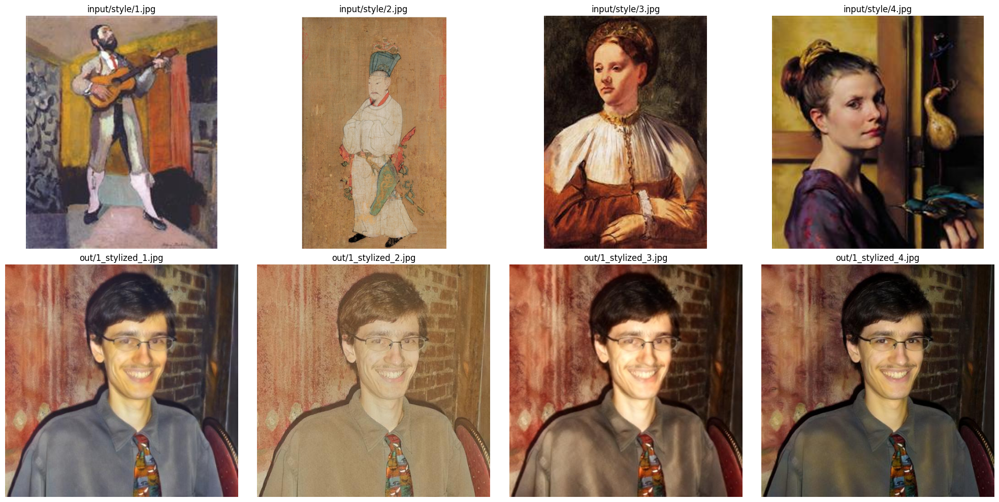

In [15]:
import cv2
import matplotlib.pyplot as plt


image_paths = [
    'input/style/1.jpg', 'input/style/2.jpg', 'input/style/3.jpg', 'input/style/4.jpg',
    'out/1_stylized_1.jpg', 'out/1_stylized_2.jpg', 'out/1_stylized_3.jpg', 'out/1_stylized_4.jpg'
]  

images = [cv2.imread(path) for path in image_paths]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, img, path in zip(axes.flatten(), images, image_paths):
    if img is not None:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        ax.axis('off')
        ax.set_title(path)

plt.tight_layout()
plt.show()


## Model using GAN

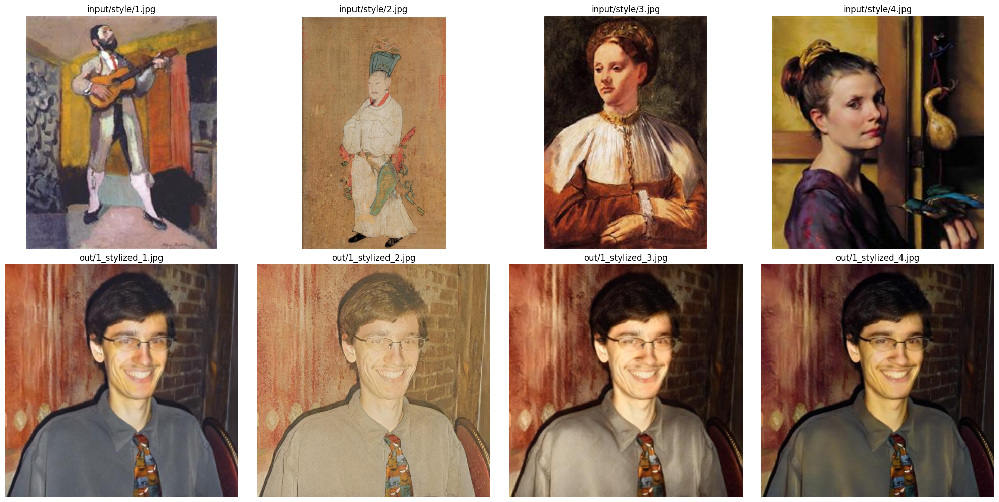

In [26]:
import cv2
import matplotlib.pyplot as plt


image_paths = [
    'input/style/1.jpg', 'input/style/2.jpg', 'input/style/3.jpg', 'input/style/4.jpg',
    'out/1_stylized_1.jpg', 'out/1_stylized_2.jpg', 'out/1_stylized_3.jpg', 'out/1_stylized_4.jpg'
]  

images = [cv2.imread(path) for path in image_paths]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, img, path in zip(axes.flatten(), images, image_paths):
    if img is not None:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        ax.axis('off')
        ax.set_title(path)

plt.tight_layout()
plt.show()

### Final our model loss(160000 epochs)

In [12]:
with open('logs/averaged_data_ni.txt', 'r', encoding='utf-8') as file: 
    content = file.read()
    
    print(content)

Tag: loss_content, Average of last 50 values: 19.60554901123047
Tag: loss_style, Average of last 50 values: 27.492417945861817
Tag: loss_identity1, Average of last 50 values: 0.004501772946678102
Tag: loss_identity2, Average of last 50 values: 5.736309823989868
Tag: total_loss, Average of last 50 values: 58.009783630371096
Tag: g_loss, Average of last 50 values: 2.4301914393901827
Tag: d_loss, Average of last 50 values: 0.30423450499773025



### baseline loss(160000 epochs)

In [13]:
with open('logs/averaged_data_base.txt', 'r', encoding='utf-8') as file: 
    content = file.read()
    
    print(content)

Tag: loss_content, Average of last 50 values: 17.702660236358643
Tag: loss_style, Average of last 50 values: 27.174458847045898
Tag: loss_identity1, Average of last 50 values: 0.0038679217174649237
Tag: loss_identity2, Average of last 50 values: 4.1502122926712035
Tag: total_loss, Average of last 50 values: 49.2980859375



## Model using downsample and upsample

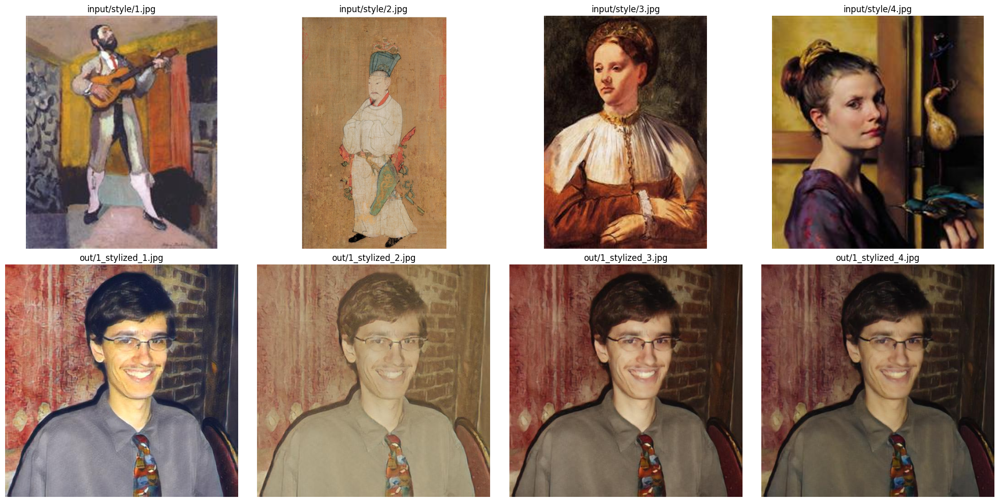

In [6]:
import cv2
import matplotlib.pyplot as plt


image_paths = [
    'input/style/1.jpg', 'input/style/2.jpg', 'input/style/3.jpg', 'input/style/4.jpg',
    'out/1_stylized_1.jpg', 'out/1_stylized_2.jpg', 'out/1_stylized_3.jpg', 'out/1_stylized_4.jpg'
]  

images = [cv2.imread(path) for path in image_paths]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, img, path in zip(axes.flatten(), images, image_paths):
    if img is not None:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        ax.axis('off')
        ax.set_title(path)

plt.tight_layout()
plt.show()

### Final our model loss(10000 epochs)

In [14]:
with open('logs/averaged_data_wang.txt', 'r', encoding='utf-8') as file: 
    content = file.read()
    
    print(content)

Tag: loss_content, Average of last 50 values: 21.104810218811036
Tag: loss_style, Average of last 50 values: 45.97329967498779
Tag: loss_identity1, Average of last 50 values: 0.01827878676354885
Tag: loss_identity2, Average of last 50 values: 23.333507537841797
Tag: total_loss, Average of last 50 values: 91.69113265991211



### baseline loss(10000 epochs)

In [11]:
with open('logs/averaged_data_base_10000.txt', 'r', encoding='utf-8') as file: 
    content = file.read()
    
    print(content)

Tag: loss_content, Average of last 50 values: 22.278670616149903
Tag: loss_style, Average of last 50 values: 47.939371299743655
Tag: loss_identity1, Average of last 50 values: 0.02256580278277397
Tag: loss_identity2, Average of last 50 values: 25.20504261016846
Tag: total_loss, Average of last 50 values: 97.0026904296875



# Discussion

### System Performance :

The project's approach to enhancing image style transfer technology was divided into two  methods, each focusing on different aspects of performance improvement.

**Base model: StyTr2 - a transformer-based model to achieve image transfer task**

 - Method 1: reduce the training time of the model by down-sampling and up-sampling the data
 
This method involved optimizing the processing speed of the image style transfer system by incorporating down-sampling before the encoder and up-sampling prior to the decoder. This technique effectively reduced the complexity of data processed by the transformer, resulting in an increase in training speed from 3.6 iterations per second (it/s) to 4.1 it/s and a reduction in average inference time from 0.661 seconds to 0.462 seconds. While the method significantly enhanced the efficiency of the system, it maintained the effectiveness of the image conversion tasks, striking a balance between operational speed and the quality of the output.

- Method 2: make the output more accurate using Generative Adversarial Network

This method employed a Generative Adversarial Network (GAN) to improve the visual fidelity and adherence to the artistic styles of the output images. In this setup, the generator was tasked with creating high-quality synthetic images, while the discriminator evaluated their authenticity. The adversarial training process not only refined the capabilities of both the generator and discriminator over time but also highlighted the dynamic interplay between them. This method focused on enhancing the quality of the style transfer, ensuring that the images produced were visually appealing and true to the desired styles, though it occasionally faced challenges with the generator struggling to match the discriminator's performance, leading to fluctuating loss metrics.

### Strengths

The integration of advanced technologies such as transformers and GANs is a key strength. These models handle the global information of images more effectively than traditional CNNs, allowing for a better capture of long-range dependencies crucial for high-quality style transfer. The system also demonstrated improved speed and efficiency in both training and inference phases, making it more suitable for real-time applications.


### Weaknesses and Limitations

Despite the improvements brought by the two methods in the project, several weaknesses and limitations were evident. The first method, while increasing the processing speed, could potentially compromise the detail and fidelity of the final image due to the down-sampling process, particularly in handling complex image details. The second method, involving the GAN, highlighted a disparity between the generator and discriminator's performances, with the generator often lagging behind, leading to inconsistencies in image quality. Additionally, both methods contributed to increased model complexity, which could hinder scalability and pose challenges in training efficiency, particularly when adapting the system to handle high-resolution outputs or diverse artistic styles without losing detail.


### Future Work

Future work will focus on enhancing data processing with adaptive down-sampling and up-sampling techniques, improving GAN performance through balanced training and advanced generator architectures, increasing scalability and efficiency via model compression and distributed training, expanding the style database to include more diverse artistic styles, and optimizing the system for real-time applications with low-latency inference and edge computing.  Additionally, developing user-friendly interfaces and customization options will enhance the user experience and allow for greater control over the style transfer process. And we will expand the Style Database that including More Diverse Artistic Styles, curating a broader and more diverse database of artistic styles from various cultures, historical periods, and contemporary movements to enrich the style transfer possibilities. Developing algorithms that can dynamically blend multiple styles in real-time, offering users unique and hybrid artistic effects.


You can also see our code at https://github.com/MichaelWang2000/comp9444proj